# GAN - first tries

We are implementing a simple feed-forward GAN architecture on MNIST - just to get the feeling right.

## Loading data

In [1]:
from tensorflow.keras.datasets import mnist
import numpy as np

In [2]:
(train_data,_),(test_data,_) = mnist.load_data()

In [3]:
# The more the merrier :-)
# Remember, this is unsupervised learning, so "holdout" and such makes less sense
data = np.concatenate((train_data,test_data),axis=0)

In [4]:
data.shape

(70000, 28, 28)

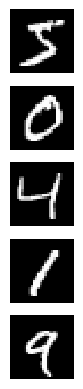

In [5]:
import matplotlib.pyplot as plt

example_count = 5

for ex in range(example_count):
    plt.subplot(5, example_count//5, ex+1)
    plt.imshow(data[ex], interpolation="nearest", cmap="gray")
    plt.axis("off")

plt.show()

In [6]:
# Normalization betwenn -1 and 1 !!!!
quasi_mean = data.max()/2 # Max is always 255, so this works ok.
data = (data.astype(np.float32)-quasi_mean)/quasi_mean

In [7]:
# NOT Flattening of the image vectors!!!!
# This is a convolutional model, so it works well with 2D data
# data = data.reshape(data.shape[0],-1)

# Instead, we add a new "channel" axis to the data. 
# Since this is grayscale, that is only 1 channel.

data = data[...,np.newaxis]

data.shape

(70000, 28, 28, 1)

## Parameters

### Training parameters

We will be forced to do manual batching here, so we have to calcculate the number of batches manually, and iterate on a per batch basis.

In [8]:
EPOCHS = 100
BATCH_SIZE = 200
HALF_BATCH = BATCH_SIZE // 2
BATCH_NUM = (data.shape[0] // BATCH_SIZE)
if data.shape[0] % BATCH_SIZE:
    BATCH_NUM+=1
Z_DIM = 100


### Model parameters


Please remember:

<img src="https://miro.medium.com/max/760/1*B7y91tLgeWE-EuuFP-1XwA.png" width=65%>

And:

<img src="https://qph.fs.quoracdn.net/main-qimg-d4023fe66cac95238a76ea1b5bc21d84" wudth=45%>

In [9]:
GENERATOR_INITIAL_IMAGE_SIZE = 7
GENERATOR_INITIAL_IMAGE_CHANNELS = 128
GENERATOR_L1_DIM = GENERATOR_INITIAL_IMAGE_SIZE*GENERATOR_INITIAL_IMAGE_SIZE*GENERATOR_INITIAL_IMAGE_CHANNELS 
# eg. 7*7 image, 128 channels it will be, and we go DOWN with the channels from there

# We have to take care, that the final shape of all generator convolutions results in 28*28*1, 
# so it is a kind of balancing act
GENERATOR_L2_DIM = 64
GENERATOR_L2_KERNEL_SIZE = (5,5)
GENERATOR_OUTPUT_DIM = 1 # Number of output CHANNELS!!!!
GENERATOR_OUTPUT_KERNEL_SIZE = (5,5)

GENERATOR_L3_DIM = 1024

DISCRIMINATOR_L1_DIM = 64
DISCRIMINATOR_L1_KERNEL_SIZE = (5,5)
DISCRIMINATOR_L2_DIM = 128
DISCRIMINATOR_L2_KERNEL_SIZE = (5,5)

LEAKY_ALPHA = 0.2

## Model building

In [10]:
import tensorflow as tf

# Some empirically set values. 
# It might well be worth experimenting with newer optimizers / settings
optimizer = tf.keras.optimizers.legacy.Adam(learning_rate=2e-4, beta_1=0.5)

### Generator

In [11]:
from tensorflow.keras.layers import Input, Dense, LeakyReLU, Conv2D, Flatten, Reshape, BatchNormalization, UpSampling2D
from tensorflow.keras.models import Model

In [12]:
### Define the generator!
#########################

# We use FUNCTIONAL API!

# The generator always gets a noise vector as input
noise_input = Input(shape=(Z_DIM,))

# Define the first layer of the fully connected network, without activation!
# Use the parameters defined with capital letter constants in the cells above for node counts!
g_layer_1 = Dense(GENERATOR_L1_DIM)(noise_input)

# But we do have to ensure that the input for anything convolutional is 2D + channel, so reshape is in order
# remeber, it is image szie * image size * channels
# ant this is the initial "image"
# USE THE DEFINED CONSTANTS FROM ABOVE, and define a reshape layer!
reshaped_layer = Reshape((GENERATOR_INITIAL_IMAGE_SIZE, GENERATOR_INITIAL_IMAGE_SIZE, GENERATOR_INITIAL_IMAGE_CHANNELS))(g_layer_1)

# Define a non-linearity, namely leaky relu on this layer!
# We use LeakyReLU for avoiding sparsity - other options are viable also, just not normal relu
# use the alpha value defined in constants above!
g_layer_1_nonlin = LeakyReLU(alpha=LEAKY_ALPHA)(reshaped_layer)

# For stability, we add a batch normalization layer - no extra settings.
g_layer_1_batchnorm = BatchNormalization()(g_layer_1_nonlin)

# Now we use Upsampling to gradually get the image resolution up, by doubling
# upsampling layer does this without any extra parameters.
g_layer_2_upsample = UpSampling2D()(g_layer_1_batchnorm)
# As a result we have 14*14*128 - with the above default settings

# Furthermore we use convolutions to get the number of channels down
# Define a convolutional layer to get down to the layer 2 dimension of generator (number of filters)
# Use the defined constant from above for layer 2 kernel size, and use _"same"_ padding
g_layer_2_conv = Conv2D(GENERATOR_L2_DIM, GENERATOR_L2_KERNEL_SIZE, padding='same')(g_layer_2_upsample)
# As a result we get 14*14*64 - with the above default settings

# And again a non linearity as above, please...
g_layer_2_nonlin = LeakyReLU(alpha=LEAKY_ALPHA)(g_layer_2_conv)
# And a batch normalization, as above, please...
g_layer_2_batchnorm = BatchNormalization()(g_layer_2_nonlin)

# Now we again use Upsampling to gradually get the image resolution up, by doubling
g_layer_3_upsample = UpSampling2D()(g_layer_2_batchnorm)
# As a result we have 28*28*64 - with the above default settings

# Furthermore we use Conv2D to get the number of channels down
# Define a convolutional layer to get down to the output layer dimension of generator (number of filters)
# Use the defined constant from above for output layer kernel size, and use _"same"_ padding
# USE A NON-LINEARITY TO PROJECT BETWEEN -1 and 1!!! 
# Remember, the images are normalized!
g_output_layer = Conv2D(GENERATOR_OUTPUT_DIM, GENERATOR_OUTPUT_KERNEL_SIZE, padding='same', activation='tanh')(g_layer_3_upsample)
# As a result we get 28*28*1 - with the above default settings
# And please notice, that we used an activation, so our pixels get between -1 and 1 again
# This should now be indistinguishable from an input image - hopefully

# Please instantiate the model!
generator = Model(inputs=noise_input, outputs=g_output_layer)

# Please remeber, that the loss for the discriminator will be a binary loss, so this applies here also
# Use the appropriate loss measure!
generator.compile(loss='binary_crossentropy', optimizer=optimizer)
# Think about this carefully, please!

### Discriminator

In [13]:
### Define the discriminator!
#############################

# We still use FUNCTIONAL API!

# The discriminator always gets original sized images, so 28x28x1 (channel) as inputs
image_input = Input(shape=(28, 28, 1))

# Define the first convolutional layer of the discriminator!
# Use the above defined constants for  filter number and kernel size!
# We use strides of 2,2 instead of pooling, which is a sparse operator, and _"same"_ padding
d_layer_1 = Conv2D(DISCRIMINATOR_L1_DIM, DISCRIMINATOR_L1_KERNEL_SIZE, strides=(2, 2), padding="same")(image_input)
# And add a non-linearity, as in the discriminator, please...
d_layer_1_nonlin = LeakyReLU(alpha=LEAKY_ALPHA)(d_layer_1)

# Repet the block again, please!
d_layer_2 = Conv2D(DISCRIMINATOR_L2_DIM, DISCRIMINATOR_L2_KERNEL_SIZE, strides=(2, 2), padding="same")(d_layer_1_nonlin)
d_layer_2_nonlin = LeakyReLU(alpha=LEAKY_ALPHA)(d_layer_2)

# Please use an appropriate operation 
# to make the output of the previos conv compatible with a fully connected layer!
d_layer_2_flattened = Flatten()(d_layer_2_nonlin)

# Please implement the output layer!
# The output of the discriminator is a single binary decision, 
# so one use an appropriate activation and dimensionality!
d_output_layer = Dense(1, activation='sigmoid')(d_layer_2_flattened)

# Please instantiate the model!
discriminator = Model(inputs=image_input, outputs=d_output_layer)

# Please remeber, that the loss for the discriminator will be a binary loss, so this applies here also
# Use the appropriate loss measure!
discriminator.compile(loss='binary_crossentropy', optimizer=optimizer)

### Joint model

In [14]:
### Define the GAN itself!
##########################


# STOP!!!!!!
# This is a crucial line, since in the joint model, discriminator will be frozen, so no weight update!
discriminator.trainable = False

# Remove this .... if you understand, why the above line is here!

# What is the input for the whole GAN?
# Think about the case, when the generator generates, the discriminator only discriminates it's output!
gan_input = Input(shape=(Z_DIM,))

# Use the generator as a function on the input!
generated_image = generator(gan_input)
# Use the discriminator as a function on the fake images!
gan_output = discriminator(generated_image)

# Instantiate the joint model, appropriate input and output!
joint_model = Model(inputs=gan_input, outputs=gan_output)

# Please think about, why it can be true, that for the joint model a binary decision is still adequate!
joint_model.compile(loss='binary_crossentropy', optimizer=optimizer)
# Maybe it will get clear below in the training loop...

## Helper functions for visualization

In [15]:
# Nothing to see here! :-P

from matplotlib import pyplot as plt
import matplotlib.image as mpimg


def get_example_images(epoch, example_count=25):
    input_noise = np.random.normal(0,1, size=(example_count,Z_DIM))
    generated_images = generator.predict(input_noise)
    generated_images = generated_images.reshape(example_count, 28, 28)
    
    plt.figure(figsize = (5, example_count // 5))
    for ex in range(example_count):
        plt.subplot(5, example_count//5, ex+1)
        plt.imshow(generated_images[ex], interpolation="nearest", cmap="gray")
        plt.axis("off")
    plt.tight_layout()
    plt.savefig("DCGAN_example_images_epoch_num_{0}.png".format(epoch))

def show_image_for_epoch(epoch):
    imgname = "DCGAN_example_images_epoch_num_"+str(epoch)+".png"
    img = mpimg.imread(imgname)
    imgplot = plt.imshow(img)
    plt.show()


## Training

Sadly, we can not use simple `fit()`, but have to construct the main training loop ourselves.

  0%|          | 0/350 [00:00<?, ?it/s]

4/4 [==============================] - 0s 10ms/step


  0%|          | 1/350 [00:01<07:17,  1.25s/it]

4/4 [==============================] - 0s 11ms/step


  1%|          | 2/350 [00:01<04:37,  1.25it/s]

4/4 [==============================] - 0s 11ms/step


  1%|          | 3/350 [00:02<03:45,  1.54it/s]

4/4 [==============================] - 0s 10ms/step


  1%|          | 4/350 [00:02<03:13,  1.79it/s]

4/4 [==============================] - 0s 10ms/step


  1%|▏         | 5/350 [00:03<02:55,  1.97it/s]

4/4 [==============================] - 0s 10ms/step


  2%|▏         | 6/350 [00:03<02:43,  2.10it/s]

4/4 [==============================] - 0s 13ms/step


  2%|▏         | 7/350 [00:03<02:40,  2.14it/s]

4/4 [==============================] - 0s 10ms/step


  2%|▏         | 8/350 [00:04<02:34,  2.21it/s]

4/4 [==============================] - 0s 10ms/step


  3%|▎         | 9/350 [00:04<02:30,  2.26it/s]

4/4 [==============================] - 0s 10ms/step


  3%|▎         | 10/350 [00:05<02:38,  2.15it/s]

4/4 [==============================] - 0s 10ms/step


  3%|▎         | 11/350 [00:05<02:33,  2.21it/s]

4/4 [==============================] - 0s 10ms/step


  3%|▎         | 12/350 [00:06<02:33,  2.20it/s]

4/4 [==============================] - 0s 10ms/step


  4%|▎         | 13/350 [00:06<02:29,  2.25it/s]

4/4 [==============================] - 0s 12ms/step


  4%|▍         | 14/350 [00:07<02:30,  2.23it/s]

4/4 [==============================] - 0s 11ms/step


  4%|▍         | 15/350 [00:07<02:30,  2.22it/s]

4/4 [==============================] - 0s 11ms/step


  5%|▍         | 16/350 [00:07<02:32,  2.19it/s]

4/4 [==============================] - 0s 10ms/step


  5%|▍         | 17/350 [00:08<02:27,  2.25it/s]

4/4 [==============================] - 0s 10ms/step


  5%|▌         | 18/350 [00:08<02:28,  2.24it/s]

4/4 [==============================] - 0s 9ms/step


  5%|▌         | 19/350 [00:09<02:24,  2.29it/s]

4/4 [==============================] - 0s 10ms/step


  6%|▌         | 20/350 [00:09<02:22,  2.32it/s]

4/4 [==============================] - 0s 10ms/step


  6%|▌         | 21/350 [00:10<02:20,  2.34it/s]

4/4 [==============================] - 0s 10ms/step


  6%|▋         | 22/350 [00:10<02:21,  2.31it/s]

4/4 [==============================] - 0s 12ms/step


  7%|▋         | 23/350 [00:10<02:24,  2.27it/s]

4/4 [==============================] - 0s 11ms/step


  7%|▋         | 24/350 [00:11<02:27,  2.20it/s]

4/4 [==============================] - 0s 10ms/step


  7%|▋         | 25/350 [00:11<02:24,  2.24it/s]

4/4 [==============================] - 0s 10ms/step


  7%|▋         | 26/350 [00:12<02:21,  2.29it/s]

4/4 [==============================] - 0s 10ms/step


  8%|▊         | 27/350 [00:12<02:18,  2.33it/s]

4/4 [==============================] - 0s 9ms/step


  8%|▊         | 28/350 [00:13<02:20,  2.29it/s]

4/4 [==============================] - 0s 10ms/step


  8%|▊         | 29/350 [00:13<02:17,  2.33it/s]

4/4 [==============================] - 0s 10ms/step


  9%|▊         | 30/350 [00:13<02:16,  2.35it/s]

4/4 [==============================] - 0s 11ms/step


  9%|▉         | 31/350 [00:14<02:15,  2.36it/s]

4/4 [==============================] - 0s 10ms/step


  9%|▉         | 32/350 [00:14<02:16,  2.33it/s]

4/4 [==============================] - 0s 11ms/step


  9%|▉         | 33/350 [00:15<02:20,  2.26it/s]

4/4 [==============================] - 0s 10ms/step


 10%|▉         | 34/350 [00:15<02:19,  2.26it/s]

4/4 [==============================] - 0s 11ms/step


 10%|█         | 35/350 [00:16<02:17,  2.29it/s]

4/4 [==============================] - 0s 10ms/step


 10%|█         | 36/350 [00:16<02:18,  2.27it/s]

4/4 [==============================] - 0s 11ms/step


 11%|█         | 37/350 [00:17<02:21,  2.22it/s]

4/4 [==============================] - 0s 10ms/step


 11%|█         | 38/350 [00:17<02:17,  2.28it/s]

4/4 [==============================] - 0s 10ms/step


 11%|█         | 39/350 [00:17<02:14,  2.32it/s]

4/4 [==============================] - 0s 10ms/step


 11%|█▏        | 40/350 [00:18<02:12,  2.34it/s]

4/4 [==============================] - 0s 16ms/step


 12%|█▏        | 41/350 [00:18<02:14,  2.29it/s]

4/4 [==============================] - 0s 11ms/step


 12%|█▏        | 42/350 [00:19<02:14,  2.30it/s]

4/4 [==============================] - 0s 10ms/step


 12%|█▏        | 43/350 [00:19<02:14,  2.28it/s]

4/4 [==============================] - 0s 11ms/step


 13%|█▎        | 44/350 [00:20<02:15,  2.26it/s]

4/4 [==============================] - 0s 12ms/step


 13%|█▎        | 45/350 [00:20<02:18,  2.20it/s]

4/4 [==============================] - 0s 10ms/step


 13%|█▎        | 46/350 [00:21<02:18,  2.20it/s]

4/4 [==============================] - 0s 10ms/step


 13%|█▎        | 47/350 [00:21<02:14,  2.26it/s]

4/4 [==============================] - 0s 10ms/step


 14%|█▎        | 48/350 [00:21<02:11,  2.29it/s]

4/4 [==============================] - 0s 10ms/step


 14%|█▍        | 49/350 [00:22<02:09,  2.32it/s]

4/4 [==============================] - 0s 10ms/step


 14%|█▍        | 50/350 [00:22<02:15,  2.21it/s]

4/4 [==============================] - 0s 12ms/step


 15%|█▍        | 51/350 [00:23<02:16,  2.19it/s]

4/4 [==============================] - 0s 10ms/step


 15%|█▍        | 52/350 [00:23<02:13,  2.24it/s]

4/4 [==============================] - 0s 11ms/step


 15%|█▌        | 53/350 [00:24<02:10,  2.28it/s]

4/4 [==============================] - 0s 10ms/step


 15%|█▌        | 54/350 [00:24<02:07,  2.32it/s]

4/4 [==============================] - 0s 11ms/step


 16%|█▌        | 55/350 [00:25<02:09,  2.28it/s]

4/4 [==============================] - 0s 10ms/step


 16%|█▌        | 56/350 [00:25<02:06,  2.32it/s]

4/4 [==============================] - 0s 10ms/step


 16%|█▋        | 57/350 [00:25<02:05,  2.33it/s]

4/4 [==============================] - 0s 10ms/step


 17%|█▋        | 58/350 [00:26<02:06,  2.31it/s]

4/4 [==============================] - 0s 11ms/step


 17%|█▋        | 59/350 [00:26<02:06,  2.30it/s]

4/4 [==============================] - 0s 21ms/step


 17%|█▋        | 60/350 [00:27<02:10,  2.22it/s]

4/4 [==============================] - 0s 10ms/step


 17%|█▋        | 61/350 [00:27<02:08,  2.25it/s]

4/4 [==============================] - 0s 11ms/step


 18%|█▊        | 62/350 [00:28<02:07,  2.26it/s]

4/4 [==============================] - 0s 12ms/step


 18%|█▊        | 63/350 [00:28<02:09,  2.22it/s]

4/4 [==============================] - 0s 11ms/step


 18%|█▊        | 64/350 [00:29<02:07,  2.24it/s]

4/4 [==============================] - 0s 12ms/step


 19%|█▊        | 65/350 [00:29<02:05,  2.26it/s]

4/4 [==============================] - 0s 11ms/step


 19%|█▉        | 66/350 [00:29<02:04,  2.28it/s]

4/4 [==============================] - 0s 15ms/step


 19%|█▉        | 67/350 [00:30<02:09,  2.19it/s]

4/4 [==============================] - 0s 11ms/step


 19%|█▉        | 68/350 [00:30<02:07,  2.20it/s]

4/4 [==============================] - 0s 10ms/step


 20%|█▉        | 69/350 [00:31<02:05,  2.23it/s]

4/4 [==============================] - 0s 11ms/step


 20%|██        | 70/350 [00:31<02:07,  2.19it/s]

4/4 [==============================] - 0s 12ms/step


 20%|██        | 71/350 [00:32<02:05,  2.22it/s]

4/4 [==============================] - 0s 10ms/step


 21%|██        | 72/350 [00:32<02:04,  2.24it/s]

4/4 [==============================] - 0s 11ms/step


 21%|██        | 73/350 [00:33<02:05,  2.21it/s]

4/4 [==============================] - 0s 13ms/step


 21%|██        | 74/350 [00:33<02:07,  2.17it/s]

4/4 [==============================] - 0s 11ms/step


 21%|██▏       | 75/350 [00:34<02:07,  2.16it/s]

4/4 [==============================] - 0s 12ms/step


 22%|██▏       | 76/350 [00:34<02:04,  2.20it/s]

4/4 [==============================] - 0s 11ms/step


 22%|██▏       | 77/350 [00:34<02:01,  2.24it/s]

4/4 [==============================] - 0s 10ms/step


 22%|██▏       | 78/350 [00:35<01:59,  2.28it/s]

4/4 [==============================] - 0s 15ms/step


 23%|██▎       | 79/350 [00:35<02:04,  2.18it/s]

4/4 [==============================] - 0s 12ms/step


 23%|██▎       | 80/350 [00:36<02:06,  2.14it/s]

4/4 [==============================] - 0s 12ms/step


 23%|██▎       | 81/350 [00:36<02:12,  2.03it/s]

4/4 [==============================] - 0s 13ms/step


 23%|██▎       | 82/350 [00:37<02:14,  2.00it/s]

4/4 [==============================] - 0s 15ms/step


 24%|██▎       | 83/350 [00:37<02:14,  1.98it/s]

4/4 [==============================] - 0s 10ms/step


 24%|██▍       | 84/350 [00:38<02:10,  2.04it/s]

4/4 [==============================] - 0s 13ms/step


 24%|██▍       | 85/350 [00:38<02:15,  1.96it/s]

4/4 [==============================] - 0s 13ms/step


 25%|██▍       | 86/350 [00:39<02:13,  1.98it/s]

4/4 [==============================] - 0s 12ms/step


 25%|██▍       | 87/350 [00:39<02:11,  2.00it/s]

4/4 [==============================] - 0s 11ms/step


 25%|██▌       | 88/350 [00:40<02:13,  1.96it/s]

4/4 [==============================] - 0s 11ms/step


 25%|██▌       | 89/350 [00:40<02:11,  1.98it/s]

4/4 [==============================] - 0s 12ms/step


 26%|██▌       | 90/350 [00:41<02:09,  2.01it/s]

4/4 [==============================] - 0s 11ms/step


 26%|██▌       | 91/350 [00:41<02:08,  2.01it/s]

4/4 [==============================] - 0s 11ms/step


 26%|██▋       | 92/350 [00:42<02:05,  2.06it/s]

4/4 [==============================] - 0s 13ms/step


 27%|██▋       | 93/350 [00:42<02:04,  2.06it/s]

4/4 [==============================] - 0s 12ms/step


 27%|██▋       | 94/350 [00:43<02:01,  2.11it/s]

4/4 [==============================] - 0s 14ms/step


 27%|██▋       | 95/350 [00:43<02:00,  2.11it/s]

4/4 [==============================] - 0s 11ms/step


 27%|██▋       | 96/350 [00:44<01:56,  2.17it/s]

4/4 [==============================] - 0s 11ms/step


 28%|██▊       | 97/350 [00:44<01:54,  2.22it/s]

4/4 [==============================] - 0s 11ms/step


 28%|██▊       | 98/350 [00:45<01:54,  2.20it/s]

4/4 [==============================] - 0s 11ms/step


 28%|██▊       | 99/350 [00:45<01:51,  2.24it/s]

4/4 [==============================] - 0s 11ms/step


 29%|██▊       | 100/350 [00:45<01:50,  2.25it/s]

4/4 [==============================] - 0s 10ms/step


 29%|██▉       | 101/350 [00:46<01:51,  2.24it/s]

4/4 [==============================] - 0s 10ms/step


 29%|██▉       | 102/350 [00:46<01:49,  2.27it/s]

4/4 [==============================] - 0s 11ms/step


 29%|██▉       | 103/350 [00:47<01:48,  2.28it/s]

4/4 [==============================] - 0s 11ms/step


 30%|██▉       | 104/350 [00:47<01:46,  2.30it/s]

4/4 [==============================] - 0s 10ms/step


 30%|███       | 105/350 [00:48<01:48,  2.25it/s]

4/4 [==============================] - 0s 12ms/step


 30%|███       | 106/350 [00:48<01:47,  2.27it/s]

4/4 [==============================] - 0s 11ms/step


 31%|███       | 107/350 [00:48<01:46,  2.28it/s]

4/4 [==============================] - 0s 11ms/step


 31%|███       | 108/350 [00:49<01:48,  2.24it/s]

4/4 [==============================] - 0s 12ms/step


 31%|███       | 109/350 [00:49<01:49,  2.20it/s]

4/4 [==============================] - 0s 23ms/step


 31%|███▏      | 110/350 [00:50<01:52,  2.14it/s]

4/4 [==============================] - 0s 12ms/step


 32%|███▏      | 111/350 [00:50<01:52,  2.12it/s]

4/4 [==============================] - 0s 12ms/step


 32%|███▏      | 112/350 [00:51<01:51,  2.14it/s]

4/4 [==============================] - 0s 11ms/step


 32%|███▏      | 113/350 [00:51<01:49,  2.17it/s]

4/4 [==============================] - 0s 11ms/step


 33%|███▎      | 114/350 [00:52<01:47,  2.20it/s]

4/4 [==============================] - 0s 13ms/step


 33%|███▎      | 115/350 [00:52<01:47,  2.18it/s]

4/4 [==============================] - 0s 13ms/step


 33%|███▎      | 116/350 [00:53<01:52,  2.09it/s]

4/4 [==============================] - 0s 13ms/step


 33%|███▎      | 117/350 [00:53<01:50,  2.10it/s]

4/4 [==============================] - 0s 11ms/step


 34%|███▎      | 118/350 [00:54<01:48,  2.15it/s]

4/4 [==============================] - 0s 12ms/step


 34%|███▍      | 119/350 [00:54<01:45,  2.18it/s]

4/4 [==============================] - 0s 14ms/step


 34%|███▍      | 120/350 [00:55<01:46,  2.17it/s]

4/4 [==============================] - 0s 10ms/step


 35%|███▍      | 121/350 [00:55<01:43,  2.21it/s]

4/4 [==============================] - 0s 11ms/step


 35%|███▍      | 122/350 [00:55<01:42,  2.23it/s]

4/4 [==============================] - 0s 11ms/step


 35%|███▌      | 123/350 [00:56<01:42,  2.23it/s]

4/4 [==============================] - 0s 11ms/step


 35%|███▌      | 124/350 [00:56<01:40,  2.26it/s]

4/4 [==============================] - 0s 11ms/step


 36%|███▌      | 125/350 [00:57<01:38,  2.28it/s]

4/4 [==============================] - 0s 11ms/step


 36%|███▌      | 126/350 [00:57<01:39,  2.26it/s]

4/4 [==============================] - 0s 11ms/step


 36%|███▋      | 127/350 [00:58<01:37,  2.28it/s]

4/4 [==============================] - 0s 10ms/step


 37%|███▋      | 128/350 [00:58<01:36,  2.29it/s]

4/4 [==============================] - 0s 11ms/step


 37%|███▋      | 129/350 [00:59<01:38,  2.25it/s]

4/4 [==============================] - 0s 11ms/step


 37%|███▋      | 130/350 [00:59<01:36,  2.28it/s]

4/4 [==============================] - 0s 10ms/step


 37%|███▋      | 131/350 [00:59<01:35,  2.28it/s]

4/4 [==============================] - 0s 11ms/step


 38%|███▊      | 132/350 [01:00<01:37,  2.25it/s]

4/4 [==============================] - 0s 10ms/step


 38%|███▊      | 133/350 [01:00<01:35,  2.27it/s]

4/4 [==============================] - 0s 11ms/step


 38%|███▊      | 134/350 [01:01<01:34,  2.30it/s]

4/4 [==============================] - 0s 12ms/step


 39%|███▊      | 135/350 [01:01<01:38,  2.18it/s]

4/4 [==============================] - 0s 14ms/step


 39%|███▉      | 136/350 [01:02<01:40,  2.13it/s]

4/4 [==============================] - 0s 11ms/step


 39%|███▉      | 137/350 [01:02<01:37,  2.18it/s]

4/4 [==============================] - 0s 18ms/step


 39%|███▉      | 138/350 [01:03<01:39,  2.13it/s]

4/4 [==============================] - 0s 11ms/step


 40%|███▉      | 139/350 [01:03<01:36,  2.18it/s]

4/4 [==============================] - 0s 13ms/step


 40%|████      | 140/350 [01:04<01:36,  2.17it/s]

4/4 [==============================] - 0s 11ms/step


 40%|████      | 141/350 [01:04<01:44,  2.01it/s]

4/4 [==============================] - 0s 13ms/step


 41%|████      | 142/350 [01:05<01:42,  2.02it/s]

4/4 [==============================] - 0s 12ms/step


 41%|████      | 143/350 [01:05<01:40,  2.06it/s]

4/4 [==============================] - 0s 19ms/step


 41%|████      | 144/350 [01:06<01:39,  2.07it/s]

4/4 [==============================] - 0s 12ms/step


 41%|████▏     | 145/350 [01:06<01:37,  2.11it/s]

4/4 [==============================] - 0s 20ms/step


 42%|████▏     | 146/350 [01:07<01:38,  2.07it/s]

4/4 [==============================] - 0s 12ms/step


 42%|████▏     | 147/350 [01:07<01:36,  2.09it/s]

4/4 [==============================] - 0s 13ms/step


 42%|████▏     | 148/350 [01:08<01:42,  1.96it/s]

4/4 [==============================] - 0s 12ms/step


 43%|████▎     | 149/350 [01:08<01:43,  1.95it/s]

4/4 [==============================] - 0s 11ms/step


 43%|████▎     | 150/350 [01:09<01:39,  2.02it/s]

4/4 [==============================] - 0s 12ms/step


 43%|████▎     | 151/350 [01:09<01:36,  2.07it/s]

4/4 [==============================] - 0s 11ms/step


 43%|████▎     | 152/350 [01:09<01:33,  2.13it/s]

4/4 [==============================] - 0s 12ms/step


 44%|████▎     | 153/350 [01:10<01:30,  2.17it/s]

4/4 [==============================] - 0s 10ms/step


 44%|████▍     | 154/350 [01:10<01:28,  2.22it/s]

4/4 [==============================] - 0s 11ms/step


 44%|████▍     | 155/350 [01:11<01:27,  2.24it/s]

4/4 [==============================] - 0s 10ms/step


 45%|████▍     | 156/350 [01:11<01:25,  2.26it/s]

4/4 [==============================] - 0s 11ms/step


 45%|████▍     | 157/350 [01:12<01:25,  2.26it/s]

4/4 [==============================] - 0s 10ms/step


 45%|████▌     | 158/350 [01:12<01:24,  2.27it/s]

4/4 [==============================] - 0s 10ms/step


 45%|████▌     | 159/350 [01:12<01:24,  2.27it/s]

4/4 [==============================] - 0s 11ms/step


 46%|████▌     | 160/350 [01:13<01:27,  2.17it/s]

4/4 [==============================] - 0s 11ms/step


 46%|████▌     | 161/350 [01:13<01:25,  2.20it/s]

4/4 [==============================] - 0s 11ms/step


 46%|████▋     | 162/350 [01:14<01:25,  2.20it/s]

4/4 [==============================] - 0s 11ms/step


 47%|████▋     | 163/350 [01:14<01:24,  2.21it/s]

4/4 [==============================] - 0s 10ms/step


 47%|████▋     | 164/350 [01:15<01:24,  2.21it/s]

4/4 [==============================] - 0s 11ms/step


 47%|████▋     | 165/350 [01:15<01:22,  2.25it/s]

4/4 [==============================] - 0s 10ms/step


 47%|████▋     | 166/350 [01:16<01:20,  2.28it/s]

4/4 [==============================] - 0s 10ms/step


 48%|████▊     | 167/350 [01:16<01:18,  2.32it/s]

4/4 [==============================] - 0s 11ms/step


 48%|████▊     | 168/350 [01:16<01:18,  2.31it/s]

4/4 [==============================] - 0s 10ms/step


 48%|████▊     | 169/350 [01:17<01:18,  2.32it/s]

4/4 [==============================] - 0s 10ms/step


 49%|████▊     | 170/350 [01:17<01:17,  2.33it/s]

4/4 [==============================] - 0s 11ms/step


 49%|████▉     | 171/350 [01:18<01:17,  2.30it/s]

4/4 [==============================] - 0s 14ms/step


 49%|████▉     | 172/350 [01:18<01:23,  2.14it/s]

4/4 [==============================] - 0s 11ms/step


 49%|████▉     | 173/350 [01:19<01:20,  2.19it/s]

4/4 [==============================] - 0s 10ms/step


 50%|████▉     | 174/350 [01:19<01:20,  2.18it/s]

4/4 [==============================] - 0s 12ms/step


 50%|█████     | 175/350 [01:20<01:21,  2.15it/s]

4/4 [==============================] - 0s 14ms/step


 50%|█████     | 176/350 [01:20<01:25,  2.04it/s]

4/4 [==============================] - 0s 13ms/step


 51%|█████     | 177/350 [01:21<01:23,  2.07it/s]

4/4 [==============================] - 0s 11ms/step


 51%|█████     | 178/350 [01:21<01:20,  2.13it/s]

4/4 [==============================] - 0s 11ms/step


 51%|█████     | 179/350 [01:22<01:20,  2.13it/s]

4/4 [==============================] - 0s 11ms/step


 51%|█████▏    | 180/350 [01:22<01:17,  2.18it/s]

4/4 [==============================] - 0s 15ms/step


 52%|█████▏    | 181/350 [01:23<01:17,  2.18it/s]

4/4 [==============================] - 0s 10ms/step


 52%|█████▏    | 182/350 [01:23<01:15,  2.21it/s]

4/4 [==============================] - 0s 11ms/step


 52%|█████▏    | 183/350 [01:23<01:15,  2.22it/s]

4/4 [==============================] - 0s 11ms/step


 53%|█████▎    | 184/350 [01:24<01:15,  2.21it/s]

4/4 [==============================] - 0s 12ms/step


 53%|█████▎    | 185/350 [01:24<01:15,  2.20it/s]

4/4 [==============================] - 0s 10ms/step


 53%|█████▎    | 186/350 [01:25<01:13,  2.24it/s]

4/4 [==============================] - 0s 10ms/step


 53%|█████▎    | 187/350 [01:25<01:12,  2.26it/s]

4/4 [==============================] - 0s 10ms/step


 54%|█████▎    | 188/350 [01:26<01:11,  2.26it/s]

4/4 [==============================] - 0s 10ms/step


 54%|█████▍    | 189/350 [01:26<01:11,  2.26it/s]

4/4 [==============================] - 0s 13ms/step


 54%|█████▍    | 190/350 [01:26<01:10,  2.27it/s]

4/4 [==============================] - 0s 10ms/step


 55%|█████▍    | 191/350 [01:27<01:09,  2.30it/s]

4/4 [==============================] - 0s 10ms/step


 55%|█████▍    | 192/350 [01:27<01:08,  2.30it/s]

4/4 [==============================] - 0s 10ms/step


 55%|█████▌    | 193/350 [01:28<01:09,  2.27it/s]

4/4 [==============================] - 0s 10ms/step


 55%|█████▌    | 194/350 [01:28<01:07,  2.30it/s]

4/4 [==============================] - 0s 14ms/step


 56%|█████▌    | 195/350 [01:29<01:07,  2.28it/s]

4/4 [==============================] - 0s 11ms/step


 56%|█████▌    | 196/350 [01:29<01:07,  2.27it/s]

4/4 [==============================] - 0s 11ms/step


 56%|█████▋    | 197/350 [01:30<01:07,  2.27it/s]

4/4 [==============================] - 0s 11ms/step


 57%|█████▋    | 198/350 [01:30<01:07,  2.26it/s]

4/4 [==============================] - 0s 10ms/step


 57%|█████▋    | 199/350 [01:30<01:07,  2.25it/s]

4/4 [==============================] - 0s 10ms/step


 57%|█████▋    | 200/350 [01:31<01:06,  2.26it/s]

4/4 [==============================] - 0s 11ms/step


 57%|█████▋    | 201/350 [01:31<01:05,  2.27it/s]

4/4 [==============================] - 0s 10ms/step


 58%|█████▊    | 202/350 [01:32<01:04,  2.29it/s]

4/4 [==============================] - 0s 10ms/step


 58%|█████▊    | 203/350 [01:32<01:03,  2.31it/s]

4/4 [==============================] - 0s 11ms/step


 58%|█████▊    | 204/350 [01:33<01:03,  2.30it/s]

4/4 [==============================] - 0s 11ms/step


 59%|█████▊    | 205/350 [01:33<01:05,  2.23it/s]

4/4 [==============================] - 0s 11ms/step


 59%|█████▉    | 206/350 [01:34<01:04,  2.24it/s]

4/4 [==============================] - 0s 10ms/step


 59%|█████▉    | 207/350 [01:34<01:02,  2.27it/s]

4/4 [==============================] - 0s 10ms/step


 59%|█████▉    | 208/350 [01:34<01:02,  2.28it/s]

4/4 [==============================] - 0s 11ms/step


 60%|█████▉    | 209/350 [01:35<01:01,  2.29it/s]

4/4 [==============================] - 0s 10ms/step


 60%|██████    | 210/350 [01:35<01:03,  2.20it/s]

4/4 [==============================] - 0s 13ms/step


 60%|██████    | 211/350 [01:36<01:07,  2.07it/s]

4/4 [==============================] - 0s 12ms/step


 61%|██████    | 212/350 [01:36<01:08,  2.01it/s]

4/4 [==============================] - 0s 11ms/step


 61%|██████    | 213/350 [01:37<01:07,  2.02it/s]

4/4 [==============================] - 0s 11ms/step


 61%|██████    | 214/350 [01:37<01:05,  2.09it/s]

4/4 [==============================] - 0s 11ms/step


 61%|██████▏   | 215/350 [01:38<01:03,  2.12it/s]

4/4 [==============================] - 0s 11ms/step


 62%|██████▏   | 216/350 [01:38<01:02,  2.15it/s]

4/4 [==============================] - 0s 14ms/step


 62%|██████▏   | 217/350 [01:39<01:02,  2.12it/s]

4/4 [==============================] - 0s 11ms/step


 62%|██████▏   | 218/350 [01:39<01:02,  2.10it/s]

4/4 [==============================] - 0s 14ms/step


 63%|██████▎   | 219/350 [01:40<01:03,  2.07it/s]

4/4 [==============================] - 0s 12ms/step


 63%|██████▎   | 220/350 [01:40<01:02,  2.09it/s]

4/4 [==============================] - 0s 11ms/step


 63%|██████▎   | 221/350 [01:41<01:03,  2.03it/s]

4/4 [==============================] - 0s 13ms/step


 63%|██████▎   | 222/350 [01:41<01:01,  2.08it/s]

4/4 [==============================] - 0s 13ms/step


 64%|██████▎   | 223/350 [01:42<01:01,  2.06it/s]

4/4 [==============================] - 0s 11ms/step


 64%|██████▍   | 224/350 [01:42<00:59,  2.13it/s]

4/4 [==============================] - 0s 11ms/step


 64%|██████▍   | 225/350 [01:43<00:57,  2.18it/s]

4/4 [==============================] - 0s 10ms/step


 65%|██████▍   | 226/350 [01:43<00:55,  2.24it/s]

4/4 [==============================] - 0s 11ms/step


 65%|██████▍   | 227/350 [01:43<00:54,  2.26it/s]

4/4 [==============================] - 0s 10ms/step


 65%|██████▌   | 228/350 [01:44<00:53,  2.28it/s]

4/4 [==============================] - 0s 11ms/step


 65%|██████▌   | 229/350 [01:44<00:52,  2.29it/s]

4/4 [==============================] - 0s 16ms/step


 66%|██████▌   | 230/350 [01:45<00:53,  2.25it/s]

4/4 [==============================] - 0s 10ms/step


 66%|██████▌   | 231/350 [01:45<00:52,  2.29it/s]

4/4 [==============================] - 0s 10ms/step


 66%|██████▋   | 232/350 [01:46<00:51,  2.30it/s]

4/4 [==============================] - 0s 10ms/step


 67%|██████▋   | 233/350 [01:46<00:50,  2.32it/s]

4/4 [==============================] - 0s 11ms/step


 67%|██████▋   | 234/350 [01:46<00:50,  2.31it/s]

4/4 [==============================] - 0s 13ms/step


 67%|██████▋   | 235/350 [01:47<00:51,  2.23it/s]

4/4 [==============================] - 0s 14ms/step


 67%|██████▋   | 236/350 [01:47<00:52,  2.18it/s]

4/4 [==============================] - 0s 13ms/step


 68%|██████▊   | 237/350 [01:48<00:51,  2.18it/s]

4/4 [==============================] - 0s 10ms/step


 68%|██████▊   | 238/350 [01:48<00:50,  2.22it/s]

4/4 [==============================] - 0s 13ms/step


 68%|██████▊   | 239/350 [01:49<00:50,  2.19it/s]

4/4 [==============================] - 0s 10ms/step


 69%|██████▊   | 240/350 [01:49<00:49,  2.21it/s]

4/4 [==============================] - 0s 10ms/step


 69%|██████▉   | 241/350 [01:50<00:48,  2.25it/s]

4/4 [==============================] - 0s 10ms/step


 69%|██████▉   | 242/350 [01:50<00:48,  2.22it/s]

4/4 [==============================] - 0s 12ms/step


 69%|██████▉   | 243/350 [01:50<00:47,  2.25it/s]

4/4 [==============================] - 0s 11ms/step


 70%|██████▉   | 244/350 [01:51<00:46,  2.26it/s]

4/4 [==============================] - 0s 13ms/step


 70%|███████   | 245/350 [01:51<00:49,  2.12it/s]

4/4 [==============================] - 0s 14ms/step


 70%|███████   | 246/350 [01:52<00:49,  2.08it/s]

4/4 [==============================] - 0s 12ms/step


 71%|███████   | 247/350 [01:52<00:50,  2.06it/s]

4/4 [==============================] - 0s 13ms/step


 71%|███████   | 248/350 [01:53<00:49,  2.07it/s]

4/4 [==============================] - 0s 13ms/step


 71%|███████   | 249/350 [01:53<00:50,  2.01it/s]

4/4 [==============================] - 0s 10ms/step


 71%|███████▏  | 250/350 [01:54<00:49,  2.04it/s]

4/4 [==============================] - 0s 13ms/step


 72%|███████▏  | 251/350 [01:54<00:49,  2.01it/s]

4/4 [==============================] - 0s 11ms/step


 72%|███████▏  | 252/350 [01:55<00:48,  2.00it/s]

4/4 [==============================] - 0s 12ms/step


 72%|███████▏  | 253/350 [01:55<00:48,  1.99it/s]

4/4 [==============================] - 0s 11ms/step


 73%|███████▎  | 254/350 [01:56<00:47,  2.04it/s]

4/4 [==============================] - 0s 11ms/step


 73%|███████▎  | 255/350 [01:56<00:46,  2.06it/s]

4/4 [==============================] - 0s 11ms/step


 73%|███████▎  | 256/350 [01:57<00:45,  2.08it/s]

4/4 [==============================] - 0s 12ms/step


 73%|███████▎  | 257/350 [01:57<00:45,  2.03it/s]

4/4 [==============================] - 0s 14ms/step


 74%|███████▎  | 258/350 [01:58<00:47,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


 74%|███████▍  | 259/350 [01:58<00:45,  1.99it/s]

4/4 [==============================] - 0s 11ms/step


 74%|███████▍  | 260/350 [01:59<00:43,  2.07it/s]

4/4 [==============================] - 0s 16ms/step


 75%|███████▍  | 261/350 [01:59<00:43,  2.04it/s]

4/4 [==============================] - 0s 12ms/step


 75%|███████▍  | 262/350 [02:00<00:41,  2.10it/s]

4/4 [==============================] - 0s 10ms/step


 75%|███████▌  | 263/350 [02:00<00:41,  2.11it/s]

4/4 [==============================] - 0s 11ms/step


 75%|███████▌  | 264/350 [02:01<00:40,  2.14it/s]

4/4 [==============================] - 0s 11ms/step


 76%|███████▌  | 265/350 [02:01<00:39,  2.16it/s]

4/4 [==============================] - 0s 14ms/step


 76%|███████▌  | 266/350 [02:02<00:40,  2.07it/s]

4/4 [==============================] - 0s 14ms/step


 76%|███████▋  | 267/350 [02:02<00:43,  1.89it/s]

4/4 [==============================] - 0s 13ms/step


 77%|███████▋  | 268/350 [02:03<00:43,  1.87it/s]

4/4 [==============================] - 0s 12ms/step


 77%|███████▋  | 269/350 [02:03<00:42,  1.92it/s]

4/4 [==============================] - 0s 12ms/step


 77%|███████▋  | 270/350 [02:04<00:40,  1.97it/s]

4/4 [==============================] - 0s 12ms/step


 77%|███████▋  | 271/350 [02:04<00:39,  2.00it/s]

4/4 [==============================] - 0s 12ms/step


 78%|███████▊  | 272/350 [02:05<00:38,  2.02it/s]

4/4 [==============================] - 0s 12ms/step


 78%|███████▊  | 273/350 [02:05<00:38,  1.98it/s]

4/4 [==============================] - 0s 12ms/step


 78%|███████▊  | 274/350 [02:06<00:37,  2.01it/s]

4/4 [==============================] - 0s 13ms/step


 79%|███████▊  | 275/350 [02:06<00:37,  2.00it/s]

4/4 [==============================] - 0s 12ms/step


 79%|███████▉  | 276/350 [02:07<00:37,  1.98it/s]

4/4 [==============================] - 0s 12ms/step


 79%|███████▉  | 277/350 [02:07<00:35,  2.04it/s]

4/4 [==============================] - 0s 10ms/step


 79%|███████▉  | 278/350 [02:08<00:33,  2.12it/s]

4/4 [==============================] - 0s 15ms/step


 80%|███████▉  | 279/350 [02:08<00:33,  2.09it/s]

4/4 [==============================] - 0s 13ms/step


 80%|████████  | 280/350 [02:09<00:33,  2.12it/s]

4/4 [==============================] - 0s 12ms/step


 80%|████████  | 281/350 [02:09<00:32,  2.14it/s]

4/4 [==============================] - 0s 12ms/step


 81%|████████  | 282/350 [02:10<00:31,  2.17it/s]

4/4 [==============================] - 0s 11ms/step


 81%|████████  | 283/350 [02:10<00:30,  2.19it/s]

4/4 [==============================] - 0s 12ms/step


 81%|████████  | 284/350 [02:11<00:29,  2.21it/s]

4/4 [==============================] - 0s 11ms/step


 81%|████████▏ | 285/350 [02:11<00:29,  2.23it/s]

4/4 [==============================] - 0s 11ms/step


 82%|████████▏ | 286/350 [02:11<00:28,  2.26it/s]

4/4 [==============================] - 0s 17ms/step


 82%|████████▏ | 287/350 [02:12<00:28,  2.22it/s]

4/4 [==============================] - 0s 11ms/step


 82%|████████▏ | 288/350 [02:12<00:27,  2.25it/s]

4/4 [==============================] - 0s 11ms/step


 83%|████████▎ | 289/350 [02:13<00:27,  2.26it/s]

4/4 [==============================] - 0s 12ms/step


 83%|████████▎ | 290/350 [02:13<00:26,  2.27it/s]

4/4 [==============================] - 0s 12ms/step


 83%|████████▎ | 291/350 [02:14<00:26,  2.24it/s]

4/4 [==============================] - 0s 11ms/step


 83%|████████▎ | 292/350 [02:14<00:25,  2.23it/s]

4/4 [==============================] - 0s 13ms/step


 84%|████████▎ | 293/350 [02:15<00:27,  2.07it/s]

4/4 [==============================] - 0s 17ms/step


 84%|████████▍ | 294/350 [02:15<00:27,  2.01it/s]

4/4 [==============================] - 0s 13ms/step


 84%|████████▍ | 295/350 [02:16<00:27,  1.98it/s]

4/4 [==============================] - 0s 14ms/step


 85%|████████▍ | 296/350 [02:16<00:28,  1.93it/s]

4/4 [==============================] - 0s 14ms/step


 85%|████████▍ | 297/350 [02:17<00:27,  1.96it/s]

4/4 [==============================] - 0s 11ms/step


 85%|████████▌ | 298/350 [02:17<00:26,  2.00it/s]

4/4 [==============================] - 0s 14ms/step


 85%|████████▌ | 299/350 [02:18<00:24,  2.07it/s]

4/4 [==============================] - 0s 16ms/step


 86%|████████▌ | 300/350 [02:18<00:23,  2.10it/s]

4/4 [==============================] - 0s 11ms/step


 86%|████████▌ | 301/350 [02:19<00:22,  2.14it/s]

4/4 [==============================] - 0s 14ms/step


 86%|████████▋ | 302/350 [02:19<00:22,  2.15it/s]

4/4 [==============================] - 0s 11ms/step


 87%|████████▋ | 303/350 [02:19<00:21,  2.19it/s]

4/4 [==============================] - 0s 12ms/step


 87%|████████▋ | 304/350 [02:20<00:20,  2.22it/s]

4/4 [==============================] - 0s 12ms/step


 87%|████████▋ | 305/350 [02:20<00:20,  2.24it/s]

4/4 [==============================] - 0s 11ms/step


 87%|████████▋ | 306/350 [02:21<00:19,  2.27it/s]

4/4 [==============================] - 0s 10ms/step


 88%|████████▊ | 307/350 [02:21<00:19,  2.20it/s]

4/4 [==============================] - 0s 13ms/step


 88%|████████▊ | 308/350 [02:22<00:18,  2.23it/s]

4/4 [==============================] - 0s 12ms/step


 88%|████████▊ | 309/350 [02:22<00:18,  2.24it/s]

4/4 [==============================] - 0s 12ms/step


 89%|████████▊ | 310/350 [02:23<00:17,  2.26it/s]

4/4 [==============================] - 0s 12ms/step


 89%|████████▉ | 311/350 [02:23<00:17,  2.24it/s]

4/4 [==============================] - 0s 12ms/step


 89%|████████▉ | 312/350 [02:23<00:16,  2.25it/s]

4/4 [==============================] - 0s 13ms/step


 89%|████████▉ | 313/350 [02:24<00:16,  2.24it/s]

4/4 [==============================] - 0s 16ms/step


 90%|████████▉ | 314/350 [02:24<00:16,  2.19it/s]

4/4 [==============================] - 0s 11ms/step


 90%|█████████ | 315/350 [02:25<00:15,  2.22it/s]

4/4 [==============================] - 0s 11ms/step


 90%|█████████ | 316/350 [02:25<00:15,  2.23it/s]

4/4 [==============================] - 0s 12ms/step


 91%|█████████ | 317/350 [02:26<00:14,  2.24it/s]

4/4 [==============================] - 0s 12ms/step


 91%|█████████ | 318/350 [02:26<00:14,  2.26it/s]

4/4 [==============================] - 0s 11ms/step


 91%|█████████ | 319/350 [02:27<00:13,  2.26it/s]

4/4 [==============================] - 0s 12ms/step


 91%|█████████▏| 320/350 [02:27<00:13,  2.27it/s]

4/4 [==============================] - 0s 20ms/step


 92%|█████████▏| 321/350 [02:28<00:13,  2.20it/s]

4/4 [==============================] - 0s 12ms/step


 92%|█████████▏| 322/350 [02:28<00:12,  2.22it/s]

4/4 [==============================] - 0s 11ms/step


 92%|█████████▏| 323/350 [02:28<00:12,  2.24it/s]

4/4 [==============================] - 0s 12ms/step


 93%|█████████▎| 324/350 [02:29<00:11,  2.24it/s]

4/4 [==============================] - 0s 13ms/step


 93%|█████████▎| 325/350 [02:29<00:11,  2.14it/s]

4/4 [==============================] - 0s 23ms/step


 93%|█████████▎| 326/350 [02:30<00:11,  2.01it/s]

4/4 [==============================] - 0s 13ms/step


 93%|█████████▎| 327/350 [02:30<00:11,  2.02it/s]

4/4 [==============================] - 0s 13ms/step


 94%|█████████▎| 328/350 [02:31<00:10,  2.02it/s]

4/4 [==============================] - 0s 11ms/step


 94%|█████████▍| 329/350 [02:31<00:10,  2.07it/s]

4/4 [==============================] - 0s 11ms/step


 94%|█████████▍| 330/350 [02:32<00:09,  2.06it/s]

4/4 [==============================] - 0s 15ms/step


 95%|█████████▍| 331/350 [02:32<00:09,  2.07it/s]

4/4 [==============================] - 0s 12ms/step


 95%|█████████▍| 332/350 [02:33<00:08,  2.12it/s]

4/4 [==============================] - 0s 13ms/step


 95%|█████████▌| 333/350 [02:33<00:07,  2.14it/s]

4/4 [==============================] - 0s 11ms/step


 95%|█████████▌| 334/350 [02:34<00:07,  2.19it/s]

4/4 [==============================] - 0s 11ms/step


 96%|█████████▌| 335/350 [02:34<00:06,  2.16it/s]

4/4 [==============================] - 0s 13ms/step


 96%|█████████▌| 336/350 [02:35<00:06,  2.16it/s]

4/4 [==============================] - 0s 11ms/step


 96%|█████████▋| 337/350 [02:35<00:06,  2.10it/s]

4/4 [==============================] - 0s 14ms/step


 97%|█████████▋| 338/350 [02:36<00:05,  2.03it/s]

4/4 [==============================] - 0s 15ms/step


 97%|█████████▋| 339/350 [02:36<00:05,  2.02it/s]

4/4 [==============================] - 0s 12ms/step


 97%|█████████▋| 340/350 [02:37<00:05,  1.96it/s]

4/4 [==============================] - 0s 12ms/step


 97%|█████████▋| 341/350 [02:37<00:04,  2.02it/s]

4/4 [==============================] - 0s 13ms/step


 98%|█████████▊| 342/350 [02:38<00:03,  2.02it/s]

4/4 [==============================] - 0s 12ms/step


 98%|█████████▊| 343/350 [02:38<00:03,  2.05it/s]

4/4 [==============================] - 0s 11ms/step


 98%|█████████▊| 344/350 [02:39<00:02,  2.09it/s]

4/4 [==============================] - 0s 12ms/step


 99%|█████████▊| 345/350 [02:39<00:02,  2.13it/s]

4/4 [==============================] - 0s 12ms/step


 99%|█████████▉| 346/350 [02:39<00:01,  2.13it/s]

4/4 [==============================] - 0s 13ms/step


 99%|█████████▉| 347/350 [02:40<00:01,  2.10it/s]

4/4 [==============================] - 0s 12ms/step


 99%|█████████▉| 348/350 [02:40<00:00,  2.12it/s]

4/4 [==============================] - 0s 13ms/step


100%|█████████▉| 349/350 [02:41<00:00,  2.12it/s]

4/4 [==============================] - 0s 13ms/step


100%|██████████| 350/350 [02:41<00:00,  2.16it/s]

Epoch number: 0 discriminator_loss: 0.43120960261672736 generator_loss: 2.1264325840132576
1/1 [==============================] - 0s 22ms/step


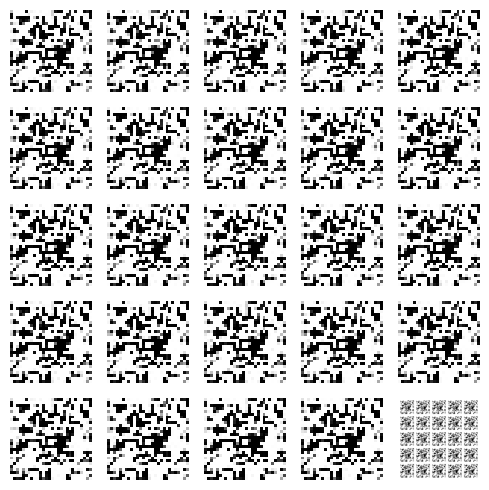

  0%|          | 0/350 [00:00<?, ?it/s]

4/4 [==============================] - 0s 15ms/step


  0%|          | 1/350 [00:00<02:51,  2.03it/s]

4/4 [==============================] - 0s 14ms/step


  1%|          | 2/350 [00:01<03:00,  1.93it/s]

4/4 [==============================] - 0s 13ms/step


  1%|          | 3/350 [00:01<02:58,  1.94it/s]

4/4 [==============================] - 0s 12ms/step


  1%|          | 4/350 [00:01<02:49,  2.04it/s]

4/4 [==============================] - 0s 13ms/step


  1%|▏         | 5/350 [00:02<02:47,  2.06it/s]

4/4 [==============================] - 0s 13ms/step


  2%|▏         | 6/350 [00:02<02:45,  2.08it/s]

4/4 [==============================] - 0s 12ms/step


  2%|▏         | 7/350 [00:03<02:40,  2.13it/s]

4/4 [==============================] - 0s 12ms/step


  2%|▏         | 8/350 [00:03<02:39,  2.15it/s]

4/4 [==============================] - 0s 12ms/step


  3%|▎         | 9/350 [00:04<02:41,  2.11it/s]

4/4 [==============================] - 0s 11ms/step


  3%|▎         | 10/350 [00:04<02:38,  2.14it/s]

4/4 [==============================] - 0s 12ms/step


  3%|▎         | 11/350 [00:05<02:35,  2.18it/s]

4/4 [==============================] - 0s 12ms/step


  3%|▎         | 12/350 [00:05<02:34,  2.19it/s]

4/4 [==============================] - 0s 11ms/step


  4%|▎         | 13/350 [00:06<02:32,  2.21it/s]

4/4 [==============================] - 0s 11ms/step


  4%|▍         | 14/350 [00:06<02:31,  2.22it/s]

4/4 [==============================] - 0s 12ms/step


  4%|▍         | 15/350 [00:07<02:35,  2.15it/s]

4/4 [==============================] - 0s 13ms/step


  5%|▍         | 16/350 [00:07<02:33,  2.18it/s]

4/4 [==============================] - 0s 13ms/step


  5%|▍         | 17/350 [00:07<02:31,  2.20it/s]

4/4 [==============================] - 0s 12ms/step


  5%|▌         | 18/350 [00:08<02:29,  2.21it/s]

4/4 [==============================] - 0s 10ms/step


  5%|▌         | 19/350 [00:08<02:28,  2.23it/s]

4/4 [==============================] - 0s 12ms/step


  6%|▌         | 20/350 [00:09<02:27,  2.24it/s]

4/4 [==============================] - 0s 12ms/step


  6%|▌         | 21/350 [00:09<02:32,  2.15it/s]

4/4 [==============================] - 0s 11ms/step


  6%|▋         | 22/350 [00:10<02:30,  2.18it/s]

4/4 [==============================] - 0s 12ms/step


  7%|▋         | 23/350 [00:10<02:31,  2.16it/s]

4/4 [==============================] - 0s 15ms/step


  7%|▋         | 24/350 [00:11<02:33,  2.12it/s]

4/4 [==============================] - 0s 14ms/step


  7%|▋         | 25/350 [00:11<02:32,  2.13it/s]

4/4 [==============================] - 0s 12ms/step


  7%|▋         | 26/350 [00:12<02:29,  2.16it/s]

4/4 [==============================] - 0s 12ms/step


  8%|▊         | 27/350 [00:12<02:27,  2.19it/s]

4/4 [==============================] - 0s 19ms/step


  8%|▊         | 28/350 [00:13<02:31,  2.12it/s]

4/4 [==============================] - 0s 14ms/step


  8%|▊         | 29/350 [00:13<02:34,  2.08it/s]

4/4 [==============================] - 0s 13ms/step


  9%|▊         | 30/350 [00:14<02:33,  2.08it/s]

4/4 [==============================] - 0s 14ms/step


  9%|▉         | 31/350 [00:14<02:35,  2.05it/s]

4/4 [==============================] - 0s 14ms/step


  9%|▉         | 32/350 [00:15<02:34,  2.06it/s]

4/4 [==============================] - 0s 13ms/step


  9%|▉         | 33/350 [00:15<02:34,  2.06it/s]

4/4 [==============================] - 0s 21ms/step


 10%|▉         | 34/350 [00:16<02:38,  2.00it/s]

4/4 [==============================] - 0s 14ms/step


 10%|█         | 35/350 [00:16<02:36,  2.01it/s]

4/4 [==============================] - 0s 13ms/step


 10%|█         | 36/350 [00:17<02:36,  2.00it/s]

4/4 [==============================] - 0s 14ms/step


 11%|█         | 37/350 [00:17<02:35,  2.01it/s]

4/4 [==============================] - 0s 13ms/step


 11%|█         | 38/350 [00:18<02:36,  2.00it/s]

4/4 [==============================] - 0s 12ms/step


 11%|█         | 39/350 [00:18<02:42,  1.91it/s]

4/4 [==============================] - 0s 12ms/step


 11%|█▏        | 40/350 [00:19<02:36,  1.98it/s]

4/4 [==============================] - 0s 12ms/step


 12%|█▏        | 41/350 [00:19<02:31,  2.05it/s]

4/4 [==============================] - 0s 12ms/step


 12%|█▏        | 42/350 [00:19<02:27,  2.09it/s]

4/4 [==============================] - 0s 12ms/step


 12%|█▏        | 43/350 [00:20<02:24,  2.12it/s]

4/4 [==============================] - 0s 12ms/step


 13%|█▎        | 44/350 [00:20<02:21,  2.16it/s]

4/4 [==============================] - 0s 13ms/step


 13%|█▎        | 45/350 [00:21<02:19,  2.18it/s]

4/4 [==============================] - 0s 15ms/step


 13%|█▎        | 46/350 [00:21<02:21,  2.15it/s]

4/4 [==============================] - 0s 12ms/step


 13%|█▎        | 47/350 [00:22<02:18,  2.18it/s]

4/4 [==============================] - 0s 12ms/step


 14%|█▎        | 48/350 [00:22<02:17,  2.20it/s]

4/4 [==============================] - 0s 12ms/step


 14%|█▍        | 49/350 [00:23<02:15,  2.22it/s]

4/4 [==============================] - 0s 12ms/step


 14%|█▍        | 50/350 [00:23<02:14,  2.23it/s]

4/4 [==============================] - 0s 13ms/step


 15%|█▍        | 51/350 [00:24<02:14,  2.22it/s]

4/4 [==============================] - 0s 16ms/step


 15%|█▍        | 52/350 [00:24<02:17,  2.17it/s]

4/4 [==============================] - 0s 12ms/step


 15%|█▌        | 53/350 [00:24<02:15,  2.19it/s]

4/4 [==============================] - 0s 13ms/step


 15%|█▌        | 54/350 [00:25<02:14,  2.20it/s]

4/4 [==============================] - 0s 13ms/step


 16%|█▌        | 55/350 [00:25<02:14,  2.19it/s]

4/4 [==============================] - 0s 12ms/step


 16%|█▌        | 56/350 [00:26<02:13,  2.20it/s]

4/4 [==============================] - 0s 12ms/step


 16%|█▋        | 57/350 [00:26<02:12,  2.21it/s]

4/4 [==============================] - 0s 16ms/step


 17%|█▋        | 58/350 [00:27<02:14,  2.16it/s]

4/4 [==============================] - 0s 12ms/step


 17%|█▋        | 59/350 [00:27<02:13,  2.18it/s]

4/4 [==============================] - 0s 12ms/step


 17%|█▋        | 60/350 [00:28<02:12,  2.19it/s]

4/4 [==============================] - 0s 12ms/step


 17%|█▋        | 61/350 [00:28<02:11,  2.20it/s]

4/4 [==============================] - 0s 12ms/step


 18%|█▊        | 62/350 [00:29<02:10,  2.21it/s]

4/4 [==============================] - 0s 13ms/step


 18%|█▊        | 63/350 [00:29<02:09,  2.22it/s]

4/4 [==============================] - 0s 13ms/step


 18%|█▊        | 64/350 [00:30<02:12,  2.15it/s]

4/4 [==============================] - 0s 12ms/step


 19%|█▊        | 65/350 [00:30<02:10,  2.19it/s]

4/4 [==============================] - 0s 12ms/step


 19%|█▉        | 66/350 [00:30<02:08,  2.20it/s]

4/4 [==============================] - 0s 12ms/step


 19%|█▉        | 67/350 [00:31<02:07,  2.21it/s]

4/4 [==============================] - 0s 12ms/step


 19%|█▉        | 68/350 [00:31<02:07,  2.21it/s]

4/4 [==============================] - 0s 12ms/step


 20%|█▉        | 69/350 [00:32<02:06,  2.23it/s]

4/4 [==============================] - 0s 12ms/step


 20%|██        | 70/350 [00:32<02:08,  2.18it/s]

4/4 [==============================] - 0s 12ms/step


 20%|██        | 71/350 [00:33<02:06,  2.20it/s]

4/4 [==============================] - 0s 12ms/step


 21%|██        | 72/350 [00:33<02:04,  2.23it/s]

4/4 [==============================] - 0s 11ms/step


 21%|██        | 73/350 [00:34<02:03,  2.24it/s]

4/4 [==============================] - 0s 12ms/step


 21%|██        | 74/350 [00:34<02:03,  2.24it/s]

4/4 [==============================] - 0s 12ms/step


 21%|██▏       | 75/350 [00:34<02:01,  2.26it/s]

4/4 [==============================] - 0s 12ms/step


 22%|██▏       | 76/350 [00:35<02:04,  2.21it/s]

4/4 [==============================] - 0s 12ms/step


 22%|██▏       | 77/350 [00:35<02:03,  2.22it/s]

4/4 [==============================] - 0s 11ms/step


 22%|██▏       | 78/350 [00:36<02:12,  2.05it/s]

4/4 [==============================] - 0s 13ms/step


 23%|██▎       | 79/350 [00:36<02:09,  2.09it/s]

4/4 [==============================] - 0s 13ms/step


 23%|██▎       | 80/350 [00:37<02:14,  2.00it/s]

4/4 [==============================] - 0s 12ms/step


 23%|██▎       | 81/350 [00:37<02:11,  2.04it/s]

4/4 [==============================] - 0s 12ms/step


 23%|██▎       | 82/350 [00:38<02:13,  2.01it/s]

4/4 [==============================] - 0s 14ms/step


 24%|██▎       | 83/350 [00:38<02:10,  2.05it/s]

4/4 [==============================] - 0s 14ms/step


 24%|██▍       | 84/350 [00:39<02:07,  2.08it/s]

4/4 [==============================] - 0s 12ms/step


 24%|██▍       | 85/350 [00:39<02:04,  2.13it/s]

4/4 [==============================] - 0s 12ms/step


 25%|██▍       | 86/350 [00:40<02:01,  2.17it/s]

4/4 [==============================] - 0s 12ms/step


 25%|██▍       | 87/350 [00:40<01:59,  2.20it/s]

4/4 [==============================] - 0s 19ms/step


 25%|██▌       | 88/350 [00:41<02:02,  2.14it/s]

4/4 [==============================] - 0s 15ms/step


 25%|██▌       | 89/350 [00:41<02:01,  2.15it/s]

4/4 [==============================] - 0s 12ms/step


 26%|██▌       | 90/350 [00:42<02:00,  2.17it/s]

4/4 [==============================] - 0s 12ms/step


 26%|██▌       | 91/350 [00:42<01:58,  2.18it/s]

4/4 [==============================] - 0s 12ms/step


 26%|██▋       | 92/350 [00:42<01:56,  2.21it/s]

4/4 [==============================] - 0s 11ms/step


 27%|██▋       | 93/350 [00:43<01:55,  2.22it/s]

4/4 [==============================] - 0s 26ms/step


 27%|██▋       | 94/350 [00:43<01:58,  2.16it/s]

4/4 [==============================] - 0s 12ms/step


 27%|██▋       | 95/350 [00:44<01:56,  2.18it/s]

4/4 [==============================] - 0s 11ms/step


 27%|██▋       | 96/350 [00:44<01:56,  2.18it/s]

4/4 [==============================] - 0s 13ms/step


 28%|██▊       | 97/350 [00:45<01:55,  2.20it/s]

4/4 [==============================] - 0s 12ms/step


 28%|██▊       | 98/350 [00:45<01:53,  2.21it/s]

4/4 [==============================] - 0s 12ms/step


 28%|██▊       | 99/350 [00:46<01:53,  2.22it/s]

4/4 [==============================] - 0s 13ms/step


 29%|██▊       | 100/350 [00:46<01:56,  2.15it/s]

4/4 [==============================] - 0s 12ms/step


 29%|██▉       | 101/350 [00:47<01:54,  2.18it/s]

4/4 [==============================] - 0s 12ms/step


 29%|██▉       | 102/350 [00:47<01:53,  2.19it/s]

4/4 [==============================] - 0s 11ms/step


 29%|██▉       | 103/350 [00:48<01:52,  2.19it/s]

4/4 [==============================] - 0s 12ms/step


 30%|██▉       | 104/350 [00:48<01:52,  2.19it/s]

4/4 [==============================] - 0s 12ms/step


 30%|███       | 105/350 [00:48<01:51,  2.20it/s]

4/4 [==============================] - 0s 12ms/step


 30%|███       | 106/350 [00:49<01:54,  2.13it/s]

4/4 [==============================] - 0s 12ms/step


 31%|███       | 107/350 [00:49<01:53,  2.14it/s]

4/4 [==============================] - 0s 14ms/step


 31%|███       | 108/350 [00:50<01:53,  2.13it/s]

4/4 [==============================] - 0s 12ms/step


 31%|███       | 109/350 [00:50<01:51,  2.17it/s]

4/4 [==============================] - 0s 12ms/step


 31%|███▏      | 110/350 [00:51<01:49,  2.18it/s]

4/4 [==============================] - 0s 12ms/step


 32%|███▏      | 111/350 [00:51<01:49,  2.19it/s]

4/4 [==============================] - 0s 13ms/step


 32%|███▏      | 112/350 [00:52<01:53,  2.10it/s]

4/4 [==============================] - 0s 16ms/step


 32%|███▏      | 113/350 [00:52<01:54,  2.07it/s]

4/4 [==============================] - 0s 12ms/step


 33%|███▎      | 114/350 [00:53<01:51,  2.11it/s]

4/4 [==============================] - 0s 13ms/step


 33%|███▎      | 115/350 [00:53<01:48,  2.17it/s]

4/4 [==============================] - 0s 11ms/step


 33%|███▎      | 116/350 [00:54<01:47,  2.18it/s]

4/4 [==============================] - 0s 12ms/step


 33%|███▎      | 117/350 [00:54<01:54,  2.04it/s]

4/4 [==============================] - 0s 13ms/step


 34%|███▎      | 118/350 [00:55<01:55,  2.02it/s]

4/4 [==============================] - 0s 13ms/step


 34%|███▍      | 119/350 [00:55<01:51,  2.07it/s]

4/4 [==============================] - 0s 11ms/step


 34%|███▍      | 120/350 [00:56<01:48,  2.13it/s]

4/4 [==============================] - 0s 11ms/step


 35%|███▍      | 121/350 [00:56<01:51,  2.05it/s]

4/4 [==============================] - 0s 12ms/step


 35%|███▍      | 122/350 [00:57<01:49,  2.09it/s]

4/4 [==============================] - 0s 11ms/step


 35%|███▌      | 123/350 [00:57<01:48,  2.08it/s]

4/4 [==============================] - 0s 12ms/step


 35%|███▌      | 124/350 [00:58<01:52,  2.00it/s]

4/4 [==============================] - 0s 12ms/step


 36%|███▌      | 125/350 [00:58<01:49,  2.06it/s]

4/4 [==============================] - 0s 12ms/step


 36%|███▌      | 126/350 [00:58<01:46,  2.10it/s]

4/4 [==============================] - 0s 12ms/step


 36%|███▋      | 127/350 [00:59<01:45,  2.11it/s]

4/4 [==============================] - 0s 11ms/step


 37%|███▋      | 128/350 [00:59<01:44,  2.13it/s]

4/4 [==============================] - 0s 12ms/step


 37%|███▋      | 129/350 [01:00<01:42,  2.16it/s]

4/4 [==============================] - 0s 22ms/step


 37%|███▋      | 130/350 [01:00<01:46,  2.06it/s]

4/4 [==============================] - 0s 12ms/step


 37%|███▋      | 131/350 [01:01<01:43,  2.12it/s]

4/4 [==============================] - 0s 11ms/step


 38%|███▊      | 132/350 [01:01<01:40,  2.17it/s]

4/4 [==============================] - 0s 12ms/step


 38%|███▊      | 133/350 [01:02<01:39,  2.19it/s]

4/4 [==============================] - 0s 11ms/step


 38%|███▊      | 134/350 [01:02<01:37,  2.21it/s]

4/4 [==============================] - 0s 12ms/step


 39%|███▊      | 135/350 [01:03<01:37,  2.21it/s]

4/4 [==============================] - 0s 18ms/step


 39%|███▉      | 136/350 [01:03<01:37,  2.19it/s]

4/4 [==============================] - 0s 11ms/step


 39%|███▉      | 137/350 [01:03<01:35,  2.23it/s]

4/4 [==============================] - 0s 11ms/step


 39%|███▉      | 138/350 [01:04<01:33,  2.26it/s]

4/4 [==============================] - 0s 11ms/step


 40%|███▉      | 139/350 [01:04<01:32,  2.27it/s]

4/4 [==============================] - 0s 11ms/step


 40%|████      | 140/350 [01:05<01:32,  2.27it/s]

4/4 [==============================] - 0s 11ms/step


 40%|████      | 141/350 [01:05<01:31,  2.27it/s]

4/4 [==============================] - 0s 14ms/step


 41%|████      | 142/350 [01:06<01:33,  2.22it/s]

4/4 [==============================] - 0s 12ms/step


 41%|████      | 143/350 [01:06<01:32,  2.23it/s]

4/4 [==============================] - 0s 11ms/step


 41%|████      | 144/350 [01:07<01:31,  2.26it/s]

4/4 [==============================] - 0s 11ms/step


 41%|████▏     | 145/350 [01:07<01:30,  2.26it/s]

4/4 [==============================] - 0s 13ms/step


 42%|████▏     | 146/350 [01:07<01:30,  2.24it/s]

4/4 [==============================] - 0s 13ms/step


 42%|████▏     | 147/350 [01:08<01:30,  2.25it/s]

4/4 [==============================] - 0s 11ms/step


 42%|████▏     | 148/350 [01:08<01:31,  2.20it/s]

4/4 [==============================] - 0s 12ms/step


 43%|████▎     | 149/350 [01:09<01:30,  2.23it/s]

4/4 [==============================] - 0s 11ms/step


 43%|████▎     | 150/350 [01:09<01:29,  2.24it/s]

4/4 [==============================] - 0s 12ms/step


 43%|████▎     | 151/350 [01:10<01:28,  2.24it/s]

4/4 [==============================] - 0s 10ms/step


 43%|████▎     | 152/350 [01:10<01:27,  2.27it/s]

4/4 [==============================] - 0s 11ms/step


 44%|████▎     | 153/350 [01:11<01:26,  2.29it/s]

4/4 [==============================] - 0s 16ms/step


 44%|████▍     | 154/350 [01:11<01:28,  2.21it/s]

4/4 [==============================] - 0s 12ms/step


 44%|████▍     | 155/350 [01:11<01:27,  2.23it/s]

4/4 [==============================] - 0s 11ms/step


 45%|████▍     | 156/350 [01:12<01:26,  2.23it/s]

4/4 [==============================] - 0s 11ms/step


 45%|████▍     | 157/350 [01:12<01:26,  2.24it/s]

4/4 [==============================] - 0s 12ms/step


 45%|████▌     | 158/350 [01:13<01:25,  2.25it/s]

4/4 [==============================] - 0s 11ms/step


 45%|████▌     | 159/350 [01:13<01:33,  2.05it/s]

4/4 [==============================] - 0s 11ms/step


 46%|████▌     | 160/350 [01:14<01:30,  2.10it/s]

4/4 [==============================] - 0s 11ms/step


 46%|████▌     | 161/350 [01:14<01:28,  2.14it/s]

4/4 [==============================] - 0s 12ms/step


 46%|████▋     | 162/350 [01:15<01:26,  2.18it/s]

4/4 [==============================] - 0s 11ms/step


 47%|████▋     | 163/350 [01:15<01:25,  2.19it/s]

4/4 [==============================] - 0s 20ms/step


 47%|████▋     | 164/350 [01:16<01:26,  2.14it/s]

4/4 [==============================] - 0s 11ms/step


 47%|████▋     | 165/350 [01:16<01:28,  2.08it/s]

4/4 [==============================] - 0s 12ms/step


 47%|████▋     | 166/350 [01:17<01:26,  2.14it/s]

4/4 [==============================] - 0s 12ms/step


 48%|████▊     | 167/350 [01:17<01:23,  2.19it/s]

4/4 [==============================] - 0s 13ms/step


 48%|████▊     | 168/350 [01:18<01:23,  2.18it/s]

4/4 [==============================] - 0s 11ms/step


 48%|████▊     | 169/350 [01:18<01:24,  2.15it/s]

4/4 [==============================] - 0s 12ms/step


 49%|████▊     | 170/350 [01:18<01:23,  2.17it/s]

4/4 [==============================] - 0s 12ms/step


 49%|████▉     | 171/350 [01:19<01:21,  2.19it/s]

4/4 [==============================] - 0s 12ms/step


 49%|████▉     | 172/350 [01:19<01:24,  2.10it/s]

4/4 [==============================] - 0s 12ms/step


 49%|████▉     | 173/350 [01:20<01:23,  2.11it/s]

4/4 [==============================] - 0s 15ms/step


 50%|████▉     | 174/350 [01:20<01:27,  2.00it/s]

4/4 [==============================] - 0s 14ms/step


 50%|█████     | 175/350 [01:21<01:25,  2.04it/s]

4/4 [==============================] - 0s 12ms/step


 50%|█████     | 176/350 [01:21<01:22,  2.10it/s]

4/4 [==============================] - 0s 11ms/step


 51%|█████     | 177/350 [01:22<01:20,  2.15it/s]

4/4 [==============================] - 0s 12ms/step


 51%|█████     | 178/350 [01:22<01:18,  2.19it/s]

4/4 [==============================] - 0s 18ms/step


 51%|█████     | 179/350 [01:23<01:19,  2.14it/s]

4/4 [==============================] - 0s 12ms/step


 51%|█████▏    | 180/350 [01:23<01:20,  2.12it/s]

4/4 [==============================] - 0s 13ms/step


 52%|█████▏    | 181/350 [01:24<01:19,  2.13it/s]

4/4 [==============================] - 0s 12ms/step


 52%|█████▏    | 182/350 [01:24<01:17,  2.17it/s]

4/4 [==============================] - 0s 11ms/step


 52%|█████▏    | 183/350 [01:25<01:15,  2.20it/s]

4/4 [==============================] - 0s 22ms/step


 53%|█████▎    | 184/350 [01:25<01:16,  2.16it/s]

4/4 [==============================] - 0s 13ms/step


 53%|█████▎    | 185/350 [01:25<01:15,  2.18it/s]

4/4 [==============================] - 0s 12ms/step


 53%|█████▎    | 186/350 [01:26<01:14,  2.19it/s]

4/4 [==============================] - 0s 11ms/step


 53%|█████▎    | 187/350 [01:26<01:13,  2.22it/s]

4/4 [==============================] - 0s 11ms/step


 54%|█████▎    | 188/350 [01:27<01:12,  2.23it/s]

4/4 [==============================] - 0s 12ms/step


 54%|█████▍    | 189/350 [01:27<01:12,  2.24it/s]

4/4 [==============================] - 0s 14ms/step


 54%|█████▍    | 190/350 [01:28<01:12,  2.19it/s]

4/4 [==============================] - 0s 11ms/step


 55%|█████▍    | 191/350 [01:28<01:11,  2.23it/s]

4/4 [==============================] - 0s 11ms/step


 55%|█████▍    | 192/350 [01:29<01:10,  2.24it/s]

4/4 [==============================] - 0s 11ms/step


 55%|█████▌    | 193/350 [01:29<01:09,  2.25it/s]

4/4 [==============================] - 0s 12ms/step


 55%|█████▌    | 194/350 [01:29<01:09,  2.26it/s]

4/4 [==============================] - 0s 11ms/step


 56%|█████▌    | 195/350 [01:30<01:11,  2.18it/s]

4/4 [==============================] - 0s 11ms/step


 56%|█████▌    | 196/350 [01:30<01:10,  2.18it/s]

4/4 [==============================] - 0s 12ms/step


 56%|█████▋    | 197/350 [01:31<01:11,  2.15it/s]

4/4 [==============================] - 0s 12ms/step


 57%|█████▋    | 198/350 [01:31<01:10,  2.15it/s]

4/4 [==============================] - 0s 12ms/step


 57%|█████▋    | 199/350 [01:32<01:10,  2.13it/s]

4/4 [==============================] - 0s 12ms/step


 57%|█████▋    | 200/350 [01:32<01:10,  2.13it/s]

4/4 [==============================] - 0s 16ms/step


 57%|█████▋    | 201/350 [01:33<01:11,  2.08it/s]

4/4 [==============================] - 0s 15ms/step


 58%|█████▊    | 202/350 [01:33<01:12,  2.05it/s]

4/4 [==============================] - 0s 12ms/step


 58%|█████▊    | 203/350 [01:34<01:15,  1.96it/s]

4/4 [==============================] - 0s 14ms/step


 58%|█████▊    | 204/350 [01:34<01:14,  1.95it/s]

4/4 [==============================] - 0s 13ms/step


 59%|█████▊    | 205/350 [01:35<01:13,  1.97it/s]

4/4 [==============================] - 0s 13ms/step


 59%|█████▉    | 206/350 [01:35<01:14,  1.93it/s]

4/4 [==============================] - 0s 12ms/step


 59%|█████▉    | 207/350 [01:36<01:14,  1.93it/s]

4/4 [==============================] - 0s 11ms/step


 59%|█████▉    | 208/350 [01:37<01:14,  1.92it/s]

4/4 [==============================] - 0s 14ms/step


 60%|█████▉    | 209/350 [01:37<01:11,  1.98it/s]

4/4 [==============================] - 0s 14ms/step


 60%|██████    | 210/350 [01:37<01:09,  2.02it/s]

4/4 [==============================] - 0s 12ms/step


 60%|██████    | 211/350 [01:38<01:08,  2.02it/s]

4/4 [==============================] - 0s 12ms/step


 61%|██████    | 212/350 [01:38<01:06,  2.08it/s]

4/4 [==============================] - 0s 12ms/step


 61%|██████    | 213/350 [01:39<01:04,  2.12it/s]

4/4 [==============================] - 0s 10ms/step


 61%|██████    | 214/350 [01:39<01:03,  2.13it/s]

4/4 [==============================] - 0s 11ms/step


 61%|██████▏   | 215/350 [01:40<01:02,  2.17it/s]

4/4 [==============================] - 0s 12ms/step


 62%|██████▏   | 216/350 [01:40<01:03,  2.10it/s]

4/4 [==============================] - 0s 31ms/step


 62%|██████▏   | 217/350 [01:41<01:14,  1.79it/s]

4/4 [==============================] - 0s 15ms/step


 62%|██████▏   | 218/350 [01:42<01:17,  1.70it/s]

4/4 [==============================] - 0s 13ms/step


 63%|██████▎   | 219/350 [01:42<01:12,  1.80it/s]

4/4 [==============================] - 0s 12ms/step


 63%|██████▎   | 220/350 [01:43<01:10,  1.84it/s]

4/4 [==============================] - 0s 11ms/step


 63%|██████▎   | 221/350 [01:43<01:08,  1.89it/s]

4/4 [==============================] - 0s 11ms/step


 63%|██████▎   | 222/350 [01:44<01:05,  1.97it/s]

4/4 [==============================] - 0s 11ms/step


 64%|██████▎   | 223/350 [01:44<01:02,  2.03it/s]

4/4 [==============================] - 0s 12ms/step


 64%|██████▍   | 224/350 [01:45<01:03,  2.00it/s]

4/4 [==============================] - 0s 13ms/step


 64%|██████▍   | 225/350 [01:45<01:02,  1.99it/s]

4/4 [==============================] - 0s 18ms/step


 65%|██████▍   | 226/350 [01:46<01:02,  1.97it/s]

4/4 [==============================] - 0s 11ms/step


 65%|██████▍   | 227/350 [01:46<01:01,  2.02it/s]

4/4 [==============================] - 0s 12ms/step


 65%|██████▌   | 228/350 [01:47<01:00,  2.01it/s]

4/4 [==============================] - 0s 14ms/step


 65%|██████▌   | 229/350 [01:47<01:01,  1.96it/s]

4/4 [==============================] - 0s 13ms/step


 66%|██████▌   | 230/350 [01:48<01:00,  1.97it/s]

4/4 [==============================] - 0s 12ms/step


 66%|██████▌   | 231/350 [01:48<00:58,  2.02it/s]

4/4 [==============================] - 0s 12ms/step


 66%|██████▋   | 232/350 [01:49<00:58,  2.01it/s]

4/4 [==============================] - 0s 11ms/step


 67%|██████▋   | 233/350 [01:49<00:56,  2.06it/s]

4/4 [==============================] - 0s 12ms/step


 67%|██████▋   | 234/350 [01:50<00:55,  2.09it/s]

4/4 [==============================] - 0s 11ms/step


 67%|██████▋   | 235/350 [01:50<00:54,  2.13it/s]

4/4 [==============================] - 0s 11ms/step


 67%|██████▋   | 236/350 [01:50<00:52,  2.15it/s]

4/4 [==============================] - 0s 17ms/step


 68%|██████▊   | 237/350 [01:51<00:53,  2.12it/s]

4/4 [==============================] - 0s 11ms/step


 68%|██████▊   | 238/350 [01:51<00:52,  2.14it/s]

4/4 [==============================] - 0s 12ms/step


 68%|██████▊   | 239/350 [01:52<00:51,  2.15it/s]

4/4 [==============================] - 0s 11ms/step


 69%|██████▊   | 240/350 [01:52<00:50,  2.18it/s]

4/4 [==============================] - 0s 11ms/step


 69%|██████▉   | 241/350 [01:53<00:49,  2.19it/s]

4/4 [==============================] - 0s 12ms/step


 69%|██████▉   | 242/350 [01:53<00:49,  2.16it/s]

4/4 [==============================] - 0s 14ms/step


 69%|██████▉   | 243/350 [01:54<00:50,  2.12it/s]

4/4 [==============================] - 0s 11ms/step


 70%|██████▉   | 244/350 [01:54<00:49,  2.15it/s]

4/4 [==============================] - 0s 11ms/step


 70%|███████   | 245/350 [01:55<00:48,  2.15it/s]

4/4 [==============================] - 0s 13ms/step


 70%|███████   | 246/350 [01:55<00:48,  2.13it/s]

4/4 [==============================] - 0s 13ms/step


 71%|███████   | 247/350 [01:56<00:49,  2.10it/s]

4/4 [==============================] - 0s 12ms/step


 71%|███████   | 248/350 [01:56<00:50,  2.01it/s]

4/4 [==============================] - 0s 13ms/step


 71%|███████   | 249/350 [01:57<00:50,  2.00it/s]

4/4 [==============================] - 0s 14ms/step


 71%|███████▏  | 250/350 [01:57<00:50,  1.96it/s]

4/4 [==============================] - 0s 14ms/step


 72%|███████▏  | 251/350 [01:58<00:49,  2.00it/s]

4/4 [==============================] - 0s 11ms/step


 72%|███████▏  | 252/350 [01:58<00:47,  2.05it/s]

4/4 [==============================] - 0s 22ms/step


 72%|███████▏  | 253/350 [01:59<00:48,  2.02it/s]

4/4 [==============================] - 0s 12ms/step


 73%|███████▎  | 254/350 [01:59<00:46,  2.05it/s]

4/4 [==============================] - 0s 11ms/step


 73%|███████▎  | 255/350 [02:00<00:45,  2.09it/s]

4/4 [==============================] - 0s 12ms/step


 73%|███████▎  | 256/350 [02:00<00:44,  2.09it/s]

4/4 [==============================] - 0s 13ms/step


 73%|███████▎  | 257/350 [02:00<00:44,  2.11it/s]

4/4 [==============================] - 0s 22ms/step


 74%|███████▎  | 258/350 [02:01<00:44,  2.08it/s]

4/4 [==============================] - 0s 12ms/step


 74%|███████▍  | 259/350 [02:01<00:42,  2.13it/s]

4/4 [==============================] - 0s 10ms/step


 74%|███████▍  | 260/350 [02:02<00:41,  2.16it/s]

4/4 [==============================] - 0s 12ms/step


 75%|███████▍  | 261/350 [02:02<00:41,  2.16it/s]

4/4 [==============================] - 0s 11ms/step


 75%|███████▍  | 262/350 [02:03<00:42,  2.09it/s]

4/4 [==============================] - 0s 21ms/step


 75%|███████▌  | 263/350 [02:03<00:44,  1.98it/s]

4/4 [==============================] - 0s 14ms/step


 75%|███████▌  | 264/350 [02:04<00:43,  1.98it/s]

4/4 [==============================] - 0s 12ms/step


 76%|███████▌  | 265/350 [02:04<00:42,  2.02it/s]

4/4 [==============================] - 0s 12ms/step


 76%|███████▌  | 266/350 [02:05<00:41,  2.05it/s]

4/4 [==============================] - 0s 12ms/step


 76%|███████▋  | 267/350 [02:05<00:40,  2.06it/s]

4/4 [==============================] - 0s 11ms/step


 77%|███████▋  | 268/350 [02:06<00:39,  2.06it/s]

4/4 [==============================] - 0s 11ms/step


 77%|███████▋  | 269/350 [02:06<00:38,  2.10it/s]

4/4 [==============================] - 0s 12ms/step


 77%|███████▋  | 270/350 [02:07<00:37,  2.13it/s]

4/4 [==============================] - 0s 11ms/step


 77%|███████▋  | 271/350 [02:07<00:36,  2.15it/s]

4/4 [==============================] - 0s 11ms/step


 78%|███████▊  | 272/350 [02:08<00:35,  2.20it/s]

4/4 [==============================] - 0s 11ms/step


 78%|███████▊  | 273/350 [02:08<00:34,  2.22it/s]

4/4 [==============================] - 0s 12ms/step


 78%|███████▊  | 274/350 [02:09<00:35,  2.15it/s]

4/4 [==============================] - 0s 12ms/step


 79%|███████▊  | 275/350 [02:09<00:34,  2.17it/s]

4/4 [==============================] - 0s 12ms/step


 79%|███████▉  | 276/350 [02:09<00:33,  2.19it/s]

4/4 [==============================] - 0s 10ms/step


 79%|███████▉  | 277/350 [02:10<00:32,  2.22it/s]

4/4 [==============================] - 0s 11ms/step


 79%|███████▉  | 278/350 [02:10<00:32,  2.25it/s]

4/4 [==============================] - 0s 11ms/step


 80%|███████▉  | 279/350 [02:11<00:32,  2.20it/s]

4/4 [==============================] - 0s 12ms/step


 80%|████████  | 280/350 [02:11<00:32,  2.12it/s]

4/4 [==============================] - 0s 12ms/step


 80%|████████  | 281/350 [02:12<00:32,  2.15it/s]

4/4 [==============================] - 0s 12ms/step


 81%|████████  | 282/350 [02:12<00:31,  2.17it/s]

4/4 [==============================] - 0s 12ms/step


 81%|████████  | 283/350 [02:13<00:30,  2.20it/s]

4/4 [==============================] - 0s 12ms/step


 81%|████████  | 284/350 [02:13<00:29,  2.21it/s]

4/4 [==============================] - 0s 11ms/step


 81%|████████▏ | 285/350 [02:14<00:28,  2.25it/s]

4/4 [==============================] - 0s 11ms/step


 82%|████████▏ | 286/350 [02:14<00:28,  2.27it/s]

4/4 [==============================] - 0s 20ms/step


 82%|████████▏ | 287/350 [02:14<00:28,  2.18it/s]

4/4 [==============================] - 0s 11ms/step


 82%|████████▏ | 288/350 [02:15<00:28,  2.19it/s]

4/4 [==============================] - 0s 12ms/step


 83%|████████▎ | 289/350 [02:15<00:28,  2.17it/s]

4/4 [==============================] - 0s 11ms/step


 83%|████████▎ | 290/350 [02:16<00:26,  2.23it/s]

4/4 [==============================] - 0s 11ms/step


 83%|████████▎ | 291/350 [02:16<00:26,  2.25it/s]

4/4 [==============================] - 0s 11ms/step


 83%|████████▎ | 292/350 [02:17<00:25,  2.26it/s]

4/4 [==============================] - 0s 19ms/step


 84%|████████▎ | 293/350 [02:17<00:25,  2.21it/s]

4/4 [==============================] - 0s 11ms/step


 84%|████████▍ | 294/350 [02:18<00:24,  2.24it/s]

4/4 [==============================] - 0s 11ms/step


 84%|████████▍ | 295/350 [02:18<00:24,  2.27it/s]

4/4 [==============================] - 0s 12ms/step


 85%|████████▍ | 296/350 [02:18<00:23,  2.30it/s]

4/4 [==============================] - 0s 11ms/step


 85%|████████▍ | 297/350 [02:19<00:22,  2.34it/s]

4/4 [==============================] - 0s 10ms/step


 85%|████████▌ | 298/350 [02:19<00:22,  2.35it/s]

4/4 [==============================] - 0s 11ms/step


 85%|████████▌ | 299/350 [02:20<00:21,  2.36it/s]

4/4 [==============================] - 0s 11ms/step


 86%|████████▌ | 300/350 [02:20<00:21,  2.37it/s]

4/4 [==============================] - 0s 10ms/step


 86%|████████▌ | 301/350 [02:21<00:20,  2.37it/s]

4/4 [==============================] - 0s 11ms/step


 86%|████████▋ | 302/350 [02:21<00:21,  2.28it/s]

4/4 [==============================] - 0s 12ms/step


 87%|████████▋ | 303/350 [02:21<00:20,  2.24it/s]

4/4 [==============================] - 0s 12ms/step


 87%|████████▋ | 304/350 [02:22<00:20,  2.20it/s]

4/4 [==============================] - 0s 12ms/step


 87%|████████▋ | 305/350 [02:22<00:20,  2.19it/s]

4/4 [==============================] - 0s 11ms/step


 87%|████████▋ | 306/350 [02:23<00:20,  2.12it/s]

4/4 [==============================] - 0s 11ms/step


 88%|████████▊ | 307/350 [02:23<00:19,  2.15it/s]

4/4 [==============================] - 0s 11ms/step


 88%|████████▊ | 308/350 [02:24<00:20,  2.07it/s]

4/4 [==============================] - 0s 12ms/step


 88%|████████▊ | 309/350 [02:24<00:20,  2.02it/s]

4/4 [==============================] - 0s 13ms/step


 89%|████████▊ | 310/350 [02:25<00:19,  2.06it/s]

4/4 [==============================] - 0s 12ms/step


 89%|████████▉ | 311/350 [02:25<00:18,  2.12it/s]

4/4 [==============================] - 0s 11ms/step


 89%|████████▉ | 312/350 [02:26<00:17,  2.17it/s]

4/4 [==============================] - 0s 12ms/step


 89%|████████▉ | 313/350 [02:26<00:17,  2.15it/s]

4/4 [==============================] - 0s 13ms/step


 90%|████████▉ | 314/350 [02:27<00:17,  2.10it/s]

4/4 [==============================] - 0s 12ms/step


 90%|█████████ | 315/350 [02:27<00:16,  2.12it/s]

4/4 [==============================] - 0s 12ms/step


 90%|█████████ | 316/350 [02:28<00:16,  2.09it/s]

4/4 [==============================] - 0s 13ms/step


 91%|█████████ | 317/350 [02:28<00:16,  1.98it/s]

4/4 [==============================] - 0s 13ms/step


 91%|█████████ | 318/350 [02:29<00:16,  1.99it/s]

4/4 [==============================] - 0s 13ms/step


 91%|█████████ | 319/350 [02:29<00:15,  2.01it/s]

4/4 [==============================] - 0s 13ms/step


 91%|█████████▏| 320/350 [02:30<00:14,  2.02it/s]

4/4 [==============================] - 0s 12ms/step


 92%|█████████▏| 321/350 [02:30<00:14,  2.04it/s]

4/4 [==============================] - 0s 12ms/step


 92%|█████████▏| 322/350 [02:31<00:13,  2.07it/s]

4/4 [==============================] - 0s 18ms/step


 92%|█████████▏| 323/350 [02:31<00:13,  2.01it/s]

4/4 [==============================] - 0s 12ms/step


 93%|█████████▎| 324/350 [02:32<00:12,  2.02it/s]

4/4 [==============================] - 0s 14ms/step


 93%|█████████▎| 325/350 [02:32<00:12,  2.01it/s]

4/4 [==============================] - 0s 12ms/step


 93%|█████████▎| 326/350 [02:33<00:11,  2.08it/s]

4/4 [==============================] - 0s 12ms/step


 93%|█████████▎| 327/350 [02:33<00:10,  2.11it/s]

4/4 [==============================] - 0s 13ms/step


 94%|█████████▎| 328/350 [02:34<00:10,  2.08it/s]

4/4 [==============================] - 0s 12ms/step


 94%|█████████▍| 329/350 [02:34<00:09,  2.11it/s]

4/4 [==============================] - 0s 13ms/step


 94%|█████████▍| 330/350 [02:35<00:09,  2.10it/s]

4/4 [==============================] - 0s 13ms/step


 95%|█████████▍| 331/350 [02:35<00:09,  2.04it/s]

4/4 [==============================] - 0s 12ms/step


 95%|█████████▍| 332/350 [02:35<00:08,  2.09it/s]

4/4 [==============================] - 0s 11ms/step


 95%|█████████▌| 333/350 [02:36<00:07,  2.14it/s]

4/4 [==============================] - 0s 11ms/step


 95%|█████████▌| 334/350 [02:36<00:07,  2.16it/s]

4/4 [==============================] - 0s 12ms/step


 96%|█████████▌| 335/350 [02:37<00:06,  2.22it/s]

4/4 [==============================] - 0s 21ms/step


 96%|█████████▌| 336/350 [02:37<00:06,  2.16it/s]

4/4 [==============================] - 0s 11ms/step


 96%|█████████▋| 337/350 [02:38<00:05,  2.22it/s]

4/4 [==============================] - 0s 11ms/step


 97%|█████████▋| 338/350 [02:38<00:05,  2.12it/s]

4/4 [==============================] - 0s 12ms/step


 97%|█████████▋| 339/350 [02:39<00:05,  2.16it/s]

4/4 [==============================] - 0s 13ms/step


 97%|█████████▋| 340/350 [02:39<00:04,  2.15it/s]

4/4 [==============================] - 0s 12ms/step


 97%|█████████▋| 341/350 [02:40<00:04,  2.12it/s]

4/4 [==============================] - 0s 12ms/step


 98%|█████████▊| 342/350 [02:40<00:03,  2.18it/s]

4/4 [==============================] - 0s 11ms/step


 98%|█████████▊| 343/350 [02:41<00:03,  2.21it/s]

4/4 [==============================] - 0s 12ms/step


 98%|█████████▊| 344/350 [02:41<00:02,  2.22it/s]

4/4 [==============================] - 0s 11ms/step


 99%|█████████▊| 345/350 [02:41<00:02,  2.14it/s]

4/4 [==============================] - 0s 12ms/step


 99%|█████████▉| 346/350 [02:42<00:01,  2.13it/s]

4/4 [==============================] - 0s 11ms/step


 99%|█████████▉| 347/350 [02:42<00:01,  2.18it/s]

4/4 [==============================] - 0s 11ms/step


 99%|█████████▉| 348/350 [02:43<00:00,  2.22it/s]

4/4 [==============================] - 0s 12ms/step


100%|█████████▉| 349/350 [02:43<00:00,  2.21it/s]

4/4 [==============================] - 0s 12ms/step


100%|██████████| 350/350 [02:44<00:00,  2.13it/s]

Epoch number: 1 discriminator_loss: 0.18631894456954406 generator_loss: 5.0569483811514715
1/1 [==============================] - 0s 24ms/step


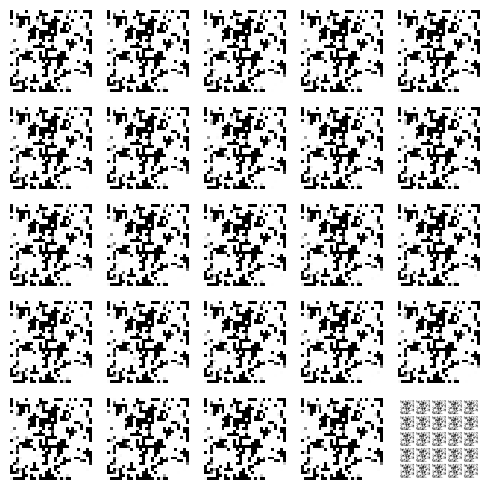

  0%|          | 0/350 [00:00<?, ?it/s]

4/4 [==============================] - 0s 16ms/step


  0%|          | 1/350 [00:00<02:46,  2.10it/s]

4/4 [==============================] - 0s 12ms/step


  1%|          | 2/350 [00:00<02:37,  2.22it/s]

4/4 [==============================] - 0s 17ms/step


  1%|          | 3/350 [00:01<02:40,  2.16it/s]

4/4 [==============================] - 0s 11ms/step


  1%|          | 4/350 [00:01<02:35,  2.23it/s]

4/4 [==============================] - 0s 11ms/step


  1%|▏         | 5/350 [00:02<02:34,  2.24it/s]

4/4 [==============================] - 0s 12ms/step


  2%|▏         | 6/350 [00:02<02:39,  2.16it/s]

4/4 [==============================] - 0s 12ms/step


  2%|▏         | 7/350 [00:03<02:41,  2.12it/s]

4/4 [==============================] - 0s 12ms/step


  2%|▏         | 8/350 [00:03<02:38,  2.16it/s]

4/4 [==============================] - 0s 11ms/step


  3%|▎         | 9/350 [00:04<02:36,  2.18it/s]

4/4 [==============================] - 0s 12ms/step


  3%|▎         | 10/350 [00:04<02:31,  2.24it/s]

4/4 [==============================] - 0s 11ms/step


  3%|▎         | 11/350 [00:04<02:30,  2.26it/s]

4/4 [==============================] - 0s 16ms/step


  3%|▎         | 12/350 [00:05<02:32,  2.21it/s]

4/4 [==============================] - 0s 11ms/step


  4%|▎         | 13/350 [00:05<02:36,  2.16it/s]

4/4 [==============================] - 0s 12ms/step


  4%|▍         | 14/350 [00:06<02:34,  2.18it/s]

4/4 [==============================] - 0s 11ms/step


  4%|▍         | 15/350 [00:06<02:32,  2.19it/s]

4/4 [==============================] - 0s 16ms/step


  5%|▍         | 16/350 [00:07<02:39,  2.10it/s]

4/4 [==============================] - 0s 12ms/step


  5%|▍         | 17/350 [00:07<02:36,  2.13it/s]

4/4 [==============================] - 0s 10ms/step


  5%|▌         | 18/350 [00:08<02:32,  2.18it/s]

4/4 [==============================] - 0s 12ms/step


  5%|▌         | 19/350 [00:08<02:31,  2.19it/s]

4/4 [==============================] - 0s 20ms/step


  6%|▌         | 20/350 [00:09<02:39,  2.07it/s]

4/4 [==============================] - 0s 11ms/step


  6%|▌         | 21/350 [00:09<02:34,  2.13it/s]

4/4 [==============================] - 0s 11ms/step


  6%|▋         | 22/350 [00:10<02:31,  2.17it/s]

4/4 [==============================] - 0s 11ms/step


  7%|▋         | 23/350 [00:10<02:27,  2.22it/s]

4/4 [==============================] - 0s 11ms/step


  7%|▋         | 24/350 [00:10<02:24,  2.25it/s]

4/4 [==============================] - 0s 16ms/step


  7%|▋         | 25/350 [00:11<02:34,  2.11it/s]

4/4 [==============================] - 0s 11ms/step


  7%|▋         | 26/350 [00:11<02:29,  2.17it/s]

4/4 [==============================] - 0s 11ms/step


  8%|▊         | 27/350 [00:12<02:26,  2.21it/s]

4/4 [==============================] - 0s 11ms/step


  8%|▊         | 28/350 [00:12<02:23,  2.25it/s]

4/4 [==============================] - 0s 20ms/step


  8%|▊         | 29/350 [00:13<02:28,  2.16it/s]

4/4 [==============================] - 0s 11ms/step


  9%|▊         | 30/350 [00:13<02:23,  2.23it/s]

4/4 [==============================] - 0s 11ms/step


  9%|▉         | 31/350 [00:14<02:22,  2.23it/s]

4/4 [==============================] - 0s 13ms/step


  9%|▉         | 32/350 [00:14<02:21,  2.25it/s]

4/4 [==============================] - 0s 21ms/step


  9%|▉         | 33/350 [00:15<02:27,  2.15it/s]

4/4 [==============================] - 0s 12ms/step


 10%|▉         | 34/350 [00:15<02:25,  2.18it/s]

4/4 [==============================] - 0s 11ms/step


 10%|█         | 35/350 [00:16<02:27,  2.14it/s]

4/4 [==============================] - 0s 11ms/step


 10%|█         | 36/350 [00:16<02:24,  2.18it/s]

4/4 [==============================] - 0s 12ms/step


 11%|█         | 37/350 [00:16<02:25,  2.15it/s]

4/4 [==============================] - 0s 13ms/step


 11%|█         | 38/350 [00:17<02:22,  2.19it/s]

4/4 [==============================] - 0s 11ms/step


 11%|█         | 39/350 [00:17<02:19,  2.23it/s]

4/4 [==============================] - 0s 12ms/step


 11%|█▏        | 40/350 [00:18<02:18,  2.23it/s]

4/4 [==============================] - 0s 11ms/step


 12%|█▏        | 41/350 [00:18<02:22,  2.17it/s]

4/4 [==============================] - 0s 23ms/step


 12%|█▏        | 42/350 [00:19<02:24,  2.13it/s]

4/4 [==============================] - 0s 11ms/step


 12%|█▏        | 43/350 [00:19<02:20,  2.19it/s]

4/4 [==============================] - 0s 12ms/step


 13%|█▎        | 44/350 [00:20<02:18,  2.22it/s]

4/4 [==============================] - 0s 12ms/step


 13%|█▎        | 45/350 [00:20<02:22,  2.15it/s]

4/4 [==============================] - 0s 11ms/step


 13%|█▎        | 46/350 [00:21<02:19,  2.18it/s]

4/4 [==============================] - 0s 12ms/step


 13%|█▎        | 47/350 [00:21<02:18,  2.18it/s]

4/4 [==============================] - 0s 12ms/step


 14%|█▎        | 48/350 [00:22<02:21,  2.14it/s]

4/4 [==============================] - 0s 14ms/step


 14%|█▍        | 49/350 [00:22<02:22,  2.11it/s]

4/4 [==============================] - 0s 12ms/step


 14%|█▍        | 50/350 [00:22<02:20,  2.13it/s]

4/4 [==============================] - 0s 13ms/step


 15%|█▍        | 51/350 [00:23<02:17,  2.17it/s]

4/4 [==============================] - 0s 11ms/step


 15%|█▍        | 52/350 [00:23<02:13,  2.24it/s]

4/4 [==============================] - 0s 11ms/step


 15%|█▌        | 53/350 [00:24<02:12,  2.24it/s]

4/4 [==============================] - 0s 17ms/step


 15%|█▌        | 54/350 [00:24<02:21,  2.10it/s]

4/4 [==============================] - 0s 12ms/step


 16%|█▌        | 55/350 [00:25<02:17,  2.14it/s]

4/4 [==============================] - 0s 12ms/step


 16%|█▌        | 56/350 [00:25<02:13,  2.20it/s]

4/4 [==============================] - 0s 11ms/step


 16%|█▋        | 57/350 [00:26<02:11,  2.23it/s]

4/4 [==============================] - 0s 23ms/step


 17%|█▋        | 58/350 [00:26<02:13,  2.19it/s]

4/4 [==============================] - 0s 12ms/step


 17%|█▋        | 59/350 [00:27<02:11,  2.21it/s]

4/4 [==============================] - 0s 14ms/step


 17%|█▋        | 60/350 [00:27<02:12,  2.19it/s]

4/4 [==============================] - 0s 13ms/step


 17%|█▋        | 61/350 [00:28<02:23,  2.01it/s]

4/4 [==============================] - 0s 12ms/step


 18%|█▊        | 62/350 [00:28<02:17,  2.09it/s]

4/4 [==============================] - 0s 11ms/step


 18%|█▊        | 63/350 [00:28<02:14,  2.13it/s]

4/4 [==============================] - 0s 13ms/step


 18%|█▊        | 64/350 [00:29<02:11,  2.17it/s]

4/4 [==============================] - 0s 11ms/step


 19%|█▊        | 65/350 [00:29<02:08,  2.22it/s]

4/4 [==============================] - 0s 20ms/step


 19%|█▉        | 66/350 [00:30<02:10,  2.18it/s]

4/4 [==============================] - 0s 12ms/step


 19%|█▉        | 67/350 [00:30<02:08,  2.20it/s]

4/4 [==============================] - 0s 12ms/step


 19%|█▉        | 68/350 [00:31<02:07,  2.22it/s]

4/4 [==============================] - 0s 12ms/step


 20%|█▉        | 69/350 [00:31<02:06,  2.22it/s]

4/4 [==============================] - 0s 12ms/step


 20%|██        | 70/350 [00:32<02:05,  2.24it/s]

4/4 [==============================] - 0s 22ms/step


 20%|██        | 71/350 [00:32<02:06,  2.21it/s]

4/4 [==============================] - 0s 12ms/step


 21%|██        | 72/350 [00:33<02:05,  2.22it/s]

4/4 [==============================] - 0s 11ms/step


 21%|██        | 73/350 [00:33<02:09,  2.14it/s]

4/4 [==============================] - 0s 11ms/step


 21%|██        | 74/350 [00:33<02:05,  2.19it/s]

4/4 [==============================] - 0s 12ms/step


 21%|██▏       | 75/350 [00:34<02:07,  2.16it/s]

4/4 [==============================] - 0s 11ms/step


 22%|██▏       | 76/350 [00:34<02:05,  2.18it/s]

4/4 [==============================] - 0s 11ms/step


 22%|██▏       | 77/350 [00:35<02:03,  2.22it/s]

4/4 [==============================] - 0s 12ms/step


 22%|██▏       | 78/350 [00:35<02:01,  2.23it/s]

4/4 [==============================] - 0s 15ms/step


 23%|██▎       | 79/350 [00:36<02:02,  2.21it/s]

4/4 [==============================] - 0s 11ms/step


 23%|██▎       | 80/350 [00:36<01:58,  2.27it/s]

4/4 [==============================] - 0s 13ms/step


 23%|██▎       | 81/350 [00:37<02:00,  2.24it/s]

4/4 [==============================] - 0s 12ms/step


 23%|██▎       | 82/350 [00:37<02:04,  2.15it/s]

4/4 [==============================] - 0s 15ms/step


 24%|██▎       | 83/350 [00:38<02:07,  2.10it/s]

4/4 [==============================] - 0s 13ms/step


 24%|██▍       | 84/350 [00:38<02:04,  2.14it/s]

4/4 [==============================] - 0s 12ms/step


 24%|██▍       | 85/350 [00:39<02:01,  2.18it/s]

4/4 [==============================] - 0s 12ms/step


 25%|██▍       | 86/350 [00:39<01:58,  2.22it/s]

4/4 [==============================] - 0s 11ms/step


 25%|██▍       | 87/350 [00:39<02:00,  2.18it/s]

4/4 [==============================] - 0s 11ms/step


 25%|██▌       | 88/350 [00:40<01:58,  2.22it/s]

4/4 [==============================] - 0s 12ms/step


 25%|██▌       | 89/350 [00:40<02:00,  2.16it/s]

4/4 [==============================] - 0s 11ms/step


 26%|██▌       | 90/350 [00:41<01:58,  2.20it/s]

4/4 [==============================] - 0s 15ms/step


 26%|██▌       | 91/350 [00:41<01:58,  2.18it/s]

4/4 [==============================] - 0s 11ms/step


 26%|██▋       | 92/350 [00:42<01:56,  2.21it/s]

4/4 [==============================] - 0s 12ms/step


 27%|██▋       | 93/350 [00:42<01:54,  2.24it/s]

4/4 [==============================] - 0s 12ms/step


 27%|██▋       | 94/350 [00:43<01:54,  2.23it/s]

4/4 [==============================] - 0s 19ms/step


 27%|██▋       | 95/350 [00:43<01:58,  2.15it/s]

4/4 [==============================] - 0s 13ms/step


 27%|██▋       | 96/350 [00:44<02:00,  2.11it/s]

4/4 [==============================] - 0s 12ms/step


 28%|██▊       | 97/350 [00:44<01:56,  2.16it/s]

4/4 [==============================] - 0s 11ms/step


 28%|██▊       | 98/350 [00:44<01:54,  2.20it/s]

4/4 [==============================] - 0s 11ms/step


 28%|██▊       | 99/350 [00:45<01:56,  2.16it/s]

4/4 [==============================] - 0s 12ms/step


 29%|██▊       | 100/350 [00:45<01:52,  2.21it/s]

4/4 [==============================] - 0s 11ms/step


 29%|██▉       | 101/350 [00:46<01:52,  2.21it/s]

4/4 [==============================] - 0s 11ms/step


 29%|██▉       | 102/350 [00:46<01:50,  2.25it/s]

4/4 [==============================] - 0s 11ms/step


 29%|██▉       | 103/350 [00:47<01:49,  2.26it/s]

4/4 [==============================] - 0s 33ms/step


 30%|██▉       | 104/350 [00:47<01:57,  2.10it/s]

4/4 [==============================] - 0s 12ms/step


 30%|███       | 105/350 [00:48<01:53,  2.15it/s]

4/4 [==============================] - 0s 11ms/step


 30%|███       | 106/350 [00:48<01:50,  2.21it/s]

4/4 [==============================] - 0s 11ms/step


 31%|███       | 107/350 [00:49<01:48,  2.24it/s]

4/4 [==============================] - 0s 12ms/step


 31%|███       | 108/350 [00:49<01:49,  2.21it/s]

4/4 [==============================] - 0s 11ms/step


 31%|███       | 109/350 [00:49<01:46,  2.27it/s]

4/4 [==============================] - 0s 11ms/step


 31%|███▏      | 110/350 [00:50<01:44,  2.29it/s]

4/4 [==============================] - 0s 13ms/step


 32%|███▏      | 111/350 [00:50<01:45,  2.26it/s]

4/4 [==============================] - 0s 13ms/step


 32%|███▏      | 112/350 [00:51<01:49,  2.17it/s]

4/4 [==============================] - 0s 12ms/step


 32%|███▏      | 113/350 [00:51<01:47,  2.20it/s]

4/4 [==============================] - 0s 12ms/step


 33%|███▎      | 114/350 [00:52<01:46,  2.22it/s]

4/4 [==============================] - 0s 12ms/step


 33%|███▎      | 115/350 [00:52<01:45,  2.23it/s]

4/4 [==============================] - 0s 18ms/step


 33%|███▎      | 116/350 [00:53<01:50,  2.11it/s]

4/4 [==============================] - 0s 11ms/step


 33%|███▎      | 117/350 [00:53<01:47,  2.17it/s]

4/4 [==============================] - 0s 12ms/step


 34%|███▎      | 118/350 [00:54<01:46,  2.17it/s]

4/4 [==============================] - 0s 12ms/step


 34%|███▍      | 119/350 [00:54<01:45,  2.18it/s]

4/4 [==============================] - 0s 13ms/step


 34%|███▍      | 120/350 [00:54<01:48,  2.13it/s]

4/4 [==============================] - 0s 12ms/step


 35%|███▍      | 121/350 [00:55<01:45,  2.17it/s]

4/4 [==============================] - 0s 12ms/step


 35%|███▍      | 122/350 [00:55<01:43,  2.21it/s]

4/4 [==============================] - 0s 12ms/step


 35%|███▌      | 123/350 [00:56<01:42,  2.22it/s]

4/4 [==============================] - 0s 12ms/step


 35%|███▌      | 124/350 [00:56<01:48,  2.09it/s]

4/4 [==============================] - 0s 13ms/step


 36%|███▌      | 125/350 [00:57<01:45,  2.13it/s]

4/4 [==============================] - 0s 12ms/step


 36%|███▌      | 126/350 [00:57<01:42,  2.18it/s]

4/4 [==============================] - 0s 12ms/step


 36%|███▋      | 127/350 [00:58<01:40,  2.21it/s]

4/4 [==============================] - 0s 22ms/step


 37%|███▋      | 128/350 [00:58<01:42,  2.18it/s]

4/4 [==============================] - 0s 11ms/step


 37%|███▋      | 129/350 [00:59<01:40,  2.20it/s]

4/4 [==============================] - 0s 13ms/step


 37%|███▋      | 130/350 [00:59<01:42,  2.14it/s]

4/4 [==============================] - 0s 11ms/step


 37%|███▋      | 131/350 [01:00<01:44,  2.09it/s]

4/4 [==============================] - 0s 13ms/step


 38%|███▊      | 132/350 [01:00<01:42,  2.12it/s]

4/4 [==============================] - 0s 17ms/step


 38%|███▊      | 133/350 [01:01<01:43,  2.10it/s]

4/4 [==============================] - 0s 12ms/step


 38%|███▊      | 134/350 [01:01<01:41,  2.13it/s]

4/4 [==============================] - 0s 13ms/step


 39%|███▊      | 135/350 [01:01<01:39,  2.16it/s]

4/4 [==============================] - 0s 17ms/step


 39%|███▉      | 136/350 [01:02<01:39,  2.15it/s]

4/4 [==============================] - 0s 11ms/step


 39%|███▉      | 137/350 [01:02<01:36,  2.21it/s]

4/4 [==============================] - 0s 12ms/step


 39%|███▉      | 138/350 [01:03<01:35,  2.23it/s]

4/4 [==============================] - 0s 11ms/step


 40%|███▉      | 139/350 [01:03<01:37,  2.17it/s]

4/4 [==============================] - 0s 14ms/step


 40%|████      | 140/350 [01:04<01:37,  2.14it/s]

4/4 [==============================] - 0s 11ms/step


 40%|████      | 141/350 [01:04<01:35,  2.18it/s]

4/4 [==============================] - 0s 12ms/step


 41%|████      | 142/350 [01:05<01:33,  2.22it/s]

4/4 [==============================] - 0s 12ms/step


 41%|████      | 143/350 [01:05<01:31,  2.26it/s]

4/4 [==============================] - 0s 16ms/step


 41%|████      | 144/350 [01:06<01:34,  2.19it/s]

4/4 [==============================] - 0s 14ms/step


 41%|████▏     | 145/350 [01:06<01:34,  2.18it/s]

4/4 [==============================] - 0s 12ms/step


 42%|████▏     | 146/350 [01:06<01:35,  2.14it/s]

4/4 [==============================] - 0s 12ms/step


 42%|████▏     | 147/350 [01:07<01:33,  2.17it/s]

4/4 [==============================] - 0s 12ms/step


 42%|████▏     | 148/350 [01:07<01:35,  2.13it/s]

4/4 [==============================] - 0s 13ms/step


 43%|████▎     | 149/350 [01:08<01:33,  2.15it/s]

4/4 [==============================] - 0s 12ms/step


 43%|████▎     | 150/350 [01:08<01:40,  1.99it/s]

4/4 [==============================] - 0s 12ms/step


 43%|████▎     | 151/350 [01:09<01:35,  2.08it/s]

4/4 [==============================] - 0s 15ms/step


 43%|████▎     | 152/350 [01:09<01:34,  2.09it/s]

4/4 [==============================] - 0s 12ms/step


 44%|████▎     | 153/350 [01:10<01:32,  2.14it/s]

4/4 [==============================] - 0s 29ms/step


 44%|████▍     | 154/350 [01:10<01:34,  2.08it/s]

4/4 [==============================] - 0s 12ms/step


 44%|████▍     | 155/350 [01:11<01:30,  2.14it/s]

4/4 [==============================] - 0s 22ms/step


 45%|████▍     | 156/350 [01:11<01:32,  2.09it/s]

4/4 [==============================] - 0s 12ms/step


 45%|████▍     | 157/350 [01:12<01:30,  2.14it/s]

4/4 [==============================] - 0s 12ms/step


 45%|████▌     | 158/350 [01:12<01:28,  2.18it/s]

4/4 [==============================] - 0s 11ms/step


 45%|████▌     | 159/350 [01:13<01:30,  2.12it/s]

4/4 [==============================] - 0s 14ms/step


 46%|████▌     | 160/350 [01:13<01:32,  2.06it/s]

4/4 [==============================] - 0s 14ms/step


 46%|████▌     | 161/350 [01:14<01:37,  1.94it/s]

4/4 [==============================] - 0s 13ms/step


 46%|████▋     | 162/350 [01:14<01:35,  1.97it/s]

4/4 [==============================] - 0s 13ms/step


 47%|████▋     | 163/350 [01:15<01:32,  2.02it/s]

4/4 [==============================] - 0s 12ms/step


 47%|████▋     | 164/350 [01:15<01:29,  2.08it/s]

4/4 [==============================] - 0s 11ms/step


 47%|████▋     | 165/350 [01:16<01:28,  2.08it/s]

4/4 [==============================] - 0s 12ms/step


 47%|████▋     | 166/350 [01:16<01:27,  2.11it/s]

4/4 [==============================] - 0s 12ms/step


 48%|████▊     | 167/350 [01:16<01:24,  2.17it/s]

4/4 [==============================] - 0s 12ms/step


 48%|████▊     | 168/350 [01:17<01:22,  2.21it/s]

4/4 [==============================] - 0s 15ms/step


 48%|████▊     | 169/350 [01:17<01:25,  2.11it/s]

4/4 [==============================] - 0s 13ms/step


 49%|████▊     | 170/350 [01:18<01:27,  2.05it/s]

4/4 [==============================] - 0s 13ms/step


 49%|████▉     | 171/350 [01:18<01:25,  2.08it/s]

4/4 [==============================] - 0s 11ms/step


 49%|████▉     | 172/350 [01:19<01:23,  2.13it/s]

4/4 [==============================] - 0s 12ms/step


 49%|████▉     | 173/350 [01:19<01:25,  2.08it/s]

4/4 [==============================] - 0s 11ms/step


 50%|████▉     | 174/350 [01:20<01:22,  2.14it/s]

4/4 [==============================] - 0s 12ms/step


 50%|█████     | 175/350 [01:20<01:19,  2.19it/s]

4/4 [==============================] - 0s 12ms/step


 50%|█████     | 176/350 [01:21<01:18,  2.23it/s]

4/4 [==============================] - 0s 12ms/step


 51%|█████     | 177/350 [01:21<01:19,  2.19it/s]

4/4 [==============================] - 0s 11ms/step


 51%|█████     | 178/350 [01:22<01:17,  2.23it/s]

4/4 [==============================] - 0s 11ms/step


 51%|█████     | 179/350 [01:22<01:15,  2.26it/s]

4/4 [==============================] - 0s 11ms/step


 51%|█████▏    | 180/350 [01:22<01:14,  2.29it/s]

4/4 [==============================] - 0s 19ms/step


 52%|█████▏    | 181/350 [01:23<01:15,  2.23it/s]

4/4 [==============================] - 0s 11ms/step


 52%|█████▏    | 182/350 [01:23<01:14,  2.27it/s]

4/4 [==============================] - 0s 11ms/step


 52%|█████▏    | 183/350 [01:24<01:12,  2.29it/s]

4/4 [==============================] - 0s 12ms/step


 53%|█████▎    | 184/350 [01:24<01:12,  2.28it/s]

4/4 [==============================] - 0s 18ms/step


 53%|█████▎    | 185/350 [01:25<01:14,  2.23it/s]

4/4 [==============================] - 0s 11ms/step


 53%|█████▎    | 186/350 [01:25<01:12,  2.27it/s]

4/4 [==============================] - 0s 13ms/step


 53%|█████▎    | 187/350 [01:26<01:12,  2.23it/s]

4/4 [==============================] - 0s 12ms/step


 54%|█████▎    | 188/350 [01:26<01:11,  2.25it/s]

4/4 [==============================] - 0s 11ms/step


 54%|█████▍    | 189/350 [01:26<01:13,  2.20it/s]

4/4 [==============================] - 0s 13ms/step


 54%|█████▍    | 190/350 [01:27<01:11,  2.23it/s]

4/4 [==============================] - 0s 12ms/step


 55%|█████▍    | 191/350 [01:27<01:10,  2.24it/s]

4/4 [==============================] - 0s 11ms/step


 55%|█████▍    | 192/350 [01:28<01:09,  2.26it/s]

4/4 [==============================] - 0s 11ms/step


 55%|█████▌    | 193/350 [01:28<01:08,  2.29it/s]

4/4 [==============================] - 0s 13ms/step


 55%|█████▌    | 194/350 [01:29<01:09,  2.23it/s]

4/4 [==============================] - 0s 12ms/step


 56%|█████▌    | 195/350 [01:29<01:08,  2.26it/s]

4/4 [==============================] - 0s 11ms/step


 56%|█████▌    | 196/350 [01:30<01:07,  2.27it/s]

4/4 [==============================] - 0s 12ms/step


 56%|█████▋    | 197/350 [01:30<01:06,  2.28it/s]

4/4 [==============================] - 0s 15ms/step


 57%|█████▋    | 198/350 [01:30<01:06,  2.27it/s]

4/4 [==============================] - 0s 12ms/step


 57%|█████▋    | 199/350 [01:31<01:07,  2.25it/s]

4/4 [==============================] - 0s 11ms/step


 57%|█████▋    | 200/350 [01:31<01:05,  2.28it/s]

4/4 [==============================] - 0s 12ms/step


 57%|█████▋    | 201/350 [01:32<01:05,  2.27it/s]

4/4 [==============================] - 0s 11ms/step


 58%|█████▊    | 202/350 [01:32<01:05,  2.28it/s]

4/4 [==============================] - 0s 11ms/step


 58%|█████▊    | 203/350 [01:33<01:04,  2.26it/s]

4/4 [==============================] - 0s 11ms/step


 58%|█████▊    | 204/350 [01:33<01:03,  2.29it/s]

4/4 [==============================] - 0s 11ms/step


 59%|█████▊    | 205/350 [01:33<01:02,  2.31it/s]

4/4 [==============================] - 0s 14ms/step


 59%|█████▉    | 206/350 [01:34<01:02,  2.29it/s]

4/4 [==============================] - 0s 13ms/step


 59%|█████▉    | 207/350 [01:34<01:02,  2.27it/s]

4/4 [==============================] - 0s 12ms/step


 59%|█████▉    | 208/350 [01:35<01:02,  2.28it/s]

4/4 [==============================] - 0s 11ms/step


 60%|█████▉    | 209/350 [01:35<01:01,  2.28it/s]

4/4 [==============================] - 0s 11ms/step


 60%|██████    | 210/350 [01:36<01:01,  2.27it/s]

4/4 [==============================] - 0s 13ms/step


 60%|██████    | 211/350 [01:36<01:02,  2.24it/s]

4/4 [==============================] - 0s 18ms/step


 61%|██████    | 212/350 [01:37<01:03,  2.17it/s]

4/4 [==============================] - 0s 23ms/step


 61%|██████    | 213/350 [01:37<01:06,  2.05it/s]

4/4 [==============================] - 0s 12ms/step


 61%|██████    | 214/350 [01:38<01:05,  2.08it/s]

4/4 [==============================] - 0s 12ms/step


 61%|██████▏   | 215/350 [01:38<01:03,  2.11it/s]

4/4 [==============================] - 0s 16ms/step


 62%|██████▏   | 216/350 [01:39<01:04,  2.07it/s]

4/4 [==============================] - 0s 17ms/step


 62%|██████▏   | 217/350 [01:39<01:05,  2.03it/s]

4/4 [==============================] - 0s 12ms/step


 62%|██████▏   | 218/350 [01:40<01:04,  2.06it/s]

4/4 [==============================] - 0s 12ms/step


 63%|██████▎   | 219/350 [01:40<01:02,  2.10it/s]

4/4 [==============================] - 0s 16ms/step


 63%|██████▎   | 220/350 [01:41<01:02,  2.09it/s]

4/4 [==============================] - 0s 12ms/step


 63%|██████▎   | 221/350 [01:41<01:00,  2.14it/s]

4/4 [==============================] - 0s 12ms/step


 63%|██████▎   | 222/350 [01:41<00:59,  2.16it/s]

4/4 [==============================] - 0s 12ms/step


 64%|██████▎   | 223/350 [01:42<00:58,  2.18it/s]

4/4 [==============================] - 0s 12ms/step


 64%|██████▍   | 224/350 [01:42<01:01,  2.04it/s]

4/4 [==============================] - 0s 11ms/step


 64%|██████▍   | 225/350 [01:43<00:59,  2.09it/s]

4/4 [==============================] - 0s 12ms/step


 65%|██████▍   | 226/350 [01:43<00:58,  2.13it/s]

4/4 [==============================] - 0s 13ms/step


 65%|██████▍   | 227/350 [01:44<00:58,  2.10it/s]

4/4 [==============================] - 0s 14ms/step


 65%|██████▌   | 228/350 [01:44<00:57,  2.12it/s]

4/4 [==============================] - 0s 12ms/step


 65%|██████▌   | 229/350 [01:45<00:56,  2.16it/s]

4/4 [==============================] - 0s 12ms/step


 66%|██████▌   | 230/350 [01:45<00:56,  2.11it/s]

4/4 [==============================] - 0s 13ms/step


 66%|██████▌   | 231/350 [01:46<00:55,  2.15it/s]

4/4 [==============================] - 0s 11ms/step


 66%|██████▋   | 232/350 [01:46<00:53,  2.21it/s]

4/4 [==============================] - 0s 12ms/step


 67%|██████▋   | 233/350 [01:47<00:52,  2.24it/s]

4/4 [==============================] - 0s 18ms/step


 67%|██████▋   | 234/350 [01:47<00:54,  2.14it/s]

4/4 [==============================] - 0s 12ms/step


 67%|██████▋   | 235/350 [01:48<00:53,  2.14it/s]

4/4 [==============================] - 0s 13ms/step


 67%|██████▋   | 236/350 [01:48<00:53,  2.14it/s]

4/4 [==============================] - 0s 11ms/step


 68%|██████▊   | 237/350 [01:48<00:51,  2.18it/s]

4/4 [==============================] - 0s 11ms/step


 68%|██████▊   | 238/350 [01:49<00:54,  2.07it/s]

4/4 [==============================] - 0s 12ms/step


 68%|██████▊   | 239/350 [01:49<00:52,  2.12it/s]

4/4 [==============================] - 0s 12ms/step


 69%|██████▊   | 240/350 [01:50<00:51,  2.15it/s]

4/4 [==============================] - 0s 12ms/step


 69%|██████▉   | 241/350 [01:50<00:49,  2.20it/s]

4/4 [==============================] - 0s 15ms/step


 69%|██████▉   | 242/350 [01:51<00:50,  2.15it/s]

4/4 [==============================] - 0s 11ms/step


 69%|██████▉   | 243/350 [01:51<00:48,  2.21it/s]

4/4 [==============================] - 0s 11ms/step


 70%|██████▉   | 244/350 [01:52<00:47,  2.24it/s]

4/4 [==============================] - 0s 11ms/step


 70%|███████   | 245/350 [01:52<00:46,  2.26it/s]

4/4 [==============================] - 0s 13ms/step


 70%|███████   | 246/350 [01:53<00:48,  2.14it/s]

4/4 [==============================] - 0s 12ms/step


 71%|███████   | 247/350 [01:53<00:47,  2.18it/s]

4/4 [==============================] - 0s 12ms/step


 71%|███████   | 248/350 [01:53<00:46,  2.21it/s]

4/4 [==============================] - 0s 15ms/step


 71%|███████   | 249/350 [01:54<00:45,  2.21it/s]

4/4 [==============================] - 0s 14ms/step


 71%|███████▏  | 250/350 [01:54<00:46,  2.16it/s]

4/4 [==============================] - 0s 13ms/step


 72%|███████▏  | 251/350 [01:55<00:45,  2.18it/s]

4/4 [==============================] - 0s 11ms/step


 72%|███████▏  | 252/350 [01:55<00:44,  2.21it/s]

4/4 [==============================] - 0s 12ms/step


 72%|███████▏  | 253/350 [01:56<00:43,  2.23it/s]

4/4 [==============================] - 0s 17ms/step


 73%|███████▎  | 254/350 [01:56<00:44,  2.17it/s]

4/4 [==============================] - 0s 14ms/step


 73%|███████▎  | 255/350 [01:57<00:45,  2.10it/s]

4/4 [==============================] - 0s 12ms/step


 73%|███████▎  | 256/350 [01:57<00:45,  2.07it/s]

4/4 [==============================] - 0s 13ms/step


 73%|███████▎  | 257/350 [01:58<00:45,  2.06it/s]

4/4 [==============================] - 0s 25ms/step


 74%|███████▎  | 258/350 [01:58<00:45,  2.04it/s]

4/4 [==============================] - 0s 12ms/step


 74%|███████▍  | 259/350 [01:59<00:45,  1.98it/s]

4/4 [==============================] - 0s 13ms/step


 74%|███████▍  | 260/350 [01:59<00:45,  1.98it/s]

4/4 [==============================] - 0s 13ms/step


 75%|███████▍  | 261/350 [02:00<00:43,  2.04it/s]

4/4 [==============================] - 0s 12ms/step


 75%|███████▍  | 262/350 [02:00<00:44,  1.98it/s]

4/4 [==============================] - 0s 12ms/step


 75%|███████▌  | 263/350 [02:01<00:42,  2.03it/s]

4/4 [==============================] - 0s 11ms/step


 75%|███████▌  | 264/350 [02:01<00:42,  2.03it/s]

4/4 [==============================] - 0s 12ms/step


 76%|███████▌  | 265/350 [02:02<00:41,  2.04it/s]

4/4 [==============================] - 0s 11ms/step


 76%|███████▌  | 266/350 [02:02<00:39,  2.13it/s]

4/4 [==============================] - 0s 12ms/step


 76%|███████▋  | 267/350 [02:03<00:39,  2.13it/s]

4/4 [==============================] - 0s 13ms/step


 77%|███████▋  | 268/350 [02:03<00:39,  2.06it/s]

4/4 [==============================] - 0s 15ms/step


 77%|███████▋  | 269/350 [02:04<00:39,  2.07it/s]

4/4 [==============================] - 0s 12ms/step


 77%|███████▋  | 270/350 [02:04<00:37,  2.13it/s]

4/4 [==============================] - 0s 12ms/step


 77%|███████▋  | 271/350 [02:04<00:35,  2.20it/s]

4/4 [==============================] - 0s 20ms/step


 78%|███████▊  | 272/350 [02:05<00:36,  2.11it/s]

4/4 [==============================] - 0s 16ms/step


 78%|███████▊  | 273/350 [02:05<00:36,  2.10it/s]

4/4 [==============================] - 0s 13ms/step


 78%|███████▊  | 274/350 [02:06<00:35,  2.14it/s]

4/4 [==============================] - 0s 14ms/step


 79%|███████▊  | 275/350 [02:06<00:35,  2.10it/s]

4/4 [==============================] - 0s 19ms/step


 79%|███████▉  | 276/350 [02:07<00:36,  2.04it/s]

4/4 [==============================] - 0s 12ms/step


 79%|███████▉  | 277/350 [02:07<00:35,  2.08it/s]

4/4 [==============================] - 0s 13ms/step


 79%|███████▉  | 278/350 [02:08<00:35,  2.03it/s]

4/4 [==============================] - 0s 13ms/step


 80%|███████▉  | 279/350 [02:08<00:36,  1.96it/s]

4/4 [==============================] - 0s 13ms/step


 80%|████████  | 280/350 [02:09<00:34,  2.01it/s]

4/4 [==============================] - 0s 13ms/step


 80%|████████  | 281/350 [02:09<00:33,  2.05it/s]

4/4 [==============================] - 0s 13ms/step


 81%|████████  | 282/350 [02:10<00:32,  2.07it/s]

4/4 [==============================] - 0s 14ms/step


 81%|████████  | 283/350 [02:10<00:32,  2.04it/s]

4/4 [==============================] - 0s 14ms/step


 81%|████████  | 284/350 [02:11<00:33,  1.96it/s]

4/4 [==============================] - 0s 13ms/step


 81%|████████▏ | 285/350 [02:11<00:33,  1.95it/s]

4/4 [==============================] - 0s 15ms/step


 82%|████████▏ | 286/350 [02:12<00:33,  1.90it/s]

4/4 [==============================] - 0s 14ms/step


 82%|████████▏ | 287/350 [02:13<00:33,  1.90it/s]

4/4 [==============================] - 0s 12ms/step


 82%|████████▏ | 288/350 [02:13<00:30,  2.02it/s]

4/4 [==============================] - 0s 12ms/step


 83%|████████▎ | 289/350 [02:13<00:29,  2.06it/s]

4/4 [==============================] - 0s 14ms/step


 83%|████████▎ | 290/350 [02:14<00:30,  2.00it/s]

4/4 [==============================] - 0s 28ms/step


 83%|████████▎ | 291/350 [02:15<00:30,  1.94it/s]

4/4 [==============================] - 0s 13ms/step


 83%|████████▎ | 292/350 [02:15<00:29,  1.98it/s]

4/4 [==============================] - 0s 15ms/step


 84%|████████▎ | 293/350 [02:16<00:29,  1.95it/s]

4/4 [==============================] - 0s 14ms/step


 84%|████████▍ | 294/350 [02:16<00:29,  1.91it/s]

4/4 [==============================] - 0s 14ms/step


 84%|████████▍ | 295/350 [02:17<00:28,  1.94it/s]

4/4 [==============================] - 0s 14ms/step


 85%|████████▍ | 296/350 [02:17<00:27,  1.95it/s]

4/4 [==============================] - 0s 15ms/step


 85%|████████▍ | 297/350 [02:18<00:27,  1.91it/s]

4/4 [==============================] - 0s 16ms/step


 85%|████████▌ | 298/350 [02:18<00:28,  1.86it/s]

4/4 [==============================] - 0s 14ms/step


 85%|████████▌ | 299/350 [02:19<00:26,  1.90it/s]

4/4 [==============================] - 0s 12ms/step


 86%|████████▌ | 300/350 [02:19<00:25,  1.99it/s]

4/4 [==============================] - 0s 12ms/step


 86%|████████▌ | 301/350 [02:20<00:23,  2.08it/s]

4/4 [==============================] - 0s 13ms/step


 86%|████████▋ | 302/350 [02:20<00:23,  2.02it/s]

4/4 [==============================] - 0s 14ms/step


 87%|████████▋ | 303/350 [02:21<00:23,  1.99it/s]

4/4 [==============================] - 0s 15ms/step


 87%|████████▋ | 304/350 [02:21<00:23,  1.97it/s]

4/4 [==============================] - 0s 12ms/step


 87%|████████▋ | 305/350 [02:22<00:21,  2.05it/s]

4/4 [==============================] - 0s 13ms/step


 87%|████████▋ | 306/350 [02:22<00:21,  2.02it/s]

4/4 [==============================] - 0s 15ms/step


 88%|████████▊ | 307/350 [02:23<00:21,  1.96it/s]

4/4 [==============================] - 0s 14ms/step


 88%|████████▊ | 308/350 [02:23<00:21,  1.94it/s]

4/4 [==============================] - 0s 13ms/step


 88%|████████▊ | 309/350 [02:24<00:20,  2.00it/s]

4/4 [==============================] - 0s 12ms/step


 89%|████████▊ | 310/350 [02:24<00:19,  2.07it/s]

4/4 [==============================] - 0s 18ms/step


 89%|████████▉ | 311/350 [02:25<00:18,  2.08it/s]

4/4 [==============================] - 0s 12ms/step


 89%|████████▉ | 312/350 [02:25<00:17,  2.15it/s]

4/4 [==============================] - 0s 11ms/step


 89%|████████▉ | 313/350 [02:25<00:16,  2.21it/s]

4/4 [==============================] - 0s 12ms/step


 90%|████████▉ | 314/350 [02:26<00:15,  2.25it/s]

4/4 [==============================] - 0s 15ms/step


 90%|█████████ | 315/350 [02:26<00:15,  2.22it/s]

4/4 [==============================] - 0s 11ms/step


 90%|█████████ | 316/350 [02:27<00:15,  2.27it/s]

4/4 [==============================] - 0s 11ms/step


 91%|█████████ | 317/350 [02:27<00:14,  2.30it/s]

4/4 [==============================] - 0s 12ms/step


 91%|█████████ | 318/350 [02:28<00:14,  2.15it/s]

4/4 [==============================] - 0s 14ms/step


 91%|█████████ | 319/350 [02:28<00:14,  2.13it/s]

4/4 [==============================] - 0s 13ms/step


 91%|█████████▏| 320/350 [02:29<00:14,  2.14it/s]

4/4 [==============================] - 0s 13ms/step


 92%|█████████▏| 321/350 [02:29<00:13,  2.08it/s]

4/4 [==============================] - 0s 12ms/step


 92%|█████████▏| 322/350 [02:30<00:13,  2.10it/s]

4/4 [==============================] - 0s 13ms/step


 92%|█████████▏| 323/350 [02:30<00:12,  2.12it/s]

4/4 [==============================] - 0s 13ms/step


 93%|█████████▎| 324/350 [02:30<00:12,  2.15it/s]

4/4 [==============================] - 0s 15ms/step


 93%|█████████▎| 325/350 [02:31<00:12,  2.05it/s]

4/4 [==============================] - 0s 14ms/step


 93%|█████████▎| 326/350 [02:32<00:11,  2.05it/s]

4/4 [==============================] - 0s 14ms/step


 93%|█████████▎| 327/350 [02:32<00:11,  2.04it/s]

4/4 [==============================] - 0s 14ms/step


 94%|█████████▎| 328/350 [02:33<00:10,  2.05it/s]

4/4 [==============================] - 0s 24ms/step


 94%|█████████▍| 329/350 [02:33<00:10,  1.97it/s]

4/4 [==============================] - 0s 13ms/step


 94%|█████████▍| 330/350 [02:34<00:10,  1.98it/s]

4/4 [==============================] - 0s 15ms/step


 95%|█████████▍| 331/350 [02:34<00:09,  2.01it/s]

4/4 [==============================] - 0s 13ms/step


 95%|█████████▍| 332/350 [02:34<00:08,  2.07it/s]

4/4 [==============================] - 0s 23ms/step


 95%|█████████▌| 333/350 [02:35<00:08,  2.01it/s]

4/4 [==============================] - 0s 14ms/step


 95%|█████████▌| 334/350 [02:35<00:07,  2.06it/s]

4/4 [==============================] - 0s 13ms/step


 96%|█████████▌| 335/350 [02:36<00:07,  2.04it/s]

4/4 [==============================] - 0s 14ms/step


 96%|█████████▌| 336/350 [02:37<00:07,  1.95it/s]

4/4 [==============================] - 0s 12ms/step


 96%|█████████▋| 337/350 [02:37<00:06,  2.02it/s]

4/4 [==============================] - 0s 12ms/step


 97%|█████████▋| 338/350 [02:37<00:05,  2.09it/s]

4/4 [==============================] - 0s 12ms/step


 97%|█████████▋| 339/350 [02:38<00:05,  2.15it/s]

4/4 [==============================] - 0s 12ms/step


 97%|█████████▋| 340/350 [02:38<00:04,  2.10it/s]

4/4 [==============================] - 0s 15ms/step


 97%|█████████▋| 341/350 [02:39<00:04,  2.10it/s]

4/4 [==============================] - 0s 13ms/step


 98%|█████████▊| 342/350 [02:39<00:03,  2.08it/s]

4/4 [==============================] - 0s 11ms/step


 98%|█████████▊| 343/350 [02:40<00:03,  2.14it/s]

4/4 [==============================] - 0s 12ms/step


 98%|█████████▊| 344/350 [02:40<00:02,  2.05it/s]

4/4 [==============================] - 0s 12ms/step


 99%|█████████▊| 345/350 [02:41<00:02,  2.11it/s]

4/4 [==============================] - 0s 11ms/step


 99%|█████████▉| 346/350 [02:41<00:01,  2.17it/s]

4/4 [==============================] - 0s 12ms/step


 99%|█████████▉| 347/350 [02:42<00:01,  2.20it/s]

4/4 [==============================] - 0s 11ms/step


 99%|█████████▉| 348/350 [02:42<00:00,  2.23it/s]

4/4 [==============================] - 0s 12ms/step


100%|█████████▉| 349/350 [02:43<00:00,  2.11it/s]

4/4 [==============================] - 0s 12ms/step


100%|██████████| 350/350 [02:43<00:00,  2.14it/s]

Epoch number: 2 discriminator_loss: 0.17772025963091956 generator_loss: 5.698901390348162
1/1 [==============================] - 0s 21ms/step


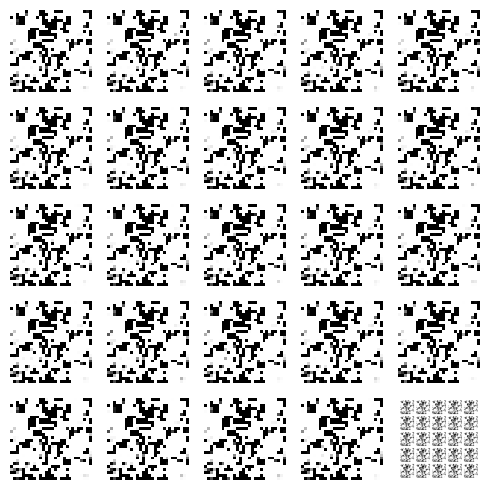

  0%|          | 0/350 [00:00<?, ?it/s]

4/4 [==============================] - 0s 14ms/step


  0%|          | 1/350 [00:00<02:46,  2.10it/s]

4/4 [==============================] - 0s 24ms/step


  1%|          | 2/350 [00:00<02:47,  2.08it/s]

4/4 [==============================] - 0s 12ms/step


  1%|          | 3/350 [00:01<02:41,  2.15it/s]

4/4 [==============================] - 0s 12ms/step


  1%|          | 4/350 [00:01<02:37,  2.20it/s]

4/4 [==============================] - 0s 16ms/step


  1%|▏         | 5/350 [00:02<02:44,  2.10it/s]

4/4 [==============================] - 0s 13ms/step


  2%|▏         | 6/350 [00:02<02:46,  2.06it/s]

4/4 [==============================] - 0s 15ms/step


  2%|▏         | 7/350 [00:03<02:44,  2.08it/s]

4/4 [==============================] - 0s 13ms/step


  2%|▏         | 8/350 [00:03<02:43,  2.09it/s]

4/4 [==============================] - 0s 11ms/step


  3%|▎         | 9/350 [00:04<02:38,  2.15it/s]

4/4 [==============================] - 0s 12ms/step


  3%|▎         | 10/350 [00:04<02:39,  2.14it/s]

4/4 [==============================] - 0s 14ms/step


  3%|▎         | 11/350 [00:05<02:40,  2.11it/s]

4/4 [==============================] - 0s 13ms/step


  3%|▎         | 12/350 [00:05<02:40,  2.11it/s]

4/4 [==============================] - 0s 13ms/step


  4%|▎         | 13/350 [00:06<02:37,  2.14it/s]

4/4 [==============================] - 0s 19ms/step


  4%|▍         | 14/350 [00:06<02:41,  2.08it/s]

4/4 [==============================] - 0s 12ms/step


  4%|▍         | 15/350 [00:07<02:41,  2.08it/s]

4/4 [==============================] - 0s 12ms/step


  5%|▍         | 16/350 [00:07<02:36,  2.14it/s]

4/4 [==============================] - 0s 12ms/step


  5%|▍         | 17/350 [00:07<02:31,  2.19it/s]

4/4 [==============================] - 0s 14ms/step


  5%|▌         | 18/350 [00:08<02:39,  2.08it/s]

4/4 [==============================] - 0s 13ms/step


  5%|▌         | 19/350 [00:09<02:40,  2.07it/s]

4/4 [==============================] - 0s 12ms/step


  6%|▌         | 20/350 [00:09<02:35,  2.13it/s]

4/4 [==============================] - 0s 14ms/step


  6%|▌         | 21/350 [00:09<02:35,  2.11it/s]

4/4 [==============================] - 0s 18ms/step


  6%|▋         | 22/350 [00:10<02:41,  2.03it/s]

4/4 [==============================] - 0s 15ms/step


  7%|▋         | 23/350 [00:10<02:43,  2.00it/s]

4/4 [==============================] - 0s 13ms/step


  7%|▋         | 24/350 [00:11<02:38,  2.05it/s]

4/4 [==============================] - 0s 12ms/step


  7%|▋         | 25/350 [00:12<02:44,  1.97it/s]

4/4 [==============================] - 0s 12ms/step


  7%|▋         | 26/350 [00:12<02:40,  2.01it/s]

4/4 [==============================] - 0s 14ms/step


  8%|▊         | 27/350 [00:12<02:42,  1.98it/s]

4/4 [==============================] - 0s 18ms/step


  8%|▊         | 28/350 [00:13<02:40,  2.00it/s]

4/4 [==============================] - 0s 12ms/step


  8%|▊         | 29/350 [00:13<02:38,  2.03it/s]

4/4 [==============================] - 0s 14ms/step


  9%|▊         | 30/350 [00:14<02:33,  2.08it/s]

4/4 [==============================] - 0s 11ms/step


  9%|▉         | 31/350 [00:14<02:28,  2.15it/s]

4/4 [==============================] - 0s 11ms/step


  9%|▉         | 32/350 [00:15<02:24,  2.20it/s]

4/4 [==============================] - 0s 11ms/step


  9%|▉         | 33/350 [00:15<02:29,  2.13it/s]

4/4 [==============================] - 0s 14ms/step


 10%|▉         | 34/350 [00:16<02:28,  2.13it/s]

4/4 [==============================] - 0s 11ms/step


 10%|█         | 35/350 [00:16<02:31,  2.08it/s]

4/4 [==============================] - 0s 22ms/step


 10%|█         | 36/350 [00:17<02:38,  1.98it/s]

4/4 [==============================] - 0s 12ms/step


 11%|█         | 37/350 [00:17<02:38,  1.98it/s]

4/4 [==============================] - 0s 15ms/step


 11%|█         | 38/350 [00:18<02:43,  1.91it/s]

4/4 [==============================] - 0s 14ms/step


 11%|█         | 39/350 [00:18<02:42,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


 11%|█▏        | 40/350 [00:19<02:40,  1.94it/s]

4/4 [==============================] - 0s 12ms/step


 12%|█▏        | 41/350 [00:19<02:36,  1.98it/s]

4/4 [==============================] - 0s 14ms/step


 12%|█▏        | 42/350 [00:20<02:33,  2.00it/s]

4/4 [==============================] - 0s 12ms/step


 12%|█▏        | 43/350 [00:20<02:32,  2.01it/s]

4/4 [==============================] - 0s 30ms/step


 13%|█▎        | 44/350 [00:21<02:40,  1.90it/s]

4/4 [==============================] - 0s 15ms/step


 13%|█▎        | 45/350 [00:21<02:36,  1.95it/s]

4/4 [==============================] - 0s 13ms/step


 13%|█▎        | 46/350 [00:22<02:42,  1.87it/s]

4/4 [==============================] - 0s 14ms/step


 13%|█▎        | 47/350 [00:23<02:37,  1.93it/s]

4/4 [==============================] - 0s 20ms/step


 14%|█▎        | 48/350 [00:23<02:38,  1.91it/s]

4/4 [==============================] - 0s 15ms/step


 14%|█▍        | 49/350 [00:24<02:35,  1.93it/s]

4/4 [==============================] - 0s 13ms/step


 14%|█▍        | 50/350 [00:24<02:32,  1.97it/s]

4/4 [==============================] - 0s 14ms/step


 15%|█▍        | 51/350 [00:25<02:30,  1.99it/s]

4/4 [==============================] - 0s 22ms/step


 15%|█▍        | 52/350 [00:25<02:32,  1.95it/s]

4/4 [==============================] - 0s 14ms/step


 15%|█▌        | 53/350 [00:26<02:29,  1.99it/s]

4/4 [==============================] - 0s 12ms/step


 15%|█▌        | 54/350 [00:26<02:28,  1.99it/s]

4/4 [==============================] - 0s 12ms/step


 16%|█▌        | 55/350 [00:27<02:29,  1.97it/s]

4/4 [==============================] - 0s 13ms/step


 16%|█▌        | 56/350 [00:27<02:24,  2.04it/s]

4/4 [==============================] - 0s 13ms/step


 16%|█▋        | 57/350 [00:27<02:20,  2.08it/s]

4/4 [==============================] - 0s 13ms/step


 17%|█▋        | 58/350 [00:28<02:19,  2.09it/s]

4/4 [==============================] - 0s 13ms/step


 17%|█▋        | 59/350 [00:28<02:15,  2.15it/s]

4/4 [==============================] - 0s 13ms/step


 17%|█▋        | 60/350 [00:29<02:19,  2.09it/s]

4/4 [==============================] - 0s 13ms/step


 17%|█▋        | 61/350 [00:29<02:18,  2.09it/s]

4/4 [==============================] - 0s 14ms/step


 18%|█▊        | 62/350 [00:30<02:17,  2.10it/s]

4/4 [==============================] - 0s 12ms/step


 18%|█▊        | 63/350 [00:30<02:13,  2.15it/s]

4/4 [==============================] - 0s 13ms/step


 18%|█▊        | 64/350 [00:31<02:14,  2.12it/s]

4/4 [==============================] - 0s 12ms/step


 19%|█▊        | 65/350 [00:31<02:11,  2.17it/s]

4/4 [==============================] - 0s 13ms/step


 19%|█▉        | 66/350 [00:32<02:14,  2.12it/s]

4/4 [==============================] - 0s 12ms/step


 19%|█▉        | 67/350 [00:32<02:15,  2.09it/s]

4/4 [==============================] - 0s 17ms/step


 19%|█▉        | 68/350 [00:33<02:16,  2.06it/s]

4/4 [==============================] - 0s 17ms/step


 20%|█▉        | 69/350 [00:33<02:18,  2.04it/s]

4/4 [==============================] - 0s 12ms/step


 20%|██        | 70/350 [00:34<02:13,  2.10it/s]

4/4 [==============================] - 0s 15ms/step


 20%|██        | 71/350 [00:34<02:17,  2.02it/s]

4/4 [==============================] - 0s 19ms/step


 21%|██        | 72/350 [00:35<02:20,  1.98it/s]

4/4 [==============================] - 0s 11ms/step


 21%|██        | 73/350 [00:35<02:17,  2.01it/s]

4/4 [==============================] - 0s 13ms/step


 21%|██        | 74/350 [00:36<02:18,  1.99it/s]

4/4 [==============================] - 0s 14ms/step


 21%|██▏       | 75/350 [00:36<02:14,  2.04it/s]

4/4 [==============================] - 0s 18ms/step


 22%|██▏       | 76/350 [00:37<02:20,  1.96it/s]

4/4 [==============================] - 0s 13ms/step


 22%|██▏       | 77/350 [00:37<02:18,  1.97it/s]

4/4 [==============================] - 0s 13ms/step


 22%|██▏       | 78/350 [00:38<02:17,  1.98it/s]

4/4 [==============================] - 0s 14ms/step


 23%|██▎       | 79/350 [00:38<02:22,  1.91it/s]

4/4 [==============================] - 0s 14ms/step


 23%|██▎       | 80/350 [00:39<02:19,  1.93it/s]

4/4 [==============================] - 0s 13ms/step


 23%|██▎       | 81/350 [00:39<02:17,  1.96it/s]

4/4 [==============================] - 0s 13ms/step


 23%|██▎       | 82/350 [00:40<02:12,  2.03it/s]

4/4 [==============================] - 0s 13ms/step


 24%|██▎       | 83/350 [00:40<02:07,  2.10it/s]

4/4 [==============================] - 0s 14ms/step


 24%|██▍       | 84/350 [00:41<02:06,  2.10it/s]

4/4 [==============================] - 0s 12ms/step


 24%|██▍       | 85/350 [00:41<02:03,  2.15it/s]

4/4 [==============================] - 0s 11ms/step


 25%|██▍       | 86/350 [00:42<02:02,  2.15it/s]

4/4 [==============================] - 0s 12ms/step


 25%|██▍       | 87/350 [00:42<02:05,  2.10it/s]

4/4 [==============================] - 0s 14ms/step


 25%|██▌       | 88/350 [00:43<02:08,  2.03it/s]

4/4 [==============================] - 0s 16ms/step


 25%|██▌       | 89/350 [00:43<02:09,  2.02it/s]

4/4 [==============================] - 0s 12ms/step


 26%|██▌       | 90/350 [00:44<02:04,  2.09it/s]

4/4 [==============================] - 0s 12ms/step


 26%|██▌       | 91/350 [00:44<02:05,  2.06it/s]

4/4 [==============================] - 0s 12ms/step


 26%|██▋       | 92/350 [00:44<02:03,  2.10it/s]

4/4 [==============================] - 0s 12ms/step


 27%|██▋       | 93/350 [00:45<02:01,  2.12it/s]

4/4 [==============================] - 0s 12ms/step


 27%|██▋       | 94/350 [00:45<01:59,  2.14it/s]

4/4 [==============================] - 0s 12ms/step


 27%|██▋       | 95/350 [00:46<01:58,  2.15it/s]

4/4 [==============================] - 0s 19ms/step


 27%|██▋       | 96/350 [00:46<02:00,  2.11it/s]

4/4 [==============================] - 0s 12ms/step


 28%|██▊       | 97/350 [00:47<01:57,  2.15it/s]

4/4 [==============================] - 0s 12ms/step


 28%|██▊       | 98/350 [00:47<01:56,  2.15it/s]

4/4 [==============================] - 0s 13ms/step


 28%|██▊       | 99/350 [00:48<01:54,  2.19it/s]

4/4 [==============================] - 0s 20ms/step


 29%|██▊       | 100/350 [00:48<01:57,  2.13it/s]

4/4 [==============================] - 0s 16ms/step


 29%|██▉       | 101/350 [00:49<01:59,  2.08it/s]

4/4 [==============================] - 0s 13ms/step


 29%|██▉       | 102/350 [00:49<01:59,  2.08it/s]

4/4 [==============================] - 0s 13ms/step


 29%|██▉       | 103/350 [00:50<01:59,  2.06it/s]

4/4 [==============================] - 0s 13ms/step


 30%|██▉       | 104/350 [00:50<01:59,  2.06it/s]

4/4 [==============================] - 0s 18ms/step


 30%|███       | 105/350 [00:51<02:01,  2.01it/s]

4/4 [==============================] - 0s 13ms/step


 30%|███       | 106/350 [00:51<01:59,  2.04it/s]

4/4 [==============================] - 0s 11ms/step


 31%|███       | 107/350 [00:52<01:55,  2.10it/s]

4/4 [==============================] - 0s 12ms/step


 31%|███       | 108/350 [00:52<01:53,  2.13it/s]

4/4 [==============================] - 0s 13ms/step


 31%|███       | 109/350 [00:53<01:55,  2.08it/s]

4/4 [==============================] - 0s 11ms/step


 31%|███▏      | 110/350 [00:53<01:52,  2.14it/s]

4/4 [==============================] - 0s 14ms/step


 32%|███▏      | 111/350 [00:53<01:52,  2.13it/s]

4/4 [==============================] - 0s 12ms/step


 32%|███▏      | 112/350 [00:54<01:49,  2.17it/s]

4/4 [==============================] - 0s 11ms/step


 32%|███▏      | 113/350 [00:54<01:51,  2.12it/s]

4/4 [==============================] - 0s 11ms/step


 33%|███▎      | 114/350 [00:55<01:49,  2.15it/s]

4/4 [==============================] - 0s 12ms/step


 33%|███▎      | 115/350 [00:55<01:47,  2.19it/s]

4/4 [==============================] - 0s 12ms/step


 33%|███▎      | 116/350 [00:56<01:50,  2.12it/s]

4/4 [==============================] - 0s 16ms/step


 33%|███▎      | 117/350 [00:56<01:51,  2.10it/s]

4/4 [==============================] - 0s 12ms/step


 34%|███▎      | 118/350 [00:57<01:47,  2.16it/s]

4/4 [==============================] - 0s 12ms/step


 34%|███▍      | 119/350 [00:57<01:45,  2.20it/s]

4/4 [==============================] - 0s 11ms/step


 34%|███▍      | 120/350 [00:58<01:46,  2.15it/s]

4/4 [==============================] - 0s 12ms/step


 35%|███▍      | 121/350 [00:58<01:45,  2.17it/s]

4/4 [==============================] - 0s 12ms/step


 35%|███▍      | 122/350 [00:59<01:43,  2.21it/s]

4/4 [==============================] - 0s 12ms/step


 35%|███▌      | 123/350 [00:59<01:46,  2.14it/s]

4/4 [==============================] - 0s 13ms/step


 35%|███▌      | 124/350 [01:00<01:46,  2.13it/s]

4/4 [==============================] - 0s 12ms/step


 36%|███▌      | 125/350 [01:00<01:45,  2.13it/s]

4/4 [==============================] - 0s 11ms/step


 36%|███▌      | 126/350 [01:00<01:44,  2.15it/s]

4/4 [==============================] - 0s 14ms/step


 36%|███▋      | 127/350 [01:01<01:46,  2.09it/s]

4/4 [==============================] - 0s 12ms/step


 37%|███▋      | 128/350 [01:01<01:44,  2.12it/s]

4/4 [==============================] - 0s 14ms/step


 37%|███▋      | 129/350 [01:02<01:43,  2.14it/s]

4/4 [==============================] - 0s 12ms/step


 37%|███▋      | 130/350 [01:02<01:41,  2.16it/s]

4/4 [==============================] - 0s 13ms/step


 37%|███▋      | 131/350 [01:03<01:43,  2.12it/s]

4/4 [==============================] - 0s 12ms/step


 38%|███▊      | 132/350 [01:03<01:41,  2.14it/s]

4/4 [==============================] - 0s 12ms/step


 38%|███▊      | 133/350 [01:04<01:38,  2.20it/s]

4/4 [==============================] - 0s 12ms/step


 38%|███▊      | 134/350 [01:04<01:37,  2.22it/s]

4/4 [==============================] - 0s 21ms/step


 39%|███▊      | 135/350 [01:05<01:38,  2.18it/s]

4/4 [==============================] - 0s 15ms/step


 39%|███▉      | 136/350 [01:05<01:40,  2.12it/s]

4/4 [==============================] - 0s 13ms/step


 39%|███▉      | 137/350 [01:06<01:41,  2.10it/s]

4/4 [==============================] - 0s 14ms/step


 39%|███▉      | 138/350 [01:06<01:39,  2.12it/s]

4/4 [==============================] - 0s 12ms/step


 40%|███▉      | 139/350 [01:07<01:39,  2.11it/s]

4/4 [==============================] - 0s 11ms/step


 40%|████      | 140/350 [01:07<01:38,  2.13it/s]

4/4 [==============================] - 0s 12ms/step


 40%|████      | 141/350 [01:07<01:37,  2.15it/s]

4/4 [==============================] - 0s 11ms/step


 41%|████      | 142/350 [01:08<01:34,  2.20it/s]

4/4 [==============================] - 0s 11ms/step


 41%|████      | 143/350 [01:08<01:35,  2.16it/s]

4/4 [==============================] - 0s 12ms/step


 41%|████      | 144/350 [01:09<01:33,  2.20it/s]

4/4 [==============================] - 0s 12ms/step


 41%|████▏     | 145/350 [01:09<01:31,  2.24it/s]

4/4 [==============================] - 0s 12ms/step


 42%|████▏     | 146/350 [01:10<01:30,  2.26it/s]

4/4 [==============================] - 0s 13ms/step


 42%|████▏     | 147/350 [01:10<01:32,  2.20it/s]

4/4 [==============================] - 0s 13ms/step


 42%|████▏     | 148/350 [01:11<01:30,  2.23it/s]

4/4 [==============================] - 0s 12ms/step


 43%|████▎     | 149/350 [01:11<01:29,  2.24it/s]

4/4 [==============================] - 0s 12ms/step


 43%|████▎     | 150/350 [01:11<01:27,  2.28it/s]

4/4 [==============================] - 0s 18ms/step


 43%|████▎     | 151/350 [01:12<01:29,  2.22it/s]

4/4 [==============================] - 0s 11ms/step


 43%|████▎     | 152/350 [01:12<01:27,  2.25it/s]

4/4 [==============================] - 0s 12ms/step


 44%|████▎     | 153/350 [01:13<01:27,  2.26it/s]

4/4 [==============================] - 0s 12ms/step


 44%|████▍     | 154/350 [01:13<01:26,  2.26it/s]

4/4 [==============================] - 0s 13ms/step


 44%|████▍     | 155/350 [01:14<01:27,  2.23it/s]

4/4 [==============================] - 0s 12ms/step


 45%|████▍     | 156/350 [01:14<01:32,  2.09it/s]

4/4 [==============================] - 0s 14ms/step


 45%|████▍     | 157/350 [01:15<01:35,  2.02it/s]

4/4 [==============================] - 0s 14ms/step


 45%|████▌     | 158/350 [01:15<01:34,  2.03it/s]

4/4 [==============================] - 0s 35ms/step


 45%|████▌     | 159/350 [01:16<01:39,  1.93it/s]

4/4 [==============================] - 0s 12ms/step


 46%|████▌     | 160/350 [01:16<01:33,  2.04it/s]

4/4 [==============================] - 0s 11ms/step


 46%|████▌     | 161/350 [01:17<01:28,  2.13it/s]

4/4 [==============================] - 0s 11ms/step


 46%|████▋     | 162/350 [01:17<01:25,  2.20it/s]

4/4 [==============================] - 0s 12ms/step


 47%|████▋     | 163/350 [01:18<01:23,  2.25it/s]

4/4 [==============================] - 0s 13ms/step


 47%|████▋     | 164/350 [01:18<01:24,  2.21it/s]

4/4 [==============================] - 0s 12ms/step


 47%|████▋     | 165/350 [01:18<01:21,  2.27it/s]

4/4 [==============================] - 0s 12ms/step


 47%|████▋     | 166/350 [01:19<01:20,  2.28it/s]

4/4 [==============================] - 0s 11ms/step


 48%|████▊     | 167/350 [01:19<01:19,  2.31it/s]

4/4 [==============================] - 0s 11ms/step


 48%|████▊     | 168/350 [01:20<01:18,  2.33it/s]

4/4 [==============================] - 0s 15ms/step


 48%|████▊     | 169/350 [01:20<01:20,  2.26it/s]

4/4 [==============================] - 0s 11ms/step


 49%|████▊     | 170/350 [01:21<01:18,  2.30it/s]

4/4 [==============================] - 0s 12ms/step


 49%|████▉     | 171/350 [01:21<01:18,  2.29it/s]

4/4 [==============================] - 0s 12ms/step


 49%|████▉     | 172/350 [01:21<01:16,  2.32it/s]

4/4 [==============================] - 0s 11ms/step


 49%|████▉     | 173/350 [01:22<01:15,  2.33it/s]

4/4 [==============================] - 0s 14ms/step


 50%|████▉     | 174/350 [01:22<01:17,  2.28it/s]

4/4 [==============================] - 0s 11ms/step


 50%|█████     | 175/350 [01:23<01:15,  2.31it/s]

4/4 [==============================] - 0s 12ms/step


 50%|█████     | 176/350 [01:23<01:14,  2.33it/s]

4/4 [==============================] - 0s 12ms/step


 51%|█████     | 177/350 [01:24<01:13,  2.36it/s]

4/4 [==============================] - 0s 11ms/step


 51%|█████     | 178/350 [01:24<01:13,  2.35it/s]

4/4 [==============================] - 0s 16ms/step


 51%|█████     | 179/350 [01:24<01:14,  2.29it/s]

4/4 [==============================] - 0s 12ms/step


 51%|█████▏    | 180/350 [01:25<01:14,  2.30it/s]

4/4 [==============================] - 0s 12ms/step


 52%|█████▏    | 181/350 [01:25<01:12,  2.32it/s]

4/4 [==============================] - 0s 12ms/step


 52%|█████▏    | 182/350 [01:26<01:13,  2.29it/s]

4/4 [==============================] - 0s 13ms/step


 52%|█████▏    | 183/350 [01:26<01:13,  2.26it/s]

4/4 [==============================] - 0s 12ms/step


 53%|█████▎    | 184/350 [01:27<01:13,  2.25it/s]

4/4 [==============================] - 0s 20ms/step


 53%|█████▎    | 185/350 [01:27<01:15,  2.20it/s]

4/4 [==============================] - 0s 12ms/step


 53%|█████▎    | 186/350 [01:28<01:13,  2.24it/s]

4/4 [==============================] - 0s 12ms/step


 53%|█████▎    | 187/350 [01:28<01:11,  2.27it/s]

4/4 [==============================] - 0s 12ms/step


 54%|█████▎    | 188/350 [01:28<01:10,  2.30it/s]

4/4 [==============================] - 0s 12ms/step


 54%|█████▍    | 189/350 [01:29<01:09,  2.32it/s]

4/4 [==============================] - 0s 22ms/step


 54%|█████▍    | 190/350 [01:29<01:10,  2.27it/s]

4/4 [==============================] - 0s 11ms/step


 55%|█████▍    | 191/350 [01:30<01:09,  2.30it/s]

4/4 [==============================] - 0s 12ms/step


 55%|█████▍    | 192/350 [01:30<01:08,  2.31it/s]

4/4 [==============================] - 0s 14ms/step


 55%|█████▌    | 193/350 [01:31<01:10,  2.24it/s]

4/4 [==============================] - 0s 12ms/step


 55%|█████▌    | 194/350 [01:31<01:10,  2.21it/s]

4/4 [==============================] - 0s 25ms/step


 56%|█████▌    | 195/350 [01:32<01:13,  2.11it/s]

4/4 [==============================] - 0s 13ms/step


 56%|█████▌    | 196/350 [01:32<01:12,  2.12it/s]

4/4 [==============================] - 0s 21ms/step


 56%|█████▋    | 197/350 [01:33<01:12,  2.12it/s]

4/4 [==============================] - 0s 12ms/step


 57%|█████▋    | 198/350 [01:33<01:09,  2.18it/s]

4/4 [==============================] - 0s 12ms/step


 57%|█████▋    | 199/350 [01:33<01:07,  2.23it/s]

4/4 [==============================] - 0s 21ms/step


 57%|█████▋    | 200/350 [01:34<01:09,  2.17it/s]

4/4 [==============================] - 0s 12ms/step


 57%|█████▋    | 201/350 [01:34<01:08,  2.18it/s]

4/4 [==============================] - 0s 12ms/step


 58%|█████▊    | 202/350 [01:35<01:07,  2.20it/s]

4/4 [==============================] - 0s 11ms/step


 58%|█████▊    | 203/350 [01:35<01:05,  2.24it/s]

4/4 [==============================] - 0s 12ms/step


 58%|█████▊    | 204/350 [01:36<01:05,  2.23it/s]

4/4 [==============================] - 0s 12ms/step


 59%|█████▊    | 205/350 [01:36<01:06,  2.18it/s]

4/4 [==============================] - 0s 12ms/step


 59%|█████▉    | 206/350 [01:37<01:04,  2.24it/s]

4/4 [==============================] - 0s 12ms/step


 59%|█████▉    | 207/350 [01:37<01:03,  2.25it/s]

4/4 [==============================] - 0s 12ms/step


 59%|█████▉    | 208/350 [01:38<01:04,  2.20it/s]

4/4 [==============================] - 0s 12ms/step


 60%|█████▉    | 209/350 [01:38<01:09,  2.04it/s]

4/4 [==============================] - 0s 16ms/step


 60%|██████    | 210/350 [01:39<01:10,  2.00it/s]

4/4 [==============================] - 0s 16ms/step


 60%|██████    | 211/350 [01:39<01:11,  1.95it/s]

4/4 [==============================] - 0s 17ms/step


 61%|██████    | 212/350 [01:40<01:12,  1.91it/s]

4/4 [==============================] - 0s 13ms/step


 61%|██████    | 213/350 [01:40<01:09,  1.97it/s]

4/4 [==============================] - 0s 13ms/step


 61%|██████    | 214/350 [01:41<01:07,  2.02it/s]

4/4 [==============================] - 0s 11ms/step


 61%|██████▏   | 215/350 [01:41<01:03,  2.11it/s]

4/4 [==============================] - 0s 16ms/step


 62%|██████▏   | 216/350 [01:42<01:03,  2.11it/s]

4/4 [==============================] - 0s 12ms/step


 62%|██████▏   | 217/350 [01:42<01:03,  2.09it/s]

4/4 [==============================] - 0s 14ms/step


 62%|██████▏   | 218/350 [01:42<01:03,  2.09it/s]

4/4 [==============================] - 0s 14ms/step


 63%|██████▎   | 219/350 [01:43<01:04,  2.02it/s]

4/4 [==============================] - 0s 14ms/step


 63%|██████▎   | 220/350 [01:44<01:05,  1.99it/s]

4/4 [==============================] - 0s 12ms/step


 63%|██████▎   | 221/350 [01:44<01:07,  1.91it/s]

4/4 [==============================] - 0s 13ms/step


 63%|██████▎   | 222/350 [01:45<01:07,  1.91it/s]

4/4 [==============================] - 0s 12ms/step


 64%|██████▎   | 223/350 [01:45<01:04,  1.97it/s]

4/4 [==============================] - 0s 13ms/step


 64%|██████▍   | 224/350 [01:46<01:06,  1.90it/s]

4/4 [==============================] - 0s 14ms/step


 64%|██████▍   | 225/350 [01:46<01:03,  1.95it/s]

4/4 [==============================] - 0s 12ms/step


 65%|██████▍   | 226/350 [01:47<01:00,  2.04it/s]

4/4 [==============================] - 0s 19ms/step


 65%|██████▍   | 227/350 [01:47<01:00,  2.03it/s]

4/4 [==============================] - 0s 13ms/step


 65%|██████▌   | 228/350 [01:48<00:58,  2.10it/s]

4/4 [==============================] - 0s 13ms/step


 65%|██████▌   | 229/350 [01:48<00:59,  2.05it/s]

4/4 [==============================] - 0s 12ms/step


 66%|██████▌   | 230/350 [01:49<00:57,  2.08it/s]

4/4 [==============================] - 0s 11ms/step


 66%|██████▌   | 231/350 [01:49<00:55,  2.14it/s]

4/4 [==============================] - 0s 12ms/step


 66%|██████▋   | 232/350 [01:50<01:01,  1.93it/s]

4/4 [==============================] - 0s 16ms/step


 67%|██████▋   | 233/350 [01:50<01:01,  1.91it/s]

4/4 [==============================] - 0s 16ms/step


 67%|██████▋   | 234/350 [01:51<01:02,  1.87it/s]

4/4 [==============================] - 0s 25ms/step


 67%|██████▋   | 235/350 [01:51<01:03,  1.82it/s]

4/4 [==============================] - 0s 13ms/step


 67%|██████▋   | 236/350 [01:52<01:07,  1.68it/s]

4/4 [==============================] - 0s 16ms/step


 68%|██████▊   | 237/350 [01:52<01:04,  1.74it/s]

4/4 [==============================] - 0s 14ms/step


 68%|██████▊   | 238/350 [01:53<01:07,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 68%|██████▊   | 239/350 [01:54<01:04,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


 69%|██████▊   | 240/350 [01:54<01:00,  1.81it/s]

4/4 [==============================] - 0s 12ms/step


 69%|██████▉   | 241/350 [01:55<00:59,  1.83it/s]

4/4 [==============================] - 0s 31ms/step


 69%|██████▉   | 242/350 [01:55<00:58,  1.86it/s]

4/4 [==============================] - 0s 12ms/step


 69%|██████▉   | 243/350 [01:56<00:54,  1.98it/s]

4/4 [==============================] - 0s 12ms/step


 70%|██████▉   | 244/350 [01:56<00:52,  2.04it/s]

4/4 [==============================] - 0s 12ms/step


 70%|███████   | 245/350 [01:57<00:52,  2.01it/s]

4/4 [==============================] - 0s 14ms/step


 70%|███████   | 246/350 [01:57<00:50,  2.05it/s]

4/4 [==============================] - 0s 12ms/step


 71%|███████   | 247/350 [01:58<00:49,  2.09it/s]

4/4 [==============================] - 0s 16ms/step


 71%|███████   | 248/350 [01:58<00:49,  2.05it/s]

4/4 [==============================] - 0s 13ms/step


 71%|███████   | 249/350 [01:59<00:48,  2.08it/s]

4/4 [==============================] - 0s 13ms/step


 71%|███████▏  | 250/350 [01:59<00:48,  2.08it/s]

4/4 [==============================] - 0s 12ms/step


 72%|███████▏  | 251/350 [01:59<00:47,  2.07it/s]

4/4 [==============================] - 0s 11ms/step


 72%|███████▏  | 252/350 [02:00<00:48,  2.03it/s]

4/4 [==============================] - 0s 11ms/step


 72%|███████▏  | 253/350 [02:00<00:46,  2.09it/s]

4/4 [==============================] - 0s 12ms/step


 73%|███████▎  | 254/350 [02:01<00:47,  2.02it/s]

4/4 [==============================] - 0s 12ms/step


 73%|███████▎  | 255/350 [02:01<00:46,  2.04it/s]

4/4 [==============================] - 0s 15ms/step


 73%|███████▎  | 256/350 [02:02<00:47,  1.99it/s]

4/4 [==============================] - 0s 13ms/step


 73%|███████▎  | 257/350 [02:02<00:46,  2.01it/s]

4/4 [==============================] - 0s 13ms/step


 74%|███████▎  | 258/350 [02:03<00:44,  2.07it/s]

4/4 [==============================] - 0s 14ms/step


 74%|███████▍  | 259/350 [02:03<00:44,  2.06it/s]

4/4 [==============================] - 0s 12ms/step


 74%|███████▍  | 260/350 [02:04<00:43,  2.09it/s]

4/4 [==============================] - 0s 12ms/step


 75%|███████▍  | 261/350 [02:04<00:41,  2.14it/s]

4/4 [==============================] - 0s 13ms/step


 75%|███████▍  | 262/350 [02:05<00:47,  1.86it/s]

4/4 [==============================] - 0s 12ms/step


 75%|███████▌  | 263/350 [02:05<00:44,  1.96it/s]

4/4 [==============================] - 0s 12ms/step


 75%|███████▌  | 264/350 [02:06<00:43,  1.96it/s]

4/4 [==============================] - 0s 21ms/step


 76%|███████▌  | 265/350 [02:07<00:43,  1.93it/s]

4/4 [==============================] - 0s 14ms/step


 76%|███████▌  | 266/350 [02:07<00:42,  1.99it/s]

4/4 [==============================] - 0s 12ms/step


 76%|███████▋  | 267/350 [02:08<00:42,  1.97it/s]

4/4 [==============================] - 0s 13ms/step


 77%|███████▋  | 268/350 [02:08<00:40,  2.04it/s]

4/4 [==============================] - 0s 11ms/step


 77%|███████▋  | 269/350 [02:08<00:39,  2.03it/s]

4/4 [==============================] - 0s 11ms/step


 77%|███████▋  | 270/350 [02:09<00:38,  2.08it/s]

4/4 [==============================] - 0s 12ms/step


 77%|███████▋  | 271/350 [02:09<00:37,  2.13it/s]

4/4 [==============================] - 0s 12ms/step


 78%|███████▊  | 272/350 [02:10<00:36,  2.12it/s]

4/4 [==============================] - 0s 22ms/step


 78%|███████▊  | 273/350 [02:10<00:38,  2.02it/s]

4/4 [==============================] - 0s 14ms/step


 78%|███████▊  | 274/350 [02:11<00:36,  2.08it/s]

4/4 [==============================] - 0s 14ms/step


 79%|███████▊  | 275/350 [02:11<00:36,  2.05it/s]

4/4 [==============================] - 0s 14ms/step


 79%|███████▉  | 276/350 [02:12<00:35,  2.09it/s]

4/4 [==============================] - 0s 11ms/step


 79%|███████▉  | 277/350 [02:12<00:33,  2.15it/s]

4/4 [==============================] - 0s 12ms/step


 79%|███████▉  | 278/350 [02:13<00:34,  2.10it/s]

4/4 [==============================] - 0s 12ms/step


 80%|███████▉  | 279/350 [02:13<00:33,  2.13it/s]

4/4 [==============================] - 0s 13ms/step


 80%|████████  | 280/350 [02:14<00:32,  2.17it/s]

4/4 [==============================] - 0s 14ms/step


 80%|████████  | 281/350 [02:14<00:35,  1.97it/s]

4/4 [==============================] - 0s 12ms/step


 81%|████████  | 282/350 [02:15<00:32,  2.07it/s]

4/4 [==============================] - 0s 12ms/step


 81%|████████  | 283/350 [02:15<00:31,  2.13it/s]

4/4 [==============================] - 0s 14ms/step


 81%|████████  | 284/350 [02:16<00:31,  2.13it/s]

4/4 [==============================] - 0s 14ms/step


 81%|████████▏ | 285/350 [02:16<00:30,  2.12it/s]

4/4 [==============================] - 0s 15ms/step


 82%|████████▏ | 286/350 [02:17<00:30,  2.08it/s]

4/4 [==============================] - 0s 12ms/step


 82%|████████▏ | 287/350 [02:17<00:29,  2.12it/s]

4/4 [==============================] - 0s 11ms/step


 82%|████████▏ | 288/350 [02:17<00:28,  2.19it/s]

4/4 [==============================] - 0s 11ms/step


 83%|████████▎ | 289/350 [02:18<00:28,  2.16it/s]

4/4 [==============================] - 0s 11ms/step


 83%|████████▎ | 290/350 [02:18<00:26,  2.22it/s]

4/4 [==============================] - 0s 12ms/step


 83%|████████▎ | 291/350 [02:19<00:26,  2.25it/s]

4/4 [==============================] - 0s 21ms/step


 83%|████████▎ | 292/350 [02:19<00:26,  2.21it/s]

4/4 [==============================] - 0s 12ms/step


 84%|████████▎ | 293/350 [02:20<00:25,  2.24it/s]

4/4 [==============================] - 0s 12ms/step


 84%|████████▍ | 294/350 [02:20<00:24,  2.28it/s]

4/4 [==============================] - 0s 11ms/step


 84%|████████▍ | 295/350 [02:21<00:24,  2.23it/s]

4/4 [==============================] - 0s 12ms/step


 85%|████████▍ | 296/350 [02:21<00:23,  2.27it/s]

4/4 [==============================] - 0s 11ms/step


 85%|████████▍ | 297/350 [02:21<00:23,  2.30it/s]

4/4 [==============================] - 0s 12ms/step


 85%|████████▌ | 298/350 [02:22<00:23,  2.23it/s]

4/4 [==============================] - 0s 14ms/step


 85%|████████▌ | 299/350 [02:22<00:22,  2.25it/s]

4/4 [==============================] - 0s 12ms/step


 86%|████████▌ | 300/350 [02:23<00:21,  2.29it/s]

4/4 [==============================] - 0s 12ms/step


 86%|████████▌ | 301/350 [02:23<00:21,  2.25it/s]

4/4 [==============================] - 0s 12ms/step


 86%|████████▋ | 302/350 [02:24<00:21,  2.28it/s]

4/4 [==============================] - 0s 13ms/step


 87%|████████▋ | 303/350 [02:24<00:22,  2.08it/s]

4/4 [==============================] - 0s 15ms/step


 87%|████████▋ | 304/350 [02:25<00:22,  2.02it/s]

4/4 [==============================] - 0s 14ms/step


 87%|████████▋ | 305/350 [02:25<00:21,  2.06it/s]

4/4 [==============================] - 0s 19ms/step


 87%|████████▋ | 306/350 [02:26<00:21,  2.06it/s]

4/4 [==============================] - 0s 13ms/step


 88%|████████▊ | 307/350 [02:26<00:21,  2.03it/s]

4/4 [==============================] - 0s 14ms/step


 88%|████████▊ | 308/350 [02:27<00:20,  2.01it/s]

4/4 [==============================] - 0s 14ms/step


 88%|████████▊ | 309/350 [02:27<00:20,  1.98it/s]

4/4 [==============================] - 0s 12ms/step


 89%|████████▊ | 310/350 [02:28<00:19,  2.08it/s]

4/4 [==============================] - 0s 13ms/step


 89%|████████▉ | 311/350 [02:28<00:19,  2.05it/s]

4/4 [==============================] - 0s 12ms/step


 89%|████████▉ | 312/350 [02:29<00:18,  2.05it/s]

4/4 [==============================] - 0s 13ms/step


 89%|████████▉ | 313/350 [02:29<00:17,  2.13it/s]

4/4 [==============================] - 0s 12ms/step


 90%|████████▉ | 314/350 [02:29<00:16,  2.19it/s]

4/4 [==============================] - 0s 16ms/step


 90%|█████████ | 315/350 [02:30<00:16,  2.10it/s]

4/4 [==============================] - 0s 12ms/step


 90%|█████████ | 316/350 [02:30<00:15,  2.16it/s]

4/4 [==============================] - 0s 14ms/step


 91%|█████████ | 317/350 [02:31<00:15,  2.14it/s]

4/4 [==============================] - 0s 12ms/step


 91%|█████████ | 318/350 [02:31<00:15,  2.12it/s]

4/4 [==============================] - 0s 14ms/step


 91%|█████████ | 319/350 [02:32<00:14,  2.09it/s]

4/4 [==============================] - 0s 12ms/step


 91%|█████████▏| 320/350 [02:32<00:14,  2.06it/s]

4/4 [==============================] - 0s 12ms/step


 92%|█████████▏| 321/350 [02:33<00:14,  1.97it/s]

4/4 [==============================] - 0s 15ms/step


 92%|█████████▏| 322/350 [02:33<00:14,  1.96it/s]

4/4 [==============================] - 0s 14ms/step


 92%|█████████▏| 323/350 [02:34<00:13,  1.98it/s]

4/4 [==============================] - 0s 13ms/step


 93%|█████████▎| 324/350 [02:34<00:13,  1.94it/s]

4/4 [==============================] - 0s 15ms/step


 93%|█████████▎| 325/350 [02:35<00:12,  1.93it/s]

4/4 [==============================] - 0s 14ms/step


 93%|█████████▎| 326/350 [02:36<00:12,  1.90it/s]

4/4 [==============================] - 0s 23ms/step


 93%|█████████▎| 327/350 [02:36<00:12,  1.85it/s]

4/4 [==============================] - 0s 14ms/step


 94%|█████████▎| 328/350 [02:37<00:11,  1.89it/s]

4/4 [==============================] - 0s 14ms/step


 94%|█████████▍| 329/350 [02:37<00:10,  1.97it/s]

4/4 [==============================] - 0s 14ms/step


 94%|█████████▍| 330/350 [02:38<00:10,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


 95%|█████████▍| 331/350 [02:38<00:09,  1.98it/s]

4/4 [==============================] - 0s 13ms/step


 95%|█████████▍| 332/350 [02:39<00:08,  2.07it/s]

4/4 [==============================] - 0s 11ms/step


 95%|█████████▌| 333/350 [02:39<00:07,  2.13it/s]

4/4 [==============================] - 0s 13ms/step


 95%|█████████▌| 334/350 [02:39<00:07,  2.17it/s]

4/4 [==============================] - 0s 12ms/step


 96%|█████████▌| 335/350 [02:40<00:06,  2.22it/s]

4/4 [==============================] - 0s 12ms/step


 96%|█████████▌| 336/350 [02:40<00:06,  2.23it/s]

4/4 [==============================] - 0s 10ms/step


 96%|█████████▋| 337/350 [02:41<00:06,  2.12it/s]

4/4 [==============================] - 0s 12ms/step


 97%|█████████▋| 338/350 [02:41<00:05,  2.17it/s]

4/4 [==============================] - 0s 14ms/step


 97%|█████████▋| 339/350 [02:42<00:05,  2.04it/s]

4/4 [==============================] - 0s 13ms/step


 97%|█████████▋| 340/350 [02:42<00:04,  2.04it/s]

4/4 [==============================] - 0s 14ms/step


 97%|█████████▋| 341/350 [02:43<00:04,  2.06it/s]

4/4 [==============================] - 0s 25ms/step


 98%|█████████▊| 342/350 [02:43<00:03,  2.06it/s]

4/4 [==============================] - 0s 12ms/step


 98%|█████████▊| 343/350 [02:44<00:03,  2.14it/s]

4/4 [==============================] - 0s 12ms/step


 98%|█████████▊| 344/350 [02:44<00:02,  2.17it/s]

4/4 [==============================] - 0s 14ms/step


 99%|█████████▊| 345/350 [02:45<00:02,  2.10it/s]

4/4 [==============================] - 0s 12ms/step


 99%|█████████▉| 346/350 [02:45<00:01,  2.11it/s]

4/4 [==============================] - 0s 14ms/step


 99%|█████████▉| 347/350 [02:46<00:01,  2.11it/s]

4/4 [==============================] - 0s 18ms/step


 99%|█████████▉| 348/350 [02:46<00:00,  2.00it/s]

4/4 [==============================] - 0s 12ms/step


100%|█████████▉| 349/350 [02:47<00:00,  2.06it/s]

4/4 [==============================] - 0s 13ms/step


100%|██████████| 350/350 [02:47<00:00,  2.09it/s]

Epoch number: 3 discriminator_loss: 0.17436959252825804 generator_loss: 5.9815731021336145
1/1 [==============================] - 0s 25ms/step


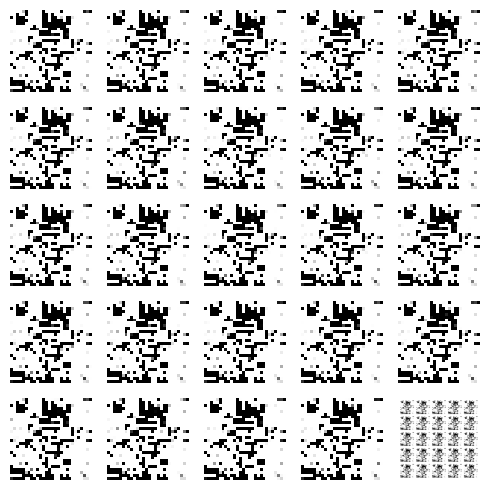

  0%|          | 0/350 [00:00<?, ?it/s]

4/4 [==============================] - 0s 15ms/step


  0%|          | 1/350 [00:00<02:44,  2.12it/s]

4/4 [==============================] - 0s 13ms/step


  1%|          | 2/350 [00:00<02:41,  2.16it/s]

4/4 [==============================] - 0s 13ms/step


  1%|          | 3/350 [00:01<02:47,  2.07it/s]

4/4 [==============================] - 0s 12ms/step


  1%|          | 4/350 [00:01<02:40,  2.15it/s]

4/4 [==============================] - 0s 12ms/step


  1%|▏         | 5/350 [00:02<02:36,  2.20it/s]

4/4 [==============================] - 0s 12ms/step


  2%|▏         | 6/350 [00:02<02:41,  2.14it/s]

4/4 [==============================] - 0s 11ms/step


  2%|▏         | 7/350 [00:03<02:37,  2.18it/s]

4/4 [==============================] - 0s 12ms/step


  2%|▏         | 8/350 [00:03<02:35,  2.20it/s]

4/4 [==============================] - 0s 11ms/step


  3%|▎         | 9/350 [00:04<02:37,  2.17it/s]

4/4 [==============================] - 0s 13ms/step


  3%|▎         | 10/350 [00:04<02:37,  2.16it/s]

4/4 [==============================] - 0s 12ms/step


  3%|▎         | 11/350 [00:05<02:35,  2.19it/s]

4/4 [==============================] - 0s 12ms/step


  3%|▎         | 12/350 [00:05<02:36,  2.15it/s]

4/4 [==============================] - 0s 12ms/step


  4%|▎         | 13/350 [00:05<02:31,  2.22it/s]

4/4 [==============================] - 0s 12ms/step


  4%|▍         | 14/350 [00:06<02:28,  2.26it/s]

4/4 [==============================] - 0s 13ms/step


  4%|▍         | 15/350 [00:06<02:29,  2.24it/s]

4/4 [==============================] - 0s 11ms/step


  5%|▍         | 16/350 [00:07<02:26,  2.28it/s]

4/4 [==============================] - 0s 12ms/step


  5%|▍         | 17/350 [00:07<02:24,  2.30it/s]

4/4 [==============================] - 0s 12ms/step


  5%|▌         | 18/350 [00:08<02:28,  2.23it/s]

4/4 [==============================] - 0s 14ms/step


  5%|▌         | 19/350 [00:08<02:28,  2.23it/s]

4/4 [==============================] - 0s 12ms/step


  6%|▌         | 20/350 [00:09<02:26,  2.26it/s]

4/4 [==============================] - 0s 12ms/step


  6%|▌         | 21/350 [00:09<02:28,  2.21it/s]

4/4 [==============================] - 0s 11ms/step


  6%|▋         | 22/350 [00:09<02:25,  2.26it/s]

4/4 [==============================] - 0s 12ms/step


  7%|▋         | 23/350 [00:10<02:22,  2.29it/s]

4/4 [==============================] - 0s 12ms/step


  7%|▋         | 24/350 [00:10<02:26,  2.23it/s]

4/4 [==============================] - 0s 11ms/step


  7%|▋         | 25/350 [00:11<02:23,  2.26it/s]

4/4 [==============================] - 0s 14ms/step


  7%|▋         | 26/350 [00:11<02:22,  2.27it/s]

4/4 [==============================] - 0s 11ms/step


  8%|▊         | 27/350 [00:12<02:26,  2.21it/s]

4/4 [==============================] - 0s 12ms/step


  8%|▊         | 28/350 [00:12<02:23,  2.24it/s]

4/4 [==============================] - 0s 11ms/step


  8%|▊         | 29/350 [00:13<02:21,  2.27it/s]

4/4 [==============================] - 0s 12ms/step


  9%|▊         | 30/350 [00:13<02:25,  2.20it/s]

4/4 [==============================] - 0s 12ms/step


  9%|▉         | 31/350 [00:13<02:22,  2.23it/s]

4/4 [==============================] - 0s 14ms/step


  9%|▉         | 32/350 [00:14<02:22,  2.23it/s]

4/4 [==============================] - 0s 13ms/step


  9%|▉         | 33/350 [00:14<02:25,  2.17it/s]

4/4 [==============================] - 0s 11ms/step


 10%|▉         | 34/350 [00:15<02:21,  2.23it/s]

4/4 [==============================] - 0s 12ms/step


 10%|█         | 35/350 [00:15<02:27,  2.13it/s]

4/4 [==============================] - 0s 12ms/step


 10%|█         | 36/350 [00:16<02:30,  2.09it/s]

4/4 [==============================] - 0s 16ms/step


 11%|█         | 37/350 [00:16<02:30,  2.08it/s]

4/4 [==============================] - 0s 17ms/step


 11%|█         | 38/350 [00:17<02:27,  2.12it/s]

4/4 [==============================] - 0s 12ms/step


 11%|█         | 39/350 [00:17<02:33,  2.02it/s]

4/4 [==============================] - 0s 12ms/step


 11%|█▏        | 40/350 [00:18<02:29,  2.08it/s]

4/4 [==============================] - 0s 15ms/step


 12%|█▏        | 41/350 [00:18<02:29,  2.06it/s]

4/4 [==============================] - 0s 18ms/step


 12%|█▏        | 42/350 [00:19<02:30,  2.05it/s]

4/4 [==============================] - 0s 13ms/step


 12%|█▏        | 43/350 [00:19<02:33,  2.00it/s]

4/4 [==============================] - 0s 14ms/step


 13%|█▎        | 44/350 [00:20<02:28,  2.07it/s]

4/4 [==============================] - 0s 12ms/step


 13%|█▎        | 45/350 [00:20<02:23,  2.13it/s]

4/4 [==============================] - 0s 12ms/step


 13%|█▎        | 46/350 [00:21<02:21,  2.15it/s]

4/4 [==============================] - 0s 12ms/step


 13%|█▎        | 47/350 [00:21<02:18,  2.19it/s]

4/4 [==============================] - 0s 15ms/step


 14%|█▎        | 48/350 [00:22<02:18,  2.18it/s]

4/4 [==============================] - 0s 11ms/step


 14%|█▍        | 49/350 [00:22<02:15,  2.22it/s]

4/4 [==============================] - 0s 14ms/step


 14%|█▍        | 50/350 [00:22<02:15,  2.21it/s]

4/4 [==============================] - 0s 12ms/step


 15%|█▍        | 51/350 [00:23<02:13,  2.25it/s]

4/4 [==============================] - 0s 13ms/step


 15%|█▍        | 52/350 [00:23<02:13,  2.24it/s]

4/4 [==============================] - 0s 13ms/step


 15%|█▌        | 53/350 [00:24<02:14,  2.20it/s]

4/4 [==============================] - 0s 12ms/step


 15%|█▌        | 54/350 [00:24<02:11,  2.24it/s]

4/4 [==============================] - 0s 11ms/step


 16%|█▌        | 55/350 [00:25<02:10,  2.26it/s]

4/4 [==============================] - 0s 13ms/step


 16%|█▌        | 56/350 [00:25<02:09,  2.26it/s]

4/4 [==============================] - 0s 23ms/step


 16%|█▋        | 57/350 [00:26<02:12,  2.21it/s]

4/4 [==============================] - 0s 11ms/step


 17%|█▋        | 58/350 [00:26<02:10,  2.24it/s]

4/4 [==============================] - 0s 15ms/step


 17%|█▋        | 59/350 [00:26<02:11,  2.21it/s]

4/4 [==============================] - 0s 12ms/step


 17%|█▋        | 60/350 [00:27<02:09,  2.24it/s]

4/4 [==============================] - 0s 12ms/step


 17%|█▋        | 61/350 [00:27<02:07,  2.26it/s]

4/4 [==============================] - 0s 17ms/step


 18%|█▊        | 62/350 [00:28<02:09,  2.22it/s]

4/4 [==============================] - 0s 12ms/step


 18%|█▊        | 63/350 [00:28<02:14,  2.13it/s]

4/4 [==============================] - 0s 14ms/step


 18%|█▊        | 64/350 [00:29<02:15,  2.11it/s]

4/4 [==============================] - 0s 13ms/step


 19%|█▊        | 65/350 [00:29<02:20,  2.02it/s]

4/4 [==============================] - 0s 19ms/step


 19%|█▉        | 66/350 [00:30<02:23,  1.98it/s]

4/4 [==============================] - 0s 30ms/step


 19%|█▉        | 67/350 [00:30<02:25,  1.95it/s]

4/4 [==============================] - 0s 11ms/step


 19%|█▉        | 68/350 [00:31<02:20,  2.00it/s]

4/4 [==============================] - 0s 17ms/step


 20%|█▉        | 69/350 [00:31<02:17,  2.05it/s]

4/4 [==============================] - 0s 14ms/step


 20%|██        | 70/350 [00:32<02:22,  1.96it/s]

4/4 [==============================] - 0s 15ms/step


 20%|██        | 71/350 [00:32<02:20,  1.99it/s]

4/4 [==============================] - 0s 16ms/step


 21%|██        | 72/350 [00:33<02:16,  2.03it/s]

4/4 [==============================] - 0s 13ms/step


 21%|██        | 73/350 [00:33<02:12,  2.10it/s]

4/4 [==============================] - 0s 15ms/step


 21%|██        | 74/350 [00:34<02:16,  2.03it/s]

4/4 [==============================] - 0s 17ms/step


 21%|██▏       | 75/350 [00:34<02:18,  1.99it/s]

4/4 [==============================] - 0s 11ms/step


 22%|██▏       | 76/350 [00:35<02:12,  2.07it/s]

4/4 [==============================] - 0s 12ms/step


 22%|██▏       | 77/350 [00:35<02:13,  2.04it/s]

4/4 [==============================] - 0s 15ms/step


 22%|██▏       | 78/350 [00:36<02:13,  2.04it/s]

4/4 [==============================] - 0s 34ms/step


 23%|██▎       | 79/350 [00:36<02:15,  2.00it/s]

4/4 [==============================] - 0s 11ms/step


 23%|██▎       | 80/350 [00:37<02:09,  2.09it/s]

4/4 [==============================] - 0s 14ms/step


 23%|██▎       | 81/350 [00:37<02:08,  2.09it/s]

4/4 [==============================] - 0s 20ms/step


 23%|██▎       | 82/350 [00:38<02:10,  2.06it/s]

4/4 [==============================] - 0s 13ms/step


 24%|██▎       | 83/350 [00:38<02:16,  1.95it/s]

4/4 [==============================] - 0s 13ms/step


 24%|██▍       | 84/350 [00:39<02:11,  2.02it/s]

4/4 [==============================] - 0s 12ms/step


 24%|██▍       | 85/350 [00:39<02:09,  2.04it/s]

4/4 [==============================] - 0s 12ms/step


 25%|██▍       | 86/350 [00:40<02:05,  2.10it/s]

4/4 [==============================] - 0s 11ms/step


 25%|██▍       | 87/350 [00:40<02:05,  2.09it/s]

4/4 [==============================] - 0s 12ms/step


 25%|██▌       | 88/350 [00:41<02:00,  2.17it/s]

4/4 [==============================] - 0s 15ms/step


 25%|██▌       | 89/350 [00:41<02:00,  2.17it/s]

4/4 [==============================] - 0s 12ms/step


 26%|██▌       | 90/350 [00:41<01:58,  2.20it/s]

4/4 [==============================] - 0s 13ms/step


 26%|██▌       | 91/350 [00:42<02:01,  2.12it/s]

4/4 [==============================] - 0s 13ms/step


 26%|██▋       | 92/350 [00:42<02:00,  2.14it/s]

4/4 [==============================] - 0s 12ms/step


 27%|██▋       | 93/350 [00:43<01:58,  2.17it/s]

4/4 [==============================] - 0s 13ms/step


 27%|██▋       | 94/350 [00:43<01:58,  2.16it/s]

4/4 [==============================] - 0s 19ms/step


 27%|██▋       | 95/350 [00:44<01:59,  2.13it/s]

4/4 [==============================] - 0s 11ms/step


 27%|██▋       | 96/350 [00:44<01:56,  2.19it/s]

4/4 [==============================] - 0s 12ms/step


 28%|██▊       | 97/350 [00:45<01:54,  2.21it/s]

4/4 [==============================] - 0s 18ms/step


 28%|██▊       | 98/350 [00:45<01:56,  2.15it/s]

4/4 [==============================] - 0s 11ms/step


 28%|██▊       | 99/350 [00:46<01:59,  2.11it/s]

4/4 [==============================] - 0s 16ms/step


 29%|██▊       | 100/350 [00:46<02:07,  1.96it/s]

4/4 [==============================] - 0s 15ms/step


 29%|██▉       | 101/350 [00:47<02:03,  2.02it/s]

4/4 [==============================] - 0s 12ms/step


 29%|██▉       | 102/350 [00:47<02:00,  2.06it/s]

4/4 [==============================] - 0s 30ms/step


 29%|██▉       | 103/350 [00:48<02:06,  1.95it/s]

4/4 [==============================] - 0s 16ms/step


 30%|██▉       | 104/350 [00:48<02:06,  1.95it/s]

4/4 [==============================] - 0s 25ms/step


 30%|███       | 105/350 [00:49<02:05,  1.95it/s]

4/4 [==============================] - 0s 12ms/step


 30%|███       | 106/350 [00:49<02:01,  2.01it/s]

4/4 [==============================] - 0s 13ms/step


 31%|███       | 107/350 [00:50<02:01,  1.99it/s]

4/4 [==============================] - 0s 21ms/step


 31%|███       | 108/350 [00:50<02:01,  2.00it/s]

4/4 [==============================] - 0s 12ms/step


 31%|███       | 109/350 [00:51<02:00,  2.00it/s]

4/4 [==============================] - 0s 11ms/step


 31%|███▏      | 110/350 [00:51<01:55,  2.08it/s]

4/4 [==============================] - 0s 25ms/step


 32%|███▏      | 111/350 [00:52<01:57,  2.04it/s]

4/4 [==============================] - 0s 12ms/step


 32%|███▏      | 112/350 [00:52<01:52,  2.11it/s]

4/4 [==============================] - 0s 12ms/step


 32%|███▏      | 113/350 [00:53<01:50,  2.14it/s]

4/4 [==============================] - 0s 20ms/step


 33%|███▎      | 114/350 [00:53<01:54,  2.07it/s]

4/4 [==============================] - 0s 12ms/step


 33%|███▎      | 115/350 [00:54<01:50,  2.13it/s]

4/4 [==============================] - 0s 14ms/step


 33%|███▎      | 116/350 [00:54<01:50,  2.12it/s]

4/4 [==============================] - 0s 26ms/step


 33%|███▎      | 117/350 [00:55<01:52,  2.07it/s]

4/4 [==============================] - 0s 16ms/step


 34%|███▎      | 118/350 [00:55<01:52,  2.06it/s]

4/4 [==============================] - 0s 12ms/step


 34%|███▍      | 119/350 [00:55<01:47,  2.14it/s]

4/4 [==============================] - 0s 21ms/step


 34%|███▍      | 120/350 [00:56<01:50,  2.09it/s]

4/4 [==============================] - 0s 14ms/step


 35%|███▍      | 121/350 [00:56<01:47,  2.14it/s]

4/4 [==============================] - 0s 12ms/step


 35%|███▍      | 122/350 [00:57<01:43,  2.20it/s]

4/4 [==============================] - 0s 12ms/step


 35%|███▌      | 123/350 [00:57<01:44,  2.17it/s]

4/4 [==============================] - 0s 12ms/step


 35%|███▌      | 124/350 [00:58<01:41,  2.22it/s]

4/4 [==============================] - 0s 12ms/step


 36%|███▌      | 125/350 [00:58<01:39,  2.26it/s]

4/4 [==============================] - 0s 11ms/step


 36%|███▌      | 126/350 [00:59<01:41,  2.21it/s]

4/4 [==============================] - 0s 12ms/step


 36%|███▋      | 127/350 [00:59<01:38,  2.26it/s]

4/4 [==============================] - 0s 11ms/step


 37%|███▋      | 128/350 [00:59<01:37,  2.28it/s]

4/4 [==============================] - 0s 12ms/step


 37%|███▋      | 129/350 [01:00<01:39,  2.22it/s]

4/4 [==============================] - 0s 11ms/step


 37%|███▋      | 130/350 [01:00<01:37,  2.26it/s]

4/4 [==============================] - 0s 13ms/step


 37%|███▋      | 131/350 [01:01<01:38,  2.23it/s]

4/4 [==============================] - 0s 21ms/step


 38%|███▊      | 132/350 [01:01<01:41,  2.14it/s]

4/4 [==============================] - 0s 12ms/step


 38%|███▊      | 133/350 [01:02<01:39,  2.18it/s]

4/4 [==============================] - 0s 13ms/step


 38%|███▊      | 134/350 [01:02<01:41,  2.13it/s]

4/4 [==============================] - 0s 15ms/step


 39%|███▊      | 135/350 [01:03<01:40,  2.14it/s]

4/4 [==============================] - 0s 13ms/step


 39%|███▉      | 136/350 [01:03<01:42,  2.08it/s]

4/4 [==============================] - 0s 12ms/step


 39%|███▉      | 137/350 [01:04<01:38,  2.17it/s]

4/4 [==============================] - 0s 12ms/step


 39%|███▉      | 138/350 [01:04<01:36,  2.20it/s]

4/4 [==============================] - 0s 15ms/step


 40%|███▉      | 139/350 [01:05<01:38,  2.14it/s]

4/4 [==============================] - 0s 13ms/step


 40%|████      | 140/350 [01:05<01:37,  2.15it/s]

4/4 [==============================] - 0s 11ms/step


 40%|████      | 141/350 [01:06<01:39,  2.10it/s]

4/4 [==============================] - 0s 12ms/step


 41%|████      | 142/350 [01:06<01:37,  2.14it/s]

4/4 [==============================] - 0s 12ms/step


 41%|████      | 143/350 [01:07<01:37,  2.11it/s]

4/4 [==============================] - 0s 11ms/step


 41%|████      | 144/350 [01:07<01:34,  2.19it/s]

4/4 [==============================] - 0s 12ms/step


 41%|████▏     | 145/350 [01:07<01:31,  2.23it/s]

4/4 [==============================] - 0s 24ms/step


 42%|████▏     | 146/350 [01:08<01:32,  2.20it/s]

4/4 [==============================] - 0s 11ms/step


 42%|████▏     | 147/350 [01:08<01:30,  2.25it/s]

4/4 [==============================] - 0s 12ms/step


 42%|████▏     | 148/350 [01:09<01:28,  2.28it/s]

4/4 [==============================] - 0s 11ms/step


 43%|████▎     | 149/350 [01:09<01:30,  2.22it/s]

4/4 [==============================] - 0s 11ms/step


 43%|████▎     | 150/350 [01:10<01:28,  2.26it/s]

4/4 [==============================] - 0s 12ms/step


 43%|████▎     | 151/350 [01:10<01:27,  2.27it/s]

4/4 [==============================] - 0s 16ms/step


 43%|████▎     | 152/350 [01:10<01:28,  2.23it/s]

4/4 [==============================] - 0s 11ms/step


 44%|████▎     | 153/350 [01:11<01:26,  2.28it/s]

4/4 [==============================] - 0s 11ms/step


 44%|████▍     | 154/350 [01:11<01:27,  2.25it/s]

4/4 [==============================] - 0s 29ms/step


 44%|████▍     | 155/350 [01:12<01:30,  2.16it/s]

4/4 [==============================] - 0s 14ms/step


 45%|████▍     | 156/350 [01:12<01:29,  2.16it/s]

4/4 [==============================] - 0s 16ms/step


 45%|████▍     | 157/350 [01:13<01:30,  2.13it/s]

4/4 [==============================] - 0s 14ms/step


 45%|████▌     | 158/350 [01:13<01:29,  2.15it/s]

4/4 [==============================] - 0s 13ms/step


 45%|████▌     | 159/350 [01:14<01:31,  2.10it/s]

4/4 [==============================] - 0s 12ms/step


 46%|████▌     | 160/350 [01:14<01:29,  2.12it/s]

4/4 [==============================] - 0s 17ms/step


 46%|████▌     | 161/350 [01:15<01:30,  2.09it/s]

4/4 [==============================] - 0s 13ms/step


 46%|████▋     | 162/350 [01:15<01:28,  2.13it/s]

4/4 [==============================] - 0s 11ms/step


 47%|████▋     | 163/350 [01:16<01:28,  2.11it/s]

4/4 [==============================] - 0s 12ms/step


 47%|████▋     | 164/350 [01:16<01:26,  2.16it/s]

4/4 [==============================] - 0s 11ms/step


 47%|████▋     | 165/350 [01:17<01:23,  2.22it/s]

4/4 [==============================] - 0s 18ms/step


 47%|████▋     | 166/350 [01:17<01:24,  2.18it/s]

4/4 [==============================] - 0s 14ms/step


 48%|████▊     | 167/350 [01:17<01:24,  2.18it/s]

4/4 [==============================] - 0s 13ms/step


 48%|████▊     | 168/350 [01:18<01:24,  2.14it/s]

4/4 [==============================] - 0s 12ms/step


 48%|████▊     | 169/350 [01:18<01:24,  2.14it/s]

4/4 [==============================] - 0s 12ms/step


 49%|████▊     | 170/350 [01:19<01:25,  2.10it/s]

4/4 [==============================] - 0s 11ms/step


 49%|████▉     | 171/350 [01:19<01:25,  2.09it/s]

4/4 [==============================] - 0s 13ms/step


 49%|████▉     | 172/350 [01:20<01:29,  1.99it/s]

4/4 [==============================] - 0s 12ms/step


 49%|████▉     | 173/350 [01:20<01:26,  2.04it/s]

4/4 [==============================] - 0s 14ms/step


 50%|████▉     | 174/350 [01:21<01:24,  2.07it/s]

4/4 [==============================] - 0s 13ms/step


 50%|█████     | 175/350 [01:21<01:24,  2.06it/s]

4/4 [==============================] - 0s 12ms/step


 50%|█████     | 176/350 [01:22<01:22,  2.12it/s]

4/4 [==============================] - 0s 16ms/step


 51%|█████     | 177/350 [01:22<01:21,  2.13it/s]

4/4 [==============================] - 0s 12ms/step


 51%|█████     | 178/350 [01:23<01:20,  2.13it/s]

4/4 [==============================] - 0s 12ms/step


 51%|█████     | 179/350 [01:23<01:21,  2.09it/s]

4/4 [==============================] - 0s 13ms/step


 51%|█████▏    | 180/350 [01:24<01:20,  2.12it/s]

4/4 [==============================] - 0s 33ms/step


 52%|█████▏    | 181/350 [01:24<01:25,  1.97it/s]

4/4 [==============================] - 0s 13ms/step


 52%|█████▏    | 182/350 [01:25<01:22,  2.03it/s]

4/4 [==============================] - 0s 14ms/step


 52%|█████▏    | 183/350 [01:25<01:21,  2.05it/s]

4/4 [==============================] - 0s 12ms/step


 53%|█████▎    | 184/350 [01:26<01:18,  2.13it/s]

4/4 [==============================] - 0s 12ms/step


 53%|█████▎    | 185/350 [01:26<01:15,  2.19it/s]

4/4 [==============================] - 0s 12ms/step


 53%|█████▎    | 186/350 [01:27<01:15,  2.17it/s]

4/4 [==============================] - 0s 12ms/step


 53%|█████▎    | 187/350 [01:27<01:13,  2.22it/s]

4/4 [==============================] - 0s 12ms/step


 54%|█████▎    | 188/350 [01:27<01:11,  2.26it/s]

4/4 [==============================] - 0s 12ms/step


 54%|█████▍    | 189/350 [01:28<01:13,  2.20it/s]

4/4 [==============================] - 0s 12ms/step


 54%|█████▍    | 190/350 [01:28<01:11,  2.24it/s]

4/4 [==============================] - 0s 13ms/step


 55%|█████▍    | 191/350 [01:29<01:10,  2.27it/s]

4/4 [==============================] - 0s 12ms/step


 55%|█████▍    | 192/350 [01:29<01:11,  2.22it/s]

4/4 [==============================] - 0s 12ms/step


 55%|█████▌    | 193/350 [01:30<01:12,  2.17it/s]

4/4 [==============================] - 0s 16ms/step


 55%|█████▌    | 194/350 [01:30<01:11,  2.18it/s]

4/4 [==============================] - 0s 12ms/step


 56%|█████▌    | 195/350 [01:31<01:14,  2.09it/s]

4/4 [==============================] - 0s 12ms/step


 56%|█████▌    | 196/350 [01:31<01:14,  2.07it/s]

4/4 [==============================] - 0s 14ms/step


 56%|█████▋    | 197/350 [01:32<01:15,  2.02it/s]

4/4 [==============================] - 0s 13ms/step


 57%|█████▋    | 198/350 [01:32<01:12,  2.10it/s]

4/4 [==============================] - 0s 12ms/step


 57%|█████▋    | 199/350 [01:33<01:09,  2.18it/s]

4/4 [==============================] - 0s 16ms/step


 57%|█████▋    | 200/350 [01:33<01:09,  2.15it/s]

4/4 [==============================] - 0s 12ms/step


 57%|█████▋    | 201/350 [01:33<01:09,  2.14it/s]

4/4 [==============================] - 0s 12ms/step


 58%|█████▊    | 202/350 [01:34<01:08,  2.16it/s]

4/4 [==============================] - 0s 12ms/step


 58%|█████▊    | 203/350 [01:34<01:09,  2.13it/s]

4/4 [==============================] - 0s 11ms/step


 58%|█████▊    | 204/350 [01:35<01:08,  2.14it/s]

4/4 [==============================] - 0s 20ms/step


 59%|█████▊    | 205/350 [01:35<01:10,  2.06it/s]

4/4 [==============================] - 0s 13ms/step


 59%|█████▉    | 206/350 [01:36<01:08,  2.10it/s]

4/4 [==============================] - 0s 13ms/step


 59%|█████▉    | 207/350 [01:36<01:08,  2.10it/s]

4/4 [==============================] - 0s 24ms/step


 59%|█████▉    | 208/350 [01:37<01:13,  1.95it/s]

4/4 [==============================] - 0s 14ms/step


 60%|█████▉    | 209/350 [01:37<01:13,  1.92it/s]

4/4 [==============================] - 0s 15ms/step


 60%|██████    | 210/350 [01:38<01:11,  1.97it/s]

4/4 [==============================] - 0s 15ms/step


 60%|██████    | 211/350 [01:39<01:13,  1.89it/s]

4/4 [==============================] - 0s 12ms/step


 61%|██████    | 212/350 [01:39<01:11,  1.93it/s]

4/4 [==============================] - 0s 15ms/step


 61%|██████    | 213/350 [01:40<01:09,  1.96it/s]

4/4 [==============================] - 0s 23ms/step


 61%|██████    | 214/350 [01:40<01:08,  1.98it/s]

4/4 [==============================] - 0s 13ms/step


 61%|██████▏   | 215/350 [01:40<01:06,  2.04it/s]

4/4 [==============================] - 0s 15ms/step


 62%|██████▏   | 216/350 [01:41<01:04,  2.06it/s]

4/4 [==============================] - 0s 15ms/step


 62%|██████▏   | 217/350 [01:41<01:06,  1.99it/s]

4/4 [==============================] - 0s 13ms/step


 62%|██████▏   | 218/350 [01:42<01:05,  2.00it/s]

4/4 [==============================] - 0s 13ms/step


 63%|██████▎   | 219/350 [01:43<01:07,  1.93it/s]

4/4 [==============================] - 0s 18ms/step


 63%|██████▎   | 220/350 [01:43<01:07,  1.91it/s]

4/4 [==============================] - 0s 16ms/step


 63%|██████▎   | 221/350 [01:44<01:06,  1.94it/s]

4/4 [==============================] - 0s 15ms/step


 63%|██████▎   | 222/350 [01:44<01:08,  1.88it/s]

4/4 [==============================] - 0s 15ms/step


 64%|██████▎   | 223/350 [01:45<01:08,  1.86it/s]

4/4 [==============================] - 0s 14ms/step


 64%|██████▍   | 224/350 [01:45<01:07,  1.88it/s]

4/4 [==============================] - 0s 16ms/step


 64%|██████▍   | 225/350 [01:46<01:05,  1.91it/s]

4/4 [==============================] - 0s 15ms/step


 65%|██████▍   | 226/350 [01:46<01:04,  1.91it/s]

4/4 [==============================] - 0s 13ms/step


 65%|██████▍   | 227/350 [01:47<01:02,  1.98it/s]

4/4 [==============================] - 0s 13ms/step


 65%|██████▌   | 228/350 [01:47<01:00,  2.03it/s]

4/4 [==============================] - 0s 14ms/step


 65%|██████▌   | 229/350 [01:48<01:00,  1.99it/s]

4/4 [==============================] - 0s 12ms/step


 66%|██████▌   | 230/350 [01:48<01:00,  1.99it/s]

4/4 [==============================] - 0s 13ms/step


 66%|██████▌   | 231/350 [01:49<00:59,  1.99it/s]

4/4 [==============================] - 0s 14ms/step


 66%|██████▋   | 232/350 [01:49<00:58,  2.01it/s]

4/4 [==============================] - 0s 23ms/step


 67%|██████▋   | 233/350 [01:50<00:58,  2.01it/s]

4/4 [==============================] - 0s 15ms/step


 67%|██████▋   | 234/350 [01:50<00:57,  2.02it/s]

4/4 [==============================] - 0s 12ms/step


 67%|██████▋   | 235/350 [01:51<00:57,  2.00it/s]

4/4 [==============================] - 0s 14ms/step


 67%|██████▋   | 236/350 [01:51<00:59,  1.93it/s]

4/4 [==============================] - 0s 15ms/step


 68%|██████▊   | 237/350 [01:52<00:58,  1.94it/s]

4/4 [==============================] - 0s 15ms/step


 68%|██████▊   | 238/350 [01:52<00:58,  1.91it/s]

4/4 [==============================] - 0s 27ms/step


 68%|██████▊   | 239/350 [01:53<00:58,  1.89it/s]

4/4 [==============================] - 0s 14ms/step


 69%|██████▊   | 240/350 [01:53<00:57,  1.91it/s]

4/4 [==============================] - 0s 12ms/step


 69%|██████▉   | 241/350 [01:54<00:56,  1.94it/s]

4/4 [==============================] - 0s 13ms/step


 69%|██████▉   | 242/350 [01:54<00:54,  1.96it/s]

4/4 [==============================] - 0s 12ms/step


 69%|██████▉   | 243/350 [01:55<00:53,  2.01it/s]

4/4 [==============================] - 0s 15ms/step


 70%|██████▉   | 244/350 [01:55<00:54,  1.96it/s]

4/4 [==============================] - 0s 14ms/step


 70%|███████   | 245/350 [01:56<00:53,  1.97it/s]

4/4 [==============================] - 0s 14ms/step


 70%|███████   | 246/350 [01:56<00:50,  2.04it/s]

4/4 [==============================] - 0s 12ms/step


 71%|███████   | 247/350 [01:57<00:49,  2.09it/s]

4/4 [==============================] - 0s 12ms/step


 71%|███████   | 248/350 [01:57<00:50,  2.03it/s]

4/4 [==============================] - 0s 12ms/step


 71%|███████   | 249/350 [01:58<00:47,  2.10it/s]

4/4 [==============================] - 0s 12ms/step


 71%|███████▏  | 250/350 [01:58<00:46,  2.16it/s]

4/4 [==============================] - 0s 12ms/step


 72%|███████▏  | 251/350 [01:59<00:46,  2.14it/s]

4/4 [==============================] - 0s 15ms/step


 72%|███████▏  | 252/350 [01:59<00:45,  2.16it/s]

4/4 [==============================] - 0s 12ms/step


 72%|███████▏  | 253/350 [02:00<00:44,  2.19it/s]

4/4 [==============================] - 0s 12ms/step


 73%|███████▎  | 254/350 [02:00<00:43,  2.20it/s]

4/4 [==============================] - 0s 29ms/step


 73%|███████▎  | 255/350 [02:00<00:44,  2.13it/s]

4/4 [==============================] - 0s 12ms/step


 73%|███████▎  | 256/350 [02:01<00:43,  2.18it/s]

4/4 [==============================] - 0s 12ms/step


 73%|███████▎  | 257/350 [02:01<00:41,  2.22it/s]

4/4 [==============================] - 0s 16ms/step


 74%|███████▎  | 258/350 [02:02<00:42,  2.17it/s]

4/4 [==============================] - 0s 12ms/step


 74%|███████▍  | 259/350 [02:02<00:41,  2.20it/s]

4/4 [==============================] - 0s 13ms/step


 74%|███████▍  | 260/350 [02:03<00:41,  2.19it/s]

4/4 [==============================] - 0s 12ms/step


 75%|███████▍  | 261/350 [02:03<00:40,  2.21it/s]

4/4 [==============================] - 0s 11ms/step


 75%|███████▍  | 262/350 [02:04<00:40,  2.17it/s]

4/4 [==============================] - 0s 11ms/step


 75%|███████▌  | 263/350 [02:04<00:39,  2.20it/s]

4/4 [==============================] - 0s 12ms/step


 75%|███████▌  | 264/350 [02:05<00:38,  2.23it/s]

4/4 [==============================] - 0s 12ms/step


 76%|███████▌  | 265/350 [02:05<00:37,  2.25it/s]

4/4 [==============================] - 0s 11ms/step


 76%|███████▌  | 266/350 [02:05<00:38,  2.17it/s]

4/4 [==============================] - 0s 14ms/step


 76%|███████▋  | 267/350 [02:06<00:37,  2.20it/s]

4/4 [==============================] - 0s 13ms/step


 77%|███████▋  | 268/350 [02:06<00:36,  2.23it/s]

4/4 [==============================] - 0s 12ms/step


 77%|███████▋  | 269/350 [02:07<00:35,  2.26it/s]

4/4 [==============================] - 0s 20ms/step


 77%|███████▋  | 270/350 [02:07<00:36,  2.19it/s]

4/4 [==============================] - 0s 12ms/step


 77%|███████▋  | 271/350 [02:08<00:35,  2.21it/s]

4/4 [==============================] - 0s 12ms/step


 78%|███████▊  | 272/350 [02:08<00:35,  2.23it/s]

4/4 [==============================] - 0s 11ms/step


 78%|███████▊  | 273/350 [02:09<00:35,  2.19it/s]

4/4 [==============================] - 0s 11ms/step


 78%|███████▊  | 274/350 [02:09<00:34,  2.23it/s]

4/4 [==============================] - 0s 12ms/step


 79%|███████▊  | 275/350 [02:09<00:33,  2.26it/s]

4/4 [==============================] - 0s 11ms/step


 79%|███████▉  | 276/350 [02:10<00:32,  2.28it/s]

4/4 [==============================] - 0s 11ms/step


 79%|███████▉  | 277/350 [02:10<00:31,  2.30it/s]

4/4 [==============================] - 0s 21ms/step


 79%|███████▉  | 278/350 [02:11<00:32,  2.21it/s]

4/4 [==============================] - 0s 12ms/step


 80%|███████▉  | 279/350 [02:11<00:31,  2.24it/s]

4/4 [==============================] - 0s 11ms/step


 80%|████████  | 280/350 [02:12<00:30,  2.26it/s]

4/4 [==============================] - 0s 11ms/step


 80%|████████  | 281/350 [02:12<00:30,  2.28it/s]

4/4 [==============================] - 0s 12ms/step


 81%|████████  | 282/350 [02:13<00:29,  2.31it/s]

4/4 [==============================] - 0s 16ms/step


 81%|████████  | 283/350 [02:13<00:30,  2.23it/s]

4/4 [==============================] - 0s 11ms/step


 81%|████████  | 284/350 [02:13<00:29,  2.26it/s]

4/4 [==============================] - 0s 12ms/step


 81%|████████▏ | 285/350 [02:14<00:28,  2.27it/s]

4/4 [==============================] - 0s 12ms/step


 82%|████████▏ | 286/350 [02:14<00:27,  2.29it/s]

4/4 [==============================] - 0s 18ms/step


 82%|████████▏ | 287/350 [02:15<00:28,  2.23it/s]

4/4 [==============================] - 0s 11ms/step


 82%|████████▏ | 288/350 [02:15<00:27,  2.27it/s]

4/4 [==============================] - 0s 12ms/step


 83%|████████▎ | 289/350 [02:16<00:26,  2.29it/s]

4/4 [==============================] - 0s 12ms/step


 83%|████████▎ | 290/350 [02:16<00:26,  2.29it/s]

4/4 [==============================] - 0s 11ms/step


 83%|████████▎ | 291/350 [02:17<00:25,  2.31it/s]

4/4 [==============================] - 0s 12ms/step


 83%|████████▎ | 292/350 [02:17<00:25,  2.31it/s]

4/4 [==============================] - 0s 13ms/step


 84%|████████▎ | 293/350 [02:17<00:25,  2.23it/s]

4/4 [==============================] - 0s 12ms/step


 84%|████████▍ | 294/350 [02:18<00:24,  2.27it/s]

4/4 [==============================] - 0s 14ms/step


 84%|████████▍ | 295/350 [02:18<00:24,  2.26it/s]

4/4 [==============================] - 0s 11ms/step


 85%|████████▍ | 296/350 [02:19<00:23,  2.29it/s]

4/4 [==============================] - 0s 19ms/step


 85%|████████▍ | 297/350 [02:19<00:23,  2.22it/s]

4/4 [==============================] - 0s 12ms/step


 85%|████████▌ | 298/350 [02:20<00:23,  2.25it/s]

4/4 [==============================] - 0s 11ms/step


 85%|████████▌ | 299/350 [02:20<00:22,  2.27it/s]

4/4 [==============================] - 0s 12ms/step


 86%|████████▌ | 300/350 [02:20<00:21,  2.27it/s]

4/4 [==============================] - 0s 12ms/step


 86%|████████▌ | 301/350 [02:21<00:22,  2.21it/s]

4/4 [==============================] - 0s 12ms/step


 86%|████████▋ | 302/350 [02:21<00:21,  2.25it/s]

4/4 [==============================] - 0s 11ms/step


 87%|████████▋ | 303/350 [02:22<00:20,  2.29it/s]

4/4 [==============================] - 0s 13ms/step


 87%|████████▋ | 304/350 [02:22<00:20,  2.29it/s]

4/4 [==============================] - 0s 13ms/step


 87%|████████▋ | 305/350 [02:23<00:20,  2.22it/s]

4/4 [==============================] - 0s 12ms/step


 87%|████████▋ | 306/350 [02:23<00:19,  2.25it/s]

4/4 [==============================] - 0s 16ms/step


 88%|████████▊ | 307/350 [02:24<00:19,  2.24it/s]

4/4 [==============================] - 0s 12ms/step


 88%|████████▊ | 308/350 [02:24<00:18,  2.27it/s]

4/4 [==============================] - 0s 12ms/step


 88%|████████▊ | 309/350 [02:24<00:17,  2.29it/s]

4/4 [==============================] - 0s 14ms/step


 89%|████████▊ | 310/350 [02:25<00:17,  2.24it/s]

4/4 [==============================] - 0s 12ms/step


 89%|████████▉ | 311/350 [02:25<00:17,  2.27it/s]

4/4 [==============================] - 0s 11ms/step


 89%|████████▉ | 312/350 [02:26<00:16,  2.28it/s]

4/4 [==============================] - 0s 23ms/step


 89%|████████▉ | 313/350 [02:26<00:16,  2.22it/s]

4/4 [==============================] - 0s 12ms/step


 90%|████████▉ | 314/350 [02:27<00:16,  2.24it/s]

4/4 [==============================] - 0s 12ms/step


 90%|█████████ | 315/350 [02:27<00:15,  2.26it/s]

4/4 [==============================] - 0s 12ms/step


 90%|█████████ | 316/350 [02:28<00:15,  2.27it/s]

4/4 [==============================] - 0s 11ms/step


 91%|█████████ | 317/350 [02:28<00:14,  2.29it/s]

4/4 [==============================] - 0s 14ms/step


 91%|█████████ | 318/350 [02:29<00:14,  2.18it/s]

4/4 [==============================] - 0s 12ms/step


 91%|█████████ | 319/350 [02:29<00:14,  2.20it/s]

4/4 [==============================] - 0s 12ms/step


 91%|█████████▏| 320/350 [02:29<00:13,  2.19it/s]

4/4 [==============================] - 0s 13ms/step


 92%|█████████▏| 321/350 [02:30<00:13,  2.14it/s]

4/4 [==============================] - 0s 12ms/step


 92%|█████████▏| 322/350 [02:30<00:12,  2.17it/s]

4/4 [==============================] - 0s 11ms/step


 92%|█████████▏| 323/350 [02:31<00:12,  2.19it/s]

4/4 [==============================] - 0s 23ms/step


 93%|█████████▎| 324/350 [02:31<00:12,  2.12it/s]

4/4 [==============================] - 0s 12ms/step


 93%|█████████▎| 325/350 [02:32<00:11,  2.18it/s]

4/4 [==============================] - 0s 12ms/step


 93%|█████████▎| 326/350 [02:32<00:11,  2.12it/s]

4/4 [==============================] - 0s 16ms/step


 93%|█████████▎| 327/350 [02:33<00:11,  1.99it/s]

4/4 [==============================] - 0s 15ms/step


 94%|█████████▎| 328/350 [02:33<00:10,  2.04it/s]

4/4 [==============================] - 0s 12ms/step


 94%|█████████▍| 329/350 [02:34<00:10,  2.09it/s]

4/4 [==============================] - 0s 29ms/step


 94%|█████████▍| 330/350 [02:34<00:10,  1.98it/s]

4/4 [==============================] - 0s 14ms/step


 95%|█████████▍| 331/350 [02:35<00:09,  1.96it/s]

4/4 [==============================] - 0s 16ms/step


 95%|█████████▍| 332/350 [02:35<00:09,  1.95it/s]

4/4 [==============================] - 0s 25ms/step


 95%|█████████▌| 333/350 [02:36<00:08,  1.94it/s]

4/4 [==============================] - 0s 13ms/step


 95%|█████████▌| 334/350 [02:36<00:07,  2.03it/s]

4/4 [==============================] - 0s 13ms/step


 96%|█████████▌| 335/350 [02:37<00:07,  2.01it/s]

4/4 [==============================] - 0s 26ms/step


 96%|█████████▌| 336/350 [02:37<00:07,  1.93it/s]

4/4 [==============================] - 0s 15ms/step


 96%|█████████▋| 337/350 [02:38<00:06,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


 97%|█████████▋| 338/350 [02:38<00:06,  1.93it/s]

4/4 [==============================] - 0s 16ms/step


 97%|█████████▋| 339/350 [02:39<00:05,  1.88it/s]

4/4 [==============================] - 0s 13ms/step


 97%|█████████▋| 340/350 [02:39<00:05,  1.98it/s]

4/4 [==============================] - 0s 12ms/step


 97%|█████████▋| 341/350 [02:40<00:04,  2.06it/s]

4/4 [==============================] - 0s 28ms/step


 98%|█████████▊| 342/350 [02:40<00:04,  1.96it/s]

4/4 [==============================] - 0s 15ms/step


 98%|█████████▊| 343/350 [02:41<00:03,  1.99it/s]

4/4 [==============================] - 0s 12ms/step


 98%|█████████▊| 344/350 [02:41<00:02,  2.07it/s]

4/4 [==============================] - 0s 12ms/step


 99%|█████████▊| 345/350 [02:42<00:02,  1.95it/s]

4/4 [==============================] - 0s 13ms/step


 99%|█████████▉| 346/350 [02:42<00:02,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


 99%|█████████▉| 347/350 [02:43<00:01,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


 99%|█████████▉| 348/350 [02:44<00:01,  1.93it/s]

4/4 [==============================] - 0s 15ms/step


100%|█████████▉| 349/350 [02:44<00:00,  1.99it/s]

4/4 [==============================] - 0s 12ms/step


100%|██████████| 350/350 [02:45<00:00,  2.12it/s]

Epoch number: 4 discriminator_loss: 0.17302783293899016 generator_loss: 6.130285874775478
1/1 [==============================] - 0s 27ms/step


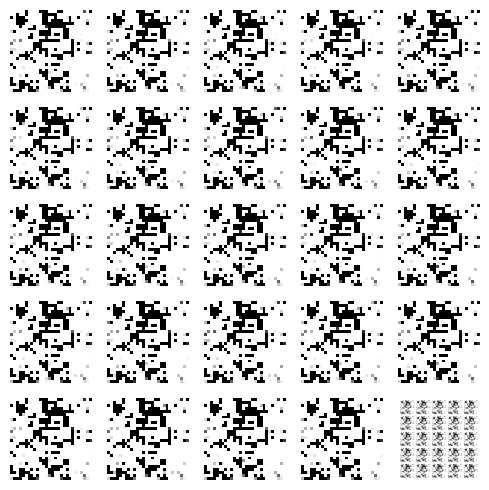

  0%|          | 0/350 [00:00<?, ?it/s]

4/4 [==============================] - 0s 15ms/step


  0%|          | 1/350 [00:00<02:53,  2.01it/s]

4/4 [==============================] - 0s 15ms/step


  1%|          | 2/350 [00:00<02:51,  2.03it/s]

4/4 [==============================] - 0s 13ms/step


  1%|          | 3/350 [00:01<02:42,  2.13it/s]

4/4 [==============================] - 0s 12ms/step


  1%|          | 4/350 [00:01<02:35,  2.22it/s]

4/4 [==============================] - 0s 11ms/step


  1%|▏         | 5/350 [00:02<02:32,  2.27it/s]

4/4 [==============================] - 0s 18ms/step


  2%|▏         | 6/350 [00:02<02:35,  2.21it/s]

4/4 [==============================] - 0s 11ms/step


  2%|▏         | 7/350 [00:03<02:32,  2.25it/s]

4/4 [==============================] - 0s 11ms/step


  2%|▏         | 8/350 [00:03<02:30,  2.28it/s]

4/4 [==============================] - 0s 11ms/step


  3%|▎         | 9/350 [00:04<02:29,  2.29it/s]

4/4 [==============================] - 0s 19ms/step


  3%|▎         | 10/350 [00:04<02:41,  2.10it/s]

4/4 [==============================] - 0s 16ms/step


  3%|▎         | 11/350 [00:05<02:44,  2.06it/s]

4/4 [==============================] - 0s 13ms/step


  3%|▎         | 12/350 [00:05<02:42,  2.08it/s]

4/4 [==============================] - 0s 15ms/step


  4%|▎         | 13/350 [00:06<02:39,  2.12it/s]

4/4 [==============================] - 0s 23ms/step


  4%|▍         | 14/350 [00:06<02:51,  1.96it/s]

4/4 [==============================] - 0s 12ms/step


  4%|▍         | 15/350 [00:07<02:43,  2.05it/s]

4/4 [==============================] - 0s 11ms/step


  5%|▍         | 16/350 [00:07<02:40,  2.08it/s]

4/4 [==============================] - 0s 13ms/step


  5%|▍         | 17/350 [00:07<02:35,  2.14it/s]

4/4 [==============================] - 0s 23ms/step


  5%|▌         | 18/350 [00:08<02:40,  2.06it/s]

4/4 [==============================] - 0s 12ms/step


  5%|▌         | 19/350 [00:08<02:36,  2.11it/s]

4/4 [==============================] - 0s 14ms/step


  6%|▌         | 20/350 [00:09<02:38,  2.08it/s]

4/4 [==============================] - 0s 12ms/step


  6%|▌         | 21/350 [00:09<02:34,  2.14it/s]

4/4 [==============================] - 0s 14ms/step


  6%|▋         | 22/350 [00:10<02:37,  2.09it/s]

4/4 [==============================] - 0s 15ms/step


  7%|▋         | 23/350 [00:10<02:43,  2.00it/s]

4/4 [==============================] - 0s 12ms/step


  7%|▋         | 24/350 [00:11<02:50,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


  7%|▋         | 25/350 [00:11<02:42,  2.00it/s]

4/4 [==============================] - 0s 13ms/step


  7%|▋         | 26/350 [00:12<02:36,  2.07it/s]

4/4 [==============================] - 0s 13ms/step


  8%|▊         | 27/350 [00:12<02:40,  2.01it/s]

4/4 [==============================] - 0s 15ms/step


  8%|▊         | 28/350 [00:13<02:40,  2.01it/s]

4/4 [==============================] - 0s 27ms/step


  8%|▊         | 29/350 [00:13<02:42,  1.98it/s]

4/4 [==============================] - 0s 14ms/step


  9%|▊         | 30/350 [00:14<02:37,  2.03it/s]

4/4 [==============================] - 0s 13ms/step


  9%|▉         | 31/350 [00:14<02:34,  2.07it/s]

4/4 [==============================] - 0s 13ms/step


  9%|▉         | 32/350 [00:15<02:32,  2.09it/s]

4/4 [==============================] - 0s 12ms/step


  9%|▉         | 33/350 [00:15<02:27,  2.14it/s]

4/4 [==============================] - 0s 11ms/step


 10%|▉         | 34/350 [00:16<02:24,  2.19it/s]

4/4 [==============================] - 0s 19ms/step


 10%|█         | 35/350 [00:16<02:26,  2.15it/s]

4/4 [==============================] - 0s 12ms/step


 10%|█         | 36/350 [00:17<02:23,  2.19it/s]

4/4 [==============================] - 0s 12ms/step


 11%|█         | 37/350 [00:17<02:20,  2.22it/s]

4/4 [==============================] - 0s 22ms/step


 11%|█         | 38/350 [00:18<02:24,  2.16it/s]

4/4 [==============================] - 0s 11ms/step


 11%|█         | 39/350 [00:18<02:21,  2.20it/s]

4/4 [==============================] - 0s 14ms/step


 11%|█▏        | 40/350 [00:18<02:22,  2.17it/s]

4/4 [==============================] - 0s 24ms/step


 12%|█▏        | 41/350 [00:19<02:27,  2.10it/s]

4/4 [==============================] - 0s 12ms/step


 12%|█▏        | 42/350 [00:19<02:23,  2.15it/s]

4/4 [==============================] - 0s 12ms/step


 12%|█▏        | 43/350 [00:20<02:20,  2.19it/s]

4/4 [==============================] - 0s 19ms/step


 13%|█▎        | 44/350 [00:20<02:23,  2.13it/s]

4/4 [==============================] - 0s 11ms/step


 13%|█▎        | 45/350 [00:21<02:20,  2.16it/s]

4/4 [==============================] - 0s 12ms/step


 13%|█▎        | 46/350 [00:21<02:18,  2.20it/s]

4/4 [==============================] - 0s 13ms/step


 13%|█▎        | 47/350 [00:22<02:22,  2.13it/s]

4/4 [==============================] - 0s 12ms/step


 14%|█▎        | 48/350 [00:22<02:19,  2.16it/s]

4/4 [==============================] - 0s 13ms/step


 14%|█▍        | 49/350 [00:23<02:27,  2.04it/s]

4/4 [==============================] - 0s 15ms/step


 14%|█▍        | 50/350 [00:23<02:28,  2.02it/s]

4/4 [==============================] - 0s 15ms/step


 15%|█▍        | 51/350 [00:24<02:36,  1.91it/s]

4/4 [==============================] - 0s 11ms/step


 15%|█▍        | 52/350 [00:24<02:30,  1.98it/s]

4/4 [==============================] - 0s 12ms/step


 15%|█▌        | 53/350 [00:25<02:26,  2.03it/s]

4/4 [==============================] - 0s 26ms/step


 15%|█▌        | 54/350 [00:25<02:29,  1.98it/s]

4/4 [==============================] - 0s 16ms/step


 16%|█▌        | 55/350 [00:26<02:25,  2.03it/s]

4/4 [==============================] - 0s 12ms/step


 16%|█▌        | 56/350 [00:26<02:25,  2.02it/s]

4/4 [==============================] - 0s 12ms/step


 16%|█▋        | 57/350 [00:27<02:20,  2.08it/s]

4/4 [==============================] - 0s 14ms/step


 17%|█▋        | 58/350 [00:27<02:21,  2.07it/s]

4/4 [==============================] - 0s 13ms/step


 17%|█▋        | 59/350 [00:28<02:18,  2.10it/s]

4/4 [==============================] - 0s 12ms/step


 17%|█▋        | 60/350 [00:28<02:18,  2.09it/s]

4/4 [==============================] - 0s 13ms/step


 17%|█▋        | 61/350 [00:29<02:15,  2.13it/s]

4/4 [==============================] - 0s 14ms/step


 18%|█▊        | 62/350 [00:29<02:17,  2.09it/s]

4/4 [==============================] - 0s 11ms/step


 18%|█▊        | 63/350 [00:30<02:14,  2.13it/s]

4/4 [==============================] - 0s 11ms/step


 18%|█▊        | 64/350 [00:30<02:11,  2.18it/s]

4/4 [==============================] - 0s 30ms/step


 19%|█▊        | 65/350 [00:30<02:15,  2.11it/s]

4/4 [==============================] - 0s 13ms/step


 19%|█▉        | 66/350 [00:31<02:12,  2.14it/s]

4/4 [==============================] - 0s 13ms/step


 19%|█▉        | 67/350 [00:31<02:13,  2.12it/s]

4/4 [==============================] - 0s 12ms/step


 19%|█▉        | 68/350 [00:32<02:10,  2.16it/s]

4/4 [==============================] - 0s 11ms/step


 20%|█▉        | 69/350 [00:32<02:07,  2.21it/s]

4/4 [==============================] - 0s 12ms/step


 20%|██        | 70/350 [00:33<02:11,  2.14it/s]

4/4 [==============================] - 0s 13ms/step


 20%|██        | 71/350 [00:33<02:13,  2.09it/s]

4/4 [==============================] - 0s 18ms/step


 21%|██        | 72/350 [00:34<02:16,  2.03it/s]

4/4 [==============================] - 0s 11ms/step


 21%|██        | 73/350 [00:34<02:12,  2.09it/s]

4/4 [==============================] - 0s 15ms/step


 21%|██        | 74/350 [00:35<02:19,  1.98it/s]

4/4 [==============================] - 0s 19ms/step


 21%|██▏       | 75/350 [00:35<02:22,  1.93it/s]

4/4 [==============================] - 0s 15ms/step


 22%|██▏       | 76/350 [00:36<02:26,  1.87it/s]

4/4 [==============================] - 0s 14ms/step


 22%|██▏       | 77/350 [00:36<02:22,  1.91it/s]

4/4 [==============================] - 0s 14ms/step


 22%|██▏       | 78/350 [00:37<02:28,  1.84it/s]

4/4 [==============================] - 0s 16ms/step


 23%|██▎       | 79/350 [00:38<02:27,  1.83it/s]

4/4 [==============================] - 0s 16ms/step


 23%|██▎       | 80/350 [00:38<02:23,  1.88it/s]

4/4 [==============================] - 0s 28ms/step


 23%|██▎       | 81/350 [00:39<02:28,  1.82it/s]

4/4 [==============================] - 0s 15ms/step


 23%|██▎       | 82/350 [00:39<02:22,  1.89it/s]

4/4 [==============================] - 0s 12ms/step


 24%|██▎       | 83/350 [00:40<02:15,  1.97it/s]

4/4 [==============================] - 0s 12ms/step


 24%|██▍       | 84/350 [00:40<02:20,  1.90it/s]

4/4 [==============================] - 0s 13ms/step


 24%|██▍       | 85/350 [00:41<02:16,  1.94it/s]

4/4 [==============================] - 0s 15ms/step


 25%|██▍       | 86/350 [00:41<02:19,  1.89it/s]

4/4 [==============================] - 0s 12ms/step


 25%|██▍       | 87/350 [00:42<02:11,  2.00it/s]

4/4 [==============================] - 0s 12ms/step


 25%|██▌       | 88/350 [00:42<02:04,  2.10it/s]

4/4 [==============================] - 0s 12ms/step


 25%|██▌       | 89/350 [00:43<02:04,  2.09it/s]

4/4 [==============================] - 0s 12ms/step


 26%|██▌       | 90/350 [00:43<02:02,  2.11it/s]

4/4 [==============================] - 0s 13ms/step


 26%|██▌       | 91/350 [00:43<02:00,  2.15it/s]

4/4 [==============================] - 0s 12ms/step


 26%|██▋       | 92/350 [00:44<02:04,  2.07it/s]

4/4 [==============================] - 0s 14ms/step


 27%|██▋       | 93/350 [00:44<02:02,  2.10it/s]

4/4 [==============================] - 0s 14ms/step


 27%|██▋       | 94/350 [00:45<01:59,  2.14it/s]

4/4 [==============================] - 0s 14ms/step


 27%|██▋       | 95/350 [00:45<01:57,  2.17it/s]

4/4 [==============================] - 0s 12ms/step


 27%|██▋       | 96/350 [00:46<01:55,  2.21it/s]

4/4 [==============================] - 0s 15ms/step


 28%|██▊       | 97/350 [00:46<01:56,  2.16it/s]

4/4 [==============================] - 0s 12ms/step


 28%|██▊       | 98/350 [00:47<01:57,  2.15it/s]

4/4 [==============================] - 0s 13ms/step


 28%|██▊       | 99/350 [00:47<01:56,  2.16it/s]

4/4 [==============================] - 0s 13ms/step


 29%|██▊       | 100/350 [00:48<01:54,  2.19it/s]

4/4 [==============================] - 0s 12ms/step


 29%|██▉       | 101/350 [00:48<01:51,  2.24it/s]

4/4 [==============================] - 0s 13ms/step


 29%|██▉       | 102/350 [00:49<01:49,  2.26it/s]

4/4 [==============================] - 0s 22ms/step


 29%|██▉       | 103/350 [00:49<01:53,  2.18it/s]

4/4 [==============================] - 0s 13ms/step


 30%|██▉       | 104/350 [00:49<01:52,  2.18it/s]

4/4 [==============================] - 0s 12ms/step


 30%|███       | 105/350 [00:50<01:51,  2.20it/s]

4/4 [==============================] - 0s 12ms/step


 30%|███       | 106/350 [00:50<01:53,  2.15it/s]

4/4 [==============================] - 0s 12ms/step


 31%|███       | 107/350 [00:51<01:52,  2.16it/s]

4/4 [==============================] - 0s 11ms/step


 31%|███       | 108/350 [00:51<01:51,  2.18it/s]

4/4 [==============================] - 0s 11ms/step


 31%|███       | 109/350 [00:52<01:49,  2.21it/s]

4/4 [==============================] - 0s 12ms/step


 31%|███▏      | 110/350 [00:52<01:47,  2.24it/s]

4/4 [==============================] - 0s 15ms/step


 32%|███▏      | 111/350 [00:53<01:48,  2.20it/s]

4/4 [==============================] - 0s 12ms/step


 32%|███▏      | 112/350 [00:53<01:45,  2.26it/s]

4/4 [==============================] - 0s 11ms/step


 32%|███▏      | 113/350 [00:53<01:42,  2.30it/s]

4/4 [==============================] - 0s 11ms/step


 33%|███▎      | 114/350 [00:54<01:41,  2.32it/s]

4/4 [==============================] - 0s 10ms/step


 33%|███▎      | 115/350 [00:54<01:40,  2.35it/s]

4/4 [==============================] - 0s 22ms/step


 33%|███▎      | 116/350 [00:55<01:44,  2.25it/s]

4/4 [==============================] - 0s 11ms/step


 33%|███▎      | 117/350 [00:55<01:44,  2.24it/s]

4/4 [==============================] - 0s 13ms/step


 34%|███▎      | 118/350 [00:56<01:45,  2.19it/s]

4/4 [==============================] - 0s 13ms/step


 34%|███▍      | 119/350 [00:56<01:48,  2.13it/s]

4/4 [==============================] - 0s 14ms/step


 34%|███▍      | 120/350 [00:57<01:46,  2.15it/s]

4/4 [==============================] - 0s 13ms/step


 35%|███▍      | 121/350 [00:57<01:44,  2.19it/s]

4/4 [==============================] - 0s 11ms/step


 35%|███▍      | 122/350 [00:58<01:46,  2.14it/s]

4/4 [==============================] - 0s 12ms/step


 35%|███▌      | 123/350 [00:58<01:44,  2.18it/s]

4/4 [==============================] - 0s 12ms/step


 35%|███▌      | 124/350 [00:59<01:42,  2.20it/s]

4/4 [==============================] - 0s 13ms/step


 36%|███▌      | 125/350 [00:59<01:47,  2.08it/s]

4/4 [==============================] - 0s 13ms/step


 36%|███▌      | 126/350 [01:00<01:45,  2.12it/s]

4/4 [==============================] - 0s 11ms/step


 36%|███▋      | 127/350 [01:00<01:43,  2.15it/s]

4/4 [==============================] - 0s 11ms/step


 37%|███▋      | 128/350 [01:00<01:45,  2.10it/s]

4/4 [==============================] - 0s 12ms/step


 37%|███▋      | 129/350 [01:01<01:43,  2.13it/s]

4/4 [==============================] - 0s 12ms/step


 37%|███▋      | 130/350 [01:01<01:41,  2.17it/s]

4/4 [==============================] - 0s 17ms/step


 37%|███▋      | 131/350 [01:02<01:43,  2.12it/s]

4/4 [==============================] - 0s 11ms/step


 38%|███▊      | 132/350 [01:02<01:40,  2.16it/s]

4/4 [==============================] - 0s 11ms/step


 38%|███▊      | 133/350 [01:03<01:41,  2.14it/s]

4/4 [==============================] - 0s 12ms/step


 38%|███▊      | 134/350 [01:03<01:40,  2.16it/s]

4/4 [==============================] - 0s 12ms/step


 39%|███▊      | 135/350 [01:04<01:48,  1.99it/s]

4/4 [==============================] - 0s 12ms/step


 39%|███▉      | 136/350 [01:04<01:43,  2.07it/s]

4/4 [==============================] - 0s 13ms/step


 39%|███▉      | 137/350 [01:05<01:40,  2.11it/s]

4/4 [==============================] - 0s 23ms/step


 39%|███▉      | 138/350 [01:05<01:41,  2.09it/s]

4/4 [==============================] - 0s 11ms/step


 40%|███▉      | 139/350 [01:06<01:37,  2.15it/s]

4/4 [==============================] - 0s 14ms/step


 40%|████      | 140/350 [01:06<01:37,  2.16it/s]

4/4 [==============================] - 0s 30ms/step


 40%|████      | 141/350 [01:07<01:44,  2.01it/s]

4/4 [==============================] - 0s 14ms/step


 41%|████      | 142/350 [01:07<01:40,  2.07it/s]

4/4 [==============================] - 0s 14ms/step


 41%|████      | 143/350 [01:08<01:42,  2.03it/s]

4/4 [==============================] - 0s 20ms/step


 41%|████      | 144/350 [01:08<01:43,  1.99it/s]

4/4 [==============================] - 0s 13ms/step


 41%|████▏     | 145/350 [01:09<01:39,  2.06it/s]

4/4 [==============================] - 0s 11ms/step


 42%|████▏     | 146/350 [01:09<01:36,  2.12it/s]

4/4 [==============================] - 0s 16ms/step


 42%|████▏     | 147/350 [01:10<01:39,  2.04it/s]

4/4 [==============================] - 0s 12ms/step


 42%|████▏     | 148/350 [01:10<01:37,  2.07it/s]

4/4 [==============================] - 0s 13ms/step


 43%|████▎     | 149/350 [01:10<01:35,  2.11it/s]

4/4 [==============================] - 0s 16ms/step


 43%|████▎     | 150/350 [01:11<01:39,  2.00it/s]

4/4 [==============================] - 0s 13ms/step


 43%|████▎     | 151/350 [01:11<01:34,  2.10it/s]

4/4 [==============================] - 0s 14ms/step


 43%|████▎     | 152/350 [01:12<01:37,  2.03it/s]

4/4 [==============================] - 0s 14ms/step


 44%|████▎     | 153/350 [01:13<01:40,  1.96it/s]

4/4 [==============================] - 0s 14ms/step


 44%|████▍     | 154/350 [01:13<01:39,  1.97it/s]

4/4 [==============================] - 0s 21ms/step


 44%|████▍     | 155/350 [01:14<01:38,  1.97it/s]

4/4 [==============================] - 0s 12ms/step


 45%|████▍     | 156/350 [01:14<01:37,  1.99it/s]

4/4 [==============================] - 0s 12ms/step


 45%|████▍     | 157/350 [01:15<01:34,  2.05it/s]

4/4 [==============================] - 0s 12ms/step


 45%|████▌     | 158/350 [01:15<01:31,  2.10it/s]

4/4 [==============================] - 0s 12ms/step


 45%|████▌     | 159/350 [01:16<01:37,  1.96it/s]

4/4 [==============================] - 0s 13ms/step


 46%|████▌     | 160/350 [01:16<01:33,  2.04it/s]

4/4 [==============================] - 0s 13ms/step


 46%|████▌     | 161/350 [01:16<01:30,  2.09it/s]

4/4 [==============================] - 0s 14ms/step


 46%|████▋     | 162/350 [01:17<01:28,  2.13it/s]

4/4 [==============================] - 0s 14ms/step


 47%|████▋     | 163/350 [01:17<01:27,  2.14it/s]

4/4 [==============================] - 0s 11ms/step


 47%|████▋     | 164/350 [01:18<01:25,  2.19it/s]

4/4 [==============================] - 0s 13ms/step


 47%|████▋     | 165/350 [01:18<01:23,  2.22it/s]

4/4 [==============================] - 0s 11ms/step


 47%|████▋     | 166/350 [01:19<01:29,  2.06it/s]

4/4 [==============================] - 0s 12ms/step


 48%|████▊     | 167/350 [01:19<01:25,  2.13it/s]

4/4 [==============================] - 0s 12ms/step


 48%|████▊     | 168/350 [01:20<01:23,  2.19it/s]

4/4 [==============================] - 0s 12ms/step


 48%|████▊     | 169/350 [01:20<01:23,  2.17it/s]

4/4 [==============================] - 0s 13ms/step


 49%|████▊     | 170/350 [01:21<01:21,  2.20it/s]

4/4 [==============================] - 0s 12ms/step


 49%|████▉     | 171/350 [01:21<01:19,  2.25it/s]

4/4 [==============================] - 0s 12ms/step


 49%|████▉     | 172/350 [01:21<01:18,  2.28it/s]

4/4 [==============================] - 0s 15ms/step


 49%|████▉     | 173/350 [01:22<01:19,  2.23it/s]

4/4 [==============================] - 0s 19ms/step


 50%|████▉     | 174/350 [01:22<01:18,  2.25it/s]

4/4 [==============================] - 0s 12ms/step


 50%|█████     | 175/350 [01:23<01:18,  2.24it/s]

4/4 [==============================] - 0s 12ms/step


 50%|█████     | 176/350 [01:23<01:19,  2.18it/s]

4/4 [==============================] - 0s 12ms/step


 51%|█████     | 177/350 [01:24<01:18,  2.20it/s]

4/4 [==============================] - 0s 15ms/step


 51%|█████     | 178/350 [01:24<01:19,  2.16it/s]

4/4 [==============================] - 0s 11ms/step


 51%|█████     | 179/350 [01:25<01:19,  2.16it/s]

4/4 [==============================] - 0s 12ms/step


 51%|█████▏    | 180/350 [01:25<01:17,  2.21it/s]

4/4 [==============================] - 0s 12ms/step


 52%|█████▏    | 181/350 [01:26<01:18,  2.16it/s]

4/4 [==============================] - 0s 12ms/step


 52%|█████▏    | 182/350 [01:26<01:16,  2.19it/s]

4/4 [==============================] - 0s 13ms/step


 52%|█████▏    | 183/350 [01:26<01:16,  2.19it/s]

4/4 [==============================] - 0s 15ms/step


 53%|█████▎    | 184/350 [01:27<01:20,  2.07it/s]

4/4 [==============================] - 0s 12ms/step


 53%|█████▎    | 185/350 [01:27<01:17,  2.12it/s]

4/4 [==============================] - 0s 16ms/step


 53%|█████▎    | 186/350 [01:28<01:19,  2.07it/s]

4/4 [==============================] - 0s 11ms/step


 53%|█████▎    | 187/350 [01:28<01:18,  2.08it/s]

4/4 [==============================] - 0s 12ms/step


 54%|█████▎    | 188/350 [01:29<01:15,  2.15it/s]

4/4 [==============================] - 0s 11ms/step


 54%|█████▍    | 189/350 [01:29<01:13,  2.20it/s]

4/4 [==============================] - 0s 13ms/step


 54%|█████▍    | 190/350 [01:30<01:13,  2.17it/s]

4/4 [==============================] - 0s 13ms/step


 55%|█████▍    | 191/350 [01:30<01:12,  2.20it/s]

4/4 [==============================] - 0s 12ms/step


 55%|█████▍    | 192/350 [01:31<01:11,  2.22it/s]

4/4 [==============================] - 0s 25ms/step


 55%|█████▌    | 193/350 [01:31<01:13,  2.14it/s]

4/4 [==============================] - 0s 14ms/step


 55%|█████▌    | 194/350 [01:32<01:12,  2.16it/s]

4/4 [==============================] - 0s 13ms/step


 56%|█████▌    | 195/350 [01:32<01:10,  2.19it/s]

4/4 [==============================] - 0s 13ms/step


 56%|█████▌    | 196/350 [01:33<01:11,  2.16it/s]

4/4 [==============================] - 0s 11ms/step


 56%|█████▋    | 197/350 [01:33<01:09,  2.19it/s]

4/4 [==============================] - 0s 12ms/step


 57%|█████▋    | 198/350 [01:33<01:08,  2.23it/s]

4/4 [==============================] - 0s 31ms/step


 57%|█████▋    | 199/350 [01:34<01:14,  2.03it/s]

4/4 [==============================] - 0s 12ms/step


 57%|█████▋    | 200/350 [01:34<01:11,  2.09it/s]

4/4 [==============================] - 0s 16ms/step


 57%|█████▋    | 201/350 [01:35<01:12,  2.07it/s]

4/4 [==============================] - 0s 11ms/step


 58%|█████▊    | 202/350 [01:35<01:10,  2.11it/s]

4/4 [==============================] - 0s 14ms/step


 58%|█████▊    | 203/350 [01:36<01:10,  2.09it/s]

4/4 [==============================] - 0s 26ms/step


 58%|█████▊    | 204/350 [01:36<01:10,  2.08it/s]

4/4 [==============================] - 0s 12ms/step


 59%|█████▊    | 205/350 [01:37<01:07,  2.15it/s]

4/4 [==============================] - 0s 12ms/step


 59%|█████▉    | 206/350 [01:37<01:05,  2.20it/s]

4/4 [==============================] - 0s 12ms/step


 59%|█████▉    | 207/350 [01:38<01:03,  2.25it/s]

4/4 [==============================] - 0s 12ms/step


 59%|█████▉    | 208/350 [01:38<01:02,  2.28it/s]

4/4 [==============================] - 0s 21ms/step


 60%|█████▉    | 209/350 [01:39<01:03,  2.20it/s]

4/4 [==============================] - 0s 13ms/step


 60%|██████    | 210/350 [01:39<01:02,  2.23it/s]

4/4 [==============================] - 0s 12ms/step


 60%|██████    | 211/350 [01:39<01:03,  2.19it/s]

4/4 [==============================] - 0s 27ms/step


 61%|██████    | 212/350 [01:40<01:07,  2.03it/s]

4/4 [==============================] - 0s 18ms/step


 61%|██████    | 213/350 [01:41<01:10,  1.95it/s]

4/4 [==============================] - 0s 16ms/step


 61%|██████    | 214/350 [01:41<01:10,  1.92it/s]

4/4 [==============================] - 0s 15ms/step


 61%|██████▏   | 215/350 [01:42<01:09,  1.93it/s]

4/4 [==============================] - 0s 13ms/step


 62%|██████▏   | 216/350 [01:42<01:06,  2.03it/s]

4/4 [==============================] - 0s 13ms/step


 62%|██████▏   | 217/350 [01:43<01:05,  2.02it/s]

4/4 [==============================] - 0s 28ms/step


 62%|██████▏   | 218/350 [01:43<01:05,  2.00it/s]

4/4 [==============================] - 0s 12ms/step


 63%|██████▎   | 219/350 [01:44<01:03,  2.05it/s]

4/4 [==============================] - 0s 14ms/step


 63%|██████▎   | 220/350 [01:44<01:02,  2.08it/s]

4/4 [==============================] - 0s 40ms/step


 63%|██████▎   | 221/350 [01:45<01:05,  1.98it/s]

4/4 [==============================] - 0s 13ms/step


 63%|██████▎   | 222/350 [01:45<01:01,  2.07it/s]

4/4 [==============================] - 0s 14ms/step


 64%|██████▎   | 223/350 [01:45<01:00,  2.11it/s]

4/4 [==============================] - 0s 21ms/step


 64%|██████▍   | 224/350 [01:46<01:00,  2.09it/s]

4/4 [==============================] - 0s 12ms/step


 64%|██████▍   | 225/350 [01:46<00:58,  2.14it/s]

4/4 [==============================] - 0s 15ms/step


 65%|██████▍   | 226/350 [01:47<00:58,  2.12it/s]

4/4 [==============================] - 0s 11ms/step


 65%|██████▍   | 227/350 [01:47<00:56,  2.19it/s]

4/4 [==============================] - 0s 12ms/step


 65%|██████▌   | 228/350 [01:48<00:54,  2.23it/s]

4/4 [==============================] - 0s 12ms/step


 65%|██████▌   | 229/350 [01:48<00:53,  2.26it/s]

4/4 [==============================] - 0s 27ms/step


 66%|██████▌   | 230/350 [01:49<00:54,  2.20it/s]

4/4 [==============================] - 0s 11ms/step


 66%|██████▌   | 231/350 [01:49<00:53,  2.24it/s]

4/4 [==============================] - 0s 11ms/step


 66%|██████▋   | 232/350 [01:49<00:52,  2.26it/s]

4/4 [==============================] - 0s 11ms/step


 67%|██████▋   | 233/350 [01:50<00:51,  2.29it/s]

4/4 [==============================] - 0s 12ms/step


 67%|██████▋   | 234/350 [01:50<00:50,  2.31it/s]

4/4 [==============================] - 0s 25ms/step


 67%|██████▋   | 235/350 [01:51<00:51,  2.21it/s]

4/4 [==============================] - 0s 11ms/step


 67%|██████▋   | 236/350 [01:51<00:50,  2.26it/s]

4/4 [==============================] - 0s 12ms/step


 68%|██████▊   | 237/350 [01:52<00:49,  2.28it/s]

4/4 [==============================] - 0s 12ms/step


 68%|██████▊   | 238/350 [01:52<00:48,  2.29it/s]

4/4 [==============================] - 0s 12ms/step


 68%|██████▊   | 239/350 [01:53<00:49,  2.25it/s]

4/4 [==============================] - 0s 25ms/step


 69%|██████▊   | 240/350 [01:53<00:52,  2.09it/s]

4/4 [==============================] - 0s 15ms/step


 69%|██████▉   | 241/350 [01:54<00:51,  2.10it/s]

4/4 [==============================] - 0s 11ms/step


 69%|██████▉   | 242/350 [01:54<00:51,  2.09it/s]

4/4 [==============================] - 0s 12ms/step


 69%|██████▉   | 243/350 [01:55<00:50,  2.13it/s]

4/4 [==============================] - 0s 11ms/step


 70%|██████▉   | 244/350 [01:55<00:50,  2.09it/s]

4/4 [==============================] - 0s 27ms/step


 70%|███████   | 245/350 [01:56<00:51,  2.02it/s]

4/4 [==============================] - 0s 13ms/step


 70%|███████   | 246/350 [01:56<00:50,  2.08it/s]

4/4 [==============================] - 0s 34ms/step


 71%|███████   | 247/350 [01:57<00:51,  1.98it/s]

4/4 [==============================] - 0s 21ms/step


 71%|███████   | 248/350 [01:57<00:52,  1.94it/s]

4/4 [==============================] - 0s 12ms/step


 71%|███████   | 249/350 [01:58<00:50,  2.01it/s]

4/4 [==============================] - 0s 12ms/step


 71%|███████▏  | 250/350 [01:58<00:48,  2.07it/s]

4/4 [==============================] - 0s 13ms/step


 72%|███████▏  | 251/350 [01:58<00:46,  2.11it/s]

4/4 [==============================] - 0s 48ms/step


 72%|███████▏  | 252/350 [01:59<00:49,  1.98it/s]

4/4 [==============================] - 0s 11ms/step


 72%|███████▏  | 253/350 [01:59<00:46,  2.07it/s]

4/4 [==============================] - 0s 12ms/step


 73%|███████▎  | 254/350 [02:00<00:44,  2.14it/s]

4/4 [==============================] - 0s 12ms/step


 73%|███████▎  | 255/350 [02:00<00:43,  2.18it/s]

4/4 [==============================] - 0s 24ms/step


 73%|███████▎  | 256/350 [02:01<00:43,  2.15it/s]

4/4 [==============================] - 0s 11ms/step


 73%|███████▎  | 257/350 [02:01<00:42,  2.21it/s]

4/4 [==============================] - 0s 13ms/step


 74%|███████▎  | 258/350 [02:02<00:41,  2.24it/s]

4/4 [==============================] - 0s 26ms/step


 74%|███████▍  | 259/350 [02:02<00:41,  2.19it/s]

4/4 [==============================] - 0s 12ms/step


 74%|███████▍  | 260/350 [02:03<00:40,  2.22it/s]

4/4 [==============================] - 0s 12ms/step


 75%|███████▍  | 261/350 [02:03<00:39,  2.26it/s]

4/4 [==============================] - 0s 13ms/step


 75%|███████▍  | 262/350 [02:03<00:38,  2.28it/s]

4/4 [==============================] - 0s 12ms/step


 75%|███████▌  | 263/350 [02:04<00:39,  2.19it/s]

4/4 [==============================] - 0s 14ms/step


 75%|███████▌  | 264/350 [02:04<00:39,  2.20it/s]

4/4 [==============================] - 0s 12ms/step


 76%|███████▌  | 265/350 [02:05<00:38,  2.23it/s]

4/4 [==============================] - 0s 13ms/step


 76%|███████▌  | 266/350 [02:05<00:37,  2.23it/s]

4/4 [==============================] - 0s 14ms/step


 76%|███████▋  | 267/350 [02:06<00:37,  2.20it/s]

4/4 [==============================] - 0s 19ms/step


 77%|███████▋  | 268/350 [02:06<00:38,  2.12it/s]

4/4 [==============================] - 0s 15ms/step


 77%|███████▋  | 269/350 [02:07<00:37,  2.14it/s]

4/4 [==============================] - 0s 12ms/step


 77%|███████▋  | 270/350 [02:07<00:36,  2.17it/s]

4/4 [==============================] - 0s 18ms/step


 77%|███████▋  | 271/350 [02:08<00:37,  2.11it/s]

4/4 [==============================] - 0s 12ms/step


 78%|███████▊  | 272/350 [02:08<00:36,  2.16it/s]

4/4 [==============================] - 0s 13ms/step


 78%|███████▊  | 273/350 [02:09<00:34,  2.20it/s]

4/4 [==============================] - 0s 14ms/step


 78%|███████▊  | 274/350 [02:09<00:34,  2.19it/s]

4/4 [==============================] - 0s 12ms/step


 79%|███████▊  | 275/350 [02:09<00:33,  2.22it/s]

4/4 [==============================] - 0s 12ms/step


 79%|███████▉  | 276/350 [02:10<00:32,  2.25it/s]

4/4 [==============================] - 0s 11ms/step


 79%|███████▉  | 277/350 [02:10<00:32,  2.27it/s]

4/4 [==============================] - 0s 19ms/step


 79%|███████▉  | 278/350 [02:11<00:32,  2.20it/s]

4/4 [==============================] - 0s 12ms/step


 80%|███████▉  | 279/350 [02:11<00:31,  2.23it/s]

4/4 [==============================] - 0s 12ms/step


 80%|████████  | 280/350 [02:12<00:31,  2.26it/s]

4/4 [==============================] - 0s 12ms/step


 80%|████████  | 281/350 [02:12<00:30,  2.28it/s]

4/4 [==============================] - 0s 13ms/step


 81%|████████  | 282/350 [02:13<00:29,  2.28it/s]

4/4 [==============================] - 0s 16ms/step


 81%|████████  | 283/350 [02:13<00:30,  2.22it/s]

4/4 [==============================] - 0s 15ms/step


 81%|████████  | 284/350 [02:13<00:29,  2.23it/s]

4/4 [==============================] - 0s 13ms/step


 81%|████████▏ | 285/350 [02:14<00:28,  2.26it/s]

4/4 [==============================] - 0s 12ms/step


 82%|████████▏ | 286/350 [02:14<00:28,  2.28it/s]

4/4 [==============================] - 0s 11ms/step


 82%|████████▏ | 287/350 [02:15<00:27,  2.29it/s]

4/4 [==============================] - 0s 16ms/step


 82%|████████▏ | 288/350 [02:15<00:27,  2.23it/s]

4/4 [==============================] - 0s 12ms/step


 83%|████████▎ | 289/350 [02:16<00:27,  2.25it/s]

4/4 [==============================] - 0s 11ms/step


 83%|████████▎ | 290/350 [02:16<00:26,  2.28it/s]

4/4 [==============================] - 0s 11ms/step


 83%|████████▎ | 291/350 [02:17<00:25,  2.28it/s]

4/4 [==============================] - 0s 13ms/step


 83%|████████▎ | 292/350 [02:17<00:26,  2.21it/s]

4/4 [==============================] - 0s 12ms/step


 84%|████████▎ | 293/350 [02:17<00:25,  2.24it/s]

4/4 [==============================] - 0s 13ms/step


 84%|████████▍ | 294/350 [02:18<00:25,  2.23it/s]

4/4 [==============================] - 0s 12ms/step


 84%|████████▍ | 295/350 [02:18<00:24,  2.26it/s]

4/4 [==============================] - 0s 12ms/step


 85%|████████▍ | 296/350 [02:19<00:23,  2.26it/s]

4/4 [==============================] - 0s 20ms/step


 85%|████████▍ | 297/350 [02:19<00:24,  2.19it/s]

4/4 [==============================] - 0s 13ms/step


 85%|████████▌ | 298/350 [02:20<00:23,  2.18it/s]

4/4 [==============================] - 0s 14ms/step


 85%|████████▌ | 299/350 [02:20<00:23,  2.18it/s]

4/4 [==============================] - 0s 14ms/step


 86%|████████▌ | 300/350 [02:21<00:23,  2.16it/s]

4/4 [==============================] - 0s 15ms/step


 86%|████████▌ | 301/350 [02:21<00:22,  2.18it/s]

4/4 [==============================] - 0s 12ms/step


 86%|████████▋ | 302/350 [02:22<00:21,  2.21it/s]

4/4 [==============================] - 0s 13ms/step


 87%|████████▋ | 303/350 [02:22<00:21,  2.22it/s]

4/4 [==============================] - 0s 13ms/step


 87%|████████▋ | 304/350 [02:22<00:20,  2.19it/s]

4/4 [==============================] - 0s 21ms/step


 87%|████████▋ | 305/350 [02:23<00:21,  2.14it/s]

4/4 [==============================] - 0s 13ms/step


 87%|████████▋ | 306/350 [02:23<00:20,  2.17it/s]

4/4 [==============================] - 0s 12ms/step


 88%|████████▊ | 307/350 [02:24<00:19,  2.20it/s]

4/4 [==============================] - 0s 12ms/step


 88%|████████▊ | 308/350 [02:24<00:18,  2.21it/s]

4/4 [==============================] - 0s 12ms/step


 88%|████████▊ | 309/350 [02:25<00:18,  2.24it/s]

4/4 [==============================] - 0s 17ms/step


 89%|████████▊ | 310/350 [02:25<00:18,  2.13it/s]

4/4 [==============================] - 0s 12ms/step


 89%|████████▉ | 311/350 [02:26<00:18,  2.14it/s]

4/4 [==============================] - 0s 13ms/step


 89%|████████▉ | 312/350 [02:26<00:17,  2.16it/s]

4/4 [==============================] - 0s 11ms/step


 89%|████████▉ | 313/350 [02:27<00:16,  2.20it/s]

4/4 [==============================] - 0s 12ms/step


 90%|████████▉ | 314/350 [02:27<00:16,  2.24it/s]

4/4 [==============================] - 0s 22ms/step


 90%|█████████ | 315/350 [02:28<00:16,  2.17it/s]

4/4 [==============================] - 0s 11ms/step


 90%|█████████ | 316/350 [02:28<00:15,  2.18it/s]

4/4 [==============================] - 0s 13ms/step


 91%|█████████ | 317/350 [02:28<00:14,  2.21it/s]

4/4 [==============================] - 0s 12ms/step


 91%|█████████ | 318/350 [02:29<00:14,  2.23it/s]

4/4 [==============================] - 0s 13ms/step


 91%|█████████ | 319/350 [02:29<00:13,  2.24it/s]

4/4 [==============================] - 0s 23ms/step


 91%|█████████▏| 320/350 [02:30<00:13,  2.17it/s]

4/4 [==============================] - 0s 12ms/step


 92%|█████████▏| 321/350 [02:30<00:13,  2.16it/s]

4/4 [==============================] - 0s 12ms/step


 92%|█████████▏| 322/350 [02:31<00:12,  2.19it/s]

4/4 [==============================] - 0s 15ms/step


 92%|█████████▏| 323/350 [02:31<00:12,  2.20it/s]

4/4 [==============================] - 0s 12ms/step


 93%|█████████▎| 324/350 [02:32<00:11,  2.23it/s]

4/4 [==============================] - 0s 19ms/step


 93%|█████████▎| 325/350 [02:32<00:11,  2.17it/s]

4/4 [==============================] - 0s 13ms/step


 93%|█████████▎| 326/350 [02:33<00:10,  2.18it/s]

4/4 [==============================] - 0s 12ms/step


 93%|█████████▎| 327/350 [02:33<00:10,  2.21it/s]

4/4 [==============================] - 0s 13ms/step


 94%|█████████▎| 328/350 [02:33<00:10,  2.15it/s]

4/4 [==============================] - 0s 18ms/step


 94%|█████████▍| 329/350 [02:34<00:09,  2.13it/s]

4/4 [==============================] - 0s 12ms/step


 94%|█████████▍| 330/350 [02:34<00:09,  2.16it/s]

4/4 [==============================] - 0s 13ms/step


 95%|█████████▍| 331/350 [02:35<00:08,  2.16it/s]

4/4 [==============================] - 0s 12ms/step


 95%|█████████▍| 332/350 [02:35<00:08,  2.17it/s]

4/4 [==============================] - 0s 19ms/step


 95%|█████████▌| 333/350 [02:36<00:08,  2.12it/s]

4/4 [==============================] - 0s 12ms/step


 95%|█████████▌| 334/350 [02:36<00:07,  2.16it/s]

4/4 [==============================] - 0s 12ms/step


 96%|█████████▌| 335/350 [02:37<00:06,  2.17it/s]

4/4 [==============================] - 0s 13ms/step


 96%|█████████▌| 336/350 [02:37<00:06,  2.17it/s]

4/4 [==============================] - 0s 16ms/step


 96%|█████████▋| 337/350 [02:38<00:05,  2.18it/s]

4/4 [==============================] - 0s 17ms/step


 97%|█████████▋| 338/350 [02:38<00:05,  2.14it/s]

4/4 [==============================] - 0s 12ms/step


 97%|█████████▋| 339/350 [02:39<00:05,  2.18it/s]

4/4 [==============================] - 0s 12ms/step


 97%|█████████▋| 340/350 [02:39<00:04,  2.20it/s]

4/4 [==============================] - 0s 12ms/step


 97%|█████████▋| 341/350 [02:39<00:04,  2.20it/s]

4/4 [==============================] - 0s 15ms/step


 98%|█████████▊| 342/350 [02:40<00:03,  2.20it/s]

4/4 [==============================] - 0s 20ms/step


 98%|█████████▊| 343/350 [02:40<00:03,  2.14it/s]

4/4 [==============================] - 0s 14ms/step


 98%|█████████▊| 344/350 [02:41<00:02,  2.16it/s]

4/4 [==============================] - 0s 13ms/step


 99%|█████████▊| 345/350 [02:41<00:02,  2.18it/s]

4/4 [==============================] - 0s 16ms/step


 99%|█████████▉| 346/350 [02:42<00:01,  2.15it/s]

4/4 [==============================] - 0s 13ms/step


 99%|█████████▉| 347/350 [02:42<00:01,  2.17it/s]

4/4 [==============================] - 0s 16ms/step


 99%|█████████▉| 348/350 [02:43<00:00,  2.12it/s]

4/4 [==============================] - 0s 13ms/step


100%|█████████▉| 349/350 [02:43<00:00,  2.15it/s]

4/4 [==============================] - 0s 12ms/step


100%|██████████| 350/350 [02:44<00:00,  2.13it/s]

Epoch number: 5 discriminator_loss: 0.171505240902604 generator_loss: 6.270488399778094
1/1 [==============================] - 0s 26ms/step


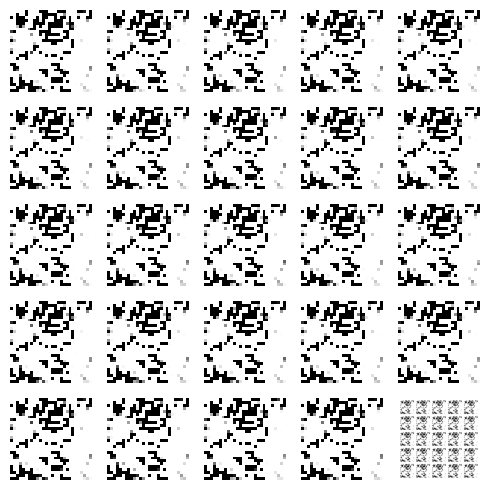

  0%|          | 0/350 [00:00<?, ?it/s]

4/4 [==============================] - 0s 20ms/step


  0%|          | 1/350 [00:00<03:08,  1.85it/s]

4/4 [==============================] - 0s 14ms/step


  1%|          | 2/350 [00:01<02:53,  2.01it/s]

4/4 [==============================] - 0s 13ms/step


  1%|          | 3/350 [00:01<02:44,  2.11it/s]

4/4 [==============================] - 0s 13ms/step


  1%|          | 4/350 [00:01<02:42,  2.13it/s]

4/4 [==============================] - 0s 17ms/step


  1%|▏         | 5/350 [00:02<02:47,  2.06it/s]

4/4 [==============================] - 0s 14ms/step


  2%|▏         | 6/350 [00:03<02:57,  1.94it/s]

4/4 [==============================] - 0s 12ms/step


  2%|▏         | 7/350 [00:03<02:56,  1.94it/s]

4/4 [==============================] - 0s 12ms/step


  2%|▏         | 8/350 [00:03<02:48,  2.03it/s]

4/4 [==============================] - 0s 15ms/step


  3%|▎         | 9/350 [00:04<02:44,  2.07it/s]

4/4 [==============================] - 0s 14ms/step


  3%|▎         | 10/350 [00:04<02:40,  2.12it/s]

4/4 [==============================] - 0s 12ms/step


  3%|▎         | 11/350 [00:05<02:44,  2.06it/s]

4/4 [==============================] - 0s 13ms/step


  3%|▎         | 12/350 [00:05<02:41,  2.09it/s]

4/4 [==============================] - 0s 14ms/step


  4%|▎         | 13/350 [00:06<02:39,  2.11it/s]

4/4 [==============================] - 0s 14ms/step


  4%|▍         | 14/350 [00:06<02:51,  1.96it/s]

4/4 [==============================] - 0s 12ms/step


  4%|▍         | 15/350 [00:07<02:51,  1.95it/s]

4/4 [==============================] - 0s 16ms/step


  5%|▍         | 16/350 [00:07<02:50,  1.96it/s]

4/4 [==============================] - 0s 28ms/step


  5%|▍         | 17/350 [00:08<02:56,  1.89it/s]

4/4 [==============================] - 0s 16ms/step


  5%|▌         | 18/350 [00:08<02:49,  1.96it/s]

4/4 [==============================] - 0s 16ms/step


  5%|▌         | 19/350 [00:09<02:53,  1.90it/s]

4/4 [==============================] - 0s 14ms/step


  6%|▌         | 20/350 [00:09<02:46,  1.98it/s]

4/4 [==============================] - 0s 12ms/step


  6%|▌         | 21/350 [00:10<02:43,  2.01it/s]

4/4 [==============================] - 0s 23ms/step


  6%|▋         | 22/350 [00:11<02:49,  1.94it/s]

4/4 [==============================] - 0s 15ms/step


  7%|▋         | 23/350 [00:11<02:44,  1.98it/s]

4/4 [==============================] - 0s 13ms/step


  7%|▋         | 24/350 [00:11<02:39,  2.04it/s]

4/4 [==============================] - 0s 12ms/step


  7%|▋         | 25/350 [00:12<02:34,  2.10it/s]

4/4 [==============================] - 0s 15ms/step


  7%|▋         | 26/350 [00:12<02:36,  2.07it/s]

4/4 [==============================] - 0s 11ms/step


  8%|▊         | 27/350 [00:13<02:31,  2.13it/s]

4/4 [==============================] - 0s 16ms/step


  8%|▊         | 28/350 [00:13<02:37,  2.05it/s]

4/4 [==============================] - 0s 33ms/step


  8%|▊         | 29/350 [00:14<02:49,  1.90it/s]

4/4 [==============================] - 0s 17ms/step


  9%|▊         | 30/350 [00:14<02:45,  1.94it/s]

4/4 [==============================] - 0s 12ms/step


  9%|▉         | 31/350 [00:15<02:50,  1.87it/s]

4/4 [==============================] - 0s 13ms/step


  9%|▉         | 32/350 [00:16<02:41,  1.96it/s]

4/4 [==============================] - 0s 12ms/step


  9%|▉         | 33/350 [00:16<02:35,  2.03it/s]

4/4 [==============================] - 0s 13ms/step


 10%|▉         | 34/350 [00:16<02:31,  2.08it/s]

4/4 [==============================] - 0s 13ms/step


 10%|█         | 35/350 [00:17<02:38,  1.99it/s]

4/4 [==============================] - 0s 18ms/step


 10%|█         | 36/350 [00:18<02:42,  1.93it/s]

4/4 [==============================] - 0s 16ms/step


 11%|█         | 37/350 [00:18<02:49,  1.84it/s]

4/4 [==============================] - 0s 14ms/step


 11%|█         | 38/350 [00:19<02:51,  1.82it/s]

4/4 [==============================] - 0s 14ms/step


 11%|█         | 39/350 [00:19<02:41,  1.92it/s]

4/4 [==============================] - 0s 15ms/step


 11%|█▏        | 40/350 [00:20<02:35,  1.99it/s]

4/4 [==============================] - 0s 27ms/step


 12%|█▏        | 41/350 [00:20<02:37,  1.96it/s]

4/4 [==============================] - 0s 11ms/step


 12%|█▏        | 42/350 [00:21<02:31,  2.04it/s]

4/4 [==============================] - 0s 12ms/step


 12%|█▏        | 43/350 [00:21<02:26,  2.10it/s]

4/4 [==============================] - 0s 11ms/step


 13%|█▎        | 44/350 [00:21<02:21,  2.16it/s]

4/4 [==============================] - 0s 23ms/step


 13%|█▎        | 45/350 [00:22<02:24,  2.11it/s]

4/4 [==============================] - 0s 13ms/step


 13%|█▎        | 46/350 [00:22<02:21,  2.15it/s]

4/4 [==============================] - 0s 12ms/step


 13%|█▎        | 47/350 [00:23<02:18,  2.19it/s]

4/4 [==============================] - 0s 14ms/step


 14%|█▎        | 48/350 [00:23<02:20,  2.16it/s]

4/4 [==============================] - 0s 12ms/step


 14%|█▍        | 49/350 [00:24<02:16,  2.21it/s]

4/4 [==============================] - 0s 13ms/step


 14%|█▍        | 50/350 [00:24<02:14,  2.24it/s]

4/4 [==============================] - 0s 12ms/step


 15%|█▍        | 51/350 [00:25<02:16,  2.19it/s]

4/4 [==============================] - 0s 12ms/step


 15%|█▍        | 52/350 [00:25<02:15,  2.21it/s]

4/4 [==============================] - 0s 12ms/step


 15%|█▌        | 53/350 [00:26<02:12,  2.24it/s]

4/4 [==============================] - 0s 12ms/step


 15%|█▌        | 54/350 [00:26<02:10,  2.27it/s]

4/4 [==============================] - 0s 21ms/step


 16%|█▌        | 55/350 [00:26<02:13,  2.21it/s]

4/4 [==============================] - 0s 15ms/step


 16%|█▌        | 56/350 [00:27<02:13,  2.21it/s]

4/4 [==============================] - 0s 12ms/step


 16%|█▋        | 57/350 [00:27<02:09,  2.26it/s]

4/4 [==============================] - 0s 12ms/step


 17%|█▋        | 58/350 [00:28<02:07,  2.29it/s]

4/4 [==============================] - 0s 28ms/step


 17%|█▋        | 59/350 [00:28<02:12,  2.19it/s]

4/4 [==============================] - 0s 12ms/step


 17%|█▋        | 60/350 [00:29<02:09,  2.24it/s]

4/4 [==============================] - 0s 11ms/step


 17%|█▋        | 61/350 [00:29<02:07,  2.27it/s]

4/4 [==============================] - 0s 12ms/step


 18%|█▊        | 62/350 [00:30<02:06,  2.28it/s]

4/4 [==============================] - 0s 25ms/step


 18%|█▊        | 63/350 [00:30<02:09,  2.22it/s]

4/4 [==============================] - 0s 12ms/step


 18%|█▊        | 64/350 [00:30<02:08,  2.23it/s]

4/4 [==============================] - 0s 12ms/step


 19%|█▊        | 65/350 [00:31<02:07,  2.24it/s]

4/4 [==============================] - 0s 28ms/step


 19%|█▉        | 66/350 [00:31<02:11,  2.16it/s]

4/4 [==============================] - 0s 13ms/step


 19%|█▉        | 67/350 [00:32<02:09,  2.18it/s]

4/4 [==============================] - 0s 13ms/step


 19%|█▉        | 68/350 [00:32<02:09,  2.18it/s]

4/4 [==============================] - 0s 11ms/step


 20%|█▉        | 69/350 [00:33<02:06,  2.22it/s]

4/4 [==============================] - 0s 12ms/step


 20%|██        | 70/350 [00:33<02:16,  2.05it/s]

4/4 [==============================] - 0s 14ms/step


 20%|██        | 71/350 [00:34<02:12,  2.10it/s]

4/4 [==============================] - 0s 14ms/step


 21%|██        | 72/350 [00:34<02:10,  2.13it/s]

4/4 [==============================] - 0s 13ms/step


 21%|██        | 73/350 [00:35<02:08,  2.15it/s]

4/4 [==============================] - 0s 11ms/step


 21%|██        | 74/350 [00:35<02:09,  2.13it/s]

4/4 [==============================] - 0s 12ms/step


 21%|██▏       | 75/350 [00:36<02:07,  2.16it/s]

4/4 [==============================] - 0s 13ms/step


 22%|██▏       | 76/350 [00:36<02:04,  2.20it/s]

4/4 [==============================] - 0s 11ms/step


 22%|██▏       | 77/350 [00:36<02:02,  2.24it/s]

4/4 [==============================] - 0s 14ms/step


 22%|██▏       | 78/350 [00:37<02:05,  2.17it/s]

4/4 [==============================] - 0s 13ms/step


 23%|██▎       | 79/350 [00:37<02:09,  2.09it/s]

4/4 [==============================] - 0s 13ms/step


 23%|██▎       | 80/350 [00:38<02:14,  2.00it/s]

4/4 [==============================] - 0s 12ms/step


 23%|██▎       | 81/350 [00:38<02:10,  2.06it/s]

4/4 [==============================] - 0s 12ms/step


 23%|██▎       | 82/350 [00:39<02:10,  2.05it/s]

4/4 [==============================] - 0s 14ms/step


 24%|██▎       | 83/350 [00:39<02:08,  2.08it/s]

4/4 [==============================] - 0s 13ms/step


 24%|██▍       | 84/350 [00:40<02:14,  1.98it/s]

4/4 [==============================] - 0s 13ms/step


 24%|██▍       | 85/350 [00:40<02:10,  2.03it/s]

4/4 [==============================] - 0s 15ms/step


 25%|██▍       | 86/350 [00:41<02:08,  2.06it/s]

4/4 [==============================] - 0s 16ms/step


 25%|██▍       | 87/350 [00:41<02:06,  2.08it/s]

4/4 [==============================] - 0s 18ms/step


 25%|██▌       | 88/350 [00:42<02:07,  2.05it/s]

4/4 [==============================] - 0s 11ms/step


 25%|██▌       | 89/350 [00:42<02:02,  2.14it/s]

4/4 [==============================] - 0s 12ms/step


 26%|██▌       | 90/350 [00:43<01:58,  2.19it/s]

4/4 [==============================] - 0s 12ms/step


 26%|██▌       | 91/350 [00:43<02:00,  2.14it/s]

4/4 [==============================] - 0s 13ms/step


 26%|██▋       | 92/350 [00:44<01:59,  2.16it/s]

4/4 [==============================] - 0s 11ms/step


 27%|██▋       | 93/350 [00:44<01:56,  2.20it/s]

4/4 [==============================] - 0s 12ms/step


 27%|██▋       | 94/350 [00:45<02:03,  2.07it/s]

4/4 [==============================] - 0s 12ms/step


 27%|██▋       | 95/350 [00:45<02:01,  2.09it/s]

4/4 [==============================] - 0s 13ms/step


 27%|██▋       | 96/350 [00:46<02:02,  2.07it/s]

4/4 [==============================] - 0s 13ms/step


 28%|██▊       | 97/350 [00:46<01:59,  2.12it/s]

4/4 [==============================] - 0s 12ms/step


 28%|██▊       | 98/350 [00:47<02:01,  2.08it/s]

4/4 [==============================] - 0s 11ms/step


 28%|██▊       | 99/350 [00:47<01:57,  2.14it/s]

4/4 [==============================] - 0s 13ms/step


 29%|██▊       | 100/350 [00:48<01:59,  2.10it/s]

4/4 [==============================] - 0s 14ms/step


 29%|██▉       | 101/350 [00:48<01:56,  2.14it/s]

4/4 [==============================] - 0s 12ms/step


 29%|██▉       | 102/350 [00:48<01:54,  2.16it/s]

4/4 [==============================] - 0s 13ms/step


 29%|██▉       | 103/350 [00:49<01:56,  2.11it/s]

4/4 [==============================] - 0s 14ms/step


 30%|██▉       | 104/350 [00:49<01:54,  2.15it/s]

4/4 [==============================] - 0s 12ms/step


 30%|███       | 105/350 [00:50<01:51,  2.20it/s]

4/4 [==============================] - 0s 12ms/step


 30%|███       | 106/350 [00:50<01:49,  2.24it/s]

4/4 [==============================] - 0s 16ms/step


 31%|███       | 107/350 [00:51<01:50,  2.20it/s]

4/4 [==============================] - 0s 12ms/step


 31%|███       | 108/350 [00:51<01:48,  2.22it/s]

4/4 [==============================] - 0s 11ms/step


 31%|███       | 109/350 [00:52<01:46,  2.26it/s]

4/4 [==============================] - 0s 15ms/step


 31%|███▏      | 110/350 [00:52<01:46,  2.25it/s]

4/4 [==============================] - 0s 22ms/step


 32%|███▏      | 111/350 [00:52<01:48,  2.21it/s]

4/4 [==============================] - 0s 12ms/step


 32%|███▏      | 112/350 [00:53<01:45,  2.25it/s]

4/4 [==============================] - 0s 13ms/step


 32%|███▏      | 113/350 [00:53<01:44,  2.26it/s]

4/4 [==============================] - 0s 12ms/step


 33%|███▎      | 114/350 [00:54<01:43,  2.28it/s]

4/4 [==============================] - 0s 15ms/step


 33%|███▎      | 115/350 [00:54<01:45,  2.23it/s]

4/4 [==============================] - 0s 12ms/step


 33%|███▎      | 116/350 [00:55<01:43,  2.26it/s]

4/4 [==============================] - 0s 12ms/step


 33%|███▎      | 117/350 [00:55<01:42,  2.27it/s]

4/4 [==============================] - 0s 11ms/step


 34%|███▎      | 118/350 [00:56<01:41,  2.29it/s]

4/4 [==============================] - 0s 25ms/step


 34%|███▍      | 119/350 [00:56<01:43,  2.23it/s]

4/4 [==============================] - 0s 13ms/step


 34%|███▍      | 120/350 [00:56<01:41,  2.26it/s]

4/4 [==============================] - 0s 12ms/step


 35%|███▍      | 121/350 [00:57<01:40,  2.28it/s]

4/4 [==============================] - 0s 12ms/step


 35%|███▍      | 122/350 [00:57<01:39,  2.28it/s]

4/4 [==============================] - 0s 25ms/step


 35%|███▌      | 123/350 [00:58<01:42,  2.22it/s]

4/4 [==============================] - 0s 12ms/step


 35%|███▌      | 124/350 [00:58<01:41,  2.24it/s]

4/4 [==============================] - 0s 12ms/step


 36%|███▌      | 125/350 [00:59<01:40,  2.23it/s]

4/4 [==============================] - 0s 13ms/step


 36%|███▌      | 126/350 [00:59<01:44,  2.15it/s]

4/4 [==============================] - 0s 12ms/step


 36%|███▋      | 127/350 [01:00<01:42,  2.18it/s]

4/4 [==============================] - 0s 12ms/step


 37%|███▋      | 128/350 [01:00<01:40,  2.20it/s]

4/4 [==============================] - 0s 12ms/step


 37%|███▋      | 129/350 [01:00<01:38,  2.24it/s]

4/4 [==============================] - 0s 21ms/step


 37%|███▋      | 130/350 [01:01<01:39,  2.20it/s]

4/4 [==============================] - 0s 15ms/step


 37%|███▋      | 131/350 [01:01<01:38,  2.22it/s]

4/4 [==============================] - 0s 12ms/step


 38%|███▊      | 132/350 [01:02<01:36,  2.25it/s]

4/4 [==============================] - 0s 13ms/step


 38%|███▊      | 133/350 [01:02<01:35,  2.27it/s]

4/4 [==============================] - 0s 14ms/step


 38%|███▊      | 134/350 [01:03<01:36,  2.24it/s]

4/4 [==============================] - 0s 11ms/step


 39%|███▊      | 135/350 [01:03<01:35,  2.26it/s]

4/4 [==============================] - 0s 13ms/step


 39%|███▉      | 136/350 [01:04<01:34,  2.27it/s]

4/4 [==============================] - 0s 12ms/step


 39%|███▉      | 137/350 [01:04<01:36,  2.21it/s]

4/4 [==============================] - 0s 12ms/step


 39%|███▉      | 138/350 [01:05<01:34,  2.25it/s]

4/4 [==============================] - 0s 12ms/step


 40%|███▉      | 139/350 [01:05<01:33,  2.27it/s]

4/4 [==============================] - 0s 15ms/step


 40%|████      | 140/350 [01:05<01:32,  2.26it/s]

4/4 [==============================] - 0s 24ms/step


 40%|████      | 141/350 [01:06<01:34,  2.21it/s]

4/4 [==============================] - 0s 12ms/step


 41%|████      | 142/350 [01:06<01:33,  2.22it/s]

4/4 [==============================] - 0s 12ms/step


 41%|████      | 143/350 [01:07<01:32,  2.24it/s]

4/4 [==============================] - 0s 13ms/step


 41%|████      | 144/350 [01:07<01:33,  2.20it/s]

4/4 [==============================] - 0s 12ms/step


 41%|████▏     | 145/350 [01:08<01:32,  2.22it/s]

4/4 [==============================] - 0s 13ms/step


 42%|████▏     | 146/350 [01:08<01:30,  2.24it/s]

4/4 [==============================] - 0s 11ms/step


 42%|████▏     | 147/350 [01:09<01:29,  2.27it/s]

4/4 [==============================] - 0s 23ms/step


 42%|████▏     | 148/350 [01:09<01:30,  2.22it/s]

4/4 [==============================] - 0s 11ms/step


 43%|████▎     | 149/350 [01:09<01:29,  2.26it/s]

4/4 [==============================] - 0s 12ms/step


 43%|████▎     | 150/350 [01:10<01:27,  2.28it/s]

4/4 [==============================] - 0s 11ms/step


 43%|████▎     | 151/350 [01:10<01:26,  2.31it/s]

4/4 [==============================] - 0s 24ms/step


 43%|████▎     | 152/350 [01:11<01:28,  2.24it/s]

4/4 [==============================] - 0s 13ms/step


 44%|████▎     | 153/350 [01:11<01:27,  2.24it/s]

4/4 [==============================] - 0s 11ms/step


 44%|████▍     | 154/350 [01:12<01:26,  2.27it/s]

4/4 [==============================] - 0s 12ms/step


 44%|████▍     | 155/350 [01:12<01:28,  2.21it/s]

4/4 [==============================] - 0s 12ms/step


 45%|████▍     | 156/350 [01:13<01:26,  2.24it/s]

4/4 [==============================] - 0s 12ms/step


 45%|████▍     | 157/350 [01:13<01:25,  2.26it/s]

4/4 [==============================] - 0s 12ms/step


 45%|████▌     | 158/350 [01:13<01:24,  2.29it/s]

4/4 [==============================] - 0s 25ms/step


 45%|████▌     | 159/350 [01:14<01:25,  2.22it/s]

4/4 [==============================] - 0s 11ms/step


 46%|████▌     | 160/350 [01:14<01:24,  2.26it/s]

4/4 [==============================] - 0s 11ms/step


 46%|████▌     | 161/350 [01:15<01:22,  2.30it/s]

4/4 [==============================] - 0s 12ms/step


 46%|████▋     | 162/350 [01:15<01:20,  2.32it/s]

4/4 [==============================] - 0s 14ms/step


 47%|████▋     | 163/350 [01:16<01:22,  2.26it/s]

4/4 [==============================] - 0s 12ms/step


 47%|████▋     | 164/350 [01:16<01:21,  2.27it/s]

4/4 [==============================] - 0s 12ms/step


 47%|████▋     | 165/350 [01:16<01:20,  2.29it/s]

4/4 [==============================] - 0s 14ms/step


 47%|████▋     | 166/350 [01:17<01:22,  2.24it/s]

4/4 [==============================] - 0s 16ms/step


 48%|████▊     | 167/350 [01:17<01:21,  2.25it/s]

4/4 [==============================] - 0s 13ms/step


 48%|████▊     | 168/350 [01:18<01:20,  2.26it/s]

4/4 [==============================] - 0s 11ms/step


 48%|████▊     | 169/350 [01:18<01:19,  2.28it/s]

4/4 [==============================] - 0s 24ms/step


 49%|████▊     | 170/350 [01:19<01:21,  2.22it/s]

4/4 [==============================] - 0s 12ms/step


 49%|████▉     | 171/350 [01:19<01:19,  2.25it/s]

4/4 [==============================] - 0s 12ms/step


 49%|████▉     | 172/350 [01:20<01:18,  2.28it/s]

4/4 [==============================] - 0s 11ms/step


 49%|████▉     | 173/350 [01:20<01:19,  2.23it/s]

4/4 [==============================] - 0s 12ms/step


 50%|████▉     | 174/350 [01:20<01:17,  2.26it/s]

4/4 [==============================] - 0s 12ms/step


 50%|█████     | 175/350 [01:21<01:16,  2.29it/s]

4/4 [==============================] - 0s 13ms/step


 50%|█████     | 176/350 [01:21<01:16,  2.28it/s]

4/4 [==============================] - 0s 16ms/step


 51%|█████     | 177/350 [01:22<01:17,  2.22it/s]

4/4 [==============================] - 0s 12ms/step


 51%|█████     | 178/350 [01:22<01:16,  2.25it/s]

4/4 [==============================] - 0s 13ms/step


 51%|█████     | 179/350 [01:23<01:15,  2.28it/s]

4/4 [==============================] - 0s 11ms/step


 51%|█████▏    | 180/350 [01:23<01:14,  2.28it/s]

4/4 [==============================] - 0s 13ms/step


 52%|█████▏    | 181/350 [01:24<01:15,  2.25it/s]

4/4 [==============================] - 0s 12ms/step


 52%|█████▏    | 182/350 [01:24<01:14,  2.26it/s]

4/4 [==============================] - 0s 11ms/step


 52%|█████▏    | 183/350 [01:24<01:13,  2.29it/s]

4/4 [==============================] - 0s 12ms/step


 53%|█████▎    | 184/350 [01:25<01:12,  2.30it/s]

4/4 [==============================] - 0s 23ms/step


 53%|█████▎    | 185/350 [01:25<01:13,  2.24it/s]

4/4 [==============================] - 0s 12ms/step


 53%|█████▎    | 186/350 [01:26<01:12,  2.27it/s]

4/4 [==============================] - 0s 12ms/step


 53%|█████▎    | 187/350 [01:26<01:11,  2.28it/s]

4/4 [==============================] - 0s 11ms/step


 54%|█████▎    | 188/350 [01:27<01:12,  2.23it/s]

4/4 [==============================] - 0s 14ms/step


 54%|█████▍    | 189/350 [01:27<01:11,  2.24it/s]

4/4 [==============================] - 0s 13ms/step


 54%|█████▍    | 190/350 [01:28<01:10,  2.26it/s]

4/4 [==============================] - 0s 12ms/step


 55%|█████▍    | 191/350 [01:28<01:09,  2.29it/s]

4/4 [==============================] - 0s 25ms/step


 55%|█████▍    | 192/350 [01:28<01:11,  2.23it/s]

4/4 [==============================] - 0s 11ms/step


 55%|█████▌    | 193/350 [01:29<01:09,  2.26it/s]

4/4 [==============================] - 0s 12ms/step


 55%|█████▌    | 194/350 [01:29<01:08,  2.29it/s]

4/4 [==============================] - 0s 11ms/step


 56%|█████▌    | 195/350 [01:30<01:07,  2.30it/s]

4/4 [==============================] - 0s 26ms/step


 56%|█████▌    | 196/350 [01:30<01:09,  2.20it/s]

4/4 [==============================] - 0s 11ms/step


 56%|█████▋    | 197/350 [01:31<01:08,  2.25it/s]

4/4 [==============================] - 0s 12ms/step


 57%|█████▋    | 198/350 [01:31<01:07,  2.27it/s]

4/4 [==============================] - 0s 12ms/step


 57%|█████▋    | 199/350 [01:32<01:05,  2.29it/s]

4/4 [==============================] - 0s 17ms/step


 57%|█████▋    | 200/350 [01:32<01:07,  2.23it/s]

4/4 [==============================] - 0s 13ms/step


 57%|█████▋    | 201/350 [01:32<01:06,  2.24it/s]

4/4 [==============================] - 0s 12ms/step


 58%|█████▊    | 202/350 [01:33<01:05,  2.27it/s]

4/4 [==============================] - 0s 13ms/step


 58%|█████▊    | 203/350 [01:33<01:04,  2.28it/s]

4/4 [==============================] - 0s 18ms/step


 58%|█████▊    | 204/350 [01:34<01:05,  2.22it/s]

4/4 [==============================] - 0s 12ms/step


 59%|█████▊    | 205/350 [01:34<01:04,  2.23it/s]

4/4 [==============================] - 0s 12ms/step


 59%|█████▉    | 206/350 [01:35<01:03,  2.25it/s]

4/4 [==============================] - 0s 12ms/step


 59%|█████▉    | 207/350 [01:35<01:03,  2.26it/s]

4/4 [==============================] - 0s 21ms/step


 59%|█████▉    | 208/350 [01:36<01:04,  2.21it/s]

4/4 [==============================] - 0s 11ms/step


 60%|█████▉    | 209/350 [01:36<01:03,  2.23it/s]

4/4 [==============================] - 0s 13ms/step


 60%|██████    | 210/350 [01:36<01:03,  2.21it/s]

4/4 [==============================] - 0s 25ms/step


 60%|██████    | 211/350 [01:37<01:05,  2.12it/s]

4/4 [==============================] - 0s 16ms/step


 61%|██████    | 212/350 [01:37<01:04,  2.12it/s]

4/4 [==============================] - 0s 12ms/step


 61%|██████    | 213/350 [01:38<01:03,  2.16it/s]

4/4 [==============================] - 0s 14ms/step


 61%|██████    | 214/350 [01:38<01:07,  2.03it/s]

4/4 [==============================] - 0s 14ms/step


 61%|██████▏   | 215/350 [01:39<01:04,  2.08it/s]

4/4 [==============================] - 0s 13ms/step


 62%|██████▏   | 216/350 [01:39<01:03,  2.10it/s]

4/4 [==============================] - 0s 14ms/step


 62%|██████▏   | 217/350 [01:40<01:02,  2.12it/s]

4/4 [==============================] - 0s 28ms/step


 62%|██████▏   | 218/350 [01:40<01:03,  2.06it/s]

4/4 [==============================] - 0s 14ms/step


 63%|██████▎   | 219/350 [01:41<01:01,  2.12it/s]

4/4 [==============================] - 0s 12ms/step


 63%|██████▎   | 220/350 [01:41<01:00,  2.15it/s]

4/4 [==============================] - 0s 11ms/step


 63%|██████▎   | 221/350 [01:42<00:58,  2.19it/s]

4/4 [==============================] - 0s 18ms/step


 63%|██████▎   | 222/350 [01:42<01:03,  2.03it/s]

4/4 [==============================] - 0s 14ms/step


 64%|██████▎   | 223/350 [01:43<01:01,  2.08it/s]

4/4 [==============================] - 0s 13ms/step


 64%|██████▍   | 224/350 [01:43<01:01,  2.04it/s]

4/4 [==============================] - 0s 13ms/step


 64%|██████▍   | 225/350 [01:44<00:59,  2.11it/s]

4/4 [==============================] - 0s 12ms/step


 65%|██████▍   | 226/350 [01:44<00:59,  2.07it/s]

4/4 [==============================] - 0s 12ms/step


 65%|██████▍   | 227/350 [01:45<00:57,  2.14it/s]

4/4 [==============================] - 0s 12ms/step


 65%|██████▌   | 228/350 [01:45<00:55,  2.18it/s]

4/4 [==============================] - 0s 12ms/step


 65%|██████▌   | 229/350 [01:45<00:55,  2.16it/s]

4/4 [==============================] - 0s 12ms/step


 66%|██████▌   | 230/350 [01:46<00:54,  2.21it/s]

4/4 [==============================] - 0s 13ms/step


 66%|██████▌   | 231/350 [01:46<00:53,  2.20it/s]

4/4 [==============================] - 0s 20ms/step


 66%|██████▋   | 232/350 [01:47<00:55,  2.13it/s]

4/4 [==============================] - 0s 15ms/step


 67%|██████▋   | 233/350 [01:47<00:55,  2.10it/s]

4/4 [==============================] - 0s 12ms/step


 67%|██████▋   | 234/350 [01:48<00:53,  2.15it/s]

4/4 [==============================] - 0s 14ms/step


 67%|██████▋   | 235/350 [01:48<00:52,  2.18it/s]

4/4 [==============================] - 0s 19ms/step


 67%|██████▋   | 236/350 [01:49<00:54,  2.11it/s]

4/4 [==============================] - 0s 12ms/step


 68%|██████▊   | 237/350 [01:49<00:53,  2.12it/s]

4/4 [==============================] - 0s 13ms/step


 68%|██████▊   | 238/350 [01:50<00:52,  2.13it/s]

4/4 [==============================] - 0s 16ms/step


 68%|██████▊   | 239/350 [01:50<00:51,  2.14it/s]

4/4 [==============================] - 0s 14ms/step


 69%|██████▊   | 240/350 [01:51<00:54,  2.03it/s]

4/4 [==============================] - 0s 12ms/step


 69%|██████▉   | 241/350 [01:51<00:52,  2.09it/s]

4/4 [==============================] - 0s 13ms/step


 69%|██████▉   | 242/350 [01:52<00:50,  2.14it/s]

4/4 [==============================] - 0s 24ms/step


 69%|██████▉   | 243/350 [01:52<00:52,  2.05it/s]

4/4 [==============================] - 0s 12ms/step


 70%|██████▉   | 244/350 [01:53<00:49,  2.12it/s]

4/4 [==============================] - 0s 11ms/step


 70%|███████   | 245/350 [01:53<00:50,  2.08it/s]

4/4 [==============================] - 0s 11ms/step


 70%|███████   | 246/350 [01:54<00:48,  2.15it/s]

4/4 [==============================] - 0s 20ms/step


 71%|███████   | 247/350 [01:54<00:48,  2.12it/s]

4/4 [==============================] - 0s 15ms/step


 71%|███████   | 248/350 [01:54<00:47,  2.14it/s]

4/4 [==============================] - 0s 12ms/step


 71%|███████   | 249/350 [01:55<00:46,  2.19it/s]

4/4 [==============================] - 0s 11ms/step


 71%|███████▏  | 250/350 [01:55<00:44,  2.23it/s]

4/4 [==============================] - 0s 13ms/step


 72%|███████▏  | 251/350 [01:56<00:45,  2.20it/s]

4/4 [==============================] - 0s 12ms/step


 72%|███████▏  | 252/350 [01:56<00:44,  2.22it/s]

4/4 [==============================] - 0s 11ms/step


 72%|███████▏  | 253/350 [01:57<00:42,  2.26it/s]

4/4 [==============================] - 0s 12ms/step


 73%|███████▎  | 254/350 [01:57<00:42,  2.24it/s]

4/4 [==============================] - 0s 14ms/step


 73%|███████▎  | 255/350 [01:58<00:43,  2.21it/s]

4/4 [==============================] - 0s 12ms/step


 73%|███████▎  | 256/350 [01:58<00:41,  2.25it/s]

4/4 [==============================] - 0s 14ms/step


 73%|███████▎  | 257/350 [01:58<00:41,  2.26it/s]

4/4 [==============================] - 0s 12ms/step


 74%|███████▎  | 258/350 [01:59<00:40,  2.29it/s]

4/4 [==============================] - 0s 11ms/step


 74%|███████▍  | 259/350 [01:59<00:39,  2.29it/s]

4/4 [==============================] - 0s 13ms/step


 74%|███████▍  | 260/350 [02:00<00:39,  2.30it/s]

4/4 [==============================] - 0s 15ms/step


 75%|███████▍  | 261/350 [02:00<00:40,  2.18it/s]

4/4 [==============================] - 0s 12ms/step


 75%|███████▍  | 262/350 [02:01<00:41,  2.11it/s]

4/4 [==============================] - 0s 14ms/step


 75%|███████▌  | 263/350 [02:01<00:42,  2.05it/s]

4/4 [==============================] - 0s 12ms/step


 75%|███████▌  | 264/350 [02:02<00:41,  2.10it/s]

4/4 [==============================] - 0s 12ms/step


 76%|███████▌  | 265/350 [02:02<00:39,  2.15it/s]

4/4 [==============================] - 0s 11ms/step


 76%|███████▌  | 266/350 [02:03<00:37,  2.21it/s]

4/4 [==============================] - 0s 22ms/step


 76%|███████▋  | 267/350 [02:03<00:40,  2.06it/s]

4/4 [==============================] - 0s 13ms/step


 77%|███████▋  | 268/350 [02:04<00:40,  2.01it/s]

4/4 [==============================] - 0s 11ms/step


 77%|███████▋  | 269/350 [02:04<00:39,  2.06it/s]

4/4 [==============================] - 0s 12ms/step


 77%|███████▋  | 270/350 [02:05<00:37,  2.13it/s]

4/4 [==============================] - 0s 31ms/step


 77%|███████▋  | 271/350 [02:05<00:38,  2.07it/s]

4/4 [==============================] - 0s 15ms/step


 78%|███████▊  | 272/350 [02:06<00:36,  2.11it/s]

4/4 [==============================] - 0s 12ms/step


 78%|███████▊  | 273/350 [02:06<00:35,  2.16it/s]

4/4 [==============================] - 0s 12ms/step


 78%|███████▊  | 274/350 [02:06<00:34,  2.19it/s]

4/4 [==============================] - 0s 20ms/step


 79%|███████▊  | 275/350 [02:07<00:34,  2.14it/s]

4/4 [==============================] - 0s 12ms/step


 79%|███████▉  | 276/350 [02:07<00:34,  2.17it/s]

4/4 [==============================] - 0s 14ms/step


 79%|███████▉  | 277/350 [02:08<00:33,  2.19it/s]

4/4 [==============================] - 0s 12ms/step


 79%|███████▉  | 278/350 [02:08<00:32,  2.21it/s]

4/4 [==============================] - 0s 14ms/step


 80%|███████▉  | 279/350 [02:09<00:32,  2.17it/s]

4/4 [==============================] - 0s 12ms/step


 80%|████████  | 280/350 [02:09<00:31,  2.20it/s]

4/4 [==============================] - 0s 11ms/step


 80%|████████  | 281/350 [02:10<00:30,  2.25it/s]

4/4 [==============================] - 0s 11ms/step


 81%|████████  | 282/350 [02:10<00:29,  2.28it/s]

4/4 [==============================] - 0s 17ms/step


 81%|████████  | 283/350 [02:10<00:30,  2.20it/s]

4/4 [==============================] - 0s 10ms/step


 81%|████████  | 284/350 [02:11<00:29,  2.23it/s]

4/4 [==============================] - 0s 12ms/step


 81%|████████▏ | 285/350 [02:11<00:29,  2.24it/s]

4/4 [==============================] - 0s 11ms/step


 82%|████████▏ | 286/350 [02:12<00:28,  2.26it/s]

4/4 [==============================] - 0s 19ms/step


 82%|████████▏ | 287/350 [02:12<00:28,  2.19it/s]

4/4 [==============================] - 0s 11ms/step


 82%|████████▏ | 288/350 [02:13<00:27,  2.22it/s]

4/4 [==============================] - 0s 11ms/step


 83%|████████▎ | 289/350 [02:13<00:27,  2.24it/s]

4/4 [==============================] - 0s 12ms/step


 83%|████████▎ | 290/350 [02:14<00:27,  2.21it/s]

4/4 [==============================] - 0s 11ms/step


 83%|████████▎ | 291/350 [02:14<00:26,  2.23it/s]

4/4 [==============================] - 0s 12ms/step


 83%|████████▎ | 292/350 [02:14<00:25,  2.26it/s]

4/4 [==============================] - 0s 12ms/step


 84%|████████▎ | 293/350 [02:15<00:25,  2.20it/s]

4/4 [==============================] - 0s 12ms/step


 84%|████████▍ | 294/350 [02:15<00:25,  2.24it/s]

4/4 [==============================] - 0s 14ms/step


 84%|████████▍ | 295/350 [02:16<00:24,  2.25it/s]

4/4 [==============================] - 0s 13ms/step


 85%|████████▍ | 296/350 [02:16<00:24,  2.18it/s]

4/4 [==============================] - 0s 11ms/step


 85%|████████▍ | 297/350 [02:17<00:23,  2.24it/s]

4/4 [==============================] - 0s 12ms/step


 85%|████████▌ | 298/350 [02:17<00:22,  2.27it/s]

4/4 [==============================] - 0s 12ms/step


 85%|████████▌ | 299/350 [02:18<00:22,  2.29it/s]

4/4 [==============================] - 0s 14ms/step


 86%|████████▌ | 300/350 [02:18<00:22,  2.22it/s]

4/4 [==============================] - 0s 11ms/step


 86%|████████▌ | 301/350 [02:19<00:21,  2.26it/s]

4/4 [==============================] - 0s 11ms/step


 86%|████████▋ | 302/350 [02:19<00:21,  2.27it/s]

4/4 [==============================] - 0s 16ms/step


 87%|████████▋ | 303/350 [02:19<00:20,  2.26it/s]

4/4 [==============================] - 0s 17ms/step


 87%|████████▋ | 304/350 [02:20<00:20,  2.21it/s]

4/4 [==============================] - 0s 11ms/step


 87%|████████▋ | 305/350 [02:20<00:20,  2.23it/s]

4/4 [==============================] - 0s 11ms/step


 87%|████████▋ | 306/350 [02:21<00:19,  2.25it/s]

4/4 [==============================] - 0s 14ms/step


 88%|████████▊ | 307/350 [02:21<00:19,  2.20it/s]

4/4 [==============================] - 0s 11ms/step


 88%|████████▊ | 308/350 [02:22<00:18,  2.24it/s]

4/4 [==============================] - 0s 11ms/step


 88%|████████▊ | 309/350 [02:22<00:18,  2.26it/s]

4/4 [==============================] - 0s 11ms/step


 89%|████████▊ | 310/350 [02:23<00:18,  2.22it/s]

4/4 [==============================] - 0s 12ms/step


 89%|████████▉ | 311/350 [02:23<00:17,  2.25it/s]

4/4 [==============================] - 0s 11ms/step


 89%|████████▉ | 312/350 [02:23<00:16,  2.27it/s]

4/4 [==============================] - 0s 12ms/step


 89%|████████▉ | 313/350 [02:24<00:16,  2.29it/s]

4/4 [==============================] - 0s 19ms/step


 90%|████████▉ | 314/350 [02:24<00:16,  2.22it/s]

4/4 [==============================] - 0s 11ms/step


 90%|█████████ | 315/350 [02:25<00:15,  2.22it/s]

4/4 [==============================] - 0s 12ms/step


 90%|█████████ | 316/350 [02:25<00:15,  2.24it/s]

4/4 [==============================] - 0s 11ms/step


 91%|█████████ | 317/350 [02:26<00:15,  2.18it/s]

4/4 [==============================] - 0s 12ms/step


 91%|█████████ | 318/350 [02:26<00:14,  2.22it/s]

4/4 [==============================] - 0s 11ms/step


 91%|█████████ | 319/350 [02:27<00:13,  2.26it/s]

4/4 [==============================] - 0s 14ms/step


 91%|█████████▏| 320/350 [02:27<00:13,  2.19it/s]

4/4 [==============================] - 0s 11ms/step


 92%|█████████▏| 321/350 [02:27<00:12,  2.23it/s]

4/4 [==============================] - 0s 12ms/step


 92%|█████████▏| 322/350 [02:28<00:12,  2.26it/s]

4/4 [==============================] - 0s 14ms/step


 92%|█████████▏| 323/350 [02:28<00:12,  2.19it/s]

4/4 [==============================] - 0s 12ms/step


 93%|█████████▎| 324/350 [02:29<00:11,  2.20it/s]

4/4 [==============================] - 0s 13ms/step


 93%|█████████▎| 325/350 [02:29<00:11,  2.23it/s]

4/4 [==============================] - 0s 14ms/step


 93%|█████████▎| 326/350 [02:30<00:11,  2.16it/s]

4/4 [==============================] - 0s 12ms/step


 93%|█████████▎| 327/350 [02:30<00:10,  2.21it/s]

4/4 [==============================] - 0s 12ms/step


 94%|█████████▎| 328/350 [02:31<00:09,  2.25it/s]

4/4 [==============================] - 0s 12ms/step


 94%|█████████▍| 329/350 [02:31<00:09,  2.16it/s]

4/4 [==============================] - 0s 12ms/step


 94%|█████████▍| 330/350 [02:32<00:09,  2.20it/s]

4/4 [==============================] - 0s 12ms/step


 95%|█████████▍| 331/350 [02:32<00:08,  2.23it/s]

4/4 [==============================] - 0s 12ms/step


 95%|█████████▍| 332/350 [02:32<00:08,  2.19it/s]

4/4 [==============================] - 0s 12ms/step


 95%|█████████▌| 333/350 [02:33<00:07,  2.23it/s]

4/4 [==============================] - 0s 12ms/step


 95%|█████████▌| 334/350 [02:33<00:07,  2.26it/s]

4/4 [==============================] - 0s 12ms/step


 96%|█████████▌| 335/350 [02:34<00:06,  2.22it/s]

4/4 [==============================] - 0s 11ms/step


 96%|█████████▌| 336/350 [02:34<00:06,  2.25it/s]

4/4 [==============================] - 0s 12ms/step


 96%|█████████▋| 337/350 [02:35<00:05,  2.27it/s]

4/4 [==============================] - 0s 12ms/step


 97%|█████████▋| 338/350 [02:35<00:05,  2.25it/s]

4/4 [==============================] - 0s 13ms/step


 97%|█████████▋| 339/350 [02:36<00:04,  2.21it/s]

4/4 [==============================] - 0s 12ms/step


 97%|█████████▋| 340/350 [02:36<00:04,  2.25it/s]

4/4 [==============================] - 0s 12ms/step


 97%|█████████▋| 341/350 [02:36<00:04,  2.23it/s]

4/4 [==============================] - 0s 11ms/step


 98%|█████████▊| 342/350 [02:37<00:03,  2.26it/s]

4/4 [==============================] - 0s 17ms/step


 98%|█████████▊| 343/350 [02:37<00:03,  2.21it/s]

4/4 [==============================] - 0s 12ms/step


 98%|█████████▊| 344/350 [02:38<00:02,  2.25it/s]

4/4 [==============================] - 0s 16ms/step


 99%|█████████▊| 345/350 [02:38<00:02,  2.17it/s]

4/4 [==============================] - 0s 15ms/step


 99%|█████████▉| 346/350 [02:39<00:01,  2.19it/s]

4/4 [==============================] - 0s 24ms/step


 99%|█████████▉| 347/350 [02:39<00:01,  2.16it/s]

4/4 [==============================] - 0s 14ms/step


 99%|█████████▉| 348/350 [02:40<00:00,  2.21it/s]

4/4 [==============================] - 0s 21ms/step


100%|█████████▉| 349/350 [02:40<00:00,  2.19it/s]

4/4 [==============================] - 0s 25ms/step


100%|██████████| 350/350 [02:41<00:00,  2.17it/s]

Epoch number: 6 discriminator_loss: 0.17089362411842948 generator_loss: 6.335990644182478
1/1 [==============================] - 0s 25ms/step


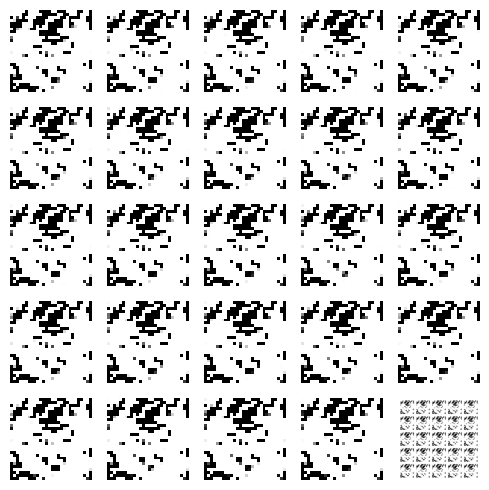

  0%|          | 0/350 [00:00<?, ?it/s]

4/4 [==============================] - 0s 18ms/step


  0%|          | 1/350 [00:00<03:05,  1.88it/s]

4/4 [==============================] - 0s 20ms/step


  1%|          | 2/350 [00:01<02:52,  2.02it/s]

4/4 [==============================] - 0s 12ms/step


  1%|          | 3/350 [00:01<02:43,  2.12it/s]

4/4 [==============================] - 0s 12ms/step


  1%|          | 4/350 [00:01<02:37,  2.19it/s]

4/4 [==============================] - 0s 24ms/step


  1%|▏         | 5/350 [00:02<02:42,  2.13it/s]

4/4 [==============================] - 0s 12ms/step


  2%|▏         | 6/350 [00:02<02:37,  2.18it/s]

4/4 [==============================] - 0s 11ms/step


  2%|▏         | 7/350 [00:03<02:34,  2.21it/s]

4/4 [==============================] - 0s 13ms/step


  2%|▏         | 8/350 [00:03<02:33,  2.23it/s]

4/4 [==============================] - 0s 20ms/step


  3%|▎         | 9/350 [00:04<02:39,  2.13it/s]

4/4 [==============================] - 0s 34ms/step


  3%|▎         | 10/350 [00:04<02:58,  1.90it/s]

4/4 [==============================] - 0s 22ms/step


  3%|▎         | 11/350 [00:05<03:18,  1.71it/s]

4/4 [==============================] - 0s 11ms/step


  3%|▎         | 12/350 [00:06<03:04,  1.83it/s]

4/4 [==============================] - 0s 30ms/step


  4%|▎         | 13/350 [00:06<03:11,  1.76it/s]

4/4 [==============================] - 0s 15ms/step


  4%|▍         | 14/350 [00:07<03:14,  1.73it/s]

4/4 [==============================] - 0s 14ms/step


  4%|▍         | 15/350 [00:07<03:00,  1.86it/s]

4/4 [==============================] - 0s 11ms/step


  5%|▍         | 16/350 [00:08<02:48,  1.98it/s]

4/4 [==============================] - 0s 25ms/step


  5%|▍         | 17/350 [00:08<02:59,  1.85it/s]

4/4 [==============================] - 0s 14ms/step


  5%|▌         | 18/350 [00:09<02:49,  1.96it/s]

4/4 [==============================] - 0s 11ms/step


  5%|▌         | 19/350 [00:09<02:40,  2.07it/s]

4/4 [==============================] - 0s 11ms/step


  6%|▌         | 20/350 [00:10<02:39,  2.07it/s]

4/4 [==============================] - 0s 21ms/step


  6%|▌         | 21/350 [00:10<02:40,  2.06it/s]

4/4 [==============================] - 0s 12ms/step


  6%|▋         | 22/350 [00:11<02:37,  2.08it/s]

4/4 [==============================] - 0s 12ms/step


  7%|▋         | 23/350 [00:11<02:35,  2.10it/s]

4/4 [==============================] - 0s 12ms/step


  7%|▋         | 24/350 [00:12<02:39,  2.04it/s]

4/4 [==============================] - 0s 25ms/step


  7%|▋         | 25/350 [00:12<02:40,  2.02it/s]

4/4 [==============================] - 0s 17ms/step


  7%|▋         | 26/350 [00:13<02:42,  1.99it/s]

4/4 [==============================] - 0s 13ms/step


  8%|▊         | 27/350 [00:13<02:39,  2.03it/s]

4/4 [==============================] - 0s 12ms/step


  8%|▊         | 28/350 [00:14<02:44,  1.96it/s]

4/4 [==============================] - 0s 15ms/step


  8%|▊         | 29/350 [00:14<02:37,  2.04it/s]

4/4 [==============================] - 0s 11ms/step


  9%|▊         | 30/350 [00:14<02:31,  2.12it/s]

4/4 [==============================] - 0s 10ms/step


  9%|▉         | 31/350 [00:15<02:26,  2.17it/s]

4/4 [==============================] - 0s 11ms/step


  9%|▉         | 32/350 [00:15<02:29,  2.13it/s]

4/4 [==============================] - 0s 10ms/step


  9%|▉         | 33/350 [00:16<02:24,  2.19it/s]

4/4 [==============================] - 0s 11ms/step


 10%|▉         | 34/350 [00:16<02:23,  2.20it/s]

4/4 [==============================] - 0s 12ms/step


 10%|█         | 35/350 [00:17<02:24,  2.19it/s]

4/4 [==============================] - 0s 13ms/step


 10%|█         | 36/350 [00:17<02:23,  2.18it/s]

4/4 [==============================] - 0s 15ms/step


 11%|█         | 37/350 [00:18<02:27,  2.12it/s]

4/4 [==============================] - 0s 12ms/step


 11%|█         | 38/350 [00:18<02:24,  2.17it/s]

4/4 [==============================] - 0s 12ms/step


 11%|█         | 39/350 [00:19<02:22,  2.18it/s]

4/4 [==============================] - 0s 11ms/step


 11%|█▏        | 40/350 [00:19<02:20,  2.21it/s]

4/4 [==============================] - 0s 10ms/step


 12%|█▏        | 41/350 [00:19<02:22,  2.16it/s]

4/4 [==============================] - 0s 12ms/step


 12%|█▏        | 42/350 [00:20<02:21,  2.18it/s]

4/4 [==============================] - 0s 11ms/step


 12%|█▏        | 43/350 [00:21<02:30,  2.04it/s]

4/4 [==============================] - 0s 11ms/step


 13%|█▎        | 44/350 [00:21<02:27,  2.07it/s]

4/4 [==============================] - 0s 13ms/step


 13%|█▎        | 45/350 [00:21<02:29,  2.03it/s]

4/4 [==============================] - 0s 12ms/step


 13%|█▎        | 46/350 [00:22<02:27,  2.05it/s]

4/4 [==============================] - 0s 13ms/step


 13%|█▎        | 47/350 [00:22<02:29,  2.03it/s]

4/4 [==============================] - 0s 12ms/step


 14%|█▎        | 48/350 [00:23<02:27,  2.05it/s]

4/4 [==============================] - 0s 15ms/step


 14%|█▍        | 49/350 [00:23<02:26,  2.05it/s]

4/4 [==============================] - 0s 13ms/step


 14%|█▍        | 50/350 [00:24<02:24,  2.08it/s]

4/4 [==============================] - 0s 14ms/step


 15%|█▍        | 51/350 [00:24<02:25,  2.05it/s]

4/4 [==============================] - 0s 12ms/step


 15%|█▍        | 52/350 [00:25<02:22,  2.09it/s]

4/4 [==============================] - 0s 14ms/step


 15%|█▌        | 53/350 [00:25<02:20,  2.11it/s]

4/4 [==============================] - 0s 32ms/step


 15%|█▌        | 54/350 [00:26<02:30,  1.97it/s]

4/4 [==============================] - 0s 12ms/step


 16%|█▌        | 55/350 [00:26<02:25,  2.03it/s]

4/4 [==============================] - 0s 12ms/step


 16%|█▌        | 56/350 [00:27<02:20,  2.10it/s]

4/4 [==============================] - 0s 13ms/step


 16%|█▋        | 57/350 [00:27<02:21,  2.06it/s]

4/4 [==============================] - 0s 11ms/step


 17%|█▋        | 58/350 [00:28<02:18,  2.10it/s]

4/4 [==============================] - 0s 12ms/step


 17%|█▋        | 59/350 [00:28<02:16,  2.13it/s]

4/4 [==============================] - 0s 11ms/step


 17%|█▋        | 60/350 [00:29<02:14,  2.15it/s]

4/4 [==============================] - 0s 27ms/step


 17%|█▋        | 61/350 [00:29<02:18,  2.08it/s]

4/4 [==============================] - 0s 15ms/step


 18%|█▊        | 62/350 [00:30<02:16,  2.10it/s]

4/4 [==============================] - 0s 12ms/step


 18%|█▊        | 63/350 [00:30<02:18,  2.07it/s]

4/4 [==============================] - 0s 12ms/step


 18%|█▊        | 64/350 [00:31<02:15,  2.11it/s]

4/4 [==============================] - 0s 13ms/step


 19%|█▊        | 65/350 [00:31<02:25,  1.96it/s]

4/4 [==============================] - 0s 15ms/step


 19%|█▉        | 66/350 [00:32<02:20,  2.02it/s]

4/4 [==============================] - 0s 12ms/step


 19%|█▉        | 67/350 [00:32<02:22,  1.98it/s]

4/4 [==============================] - 0s 13ms/step


 19%|█▉        | 68/350 [00:33<02:19,  2.02it/s]

4/4 [==============================] - 0s 16ms/step


 20%|█▉        | 69/350 [00:33<02:23,  1.96it/s]

4/4 [==============================] - 0s 14ms/step


 20%|██        | 70/350 [00:34<02:24,  1.94it/s]

4/4 [==============================] - 0s 13ms/step


 20%|██        | 71/350 [00:34<02:19,  2.00it/s]

4/4 [==============================] - 0s 14ms/step


 21%|██        | 72/350 [00:35<02:15,  2.05it/s]

4/4 [==============================] - 0s 33ms/step


 21%|██        | 73/350 [00:35<02:18,  2.00it/s]

4/4 [==============================] - 0s 13ms/step


 21%|██        | 74/350 [00:36<02:12,  2.08it/s]

4/4 [==============================] - 0s 12ms/step


 21%|██▏       | 75/350 [00:36<02:14,  2.04it/s]

4/4 [==============================] - 0s 13ms/step


 22%|██▏       | 76/350 [00:37<02:11,  2.09it/s]

4/4 [==============================] - 0s 14ms/step


 22%|██▏       | 77/350 [00:37<02:10,  2.10it/s]

4/4 [==============================] - 0s 12ms/step


 22%|██▏       | 78/350 [00:38<02:15,  2.00it/s]

4/4 [==============================] - 0s 18ms/step


 23%|██▎       | 79/350 [00:38<02:13,  2.03it/s]

4/4 [==============================] - 0s 13ms/step


 23%|██▎       | 80/350 [00:39<02:18,  1.95it/s]

4/4 [==============================] - 0s 13ms/step


 23%|██▎       | 81/350 [00:39<02:13,  2.01it/s]

4/4 [==============================] - 0s 14ms/step


 23%|██▎       | 82/350 [00:40<02:16,  1.96it/s]

4/4 [==============================] - 0s 14ms/step


 24%|██▎       | 83/350 [00:40<02:18,  1.93it/s]

4/4 [==============================] - 0s 13ms/step


 24%|██▍       | 84/350 [00:41<02:14,  1.98it/s]

4/4 [==============================] - 0s 14ms/step


 24%|██▍       | 85/350 [00:41<02:14,  1.97it/s]

4/4 [==============================] - 0s 13ms/step


 25%|██▍       | 86/350 [00:42<02:23,  1.84it/s]

4/4 [==============================] - 0s 13ms/step


 25%|██▍       | 87/350 [00:42<02:14,  1.95it/s]

4/4 [==============================] - 0s 14ms/step


 25%|██▌       | 88/350 [00:43<02:15,  1.93it/s]

4/4 [==============================] - 0s 13ms/step


 25%|██▌       | 89/350 [00:43<02:16,  1.92it/s]

4/4 [==============================] - 0s 15ms/step


 26%|██▌       | 90/350 [00:44<02:15,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


 26%|██▌       | 91/350 [00:44<02:09,  2.00it/s]

4/4 [==============================] - 0s 12ms/step


 26%|██▋       | 92/350 [00:45<02:07,  2.02it/s]

4/4 [==============================] - 0s 26ms/step


 27%|██▋       | 93/350 [00:45<02:08,  2.00it/s]

4/4 [==============================] - 0s 15ms/step


 27%|██▋       | 94/350 [00:46<02:11,  1.95it/s]

4/4 [==============================] - 0s 12ms/step


 27%|██▋       | 95/350 [00:46<02:09,  1.97it/s]

4/4 [==============================] - 0s 14ms/step


 27%|██▋       | 96/350 [00:47<02:05,  2.02it/s]

4/4 [==============================] - 0s 20ms/step


 28%|██▊       | 97/350 [00:47<02:05,  2.01it/s]

4/4 [==============================] - 0s 12ms/step


 28%|██▊       | 98/350 [00:48<02:01,  2.07it/s]

4/4 [==============================] - 0s 12ms/step


 28%|██▊       | 99/350 [00:48<01:58,  2.12it/s]

4/4 [==============================] - 0s 24ms/step


 29%|██▊       | 100/350 [00:49<02:00,  2.08it/s]

4/4 [==============================] - 0s 12ms/step


 29%|██▉       | 101/350 [00:49<02:00,  2.06it/s]

4/4 [==============================] - 0s 15ms/step


 29%|██▉       | 102/350 [00:50<02:03,  2.02it/s]

4/4 [==============================] - 0s 12ms/step


 29%|██▉       | 103/350 [00:50<01:58,  2.08it/s]

4/4 [==============================] - 0s 11ms/step


 30%|██▉       | 104/350 [00:51<01:58,  2.07it/s]

4/4 [==============================] - 0s 13ms/step


 30%|███       | 105/350 [00:51<01:55,  2.12it/s]

4/4 [==============================] - 0s 17ms/step


 30%|███       | 106/350 [00:52<02:01,  2.00it/s]

4/4 [==============================] - 0s 14ms/step


 31%|███       | 107/350 [00:52<01:59,  2.04it/s]

4/4 [==============================] - 0s 13ms/step


 31%|███       | 108/350 [00:53<01:56,  2.07it/s]

4/4 [==============================] - 0s 13ms/step


 31%|███       | 109/350 [00:53<01:53,  2.12it/s]

4/4 [==============================] - 0s 18ms/step


 31%|███▏      | 110/350 [00:54<01:59,  2.01it/s]

4/4 [==============================] - 0s 14ms/step


 32%|███▏      | 111/350 [00:54<01:55,  2.07it/s]

4/4 [==============================] - 0s 12ms/step


 32%|███▏      | 112/350 [00:54<01:52,  2.12it/s]

4/4 [==============================] - 0s 14ms/step


 32%|███▏      | 113/350 [00:55<01:51,  2.13it/s]

4/4 [==============================] - 0s 24ms/step


 33%|███▎      | 114/350 [00:55<01:53,  2.09it/s]

4/4 [==============================] - 0s 13ms/step


 33%|███▎      | 115/350 [00:56<01:49,  2.14it/s]

4/4 [==============================] - 0s 11ms/step


 33%|███▎      | 116/350 [00:56<01:51,  2.10it/s]

4/4 [==============================] - 0s 12ms/step


 33%|███▎      | 117/350 [00:57<01:48,  2.15it/s]

4/4 [==============================] - 0s 12ms/step


 34%|███▎      | 118/350 [00:57<01:55,  2.00it/s]

4/4 [==============================] - 0s 13ms/step


 34%|███▍      | 119/350 [00:58<01:52,  2.05it/s]

4/4 [==============================] - 0s 11ms/step


 34%|███▍      | 120/350 [00:58<01:52,  2.05it/s]

4/4 [==============================] - 0s 12ms/step


 35%|███▍      | 121/350 [00:59<01:50,  2.07it/s]

4/4 [==============================] - 0s 12ms/step


 35%|███▍      | 122/350 [00:59<01:46,  2.14it/s]

4/4 [==============================] - 0s 26ms/step


 35%|███▌      | 123/350 [01:00<01:48,  2.09it/s]

4/4 [==============================] - 0s 16ms/step


 35%|███▌      | 124/350 [01:00<01:49,  2.07it/s]

4/4 [==============================] - 0s 12ms/step


 36%|███▌      | 125/350 [01:01<01:52,  1.99it/s]

4/4 [==============================] - 0s 14ms/step


 36%|███▌      | 126/350 [01:01<01:48,  2.06it/s]

4/4 [==============================] - 0s 12ms/step


 36%|███▋      | 127/350 [01:02<01:44,  2.14it/s]

4/4 [==============================] - 0s 26ms/step


 37%|███▋      | 128/350 [01:02<01:45,  2.10it/s]

4/4 [==============================] - 0s 14ms/step


 37%|███▋      | 129/350 [01:03<01:45,  2.10it/s]

4/4 [==============================] - 0s 14ms/step


 37%|███▋      | 130/350 [01:03<01:50,  2.00it/s]

4/4 [==============================] - 0s 15ms/step


 37%|███▋      | 131/350 [01:04<01:48,  2.03it/s]

4/4 [==============================] - 0s 14ms/step


 38%|███▊      | 132/350 [01:04<01:53,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


 38%|███▊      | 133/350 [01:05<01:52,  1.92it/s]

4/4 [==============================] - 0s 15ms/step


 38%|███▊      | 134/350 [01:05<01:54,  1.89it/s]

4/4 [==============================] - 0s 14ms/step


 39%|███▊      | 135/350 [01:06<01:49,  1.97it/s]

4/4 [==============================] - 0s 13ms/step


 39%|███▉      | 136/350 [01:06<01:46,  2.00it/s]

4/4 [==============================] - 0s 12ms/step


 39%|███▉      | 137/350 [01:07<01:44,  2.04it/s]

4/4 [==============================] - 0s 14ms/step


 39%|███▉      | 138/350 [01:07<01:44,  2.03it/s]

4/4 [==============================] - 0s 12ms/step


 40%|███▉      | 139/350 [01:08<01:41,  2.08it/s]

4/4 [==============================] - 0s 12ms/step


 40%|████      | 140/350 [01:08<01:41,  2.07it/s]

4/4 [==============================] - 0s 12ms/step


 40%|████      | 141/350 [01:09<01:37,  2.15it/s]

4/4 [==============================] - 0s 12ms/step


 41%|████      | 142/350 [01:09<01:40,  2.08it/s]

4/4 [==============================] - 0s 12ms/step


 41%|████      | 143/350 [01:10<01:38,  2.10it/s]

4/4 [==============================] - 0s 14ms/step


 41%|████      | 144/350 [01:10<01:43,  2.00it/s]

4/4 [==============================] - 0s 14ms/step


 41%|████▏     | 145/350 [01:11<01:38,  2.08it/s]

4/4 [==============================] - 0s 12ms/step


 42%|████▏     | 146/350 [01:11<01:35,  2.13it/s]

4/4 [==============================] - 0s 12ms/step


 42%|████▏     | 147/350 [01:12<01:38,  2.06it/s]

4/4 [==============================] - 0s 13ms/step


 42%|████▏     | 148/350 [01:12<01:35,  2.12it/s]

4/4 [==============================] - 0s 12ms/step


 43%|████▎     | 149/350 [01:12<01:32,  2.17it/s]

4/4 [==============================] - 0s 15ms/step


 43%|████▎     | 150/350 [01:13<01:32,  2.15it/s]

4/4 [==============================] - 0s 15ms/step


 43%|████▎     | 151/350 [01:13<01:31,  2.17it/s]

4/4 [==============================] - 0s 12ms/step


 43%|████▎     | 152/350 [01:14<01:29,  2.21it/s]

4/4 [==============================] - 0s 13ms/step


 44%|████▎     | 153/350 [01:14<01:30,  2.17it/s]

4/4 [==============================] - 0s 12ms/step


 44%|████▍     | 154/350 [01:15<01:28,  2.22it/s]

4/4 [==============================] - 0s 11ms/step


 44%|████▍     | 155/350 [01:15<01:26,  2.26it/s]

4/4 [==============================] - 0s 27ms/step


 45%|████▍     | 156/350 [01:16<01:28,  2.20it/s]

4/4 [==============================] - 0s 12ms/step


 45%|████▍     | 157/350 [01:16<01:25,  2.25it/s]

4/4 [==============================] - 0s 11ms/step


 45%|████▌     | 158/350 [01:16<01:25,  2.25it/s]

4/4 [==============================] - 0s 23ms/step


 45%|████▌     | 159/350 [01:17<01:27,  2.18it/s]

4/4 [==============================] - 0s 11ms/step


 46%|████▌     | 160/350 [01:17<01:25,  2.22it/s]

4/4 [==============================] - 0s 11ms/step


 46%|████▌     | 161/350 [01:18<01:23,  2.26it/s]

4/4 [==============================] - 0s 14ms/step


 46%|████▋     | 162/350 [01:18<01:27,  2.16it/s]

4/4 [==============================] - 0s 12ms/step


 47%|████▋     | 163/350 [01:19<01:25,  2.18it/s]

4/4 [==============================] - 0s 12ms/step


 47%|████▋     | 164/350 [01:19<01:24,  2.21it/s]

4/4 [==============================] - 0s 15ms/step


 47%|████▋     | 165/350 [01:20<01:26,  2.14it/s]

4/4 [==============================] - 0s 12ms/step


 47%|████▋     | 166/350 [01:20<01:23,  2.19it/s]

4/4 [==============================] - 0s 11ms/step


 48%|████▊     | 167/350 [01:21<01:21,  2.25it/s]

4/4 [==============================] - 0s 11ms/step


 48%|████▊     | 168/350 [01:21<01:20,  2.27it/s]

4/4 [==============================] - 0s 23ms/step


 48%|████▊     | 169/350 [01:21<01:22,  2.20it/s]

4/4 [==============================] - 0s 12ms/step


 49%|████▊     | 170/350 [01:22<01:20,  2.22it/s]

4/4 [==============================] - 0s 12ms/step


 49%|████▉     | 171/350 [01:22<01:22,  2.16it/s]

4/4 [==============================] - 0s 12ms/step


 49%|████▉     | 172/350 [01:23<01:21,  2.18it/s]

4/4 [==============================] - 0s 13ms/step


 49%|████▉     | 173/350 [01:23<01:20,  2.19it/s]

4/4 [==============================] - 0s 21ms/step


 50%|████▉     | 174/350 [01:24<01:22,  2.14it/s]

4/4 [==============================] - 0s 12ms/step


 50%|█████     | 175/350 [01:24<01:20,  2.18it/s]

4/4 [==============================] - 0s 12ms/step


 50%|█████     | 176/350 [01:25<01:18,  2.21it/s]

4/4 [==============================] - 0s 27ms/step


 51%|█████     | 177/350 [01:25<01:20,  2.14it/s]

4/4 [==============================] - 0s 12ms/step


 51%|█████     | 178/350 [01:26<01:19,  2.17it/s]

4/4 [==============================] - 0s 15ms/step


 51%|█████     | 179/350 [01:26<01:21,  2.09it/s]

4/4 [==============================] - 0s 13ms/step


 51%|█████▏    | 180/350 [01:27<01:24,  2.02it/s]

4/4 [==============================] - 0s 26ms/step


 52%|█████▏    | 181/350 [01:27<01:25,  1.98it/s]

4/4 [==============================] - 0s 13ms/step


 52%|█████▏    | 182/350 [01:28<01:26,  1.94it/s]

4/4 [==============================] - 0s 12ms/step


 52%|█████▏    | 183/350 [01:28<01:22,  2.02it/s]

4/4 [==============================] - 0s 14ms/step


 53%|█████▎    | 184/350 [01:29<01:21,  2.04it/s]

4/4 [==============================] - 0s 12ms/step


 53%|█████▎    | 185/350 [01:29<01:19,  2.09it/s]

4/4 [==============================] - 0s 13ms/step


 53%|█████▎    | 186/350 [01:30<01:17,  2.12it/s]

4/4 [==============================] - 0s 16ms/step


 53%|█████▎    | 187/350 [01:30<01:18,  2.07it/s]

4/4 [==============================] - 0s 13ms/step


 54%|█████▎    | 188/350 [01:31<01:20,  2.02it/s]

4/4 [==============================] - 0s 14ms/step


 54%|█████▍    | 189/350 [01:31<01:17,  2.07it/s]

4/4 [==============================] - 0s 13ms/step


 54%|█████▍    | 190/350 [01:32<01:20,  1.98it/s]

4/4 [==============================] - 0s 14ms/step


 55%|█████▍    | 191/350 [01:32<01:19,  2.00it/s]

4/4 [==============================] - 0s 17ms/step


 55%|█████▍    | 192/350 [01:33<01:21,  1.95it/s]

4/4 [==============================] - 0s 15ms/step


 55%|█████▌    | 193/350 [01:33<01:18,  2.01it/s]

4/4 [==============================] - 0s 13ms/step


 55%|█████▌    | 194/350 [01:34<01:20,  1.94it/s]

4/4 [==============================] - 0s 14ms/step


 56%|█████▌    | 195/350 [01:34<01:18,  1.98it/s]

4/4 [==============================] - 0s 12ms/step


 56%|█████▌    | 196/350 [01:35<01:16,  2.02it/s]

4/4 [==============================] - 0s 13ms/step


 56%|█████▋    | 197/350 [01:35<01:14,  2.04it/s]

4/4 [==============================] - 0s 18ms/step


 57%|█████▋    | 198/350 [01:36<01:14,  2.03it/s]

4/4 [==============================] - 0s 15ms/step


 57%|█████▋    | 199/350 [01:36<01:12,  2.07it/s]

4/4 [==============================] - 0s 13ms/step


 57%|█████▋    | 200/350 [01:36<01:11,  2.11it/s]

4/4 [==============================] - 0s 17ms/step


 57%|█████▋    | 201/350 [01:37<01:12,  2.06it/s]

4/4 [==============================] - 0s 13ms/step


 58%|█████▊    | 202/350 [01:37<01:10,  2.10it/s]

4/4 [==============================] - 0s 17ms/step


 58%|█████▊    | 203/350 [01:38<01:11,  2.06it/s]

4/4 [==============================] - 0s 12ms/step


 58%|█████▊    | 204/350 [01:38<01:08,  2.12it/s]

4/4 [==============================] - 0s 12ms/step


 59%|█████▊    | 205/350 [01:39<01:07,  2.14it/s]

4/4 [==============================] - 0s 25ms/step


 59%|█████▉    | 206/350 [01:39<01:09,  2.06it/s]

4/4 [==============================] - 0s 28ms/step


 59%|█████▉    | 207/350 [01:40<01:11,  1.99it/s]

4/4 [==============================] - 0s 13ms/step


 59%|█████▉    | 208/350 [01:40<01:09,  2.05it/s]

4/4 [==============================] - 0s 14ms/step


 60%|█████▉    | 209/350 [01:41<01:07,  2.08it/s]

4/4 [==============================] - 0s 20ms/step


 60%|██████    | 210/350 [01:41<01:08,  2.05it/s]

4/4 [==============================] - 0s 12ms/step


 60%|██████    | 211/350 [01:42<01:05,  2.12it/s]

4/4 [==============================] - 0s 11ms/step


 61%|██████    | 212/350 [01:42<01:06,  2.09it/s]

4/4 [==============================] - 0s 13ms/step


 61%|██████    | 213/350 [01:43<01:04,  2.13it/s]

4/4 [==============================] - 0s 12ms/step


 61%|██████    | 214/350 [01:43<01:05,  2.08it/s]

4/4 [==============================] - 0s 18ms/step


 61%|██████▏   | 215/350 [01:44<01:06,  2.04it/s]

4/4 [==============================] - 0s 12ms/step


 62%|██████▏   | 216/350 [01:44<01:04,  2.07it/s]

4/4 [==============================] - 0s 20ms/step


 62%|██████▏   | 217/350 [01:45<01:04,  2.05it/s]

4/4 [==============================] - 0s 13ms/step


 62%|██████▏   | 218/350 [01:45<01:03,  2.08it/s]

4/4 [==============================] - 0s 13ms/step


 63%|██████▎   | 219/350 [01:46<01:02,  2.09it/s]

4/4 [==============================] - 0s 12ms/step


 63%|██████▎   | 220/350 [01:46<01:02,  2.10it/s]

4/4 [==============================] - 0s 48ms/step


 63%|██████▎   | 221/350 [01:47<01:05,  1.96it/s]

4/4 [==============================] - 0s 13ms/step


 63%|██████▎   | 222/350 [01:47<01:03,  2.02it/s]

4/4 [==============================] - 0s 13ms/step


 64%|██████▎   | 223/350 [01:48<01:01,  2.05it/s]

4/4 [==============================] - 0s 13ms/step


 64%|██████▍   | 224/350 [01:48<01:02,  2.00it/s]

4/4 [==============================] - 0s 13ms/step


 64%|██████▍   | 225/350 [01:49<01:01,  2.04it/s]

4/4 [==============================] - 0s 13ms/step


 65%|██████▍   | 226/350 [01:49<00:59,  2.08it/s]

4/4 [==============================] - 0s 12ms/step


 65%|██████▍   | 227/350 [01:50<00:58,  2.12it/s]

4/4 [==============================] - 0s 20ms/step


 65%|██████▌   | 228/350 [01:50<00:59,  2.05it/s]

4/4 [==============================] - 0s 13ms/step


 65%|██████▌   | 229/350 [01:51<00:57,  2.10it/s]

4/4 [==============================] - 0s 13ms/step


 66%|██████▌   | 230/350 [01:51<00:56,  2.11it/s]

4/4 [==============================] - 0s 47ms/step


 66%|██████▌   | 231/350 [01:52<01:01,  1.95it/s]

4/4 [==============================] - 0s 13ms/step


 66%|██████▋   | 232/350 [01:52<00:58,  2.01it/s]

4/4 [==============================] - 0s 30ms/step


 67%|██████▋   | 233/350 [01:53<01:00,  1.95it/s]

4/4 [==============================] - 0s 12ms/step


 67%|██████▋   | 234/350 [01:53<00:57,  2.00it/s]

4/4 [==============================] - 0s 11ms/step


 67%|██████▋   | 235/350 [01:54<00:59,  1.94it/s]

4/4 [==============================] - 0s 12ms/step


 67%|██████▋   | 236/350 [01:54<00:56,  2.00it/s]

4/4 [==============================] - 0s 13ms/step


 68%|██████▊   | 237/350 [01:55<00:57,  1.97it/s]

4/4 [==============================] - 0s 12ms/step


 68%|██████▊   | 238/350 [01:55<00:55,  2.01it/s]

4/4 [==============================] - 0s 12ms/step


 68%|██████▊   | 239/350 [01:56<00:55,  1.99it/s]

4/4 [==============================] - 0s 14ms/step


 69%|██████▊   | 240/350 [01:56<00:54,  2.01it/s]

4/4 [==============================] - 0s 14ms/step


 69%|██████▉   | 241/350 [01:57<00:55,  1.96it/s]

4/4 [==============================] - 0s 33ms/step


 69%|██████▉   | 242/350 [01:57<00:56,  1.93it/s]

4/4 [==============================] - 0s 13ms/step


 69%|██████▉   | 243/350 [01:58<00:53,  1.98it/s]

4/4 [==============================] - 0s 12ms/step


 70%|██████▉   | 244/350 [01:58<00:54,  1.96it/s]

4/4 [==============================] - 0s 11ms/step


 70%|███████   | 245/350 [01:59<00:51,  2.03it/s]

4/4 [==============================] - 0s 12ms/step


 70%|███████   | 246/350 [01:59<00:52,  1.99it/s]

4/4 [==============================] - 0s 14ms/step


 71%|███████   | 247/350 [02:00<00:52,  1.95it/s]

4/4 [==============================] - 0s 12ms/step


 71%|███████   | 248/350 [02:00<00:53,  1.91it/s]

4/4 [==============================] - 0s 14ms/step


 71%|███████   | 249/350 [02:01<00:51,  1.95it/s]

4/4 [==============================] - 0s 12ms/step


 71%|███████▏  | 250/350 [02:01<00:50,  2.00it/s]

4/4 [==============================] - 0s 13ms/step


 72%|███████▏  | 251/350 [02:02<00:51,  1.94it/s]

4/4 [==============================] - 0s 13ms/step


 72%|███████▏  | 252/350 [02:02<00:49,  1.98it/s]

4/4 [==============================] - 0s 13ms/step


 72%|███████▏  | 253/350 [02:03<00:50,  1.93it/s]

4/4 [==============================] - 0s 14ms/step


 73%|███████▎  | 254/350 [02:03<00:48,  2.00it/s]

4/4 [==============================] - 0s 13ms/step


 73%|███████▎  | 255/350 [02:04<00:50,  1.90it/s]

4/4 [==============================] - 0s 13ms/step


 73%|███████▎  | 256/350 [02:04<00:47,  1.98it/s]

4/4 [==============================] - 0s 13ms/step


 73%|███████▎  | 257/350 [02:05<00:46,  2.01it/s]

4/4 [==============================] - 0s 16ms/step


 74%|███████▎  | 258/350 [02:05<00:45,  2.03it/s]

4/4 [==============================] - 0s 20ms/step


 74%|███████▍  | 259/350 [02:06<00:45,  2.01it/s]

4/4 [==============================] - 0s 15ms/step


 74%|███████▍  | 260/350 [02:06<00:44,  2.04it/s]

4/4 [==============================] - 0s 30ms/step


 75%|███████▍  | 261/350 [02:07<00:44,  1.98it/s]

4/4 [==============================] - 0s 12ms/step


 75%|███████▍  | 262/350 [02:07<00:45,  1.95it/s]

4/4 [==============================] - 0s 11ms/step


 75%|███████▌  | 263/350 [02:08<00:44,  1.94it/s]

4/4 [==============================] - 0s 13ms/step


 75%|███████▌  | 264/350 [02:08<00:42,  2.00it/s]

4/4 [==============================] - 0s 12ms/step


 76%|███████▌  | 265/350 [02:09<00:42,  1.99it/s]

4/4 [==============================] - 0s 13ms/step


 76%|███████▌  | 266/350 [02:09<00:40,  2.05it/s]

4/4 [==============================] - 0s 12ms/step


 76%|███████▋  | 267/350 [02:10<00:39,  2.10it/s]

4/4 [==============================] - 0s 28ms/step


 77%|███████▋  | 268/350 [02:10<00:40,  2.03it/s]

4/4 [==============================] - 0s 15ms/step


 77%|███████▋  | 269/350 [02:11<00:39,  2.06it/s]

4/4 [==============================] - 0s 12ms/step


 77%|███████▋  | 270/350 [02:11<00:39,  2.04it/s]

4/4 [==============================] - 0s 13ms/step


 77%|███████▋  | 271/350 [02:12<00:37,  2.10it/s]

4/4 [==============================] - 0s 13ms/step


 78%|███████▊  | 272/350 [02:12<00:38,  2.02it/s]

4/4 [==============================] - 0s 20ms/step


 78%|███████▊  | 273/350 [02:13<00:37,  2.04it/s]

4/4 [==============================] - 0s 12ms/step


 78%|███████▊  | 274/350 [02:13<00:37,  2.02it/s]

4/4 [==============================] - 0s 13ms/step


 79%|███████▊  | 275/350 [02:14<00:36,  2.08it/s]

4/4 [==============================] - 0s 14ms/step


 79%|███████▉  | 276/350 [02:14<00:36,  2.05it/s]

4/4 [==============================] - 0s 11ms/step


 79%|███████▉  | 277/350 [02:15<00:35,  2.06it/s]

4/4 [==============================] - 0s 13ms/step


 79%|███████▉  | 278/350 [02:15<00:35,  2.03it/s]

4/4 [==============================] - 0s 13ms/step


 80%|███████▉  | 279/350 [02:16<00:34,  2.07it/s]

4/4 [==============================] - 0s 12ms/step


 80%|████████  | 280/350 [02:16<00:34,  2.05it/s]

4/4 [==============================] - 0s 11ms/step


 80%|████████  | 281/350 [02:17<00:34,  2.02it/s]

4/4 [==============================] - 0s 15ms/step


 81%|████████  | 282/350 [02:17<00:32,  2.07it/s]

4/4 [==============================] - 0s 11ms/step


 81%|████████  | 283/350 [02:18<00:32,  2.05it/s]

4/4 [==============================] - 0s 14ms/step


 81%|████████  | 284/350 [02:18<00:31,  2.08it/s]

4/4 [==============================] - 0s 13ms/step


 81%|████████▏ | 285/350 [02:18<00:30,  2.14it/s]

4/4 [==============================] - 0s 22ms/step


 82%|████████▏ | 286/350 [02:19<00:30,  2.12it/s]

4/4 [==============================] - 0s 13ms/step


 82%|████████▏ | 287/350 [02:19<00:29,  2.16it/s]

4/4 [==============================] - 0s 12ms/step


 82%|████████▏ | 288/350 [02:20<00:30,  2.03it/s]

4/4 [==============================] - 0s 15ms/step


 83%|████████▎ | 289/350 [02:20<00:29,  2.08it/s]

4/4 [==============================] - 0s 13ms/step


 83%|████████▎ | 290/350 [02:21<00:28,  2.12it/s]

4/4 [==============================] - 0s 15ms/step


 83%|████████▎ | 291/350 [02:21<00:28,  2.04it/s]

4/4 [==============================] - 0s 14ms/step


 83%|████████▎ | 292/350 [02:22<00:28,  2.04it/s]

4/4 [==============================] - 0s 14ms/step


 84%|████████▎ | 293/350 [02:22<00:29,  1.95it/s]

4/4 [==============================] - 0s 12ms/step


 84%|████████▍ | 294/350 [02:23<00:27,  2.02it/s]

4/4 [==============================] - 0s 11ms/step


 84%|████████▍ | 295/350 [02:23<00:26,  2.07it/s]

4/4 [==============================] - 0s 21ms/step


 85%|████████▍ | 296/350 [02:24<00:26,  2.05it/s]

4/4 [==============================] - 0s 12ms/step


 85%|████████▍ | 297/350 [02:24<00:24,  2.13it/s]

4/4 [==============================] - 0s 11ms/step


 85%|████████▌ | 298/350 [02:25<00:24,  2.11it/s]

4/4 [==============================] - 0s 13ms/step


 85%|████████▌ | 299/350 [02:25<00:24,  2.09it/s]

4/4 [==============================] - 0s 13ms/step


 86%|████████▌ | 300/350 [02:26<00:24,  2.03it/s]

4/4 [==============================] - 0s 14ms/step


 86%|████████▌ | 301/350 [02:26<00:23,  2.08it/s]

4/4 [==============================] - 0s 12ms/step


 86%|████████▋ | 302/350 [02:27<00:23,  2.05it/s]

4/4 [==============================] - 0s 11ms/step


 87%|████████▋ | 303/350 [02:27<00:22,  2.12it/s]

4/4 [==============================] - 0s 12ms/step


 87%|████████▋ | 304/350 [02:28<00:22,  2.00it/s]

4/4 [==============================] - 0s 14ms/step


 87%|████████▋ | 305/350 [02:28<00:22,  2.04it/s]

4/4 [==============================] - 0s 12ms/step


 87%|████████▋ | 306/350 [02:29<00:21,  2.04it/s]

4/4 [==============================] - 0s 13ms/step


 88%|████████▊ | 307/350 [02:29<00:20,  2.07it/s]

4/4 [==============================] - 0s 12ms/step


 88%|████████▊ | 308/350 [02:30<00:20,  2.04it/s]

4/4 [==============================] - 0s 12ms/step


 88%|████████▊ | 309/350 [02:30<00:19,  2.10it/s]

4/4 [==============================] - 0s 13ms/step


 89%|████████▊ | 310/350 [02:31<00:18,  2.13it/s]

4/4 [==============================] - 0s 24ms/step


 89%|████████▉ | 311/350 [02:31<00:18,  2.10it/s]

4/4 [==============================] - 0s 11ms/step


 89%|████████▉ | 312/350 [02:31<00:18,  2.10it/s]

4/4 [==============================] - 0s 11ms/step


 89%|████████▉ | 313/350 [02:32<00:17,  2.09it/s]

4/4 [==============================] - 0s 12ms/step


 90%|████████▉ | 314/350 [02:32<00:16,  2.15it/s]

4/4 [==============================] - 0s 12ms/step


 90%|█████████ | 315/350 [02:33<00:15,  2.20it/s]

4/4 [==============================] - 0s 15ms/step


 90%|█████████ | 316/350 [02:33<00:15,  2.16it/s]

4/4 [==============================] - 0s 12ms/step


 91%|█████████ | 317/350 [02:34<00:15,  2.18it/s]

4/4 [==============================] - 0s 16ms/step


 91%|█████████ | 318/350 [02:34<00:15,  2.11it/s]

4/4 [==============================] - 0s 13ms/step


 91%|█████████ | 319/350 [02:35<00:15,  2.06it/s]

4/4 [==============================] - 0s 12ms/step


 91%|█████████▏| 320/350 [02:35<00:14,  2.12it/s]

4/4 [==============================] - 0s 14ms/step


 92%|█████████▏| 321/350 [02:36<00:14,  2.06it/s]

4/4 [==============================] - 0s 13ms/step


 92%|█████████▏| 322/350 [02:36<00:13,  2.12it/s]

4/4 [==============================] - 0s 11ms/step


 92%|█████████▏| 323/350 [02:37<00:12,  2.16it/s]

4/4 [==============================] - 0s 12ms/step


 93%|█████████▎| 324/350 [02:37<00:12,  2.12it/s]

4/4 [==============================] - 0s 13ms/step


 93%|█████████▎| 325/350 [02:38<00:12,  2.06it/s]

4/4 [==============================] - 0s 13ms/step


 93%|█████████▎| 326/350 [02:38<00:11,  2.01it/s]

4/4 [==============================] - 0s 29ms/step


 93%|█████████▎| 327/350 [02:39<00:11,  2.00it/s]

4/4 [==============================] - 0s 12ms/step


 94%|█████████▎| 328/350 [02:39<00:10,  2.04it/s]

4/4 [==============================] - 0s 12ms/step


 94%|█████████▍| 329/350 [02:40<00:10,  2.01it/s]

4/4 [==============================] - 0s 11ms/step


 94%|█████████▍| 330/350 [02:40<00:09,  2.07it/s]

4/4 [==============================] - 0s 13ms/step


 95%|█████████▍| 331/350 [02:41<00:09,  2.02it/s]

4/4 [==============================] - 0s 14ms/step


 95%|█████████▍| 332/350 [02:41<00:08,  2.08it/s]

4/4 [==============================] - 0s 11ms/step


 95%|█████████▌| 333/350 [02:42<00:07,  2.13it/s]

4/4 [==============================] - 0s 12ms/step


 95%|█████████▌| 334/350 [02:42<00:07,  2.07it/s]

4/4 [==============================] - 0s 12ms/step


 96%|█████████▌| 335/350 [02:43<00:07,  2.05it/s]

4/4 [==============================] - 0s 11ms/step


 96%|█████████▌| 336/350 [02:43<00:06,  2.10it/s]

4/4 [==============================] - 0s 11ms/step


 96%|█████████▋| 337/350 [02:43<00:06,  2.09it/s]

4/4 [==============================] - 0s 11ms/step


 97%|█████████▋| 338/350 [02:44<00:05,  2.15it/s]

4/4 [==============================] - 0s 12ms/step


 97%|█████████▋| 339/350 [02:44<00:05,  2.19it/s]

4/4 [==============================] - 0s 12ms/step


 97%|█████████▋| 340/350 [02:45<00:04,  2.19it/s]

4/4 [==============================] - 0s 14ms/step


 97%|█████████▋| 341/350 [02:45<00:04,  2.07it/s]

4/4 [==============================] - 0s 12ms/step


 98%|█████████▊| 342/350 [02:46<00:03,  2.12it/s]

4/4 [==============================] - 0s 17ms/step


 98%|█████████▊| 343/350 [02:46<00:03,  2.07it/s]

4/4 [==============================] - 0s 13ms/step


 98%|█████████▊| 344/350 [02:47<00:02,  2.10it/s]

4/4 [==============================] - 0s 11ms/step


 99%|█████████▊| 345/350 [02:47<00:02,  2.15it/s]

4/4 [==============================] - 0s 11ms/step


 99%|█████████▉| 346/350 [02:48<00:01,  2.19it/s]

4/4 [==============================] - 0s 16ms/step


 99%|█████████▉| 347/350 [02:48<00:01,  2.12it/s]

4/4 [==============================] - 0s 12ms/step


 99%|█████████▉| 348/350 [02:49<00:00,  2.08it/s]

4/4 [==============================] - 0s 13ms/step


100%|█████████▉| 349/350 [02:49<00:00,  2.04it/s]

4/4 [==============================] - 0s 14ms/step


100%|██████████| 350/350 [02:50<00:00,  2.06it/s]

Epoch number: 7 discriminator_loss: 0.17008558314908961 generator_loss: 6.393418107713972
1/1 [==============================] - 0s 24ms/step


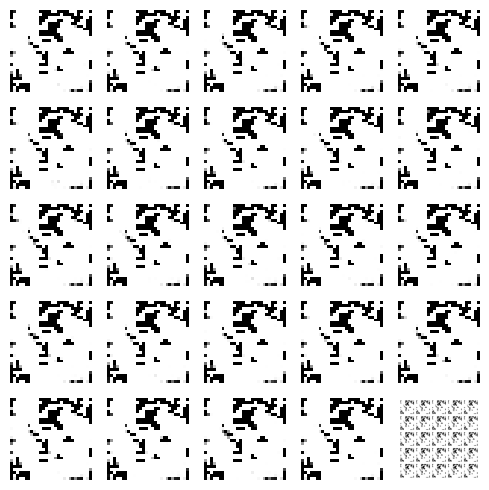

  0%|          | 0/350 [00:00<?, ?it/s]

4/4 [==============================] - 0s 18ms/step


  0%|          | 1/350 [00:00<02:41,  2.16it/s]

4/4 [==============================] - 0s 18ms/step


  1%|          | 2/350 [00:00<02:49,  2.05it/s]

4/4 [==============================] - 0s 14ms/step


  1%|          | 3/350 [00:01<02:42,  2.14it/s]

4/4 [==============================] - 0s 24ms/step


  1%|          | 4/350 [00:01<02:50,  2.03it/s]

4/4 [==============================] - 0s 13ms/step


  1%|▏         | 5/350 [00:02<02:52,  2.00it/s]

4/4 [==============================] - 0s 11ms/step


  2%|▏         | 6/350 [00:02<02:56,  1.95it/s]

4/4 [==============================] - 0s 13ms/step


  2%|▏         | 7/350 [00:03<02:47,  2.04it/s]

4/4 [==============================] - 0s 10ms/step


  2%|▏         | 8/350 [00:03<02:48,  2.03it/s]

4/4 [==============================] - 0s 10ms/step


  3%|▎         | 9/350 [00:04<02:40,  2.12it/s]

4/4 [==============================] - 0s 11ms/step


  3%|▎         | 10/350 [00:04<02:35,  2.18it/s]

4/4 [==============================] - 0s 11ms/step


  3%|▎         | 11/350 [00:05<02:32,  2.23it/s]

4/4 [==============================] - 0s 22ms/step


  3%|▎         | 12/350 [00:05<02:36,  2.16it/s]

4/4 [==============================] - 0s 12ms/step


  4%|▎         | 13/350 [00:06<02:37,  2.14it/s]

4/4 [==============================] - 0s 13ms/step


  4%|▍         | 14/350 [00:06<02:43,  2.06it/s]

4/4 [==============================] - 0s 12ms/step


  4%|▍         | 15/350 [00:07<02:39,  2.10it/s]

4/4 [==============================] - 0s 11ms/step


  5%|▍         | 16/350 [00:07<02:42,  2.05it/s]

4/4 [==============================] - 0s 24ms/step


  5%|▍         | 17/350 [00:08<02:45,  2.01it/s]

4/4 [==============================] - 0s 12ms/step


  5%|▌         | 18/350 [00:08<02:40,  2.07it/s]

4/4 [==============================] - 0s 12ms/step


  5%|▌         | 19/350 [00:09<02:37,  2.10it/s]

4/4 [==============================] - 0s 26ms/step


  6%|▌         | 20/350 [00:09<02:39,  2.06it/s]

4/4 [==============================] - 0s 13ms/step


  6%|▌         | 21/350 [00:10<02:37,  2.08it/s]

4/4 [==============================] - 0s 13ms/step


  6%|▋         | 22/350 [00:10<02:40,  2.04it/s]

4/4 [==============================] - 0s 12ms/step


  7%|▋         | 23/350 [00:11<02:35,  2.10it/s]

4/4 [==============================] - 0s 13ms/step


  7%|▋         | 24/350 [00:11<02:31,  2.15it/s]

4/4 [==============================] - 0s 26ms/step


  7%|▋         | 25/350 [00:11<02:34,  2.11it/s]

4/4 [==============================] - 0s 12ms/step


  7%|▋         | 26/350 [00:12<02:29,  2.16it/s]

4/4 [==============================] - 0s 12ms/step


  8%|▊         | 27/350 [00:12<02:28,  2.17it/s]

4/4 [==============================] - 0s 22ms/step


  8%|▊         | 28/350 [00:13<02:30,  2.13it/s]

4/4 [==============================] - 0s 12ms/step


  8%|▊         | 29/350 [00:13<02:27,  2.18it/s]

4/4 [==============================] - 0s 12ms/step


  9%|▊         | 30/350 [00:14<02:24,  2.21it/s]

4/4 [==============================] - 0s 14ms/step


  9%|▉         | 31/350 [00:14<02:27,  2.17it/s]

4/4 [==============================] - 0s 12ms/step


  9%|▉         | 32/350 [00:15<02:24,  2.20it/s]

4/4 [==============================] - 0s 12ms/step


  9%|▉         | 33/350 [00:15<02:22,  2.22it/s]

4/4 [==============================] - 0s 30ms/step


 10%|▉         | 34/350 [00:16<02:35,  2.03it/s]

4/4 [==============================] - 0s 16ms/step


 10%|█         | 35/350 [00:16<02:48,  1.87it/s]

4/4 [==============================] - 0s 24ms/step


 10%|█         | 36/350 [00:17<02:49,  1.86it/s]

4/4 [==============================] - 0s 12ms/step


 11%|█         | 37/350 [00:17<02:42,  1.93it/s]

4/4 [==============================] - 0s 14ms/step


 11%|█         | 38/350 [00:18<02:45,  1.89it/s]

4/4 [==============================] - 0s 17ms/step


 11%|█         | 39/350 [00:18<02:45,  1.88it/s]

4/4 [==============================] - 0s 14ms/step


 11%|█▏        | 40/350 [00:19<02:47,  1.86it/s]

4/4 [==============================] - 0s 13ms/step


 12%|█▏        | 41/350 [00:19<02:41,  1.91it/s]

4/4 [==============================] - 0s 13ms/step


 12%|█▏        | 42/350 [00:20<02:42,  1.89it/s]

4/4 [==============================] - 0s 13ms/step


 12%|█▏        | 43/350 [00:21<02:39,  1.93it/s]

4/4 [==============================] - 0s 13ms/step


 13%|█▎        | 44/350 [00:21<02:40,  1.90it/s]

4/4 [==============================] - 0s 14ms/step


 13%|█▎        | 45/350 [00:22<02:37,  1.94it/s]

4/4 [==============================] - 0s 13ms/step


 13%|█▎        | 46/350 [00:22<02:38,  1.92it/s]

4/4 [==============================] - 0s 14ms/step


 13%|█▎        | 47/350 [00:23<02:35,  1.94it/s]

4/4 [==============================] - 0s 14ms/step


 14%|█▎        | 48/350 [00:23<02:41,  1.87it/s]

4/4 [==============================] - 0s 15ms/step


 14%|█▍        | 49/350 [00:24<02:38,  1.90it/s]

4/4 [==============================] - 0s 14ms/step


 14%|█▍        | 50/350 [00:24<02:40,  1.87it/s]

4/4 [==============================] - 0s 13ms/step


 15%|█▍        | 51/350 [00:25<02:35,  1.92it/s]

4/4 [==============================] - 0s 12ms/step


 15%|█▍        | 52/350 [00:25<02:33,  1.95it/s]

4/4 [==============================] - 0s 12ms/step


 15%|█▌        | 53/350 [00:26<02:26,  2.03it/s]

4/4 [==============================] - 0s 11ms/step


 15%|█▌        | 54/350 [00:26<02:28,  1.99it/s]

4/4 [==============================] - 0s 14ms/step


 16%|█▌        | 55/350 [00:27<02:26,  2.01it/s]

4/4 [==============================] - 0s 14ms/step


 16%|█▌        | 56/350 [00:27<02:31,  1.95it/s]

4/4 [==============================] - 0s 14ms/step


 16%|█▋        | 57/350 [00:28<02:28,  1.97it/s]

4/4 [==============================] - 0s 14ms/step


 17%|█▋        | 58/350 [00:28<02:32,  1.91it/s]

4/4 [==============================] - 0s 15ms/step


 17%|█▋        | 59/350 [00:29<02:27,  1.97it/s]

4/4 [==============================] - 0s 12ms/step


 17%|█▋        | 60/350 [00:29<02:26,  1.98it/s]

4/4 [==============================] - 0s 13ms/step


 17%|█▋        | 61/350 [00:30<02:22,  2.03it/s]

4/4 [==============================] - 0s 13ms/step


 18%|█▊        | 62/350 [00:30<02:25,  1.99it/s]

4/4 [==============================] - 0s 14ms/step


 18%|█▊        | 63/350 [00:31<02:22,  2.01it/s]

4/4 [==============================] - 0s 13ms/step


 18%|█▊        | 64/350 [00:31<02:22,  2.00it/s]

4/4 [==============================] - 0s 13ms/step


 19%|█▊        | 65/350 [00:32<02:18,  2.06it/s]

4/4 [==============================] - 0s 12ms/step


 19%|█▉        | 66/350 [00:32<02:18,  2.05it/s]

4/4 [==============================] - 0s 14ms/step


 19%|█▉        | 67/350 [00:33<02:14,  2.10it/s]

4/4 [==============================] - 0s 13ms/step


 19%|█▉        | 68/350 [00:33<02:16,  2.06it/s]

4/4 [==============================] - 0s 13ms/step


 20%|█▉        | 69/350 [00:34<02:13,  2.11it/s]

4/4 [==============================] - 0s 12ms/step


 20%|██        | 70/350 [00:34<02:14,  2.08it/s]

4/4 [==============================] - 0s 13ms/step


 20%|██        | 71/350 [00:35<02:11,  2.13it/s]

4/4 [==============================] - 0s 12ms/step


 21%|██        | 72/350 [00:35<02:13,  2.09it/s]

4/4 [==============================] - 0s 12ms/step


 21%|██        | 73/350 [00:35<02:09,  2.14it/s]

4/4 [==============================] - 0s 13ms/step


 21%|██        | 74/350 [00:36<02:11,  2.10it/s]

4/4 [==============================] - 0s 13ms/step


 21%|██▏       | 75/350 [00:36<02:08,  2.14it/s]

4/4 [==============================] - 0s 12ms/step


 22%|██▏       | 76/350 [00:37<02:10,  2.11it/s]

4/4 [==============================] - 0s 13ms/step


 22%|██▏       | 77/350 [00:37<02:07,  2.15it/s]

4/4 [==============================] - 0s 12ms/step


 22%|██▏       | 78/350 [00:38<02:09,  2.10it/s]

4/4 [==============================] - 0s 11ms/step


 23%|██▎       | 79/350 [00:38<02:06,  2.15it/s]

4/4 [==============================] - 0s 15ms/step


 23%|██▎       | 80/350 [00:39<02:09,  2.08it/s]

4/4 [==============================] - 0s 12ms/step


 23%|██▎       | 81/350 [00:39<02:06,  2.13it/s]

4/4 [==============================] - 0s 12ms/step


 23%|██▎       | 82/350 [00:40<02:07,  2.11it/s]

4/4 [==============================] - 0s 13ms/step


 24%|██▎       | 83/350 [00:40<02:04,  2.15it/s]

4/4 [==============================] - 0s 13ms/step


 24%|██▍       | 84/350 [00:41<02:04,  2.14it/s]

4/4 [==============================] - 0s 14ms/step


 24%|██▍       | 85/350 [00:41<02:03,  2.15it/s]

4/4 [==============================] - 0s 13ms/step


 25%|██▍       | 86/350 [00:42<02:05,  2.10it/s]

4/4 [==============================] - 0s 11ms/step


 25%|██▍       | 87/350 [00:42<02:02,  2.15it/s]

4/4 [==============================] - 0s 12ms/step


 25%|██▌       | 88/350 [00:43<02:04,  2.11it/s]

4/4 [==============================] - 0s 12ms/step


 25%|██▌       | 89/350 [00:43<02:00,  2.17it/s]

4/4 [==============================] - 0s 11ms/step


 26%|██▌       | 90/350 [00:43<02:03,  2.10it/s]

4/4 [==============================] - 0s 12ms/step


 26%|██▌       | 91/350 [00:44<02:01,  2.13it/s]

4/4 [==============================] - 0s 13ms/step


 26%|██▋       | 92/350 [00:44<02:03,  2.08it/s]

4/4 [==============================] - 0s 15ms/step


 27%|██▋       | 93/350 [00:45<02:01,  2.11it/s]

4/4 [==============================] - 0s 11ms/step


 27%|██▋       | 94/350 [00:45<02:04,  2.05it/s]

4/4 [==============================] - 0s 12ms/step


 27%|██▋       | 95/350 [00:46<02:00,  2.11it/s]

4/4 [==============================] - 0s 12ms/step


 27%|██▋       | 96/350 [00:46<02:01,  2.10it/s]

4/4 [==============================] - 0s 13ms/step


 28%|██▊       | 97/350 [00:47<02:01,  2.07it/s]

4/4 [==============================] - 0s 12ms/step


 28%|██▊       | 98/350 [00:47<02:05,  2.01it/s]

4/4 [==============================] - 0s 12ms/step


 28%|██▊       | 99/350 [00:48<02:01,  2.07it/s]

4/4 [==============================] - 0s 15ms/step


 29%|██▊       | 100/350 [00:48<02:02,  2.05it/s]

4/4 [==============================] - 0s 12ms/step


 29%|██▉       | 101/350 [00:49<01:58,  2.11it/s]

4/4 [==============================] - 0s 12ms/step


 29%|██▉       | 102/350 [00:49<01:59,  2.08it/s]

4/4 [==============================] - 0s 14ms/step


 29%|██▉       | 103/350 [00:50<01:57,  2.11it/s]

4/4 [==============================] - 0s 14ms/step


 30%|██▉       | 104/350 [00:50<02:00,  2.04it/s]

4/4 [==============================] - 0s 12ms/step


 30%|███       | 105/350 [00:51<02:00,  2.03it/s]

4/4 [==============================] - 0s 13ms/step


 30%|███       | 106/350 [00:51<02:00,  2.03it/s]

4/4 [==============================] - 0s 29ms/step


 31%|███       | 107/350 [00:52<02:01,  2.00it/s]

4/4 [==============================] - 0s 11ms/step


 31%|███       | 108/350 [00:52<01:58,  2.04it/s]

4/4 [==============================] - 0s 12ms/step


 31%|███       | 109/350 [00:53<01:57,  2.04it/s]

4/4 [==============================] - 0s 11ms/step


 31%|███▏      | 110/350 [00:53<01:59,  2.01it/s]

4/4 [==============================] - 0s 20ms/step


 32%|███▏      | 111/350 [00:54<02:10,  1.84it/s]

4/4 [==============================] - 0s 26ms/step


 32%|███▏      | 112/350 [00:54<02:09,  1.84it/s]

4/4 [==============================] - 0s 13ms/step


 32%|███▏      | 113/350 [00:55<02:02,  1.93it/s]

4/4 [==============================] - 0s 12ms/step


 33%|███▎      | 114/350 [00:55<02:02,  1.93it/s]

4/4 [==============================] - 0s 12ms/step


 33%|███▎      | 115/350 [00:56<01:57,  2.00it/s]

4/4 [==============================] - 0s 12ms/step


 33%|███▎      | 116/350 [00:56<01:58,  1.97it/s]

4/4 [==============================] - 0s 14ms/step


 33%|███▎      | 117/350 [00:57<01:57,  1.99it/s]

4/4 [==============================] - 0s 13ms/step


 34%|███▎      | 118/350 [00:57<01:53,  2.04it/s]

4/4 [==============================] - 0s 12ms/step


 34%|███▍      | 119/350 [00:58<01:53,  2.04it/s]

4/4 [==============================] - 0s 13ms/step


 34%|███▍      | 120/350 [00:58<01:50,  2.09it/s]

4/4 [==============================] - 0s 12ms/step


 35%|███▍      | 121/350 [00:59<01:50,  2.07it/s]

4/4 [==============================] - 0s 12ms/step


 35%|███▍      | 122/350 [00:59<01:46,  2.14it/s]

4/4 [==============================] - 0s 13ms/step


 35%|███▌      | 123/350 [01:00<01:47,  2.12it/s]

4/4 [==============================] - 0s 12ms/step


 35%|███▌      | 124/350 [01:00<01:43,  2.17it/s]

4/4 [==============================] - 0s 12ms/step


 36%|███▌      | 125/350 [01:01<01:41,  2.21it/s]

4/4 [==============================] - 0s 21ms/step


 36%|███▌      | 126/350 [01:01<01:43,  2.17it/s]

4/4 [==============================] - 0s 12ms/step


 36%|███▋      | 127/350 [01:02<01:45,  2.11it/s]

4/4 [==============================] - 0s 12ms/step


 37%|███▋      | 128/350 [01:02<01:46,  2.08it/s]

4/4 [==============================] - 0s 12ms/step


 37%|███▋      | 129/350 [01:03<01:52,  1.97it/s]

4/4 [==============================] - 0s 12ms/step


 37%|███▋      | 130/350 [01:03<01:48,  2.03it/s]

4/4 [==============================] - 0s 19ms/step


 37%|███▋      | 131/350 [01:04<01:58,  1.85it/s]

4/4 [==============================] - 0s 21ms/step


 38%|███▊      | 132/350 [01:04<01:55,  1.90it/s]

4/4 [==============================] - 0s 13ms/step


 38%|███▊      | 133/350 [01:05<01:49,  1.98it/s]

4/4 [==============================] - 0s 25ms/step


 38%|███▊      | 134/350 [01:05<01:48,  1.99it/s]

4/4 [==============================] - 0s 11ms/step


 39%|███▊      | 135/350 [01:06<01:43,  2.08it/s]

4/4 [==============================] - 0s 13ms/step


 39%|███▉      | 136/350 [01:06<01:39,  2.14it/s]

4/4 [==============================] - 0s 31ms/step


 39%|███▉      | 137/350 [01:07<01:42,  2.09it/s]

4/4 [==============================] - 0s 11ms/step


 39%|███▉      | 138/350 [01:07<01:38,  2.16it/s]

4/4 [==============================] - 0s 11ms/step


 40%|███▉      | 139/350 [01:07<01:35,  2.21it/s]

4/4 [==============================] - 0s 11ms/step


 40%|████      | 140/350 [01:08<01:36,  2.17it/s]

4/4 [==============================] - 0s 11ms/step


 40%|████      | 141/350 [01:08<01:34,  2.20it/s]

4/4 [==============================] - 0s 10ms/step


 41%|████      | 142/350 [01:09<01:32,  2.25it/s]

4/4 [==============================] - 0s 21ms/step


 41%|████      | 143/350 [01:09<01:34,  2.20it/s]

4/4 [==============================] - 0s 13ms/step


 41%|████      | 144/350 [01:10<01:32,  2.23it/s]

4/4 [==============================] - 0s 12ms/step


 41%|████▏     | 145/350 [01:10<01:31,  2.25it/s]

4/4 [==============================] - 0s 20ms/step


 42%|████▏     | 146/350 [01:11<01:32,  2.20it/s]

4/4 [==============================] - 0s 13ms/step


 42%|████▏     | 147/350 [01:11<01:30,  2.24it/s]

4/4 [==============================] - 0s 11ms/step


 42%|████▏     | 148/350 [01:11<01:29,  2.27it/s]

4/4 [==============================] - 0s 20ms/step


 43%|████▎     | 149/350 [01:12<01:31,  2.21it/s]

4/4 [==============================] - 0s 11ms/step


 43%|████▎     | 150/350 [01:12<01:29,  2.24it/s]

4/4 [==============================] - 0s 11ms/step


 43%|████▎     | 151/350 [01:13<01:27,  2.26it/s]

4/4 [==============================] - 0s 24ms/step


 43%|████▎     | 152/350 [01:13<01:31,  2.15it/s]

4/4 [==============================] - 0s 11ms/step


 44%|████▎     | 153/350 [01:14<01:29,  2.20it/s]

4/4 [==============================] - 0s 11ms/step


 44%|████▍     | 154/350 [01:14<01:27,  2.24it/s]

4/4 [==============================] - 0s 39ms/step


 44%|████▍     | 155/350 [01:15<01:32,  2.10it/s]

4/4 [==============================] - 0s 13ms/step


 45%|████▍     | 156/350 [01:15<01:30,  2.15it/s]

4/4 [==============================] - 0s 13ms/step


 45%|████▍     | 157/350 [01:16<01:31,  2.10it/s]

4/4 [==============================] - 0s 12ms/step


 45%|████▌     | 158/350 [01:16<01:31,  2.10it/s]

4/4 [==============================] - 0s 12ms/step


 45%|████▌     | 159/350 [01:17<01:28,  2.15it/s]

4/4 [==============================] - 0s 12ms/step


 46%|████▌     | 160/350 [01:17<01:27,  2.18it/s]

4/4 [==============================] - 0s 11ms/step


 46%|████▌     | 161/350 [01:17<01:28,  2.13it/s]

4/4 [==============================] - 0s 12ms/step


 46%|████▋     | 162/350 [01:18<01:27,  2.15it/s]

4/4 [==============================] - 0s 14ms/step


 47%|████▋     | 163/350 [01:18<01:26,  2.17it/s]

4/4 [==============================] - 0s 12ms/step


 47%|████▋     | 164/350 [01:19<01:29,  2.08it/s]

4/4 [==============================] - 0s 13ms/step


 47%|████▋     | 165/350 [01:19<01:29,  2.08it/s]

4/4 [==============================] - 0s 13ms/step


 47%|████▋     | 166/350 [01:20<01:26,  2.12it/s]

4/4 [==============================] - 0s 30ms/step


 48%|████▊     | 167/350 [01:20<01:27,  2.09it/s]

4/4 [==============================] - 0s 13ms/step


 48%|████▊     | 168/350 [01:21<01:30,  2.02it/s]

4/4 [==============================] - 0s 13ms/step


 48%|████▊     | 169/350 [01:21<01:27,  2.07it/s]

4/4 [==============================] - 0s 30ms/step


 49%|████▊     | 170/350 [01:22<01:31,  1.97it/s]

4/4 [==============================] - 0s 12ms/step


 49%|████▉     | 171/350 [01:22<01:26,  2.06it/s]

4/4 [==============================] - 0s 11ms/step


 49%|████▉     | 172/350 [01:23<01:23,  2.13it/s]

4/4 [==============================] - 0s 25ms/step


 49%|████▉     | 173/350 [01:23<01:23,  2.11it/s]

4/4 [==============================] - 0s 11ms/step


 50%|████▉     | 174/350 [01:24<01:21,  2.15it/s]

4/4 [==============================] - 0s 12ms/step


 50%|█████     | 175/350 [01:24<01:20,  2.17it/s]

4/4 [==============================] - 0s 13ms/step


 50%|█████     | 176/350 [01:25<01:23,  2.08it/s]

4/4 [==============================] - 0s 12ms/step


 51%|█████     | 177/350 [01:25<01:24,  2.06it/s]

4/4 [==============================] - 0s 12ms/step


 51%|█████     | 178/350 [01:26<01:23,  2.06it/s]

4/4 [==============================] - 0s 28ms/step


 51%|█████     | 179/350 [01:26<01:28,  1.94it/s]

4/4 [==============================] - 0s 17ms/step


 51%|█████▏    | 180/350 [01:27<01:26,  1.96it/s]

4/4 [==============================] - 0s 14ms/step


 52%|█████▏    | 181/350 [01:27<01:25,  1.98it/s]

4/4 [==============================] - 0s 13ms/step


 52%|█████▏    | 182/350 [01:28<01:21,  2.05it/s]

4/4 [==============================] - 0s 11ms/step


 52%|█████▏    | 183/350 [01:28<01:19,  2.11it/s]

4/4 [==============================] - 0s 27ms/step


 53%|█████▎    | 184/350 [01:29<01:24,  1.96it/s]

4/4 [==============================] - 0s 13ms/step


 53%|█████▎    | 185/350 [01:29<01:22,  2.00it/s]

4/4 [==============================] - 0s 16ms/step


 53%|█████▎    | 186/350 [01:30<01:21,  2.01it/s]

4/4 [==============================] - 0s 12ms/step


 53%|█████▎    | 187/350 [01:30<01:22,  1.97it/s]

4/4 [==============================] - 0s 14ms/step


 54%|█████▎    | 188/350 [01:31<01:19,  2.04it/s]

4/4 [==============================] - 0s 13ms/step


 54%|█████▍    | 189/350 [01:31<01:17,  2.09it/s]

4/4 [==============================] - 0s 29ms/step


 54%|█████▍    | 190/350 [01:32<01:18,  2.03it/s]

4/4 [==============================] - 0s 11ms/step


 55%|█████▍    | 191/350 [01:32<01:16,  2.09it/s]

4/4 [==============================] - 0s 12ms/step


 55%|█████▍    | 192/350 [01:33<01:16,  2.07it/s]

4/4 [==============================] - 0s 40ms/step


 55%|█████▌    | 193/350 [01:33<01:23,  1.87it/s]

4/4 [==============================] - 0s 19ms/step


 55%|█████▌    | 194/350 [01:34<01:23,  1.86it/s]

4/4 [==============================] - 0s 13ms/step


 56%|█████▌    | 195/350 [01:34<01:23,  1.85it/s]

4/4 [==============================] - 0s 13ms/step


 56%|█████▌    | 196/350 [01:35<01:21,  1.90it/s]

4/4 [==============================] - 0s 16ms/step


 56%|█████▋    | 197/350 [01:35<01:18,  1.95it/s]

4/4 [==============================] - 0s 19ms/step


 57%|█████▋    | 198/350 [01:36<01:17,  1.96it/s]

4/4 [==============================] - 0s 12ms/step


 57%|█████▋    | 199/350 [01:36<01:17,  1.95it/s]

4/4 [==============================] - 0s 14ms/step


 57%|█████▋    | 200/350 [01:37<01:18,  1.92it/s]

4/4 [==============================] - 0s 12ms/step


 57%|█████▋    | 201/350 [01:37<01:14,  2.00it/s]

4/4 [==============================] - 0s 14ms/step


 58%|█████▊    | 202/350 [01:38<01:14,  1.99it/s]

4/4 [==============================] - 0s 13ms/step


 58%|█████▊    | 203/350 [01:38<01:10,  2.07it/s]

4/4 [==============================] - 0s 13ms/step


 58%|█████▊    | 204/350 [01:39<01:10,  2.06it/s]

4/4 [==============================] - 0s 12ms/step


 59%|█████▊    | 205/350 [01:39<01:07,  2.13it/s]

4/4 [==============================] - 0s 13ms/step


 59%|█████▉    | 206/350 [01:40<01:08,  2.11it/s]

4/4 [==============================] - 0s 11ms/step


 59%|█████▉    | 207/350 [01:40<01:05,  2.18it/s]

4/4 [==============================] - 0s 12ms/step


 59%|█████▉    | 208/350 [01:41<01:06,  2.13it/s]

4/4 [==============================] - 0s 11ms/step


 60%|█████▉    | 209/350 [01:41<01:03,  2.20it/s]

4/4 [==============================] - 0s 11ms/step


 60%|██████    | 210/350 [01:42<01:07,  2.07it/s]

4/4 [==============================] - 0s 12ms/step


 60%|██████    | 211/350 [01:42<01:05,  2.12it/s]

4/4 [==============================] - 0s 12ms/step


 61%|██████    | 212/350 [01:43<01:09,  1.99it/s]

4/4 [==============================] - 0s 13ms/step


 61%|██████    | 213/350 [01:43<01:07,  2.02it/s]

4/4 [==============================] - 0s 15ms/step


 61%|██████    | 214/350 [01:44<01:11,  1.91it/s]

4/4 [==============================] - 0s 27ms/step


 61%|██████▏   | 215/350 [01:44<01:11,  1.90it/s]

4/4 [==============================] - 0s 12ms/step


 62%|██████▏   | 216/350 [01:45<01:07,  1.99it/s]

4/4 [==============================] - 0s 17ms/step


 62%|██████▏   | 217/350 [01:45<01:13,  1.80it/s]

4/4 [==============================] - 0s 11ms/step


 62%|██████▏   | 218/350 [01:46<01:08,  1.92it/s]

4/4 [==============================] - 0s 12ms/step


 63%|██████▎   | 219/350 [01:46<01:04,  2.03it/s]

4/4 [==============================] - 0s 12ms/step


 63%|██████▎   | 220/350 [01:47<01:04,  2.03it/s]

4/4 [==============================] - 0s 12ms/step


 63%|██████▎   | 221/350 [01:47<01:01,  2.11it/s]

4/4 [==============================] - 0s 12ms/step


 63%|██████▎   | 222/350 [01:47<00:59,  2.16it/s]

4/4 [==============================] - 0s 17ms/step


 64%|██████▎   | 223/350 [01:48<00:59,  2.13it/s]

4/4 [==============================] - 0s 11ms/step


 64%|██████▍   | 224/350 [01:48<00:58,  2.16it/s]

4/4 [==============================] - 0s 12ms/step


 64%|██████▍   | 225/350 [01:49<00:56,  2.22it/s]

4/4 [==============================] - 0s 19ms/step


 65%|██████▍   | 226/350 [01:49<00:58,  2.11it/s]

4/4 [==============================] - 0s 11ms/step


 65%|██████▍   | 227/350 [01:50<00:56,  2.17it/s]

4/4 [==============================] - 0s 13ms/step


 65%|██████▌   | 228/350 [01:50<00:55,  2.19it/s]

4/4 [==============================] - 0s 23ms/step


 65%|██████▌   | 229/350 [01:51<00:57,  2.10it/s]

4/4 [==============================] - 0s 12ms/step


 66%|██████▌   | 230/350 [01:51<00:56,  2.13it/s]

4/4 [==============================] - 0s 11ms/step


 66%|██████▌   | 231/350 [01:52<00:54,  2.19it/s]

4/4 [==============================] - 0s 12ms/step


 66%|██████▋   | 232/350 [01:52<00:55,  2.12it/s]

4/4 [==============================] - 0s 13ms/step


 67%|██████▋   | 233/350 [01:53<00:53,  2.17it/s]

4/4 [==============================] - 0s 12ms/step


 67%|██████▋   | 234/350 [01:53<00:52,  2.20it/s]

4/4 [==============================] - 0s 12ms/step


 67%|██████▋   | 235/350 [01:54<00:53,  2.15it/s]

4/4 [==============================] - 0s 12ms/step


 67%|██████▋   | 236/350 [01:54<00:51,  2.20it/s]

4/4 [==============================] - 0s 12ms/step


 68%|██████▊   | 237/350 [01:54<00:50,  2.22it/s]

4/4 [==============================] - 0s 11ms/step


 68%|██████▊   | 238/350 [01:55<00:51,  2.17it/s]

4/4 [==============================] - 0s 12ms/step


 68%|██████▊   | 239/350 [01:55<00:50,  2.20it/s]

4/4 [==============================] - 0s 12ms/step


 69%|██████▊   | 240/350 [01:56<00:49,  2.23it/s]

4/4 [==============================] - 0s 12ms/step


 69%|██████▉   | 241/350 [01:56<00:50,  2.17it/s]

4/4 [==============================] - 0s 12ms/step


 69%|██████▉   | 242/350 [01:57<00:48,  2.21it/s]

4/4 [==============================] - 0s 11ms/step


 69%|██████▉   | 243/350 [01:57<00:47,  2.24it/s]

4/4 [==============================] - 0s 14ms/step


 70%|██████▉   | 244/350 [01:58<00:48,  2.18it/s]

4/4 [==============================] - 0s 11ms/step


 70%|███████   | 245/350 [01:58<00:48,  2.18it/s]

4/4 [==============================] - 0s 15ms/step


 70%|███████   | 246/350 [01:59<00:47,  2.17it/s]

4/4 [==============================] - 0s 11ms/step


 71%|███████   | 247/350 [01:59<00:48,  2.14it/s]

4/4 [==============================] - 0s 11ms/step


 71%|███████   | 248/350 [01:59<00:46,  2.18it/s]

4/4 [==============================] - 0s 11ms/step


 71%|███████   | 249/350 [02:00<00:45,  2.24it/s]

4/4 [==============================] - 0s 13ms/step


 71%|███████▏  | 250/350 [02:00<00:46,  2.17it/s]

4/4 [==============================] - 0s 11ms/step


 72%|███████▏  | 251/350 [02:01<00:44,  2.20it/s]

4/4 [==============================] - 0s 12ms/step


 72%|███████▏  | 252/350 [02:01<00:43,  2.24it/s]

4/4 [==============================] - 0s 13ms/step


 72%|███████▏  | 253/350 [02:02<00:45,  2.15it/s]

4/4 [==============================] - 0s 14ms/step


 73%|███████▎  | 254/350 [02:02<00:44,  2.15it/s]

4/4 [==============================] - 0s 12ms/step


 73%|███████▎  | 255/350 [02:03<00:43,  2.17it/s]

4/4 [==============================] - 0s 22ms/step


 73%|███████▎  | 256/350 [02:03<00:45,  2.06it/s]

4/4 [==============================] - 0s 12ms/step


 73%|███████▎  | 257/350 [02:04<00:43,  2.12it/s]

4/4 [==============================] - 0s 12ms/step


 74%|███████▎  | 258/350 [02:04<00:42,  2.17it/s]

4/4 [==============================] - 0s 24ms/step


 74%|███████▍  | 259/350 [02:05<00:42,  2.12it/s]

4/4 [==============================] - 0s 12ms/step


 74%|███████▍  | 260/350 [02:05<00:41,  2.15it/s]

4/4 [==============================] - 0s 12ms/step


 75%|███████▍  | 261/350 [02:06<00:42,  2.10it/s]

4/4 [==============================] - 0s 12ms/step


 75%|███████▍  | 262/350 [02:06<00:40,  2.15it/s]

4/4 [==============================] - 0s 12ms/step


 75%|███████▌  | 263/350 [02:06<00:41,  2.12it/s]

4/4 [==============================] - 0s 14ms/step


 75%|███████▌  | 264/350 [02:07<00:39,  2.16it/s]

4/4 [==============================] - 0s 12ms/step


 76%|███████▌  | 265/350 [02:07<00:39,  2.13it/s]

4/4 [==============================] - 0s 11ms/step


 76%|███████▌  | 266/350 [02:08<00:38,  2.19it/s]

4/4 [==============================] - 0s 10ms/step


 76%|███████▋  | 267/350 [02:08<00:38,  2.14it/s]

4/4 [==============================] - 0s 12ms/step


 77%|███████▋  | 268/350 [02:09<00:39,  2.09it/s]

4/4 [==============================] - 0s 11ms/step


 77%|███████▋  | 269/350 [02:09<00:39,  2.04it/s]

4/4 [==============================] - 0s 11ms/step


 77%|███████▋  | 270/350 [02:10<00:39,  2.03it/s]

4/4 [==============================] - 0s 14ms/step


 77%|███████▋  | 271/350 [02:10<00:40,  1.95it/s]

4/4 [==============================] - 0s 13ms/step


 78%|███████▊  | 272/350 [02:11<00:39,  1.98it/s]

4/4 [==============================] - 0s 25ms/step


 78%|███████▊  | 273/350 [02:12<00:42,  1.82it/s]

4/4 [==============================] - 0s 18ms/step


 78%|███████▊  | 274/350 [02:12<00:42,  1.77it/s]

4/4 [==============================] - 0s 12ms/step


 79%|███████▊  | 275/350 [02:13<00:41,  1.81it/s]

4/4 [==============================] - 0s 13ms/step


 79%|███████▉  | 276/350 [02:13<00:39,  1.89it/s]

4/4 [==============================] - 0s 11ms/step


 79%|███████▉  | 277/350 [02:14<00:36,  2.00it/s]

4/4 [==============================] - 0s 11ms/step


 79%|███████▉  | 278/350 [02:14<00:35,  2.01it/s]

4/4 [==============================] - 0s 12ms/step


 80%|███████▉  | 279/350 [02:14<00:34,  2.08it/s]

4/4 [==============================] - 0s 11ms/step


 80%|████████  | 280/350 [02:15<00:32,  2.13it/s]

4/4 [==============================] - 0s 14ms/step


 80%|████████  | 281/350 [02:15<00:32,  2.11it/s]

4/4 [==============================] - 0s 13ms/step


 81%|████████  | 282/350 [02:16<00:31,  2.15it/s]

4/4 [==============================] - 0s 11ms/step


 81%|████████  | 283/350 [02:16<00:31,  2.15it/s]

4/4 [==============================] - 0s 12ms/step


 81%|████████  | 284/350 [02:17<00:31,  2.13it/s]

4/4 [==============================] - 0s 12ms/step


 81%|████████▏ | 285/350 [02:17<00:30,  2.16it/s]

4/4 [==============================] - 0s 12ms/step


 82%|████████▏ | 286/350 [02:18<00:29,  2.19it/s]

4/4 [==============================] - 0s 12ms/step


 82%|████████▏ | 287/350 [02:18<00:29,  2.15it/s]

4/4 [==============================] - 0s 13ms/step


 82%|████████▏ | 288/350 [02:19<00:28,  2.17it/s]

4/4 [==============================] - 0s 11ms/step


 83%|████████▎ | 289/350 [02:19<00:27,  2.21it/s]

4/4 [==============================] - 0s 14ms/step


 83%|████████▎ | 290/350 [02:20<00:27,  2.14it/s]

4/4 [==============================] - 0s 11ms/step


 83%|████████▎ | 291/350 [02:20<00:26,  2.20it/s]

4/4 [==============================] - 0s 12ms/step


 83%|████████▎ | 292/350 [02:20<00:26,  2.22it/s]

4/4 [==============================] - 0s 12ms/step


 84%|████████▎ | 293/350 [02:21<00:26,  2.16it/s]

4/4 [==============================] - 0s 11ms/step


 84%|████████▍ | 294/350 [02:21<00:25,  2.20it/s]

4/4 [==============================] - 0s 11ms/step


 84%|████████▍ | 295/350 [02:22<00:24,  2.23it/s]

4/4 [==============================] - 0s 12ms/step


 85%|████████▍ | 296/350 [02:22<00:25,  2.15it/s]

4/4 [==============================] - 0s 10ms/step


 85%|████████▍ | 297/350 [02:23<00:24,  2.19it/s]

4/4 [==============================] - 0s 11ms/step


 85%|████████▌ | 298/350 [02:23<00:23,  2.20it/s]

4/4 [==============================] - 0s 23ms/step


 85%|████████▌ | 299/350 [02:24<00:24,  2.12it/s]

4/4 [==============================] - 0s 11ms/step


 86%|████████▌ | 300/350 [02:24<00:23,  2.17it/s]

4/4 [==============================] - 0s 16ms/step


 86%|████████▌ | 301/350 [02:25<00:22,  2.18it/s]

4/4 [==============================] - 0s 13ms/step


 86%|████████▋ | 302/350 [02:25<00:22,  2.11it/s]

4/4 [==============================] - 0s 12ms/step


 87%|████████▋ | 303/350 [02:26<00:21,  2.16it/s]

4/4 [==============================] - 0s 11ms/step


 87%|████████▋ | 304/350 [02:26<00:20,  2.20it/s]

4/4 [==============================] - 0s 12ms/step


 87%|████████▋ | 305/350 [02:26<00:20,  2.16it/s]

4/4 [==============================] - 0s 12ms/step


 87%|████████▋ | 306/350 [02:27<00:20,  2.20it/s]

4/4 [==============================] - 0s 12ms/step


 88%|████████▊ | 307/350 [02:27<00:19,  2.22it/s]

4/4 [==============================] - 0s 12ms/step


 88%|████████▊ | 308/350 [02:28<00:19,  2.17it/s]

4/4 [==============================] - 0s 12ms/step


 88%|████████▊ | 309/350 [02:28<00:18,  2.20it/s]

4/4 [==============================] - 0s 14ms/step


 89%|████████▊ | 310/350 [02:29<00:18,  2.18it/s]

4/4 [==============================] - 0s 25ms/step


 89%|████████▉ | 311/350 [02:29<00:19,  2.04it/s]

4/4 [==============================] - 0s 20ms/step


 89%|████████▉ | 312/350 [02:30<00:18,  2.04it/s]

4/4 [==============================] - 0s 13ms/step


 89%|████████▉ | 313/350 [02:30<00:18,  2.02it/s]

4/4 [==============================] - 0s 13ms/step


 90%|████████▉ | 314/350 [02:31<00:17,  2.07it/s]

4/4 [==============================] - 0s 11ms/step


 90%|█████████ | 315/350 [02:31<00:16,  2.13it/s]

4/4 [==============================] - 0s 14ms/step


 90%|█████████ | 316/350 [02:32<00:16,  2.08it/s]

4/4 [==============================] - 0s 11ms/step


 91%|█████████ | 317/350 [02:32<00:15,  2.13it/s]

4/4 [==============================] - 0s 13ms/step


 91%|█████████ | 318/350 [02:33<00:14,  2.15it/s]

4/4 [==============================] - 0s 11ms/step


 91%|█████████ | 319/350 [02:33<00:14,  2.08it/s]

4/4 [==============================] - 0s 12ms/step


 91%|█████████▏| 320/350 [02:34<00:14,  2.14it/s]

4/4 [==============================] - 0s 12ms/step


 92%|█████████▏| 321/350 [02:34<00:13,  2.15it/s]

4/4 [==============================] - 0s 22ms/step


 92%|█████████▏| 322/350 [02:34<00:13,  2.09it/s]

4/4 [==============================] - 0s 12ms/step


 92%|█████████▏| 323/350 [02:35<00:12,  2.10it/s]

4/4 [==============================] - 0s 16ms/step


 93%|█████████▎| 324/350 [02:35<00:12,  2.12it/s]

4/4 [==============================] - 0s 15ms/step


 93%|█████████▎| 325/350 [02:36<00:12,  2.08it/s]

4/4 [==============================] - 0s 12ms/step


 93%|█████████▎| 326/350 [02:36<00:11,  2.12it/s]

4/4 [==============================] - 0s 13ms/step


 93%|█████████▎| 327/350 [02:37<00:10,  2.12it/s]

4/4 [==============================] - 0s 16ms/step


 94%|█████████▎| 328/350 [02:37<00:10,  2.02it/s]

4/4 [==============================] - 0s 13ms/step


 94%|█████████▍| 329/350 [02:38<00:10,  2.04it/s]

4/4 [==============================] - 0s 12ms/step


 94%|█████████▍| 330/350 [02:38<00:09,  2.11it/s]

4/4 [==============================] - 0s 12ms/step


 95%|█████████▍| 331/350 [02:39<00:09,  2.11it/s]

4/4 [==============================] - 0s 12ms/step


 95%|█████████▍| 332/350 [02:39<00:08,  2.16it/s]

4/4 [==============================] - 0s 12ms/step


 95%|█████████▌| 333/350 [02:40<00:07,  2.20it/s]

4/4 [==============================] - 0s 12ms/step


 95%|█████████▌| 334/350 [02:40<00:07,  2.15it/s]

4/4 [==============================] - 0s 13ms/step


 96%|█████████▌| 335/350 [02:41<00:06,  2.18it/s]

4/4 [==============================] - 0s 12ms/step


 96%|█████████▌| 336/350 [02:41<00:06,  2.21it/s]

4/4 [==============================] - 0s 15ms/step


 96%|█████████▋| 337/350 [02:42<00:06,  2.15it/s]

4/4 [==============================] - 0s 12ms/step


 97%|█████████▋| 338/350 [02:42<00:05,  2.20it/s]

4/4 [==============================] - 0s 12ms/step


 97%|█████████▋| 339/350 [02:42<00:05,  2.13it/s]

4/4 [==============================] - 0s 13ms/step


 97%|█████████▋| 340/350 [02:43<00:04,  2.01it/s]

4/4 [==============================] - 0s 14ms/step


 97%|█████████▋| 341/350 [02:43<00:04,  2.05it/s]

4/4 [==============================] - 0s 12ms/step


 98%|█████████▊| 342/350 [02:44<00:04,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


 98%|█████████▊| 343/350 [02:45<00:03,  1.99it/s]

4/4 [==============================] - 0s 11ms/step


 98%|█████████▊| 344/350 [02:45<00:03,  1.98it/s]

4/4 [==============================] - 0s 12ms/step


 99%|█████████▊| 345/350 [02:46<00:02,  2.03it/s]

4/4 [==============================] - 0s 13ms/step


 99%|█████████▉| 346/350 [02:46<00:01,  2.10it/s]

4/4 [==============================] - 0s 12ms/step


 99%|█████████▉| 347/350 [02:46<00:01,  2.08it/s]

4/4 [==============================] - 0s 12ms/step


 99%|█████████▉| 348/350 [02:47<00:00,  2.14it/s]

4/4 [==============================] - 0s 22ms/step


100%|█████████▉| 349/350 [02:47<00:00,  2.10it/s]

4/4 [==============================] - 0s 11ms/step


100%|██████████| 350/350 [02:48<00:00,  2.08it/s]

Epoch number: 8 discriminator_loss: 0.16961993843300402 generator_loss: 6.4376556723458425
1/1 [==============================] - 0s 22ms/step


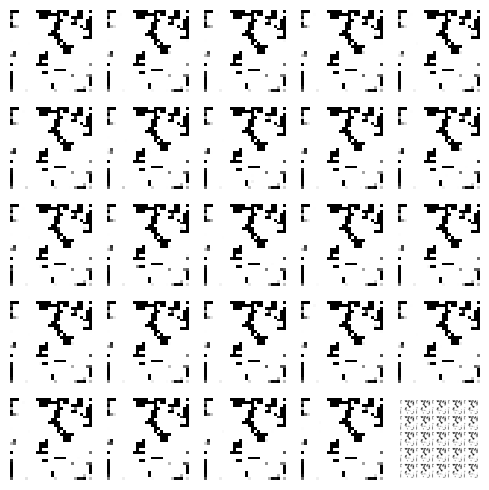

  0%|          | 0/350 [00:00<?, ?it/s]

4/4 [==============================] - 0s 14ms/step


  0%|          | 1/350 [00:00<03:22,  1.73it/s]

4/4 [==============================] - 0s 12ms/step


  1%|          | 2/350 [00:01<02:56,  1.97it/s]

4/4 [==============================] - 0s 35ms/step


  1%|          | 3/350 [00:01<03:01,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


  1%|          | 4/350 [00:02<02:56,  1.96it/s]

4/4 [==============================] - 0s 13ms/step


  1%|▏         | 5/350 [00:02<03:02,  1.89it/s]

4/4 [==============================] - 0s 12ms/step


  2%|▏         | 6/350 [00:03<02:51,  2.01it/s]

4/4 [==============================] - 0s 22ms/step


  2%|▏         | 7/350 [00:03<02:52,  1.98it/s]

4/4 [==============================] - 0s 11ms/step


  2%|▏         | 8/350 [00:04<02:44,  2.08it/s]

4/4 [==============================] - 0s 11ms/step


  3%|▎         | 9/350 [00:04<02:46,  2.05it/s]

4/4 [==============================] - 0s 11ms/step


  3%|▎         | 10/350 [00:04<02:43,  2.08it/s]

4/4 [==============================] - 0s 22ms/step


  3%|▎         | 11/350 [00:05<02:45,  2.05it/s]

4/4 [==============================] - 0s 11ms/step


  3%|▎         | 12/350 [00:05<02:41,  2.09it/s]

4/4 [==============================] - 0s 29ms/step


  4%|▎         | 13/350 [00:06<02:44,  2.04it/s]

4/4 [==============================] - 0s 12ms/step


  4%|▍         | 14/350 [00:06<02:42,  2.07it/s]

4/4 [==============================] - 0s 14ms/step


  4%|▍         | 15/350 [00:07<02:45,  2.02it/s]

4/4 [==============================] - 0s 12ms/step


  5%|▍         | 16/350 [00:07<02:38,  2.10it/s]

4/4 [==============================] - 0s 11ms/step


  5%|▍         | 17/350 [00:08<02:41,  2.06it/s]

4/4 [==============================] - 0s 12ms/step


  5%|▌         | 18/350 [00:08<02:37,  2.10it/s]

4/4 [==============================] - 0s 12ms/step


  5%|▌         | 19/350 [00:09<02:39,  2.08it/s]

4/4 [==============================] - 0s 11ms/step


  6%|▌         | 20/350 [00:09<02:33,  2.14it/s]

4/4 [==============================] - 0s 11ms/step


  6%|▌         | 21/350 [00:10<02:35,  2.11it/s]

4/4 [==============================] - 0s 11ms/step


  6%|▋         | 22/350 [00:10<02:32,  2.16it/s]

4/4 [==============================] - 0s 11ms/step


  7%|▋         | 23/350 [00:11<02:34,  2.12it/s]

4/4 [==============================] - 0s 11ms/step


  7%|▋         | 24/350 [00:11<02:29,  2.18it/s]

4/4 [==============================] - 0s 11ms/step


  7%|▋         | 25/350 [00:12<02:30,  2.16it/s]

4/4 [==============================] - 0s 12ms/step


  7%|▋         | 26/350 [00:12<02:29,  2.17it/s]

4/4 [==============================] - 0s 21ms/step


  8%|▊         | 27/350 [00:13<02:33,  2.10it/s]

4/4 [==============================] - 0s 12ms/step


  8%|▊         | 28/350 [00:13<02:31,  2.12it/s]

4/4 [==============================] - 0s 11ms/step


  8%|▊         | 29/350 [00:14<02:35,  2.07it/s]

4/4 [==============================] - 0s 12ms/step


  9%|▊         | 30/350 [00:14<02:30,  2.12it/s]

4/4 [==============================] - 0s 30ms/step


  9%|▉         | 31/350 [00:14<02:32,  2.09it/s]

4/4 [==============================] - 0s 13ms/step


  9%|▉         | 32/350 [00:15<02:31,  2.10it/s]

4/4 [==============================] - 0s 12ms/step


  9%|▉         | 33/350 [00:15<02:34,  2.06it/s]

4/4 [==============================] - 0s 13ms/step


 10%|▉         | 34/350 [00:16<02:31,  2.09it/s]

4/4 [==============================] - 0s 22ms/step


 10%|█         | 35/350 [00:16<02:32,  2.06it/s]

4/4 [==============================] - 0s 11ms/step


 10%|█         | 36/350 [00:17<02:29,  2.10it/s]

4/4 [==============================] - 0s 13ms/step


 11%|█         | 37/350 [00:17<02:34,  2.03it/s]

4/4 [==============================] - 0s 13ms/step


 11%|█         | 38/350 [00:18<02:30,  2.08it/s]

4/4 [==============================] - 0s 29ms/step


 11%|█         | 39/350 [00:18<02:31,  2.05it/s]

4/4 [==============================] - 0s 13ms/step


 11%|█▏        | 40/350 [00:19<02:31,  2.05it/s]

4/4 [==============================] - 0s 34ms/step


 12%|█▏        | 41/350 [00:19<02:40,  1.92it/s]

4/4 [==============================] - 0s 14ms/step


 12%|█▏        | 42/350 [00:20<02:38,  1.95it/s]

4/4 [==============================] - 0s 21ms/step


 12%|█▏        | 43/350 [00:20<02:37,  1.95it/s]

4/4 [==============================] - 0s 13ms/step


 13%|█▎        | 44/350 [00:21<02:39,  1.91it/s]

4/4 [==============================] - 0s 12ms/step


 13%|█▎        | 45/350 [00:22<02:38,  1.92it/s]

4/4 [==============================] - 0s 12ms/step


 13%|█▎        | 46/350 [00:22<02:38,  1.92it/s]

4/4 [==============================] - 0s 26ms/step


 13%|█▎        | 47/350 [00:23<02:42,  1.86it/s]

4/4 [==============================] - 0s 12ms/step


 14%|█▎        | 48/350 [00:23<02:40,  1.88it/s]

4/4 [==============================] - 0s 12ms/step


 14%|█▍        | 49/350 [00:24<02:34,  1.95it/s]

4/4 [==============================] - 0s 30ms/step


 14%|█▍        | 50/350 [00:24<02:34,  1.94it/s]

4/4 [==============================] - 0s 13ms/step


 15%|█▍        | 51/350 [00:25<02:29,  2.00it/s]

4/4 [==============================] - 0s 19ms/step


 15%|█▍        | 52/350 [00:25<02:37,  1.89it/s]

4/4 [==============================] - 0s 14ms/step


 15%|█▌        | 53/350 [00:26<02:32,  1.95it/s]

4/4 [==============================] - 0s 12ms/step


 15%|█▌        | 54/350 [00:26<02:33,  1.93it/s]

4/4 [==============================] - 0s 14ms/step


 16%|█▌        | 55/350 [00:27<02:27,  2.00it/s]

4/4 [==============================] - 0s 13ms/step


 16%|█▌        | 56/350 [00:27<02:26,  2.00it/s]

4/4 [==============================] - 0s 11ms/step


 16%|█▋        | 57/350 [00:28<02:25,  2.02it/s]

4/4 [==============================] - 0s 11ms/step


 17%|█▋        | 58/350 [00:28<02:26,  2.00it/s]

4/4 [==============================] - 0s 13ms/step


 17%|█▋        | 59/350 [00:29<02:20,  2.07it/s]

4/4 [==============================] - 0s 12ms/step


 17%|█▋        | 60/350 [00:29<02:19,  2.07it/s]

4/4 [==============================] - 0s 11ms/step


 17%|█▋        | 61/350 [00:29<02:15,  2.14it/s]

4/4 [==============================] - 0s 11ms/step


 18%|█▊        | 62/350 [00:30<02:17,  2.09it/s]

4/4 [==============================] - 0s 13ms/step


 18%|█▊        | 63/350 [00:30<02:15,  2.11it/s]

4/4 [==============================] - 0s 11ms/step


 18%|█▊        | 64/350 [00:31<02:17,  2.08it/s]

4/4 [==============================] - 0s 12ms/step


 19%|█▊        | 65/350 [00:31<02:12,  2.15it/s]

4/4 [==============================] - 0s 11ms/step


 19%|█▉        | 66/350 [00:32<02:13,  2.13it/s]

4/4 [==============================] - 0s 12ms/step


 19%|█▉        | 67/350 [00:32<02:10,  2.16it/s]

4/4 [==============================] - 0s 22ms/step


 19%|█▉        | 68/350 [00:33<02:13,  2.12it/s]

4/4 [==============================] - 0s 15ms/step


 20%|█▉        | 69/350 [00:33<02:11,  2.14it/s]

4/4 [==============================] - 0s 11ms/step


 20%|██        | 70/350 [00:34<02:13,  2.10it/s]

4/4 [==============================] - 0s 11ms/step


 20%|██        | 71/350 [00:34<02:11,  2.13it/s]

4/4 [==============================] - 0s 25ms/step


 21%|██        | 72/350 [00:35<02:13,  2.09it/s]

4/4 [==============================] - 0s 11ms/step


 21%|██        | 73/350 [00:35<02:09,  2.14it/s]

4/4 [==============================] - 0s 11ms/step


 21%|██        | 74/350 [00:36<02:10,  2.11it/s]

4/4 [==============================] - 0s 12ms/step


 21%|██▏       | 75/350 [00:36<02:07,  2.16it/s]

4/4 [==============================] - 0s 11ms/step


 22%|██▏       | 76/350 [00:37<02:09,  2.12it/s]

4/4 [==============================] - 0s 13ms/step


 22%|██▏       | 77/350 [00:37<02:06,  2.16it/s]

4/4 [==============================] - 0s 21ms/step


 22%|██▏       | 78/350 [00:38<02:11,  2.07it/s]

4/4 [==============================] - 0s 11ms/step


 23%|██▎       | 79/350 [00:38<02:07,  2.13it/s]

4/4 [==============================] - 0s 11ms/step


 23%|██▎       | 80/350 [00:38<02:07,  2.12it/s]

4/4 [==============================] - 0s 12ms/step


 23%|██▎       | 81/350 [00:39<02:04,  2.17it/s]

4/4 [==============================] - 0s 27ms/step


 23%|██▎       | 82/350 [00:39<02:05,  2.13it/s]

4/4 [==============================] - 0s 11ms/step


 24%|██▎       | 83/350 [00:40<02:07,  2.10it/s]

4/4 [==============================] - 0s 11ms/step


 24%|██▍       | 84/350 [00:40<02:07,  2.08it/s]

4/4 [==============================] - 0s 11ms/step


 24%|██▍       | 85/350 [00:41<02:04,  2.13it/s]

4/4 [==============================] - 0s 12ms/step


 25%|██▍       | 86/350 [00:41<02:05,  2.10it/s]

4/4 [==============================] - 0s 11ms/step


 25%|██▍       | 87/350 [00:42<02:03,  2.13it/s]

4/4 [==============================] - 0s 12ms/step


 25%|██▌       | 88/350 [00:42<02:04,  2.10it/s]

4/4 [==============================] - 0s 11ms/step


 25%|██▌       | 89/350 [00:43<02:00,  2.16it/s]

4/4 [==============================] - 0s 11ms/step


 26%|██▌       | 90/350 [00:43<02:02,  2.12it/s]

4/4 [==============================] - 0s 12ms/step


 26%|██▌       | 91/350 [00:44<01:59,  2.17it/s]

4/4 [==============================] - 0s 28ms/step


 26%|██▋       | 92/350 [00:44<02:01,  2.13it/s]

4/4 [==============================] - 0s 11ms/step


 27%|██▋       | 93/350 [00:45<01:57,  2.18it/s]

4/4 [==============================] - 0s 12ms/step


 27%|██▋       | 94/350 [00:45<01:59,  2.14it/s]

4/4 [==============================] - 0s 11ms/step


 27%|██▋       | 95/350 [00:45<01:57,  2.18it/s]

4/4 [==============================] - 0s 11ms/step


 27%|██▋       | 96/350 [00:46<01:59,  2.13it/s]

4/4 [==============================] - 0s 10ms/step


 28%|██▊       | 97/350 [00:46<01:55,  2.18it/s]

4/4 [==============================] - 0s 24ms/step


 28%|██▊       | 98/350 [00:47<01:57,  2.14it/s]

4/4 [==============================] - 0s 12ms/step


 28%|██▊       | 99/350 [00:47<01:54,  2.20it/s]

4/4 [==============================] - 0s 11ms/step


 29%|██▊       | 100/350 [00:48<01:56,  2.15it/s]

4/4 [==============================] - 0s 11ms/step


 29%|██▉       | 101/350 [00:48<01:53,  2.20it/s]

4/4 [==============================] - 0s 13ms/step


 29%|██▉       | 102/350 [00:49<01:56,  2.14it/s]

4/4 [==============================] - 0s 11ms/step


 29%|██▉       | 103/350 [00:49<01:54,  2.16it/s]

4/4 [==============================] - 0s 28ms/step


 30%|██▉       | 104/350 [00:50<02:00,  2.04it/s]

4/4 [==============================] - 0s 13ms/step


 30%|███       | 105/350 [00:50<02:01,  2.02it/s]

4/4 [==============================] - 0s 27ms/step


 30%|███       | 106/350 [00:51<02:06,  1.93it/s]

4/4 [==============================] - 0s 11ms/step


 31%|███       | 107/350 [00:51<02:05,  1.94it/s]

4/4 [==============================] - 0s 26ms/step


 31%|███       | 108/350 [00:52<02:05,  1.93it/s]

4/4 [==============================] - 0s 12ms/step


 31%|███       | 109/350 [00:52<01:59,  2.01it/s]

4/4 [==============================] - 0s 25ms/step


 31%|███▏      | 110/350 [00:53<01:59,  2.02it/s]

4/4 [==============================] - 0s 12ms/step


 32%|███▏      | 111/350 [00:53<01:56,  2.05it/s]

4/4 [==============================] - 0s 14ms/step


 32%|███▏      | 112/350 [00:54<01:59,  1.99it/s]

4/4 [==============================] - 0s 31ms/step


 32%|███▏      | 113/350 [00:54<01:59,  1.99it/s]

4/4 [==============================] - 0s 28ms/step


 33%|███▎      | 114/350 [00:55<01:58,  2.00it/s]

4/4 [==============================] - 0s 12ms/step


 33%|███▎      | 115/350 [00:55<01:53,  2.07it/s]

4/4 [==============================] - 0s 11ms/step


 33%|███▎      | 116/350 [00:56<01:55,  2.03it/s]

4/4 [==============================] - 0s 12ms/step


 33%|███▎      | 117/350 [00:56<01:55,  2.02it/s]

4/4 [==============================] - 0s 13ms/step


 34%|███▎      | 118/350 [00:57<02:01,  1.91it/s]

4/4 [==============================] - 0s 13ms/step


 34%|███▍      | 119/350 [00:57<02:01,  1.90it/s]

4/4 [==============================] - 0s 14ms/step


 34%|███▍      | 120/350 [00:58<02:02,  1.87it/s]

4/4 [==============================] - 0s 12ms/step


 35%|███▍      | 121/350 [00:58<01:57,  1.96it/s]

4/4 [==============================] - 0s 11ms/step


 35%|███▍      | 122/350 [00:59<01:56,  1.95it/s]

4/4 [==============================] - 0s 12ms/step


 35%|███▌      | 123/350 [00:59<01:54,  1.98it/s]

4/4 [==============================] - 0s 15ms/step


 35%|███▌      | 124/350 [01:00<01:55,  1.96it/s]

4/4 [==============================] - 0s 12ms/step


 36%|███▌      | 125/350 [01:00<01:49,  2.05it/s]

4/4 [==============================] - 0s 12ms/step


 36%|███▌      | 126/350 [01:01<01:50,  2.03it/s]

4/4 [==============================] - 0s 11ms/step


 36%|███▋      | 127/350 [01:01<01:45,  2.11it/s]

4/4 [==============================] - 0s 11ms/step


 37%|███▋      | 128/350 [01:02<01:46,  2.09it/s]

4/4 [==============================] - 0s 11ms/step


 37%|███▋      | 129/350 [01:02<01:42,  2.15it/s]

4/4 [==============================] - 0s 28ms/step


 37%|███▋      | 130/350 [01:03<01:43,  2.13it/s]

4/4 [==============================] - 0s 12ms/step


 37%|███▋      | 131/350 [01:03<01:43,  2.11it/s]

4/4 [==============================] - 0s 16ms/step


 38%|███▊      | 132/350 [01:04<01:47,  2.02it/s]

4/4 [==============================] - 0s 14ms/step


 38%|███▊      | 133/350 [01:04<01:48,  2.00it/s]

4/4 [==============================] - 0s 32ms/step


 38%|███▊      | 134/350 [01:05<01:48,  1.98it/s]

4/4 [==============================] - 0s 12ms/step


 39%|███▊      | 135/350 [01:05<01:43,  2.07it/s]

4/4 [==============================] - 0s 12ms/step


 39%|███▉      | 136/350 [01:06<01:43,  2.06it/s]

4/4 [==============================] - 0s 12ms/step


 39%|███▉      | 137/350 [01:06<01:40,  2.13it/s]

4/4 [==============================] - 0s 23ms/step


 39%|███▉      | 138/350 [01:07<01:40,  2.11it/s]

4/4 [==============================] - 0s 13ms/step


 40%|███▉      | 139/350 [01:07<01:37,  2.16it/s]

4/4 [==============================] - 0s 28ms/step


 40%|████      | 140/350 [01:07<01:38,  2.13it/s]

4/4 [==============================] - 0s 12ms/step


 40%|████      | 141/350 [01:08<01:37,  2.14it/s]

4/4 [==============================] - 0s 12ms/step


 41%|████      | 142/350 [01:08<01:38,  2.11it/s]

4/4 [==============================] - 0s 12ms/step


 41%|████      | 143/350 [01:09<01:36,  2.14it/s]

4/4 [==============================] - 0s 12ms/step


 41%|████      | 144/350 [01:09<01:38,  2.10it/s]

4/4 [==============================] - 0s 12ms/step


 41%|████▏     | 145/350 [01:10<01:35,  2.14it/s]

4/4 [==============================] - 0s 11ms/step


 42%|████▏     | 146/350 [01:10<01:36,  2.11it/s]

4/4 [==============================] - 0s 11ms/step


 42%|████▏     | 147/350 [01:11<01:34,  2.15it/s]

4/4 [==============================] - 0s 12ms/step


 42%|████▏     | 148/350 [01:11<01:35,  2.11it/s]

4/4 [==============================] - 0s 11ms/step


 43%|████▎     | 149/350 [01:12<01:33,  2.16it/s]

4/4 [==============================] - 0s 12ms/step


 43%|████▎     | 150/350 [01:12<01:34,  2.11it/s]

4/4 [==============================] - 0s 11ms/step


 43%|████▎     | 151/350 [01:13<01:32,  2.16it/s]

4/4 [==============================] - 0s 10ms/step


 43%|████▎     | 152/350 [01:13<01:32,  2.13it/s]

4/4 [==============================] - 0s 12ms/step


 44%|████▎     | 153/350 [01:14<01:30,  2.17it/s]

4/4 [==============================] - 0s 31ms/step


 44%|████▍     | 154/350 [01:14<01:32,  2.12it/s]

4/4 [==============================] - 0s 12ms/step


 44%|████▍     | 155/350 [01:14<01:29,  2.17it/s]

4/4 [==============================] - 0s 24ms/step


 45%|████▍     | 156/350 [01:15<01:30,  2.13it/s]

4/4 [==============================] - 0s 15ms/step


 45%|████▍     | 157/350 [01:15<01:30,  2.13it/s]

4/4 [==============================] - 0s 12ms/step


 45%|████▌     | 158/350 [01:16<01:33,  2.05it/s]

4/4 [==============================] - 0s 14ms/step


 45%|████▌     | 159/350 [01:16<01:33,  2.05it/s]

4/4 [==============================] - 0s 27ms/step


 46%|████▌     | 160/350 [01:17<01:33,  2.03it/s]

4/4 [==============================] - 0s 12ms/step


 46%|████▌     | 161/350 [01:17<01:29,  2.10it/s]

4/4 [==============================] - 0s 11ms/step


 46%|████▋     | 162/350 [01:18<01:30,  2.08it/s]

4/4 [==============================] - 0s 11ms/step


 47%|████▋     | 163/350 [01:18<01:27,  2.13it/s]

4/4 [==============================] - 0s 12ms/step


 47%|████▋     | 164/350 [01:19<01:29,  2.09it/s]

4/4 [==============================] - 0s 12ms/step


 47%|████▋     | 165/350 [01:19<01:27,  2.13it/s]

4/4 [==============================] - 0s 16ms/step


 47%|████▋     | 166/350 [01:20<01:27,  2.10it/s]

4/4 [==============================] - 0s 11ms/step


 48%|████▊     | 167/350 [01:20<01:26,  2.12it/s]

4/4 [==============================] - 0s 12ms/step


 48%|████▊     | 168/350 [01:21<01:27,  2.07it/s]

4/4 [==============================] - 0s 11ms/step


 48%|████▊     | 169/350 [01:21<01:25,  2.13it/s]

4/4 [==============================] - 0s 11ms/step


 49%|████▊     | 170/350 [01:22<01:25,  2.10it/s]

4/4 [==============================] - 0s 13ms/step


 49%|████▉     | 171/350 [01:22<01:23,  2.14it/s]

4/4 [==============================] - 0s 11ms/step


 49%|████▉     | 172/350 [01:23<01:25,  2.09it/s]

4/4 [==============================] - 0s 13ms/step


 49%|████▉     | 173/350 [01:23<01:23,  2.12it/s]

4/4 [==============================] - 0s 11ms/step


 50%|████▉     | 174/350 [01:24<01:25,  2.06it/s]

4/4 [==============================] - 0s 13ms/step


 50%|█████     | 175/350 [01:24<01:24,  2.07it/s]

4/4 [==============================] - 0s 29ms/step


 50%|█████     | 176/350 [01:25<01:24,  2.05it/s]

4/4 [==============================] - 0s 12ms/step


 51%|█████     | 177/350 [01:25<01:22,  2.10it/s]

4/4 [==============================] - 0s 11ms/step


 51%|█████     | 178/350 [01:26<01:23,  2.06it/s]

4/4 [==============================] - 0s 13ms/step


 51%|█████     | 179/350 [01:26<01:21,  2.10it/s]

4/4 [==============================] - 0s 25ms/step


 51%|█████▏    | 180/350 [01:27<01:22,  2.05it/s]

4/4 [==============================] - 0s 13ms/step


 52%|█████▏    | 181/350 [01:27<01:21,  2.08it/s]

4/4 [==============================] - 0s 12ms/step


 52%|█████▏    | 182/350 [01:27<01:21,  2.07it/s]

4/4 [==============================] - 0s 12ms/step


 52%|█████▏    | 183/350 [01:28<01:18,  2.13it/s]

4/4 [==============================] - 0s 11ms/step


 53%|█████▎    | 184/350 [01:28<01:18,  2.10it/s]

4/4 [==============================] - 0s 11ms/step


 53%|█████▎    | 185/350 [01:29<01:16,  2.16it/s]

4/4 [==============================] - 0s 26ms/step


 53%|█████▎    | 186/350 [01:29<01:18,  2.09it/s]

4/4 [==============================] - 0s 11ms/step


 53%|█████▎    | 187/350 [01:30<01:17,  2.11it/s]

4/4 [==============================] - 0s 12ms/step


 54%|█████▎    | 188/350 [01:30<01:18,  2.06it/s]

4/4 [==============================] - 0s 12ms/step


 54%|█████▍    | 189/350 [01:31<01:17,  2.08it/s]

4/4 [==============================] - 0s 13ms/step


 54%|█████▍    | 190/350 [01:31<01:19,  2.02it/s]

4/4 [==============================] - 0s 12ms/step


 55%|█████▍    | 191/350 [01:32<01:19,  1.99it/s]

4/4 [==============================] - 0s 26ms/step


 55%|█████▍    | 192/350 [01:32<01:20,  1.97it/s]

4/4 [==============================] - 0s 13ms/step


 55%|█████▌    | 193/350 [01:33<01:18,  2.00it/s]

4/4 [==============================] - 0s 12ms/step


 55%|█████▌    | 194/350 [01:33<01:19,  1.97it/s]

4/4 [==============================] - 0s 15ms/step


 56%|█████▌    | 195/350 [01:34<01:17,  2.00it/s]

4/4 [==============================] - 0s 13ms/step


 56%|█████▌    | 196/350 [01:34<01:17,  1.99it/s]

4/4 [==============================] - 0s 11ms/step


 56%|█████▋    | 197/350 [01:35<01:15,  2.03it/s]

4/4 [==============================] - 0s 30ms/step


 57%|█████▋    | 198/350 [01:35<01:15,  2.01it/s]

4/4 [==============================] - 0s 12ms/step


 57%|█████▋    | 199/350 [01:36<01:13,  2.06it/s]

4/4 [==============================] - 0s 12ms/step


 57%|█████▋    | 200/350 [01:36<01:13,  2.04it/s]

4/4 [==============================] - 0s 11ms/step


 57%|█████▋    | 201/350 [01:37<01:11,  2.08it/s]

4/4 [==============================] - 0s 13ms/step


 58%|█████▊    | 202/350 [01:37<01:12,  2.03it/s]

4/4 [==============================] - 0s 13ms/step


 58%|█████▊    | 203/350 [01:38<01:11,  2.06it/s]

4/4 [==============================] - 0s 24ms/step


 58%|█████▊    | 204/350 [01:38<01:11,  2.03it/s]

4/4 [==============================] - 0s 13ms/step


 59%|█████▊    | 205/350 [01:39<01:11,  2.03it/s]

4/4 [==============================] - 0s 29ms/step


 59%|█████▉    | 206/350 [01:39<01:13,  1.97it/s]

4/4 [==============================] - 0s 13ms/step


 59%|█████▉    | 207/350 [01:40<01:11,  2.01it/s]

4/4 [==============================] - 0s 29ms/step


 59%|█████▉    | 208/350 [01:40<01:11,  1.99it/s]

4/4 [==============================] - 0s 13ms/step


 60%|█████▉    | 209/350 [01:41<01:09,  2.04it/s]

4/4 [==============================] - 0s 12ms/step


 60%|██████    | 210/350 [01:41<01:09,  2.01it/s]

4/4 [==============================] - 0s 11ms/step


 60%|██████    | 211/350 [01:42<01:07,  2.06it/s]

4/4 [==============================] - 0s 26ms/step


 61%|██████    | 212/350 [01:42<01:09,  1.99it/s]

4/4 [==============================] - 0s 11ms/step


 61%|██████    | 213/350 [01:43<01:06,  2.05it/s]

4/4 [==============================] - 0s 32ms/step


 61%|██████    | 214/350 [01:43<01:07,  2.02it/s]

4/4 [==============================] - 0s 12ms/step


 61%|██████▏   | 215/350 [01:44<01:05,  2.06it/s]

4/4 [==============================] - 0s 27ms/step


 62%|██████▏   | 216/350 [01:44<01:06,  2.02it/s]

4/4 [==============================] - 0s 11ms/step


 62%|██████▏   | 217/350 [01:45<01:04,  2.05it/s]

4/4 [==============================] - 0s 28ms/step


 62%|██████▏   | 218/350 [01:45<01:07,  1.97it/s]

4/4 [==============================] - 0s 13ms/step


 63%|██████▎   | 219/350 [01:46<01:04,  2.03it/s]

4/4 [==============================] - 0s 30ms/step


 63%|██████▎   | 220/350 [01:46<01:04,  2.01it/s]

4/4 [==============================] - 0s 12ms/step


 63%|██████▎   | 221/350 [01:47<01:03,  2.05it/s]

4/4 [==============================] - 0s 15ms/step


 63%|██████▎   | 222/350 [01:47<01:03,  2.00it/s]

4/4 [==============================] - 0s 13ms/step


 64%|██████▎   | 223/350 [01:48<01:01,  2.06it/s]

4/4 [==============================] - 0s 13ms/step


 64%|██████▍   | 224/350 [01:48<01:02,  2.01it/s]

4/4 [==============================] - 0s 15ms/step


 64%|██████▍   | 225/350 [01:49<00:59,  2.08it/s]

4/4 [==============================] - 0s 11ms/step


 65%|██████▍   | 226/350 [01:49<00:58,  2.12it/s]

4/4 [==============================] - 0s 33ms/step


 65%|██████▍   | 227/350 [01:50<01:00,  2.04it/s]

4/4 [==============================] - 0s 14ms/step


 65%|██████▌   | 228/350 [01:50<00:58,  2.07it/s]

4/4 [==============================] - 0s 11ms/step


 65%|██████▌   | 229/350 [01:51<00:59,  2.03it/s]

4/4 [==============================] - 0s 14ms/step


 66%|██████▌   | 230/350 [01:51<00:57,  2.08it/s]

4/4 [==============================] - 0s 11ms/step


 66%|██████▌   | 231/350 [01:52<00:58,  2.04it/s]

4/4 [==============================] - 0s 13ms/step


 66%|██████▋   | 232/350 [01:52<00:57,  2.06it/s]

4/4 [==============================] - 0s 11ms/step


 67%|██████▋   | 233/350 [01:52<00:57,  2.04it/s]

4/4 [==============================] - 0s 14ms/step


 67%|██████▋   | 234/350 [01:53<00:55,  2.08it/s]

4/4 [==============================] - 0s 11ms/step


 67%|██████▋   | 235/350 [01:53<00:56,  2.03it/s]

4/4 [==============================] - 0s 13ms/step


 67%|██████▋   | 236/350 [01:54<00:55,  2.04it/s]

4/4 [==============================] - 0s 25ms/step


 68%|██████▊   | 237/350 [01:54<00:56,  2.01it/s]

4/4 [==============================] - 0s 12ms/step


 68%|██████▊   | 238/350 [01:55<00:54,  2.04it/s]

4/4 [==============================] - 0s 13ms/step


 68%|██████▊   | 239/350 [01:55<00:54,  2.04it/s]

4/4 [==============================] - 0s 12ms/step


 69%|██████▊   | 240/350 [01:56<00:52,  2.09it/s]

4/4 [==============================] - 0s 12ms/step


 69%|██████▉   | 241/350 [01:56<00:52,  2.09it/s]

4/4 [==============================] - 0s 12ms/step


 69%|██████▉   | 242/350 [01:57<00:51,  2.10it/s]

4/4 [==============================] - 0s 27ms/step


 69%|██████▉   | 243/350 [01:57<00:51,  2.08it/s]

4/4 [==============================] - 0s 13ms/step


 70%|██████▉   | 244/350 [01:58<00:49,  2.13it/s]

4/4 [==============================] - 0s 12ms/step


 70%|███████   | 245/350 [01:58<00:50,  2.09it/s]

4/4 [==============================] - 0s 12ms/step


 70%|███████   | 246/350 [01:59<00:49,  2.10it/s]

4/4 [==============================] - 0s 33ms/step


 71%|███████   | 247/350 [01:59<00:52,  1.98it/s]

4/4 [==============================] - 0s 12ms/step


 71%|███████   | 248/350 [02:00<00:51,  2.00it/s]

4/4 [==============================] - 0s 30ms/step


 71%|███████   | 249/350 [02:00<00:51,  1.96it/s]

4/4 [==============================] - 0s 15ms/step


 71%|███████▏  | 250/350 [02:01<00:50,  1.96it/s]

4/4 [==============================] - 0s 13ms/step


 72%|███████▏  | 251/350 [02:01<00:50,  1.95it/s]

4/4 [==============================] - 0s 12ms/step


 72%|███████▏  | 252/350 [02:02<00:48,  2.01it/s]

4/4 [==============================] - 0s 27ms/step


 72%|███████▏  | 253/350 [02:02<00:49,  1.97it/s]

4/4 [==============================] - 0s 12ms/step


 73%|███████▎  | 254/350 [02:03<00:47,  2.04it/s]

4/4 [==============================] - 0s 13ms/step


 73%|███████▎  | 255/350 [02:03<00:48,  1.96it/s]

4/4 [==============================] - 0s 13ms/step


 73%|███████▎  | 256/350 [02:04<00:46,  2.01it/s]

4/4 [==============================] - 0s 27ms/step


 73%|███████▎  | 257/350 [02:04<00:47,  1.95it/s]

4/4 [==============================] - 0s 12ms/step


 74%|███████▎  | 258/350 [02:05<00:45,  2.02it/s]

4/4 [==============================] - 0s 32ms/step


 74%|███████▍  | 259/350 [02:05<00:46,  1.97it/s]

4/4 [==============================] - 0s 14ms/step


 74%|███████▍  | 260/350 [02:06<00:44,  2.04it/s]

4/4 [==============================] - 0s 20ms/step


 75%|███████▍  | 261/350 [02:06<00:44,  1.99it/s]

4/4 [==============================] - 0s 12ms/step


 75%|███████▍  | 262/350 [02:07<00:43,  2.02it/s]

4/4 [==============================] - 0s 20ms/step


 75%|███████▌  | 263/350 [02:07<00:43,  2.00it/s]

4/4 [==============================] - 0s 11ms/step


 75%|███████▌  | 264/350 [02:08<00:43,  1.99it/s]

4/4 [==============================] - 0s 11ms/step


 76%|███████▌  | 265/350 [02:08<00:41,  2.05it/s]

4/4 [==============================] - 0s 12ms/step


 76%|███████▌  | 266/350 [02:09<00:41,  2.04it/s]

4/4 [==============================] - 0s 11ms/step


 76%|███████▋  | 267/350 [02:09<00:39,  2.12it/s]

4/4 [==============================] - 0s 23ms/step


 77%|███████▋  | 268/350 [02:10<00:39,  2.07it/s]

4/4 [==============================] - 0s 12ms/step


 77%|███████▋  | 269/350 [02:10<00:38,  2.11it/s]

4/4 [==============================] - 0s 21ms/step


 77%|███████▋  | 270/350 [02:11<00:38,  2.09it/s]

4/4 [==============================] - 0s 12ms/step


 77%|███████▋  | 271/350 [02:11<00:37,  2.13it/s]

4/4 [==============================] - 0s 24ms/step


 78%|███████▊  | 272/350 [02:12<00:37,  2.09it/s]

4/4 [==============================] - 0s 13ms/step


 78%|███████▊  | 273/350 [02:12<00:35,  2.14it/s]

4/4 [==============================] - 0s 12ms/step


 78%|███████▊  | 274/350 [02:13<00:36,  2.09it/s]

4/4 [==============================] - 0s 12ms/step


 79%|███████▊  | 275/350 [02:13<00:35,  2.13it/s]

4/4 [==============================] - 0s 22ms/step


 79%|███████▉  | 276/350 [02:14<00:35,  2.09it/s]

4/4 [==============================] - 0s 12ms/step


 79%|███████▉  | 277/350 [02:14<00:34,  2.15it/s]

4/4 [==============================] - 0s 20ms/step


 79%|███████▉  | 278/350 [02:14<00:34,  2.11it/s]

4/4 [==============================] - 0s 12ms/step


 80%|███████▉  | 279/350 [02:15<00:33,  2.15it/s]

4/4 [==============================] - 0s 15ms/step


 80%|████████  | 280/350 [02:15<00:33,  2.10it/s]

4/4 [==============================] - 0s 12ms/step


 80%|████████  | 281/350 [02:16<00:32,  2.14it/s]

4/4 [==============================] - 0s 29ms/step


 81%|████████  | 282/350 [02:16<00:33,  2.06it/s]

4/4 [==============================] - 0s 14ms/step


 81%|████████  | 283/350 [02:17<00:32,  2.07it/s]

4/4 [==============================] - 0s 13ms/step


 81%|████████  | 284/350 [02:17<00:33,  1.96it/s]

4/4 [==============================] - 0s 13ms/step


 81%|████████▏ | 285/350 [02:18<00:33,  1.95it/s]

4/4 [==============================] - 0s 14ms/step


 82%|████████▏ | 286/350 [02:18<00:31,  2.02it/s]

4/4 [==============================] - 0s 12ms/step


 82%|████████▏ | 287/350 [02:19<00:31,  2.00it/s]

4/4 [==============================] - 0s 13ms/step


 82%|████████▏ | 288/350 [02:19<00:29,  2.08it/s]

4/4 [==============================] - 0s 10ms/step


 83%|████████▎ | 289/350 [02:20<00:31,  1.95it/s]

4/4 [==============================] - 0s 13ms/step


 83%|████████▎ | 290/350 [02:20<00:30,  1.96it/s]

4/4 [==============================] - 0s 13ms/step


 83%|████████▎ | 291/350 [02:21<00:29,  2.03it/s]

4/4 [==============================] - 0s 13ms/step


 83%|████████▎ | 292/350 [02:21<00:30,  1.91it/s]

4/4 [==============================] - 0s 14ms/step


 84%|████████▎ | 293/350 [02:22<00:28,  1.98it/s]

4/4 [==============================] - 0s 23ms/step


 84%|████████▍ | 294/350 [02:22<00:28,  1.96it/s]

4/4 [==============================] - 0s 14ms/step


 84%|████████▍ | 295/350 [02:23<00:27,  1.99it/s]

4/4 [==============================] - 0s 20ms/step


 85%|████████▍ | 296/350 [02:23<00:27,  1.96it/s]

4/4 [==============================] - 0s 13ms/step


 85%|████████▍ | 297/350 [02:24<00:26,  2.00it/s]

4/4 [==============================] - 0s 22ms/step


 85%|████████▌ | 298/350 [02:24<00:25,  2.02it/s]

4/4 [==============================] - 0s 13ms/step


 85%|████████▌ | 299/350 [02:25<00:24,  2.08it/s]

4/4 [==============================] - 0s 11ms/step


 86%|████████▌ | 300/350 [02:25<00:24,  2.04it/s]

4/4 [==============================] - 0s 12ms/step


 86%|████████▌ | 301/350 [02:26<00:23,  2.09it/s]

4/4 [==============================] - 0s 29ms/step


 86%|████████▋ | 302/350 [02:26<00:23,  2.05it/s]

4/4 [==============================] - 0s 15ms/step


 87%|████████▋ | 303/350 [02:27<00:22,  2.08it/s]

4/4 [==============================] - 0s 11ms/step


 87%|████████▋ | 304/350 [02:27<00:22,  2.06it/s]

4/4 [==============================] - 0s 13ms/step


 87%|████████▋ | 305/350 [02:28<00:21,  2.11it/s]

4/4 [==============================] - 0s 23ms/step


 87%|████████▋ | 306/350 [02:28<00:21,  2.06it/s]

4/4 [==============================] - 0s 12ms/step


 88%|████████▊ | 307/350 [02:29<00:20,  2.07it/s]

4/4 [==============================] - 0s 20ms/step


 88%|████████▊ | 308/350 [02:29<00:20,  2.05it/s]

4/4 [==============================] - 0s 13ms/step


 88%|████████▊ | 309/350 [02:30<00:19,  2.08it/s]

4/4 [==============================] - 0s 11ms/step


 89%|████████▊ | 310/350 [02:30<00:19,  2.03it/s]

4/4 [==============================] - 0s 13ms/step


 89%|████████▉ | 311/350 [02:31<00:18,  2.06it/s]

4/4 [==============================] - 0s 28ms/step


 89%|████████▉ | 312/350 [02:31<00:18,  2.01it/s]

4/4 [==============================] - 0s 12ms/step


 89%|████████▉ | 313/350 [02:32<00:17,  2.07it/s]

4/4 [==============================] - 0s 14ms/step


 90%|████████▉ | 314/350 [02:32<00:17,  2.02it/s]

4/4 [==============================] - 0s 13ms/step


 90%|█████████ | 315/350 [02:33<00:17,  1.98it/s]

4/4 [==============================] - 0s 12ms/step


 90%|█████████ | 316/350 [02:33<00:17,  1.99it/s]

4/4 [==============================] - 0s 11ms/step


 91%|█████████ | 317/350 [02:34<00:15,  2.08it/s]

4/4 [==============================] - 0s 14ms/step


 91%|█████████ | 318/350 [02:34<00:15,  2.06it/s]

4/4 [==============================] - 0s 11ms/step


 91%|█████████ | 319/350 [02:35<00:14,  2.12it/s]

4/4 [==============================] - 0s 13ms/step


 91%|█████████▏| 320/350 [02:35<00:14,  2.09it/s]

4/4 [==============================] - 0s 11ms/step


 92%|█████████▏| 321/350 [02:36<00:13,  2.15it/s]

4/4 [==============================] - 0s 23ms/step


 92%|█████████▏| 322/350 [02:36<00:13,  2.12it/s]

4/4 [==============================] - 0s 11ms/step


 92%|█████████▏| 323/350 [02:36<00:12,  2.18it/s]

4/4 [==============================] - 0s 13ms/step


 93%|█████████▎| 324/350 [02:37<00:12,  2.13it/s]

4/4 [==============================] - 0s 12ms/step


 93%|█████████▎| 325/350 [02:37<00:11,  2.18it/s]

4/4 [==============================] - 0s 12ms/step


 93%|█████████▎| 326/350 [02:38<00:11,  2.13it/s]

4/4 [==============================] - 0s 11ms/step


 93%|█████████▎| 327/350 [02:38<00:10,  2.19it/s]

4/4 [==============================] - 0s 23ms/step


 94%|█████████▎| 328/350 [02:39<00:10,  2.09it/s]

4/4 [==============================] - 0s 12ms/step


 94%|█████████▍| 329/350 [02:39<00:09,  2.15it/s]

4/4 [==============================] - 0s 12ms/step


 94%|█████████▍| 330/350 [02:40<00:09,  2.11it/s]

4/4 [==============================] - 0s 11ms/step


 95%|█████████▍| 331/350 [02:40<00:08,  2.17it/s]

4/4 [==============================] - 0s 12ms/step


 95%|█████████▍| 332/350 [02:41<00:08,  2.12it/s]

4/4 [==============================] - 0s 11ms/step


 95%|█████████▌| 333/350 [02:41<00:07,  2.18it/s]

4/4 [==============================] - 0s 23ms/step


 95%|█████████▌| 334/350 [02:42<00:07,  2.14it/s]

4/4 [==============================] - 0s 12ms/step


 96%|█████████▌| 335/350 [02:42<00:06,  2.19it/s]

4/4 [==============================] - 0s 26ms/step


 96%|█████████▌| 336/350 [02:43<00:06,  2.12it/s]

4/4 [==============================] - 0s 11ms/step


 96%|█████████▋| 337/350 [02:43<00:05,  2.17it/s]

4/4 [==============================] - 0s 13ms/step


 97%|█████████▋| 338/350 [02:43<00:05,  2.13it/s]

4/4 [==============================] - 0s 12ms/step


 97%|█████████▋| 339/350 [02:44<00:05,  2.19it/s]

4/4 [==============================] - 0s 12ms/step


 97%|█████████▋| 340/350 [02:44<00:04,  2.14it/s]

4/4 [==============================] - 0s 12ms/step


 97%|█████████▋| 341/350 [02:45<00:04,  2.19it/s]

4/4 [==============================] - 0s 13ms/step


 98%|█████████▊| 342/350 [02:45<00:03,  2.14it/s]

4/4 [==============================] - 0s 12ms/step


 98%|█████████▊| 343/350 [02:46<00:03,  2.19it/s]

4/4 [==============================] - 0s 22ms/step


 98%|█████████▊| 344/350 [02:46<00:02,  2.14it/s]

4/4 [==============================] - 0s 11ms/step


 99%|█████████▊| 345/350 [02:47<00:02,  2.19it/s]

4/4 [==============================] - 0s 19ms/step


 99%|█████████▉| 346/350 [02:47<00:01,  2.14it/s]

4/4 [==============================] - 0s 12ms/step


 99%|█████████▉| 347/350 [02:48<00:01,  2.18it/s]

4/4 [==============================] - 0s 13ms/step


 99%|█████████▉| 348/350 [02:48<00:00,  2.14it/s]

4/4 [==============================] - 0s 12ms/step


100%|█████████▉| 349/350 [02:49<00:00,  2.16it/s]

4/4 [==============================] - 0s 11ms/step


100%|██████████| 350/350 [02:49<00:00,  2.06it/s]

Epoch number: 9 discriminator_loss: 0.16884941862979239 generator_loss: 6.542550224576678
1/1 [==============================] - 0s 23ms/step


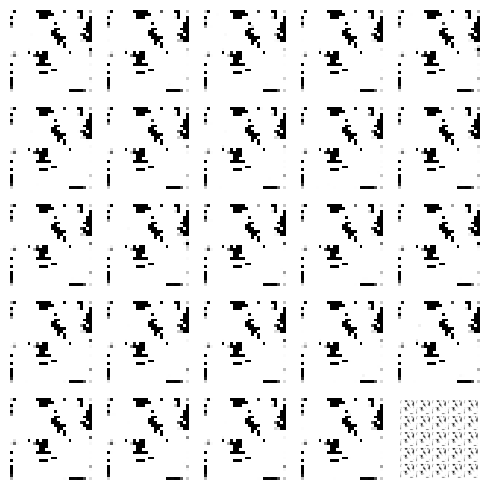

  0%|          | 0/350 [00:00<?, ?it/s]

4/4 [==============================] - 0s 15ms/step


  0%|          | 1/350 [00:00<02:47,  2.08it/s]

4/4 [==============================] - 0s 25ms/step


  1%|          | 2/350 [00:00<02:49,  2.06it/s]

4/4 [==============================] - 0s 11ms/step


  1%|          | 3/350 [00:01<02:40,  2.16it/s]

4/4 [==============================] - 0s 14ms/step


  1%|          | 4/350 [00:01<02:44,  2.10it/s]

4/4 [==============================] - 0s 11ms/step


  1%|▏         | 5/350 [00:02<02:38,  2.18it/s]

4/4 [==============================] - 0s 27ms/step


  2%|▏         | 6/350 [00:02<02:42,  2.12it/s]

4/4 [==============================] - 0s 11ms/step


  2%|▏         | 7/350 [00:03<02:37,  2.18it/s]

4/4 [==============================] - 0s 12ms/step


  2%|▏         | 8/350 [00:03<02:39,  2.14it/s]

4/4 [==============================] - 0s 12ms/step


  3%|▎         | 9/350 [00:04<02:35,  2.20it/s]

4/4 [==============================] - 0s 14ms/step


  3%|▎         | 10/350 [00:04<02:38,  2.15it/s]

4/4 [==============================] - 0s 11ms/step


  3%|▎         | 11/350 [00:05<02:34,  2.20it/s]

4/4 [==============================] - 0s 12ms/step


  3%|▎         | 12/350 [00:05<02:37,  2.15it/s]

4/4 [==============================] - 0s 11ms/step


  4%|▎         | 13/350 [00:06<02:32,  2.20it/s]

4/4 [==============================] - 0s 19ms/step


  4%|▍         | 14/350 [00:06<02:36,  2.15it/s]

4/4 [==============================] - 0s 11ms/step


  4%|▍         | 15/350 [00:06<02:31,  2.20it/s]

4/4 [==============================] - 0s 13ms/step


  5%|▍         | 16/350 [00:07<02:35,  2.15it/s]

4/4 [==============================] - 0s 12ms/step


  5%|▍         | 17/350 [00:07<02:32,  2.18it/s]

4/4 [==============================] - 0s 12ms/step


  5%|▌         | 18/350 [00:08<02:35,  2.13it/s]

4/4 [==============================] - 0s 11ms/step


  5%|▌         | 19/350 [00:08<02:32,  2.18it/s]

4/4 [==============================] - 0s 12ms/step


  6%|▌         | 20/350 [00:09<02:34,  2.14it/s]

4/4 [==============================] - 0s 11ms/step


  6%|▌         | 21/350 [00:09<02:30,  2.19it/s]

4/4 [==============================] - 0s 12ms/step


  6%|▋         | 22/350 [00:10<02:32,  2.15it/s]

4/4 [==============================] - 0s 12ms/step


  7%|▋         | 23/350 [00:10<02:29,  2.18it/s]

4/4 [==============================] - 0s 28ms/step


  7%|▋         | 24/350 [00:11<02:33,  2.13it/s]

4/4 [==============================] - 0s 12ms/step


  7%|▋         | 25/350 [00:11<02:30,  2.15it/s]

4/4 [==============================] - 0s 11ms/step


  7%|▋         | 26/350 [00:12<02:33,  2.11it/s]

4/4 [==============================] - 0s 14ms/step


  8%|▊         | 27/350 [00:12<02:32,  2.12it/s]

4/4 [==============================] - 0s 23ms/step


  8%|▊         | 28/350 [00:13<02:33,  2.10it/s]

4/4 [==============================] - 0s 12ms/step


  8%|▊         | 29/350 [00:13<02:30,  2.13it/s]

4/4 [==============================] - 0s 20ms/step


  9%|▊         | 30/350 [00:13<02:32,  2.10it/s]

4/4 [==============================] - 0s 12ms/step


  9%|▉         | 31/350 [00:14<02:29,  2.14it/s]

4/4 [==============================] - 0s 12ms/step


  9%|▉         | 32/350 [00:14<02:31,  2.10it/s]

4/4 [==============================] - 0s 13ms/step


  9%|▉         | 33/350 [00:15<02:29,  2.12it/s]

4/4 [==============================] - 0s 19ms/step


 10%|▉         | 34/350 [00:15<02:30,  2.10it/s]

4/4 [==============================] - 0s 12ms/step


 10%|█         | 35/350 [00:16<02:26,  2.15it/s]

4/4 [==============================] - 0s 12ms/step


 10%|█         | 36/350 [00:16<02:28,  2.11it/s]

4/4 [==============================] - 0s 12ms/step


 11%|█         | 37/350 [00:17<02:24,  2.16it/s]

4/4 [==============================] - 0s 22ms/step


 11%|█         | 38/350 [00:17<02:27,  2.12it/s]

4/4 [==============================] - 0s 12ms/step


 11%|█         | 39/350 [00:18<02:23,  2.17it/s]

4/4 [==============================] - 0s 12ms/step


 11%|█▏        | 40/350 [00:18<02:26,  2.12it/s]

4/4 [==============================] - 0s 11ms/step


 12%|█▏        | 41/350 [00:19<02:24,  2.14it/s]

4/4 [==============================] - 0s 18ms/step


 12%|█▏        | 42/350 [00:19<02:26,  2.10it/s]

4/4 [==============================] - 0s 11ms/step


 12%|█▏        | 43/350 [00:20<02:21,  2.17it/s]

4/4 [==============================] - 0s 33ms/step


 13%|█▎        | 44/350 [00:20<02:26,  2.10it/s]

4/4 [==============================] - 0s 11ms/step


 13%|█▎        | 45/350 [00:20<02:21,  2.16it/s]

4/4 [==============================] - 0s 25ms/step


 13%|█▎        | 46/350 [00:21<02:23,  2.12it/s]

4/4 [==============================] - 0s 11ms/step


 13%|█▎        | 47/350 [00:21<02:19,  2.17it/s]

4/4 [==============================] - 0s 12ms/step


 14%|█▎        | 48/350 [00:22<02:21,  2.13it/s]

4/4 [==============================] - 0s 12ms/step


 14%|█▍        | 49/350 [00:22<02:18,  2.18it/s]

4/4 [==============================] - 0s 12ms/step


 14%|█▍        | 50/350 [00:23<02:20,  2.13it/s]

4/4 [==============================] - 0s 14ms/step


 15%|█▍        | 51/350 [00:23<02:18,  2.16it/s]

4/4 [==============================] - 0s 21ms/step


 15%|█▍        | 52/350 [00:24<02:20,  2.12it/s]

4/4 [==============================] - 0s 19ms/step


 15%|█▌        | 53/350 [00:24<02:21,  2.10it/s]

4/4 [==============================] - 0s 12ms/step


 15%|█▌        | 54/350 [00:25<02:22,  2.07it/s]

4/4 [==============================] - 0s 12ms/step


 16%|█▌        | 55/350 [00:25<02:19,  2.12it/s]

4/4 [==============================] - 0s 12ms/step


 16%|█▌        | 56/350 [00:26<02:23,  2.05it/s]

4/4 [==============================] - 0s 13ms/step


 16%|█▋        | 57/350 [00:26<02:20,  2.09it/s]

4/4 [==============================] - 0s 12ms/step


 17%|█▋        | 58/350 [00:27<02:21,  2.07it/s]

4/4 [==============================] - 0s 12ms/step


 17%|█▋        | 59/350 [00:27<02:17,  2.12it/s]

4/4 [==============================] - 0s 18ms/step


 17%|█▋        | 60/350 [00:28<02:19,  2.08it/s]

4/4 [==============================] - 0s 12ms/step


 17%|█▋        | 61/350 [00:28<02:14,  2.14it/s]

4/4 [==============================] - 0s 12ms/step


 18%|█▊        | 62/350 [00:29<02:16,  2.11it/s]

4/4 [==============================] - 0s 12ms/step


 18%|█▊        | 63/350 [00:29<02:13,  2.15it/s]

4/4 [==============================] - 0s 13ms/step


 18%|█▊        | 64/350 [00:30<02:17,  2.08it/s]

4/4 [==============================] - 0s 12ms/step


 19%|█▊        | 65/350 [00:30<02:14,  2.12it/s]

4/4 [==============================] - 0s 13ms/step


 19%|█▉        | 66/350 [00:30<02:16,  2.08it/s]

4/4 [==============================] - 0s 12ms/step


 19%|█▉        | 67/350 [00:31<02:12,  2.13it/s]

4/4 [==============================] - 0s 12ms/step


 19%|█▉        | 68/350 [00:31<02:13,  2.11it/s]

4/4 [==============================] - 0s 11ms/step


 20%|█▉        | 69/350 [00:32<02:09,  2.18it/s]

4/4 [==============================] - 0s 12ms/step


 20%|██        | 70/350 [00:32<02:13,  2.11it/s]

4/4 [==============================] - 0s 10ms/step


 20%|██        | 71/350 [00:33<02:10,  2.14it/s]

4/4 [==============================] - 0s 12ms/step


 21%|██        | 72/350 [00:33<02:12,  2.10it/s]

4/4 [==============================] - 0s 13ms/step


 21%|██        | 73/350 [00:34<02:09,  2.15it/s]

4/4 [==============================] - 0s 12ms/step


 21%|██        | 74/350 [00:34<02:11,  2.10it/s]

4/4 [==============================] - 0s 12ms/step


 21%|██▏       | 75/350 [00:35<02:08,  2.15it/s]

4/4 [==============================] - 0s 12ms/step


 22%|██▏       | 76/350 [00:35<02:10,  2.10it/s]

4/4 [==============================] - 0s 14ms/step


 22%|██▏       | 77/350 [00:36<02:07,  2.14it/s]

4/4 [==============================] - 0s 12ms/step


 22%|██▏       | 78/350 [00:36<02:09,  2.10it/s]

4/4 [==============================] - 0s 11ms/step


 23%|██▎       | 79/350 [00:37<02:05,  2.16it/s]

4/4 [==============================] - 0s 12ms/step


 23%|██▎       | 80/350 [00:37<02:06,  2.14it/s]

4/4 [==============================] - 0s 11ms/step


 23%|██▎       | 81/350 [00:37<02:03,  2.18it/s]

4/4 [==============================] - 0s 14ms/step


 23%|██▎       | 82/350 [00:38<02:05,  2.13it/s]

4/4 [==============================] - 0s 12ms/step


 24%|██▎       | 83/350 [00:38<02:02,  2.19it/s]

4/4 [==============================] - 0s 12ms/step


 24%|██▍       | 84/350 [00:39<02:04,  2.14it/s]

4/4 [==============================] - 0s 11ms/step


 24%|██▍       | 85/350 [00:39<02:01,  2.19it/s]

4/4 [==============================] - 0s 12ms/step


 25%|██▍       | 86/350 [00:40<02:03,  2.14it/s]

4/4 [==============================] - 0s 13ms/step


 25%|██▍       | 87/350 [00:40<02:01,  2.16it/s]

4/4 [==============================] - 0s 12ms/step


 25%|██▌       | 88/350 [00:41<02:03,  2.12it/s]

4/4 [==============================] - 0s 12ms/step


 25%|██▌       | 89/350 [00:41<01:59,  2.18it/s]

4/4 [==============================] - 0s 10ms/step


 26%|██▌       | 90/350 [00:42<02:01,  2.14it/s]

4/4 [==============================] - 0s 12ms/step


 26%|██▌       | 91/350 [00:42<01:58,  2.18it/s]

4/4 [==============================] - 0s 12ms/step


 26%|██▋       | 92/350 [00:43<02:00,  2.15it/s]

4/4 [==============================] - 0s 12ms/step


 27%|██▋       | 93/350 [00:43<01:59,  2.15it/s]

4/4 [==============================] - 0s 13ms/step


 27%|██▋       | 94/350 [00:44<02:00,  2.12it/s]

4/4 [==============================] - 0s 12ms/step


 27%|██▋       | 95/350 [00:44<01:58,  2.16it/s]

4/4 [==============================] - 0s 12ms/step


 27%|██▋       | 96/350 [00:44<01:58,  2.14it/s]

4/4 [==============================] - 0s 12ms/step


 28%|██▊       | 97/350 [00:45<01:55,  2.19it/s]

4/4 [==============================] - 0s 12ms/step


 28%|██▊       | 98/350 [00:45<01:57,  2.15it/s]

4/4 [==============================] - 0s 11ms/step


 28%|██▊       | 99/350 [00:46<01:55,  2.17it/s]

4/4 [==============================] - 0s 13ms/step


 29%|██▊       | 100/350 [00:46<01:58,  2.12it/s]

4/4 [==============================] - 0s 11ms/step


 29%|██▉       | 101/350 [00:47<01:55,  2.15it/s]

4/4 [==============================] - 0s 12ms/step


 29%|██▉       | 102/350 [00:47<01:57,  2.11it/s]

4/4 [==============================] - 0s 11ms/step


 29%|██▉       | 103/350 [00:48<01:54,  2.17it/s]

4/4 [==============================] - 0s 13ms/step


 30%|██▉       | 104/350 [00:48<01:56,  2.12it/s]

4/4 [==============================] - 0s 12ms/step


 30%|███       | 105/350 [00:49<01:53,  2.16it/s]

4/4 [==============================] - 0s 20ms/step


 30%|███       | 106/350 [00:49<01:55,  2.11it/s]

4/4 [==============================] - 0s 11ms/step


 31%|███       | 107/350 [00:50<01:52,  2.16it/s]

4/4 [==============================] - 0s 21ms/step


 31%|███       | 108/350 [00:50<01:54,  2.11it/s]

4/4 [==============================] - 0s 12ms/step


 31%|███       | 109/350 [00:50<01:50,  2.18it/s]

4/4 [==============================] - 0s 36ms/step


 31%|███▏      | 110/350 [00:51<01:54,  2.10it/s]

4/4 [==============================] - 0s 12ms/step


 32%|███▏      | 111/350 [00:51<01:50,  2.16it/s]

4/4 [==============================] - 0s 12ms/step


 32%|███▏      | 112/350 [00:52<01:51,  2.13it/s]

4/4 [==============================] - 0s 11ms/step


 32%|███▏      | 113/350 [00:52<01:48,  2.18it/s]

4/4 [==============================] - 0s 18ms/step


 33%|███▎      | 114/350 [00:53<01:49,  2.15it/s]

4/4 [==============================] - 0s 12ms/step


 33%|███▎      | 115/350 [00:53<01:46,  2.20it/s]

4/4 [==============================] - 0s 12ms/step


 33%|███▎      | 116/350 [00:54<01:48,  2.16it/s]

4/4 [==============================] - 0s 11ms/step


 33%|███▎      | 117/350 [00:54<01:45,  2.20it/s]

4/4 [==============================] - 0s 13ms/step


 34%|███▎      | 118/350 [00:55<01:47,  2.15it/s]

4/4 [==============================] - 0s 12ms/step


 34%|███▍      | 119/350 [00:55<01:45,  2.18it/s]

4/4 [==============================] - 0s 16ms/step


 34%|███▍      | 120/350 [00:56<01:47,  2.13it/s]

4/4 [==============================] - 0s 12ms/step


 35%|███▍      | 121/350 [00:56<01:45,  2.18it/s]

4/4 [==============================] - 0s 18ms/step


 35%|███▍      | 122/350 [00:57<01:47,  2.12it/s]

4/4 [==============================] - 0s 12ms/step


 35%|███▌      | 123/350 [00:57<01:45,  2.16it/s]

4/4 [==============================] - 0s 22ms/step


 35%|███▌      | 124/350 [00:57<01:46,  2.11it/s]

4/4 [==============================] - 0s 13ms/step


 36%|███▌      | 125/350 [00:58<01:45,  2.14it/s]

4/4 [==============================] - 0s 11ms/step


 36%|███▌      | 126/350 [00:58<01:47,  2.08it/s]

4/4 [==============================] - 0s 12ms/step


 36%|███▋      | 127/350 [00:59<01:45,  2.11it/s]

4/4 [==============================] - 0s 13ms/step


 37%|███▋      | 128/350 [00:59<01:48,  2.05it/s]

4/4 [==============================] - 0s 13ms/step


 37%|███▋      | 129/350 [01:00<01:45,  2.09it/s]

4/4 [==============================] - 0s 11ms/step


 37%|███▋      | 130/350 [01:00<01:45,  2.08it/s]

4/4 [==============================] - 0s 13ms/step


 37%|███▋      | 131/350 [01:01<01:43,  2.11it/s]

4/4 [==============================] - 0s 13ms/step


 38%|███▊      | 132/350 [01:01<01:44,  2.08it/s]

4/4 [==============================] - 0s 13ms/step


 38%|███▊      | 133/350 [01:02<01:46,  2.05it/s]

4/4 [==============================] - 0s 30ms/step


 38%|███▊      | 134/350 [01:02<01:48,  1.99it/s]

4/4 [==============================] - 0s 13ms/step


 39%|███▊      | 135/350 [01:03<01:44,  2.05it/s]

4/4 [==============================] - 0s 24ms/step


 39%|███▉      | 136/350 [01:03<01:45,  2.02it/s]

4/4 [==============================] - 0s 11ms/step


 39%|███▉      | 137/350 [01:04<01:43,  2.06it/s]

4/4 [==============================] - 0s 14ms/step


 39%|███▉      | 138/350 [01:04<01:44,  2.03it/s]

4/4 [==============================] - 0s 12ms/step


 40%|███▉      | 139/350 [01:05<01:42,  2.06it/s]

4/4 [==============================] - 0s 26ms/step


 40%|████      | 140/350 [01:05<01:46,  1.97it/s]

4/4 [==============================] - 0s 13ms/step


 40%|████      | 141/350 [01:06<01:46,  1.96it/s]

4/4 [==============================] - 0s 13ms/step


 41%|████      | 142/350 [01:06<01:41,  2.05it/s]

4/4 [==============================] - 0s 35ms/step


 41%|████      | 143/350 [01:07<01:43,  1.99it/s]

4/4 [==============================] - 0s 16ms/step


 41%|████      | 144/350 [01:07<01:39,  2.06it/s]

4/4 [==============================] - 0s 16ms/step


 41%|████▏     | 145/350 [01:08<01:40,  2.04it/s]

4/4 [==============================] - 0s 12ms/step


 42%|████▏     | 146/350 [01:08<01:37,  2.10it/s]

4/4 [==============================] - 0s 23ms/step


 42%|████▏     | 147/350 [01:09<01:37,  2.08it/s]

4/4 [==============================] - 0s 13ms/step


 42%|████▏     | 148/350 [01:09<01:36,  2.10it/s]

4/4 [==============================] - 0s 12ms/step


 43%|████▎     | 149/350 [01:10<01:37,  2.06it/s]

4/4 [==============================] - 0s 13ms/step


 43%|████▎     | 150/350 [01:10<01:34,  2.11it/s]

4/4 [==============================] - 0s 24ms/step


 43%|████▎     | 151/350 [01:11<01:37,  2.03it/s]

4/4 [==============================] - 0s 12ms/step


 43%|████▎     | 152/350 [01:11<01:35,  2.07it/s]

4/4 [==============================] - 0s 33ms/step


 44%|████▎     | 153/350 [01:12<01:38,  2.00it/s]

4/4 [==============================] - 0s 13ms/step


 44%|████▍     | 154/350 [01:12<01:36,  2.04it/s]

4/4 [==============================] - 0s 12ms/step


 44%|████▍     | 155/350 [01:13<01:33,  2.08it/s]

4/4 [==============================] - 0s 12ms/step


 45%|████▍     | 156/350 [01:13<01:35,  2.04it/s]

4/4 [==============================] - 0s 13ms/step


 45%|████▍     | 157/350 [01:14<01:33,  2.07it/s]

4/4 [==============================] - 0s 26ms/step


 45%|████▌     | 158/350 [01:14<01:34,  2.03it/s]

4/4 [==============================] - 0s 15ms/step


 45%|████▌     | 159/350 [01:15<01:32,  2.06it/s]

4/4 [==============================] - 0s 30ms/step


 46%|████▌     | 160/350 [01:15<01:33,  2.03it/s]

4/4 [==============================] - 0s 12ms/step


 46%|████▌     | 161/350 [01:16<01:31,  2.08it/s]

4/4 [==============================] - 0s 22ms/step


 46%|████▋     | 162/350 [01:16<01:32,  2.04it/s]

4/4 [==============================] - 0s 13ms/step


 47%|████▋     | 163/350 [01:16<01:29,  2.09it/s]

4/4 [==============================] - 0s 11ms/step


 47%|████▋     | 164/350 [01:17<01:31,  2.04it/s]

4/4 [==============================] - 0s 12ms/step


 47%|████▋     | 165/350 [01:17<01:27,  2.11it/s]

4/4 [==============================] - 0s 24ms/step


 47%|████▋     | 166/350 [01:18<01:28,  2.08it/s]

4/4 [==============================] - 0s 13ms/step


 48%|████▊     | 167/350 [01:18<01:27,  2.10it/s]

4/4 [==============================] - 0s 24ms/step


 48%|████▊     | 168/350 [01:19<01:28,  2.05it/s]

4/4 [==============================] - 0s 12ms/step


 48%|████▊     | 169/350 [01:19<01:26,  2.09it/s]

4/4 [==============================] - 0s 26ms/step


 49%|████▊     | 170/350 [01:20<01:27,  2.05it/s]

4/4 [==============================] - 0s 13ms/step


 49%|████▉     | 171/350 [01:20<01:27,  2.05it/s]

4/4 [==============================] - 0s 25ms/step


 49%|████▉     | 172/350 [01:21<01:27,  2.02it/s]

4/4 [==============================] - 0s 12ms/step


 49%|████▉     | 173/350 [01:21<01:24,  2.10it/s]

4/4 [==============================] - 0s 21ms/step


 50%|████▉     | 174/350 [01:22<01:25,  2.06it/s]

4/4 [==============================] - 0s 18ms/step


 50%|█████     | 175/350 [01:22<01:24,  2.07it/s]

4/4 [==============================] - 0s 25ms/step


 50%|█████     | 176/350 [01:23<01:24,  2.05it/s]

4/4 [==============================] - 0s 12ms/step


 51%|█████     | 177/350 [01:23<01:23,  2.08it/s]

4/4 [==============================] - 0s 12ms/step


 51%|█████     | 178/350 [01:24<01:24,  2.04it/s]

4/4 [==============================] - 0s 12ms/step


 51%|█████     | 179/350 [01:24<01:22,  2.08it/s]

4/4 [==============================] - 0s 13ms/step


 51%|█████▏    | 180/350 [01:25<01:23,  2.04it/s]

4/4 [==============================] - 0s 13ms/step


 52%|█████▏    | 181/350 [01:25<01:21,  2.07it/s]

4/4 [==============================] - 0s 12ms/step


 52%|█████▏    | 182/350 [01:26<01:22,  2.04it/s]

4/4 [==============================] - 0s 14ms/step


 52%|█████▏    | 183/350 [01:26<01:19,  2.09it/s]

4/4 [==============================] - 0s 20ms/step


 53%|█████▎    | 184/350 [01:27<01:20,  2.06it/s]

4/4 [==============================] - 0s 13ms/step


 53%|█████▎    | 185/350 [01:27<01:18,  2.09it/s]

4/4 [==============================] - 0s 24ms/step


 53%|█████▎    | 186/350 [01:28<01:19,  2.07it/s]

4/4 [==============================] - 0s 13ms/step


 53%|█████▎    | 187/350 [01:28<01:17,  2.11it/s]

4/4 [==============================] - 0s 28ms/step


 54%|█████▎    | 188/350 [01:29<01:19,  2.04it/s]

4/4 [==============================] - 0s 13ms/step


 54%|█████▍    | 189/350 [01:29<01:17,  2.07it/s]

4/4 [==============================] - 0s 21ms/step


 54%|█████▍    | 190/350 [01:30<01:19,  2.01it/s]

4/4 [==============================] - 0s 19ms/step


 55%|█████▍    | 191/350 [01:30<01:19,  2.01it/s]

4/4 [==============================] - 0s 29ms/step


 55%|█████▍    | 192/350 [01:31<01:19,  1.99it/s]

4/4 [==============================] - 0s 13ms/step


 55%|█████▌    | 193/350 [01:31<01:16,  2.05it/s]

4/4 [==============================] - 0s 28ms/step


 55%|█████▌    | 194/350 [01:32<01:16,  2.03it/s]

4/4 [==============================] - 0s 16ms/step


 56%|█████▌    | 195/350 [01:32<01:17,  2.00it/s]

4/4 [==============================] - 0s 12ms/step


 56%|█████▌    | 196/350 [01:33<01:16,  2.02it/s]

4/4 [==============================] - 0s 14ms/step


 56%|█████▋    | 197/350 [01:33<01:14,  2.05it/s]

4/4 [==============================] - 0s 29ms/step


 57%|█████▋    | 198/350 [01:34<01:14,  2.04it/s]

4/4 [==============================] - 0s 15ms/step


 57%|█████▋    | 199/350 [01:34<01:12,  2.10it/s]

4/4 [==============================] - 0s 11ms/step


 57%|█████▋    | 200/350 [01:35<01:14,  2.03it/s]

4/4 [==============================] - 0s 13ms/step


 57%|█████▋    | 201/350 [01:35<01:12,  2.06it/s]

4/4 [==============================] - 0s 22ms/step


 58%|█████▊    | 202/350 [01:35<01:13,  2.03it/s]

4/4 [==============================] - 0s 13ms/step


 58%|█████▊    | 203/350 [01:36<01:13,  2.00it/s]

4/4 [==============================] - 0s 26ms/step


 58%|█████▊    | 204/350 [01:37<01:13,  1.99it/s]

4/4 [==============================] - 0s 13ms/step


 59%|█████▊    | 205/350 [01:37<01:11,  2.04it/s]

4/4 [==============================] - 0s 32ms/step


 59%|█████▉    | 206/350 [01:37<01:11,  2.00it/s]

4/4 [==============================] - 0s 15ms/step


 59%|█████▉    | 207/350 [01:38<01:10,  2.03it/s]

4/4 [==============================] - 0s 14ms/step


 59%|█████▉    | 208/350 [01:38<01:10,  2.00it/s]

4/4 [==============================] - 0s 12ms/step


 60%|█████▉    | 209/350 [01:39<01:08,  2.07it/s]

4/4 [==============================] - 0s 12ms/step


 60%|██████    | 210/350 [01:39<01:08,  2.05it/s]

4/4 [==============================] - 0s 13ms/step


 60%|██████    | 211/350 [01:40<01:06,  2.10it/s]

4/4 [==============================] - 0s 12ms/step


 61%|██████    | 212/350 [01:40<01:06,  2.07it/s]

4/4 [==============================] - 0s 17ms/step


 61%|██████    | 213/350 [01:41<01:10,  1.94it/s]

4/4 [==============================] - 0s 12ms/step


 61%|██████    | 214/350 [01:41<01:09,  1.96it/s]

4/4 [==============================] - 0s 12ms/step


 61%|██████▏   | 215/350 [01:42<01:07,  2.01it/s]

4/4 [==============================] - 0s 20ms/step


 62%|██████▏   | 216/350 [01:42<01:06,  2.01it/s]

4/4 [==============================] - 0s 12ms/step


 62%|██████▏   | 217/350 [01:43<01:04,  2.06it/s]

4/4 [==============================] - 0s 14ms/step


 62%|██████▏   | 218/350 [01:43<01:04,  2.04it/s]

4/4 [==============================] - 0s 12ms/step


 63%|██████▎   | 219/350 [01:44<01:03,  2.07it/s]

4/4 [==============================] - 0s 22ms/step


 63%|██████▎   | 220/350 [01:44<01:03,  2.04it/s]

4/4 [==============================] - 0s 12ms/step


 63%|██████▎   | 221/350 [01:45<01:01,  2.10it/s]

4/4 [==============================] - 0s 14ms/step


 63%|██████▎   | 222/350 [01:45<01:01,  2.08it/s]

4/4 [==============================] - 0s 15ms/step


 64%|██████▎   | 223/350 [01:46<01:00,  2.10it/s]

4/4 [==============================] - 0s 20ms/step


 64%|██████▍   | 224/350 [01:46<01:00,  2.07it/s]

4/4 [==============================] - 0s 12ms/step


 64%|██████▍   | 225/350 [01:47<00:58,  2.12it/s]

4/4 [==============================] - 0s 12ms/step


 65%|██████▍   | 226/350 [01:47<01:00,  2.05it/s]

4/4 [==============================] - 0s 15ms/step


 65%|██████▍   | 227/350 [01:48<00:59,  2.05it/s]

4/4 [==============================] - 0s 20ms/step


 65%|██████▌   | 228/350 [01:48<00:59,  2.04it/s]

4/4 [==============================] - 0s 14ms/step


 65%|██████▌   | 229/350 [01:49<00:57,  2.10it/s]

4/4 [==============================] - 0s 12ms/step


 66%|██████▌   | 230/350 [01:49<00:59,  2.01it/s]

4/4 [==============================] - 0s 14ms/step


 66%|██████▌   | 231/350 [01:50<00:57,  2.06it/s]

4/4 [==============================] - 0s 23ms/step


 66%|██████▋   | 232/350 [01:50<00:58,  2.01it/s]

4/4 [==============================] - 0s 13ms/step


 67%|██████▋   | 233/350 [01:51<00:57,  2.05it/s]

4/4 [==============================] - 0s 22ms/step


 67%|██████▋   | 234/350 [01:51<00:58,  1.98it/s]

4/4 [==============================] - 0s 14ms/step


 67%|██████▋   | 235/350 [01:52<00:56,  2.02it/s]

4/4 [==============================] - 0s 16ms/step


 67%|██████▋   | 236/350 [01:52<00:57,  1.99it/s]

4/4 [==============================] - 0s 11ms/step


 68%|██████▊   | 237/350 [01:53<00:54,  2.06it/s]

4/4 [==============================] - 0s 21ms/step


 68%|██████▊   | 238/350 [01:53<00:54,  2.04it/s]

4/4 [==============================] - 0s 14ms/step


 68%|██████▊   | 239/350 [01:54<00:53,  2.09it/s]

4/4 [==============================] - 0s 12ms/step


 69%|██████▊   | 240/350 [01:54<00:52,  2.08it/s]

4/4 [==============================] - 0s 11ms/step


 69%|██████▉   | 241/350 [01:55<00:50,  2.14it/s]

4/4 [==============================] - 0s 13ms/step


 69%|██████▉   | 242/350 [01:55<00:51,  2.09it/s]

4/4 [==============================] - 0s 13ms/step


 69%|██████▉   | 243/350 [01:56<00:52,  2.05it/s]

4/4 [==============================] - 0s 12ms/step


 70%|██████▉   | 244/350 [01:56<00:50,  2.10it/s]

4/4 [==============================] - 0s 12ms/step


 70%|███████   | 245/350 [01:56<00:48,  2.15it/s]

4/4 [==============================] - 0s 25ms/step


 70%|███████   | 246/350 [01:57<00:50,  2.08it/s]

4/4 [==============================] - 0s 13ms/step


 71%|███████   | 247/350 [01:57<00:50,  2.06it/s]

4/4 [==============================] - 0s 12ms/step


 71%|███████   | 248/350 [01:58<00:48,  2.10it/s]

4/4 [==============================] - 0s 33ms/step


 71%|███████   | 249/350 [01:58<00:49,  2.05it/s]

4/4 [==============================] - 0s 12ms/step


 71%|███████▏  | 250/350 [01:59<00:47,  2.11it/s]

4/4 [==============================] - 0s 32ms/step


 72%|███████▏  | 251/350 [01:59<00:49,  2.00it/s]

4/4 [==============================] - 0s 14ms/step


 72%|███████▏  | 252/350 [02:00<00:48,  2.01it/s]

4/4 [==============================] - 0s 12ms/step


 72%|███████▏  | 253/350 [02:00<00:47,  2.02it/s]

4/4 [==============================] - 0s 11ms/step


 73%|███████▎  | 254/350 [02:01<00:45,  2.10it/s]

4/4 [==============================] - 0s 17ms/step


 73%|███████▎  | 255/350 [02:01<00:46,  2.04it/s]

4/4 [==============================] - 0s 12ms/step


 73%|███████▎  | 256/350 [02:02<00:44,  2.10it/s]

4/4 [==============================] - 0s 13ms/step


 73%|███████▎  | 257/350 [02:02<00:45,  2.07it/s]

4/4 [==============================] - 0s 11ms/step


 74%|███████▎  | 258/350 [02:03<00:43,  2.11it/s]

4/4 [==============================] - 0s 13ms/step


 74%|███████▍  | 259/350 [02:03<00:43,  2.08it/s]

4/4 [==============================] - 0s 12ms/step


 74%|███████▍  | 260/350 [02:04<00:42,  2.12it/s]

4/4 [==============================] - 0s 13ms/step


 75%|███████▍  | 261/350 [02:04<00:42,  2.07it/s]

4/4 [==============================] - 0s 12ms/step


 75%|███████▍  | 262/350 [02:05<00:41,  2.12it/s]

4/4 [==============================] - 0s 14ms/step


 75%|███████▌  | 263/350 [02:05<00:42,  2.06it/s]

4/4 [==============================] - 0s 12ms/step


 75%|███████▌  | 264/350 [02:06<00:42,  2.04it/s]

4/4 [==============================] - 0s 15ms/step


 76%|███████▌  | 265/350 [02:06<00:42,  2.02it/s]

4/4 [==============================] - 0s 11ms/step


 76%|███████▌  | 266/350 [02:07<00:40,  2.08it/s]

4/4 [==============================] - 0s 18ms/step


 76%|███████▋  | 267/350 [02:07<00:40,  2.03it/s]

4/4 [==============================] - 0s 14ms/step


 77%|███████▋  | 268/350 [02:08<00:39,  2.06it/s]

4/4 [==============================] - 0s 26ms/step


 77%|███████▋  | 269/350 [02:08<00:40,  2.02it/s]

4/4 [==============================] - 0s 13ms/step


 77%|███████▋  | 270/350 [02:09<00:38,  2.09it/s]

4/4 [==============================] - 0s 13ms/step


 77%|███████▋  | 271/350 [02:09<00:38,  2.06it/s]

4/4 [==============================] - 0s 12ms/step


 78%|███████▊  | 272/350 [02:10<00:37,  2.11it/s]

4/4 [==============================] - 0s 24ms/step


 78%|███████▊  | 273/350 [02:10<00:38,  2.00it/s]

4/4 [==============================] - 0s 13ms/step


 78%|███████▊  | 274/350 [02:11<00:37,  2.04it/s]

4/4 [==============================] - 0s 28ms/step


 79%|███████▊  | 275/350 [02:11<00:37,  1.99it/s]

4/4 [==============================] - 0s 13ms/step


 79%|███████▉  | 276/350 [02:12<00:36,  2.05it/s]

4/4 [==============================] - 0s 25ms/step


 79%|███████▉  | 277/350 [02:12<00:36,  2.02it/s]

4/4 [==============================] - 0s 14ms/step


 79%|███████▉  | 278/350 [02:12<00:35,  2.04it/s]

4/4 [==============================] - 0s 26ms/step


 80%|███████▉  | 279/350 [02:13<00:35,  2.02it/s]

4/4 [==============================] - 0s 13ms/step


 80%|████████  | 280/350 [02:13<00:33,  2.08it/s]

4/4 [==============================] - 0s 23ms/step


 80%|████████  | 281/350 [02:14<00:34,  2.03it/s]

4/4 [==============================] - 0s 13ms/step


 81%|████████  | 282/350 [02:14<00:32,  2.08it/s]

4/4 [==============================] - 0s 36ms/step


 81%|████████  | 283/350 [02:15<00:32,  2.04it/s]

4/4 [==============================] - 0s 11ms/step


 81%|████████  | 284/350 [02:15<00:31,  2.11it/s]

4/4 [==============================] - 0s 24ms/step


 81%|████████▏ | 285/350 [02:16<00:31,  2.06it/s]

4/4 [==============================] - 0s 12ms/step


 82%|████████▏ | 286/350 [02:16<00:30,  2.09it/s]

4/4 [==============================] - 0s 33ms/step


 82%|████████▏ | 287/350 [02:17<00:31,  2.00it/s]

4/4 [==============================] - 0s 14ms/step


 82%|████████▏ | 288/350 [02:17<00:31,  1.99it/s]

4/4 [==============================] - 0s 12ms/step


 83%|████████▎ | 289/350 [02:18<00:29,  2.04it/s]

4/4 [==============================] - 0s 23ms/step


 83%|████████▎ | 290/350 [02:18<00:29,  2.01it/s]

4/4 [==============================] - 0s 12ms/step


 83%|████████▎ | 291/350 [02:19<00:28,  2.06it/s]

4/4 [==============================] - 0s 14ms/step


 83%|████████▎ | 292/350 [02:19<00:28,  2.02it/s]

4/4 [==============================] - 0s 11ms/step


 84%|████████▎ | 293/350 [02:20<00:27,  2.07it/s]

4/4 [==============================] - 0s 24ms/step


 84%|████████▍ | 294/350 [02:20<00:28,  2.00it/s]

4/4 [==============================] - 0s 15ms/step


 84%|████████▍ | 295/350 [02:21<00:26,  2.05it/s]

4/4 [==============================] - 0s 25ms/step


 85%|████████▍ | 296/350 [02:21<00:26,  2.03it/s]

4/4 [==============================] - 0s 13ms/step


 85%|████████▍ | 297/350 [02:22<00:25,  2.07it/s]

4/4 [==============================] - 0s 22ms/step


 85%|████████▌ | 298/350 [02:22<00:25,  2.03it/s]

4/4 [==============================] - 0s 11ms/step


 85%|████████▌ | 299/350 [02:23<00:24,  2.07it/s]

4/4 [==============================] - 0s 21ms/step


 86%|████████▌ | 300/350 [02:23<00:24,  2.03it/s]

4/4 [==============================] - 0s 11ms/step


 86%|████████▌ | 301/350 [02:24<00:23,  2.11it/s]

4/4 [==============================] - 0s 23ms/step


 86%|████████▋ | 302/350 [02:24<00:23,  2.05it/s]

4/4 [==============================] - 0s 12ms/step


 87%|████████▋ | 303/350 [02:25<00:22,  2.11it/s]

4/4 [==============================] - 0s 12ms/step


 87%|████████▋ | 304/350 [02:25<00:22,  2.09it/s]

4/4 [==============================] - 0s 11ms/step


 87%|████████▋ | 305/350 [02:26<00:20,  2.15it/s]

4/4 [==============================] - 0s 13ms/step


 87%|████████▋ | 306/350 [02:26<00:20,  2.11it/s]

4/4 [==============================] - 0s 12ms/step


 88%|████████▊ | 307/350 [02:27<00:19,  2.16it/s]

4/4 [==============================] - 0s 13ms/step


 88%|████████▊ | 308/350 [02:27<00:19,  2.11it/s]

4/4 [==============================] - 0s 12ms/step


 88%|████████▊ | 309/350 [02:27<00:18,  2.17it/s]

4/4 [==============================] - 0s 31ms/step


 89%|████████▊ | 310/350 [02:28<00:19,  2.09it/s]

4/4 [==============================] - 0s 12ms/step


 89%|████████▉ | 311/350 [02:28<00:18,  2.15it/s]

4/4 [==============================] - 0s 12ms/step


 89%|████████▉ | 312/350 [02:29<00:17,  2.12it/s]

4/4 [==============================] - 0s 11ms/step


 89%|████████▉ | 313/350 [02:29<00:17,  2.16it/s]

4/4 [==============================] - 0s 27ms/step


 90%|████████▉ | 314/350 [02:30<00:17,  2.11it/s]

4/4 [==============================] - 0s 13ms/step


 90%|█████████ | 315/350 [02:30<00:16,  2.12it/s]

4/4 [==============================] - 0s 13ms/step


 90%|█████████ | 316/350 [02:31<00:16,  2.06it/s]

4/4 [==============================] - 0s 15ms/step


 91%|█████████ | 317/350 [02:31<00:16,  2.02it/s]

4/4 [==============================] - 0s 32ms/step


 91%|█████████ | 318/350 [02:32<00:15,  2.00it/s]

4/4 [==============================] - 0s 12ms/step


 91%|█████████ | 319/350 [02:32<00:14,  2.07it/s]

4/4 [==============================] - 0s 12ms/step


 91%|█████████▏| 320/350 [02:33<00:14,  2.02it/s]

4/4 [==============================] - 0s 13ms/step


 92%|█████████▏| 321/350 [02:33<00:14,  2.07it/s]

4/4 [==============================] - 0s 12ms/step


 92%|█████████▏| 322/350 [02:34<00:13,  2.03it/s]

4/4 [==============================] - 0s 12ms/step


 92%|█████████▏| 323/350 [02:34<00:13,  2.06it/s]

4/4 [==============================] - 0s 27ms/step


 93%|█████████▎| 324/350 [02:35<00:13,  2.00it/s]

4/4 [==============================] - 0s 13ms/step


 93%|█████████▎| 325/350 [02:35<00:12,  2.04it/s]

4/4 [==============================] - 0s 26ms/step


 93%|█████████▎| 326/350 [02:36<00:12,  1.94it/s]

4/4 [==============================] - 0s 14ms/step


 93%|█████████▎| 327/350 [02:36<00:11,  2.00it/s]

4/4 [==============================] - 0s 12ms/step


 94%|█████████▎| 328/350 [02:37<00:11,  1.98it/s]

4/4 [==============================] - 0s 13ms/step


 94%|█████████▍| 329/350 [02:37<00:10,  1.98it/s]

4/4 [==============================] - 0s 13ms/step


 94%|█████████▍| 330/350 [02:38<00:09,  2.03it/s]

4/4 [==============================] - 0s 33ms/step


 95%|█████████▍| 331/350 [02:38<00:09,  1.99it/s]

4/4 [==============================] - 0s 13ms/step


 95%|█████████▍| 332/350 [02:39<00:08,  2.05it/s]

4/4 [==============================] - 0s 16ms/step


 95%|█████████▌| 333/350 [02:39<00:08,  1.97it/s]

4/4 [==============================] - 0s 12ms/step


 95%|█████████▌| 334/350 [02:40<00:07,  2.03it/s]

4/4 [==============================] - 0s 19ms/step


 96%|█████████▌| 335/350 [02:40<00:07,  2.03it/s]

4/4 [==============================] - 0s 17ms/step


 96%|█████████▌| 336/350 [02:41<00:07,  1.96it/s]

4/4 [==============================] - 0s 13ms/step


 96%|█████████▋| 337/350 [02:41<00:06,  1.93it/s]

4/4 [==============================] - 0s 13ms/step


 97%|█████████▋| 338/350 [02:42<00:06,  2.00it/s]

4/4 [==============================] - 0s 15ms/step


 97%|█████████▋| 339/350 [02:42<00:05,  1.99it/s]

4/4 [==============================] - 0s 11ms/step


 97%|█████████▋| 340/350 [02:43<00:04,  2.06it/s]

4/4 [==============================] - 0s 15ms/step


 97%|█████████▋| 341/350 [02:43<00:04,  1.99it/s]

4/4 [==============================] - 0s 12ms/step


 98%|█████████▊| 342/350 [02:44<00:04,  2.00it/s]

4/4 [==============================] - 0s 23ms/step


 98%|█████████▊| 343/350 [02:44<00:03,  1.95it/s]

4/4 [==============================] - 0s 13ms/step


 98%|█████████▊| 344/350 [02:45<00:02,  2.02it/s]

4/4 [==============================] - 0s 13ms/step


 99%|█████████▊| 345/350 [02:45<00:02,  2.00it/s]

4/4 [==============================] - 0s 12ms/step


 99%|█████████▉| 346/350 [02:46<00:01,  2.06it/s]

4/4 [==============================] - 0s 14ms/step


 99%|█████████▉| 347/350 [02:46<00:01,  1.96it/s]

4/4 [==============================] - 0s 15ms/step


 99%|█████████▉| 348/350 [02:47<00:01,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


100%|█████████▉| 349/350 [02:47<00:00,  1.99it/s]

4/4 [==============================] - 0s 12ms/step


100%|██████████| 350/350 [02:48<00:00,  2.08it/s]

Epoch number: 10 discriminator_loss: 0.2972407642339489 generator_loss: 5.230179143973759
1/1 [==============================] - 0s 25ms/step


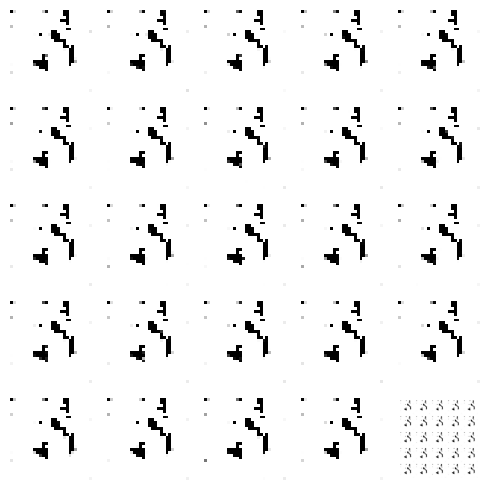

  0%|          | 0/350 [00:00<?, ?it/s]

4/4 [==============================] - 0s 15ms/step


  0%|          | 1/350 [00:00<02:48,  2.07it/s]

4/4 [==============================] - 0s 21ms/step


  1%|          | 2/350 [00:00<02:54,  1.99it/s]

4/4 [==============================] - 0s 13ms/step


  1%|          | 3/350 [00:01<02:44,  2.11it/s]

4/4 [==============================] - 0s 11ms/step


  1%|          | 4/350 [00:01<02:54,  1.98it/s]

4/4 [==============================] - 0s 18ms/step


  1%|▏         | 5/350 [00:02<02:57,  1.95it/s]

4/4 [==============================] - 0s 25ms/step


  2%|▏         | 6/350 [00:03<03:02,  1.88it/s]

4/4 [==============================] - 0s 14ms/step


  2%|▏         | 7/350 [00:03<02:56,  1.95it/s]

4/4 [==============================] - 0s 18ms/step


  2%|▏         | 8/350 [00:04<03:01,  1.89it/s]

4/4 [==============================] - 0s 14ms/step


  3%|▎         | 9/350 [00:04<02:54,  1.95it/s]

4/4 [==============================] - 0s 12ms/step


  3%|▎         | 10/350 [00:05<02:47,  2.03it/s]

4/4 [==============================] - 0s 28ms/step


  3%|▎         | 11/350 [00:05<02:58,  1.90it/s]

4/4 [==============================] - 0s 14ms/step


  3%|▎         | 12/350 [00:06<02:54,  1.93it/s]

4/4 [==============================] - 0s 15ms/step


  4%|▎         | 13/350 [00:06<02:57,  1.90it/s]

4/4 [==============================] - 0s 12ms/step


  4%|▍         | 14/350 [00:07<02:54,  1.93it/s]

4/4 [==============================] - 0s 24ms/step


  4%|▍         | 15/350 [00:07<02:58,  1.88it/s]

4/4 [==============================] - 0s 13ms/step


  5%|▍         | 16/350 [00:08<02:54,  1.92it/s]

4/4 [==============================] - 0s 33ms/step


  5%|▍         | 17/350 [00:08<02:59,  1.86it/s]

4/4 [==============================] - 0s 14ms/step


  5%|▌         | 18/350 [00:09<02:50,  1.95it/s]

4/4 [==============================] - 0s 19ms/step


  5%|▌         | 19/350 [00:09<02:53,  1.90it/s]

4/4 [==============================] - 0s 12ms/step


  6%|▌         | 20/350 [00:10<02:53,  1.91it/s]

4/4 [==============================] - 0s 14ms/step


  6%|▌         | 21/350 [00:10<02:53,  1.90it/s]

4/4 [==============================] - 0s 11ms/step


  6%|▋         | 22/350 [00:11<02:44,  1.99it/s]

4/4 [==============================] - 0s 23ms/step


  7%|▋         | 23/350 [00:11<02:48,  1.94it/s]

4/4 [==============================] - 0s 16ms/step


  7%|▋         | 24/350 [00:12<02:48,  1.93it/s]

4/4 [==============================] - 0s 12ms/step


  7%|▋         | 25/350 [00:12<02:42,  2.00it/s]

4/4 [==============================] - 0s 14ms/step


  7%|▋         | 26/350 [00:13<02:44,  1.97it/s]

4/4 [==============================] - 0s 12ms/step


  8%|▊         | 27/350 [00:13<02:38,  2.04it/s]

4/4 [==============================] - 0s 12ms/step


  8%|▊         | 28/350 [00:14<02:44,  1.96it/s]

4/4 [==============================] - 0s 12ms/step


  8%|▊         | 29/350 [00:14<02:43,  1.97it/s]

4/4 [==============================] - 0s 12ms/step


  9%|▊         | 30/350 [00:15<02:42,  1.97it/s]

4/4 [==============================] - 0s 14ms/step


  9%|▉         | 31/350 [00:15<02:37,  2.02it/s]

4/4 [==============================] - 0s 29ms/step


  9%|▉         | 32/350 [00:16<02:37,  2.02it/s]

4/4 [==============================] - 0s 14ms/step


  9%|▉         | 33/350 [00:16<02:32,  2.08it/s]

4/4 [==============================] - 0s 25ms/step


 10%|▉         | 34/350 [00:17<02:33,  2.06it/s]

4/4 [==============================] - 0s 12ms/step


 10%|█         | 35/350 [00:17<02:29,  2.11it/s]

4/4 [==============================] - 0s 13ms/step


 10%|█         | 36/350 [00:18<02:30,  2.08it/s]

4/4 [==============================] - 0s 13ms/step


 11%|█         | 37/350 [00:18<02:33,  2.04it/s]

4/4 [==============================] - 0s 18ms/step


 11%|█         | 38/350 [00:19<02:40,  1.94it/s]

4/4 [==============================] - 0s 15ms/step


 11%|█         | 39/350 [00:19<02:38,  1.96it/s]

4/4 [==============================] - 0s 30ms/step


 11%|█▏        | 40/350 [00:20<02:37,  1.97it/s]

4/4 [==============================] - 0s 13ms/step


 12%|█▏        | 41/350 [00:20<02:30,  2.05it/s]

4/4 [==============================] - 0s 12ms/step


 12%|█▏        | 42/350 [00:21<02:32,  2.01it/s]

4/4 [==============================] - 0s 16ms/step


 12%|█▏        | 43/350 [00:21<02:35,  1.97it/s]

4/4 [==============================] - 0s 33ms/step


 13%|█▎        | 44/350 [00:22<02:35,  1.96it/s]

4/4 [==============================] - 0s 12ms/step


 13%|█▎        | 45/350 [00:22<02:34,  1.98it/s]

4/4 [==============================] - 0s 28ms/step


 13%|█▎        | 46/350 [00:23<02:38,  1.92it/s]

4/4 [==============================] - 0s 12ms/step


 13%|█▎        | 47/350 [00:24<02:44,  1.84it/s]

4/4 [==============================] - 0s 15ms/step


 14%|█▎        | 48/350 [00:24<02:44,  1.84it/s]

4/4 [==============================] - 0s 30ms/step


 14%|█▍        | 49/350 [00:25<02:43,  1.84it/s]

4/4 [==============================] - 0s 12ms/step


 14%|█▍        | 50/350 [00:25<02:33,  1.95it/s]

4/4 [==============================] - 0s 13ms/step


 15%|█▍        | 51/350 [00:26<02:38,  1.88it/s]

4/4 [==============================] - 0s 16ms/step


 15%|█▍        | 52/350 [00:26<02:33,  1.94it/s]

4/4 [==============================] - 0s 12ms/step


 15%|█▌        | 53/350 [00:27<02:30,  1.97it/s]

4/4 [==============================] - 0s 13ms/step


 15%|█▌        | 54/350 [00:27<02:25,  2.03it/s]

4/4 [==============================] - 0s 29ms/step


 16%|█▌        | 55/350 [00:28<02:29,  1.97it/s]

4/4 [==============================] - 0s 12ms/step


 16%|█▌        | 56/350 [00:28<02:32,  1.93it/s]

4/4 [==============================] - 0s 13ms/step


 16%|█▋        | 57/350 [00:29<02:25,  2.01it/s]

4/4 [==============================] - 0s 12ms/step


 17%|█▋        | 58/350 [00:29<02:24,  2.01it/s]

4/4 [==============================] - 0s 15ms/step


 17%|█▋        | 59/350 [00:30<02:21,  2.06it/s]

4/4 [==============================] - 0s 35ms/step


 17%|█▋        | 60/350 [00:30<02:24,  2.01it/s]

4/4 [==============================] - 0s 13ms/step


 17%|█▋        | 61/350 [00:30<02:18,  2.08it/s]

4/4 [==============================] - 0s 13ms/step


 18%|█▊        | 62/350 [00:31<02:20,  2.06it/s]

4/4 [==============================] - 0s 16ms/step


 18%|█▊        | 63/350 [00:31<02:19,  2.06it/s]

4/4 [==============================] - 0s 31ms/step


 18%|█▊        | 64/350 [00:32<02:27,  1.94it/s]

4/4 [==============================] - 0s 14ms/step


 19%|█▊        | 65/350 [00:33<02:28,  1.92it/s]

4/4 [==============================] - 0s 37ms/step


 19%|█▉        | 66/350 [00:33<02:33,  1.85it/s]

4/4 [==============================] - 0s 15ms/step


 19%|█▉        | 67/350 [00:34<02:26,  1.93it/s]

4/4 [==============================] - 0s 23ms/step


 19%|█▉        | 68/350 [00:34<02:24,  1.95it/s]

4/4 [==============================] - 0s 12ms/step


 20%|█▉        | 69/350 [00:35<02:17,  2.05it/s]

4/4 [==============================] - 0s 16ms/step


 20%|██        | 70/350 [00:35<02:26,  1.91it/s]

4/4 [==============================] - 0s 14ms/step


 20%|██        | 71/350 [00:36<02:19,  1.99it/s]

4/4 [==============================] - 0s 19ms/step


 21%|██        | 72/350 [00:36<02:26,  1.90it/s]

4/4 [==============================] - 0s 14ms/step


 21%|██        | 73/350 [00:37<02:19,  1.98it/s]

4/4 [==============================] - 0s 12ms/step


 21%|██        | 74/350 [00:37<02:19,  1.98it/s]

4/4 [==============================] - 0s 12ms/step


 21%|██▏       | 75/350 [00:38<02:13,  2.06it/s]

4/4 [==============================] - 0s 12ms/step


 22%|██▏       | 76/350 [00:38<02:16,  2.01it/s]

4/4 [==============================] - 0s 13ms/step


 22%|██▏       | 77/350 [00:39<02:13,  2.05it/s]

4/4 [==============================] - 0s 19ms/step


 22%|██▏       | 78/350 [00:39<02:16,  2.00it/s]

4/4 [==============================] - 0s 12ms/step


 23%|██▎       | 79/350 [00:40<02:12,  2.05it/s]

4/4 [==============================] - 0s 16ms/step


 23%|██▎       | 80/350 [00:40<02:12,  2.03it/s]

4/4 [==============================] - 0s 13ms/step


 23%|██▎       | 81/350 [00:41<02:08,  2.09it/s]

4/4 [==============================] - 0s 26ms/step


 23%|██▎       | 82/350 [00:41<02:11,  2.03it/s]

4/4 [==============================] - 0s 13ms/step


 24%|██▎       | 83/350 [00:42<02:10,  2.05it/s]

4/4 [==============================] - 0s 14ms/step


 24%|██▍       | 84/350 [00:42<02:12,  2.01it/s]

4/4 [==============================] - 0s 15ms/step


 24%|██▍       | 85/350 [00:43<02:11,  2.01it/s]

4/4 [==============================] - 0s 32ms/step


 25%|██▍       | 86/350 [00:43<02:14,  1.97it/s]

4/4 [==============================] - 0s 12ms/step


 25%|██▍       | 87/350 [00:44<02:17,  1.92it/s]

4/4 [==============================] - 0s 14ms/step


 25%|██▌       | 88/350 [00:44<02:15,  1.93it/s]

4/4 [==============================] - 0s 27ms/step


 25%|██▌       | 89/350 [00:45<02:19,  1.87it/s]

4/4 [==============================] - 0s 13ms/step


 26%|██▌       | 90/350 [00:45<02:13,  1.95it/s]

4/4 [==============================] - 0s 30ms/step


 26%|██▌       | 91/350 [00:46<02:14,  1.93it/s]

4/4 [==============================] - 0s 13ms/step


 26%|██▋       | 92/350 [00:46<02:09,  2.00it/s]

4/4 [==============================] - 0s 12ms/step


 27%|██▋       | 93/350 [00:47<02:07,  2.02it/s]

4/4 [==============================] - 0s 13ms/step


 27%|██▋       | 94/350 [00:47<02:02,  2.09it/s]

4/4 [==============================] - 0s 13ms/step


 27%|██▋       | 95/350 [00:48<02:03,  2.07it/s]

4/4 [==============================] - 0s 13ms/step


 27%|██▋       | 96/350 [00:48<01:59,  2.12it/s]

4/4 [==============================] - 0s 30ms/step


 28%|██▊       | 97/350 [00:49<02:02,  2.06it/s]

4/4 [==============================] - 0s 13ms/step


 28%|██▊       | 98/350 [00:49<02:01,  2.08it/s]

4/4 [==============================] - 0s 31ms/step


 28%|██▊       | 99/350 [00:50<02:08,  1.95it/s]

4/4 [==============================] - 0s 13ms/step


 29%|██▊       | 100/350 [00:50<02:04,  2.01it/s]

4/4 [==============================] - 0s 12ms/step


 29%|██▉       | 101/350 [00:51<02:03,  2.02it/s]

4/4 [==============================] - 0s 14ms/step


 29%|██▉       | 102/350 [00:51<01:59,  2.07it/s]

4/4 [==============================] - 0s 22ms/step


 29%|██▉       | 103/350 [00:52<02:06,  1.96it/s]

4/4 [==============================] - 0s 12ms/step


 30%|██▉       | 104/350 [00:52<02:01,  2.03it/s]

4/4 [==============================] - 0s 13ms/step


 30%|███       | 105/350 [00:53<02:00,  2.03it/s]

4/4 [==============================] - 0s 12ms/step


 30%|███       | 106/350 [00:53<01:57,  2.08it/s]

4/4 [==============================] - 0s 25ms/step


 31%|███       | 107/350 [00:53<01:58,  2.06it/s]

4/4 [==============================] - 0s 13ms/step


 31%|███       | 108/350 [00:54<01:54,  2.11it/s]

4/4 [==============================] - 0s 13ms/step


 31%|███       | 109/350 [00:54<01:56,  2.07it/s]

4/4 [==============================] - 0s 14ms/step


 31%|███▏      | 110/350 [00:55<01:53,  2.11it/s]

4/4 [==============================] - 0s 13ms/step


 32%|███▏      | 111/350 [00:55<01:55,  2.07it/s]

4/4 [==============================] - 0s 15ms/step


 32%|███▏      | 112/350 [00:56<01:53,  2.10it/s]

4/4 [==============================] - 0s 14ms/step


 32%|███▏      | 113/350 [00:56<01:54,  2.06it/s]

4/4 [==============================] - 0s 12ms/step


 33%|███▎      | 114/350 [00:57<01:51,  2.12it/s]

4/4 [==============================] - 0s 13ms/step


 33%|███▎      | 115/350 [00:57<01:52,  2.08it/s]

4/4 [==============================] - 0s 12ms/step


 33%|███▎      | 116/350 [00:58<01:49,  2.13it/s]

4/4 [==============================] - 0s 12ms/step


 33%|███▎      | 117/350 [00:58<01:51,  2.08it/s]

4/4 [==============================] - 0s 11ms/step


 34%|███▎      | 118/350 [00:59<01:49,  2.11it/s]

4/4 [==============================] - 0s 13ms/step


 34%|███▍      | 119/350 [00:59<01:51,  2.07it/s]

4/4 [==============================] - 0s 13ms/step


 34%|███▍      | 120/350 [01:00<01:48,  2.12it/s]

4/4 [==============================] - 0s 12ms/step


 35%|███▍      | 121/350 [01:00<01:50,  2.08it/s]

4/4 [==============================] - 0s 14ms/step


 35%|███▍      | 122/350 [01:01<01:47,  2.12it/s]

4/4 [==============================] - 0s 16ms/step


 35%|███▌      | 123/350 [01:01<01:50,  2.06it/s]

4/4 [==============================] - 0s 13ms/step


 35%|███▌      | 124/350 [01:02<01:47,  2.10it/s]

4/4 [==============================] - 0s 12ms/step


 36%|███▌      | 125/350 [01:02<01:49,  2.06it/s]

4/4 [==============================] - 0s 14ms/step


 36%|███▌      | 126/350 [01:03<01:46,  2.09it/s]

4/4 [==============================] - 0s 16ms/step


 36%|███▋      | 127/350 [01:03<01:50,  2.02it/s]

4/4 [==============================] - 0s 12ms/step


 37%|███▋      | 128/350 [01:04<01:47,  2.07it/s]

4/4 [==============================] - 0s 13ms/step


 37%|███▋      | 129/350 [01:04<01:48,  2.04it/s]

4/4 [==============================] - 0s 14ms/step


 37%|███▋      | 130/350 [01:04<01:45,  2.08it/s]

4/4 [==============================] - 0s 12ms/step


 37%|███▋      | 131/350 [01:05<01:47,  2.04it/s]

4/4 [==============================] - 0s 14ms/step


 38%|███▊      | 132/350 [01:05<01:44,  2.09it/s]

4/4 [==============================] - 0s 13ms/step


 38%|███▊      | 133/350 [01:06<01:46,  2.04it/s]

4/4 [==============================] - 0s 12ms/step


 38%|███▊      | 134/350 [01:06<01:43,  2.08it/s]

4/4 [==============================] - 0s 12ms/step


 39%|███▊      | 135/350 [01:07<01:44,  2.05it/s]

4/4 [==============================] - 0s 13ms/step


 39%|███▉      | 136/350 [01:07<01:42,  2.08it/s]

4/4 [==============================] - 0s 12ms/step


 39%|███▉      | 137/350 [01:08<01:45,  2.03it/s]

4/4 [==============================] - 0s 13ms/step


 39%|███▉      | 138/350 [01:08<01:42,  2.07it/s]

4/4 [==============================] - 0s 21ms/step


 40%|███▉      | 139/350 [01:09<01:42,  2.06it/s]

4/4 [==============================] - 0s 12ms/step


 40%|████      | 140/350 [01:09<01:39,  2.11it/s]

4/4 [==============================] - 0s 13ms/step


 40%|████      | 141/350 [01:10<01:40,  2.08it/s]

4/4 [==============================] - 0s 14ms/step


 41%|████      | 142/350 [01:10<01:38,  2.11it/s]

4/4 [==============================] - 0s 25ms/step


 41%|████      | 143/350 [01:11<01:39,  2.08it/s]

4/4 [==============================] - 0s 12ms/step


 41%|████      | 144/350 [01:11<01:36,  2.12it/s]

4/4 [==============================] - 0s 12ms/step


 41%|████▏     | 145/350 [01:12<01:37,  2.10it/s]

4/4 [==============================] - 0s 13ms/step


 42%|████▏     | 146/350 [01:12<01:35,  2.13it/s]

4/4 [==============================] - 0s 14ms/step


 42%|████▏     | 147/350 [01:13<01:37,  2.08it/s]

4/4 [==============================] - 0s 13ms/step


 42%|████▏     | 148/350 [01:13<01:41,  1.98it/s]

4/4 [==============================] - 0s 13ms/step


 43%|████▎     | 149/350 [01:14<01:45,  1.91it/s]

4/4 [==============================] - 0s 16ms/step


 43%|████▎     | 150/350 [01:14<01:46,  1.87it/s]

4/4 [==============================] - 0s 17ms/step


 43%|████▎     | 151/350 [01:15<01:47,  1.84it/s]

4/4 [==============================] - 0s 17ms/step


 43%|████▎     | 152/350 [01:15<01:47,  1.85it/s]

4/4 [==============================] - 0s 16ms/step


 44%|████▎     | 153/350 [01:16<01:48,  1.81it/s]

4/4 [==============================] - 0s 18ms/step


 44%|████▍     | 154/350 [01:17<01:48,  1.81it/s]

4/4 [==============================] - 0s 30ms/step


 44%|████▍     | 155/350 [01:17<01:57,  1.66it/s]

4/4 [==============================] - 0s 20ms/step


 45%|████▍     | 156/350 [01:18<02:01,  1.60it/s]

4/4 [==============================] - 0s 19ms/step


 45%|████▍     | 157/350 [01:19<01:58,  1.63it/s]

4/4 [==============================] - 0s 27ms/step


 45%|████▌     | 158/350 [01:19<02:10,  1.47it/s]

4/4 [==============================] - 0s 19ms/step


 45%|████▌     | 159/350 [01:20<02:04,  1.53it/s]

4/4 [==============================] - 0s 13ms/step


 46%|████▌     | 160/350 [01:21<02:02,  1.56it/s]

4/4 [==============================] - 0s 13ms/step


 46%|████▌     | 161/350 [01:21<01:53,  1.66it/s]

4/4 [==============================] - 0s 14ms/step


 46%|████▋     | 162/350 [01:22<01:49,  1.71it/s]

4/4 [==============================] - 0s 13ms/step


 47%|████▋     | 163/350 [01:22<01:46,  1.76it/s]

4/4 [==============================] - 0s 12ms/step


 47%|████▋     | 164/350 [01:23<01:43,  1.79it/s]

4/4 [==============================] - 0s 14ms/step


 47%|████▋     | 165/350 [01:23<01:41,  1.83it/s]

4/4 [==============================] - 0s 13ms/step


 47%|████▋     | 166/350 [01:24<01:39,  1.84it/s]

4/4 [==============================] - 0s 14ms/step


 48%|████▊     | 167/350 [01:24<01:35,  1.91it/s]

4/4 [==============================] - 0s 15ms/step


 48%|████▊     | 168/350 [01:25<01:35,  1.91it/s]

4/4 [==============================] - 0s 13ms/step


 48%|████▊     | 169/350 [01:25<01:31,  1.97it/s]

4/4 [==============================] - 0s 14ms/step


 49%|████▊     | 170/350 [01:26<01:33,  1.92it/s]

4/4 [==============================] - 0s 16ms/step


 49%|████▉     | 171/350 [01:26<01:31,  1.96it/s]

4/4 [==============================] - 0s 40ms/step


 49%|████▉     | 172/350 [01:27<01:34,  1.89it/s]

4/4 [==============================] - 0s 13ms/step


 49%|████▉     | 173/350 [01:27<01:35,  1.85it/s]

4/4 [==============================] - 0s 15ms/step


 50%|████▉     | 174/350 [01:28<01:33,  1.88it/s]

4/4 [==============================] - 0s 30ms/step


 50%|█████     | 175/350 [01:28<01:33,  1.87it/s]

4/4 [==============================] - 0s 12ms/step


 50%|█████     | 176/350 [01:29<01:30,  1.93it/s]

4/4 [==============================] - 0s 13ms/step


 51%|█████     | 177/350 [01:30<01:32,  1.88it/s]

4/4 [==============================] - 0s 14ms/step


 51%|█████     | 178/350 [01:30<01:28,  1.95it/s]

4/4 [==============================] - 0s 36ms/step


 51%|█████     | 179/350 [01:31<01:30,  1.90it/s]

4/4 [==============================] - 0s 13ms/step


 51%|█████▏    | 180/350 [01:31<01:27,  1.95it/s]

4/4 [==============================] - 0s 14ms/step


 52%|█████▏    | 181/350 [01:32<01:28,  1.91it/s]

4/4 [==============================] - 0s 14ms/step


 52%|█████▏    | 182/350 [01:32<01:29,  1.87it/s]

4/4 [==============================] - 0s 12ms/step


 52%|█████▏    | 183/350 [01:33<01:28,  1.88it/s]

4/4 [==============================] - 0s 13ms/step


 53%|█████▎    | 184/350 [01:33<01:26,  1.92it/s]

4/4 [==============================] - 0s 26ms/step


 53%|█████▎    | 185/350 [01:34<01:27,  1.89it/s]

4/4 [==============================] - 0s 13ms/step


 53%|█████▎    | 186/350 [01:34<01:24,  1.94it/s]

4/4 [==============================] - 0s 33ms/step


 53%|█████▎    | 187/350 [01:35<01:24,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


 54%|█████▎    | 188/350 [01:35<01:24,  1.91it/s]

4/4 [==============================] - 0s 13ms/step


 54%|█████▍    | 189/350 [01:36<01:21,  1.98it/s]

4/4 [==============================] - 0s 22ms/step


 54%|█████▍    | 190/350 [01:36<01:22,  1.95it/s]

4/4 [==============================] - 0s 14ms/step


 55%|█████▍    | 191/350 [01:37<01:19,  1.99it/s]

4/4 [==============================] - 0s 12ms/step


 55%|█████▍    | 192/350 [01:37<01:20,  1.95it/s]

4/4 [==============================] - 0s 13ms/step


 55%|█████▌    | 193/350 [01:38<01:18,  1.99it/s]

4/4 [==============================] - 0s 14ms/step


 55%|█████▌    | 194/350 [01:38<01:19,  1.96it/s]

4/4 [==============================] - 0s 14ms/step


 56%|█████▌    | 195/350 [01:39<01:21,  1.90it/s]

4/4 [==============================] - 0s 28ms/step


 56%|█████▌    | 196/350 [01:39<01:22,  1.87it/s]

4/4 [==============================] - 0s 15ms/step


 56%|█████▋    | 197/350 [01:40<01:20,  1.91it/s]

4/4 [==============================] - 0s 14ms/step


 57%|█████▋    | 198/350 [01:40<01:20,  1.88it/s]

4/4 [==============================] - 0s 13ms/step


 57%|█████▋    | 199/350 [01:41<01:18,  1.93it/s]

4/4 [==============================] - 0s 16ms/step


 57%|█████▋    | 200/350 [01:42<01:20,  1.86it/s]

4/4 [==============================] - 0s 16ms/step


 57%|█████▋    | 201/350 [01:42<01:20,  1.85it/s]

4/4 [==============================] - 0s 19ms/step


 58%|█████▊    | 202/350 [01:43<01:17,  1.91it/s]

4/4 [==============================] - 0s 16ms/step


 58%|█████▊    | 203/350 [01:43<01:17,  1.90it/s]

4/4 [==============================] - 0s 12ms/step


 58%|█████▊    | 204/350 [01:44<01:14,  1.96it/s]

4/4 [==============================] - 0s 12ms/step


 59%|█████▊    | 205/350 [01:44<01:14,  1.96it/s]

4/4 [==============================] - 0s 17ms/step


 59%|█████▉    | 206/350 [01:45<01:11,  2.01it/s]

4/4 [==============================] - 0s 26ms/step


 59%|█████▉    | 207/350 [01:45<01:12,  1.98it/s]

4/4 [==============================] - 0s 15ms/step


 59%|█████▉    | 208/350 [01:46<01:10,  2.03it/s]

4/4 [==============================] - 0s 14ms/step


 60%|█████▉    | 209/350 [01:46<01:11,  1.99it/s]

4/4 [==============================] - 0s 14ms/step


 60%|██████    | 210/350 [01:47<01:08,  2.04it/s]

4/4 [==============================] - 0s 33ms/step


 60%|██████    | 211/350 [01:47<01:09,  1.99it/s]

4/4 [==============================] - 0s 15ms/step


 61%|██████    | 212/350 [01:48<01:08,  2.02it/s]

4/4 [==============================] - 0s 15ms/step


 61%|██████    | 213/350 [01:48<01:10,  1.95it/s]

4/4 [==============================] - 0s 14ms/step


 61%|██████    | 214/350 [01:49<01:08,  1.98it/s]

4/4 [==============================] - 0s 32ms/step


 61%|██████▏   | 215/350 [01:49<01:10,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


 62%|██████▏   | 216/350 [01:50<01:11,  1.87it/s]

4/4 [==============================] - 0s 13ms/step


 62%|██████▏   | 217/350 [01:50<01:10,  1.88it/s]

4/4 [==============================] - 0s 12ms/step


 62%|██████▏   | 218/350 [01:51<01:10,  1.86it/s]

4/4 [==============================] - 0s 13ms/step


 63%|██████▎   | 219/350 [01:51<01:07,  1.93it/s]

4/4 [==============================] - 0s 24ms/step


 63%|██████▎   | 220/350 [01:52<01:06,  1.95it/s]

4/4 [==============================] - 0s 13ms/step


 63%|██████▎   | 221/350 [01:52<01:07,  1.91it/s]

4/4 [==============================] - 0s 13ms/step


 63%|██████▎   | 222/350 [01:53<01:04,  1.99it/s]

4/4 [==============================] - 0s 31ms/step


 64%|██████▎   | 223/350 [01:53<01:04,  1.97it/s]

4/4 [==============================] - 0s 13ms/step


 64%|██████▍   | 224/350 [01:54<01:01,  2.04it/s]

4/4 [==============================] - 0s 23ms/step


 64%|██████▍   | 225/350 [01:54<01:02,  2.02it/s]

4/4 [==============================] - 0s 14ms/step


 65%|██████▍   | 226/350 [01:55<00:59,  2.07it/s]

4/4 [==============================] - 0s 12ms/step


 65%|██████▍   | 227/350 [01:55<01:00,  2.03it/s]

4/4 [==============================] - 0s 14ms/step


 65%|██████▌   | 228/350 [01:56<00:59,  2.07it/s]

4/4 [==============================] - 0s 34ms/step


 65%|██████▌   | 229/350 [01:56<01:01,  1.96it/s]

4/4 [==============================] - 0s 13ms/step


 66%|██████▌   | 230/350 [01:57<00:59,  2.00it/s]

4/4 [==============================] - 0s 14ms/step


 66%|██████▌   | 231/350 [01:57<01:01,  1.95it/s]

4/4 [==============================] - 0s 15ms/step


 66%|██████▋   | 232/350 [01:58<01:00,  1.96it/s]

4/4 [==============================] - 0s 32ms/step


 67%|██████▋   | 233/350 [01:58<01:01,  1.89it/s]

4/4 [==============================] - 0s 19ms/step


 67%|██████▋   | 234/350 [01:59<00:59,  1.94it/s]

4/4 [==============================] - 0s 17ms/step


 67%|██████▋   | 235/350 [01:59<01:00,  1.91it/s]

4/4 [==============================] - 0s 13ms/step


 67%|██████▋   | 236/350 [02:00<00:58,  1.95it/s]

4/4 [==============================] - 0s 21ms/step


 68%|██████▊   | 237/350 [02:00<00:58,  1.93it/s]

4/4 [==============================] - 0s 17ms/step


 68%|██████▊   | 238/350 [02:01<00:59,  1.90it/s]

4/4 [==============================] - 0s 13ms/step


 68%|██████▊   | 239/350 [02:01<00:57,  1.92it/s]

4/4 [==============================] - 0s 20ms/step


 69%|██████▊   | 240/350 [02:02<00:58,  1.89it/s]

4/4 [==============================] - 0s 13ms/step


 69%|██████▉   | 241/350 [02:02<00:56,  1.92it/s]

4/4 [==============================] - 0s 54ms/step


 69%|██████▉   | 242/350 [02:03<00:59,  1.82it/s]

4/4 [==============================] - 0s 13ms/step


 69%|██████▉   | 243/350 [02:04<00:56,  1.89it/s]

4/4 [==============================] - 0s 14ms/step


 70%|██████▉   | 244/350 [02:04<00:55,  1.89it/s]

4/4 [==============================] - 0s 14ms/step


 70%|███████   | 245/350 [02:05<00:53,  1.96it/s]

4/4 [==============================] - 0s 13ms/step


 70%|███████   | 246/350 [02:05<00:52,  1.96it/s]

4/4 [==============================] - 0s 14ms/step


 71%|███████   | 247/350 [02:06<00:51,  2.02it/s]

4/4 [==============================] - 0s 13ms/step


 71%|███████   | 248/350 [02:06<00:50,  2.01it/s]

4/4 [==============================] - 0s 15ms/step


 71%|███████   | 249/350 [02:06<00:49,  2.05it/s]

4/4 [==============================] - 0s 24ms/step


 71%|███████▏  | 250/350 [02:07<00:49,  2.01it/s]

4/4 [==============================] - 0s 15ms/step


 72%|███████▏  | 251/350 [02:07<00:48,  2.03it/s]

4/4 [==============================] - 0s 13ms/step


 72%|███████▏  | 252/350 [02:08<00:49,  1.97it/s]

4/4 [==============================] - 0s 14ms/step


 72%|███████▏  | 253/350 [02:08<00:47,  2.04it/s]

4/4 [==============================] - 0s 12ms/step


 73%|███████▎  | 254/350 [02:09<00:47,  2.02it/s]

4/4 [==============================] - 0s 13ms/step


 73%|███████▎  | 255/350 [02:09<00:46,  2.06it/s]

4/4 [==============================] - 0s 13ms/step


 73%|███████▎  | 256/350 [02:10<00:46,  2.01it/s]

4/4 [==============================] - 0s 13ms/step


 73%|███████▎  | 257/350 [02:10<00:45,  2.03it/s]

4/4 [==============================] - 0s 16ms/step


 74%|███████▎  | 258/350 [02:11<00:46,  1.98it/s]

4/4 [==============================] - 0s 16ms/step


 74%|███████▍  | 259/350 [02:12<00:47,  1.91it/s]

4/4 [==============================] - 0s 13ms/step


 74%|███████▍  | 260/350 [02:12<00:45,  1.96it/s]

4/4 [==============================] - 0s 33ms/step


 75%|███████▍  | 261/350 [02:13<00:46,  1.92it/s]

4/4 [==============================] - 0s 14ms/step


 75%|███████▍  | 262/350 [02:13<00:44,  1.96it/s]

4/4 [==============================] - 0s 14ms/step


 75%|███████▌  | 263/350 [02:14<00:45,  1.92it/s]

4/4 [==============================] - 0s 12ms/step


 75%|███████▌  | 264/350 [02:14<00:44,  1.95it/s]

4/4 [==============================] - 0s 29ms/step


 76%|███████▌  | 265/350 [02:15<00:43,  1.94it/s]

4/4 [==============================] - 0s 13ms/step


 76%|███████▌  | 266/350 [02:15<00:42,  1.97it/s]

4/4 [==============================] - 0s 26ms/step


 76%|███████▋  | 267/350 [02:16<00:43,  1.90it/s]

4/4 [==============================] - 0s 13ms/step


 77%|███████▋  | 268/350 [02:16<00:43,  1.89it/s]

4/4 [==============================] - 0s 13ms/step


 77%|███████▋  | 269/350 [02:17<00:42,  1.91it/s]

4/4 [==============================] - 0s 12ms/step


 77%|███████▋  | 270/350 [02:17<00:42,  1.90it/s]

4/4 [==============================] - 0s 13ms/step


 77%|███████▋  | 271/350 [02:18<00:40,  1.96it/s]

4/4 [==============================] - 0s 13ms/step


 78%|███████▊  | 272/350 [02:18<00:40,  1.94it/s]

4/4 [==============================] - 0s 13ms/step


 78%|███████▊  | 273/350 [02:19<00:38,  2.01it/s]

4/4 [==============================] - 0s 13ms/step


 78%|███████▊  | 274/350 [02:19<00:38,  1.99it/s]

4/4 [==============================] - 0s 13ms/step


 79%|███████▊  | 275/350 [02:20<00:37,  1.98it/s]

4/4 [==============================] - 0s 20ms/step


 79%|███████▉  | 276/350 [02:20<00:38,  1.91it/s]

4/4 [==============================] - 0s 12ms/step


 79%|███████▉  | 277/350 [02:21<00:38,  1.91it/s]

4/4 [==============================] - 0s 12ms/step


 79%|███████▉  | 278/350 [02:21<00:36,  1.96it/s]

4/4 [==============================] - 0s 13ms/step


 80%|███████▉  | 279/350 [02:22<00:36,  1.95it/s]

4/4 [==============================] - 0s 12ms/step


 80%|████████  | 280/350 [02:22<00:34,  2.01it/s]

4/4 [==============================] - 0s 12ms/step


 80%|████████  | 281/350 [02:23<00:33,  2.04it/s]

4/4 [==============================] - 0s 29ms/step


 81%|████████  | 282/350 [02:23<00:33,  2.01it/s]

4/4 [==============================] - 0s 13ms/step


 81%|████████  | 283/350 [02:24<00:33,  2.02it/s]

4/4 [==============================] - 0s 25ms/step


 81%|████████  | 284/350 [02:24<00:33,  1.96it/s]

4/4 [==============================] - 0s 12ms/step


 81%|████████▏ | 285/350 [02:25<00:31,  2.04it/s]

4/4 [==============================] - 0s 18ms/step


 82%|████████▏ | 286/350 [02:25<00:31,  2.02it/s]

4/4 [==============================] - 0s 13ms/step


 82%|████████▏ | 287/350 [02:26<00:30,  2.05it/s]

4/4 [==============================] - 0s 13ms/step


 82%|████████▏ | 288/350 [02:26<00:30,  2.02it/s]

4/4 [==============================] - 0s 13ms/step


 83%|████████▎ | 289/350 [02:27<00:29,  2.08it/s]

4/4 [==============================] - 0s 23ms/step


 83%|████████▎ | 290/350 [02:27<00:29,  2.01it/s]

4/4 [==============================] - 0s 14ms/step


 83%|████████▎ | 291/350 [02:28<00:28,  2.05it/s]

4/4 [==============================] - 0s 32ms/step


 83%|████████▎ | 292/350 [02:28<00:28,  2.01it/s]

4/4 [==============================] - 0s 12ms/step


 84%|████████▎ | 293/350 [02:29<00:28,  2.04it/s]

4/4 [==============================] - 0s 13ms/step


 84%|████████▍ | 294/350 [02:29<00:27,  2.00it/s]

4/4 [==============================] - 0s 13ms/step


 84%|████████▍ | 295/350 [02:30<00:26,  2.07it/s]

4/4 [==============================] - 0s 34ms/step


 85%|████████▍ | 296/350 [02:30<00:27,  1.98it/s]

4/4 [==============================] - 0s 13ms/step


 85%|████████▍ | 297/350 [02:31<00:26,  1.97it/s]

4/4 [==============================] - 0s 13ms/step


 85%|████████▌ | 298/350 [02:31<00:26,  1.96it/s]

4/4 [==============================] - 0s 23ms/step


 85%|████████▌ | 299/350 [02:32<00:25,  1.96it/s]

4/4 [==============================] - 0s 13ms/step


 86%|████████▌ | 300/350 [02:32<00:24,  2.02it/s]

4/4 [==============================] - 0s 24ms/step


 86%|████████▌ | 301/350 [02:33<00:24,  1.99it/s]

4/4 [==============================] - 0s 14ms/step


 86%|████████▋ | 302/350 [02:33<00:23,  2.02it/s]

4/4 [==============================] - 0s 12ms/step


 87%|████████▋ | 303/350 [02:34<00:23,  2.02it/s]

4/4 [==============================] - 0s 13ms/step


 87%|████████▋ | 304/350 [02:34<00:22,  2.06it/s]

4/4 [==============================] - 0s 12ms/step


 87%|████████▋ | 305/350 [02:35<00:22,  2.03it/s]

4/4 [==============================] - 0s 13ms/step


 87%|████████▋ | 306/350 [02:35<00:21,  2.08it/s]

4/4 [==============================] - 0s 12ms/step


 88%|████████▊ | 307/350 [02:36<00:22,  1.93it/s]

4/4 [==============================] - 0s 13ms/step


 88%|████████▊ | 308/350 [02:36<00:21,  2.00it/s]

4/4 [==============================] - 0s 12ms/step


 88%|████████▊ | 309/350 [02:37<00:20,  2.03it/s]

4/4 [==============================] - 0s 23ms/step


 89%|████████▊ | 310/350 [02:37<00:20,  1.96it/s]

4/4 [==============================] - 0s 13ms/step


 89%|████████▉ | 311/350 [02:38<00:19,  1.99it/s]

4/4 [==============================] - 0s 14ms/step


 89%|████████▉ | 312/350 [02:38<00:19,  1.95it/s]

4/4 [==============================] - 0s 13ms/step


 89%|████████▉ | 313/350 [02:39<00:18,  2.03it/s]

4/4 [==============================] - 0s 15ms/step


 90%|████████▉ | 314/350 [02:39<00:17,  2.01it/s]

4/4 [==============================] - 0s 14ms/step


 90%|█████████ | 315/350 [02:40<00:17,  2.05it/s]

4/4 [==============================] - 0s 13ms/step


 90%|█████████ | 316/350 [02:40<00:16,  2.02it/s]

4/4 [==============================] - 0s 16ms/step


 91%|█████████ | 317/350 [02:41<00:15,  2.07it/s]

4/4 [==============================] - 0s 26ms/step


 91%|█████████ | 318/350 [02:41<00:15,  2.04it/s]

4/4 [==============================] - 0s 12ms/step


 91%|█████████ | 319/350 [02:42<00:14,  2.10it/s]

4/4 [==============================] - 0s 21ms/step


 91%|█████████▏| 320/350 [02:42<00:14,  2.08it/s]

4/4 [==============================] - 0s 13ms/step


 92%|█████████▏| 321/350 [02:43<00:13,  2.14it/s]

4/4 [==============================] - 0s 13ms/step


 92%|█████████▏| 322/350 [02:43<00:13,  2.09it/s]

4/4 [==============================] - 0s 14ms/step


 92%|█████████▏| 323/350 [02:43<00:12,  2.15it/s]

4/4 [==============================] - 0s 12ms/step


 93%|█████████▎| 324/350 [02:44<00:12,  2.08it/s]

4/4 [==============================] - 0s 16ms/step


 93%|█████████▎| 325/350 [02:44<00:11,  2.12it/s]

4/4 [==============================] - 0s 13ms/step


 93%|█████████▎| 326/350 [02:45<00:11,  2.09it/s]

4/4 [==============================] - 0s 13ms/step


 93%|█████████▎| 327/350 [02:45<00:10,  2.14it/s]

4/4 [==============================] - 0s 12ms/step


 94%|█████████▎| 328/350 [02:46<00:10,  2.10it/s]

4/4 [==============================] - 0s 13ms/step


 94%|█████████▍| 329/350 [02:46<00:09,  2.14it/s]

4/4 [==============================] - 0s 15ms/step


 94%|█████████▍| 330/350 [02:47<00:09,  2.08it/s]

4/4 [==============================] - 0s 13ms/step


 95%|█████████▍| 331/350 [02:47<00:09,  2.11it/s]

4/4 [==============================] - 0s 13ms/step


 95%|█████████▍| 332/350 [02:48<00:08,  2.07it/s]

4/4 [==============================] - 0s 14ms/step


 95%|█████████▌| 333/350 [02:48<00:08,  2.08it/s]

4/4 [==============================] - 0s 34ms/step


 95%|█████████▌| 334/350 [02:49<00:08,  1.97it/s]

4/4 [==============================] - 0s 13ms/step


 96%|█████████▌| 335/350 [02:49<00:07,  1.99it/s]

4/4 [==============================] - 0s 29ms/step


 96%|█████████▌| 336/350 [02:50<00:07,  1.96it/s]

4/4 [==============================] - 0s 14ms/step


 96%|█████████▋| 337/350 [02:50<00:06,  2.01it/s]

4/4 [==============================] - 0s 13ms/step


 97%|█████████▋| 338/350 [02:51<00:06,  1.99it/s]

4/4 [==============================] - 0s 25ms/step


 97%|█████████▋| 339/350 [02:51<00:05,  1.96it/s]

4/4 [==============================] - 0s 13ms/step


 97%|█████████▋| 340/350 [02:52<00:04,  2.01it/s]

4/4 [==============================] - 0s 14ms/step


 97%|█████████▋| 341/350 [02:52<00:04,  1.97it/s]

4/4 [==============================] - 0s 14ms/step


 98%|█████████▊| 342/350 [02:53<00:03,  2.04it/s]

4/4 [==============================] - 0s 15ms/step


 98%|█████████▊| 343/350 [02:53<00:03,  2.02it/s]

4/4 [==============================] - 0s 13ms/step


 98%|█████████▊| 344/350 [02:54<00:02,  2.09it/s]

4/4 [==============================] - 0s 13ms/step


 99%|█████████▊| 345/350 [02:54<00:02,  2.05it/s]

4/4 [==============================] - 0s 12ms/step


 99%|█████████▉| 346/350 [02:55<00:01,  2.11it/s]

4/4 [==============================] - 0s 17ms/step


 99%|█████████▉| 347/350 [02:55<00:01,  1.96it/s]

4/4 [==============================] - 0s 15ms/step


 99%|█████████▉| 348/350 [02:56<00:00,  2.03it/s]

4/4 [==============================] - 0s 33ms/step


100%|█████████▉| 349/350 [02:56<00:00,  1.97it/s]

4/4 [==============================] - 0s 14ms/step


100%|██████████| 350/350 [02:57<00:00,  1.97it/s]

Epoch number: 11 discriminator_loss: 0.17072481109361565 generator_loss: 5.883644118990217
1/1 [==============================] - 0s 24ms/step


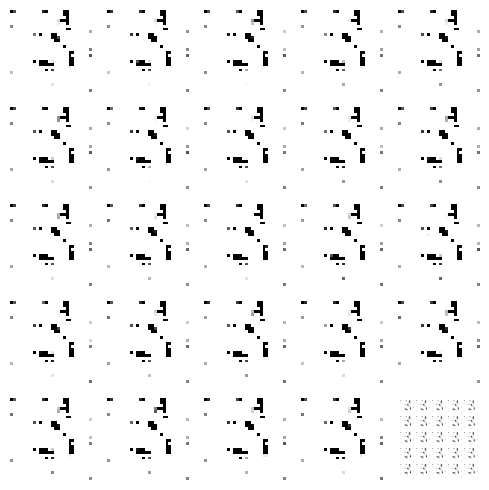

  0%|          | 0/350 [00:00<?, ?it/s]

4/4 [==============================] - 0s 21ms/step


  0%|          | 1/350 [00:00<02:56,  1.97it/s]

4/4 [==============================] - 0s 37ms/step


  1%|          | 2/350 [00:01<03:04,  1.88it/s]

4/4 [==============================] - 0s 13ms/step


  1%|          | 3/350 [00:01<02:52,  2.01it/s]

4/4 [==============================] - 0s 25ms/step


  1%|          | 4/350 [00:02<02:59,  1.93it/s]

4/4 [==============================] - 0s 14ms/step


  1%|▏         | 5/350 [00:02<02:52,  2.00it/s]

4/4 [==============================] - 0s 14ms/step


  2%|▏         | 6/350 [00:03<02:53,  1.98it/s]

4/4 [==============================] - 0s 13ms/step


  2%|▏         | 7/350 [00:03<02:54,  1.96it/s]

4/4 [==============================] - 0s 13ms/step


  2%|▏         | 8/350 [00:04<02:52,  1.98it/s]

4/4 [==============================] - 0s 13ms/step


  3%|▎         | 9/350 [00:04<02:47,  2.04it/s]

4/4 [==============================] - 0s 24ms/step


  3%|▎         | 10/350 [00:05<02:48,  2.02it/s]

4/4 [==============================] - 0s 13ms/step


  3%|▎         | 11/350 [00:05<02:43,  2.08it/s]

4/4 [==============================] - 0s 20ms/step


  3%|▎         | 12/350 [00:05<02:46,  2.03it/s]

4/4 [==============================] - 0s 14ms/step


  4%|▎         | 13/350 [00:06<02:44,  2.05it/s]

4/4 [==============================] - 0s 14ms/step


  4%|▍         | 14/350 [00:06<02:43,  2.06it/s]

4/4 [==============================] - 0s 14ms/step


  4%|▍         | 15/350 [00:07<02:52,  1.94it/s]

4/4 [==============================] - 0s 13ms/step


  5%|▍         | 16/350 [00:08<02:48,  1.99it/s]

4/4 [==============================] - 0s 13ms/step


  5%|▍         | 17/350 [00:08<02:42,  2.04it/s]

4/4 [==============================] - 0s 24ms/step


  5%|▌         | 18/350 [00:08<02:45,  2.00it/s]

4/4 [==============================] - 0s 13ms/step


  5%|▌         | 19/350 [00:09<02:39,  2.08it/s]

4/4 [==============================] - 0s 14ms/step


  6%|▌         | 20/350 [00:09<02:35,  2.12it/s]

4/4 [==============================] - 0s 13ms/step


  6%|▌         | 21/350 [00:10<02:38,  2.08it/s]

4/4 [==============================] - 0s 13ms/step


  6%|▋         | 22/350 [00:10<02:34,  2.12it/s]

4/4 [==============================] - 0s 14ms/step


  7%|▋         | 23/350 [00:11<02:42,  2.01it/s]

4/4 [==============================] - 0s 13ms/step


  7%|▋         | 24/350 [00:11<02:36,  2.08it/s]

4/4 [==============================] - 0s 16ms/step


  7%|▋         | 25/350 [00:12<02:41,  2.01it/s]

4/4 [==============================] - 0s 13ms/step


  7%|▋         | 26/350 [00:12<02:36,  2.07it/s]

4/4 [==============================] - 0s 13ms/step


  8%|▊         | 27/350 [00:13<02:38,  2.04it/s]

4/4 [==============================] - 0s 13ms/step


  8%|▊         | 28/350 [00:13<02:34,  2.09it/s]

4/4 [==============================] - 0s 13ms/step


  8%|▊         | 29/350 [00:14<02:36,  2.06it/s]

4/4 [==============================] - 0s 14ms/step


  9%|▊         | 30/350 [00:14<02:40,  1.99it/s]

4/4 [==============================] - 0s 15ms/step


  9%|▉         | 31/350 [00:15<02:41,  1.98it/s]

4/4 [==============================] - 0s 13ms/step


  9%|▉         | 32/350 [00:15<02:36,  2.04it/s]

4/4 [==============================] - 0s 31ms/step


  9%|▉         | 33/350 [00:16<02:39,  1.98it/s]

4/4 [==============================] - 0s 14ms/step


 10%|▉         | 34/350 [00:16<02:37,  2.00it/s]

4/4 [==============================] - 0s 21ms/step


 10%|█         | 35/350 [00:17<02:38,  1.99it/s]

4/4 [==============================] - 0s 13ms/step


 10%|█         | 36/350 [00:17<02:33,  2.05it/s]

4/4 [==============================] - 0s 14ms/step


 11%|█         | 37/350 [00:18<02:37,  1.98it/s]

4/4 [==============================] - 0s 13ms/step


 11%|█         | 38/350 [00:18<02:34,  2.01it/s]

4/4 [==============================] - 0s 30ms/step


 11%|█         | 39/350 [00:19<02:42,  1.92it/s]

4/4 [==============================] - 0s 12ms/step


 11%|█▏        | 40/350 [00:19<02:35,  1.99it/s]

4/4 [==============================] - 0s 30ms/step


 12%|█▏        | 41/350 [00:20<02:38,  1.95it/s]

4/4 [==============================] - 0s 13ms/step


 12%|█▏        | 42/350 [00:20<02:32,  2.01it/s]

4/4 [==============================] - 0s 13ms/step


 12%|█▏        | 43/350 [00:21<02:32,  2.01it/s]

4/4 [==============================] - 0s 13ms/step


 13%|█▎        | 44/350 [00:21<02:29,  2.05it/s]

4/4 [==============================] - 0s 25ms/step


 13%|█▎        | 45/350 [00:22<02:31,  2.01it/s]

4/4 [==============================] - 0s 34ms/step


 13%|█▎        | 46/350 [00:22<02:34,  1.97it/s]

4/4 [==============================] - 0s 13ms/step


 13%|█▎        | 47/350 [00:23<02:35,  1.95it/s]

4/4 [==============================] - 0s 13ms/step


 14%|█▎        | 48/350 [00:23<02:30,  2.00it/s]

4/4 [==============================] - 0s 10ms/step


 14%|█▍        | 49/350 [00:24<02:34,  1.95it/s]

4/4 [==============================] - 0s 13ms/step


 14%|█▍        | 50/350 [00:24<02:28,  2.02it/s]

4/4 [==============================] - 0s 15ms/step


 15%|█▍        | 51/350 [00:25<02:30,  1.99it/s]

4/4 [==============================] - 0s 13ms/step


 15%|█▍        | 52/350 [00:25<02:24,  2.06it/s]

4/4 [==============================] - 0s 13ms/step


 15%|█▌        | 53/350 [00:26<02:20,  2.12it/s]

4/4 [==============================] - 0s 19ms/step


 15%|█▌        | 54/350 [00:26<02:27,  2.01it/s]

4/4 [==============================] - 0s 14ms/step


 16%|█▌        | 55/350 [00:27<02:22,  2.07it/s]

4/4 [==============================] - 0s 13ms/step


 16%|█▌        | 56/350 [00:27<02:20,  2.10it/s]

4/4 [==============================] - 0s 28ms/step


 16%|█▋        | 57/350 [00:28<02:23,  2.04it/s]

4/4 [==============================] - 0s 13ms/step


 17%|█▋        | 58/350 [00:28<02:29,  1.96it/s]

4/4 [==============================] - 0s 15ms/step


 17%|█▋        | 59/350 [00:29<02:25,  1.99it/s]

4/4 [==============================] - 0s 14ms/step


 17%|█▋        | 60/350 [00:29<02:26,  1.99it/s]

4/4 [==============================] - 0s 15ms/step


 17%|█▋        | 61/350 [00:30<02:25,  1.99it/s]

4/4 [==============================] - 0s 13ms/step


 18%|█▊        | 62/350 [00:30<02:20,  2.06it/s]

4/4 [==============================] - 0s 29ms/step


 18%|█▊        | 63/350 [00:31<02:20,  2.04it/s]

4/4 [==============================] - 0s 13ms/step


 18%|█▊        | 64/350 [00:31<02:16,  2.10it/s]

4/4 [==============================] - 0s 14ms/step


 19%|█▊        | 65/350 [00:32<02:17,  2.07it/s]

4/4 [==============================] - 0s 12ms/step


 19%|█▉        | 66/350 [00:32<02:13,  2.13it/s]

4/4 [==============================] - 0s 13ms/step


 19%|█▉        | 67/350 [00:33<02:10,  2.17it/s]

4/4 [==============================] - 0s 14ms/step


 19%|█▉        | 68/350 [00:33<02:12,  2.12it/s]

4/4 [==============================] - 0s 14ms/step


 20%|█▉        | 69/350 [00:33<02:09,  2.17it/s]

4/4 [==============================] - 0s 12ms/step


 20%|██        | 70/350 [00:34<02:07,  2.19it/s]

4/4 [==============================] - 0s 14ms/step


 20%|██        | 71/350 [00:34<02:11,  2.12it/s]

4/4 [==============================] - 0s 13ms/step


 21%|██        | 72/350 [00:35<02:09,  2.15it/s]

4/4 [==============================] - 0s 26ms/step


 21%|██        | 73/350 [00:35<02:17,  2.01it/s]

4/4 [==============================] - 0s 13ms/step


 21%|██        | 74/350 [00:36<02:12,  2.08it/s]

4/4 [==============================] - 0s 21ms/step


 21%|██▏       | 75/350 [00:36<02:17,  2.00it/s]

4/4 [==============================] - 0s 14ms/step


 22%|██▏       | 76/350 [00:37<02:13,  2.05it/s]

4/4 [==============================] - 0s 13ms/step


 22%|██▏       | 77/350 [00:37<02:14,  2.04it/s]

4/4 [==============================] - 0s 13ms/step


 22%|██▏       | 78/350 [00:38<02:09,  2.10it/s]

4/4 [==============================] - 0s 32ms/step


 23%|██▎       | 79/350 [00:38<02:10,  2.07it/s]

4/4 [==============================] - 0s 14ms/step


 23%|██▎       | 80/350 [00:39<02:07,  2.11it/s]

4/4 [==============================] - 0s 13ms/step


 23%|██▎       | 81/350 [00:39<02:04,  2.16it/s]

4/4 [==============================] - 0s 21ms/step


 23%|██▎       | 82/350 [00:40<02:06,  2.12it/s]

4/4 [==============================] - 0s 13ms/step


 24%|██▎       | 83/350 [00:40<02:03,  2.17it/s]

4/4 [==============================] - 0s 19ms/step


 24%|██▍       | 84/350 [00:41<02:05,  2.12it/s]

4/4 [==============================] - 0s 13ms/step


 24%|██▍       | 85/350 [00:41<02:02,  2.17it/s]

4/4 [==============================] - 0s 13ms/step


 25%|██▍       | 86/350 [00:42<02:01,  2.16it/s]

4/4 [==============================] - 0s 24ms/step


 25%|██▍       | 87/350 [00:42<02:04,  2.12it/s]

4/4 [==============================] - 0s 13ms/step


 25%|██▌       | 88/350 [00:43<02:01,  2.15it/s]

4/4 [==============================] - 0s 12ms/step


 25%|██▌       | 89/350 [00:43<01:58,  2.20it/s]

4/4 [==============================] - 0s 15ms/step


 26%|██▌       | 90/350 [00:43<02:01,  2.14it/s]

4/4 [==============================] - 0s 13ms/step


 26%|██▌       | 91/350 [00:44<01:59,  2.17it/s]

4/4 [==============================] - 0s 13ms/step


 26%|██▋       | 92/350 [00:44<01:57,  2.19it/s]

4/4 [==============================] - 0s 32ms/step


 27%|██▋       | 93/350 [00:45<02:03,  2.08it/s]

4/4 [==============================] - 0s 14ms/step


 27%|██▋       | 94/350 [00:45<01:59,  2.13it/s]

4/4 [==============================] - 0s 23ms/step


 27%|██▋       | 95/350 [00:46<02:05,  2.04it/s]

4/4 [==============================] - 0s 14ms/step


 27%|██▋       | 96/350 [00:46<02:02,  2.08it/s]

4/4 [==============================] - 0s 14ms/step


 28%|██▊       | 97/350 [00:47<02:00,  2.11it/s]

4/4 [==============================] - 0s 13ms/step


 28%|██▊       | 98/350 [00:47<02:02,  2.06it/s]

4/4 [==============================] - 0s 13ms/step


 28%|██▊       | 99/350 [00:48<01:58,  2.11it/s]

4/4 [==============================] - 0s 12ms/step


 29%|██▊       | 100/350 [00:48<01:57,  2.13it/s]

4/4 [==============================] - 0s 14ms/step


 29%|██▉       | 101/350 [00:49<01:59,  2.09it/s]

4/4 [==============================] - 0s 12ms/step


 29%|██▉       | 102/350 [00:49<01:55,  2.14it/s]

4/4 [==============================] - 0s 13ms/step


 29%|██▉       | 103/350 [00:50<01:54,  2.16it/s]

4/4 [==============================] - 0s 12ms/step


 30%|██▉       | 104/350 [00:50<01:56,  2.10it/s]

4/4 [==============================] - 0s 13ms/step


 30%|███       | 105/350 [00:51<01:55,  2.13it/s]

4/4 [==============================] - 0s 13ms/step


 30%|███       | 106/350 [00:51<01:53,  2.15it/s]

4/4 [==============================] - 0s 13ms/step


 31%|███       | 107/350 [00:51<01:56,  2.09it/s]

4/4 [==============================] - 0s 13ms/step


 31%|███       | 108/350 [00:52<01:52,  2.14it/s]

4/4 [==============================] - 0s 23ms/step


 31%|███       | 109/350 [00:52<01:56,  2.07it/s]

4/4 [==============================] - 0s 13ms/step


 31%|███▏      | 110/350 [00:53<01:53,  2.12it/s]

4/4 [==============================] - 0s 12ms/step


 32%|███▏      | 111/350 [00:53<01:50,  2.16it/s]

4/4 [==============================] - 0s 19ms/step


 32%|███▏      | 112/350 [00:54<01:52,  2.12it/s]

4/4 [==============================] - 0s 13ms/step


 32%|███▏      | 113/350 [00:54<01:49,  2.15it/s]

4/4 [==============================] - 0s 12ms/step


 33%|███▎      | 114/350 [00:55<01:49,  2.16it/s]

4/4 [==============================] - 0s 22ms/step


 33%|███▎      | 115/350 [00:55<01:50,  2.12it/s]

4/4 [==============================] - 0s 12ms/step


 33%|███▎      | 116/350 [00:56<01:48,  2.16it/s]

4/4 [==============================] - 0s 12ms/step


 33%|███▎      | 117/350 [00:56<01:49,  2.13it/s]

4/4 [==============================] - 0s 14ms/step


 34%|███▎      | 118/350 [00:57<01:47,  2.16it/s]

4/4 [==============================] - 0s 22ms/step


 34%|███▍      | 119/350 [00:57<01:49,  2.11it/s]

4/4 [==============================] - 0s 13ms/step


 34%|███▍      | 120/350 [00:58<01:47,  2.14it/s]

4/4 [==============================] - 0s 13ms/step


 35%|███▍      | 121/350 [00:58<01:45,  2.17it/s]

4/4 [==============================] - 0s 13ms/step


 35%|███▍      | 122/350 [00:59<01:49,  2.08it/s]

4/4 [==============================] - 0s 14ms/step


 35%|███▌      | 123/350 [00:59<01:47,  2.11it/s]

4/4 [==============================] - 0s 13ms/step


 35%|███▌      | 124/350 [01:00<01:49,  2.06it/s]

4/4 [==============================] - 0s 14ms/step


 36%|███▌      | 125/350 [01:00<01:48,  2.08it/s]

4/4 [==============================] - 0s 13ms/step


 36%|███▌      | 126/350 [01:00<01:46,  2.09it/s]

4/4 [==============================] - 0s 20ms/step


 36%|███▋      | 127/350 [01:01<01:48,  2.06it/s]

4/4 [==============================] - 0s 15ms/step


 37%|███▋      | 128/350 [01:01<01:49,  2.02it/s]

4/4 [==============================] - 0s 22ms/step


 37%|███▋      | 129/350 [01:02<01:50,  1.99it/s]

4/4 [==============================] - 0s 14ms/step


 37%|███▋      | 130/350 [01:02<01:47,  2.04it/s]

4/4 [==============================] - 0s 14ms/step


 37%|███▋      | 131/350 [01:03<01:51,  1.97it/s]

4/4 [==============================] - 0s 13ms/step


 38%|███▊      | 132/350 [01:03<01:47,  2.03it/s]

4/4 [==============================] - 0s 32ms/step


 38%|███▊      | 133/350 [01:04<01:50,  1.97it/s]

4/4 [==============================] - 0s 14ms/step


 38%|███▊      | 134/350 [01:04<01:47,  2.02it/s]

4/4 [==============================] - 0s 14ms/step


 39%|███▊      | 135/350 [01:05<01:43,  2.07it/s]

4/4 [==============================] - 0s 13ms/step


 39%|███▉      | 136/350 [01:05<01:44,  2.04it/s]

4/4 [==============================] - 0s 13ms/step


 39%|███▉      | 137/350 [01:06<01:42,  2.08it/s]

4/4 [==============================] - 0s 13ms/step


 39%|███▉      | 138/350 [01:06<01:40,  2.12it/s]

4/4 [==============================] - 0s 21ms/step


 40%|███▉      | 139/350 [01:07<01:42,  2.06it/s]

4/4 [==============================] - 0s 12ms/step


 40%|████      | 140/350 [01:07<01:39,  2.10it/s]

4/4 [==============================] - 0s 13ms/step


 40%|████      | 141/350 [01:08<01:43,  2.02it/s]

4/4 [==============================] - 0s 31ms/step


 41%|████      | 142/350 [01:08<01:46,  1.96it/s]

4/4 [==============================] - 0s 13ms/step


 41%|████      | 143/350 [01:09<01:46,  1.95it/s]

4/4 [==============================] - 0s 14ms/step


 41%|████      | 144/350 [01:09<01:42,  2.01it/s]

4/4 [==============================] - 0s 22ms/step


 41%|████▏     | 145/350 [01:10<01:42,  2.00it/s]

4/4 [==============================] - 0s 13ms/step


 42%|████▏     | 146/350 [01:10<01:43,  1.97it/s]

4/4 [==============================] - 0s 13ms/step


 42%|████▏     | 147/350 [01:11<01:39,  2.03it/s]

4/4 [==============================] - 0s 13ms/step


 42%|████▏     | 148/350 [01:11<01:39,  2.02it/s]

4/4 [==============================] - 0s 13ms/step


 43%|████▎     | 149/350 [01:12<01:36,  2.09it/s]

4/4 [==============================] - 0s 31ms/step


 43%|████▎     | 150/350 [01:12<01:39,  2.01it/s]

4/4 [==============================] - 0s 14ms/step


 43%|████▎     | 151/350 [01:13<01:40,  1.98it/s]

4/4 [==============================] - 0s 14ms/step


 43%|████▎     | 152/350 [01:13<01:37,  2.03it/s]

4/4 [==============================] - 0s 14ms/step


 44%|████▎     | 153/350 [01:14<01:34,  2.09it/s]

4/4 [==============================] - 0s 13ms/step


 44%|████▍     | 154/350 [01:14<01:35,  2.06it/s]

4/4 [==============================] - 0s 12ms/step


 44%|████▍     | 155/350 [01:15<01:32,  2.11it/s]

4/4 [==============================] - 0s 13ms/step


 45%|████▍     | 156/350 [01:15<01:31,  2.13it/s]

4/4 [==============================] - 0s 13ms/step


 45%|████▍     | 157/350 [01:16<01:32,  2.10it/s]

4/4 [==============================] - 0s 14ms/step


 45%|████▌     | 158/350 [01:16<01:30,  2.12it/s]

4/4 [==============================] - 0s 13ms/step


 45%|████▌     | 159/350 [01:17<01:33,  2.04it/s]

4/4 [==============================] - 0s 15ms/step


 46%|████▌     | 160/350 [01:17<01:31,  2.08it/s]

4/4 [==============================] - 0s 24ms/step


 46%|████▌     | 161/350 [01:18<01:32,  2.04it/s]

4/4 [==============================] - 0s 14ms/step


 46%|████▋     | 162/350 [01:18<01:31,  2.06it/s]

4/4 [==============================] - 0s 18ms/step


 47%|████▋     | 163/350 [01:19<01:33,  2.01it/s]

4/4 [==============================] - 0s 14ms/step


 47%|████▋     | 164/350 [01:19<01:29,  2.07it/s]

4/4 [==============================] - 0s 15ms/step


 47%|████▋     | 165/350 [01:20<01:32,  2.00it/s]

4/4 [==============================] - 0s 14ms/step


 47%|████▋     | 166/350 [01:20<01:29,  2.06it/s]

4/4 [==============================] - 0s 21ms/step


 48%|████▊     | 167/350 [01:21<01:30,  2.02it/s]

4/4 [==============================] - 0s 14ms/step


 48%|████▊     | 168/350 [01:21<01:28,  2.06it/s]

4/4 [==============================] - 0s 15ms/step


 48%|████▊     | 169/350 [01:22<01:29,  2.03it/s]

4/4 [==============================] - 0s 13ms/step


 49%|████▊     | 170/350 [01:22<01:27,  2.05it/s]

4/4 [==============================] - 0s 24ms/step


 49%|████▉     | 171/350 [01:23<01:28,  2.03it/s]

4/4 [==============================] - 0s 13ms/step


 49%|████▉     | 172/350 [01:23<01:28,  2.02it/s]

4/4 [==============================] - 0s 15ms/step


 49%|████▉     | 173/350 [01:24<01:29,  1.97it/s]

4/4 [==============================] - 0s 14ms/step


 50%|████▉     | 174/350 [01:24<01:30,  1.94it/s]

4/4 [==============================] - 0s 13ms/step


 50%|█████     | 175/350 [01:25<01:30,  1.92it/s]

4/4 [==============================] - 0s 15ms/step


 50%|█████     | 176/350 [01:25<01:30,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


 51%|█████     | 177/350 [01:26<01:26,  2.01it/s]

4/4 [==============================] - 0s 12ms/step


 51%|█████     | 178/350 [01:26<01:22,  2.08it/s]

4/4 [==============================] - 0s 18ms/step


 51%|█████     | 179/350 [01:27<01:23,  2.05it/s]

4/4 [==============================] - 0s 14ms/step


 51%|█████▏    | 180/350 [01:27<01:23,  2.05it/s]

4/4 [==============================] - 0s 27ms/step


 52%|█████▏    | 181/350 [01:28<01:24,  1.99it/s]

4/4 [==============================] - 0s 13ms/step


 52%|█████▏    | 182/350 [01:28<01:25,  1.96it/s]

4/4 [==============================] - 0s 14ms/step


 52%|█████▏    | 183/350 [01:29<01:22,  2.02it/s]

4/4 [==============================] - 0s 13ms/step


 53%|█████▎    | 184/350 [01:29<01:21,  2.03it/s]

4/4 [==============================] - 0s 14ms/step


 53%|█████▎    | 185/350 [01:30<01:23,  1.98it/s]

4/4 [==============================] - 0s 13ms/step


 53%|█████▎    | 186/350 [01:30<01:26,  1.90it/s]

4/4 [==============================] - 0s 13ms/step


 53%|█████▎    | 187/350 [01:31<01:22,  1.98it/s]

4/4 [==============================] - 0s 13ms/step


 54%|█████▎    | 188/350 [01:31<01:20,  2.02it/s]

4/4 [==============================] - 0s 18ms/step


 54%|█████▍    | 189/350 [01:32<01:20,  1.99it/s]

4/4 [==============================] - 0s 14ms/step


 54%|█████▍    | 190/350 [01:32<01:18,  2.05it/s]

4/4 [==============================] - 0s 14ms/step


 55%|█████▍    | 191/350 [01:33<01:15,  2.10it/s]

4/4 [==============================] - 0s 13ms/step


 55%|█████▍    | 192/350 [01:33<01:16,  2.06it/s]

4/4 [==============================] - 0s 13ms/step


 55%|█████▌    | 193/350 [01:33<01:14,  2.12it/s]

4/4 [==============================] - 0s 23ms/step


 55%|█████▌    | 194/350 [01:34<01:15,  2.07it/s]

4/4 [==============================] - 0s 16ms/step


 56%|█████▌    | 195/350 [01:34<01:15,  2.06it/s]

4/4 [==============================] - 0s 13ms/step


 56%|█████▌    | 196/350 [01:35<01:13,  2.10it/s]

4/4 [==============================] - 0s 15ms/step


 56%|█████▋    | 197/350 [01:36<01:17,  1.97it/s]

4/4 [==============================] - 0s 15ms/step


 57%|█████▋    | 198/350 [01:36<01:16,  1.98it/s]

4/4 [==============================] - 0s 15ms/step


 57%|█████▋    | 199/350 [01:37<01:17,  1.94it/s]

4/4 [==============================] - 0s 14ms/step


 57%|█████▋    | 200/350 [01:37<01:17,  1.93it/s]

4/4 [==============================] - 0s 13ms/step


 57%|█████▋    | 201/350 [01:38<01:14,  2.01it/s]

4/4 [==============================] - 0s 13ms/step


 58%|█████▊    | 202/350 [01:38<01:16,  1.92it/s]

4/4 [==============================] - 0s 14ms/step


 58%|█████▊    | 203/350 [01:39<01:13,  2.00it/s]

4/4 [==============================] - 0s 24ms/step


 58%|█████▊    | 204/350 [01:39<01:12,  2.01it/s]

4/4 [==============================] - 0s 13ms/step


 59%|█████▊    | 205/350 [01:39<01:09,  2.08it/s]

4/4 [==============================] - 0s 13ms/step


 59%|█████▉    | 206/350 [01:40<01:10,  2.05it/s]

4/4 [==============================] - 0s 13ms/step


 59%|█████▉    | 207/350 [01:40<01:08,  2.10it/s]

4/4 [==============================] - 0s 13ms/step


 59%|█████▉    | 208/350 [01:41<01:06,  2.14it/s]

4/4 [==============================] - 0s 13ms/step


 60%|█████▉    | 209/350 [01:41<01:08,  2.07it/s]

4/4 [==============================] - 0s 13ms/step


 60%|██████    | 210/350 [01:42<01:06,  2.12it/s]

4/4 [==============================] - 0s 14ms/step


 60%|██████    | 211/350 [01:42<01:05,  2.13it/s]

4/4 [==============================] - 0s 16ms/step


 61%|██████    | 212/350 [01:43<01:07,  2.04it/s]

4/4 [==============================] - 0s 13ms/step


 61%|██████    | 213/350 [01:43<01:06,  2.07it/s]

4/4 [==============================] - 0s 15ms/step


 61%|██████    | 214/350 [01:44<01:07,  2.02it/s]

4/4 [==============================] - 0s 14ms/step


 61%|██████▏   | 215/350 [01:44<01:05,  2.07it/s]

4/4 [==============================] - 0s 14ms/step


 62%|██████▏   | 216/350 [01:45<01:06,  2.01it/s]

4/4 [==============================] - 0s 15ms/step


 62%|██████▏   | 217/350 [01:45<01:06,  1.99it/s]

4/4 [==============================] - 0s 14ms/step


 62%|██████▏   | 218/350 [01:46<01:06,  1.97it/s]

4/4 [==============================] - 0s 26ms/step


 63%|██████▎   | 219/350 [01:46<01:06,  1.97it/s]

4/4 [==============================] - 0s 14ms/step


 63%|██████▎   | 220/350 [01:47<01:04,  2.03it/s]

4/4 [==============================] - 0s 30ms/step


 63%|██████▎   | 221/350 [01:47<01:06,  1.93it/s]

4/4 [==============================] - 0s 13ms/step


 63%|██████▎   | 222/350 [01:48<01:04,  1.98it/s]

4/4 [==============================] - 0s 12ms/step


 64%|██████▎   | 223/350 [01:48<01:03,  2.00it/s]

4/4 [==============================] - 0s 14ms/step


 64%|██████▍   | 224/350 [01:49<01:05,  1.94it/s]

4/4 [==============================] - 0s 14ms/step


 64%|██████▍   | 225/350 [01:49<01:04,  1.93it/s]

4/4 [==============================] - 0s 26ms/step


 65%|██████▍   | 226/350 [01:50<01:06,  1.87it/s]

4/4 [==============================] - 0s 14ms/step


 65%|██████▍   | 227/350 [01:51<01:05,  1.88it/s]

4/4 [==============================] - 0s 24ms/step


 65%|██████▌   | 228/350 [01:51<01:05,  1.87it/s]

4/4 [==============================] - 0s 14ms/step


 65%|██████▌   | 229/350 [01:52<01:01,  1.95it/s]

4/4 [==============================] - 0s 13ms/step


 66%|██████▌   | 230/350 [01:52<00:58,  2.04it/s]

4/4 [==============================] - 0s 30ms/step


 66%|██████▌   | 231/350 [01:52<00:58,  2.02it/s]

4/4 [==============================] - 0s 12ms/step


 66%|██████▋   | 232/350 [01:53<00:56,  2.08it/s]

4/4 [==============================] - 0s 27ms/step


 67%|██████▋   | 233/350 [01:53<00:57,  2.05it/s]

4/4 [==============================] - 0s 13ms/step


 67%|██████▋   | 234/350 [01:54<00:56,  2.04it/s]

4/4 [==============================] - 0s 29ms/step


 67%|██████▋   | 235/350 [01:55<01:00,  1.91it/s]

4/4 [==============================] - 0s 17ms/step


 67%|██████▋   | 236/350 [01:55<00:58,  1.94it/s]

4/4 [==============================] - 0s 18ms/step


 68%|██████▊   | 237/350 [01:56<00:57,  1.96it/s]

4/4 [==============================] - 0s 13ms/step


 68%|██████▊   | 238/350 [01:56<00:55,  2.02it/s]

4/4 [==============================] - 0s 30ms/step


 68%|██████▊   | 239/350 [01:57<01:00,  1.84it/s]

4/4 [==============================] - 0s 15ms/step


 69%|██████▊   | 240/350 [01:57<00:57,  1.92it/s]

4/4 [==============================] - 0s 21ms/step


 69%|██████▉   | 241/350 [01:58<00:55,  1.95it/s]

4/4 [==============================] - 0s 13ms/step


 69%|██████▉   | 242/350 [01:58<00:53,  2.03it/s]

4/4 [==============================] - 0s 14ms/step


 69%|██████▉   | 243/350 [01:59<00:51,  2.07it/s]

4/4 [==============================] - 0s 14ms/step


 70%|██████▉   | 244/350 [01:59<00:52,  2.03it/s]

4/4 [==============================] - 0s 14ms/step


 70%|███████   | 245/350 [01:59<00:50,  2.07it/s]

4/4 [==============================] - 0s 29ms/step


 70%|███████   | 246/350 [02:00<00:52,  1.98it/s]

4/4 [==============================] - 0s 15ms/step


 71%|███████   | 247/350 [02:01<00:51,  1.99it/s]

4/4 [==============================] - 0s 13ms/step


 71%|███████   | 248/350 [02:01<00:51,  1.97it/s]

4/4 [==============================] - 0s 13ms/step


 71%|███████   | 249/350 [02:01<00:49,  2.05it/s]

4/4 [==============================] - 0s 15ms/step


 71%|███████▏  | 250/350 [02:02<00:49,  2.01it/s]

4/4 [==============================] - 0s 14ms/step


 72%|███████▏  | 251/350 [02:02<00:48,  2.04it/s]

4/4 [==============================] - 0s 14ms/step


 72%|███████▏  | 252/350 [02:03<00:49,  1.99it/s]

4/4 [==============================] - 0s 13ms/step


 72%|███████▏  | 253/350 [02:03<00:47,  2.06it/s]

4/4 [==============================] - 0s 23ms/step


 73%|███████▎  | 254/350 [02:04<00:47,  2.04it/s]

4/4 [==============================] - 0s 13ms/step


 73%|███████▎  | 255/350 [02:04<00:45,  2.10it/s]

4/4 [==============================] - 0s 14ms/step


 73%|███████▎  | 256/350 [02:05<00:45,  2.06it/s]

4/4 [==============================] - 0s 13ms/step


 73%|███████▎  | 257/350 [02:05<00:46,  2.00it/s]

4/4 [==============================] - 0s 15ms/step


 74%|███████▎  | 258/350 [02:06<00:47,  1.95it/s]

4/4 [==============================] - 0s 14ms/step


 74%|███████▍  | 259/350 [02:06<00:45,  2.01it/s]

4/4 [==============================] - 0s 14ms/step


 74%|███████▍  | 260/350 [02:07<00:43,  2.05it/s]

4/4 [==============================] - 0s 27ms/step


 75%|███████▍  | 261/350 [02:07<00:45,  1.96it/s]

4/4 [==============================] - 0s 14ms/step


 75%|███████▍  | 262/350 [02:08<00:45,  1.92it/s]

4/4 [==============================] - 0s 14ms/step


 75%|███████▌  | 263/350 [02:09<00:44,  1.97it/s]

4/4 [==============================] - 0s 13ms/step


 75%|███████▌  | 264/350 [02:09<00:43,  1.98it/s]

4/4 [==============================] - 0s 12ms/step


 76%|███████▌  | 265/350 [02:10<00:43,  1.93it/s]

4/4 [==============================] - 0s 18ms/step


 76%|███████▌  | 266/350 [02:10<00:42,  1.96it/s]

4/4 [==============================] - 0s 24ms/step


 76%|███████▋  | 267/350 [02:11<00:43,  1.90it/s]

4/4 [==============================] - 0s 16ms/step


 77%|███████▋  | 268/350 [02:11<00:43,  1.88it/s]

4/4 [==============================] - 0s 16ms/step


 77%|███████▋  | 269/350 [02:12<00:45,  1.79it/s]

4/4 [==============================] - 0s 14ms/step


 77%|███████▋  | 270/350 [02:12<00:42,  1.90it/s]

4/4 [==============================] - 0s 15ms/step


 77%|███████▋  | 271/350 [02:13<00:40,  1.93it/s]

4/4 [==============================] - 0s 20ms/step


 78%|███████▊  | 272/350 [02:13<00:39,  1.95it/s]

4/4 [==============================] - 0s 12ms/step


 78%|███████▊  | 273/350 [02:14<00:37,  2.04it/s]

4/4 [==============================] - 0s 12ms/step


 78%|███████▊  | 274/350 [02:14<00:37,  2.02it/s]

4/4 [==============================] - 0s 13ms/step


 79%|███████▊  | 275/350 [02:15<00:36,  2.08it/s]

4/4 [==============================] - 0s 13ms/step


 79%|███████▉  | 276/350 [02:15<00:34,  2.13it/s]

4/4 [==============================] - 0s 22ms/step


 79%|███████▉  | 277/350 [02:16<00:34,  2.11it/s]

4/4 [==============================] - 0s 12ms/step


 79%|███████▉  | 278/350 [02:16<00:33,  2.16it/s]

4/4 [==============================] - 0s 13ms/step


 80%|███████▉  | 279/350 [02:16<00:34,  2.08it/s]

4/4 [==============================] - 0s 12ms/step


 80%|████████  | 280/350 [02:17<00:32,  2.15it/s]

4/4 [==============================] - 0s 13ms/step


 80%|████████  | 281/350 [02:17<00:32,  2.11it/s]

4/4 [==============================] - 0s 13ms/step


 81%|████████  | 282/350 [02:18<00:31,  2.17it/s]

4/4 [==============================] - 0s 12ms/step


 81%|████████  | 283/350 [02:18<00:31,  2.11it/s]

4/4 [==============================] - 0s 13ms/step


 81%|████████  | 284/350 [02:19<00:30,  2.16it/s]

4/4 [==============================] - 0s 13ms/step


 81%|████████▏ | 285/350 [02:19<00:30,  2.11it/s]

4/4 [==============================] - 0s 17ms/step


 82%|████████▏ | 286/350 [02:20<00:29,  2.14it/s]

4/4 [==============================] - 0s 13ms/step


 82%|████████▏ | 287/350 [02:20<00:28,  2.18it/s]

4/4 [==============================] - 0s 15ms/step


 82%|████████▏ | 288/350 [02:21<00:28,  2.14it/s]

4/4 [==============================] - 0s 12ms/step


 83%|████████▎ | 289/350 [02:21<00:28,  2.18it/s]

4/4 [==============================] - 0s 14ms/step


 83%|████████▎ | 290/350 [02:22<00:28,  2.12it/s]

4/4 [==============================] - 0s 13ms/step


 83%|████████▎ | 291/350 [02:22<00:27,  2.15it/s]

4/4 [==============================] - 0s 12ms/step


 83%|████████▎ | 292/350 [02:23<00:27,  2.10it/s]

4/4 [==============================] - 0s 18ms/step


 84%|████████▎ | 293/350 [02:23<00:26,  2.12it/s]

4/4 [==============================] - 0s 13ms/step


 84%|████████▍ | 294/350 [02:24<00:26,  2.08it/s]

4/4 [==============================] - 0s 13ms/step


 84%|████████▍ | 295/350 [02:24<00:25,  2.13it/s]

4/4 [==============================] - 0s 13ms/step


 85%|████████▍ | 296/350 [02:24<00:26,  2.07it/s]

4/4 [==============================] - 0s 13ms/step


 85%|████████▍ | 297/350 [02:25<00:25,  2.11it/s]

4/4 [==============================] - 0s 13ms/step


 85%|████████▌ | 298/350 [02:25<00:24,  2.15it/s]

4/4 [==============================] - 0s 20ms/step


 85%|████████▌ | 299/350 [02:26<00:24,  2.12it/s]

4/4 [==============================] - 0s 14ms/step


 86%|████████▌ | 300/350 [02:26<00:23,  2.16it/s]

4/4 [==============================] - 0s 15ms/step


 86%|████████▌ | 301/350 [02:27<00:23,  2.10it/s]

4/4 [==============================] - 0s 13ms/step


 86%|████████▋ | 302/350 [02:27<00:22,  2.15it/s]

4/4 [==============================] - 0s 13ms/step


 87%|████████▋ | 303/350 [02:28<00:21,  2.18it/s]

4/4 [==============================] - 0s 21ms/step


 87%|████████▋ | 304/350 [02:28<00:21,  2.10it/s]

4/4 [==============================] - 0s 13ms/step


 87%|████████▋ | 305/350 [02:29<00:21,  2.10it/s]

4/4 [==============================] - 0s 14ms/step


 87%|████████▋ | 306/350 [02:29<00:22,  1.97it/s]

4/4 [==============================] - 0s 16ms/step


 88%|████████▊ | 307/350 [02:30<00:21,  1.97it/s]

4/4 [==============================] - 0s 14ms/step


 88%|████████▊ | 308/350 [02:30<00:22,  1.88it/s]

4/4 [==============================] - 0s 18ms/step


 88%|████████▊ | 309/350 [02:31<00:21,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


 89%|████████▊ | 310/350 [02:31<00:20,  1.93it/s]

4/4 [==============================] - 0s 13ms/step


 89%|████████▉ | 311/350 [02:32<00:19,  2.02it/s]

4/4 [==============================] - 0s 12ms/step


 89%|████████▉ | 312/350 [02:32<00:19,  2.00it/s]

4/4 [==============================] - 0s 15ms/step


 89%|████████▉ | 313/350 [02:33<00:18,  1.95it/s]

4/4 [==============================] - 0s 14ms/step


 90%|████████▉ | 314/350 [02:33<00:18,  1.97it/s]

4/4 [==============================] - 0s 14ms/step


 90%|█████████ | 315/350 [02:34<00:17,  1.97it/s]

4/4 [==============================] - 0s 14ms/step


 90%|█████████ | 316/350 [02:34<00:16,  2.04it/s]

4/4 [==============================] - 0s 15ms/step


 91%|█████████ | 317/350 [02:35<00:16,  2.02it/s]

4/4 [==============================] - 0s 13ms/step


 91%|█████████ | 318/350 [02:35<00:15,  2.08it/s]

4/4 [==============================] - 0s 15ms/step


 91%|█████████ | 319/350 [02:36<00:14,  2.10it/s]

4/4 [==============================] - 0s 36ms/step


 91%|█████████▏| 320/350 [02:36<00:14,  2.03it/s]

4/4 [==============================] - 0s 13ms/step


 92%|█████████▏| 321/350 [02:37<00:15,  1.86it/s]

4/4 [==============================] - 0s 19ms/step


 92%|█████████▏| 322/350 [02:38<00:15,  1.75it/s]

4/4 [==============================] - 0s 16ms/step


 92%|█████████▏| 323/350 [02:38<00:15,  1.79it/s]

4/4 [==============================] - 0s 14ms/step


 93%|█████████▎| 324/350 [02:39<00:14,  1.84it/s]

4/4 [==============================] - 0s 14ms/step


 93%|█████████▎| 325/350 [02:39<00:13,  1.89it/s]

4/4 [==============================] - 0s 13ms/step


 93%|█████████▎| 326/350 [02:40<00:12,  1.99it/s]

4/4 [==============================] - 0s 12ms/step


 93%|█████████▎| 327/350 [02:40<00:11,  2.08it/s]

4/4 [==============================] - 0s 13ms/step


 94%|█████████▎| 328/350 [02:40<00:10,  2.04it/s]

4/4 [==============================] - 0s 13ms/step


 94%|█████████▍| 329/350 [02:41<00:10,  1.99it/s]

4/4 [==============================] - 0s 24ms/step


 94%|█████████▍| 330/350 [02:42<00:10,  1.96it/s]

4/4 [==============================] - 0s 14ms/step


 95%|█████████▍| 331/350 [02:42<00:09,  2.01it/s]

4/4 [==============================] - 0s 26ms/step


 95%|█████████▍| 332/350 [02:43<00:08,  2.00it/s]

4/4 [==============================] - 0s 13ms/step


 95%|█████████▌| 333/350 [02:43<00:08,  2.06it/s]

4/4 [==============================] - 0s 12ms/step


 95%|█████████▌| 334/350 [02:43<00:07,  2.11it/s]

4/4 [==============================] - 0s 12ms/step


 96%|█████████▌| 335/350 [02:44<00:07,  2.07it/s]

4/4 [==============================] - 0s 13ms/step


 96%|█████████▌| 336/350 [02:44<00:06,  2.13it/s]

4/4 [==============================] - 0s 14ms/step


 96%|█████████▋| 337/350 [02:45<00:06,  2.10it/s]

4/4 [==============================] - 0s 13ms/step


 97%|█████████▋| 338/350 [02:45<00:05,  2.16it/s]

4/4 [==============================] - 0s 15ms/step


 97%|█████████▋| 339/350 [02:46<00:05,  2.00it/s]

4/4 [==============================] - 0s 15ms/step


 97%|█████████▋| 340/350 [02:46<00:05,  1.90it/s]

4/4 [==============================] - 0s 15ms/step


 97%|█████████▋| 341/350 [02:47<00:05,  1.79it/s]

4/4 [==============================] - 0s 14ms/step


 98%|█████████▊| 342/350 [02:48<00:04,  1.87it/s]

4/4 [==============================] - 0s 16ms/step


 98%|█████████▊| 343/350 [02:48<00:03,  1.87it/s]

4/4 [==============================] - 0s 14ms/step


 98%|█████████▊| 344/350 [02:49<00:03,  1.93it/s]

4/4 [==============================] - 0s 15ms/step


 99%|█████████▊| 345/350 [02:49<00:02,  1.95it/s]

4/4 [==============================] - 0s 13ms/step


 99%|█████████▉| 346/350 [02:50<00:01,  2.01it/s]

4/4 [==============================] - 0s 18ms/step


 99%|█████████▉| 347/350 [02:50<00:01,  1.97it/s]

4/4 [==============================] - 0s 16ms/step


 99%|█████████▉| 348/350 [02:51<00:01,  1.99it/s]

4/4 [==============================] - 0s 26ms/step


100%|█████████▉| 349/350 [02:51<00:00,  1.89it/s]

4/4 [==============================] - 0s 16ms/step


100%|██████████| 350/350 [02:52<00:00,  2.03it/s]

Epoch number: 12 discriminator_loss: 0.1693915011770358 generator_loss: 6.439389939989362
1/1 [==============================] - 0s 22ms/step


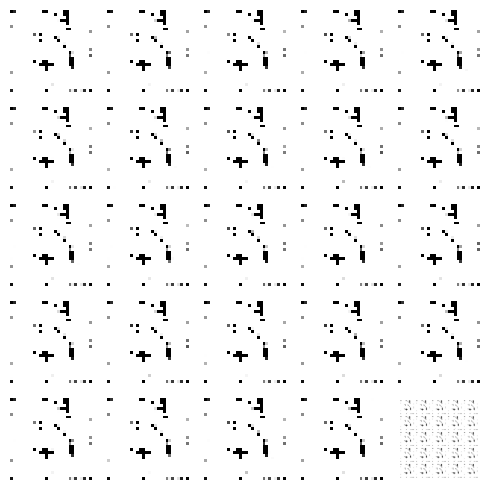

  0%|          | 0/350 [00:00<?, ?it/s]

4/4 [==============================] - 0s 16ms/step


  0%|          | 1/350 [00:00<03:09,  1.84it/s]

4/4 [==============================] - 0s 14ms/step


  1%|          | 2/350 [00:01<02:56,  1.97it/s]

4/4 [==============================] - 0s 30ms/step


  1%|          | 3/350 [00:01<03:14,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


  1%|          | 4/350 [00:02<03:03,  1.89it/s]

4/4 [==============================] - 0s 14ms/step


  1%|▏         | 5/350 [00:02<02:52,  2.00it/s]

4/4 [==============================] - 0s 28ms/step


  2%|▏         | 6/350 [00:03<02:55,  1.97it/s]

4/4 [==============================] - 0s 13ms/step


  2%|▏         | 7/350 [00:03<02:49,  2.03it/s]

4/4 [==============================] - 0s 18ms/step


  2%|▏         | 8/350 [00:04<02:50,  2.01it/s]

4/4 [==============================] - 0s 16ms/step


  3%|▎         | 9/350 [00:04<02:47,  2.03it/s]

4/4 [==============================] - 0s 17ms/step


  3%|▎         | 10/350 [00:05<02:49,  2.01it/s]

4/4 [==============================] - 0s 13ms/step


  3%|▎         | 11/350 [00:05<02:48,  2.01it/s]

4/4 [==============================] - 0s 13ms/step


  3%|▎         | 12/350 [00:06<02:42,  2.07it/s]

4/4 [==============================] - 0s 13ms/step


  4%|▎         | 13/350 [00:06<02:45,  2.03it/s]

4/4 [==============================] - 0s 13ms/step


  4%|▍         | 14/350 [00:06<02:40,  2.09it/s]

4/4 [==============================] - 0s 14ms/step


  4%|▍         | 15/350 [00:07<02:44,  2.03it/s]

4/4 [==============================] - 0s 14ms/step


  5%|▍         | 16/350 [00:07<02:39,  2.09it/s]

4/4 [==============================] - 0s 31ms/step


  5%|▍         | 17/350 [00:08<02:44,  2.02it/s]

4/4 [==============================] - 0s 13ms/step


  5%|▌         | 18/350 [00:08<02:40,  2.07it/s]

4/4 [==============================] - 0s 14ms/step


  5%|▌         | 19/350 [00:09<02:37,  2.11it/s]

4/4 [==============================] - 0s 14ms/step


  6%|▌         | 20/350 [00:09<02:41,  2.04it/s]

4/4 [==============================] - 0s 13ms/step


  6%|▌         | 21/350 [00:10<02:38,  2.08it/s]

4/4 [==============================] - 0s 21ms/step


  6%|▋         | 22/350 [00:11<02:54,  1.88it/s]

4/4 [==============================] - 0s 15ms/step


  7%|▋         | 23/350 [00:11<02:48,  1.94it/s]

4/4 [==============================] - 0s 12ms/step


  7%|▋         | 24/350 [00:12<02:48,  1.93it/s]

4/4 [==============================] - 0s 13ms/step


  7%|▋         | 25/350 [00:12<02:42,  2.00it/s]

4/4 [==============================] - 0s 16ms/step


  7%|▋         | 26/350 [00:12<02:43,  1.99it/s]

4/4 [==============================] - 0s 12ms/step


  8%|▊         | 27/350 [00:13<02:39,  2.02it/s]

4/4 [==============================] - 0s 14ms/step


  8%|▊         | 28/350 [00:13<02:35,  2.07it/s]

4/4 [==============================] - 0s 14ms/step


  8%|▊         | 29/350 [00:14<02:38,  2.03it/s]

4/4 [==============================] - 0s 13ms/step


  9%|▊         | 30/350 [00:14<02:32,  2.10it/s]

4/4 [==============================] - 0s 14ms/step


  9%|▉         | 31/350 [00:15<02:29,  2.14it/s]

4/4 [==============================] - 0s 35ms/step


  9%|▉         | 32/350 [00:15<02:39,  2.00it/s]

4/4 [==============================] - 0s 13ms/step


  9%|▉         | 33/350 [00:16<02:33,  2.07it/s]

4/4 [==============================] - 0s 14ms/step


 10%|▉         | 34/350 [00:16<02:28,  2.13it/s]

4/4 [==============================] - 0s 31ms/step


 10%|█         | 35/350 [00:17<02:32,  2.07it/s]

4/4 [==============================] - 0s 13ms/step


 10%|█         | 36/350 [00:17<02:33,  2.05it/s]

4/4 [==============================] - 0s 13ms/step


 11%|█         | 37/350 [00:18<02:38,  1.97it/s]

4/4 [==============================] - 0s 14ms/step


 11%|█         | 38/350 [00:18<02:36,  1.99it/s]

4/4 [==============================] - 0s 25ms/step


 11%|█         | 39/350 [00:19<02:53,  1.79it/s]

4/4 [==============================] - 0s 17ms/step


 11%|█▏        | 40/350 [00:20<02:48,  1.84it/s]

4/4 [==============================] - 0s 12ms/step


 12%|█▏        | 41/350 [00:20<02:51,  1.80it/s]

4/4 [==============================] - 0s 17ms/step


 12%|█▏        | 42/350 [00:21<02:49,  1.82it/s]

4/4 [==============================] - 0s 16ms/step


 12%|█▏        | 43/350 [00:21<02:54,  1.76it/s]

4/4 [==============================] - 0s 15ms/step


 13%|█▎        | 44/350 [00:22<02:47,  1.82it/s]

4/4 [==============================] - 0s 20ms/step


 13%|█▎        | 45/350 [00:22<02:48,  1.81it/s]

4/4 [==============================] - 0s 13ms/step


 13%|█▎        | 46/350 [00:23<02:39,  1.90it/s]

4/4 [==============================] - 0s 13ms/step


 13%|█▎        | 47/350 [00:23<02:33,  1.98it/s]

4/4 [==============================] - 0s 22ms/step


 14%|█▎        | 48/350 [00:24<02:36,  1.93it/s]

4/4 [==============================] - 0s 13ms/step


 14%|█▍        | 49/350 [00:24<02:30,  2.00it/s]

4/4 [==============================] - 0s 13ms/step


 14%|█▍        | 50/350 [00:25<02:32,  1.97it/s]

4/4 [==============================] - 0s 14ms/step


 15%|█▍        | 51/350 [00:25<02:29,  2.00it/s]

4/4 [==============================] - 0s 12ms/step


 15%|█▍        | 52/350 [00:26<02:31,  1.97it/s]

4/4 [==============================] - 0s 13ms/step


 15%|█▌        | 53/350 [00:26<02:26,  2.03it/s]

4/4 [==============================] - 0s 12ms/step


 15%|█▌        | 54/350 [00:27<02:23,  2.06it/s]

4/4 [==============================] - 0s 22ms/step


 16%|█▌        | 55/350 [00:27<02:27,  2.01it/s]

4/4 [==============================] - 0s 13ms/step


 16%|█▌        | 56/350 [00:28<02:23,  2.06it/s]

4/4 [==============================] - 0s 13ms/step


 16%|█▋        | 57/350 [00:28<02:26,  2.00it/s]

4/4 [==============================] - 0s 13ms/step


 17%|█▋        | 58/350 [00:29<02:21,  2.06it/s]

4/4 [==============================] - 0s 13ms/step


 17%|█▋        | 59/350 [00:29<02:19,  2.08it/s]

4/4 [==============================] - 0s 19ms/step


 17%|█▋        | 60/350 [00:30<02:21,  2.05it/s]

4/4 [==============================] - 0s 16ms/step


 17%|█▋        | 61/350 [00:30<02:19,  2.08it/s]

4/4 [==============================] - 0s 12ms/step


 18%|█▊        | 62/350 [00:31<02:22,  2.02it/s]

4/4 [==============================] - 0s 14ms/step


 18%|█▊        | 63/350 [00:31<02:21,  2.02it/s]

4/4 [==============================] - 0s 15ms/step


 18%|█▊        | 64/350 [00:32<02:25,  1.97it/s]

4/4 [==============================] - 0s 13ms/step


 19%|█▊        | 65/350 [00:32<02:21,  2.01it/s]

4/4 [==============================] - 0s 13ms/step


 19%|█▉        | 66/350 [00:33<02:22,  2.00it/s]

4/4 [==============================] - 0s 14ms/step


 19%|█▉        | 67/350 [00:33<02:19,  2.02it/s]

4/4 [==============================] - 0s 12ms/step


 19%|█▉        | 68/350 [00:34<02:16,  2.07it/s]

4/4 [==============================] - 0s 16ms/step


 20%|█▉        | 69/350 [00:34<02:20,  2.01it/s]

4/4 [==============================] - 0s 12ms/step


 20%|██        | 70/350 [00:35<02:16,  2.06it/s]

4/4 [==============================] - 0s 14ms/step


 20%|██        | 71/350 [00:35<02:21,  1.97it/s]

4/4 [==============================] - 0s 15ms/step


 21%|██        | 72/350 [00:36<02:23,  1.93it/s]

4/4 [==============================] - 0s 14ms/step


 21%|██        | 73/350 [00:36<02:19,  1.98it/s]

4/4 [==============================] - 0s 27ms/step


 21%|██        | 74/350 [00:37<02:20,  1.96it/s]

4/4 [==============================] - 0s 13ms/step


 21%|██▏       | 75/350 [00:37<02:17,  2.00it/s]

4/4 [==============================] - 0s 12ms/step


 22%|██▏       | 76/350 [00:38<02:18,  1.98it/s]

4/4 [==============================] - 0s 13ms/step


 22%|██▏       | 77/350 [00:38<02:14,  2.03it/s]

4/4 [==============================] - 0s 13ms/step


 22%|██▏       | 78/350 [00:39<02:12,  2.05it/s]

4/4 [==============================] - 0s 15ms/step


 23%|██▎       | 79/350 [00:39<02:16,  1.99it/s]

4/4 [==============================] - 0s 14ms/step


 23%|██▎       | 80/350 [00:40<02:13,  2.03it/s]

4/4 [==============================] - 0s 15ms/step


 23%|██▎       | 81/350 [00:40<02:17,  1.96it/s]

4/4 [==============================] - 0s 13ms/step


 23%|██▎       | 82/350 [00:41<02:13,  2.00it/s]

4/4 [==============================] - 0s 12ms/step


 24%|██▎       | 83/350 [00:41<02:14,  1.99it/s]

4/4 [==============================] - 0s 20ms/step


 24%|██▍       | 84/350 [00:42<02:15,  1.97it/s]

4/4 [==============================] - 0s 16ms/step


 24%|██▍       | 85/350 [00:42<02:15,  1.96it/s]

4/4 [==============================] - 0s 16ms/step


 25%|██▍       | 86/350 [00:43<02:12,  2.00it/s]

4/4 [==============================] - 0s 30ms/step


 25%|██▍       | 87/350 [00:43<02:13,  1.98it/s]

4/4 [==============================] - 0s 12ms/step


 25%|██▌       | 88/350 [00:44<02:07,  2.06it/s]

4/4 [==============================] - 0s 12ms/step


 25%|██▌       | 89/350 [00:44<02:08,  2.03it/s]

4/4 [==============================] - 0s 13ms/step


 26%|██▌       | 90/350 [00:45<02:04,  2.09it/s]

4/4 [==============================] - 0s 13ms/step


 26%|██▌       | 91/350 [00:45<02:08,  2.02it/s]

4/4 [==============================] - 0s 13ms/step


 26%|██▋       | 92/350 [00:46<02:03,  2.09it/s]

4/4 [==============================] - 0s 12ms/step


 27%|██▋       | 93/350 [00:46<02:04,  2.06it/s]

4/4 [==============================] - 0s 13ms/step


 27%|██▋       | 94/350 [00:47<02:00,  2.12it/s]

4/4 [==============================] - 0s 13ms/step


 27%|██▋       | 95/350 [00:47<02:02,  2.08it/s]

4/4 [==============================] - 0s 12ms/step


 27%|██▋       | 96/350 [00:47<01:58,  2.14it/s]

4/4 [==============================] - 0s 13ms/step


 28%|██▊       | 97/350 [00:48<01:59,  2.11it/s]

4/4 [==============================] - 0s 14ms/step


 28%|██▊       | 98/350 [00:48<01:56,  2.16it/s]

4/4 [==============================] - 0s 12ms/step


 28%|██▊       | 99/350 [00:49<01:58,  2.11it/s]

4/4 [==============================] - 0s 18ms/step


 29%|██▊       | 100/350 [00:49<01:57,  2.13it/s]

4/4 [==============================] - 0s 12ms/step


 29%|██▉       | 101/350 [00:50<01:58,  2.09it/s]

4/4 [==============================] - 0s 14ms/step


 29%|██▉       | 102/350 [00:50<01:55,  2.15it/s]

4/4 [==============================] - 0s 13ms/step


 29%|██▉       | 103/350 [00:51<01:53,  2.18it/s]

4/4 [==============================] - 0s 21ms/step


 30%|██▉       | 104/350 [00:51<01:55,  2.14it/s]

4/4 [==============================] - 0s 12ms/step


 30%|███       | 105/350 [00:52<01:53,  2.15it/s]

4/4 [==============================] - 0s 19ms/step


 30%|███       | 106/350 [00:52<01:57,  2.08it/s]

4/4 [==============================] - 0s 14ms/step


 31%|███       | 107/350 [00:53<01:56,  2.08it/s]

4/4 [==============================] - 0s 13ms/step


 31%|███       | 108/350 [00:53<01:55,  2.10it/s]

4/4 [==============================] - 0s 29ms/step


 31%|███       | 109/350 [00:54<01:57,  2.04it/s]

4/4 [==============================] - 0s 13ms/step


 31%|███▏      | 110/350 [00:54<01:55,  2.08it/s]

4/4 [==============================] - 0s 13ms/step


 32%|███▏      | 111/350 [00:55<01:55,  2.07it/s]

4/4 [==============================] - 0s 13ms/step


 32%|███▏      | 112/350 [00:55<01:53,  2.09it/s]

4/4 [==============================] - 0s 18ms/step


 32%|███▏      | 113/350 [00:56<01:52,  2.11it/s]

4/4 [==============================] - 0s 16ms/step


 33%|███▎      | 114/350 [00:56<01:53,  2.07it/s]

4/4 [==============================] - 0s 13ms/step


 33%|███▎      | 115/350 [00:57<01:54,  2.06it/s]

4/4 [==============================] - 0s 32ms/step


 33%|███▎      | 116/350 [00:57<01:57,  2.00it/s]

4/4 [==============================] - 0s 26ms/step


 33%|███▎      | 117/350 [00:58<01:56,  1.99it/s]

4/4 [==============================] - 0s 14ms/step


 34%|███▎      | 118/350 [00:58<01:58,  1.95it/s]

4/4 [==============================] - 0s 18ms/step


 34%|███▍      | 119/350 [00:59<02:06,  1.83it/s]

4/4 [==============================] - 0s 18ms/step


 34%|███▍      | 120/350 [00:59<02:15,  1.70it/s]

4/4 [==============================] - 0s 13ms/step


 35%|███▍      | 121/350 [01:00<02:04,  1.84it/s]

4/4 [==============================] - 0s 15ms/step


 35%|███▍      | 122/350 [01:00<02:00,  1.89it/s]

4/4 [==============================] - 0s 10ms/step


 35%|███▌      | 123/350 [01:01<02:11,  1.73it/s]

4/4 [==============================] - 0s 16ms/step


 35%|███▌      | 124/350 [01:02<02:04,  1.82it/s]

4/4 [==============================] - 0s 24ms/step


 36%|███▌      | 125/350 [01:02<02:01,  1.85it/s]

4/4 [==============================] - 0s 15ms/step


 36%|███▌      | 126/350 [01:03<01:57,  1.90it/s]

4/4 [==============================] - 0s 13ms/step


 36%|███▋      | 127/350 [01:03<01:57,  1.90it/s]

4/4 [==============================] - 0s 12ms/step


 37%|███▋      | 128/350 [01:04<01:56,  1.91it/s]

4/4 [==============================] - 0s 14ms/step


 37%|███▋      | 129/350 [01:04<01:52,  1.96it/s]

4/4 [==============================] - 0s 26ms/step


 37%|███▋      | 130/350 [01:05<01:52,  1.96it/s]

4/4 [==============================] - 0s 13ms/step


 37%|███▋      | 131/350 [01:05<01:48,  2.01it/s]

4/4 [==============================] - 0s 15ms/step


 38%|███▊      | 132/350 [01:06<01:50,  1.98it/s]

4/4 [==============================] - 0s 15ms/step


 38%|███▊      | 133/350 [01:06<01:48,  2.01it/s]

4/4 [==============================] - 0s 44ms/step


 38%|███▊      | 134/350 [01:07<01:52,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


 39%|███▊      | 135/350 [01:07<01:48,  1.99it/s]

4/4 [==============================] - 0s 15ms/step


 39%|███▉      | 136/350 [01:08<01:49,  1.96it/s]

4/4 [==============================] - 0s 14ms/step


 39%|███▉      | 137/350 [01:08<01:45,  2.02it/s]

4/4 [==============================] - 0s 15ms/step


 39%|███▉      | 138/350 [01:09<01:46,  2.00it/s]

4/4 [==============================] - 0s 19ms/step


 40%|███▉      | 139/350 [01:09<01:44,  2.01it/s]

4/4 [==============================] - 0s 13ms/step


 40%|████      | 140/350 [01:10<01:45,  1.99it/s]

4/4 [==============================] - 0s 13ms/step


 40%|████      | 141/350 [01:10<01:42,  2.04it/s]

4/4 [==============================] - 0s 29ms/step


 41%|████      | 142/350 [01:11<01:44,  2.00it/s]

4/4 [==============================] - 0s 15ms/step


 41%|████      | 143/350 [01:11<01:42,  2.01it/s]

4/4 [==============================] - 0s 25ms/step


 41%|████      | 144/350 [01:12<01:43,  1.99it/s]

4/4 [==============================] - 0s 15ms/step


 41%|████▏     | 145/350 [01:12<01:41,  2.03it/s]

4/4 [==============================] - 0s 29ms/step


 42%|████▏     | 146/350 [01:13<01:42,  1.99it/s]

4/4 [==============================] - 0s 12ms/step


 42%|████▏     | 147/350 [01:13<01:40,  2.03it/s]

4/4 [==============================] - 0s 14ms/step


 42%|████▏     | 148/350 [01:14<01:40,  2.01it/s]

4/4 [==============================] - 0s 13ms/step


 43%|████▎     | 149/350 [01:14<01:37,  2.06it/s]

4/4 [==============================] - 0s 14ms/step


 43%|████▎     | 150/350 [01:15<01:44,  1.91it/s]

4/4 [==============================] - 0s 13ms/step


 43%|████▎     | 151/350 [01:15<01:41,  1.97it/s]

4/4 [==============================] - 0s 15ms/step


 43%|████▎     | 152/350 [01:16<01:42,  1.94it/s]

4/4 [==============================] - 0s 12ms/step


 44%|████▎     | 153/350 [01:16<01:37,  2.02it/s]

4/4 [==============================] - 0s 23ms/step


 44%|████▍     | 154/350 [01:17<01:39,  1.96it/s]

4/4 [==============================] - 0s 13ms/step


 44%|████▍     | 155/350 [01:17<01:35,  2.03it/s]

4/4 [==============================] - 0s 15ms/step


 45%|████▍     | 156/350 [01:18<01:36,  2.01it/s]

4/4 [==============================] - 0s 14ms/step


 45%|████▍     | 157/350 [01:18<01:34,  2.04it/s]

4/4 [==============================] - 0s 17ms/step


 45%|████▌     | 158/350 [01:19<01:35,  2.01it/s]

4/4 [==============================] - 0s 19ms/step


 45%|████▌     | 159/350 [01:19<01:37,  1.96it/s]

4/4 [==============================] - 0s 13ms/step


 46%|████▌     | 160/350 [01:20<01:38,  1.93it/s]

4/4 [==============================] - 0s 14ms/step


 46%|████▌     | 161/350 [01:20<01:34,  2.00it/s]

4/4 [==============================] - 0s 21ms/step


 46%|████▋     | 162/350 [01:21<01:35,  1.97it/s]

4/4 [==============================] - 0s 13ms/step


 47%|████▋     | 163/350 [01:21<01:32,  2.01it/s]

4/4 [==============================] - 0s 14ms/step


 47%|████▋     | 164/350 [01:22<01:34,  1.96it/s]

4/4 [==============================] - 0s 17ms/step


 47%|████▋     | 165/350 [01:22<01:33,  1.97it/s]

4/4 [==============================] - 0s 28ms/step


 47%|████▋     | 166/350 [01:23<01:34,  1.94it/s]

4/4 [==============================] - 0s 14ms/step


 48%|████▊     | 167/350 [01:23<01:30,  2.01it/s]

4/4 [==============================] - 0s 23ms/step


 48%|████▊     | 168/350 [01:24<01:30,  2.01it/s]

4/4 [==============================] - 0s 14ms/step


 48%|████▊     | 169/350 [01:24<01:27,  2.07it/s]

4/4 [==============================] - 0s 13ms/step


 49%|████▊     | 170/350 [01:25<01:27,  2.05it/s]

4/4 [==============================] - 0s 13ms/step


 49%|████▉     | 171/350 [01:25<01:25,  2.09it/s]

4/4 [==============================] - 0s 15ms/step


 49%|████▉     | 172/350 [01:25<01:25,  2.08it/s]

4/4 [==============================] - 0s 14ms/step


 49%|████▉     | 173/350 [01:26<01:23,  2.12it/s]

4/4 [==============================] - 0s 13ms/step


 50%|████▉     | 174/350 [01:26<01:24,  2.08it/s]

4/4 [==============================] - 0s 14ms/step


 50%|█████     | 175/350 [01:27<01:22,  2.13it/s]

4/4 [==============================] - 0s 27ms/step


 50%|█████     | 176/350 [01:27<01:23,  2.10it/s]

4/4 [==============================] - 0s 12ms/step


 51%|█████     | 177/350 [01:28<01:20,  2.15it/s]

4/4 [==============================] - 0s 33ms/step


 51%|█████     | 178/350 [01:28<01:22,  2.07it/s]

4/4 [==============================] - 0s 13ms/step


 51%|█████     | 179/350 [01:29<01:22,  2.06it/s]

4/4 [==============================] - 0s 14ms/step


 51%|█████▏    | 180/350 [01:29<01:20,  2.12it/s]

4/4 [==============================] - 0s 13ms/step


 52%|█████▏    | 181/350 [01:30<01:21,  2.09it/s]

4/4 [==============================] - 0s 13ms/step


 52%|█████▏    | 182/350 [01:30<01:18,  2.13it/s]

4/4 [==============================] - 0s 21ms/step


 52%|█████▏    | 183/350 [01:31<01:20,  2.09it/s]

4/4 [==============================] - 0s 13ms/step


 53%|█████▎    | 184/350 [01:31<01:17,  2.13it/s]

4/4 [==============================] - 0s 14ms/step


 53%|█████▎    | 185/350 [01:32<01:18,  2.10it/s]

4/4 [==============================] - 0s 13ms/step


 53%|█████▎    | 186/350 [01:32<01:17,  2.13it/s]

4/4 [==============================] - 0s 21ms/step


 53%|█████▎    | 187/350 [01:33<01:17,  2.09it/s]

4/4 [==============================] - 0s 13ms/step


 54%|█████▎    | 188/350 [01:33<01:15,  2.14it/s]

4/4 [==============================] - 0s 29ms/step


 54%|█████▍    | 189/350 [01:34<01:16,  2.09it/s]

4/4 [==============================] - 0s 14ms/step


 54%|█████▍    | 190/350 [01:34<01:15,  2.13it/s]

4/4 [==============================] - 0s 15ms/step


 55%|█████▍    | 191/350 [01:35<01:17,  2.06it/s]

4/4 [==============================] - 0s 13ms/step


 55%|█████▍    | 192/350 [01:35<01:14,  2.12it/s]

4/4 [==============================] - 0s 13ms/step


 55%|█████▌    | 193/350 [01:35<01:15,  2.08it/s]

4/4 [==============================] - 0s 15ms/step


 55%|█████▌    | 194/350 [01:36<01:13,  2.12it/s]

4/4 [==============================] - 0s 19ms/step


 56%|█████▌    | 195/350 [01:36<01:14,  2.09it/s]

4/4 [==============================] - 0s 14ms/step


 56%|█████▌    | 196/350 [01:37<01:12,  2.14it/s]

4/4 [==============================] - 0s 14ms/step


 56%|█████▋    | 197/350 [01:37<01:13,  2.08it/s]

4/4 [==============================] - 0s 13ms/step


 57%|█████▋    | 198/350 [01:38<01:11,  2.13it/s]

4/4 [==============================] - 0s 14ms/step


 57%|█████▋    | 199/350 [01:38<01:12,  2.08it/s]

4/4 [==============================] - 0s 14ms/step


 57%|█████▋    | 200/350 [01:39<01:10,  2.12it/s]

4/4 [==============================] - 0s 28ms/step


 57%|█████▋    | 201/350 [01:39<01:11,  2.08it/s]

4/4 [==============================] - 0s 13ms/step


 58%|█████▊    | 202/350 [01:40<01:09,  2.14it/s]

4/4 [==============================] - 0s 13ms/step


 58%|█████▊    | 203/350 [01:40<01:10,  2.08it/s]

4/4 [==============================] - 0s 15ms/step


 58%|█████▊    | 204/350 [01:41<01:08,  2.12it/s]

4/4 [==============================] - 0s 14ms/step


 59%|█████▊    | 205/350 [01:41<01:10,  2.07it/s]

4/4 [==============================] - 0s 14ms/step


 59%|█████▉    | 206/350 [01:42<01:07,  2.13it/s]

4/4 [==============================] - 0s 12ms/step


 59%|█████▉    | 207/350 [01:42<01:08,  2.08it/s]

4/4 [==============================] - 0s 14ms/step


 59%|█████▉    | 208/350 [01:43<01:07,  2.10it/s]

4/4 [==============================] - 0s 13ms/step


 60%|█████▉    | 209/350 [01:43<01:08,  2.05it/s]

4/4 [==============================] - 0s 12ms/step


 60%|██████    | 210/350 [01:44<01:06,  2.11it/s]

4/4 [==============================] - 0s 14ms/step


 60%|██████    | 211/350 [01:44<01:07,  2.07it/s]

4/4 [==============================] - 0s 14ms/step


 61%|██████    | 212/350 [01:44<01:04,  2.13it/s]

4/4 [==============================] - 0s 13ms/step


 61%|██████    | 213/350 [01:45<01:05,  2.08it/s]

4/4 [==============================] - 0s 13ms/step


 61%|██████    | 214/350 [01:45<01:03,  2.13it/s]

4/4 [==============================] - 0s 13ms/step


 61%|██████▏   | 215/350 [01:46<01:04,  2.09it/s]

4/4 [==============================] - 0s 14ms/step


 62%|██████▏   | 216/350 [01:46<01:02,  2.13it/s]

4/4 [==============================] - 0s 15ms/step


 62%|██████▏   | 217/350 [01:47<01:04,  2.06it/s]

4/4 [==============================] - 0s 13ms/step


 62%|██████▏   | 218/350 [01:47<01:02,  2.11it/s]

4/4 [==============================] - 0s 13ms/step


 63%|██████▎   | 219/350 [01:48<01:03,  2.06it/s]

4/4 [==============================] - 0s 14ms/step


 63%|██████▎   | 220/350 [01:48<01:01,  2.10it/s]

4/4 [==============================] - 0s 28ms/step


 63%|██████▎   | 221/350 [01:49<01:02,  2.06it/s]

4/4 [==============================] - 0s 14ms/step


 63%|██████▎   | 222/350 [01:49<01:00,  2.11it/s]

4/4 [==============================] - 0s 13ms/step


 64%|██████▎   | 223/350 [01:50<01:01,  2.08it/s]

4/4 [==============================] - 0s 14ms/step


 64%|██████▍   | 224/350 [01:50<00:59,  2.12it/s]

4/4 [==============================] - 0s 20ms/step


 64%|██████▍   | 225/350 [01:51<01:00,  2.08it/s]

4/4 [==============================] - 0s 14ms/step


 65%|██████▍   | 226/350 [01:51<00:58,  2.11it/s]

4/4 [==============================] - 0s 14ms/step


 65%|██████▍   | 227/350 [01:52<01:00,  2.04it/s]

4/4 [==============================] - 0s 14ms/step


 65%|██████▌   | 228/350 [01:52<01:00,  2.03it/s]

4/4 [==============================] - 0s 20ms/step


 65%|██████▌   | 229/350 [01:53<01:00,  1.99it/s]

4/4 [==============================] - 0s 16ms/step


 66%|██████▌   | 230/350 [01:53<00:59,  2.03it/s]

4/4 [==============================] - 0s 13ms/step


 66%|██████▌   | 231/350 [01:54<00:59,  2.00it/s]

4/4 [==============================] - 0s 14ms/step


 66%|██████▋   | 232/350 [01:54<00:58,  2.03it/s]

4/4 [==============================] - 0s 24ms/step


 67%|██████▋   | 233/350 [01:55<00:59,  1.98it/s]

4/4 [==============================] - 0s 14ms/step


 67%|██████▋   | 234/350 [01:55<00:57,  2.03it/s]

4/4 [==============================] - 0s 14ms/step


 67%|██████▋   | 235/350 [01:56<00:57,  1.99it/s]

4/4 [==============================] - 0s 16ms/step


 67%|██████▋   | 236/350 [01:56<00:56,  2.02it/s]

4/4 [==============================] - 0s 13ms/step


 68%|██████▊   | 237/350 [01:57<00:56,  2.00it/s]

4/4 [==============================] - 0s 14ms/step


 68%|██████▊   | 238/350 [01:57<00:54,  2.06it/s]

4/4 [==============================] - 0s 24ms/step


 68%|██████▊   | 239/350 [01:58<00:55,  1.99it/s]

4/4 [==============================] - 0s 15ms/step


 69%|██████▊   | 240/350 [01:58<00:56,  1.96it/s]

4/4 [==============================] - 0s 30ms/step


 69%|██████▉   | 241/350 [01:59<00:56,  1.94it/s]

4/4 [==============================] - 0s 13ms/step


 69%|██████▉   | 242/350 [01:59<00:54,  2.00it/s]

4/4 [==============================] - 0s 13ms/step


 69%|██████▉   | 243/350 [02:00<00:54,  1.95it/s]

4/4 [==============================] - 0s 14ms/step


 70%|██████▉   | 244/350 [02:00<00:52,  2.02it/s]

4/4 [==============================] - 0s 21ms/step


 70%|███████   | 245/350 [02:01<00:52,  2.01it/s]

4/4 [==============================] - 0s 14ms/step


 70%|███████   | 246/350 [02:01<00:50,  2.07it/s]

4/4 [==============================] - 0s 14ms/step


 71%|███████   | 247/350 [02:02<00:50,  2.02it/s]

4/4 [==============================] - 0s 14ms/step


 71%|███████   | 248/350 [02:02<00:49,  2.08it/s]

4/4 [==============================] - 0s 13ms/step


 71%|███████   | 249/350 [02:03<00:49,  2.05it/s]

4/4 [==============================] - 0s 13ms/step


 71%|███████▏  | 250/350 [02:03<00:47,  2.10it/s]

4/4 [==============================] - 0s 31ms/step


 72%|███████▏  | 251/350 [02:04<00:48,  2.06it/s]

4/4 [==============================] - 0s 14ms/step


 72%|███████▏  | 252/350 [02:04<00:48,  2.03it/s]

4/4 [==============================] - 0s 13ms/step


 72%|███████▏  | 253/350 [02:05<00:47,  2.06it/s]

4/4 [==============================] - 0s 29ms/step


 73%|███████▎  | 254/350 [02:05<00:48,  2.00it/s]

4/4 [==============================] - 0s 18ms/step


 73%|███████▎  | 255/350 [02:06<00:46,  2.02it/s]

4/4 [==============================] - 0s 14ms/step


 73%|███████▎  | 256/350 [02:06<00:47,  1.99it/s]

4/4 [==============================] - 0s 14ms/step


 73%|███████▎  | 257/350 [02:07<00:45,  2.06it/s]

4/4 [==============================] - 0s 13ms/step


 74%|███████▎  | 258/350 [02:07<00:45,  2.02it/s]

4/4 [==============================] - 0s 15ms/step


 74%|███████▍  | 259/350 [02:08<00:44,  2.06it/s]

4/4 [==============================] - 0s 29ms/step


 74%|███████▍  | 260/350 [02:08<00:44,  2.02it/s]

4/4 [==============================] - 0s 14ms/step


 75%|███████▍  | 261/350 [02:08<00:42,  2.08it/s]

4/4 [==============================] - 0s 13ms/step


 75%|███████▍  | 262/350 [02:09<00:43,  2.03it/s]

4/4 [==============================] - 0s 14ms/step


 75%|███████▌  | 263/350 [02:09<00:42,  2.07it/s]

4/4 [==============================] - 0s 14ms/step


 75%|███████▌  | 264/350 [02:10<00:42,  2.02it/s]

4/4 [==============================] - 0s 14ms/step


 76%|███████▌  | 265/350 [02:10<00:41,  2.06it/s]

4/4 [==============================] - 0s 15ms/step


 76%|███████▌  | 266/350 [02:11<00:41,  2.00it/s]

4/4 [==============================] - 0s 13ms/step


 76%|███████▋  | 267/350 [02:11<00:40,  2.03it/s]

4/4 [==============================] - 0s 14ms/step


 77%|███████▋  | 268/350 [02:12<00:41,  1.98it/s]

4/4 [==============================] - 0s 14ms/step


 77%|███████▋  | 269/350 [02:12<00:40,  2.02it/s]

4/4 [==============================] - 0s 13ms/step


 77%|███████▋  | 270/350 [02:13<00:40,  2.00it/s]

4/4 [==============================] - 0s 14ms/step


 77%|███████▋  | 271/350 [02:13<00:38,  2.05it/s]

4/4 [==============================] - 0s 15ms/step


 78%|███████▊  | 272/350 [02:14<00:39,  1.99it/s]

4/4 [==============================] - 0s 14ms/step


 78%|███████▊  | 273/350 [02:14<00:38,  2.02it/s]

4/4 [==============================] - 0s 27ms/step


 78%|███████▊  | 274/350 [02:15<00:38,  1.99it/s]

4/4 [==============================] - 0s 15ms/step


 79%|███████▊  | 275/350 [02:15<00:36,  2.03it/s]

4/4 [==============================] - 0s 14ms/step


 79%|███████▉  | 276/350 [02:16<00:37,  1.97it/s]

4/4 [==============================] - 0s 15ms/step


 79%|███████▉  | 277/350 [02:16<00:36,  2.01it/s]

4/4 [==============================] - 0s 30ms/step


 79%|███████▉  | 278/350 [02:17<00:36,  1.97it/s]

4/4 [==============================] - 0s 13ms/step


 80%|███████▉  | 279/350 [02:18<00:36,  1.94it/s]

4/4 [==============================] - 0s 17ms/step


 80%|████████  | 280/350 [02:18<00:35,  1.97it/s]

4/4 [==============================] - 0s 14ms/step


 80%|████████  | 281/350 [02:19<00:35,  1.95it/s]

4/4 [==============================] - 0s 15ms/step


 81%|████████  | 282/350 [02:19<00:34,  2.00it/s]

4/4 [==============================] - 0s 15ms/step


 81%|████████  | 283/350 [02:20<00:34,  1.96it/s]

4/4 [==============================] - 0s 14ms/step


 81%|████████  | 284/350 [02:20<00:32,  2.01it/s]

4/4 [==============================] - 0s 31ms/step


 81%|████████▏ | 285/350 [02:21<00:32,  1.98it/s]

4/4 [==============================] - 0s 14ms/step


 82%|████████▏ | 286/350 [02:21<00:31,  2.01it/s]

4/4 [==============================] - 0s 30ms/step


 82%|████████▏ | 287/350 [02:22<00:31,  1.97it/s]

4/4 [==============================] - 0s 15ms/step


 82%|████████▏ | 288/350 [02:22<00:32,  1.91it/s]

4/4 [==============================] - 0s 21ms/step


 83%|████████▎ | 289/350 [02:23<00:33,  1.80it/s]

4/4 [==============================] - 0s 14ms/step


 83%|████████▎ | 290/350 [02:23<00:32,  1.82it/s]

4/4 [==============================] - 0s 15ms/step


 83%|████████▎ | 291/350 [02:24<00:31,  1.85it/s]

4/4 [==============================] - 0s 21ms/step


 83%|████████▎ | 292/350 [02:24<00:32,  1.80it/s]

4/4 [==============================] - 0s 14ms/step


 84%|████████▎ | 293/350 [02:25<00:32,  1.75it/s]

4/4 [==============================] - 0s 15ms/step


 84%|████████▍ | 294/350 [02:26<00:32,  1.71it/s]

4/4 [==============================] - 0s 19ms/step


 84%|████████▍ | 295/350 [02:26<00:32,  1.70it/s]

4/4 [==============================] - 0s 14ms/step


 85%|████████▍ | 296/350 [02:27<00:31,  1.74it/s]

4/4 [==============================] - 0s 15ms/step


 85%|████████▍ | 297/350 [02:27<00:29,  1.82it/s]

4/4 [==============================] - 0s 14ms/step


 85%|████████▌ | 298/350 [02:28<00:28,  1.83it/s]

4/4 [==============================] - 0s 16ms/step


 85%|████████▌ | 299/350 [02:28<00:27,  1.89it/s]

4/4 [==============================] - 0s 27ms/step


 86%|████████▌ | 300/350 [02:29<00:26,  1.89it/s]

4/4 [==============================] - 0s 15ms/step


 86%|████████▌ | 301/350 [02:29<00:25,  1.94it/s]

4/4 [==============================] - 0s 14ms/step


 86%|████████▋ | 302/350 [02:30<00:24,  1.93it/s]

4/4 [==============================] - 0s 17ms/step


 87%|████████▋ | 303/350 [02:30<00:24,  1.96it/s]

4/4 [==============================] - 0s 34ms/step


 87%|████████▋ | 304/350 [02:31<00:24,  1.89it/s]

4/4 [==============================] - 0s 17ms/step


 87%|████████▋ | 305/350 [02:32<00:24,  1.80it/s]

4/4 [==============================] - 0s 15ms/step


 87%|████████▋ | 306/350 [02:32<00:24,  1.80it/s]

4/4 [==============================] - 0s 16ms/step


 88%|████████▊ | 307/350 [02:33<00:22,  1.88it/s]

4/4 [==============================] - 0s 14ms/step


 88%|████████▊ | 308/350 [02:33<00:22,  1.86it/s]

4/4 [==============================] - 0s 13ms/step


 88%|████████▊ | 309/350 [02:34<00:21,  1.95it/s]

4/4 [==============================] - 0s 14ms/step


 89%|████████▊ | 310/350 [02:34<00:20,  1.95it/s]

4/4 [==============================] - 0s 14ms/step


 89%|████████▉ | 311/350 [02:35<00:20,  1.87it/s]

4/4 [==============================] - 0s 20ms/step


 89%|████████▉ | 312/350 [02:35<00:21,  1.81it/s]

4/4 [==============================] - 0s 17ms/step


 89%|████████▉ | 313/350 [02:36<00:21,  1.73it/s]

4/4 [==============================] - 0s 16ms/step


 90%|████████▉ | 314/350 [02:36<00:21,  1.71it/s]

4/4 [==============================] - 0s 13ms/step


 90%|█████████ | 315/350 [02:37<00:20,  1.74it/s]

4/4 [==============================] - 0s 18ms/step


 90%|█████████ | 316/350 [02:38<00:19,  1.73it/s]

4/4 [==============================] - 0s 15ms/step


 91%|█████████ | 317/350 [02:38<00:19,  1.73it/s]

4/4 [==============================] - 0s 14ms/step


 91%|█████████ | 318/350 [02:39<00:17,  1.83it/s]

4/4 [==============================] - 0s 16ms/step


 91%|█████████ | 319/350 [02:39<00:16,  1.84it/s]

4/4 [==============================] - 0s 14ms/step


 91%|█████████▏| 320/350 [02:40<00:15,  1.90it/s]

4/4 [==============================] - 0s 14ms/step


 92%|█████████▏| 321/350 [02:40<00:15,  1.90it/s]

4/4 [==============================] - 0s 14ms/step


 92%|█████████▏| 322/350 [02:41<00:14,  1.97it/s]

4/4 [==============================] - 0s 15ms/step


 92%|█████████▏| 323/350 [02:41<00:13,  1.95it/s]

4/4 [==============================] - 0s 14ms/step


 93%|█████████▎| 324/350 [02:42<00:12,  2.01it/s]

4/4 [==============================] - 0s 14ms/step


 93%|█████████▎| 325/350 [02:42<00:12,  1.96it/s]

4/4 [==============================] - 0s 14ms/step


 93%|█████████▎| 326/350 [02:43<00:11,  2.01it/s]

4/4 [==============================] - 0s 33ms/step


 93%|█████████▎| 327/350 [02:43<00:11,  1.98it/s]

4/4 [==============================] - 0s 14ms/step


 94%|█████████▎| 328/350 [02:44<00:10,  2.02it/s]

4/4 [==============================] - 0s 20ms/step


 94%|█████████▍| 329/350 [02:44<00:10,  1.97it/s]

4/4 [==============================] - 0s 17ms/step


 94%|█████████▍| 330/350 [02:45<00:10,  2.00it/s]

4/4 [==============================] - 0s 25ms/step


 95%|█████████▍| 331/350 [02:45<00:09,  1.96it/s]

4/4 [==============================] - 0s 12ms/step


 95%|█████████▍| 332/350 [02:46<00:08,  2.02it/s]

4/4 [==============================] - 0s 14ms/step


 95%|█████████▌| 333/350 [02:46<00:08,  1.97it/s]

4/4 [==============================] - 0s 14ms/step


 95%|█████████▌| 334/350 [02:47<00:07,  2.02it/s]

4/4 [==============================] - 0s 16ms/step


 96%|█████████▌| 335/350 [02:47<00:07,  1.98it/s]

4/4 [==============================] - 0s 14ms/step


 96%|█████████▌| 336/350 [02:48<00:06,  2.00it/s]

4/4 [==============================] - 0s 31ms/step


 96%|█████████▋| 337/350 [02:48<00:06,  1.96it/s]

4/4 [==============================] - 0s 14ms/step


 97%|█████████▋| 338/350 [02:49<00:05,  2.02it/s]

4/4 [==============================] - 0s 16ms/step


 97%|█████████▋| 339/350 [02:49<00:05,  1.97it/s]

4/4 [==============================] - 0s 16ms/step


 97%|█████████▋| 340/350 [02:50<00:05,  1.91it/s]

4/4 [==============================] - 0s 14ms/step


 97%|█████████▋| 341/350 [02:50<00:04,  1.96it/s]

4/4 [==============================] - 0s 16ms/step


 98%|█████████▊| 342/350 [02:51<00:04,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


 98%|█████████▊| 343/350 [02:51<00:03,  2.01it/s]

4/4 [==============================] - 0s 32ms/step


 98%|█████████▊| 344/350 [02:52<00:03,  2.00it/s]

4/4 [==============================] - 0s 14ms/step


 99%|█████████▊| 345/350 [02:52<00:02,  2.06it/s]

4/4 [==============================] - 0s 22ms/step


 99%|█████████▉| 346/350 [02:53<00:01,  2.04it/s]

4/4 [==============================] - 0s 14ms/step


 99%|█████████▉| 347/350 [02:53<00:01,  2.08it/s]

4/4 [==============================] - 0s 20ms/step


 99%|█████████▉| 348/350 [02:54<00:00,  2.04it/s]

4/4 [==============================] - 0s 14ms/step


100%|█████████▉| 349/350 [02:54<00:00,  2.05it/s]

4/4 [==============================] - 0s 24ms/step


100%|██████████| 350/350 [02:55<00:00,  2.00it/s]

Epoch number: 13 discriminator_loss: 0.16817623193907952 generator_loss: 6.655037757328579
1/1 [==============================] - 0s 24ms/step


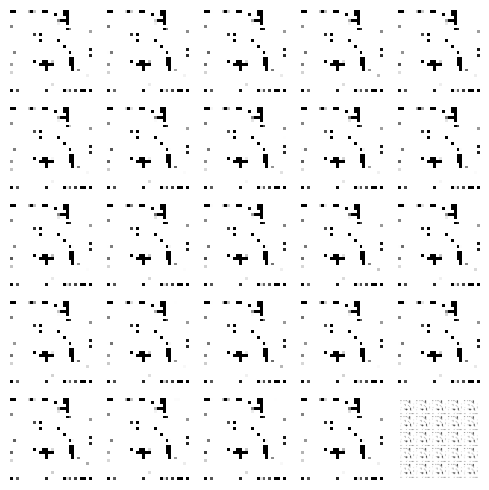

  0%|          | 0/350 [00:00<?, ?it/s]

4/4 [==============================] - 0s 15ms/step


  0%|          | 1/350 [00:00<02:47,  2.08it/s]

4/4 [==============================] - 0s 31ms/step


  1%|          | 2/350 [00:01<02:59,  1.94it/s]

4/4 [==============================] - 0s 14ms/step


  1%|          | 3/350 [00:01<03:02,  1.90it/s]

4/4 [==============================] - 0s 26ms/step


  1%|          | 4/350 [00:02<03:01,  1.90it/s]

4/4 [==============================] - 0s 14ms/step


  1%|▏         | 5/350 [00:02<02:50,  2.02it/s]

4/4 [==============================] - 0s 15ms/step


  2%|▏         | 6/350 [00:03<02:53,  1.99it/s]

4/4 [==============================] - 0s 13ms/step


  2%|▏         | 7/350 [00:03<02:45,  2.07it/s]

4/4 [==============================] - 0s 13ms/step


  2%|▏         | 8/350 [00:03<02:48,  2.03it/s]

4/4 [==============================] - 0s 14ms/step


  3%|▎         | 9/350 [00:04<02:42,  2.09it/s]

4/4 [==============================] - 0s 13ms/step


  3%|▎         | 10/350 [00:04<02:45,  2.05it/s]

4/4 [==============================] - 0s 16ms/step


  3%|▎         | 11/350 [00:05<02:44,  2.06it/s]

4/4 [==============================] - 0s 14ms/step


  3%|▎         | 12/350 [00:05<02:47,  2.01it/s]

4/4 [==============================] - 0s 14ms/step


  4%|▎         | 13/350 [00:06<02:44,  2.05it/s]

4/4 [==============================] - 0s 14ms/step


  4%|▍         | 14/350 [00:06<02:47,  2.01it/s]

4/4 [==============================] - 0s 14ms/step


  4%|▍         | 15/350 [00:07<02:44,  2.03it/s]

4/4 [==============================] - 0s 20ms/step


  5%|▍         | 16/350 [00:07<02:52,  1.94it/s]

4/4 [==============================] - 0s 16ms/step


  5%|▍         | 17/350 [00:08<02:48,  1.98it/s]

4/4 [==============================] - 0s 14ms/step


  5%|▌         | 18/350 [00:09<02:51,  1.94it/s]

4/4 [==============================] - 0s 15ms/step


  5%|▌         | 19/350 [00:09<02:46,  1.99it/s]

4/4 [==============================] - 0s 28ms/step


  6%|▌         | 20/350 [00:10<02:49,  1.95it/s]

4/4 [==============================] - 0s 14ms/step


  6%|▌         | 21/350 [00:10<02:46,  1.98it/s]

4/4 [==============================] - 0s 31ms/step


  6%|▋         | 22/350 [00:11<02:49,  1.94it/s]

4/4 [==============================] - 0s 14ms/step


  7%|▋         | 23/350 [00:11<02:49,  1.93it/s]

4/4 [==============================] - 0s 14ms/step


  7%|▋         | 24/350 [00:12<02:43,  1.99it/s]

4/4 [==============================] - 0s 16ms/step


  7%|▋         | 25/350 [00:12<02:45,  1.97it/s]

4/4 [==============================] - 0s 15ms/step


  7%|▋         | 26/350 [00:13<02:41,  2.00it/s]

4/4 [==============================] - 0s 16ms/step


  8%|▊         | 27/350 [00:13<02:43,  1.98it/s]

4/4 [==============================] - 0s 14ms/step


  8%|▊         | 28/350 [00:14<02:40,  2.00it/s]

4/4 [==============================] - 0s 36ms/step


  8%|▊         | 29/350 [00:14<02:45,  1.94it/s]

4/4 [==============================] - 0s 14ms/step


  9%|▊         | 30/350 [00:15<02:47,  1.91it/s]

4/4 [==============================] - 0s 14ms/step


  9%|▉         | 31/350 [00:15<02:42,  1.97it/s]

4/4 [==============================] - 0s 26ms/step


  9%|▉         | 32/350 [00:16<02:53,  1.84it/s]

4/4 [==============================] - 0s 14ms/step


  9%|▉         | 33/350 [00:16<02:58,  1.78it/s]

4/4 [==============================] - 0s 17ms/step


 10%|▉         | 34/350 [00:17<03:03,  1.72it/s]

4/4 [==============================] - 0s 19ms/step


 10%|█         | 35/350 [00:18<03:06,  1.69it/s]

4/4 [==============================] - 0s 19ms/step


 10%|█         | 36/350 [00:18<03:07,  1.67it/s]

4/4 [==============================] - 0s 19ms/step


 11%|█         | 37/350 [00:19<03:02,  1.71it/s]

4/4 [==============================] - 0s 34ms/step


 11%|█         | 38/350 [00:19<03:05,  1.68it/s]

4/4 [==============================] - 0s 16ms/step


 11%|█         | 39/350 [00:20<02:58,  1.74it/s]

4/4 [==============================] - 0s 35ms/step


 11%|█▏        | 40/350 [00:20<02:59,  1.73it/s]

4/4 [==============================] - 0s 18ms/step


 12%|█▏        | 41/350 [00:21<03:00,  1.71it/s]

4/4 [==============================] - 0s 16ms/step


 12%|█▏        | 42/350 [00:22<03:00,  1.71it/s]

4/4 [==============================] - 0s 13ms/step


 12%|█▏        | 43/350 [00:22<02:53,  1.76it/s]

4/4 [==============================] - 0s 14ms/step


 13%|█▎        | 44/350 [00:23<02:52,  1.77it/s]

4/4 [==============================] - 0s 15ms/step


 13%|█▎        | 45/350 [00:23<02:49,  1.80it/s]

4/4 [==============================] - 0s 15ms/step


 13%|█▎        | 46/350 [00:24<02:48,  1.80it/s]

4/4 [==============================] - 0s 14ms/step


 13%|█▎        | 47/350 [00:24<02:40,  1.89it/s]

4/4 [==============================] - 0s 24ms/step


 14%|█▎        | 48/350 [00:25<02:40,  1.88it/s]

4/4 [==============================] - 0s 14ms/step


 14%|█▍        | 49/350 [00:25<02:32,  1.97it/s]

4/4 [==============================] - 0s 14ms/step


 14%|█▍        | 50/350 [00:26<02:33,  1.95it/s]

4/4 [==============================] - 0s 15ms/step


 15%|█▍        | 51/350 [00:26<02:29,  1.99it/s]

4/4 [==============================] - 0s 24ms/step


 15%|█▍        | 52/350 [00:27<02:30,  1.98it/s]

4/4 [==============================] - 0s 15ms/step


 15%|█▌        | 53/350 [00:27<02:30,  1.98it/s]

4/4 [==============================] - 0s 14ms/step


 15%|█▌        | 54/350 [00:28<02:30,  1.97it/s]

4/4 [==============================] - 0s 14ms/step


 16%|█▌        | 55/350 [00:28<02:31,  1.95it/s]

4/4 [==============================] - 0s 14ms/step


 16%|█▌        | 56/350 [00:29<02:28,  1.99it/s]

4/4 [==============================] - 0s 14ms/step


 16%|█▋        | 57/350 [00:29<02:31,  1.93it/s]

4/4 [==============================] - 0s 13ms/step


 17%|█▋        | 58/350 [00:30<02:26,  2.00it/s]

4/4 [==============================] - 0s 14ms/step


 17%|█▋        | 59/350 [00:30<02:30,  1.93it/s]

4/4 [==============================] - 0s 17ms/step


 17%|█▋        | 60/350 [00:31<02:27,  1.97it/s]

4/4 [==============================] - 0s 14ms/step


 17%|█▋        | 61/350 [00:31<02:29,  1.93it/s]

4/4 [==============================] - 0s 15ms/step


 18%|█▊        | 62/350 [00:32<02:25,  1.98it/s]

4/4 [==============================] - 0s 14ms/step


 18%|█▊        | 63/350 [00:32<02:27,  1.95it/s]

4/4 [==============================] - 0s 13ms/step


 18%|█▊        | 64/350 [00:33<02:22,  2.01it/s]

4/4 [==============================] - 0s 32ms/step


 19%|█▊        | 65/350 [00:33<02:25,  1.96it/s]

4/4 [==============================] - 0s 18ms/step


 19%|█▉        | 66/350 [00:34<02:35,  1.83it/s]

4/4 [==============================] - 0s 35ms/step


 19%|█▉        | 67/350 [00:35<02:41,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 19%|█▉        | 68/350 [00:35<02:33,  1.84it/s]

4/4 [==============================] - 0s 14ms/step


 20%|█▉        | 69/350 [00:36<02:32,  1.84it/s]

4/4 [==============================] - 0s 14ms/step


 20%|██        | 70/350 [00:36<02:25,  1.92it/s]

4/4 [==============================] - 0s 17ms/step


 20%|██        | 71/350 [00:37<02:27,  1.89it/s]

4/4 [==============================] - 0s 14ms/step


 21%|██        | 72/350 [00:37<02:21,  1.96it/s]

4/4 [==============================] - 0s 14ms/step


 21%|██        | 73/350 [00:38<02:21,  1.96it/s]

4/4 [==============================] - 0s 14ms/step


 21%|██        | 74/350 [00:38<02:16,  2.03it/s]

4/4 [==============================] - 0s 14ms/step


 21%|██▏       | 75/350 [00:39<02:18,  1.98it/s]

4/4 [==============================] - 0s 14ms/step


 22%|██▏       | 76/350 [00:39<02:14,  2.03it/s]

4/4 [==============================] - 0s 15ms/step


 22%|██▏       | 77/350 [00:40<02:17,  1.98it/s]

4/4 [==============================] - 0s 17ms/step


 22%|██▏       | 78/350 [00:40<02:16,  2.00it/s]

4/4 [==============================] - 0s 14ms/step


 23%|██▎       | 79/350 [00:41<02:19,  1.95it/s]

4/4 [==============================] - 0s 14ms/step


 23%|██▎       | 80/350 [00:41<02:16,  1.98it/s]

4/4 [==============================] - 0s 16ms/step


 23%|██▎       | 81/350 [00:42<02:20,  1.92it/s]

4/4 [==============================] - 0s 17ms/step


 23%|██▎       | 82/350 [00:42<02:24,  1.86it/s]

4/4 [==============================] - 0s 16ms/step


 24%|██▎       | 83/350 [00:43<02:19,  1.92it/s]

4/4 [==============================] - 0s 14ms/step


 24%|██▍       | 84/350 [00:43<02:19,  1.90it/s]

4/4 [==============================] - 0s 15ms/step


 24%|██▍       | 85/350 [00:44<02:14,  1.97it/s]

4/4 [==============================] - 0s 24ms/step


 25%|██▍       | 86/350 [00:44<02:15,  1.95it/s]

4/4 [==============================] - 0s 14ms/step


 25%|██▍       | 87/350 [00:45<02:10,  2.01it/s]

4/4 [==============================] - 0s 15ms/step


 25%|██▌       | 88/350 [00:45<02:11,  1.99it/s]

4/4 [==============================] - 0s 13ms/step


 25%|██▌       | 89/350 [00:46<02:08,  2.03it/s]

4/4 [==============================] - 0s 18ms/step


 26%|██▌       | 90/350 [00:46<02:12,  1.96it/s]

4/4 [==============================] - 0s 16ms/step


 26%|██▌       | 91/350 [00:47<02:20,  1.84it/s]

4/4 [==============================] - 0s 15ms/step


 26%|██▋       | 92/350 [00:48<02:19,  1.85it/s]

4/4 [==============================] - 0s 14ms/step


 27%|██▋       | 93/350 [00:48<02:13,  1.93it/s]

4/4 [==============================] - 0s 14ms/step


 27%|██▋       | 94/350 [00:48<02:11,  1.94it/s]

4/4 [==============================] - 0s 13ms/step


 27%|██▋       | 95/350 [00:49<02:09,  1.96it/s]

4/4 [==============================] - 0s 17ms/step


 27%|██▋       | 96/350 [00:49<02:10,  1.95it/s]

4/4 [==============================] - 0s 14ms/step


 28%|██▊       | 97/350 [00:50<02:04,  2.03it/s]

4/4 [==============================] - 0s 14ms/step


 28%|██▊       | 98/350 [00:50<02:05,  2.01it/s]

4/4 [==============================] - 0s 19ms/step


 28%|██▊       | 99/350 [00:51<02:02,  2.05it/s]

4/4 [==============================] - 0s 13ms/step


 29%|██▊       | 100/350 [00:51<02:04,  2.01it/s]

4/4 [==============================] - 0s 14ms/step


 29%|██▉       | 101/350 [00:52<02:00,  2.07it/s]

4/4 [==============================] - 0s 16ms/step


 29%|██▉       | 102/350 [00:52<02:04,  2.00it/s]

4/4 [==============================] - 0s 15ms/step


 29%|██▉       | 103/350 [00:53<02:01,  2.04it/s]

4/4 [==============================] - 0s 13ms/step


 30%|██▉       | 104/350 [00:53<02:03,  1.98it/s]

4/4 [==============================] - 0s 16ms/step


 30%|███       | 105/350 [00:54<02:04,  1.96it/s]

4/4 [==============================] - 0s 28ms/step


 30%|███       | 106/350 [00:54<02:06,  1.93it/s]

4/4 [==============================] - 0s 14ms/step


 31%|███       | 107/350 [00:55<02:02,  1.99it/s]

4/4 [==============================] - 0s 17ms/step


 31%|███       | 108/350 [00:56<02:04,  1.94it/s]

4/4 [==============================] - 0s 15ms/step


 31%|███       | 109/350 [00:56<02:00,  2.00it/s]

4/4 [==============================] - 0s 14ms/step


 31%|███▏      | 110/350 [00:56<02:01,  1.97it/s]

4/4 [==============================] - 0s 14ms/step


 32%|███▏      | 111/350 [00:57<01:58,  2.02it/s]

4/4 [==============================] - 0s 14ms/step


 32%|███▏      | 112/350 [00:58<02:01,  1.96it/s]

4/4 [==============================] - 0s 17ms/step


 32%|███▏      | 113/350 [00:58<01:58,  2.00it/s]

4/4 [==============================] - 0s 21ms/step


 33%|███▎      | 114/350 [00:59<02:02,  1.93it/s]

4/4 [==============================] - 0s 13ms/step


 33%|███▎      | 115/350 [00:59<02:05,  1.87it/s]

4/4 [==============================] - 0s 13ms/step


 33%|███▎      | 116/350 [01:00<02:04,  1.88it/s]

4/4 [==============================] - 0s 18ms/step


 33%|███▎      | 117/350 [01:00<02:07,  1.82it/s]

4/4 [==============================] - 0s 14ms/step


 34%|███▎      | 118/350 [01:01<02:02,  1.90it/s]

4/4 [==============================] - 0s 15ms/step


 34%|███▍      | 119/350 [01:01<02:00,  1.91it/s]

4/4 [==============================] - 0s 16ms/step


 34%|███▍      | 120/350 [01:02<01:57,  1.96it/s]

4/4 [==============================] - 0s 32ms/step


 35%|███▍      | 121/350 [01:02<01:56,  1.96it/s]

4/4 [==============================] - 0s 15ms/step


 35%|███▍      | 122/350 [01:03<01:53,  2.02it/s]

4/4 [==============================] - 0s 13ms/step


 35%|███▌      | 123/350 [01:03<01:53,  2.00it/s]

4/4 [==============================] - 0s 15ms/step


 35%|███▌      | 124/350 [01:04<01:50,  2.04it/s]

4/4 [==============================] - 0s 14ms/step


 36%|███▌      | 125/350 [01:04<01:50,  2.03it/s]

4/4 [==============================] - 0s 14ms/step


 36%|███▌      | 126/350 [01:05<01:48,  2.07it/s]

4/4 [==============================] - 0s 13ms/step


 36%|███▋      | 127/350 [01:05<01:51,  2.01it/s]

4/4 [==============================] - 0s 13ms/step


 37%|███▋      | 128/350 [01:06<01:48,  2.04it/s]

4/4 [==============================] - 0s 13ms/step


 37%|███▋      | 129/350 [01:06<01:50,  2.01it/s]

4/4 [==============================] - 0s 13ms/step


 37%|███▋      | 130/350 [01:07<01:46,  2.07it/s]

4/4 [==============================] - 0s 14ms/step


 37%|███▋      | 131/350 [01:07<01:47,  2.04it/s]

4/4 [==============================] - 0s 13ms/step


 38%|███▊      | 132/350 [01:08<01:45,  2.06it/s]

4/4 [==============================] - 0s 13ms/step


 38%|███▊      | 133/350 [01:08<01:47,  2.02it/s]

4/4 [==============================] - 0s 13ms/step


 38%|███▊      | 134/350 [01:09<01:43,  2.09it/s]

4/4 [==============================] - 0s 19ms/step


 39%|███▊      | 135/350 [01:09<01:43,  2.08it/s]

4/4 [==============================] - 0s 14ms/step


 39%|███▉      | 136/350 [01:09<01:40,  2.13it/s]

4/4 [==============================] - 0s 30ms/step


 39%|███▉      | 137/350 [01:10<01:42,  2.07it/s]

4/4 [==============================] - 0s 14ms/step


 39%|███▉      | 138/350 [01:10<01:44,  2.04it/s]

4/4 [==============================] - 0s 14ms/step


 40%|███▉      | 139/350 [01:11<01:41,  2.09it/s]

4/4 [==============================] - 0s 18ms/step


 40%|████      | 140/350 [01:11<01:43,  2.03it/s]

4/4 [==============================] - 0s 15ms/step


 40%|████      | 141/350 [01:12<01:40,  2.07it/s]

4/4 [==============================] - 0s 14ms/step


 41%|████      | 142/350 [01:12<01:42,  2.02it/s]

4/4 [==============================] - 0s 14ms/step


 41%|████      | 143/350 [01:13<01:39,  2.07it/s]

4/4 [==============================] - 0s 14ms/step


 41%|████      | 144/350 [01:13<01:43,  1.99it/s]

4/4 [==============================] - 0s 14ms/step


 41%|████▏     | 145/350 [01:14<01:40,  2.04it/s]

4/4 [==============================] - 0s 14ms/step


 42%|████▏     | 146/350 [01:14<01:42,  2.00it/s]

4/4 [==============================] - 0s 14ms/step


 42%|████▏     | 147/350 [01:15<01:38,  2.06it/s]

4/4 [==============================] - 0s 27ms/step


 42%|████▏     | 148/350 [01:15<01:40,  2.02it/s]

4/4 [==============================] - 0s 14ms/step


 43%|████▎     | 149/350 [01:16<01:37,  2.06it/s]

4/4 [==============================] - 0s 20ms/step


 43%|████▎     | 150/350 [01:16<01:38,  2.04it/s]

4/4 [==============================] - 0s 14ms/step


 43%|████▎     | 151/350 [01:17<01:38,  2.02it/s]

4/4 [==============================] - 0s 14ms/step


 43%|████▎     | 152/350 [01:17<01:36,  2.06it/s]

4/4 [==============================] - 0s 14ms/step


 44%|████▎     | 153/350 [01:18<01:38,  2.00it/s]

4/4 [==============================] - 0s 15ms/step


 44%|████▍     | 154/350 [01:18<01:36,  2.04it/s]

4/4 [==============================] - 0s 26ms/step


 44%|████▍     | 155/350 [01:19<01:37,  1.99it/s]

4/4 [==============================] - 0s 13ms/step


 45%|████▍     | 156/350 [01:19<01:36,  2.02it/s]

4/4 [==============================] - 0s 15ms/step


 45%|████▍     | 157/350 [01:20<01:37,  1.97it/s]

4/4 [==============================] - 0s 14ms/step


 45%|████▌     | 158/350 [01:20<01:34,  2.03it/s]

4/4 [==============================] - 0s 14ms/step


 45%|████▌     | 159/350 [01:21<01:35,  2.01it/s]

4/4 [==============================] - 0s 14ms/step


 46%|████▌     | 160/350 [01:21<01:32,  2.04it/s]

4/4 [==============================] - 0s 14ms/step


 46%|████▌     | 161/350 [01:22<01:35,  1.97it/s]

4/4 [==============================] - 0s 17ms/step


 46%|████▋     | 162/350 [01:22<01:37,  1.93it/s]

4/4 [==============================] - 0s 14ms/step


 47%|████▋     | 163/350 [01:23<01:37,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


 47%|████▋     | 164/350 [01:23<01:35,  1.95it/s]

4/4 [==============================] - 0s 14ms/step


 47%|████▋     | 165/350 [01:24<01:34,  1.96it/s]

4/4 [==============================] - 0s 13ms/step


 47%|████▋     | 166/350 [01:24<01:30,  2.03it/s]

4/4 [==============================] - 0s 12ms/step


 48%|████▊     | 167/350 [01:25<01:32,  1.98it/s]

4/4 [==============================] - 0s 14ms/step


 48%|████▊     | 168/350 [01:25<01:30,  2.00it/s]

4/4 [==============================] - 0s 14ms/step


 48%|████▊     | 169/350 [01:26<01:32,  1.96it/s]

4/4 [==============================] - 0s 13ms/step


 49%|████▊     | 170/350 [01:26<01:32,  1.94it/s]

4/4 [==============================] - 0s 17ms/step


 49%|████▉     | 171/350 [01:27<01:33,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


 49%|████▉     | 172/350 [01:27<01:29,  2.00it/s]

4/4 [==============================] - 0s 13ms/step


 49%|████▉     | 173/350 [01:28<01:29,  1.98it/s]

4/4 [==============================] - 0s 15ms/step


 50%|████▉     | 174/350 [01:28<01:26,  2.03it/s]

4/4 [==============================] - 0s 23ms/step


 50%|█████     | 175/350 [01:29<01:27,  2.00it/s]

4/4 [==============================] - 0s 13ms/step


 50%|█████     | 176/350 [01:29<01:24,  2.06it/s]

4/4 [==============================] - 0s 19ms/step


 51%|█████     | 177/350 [01:30<01:25,  2.03it/s]

4/4 [==============================] - 0s 13ms/step


 51%|█████     | 178/350 [01:30<01:22,  2.09it/s]

4/4 [==============================] - 0s 15ms/step


 51%|█████     | 179/350 [01:31<01:23,  2.06it/s]

4/4 [==============================] - 0s 13ms/step


 51%|█████▏    | 180/350 [01:31<01:22,  2.07it/s]

4/4 [==============================] - 0s 14ms/step


 52%|█████▏    | 181/350 [01:32<01:23,  2.02it/s]

4/4 [==============================] - 0s 15ms/step


 52%|█████▏    | 182/350 [01:32<01:21,  2.07it/s]

4/4 [==============================] - 0s 13ms/step


 52%|█████▏    | 183/350 [01:33<01:21,  2.05it/s]

4/4 [==============================] - 0s 15ms/step


 53%|█████▎    | 184/350 [01:33<01:19,  2.10it/s]

4/4 [==============================] - 0s 15ms/step


 53%|█████▎    | 185/350 [01:34<01:20,  2.06it/s]

4/4 [==============================] - 0s 12ms/step


 53%|█████▎    | 186/350 [01:34<01:17,  2.12it/s]

4/4 [==============================] - 0s 12ms/step


 53%|█████▎    | 187/350 [01:35<01:19,  2.04it/s]

4/4 [==============================] - 0s 14ms/step


 54%|█████▎    | 188/350 [01:35<01:18,  2.05it/s]

4/4 [==============================] - 0s 17ms/step


 54%|█████▍    | 189/350 [01:36<01:21,  1.97it/s]

4/4 [==============================] - 0s 13ms/step


 54%|█████▍    | 190/350 [01:36<01:20,  2.00it/s]

4/4 [==============================] - 0s 15ms/step


 55%|█████▍    | 191/350 [01:37<01:20,  1.97it/s]

4/4 [==============================] - 0s 14ms/step


 55%|█████▍    | 192/350 [01:37<01:19,  1.98it/s]

4/4 [==============================] - 0s 13ms/step


 55%|█████▌    | 193/350 [01:38<01:19,  1.98it/s]

4/4 [==============================] - 0s 12ms/step


 55%|█████▌    | 194/350 [01:38<01:16,  2.03it/s]

4/4 [==============================] - 0s 12ms/step


 56%|█████▌    | 195/350 [01:39<01:24,  1.83it/s]

4/4 [==============================] - 0s 14ms/step


 56%|█████▌    | 196/350 [01:39<01:24,  1.82it/s]

4/4 [==============================] - 0s 16ms/step


 56%|█████▋    | 197/350 [01:40<01:21,  1.89it/s]

4/4 [==============================] - 0s 16ms/step


 57%|█████▋    | 198/350 [01:41<01:21,  1.87it/s]

4/4 [==============================] - 0s 14ms/step


 57%|█████▋    | 199/350 [01:41<01:17,  1.94it/s]

4/4 [==============================] - 0s 18ms/step


 57%|█████▋    | 200/350 [01:42<01:19,  1.88it/s]

4/4 [==============================] - 0s 17ms/step


 57%|█████▋    | 201/350 [01:42<01:19,  1.86it/s]

4/4 [==============================] - 0s 20ms/step


 58%|█████▊    | 202/350 [01:43<01:19,  1.86it/s]

4/4 [==============================] - 0s 14ms/step


 58%|█████▊    | 203/350 [01:43<01:15,  1.96it/s]

4/4 [==============================] - 0s 25ms/step


 58%|█████▊    | 204/350 [01:44<01:16,  1.90it/s]

4/4 [==============================] - 0s 14ms/step


 59%|█████▊    | 205/350 [01:44<01:13,  1.96it/s]

4/4 [==============================] - 0s 24ms/step


 59%|█████▉    | 206/350 [01:45<01:15,  1.91it/s]

4/4 [==============================] - 0s 14ms/step


 59%|█████▉    | 207/350 [01:45<01:14,  1.92it/s]

4/4 [==============================] - 0s 15ms/step


 59%|█████▉    | 208/350 [01:46<01:11,  1.97it/s]

4/4 [==============================] - 0s 14ms/step


 60%|█████▉    | 209/350 [01:46<01:12,  1.95it/s]

4/4 [==============================] - 0s 14ms/step


 60%|██████    | 210/350 [01:47<01:09,  2.00it/s]

4/4 [==============================] - 0s 14ms/step


 60%|██████    | 211/350 [01:47<01:10,  1.98it/s]

4/4 [==============================] - 0s 13ms/step


 61%|██████    | 212/350 [01:48<01:08,  2.03it/s]

4/4 [==============================] - 0s 20ms/step


 61%|██████    | 213/350 [01:48<01:07,  2.02it/s]

4/4 [==============================] - 0s 13ms/step


 61%|██████    | 214/350 [01:49<01:05,  2.06it/s]

4/4 [==============================] - 0s 12ms/step


 61%|██████▏   | 215/350 [01:49<01:06,  2.04it/s]

4/4 [==============================] - 0s 15ms/step


 62%|██████▏   | 216/350 [01:50<01:05,  2.05it/s]

4/4 [==============================] - 0s 27ms/step


 62%|██████▏   | 217/350 [01:50<01:06,  2.01it/s]

4/4 [==============================] - 0s 14ms/step


 62%|██████▏   | 218/350 [01:51<01:03,  2.06it/s]

4/4 [==============================] - 0s 14ms/step


 63%|██████▎   | 219/350 [01:51<01:04,  2.03it/s]

4/4 [==============================] - 0s 13ms/step


 63%|██████▎   | 220/350 [01:52<01:02,  2.09it/s]

4/4 [==============================] - 0s 14ms/step


 63%|██████▎   | 221/350 [01:52<01:02,  2.05it/s]

4/4 [==============================] - 0s 13ms/step


 63%|██████▎   | 222/350 [01:52<01:00,  2.10it/s]

4/4 [==============================] - 0s 13ms/step


 64%|██████▎   | 223/350 [01:53<01:01,  2.05it/s]

4/4 [==============================] - 0s 15ms/step


 64%|██████▍   | 224/350 [01:53<00:59,  2.11it/s]

4/4 [==============================] - 0s 23ms/step


 64%|██████▍   | 225/350 [01:54<01:00,  2.07it/s]

4/4 [==============================] - 0s 14ms/step


 65%|██████▍   | 226/350 [01:54<00:58,  2.10it/s]

4/4 [==============================] - 0s 13ms/step


 65%|██████▍   | 227/350 [01:55<00:59,  2.07it/s]

4/4 [==============================] - 0s 13ms/step


 65%|██████▌   | 228/350 [01:55<00:58,  2.09it/s]

4/4 [==============================] - 0s 15ms/step


 65%|██████▌   | 229/350 [01:56<00:58,  2.05it/s]

4/4 [==============================] - 0s 14ms/step


 66%|██████▌   | 230/350 [01:56<00:57,  2.10it/s]

4/4 [==============================] - 0s 13ms/step


 66%|██████▌   | 231/350 [01:57<00:57,  2.06it/s]

4/4 [==============================] - 0s 13ms/step


 66%|██████▋   | 232/350 [01:57<00:55,  2.12it/s]

4/4 [==============================] - 0s 13ms/step


 67%|██████▋   | 233/350 [01:58<00:56,  2.07it/s]

4/4 [==============================] - 0s 14ms/step


 67%|██████▋   | 234/350 [01:58<00:54,  2.13it/s]

4/4 [==============================] - 0s 15ms/step


 67%|██████▋   | 235/350 [01:59<00:55,  2.07it/s]

4/4 [==============================] - 0s 13ms/step


 67%|██████▋   | 236/350 [01:59<00:53,  2.12it/s]

4/4 [==============================] - 0s 20ms/step


 68%|██████▊   | 237/350 [02:00<00:54,  2.07it/s]

4/4 [==============================] - 0s 14ms/step


 68%|██████▊   | 238/350 [02:00<00:52,  2.13it/s]

4/4 [==============================] - 0s 23ms/step


 68%|██████▊   | 239/350 [02:01<00:53,  2.08it/s]

4/4 [==============================] - 0s 13ms/step


 69%|██████▊   | 240/350 [02:01<00:52,  2.11it/s]

4/4 [==============================] - 0s 13ms/step


 69%|██████▉   | 241/350 [02:02<00:52,  2.08it/s]

4/4 [==============================] - 0s 13ms/step


 69%|██████▉   | 242/350 [02:02<00:50,  2.13it/s]

4/4 [==============================] - 0s 12ms/step


 69%|██████▉   | 243/350 [02:03<00:51,  2.08it/s]

4/4 [==============================] - 0s 13ms/step


 70%|██████▉   | 244/350 [02:03<00:49,  2.13it/s]

4/4 [==============================] - 0s 29ms/step


 70%|███████   | 245/350 [02:04<00:51,  2.06it/s]

4/4 [==============================] - 0s 14ms/step


 70%|███████   | 246/350 [02:04<00:49,  2.09it/s]

4/4 [==============================] - 0s 14ms/step


 71%|███████   | 247/350 [02:04<00:50,  2.04it/s]

4/4 [==============================] - 0s 14ms/step


 71%|███████   | 248/350 [02:05<00:48,  2.10it/s]

4/4 [==============================] - 0s 13ms/step


 71%|███████   | 249/350 [02:05<00:49,  2.05it/s]

4/4 [==============================] - 0s 14ms/step


 71%|███████▏  | 250/350 [02:06<00:47,  2.09it/s]

4/4 [==============================] - 0s 12ms/step


 72%|███████▏  | 251/350 [02:06<00:50,  1.98it/s]

4/4 [==============================] - 0s 14ms/step


 72%|███████▏  | 252/350 [02:07<00:48,  2.01it/s]

4/4 [==============================] - 0s 13ms/step


 72%|███████▏  | 253/350 [02:07<00:49,  1.97it/s]

4/4 [==============================] - 0s 12ms/step


 73%|███████▎  | 254/350 [02:08<00:46,  2.04it/s]

4/4 [==============================] - 0s 13ms/step


 73%|███████▎  | 255/350 [02:08<00:47,  1.98it/s]

4/4 [==============================] - 0s 14ms/step


 73%|███████▎  | 256/350 [02:09<00:46,  2.02it/s]

4/4 [==============================] - 0s 14ms/step


 73%|███████▎  | 257/350 [02:09<00:47,  1.97it/s]

4/4 [==============================] - 0s 13ms/step


 74%|███████▎  | 258/350 [02:10<00:45,  2.03it/s]

4/4 [==============================] - 0s 24ms/step


 74%|███████▍  | 259/350 [02:10<00:45,  1.98it/s]

4/4 [==============================] - 0s 13ms/step


 74%|███████▍  | 260/350 [02:11<00:44,  2.02it/s]

4/4 [==============================] - 0s 16ms/step


 75%|███████▍  | 261/350 [02:11<00:45,  1.97it/s]

4/4 [==============================] - 0s 13ms/step


 75%|███████▍  | 262/350 [02:12<00:43,  2.04it/s]

4/4 [==============================] - 0s 27ms/step


 75%|███████▌  | 263/350 [02:12<00:43,  2.02it/s]

4/4 [==============================] - 0s 14ms/step


 75%|███████▌  | 264/350 [02:13<00:42,  2.01it/s]

4/4 [==============================] - 0s 14ms/step


 76%|███████▌  | 265/350 [02:13<00:43,  1.98it/s]

4/4 [==============================] - 0s 23ms/step


 76%|███████▌  | 266/350 [02:14<00:45,  1.84it/s]

4/4 [==============================] - 0s 16ms/step


 76%|███████▋  | 267/350 [02:15<00:45,  1.81it/s]

4/4 [==============================] - 0s 15ms/step


 77%|███████▋  | 268/350 [02:15<00:45,  1.81it/s]

4/4 [==============================] - 0s 17ms/step


 77%|███████▋  | 269/350 [02:16<00:43,  1.84it/s]

4/4 [==============================] - 0s 15ms/step


 77%|███████▋  | 270/350 [02:16<00:44,  1.79it/s]

4/4 [==============================] - 0s 12ms/step


 77%|███████▋  | 271/350 [02:17<00:43,  1.80it/s]

4/4 [==============================] - 0s 16ms/step


 78%|███████▊  | 272/350 [02:17<00:41,  1.87it/s]

4/4 [==============================] - 0s 18ms/step


 78%|███████▊  | 273/350 [02:18<00:41,  1.87it/s]

4/4 [==============================] - 0s 11ms/step


 78%|███████▊  | 274/350 [02:18<00:40,  1.87it/s]

4/4 [==============================] - 0s 16ms/step


 79%|███████▊  | 275/350 [02:19<00:40,  1.85it/s]

4/4 [==============================] - 0s 13ms/step


 79%|███████▉  | 276/350 [02:20<00:40,  1.83it/s]

4/4 [==============================] - 0s 14ms/step


 79%|███████▉  | 277/350 [02:20<00:39,  1.84it/s]

4/4 [==============================] - 0s 16ms/step


 79%|███████▉  | 278/350 [02:21<00:38,  1.85it/s]

4/4 [==============================] - 0s 18ms/step


 80%|███████▉  | 279/350 [02:21<00:37,  1.87it/s]

4/4 [==============================] - 0s 13ms/step


 80%|████████  | 280/350 [02:22<00:37,  1.87it/s]

4/4 [==============================] - 0s 14ms/step


 80%|████████  | 281/350 [02:22<00:36,  1.89it/s]

4/4 [==============================] - 0s 16ms/step


 81%|████████  | 282/350 [02:23<00:36,  1.88it/s]

4/4 [==============================] - 0s 14ms/step


 81%|████████  | 283/350 [02:23<00:33,  1.97it/s]

4/4 [==============================] - 0s 27ms/step


 81%|████████  | 284/350 [02:24<00:34,  1.93it/s]

4/4 [==============================] - 0s 23ms/step


 81%|████████▏ | 285/350 [02:24<00:33,  1.93it/s]

4/4 [==============================] - 0s 14ms/step


 82%|████████▏ | 286/350 [02:25<00:33,  1.92it/s]

4/4 [==============================] - 0s 20ms/step


 82%|████████▏ | 287/350 [02:25<00:33,  1.89it/s]

4/4 [==============================] - 0s 13ms/step


 82%|████████▏ | 288/350 [02:26<00:33,  1.88it/s]

4/4 [==============================] - 0s 13ms/step


 83%|████████▎ | 289/350 [02:26<00:32,  1.87it/s]

4/4 [==============================] - 0s 15ms/step


 83%|████████▎ | 290/350 [02:27<00:31,  1.88it/s]

4/4 [==============================] - 0s 14ms/step


 83%|████████▎ | 291/350 [02:27<00:30,  1.94it/s]

4/4 [==============================] - 0s 35ms/step


 83%|████████▎ | 292/350 [02:28<00:30,  1.90it/s]

4/4 [==============================] - 0s 14ms/step


 84%|████████▎ | 293/350 [02:29<00:31,  1.83it/s]

4/4 [==============================] - 0s 14ms/step


 84%|████████▍ | 294/350 [02:29<00:30,  1.84it/s]

4/4 [==============================] - 0s 15ms/step


 84%|████████▍ | 295/350 [02:30<00:29,  1.90it/s]

4/4 [==============================] - 0s 18ms/step


 85%|████████▍ | 296/350 [02:30<00:28,  1.89it/s]

4/4 [==============================] - 0s 14ms/step


 85%|████████▍ | 297/350 [02:31<00:27,  1.95it/s]

4/4 [==============================] - 0s 26ms/step


 85%|████████▌ | 298/350 [02:31<00:26,  1.95it/s]

4/4 [==============================] - 0s 14ms/step


 85%|████████▌ | 299/350 [02:32<00:25,  2.02it/s]

4/4 [==============================] - 0s 27ms/step


 86%|████████▌ | 300/350 [02:32<00:25,  1.98it/s]

4/4 [==============================] - 0s 14ms/step


 86%|████████▌ | 301/350 [02:33<00:24,  2.04it/s]

4/4 [==============================] - 0s 17ms/step


 86%|████████▋ | 302/350 [02:33<00:25,  1.90it/s]

4/4 [==============================] - 0s 16ms/step


 87%|████████▋ | 303/350 [02:34<00:23,  1.96it/s]

4/4 [==============================] - 0s 14ms/step


 87%|████████▋ | 304/350 [02:34<00:23,  1.95it/s]

4/4 [==============================] - 0s 13ms/step


 87%|████████▋ | 305/350 [02:35<00:22,  2.01it/s]

4/4 [==============================] - 0s 19ms/step


 87%|████████▋ | 306/350 [02:35<00:22,  2.00it/s]

4/4 [==============================] - 0s 15ms/step


 88%|████████▊ | 307/350 [02:36<00:22,  1.95it/s]

4/4 [==============================] - 0s 13ms/step


 88%|████████▊ | 308/350 [02:36<00:21,  1.92it/s]

4/4 [==============================] - 0s 14ms/step


 88%|████████▊ | 309/350 [02:37<00:21,  1.90it/s]

4/4 [==============================] - 0s 17ms/step


 89%|████████▊ | 310/350 [02:37<00:21,  1.87it/s]

4/4 [==============================] - 0s 14ms/step


 89%|████████▉ | 311/350 [02:38<00:20,  1.87it/s]

4/4 [==============================] - 0s 14ms/step


 89%|████████▉ | 312/350 [02:38<00:20,  1.87it/s]

4/4 [==============================] - 0s 14ms/step


 89%|████████▉ | 313/350 [02:39<00:19,  1.87it/s]

4/4 [==============================] - 0s 14ms/step


 90%|████████▉ | 314/350 [02:39<00:19,  1.88it/s]

4/4 [==============================] - 0s 13ms/step


 90%|█████████ | 315/350 [02:40<00:18,  1.90it/s]

4/4 [==============================] - 0s 14ms/step


 90%|█████████ | 316/350 [02:40<00:17,  1.90it/s]

4/4 [==============================] - 0s 15ms/step


 91%|█████████ | 317/350 [02:41<00:17,  1.91it/s]

4/4 [==============================] - 0s 13ms/step


 91%|█████████ | 318/350 [02:41<00:16,  1.96it/s]

4/4 [==============================] - 0s 32ms/step


 91%|█████████ | 319/350 [02:42<00:16,  1.93it/s]

4/4 [==============================] - 0s 15ms/step


 91%|█████████▏| 320/350 [02:43<00:16,  1.84it/s]

4/4 [==============================] - 0s 15ms/step


 92%|█████████▏| 321/350 [02:43<00:15,  1.91it/s]

4/4 [==============================] - 0s 17ms/step


 92%|█████████▏| 322/350 [02:44<00:14,  1.91it/s]

4/4 [==============================] - 0s 14ms/step


 92%|█████████▏| 323/350 [02:44<00:14,  1.92it/s]

4/4 [==============================] - 0s 12ms/step


 93%|█████████▎| 324/350 [02:45<00:13,  1.98it/s]

4/4 [==============================] - 0s 13ms/step


 93%|█████████▎| 325/350 [02:45<00:12,  1.94it/s]

4/4 [==============================] - 0s 14ms/step


 93%|█████████▎| 326/350 [02:46<00:11,  2.00it/s]

4/4 [==============================] - 0s 29ms/step


 93%|█████████▎| 327/350 [02:46<00:12,  1.90it/s]

4/4 [==============================] - 0s 14ms/step


 94%|█████████▎| 328/350 [02:47<00:11,  1.90it/s]

4/4 [==============================] - 0s 14ms/step


 94%|█████████▍| 329/350 [02:47<00:10,  1.92it/s]

4/4 [==============================] - 0s 14ms/step


 94%|█████████▍| 330/350 [02:48<00:10,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


 95%|█████████▍| 331/350 [02:48<00:09,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


 95%|█████████▍| 332/350 [02:49<00:09,  1.92it/s]

4/4 [==============================] - 0s 14ms/step


 95%|█████████▌| 333/350 [02:49<00:08,  1.93it/s]

4/4 [==============================] - 0s 13ms/step


 95%|█████████▌| 334/350 [02:50<00:08,  1.96it/s]

4/4 [==============================] - 0s 13ms/step


 96%|█████████▌| 335/350 [02:50<00:07,  1.94it/s]

4/4 [==============================] - 0s 18ms/step


 96%|█████████▌| 336/350 [02:51<00:07,  1.90it/s]

4/4 [==============================] - 0s 14ms/step


 96%|█████████▋| 337/350 [02:51<00:06,  1.98it/s]

4/4 [==============================] - 0s 22ms/step


 97%|█████████▋| 338/350 [02:52<00:06,  1.95it/s]

4/4 [==============================] - 0s 13ms/step


 97%|█████████▋| 339/350 [02:52<00:05,  1.90it/s]

4/4 [==============================] - 0s 14ms/step


 97%|█████████▋| 340/350 [02:53<00:05,  1.89it/s]

4/4 [==============================] - 0s 14ms/step


 97%|█████████▋| 341/350 [02:53<00:04,  1.88it/s]

4/4 [==============================] - 0s 14ms/step


 98%|█████████▊| 342/350 [02:54<00:04,  1.97it/s]

4/4 [==============================] - 0s 31ms/step


 98%|█████████▊| 343/350 [02:54<00:03,  1.96it/s]

4/4 [==============================] - 0s 14ms/step


 98%|█████████▊| 344/350 [02:55<00:03,  1.91it/s]

4/4 [==============================] - 0s 14ms/step


 99%|█████████▊| 345/350 [02:56<00:02,  1.87it/s]

4/4 [==============================] - 0s 14ms/step


 99%|█████████▉| 346/350 [02:56<00:02,  1.97it/s]

4/4 [==============================] - 0s 33ms/step


 99%|█████████▉| 347/350 [02:57<00:01,  1.90it/s]

4/4 [==============================] - 0s 13ms/step


 99%|█████████▉| 348/350 [02:57<00:01,  1.92it/s]

4/4 [==============================] - 0s 15ms/step


100%|█████████▉| 349/350 [02:58<00:00,  1.86it/s]

4/4 [==============================] - 0s 17ms/step


100%|██████████| 350/350 [02:58<00:00,  1.96it/s]

Epoch number: 14 discriminator_loss: 0.16807098000676238 generator_loss: 6.738347291946411
1/1 [==============================] - 0s 24ms/step


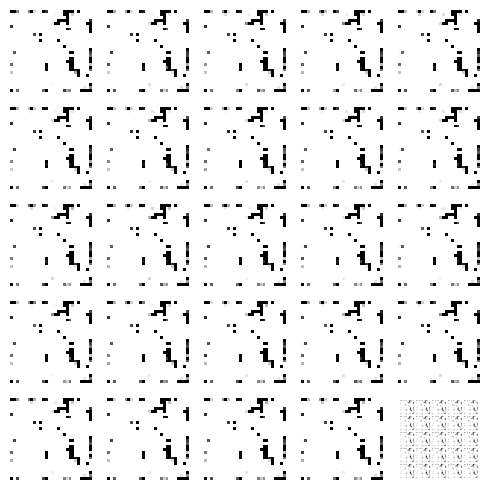

  0%|          | 0/350 [00:00<?, ?it/s]

4/4 [==============================] - 0s 13ms/step


  0%|          | 1/350 [00:00<03:20,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


  1%|          | 2/350 [00:01<03:07,  1.85it/s]

4/4 [==============================] - 0s 14ms/step


  1%|          | 3/350 [00:01<03:07,  1.85it/s]

4/4 [==============================] - 0s 14ms/step


  1%|          | 4/350 [00:02<03:03,  1.88it/s]

4/4 [==============================] - 0s 13ms/step


  1%|▏         | 5/350 [00:02<03:00,  1.91it/s]

4/4 [==============================] - 0s 13ms/step


  2%|▏         | 6/350 [00:03<02:59,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


  2%|▏         | 7/350 [00:03<03:01,  1.89it/s]

4/4 [==============================] - 0s 16ms/step


  2%|▏         | 8/350 [00:04<03:06,  1.83it/s]

4/4 [==============================] - 0s 14ms/step


  3%|▎         | 9/350 [00:04<03:05,  1.84it/s]

4/4 [==============================] - 0s 14ms/step


  3%|▎         | 10/350 [00:05<03:03,  1.85it/s]

4/4 [==============================] - 0s 14ms/step


  3%|▎         | 11/350 [00:05<02:56,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


  3%|▎         | 12/350 [00:06<02:56,  1.92it/s]

4/4 [==============================] - 0s 27ms/step


  4%|▎         | 13/350 [00:06<03:03,  1.83it/s]

4/4 [==============================] - 0s 16ms/step


  4%|▍         | 14/350 [00:07<02:55,  1.92it/s]

4/4 [==============================] - 0s 25ms/step


  4%|▍         | 15/350 [00:07<02:53,  1.93it/s]

4/4 [==============================] - 0s 13ms/step


  5%|▍         | 16/350 [00:08<02:58,  1.87it/s]

4/4 [==============================] - 0s 14ms/step


  5%|▍         | 17/350 [00:09<02:57,  1.88it/s]

4/4 [==============================] - 0s 15ms/step


  5%|▌         | 18/350 [00:09<02:53,  1.92it/s]

4/4 [==============================] - 0s 15ms/step


  5%|▌         | 19/350 [00:10<02:48,  1.97it/s]

4/4 [==============================] - 0s 24ms/step


  6%|▌         | 20/350 [00:10<02:48,  1.96it/s]

4/4 [==============================] - 0s 14ms/step


  6%|▌         | 21/350 [00:11<02:42,  2.02it/s]

4/4 [==============================] - 0s 26ms/step


  6%|▋         | 22/350 [00:11<02:42,  2.01it/s]

4/4 [==============================] - 0s 14ms/step


  7%|▋         | 23/350 [00:11<02:38,  2.07it/s]

4/4 [==============================] - 0s 23ms/step


  7%|▋         | 24/350 [00:12<02:40,  2.03it/s]

4/4 [==============================] - 0s 12ms/step


  7%|▋         | 25/350 [00:12<02:36,  2.08it/s]

4/4 [==============================] - 0s 14ms/step


  7%|▋         | 26/350 [00:13<02:38,  2.04it/s]

4/4 [==============================] - 0s 14ms/step


  8%|▊         | 27/350 [00:13<02:35,  2.08it/s]

4/4 [==============================] - 0s 20ms/step


  8%|▊         | 28/350 [00:14<02:35,  2.07it/s]

4/4 [==============================] - 0s 14ms/step


  8%|▊         | 29/350 [00:14<02:37,  2.03it/s]

4/4 [==============================] - 0s 14ms/step


  9%|▊         | 30/350 [00:15<02:34,  2.06it/s]

4/4 [==============================] - 0s 14ms/step


  9%|▉         | 31/350 [00:15<02:36,  2.03it/s]

4/4 [==============================] - 0s 13ms/step


  9%|▉         | 32/350 [00:16<02:32,  2.09it/s]

4/4 [==============================] - 0s 14ms/step


  9%|▉         | 33/350 [00:16<02:35,  2.04it/s]

4/4 [==============================] - 0s 15ms/step


 10%|▉         | 34/350 [00:17<02:37,  2.01it/s]

4/4 [==============================] - 0s 13ms/step


 10%|█         | 35/350 [00:17<02:39,  1.98it/s]

4/4 [==============================] - 0s 17ms/step


 10%|█         | 36/350 [00:18<02:40,  1.95it/s]

4/4 [==============================] - 0s 13ms/step


 11%|█         | 37/350 [00:18<02:35,  2.01it/s]

4/4 [==============================] - 0s 15ms/step


 11%|█         | 38/350 [00:19<02:37,  1.98it/s]

4/4 [==============================] - 0s 14ms/step


 11%|█         | 39/350 [00:19<02:40,  1.94it/s]

4/4 [==============================] - 0s 15ms/step


 11%|█▏        | 40/350 [00:20<02:46,  1.86it/s]

4/4 [==============================] - 0s 14ms/step


 12%|█▏        | 41/350 [00:21<02:43,  1.89it/s]

4/4 [==============================] - 0s 21ms/step


 12%|█▏        | 42/350 [00:21<02:46,  1.85it/s]

4/4 [==============================] - 0s 14ms/step


 12%|█▏        | 43/350 [00:22<02:47,  1.83it/s]

4/4 [==============================] - 0s 14ms/step


 13%|█▎        | 44/350 [00:22<02:40,  1.91it/s]

4/4 [==============================] - 0s 37ms/step


 13%|█▎        | 45/350 [00:23<02:46,  1.84it/s]

4/4 [==============================] - 0s 16ms/step


 13%|█▎        | 46/350 [00:23<02:49,  1.79it/s]

4/4 [==============================] - 0s 14ms/step


 13%|█▎        | 47/350 [00:24<02:48,  1.80it/s]

4/4 [==============================] - 0s 15ms/step


 14%|█▎        | 48/350 [00:24<02:49,  1.78it/s]

4/4 [==============================] - 0s 16ms/step


 14%|█▍        | 49/350 [00:25<02:49,  1.78it/s]

4/4 [==============================] - 0s 14ms/step


 14%|█▍        | 50/350 [00:26<02:48,  1.79it/s]

4/4 [==============================] - 0s 13ms/step


 15%|█▍        | 51/350 [00:26<02:44,  1.81it/s]

4/4 [==============================] - 0s 17ms/step


 15%|█▍        | 52/350 [00:27<02:46,  1.79it/s]

4/4 [==============================] - 0s 14ms/step


 15%|█▌        | 53/350 [00:27<02:46,  1.79it/s]

4/4 [==============================] - 0s 16ms/step


 15%|█▌        | 54/350 [00:28<02:45,  1.79it/s]

4/4 [==============================] - 0s 13ms/step


 16%|█▌        | 55/350 [00:28<02:45,  1.78it/s]

4/4 [==============================] - 0s 14ms/step


 16%|█▌        | 56/350 [00:29<02:45,  1.78it/s]

4/4 [==============================] - 0s 16ms/step


 16%|█▋        | 57/350 [00:29<02:45,  1.77it/s]

4/4 [==============================] - 0s 15ms/step


 17%|█▋        | 58/350 [00:30<02:43,  1.79it/s]

4/4 [==============================] - 0s 13ms/step


 17%|█▋        | 59/350 [00:31<02:42,  1.80it/s]

4/4 [==============================] - 0s 15ms/step


 17%|█▋        | 60/350 [00:31<02:40,  1.80it/s]

4/4 [==============================] - 0s 14ms/step


 17%|█▋        | 61/350 [00:32<02:41,  1.79it/s]

4/4 [==============================] - 0s 16ms/step


 18%|█▊        | 62/350 [00:32<02:41,  1.78it/s]

4/4 [==============================] - 0s 16ms/step


 18%|█▊        | 63/350 [00:33<02:43,  1.75it/s]

4/4 [==============================] - 0s 15ms/step


 18%|█▊        | 64/350 [00:33<02:41,  1.77it/s]

4/4 [==============================] - 0s 16ms/step


 19%|█▊        | 65/350 [00:34<02:40,  1.78it/s]

4/4 [==============================] - 0s 19ms/step


 19%|█▉        | 66/350 [00:35<02:41,  1.75it/s]

4/4 [==============================] - 0s 14ms/step


 19%|█▉        | 67/350 [00:35<02:39,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 19%|█▉        | 68/350 [00:36<02:38,  1.78it/s]

4/4 [==============================] - 0s 14ms/step


 20%|█▉        | 69/350 [00:36<02:33,  1.83it/s]

4/4 [==============================] - 0s 15ms/step


 20%|██        | 70/350 [00:37<02:32,  1.84it/s]

4/4 [==============================] - 0s 14ms/step


 20%|██        | 71/350 [00:37<02:33,  1.82it/s]

4/4 [==============================] - 0s 15ms/step


 21%|██        | 72/350 [00:38<02:33,  1.81it/s]

4/4 [==============================] - 0s 16ms/step


 21%|██        | 73/350 [00:38<02:34,  1.79it/s]

4/4 [==============================] - 0s 16ms/step


 21%|██        | 74/350 [00:39<02:32,  1.81it/s]

4/4 [==============================] - 0s 15ms/step


 21%|██▏       | 75/350 [00:39<02:33,  1.80it/s]

4/4 [==============================] - 0s 15ms/step


 22%|██▏       | 76/350 [00:40<02:33,  1.78it/s]

4/4 [==============================] - 0s 15ms/step


 22%|██▏       | 77/350 [00:41<02:33,  1.78it/s]

4/4 [==============================] - 0s 15ms/step


 22%|██▏       | 78/350 [00:41<02:31,  1.79it/s]

4/4 [==============================] - 0s 16ms/step


 23%|██▎       | 79/350 [00:42<02:33,  1.77it/s]

4/4 [==============================] - 0s 16ms/step


 23%|██▎       | 80/350 [00:42<02:35,  1.74it/s]

4/4 [==============================] - 0s 16ms/step


 23%|██▎       | 81/350 [00:43<02:33,  1.75it/s]

4/4 [==============================] - 0s 14ms/step


 23%|██▎       | 82/350 [00:43<02:30,  1.78it/s]

4/4 [==============================] - 0s 14ms/step


 24%|██▎       | 83/350 [00:44<02:30,  1.77it/s]

4/4 [==============================] - 0s 16ms/step


 24%|██▍       | 84/350 [00:45<02:30,  1.77it/s]

4/4 [==============================] - 0s 15ms/step


 24%|██▍       | 85/350 [00:45<02:27,  1.80it/s]

4/4 [==============================] - 0s 15ms/step


 25%|██▍       | 86/350 [00:46<02:26,  1.80it/s]

4/4 [==============================] - 0s 15ms/step


 25%|██▍       | 87/350 [00:46<02:25,  1.81it/s]

4/4 [==============================] - 0s 20ms/step


 25%|██▌       | 88/350 [00:47<02:27,  1.77it/s]

4/4 [==============================] - 0s 15ms/step


 25%|██▌       | 89/350 [00:47<02:28,  1.76it/s]

4/4 [==============================] - 0s 15ms/step


 26%|██▌       | 90/350 [00:48<02:28,  1.75it/s]

4/4 [==============================] - 0s 19ms/step


 26%|██▌       | 91/350 [00:49<02:28,  1.75it/s]

4/4 [==============================] - 0s 14ms/step


 26%|██▋       | 92/350 [00:49<02:26,  1.76it/s]

4/4 [==============================] - 0s 14ms/step


 27%|██▋       | 93/350 [00:50<02:24,  1.78it/s]

4/4 [==============================] - 0s 14ms/step


 27%|██▋       | 94/350 [00:50<02:27,  1.74it/s]

4/4 [==============================] - 0s 18ms/step


 27%|██▋       | 95/350 [00:51<02:26,  1.75it/s]

4/4 [==============================] - 0s 16ms/step


 27%|██▋       | 96/350 [00:51<02:19,  1.82it/s]

4/4 [==============================] - 0s 18ms/step


 28%|██▊       | 97/350 [00:52<02:18,  1.83it/s]

4/4 [==============================] - 0s 13ms/step


 28%|██▊       | 98/350 [00:52<02:14,  1.88it/s]

4/4 [==============================] - 0s 27ms/step


 28%|██▊       | 99/350 [00:53<02:16,  1.84it/s]

4/4 [==============================] - 0s 13ms/step


 29%|██▊       | 100/350 [00:53<02:15,  1.84it/s]

4/4 [==============================] - 0s 15ms/step


 29%|██▉       | 101/350 [00:54<02:21,  1.76it/s]

4/4 [==============================] - 0s 16ms/step


 29%|██▉       | 102/350 [00:55<02:19,  1.78it/s]

4/4 [==============================] - 0s 16ms/step


 29%|██▉       | 103/350 [00:55<02:18,  1.78it/s]

4/4 [==============================] - 0s 14ms/step


 30%|██▉       | 104/350 [00:56<02:17,  1.79it/s]

4/4 [==============================] - 0s 14ms/step


 30%|███       | 105/350 [00:56<02:14,  1.82it/s]

4/4 [==============================] - 0s 13ms/step


 30%|███       | 106/350 [00:57<02:07,  1.92it/s]

4/4 [==============================] - 0s 23ms/step


 31%|███       | 107/350 [00:57<02:05,  1.94it/s]

4/4 [==============================] - 0s 13ms/step


 31%|███       | 108/350 [00:58<01:59,  2.02it/s]

4/4 [==============================] - 0s 13ms/step


 31%|███       | 109/350 [00:58<02:02,  1.97it/s]

4/4 [==============================] - 0s 12ms/step


 31%|███▏      | 110/350 [00:59<02:03,  1.95it/s]

4/4 [==============================] - 0s 15ms/step


 32%|███▏      | 111/350 [00:59<02:04,  1.91it/s]

4/4 [==============================] - 0s 14ms/step


 32%|███▏      | 112/350 [01:00<02:01,  1.95it/s]

4/4 [==============================] - 0s 13ms/step


 32%|███▏      | 113/350 [01:00<01:56,  2.04it/s]

4/4 [==============================] - 0s 28ms/step


 33%|███▎      | 114/350 [01:01<01:56,  2.02it/s]

4/4 [==============================] - 0s 13ms/step


 33%|███▎      | 115/350 [01:01<01:52,  2.09it/s]

4/4 [==============================] - 0s 28ms/step


 33%|███▎      | 116/350 [01:02<01:54,  2.04it/s]

4/4 [==============================] - 0s 13ms/step


 33%|███▎      | 117/350 [01:02<01:54,  2.04it/s]

4/4 [==============================] - 0s 14ms/step


 34%|███▎      | 118/350 [01:03<01:52,  2.06it/s]

4/4 [==============================] - 0s 14ms/step


 34%|███▍      | 119/350 [01:03<01:54,  2.01it/s]

4/4 [==============================] - 0s 14ms/step


 34%|███▍      | 120/350 [01:04<01:55,  1.99it/s]

4/4 [==============================] - 0s 15ms/step


 35%|███▍      | 121/350 [01:04<01:50,  2.06it/s]

4/4 [==============================] - 0s 24ms/step


 35%|███▍      | 122/350 [01:05<01:53,  2.01it/s]

4/4 [==============================] - 0s 12ms/step


 35%|███▌      | 123/350 [01:05<01:53,  2.00it/s]

4/4 [==============================] - 0s 14ms/step


 35%|███▌      | 124/350 [01:06<01:53,  1.99it/s]

4/4 [==============================] - 0s 14ms/step


 36%|███▌      | 125/350 [01:06<01:53,  1.97it/s]

4/4 [==============================] - 0s 16ms/step


 36%|███▌      | 126/350 [01:07<01:54,  1.96it/s]

4/4 [==============================] - 0s 15ms/step


 36%|███▋      | 127/350 [01:07<01:54,  1.95it/s]

4/4 [==============================] - 0s 14ms/step


 37%|███▋      | 128/350 [01:08<01:53,  1.96it/s]

4/4 [==============================] - 0s 13ms/step


 37%|███▋      | 129/350 [01:08<01:51,  1.98it/s]

4/4 [==============================] - 0s 14ms/step


 37%|███▋      | 130/350 [01:09<01:47,  2.04it/s]

4/4 [==============================] - 0s 29ms/step


 37%|███▋      | 131/350 [01:09<01:48,  2.02it/s]

4/4 [==============================] - 0s 15ms/step


 38%|███▊      | 132/350 [01:10<01:50,  1.97it/s]

4/4 [==============================] - 0s 13ms/step


 38%|███▊      | 133/350 [01:10<01:47,  2.03it/s]

4/4 [==============================] - 0s 16ms/step


 38%|███▊      | 134/350 [01:11<01:48,  1.99it/s]

4/4 [==============================] - 0s 13ms/step


 39%|███▊      | 135/350 [01:11<01:44,  2.05it/s]

4/4 [==============================] - 0s 22ms/step


 39%|███▉      | 136/350 [01:12<01:45,  2.04it/s]

4/4 [==============================] - 0s 14ms/step


 39%|███▉      | 137/350 [01:12<01:44,  2.03it/s]

4/4 [==============================] - 0s 14ms/step


 39%|███▉      | 138/350 [01:13<01:47,  1.96it/s]

4/4 [==============================] - 0s 14ms/step


 40%|███▉      | 139/350 [01:13<01:49,  1.93it/s]

4/4 [==============================] - 0s 15ms/step


 40%|████      | 140/350 [01:14<01:49,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


 40%|████      | 141/350 [01:14<01:50,  1.90it/s]

4/4 [==============================] - 0s 13ms/step


 41%|████      | 142/350 [01:15<01:49,  1.90it/s]

4/4 [==============================] - 0s 14ms/step


 41%|████      | 143/350 [01:15<01:48,  1.90it/s]

4/4 [==============================] - 0s 13ms/step


 41%|████      | 144/350 [01:16<01:48,  1.91it/s]

4/4 [==============================] - 0s 14ms/step


 41%|████▏     | 145/350 [01:16<01:48,  1.88it/s]

4/4 [==============================] - 0s 15ms/step


 42%|████▏     | 146/350 [01:17<01:47,  1.89it/s]

4/4 [==============================] - 0s 15ms/step


 42%|████▏     | 147/350 [01:17<01:46,  1.90it/s]

4/4 [==============================] - 0s 14ms/step


 42%|████▏     | 148/350 [01:18<01:45,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


 43%|████▎     | 149/350 [01:18<01:40,  2.00it/s]

4/4 [==============================] - 0s 22ms/step


 43%|████▎     | 150/350 [01:19<01:39,  2.00it/s]

4/4 [==============================] - 0s 13ms/step


 43%|████▎     | 151/350 [01:19<01:39,  1.99it/s]

4/4 [==============================] - 0s 14ms/step


 43%|████▎     | 152/350 [01:20<01:39,  1.99it/s]

4/4 [==============================] - 0s 13ms/step


 44%|████▎     | 153/350 [01:20<01:39,  1.97it/s]

4/4 [==============================] - 0s 13ms/step


 44%|████▍     | 154/350 [01:21<01:40,  1.95it/s]

4/4 [==============================] - 0s 15ms/step


 44%|████▍     | 155/350 [01:22<01:40,  1.93it/s]

4/4 [==============================] - 0s 13ms/step


 45%|████▍     | 156/350 [01:22<01:39,  1.95it/s]

4/4 [==============================] - 0s 20ms/step


 45%|████▍     | 157/350 [01:23<01:41,  1.90it/s]

4/4 [==============================] - 0s 14ms/step


 45%|████▌     | 158/350 [01:23<01:40,  1.90it/s]

4/4 [==============================] - 0s 12ms/step


 45%|████▌     | 159/350 [01:24<01:39,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


 46%|████▌     | 160/350 [01:24<01:37,  1.95it/s]

4/4 [==============================] - 0s 12ms/step


 46%|████▌     | 161/350 [01:25<01:33,  2.03it/s]

4/4 [==============================] - 0s 22ms/step


 46%|████▋     | 162/350 [01:25<01:33,  2.02it/s]

4/4 [==============================] - 0s 13ms/step


 47%|████▋     | 163/350 [01:26<01:33,  2.00it/s]

4/4 [==============================] - 0s 14ms/step


 47%|████▋     | 164/350 [01:26<01:32,  2.00it/s]

4/4 [==============================] - 0s 13ms/step


 47%|████▋     | 165/350 [01:27<01:29,  2.06it/s]

4/4 [==============================] - 0s 23ms/step


 47%|████▋     | 166/350 [01:27<01:30,  2.03it/s]

4/4 [==============================] - 0s 16ms/step


 48%|████▊     | 167/350 [01:27<01:27,  2.08it/s]

4/4 [==============================] - 0s 14ms/step


 48%|████▊     | 168/350 [01:28<01:29,  2.03it/s]

4/4 [==============================] - 0s 15ms/step


 48%|████▊     | 169/350 [01:29<01:30,  2.00it/s]

4/4 [==============================] - 0s 14ms/step


 49%|████▊     | 170/350 [01:29<01:30,  1.99it/s]

4/4 [==============================] - 0s 13ms/step


 49%|████▉     | 171/350 [01:30<01:30,  1.99it/s]

4/4 [==============================] - 0s 13ms/step


 49%|████▉     | 172/350 [01:30<01:29,  1.99it/s]

4/4 [==============================] - 0s 12ms/step


 49%|████▉     | 173/350 [01:31<01:29,  1.98it/s]

4/4 [==============================] - 0s 13ms/step


 50%|████▉     | 174/350 [01:31<01:28,  2.00it/s]

4/4 [==============================] - 0s 13ms/step


 50%|█████     | 175/350 [01:32<01:27,  1.99it/s]

4/4 [==============================] - 0s 13ms/step


 50%|█████     | 176/350 [01:32<01:27,  1.99it/s]

4/4 [==============================] - 0s 13ms/step


 51%|█████     | 177/350 [01:33<01:26,  2.00it/s]

4/4 [==============================] - 0s 13ms/step


 51%|█████     | 178/350 [01:33<01:25,  2.01it/s]

4/4 [==============================] - 0s 14ms/step


 51%|█████     | 179/350 [01:34<01:25,  2.00it/s]

4/4 [==============================] - 0s 18ms/step


 51%|█████▏    | 180/350 [01:34<01:26,  1.96it/s]

4/4 [==============================] - 0s 14ms/step


 52%|█████▏    | 181/350 [01:35<01:27,  1.94it/s]

4/4 [==============================] - 0s 13ms/step


 52%|█████▏    | 182/350 [01:35<01:26,  1.93it/s]

4/4 [==============================] - 0s 14ms/step


 52%|█████▏    | 183/350 [01:36<01:22,  2.02it/s]

4/4 [==============================] - 0s 22ms/step


 53%|█████▎    | 184/350 [01:36<01:23,  1.99it/s]

4/4 [==============================] - 0s 15ms/step


 53%|█████▎    | 185/350 [01:37<01:23,  1.97it/s]

4/4 [==============================] - 0s 15ms/step


 53%|█████▎    | 186/350 [01:37<01:23,  1.97it/s]

4/4 [==============================] - 0s 14ms/step


 53%|█████▎    | 187/350 [01:38<01:23,  1.96it/s]

4/4 [==============================] - 0s 15ms/step


 54%|█████▎    | 188/350 [01:38<01:22,  1.96it/s]

4/4 [==============================] - 0s 12ms/step


 54%|█████▍    | 189/350 [01:39<01:22,  1.96it/s]

4/4 [==============================] - 0s 17ms/step


 54%|█████▍    | 190/350 [01:39<01:22,  1.94it/s]

4/4 [==============================] - 0s 12ms/step


 55%|█████▍    | 191/350 [01:40<01:19,  1.99it/s]

4/4 [==============================] - 0s 21ms/step


 55%|█████▍    | 192/350 [01:40<01:19,  2.00it/s]

4/4 [==============================] - 0s 13ms/step


 55%|█████▌    | 193/350 [01:41<01:19,  1.97it/s]

4/4 [==============================] - 0s 13ms/step


 55%|█████▌    | 194/350 [01:41<01:18,  1.98it/s]

4/4 [==============================] - 0s 12ms/step


 56%|█████▌    | 195/350 [01:42<01:18,  1.98it/s]

4/4 [==============================] - 0s 13ms/step


 56%|█████▌    | 196/350 [01:42<01:17,  1.99it/s]

4/4 [==============================] - 0s 13ms/step


 56%|█████▋    | 197/350 [01:43<01:16,  1.99it/s]

4/4 [==============================] - 0s 14ms/step


 57%|█████▋    | 198/350 [01:43<01:16,  1.99it/s]

4/4 [==============================] - 0s 14ms/step


 57%|█████▋    | 199/350 [01:44<01:15,  1.99it/s]

4/4 [==============================] - 0s 14ms/step


 57%|█████▋    | 200/350 [01:44<01:15,  1.99it/s]

4/4 [==============================] - 0s 13ms/step


 57%|█████▋    | 201/350 [01:45<01:15,  1.98it/s]

4/4 [==============================] - 0s 16ms/step


 58%|█████▊    | 202/350 [01:45<01:23,  1.77it/s]

4/4 [==============================] - 0s 23ms/step


 58%|█████▊    | 203/350 [01:46<01:24,  1.74it/s]

4/4 [==============================] - 0s 15ms/step


 58%|█████▊    | 204/350 [01:47<01:22,  1.77it/s]

4/4 [==============================] - 0s 14ms/step


 59%|█████▊    | 205/350 [01:47<01:20,  1.81it/s]

4/4 [==============================] - 0s 14ms/step


 59%|█████▉    | 206/350 [01:48<01:17,  1.85it/s]

4/4 [==============================] - 0s 13ms/step


 59%|█████▉    | 207/350 [01:48<01:17,  1.84it/s]

4/4 [==============================] - 0s 16ms/step


 59%|█████▉    | 208/350 [01:49<01:18,  1.81it/s]

4/4 [==============================] - 0s 15ms/step


 60%|█████▉    | 209/350 [01:49<01:17,  1.83it/s]

4/4 [==============================] - 0s 15ms/step


 60%|██████    | 210/350 [01:50<01:18,  1.79it/s]

4/4 [==============================] - 0s 16ms/step


 60%|██████    | 211/350 [01:50<01:16,  1.82it/s]

4/4 [==============================] - 0s 13ms/step


 61%|██████    | 212/350 [01:51<01:11,  1.93it/s]

4/4 [==============================] - 0s 12ms/step


 61%|██████    | 213/350 [01:51<01:12,  1.88it/s]

4/4 [==============================] - 0s 18ms/step


 61%|██████    | 214/350 [01:52<01:12,  1.87it/s]

4/4 [==============================] - 0s 13ms/step


 61%|██████▏   | 215/350 [01:52<01:11,  1.89it/s]

4/4 [==============================] - 0s 16ms/step


 62%|██████▏   | 216/350 [01:53<01:13,  1.82it/s]

4/4 [==============================] - 0s 14ms/step


 62%|██████▏   | 217/350 [01:54<01:15,  1.77it/s]

4/4 [==============================] - 0s 16ms/step


 62%|██████▏   | 218/350 [01:54<01:14,  1.78it/s]

4/4 [==============================] - 0s 14ms/step


 63%|██████▎   | 219/350 [01:55<01:11,  1.82it/s]

4/4 [==============================] - 0s 14ms/step


 63%|██████▎   | 220/350 [01:55<01:10,  1.85it/s]

4/4 [==============================] - 0s 14ms/step


 63%|██████▎   | 221/350 [01:56<01:08,  1.88it/s]

4/4 [==============================] - 0s 14ms/step


 63%|██████▎   | 222/350 [01:56<01:07,  1.90it/s]

4/4 [==============================] - 0s 14ms/step


 64%|██████▎   | 223/350 [01:57<01:06,  1.91it/s]

4/4 [==============================] - 0s 13ms/step


 64%|██████▍   | 224/350 [01:57<01:05,  1.94it/s]

4/4 [==============================] - 0s 15ms/step


 64%|██████▍   | 225/350 [01:58<01:04,  1.93it/s]

4/4 [==============================] - 0s 13ms/step


 65%|██████▍   | 226/350 [01:58<01:01,  2.02it/s]

4/4 [==============================] - 0s 14ms/step


 65%|██████▍   | 227/350 [01:59<01:01,  2.01it/s]

4/4 [==============================] - 0s 13ms/step


 65%|██████▌   | 228/350 [01:59<01:00,  2.00it/s]

4/4 [==============================] - 0s 13ms/step


 65%|██████▌   | 229/350 [02:00<01:00,  2.01it/s]

4/4 [==============================] - 0s 13ms/step


 66%|██████▌   | 230/350 [02:00<01:00,  1.99it/s]

4/4 [==============================] - 0s 15ms/step


 66%|██████▌   | 231/350 [02:01<00:59,  2.00it/s]

4/4 [==============================] - 0s 13ms/step


 66%|██████▋   | 232/350 [02:01<00:58,  2.00it/s]

4/4 [==============================] - 0s 16ms/step


 67%|██████▋   | 233/350 [02:02<00:58,  1.99it/s]

4/4 [==============================] - 0s 14ms/step


 67%|██████▋   | 234/350 [02:02<00:58,  1.98it/s]

4/4 [==============================] - 0s 14ms/step


 67%|██████▋   | 235/350 [02:03<00:58,  1.98it/s]

4/4 [==============================] - 0s 16ms/step


 67%|██████▋   | 236/350 [02:03<00:57,  1.97it/s]

4/4 [==============================] - 0s 13ms/step


 68%|██████▊   | 237/350 [02:04<00:55,  2.04it/s]

4/4 [==============================] - 0s 25ms/step


 68%|██████▊   | 238/350 [02:04<00:55,  2.03it/s]

4/4 [==============================] - 0s 15ms/step


 68%|██████▊   | 239/350 [02:05<00:55,  2.01it/s]

4/4 [==============================] - 0s 13ms/step


 69%|██████▊   | 240/350 [02:05<00:54,  2.01it/s]

4/4 [==============================] - 0s 14ms/step


 69%|██████▉   | 241/350 [02:06<00:54,  2.00it/s]

4/4 [==============================] - 0s 13ms/step


 69%|██████▉   | 242/350 [02:06<00:54,  1.98it/s]

4/4 [==============================] - 0s 15ms/step


 69%|██████▉   | 243/350 [02:07<00:52,  2.05it/s]

4/4 [==============================] - 0s 25ms/step


 70%|██████▉   | 244/350 [02:07<00:52,  2.03it/s]

4/4 [==============================] - 0s 12ms/step


 70%|███████   | 245/350 [02:08<00:52,  2.02it/s]

4/4 [==============================] - 0s 13ms/step


 70%|███████   | 246/350 [02:08<00:52,  2.00it/s]

4/4 [==============================] - 0s 20ms/step


 71%|███████   | 247/350 [02:09<00:50,  2.04it/s]

4/4 [==============================] - 0s 31ms/step


 71%|███████   | 248/350 [02:09<00:50,  2.02it/s]

4/4 [==============================] - 0s 13ms/step


 71%|███████   | 249/350 [02:10<00:48,  2.08it/s]

4/4 [==============================] - 0s 23ms/step


 71%|███████▏  | 250/350 [02:10<00:48,  2.05it/s]

4/4 [==============================] - 0s 13ms/step


 72%|███████▏  | 251/350 [02:11<00:48,  2.04it/s]

4/4 [==============================] - 0s 14ms/step


 72%|███████▏  | 252/350 [02:11<00:48,  2.02it/s]

4/4 [==============================] - 0s 13ms/step


 72%|███████▏  | 253/350 [02:12<00:48,  2.00it/s]

4/4 [==============================] - 0s 14ms/step


 73%|███████▎  | 254/350 [02:12<00:46,  2.07it/s]

4/4 [==============================] - 0s 14ms/step


 73%|███████▎  | 255/350 [02:13<00:46,  2.03it/s]

4/4 [==============================] - 0s 14ms/step


 73%|███████▎  | 256/350 [02:13<00:46,  2.02it/s]

4/4 [==============================] - 0s 14ms/step


 73%|███████▎  | 257/350 [02:14<00:46,  2.00it/s]

4/4 [==============================] - 0s 16ms/step


 74%|███████▎  | 258/350 [02:14<00:49,  1.85it/s]

4/4 [==============================] - 0s 15ms/step


 74%|███████▍  | 259/350 [02:15<00:49,  1.84it/s]

4/4 [==============================] - 0s 13ms/step


 74%|███████▍  | 260/350 [02:15<00:48,  1.86it/s]

4/4 [==============================] - 0s 15ms/step


 75%|███████▍  | 261/350 [02:16<00:47,  1.88it/s]

4/4 [==============================] - 0s 14ms/step


 75%|███████▍  | 262/350 [02:16<00:46,  1.90it/s]

4/4 [==============================] - 0s 15ms/step


 75%|███████▌  | 263/350 [02:17<00:45,  1.91it/s]

4/4 [==============================] - 0s 13ms/step


 75%|███████▌  | 264/350 [02:17<00:44,  1.93it/s]

4/4 [==============================] - 0s 13ms/step


 76%|███████▌  | 265/350 [02:18<00:44,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


 76%|███████▌  | 266/350 [02:18<00:44,  1.88it/s]

4/4 [==============================] - 0s 18ms/step


 76%|███████▋  | 267/350 [02:19<00:44,  1.86it/s]

4/4 [==============================] - 0s 12ms/step


 77%|███████▋  | 268/350 [02:20<00:44,  1.84it/s]

4/4 [==============================] - 0s 24ms/step


 77%|███████▋  | 269/350 [02:20<00:45,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 77%|███████▋  | 270/350 [02:21<00:44,  1.78it/s]

4/4 [==============================] - 0s 14ms/step


 77%|███████▋  | 271/350 [02:21<00:43,  1.82it/s]

4/4 [==============================] - 0s 16ms/step


 78%|███████▊  | 272/350 [02:22<00:42,  1.84it/s]

4/4 [==============================] - 0s 14ms/step


 78%|███████▊  | 273/350 [02:22<00:41,  1.86it/s]

4/4 [==============================] - 0s 13ms/step


 78%|███████▊  | 274/350 [02:23<00:40,  1.89it/s]

4/4 [==============================] - 0s 13ms/step


 79%|███████▊  | 275/350 [02:23<00:39,  1.90it/s]

4/4 [==============================] - 0s 14ms/step


 79%|███████▉  | 276/350 [02:24<00:37,  1.98it/s]

4/4 [==============================] - 0s 31ms/step


 79%|███████▉  | 277/350 [02:24<00:37,  1.93it/s]

4/4 [==============================] - 0s 15ms/step


 79%|███████▉  | 278/350 [02:25<00:37,  1.93it/s]

4/4 [==============================] - 0s 14ms/step


 80%|███████▉  | 279/350 [02:25<00:37,  1.91it/s]

4/4 [==============================] - 0s 17ms/step


 80%|████████  | 280/350 [02:26<00:37,  1.85it/s]

4/4 [==============================] - 0s 13ms/step


 80%|████████  | 281/350 [02:26<00:36,  1.87it/s]

4/4 [==============================] - 0s 14ms/step


 81%|████████  | 282/350 [02:27<00:37,  1.82it/s]

4/4 [==============================] - 0s 16ms/step


 81%|████████  | 283/350 [02:28<00:36,  1.83it/s]

4/4 [==============================] - 0s 15ms/step


 81%|████████  | 284/350 [02:28<00:36,  1.83it/s]

4/4 [==============================] - 0s 15ms/step


 81%|████████▏ | 285/350 [02:29<00:35,  1.84it/s]

4/4 [==============================] - 0s 14ms/step


 82%|████████▏ | 286/350 [02:29<00:34,  1.87it/s]

4/4 [==============================] - 0s 14ms/step


 82%|████████▏ | 287/350 [02:30<00:33,  1.88it/s]

4/4 [==============================] - 0s 13ms/step


 82%|████████▏ | 288/350 [02:30<00:31,  1.96it/s]

4/4 [==============================] - 0s 27ms/step


 83%|████████▎ | 289/350 [02:31<00:31,  1.94it/s]

4/4 [==============================] - 0s 24ms/step


 83%|████████▎ | 290/350 [02:31<00:32,  1.84it/s]

4/4 [==============================] - 0s 16ms/step


 83%|████████▎ | 291/350 [02:32<00:32,  1.83it/s]

4/4 [==============================] - 0s 14ms/step


 83%|████████▎ | 292/350 [02:32<00:31,  1.84it/s]

4/4 [==============================] - 0s 14ms/step


 84%|████████▎ | 293/350 [02:33<00:30,  1.84it/s]

4/4 [==============================] - 0s 16ms/step


 84%|████████▍ | 294/350 [02:34<00:30,  1.84it/s]

4/4 [==============================] - 0s 13ms/step


 84%|████████▍ | 295/350 [02:34<00:29,  1.86it/s]

4/4 [==============================] - 0s 13ms/step


 85%|████████▍ | 296/350 [02:35<00:29,  1.83it/s]

4/4 [==============================] - 0s 15ms/step


 85%|████████▍ | 297/350 [02:35<00:29,  1.83it/s]

4/4 [==============================] - 0s 14ms/step


 85%|████████▌ | 298/350 [02:36<00:28,  1.84it/s]

4/4 [==============================] - 0s 16ms/step


 85%|████████▌ | 299/350 [02:36<00:27,  1.83it/s]

4/4 [==============================] - 0s 15ms/step


 86%|████████▌ | 300/350 [02:37<00:27,  1.84it/s]

4/4 [==============================] - 0s 17ms/step


 86%|████████▌ | 301/350 [02:37<00:26,  1.85it/s]

4/4 [==============================] - 0s 19ms/step


 86%|████████▋ | 302/350 [02:38<00:26,  1.84it/s]

4/4 [==============================] - 0s 14ms/step


 87%|████████▋ | 303/350 [02:38<00:25,  1.84it/s]

4/4 [==============================] - 0s 12ms/step


 87%|████████▋ | 304/350 [02:39<00:24,  1.88it/s]

4/4 [==============================] - 0s 14ms/step


 87%|████████▋ | 305/350 [02:39<00:23,  1.88it/s]

4/4 [==============================] - 0s 14ms/step


 87%|████████▋ | 306/350 [02:40<00:23,  1.88it/s]

4/4 [==============================] - 0s 16ms/step


 88%|████████▊ | 307/350 [02:40<00:21,  1.96it/s]

4/4 [==============================] - 0s 14ms/step


 88%|████████▊ | 308/350 [02:41<00:21,  1.94it/s]

4/4 [==============================] - 0s 14ms/step


 88%|████████▊ | 309/350 [02:41<00:21,  1.91it/s]

4/4 [==============================] - 0s 13ms/step


 89%|████████▊ | 310/350 [02:42<00:21,  1.90it/s]

4/4 [==============================] - 0s 12ms/step


 89%|████████▉ | 311/350 [02:43<00:20,  1.89it/s]

4/4 [==============================] - 0s 15ms/step


 89%|████████▉ | 312/350 [02:43<00:20,  1.89it/s]

4/4 [==============================] - 0s 18ms/step


 89%|████████▉ | 313/350 [02:44<00:19,  1.89it/s]

4/4 [==============================] - 0s 13ms/step


 90%|████████▉ | 314/350 [02:44<00:18,  1.90it/s]

4/4 [==============================] - 0s 14ms/step


 90%|█████████ | 315/350 [02:45<00:18,  1.89it/s]

4/4 [==============================] - 0s 19ms/step


 90%|█████████ | 316/350 [02:45<00:18,  1.89it/s]

4/4 [==============================] - 0s 16ms/step


 91%|█████████ | 317/350 [02:46<00:17,  1.90it/s]

4/4 [==============================] - 0s 15ms/step


 91%|█████████ | 318/350 [02:46<00:16,  1.89it/s]

4/4 [==============================] - 0s 14ms/step


 91%|█████████ | 319/350 [02:47<00:16,  1.91it/s]

4/4 [==============================] - 0s 15ms/step


 91%|█████████▏| 320/350 [02:47<00:15,  1.90it/s]

4/4 [==============================] - 0s 13ms/step


 92%|█████████▏| 321/350 [02:48<00:15,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


 92%|█████████▏| 322/350 [02:48<00:14,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


 92%|█████████▏| 323/350 [02:49<00:14,  1.90it/s]

4/4 [==============================] - 0s 16ms/step


 93%|█████████▎| 324/350 [02:49<00:13,  1.89it/s]

4/4 [==============================] - 0s 14ms/step


 93%|█████████▎| 325/350 [02:50<00:13,  1.90it/s]

4/4 [==============================] - 0s 10ms/step


 93%|█████████▎| 326/350 [02:51<00:13,  1.81it/s]

4/4 [==============================] - 0s 17ms/step


 93%|█████████▎| 327/350 [02:51<00:12,  1.86it/s]

4/4 [==============================] - 0s 13ms/step


 94%|█████████▎| 328/350 [02:51<00:11,  1.95it/s]

4/4 [==============================] - 0s 13ms/step


 94%|█████████▍| 329/350 [02:52<00:10,  1.94it/s]

4/4 [==============================] - 0s 14ms/step


 94%|█████████▍| 330/350 [02:53<00:10,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


 95%|█████████▍| 331/350 [02:53<00:09,  1.93it/s]

4/4 [==============================] - 0s 14ms/step


 95%|█████████▍| 332/350 [02:54<00:09,  1.91it/s]

4/4 [==============================] - 0s 15ms/step


 95%|█████████▌| 333/350 [02:54<00:09,  1.87it/s]

4/4 [==============================] - 0s 21ms/step


 95%|█████████▌| 334/350 [02:55<00:08,  1.85it/s]

4/4 [==============================] - 0s 20ms/step


 96%|█████████▌| 335/350 [02:55<00:08,  1.82it/s]

4/4 [==============================] - 0s 15ms/step


 96%|█████████▌| 336/350 [02:56<00:07,  1.84it/s]

4/4 [==============================] - 0s 14ms/step


 96%|█████████▋| 337/350 [02:56<00:06,  1.87it/s]

4/4 [==============================] - 0s 14ms/step


 97%|█████████▋| 338/350 [02:57<00:06,  1.86it/s]

4/4 [==============================] - 0s 13ms/step


 97%|█████████▋| 339/350 [02:57<00:05,  1.89it/s]

4/4 [==============================] - 0s 14ms/step


 97%|█████████▋| 340/350 [02:58<00:05,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


 97%|█████████▋| 341/350 [02:58<00:04,  1.93it/s]

4/4 [==============================] - 0s 13ms/step


 98%|█████████▊| 342/350 [02:59<00:04,  1.93it/s]

4/4 [==============================] - 0s 15ms/step


 98%|█████████▊| 343/350 [02:59<00:03,  1.88it/s]

4/4 [==============================] - 0s 20ms/step


 98%|█████████▊| 344/350 [03:00<00:03,  1.79it/s]

4/4 [==============================] - 0s 17ms/step


 99%|█████████▊| 345/350 [03:01<00:02,  1.80it/s]

4/4 [==============================] - 0s 16ms/step


 99%|█████████▉| 346/350 [03:01<00:02,  1.75it/s]

4/4 [==============================] - 0s 16ms/step


 99%|█████████▉| 347/350 [03:02<00:01,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 99%|█████████▉| 348/350 [03:02<00:01,  1.75it/s]

4/4 [==============================] - 0s 16ms/step


100%|█████████▉| 349/350 [03:03<00:00,  1.69it/s]

4/4 [==============================] - 0s 16ms/step


100%|██████████| 350/350 [03:04<00:00,  1.90it/s]

Epoch number: 15 discriminator_loss: 0.16783226703859067 generator_loss: 6.752067926951817
1/1 [==============================] - 0s 25ms/step


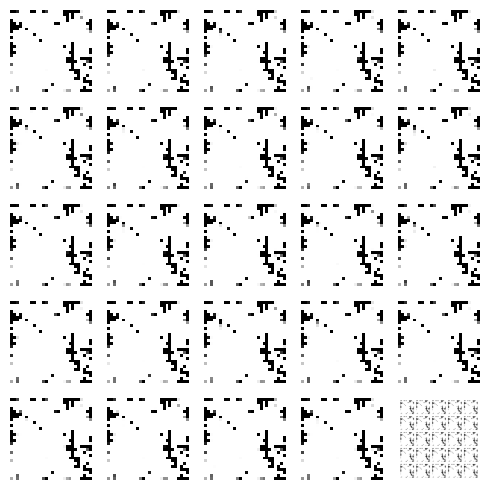

  0%|          | 0/350 [00:00<?, ?it/s]

4/4 [==============================] - 0s 17ms/step


  0%|          | 1/350 [00:00<03:39,  1.59it/s]

4/4 [==============================] - 0s 14ms/step


  1%|          | 2/350 [00:01<03:20,  1.73it/s]

4/4 [==============================] - 0s 17ms/step


  1%|          | 3/350 [00:01<03:24,  1.70it/s]

4/4 [==============================] - 0s 15ms/step


  1%|          | 4/350 [00:02<03:21,  1.71it/s]

4/4 [==============================] - 0s 18ms/step


  1%|▏         | 5/350 [00:02<03:21,  1.71it/s]

4/4 [==============================] - 0s 14ms/step


  2%|▏         | 6/350 [00:03<03:17,  1.74it/s]

4/4 [==============================] - 0s 15ms/step


  2%|▏         | 7/350 [00:03<03:04,  1.86it/s]

4/4 [==============================] - 0s 31ms/step


  2%|▏         | 8/350 [00:04<03:02,  1.87it/s]

4/4 [==============================] - 0s 13ms/step


  3%|▎         | 9/350 [00:04<02:59,  1.90it/s]

4/4 [==============================] - 0s 13ms/step


  3%|▎         | 10/350 [00:05<02:56,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


  3%|▎         | 11/350 [00:05<02:48,  2.01it/s]

4/4 [==============================] - 0s 13ms/step


  3%|▎         | 12/350 [00:06<02:49,  1.99it/s]

4/4 [==============================] - 0s 14ms/step


  4%|▎         | 13/350 [00:06<02:43,  2.06it/s]

4/4 [==============================] - 0s 14ms/step


  4%|▍         | 14/350 [00:07<02:47,  2.01it/s]

4/4 [==============================] - 0s 14ms/step


  4%|▍         | 15/350 [00:07<02:46,  2.01it/s]

4/4 [==============================] - 0s 15ms/step


  5%|▍         | 16/350 [00:08<02:48,  1.98it/s]

4/4 [==============================] - 0s 12ms/step


  5%|▍         | 17/350 [00:08<02:49,  1.97it/s]

4/4 [==============================] - 0s 14ms/step


  5%|▌         | 18/350 [00:09<02:48,  1.97it/s]

4/4 [==============================] - 0s 13ms/step


  5%|▌         | 19/350 [00:09<02:48,  1.97it/s]

4/4 [==============================] - 0s 14ms/step


  6%|▌         | 20/350 [00:10<02:50,  1.94it/s]

4/4 [==============================] - 0s 14ms/step


  6%|▌         | 21/350 [00:11<02:49,  1.94it/s]

4/4 [==============================] - 0s 14ms/step


  6%|▋         | 22/350 [00:11<02:51,  1.91it/s]

4/4 [==============================] - 0s 15ms/step


  7%|▋         | 23/350 [00:12<02:53,  1.88it/s]

4/4 [==============================] - 0s 15ms/step


  7%|▋         | 24/350 [00:12<02:54,  1.87it/s]

4/4 [==============================] - 0s 14ms/step


  7%|▋         | 25/350 [00:13<02:54,  1.86it/s]

4/4 [==============================] - 0s 15ms/step


  7%|▋         | 26/350 [00:13<02:53,  1.86it/s]

4/4 [==============================] - 0s 14ms/step


  8%|▊         | 27/350 [00:14<02:53,  1.86it/s]

4/4 [==============================] - 0s 16ms/step


  8%|▊         | 28/350 [00:14<02:51,  1.88it/s]

4/4 [==============================] - 0s 14ms/step


  8%|▊         | 29/350 [00:15<02:51,  1.87it/s]

4/4 [==============================] - 0s 13ms/step


  9%|▊         | 30/350 [00:15<02:48,  1.90it/s]

4/4 [==============================] - 0s 13ms/step


  9%|▉         | 31/350 [00:16<02:46,  1.91it/s]

4/4 [==============================] - 0s 14ms/step


  9%|▉         | 32/350 [00:16<02:45,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


  9%|▉         | 33/350 [00:17<02:44,  1.93it/s]

4/4 [==============================] - 0s 13ms/step


 10%|▉         | 34/350 [00:17<02:37,  2.01it/s]

4/4 [==============================] - 0s 21ms/step


 10%|█         | 35/350 [00:18<02:36,  2.01it/s]

4/4 [==============================] - 0s 13ms/step


 10%|█         | 36/350 [00:18<02:38,  1.99it/s]

4/4 [==============================] - 0s 14ms/step


 11%|█         | 37/350 [00:19<02:37,  1.98it/s]

4/4 [==============================] - 0s 15ms/step


 11%|█         | 38/350 [00:19<02:41,  1.93it/s]

4/4 [==============================] - 0s 14ms/step


 11%|█         | 39/350 [00:20<02:46,  1.87it/s]

4/4 [==============================] - 0s 17ms/step


 11%|█▏        | 40/350 [00:21<02:47,  1.85it/s]

4/4 [==============================] - 0s 13ms/step


 12%|█▏        | 41/350 [00:21<02:47,  1.85it/s]

4/4 [==============================] - 0s 14ms/step


 12%|█▏        | 42/350 [00:22<02:46,  1.85it/s]

4/4 [==============================] - 0s 14ms/step


 12%|█▏        | 43/350 [00:22<02:48,  1.82it/s]

4/4 [==============================] - 0s 16ms/step


 13%|█▎        | 44/350 [00:23<02:49,  1.81it/s]

4/4 [==============================] - 0s 15ms/step


 13%|█▎        | 45/350 [00:23<02:45,  1.84it/s]

4/4 [==============================] - 0s 13ms/step


 13%|█▎        | 46/350 [00:24<02:42,  1.87it/s]

4/4 [==============================] - 0s 16ms/step


 13%|█▎        | 47/350 [00:24<02:43,  1.85it/s]

4/4 [==============================] - 0s 15ms/step


 14%|█▎        | 48/350 [00:25<02:42,  1.86it/s]

4/4 [==============================] - 0s 14ms/step


 14%|█▍        | 49/350 [00:25<02:44,  1.83it/s]

4/4 [==============================] - 0s 14ms/step


 14%|█▍        | 50/350 [00:26<02:37,  1.90it/s]

4/4 [==============================] - 0s 25ms/step


 15%|█▍        | 51/350 [00:26<02:40,  1.86it/s]

4/4 [==============================] - 0s 15ms/step


 15%|█▍        | 52/350 [00:27<02:36,  1.91it/s]

4/4 [==============================] - 0s 32ms/step


 15%|█▌        | 53/350 [00:27<02:35,  1.91it/s]

4/4 [==============================] - 0s 13ms/step


 15%|█▌        | 54/350 [00:28<02:35,  1.90it/s]

4/4 [==============================] - 0s 14ms/step


 16%|█▌        | 55/350 [00:29<02:36,  1.89it/s]

4/4 [==============================] - 0s 14ms/step


 16%|█▌        | 56/350 [00:29<02:35,  1.89it/s]

4/4 [==============================] - 0s 13ms/step


 16%|█▋        | 57/350 [00:30<02:35,  1.89it/s]

4/4 [==============================] - 0s 12ms/step


 17%|█▋        | 58/350 [00:30<02:36,  1.87it/s]

4/4 [==============================] - 0s 14ms/step


 17%|█▋        | 59/350 [00:31<02:36,  1.86it/s]

4/4 [==============================] - 0s 18ms/step


 17%|█▋        | 60/350 [00:31<02:38,  1.83it/s]

4/4 [==============================] - 0s 12ms/step


 17%|█▋        | 61/350 [00:32<02:35,  1.86it/s]

4/4 [==============================] - 0s 14ms/step


 18%|█▊        | 62/350 [00:32<02:36,  1.84it/s]

4/4 [==============================] - 0s 15ms/step


 18%|█▊        | 63/350 [00:33<02:36,  1.84it/s]

4/4 [==============================] - 0s 13ms/step


 18%|█▊        | 64/350 [00:33<02:34,  1.85it/s]

4/4 [==============================] - 0s 12ms/step


 19%|█▊        | 65/350 [00:34<02:33,  1.86it/s]

4/4 [==============================] - 0s 13ms/step


 19%|█▉        | 66/350 [00:34<02:31,  1.87it/s]

4/4 [==============================] - 0s 14ms/step


 19%|█▉        | 67/350 [00:35<02:32,  1.86it/s]

4/4 [==============================] - 0s 14ms/step


 19%|█▉        | 68/350 [00:36<02:31,  1.87it/s]

4/4 [==============================] - 0s 15ms/step


 20%|█▉        | 69/350 [00:36<02:38,  1.77it/s]

4/4 [==============================] - 0s 17ms/step


 20%|██        | 70/350 [00:37<02:37,  1.78it/s]

4/4 [==============================] - 0s 16ms/step


 20%|██        | 71/350 [00:37<02:38,  1.76it/s]

4/4 [==============================] - 0s 14ms/step


 21%|██        | 72/350 [00:38<02:35,  1.79it/s]

4/4 [==============================] - 0s 14ms/step


 21%|██        | 73/350 [00:38<02:31,  1.83it/s]

4/4 [==============================] - 0s 15ms/step


 21%|██        | 74/350 [00:39<02:29,  1.84it/s]

4/4 [==============================] - 0s 13ms/step


 21%|██▏       | 75/350 [00:39<02:26,  1.87it/s]

4/4 [==============================] - 0s 15ms/step


 22%|██▏       | 76/350 [00:40<02:25,  1.88it/s]

4/4 [==============================] - 0s 15ms/step


 22%|██▏       | 77/350 [00:40<02:23,  1.90it/s]

4/4 [==============================] - 0s 13ms/step


 22%|██▏       | 78/350 [00:41<02:22,  1.91it/s]

4/4 [==============================] - 0s 13ms/step


 23%|██▎       | 79/350 [00:41<02:20,  1.94it/s]

4/4 [==============================] - 0s 15ms/step


 23%|██▎       | 80/350 [00:42<02:21,  1.91it/s]

4/4 [==============================] - 0s 14ms/step


 23%|██▎       | 81/350 [00:43<02:22,  1.89it/s]

4/4 [==============================] - 0s 19ms/step


 23%|██▎       | 82/350 [00:43<02:29,  1.79it/s]

4/4 [==============================] - 0s 13ms/step


 24%|██▎       | 83/350 [00:44<02:25,  1.83it/s]

4/4 [==============================] - 0s 15ms/step


 24%|██▍       | 84/350 [00:44<02:24,  1.85it/s]

4/4 [==============================] - 0s 13ms/step


 24%|██▍       | 85/350 [00:45<02:22,  1.85it/s]

4/4 [==============================] - 0s 15ms/step


 25%|██▍       | 86/350 [00:45<02:22,  1.85it/s]

4/4 [==============================] - 0s 15ms/step


 25%|██▍       | 87/350 [00:46<02:21,  1.85it/s]

4/4 [==============================] - 0s 14ms/step


 25%|██▌       | 88/350 [00:46<02:19,  1.88it/s]

4/4 [==============================] - 0s 14ms/step


 25%|██▌       | 89/350 [00:47<02:17,  1.90it/s]

4/4 [==============================] - 0s 13ms/step


 26%|██▌       | 90/350 [00:47<02:16,  1.91it/s]

4/4 [==============================] - 0s 14ms/step


 26%|██▌       | 91/350 [00:48<02:16,  1.90it/s]

4/4 [==============================] - 0s 15ms/step


 26%|██▋       | 92/350 [00:48<02:15,  1.90it/s]

4/4 [==============================] - 0s 13ms/step


 27%|██▋       | 93/350 [00:49<02:16,  1.88it/s]

4/4 [==============================] - 0s 14ms/step


 27%|██▋       | 94/350 [00:50<02:15,  1.89it/s]

4/4 [==============================] - 0s 14ms/step


 27%|██▋       | 95/350 [00:50<02:15,  1.89it/s]

4/4 [==============================] - 0s 16ms/step


 27%|██▋       | 96/350 [00:51<02:15,  1.87it/s]

4/4 [==============================] - 0s 16ms/step


 28%|██▊       | 97/350 [00:51<02:16,  1.86it/s]

4/4 [==============================] - 0s 14ms/step


 28%|██▊       | 98/350 [00:52<02:13,  1.88it/s]

4/4 [==============================] - 0s 14ms/step


 28%|██▊       | 99/350 [00:52<02:12,  1.89it/s]

4/4 [==============================] - 0s 15ms/step


 29%|██▊       | 100/350 [00:53<02:12,  1.88it/s]

4/4 [==============================] - 0s 15ms/step


 29%|██▉       | 101/350 [00:53<02:18,  1.80it/s]

4/4 [==============================] - 0s 14ms/step


 29%|██▉       | 102/350 [00:54<02:17,  1.81it/s]

4/4 [==============================] - 0s 15ms/step


 29%|██▉       | 103/350 [00:54<02:14,  1.83it/s]

4/4 [==============================] - 0s 16ms/step


 30%|██▉       | 104/350 [00:55<02:14,  1.83it/s]

4/4 [==============================] - 0s 13ms/step


 30%|███       | 105/350 [00:55<02:11,  1.86it/s]

4/4 [==============================] - 0s 13ms/step


 30%|███       | 106/350 [00:56<02:10,  1.87it/s]

4/4 [==============================] - 0s 13ms/step


 31%|███       | 107/350 [00:57<02:08,  1.89it/s]

4/4 [==============================] - 0s 25ms/step


 31%|███       | 108/350 [00:57<02:14,  1.80it/s]

4/4 [==============================] - 0s 13ms/step


 31%|███       | 109/350 [00:58<02:12,  1.81it/s]

4/4 [==============================] - 0s 14ms/step


 31%|███▏      | 110/350 [00:58<02:11,  1.82it/s]

4/4 [==============================] - 0s 14ms/step


 32%|███▏      | 111/350 [00:59<02:10,  1.84it/s]

4/4 [==============================] - 0s 16ms/step


 32%|███▏      | 112/350 [00:59<02:14,  1.77it/s]

4/4 [==============================] - 0s 15ms/step


 32%|███▏      | 113/350 [01:00<02:11,  1.81it/s]

4/4 [==============================] - 0s 13ms/step


 33%|███▎      | 114/350 [01:00<02:09,  1.82it/s]

4/4 [==============================] - 0s 15ms/step


 33%|███▎      | 115/350 [01:01<02:08,  1.83it/s]

4/4 [==============================] - 0s 13ms/step


 33%|███▎      | 116/350 [01:02<02:05,  1.86it/s]

4/4 [==============================] - 0s 14ms/step


 33%|███▎      | 117/350 [01:02<02:04,  1.87it/s]

4/4 [==============================] - 0s 13ms/step


 34%|███▎      | 118/350 [01:03<02:03,  1.88it/s]

4/4 [==============================] - 0s 25ms/step


 34%|███▍      | 119/350 [01:03<02:08,  1.79it/s]

4/4 [==============================] - 0s 14ms/step


 34%|███▍      | 120/350 [01:04<02:08,  1.79it/s]

4/4 [==============================] - 0s 14ms/step


 35%|███▍      | 121/350 [01:04<02:07,  1.79it/s]

4/4 [==============================] - 0s 15ms/step


 35%|███▍      | 122/350 [01:05<02:09,  1.76it/s]

4/4 [==============================] - 0s 18ms/step


 35%|███▌      | 123/350 [01:05<02:06,  1.80it/s]

4/4 [==============================] - 0s 14ms/step


 35%|███▌      | 124/350 [01:06<02:04,  1.82it/s]

4/4 [==============================] - 0s 17ms/step


 36%|███▌      | 125/350 [01:06<02:00,  1.87it/s]

4/4 [==============================] - 0s 33ms/step


 36%|███▌      | 126/350 [01:07<01:59,  1.87it/s]

4/4 [==============================] - 0s 13ms/step


 36%|███▋      | 127/350 [01:07<01:53,  1.97it/s]

4/4 [==============================] - 0s 15ms/step


 37%|███▋      | 128/350 [01:08<01:53,  1.96it/s]

4/4 [==============================] - 0s 14ms/step


 37%|███▋      | 129/350 [01:08<01:52,  1.96it/s]

4/4 [==============================] - 0s 14ms/step


 37%|███▋      | 130/350 [01:09<01:53,  1.94it/s]

4/4 [==============================] - 0s 14ms/step


 37%|███▋      | 131/350 [01:10<01:56,  1.88it/s]

4/4 [==============================] - 0s 16ms/step


 38%|███▊      | 132/350 [01:10<01:57,  1.86it/s]

4/4 [==============================] - 0s 15ms/step


 38%|███▊      | 133/350 [01:11<01:55,  1.88it/s]

4/4 [==============================] - 0s 19ms/step


 38%|███▊      | 134/350 [01:11<01:57,  1.84it/s]

4/4 [==============================] - 0s 16ms/step


 39%|███▊      | 135/350 [01:12<02:02,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 39%|███▉      | 136/350 [01:12<01:55,  1.86it/s]

4/4 [==============================] - 0s 14ms/step


 39%|███▉      | 137/350 [01:13<01:53,  1.88it/s]

4/4 [==============================] - 0s 15ms/step


 39%|███▉      | 138/350 [01:13<01:52,  1.89it/s]

4/4 [==============================] - 0s 14ms/step


 40%|███▉      | 139/350 [01:14<01:47,  1.96it/s]

4/4 [==============================] - 0s 30ms/step


 40%|████      | 140/350 [01:14<01:47,  1.95it/s]

4/4 [==============================] - 0s 15ms/step


 40%|████      | 141/350 [01:15<01:44,  2.00it/s]

4/4 [==============================] - 0s 15ms/step


 41%|████      | 142/350 [01:15<01:46,  1.96it/s]

4/4 [==============================] - 0s 15ms/step


 41%|████      | 143/350 [01:16<01:51,  1.85it/s]

4/4 [==============================] - 0s 15ms/step


 41%|████      | 144/350 [01:16<01:50,  1.87it/s]

4/4 [==============================] - 0s 13ms/step


 41%|████▏     | 145/350 [01:17<01:48,  1.88it/s]

4/4 [==============================] - 0s 15ms/step


 42%|████▏     | 146/350 [01:18<01:49,  1.87it/s]

4/4 [==============================] - 0s 15ms/step


 42%|████▏     | 147/350 [01:18<01:49,  1.86it/s]

4/4 [==============================] - 0s 17ms/step


 42%|████▏     | 148/350 [01:19<01:49,  1.85it/s]

4/4 [==============================] - 0s 14ms/step


 43%|████▎     | 149/350 [01:19<01:49,  1.83it/s]

4/4 [==============================] - 0s 14ms/step


 43%|████▎     | 150/350 [01:20<01:48,  1.84it/s]

4/4 [==============================] - 0s 14ms/step


 43%|████▎     | 151/350 [01:20<01:48,  1.84it/s]

4/4 [==============================] - 0s 15ms/step


 43%|████▎     | 152/350 [01:21<01:47,  1.84it/s]

4/4 [==============================] - 0s 15ms/step


 44%|████▎     | 153/350 [01:21<01:47,  1.84it/s]

4/4 [==============================] - 0s 13ms/step


 44%|████▍     | 154/350 [01:22<01:45,  1.86it/s]

4/4 [==============================] - 0s 13ms/step


 44%|████▍     | 155/350 [01:22<01:43,  1.89it/s]

4/4 [==============================] - 0s 15ms/step


 45%|████▍     | 156/350 [01:23<01:43,  1.87it/s]

4/4 [==============================] - 0s 13ms/step


 45%|████▍     | 157/350 [01:23<01:38,  1.96it/s]

4/4 [==============================] - 0s 15ms/step


 45%|████▌     | 158/350 [01:24<01:38,  1.94it/s]

4/4 [==============================] - 0s 14ms/step


 45%|████▌     | 159/350 [01:24<01:39,  1.91it/s]

4/4 [==============================] - 0s 14ms/step


 46%|████▌     | 160/350 [01:25<01:38,  1.93it/s]

4/4 [==============================] - 0s 14ms/step


 46%|████▌     | 161/350 [01:26<01:40,  1.89it/s]

4/4 [==============================] - 0s 17ms/step


 46%|████▋     | 162/350 [01:26<01:40,  1.87it/s]

4/4 [==============================] - 0s 15ms/step


 47%|████▋     | 163/350 [01:27<01:39,  1.87it/s]

4/4 [==============================] - 0s 14ms/step


 47%|████▋     | 164/350 [01:27<01:39,  1.87it/s]

4/4 [==============================] - 0s 14ms/step


 47%|████▋     | 165/350 [01:28<01:38,  1.87it/s]

4/4 [==============================] - 0s 15ms/step


 47%|████▋     | 166/350 [01:28<01:37,  1.89it/s]

4/4 [==============================] - 0s 16ms/step


 48%|████▊     | 167/350 [01:29<01:33,  1.97it/s]

4/4 [==============================] - 0s 31ms/step


 48%|████▊     | 168/350 [01:29<01:33,  1.95it/s]

4/4 [==============================] - 0s 13ms/step


 48%|████▊     | 169/350 [01:30<01:28,  2.03it/s]

4/4 [==============================] - 0s 13ms/step


 49%|████▊     | 170/350 [01:30<01:29,  2.01it/s]

4/4 [==============================] - 0s 13ms/step


 49%|████▉     | 171/350 [01:31<01:30,  1.98it/s]

4/4 [==============================] - 0s 14ms/step


 49%|████▉     | 172/350 [01:31<01:30,  1.96it/s]

4/4 [==============================] - 0s 14ms/step


 49%|████▉     | 173/350 [01:32<01:29,  1.98it/s]

4/4 [==============================] - 0s 14ms/step


 50%|████▉     | 174/350 [01:32<01:29,  1.96it/s]

4/4 [==============================] - 0s 14ms/step


 50%|█████     | 175/350 [01:33<01:26,  2.03it/s]

4/4 [==============================] - 0s 24ms/step


 50%|█████     | 176/350 [01:33<01:25,  2.02it/s]

4/4 [==============================] - 0s 14ms/step


 51%|█████     | 177/350 [01:34<01:27,  1.97it/s]

4/4 [==============================] - 0s 13ms/step


 51%|█████     | 178/350 [01:34<01:24,  2.05it/s]

4/4 [==============================] - 0s 21ms/step


 51%|█████     | 179/350 [01:35<01:24,  2.03it/s]

4/4 [==============================] - 0s 13ms/step


 51%|█████▏    | 180/350 [01:35<01:21,  2.08it/s]

4/4 [==============================] - 0s 14ms/step


 52%|█████▏    | 181/350 [01:36<01:23,  2.03it/s]

4/4 [==============================] - 0s 13ms/step


 52%|█████▏    | 182/350 [01:36<01:20,  2.09it/s]

4/4 [==============================] - 0s 18ms/step


 52%|█████▏    | 183/350 [01:37<01:20,  2.06it/s]

4/4 [==============================] - 0s 13ms/step


 53%|█████▎    | 184/350 [01:37<01:19,  2.10it/s]

4/4 [==============================] - 0s 13ms/step


 53%|█████▎    | 185/350 [01:37<01:20,  2.05it/s]

4/4 [==============================] - 0s 12ms/step


 53%|█████▎    | 186/350 [01:38<01:20,  2.03it/s]

4/4 [==============================] - 0s 13ms/step


 53%|█████▎    | 187/350 [01:38<01:18,  2.09it/s]

4/4 [==============================] - 0s 14ms/step


 54%|█████▎    | 188/350 [01:39<01:19,  2.04it/s]

4/4 [==============================] - 0s 13ms/step


 54%|█████▍    | 189/350 [01:39<01:19,  2.02it/s]

4/4 [==============================] - 0s 14ms/step


 54%|█████▍    | 190/350 [01:40<01:19,  2.00it/s]

4/4 [==============================] - 0s 14ms/step


 55%|█████▍    | 191/350 [01:40<01:16,  2.07it/s]

4/4 [==============================] - 0s 15ms/step


 55%|█████▍    | 192/350 [01:41<01:19,  1.98it/s]

4/4 [==============================] - 0s 15ms/step


 55%|█████▌    | 193/350 [01:42<01:21,  1.93it/s]

4/4 [==============================] - 0s 14ms/step


 55%|█████▌    | 194/350 [01:42<01:17,  2.00it/s]

4/4 [==============================] - 0s 13ms/step


 56%|█████▌    | 195/350 [01:43<01:18,  1.97it/s]

4/4 [==============================] - 0s 15ms/step


 56%|█████▌    | 196/350 [01:43<01:20,  1.92it/s]

4/4 [==============================] - 0s 16ms/step


 56%|█████▋    | 197/350 [01:44<01:20,  1.90it/s]

4/4 [==============================] - 0s 14ms/step


 57%|█████▋    | 198/350 [01:44<01:20,  1.88it/s]

4/4 [==============================] - 0s 16ms/step


 57%|█████▋    | 199/350 [01:45<01:21,  1.84it/s]

4/4 [==============================] - 0s 14ms/step


 57%|█████▋    | 200/350 [01:45<01:21,  1.84it/s]

4/4 [==============================] - 0s 17ms/step


 57%|█████▋    | 201/350 [01:46<01:20,  1.85it/s]

4/4 [==============================] - 0s 15ms/step


 58%|█████▊    | 202/350 [01:46<01:21,  1.82it/s]

4/4 [==============================] - 0s 13ms/step


 58%|█████▊    | 203/350 [01:47<01:18,  1.87it/s]

4/4 [==============================] - 0s 14ms/step


 58%|█████▊    | 204/350 [01:47<01:18,  1.86it/s]

4/4 [==============================] - 0s 14ms/step


 59%|█████▊    | 205/350 [01:48<01:17,  1.87it/s]

4/4 [==============================] - 0s 13ms/step


 59%|█████▉    | 206/350 [01:48<01:17,  1.86it/s]

4/4 [==============================] - 0s 16ms/step


 59%|█████▉    | 207/350 [01:49<01:16,  1.87it/s]

4/4 [==============================] - 0s 12ms/step


 59%|█████▉    | 208/350 [01:49<01:13,  1.92it/s]

4/4 [==============================] - 0s 15ms/step


 60%|█████▉    | 209/350 [01:50<01:14,  1.89it/s]

4/4 [==============================] - 0s 13ms/step


 60%|██████    | 210/350 [01:51<01:14,  1.88it/s]

4/4 [==============================] - 0s 14ms/step


 60%|██████    | 211/350 [01:51<01:10,  1.96it/s]

4/4 [==============================] - 0s 19ms/step


 61%|██████    | 212/350 [01:52<01:11,  1.94it/s]

4/4 [==============================] - 0s 15ms/step


 61%|██████    | 213/350 [01:52<01:08,  1.99it/s]

4/4 [==============================] - 0s 31ms/step


 61%|██████    | 214/350 [01:53<01:08,  1.98it/s]

4/4 [==============================] - 0s 13ms/step


 61%|██████▏   | 215/350 [01:53<01:08,  1.97it/s]

4/4 [==============================] - 0s 13ms/step


 62%|██████▏   | 216/350 [01:54<01:08,  1.97it/s]

4/4 [==============================] - 0s 13ms/step


 62%|██████▏   | 217/350 [01:54<01:07,  1.98it/s]

4/4 [==============================] - 0s 13ms/step


 62%|██████▏   | 218/350 [01:55<01:06,  1.98it/s]

4/4 [==============================] - 0s 13ms/step


 63%|██████▎   | 219/350 [01:55<01:04,  2.03it/s]

4/4 [==============================] - 0s 12ms/step


 63%|██████▎   | 220/350 [01:56<01:04,  2.02it/s]

4/4 [==============================] - 0s 14ms/step


 63%|██████▎   | 221/350 [01:56<01:06,  1.95it/s]

4/4 [==============================] - 0s 15ms/step


 63%|██████▎   | 222/350 [01:57<01:09,  1.85it/s]

4/4 [==============================] - 0s 14ms/step


 64%|██████▎   | 223/350 [01:57<01:08,  1.85it/s]

4/4 [==============================] - 0s 13ms/step


 64%|██████▍   | 224/350 [01:58<01:04,  1.95it/s]

4/4 [==============================] - 0s 15ms/step


 64%|██████▍   | 225/350 [01:58<01:06,  1.88it/s]

4/4 [==============================] - 0s 26ms/step


 65%|██████▍   | 226/350 [01:59<01:07,  1.85it/s]

4/4 [==============================] - 0s 14ms/step


 65%|██████▍   | 227/350 [01:59<01:05,  1.88it/s]

4/4 [==============================] - 0s 13ms/step


 65%|██████▌   | 228/350 [02:00<01:02,  1.96it/s]

4/4 [==============================] - 0s 14ms/step


 65%|██████▌   | 229/350 [02:00<01:02,  1.93it/s]

4/4 [==============================] - 0s 15ms/step


 66%|██████▌   | 230/350 [02:01<01:02,  1.92it/s]

4/4 [==============================] - 0s 14ms/step


 66%|██████▌   | 231/350 [02:01<01:01,  1.94it/s]

4/4 [==============================] - 0s 14ms/step


 66%|██████▋   | 232/350 [02:02<01:00,  1.93it/s]

4/4 [==============================] - 0s 13ms/step


 67%|██████▋   | 233/350 [02:02<00:58,  2.01it/s]

4/4 [==============================] - 0s 13ms/step


 67%|██████▋   | 234/350 [02:03<01:00,  1.93it/s]

4/4 [==============================] - 0s 14ms/step


 67%|██████▋   | 235/350 [02:03<01:00,  1.91it/s]

4/4 [==============================] - 0s 14ms/step


 67%|██████▋   | 236/350 [02:04<01:00,  1.88it/s]

4/4 [==============================] - 0s 15ms/step


 68%|██████▊   | 237/350 [02:05<00:59,  1.90it/s]

4/4 [==============================] - 0s 15ms/step


 68%|██████▊   | 238/350 [02:05<00:57,  1.95it/s]

4/4 [==============================] - 0s 14ms/step


 68%|██████▊   | 239/350 [02:06<01:00,  1.84it/s]

4/4 [==============================] - 0s 14ms/step


 69%|██████▊   | 240/350 [02:06<01:02,  1.75it/s]

4/4 [==============================] - 0s 16ms/step


 69%|██████▉   | 241/350 [02:07<01:03,  1.73it/s]

4/4 [==============================] - 0s 17ms/step


 69%|██████▉   | 242/350 [02:07<01:02,  1.73it/s]

4/4 [==============================] - 0s 14ms/step


 69%|██████▉   | 243/350 [02:08<01:02,  1.73it/s]

4/4 [==============================] - 0s 18ms/step


 70%|██████▉   | 244/350 [02:09<01:02,  1.70it/s]

4/4 [==============================] - 0s 15ms/step


 70%|███████   | 245/350 [02:09<01:02,  1.67it/s]

4/4 [==============================] - 0s 14ms/step


 70%|███████   | 246/350 [02:10<01:01,  1.69it/s]

4/4 [==============================] - 0s 15ms/step


 71%|███████   | 247/350 [02:10<01:00,  1.70it/s]

4/4 [==============================] - 0s 17ms/step


 71%|███████   | 248/350 [02:11<00:59,  1.71it/s]

4/4 [==============================] - 0s 18ms/step


 71%|███████   | 249/350 [02:12<01:00,  1.68it/s]

4/4 [==============================] - 0s 18ms/step


 71%|███████▏  | 250/350 [02:12<00:59,  1.69it/s]

4/4 [==============================] - 0s 41ms/step


 72%|███████▏  | 251/350 [02:13<01:00,  1.65it/s]

4/4 [==============================] - 0s 16ms/step


 72%|███████▏  | 252/350 [02:13<00:58,  1.67it/s]

4/4 [==============================] - 0s 16ms/step


 72%|███████▏  | 253/350 [02:14<00:58,  1.66it/s]

4/4 [==============================] - 0s 15ms/step


 73%|███████▎  | 254/350 [02:15<00:56,  1.71it/s]

4/4 [==============================] - 0s 14ms/step


 73%|███████▎  | 255/350 [02:15<00:54,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 73%|███████▎  | 256/350 [02:16<00:50,  1.85it/s]

4/4 [==============================] - 0s 13ms/step


 73%|███████▎  | 257/350 [02:16<00:48,  1.93it/s]

4/4 [==============================] - 0s 24ms/step


 74%|███████▎  | 258/350 [02:17<00:47,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


 74%|███████▍  | 259/350 [02:17<00:46,  1.97it/s]

4/4 [==============================] - 0s 15ms/step


 74%|███████▍  | 260/350 [02:18<00:46,  1.94it/s]

4/4 [==============================] - 0s 14ms/step


 75%|███████▍  | 261/350 [02:18<00:45,  1.96it/s]

4/4 [==============================] - 0s 18ms/step


 75%|███████▍  | 262/350 [02:19<00:44,  1.99it/s]

4/4 [==============================] - 0s 34ms/step


 75%|███████▌  | 263/350 [02:19<00:45,  1.93it/s]

4/4 [==============================] - 0s 14ms/step


 75%|███████▌  | 264/350 [02:20<00:45,  1.91it/s]

4/4 [==============================] - 0s 14ms/step


 76%|███████▌  | 265/350 [02:20<00:43,  1.97it/s]

4/4 [==============================] - 0s 33ms/step


 76%|███████▌  | 266/350 [02:21<00:43,  1.94it/s]

4/4 [==============================] - 0s 13ms/step


 76%|███████▋  | 267/350 [02:21<00:41,  1.99it/s]

4/4 [==============================] - 0s 13ms/step


 77%|███████▋  | 268/350 [02:22<00:41,  1.99it/s]

4/4 [==============================] - 0s 14ms/step


 77%|███████▋  | 269/350 [02:22<00:40,  2.02it/s]

4/4 [==============================] - 0s 14ms/step


 77%|███████▋  | 270/350 [02:23<00:40,  1.95it/s]

4/4 [==============================] - 0s 15ms/step


 77%|███████▋  | 271/350 [02:23<00:39,  2.00it/s]

4/4 [==============================] - 0s 32ms/step


 78%|███████▊  | 272/350 [02:24<00:40,  1.93it/s]

4/4 [==============================] - 0s 14ms/step


 78%|███████▊  | 273/350 [02:24<00:40,  1.91it/s]

4/4 [==============================] - 0s 14ms/step


 78%|███████▊  | 274/350 [02:25<00:39,  1.91it/s]

4/4 [==============================] - 0s 14ms/step


 79%|███████▊  | 275/350 [02:25<00:39,  1.90it/s]

4/4 [==============================] - 0s 13ms/step


 79%|███████▉  | 276/350 [02:26<00:37,  1.97it/s]

4/4 [==============================] - 0s 32ms/step


 79%|███████▉  | 277/350 [02:26<00:38,  1.92it/s]

4/4 [==============================] - 0s 15ms/step


 79%|███████▉  | 278/350 [02:27<00:36,  1.99it/s]

4/4 [==============================] - 0s 24ms/step


 80%|███████▉  | 279/350 [02:27<00:35,  1.98it/s]

4/4 [==============================] - 0s 13ms/step


 80%|████████  | 280/350 [02:28<00:34,  2.02it/s]

4/4 [==============================] - 0s 22ms/step


 80%|████████  | 281/350 [02:28<00:34,  1.97it/s]

4/4 [==============================] - 0s 13ms/step


 81%|████████  | 282/350 [02:29<00:33,  2.00it/s]

4/4 [==============================] - 0s 15ms/step


 81%|████████  | 283/350 [02:29<00:34,  1.95it/s]

4/4 [==============================] - 0s 15ms/step


 81%|████████  | 284/350 [02:30<00:32,  2.02it/s]

4/4 [==============================] - 0s 15ms/step


 81%|████████▏ | 285/350 [02:30<00:33,  1.96it/s]

4/4 [==============================] - 0s 15ms/step


 82%|████████▏ | 286/350 [02:31<00:33,  1.94it/s]

4/4 [==============================] - 0s 16ms/step


 82%|████████▏ | 287/350 [02:31<00:33,  1.91it/s]

4/4 [==============================] - 0s 14ms/step


 82%|████████▏ | 288/350 [02:32<00:33,  1.87it/s]

4/4 [==============================] - 0s 13ms/step


 83%|████████▎ | 289/350 [02:32<00:32,  1.88it/s]

4/4 [==============================] - 0s 13ms/step


 83%|████████▎ | 290/350 [02:33<00:32,  1.86it/s]

4/4 [==============================] - 0s 14ms/step


 83%|████████▎ | 291/350 [02:34<00:31,  1.87it/s]

4/4 [==============================] - 0s 15ms/step


 83%|████████▎ | 292/350 [02:34<00:31,  1.86it/s]

4/4 [==============================] - 0s 18ms/step


 84%|████████▎ | 293/350 [02:35<00:31,  1.84it/s]

4/4 [==============================] - 0s 14ms/step


 84%|████████▍ | 294/350 [02:35<00:30,  1.85it/s]

4/4 [==============================] - 0s 14ms/step


 84%|████████▍ | 295/350 [02:36<00:28,  1.92it/s]

4/4 [==============================] - 0s 25ms/step


 85%|████████▍ | 296/350 [02:36<00:28,  1.91it/s]

4/4 [==============================] - 0s 14ms/step


 85%|████████▍ | 297/350 [02:37<00:27,  1.93it/s]

4/4 [==============================] - 0s 14ms/step


 85%|████████▌ | 298/350 [02:37<00:27,  1.89it/s]

4/4 [==============================] - 0s 14ms/step


 85%|████████▌ | 299/350 [02:38<00:26,  1.95it/s]

4/4 [==============================] - 0s 13ms/step


 86%|████████▌ | 300/350 [02:38<00:26,  1.90it/s]

4/4 [==============================] - 0s 15ms/step


 86%|████████▌ | 301/350 [02:39<00:25,  1.89it/s]

4/4 [==============================] - 0s 16ms/step


 86%|████████▋ | 302/350 [02:39<00:26,  1.84it/s]

4/4 [==============================] - 0s 23ms/step


 87%|████████▋ | 303/350 [02:40<00:27,  1.71it/s]

4/4 [==============================] - 0s 18ms/step


 87%|████████▋ | 304/350 [02:41<00:27,  1.66it/s]

4/4 [==============================] - 0s 19ms/step


 87%|████████▋ | 305/350 [02:41<00:26,  1.67it/s]

4/4 [==============================] - 0s 27ms/step


 87%|████████▋ | 306/350 [02:42<00:27,  1.62it/s]

4/4 [==============================] - 0s 15ms/step


 88%|████████▊ | 307/350 [02:42<00:25,  1.70it/s]

4/4 [==============================] - 0s 14ms/step


 88%|████████▊ | 308/350 [02:43<00:24,  1.73it/s]

4/4 [==============================] - 0s 14ms/step


 88%|████████▊ | 309/350 [02:44<00:23,  1.77it/s]

4/4 [==============================] - 0s 14ms/step


 89%|████████▊ | 310/350 [02:44<00:22,  1.80it/s]

4/4 [==============================] - 0s 14ms/step


 89%|████████▉ | 311/350 [02:45<00:21,  1.81it/s]

4/4 [==============================] - 0s 13ms/step


 89%|████████▉ | 312/350 [02:45<00:20,  1.82it/s]

4/4 [==============================] - 0s 14ms/step


 89%|████████▉ | 313/350 [02:46<00:20,  1.83it/s]

4/4 [==============================] - 0s 17ms/step


 90%|████████▉ | 314/350 [02:46<00:19,  1.81it/s]

4/4 [==============================] - 0s 13ms/step


 90%|█████████ | 315/350 [02:47<00:18,  1.90it/s]

4/4 [==============================] - 0s 16ms/step


 90%|█████████ | 316/350 [02:47<00:18,  1.87it/s]

4/4 [==============================] - 0s 15ms/step


 91%|█████████ | 317/350 [02:48<00:17,  1.85it/s]

4/4 [==============================] - 0s 14ms/step


 91%|█████████ | 318/350 [02:48<00:17,  1.84it/s]

4/4 [==============================] - 0s 14ms/step


 91%|█████████ | 319/350 [02:49<00:16,  1.85it/s]

4/4 [==============================] - 0s 15ms/step


 91%|█████████▏| 320/350 [02:49<00:15,  1.92it/s]

4/4 [==============================] - 0s 17ms/step


 92%|█████████▏| 321/350 [02:50<00:15,  1.92it/s]

4/4 [==============================] - 0s 29ms/step


 92%|█████████▏| 322/350 [02:50<00:14,  1.90it/s]

4/4 [==============================] - 0s 14ms/step


 92%|█████████▏| 323/350 [02:51<00:14,  1.90it/s]

4/4 [==============================] - 0s 12ms/step


 93%|█████████▎| 324/350 [02:52<00:13,  1.88it/s]

4/4 [==============================] - 0s 14ms/step


 93%|█████████▎| 325/350 [02:52<00:13,  1.86it/s]

4/4 [==============================] - 0s 14ms/step


 93%|█████████▎| 326/350 [02:53<00:12,  1.86it/s]

4/4 [==============================] - 0s 15ms/step


 93%|█████████▎| 327/350 [02:53<00:12,  1.80it/s]

4/4 [==============================] - 0s 15ms/step


 94%|█████████▎| 328/350 [02:54<00:12,  1.79it/s]

4/4 [==============================] - 0s 15ms/step


 94%|█████████▍| 329/350 [02:54<00:11,  1.77it/s]

4/4 [==============================] - 0s 16ms/step


 94%|█████████▍| 330/350 [02:55<00:11,  1.75it/s]

4/4 [==============================] - 0s 16ms/step


 95%|█████████▍| 331/350 [02:55<00:10,  1.78it/s]

4/4 [==============================] - 0s 17ms/step


 95%|█████████▍| 332/350 [02:56<00:10,  1.79it/s]

4/4 [==============================] - 0s 14ms/step


 95%|█████████▌| 333/350 [02:57<00:09,  1.78it/s]

4/4 [==============================] - 0s 15ms/step


 95%|█████████▌| 334/350 [02:57<00:08,  1.81it/s]

4/4 [==============================] - 0s 16ms/step


 96%|█████████▌| 335/350 [02:58<00:08,  1.81it/s]

4/4 [==============================] - 0s 14ms/step


 96%|█████████▌| 336/350 [02:58<00:07,  1.82it/s]

4/4 [==============================] - 0s 15ms/step


 96%|█████████▋| 337/350 [02:59<00:07,  1.84it/s]

4/4 [==============================] - 0s 17ms/step


 97%|█████████▋| 338/350 [02:59<00:06,  1.85it/s]

4/4 [==============================] - 0s 14ms/step


 97%|█████████▋| 339/350 [03:00<00:05,  1.87it/s]

4/4 [==============================] - 0s 15ms/step


 97%|█████████▋| 340/350 [03:00<00:05,  1.89it/s]

4/4 [==============================] - 0s 13ms/step


 97%|█████████▋| 341/350 [03:01<00:04,  1.90it/s]

4/4 [==============================] - 0s 14ms/step


 98%|█████████▊| 342/350 [03:01<00:04,  1.87it/s]

4/4 [==============================] - 0s 17ms/step


 98%|█████████▊| 343/350 [03:02<00:03,  1.85it/s]

4/4 [==============================] - 0s 14ms/step


 98%|█████████▊| 344/350 [03:02<00:03,  1.86it/s]

4/4 [==============================] - 0s 18ms/step


 99%|█████████▊| 345/350 [03:03<00:02,  1.78it/s]

4/4 [==============================] - 0s 14ms/step


 99%|█████████▉| 346/350 [03:04<00:02,  1.79it/s]

4/4 [==============================] - 0s 14ms/step


 99%|█████████▉| 347/350 [03:04<00:01,  1.83it/s]

4/4 [==============================] - 0s 14ms/step


 99%|█████████▉| 348/350 [03:05<00:01,  1.85it/s]

4/4 [==============================] - 0s 17ms/step


100%|█████████▉| 349/350 [03:05<00:00,  1.86it/s]

4/4 [==============================] - 0s 16ms/step


100%|██████████| 350/350 [03:06<00:00,  1.88it/s]

Epoch number: 16 discriminator_loss: 0.1676400041704931 generator_loss: 6.786410809925624
1/1 [==============================] - 0s 22ms/step


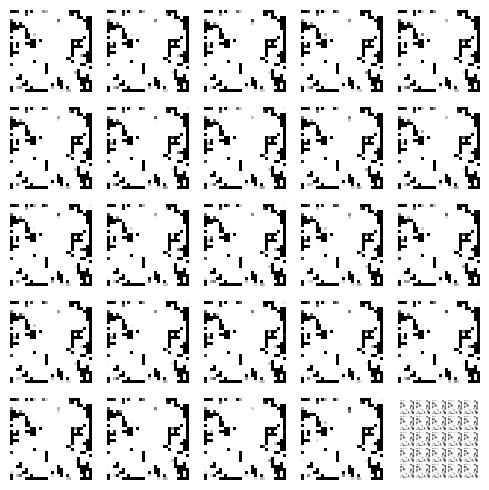

  0%|          | 0/350 [00:00<?, ?it/s]

4/4 [==============================] - 0s 21ms/step


  0%|          | 1/350 [00:00<03:30,  1.65it/s]

4/4 [==============================] - 0s 14ms/step


  1%|          | 2/350 [00:01<03:05,  1.88it/s]

4/4 [==============================] - 0s 34ms/step


  1%|          | 3/350 [00:01<03:09,  1.83it/s]

4/4 [==============================] - 0s 16ms/step


  1%|          | 4/350 [00:02<03:11,  1.81it/s]

4/4 [==============================] - 0s 14ms/step


  1%|▏         | 5/350 [00:02<03:07,  1.84it/s]

4/4 [==============================] - 0s 13ms/step


  2%|▏         | 6/350 [00:03<03:01,  1.89it/s]

4/4 [==============================] - 0s 14ms/step


  2%|▏         | 7/350 [00:03<02:59,  1.91it/s]

4/4 [==============================] - 0s 13ms/step


  2%|▏         | 8/350 [00:04<02:58,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


  3%|▎         | 9/350 [00:04<02:57,  1.93it/s]

4/4 [==============================] - 0s 13ms/step


  3%|▎         | 10/350 [00:05<02:58,  1.91it/s]

4/4 [==============================] - 0s 14ms/step


  3%|▎         | 11/350 [00:05<03:00,  1.88it/s]

4/4 [==============================] - 0s 13ms/step


  3%|▎         | 12/350 [00:06<03:00,  1.87it/s]

4/4 [==============================] - 0s 13ms/step


  4%|▎         | 13/350 [00:06<02:58,  1.89it/s]

4/4 [==============================] - 0s 13ms/step


  4%|▍         | 14/350 [00:07<02:58,  1.88it/s]

4/4 [==============================] - 0s 14ms/step


  4%|▍         | 15/350 [00:07<02:50,  1.96it/s]

4/4 [==============================] - 0s 26ms/step


  5%|▍         | 16/350 [00:08<02:50,  1.95it/s]

4/4 [==============================] - 0s 13ms/step


  5%|▍         | 17/350 [00:08<02:51,  1.95it/s]

4/4 [==============================] - 0s 13ms/step


  5%|▌         | 18/350 [00:09<02:51,  1.93it/s]

4/4 [==============================] - 0s 13ms/step


  5%|▌         | 19/350 [00:09<02:45,  2.00it/s]

4/4 [==============================] - 0s 18ms/step


  6%|▌         | 20/350 [00:10<02:45,  1.99it/s]

4/4 [==============================] - 0s 13ms/step


  6%|▌         | 21/350 [00:10<02:41,  2.04it/s]

4/4 [==============================] - 0s 12ms/step


  6%|▋         | 22/350 [00:11<02:42,  2.02it/s]

4/4 [==============================] - 0s 13ms/step


  7%|▋         | 23/350 [00:11<02:38,  2.06it/s]

4/4 [==============================] - 0s 13ms/step


  7%|▋         | 24/350 [00:12<02:45,  1.97it/s]

4/4 [==============================] - 0s 14ms/step


  7%|▋         | 25/350 [00:13<03:03,  1.77it/s]

4/4 [==============================] - 0s 18ms/step


  7%|▋         | 26/350 [00:13<03:18,  1.63it/s]

4/4 [==============================] - 0s 24ms/step


  8%|▊         | 27/350 [00:14<03:08,  1.71it/s]

4/4 [==============================] - 0s 31ms/step


  8%|▊         | 28/350 [00:14<03:04,  1.74it/s]

4/4 [==============================] - 0s 14ms/step


  8%|▊         | 29/350 [00:15<02:53,  1.85it/s]

4/4 [==============================] - 0s 19ms/step


  9%|▊         | 30/350 [00:15<02:54,  1.83it/s]

4/4 [==============================] - 0s 12ms/step


  9%|▉         | 31/350 [00:16<02:45,  1.92it/s]

4/4 [==============================] - 0s 17ms/step


  9%|▉         | 32/350 [00:16<02:46,  1.91it/s]

4/4 [==============================] - 0s 14ms/step


  9%|▉         | 33/350 [00:17<02:40,  1.98it/s]

4/4 [==============================] - 0s 21ms/step


 10%|▉         | 34/350 [00:17<02:45,  1.91it/s]

4/4 [==============================] - 0s 24ms/step


 10%|█         | 35/350 [00:18<02:45,  1.91it/s]

4/4 [==============================] - 0s 13ms/step


 10%|█         | 36/350 [00:18<02:39,  1.97it/s]

4/4 [==============================] - 0s 13ms/step


 11%|█         | 37/350 [00:19<02:38,  1.97it/s]

4/4 [==============================] - 0s 12ms/step


 11%|█         | 38/350 [00:19<02:33,  2.03it/s]

4/4 [==============================] - 0s 37ms/step


 11%|█         | 39/350 [00:20<02:36,  1.99it/s]

4/4 [==============================] - 0s 14ms/step


 11%|█▏        | 40/350 [00:20<02:31,  2.04it/s]

4/4 [==============================] - 0s 30ms/step


 12%|█▏        | 41/350 [00:21<02:34,  2.00it/s]

4/4 [==============================] - 0s 14ms/step


 12%|█▏        | 42/350 [00:21<02:30,  2.05it/s]

4/4 [==============================] - 0s 15ms/step


 12%|█▏        | 43/350 [00:22<02:34,  1.99it/s]

4/4 [==============================] - 0s 14ms/step


 13%|█▎        | 44/350 [00:22<02:35,  1.96it/s]

4/4 [==============================] - 0s 15ms/step


 13%|█▎        | 45/350 [00:23<02:38,  1.92it/s]

4/4 [==============================] - 0s 17ms/step


 13%|█▎        | 46/350 [00:24<02:35,  1.95it/s]

4/4 [==============================] - 0s 25ms/step


 13%|█▎        | 47/350 [00:24<02:38,  1.91it/s]

4/4 [==============================] - 0s 17ms/step


 14%|█▎        | 48/350 [00:25<02:33,  1.96it/s]

4/4 [==============================] - 0s 15ms/step


 14%|█▍        | 49/350 [00:25<02:40,  1.87it/s]

4/4 [==============================] - 0s 22ms/step


 14%|█▍        | 50/350 [00:26<02:43,  1.84it/s]

4/4 [==============================] - 0s 29ms/step


 15%|█▍        | 51/350 [00:26<02:49,  1.76it/s]

4/4 [==============================] - 0s 16ms/step


 15%|█▍        | 52/350 [00:27<02:45,  1.80it/s]

4/4 [==============================] - 0s 47ms/step


 15%|█▌        | 53/350 [00:28<02:58,  1.67it/s]

4/4 [==============================] - 0s 14ms/step


 15%|█▌        | 54/350 [00:28<02:45,  1.78it/s]

4/4 [==============================] - 0s 14ms/step


 16%|█▌        | 55/350 [00:29<02:42,  1.82it/s]

4/4 [==============================] - 0s 11ms/step


 16%|█▌        | 56/350 [00:29<02:33,  1.92it/s]

4/4 [==============================] - 0s 15ms/step


 16%|█▋        | 57/350 [00:30<02:32,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


 17%|█▋        | 58/350 [00:30<02:32,  1.92it/s]

4/4 [==============================] - 0s 20ms/step


 17%|█▋        | 59/350 [00:31<02:33,  1.90it/s]

4/4 [==============================] - 0s 13ms/step


 17%|█▋        | 60/350 [00:31<02:26,  1.97it/s]

4/4 [==============================] - 0s 20ms/step


 17%|█▋        | 61/350 [00:32<02:29,  1.93it/s]

4/4 [==============================] - 0s 13ms/step


 18%|█▊        | 62/350 [00:32<02:25,  1.98it/s]

4/4 [==============================] - 0s 35ms/step


 18%|█▊        | 63/350 [00:33<02:30,  1.91it/s]

4/4 [==============================] - 0s 14ms/step


 18%|█▊        | 64/350 [00:33<02:38,  1.81it/s]

4/4 [==============================] - 0s 16ms/step


 19%|█▊        | 65/350 [00:34<02:37,  1.81it/s]

4/4 [==============================] - 0s 14ms/step


 19%|█▉        | 66/350 [00:34<02:29,  1.90it/s]

4/4 [==============================] - 0s 13ms/step


 19%|█▉        | 67/350 [00:35<02:27,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


 19%|█▉        | 68/350 [00:35<02:28,  1.90it/s]

4/4 [==============================] - 0s 15ms/step


 20%|█▉        | 69/350 [00:36<02:28,  1.90it/s]

4/4 [==============================] - 0s 13ms/step


 20%|██        | 70/350 [00:36<02:25,  1.92it/s]

4/4 [==============================] - 0s 14ms/step


 20%|██        | 71/350 [00:37<02:25,  1.92it/s]

4/4 [==============================] - 0s 14ms/step


 21%|██        | 72/350 [00:37<02:24,  1.93it/s]

4/4 [==============================] - 0s 14ms/step


 21%|██        | 73/350 [00:38<02:22,  1.94it/s]

4/4 [==============================] - 0s 13ms/step


 21%|██        | 74/350 [00:38<02:23,  1.92it/s]

4/4 [==============================] - 0s 14ms/step


 21%|██▏       | 75/350 [00:39<02:24,  1.90it/s]

4/4 [==============================] - 0s 15ms/step


 22%|██▏       | 76/350 [00:39<02:25,  1.88it/s]

4/4 [==============================] - 0s 12ms/step


 22%|██▏       | 77/350 [00:40<02:24,  1.89it/s]

4/4 [==============================] - 0s 14ms/step


 22%|██▏       | 78/350 [00:41<02:24,  1.88it/s]

4/4 [==============================] - 0s 16ms/step


 23%|██▎       | 79/350 [00:41<02:23,  1.88it/s]

4/4 [==============================] - 0s 15ms/step


 23%|██▎       | 80/350 [00:42<02:23,  1.88it/s]

4/4 [==============================] - 0s 13ms/step


 23%|██▎       | 81/350 [00:42<02:23,  1.88it/s]

4/4 [==============================] - 0s 13ms/step


 23%|██▎       | 82/350 [00:43<02:22,  1.89it/s]

4/4 [==============================] - 0s 14ms/step


 24%|██▎       | 83/350 [00:43<02:23,  1.87it/s]

4/4 [==============================] - 0s 15ms/step


 24%|██▍       | 84/350 [00:44<02:23,  1.85it/s]

4/4 [==============================] - 0s 14ms/step


 24%|██▍       | 85/350 [00:44<02:21,  1.87it/s]

4/4 [==============================] - 0s 18ms/step


 25%|██▍       | 86/350 [00:45<02:27,  1.79it/s]

4/4 [==============================] - 0s 14ms/step


 25%|██▍       | 87/350 [00:45<02:20,  1.87it/s]

4/4 [==============================] - 0s 17ms/step


 25%|██▌       | 88/350 [00:46<02:19,  1.88it/s]

4/4 [==============================] - 0s 15ms/step


 25%|██▌       | 89/350 [00:46<02:16,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


 26%|██▌       | 90/350 [00:47<02:15,  1.92it/s]

4/4 [==============================] - 0s 14ms/step


 26%|██▌       | 91/350 [00:47<02:16,  1.90it/s]

4/4 [==============================] - 0s 14ms/step


 26%|██▋       | 92/350 [00:48<02:15,  1.90it/s]

4/4 [==============================] - 0s 38ms/step


 27%|██▋       | 93/350 [00:49<02:23,  1.80it/s]

4/4 [==============================] - 0s 13ms/step


 27%|██▋       | 94/350 [00:49<02:19,  1.84it/s]

4/4 [==============================] - 0s 15ms/step


 27%|██▋       | 95/350 [00:50<02:14,  1.89it/s]

4/4 [==============================] - 0s 14ms/step


 27%|██▋       | 96/350 [00:50<02:14,  1.89it/s]

4/4 [==============================] - 0s 15ms/step


 28%|██▊       | 97/350 [00:51<02:15,  1.87it/s]

4/4 [==============================] - 0s 13ms/step


 28%|██▊       | 98/350 [00:51<02:16,  1.84it/s]

4/4 [==============================] - 0s 18ms/step


 28%|██▊       | 99/350 [00:52<02:16,  1.84it/s]

4/4 [==============================] - 0s 13ms/step


 29%|██▊       | 100/350 [00:52<02:18,  1.81it/s]

4/4 [==============================] - 0s 16ms/step


 29%|██▉       | 101/350 [00:53<02:16,  1.82it/s]

4/4 [==============================] - 0s 15ms/step


 29%|██▉       | 102/350 [00:53<02:11,  1.89it/s]

4/4 [==============================] - 0s 14ms/step


 29%|██▉       | 103/350 [00:54<02:11,  1.87it/s]

4/4 [==============================] - 0s 15ms/step


 30%|██▉       | 104/350 [00:55<02:12,  1.86it/s]

4/4 [==============================] - 0s 13ms/step


 30%|███       | 105/350 [00:55<02:09,  1.89it/s]

4/4 [==============================] - 0s 13ms/step


 30%|███       | 106/350 [00:56<02:09,  1.89it/s]

4/4 [==============================] - 0s 14ms/step


 31%|███       | 107/350 [00:56<02:12,  1.83it/s]

4/4 [==============================] - 0s 15ms/step


 31%|███       | 108/350 [00:57<02:12,  1.83it/s]

4/4 [==============================] - 0s 13ms/step


 31%|███       | 109/350 [00:57<02:10,  1.85it/s]

4/4 [==============================] - 0s 13ms/step


 31%|███▏      | 110/350 [00:58<02:07,  1.88it/s]

4/4 [==============================] - 0s 15ms/step


 32%|███▏      | 111/350 [00:58<02:08,  1.85it/s]

4/4 [==============================] - 0s 14ms/step


 32%|███▏      | 112/350 [00:59<02:10,  1.83it/s]

4/4 [==============================] - 0s 14ms/step


 32%|███▏      | 113/350 [00:59<02:09,  1.84it/s]

4/4 [==============================] - 0s 13ms/step


 33%|███▎      | 114/350 [01:00<02:05,  1.88it/s]

4/4 [==============================] - 0s 14ms/step


 33%|███▎      | 115/350 [01:00<02:04,  1.89it/s]

4/4 [==============================] - 0s 14ms/step


 33%|███▎      | 116/350 [01:01<02:03,  1.89it/s]

4/4 [==============================] - 0s 14ms/step


 33%|███▎      | 117/350 [01:01<02:04,  1.87it/s]

4/4 [==============================] - 0s 15ms/step


 34%|███▎      | 118/350 [01:02<02:05,  1.85it/s]

4/4 [==============================] - 0s 14ms/step


 34%|███▍      | 119/350 [01:02<01:58,  1.94it/s]

4/4 [==============================] - 0s 14ms/step


 34%|███▍      | 120/350 [01:03<01:59,  1.92it/s]

4/4 [==============================] - 0s 15ms/step


 35%|███▍      | 121/350 [01:03<01:54,  2.00it/s]

4/4 [==============================] - 0s 19ms/step


 35%|███▍      | 122/350 [01:04<01:54,  1.99it/s]

4/4 [==============================] - 0s 16ms/step


 35%|███▌      | 123/350 [01:04<01:54,  1.98it/s]

4/4 [==============================] - 0s 12ms/step


 35%|███▌      | 124/350 [01:05<01:56,  1.95it/s]

4/4 [==============================] - 0s 14ms/step


 36%|███▌      | 125/350 [01:06<01:55,  1.94it/s]

4/4 [==============================] - 0s 13ms/step


 36%|███▌      | 126/350 [01:06<01:50,  2.02it/s]

4/4 [==============================] - 0s 13ms/step


 36%|███▋      | 127/350 [01:07<01:51,  2.00it/s]

4/4 [==============================] - 0s 13ms/step


 37%|███▋      | 128/350 [01:07<01:51,  1.99it/s]

4/4 [==============================] - 0s 13ms/step


 37%|███▋      | 129/350 [01:08<01:51,  1.98it/s]

4/4 [==============================] - 0s 13ms/step


 37%|███▋      | 130/350 [01:08<01:55,  1.91it/s]

4/4 [==============================] - 0s 13ms/step


 37%|███▋      | 131/350 [01:09<01:55,  1.90it/s]

4/4 [==============================] - 0s 12ms/step


 38%|███▊      | 132/350 [01:09<01:55,  1.88it/s]

4/4 [==============================] - 0s 15ms/step


 38%|███▊      | 133/350 [01:10<01:55,  1.87it/s]

4/4 [==============================] - 0s 14ms/step


 38%|███▊      | 134/350 [01:10<01:56,  1.85it/s]

4/4 [==============================] - 0s 13ms/step


 39%|███▊      | 135/350 [01:11<01:55,  1.87it/s]

4/4 [==============================] - 0s 15ms/step


 39%|███▉      | 136/350 [01:11<01:54,  1.87it/s]

4/4 [==============================] - 0s 15ms/step


 39%|███▉      | 137/350 [01:12<01:53,  1.88it/s]

4/4 [==============================] - 0s 15ms/step


 39%|███▉      | 138/350 [01:12<01:53,  1.87it/s]

4/4 [==============================] - 0s 13ms/step


 40%|███▉      | 139/350 [01:13<01:50,  1.91it/s]

4/4 [==============================] - 0s 13ms/step


 40%|████      | 140/350 [01:13<01:49,  1.91it/s]

4/4 [==============================] - 0s 14ms/step


 40%|████      | 141/350 [01:14<01:50,  1.89it/s]

4/4 [==============================] - 0s 13ms/step


 41%|████      | 142/350 [01:14<01:48,  1.92it/s]

4/4 [==============================] - 0s 12ms/step


 41%|████      | 143/350 [01:15<01:47,  1.93it/s]

4/4 [==============================] - 0s 15ms/step


 41%|████      | 144/350 [01:16<01:48,  1.91it/s]

4/4 [==============================] - 0s 14ms/step


 41%|████▏     | 145/350 [01:16<01:47,  1.91it/s]

4/4 [==============================] - 0s 14ms/step


 42%|████▏     | 146/350 [01:17<01:47,  1.91it/s]

4/4 [==============================] - 0s 14ms/step


 42%|████▏     | 147/350 [01:17<01:42,  1.98it/s]

4/4 [==============================] - 0s 13ms/step


 42%|████▏     | 148/350 [01:18<01:42,  1.97it/s]

4/4 [==============================] - 0s 13ms/step


 43%|████▎     | 149/350 [01:18<01:42,  1.96it/s]

4/4 [==============================] - 0s 13ms/step


 43%|████▎     | 150/350 [01:19<01:42,  1.96it/s]

4/4 [==============================] - 0s 14ms/step


 43%|████▎     | 151/350 [01:19<01:37,  2.03it/s]

4/4 [==============================] - 0s 14ms/step


 43%|████▎     | 152/350 [01:20<01:39,  1.99it/s]

4/4 [==============================] - 0s 14ms/step


 44%|████▎     | 153/350 [01:20<01:39,  1.99it/s]

4/4 [==============================] - 0s 13ms/step


 44%|████▍     | 154/350 [01:21<01:40,  1.95it/s]

4/4 [==============================] - 0s 14ms/step


 44%|████▍     | 155/350 [01:21<01:39,  1.97it/s]

4/4 [==============================] - 0s 14ms/step


 45%|████▍     | 156/350 [01:22<01:35,  2.03it/s]

4/4 [==============================] - 0s 22ms/step


 45%|████▍     | 157/350 [01:22<01:38,  1.95it/s]

4/4 [==============================] - 0s 15ms/step


 45%|████▌     | 158/350 [01:23<01:42,  1.88it/s]

4/4 [==============================] - 0s 14ms/step


 45%|████▌     | 159/350 [01:23<01:43,  1.85it/s]

4/4 [==============================] - 0s 14ms/step


 46%|████▌     | 160/350 [01:24<01:41,  1.88it/s]

4/4 [==============================] - 0s 12ms/step


 46%|████▌     | 161/350 [01:24<01:37,  1.94it/s]

4/4 [==============================] - 0s 12ms/step


 46%|████▋     | 162/350 [01:25<01:36,  1.94it/s]

4/4 [==============================] - 0s 14ms/step


 47%|████▋     | 163/350 [01:25<01:36,  1.93it/s]

4/4 [==============================] - 0s 15ms/step


 47%|████▋     | 164/350 [01:26<01:37,  1.91it/s]

4/4 [==============================] - 0s 14ms/step


 47%|████▋     | 165/350 [01:26<01:39,  1.86it/s]

4/4 [==============================] - 0s 13ms/step


 47%|████▋     | 166/350 [01:27<01:39,  1.85it/s]

4/4 [==============================] - 0s 15ms/step


 48%|████▊     | 167/350 [01:27<01:38,  1.85it/s]

4/4 [==============================] - 0s 13ms/step


 48%|████▊     | 168/350 [01:28<01:37,  1.86it/s]

4/4 [==============================] - 0s 15ms/step


 48%|████▊     | 169/350 [01:29<01:37,  1.85it/s]

4/4 [==============================] - 0s 14ms/step


 49%|████▊     | 170/350 [01:29<01:37,  1.85it/s]

4/4 [==============================] - 0s 16ms/step


 49%|████▉     | 171/350 [01:30<01:37,  1.84it/s]

4/4 [==============================] - 0s 16ms/step


 49%|████▉     | 172/350 [01:30<01:40,  1.78it/s]

4/4 [==============================] - 0s 14ms/step


 49%|████▉     | 173/350 [01:31<01:38,  1.80it/s]

4/4 [==============================] - 0s 13ms/step


 50%|████▉     | 174/350 [01:31<01:37,  1.81it/s]

4/4 [==============================] - 0s 14ms/step


 50%|█████     | 175/350 [01:32<01:34,  1.84it/s]

4/4 [==============================] - 0s 15ms/step


 50%|█████     | 176/350 [01:32<01:33,  1.86it/s]

4/4 [==============================] - 0s 13ms/step


 51%|█████     | 177/350 [01:33<01:28,  1.96it/s]

4/4 [==============================] - 0s 13ms/step


 51%|█████     | 178/350 [01:33<01:28,  1.95it/s]

4/4 [==============================] - 0s 13ms/step


 51%|█████     | 179/350 [01:34<01:27,  1.95it/s]

4/4 [==============================] - 0s 14ms/step


 51%|█████▏    | 180/350 [01:34<01:27,  1.95it/s]

4/4 [==============================] - 0s 14ms/step


 52%|█████▏    | 181/350 [01:35<01:26,  1.95it/s]

4/4 [==============================] - 0s 13ms/step


 52%|█████▏    | 182/350 [01:35<01:28,  1.90it/s]

4/4 [==============================] - 0s 15ms/step


 52%|█████▏    | 183/350 [01:36<01:28,  1.90it/s]

4/4 [==============================] - 0s 15ms/step


 53%|█████▎    | 184/350 [01:36<01:28,  1.87it/s]

4/4 [==============================] - 0s 14ms/step


 53%|█████▎    | 185/350 [01:37<01:28,  1.86it/s]

4/4 [==============================] - 0s 15ms/step


 53%|█████▎    | 186/350 [01:38<01:27,  1.87it/s]

4/4 [==============================] - 0s 15ms/step


 53%|█████▎    | 187/350 [01:38<01:27,  1.86it/s]

4/4 [==============================] - 0s 14ms/step


 54%|█████▎    | 188/350 [01:39<01:26,  1.87it/s]

4/4 [==============================] - 0s 13ms/step


 54%|█████▍    | 189/350 [01:39<01:26,  1.86it/s]

4/4 [==============================] - 0s 15ms/step


 54%|█████▍    | 190/350 [01:40<01:29,  1.78it/s]

4/4 [==============================] - 0s 14ms/step


 55%|█████▍    | 191/350 [01:40<01:25,  1.85it/s]

4/4 [==============================] - 0s 14ms/step


 55%|█████▍    | 192/350 [01:41<01:24,  1.87it/s]

4/4 [==============================] - 0s 13ms/step


 55%|█████▌    | 193/350 [01:41<01:23,  1.88it/s]

4/4 [==============================] - 0s 13ms/step


 55%|█████▌    | 194/350 [01:42<01:23,  1.87it/s]

4/4 [==============================] - 0s 13ms/step


 56%|█████▌    | 195/350 [01:42<01:20,  1.93it/s]

4/4 [==============================] - 0s 14ms/step


 56%|█████▌    | 196/350 [01:43<01:23,  1.85it/s]

4/4 [==============================] - 0s 16ms/step


 56%|█████▋    | 197/350 [01:44<01:24,  1.81it/s]

4/4 [==============================] - 0s 14ms/step


 57%|█████▋    | 198/350 [01:44<01:22,  1.83it/s]

4/4 [==============================] - 0s 18ms/step


 57%|█████▋    | 199/350 [01:45<01:22,  1.82it/s]

4/4 [==============================] - 0s 13ms/step


 57%|█████▋    | 200/350 [01:45<01:22,  1.83it/s]

4/4 [==============================] - 0s 15ms/step


 57%|█████▋    | 201/350 [01:46<01:19,  1.88it/s]

4/4 [==============================] - 0s 13ms/step


 58%|█████▊    | 202/350 [01:46<01:18,  1.89it/s]

4/4 [==============================] - 0s 15ms/step


 58%|█████▊    | 203/350 [01:47<01:15,  1.94it/s]

4/4 [==============================] - 0s 19ms/step


 58%|█████▊    | 204/350 [01:47<01:20,  1.82it/s]

4/4 [==============================] - 0s 19ms/step


 59%|█████▊    | 205/350 [01:48<01:21,  1.78it/s]

4/4 [==============================] - 0s 17ms/step


 59%|█████▉    | 206/350 [01:48<01:21,  1.77it/s]

4/4 [==============================] - 0s 14ms/step


 59%|█████▉    | 207/350 [01:49<01:20,  1.78it/s]

4/4 [==============================] - 0s 15ms/step


 59%|█████▉    | 208/350 [01:50<01:21,  1.74it/s]

4/4 [==============================] - 0s 16ms/step


 60%|█████▉    | 209/350 [01:50<01:19,  1.76it/s]

4/4 [==============================] - 0s 15ms/step


 60%|██████    | 210/350 [01:51<01:18,  1.78it/s]

4/4 [==============================] - 0s 17ms/step


 60%|██████    | 211/350 [01:51<01:19,  1.75it/s]

4/4 [==============================] - 0s 15ms/step


 61%|██████    | 212/350 [01:52<01:18,  1.76it/s]

4/4 [==============================] - 0s 17ms/step


 61%|██████    | 213/350 [01:52<01:18,  1.74it/s]

4/4 [==============================] - 0s 14ms/step


 61%|██████    | 214/350 [01:53<01:16,  1.79it/s]

4/4 [==============================] - 0s 14ms/step


 61%|██████▏   | 215/350 [01:54<01:17,  1.74it/s]

4/4 [==============================] - 0s 14ms/step


 62%|██████▏   | 216/350 [01:54<01:16,  1.75it/s]

4/4 [==============================] - 0s 14ms/step


 62%|██████▏   | 217/350 [01:55<01:14,  1.77it/s]

4/4 [==============================] - 0s 18ms/step


 62%|██████▏   | 218/350 [01:55<01:15,  1.75it/s]

4/4 [==============================] - 0s 17ms/step


 63%|██████▎   | 219/350 [01:56<01:14,  1.76it/s]

4/4 [==============================] - 0s 16ms/step


 63%|██████▎   | 220/350 [01:56<01:14,  1.75it/s]

4/4 [==============================] - 0s 14ms/step


 63%|██████▎   | 221/350 [01:57<01:13,  1.75it/s]

4/4 [==============================] - 0s 14ms/step


 63%|██████▎   | 222/350 [01:58<01:12,  1.76it/s]

4/4 [==============================] - 0s 15ms/step


 64%|██████▎   | 223/350 [01:58<01:11,  1.79it/s]

4/4 [==============================] - 0s 14ms/step


 64%|██████▍   | 224/350 [01:59<01:10,  1.79it/s]

4/4 [==============================] - 0s 14ms/step


 64%|██████▍   | 225/350 [01:59<01:10,  1.78it/s]

4/4 [==============================] - 0s 14ms/step


 65%|██████▍   | 226/350 [02:00<01:08,  1.81it/s]

4/4 [==============================] - 0s 13ms/step


 65%|██████▍   | 227/350 [02:00<01:08,  1.81it/s]

4/4 [==============================] - 0s 15ms/step


 65%|██████▌   | 228/350 [02:01<01:07,  1.82it/s]

4/4 [==============================] - 0s 17ms/step


 65%|██████▌   | 229/350 [02:01<01:06,  1.81it/s]

4/4 [==============================] - 0s 15ms/step


 66%|██████▌   | 230/350 [02:02<01:06,  1.82it/s]

4/4 [==============================] - 0s 15ms/step


 66%|██████▌   | 231/350 [02:03<01:05,  1.81it/s]

4/4 [==============================] - 0s 14ms/step


 66%|██████▋   | 232/350 [02:03<01:04,  1.82it/s]

4/4 [==============================] - 0s 16ms/step


 67%|██████▋   | 233/350 [02:04<01:06,  1.76it/s]

4/4 [==============================] - 0s 15ms/step


 67%|██████▋   | 234/350 [02:04<01:07,  1.72it/s]

4/4 [==============================] - 0s 16ms/step


 67%|██████▋   | 235/350 [02:05<01:06,  1.73it/s]

4/4 [==============================] - 0s 15ms/step


 67%|██████▋   | 236/350 [02:05<01:06,  1.72it/s]

4/4 [==============================] - 0s 17ms/step


 68%|██████▊   | 237/350 [02:06<01:02,  1.80it/s]

4/4 [==============================] - 0s 15ms/step


 68%|██████▊   | 238/350 [02:07<01:03,  1.78it/s]

4/4 [==============================] - 0s 18ms/step


 68%|██████▊   | 239/350 [02:07<01:01,  1.81it/s]

4/4 [==============================] - 0s 19ms/step


 69%|██████▊   | 240/350 [02:08<01:02,  1.77it/s]

4/4 [==============================] - 0s 15ms/step


 69%|██████▉   | 241/350 [02:08<01:00,  1.79it/s]

4/4 [==============================] - 0s 15ms/step


 69%|██████▉   | 242/350 [02:09<01:01,  1.76it/s]

4/4 [==============================] - 0s 15ms/step


 69%|██████▉   | 243/350 [02:09<01:00,  1.77it/s]

4/4 [==============================] - 0s 15ms/step


 70%|██████▉   | 244/350 [02:10<01:01,  1.73it/s]

4/4 [==============================] - 0s 15ms/step


 70%|███████   | 245/350 [02:10<00:58,  1.80it/s]

4/4 [==============================] - 0s 21ms/step


 70%|███████   | 246/350 [02:11<00:59,  1.76it/s]

4/4 [==============================] - 0s 15ms/step


 71%|███████   | 247/350 [02:12<00:58,  1.76it/s]

4/4 [==============================] - 0s 15ms/step


 71%|███████   | 248/350 [02:12<00:57,  1.77it/s]

4/4 [==============================] - 0s 16ms/step


 71%|███████   | 249/350 [02:13<00:57,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 71%|███████▏  | 250/350 [02:13<00:57,  1.75it/s]

4/4 [==============================] - 0s 15ms/step


 72%|███████▏  | 251/350 [02:14<00:56,  1.77it/s]

4/4 [==============================] - 0s 14ms/step


 72%|███████▏  | 252/350 [02:14<00:55,  1.77it/s]

4/4 [==============================] - 0s 15ms/step


 72%|███████▏  | 253/350 [02:15<00:54,  1.79it/s]

4/4 [==============================] - 0s 13ms/step


 73%|███████▎  | 254/350 [02:16<00:54,  1.75it/s]

4/4 [==============================] - 0s 18ms/step


 73%|███████▎  | 255/350 [02:16<00:55,  1.72it/s]

4/4 [==============================] - 0s 15ms/step


 73%|███████▎  | 256/350 [02:17<00:55,  1.68it/s]

4/4 [==============================] - 0s 16ms/step


 73%|███████▎  | 257/350 [02:17<00:55,  1.68it/s]

4/4 [==============================] - 0s 15ms/step


 74%|███████▎  | 258/350 [02:18<00:54,  1.69it/s]

4/4 [==============================] - 0s 15ms/step


 74%|███████▍  | 259/350 [02:19<00:53,  1.71it/s]

4/4 [==============================] - 0s 15ms/step


 74%|███████▍  | 260/350 [02:19<00:52,  1.73it/s]

4/4 [==============================] - 0s 15ms/step


 75%|███████▍  | 261/350 [02:20<00:49,  1.81it/s]

4/4 [==============================] - 0s 17ms/step


 75%|███████▍  | 262/350 [02:20<00:48,  1.82it/s]

4/4 [==============================] - 0s 14ms/step


 75%|███████▌  | 263/350 [02:21<00:47,  1.83it/s]

4/4 [==============================] - 0s 21ms/step


 75%|███████▌  | 264/350 [02:21<00:48,  1.78it/s]

4/4 [==============================] - 0s 14ms/step


 76%|███████▌  | 265/350 [02:22<00:47,  1.79it/s]

4/4 [==============================] - 0s 15ms/step


 76%|███████▌  | 266/350 [02:22<00:45,  1.84it/s]

4/4 [==============================] - 0s 14ms/step


 76%|███████▋  | 267/350 [02:23<00:45,  1.83it/s]

4/4 [==============================] - 0s 14ms/step


 77%|███████▋  | 268/350 [02:23<00:44,  1.84it/s]

4/4 [==============================] - 0s 16ms/step


 77%|███████▋  | 269/350 [02:24<00:44,  1.81it/s]

4/4 [==============================] - 0s 16ms/step


 77%|███████▋  | 270/350 [02:25<00:44,  1.82it/s]

4/4 [==============================] - 0s 14ms/step


 77%|███████▋  | 271/350 [02:25<00:45,  1.72it/s]

4/4 [==============================] - 0s 15ms/step


 78%|███████▊  | 272/350 [02:26<00:44,  1.74it/s]

4/4 [==============================] - 0s 14ms/step


 78%|███████▊  | 273/350 [02:26<00:43,  1.75it/s]

4/4 [==============================] - 0s 15ms/step


 78%|███████▊  | 274/350 [02:27<00:43,  1.74it/s]

4/4 [==============================] - 0s 14ms/step


 79%|███████▊  | 275/350 [02:27<00:42,  1.75it/s]

4/4 [==============================] - 0s 14ms/step


 79%|███████▉  | 276/350 [02:28<00:42,  1.74it/s]

4/4 [==============================] - 0s 19ms/step


 79%|███████▉  | 277/350 [02:29<00:41,  1.75it/s]

4/4 [==============================] - 0s 17ms/step


 79%|███████▉  | 278/350 [02:29<00:41,  1.73it/s]

4/4 [==============================] - 0s 14ms/step


 80%|███████▉  | 279/350 [02:30<00:40,  1.75it/s]

4/4 [==============================] - 0s 14ms/step


 80%|████████  | 280/350 [02:30<00:38,  1.83it/s]

4/4 [==============================] - 0s 21ms/step


 80%|████████  | 281/350 [02:31<00:37,  1.84it/s]

4/4 [==============================] - 0s 27ms/step


 81%|████████  | 282/350 [02:31<00:38,  1.78it/s]

4/4 [==============================] - 0s 20ms/step


 81%|████████  | 283/350 [02:32<00:37,  1.80it/s]

4/4 [==============================] - 0s 25ms/step


 81%|████████  | 284/350 [02:33<00:36,  1.79it/s]

4/4 [==============================] - 0s 14ms/step


 81%|████████▏ | 285/350 [02:33<00:36,  1.79it/s]

4/4 [==============================] - 0s 16ms/step


 82%|████████▏ | 286/350 [02:34<00:35,  1.78it/s]

4/4 [==============================] - 0s 14ms/step


 82%|████████▏ | 287/350 [02:34<00:35,  1.78it/s]

4/4 [==============================] - 0s 15ms/step


 82%|████████▏ | 288/350 [02:35<00:35,  1.75it/s]

4/4 [==============================] - 0s 16ms/step


 83%|████████▎ | 289/350 [02:35<00:34,  1.75it/s]

4/4 [==============================] - 0s 16ms/step


 83%|████████▎ | 290/350 [02:36<00:35,  1.71it/s]

4/4 [==============================] - 0s 16ms/step


 83%|████████▎ | 291/350 [02:37<00:33,  1.76it/s]

4/4 [==============================] - 0s 14ms/step


 83%|████████▎ | 292/350 [02:37<00:32,  1.79it/s]

4/4 [==============================] - 0s 15ms/step


 84%|████████▎ | 293/350 [02:38<00:31,  1.81it/s]

4/4 [==============================] - 0s 14ms/step


 84%|████████▍ | 294/350 [02:38<00:30,  1.81it/s]

4/4 [==============================] - 0s 15ms/step


 84%|████████▍ | 295/350 [02:39<00:30,  1.82it/s]

4/4 [==============================] - 0s 15ms/step


 85%|████████▍ | 296/350 [02:39<00:29,  1.83it/s]

4/4 [==============================] - 0s 14ms/step


 85%|████████▍ | 297/350 [02:40<00:28,  1.86it/s]

4/4 [==============================] - 0s 13ms/step


 85%|████████▌ | 298/350 [02:40<00:27,  1.86it/s]

4/4 [==============================] - 0s 14ms/step


 85%|████████▌ | 299/350 [02:41<00:27,  1.88it/s]

4/4 [==============================] - 0s 15ms/step


 86%|████████▌ | 300/350 [02:41<00:28,  1.78it/s]

4/4 [==============================] - 0s 14ms/step


 86%|████████▌ | 301/350 [02:42<00:27,  1.80it/s]

4/4 [==============================] - 0s 15ms/step


 86%|████████▋ | 302/350 [02:42<00:25,  1.87it/s]

4/4 [==============================] - 0s 14ms/step


 87%|████████▋ | 303/350 [02:43<00:25,  1.86it/s]

4/4 [==============================] - 0s 14ms/step


 87%|████████▋ | 304/350 [02:44<00:25,  1.82it/s]

4/4 [==============================] - 0s 14ms/step


 87%|████████▋ | 305/350 [02:44<00:24,  1.81it/s]

4/4 [==============================] - 0s 14ms/step


 87%|████████▋ | 306/350 [02:45<00:24,  1.81it/s]

4/4 [==============================] - 0s 14ms/step


 88%|████████▊ | 307/350 [02:45<00:23,  1.83it/s]

4/4 [==============================] - 0s 14ms/step


 88%|████████▊ | 308/350 [02:46<00:22,  1.83it/s]

4/4 [==============================] - 0s 14ms/step


 88%|████████▊ | 309/350 [02:46<00:22,  1.81it/s]

4/4 [==============================] - 0s 15ms/step


 89%|████████▊ | 310/350 [02:47<00:21,  1.83it/s]

4/4 [==============================] - 0s 14ms/step


 89%|████████▉ | 311/350 [02:47<00:21,  1.82it/s]

4/4 [==============================] - 0s 13ms/step


 89%|████████▉ | 312/350 [02:48<00:20,  1.89it/s]

4/4 [==============================] - 0s 25ms/step


 89%|████████▉ | 313/350 [02:48<00:19,  1.88it/s]

4/4 [==============================] - 0s 29ms/step


 90%|████████▉ | 314/350 [02:49<00:19,  1.86it/s]

4/4 [==============================] - 0s 14ms/step


 90%|█████████ | 315/350 [02:49<00:18,  1.92it/s]

4/4 [==============================] - 0s 35ms/step


 90%|█████████ | 316/350 [02:50<00:17,  1.89it/s]

4/4 [==============================] - 0s 15ms/step


 91%|█████████ | 317/350 [02:51<00:18,  1.82it/s]

4/4 [==============================] - 0s 13ms/step


 91%|█████████ | 318/350 [02:51<00:17,  1.82it/s]

4/4 [==============================] - 0s 13ms/step


 91%|█████████ | 319/350 [02:52<00:17,  1.82it/s]

4/4 [==============================] - 0s 14ms/step


 91%|█████████▏| 320/350 [02:52<00:16,  1.84it/s]

4/4 [==============================] - 0s 13ms/step


 92%|█████████▏| 321/350 [02:53<00:15,  1.88it/s]

4/4 [==============================] - 0s 13ms/step


 92%|█████████▏| 322/350 [02:53<00:15,  1.85it/s]

4/4 [==============================] - 0s 14ms/step


 92%|█████████▏| 323/350 [02:54<00:14,  1.81it/s]

4/4 [==============================] - 0s 15ms/step


 93%|█████████▎| 324/350 [02:54<00:14,  1.79it/s]

4/4 [==============================] - 0s 13ms/step


 93%|█████████▎| 325/350 [02:55<00:13,  1.80it/s]

4/4 [==============================] - 0s 17ms/step


 93%|█████████▎| 326/350 [02:56<00:13,  1.80it/s]

4/4 [==============================] - 0s 14ms/step


 93%|█████████▎| 327/350 [02:56<00:13,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 94%|█████████▎| 328/350 [02:57<00:12,  1.80it/s]

4/4 [==============================] - 0s 16ms/step


 94%|█████████▍| 329/350 [02:57<00:11,  1.79it/s]

4/4 [==============================] - 0s 14ms/step


 94%|█████████▍| 330/350 [02:58<00:11,  1.80it/s]

4/4 [==============================] - 0s 15ms/step


 95%|█████████▍| 331/350 [02:58<00:10,  1.82it/s]

4/4 [==============================] - 0s 15ms/step


 95%|█████████▍| 332/350 [02:59<00:09,  1.84it/s]

4/4 [==============================] - 0s 14ms/step


 95%|█████████▌| 333/350 [02:59<00:09,  1.84it/s]

4/4 [==============================] - 0s 14ms/step


 95%|█████████▌| 334/350 [03:00<00:09,  1.74it/s]

4/4 [==============================] - 0s 14ms/step


 96%|█████████▌| 335/350 [03:01<00:08,  1.75it/s]

4/4 [==============================] - 0s 15ms/step


 96%|█████████▌| 336/350 [03:01<00:08,  1.75it/s]

4/4 [==============================] - 0s 16ms/step


 96%|█████████▋| 337/350 [03:02<00:07,  1.72it/s]

4/4 [==============================] - 0s 16ms/step


 97%|█████████▋| 338/350 [03:02<00:06,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 97%|█████████▋| 339/350 [03:03<00:06,  1.79it/s]

4/4 [==============================] - 0s 14ms/step


 97%|█████████▋| 340/350 [03:03<00:05,  1.80it/s]

4/4 [==============================] - 0s 13ms/step


 97%|█████████▋| 341/350 [03:04<00:04,  1.82it/s]

4/4 [==============================] - 0s 13ms/step


 98%|█████████▊| 342/350 [03:05<00:04,  1.83it/s]

4/4 [==============================] - 0s 13ms/step


 98%|█████████▊| 343/350 [03:05<00:03,  1.76it/s]

4/4 [==============================] - 0s 14ms/step


 98%|█████████▊| 344/350 [03:06<00:03,  1.72it/s]

4/4 [==============================] - 0s 17ms/step


 99%|█████████▊| 345/350 [03:06<00:02,  1.69it/s]

4/4 [==============================] - 0s 14ms/step


 99%|█████████▉| 346/350 [03:07<00:02,  1.73it/s]

4/4 [==============================] - 0s 15ms/step


 99%|█████████▉| 347/350 [03:07<00:01,  1.74it/s]

4/4 [==============================] - 0s 14ms/step


 99%|█████████▉| 348/350 [03:08<00:01,  1.78it/s]

4/4 [==============================] - 0s 14ms/step


100%|█████████▉| 349/350 [03:09<00:00,  1.80it/s]

4/4 [==============================] - 0s 14ms/step


100%|██████████| 350/350 [03:09<00:00,  1.85it/s]

Epoch number: 17 discriminator_loss: 0.16759480780539368 generator_loss: 6.817036869866508
1/1 [==============================] - 0s 24ms/step


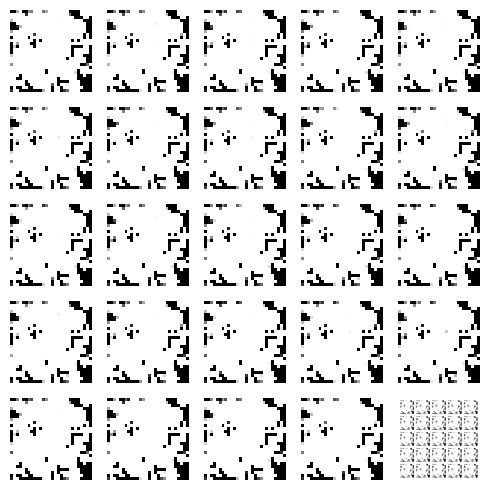

  0%|          | 0/350 [00:00<?, ?it/s]

4/4 [==============================] - 0s 17ms/step


  0%|          | 1/350 [00:00<03:44,  1.55it/s]

4/4 [==============================] - 0s 19ms/step


  1%|          | 2/350 [00:01<03:27,  1.67it/s]

4/4 [==============================] - 0s 18ms/step


  1%|          | 3/350 [00:01<03:21,  1.72it/s]

4/4 [==============================] - 0s 15ms/step


  1%|          | 4/350 [00:02<03:16,  1.76it/s]

4/4 [==============================] - 0s 15ms/step


  1%|▏         | 5/350 [00:02<03:13,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


  2%|▏         | 6/350 [00:03<03:08,  1.83it/s]

4/4 [==============================] - 0s 13ms/step


  2%|▏         | 7/350 [00:03<03:05,  1.85it/s]

4/4 [==============================] - 0s 15ms/step


  2%|▏         | 8/350 [00:04<03:08,  1.81it/s]

4/4 [==============================] - 0s 15ms/step


  3%|▎         | 9/350 [00:05<03:13,  1.77it/s]

4/4 [==============================] - 0s 14ms/step


  3%|▎         | 10/350 [00:05<03:09,  1.79it/s]

4/4 [==============================] - 0s 16ms/step


  3%|▎         | 11/350 [00:06<03:09,  1.79it/s]

4/4 [==============================] - 0s 13ms/step


  3%|▎         | 12/350 [00:06<03:08,  1.79it/s]

4/4 [==============================] - 0s 14ms/step


  4%|▎         | 13/350 [00:07<03:05,  1.81it/s]

4/4 [==============================] - 0s 13ms/step


  4%|▍         | 14/350 [00:07<03:03,  1.83it/s]

4/4 [==============================] - 0s 14ms/step


  4%|▍         | 15/350 [00:08<03:00,  1.85it/s]

4/4 [==============================] - 0s 17ms/step


  5%|▍         | 16/350 [00:08<03:09,  1.76it/s]

4/4 [==============================] - 0s 14ms/step


  5%|▍         | 17/350 [00:09<03:04,  1.80it/s]

4/4 [==============================] - 0s 12ms/step


  5%|▌         | 18/350 [00:10<03:03,  1.81it/s]

4/4 [==============================] - 0s 16ms/step


  5%|▌         | 19/350 [00:10<03:02,  1.81it/s]

4/4 [==============================] - 0s 12ms/step


  6%|▌         | 20/350 [00:11<02:58,  1.85it/s]

4/4 [==============================] - 0s 14ms/step


  6%|▌         | 21/350 [00:11<02:57,  1.86it/s]

4/4 [==============================] - 0s 16ms/step


  6%|▋         | 22/350 [00:12<02:50,  1.93it/s]

4/4 [==============================] - 0s 12ms/step


  7%|▋         | 23/350 [00:12<02:51,  1.91it/s]

4/4 [==============================] - 0s 14ms/step


  7%|▋         | 24/350 [00:13<02:52,  1.89it/s]

4/4 [==============================] - 0s 14ms/step


  7%|▋         | 25/350 [00:13<02:53,  1.87it/s]

4/4 [==============================] - 0s 13ms/step


  7%|▋         | 26/350 [00:14<02:52,  1.88it/s]

4/4 [==============================] - 0s 13ms/step


  8%|▊         | 27/350 [00:14<02:50,  1.89it/s]

4/4 [==============================] - 0s 14ms/step


  8%|▊         | 28/350 [00:15<02:49,  1.90it/s]

4/4 [==============================] - 0s 14ms/step


  8%|▊         | 29/350 [00:15<02:51,  1.87it/s]

4/4 [==============================] - 0s 13ms/step


  9%|▊         | 30/350 [00:16<02:56,  1.81it/s]

4/4 [==============================] - 0s 19ms/step


  9%|▉         | 31/350 [00:17<02:58,  1.79it/s]

4/4 [==============================] - 0s 16ms/step


  9%|▉         | 32/350 [00:17<02:53,  1.83it/s]

4/4 [==============================] - 0s 12ms/step


  9%|▉         | 33/350 [00:18<02:52,  1.84it/s]

4/4 [==============================] - 0s 13ms/step


 10%|▉         | 34/350 [00:18<02:50,  1.85it/s]

4/4 [==============================] - 0s 14ms/step


 10%|█         | 35/350 [00:19<02:50,  1.84it/s]

4/4 [==============================] - 0s 15ms/step


 10%|█         | 36/350 [00:19<02:56,  1.78it/s]

4/4 [==============================] - 0s 15ms/step


 11%|█         | 37/350 [00:20<02:56,  1.77it/s]

4/4 [==============================] - 0s 14ms/step


 11%|█         | 38/350 [00:20<02:53,  1.80it/s]

4/4 [==============================] - 0s 16ms/step


 11%|█         | 39/350 [00:21<02:56,  1.77it/s]

4/4 [==============================] - 0s 16ms/step


 11%|█▏        | 40/350 [00:22<02:57,  1.74it/s]

4/4 [==============================] - 0s 18ms/step


 12%|█▏        | 41/350 [00:22<02:58,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 12%|█▏        | 42/350 [00:23<02:51,  1.80it/s]

4/4 [==============================] - 0s 13ms/step


 12%|█▏        | 43/350 [00:23<02:50,  1.80it/s]

4/4 [==============================] - 0s 14ms/step


 13%|█▎        | 44/350 [00:24<02:45,  1.84it/s]

4/4 [==============================] - 0s 14ms/step


 13%|█▎        | 45/350 [00:24<02:37,  1.93it/s]

4/4 [==============================] - 0s 13ms/step


 13%|█▎        | 46/350 [00:25<02:37,  1.93it/s]

4/4 [==============================] - 0s 13ms/step


 13%|█▎        | 47/350 [00:25<02:45,  1.83it/s]

4/4 [==============================] - 0s 12ms/step


 14%|█▎        | 48/350 [00:26<02:44,  1.83it/s]

4/4 [==============================] - 0s 17ms/step


 14%|█▍        | 49/350 [00:26<02:44,  1.83it/s]

4/4 [==============================] - 0s 12ms/step


 14%|█▍        | 50/350 [00:27<02:43,  1.83it/s]

4/4 [==============================] - 0s 16ms/step


 15%|█▍        | 51/350 [00:28<02:47,  1.78it/s]

4/4 [==============================] - 0s 15ms/step


 15%|█▍        | 52/350 [00:28<02:50,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 15%|█▌        | 53/350 [00:29<02:47,  1.77it/s]

4/4 [==============================] - 0s 12ms/step


 15%|█▌        | 54/350 [00:29<02:42,  1.82it/s]

4/4 [==============================] - 0s 14ms/step


 16%|█▌        | 55/350 [00:30<02:35,  1.90it/s]

4/4 [==============================] - 0s 21ms/step


 16%|█▌        | 56/350 [00:30<02:40,  1.83it/s]

4/4 [==============================] - 0s 15ms/step


 16%|█▋        | 57/350 [00:31<02:38,  1.85it/s]

4/4 [==============================] - 0s 16ms/step


 17%|█▋        | 58/350 [00:31<02:38,  1.84it/s]

4/4 [==============================] - 0s 13ms/step


 17%|█▋        | 59/350 [00:32<02:44,  1.77it/s]

4/4 [==============================] - 0s 22ms/step


 17%|█▋        | 60/350 [00:32<02:39,  1.82it/s]

4/4 [==============================] - 0s 16ms/step


 17%|█▋        | 61/350 [00:33<02:38,  1.82it/s]

4/4 [==============================] - 0s 14ms/step


 18%|█▊        | 62/350 [00:34<02:33,  1.88it/s]

4/4 [==============================] - 0s 23ms/step


 18%|█▊        | 63/350 [00:34<02:43,  1.75it/s]

4/4 [==============================] - 0s 16ms/step


 18%|█▊        | 64/350 [00:35<02:49,  1.69it/s]

4/4 [==============================] - 0s 15ms/step


 19%|█▊        | 65/350 [00:35<02:53,  1.65it/s]

4/4 [==============================] - 0s 14ms/step


 19%|█▉        | 66/350 [00:36<02:50,  1.67it/s]

4/4 [==============================] - 0s 14ms/step


 19%|█▉        | 67/350 [00:37<02:48,  1.68it/s]

4/4 [==============================] - 0s 16ms/step


 19%|█▉        | 68/350 [00:37<02:47,  1.68it/s]

4/4 [==============================] - 0s 15ms/step


 20%|█▉        | 69/350 [00:38<02:46,  1.68it/s]

4/4 [==============================] - 0s 15ms/step


 20%|██        | 70/350 [00:38<02:41,  1.74it/s]

4/4 [==============================] - 0s 14ms/step


 20%|██        | 71/350 [00:39<02:37,  1.77it/s]

4/4 [==============================] - 0s 14ms/step


 21%|██        | 72/350 [00:39<02:34,  1.80it/s]

4/4 [==============================] - 0s 14ms/step


 21%|██        | 73/350 [00:40<02:32,  1.81it/s]

4/4 [==============================] - 0s 16ms/step


 21%|██        | 74/350 [00:41<02:32,  1.81it/s]

4/4 [==============================] - 0s 13ms/step


 21%|██▏       | 75/350 [00:41<02:32,  1.80it/s]

4/4 [==============================] - 0s 16ms/step


 22%|██▏       | 76/350 [00:42<02:29,  1.83it/s]

4/4 [==============================] - 0s 14ms/step


 22%|██▏       | 77/350 [00:42<02:28,  1.84it/s]

4/4 [==============================] - 0s 14ms/step


 22%|██▏       | 78/350 [00:43<02:32,  1.79it/s]

4/4 [==============================] - 0s 18ms/step


 23%|██▎       | 79/350 [00:43<02:33,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 23%|██▎       | 80/350 [00:44<02:36,  1.72it/s]

4/4 [==============================] - 0s 16ms/step


 23%|██▎       | 81/350 [00:45<02:39,  1.69it/s]

4/4 [==============================] - 0s 15ms/step


 23%|██▎       | 82/350 [00:45<02:36,  1.71it/s]

4/4 [==============================] - 0s 15ms/step


 24%|██▎       | 83/350 [00:46<02:35,  1.72it/s]

4/4 [==============================] - 0s 17ms/step


 24%|██▍       | 84/350 [00:46<02:35,  1.72it/s]

4/4 [==============================] - 0s 16ms/step


 24%|██▍       | 85/350 [00:47<02:31,  1.75it/s]

4/4 [==============================] - 0s 14ms/step


 25%|██▍       | 86/350 [00:47<02:29,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 25%|██▍       | 87/350 [00:48<02:27,  1.78it/s]

4/4 [==============================] - 0s 15ms/step


 25%|██▌       | 88/350 [00:48<02:27,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 25%|██▌       | 89/350 [00:49<02:24,  1.81it/s]

4/4 [==============================] - 0s 13ms/step


 26%|██▌       | 90/350 [00:50<02:24,  1.80it/s]

4/4 [==============================] - 0s 15ms/step


 26%|██▌       | 91/350 [00:50<02:23,  1.81it/s]

4/4 [==============================] - 0s 14ms/step


 26%|██▋       | 92/350 [00:51<02:21,  1.82it/s]

4/4 [==============================] - 0s 12ms/step


 27%|██▋       | 93/350 [00:51<02:20,  1.83it/s]

4/4 [==============================] - 0s 13ms/step


 27%|██▋       | 94/350 [00:52<02:19,  1.84it/s]

4/4 [==============================] - 0s 13ms/step


 27%|██▋       | 95/350 [00:52<02:17,  1.85it/s]

4/4 [==============================] - 0s 13ms/step


 27%|██▋       | 96/350 [00:53<02:17,  1.85it/s]

4/4 [==============================] - 0s 13ms/step


 28%|██▊       | 97/350 [00:53<02:12,  1.92it/s]

4/4 [==============================] - 0s 44ms/step


 28%|██▊       | 98/350 [00:54<02:17,  1.84it/s]

4/4 [==============================] - 0s 37ms/step


 28%|██▊       | 99/350 [00:54<02:18,  1.82it/s]

4/4 [==============================] - 0s 16ms/step


 29%|██▊       | 100/350 [00:55<02:18,  1.81it/s]

4/4 [==============================] - 0s 16ms/step


 29%|██▉       | 101/350 [00:55<02:12,  1.88it/s]

4/4 [==============================] - 0s 14ms/step


 29%|██▉       | 102/350 [00:56<02:15,  1.83it/s]

4/4 [==============================] - 0s 15ms/step


 29%|██▉       | 103/350 [00:57<02:15,  1.83it/s]

4/4 [==============================] - 0s 14ms/step


 30%|██▉       | 104/350 [00:57<02:19,  1.76it/s]

4/4 [==============================] - 0s 15ms/step


 30%|███       | 105/350 [00:58<02:19,  1.75it/s]

4/4 [==============================] - 0s 14ms/step


 30%|███       | 106/350 [00:58<02:18,  1.76it/s]

4/4 [==============================] - 0s 15ms/step


 31%|███       | 107/350 [00:59<02:17,  1.76it/s]

4/4 [==============================] - 0s 14ms/step


 31%|███       | 108/350 [00:59<02:16,  1.78it/s]

4/4 [==============================] - 0s 14ms/step


 31%|███       | 109/350 [01:00<02:16,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 31%|███▏      | 110/350 [01:01<02:14,  1.79it/s]

4/4 [==============================] - 0s 14ms/step


 32%|███▏      | 111/350 [01:01<02:13,  1.79it/s]

4/4 [==============================] - 0s 13ms/step


 32%|███▏      | 112/350 [01:02<02:14,  1.76it/s]

4/4 [==============================] - 0s 16ms/step


 32%|███▏      | 113/350 [01:02<02:14,  1.77it/s]

4/4 [==============================] - 0s 14ms/step


 33%|███▎      | 114/350 [01:03<02:13,  1.77it/s]

4/4 [==============================] - 0s 19ms/step


 33%|███▎      | 115/350 [01:03<02:12,  1.78it/s]

4/4 [==============================] - 0s 14ms/step


 33%|███▎      | 116/350 [01:04<02:10,  1.79it/s]

4/4 [==============================] - 0s 16ms/step


 33%|███▎      | 117/350 [01:05<02:12,  1.76it/s]

4/4 [==============================] - 0s 16ms/step


 34%|███▎      | 118/350 [01:05<02:11,  1.76it/s]

4/4 [==============================] - 0s 15ms/step


 34%|███▍      | 119/350 [01:06<02:10,  1.77it/s]

4/4 [==============================] - 0s 15ms/step


 34%|███▍      | 120/350 [01:06<02:09,  1.78it/s]

4/4 [==============================] - 0s 14ms/step


 35%|███▍      | 121/350 [01:07<02:03,  1.86it/s]

4/4 [==============================] - 0s 25ms/step


 35%|███▍      | 122/350 [01:07<02:01,  1.87it/s]

4/4 [==============================] - 0s 17ms/step


 35%|███▌      | 123/350 [01:08<02:04,  1.82it/s]

4/4 [==============================] - 0s 16ms/step


 35%|███▌      | 124/350 [01:08<02:06,  1.78it/s]

4/4 [==============================] - 0s 19ms/step


 36%|███▌      | 125/350 [01:09<02:06,  1.77it/s]

4/4 [==============================] - 0s 15ms/step


 36%|███▌      | 126/350 [01:10<02:07,  1.75it/s]

4/4 [==============================] - 0s 15ms/step


 36%|███▋      | 127/350 [01:10<02:07,  1.75it/s]

4/4 [==============================] - 0s 15ms/step


 37%|███▋      | 128/350 [01:11<02:06,  1.76it/s]

4/4 [==============================] - 0s 16ms/step


 37%|███▋      | 129/350 [01:11<02:07,  1.74it/s]

4/4 [==============================] - 0s 17ms/step


 37%|███▋      | 130/350 [01:12<02:05,  1.76it/s]

4/4 [==============================] - 0s 15ms/step


 37%|███▋      | 131/350 [01:12<02:04,  1.75it/s]

4/4 [==============================] - 0s 14ms/step


 38%|███▊      | 132/350 [01:13<02:02,  1.78it/s]

4/4 [==============================] - 0s 14ms/step


 38%|███▊      | 133/350 [01:14<02:01,  1.79it/s]

4/4 [==============================] - 0s 14ms/step


 38%|███▊      | 134/350 [01:14<02:00,  1.80it/s]

4/4 [==============================] - 0s 15ms/step


 39%|███▊      | 135/350 [01:15<01:59,  1.81it/s]

4/4 [==============================] - 0s 18ms/step


 39%|███▉      | 136/350 [01:15<01:59,  1.79it/s]

4/4 [==============================] - 0s 13ms/step


 39%|███▉      | 137/350 [01:16<01:56,  1.82it/s]

4/4 [==============================] - 0s 15ms/step


 39%|███▉      | 138/350 [01:16<01:55,  1.83it/s]

4/4 [==============================] - 0s 13ms/step


 40%|███▉      | 139/350 [01:17<01:52,  1.87it/s]

4/4 [==============================] - 0s 20ms/step


 40%|████      | 140/350 [01:17<01:52,  1.86it/s]

4/4 [==============================] - 0s 15ms/step


 40%|████      | 141/350 [01:18<01:52,  1.85it/s]

4/4 [==============================] - 0s 15ms/step


 41%|████      | 142/350 [01:18<01:49,  1.90it/s]

4/4 [==============================] - 0s 15ms/step


 41%|████      | 143/350 [01:19<01:47,  1.92it/s]

4/4 [==============================] - 0s 14ms/step


 41%|████      | 144/350 [01:19<01:47,  1.91it/s]

4/4 [==============================] - 0s 13ms/step


 41%|████▏     | 145/350 [01:20<01:44,  1.97it/s]

4/4 [==============================] - 0s 13ms/step


 42%|████▏     | 146/350 [01:20<01:46,  1.92it/s]

4/4 [==============================] - 0s 15ms/step


 42%|████▏     | 147/350 [01:21<01:48,  1.87it/s]

4/4 [==============================] - 0s 15ms/step


 42%|████▏     | 148/350 [01:22<01:48,  1.86it/s]

4/4 [==============================] - 0s 14ms/step


 43%|████▎     | 149/350 [01:22<01:49,  1.83it/s]

4/4 [==============================] - 0s 15ms/step


 43%|████▎     | 150/350 [01:23<01:51,  1.80it/s]

4/4 [==============================] - 0s 15ms/step


 43%|████▎     | 151/350 [01:23<01:50,  1.80it/s]

4/4 [==============================] - 0s 13ms/step


 43%|████▎     | 152/350 [01:24<01:50,  1.80it/s]

4/4 [==============================] - 0s 15ms/step


 44%|████▎     | 153/350 [01:24<01:49,  1.80it/s]

4/4 [==============================] - 0s 15ms/step


 44%|████▍     | 154/350 [01:25<01:49,  1.80it/s]

4/4 [==============================] - 0s 20ms/step


 44%|████▍     | 155/350 [01:25<01:48,  1.80it/s]

4/4 [==============================] - 0s 13ms/step


 45%|████▍     | 156/350 [01:26<01:46,  1.82it/s]

4/4 [==============================] - 0s 14ms/step


 45%|████▍     | 157/350 [01:27<01:45,  1.83it/s]

4/4 [==============================] - 0s 14ms/step


 45%|████▌     | 158/350 [01:27<01:44,  1.83it/s]

4/4 [==============================] - 0s 14ms/step


 45%|████▌     | 159/350 [01:28<01:39,  1.92it/s]

4/4 [==============================] - 0s 14ms/step


 46%|████▌     | 160/350 [01:28<01:40,  1.90it/s]

4/4 [==============================] - 0s 13ms/step


 46%|████▌     | 161/350 [01:29<01:40,  1.88it/s]

4/4 [==============================] - 0s 15ms/step


 46%|████▋     | 162/350 [01:29<01:40,  1.87it/s]

4/4 [==============================] - 0s 13ms/step


 47%|████▋     | 163/350 [01:30<01:40,  1.86it/s]

4/4 [==============================] - 0s 14ms/step


 47%|████▋     | 164/350 [01:30<01:43,  1.79it/s]

4/4 [==============================] - 0s 13ms/step


 47%|████▋     | 165/350 [01:31<01:40,  1.84it/s]

4/4 [==============================] - 0s 14ms/step


 47%|████▋     | 166/350 [01:31<01:40,  1.84it/s]

4/4 [==============================] - 0s 14ms/step


 48%|████▊     | 167/350 [01:32<01:39,  1.84it/s]

4/4 [==============================] - 0s 16ms/step


 48%|████▊     | 168/350 [01:32<01:38,  1.85it/s]

4/4 [==============================] - 0s 14ms/step


 48%|████▊     | 169/350 [01:33<01:37,  1.86it/s]

4/4 [==============================] - 0s 15ms/step


 49%|████▊     | 170/350 [01:34<01:37,  1.84it/s]

4/4 [==============================] - 0s 14ms/step


 49%|████▉     | 171/350 [01:34<01:38,  1.82it/s]

4/4 [==============================] - 0s 14ms/step


 49%|████▉     | 172/350 [01:35<01:37,  1.83it/s]

4/4 [==============================] - 0s 16ms/step


 49%|████▉     | 173/350 [01:35<01:37,  1.81it/s]

4/4 [==============================] - 0s 17ms/step


 50%|████▉     | 174/350 [01:36<01:36,  1.81it/s]

4/4 [==============================] - 0s 13ms/step


 50%|█████     | 175/350 [01:36<01:35,  1.82it/s]

4/4 [==============================] - 0s 13ms/step


 50%|█████     | 176/350 [01:37<01:35,  1.83it/s]

4/4 [==============================] - 0s 14ms/step


 51%|█████     | 177/350 [01:37<01:33,  1.84it/s]

4/4 [==============================] - 0s 13ms/step


 51%|█████     | 178/350 [01:38<01:32,  1.85it/s]

4/4 [==============================] - 0s 13ms/step


 51%|█████     | 179/350 [01:38<01:31,  1.87it/s]

4/4 [==============================] - 0s 14ms/step


 51%|█████▏    | 180/350 [01:39<01:30,  1.87it/s]

4/4 [==============================] - 0s 16ms/step


 52%|█████▏    | 181/350 [01:40<01:30,  1.88it/s]

4/4 [==============================] - 0s 13ms/step


 52%|█████▏    | 182/350 [01:40<01:28,  1.90it/s]

4/4 [==============================] - 0s 15ms/step


 52%|█████▏    | 183/350 [01:41<01:28,  1.88it/s]

4/4 [==============================] - 0s 15ms/step


 53%|█████▎    | 184/350 [01:41<01:28,  1.88it/s]

4/4 [==============================] - 0s 13ms/step


 53%|█████▎    | 185/350 [01:42<01:27,  1.88it/s]

4/4 [==============================] - 0s 15ms/step


 53%|█████▎    | 186/350 [01:42<01:28,  1.85it/s]

4/4 [==============================] - 0s 14ms/step


 53%|█████▎    | 187/350 [01:43<01:28,  1.85it/s]

4/4 [==============================] - 0s 14ms/step


 54%|█████▎    | 188/350 [01:43<01:26,  1.87it/s]

4/4 [==============================] - 0s 13ms/step


 54%|█████▍    | 189/350 [01:44<01:25,  1.89it/s]

4/4 [==============================] - 0s 14ms/step


 54%|█████▍    | 190/350 [01:44<01:22,  1.94it/s]

4/4 [==============================] - 0s 32ms/step


 55%|█████▍    | 191/350 [01:45<01:22,  1.93it/s]

4/4 [==============================] - 0s 14ms/step


 55%|█████▍    | 192/350 [01:45<01:22,  1.91it/s]

4/4 [==============================] - 0s 15ms/step


 55%|█████▌    | 193/350 [01:46<01:23,  1.89it/s]

4/4 [==============================] - 0s 14ms/step


 55%|█████▌    | 194/350 [01:46<01:22,  1.89it/s]

4/4 [==============================] - 0s 14ms/step


 56%|█████▌    | 195/350 [01:47<01:22,  1.88it/s]

4/4 [==============================] - 0s 14ms/step


 56%|█████▌    | 196/350 [01:47<01:18,  1.96it/s]

4/4 [==============================] - 0s 13ms/step


 56%|█████▋    | 197/350 [01:48<01:18,  1.95it/s]

4/4 [==============================] - 0s 14ms/step


 57%|█████▋    | 198/350 [01:48<01:18,  1.95it/s]

4/4 [==============================] - 0s 14ms/step


 57%|█████▋    | 199/350 [01:49<01:17,  1.95it/s]

4/4 [==============================] - 0s 13ms/step


 57%|█████▋    | 200/350 [01:49<01:16,  1.95it/s]

4/4 [==============================] - 0s 14ms/step


 57%|█████▋    | 201/350 [01:50<01:18,  1.89it/s]

4/4 [==============================] - 0s 16ms/step


 58%|█████▊    | 202/350 [01:51<01:20,  1.84it/s]

4/4 [==============================] - 0s 13ms/step


 58%|█████▊    | 203/350 [01:51<01:19,  1.85it/s]

4/4 [==============================] - 0s 14ms/step


 58%|█████▊    | 204/350 [01:52<01:15,  1.94it/s]

4/4 [==============================] - 0s 17ms/step


 59%|█████▊    | 205/350 [01:52<01:15,  1.92it/s]

4/4 [==============================] - 0s 14ms/step


 59%|█████▉    | 206/350 [01:53<01:14,  1.93it/s]

4/4 [==============================] - 0s 16ms/step


 59%|█████▉    | 207/350 [01:53<01:13,  1.94it/s]

4/4 [==============================] - 0s 15ms/step


 59%|█████▉    | 208/350 [01:54<01:13,  1.94it/s]

4/4 [==============================] - 0s 14ms/step


 60%|█████▉    | 209/350 [01:54<01:12,  1.94it/s]

4/4 [==============================] - 0s 13ms/step


 60%|██████    | 210/350 [01:55<01:12,  1.93it/s]

4/4 [==============================] - 0s 13ms/step


 60%|██████    | 211/350 [01:55<01:11,  1.93it/s]

4/4 [==============================] - 0s 15ms/step


 61%|██████    | 212/350 [01:56<01:12,  1.90it/s]

4/4 [==============================] - 0s 12ms/step


 61%|██████    | 213/350 [01:56<01:11,  1.91it/s]

4/4 [==============================] - 0s 11ms/step


 61%|██████    | 214/350 [01:57<01:10,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


 61%|██████▏   | 215/350 [01:57<01:10,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


 62%|██████▏   | 216/350 [01:58<01:09,  1.93it/s]

4/4 [==============================] - 0s 13ms/step


 62%|██████▏   | 217/350 [01:58<01:08,  1.95it/s]

4/4 [==============================] - 0s 13ms/step


 62%|██████▏   | 218/350 [01:59<01:05,  2.02it/s]

4/4 [==============================] - 0s 12ms/step


 63%|██████▎   | 219/350 [01:59<01:04,  2.02it/s]

4/4 [==============================] - 0s 13ms/step


 63%|██████▎   | 220/350 [02:00<01:05,  2.00it/s]

4/4 [==============================] - 0s 13ms/step


 63%|██████▎   | 221/350 [02:00<01:08,  1.88it/s]

4/4 [==============================] - 0s 16ms/step


 63%|██████▎   | 222/350 [02:01<01:10,  1.82it/s]

4/4 [==============================] - 0s 16ms/step


 64%|██████▎   | 223/350 [02:02<01:11,  1.78it/s]

4/4 [==============================] - 0s 18ms/step


 64%|██████▍   | 224/350 [02:02<01:11,  1.76it/s]

4/4 [==============================] - 0s 16ms/step


 64%|██████▍   | 225/350 [02:03<01:12,  1.71it/s]

4/4 [==============================] - 0s 15ms/step


 65%|██████▍   | 226/350 [02:03<01:10,  1.75it/s]

4/4 [==============================] - 0s 17ms/step


 65%|██████▍   | 227/350 [02:04<01:09,  1.77it/s]

4/4 [==============================] - 0s 16ms/step


 65%|██████▌   | 228/350 [02:04<01:08,  1.77it/s]

4/4 [==============================] - 0s 14ms/step


 65%|██████▌   | 229/350 [02:05<01:08,  1.77it/s]

4/4 [==============================] - 0s 15ms/step


 66%|██████▌   | 230/350 [02:06<01:07,  1.78it/s]

4/4 [==============================] - 0s 18ms/step


 66%|██████▌   | 231/350 [02:06<01:07,  1.77it/s]

4/4 [==============================] - 0s 14ms/step


 66%|██████▋   | 232/350 [02:07<01:05,  1.79it/s]

4/4 [==============================] - 0s 15ms/step


 67%|██████▋   | 233/350 [02:07<01:03,  1.84it/s]

4/4 [==============================] - 0s 14ms/step


 67%|██████▋   | 234/350 [02:08<01:04,  1.79it/s]

4/4 [==============================] - 0s 14ms/step


 67%|██████▋   | 235/350 [02:08<01:04,  1.78it/s]

4/4 [==============================] - 0s 15ms/step


 67%|██████▋   | 236/350 [02:09<01:02,  1.82it/s]

4/4 [==============================] - 0s 13ms/step


 68%|██████▊   | 237/350 [02:09<01:01,  1.83it/s]

4/4 [==============================] - 0s 15ms/step


 68%|██████▊   | 238/350 [02:10<01:01,  1.81it/s]

4/4 [==============================] - 0s 15ms/step


 68%|██████▊   | 239/350 [02:11<01:03,  1.75it/s]

4/4 [==============================] - 0s 16ms/step


 69%|██████▊   | 240/350 [02:11<01:02,  1.76it/s]

4/4 [==============================] - 0s 14ms/step


 69%|██████▉   | 241/350 [02:12<01:00,  1.79it/s]

4/4 [==============================] - 0s 12ms/step


 69%|██████▉   | 242/350 [02:12<01:00,  1.78it/s]

4/4 [==============================] - 0s 15ms/step


 69%|██████▉   | 243/350 [02:13<00:59,  1.81it/s]

4/4 [==============================] - 0s 16ms/step


 70%|██████▉   | 244/350 [02:13<00:58,  1.82it/s]

4/4 [==============================] - 0s 13ms/step


 70%|███████   | 245/350 [02:14<00:56,  1.85it/s]

4/4 [==============================] - 0s 13ms/step


 70%|███████   | 246/350 [02:14<00:55,  1.87it/s]

4/4 [==============================] - 0s 13ms/step


 71%|███████   | 247/350 [02:15<00:54,  1.88it/s]

4/4 [==============================] - 0s 13ms/step


 71%|███████   | 248/350 [02:15<00:53,  1.90it/s]

4/4 [==============================] - 0s 15ms/step


 71%|███████   | 249/350 [02:16<00:53,  1.90it/s]

4/4 [==============================] - 0s 17ms/step


 71%|███████▏  | 250/350 [02:16<00:53,  1.87it/s]

4/4 [==============================] - 0s 14ms/step


 72%|███████▏  | 251/350 [02:17<00:52,  1.87it/s]

4/4 [==============================] - 0s 13ms/step


 72%|███████▏  | 252/350 [02:18<00:51,  1.89it/s]

4/4 [==============================] - 0s 14ms/step


 72%|███████▏  | 253/350 [02:18<00:51,  1.89it/s]

4/4 [==============================] - 0s 14ms/step


 73%|███████▎  | 254/350 [02:19<00:51,  1.88it/s]

4/4 [==============================] - 0s 14ms/step


 73%|███████▎  | 255/350 [02:19<00:50,  1.89it/s]

4/4 [==============================] - 0s 13ms/step


 73%|███████▎  | 256/350 [02:20<00:49,  1.90it/s]

4/4 [==============================] - 0s 13ms/step


 73%|███████▎  | 257/350 [02:20<00:49,  1.89it/s]

4/4 [==============================] - 0s 14ms/step


 74%|███████▎  | 258/350 [02:21<00:46,  1.96it/s]

4/4 [==============================] - 0s 22ms/step


 74%|███████▍  | 259/350 [02:21<00:47,  1.92it/s]

4/4 [==============================] - 0s 16ms/step


 74%|███████▍  | 260/350 [02:22<00:47,  1.89it/s]

4/4 [==============================] - 0s 14ms/step


 75%|███████▍  | 261/350 [02:22<00:47,  1.89it/s]

4/4 [==============================] - 0s 13ms/step


 75%|███████▍  | 262/350 [02:23<00:46,  1.91it/s]

4/4 [==============================] - 0s 13ms/step


 75%|███████▌  | 263/350 [02:23<00:46,  1.86it/s]

4/4 [==============================] - 0s 13ms/step


 75%|███████▌  | 264/350 [02:24<00:44,  1.93it/s]

4/4 [==============================] - 0s 14ms/step


 76%|███████▌  | 265/350 [02:24<00:44,  1.89it/s]

4/4 [==============================] - 0s 14ms/step


 76%|███████▌  | 266/350 [02:25<00:45,  1.86it/s]

4/4 [==============================] - 0s 15ms/step


 76%|███████▋  | 267/350 [02:26<00:47,  1.76it/s]

4/4 [==============================] - 0s 17ms/step


 77%|███████▋  | 268/350 [02:26<00:46,  1.76it/s]

4/4 [==============================] - 0s 16ms/step


 77%|███████▋  | 269/350 [02:27<00:45,  1.79it/s]

4/4 [==============================] - 0s 19ms/step


 77%|███████▋  | 270/350 [02:27<00:44,  1.81it/s]

4/4 [==============================] - 0s 15ms/step


 77%|███████▋  | 271/350 [02:28<00:44,  1.79it/s]

4/4 [==============================] - 0s 16ms/step


 78%|███████▊  | 272/350 [02:28<00:44,  1.77it/s]

4/4 [==============================] - 0s 18ms/step


 78%|███████▊  | 273/350 [02:29<00:44,  1.74it/s]

4/4 [==============================] - 0s 15ms/step


 78%|███████▊  | 274/350 [02:30<00:43,  1.74it/s]

4/4 [==============================] - 0s 16ms/step


 79%|███████▊  | 275/350 [02:30<00:43,  1.74it/s]

4/4 [==============================] - 0s 16ms/step


 79%|███████▉  | 276/350 [02:31<00:42,  1.74it/s]

4/4 [==============================] - 0s 14ms/step


 79%|███████▉  | 277/350 [02:31<00:40,  1.80it/s]

4/4 [==============================] - 0s 13ms/step


 79%|███████▉  | 278/350 [02:32<00:40,  1.76it/s]

4/4 [==============================] - 0s 14ms/step


 80%|███████▉  | 279/350 [02:32<00:40,  1.74it/s]

4/4 [==============================] - 0s 15ms/step


 80%|████████  | 280/350 [02:33<00:40,  1.72it/s]

4/4 [==============================] - 0s 15ms/step


 80%|████████  | 281/350 [02:34<00:40,  1.70it/s]

4/4 [==============================] - 0s 16ms/step


 81%|████████  | 282/350 [02:34<00:40,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


 81%|████████  | 283/350 [02:35<00:39,  1.70it/s]

4/4 [==============================] - 0s 19ms/step


 81%|████████  | 284/350 [02:35<00:38,  1.71it/s]

4/4 [==============================] - 0s 16ms/step


 81%|████████▏ | 285/350 [02:36<00:37,  1.74it/s]

4/4 [==============================] - 0s 15ms/step


 82%|████████▏ | 286/350 [02:36<00:37,  1.71it/s]

4/4 [==============================] - 0s 14ms/step


 82%|████████▏ | 287/350 [02:37<00:36,  1.72it/s]

4/4 [==============================] - 0s 16ms/step


 82%|████████▏ | 288/350 [02:38<00:35,  1.74it/s]

4/4 [==============================] - 0s 16ms/step


 83%|████████▎ | 289/350 [02:38<00:34,  1.75it/s]

4/4 [==============================] - 0s 12ms/step


 83%|████████▎ | 290/350 [02:39<00:33,  1.80it/s]

4/4 [==============================] - 0s 13ms/step


 83%|████████▎ | 291/350 [02:39<00:32,  1.81it/s]

4/4 [==============================] - 0s 13ms/step


 83%|████████▎ | 292/350 [02:40<00:31,  1.82it/s]

4/4 [==============================] - 0s 14ms/step


 84%|████████▎ | 293/350 [02:40<00:32,  1.77it/s]

4/4 [==============================] - 0s 16ms/step


 84%|████████▍ | 294/350 [02:41<00:31,  1.77it/s]

4/4 [==============================] - 0s 15ms/step


 84%|████████▍ | 295/350 [02:41<00:30,  1.80it/s]

4/4 [==============================] - 0s 14ms/step


 85%|████████▍ | 296/350 [02:42<00:28,  1.87it/s]

4/4 [==============================] - 0s 31ms/step


 85%|████████▍ | 297/350 [02:43<00:29,  1.81it/s]

4/4 [==============================] - 0s 14ms/step


 85%|████████▌ | 298/350 [02:43<00:28,  1.80it/s]

4/4 [==============================] - 0s 14ms/step


 85%|████████▌ | 299/350 [02:44<00:28,  1.79it/s]

4/4 [==============================] - 0s 14ms/step


 86%|████████▌ | 300/350 [02:44<00:27,  1.80it/s]

4/4 [==============================] - 0s 15ms/step


 86%|████████▌ | 301/350 [02:45<00:27,  1.78it/s]

4/4 [==============================] - 0s 14ms/step


 86%|████████▋ | 302/350 [02:45<00:27,  1.77it/s]

4/4 [==============================] - 0s 15ms/step


 87%|████████▋ | 303/350 [02:46<00:26,  1.78it/s]

4/4 [==============================] - 0s 15ms/step


 87%|████████▋ | 304/350 [02:46<00:25,  1.80it/s]

4/4 [==============================] - 0s 14ms/step


 87%|████████▋ | 305/350 [02:47<00:24,  1.87it/s]

4/4 [==============================] - 0s 18ms/step


 87%|████████▋ | 306/350 [02:48<00:24,  1.81it/s]

4/4 [==============================] - 0s 18ms/step


 88%|████████▊ | 307/350 [02:48<00:24,  1.78it/s]

4/4 [==============================] - 0s 15ms/step


 88%|████████▊ | 308/350 [02:49<00:23,  1.77it/s]

4/4 [==============================] - 0s 15ms/step


 88%|████████▊ | 309/350 [02:49<00:23,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 89%|████████▊ | 310/350 [02:50<00:22,  1.77it/s]

4/4 [==============================] - 0s 16ms/step


 89%|████████▉ | 311/350 [02:50<00:21,  1.85it/s]

4/4 [==============================] - 0s 20ms/step


 89%|████████▉ | 312/350 [02:51<00:20,  1.82it/s]

4/4 [==============================] - 0s 16ms/step


 89%|████████▉ | 313/350 [02:51<00:20,  1.77it/s]

4/4 [==============================] - 0s 19ms/step


 90%|████████▉ | 314/350 [02:52<00:19,  1.84it/s]

4/4 [==============================] - 0s 15ms/step


 90%|█████████ | 315/350 [02:53<00:19,  1.78it/s]

4/4 [==============================] - 0s 16ms/step


 90%|█████████ | 316/350 [02:53<00:19,  1.73it/s]

4/4 [==============================] - 0s 15ms/step


 91%|█████████ | 317/350 [02:54<00:19,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 91%|█████████ | 318/350 [02:54<00:18,  1.70it/s]

4/4 [==============================] - 0s 15ms/step


 91%|█████████ | 319/350 [02:55<00:17,  1.74it/s]

4/4 [==============================] - 0s 14ms/step


 91%|█████████▏| 320/350 [02:56<00:17,  1.76it/s]

4/4 [==============================] - 0s 21ms/step


 92%|█████████▏| 321/350 [02:56<00:15,  1.83it/s]

4/4 [==============================] - 0s 23ms/step


 92%|█████████▏| 322/350 [02:57<00:15,  1.86it/s]

4/4 [==============================] - 0s 18ms/step


 92%|█████████▏| 323/350 [02:57<00:15,  1.79it/s]

4/4 [==============================] - 0s 15ms/step


 93%|█████████▎| 324/350 [02:58<00:14,  1.77it/s]

4/4 [==============================] - 0s 14ms/step


 93%|█████████▎| 325/350 [02:58<00:14,  1.76it/s]

4/4 [==============================] - 0s 16ms/step


 93%|█████████▎| 326/350 [02:59<00:13,  1.75it/s]

4/4 [==============================] - 0s 12ms/step


 93%|█████████▎| 327/350 [02:59<00:12,  1.84it/s]

4/4 [==============================] - 0s 13ms/step


 94%|█████████▎| 328/350 [03:00<00:11,  1.86it/s]

4/4 [==============================] - 0s 13ms/step


 94%|█████████▍| 329/350 [03:00<00:11,  1.89it/s]

4/4 [==============================] - 0s 15ms/step


 94%|█████████▍| 330/350 [03:01<00:10,  1.86it/s]

4/4 [==============================] - 0s 15ms/step


 95%|█████████▍| 331/350 [03:02<00:10,  1.79it/s]

4/4 [==============================] - 0s 19ms/step


 95%|█████████▍| 332/350 [03:02<00:10,  1.79it/s]

4/4 [==============================] - 0s 17ms/step


 95%|█████████▌| 333/350 [03:03<00:09,  1.77it/s]

4/4 [==============================] - 0s 15ms/step


 95%|█████████▌| 334/350 [03:03<00:08,  1.80it/s]

4/4 [==============================] - 0s 16ms/step


 96%|█████████▌| 335/350 [03:04<00:08,  1.80it/s]

4/4 [==============================] - 0s 13ms/step


 96%|█████████▌| 336/350 [03:04<00:08,  1.74it/s]

4/4 [==============================] - 0s 15ms/step


 96%|█████████▋| 337/350 [03:05<00:07,  1.79it/s]

4/4 [==============================] - 0s 14ms/step


 97%|█████████▋| 338/350 [03:05<00:06,  1.79it/s]

4/4 [==============================] - 0s 16ms/step


 97%|█████████▋| 339/350 [03:06<00:06,  1.81it/s]

4/4 [==============================] - 0s 14ms/step


 97%|█████████▋| 340/350 [03:06<00:05,  1.89it/s]

4/4 [==============================] - 0s 15ms/step


 97%|█████████▋| 341/350 [03:07<00:04,  1.93it/s]

4/4 [==============================] - 0s 14ms/step


 98%|█████████▊| 342/350 [03:07<00:04,  1.96it/s]

4/4 [==============================] - 0s 15ms/step


 98%|█████████▊| 343/350 [03:08<00:03,  2.00it/s]

4/4 [==============================] - 0s 14ms/step


 98%|█████████▊| 344/350 [03:08<00:03,  1.97it/s]

4/4 [==============================] - 0s 17ms/step


 99%|█████████▊| 345/350 [03:09<00:02,  1.89it/s]

4/4 [==============================] - 0s 13ms/step


 99%|█████████▉| 346/350 [03:10<00:02,  1.85it/s]

4/4 [==============================] - 0s 14ms/step


 99%|█████████▉| 347/350 [03:10<00:01,  1.86it/s]

4/4 [==============================] - 0s 13ms/step


 99%|█████████▉| 348/350 [03:11<00:01,  1.87it/s]

4/4 [==============================] - 0s 15ms/step


100%|█████████▉| 349/350 [03:11<00:00,  1.81it/s]

4/4 [==============================] - 0s 14ms/step


100%|██████████| 350/350 [03:12<00:00,  1.82it/s]

Epoch number: 18 discriminator_loss: 0.16732328816633008 generator_loss: 6.820732797895159
1/1 [==============================] - 0s 23ms/step


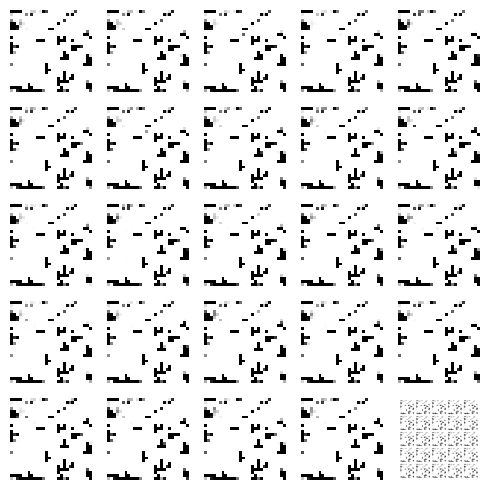

  0%|          | 0/350 [00:00<?, ?it/s]

4/4 [==============================] - 0s 20ms/step


  0%|          | 1/350 [00:00<02:56,  1.97it/s]

4/4 [==============================] - 0s 16ms/step


  1%|          | 2/350 [00:01<03:05,  1.88it/s]

4/4 [==============================] - 0s 13ms/step


  1%|          | 3/350 [00:01<03:07,  1.85it/s]

4/4 [==============================] - 0s 14ms/step


  1%|          | 4/350 [00:02<03:07,  1.85it/s]

4/4 [==============================] - 0s 15ms/step


  1%|▏         | 5/350 [00:02<03:08,  1.83it/s]

4/4 [==============================] - 0s 15ms/step


  2%|▏         | 6/350 [00:03<03:10,  1.81it/s]

4/4 [==============================] - 0s 14ms/step


  2%|▏         | 7/350 [00:03<03:08,  1.82it/s]

4/4 [==============================] - 0s 18ms/step


  2%|▏         | 8/350 [00:04<03:10,  1.80it/s]

4/4 [==============================] - 0s 13ms/step


  3%|▎         | 9/350 [00:04<03:01,  1.88it/s]

4/4 [==============================] - 0s 19ms/step


  3%|▎         | 10/350 [00:05<03:01,  1.87it/s]

4/4 [==============================] - 0s 14ms/step


  3%|▎         | 11/350 [00:05<03:04,  1.84it/s]

4/4 [==============================] - 0s 15ms/step


  3%|▎         | 12/350 [00:06<03:07,  1.80it/s]

4/4 [==============================] - 0s 16ms/step


  4%|▎         | 13/350 [00:07<03:09,  1.78it/s]

4/4 [==============================] - 0s 14ms/step


  4%|▍         | 14/350 [00:07<03:08,  1.78it/s]

4/4 [==============================] - 0s 15ms/step


  4%|▍         | 15/350 [00:08<02:58,  1.87it/s]

4/4 [==============================] - 0s 13ms/step


  5%|▍         | 16/350 [00:08<02:57,  1.89it/s]

4/4 [==============================] - 0s 14ms/step


  5%|▍         | 17/350 [00:09<02:58,  1.86it/s]

4/4 [==============================] - 0s 13ms/step


  5%|▌         | 18/350 [00:09<02:50,  1.95it/s]

4/4 [==============================] - 0s 26ms/step


  5%|▌         | 19/350 [00:10<02:49,  1.95it/s]

4/4 [==============================] - 0s 12ms/step


  6%|▌         | 20/350 [00:10<02:44,  2.01it/s]

4/4 [==============================] - 0s 27ms/step


  6%|▌         | 21/350 [00:11<02:51,  1.92it/s]

4/4 [==============================] - 0s 14ms/step


  6%|▋         | 22/350 [00:11<02:46,  1.98it/s]

4/4 [==============================] - 0s 13ms/step


  7%|▋         | 23/350 [00:12<02:46,  1.96it/s]

4/4 [==============================] - 0s 13ms/step


  7%|▋         | 24/350 [00:12<02:45,  1.97it/s]

4/4 [==============================] - 0s 13ms/step


  7%|▋         | 25/350 [00:13<02:45,  1.97it/s]

4/4 [==============================] - 0s 14ms/step


  7%|▋         | 26/350 [00:13<02:47,  1.94it/s]

4/4 [==============================] - 0s 14ms/step


  8%|▊         | 27/350 [00:14<02:49,  1.90it/s]

4/4 [==============================] - 0s 13ms/step


  8%|▊         | 28/350 [00:14<02:48,  1.91it/s]

4/4 [==============================] - 0s 15ms/step


  8%|▊         | 29/350 [00:15<02:42,  1.98it/s]

4/4 [==============================] - 0s 13ms/step


  9%|▊         | 30/350 [00:15<02:44,  1.95it/s]

4/4 [==============================] - 0s 16ms/step


  9%|▉         | 31/350 [00:16<02:45,  1.93it/s]

4/4 [==============================] - 0s 12ms/step


  9%|▉         | 32/350 [00:16<02:44,  1.94it/s]

4/4 [==============================] - 0s 13ms/step


  9%|▉         | 33/350 [00:17<02:48,  1.88it/s]

4/4 [==============================] - 0s 14ms/step


 10%|▉         | 34/350 [00:18<02:51,  1.84it/s]

4/4 [==============================] - 0s 14ms/step


 10%|█         | 35/350 [00:18<02:54,  1.80it/s]

4/4 [==============================] - 0s 15ms/step


 10%|█         | 36/350 [00:19<02:52,  1.82it/s]

4/4 [==============================] - 0s 17ms/step


 11%|█         | 37/350 [00:19<02:58,  1.75it/s]

4/4 [==============================] - 0s 14ms/step


 11%|█         | 38/350 [00:20<02:54,  1.78it/s]

4/4 [==============================] - 0s 28ms/step


 11%|█         | 39/350 [00:20<03:00,  1.72it/s]

4/4 [==============================] - 0s 17ms/step


 11%|█▏        | 40/350 [00:21<03:01,  1.70it/s]

4/4 [==============================] - 0s 16ms/step


 12%|█▏        | 41/350 [00:22<03:03,  1.68it/s]

4/4 [==============================] - 0s 15ms/step


 12%|█▏        | 42/350 [00:22<02:57,  1.73it/s]

4/4 [==============================] - 0s 20ms/step


 12%|█▏        | 43/350 [00:23<02:54,  1.76it/s]

4/4 [==============================] - 0s 14ms/step


 13%|█▎        | 44/350 [00:23<02:53,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 13%|█▎        | 45/350 [00:24<02:51,  1.78it/s]

4/4 [==============================] - 0s 14ms/step


 13%|█▎        | 46/350 [00:24<02:49,  1.79it/s]

4/4 [==============================] - 0s 14ms/step


 13%|█▎        | 47/350 [00:25<02:44,  1.84it/s]

4/4 [==============================] - 0s 14ms/step


 14%|█▎        | 48/350 [00:25<02:43,  1.85it/s]

4/4 [==============================] - 0s 14ms/step


 14%|█▍        | 49/350 [00:26<02:40,  1.88it/s]

4/4 [==============================] - 0s 13ms/step


 14%|█▍        | 50/350 [00:26<02:39,  1.88it/s]

4/4 [==============================] - 0s 13ms/step


 15%|█▍        | 51/350 [00:27<02:39,  1.87it/s]

4/4 [==============================] - 0s 15ms/step


 15%|█▍        | 52/350 [00:28<02:40,  1.85it/s]

4/4 [==============================] - 0s 13ms/step


 15%|█▌        | 53/350 [00:28<02:39,  1.87it/s]

4/4 [==============================] - 0s 16ms/step


 15%|█▌        | 54/350 [00:29<02:40,  1.85it/s]

4/4 [==============================] - 0s 14ms/step


 16%|█▌        | 55/350 [00:29<02:41,  1.83it/s]

4/4 [==============================] - 0s 14ms/step


 16%|█▌        | 56/350 [00:30<02:39,  1.85it/s]

4/4 [==============================] - 0s 13ms/step


 16%|█▋        | 57/350 [00:30<02:38,  1.85it/s]

4/4 [==============================] - 0s 13ms/step


 17%|█▋        | 58/350 [00:31<02:39,  1.83it/s]

4/4 [==============================] - 0s 13ms/step


 17%|█▋        | 59/350 [00:31<02:38,  1.84it/s]

4/4 [==============================] - 0s 14ms/step


 17%|█▋        | 60/350 [00:32<02:35,  1.86it/s]

4/4 [==============================] - 0s 13ms/step


 17%|█▋        | 61/350 [00:32<02:34,  1.87it/s]

4/4 [==============================] - 0s 13ms/step


 18%|█▊        | 62/350 [00:33<02:30,  1.91it/s]

4/4 [==============================] - 0s 12ms/step


 18%|█▊        | 63/350 [00:33<02:29,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


 18%|█▊        | 64/350 [00:34<02:28,  1.92it/s]

4/4 [==============================] - 0s 14ms/step


 19%|█▊        | 65/350 [00:34<02:28,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


 19%|█▉        | 66/350 [00:35<02:23,  1.98it/s]

4/4 [==============================] - 0s 13ms/step


 19%|█▉        | 67/350 [00:35<02:22,  1.98it/s]

4/4 [==============================] - 0s 13ms/step


 19%|█▉        | 68/350 [00:36<02:22,  1.98it/s]

4/4 [==============================] - 0s 13ms/step


 20%|█▉        | 69/350 [00:36<02:23,  1.95it/s]

4/4 [==============================] - 0s 13ms/step


 20%|██        | 70/350 [00:37<02:23,  1.95it/s]

4/4 [==============================] - 0s 18ms/step


 20%|██        | 71/350 [00:38<02:27,  1.89it/s]

4/4 [==============================] - 0s 14ms/step


 21%|██        | 72/350 [00:38<02:28,  1.87it/s]

4/4 [==============================] - 0s 13ms/step


 21%|██        | 73/350 [00:39<02:28,  1.86it/s]

4/4 [==============================] - 0s 13ms/step


 21%|██        | 74/350 [00:39<02:27,  1.87it/s]

4/4 [==============================] - 0s 14ms/step


 21%|██▏       | 75/350 [00:40<02:29,  1.85it/s]

4/4 [==============================] - 0s 13ms/step


 22%|██▏       | 76/350 [00:40<02:26,  1.86it/s]

4/4 [==============================] - 0s 13ms/step


 22%|██▏       | 77/350 [00:41<02:25,  1.88it/s]

4/4 [==============================] - 0s 14ms/step


 22%|██▏       | 78/350 [00:41<02:21,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


 23%|██▎       | 79/350 [00:42<02:21,  1.91it/s]

4/4 [==============================] - 0s 13ms/step


 23%|██▎       | 80/350 [00:42<02:21,  1.91it/s]

4/4 [==============================] - 0s 18ms/step


 23%|██▎       | 81/350 [00:43<02:27,  1.82it/s]

4/4 [==============================] - 0s 14ms/step


 23%|██▎       | 82/350 [00:43<02:26,  1.82it/s]

4/4 [==============================] - 0s 15ms/step


 24%|██▎       | 83/350 [00:44<02:25,  1.84it/s]

4/4 [==============================] - 0s 15ms/step


 24%|██▍       | 84/350 [00:45<02:25,  1.83it/s]

4/4 [==============================] - 0s 14ms/step


 24%|██▍       | 85/350 [00:45<02:17,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


 25%|██▍       | 86/350 [00:46<02:17,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


 25%|██▍       | 87/350 [00:46<02:15,  1.94it/s]

4/4 [==============================] - 0s 15ms/step


 25%|██▌       | 88/350 [00:47<02:11,  2.00it/s]

4/4 [==============================] - 0s 13ms/step


 25%|██▌       | 89/350 [00:47<02:11,  1.99it/s]

4/4 [==============================] - 0s 13ms/step


 26%|██▌       | 90/350 [00:48<02:12,  1.96it/s]

4/4 [==============================] - 0s 13ms/step


 26%|██▌       | 91/350 [00:48<02:12,  1.96it/s]

4/4 [==============================] - 0s 13ms/step


 26%|██▋       | 92/350 [00:49<02:12,  1.95it/s]

4/4 [==============================] - 0s 13ms/step


 27%|██▋       | 93/350 [00:49<02:13,  1.93it/s]

4/4 [==============================] - 0s 13ms/step


 27%|██▋       | 94/350 [00:50<02:12,  1.93it/s]

4/4 [==============================] - 0s 13ms/step


 27%|██▋       | 95/350 [00:50<02:11,  1.93it/s]

4/4 [==============================] - 0s 13ms/step


 27%|██▋       | 96/350 [00:51<02:11,  1.93it/s]

4/4 [==============================] - 0s 13ms/step


 28%|██▊       | 97/350 [00:51<02:10,  1.94it/s]

4/4 [==============================] - 0s 12ms/step


 28%|██▊       | 98/350 [00:52<02:05,  2.00it/s]

4/4 [==============================] - 0s 14ms/step


 28%|██▊       | 99/350 [00:52<02:06,  1.99it/s]

4/4 [==============================] - 0s 13ms/step


 29%|██▊       | 100/350 [00:53<02:07,  1.96it/s]

4/4 [==============================] - 0s 13ms/step


 29%|██▉       | 101/350 [00:53<02:07,  1.96it/s]

4/4 [==============================] - 0s 13ms/step


 29%|██▉       | 102/350 [00:54<02:08,  1.93it/s]

4/4 [==============================] - 0s 13ms/step


 29%|██▉       | 103/350 [00:54<02:08,  1.93it/s]

4/4 [==============================] - 0s 13ms/step


 30%|██▉       | 104/350 [00:55<02:08,  1.92it/s]

4/4 [==============================] - 0s 14ms/step


 30%|███       | 105/350 [00:55<02:07,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


 30%|███       | 106/350 [00:56<02:07,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


 31%|███       | 107/350 [00:56<02:01,  2.00it/s]

4/4 [==============================] - 0s 14ms/step


 31%|███       | 108/350 [00:57<02:04,  1.95it/s]

4/4 [==============================] - 0s 15ms/step


 31%|███       | 109/350 [00:57<02:07,  1.89it/s]

4/4 [==============================] - 0s 14ms/step


 31%|███▏      | 110/350 [00:58<02:08,  1.87it/s]

4/4 [==============================] - 0s 15ms/step


 32%|███▏      | 111/350 [00:58<02:10,  1.83it/s]

4/4 [==============================] - 0s 12ms/step


 32%|███▏      | 112/350 [00:59<02:08,  1.85it/s]

4/4 [==============================] - 0s 13ms/step


 32%|███▏      | 113/350 [01:00<02:05,  1.88it/s]

4/4 [==============================] - 0s 13ms/step


 33%|███▎      | 114/350 [01:00<02:06,  1.86it/s]

4/4 [==============================] - 0s 17ms/step


 33%|███▎      | 115/350 [01:01<02:09,  1.82it/s]

4/4 [==============================] - 0s 15ms/step


 33%|███▎      | 116/350 [01:01<02:07,  1.84it/s]

4/4 [==============================] - 0s 13ms/step


 33%|███▎      | 117/350 [01:02<02:05,  1.85it/s]

4/4 [==============================] - 0s 14ms/step


 34%|███▎      | 118/350 [01:02<02:04,  1.86it/s]

4/4 [==============================] - 0s 13ms/step


 34%|███▍      | 119/350 [01:03<02:04,  1.85it/s]

4/4 [==============================] - 0s 14ms/step


 34%|███▍      | 120/350 [01:03<02:05,  1.83it/s]

4/4 [==============================] - 0s 15ms/step


 35%|███▍      | 121/350 [01:04<02:06,  1.81it/s]

4/4 [==============================] - 0s 15ms/step


 35%|███▍      | 122/350 [01:04<02:05,  1.82it/s]

4/4 [==============================] - 0s 13ms/step


 35%|███▌      | 123/350 [01:05<02:07,  1.78it/s]

4/4 [==============================] - 0s 15ms/step


 35%|███▌      | 124/350 [01:06<02:05,  1.80it/s]

4/4 [==============================] - 0s 15ms/step


 36%|███▌      | 125/350 [01:06<02:03,  1.82it/s]

4/4 [==============================] - 0s 14ms/step


 36%|███▌      | 126/350 [01:07<01:57,  1.90it/s]

4/4 [==============================] - 0s 19ms/step


 36%|███▋      | 127/350 [01:07<01:57,  1.90it/s]

4/4 [==============================] - 0s 19ms/step


 37%|███▋      | 128/350 [01:08<01:56,  1.90it/s]

4/4 [==============================] - 0s 18ms/step


 37%|███▋      | 129/350 [01:08<01:59,  1.84it/s]

4/4 [==============================] - 0s 11ms/step


 37%|███▋      | 130/350 [01:09<02:12,  1.67it/s]

4/4 [==============================] - 0s 16ms/step


 37%|███▋      | 131/350 [01:10<02:07,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 38%|███▊      | 132/350 [01:10<01:58,  1.83it/s]

4/4 [==============================] - 0s 14ms/step


 38%|███▊      | 133/350 [01:10<01:56,  1.86it/s]

4/4 [==============================] - 0s 14ms/step


 38%|███▊      | 134/350 [01:11<01:55,  1.88it/s]

4/4 [==============================] - 0s 13ms/step


 39%|███▊      | 135/350 [01:12<01:57,  1.84it/s]

4/4 [==============================] - 0s 18ms/step


 39%|███▉      | 136/350 [01:12<02:00,  1.77it/s]

4/4 [==============================] - 0s 14ms/step


 39%|███▉      | 137/350 [01:13<01:58,  1.80it/s]

4/4 [==============================] - 0s 15ms/step


 39%|███▉      | 138/350 [01:13<02:00,  1.76it/s]

4/4 [==============================] - 0s 16ms/step


 40%|███▉      | 139/350 [01:14<02:02,  1.72it/s]

4/4 [==============================] - 0s 17ms/step


 40%|████      | 140/350 [01:15<02:04,  1.69it/s]

4/4 [==============================] - 0s 15ms/step


 40%|████      | 141/350 [01:15<02:02,  1.71it/s]

4/4 [==============================] - 0s 14ms/step


 41%|████      | 142/350 [01:16<01:55,  1.81it/s]

4/4 [==============================] - 0s 27ms/step


 41%|████      | 143/350 [01:16<01:53,  1.82it/s]

4/4 [==============================] - 0s 15ms/step


 41%|████      | 144/350 [01:17<01:49,  1.89it/s]

4/4 [==============================] - 0s 31ms/step


 41%|████▏     | 145/350 [01:17<01:48,  1.89it/s]

4/4 [==============================] - 0s 13ms/step


 42%|████▏     | 146/350 [01:18<01:44,  1.96it/s]

4/4 [==============================] - 0s 14ms/step


 42%|████▏     | 147/350 [01:18<01:41,  2.00it/s]

4/4 [==============================] - 0s 29ms/step


 42%|████▏     | 148/350 [01:19<01:43,  1.96it/s]

4/4 [==============================] - 0s 12ms/step


 43%|████▎     | 149/350 [01:19<01:42,  1.97it/s]

4/4 [==============================] - 0s 14ms/step


 43%|████▎     | 150/350 [01:20<01:45,  1.90it/s]

4/4 [==============================] - 0s 14ms/step


 43%|████▎     | 151/350 [01:20<01:45,  1.88it/s]

4/4 [==============================] - 0s 13ms/step


 43%|████▎     | 152/350 [01:21<01:47,  1.84it/s]

4/4 [==============================] - 0s 13ms/step


 44%|████▎     | 153/350 [01:21<01:46,  1.86it/s]

4/4 [==============================] - 0s 16ms/step


 44%|████▍     | 154/350 [01:22<01:46,  1.84it/s]

4/4 [==============================] - 0s 16ms/step


 44%|████▍     | 155/350 [01:22<01:48,  1.80it/s]

4/4 [==============================] - 0s 15ms/step


 45%|████▍     | 156/350 [01:23<01:47,  1.81it/s]

4/4 [==============================] - 0s 15ms/step


 45%|████▍     | 157/350 [01:24<01:46,  1.81it/s]

4/4 [==============================] - 0s 16ms/step


 45%|████▌     | 158/350 [01:24<01:45,  1.83it/s]

4/4 [==============================] - 0s 14ms/step


 45%|████▌     | 159/350 [01:25<01:43,  1.85it/s]

4/4 [==============================] - 0s 14ms/step


 46%|████▌     | 160/350 [01:25<01:42,  1.86it/s]

4/4 [==============================] - 0s 13ms/step


 46%|████▌     | 161/350 [01:26<01:40,  1.87it/s]

4/4 [==============================] - 0s 14ms/step


 46%|████▋     | 162/350 [01:26<01:39,  1.88it/s]

4/4 [==============================] - 0s 14ms/step


 47%|████▋     | 163/350 [01:27<01:35,  1.95it/s]

4/4 [==============================] - 0s 22ms/step


 47%|████▋     | 164/350 [01:27<01:35,  1.94it/s]

4/4 [==============================] - 0s 13ms/step


 47%|████▋     | 165/350 [01:28<01:38,  1.88it/s]

4/4 [==============================] - 0s 18ms/step


 47%|████▋     | 166/350 [01:28<01:39,  1.85it/s]

4/4 [==============================] - 0s 13ms/step


 48%|████▊     | 167/350 [01:29<01:40,  1.82it/s]

4/4 [==============================] - 0s 13ms/step


 48%|████▊     | 168/350 [01:29<01:40,  1.82it/s]

4/4 [==============================] - 0s 34ms/step


 48%|████▊     | 169/350 [01:30<01:39,  1.81it/s]

4/4 [==============================] - 0s 15ms/step


 49%|████▊     | 170/350 [01:31<01:41,  1.77it/s]

4/4 [==============================] - 0s 14ms/step


 49%|████▉     | 171/350 [01:31<01:41,  1.76it/s]

4/4 [==============================] - 0s 16ms/step


 49%|████▉     | 172/350 [01:32<01:41,  1.75it/s]

4/4 [==============================] - 0s 16ms/step


 49%|████▉     | 173/350 [01:32<01:41,  1.74it/s]

4/4 [==============================] - 0s 17ms/step


 50%|████▉     | 174/350 [01:33<01:42,  1.71it/s]

4/4 [==============================] - 0s 16ms/step


 50%|█████     | 175/350 [01:34<01:42,  1.71it/s]

4/4 [==============================] - 0s 16ms/step


 50%|█████     | 176/350 [01:34<01:41,  1.71it/s]

4/4 [==============================] - 0s 15ms/step


 51%|█████     | 177/350 [01:35<01:41,  1.70it/s]

4/4 [==============================] - 0s 15ms/step


 51%|█████     | 178/350 [01:35<01:38,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 51%|█████     | 179/350 [01:36<01:36,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 51%|█████▏    | 180/350 [01:36<01:30,  1.88it/s]

4/4 [==============================] - 0s 13ms/step


 52%|█████▏    | 181/350 [01:37<01:29,  1.88it/s]

4/4 [==============================] - 0s 13ms/step


 52%|█████▏    | 182/350 [01:37<01:25,  1.96it/s]

4/4 [==============================] - 0s 13ms/step


 52%|█████▏    | 183/350 [01:38<01:23,  1.99it/s]

4/4 [==============================] - 0s 24ms/step


 53%|█████▎    | 184/350 [01:38<01:23,  1.99it/s]

4/4 [==============================] - 0s 15ms/step


 53%|█████▎    | 185/350 [01:39<01:24,  1.95it/s]

4/4 [==============================] - 0s 15ms/step


 53%|█████▎    | 186/350 [01:39<01:24,  1.95it/s]

4/4 [==============================] - 0s 15ms/step


 53%|█████▎    | 187/350 [01:40<01:24,  1.94it/s]

4/4 [==============================] - 0s 13ms/step


 54%|█████▎    | 188/350 [01:40<01:23,  1.93it/s]

4/4 [==============================] - 0s 13ms/step


 54%|█████▍    | 189/350 [01:41<01:21,  1.99it/s]

4/4 [==============================] - 0s 14ms/step


 54%|█████▍    | 190/350 [01:41<01:21,  1.97it/s]

4/4 [==============================] - 0s 15ms/step


 55%|█████▍    | 191/350 [01:42<01:21,  1.96it/s]

4/4 [==============================] - 0s 13ms/step


 55%|█████▍    | 192/350 [01:42<01:21,  1.93it/s]

4/4 [==============================] - 0s 14ms/step


 55%|█████▌    | 193/350 [01:43<01:21,  1.92it/s]

4/4 [==============================] - 0s 14ms/step


 55%|█████▌    | 194/350 [01:43<01:22,  1.90it/s]

4/4 [==============================] - 0s 13ms/step


 56%|█████▌    | 195/350 [01:44<01:18,  1.97it/s]

4/4 [==============================] - 0s 13ms/step


 56%|█████▌    | 196/350 [01:44<01:15,  2.03it/s]

4/4 [==============================] - 0s 34ms/step


 56%|█████▋    | 197/350 [01:45<01:16,  1.99it/s]

4/4 [==============================] - 0s 15ms/step


 57%|█████▋    | 198/350 [01:45<01:16,  1.99it/s]

4/4 [==============================] - 0s 26ms/step


 57%|█████▋    | 199/350 [01:46<01:19,  1.89it/s]

4/4 [==============================] - 0s 14ms/step


 57%|█████▋    | 200/350 [01:46<01:16,  1.96it/s]

4/4 [==============================] - 0s 13ms/step


 57%|█████▋    | 201/350 [01:47<01:17,  1.93it/s]

4/4 [==============================] - 0s 14ms/step


 58%|█████▊    | 202/350 [01:47<01:14,  1.99it/s]

4/4 [==============================] - 0s 14ms/step


 58%|█████▊    | 203/350 [01:48<01:14,  1.96it/s]

4/4 [==============================] - 0s 15ms/step


 58%|█████▊    | 204/350 [01:49<01:14,  1.95it/s]

4/4 [==============================] - 0s 14ms/step


 59%|█████▊    | 205/350 [01:49<01:15,  1.93it/s]

4/4 [==============================] - 0s 13ms/step


 59%|█████▉    | 206/350 [01:50<01:15,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


 59%|█████▉    | 207/350 [01:50<01:12,  1.97it/s]

4/4 [==============================] - 0s 14ms/step


 59%|█████▉    | 208/350 [01:51<01:14,  1.90it/s]

4/4 [==============================] - 0s 13ms/step


 60%|█████▉    | 209/350 [01:51<01:17,  1.81it/s]

4/4 [==============================] - 0s 14ms/step


 60%|██████    | 210/350 [01:52<01:16,  1.83it/s]

4/4 [==============================] - 0s 14ms/step


 60%|██████    | 211/350 [01:52<01:15,  1.84it/s]

4/4 [==============================] - 0s 15ms/step


 61%|██████    | 212/350 [01:53<01:16,  1.81it/s]

4/4 [==============================] - 0s 14ms/step


 61%|██████    | 213/350 [01:53<01:15,  1.82it/s]

4/4 [==============================] - 0s 14ms/step


 61%|██████    | 214/350 [01:54<01:14,  1.82it/s]

4/4 [==============================] - 0s 14ms/step


 61%|██████▏   | 215/350 [01:55<01:14,  1.82it/s]

4/4 [==============================] - 0s 21ms/step


 62%|██████▏   | 216/350 [01:55<01:16,  1.76it/s]

4/4 [==============================] - 0s 16ms/step


 62%|██████▏   | 217/350 [01:56<01:14,  1.80it/s]

4/4 [==============================] - 0s 15ms/step


 62%|██████▏   | 218/350 [01:56<01:13,  1.78it/s]

4/4 [==============================] - 0s 15ms/step


 63%|██████▎   | 219/350 [01:57<01:14,  1.76it/s]

4/4 [==============================] - 0s 18ms/step


 63%|██████▎   | 220/350 [01:57<01:13,  1.76it/s]

4/4 [==============================] - 0s 14ms/step


 63%|██████▎   | 221/350 [01:58<01:11,  1.80it/s]

4/4 [==============================] - 0s 14ms/step


 63%|██████▎   | 222/350 [01:58<01:11,  1.78it/s]

4/4 [==============================] - 0s 16ms/step


 64%|██████▎   | 223/350 [01:59<01:12,  1.74it/s]

4/4 [==============================] - 0s 14ms/step


 64%|██████▍   | 224/350 [02:00<01:13,  1.71it/s]

4/4 [==============================] - 0s 15ms/step


 64%|██████▍   | 225/350 [02:00<01:13,  1.70it/s]

4/4 [==============================] - 0s 25ms/step


 65%|██████▍   | 226/350 [02:01<01:13,  1.68it/s]

4/4 [==============================] - 0s 17ms/step


 65%|██████▍   | 227/350 [02:01<01:12,  1.70it/s]

4/4 [==============================] - 0s 14ms/step


 65%|██████▌   | 228/350 [02:02<01:10,  1.73it/s]

4/4 [==============================] - 0s 14ms/step


 65%|██████▌   | 229/350 [02:03<01:08,  1.76it/s]

4/4 [==============================] - 0s 15ms/step


 66%|██████▌   | 230/350 [02:03<01:07,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 66%|██████▌   | 231/350 [02:04<01:06,  1.80it/s]

4/4 [==============================] - 0s 13ms/step


 66%|██████▋   | 232/350 [02:04<01:04,  1.83it/s]

4/4 [==============================] - 0s 13ms/step


 67%|██████▋   | 233/350 [02:05<01:03,  1.84it/s]

4/4 [==============================] - 0s 14ms/step


 67%|██████▋   | 234/350 [02:05<01:04,  1.80it/s]

4/4 [==============================] - 0s 19ms/step


 67%|██████▋   | 235/350 [02:06<01:04,  1.79it/s]

4/4 [==============================] - 0s 13ms/step


 67%|██████▋   | 236/350 [02:06<01:01,  1.85it/s]

4/4 [==============================] - 0s 13ms/step


 68%|██████▊   | 237/350 [02:07<00:59,  1.91it/s]

4/4 [==============================] - 0s 14ms/step


 68%|██████▊   | 238/350 [02:07<00:59,  1.90it/s]

4/4 [==============================] - 0s 13ms/step


 68%|██████▊   | 239/350 [02:08<00:58,  1.91it/s]

4/4 [==============================] - 0s 14ms/step


 69%|██████▊   | 240/350 [02:08<00:58,  1.89it/s]

4/4 [==============================] - 0s 14ms/step


 69%|██████▉   | 241/350 [02:09<00:57,  1.91it/s]

4/4 [==============================] - 0s 15ms/step


 69%|██████▉   | 242/350 [02:09<00:54,  1.97it/s]

4/4 [==============================] - 0s 23ms/step


 69%|██████▉   | 243/350 [02:10<00:54,  1.97it/s]

4/4 [==============================] - 0s 15ms/step


 70%|██████▉   | 244/350 [02:10<00:54,  1.95it/s]

4/4 [==============================] - 0s 16ms/step


 70%|███████   | 245/350 [02:11<00:54,  1.94it/s]

4/4 [==============================] - 0s 14ms/step


 70%|███████   | 246/350 [02:12<00:54,  1.90it/s]

4/4 [==============================] - 0s 13ms/step


 71%|███████   | 247/350 [02:12<00:55,  1.84it/s]

4/4 [==============================] - 0s 16ms/step


 71%|███████   | 248/350 [02:13<00:56,  1.80it/s]

4/4 [==============================] - 0s 13ms/step


 71%|███████   | 249/350 [02:13<00:53,  1.88it/s]

4/4 [==============================] - 0s 14ms/step


 71%|███████▏  | 250/350 [02:14<00:53,  1.88it/s]

4/4 [==============================] - 0s 14ms/step


 72%|███████▏  | 251/350 [02:14<00:52,  1.88it/s]

4/4 [==============================] - 0s 13ms/step


 72%|███████▏  | 252/350 [02:15<00:52,  1.88it/s]

4/4 [==============================] - 0s 15ms/step


 72%|███████▏  | 253/350 [02:15<00:51,  1.90it/s]

4/4 [==============================] - 0s 14ms/step


 73%|███████▎  | 254/350 [02:16<00:50,  1.91it/s]

4/4 [==============================] - 0s 13ms/step


 73%|███████▎  | 255/350 [02:16<00:49,  1.90it/s]

4/4 [==============================] - 0s 15ms/step


 73%|███████▎  | 256/350 [02:17<00:49,  1.89it/s]

4/4 [==============================] - 0s 13ms/step


 73%|███████▎  | 257/350 [02:17<00:48,  1.90it/s]

4/4 [==============================] - 0s 14ms/step


 74%|███████▎  | 258/350 [02:18<00:48,  1.90it/s]

4/4 [==============================] - 0s 13ms/step


 74%|███████▍  | 259/350 [02:18<00:47,  1.91it/s]

4/4 [==============================] - 0s 14ms/step


 74%|███████▍  | 260/350 [02:19<00:47,  1.91it/s]

4/4 [==============================] - 0s 16ms/step


 75%|███████▍  | 261/350 [02:19<00:46,  1.91it/s]

4/4 [==============================] - 0s 13ms/step


 75%|███████▍  | 262/350 [02:20<00:44,  1.97it/s]

4/4 [==============================] - 0s 33ms/step


 75%|███████▌  | 263/350 [02:20<00:44,  1.94it/s]

4/4 [==============================] - 0s 12ms/step


 75%|███████▌  | 264/350 [02:21<00:44,  1.91it/s]

4/4 [==============================] - 0s 13ms/step


 76%|███████▌  | 265/350 [02:22<00:44,  1.92it/s]

4/4 [==============================] - 0s 12ms/step


 76%|███████▌  | 266/350 [02:22<00:43,  1.93it/s]

4/4 [==============================] - 0s 14ms/step


 76%|███████▋  | 267/350 [02:23<00:41,  2.00it/s]

4/4 [==============================] - 0s 13ms/step


 77%|███████▋  | 268/350 [02:23<00:41,  1.98it/s]

4/4 [==============================] - 0s 13ms/step


 77%|███████▋  | 269/350 [02:23<00:39,  2.03it/s]

4/4 [==============================] - 0s 13ms/step


 77%|███████▋  | 270/350 [02:24<00:38,  2.08it/s]

4/4 [==============================] - 0s 20ms/step


 77%|███████▋  | 271/350 [02:24<00:38,  2.04it/s]

4/4 [==============================] - 0s 18ms/step


 78%|███████▊  | 272/350 [02:25<00:39,  1.99it/s]

4/4 [==============================] - 0s 13ms/step


 78%|███████▊  | 273/350 [02:26<00:39,  1.95it/s]

4/4 [==============================] - 0s 13ms/step


 78%|███████▊  | 274/350 [02:26<00:39,  1.92it/s]

4/4 [==============================] - 0s 14ms/step


 79%|███████▊  | 275/350 [02:27<00:39,  1.91it/s]

4/4 [==============================] - 0s 14ms/step


 79%|███████▉  | 276/350 [02:27<00:38,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


 79%|███████▉  | 277/350 [02:28<00:38,  1.92it/s]

4/4 [==============================] - 0s 12ms/step


 79%|███████▉  | 278/350 [02:28<00:37,  1.92it/s]

4/4 [==============================] - 0s 14ms/step


 80%|███████▉  | 279/350 [02:29<00:36,  1.93it/s]

4/4 [==============================] - 0s 14ms/step


 80%|████████  | 280/350 [02:29<00:35,  1.98it/s]

4/4 [==============================] - 0s 16ms/step


 80%|████████  | 281/350 [02:30<00:35,  1.97it/s]

4/4 [==============================] - 0s 13ms/step


 81%|████████  | 282/350 [02:30<00:35,  1.93it/s]

4/4 [==============================] - 0s 13ms/step


 81%|████████  | 283/350 [02:31<00:35,  1.91it/s]

4/4 [==============================] - 0s 13ms/step


 81%|████████  | 284/350 [02:31<00:34,  1.91it/s]

4/4 [==============================] - 0s 13ms/step


 81%|████████▏ | 285/350 [02:32<00:33,  1.91it/s]

4/4 [==============================] - 0s 14ms/step


 82%|████████▏ | 286/350 [02:32<00:32,  1.98it/s]

4/4 [==============================] - 0s 30ms/step


 82%|████████▏ | 287/350 [02:33<00:32,  1.95it/s]

4/4 [==============================] - 0s 13ms/step


 82%|████████▏ | 288/350 [02:33<00:31,  1.95it/s]

4/4 [==============================] - 0s 12ms/step


 83%|████████▎ | 289/350 [02:34<00:31,  1.95it/s]

4/4 [==============================] - 0s 12ms/step


 83%|████████▎ | 290/350 [02:34<00:30,  1.95it/s]

4/4 [==============================] - 0s 14ms/step


 83%|████████▎ | 291/350 [02:35<00:30,  1.92it/s]

4/4 [==============================] - 0s 14ms/step


 83%|████████▎ | 292/350 [02:35<00:30,  1.91it/s]

4/4 [==============================] - 0s 13ms/step


 84%|████████▎ | 293/350 [02:36<00:28,  1.99it/s]

4/4 [==============================] - 0s 25ms/step


 84%|████████▍ | 294/350 [02:36<00:28,  1.97it/s]

4/4 [==============================] - 0s 13ms/step


 84%|████████▍ | 295/350 [02:37<00:28,  1.96it/s]

4/4 [==============================] - 0s 14ms/step


 85%|████████▍ | 296/350 [02:37<00:27,  1.96it/s]

4/4 [==============================] - 0s 14ms/step


 85%|████████▍ | 297/350 [02:38<00:27,  1.95it/s]

4/4 [==============================] - 0s 13ms/step


 85%|████████▌ | 298/350 [02:38<00:26,  1.94it/s]

4/4 [==============================] - 0s 13ms/step


 85%|████████▌ | 299/350 [02:39<00:26,  1.95it/s]

4/4 [==============================] - 0s 14ms/step


 86%|████████▌ | 300/350 [02:39<00:25,  1.99it/s]

4/4 [==============================] - 0s 27ms/step


 86%|████████▌ | 301/350 [02:40<00:25,  1.96it/s]

4/4 [==============================] - 0s 13ms/step


 86%|████████▋ | 302/350 [02:40<00:24,  1.93it/s]

4/4 [==============================] - 0s 13ms/step


 87%|████████▋ | 303/350 [02:41<00:24,  1.93it/s]

4/4 [==============================] - 0s 15ms/step


 87%|████████▋ | 304/350 [02:42<00:23,  1.93it/s]

4/4 [==============================] - 0s 13ms/step


 87%|████████▋ | 305/350 [02:42<00:23,  1.93it/s]

4/4 [==============================] - 0s 14ms/step


 87%|████████▋ | 306/350 [02:43<00:23,  1.91it/s]

4/4 [==============================] - 0s 13ms/step


 88%|████████▊ | 307/350 [02:43<00:22,  1.91it/s]

4/4 [==============================] - 0s 14ms/step


 88%|████████▊ | 308/350 [02:44<00:21,  1.97it/s]

4/4 [==============================] - 0s 26ms/step


 88%|████████▊ | 309/350 [02:44<00:21,  1.93it/s]

4/4 [==============================] - 0s 14ms/step


 89%|████████▊ | 310/350 [02:45<00:20,  1.92it/s]

4/4 [==============================] - 0s 14ms/step


 89%|████████▉ | 311/350 [02:45<00:20,  1.92it/s]

4/4 [==============================] - 0s 14ms/step


 89%|████████▉ | 312/350 [02:46<00:19,  1.92it/s]

4/4 [==============================] - 0s 14ms/step


 89%|████████▉ | 313/350 [02:46<00:19,  1.92it/s]

4/4 [==============================] - 0s 12ms/step


 90%|████████▉ | 314/350 [02:47<00:18,  1.92it/s]

4/4 [==============================] - 0s 14ms/step


 90%|█████████ | 315/350 [02:47<00:18,  1.92it/s]

4/4 [==============================] - 0s 14ms/step


 90%|█████████ | 316/350 [02:48<00:17,  1.98it/s]

4/4 [==============================] - 0s 30ms/step


 91%|█████████ | 317/350 [02:48<00:16,  1.96it/s]

4/4 [==============================] - 0s 13ms/step


 91%|█████████ | 318/350 [02:49<00:16,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


 91%|█████████ | 319/350 [02:49<00:15,  1.99it/s]

4/4 [==============================] - 0s 31ms/step


 91%|█████████▏| 320/350 [02:50<00:15,  1.96it/s]

4/4 [==============================] - 0s 13ms/step


 92%|█████████▏| 321/350 [02:50<00:14,  1.94it/s]

4/4 [==============================] - 0s 15ms/step


 92%|█████████▏| 322/350 [02:51<00:14,  1.93it/s]

4/4 [==============================] - 0s 13ms/step


 92%|█████████▏| 323/350 [02:51<00:14,  1.93it/s]

4/4 [==============================] - 0s 15ms/step


 93%|█████████▎| 324/350 [02:52<00:13,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


 93%|█████████▎| 325/350 [02:52<00:12,  2.00it/s]

4/4 [==============================] - 0s 30ms/step


 93%|█████████▎| 326/350 [02:53<00:12,  1.96it/s]

4/4 [==============================] - 0s 13ms/step


 93%|█████████▎| 327/350 [02:53<00:11,  1.94it/s]

4/4 [==============================] - 0s 13ms/step


 94%|█████████▎| 328/350 [02:54<00:11,  1.99it/s]

4/4 [==============================] - 0s 30ms/step


 94%|█████████▍| 329/350 [02:54<00:10,  1.97it/s]

4/4 [==============================] - 0s 15ms/step


 94%|█████████▍| 330/350 [02:55<00:10,  1.95it/s]

4/4 [==============================] - 0s 13ms/step


 95%|█████████▍| 331/350 [02:55<00:09,  1.94it/s]

4/4 [==============================] - 0s 13ms/step


 95%|█████████▍| 332/350 [02:56<00:08,  2.01it/s]

4/4 [==============================] - 0s 29ms/step


 95%|█████████▌| 333/350 [02:56<00:08,  1.99it/s]

4/4 [==============================] - 0s 14ms/step


 95%|█████████▌| 334/350 [02:57<00:08,  1.90it/s]

4/4 [==============================] - 0s 15ms/step


 96%|█████████▌| 335/350 [02:58<00:08,  1.84it/s]

4/4 [==============================] - 0s 16ms/step


 96%|█████████▌| 336/350 [02:58<00:07,  1.83it/s]

4/4 [==============================] - 0s 14ms/step


 96%|█████████▋| 337/350 [02:59<00:07,  1.85it/s]

4/4 [==============================] - 0s 13ms/step


 97%|█████████▋| 338/350 [02:59<00:06,  1.87it/s]

4/4 [==============================] - 0s 14ms/step


 97%|█████████▋| 339/350 [03:00<00:05,  1.87it/s]

4/4 [==============================] - 0s 14ms/step


 97%|█████████▋| 340/350 [03:00<00:05,  1.82it/s]

4/4 [==============================] - 0s 16ms/step


 97%|█████████▋| 341/350 [03:01<00:05,  1.75it/s]

4/4 [==============================] - 0s 16ms/step


 98%|█████████▊| 342/350 [03:01<00:04,  1.73it/s]

4/4 [==============================] - 0s 15ms/step


 98%|█████████▊| 343/350 [03:02<00:03,  1.84it/s]

4/4 [==============================] - 0s 27ms/step


 98%|█████████▊| 344/350 [03:02<00:03,  1.85it/s]

4/4 [==============================] - 0s 18ms/step


 99%|█████████▊| 345/350 [03:03<00:02,  1.85it/s]

4/4 [==============================] - 0s 14ms/step


 99%|█████████▉| 346/350 [03:04<00:02,  1.83it/s]

4/4 [==============================] - 0s 15ms/step


 99%|█████████▉| 347/350 [03:04<00:01,  1.78it/s]

4/4 [==============================] - 0s 16ms/step


 99%|█████████▉| 348/350 [03:05<00:01,  1.76it/s]

4/4 [==============================] - 0s 16ms/step


100%|█████████▉| 349/350 [03:05<00:00,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


100%|██████████| 350/350 [03:06<00:00,  1.88it/s]

Epoch number: 19 discriminator_loss: 0.16707855044822542 generator_loss: 6.871400290897914
1/1 [==============================] - 0s 22ms/step


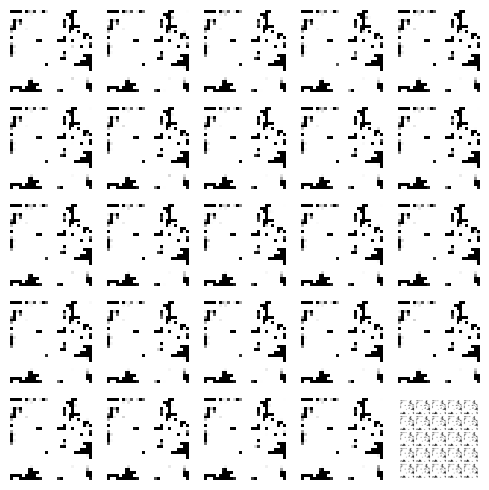

  0%|          | 0/350 [00:00<?, ?it/s]

4/4 [==============================] - 0s 15ms/step


  0%|          | 1/350 [00:00<03:12,  1.82it/s]

4/4 [==============================] - 0s 13ms/step


  1%|          | 2/350 [00:01<03:13,  1.80it/s]

4/4 [==============================] - 0s 18ms/step


  1%|          | 3/350 [00:01<03:25,  1.69it/s]

4/4 [==============================] - 0s 14ms/step


  1%|          | 4/350 [00:02<03:24,  1.69it/s]

4/4 [==============================] - 0s 14ms/step


  1%|▏         | 5/350 [00:02<03:22,  1.70it/s]

4/4 [==============================] - 0s 14ms/step


  2%|▏         | 6/350 [00:03<03:21,  1.71it/s]

4/4 [==============================] - 0s 15ms/step


  2%|▏         | 7/350 [00:04<03:18,  1.73it/s]

4/4 [==============================] - 0s 14ms/step


  2%|▏         | 8/350 [00:04<03:19,  1.71it/s]

4/4 [==============================] - 0s 18ms/step


  3%|▎         | 9/350 [00:05<03:18,  1.71it/s]

4/4 [==============================] - 0s 15ms/step


  3%|▎         | 10/350 [00:05<03:18,  1.72it/s]

4/4 [==============================] - 0s 14ms/step


  3%|▎         | 11/350 [00:06<03:16,  1.72it/s]

4/4 [==============================] - 0s 15ms/step


  3%|▎         | 12/350 [00:07<03:19,  1.70it/s]

4/4 [==============================] - 0s 13ms/step


  4%|▎         | 13/350 [00:07<03:21,  1.67it/s]

4/4 [==============================] - 0s 14ms/step


  4%|▍         | 14/350 [00:08<03:18,  1.70it/s]

4/4 [==============================] - 0s 18ms/step


  4%|▍         | 15/350 [00:08<03:14,  1.72it/s]

4/4 [==============================] - 0s 14ms/step


  5%|▍         | 16/350 [00:09<03:11,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


  5%|▍         | 17/350 [00:09<03:14,  1.72it/s]

4/4 [==============================] - 0s 14ms/step


  5%|▌         | 18/350 [00:10<03:07,  1.77it/s]

4/4 [==============================] - 0s 16ms/step


  5%|▌         | 19/350 [00:11<03:09,  1.74it/s]

4/4 [==============================] - 0s 14ms/step


  6%|▌         | 20/350 [00:11<03:05,  1.78it/s]

4/4 [==============================] - 0s 14ms/step


  6%|▌         | 21/350 [00:12<03:02,  1.80it/s]

4/4 [==============================] - 0s 14ms/step


  6%|▋         | 22/350 [00:12<02:59,  1.83it/s]

4/4 [==============================] - 0s 13ms/step


  7%|▋         | 23/350 [00:13<02:55,  1.86it/s]

4/4 [==============================] - 0s 14ms/step


  7%|▋         | 24/350 [00:13<02:54,  1.87it/s]

4/4 [==============================] - 0s 13ms/step


  7%|▋         | 25/350 [00:14<02:46,  1.95it/s]

4/4 [==============================] - 0s 30ms/step


  7%|▋         | 26/350 [00:14<02:48,  1.93it/s]

4/4 [==============================] - 0s 13ms/step


  8%|▊         | 27/350 [00:15<02:48,  1.91it/s]

4/4 [==============================] - 0s 14ms/step


  8%|▊         | 28/350 [00:15<02:49,  1.90it/s]

4/4 [==============================] - 0s 13ms/step


  8%|▊         | 29/350 [00:16<02:48,  1.91it/s]

4/4 [==============================] - 0s 13ms/step


  9%|▊         | 30/350 [00:16<02:50,  1.88it/s]

4/4 [==============================] - 0s 13ms/step


  9%|▉         | 31/350 [00:17<02:48,  1.89it/s]

4/4 [==============================] - 0s 14ms/step


  9%|▉         | 32/350 [00:17<02:42,  1.96it/s]

4/4 [==============================] - 0s 28ms/step


  9%|▉         | 33/350 [00:18<02:43,  1.94it/s]

4/4 [==============================] - 0s 15ms/step


 10%|▉         | 34/350 [00:18<02:43,  1.93it/s]

4/4 [==============================] - 0s 14ms/step


 10%|█         | 35/350 [00:19<02:44,  1.91it/s]

4/4 [==============================] - 0s 13ms/step


 10%|█         | 36/350 [00:19<02:44,  1.91it/s]

4/4 [==============================] - 0s 14ms/step


 11%|█         | 37/350 [00:20<02:44,  1.90it/s]

4/4 [==============================] - 0s 14ms/step


 11%|█         | 38/350 [00:20<02:44,  1.89it/s]

4/4 [==============================] - 0s 15ms/step


 11%|█         | 39/350 [00:21<02:40,  1.94it/s]

4/4 [==============================] - 0s 22ms/step


 11%|█▏        | 40/350 [00:21<02:39,  1.94it/s]

4/4 [==============================] - 0s 14ms/step


 12%|█▏        | 41/350 [00:22<02:41,  1.91it/s]

4/4 [==============================] - 0s 13ms/step


 12%|█▏        | 42/350 [00:23<02:41,  1.91it/s]

4/4 [==============================] - 0s 13ms/step


 12%|█▏        | 43/350 [00:23<02:36,  1.97it/s]

4/4 [==============================] - 0s 26ms/step


 13%|█▎        | 44/350 [00:24<02:40,  1.91it/s]

4/4 [==============================] - 0s 12ms/step


 13%|█▎        | 45/350 [00:24<02:46,  1.83it/s]

4/4 [==============================] - 0s 14ms/step


 13%|█▎        | 46/350 [00:25<02:48,  1.81it/s]

4/4 [==============================] - 0s 15ms/step


 13%|█▎        | 47/350 [00:25<02:53,  1.74it/s]

4/4 [==============================] - 0s 16ms/step


 14%|█▎        | 48/350 [00:26<02:57,  1.70it/s]

4/4 [==============================] - 0s 13ms/step


 14%|█▍        | 49/350 [00:27<02:55,  1.71it/s]

4/4 [==============================] - 0s 14ms/step


 14%|█▍        | 50/350 [00:27<02:53,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 15%|█▍        | 51/350 [00:28<02:52,  1.73it/s]

4/4 [==============================] - 0s 14ms/step


 15%|█▍        | 52/350 [00:28<02:42,  1.84it/s]

4/4 [==============================] - 0s 36ms/step


 15%|█▌        | 53/350 [00:29<02:43,  1.82it/s]

4/4 [==============================] - 0s 15ms/step


 15%|█▌        | 54/350 [00:29<02:40,  1.85it/s]

4/4 [==============================] - 0s 14ms/step


 16%|█▌        | 55/350 [00:30<02:41,  1.82it/s]

4/4 [==============================] - 0s 16ms/step


 16%|█▌        | 56/350 [00:30<02:44,  1.79it/s]

4/4 [==============================] - 0s 17ms/step


 16%|█▋        | 57/350 [00:31<02:36,  1.87it/s]

4/4 [==============================] - 0s 22ms/step


 17%|█▋        | 58/350 [00:31<02:39,  1.84it/s]

4/4 [==============================] - 0s 23ms/step


 17%|█▋        | 59/350 [00:32<02:44,  1.77it/s]

4/4 [==============================] - 0s 15ms/step


 17%|█▋        | 60/350 [00:33<02:46,  1.74it/s]

4/4 [==============================] - 0s 15ms/step


 17%|█▋        | 61/350 [00:33<02:44,  1.75it/s]

4/4 [==============================] - 0s 15ms/step


 18%|█▊        | 62/350 [00:34<02:50,  1.69it/s]

4/4 [==============================] - 0s 17ms/step


 18%|█▊        | 63/350 [00:34<02:42,  1.76it/s]

4/4 [==============================] - 0s 31ms/step


 18%|█▊        | 64/350 [00:35<02:40,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 19%|█▊        | 65/350 [00:35<02:32,  1.87it/s]

4/4 [==============================] - 0s 34ms/step


 19%|█▉        | 66/350 [00:36<02:34,  1.84it/s]

4/4 [==============================] - 0s 13ms/step


 19%|█▉        | 67/350 [00:36<02:33,  1.85it/s]

4/4 [==============================] - 0s 12ms/step


 19%|█▉        | 68/350 [00:37<02:26,  1.93it/s]

4/4 [==============================] - 0s 20ms/step


 20%|█▉        | 69/350 [00:38<02:28,  1.89it/s]

4/4 [==============================] - 0s 13ms/step


 20%|██        | 70/350 [00:38<02:30,  1.86it/s]

4/4 [==============================] - 0s 13ms/step


 20%|██        | 71/350 [00:39<02:30,  1.85it/s]

4/4 [==============================] - 0s 13ms/step


 21%|██        | 72/350 [00:39<02:28,  1.87it/s]

4/4 [==============================] - 0s 15ms/step


 21%|██        | 73/350 [00:40<02:23,  1.93it/s]

4/4 [==============================] - 0s 29ms/step


 21%|██        | 74/350 [00:40<02:24,  1.91it/s]

4/4 [==============================] - 0s 14ms/step


 21%|██▏       | 75/350 [00:41<02:26,  1.87it/s]

4/4 [==============================] - 0s 14ms/step


 22%|██▏       | 76/350 [00:41<02:25,  1.88it/s]

4/4 [==============================] - 0s 13ms/step


 22%|██▏       | 77/350 [00:42<02:24,  1.89it/s]

4/4 [==============================] - 0s 13ms/step


 22%|██▏       | 78/350 [00:42<02:25,  1.87it/s]

4/4 [==============================] - 0s 14ms/step


 23%|██▎       | 79/350 [00:43<02:24,  1.87it/s]

4/4 [==============================] - 0s 15ms/step


 23%|██▎       | 80/350 [00:43<02:20,  1.92it/s]

4/4 [==============================] - 0s 30ms/step


 23%|██▎       | 81/350 [00:44<02:24,  1.86it/s]

4/4 [==============================] - 0s 17ms/step


 23%|██▎       | 82/350 [00:44<02:23,  1.87it/s]

4/4 [==============================] - 0s 14ms/step


 24%|██▎       | 83/350 [00:45<02:23,  1.87it/s]

4/4 [==============================] - 0s 13ms/step


 24%|██▍       | 84/350 [00:46<02:22,  1.87it/s]

4/4 [==============================] - 0s 15ms/step


 24%|██▍       | 85/350 [00:46<02:22,  1.86it/s]

4/4 [==============================] - 0s 13ms/step


 25%|██▍       | 86/350 [00:47<02:29,  1.77it/s]

4/4 [==============================] - 0s 17ms/step


 25%|██▍       | 87/350 [00:47<02:24,  1.82it/s]

4/4 [==============================] - 0s 32ms/step


 25%|██▌       | 88/350 [00:48<02:27,  1.77it/s]

4/4 [==============================] - 0s 15ms/step


 25%|██▌       | 89/350 [00:48<02:28,  1.75it/s]

4/4 [==============================] - 0s 18ms/step


 26%|██▌       | 90/350 [00:49<02:30,  1.73it/s]

4/4 [==============================] - 0s 14ms/step


 26%|██▌       | 91/350 [00:50<02:28,  1.74it/s]

4/4 [==============================] - 0s 16ms/step


 26%|██▋       | 92/350 [00:50<02:23,  1.80it/s]

4/4 [==============================] - 0s 21ms/step


 27%|██▋       | 93/350 [00:51<02:21,  1.81it/s]

4/4 [==============================] - 0s 13ms/step


 27%|██▋       | 94/350 [00:51<02:21,  1.81it/s]

4/4 [==============================] - 0s 15ms/step


 27%|██▋       | 95/350 [00:52<02:23,  1.78it/s]

4/4 [==============================] - 0s 16ms/step


 27%|██▋       | 96/350 [00:52<02:25,  1.75it/s]

4/4 [==============================] - 0s 14ms/step


 28%|██▊       | 97/350 [00:53<02:22,  1.78it/s]

4/4 [==============================] - 0s 15ms/step


 28%|██▊       | 98/350 [00:53<02:23,  1.76it/s]

4/4 [==============================] - 0s 14ms/step


 28%|██▊       | 99/350 [00:54<02:23,  1.75it/s]

4/4 [==============================] - 0s 14ms/step


 29%|██▊       | 100/350 [00:55<02:16,  1.84it/s]

4/4 [==============================] - 0s 25ms/step


 29%|██▉       | 101/350 [00:55<02:15,  1.84it/s]

4/4 [==============================] - 0s 13ms/step


 29%|██▉       | 102/350 [00:56<02:14,  1.85it/s]

4/4 [==============================] - 0s 14ms/step


 29%|██▉       | 103/350 [00:56<02:09,  1.90it/s]

4/4 [==============================] - 0s 25ms/step


 30%|██▉       | 104/350 [00:57<02:08,  1.92it/s]

4/4 [==============================] - 0s 25ms/step


 30%|███       | 105/350 [00:57<02:09,  1.89it/s]

4/4 [==============================] - 0s 14ms/step


 30%|███       | 106/350 [00:58<02:08,  1.90it/s]

4/4 [==============================] - 0s 16ms/step


 31%|███       | 107/350 [00:58<02:05,  1.93it/s]

4/4 [==============================] - 0s 28ms/step


 31%|███       | 108/350 [00:59<02:06,  1.92it/s]

4/4 [==============================] - 0s 14ms/step


 31%|███       | 109/350 [00:59<02:07,  1.89it/s]

4/4 [==============================] - 0s 13ms/step


 31%|███▏      | 110/350 [01:00<02:02,  1.96it/s]

4/4 [==============================] - 0s 32ms/step


 32%|███▏      | 111/350 [01:00<02:04,  1.93it/s]

4/4 [==============================] - 0s 14ms/step


 32%|███▏      | 112/350 [01:01<02:05,  1.90it/s]

4/4 [==============================] - 0s 14ms/step


 32%|███▏      | 113/350 [01:01<02:05,  1.89it/s]

4/4 [==============================] - 0s 13ms/step


 33%|███▎      | 114/350 [01:02<02:04,  1.89it/s]

4/4 [==============================] - 0s 14ms/step


 33%|███▎      | 115/350 [01:02<02:05,  1.87it/s]

4/4 [==============================] - 0s 14ms/step


 33%|███▎      | 116/350 [01:03<02:00,  1.94it/s]

4/4 [==============================] - 0s 27ms/step


 33%|███▎      | 117/350 [01:03<02:00,  1.93it/s]

4/4 [==============================] - 0s 12ms/step


 34%|███▎      | 118/350 [01:04<02:00,  1.93it/s]

4/4 [==============================] - 0s 14ms/step


 34%|███▍      | 119/350 [01:04<02:02,  1.89it/s]

4/4 [==============================] - 0s 14ms/step


 34%|███▍      | 120/350 [01:05<02:01,  1.90it/s]

4/4 [==============================] - 0s 13ms/step


 35%|███▍      | 121/350 [01:06<02:01,  1.89it/s]

4/4 [==============================] - 0s 14ms/step


 35%|███▍      | 122/350 [01:06<01:56,  1.95it/s]

4/4 [==============================] - 0s 29ms/step


 35%|███▌      | 123/350 [01:07<01:57,  1.93it/s]

4/4 [==============================] - 0s 16ms/step


 35%|███▌      | 124/350 [01:07<01:59,  1.89it/s]

4/4 [==============================] - 0s 13ms/step


 36%|███▌      | 125/350 [01:08<01:58,  1.90it/s]

4/4 [==============================] - 0s 13ms/step


 36%|███▌      | 126/350 [01:08<01:58,  1.89it/s]

4/4 [==============================] - 0s 14ms/step


 36%|███▋      | 127/350 [01:09<01:58,  1.88it/s]

4/4 [==============================] - 0s 19ms/step


 37%|███▋      | 128/350 [01:09<01:59,  1.86it/s]

4/4 [==============================] - 0s 15ms/step


 37%|███▋      | 129/350 [01:10<02:05,  1.76it/s]

4/4 [==============================] - 0s 14ms/step


 37%|███▋      | 130/350 [01:10<02:00,  1.82it/s]

4/4 [==============================] - 0s 14ms/step


 37%|███▋      | 131/350 [01:11<02:03,  1.77it/s]

4/4 [==============================] - 0s 14ms/step


 38%|███▊      | 132/350 [01:12<02:05,  1.73it/s]

4/4 [==============================] - 0s 14ms/step


 38%|███▊      | 133/350 [01:12<02:01,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 38%|███▊      | 134/350 [01:13<01:59,  1.81it/s]

4/4 [==============================] - 0s 15ms/step


 39%|███▊      | 135/350 [01:13<01:58,  1.82it/s]

4/4 [==============================] - 0s 13ms/step


 39%|███▉      | 136/350 [01:14<01:57,  1.81it/s]

4/4 [==============================] - 0s 17ms/step


 39%|███▉      | 137/350 [01:14<01:59,  1.79it/s]

4/4 [==============================] - 0s 15ms/step


 39%|███▉      | 138/350 [01:15<02:02,  1.73it/s]

4/4 [==============================] - 0s 14ms/step


 40%|███▉      | 139/350 [01:15<01:58,  1.78it/s]

4/4 [==============================] - 0s 16ms/step


 40%|████      | 140/350 [01:16<01:57,  1.79it/s]

4/4 [==============================] - 0s 19ms/step


 40%|████      | 141/350 [01:17<01:53,  1.84it/s]

4/4 [==============================] - 0s 22ms/step


 41%|████      | 142/350 [01:17<01:53,  1.83it/s]

4/4 [==============================] - 0s 15ms/step


 41%|████      | 143/350 [01:18<01:53,  1.82it/s]

4/4 [==============================] - 0s 14ms/step


 41%|████      | 144/350 [01:18<01:50,  1.87it/s]

4/4 [==============================] - 0s 28ms/step


 41%|████▏     | 145/350 [01:19<01:52,  1.82it/s]

4/4 [==============================] - 0s 16ms/step


 42%|████▏     | 146/350 [01:19<01:52,  1.81it/s]

4/4 [==============================] - 0s 15ms/step


 42%|████▏     | 147/350 [01:20<01:53,  1.80it/s]

4/4 [==============================] - 0s 14ms/step


 42%|████▏     | 148/350 [01:20<01:47,  1.87it/s]

4/4 [==============================] - 0s 29ms/step


 43%|████▎     | 149/350 [01:21<01:48,  1.86it/s]

4/4 [==============================] - 0s 14ms/step


 43%|████▎     | 150/350 [01:21<01:48,  1.85it/s]

4/4 [==============================] - 0s 13ms/step


 43%|████▎     | 151/350 [01:22<01:48,  1.83it/s]

4/4 [==============================] - 0s 16ms/step


 43%|████▎     | 152/350 [01:22<01:44,  1.89it/s]

4/4 [==============================] - 0s 31ms/step


 44%|████▎     | 153/350 [01:23<01:46,  1.86it/s]

4/4 [==============================] - 0s 14ms/step


 44%|████▍     | 154/350 [01:24<01:46,  1.84it/s]

4/4 [==============================] - 0s 15ms/step


 44%|████▍     | 155/350 [01:24<01:46,  1.83it/s]

4/4 [==============================] - 0s 19ms/step


 45%|████▍     | 156/350 [01:25<01:46,  1.82it/s]

4/4 [==============================] - 0s 17ms/step


 45%|████▍     | 157/350 [01:25<01:46,  1.81it/s]

4/4 [==============================] - 0s 18ms/step


 45%|████▌     | 158/350 [01:26<01:46,  1.80it/s]

4/4 [==============================] - 0s 14ms/step


 45%|████▌     | 159/350 [01:26<01:44,  1.82it/s]

4/4 [==============================] - 0s 15ms/step


 46%|████▌     | 160/350 [01:27<01:44,  1.82it/s]

4/4 [==============================] - 0s 13ms/step


 46%|████▌     | 161/350 [01:27<01:42,  1.84it/s]

4/4 [==============================] - 0s 13ms/step


 46%|████▋     | 162/350 [01:28<01:41,  1.86it/s]

4/4 [==============================] - 0s 14ms/step


 47%|████▋     | 163/350 [01:28<01:37,  1.91it/s]

4/4 [==============================] - 0s 29ms/step


 47%|████▋     | 164/350 [01:29<01:38,  1.88it/s]

4/4 [==============================] - 0s 15ms/step


 47%|████▋     | 165/350 [01:30<01:40,  1.84it/s]

4/4 [==============================] - 0s 13ms/step


 47%|████▋     | 166/350 [01:30<01:43,  1.78it/s]

4/4 [==============================] - 0s 14ms/step


 48%|████▊     | 167/350 [01:31<01:45,  1.73it/s]

4/4 [==============================] - 0s 15ms/step


 48%|████▊     | 168/350 [01:31<01:49,  1.66it/s]

4/4 [==============================] - 0s 17ms/step


 48%|████▊     | 169/350 [01:32<01:48,  1.66it/s]

4/4 [==============================] - 0s 14ms/step


 49%|████▊     | 170/350 [01:33<01:46,  1.69it/s]

4/4 [==============================] - 0s 15ms/step


 49%|████▉     | 171/350 [01:33<01:47,  1.66it/s]

4/4 [==============================] - 0s 15ms/step


 49%|████▉     | 172/350 [01:34<01:44,  1.70it/s]

4/4 [==============================] - 0s 18ms/step


 49%|████▉     | 173/350 [01:34<01:43,  1.72it/s]

4/4 [==============================] - 0s 16ms/step


 50%|████▉     | 174/350 [01:35<01:41,  1.73it/s]

4/4 [==============================] - 0s 18ms/step


 50%|█████     | 175/350 [01:36<01:42,  1.71it/s]

4/4 [==============================] - 0s 15ms/step


 50%|█████     | 176/350 [01:36<01:43,  1.68it/s]

4/4 [==============================] - 0s 14ms/step


 51%|█████     | 177/350 [01:37<01:40,  1.71it/s]

4/4 [==============================] - 0s 14ms/step


 51%|█████     | 178/350 [01:37<01:38,  1.74it/s]

4/4 [==============================] - 0s 14ms/step


 51%|█████     | 179/350 [01:38<01:33,  1.83it/s]

4/4 [==============================] - 0s 33ms/step


 51%|█████▏    | 180/350 [01:38<01:33,  1.83it/s]

4/4 [==============================] - 0s 14ms/step


 52%|█████▏    | 181/350 [01:39<01:32,  1.82it/s]

4/4 [==============================] - 0s 14ms/step


 52%|█████▏    | 182/350 [01:39<01:33,  1.80it/s]

4/4 [==============================] - 0s 15ms/step


 52%|█████▏    | 183/350 [01:40<01:38,  1.70it/s]

4/4 [==============================] - 0s 18ms/step


 53%|█████▎    | 184/350 [01:41<01:37,  1.70it/s]

4/4 [==============================] - 0s 16ms/step


 53%|█████▎    | 185/350 [01:41<01:36,  1.71it/s]

4/4 [==============================] - 0s 14ms/step


 53%|█████▎    | 186/350 [01:42<01:35,  1.72it/s]

4/4 [==============================] - 0s 15ms/step


 53%|█████▎    | 187/350 [01:42<01:34,  1.73it/s]

4/4 [==============================] - 0s 16ms/step


 54%|█████▎    | 188/350 [01:43<01:31,  1.78it/s]

4/4 [==============================] - 0s 15ms/step


 54%|█████▍    | 189/350 [01:43<01:31,  1.77it/s]

4/4 [==============================] - 0s 15ms/step


 54%|█████▍    | 190/350 [01:44<01:30,  1.77it/s]

4/4 [==============================] - 0s 14ms/step


 55%|█████▍    | 191/350 [01:45<01:30,  1.75it/s]

4/4 [==============================] - 0s 17ms/step


 55%|█████▍    | 192/350 [01:45<01:31,  1.73it/s]

4/4 [==============================] - 0s 14ms/step


 55%|█████▌    | 193/350 [01:46<01:30,  1.74it/s]

4/4 [==============================] - 0s 16ms/step


 55%|█████▌    | 194/350 [01:46<01:29,  1.74it/s]

4/4 [==============================] - 0s 14ms/step


 56%|█████▌    | 195/350 [01:47<01:27,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 56%|█████▌    | 196/350 [01:47<01:25,  1.80it/s]

4/4 [==============================] - 0s 13ms/step


 56%|█████▋    | 197/350 [01:48<01:27,  1.75it/s]

4/4 [==============================] - 0s 16ms/step


 57%|█████▋    | 198/350 [01:49<01:27,  1.74it/s]

4/4 [==============================] - 0s 15ms/step


 57%|█████▋    | 199/350 [01:49<01:30,  1.66it/s]

4/4 [==============================] - 0s 18ms/step


 57%|█████▋    | 200/350 [01:50<01:30,  1.65it/s]

4/4 [==============================] - 0s 15ms/step


 57%|█████▋    | 201/350 [01:50<01:28,  1.68it/s]

4/4 [==============================] - 0s 15ms/step


 58%|█████▊    | 202/350 [01:51<01:35,  1.56it/s]

4/4 [==============================] - 0s 16ms/step


 58%|█████▊    | 203/350 [01:52<01:33,  1.58it/s]

4/4 [==============================] - 0s 18ms/step


 58%|█████▊    | 204/350 [01:52<01:31,  1.59it/s]

4/4 [==============================] - 0s 16ms/step


 59%|█████▊    | 205/350 [01:53<01:29,  1.62it/s]

4/4 [==============================] - 0s 15ms/step


 59%|█████▉    | 206/350 [01:54<01:28,  1.62it/s]

4/4 [==============================] - 0s 16ms/step


 59%|█████▉    | 207/350 [01:54<01:27,  1.64it/s]

4/4 [==============================] - 0s 14ms/step


 59%|█████▉    | 208/350 [01:55<01:25,  1.67it/s]

4/4 [==============================] - 0s 16ms/step


 60%|█████▉    | 209/350 [01:55<01:25,  1.64it/s]

4/4 [==============================] - 0s 15ms/step


 60%|██████    | 210/350 [01:56<01:24,  1.66it/s]

4/4 [==============================] - 0s 15ms/step


 60%|██████    | 211/350 [01:57<01:22,  1.68it/s]

4/4 [==============================] - 0s 20ms/step


 61%|██████    | 212/350 [01:57<01:23,  1.65it/s]

4/4 [==============================] - 0s 16ms/step


 61%|██████    | 213/350 [01:58<01:22,  1.65it/s]

4/4 [==============================] - 0s 14ms/step


 61%|██████    | 214/350 [01:58<01:21,  1.67it/s]

4/4 [==============================] - 0s 22ms/step


 61%|██████▏   | 215/350 [01:59<01:23,  1.61it/s]

4/4 [==============================] - 0s 13ms/step


 62%|██████▏   | 216/350 [02:00<01:21,  1.65it/s]

4/4 [==============================] - 0s 15ms/step


 62%|██████▏   | 217/350 [02:00<01:19,  1.66it/s]

4/4 [==============================] - 0s 16ms/step


 62%|██████▏   | 218/350 [02:01<01:20,  1.65it/s]

4/4 [==============================] - 0s 14ms/step


 63%|██████▎   | 219/350 [02:01<01:18,  1.67it/s]

4/4 [==============================] - 0s 16ms/step


 63%|██████▎   | 220/350 [02:02<01:19,  1.64it/s]

4/4 [==============================] - 0s 16ms/step


 63%|██████▎   | 221/350 [02:03<01:14,  1.73it/s]

4/4 [==============================] - 0s 38ms/step


 63%|██████▎   | 222/350 [02:03<01:13,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 64%|██████▎   | 223/350 [02:04<01:12,  1.74it/s]

4/4 [==============================] - 0s 14ms/step


 64%|██████▍   | 224/350 [02:04<01:08,  1.84it/s]

4/4 [==============================] - 0s 34ms/step


 64%|██████▍   | 225/350 [02:05<01:07,  1.84it/s]

4/4 [==============================] - 0s 19ms/step


 65%|██████▍   | 226/350 [02:05<01:10,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 65%|██████▍   | 227/350 [02:06<01:13,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


 65%|██████▌   | 228/350 [02:07<01:10,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 65%|██████▌   | 229/350 [02:07<01:09,  1.73it/s]

4/4 [==============================] - 0s 16ms/step


 66%|██████▌   | 230/350 [02:08<01:08,  1.76it/s]

4/4 [==============================] - 0s 16ms/step


 66%|██████▌   | 231/350 [02:08<01:09,  1.71it/s]

4/4 [==============================] - 0s 14ms/step


 66%|██████▋   | 232/350 [02:09<01:07,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 67%|██████▋   | 233/350 [02:09<01:05,  1.78it/s]

4/4 [==============================] - 0s 14ms/step


 67%|██████▋   | 234/350 [02:10<01:02,  1.85it/s]

4/4 [==============================] - 0s 27ms/step


 67%|██████▋   | 235/350 [02:10<01:01,  1.87it/s]

4/4 [==============================] - 0s 13ms/step


 67%|██████▋   | 236/350 [02:11<01:01,  1.87it/s]

4/4 [==============================] - 0s 15ms/step


 68%|██████▊   | 237/350 [02:12<01:01,  1.85it/s]

4/4 [==============================] - 0s 14ms/step


 68%|██████▊   | 238/350 [02:12<01:03,  1.77it/s]

4/4 [==============================] - 0s 21ms/step


 68%|██████▊   | 239/350 [02:13<01:01,  1.81it/s]

4/4 [==============================] - 0s 14ms/step


 69%|██████▊   | 240/350 [02:13<01:00,  1.82it/s]

4/4 [==============================] - 0s 15ms/step


 69%|██████▉   | 241/350 [02:14<01:01,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 69%|██████▉   | 242/350 [02:14<01:01,  1.76it/s]

4/4 [==============================] - 0s 16ms/step


 69%|██████▉   | 243/350 [02:15<01:00,  1.78it/s]

4/4 [==============================] - 0s 14ms/step


 70%|██████▉   | 244/350 [02:15<00:58,  1.81it/s]

4/4 [==============================] - 0s 15ms/step


 70%|███████   | 245/350 [02:16<00:58,  1.81it/s]

4/4 [==============================] - 0s 13ms/step


 70%|███████   | 246/350 [02:17<00:57,  1.81it/s]

4/4 [==============================] - 0s 14ms/step


 71%|███████   | 247/350 [02:17<00:56,  1.83it/s]

4/4 [==============================] - 0s 13ms/step


 71%|███████   | 248/350 [02:18<00:56,  1.81it/s]

4/4 [==============================] - 0s 15ms/step


 71%|███████   | 249/350 [02:18<00:55,  1.82it/s]

4/4 [==============================] - 0s 13ms/step


 71%|███████▏  | 250/350 [02:19<00:54,  1.83it/s]

4/4 [==============================] - 0s 13ms/step


 72%|███████▏  | 251/350 [02:19<00:54,  1.82it/s]

4/4 [==============================] - 0s 13ms/step


 72%|███████▏  | 252/350 [02:20<00:53,  1.84it/s]

4/4 [==============================] - 0s 14ms/step


 72%|███████▏  | 253/350 [02:20<00:52,  1.84it/s]

4/4 [==============================] - 0s 13ms/step


 73%|███████▎  | 254/350 [02:21<00:52,  1.83it/s]

4/4 [==============================] - 0s 14ms/step


 73%|███████▎  | 255/350 [02:21<00:50,  1.90it/s]

4/4 [==============================] - 0s 25ms/step


 73%|███████▎  | 256/350 [02:22<00:50,  1.85it/s]

4/4 [==============================] - 0s 21ms/step


 73%|███████▎  | 257/350 [02:23<00:50,  1.83it/s]

4/4 [==============================] - 0s 18ms/step


 74%|███████▎  | 258/350 [02:23<00:50,  1.81it/s]

4/4 [==============================] - 0s 22ms/step


 74%|███████▍  | 259/350 [02:24<00:52,  1.74it/s]

4/4 [==============================] - 0s 18ms/step


 74%|███████▍  | 260/350 [02:24<00:51,  1.76it/s]

4/4 [==============================] - 0s 14ms/step


 75%|███████▍  | 261/350 [02:25<00:49,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 75%|███████▍  | 262/350 [02:25<00:47,  1.86it/s]

4/4 [==============================] - 0s 34ms/step


 75%|███████▌  | 263/350 [02:26<00:47,  1.83it/s]

4/4 [==============================] - 0s 28ms/step


 75%|███████▌  | 264/350 [02:26<00:47,  1.82it/s]

4/4 [==============================] - 0s 15ms/step


 76%|███████▌  | 265/350 [02:27<00:46,  1.83it/s]

4/4 [==============================] - 0s 15ms/step


 76%|███████▌  | 266/350 [02:28<00:48,  1.74it/s]

4/4 [==============================] - 0s 18ms/step


 76%|███████▋  | 267/350 [02:28<00:47,  1.74it/s]

4/4 [==============================] - 0s 16ms/step


 77%|███████▋  | 268/350 [02:29<00:47,  1.71it/s]

4/4 [==============================] - 0s 13ms/step


 77%|███████▋  | 269/350 [02:29<00:46,  1.75it/s]

4/4 [==============================] - 0s 15ms/step


 77%|███████▋  | 270/350 [02:30<00:44,  1.79it/s]

4/4 [==============================] - 0s 13ms/step


 77%|███████▋  | 271/350 [02:30<00:43,  1.82it/s]

4/4 [==============================] - 0s 15ms/step


 78%|███████▊  | 272/350 [02:31<00:42,  1.82it/s]

4/4 [==============================] - 0s 13ms/step


 78%|███████▊  | 273/350 [02:32<00:41,  1.84it/s]

4/4 [==============================] - 0s 22ms/step


 78%|███████▊  | 274/350 [02:32<00:43,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 79%|███████▊  | 275/350 [02:33<00:42,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 79%|███████▉  | 276/350 [02:33<00:42,  1.76it/s]

4/4 [==============================] - 0s 20ms/step


 79%|███████▉  | 277/350 [02:34<00:41,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 79%|███████▉  | 278/350 [02:34<00:40,  1.76it/s]

4/4 [==============================] - 0s 15ms/step


 80%|███████▉  | 279/350 [02:35<00:40,  1.77it/s]

4/4 [==============================] - 0s 14ms/step


 80%|████████  | 280/350 [02:36<00:39,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 80%|████████  | 281/350 [02:36<00:38,  1.79it/s]

4/4 [==============================] - 0s 15ms/step


 81%|████████  | 282/350 [02:37<00:37,  1.81it/s]

4/4 [==============================] - 0s 17ms/step


 81%|████████  | 283/350 [02:37<00:37,  1.80it/s]

4/4 [==============================] - 0s 14ms/step


 81%|████████  | 284/350 [02:38<00:36,  1.81it/s]

4/4 [==============================] - 0s 16ms/step


 81%|████████▏ | 285/350 [02:38<00:36,  1.79it/s]

4/4 [==============================] - 0s 14ms/step


 82%|████████▏ | 286/350 [02:39<00:36,  1.77it/s]

4/4 [==============================] - 0s 14ms/step


 82%|████████▏ | 287/350 [02:39<00:36,  1.73it/s]

4/4 [==============================] - 0s 14ms/step


 82%|████████▏ | 288/350 [02:40<00:35,  1.75it/s]

4/4 [==============================] - 0s 14ms/step


 83%|████████▎ | 289/350 [02:41<00:34,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 83%|████████▎ | 290/350 [02:41<00:33,  1.80it/s]

4/4 [==============================] - 0s 13ms/step


 83%|████████▎ | 291/350 [02:42<00:33,  1.78it/s]

4/4 [==============================] - 0s 16ms/step


 83%|████████▎ | 292/350 [02:42<00:32,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 84%|████████▎ | 293/350 [02:43<00:31,  1.79it/s]

4/4 [==============================] - 0s 16ms/step


 84%|████████▍ | 294/350 [02:43<00:30,  1.81it/s]

4/4 [==============================] - 0s 20ms/step


 84%|████████▍ | 295/350 [02:44<00:30,  1.81it/s]

4/4 [==============================] - 0s 14ms/step


 85%|████████▍ | 296/350 [02:44<00:30,  1.80it/s]

4/4 [==============================] - 0s 16ms/step


 85%|████████▍ | 297/350 [02:45<00:29,  1.79it/s]

4/4 [==============================] - 0s 14ms/step


 85%|████████▌ | 298/350 [02:46<00:28,  1.80it/s]

4/4 [==============================] - 0s 15ms/step


 85%|████████▌ | 299/350 [02:46<00:28,  1.80it/s]

4/4 [==============================] - 0s 14ms/step


 86%|████████▌ | 300/350 [02:47<00:28,  1.74it/s]

4/4 [==============================] - 0s 17ms/step


 86%|████████▌ | 301/350 [02:47<00:27,  1.76it/s]

4/4 [==============================] - 0s 18ms/step


 86%|████████▋ | 302/350 [02:48<00:27,  1.75it/s]

4/4 [==============================] - 0s 14ms/step


 87%|████████▋ | 303/350 [02:48<00:26,  1.78it/s]

4/4 [==============================] - 0s 15ms/step


 87%|████████▋ | 304/350 [02:49<00:25,  1.81it/s]

4/4 [==============================] - 0s 14ms/step


 87%|████████▋ | 305/350 [02:50<00:24,  1.82it/s]

4/4 [==============================] - 0s 14ms/step


 87%|████████▋ | 306/350 [02:50<00:24,  1.82it/s]

4/4 [==============================] - 0s 14ms/step


 88%|████████▊ | 307/350 [02:51<00:23,  1.82it/s]

4/4 [==============================] - 0s 19ms/step


 88%|████████▊ | 308/350 [02:51<00:24,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 88%|████████▊ | 309/350 [02:52<00:23,  1.76it/s]

4/4 [==============================] - 0s 16ms/step


 89%|████████▊ | 310/350 [02:52<00:22,  1.79it/s]

4/4 [==============================] - 0s 17ms/step


 89%|████████▉ | 311/350 [02:53<00:21,  1.79it/s]

4/4 [==============================] - 0s 14ms/step


 89%|████████▉ | 312/350 [02:53<00:20,  1.88it/s]

4/4 [==============================] - 0s 32ms/step


 89%|████████▉ | 313/350 [02:54<00:20,  1.83it/s]

4/4 [==============================] - 0s 30ms/step


 90%|████████▉ | 314/350 [02:55<00:19,  1.81it/s]

4/4 [==============================] - 0s 14ms/step


 90%|█████████ | 315/350 [02:55<00:19,  1.79it/s]

4/4 [==============================] - 0s 15ms/step


 90%|█████████ | 316/350 [02:56<00:19,  1.78it/s]

4/4 [==============================] - 0s 15ms/step


 91%|█████████ | 317/350 [02:56<00:18,  1.79it/s]

4/4 [==============================] - 0s 14ms/step


 91%|█████████ | 318/350 [02:57<00:17,  1.80it/s]

4/4 [==============================] - 0s 14ms/step


 91%|█████████ | 319/350 [02:57<00:17,  1.80it/s]

4/4 [==============================] - 0s 15ms/step


 91%|█████████▏| 320/350 [02:58<00:16,  1.87it/s]

4/4 [==============================] - 0s 32ms/step


 92%|█████████▏| 321/350 [02:58<00:15,  1.85it/s]

4/4 [==============================] - 0s 35ms/step


 92%|█████████▏| 322/350 [02:59<00:15,  1.84it/s]

4/4 [==============================] - 0s 14ms/step


 92%|█████████▏| 323/350 [02:59<00:14,  1.82it/s]

4/4 [==============================] - 0s 15ms/step


 93%|█████████▎| 324/350 [03:00<00:14,  1.78it/s]

4/4 [==============================] - 0s 14ms/step


 93%|█████████▎| 325/350 [03:01<00:14,  1.77it/s]

4/4 [==============================] - 0s 14ms/step


 93%|█████████▎| 326/350 [03:01<00:13,  1.79it/s]

4/4 [==============================] - 0s 14ms/step


 93%|█████████▎| 327/350 [03:02<00:12,  1.83it/s]

4/4 [==============================] - 0s 20ms/step


 94%|█████████▎| 328/350 [03:02<00:11,  1.83it/s]

4/4 [==============================] - 0s 13ms/step


 94%|█████████▍| 329/350 [03:03<00:11,  1.83it/s]

4/4 [==============================] - 0s 14ms/step


 94%|█████████▍| 330/350 [03:03<00:10,  1.83it/s]

4/4 [==============================] - 0s 14ms/step


 95%|█████████▍| 331/350 [03:04<00:10,  1.86it/s]

4/4 [==============================] - 0s 14ms/step


 95%|█████████▍| 332/350 [03:04<00:09,  1.93it/s]

4/4 [==============================] - 0s 13ms/step


 95%|█████████▌| 333/350 [03:05<00:08,  1.91it/s]

4/4 [==============================] - 0s 14ms/step


 95%|█████████▌| 334/350 [03:05<00:08,  1.90it/s]

4/4 [==============================] - 0s 14ms/step


 96%|█████████▌| 335/350 [03:06<00:07,  1.96it/s]

4/4 [==============================] - 0s 31ms/step


 96%|█████████▌| 336/350 [03:06<00:07,  1.93it/s]

4/4 [==============================] - 0s 14ms/step


 96%|█████████▋| 337/350 [03:07<00:06,  1.89it/s]

4/4 [==============================] - 0s 14ms/step


 97%|█████████▋| 338/350 [03:07<00:06,  1.88it/s]

4/4 [==============================] - 0s 13ms/step


 97%|█████████▋| 339/350 [03:08<00:05,  1.93it/s]

4/4 [==============================] - 0s 24ms/step


 97%|█████████▋| 340/350 [03:09<00:05,  1.87it/s]

4/4 [==============================] - 0s 21ms/step


 97%|█████████▋| 341/350 [03:09<00:04,  1.82it/s]

4/4 [==============================] - 0s 25ms/step


 98%|█████████▊| 342/350 [03:10<00:04,  1.79it/s]

4/4 [==============================] - 0s 15ms/step


 98%|█████████▊| 343/350 [03:10<00:03,  1.78it/s]

4/4 [==============================] - 0s 16ms/step


 98%|█████████▊| 344/350 [03:11<00:03,  1.78it/s]

4/4 [==============================] - 0s 14ms/step


 99%|█████████▊| 345/350 [03:11<00:02,  1.88it/s]

4/4 [==============================] - 0s 20ms/step


 99%|█████████▉| 346/350 [03:12<00:02,  1.88it/s]

4/4 [==============================] - 0s 14ms/step


 99%|█████████▉| 347/350 [03:12<00:01,  1.90it/s]

4/4 [==============================] - 0s 13ms/step


 99%|█████████▉| 348/350 [03:13<00:01,  1.87it/s]

4/4 [==============================] - 0s 15ms/step


100%|█████████▉| 349/350 [03:13<00:00,  1.87it/s]

4/4 [==============================] - 0s 14ms/step


100%|██████████| 350/350 [03:14<00:00,  1.80it/s]

Epoch number: 20 discriminator_loss: 0.1668335510893459 generator_loss: 6.969771980558123
1/1 [==============================] - 0s 21ms/step


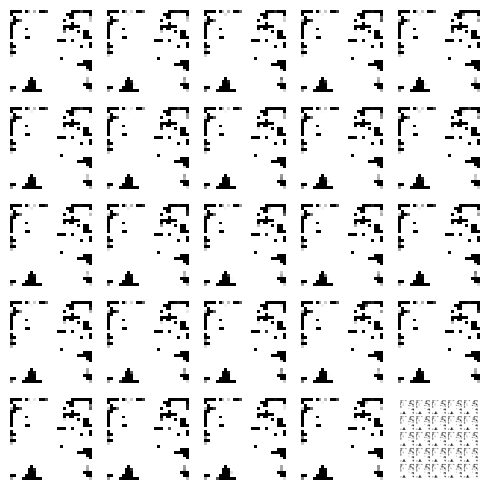

  0%|          | 0/350 [00:00<?, ?it/s]

4/4 [==============================] - 0s 16ms/step


  0%|          | 1/350 [00:00<03:14,  1.80it/s]

4/4 [==============================] - 0s 15ms/step


  1%|          | 2/350 [00:01<03:14,  1.79it/s]

4/4 [==============================] - 0s 14ms/step


  1%|          | 3/350 [00:01<03:15,  1.78it/s]

4/4 [==============================] - 0s 15ms/step


  1%|          | 4/350 [00:02<03:12,  1.80it/s]

4/4 [==============================] - 0s 14ms/step


  1%|▏         | 5/350 [00:02<03:16,  1.75it/s]

4/4 [==============================] - 0s 16ms/step


  2%|▏         | 6/350 [00:03<03:07,  1.83it/s]

4/4 [==============================] - 0s 25ms/step


  2%|▏         | 7/350 [00:03<03:06,  1.84it/s]

4/4 [==============================] - 0s 18ms/step


  2%|▏         | 8/350 [00:04<03:09,  1.80it/s]

4/4 [==============================] - 0s 15ms/step


  3%|▎         | 9/350 [00:05<03:10,  1.79it/s]

4/4 [==============================] - 0s 13ms/step


  3%|▎         | 10/350 [00:05<03:08,  1.80it/s]

4/4 [==============================] - 0s 14ms/step


  3%|▎         | 11/350 [00:06<03:07,  1.81it/s]

4/4 [==============================] - 0s 14ms/step


  3%|▎         | 12/350 [00:06<03:08,  1.80it/s]

4/4 [==============================] - 0s 13ms/step


  4%|▎         | 13/350 [00:07<03:05,  1.82it/s]

4/4 [==============================] - 0s 14ms/step


  4%|▍         | 14/350 [00:07<02:56,  1.90it/s]

4/4 [==============================] - 0s 27ms/step


  4%|▍         | 15/350 [00:08<02:55,  1.91it/s]

4/4 [==============================] - 0s 13ms/step


  5%|▍         | 16/350 [00:08<03:00,  1.85it/s]

4/4 [==============================] - 0s 14ms/step


  5%|▍         | 17/350 [00:09<03:02,  1.82it/s]

4/4 [==============================] - 0s 16ms/step


  5%|▌         | 18/350 [00:09<03:00,  1.84it/s]

4/4 [==============================] - 0s 13ms/step


  5%|▌         | 19/350 [00:10<02:59,  1.84it/s]

4/4 [==============================] - 0s 14ms/step


  6%|▌         | 20/350 [00:10<02:59,  1.84it/s]

4/4 [==============================] - 0s 12ms/step


  6%|▌         | 21/350 [00:11<02:58,  1.84it/s]

4/4 [==============================] - 0s 13ms/step


  6%|▋         | 22/350 [00:12<02:56,  1.86it/s]

4/4 [==============================] - 0s 13ms/step


  7%|▋         | 23/350 [00:12<02:54,  1.87it/s]

4/4 [==============================] - 0s 14ms/step


  7%|▋         | 24/350 [00:13<02:53,  1.88it/s]

4/4 [==============================] - 0s 15ms/step


  7%|▋         | 25/350 [00:13<02:55,  1.86it/s]

4/4 [==============================] - 0s 13ms/step


  7%|▋         | 26/350 [00:14<02:56,  1.84it/s]

4/4 [==============================] - 0s 14ms/step


  8%|▊         | 27/350 [00:14<02:53,  1.87it/s]

4/4 [==============================] - 0s 14ms/step


  8%|▊         | 28/350 [00:15<02:51,  1.88it/s]

4/4 [==============================] - 0s 13ms/step


  8%|▊         | 29/350 [00:15<02:50,  1.89it/s]

4/4 [==============================] - 0s 13ms/step


  9%|▊         | 30/350 [00:16<02:52,  1.85it/s]

4/4 [==============================] - 0s 14ms/step


  9%|▉         | 31/350 [00:16<02:51,  1.86it/s]

4/4 [==============================] - 0s 12ms/step


  9%|▉         | 32/350 [00:17<02:48,  1.89it/s]

4/4 [==============================] - 0s 14ms/step


  9%|▉         | 33/350 [00:17<02:49,  1.87it/s]

4/4 [==============================] - 0s 13ms/step


 10%|▉         | 34/350 [00:18<02:48,  1.87it/s]

4/4 [==============================] - 0s 17ms/step


 10%|█         | 35/350 [00:18<02:43,  1.93it/s]

4/4 [==============================] - 0s 14ms/step


 10%|█         | 36/350 [00:19<02:43,  1.92it/s]

4/4 [==============================] - 0s 14ms/step


 11%|█         | 37/350 [00:19<02:42,  1.93it/s]

4/4 [==============================] - 0s 14ms/step


 11%|█         | 38/350 [00:20<02:37,  1.99it/s]

4/4 [==============================] - 0s 37ms/step


 11%|█         | 39/350 [00:20<02:39,  1.95it/s]

4/4 [==============================] - 0s 19ms/step


 11%|█▏        | 40/350 [00:21<02:41,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


 12%|█▏        | 41/350 [00:21<02:35,  1.98it/s]

4/4 [==============================] - 0s 19ms/step


 12%|█▏        | 42/350 [00:22<02:38,  1.94it/s]

4/4 [==============================] - 0s 13ms/step


 12%|█▏        | 43/350 [00:23<02:40,  1.91it/s]

4/4 [==============================] - 0s 13ms/step


 13%|█▎        | 44/350 [00:23<02:40,  1.91it/s]

4/4 [==============================] - 0s 14ms/step


 13%|█▎        | 45/350 [00:24<02:34,  1.97it/s]

4/4 [==============================] - 0s 22ms/step


 13%|█▎        | 46/350 [00:24<02:35,  1.95it/s]

4/4 [==============================] - 0s 15ms/step


 13%|█▎        | 47/350 [00:25<02:38,  1.91it/s]

4/4 [==============================] - 0s 13ms/step


 14%|█▎        | 48/350 [00:25<02:39,  1.90it/s]

4/4 [==============================] - 0s 14ms/step


 14%|█▍        | 49/350 [00:26<02:39,  1.89it/s]

4/4 [==============================] - 0s 14ms/step


 14%|█▍        | 50/350 [00:26<02:38,  1.89it/s]

4/4 [==============================] - 0s 14ms/step


 15%|█▍        | 51/350 [00:27<02:33,  1.95it/s]

4/4 [==============================] - 0s 36ms/step


 15%|█▍        | 52/350 [00:27<02:37,  1.89it/s]

4/4 [==============================] - 0s 13ms/step


 15%|█▌        | 53/350 [00:28<02:37,  1.88it/s]

4/4 [==============================] - 0s 13ms/step


 15%|█▌        | 54/350 [00:28<02:38,  1.87it/s]

4/4 [==============================] - 0s 14ms/step


 16%|█▌        | 55/350 [00:29<02:39,  1.85it/s]

4/4 [==============================] - 0s 16ms/step


 16%|█▌        | 56/350 [00:29<02:42,  1.81it/s]

4/4 [==============================] - 0s 15ms/step


 16%|█▋        | 57/350 [00:30<02:37,  1.86it/s]

4/4 [==============================] - 0s 13ms/step


 17%|█▋        | 58/350 [00:31<02:37,  1.86it/s]

4/4 [==============================] - 0s 13ms/step


 17%|█▋        | 59/350 [00:31<02:36,  1.86it/s]

4/4 [==============================] - 0s 14ms/step


 17%|█▋        | 60/350 [00:32<02:38,  1.83it/s]

4/4 [==============================] - 0s 14ms/step


 17%|█▋        | 61/350 [00:32<02:39,  1.82it/s]

4/4 [==============================] - 0s 13ms/step


 18%|█▊        | 62/350 [00:33<02:37,  1.82it/s]

4/4 [==============================] - 0s 14ms/step


 18%|█▊        | 63/350 [00:33<02:37,  1.82it/s]

4/4 [==============================] - 0s 17ms/step


 18%|█▊        | 64/350 [00:34<02:36,  1.83it/s]

4/4 [==============================] - 0s 13ms/step


 19%|█▊        | 65/350 [00:34<02:35,  1.83it/s]

4/4 [==============================] - 0s 15ms/step


 19%|█▉        | 66/350 [00:35<02:35,  1.82it/s]

4/4 [==============================] - 0s 14ms/step


 19%|█▉        | 67/350 [00:35<02:34,  1.83it/s]

4/4 [==============================] - 0s 13ms/step


 19%|█▉        | 68/350 [00:36<02:33,  1.84it/s]

4/4 [==============================] - 0s 13ms/step


 20%|█▉        | 69/350 [00:37<02:34,  1.82it/s]

4/4 [==============================] - 0s 14ms/step


 20%|██        | 70/350 [00:37<02:29,  1.88it/s]

4/4 [==============================] - 0s 39ms/step


 20%|██        | 71/350 [00:38<02:30,  1.85it/s]

4/4 [==============================] - 0s 15ms/step


 21%|██        | 72/350 [00:38<02:36,  1.77it/s]

4/4 [==============================] - 0s 14ms/step


 21%|██        | 73/350 [00:39<02:35,  1.78it/s]

4/4 [==============================] - 0s 15ms/step


 21%|██        | 74/350 [00:39<02:36,  1.76it/s]

4/4 [==============================] - 0s 16ms/step


 21%|██▏       | 75/350 [00:40<02:33,  1.79it/s]

4/4 [==============================] - 0s 15ms/step


 22%|██▏       | 76/350 [00:40<02:26,  1.87it/s]

4/4 [==============================] - 0s 26ms/step


 22%|██▏       | 77/350 [00:41<02:26,  1.86it/s]

4/4 [==============================] - 0s 15ms/step


 22%|██▏       | 78/350 [00:41<02:24,  1.88it/s]

4/4 [==============================] - 0s 18ms/step


 23%|██▎       | 79/350 [00:42<02:26,  1.86it/s]

4/4 [==============================] - 0s 15ms/step


 23%|██▎       | 80/350 [00:43<02:25,  1.85it/s]

4/4 [==============================] - 0s 14ms/step


 23%|██▎       | 81/350 [00:43<02:32,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 23%|██▎       | 82/350 [00:44<02:29,  1.79it/s]

4/4 [==============================] - 0s 13ms/step


 24%|██▎       | 83/350 [00:44<02:27,  1.81it/s]

4/4 [==============================] - 0s 13ms/step


 24%|██▍       | 84/350 [00:45<02:25,  1.83it/s]

4/4 [==============================] - 0s 16ms/step


 24%|██▍       | 85/350 [00:45<02:25,  1.82it/s]

4/4 [==============================] - 0s 18ms/step


 25%|██▍       | 86/350 [00:46<02:27,  1.79it/s]

4/4 [==============================] - 0s 14ms/step


 25%|██▍       | 87/350 [00:46<02:25,  1.80it/s]

4/4 [==============================] - 0s 13ms/step


 25%|██▌       | 88/350 [00:47<02:22,  1.84it/s]

4/4 [==============================] - 0s 12ms/step


 25%|██▌       | 89/350 [00:48<02:20,  1.86it/s]

4/4 [==============================] - 0s 13ms/step


 26%|██▌       | 90/350 [00:48<02:19,  1.86it/s]

4/4 [==============================] - 0s 14ms/step


 26%|██▌       | 91/350 [00:49<02:17,  1.88it/s]

4/4 [==============================] - 0s 14ms/step


 26%|██▋       | 92/350 [00:49<02:16,  1.89it/s]

4/4 [==============================] - 0s 13ms/step


 27%|██▋       | 93/350 [00:50<02:14,  1.91it/s]

4/4 [==============================] - 0s 13ms/step


 27%|██▋       | 94/350 [00:50<02:14,  1.90it/s]

4/4 [==============================] - 0s 12ms/step


 27%|██▋       | 95/350 [00:51<02:13,  1.91it/s]

4/4 [==============================] - 0s 14ms/step


 27%|██▋       | 96/350 [00:51<02:18,  1.83it/s]

4/4 [==============================] - 0s 16ms/step


 28%|██▊       | 97/350 [00:52<02:17,  1.84it/s]

4/4 [==============================] - 0s 13ms/step


 28%|██▊       | 98/350 [00:52<02:19,  1.81it/s]

4/4 [==============================] - 0s 14ms/step


 28%|██▊       | 99/350 [00:53<02:19,  1.80it/s]

4/4 [==============================] - 0s 16ms/step


 29%|██▊       | 100/350 [00:53<02:18,  1.81it/s]

4/4 [==============================] - 0s 15ms/step


 29%|██▉       | 101/350 [00:54<02:16,  1.83it/s]

4/4 [==============================] - 0s 15ms/step


 29%|██▉       | 102/350 [00:55<02:17,  1.81it/s]

4/4 [==============================] - 0s 16ms/step


 29%|██▉       | 103/350 [00:55<02:19,  1.77it/s]

4/4 [==============================] - 0s 14ms/step


 30%|██▉       | 104/350 [00:56<02:22,  1.72it/s]

4/4 [==============================] - 0s 15ms/step


 30%|███       | 105/350 [00:56<02:25,  1.68it/s]

4/4 [==============================] - 0s 16ms/step


 30%|███       | 106/350 [00:57<02:26,  1.67it/s]

4/4 [==============================] - 0s 14ms/step


 31%|███       | 107/350 [00:58<02:24,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


 31%|███       | 108/350 [00:58<02:24,  1.68it/s]

4/4 [==============================] - 0s 14ms/step


 31%|███       | 109/350 [00:59<02:18,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 31%|███▏      | 110/350 [00:59<02:17,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 32%|███▏      | 111/350 [01:00<02:19,  1.71it/s]

4/4 [==============================] - 0s 14ms/step


 32%|███▏      | 112/350 [01:00<02:19,  1.71it/s]

4/4 [==============================] - 0s 13ms/step


 32%|███▏      | 113/350 [01:01<02:17,  1.72it/s]

4/4 [==============================] - 0s 15ms/step


 33%|███▎      | 114/350 [01:02<02:15,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 33%|███▎      | 115/350 [01:02<02:13,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 33%|███▎      | 116/350 [01:03<02:11,  1.77it/s]

4/4 [==============================] - 0s 14ms/step


 33%|███▎      | 117/350 [01:03<02:10,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 34%|███▎      | 118/350 [01:04<02:07,  1.82it/s]

4/4 [==============================] - 0s 13ms/step


 34%|███▍      | 119/350 [01:04<02:05,  1.84it/s]

4/4 [==============================] - 0s 17ms/step


 34%|███▍      | 120/350 [01:05<02:07,  1.81it/s]

4/4 [==============================] - 0s 14ms/step


 35%|███▍      | 121/350 [01:05<02:08,  1.79it/s]

4/4 [==============================] - 0s 16ms/step


 35%|███▍      | 122/350 [01:06<02:07,  1.79it/s]

4/4 [==============================] - 0s 13ms/step


 35%|███▌      | 123/350 [01:07<02:00,  1.89it/s]

4/4 [==============================] - 0s 30ms/step


 35%|███▌      | 124/350 [01:07<02:01,  1.87it/s]

4/4 [==============================] - 0s 14ms/step


 36%|███▌      | 125/350 [01:08<02:02,  1.84it/s]

4/4 [==============================] - 0s 14ms/step


 36%|███▌      | 126/350 [01:08<02:01,  1.85it/s]

4/4 [==============================] - 0s 14ms/step


 36%|███▋      | 127/350 [01:09<02:01,  1.83it/s]

4/4 [==============================] - 0s 15ms/step


 37%|███▋      | 128/350 [01:09<01:57,  1.88it/s]

4/4 [==============================] - 0s 35ms/step


 37%|███▋      | 129/350 [01:10<01:59,  1.85it/s]

4/4 [==============================] - 0s 13ms/step


 37%|███▋      | 130/350 [01:10<02:04,  1.77it/s]

4/4 [==============================] - 0s 16ms/step


 37%|███▋      | 131/350 [01:11<02:03,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 38%|███▊      | 132/350 [01:11<02:01,  1.79it/s]

4/4 [==============================] - 0s 13ms/step


 38%|███▊      | 133/350 [01:12<02:00,  1.80it/s]

4/4 [==============================] - 0s 14ms/step


 38%|███▊      | 134/350 [01:13<02:03,  1.74it/s]

4/4 [==============================] - 0s 14ms/step


 39%|███▊      | 135/350 [01:13<01:57,  1.83it/s]

4/4 [==============================] - 0s 22ms/step


 39%|███▉      | 136/350 [01:14<01:55,  1.86it/s]

4/4 [==============================] - 0s 22ms/step


 39%|███▉      | 137/350 [01:14<01:55,  1.85it/s]

4/4 [==============================] - 0s 13ms/step


 39%|███▉      | 138/350 [01:15<01:54,  1.86it/s]

4/4 [==============================] - 0s 13ms/step


 40%|███▉      | 139/350 [01:15<01:49,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


 40%|████      | 140/350 [01:16<01:50,  1.91it/s]

4/4 [==============================] - 0s 13ms/step


 40%|████      | 141/350 [01:16<01:50,  1.89it/s]

4/4 [==============================] - 0s 12ms/step


 41%|████      | 142/350 [01:17<01:48,  1.91it/s]

4/4 [==============================] - 0s 13ms/step


 41%|████      | 143/350 [01:17<01:49,  1.89it/s]

4/4 [==============================] - 0s 13ms/step


 41%|████      | 144/350 [01:18<01:48,  1.89it/s]

4/4 [==============================] - 0s 17ms/step


 41%|████▏     | 145/350 [01:18<01:50,  1.86it/s]

4/4 [==============================] - 0s 16ms/step


 42%|████▏     | 146/350 [01:19<01:46,  1.92it/s]

4/4 [==============================] - 0s 28ms/step


 42%|████▏     | 147/350 [01:19<01:48,  1.87it/s]

4/4 [==============================] - 0s 14ms/step


 42%|████▏     | 148/350 [01:20<01:48,  1.86it/s]

4/4 [==============================] - 0s 13ms/step


 43%|████▎     | 149/350 [01:21<01:48,  1.86it/s]

4/4 [==============================] - 0s 14ms/step


 43%|████▎     | 150/350 [01:21<01:47,  1.87it/s]

4/4 [==============================] - 0s 15ms/step


 43%|████▎     | 151/350 [01:22<01:47,  1.85it/s]

4/4 [==============================] - 0s 12ms/step


 43%|████▎     | 152/350 [01:22<01:46,  1.86it/s]

4/4 [==============================] - 0s 14ms/step


 44%|████▎     | 153/350 [01:23<01:44,  1.88it/s]

4/4 [==============================] - 0s 14ms/step


 44%|████▍     | 154/350 [01:23<01:47,  1.82it/s]

4/4 [==============================] - 0s 14ms/step


 44%|████▍     | 155/350 [01:24<01:50,  1.77it/s]

4/4 [==============================] - 0s 18ms/step


 45%|████▍     | 156/350 [01:25<01:52,  1.72it/s]

4/4 [==============================] - 0s 15ms/step


 45%|████▍     | 157/350 [01:25<01:54,  1.68it/s]

4/4 [==============================] - 0s 15ms/step


 45%|████▌     | 158/350 [01:26<01:54,  1.67it/s]

4/4 [==============================] - 0s 16ms/step


 45%|████▌     | 159/350 [01:26<01:54,  1.66it/s]

4/4 [==============================] - 0s 19ms/step


 46%|████▌     | 160/350 [01:27<01:51,  1.71it/s]

4/4 [==============================] - 0s 16ms/step


 46%|████▌     | 161/350 [01:28<01:53,  1.66it/s]

4/4 [==============================] - 0s 18ms/step


 46%|████▋     | 162/350 [01:28<01:53,  1.65it/s]

4/4 [==============================] - 0s 17ms/step


 47%|████▋     | 163/350 [01:29<01:52,  1.67it/s]

4/4 [==============================] - 0s 16ms/step


 47%|████▋     | 164/350 [01:29<01:52,  1.65it/s]

4/4 [==============================] - 0s 15ms/step


 47%|████▋     | 165/350 [01:30<01:52,  1.64it/s]

4/4 [==============================] - 0s 15ms/step


 47%|████▋     | 166/350 [01:31<01:48,  1.70it/s]

4/4 [==============================] - 0s 15ms/step


 48%|████▊     | 167/350 [01:31<01:46,  1.72it/s]

4/4 [==============================] - 0s 16ms/step


 48%|████▊     | 168/350 [01:32<01:44,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 48%|████▊     | 169/350 [01:32<01:47,  1.68it/s]

4/4 [==============================] - 0s 16ms/step


 49%|████▊     | 170/350 [01:33<01:48,  1.66it/s]

4/4 [==============================] - 0s 19ms/step


 49%|████▉     | 171/350 [01:34<01:49,  1.63it/s]

4/4 [==============================] - 0s 15ms/step


 49%|████▉     | 172/350 [01:34<01:48,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 49%|████▉     | 173/350 [01:35<01:48,  1.64it/s]

4/4 [==============================] - 0s 16ms/step


 50%|████▉     | 174/350 [01:35<01:45,  1.66it/s]

4/4 [==============================] - 0s 15ms/step


 50%|█████     | 175/350 [01:36<01:43,  1.69it/s]

4/4 [==============================] - 0s 16ms/step


 50%|█████     | 176/350 [01:37<01:43,  1.69it/s]

4/4 [==============================] - 0s 16ms/step


 51%|█████     | 177/350 [01:37<01:42,  1.69it/s]

4/4 [==============================] - 0s 14ms/step


 51%|█████     | 178/350 [01:38<01:40,  1.72it/s]

4/4 [==============================] - 0s 16ms/step


 51%|█████     | 179/350 [01:38<01:38,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 51%|█████▏    | 180/350 [01:39<01:33,  1.82it/s]

4/4 [==============================] - 0s 36ms/step


 52%|█████▏    | 181/350 [01:39<01:34,  1.79it/s]

4/4 [==============================] - 0s 14ms/step


 52%|█████▏    | 182/350 [01:40<01:34,  1.78it/s]

4/4 [==============================] - 0s 18ms/step


 52%|█████▏    | 183/350 [01:40<01:33,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 53%|█████▎    | 184/350 [01:41<01:32,  1.80it/s]

4/4 [==============================] - 0s 14ms/step


 53%|█████▎    | 185/350 [01:42<01:32,  1.79it/s]

4/4 [==============================] - 0s 13ms/step


 53%|█████▎    | 186/350 [01:42<01:31,  1.79it/s]

4/4 [==============================] - 0s 14ms/step


 53%|█████▎    | 187/350 [01:43<01:30,  1.80it/s]

4/4 [==============================] - 0s 14ms/step


 54%|█████▎    | 188/350 [01:43<01:28,  1.82it/s]

4/4 [==============================] - 0s 15ms/step


 54%|█████▍    | 189/350 [01:44<01:30,  1.78it/s]

4/4 [==============================] - 0s 14ms/step


 54%|█████▍    | 190/350 [01:44<01:30,  1.77it/s]

4/4 [==============================] - 0s 14ms/step


 55%|█████▍    | 191/350 [01:45<01:30,  1.75it/s]

4/4 [==============================] - 0s 16ms/step


 55%|█████▍    | 192/350 [01:45<01:26,  1.83it/s]

4/4 [==============================] - 0s 20ms/step


 55%|█████▌    | 193/350 [01:46<01:27,  1.79it/s]

4/4 [==============================] - 0s 15ms/step


 55%|█████▌    | 194/350 [01:47<01:27,  1.79it/s]

4/4 [==============================] - 0s 16ms/step


 56%|█████▌    | 195/350 [01:47<01:26,  1.79it/s]

4/4 [==============================] - 0s 16ms/step


 56%|█████▌    | 196/350 [01:48<01:23,  1.85it/s]

4/4 [==============================] - 0s 29ms/step


 56%|█████▋    | 197/350 [01:48<01:25,  1.79it/s]

4/4 [==============================] - 0s 17ms/step


 57%|█████▋    | 198/350 [01:49<01:25,  1.77it/s]

4/4 [==============================] - 0s 23ms/step


 57%|█████▋    | 199/350 [01:49<01:26,  1.75it/s]

4/4 [==============================] - 0s 19ms/step


 57%|█████▋    | 200/350 [01:50<01:26,  1.74it/s]

4/4 [==============================] - 0s 15ms/step


 57%|█████▋    | 201/350 [01:50<01:23,  1.78it/s]

4/4 [==============================] - 0s 20ms/step


 58%|█████▊    | 202/350 [01:51<01:23,  1.77it/s]

4/4 [==============================] - 0s 15ms/step


 58%|█████▊    | 203/350 [01:52<01:25,  1.73it/s]

4/4 [==============================] - 0s 16ms/step


 58%|█████▊    | 204/350 [01:52<01:25,  1.71it/s]

4/4 [==============================] - 0s 16ms/step


 59%|█████▊    | 205/350 [01:53<01:24,  1.71it/s]

4/4 [==============================] - 0s 14ms/step


 59%|█████▉    | 206/350 [01:53<01:22,  1.74it/s]

4/4 [==============================] - 0s 16ms/step


 59%|█████▉    | 207/350 [01:54<01:19,  1.80it/s]

4/4 [==============================] - 0s 24ms/step


 59%|█████▉    | 208/350 [01:55<01:20,  1.77it/s]

4/4 [==============================] - 0s 15ms/step


 60%|█████▉    | 209/350 [01:55<01:20,  1.75it/s]

4/4 [==============================] - 0s 14ms/step


 60%|██████    | 210/350 [01:56<01:17,  1.81it/s]

4/4 [==============================] - 0s 36ms/step


 60%|██████    | 211/350 [01:56<01:17,  1.79it/s]

4/4 [==============================] - 0s 42ms/step


 61%|██████    | 212/350 [01:57<01:23,  1.64it/s]

4/4 [==============================] - 0s 18ms/step


 61%|██████    | 213/350 [01:57<01:20,  1.71it/s]

4/4 [==============================] - 0s 21ms/step


 61%|██████    | 214/350 [01:58<01:21,  1.66it/s]

4/4 [==============================] - 0s 14ms/step


 61%|██████▏   | 215/350 [01:59<01:17,  1.75it/s]

4/4 [==============================] - 0s 18ms/step


 62%|██████▏   | 216/350 [01:59<01:18,  1.71it/s]

4/4 [==============================] - 0s 15ms/step


 62%|██████▏   | 217/350 [02:00<01:17,  1.71it/s]

4/4 [==============================] - 0s 18ms/step


 62%|██████▏   | 218/350 [02:00<01:17,  1.70it/s]

4/4 [==============================] - 0s 14ms/step


 63%|██████▎   | 219/350 [02:01<01:16,  1.71it/s]

4/4 [==============================] - 0s 13ms/step


 63%|██████▎   | 220/350 [02:01<01:13,  1.76it/s]

4/4 [==============================] - 0s 17ms/step


 63%|██████▎   | 221/350 [02:02<01:15,  1.71it/s]

4/4 [==============================] - 0s 15ms/step


 63%|██████▎   | 222/350 [02:03<01:12,  1.77it/s]

4/4 [==============================] - 0s 19ms/step


 64%|██████▎   | 223/350 [02:03<01:11,  1.77it/s]

4/4 [==============================] - 0s 15ms/step


 64%|██████▍   | 224/350 [02:04<01:10,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 64%|██████▍   | 225/350 [02:04<01:07,  1.86it/s]

4/4 [==============================] - 0s 22ms/step


 65%|██████▍   | 226/350 [02:05<01:09,  1.79it/s]

4/4 [==============================] - 0s 18ms/step


 65%|██████▍   | 227/350 [02:05<01:07,  1.83it/s]

4/4 [==============================] - 0s 13ms/step


 65%|██████▌   | 228/350 [02:06<01:07,  1.81it/s]

4/4 [==============================] - 0s 16ms/step


 65%|██████▌   | 229/350 [02:06<01:07,  1.80it/s]

4/4 [==============================] - 0s 16ms/step


 66%|██████▌   | 230/350 [02:07<01:07,  1.79it/s]

4/4 [==============================] - 0s 14ms/step


 66%|██████▌   | 231/350 [02:08<01:07,  1.76it/s]

4/4 [==============================] - 0s 19ms/step


 66%|██████▋   | 232/350 [02:08<01:06,  1.77it/s]

4/4 [==============================] - 0s 18ms/step


 67%|██████▋   | 233/350 [02:09<01:05,  1.80it/s]

4/4 [==============================] - 0s 16ms/step


 67%|██████▋   | 234/350 [02:09<01:05,  1.78it/s]

4/4 [==============================] - 0s 17ms/step


 67%|██████▋   | 235/350 [02:10<01:03,  1.82it/s]

4/4 [==============================] - 0s 37ms/step


 67%|██████▋   | 236/350 [02:10<01:04,  1.76it/s]

4/4 [==============================] - 0s 14ms/step


 68%|██████▊   | 237/350 [02:11<01:04,  1.76it/s]

4/4 [==============================] - 0s 15ms/step


 68%|██████▊   | 238/350 [02:12<01:03,  1.76it/s]

4/4 [==============================] - 0s 14ms/step


 68%|██████▊   | 239/350 [02:12<01:02,  1.78it/s]

4/4 [==============================] - 0s 15ms/step


 69%|██████▊   | 240/350 [02:13<01:02,  1.75it/s]

4/4 [==============================] - 0s 12ms/step


 69%|██████▉   | 241/350 [02:13<01:02,  1.75it/s]

4/4 [==============================] - 0s 14ms/step


 69%|██████▉   | 242/350 [02:14<00:58,  1.84it/s]

4/4 [==============================] - 0s 20ms/step


 69%|██████▉   | 243/350 [02:14<00:58,  1.83it/s]

4/4 [==============================] - 0s 16ms/step


 70%|██████▉   | 244/350 [02:15<00:59,  1.79it/s]

4/4 [==============================] - 0s 15ms/step


 70%|███████   | 245/350 [02:16<00:59,  1.76it/s]

4/4 [==============================] - 0s 17ms/step


 70%|███████   | 246/350 [02:16<00:59,  1.74it/s]

4/4 [==============================] - 0s 18ms/step


 71%|███████   | 247/350 [02:17<01:00,  1.71it/s]

4/4 [==============================] - 0s 19ms/step


 71%|███████   | 248/350 [02:17<01:02,  1.64it/s]

4/4 [==============================] - 0s 15ms/step


 71%|███████   | 249/350 [02:18<01:01,  1.64it/s]

4/4 [==============================] - 0s 14ms/step


 71%|███████▏  | 250/350 [02:19<01:00,  1.65it/s]

4/4 [==============================] - 0s 14ms/step


 72%|███████▏  | 251/350 [02:19<00:59,  1.66it/s]

4/4 [==============================] - 0s 16ms/step


 72%|███████▏  | 252/350 [02:20<00:56,  1.75it/s]

4/4 [==============================] - 0s 34ms/step


 72%|███████▏  | 253/350 [02:20<00:55,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 73%|███████▎  | 254/350 [02:21<00:54,  1.75it/s]

4/4 [==============================] - 0s 15ms/step


 73%|███████▎  | 255/350 [02:21<00:55,  1.71it/s]

4/4 [==============================] - 0s 16ms/step


 73%|███████▎  | 256/350 [02:22<00:57,  1.64it/s]

4/4 [==============================] - 0s 17ms/step


 73%|███████▎  | 257/350 [02:23<00:55,  1.66it/s]

4/4 [==============================] - 0s 14ms/step


 74%|███████▎  | 258/350 [02:23<00:54,  1.68it/s]

4/4 [==============================] - 0s 22ms/step


 74%|███████▍  | 259/350 [02:24<00:54,  1.67it/s]

4/4 [==============================] - 0s 15ms/step


 74%|███████▍  | 260/350 [02:24<00:52,  1.70it/s]

4/4 [==============================] - 0s 14ms/step


 75%|███████▍  | 261/350 [02:25<00:52,  1.69it/s]

4/4 [==============================] - 0s 14ms/step


 75%|███████▍  | 262/350 [02:26<00:49,  1.79it/s]

4/4 [==============================] - 0s 17ms/step


 75%|███████▌  | 263/350 [02:26<00:48,  1.78it/s]

4/4 [==============================] - 0s 15ms/step


 75%|███████▌  | 264/350 [02:27<00:48,  1.78it/s]

4/4 [==============================] - 0s 14ms/step


 76%|███████▌  | 265/350 [02:27<00:45,  1.85it/s]

4/4 [==============================] - 0s 29ms/step


 76%|███████▌  | 266/350 [02:28<00:45,  1.86it/s]

4/4 [==============================] - 0s 13ms/step


 76%|███████▋  | 267/350 [02:28<00:44,  1.87it/s]

4/4 [==============================] - 0s 13ms/step


 77%|███████▋  | 268/350 [02:29<00:43,  1.88it/s]

4/4 [==============================] - 0s 13ms/step


 77%|███████▋  | 269/350 [02:29<00:41,  1.94it/s]

4/4 [==============================] - 0s 19ms/step


 77%|███████▋  | 270/350 [02:30<00:42,  1.87it/s]

4/4 [==============================] - 0s 14ms/step


 77%|███████▋  | 271/350 [02:30<00:44,  1.78it/s]

4/4 [==============================] - 0s 16ms/step


 78%|███████▊  | 272/350 [02:31<00:44,  1.75it/s]

4/4 [==============================] - 0s 14ms/step


 78%|███████▊  | 273/350 [02:32<00:44,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 78%|███████▊  | 274/350 [02:32<00:43,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 79%|███████▊  | 275/350 [02:33<00:41,  1.80it/s]

4/4 [==============================] - 0s 14ms/step


 79%|███████▉  | 276/350 [02:33<00:41,  1.80it/s]

4/4 [==============================] - 0s 15ms/step


 79%|███████▉  | 277/350 [02:34<00:40,  1.82it/s]

4/4 [==============================] - 0s 13ms/step


 79%|███████▉  | 278/350 [02:34<00:40,  1.78it/s]

4/4 [==============================] - 0s 15ms/step


 80%|███████▉  | 279/350 [02:35<00:40,  1.75it/s]

4/4 [==============================] - 0s 21ms/step


 80%|████████  | 280/350 [02:36<00:41,  1.69it/s]

4/4 [==============================] - 0s 14ms/step


 80%|████████  | 281/350 [02:36<00:39,  1.73it/s]

4/4 [==============================] - 0s 14ms/step


 81%|████████  | 282/350 [02:37<00:38,  1.76it/s]

4/4 [==============================] - 0s 15ms/step


 81%|████████  | 283/350 [02:37<00:38,  1.73it/s]

4/4 [==============================] - 0s 16ms/step


 81%|████████  | 284/350 [02:38<00:37,  1.75it/s]

4/4 [==============================] - 0s 15ms/step


 81%|████████▏ | 285/350 [02:38<00:37,  1.75it/s]

4/4 [==============================] - 0s 14ms/step


 82%|████████▏ | 286/350 [02:39<00:36,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 82%|████████▏ | 287/350 [02:39<00:35,  1.80it/s]

4/4 [==============================] - 0s 16ms/step


 82%|████████▏ | 288/350 [02:40<00:34,  1.80it/s]

4/4 [==============================] - 0s 13ms/step


 83%|████████▎ | 289/350 [02:41<00:33,  1.83it/s]

4/4 [==============================] - 0s 14ms/step


 83%|████████▎ | 290/350 [02:41<00:32,  1.85it/s]

4/4 [==============================] - 0s 13ms/step


 83%|████████▎ | 291/350 [02:42<00:30,  1.91it/s]

4/4 [==============================] - 0s 29ms/step


 83%|████████▎ | 292/350 [02:42<00:31,  1.86it/s]

4/4 [==============================] - 0s 15ms/step


 84%|████████▎ | 293/350 [02:43<00:30,  1.84it/s]

4/4 [==============================] - 0s 14ms/step


 84%|████████▍ | 294/350 [02:43<00:30,  1.82it/s]

4/4 [==============================] - 0s 15ms/step


 84%|████████▍ | 295/350 [02:44<00:29,  1.89it/s]

4/4 [==============================] - 0s 35ms/step


 85%|████████▍ | 296/350 [02:44<00:29,  1.85it/s]

4/4 [==============================] - 0s 17ms/step


 85%|████████▍ | 297/350 [02:45<00:28,  1.86it/s]

4/4 [==============================] - 0s 51ms/step


 85%|████████▌ | 298/350 [02:45<00:29,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 85%|████████▌ | 299/350 [02:46<00:27,  1.84it/s]

4/4 [==============================] - 0s 14ms/step


 86%|████████▌ | 300/350 [02:47<00:27,  1.82it/s]

4/4 [==============================] - 0s 14ms/step


 86%|████████▌ | 301/350 [02:47<00:26,  1.82it/s]

4/4 [==============================] - 0s 14ms/step


 86%|████████▋ | 302/350 [02:48<00:26,  1.79it/s]

4/4 [==============================] - 0s 12ms/step


 87%|████████▋ | 303/350 [02:48<00:26,  1.79it/s]

4/4 [==============================] - 0s 18ms/step


 87%|████████▋ | 304/350 [02:49<00:26,  1.75it/s]

4/4 [==============================] - 0s 15ms/step


 87%|████████▋ | 305/350 [02:49<00:25,  1.75it/s]

4/4 [==============================] - 0s 14ms/step


 87%|████████▋ | 306/350 [02:50<00:24,  1.78it/s]

4/4 [==============================] - 0s 16ms/step


 88%|████████▊ | 307/350 [02:50<00:24,  1.79it/s]

4/4 [==============================] - 0s 13ms/step


 88%|████████▊ | 308/350 [02:51<00:23,  1.78it/s]

4/4 [==============================] - 0s 14ms/step


 88%|████████▊ | 309/350 [02:52<00:22,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 89%|████████▊ | 310/350 [02:52<00:22,  1.80it/s]

4/4 [==============================] - 0s 15ms/step


 89%|████████▉ | 311/350 [02:53<00:21,  1.78it/s]

4/4 [==============================] - 0s 17ms/step


 89%|████████▉ | 312/350 [02:53<00:21,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 89%|████████▉ | 313/350 [02:54<00:20,  1.77it/s]

4/4 [==============================] - 0s 17ms/step


 90%|████████▉ | 314/350 [02:54<00:19,  1.85it/s]

4/4 [==============================] - 0s 23ms/step


 90%|█████████ | 315/350 [02:55<00:19,  1.84it/s]

4/4 [==============================] - 0s 18ms/step


 90%|█████████ | 316/350 [02:55<00:18,  1.81it/s]

4/4 [==============================] - 0s 14ms/step


 91%|█████████ | 317/350 [02:56<00:18,  1.82it/s]

4/4 [==============================] - 0s 13ms/step


 91%|█████████ | 318/350 [02:57<00:17,  1.84it/s]

4/4 [==============================] - 0s 13ms/step


 91%|█████████ | 319/350 [02:57<00:17,  1.77it/s]

4/4 [==============================] - 0s 17ms/step


 91%|█████████▏| 320/350 [02:58<00:16,  1.78it/s]

4/4 [==============================] - 0s 16ms/step


 92%|█████████▏| 321/350 [02:58<00:16,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 92%|█████████▏| 322/350 [02:59<00:15,  1.81it/s]

4/4 [==============================] - 0s 14ms/step


 92%|█████████▏| 323/350 [02:59<00:14,  1.84it/s]

4/4 [==============================] - 0s 13ms/step


 93%|█████████▎| 324/350 [03:00<00:13,  1.91it/s]

4/4 [==============================] - 0s 29ms/step


 93%|█████████▎| 325/350 [03:00<00:13,  1.91it/s]

4/4 [==============================] - 0s 13ms/step


 93%|█████████▎| 326/350 [03:01<00:12,  1.89it/s]

4/4 [==============================] - 0s 17ms/step


 93%|█████████▎| 327/350 [03:01<00:12,  1.88it/s]

4/4 [==============================] - 0s 20ms/step


 94%|█████████▎| 328/350 [03:02<00:11,  1.89it/s]

4/4 [==============================] - 0s 26ms/step


 94%|█████████▍| 329/350 [03:03<00:11,  1.86it/s]

4/4 [==============================] - 0s 18ms/step


 94%|█████████▍| 330/350 [03:03<00:10,  1.86it/s]

4/4 [==============================] - 0s 13ms/step


 95%|█████████▍| 331/350 [03:04<00:10,  1.87it/s]

4/4 [==============================] - 0s 14ms/step


 95%|█████████▍| 332/350 [03:04<00:09,  1.88it/s]

4/4 [==============================] - 0s 11ms/step


 95%|█████████▌| 333/350 [03:05<00:09,  1.72it/s]

4/4 [==============================] - 0s 14ms/step


 95%|█████████▌| 334/350 [03:05<00:08,  1.82it/s]

4/4 [==============================] - 0s 13ms/step


 96%|█████████▌| 335/350 [03:06<00:08,  1.84it/s]

4/4 [==============================] - 0s 44ms/step


 96%|█████████▌| 336/350 [03:06<00:07,  1.79it/s]

4/4 [==============================] - 0s 13ms/step


 96%|█████████▋| 337/350 [03:07<00:07,  1.79it/s]

4/4 [==============================] - 0s 14ms/step


 97%|█████████▋| 338/350 [03:08<00:06,  1.79it/s]

4/4 [==============================] - 0s 14ms/step


 97%|█████████▋| 339/350 [03:08<00:06,  1.78it/s]

4/4 [==============================] - 0s 16ms/step


 97%|█████████▋| 340/350 [03:09<00:05,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 97%|█████████▋| 341/350 [03:09<00:05,  1.74it/s]

4/4 [==============================] - 0s 14ms/step


 98%|█████████▊| 342/350 [03:10<00:04,  1.75it/s]

4/4 [==============================] - 0s 15ms/step


 98%|█████████▊| 343/350 [03:10<00:03,  1.83it/s]

4/4 [==============================] - 0s 18ms/step


 98%|█████████▊| 344/350 [03:11<00:03,  1.81it/s]

4/4 [==============================] - 0s 17ms/step


 99%|█████████▊| 345/350 [03:12<00:02,  1.72it/s]

4/4 [==============================] - 0s 14ms/step


 99%|█████████▉| 346/350 [03:12<00:02,  1.79it/s]

4/4 [==============================] - 0s 15ms/step


 99%|█████████▉| 347/350 [03:13<00:01,  1.77it/s]

4/4 [==============================] - 0s 16ms/step


 99%|█████████▉| 348/350 [03:13<00:01,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


100%|█████████▉| 349/350 [03:14<00:00,  1.78it/s]

4/4 [==============================] - 0s 14ms/step


100%|██████████| 350/350 [03:14<00:00,  1.80it/s]

Epoch number: 21 discriminator_loss: 0.16628166708978825 generator_loss: 7.063511021477836
1/1 [==============================] - 0s 22ms/step


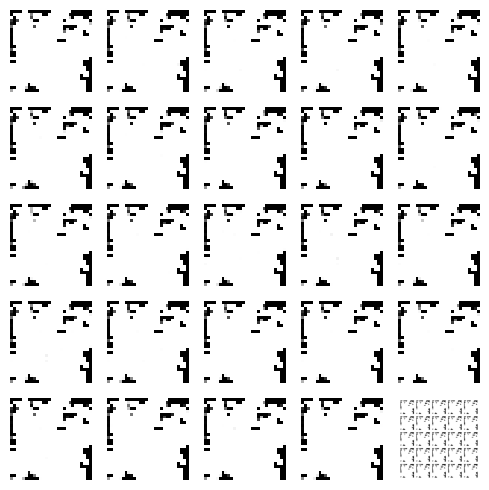

  0%|          | 0/350 [00:00<?, ?it/s]

4/4 [==============================] - 0s 20ms/step


  0%|          | 1/350 [00:00<03:25,  1.70it/s]

4/4 [==============================] - 0s 13ms/step


  1%|          | 2/350 [00:01<03:02,  1.91it/s]

4/4 [==============================] - 0s 14ms/step


  1%|          | 3/350 [00:01<03:16,  1.76it/s]

4/4 [==============================] - 0s 14ms/step


  1%|          | 4/350 [00:02<03:14,  1.77it/s]

4/4 [==============================] - 0s 14ms/step


  1%|▏         | 5/350 [00:02<03:12,  1.80it/s]

4/4 [==============================] - 0s 13ms/step


  2%|▏         | 6/350 [00:03<03:07,  1.83it/s]

4/4 [==============================] - 0s 14ms/step


  2%|▏         | 7/350 [00:03<03:09,  1.81it/s]

4/4 [==============================] - 0s 13ms/step


  2%|▏         | 8/350 [00:04<03:06,  1.83it/s]

4/4 [==============================] - 0s 15ms/step


  3%|▎         | 9/350 [00:04<03:06,  1.83it/s]

4/4 [==============================] - 0s 13ms/step


  3%|▎         | 10/350 [00:05<03:04,  1.84it/s]

4/4 [==============================] - 0s 13ms/step


  3%|▎         | 11/350 [00:06<03:02,  1.86it/s]

4/4 [==============================] - 0s 13ms/step


  3%|▎         | 12/350 [00:06<03:01,  1.86it/s]

4/4 [==============================] - 0s 14ms/step


  4%|▎         | 13/350 [00:07<03:02,  1.85it/s]

4/4 [==============================] - 0s 14ms/step


  4%|▍         | 14/350 [00:07<03:02,  1.84it/s]

4/4 [==============================] - 0s 14ms/step


  4%|▍         | 15/350 [00:08<03:05,  1.81it/s]

4/4 [==============================] - 0s 14ms/step


  5%|▍         | 16/350 [00:08<03:04,  1.81it/s]

4/4 [==============================] - 0s 16ms/step


  5%|▍         | 17/350 [00:09<03:05,  1.80it/s]

4/4 [==============================] - 0s 14ms/step


  5%|▌         | 18/350 [00:09<03:05,  1.79it/s]

4/4 [==============================] - 0s 15ms/step


  5%|▌         | 19/350 [00:10<03:03,  1.80it/s]

4/4 [==============================] - 0s 14ms/step


  6%|▌         | 20/350 [00:10<03:01,  1.81it/s]

4/4 [==============================] - 0s 15ms/step


  6%|▌         | 21/350 [00:11<03:06,  1.76it/s]

4/4 [==============================] - 0s 16ms/step


  6%|▋         | 22/350 [00:12<03:02,  1.80it/s]

4/4 [==============================] - 0s 13ms/step


  7%|▋         | 23/350 [00:12<03:03,  1.78it/s]

4/4 [==============================] - 0s 14ms/step


  7%|▋         | 24/350 [00:13<02:59,  1.81it/s]

4/4 [==============================] - 0s 16ms/step


  7%|▋         | 25/350 [00:13<03:02,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


  7%|▋         | 26/350 [00:14<03:00,  1.80it/s]

4/4 [==============================] - 0s 13ms/step


  8%|▊         | 27/350 [00:14<02:58,  1.81it/s]

4/4 [==============================] - 0s 14ms/step


  8%|▊         | 28/350 [00:15<02:56,  1.82it/s]

4/4 [==============================] - 0s 13ms/step


  8%|▊         | 29/350 [00:15<02:48,  1.91it/s]

4/4 [==============================] - 0s 20ms/step


  9%|▊         | 30/350 [00:16<02:52,  1.85it/s]

4/4 [==============================] - 0s 19ms/step


  9%|▉         | 31/350 [00:17<02:55,  1.81it/s]

4/4 [==============================] - 0s 12ms/step


  9%|▉         | 32/350 [00:17<02:49,  1.88it/s]

4/4 [==============================] - 0s 18ms/step


  9%|▉         | 33/350 [00:18<02:53,  1.83it/s]

4/4 [==============================] - 0s 14ms/step


 10%|▉         | 34/350 [00:18<02:53,  1.82it/s]

4/4 [==============================] - 0s 13ms/step


 10%|█         | 35/350 [00:19<02:52,  1.83it/s]

4/4 [==============================] - 0s 14ms/step


 10%|█         | 36/350 [00:19<02:51,  1.83it/s]

4/4 [==============================] - 0s 13ms/step


 11%|█         | 37/350 [00:20<02:50,  1.84it/s]

4/4 [==============================] - 0s 15ms/step


 11%|█         | 38/350 [00:20<02:49,  1.84it/s]

4/4 [==============================] - 0s 14ms/step


 11%|█         | 39/350 [00:21<02:50,  1.83it/s]

4/4 [==============================] - 0s 14ms/step


 11%|█▏        | 40/350 [00:21<02:52,  1.80it/s]

4/4 [==============================] - 0s 18ms/step


 12%|█▏        | 41/350 [00:22<02:53,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 12%|█▏        | 42/350 [00:23<02:53,  1.77it/s]

4/4 [==============================] - 0s 15ms/step


 12%|█▏        | 43/350 [00:23<02:52,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 13%|█▎        | 44/350 [00:24<02:50,  1.80it/s]

4/4 [==============================] - 0s 13ms/step


 13%|█▎        | 45/350 [00:24<02:48,  1.81it/s]

4/4 [==============================] - 0s 13ms/step


 13%|█▎        | 46/350 [00:25<02:46,  1.83it/s]

4/4 [==============================] - 0s 16ms/step


 13%|█▎        | 47/350 [00:25<02:46,  1.83it/s]

4/4 [==============================] - 0s 13ms/step


 14%|█▎        | 48/350 [00:26<02:45,  1.83it/s]

4/4 [==============================] - 0s 15ms/step


 14%|█▍        | 49/350 [00:26<02:39,  1.89it/s]

4/4 [==============================] - 0s 12ms/step


 14%|█▍        | 50/350 [00:27<02:38,  1.89it/s]

4/4 [==============================] - 0s 13ms/step


 15%|█▍        | 51/350 [00:27<02:41,  1.85it/s]

4/4 [==============================] - 0s 15ms/step


 15%|█▍        | 52/350 [00:28<02:43,  1.82it/s]

4/4 [==============================] - 0s 15ms/step


 15%|█▌        | 53/350 [00:29<02:49,  1.75it/s]

4/4 [==============================] - 0s 15ms/step


 15%|█▌        | 54/350 [00:29<02:46,  1.78it/s]

4/4 [==============================] - 0s 14ms/step


 16%|█▌        | 55/350 [00:30<02:42,  1.82it/s]

4/4 [==============================] - 0s 14ms/step


 16%|█▌        | 56/350 [00:30<02:36,  1.88it/s]

4/4 [==============================] - 0s 47ms/step


 16%|█▋        | 57/350 [00:31<02:40,  1.83it/s]

4/4 [==============================] - 0s 20ms/step


 17%|█▋        | 58/350 [00:31<02:39,  1.83it/s]

4/4 [==============================] - 0s 14ms/step


 17%|█▋        | 59/350 [00:32<02:37,  1.85it/s]

4/4 [==============================] - 0s 13ms/step


 17%|█▋        | 60/350 [00:32<02:36,  1.85it/s]

4/4 [==============================] - 0s 13ms/step


 17%|█▋        | 61/350 [00:33<02:30,  1.92it/s]

4/4 [==============================] - 0s 22ms/step


 18%|█▊        | 62/350 [00:33<02:29,  1.92it/s]

4/4 [==============================] - 0s 22ms/step


 18%|█▊        | 63/350 [00:34<02:32,  1.89it/s]

4/4 [==============================] - 0s 15ms/step


 18%|█▊        | 64/350 [00:35<02:34,  1.85it/s]

4/4 [==============================] - 0s 13ms/step


 19%|█▊        | 65/350 [00:35<02:38,  1.79it/s]

4/4 [==============================] - 0s 14ms/step


 19%|█▉        | 66/350 [00:36<02:36,  1.82it/s]

4/4 [==============================] - 0s 14ms/step


 19%|█▉        | 67/350 [00:36<02:35,  1.82it/s]

4/4 [==============================] - 0s 13ms/step


 19%|█▉        | 68/350 [00:37<02:33,  1.84it/s]

4/4 [==============================] - 0s 13ms/step


 20%|█▉        | 69/350 [00:37<02:26,  1.92it/s]

4/4 [==============================] - 0s 32ms/step


 20%|██        | 70/350 [00:38<02:28,  1.89it/s]

4/4 [==============================] - 0s 13ms/step


 20%|██        | 71/350 [00:38<02:27,  1.90it/s]

4/4 [==============================] - 0s 14ms/step


 21%|██        | 72/350 [00:39<02:21,  1.96it/s]

4/4 [==============================] - 0s 41ms/step


 21%|██        | 73/350 [00:39<02:25,  1.90it/s]

4/4 [==============================] - 0s 13ms/step


 21%|██        | 74/350 [00:40<02:26,  1.89it/s]

4/4 [==============================] - 0s 13ms/step


 21%|██▏       | 75/350 [00:40<02:26,  1.88it/s]

4/4 [==============================] - 0s 13ms/step


 22%|██▏       | 76/350 [00:41<02:25,  1.88it/s]

4/4 [==============================] - 0s 14ms/step


 22%|██▏       | 77/350 [00:41<02:20,  1.95it/s]

4/4 [==============================] - 0s 33ms/step


 22%|██▏       | 78/350 [00:42<02:21,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


 23%|██▎       | 79/350 [00:42<02:21,  1.91it/s]

4/4 [==============================] - 0s 13ms/step


 23%|██▎       | 80/350 [00:43<02:22,  1.90it/s]

4/4 [==============================] - 0s 15ms/step


 23%|██▎       | 81/350 [00:44<02:23,  1.88it/s]

4/4 [==============================] - 0s 14ms/step


 23%|██▎       | 82/350 [00:44<02:24,  1.86it/s]

4/4 [==============================] - 0s 12ms/step


 24%|██▎       | 83/350 [00:45<02:24,  1.85it/s]

4/4 [==============================] - 0s 14ms/step


 24%|██▍       | 84/350 [00:45<02:20,  1.90it/s]

4/4 [==============================] - 0s 26ms/step


 24%|██▍       | 85/350 [00:46<02:20,  1.89it/s]

4/4 [==============================] - 0s 14ms/step


 25%|██▍       | 86/350 [00:46<02:22,  1.86it/s]

4/4 [==============================] - 0s 15ms/step


 25%|██▍       | 87/350 [00:47<02:22,  1.85it/s]

4/4 [==============================] - 0s 15ms/step


 25%|██▌       | 88/350 [00:47<02:23,  1.83it/s]

4/4 [==============================] - 0s 15ms/step


 25%|██▌       | 89/350 [00:48<02:25,  1.79it/s]

4/4 [==============================] - 0s 14ms/step


 26%|██▌       | 90/350 [00:48<02:24,  1.80it/s]

4/4 [==============================] - 0s 14ms/step


 26%|██▌       | 91/350 [00:49<02:22,  1.82it/s]

4/4 [==============================] - 0s 13ms/step


 26%|██▋       | 92/350 [00:50<02:19,  1.84it/s]

4/4 [==============================] - 0s 13ms/step


 27%|██▋       | 93/350 [00:50<02:13,  1.93it/s]

4/4 [==============================] - 0s 29ms/step


 27%|██▋       | 94/350 [00:51<02:13,  1.91it/s]

4/4 [==============================] - 0s 13ms/step


 27%|██▋       | 95/350 [00:51<02:21,  1.80it/s]

4/4 [==============================] - 0s 22ms/step


 27%|██▋       | 96/350 [00:52<02:19,  1.82it/s]

4/4 [==============================] - 0s 20ms/step


 28%|██▊       | 97/350 [00:52<02:19,  1.82it/s]

4/4 [==============================] - 0s 13ms/step


 28%|██▊       | 98/350 [00:53<02:11,  1.91it/s]

4/4 [==============================] - 0s 30ms/step


 28%|██▊       | 99/350 [00:53<02:13,  1.89it/s]

4/4 [==============================] - 0s 14ms/step


 29%|██▊       | 100/350 [00:54<02:13,  1.88it/s]

4/4 [==============================] - 0s 16ms/step


 29%|██▉       | 101/350 [00:54<02:14,  1.86it/s]

4/4 [==============================] - 0s 13ms/step


 29%|██▉       | 102/350 [00:55<02:14,  1.85it/s]

4/4 [==============================] - 0s 14ms/step


 29%|██▉       | 103/350 [00:55<02:14,  1.84it/s]

4/4 [==============================] - 0s 13ms/step


 30%|██▉       | 104/350 [00:56<02:13,  1.84it/s]

4/4 [==============================] - 0s 15ms/step


 30%|███       | 105/350 [00:57<02:15,  1.81it/s]

4/4 [==============================] - 0s 13ms/step


 30%|███       | 106/350 [00:57<02:14,  1.81it/s]

4/4 [==============================] - 0s 13ms/step


 31%|███       | 107/350 [00:58<02:13,  1.82it/s]

4/4 [==============================] - 0s 14ms/step


 31%|███       | 108/350 [00:58<02:13,  1.82it/s]

4/4 [==============================] - 0s 14ms/step


 31%|███       | 109/350 [00:59<02:13,  1.81it/s]

4/4 [==============================] - 0s 14ms/step


 31%|███▏      | 110/350 [00:59<02:11,  1.83it/s]

4/4 [==============================] - 0s 14ms/step


 32%|███▏      | 111/350 [01:00<02:09,  1.85it/s]

4/4 [==============================] - 0s 14ms/step


 32%|███▏      | 112/350 [01:00<02:07,  1.87it/s]

4/4 [==============================] - 0s 17ms/step


 32%|███▏      | 113/350 [01:01<02:08,  1.84it/s]

4/4 [==============================] - 0s 14ms/step


 33%|███▎      | 114/350 [01:01<02:07,  1.85it/s]

4/4 [==============================] - 0s 14ms/step


 33%|███▎      | 115/350 [01:02<02:06,  1.85it/s]

4/4 [==============================] - 0s 11ms/step


 33%|███▎      | 116/350 [01:02<02:00,  1.95it/s]

4/4 [==============================] - 0s 30ms/step


 33%|███▎      | 117/350 [01:03<02:01,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


 34%|███▎      | 118/350 [01:04<02:01,  1.91it/s]

4/4 [==============================] - 0s 14ms/step


 34%|███▍      | 119/350 [01:04<02:01,  1.90it/s]

4/4 [==============================] - 0s 14ms/step


 34%|███▍      | 120/350 [01:05<02:01,  1.90it/s]

4/4 [==============================] - 0s 18ms/step


 35%|███▍      | 121/350 [01:05<02:05,  1.83it/s]

4/4 [==============================] - 0s 14ms/step


 35%|███▍      | 122/350 [01:06<02:04,  1.83it/s]

4/4 [==============================] - 0s 15ms/step


 35%|███▌      | 123/350 [01:06<02:08,  1.77it/s]

4/4 [==============================] - 0s 25ms/step


 35%|███▌      | 124/350 [01:07<02:13,  1.70it/s]

4/4 [==============================] - 0s 16ms/step


 36%|███▌      | 125/350 [01:08<02:14,  1.68it/s]

4/4 [==============================] - 0s 14ms/step


 36%|███▌      | 126/350 [01:08<02:15,  1.65it/s]

4/4 [==============================] - 0s 15ms/step


 36%|███▋      | 127/350 [01:09<02:10,  1.71it/s]

4/4 [==============================] - 0s 14ms/step


 37%|███▋      | 128/350 [01:09<02:12,  1.67it/s]

4/4 [==============================] - 0s 18ms/step


 37%|███▋      | 129/350 [01:10<02:13,  1.66it/s]

4/4 [==============================] - 0s 15ms/step


 37%|███▋      | 130/350 [01:11<02:11,  1.68it/s]

4/4 [==============================] - 0s 15ms/step


 37%|███▋      | 131/350 [01:11<02:03,  1.77it/s]

4/4 [==============================] - 0s 30ms/step


 38%|███▊      | 132/350 [01:12<02:05,  1.74it/s]

4/4 [==============================] - 0s 20ms/step


 38%|███▊      | 133/350 [01:12<02:07,  1.70it/s]

4/4 [==============================] - 0s 14ms/step


 38%|███▊      | 134/350 [01:13<02:07,  1.69it/s]

4/4 [==============================] - 0s 13ms/step


 39%|███▊      | 135/350 [01:13<02:07,  1.69it/s]

4/4 [==============================] - 0s 16ms/step


 39%|███▉      | 136/350 [01:14<02:05,  1.71it/s]

4/4 [==============================] - 0s 15ms/step


 39%|███▉      | 137/350 [01:15<02:07,  1.67it/s]

4/4 [==============================] - 0s 14ms/step


 39%|███▉      | 138/350 [01:15<02:04,  1.71it/s]

4/4 [==============================] - 0s 13ms/step


 40%|███▉      | 139/350 [01:16<02:00,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 40%|████      | 140/350 [01:16<01:58,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 40%|████      | 141/350 [01:17<01:58,  1.77it/s]

4/4 [==============================] - 0s 12ms/step


 41%|████      | 142/350 [01:17<01:55,  1.80it/s]

4/4 [==============================] - 0s 13ms/step


 41%|████      | 143/350 [01:18<01:53,  1.83it/s]

4/4 [==============================] - 0s 13ms/step


 41%|████      | 144/350 [01:18<01:52,  1.84it/s]

4/4 [==============================] - 0s 16ms/step


 41%|████▏     | 145/350 [01:19<01:52,  1.82it/s]

4/4 [==============================] - 0s 13ms/step


 42%|████▏     | 146/350 [01:20<01:51,  1.83it/s]

4/4 [==============================] - 0s 13ms/step


 42%|████▏     | 147/350 [01:20<01:52,  1.81it/s]

4/4 [==============================] - 0s 15ms/step


 42%|████▏     | 148/350 [01:21<01:52,  1.79it/s]

4/4 [==============================] - 0s 15ms/step


 43%|████▎     | 149/350 [01:21<01:50,  1.82it/s]

4/4 [==============================] - 0s 16ms/step


 43%|████▎     | 150/350 [01:22<01:51,  1.80it/s]

4/4 [==============================] - 0s 17ms/step


 43%|████▎     | 151/350 [01:22<01:52,  1.77it/s]

4/4 [==============================] - 0s 14ms/step


 43%|████▎     | 152/350 [01:23<01:50,  1.80it/s]

4/4 [==============================] - 0s 21ms/step


 44%|████▎     | 153/350 [01:24<01:53,  1.74it/s]

4/4 [==============================] - 0s 14ms/step


 44%|████▍     | 154/350 [01:24<01:52,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 44%|████▍     | 155/350 [01:25<01:50,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 45%|████▍     | 156/350 [01:25<01:49,  1.77it/s]

4/4 [==============================] - 0s 15ms/step


 45%|████▍     | 157/350 [01:26<01:48,  1.79it/s]

4/4 [==============================] - 0s 15ms/step


 45%|████▌     | 158/350 [01:26<01:47,  1.79it/s]

4/4 [==============================] - 0s 14ms/step


 45%|████▌     | 159/350 [01:27<01:46,  1.79it/s]

4/4 [==============================] - 0s 13ms/step


 46%|████▌     | 160/350 [01:27<01:46,  1.79it/s]

4/4 [==============================] - 0s 16ms/step


 46%|████▌     | 161/350 [01:28<01:47,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 46%|████▋     | 162/350 [01:29<01:46,  1.76it/s]

4/4 [==============================] - 0s 14ms/step


 47%|████▋     | 163/350 [01:29<01:45,  1.77it/s]

4/4 [==============================] - 0s 14ms/step


 47%|████▋     | 164/350 [01:30<01:43,  1.80it/s]

4/4 [==============================] - 0s 13ms/step


 47%|████▋     | 165/350 [01:30<01:43,  1.78it/s]

4/4 [==============================] - 0s 14ms/step


 47%|████▋     | 166/350 [01:31<01:43,  1.78it/s]

4/4 [==============================] - 0s 14ms/step


 48%|████▊     | 167/350 [01:31<01:42,  1.79it/s]

4/4 [==============================] - 0s 14ms/step


 48%|████▊     | 168/350 [01:32<01:42,  1.78it/s]

4/4 [==============================] - 0s 16ms/step


 48%|████▊     | 169/350 [01:33<01:41,  1.79it/s]

4/4 [==============================] - 0s 13ms/step


 49%|████▊     | 170/350 [01:33<01:39,  1.80it/s]

4/4 [==============================] - 0s 14ms/step


 49%|████▉     | 171/350 [01:34<01:38,  1.83it/s]

4/4 [==============================] - 0s 14ms/step


 49%|████▉     | 172/350 [01:34<01:37,  1.83it/s]

4/4 [==============================] - 0s 14ms/step


 49%|████▉     | 173/350 [01:35<01:36,  1.84it/s]

4/4 [==============================] - 0s 13ms/step


 50%|████▉     | 174/350 [01:35<01:35,  1.84it/s]

4/4 [==============================] - 0s 13ms/step


 50%|█████     | 175/350 [01:36<01:31,  1.92it/s]

4/4 [==============================] - 0s 28ms/step


 50%|█████     | 176/350 [01:36<01:31,  1.90it/s]

4/4 [==============================] - 0s 15ms/step


 51%|█████     | 177/350 [01:37<01:32,  1.86it/s]

4/4 [==============================] - 0s 15ms/step


 51%|█████     | 178/350 [01:37<01:32,  1.86it/s]

4/4 [==============================] - 0s 14ms/step


 51%|█████     | 179/350 [01:38<01:28,  1.94it/s]

4/4 [==============================] - 0s 34ms/step


 51%|█████▏    | 180/350 [01:38<01:29,  1.91it/s]

4/4 [==============================] - 0s 13ms/step


 52%|█████▏    | 181/350 [01:39<01:28,  1.90it/s]

4/4 [==============================] - 0s 13ms/step


 52%|█████▏    | 182/350 [01:39<01:25,  1.97it/s]

4/4 [==============================] - 0s 13ms/step


 52%|█████▏    | 183/350 [01:40<01:28,  1.89it/s]

4/4 [==============================] - 0s 14ms/step


 53%|█████▎    | 184/350 [01:40<01:28,  1.88it/s]

4/4 [==============================] - 0s 15ms/step


 53%|█████▎    | 185/350 [01:41<01:26,  1.91it/s]

4/4 [==============================] - 0s 13ms/step


 53%|█████▎    | 186/350 [01:41<01:26,  1.90it/s]

4/4 [==============================] - 0s 14ms/step


 53%|█████▎    | 187/350 [01:42<01:26,  1.88it/s]

4/4 [==============================] - 0s 14ms/step


 54%|█████▎    | 188/350 [01:43<01:27,  1.86it/s]

4/4 [==============================] - 0s 14ms/step


 54%|█████▍    | 189/350 [01:43<01:28,  1.82it/s]

4/4 [==============================] - 0s 14ms/step


 54%|█████▍    | 190/350 [01:44<01:28,  1.80it/s]

4/4 [==============================] - 0s 14ms/step


 55%|█████▍    | 191/350 [01:44<01:28,  1.80it/s]

4/4 [==============================] - 0s 15ms/step


 55%|█████▍    | 192/350 [01:45<01:28,  1.79it/s]

4/4 [==============================] - 0s 18ms/step


 55%|█████▌    | 193/350 [01:45<01:31,  1.72it/s]

4/4 [==============================] - 0s 15ms/step


 55%|█████▌    | 194/350 [01:46<01:30,  1.72it/s]

4/4 [==============================] - 0s 19ms/step


 56%|█████▌    | 195/350 [01:47<01:26,  1.79it/s]

4/4 [==============================] - 0s 30ms/step


 56%|█████▌    | 196/350 [01:47<01:26,  1.77it/s]

4/4 [==============================] - 0s 14ms/step


 56%|█████▋    | 197/350 [01:48<01:27,  1.75it/s]

4/4 [==============================] - 0s 14ms/step


 57%|█████▋    | 198/350 [01:48<01:28,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 57%|█████▋    | 199/350 [01:49<01:24,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 57%|█████▋    | 200/350 [01:49<01:24,  1.77it/s]

4/4 [==============================] - 0s 20ms/step


 57%|█████▋    | 201/350 [01:50<01:25,  1.73it/s]

4/4 [==============================] - 0s 14ms/step


 58%|█████▊    | 202/350 [01:51<01:24,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 58%|█████▊    | 203/350 [01:51<01:22,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 58%|█████▊    | 204/350 [01:52<01:20,  1.81it/s]

4/4 [==============================] - 0s 12ms/step


 59%|█████▊    | 205/350 [01:52<01:19,  1.82it/s]

4/4 [==============================] - 0s 13ms/step


 59%|█████▉    | 206/350 [01:53<01:21,  1.77it/s]

4/4 [==============================] - 0s 14ms/step


 59%|█████▉    | 207/350 [01:53<01:22,  1.72it/s]

4/4 [==============================] - 0s 15ms/step


 59%|█████▉    | 208/350 [01:54<01:23,  1.70it/s]

4/4 [==============================] - 0s 16ms/step


 60%|█████▉    | 209/350 [01:55<01:22,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 60%|██████    | 210/350 [01:55<01:20,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 60%|██████    | 211/350 [01:56<01:19,  1.76it/s]

4/4 [==============================] - 0s 14ms/step


 61%|██████    | 212/350 [01:56<01:18,  1.76it/s]

4/4 [==============================] - 0s 14ms/step


 61%|██████    | 213/350 [01:57<01:18,  1.75it/s]

4/4 [==============================] - 0s 14ms/step


 61%|██████    | 214/350 [01:57<01:16,  1.77it/s]

4/4 [==============================] - 0s 14ms/step


 61%|██████▏   | 215/350 [01:58<01:15,  1.78it/s]

4/4 [==============================] - 0s 14ms/step


 62%|██████▏   | 216/350 [01:59<01:14,  1.80it/s]

4/4 [==============================] - 0s 14ms/step


 62%|██████▏   | 217/350 [01:59<01:14,  1.79it/s]

4/4 [==============================] - 0s 14ms/step


 62%|██████▏   | 218/350 [02:00<01:13,  1.79it/s]

4/4 [==============================] - 0s 14ms/step


 63%|██████▎   | 219/350 [02:00<01:12,  1.80it/s]

4/4 [==============================] - 0s 12ms/step


 63%|██████▎   | 220/350 [02:01<01:13,  1.77it/s]

4/4 [==============================] - 0s 14ms/step


 63%|██████▎   | 221/350 [02:01<01:11,  1.80it/s]

4/4 [==============================] - 0s 13ms/step


 63%|██████▎   | 222/350 [02:02<01:10,  1.82it/s]

4/4 [==============================] - 0s 14ms/step


 64%|██████▎   | 223/350 [02:02<01:09,  1.82it/s]

4/4 [==============================] - 0s 16ms/step


 64%|██████▍   | 224/350 [02:03<01:11,  1.76it/s]

4/4 [==============================] - 0s 16ms/step


 64%|██████▍   | 225/350 [02:03<01:07,  1.84it/s]

4/4 [==============================] - 0s 12ms/step


 65%|██████▍   | 226/350 [02:04<01:07,  1.84it/s]

4/4 [==============================] - 0s 13ms/step


 65%|██████▍   | 227/350 [02:04<01:03,  1.92it/s]

4/4 [==============================] - 0s 20ms/step


 65%|██████▌   | 228/350 [02:05<01:03,  1.93it/s]

4/4 [==============================] - 0s 14ms/step


 65%|██████▌   | 229/350 [02:06<01:04,  1.88it/s]

4/4 [==============================] - 0s 15ms/step


 66%|██████▌   | 230/350 [02:06<01:05,  1.85it/s]

4/4 [==============================] - 0s 14ms/step


 66%|██████▌   | 231/350 [02:07<01:03,  1.86it/s]

4/4 [==============================] - 0s 13ms/step


 66%|██████▋   | 232/350 [02:07<01:04,  1.83it/s]

4/4 [==============================] - 0s 16ms/step


 67%|██████▋   | 233/350 [02:08<01:04,  1.81it/s]

4/4 [==============================] - 0s 15ms/step


 67%|██████▋   | 234/350 [02:08<01:04,  1.80it/s]

4/4 [==============================] - 0s 14ms/step


 67%|██████▋   | 235/350 [02:09<01:03,  1.82it/s]

4/4 [==============================] - 0s 14ms/step


 67%|██████▋   | 236/350 [02:09<01:00,  1.87it/s]

4/4 [==============================] - 0s 14ms/step


 68%|██████▊   | 237/350 [02:10<01:01,  1.85it/s]

4/4 [==============================] - 0s 13ms/step


 68%|██████▊   | 238/350 [02:10<00:59,  1.88it/s]

4/4 [==============================] - 0s 15ms/step


 68%|██████▊   | 239/350 [02:11<01:00,  1.84it/s]

4/4 [==============================] - 0s 15ms/step


 69%|██████▊   | 240/350 [02:12<01:00,  1.81it/s]

4/4 [==============================] - 0s 14ms/step


 69%|██████▉   | 241/350 [02:12<00:59,  1.83it/s]

4/4 [==============================] - 0s 14ms/step


 69%|██████▉   | 242/350 [02:13<01:00,  1.80it/s]

4/4 [==============================] - 0s 14ms/step


 69%|██████▉   | 243/350 [02:13<00:59,  1.79it/s]

4/4 [==============================] - 0s 14ms/step


 70%|██████▉   | 244/350 [02:14<00:58,  1.82it/s]

4/4 [==============================] - 0s 18ms/step


 70%|███████   | 245/350 [02:14<00:58,  1.81it/s]

4/4 [==============================] - 0s 13ms/step


 70%|███████   | 246/350 [02:15<00:57,  1.82it/s]

4/4 [==============================] - 0s 13ms/step


 71%|███████   | 247/350 [02:15<00:57,  1.80it/s]

4/4 [==============================] - 0s 14ms/step


 71%|███████   | 248/350 [02:16<00:56,  1.80it/s]

4/4 [==============================] - 0s 15ms/step


 71%|███████   | 249/350 [02:17<00:56,  1.80it/s]

4/4 [==============================] - 0s 13ms/step


 71%|███████▏  | 250/350 [02:17<00:54,  1.82it/s]

4/4 [==============================] - 0s 13ms/step


 72%|███████▏  | 251/350 [02:18<00:53,  1.84it/s]

4/4 [==============================] - 0s 14ms/step


 72%|███████▏  | 252/350 [02:18<00:53,  1.83it/s]

4/4 [==============================] - 0s 15ms/step


 72%|███████▏  | 253/350 [02:19<00:53,  1.82it/s]

4/4 [==============================] - 0s 12ms/step


 73%|███████▎  | 254/350 [02:19<00:52,  1.81it/s]

4/4 [==============================] - 0s 14ms/step


 73%|███████▎  | 255/350 [02:20<00:51,  1.83it/s]

4/4 [==============================] - 0s 13ms/step


 73%|███████▎  | 256/350 [02:20<00:51,  1.84it/s]

4/4 [==============================] - 0s 16ms/step


 73%|███████▎  | 257/350 [02:21<00:51,  1.82it/s]

4/4 [==============================] - 0s 12ms/step


 74%|███████▎  | 258/350 [02:21<00:48,  1.90it/s]

4/4 [==============================] - 0s 13ms/step


 74%|███████▍  | 259/350 [02:22<00:48,  1.87it/s]

4/4 [==============================] - 0s 14ms/step


 74%|███████▍  | 260/350 [02:23<00:47,  1.88it/s]

4/4 [==============================] - 0s 12ms/step


 75%|███████▍  | 261/350 [02:23<00:45,  1.94it/s]

4/4 [==============================] - 0s 14ms/step


 75%|███████▍  | 262/350 [02:24<00:45,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


 75%|███████▌  | 263/350 [02:24<00:43,  1.98it/s]

4/4 [==============================] - 0s 14ms/step


 75%|███████▌  | 264/350 [02:25<00:44,  1.95it/s]

4/4 [==============================] - 0s 16ms/step


 76%|███████▌  | 265/350 [02:25<00:44,  1.90it/s]

4/4 [==============================] - 0s 13ms/step


 76%|███████▌  | 266/350 [02:26<00:42,  1.96it/s]

4/4 [==============================] - 0s 13ms/step


 76%|███████▋  | 267/350 [02:26<00:42,  1.94it/s]

4/4 [==============================] - 0s 14ms/step


 77%|███████▋  | 268/350 [02:27<00:42,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


 77%|███████▋  | 269/350 [02:27<00:42,  1.90it/s]

4/4 [==============================] - 0s 14ms/step


 77%|███████▋  | 270/350 [02:28<00:42,  1.90it/s]

4/4 [==============================] - 0s 14ms/step


 77%|███████▋  | 271/350 [02:28<00:41,  1.88it/s]

4/4 [==============================] - 0s 13ms/step


 78%|███████▊  | 272/350 [02:29<00:41,  1.88it/s]

4/4 [==============================] - 0s 15ms/step


 78%|███████▊  | 273/350 [02:29<00:40,  1.92it/s]

4/4 [==============================] - 0s 12ms/step


 78%|███████▊  | 274/350 [02:30<00:39,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


 79%|███████▊  | 275/350 [02:30<00:39,  1.91it/s]

4/4 [==============================] - 0s 13ms/step


 79%|███████▉  | 276/350 [02:31<00:38,  1.90it/s]

4/4 [==============================] - 0s 15ms/step


 79%|███████▉  | 277/350 [02:31<00:37,  1.94it/s]

4/4 [==============================] - 0s 14ms/step


 79%|███████▉  | 278/350 [02:32<00:37,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


 80%|███████▉  | 279/350 [02:32<00:35,  1.97it/s]

4/4 [==============================] - 0s 13ms/step


 80%|████████  | 280/350 [02:33<00:36,  1.90it/s]

4/4 [==============================] - 0s 17ms/step


 80%|████████  | 281/350 [02:33<00:37,  1.84it/s]

4/4 [==============================] - 0s 14ms/step


 81%|████████  | 282/350 [02:34<00:36,  1.86it/s]

4/4 [==============================] - 0s 13ms/step


 81%|████████  | 283/350 [02:35<00:36,  1.83it/s]

4/4 [==============================] - 0s 15ms/step


 81%|████████  | 284/350 [02:35<00:34,  1.89it/s]

4/4 [==============================] - 0s 16ms/step


 81%|████████▏ | 285/350 [02:36<00:34,  1.86it/s]

4/4 [==============================] - 0s 13ms/step


 82%|████████▏ | 286/350 [02:36<00:34,  1.84it/s]

4/4 [==============================] - 0s 15ms/step


 82%|████████▏ | 287/350 [02:37<00:33,  1.90it/s]

4/4 [==============================] - 0s 14ms/step


 82%|████████▏ | 288/350 [02:37<00:33,  1.87it/s]

4/4 [==============================] - 0s 17ms/step


 83%|████████▎ | 289/350 [02:38<00:32,  1.90it/s]

4/4 [==============================] - 0s 19ms/step


 83%|████████▎ | 290/350 [02:38<00:32,  1.86it/s]

4/4 [==============================] - 0s 14ms/step


 83%|████████▎ | 291/350 [02:39<00:31,  1.85it/s]

4/4 [==============================] - 0s 14ms/step


 83%|████████▎ | 292/350 [02:39<00:32,  1.78it/s]

4/4 [==============================] - 0s 15ms/step


 84%|████████▎ | 293/350 [02:40<00:32,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 84%|████████▍ | 294/350 [02:41<00:31,  1.79it/s]

4/4 [==============================] - 0s 15ms/step


 84%|████████▍ | 295/350 [02:41<00:31,  1.75it/s]

4/4 [==============================] - 0s 14ms/step


 85%|████████▍ | 296/350 [02:42<00:30,  1.76it/s]

4/4 [==============================] - 0s 15ms/step


 85%|████████▍ | 297/350 [02:42<00:30,  1.72it/s]

4/4 [==============================] - 0s 14ms/step


 85%|████████▌ | 298/350 [02:43<00:30,  1.71it/s]

4/4 [==============================] - 0s 13ms/step


 85%|████████▌ | 299/350 [02:43<00:29,  1.72it/s]

4/4 [==============================] - 0s 14ms/step


 86%|████████▌ | 300/350 [02:44<00:28,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 86%|████████▌ | 301/350 [02:45<00:27,  1.81it/s]

4/4 [==============================] - 0s 17ms/step


 86%|████████▋ | 302/350 [02:45<00:27,  1.77it/s]

4/4 [==============================] - 0s 14ms/step


 87%|████████▋ | 303/350 [02:46<00:26,  1.76it/s]

4/4 [==============================] - 0s 16ms/step


 87%|████████▋ | 304/350 [02:46<00:26,  1.75it/s]

4/4 [==============================] - 0s 20ms/step


 87%|████████▋ | 305/350 [02:47<00:26,  1.70it/s]

4/4 [==============================] - 0s 17ms/step


 87%|████████▋ | 306/350 [02:48<00:25,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 88%|████████▊ | 307/350 [02:48<00:24,  1.73it/s]

4/4 [==============================] - 0s 14ms/step


 88%|████████▊ | 308/350 [02:49<00:24,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 88%|████████▊ | 309/350 [02:49<00:23,  1.72it/s]

4/4 [==============================] - 0s 14ms/step


 89%|████████▊ | 310/350 [02:50<00:22,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 89%|████████▉ | 311/350 [02:50<00:22,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 89%|████████▉ | 312/350 [02:51<00:21,  1.76it/s]

4/4 [==============================] - 0s 18ms/step


 89%|████████▉ | 313/350 [02:52<00:21,  1.74it/s]

4/4 [==============================] - 0s 14ms/step


 90%|████████▉ | 314/350 [02:52<00:20,  1.76it/s]

4/4 [==============================] - 0s 14ms/step


 90%|█████████ | 315/350 [02:53<00:19,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 90%|█████████ | 316/350 [02:53<00:18,  1.81it/s]

4/4 [==============================] - 0s 12ms/step


 91%|█████████ | 317/350 [02:54<00:17,  1.83it/s]

4/4 [==============================] - 0s 12ms/step


 91%|█████████ | 318/350 [02:54<00:17,  1.84it/s]

4/4 [==============================] - 0s 17ms/step


 91%|█████████ | 319/350 [02:55<00:16,  1.83it/s]

4/4 [==============================] - 0s 15ms/step


 91%|█████████▏| 320/350 [02:55<00:17,  1.73it/s]

4/4 [==============================] - 0s 18ms/step


 92%|█████████▏| 321/350 [02:56<00:16,  1.75it/s]

4/4 [==============================] - 0s 14ms/step


 92%|█████████▏| 322/350 [02:57<00:16,  1.74it/s]

4/4 [==============================] - 0s 18ms/step


 92%|█████████▏| 323/350 [02:57<00:15,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 93%|█████████▎| 324/350 [02:58<00:15,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 93%|█████████▎| 325/350 [02:58<00:14,  1.72it/s]

4/4 [==============================] - 0s 16ms/step


 93%|█████████▎| 326/350 [02:59<00:13,  1.74it/s]

4/4 [==============================] - 0s 14ms/step


 93%|█████████▎| 327/350 [02:59<00:13,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 94%|█████████▎| 328/350 [03:00<00:12,  1.78it/s]

4/4 [==============================] - 0s 16ms/step


 94%|█████████▍| 329/350 [03:00<00:11,  1.82it/s]

4/4 [==============================] - 0s 23ms/step


 94%|█████████▍| 330/350 [03:01<00:11,  1.77it/s]

4/4 [==============================] - 0s 14ms/step


 95%|█████████▍| 331/350 [03:02<00:10,  1.85it/s]

4/4 [==============================] - 0s 18ms/step


 95%|█████████▍| 332/350 [03:02<00:09,  1.82it/s]

4/4 [==============================] - 0s 14ms/step


 95%|█████████▌| 333/350 [03:03<00:09,  1.77it/s]

4/4 [==============================] - 0s 14ms/step


 95%|█████████▌| 334/350 [03:03<00:08,  1.83it/s]

4/4 [==============================] - 0s 14ms/step


 96%|█████████▌| 335/350 [03:04<00:08,  1.81it/s]

4/4 [==============================] - 0s 15ms/step


 96%|█████████▌| 336/350 [03:04<00:07,  1.78it/s]

4/4 [==============================] - 0s 12ms/step


 96%|█████████▋| 337/350 [03:05<00:07,  1.83it/s]

4/4 [==============================] - 0s 13ms/step


 97%|█████████▋| 338/350 [03:05<00:06,  1.81it/s]

4/4 [==============================] - 0s 13ms/step


 97%|█████████▋| 339/350 [03:06<00:06,  1.82it/s]

4/4 [==============================] - 0s 14ms/step


 97%|█████████▋| 340/350 [03:07<00:05,  1.84it/s]

4/4 [==============================] - 0s 13ms/step


 97%|█████████▋| 341/350 [03:07<00:04,  1.84it/s]

4/4 [==============================] - 0s 14ms/step


 98%|█████████▊| 342/350 [03:08<00:04,  1.79it/s]

4/4 [==============================] - 0s 13ms/step


 98%|█████████▊| 343/350 [03:08<00:03,  1.79it/s]

4/4 [==============================] - 0s 15ms/step


 98%|█████████▊| 344/350 [03:09<00:03,  1.79it/s]

4/4 [==============================] - 0s 15ms/step


 99%|█████████▊| 345/350 [03:09<00:02,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 99%|█████████▉| 346/350 [03:10<00:02,  1.77it/s]

4/4 [==============================] - 0s 15ms/step


 99%|█████████▉| 347/350 [03:10<00:01,  1.83it/s]

4/4 [==============================] - 0s 20ms/step


 99%|█████████▉| 348/350 [03:11<00:01,  1.75it/s]

4/4 [==============================] - 0s 16ms/step


100%|█████████▉| 349/350 [03:12<00:00,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


100%|██████████| 350/350 [03:12<00:00,  1.82it/s]

Epoch number: 22 discriminator_loss: 0.32615493091128883 generator_loss: 5.71368200642722
1/1 [==============================] - 0s 21ms/step


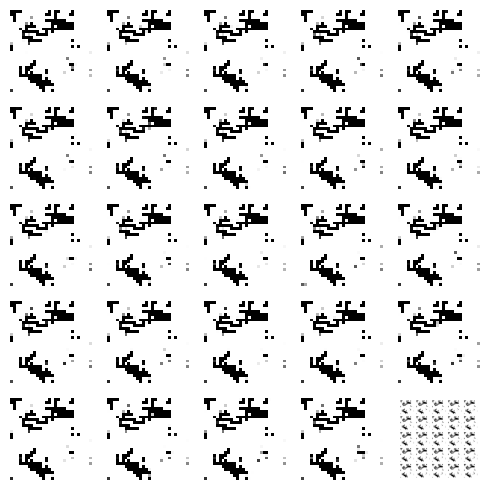

  0%|          | 0/350 [00:00<?, ?it/s]

4/4 [==============================] - 0s 22ms/step


  0%|          | 1/350 [00:00<03:59,  1.45it/s]

4/4 [==============================] - 0s 14ms/step


  1%|          | 2/350 [00:01<03:33,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


  1%|          | 3/350 [00:01<03:25,  1.69it/s]

4/4 [==============================] - 0s 15ms/step


  1%|          | 4/350 [00:02<03:10,  1.81it/s]

4/4 [==============================] - 0s 18ms/step


  1%|▏         | 5/350 [00:02<03:11,  1.80it/s]

4/4 [==============================] - 0s 17ms/step


  2%|▏         | 6/350 [00:03<03:12,  1.79it/s]

4/4 [==============================] - 0s 15ms/step


  2%|▏         | 7/350 [00:03<03:11,  1.79it/s]

4/4 [==============================] - 0s 12ms/step


  2%|▏         | 8/350 [00:04<03:10,  1.80it/s]

4/4 [==============================] - 0s 13ms/step


  3%|▎         | 9/350 [00:05<03:08,  1.81it/s]

4/4 [==============================] - 0s 19ms/step


  3%|▎         | 10/350 [00:05<03:04,  1.84it/s]

4/4 [==============================] - 0s 15ms/step


  3%|▎         | 11/350 [00:06<03:06,  1.82it/s]

4/4 [==============================] - 0s 12ms/step


  3%|▎         | 12/350 [00:06<03:07,  1.80it/s]

4/4 [==============================] - 0s 14ms/step


  4%|▎         | 13/350 [00:07<03:06,  1.81it/s]

4/4 [==============================] - 0s 14ms/step


  4%|▍         | 14/350 [00:07<02:57,  1.89it/s]

4/4 [==============================] - 0s 14ms/step


  4%|▍         | 15/350 [00:08<03:00,  1.86it/s]

4/4 [==============================] - 0s 15ms/step


  5%|▍         | 16/350 [00:08<03:01,  1.84it/s]

4/4 [==============================] - 0s 15ms/step


  5%|▍         | 17/350 [00:09<03:01,  1.83it/s]

4/4 [==============================] - 0s 14ms/step


  5%|▌         | 18/350 [00:09<02:54,  1.90it/s]

4/4 [==============================] - 0s 14ms/step


  5%|▌         | 19/350 [00:10<02:55,  1.89it/s]

4/4 [==============================] - 0s 15ms/step


  6%|▌         | 20/350 [00:10<02:50,  1.93it/s]

4/4 [==============================] - 0s 14ms/step


  6%|▌         | 21/350 [00:11<02:53,  1.89it/s]

4/4 [==============================] - 0s 13ms/step


  6%|▋         | 22/350 [00:12<02:58,  1.84it/s]

4/4 [==============================] - 0s 15ms/step


  7%|▋         | 23/350 [00:12<02:59,  1.82it/s]

4/4 [==============================] - 0s 16ms/step


  7%|▋         | 24/350 [00:13<02:52,  1.89it/s]

4/4 [==============================] - 0s 13ms/step


  7%|▋         | 25/350 [00:13<02:54,  1.87it/s]

4/4 [==============================] - 0s 15ms/step


  7%|▋         | 26/350 [00:14<02:57,  1.83it/s]

4/4 [==============================] - 0s 14ms/step


  8%|▊         | 27/350 [00:14<02:55,  1.84it/s]

4/4 [==============================] - 0s 14ms/step


  8%|▊         | 28/350 [00:15<02:56,  1.83it/s]

4/4 [==============================] - 0s 14ms/step


  8%|▊         | 29/350 [00:15<02:54,  1.84it/s]

4/4 [==============================] - 0s 17ms/step


  9%|▊         | 30/350 [00:16<02:49,  1.88it/s]

4/4 [==============================] - 0s 13ms/step


  9%|▉         | 31/350 [00:16<02:49,  1.88it/s]

4/4 [==============================] - 0s 14ms/step


  9%|▉         | 32/350 [00:17<02:50,  1.86it/s]

4/4 [==============================] - 0s 14ms/step


  9%|▉         | 33/350 [00:17<02:50,  1.86it/s]

4/4 [==============================] - 0s 14ms/step


 10%|▉         | 34/350 [00:18<02:51,  1.85it/s]

4/4 [==============================] - 0s 15ms/step


 10%|█         | 35/350 [00:19<02:48,  1.87it/s]

4/4 [==============================] - 0s 14ms/step


 10%|█         | 36/350 [00:19<02:47,  1.88it/s]

4/4 [==============================] - 0s 12ms/step


 11%|█         | 37/350 [00:20<02:50,  1.83it/s]

4/4 [==============================] - 0s 12ms/step


 11%|█         | 38/350 [00:20<02:48,  1.86it/s]

4/4 [==============================] - 0s 13ms/step


 11%|█         | 39/350 [00:21<02:49,  1.84it/s]

4/4 [==============================] - 0s 14ms/step


 11%|█▏        | 40/350 [00:21<02:50,  1.81it/s]

4/4 [==============================] - 0s 14ms/step


 12%|█▏        | 41/350 [00:22<03:02,  1.69it/s]

4/4 [==============================] - 0s 17ms/step


 12%|█▏        | 42/350 [00:23<03:04,  1.67it/s]

4/4 [==============================] - 0s 16ms/step


 12%|█▏        | 43/350 [00:23<03:01,  1.69it/s]

4/4 [==============================] - 0s 15ms/step


 13%|█▎        | 44/350 [00:24<03:01,  1.69it/s]

4/4 [==============================] - 0s 15ms/step


 13%|█▎        | 45/350 [00:24<02:59,  1.70it/s]

4/4 [==============================] - 0s 14ms/step


 13%|█▎        | 46/350 [00:25<02:57,  1.71it/s]

4/4 [==============================] - 0s 13ms/step


 13%|█▎        | 47/350 [00:25<02:53,  1.74it/s]

4/4 [==============================] - 0s 15ms/step


 14%|█▎        | 48/350 [00:26<02:48,  1.79it/s]

4/4 [==============================] - 0s 14ms/step


 14%|█▍        | 49/350 [00:27<02:50,  1.77it/s]

4/4 [==============================] - 0s 14ms/step


 14%|█▍        | 50/350 [00:27<02:44,  1.82it/s]

4/4 [==============================] - 0s 15ms/step


 15%|█▍        | 51/350 [00:28<02:47,  1.78it/s]

4/4 [==============================] - 0s 14ms/step


 15%|█▍        | 52/350 [00:28<02:47,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 15%|█▌        | 53/350 [00:29<02:45,  1.79it/s]

4/4 [==============================] - 0s 15ms/step


 15%|█▌        | 54/350 [00:29<02:50,  1.73it/s]

4/4 [==============================] - 0s 16ms/step


 16%|█▌        | 55/350 [00:30<02:56,  1.67it/s]

4/4 [==============================] - 0s 15ms/step


 16%|█▌        | 56/350 [00:31<02:46,  1.77it/s]

4/4 [==============================] - 0s 23ms/step


 16%|█▋        | 57/350 [00:31<02:49,  1.73it/s]

4/4 [==============================] - 0s 14ms/step


 17%|█▋        | 58/350 [00:32<02:48,  1.73it/s]

4/4 [==============================] - 0s 15ms/step


 17%|█▋        | 59/350 [00:32<02:40,  1.81it/s]

4/4 [==============================] - 0s 14ms/step


 17%|█▋        | 60/350 [00:33<02:45,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 17%|█▋        | 61/350 [00:33<02:42,  1.77it/s]

4/4 [==============================] - 0s 14ms/step


 18%|█▊        | 62/350 [00:34<02:36,  1.84it/s]

4/4 [==============================] - 0s 14ms/step


 18%|█▊        | 63/350 [00:34<02:36,  1.83it/s]

4/4 [==============================] - 0s 14ms/step


 18%|█▊        | 64/350 [00:35<02:38,  1.80it/s]

4/4 [==============================] - 0s 14ms/step


 19%|█▊        | 65/350 [00:36<02:38,  1.80it/s]

4/4 [==============================] - 0s 22ms/step


 19%|█▉        | 66/350 [00:36<02:40,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 19%|█▉        | 67/350 [00:37<02:33,  1.84it/s]

4/4 [==============================] - 0s 13ms/step


 19%|█▉        | 68/350 [00:37<02:34,  1.82it/s]

4/4 [==============================] - 0s 16ms/step


 20%|█▉        | 69/350 [00:38<02:31,  1.86it/s]

4/4 [==============================] - 0s 13ms/step


 20%|██        | 70/350 [00:38<02:33,  1.83it/s]

4/4 [==============================] - 0s 15ms/step


 20%|██        | 71/350 [00:39<02:34,  1.81it/s]

4/4 [==============================] - 0s 13ms/step


 21%|██        | 72/350 [00:39<02:32,  1.82it/s]

4/4 [==============================] - 0s 13ms/step


 21%|██        | 73/350 [00:40<02:35,  1.79it/s]

4/4 [==============================] - 0s 14ms/step


 21%|██        | 74/350 [00:41<02:33,  1.80it/s]

4/4 [==============================] - 0s 15ms/step


 21%|██▏       | 75/350 [00:41<02:33,  1.80it/s]

4/4 [==============================] - 0s 14ms/step


 22%|██▏       | 76/350 [00:42<02:31,  1.81it/s]

4/4 [==============================] - 0s 13ms/step


 22%|██▏       | 77/350 [00:42<02:31,  1.80it/s]

4/4 [==============================] - 0s 14ms/step


 22%|██▏       | 78/350 [00:43<02:26,  1.86it/s]

4/4 [==============================] - 0s 18ms/step


 23%|██▎       | 79/350 [00:43<02:27,  1.83it/s]

4/4 [==============================] - 0s 13ms/step


 23%|██▎       | 80/350 [00:44<02:29,  1.81it/s]

4/4 [==============================] - 0s 18ms/step


 23%|██▎       | 81/350 [00:44<02:30,  1.79it/s]

4/4 [==============================] - 0s 13ms/step


 23%|██▎       | 82/350 [00:45<02:29,  1.79it/s]

4/4 [==============================] - 0s 14ms/step


 24%|██▎       | 83/350 [00:45<02:22,  1.87it/s]

4/4 [==============================] - 0s 25ms/step


 24%|██▍       | 84/350 [00:46<02:25,  1.83it/s]

4/4 [==============================] - 0s 23ms/step


 24%|██▍       | 85/350 [00:47<02:26,  1.81it/s]

4/4 [==============================] - 0s 15ms/step


 25%|██▍       | 86/350 [00:47<02:28,  1.78it/s]

4/4 [==============================] - 0s 17ms/step


 25%|██▍       | 87/350 [00:48<02:30,  1.74it/s]

4/4 [==============================] - 0s 15ms/step


 25%|██▌       | 88/350 [00:48<02:33,  1.71it/s]

4/4 [==============================] - 0s 14ms/step


 25%|██▌       | 89/350 [00:49<02:31,  1.72it/s]

4/4 [==============================] - 0s 15ms/step


 26%|██▌       | 90/350 [00:50<02:29,  1.74it/s]

4/4 [==============================] - 0s 14ms/step


 26%|██▌       | 91/350 [00:50<02:28,  1.74it/s]

4/4 [==============================] - 0s 15ms/step


 26%|██▋       | 92/350 [00:51<02:29,  1.72it/s]

4/4 [==============================] - 0s 14ms/step


 27%|██▋       | 93/350 [00:51<02:29,  1.71it/s]

4/4 [==============================] - 0s 14ms/step


 27%|██▋       | 94/350 [00:52<02:27,  1.73it/s]

4/4 [==============================] - 0s 16ms/step


 27%|██▋       | 95/350 [00:52<02:28,  1.71it/s]

4/4 [==============================] - 0s 19ms/step


 27%|██▋       | 96/350 [00:53<02:31,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 28%|██▊       | 97/350 [00:54<02:34,  1.64it/s]

4/4 [==============================] - 0s 13ms/step


 28%|██▊       | 98/350 [00:54<02:33,  1.65it/s]

4/4 [==============================] - 0s 15ms/step


 28%|██▊       | 99/350 [00:55<02:29,  1.68it/s]

4/4 [==============================] - 0s 15ms/step


 29%|██▊       | 100/350 [00:55<02:29,  1.67it/s]

4/4 [==============================] - 0s 15ms/step


 29%|██▉       | 101/350 [00:56<02:28,  1.68it/s]

4/4 [==============================] - 0s 14ms/step


 29%|██▉       | 102/350 [00:57<02:25,  1.71it/s]

4/4 [==============================] - 0s 16ms/step


 29%|██▉       | 103/350 [00:57<02:29,  1.65it/s]

4/4 [==============================] - 0s 17ms/step


 30%|██▉       | 104/350 [00:58<02:29,  1.65it/s]

4/4 [==============================] - 0s 15ms/step


 30%|███       | 105/350 [00:58<02:26,  1.67it/s]

4/4 [==============================] - 0s 14ms/step


 30%|███       | 106/350 [00:59<02:25,  1.68it/s]

4/4 [==============================] - 0s 16ms/step


 31%|███       | 107/350 [01:00<02:25,  1.67it/s]

4/4 [==============================] - 0s 18ms/step


 31%|███       | 108/350 [01:00<02:20,  1.72it/s]

4/4 [==============================] - 0s 15ms/step


 31%|███       | 109/350 [01:01<02:19,  1.73it/s]

4/4 [==============================] - 0s 15ms/step


 31%|███▏      | 110/350 [01:01<02:14,  1.79it/s]

4/4 [==============================] - 0s 18ms/step


 32%|███▏      | 111/350 [01:02<02:15,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 32%|███▏      | 112/350 [01:02<02:15,  1.75it/s]

4/4 [==============================] - 0s 14ms/step


 32%|███▏      | 113/350 [01:03<02:14,  1.77it/s]

4/4 [==============================] - 0s 14ms/step


 33%|███▎      | 114/350 [01:04<02:12,  1.78it/s]

4/4 [==============================] - 0s 15ms/step


 33%|███▎      | 115/350 [01:04<02:12,  1.77it/s]

4/4 [==============================] - 0s 14ms/step


 33%|███▎      | 116/350 [01:05<02:11,  1.78it/s]

4/4 [==============================] - 0s 14ms/step


 33%|███▎      | 117/350 [01:05<02:11,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 34%|███▎      | 118/350 [01:06<02:11,  1.76it/s]

4/4 [==============================] - 0s 14ms/step


 34%|███▍      | 119/350 [01:06<02:10,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 34%|███▍      | 120/350 [01:07<02:11,  1.75it/s]

4/4 [==============================] - 0s 14ms/step


 35%|███▍      | 121/350 [01:08<02:09,  1.77it/s]

4/4 [==============================] - 0s 14ms/step


 35%|███▍      | 122/350 [01:08<02:07,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 35%|███▌      | 123/350 [01:09<02:05,  1.81it/s]

4/4 [==============================] - 0s 12ms/step


 35%|███▌      | 124/350 [01:09<01:58,  1.91it/s]

4/4 [==============================] - 0s 13ms/step


 36%|███▌      | 125/350 [01:10<01:59,  1.88it/s]

4/4 [==============================] - 0s 18ms/step


 36%|███▌      | 126/350 [01:10<02:01,  1.85it/s]

4/4 [==============================] - 0s 13ms/step


 36%|███▋      | 127/350 [01:11<02:02,  1.83it/s]

4/4 [==============================] - 0s 13ms/step


 37%|███▋      | 128/350 [01:11<02:02,  1.82it/s]

4/4 [==============================] - 0s 13ms/step


 37%|███▋      | 129/350 [01:12<01:59,  1.85it/s]

4/4 [==============================] - 0s 14ms/step


 37%|███▋      | 130/350 [01:12<01:58,  1.85it/s]

4/4 [==============================] - 0s 15ms/step


 37%|███▋      | 131/350 [01:13<02:00,  1.82it/s]

4/4 [==============================] - 0s 14ms/step


 38%|███▊      | 132/350 [01:14<02:01,  1.80it/s]

4/4 [==============================] - 0s 14ms/step


 38%|███▊      | 133/350 [01:14<01:59,  1.82it/s]

4/4 [==============================] - 0s 14ms/step


 38%|███▊      | 134/350 [01:15<02:01,  1.78it/s]

4/4 [==============================] - 0s 14ms/step


 39%|███▊      | 135/350 [01:15<01:59,  1.80it/s]

4/4 [==============================] - 0s 16ms/step


 39%|███▉      | 136/350 [01:16<01:58,  1.80it/s]

4/4 [==============================] - 0s 13ms/step


 39%|███▉      | 137/350 [01:16<01:57,  1.81it/s]

4/4 [==============================] - 0s 14ms/step


 39%|███▉      | 138/350 [01:17<01:58,  1.80it/s]

4/4 [==============================] - 0s 13ms/step


 40%|███▉      | 139/350 [01:17<01:52,  1.88it/s]

4/4 [==============================] - 0s 21ms/step


 40%|████      | 140/350 [01:18<01:51,  1.89it/s]

4/4 [==============================] - 0s 15ms/step


 40%|████      | 141/350 [01:18<01:53,  1.84it/s]

4/4 [==============================] - 0s 14ms/step


 41%|████      | 142/350 [01:19<01:55,  1.80it/s]

4/4 [==============================] - 0s 13ms/step


 41%|████      | 143/350 [01:19<01:51,  1.86it/s]

4/4 [==============================] - 0s 15ms/step


 41%|████      | 144/350 [01:20<01:47,  1.92it/s]

4/4 [==============================] - 0s 16ms/step


 41%|████▏     | 145/350 [01:20<01:46,  1.92it/s]

4/4 [==============================] - 0s 14ms/step


 42%|████▏     | 146/350 [01:21<01:47,  1.90it/s]

4/4 [==============================] - 0s 17ms/step


 42%|████▏     | 147/350 [01:22<01:48,  1.88it/s]

4/4 [==============================] - 0s 14ms/step


 42%|████▏     | 148/350 [01:22<01:48,  1.85it/s]

4/4 [==============================] - 0s 13ms/step


 43%|████▎     | 149/350 [01:23<01:48,  1.85it/s]

4/4 [==============================] - 0s 13ms/step


 43%|████▎     | 150/350 [01:23<01:48,  1.84it/s]

4/4 [==============================] - 0s 13ms/step


 43%|████▎     | 151/350 [01:24<01:49,  1.82it/s]

4/4 [==============================] - 0s 13ms/step


 43%|████▎     | 152/350 [01:24<01:48,  1.82it/s]

4/4 [==============================] - 0s 14ms/step


 44%|████▎     | 153/350 [01:25<01:48,  1.82it/s]

4/4 [==============================] - 0s 14ms/step


 44%|████▍     | 154/350 [01:25<01:49,  1.79it/s]

4/4 [==============================] - 0s 13ms/step


 44%|████▍     | 155/350 [01:26<01:46,  1.84it/s]

4/4 [==============================] - 0s 15ms/step


 45%|████▍     | 156/350 [01:27<01:48,  1.78it/s]

4/4 [==============================] - 0s 15ms/step


 45%|████▍     | 157/350 [01:27<01:48,  1.78it/s]

4/4 [==============================] - 0s 14ms/step


 45%|████▌     | 158/350 [01:28<01:48,  1.77it/s]

4/4 [==============================] - 0s 14ms/step


 45%|████▌     | 159/350 [01:28<01:43,  1.84it/s]

4/4 [==============================] - 0s 12ms/step


 46%|████▌     | 160/350 [01:29<01:44,  1.82it/s]

4/4 [==============================] - 0s 13ms/step


 46%|████▌     | 161/350 [01:29<01:42,  1.84it/s]

4/4 [==============================] - 0s 13ms/step


 46%|████▋     | 162/350 [01:30<01:44,  1.80it/s]

4/4 [==============================] - 0s 13ms/step


 47%|████▋     | 163/350 [01:30<01:46,  1.76it/s]

4/4 [==============================] - 0s 15ms/step


 47%|████▋     | 164/350 [01:31<01:41,  1.83it/s]

4/4 [==============================] - 0s 15ms/step


 47%|████▋     | 165/350 [01:32<01:42,  1.80it/s]

4/4 [==============================] - 0s 16ms/step


 47%|████▋     | 166/350 [01:32<01:44,  1.76it/s]

4/4 [==============================] - 0s 16ms/step


 48%|████▊     | 167/350 [01:33<01:44,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 48%|████▊     | 168/350 [01:33<01:38,  1.84it/s]

4/4 [==============================] - 0s 13ms/step


 48%|████▊     | 169/350 [01:34<01:39,  1.82it/s]

4/4 [==============================] - 0s 13ms/step


 49%|████▊     | 170/350 [01:34<01:37,  1.86it/s]

4/4 [==============================] - 0s 16ms/step


 49%|████▉     | 171/350 [01:35<01:38,  1.82it/s]

4/4 [==============================] - 0s 13ms/step


 49%|████▉     | 172/350 [01:35<01:37,  1.83it/s]

4/4 [==============================] - 0s 13ms/step


 49%|████▉     | 173/350 [01:36<01:38,  1.79it/s]

4/4 [==============================] - 0s 14ms/step


 50%|████▉     | 174/350 [01:37<01:36,  1.82it/s]

4/4 [==============================] - 0s 15ms/step


 50%|█████     | 175/350 [01:37<01:34,  1.85it/s]

4/4 [==============================] - 0s 15ms/step


 50%|█████     | 176/350 [01:38<01:36,  1.81it/s]

4/4 [==============================] - 0s 12ms/step


 51%|█████     | 177/350 [01:38<01:31,  1.89it/s]

4/4 [==============================] - 0s 14ms/step


 51%|█████     | 178/350 [01:39<01:35,  1.79it/s]

4/4 [==============================] - 0s 17ms/step


 51%|█████     | 179/350 [01:39<01:35,  1.79it/s]

4/4 [==============================] - 0s 14ms/step


 51%|█████▏    | 180/350 [01:40<01:35,  1.78it/s]

4/4 [==============================] - 0s 14ms/step


 52%|█████▏    | 181/350 [01:40<01:34,  1.79it/s]

4/4 [==============================] - 0s 13ms/step


 52%|█████▏    | 182/350 [01:41<01:33,  1.80it/s]

4/4 [==============================] - 0s 13ms/step


 52%|█████▏    | 183/350 [01:42<01:34,  1.76it/s]

4/4 [==============================] - 0s 19ms/step


 53%|█████▎    | 184/350 [01:42<01:34,  1.75it/s]

4/4 [==============================] - 0s 12ms/step


 53%|█████▎    | 185/350 [01:43<01:35,  1.73it/s]

4/4 [==============================] - 0s 17ms/step


 53%|█████▎    | 186/350 [01:43<01:34,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 53%|█████▎    | 187/350 [01:44<01:29,  1.83it/s]

4/4 [==============================] - 0s 16ms/step


 54%|█████▎    | 188/350 [01:44<01:29,  1.82it/s]

4/4 [==============================] - 0s 13ms/step


 54%|█████▍    | 189/350 [01:45<01:24,  1.90it/s]

4/4 [==============================] - 0s 12ms/step


 54%|█████▍    | 190/350 [01:45<01:25,  1.88it/s]

4/4 [==============================] - 0s 13ms/step


 55%|█████▍    | 191/350 [01:46<01:24,  1.89it/s]

4/4 [==============================] - 0s 19ms/step


 55%|█████▍    | 192/350 [01:46<01:26,  1.84it/s]

4/4 [==============================] - 0s 13ms/step


 55%|█████▌    | 193/350 [01:47<01:23,  1.88it/s]

4/4 [==============================] - 0s 13ms/step


 55%|█████▌    | 194/350 [01:47<01:23,  1.86it/s]

4/4 [==============================] - 0s 13ms/step


 56%|█████▌    | 195/350 [01:48<01:23,  1.85it/s]

4/4 [==============================] - 0s 12ms/step


 56%|█████▌    | 196/350 [01:49<01:23,  1.85it/s]

4/4 [==============================] - 0s 13ms/step


 56%|█████▋    | 197/350 [01:49<01:19,  1.92it/s]

4/4 [==============================] - 0s 14ms/step


 57%|█████▋    | 198/350 [01:50<01:20,  1.90it/s]

4/4 [==============================] - 0s 14ms/step


 57%|█████▋    | 199/350 [01:50<01:19,  1.89it/s]

4/4 [==============================] - 0s 13ms/step


 57%|█████▋    | 200/350 [01:51<01:16,  1.96it/s]

4/4 [==============================] - 0s 26ms/step


 57%|█████▋    | 201/350 [01:51<01:18,  1.90it/s]

4/4 [==============================] - 0s 13ms/step


 58%|█████▊    | 202/350 [01:52<01:18,  1.88it/s]

4/4 [==============================] - 0s 13ms/step


 58%|█████▊    | 203/350 [01:52<01:15,  1.95it/s]

4/4 [==============================] - 0s 13ms/step


 58%|█████▊    | 204/350 [01:53<01:16,  1.90it/s]

4/4 [==============================] - 0s 13ms/step


 59%|█████▊    | 205/350 [01:53<01:17,  1.87it/s]

4/4 [==============================] - 0s 15ms/step


 59%|█████▉    | 206/350 [01:54<01:18,  1.84it/s]

4/4 [==============================] - 0s 14ms/step


 59%|█████▉    | 207/350 [01:54<01:18,  1.83it/s]

4/4 [==============================] - 0s 14ms/step


 59%|█████▉    | 208/350 [01:55<01:18,  1.81it/s]

4/4 [==============================] - 0s 13ms/step


 60%|█████▉    | 209/350 [01:56<01:17,  1.83it/s]

4/4 [==============================] - 0s 13ms/step


 60%|██████    | 210/350 [01:56<01:13,  1.89it/s]

4/4 [==============================] - 0s 13ms/step


 60%|██████    | 211/350 [01:57<01:13,  1.88it/s]

4/4 [==============================] - 0s 16ms/step


 61%|██████    | 212/350 [01:57<01:14,  1.86it/s]

4/4 [==============================] - 0s 13ms/step


 61%|██████    | 213/350 [01:58<01:11,  1.93it/s]

4/4 [==============================] - 0s 17ms/step


 61%|██████    | 214/350 [01:58<01:12,  1.88it/s]

4/4 [==============================] - 0s 14ms/step


 61%|██████▏   | 215/350 [01:59<01:12,  1.87it/s]

4/4 [==============================] - 0s 14ms/step


 62%|██████▏   | 216/350 [01:59<01:10,  1.91it/s]

4/4 [==============================] - 0s 18ms/step


 62%|██████▏   | 217/350 [02:00<01:10,  1.88it/s]

4/4 [==============================] - 0s 15ms/step


 62%|██████▏   | 218/350 [02:00<01:10,  1.87it/s]

4/4 [==============================] - 0s 14ms/step


 63%|██████▎   | 219/350 [02:01<01:09,  1.87it/s]

4/4 [==============================] - 0s 14ms/step


 63%|██████▎   | 220/350 [02:01<01:11,  1.82it/s]

4/4 [==============================] - 0s 14ms/step


 63%|██████▎   | 221/350 [02:02<01:11,  1.80it/s]

4/4 [==============================] - 0s 13ms/step


 63%|██████▎   | 222/350 [02:02<01:09,  1.85it/s]

4/4 [==============================] - 0s 14ms/step


 64%|██████▎   | 223/350 [02:03<01:11,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 64%|██████▍   | 224/350 [02:04<01:10,  1.78it/s]

4/4 [==============================] - 0s 14ms/step


 64%|██████▍   | 225/350 [02:04<01:09,  1.79it/s]

4/4 [==============================] - 0s 13ms/step


 65%|██████▍   | 226/350 [02:05<01:11,  1.75it/s]

4/4 [==============================] - 0s 17ms/step


 65%|██████▍   | 227/350 [02:05<01:10,  1.74it/s]

4/4 [==============================] - 0s 14ms/step


 65%|██████▌   | 228/350 [02:06<01:09,  1.75it/s]

4/4 [==============================] - 0s 14ms/step


 65%|██████▌   | 229/350 [02:07<01:09,  1.74it/s]

4/4 [==============================] - 0s 14ms/step


 66%|██████▌   | 230/350 [02:07<01:06,  1.81it/s]

4/4 [==============================] - 0s 17ms/step


 66%|██████▌   | 231/350 [02:08<01:07,  1.77it/s]

4/4 [==============================] - 0s 15ms/step


 66%|██████▋   | 232/350 [02:08<01:04,  1.83it/s]

4/4 [==============================] - 0s 21ms/step


 67%|██████▋   | 233/350 [02:09<01:05,  1.79it/s]

4/4 [==============================] - 0s 15ms/step


 67%|██████▋   | 234/350 [02:09<01:05,  1.76it/s]

4/4 [==============================] - 0s 14ms/step


 67%|██████▋   | 235/350 [02:10<01:02,  1.84it/s]

4/4 [==============================] - 0s 13ms/step


 67%|██████▋   | 236/350 [02:10<01:03,  1.80it/s]

4/4 [==============================] - 0s 14ms/step


 68%|██████▊   | 237/350 [02:11<01:03,  1.79it/s]

4/4 [==============================] - 0s 13ms/step


 68%|██████▊   | 238/350 [02:11<01:00,  1.85it/s]

4/4 [==============================] - 0s 13ms/step


 68%|██████▊   | 239/350 [02:12<01:00,  1.84it/s]

4/4 [==============================] - 0s 13ms/step


 69%|██████▊   | 240/350 [02:13<00:59,  1.84it/s]

4/4 [==============================] - 0s 12ms/step


 69%|██████▉   | 241/350 [02:13<00:56,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


 69%|██████▉   | 242/350 [02:14<00:57,  1.88it/s]

4/4 [==============================] - 0s 14ms/step


 69%|██████▉   | 243/350 [02:14<00:57,  1.87it/s]

4/4 [==============================] - 0s 13ms/step


 70%|██████▉   | 244/350 [02:15<00:56,  1.86it/s]

4/4 [==============================] - 0s 14ms/step


 70%|███████   | 245/350 [02:15<00:56,  1.87it/s]

4/4 [==============================] - 0s 17ms/step


 70%|███████   | 246/350 [02:16<00:56,  1.83it/s]

4/4 [==============================] - 0s 13ms/step


 71%|███████   | 247/350 [02:16<00:55,  1.85it/s]

4/4 [==============================] - 0s 14ms/step


 71%|███████   | 248/350 [02:17<00:53,  1.90it/s]

4/4 [==============================] - 0s 21ms/step


 71%|███████   | 249/350 [02:17<00:54,  1.86it/s]

4/4 [==============================] - 0s 15ms/step


 71%|███████▏  | 250/350 [02:18<00:53,  1.86it/s]

4/4 [==============================] - 0s 13ms/step


 72%|███████▏  | 251/350 [02:18<00:51,  1.93it/s]

4/4 [==============================] - 0s 13ms/step


 72%|███████▏  | 252/350 [02:19<00:51,  1.89it/s]

4/4 [==============================] - 0s 16ms/step


 72%|███████▏  | 253/350 [02:19<00:52,  1.86it/s]

4/4 [==============================] - 0s 14ms/step


 73%|███████▎  | 254/350 [02:20<00:53,  1.78it/s]

4/4 [==============================] - 0s 14ms/step


 73%|███████▎  | 255/350 [02:21<00:50,  1.88it/s]

4/4 [==============================] - 0s 15ms/step


 73%|███████▎  | 256/350 [02:21<00:50,  1.85it/s]

4/4 [==============================] - 0s 15ms/step


 73%|███████▎  | 257/350 [02:22<00:50,  1.84it/s]

4/4 [==============================] - 0s 13ms/step


 74%|███████▎  | 258/350 [02:22<00:50,  1.84it/s]

4/4 [==============================] - 0s 18ms/step


 74%|███████▍  | 259/350 [02:23<00:51,  1.76it/s]

4/4 [==============================] - 0s 14ms/step


 74%|███████▍  | 260/350 [02:23<00:50,  1.78it/s]

4/4 [==============================] - 0s 15ms/step


 75%|███████▍  | 261/350 [02:24<00:49,  1.79it/s]

4/4 [==============================] - 0s 13ms/step


 75%|███████▍  | 262/350 [02:24<00:46,  1.88it/s]

4/4 [==============================] - 0s 13ms/step


 75%|███████▌  | 263/350 [02:25<00:46,  1.87it/s]

4/4 [==============================] - 0s 14ms/step


 75%|███████▌  | 264/350 [02:25<00:46,  1.87it/s]

4/4 [==============================] - 0s 12ms/step


 76%|███████▌  | 265/350 [02:26<00:45,  1.86it/s]

4/4 [==============================] - 0s 13ms/step


 76%|███████▌  | 266/350 [02:27<00:45,  1.86it/s]

4/4 [==============================] - 0s 13ms/step


 76%|███████▋  | 267/350 [02:27<00:45,  1.84it/s]

4/4 [==============================] - 0s 12ms/step


 77%|███████▋  | 268/350 [02:28<00:44,  1.83it/s]

4/4 [==============================] - 0s 15ms/step


 77%|███████▋  | 269/350 [02:28<00:43,  1.85it/s]

4/4 [==============================] - 0s 13ms/step


 77%|███████▋  | 270/350 [02:29<00:43,  1.84it/s]

4/4 [==============================] - 0s 13ms/step


 77%|███████▋  | 271/350 [02:29<00:42,  1.84it/s]

4/4 [==============================] - 0s 14ms/step


 78%|███████▊  | 272/350 [02:30<00:40,  1.91it/s]

4/4 [==============================] - 0s 12ms/step


 78%|███████▊  | 273/350 [02:30<00:40,  1.89it/s]

4/4 [==============================] - 0s 13ms/step


 78%|███████▊  | 274/350 [02:31<00:40,  1.87it/s]

4/4 [==============================] - 0s 13ms/step


 79%|███████▊  | 275/350 [02:31<00:40,  1.86it/s]

4/4 [==============================] - 0s 21ms/step


 79%|███████▉  | 276/350 [02:32<00:49,  1.49it/s]

4/4 [==============================] - 0s 19ms/step


 79%|███████▉  | 277/350 [02:33<00:51,  1.42it/s]

4/4 [==============================] - 0s 17ms/step


 79%|███████▉  | 278/350 [02:34<00:48,  1.48it/s]

4/4 [==============================] - 0s 14ms/step


 80%|███████▉  | 279/350 [02:34<00:46,  1.54it/s]

4/4 [==============================] - 0s 18ms/step


 80%|████████  | 280/350 [02:35<00:42,  1.64it/s]

4/4 [==============================] - 0s 29ms/step


 80%|████████  | 281/350 [02:35<00:41,  1.66it/s]

4/4 [==============================] - 0s 14ms/step


 81%|████████  | 282/350 [02:36<00:40,  1.69it/s]

4/4 [==============================] - 0s 13ms/step


 81%|████████  | 283/350 [02:37<00:39,  1.71it/s]

4/4 [==============================] - 0s 16ms/step


 81%|████████  | 284/350 [02:37<00:38,  1.71it/s]

4/4 [==============================] - 0s 13ms/step


 81%|████████▏ | 285/350 [02:38<00:37,  1.75it/s]

4/4 [==============================] - 0s 15ms/step


 82%|████████▏ | 286/350 [02:38<00:36,  1.77it/s]

4/4 [==============================] - 0s 11ms/step


 82%|████████▏ | 287/350 [02:39<00:35,  1.79it/s]

4/4 [==============================] - 0s 14ms/step


 82%|████████▏ | 288/350 [02:39<00:34,  1.81it/s]

4/4 [==============================] - 0s 12ms/step


 83%|████████▎ | 289/350 [02:40<00:32,  1.89it/s]

4/4 [==============================] - 0s 31ms/step


 83%|████████▎ | 290/350 [02:40<00:31,  1.88it/s]

4/4 [==============================] - 0s 14ms/step


 83%|████████▎ | 291/350 [02:41<00:31,  1.85it/s]

4/4 [==============================] - 0s 13ms/step


 83%|████████▎ | 292/350 [02:41<00:31,  1.85it/s]

4/4 [==============================] - 0s 13ms/step


 84%|████████▎ | 293/350 [02:42<00:31,  1.83it/s]

4/4 [==============================] - 0s 13ms/step


 84%|████████▍ | 294/350 [02:43<00:30,  1.83it/s]

4/4 [==============================] - 0s 13ms/step


 84%|████████▍ | 295/350 [02:43<00:31,  1.77it/s]

4/4 [==============================] - 0s 16ms/step


 85%|████████▍ | 296/350 [02:44<00:29,  1.83it/s]

4/4 [==============================] - 0s 16ms/step


 85%|████████▍ | 297/350 [02:44<00:29,  1.83it/s]

4/4 [==============================] - 0s 14ms/step


 85%|████████▌ | 298/350 [02:45<00:27,  1.87it/s]

4/4 [==============================] - 0s 12ms/step


 85%|████████▌ | 299/350 [02:45<00:28,  1.79it/s]

4/4 [==============================] - 0s 19ms/step


 86%|████████▌ | 300/350 [02:46<00:29,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 86%|████████▌ | 301/350 [02:47<00:29,  1.68it/s]

4/4 [==============================] - 0s 18ms/step


 86%|████████▋ | 302/350 [02:47<00:28,  1.68it/s]

4/4 [==============================] - 0s 16ms/step


 87%|████████▋ | 303/350 [02:48<00:27,  1.69it/s]

4/4 [==============================] - 0s 14ms/step


 87%|████████▋ | 304/350 [02:48<00:27,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


 87%|████████▋ | 305/350 [02:49<00:25,  1.79it/s]

4/4 [==============================] - 0s 18ms/step


 87%|████████▋ | 306/350 [02:49<00:24,  1.78it/s]

4/4 [==============================] - 0s 14ms/step


 88%|████████▊ | 307/350 [02:50<00:24,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 88%|████████▊ | 308/350 [02:51<00:23,  1.79it/s]

4/4 [==============================] - 0s 13ms/step


 88%|████████▊ | 309/350 [02:51<00:22,  1.82it/s]

4/4 [==============================] - 0s 14ms/step


 89%|████████▊ | 310/350 [02:52<00:22,  1.79it/s]

4/4 [==============================] - 0s 13ms/step


 89%|████████▉ | 311/350 [02:52<00:22,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 89%|████████▉ | 312/350 [02:53<00:21,  1.73it/s]

4/4 [==============================] - 0s 15ms/step


 89%|████████▉ | 313/350 [02:53<00:21,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 90%|████████▉ | 314/350 [02:54<00:20,  1.75it/s]

4/4 [==============================] - 0s 14ms/step


 90%|█████████ | 315/350 [02:55<00:20,  1.75it/s]

4/4 [==============================] - 0s 14ms/step


 90%|█████████ | 316/350 [02:55<00:19,  1.78it/s]

4/4 [==============================] - 0s 14ms/step


 91%|█████████ | 317/350 [02:56<00:18,  1.75it/s]

4/4 [==============================] - 0s 14ms/step


 91%|█████████ | 318/350 [02:56<00:18,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 91%|█████████ | 319/350 [02:57<00:17,  1.75it/s]

4/4 [==============================] - 0s 12ms/step


 91%|█████████▏| 320/350 [02:57<00:17,  1.75it/s]

4/4 [==============================] - 0s 17ms/step


 92%|█████████▏| 321/350 [02:58<00:17,  1.69it/s]

4/4 [==============================] - 0s 14ms/step


 92%|█████████▏| 322/350 [02:59<00:16,  1.71it/s]

4/4 [==============================] - 0s 15ms/step


 92%|█████████▏| 323/350 [02:59<00:15,  1.70it/s]

4/4 [==============================] - 0s 14ms/step


 93%|█████████▎| 324/350 [03:00<00:15,  1.73it/s]

4/4 [==============================] - 0s 14ms/step


 93%|█████████▎| 325/350 [03:00<00:14,  1.73it/s]

4/4 [==============================] - 0s 14ms/step


 93%|█████████▎| 326/350 [03:01<00:13,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 93%|█████████▎| 327/350 [03:01<00:13,  1.72it/s]

4/4 [==============================] - 0s 14ms/step


 94%|█████████▎| 328/350 [03:02<00:12,  1.80it/s]

4/4 [==============================] - 0s 19ms/step


 94%|█████████▍| 329/350 [03:03<00:11,  1.79it/s]

4/4 [==============================] - 0s 16ms/step


 94%|█████████▍| 330/350 [03:03<00:11,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 95%|█████████▍| 331/350 [03:04<00:10,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 95%|█████████▍| 332/350 [03:04<00:10,  1.77it/s]

4/4 [==============================] - 0s 12ms/step


 95%|█████████▌| 333/350 [03:05<00:09,  1.79it/s]

4/4 [==============================] - 0s 14ms/step


 95%|█████████▌| 334/350 [03:05<00:08,  1.79it/s]

4/4 [==============================] - 0s 15ms/step


 96%|█████████▌| 335/350 [03:06<00:08,  1.77it/s]

4/4 [==============================] - 0s 16ms/step


 96%|█████████▌| 336/350 [03:07<00:07,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 96%|█████████▋| 337/350 [03:07<00:07,  1.76it/s]

4/4 [==============================] - 0s 14ms/step


 97%|█████████▋| 338/350 [03:08<00:06,  1.77it/s]

4/4 [==============================] - 0s 14ms/step


 97%|█████████▋| 339/350 [03:08<00:06,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 97%|█████████▋| 340/350 [03:09<00:05,  1.83it/s]

4/4 [==============================] - 0s 14ms/step


 97%|█████████▋| 341/350 [03:09<00:04,  1.82it/s]

4/4 [==============================] - 0s 14ms/step


 98%|█████████▊| 342/350 [03:10<00:04,  1.75it/s]

4/4 [==============================] - 0s 15ms/step


 98%|█████████▊| 343/350 [03:11<00:04,  1.64it/s]

4/4 [==============================] - 0s 15ms/step


 98%|█████████▊| 344/350 [03:11<00:03,  1.68it/s]

4/4 [==============================] - 0s 17ms/step


 99%|█████████▊| 345/350 [03:12<00:02,  1.68it/s]

4/4 [==============================] - 0s 20ms/step


 99%|█████████▉| 346/350 [03:12<00:02,  1.65it/s]

4/4 [==============================] - 0s 15ms/step


 99%|█████████▉| 347/350 [03:13<00:01,  1.69it/s]

4/4 [==============================] - 0s 13ms/step


 99%|█████████▉| 348/350 [03:13<00:01,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


100%|█████████▉| 349/350 [03:14<00:00,  1.81it/s]

4/4 [==============================] - 0s 14ms/step


100%|██████████| 350/350 [03:15<00:00,  1.79it/s]

Epoch number: 23 discriminator_loss: 0.1666299688451857 generator_loss: 6.5009140845707485
1/1 [==============================] - 0s 24ms/step


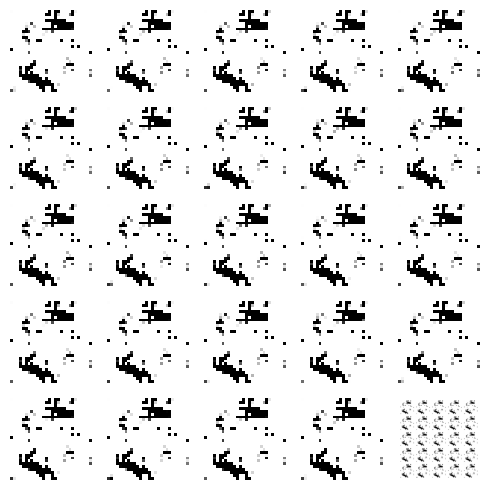

  0%|          | 0/350 [00:00<?, ?it/s]

4/4 [==============================] - 0s 22ms/step


  0%|          | 1/350 [00:00<03:32,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


  1%|          | 2/350 [00:01<03:24,  1.70it/s]

4/4 [==============================] - 0s 15ms/step


  1%|          | 3/350 [00:01<03:19,  1.74it/s]

4/4 [==============================] - 0s 28ms/step


  1%|          | 4/350 [00:02<03:10,  1.82it/s]

4/4 [==============================] - 0s 13ms/step


  1%|▏         | 5/350 [00:02<03:12,  1.79it/s]

4/4 [==============================] - 0s 13ms/step


  2%|▏         | 6/350 [00:03<03:04,  1.86it/s]

4/4 [==============================] - 0s 16ms/step


  2%|▏         | 7/350 [00:03<03:10,  1.80it/s]

4/4 [==============================] - 0s 15ms/step


  2%|▏         | 8/350 [00:04<03:09,  1.80it/s]

4/4 [==============================] - 0s 14ms/step


  3%|▎         | 9/350 [00:05<03:11,  1.78it/s]

4/4 [==============================] - 0s 16ms/step


  3%|▎         | 10/350 [00:05<03:05,  1.83it/s]

4/4 [==============================] - 0s 14ms/step


  3%|▎         | 11/350 [00:06<03:07,  1.81it/s]

4/4 [==============================] - 0s 12ms/step


  3%|▎         | 12/350 [00:06<03:05,  1.82it/s]

4/4 [==============================] - 0s 17ms/step


  4%|▎         | 13/350 [00:07<03:01,  1.85it/s]

4/4 [==============================] - 0s 14ms/step


  4%|▍         | 14/350 [00:07<03:09,  1.77it/s]

4/4 [==============================] - 0s 17ms/step


  4%|▍         | 15/350 [00:08<03:13,  1.74it/s]

4/4 [==============================] - 0s 16ms/step


  5%|▍         | 16/350 [00:08<03:13,  1.72it/s]

4/4 [==============================] - 0s 14ms/step


  5%|▍         | 17/350 [00:09<03:12,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


  5%|▌         | 18/350 [00:10<03:10,  1.74it/s]

4/4 [==============================] - 0s 14ms/step


  5%|▌         | 19/350 [00:10<03:10,  1.74it/s]

4/4 [==============================] - 0s 15ms/step


  6%|▌         | 20/350 [00:11<03:09,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


  6%|▌         | 21/350 [00:11<03:09,  1.73it/s]

4/4 [==============================] - 0s 15ms/step


  6%|▋         | 22/350 [00:12<03:04,  1.78it/s]

4/4 [==============================] - 0s 21ms/step


  7%|▋         | 23/350 [00:13<03:10,  1.71it/s]

4/4 [==============================] - 0s 13ms/step


  7%|▋         | 24/350 [00:13<03:23,  1.60it/s]

4/4 [==============================] - 0s 18ms/step


  7%|▋         | 25/350 [00:14<03:16,  1.65it/s]

4/4 [==============================] - 0s 17ms/step


  7%|▋         | 26/350 [00:14<03:16,  1.64it/s]

4/4 [==============================] - 0s 17ms/step


  8%|▊         | 27/350 [00:15<03:14,  1.66it/s]

4/4 [==============================] - 0s 15ms/step


  8%|▊         | 28/350 [00:16<03:14,  1.66it/s]

4/4 [==============================] - 0s 16ms/step


  8%|▊         | 29/350 [00:16<03:05,  1.73it/s]

4/4 [==============================] - 0s 37ms/step


  9%|▊         | 30/350 [00:17<03:09,  1.69it/s]

4/4 [==============================] - 0s 13ms/step


  9%|▉         | 31/350 [00:17<03:14,  1.64it/s]

4/4 [==============================] - 0s 16ms/step


  9%|▉         | 32/350 [00:18<03:12,  1.65it/s]

4/4 [==============================] - 0s 13ms/step


  9%|▉         | 33/350 [00:19<03:13,  1.64it/s]

4/4 [==============================] - 0s 15ms/step


 10%|▉         | 34/350 [00:19<03:10,  1.66it/s]

4/4 [==============================] - 0s 16ms/step


 10%|█         | 35/350 [00:20<03:08,  1.68it/s]

4/4 [==============================] - 0s 16ms/step


 10%|█         | 36/350 [00:20<03:06,  1.68it/s]

4/4 [==============================] - 0s 14ms/step


 11%|█         | 37/350 [00:21<03:06,  1.68it/s]

4/4 [==============================] - 0s 15ms/step


 11%|█         | 38/350 [00:22<03:05,  1.68it/s]

4/4 [==============================] - 0s 15ms/step


 11%|█         | 39/350 [00:22<03:02,  1.71it/s]

4/4 [==============================] - 0s 16ms/step


 11%|█▏        | 40/350 [00:23<03:04,  1.68it/s]

4/4 [==============================] - 0s 16ms/step


 12%|█▏        | 41/350 [00:23<03:03,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 12%|█▏        | 42/350 [00:24<03:20,  1.53it/s]

4/4 [==============================] - 0s 18ms/step


 12%|█▏        | 43/350 [00:25<03:12,  1.59it/s]

4/4 [==============================] - 0s 30ms/step


 13%|█▎        | 44/350 [00:25<03:09,  1.61it/s]

4/4 [==============================] - 0s 22ms/step


 13%|█▎        | 45/350 [00:26<03:11,  1.60it/s]

4/4 [==============================] - 0s 16ms/step


 13%|█▎        | 46/350 [00:27<03:08,  1.61it/s]

4/4 [==============================] - 0s 17ms/step


 13%|█▎        | 47/350 [00:27<03:05,  1.64it/s]

4/4 [==============================] - 0s 14ms/step


 14%|█▎        | 48/350 [00:28<03:03,  1.64it/s]

4/4 [==============================] - 0s 14ms/step


 14%|█▍        | 49/350 [00:28<03:10,  1.58it/s]

4/4 [==============================] - 0s 15ms/step


 14%|█▍        | 50/350 [00:29<03:04,  1.62it/s]

4/4 [==============================] - 0s 15ms/step


 15%|█▍        | 51/350 [00:30<03:02,  1.64it/s]

4/4 [==============================] - 0s 15ms/step


 15%|█▍        | 52/350 [00:30<03:00,  1.65it/s]

4/4 [==============================] - 0s 14ms/step


 15%|█▌        | 53/350 [00:31<02:55,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 15%|█▌        | 54/350 [00:31<02:46,  1.78it/s]

4/4 [==============================] - 0s 26ms/step


 16%|█▌        | 55/350 [00:32<02:46,  1.77it/s]

4/4 [==============================] - 0s 14ms/step


 16%|█▌        | 56/350 [00:33<03:06,  1.58it/s]

4/4 [==============================] - 0s 17ms/step


 16%|█▋        | 57/350 [00:33<03:04,  1.58it/s]

4/4 [==============================] - 0s 16ms/step


 17%|█▋        | 58/350 [00:34<03:02,  1.60it/s]

4/4 [==============================] - 0s 15ms/step


 17%|█▋        | 59/350 [00:34<02:56,  1.64it/s]

4/4 [==============================] - 0s 17ms/step


 17%|█▋        | 60/350 [00:35<02:53,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 17%|█▋        | 61/350 [00:36<02:49,  1.70it/s]

4/4 [==============================] - 0s 15ms/step


 18%|█▊        | 62/350 [00:36<02:45,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 18%|█▊        | 63/350 [00:37<02:42,  1.77it/s]

4/4 [==============================] - 0s 14ms/step


 18%|█▊        | 64/350 [00:37<02:39,  1.80it/s]

4/4 [==============================] - 0s 14ms/step


 19%|█▊        | 65/350 [00:38<02:37,  1.81it/s]

4/4 [==============================] - 0s 14ms/step


 19%|█▉        | 66/350 [00:38<02:43,  1.74it/s]

4/4 [==============================] - 0s 17ms/step


 19%|█▉        | 67/350 [00:39<02:43,  1.73it/s]

4/4 [==============================] - 0s 14ms/step


 19%|█▉        | 68/350 [00:40<02:47,  1.68it/s]

4/4 [==============================] - 0s 14ms/step


 20%|█▉        | 69/350 [00:40<02:44,  1.71it/s]

4/4 [==============================] - 0s 13ms/step


 20%|██        | 70/350 [00:41<02:41,  1.74it/s]

4/4 [==============================] - 0s 15ms/step


 20%|██        | 71/350 [00:41<02:41,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 21%|██        | 72/350 [00:42<02:42,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 21%|██        | 73/350 [00:42<02:42,  1.70it/s]

4/4 [==============================] - 0s 15ms/step


 21%|██        | 74/350 [00:43<02:37,  1.75it/s]

4/4 [==============================] - 0s 15ms/step


 21%|██▏       | 75/350 [00:44<02:38,  1.74it/s]

4/4 [==============================] - 0s 17ms/step


 22%|██▏       | 76/350 [00:44<02:36,  1.75it/s]

4/4 [==============================] - 0s 15ms/step


 22%|██▏       | 77/350 [00:45<02:33,  1.77it/s]

4/4 [==============================] - 0s 14ms/step


 22%|██▏       | 78/350 [00:45<02:34,  1.76it/s]

4/4 [==============================] - 0s 12ms/step


 23%|██▎       | 79/350 [00:46<02:32,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 23%|██▎       | 80/350 [00:46<02:30,  1.79it/s]

4/4 [==============================] - 0s 16ms/step


 23%|██▎       | 81/350 [00:47<02:31,  1.77it/s]

4/4 [==============================] - 0s 16ms/step


 23%|██▎       | 82/350 [00:48<02:34,  1.74it/s]

4/4 [==============================] - 0s 16ms/step


 24%|██▎       | 83/350 [00:48<02:34,  1.73it/s]

4/4 [==============================] - 0s 18ms/step


 24%|██▍       | 84/350 [00:49<02:32,  1.75it/s]

4/4 [==============================] - 0s 27ms/step


 24%|██▍       | 85/350 [00:49<02:39,  1.66it/s]

4/4 [==============================] - 0s 19ms/step


 25%|██▍       | 86/350 [00:50<02:36,  1.69it/s]

4/4 [==============================] - 0s 14ms/step


 25%|██▍       | 87/350 [00:51<02:33,  1.72it/s]

4/4 [==============================] - 0s 15ms/step


 25%|██▌       | 88/350 [00:51<02:30,  1.75it/s]

4/4 [==============================] - 0s 14ms/step


 25%|██▌       | 89/350 [00:52<02:32,  1.71it/s]

4/4 [==============================] - 0s 22ms/step


 26%|██▌       | 90/350 [00:52<02:35,  1.67it/s]

4/4 [==============================] - 0s 15ms/step


 26%|██▌       | 91/350 [00:53<02:33,  1.69it/s]

4/4 [==============================] - 0s 14ms/step


 26%|██▋       | 92/350 [00:53<02:30,  1.72it/s]

4/4 [==============================] - 0s 14ms/step


 27%|██▋       | 93/350 [00:54<02:27,  1.74it/s]

4/4 [==============================] - 0s 15ms/step


 27%|██▋       | 94/350 [00:55<02:27,  1.73it/s]

4/4 [==============================] - 0s 16ms/step


 27%|██▋       | 95/350 [00:55<02:26,  1.73it/s]

4/4 [==============================] - 0s 18ms/step


 27%|██▋       | 96/350 [00:56<02:21,  1.80it/s]

4/4 [==============================] - 0s 14ms/step


 28%|██▊       | 97/350 [00:56<02:23,  1.77it/s]

4/4 [==============================] - 0s 14ms/step


 28%|██▊       | 98/350 [00:57<02:26,  1.72it/s]

4/4 [==============================] - 0s 15ms/step


 28%|██▊       | 99/350 [00:57<02:25,  1.72it/s]

4/4 [==============================] - 0s 14ms/step


 29%|██▊       | 100/350 [00:58<02:24,  1.73it/s]

4/4 [==============================] - 0s 15ms/step


 29%|██▉       | 101/350 [00:59<02:19,  1.79it/s]

4/4 [==============================] - 0s 16ms/step


 29%|██▉       | 102/350 [00:59<02:19,  1.77it/s]

4/4 [==============================] - 0s 14ms/step


 29%|██▉       | 103/350 [01:00<02:20,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 30%|██▉       | 104/350 [01:00<02:14,  1.83it/s]

4/4 [==============================] - 0s 24ms/step


 30%|███       | 105/350 [01:01<02:18,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 30%|███       | 106/350 [01:01<02:18,  1.76it/s]

4/4 [==============================] - 0s 14ms/step


 31%|███       | 107/350 [01:02<02:18,  1.75it/s]

4/4 [==============================] - 0s 15ms/step


 31%|███       | 108/350 [01:03<02:18,  1.75it/s]

4/4 [==============================] - 0s 15ms/step


 31%|███       | 109/350 [01:03<02:12,  1.82it/s]

4/4 [==============================] - 0s 16ms/step


 31%|███▏      | 110/350 [01:04<02:16,  1.76it/s]

4/4 [==============================] - 0s 19ms/step


 32%|███▏      | 111/350 [01:04<02:18,  1.72it/s]

4/4 [==============================] - 0s 15ms/step


 32%|███▏      | 112/350 [01:05<02:18,  1.72it/s]

4/4 [==============================] - 0s 16ms/step


 32%|███▏      | 113/350 [01:05<02:19,  1.69it/s]

4/4 [==============================] - 0s 23ms/step


 33%|███▎      | 114/350 [01:06<02:26,  1.61it/s]

4/4 [==============================] - 0s 15ms/step


 33%|███▎      | 115/350 [01:07<02:24,  1.63it/s]

4/4 [==============================] - 0s 16ms/step


 33%|███▎      | 116/350 [01:07<02:16,  1.72it/s]

4/4 [==============================] - 0s 31ms/step


 33%|███▎      | 117/350 [01:08<02:17,  1.69it/s]

4/4 [==============================] - 0s 15ms/step


 34%|███▎      | 118/350 [01:08<02:18,  1.67it/s]

4/4 [==============================] - 0s 14ms/step


 34%|███▍      | 119/350 [01:09<02:17,  1.68it/s]

4/4 [==============================] - 0s 18ms/step


 34%|███▍      | 120/350 [01:10<02:17,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 35%|███▍      | 121/350 [01:10<02:16,  1.68it/s]

4/4 [==============================] - 0s 14ms/step


 35%|███▍      | 122/350 [01:11<02:08,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 35%|███▌      | 123/350 [01:11<02:09,  1.75it/s]

4/4 [==============================] - 0s 14ms/step


 35%|███▌      | 124/350 [01:12<02:10,  1.73it/s]

4/4 [==============================] - 0s 11ms/step


 36%|███▌      | 125/350 [01:13<02:22,  1.58it/s]

4/4 [==============================] - 0s 12ms/step


 36%|███▌      | 126/350 [01:13<02:24,  1.55it/s]

4/4 [==============================] - 0s 13ms/step


 36%|███▋      | 127/350 [01:14<02:28,  1.50it/s]

4/4 [==============================] - 0s 15ms/step


 37%|███▋      | 128/350 [01:15<02:21,  1.57it/s]

4/4 [==============================] - 0s 15ms/step


 37%|███▋      | 129/350 [01:15<02:11,  1.68it/s]

4/4 [==============================] - 0s 26ms/step


 37%|███▋      | 130/350 [01:16<02:11,  1.68it/s]

4/4 [==============================] - 0s 15ms/step


 37%|███▋      | 131/350 [01:16<02:11,  1.67it/s]

4/4 [==============================] - 0s 14ms/step


 38%|███▊      | 132/350 [01:17<02:09,  1.69it/s]

4/4 [==============================] - 0s 16ms/step


 38%|███▊      | 133/350 [01:18<02:09,  1.67it/s]

4/4 [==============================] - 0s 15ms/step


 38%|███▊      | 134/350 [01:18<02:04,  1.74it/s]

4/4 [==============================] - 0s 20ms/step


 39%|███▊      | 135/350 [01:19<02:04,  1.73it/s]

4/4 [==============================] - 0s 12ms/step


 39%|███▉      | 136/350 [01:19<02:08,  1.67it/s]

4/4 [==============================] - 0s 15ms/step


 39%|███▉      | 137/350 [01:20<02:01,  1.75it/s]

4/4 [==============================] - 0s 16ms/step


 39%|███▉      | 138/350 [01:20<02:02,  1.73it/s]

4/4 [==============================] - 0s 15ms/step


 40%|███▉      | 139/350 [01:21<02:04,  1.70it/s]

4/4 [==============================] - 0s 15ms/step


 40%|████      | 140/350 [01:22<02:00,  1.74it/s]

4/4 [==============================] - 0s 14ms/step


 40%|████      | 141/350 [01:22<02:01,  1.73it/s]

4/4 [==============================] - 0s 14ms/step


 41%|████      | 142/350 [01:23<01:59,  1.73it/s]

4/4 [==============================] - 0s 19ms/step


 41%|████      | 143/350 [01:23<02:00,  1.71it/s]

4/4 [==============================] - 0s 18ms/step


 41%|████      | 144/350 [01:24<01:59,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


 41%|████▏     | 145/350 [01:24<01:59,  1.71it/s]

4/4 [==============================] - 0s 17ms/step


 42%|████▏     | 146/350 [01:25<02:00,  1.70it/s]

4/4 [==============================] - 0s 14ms/step


 42%|████▏     | 147/350 [01:26<01:57,  1.73it/s]

4/4 [==============================] - 0s 16ms/step


 42%|████▏     | 148/350 [01:26<01:58,  1.70it/s]

4/4 [==============================] - 0s 16ms/step


 43%|████▎     | 149/350 [01:27<01:53,  1.77it/s]

4/4 [==============================] - 0s 33ms/step


 43%|████▎     | 150/350 [01:27<01:56,  1.72it/s]

4/4 [==============================] - 0s 14ms/step


 43%|████▎     | 151/350 [01:28<01:57,  1.69it/s]

4/4 [==============================] - 0s 15ms/step


 43%|████▎     | 152/350 [01:29<01:59,  1.65it/s]

4/4 [==============================] - 0s 14ms/step


 44%|████▎     | 153/350 [01:29<02:00,  1.64it/s]

4/4 [==============================] - 0s 22ms/step


 44%|████▍     | 154/350 [01:30<02:00,  1.62it/s]

4/4 [==============================] - 0s 14ms/step


 44%|████▍     | 155/350 [01:30<01:57,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 45%|████▍     | 156/350 [01:31<01:49,  1.76it/s]

4/4 [==============================] - 0s 16ms/step


 45%|████▍     | 157/350 [01:32<01:52,  1.72it/s]

4/4 [==============================] - 0s 16ms/step


 45%|████▌     | 158/350 [01:32<01:46,  1.81it/s]

4/4 [==============================] - 0s 15ms/step


 45%|████▌     | 159/350 [01:33<01:46,  1.80it/s]

4/4 [==============================] - 0s 13ms/step


 46%|████▌     | 160/350 [01:33<01:44,  1.82it/s]

4/4 [==============================] - 0s 14ms/step


 46%|████▌     | 161/350 [01:34<01:45,  1.79it/s]

4/4 [==============================] - 0s 15ms/step


 46%|████▋     | 162/350 [01:34<01:47,  1.75it/s]

4/4 [==============================] - 0s 16ms/step


 47%|████▋     | 163/350 [01:35<01:50,  1.69it/s]

4/4 [==============================] - 0s 13ms/step


 47%|████▋     | 164/350 [01:36<01:51,  1.66it/s]

4/4 [==============================] - 0s 21ms/step


 47%|████▋     | 165/350 [01:36<01:49,  1.69it/s]

4/4 [==============================] - 0s 13ms/step


 47%|████▋     | 166/350 [01:37<01:49,  1.68it/s]

4/4 [==============================] - 0s 15ms/step


 48%|████▊     | 167/350 [01:37<01:48,  1.69it/s]

4/4 [==============================] - 0s 14ms/step


 48%|████▊     | 168/350 [01:38<01:47,  1.69it/s]

4/4 [==============================] - 0s 14ms/step


 48%|████▊     | 169/350 [01:39<01:53,  1.60it/s]

4/4 [==============================] - 0s 17ms/step


 49%|████▊     | 170/350 [01:39<01:51,  1.61it/s]

4/4 [==============================] - 0s 16ms/step


 49%|████▉     | 171/350 [01:40<01:48,  1.65it/s]

4/4 [==============================] - 0s 15ms/step


 49%|████▉     | 172/350 [01:40<01:47,  1.66it/s]

4/4 [==============================] - 0s 15ms/step


 49%|████▉     | 173/350 [01:41<01:46,  1.67it/s]

4/4 [==============================] - 0s 17ms/step


 50%|████▉     | 174/350 [01:42<01:47,  1.64it/s]

4/4 [==============================] - 0s 16ms/step


 50%|█████     | 175/350 [01:42<01:47,  1.62it/s]

4/4 [==============================] - 0s 18ms/step


 50%|█████     | 176/350 [01:43<01:47,  1.61it/s]

4/4 [==============================] - 0s 15ms/step


 51%|█████     | 177/350 [01:43<01:45,  1.64it/s]

4/4 [==============================] - 0s 16ms/step


 51%|█████     | 178/350 [01:44<01:48,  1.59it/s]

4/4 [==============================] - 0s 20ms/step


 51%|█████     | 179/350 [01:45<01:43,  1.65it/s]

4/4 [==============================] - 0s 19ms/step


 51%|█████▏    | 180/350 [01:45<01:44,  1.63it/s]

4/4 [==============================] - 0s 16ms/step


 52%|█████▏    | 181/350 [01:46<01:43,  1.63it/s]

4/4 [==============================] - 0s 16ms/step


 52%|█████▏    | 182/350 [01:47<01:42,  1.64it/s]

4/4 [==============================] - 0s 17ms/step


 52%|█████▏    | 183/350 [01:47<01:39,  1.67it/s]

4/4 [==============================] - 0s 14ms/step


 53%|█████▎    | 184/350 [01:48<01:37,  1.71it/s]

4/4 [==============================] - 0s 14ms/step


 53%|█████▎    | 185/350 [01:48<01:37,  1.70it/s]

4/4 [==============================] - 0s 14ms/step


 53%|█████▎    | 186/350 [01:49<01:37,  1.68it/s]

4/4 [==============================] - 0s 15ms/step


 53%|█████▎    | 187/350 [01:49<01:38,  1.65it/s]

4/4 [==============================] - 0s 15ms/step


 54%|█████▎    | 188/350 [01:50<01:35,  1.70it/s]

4/4 [==============================] - 0s 16ms/step


 54%|█████▍    | 189/350 [01:51<01:34,  1.71it/s]

4/4 [==============================] - 0s 16ms/step


 54%|█████▍    | 190/350 [01:51<01:35,  1.68it/s]

4/4 [==============================] - 0s 14ms/step


 55%|█████▍    | 191/350 [01:52<01:33,  1.71it/s]

4/4 [==============================] - 0s 15ms/step


 55%|█████▍    | 192/350 [01:52<01:32,  1.71it/s]

4/4 [==============================] - 0s 14ms/step


 55%|█████▌    | 193/350 [01:53<01:32,  1.70it/s]

4/4 [==============================] - 0s 15ms/step


 55%|█████▌    | 194/350 [01:54<01:33,  1.68it/s]

4/4 [==============================] - 0s 20ms/step


 56%|█████▌    | 195/350 [01:54<01:32,  1.67it/s]

4/4 [==============================] - 0s 15ms/step


 56%|█████▌    | 196/350 [01:55<01:35,  1.61it/s]

4/4 [==============================] - 0s 13ms/step


 56%|█████▋    | 197/350 [01:55<01:33,  1.63it/s]

4/4 [==============================] - 0s 16ms/step


 57%|█████▋    | 198/350 [01:56<01:33,  1.63it/s]

4/4 [==============================] - 0s 14ms/step


 57%|█████▋    | 199/350 [01:57<01:27,  1.72it/s]

4/4 [==============================] - 0s 27ms/step


 57%|█████▋    | 200/350 [01:57<01:28,  1.70it/s]

4/4 [==============================] - 0s 27ms/step


 57%|█████▋    | 201/350 [01:58<01:31,  1.63it/s]

4/4 [==============================] - 0s 19ms/step


 58%|█████▊    | 202/350 [01:58<01:31,  1.62it/s]

4/4 [==============================] - 0s 15ms/step


 58%|█████▊    | 203/350 [01:59<01:29,  1.64it/s]

4/4 [==============================] - 0s 14ms/step


 58%|█████▊    | 204/350 [02:00<01:25,  1.70it/s]

4/4 [==============================] - 0s 16ms/step


 59%|█████▊    | 205/350 [02:00<01:23,  1.73it/s]

4/4 [==============================] - 0s 20ms/step


 59%|█████▉    | 206/350 [02:01<01:23,  1.72it/s]

4/4 [==============================] - 0s 15ms/step


 59%|█████▉    | 207/350 [02:01<01:22,  1.72it/s]

4/4 [==============================] - 0s 15ms/step


 59%|█████▉    | 208/350 [02:02<01:19,  1.79it/s]

4/4 [==============================] - 0s 18ms/step


 60%|█████▉    | 209/350 [02:02<01:19,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 60%|██████    | 210/350 [02:03<01:19,  1.77it/s]

4/4 [==============================] - 0s 14ms/step


 60%|██████    | 211/350 [02:04<01:18,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 61%|██████    | 212/350 [02:04<01:18,  1.75it/s]

4/4 [==============================] - 0s 19ms/step


 61%|██████    | 213/350 [02:05<01:19,  1.72it/s]

4/4 [==============================] - 0s 14ms/step


 61%|██████    | 214/350 [02:05<01:18,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 61%|██████▏   | 215/350 [02:06<01:18,  1.73it/s]

4/4 [==============================] - 0s 20ms/step


 62%|██████▏   | 216/350 [02:06<01:15,  1.77it/s]

4/4 [==============================] - 0s 22ms/step


 62%|██████▏   | 217/350 [02:07<01:15,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 62%|██████▏   | 218/350 [02:08<01:15,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 63%|██████▎   | 219/350 [02:08<01:16,  1.71it/s]

4/4 [==============================] - 0s 13ms/step


 63%|██████▎   | 220/350 [02:09<01:16,  1.70it/s]

4/4 [==============================] - 0s 14ms/step


 63%|██████▎   | 221/350 [02:09<01:12,  1.78it/s]

4/4 [==============================] - 0s 15ms/step


 63%|██████▎   | 222/350 [02:10<01:12,  1.76it/s]

4/4 [==============================] - 0s 16ms/step


 64%|██████▎   | 223/350 [02:11<01:14,  1.70it/s]

4/4 [==============================] - 0s 14ms/step


 64%|██████▍   | 224/350 [02:11<01:14,  1.70it/s]

4/4 [==============================] - 0s 13ms/step


 64%|██████▍   | 225/350 [02:12<01:13,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 65%|██████▍   | 226/350 [02:12<01:13,  1.69it/s]

4/4 [==============================] - 0s 14ms/step


 65%|██████▍   | 227/350 [02:13<01:12,  1.70it/s]

4/4 [==============================] - 0s 13ms/step


 65%|██████▌   | 228/350 [02:13<01:11,  1.71it/s]

4/4 [==============================] - 0s 14ms/step


 65%|██████▌   | 229/350 [02:14<01:09,  1.74it/s]

4/4 [==============================] - 0s 15ms/step


 66%|██████▌   | 230/350 [02:15<01:09,  1.73it/s]

4/4 [==============================] - 0s 14ms/step


 66%|██████▌   | 231/350 [02:15<01:07,  1.76it/s]

4/4 [==============================] - 0s 16ms/step


 66%|██████▋   | 232/350 [02:16<01:09,  1.69it/s]

4/4 [==============================] - 0s 16ms/step


 67%|██████▋   | 233/350 [02:16<01:08,  1.71it/s]

4/4 [==============================] - 0s 14ms/step


 67%|██████▋   | 234/350 [02:17<01:09,  1.68it/s]

4/4 [==============================] - 0s 16ms/step


 67%|██████▋   | 235/350 [02:18<01:09,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


 67%|██████▋   | 236/350 [02:18<01:08,  1.66it/s]

4/4 [==============================] - 0s 24ms/step


 68%|██████▊   | 237/350 [02:19<01:05,  1.73it/s]

4/4 [==============================] - 0s 20ms/step


 68%|██████▊   | 238/350 [02:19<01:05,  1.71it/s]

4/4 [==============================] - 0s 14ms/step


 68%|██████▊   | 239/350 [02:20<01:05,  1.69it/s]

4/4 [==============================] - 0s 18ms/step


 69%|██████▊   | 240/350 [02:21<01:05,  1.67it/s]

4/4 [==============================] - 0s 14ms/step


 69%|██████▉   | 241/350 [02:21<01:03,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 69%|██████▉   | 242/350 [02:22<01:03,  1.70it/s]

4/4 [==============================] - 0s 16ms/step


 69%|██████▉   | 243/350 [02:22<01:04,  1.67it/s]

4/4 [==============================] - 0s 15ms/step


 70%|██████▉   | 244/350 [02:23<01:00,  1.76it/s]

4/4 [==============================] - 0s 15ms/step


 70%|███████   | 245/350 [02:23<00:59,  1.75it/s]

4/4 [==============================] - 0s 15ms/step


 70%|███████   | 246/350 [02:24<00:56,  1.83it/s]

4/4 [==============================] - 0s 12ms/step


 71%|███████   | 247/350 [02:24<00:54,  1.90it/s]

4/4 [==============================] - 0s 15ms/step


 71%|███████   | 248/350 [02:25<00:54,  1.87it/s]

4/4 [==============================] - 0s 13ms/step


 71%|███████   | 249/350 [02:25<00:54,  1.87it/s]

4/4 [==============================] - 0s 14ms/step


 71%|███████▏  | 250/350 [02:26<00:55,  1.79it/s]

4/4 [==============================] - 0s 21ms/step


 72%|███████▏  | 251/350 [02:27<00:53,  1.84it/s]

4/4 [==============================] - 0s 13ms/step


 72%|███████▏  | 252/350 [02:27<00:53,  1.83it/s]

4/4 [==============================] - 0s 13ms/step


 72%|███████▏  | 253/350 [02:28<00:51,  1.89it/s]

4/4 [==============================] - 0s 13ms/step


 73%|███████▎  | 254/350 [02:28<00:52,  1.83it/s]

4/4 [==============================] - 0s 15ms/step


 73%|███████▎  | 255/350 [02:29<00:50,  1.87it/s]

4/4 [==============================] - 0s 14ms/step


 73%|███████▎  | 256/350 [02:29<00:52,  1.80it/s]

4/4 [==============================] - 0s 17ms/step


 73%|███████▎  | 257/350 [02:30<00:50,  1.84it/s]

4/4 [==============================] - 0s 17ms/step


 74%|███████▎  | 258/350 [02:30<00:51,  1.79it/s]

4/4 [==============================] - 0s 15ms/step


 74%|███████▍  | 259/350 [02:31<00:51,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 74%|███████▍  | 260/350 [02:31<00:49,  1.83it/s]

4/4 [==============================] - 0s 16ms/step


 75%|███████▍  | 261/350 [02:32<00:48,  1.83it/s]

4/4 [==============================] - 0s 13ms/step


 75%|███████▍  | 262/350 [02:33<00:49,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 75%|███████▌  | 263/350 [02:33<00:47,  1.82it/s]

4/4 [==============================] - 0s 18ms/step


 75%|███████▌  | 264/350 [02:34<00:48,  1.76it/s]

4/4 [==============================] - 0s 18ms/step


 76%|███████▌  | 265/350 [02:34<00:48,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 76%|███████▌  | 266/350 [02:35<00:45,  1.83it/s]

4/4 [==============================] - 0s 13ms/step


 76%|███████▋  | 267/350 [02:35<00:46,  1.78it/s]

4/4 [==============================] - 0s 14ms/step


 77%|███████▋  | 268/350 [02:36<00:45,  1.79it/s]

4/4 [==============================] - 0s 14ms/step


 77%|███████▋  | 269/350 [02:37<00:45,  1.77it/s]

4/4 [==============================] - 0s 15ms/step


 77%|███████▋  | 270/350 [02:37<00:46,  1.72it/s]

4/4 [==============================] - 0s 18ms/step


 77%|███████▋  | 271/350 [02:38<00:44,  1.78it/s]

4/4 [==============================] - 0s 19ms/step


 78%|███████▊  | 272/350 [02:38<00:44,  1.74it/s]

4/4 [==============================] - 0s 14ms/step


 78%|███████▊  | 273/350 [02:39<00:43,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 78%|███████▊  | 274/350 [02:39<00:42,  1.80it/s]

4/4 [==============================] - 0s 13ms/step


 79%|███████▊  | 275/350 [02:40<00:41,  1.82it/s]

4/4 [==============================] - 0s 14ms/step


 79%|███████▉  | 276/350 [02:40<00:39,  1.87it/s]

4/4 [==============================] - 0s 12ms/step


 79%|███████▉  | 277/350 [02:41<00:38,  1.91it/s]

4/4 [==============================] - 0s 13ms/step


 79%|███████▉  | 278/350 [02:42<00:39,  1.83it/s]

4/4 [==============================] - 0s 17ms/step


 80%|███████▉  | 279/350 [02:42<00:40,  1.73it/s]

4/4 [==============================] - 0s 15ms/step


 80%|████████  | 280/350 [02:43<00:41,  1.69it/s]

4/4 [==============================] - 0s 14ms/step


 80%|████████  | 281/350 [02:43<00:39,  1.74it/s]

4/4 [==============================] - 0s 19ms/step


 81%|████████  | 282/350 [02:44<00:39,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 81%|████████  | 283/350 [02:44<00:36,  1.82it/s]

4/4 [==============================] - 0s 13ms/step


 81%|████████  | 284/350 [02:45<00:35,  1.83it/s]

4/4 [==============================] - 0s 13ms/step


 81%|████████▏ | 285/350 [02:45<00:35,  1.84it/s]

4/4 [==============================] - 0s 15ms/step


 82%|████████▏ | 286/350 [02:46<00:35,  1.83it/s]

4/4 [==============================] - 0s 13ms/step


 82%|████████▏ | 287/350 [02:47<00:34,  1.84it/s]

4/4 [==============================] - 0s 13ms/step


 82%|████████▏ | 288/350 [02:47<00:33,  1.84it/s]

4/4 [==============================] - 0s 12ms/step


 83%|████████▎ | 289/350 [02:48<00:33,  1.84it/s]

4/4 [==============================] - 0s 13ms/step


 83%|████████▎ | 290/350 [02:48<00:31,  1.92it/s]

4/4 [==============================] - 0s 20ms/step


 83%|████████▎ | 291/350 [02:49<00:30,  1.91it/s]

4/4 [==============================] - 0s 14ms/step


 83%|████████▎ | 292/350 [02:49<00:30,  1.89it/s]

4/4 [==============================] - 0s 20ms/step


 84%|████████▎ | 293/350 [02:50<00:30,  1.88it/s]

4/4 [==============================] - 0s 12ms/step


 84%|████████▍ | 294/350 [02:50<00:29,  1.88it/s]

4/4 [==============================] - 0s 13ms/step


 84%|████████▍ | 295/350 [02:51<00:29,  1.89it/s]

4/4 [==============================] - 0s 13ms/step


 85%|████████▍ | 296/350 [02:51<00:28,  1.87it/s]

4/4 [==============================] - 0s 14ms/step


 85%|████████▍ | 297/350 [02:52<00:27,  1.94it/s]

4/4 [==============================] - 0s 16ms/step


 85%|████████▌ | 298/350 [02:52<00:27,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


 85%|████████▌ | 299/350 [02:53<00:26,  1.90it/s]

4/4 [==============================] - 0s 21ms/step


 86%|████████▌ | 300/350 [02:53<00:25,  1.93it/s]

4/4 [==============================] - 0s 13ms/step


 86%|████████▌ | 301/350 [02:54<00:25,  1.91it/s]

4/4 [==============================] - 0s 14ms/step


 86%|████████▋ | 302/350 [02:54<00:25,  1.89it/s]

4/4 [==============================] - 0s 15ms/step


 87%|████████▋ | 303/350 [02:55<00:25,  1.88it/s]

4/4 [==============================] - 0s 14ms/step


 87%|████████▋ | 304/350 [02:56<00:24,  1.86it/s]

4/4 [==============================] - 0s 13ms/step


 87%|████████▋ | 305/350 [02:56<00:24,  1.86it/s]

4/4 [==============================] - 0s 14ms/step


 87%|████████▋ | 306/350 [02:57<00:23,  1.84it/s]

4/4 [==============================] - 0s 16ms/step


 88%|████████▊ | 307/350 [02:57<00:22,  1.90it/s]

4/4 [==============================] - 0s 26ms/step


 88%|████████▊ | 308/350 [02:58<00:22,  1.88it/s]

4/4 [==============================] - 0s 15ms/step


 88%|████████▊ | 309/350 [02:58<00:22,  1.85it/s]

4/4 [==============================] - 0s 14ms/step


 89%|████████▊ | 310/350 [02:59<00:21,  1.84it/s]

4/4 [==============================] - 0s 13ms/step


 89%|████████▉ | 311/350 [02:59<00:21,  1.84it/s]

4/4 [==============================] - 0s 13ms/step


 89%|████████▉ | 312/350 [03:00<00:20,  1.84it/s]

4/4 [==============================] - 0s 14ms/step


 89%|████████▉ | 313/350 [03:00<00:20,  1.83it/s]

4/4 [==============================] - 0s 23ms/step


 90%|████████▉ | 314/350 [03:01<00:19,  1.80it/s]

4/4 [==============================] - 0s 13ms/step


 90%|█████████ | 315/350 [03:02<00:19,  1.83it/s]

4/4 [==============================] - 0s 13ms/step


 90%|█████████ | 316/350 [03:02<00:18,  1.83it/s]

4/4 [==============================] - 0s 13ms/step


 91%|█████████ | 317/350 [03:03<00:18,  1.82it/s]

4/4 [==============================] - 0s 13ms/step


 91%|█████████ | 318/350 [03:03<00:17,  1.85it/s]

4/4 [==============================] - 0s 14ms/step


 91%|█████████ | 319/350 [03:04<00:16,  1.85it/s]

4/4 [==============================] - 0s 13ms/step


 91%|█████████▏| 320/350 [03:04<00:16,  1.85it/s]

4/4 [==============================] - 0s 14ms/step


 92%|█████████▏| 321/350 [03:05<00:15,  1.84it/s]

4/4 [==============================] - 0s 13ms/step


 92%|█████████▏| 322/350 [03:05<00:15,  1.84it/s]

4/4 [==============================] - 0s 13ms/step


 92%|█████████▏| 323/350 [03:06<00:14,  1.84it/s]

4/4 [==============================] - 0s 13ms/step


 93%|█████████▎| 324/350 [03:06<00:14,  1.84it/s]

4/4 [==============================] - 0s 12ms/step


 93%|█████████▎| 325/350 [03:07<00:12,  1.94it/s]

4/4 [==============================] - 0s 13ms/step


 93%|█████████▎| 326/350 [03:07<00:12,  1.90it/s]

4/4 [==============================] - 0s 13ms/step


 93%|█████████▎| 327/350 [03:08<00:11,  1.97it/s]

4/4 [==============================] - 0s 13ms/step


 94%|█████████▎| 328/350 [03:08<00:11,  1.89it/s]

4/4 [==============================] - 0s 13ms/step


 94%|█████████▍| 329/350 [03:09<00:10,  1.94it/s]

4/4 [==============================] - 0s 12ms/step


 94%|█████████▍| 330/350 [03:09<00:10,  1.91it/s]

4/4 [==============================] - 0s 13ms/step


 95%|█████████▍| 331/350 [03:10<00:09,  1.96it/s]

4/4 [==============================] - 0s 12ms/step


 95%|█████████▍| 332/350 [03:11<00:09,  1.91it/s]

4/4 [==============================] - 0s 14ms/step


 95%|█████████▌| 333/350 [03:11<00:08,  1.97it/s]

4/4 [==============================] - 0s 13ms/step


 95%|█████████▌| 334/350 [03:12<00:08,  1.92it/s]

4/4 [==============================] - 0s 15ms/step


 96%|█████████▌| 335/350 [03:12<00:07,  1.97it/s]

4/4 [==============================] - 0s 15ms/step


 96%|█████████▌| 336/350 [03:13<00:07,  1.93it/s]

4/4 [==============================] - 0s 13ms/step


 96%|█████████▋| 337/350 [03:13<00:06,  1.98it/s]

4/4 [==============================] - 0s 13ms/step


 97%|█████████▋| 338/350 [03:14<00:06,  1.92it/s]

4/4 [==============================] - 0s 14ms/step


 97%|█████████▋| 339/350 [03:14<00:05,  1.91it/s]

4/4 [==============================] - 0s 13ms/step


 97%|█████████▋| 340/350 [03:15<00:05,  1.89it/s]

4/4 [==============================] - 0s 12ms/step


 97%|█████████▋| 341/350 [03:15<00:04,  1.96it/s]

4/4 [==============================] - 0s 16ms/step


 98%|█████████▊| 342/350 [03:16<00:04,  1.91it/s]

4/4 [==============================] - 0s 12ms/step


 98%|█████████▊| 343/350 [03:16<00:03,  1.97it/s]

4/4 [==============================] - 0s 15ms/step


 98%|█████████▊| 344/350 [03:17<00:03,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


 99%|█████████▊| 345/350 [03:17<00:02,  1.89it/s]

4/4 [==============================] - 0s 13ms/step


 99%|█████████▉| 346/350 [03:18<00:02,  1.96it/s]

4/4 [==============================] - 0s 13ms/step


 99%|█████████▉| 347/350 [03:18<00:01,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


 99%|█████████▉| 348/350 [03:19<00:01,  1.97it/s]

4/4 [==============================] - 0s 15ms/step


100%|█████████▉| 349/350 [03:19<00:00,  1.91it/s]

4/4 [==============================] - 0s 14ms/step


100%|██████████| 350/350 [03:20<00:00,  1.75it/s]

Epoch number: 24 discriminator_loss: 0.1660845966730267 generator_loss: 6.931050694329398
1/1 [==============================] - 0s 20ms/step


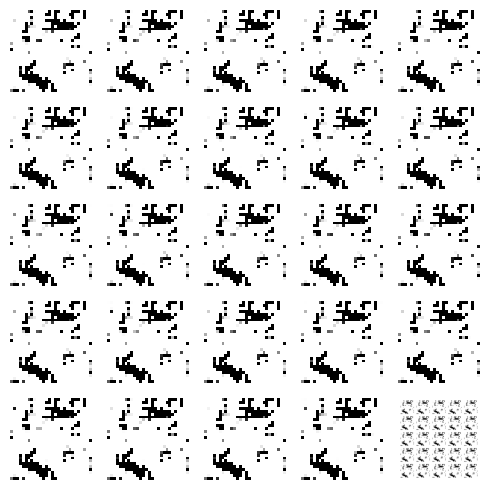

  0%|          | 0/350 [00:00<?, ?it/s]

4/4 [==============================] - 0s 17ms/step


  0%|          | 1/350 [00:00<03:35,  1.62it/s]

4/4 [==============================] - 0s 14ms/step


  1%|          | 2/350 [00:01<03:19,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


  1%|          | 3/350 [00:01<03:07,  1.85it/s]

4/4 [==============================] - 0s 13ms/step


  1%|          | 4/350 [00:02<03:12,  1.80it/s]

4/4 [==============================] - 0s 13ms/step


  1%|▏         | 5/350 [00:02<03:01,  1.90it/s]

4/4 [==============================] - 0s 14ms/step


  2%|▏         | 6/350 [00:03<03:03,  1.88it/s]

4/4 [==============================] - 0s 14ms/step


  2%|▏         | 7/350 [00:03<02:57,  1.94it/s]

4/4 [==============================] - 0s 13ms/step


  2%|▏         | 8/350 [00:04<03:01,  1.89it/s]

4/4 [==============================] - 0s 13ms/step


  3%|▎         | 9/350 [00:04<02:55,  1.94it/s]

4/4 [==============================] - 0s 13ms/step


  3%|▎         | 10/350 [00:05<02:59,  1.90it/s]

4/4 [==============================] - 0s 13ms/step


  3%|▎         | 11/350 [00:05<02:55,  1.94it/s]

4/4 [==============================] - 0s 14ms/step


  3%|▎         | 12/350 [00:06<02:58,  1.90it/s]

4/4 [==============================] - 0s 14ms/step


  4%|▎         | 13/350 [00:06<02:53,  1.95it/s]

4/4 [==============================] - 0s 14ms/step


  4%|▍         | 14/350 [00:07<02:57,  1.90it/s]

4/4 [==============================] - 0s 13ms/step


  4%|▍         | 15/350 [00:07<02:51,  1.95it/s]

4/4 [==============================] - 0s 13ms/step


  5%|▍         | 16/350 [00:08<02:54,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


  5%|▍         | 17/350 [00:08<02:55,  1.90it/s]

4/4 [==============================] - 0s 13ms/step


  5%|▌         | 18/350 [00:09<02:52,  1.92it/s]

4/4 [==============================] - 0s 14ms/step


  5%|▌         | 19/350 [00:10<02:54,  1.90it/s]

4/4 [==============================] - 0s 14ms/step


  6%|▌         | 20/350 [00:10<02:48,  1.95it/s]

4/4 [==============================] - 0s 14ms/step


  6%|▌         | 21/350 [00:11<02:52,  1.91it/s]

4/4 [==============================] - 0s 13ms/step


  6%|▋         | 22/350 [00:11<02:46,  1.96it/s]

4/4 [==============================] - 0s 13ms/step


  7%|▋         | 23/350 [00:12<02:50,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


  7%|▋         | 24/350 [00:12<02:45,  1.96it/s]

4/4 [==============================] - 0s 13ms/step


  7%|▋         | 25/350 [00:13<02:50,  1.90it/s]

4/4 [==============================] - 0s 13ms/step


  7%|▋         | 26/350 [00:13<02:45,  1.96it/s]

4/4 [==============================] - 0s 12ms/step


  8%|▊         | 27/350 [00:14<02:46,  1.95it/s]

4/4 [==============================] - 0s 14ms/step


  8%|▊         | 28/350 [00:14<02:41,  1.99it/s]

4/4 [==============================] - 0s 13ms/step


  8%|▊         | 29/350 [00:15<02:44,  1.96it/s]

4/4 [==============================] - 0s 14ms/step


  9%|▊         | 30/350 [00:15<02:40,  2.00it/s]

4/4 [==============================] - 0s 16ms/step


  9%|▉         | 31/350 [00:16<02:43,  1.95it/s]

4/4 [==============================] - 0s 14ms/step


  9%|▉         | 32/350 [00:16<02:41,  1.96it/s]

4/4 [==============================] - 0s 13ms/step


  9%|▉         | 33/350 [00:17<02:44,  1.93it/s]

4/4 [==============================] - 0s 13ms/step


 10%|▉         | 34/350 [00:17<02:39,  1.98it/s]

4/4 [==============================] - 0s 13ms/step


 10%|█         | 35/350 [00:18<02:42,  1.94it/s]

4/4 [==============================] - 0s 14ms/step


 10%|█         | 36/350 [00:18<02:38,  1.98it/s]

4/4 [==============================] - 0s 13ms/step


 11%|█         | 37/350 [00:19<02:42,  1.93it/s]

4/4 [==============================] - 0s 12ms/step


 11%|█         | 38/350 [00:19<02:38,  1.97it/s]

4/4 [==============================] - 0s 13ms/step


 11%|█         | 39/350 [00:20<02:42,  1.91it/s]

4/4 [==============================] - 0s 14ms/step


 11%|█▏        | 40/350 [00:20<02:38,  1.96it/s]

4/4 [==============================] - 0s 12ms/step


 12%|█▏        | 41/350 [00:21<02:41,  1.91it/s]

4/4 [==============================] - 0s 13ms/step


 12%|█▏        | 42/350 [00:21<02:36,  1.97it/s]

4/4 [==============================] - 0s 14ms/step


 12%|█▏        | 43/350 [00:22<02:39,  1.93it/s]

4/4 [==============================] - 0s 13ms/step


 13%|█▎        | 44/350 [00:22<02:34,  1.98it/s]

4/4 [==============================] - 0s 14ms/step


 13%|█▎        | 45/350 [00:23<02:38,  1.93it/s]

4/4 [==============================] - 0s 14ms/step


 13%|█▎        | 46/350 [00:23<02:35,  1.96it/s]

4/4 [==============================] - 0s 14ms/step


 13%|█▎        | 47/350 [00:24<02:38,  1.91it/s]

4/4 [==============================] - 0s 13ms/step


 14%|█▎        | 48/350 [00:24<02:33,  1.96it/s]

4/4 [==============================] - 0s 13ms/step


 14%|█▍        | 49/350 [00:25<02:38,  1.90it/s]

4/4 [==============================] - 0s 13ms/step


 14%|█▍        | 50/350 [00:25<02:32,  1.97it/s]

4/4 [==============================] - 0s 16ms/step


 15%|█▍        | 51/350 [00:26<02:35,  1.92it/s]

4/4 [==============================] - 0s 12ms/step


 15%|█▍        | 52/350 [00:26<02:30,  1.98it/s]

4/4 [==============================] - 0s 14ms/step


 15%|█▌        | 53/350 [00:27<02:37,  1.89it/s]

4/4 [==============================] - 0s 13ms/step


 15%|█▌        | 54/350 [00:27<02:32,  1.94it/s]

4/4 [==============================] - 0s 12ms/step


 16%|█▌        | 55/350 [00:28<02:33,  1.92it/s]

4/4 [==============================] - 0s 12ms/step


 16%|█▌        | 56/350 [00:28<02:29,  1.97it/s]

4/4 [==============================] - 0s 13ms/step


 16%|█▋        | 57/350 [00:29<02:31,  1.93it/s]

4/4 [==============================] - 0s 12ms/step


 17%|█▋        | 58/350 [00:30<02:27,  1.98it/s]

4/4 [==============================] - 0s 13ms/step


 17%|█▋        | 59/350 [00:30<02:30,  1.93it/s]

4/4 [==============================] - 0s 13ms/step


 17%|█▋        | 60/350 [00:31<02:33,  1.89it/s]

4/4 [==============================] - 0s 15ms/step


 17%|█▋        | 61/350 [00:31<02:29,  1.94it/s]

4/4 [==============================] - 0s 14ms/step


 18%|█▊        | 62/350 [00:32<02:30,  1.91it/s]

4/4 [==============================] - 0s 15ms/step


 18%|█▊        | 63/350 [00:32<02:26,  1.96it/s]

4/4 [==============================] - 0s 14ms/step


 18%|█▊        | 64/350 [00:33<02:29,  1.92it/s]

4/4 [==============================] - 0s 14ms/step


 19%|█▊        | 65/350 [00:33<02:24,  1.98it/s]

4/4 [==============================] - 0s 19ms/step


 19%|█▉        | 66/350 [00:34<02:27,  1.93it/s]

4/4 [==============================] - 0s 14ms/step


 19%|█▉        | 67/350 [00:34<02:25,  1.94it/s]

4/4 [==============================] - 0s 13ms/step


 19%|█▉        | 68/350 [00:35<02:27,  1.91it/s]

4/4 [==============================] - 0s 13ms/step


 20%|█▉        | 69/350 [00:35<02:22,  1.97it/s]

4/4 [==============================] - 0s 14ms/step


 20%|██        | 70/350 [00:36<02:25,  1.92it/s]

4/4 [==============================] - 0s 14ms/step


 20%|██        | 71/350 [00:36<02:21,  1.97it/s]

4/4 [==============================] - 0s 13ms/step


 21%|██        | 72/350 [00:37<02:24,  1.92it/s]

4/4 [==============================] - 0s 22ms/step


 21%|██        | 73/350 [00:37<02:30,  1.84it/s]

4/4 [==============================] - 0s 15ms/step


 21%|██        | 74/350 [00:38<02:36,  1.76it/s]

4/4 [==============================] - 0s 18ms/step


 21%|██▏       | 75/350 [00:39<02:31,  1.82it/s]

4/4 [==============================] - 0s 13ms/step


 22%|██▏       | 76/350 [00:39<02:32,  1.80it/s]

4/4 [==============================] - 0s 16ms/step


 22%|██▏       | 77/350 [00:40<02:29,  1.83it/s]

4/4 [==============================] - 0s 17ms/step


 22%|██▏       | 78/350 [00:40<02:28,  1.83it/s]

4/4 [==============================] - 0s 12ms/step


 23%|██▎       | 79/350 [00:41<02:21,  1.91it/s]

4/4 [==============================] - 0s 14ms/step


 23%|██▎       | 80/350 [00:41<02:22,  1.89it/s]

4/4 [==============================] - 0s 14ms/step


 23%|██▎       | 81/350 [00:42<02:21,  1.91it/s]

4/4 [==============================] - 0s 14ms/step


 23%|██▎       | 82/350 [00:42<02:22,  1.88it/s]

4/4 [==============================] - 0s 13ms/step


 24%|██▎       | 83/350 [00:43<02:17,  1.94it/s]

4/4 [==============================] - 0s 13ms/step


 24%|██▍       | 84/350 [00:43<02:19,  1.90it/s]

4/4 [==============================] - 0s 12ms/step


 24%|██▍       | 85/350 [00:44<02:15,  1.96it/s]

4/4 [==============================] - 0s 18ms/step


 25%|██▍       | 86/350 [00:44<02:18,  1.91it/s]

4/4 [==============================] - 0s 13ms/step


 25%|██▍       | 87/350 [00:45<02:14,  1.95it/s]

4/4 [==============================] - 0s 13ms/step


 25%|██▌       | 88/350 [00:45<02:19,  1.88it/s]

4/4 [==============================] - 0s 13ms/step


 25%|██▌       | 89/350 [00:46<02:14,  1.94it/s]

4/4 [==============================] - 0s 13ms/step


 26%|██▌       | 90/350 [00:46<02:16,  1.91it/s]

4/4 [==============================] - 0s 13ms/step


 26%|██▌       | 91/350 [00:47<02:12,  1.96it/s]

4/4 [==============================] - 0s 13ms/step


 26%|██▋       | 92/350 [00:47<02:14,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


 27%|██▋       | 93/350 [00:48<02:15,  1.90it/s]

4/4 [==============================] - 0s 14ms/step


 27%|██▋       | 94/350 [00:48<02:10,  1.96it/s]

4/4 [==============================] - 0s 21ms/step


 27%|██▋       | 95/350 [00:49<02:15,  1.88it/s]

4/4 [==============================] - 0s 13ms/step


 27%|██▋       | 96/350 [00:49<02:11,  1.93it/s]

4/4 [==============================] - 0s 14ms/step


 28%|██▊       | 97/350 [00:50<02:13,  1.89it/s]

4/4 [==============================] - 0s 13ms/step


 28%|██▊       | 98/350 [00:50<02:08,  1.96it/s]

4/4 [==============================] - 0s 13ms/step


 28%|██▊       | 99/350 [00:51<02:10,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


 29%|██▊       | 100/350 [00:52<02:06,  1.97it/s]

4/4 [==============================] - 0s 14ms/step


 29%|██▉       | 101/350 [00:52<02:08,  1.94it/s]

4/4 [==============================] - 0s 12ms/step


 29%|██▉       | 102/350 [00:53<02:11,  1.88it/s]

4/4 [==============================] - 0s 15ms/step


 29%|██▉       | 103/350 [00:53<02:07,  1.94it/s]

4/4 [==============================] - 0s 13ms/step


 30%|██▉       | 104/350 [00:54<02:08,  1.91it/s]

4/4 [==============================] - 0s 13ms/step


 30%|███       | 105/350 [00:54<02:05,  1.96it/s]

4/4 [==============================] - 0s 13ms/step


 30%|███       | 106/350 [00:55<02:06,  1.93it/s]

4/4 [==============================] - 0s 13ms/step


 31%|███       | 107/350 [00:55<02:02,  1.98it/s]

4/4 [==============================] - 0s 15ms/step


 31%|███       | 108/350 [00:56<02:04,  1.94it/s]

4/4 [==============================] - 0s 13ms/step


 31%|███       | 109/350 [00:56<02:08,  1.87it/s]

4/4 [==============================] - 0s 14ms/step


 31%|███▏      | 110/350 [00:57<02:04,  1.93it/s]

4/4 [==============================] - 0s 14ms/step


 32%|███▏      | 111/350 [00:57<02:05,  1.90it/s]

4/4 [==============================] - 0s 13ms/step


 32%|███▏      | 112/350 [00:58<02:01,  1.95it/s]

4/4 [==============================] - 0s 13ms/step


 32%|███▏      | 113/350 [00:58<02:02,  1.93it/s]

4/4 [==============================] - 0s 14ms/step


 33%|███▎      | 114/350 [00:59<02:00,  1.96it/s]

4/4 [==============================] - 0s 14ms/step


 33%|███▎      | 115/350 [00:59<02:02,  1.91it/s]

4/4 [==============================] - 0s 13ms/step


 33%|███▎      | 116/350 [01:00<02:00,  1.93it/s]

4/4 [==============================] - 0s 15ms/step


 33%|███▎      | 117/350 [01:00<02:03,  1.89it/s]

4/4 [==============================] - 0s 13ms/step


 34%|███▎      | 118/350 [01:01<01:59,  1.94it/s]

4/4 [==============================] - 0s 14ms/step


 34%|███▍      | 119/350 [01:01<02:01,  1.90it/s]

4/4 [==============================] - 0s 14ms/step


 34%|███▍      | 120/350 [01:02<01:57,  1.96it/s]

4/4 [==============================] - 0s 13ms/step


 35%|███▍      | 121/350 [01:02<01:59,  1.92it/s]

4/4 [==============================] - 0s 14ms/step


 35%|███▍      | 122/350 [01:03<01:55,  1.97it/s]

4/4 [==============================] - 0s 15ms/step


 35%|███▌      | 123/350 [01:03<01:59,  1.91it/s]

4/4 [==============================] - 0s 13ms/step


 35%|███▌      | 124/350 [01:04<01:59,  1.88it/s]

4/4 [==============================] - 0s 14ms/step


 36%|███▌      | 125/350 [01:05<01:55,  1.94it/s]

4/4 [==============================] - 0s 14ms/step


 36%|███▌      | 126/350 [01:05<01:57,  1.91it/s]

4/4 [==============================] - 0s 13ms/step


 36%|███▋      | 127/350 [01:06<01:53,  1.96it/s]

4/4 [==============================] - 0s 13ms/step


 37%|███▋      | 128/350 [01:06<01:55,  1.93it/s]

4/4 [==============================] - 0s 13ms/step


 37%|███▋      | 129/350 [01:07<01:51,  1.98it/s]

4/4 [==============================] - 0s 13ms/step


 37%|███▋      | 130/350 [01:07<01:56,  1.89it/s]

4/4 [==============================] - 0s 14ms/step


 37%|███▋      | 131/350 [01:08<01:52,  1.94it/s]

4/4 [==============================] - 0s 15ms/step


 38%|███▊      | 132/350 [01:08<01:54,  1.91it/s]

4/4 [==============================] - 0s 13ms/step


 38%|███▊      | 133/350 [01:09<01:50,  1.96it/s]

4/4 [==============================] - 0s 14ms/step


 38%|███▊      | 134/350 [01:09<01:52,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


 39%|███▊      | 135/350 [01:10<01:49,  1.96it/s]

4/4 [==============================] - 0s 14ms/step


 39%|███▉      | 136/350 [01:10<01:50,  1.94it/s]

4/4 [==============================] - 0s 14ms/step


 39%|███▉      | 137/350 [01:11<01:52,  1.89it/s]

4/4 [==============================] - 0s 13ms/step


 39%|███▉      | 138/350 [01:11<01:49,  1.94it/s]

4/4 [==============================] - 0s 14ms/step


 40%|███▉      | 139/350 [01:12<01:51,  1.90it/s]

4/4 [==============================] - 0s 14ms/step


 40%|████      | 140/350 [01:12<01:47,  1.95it/s]

4/4 [==============================] - 0s 15ms/step


 40%|████      | 141/350 [01:13<01:49,  1.91it/s]

4/4 [==============================] - 0s 13ms/step


 41%|████      | 142/350 [01:13<01:45,  1.97it/s]

4/4 [==============================] - 0s 13ms/step


 41%|████      | 143/350 [01:14<01:48,  1.91it/s]

4/4 [==============================] - 0s 13ms/step


 41%|████      | 144/350 [01:14<01:46,  1.93it/s]

4/4 [==============================] - 0s 13ms/step


 41%|████▏     | 145/350 [01:15<01:47,  1.91it/s]

4/4 [==============================] - 0s 13ms/step


 42%|████▏     | 146/350 [01:15<01:47,  1.90it/s]

4/4 [==============================] - 0s 13ms/step


 42%|████▏     | 147/350 [01:16<01:43,  1.95it/s]

4/4 [==============================] - 0s 13ms/step


 42%|████▏     | 148/350 [01:16<01:45,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


 43%|████▎     | 149/350 [01:17<01:42,  1.97it/s]

4/4 [==============================] - 0s 13ms/step


 43%|████▎     | 150/350 [01:17<01:43,  1.93it/s]

4/4 [==============================] - 0s 15ms/step


 43%|████▎     | 151/350 [01:18<01:43,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


 43%|████▎     | 152/350 [01:19<01:43,  1.90it/s]

4/4 [==============================] - 0s 13ms/step


 44%|████▎     | 153/350 [01:19<01:40,  1.96it/s]

4/4 [==============================] - 0s 14ms/step


 44%|████▍     | 154/350 [01:20<01:41,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


 44%|████▍     | 155/350 [01:20<01:39,  1.97it/s]

4/4 [==============================] - 0s 13ms/step


 45%|████▍     | 156/350 [01:21<01:40,  1.93it/s]

4/4 [==============================] - 0s 13ms/step


 45%|████▍     | 157/350 [01:21<01:37,  1.97it/s]

4/4 [==============================] - 0s 14ms/step


 45%|████▌     | 158/350 [01:22<01:41,  1.88it/s]

4/4 [==============================] - 0s 15ms/step


 45%|████▌     | 159/350 [01:22<01:38,  1.93it/s]

4/4 [==============================] - 0s 13ms/step


 46%|████▌     | 160/350 [01:23<01:40,  1.89it/s]

4/4 [==============================] - 0s 14ms/step


 46%|████▌     | 161/350 [01:23<01:37,  1.94it/s]

4/4 [==============================] - 0s 13ms/step


 46%|████▋     | 162/350 [01:24<01:38,  1.91it/s]

4/4 [==============================] - 0s 14ms/step


 47%|████▋     | 163/350 [01:24<01:35,  1.96it/s]

4/4 [==============================] - 0s 13ms/step


 47%|████▋     | 164/350 [01:25<01:37,  1.90it/s]

4/4 [==============================] - 0s 13ms/step


 47%|████▋     | 165/350 [01:25<01:35,  1.94it/s]

4/4 [==============================] - 0s 13ms/step


 47%|████▋     | 166/350 [01:26<01:37,  1.89it/s]

4/4 [==============================] - 0s 13ms/step


 48%|████▊     | 167/350 [01:26<01:33,  1.95it/s]

4/4 [==============================] - 0s 15ms/step


 48%|████▊     | 168/350 [01:27<01:34,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


 48%|████▊     | 169/350 [01:27<01:32,  1.96it/s]

4/4 [==============================] - 0s 13ms/step


 49%|████▊     | 170/350 [01:28<01:32,  1.94it/s]

4/4 [==============================] - 0s 14ms/step


 49%|████▉     | 171/350 [01:28<01:30,  1.97it/s]

4/4 [==============================] - 0s 14ms/step


 49%|████▉     | 172/350 [01:29<01:33,  1.90it/s]

4/4 [==============================] - 0s 11ms/step


 49%|████▉     | 173/350 [01:30<01:39,  1.78it/s]

4/4 [==============================] - 0s 20ms/step


 50%|████▉     | 174/350 [01:30<01:38,  1.78it/s]

4/4 [==============================] - 0s 15ms/step


 50%|█████     | 175/350 [01:31<01:34,  1.86it/s]

4/4 [==============================] - 0s 14ms/step


 50%|█████     | 176/350 [01:31<01:33,  1.85it/s]

4/4 [==============================] - 0s 13ms/step


 51%|█████     | 177/350 [01:32<01:30,  1.91it/s]

4/4 [==============================] - 0s 18ms/step


 51%|█████     | 178/350 [01:32<01:31,  1.87it/s]

4/4 [==============================] - 0s 13ms/step


 51%|█████     | 179/350 [01:33<01:29,  1.92it/s]

4/4 [==============================] - 0s 14ms/step


 51%|█████▏    | 180/350 [01:33<01:29,  1.89it/s]

4/4 [==============================] - 0s 14ms/step


 52%|█████▏    | 181/350 [01:34<01:26,  1.94it/s]

4/4 [==============================] - 0s 13ms/step


 52%|█████▏    | 182/350 [01:34<01:27,  1.91it/s]

4/4 [==============================] - 0s 12ms/step


 52%|█████▏    | 183/350 [01:35<01:24,  1.98it/s]

4/4 [==============================] - 0s 13ms/step


 53%|█████▎    | 184/350 [01:35<01:26,  1.93it/s]

4/4 [==============================] - 0s 12ms/step


 53%|█████▎    | 185/350 [01:36<01:23,  1.97it/s]

4/4 [==============================] - 0s 13ms/step


 53%|█████▎    | 186/350 [01:36<01:26,  1.90it/s]

4/4 [==============================] - 0s 13ms/step


 53%|█████▎    | 187/350 [01:37<01:23,  1.96it/s]

4/4 [==============================] - 0s 13ms/step


 54%|█████▎    | 188/350 [01:37<01:24,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


 54%|█████▍    | 189/350 [01:38<01:21,  1.97it/s]

4/4 [==============================] - 0s 12ms/step


 54%|█████▍    | 190/350 [01:38<01:22,  1.93it/s]

4/4 [==============================] - 0s 13ms/step


 55%|█████▍    | 191/350 [01:39<01:20,  1.98it/s]

4/4 [==============================] - 0s 13ms/step


 55%|█████▍    | 192/350 [01:39<01:22,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


 55%|█████▌    | 193/350 [01:40<01:20,  1.96it/s]

4/4 [==============================] - 0s 13ms/step


 55%|█████▌    | 194/350 [01:40<01:21,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


 56%|█████▌    | 195/350 [01:41<01:18,  1.98it/s]

4/4 [==============================] - 0s 14ms/step


 56%|█████▌    | 196/350 [01:41<01:19,  1.93it/s]

4/4 [==============================] - 0s 13ms/step


 56%|█████▋    | 197/350 [01:42<01:17,  1.97it/s]

4/4 [==============================] - 0s 13ms/step


 57%|█████▋    | 198/350 [01:42<01:20,  1.89it/s]

4/4 [==============================] - 0s 13ms/step


 57%|█████▋    | 199/350 [01:43<01:17,  1.94it/s]

4/4 [==============================] - 0s 13ms/step


 57%|█████▋    | 200/350 [01:44<01:19,  1.89it/s]

4/4 [==============================] - 0s 13ms/step


 57%|█████▋    | 201/350 [01:44<01:19,  1.87it/s]

4/4 [==============================] - 0s 12ms/step


 58%|█████▊    | 202/350 [01:45<01:16,  1.93it/s]

4/4 [==============================] - 0s 14ms/step


 58%|█████▊    | 203/350 [01:45<01:17,  1.90it/s]

4/4 [==============================] - 0s 13ms/step


 58%|█████▊    | 204/350 [01:46<01:14,  1.96it/s]

4/4 [==============================] - 0s 13ms/step


 59%|█████▊    | 205/350 [01:46<01:15,  1.91it/s]

4/4 [==============================] - 0s 12ms/step


 59%|█████▉    | 206/350 [01:47<01:13,  1.96it/s]

4/4 [==============================] - 0s 13ms/step


 59%|█████▉    | 207/350 [01:47<01:15,  1.90it/s]

4/4 [==============================] - 0s 12ms/step


 59%|█████▉    | 208/350 [01:48<01:12,  1.96it/s]

4/4 [==============================] - 0s 13ms/step


 60%|█████▉    | 209/350 [01:48<01:13,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


 60%|██████    | 210/350 [01:49<01:10,  1.97it/s]

4/4 [==============================] - 0s 13ms/step


 60%|██████    | 211/350 [01:49<01:11,  1.93it/s]

4/4 [==============================] - 0s 13ms/step


 61%|██████    | 212/350 [01:50<01:09,  1.98it/s]

4/4 [==============================] - 0s 13ms/step


 61%|██████    | 213/350 [01:50<01:10,  1.93it/s]

4/4 [==============================] - 0s 13ms/step


 61%|██████    | 214/350 [01:51<01:09,  1.95it/s]

4/4 [==============================] - 0s 13ms/step


 61%|██████▏   | 215/350 [01:51<01:10,  1.91it/s]

4/4 [==============================] - 0s 14ms/step


 62%|██████▏   | 216/350 [01:52<01:07,  1.97it/s]

4/4 [==============================] - 0s 13ms/step


 62%|██████▏   | 217/350 [01:52<01:09,  1.92it/s]

4/4 [==============================] - 0s 12ms/step


 62%|██████▏   | 218/350 [01:53<01:07,  1.96it/s]

4/4 [==============================] - 0s 13ms/step


 63%|██████▎   | 219/350 [01:53<01:08,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


 63%|██████▎   | 220/350 [01:54<01:06,  1.96it/s]

4/4 [==============================] - 0s 13ms/step


 63%|██████▎   | 221/350 [01:54<01:08,  1.89it/s]

4/4 [==============================] - 0s 13ms/step


 63%|██████▎   | 222/350 [01:55<01:05,  1.95it/s]

4/4 [==============================] - 0s 13ms/step


 64%|██████▎   | 223/350 [01:55<01:06,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


 64%|██████▍   | 224/350 [01:56<01:04,  1.97it/s]

4/4 [==============================] - 0s 13ms/step


 64%|██████▍   | 225/350 [01:56<01:04,  1.94it/s]

4/4 [==============================] - 0s 13ms/step


 65%|██████▍   | 226/350 [01:57<01:02,  1.99it/s]

4/4 [==============================] - 0s 13ms/step


 65%|██████▍   | 227/350 [01:57<01:03,  1.93it/s]

4/4 [==============================] - 0s 11ms/step


 65%|██████▌   | 228/350 [01:58<01:02,  1.96it/s]

4/4 [==============================] - 0s 14ms/step


 65%|██████▌   | 229/350 [01:58<01:03,  1.91it/s]

4/4 [==============================] - 0s 13ms/step


 66%|██████▌   | 230/350 [01:59<01:01,  1.95it/s]

4/4 [==============================] - 0s 12ms/step


 66%|██████▌   | 231/350 [01:59<01:01,  1.93it/s]

4/4 [==============================] - 0s 12ms/step


 66%|██████▋   | 232/350 [02:00<00:59,  1.98it/s]

4/4 [==============================] - 0s 13ms/step


 67%|██████▋   | 233/350 [02:01<01:01,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


 67%|██████▋   | 234/350 [02:01<00:59,  1.97it/s]

4/4 [==============================] - 0s 14ms/step


 67%|██████▋   | 235/350 [02:02<01:01,  1.88it/s]

4/4 [==============================] - 0s 15ms/step


 67%|██████▋   | 236/350 [02:02<00:59,  1.93it/s]

4/4 [==============================] - 0s 14ms/step


 68%|██████▊   | 237/350 [02:03<00:59,  1.89it/s]

4/4 [==============================] - 0s 14ms/step


 68%|██████▊   | 238/350 [02:03<00:57,  1.95it/s]

4/4 [==============================] - 0s 14ms/step


 68%|██████▊   | 239/350 [02:04<00:58,  1.91it/s]

4/4 [==============================] - 0s 14ms/step


 69%|██████▊   | 240/350 [02:04<00:58,  1.90it/s]

4/4 [==============================] - 0s 13ms/step


 69%|██████▉   | 241/350 [02:05<00:55,  1.95it/s]

4/4 [==============================] - 0s 15ms/step


 69%|██████▉   | 242/350 [02:05<00:57,  1.88it/s]

4/4 [==============================] - 0s 14ms/step


 69%|██████▉   | 243/350 [02:06<00:55,  1.93it/s]

4/4 [==============================] - 0s 14ms/step


 70%|██████▉   | 244/350 [02:06<00:55,  1.91it/s]

4/4 [==============================] - 0s 14ms/step


 70%|███████   | 245/350 [02:07<00:53,  1.95it/s]

4/4 [==============================] - 0s 13ms/step


 70%|███████   | 246/350 [02:07<00:54,  1.91it/s]

4/4 [==============================] - 0s 13ms/step


 71%|███████   | 247/350 [02:08<00:54,  1.90it/s]

4/4 [==============================] - 0s 14ms/step


 71%|███████   | 248/350 [02:08<00:52,  1.95it/s]

4/4 [==============================] - 0s 13ms/step


 71%|███████   | 249/350 [02:09<00:53,  1.87it/s]

4/4 [==============================] - 0s 13ms/step


 71%|███████▏  | 250/350 [02:09<00:51,  1.94it/s]

4/4 [==============================] - 0s 13ms/step


 72%|███████▏  | 251/350 [02:10<00:52,  1.90it/s]

4/4 [==============================] - 0s 13ms/step


 72%|███████▏  | 252/350 [02:10<00:50,  1.95it/s]

4/4 [==============================] - 0s 12ms/step


 72%|███████▏  | 253/350 [02:11<00:50,  1.92it/s]

4/4 [==============================] - 0s 12ms/step


 73%|███████▎  | 254/350 [02:11<00:48,  1.98it/s]

4/4 [==============================] - 0s 13ms/step


 73%|███████▎  | 255/350 [02:12<00:49,  1.93it/s]

4/4 [==============================] - 0s 13ms/step


 73%|███████▎  | 256/350 [02:12<00:48,  1.96it/s]

4/4 [==============================] - 0s 14ms/step


 73%|███████▎  | 257/350 [02:13<00:48,  1.90it/s]

4/4 [==============================] - 0s 13ms/step


 74%|███████▎  | 258/350 [02:13<00:46,  1.96it/s]

4/4 [==============================] - 0s 13ms/step


 74%|███████▍  | 259/350 [02:14<00:47,  1.93it/s]

4/4 [==============================] - 0s 14ms/step


 74%|███████▍  | 260/350 [02:14<00:45,  1.97it/s]

4/4 [==============================] - 0s 13ms/step


 75%|███████▍  | 261/350 [02:15<00:45,  1.94it/s]

4/4 [==============================] - 0s 13ms/step


 75%|███████▍  | 262/350 [02:16<00:44,  1.98it/s]

4/4 [==============================] - 0s 13ms/step


 75%|███████▌  | 263/350 [02:16<00:45,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


 75%|███████▌  | 264/350 [02:17<00:43,  1.97it/s]

4/4 [==============================] - 0s 13ms/step


 76%|███████▌  | 265/350 [02:17<00:44,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


 76%|███████▌  | 266/350 [02:18<00:42,  1.98it/s]

4/4 [==============================] - 0s 14ms/step


 76%|███████▋  | 267/350 [02:18<00:43,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


 77%|███████▋  | 268/350 [02:19<00:41,  1.97it/s]

4/4 [==============================] - 0s 13ms/step


 77%|███████▋  | 269/350 [02:19<00:41,  1.93it/s]

4/4 [==============================] - 0s 14ms/step


 77%|███████▋  | 270/350 [02:20<00:41,  1.95it/s]

4/4 [==============================] - 0s 14ms/step


 77%|███████▋  | 271/350 [02:20<00:41,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


 78%|███████▊  | 272/350 [02:21<00:39,  1.97it/s]

4/4 [==============================] - 0s 13ms/step


 78%|███████▊  | 273/350 [02:21<00:39,  1.94it/s]

4/4 [==============================] - 0s 14ms/step


 78%|███████▊  | 274/350 [02:22<00:38,  1.98it/s]

4/4 [==============================] - 0s 13ms/step


 79%|███████▊  | 275/350 [02:22<00:38,  1.93it/s]

4/4 [==============================] - 0s 14ms/step


 79%|███████▉  | 276/350 [02:23<00:38,  1.94it/s]

4/4 [==============================] - 0s 15ms/step


 79%|███████▉  | 277/350 [02:23<00:39,  1.87it/s]

4/4 [==============================] - 0s 14ms/step


 79%|███████▉  | 278/350 [02:24<00:37,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


 80%|███████▉  | 279/350 [02:24<00:37,  1.89it/s]

4/4 [==============================] - 0s 12ms/step


 80%|████████  | 280/350 [02:25<00:36,  1.94it/s]

4/4 [==============================] - 0s 15ms/step


 80%|████████  | 281/350 [02:25<00:36,  1.90it/s]

4/4 [==============================] - 0s 14ms/step


 81%|████████  | 282/350 [02:26<00:35,  1.94it/s]

4/4 [==============================] - 0s 13ms/step


 81%|████████  | 283/350 [02:26<00:35,  1.90it/s]

4/4 [==============================] - 0s 13ms/step


 81%|████████  | 284/350 [02:27<00:34,  1.93it/s]

4/4 [==============================] - 0s 13ms/step


 81%|████████▏ | 285/350 [02:27<00:34,  1.89it/s]

4/4 [==============================] - 0s 13ms/step


 82%|████████▏ | 286/350 [02:28<00:33,  1.94it/s]

4/4 [==============================] - 0s 12ms/step


 82%|████████▏ | 287/350 [02:28<00:32,  1.93it/s]

4/4 [==============================] - 0s 13ms/step


 82%|████████▏ | 288/350 [02:29<00:32,  1.89it/s]

4/4 [==============================] - 0s 13ms/step


 83%|████████▎ | 289/350 [02:30<00:31,  1.96it/s]

4/4 [==============================] - 0s 13ms/step


 83%|████████▎ | 290/350 [02:30<00:31,  1.91it/s]

4/4 [==============================] - 0s 13ms/step


 83%|████████▎ | 291/350 [02:31<00:30,  1.95it/s]

4/4 [==============================] - 0s 13ms/step


 83%|████████▎ | 292/350 [02:31<00:30,  1.92it/s]

4/4 [==============================] - 0s 14ms/step


 84%|████████▎ | 293/350 [02:32<00:28,  1.97it/s]

4/4 [==============================] - 0s 14ms/step


 84%|████████▍ | 294/350 [02:32<00:29,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


 84%|████████▍ | 295/350 [02:33<00:27,  1.97it/s]

4/4 [==============================] - 0s 13ms/step


 85%|████████▍ | 296/350 [02:33<00:28,  1.93it/s]

4/4 [==============================] - 0s 13ms/step


 85%|████████▍ | 297/350 [02:34<00:26,  1.98it/s]

4/4 [==============================] - 0s 14ms/step


 85%|████████▌ | 298/350 [02:34<00:26,  1.93it/s]

4/4 [==============================] - 0s 13ms/step


 85%|████████▌ | 299/350 [02:35<00:26,  1.91it/s]

4/4 [==============================] - 0s 13ms/step


 86%|████████▌ | 300/350 [02:35<00:25,  1.96it/s]

4/4 [==============================] - 0s 14ms/step


 86%|████████▌ | 301/350 [02:36<00:25,  1.91it/s]

4/4 [==============================] - 0s 14ms/step


 86%|████████▋ | 302/350 [02:36<00:24,  1.95it/s]

4/4 [==============================] - 0s 14ms/step


 87%|████████▋ | 303/350 [02:37<00:24,  1.90it/s]

4/4 [==============================] - 0s 13ms/step


 87%|████████▋ | 304/350 [02:37<00:23,  1.95it/s]

4/4 [==============================] - 0s 14ms/step


 87%|████████▋ | 305/350 [02:38<00:23,  1.88it/s]

4/4 [==============================] - 0s 13ms/step


 87%|████████▋ | 306/350 [02:38<00:22,  1.95it/s]

4/4 [==============================] - 0s 13ms/step


 88%|████████▊ | 307/350 [02:39<00:22,  1.91it/s]

4/4 [==============================] - 0s 14ms/step


 88%|████████▊ | 308/350 [02:39<00:21,  1.95it/s]

4/4 [==============================] - 0s 13ms/step


 88%|████████▊ | 309/350 [02:40<00:21,  1.90it/s]

4/4 [==============================] - 0s 14ms/step


 89%|████████▊ | 310/350 [02:40<00:20,  1.96it/s]

4/4 [==============================] - 0s 12ms/step


 89%|████████▉ | 311/350 [02:41<00:20,  1.91it/s]

4/4 [==============================] - 0s 12ms/step


 89%|████████▉ | 312/350 [02:41<00:19,  1.94it/s]

4/4 [==============================] - 0s 13ms/step


 89%|████████▉ | 313/350 [02:42<00:19,  1.89it/s]

4/4 [==============================] - 0s 12ms/step


 90%|████████▉ | 314/350 [02:42<00:18,  1.95it/s]

4/4 [==============================] - 0s 13ms/step


 90%|█████████ | 315/350 [02:43<00:18,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


 90%|█████████ | 316/350 [02:43<00:17,  1.97it/s]

4/4 [==============================] - 0s 28ms/step


 91%|█████████ | 317/350 [02:44<00:17,  1.91it/s]

4/4 [==============================] - 0s 13ms/step


 91%|█████████ | 318/350 [02:45<00:16,  1.96it/s]

4/4 [==============================] - 0s 13ms/step


 91%|█████████ | 319/350 [02:45<00:16,  1.89it/s]

4/4 [==============================] - 0s 13ms/step


 91%|█████████▏| 320/350 [02:46<00:15,  1.94it/s]

4/4 [==============================] - 0s 13ms/step


 92%|█████████▏| 321/350 [02:46<00:15,  1.90it/s]

4/4 [==============================] - 0s 13ms/step


 92%|█████████▏| 322/350 [02:47<00:14,  1.95it/s]

4/4 [==============================] - 0s 14ms/step


 92%|█████████▏| 323/350 [02:47<00:14,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


 93%|█████████▎| 324/350 [02:48<00:13,  1.99it/s]

4/4 [==============================] - 0s 13ms/step


 93%|█████████▎| 325/350 [02:48<00:12,  1.93it/s]

4/4 [==============================] - 0s 13ms/step


 93%|█████████▎| 326/350 [02:49<00:12,  1.95it/s]

4/4 [==============================] - 0s 16ms/step


 93%|█████████▎| 327/350 [02:49<00:12,  1.90it/s]

4/4 [==============================] - 0s 14ms/step


 94%|█████████▎| 328/350 [02:50<00:11,  1.96it/s]

4/4 [==============================] - 0s 26ms/step


 94%|█████████▍| 329/350 [02:50<00:10,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


 94%|█████████▍| 330/350 [02:51<00:10,  1.88it/s]

4/4 [==============================] - 0s 14ms/step


 95%|█████████▍| 331/350 [02:51<00:09,  1.94it/s]

4/4 [==============================] - 0s 15ms/step


 95%|█████████▍| 332/350 [02:52<00:09,  1.89it/s]

4/4 [==============================] - 0s 13ms/step


 95%|█████████▌| 333/350 [02:52<00:08,  1.93it/s]

4/4 [==============================] - 0s 14ms/step


 95%|█████████▌| 334/350 [02:53<00:08,  1.90it/s]

4/4 [==============================] - 0s 14ms/step


 96%|█████████▌| 335/350 [02:53<00:07,  1.97it/s]

4/4 [==============================] - 0s 14ms/step


 96%|█████████▌| 336/350 [02:54<00:07,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


 96%|█████████▋| 337/350 [02:54<00:06,  1.96it/s]

4/4 [==============================] - 0s 14ms/step


 97%|█████████▋| 338/350 [02:55<00:06,  1.90it/s]

4/4 [==============================] - 0s 13ms/step


 97%|█████████▋| 339/350 [02:55<00:05,  1.94it/s]

4/4 [==============================] - 0s 14ms/step


 97%|█████████▋| 340/350 [02:56<00:05,  1.89it/s]

4/4 [==============================] - 0s 14ms/step


 97%|█████████▋| 341/350 [02:56<00:04,  1.94it/s]

4/4 [==============================] - 0s 13ms/step


 98%|█████████▊| 342/350 [02:57<00:04,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


 98%|█████████▊| 343/350 [02:57<00:03,  1.97it/s]

4/4 [==============================] - 0s 13ms/step


 98%|█████████▊| 344/350 [02:58<00:03,  1.92it/s]

4/4 [==============================] - 0s 14ms/step


 99%|█████████▊| 345/350 [02:58<00:02,  1.97it/s]

4/4 [==============================] - 0s 14ms/step


 99%|█████████▉| 346/350 [02:59<00:02,  1.91it/s]

4/4 [==============================] - 0s 13ms/step


 99%|█████████▉| 347/350 [03:00<00:01,  1.94it/s]

4/4 [==============================] - 0s 13ms/step


 99%|█████████▉| 348/350 [03:00<00:01,  1.90it/s]

4/4 [==============================] - 0s 13ms/step


100%|█████████▉| 349/350 [03:01<00:00,  1.96it/s]

4/4 [==============================] - 0s 14ms/step


100%|██████████| 350/350 [03:01<00:00,  1.93it/s]

Epoch number: 25 discriminator_loss: 0.16561229521408677 generator_loss: 7.152797461918422
1/1 [==============================] - 0s 21ms/step


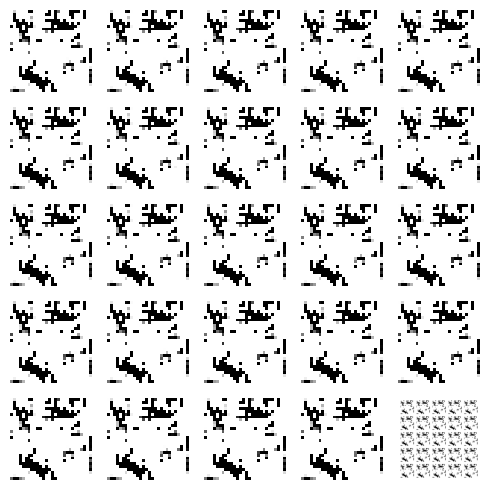

  0%|          | 0/350 [00:00<?, ?it/s]

4/4 [==============================] - 0s 23ms/step


  0%|          | 1/350 [00:00<03:34,  1.63it/s]

4/4 [==============================] - 0s 17ms/step


  1%|          | 2/350 [00:01<03:25,  1.69it/s]

4/4 [==============================] - 0s 17ms/step


  1%|          | 3/350 [00:01<03:11,  1.82it/s]

4/4 [==============================] - 0s 14ms/step


  1%|          | 4/350 [00:02<03:10,  1.81it/s]

4/4 [==============================] - 0s 13ms/step


  1%|▏         | 5/350 [00:02<03:01,  1.91it/s]

4/4 [==============================] - 0s 13ms/step


  2%|▏         | 6/350 [00:03<03:03,  1.87it/s]

4/4 [==============================] - 0s 12ms/step


  2%|▏         | 7/350 [00:03<02:57,  1.93it/s]

4/4 [==============================] - 0s 19ms/step


  2%|▏         | 8/350 [00:04<03:07,  1.82it/s]

4/4 [==============================] - 0s 15ms/step


  3%|▎         | 9/350 [00:04<03:00,  1.89it/s]

4/4 [==============================] - 0s 21ms/step


  3%|▎         | 10/350 [00:05<03:03,  1.85it/s]

4/4 [==============================] - 0s 13ms/step


  3%|▎         | 11/350 [00:05<03:03,  1.84it/s]

4/4 [==============================] - 0s 13ms/step


  3%|▎         | 12/350 [00:06<02:56,  1.91it/s]

4/4 [==============================] - 0s 13ms/step


  4%|▎         | 13/350 [00:06<02:58,  1.89it/s]

4/4 [==============================] - 0s 13ms/step


  4%|▍         | 14/350 [00:07<02:51,  1.95it/s]

4/4 [==============================] - 0s 14ms/step


  4%|▍         | 15/350 [00:08<02:54,  1.92it/s]

4/4 [==============================] - 0s 14ms/step


  5%|▍         | 16/350 [00:08<02:51,  1.95it/s]

4/4 [==============================] - 0s 15ms/step


  5%|▍         | 17/350 [00:09<02:54,  1.91it/s]

4/4 [==============================] - 0s 13ms/step


  5%|▌         | 18/350 [00:09<02:55,  1.89it/s]

4/4 [==============================] - 0s 13ms/step


  5%|▌         | 19/350 [00:10<02:50,  1.94it/s]

4/4 [==============================] - 0s 13ms/step


  6%|▌         | 20/350 [00:10<02:52,  1.91it/s]

4/4 [==============================] - 0s 13ms/step


  6%|▌         | 21/350 [00:11<02:47,  1.96it/s]

4/4 [==============================] - 0s 13ms/step


  6%|▋         | 22/350 [00:11<02:50,  1.92it/s]

4/4 [==============================] - 0s 12ms/step


  7%|▋         | 23/350 [00:12<02:45,  1.98it/s]

4/4 [==============================] - 0s 18ms/step


  7%|▋         | 24/350 [00:12<02:51,  1.90it/s]

4/4 [==============================] - 0s 13ms/step


  7%|▋         | 25/350 [00:13<02:47,  1.95it/s]

4/4 [==============================] - 0s 13ms/step


  7%|▋         | 26/350 [00:13<02:54,  1.86it/s]

4/4 [==============================] - 0s 13ms/step


  8%|▊         | 27/350 [00:14<02:54,  1.86it/s]

4/4 [==============================] - 0s 12ms/step


  8%|▊         | 28/350 [00:14<02:47,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


  8%|▊         | 29/350 [00:15<02:51,  1.88it/s]

4/4 [==============================] - 0s 13ms/step


  9%|▊         | 30/350 [00:15<02:45,  1.94it/s]

4/4 [==============================] - 0s 16ms/step


  9%|▉         | 31/350 [00:16<02:49,  1.88it/s]

4/4 [==============================] - 0s 13ms/step


  9%|▉         | 32/350 [00:16<02:43,  1.94it/s]

4/4 [==============================] - 0s 13ms/step


  9%|▉         | 33/350 [00:17<02:45,  1.92it/s]

4/4 [==============================] - 0s 12ms/step


 10%|▉         | 34/350 [00:17<02:39,  1.98it/s]

4/4 [==============================] - 0s 14ms/step


 10%|█         | 35/350 [00:18<02:43,  1.93it/s]

4/4 [==============================] - 0s 13ms/step


 10%|█         | 36/350 [00:18<02:38,  1.98it/s]

4/4 [==============================] - 0s 13ms/step


 11%|█         | 37/350 [00:19<02:42,  1.93it/s]

4/4 [==============================] - 0s 14ms/step


 11%|█         | 38/350 [00:19<02:39,  1.96it/s]

4/4 [==============================] - 0s 12ms/step


 11%|█         | 39/350 [00:20<02:42,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


 11%|█▏        | 40/350 [00:21<02:43,  1.90it/s]

4/4 [==============================] - 0s 13ms/step


 12%|█▏        | 41/350 [00:21<02:39,  1.94it/s]

4/4 [==============================] - 0s 13ms/step


 12%|█▏        | 42/350 [00:22<02:45,  1.86it/s]

4/4 [==============================] - 0s 13ms/step


 12%|█▏        | 43/350 [00:22<02:41,  1.90it/s]

4/4 [==============================] - 0s 13ms/step


 13%|█▎        | 44/350 [00:23<02:42,  1.88it/s]

4/4 [==============================] - 0s 16ms/step


 13%|█▎        | 45/350 [00:23<02:38,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


 13%|█▎        | 46/350 [00:24<02:39,  1.90it/s]

4/4 [==============================] - 0s 14ms/step


 13%|█▎        | 47/350 [00:24<02:35,  1.95it/s]

4/4 [==============================] - 0s 13ms/step


 14%|█▎        | 48/350 [00:25<02:37,  1.92it/s]

4/4 [==============================] - 0s 14ms/step


 14%|█▍        | 49/350 [00:25<02:38,  1.90it/s]

4/4 [==============================] - 0s 13ms/step


 14%|█▍        | 50/350 [00:26<02:34,  1.94it/s]

4/4 [==============================] - 0s 14ms/step


 15%|█▍        | 51/350 [00:26<02:36,  1.90it/s]

4/4 [==============================] - 0s 18ms/step


 15%|█▍        | 52/350 [00:27<02:33,  1.94it/s]

4/4 [==============================] - 0s 13ms/step


 15%|█▌        | 53/350 [00:27<02:36,  1.90it/s]

4/4 [==============================] - 0s 13ms/step


 15%|█▌        | 54/350 [00:28<02:31,  1.96it/s]

4/4 [==============================] - 0s 15ms/step


 16%|█▌        | 55/350 [00:28<02:33,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


 16%|█▌        | 56/350 [00:29<02:29,  1.96it/s]

4/4 [==============================] - 0s 13ms/step


 16%|█▋        | 57/350 [00:29<02:32,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


 17%|█▋        | 58/350 [00:30<02:29,  1.96it/s]

4/4 [==============================] - 0s 15ms/step


 17%|█▋        | 59/350 [00:30<02:33,  1.90it/s]

4/4 [==============================] - 0s 14ms/step


 17%|█▋        | 60/350 [00:31<02:29,  1.94it/s]

4/4 [==============================] - 0s 14ms/step


 17%|█▋        | 61/350 [00:31<02:31,  1.91it/s]

4/4 [==============================] - 0s 13ms/step


 18%|█▊        | 62/350 [00:32<02:26,  1.96it/s]

4/4 [==============================] - 0s 12ms/step


 18%|█▊        | 63/350 [00:32<02:29,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


 18%|█▊        | 64/350 [00:33<02:25,  1.97it/s]

4/4 [==============================] - 0s 14ms/step


 19%|█▊        | 65/350 [00:34<02:28,  1.92it/s]

4/4 [==============================] - 0s 15ms/step


 19%|█▉        | 66/350 [00:34<02:25,  1.95it/s]

4/4 [==============================] - 0s 14ms/step


 19%|█▉        | 67/350 [00:35<02:29,  1.90it/s]

4/4 [==============================] - 0s 14ms/step


 19%|█▉        | 68/350 [00:35<02:25,  1.94it/s]

4/4 [==============================] - 0s 14ms/step


 20%|█▉        | 69/350 [00:36<02:28,  1.89it/s]

4/4 [==============================] - 0s 15ms/step


 20%|██        | 70/350 [00:36<02:24,  1.94it/s]

4/4 [==============================] - 0s 14ms/step


 20%|██        | 71/350 [00:37<02:26,  1.91it/s]

4/4 [==============================] - 0s 12ms/step


 21%|██        | 72/350 [00:37<02:21,  1.96it/s]

4/4 [==============================] - 0s 15ms/step


 21%|██        | 73/350 [00:38<02:24,  1.91it/s]

4/4 [==============================] - 0s 14ms/step


 21%|██        | 74/350 [00:38<02:21,  1.96it/s]

4/4 [==============================] - 0s 13ms/step


 21%|██▏       | 75/350 [00:39<02:22,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


 22%|██▏       | 76/350 [00:39<02:19,  1.96it/s]

4/4 [==============================] - 0s 14ms/step


 22%|██▏       | 77/350 [00:40<02:23,  1.90it/s]

4/4 [==============================] - 0s 14ms/step


 22%|██▏       | 78/350 [00:40<02:19,  1.95it/s]

4/4 [==============================] - 0s 14ms/step


 23%|██▎       | 79/350 [00:41<02:21,  1.92it/s]

4/4 [==============================] - 0s 17ms/step


 23%|██▎       | 80/350 [00:41<02:18,  1.95it/s]

4/4 [==============================] - 0s 13ms/step


 23%|██▎       | 81/350 [00:42<02:22,  1.89it/s]

4/4 [==============================] - 0s 13ms/step


 23%|██▎       | 82/350 [00:42<02:17,  1.95it/s]

4/4 [==============================] - 0s 15ms/step


 24%|██▎       | 83/350 [00:43<02:21,  1.89it/s]

4/4 [==============================] - 0s 13ms/step


 24%|██▍       | 84/350 [00:43<02:16,  1.94it/s]

4/4 [==============================] - 0s 13ms/step


 24%|██▍       | 85/350 [00:44<02:19,  1.90it/s]

4/4 [==============================] - 0s 13ms/step


 25%|██▍       | 86/350 [00:44<02:14,  1.96it/s]

4/4 [==============================] - 0s 18ms/step


 25%|██▍       | 87/350 [00:45<02:19,  1.89it/s]

4/4 [==============================] - 0s 13ms/step


 25%|██▌       | 88/350 [00:45<02:14,  1.94it/s]

4/4 [==============================] - 0s 16ms/step


 25%|██▌       | 89/350 [00:46<02:18,  1.89it/s]

4/4 [==============================] - 0s 14ms/step


 26%|██▌       | 90/350 [00:46<02:14,  1.94it/s]

4/4 [==============================] - 0s 13ms/step


 26%|██▌       | 91/350 [00:47<02:17,  1.89it/s]

4/4 [==============================] - 0s 14ms/step


 26%|██▋       | 92/350 [00:48<02:12,  1.94it/s]

4/4 [==============================] - 0s 13ms/step


 27%|██▋       | 93/350 [00:48<02:15,  1.90it/s]

4/4 [==============================] - 0s 15ms/step


 27%|██▋       | 94/350 [00:49<02:11,  1.94it/s]

4/4 [==============================] - 0s 13ms/step


 27%|██▋       | 95/350 [00:49<02:15,  1.89it/s]

4/4 [==============================] - 0s 13ms/step


 27%|██▋       | 96/350 [00:50<02:10,  1.94it/s]

4/4 [==============================] - 0s 13ms/step


 28%|██▊       | 97/350 [00:50<02:12,  1.91it/s]

4/4 [==============================] - 0s 13ms/step


 28%|██▊       | 98/350 [00:51<02:08,  1.96it/s]

4/4 [==============================] - 0s 13ms/step


 28%|██▊       | 99/350 [00:51<02:11,  1.91it/s]

4/4 [==============================] - 0s 13ms/step


 29%|██▊       | 100/350 [00:52<02:07,  1.96it/s]

4/4 [==============================] - 0s 31ms/step


 29%|██▉       | 101/350 [00:52<02:10,  1.90it/s]

4/4 [==============================] - 0s 13ms/step


 29%|██▉       | 102/350 [00:53<02:11,  1.88it/s]

4/4 [==============================] - 0s 14ms/step


 29%|██▉       | 103/350 [00:53<02:07,  1.94it/s]

4/4 [==============================] - 0s 13ms/step


 30%|██▉       | 104/350 [00:54<02:08,  1.91it/s]

4/4 [==============================] - 0s 13ms/step


 30%|███       | 105/350 [00:54<02:04,  1.96it/s]

4/4 [==============================] - 0s 13ms/step


 30%|███       | 106/350 [00:55<02:07,  1.92it/s]

4/4 [==============================] - 0s 12ms/step


 31%|███       | 107/350 [00:55<02:03,  1.97it/s]

4/4 [==============================] - 0s 20ms/step


 31%|███       | 108/350 [00:56<02:07,  1.89it/s]

4/4 [==============================] - 0s 13ms/step


 31%|███       | 109/350 [00:56<02:03,  1.95it/s]

4/4 [==============================] - 0s 37ms/step


 31%|███▏      | 110/350 [00:57<02:06,  1.90it/s]

4/4 [==============================] - 0s 13ms/step


 32%|███▏      | 111/350 [00:57<02:02,  1.95it/s]

4/4 [==============================] - 0s 26ms/step


 32%|███▏      | 112/350 [00:58<02:04,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


 32%|███▏      | 113/350 [00:58<02:06,  1.88it/s]

4/4 [==============================] - 0s 14ms/step


 33%|███▎      | 114/350 [00:59<02:02,  1.93it/s]

4/4 [==============================] - 0s 17ms/step


 33%|███▎      | 115/350 [01:00<02:04,  1.88it/s]

4/4 [==============================] - 0s 13ms/step


 33%|███▎      | 116/350 [01:00<02:01,  1.93it/s]

4/4 [==============================] - 0s 14ms/step


 33%|███▎      | 117/350 [01:01<02:03,  1.89it/s]

4/4 [==============================] - 0s 12ms/step


 34%|███▎      | 118/350 [01:01<02:04,  1.86it/s]

4/4 [==============================] - 0s 13ms/step


 34%|███▍      | 119/350 [01:02<02:00,  1.92it/s]

4/4 [==============================] - 0s 14ms/step


 34%|███▍      | 120/350 [01:02<02:01,  1.89it/s]

4/4 [==============================] - 0s 13ms/step


 35%|███▍      | 121/350 [01:03<01:57,  1.94it/s]

4/4 [==============================] - 0s 16ms/step


 35%|███▍      | 122/350 [01:03<02:01,  1.88it/s]

4/4 [==============================] - 0s 13ms/step


 35%|███▌      | 123/350 [01:04<01:57,  1.94it/s]

4/4 [==============================] - 0s 18ms/step


 35%|███▌      | 124/350 [01:04<02:00,  1.88it/s]

4/4 [==============================] - 0s 13ms/step


 36%|███▌      | 125/350 [01:05<01:56,  1.93it/s]

4/4 [==============================] - 0s 14ms/step


 36%|███▌      | 126/350 [01:05<01:57,  1.91it/s]

4/4 [==============================] - 0s 14ms/step


 36%|███▋      | 127/350 [01:06<01:59,  1.87it/s]

4/4 [==============================] - 0s 13ms/step


 37%|███▋      | 128/350 [01:06<01:55,  1.93it/s]

4/4 [==============================] - 0s 21ms/step


 37%|███▋      | 129/350 [01:07<02:00,  1.84it/s]

4/4 [==============================] - 0s 13ms/step


 37%|███▋      | 130/350 [01:07<01:55,  1.91it/s]

4/4 [==============================] - 0s 13ms/step


 37%|███▋      | 131/350 [01:08<01:57,  1.86it/s]

4/4 [==============================] - 0s 13ms/step


 38%|███▊      | 132/350 [01:08<01:53,  1.92it/s]

4/4 [==============================] - 0s 14ms/step


 38%|███▊      | 133/350 [01:09<01:56,  1.87it/s]

4/4 [==============================] - 0s 13ms/step


 38%|███▊      | 134/350 [01:10<01:52,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


 39%|███▊      | 135/350 [01:10<01:53,  1.89it/s]

4/4 [==============================] - 0s 17ms/step


 39%|███▉      | 136/350 [01:11<01:50,  1.93it/s]

4/4 [==============================] - 0s 13ms/step


 39%|███▉      | 137/350 [01:11<01:52,  1.89it/s]

4/4 [==============================] - 0s 14ms/step


 39%|███▉      | 138/350 [01:12<01:49,  1.93it/s]

4/4 [==============================] - 0s 14ms/step


 40%|███▉      | 139/350 [01:12<01:52,  1.88it/s]

4/4 [==============================] - 0s 13ms/step


 40%|████      | 140/350 [01:13<01:49,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


 40%|████      | 141/350 [01:13<01:50,  1.89it/s]

4/4 [==============================] - 0s 13ms/step


 41%|████      | 142/350 [01:14<01:52,  1.85it/s]

4/4 [==============================] - 0s 16ms/step


 41%|████      | 143/350 [01:14<01:49,  1.90it/s]

4/4 [==============================] - 0s 13ms/step


 41%|████      | 144/350 [01:15<01:49,  1.88it/s]

4/4 [==============================] - 0s 13ms/step


 41%|████▏     | 145/350 [01:15<01:45,  1.94it/s]

4/4 [==============================] - 0s 14ms/step


 42%|████▏     | 146/350 [01:16<01:47,  1.89it/s]

4/4 [==============================] - 0s 13ms/step


 42%|████▏     | 147/350 [01:16<01:44,  1.95it/s]

4/4 [==============================] - 0s 14ms/step


 42%|████▏     | 148/350 [01:17<01:47,  1.88it/s]

4/4 [==============================] - 0s 14ms/step


 43%|████▎     | 149/350 [01:17<01:43,  1.94it/s]

4/4 [==============================] - 0s 22ms/step


 43%|████▎     | 150/350 [01:18<01:46,  1.88it/s]

4/4 [==============================] - 0s 14ms/step


 43%|████▎     | 151/350 [01:18<01:42,  1.94it/s]

4/4 [==============================] - 0s 13ms/step


 43%|████▎     | 152/350 [01:19<01:44,  1.90it/s]

4/4 [==============================] - 0s 13ms/step


 44%|████▎     | 153/350 [01:19<01:41,  1.95it/s]

4/4 [==============================] - 0s 13ms/step


 44%|████▍     | 154/350 [01:20<01:43,  1.89it/s]

4/4 [==============================] - 0s 13ms/step


 44%|████▍     | 155/350 [01:21<01:40,  1.95it/s]

4/4 [==============================] - 0s 13ms/step


 45%|████▍     | 156/350 [01:21<01:43,  1.88it/s]

4/4 [==============================] - 0s 14ms/step


 45%|████▍     | 157/350 [01:22<01:40,  1.93it/s]

4/4 [==============================] - 0s 13ms/step


 45%|████▌     | 158/350 [01:22<01:40,  1.91it/s]

4/4 [==============================] - 0s 13ms/step


 45%|████▌     | 159/350 [01:23<01:41,  1.89it/s]

4/4 [==============================] - 0s 12ms/step


 46%|████▌     | 160/350 [01:23<01:37,  1.94it/s]

4/4 [==============================] - 0s 14ms/step


 46%|████▌     | 161/350 [01:24<01:38,  1.91it/s]

4/4 [==============================] - 0s 13ms/step


 46%|████▋     | 162/350 [01:24<01:36,  1.95it/s]

4/4 [==============================] - 0s 15ms/step


 47%|████▋     | 163/350 [01:25<01:38,  1.89it/s]

4/4 [==============================] - 0s 16ms/step


 47%|████▋     | 164/350 [01:25<01:36,  1.94it/s]

4/4 [==============================] - 0s 12ms/step


 47%|████▋     | 165/350 [01:26<01:37,  1.90it/s]

4/4 [==============================] - 0s 13ms/step


 47%|████▋     | 166/350 [01:26<01:34,  1.95it/s]

4/4 [==============================] - 0s 13ms/step


 48%|████▊     | 167/350 [01:27<01:36,  1.90it/s]

4/4 [==============================] - 0s 13ms/step


 48%|████▊     | 168/350 [01:27<01:33,  1.95it/s]

4/4 [==============================] - 0s 14ms/step


 48%|████▊     | 169/350 [01:28<01:37,  1.86it/s]

4/4 [==============================] - 0s 13ms/step


 49%|████▊     | 170/350 [01:28<01:33,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


 49%|████▉     | 171/350 [01:29<01:34,  1.89it/s]

4/4 [==============================] - 0s 14ms/step


 49%|████▉     | 172/350 [01:29<01:31,  1.95it/s]

4/4 [==============================] - 0s 15ms/step


 49%|████▉     | 173/350 [01:30<01:33,  1.89it/s]

4/4 [==============================] - 0s 13ms/step


 50%|████▉     | 174/350 [01:30<01:30,  1.95it/s]

4/4 [==============================] - 0s 14ms/step


 50%|█████     | 175/350 [01:31<01:31,  1.92it/s]

4/4 [==============================] - 0s 15ms/step


 50%|█████     | 176/350 [01:31<01:28,  1.96it/s]

4/4 [==============================] - 0s 13ms/step


 51%|█████     | 177/350 [01:32<01:30,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


 51%|█████     | 178/350 [01:32<01:27,  1.97it/s]

4/4 [==============================] - 0s 14ms/step


 51%|█████     | 179/350 [01:33<01:28,  1.93it/s]

4/4 [==============================] - 0s 13ms/step


 51%|█████▏    | 180/350 [01:33<01:25,  1.98it/s]

4/4 [==============================] - 0s 14ms/step


 52%|█████▏    | 181/350 [01:34<01:28,  1.91it/s]

4/4 [==============================] - 0s 13ms/step


 52%|█████▏    | 182/350 [01:35<01:26,  1.93it/s]

4/4 [==============================] - 0s 13ms/step


 52%|█████▏    | 183/350 [01:35<01:28,  1.89it/s]

4/4 [==============================] - 0s 14ms/step


 53%|█████▎    | 184/350 [01:36<01:25,  1.94it/s]

4/4 [==============================] - 0s 14ms/step


 53%|█████▎    | 185/350 [01:36<01:27,  1.89it/s]

4/4 [==============================] - 0s 13ms/step


 53%|█████▎    | 186/350 [01:37<01:24,  1.95it/s]

4/4 [==============================] - 0s 13ms/step


 53%|█████▎    | 187/350 [01:37<01:25,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


 54%|█████▎    | 188/350 [01:38<01:22,  1.96it/s]

4/4 [==============================] - 0s 16ms/step


 54%|█████▍    | 189/350 [01:38<01:24,  1.90it/s]

4/4 [==============================] - 0s 13ms/step


 54%|█████▍    | 190/350 [01:39<01:22,  1.95it/s]

4/4 [==============================] - 0s 19ms/step


 55%|█████▍    | 191/350 [01:39<01:23,  1.91it/s]

4/4 [==============================] - 0s 14ms/step


 55%|█████▍    | 192/350 [01:40<01:20,  1.96it/s]

4/4 [==============================] - 0s 20ms/step


 55%|█████▌    | 193/350 [01:40<01:21,  1.93it/s]

4/4 [==============================] - 0s 13ms/step


 55%|█████▌    | 194/350 [01:41<01:22,  1.90it/s]

4/4 [==============================] - 0s 13ms/step


 56%|█████▌    | 195/350 [01:41<01:20,  1.93it/s]

4/4 [==============================] - 0s 14ms/step


 56%|█████▌    | 196/350 [01:42<01:21,  1.89it/s]

4/4 [==============================] - 0s 13ms/step


 56%|█████▋    | 197/350 [01:42<01:19,  1.93it/s]

4/4 [==============================] - 0s 13ms/step


 57%|█████▋    | 198/350 [01:43<01:20,  1.89it/s]

4/4 [==============================] - 0s 14ms/step


 57%|█████▋    | 199/350 [01:43<01:18,  1.93it/s]

4/4 [==============================] - 0s 13ms/step


 57%|█████▋    | 200/350 [01:44<01:19,  1.88it/s]

4/4 [==============================] - 0s 13ms/step


 57%|█████▋    | 201/350 [01:44<01:17,  1.93it/s]

4/4 [==============================] - 0s 16ms/step


 58%|█████▊    | 202/350 [01:45<01:19,  1.86it/s]

4/4 [==============================] - 0s 12ms/step


 58%|█████▊    | 203/350 [01:46<01:16,  1.93it/s]

4/4 [==============================] - 0s 13ms/step


 58%|█████▊    | 204/350 [01:46<01:17,  1.90it/s]

4/4 [==============================] - 0s 13ms/step


 59%|█████▊    | 205/350 [01:47<01:13,  1.97it/s]

4/4 [==============================] - 0s 14ms/step


 59%|█████▉    | 206/350 [01:47<01:15,  1.91it/s]

4/4 [==============================] - 0s 13ms/step


 59%|█████▉    | 207/350 [01:48<01:12,  1.96it/s]

4/4 [==============================] - 0s 13ms/step


 59%|█████▉    | 208/350 [01:48<01:15,  1.88it/s]

4/4 [==============================] - 0s 15ms/step


 60%|█████▉    | 209/350 [01:49<01:12,  1.93it/s]

4/4 [==============================] - 0s 13ms/step


 60%|██████    | 210/350 [01:49<01:13,  1.90it/s]

4/4 [==============================] - 0s 14ms/step


 60%|██████    | 211/350 [01:50<01:14,  1.87it/s]

4/4 [==============================] - 0s 14ms/step


 61%|██████    | 212/350 [01:50<01:11,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


 61%|██████    | 213/350 [01:51<01:12,  1.89it/s]

4/4 [==============================] - 0s 14ms/step


 61%|██████    | 214/350 [01:51<01:10,  1.94it/s]

4/4 [==============================] - 0s 17ms/step


 61%|██████▏   | 215/350 [01:52<01:11,  1.88it/s]

4/4 [==============================] - 0s 13ms/step


 62%|██████▏   | 216/350 [01:52<01:08,  1.95it/s]

4/4 [==============================] - 0s 14ms/step


 62%|██████▏   | 217/350 [01:53<01:09,  1.91it/s]

4/4 [==============================] - 0s 14ms/step


 62%|██████▏   | 218/350 [01:53<01:07,  1.95it/s]

4/4 [==============================] - 0s 13ms/step


 63%|██████▎   | 219/350 [01:54<01:08,  1.90it/s]

4/4 [==============================] - 0s 14ms/step


 63%|██████▎   | 220/350 [01:54<01:06,  1.95it/s]

4/4 [==============================] - 0s 13ms/step


 63%|██████▎   | 221/350 [01:55<01:08,  1.88it/s]

4/4 [==============================] - 0s 11ms/step


 63%|██████▎   | 222/350 [01:55<01:05,  1.95it/s]

4/4 [==============================] - 0s 13ms/step


 64%|██████▎   | 223/350 [01:56<01:06,  1.90it/s]

4/4 [==============================] - 0s 14ms/step


 64%|██████▍   | 224/350 [01:56<01:04,  1.95it/s]

4/4 [==============================] - 0s 13ms/step


 64%|██████▍   | 225/350 [01:57<01:05,  1.91it/s]

4/4 [==============================] - 0s 13ms/step


 65%|██████▍   | 226/350 [01:57<01:03,  1.95it/s]

4/4 [==============================] - 0s 14ms/step


 65%|██████▍   | 227/350 [01:58<01:04,  1.90it/s]

4/4 [==============================] - 0s 18ms/step


 65%|██████▌   | 228/350 [01:59<01:03,  1.93it/s]

4/4 [==============================] - 0s 13ms/step


 65%|██████▌   | 229/350 [01:59<01:04,  1.88it/s]

4/4 [==============================] - 0s 13ms/step


 66%|██████▌   | 230/350 [02:00<01:01,  1.94it/s]

4/4 [==============================] - 0s 14ms/step


 66%|██████▌   | 231/350 [02:00<01:02,  1.90it/s]

4/4 [==============================] - 0s 14ms/step


 66%|██████▋   | 232/350 [02:01<01:00,  1.96it/s]

4/4 [==============================] - 0s 14ms/step


 67%|██████▋   | 233/350 [02:01<01:01,  1.90it/s]

4/4 [==============================] - 0s 13ms/step


 67%|██████▋   | 234/350 [02:02<01:00,  1.93it/s]

4/4 [==============================] - 0s 14ms/step


 67%|██████▋   | 235/350 [02:02<01:00,  1.89it/s]

4/4 [==============================] - 0s 13ms/step


 67%|██████▋   | 236/350 [02:03<00:58,  1.95it/s]

4/4 [==============================] - 0s 17ms/step


 68%|██████▊   | 237/350 [02:03<00:59,  1.90it/s]

4/4 [==============================] - 0s 13ms/step


 68%|██████▊   | 238/350 [02:04<00:57,  1.94it/s]

4/4 [==============================] - 0s 14ms/step


 68%|██████▊   | 239/350 [02:04<00:58,  1.90it/s]

4/4 [==============================] - 0s 13ms/step


 69%|██████▊   | 240/350 [02:05<00:56,  1.96it/s]

4/4 [==============================] - 0s 16ms/step


 69%|██████▉   | 241/350 [02:05<00:57,  1.89it/s]

4/4 [==============================] - 0s 12ms/step


 69%|██████▉   | 242/350 [02:06<00:55,  1.94it/s]

4/4 [==============================] - 0s 13ms/step


 69%|██████▉   | 243/350 [02:06<00:55,  1.91it/s]

4/4 [==============================] - 0s 13ms/step


 70%|██████▉   | 244/350 [02:07<00:56,  1.88it/s]

4/4 [==============================] - 0s 12ms/step


 70%|███████   | 245/350 [02:08<00:57,  1.82it/s]

4/4 [==============================] - 0s 14ms/step


 70%|███████   | 246/350 [02:08<00:57,  1.80it/s]

4/4 [==============================] - 0s 13ms/step


 71%|███████   | 247/350 [02:09<00:55,  1.86it/s]

4/4 [==============================] - 0s 13ms/step


 71%|███████   | 248/350 [02:09<00:55,  1.84it/s]

4/4 [==============================] - 0s 14ms/step


 71%|███████   | 249/350 [02:10<00:53,  1.90it/s]

4/4 [==============================] - 0s 14ms/step


 71%|███████▏  | 250/350 [02:10<00:53,  1.87it/s]

4/4 [==============================] - 0s 13ms/step


 72%|███████▏  | 251/350 [02:11<00:51,  1.92it/s]

4/4 [==============================] - 0s 14ms/step


 72%|███████▏  | 252/350 [02:11<00:51,  1.89it/s]

4/4 [==============================] - 0s 13ms/step


 72%|███████▏  | 253/350 [02:12<00:50,  1.94it/s]

4/4 [==============================] - 0s 20ms/step


 73%|███████▎  | 254/350 [02:12<00:51,  1.86it/s]

4/4 [==============================] - 0s 14ms/step


 73%|███████▎  | 255/350 [02:13<00:49,  1.91it/s]

4/4 [==============================] - 0s 13ms/step


 73%|███████▎  | 256/350 [02:13<00:50,  1.88it/s]

4/4 [==============================] - 0s 14ms/step


 73%|███████▎  | 257/350 [02:14<00:48,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


 74%|███████▎  | 258/350 [02:14<00:48,  1.88it/s]

4/4 [==============================] - 0s 14ms/step


 74%|███████▍  | 259/350 [02:15<00:47,  1.92it/s]

4/4 [==============================] - 0s 17ms/step


 74%|███████▍  | 260/350 [02:15<00:48,  1.86it/s]

4/4 [==============================] - 0s 15ms/step


 75%|███████▍  | 261/350 [02:16<00:48,  1.84it/s]

4/4 [==============================] - 0s 14ms/step


 75%|███████▍  | 262/350 [02:16<00:46,  1.90it/s]

4/4 [==============================] - 0s 13ms/step


 75%|███████▌  | 263/350 [02:17<00:46,  1.86it/s]

4/4 [==============================] - 0s 15ms/step


 75%|███████▌  | 264/350 [02:18<00:44,  1.92it/s]

4/4 [==============================] - 0s 14ms/step


 76%|███████▌  | 265/350 [02:18<00:45,  1.89it/s]

4/4 [==============================] - 0s 14ms/step


 76%|███████▌  | 266/350 [02:19<00:43,  1.93it/s]

4/4 [==============================] - 0s 16ms/step


 76%|███████▋  | 267/350 [02:19<00:44,  1.87it/s]

4/4 [==============================] - 0s 13ms/step


 77%|███████▋  | 268/350 [02:20<00:42,  1.93it/s]

4/4 [==============================] - 0s 14ms/step


 77%|███████▋  | 269/350 [02:20<00:42,  1.90it/s]

4/4 [==============================] - 0s 14ms/step


 77%|███████▋  | 270/350 [02:21<00:40,  1.95it/s]

4/4 [==============================] - 0s 13ms/step


 77%|███████▋  | 271/350 [02:21<00:41,  1.90it/s]

4/4 [==============================] - 0s 13ms/step


 78%|███████▊  | 272/350 [02:22<00:39,  1.96it/s]

4/4 [==============================] - 0s 14ms/step


 78%|███████▊  | 273/350 [02:22<00:40,  1.88it/s]

4/4 [==============================] - 0s 15ms/step


 78%|███████▊  | 274/350 [02:23<00:39,  1.92it/s]

4/4 [==============================] - 0s 14ms/step


 79%|███████▊  | 275/350 [02:23<00:39,  1.88it/s]

4/4 [==============================] - 0s 12ms/step


 79%|███████▉  | 276/350 [02:24<00:38,  1.94it/s]

4/4 [==============================] - 0s 14ms/step


 79%|███████▉  | 277/350 [02:24<00:38,  1.89it/s]

4/4 [==============================] - 0s 13ms/step


 79%|███████▉  | 278/350 [02:25<00:37,  1.94it/s]

4/4 [==============================] - 0s 13ms/step


 80%|███████▉  | 279/350 [02:25<00:37,  1.90it/s]

4/4 [==============================] - 0s 14ms/step


 80%|████████  | 280/350 [02:26<00:36,  1.93it/s]

4/4 [==============================] - 0s 13ms/step


 80%|████████  | 281/350 [02:26<00:36,  1.89it/s]

4/4 [==============================] - 0s 13ms/step


 81%|████████  | 282/350 [02:27<00:34,  1.94it/s]

4/4 [==============================] - 0s 14ms/step


 81%|████████  | 283/350 [02:27<00:35,  1.91it/s]

4/4 [==============================] - 0s 13ms/step


 81%|████████  | 284/350 [02:28<00:35,  1.88it/s]

4/4 [==============================] - 0s 14ms/step


 81%|████████▏ | 285/350 [02:28<00:33,  1.94it/s]

4/4 [==============================] - 0s 13ms/step


 82%|████████▏ | 286/350 [02:29<00:34,  1.88it/s]

4/4 [==============================] - 0s 13ms/step


 82%|████████▏ | 287/350 [02:30<00:32,  1.93it/s]

4/4 [==============================] - 0s 13ms/step


 82%|████████▏ | 288/350 [02:30<00:32,  1.89it/s]

4/4 [==============================] - 0s 14ms/step


 83%|████████▎ | 289/350 [02:31<00:31,  1.95it/s]

4/4 [==============================] - 0s 13ms/step


 83%|████████▎ | 290/350 [02:31<00:31,  1.90it/s]

4/4 [==============================] - 0s 14ms/step


 83%|████████▎ | 291/350 [02:32<00:30,  1.95it/s]

4/4 [==============================] - 0s 15ms/step


 83%|████████▎ | 292/350 [02:32<00:30,  1.89it/s]

4/4 [==============================] - 0s 15ms/step


 84%|████████▎ | 293/350 [02:33<00:29,  1.92it/s]

4/4 [==============================] - 0s 14ms/step


 84%|████████▍ | 294/350 [02:33<00:29,  1.89it/s]

4/4 [==============================] - 0s 15ms/step


 84%|████████▍ | 295/350 [02:34<00:28,  1.93it/s]

4/4 [==============================] - 0s 15ms/step


 85%|████████▍ | 296/350 [02:34<00:28,  1.90it/s]

4/4 [==============================] - 0s 13ms/step


 85%|████████▍ | 297/350 [02:35<00:27,  1.94it/s]

4/4 [==============================] - 0s 13ms/step


 85%|████████▌ | 298/350 [02:35<00:27,  1.89it/s]

4/4 [==============================] - 0s 15ms/step


 85%|████████▌ | 299/350 [02:36<00:26,  1.90it/s]

4/4 [==============================] - 0s 13ms/step


 86%|████████▌ | 300/350 [02:36<00:26,  1.88it/s]

4/4 [==============================] - 0s 14ms/step


 86%|████████▌ | 301/350 [02:37<00:25,  1.93it/s]

4/4 [==============================] - 0s 13ms/step


 86%|████████▋ | 302/350 [02:37<00:25,  1.89it/s]

4/4 [==============================] - 0s 13ms/step


 87%|████████▋ | 303/350 [02:38<00:24,  1.94it/s]

4/4 [==============================] - 0s 14ms/step


 87%|████████▋ | 304/350 [02:38<00:24,  1.91it/s]

4/4 [==============================] - 0s 15ms/step


 87%|████████▋ | 305/350 [02:39<00:23,  1.94it/s]

4/4 [==============================] - 0s 17ms/step


 87%|████████▋ | 306/350 [02:40<00:23,  1.89it/s]

4/4 [==============================] - 0s 12ms/step


 88%|████████▊ | 307/350 [02:40<00:22,  1.94it/s]

4/4 [==============================] - 0s 12ms/step


 88%|████████▊ | 308/350 [02:41<00:22,  1.90it/s]

4/4 [==============================] - 0s 14ms/step


 88%|████████▊ | 309/350 [02:41<00:21,  1.93it/s]

4/4 [==============================] - 0s 14ms/step


 89%|████████▊ | 310/350 [02:42<00:21,  1.89it/s]

4/4 [==============================] - 0s 13ms/step


 89%|████████▉ | 311/350 [02:42<00:20,  1.94it/s]

4/4 [==============================] - 0s 14ms/step


 89%|████████▉ | 312/350 [02:43<00:20,  1.87it/s]

4/4 [==============================] - 0s 17ms/step


 89%|████████▉ | 313/350 [02:43<00:19,  1.91it/s]

4/4 [==============================] - 0s 14ms/step


 90%|████████▉ | 314/350 [02:44<00:19,  1.88it/s]

4/4 [==============================] - 0s 13ms/step


 90%|█████████ | 315/350 [02:44<00:18,  1.94it/s]

4/4 [==============================] - 0s 13ms/step


 90%|█████████ | 316/350 [02:45<00:17,  1.90it/s]

4/4 [==============================] - 0s 14ms/step


 91%|█████████ | 317/350 [02:45<00:16,  1.96it/s]

4/4 [==============================] - 0s 14ms/step


 91%|█████████ | 318/350 [02:46<00:16,  1.91it/s]

4/4 [==============================] - 0s 16ms/step


 91%|█████████ | 319/350 [02:46<00:16,  1.94it/s]

4/4 [==============================] - 0s 14ms/step


 91%|█████████▏| 320/350 [02:47<00:15,  1.90it/s]

4/4 [==============================] - 0s 14ms/step


 92%|█████████▏| 321/350 [02:47<00:14,  1.94it/s]

4/4 [==============================] - 0s 27ms/step


 92%|█████████▏| 322/350 [02:48<00:14,  1.91it/s]

4/4 [==============================] - 0s 13ms/step


 92%|█████████▏| 323/350 [02:48<00:13,  1.95it/s]

4/4 [==============================] - 0s 14ms/step


 93%|█████████▎| 324/350 [02:49<00:13,  1.91it/s]

4/4 [==============================] - 0s 14ms/step


 93%|█████████▎| 325/350 [02:49<00:12,  1.94it/s]

4/4 [==============================] - 0s 13ms/step


 93%|█████████▎| 326/350 [02:50<00:12,  1.89it/s]

4/4 [==============================] - 0s 15ms/step


 93%|█████████▎| 327/350 [02:50<00:11,  1.94it/s]

4/4 [==============================] - 0s 14ms/step


 94%|█████████▎| 328/350 [02:51<00:11,  1.90it/s]

4/4 [==============================] - 0s 13ms/step


 94%|█████████▍| 329/350 [02:51<00:10,  1.96it/s]

4/4 [==============================] - 0s 13ms/step


 94%|█████████▍| 330/350 [02:52<00:10,  1.90it/s]

4/4 [==============================] - 0s 12ms/step


 95%|█████████▍| 331/350 [02:53<00:09,  1.96it/s]

4/4 [==============================] - 0s 21ms/step


 95%|█████████▍| 332/350 [02:53<00:09,  1.89it/s]

4/4 [==============================] - 0s 14ms/step


 95%|█████████▌| 333/350 [02:54<00:08,  1.94it/s]

4/4 [==============================] - 0s 13ms/step


 95%|█████████▌| 334/350 [02:54<00:08,  1.91it/s]

4/4 [==============================] - 0s 13ms/step


 96%|█████████▌| 335/350 [02:55<00:07,  1.95it/s]

4/4 [==============================] - 0s 13ms/step


 96%|█████████▌| 336/350 [02:55<00:07,  1.91it/s]

4/4 [==============================] - 0s 14ms/step


 96%|█████████▋| 337/350 [02:56<00:06,  1.94it/s]

4/4 [==============================] - 0s 14ms/step


 97%|█████████▋| 338/350 [02:56<00:06,  1.88it/s]

4/4 [==============================] - 0s 14ms/step


 97%|█████████▋| 339/350 [02:57<00:05,  1.93it/s]

4/4 [==============================] - 0s 13ms/step


 97%|█████████▋| 340/350 [02:57<00:05,  1.90it/s]

4/4 [==============================] - 0s 13ms/step


 97%|█████████▋| 341/350 [02:58<00:04,  1.95it/s]

4/4 [==============================] - 0s 14ms/step


 98%|█████████▊| 342/350 [02:58<00:04,  1.90it/s]

4/4 [==============================] - 0s 13ms/step


 98%|█████████▊| 343/350 [02:59<00:03,  1.94it/s]

4/4 [==============================] - 0s 14ms/step


 98%|█████████▊| 344/350 [02:59<00:03,  1.89it/s]

4/4 [==============================] - 0s 16ms/step


 99%|█████████▊| 345/350 [03:00<00:02,  1.93it/s]

4/4 [==============================] - 0s 14ms/step


 99%|█████████▉| 346/350 [03:00<00:02,  1.90it/s]

4/4 [==============================] - 0s 26ms/step


 99%|█████████▉| 347/350 [03:01<00:01,  1.88it/s]

4/4 [==============================] - 0s 13ms/step


 99%|█████████▉| 348/350 [03:01<00:01,  1.86it/s]

4/4 [==============================] - 0s 14ms/step


100%|█████████▉| 349/350 [03:02<00:00,  1.91it/s]

4/4 [==============================] - 0s 14ms/step


100%|██████████| 350/350 [03:03<00:00,  1.91it/s]

Epoch number: 26 discriminator_loss: 0.16537383157668437 generator_loss: 7.31503872190203
1/1 [==============================] - 0s 21ms/step


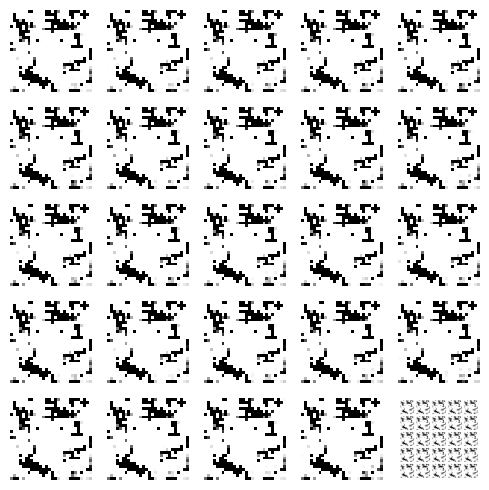

  0%|          | 0/350 [00:00<?, ?it/s]

4/4 [==============================] - 0s 18ms/step


  0%|          | 1/350 [00:00<03:06,  1.87it/s]

4/4 [==============================] - 0s 14ms/step


  1%|          | 2/350 [00:01<02:54,  1.99it/s]

4/4 [==============================] - 0s 27ms/step


  1%|          | 3/350 [00:01<03:04,  1.88it/s]

4/4 [==============================] - 0s 14ms/step


  1%|          | 4/350 [00:02<02:58,  1.93it/s]

4/4 [==============================] - 0s 14ms/step


  1%|▏         | 5/350 [00:02<03:02,  1.89it/s]

4/4 [==============================] - 0s 14ms/step


  2%|▏         | 6/350 [00:03<03:05,  1.86it/s]

4/4 [==============================] - 0s 14ms/step


  2%|▏         | 7/350 [00:03<03:00,  1.90it/s]

4/4 [==============================] - 0s 13ms/step


  2%|▏         | 8/350 [00:04<03:05,  1.85it/s]

4/4 [==============================] - 0s 13ms/step


  3%|▎         | 9/350 [00:04<02:58,  1.91it/s]

4/4 [==============================] - 0s 13ms/step


  3%|▎         | 10/350 [00:05<03:01,  1.88it/s]

4/4 [==============================] - 0s 14ms/step


  3%|▎         | 11/350 [00:05<02:55,  1.94it/s]

4/4 [==============================] - 0s 13ms/step


  3%|▎         | 12/350 [00:06<02:57,  1.90it/s]

4/4 [==============================] - 0s 13ms/step


  4%|▎         | 13/350 [00:06<02:55,  1.92it/s]

4/4 [==============================] - 0s 14ms/step


  4%|▍         | 14/350 [00:07<02:58,  1.88it/s]

4/4 [==============================] - 0s 13ms/step


  4%|▍         | 15/350 [00:07<02:53,  1.93it/s]

4/4 [==============================] - 0s 15ms/step


  5%|▍         | 16/350 [00:08<02:54,  1.92it/s]

4/4 [==============================] - 0s 14ms/step


  5%|▍         | 17/350 [00:08<02:56,  1.88it/s]

4/4 [==============================] - 0s 14ms/step


  5%|▌         | 18/350 [00:09<02:51,  1.94it/s]

4/4 [==============================] - 0s 14ms/step


  5%|▌         | 19/350 [00:09<02:55,  1.89it/s]

4/4 [==============================] - 0s 15ms/step


  6%|▌         | 20/350 [00:10<02:51,  1.93it/s]

4/4 [==============================] - 0s 13ms/step


  6%|▌         | 21/350 [00:11<02:54,  1.89it/s]

4/4 [==============================] - 0s 14ms/step


  6%|▋         | 22/350 [00:11<02:49,  1.94it/s]

4/4 [==============================] - 0s 14ms/step


  7%|▋         | 23/350 [00:12<02:51,  1.91it/s]

4/4 [==============================] - 0s 14ms/step


  7%|▋         | 24/350 [00:12<02:47,  1.95it/s]

4/4 [==============================] - 0s 14ms/step


  7%|▋         | 25/350 [00:13<02:48,  1.93it/s]

4/4 [==============================] - 0s 13ms/step


  7%|▋         | 26/350 [00:13<02:52,  1.88it/s]

4/4 [==============================] - 0s 14ms/step


  8%|▊         | 27/350 [00:14<02:48,  1.92it/s]

4/4 [==============================] - 0s 14ms/step


  8%|▊         | 28/350 [00:14<02:50,  1.89it/s]

4/4 [==============================] - 0s 13ms/step


  8%|▊         | 29/350 [00:15<02:46,  1.93it/s]

4/4 [==============================] - 0s 14ms/step


  9%|▊         | 30/350 [00:15<02:49,  1.89it/s]

4/4 [==============================] - 0s 13ms/step


  9%|▉         | 31/350 [00:16<02:51,  1.86it/s]

4/4 [==============================] - 0s 14ms/step


  9%|▉         | 32/350 [00:16<02:46,  1.92it/s]

4/4 [==============================] - 0s 14ms/step


  9%|▉         | 33/350 [00:17<02:50,  1.86it/s]

4/4 [==============================] - 0s 14ms/step


 10%|▉         | 34/350 [00:17<02:43,  1.93it/s]

4/4 [==============================] - 0s 14ms/step


 10%|█         | 35/350 [00:18<02:46,  1.89it/s]

4/4 [==============================] - 0s 14ms/step


 10%|█         | 36/350 [00:18<02:41,  1.95it/s]

4/4 [==============================] - 0s 15ms/step


 11%|█         | 37/350 [00:19<02:45,  1.89it/s]

4/4 [==============================] - 0s 14ms/step


 11%|█         | 38/350 [00:19<02:40,  1.94it/s]

4/4 [==============================] - 0s 13ms/step


 11%|█         | 39/350 [00:20<02:45,  1.88it/s]

4/4 [==============================] - 0s 14ms/step


 11%|█▏        | 40/350 [00:20<02:41,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


 12%|█▏        | 41/350 [00:21<02:43,  1.89it/s]

4/4 [==============================] - 0s 14ms/step


 12%|█▏        | 42/350 [00:22<02:39,  1.93it/s]

4/4 [==============================] - 0s 14ms/step


 12%|█▏        | 43/350 [00:22<02:42,  1.89it/s]

4/4 [==============================] - 0s 13ms/step


 13%|█▎        | 44/350 [00:23<02:38,  1.93it/s]

4/4 [==============================] - 0s 14ms/step


 13%|█▎        | 45/350 [00:23<02:43,  1.87it/s]

4/4 [==============================] - 0s 16ms/step


 13%|█▎        | 46/350 [00:24<02:39,  1.90it/s]

4/4 [==============================] - 0s 14ms/step


 13%|█▎        | 47/350 [00:24<02:42,  1.86it/s]

4/4 [==============================] - 0s 13ms/step


 14%|█▎        | 48/350 [00:25<02:37,  1.92it/s]

4/4 [==============================] - 0s 12ms/step


 14%|█▍        | 49/350 [00:25<02:39,  1.89it/s]

4/4 [==============================] - 0s 13ms/step


 14%|█▍        | 50/350 [00:26<02:35,  1.93it/s]

4/4 [==============================] - 0s 14ms/step


 15%|█▍        | 51/350 [00:26<02:36,  1.91it/s]

4/4 [==============================] - 0s 13ms/step


 15%|█▍        | 52/350 [00:27<02:34,  1.93it/s]

4/4 [==============================] - 0s 14ms/step


 15%|█▌        | 53/350 [00:27<02:37,  1.89it/s]

4/4 [==============================] - 0s 13ms/step


 15%|█▌        | 54/350 [00:28<02:31,  1.95it/s]

4/4 [==============================] - 0s 13ms/step


 16%|█▌        | 55/350 [00:28<02:34,  1.91it/s]

4/4 [==============================] - 0s 16ms/step


 16%|█▌        | 56/350 [00:29<02:30,  1.95it/s]

4/4 [==============================] - 0s 14ms/step


 16%|█▋        | 57/350 [00:29<02:33,  1.91it/s]

4/4 [==============================] - 0s 13ms/step


 17%|█▋        | 58/350 [00:30<02:28,  1.97it/s]

4/4 [==============================] - 0s 19ms/step


 17%|█▋        | 59/350 [00:30<02:33,  1.89it/s]

4/4 [==============================] - 0s 14ms/step


 17%|█▋        | 60/350 [00:31<02:29,  1.94it/s]

4/4 [==============================] - 0s 13ms/step


 17%|█▋        | 61/350 [00:31<02:32,  1.90it/s]

4/4 [==============================] - 0s 13ms/step


 18%|█▊        | 62/350 [00:32<02:27,  1.95it/s]

4/4 [==============================] - 0s 13ms/step


 18%|█▊        | 63/350 [00:33<02:30,  1.90it/s]

4/4 [==============================] - 0s 13ms/step


 18%|█▊        | 64/350 [00:33<02:32,  1.87it/s]

4/4 [==============================] - 0s 14ms/step


 19%|█▊        | 65/350 [00:34<02:28,  1.91it/s]

4/4 [==============================] - 0s 14ms/step


 19%|█▉        | 66/350 [00:34<02:29,  1.90it/s]

4/4 [==============================] - 0s 13ms/step


 19%|█▉        | 67/350 [00:35<02:29,  1.89it/s]

4/4 [==============================] - 0s 14ms/step


 19%|█▉        | 68/350 [00:35<02:35,  1.82it/s]

4/4 [==============================] - 0s 14ms/step


 20%|█▉        | 69/350 [00:36<02:29,  1.88it/s]

4/4 [==============================] - 0s 13ms/step


 20%|██        | 70/350 [00:36<02:30,  1.86it/s]

4/4 [==============================] - 0s 13ms/step


 20%|██        | 71/350 [00:37<02:31,  1.84it/s]

4/4 [==============================] - 0s 18ms/step


 21%|██        | 72/350 [00:37<02:26,  1.89it/s]

4/4 [==============================] - 0s 13ms/step


 21%|██        | 73/350 [00:38<02:27,  1.88it/s]

4/4 [==============================] - 0s 14ms/step


 21%|██        | 74/350 [00:38<02:22,  1.93it/s]

4/4 [==============================] - 0s 13ms/step


 21%|██▏       | 75/350 [00:39<02:25,  1.88it/s]

4/4 [==============================] - 0s 13ms/step


 22%|██▏       | 76/350 [00:39<02:21,  1.94it/s]

4/4 [==============================] - 0s 15ms/step


 22%|██▏       | 77/350 [00:40<02:23,  1.90it/s]

4/4 [==============================] - 0s 14ms/step


 22%|██▏       | 78/350 [00:40<02:20,  1.93it/s]

4/4 [==============================] - 0s 13ms/step


 23%|██▎       | 79/350 [00:41<02:23,  1.89it/s]

4/4 [==============================] - 0s 14ms/step


 23%|██▎       | 80/350 [00:41<02:18,  1.95it/s]

4/4 [==============================] - 0s 14ms/step


 23%|██▎       | 81/350 [00:42<02:21,  1.90it/s]

4/4 [==============================] - 0s 13ms/step


 23%|██▎       | 82/350 [00:43<02:18,  1.93it/s]

4/4 [==============================] - 0s 13ms/step


 24%|██▎       | 83/350 [00:43<02:19,  1.91it/s]

4/4 [==============================] - 0s 13ms/step


 24%|██▍       | 84/350 [00:44<02:15,  1.96it/s]

4/4 [==============================] - 0s 16ms/step


 24%|██▍       | 85/350 [00:44<02:19,  1.90it/s]

4/4 [==============================] - 0s 14ms/step


 25%|██▍       | 86/350 [00:45<02:19,  1.90it/s]

4/4 [==============================] - 0s 14ms/step


 25%|██▍       | 87/350 [00:45<02:21,  1.86it/s]

4/4 [==============================] - 0s 13ms/step


 25%|██▌       | 88/350 [00:46<02:16,  1.92it/s]

4/4 [==============================] - 0s 14ms/step


 25%|██▌       | 89/350 [00:46<02:18,  1.89it/s]

4/4 [==============================] - 0s 14ms/step


 26%|██▌       | 90/350 [00:47<02:14,  1.93it/s]

4/4 [==============================] - 0s 13ms/step


 26%|██▌       | 91/350 [00:47<02:18,  1.87it/s]

4/4 [==============================] - 0s 14ms/step


 26%|██▋       | 92/350 [00:48<02:14,  1.92it/s]

4/4 [==============================] - 0s 14ms/step


 27%|██▋       | 93/350 [00:48<02:16,  1.89it/s]

4/4 [==============================] - 0s 15ms/step


 27%|██▋       | 94/350 [00:49<02:12,  1.93it/s]

4/4 [==============================] - 0s 13ms/step


 27%|██▋       | 95/350 [00:49<02:14,  1.90it/s]

4/4 [==============================] - 0s 14ms/step


 27%|██▋       | 96/350 [00:50<02:09,  1.96it/s]

4/4 [==============================] - 0s 14ms/step


 28%|██▊       | 97/350 [00:50<02:11,  1.92it/s]

4/4 [==============================] - 0s 18ms/step


 28%|██▊       | 98/350 [00:51<02:09,  1.95it/s]

4/4 [==============================] - 0s 14ms/step


 28%|██▊       | 99/350 [00:51<02:11,  1.91it/s]

4/4 [==============================] - 0s 13ms/step


 29%|██▊       | 100/350 [00:52<02:08,  1.95it/s]

4/4 [==============================] - 0s 13ms/step


 29%|██▉       | 101/350 [00:52<02:11,  1.90it/s]

4/4 [==============================] - 0s 14ms/step


 29%|██▉       | 102/350 [00:53<02:07,  1.95it/s]

4/4 [==============================] - 0s 14ms/step


 29%|██▉       | 103/350 [00:54<02:09,  1.90it/s]

4/4 [==============================] - 0s 13ms/step


 30%|██▉       | 104/350 [00:54<02:07,  1.93it/s]

4/4 [==============================] - 0s 13ms/step


 30%|███       | 105/350 [00:55<02:10,  1.88it/s]

4/4 [==============================] - 0s 13ms/step


 30%|███       | 106/350 [00:55<02:06,  1.93it/s]

4/4 [==============================] - 0s 13ms/step


 31%|███       | 107/350 [00:56<02:09,  1.88it/s]

4/4 [==============================] - 0s 14ms/step


 31%|███       | 108/350 [00:56<02:05,  1.93it/s]

4/4 [==============================] - 0s 12ms/step


 31%|███       | 109/350 [00:57<02:07,  1.89it/s]

4/4 [==============================] - 0s 13ms/step


 31%|███▏      | 110/350 [00:57<02:03,  1.94it/s]

4/4 [==============================] - 0s 31ms/step


 32%|███▏      | 111/350 [00:58<02:07,  1.87it/s]

4/4 [==============================] - 0s 13ms/step


 32%|███▏      | 112/350 [00:58<02:03,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


 32%|███▏      | 113/350 [00:59<02:06,  1.88it/s]

4/4 [==============================] - 0s 14ms/step


 33%|███▎      | 114/350 [00:59<02:01,  1.94it/s]

4/4 [==============================] - 0s 13ms/step


 33%|███▎      | 115/350 [01:00<02:03,  1.91it/s]

4/4 [==============================] - 0s 14ms/step


 33%|███▎      | 116/350 [01:00<01:59,  1.96it/s]

4/4 [==============================] - 0s 14ms/step


 33%|███▎      | 117/350 [01:01<02:03,  1.88it/s]

4/4 [==============================] - 0s 14ms/step


 34%|███▎      | 118/350 [01:01<02:04,  1.86it/s]

4/4 [==============================] - 0s 13ms/step


 34%|███▍      | 119/350 [01:02<02:00,  1.92it/s]

4/4 [==============================] - 0s 14ms/step


 34%|███▍      | 120/350 [01:02<02:01,  1.89it/s]

4/4 [==============================] - 0s 14ms/step


 35%|███▍      | 121/350 [01:03<01:57,  1.94it/s]

4/4 [==============================] - 0s 13ms/step


 35%|███▍      | 122/350 [01:03<02:00,  1.90it/s]

4/4 [==============================] - 0s 14ms/step


 35%|███▌      | 123/350 [01:04<01:56,  1.95it/s]

4/4 [==============================] - 0s 15ms/step


 35%|███▌      | 124/350 [01:05<01:59,  1.90it/s]

4/4 [==============================] - 0s 13ms/step


 36%|███▌      | 125/350 [01:05<01:54,  1.96it/s]

4/4 [==============================] - 0s 13ms/step


 36%|███▌      | 126/350 [01:06<01:57,  1.91it/s]

4/4 [==============================] - 0s 11ms/step


 36%|███▋      | 127/350 [01:06<01:53,  1.96it/s]

4/4 [==============================] - 0s 13ms/step


 37%|███▋      | 128/350 [01:07<01:56,  1.91it/s]

4/4 [==============================] - 0s 13ms/step


 37%|███▋      | 129/350 [01:07<01:53,  1.95it/s]

4/4 [==============================] - 0s 13ms/step


 37%|███▋      | 130/350 [01:08<01:57,  1.87it/s]

4/4 [==============================] - 0s 14ms/step


 37%|███▋      | 131/350 [01:08<01:53,  1.93it/s]

4/4 [==============================] - 0s 13ms/step


 38%|███▊      | 132/350 [01:09<01:55,  1.88it/s]

4/4 [==============================] - 0s 13ms/step


 38%|███▊      | 133/350 [01:09<01:52,  1.94it/s]

4/4 [==============================] - 0s 14ms/step


 38%|███▊      | 134/350 [01:10<01:54,  1.89it/s]

4/4 [==============================] - 0s 13ms/step


 39%|███▊      | 135/350 [01:10<01:50,  1.94it/s]

4/4 [==============================] - 0s 13ms/step


 39%|███▉      | 136/350 [01:11<01:53,  1.89it/s]

4/4 [==============================] - 0s 18ms/step


 39%|███▉      | 137/350 [01:11<01:51,  1.91it/s]

4/4 [==============================] - 0s 14ms/step


 39%|███▉      | 138/350 [01:12<01:53,  1.87it/s]

4/4 [==============================] - 0s 14ms/step


 40%|███▉      | 139/350 [01:12<01:49,  1.92it/s]

4/4 [==============================] - 0s 14ms/step


 40%|████      | 140/350 [01:13<01:52,  1.87it/s]

4/4 [==============================] - 0s 13ms/step


 40%|████      | 141/350 [01:13<01:48,  1.93it/s]

4/4 [==============================] - 0s 16ms/step


 41%|████      | 142/350 [01:14<01:49,  1.89it/s]

4/4 [==============================] - 0s 14ms/step


 41%|████      | 143/350 [01:14<01:47,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


 41%|████      | 144/350 [01:15<01:49,  1.88it/s]

4/4 [==============================] - 0s 13ms/step


 41%|████▏     | 145/350 [01:15<01:45,  1.93it/s]

4/4 [==============================] - 0s 13ms/step


 42%|████▏     | 146/350 [01:16<01:47,  1.89it/s]

4/4 [==============================] - 0s 13ms/step


 42%|████▏     | 147/350 [01:17<01:45,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


 42%|████▏     | 148/350 [01:17<01:47,  1.88it/s]

4/4 [==============================] - 0s 13ms/step


 43%|████▎     | 149/350 [01:18<01:44,  1.93it/s]

4/4 [==============================] - 0s 15ms/step


 43%|████▎     | 150/350 [01:18<01:46,  1.88it/s]

4/4 [==============================] - 0s 15ms/step


 43%|████▎     | 151/350 [01:19<01:42,  1.94it/s]

4/4 [==============================] - 0s 13ms/step


 43%|████▎     | 152/350 [01:19<01:43,  1.91it/s]

4/4 [==============================] - 0s 13ms/step


 44%|████▎     | 153/350 [01:20<01:40,  1.96it/s]

4/4 [==============================] - 0s 13ms/step


 44%|████▍     | 154/350 [01:20<01:41,  1.93it/s]

4/4 [==============================] - 0s 12ms/step


 44%|████▍     | 155/350 [01:21<01:42,  1.91it/s]

4/4 [==============================] - 0s 13ms/step


 45%|████▍     | 156/350 [01:21<01:40,  1.94it/s]

4/4 [==============================] - 0s 13ms/step


 45%|████▍     | 157/350 [01:22<01:41,  1.91it/s]

4/4 [==============================] - 0s 12ms/step


 45%|████▌     | 158/350 [01:22<01:42,  1.88it/s]

4/4 [==============================] - 0s 14ms/step


 45%|████▌     | 159/350 [01:23<01:38,  1.93it/s]

4/4 [==============================] - 0s 14ms/step


 46%|████▌     | 160/350 [01:23<01:39,  1.92it/s]

4/4 [==============================] - 0s 12ms/step


 46%|████▌     | 161/350 [01:24<01:39,  1.90it/s]

4/4 [==============================] - 0s 13ms/step


 46%|████▋     | 162/350 [01:24<01:36,  1.95it/s]

4/4 [==============================] - 0s 22ms/step


 47%|████▋     | 163/350 [01:25<01:38,  1.90it/s]

4/4 [==============================] - 0s 13ms/step


 47%|████▋     | 164/350 [01:25<01:34,  1.96it/s]

4/4 [==============================] - 0s 14ms/step


 47%|████▋     | 165/350 [01:26<01:37,  1.91it/s]

4/4 [==============================] - 0s 13ms/step


 47%|████▋     | 166/350 [01:26<01:33,  1.96it/s]

4/4 [==============================] - 0s 13ms/step


 48%|████▊     | 167/350 [01:27<01:35,  1.91it/s]

4/4 [==============================] - 0s 13ms/step


 48%|████▊     | 168/350 [01:27<01:33,  1.95it/s]

4/4 [==============================] - 0s 14ms/step


 48%|████▊     | 169/350 [01:28<01:36,  1.88it/s]

4/4 [==============================] - 0s 12ms/step


 49%|████▊     | 170/350 [01:29<01:33,  1.93it/s]

4/4 [==============================] - 0s 13ms/step


 49%|████▉     | 171/350 [01:29<01:30,  1.97it/s]

4/4 [==============================] - 0s 23ms/step


 49%|████▉     | 172/350 [01:30<01:32,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


 49%|████▉     | 173/350 [01:30<01:33,  1.90it/s]

4/4 [==============================] - 0s 13ms/step


 50%|████▉     | 174/350 [01:31<01:30,  1.94it/s]

4/4 [==============================] - 0s 13ms/step


 50%|█████     | 175/350 [01:31<01:32,  1.90it/s]

4/4 [==============================] - 0s 19ms/step


 50%|█████     | 176/350 [01:32<01:30,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


 51%|█████     | 177/350 [01:32<01:31,  1.90it/s]

4/4 [==============================] - 0s 13ms/step


 51%|█████     | 178/350 [01:33<01:29,  1.93it/s]

4/4 [==============================] - 0s 13ms/step


 51%|█████     | 179/350 [01:33<01:29,  1.91it/s]

4/4 [==============================] - 0s 13ms/step


 51%|█████▏    | 180/350 [01:34<01:27,  1.95it/s]

4/4 [==============================] - 0s 13ms/step


 52%|█████▏    | 181/350 [01:34<01:28,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


 52%|█████▏    | 182/350 [01:35<01:26,  1.94it/s]

4/4 [==============================] - 0s 13ms/step


 52%|█████▏    | 183/350 [01:35<01:27,  1.91it/s]

4/4 [==============================] - 0s 13ms/step


 53%|█████▎    | 184/350 [01:36<01:24,  1.96it/s]

4/4 [==============================] - 0s 12ms/step


 53%|█████▎    | 185/350 [01:36<01:22,  1.99it/s]

4/4 [==============================] - 0s 26ms/step


 53%|█████▎    | 186/350 [01:37<01:25,  1.92it/s]

4/4 [==============================] - 0s 14ms/step


 53%|█████▎    | 187/350 [01:37<01:25,  1.90it/s]

4/4 [==============================] - 0s 14ms/step


 54%|█████▎    | 188/350 [01:38<01:23,  1.94it/s]

4/4 [==============================] - 0s 19ms/step


 54%|█████▍    | 189/350 [01:38<01:25,  1.88it/s]

4/4 [==============================] - 0s 13ms/step


 54%|█████▍    | 190/350 [01:39<01:22,  1.94it/s]

4/4 [==============================] - 0s 13ms/step


 55%|█████▍    | 191/350 [01:39<01:23,  1.90it/s]

4/4 [==============================] - 0s 13ms/step


 55%|█████▍    | 192/350 [01:40<01:21,  1.95it/s]

4/4 [==============================] - 0s 12ms/step


 55%|█████▌    | 193/350 [01:40<01:21,  1.92it/s]

4/4 [==============================] - 0s 14ms/step


 55%|█████▌    | 194/350 [01:41<01:22,  1.89it/s]

4/4 [==============================] - 0s 12ms/step


 56%|█████▌    | 195/350 [01:42<01:20,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


 56%|█████▌    | 196/350 [01:42<01:21,  1.90it/s]

4/4 [==============================] - 0s 13ms/step


 56%|█████▋    | 197/350 [01:43<01:18,  1.94it/s]

4/4 [==============================] - 0s 13ms/step


 57%|█████▋    | 198/350 [01:43<01:19,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


 57%|█████▋    | 199/350 [01:44<01:17,  1.96it/s]

4/4 [==============================] - 0s 13ms/step


 57%|█████▋    | 200/350 [01:44<01:17,  1.93it/s]

4/4 [==============================] - 0s 14ms/step


 57%|█████▋    | 201/350 [01:45<01:15,  1.97it/s]

4/4 [==============================] - 0s 19ms/step


 58%|█████▊    | 202/350 [01:45<01:18,  1.89it/s]

4/4 [==============================] - 0s 13ms/step


 58%|█████▊    | 203/350 [01:46<01:16,  1.93it/s]

4/4 [==============================] - 0s 13ms/step


 58%|█████▊    | 204/350 [01:46<01:17,  1.88it/s]

4/4 [==============================] - 0s 13ms/step


 59%|█████▊    | 205/350 [01:47<01:15,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


 59%|█████▉    | 206/350 [01:47<01:16,  1.89it/s]

4/4 [==============================] - 0s 13ms/step


 59%|█████▉    | 207/350 [01:48<01:13,  1.93it/s]

4/4 [==============================] - 0s 13ms/step


 59%|█████▉    | 208/350 [01:48<01:15,  1.88it/s]

4/4 [==============================] - 0s 13ms/step


 60%|█████▉    | 209/350 [01:49<01:12,  1.95it/s]

4/4 [==============================] - 0s 14ms/step


 60%|██████    | 210/350 [01:49<01:13,  1.90it/s]

4/4 [==============================] - 0s 12ms/step


 60%|██████    | 211/350 [01:50<01:11,  1.94it/s]

4/4 [==============================] - 0s 13ms/step


 61%|██████    | 212/350 [01:50<01:12,  1.91it/s]

4/4 [==============================] - 0s 15ms/step


 61%|██████    | 213/350 [01:51<01:10,  1.95it/s]

4/4 [==============================] - 0s 14ms/step


 61%|██████    | 214/350 [01:51<01:09,  1.97it/s]

4/4 [==============================] - 0s 27ms/step


 61%|██████▏   | 215/350 [01:52<01:10,  1.90it/s]

4/4 [==============================] - 0s 14ms/step


 62%|██████▏   | 216/350 [01:52<01:11,  1.88it/s]

4/4 [==============================] - 0s 13ms/step


 62%|██████▏   | 217/350 [01:53<01:09,  1.92it/s]

4/4 [==============================] - 0s 11ms/step


 62%|██████▏   | 218/350 [01:53<01:07,  1.96it/s]

4/4 [==============================] - 0s 17ms/step


 63%|██████▎   | 219/350 [01:54<01:07,  1.94it/s]

4/4 [==============================] - 0s 13ms/step


 63%|██████▎   | 220/350 [01:55<01:08,  1.90it/s]

4/4 [==============================] - 0s 13ms/step


 63%|██████▎   | 221/350 [01:55<01:06,  1.94it/s]

4/4 [==============================] - 0s 13ms/step


 63%|██████▎   | 222/350 [01:56<01:07,  1.89it/s]

4/4 [==============================] - 0s 13ms/step


 64%|██████▎   | 223/350 [01:56<01:05,  1.93it/s]

4/4 [==============================] - 0s 13ms/step


 64%|██████▍   | 224/350 [01:57<01:06,  1.89it/s]

4/4 [==============================] - 0s 13ms/step


 64%|██████▍   | 225/350 [01:57<01:04,  1.94it/s]

4/4 [==============================] - 0s 14ms/step


 65%|██████▍   | 226/350 [01:58<01:05,  1.88it/s]

4/4 [==============================] - 0s 13ms/step


 65%|██████▍   | 227/350 [01:58<01:03,  1.94it/s]

4/4 [==============================] - 0s 15ms/step


 65%|██████▌   | 228/350 [01:59<01:05,  1.87it/s]

4/4 [==============================] - 0s 13ms/step


 65%|██████▌   | 229/350 [01:59<01:04,  1.86it/s]

4/4 [==============================] - 0s 13ms/step


 66%|██████▌   | 230/350 [02:00<01:02,  1.93it/s]

4/4 [==============================] - 0s 13ms/step


 66%|██████▌   | 231/350 [02:00<01:03,  1.89it/s]

4/4 [==============================] - 0s 13ms/step


 66%|██████▋   | 232/350 [02:01<01:01,  1.93it/s]

4/4 [==============================] - 0s 13ms/step


 67%|██████▋   | 233/350 [02:01<01:01,  1.91it/s]

4/4 [==============================] - 0s 14ms/step


 67%|██████▋   | 234/350 [02:02<01:00,  1.93it/s]

4/4 [==============================] - 0s 13ms/step


 67%|██████▋   | 235/350 [02:02<01:01,  1.88it/s]

4/4 [==============================] - 0s 13ms/step


 67%|██████▋   | 236/350 [02:03<00:58,  1.94it/s]

4/4 [==============================] - 0s 13ms/step


 68%|██████▊   | 237/350 [02:03<00:59,  1.90it/s]

4/4 [==============================] - 0s 14ms/step


 68%|██████▊   | 238/350 [02:04<00:57,  1.95it/s]

4/4 [==============================] - 0s 13ms/step


 68%|██████▊   | 239/350 [02:04<00:58,  1.91it/s]

4/4 [==============================] - 0s 13ms/step


 69%|██████▊   | 240/350 [02:05<00:56,  1.95it/s]

4/4 [==============================] - 0s 15ms/step


 69%|██████▉   | 241/350 [02:06<00:57,  1.90it/s]

4/4 [==============================] - 0s 13ms/step


 69%|██████▉   | 242/350 [02:06<00:55,  1.95it/s]

4/4 [==============================] - 0s 12ms/step


 69%|██████▉   | 243/350 [02:07<00:56,  1.90it/s]

4/4 [==============================] - 0s 13ms/step


 70%|██████▉   | 244/350 [02:07<00:54,  1.96it/s]

4/4 [==============================] - 0s 13ms/step


 70%|███████   | 245/350 [02:08<00:54,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


 70%|███████   | 246/350 [02:08<00:52,  1.97it/s]

4/4 [==============================] - 0s 13ms/step


 71%|███████   | 247/350 [02:09<00:54,  1.88it/s]

4/4 [==============================] - 0s 13ms/step


 71%|███████   | 248/350 [02:09<00:52,  1.93it/s]

4/4 [==============================] - 0s 12ms/step


 71%|███████   | 249/350 [02:10<00:53,  1.89it/s]

4/4 [==============================] - 0s 13ms/step


 71%|███████▏  | 250/350 [02:10<00:51,  1.94it/s]

4/4 [==============================] - 0s 13ms/step


 72%|███████▏  | 251/350 [02:11<00:52,  1.89it/s]

4/4 [==============================] - 0s 13ms/step


 72%|███████▏  | 252/350 [02:11<00:49,  1.96it/s]

4/4 [==============================] - 0s 13ms/step


 72%|███████▏  | 253/350 [02:12<00:50,  1.91it/s]

4/4 [==============================] - 0s 20ms/step


 73%|███████▎  | 254/350 [02:12<00:49,  1.92it/s]

4/4 [==============================] - 0s 14ms/step


 73%|███████▎  | 255/350 [02:13<00:50,  1.88it/s]

4/4 [==============================] - 0s 13ms/step


 73%|███████▎  | 256/350 [02:13<00:48,  1.94it/s]

4/4 [==============================] - 0s 13ms/step


 73%|███████▎  | 257/350 [02:14<00:48,  1.92it/s]

4/4 [==============================] - 0s 11ms/step


 74%|███████▎  | 258/350 [02:14<00:46,  1.96it/s]

4/4 [==============================] - 0s 13ms/step


 74%|███████▍  | 259/350 [02:15<00:47,  1.93it/s]

4/4 [==============================] - 0s 13ms/step


 74%|███████▍  | 260/350 [02:15<00:46,  1.95it/s]

4/4 [==============================] - 0s 13ms/step


 75%|███████▍  | 261/350 [02:16<00:46,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


 75%|███████▍  | 262/350 [02:16<00:44,  1.97it/s]

4/4 [==============================] - 0s 14ms/step


 75%|███████▌  | 263/350 [02:17<00:45,  1.92it/s]

4/4 [==============================] - 0s 14ms/step


 75%|███████▌  | 264/350 [02:17<00:43,  1.96it/s]

4/4 [==============================] - 0s 13ms/step


 76%|███████▌  | 265/350 [02:18<00:43,  1.93it/s]

4/4 [==============================] - 0s 12ms/step


 76%|███████▌  | 266/350 [02:18<00:43,  1.91it/s]

4/4 [==============================] - 0s 14ms/step


 76%|███████▋  | 267/350 [02:19<00:42,  1.95it/s]

4/4 [==============================] - 0s 13ms/step


 77%|███████▋  | 268/350 [02:20<00:43,  1.91it/s]

4/4 [==============================] - 0s 23ms/step


 77%|███████▋  | 269/350 [02:20<00:43,  1.87it/s]

4/4 [==============================] - 0s 13ms/step


 77%|███████▋  | 270/350 [02:21<00:41,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


 77%|███████▋  | 271/350 [02:21<00:41,  1.89it/s]

4/4 [==============================] - 0s 12ms/step


 78%|███████▊  | 272/350 [02:22<00:40,  1.94it/s]

4/4 [==============================] - 0s 12ms/step


 78%|███████▊  | 273/350 [02:22<00:41,  1.88it/s]

4/4 [==============================] - 0s 12ms/step


 78%|███████▊  | 274/350 [02:23<00:39,  1.93it/s]

4/4 [==============================] - 0s 13ms/step


 79%|███████▊  | 275/350 [02:23<00:39,  1.89it/s]

4/4 [==============================] - 0s 12ms/step


 79%|███████▉  | 276/350 [02:24<00:38,  1.94it/s]

4/4 [==============================] - 0s 13ms/step


 79%|███████▉  | 277/350 [02:24<00:38,  1.90it/s]

4/4 [==============================] - 0s 13ms/step


 79%|███████▉  | 278/350 [02:25<00:37,  1.95it/s]

4/4 [==============================] - 0s 14ms/step


 80%|███████▉  | 279/350 [02:25<00:37,  1.91it/s]

4/4 [==============================] - 0s 14ms/step


 80%|████████  | 280/350 [02:26<00:36,  1.94it/s]

4/4 [==============================] - 0s 13ms/step


 80%|████████  | 281/350 [02:26<00:36,  1.90it/s]

4/4 [==============================] - 0s 12ms/step


 81%|████████  | 282/350 [02:27<00:34,  1.96it/s]

4/4 [==============================] - 0s 13ms/step


 81%|████████  | 283/350 [02:27<00:35,  1.91it/s]

4/4 [==============================] - 0s 13ms/step


 81%|████████  | 284/350 [02:28<00:33,  1.97it/s]

4/4 [==============================] - 0s 13ms/step


 81%|████████▏ | 285/350 [02:28<00:33,  1.92it/s]

4/4 [==============================] - 0s 14ms/step


 82%|████████▏ | 286/350 [02:29<00:32,  1.94it/s]

4/4 [==============================] - 0s 12ms/step


 82%|████████▏ | 287/350 [02:29<00:33,  1.91it/s]

4/4 [==============================] - 0s 13ms/step


 82%|████████▏ | 288/350 [02:30<00:31,  1.95it/s]

4/4 [==============================] - 0s 13ms/step


 83%|████████▎ | 289/350 [02:30<00:31,  1.91it/s]

4/4 [==============================] - 0s 13ms/step


 83%|████████▎ | 290/350 [02:31<00:30,  1.96it/s]

4/4 [==============================] - 0s 14ms/step


 83%|████████▎ | 291/350 [02:31<00:31,  1.90it/s]

4/4 [==============================] - 0s 13ms/step


 83%|████████▎ | 292/350 [02:32<00:29,  1.95it/s]

4/4 [==============================] - 0s 14ms/step


 84%|████████▎ | 293/350 [02:33<00:30,  1.88it/s]

4/4 [==============================] - 0s 14ms/step


 84%|████████▍ | 294/350 [02:33<00:28,  1.93it/s]

4/4 [==============================] - 0s 13ms/step


 84%|████████▍ | 295/350 [02:34<00:29,  1.89it/s]

4/4 [==============================] - 0s 12ms/step


 85%|████████▍ | 296/350 [02:34<00:27,  1.96it/s]

4/4 [==============================] - 0s 13ms/step


 85%|████████▍ | 297/350 [02:35<00:27,  1.90it/s]

4/4 [==============================] - 0s 13ms/step


 85%|████████▌ | 298/350 [02:35<00:26,  1.94it/s]

4/4 [==============================] - 0s 12ms/step


 85%|████████▌ | 299/350 [02:36<00:26,  1.96it/s]

4/4 [==============================] - 0s 13ms/step


 86%|████████▌ | 300/350 [02:36<00:26,  1.92it/s]

4/4 [==============================] - 0s 14ms/step


 86%|████████▌ | 301/350 [02:37<00:25,  1.96it/s]

4/4 [==============================] - 0s 12ms/step


 86%|████████▋ | 302/350 [02:37<00:24,  1.92it/s]

4/4 [==============================] - 0s 28ms/step


 87%|████████▋ | 303/350 [02:38<00:25,  1.88it/s]

4/4 [==============================] - 0s 13ms/step


 87%|████████▋ | 304/350 [02:38<00:23,  1.93it/s]

4/4 [==============================] - 0s 13ms/step


 87%|████████▋ | 305/350 [02:39<00:23,  1.90it/s]

4/4 [==============================] - 0s 15ms/step


 87%|████████▋ | 306/350 [02:39<00:22,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


 88%|████████▊ | 307/350 [02:40<00:22,  1.88it/s]

4/4 [==============================] - 0s 13ms/step


 88%|████████▊ | 308/350 [02:40<00:21,  1.93it/s]

4/4 [==============================] - 0s 13ms/step


 88%|████████▊ | 309/350 [02:41<00:21,  1.90it/s]

4/4 [==============================] - 0s 12ms/step


 89%|████████▊ | 310/350 [02:41<00:20,  1.94it/s]

4/4 [==============================] - 0s 14ms/step


 89%|████████▉ | 311/350 [02:42<00:20,  1.90it/s]

4/4 [==============================] - 0s 13ms/step


 89%|████████▉ | 312/350 [02:42<00:19,  1.93it/s]

4/4 [==============================] - 0s 13ms/step


 89%|████████▉ | 313/350 [02:43<00:19,  1.90it/s]

4/4 [==============================] - 0s 13ms/step


 90%|████████▉ | 314/350 [02:43<00:18,  1.95it/s]

4/4 [==============================] - 0s 13ms/step


 90%|█████████ | 315/350 [02:44<00:18,  1.90it/s]

4/4 [==============================] - 0s 13ms/step


 90%|█████████ | 316/350 [02:44<00:17,  1.94it/s]

4/4 [==============================] - 0s 13ms/step


 91%|█████████ | 317/350 [02:45<00:17,  1.89it/s]

4/4 [==============================] - 0s 13ms/step


 91%|█████████ | 318/350 [02:46<00:16,  1.94it/s]

4/4 [==============================] - 0s 16ms/step


 91%|█████████ | 319/350 [02:46<00:16,  1.88it/s]

4/4 [==============================] - 0s 13ms/step


 91%|█████████▏| 320/350 [02:47<00:15,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


 92%|█████████▏| 321/350 [02:47<00:15,  1.88it/s]

4/4 [==============================] - 0s 13ms/step


 92%|█████████▏| 322/350 [02:48<00:14,  1.92it/s]

4/4 [==============================] - 0s 12ms/step


 92%|█████████▏| 323/350 [02:48<00:14,  1.90it/s]

4/4 [==============================] - 0s 13ms/step


 93%|█████████▎| 324/350 [02:49<00:13,  1.95it/s]

4/4 [==============================] - 0s 13ms/step


 93%|█████████▎| 325/350 [02:49<00:13,  1.88it/s]

4/4 [==============================] - 0s 12ms/step


 93%|█████████▎| 326/350 [02:50<00:12,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


 93%|█████████▎| 327/350 [02:50<00:12,  1.89it/s]

4/4 [==============================] - 0s 12ms/step


 94%|█████████▎| 328/350 [02:51<00:11,  1.95it/s]

4/4 [==============================] - 0s 13ms/step


 94%|█████████▍| 329/350 [02:51<00:11,  1.86it/s]

4/4 [==============================] - 0s 15ms/step


 94%|█████████▍| 330/350 [02:52<00:10,  1.91it/s]

4/4 [==============================] - 0s 13ms/step


 95%|█████████▍| 331/350 [02:52<00:10,  1.87it/s]

4/4 [==============================] - 0s 15ms/step


 95%|█████████▍| 332/350 [02:53<00:09,  1.91it/s]

4/4 [==============================] - 0s 12ms/step


 95%|█████████▌| 333/350 [02:53<00:09,  1.89it/s]

4/4 [==============================] - 0s 13ms/step


 95%|█████████▌| 334/350 [02:54<00:08,  1.95it/s]

4/4 [==============================] - 0s 13ms/step


 96%|█████████▌| 335/350 [02:54<00:07,  1.89it/s]

4/4 [==============================] - 0s 13ms/step


 96%|█████████▌| 336/350 [02:55<00:07,  1.95it/s]

4/4 [==============================] - 0s 13ms/step


 96%|█████████▋| 337/350 [02:56<00:06,  1.90it/s]

4/4 [==============================] - 0s 13ms/step


 97%|█████████▋| 338/350 [02:56<00:06,  1.93it/s]

4/4 [==============================] - 0s 13ms/step


 97%|█████████▋| 339/350 [02:57<00:05,  1.90it/s]

4/4 [==============================] - 0s 13ms/step


 97%|█████████▋| 340/350 [02:57<00:05,  1.90it/s]

4/4 [==============================] - 0s 13ms/step


 97%|█████████▋| 341/350 [02:58<00:04,  1.95it/s]

4/4 [==============================] - 0s 25ms/step


 98%|█████████▊| 342/350 [02:58<00:04,  1.90it/s]

4/4 [==============================] - 0s 13ms/step


 98%|█████████▊| 343/350 [02:59<00:03,  1.95it/s]

4/4 [==============================] - 0s 14ms/step


 98%|█████████▊| 344/350 [02:59<00:03,  1.91it/s]

4/4 [==============================] - 0s 15ms/step


 99%|█████████▊| 345/350 [03:00<00:02,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


 99%|█████████▉| 346/350 [03:00<00:02,  1.97it/s]

4/4 [==============================] - 0s 28ms/step


 99%|█████████▉| 347/350 [03:01<00:01,  1.93it/s]

4/4 [==============================] - 0s 13ms/step


 99%|█████████▉| 348/350 [03:01<00:01,  1.97it/s]

4/4 [==============================] - 0s 15ms/step


100%|█████████▉| 349/350 [03:02<00:00,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


100%|██████████| 350/350 [03:02<00:00,  1.92it/s]

Epoch number: 27 discriminator_loss: 0.165484749639623 generator_loss: 7.393523041861398
1/1 [==============================] - 0s 21ms/step


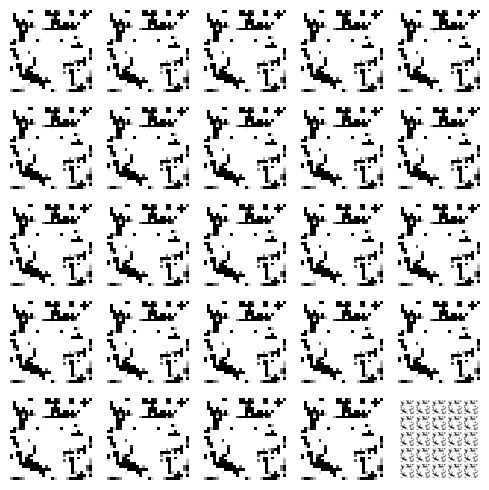

  0%|          | 0/350 [00:00<?, ?it/s]

4/4 [==============================] - 0s 16ms/step


  0%|          | 1/350 [00:00<02:58,  1.95it/s]

4/4 [==============================] - 0s 14ms/step


  1%|          | 2/350 [00:01<03:11,  1.82it/s]

4/4 [==============================] - 0s 30ms/step


  1%|          | 3/350 [00:01<03:26,  1.68it/s]

4/4 [==============================] - 0s 14ms/step


  1%|          | 4/350 [00:02<03:12,  1.80it/s]

4/4 [==============================] - 0s 14ms/step


  1%|▏         | 5/350 [00:02<03:13,  1.78it/s]

4/4 [==============================] - 0s 14ms/step


  2%|▏         | 6/350 [00:03<03:06,  1.84it/s]

4/4 [==============================] - 0s 13ms/step


  2%|▏         | 7/350 [00:03<03:08,  1.82it/s]

4/4 [==============================] - 0s 14ms/step


  2%|▏         | 8/350 [00:04<03:00,  1.89it/s]

4/4 [==============================] - 0s 12ms/step


  3%|▎         | 9/350 [00:04<03:03,  1.85it/s]

4/4 [==============================] - 0s 13ms/step


  3%|▎         | 10/350 [00:05<02:56,  1.92it/s]

4/4 [==============================] - 0s 12ms/step


  3%|▎         | 11/350 [00:05<02:59,  1.89it/s]

4/4 [==============================] - 0s 13ms/step


  3%|▎         | 12/350 [00:06<02:53,  1.95it/s]

4/4 [==============================] - 0s 14ms/step


  4%|▎         | 13/350 [00:06<02:58,  1.89it/s]

4/4 [==============================] - 0s 13ms/step


  4%|▍         | 14/350 [00:07<02:52,  1.95it/s]

4/4 [==============================] - 0s 13ms/step


  4%|▍         | 15/350 [00:07<02:49,  1.98it/s]

4/4 [==============================] - 0s 27ms/step


  5%|▍         | 16/350 [00:08<02:52,  1.93it/s]

4/4 [==============================] - 0s 13ms/step


  5%|▍         | 17/350 [00:08<02:49,  1.97it/s]

4/4 [==============================] - 0s 13ms/step


  5%|▌         | 18/350 [00:09<02:52,  1.93it/s]

4/4 [==============================] - 0s 12ms/step


  5%|▌         | 19/350 [00:10<02:52,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


  6%|▌         | 20/350 [00:10<02:55,  1.88it/s]

4/4 [==============================] - 0s 14ms/step


  6%|▌         | 21/350 [00:11<02:50,  1.93it/s]

4/4 [==============================] - 0s 13ms/step


  6%|▋         | 22/350 [00:11<02:52,  1.91it/s]

4/4 [==============================] - 0s 13ms/step


  7%|▋         | 23/350 [00:12<02:47,  1.96it/s]

4/4 [==============================] - 0s 13ms/step


  7%|▋         | 24/350 [00:12<02:49,  1.92it/s]

4/4 [==============================] - 0s 14ms/step


  7%|▋         | 25/350 [00:13<02:45,  1.96it/s]

4/4 [==============================] - 0s 14ms/step


  7%|▋         | 26/350 [00:13<02:50,  1.90it/s]

4/4 [==============================] - 0s 13ms/step


  8%|▊         | 27/350 [00:14<02:46,  1.94it/s]

4/4 [==============================] - 0s 13ms/step


  8%|▊         | 28/350 [00:14<02:48,  1.91it/s]

4/4 [==============================] - 0s 13ms/step


  8%|▊         | 29/350 [00:15<02:43,  1.96it/s]

4/4 [==============================] - 0s 13ms/step


  9%|▊         | 30/350 [00:15<02:47,  1.91it/s]

4/4 [==============================] - 0s 13ms/step


  9%|▉         | 31/350 [00:16<02:42,  1.96it/s]

4/4 [==============================] - 0s 13ms/step


  9%|▉         | 32/350 [00:16<02:49,  1.88it/s]

4/4 [==============================] - 0s 12ms/step


  9%|▉         | 33/350 [00:17<02:43,  1.94it/s]

4/4 [==============================] - 0s 13ms/step


 10%|▉         | 34/350 [00:17<02:45,  1.90it/s]

4/4 [==============================] - 0s 14ms/step


 10%|█         | 35/350 [00:18<02:41,  1.95it/s]

4/4 [==============================] - 0s 13ms/step


 10%|█         | 36/350 [00:18<02:45,  1.90it/s]

4/4 [==============================] - 0s 14ms/step


 11%|█         | 37/350 [00:19<02:40,  1.96it/s]

4/4 [==============================] - 0s 13ms/step


 11%|█         | 38/350 [00:19<02:44,  1.90it/s]

4/4 [==============================] - 0s 18ms/step


 11%|█         | 39/350 [00:20<02:40,  1.94it/s]

4/4 [==============================] - 0s 13ms/step


 11%|█▏        | 40/350 [00:20<02:44,  1.89it/s]

4/4 [==============================] - 0s 13ms/step


 12%|█▏        | 41/350 [00:21<02:39,  1.93it/s]

4/4 [==============================] - 0s 12ms/step


 12%|█▏        | 42/350 [00:22<02:42,  1.90it/s]

4/4 [==============================] - 0s 14ms/step


 12%|█▏        | 43/350 [00:22<02:37,  1.95it/s]

4/4 [==============================] - 0s 14ms/step


 13%|█▎        | 44/350 [00:23<02:40,  1.91it/s]

4/4 [==============================] - 0s 12ms/step


 13%|█▎        | 45/350 [00:23<02:37,  1.94it/s]

4/4 [==============================] - 0s 13ms/step


 13%|█▎        | 46/350 [00:24<02:40,  1.90it/s]

4/4 [==============================] - 0s 13ms/step


 13%|█▎        | 47/350 [00:24<02:35,  1.95it/s]

4/4 [==============================] - 0s 13ms/step


 14%|█▎        | 48/350 [00:25<02:32,  1.99it/s]

4/4 [==============================] - 0s 17ms/step


 14%|█▍        | 49/350 [00:25<02:34,  1.95it/s]

4/4 [==============================] - 0s 14ms/step


 14%|█▍        | 50/350 [00:26<02:31,  1.98it/s]

4/4 [==============================] - 0s 13ms/step


 15%|█▍        | 51/350 [00:26<02:35,  1.92it/s]

4/4 [==============================] - 0s 16ms/step


 15%|█▍        | 52/350 [00:27<02:33,  1.94it/s]

4/4 [==============================] - 0s 14ms/step


 15%|█▌        | 53/350 [00:27<02:29,  1.99it/s]

4/4 [==============================] - 0s 20ms/step


 15%|█▌        | 54/350 [00:28<02:34,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


 16%|█▌        | 55/350 [00:28<02:28,  1.98it/s]

4/4 [==============================] - 0s 16ms/step


 16%|█▌        | 56/350 [00:29<02:32,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


 16%|█▋        | 57/350 [00:29<02:29,  1.96it/s]

4/4 [==============================] - 0s 13ms/step


 17%|█▋        | 58/350 [00:30<02:29,  1.96it/s]

4/4 [==============================] - 0s 21ms/step


 17%|█▋        | 59/350 [00:30<02:31,  1.92it/s]

4/4 [==============================] - 0s 14ms/step


 17%|█▋        | 60/350 [00:31<02:27,  1.96it/s]

4/4 [==============================] - 0s 13ms/step


 17%|█▋        | 61/350 [00:31<02:31,  1.91it/s]

4/4 [==============================] - 0s 13ms/step


 18%|█▊        | 62/350 [00:32<02:27,  1.96it/s]

4/4 [==============================] - 0s 14ms/step


 18%|█▊        | 63/350 [00:32<02:29,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


 18%|█▊        | 64/350 [00:33<02:25,  1.96it/s]

4/4 [==============================] - 0s 15ms/step


 19%|█▊        | 65/350 [00:33<02:31,  1.89it/s]

4/4 [==============================] - 0s 13ms/step


 19%|█▉        | 66/350 [00:34<02:26,  1.93it/s]

4/4 [==============================] - 0s 13ms/step


 19%|█▉        | 67/350 [00:34<02:30,  1.88it/s]

4/4 [==============================] - 0s 13ms/step


 19%|█▉        | 68/350 [00:35<02:25,  1.94it/s]

4/4 [==============================] - 0s 12ms/step


 20%|█▉        | 69/350 [00:35<02:28,  1.89it/s]

4/4 [==============================] - 0s 13ms/step


 20%|██        | 70/350 [00:36<02:23,  1.95it/s]

4/4 [==============================] - 0s 13ms/step


 20%|██        | 71/350 [00:37<02:27,  1.89it/s]

4/4 [==============================] - 0s 13ms/step


 21%|██        | 72/350 [00:37<02:23,  1.94it/s]

4/4 [==============================] - 0s 13ms/step


 21%|██        | 73/350 [00:37<02:20,  1.97it/s]

4/4 [==============================] - 0s 27ms/step


 21%|██        | 74/350 [00:38<02:23,  1.92it/s]

4/4 [==============================] - 0s 12ms/step


 21%|██▏       | 75/350 [00:39<02:20,  1.96it/s]

4/4 [==============================] - 0s 13ms/step


 22%|██▏       | 76/350 [00:39<02:23,  1.90it/s]

4/4 [==============================] - 0s 13ms/step


 22%|██▏       | 77/350 [00:40<02:20,  1.95it/s]

4/4 [==============================] - 0s 18ms/step


 22%|██▏       | 78/350 [00:40<02:24,  1.89it/s]

4/4 [==============================] - 0s 15ms/step


 23%|██▎       | 79/350 [00:41<02:19,  1.94it/s]

4/4 [==============================] - 0s 13ms/step


 23%|██▎       | 80/350 [00:41<02:21,  1.91it/s]

4/4 [==============================] - 0s 15ms/step


 23%|██▎       | 81/350 [00:42<02:17,  1.96it/s]

4/4 [==============================] - 0s 13ms/step


 23%|██▎       | 82/350 [00:42<02:19,  1.92it/s]

4/4 [==============================] - 0s 14ms/step


 24%|██▎       | 83/350 [00:43<02:15,  1.97it/s]

4/4 [==============================] - 0s 13ms/step


 24%|██▍       | 84/350 [00:43<02:20,  1.89it/s]

4/4 [==============================] - 0s 12ms/step


 24%|██▍       | 85/350 [00:44<02:15,  1.96it/s]

4/4 [==============================] - 0s 13ms/step


 25%|██▍       | 86/350 [00:44<02:17,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


 25%|██▍       | 87/350 [00:45<02:13,  1.97it/s]

4/4 [==============================] - 0s 13ms/step


 25%|██▌       | 88/350 [00:45<02:16,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


 25%|██▌       | 89/350 [00:46<02:12,  1.97it/s]

4/4 [==============================] - 0s 12ms/step


 26%|██▌       | 90/350 [00:46<02:10,  1.99it/s]

4/4 [==============================] - 0s 31ms/step


 26%|██▌       | 91/350 [00:47<02:15,  1.91it/s]

4/4 [==============================] - 0s 13ms/step


 26%|██▋       | 92/350 [00:47<02:13,  1.94it/s]

4/4 [==============================] - 0s 13ms/step


 27%|██▋       | 93/350 [00:48<02:15,  1.90it/s]

4/4 [==============================] - 0s 14ms/step


 27%|██▋       | 94/350 [00:48<02:12,  1.93it/s]

4/4 [==============================] - 0s 14ms/step


 27%|██▋       | 95/350 [00:49<02:10,  1.96it/s]

4/4 [==============================] - 0s 19ms/step


 27%|██▋       | 96/350 [00:49<02:11,  1.93it/s]

4/4 [==============================] - 0s 12ms/step


 28%|██▊       | 97/350 [00:50<02:10,  1.94it/s]

4/4 [==============================] - 0s 13ms/step


 28%|██▊       | 98/350 [00:50<02:12,  1.90it/s]

4/4 [==============================] - 0s 12ms/step


 28%|██▊       | 99/350 [00:51<02:08,  1.95it/s]

4/4 [==============================] - 0s 12ms/step


 29%|██▊       | 100/350 [00:52<02:11,  1.90it/s]

4/4 [==============================] - 0s 13ms/step


 29%|██▉       | 101/350 [00:52<02:07,  1.95it/s]

4/4 [==============================] - 0s 13ms/step


 29%|██▉       | 102/350 [00:53<02:10,  1.90it/s]

4/4 [==============================] - 0s 13ms/step


 29%|██▉       | 103/350 [00:53<02:07,  1.94it/s]

4/4 [==============================] - 0s 14ms/step


 30%|██▉       | 104/350 [00:54<02:11,  1.88it/s]

4/4 [==============================] - 0s 14ms/step


 30%|███       | 105/350 [00:54<02:07,  1.91it/s]

4/4 [==============================] - 0s 13ms/step


 30%|███       | 106/350 [00:55<02:10,  1.87it/s]

4/4 [==============================] - 0s 14ms/step


 31%|███       | 107/350 [00:55<02:05,  1.94it/s]

4/4 [==============================] - 0s 15ms/step


 31%|███       | 108/350 [00:56<02:07,  1.89it/s]

4/4 [==============================] - 0s 12ms/step


 31%|███       | 109/350 [00:56<02:03,  1.95it/s]

4/4 [==============================] - 0s 14ms/step


 31%|███▏      | 110/350 [00:57<02:07,  1.88it/s]

4/4 [==============================] - 0s 13ms/step


 32%|███▏      | 111/350 [00:57<02:03,  1.94it/s]

4/4 [==============================] - 0s 14ms/step


 32%|███▏      | 112/350 [00:58<02:00,  1.97it/s]

4/4 [==============================] - 0s 24ms/step


 32%|███▏      | 113/350 [00:58<02:05,  1.90it/s]

4/4 [==============================] - 0s 13ms/step


 33%|███▎      | 114/350 [00:59<02:01,  1.94it/s]

4/4 [==============================] - 0s 13ms/step


 33%|███▎      | 115/350 [00:59<02:03,  1.90it/s]

4/4 [==============================] - 0s 14ms/step


 33%|███▎      | 116/350 [01:00<02:01,  1.93it/s]

4/4 [==============================] - 0s 16ms/step


 33%|███▎      | 117/350 [01:00<02:05,  1.86it/s]

4/4 [==============================] - 0s 13ms/step


 34%|███▎      | 118/350 [01:01<02:00,  1.93it/s]

4/4 [==============================] - 0s 14ms/step


 34%|███▍      | 119/350 [01:01<02:03,  1.88it/s]

4/4 [==============================] - 0s 13ms/step


 34%|███▍      | 120/350 [01:02<01:58,  1.94it/s]

4/4 [==============================] - 0s 12ms/step


 35%|███▍      | 121/350 [01:02<02:00,  1.90it/s]

4/4 [==============================] - 0s 13ms/step


 35%|███▍      | 122/350 [01:03<01:57,  1.94it/s]

4/4 [==============================] - 0s 13ms/step


 35%|███▌      | 123/350 [01:04<02:00,  1.89it/s]

4/4 [==============================] - 0s 13ms/step


 35%|███▌      | 124/350 [01:04<01:56,  1.93it/s]

4/4 [==============================] - 0s 13ms/step


 36%|███▌      | 125/350 [01:05<01:55,  1.95it/s]

4/4 [==============================] - 0s 13ms/step


 36%|███▌      | 126/350 [01:05<01:55,  1.95it/s]

4/4 [==============================] - 0s 13ms/step


 36%|███▋      | 127/350 [01:06<01:52,  1.98it/s]

4/4 [==============================] - 0s 14ms/step


 37%|███▋      | 128/350 [01:06<01:55,  1.92it/s]

4/4 [==============================] - 0s 14ms/step


 37%|███▋      | 129/350 [01:07<01:53,  1.95it/s]

4/4 [==============================] - 0s 15ms/step


 37%|███▋      | 130/350 [01:07<01:56,  1.89it/s]

4/4 [==============================] - 0s 14ms/step


 37%|███▋      | 131/350 [01:08<01:53,  1.93it/s]

4/4 [==============================] - 0s 13ms/step


 38%|███▊      | 132/350 [01:08<01:50,  1.97it/s]

4/4 [==============================] - 0s 26ms/step


 38%|███▊      | 133/350 [01:09<01:53,  1.91it/s]

4/4 [==============================] - 0s 14ms/step


 38%|███▊      | 134/350 [01:09<01:50,  1.96it/s]

4/4 [==============================] - 0s 15ms/step


 39%|███▊      | 135/350 [01:10<01:52,  1.91it/s]

4/4 [==============================] - 0s 14ms/step


 39%|███▉      | 136/350 [01:10<01:50,  1.94it/s]

4/4 [==============================] - 0s 13ms/step


 39%|███▉      | 137/350 [01:11<01:47,  1.98it/s]

4/4 [==============================] - 0s 22ms/step


 39%|███▉      | 138/350 [01:11<01:49,  1.93it/s]

4/4 [==============================] - 0s 13ms/step


 40%|███▉      | 139/350 [01:12<01:47,  1.97it/s]

4/4 [==============================] - 0s 13ms/step


 40%|████      | 140/350 [01:12<01:48,  1.94it/s]

4/4 [==============================] - 0s 15ms/step


 40%|████      | 141/350 [01:13<01:45,  1.98it/s]

4/4 [==============================] - 0s 13ms/step


 41%|████      | 142/350 [01:13<01:47,  1.94it/s]

4/4 [==============================] - 0s 14ms/step


 41%|████      | 143/350 [01:14<01:45,  1.96it/s]

4/4 [==============================] - 0s 13ms/step


 41%|████      | 144/350 [01:14<01:46,  1.93it/s]

4/4 [==============================] - 0s 12ms/step


 41%|████▏     | 145/350 [01:15<01:44,  1.96it/s]

4/4 [==============================] - 0s 13ms/step


 42%|████▏     | 146/350 [01:15<01:45,  1.92it/s]

4/4 [==============================] - 0s 12ms/step


 42%|████▏     | 147/350 [01:16<01:44,  1.95it/s]

4/4 [==============================] - 0s 13ms/step


 42%|████▏     | 148/350 [01:16<01:46,  1.90it/s]

4/4 [==============================] - 0s 12ms/step


 43%|████▎     | 149/350 [01:17<01:44,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


 43%|████▎     | 150/350 [01:17<01:46,  1.88it/s]

4/4 [==============================] - 0s 13ms/step


 43%|████▎     | 151/350 [01:18<01:43,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


 43%|████▎     | 152/350 [01:19<01:45,  1.88it/s]

4/4 [==============================] - 0s 13ms/step


 44%|████▎     | 153/350 [01:19<01:42,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


 44%|████▍     | 154/350 [01:20<01:44,  1.88it/s]

4/4 [==============================] - 0s 13ms/step


 44%|████▍     | 155/350 [01:20<01:41,  1.93it/s]

4/4 [==============================] - 0s 15ms/step


 45%|████▍     | 156/350 [01:21<01:40,  1.94it/s]

4/4 [==============================] - 0s 25ms/step


 45%|████▍     | 157/350 [01:21<01:41,  1.90it/s]

4/4 [==============================] - 0s 13ms/step


 45%|████▌     | 158/350 [01:22<01:38,  1.95it/s]

4/4 [==============================] - 0s 26ms/step


 45%|████▌     | 159/350 [01:22<01:40,  1.91it/s]

4/4 [==============================] - 0s 16ms/step


 46%|████▌     | 160/350 [01:23<01:37,  1.94it/s]

4/4 [==============================] - 0s 14ms/step


 46%|████▌     | 161/350 [01:23<01:39,  1.89it/s]

4/4 [==============================] - 0s 14ms/step


 46%|████▋     | 162/350 [01:24<01:38,  1.90it/s]

4/4 [==============================] - 0s 13ms/step


 47%|████▋     | 163/350 [01:24<01:39,  1.87it/s]

4/4 [==============================] - 0s 13ms/step


 47%|████▋     | 164/350 [01:25<01:35,  1.94it/s]

4/4 [==============================] - 0s 13ms/step


 47%|████▋     | 165/350 [01:25<01:38,  1.88it/s]

4/4 [==============================] - 0s 13ms/step


 47%|████▋     | 166/350 [01:26<01:35,  1.94it/s]

4/4 [==============================] - 0s 15ms/step


 48%|████▊     | 167/350 [01:26<01:36,  1.90it/s]

4/4 [==============================] - 0s 13ms/step


 48%|████▊     | 168/350 [01:27<01:33,  1.94it/s]

4/4 [==============================] - 0s 16ms/step


 48%|████▊     | 169/350 [01:27<01:36,  1.87it/s]

4/4 [==============================] - 0s 13ms/step


 49%|████▊     | 170/350 [01:28<01:34,  1.91it/s]

4/4 [==============================] - 0s 14ms/step


 49%|████▉     | 171/350 [01:28<01:35,  1.88it/s]

4/4 [==============================] - 0s 13ms/step


 49%|████▉     | 172/350 [01:29<01:32,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


 49%|████▉     | 173/350 [01:30<01:33,  1.88it/s]

4/4 [==============================] - 0s 14ms/step


 50%|████▉     | 174/350 [01:30<01:30,  1.94it/s]

4/4 [==============================] - 0s 13ms/step


 50%|█████     | 175/350 [01:31<01:32,  1.89it/s]

4/4 [==============================] - 0s 12ms/step


 50%|█████     | 176/350 [01:31<01:29,  1.94it/s]

4/4 [==============================] - 0s 14ms/step


 51%|█████     | 177/350 [01:32<01:31,  1.89it/s]

4/4 [==============================] - 0s 14ms/step


 51%|█████     | 178/350 [01:32<01:29,  1.93it/s]

4/4 [==============================] - 0s 13ms/step


 51%|█████     | 179/350 [01:33<01:30,  1.89it/s]

4/4 [==============================] - 0s 13ms/step


 51%|█████▏    | 180/350 [01:33<01:28,  1.93it/s]

4/4 [==============================] - 0s 13ms/step


 52%|█████▏    | 181/350 [01:34<01:25,  1.97it/s]

4/4 [==============================] - 0s 36ms/step


 52%|█████▏    | 182/350 [01:34<01:27,  1.91it/s]

4/4 [==============================] - 0s 15ms/step


 52%|█████▏    | 183/350 [01:35<01:25,  1.95it/s]

4/4 [==============================] - 0s 13ms/step


 53%|█████▎    | 184/350 [01:35<01:27,  1.90it/s]

4/4 [==============================] - 0s 13ms/step


 53%|█████▎    | 185/350 [01:36<01:24,  1.95it/s]

4/4 [==============================] - 0s 13ms/step


 53%|█████▎    | 186/350 [01:36<01:26,  1.89it/s]

4/4 [==============================] - 0s 13ms/step


 53%|█████▎    | 187/350 [01:37<01:25,  1.91it/s]

4/4 [==============================] - 0s 12ms/step


 54%|█████▎    | 188/350 [01:37<01:27,  1.86it/s]

4/4 [==============================] - 0s 13ms/step


 54%|█████▍    | 189/350 [01:38<01:23,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


 54%|█████▍    | 190/350 [01:38<01:25,  1.88it/s]

4/4 [==============================] - 0s 13ms/step


 55%|█████▍    | 191/350 [01:39<01:22,  1.93it/s]

4/4 [==============================] - 0s 14ms/step


 55%|█████▍    | 192/350 [01:39<01:20,  1.96it/s]

4/4 [==============================] - 0s 36ms/step


 55%|█████▌    | 193/350 [01:40<01:22,  1.91it/s]

4/4 [==============================] - 0s 14ms/step


 55%|█████▌    | 194/350 [01:40<01:20,  1.94it/s]

4/4 [==============================] - 0s 18ms/step


 56%|█████▌    | 195/350 [01:41<01:22,  1.88it/s]

4/4 [==============================] - 0s 14ms/step


 56%|█████▌    | 196/350 [01:41<01:19,  1.93it/s]

4/4 [==============================] - 0s 14ms/step


 56%|█████▋    | 197/350 [01:42<01:20,  1.90it/s]

4/4 [==============================] - 0s 14ms/step


 57%|█████▋    | 198/350 [01:43<01:18,  1.95it/s]

4/4 [==============================] - 0s 14ms/step


 57%|█████▋    | 199/350 [01:43<01:19,  1.90it/s]

4/4 [==============================] - 0s 14ms/step


 57%|█████▋    | 200/350 [01:44<01:17,  1.95it/s]

4/4 [==============================] - 0s 14ms/step


 57%|█████▋    | 201/350 [01:44<01:19,  1.87it/s]

4/4 [==============================] - 0s 15ms/step


 58%|█████▊    | 202/350 [01:45<01:16,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


 58%|█████▊    | 203/350 [01:45<01:17,  1.89it/s]

4/4 [==============================] - 0s 15ms/step


 58%|█████▊    | 204/350 [01:46<01:15,  1.93it/s]

4/4 [==============================] - 0s 14ms/step


 59%|█████▊    | 205/350 [01:46<01:13,  1.97it/s]

4/4 [==============================] - 0s 27ms/step


 59%|█████▉    | 206/350 [01:47<01:14,  1.94it/s]

4/4 [==============================] - 0s 13ms/step


 59%|█████▉    | 207/350 [01:47<01:13,  1.95it/s]

4/4 [==============================] - 0s 14ms/step


 59%|█████▉    | 208/350 [01:48<01:14,  1.90it/s]

4/4 [==============================] - 0s 13ms/step


 60%|█████▉    | 209/350 [01:48<01:12,  1.94it/s]

4/4 [==============================] - 0s 13ms/step


 60%|██████    | 210/350 [01:49<01:14,  1.89it/s]

4/4 [==============================] - 0s 13ms/step


 60%|██████    | 211/350 [01:49<01:11,  1.94it/s]

4/4 [==============================] - 0s 13ms/step


 61%|██████    | 212/350 [01:50<01:12,  1.90it/s]

4/4 [==============================] - 0s 11ms/step


 61%|██████    | 213/350 [01:50<01:11,  1.92it/s]

4/4 [==============================] - 0s 14ms/step


 61%|██████    | 214/350 [01:51<01:12,  1.87it/s]

4/4 [==============================] - 0s 14ms/step


 61%|██████▏   | 215/350 [01:51<01:10,  1.93it/s]

4/4 [==============================] - 0s 13ms/step


 62%|██████▏   | 216/350 [01:52<01:08,  1.97it/s]

4/4 [==============================] - 0s 24ms/step


 62%|██████▏   | 217/350 [01:52<01:09,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


 62%|██████▏   | 218/350 [01:53<01:06,  1.97it/s]

4/4 [==============================] - 0s 13ms/step


 63%|██████▎   | 219/350 [01:53<01:09,  1.88it/s]

4/4 [==============================] - 0s 13ms/step


 63%|██████▎   | 220/350 [01:54<01:07,  1.93it/s]

4/4 [==============================] - 0s 12ms/step


 63%|██████▎   | 221/350 [01:55<01:08,  1.89it/s]

4/4 [==============================] - 0s 13ms/step


 63%|██████▎   | 222/350 [01:55<01:06,  1.94it/s]

4/4 [==============================] - 0s 14ms/step


 64%|██████▎   | 223/350 [01:56<01:06,  1.90it/s]

4/4 [==============================] - 0s 13ms/step


 64%|██████▍   | 224/350 [01:56<01:04,  1.95it/s]

4/4 [==============================] - 0s 13ms/step


 64%|██████▍   | 225/350 [01:57<01:06,  1.87it/s]

4/4 [==============================] - 0s 13ms/step


 65%|██████▍   | 226/350 [01:57<01:04,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


 65%|██████▍   | 227/350 [01:58<01:04,  1.90it/s]

4/4 [==============================] - 0s 14ms/step


 65%|██████▌   | 228/350 [01:58<01:03,  1.94it/s]

4/4 [==============================] - 0s 13ms/step


 65%|██████▌   | 229/350 [01:59<01:03,  1.90it/s]

4/4 [==============================] - 0s 13ms/step


 66%|██████▌   | 230/350 [01:59<01:01,  1.95it/s]

4/4 [==============================] - 0s 14ms/step


 66%|██████▌   | 231/350 [02:00<01:03,  1.87it/s]

4/4 [==============================] - 0s 13ms/step


 66%|██████▋   | 232/350 [02:00<01:01,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


 67%|██████▋   | 233/350 [02:01<01:02,  1.88it/s]

4/4 [==============================] - 0s 14ms/step


 67%|██████▋   | 234/350 [02:01<01:00,  1.93it/s]

4/4 [==============================] - 0s 14ms/step


 67%|██████▋   | 235/350 [02:02<01:00,  1.91it/s]

4/4 [==============================] - 0s 14ms/step


 67%|██████▋   | 236/350 [02:02<00:58,  1.94it/s]

4/4 [==============================] - 0s 13ms/step


 68%|██████▊   | 237/350 [02:03<01:00,  1.87it/s]

4/4 [==============================] - 0s 15ms/step


 68%|██████▊   | 238/350 [02:03<00:58,  1.92it/s]

4/4 [==============================] - 0s 14ms/step


 68%|██████▊   | 239/350 [02:04<00:59,  1.88it/s]

4/4 [==============================] - 0s 13ms/step


 69%|██████▊   | 240/350 [02:04<00:56,  1.94it/s]

4/4 [==============================] - 0s 13ms/step


 69%|██████▉   | 241/350 [02:05<00:57,  1.90it/s]

4/4 [==============================] - 0s 13ms/step


 69%|██████▉   | 242/350 [02:05<00:55,  1.95it/s]

4/4 [==============================] - 0s 13ms/step


 69%|██████▉   | 243/350 [02:06<00:56,  1.91it/s]

4/4 [==============================] - 0s 13ms/step


 70%|██████▉   | 244/350 [02:06<00:54,  1.96it/s]

4/4 [==============================] - 0s 13ms/step


 70%|███████   | 245/350 [02:07<00:54,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


 70%|███████   | 246/350 [02:08<00:53,  1.95it/s]

4/4 [==============================] - 0s 15ms/step


 71%|███████   | 247/350 [02:08<00:54,  1.89it/s]

4/4 [==============================] - 0s 14ms/step


 71%|███████   | 248/350 [02:09<00:52,  1.94it/s]

4/4 [==============================] - 0s 13ms/step


 71%|███████   | 249/350 [02:09<00:53,  1.87it/s]

4/4 [==============================] - 0s 15ms/step


 71%|███████▏  | 250/350 [02:10<00:52,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


 72%|███████▏  | 251/350 [02:10<00:52,  1.89it/s]

4/4 [==============================] - 0s 13ms/step


 72%|███████▏  | 252/350 [02:11<00:50,  1.94it/s]

4/4 [==============================] - 0s 13ms/step


 72%|███████▏  | 253/350 [02:11<00:51,  1.88it/s]

4/4 [==============================] - 0s 14ms/step


 73%|███████▎  | 254/350 [02:12<00:49,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


 73%|███████▎  | 255/350 [02:12<00:51,  1.85it/s]

4/4 [==============================] - 0s 13ms/step


 73%|███████▎  | 256/350 [02:13<00:49,  1.91it/s]

4/4 [==============================] - 0s 13ms/step


 73%|███████▎  | 257/350 [02:13<00:49,  1.89it/s]

4/4 [==============================] - 0s 14ms/step


 74%|███████▎  | 258/350 [02:14<00:47,  1.93it/s]

4/4 [==============================] - 0s 12ms/step


 74%|███████▍  | 259/350 [02:14<00:48,  1.88it/s]

4/4 [==============================] - 0s 14ms/step


 74%|███████▍  | 260/350 [02:15<00:46,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


 75%|███████▍  | 261/350 [02:15<00:47,  1.87it/s]

4/4 [==============================] - 0s 13ms/step


 75%|███████▍  | 262/350 [02:16<00:45,  1.93it/s]

4/4 [==============================] - 0s 14ms/step


 75%|███████▌  | 263/350 [02:17<00:46,  1.88it/s]

4/4 [==============================] - 0s 13ms/step


 75%|███████▌  | 264/350 [02:17<00:44,  1.93it/s]

4/4 [==============================] - 0s 14ms/step


 76%|███████▌  | 265/350 [02:18<00:45,  1.89it/s]

4/4 [==============================] - 0s 13ms/step


 76%|███████▌  | 266/350 [02:18<00:43,  1.94it/s]

4/4 [==============================] - 0s 13ms/step


 76%|███████▋  | 267/350 [02:19<00:44,  1.86it/s]

4/4 [==============================] - 0s 13ms/step


 77%|███████▋  | 268/350 [02:19<00:42,  1.92it/s]

4/4 [==============================] - 0s 14ms/step


 77%|███████▋  | 269/350 [02:20<00:43,  1.87it/s]

4/4 [==============================] - 0s 14ms/step


 77%|███████▋  | 270/350 [02:20<00:41,  1.93it/s]

4/4 [==============================] - 0s 13ms/step


 77%|███████▋  | 271/350 [02:21<00:41,  1.89it/s]

4/4 [==============================] - 0s 14ms/step


 78%|███████▊  | 272/350 [02:21<00:40,  1.93it/s]

4/4 [==============================] - 0s 14ms/step


 78%|███████▊  | 273/350 [02:22<00:40,  1.89it/s]

4/4 [==============================] - 0s 14ms/step


 78%|███████▊  | 274/350 [02:22<00:39,  1.93it/s]

4/4 [==============================] - 0s 13ms/step


 79%|███████▊  | 275/350 [02:23<00:39,  1.91it/s]

4/4 [==============================] - 0s 15ms/step


 79%|███████▉  | 276/350 [02:23<00:37,  1.95it/s]

4/4 [==============================] - 0s 13ms/step


 79%|███████▉  | 277/350 [02:24<00:38,  1.90it/s]

4/4 [==============================] - 0s 13ms/step


 79%|███████▉  | 278/350 [02:24<00:37,  1.94it/s]

4/4 [==============================] - 0s 13ms/step


 80%|███████▉  | 279/350 [02:25<00:37,  1.87it/s]

4/4 [==============================] - 0s 14ms/step


 80%|████████  | 280/350 [02:25<00:36,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


 80%|████████  | 281/350 [02:26<00:36,  1.89it/s]

4/4 [==============================] - 0s 13ms/step


 81%|████████  | 282/350 [02:26<00:35,  1.94it/s]

4/4 [==============================] - 0s 13ms/step


 81%|████████  | 283/350 [02:27<00:35,  1.89it/s]

4/4 [==============================] - 0s 13ms/step


 81%|████████  | 284/350 [02:27<00:34,  1.93it/s]

4/4 [==============================] - 0s 13ms/step


 81%|████████▏ | 285/350 [02:28<00:34,  1.87it/s]

4/4 [==============================] - 0s 14ms/step


 82%|████████▏ | 286/350 [02:29<00:33,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


 82%|████████▏ | 287/350 [02:29<00:33,  1.88it/s]

4/4 [==============================] - 0s 13ms/step


 82%|████████▏ | 288/350 [02:30<00:32,  1.93it/s]

4/4 [==============================] - 0s 15ms/step


 83%|████████▎ | 289/350 [02:30<00:31,  1.91it/s]

4/4 [==============================] - 0s 14ms/step


 83%|████████▎ | 290/350 [02:31<00:30,  1.96it/s]

4/4 [==============================] - 0s 13ms/step


 83%|████████▎ | 291/350 [02:31<00:31,  1.87it/s]

4/4 [==============================] - 0s 13ms/step


 83%|████████▎ | 292/350 [02:32<00:30,  1.92it/s]

4/4 [==============================] - 0s 12ms/step


 84%|████████▎ | 293/350 [02:32<00:30,  1.89it/s]

4/4 [==============================] - 0s 13ms/step


 84%|████████▍ | 294/350 [02:33<00:28,  1.97it/s]

4/4 [==============================] - 0s 14ms/step


 84%|████████▍ | 295/350 [02:33<00:28,  1.90it/s]

4/4 [==============================] - 0s 14ms/step


 85%|████████▍ | 296/350 [02:34<00:27,  1.96it/s]

4/4 [==============================] - 0s 14ms/step


 85%|████████▍ | 297/350 [02:34<00:28,  1.87it/s]

4/4 [==============================] - 0s 13ms/step


 85%|████████▌ | 298/350 [02:35<00:27,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


 85%|████████▌ | 299/350 [02:35<00:26,  1.90it/s]

4/4 [==============================] - 0s 14ms/step


 86%|████████▌ | 300/350 [02:36<00:25,  1.95it/s]

4/4 [==============================] - 0s 12ms/step


 86%|████████▌ | 301/350 [02:36<00:25,  1.90it/s]

4/4 [==============================] - 0s 13ms/step


 86%|████████▋ | 302/350 [02:37<00:24,  1.95it/s]

4/4 [==============================] - 0s 14ms/step


 87%|████████▋ | 303/350 [02:37<00:24,  1.89it/s]

4/4 [==============================] - 0s 13ms/step


 87%|████████▋ | 304/350 [02:38<00:23,  1.93it/s]

4/4 [==============================] - 0s 13ms/step


 87%|████████▋ | 305/350 [02:38<00:23,  1.89it/s]

4/4 [==============================] - 0s 13ms/step


 87%|████████▋ | 306/350 [02:39<00:22,  1.93it/s]

4/4 [==============================] - 0s 14ms/step


 88%|████████▊ | 307/350 [02:40<00:22,  1.89it/s]

4/4 [==============================] - 0s 14ms/step


 88%|████████▊ | 308/350 [02:40<00:21,  1.94it/s]

4/4 [==============================] - 0s 14ms/step


 88%|████████▊ | 309/350 [02:41<00:22,  1.86it/s]

4/4 [==============================] - 0s 14ms/step


 89%|████████▊ | 310/350 [02:41<00:20,  1.92it/s]

4/4 [==============================] - 0s 12ms/step


 89%|████████▉ | 311/350 [02:42<00:20,  1.89it/s]

4/4 [==============================] - 0s 14ms/step


 89%|████████▉ | 312/350 [02:42<00:19,  1.93it/s]

4/4 [==============================] - 0s 14ms/step


 89%|████████▉ | 313/350 [02:43<00:19,  1.91it/s]

4/4 [==============================] - 0s 13ms/step


 90%|████████▉ | 314/350 [02:43<00:18,  1.95it/s]

4/4 [==============================] - 0s 15ms/step


 90%|█████████ | 315/350 [02:44<00:18,  1.88it/s]

4/4 [==============================] - 0s 12ms/step


 90%|█████████ | 316/350 [02:44<00:17,  1.93it/s]

4/4 [==============================] - 0s 12ms/step


 91%|█████████ | 317/350 [02:45<00:17,  1.90it/s]

4/4 [==============================] - 0s 13ms/step


 91%|█████████ | 318/350 [02:45<00:16,  1.94it/s]

4/4 [==============================] - 0s 13ms/step


 91%|█████████ | 319/350 [02:46<00:16,  1.90it/s]

4/4 [==============================] - 0s 14ms/step


 91%|█████████▏| 320/350 [02:46<00:15,  1.94it/s]

4/4 [==============================] - 0s 15ms/step


 92%|█████████▏| 321/350 [02:47<00:15,  1.87it/s]

4/4 [==============================] - 0s 13ms/step


 92%|█████████▏| 322/350 [02:47<00:14,  1.93it/s]

4/4 [==============================] - 0s 13ms/step


 92%|█████████▏| 323/350 [02:48<00:14,  1.90it/s]

4/4 [==============================] - 0s 14ms/step


 93%|█████████▎| 324/350 [02:48<00:13,  1.93it/s]

4/4 [==============================] - 0s 14ms/step


 93%|█████████▎| 325/350 [02:49<00:13,  1.89it/s]

4/4 [==============================] - 0s 13ms/step


 93%|█████████▎| 326/350 [02:49<00:12,  1.94it/s]

4/4 [==============================] - 0s 13ms/step


 93%|█████████▎| 327/350 [02:50<00:12,  1.88it/s]

4/4 [==============================] - 0s 14ms/step


 94%|█████████▎| 328/350 [02:51<00:11,  1.93it/s]

4/4 [==============================] - 0s 14ms/step


 94%|█████████▍| 329/350 [02:51<00:11,  1.89it/s]

4/4 [==============================] - 0s 13ms/step


 94%|█████████▍| 330/350 [02:52<00:10,  1.94it/s]

4/4 [==============================] - 0s 13ms/step


 95%|█████████▍| 331/350 [02:52<00:09,  1.90it/s]

4/4 [==============================] - 0s 14ms/step


 95%|█████████▍| 332/350 [02:53<00:09,  1.94it/s]

4/4 [==============================] - 0s 14ms/step


 95%|█████████▌| 333/350 [02:53<00:09,  1.86it/s]

4/4 [==============================] - 0s 15ms/step


 95%|█████████▌| 334/350 [02:54<00:08,  1.91it/s]

4/4 [==============================] - 0s 14ms/step


 96%|█████████▌| 335/350 [02:54<00:07,  1.88it/s]

4/4 [==============================] - 0s 13ms/step


 96%|█████████▌| 336/350 [02:55<00:07,  1.93it/s]

4/4 [==============================] - 0s 12ms/step


 96%|█████████▋| 337/350 [02:55<00:06,  1.89it/s]

4/4 [==============================] - 0s 13ms/step


 97%|█████████▋| 338/350 [02:56<00:06,  1.93it/s]

4/4 [==============================] - 0s 13ms/step


 97%|█████████▋| 339/350 [02:56<00:05,  1.87it/s]

4/4 [==============================] - 0s 13ms/step


 97%|█████████▋| 340/350 [02:57<00:05,  1.93it/s]

4/4 [==============================] - 0s 14ms/step


 97%|█████████▋| 341/350 [02:57<00:04,  1.88it/s]

4/4 [==============================] - 0s 15ms/step


 98%|█████████▊| 342/350 [02:58<00:04,  1.93it/s]

4/4 [==============================] - 0s 14ms/step


 98%|█████████▊| 343/350 [02:58<00:03,  1.88it/s]

4/4 [==============================] - 0s 13ms/step


 98%|█████████▊| 344/350 [02:59<00:03,  1.94it/s]

4/4 [==============================] - 0s 14ms/step


 99%|█████████▊| 345/350 [02:59<00:02,  1.86it/s]

4/4 [==============================] - 0s 13ms/step


 99%|█████████▉| 346/350 [03:00<00:02,  1.92it/s]

4/4 [==============================] - 0s 14ms/step


 99%|█████████▉| 347/350 [03:01<00:01,  1.88it/s]

4/4 [==============================] - 0s 13ms/step


 99%|█████████▉| 348/350 [03:01<00:01,  1.94it/s]

4/4 [==============================] - 0s 14ms/step


100%|█████████▉| 349/350 [03:02<00:00,  1.89it/s]

4/4 [==============================] - 0s 15ms/step


100%|██████████| 350/350 [03:02<00:00,  1.92it/s]

Epoch number: 28 discriminator_loss: 0.16530560353105622 generator_loss: 7.426492419924055
1/1 [==============================] - 0s 22ms/step


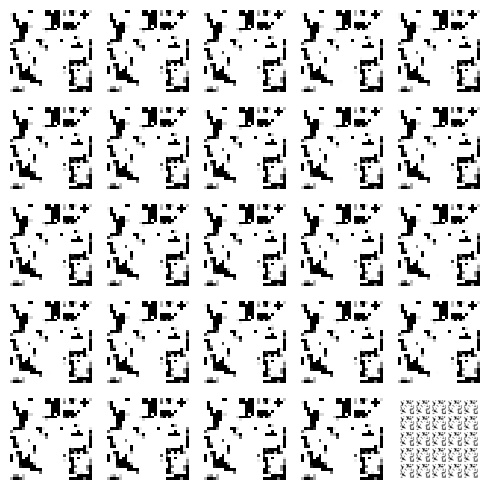

  0%|          | 0/350 [00:00<?, ?it/s]

4/4 [==============================] - 0s 13ms/step


  0%|          | 1/350 [00:00<02:53,  2.01it/s]

4/4 [==============================] - 0s 14ms/step


  1%|          | 2/350 [00:01<03:07,  1.86it/s]

4/4 [==============================] - 0s 14ms/step


  1%|          | 3/350 [00:01<03:02,  1.90it/s]

4/4 [==============================] - 0s 14ms/step


  1%|          | 4/350 [00:02<03:07,  1.85it/s]

4/4 [==============================] - 0s 28ms/step


  1%|▏         | 5/350 [00:02<03:07,  1.84it/s]

4/4 [==============================] - 0s 13ms/step


  2%|▏         | 6/350 [00:03<03:02,  1.89it/s]

4/4 [==============================] - 0s 13ms/step


  2%|▏         | 7/350 [00:03<03:09,  1.81it/s]

4/4 [==============================] - 0s 14ms/step


  2%|▏         | 8/350 [00:04<03:02,  1.88it/s]

4/4 [==============================] - 0s 14ms/step


  3%|▎         | 9/350 [00:04<03:04,  1.85it/s]

4/4 [==============================] - 0s 13ms/step


  3%|▎         | 10/350 [00:05<02:57,  1.91it/s]

4/4 [==============================] - 0s 13ms/step


  3%|▎         | 11/350 [00:05<03:00,  1.87it/s]

4/4 [==============================] - 0s 13ms/step


  3%|▎         | 12/350 [00:06<02:56,  1.91it/s]

4/4 [==============================] - 0s 13ms/step


  4%|▎         | 13/350 [00:06<03:00,  1.87it/s]

4/4 [==============================] - 0s 12ms/step


  4%|▍         | 14/350 [00:07<02:53,  1.93it/s]

4/4 [==============================] - 0s 14ms/step


  4%|▍         | 15/350 [00:07<02:58,  1.87it/s]

4/4 [==============================] - 0s 14ms/step


  5%|▍         | 16/350 [00:08<02:53,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


  5%|▍         | 17/350 [00:09<02:57,  1.87it/s]

4/4 [==============================] - 0s 14ms/step


  5%|▌         | 18/350 [00:09<02:54,  1.91it/s]

4/4 [==============================] - 0s 13ms/step


  5%|▌         | 19/350 [00:10<02:57,  1.87it/s]

4/4 [==============================] - 0s 14ms/step


  6%|▌         | 20/350 [00:10<02:52,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


  6%|▌         | 21/350 [00:11<02:54,  1.89it/s]

4/4 [==============================] - 0s 14ms/step


  6%|▋         | 22/350 [00:11<02:49,  1.93it/s]

4/4 [==============================] - 0s 13ms/step


  7%|▋         | 23/350 [00:12<02:50,  1.91it/s]

4/4 [==============================] - 0s 14ms/step


  7%|▋         | 24/350 [00:12<02:47,  1.94it/s]

4/4 [==============================] - 0s 13ms/step


  7%|▋         | 25/350 [00:13<02:50,  1.90it/s]

4/4 [==============================] - 0s 13ms/step


  7%|▋         | 26/350 [00:13<02:45,  1.95it/s]

4/4 [==============================] - 0s 14ms/step


  8%|▊         | 27/350 [00:14<02:49,  1.90it/s]

4/4 [==============================] - 0s 14ms/step


  8%|▊         | 28/350 [00:14<02:45,  1.95it/s]

4/4 [==============================] - 0s 13ms/step


  8%|▊         | 29/350 [00:15<02:48,  1.90it/s]

4/4 [==============================] - 0s 14ms/step


  9%|▊         | 30/350 [00:15<02:46,  1.92it/s]

4/4 [==============================] - 0s 14ms/step


  9%|▉         | 31/350 [00:16<02:49,  1.88it/s]

4/4 [==============================] - 0s 14ms/step


  9%|▉         | 32/350 [00:16<02:45,  1.92it/s]

4/4 [==============================] - 0s 14ms/step


  9%|▉         | 33/350 [00:17<02:48,  1.88it/s]

4/4 [==============================] - 0s 14ms/step


 10%|▉         | 34/350 [00:17<02:44,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


 10%|█         | 35/350 [00:18<02:47,  1.88it/s]

4/4 [==============================] - 0s 14ms/step


 10%|█         | 36/350 [00:18<02:44,  1.90it/s]

4/4 [==============================] - 0s 14ms/step


 11%|█         | 37/350 [00:19<02:47,  1.86it/s]

4/4 [==============================] - 0s 14ms/step


 11%|█         | 38/350 [00:20<02:43,  1.90it/s]

4/4 [==============================] - 0s 13ms/step


 11%|█         | 39/350 [00:20<02:45,  1.88it/s]

4/4 [==============================] - 0s 12ms/step


 11%|█▏        | 40/350 [00:21<02:40,  1.93it/s]

4/4 [==============================] - 0s 13ms/step


 12%|█▏        | 41/350 [00:21<02:43,  1.89it/s]

4/4 [==============================] - 0s 14ms/step


 12%|█▏        | 42/350 [00:22<02:41,  1.91it/s]

4/4 [==============================] - 0s 13ms/step


 12%|█▏        | 43/350 [00:22<02:44,  1.87it/s]

4/4 [==============================] - 0s 14ms/step


 13%|█▎        | 44/350 [00:23<02:39,  1.92it/s]

4/4 [==============================] - 0s 14ms/step


 13%|█▎        | 45/350 [00:23<02:42,  1.87it/s]

4/4 [==============================] - 0s 14ms/step


 13%|█▎        | 46/350 [00:24<02:38,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


 13%|█▎        | 47/350 [00:24<02:41,  1.87it/s]

4/4 [==============================] - 0s 13ms/step


 14%|█▎        | 48/350 [00:25<02:37,  1.91it/s]

4/4 [==============================] - 0s 14ms/step


 14%|█▍        | 49/350 [00:25<02:40,  1.88it/s]

4/4 [==============================] - 0s 13ms/step


 14%|█▍        | 50/350 [00:26<02:35,  1.92it/s]

4/4 [==============================] - 0s 14ms/step


 15%|█▍        | 51/350 [00:26<02:39,  1.87it/s]

4/4 [==============================] - 0s 14ms/step


 15%|█▍        | 52/350 [00:27<02:34,  1.93it/s]

4/4 [==============================] - 0s 22ms/step


 15%|█▌        | 53/350 [00:28<02:47,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 15%|█▌        | 54/350 [00:28<02:41,  1.83it/s]

4/4 [==============================] - 0s 13ms/step


 16%|█▌        | 55/350 [00:29<02:45,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 16%|█▌        | 56/350 [00:29<02:38,  1.85it/s]

4/4 [==============================] - 0s 13ms/step


 16%|█▋        | 57/350 [00:30<02:39,  1.83it/s]

4/4 [==============================] - 0s 14ms/step


 17%|█▋        | 58/350 [00:30<02:35,  1.88it/s]

4/4 [==============================] - 0s 13ms/step


 17%|█▋        | 59/350 [00:31<02:36,  1.86it/s]

4/4 [==============================] - 0s 14ms/step


 17%|█▋        | 60/350 [00:31<02:32,  1.90it/s]

4/4 [==============================] - 0s 14ms/step


 17%|█▋        | 61/350 [00:32<02:35,  1.86it/s]

4/4 [==============================] - 0s 13ms/step


 18%|█▊        | 62/350 [00:32<02:30,  1.91it/s]

4/4 [==============================] - 0s 13ms/step


 18%|█▊        | 63/350 [00:33<02:32,  1.88it/s]

4/4 [==============================] - 0s 14ms/step


 18%|█▊        | 64/350 [00:33<02:29,  1.91it/s]

4/4 [==============================] - 0s 14ms/step


 19%|█▊        | 65/350 [00:34<02:32,  1.87it/s]

4/4 [==============================] - 0s 13ms/step


 19%|█▉        | 66/350 [00:34<02:29,  1.90it/s]

4/4 [==============================] - 0s 13ms/step


 19%|█▉        | 67/350 [00:35<02:30,  1.88it/s]

4/4 [==============================] - 0s 12ms/step


 19%|█▉        | 68/350 [00:35<02:25,  1.94it/s]

4/4 [==============================] - 0s 13ms/step


 20%|█▉        | 69/350 [00:36<02:27,  1.90it/s]

4/4 [==============================] - 0s 13ms/step


 20%|██        | 70/350 [00:37<02:25,  1.92it/s]

4/4 [==============================] - 0s 14ms/step


 20%|██        | 71/350 [00:37<02:31,  1.84it/s]

4/4 [==============================] - 0s 14ms/step


 21%|██        | 72/350 [00:38<02:29,  1.87it/s]

4/4 [==============================] - 0s 12ms/step


 21%|██        | 73/350 [00:38<02:30,  1.84it/s]

4/4 [==============================] - 0s 14ms/step


 21%|██        | 74/350 [00:39<02:25,  1.89it/s]

4/4 [==============================] - 0s 12ms/step


 21%|██▏       | 75/350 [00:39<02:30,  1.82it/s]

4/4 [==============================] - 0s 13ms/step


 22%|██▏       | 76/350 [00:40<02:25,  1.88it/s]

4/4 [==============================] - 0s 13ms/step


 22%|██▏       | 77/350 [00:40<02:27,  1.86it/s]

4/4 [==============================] - 0s 13ms/step


 22%|██▏       | 78/350 [00:41<02:23,  1.89it/s]

4/4 [==============================] - 0s 14ms/step


 23%|██▎       | 79/350 [00:41<02:26,  1.86it/s]

4/4 [==============================] - 0s 14ms/step


 23%|██▎       | 80/350 [00:42<02:20,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


 23%|██▎       | 81/350 [00:42<02:23,  1.87it/s]

4/4 [==============================] - 0s 14ms/step


 23%|██▎       | 82/350 [00:43<02:19,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


 24%|██▎       | 83/350 [00:43<02:22,  1.88it/s]

4/4 [==============================] - 0s 12ms/step


 24%|██▍       | 84/350 [00:44<02:18,  1.92it/s]

4/4 [==============================] - 0s 14ms/step


 24%|██▍       | 85/350 [00:45<02:21,  1.87it/s]

4/4 [==============================] - 0s 14ms/step


 25%|██▍       | 86/350 [00:45<02:17,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


 25%|██▍       | 87/350 [00:46<02:18,  1.90it/s]

4/4 [==============================] - 0s 14ms/step


 25%|██▌       | 88/350 [00:46<02:14,  1.94it/s]

4/4 [==============================] - 0s 13ms/step


 25%|██▌       | 89/350 [00:47<02:17,  1.90it/s]

4/4 [==============================] - 0s 14ms/step


 26%|██▌       | 90/350 [00:47<02:17,  1.89it/s]

4/4 [==============================] - 0s 13ms/step


 26%|██▌       | 91/350 [00:48<02:18,  1.86it/s]

4/4 [==============================] - 0s 14ms/step


 26%|██▋       | 92/350 [00:48<02:14,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


 27%|██▋       | 93/350 [00:49<02:16,  1.89it/s]

4/4 [==============================] - 0s 13ms/step


 27%|██▋       | 94/350 [00:49<02:12,  1.93it/s]

4/4 [==============================] - 0s 15ms/step


 27%|██▋       | 95/350 [00:50<02:15,  1.89it/s]

4/4 [==============================] - 0s 13ms/step


 27%|██▋       | 96/350 [00:50<02:13,  1.90it/s]

4/4 [==============================] - 0s 13ms/step


 28%|██▊       | 97/350 [00:51<02:14,  1.88it/s]

4/4 [==============================] - 0s 14ms/step


 28%|██▊       | 98/350 [00:51<02:11,  1.92it/s]

4/4 [==============================] - 0s 14ms/step


 28%|██▊       | 99/350 [00:52<02:13,  1.88it/s]

4/4 [==============================] - 0s 13ms/step


 29%|██▊       | 100/350 [00:52<02:09,  1.93it/s]

4/4 [==============================] - 0s 14ms/step


 29%|██▉       | 101/350 [00:53<02:11,  1.90it/s]

4/4 [==============================] - 0s 14ms/step


 29%|██▉       | 102/350 [00:53<02:09,  1.91it/s]

4/4 [==============================] - 0s 13ms/step


 29%|██▉       | 103/350 [00:54<02:10,  1.89it/s]

4/4 [==============================] - 0s 14ms/step


 30%|██▉       | 104/350 [00:54<02:06,  1.94it/s]

4/4 [==============================] - 0s 14ms/step


 30%|███       | 105/350 [00:55<02:08,  1.90it/s]

4/4 [==============================] - 0s 13ms/step


 30%|███       | 106/350 [00:56<02:07,  1.92it/s]

4/4 [==============================] - 0s 12ms/step


 31%|███       | 107/350 [00:56<02:10,  1.86it/s]

4/4 [==============================] - 0s 16ms/step


 31%|███       | 108/350 [00:57<02:09,  1.88it/s]

4/4 [==============================] - 0s 13ms/step


 31%|███       | 109/350 [00:57<02:09,  1.86it/s]

4/4 [==============================] - 0s 14ms/step


 31%|███▏      | 110/350 [00:58<02:04,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


 32%|███▏      | 111/350 [00:58<02:06,  1.89it/s]

4/4 [==============================] - 0s 13ms/step


 32%|███▏      | 112/350 [00:59<02:02,  1.94it/s]

4/4 [==============================] - 0s 13ms/step


 32%|███▏      | 113/350 [00:59<02:05,  1.90it/s]

4/4 [==============================] - 0s 14ms/step


 33%|███▎      | 114/350 [01:00<02:02,  1.92it/s]

4/4 [==============================] - 0s 14ms/step


 33%|███▎      | 115/350 [01:00<02:05,  1.87it/s]

4/4 [==============================] - 0s 13ms/step


 33%|███▎      | 116/350 [01:01<02:01,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


 33%|███▎      | 117/350 [01:01<02:04,  1.88it/s]

4/4 [==============================] - 0s 14ms/step


 34%|███▎      | 118/350 [01:02<01:59,  1.94it/s]

4/4 [==============================] - 0s 14ms/step


 34%|███▍      | 119/350 [01:02<02:02,  1.89it/s]

4/4 [==============================] - 0s 13ms/step


 34%|███▍      | 120/350 [01:03<01:59,  1.92it/s]

4/4 [==============================] - 0s 14ms/step


 35%|███▍      | 121/350 [01:03<02:02,  1.87it/s]

4/4 [==============================] - 0s 13ms/step


 35%|███▍      | 122/350 [01:04<01:59,  1.91it/s]

4/4 [==============================] - 0s 13ms/step


 35%|███▌      | 123/350 [01:05<02:01,  1.87it/s]

4/4 [==============================] - 0s 14ms/step


 35%|███▌      | 124/350 [01:05<01:57,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


 36%|███▌      | 125/350 [01:06<01:59,  1.88it/s]

4/4 [==============================] - 0s 13ms/step


 36%|███▌      | 126/350 [01:06<01:57,  1.91it/s]

4/4 [==============================] - 0s 12ms/step


 36%|███▋      | 127/350 [01:07<01:59,  1.87it/s]

4/4 [==============================] - 0s 14ms/step


 37%|███▋      | 128/350 [01:07<01:55,  1.92it/s]

4/4 [==============================] - 0s 14ms/step


 37%|███▋      | 129/350 [01:08<01:57,  1.88it/s]

4/4 [==============================] - 0s 14ms/step


 37%|███▋      | 130/350 [01:08<01:54,  1.92it/s]

4/4 [==============================] - 0s 14ms/step


 37%|███▋      | 131/350 [01:09<01:55,  1.89it/s]

4/4 [==============================] - 0s 14ms/step


 38%|███▊      | 132/350 [01:09<01:53,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


 38%|███▊      | 133/350 [01:10<01:54,  1.89it/s]

4/4 [==============================] - 0s 14ms/step


 38%|███▊      | 134/350 [01:10<01:51,  1.94it/s]

4/4 [==============================] - 0s 14ms/step


 39%|███▊      | 135/350 [01:11<01:53,  1.89it/s]

4/4 [==============================] - 0s 13ms/step


 39%|███▉      | 136/350 [01:11<01:50,  1.94it/s]

4/4 [==============================] - 0s 13ms/step


 39%|███▉      | 137/350 [01:12<01:52,  1.90it/s]

4/4 [==============================] - 0s 14ms/step


 39%|███▉      | 138/350 [01:12<01:50,  1.91it/s]

4/4 [==============================] - 0s 13ms/step


 40%|███▉      | 139/350 [01:13<01:52,  1.88it/s]

4/4 [==============================] - 0s 13ms/step


 40%|████      | 140/350 [01:13<01:49,  1.91it/s]

4/4 [==============================] - 0s 13ms/step


 40%|████      | 141/350 [01:14<01:51,  1.88it/s]

4/4 [==============================] - 0s 14ms/step


 41%|████      | 142/350 [01:14<01:47,  1.94it/s]

4/4 [==============================] - 0s 14ms/step


 41%|████      | 143/350 [01:15<01:49,  1.88it/s]

4/4 [==============================] - 0s 13ms/step


 41%|████      | 144/350 [01:16<01:47,  1.91it/s]

4/4 [==============================] - 0s 13ms/step


 41%|████▏     | 145/350 [01:16<01:48,  1.89it/s]

4/4 [==============================] - 0s 15ms/step


 42%|████▏     | 146/350 [01:17<01:45,  1.94it/s]

4/4 [==============================] - 0s 14ms/step


 42%|████▏     | 147/350 [01:17<01:47,  1.89it/s]

4/4 [==============================] - 0s 14ms/step


 42%|████▏     | 148/350 [01:18<01:44,  1.94it/s]

4/4 [==============================] - 0s 13ms/step


 43%|████▎     | 149/350 [01:18<01:46,  1.89it/s]

4/4 [==============================] - 0s 14ms/step


 43%|████▎     | 150/350 [01:19<01:44,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


 43%|████▎     | 151/350 [01:19<01:45,  1.89it/s]

4/4 [==============================] - 0s 13ms/step


 43%|████▎     | 152/350 [01:20<01:43,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


 44%|████▎     | 153/350 [01:20<01:44,  1.88it/s]

4/4 [==============================] - 0s 14ms/step


 44%|████▍     | 154/350 [01:21<01:41,  1.94it/s]

4/4 [==============================] - 0s 14ms/step


 44%|████▍     | 155/350 [01:21<01:42,  1.89it/s]

4/4 [==============================] - 0s 13ms/step


 45%|████▍     | 156/350 [01:22<01:41,  1.92it/s]

4/4 [==============================] - 0s 14ms/step


 45%|████▍     | 157/350 [01:22<01:42,  1.88it/s]

4/4 [==============================] - 0s 14ms/step


 45%|████▌     | 158/350 [01:23<01:39,  1.93it/s]

4/4 [==============================] - 0s 12ms/step


 45%|████▌     | 159/350 [01:23<01:41,  1.88it/s]

4/4 [==============================] - 0s 13ms/step


 46%|████▌     | 160/350 [01:24<01:38,  1.93it/s]

4/4 [==============================] - 0s 14ms/step


 46%|████▌     | 161/350 [01:24<01:40,  1.88it/s]

4/4 [==============================] - 0s 13ms/step


 46%|████▋     | 162/350 [01:25<01:38,  1.91it/s]

4/4 [==============================] - 0s 14ms/step


 47%|████▋     | 163/350 [01:26<01:39,  1.88it/s]

4/4 [==============================] - 0s 13ms/step


 47%|████▋     | 164/350 [01:26<01:36,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


 47%|████▋     | 165/350 [01:27<01:38,  1.87it/s]

4/4 [==============================] - 0s 13ms/step


 47%|████▋     | 166/350 [01:27<01:35,  1.92it/s]

4/4 [==============================] - 0s 14ms/step


 48%|████▊     | 167/350 [01:28<01:37,  1.88it/s]

4/4 [==============================] - 0s 13ms/step


 48%|████▊     | 168/350 [01:28<01:35,  1.91it/s]

4/4 [==============================] - 0s 14ms/step


 48%|████▊     | 169/350 [01:29<01:37,  1.86it/s]

4/4 [==============================] - 0s 13ms/step


 49%|████▊     | 170/350 [01:29<01:33,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


 49%|████▉     | 171/350 [01:30<01:35,  1.88it/s]

4/4 [==============================] - 0s 13ms/step


 49%|████▉     | 172/350 [01:30<01:32,  1.92it/s]

4/4 [==============================] - 0s 12ms/step


 49%|████▉     | 173/350 [01:31<01:33,  1.89it/s]

4/4 [==============================] - 0s 13ms/step


 50%|████▉     | 174/350 [01:31<01:32,  1.91it/s]

4/4 [==============================] - 0s 13ms/step


 50%|█████     | 175/350 [01:32<01:33,  1.87it/s]

4/4 [==============================] - 0s 14ms/step


 50%|█████     | 176/350 [01:32<01:30,  1.93it/s]

4/4 [==============================] - 0s 14ms/step


 51%|█████     | 177/350 [01:33<01:30,  1.90it/s]

4/4 [==============================] - 0s 14ms/step


 51%|█████     | 178/350 [01:33<01:28,  1.94it/s]

4/4 [==============================] - 0s 14ms/step


 51%|█████     | 179/350 [01:34<01:30,  1.89it/s]

4/4 [==============================] - 0s 14ms/step


 51%|█████▏    | 180/350 [01:34<01:28,  1.91it/s]

4/4 [==============================] - 0s 14ms/step


 52%|█████▏    | 181/350 [01:35<01:29,  1.89it/s]

4/4 [==============================] - 0s 13ms/step


 52%|█████▏    | 182/350 [01:35<01:26,  1.93it/s]

4/4 [==============================] - 0s 14ms/step


 52%|█████▏    | 183/350 [01:36<01:28,  1.90it/s]

4/4 [==============================] - 0s 14ms/step


 53%|█████▎    | 184/350 [01:37<01:25,  1.95it/s]

4/4 [==============================] - 0s 14ms/step


 53%|█████▎    | 185/350 [01:37<01:26,  1.91it/s]

4/4 [==============================] - 0s 14ms/step


 53%|█████▎    | 186/350 [01:38<01:25,  1.92it/s]

4/4 [==============================] - 0s 14ms/step


 53%|█████▎    | 187/350 [01:38<01:26,  1.88it/s]

4/4 [==============================] - 0s 14ms/step


 54%|█████▎    | 188/350 [01:39<01:23,  1.93it/s]

4/4 [==============================] - 0s 14ms/step


 54%|█████▍    | 189/350 [01:39<01:24,  1.90it/s]

4/4 [==============================] - 0s 14ms/step


 54%|█████▍    | 190/350 [01:40<01:22,  1.93it/s]

4/4 [==============================] - 0s 14ms/step


 55%|█████▍    | 191/350 [01:40<01:24,  1.88it/s]

4/4 [==============================] - 0s 14ms/step


 55%|█████▍    | 192/350 [01:41<01:22,  1.91it/s]

4/4 [==============================] - 0s 13ms/step


 55%|█████▌    | 193/350 [01:41<01:23,  1.87it/s]

4/4 [==============================] - 0s 13ms/step


 55%|█████▌    | 194/350 [01:42<01:21,  1.92it/s]

4/4 [==============================] - 0s 14ms/step


 56%|█████▌    | 195/350 [01:42<01:22,  1.87it/s]

4/4 [==============================] - 0s 14ms/step


 56%|█████▌    | 196/350 [01:43<01:20,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


 56%|█████▋    | 197/350 [01:43<01:21,  1.88it/s]

4/4 [==============================] - 0s 14ms/step


 57%|█████▋    | 198/350 [01:44<01:18,  1.93it/s]

4/4 [==============================] - 0s 13ms/step


 57%|█████▋    | 199/350 [01:44<01:20,  1.88it/s]

4/4 [==============================] - 0s 14ms/step


 57%|█████▋    | 200/350 [01:45<01:17,  1.93it/s]

4/4 [==============================] - 0s 14ms/step


 57%|█████▋    | 201/350 [01:45<01:18,  1.89it/s]

4/4 [==============================] - 0s 14ms/step


 58%|█████▊    | 202/350 [01:46<01:16,  1.94it/s]

4/4 [==============================] - 0s 14ms/step


 58%|█████▊    | 203/350 [01:47<01:17,  1.89it/s]

4/4 [==============================] - 0s 14ms/step


 58%|█████▊    | 204/350 [01:47<01:16,  1.91it/s]

4/4 [==============================] - 0s 13ms/step


 59%|█████▊    | 205/350 [01:48<01:17,  1.87it/s]

4/4 [==============================] - 0s 14ms/step


 59%|█████▉    | 206/350 [01:48<01:15,  1.92it/s]

4/4 [==============================] - 0s 14ms/step


 59%|█████▉    | 207/350 [01:49<01:16,  1.87it/s]

4/4 [==============================] - 0s 13ms/step


 59%|█████▉    | 208/350 [01:49<01:13,  1.93it/s]

4/4 [==============================] - 0s 12ms/step


 60%|█████▉    | 209/350 [01:50<01:14,  1.89it/s]

4/4 [==============================] - 0s 14ms/step


 60%|██████    | 210/350 [01:50<01:13,  1.91it/s]

4/4 [==============================] - 0s 15ms/step


 60%|██████    | 211/350 [01:51<01:14,  1.86it/s]

4/4 [==============================] - 0s 13ms/step


 61%|██████    | 212/350 [01:51<01:12,  1.91it/s]

4/4 [==============================] - 0s 14ms/step


 61%|██████    | 213/350 [01:52<01:13,  1.88it/s]

4/4 [==============================] - 0s 13ms/step


 61%|██████    | 214/350 [01:52<01:10,  1.93it/s]

4/4 [==============================] - 0s 13ms/step


 61%|██████▏   | 215/350 [01:53<01:11,  1.90it/s]

4/4 [==============================] - 0s 14ms/step


 62%|██████▏   | 216/350 [01:53<01:10,  1.91it/s]

4/4 [==============================] - 0s 14ms/step


 62%|██████▏   | 217/350 [01:54<01:10,  1.89it/s]

4/4 [==============================] - 0s 15ms/step


 62%|██████▏   | 218/350 [01:54<01:08,  1.92it/s]

4/4 [==============================] - 0s 14ms/step


 63%|██████▎   | 219/350 [01:55<01:09,  1.88it/s]

4/4 [==============================] - 0s 13ms/step


 63%|██████▎   | 220/350 [01:55<01:07,  1.94it/s]

4/4 [==============================] - 0s 13ms/step


 63%|██████▎   | 221/350 [01:56<01:07,  1.90it/s]

4/4 [==============================] - 0s 14ms/step


 63%|██████▎   | 222/350 [01:57<01:06,  1.92it/s]

4/4 [==============================] - 0s 14ms/step


 64%|██████▎   | 223/350 [01:57<01:07,  1.89it/s]

4/4 [==============================] - 0s 14ms/step


 64%|██████▍   | 224/350 [01:58<01:05,  1.92it/s]

4/4 [==============================] - 0s 12ms/step


 64%|██████▍   | 225/350 [01:58<01:06,  1.88it/s]

4/4 [==============================] - 0s 13ms/step


 65%|██████▍   | 226/350 [01:59<01:04,  1.93it/s]

4/4 [==============================] - 0s 13ms/step


 65%|██████▍   | 227/350 [01:59<01:04,  1.89it/s]

4/4 [==============================] - 0s 14ms/step


 65%|██████▌   | 228/350 [02:00<01:03,  1.91it/s]

4/4 [==============================] - 0s 14ms/step


 65%|██████▌   | 229/350 [02:00<01:05,  1.86it/s]

4/4 [==============================] - 0s 14ms/step


 66%|██████▌   | 230/350 [02:01<01:03,  1.90it/s]

4/4 [==============================] - 0s 13ms/step


 66%|██████▌   | 231/350 [02:01<01:03,  1.87it/s]

4/4 [==============================] - 0s 13ms/step


 66%|██████▋   | 232/350 [02:02<01:01,  1.93it/s]

4/4 [==============================] - 0s 13ms/step


 67%|██████▋   | 233/350 [02:02<01:01,  1.89it/s]

4/4 [==============================] - 0s 14ms/step


 67%|██████▋   | 234/350 [02:03<01:00,  1.91it/s]

4/4 [==============================] - 0s 14ms/step


 67%|██████▋   | 235/350 [02:03<01:01,  1.87it/s]

4/4 [==============================] - 0s 14ms/step


 67%|██████▋   | 236/350 [02:04<00:59,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


 68%|██████▊   | 237/350 [02:04<01:00,  1.87it/s]

4/4 [==============================] - 0s 13ms/step


 68%|██████▊   | 238/350 [02:05<00:57,  1.93it/s]

4/4 [==============================] - 0s 14ms/step


 68%|██████▊   | 239/350 [02:05<00:58,  1.89it/s]

4/4 [==============================] - 0s 14ms/step


 69%|██████▊   | 240/350 [02:06<00:57,  1.91it/s]

4/4 [==============================] - 0s 13ms/step


 69%|██████▉   | 241/350 [02:07<00:57,  1.89it/s]

4/4 [==============================] - 0s 14ms/step


 69%|██████▉   | 242/350 [02:07<00:55,  1.93it/s]

4/4 [==============================] - 0s 13ms/step


 69%|██████▉   | 243/350 [02:08<00:56,  1.89it/s]

4/4 [==============================] - 0s 14ms/step


 70%|██████▉   | 244/350 [02:08<00:54,  1.94it/s]

4/4 [==============================] - 0s 14ms/step


 70%|███████   | 245/350 [02:09<00:55,  1.89it/s]

4/4 [==============================] - 0s 15ms/step


 70%|███████   | 246/350 [02:09<00:54,  1.92it/s]

4/4 [==============================] - 0s 14ms/step


 71%|███████   | 247/350 [02:10<00:54,  1.88it/s]

4/4 [==============================] - 0s 14ms/step


 71%|███████   | 248/350 [02:10<00:53,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


 71%|███████   | 249/350 [02:11<00:53,  1.89it/s]

4/4 [==============================] - 0s 12ms/step


 71%|███████▏  | 250/350 [02:11<00:51,  1.94it/s]

4/4 [==============================] - 0s 14ms/step


 72%|███████▏  | 251/350 [02:12<00:52,  1.88it/s]

4/4 [==============================] - 0s 13ms/step


 72%|███████▏  | 252/350 [02:12<00:51,  1.90it/s]

4/4 [==============================] - 0s 14ms/step


 72%|███████▏  | 253/350 [02:13<00:51,  1.87it/s]

4/4 [==============================] - 0s 14ms/step


 73%|███████▎  | 254/350 [02:13<00:50,  1.91it/s]

4/4 [==============================] - 0s 14ms/step


 73%|███████▎  | 255/350 [02:14<00:50,  1.88it/s]

4/4 [==============================] - 0s 14ms/step


 73%|███████▎  | 256/350 [02:14<00:49,  1.91it/s]

4/4 [==============================] - 0s 14ms/step


 73%|███████▎  | 257/350 [02:15<00:49,  1.87it/s]

4/4 [==============================] - 0s 13ms/step


 74%|███████▎  | 258/350 [02:15<00:48,  1.90it/s]

4/4 [==============================] - 0s 14ms/step


 74%|███████▍  | 259/350 [02:16<00:48,  1.86it/s]

4/4 [==============================] - 0s 15ms/step


 74%|███████▍  | 260/350 [02:17<00:47,  1.91it/s]

4/4 [==============================] - 0s 14ms/step


 75%|███████▍  | 261/350 [02:17<00:47,  1.87it/s]

4/4 [==============================] - 0s 13ms/step


 75%|███████▍  | 262/350 [02:18<00:45,  1.93it/s]

4/4 [==============================] - 0s 14ms/step


 75%|███████▌  | 263/350 [02:18<00:45,  1.90it/s]

4/4 [==============================] - 0s 14ms/step


 75%|███████▌  | 264/350 [02:19<00:44,  1.92it/s]

4/4 [==============================] - 0s 12ms/step


 76%|███████▌  | 265/350 [02:19<00:44,  1.90it/s]

4/4 [==============================] - 0s 14ms/step


 76%|███████▌  | 266/350 [02:20<00:43,  1.94it/s]

4/4 [==============================] - 0s 13ms/step


 76%|███████▋  | 267/350 [02:20<00:43,  1.89it/s]

4/4 [==============================] - 0s 12ms/step


 77%|███████▋  | 268/350 [02:21<00:42,  1.94it/s]

4/4 [==============================] - 0s 13ms/step


 77%|███████▋  | 269/350 [02:21<00:42,  1.89it/s]

4/4 [==============================] - 0s 14ms/step


 77%|███████▋  | 270/350 [02:22<00:41,  1.91it/s]

4/4 [==============================] - 0s 13ms/step


 77%|███████▋  | 271/350 [02:22<00:42,  1.87it/s]

4/4 [==============================] - 0s 13ms/step


 78%|███████▊  | 272/350 [02:23<00:40,  1.93it/s]

4/4 [==============================] - 0s 14ms/step


 78%|███████▊  | 273/350 [02:23<00:40,  1.88it/s]

4/4 [==============================] - 0s 12ms/step


 78%|███████▊  | 274/350 [02:24<00:39,  1.94it/s]

4/4 [==============================] - 0s 14ms/step


 79%|███████▊  | 275/350 [02:24<00:39,  1.89it/s]

4/4 [==============================] - 0s 14ms/step


 79%|███████▉  | 276/350 [02:25<00:38,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


 79%|███████▉  | 277/350 [02:25<00:38,  1.89it/s]

4/4 [==============================] - 0s 14ms/step


 79%|███████▉  | 278/350 [02:26<00:37,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


 80%|███████▉  | 279/350 [02:27<00:37,  1.88it/s]

4/4 [==============================] - 0s 13ms/step


 80%|████████  | 280/350 [02:27<00:36,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


 80%|████████  | 281/350 [02:28<00:36,  1.89it/s]

4/4 [==============================] - 0s 14ms/step


 81%|████████  | 282/350 [02:28<00:35,  1.91it/s]

4/4 [==============================] - 0s 13ms/step


 81%|████████  | 283/350 [02:29<00:35,  1.86it/s]

4/4 [==============================] - 0s 13ms/step


 81%|████████  | 284/350 [02:29<00:34,  1.91it/s]

4/4 [==============================] - 0s 14ms/step


 81%|████████▏ | 285/350 [02:30<00:34,  1.89it/s]

4/4 [==============================] - 0s 13ms/step


 82%|████████▏ | 286/350 [02:30<00:33,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


 82%|████████▏ | 287/350 [02:31<00:33,  1.89it/s]

4/4 [==============================] - 0s 14ms/step


 82%|████████▏ | 288/350 [02:31<00:32,  1.91it/s]

4/4 [==============================] - 0s 13ms/step


 83%|████████▎ | 289/350 [02:32<00:32,  1.88it/s]

4/4 [==============================] - 0s 14ms/step


 83%|████████▎ | 290/350 [02:32<00:31,  1.92it/s]

4/4 [==============================] - 0s 14ms/step


 83%|████████▎ | 291/350 [02:33<00:31,  1.89it/s]

4/4 [==============================] - 0s 14ms/step


 83%|████████▎ | 292/350 [02:33<00:30,  1.93it/s]

4/4 [==============================] - 0s 15ms/step


 84%|████████▎ | 293/350 [02:34<00:30,  1.88it/s]

4/4 [==============================] - 0s 14ms/step


 84%|████████▍ | 294/350 [02:34<00:29,  1.90it/s]

4/4 [==============================] - 0s 13ms/step


 84%|████████▍ | 295/350 [02:35<00:29,  1.87it/s]

4/4 [==============================] - 0s 14ms/step


 85%|████████▍ | 296/350 [02:35<00:28,  1.91it/s]

4/4 [==============================] - 0s 14ms/step


 85%|████████▍ | 297/350 [02:36<00:28,  1.86it/s]

4/4 [==============================] - 0s 14ms/step


 85%|████████▌ | 298/350 [02:37<00:27,  1.91it/s]

4/4 [==============================] - 0s 14ms/step


 85%|████████▌ | 299/350 [02:37<00:27,  1.87it/s]

4/4 [==============================] - 0s 14ms/step


 86%|████████▌ | 300/350 [02:38<00:26,  1.90it/s]

4/4 [==============================] - 0s 13ms/step


 86%|████████▌ | 301/350 [02:38<00:26,  1.87it/s]

4/4 [==============================] - 0s 14ms/step


 86%|████████▋ | 302/350 [02:39<00:25,  1.91it/s]

4/4 [==============================] - 0s 13ms/step


 87%|████████▋ | 303/350 [02:39<00:24,  1.88it/s]

4/4 [==============================] - 0s 13ms/step


 87%|████████▋ | 304/350 [02:40<00:23,  1.93it/s]

4/4 [==============================] - 0s 14ms/step


 87%|████████▋ | 305/350 [02:40<00:23,  1.88it/s]

4/4 [==============================] - 0s 12ms/step


 87%|████████▋ | 306/350 [02:41<00:23,  1.91it/s]

4/4 [==============================] - 0s 12ms/step


 88%|████████▊ | 307/350 [02:41<00:22,  1.95it/s]

4/4 [==============================] - 0s 21ms/step


 88%|████████▊ | 308/350 [02:42<00:21,  1.91it/s]

4/4 [==============================] - 0s 14ms/step


 88%|████████▊ | 309/350 [02:42<00:21,  1.94it/s]

4/4 [==============================] - 0s 13ms/step


 89%|████████▊ | 310/350 [02:43<00:21,  1.90it/s]

4/4 [==============================] - 0s 13ms/step


 89%|████████▉ | 311/350 [02:43<00:20,  1.94it/s]

4/4 [==============================] - 0s 13ms/step


 89%|████████▉ | 312/350 [02:44<00:20,  1.87it/s]

4/4 [==============================] - 0s 13ms/step


 89%|████████▉ | 313/350 [02:44<00:19,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


 90%|████████▉ | 314/350 [02:45<00:19,  1.88it/s]

4/4 [==============================] - 0s 12ms/step


 90%|█████████ | 315/350 [02:45<00:18,  1.94it/s]

4/4 [==============================] - 0s 14ms/step


 90%|█████████ | 316/350 [02:46<00:17,  1.89it/s]

4/4 [==============================] - 0s 13ms/step


 91%|█████████ | 317/350 [02:46<00:17,  1.93it/s]

4/4 [==============================] - 0s 13ms/step


 91%|█████████ | 318/350 [02:47<00:17,  1.85it/s]

4/4 [==============================] - 0s 12ms/step


 91%|█████████ | 319/350 [02:48<00:16,  1.91it/s]

4/4 [==============================] - 0s 13ms/step


 91%|█████████▏| 320/350 [02:48<00:16,  1.87it/s]

4/4 [==============================] - 0s 12ms/step


 92%|█████████▏| 321/350 [02:49<00:14,  1.94it/s]

4/4 [==============================] - 0s 15ms/step


 92%|█████████▏| 322/350 [02:49<00:14,  1.90it/s]

4/4 [==============================] - 0s 14ms/step


 92%|█████████▏| 323/350 [02:50<00:13,  1.94it/s]

4/4 [==============================] - 0s 13ms/step


 93%|█████████▎| 324/350 [02:50<00:13,  1.87it/s]

4/4 [==============================] - 0s 13ms/step


 93%|█████████▎| 325/350 [02:51<00:12,  1.93it/s]

4/4 [==============================] - 0s 13ms/step


 93%|█████████▎| 326/350 [02:51<00:12,  1.89it/s]

4/4 [==============================] - 0s 13ms/step


 93%|█████████▎| 327/350 [02:52<00:11,  1.94it/s]

4/4 [==============================] - 0s 13ms/step


 94%|█████████▎| 328/350 [02:52<00:11,  1.89it/s]

4/4 [==============================] - 0s 13ms/step


 94%|█████████▍| 329/350 [02:53<00:10,  1.94it/s]

4/4 [==============================] - 0s 13ms/step


 94%|█████████▍| 330/350 [02:53<00:10,  1.87it/s]

4/4 [==============================] - 0s 13ms/step


 95%|█████████▍| 331/350 [02:54<00:09,  1.92it/s]

4/4 [==============================] - 0s 14ms/step


 95%|█████████▍| 332/350 [02:54<00:09,  1.88it/s]

4/4 [==============================] - 0s 14ms/step


 95%|█████████▌| 333/350 [02:55<00:08,  1.93it/s]

4/4 [==============================] - 0s 13ms/step


 95%|█████████▌| 334/350 [02:55<00:08,  1.88it/s]

4/4 [==============================] - 0s 14ms/step


 96%|█████████▌| 335/350 [02:56<00:07,  1.93it/s]

4/4 [==============================] - 0s 13ms/step


 96%|█████████▌| 336/350 [02:57<00:07,  1.85it/s]

4/4 [==============================] - 0s 14ms/step


 96%|█████████▋| 337/350 [02:57<00:06,  1.90it/s]

4/4 [==============================] - 0s 14ms/step


 97%|█████████▋| 338/350 [02:58<00:06,  1.87it/s]

4/4 [==============================] - 0s 27ms/step


 97%|█████████▋| 339/350 [02:58<00:05,  1.86it/s]

4/4 [==============================] - 0s 14ms/step


 97%|█████████▋| 340/350 [02:59<00:05,  1.93it/s]

4/4 [==============================] - 0s 13ms/step


 97%|█████████▋| 341/350 [02:59<00:04,  1.90it/s]

4/4 [==============================] - 0s 13ms/step


 98%|█████████▊| 342/350 [03:00<00:04,  1.92it/s]

4/4 [==============================] - 0s 14ms/step


 98%|█████████▊| 343/350 [03:00<00:03,  1.87it/s]

4/4 [==============================] - 0s 24ms/step


 98%|█████████▊| 344/350 [03:01<00:03,  1.81it/s]

4/4 [==============================] - 0s 14ms/step


 99%|█████████▊| 345/350 [03:01<00:02,  1.87it/s]

4/4 [==============================] - 0s 13ms/step


 99%|█████████▉| 346/350 [03:02<00:02,  1.85it/s]

4/4 [==============================] - 0s 14ms/step


 99%|█████████▉| 347/350 [03:02<00:01,  1.90it/s]

4/4 [==============================] - 0s 13ms/step


 99%|█████████▉| 348/350 [03:03<00:01,  1.79it/s]

4/4 [==============================] - 0s 13ms/step


100%|█████████▉| 349/350 [03:03<00:00,  1.86it/s]

4/4 [==============================] - 0s 13ms/step


100%|██████████| 350/350 [03:04<00:00,  1.90it/s]

Epoch number: 29 discriminator_loss: 0.16516163452969132 generator_loss: 7.480648239680699
1/1 [==============================] - 0s 22ms/step


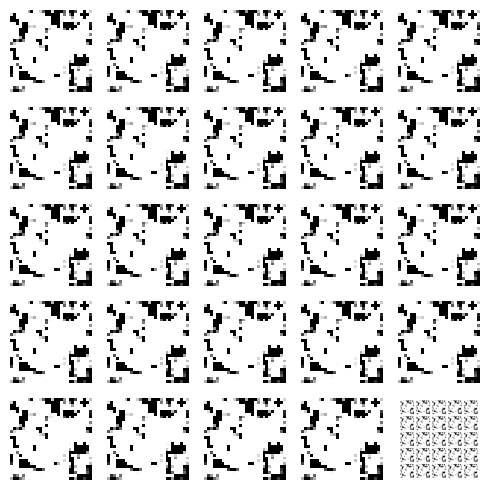

  0%|          | 0/350 [00:00<?, ?it/s]

4/4 [==============================] - 0s 17ms/step


  0%|          | 1/350 [00:00<03:30,  1.65it/s]

4/4 [==============================] - 0s 22ms/step


  1%|          | 2/350 [00:01<03:26,  1.69it/s]

4/4 [==============================] - 0s 14ms/step


  1%|          | 3/350 [00:01<03:16,  1.77it/s]

4/4 [==============================] - 0s 14ms/step


  1%|          | 4/350 [00:02<03:18,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


  1%|▏         | 5/350 [00:02<03:05,  1.86it/s]

4/4 [==============================] - 0s 14ms/step


  2%|▏         | 6/350 [00:03<03:08,  1.82it/s]

4/4 [==============================] - 0s 13ms/step


  2%|▏         | 7/350 [00:03<03:00,  1.90it/s]

4/4 [==============================] - 0s 13ms/step


  2%|▏         | 8/350 [00:04<03:03,  1.86it/s]

4/4 [==============================] - 0s 13ms/step


  3%|▎         | 9/350 [00:04<03:00,  1.89it/s]

4/4 [==============================] - 0s 13ms/step


  3%|▎         | 10/350 [00:05<03:01,  1.87it/s]

4/4 [==============================] - 0s 14ms/step


  3%|▎         | 11/350 [00:05<02:56,  1.92it/s]

4/4 [==============================] - 0s 14ms/step


  3%|▎         | 12/350 [00:06<02:59,  1.88it/s]

4/4 [==============================] - 0s 14ms/step


  4%|▎         | 13/350 [00:07<02:56,  1.90it/s]

4/4 [==============================] - 0s 14ms/step


  4%|▍         | 14/350 [00:07<02:59,  1.87it/s]

4/4 [==============================] - 0s 14ms/step


  4%|▍         | 15/350 [00:08<02:56,  1.90it/s]

4/4 [==============================] - 0s 13ms/step


  5%|▍         | 16/350 [00:08<02:59,  1.86it/s]

4/4 [==============================] - 0s 14ms/step


  5%|▍         | 17/350 [00:09<02:54,  1.91it/s]

4/4 [==============================] - 0s 14ms/step


  5%|▌         | 18/350 [00:09<02:57,  1.87it/s]

4/4 [==============================] - 0s 13ms/step


  5%|▌         | 19/350 [00:10<02:52,  1.91it/s]

4/4 [==============================] - 0s 14ms/step


  6%|▌         | 20/350 [00:10<02:56,  1.87it/s]

4/4 [==============================] - 0s 12ms/step


  6%|▌         | 21/350 [00:11<02:53,  1.89it/s]

4/4 [==============================] - 0s 13ms/step


  6%|▋         | 22/350 [00:11<02:56,  1.86it/s]

4/4 [==============================] - 0s 14ms/step


  7%|▋         | 23/350 [00:12<02:52,  1.90it/s]

4/4 [==============================] - 0s 14ms/step


  7%|▋         | 24/350 [00:12<02:55,  1.86it/s]

4/4 [==============================] - 0s 15ms/step


  7%|▋         | 25/350 [00:13<02:49,  1.92it/s]

4/4 [==============================] - 0s 14ms/step


  7%|▋         | 26/350 [00:13<02:45,  1.96it/s]

4/4 [==============================] - 0s 18ms/step


  8%|▊         | 27/350 [00:14<02:51,  1.88it/s]

4/4 [==============================] - 0s 12ms/step


  8%|▊         | 28/350 [00:14<02:46,  1.93it/s]

4/4 [==============================] - 0s 15ms/step


  8%|▊         | 29/350 [00:15<02:50,  1.88it/s]

4/4 [==============================] - 0s 14ms/step


  9%|▊         | 30/350 [00:15<02:45,  1.93it/s]

4/4 [==============================] - 0s 13ms/step


  9%|▉         | 31/350 [00:16<02:49,  1.89it/s]

4/4 [==============================] - 0s 13ms/step


  9%|▉         | 32/350 [00:17<02:44,  1.93it/s]

4/4 [==============================] - 0s 14ms/step


  9%|▉         | 33/350 [00:17<02:51,  1.85it/s]

4/4 [==============================] - 0s 14ms/step


 10%|▉         | 34/350 [00:18<02:46,  1.90it/s]

4/4 [==============================] - 0s 14ms/step


 10%|█         | 35/350 [00:18<02:48,  1.86it/s]

4/4 [==============================] - 0s 13ms/step


 10%|█         | 36/350 [00:19<02:44,  1.91it/s]

4/4 [==============================] - 0s 13ms/step


 11%|█         | 37/350 [00:19<02:47,  1.87it/s]

4/4 [==============================] - 0s 14ms/step


 11%|█         | 38/350 [00:20<02:42,  1.92it/s]

4/4 [==============================] - 0s 14ms/step


 11%|█         | 39/350 [00:20<02:47,  1.86it/s]

4/4 [==============================] - 0s 13ms/step


 11%|█▏        | 40/350 [00:21<02:42,  1.91it/s]

4/4 [==============================] - 0s 13ms/step


 12%|█▏        | 41/350 [00:21<02:44,  1.88it/s]

4/4 [==============================] - 0s 13ms/step


 12%|█▏        | 42/350 [00:22<02:40,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


 12%|█▏        | 43/350 [00:22<02:36,  1.96it/s]

4/4 [==============================] - 0s 18ms/step


 13%|█▎        | 44/350 [00:23<02:39,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


 13%|█▎        | 45/350 [00:23<02:44,  1.85it/s]

4/4 [==============================] - 0s 13ms/step


 13%|█▎        | 46/350 [00:24<02:38,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


 13%|█▎        | 47/350 [00:24<02:34,  1.97it/s]

4/4 [==============================] - 0s 25ms/step


 14%|█▎        | 48/350 [00:25<02:36,  1.93it/s]

4/4 [==============================] - 0s 13ms/step


 14%|█▍        | 49/350 [00:25<02:39,  1.88it/s]

4/4 [==============================] - 0s 15ms/step


 14%|█▍        | 50/350 [00:26<02:34,  1.94it/s]

4/4 [==============================] - 0s 13ms/step


 15%|█▍        | 51/350 [00:27<02:39,  1.87it/s]

4/4 [==============================] - 0s 13ms/step


 15%|█▍        | 52/350 [00:27<02:34,  1.93it/s]

4/4 [==============================] - 0s 15ms/step


 15%|█▌        | 53/350 [00:28<02:37,  1.89it/s]

4/4 [==============================] - 0s 14ms/step


 15%|█▌        | 54/350 [00:28<02:32,  1.94it/s]

4/4 [==============================] - 0s 13ms/step


 16%|█▌        | 55/350 [00:29<02:36,  1.88it/s]

4/4 [==============================] - 0s 14ms/step


 16%|█▌        | 56/350 [00:29<02:32,  1.93it/s]

4/4 [==============================] - 0s 13ms/step


 16%|█▋        | 57/350 [00:30<02:37,  1.86it/s]

4/4 [==============================] - 0s 13ms/step


 17%|█▋        | 58/350 [00:30<02:32,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


 17%|█▋        | 59/350 [00:31<02:34,  1.88it/s]

4/4 [==============================] - 0s 26ms/step


 17%|█▋        | 60/350 [00:31<02:36,  1.85it/s]

4/4 [==============================] - 0s 14ms/step


 17%|█▋        | 61/350 [00:32<02:31,  1.90it/s]

4/4 [==============================] - 0s 12ms/step


 18%|█▊        | 62/350 [00:32<02:33,  1.88it/s]

4/4 [==============================] - 0s 13ms/step


 18%|█▊        | 63/350 [00:33<02:30,  1.90it/s]

4/4 [==============================] - 0s 13ms/step


 18%|█▊        | 64/350 [00:33<02:33,  1.87it/s]

4/4 [==============================] - 0s 14ms/step


 19%|█▊        | 65/350 [00:34<02:28,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


 19%|█▉        | 66/350 [00:34<02:31,  1.88it/s]

4/4 [==============================] - 0s 23ms/step


 19%|█▉        | 67/350 [00:35<02:31,  1.87it/s]

4/4 [==============================] - 0s 13ms/step


 19%|█▉        | 68/350 [00:35<02:28,  1.91it/s]

4/4 [==============================] - 0s 12ms/step


 20%|█▉        | 69/350 [00:36<02:28,  1.89it/s]

4/4 [==============================] - 0s 13ms/step


 20%|██        | 70/350 [00:37<02:26,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


 20%|██        | 71/350 [00:37<02:28,  1.88it/s]

4/4 [==============================] - 0s 13ms/step


 21%|██        | 72/350 [00:38<02:24,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


 21%|██        | 73/350 [00:38<02:27,  1.88it/s]

4/4 [==============================] - 0s 14ms/step


 21%|██        | 74/350 [00:39<02:23,  1.93it/s]

4/4 [==============================] - 0s 14ms/step


 21%|██▏       | 75/350 [00:39<02:21,  1.94it/s]

4/4 [==============================] - 0s 32ms/step


 22%|██▏       | 76/350 [00:40<02:25,  1.88it/s]

4/4 [==============================] - 0s 13ms/step


 22%|██▏       | 77/350 [00:40<02:21,  1.93it/s]

4/4 [==============================] - 0s 14ms/step


 22%|██▏       | 78/350 [00:41<02:24,  1.88it/s]

4/4 [==============================] - 0s 14ms/step


 23%|██▎       | 79/350 [00:41<02:20,  1.93it/s]

4/4 [==============================] - 0s 14ms/step


 23%|██▎       | 80/350 [00:42<02:23,  1.89it/s]

4/4 [==============================] - 0s 14ms/step


 23%|██▎       | 81/350 [00:42<02:20,  1.92it/s]

4/4 [==============================] - 0s 12ms/step


 23%|██▎       | 82/350 [00:43<02:23,  1.87it/s]

4/4 [==============================] - 0s 13ms/step


 24%|██▎       | 83/350 [00:43<02:18,  1.92it/s]

4/4 [==============================] - 0s 14ms/step


 24%|██▍       | 84/350 [00:44<02:20,  1.89it/s]

4/4 [==============================] - 0s 13ms/step


 24%|██▍       | 85/350 [00:44<02:16,  1.94it/s]

4/4 [==============================] - 0s 14ms/step


 25%|██▍       | 86/350 [00:45<02:19,  1.89it/s]

4/4 [==============================] - 0s 38ms/step


 25%|██▍       | 87/350 [00:46<02:24,  1.82it/s]

4/4 [==============================] - 0s 15ms/step


 25%|██▌       | 88/350 [00:46<02:19,  1.87it/s]

4/4 [==============================] - 0s 14ms/step


 25%|██▌       | 89/350 [00:47<02:21,  1.85it/s]

4/4 [==============================] - 0s 14ms/step


 26%|██▌       | 90/350 [00:47<02:16,  1.90it/s]

4/4 [==============================] - 0s 13ms/step


 26%|██▌       | 91/350 [00:48<02:19,  1.86it/s]

4/4 [==============================] - 0s 13ms/step


 26%|██▋       | 92/350 [00:48<02:14,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


 27%|██▋       | 93/350 [00:49<02:18,  1.85it/s]

4/4 [==============================] - 0s 14ms/step


 27%|██▋       | 94/350 [00:49<02:12,  1.93it/s]

4/4 [==============================] - 0s 13ms/step


 27%|██▋       | 95/350 [00:50<02:15,  1.88it/s]

4/4 [==============================] - 0s 13ms/step


 27%|██▋       | 96/350 [00:50<02:10,  1.94it/s]

4/4 [==============================] - 0s 14ms/step


 28%|██▊       | 97/350 [00:51<02:13,  1.90it/s]

4/4 [==============================] - 0s 14ms/step


 28%|██▊       | 98/350 [00:51<02:09,  1.94it/s]

4/4 [==============================] - 0s 15ms/step


 28%|██▊       | 99/350 [00:52<02:13,  1.88it/s]

4/4 [==============================] - 0s 14ms/step


 29%|██▊       | 100/350 [00:52<02:10,  1.91it/s]

4/4 [==============================] - 0s 14ms/step


 29%|██▉       | 101/350 [00:53<02:12,  1.89it/s]

4/4 [==============================] - 0s 14ms/step


 29%|██▉       | 102/350 [00:53<02:08,  1.93it/s]

4/4 [==============================] - 0s 11ms/step


 29%|██▉       | 103/350 [00:54<02:21,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 30%|██▉       | 104/350 [00:55<02:15,  1.82it/s]

4/4 [==============================] - 0s 13ms/step


 30%|███       | 105/350 [00:55<02:15,  1.80it/s]

4/4 [==============================] - 0s 15ms/step


 30%|███       | 106/350 [00:56<02:10,  1.87it/s]

4/4 [==============================] - 0s 14ms/step


 31%|███       | 107/350 [00:56<02:12,  1.84it/s]

4/4 [==============================] - 0s 14ms/step


 31%|███       | 108/350 [00:57<02:08,  1.88it/s]

4/4 [==============================] - 0s 14ms/step


 31%|███       | 109/350 [00:57<02:09,  1.86it/s]

4/4 [==============================] - 0s 15ms/step


 31%|███▏      | 110/350 [00:58<02:06,  1.90it/s]

4/4 [==============================] - 0s 14ms/step


 32%|███▏      | 111/350 [00:58<02:09,  1.84it/s]

4/4 [==============================] - 0s 14ms/step


 32%|███▏      | 112/350 [00:59<02:05,  1.90it/s]

4/4 [==============================] - 0s 13ms/step


 32%|███▏      | 113/350 [00:59<02:06,  1.88it/s]

4/4 [==============================] - 0s 14ms/step


 33%|███▎      | 114/350 [01:00<02:02,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


 33%|███▎      | 115/350 [01:00<02:04,  1.89it/s]

4/4 [==============================] - 0s 14ms/step


 33%|███▎      | 116/350 [01:01<02:01,  1.93it/s]

4/4 [==============================] - 0s 13ms/step


 33%|███▎      | 117/350 [01:02<02:05,  1.86it/s]

4/4 [==============================] - 0s 15ms/step


 34%|███▎      | 118/350 [01:02<02:01,  1.91it/s]

4/4 [==============================] - 0s 15ms/step


 34%|███▍      | 119/350 [01:03<02:03,  1.87it/s]

4/4 [==============================] - 0s 14ms/step


 34%|███▍      | 120/350 [01:03<01:59,  1.92it/s]

4/4 [==============================] - 0s 14ms/step


 35%|███▍      | 121/350 [01:04<02:02,  1.87it/s]

4/4 [==============================] - 0s 14ms/step


 35%|███▍      | 122/350 [01:04<01:58,  1.92it/s]

4/4 [==============================] - 0s 14ms/step


 35%|███▌      | 123/350 [01:05<02:02,  1.85it/s]

4/4 [==============================] - 0s 24ms/step


 35%|███▌      | 124/350 [01:05<02:03,  1.83it/s]

4/4 [==============================] - 0s 14ms/step


 36%|███▌      | 125/350 [01:06<01:59,  1.89it/s]

4/4 [==============================] - 0s 13ms/step


 36%|███▌      | 126/350 [01:06<02:00,  1.86it/s]

4/4 [==============================] - 0s 14ms/step


 36%|███▋      | 127/350 [01:07<01:56,  1.91it/s]

4/4 [==============================] - 0s 13ms/step


 37%|███▋      | 128/350 [01:07<01:58,  1.88it/s]

4/4 [==============================] - 0s 15ms/step


 37%|███▋      | 129/350 [01:08<02:00,  1.84it/s]

4/4 [==============================] - 0s 13ms/step


 37%|███▋      | 130/350 [01:08<01:55,  1.90it/s]

4/4 [==============================] - 0s 13ms/step


 37%|███▋      | 131/350 [01:09<01:53,  1.94it/s]

4/4 [==============================] - 0s 24ms/step


 38%|███▊      | 132/350 [01:09<01:54,  1.90it/s]

4/4 [==============================] - 0s 13ms/step


 38%|███▊      | 133/350 [01:10<01:56,  1.86it/s]

4/4 [==============================] - 0s 14ms/step


 38%|███▊      | 134/350 [01:10<01:53,  1.91it/s]

4/4 [==============================] - 0s 14ms/step


 39%|███▊      | 135/350 [01:11<01:57,  1.83it/s]

4/4 [==============================] - 0s 13ms/step


 39%|███▉      | 136/350 [01:12<01:53,  1.88it/s]

4/4 [==============================] - 0s 14ms/step


 39%|███▉      | 137/350 [01:12<01:54,  1.86it/s]

4/4 [==============================] - 0s 14ms/step


 39%|███▉      | 138/350 [01:13<01:51,  1.91it/s]

4/4 [==============================] - 0s 14ms/step


 40%|███▉      | 139/350 [01:13<01:52,  1.87it/s]

4/4 [==============================] - 0s 31ms/step


 40%|████      | 140/350 [01:14<01:53,  1.85it/s]

4/4 [==============================] - 0s 14ms/step


 40%|████      | 141/350 [01:14<01:51,  1.88it/s]

4/4 [==============================] - 0s 14ms/step


 41%|████      | 142/350 [01:15<01:53,  1.84it/s]

4/4 [==============================] - 0s 15ms/step


 41%|████      | 143/350 [01:15<01:49,  1.89it/s]

4/4 [==============================] - 0s 15ms/step


 41%|████      | 144/350 [01:16<01:50,  1.87it/s]

4/4 [==============================] - 0s 14ms/step


 41%|████▏     | 145/350 [01:16<01:46,  1.92it/s]

4/4 [==============================] - 0s 14ms/step


 42%|████▏     | 146/350 [01:17<01:47,  1.89it/s]

4/4 [==============================] - 0s 15ms/step


 42%|████▏     | 147/350 [01:17<01:46,  1.91it/s]

4/4 [==============================] - 0s 13ms/step


 42%|████▏     | 148/350 [01:18<01:48,  1.87it/s]

4/4 [==============================] - 0s 14ms/step


 43%|████▎     | 149/350 [01:18<01:45,  1.91it/s]

4/4 [==============================] - 0s 13ms/step


 43%|████▎     | 150/350 [01:19<01:47,  1.86it/s]

4/4 [==============================] - 0s 14ms/step


 43%|████▎     | 151/350 [01:20<01:44,  1.90it/s]

4/4 [==============================] - 0s 14ms/step


 43%|████▎     | 152/350 [01:20<01:46,  1.86it/s]

4/4 [==============================] - 0s 13ms/step


 44%|████▎     | 153/350 [01:21<01:45,  1.87it/s]

4/4 [==============================] - 0s 12ms/step


 44%|████▍     | 154/350 [01:21<01:45,  1.86it/s]

4/4 [==============================] - 0s 14ms/step


 44%|████▍     | 155/350 [01:22<01:41,  1.92it/s]

4/4 [==============================] - 0s 14ms/step


 45%|████▍     | 156/350 [01:22<01:43,  1.87it/s]

4/4 [==============================] - 0s 13ms/step


 45%|████▍     | 157/350 [01:23<01:40,  1.91it/s]

4/4 [==============================] - 0s 14ms/step


 45%|████▌     | 158/350 [01:23<01:41,  1.88it/s]

4/4 [==============================] - 0s 34ms/step


 45%|████▌     | 159/350 [01:24<01:44,  1.83it/s]

4/4 [==============================] - 0s 13ms/step


 46%|████▌     | 160/350 [01:24<01:40,  1.90it/s]

4/4 [==============================] - 0s 15ms/step


 46%|████▌     | 161/350 [01:25<01:41,  1.85it/s]

4/4 [==============================] - 0s 12ms/step


 46%|████▋     | 162/350 [01:25<01:39,  1.89it/s]

4/4 [==============================] - 0s 14ms/step


 47%|████▋     | 163/350 [01:26<01:40,  1.87it/s]

4/4 [==============================] - 0s 28ms/step


 47%|████▋     | 164/350 [01:27<01:40,  1.85it/s]

4/4 [==============================] - 0s 13ms/step


 47%|████▋     | 165/350 [01:27<01:37,  1.89it/s]

4/4 [==============================] - 0s 13ms/step


 47%|████▋     | 166/350 [01:28<01:38,  1.86it/s]

4/4 [==============================] - 0s 12ms/step


 48%|████▊     | 167/350 [01:28<01:34,  1.93it/s]

4/4 [==============================] - 0s 14ms/step


 48%|████▊     | 168/350 [01:29<01:35,  1.90it/s]

4/4 [==============================] - 0s 15ms/step


 48%|████▊     | 169/350 [01:29<01:33,  1.93it/s]

4/4 [==============================] - 0s 14ms/step


 49%|████▊     | 170/350 [01:30<01:35,  1.88it/s]

4/4 [==============================] - 0s 13ms/step


 49%|████▉     | 171/350 [01:30<01:33,  1.91it/s]

4/4 [==============================] - 0s 13ms/step


 49%|████▉     | 172/350 [01:31<01:35,  1.86it/s]

4/4 [==============================] - 0s 14ms/step


 49%|████▉     | 173/350 [01:31<01:32,  1.91it/s]

4/4 [==============================] - 0s 14ms/step


 50%|████▉     | 174/350 [01:32<01:34,  1.87it/s]

4/4 [==============================] - 0s 20ms/step


 50%|█████     | 175/350 [01:32<01:34,  1.86it/s]

4/4 [==============================] - 0s 14ms/step


 50%|█████     | 176/350 [01:33<01:31,  1.90it/s]

4/4 [==============================] - 0s 13ms/step


 51%|█████     | 177/350 [01:33<01:33,  1.84it/s]

4/4 [==============================] - 0s 13ms/step


 51%|█████     | 178/350 [01:34<01:30,  1.90it/s]

4/4 [==============================] - 0s 14ms/step


 51%|█████     | 179/350 [01:34<01:32,  1.86it/s]

4/4 [==============================] - 0s 14ms/step


 51%|█████▏    | 180/350 [01:35<01:29,  1.91it/s]

4/4 [==============================] - 0s 14ms/step


 52%|█████▏    | 181/350 [01:36<01:30,  1.86it/s]

4/4 [==============================] - 0s 13ms/step


 52%|█████▏    | 182/350 [01:36<01:28,  1.91it/s]

4/4 [==============================] - 0s 13ms/step


 52%|█████▏    | 183/350 [01:37<01:30,  1.85it/s]

4/4 [==============================] - 0s 14ms/step


 53%|█████▎    | 184/350 [01:37<01:27,  1.90it/s]

4/4 [==============================] - 0s 13ms/step


 53%|█████▎    | 185/350 [01:38<01:27,  1.88it/s]

4/4 [==============================] - 0s 13ms/step


 53%|█████▎    | 186/350 [01:38<01:25,  1.92it/s]

4/4 [==============================] - 0s 14ms/step


 53%|█████▎    | 187/350 [01:39<01:27,  1.86it/s]

4/4 [==============================] - 0s 13ms/step


 54%|█████▎    | 188/350 [01:39<01:24,  1.92it/s]

4/4 [==============================] - 0s 14ms/step


 54%|█████▍    | 189/350 [01:40<01:27,  1.85it/s]

4/4 [==============================] - 0s 13ms/step


 54%|█████▍    | 190/350 [01:40<01:23,  1.91it/s]

4/4 [==============================] - 0s 13ms/step


 55%|█████▍    | 191/350 [01:41<01:24,  1.87it/s]

4/4 [==============================] - 0s 13ms/step


 55%|█████▍    | 192/350 [01:41<01:21,  1.93it/s]

4/4 [==============================] - 0s 12ms/step


 55%|█████▌    | 193/350 [01:42<01:23,  1.88it/s]

4/4 [==============================] - 0s 13ms/step


 55%|█████▌    | 194/350 [01:42<01:20,  1.93it/s]

4/4 [==============================] - 0s 14ms/step


 56%|█████▌    | 195/350 [01:43<01:23,  1.86it/s]

4/4 [==============================] - 0s 14ms/step


 56%|█████▌    | 196/350 [01:43<01:20,  1.91it/s]

4/4 [==============================] - 0s 14ms/step


 56%|█████▋    | 197/350 [01:44<01:21,  1.88it/s]

4/4 [==============================] - 0s 13ms/step


 57%|█████▋    | 198/350 [01:44<01:19,  1.92it/s]

4/4 [==============================] - 0s 14ms/step


 57%|█████▋    | 199/350 [01:45<01:21,  1.86it/s]

4/4 [==============================] - 0s 14ms/step


 57%|█████▋    | 200/350 [01:46<01:18,  1.91it/s]

4/4 [==============================] - 0s 16ms/step


 57%|█████▋    | 201/350 [01:46<01:20,  1.85it/s]

4/4 [==============================] - 0s 13ms/step


 58%|█████▊    | 202/350 [01:47<01:17,  1.90it/s]

4/4 [==============================] - 0s 14ms/step


 58%|█████▊    | 203/350 [01:47<01:18,  1.86it/s]

4/4 [==============================] - 0s 14ms/step


 58%|█████▊    | 204/350 [01:48<01:16,  1.91it/s]

4/4 [==============================] - 0s 13ms/step


 59%|█████▊    | 205/350 [01:48<01:18,  1.85it/s]

4/4 [==============================] - 0s 12ms/step


 59%|█████▉    | 206/350 [01:49<01:16,  1.88it/s]

4/4 [==============================] - 0s 14ms/step


 59%|█████▉    | 207/350 [01:49<01:17,  1.84it/s]

4/4 [==============================] - 0s 13ms/step


 59%|█████▉    | 208/350 [01:50<01:14,  1.91it/s]

4/4 [==============================] - 0s 13ms/step


 60%|█████▉    | 209/350 [01:50<01:15,  1.88it/s]

4/4 [==============================] - 0s 13ms/step


 60%|██████    | 210/350 [01:51<01:12,  1.92it/s]

4/4 [==============================] - 0s 14ms/step


 60%|██████    | 211/350 [01:51<01:14,  1.87it/s]

4/4 [==============================] - 0s 13ms/step


 61%|██████    | 212/350 [01:52<01:12,  1.91it/s]

4/4 [==============================] - 0s 15ms/step


 61%|██████    | 213/350 [01:52<01:13,  1.86it/s]

4/4 [==============================] - 0s 13ms/step


 61%|██████    | 214/350 [01:53<01:11,  1.91it/s]

4/4 [==============================] - 0s 14ms/step


 61%|██████▏   | 215/350 [01:54<01:12,  1.86it/s]

4/4 [==============================] - 0s 14ms/step


 62%|██████▏   | 216/350 [01:54<01:09,  1.92it/s]

4/4 [==============================] - 0s 14ms/step


 62%|██████▏   | 217/350 [01:55<01:10,  1.89it/s]

4/4 [==============================] - 0s 14ms/step


 62%|██████▏   | 218/350 [01:55<01:08,  1.93it/s]

4/4 [==============================] - 0s 13ms/step


 63%|██████▎   | 219/350 [01:56<01:10,  1.87it/s]

4/4 [==============================] - 0s 13ms/step


 63%|██████▎   | 220/350 [01:56<01:07,  1.93it/s]

4/4 [==============================] - 0s 14ms/step


 63%|██████▎   | 221/350 [01:57<01:08,  1.88it/s]

4/4 [==============================] - 0s 19ms/step


 63%|██████▎   | 222/350 [01:57<01:08,  1.86it/s]

4/4 [==============================] - 0s 14ms/step


 64%|██████▎   | 223/350 [01:58<01:09,  1.83it/s]

4/4 [==============================] - 0s 13ms/step


 64%|██████▍   | 224/350 [01:58<01:06,  1.89it/s]

4/4 [==============================] - 0s 14ms/step


 64%|██████▍   | 225/350 [01:59<01:08,  1.83it/s]

4/4 [==============================] - 0s 13ms/step


 65%|██████▍   | 226/350 [01:59<01:05,  1.90it/s]

4/4 [==============================] - 0s 15ms/step


 65%|██████▍   | 227/350 [02:00<01:05,  1.88it/s]

4/4 [==============================] - 0s 15ms/step


 65%|██████▌   | 228/350 [02:00<01:03,  1.92it/s]

4/4 [==============================] - 0s 14ms/step


 65%|██████▌   | 229/350 [02:01<01:06,  1.81it/s]

4/4 [==============================] - 0s 12ms/step


 66%|██████▌   | 230/350 [02:02<01:04,  1.87it/s]

4/4 [==============================] - 0s 13ms/step


 66%|██████▌   | 231/350 [02:02<01:05,  1.83it/s]

4/4 [==============================] - 0s 13ms/step


 66%|██████▋   | 232/350 [02:03<01:02,  1.89it/s]

4/4 [==============================] - 0s 12ms/step


 67%|██████▋   | 233/350 [02:03<01:03,  1.85it/s]

4/4 [==============================] - 0s 30ms/step


 67%|██████▋   | 234/350 [02:04<01:03,  1.82it/s]

4/4 [==============================] - 0s 14ms/step


 67%|██████▋   | 235/350 [02:04<01:03,  1.81it/s]

4/4 [==============================] - 0s 14ms/step


 67%|██████▋   | 236/350 [02:05<01:01,  1.87it/s]

4/4 [==============================] - 0s 14ms/step


 68%|██████▊   | 237/350 [02:05<01:01,  1.83it/s]

4/4 [==============================] - 0s 13ms/step


 68%|██████▊   | 238/350 [02:06<00:59,  1.89it/s]

4/4 [==============================] - 0s 13ms/step


 68%|██████▊   | 239/350 [02:06<00:59,  1.88it/s]

4/4 [==============================] - 0s 14ms/step


 69%|██████▊   | 240/350 [02:07<00:57,  1.92it/s]

4/4 [==============================] - 0s 14ms/step


 69%|██████▉   | 241/350 [02:07<00:55,  1.95it/s]

4/4 [==============================] - 0s 37ms/step


 69%|██████▉   | 242/350 [02:08<00:57,  1.89it/s]

4/4 [==============================] - 0s 13ms/step


 69%|██████▉   | 243/350 [02:08<00:55,  1.92it/s]

4/4 [==============================] - 0s 14ms/step


 70%|██████▉   | 244/350 [02:09<00:56,  1.87it/s]

4/4 [==============================] - 0s 13ms/step


 70%|███████   | 245/350 [02:09<00:54,  1.93it/s]

4/4 [==============================] - 0s 12ms/step


 70%|███████   | 246/350 [02:10<00:55,  1.87it/s]

4/4 [==============================] - 0s 14ms/step


 71%|███████   | 247/350 [02:11<00:56,  1.83it/s]

4/4 [==============================] - 0s 14ms/step


 71%|███████   | 248/350 [02:11<00:53,  1.89it/s]

4/4 [==============================] - 0s 13ms/step


 71%|███████   | 249/350 [02:12<00:54,  1.84it/s]

4/4 [==============================] - 0s 14ms/step


 71%|███████▏  | 250/350 [02:12<00:52,  1.90it/s]

4/4 [==============================] - 0s 13ms/step


 72%|███████▏  | 251/350 [02:13<00:53,  1.86it/s]

4/4 [==============================] - 0s 14ms/step


 72%|███████▏  | 252/350 [02:13<00:51,  1.91it/s]

4/4 [==============================] - 0s 14ms/step


 72%|███████▏  | 253/350 [02:14<00:51,  1.88it/s]

4/4 [==============================] - 0s 13ms/step


 73%|███████▎  | 254/350 [02:14<00:49,  1.92it/s]

4/4 [==============================] - 0s 15ms/step


 73%|███████▎  | 255/350 [02:15<00:51,  1.84it/s]

4/4 [==============================] - 0s 14ms/step


 73%|███████▎  | 256/350 [02:15<00:49,  1.90it/s]

4/4 [==============================] - 0s 13ms/step


 73%|███████▎  | 257/350 [02:16<00:49,  1.88it/s]

4/4 [==============================] - 0s 13ms/step


 74%|███████▎  | 258/350 [02:16<00:47,  1.93it/s]

4/4 [==============================] - 0s 14ms/step


 74%|███████▍  | 259/350 [02:17<00:48,  1.89it/s]

4/4 [==============================] - 0s 14ms/step


 74%|███████▍  | 260/350 [02:17<00:46,  1.94it/s]

4/4 [==============================] - 0s 13ms/step


 75%|███████▍  | 261/350 [02:18<00:47,  1.86it/s]

4/4 [==============================] - 0s 13ms/step


 75%|███████▍  | 262/350 [02:19<00:46,  1.91it/s]

4/4 [==============================] - 0s 12ms/step


 75%|███████▌  | 263/350 [02:19<00:46,  1.87it/s]

4/4 [==============================] - 0s 14ms/step


 75%|███████▌  | 264/350 [02:20<00:45,  1.91it/s]

4/4 [==============================] - 0s 13ms/step


 76%|███████▌  | 265/350 [02:20<00:45,  1.87it/s]

4/4 [==============================] - 0s 13ms/step


 76%|███████▌  | 266/350 [02:21<00:43,  1.93it/s]

4/4 [==============================] - 0s 11ms/step


 76%|███████▋  | 267/350 [02:21<00:44,  1.87it/s]

4/4 [==============================] - 0s 14ms/step


 77%|███████▋  | 268/350 [02:22<00:43,  1.91it/s]

4/4 [==============================] - 0s 12ms/step


 77%|███████▋  | 269/350 [02:22<00:42,  1.89it/s]

4/4 [==============================] - 0s 13ms/step


 77%|███████▋  | 270/350 [02:23<00:41,  1.93it/s]

4/4 [==============================] - 0s 13ms/step


 77%|███████▋  | 271/350 [02:23<00:40,  1.96it/s]

4/4 [==============================] - 0s 29ms/step


 78%|███████▊  | 272/350 [02:24<00:40,  1.91it/s]

4/4 [==============================] - 0s 24ms/step


 78%|███████▊  | 273/350 [02:24<00:41,  1.86it/s]

4/4 [==============================] - 0s 14ms/step


 78%|███████▊  | 274/350 [02:25<00:41,  1.85it/s]

4/4 [==============================] - 0s 13ms/step


 79%|███████▊  | 275/350 [02:25<00:39,  1.89it/s]

4/4 [==============================] - 0s 14ms/step


 79%|███████▉  | 276/350 [02:26<00:39,  1.86it/s]

4/4 [==============================] - 0s 14ms/step


 79%|███████▉  | 277/350 [02:26<00:38,  1.91it/s]

4/4 [==============================] - 0s 13ms/step


 79%|███████▉  | 278/350 [02:27<00:38,  1.88it/s]

4/4 [==============================] - 0s 14ms/step


 80%|███████▉  | 279/350 [02:28<00:37,  1.90it/s]

4/4 [==============================] - 0s 12ms/step


 80%|████████  | 280/350 [02:28<00:37,  1.88it/s]

4/4 [==============================] - 0s 13ms/step


 80%|████████  | 281/350 [02:29<00:35,  1.92it/s]

4/4 [==============================] - 0s 14ms/step


 81%|████████  | 282/350 [02:29<00:36,  1.88it/s]

4/4 [==============================] - 0s 13ms/step


 81%|████████  | 283/350 [02:30<00:34,  1.93it/s]

4/4 [==============================] - 0s 14ms/step


 81%|████████  | 284/350 [02:30<00:34,  1.90it/s]

4/4 [==============================] - 0s 14ms/step


 81%|████████▏ | 285/350 [02:31<00:33,  1.91it/s]

4/4 [==============================] - 0s 12ms/step


 82%|████████▏ | 286/350 [02:31<00:33,  1.89it/s]

4/4 [==============================] - 0s 13ms/step


 82%|████████▏ | 287/350 [02:32<00:32,  1.93it/s]

4/4 [==============================] - 0s 13ms/step


 82%|████████▏ | 288/350 [02:32<00:32,  1.90it/s]

4/4 [==============================] - 0s 13ms/step


 83%|████████▎ | 289/350 [02:33<00:32,  1.90it/s]

4/4 [==============================] - 0s 14ms/step


 83%|████████▎ | 290/350 [02:33<00:32,  1.87it/s]

4/4 [==============================] - 0s 13ms/step


 83%|████████▎ | 291/350 [02:34<00:31,  1.88it/s]

4/4 [==============================] - 0s 13ms/step


 83%|████████▎ | 292/350 [02:34<00:31,  1.87it/s]

4/4 [==============================] - 0s 15ms/step


 84%|████████▎ | 293/350 [02:35<00:29,  1.91it/s]

4/4 [==============================] - 0s 13ms/step


 84%|████████▍ | 294/350 [02:35<00:29,  1.88it/s]

4/4 [==============================] - 0s 12ms/step


 84%|████████▍ | 295/350 [02:36<00:28,  1.91it/s]

4/4 [==============================] - 0s 14ms/step


 85%|████████▍ | 296/350 [02:36<00:28,  1.89it/s]

4/4 [==============================] - 0s 13ms/step


 85%|████████▍ | 297/350 [02:37<00:27,  1.90it/s]

4/4 [==============================] - 0s 12ms/step


 85%|████████▌ | 298/350 [02:38<00:27,  1.86it/s]

4/4 [==============================] - 0s 13ms/step


 85%|████████▌ | 299/350 [02:38<00:26,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


 86%|████████▌ | 300/350 [02:39<00:26,  1.90it/s]

4/4 [==============================] - 0s 12ms/step


 86%|████████▌ | 301/350 [02:39<00:25,  1.94it/s]

4/4 [==============================] - 0s 19ms/step


 86%|████████▋ | 302/350 [02:40<00:25,  1.90it/s]

4/4 [==============================] - 0s 12ms/step


 87%|████████▋ | 303/350 [02:40<00:24,  1.93it/s]

4/4 [==============================] - 0s 13ms/step


 87%|████████▋ | 304/350 [02:41<00:24,  1.89it/s]

4/4 [==============================] - 0s 14ms/step


 87%|████████▋ | 305/350 [02:41<00:23,  1.93it/s]

4/4 [==============================] - 0s 12ms/step


 87%|████████▋ | 306/350 [02:42<00:23,  1.89it/s]

4/4 [==============================] - 0s 14ms/step


 88%|████████▊ | 307/350 [02:42<00:22,  1.92it/s]

4/4 [==============================] - 0s 16ms/step


 88%|████████▊ | 308/350 [02:43<00:21,  1.91it/s]

4/4 [==============================] - 0s 13ms/step


 88%|████████▊ | 309/350 [02:43<00:21,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


 89%|████████▊ | 310/350 [02:44<00:21,  1.88it/s]

4/4 [==============================] - 0s 13ms/step


 89%|████████▉ | 311/350 [02:44<00:20,  1.94it/s]

4/4 [==============================] - 0s 14ms/step


 89%|████████▉ | 312/350 [02:45<00:20,  1.89it/s]

4/4 [==============================] - 0s 13ms/step


 89%|████████▉ | 313/350 [02:45<00:19,  1.93it/s]

4/4 [==============================] - 0s 14ms/step


 90%|████████▉ | 314/350 [02:46<00:19,  1.88it/s]

4/4 [==============================] - 0s 13ms/step


 90%|█████████ | 315/350 [02:46<00:19,  1.84it/s]

4/4 [==============================] - 0s 12ms/step


 90%|█████████ | 316/350 [02:47<00:17,  1.90it/s]

4/4 [==============================] - 0s 13ms/step


 91%|█████████ | 317/350 [02:48<00:17,  1.85it/s]

4/4 [==============================] - 0s 13ms/step


 91%|█████████ | 318/350 [02:48<00:17,  1.84it/s]

4/4 [==============================] - 0s 14ms/step


 91%|█████████ | 319/350 [02:49<00:17,  1.82it/s]

4/4 [==============================] - 0s 13ms/step


 91%|█████████▏| 320/350 [02:49<00:15,  1.89it/s]

4/4 [==============================] - 0s 13ms/step


 92%|█████████▏| 321/350 [02:50<00:15,  1.85it/s]

4/4 [==============================] - 0s 24ms/step


 92%|█████████▏| 322/350 [02:50<00:15,  1.84it/s]

4/4 [==============================] - 0s 26ms/step


 92%|█████████▏| 323/350 [02:51<00:14,  1.82it/s]

4/4 [==============================] - 0s 12ms/step


 93%|█████████▎| 324/350 [02:51<00:14,  1.81it/s]

4/4 [==============================] - 0s 14ms/step


 93%|█████████▎| 325/350 [02:52<00:13,  1.87it/s]

4/4 [==============================] - 0s 13ms/step


 93%|█████████▎| 326/350 [02:52<00:12,  1.86it/s]

4/4 [==============================] - 0s 14ms/step


 93%|█████████▎| 327/350 [02:53<00:12,  1.90it/s]

4/4 [==============================] - 0s 12ms/step


 94%|█████████▎| 328/350 [02:53<00:11,  1.86it/s]

4/4 [==============================] - 0s 13ms/step


 94%|█████████▍| 329/350 [02:54<00:10,  1.93it/s]

4/4 [==============================] - 0s 20ms/step


 94%|█████████▍| 330/350 [02:55<00:10,  1.89it/s]

4/4 [==============================] - 0s 13ms/step


 95%|█████████▍| 331/350 [02:55<00:09,  1.93it/s]

4/4 [==============================] - 0s 13ms/step


 95%|█████████▍| 332/350 [02:56<00:09,  1.87it/s]

4/4 [==============================] - 0s 13ms/step


 95%|█████████▌| 333/350 [02:56<00:08,  1.90it/s]

4/4 [==============================] - 0s 13ms/step


 95%|█████████▌| 334/350 [02:57<00:08,  1.85it/s]

4/4 [==============================] - 0s 13ms/step


 96%|█████████▌| 335/350 [02:57<00:07,  1.90it/s]

4/4 [==============================] - 0s 13ms/step


 96%|█████████▌| 336/350 [02:58<00:07,  1.85it/s]

4/4 [==============================] - 0s 13ms/step


 96%|█████████▋| 337/350 [02:58<00:07,  1.85it/s]

4/4 [==============================] - 0s 13ms/step


 97%|█████████▋| 338/350 [02:59<00:06,  1.91it/s]

4/4 [==============================] - 0s 12ms/step


 97%|█████████▋| 339/350 [02:59<00:05,  1.86it/s]

4/4 [==============================] - 0s 12ms/step


 97%|█████████▋| 340/350 [03:00<00:05,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


 97%|█████████▋| 341/350 [03:00<00:04,  1.88it/s]

4/4 [==============================] - 0s 14ms/step


 98%|█████████▊| 342/350 [03:01<00:04,  1.93it/s]

4/4 [==============================] - 0s 13ms/step


 98%|█████████▊| 343/350 [03:01<00:03,  1.87it/s]

4/4 [==============================] - 0s 14ms/step


 98%|█████████▊| 344/350 [03:02<00:03,  1.92it/s]

4/4 [==============================] - 0s 15ms/step


 99%|█████████▊| 345/350 [03:02<00:02,  1.86it/s]

4/4 [==============================] - 0s 12ms/step


 99%|█████████▉| 346/350 [03:03<00:02,  1.91it/s]

4/4 [==============================] - 0s 13ms/step


 99%|█████████▉| 347/350 [03:04<00:01,  1.85it/s]

4/4 [==============================] - 0s 12ms/step


 99%|█████████▉| 348/350 [03:04<00:01,  1.91it/s]

4/4 [==============================] - 0s 13ms/step


100%|█████████▉| 349/350 [03:05<00:00,  1.86it/s]

4/4 [==============================] - 0s 13ms/step


100%|██████████| 350/350 [03:05<00:00,  1.89it/s]

Epoch number: 30 discriminator_loss: 0.16515442893183457 generator_loss: 7.491174336842128
1/1 [==============================] - 0s 22ms/step


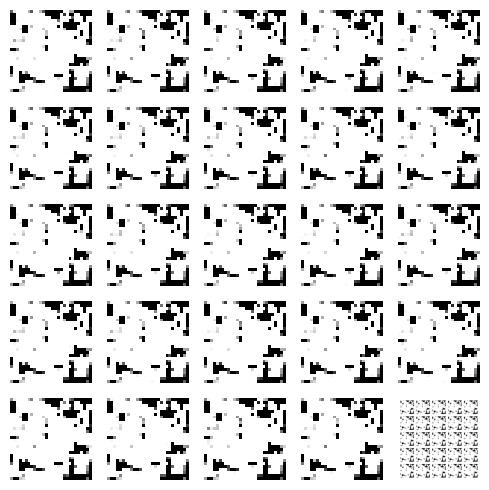

  0%|          | 0/350 [00:00<?, ?it/s]

4/4 [==============================] - 0s 16ms/step


  0%|          | 1/350 [00:00<03:04,  1.89it/s]

4/4 [==============================] - 0s 16ms/step


  1%|          | 2/350 [00:01<03:15,  1.78it/s]

4/4 [==============================] - 0s 26ms/step


  1%|          | 3/350 [00:01<03:16,  1.77it/s]

4/4 [==============================] - 0s 14ms/step


  1%|          | 4/350 [00:02<03:05,  1.86it/s]

4/4 [==============================] - 0s 15ms/step


  1%|▏         | 5/350 [00:02<03:08,  1.83it/s]

4/4 [==============================] - 0s 13ms/step


  2%|▏         | 6/350 [00:03<03:04,  1.86it/s]

4/4 [==============================] - 0s 12ms/step


  2%|▏         | 7/350 [00:03<03:04,  1.86it/s]

4/4 [==============================] - 0s 12ms/step


  2%|▏         | 8/350 [00:04<02:58,  1.92it/s]

4/4 [==============================] - 0s 16ms/step


  3%|▎         | 9/350 [00:04<02:59,  1.90it/s]

4/4 [==============================] - 0s 13ms/step


  3%|▎         | 10/350 [00:05<03:03,  1.85it/s]

4/4 [==============================] - 0s 14ms/step


  3%|▎         | 11/350 [00:05<02:57,  1.91it/s]

4/4 [==============================] - 0s 16ms/step


  3%|▎         | 12/350 [00:06<03:02,  1.85it/s]

4/4 [==============================] - 0s 24ms/step


  4%|▎         | 13/350 [00:07<03:03,  1.84it/s]

4/4 [==============================] - 0s 22ms/step


  4%|▍         | 14/350 [00:07<03:02,  1.84it/s]

4/4 [==============================] - 0s 24ms/step


  4%|▍         | 15/350 [00:08<03:05,  1.81it/s]

4/4 [==============================] - 0s 38ms/step


  5%|▍         | 16/350 [00:08<03:04,  1.81it/s]

4/4 [==============================] - 0s 23ms/step


  5%|▍         | 17/350 [00:09<03:05,  1.80it/s]

4/4 [==============================] - 0s 23ms/step


  5%|▌         | 18/350 [00:09<03:04,  1.80it/s]

4/4 [==============================] - 0s 20ms/step


  5%|▌         | 19/350 [00:10<03:03,  1.80it/s]

4/4 [==============================] - 0s 36ms/step


  6%|▌         | 20/350 [00:10<03:03,  1.80it/s]

4/4 [==============================] - 0s 29ms/step


  6%|▌         | 21/350 [00:11<03:02,  1.80it/s]

4/4 [==============================] - 0s 33ms/step


  6%|▋         | 22/350 [00:12<03:01,  1.81it/s]

4/4 [==============================] - 0s 50ms/step


  7%|▋         | 23/350 [00:12<03:04,  1.77it/s]

4/4 [==============================] - 0s 32ms/step


  7%|▋         | 24/350 [00:13<03:02,  1.79it/s]

4/4 [==============================] - 0s 23ms/step


  7%|▋         | 25/350 [00:13<02:59,  1.81it/s]

4/4 [==============================] - 0s 25ms/step


  7%|▋         | 26/350 [00:14<02:58,  1.81it/s]

4/4 [==============================] - 0s 22ms/step


  8%|▊         | 27/350 [00:14<02:57,  1.82it/s]

4/4 [==============================] - 0s 22ms/step


  8%|▊         | 28/350 [00:15<02:59,  1.79it/s]

4/4 [==============================] - 0s 27ms/step


  8%|▊         | 29/350 [00:15<02:58,  1.80it/s]

4/4 [==============================] - 0s 28ms/step


  9%|▊         | 30/350 [00:16<02:57,  1.80it/s]

4/4 [==============================] - 0s 19ms/step


  9%|▉         | 31/350 [00:17<02:55,  1.82it/s]

4/4 [==============================] - 0s 30ms/step


  9%|▉         | 32/350 [00:17<02:55,  1.81it/s]

4/4 [==============================] - 0s 34ms/step


  9%|▉         | 33/350 [00:18<02:56,  1.80it/s]

4/4 [==============================] - 0s 25ms/step


 10%|▉         | 34/350 [00:18<02:56,  1.79it/s]

4/4 [==============================] - 0s 29ms/step


 10%|█         | 35/350 [00:19<02:55,  1.79it/s]

4/4 [==============================] - 0s 20ms/step


 10%|█         | 36/350 [00:19<02:55,  1.79it/s]

4/4 [==============================] - 0s 23ms/step


 11%|█         | 37/350 [00:20<02:54,  1.80it/s]

4/4 [==============================] - 0s 20ms/step


 11%|█         | 38/350 [00:20<02:52,  1.80it/s]

4/4 [==============================] - 0s 15ms/step


 11%|█         | 39/350 [00:21<02:48,  1.84it/s]

4/4 [==============================] - 0s 12ms/step


 11%|█▏        | 40/350 [00:21<02:47,  1.85it/s]

4/4 [==============================] - 0s 13ms/step


 12%|█▏        | 41/350 [00:22<02:41,  1.91it/s]

4/4 [==============================] - 0s 12ms/step


 12%|█▏        | 42/350 [00:22<02:43,  1.88it/s]

4/4 [==============================] - 0s 14ms/step


 12%|█▏        | 43/350 [00:23<02:39,  1.92it/s]

4/4 [==============================] - 0s 14ms/step


 13%|█▎        | 44/350 [00:24<02:42,  1.88it/s]

4/4 [==============================] - 0s 46ms/step


 13%|█▎        | 45/350 [00:24<02:47,  1.82it/s]

4/4 [==============================] - 0s 29ms/step


 13%|█▎        | 46/350 [00:25<02:48,  1.81it/s]

4/4 [==============================] - 0s 19ms/step


 13%|█▎        | 47/350 [00:25<02:46,  1.82it/s]

4/4 [==============================] - 0s 13ms/step


 14%|█▎        | 48/350 [00:26<02:41,  1.87it/s]

4/4 [==============================] - 0s 12ms/step


 14%|█▍        | 49/350 [00:26<02:43,  1.84it/s]

4/4 [==============================] - 0s 13ms/step


 14%|█▍        | 50/350 [00:27<02:40,  1.87it/s]

4/4 [==============================] - 0s 13ms/step


 15%|█▍        | 51/350 [00:27<02:41,  1.85it/s]

4/4 [==============================] - 0s 31ms/step


 15%|█▍        | 52/350 [00:28<02:43,  1.82it/s]

4/4 [==============================] - 0s 13ms/step


 15%|█▌        | 53/350 [00:28<02:43,  1.82it/s]

4/4 [==============================] - 0s 12ms/step


 15%|█▌        | 54/350 [00:29<02:36,  1.90it/s]

4/4 [==============================] - 0s 14ms/step


 16%|█▌        | 55/350 [00:30<02:39,  1.84it/s]

4/4 [==============================] - 0s 15ms/step


 16%|█▌        | 56/350 [00:30<02:36,  1.88it/s]

4/4 [==============================] - 0s 13ms/step


 16%|█▋        | 57/350 [00:31<02:36,  1.87it/s]

4/4 [==============================] - 0s 13ms/step


 17%|█▋        | 58/350 [00:31<02:31,  1.93it/s]

4/4 [==============================] - 0s 12ms/step


 17%|█▋        | 59/350 [00:32<02:35,  1.88it/s]

4/4 [==============================] - 0s 13ms/step


 17%|█▋        | 60/350 [00:32<02:30,  1.93it/s]

4/4 [==============================] - 0s 13ms/step


 17%|█▋        | 61/350 [00:33<02:35,  1.86it/s]

4/4 [==============================] - 0s 12ms/step


 18%|█▊        | 62/350 [00:33<02:29,  1.93it/s]

4/4 [==============================] - 0s 13ms/step


 18%|█▊        | 63/350 [00:34<02:32,  1.89it/s]

4/4 [==============================] - 0s 13ms/step


 18%|█▊        | 64/350 [00:34<02:27,  1.94it/s]

4/4 [==============================] - 0s 14ms/step


 19%|█▊        | 65/350 [00:35<02:30,  1.89it/s]

4/4 [==============================] - 0s 13ms/step


 19%|█▉        | 66/350 [00:35<02:26,  1.94it/s]

4/4 [==============================] - 0s 12ms/step


 19%|█▉        | 67/350 [00:36<02:31,  1.87it/s]

4/4 [==============================] - 0s 13ms/step


 19%|█▉        | 68/350 [00:36<02:32,  1.85it/s]

4/4 [==============================] - 0s 12ms/step


 20%|█▉        | 69/350 [00:37<02:27,  1.91it/s]

4/4 [==============================] - 0s 14ms/step


 20%|██        | 70/350 [00:37<02:29,  1.87it/s]

4/4 [==============================] - 0s 14ms/step


 20%|██        | 71/350 [00:38<02:25,  1.92it/s]

4/4 [==============================] - 0s 14ms/step


 21%|██        | 72/350 [00:39<02:30,  1.85it/s]

4/4 [==============================] - 0s 13ms/step


 21%|██        | 73/350 [00:39<02:25,  1.91it/s]

4/4 [==============================] - 0s 14ms/step


 21%|██        | 74/350 [00:40<02:28,  1.86it/s]

4/4 [==============================] - 0s 13ms/step


 21%|██▏       | 75/350 [00:40<02:29,  1.84it/s]

4/4 [==============================] - 0s 14ms/step


 22%|██▏       | 76/350 [00:41<02:30,  1.82it/s]

4/4 [==============================] - 0s 14ms/step


 22%|██▏       | 77/350 [00:41<02:29,  1.83it/s]

4/4 [==============================] - 0s 17ms/step


 22%|██▏       | 78/350 [00:42<02:26,  1.85it/s]

4/4 [==============================] - 0s 13ms/step


 23%|██▎       | 79/350 [00:42<02:27,  1.83it/s]

4/4 [==============================] - 0s 38ms/step


 23%|██▎       | 80/350 [00:43<02:27,  1.82it/s]

4/4 [==============================] - 0s 13ms/step


 23%|██▎       | 81/350 [00:43<02:23,  1.88it/s]

4/4 [==============================] - 0s 13ms/step


 23%|██▎       | 82/350 [00:44<02:24,  1.85it/s]

4/4 [==============================] - 0s 18ms/step


 24%|██▎       | 83/350 [00:44<02:26,  1.83it/s]

4/4 [==============================] - 0s 13ms/step


 24%|██▍       | 84/350 [00:45<02:20,  1.89it/s]

4/4 [==============================] - 0s 13ms/step


 24%|██▍       | 85/350 [00:46<02:23,  1.85it/s]

4/4 [==============================] - 0s 14ms/step


 25%|██▍       | 86/350 [00:46<02:18,  1.91it/s]

4/4 [==============================] - 0s 13ms/step


 25%|██▍       | 87/350 [00:46<02:13,  1.96it/s]

4/4 [==============================] - 0s 23ms/step


 25%|██▌       | 88/350 [00:47<02:15,  1.93it/s]

4/4 [==============================] - 0s 16ms/step


 25%|██▌       | 89/350 [00:48<02:14,  1.94it/s]

4/4 [==============================] - 0s 12ms/step


 26%|██▌       | 90/350 [00:48<02:16,  1.90it/s]

4/4 [==============================] - 0s 13ms/step


 26%|██▌       | 91/350 [00:49<02:17,  1.88it/s]

4/4 [==============================] - 0s 12ms/step


 26%|██▋       | 92/350 [00:49<02:18,  1.87it/s]

4/4 [==============================] - 0s 13ms/step


 27%|██▋       | 93/350 [00:50<02:18,  1.85it/s]

4/4 [==============================] - 0s 13ms/step


 27%|██▋       | 94/350 [00:50<02:20,  1.83it/s]

4/4 [==============================] - 0s 14ms/step


 27%|██▋       | 95/350 [00:51<02:16,  1.87it/s]

4/4 [==============================] - 0s 13ms/step


 27%|██▋       | 96/350 [00:51<02:17,  1.84it/s]

4/4 [==============================] - 0s 26ms/step


 28%|██▊       | 97/350 [00:52<02:18,  1.83it/s]

4/4 [==============================] - 0s 12ms/step


 28%|██▊       | 98/350 [00:52<02:13,  1.89it/s]

4/4 [==============================] - 0s 12ms/step


 28%|██▊       | 99/350 [00:53<02:15,  1.86it/s]

4/4 [==============================] - 0s 15ms/step


 29%|██▊       | 100/350 [00:53<02:12,  1.89it/s]

4/4 [==============================] - 0s 13ms/step


 29%|██▉       | 101/350 [00:54<02:14,  1.86it/s]

4/4 [==============================] - 0s 14ms/step


 29%|██▉       | 102/350 [00:55<02:09,  1.91it/s]

4/4 [==============================] - 0s 13ms/step


 29%|██▉       | 103/350 [00:55<02:11,  1.87it/s]

4/4 [==============================] - 0s 14ms/step


 30%|██▉       | 104/350 [00:56<02:12,  1.85it/s]

4/4 [==============================] - 0s 13ms/step


 30%|███       | 105/350 [00:56<02:10,  1.88it/s]

4/4 [==============================] - 0s 13ms/step


 30%|███       | 106/350 [00:57<02:11,  1.85it/s]

4/4 [==============================] - 0s 12ms/step


 31%|███       | 107/350 [00:57<02:12,  1.84it/s]

4/4 [==============================] - 0s 13ms/step


 31%|███       | 108/350 [00:58<02:13,  1.81it/s]

4/4 [==============================] - 0s 12ms/step


 31%|███       | 109/350 [00:58<02:12,  1.82it/s]

4/4 [==============================] - 0s 13ms/step


 31%|███▏      | 110/350 [00:59<02:11,  1.82it/s]

4/4 [==============================] - 0s 16ms/step


 32%|███▏      | 111/350 [01:00<02:13,  1.78it/s]

4/4 [==============================] - 0s 14ms/step


 32%|███▏      | 112/350 [01:00<02:13,  1.79it/s]

4/4 [==============================] - 0s 12ms/step


 32%|███▏      | 113/350 [01:01<02:12,  1.79it/s]

4/4 [==============================] - 0s 13ms/step


 33%|███▎      | 114/350 [01:01<02:11,  1.80it/s]

4/4 [==============================] - 0s 13ms/step


 33%|███▎      | 115/350 [01:02<02:10,  1.80it/s]

4/4 [==============================] - 0s 14ms/step


 33%|███▎      | 116/350 [01:02<02:11,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 33%|███▎      | 117/350 [01:03<02:06,  1.85it/s]

4/4 [==============================] - 0s 12ms/step


 34%|███▎      | 118/350 [01:03<02:06,  1.83it/s]

4/4 [==============================] - 0s 13ms/step


 34%|███▍      | 119/350 [01:04<02:02,  1.89it/s]

4/4 [==============================] - 0s 13ms/step


 34%|███▍      | 120/350 [01:04<02:03,  1.86it/s]

4/4 [==============================] - 0s 14ms/step


 35%|███▍      | 121/350 [01:05<02:05,  1.83it/s]

4/4 [==============================] - 0s 15ms/step


 35%|███▍      | 122/350 [01:06<02:07,  1.79it/s]

4/4 [==============================] - 0s 13ms/step


 35%|███▌      | 123/350 [01:06<02:06,  1.80it/s]

4/4 [==============================] - 0s 13ms/step


 35%|███▌      | 124/350 [01:07<02:06,  1.79it/s]

4/4 [==============================] - 0s 14ms/step


 36%|███▌      | 125/350 [01:07<02:05,  1.80it/s]

4/4 [==============================] - 0s 14ms/step


 36%|███▌      | 126/350 [01:08<02:04,  1.79it/s]

4/4 [==============================] - 0s 14ms/step


 36%|███▋      | 127/350 [01:08<02:05,  1.77it/s]

4/4 [==============================] - 0s 12ms/step


 37%|███▋      | 128/350 [01:09<02:04,  1.79it/s]

4/4 [==============================] - 0s 14ms/step


 37%|███▋      | 129/350 [01:09<02:02,  1.80it/s]

4/4 [==============================] - 0s 13ms/step


 37%|███▋      | 130/350 [01:10<02:01,  1.80it/s]

4/4 [==============================] - 0s 12ms/step


 37%|███▋      | 131/350 [01:11<02:02,  1.79it/s]

4/4 [==============================] - 0s 13ms/step


 38%|███▊      | 132/350 [01:11<02:00,  1.80it/s]

4/4 [==============================] - 0s 16ms/step


 38%|███▊      | 133/350 [01:12<02:02,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 38%|███▊      | 134/350 [01:12<02:00,  1.79it/s]

4/4 [==============================] - 0s 12ms/step


 39%|███▊      | 135/350 [01:13<01:59,  1.80it/s]

4/4 [==============================] - 0s 13ms/step


 39%|███▉      | 136/350 [01:13<01:58,  1.81it/s]

4/4 [==============================] - 0s 14ms/step


 39%|███▉      | 137/350 [01:14<01:58,  1.79it/s]

4/4 [==============================] - 0s 13ms/step


 39%|███▉      | 138/350 [01:15<02:00,  1.76it/s]

4/4 [==============================] - 0s 14ms/step


 40%|███▉      | 139/350 [01:15<01:58,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 40%|████      | 140/350 [01:16<01:57,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 40%|████      | 141/350 [01:16<01:57,  1.79it/s]

4/4 [==============================] - 0s 13ms/step


 41%|████      | 142/350 [01:17<01:56,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 41%|████      | 143/350 [01:17<01:56,  1.78it/s]

4/4 [==============================] - 0s 15ms/step


 41%|████      | 144/350 [01:18<01:56,  1.77it/s]

4/4 [==============================] - 0s 12ms/step


 41%|████▏     | 145/350 [01:18<01:54,  1.78it/s]

4/4 [==============================] - 0s 15ms/step


 42%|████▏     | 146/350 [01:19<01:54,  1.78it/s]

4/4 [==============================] - 0s 14ms/step


 42%|████▏     | 147/350 [01:20<01:54,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 42%|████▏     | 148/350 [01:20<01:53,  1.78it/s]

4/4 [==============================] - 0s 14ms/step


 43%|████▎     | 149/350 [01:21<01:54,  1.76it/s]

4/4 [==============================] - 0s 14ms/step


 43%|████▎     | 150/350 [01:21<01:52,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 43%|████▎     | 151/350 [01:22<01:52,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 43%|████▎     | 152/350 [01:22<01:51,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 44%|████▎     | 153/350 [01:23<01:50,  1.79it/s]

4/4 [==============================] - 0s 16ms/step


 44%|████▍     | 154/350 [01:23<01:49,  1.79it/s]

4/4 [==============================] - 0s 13ms/step


 44%|████▍     | 155/350 [01:24<01:49,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 45%|████▍     | 156/350 [01:25<01:48,  1.79it/s]

4/4 [==============================] - 0s 12ms/step


 45%|████▍     | 157/350 [01:25<01:47,  1.79it/s]

4/4 [==============================] - 0s 12ms/step


 45%|████▌     | 158/350 [01:26<01:46,  1.80it/s]

4/4 [==============================] - 0s 13ms/step


 45%|████▌     | 159/350 [01:26<01:45,  1.81it/s]

4/4 [==============================] - 0s 13ms/step


 46%|████▌     | 160/350 [01:27<01:47,  1.77it/s]

4/4 [==============================] - 0s 14ms/step


 46%|████▌     | 161/350 [01:27<01:46,  1.78it/s]

4/4 [==============================] - 0s 14ms/step


 46%|████▋     | 162/350 [01:28<01:45,  1.78it/s]

4/4 [==============================] - 0s 14ms/step


 47%|████▋     | 163/350 [01:29<01:44,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 47%|████▋     | 164/350 [01:29<01:43,  1.80it/s]

4/4 [==============================] - 0s 13ms/step


 47%|████▋     | 165/350 [01:30<01:43,  1.79it/s]

4/4 [==============================] - 0s 14ms/step


 47%|████▋     | 166/350 [01:30<01:43,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 48%|████▊     | 167/350 [01:31<01:42,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 48%|████▊     | 168/350 [01:31<01:41,  1.79it/s]

4/4 [==============================] - 0s 13ms/step


 48%|████▊     | 169/350 [01:32<01:41,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 49%|████▊     | 170/350 [01:32<01:40,  1.79it/s]

4/4 [==============================] - 0s 14ms/step


 49%|████▉     | 171/350 [01:33<01:42,  1.75it/s]

4/4 [==============================] - 0s 14ms/step


 49%|████▉     | 172/350 [01:34<01:41,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 49%|████▉     | 173/350 [01:34<01:39,  1.77it/s]

4/4 [==============================] - 0s 12ms/step


 50%|████▉     | 174/350 [01:35<01:38,  1.78it/s]

4/4 [==============================] - 0s 10ms/step


 50%|█████     | 175/350 [01:35<01:43,  1.69it/s]

4/4 [==============================] - 0s 13ms/step


 50%|█████     | 176/350 [01:36<01:41,  1.71it/s]

4/4 [==============================] - 0s 16ms/step


 51%|█████     | 177/350 [01:37<01:41,  1.71it/s]

4/4 [==============================] - 0s 13ms/step


 51%|█████     | 178/350 [01:37<01:39,  1.73it/s]

4/4 [==============================] - 0s 14ms/step


 51%|█████     | 179/350 [01:38<01:37,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 51%|█████▏    | 180/350 [01:38<01:36,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 52%|█████▏    | 181/350 [01:39<01:36,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 52%|█████▏    | 182/350 [01:39<01:36,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 52%|█████▏    | 183/350 [01:40<01:35,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 53%|█████▎    | 184/350 [01:40<01:33,  1.77it/s]

4/4 [==============================] - 0s 14ms/step


 53%|█████▎    | 185/350 [01:41<01:33,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 53%|█████▎    | 186/350 [01:42<01:32,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 53%|█████▎    | 187/350 [01:42<01:30,  1.79it/s]

4/4 [==============================] - 0s 15ms/step


 54%|█████▎    | 188/350 [01:43<01:31,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 54%|█████▍    | 189/350 [01:43<01:30,  1.78it/s]

4/4 [==============================] - 0s 12ms/step


 54%|█████▍    | 190/350 [01:44<01:29,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 55%|█████▍    | 191/350 [01:44<01:28,  1.79it/s]

4/4 [==============================] - 0s 14ms/step


 55%|█████▍    | 192/350 [01:45<01:28,  1.79it/s]

4/4 [==============================] - 0s 14ms/step


 55%|█████▌    | 193/350 [01:46<01:29,  1.75it/s]

4/4 [==============================] - 0s 12ms/step


 55%|█████▌    | 194/350 [01:46<01:28,  1.76it/s]

4/4 [==============================] - 0s 14ms/step


 56%|█████▌    | 195/350 [01:47<01:27,  1.76it/s]

4/4 [==============================] - 0s 14ms/step


 56%|█████▌    | 196/350 [01:47<01:26,  1.78it/s]

4/4 [==============================] - 0s 14ms/step


 56%|█████▋    | 197/350 [01:48<01:25,  1.78it/s]

4/4 [==============================] - 0s 12ms/step


 57%|█████▋    | 198/350 [01:48<01:25,  1.79it/s]

4/4 [==============================] - 0s 15ms/step


 57%|█████▋    | 199/350 [01:49<01:25,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 57%|█████▋    | 200/350 [01:49<01:24,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 57%|█████▋    | 201/350 [01:50<01:23,  1.79it/s]

4/4 [==============================] - 0s 13ms/step


 58%|█████▊    | 202/350 [01:51<01:22,  1.79it/s]

4/4 [==============================] - 0s 13ms/step


 58%|█████▊    | 203/350 [01:51<01:21,  1.80it/s]

4/4 [==============================] - 0s 13ms/step


 58%|█████▊    | 204/350 [01:52<01:22,  1.77it/s]

4/4 [==============================] - 0s 14ms/step


 59%|█████▊    | 205/350 [01:52<01:21,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 59%|█████▉    | 206/350 [01:53<01:20,  1.79it/s]

4/4 [==============================] - 0s 13ms/step


 59%|█████▉    | 207/350 [01:53<01:19,  1.80it/s]

4/4 [==============================] - 0s 13ms/step


 59%|█████▉    | 208/350 [01:54<01:19,  1.79it/s]

4/4 [==============================] - 0s 12ms/step


 60%|█████▉    | 209/350 [01:54<01:18,  1.80it/s]

4/4 [==============================] - 0s 16ms/step


 60%|██████    | 210/350 [01:55<01:18,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 60%|██████    | 211/350 [01:56<01:18,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 61%|██████    | 212/350 [01:56<01:16,  1.79it/s]

4/4 [==============================] - 0s 14ms/step


 61%|██████    | 213/350 [01:57<01:16,  1.79it/s]

4/4 [==============================] - 0s 14ms/step


 61%|██████    | 214/350 [01:57<01:15,  1.79it/s]

4/4 [==============================] - 0s 13ms/step


 61%|██████▏   | 215/350 [01:58<01:15,  1.79it/s]

4/4 [==============================] - 0s 13ms/step


 62%|██████▏   | 216/350 [01:58<01:14,  1.80it/s]

4/4 [==============================] - 0s 13ms/step


 62%|██████▏   | 217/350 [01:59<01:13,  1.80it/s]

4/4 [==============================] - 0s 15ms/step


 62%|██████▏   | 218/350 [02:00<01:13,  1.79it/s]

4/4 [==============================] - 0s 13ms/step


 63%|██████▎   | 219/350 [02:00<01:12,  1.80it/s]

4/4 [==============================] - 0s 13ms/step


 63%|██████▎   | 220/350 [02:01<01:12,  1.79it/s]

4/4 [==============================] - 0s 16ms/step


 63%|██████▎   | 221/350 [02:01<01:12,  1.78it/s]

4/4 [==============================] - 0s 14ms/step


 63%|██████▎   | 222/350 [02:02<01:12,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 64%|██████▎   | 223/350 [02:02<01:11,  1.78it/s]

4/4 [==============================] - 0s 12ms/step


 64%|██████▍   | 224/350 [02:03<01:10,  1.79it/s]

4/4 [==============================] - 0s 14ms/step


 64%|██████▍   | 225/350 [02:03<01:09,  1.79it/s]

4/4 [==============================] - 0s 13ms/step


 65%|██████▍   | 226/350 [02:04<01:10,  1.76it/s]

4/4 [==============================] - 0s 14ms/step


 65%|██████▍   | 227/350 [02:05<01:09,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 65%|██████▌   | 228/350 [02:05<01:08,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 65%|██████▌   | 229/350 [02:06<01:07,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 66%|██████▌   | 230/350 [02:06<01:07,  1.79it/s]

4/4 [==============================] - 0s 12ms/step


 66%|██████▌   | 231/350 [02:07<01:06,  1.79it/s]

4/4 [==============================] - 0s 15ms/step


 66%|██████▋   | 232/350 [02:07<01:06,  1.77it/s]

4/4 [==============================] - 0s 14ms/step


 67%|██████▋   | 233/350 [02:08<01:05,  1.77it/s]

4/4 [==============================] - 0s 14ms/step


 67%|██████▋   | 234/350 [02:09<01:05,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 67%|██████▋   | 235/350 [02:09<01:04,  1.78it/s]

4/4 [==============================] - 0s 12ms/step


 67%|██████▋   | 236/350 [02:10<01:04,  1.78it/s]

4/4 [==============================] - 0s 14ms/step


 68%|██████▊   | 237/350 [02:10<01:04,  1.75it/s]

4/4 [==============================] - 0s 12ms/step


 68%|██████▊   | 238/350 [02:11<01:03,  1.77it/s]

4/4 [==============================] - 0s 14ms/step


 68%|██████▊   | 239/350 [02:11<01:02,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 69%|██████▊   | 240/350 [02:12<01:02,  1.77it/s]

4/4 [==============================] - 0s 14ms/step


 69%|██████▉   | 241/350 [02:12<01:01,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 69%|██████▉   | 242/350 [02:13<01:00,  1.78it/s]

4/4 [==============================] - 0s 16ms/step


 69%|██████▉   | 243/350 [02:14<01:00,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 70%|██████▉   | 244/350 [02:14<00:59,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 70%|███████   | 245/350 [02:15<00:59,  1.77it/s]

4/4 [==============================] - 0s 14ms/step


 70%|███████   | 246/350 [02:15<00:58,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 71%|███████   | 247/350 [02:16<00:58,  1.78it/s]

4/4 [==============================] - 0s 14ms/step


 71%|███████   | 248/350 [02:16<00:58,  1.76it/s]

4/4 [==============================] - 0s 14ms/step


 71%|███████   | 249/350 [02:17<00:57,  1.77it/s]

4/4 [==============================] - 0s 14ms/step


 71%|███████▏  | 250/350 [02:18<00:56,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 72%|███████▏  | 251/350 [02:18<00:55,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 72%|███████▏  | 252/350 [02:19<00:55,  1.77it/s]

4/4 [==============================] - 0s 12ms/step


 72%|███████▏  | 253/350 [02:19<00:54,  1.78it/s]

4/4 [==============================] - 0s 21ms/step


 73%|███████▎  | 254/350 [02:20<00:54,  1.76it/s]

4/4 [==============================] - 0s 14ms/step


 73%|███████▎  | 255/350 [02:20<00:53,  1.76it/s]

4/4 [==============================] - 0s 12ms/step


 73%|███████▎  | 256/350 [02:21<00:53,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 73%|███████▎  | 257/350 [02:21<00:52,  1.79it/s]

4/4 [==============================] - 0s 13ms/step


 74%|███████▎  | 258/350 [02:22<00:51,  1.78it/s]

4/4 [==============================] - 0s 14ms/step


 74%|███████▍  | 259/350 [02:23<00:51,  1.75it/s]

4/4 [==============================] - 0s 14ms/step


 74%|███████▍  | 260/350 [02:23<00:51,  1.75it/s]

4/4 [==============================] - 0s 12ms/step


 75%|███████▍  | 261/350 [02:24<00:50,  1.76it/s]

4/4 [==============================] - 0s 14ms/step


 75%|███████▍  | 262/350 [02:24<00:49,  1.77it/s]

4/4 [==============================] - 0s 14ms/step


 75%|███████▌  | 263/350 [02:25<00:48,  1.79it/s]

4/4 [==============================] - 0s 14ms/step


 75%|███████▌  | 264/350 [02:25<00:47,  1.79it/s]

4/4 [==============================] - 0s 16ms/step


 76%|███████▌  | 265/350 [02:26<00:48,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 76%|███████▌  | 266/350 [02:27<00:47,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 76%|███████▋  | 267/350 [02:27<00:46,  1.78it/s]

4/4 [==============================] - 0s 14ms/step


 77%|███████▋  | 268/350 [02:28<00:46,  1.77it/s]

4/4 [==============================] - 0s 14ms/step


 77%|███████▋  | 269/350 [02:28<00:45,  1.79it/s]

4/4 [==============================] - 0s 14ms/step


 77%|███████▋  | 270/350 [02:29<00:45,  1.76it/s]

4/4 [==============================] - 0s 14ms/step


 77%|███████▋  | 271/350 [02:29<00:44,  1.77it/s]

4/4 [==============================] - 0s 15ms/step


 78%|███████▊  | 272/350 [02:30<00:44,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 78%|███████▊  | 273/350 [02:31<00:43,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 78%|███████▊  | 274/350 [02:31<00:42,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 79%|███████▊  | 275/350 [02:32<00:42,  1.78it/s]

4/4 [==============================] - 0s 15ms/step


 79%|███████▉  | 276/350 [02:32<00:41,  1.76it/s]

4/4 [==============================] - 0s 14ms/step


 79%|███████▉  | 277/350 [02:33<00:41,  1.76it/s]

4/4 [==============================] - 0s 14ms/step


 79%|███████▉  | 278/350 [02:33<00:40,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 80%|███████▉  | 279/350 [02:34<00:40,  1.76it/s]

4/4 [==============================] - 0s 12ms/step


 80%|████████  | 280/350 [02:34<00:39,  1.77it/s]

4/4 [==============================] - 0s 14ms/step


 80%|████████  | 281/350 [02:35<00:39,  1.75it/s]

4/4 [==============================] - 0s 14ms/step


 81%|████████  | 282/350 [02:36<00:38,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 81%|████████  | 283/350 [02:36<00:38,  1.75it/s]

4/4 [==============================] - 0s 14ms/step


 81%|████████  | 284/350 [02:37<00:37,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 81%|████████▏ | 285/350 [02:37<00:36,  1.77it/s]

4/4 [==============================] - 0s 12ms/step


 82%|████████▏ | 286/350 [02:38<00:35,  1.79it/s]

4/4 [==============================] - 0s 19ms/step


 82%|████████▏ | 287/350 [02:38<00:35,  1.77it/s]

4/4 [==============================] - 0s 15ms/step


 82%|████████▏ | 288/350 [02:39<00:34,  1.79it/s]

4/4 [==============================] - 0s 13ms/step


 83%|████████▎ | 289/350 [02:40<00:34,  1.78it/s]

4/4 [==============================] - 0s 12ms/step


 83%|████████▎ | 290/350 [02:40<00:33,  1.79it/s]

4/4 [==============================] - 0s 14ms/step


 83%|████████▎ | 291/350 [02:41<00:33,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 83%|████████▎ | 292/350 [02:41<00:32,  1.77it/s]

4/4 [==============================] - 0s 14ms/step


 84%|████████▎ | 293/350 [02:42<00:32,  1.77it/s]

4/4 [==============================] - 0s 12ms/step


 84%|████████▍ | 294/350 [02:42<00:31,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 84%|████████▍ | 295/350 [02:43<00:30,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 85%|████████▍ | 296/350 [02:44<00:30,  1.79it/s]

4/4 [==============================] - 0s 14ms/step


 85%|████████▍ | 297/350 [02:44<00:29,  1.79it/s]

4/4 [==============================] - 0s 14ms/step


 85%|████████▌ | 298/350 [02:45<00:29,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 85%|████████▌ | 299/350 [02:45<00:28,  1.78it/s]

4/4 [==============================] - 0s 12ms/step


 86%|████████▌ | 300/350 [02:46<00:28,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 86%|████████▌ | 301/350 [02:46<00:27,  1.79it/s]

4/4 [==============================] - 0s 13ms/step


 86%|████████▋ | 302/350 [02:47<00:26,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 87%|████████▋ | 303/350 [02:47<00:26,  1.77it/s]

4/4 [==============================] - 0s 14ms/step


 87%|████████▋ | 304/350 [02:48<00:25,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 87%|████████▋ | 305/350 [02:49<00:25,  1.79it/s]

4/4 [==============================] - 0s 13ms/step


 87%|████████▋ | 306/350 [02:49<00:24,  1.80it/s]

4/4 [==============================] - 0s 13ms/step


 88%|████████▊ | 307/350 [02:50<00:23,  1.80it/s]

4/4 [==============================] - 0s 13ms/step


 88%|████████▊ | 308/350 [02:50<00:22,  1.83it/s]

4/4 [==============================] - 0s 15ms/step


 88%|████████▊ | 309/350 [02:51<00:23,  1.77it/s]

4/4 [==============================] - 0s 12ms/step


 89%|████████▊ | 310/350 [02:51<00:22,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 89%|████████▉ | 311/350 [02:52<00:21,  1.79it/s]

4/4 [==============================] - 0s 14ms/step


 89%|████████▉ | 312/350 [02:52<00:21,  1.79it/s]

4/4 [==============================] - 0s 14ms/step


 89%|████████▉ | 313/350 [02:53<00:20,  1.79it/s]

4/4 [==============================] - 0s 13ms/step


 90%|████████▉ | 314/350 [02:54<00:20,  1.77it/s]

4/4 [==============================] - 0s 12ms/step


 90%|█████████ | 315/350 [02:54<00:19,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 90%|█████████ | 316/350 [02:55<00:19,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 91%|█████████ | 317/350 [02:55<00:18,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 91%|█████████ | 318/350 [02:56<00:18,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 91%|█████████ | 319/350 [02:56<00:17,  1.78it/s]

4/4 [==============================] - 0s 14ms/step


 91%|█████████▏| 320/350 [02:57<00:17,  1.76it/s]

4/4 [==============================] - 0s 12ms/step


 92%|█████████▏| 321/350 [02:58<00:16,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 92%|█████████▏| 322/350 [02:58<00:15,  1.78it/s]

4/4 [==============================] - 0s 14ms/step


 92%|█████████▏| 323/350 [02:59<00:15,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 93%|█████████▎| 324/350 [02:59<00:14,  1.79it/s]

4/4 [==============================] - 0s 13ms/step


 93%|█████████▎| 325/350 [03:00<00:14,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 93%|█████████▎| 326/350 [03:00<00:13,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 93%|█████████▎| 327/350 [03:01<00:12,  1.77it/s]

4/4 [==============================] - 0s 14ms/step


 94%|█████████▎| 328/350 [03:01<00:12,  1.78it/s]

4/4 [==============================] - 0s 14ms/step


 94%|█████████▍| 329/350 [03:02<00:11,  1.78it/s]

4/4 [==============================] - 0s 15ms/step


 94%|█████████▍| 330/350 [03:03<00:11,  1.76it/s]

4/4 [==============================] - 0s 17ms/step


 95%|█████████▍| 331/350 [03:03<00:10,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 95%|█████████▍| 332/350 [03:04<00:10,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 95%|█████████▌| 333/350 [03:04<00:09,  1.77it/s]

4/4 [==============================] - 0s 14ms/step


 95%|█████████▌| 334/350 [03:05<00:09,  1.77it/s]

4/4 [==============================] - 0s 12ms/step


 96%|█████████▌| 335/350 [03:05<00:08,  1.78it/s]

4/4 [==============================] - 0s 14ms/step


 96%|█████████▌| 336/350 [03:06<00:07,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 96%|█████████▋| 337/350 [03:07<00:07,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 97%|█████████▋| 338/350 [03:07<00:06,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 97%|█████████▋| 339/350 [03:08<00:06,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 97%|█████████▋| 340/350 [03:08<00:05,  1.79it/s]

4/4 [==============================] - 0s 13ms/step


 97%|█████████▋| 341/350 [03:09<00:05,  1.79it/s]

4/4 [==============================] - 0s 18ms/step


 98%|█████████▊| 342/350 [03:09<00:04,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 98%|█████████▊| 343/350 [03:10<00:03,  1.78it/s]

4/4 [==============================] - 0s 14ms/step


 98%|█████████▊| 344/350 [03:10<00:03,  1.80it/s]

4/4 [==============================] - 0s 16ms/step


 99%|█████████▊| 345/350 [03:11<00:02,  1.80it/s]

4/4 [==============================] - 0s 13ms/step


 99%|█████████▉| 346/350 [03:12<00:02,  1.79it/s]

4/4 [==============================] - 0s 14ms/step


 99%|█████████▉| 347/350 [03:12<00:01,  1.75it/s]

4/4 [==============================] - 0s 14ms/step


 99%|█████████▉| 348/350 [03:13<00:01,  1.76it/s]

4/4 [==============================] - 0s 14ms/step


100%|█████████▉| 349/350 [03:13<00:00,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


100%|██████████| 350/350 [03:14<00:00,  1.80it/s]

Epoch number: 31 discriminator_loss: 0.3356509035964596 generator_loss: 6.434102277755738
1/1 [==============================] - 0s 22ms/step


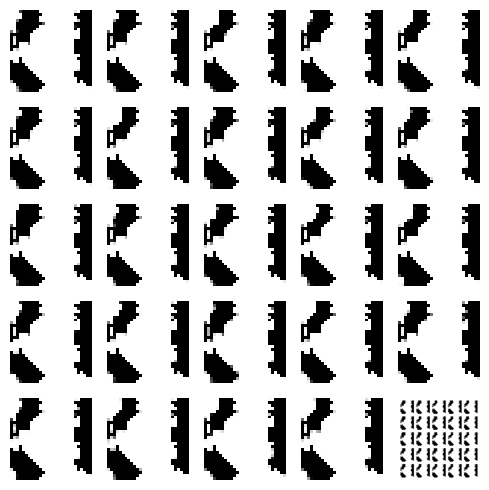

  0%|          | 0/350 [00:00<?, ?it/s]

4/4 [==============================] - 0s 15ms/step


  0%|          | 1/350 [00:00<03:44,  1.55it/s]

4/4 [==============================] - 0s 16ms/step


  1%|          | 2/350 [00:01<03:36,  1.61it/s]

4/4 [==============================] - 0s 16ms/step


  1%|          | 3/350 [00:01<03:31,  1.64it/s]

4/4 [==============================] - 0s 13ms/step


  1%|          | 4/350 [00:02<03:23,  1.70it/s]

4/4 [==============================] - 0s 13ms/step


  1%|▏         | 5/350 [00:02<03:18,  1.74it/s]

4/4 [==============================] - 0s 15ms/step


  2%|▏         | 6/350 [00:03<03:17,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


  2%|▏         | 7/350 [00:04<03:18,  1.73it/s]

4/4 [==============================] - 0s 14ms/step


  2%|▏         | 8/350 [00:04<03:16,  1.74it/s]

4/4 [==============================] - 0s 14ms/step


  3%|▎         | 9/350 [00:05<03:14,  1.75it/s]

4/4 [==============================] - 0s 15ms/step


  3%|▎         | 10/350 [00:05<03:12,  1.77it/s]

4/4 [==============================] - 0s 12ms/step


  3%|▎         | 11/350 [00:06<03:09,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


  3%|▎         | 12/350 [00:06<03:08,  1.79it/s]

4/4 [==============================] - 0s 13ms/step


  4%|▎         | 13/350 [00:07<03:10,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


  4%|▍         | 14/350 [00:08<03:07,  1.79it/s]

4/4 [==============================] - 0s 13ms/step


  4%|▍         | 15/350 [00:08<03:06,  1.79it/s]

4/4 [==============================] - 0s 12ms/step


  5%|▍         | 16/350 [00:09<03:06,  1.80it/s]

4/4 [==============================] - 0s 13ms/step


  5%|▍         | 17/350 [00:09<03:05,  1.80it/s]

4/4 [==============================] - 0s 12ms/step


  5%|▌         | 18/350 [00:10<03:08,  1.76it/s]

4/4 [==============================] - 0s 15ms/step


  5%|▌         | 19/350 [00:10<03:07,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


  6%|▌         | 20/350 [00:11<03:06,  1.77it/s]

4/4 [==============================] - 0s 14ms/step


  6%|▌         | 21/350 [00:11<03:05,  1.78it/s]

4/4 [==============================] - 0s 14ms/step


  6%|▋         | 22/350 [00:12<03:05,  1.77it/s]

4/4 [==============================] - 0s 12ms/step


  7%|▋         | 23/350 [00:13<03:03,  1.78it/s]

4/4 [==============================] - 0s 16ms/step


  7%|▋         | 24/350 [00:13<03:03,  1.77it/s]

4/4 [==============================] - 0s 12ms/step


  7%|▋         | 25/350 [00:14<03:02,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


  7%|▋         | 26/350 [00:14<03:02,  1.78it/s]

4/4 [==============================] - 0s 12ms/step


  8%|▊         | 27/350 [00:15<03:01,  1.78it/s]

4/4 [==============================] - 0s 14ms/step


  8%|▊         | 28/350 [00:15<03:00,  1.79it/s]

4/4 [==============================] - 0s 13ms/step


  8%|▊         | 29/350 [00:16<03:02,  1.76it/s]

4/4 [==============================] - 0s 12ms/step


  9%|▊         | 30/350 [00:17<03:01,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


  9%|▉         | 31/350 [00:17<03:01,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


  9%|▉         | 32/350 [00:18<02:59,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


  9%|▉         | 33/350 [00:18<02:56,  1.79it/s]

4/4 [==============================] - 0s 13ms/step


 10%|▉         | 34/350 [00:19<02:56,  1.79it/s]

4/4 [==============================] - 0s 15ms/step


 10%|█         | 35/350 [00:19<02:57,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 10%|█         | 36/350 [00:20<02:56,  1.78it/s]

4/4 [==============================] - 0s 12ms/step


 11%|█         | 37/350 [00:20<02:54,  1.79it/s]

4/4 [==============================] - 0s 13ms/step


 11%|█         | 38/350 [00:21<02:54,  1.79it/s]

4/4 [==============================] - 0s 13ms/step


 11%|█         | 39/350 [00:22<02:53,  1.79it/s]

4/4 [==============================] - 0s 13ms/step


 11%|█▏        | 40/350 [00:22<02:54,  1.77it/s]

4/4 [==============================] - 0s 14ms/step


 12%|█▏        | 41/350 [00:23<02:53,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 12%|█▏        | 42/350 [00:23<02:53,  1.78it/s]

4/4 [==============================] - 0s 14ms/step


 12%|█▏        | 43/350 [00:24<02:52,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 13%|█▎        | 44/350 [00:24<02:51,  1.78it/s]

4/4 [==============================] - 0s 12ms/step


 13%|█▎        | 45/350 [00:25<02:51,  1.78it/s]

4/4 [==============================] - 0s 18ms/step


 13%|█▎        | 46/350 [00:26<02:53,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 13%|█▎        | 47/350 [00:26<02:52,  1.75it/s]

4/4 [==============================] - 0s 14ms/step


 14%|█▎        | 48/350 [00:27<02:52,  1.75it/s]

4/4 [==============================] - 0s 12ms/step


 14%|█▍        | 49/350 [00:27<02:49,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 14%|█▍        | 50/350 [00:28<02:47,  1.79it/s]

4/4 [==============================] - 0s 14ms/step


 15%|█▍        | 51/350 [00:28<02:50,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 15%|█▍        | 52/350 [00:29<02:49,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 15%|█▌        | 53/350 [00:29<02:47,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 15%|█▌        | 54/350 [00:30<02:46,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 16%|█▌        | 55/350 [00:31<02:45,  1.79it/s]

4/4 [==============================] - 0s 13ms/step


 16%|█▌        | 56/350 [00:31<02:45,  1.78it/s]

4/4 [==============================] - 0s 15ms/step


 16%|█▋        | 57/350 [00:32<02:46,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 17%|█▋        | 58/350 [00:32<02:44,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 17%|█▋        | 59/350 [00:33<02:43,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 17%|█▋        | 60/350 [00:33<02:43,  1.77it/s]

4/4 [==============================] - 0s 12ms/step


 17%|█▋        | 61/350 [00:34<02:43,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 18%|█▊        | 62/350 [00:35<02:44,  1.75it/s]

4/4 [==============================] - 0s 12ms/step


 18%|█▊        | 63/350 [00:35<02:43,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 18%|█▊        | 64/350 [00:36<02:40,  1.78it/s]

4/4 [==============================] - 0s 14ms/step


 19%|█▊        | 65/350 [00:36<02:39,  1.78it/s]

4/4 [==============================] - 0s 12ms/step


 19%|█▉        | 66/350 [00:37<02:38,  1.79it/s]

4/4 [==============================] - 0s 13ms/step


 19%|█▉        | 67/350 [00:37<02:37,  1.79it/s]

4/4 [==============================] - 0s 15ms/step


 19%|█▉        | 68/350 [00:38<02:38,  1.78it/s]

4/4 [==============================] - 0s 12ms/step


 20%|█▉        | 69/350 [00:38<02:37,  1.78it/s]

4/4 [==============================] - 0s 12ms/step


 20%|██        | 70/350 [00:39<02:36,  1.79it/s]

4/4 [==============================] - 0s 12ms/step


 20%|██        | 71/350 [00:40<02:35,  1.80it/s]

4/4 [==============================] - 0s 13ms/step


 21%|██        | 72/350 [00:40<02:35,  1.79it/s]

4/4 [==============================] - 0s 12ms/step


 21%|██        | 73/350 [00:41<02:36,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 21%|██        | 74/350 [00:41<02:33,  1.79it/s]

4/4 [==============================] - 0s 13ms/step


 21%|██▏       | 75/350 [00:42<02:32,  1.80it/s]

4/4 [==============================] - 0s 14ms/step


 22%|██▏       | 76/350 [00:42<02:31,  1.81it/s]

4/4 [==============================] - 0s 14ms/step


 22%|██▏       | 77/350 [00:43<02:31,  1.80it/s]

4/4 [==============================] - 0s 13ms/step


 22%|██▏       | 78/350 [00:44<02:32,  1.78it/s]

4/4 [==============================] - 0s 18ms/step


 23%|██▎       | 79/350 [00:44<02:33,  1.76it/s]

4/4 [==============================] - 0s 12ms/step


 23%|██▎       | 80/350 [00:45<02:31,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 23%|██▎       | 81/350 [00:45<02:31,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 23%|██▎       | 82/350 [00:46<02:30,  1.78it/s]

4/4 [==============================] - 0s 14ms/step


 24%|██▎       | 83/350 [00:46<02:29,  1.78it/s]

4/4 [==============================] - 0s 14ms/step


 24%|██▍       | 84/350 [00:47<02:31,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 24%|██▍       | 85/350 [00:47<02:29,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 25%|██▍       | 86/350 [00:48<02:26,  1.80it/s]

4/4 [==============================] - 0s 13ms/step


 25%|██▍       | 87/350 [00:49<02:25,  1.80it/s]

4/4 [==============================] - 0s 12ms/step


 25%|██▌       | 88/350 [00:49<02:26,  1.79it/s]

4/4 [==============================] - 0s 13ms/step


 25%|██▌       | 89/350 [00:50<02:25,  1.79it/s]

4/4 [==============================] - 0s 15ms/step


 26%|██▌       | 90/350 [00:50<02:27,  1.76it/s]

4/4 [==============================] - 0s 12ms/step


 26%|██▌       | 91/350 [00:51<02:25,  1.79it/s]

4/4 [==============================] - 0s 13ms/step


 26%|██▋       | 92/350 [00:51<02:23,  1.79it/s]

4/4 [==============================] - 0s 13ms/step


 27%|██▋       | 93/350 [00:52<02:23,  1.79it/s]

4/4 [==============================] - 0s 13ms/step


 27%|██▋       | 94/350 [00:52<02:22,  1.80it/s]

4/4 [==============================] - 0s 14ms/step


 27%|██▋       | 95/350 [00:53<02:24,  1.76it/s]

4/4 [==============================] - 0s 12ms/step


 27%|██▋       | 96/350 [00:54<02:22,  1.78it/s]

4/4 [==============================] - 0s 14ms/step


 28%|██▊       | 97/350 [00:54<02:22,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 28%|██▊       | 98/350 [00:55<02:20,  1.79it/s]

4/4 [==============================] - 0s 14ms/step


 28%|██▊       | 99/350 [00:55<02:20,  1.79it/s]

4/4 [==============================] - 0s 14ms/step


 29%|██▊       | 100/350 [00:56<02:19,  1.79it/s]

4/4 [==============================] - 0s 17ms/step


 29%|██▉       | 101/350 [00:56<02:21,  1.76it/s]

4/4 [==============================] - 0s 12ms/step


 29%|██▉       | 102/350 [00:57<02:19,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 29%|██▉       | 103/350 [00:58<02:19,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 30%|██▉       | 104/350 [00:58<02:18,  1.78it/s]

4/4 [==============================] - 0s 14ms/step


 30%|███       | 105/350 [00:59<02:18,  1.77it/s]

4/4 [==============================] - 0s 12ms/step


 30%|███       | 106/350 [00:59<02:18,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 31%|███       | 107/350 [01:00<02:16,  1.78it/s]

4/4 [==============================] - 0s 14ms/step


 31%|███       | 108/350 [01:00<02:15,  1.79it/s]

4/4 [==============================] - 0s 12ms/step


 31%|███       | 109/350 [01:01<02:14,  1.79it/s]

4/4 [==============================] - 0s 13ms/step


 31%|███▏      | 110/350 [01:01<02:13,  1.80it/s]

4/4 [==============================] - 0s 13ms/step


 32%|███▏      | 111/350 [01:02<02:13,  1.79it/s]

4/4 [==============================] - 0s 13ms/step


 32%|███▏      | 112/350 [01:03<02:14,  1.77it/s]

4/4 [==============================] - 0s 14ms/step


 32%|███▏      | 113/350 [01:03<02:13,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 33%|███▎      | 114/350 [01:04<02:12,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 33%|███▎      | 115/350 [01:04<02:10,  1.80it/s]

4/4 [==============================] - 0s 13ms/step


 33%|███▎      | 116/350 [01:05<02:10,  1.80it/s]

4/4 [==============================] - 0s 14ms/step


 33%|███▎      | 117/350 [01:05<02:11,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 34%|███▎      | 118/350 [01:06<02:10,  1.78it/s]

4/4 [==============================] - 0s 14ms/step


 34%|███▍      | 119/350 [01:07<02:09,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 34%|███▍      | 120/350 [01:07<02:09,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 35%|███▍      | 121/350 [01:08<02:07,  1.79it/s]

4/4 [==============================] - 0s 13ms/step


 35%|███▍      | 122/350 [01:08<02:07,  1.78it/s]

4/4 [==============================] - 0s 14ms/step


 35%|███▌      | 123/350 [01:09<02:08,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 35%|███▌      | 124/350 [01:09<02:07,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 36%|███▌      | 125/350 [01:10<02:06,  1.77it/s]

4/4 [==============================] - 0s 14ms/step


 36%|███▌      | 126/350 [01:10<02:05,  1.79it/s]

4/4 [==============================] - 0s 12ms/step


 36%|███▋      | 127/350 [01:11<02:04,  1.79it/s]

4/4 [==============================] - 0s 13ms/step


 37%|███▋      | 128/350 [01:12<02:05,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 37%|███▋      | 129/350 [01:12<02:05,  1.76it/s]

4/4 [==============================] - 0s 14ms/step


 37%|███▋      | 130/350 [01:13<02:04,  1.77it/s]

4/4 [==============================] - 0s 14ms/step


 37%|███▋      | 131/350 [01:13<02:03,  1.78it/s]

4/4 [==============================] - 0s 14ms/step


 38%|███▊      | 132/350 [01:14<02:02,  1.78it/s]

4/4 [==============================] - 0s 14ms/step


 38%|███▊      | 133/350 [01:14<02:02,  1.77it/s]

4/4 [==============================] - 0s 14ms/step


 38%|███▊      | 134/350 [01:15<02:03,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 39%|███▊      | 135/350 [01:16<02:02,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 39%|███▉      | 136/350 [01:16<02:02,  1.75it/s]

4/4 [==============================] - 0s 12ms/step


 39%|███▉      | 137/350 [01:17<02:00,  1.76it/s]

4/4 [==============================] - 0s 14ms/step


 39%|███▉      | 138/350 [01:17<01:59,  1.77it/s]

4/4 [==============================] - 0s 14ms/step


 40%|███▉      | 139/350 [01:18<01:59,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 40%|████      | 140/350 [01:18<01:58,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 40%|████      | 141/350 [01:19<01:58,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 41%|████      | 142/350 [01:20<01:56,  1.78it/s]

4/4 [==============================] - 0s 15ms/step


 41%|████      | 143/350 [01:20<01:56,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 41%|████      | 144/350 [01:21<01:55,  1.78it/s]

4/4 [==============================] - 0s 15ms/step


 41%|████▏     | 145/350 [01:21<01:55,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 42%|████▏     | 146/350 [01:22<01:54,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 42%|████▏     | 147/350 [01:22<01:53,  1.79it/s]

4/4 [==============================] - 0s 13ms/step


 42%|████▏     | 148/350 [01:23<01:52,  1.79it/s]

4/4 [==============================] - 0s 14ms/step


 43%|████▎     | 149/350 [01:23<01:52,  1.79it/s]

4/4 [==============================] - 0s 14ms/step


 43%|████▎     | 150/350 [01:24<01:53,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 43%|████▎     | 151/350 [01:25<01:53,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 43%|████▎     | 152/350 [01:25<01:52,  1.77it/s]

4/4 [==============================] - 0s 14ms/step


 44%|████▎     | 153/350 [01:26<01:50,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 44%|████▍     | 154/350 [01:26<01:49,  1.79it/s]

4/4 [==============================] - 0s 13ms/step


 44%|████▍     | 155/350 [01:27<01:48,  1.80it/s]

4/4 [==============================] - 0s 15ms/step


 45%|████▍     | 156/350 [01:27<01:49,  1.78it/s]

4/4 [==============================] - 0s 14ms/step


 45%|████▍     | 157/350 [01:28<01:48,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 45%|████▌     | 158/350 [01:29<01:47,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 45%|████▌     | 159/350 [01:29<01:47,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 46%|████▌     | 160/350 [01:30<01:46,  1.78it/s]

4/4 [==============================] - 0s 12ms/step


 46%|████▌     | 161/350 [01:30<01:47,  1.76it/s]

4/4 [==============================] - 0s 12ms/step


 46%|████▋     | 162/350 [01:31<01:45,  1.78it/s]

4/4 [==============================] - 0s 15ms/step


 47%|████▋     | 163/350 [01:31<01:44,  1.79it/s]

4/4 [==============================] - 0s 13ms/step


 47%|████▋     | 164/350 [01:32<01:44,  1.78it/s]

4/4 [==============================] - 0s 14ms/step


 47%|████▋     | 165/350 [01:32<01:43,  1.79it/s]

4/4 [==============================] - 0s 13ms/step


 47%|████▋     | 166/350 [01:33<01:43,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 48%|████▊     | 167/350 [01:34<01:43,  1.76it/s]

4/4 [==============================] - 0s 14ms/step


 48%|████▊     | 168/350 [01:34<01:43,  1.76it/s]

4/4 [==============================] - 0s 14ms/step


 48%|████▊     | 169/350 [01:35<01:42,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 49%|████▊     | 170/350 [01:35<01:40,  1.79it/s]

4/4 [==============================] - 0s 13ms/step


 49%|████▉     | 171/350 [01:36<01:39,  1.80it/s]

4/4 [==============================] - 0s 14ms/step


 49%|████▉     | 172/350 [01:36<01:40,  1.77it/s]

4/4 [==============================] - 0s 14ms/step


 49%|████▉     | 173/350 [01:37<01:39,  1.78it/s]

4/4 [==============================] - 0s 14ms/step


 50%|████▉     | 174/350 [01:38<01:38,  1.79it/s]

4/4 [==============================] - 0s 14ms/step


 50%|█████     | 175/350 [01:38<01:37,  1.80it/s]

4/4 [==============================] - 0s 12ms/step


 50%|█████     | 176/350 [01:39<01:36,  1.80it/s]

4/4 [==============================] - 0s 13ms/step


 51%|█████     | 177/350 [01:39<01:36,  1.79it/s]

4/4 [==============================] - 0s 14ms/step


 51%|█████     | 178/350 [01:40<01:36,  1.78it/s]

4/4 [==============================] - 0s 14ms/step


 51%|█████     | 179/350 [01:40<01:35,  1.79it/s]

4/4 [==============================] - 0s 14ms/step


 51%|█████▏    | 180/350 [01:41<01:35,  1.78it/s]

4/4 [==============================] - 0s 12ms/step


 52%|█████▏    | 181/350 [01:41<01:34,  1.79it/s]

4/4 [==============================] - 0s 15ms/step


 52%|█████▏    | 182/350 [01:42<01:33,  1.80it/s]

4/4 [==============================] - 0s 13ms/step


 52%|█████▏    | 183/350 [01:43<01:34,  1.77it/s]

4/4 [==============================] - 0s 14ms/step


 53%|█████▎    | 184/350 [01:43<01:33,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 53%|█████▎    | 185/350 [01:44<01:32,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 53%|█████▎    | 186/350 [01:44<01:31,  1.79it/s]

4/4 [==============================] - 0s 14ms/step


 53%|█████▎    | 187/350 [01:45<01:30,  1.79it/s]

4/4 [==============================] - 0s 15ms/step


 54%|█████▎    | 188/350 [01:45<01:30,  1.80it/s]

4/4 [==============================] - 0s 16ms/step


 54%|█████▍    | 189/350 [01:46<01:30,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 54%|█████▍    | 190/350 [01:46<01:29,  1.79it/s]

4/4 [==============================] - 0s 12ms/step


 55%|█████▍    | 191/350 [01:47<01:29,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 55%|█████▍    | 192/350 [01:48<01:28,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 55%|█████▌    | 193/350 [01:48<01:28,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 55%|█████▌    | 194/350 [01:49<01:29,  1.75it/s]

4/4 [==============================] - 0s 14ms/step


 56%|█████▌    | 195/350 [01:49<01:27,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 56%|█████▌    | 196/350 [01:50<01:27,  1.76it/s]

4/4 [==============================] - 0s 12ms/step


 56%|█████▋    | 197/350 [01:50<01:26,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 57%|█████▋    | 198/350 [01:51<01:25,  1.77it/s]

4/4 [==============================] - 0s 14ms/step


 57%|█████▋    | 199/350 [01:52<01:25,  1.77it/s]

4/4 [==============================] - 0s 15ms/step


 57%|█████▋    | 200/350 [01:52<01:25,  1.75it/s]

4/4 [==============================] - 0s 14ms/step


 57%|█████▋    | 201/350 [01:53<01:24,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 58%|█████▊    | 202/350 [01:53<01:23,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 58%|█████▊    | 203/350 [01:54<01:22,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 58%|█████▊    | 204/350 [01:54<01:22,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 59%|█████▊    | 205/350 [01:55<01:23,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 59%|█████▉    | 206/350 [01:56<01:21,  1.76it/s]

4/4 [==============================] - 0s 12ms/step


 59%|█████▉    | 207/350 [01:56<01:20,  1.78it/s]

4/4 [==============================] - 0s 12ms/step


 59%|█████▉    | 208/350 [01:57<01:19,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 60%|█████▉    | 209/350 [01:57<01:18,  1.79it/s]

4/4 [==============================] - 0s 13ms/step


 60%|██████    | 210/350 [01:58<01:17,  1.80it/s]

4/4 [==============================] - 0s 22ms/step


 60%|██████    | 211/350 [01:58<01:19,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 61%|██████    | 212/350 [01:59<01:18,  1.76it/s]

4/4 [==============================] - 0s 14ms/step


 61%|██████    | 213/350 [01:59<01:17,  1.76it/s]

4/4 [==============================] - 0s 12ms/step


 61%|██████    | 214/350 [02:00<01:16,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 61%|██████▏   | 215/350 [02:01<01:16,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 62%|██████▏   | 216/350 [02:01<01:16,  1.75it/s]

4/4 [==============================] - 0s 14ms/step


 62%|██████▏   | 217/350 [02:02<01:15,  1.76it/s]

4/4 [==============================] - 0s 15ms/step


 62%|██████▏   | 218/350 [02:02<01:14,  1.77it/s]

4/4 [==============================] - 0s 12ms/step


 63%|██████▎   | 219/350 [02:03<01:13,  1.77it/s]

4/4 [==============================] - 0s 14ms/step


 63%|██████▎   | 220/350 [02:03<01:13,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 63%|██████▎   | 221/350 [02:04<01:13,  1.76it/s]

4/4 [==============================] - 0s 15ms/step


 63%|██████▎   | 222/350 [02:05<01:13,  1.75it/s]

4/4 [==============================] - 0s 14ms/step


 64%|██████▎   | 223/350 [02:05<01:12,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 64%|██████▍   | 224/350 [02:06<01:11,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 64%|██████▍   | 225/350 [02:06<01:10,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 65%|██████▍   | 226/350 [02:07<01:09,  1.79it/s]

4/4 [==============================] - 0s 14ms/step


 65%|██████▍   | 227/350 [02:07<01:09,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 65%|██████▌   | 228/350 [02:08<01:08,  1.78it/s]

4/4 [==============================] - 0s 14ms/step


 65%|██████▌   | 229/350 [02:09<01:08,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 66%|██████▌   | 230/350 [02:09<01:07,  1.77it/s]

4/4 [==============================] - 0s 14ms/step


 66%|██████▌   | 231/350 [02:10<01:06,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 66%|██████▋   | 232/350 [02:10<01:05,  1.79it/s]

4/4 [==============================] - 0s 17ms/step


 67%|██████▋   | 233/350 [02:11<01:06,  1.77it/s]

4/4 [==============================] - 0s 14ms/step


 67%|██████▋   | 234/350 [02:11<01:05,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 67%|██████▋   | 235/350 [02:12<01:04,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 67%|██████▋   | 236/350 [02:12<01:03,  1.79it/s]

4/4 [==============================] - 0s 13ms/step


 68%|██████▊   | 237/350 [02:13<01:03,  1.77it/s]

4/4 [==============================] - 0s 12ms/step


 68%|██████▊   | 238/350 [02:14<01:03,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 68%|██████▊   | 239/350 [02:14<01:03,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 69%|██████▊   | 240/350 [02:15<01:01,  1.78it/s]

4/4 [==============================] - 0s 14ms/step


 69%|██████▉   | 241/350 [02:15<01:01,  1.78it/s]

4/4 [==============================] - 0s 14ms/step


 69%|██████▉   | 242/350 [02:16<01:00,  1.78it/s]

4/4 [==============================] - 0s 12ms/step


 69%|██████▉   | 243/350 [02:16<00:59,  1.80it/s]

4/4 [==============================] - 0s 16ms/step


 70%|██████▉   | 244/350 [02:17<01:00,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 70%|███████   | 245/350 [02:18<00:59,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 70%|███████   | 246/350 [02:18<00:58,  1.78it/s]

4/4 [==============================] - 0s 14ms/step


 71%|███████   | 247/350 [02:19<00:57,  1.78it/s]

4/4 [==============================] - 0s 14ms/step


 71%|███████   | 248/350 [02:19<00:56,  1.80it/s]

4/4 [==============================] - 0s 14ms/step


 71%|███████   | 249/350 [02:20<00:57,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 71%|███████▏  | 250/350 [02:20<00:56,  1.78it/s]

4/4 [==============================] - 0s 12ms/step


 72%|███████▏  | 251/350 [02:21<00:55,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 72%|███████▏  | 252/350 [02:21<00:54,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 72%|███████▏  | 253/350 [02:22<00:54,  1.77it/s]

4/4 [==============================] - 0s 12ms/step


 73%|███████▎  | 254/350 [02:23<00:53,  1.78it/s]

4/4 [==============================] - 0s 12ms/step


 73%|███████▎  | 255/350 [02:23<00:53,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 73%|███████▎  | 256/350 [02:24<00:52,  1.78it/s]

4/4 [==============================] - 0s 12ms/step


 73%|███████▎  | 257/350 [02:24<00:52,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 74%|███████▎  | 258/350 [02:25<00:51,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 74%|███████▍  | 259/350 [02:25<00:51,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 74%|███████▍  | 260/350 [02:26<00:51,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 75%|███████▍  | 261/350 [02:27<00:50,  1.77it/s]

4/4 [==============================] - 0s 12ms/step


 75%|███████▍  | 262/350 [02:27<00:50,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 75%|███████▌  | 263/350 [02:28<00:49,  1.77it/s]

4/4 [==============================] - 0s 14ms/step


 75%|███████▌  | 264/350 [02:28<00:48,  1.77it/s]

4/4 [==============================] - 0s 14ms/step


 76%|███████▌  | 265/350 [02:29<00:47,  1.77it/s]

4/4 [==============================] - 0s 15ms/step


 76%|███████▌  | 266/350 [02:29<00:47,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 76%|███████▋  | 267/350 [02:30<00:46,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 77%|███████▋  | 268/350 [02:30<00:45,  1.79it/s]

4/4 [==============================] - 0s 14ms/step


 77%|███████▋  | 269/350 [02:31<00:45,  1.79it/s]

4/4 [==============================] - 0s 13ms/step


 77%|███████▋  | 270/350 [02:32<00:44,  1.79it/s]

4/4 [==============================] - 0s 13ms/step


 77%|███████▋  | 271/350 [02:32<00:44,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 78%|███████▊  | 272/350 [02:33<00:44,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 78%|███████▊  | 273/350 [02:33<00:43,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 78%|███████▊  | 274/350 [02:34<00:43,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 79%|███████▊  | 275/350 [02:34<00:42,  1.78it/s]

4/4 [==============================] - 0s 12ms/step


 79%|███████▉  | 276/350 [02:35<00:41,  1.77it/s]

4/4 [==============================] - 0s 16ms/step


 79%|███████▉  | 277/350 [02:36<00:41,  1.75it/s]

4/4 [==============================] - 0s 14ms/step


 79%|███████▉  | 278/350 [02:36<00:41,  1.75it/s]

4/4 [==============================] - 0s 12ms/step


 80%|███████▉  | 279/350 [02:37<00:40,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 80%|████████  | 280/350 [02:37<00:39,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 80%|████████  | 281/350 [02:38<00:39,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 81%|████████  | 282/350 [02:38<00:38,  1.76it/s]

4/4 [==============================] - 0s 14ms/step


 81%|████████  | 283/350 [02:39<00:38,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 81%|████████  | 284/350 [02:40<00:37,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 81%|████████▏ | 285/350 [02:40<00:36,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 82%|████████▏ | 286/350 [02:41<00:35,  1.79it/s]

4/4 [==============================] - 0s 13ms/step


 82%|████████▏ | 287/350 [02:41<00:35,  1.80it/s]

4/4 [==============================] - 0s 15ms/step


 82%|████████▏ | 288/350 [02:42<00:34,  1.77it/s]

4/4 [==============================] - 0s 14ms/step


 83%|████████▎ | 289/350 [02:42<00:34,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 83%|████████▎ | 290/350 [02:43<00:33,  1.78it/s]

4/4 [==============================] - 0s 14ms/step


 83%|████████▎ | 291/350 [02:43<00:33,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 83%|████████▎ | 292/350 [02:44<00:32,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 84%|████████▎ | 293/350 [02:45<00:32,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 84%|████████▍ | 294/350 [02:45<00:31,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 84%|████████▍ | 295/350 [02:46<00:30,  1.79it/s]

4/4 [==============================] - 0s 13ms/step


 85%|████████▍ | 296/350 [02:46<00:30,  1.79it/s]

4/4 [==============================] - 0s 13ms/step


 85%|████████▍ | 297/350 [02:47<00:29,  1.79it/s]

4/4 [==============================] - 0s 13ms/step


 85%|████████▌ | 298/350 [02:47<00:28,  1.80it/s]

4/4 [==============================] - 0s 16ms/step


 85%|████████▌ | 299/350 [02:48<00:28,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 86%|████████▌ | 300/350 [02:49<00:28,  1.77it/s]

4/4 [==============================] - 0s 14ms/step


 86%|████████▌ | 301/350 [02:49<00:27,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 86%|████████▋ | 302/350 [02:50<00:27,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 87%|████████▋ | 303/350 [02:50<00:26,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 87%|████████▋ | 304/350 [02:51<00:26,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 87%|████████▋ | 305/350 [02:51<00:25,  1.76it/s]

4/4 [==============================] - 0s 11ms/step


 87%|████████▋ | 306/350 [02:52<00:26,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 88%|████████▊ | 307/350 [02:53<00:25,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 88%|████████▊ | 308/350 [02:53<00:24,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 88%|████████▊ | 309/350 [02:54<00:23,  1.76it/s]

4/4 [==============================] - 0s 15ms/step


 89%|████████▊ | 310/350 [02:54<00:22,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 89%|████████▉ | 311/350 [02:55<00:22,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 89%|████████▉ | 312/350 [02:55<00:21,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 89%|████████▉ | 313/350 [02:56<00:21,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 90%|████████▉ | 314/350 [02:57<00:20,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 90%|█████████ | 315/350 [02:57<00:20,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 90%|█████████ | 316/350 [02:58<00:19,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 91%|█████████ | 317/350 [02:58<00:18,  1.77it/s]

4/4 [==============================] - 0s 14ms/step


 91%|█████████ | 318/350 [02:59<00:18,  1.77it/s]

4/4 [==============================] - 0s 14ms/step


 91%|█████████ | 319/350 [02:59<00:17,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 91%|█████████▏| 320/350 [03:00<00:16,  1.78it/s]

4/4 [==============================] - 0s 14ms/step


 92%|█████████▏| 321/350 [03:01<00:16,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 92%|█████████▏| 322/350 [03:01<00:15,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 92%|█████████▏| 323/350 [03:02<00:15,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 93%|█████████▎| 324/350 [03:02<00:14,  1.76it/s]

4/4 [==============================] - 0s 12ms/step


 93%|█████████▎| 325/350 [03:03<00:14,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 93%|█████████▎| 326/350 [03:03<00:13,  1.76it/s]

4/4 [==============================] - 0s 12ms/step


 93%|█████████▎| 327/350 [03:04<00:13,  1.76it/s]

4/4 [==============================] - 0s 14ms/step


 94%|█████████▎| 328/350 [03:05<00:12,  1.77it/s]

4/4 [==============================] - 0s 15ms/step


 94%|█████████▍| 329/350 [03:05<00:11,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 94%|█████████▍| 330/350 [03:06<00:11,  1.77it/s]

4/4 [==============================] - 0s 14ms/step


 95%|█████████▍| 331/350 [03:06<00:10,  1.77it/s]

4/4 [==============================] - 0s 17ms/step


 95%|█████████▍| 332/350 [03:07<00:10,  1.75it/s]

4/4 [==============================] - 0s 14ms/step


 95%|█████████▌| 333/350 [03:07<00:09,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 95%|█████████▌| 334/350 [03:08<00:09,  1.77it/s]

4/4 [==============================] - 0s 15ms/step


 96%|█████████▌| 335/350 [03:08<00:08,  1.77it/s]

4/4 [==============================] - 0s 14ms/step


 96%|█████████▌| 336/350 [03:09<00:07,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 96%|█████████▋| 337/350 [03:10<00:07,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 97%|█████████▋| 338/350 [03:10<00:06,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 97%|█████████▋| 339/350 [03:11<00:06,  1.76it/s]

4/4 [==============================] - 0s 15ms/step


 97%|█████████▋| 340/350 [03:11<00:05,  1.78it/s]

4/4 [==============================] - 0s 14ms/step


 97%|█████████▋| 341/350 [03:12<00:05,  1.78it/s]

4/4 [==============================] - 0s 14ms/step


 98%|█████████▊| 342/350 [03:12<00:04,  1.77it/s]

4/4 [==============================] - 0s 17ms/step


 98%|█████████▊| 343/350 [03:13<00:04,  1.74it/s]

4/4 [==============================] - 0s 14ms/step


 98%|█████████▊| 344/350 [03:14<00:03,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 99%|█████████▊| 345/350 [03:14<00:02,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 99%|█████████▉| 346/350 [03:15<00:02,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 99%|█████████▉| 347/350 [03:15<00:01,  1.79it/s]

4/4 [==============================] - 0s 13ms/step


 99%|█████████▉| 348/350 [03:16<00:01,  1.76it/s]

4/4 [==============================] - 0s 12ms/step


100%|█████████▉| 349/350 [03:16<00:00,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


100%|██████████| 350/350 [03:17<00:00,  1.77it/s]

Epoch number: 32 discriminator_loss: 0.16914705602643412 generator_loss: 6.7571046352386475
1/1 [==============================] - 0s 23ms/step


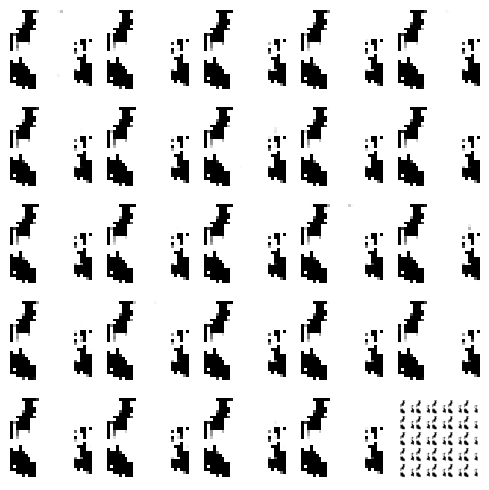

  0%|          | 0/350 [00:00<?, ?it/s]

4/4 [==============================] - 0s 17ms/step


  0%|          | 1/350 [00:00<03:26,  1.69it/s]

4/4 [==============================] - 0s 16ms/step


  1%|          | 2/350 [00:01<03:25,  1.69it/s]

4/4 [==============================] - 0s 18ms/step


  1%|          | 3/350 [00:01<03:27,  1.67it/s]

4/4 [==============================] - 0s 15ms/step


  1%|          | 4/350 [00:02<03:23,  1.70it/s]

4/4 [==============================] - 0s 13ms/step


  1%|▏         | 5/350 [00:02<03:11,  1.80it/s]

4/4 [==============================] - 0s 22ms/step


  2%|▏         | 6/350 [00:03<03:11,  1.80it/s]

4/4 [==============================] - 0s 12ms/step


  2%|▏         | 7/350 [00:03<03:10,  1.80it/s]

4/4 [==============================] - 0s 13ms/step


  2%|▏         | 8/350 [00:04<03:13,  1.76it/s]

4/4 [==============================] - 0s 12ms/step


  3%|▎         | 9/350 [00:05<03:11,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


  3%|▎         | 10/350 [00:05<03:12,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


  3%|▎         | 11/350 [00:06<03:12,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


  3%|▎         | 12/350 [00:06<03:11,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


  4%|▎         | 13/350 [00:07<03:15,  1.73it/s]

4/4 [==============================] - 0s 20ms/step


  4%|▍         | 14/350 [00:08<03:15,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


  4%|▍         | 15/350 [00:08<03:12,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


  5%|▍         | 16/350 [00:09<03:09,  1.76it/s]

4/4 [==============================] - 0s 12ms/step


  5%|▍         | 17/350 [00:09<03:09,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


  5%|▌         | 18/350 [00:10<03:08,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


  5%|▌         | 19/350 [00:10<03:10,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


  6%|▌         | 20/350 [00:11<03:09,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


  6%|▌         | 21/350 [00:11<03:09,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


  6%|▋         | 22/350 [00:12<03:07,  1.75it/s]

4/4 [==============================] - 0s 14ms/step


  7%|▋         | 23/350 [00:13<03:06,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


  7%|▋         | 24/350 [00:13<03:06,  1.75it/s]

4/4 [==============================] - 0s 16ms/step


  7%|▋         | 25/350 [00:14<03:06,  1.74it/s]

4/4 [==============================] - 0s 14ms/step


  7%|▋         | 26/350 [00:14<03:04,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


  8%|▊         | 27/350 [00:15<03:02,  1.77it/s]

4/4 [==============================] - 0s 14ms/step


  8%|▊         | 28/350 [00:15<03:02,  1.77it/s]

4/4 [==============================] - 0s 14ms/step


  8%|▊         | 29/350 [00:16<03:01,  1.77it/s]

4/4 [==============================] - 0s 14ms/step


  9%|▊         | 30/350 [00:17<03:03,  1.75it/s]

4/4 [==============================] - 0s 14ms/step


  9%|▉         | 31/350 [00:17<03:02,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


  9%|▉         | 32/350 [00:18<02:58,  1.78it/s]

4/4 [==============================] - 0s 12ms/step


  9%|▉         | 33/350 [00:18<02:57,  1.79it/s]

4/4 [==============================] - 0s 13ms/step


 10%|▉         | 34/350 [00:19<02:56,  1.79it/s]

4/4 [==============================] - 0s 13ms/step


 10%|█         | 35/350 [00:19<02:56,  1.78it/s]

4/4 [==============================] - 0s 14ms/step


 10%|█         | 36/350 [00:20<02:57,  1.77it/s]

4/4 [==============================] - 0s 15ms/step


 11%|█         | 37/350 [00:21<02:57,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 11%|█         | 38/350 [00:21<02:57,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 11%|█         | 39/350 [00:22<02:56,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 11%|█▏        | 40/350 [00:22<02:56,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 12%|█▏        | 41/350 [00:23<02:56,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 12%|█▏        | 42/350 [00:23<02:54,  1.76it/s]

4/4 [==============================] - 0s 12ms/step


 12%|█▏        | 43/350 [00:24<02:53,  1.77it/s]

4/4 [==============================] - 0s 16ms/step


 13%|█▎        | 44/350 [00:25<02:53,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 13%|█▎        | 45/350 [00:25<02:52,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 13%|█▎        | 46/350 [00:26<02:51,  1.77it/s]

4/4 [==============================] - 0s 14ms/step


 13%|█▎        | 47/350 [00:26<02:51,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 14%|█▎        | 48/350 [00:27<02:49,  1.78it/s]

4/4 [==============================] - 0s 14ms/step


 14%|█▍        | 49/350 [00:27<02:49,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 14%|█▍        | 50/350 [00:28<02:49,  1.77it/s]

4/4 [==============================] - 0s 12ms/step


 15%|█▍        | 51/350 [00:28<02:47,  1.79it/s]

4/4 [==============================] - 0s 12ms/step


 15%|█▍        | 52/350 [00:29<02:48,  1.77it/s]

4/4 [==============================] - 0s 12ms/step


 15%|█▌        | 53/350 [00:30<02:47,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 15%|█▌        | 54/350 [00:30<02:45,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 16%|█▌        | 55/350 [00:31<02:43,  1.80it/s]

4/4 [==============================] - 0s 12ms/step


 16%|█▌        | 56/350 [00:31<02:45,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 16%|█▋        | 57/350 [00:32<02:44,  1.78it/s]

4/4 [==============================] - 0s 15ms/step


 17%|█▋        | 58/350 [00:32<02:45,  1.76it/s]

4/4 [==============================] - 0s 14ms/step


 17%|█▋        | 59/350 [00:33<02:44,  1.77it/s]

4/4 [==============================] - 0s 15ms/step


 17%|█▋        | 60/350 [00:34<02:42,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 17%|█▋        | 61/350 [00:34<02:41,  1.79it/s]

4/4 [==============================] - 0s 13ms/step


 18%|█▊        | 62/350 [00:35<02:40,  1.79it/s]

4/4 [==============================] - 0s 12ms/step


 18%|█▊        | 63/350 [00:35<02:43,  1.76it/s]

4/4 [==============================] - 0s 14ms/step


 18%|█▊        | 64/350 [00:36<02:41,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 19%|█▊        | 65/350 [00:36<02:40,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 19%|█▉        | 66/350 [00:37<02:40,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 19%|█▉        | 67/350 [00:37<02:40,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 19%|█▉        | 68/350 [00:38<02:39,  1.76it/s]

4/4 [==============================] - 0s 15ms/step


 20%|█▉        | 69/350 [00:39<02:41,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 20%|██        | 70/350 [00:39<02:39,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 20%|██        | 71/350 [00:40<02:37,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 21%|██        | 72/350 [00:40<02:37,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 21%|██        | 73/350 [00:41<02:36,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 21%|██        | 74/350 [00:41<02:39,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 21%|██▏       | 75/350 [00:42<02:35,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 22%|██▏       | 76/350 [00:43<02:33,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 22%|██▏       | 77/350 [00:43<02:33,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 22%|██▏       | 78/350 [00:44<02:31,  1.79it/s]

4/4 [==============================] - 0s 12ms/step


 23%|██▎       | 79/350 [00:44<02:33,  1.77it/s]

4/4 [==============================] - 0s 16ms/step


 23%|██▎       | 80/350 [00:45<02:35,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 23%|██▎       | 81/350 [00:45<02:35,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 23%|██▎       | 82/350 [00:46<02:33,  1.74it/s]

4/4 [==============================] - 0s 14ms/step


 24%|██▎       | 83/350 [00:47<02:31,  1.76it/s]

4/4 [==============================] - 0s 14ms/step


 24%|██▍       | 84/350 [00:47<02:32,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 24%|██▍       | 85/350 [00:48<02:33,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 25%|██▍       | 86/350 [00:48<02:30,  1.75it/s]

4/4 [==============================] - 0s 14ms/step


 25%|██▍       | 87/350 [00:49<02:29,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 25%|██▌       | 88/350 [00:49<02:28,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 25%|██▌       | 89/350 [00:50<02:26,  1.78it/s]

4/4 [==============================] - 0s 15ms/step


 26%|██▌       | 90/350 [00:51<02:25,  1.79it/s]

4/4 [==============================] - 0s 16ms/step


 26%|██▌       | 91/350 [00:51<02:26,  1.77it/s]

4/4 [==============================] - 0s 14ms/step


 26%|██▋       | 92/350 [00:52<02:24,  1.79it/s]

4/4 [==============================] - 0s 12ms/step


 27%|██▋       | 93/350 [00:52<02:23,  1.80it/s]

4/4 [==============================] - 0s 14ms/step


 27%|██▋       | 94/350 [00:53<02:23,  1.79it/s]

4/4 [==============================] - 0s 13ms/step


 27%|██▋       | 95/350 [00:53<02:24,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 27%|██▋       | 96/350 [00:54<02:24,  1.76it/s]

4/4 [==============================] - 0s 12ms/step


 28%|██▊       | 97/350 [00:54<02:22,  1.77it/s]

4/4 [==============================] - 0s 14ms/step


 28%|██▊       | 98/350 [00:55<02:20,  1.79it/s]

4/4 [==============================] - 0s 13ms/step


 28%|██▊       | 99/350 [00:56<02:20,  1.78it/s]

4/4 [==============================] - 0s 14ms/step


 29%|██▊       | 100/350 [00:56<02:20,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 29%|██▉       | 101/350 [00:57<02:20,  1.78it/s]

4/4 [==============================] - 0s 16ms/step


 29%|██▉       | 102/350 [00:57<02:20,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 29%|██▉       | 103/350 [00:58<02:19,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 30%|██▉       | 104/350 [00:58<02:18,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 30%|███       | 105/350 [00:59<02:18,  1.77it/s]

4/4 [==============================] - 0s 15ms/step


 30%|███       | 106/350 [01:00<02:18,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 31%|███       | 107/350 [01:00<02:19,  1.75it/s]

4/4 [==============================] - 0s 12ms/step


 31%|███       | 108/350 [01:01<02:17,  1.76it/s]

4/4 [==============================] - 0s 14ms/step


 31%|███       | 109/350 [01:01<02:17,  1.75it/s]

4/4 [==============================] - 0s 14ms/step


 31%|███▏      | 110/350 [01:02<02:16,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 32%|███▏      | 111/350 [01:02<02:14,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 32%|███▏      | 112/350 [01:03<02:14,  1.77it/s]

4/4 [==============================] - 0s 15ms/step


 32%|███▏      | 113/350 [01:04<02:16,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 33%|███▎      | 114/350 [01:04<02:15,  1.75it/s]

4/4 [==============================] - 0s 12ms/step


 33%|███▎      | 115/350 [01:05<02:13,  1.76it/s]

4/4 [==============================] - 0s 12ms/step


 33%|███▎      | 116/350 [01:05<02:12,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 33%|███▎      | 117/350 [01:06<02:10,  1.79it/s]

4/4 [==============================] - 0s 13ms/step


 34%|███▎      | 118/350 [01:07<02:23,  1.61it/s]

4/4 [==============================] - 0s 14ms/step


 34%|███▍      | 119/350 [01:07<02:20,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 34%|███▍      | 120/350 [01:08<02:14,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 35%|███▍      | 121/350 [01:08<02:12,  1.73it/s]

4/4 [==============================] - 0s 12ms/step


 35%|███▍      | 122/350 [01:09<02:09,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 35%|███▌      | 123/350 [01:09<02:08,  1.77it/s]

4/4 [==============================] - 0s 14ms/step


 35%|███▌      | 124/350 [01:10<02:08,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 36%|███▌      | 125/350 [01:10<02:06,  1.78it/s]

4/4 [==============================] - 0s 12ms/step


 36%|███▌      | 126/350 [01:11<02:04,  1.80it/s]

4/4 [==============================] - 0s 15ms/step


 36%|███▋      | 127/350 [01:12<02:04,  1.80it/s]

4/4 [==============================] - 0s 12ms/step


 37%|███▋      | 128/350 [01:12<02:03,  1.79it/s]

4/4 [==============================] - 0s 13ms/step


 37%|███▋      | 129/350 [01:13<02:05,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 37%|███▋      | 130/350 [01:13<02:05,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 37%|███▋      | 131/350 [01:14<02:05,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 38%|███▊      | 132/350 [01:14<02:04,  1.76it/s]

4/4 [==============================] - 0s 12ms/step


 38%|███▊      | 133/350 [01:15<02:02,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 38%|███▊      | 134/350 [01:16<02:01,  1.78it/s]

4/4 [==============================] - 0s 16ms/step


 39%|███▊      | 135/350 [01:16<02:02,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 39%|███▉      | 136/350 [01:17<02:01,  1.77it/s]

4/4 [==============================] - 0s 14ms/step


 39%|███▉      | 137/350 [01:17<02:00,  1.77it/s]

4/4 [==============================] - 0s 12ms/step


 39%|███▉      | 138/350 [01:18<01:58,  1.78it/s]

4/4 [==============================] - 0s 12ms/step


 40%|███▉      | 139/350 [01:18<01:57,  1.80it/s]

4/4 [==============================] - 0s 12ms/step


 40%|████      | 140/350 [01:19<01:58,  1.77it/s]

4/4 [==============================] - 0s 12ms/step


 40%|████      | 141/350 [01:19<01:56,  1.79it/s]

4/4 [==============================] - 0s 13ms/step


 41%|████      | 142/350 [01:20<01:55,  1.79it/s]

4/4 [==============================] - 0s 12ms/step


 41%|████      | 143/350 [01:21<01:55,  1.79it/s]

4/4 [==============================] - 0s 13ms/step


 41%|████      | 144/350 [01:21<01:54,  1.79it/s]

4/4 [==============================] - 0s 13ms/step


 41%|████▏     | 145/350 [01:22<01:53,  1.81it/s]

4/4 [==============================] - 0s 17ms/step


 42%|████▏     | 146/350 [01:22<01:53,  1.79it/s]

4/4 [==============================] - 0s 12ms/step


 42%|████▏     | 147/350 [01:23<01:52,  1.81it/s]

4/4 [==============================] - 0s 14ms/step


 42%|████▏     | 148/350 [01:23<01:52,  1.79it/s]

4/4 [==============================] - 0s 13ms/step


 43%|████▎     | 149/350 [01:24<01:52,  1.79it/s]

4/4 [==============================] - 0s 13ms/step


 43%|████▎     | 150/350 [01:24<01:51,  1.80it/s]

4/4 [==============================] - 0s 13ms/step


 43%|████▎     | 151/350 [01:25<01:52,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 43%|████▎     | 152/350 [01:26<01:50,  1.79it/s]

4/4 [==============================] - 0s 12ms/step


 44%|████▎     | 153/350 [01:26<01:50,  1.79it/s]

4/4 [==============================] - 0s 13ms/step


 44%|████▍     | 154/350 [01:27<01:49,  1.78it/s]

4/4 [==============================] - 0s 12ms/step


 44%|████▍     | 155/350 [01:27<01:49,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 45%|████▍     | 156/350 [01:28<01:49,  1.77it/s]

4/4 [==============================] - 0s 17ms/step


 45%|████▍     | 157/350 [01:28<01:51,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 45%|████▌     | 158/350 [01:29<01:50,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 45%|████▌     | 159/350 [01:30<01:49,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 46%|████▌     | 160/350 [01:30<01:48,  1.76it/s]

4/4 [==============================] - 0s 12ms/step


 46%|████▌     | 161/350 [01:31<01:47,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 46%|████▋     | 162/350 [01:31<01:47,  1.75it/s]

4/4 [==============================] - 0s 12ms/step


 47%|████▋     | 163/350 [01:32<01:45,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 47%|████▋     | 164/350 [01:32<01:43,  1.79it/s]

4/4 [==============================] - 0s 12ms/step


 47%|████▋     | 165/350 [01:33<01:43,  1.79it/s]

4/4 [==============================] - 0s 14ms/step


 47%|████▋     | 166/350 [01:34<01:42,  1.79it/s]

4/4 [==============================] - 0s 14ms/step


 48%|████▊     | 167/350 [01:34<01:41,  1.81it/s]

4/4 [==============================] - 0s 16ms/step


 48%|████▊     | 168/350 [01:35<01:41,  1.79it/s]

4/4 [==============================] - 0s 12ms/step


 48%|████▊     | 169/350 [01:35<01:40,  1.80it/s]

4/4 [==============================] - 0s 12ms/step


 49%|████▊     | 170/350 [01:36<01:40,  1.79it/s]

4/4 [==============================] - 0s 12ms/step


 49%|████▉     | 171/350 [01:36<01:40,  1.79it/s]

4/4 [==============================] - 0s 13ms/step


 49%|████▉     | 172/350 [01:37<01:39,  1.79it/s]

4/4 [==============================] - 0s 12ms/step


 49%|████▉     | 173/350 [01:37<01:40,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 50%|████▉     | 174/350 [01:38<01:39,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 50%|█████     | 175/350 [01:39<01:37,  1.79it/s]

4/4 [==============================] - 0s 13ms/step


 50%|█████     | 176/350 [01:39<01:36,  1.80it/s]

4/4 [==============================] - 0s 13ms/step


 51%|█████     | 177/350 [01:40<01:36,  1.79it/s]

4/4 [==============================] - 0s 14ms/step


 51%|█████     | 178/350 [01:40<01:36,  1.78it/s]

4/4 [==============================] - 0s 17ms/step


 51%|█████     | 179/350 [01:41<01:36,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 51%|█████▏    | 180/350 [01:41<01:36,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 52%|█████▏    | 181/350 [01:42<01:35,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 52%|█████▏    | 182/350 [01:42<01:34,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 52%|█████▏    | 183/350 [01:43<01:34,  1.77it/s]

4/4 [==============================] - 0s 12ms/step


 53%|█████▎    | 184/350 [01:44<01:33,  1.77it/s]

4/4 [==============================] - 0s 12ms/step


 53%|█████▎    | 185/350 [01:44<01:33,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 53%|█████▎    | 186/350 [01:45<01:32,  1.77it/s]

4/4 [==============================] - 0s 12ms/step


 53%|█████▎    | 187/350 [01:45<01:32,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 54%|█████▎    | 188/350 [01:46<01:31,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 54%|█████▍    | 189/350 [01:46<01:30,  1.78it/s]

4/4 [==============================] - 0s 17ms/step


 54%|█████▍    | 190/350 [01:47<01:32,  1.73it/s]

4/4 [==============================] - 0s 12ms/step


 55%|█████▍    | 191/350 [01:48<01:30,  1.75it/s]

4/4 [==============================] - 0s 12ms/step


 55%|█████▍    | 192/350 [01:48<01:29,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 55%|█████▌    | 193/350 [01:49<01:28,  1.77it/s]

4/4 [==============================] - 0s 12ms/step


 55%|█████▌    | 194/350 [01:49<01:28,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 56%|█████▌    | 195/350 [01:50<01:27,  1.77it/s]

4/4 [==============================] - 0s 11ms/step


 56%|█████▌    | 196/350 [01:50<01:26,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 56%|█████▋    | 197/350 [01:51<01:26,  1.77it/s]

4/4 [==============================] - 0s 14ms/step


 57%|█████▋    | 198/350 [01:52<01:25,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 57%|█████▋    | 199/350 [01:52<01:24,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 57%|█████▋    | 200/350 [01:53<01:23,  1.79it/s]

4/4 [==============================] - 0s 14ms/step


 57%|█████▋    | 201/350 [01:53<01:24,  1.76it/s]

4/4 [==============================] - 0s 14ms/step


 58%|█████▊    | 202/350 [01:54<01:24,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 58%|█████▊    | 203/350 [01:54<01:23,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 58%|█████▊    | 204/350 [01:55<01:21,  1.79it/s]

4/4 [==============================] - 0s 14ms/step


 59%|█████▊    | 205/350 [01:55<01:21,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 59%|█████▉    | 206/350 [01:56<01:22,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 59%|█████▉    | 207/350 [01:57<01:20,  1.77it/s]

4/4 [==============================] - 0s 12ms/step


 59%|█████▉    | 208/350 [01:57<01:19,  1.78it/s]

4/4 [==============================] - 0s 14ms/step


 60%|█████▉    | 209/350 [01:58<01:19,  1.77it/s]

4/4 [==============================] - 0s 14ms/step


 60%|██████    | 210/350 [01:58<01:20,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 60%|██████    | 211/350 [01:59<01:19,  1.75it/s]

4/4 [==============================] - 0s 15ms/step


 61%|██████    | 212/350 [02:00<01:19,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 61%|██████    | 213/350 [02:00<01:18,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 61%|██████    | 214/350 [02:01<01:16,  1.77it/s]

4/4 [==============================] - 0s 14ms/step


 61%|██████▏   | 215/350 [02:01<01:16,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 62%|██████▏   | 216/350 [02:02<01:14,  1.79it/s]

4/4 [==============================] - 0s 13ms/step


 62%|██████▏   | 217/350 [02:02<01:15,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 62%|██████▏   | 218/350 [02:03<01:14,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 63%|██████▎   | 219/350 [02:03<01:13,  1.78it/s]

4/4 [==============================] - 0s 14ms/step


 63%|██████▎   | 220/350 [02:04<01:13,  1.78it/s]

4/4 [==============================] - 0s 15ms/step


 63%|██████▎   | 221/350 [02:05<01:12,  1.77it/s]

4/4 [==============================] - 0s 12ms/step


 63%|██████▎   | 222/350 [02:05<01:12,  1.76it/s]

4/4 [==============================] - 0s 14ms/step


 64%|██████▎   | 223/350 [02:06<01:12,  1.75it/s]

4/4 [==============================] - 0s 12ms/step


 64%|██████▍   | 224/350 [02:06<01:11,  1.76it/s]

4/4 [==============================] - 0s 12ms/step


 64%|██████▍   | 225/350 [02:07<01:10,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 65%|██████▍   | 226/350 [02:07<01:09,  1.79it/s]

4/4 [==============================] - 0s 13ms/step


 65%|██████▍   | 227/350 [02:08<01:08,  1.79it/s]

4/4 [==============================] - 0s 14ms/step


 65%|██████▌   | 228/350 [02:09<01:09,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 65%|██████▌   | 229/350 [02:09<01:08,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 66%|██████▌   | 230/350 [02:10<01:07,  1.79it/s]

4/4 [==============================] - 0s 14ms/step


 66%|██████▌   | 231/350 [02:10<01:06,  1.79it/s]

4/4 [==============================] - 0s 14ms/step


 66%|██████▋   | 232/350 [02:11<01:05,  1.79it/s]

4/4 [==============================] - 0s 13ms/step


 67%|██████▋   | 233/350 [02:11<01:05,  1.79it/s]

4/4 [==============================] - 0s 13ms/step


 67%|██████▋   | 234/350 [02:12<01:05,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 67%|██████▋   | 235/350 [02:12<01:04,  1.78it/s]

4/4 [==============================] - 0s 14ms/step


 67%|██████▋   | 236/350 [02:13<01:04,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 68%|██████▊   | 237/350 [02:14<01:03,  1.79it/s]

4/4 [==============================] - 0s 13ms/step


 68%|██████▊   | 238/350 [02:14<01:02,  1.79it/s]

4/4 [==============================] - 0s 13ms/step


 68%|██████▊   | 239/350 [02:15<01:02,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 69%|██████▊   | 240/350 [02:15<01:02,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 69%|██████▉   | 241/350 [02:16<01:02,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 69%|██████▉   | 242/350 [02:16<01:00,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 69%|██████▉   | 243/350 [02:17<01:00,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 70%|██████▉   | 244/350 [02:18<00:59,  1.77it/s]

4/4 [==============================] - 0s 16ms/step


 70%|███████   | 245/350 [02:18<00:59,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 70%|███████   | 246/350 [02:19<00:58,  1.79it/s]

4/4 [==============================] - 0s 13ms/step


 71%|███████   | 247/350 [02:19<00:57,  1.79it/s]

4/4 [==============================] - 0s 12ms/step


 71%|███████   | 248/350 [02:20<00:56,  1.79it/s]

4/4 [==============================] - 0s 14ms/step


 71%|███████   | 249/350 [02:20<00:56,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 71%|███████▏  | 250/350 [02:21<00:56,  1.77it/s]

4/4 [==============================] - 0s 14ms/step


 72%|███████▏  | 251/350 [02:21<00:55,  1.77it/s]

4/4 [==============================] - 0s 14ms/step


 72%|███████▏  | 252/350 [02:22<00:55,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 72%|███████▏  | 253/350 [02:23<00:54,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 73%|███████▎  | 254/350 [02:23<00:54,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 73%|███████▎  | 255/350 [02:24<00:53,  1.79it/s]

4/4 [==============================] - 0s 15ms/step


 73%|███████▎  | 256/350 [02:24<00:53,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 73%|███████▎  | 257/350 [02:25<00:52,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 74%|███████▎  | 258/350 [02:25<00:52,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 74%|███████▍  | 259/350 [02:26<00:51,  1.78it/s]

4/4 [==============================] - 0s 15ms/step


 74%|███████▍  | 260/350 [02:27<00:50,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 75%|███████▍  | 261/350 [02:27<00:51,  1.74it/s]

4/4 [==============================] - 0s 14ms/step


 75%|███████▍  | 262/350 [02:28<00:50,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 75%|███████▌  | 263/350 [02:28<00:49,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 75%|███████▌  | 264/350 [02:29<00:48,  1.76it/s]

4/4 [==============================] - 0s 14ms/step


 76%|███████▌  | 265/350 [02:29<00:48,  1.77it/s]

4/4 [==============================] - 0s 14ms/step


 76%|███████▌  | 266/350 [02:30<00:47,  1.77it/s]

4/4 [==============================] - 0s 15ms/step


 76%|███████▋  | 267/350 [02:31<00:47,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 77%|███████▋  | 268/350 [02:31<00:47,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 77%|███████▋  | 269/350 [02:32<00:46,  1.75it/s]

4/4 [==============================] - 0s 12ms/step


 77%|███████▋  | 270/350 [02:32<00:45,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 77%|███████▋  | 271/350 [02:33<00:45,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 78%|███████▊  | 272/350 [02:33<00:44,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 78%|███████▊  | 273/350 [02:34<00:43,  1.76it/s]

4/4 [==============================] - 0s 14ms/step


 78%|███████▊  | 274/350 [02:35<00:43,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 79%|███████▊  | 275/350 [02:35<00:43,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 79%|███████▉  | 276/350 [02:36<00:41,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 79%|███████▉  | 277/350 [02:36<00:41,  1.76it/s]

4/4 [==============================] - 0s 17ms/step


 79%|███████▉  | 278/350 [02:37<00:41,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 80%|███████▉  | 279/350 [02:37<00:40,  1.76it/s]

4/4 [==============================] - 0s 14ms/step


 80%|████████  | 280/350 [02:38<00:39,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 80%|████████  | 281/350 [02:39<00:38,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 81%|████████  | 282/350 [02:39<00:37,  1.80it/s]

4/4 [==============================] - 0s 12ms/step


 81%|████████  | 283/350 [02:40<00:37,  1.77it/s]

4/4 [==============================] - 0s 12ms/step


 81%|████████  | 284/350 [02:40<00:37,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 81%|████████▏ | 285/350 [02:41<00:36,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 82%|████████▏ | 286/350 [02:41<00:36,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 82%|████████▏ | 287/350 [02:42<00:35,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 82%|████████▏ | 288/350 [02:42<00:34,  1.78it/s]

4/4 [==============================] - 0s 17ms/step


 83%|████████▎ | 289/350 [02:43<00:34,  1.74it/s]

4/4 [==============================] - 0s 14ms/step


 83%|████████▎ | 290/350 [02:44<00:34,  1.75it/s]

4/4 [==============================] - 0s 14ms/step


 83%|████████▎ | 291/350 [02:44<00:33,  1.76it/s]

4/4 [==============================] - 0s 14ms/step


 83%|████████▎ | 292/350 [02:45<00:32,  1.76it/s]

4/4 [==============================] - 0s 14ms/step


 84%|████████▎ | 293/350 [02:45<00:32,  1.76it/s]

4/4 [==============================] - 0s 12ms/step


 84%|████████▍ | 294/350 [02:46<00:32,  1.72it/s]

4/4 [==============================] - 0s 14ms/step


 84%|████████▍ | 295/350 [02:46<00:31,  1.73it/s]

4/4 [==============================] - 0s 14ms/step


 85%|████████▍ | 296/350 [02:47<00:31,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 85%|████████▍ | 297/350 [02:48<00:30,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 85%|████████▌ | 298/350 [02:48<00:29,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 85%|████████▌ | 299/350 [02:49<00:28,  1.76it/s]

4/4 [==============================] - 0s 14ms/step


 86%|████████▌ | 300/350 [02:49<00:28,  1.73it/s]

4/4 [==============================] - 0s 12ms/step


 86%|████████▌ | 301/350 [02:50<00:27,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 86%|████████▋ | 302/350 [02:50<00:27,  1.77it/s]

4/4 [==============================] - 0s 16ms/step


 87%|████████▋ | 303/350 [02:51<00:26,  1.78it/s]

4/4 [==============================] - 0s 14ms/step


 87%|████████▋ | 304/350 [02:52<00:25,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 87%|████████▋ | 305/350 [02:52<00:25,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 87%|████████▋ | 306/350 [02:53<00:24,  1.77it/s]

4/4 [==============================] - 0s 14ms/step


 88%|████████▊ | 307/350 [02:53<00:24,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 88%|████████▊ | 308/350 [02:54<00:23,  1.76it/s]

4/4 [==============================] - 0s 12ms/step


 88%|████████▊ | 309/350 [02:54<00:23,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 89%|████████▊ | 310/350 [02:55<00:22,  1.78it/s]

4/4 [==============================] - 0s 15ms/step


 89%|████████▉ | 311/350 [02:56<00:22,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 89%|████████▉ | 312/350 [02:56<00:21,  1.77it/s]

4/4 [==============================] - 0s 12ms/step


 89%|████████▉ | 313/350 [02:57<00:20,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 90%|████████▉ | 314/350 [02:57<00:20,  1.78it/s]

4/4 [==============================] - 0s 12ms/step


 90%|█████████ | 315/350 [02:58<00:19,  1.79it/s]

4/4 [==============================] - 0s 14ms/step


 90%|█████████ | 316/350 [02:58<00:19,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 91%|█████████ | 317/350 [02:59<00:18,  1.76it/s]

4/4 [==============================] - 0s 15ms/step


 91%|█████████ | 318/350 [03:00<00:18,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 91%|█████████ | 319/350 [03:00<00:17,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 91%|█████████▏| 320/350 [03:01<00:16,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 92%|█████████▏| 321/350 [03:01<00:16,  1.77it/s]

4/4 [==============================] - 0s 17ms/step


 92%|█████████▏| 322/350 [03:02<00:15,  1.76it/s]

4/4 [==============================] - 0s 14ms/step


 92%|█████████▏| 323/350 [03:02<00:15,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 93%|█████████▎| 324/350 [03:03<00:14,  1.75it/s]

4/4 [==============================] - 0s 12ms/step


 93%|█████████▎| 325/350 [03:03<00:14,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 93%|█████████▎| 326/350 [03:04<00:13,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 93%|█████████▎| 327/350 [03:05<00:13,  1.74it/s]

4/4 [==============================] - 0s 14ms/step


 94%|█████████▎| 328/350 [03:05<00:12,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 94%|█████████▍| 329/350 [03:06<00:11,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 94%|█████████▍| 330/350 [03:06<00:11,  1.77it/s]

4/4 [==============================] - 0s 14ms/step


 95%|█████████▍| 331/350 [03:07<00:10,  1.78it/s]

4/4 [==============================] - 0s 12ms/step


 95%|█████████▍| 332/350 [03:07<00:10,  1.79it/s]

4/4 [==============================] - 0s 15ms/step


 95%|█████████▌| 333/350 [03:08<00:09,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 95%|█████████▌| 334/350 [03:09<00:09,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 96%|█████████▌| 335/350 [03:09<00:08,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 96%|█████████▌| 336/350 [03:10<00:07,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 96%|█████████▋| 337/350 [03:10<00:07,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 97%|█████████▋| 338/350 [03:11<00:06,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 97%|█████████▋| 339/350 [03:11<00:06,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 97%|█████████▋| 340/350 [03:12<00:05,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 97%|█████████▋| 341/350 [03:13<00:05,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 98%|█████████▊| 342/350 [03:13<00:04,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 98%|█████████▊| 343/350 [03:14<00:04,  1.75it/s]

4/4 [==============================] - 0s 14ms/step


 98%|█████████▊| 344/350 [03:14<00:03,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 99%|█████████▊| 345/350 [03:15<00:02,  1.75it/s]

4/4 [==============================] - 0s 14ms/step


 99%|█████████▉| 346/350 [03:15<00:02,  1.76it/s]

4/4 [==============================] - 0s 12ms/step


 99%|█████████▉| 347/350 [03:16<00:01,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 99%|█████████▉| 348/350 [03:17<00:01,  1.78it/s]

4/4 [==============================] - 0s 12ms/step


100%|█████████▉| 349/350 [03:17<00:00,  1.75it/s]

4/4 [==============================] - 0s 14ms/step


100%|██████████| 350/350 [03:18<00:00,  1.77it/s]

Epoch number: 33 discriminator_loss: 0.1674711839792352 generator_loss: 7.1579483727046425
1/1 [==============================] - 0s 22ms/step


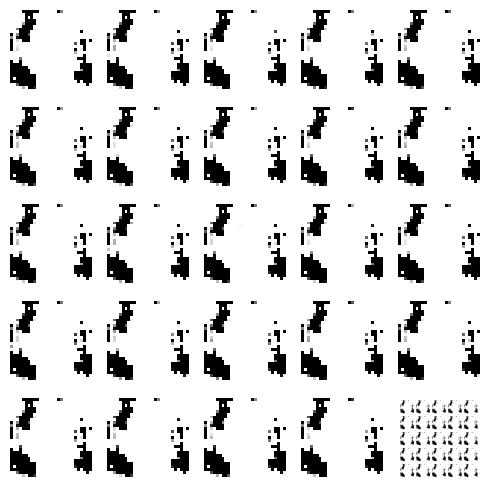

  0%|          | 0/350 [00:00<?, ?it/s]

4/4 [==============================] - 0s 21ms/step


  0%|          | 1/350 [00:00<03:56,  1.47it/s]

4/4 [==============================] - 0s 16ms/step


  1%|          | 2/350 [00:01<03:41,  1.57it/s]

4/4 [==============================] - 0s 14ms/step


  1%|          | 3/350 [00:01<03:37,  1.60it/s]

4/4 [==============================] - 0s 14ms/step


  1%|          | 4/350 [00:02<03:27,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


  1%|▏         | 5/350 [00:03<03:24,  1.69it/s]

4/4 [==============================] - 0s 13ms/step


  2%|▏         | 6/350 [00:03<03:21,  1.71it/s]

4/4 [==============================] - 0s 13ms/step


  2%|▏         | 7/350 [00:04<03:19,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


  2%|▏         | 8/350 [00:04<03:15,  1.75it/s]

4/4 [==============================] - 0s 18ms/step


  3%|▎         | 9/350 [00:05<03:16,  1.73it/s]

4/4 [==============================] - 0s 15ms/step


  3%|▎         | 10/350 [00:05<03:14,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


  3%|▎         | 11/350 [00:06<03:12,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


  3%|▎         | 12/350 [00:07<03:11,  1.76it/s]

4/4 [==============================] - 0s 12ms/step


  4%|▎         | 13/350 [00:07<03:10,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


  4%|▍         | 14/350 [00:08<03:13,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


  4%|▍         | 15/350 [00:08<03:13,  1.73it/s]

4/4 [==============================] - 0s 12ms/step


  5%|▍         | 16/350 [00:09<03:12,  1.74it/s]

4/4 [==============================] - 0s 14ms/step


  5%|▍         | 17/350 [00:09<03:12,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


  5%|▌         | 18/350 [00:10<03:10,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


  5%|▌         | 19/350 [00:11<03:09,  1.74it/s]

4/4 [==============================] - 0s 17ms/step


  6%|▌         | 20/350 [00:11<03:10,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


  6%|▌         | 21/350 [00:12<03:07,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


  6%|▋         | 22/350 [00:12<03:06,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


  7%|▋         | 23/350 [00:13<03:06,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


  7%|▋         | 24/350 [00:13<03:05,  1.76it/s]

4/4 [==============================] - 0s 12ms/step


  7%|▋         | 25/350 [00:14<03:04,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


  7%|▋         | 26/350 [00:15<03:03,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


  8%|▊         | 27/350 [00:15<03:01,  1.78it/s]

4/4 [==============================] - 0s 14ms/step


  8%|▊         | 28/350 [00:16<03:01,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


  8%|▊         | 29/350 [00:16<03:02,  1.76it/s]

4/4 [==============================] - 0s 14ms/step


  9%|▊         | 30/350 [00:17<03:01,  1.76it/s]

4/4 [==============================] - 0s 14ms/step


  9%|▉         | 31/350 [00:17<03:03,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


  9%|▉         | 32/350 [00:18<03:02,  1.74it/s]

4/4 [==============================] - 0s 14ms/step


  9%|▉         | 33/350 [00:19<03:01,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 10%|▉         | 34/350 [00:19<02:59,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 10%|█         | 35/350 [00:20<02:59,  1.75it/s]

4/4 [==============================] - 0s 12ms/step


 10%|█         | 36/350 [00:20<03:07,  1.68it/s]

4/4 [==============================] - 0s 17ms/step


 11%|█         | 37/350 [00:21<03:05,  1.69it/s]

4/4 [==============================] - 0s 13ms/step


 11%|█         | 38/350 [00:21<03:02,  1.71it/s]

4/4 [==============================] - 0s 13ms/step


 11%|█         | 39/350 [00:22<02:59,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 11%|█▏        | 40/350 [00:23<02:59,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 12%|█▏        | 41/350 [00:23<02:57,  1.74it/s]

4/4 [==============================] - 0s 14ms/step


 12%|█▏        | 42/350 [00:24<02:57,  1.74it/s]

4/4 [==============================] - 0s 14ms/step


 12%|█▏        | 43/350 [00:24<02:55,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 13%|█▎        | 44/350 [00:25<02:54,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 13%|█▎        | 45/350 [00:25<02:54,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 13%|█▎        | 46/350 [00:26<02:52,  1.77it/s]

4/4 [==============================] - 0s 14ms/step


 13%|█▎        | 47/350 [00:27<02:54,  1.74it/s]

4/4 [==============================] - 0s 14ms/step


 14%|█▎        | 48/350 [00:27<02:51,  1.76it/s]

4/4 [==============================] - 0s 14ms/step


 14%|█▍        | 49/350 [00:28<02:52,  1.75it/s]

4/4 [==============================] - 0s 12ms/step


 14%|█▍        | 50/350 [00:28<02:51,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 15%|█▍        | 51/350 [00:29<02:48,  1.77it/s]

4/4 [==============================] - 0s 14ms/step


 15%|█▍        | 52/350 [00:29<02:48,  1.77it/s]

4/4 [==============================] - 0s 14ms/step


 15%|█▌        | 53/350 [00:30<02:49,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 15%|█▌        | 54/350 [00:31<02:48,  1.75it/s]

4/4 [==============================] - 0s 12ms/step


 16%|█▌        | 55/350 [00:31<02:48,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 16%|█▌        | 56/350 [00:32<02:49,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 16%|█▋        | 57/350 [00:32<02:48,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 17%|█▋        | 58/350 [00:33<02:47,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 17%|█▋        | 59/350 [00:33<02:46,  1.75it/s]

4/4 [==============================] - 0s 12ms/step


 17%|█▋        | 60/350 [00:34<02:44,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 17%|█▋        | 61/350 [00:35<02:43,  1.77it/s]

4/4 [==============================] - 0s 12ms/step


 18%|█▊        | 62/350 [00:35<02:42,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 18%|█▊        | 63/350 [00:36<02:43,  1.76it/s]

4/4 [==============================] - 0s 14ms/step


 18%|█▊        | 64/350 [00:36<02:45,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 19%|█▊        | 65/350 [00:37<02:43,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 19%|█▉        | 66/350 [00:37<02:42,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 19%|█▉        | 67/350 [00:38<02:41,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 19%|█▉        | 68/350 [00:39<02:40,  1.76it/s]

4/4 [==============================] - 0s 12ms/step


 20%|█▉        | 69/350 [00:39<02:40,  1.75it/s]

4/4 [==============================] - 0s 14ms/step


 20%|██        | 70/350 [00:40<02:40,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 20%|██        | 71/350 [00:40<02:39,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 21%|██        | 72/350 [00:41<02:37,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 21%|██        | 73/350 [00:41<02:37,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 21%|██        | 74/350 [00:42<02:40,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 21%|██▏       | 75/350 [00:43<02:39,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


 22%|██▏       | 76/350 [00:43<02:36,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 22%|██▏       | 77/350 [00:44<02:35,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 22%|██▏       | 78/350 [00:44<02:33,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 23%|██▎       | 79/350 [00:45<02:34,  1.75it/s]

4/4 [==============================] - 0s 14ms/step


 23%|██▎       | 80/350 [00:45<02:33,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 23%|██▎       | 81/350 [00:46<02:32,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 23%|██▎       | 82/350 [00:47<02:31,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 24%|██▎       | 83/350 [00:47<02:30,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 24%|██▍       | 84/350 [00:48<02:34,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 24%|██▍       | 85/350 [00:48<02:32,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 25%|██▍       | 86/350 [00:49<02:30,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 25%|██▍       | 87/350 [00:49<02:30,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 25%|██▌       | 88/350 [00:50<02:28,  1.77it/s]

4/4 [==============================] - 0s 12ms/step


 25%|██▌       | 89/350 [00:51<02:30,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 26%|██▌       | 90/350 [00:51<02:28,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 26%|██▌       | 91/350 [00:52<02:26,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 26%|██▋       | 92/350 [00:52<02:25,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 27%|██▋       | 93/350 [00:53<02:24,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 27%|██▋       | 94/350 [00:53<02:26,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 27%|██▋       | 95/350 [00:54<02:24,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 27%|██▋       | 96/350 [00:55<02:23,  1.77it/s]

4/4 [==============================] - 0s 14ms/step


 28%|██▊       | 97/350 [00:55<02:23,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 28%|██▊       | 98/350 [00:56<02:22,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 28%|██▊       | 99/350 [00:56<02:23,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 29%|██▊       | 100/350 [00:57<02:21,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 29%|██▉       | 101/350 [00:57<02:22,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 29%|██▉       | 102/350 [00:58<02:21,  1.75it/s]

4/4 [==============================] - 0s 14ms/step


 29%|██▉       | 103/350 [00:59<02:20,  1.76it/s]

4/4 [==============================] - 0s 14ms/step


 30%|██▉       | 104/350 [00:59<02:20,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 30%|███       | 105/350 [01:00<02:19,  1.76it/s]

4/4 [==============================] - 0s 14ms/step


 30%|███       | 106/350 [01:00<02:18,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 31%|███       | 107/350 [01:01<02:18,  1.76it/s]

4/4 [==============================] - 0s 12ms/step


 31%|███       | 108/350 [01:01<02:18,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 31%|███       | 109/350 [01:02<02:19,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 31%|███▏      | 110/350 [01:03<02:18,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 32%|███▏      | 111/350 [01:03<02:16,  1.75it/s]

4/4 [==============================] - 0s 12ms/step


 32%|███▏      | 112/350 [01:04<02:15,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 32%|███▏      | 113/350 [01:04<02:13,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 33%|███▎      | 114/350 [01:05<02:14,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 33%|███▎      | 115/350 [01:05<02:13,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 33%|███▎      | 116/350 [01:06<02:13,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 33%|███▎      | 117/350 [01:06<02:11,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 34%|███▎      | 118/350 [01:07<02:11,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 34%|███▍      | 119/350 [01:08<02:13,  1.73it/s]

4/4 [==============================] - 0s 14ms/step


 34%|███▍      | 120/350 [01:08<02:11,  1.74it/s]

4/4 [==============================] - 0s 14ms/step


 35%|███▍      | 121/350 [01:09<02:10,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 35%|███▍      | 122/350 [01:09<02:09,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 35%|███▌      | 123/350 [01:10<02:07,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 35%|███▌      | 124/350 [01:10<02:09,  1.75it/s]

4/4 [==============================] - 0s 12ms/step


 36%|███▌      | 125/350 [01:11<02:07,  1.76it/s]

4/4 [==============================] - 0s 12ms/step


 36%|███▌      | 126/350 [01:12<02:07,  1.76it/s]

4/4 [==============================] - 0s 12ms/step


 36%|███▋      | 127/350 [01:12<02:06,  1.77it/s]

4/4 [==============================] - 0s 15ms/step


 37%|███▋      | 128/350 [01:13<02:05,  1.78it/s]

4/4 [==============================] - 0s 12ms/step


 37%|███▋      | 129/350 [01:13<02:07,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 37%|███▋      | 130/350 [01:14<02:05,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 37%|███▋      | 131/350 [01:14<02:05,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 38%|███▊      | 132/350 [01:15<02:04,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 38%|███▊      | 133/350 [01:16<02:03,  1.76it/s]

4/4 [==============================] - 0s 11ms/step


 38%|███▊      | 134/350 [01:16<02:03,  1.75it/s]

4/4 [==============================] - 0s 14ms/step


 39%|███▊      | 135/350 [01:17<02:02,  1.76it/s]

4/4 [==============================] - 0s 12ms/step


 39%|███▉      | 136/350 [01:17<02:01,  1.76it/s]

4/4 [==============================] - 0s 15ms/step


 39%|███▉      | 137/350 [01:18<02:01,  1.75it/s]

4/4 [==============================] - 0s 14ms/step


 39%|███▉      | 138/350 [01:18<02:01,  1.75it/s]

4/4 [==============================] - 0s 12ms/step


 40%|███▉      | 139/350 [01:19<02:01,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 40%|████      | 140/350 [01:20<02:00,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 40%|████      | 141/350 [01:20<01:58,  1.76it/s]

4/4 [==============================] - 0s 14ms/step


 41%|████      | 142/350 [01:21<01:57,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 41%|████      | 143/350 [01:21<01:56,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 41%|████      | 144/350 [01:22<01:56,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 41%|████▏     | 145/350 [01:22<01:56,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 42%|████▏     | 146/350 [01:23<01:55,  1.77it/s]

4/4 [==============================] - 0s 14ms/step


 42%|████▏     | 147/350 [01:24<01:55,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 42%|████▏     | 148/350 [01:24<01:55,  1.75it/s]

4/4 [==============================] - 0s 12ms/step


 43%|████▎     | 149/350 [01:25<01:55,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 43%|████▎     | 150/350 [01:25<01:54,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 43%|████▎     | 151/350 [01:26<01:52,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 43%|████▎     | 152/350 [01:26<01:52,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 44%|████▎     | 153/350 [01:27<01:49,  1.80it/s]

4/4 [==============================] - 0s 13ms/step


 44%|████▍     | 154/350 [01:28<01:52,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 44%|████▍     | 155/350 [01:28<01:53,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 45%|████▍     | 156/350 [01:29<01:51,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 45%|████▍     | 157/350 [01:29<01:50,  1.75it/s]

4/4 [==============================] - 0s 12ms/step


 45%|████▌     | 158/350 [01:30<01:48,  1.76it/s]

4/4 [==============================] - 0s 12ms/step


 45%|████▌     | 159/350 [01:30<01:49,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 46%|████▌     | 160/350 [01:31<01:48,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 46%|████▌     | 161/350 [01:32<01:49,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 46%|████▋     | 162/350 [01:32<01:48,  1.73it/s]

4/4 [==============================] - 0s 14ms/step


 47%|████▋     | 163/350 [01:33<01:47,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 47%|████▋     | 164/350 [01:33<01:48,  1.71it/s]

4/4 [==============================] - 0s 13ms/step


 47%|████▋     | 165/350 [01:34<01:47,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


 47%|████▋     | 166/350 [01:35<01:47,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 48%|████▊     | 167/350 [01:35<01:46,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 48%|████▊     | 168/350 [01:36<01:45,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 48%|████▊     | 169/350 [01:36<01:45,  1.71it/s]

4/4 [==============================] - 0s 13ms/step


 49%|████▊     | 170/350 [01:37<01:45,  1.71it/s]

4/4 [==============================] - 0s 13ms/step


 49%|████▉     | 171/350 [01:37<01:43,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 49%|████▉     | 172/350 [01:38<01:42,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 49%|████▉     | 173/350 [01:39<01:41,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 50%|████▉     | 174/350 [01:39<01:42,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


 50%|█████     | 175/350 [01:40<01:41,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 50%|█████     | 176/350 [01:40<01:40,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 51%|█████     | 177/350 [01:41<01:38,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 51%|█████     | 178/350 [01:41<01:37,  1.77it/s]

4/4 [==============================] - 0s 12ms/step


 51%|█████     | 179/350 [01:42<01:37,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 51%|█████▏    | 180/350 [01:43<01:36,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 52%|█████▏    | 181/350 [01:43<01:36,  1.76it/s]

4/4 [==============================] - 0s 12ms/step


 52%|█████▏    | 182/350 [01:44<01:35,  1.77it/s]

4/4 [==============================] - 0s 12ms/step


 52%|█████▏    | 183/350 [01:44<01:33,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 53%|█████▎    | 184/350 [01:45<01:34,  1.76it/s]

4/4 [==============================] - 0s 12ms/step


 53%|█████▎    | 185/350 [01:45<01:33,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 53%|█████▎    | 186/350 [01:46<01:32,  1.77it/s]

4/4 [==============================] - 0s 12ms/step


 53%|█████▎    | 187/350 [01:46<01:31,  1.78it/s]

4/4 [==============================] - 0s 14ms/step


 54%|█████▎    | 188/350 [01:47<01:30,  1.79it/s]

4/4 [==============================] - 0s 14ms/step


 54%|█████▍    | 189/350 [01:48<01:31,  1.77it/s]

4/4 [==============================] - 0s 12ms/step


 54%|█████▍    | 190/350 [01:48<01:30,  1.77it/s]

4/4 [==============================] - 0s 14ms/step


 55%|█████▍    | 191/350 [01:49<01:29,  1.77it/s]

4/4 [==============================] - 0s 14ms/step


 55%|█████▍    | 192/350 [01:49<01:29,  1.77it/s]

4/4 [==============================] - 0s 12ms/step


 55%|█████▌    | 193/350 [01:50<01:28,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 55%|█████▌    | 194/350 [01:50<01:28,  1.76it/s]

4/4 [==============================] - 0s 14ms/step


 56%|█████▌    | 195/350 [01:51<01:28,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 56%|█████▌    | 196/350 [01:52<01:27,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 56%|█████▋    | 197/350 [01:52<01:27,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 57%|█████▋    | 198/350 [01:53<01:26,  1.76it/s]

4/4 [==============================] - 0s 14ms/step


 57%|█████▋    | 199/350 [01:53<01:27,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 57%|█████▋    | 200/350 [01:54<01:25,  1.76it/s]

4/4 [==============================] - 0s 14ms/step


 57%|█████▋    | 201/350 [01:54<01:25,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 58%|█████▊    | 202/350 [01:55<01:25,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 58%|█████▊    | 203/350 [01:56<01:24,  1.74it/s]

4/4 [==============================] - 0s 14ms/step


 58%|█████▊    | 204/350 [01:56<01:24,  1.72it/s]

4/4 [==============================] - 0s 15ms/step


 59%|█████▊    | 205/350 [01:57<01:24,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 59%|█████▉    | 206/350 [01:57<01:22,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 59%|█████▉    | 207/350 [01:58<01:21,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 59%|█████▉    | 208/350 [01:58<01:21,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 60%|█████▉    | 209/350 [01:59<01:20,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 60%|██████    | 210/350 [02:00<01:20,  1.75it/s]

4/4 [==============================] - 0s 12ms/step


 60%|██████    | 211/350 [02:00<01:19,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 61%|██████    | 212/350 [02:01<01:18,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 61%|██████    | 213/350 [02:01<01:18,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 61%|██████    | 214/350 [02:02<01:18,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 61%|██████▏   | 215/350 [02:02<01:17,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 62%|██████▏   | 216/350 [02:03<01:16,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 62%|██████▏   | 217/350 [02:04<01:15,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 62%|██████▏   | 218/350 [02:04<01:14,  1.77it/s]

4/4 [==============================] - 0s 14ms/step


 63%|██████▎   | 219/350 [02:05<01:15,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 63%|██████▎   | 220/350 [02:05<01:14,  1.75it/s]

4/4 [==============================] - 0s 12ms/step


 63%|██████▎   | 221/350 [02:06<01:14,  1.73it/s]

4/4 [==============================] - 0s 14ms/step


 63%|██████▎   | 222/350 [02:07<01:14,  1.73it/s]

4/4 [==============================] - 0s 12ms/step


 64%|██████▎   | 223/350 [02:07<01:12,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 64%|██████▍   | 224/350 [02:08<01:13,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 64%|██████▍   | 225/350 [02:08<01:13,  1.71it/s]

4/4 [==============================] - 0s 13ms/step


 65%|██████▍   | 226/350 [02:09<01:11,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 65%|██████▍   | 227/350 [02:09<01:11,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 65%|██████▌   | 228/350 [02:10<01:10,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 65%|██████▌   | 229/350 [02:11<01:10,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 66%|██████▌   | 230/350 [02:11<01:08,  1.75it/s]

4/4 [==============================] - 0s 14ms/step


 66%|██████▌   | 231/350 [02:12<01:07,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 66%|██████▋   | 232/350 [02:12<01:06,  1.76it/s]

4/4 [==============================] - 0s 12ms/step


 67%|██████▋   | 233/350 [02:13<01:06,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 67%|██████▋   | 234/350 [02:13<01:07,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


 67%|██████▋   | 235/350 [02:14<01:06,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 67%|██████▋   | 236/350 [02:15<01:05,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 68%|██████▊   | 237/350 [02:15<01:05,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 68%|██████▊   | 238/350 [02:16<01:03,  1.76it/s]

4/4 [==============================] - 0s 14ms/step


 68%|██████▊   | 239/350 [02:16<01:04,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 69%|██████▊   | 240/350 [02:17<01:03,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 69%|██████▉   | 241/350 [02:17<01:02,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 69%|██████▉   | 242/350 [02:18<01:01,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 69%|██████▉   | 243/350 [02:19<01:01,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 70%|██████▉   | 244/350 [02:19<01:01,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 70%|███████   | 245/350 [02:20<01:00,  1.73it/s]

4/4 [==============================] - 0s 12ms/step


 70%|███████   | 246/350 [02:20<01:00,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 71%|███████   | 247/350 [02:21<00:58,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 71%|███████   | 248/350 [02:21<00:58,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 71%|███████   | 249/350 [02:22<00:58,  1.71it/s]

4/4 [==============================] - 0s 13ms/step


 71%|███████▏  | 250/350 [02:23<00:58,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 72%|███████▏  | 251/350 [02:23<00:57,  1.74it/s]

4/4 [==============================] - 0s 14ms/step


 72%|███████▏  | 252/350 [02:24<00:56,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 72%|███████▏  | 253/350 [02:24<00:55,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 73%|███████▎  | 254/350 [02:25<00:55,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 73%|███████▎  | 255/350 [02:25<00:54,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 73%|███████▎  | 256/350 [02:26<00:53,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 73%|███████▎  | 257/350 [02:27<00:53,  1.74it/s]

4/4 [==============================] - 0s 14ms/step


 74%|███████▎  | 258/350 [02:27<00:52,  1.75it/s]

4/4 [==============================] - 0s 14ms/step


 74%|███████▍  | 259/350 [02:28<00:52,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 74%|███████▍  | 260/350 [02:28<00:51,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 75%|███████▍  | 261/350 [02:29<00:51,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 75%|███████▍  | 262/350 [02:30<00:50,  1.76it/s]

4/4 [==============================] - 0s 12ms/step


 75%|███████▌  | 263/350 [02:30<00:49,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 75%|███████▌  | 264/350 [02:31<00:49,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 76%|███████▌  | 265/350 [02:31<00:48,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 76%|███████▌  | 266/350 [02:32<00:48,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 76%|███████▋  | 267/350 [02:32<00:47,  1.75it/s]

4/4 [==============================] - 0s 12ms/step


 77%|███████▋  | 268/350 [02:33<00:46,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 77%|███████▋  | 269/350 [02:34<00:46,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 77%|███████▋  | 270/350 [02:34<00:45,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 77%|███████▋  | 271/350 [02:35<00:45,  1.75it/s]

4/4 [==============================] - 0s 12ms/step


 78%|███████▊  | 272/350 [02:35<00:44,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 78%|███████▊  | 273/350 [02:36<00:43,  1.77it/s]

4/4 [==============================] - 0s 12ms/step


 78%|███████▊  | 274/350 [02:36<00:43,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 79%|███████▊  | 275/350 [02:37<00:42,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 79%|███████▉  | 276/350 [02:37<00:41,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 79%|███████▉  | 277/350 [02:38<00:41,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 79%|███████▉  | 278/350 [02:39<00:40,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 80%|███████▉  | 279/350 [02:39<00:40,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 80%|████████  | 280/350 [02:40<00:39,  1.76it/s]

4/4 [==============================] - 0s 14ms/step


 80%|████████  | 281/350 [02:40<00:39,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 81%|████████  | 282/350 [02:41<00:38,  1.77it/s]

4/4 [==============================] - 0s 12ms/step


 81%|████████  | 283/350 [02:41<00:37,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 81%|████████  | 284/350 [02:42<00:37,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 81%|████████▏ | 285/350 [02:43<00:36,  1.76it/s]

4/4 [==============================] - 0s 14ms/step


 82%|████████▏ | 286/350 [02:43<00:36,  1.76it/s]

4/4 [==============================] - 0s 12ms/step


 82%|████████▏ | 287/350 [02:44<00:35,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 82%|████████▏ | 288/350 [02:44<00:35,  1.75it/s]

4/4 [==============================] - 0s 12ms/step


 83%|████████▎ | 289/350 [02:45<00:35,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 83%|████████▎ | 290/350 [02:45<00:34,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 83%|████████▎ | 291/350 [02:46<00:33,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 83%|████████▎ | 292/350 [02:47<00:33,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 84%|████████▎ | 293/350 [02:47<00:32,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 84%|████████▍ | 294/350 [02:48<00:32,  1.73it/s]

4/4 [==============================] - 0s 14ms/step


 84%|████████▍ | 295/350 [02:48<00:31,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 85%|████████▍ | 296/350 [02:49<00:30,  1.76it/s]

4/4 [==============================] - 0s 12ms/step


 85%|████████▍ | 297/350 [02:49<00:30,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 85%|████████▌ | 298/350 [02:50<00:29,  1.76it/s]

4/4 [==============================] - 0s 12ms/step


 85%|████████▌ | 299/350 [02:51<00:29,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 86%|████████▌ | 300/350 [02:51<00:28,  1.73it/s]

4/4 [==============================] - 0s 14ms/step


 86%|████████▌ | 301/350 [02:52<00:28,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 86%|████████▋ | 302/350 [02:52<00:27,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 87%|████████▋ | 303/350 [02:53<00:26,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 87%|████████▋ | 304/350 [02:54<00:26,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 87%|████████▋ | 305/350 [02:54<00:26,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


 87%|████████▋ | 306/350 [02:55<00:25,  1.73it/s]

4/4 [==============================] - 0s 12ms/step


 88%|████████▊ | 307/350 [02:55<00:24,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 88%|████████▊ | 308/350 [02:56<00:23,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 88%|████████▊ | 309/350 [02:56<00:23,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 89%|████████▊ | 310/350 [02:57<00:23,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 89%|████████▉ | 311/350 [02:58<00:22,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 89%|████████▉ | 312/350 [02:58<00:21,  1.75it/s]

4/4 [==============================] - 0s 14ms/step


 89%|████████▉ | 313/350 [02:59<00:21,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 90%|████████▉ | 314/350 [02:59<00:20,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 90%|█████████ | 315/350 [03:00<00:19,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 90%|█████████ | 316/350 [03:00<00:19,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 91%|█████████ | 317/350 [03:01<00:18,  1.76it/s]

4/4 [==============================] - 0s 12ms/step


 91%|█████████ | 318/350 [03:02<00:18,  1.75it/s]

4/4 [==============================] - 0s 11ms/step


 91%|█████████ | 319/350 [03:02<00:17,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 91%|█████████▏| 320/350 [03:03<00:17,  1.75it/s]

4/4 [==============================] - 0s 12ms/step


 92%|█████████▏| 321/350 [03:03<00:16,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 92%|█████████▏| 322/350 [03:04<00:15,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 92%|█████████▏| 323/350 [03:04<00:15,  1.76it/s]

4/4 [==============================] - 0s 12ms/step


 93%|█████████▎| 324/350 [03:05<00:14,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 93%|█████████▎| 325/350 [03:05<00:14,  1.76it/s]

4/4 [==============================] - 0s 12ms/step


 93%|█████████▎| 326/350 [03:06<00:13,  1.77it/s]

4/4 [==============================] - 0s 14ms/step


 93%|█████████▎| 327/350 [03:07<00:13,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 94%|█████████▎| 328/350 [03:07<00:12,  1.76it/s]

4/4 [==============================] - 0s 15ms/step


 94%|█████████▍| 329/350 [03:08<00:12,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 94%|█████████▍| 330/350 [03:08<00:11,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 95%|█████████▍| 331/350 [03:09<00:10,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 95%|█████████▍| 332/350 [03:09<00:10,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 95%|█████████▌| 333/350 [03:10<00:09,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 95%|█████████▌| 334/350 [03:11<00:09,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 96%|█████████▌| 335/350 [03:11<00:08,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 96%|█████████▌| 336/350 [03:12<00:07,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 96%|█████████▋| 337/350 [03:12<00:07,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 97%|█████████▋| 338/350 [03:13<00:06,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 97%|█████████▋| 339/350 [03:14<00:06,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 97%|█████████▋| 340/350 [03:14<00:05,  1.75it/s]

4/4 [==============================] - 0s 12ms/step


 97%|█████████▋| 341/350 [03:15<00:05,  1.77it/s]

4/4 [==============================] - 0s 12ms/step


 98%|█████████▊| 342/350 [03:15<00:04,  1.77it/s]

4/4 [==============================] - 0s 14ms/step


 98%|█████████▊| 343/350 [03:16<00:03,  1.78it/s]

4/4 [==============================] - 0s 12ms/step


 98%|█████████▊| 344/350 [03:16<00:03,  1.75it/s]

4/4 [==============================] - 0s 14ms/step


 99%|█████████▊| 345/350 [03:17<00:02,  1.76it/s]

4/4 [==============================] - 0s 12ms/step


 99%|█████████▉| 346/350 [03:17<00:02,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 99%|█████████▉| 347/350 [03:18<00:01,  1.77it/s]

4/4 [==============================] - 0s 12ms/step


 99%|█████████▉| 348/350 [03:19<00:01,  1.77it/s]

4/4 [==============================] - 0s 12ms/step


100%|█████████▉| 349/350 [03:19<00:00,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


100%|██████████| 350/350 [03:20<00:00,  1.75it/s]

Epoch number: 34 discriminator_loss: 0.16652247410882928 generator_loss: 7.3760680457523895
1/1 [==============================] - 0s 20ms/step


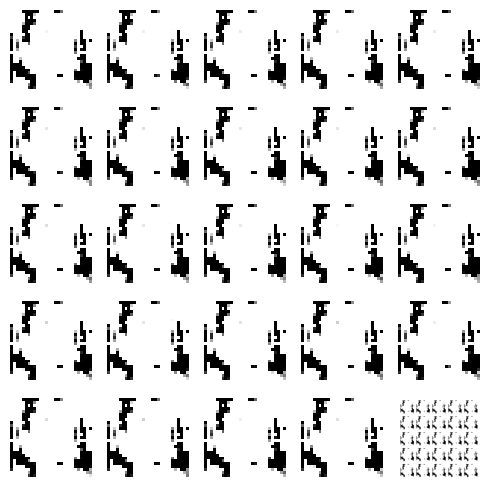

  0%|          | 0/350 [00:00<?, ?it/s]

4/4 [==============================] - 0s 19ms/step


  0%|          | 1/350 [00:00<02:59,  1.95it/s]

4/4 [==============================] - 0s 12ms/step


  1%|          | 2/350 [00:01<03:17,  1.77it/s]

4/4 [==============================] - 0s 12ms/step


  1%|          | 3/350 [00:01<03:26,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


  1%|          | 4/350 [00:02<03:14,  1.78it/s]

4/4 [==============================] - 0s 12ms/step


  1%|▏         | 5/350 [00:02<03:16,  1.76it/s]

4/4 [==============================] - 0s 12ms/step


  2%|▏         | 6/350 [00:03<03:08,  1.83it/s]

4/4 [==============================] - 0s 12ms/step


  2%|▏         | 7/350 [00:03<03:02,  1.88it/s]

4/4 [==============================] - 0s 15ms/step


  2%|▏         | 8/350 [00:04<03:02,  1.87it/s]

4/4 [==============================] - 0s 12ms/step


  3%|▎         | 9/350 [00:04<03:06,  1.83it/s]

4/4 [==============================] - 0s 13ms/step


  3%|▎         | 10/350 [00:05<03:09,  1.79it/s]

4/4 [==============================] - 0s 14ms/step


  3%|▎         | 11/350 [00:06<03:03,  1.84it/s]

4/4 [==============================] - 0s 13ms/step


  3%|▎         | 12/350 [00:06<03:06,  1.81it/s]

4/4 [==============================] - 0s 13ms/step


  4%|▎         | 13/350 [00:07<03:04,  1.83it/s]

4/4 [==============================] - 0s 12ms/step


  4%|▍         | 14/350 [00:07<03:05,  1.81it/s]

4/4 [==============================] - 0s 16ms/step


  4%|▍         | 15/350 [00:08<03:10,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


  5%|▍         | 16/350 [00:08<03:02,  1.83it/s]

4/4 [==============================] - 0s 12ms/step


  5%|▍         | 17/350 [00:09<03:03,  1.82it/s]

4/4 [==============================] - 0s 12ms/step


  5%|▌         | 18/350 [00:09<03:05,  1.79it/s]

4/4 [==============================] - 0s 13ms/step


  5%|▌         | 19/350 [00:10<03:06,  1.78it/s]

4/4 [==============================] - 0s 12ms/step


  6%|▌         | 20/350 [00:11<03:07,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


  6%|▌         | 21/350 [00:11<03:07,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


  6%|▋         | 22/350 [00:12<03:07,  1.75it/s]

4/4 [==============================] - 0s 12ms/step


  7%|▋         | 23/350 [00:12<03:08,  1.73it/s]

4/4 [==============================] - 0s 12ms/step


  7%|▋         | 24/350 [00:13<03:06,  1.75it/s]

4/4 [==============================] - 0s 12ms/step


  7%|▋         | 25/350 [00:13<03:05,  1.75it/s]

4/4 [==============================] - 0s 14ms/step


  7%|▋         | 26/350 [00:14<03:03,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


  8%|▊         | 27/350 [00:15<03:03,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


  8%|▊         | 28/350 [00:15<03:05,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


  8%|▊         | 29/350 [00:16<03:05,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


  9%|▊         | 30/350 [00:16<03:05,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


  9%|▉         | 31/350 [00:17<03:03,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


  9%|▉         | 32/350 [00:17<03:01,  1.75it/s]

4/4 [==============================] - 0s 15ms/step


  9%|▉         | 33/350 [00:18<03:02,  1.74it/s]

4/4 [==============================] - 0s 14ms/step


 10%|▉         | 34/350 [00:19<03:00,  1.75it/s]

4/4 [==============================] - 0s 12ms/step


 10%|█         | 35/350 [00:19<02:59,  1.76it/s]

4/4 [==============================] - 0s 12ms/step


 10%|█         | 36/350 [00:20<02:57,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 11%|█         | 37/350 [00:20<02:58,  1.76it/s]

4/4 [==============================] - 0s 14ms/step


 11%|█         | 38/350 [00:21<02:59,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 11%|█         | 39/350 [00:22<02:58,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 11%|█▏        | 40/350 [00:22<02:57,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 12%|█▏        | 41/350 [00:23<02:57,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 12%|█▏        | 42/350 [00:23<02:56,  1.75it/s]

4/4 [==============================] - 0s 12ms/step


 12%|█▏        | 43/350 [00:24<02:57,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 13%|█▎        | 44/350 [00:24<02:55,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 13%|█▎        | 45/350 [00:25<02:54,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 13%|█▎        | 46/350 [00:26<02:53,  1.75it/s]

4/4 [==============================] - 0s 12ms/step


 13%|█▎        | 47/350 [00:26<02:53,  1.75it/s]

4/4 [==============================] - 0s 12ms/step


 14%|█▎        | 48/350 [00:27<02:55,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 14%|█▍        | 49/350 [00:27<02:53,  1.73it/s]

4/4 [==============================] - 0s 12ms/step


 14%|█▍        | 50/350 [00:28<02:53,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 15%|█▍        | 51/350 [00:28<02:51,  1.75it/s]

4/4 [==============================] - 0s 12ms/step


 15%|█▍        | 52/350 [00:29<02:50,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 15%|█▌        | 53/350 [00:30<02:52,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


 15%|█▌        | 54/350 [00:30<02:50,  1.74it/s]

4/4 [==============================] - 0s 14ms/step


 16%|█▌        | 55/350 [00:31<02:49,  1.74it/s]

4/4 [==============================] - 0s 14ms/step


 16%|█▌        | 56/350 [00:31<02:47,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 16%|█▋        | 57/350 [00:32<02:47,  1.75it/s]

4/4 [==============================] - 0s 12ms/step


 17%|█▋        | 58/350 [00:32<02:48,  1.73it/s]

4/4 [==============================] - 0s 12ms/step


 17%|█▋        | 59/350 [00:33<02:47,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 17%|█▋        | 60/350 [00:34<02:46,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 17%|█▋        | 61/350 [00:34<02:45,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 18%|█▊        | 62/350 [00:35<02:47,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


 18%|█▊        | 63/350 [00:35<02:47,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 18%|█▊        | 64/350 [00:36<02:45,  1.72it/s]

4/4 [==============================] - 0s 14ms/step


 19%|█▊        | 65/350 [00:36<02:44,  1.73it/s]

4/4 [==============================] - 0s 15ms/step


 19%|█▉        | 66/350 [00:37<02:43,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 19%|█▉        | 67/350 [00:38<02:43,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 19%|█▉        | 68/350 [00:38<02:43,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 20%|█▉        | 69/350 [00:39<02:41,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 20%|██        | 70/350 [00:39<02:40,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 20%|██        | 71/350 [00:40<02:39,  1.75it/s]

4/4 [==============================] - 0s 12ms/step


 21%|██        | 72/350 [00:40<02:38,  1.75it/s]

4/4 [==============================] - 0s 16ms/step


 21%|██        | 73/350 [00:41<02:40,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 21%|██        | 74/350 [00:42<02:38,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 21%|██▏       | 75/350 [00:42<02:38,  1.74it/s]

4/4 [==============================] - 0s 14ms/step


 22%|██▏       | 76/350 [00:43<02:37,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 22%|██▏       | 77/350 [00:43<02:35,  1.75it/s]

4/4 [==============================] - 0s 12ms/step


 22%|██▏       | 78/350 [00:44<02:36,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 23%|██▎       | 79/350 [00:45<02:35,  1.74it/s]

4/4 [==============================] - 0s 14ms/step


 23%|██▎       | 80/350 [00:45<02:34,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 23%|██▎       | 81/350 [00:46<02:33,  1.75it/s]

4/4 [==============================] - 0s 12ms/step


 23%|██▎       | 82/350 [00:46<02:32,  1.76it/s]

4/4 [==============================] - 0s 12ms/step


 24%|██▎       | 83/350 [00:47<02:34,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 24%|██▍       | 84/350 [00:47<02:32,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 24%|██▍       | 85/350 [00:48<02:30,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 25%|██▍       | 86/350 [00:48<02:29,  1.77it/s]

4/4 [==============================] - 0s 14ms/step


 25%|██▍       | 87/350 [00:49<02:28,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 25%|██▌       | 88/350 [00:50<02:30,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 25%|██▌       | 89/350 [00:50<02:29,  1.74it/s]

4/4 [==============================] - 0s 14ms/step


 26%|██▌       | 90/350 [00:51<02:28,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 26%|██▌       | 91/350 [00:51<02:27,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 26%|██▋       | 92/350 [00:52<02:27,  1.75it/s]

4/4 [==============================] - 0s 12ms/step


 27%|██▋       | 93/350 [00:53<02:29,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 27%|██▋       | 94/350 [00:53<02:27,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 27%|██▋       | 95/350 [00:54<02:26,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 27%|██▋       | 96/350 [00:54<02:24,  1.76it/s]

4/4 [==============================] - 0s 12ms/step


 28%|██▊       | 97/350 [00:55<02:23,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 28%|██▊       | 98/350 [00:55<02:25,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 28%|██▊       | 99/350 [00:56<02:24,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 29%|██▊       | 100/350 [00:57<02:22,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 29%|██▉       | 101/350 [00:57<02:22,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 29%|██▉       | 102/350 [00:58<02:21,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 29%|██▉       | 103/350 [00:58<02:21,  1.75it/s]

4/4 [==============================] - 0s 12ms/step


 30%|██▉       | 104/350 [00:59<02:21,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 30%|███       | 105/350 [00:59<02:20,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 30%|███       | 106/350 [01:00<02:19,  1.75it/s]

4/4 [==============================] - 0s 14ms/step


 31%|███       | 107/350 [01:01<02:18,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 31%|███       | 108/350 [01:01<02:19,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 31%|███       | 109/350 [01:02<02:19,  1.73it/s]

4/4 [==============================] - 0s 12ms/step


 31%|███▏      | 110/350 [01:02<02:17,  1.75it/s]

4/4 [==============================] - 0s 14ms/step


 32%|███▏      | 111/350 [01:03<02:16,  1.75it/s]

4/4 [==============================] - 0s 12ms/step


 32%|███▏      | 112/350 [01:03<02:15,  1.75it/s]

4/4 [==============================] - 0s 14ms/step


 32%|███▏      | 113/350 [01:04<02:16,  1.73it/s]

4/4 [==============================] - 0s 12ms/step


 33%|███▎      | 114/350 [01:05<02:14,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 33%|███▎      | 115/350 [01:05<02:13,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 33%|███▎      | 116/350 [01:06<02:13,  1.76it/s]

4/4 [==============================] - 0s 14ms/step


 33%|███▎      | 117/350 [01:06<02:11,  1.77it/s]

4/4 [==============================] - 0s 12ms/step


 34%|███▎      | 118/350 [01:07<02:12,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 34%|███▍      | 119/350 [01:07<02:11,  1.75it/s]

4/4 [==============================] - 0s 14ms/step


 34%|███▍      | 120/350 [01:08<02:11,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 35%|███▍      | 121/350 [01:09<02:11,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 35%|███▍      | 122/350 [01:09<02:10,  1.75it/s]

4/4 [==============================] - 0s 12ms/step


 35%|███▌      | 123/350 [01:10<02:11,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 35%|███▌      | 124/350 [01:10<02:09,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 36%|███▌      | 125/350 [01:11<02:08,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 36%|███▌      | 126/350 [01:11<02:08,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 36%|███▋      | 127/350 [01:12<02:07,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 37%|███▋      | 128/350 [01:13<02:09,  1.71it/s]

4/4 [==============================] - 0s 13ms/step


 37%|███▋      | 129/350 [01:13<02:07,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 37%|███▋      | 130/350 [01:14<02:06,  1.75it/s]

4/4 [==============================] - 0s 12ms/step


 37%|███▋      | 131/350 [01:14<02:06,  1.73it/s]

4/4 [==============================] - 0s 12ms/step


 38%|███▊      | 132/350 [01:15<02:05,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 38%|███▊      | 133/350 [01:15<02:05,  1.73it/s]

4/4 [==============================] - 0s 14ms/step


 38%|███▊      | 134/350 [01:16<02:04,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 39%|███▊      | 135/350 [01:17<02:03,  1.74it/s]

4/4 [==============================] - 0s 14ms/step


 39%|███▉      | 136/350 [01:17<02:02,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 39%|███▉      | 137/350 [01:18<02:01,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 39%|███▉      | 138/350 [01:18<02:02,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 40%|███▉      | 139/350 [01:19<02:01,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 40%|████      | 140/350 [01:19<01:59,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 40%|████      | 141/350 [01:20<01:59,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 41%|████      | 142/350 [01:21<01:59,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 41%|████      | 143/350 [01:21<02:00,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 41%|████      | 144/350 [01:22<01:59,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 41%|████▏     | 145/350 [01:22<01:57,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 42%|████▏     | 146/350 [01:23<01:57,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 42%|████▏     | 147/350 [01:23<01:55,  1.75it/s]

4/4 [==============================] - 0s 15ms/step


 42%|████▏     | 148/350 [01:24<01:56,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 43%|████▎     | 149/350 [01:25<01:56,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 43%|████▎     | 150/350 [01:25<01:55,  1.73it/s]

4/4 [==============================] - 0s 12ms/step


 43%|████▎     | 151/350 [01:26<01:55,  1.73it/s]

4/4 [==============================] - 0s 12ms/step


 43%|████▎     | 152/350 [01:26<01:53,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 44%|████▎     | 153/350 [01:27<01:54,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 44%|████▍     | 154/350 [01:28<01:53,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 44%|████▍     | 155/350 [01:28<01:52,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 45%|████▍     | 156/350 [01:29<01:51,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 45%|████▍     | 157/350 [01:29<01:50,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 45%|████▌     | 158/350 [01:30<01:51,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


 45%|████▌     | 159/350 [01:30<01:50,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 46%|████▌     | 160/350 [01:31<01:48,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 46%|████▌     | 161/350 [01:32<01:47,  1.76it/s]

4/4 [==============================] - 0s 12ms/step


 46%|████▋     | 162/350 [01:32<01:46,  1.77it/s]

4/4 [==============================] - 0s 12ms/step


 47%|████▋     | 163/350 [01:33<01:47,  1.74it/s]

4/4 [==============================] - 0s 14ms/step


 47%|████▋     | 164/350 [01:33<01:46,  1.74it/s]

4/4 [==============================] - 0s 15ms/step


 47%|████▋     | 165/350 [01:34<01:45,  1.75it/s]

4/4 [==============================] - 0s 12ms/step


 47%|████▋     | 166/350 [01:34<01:45,  1.75it/s]

4/4 [==============================] - 0s 16ms/step


 48%|████▊     | 167/350 [01:35<01:47,  1.70it/s]

4/4 [==============================] - 0s 15ms/step


 48%|████▊     | 168/350 [01:36<01:47,  1.70it/s]

4/4 [==============================] - 0s 13ms/step


 48%|████▊     | 169/350 [01:36<01:45,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 49%|████▊     | 170/350 [01:37<01:44,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 49%|████▉     | 171/350 [01:37<01:42,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 49%|████▉     | 172/350 [01:38<01:41,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 49%|████▉     | 173/350 [01:39<01:42,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 50%|████▉     | 174/350 [01:39<01:42,  1.72it/s]

4/4 [==============================] - 0s 16ms/step


 50%|█████     | 175/350 [01:40<01:41,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 50%|█████     | 176/350 [01:40<01:40,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 51%|█████     | 177/350 [01:41<01:39,  1.73it/s]

4/4 [==============================] - 0s 14ms/step


 51%|█████     | 178/350 [01:41<01:41,  1.69it/s]

4/4 [==============================] - 0s 13ms/step


 51%|█████     | 179/350 [01:42<01:39,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 51%|█████▏    | 180/350 [01:43<01:38,  1.73it/s]

4/4 [==============================] - 0s 12ms/step


 52%|█████▏    | 181/350 [01:43<01:37,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 52%|█████▏    | 182/350 [01:44<01:36,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 52%|█████▏    | 183/350 [01:44<01:36,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 53%|█████▎    | 184/350 [01:45<01:35,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 53%|█████▎    | 185/350 [01:45<01:35,  1.73it/s]

4/4 [==============================] - 0s 14ms/step


 53%|█████▎    | 186/350 [01:46<01:34,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 53%|█████▎    | 187/350 [01:47<01:33,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 54%|█████▎    | 188/350 [01:47<01:34,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 54%|█████▍    | 189/350 [01:48<01:33,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 54%|█████▍    | 190/350 [01:48<01:32,  1.73it/s]

4/4 [==============================] - 0s 14ms/step


 55%|█████▍    | 191/350 [01:49<01:31,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 55%|█████▍    | 192/350 [01:49<01:30,  1.75it/s]

4/4 [==============================] - 0s 15ms/step


 55%|█████▌    | 193/350 [01:50<01:30,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 55%|█████▌    | 194/350 [01:51<01:29,  1.75it/s]

4/4 [==============================] - 0s 12ms/step


 56%|█████▌    | 195/350 [01:51<01:29,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 56%|█████▌    | 196/350 [01:52<01:28,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 56%|█████▋    | 197/350 [01:52<01:27,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 57%|█████▋    | 198/350 [01:53<01:28,  1.72it/s]

4/4 [==============================] - 0s 14ms/step


 57%|█████▋    | 199/350 [01:54<01:26,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 57%|█████▋    | 200/350 [01:54<01:26,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 57%|█████▋    | 201/350 [01:55<01:25,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 58%|█████▊    | 202/350 [01:55<01:24,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 58%|█████▊    | 203/350 [01:56<01:25,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 58%|█████▊    | 204/350 [01:56<01:23,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 59%|█████▊    | 205/350 [01:57<01:22,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 59%|█████▉    | 206/350 [01:58<01:21,  1.76it/s]

4/4 [==============================] - 0s 12ms/step


 59%|█████▉    | 207/350 [01:58<01:21,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 59%|█████▉    | 208/350 [01:59<01:21,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 60%|█████▉    | 209/350 [01:59<01:20,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 60%|██████    | 210/350 [02:00<01:19,  1.76it/s]

4/4 [==============================] - 0s 12ms/step


 60%|██████    | 211/350 [02:00<01:18,  1.76it/s]

4/4 [==============================] - 0s 14ms/step


 61%|██████    | 212/350 [02:01<01:18,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 61%|██████    | 213/350 [02:02<01:19,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 61%|██████    | 214/350 [02:02<01:18,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 61%|██████▏   | 215/350 [02:03<01:17,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 62%|██████▏   | 216/350 [02:03<01:16,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 62%|██████▏   | 217/350 [02:04<01:15,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 62%|██████▏   | 218/350 [02:04<01:16,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


 63%|██████▎   | 219/350 [02:05<01:15,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 63%|██████▎   | 220/350 [02:06<01:15,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 63%|██████▎   | 221/350 [02:06<01:14,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 63%|██████▎   | 222/350 [02:07<01:13,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 64%|██████▎   | 223/350 [02:07<01:14,  1.71it/s]

4/4 [==============================] - 0s 14ms/step


 64%|██████▍   | 224/350 [02:08<01:13,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


 64%|██████▍   | 225/350 [02:08<01:12,  1.73it/s]

4/4 [==============================] - 0s 14ms/step


 65%|██████▍   | 226/350 [02:09<01:11,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 65%|██████▍   | 227/350 [02:10<01:10,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 65%|██████▌   | 228/350 [02:10<01:10,  1.73it/s]

4/4 [==============================] - 0s 12ms/step


 65%|██████▌   | 229/350 [02:11<01:09,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 66%|██████▌   | 230/350 [02:11<01:08,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 66%|██████▌   | 231/350 [02:12<01:08,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 66%|██████▋   | 232/350 [02:12<01:07,  1.75it/s]

4/4 [==============================] - 0s 15ms/step


 67%|██████▋   | 233/350 [02:13<01:07,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 67%|██████▋   | 234/350 [02:14<01:06,  1.74it/s]

4/4 [==============================] - 0s 14ms/step


 67%|██████▋   | 235/350 [02:14<01:05,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 67%|██████▋   | 236/350 [02:15<01:04,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 68%|██████▊   | 237/350 [02:15<01:04,  1.76it/s]

4/4 [==============================] - 0s 12ms/step


 68%|██████▊   | 238/350 [02:16<01:04,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 68%|██████▊   | 239/350 [02:16<01:03,  1.75it/s]

4/4 [==============================] - 0s 14ms/step


 69%|██████▊   | 240/350 [02:17<01:02,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 69%|██████▉   | 241/350 [02:18<01:01,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 69%|██████▉   | 242/350 [02:18<01:01,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 69%|██████▉   | 243/350 [02:19<01:01,  1.73it/s]

4/4 [==============================] - 0s 12ms/step


 70%|██████▉   | 244/350 [02:19<01:00,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 70%|███████   | 245/350 [02:20<00:59,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 70%|███████   | 246/350 [02:20<00:59,  1.74it/s]

4/4 [==============================] - 0s 15ms/step


 71%|███████   | 247/350 [02:21<00:59,  1.73it/s]

4/4 [==============================] - 0s 12ms/step


 71%|███████   | 248/350 [02:22<00:59,  1.71it/s]

4/4 [==============================] - 0s 13ms/step


 71%|███████   | 249/350 [02:22<00:58,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 71%|███████▏  | 250/350 [02:23<00:57,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 72%|███████▏  | 251/350 [02:23<00:57,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 72%|███████▏  | 252/350 [02:24<00:56,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 72%|███████▏  | 253/350 [02:25<00:56,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


 73%|███████▎  | 254/350 [02:25<00:55,  1.72it/s]

4/4 [==============================] - 0s 14ms/step


 73%|███████▎  | 255/350 [02:26<00:55,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


 73%|███████▎  | 256/350 [02:26<00:53,  1.74it/s]

4/4 [==============================] - 0s 14ms/step


 73%|███████▎  | 257/350 [02:27<00:53,  1.75it/s]

4/4 [==============================] - 0s 14ms/step


 74%|███████▎  | 258/350 [02:27<00:53,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 74%|███████▍  | 259/350 [02:28<00:52,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 74%|███████▍  | 260/350 [02:29<00:51,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 75%|███████▍  | 261/350 [02:29<00:50,  1.75it/s]

4/4 [==============================] - 0s 12ms/step


 75%|███████▍  | 262/350 [02:30<00:50,  1.75it/s]

4/4 [==============================] - 0s 14ms/step


 75%|███████▌  | 263/350 [02:30<00:50,  1.73it/s]

4/4 [==============================] - 0s 12ms/step


 75%|███████▌  | 264/350 [02:31<00:49,  1.73it/s]

4/4 [==============================] - 0s 14ms/step


 76%|███████▌  | 265/350 [02:31<00:49,  1.73it/s]

4/4 [==============================] - 0s 16ms/step


 76%|███████▌  | 266/350 [02:32<00:48,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 76%|███████▋  | 267/350 [02:33<00:48,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 77%|███████▋  | 268/350 [02:33<00:48,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 77%|███████▋  | 269/350 [02:34<00:47,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 77%|███████▋  | 270/350 [02:34<00:46,  1.71it/s]

4/4 [==============================] - 0s 13ms/step


 77%|███████▋  | 271/350 [02:35<00:45,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 78%|███████▊  | 272/350 [02:36<00:45,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 78%|███████▊  | 273/350 [02:36<00:45,  1.70it/s]

4/4 [==============================] - 0s 13ms/step


 78%|███████▊  | 274/350 [02:37<00:44,  1.71it/s]

4/4 [==============================] - 0s 13ms/step


 79%|███████▊  | 275/350 [02:37<00:43,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 79%|███████▉  | 276/350 [02:38<00:42,  1.75it/s]

4/4 [==============================] - 0s 12ms/step


 79%|███████▉  | 277/350 [02:38<00:41,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 79%|███████▉  | 278/350 [02:39<00:41,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 80%|███████▉  | 279/350 [02:40<00:40,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 80%|████████  | 280/350 [02:40<00:39,  1.76it/s]

4/4 [==============================] - 0s 12ms/step


 80%|████████  | 281/350 [02:41<00:39,  1.74it/s]

4/4 [==============================] - 0s 14ms/step


 81%|████████  | 282/350 [02:41<00:38,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 81%|████████  | 283/350 [02:42<00:38,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 81%|████████  | 284/350 [02:42<00:37,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 81%|████████▏ | 285/350 [02:43<00:37,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 82%|████████▏ | 286/350 [02:44<00:36,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 82%|████████▏ | 287/350 [02:44<00:36,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 82%|████████▏ | 288/350 [02:45<00:36,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 83%|████████▎ | 289/350 [02:45<00:35,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 83%|████████▎ | 290/350 [02:46<00:34,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 83%|████████▎ | 291/350 [02:46<00:33,  1.75it/s]

4/4 [==============================] - 0s 14ms/step


 83%|████████▎ | 292/350 [02:47<00:33,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 84%|████████▎ | 293/350 [02:48<00:33,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 84%|████████▍ | 294/350 [02:48<00:32,  1.73it/s]

4/4 [==============================] - 0s 12ms/step


 84%|████████▍ | 295/350 [02:49<00:31,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 85%|████████▍ | 296/350 [02:49<00:31,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 85%|████████▍ | 297/350 [02:50<00:30,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 85%|████████▌ | 298/350 [02:51<00:29,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 85%|████████▌ | 299/350 [02:51<00:29,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 86%|████████▌ | 300/350 [02:52<00:28,  1.75it/s]

4/4 [==============================] - 0s 12ms/step


 86%|████████▌ | 301/350 [02:52<00:27,  1.75it/s]

4/4 [==============================] - 0s 14ms/step


 86%|████████▋ | 302/350 [02:53<00:27,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 87%|████████▋ | 303/350 [02:53<00:27,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 87%|████████▋ | 304/350 [02:54<00:26,  1.73it/s]

4/4 [==============================] - 0s 12ms/step


 87%|████████▋ | 305/350 [02:55<00:25,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 87%|████████▋ | 306/350 [02:55<00:25,  1.75it/s]

4/4 [==============================] - 0s 12ms/step


 88%|████████▊ | 307/350 [02:56<00:24,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 88%|████████▊ | 308/350 [02:56<00:24,  1.73it/s]

4/4 [==============================] - 0s 12ms/step


 88%|████████▊ | 309/350 [02:57<00:23,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 89%|████████▊ | 310/350 [02:57<00:23,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 89%|████████▉ | 311/350 [02:58<00:22,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 89%|████████▉ | 312/350 [02:59<00:22,  1.73it/s]

4/4 [==============================] - 0s 12ms/step


 89%|████████▉ | 313/350 [02:59<00:21,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 90%|████████▉ | 314/350 [03:00<00:20,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 90%|█████████ | 315/350 [03:00<00:19,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 90%|█████████ | 316/350 [03:01<00:19,  1.75it/s]

4/4 [==============================] - 0s 14ms/step


 91%|█████████ | 317/350 [03:01<00:18,  1.75it/s]

4/4 [==============================] - 0s 12ms/step


 91%|█████████ | 318/350 [03:02<00:18,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 91%|█████████ | 319/350 [03:03<00:17,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 91%|█████████▏| 320/350 [03:03<00:17,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 92%|█████████▏| 321/350 [03:04<00:16,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 92%|█████████▏| 322/350 [03:04<00:15,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 92%|█████████▏| 323/350 [03:05<00:15,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 93%|█████████▎| 324/350 [03:05<00:15,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 93%|█████████▎| 325/350 [03:06<00:14,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 93%|█████████▎| 326/350 [03:07<00:13,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 93%|█████████▎| 327/350 [03:07<00:13,  1.76it/s]

4/4 [==============================] - 0s 14ms/step


 94%|█████████▎| 328/350 [03:08<00:12,  1.71it/s]

4/4 [==============================] - 0s 13ms/step


 94%|█████████▍| 329/350 [03:08<00:12,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 94%|█████████▍| 330/350 [03:09<00:11,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 95%|█████████▍| 331/350 [03:09<00:10,  1.74it/s]

4/4 [==============================] - 0s 14ms/step


 95%|█████████▍| 332/350 [03:10<00:10,  1.75it/s]

4/4 [==============================] - 0s 12ms/step


 95%|█████████▌| 333/350 [03:11<00:09,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 95%|█████████▌| 334/350 [03:11<00:09,  1.73it/s]

4/4 [==============================] - 0s 12ms/step


 96%|█████████▌| 335/350 [03:12<00:08,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 96%|█████████▌| 336/350 [03:12<00:07,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 96%|█████████▋| 337/350 [03:13<00:07,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 97%|█████████▋| 338/350 [03:13<00:06,  1.73it/s]

4/4 [==============================] - 0s 15ms/step


 97%|█████████▋| 339/350 [03:14<00:06,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 97%|█████████▋| 340/350 [03:15<00:05,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 97%|█████████▋| 341/350 [03:15<00:05,  1.73it/s]

4/4 [==============================] - 0s 12ms/step


 98%|█████████▊| 342/350 [03:16<00:04,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 98%|█████████▊| 343/350 [03:16<00:04,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 98%|█████████▊| 344/350 [03:17<00:03,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 99%|█████████▊| 345/350 [03:18<00:02,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 99%|█████████▉| 346/350 [03:18<00:02,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 99%|█████████▉| 347/350 [03:19<00:01,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 99%|█████████▉| 348/350 [03:19<00:01,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


100%|█████████▉| 349/350 [03:20<00:00,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


100%|██████████| 350/350 [03:20<00:00,  1.74it/s]

Epoch number: 35 discriminator_loss: 0.1659209263844449 generator_loss: 7.4748366274152485
1/1 [==============================] - 0s 22ms/step


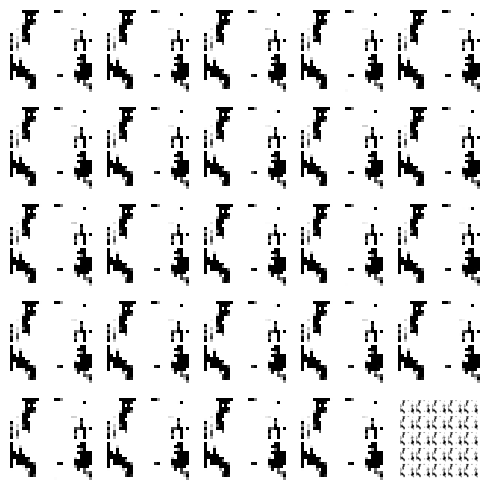

  0%|          | 0/350 [00:00<?, ?it/s]

4/4 [==============================] - 0s 21ms/step


  0%|          | 1/350 [00:00<03:40,  1.59it/s]

4/4 [==============================] - 0s 12ms/step


  1%|          | 2/350 [00:01<03:33,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


  1%|          | 3/350 [00:01<03:29,  1.65it/s]

4/4 [==============================] - 0s 13ms/step


  1%|          | 4/350 [00:02<03:23,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


  1%|▏         | 5/350 [00:02<03:21,  1.71it/s]

4/4 [==============================] - 0s 13ms/step


  2%|▏         | 6/350 [00:03<03:19,  1.73it/s]

4/4 [==============================] - 0s 12ms/step


  2%|▏         | 7/350 [00:04<03:19,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


  2%|▏         | 8/350 [00:04<03:16,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


  3%|▎         | 9/350 [00:05<03:14,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


  3%|▎         | 10/350 [00:05<03:13,  1.76it/s]

4/4 [==============================] - 0s 12ms/step


  3%|▎         | 11/350 [00:06<03:12,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


  3%|▎         | 12/350 [00:06<03:13,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


  4%|▎         | 13/350 [00:07<03:11,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


  4%|▍         | 14/350 [00:08<03:11,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


  4%|▍         | 15/350 [00:08<03:09,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


  5%|▍         | 16/350 [00:09<03:08,  1.77it/s]

4/4 [==============================] - 0s 12ms/step


  5%|▍         | 17/350 [00:09<03:11,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


  5%|▌         | 18/350 [00:10<03:11,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


  5%|▌         | 19/350 [00:10<03:12,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


  6%|▌         | 20/350 [00:11<03:09,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


  6%|▌         | 21/350 [00:12<03:08,  1.75it/s]

4/4 [==============================] - 0s 12ms/step


  6%|▋         | 22/350 [00:12<03:09,  1.73it/s]

4/4 [==============================] - 0s 12ms/step


  7%|▋         | 23/350 [00:13<03:08,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


  7%|▋         | 24/350 [00:13<03:05,  1.76it/s]

4/4 [==============================] - 0s 12ms/step


  7%|▋         | 25/350 [00:14<03:04,  1.77it/s]

4/4 [==============================] - 0s 12ms/step


  7%|▋         | 26/350 [00:14<03:03,  1.76it/s]

4/4 [==============================] - 0s 11ms/step


  8%|▊         | 27/350 [00:15<03:06,  1.73it/s]

4/4 [==============================] - 0s 12ms/step


  8%|▊         | 28/350 [00:16<03:05,  1.73it/s]

4/4 [==============================] - 0s 12ms/step


  8%|▊         | 29/350 [00:16<03:03,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


  9%|▊         | 30/350 [00:17<03:03,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


  9%|▉         | 31/350 [00:17<03:03,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


  9%|▉         | 32/350 [00:18<03:05,  1.72it/s]

4/4 [==============================] - 0s 11ms/step


  9%|▉         | 33/350 [00:19<03:04,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 10%|▉         | 34/350 [00:19<03:02,  1.73it/s]

4/4 [==============================] - 0s 12ms/step


 10%|█         | 35/350 [00:20<03:01,  1.73it/s]

4/4 [==============================] - 0s 12ms/step


 10%|█         | 36/350 [00:20<03:00,  1.74it/s]

4/4 [==============================] - 0s 15ms/step


 11%|█         | 37/350 [00:21<03:14,  1.61it/s]

4/4 [==============================] - 0s 14ms/step


 11%|█         | 38/350 [00:22<03:14,  1.60it/s]

4/4 [==============================] - 0s 15ms/step


 11%|█         | 39/350 [00:22<03:09,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 11%|█▏        | 40/350 [00:23<03:05,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 12%|█▏        | 41/350 [00:23<03:02,  1.69it/s]

4/4 [==============================] - 0s 13ms/step


 12%|█▏        | 42/350 [00:24<03:03,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


 12%|█▏        | 43/350 [00:24<03:00,  1.70it/s]

4/4 [==============================] - 0s 13ms/step


 13%|█▎        | 44/350 [00:25<02:57,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


 13%|█▎        | 45/350 [00:26<02:56,  1.73it/s]

4/4 [==============================] - 0s 12ms/step


 13%|█▎        | 46/350 [00:26<02:55,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 13%|█▎        | 47/350 [00:27<02:57,  1.71it/s]

4/4 [==============================] - 0s 13ms/step


 14%|█▎        | 48/350 [00:27<02:57,  1.70it/s]

4/4 [==============================] - 0s 13ms/step


 14%|█▍        | 49/350 [00:28<02:55,  1.72it/s]

4/4 [==============================] - 0s 10ms/step


 14%|█▍        | 50/350 [00:29<03:09,  1.59it/s]

4/4 [==============================] - 0s 12ms/step


 15%|█▍        | 51/350 [00:29<03:04,  1.62it/s]

4/4 [==============================] - 0s 13ms/step


 15%|█▍        | 52/350 [00:30<03:02,  1.64it/s]

4/4 [==============================] - 0s 13ms/step


 15%|█▌        | 53/350 [00:30<02:58,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 15%|█▌        | 54/350 [00:31<02:55,  1.69it/s]

4/4 [==============================] - 0s 14ms/step


 16%|█▌        | 55/350 [00:32<02:52,  1.71it/s]

4/4 [==============================] - 0s 13ms/step


 16%|█▌        | 56/350 [00:32<02:51,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 16%|█▋        | 57/350 [00:33<02:52,  1.70it/s]

4/4 [==============================] - 0s 13ms/step


 17%|█▋        | 58/350 [00:33<02:51,  1.71it/s]

4/4 [==============================] - 0s 13ms/step


 17%|█▋        | 59/350 [00:34<02:48,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 17%|█▋        | 60/350 [00:35<02:48,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 17%|█▋        | 61/350 [00:35<02:46,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 18%|█▊        | 62/350 [00:36<02:49,  1.70it/s]

4/4 [==============================] - 0s 13ms/step


 18%|█▊        | 63/350 [00:36<02:46,  1.72it/s]

4/4 [==============================] - 0s 14ms/step


 18%|█▊        | 64/350 [00:37<02:45,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 19%|█▊        | 65/350 [00:37<02:44,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 19%|█▉        | 66/350 [00:38<02:44,  1.73it/s]

4/4 [==============================] - 0s 12ms/step


 19%|█▉        | 67/350 [00:39<02:45,  1.71it/s]

4/4 [==============================] - 0s 13ms/step


 19%|█▉        | 68/350 [00:39<02:44,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 20%|█▉        | 69/350 [00:40<02:42,  1.73it/s]

4/4 [==============================] - 0s 12ms/step


 20%|██        | 70/350 [00:40<02:42,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 20%|██        | 71/350 [00:41<02:40,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 21%|██        | 72/350 [00:41<02:41,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 21%|██        | 73/350 [00:42<02:40,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 21%|██        | 74/350 [00:43<02:39,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 21%|██▏       | 75/350 [00:43<02:37,  1.75it/s]

4/4 [==============================] - 0s 12ms/step


 22%|██▏       | 76/350 [00:44<02:37,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 22%|██▏       | 77/350 [00:44<02:37,  1.73it/s]

4/4 [==============================] - 0s 12ms/step


 22%|██▏       | 78/350 [00:45<02:37,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 23%|██▎       | 79/350 [00:46<02:35,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 23%|██▎       | 80/350 [00:46<02:36,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 23%|██▎       | 81/350 [00:47<02:36,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


 23%|██▎       | 82/350 [00:47<02:35,  1.72it/s]

4/4 [==============================] - 0s 15ms/step


 24%|██▎       | 83/350 [00:48<02:36,  1.71it/s]

4/4 [==============================] - 0s 13ms/step


 24%|██▍       | 84/350 [00:48<02:35,  1.71it/s]

4/4 [==============================] - 0s 13ms/step


 24%|██▍       | 85/350 [00:49<02:33,  1.73it/s]

4/4 [==============================] - 0s 12ms/step


 25%|██▍       | 86/350 [00:50<02:33,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 25%|██▍       | 87/350 [00:50<02:34,  1.70it/s]

4/4 [==============================] - 0s 13ms/step


 25%|██▌       | 88/350 [00:51<02:33,  1.70it/s]

4/4 [==============================] - 0s 13ms/step


 25%|██▌       | 89/350 [00:51<02:31,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 26%|██▌       | 90/350 [00:52<02:29,  1.74it/s]

4/4 [==============================] - 0s 11ms/step


 26%|██▌       | 91/350 [00:52<02:28,  1.75it/s]

4/4 [==============================] - 0s 12ms/step


 26%|██▋       | 92/350 [00:53<02:30,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


 27%|██▋       | 93/350 [00:54<02:28,  1.73it/s]

4/4 [==============================] - 0s 12ms/step


 27%|██▋       | 94/350 [00:54<02:28,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


 27%|██▋       | 95/350 [00:55<02:27,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


 27%|██▋       | 96/350 [00:55<02:27,  1.73it/s]

4/4 [==============================] - 0s 11ms/step


 28%|██▊       | 97/350 [00:56<02:26,  1.72it/s]

4/4 [==============================] - 0s 14ms/step


 28%|██▊       | 98/350 [00:57<02:25,  1.73it/s]

4/4 [==============================] - 0s 12ms/step


 28%|██▊       | 99/350 [00:57<02:24,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 29%|██▊       | 100/350 [00:58<02:23,  1.74it/s]

4/4 [==============================] - 0s 14ms/step


 29%|██▉       | 101/350 [00:58<02:23,  1.74it/s]

4/4 [==============================] - 0s 14ms/step


 29%|██▉       | 102/350 [00:59<02:23,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 29%|██▉       | 103/350 [00:59<02:22,  1.73it/s]

4/4 [==============================] - 0s 12ms/step


 30%|██▉       | 104/350 [01:00<02:20,  1.75it/s]

4/4 [==============================] - 0s 12ms/step


 30%|███       | 105/350 [01:01<02:20,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 30%|███       | 106/350 [01:01<02:18,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 31%|███       | 107/350 [01:02<02:20,  1.73it/s]

4/4 [==============================] - 0s 12ms/step


 31%|███       | 108/350 [01:02<02:18,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 31%|███       | 109/350 [01:03<02:18,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 31%|███▏      | 110/350 [01:03<02:17,  1.75it/s]

4/4 [==============================] - 0s 12ms/step


 32%|███▏      | 111/350 [01:04<02:16,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 32%|███▏      | 112/350 [01:05<02:18,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 32%|███▏      | 113/350 [01:05<02:16,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 33%|███▎      | 114/350 [01:06<02:14,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 33%|███▎      | 115/350 [01:06<02:13,  1.76it/s]

4/4 [==============================] - 0s 14ms/step


 33%|███▎      | 116/350 [01:07<02:13,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 33%|███▎      | 117/350 [01:07<02:15,  1.72it/s]

4/4 [==============================] - 0s 14ms/step


 34%|███▎      | 118/350 [01:08<02:15,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 34%|███▍      | 119/350 [01:09<02:13,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 34%|███▍      | 120/350 [01:09<02:11,  1.75it/s]

4/4 [==============================] - 0s 12ms/step


 35%|███▍      | 121/350 [01:10<02:10,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 35%|███▍      | 122/350 [01:10<02:12,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


 35%|███▌      | 123/350 [01:11<02:10,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 35%|███▌      | 124/350 [01:11<02:09,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 36%|███▌      | 125/350 [01:12<02:09,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 36%|███▌      | 126/350 [01:13<02:08,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 36%|███▋      | 127/350 [01:13<02:09,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 37%|███▋      | 128/350 [01:14<02:07,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 37%|███▋      | 129/350 [01:14<02:08,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 37%|███▋      | 130/350 [01:15<02:06,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 37%|███▋      | 131/350 [01:16<02:05,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 38%|███▊      | 132/350 [01:16<02:06,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 38%|███▊      | 133/350 [01:17<02:05,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 38%|███▊      | 134/350 [01:17<02:03,  1.75it/s]

4/4 [==============================] - 0s 14ms/step


 39%|███▊      | 135/350 [01:18<02:02,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 39%|███▉      | 136/350 [01:18<02:02,  1.75it/s]

4/4 [==============================] - 0s 12ms/step


 39%|███▉      | 137/350 [01:19<02:03,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 39%|███▉      | 138/350 [01:20<02:02,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 40%|███▉      | 139/350 [01:20<02:01,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 40%|████      | 140/350 [01:21<02:01,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 40%|████      | 141/350 [01:21<01:59,  1.74it/s]

4/4 [==============================] - 0s 14ms/step


 41%|████      | 142/350 [01:22<02:01,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 41%|████      | 143/350 [01:22<01:59,  1.73it/s]

4/4 [==============================] - 0s 12ms/step


 41%|████      | 144/350 [01:23<01:58,  1.73it/s]

4/4 [==============================] - 0s 12ms/step


 41%|████▏     | 145/350 [01:24<01:58,  1.73it/s]

4/4 [==============================] - 0s 12ms/step


 42%|████▏     | 146/350 [01:24<01:56,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 42%|████▏     | 147/350 [01:25<01:57,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


 42%|████▏     | 148/350 [01:25<01:56,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 43%|████▎     | 149/350 [01:26<01:54,  1.75it/s]

4/4 [==============================] - 0s 14ms/step


 43%|████▎     | 150/350 [01:26<01:54,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 43%|████▎     | 151/350 [01:27<01:53,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 43%|████▎     | 152/350 [01:28<01:54,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 44%|████▎     | 153/350 [01:28<01:53,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 44%|████▍     | 154/350 [01:29<01:52,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 44%|████▍     | 155/350 [01:29<01:51,  1.75it/s]

4/4 [==============================] - 0s 12ms/step


 45%|████▍     | 156/350 [01:30<01:50,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 45%|████▍     | 157/350 [01:31<01:52,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 45%|████▌     | 158/350 [01:31<01:50,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 45%|████▌     | 159/350 [01:32<01:50,  1.73it/s]

4/4 [==============================] - 0s 12ms/step


 46%|████▌     | 160/350 [01:32<01:48,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 46%|████▌     | 161/350 [01:33<01:49,  1.73it/s]

4/4 [==============================] - 0s 12ms/step


 46%|████▋     | 162/350 [01:33<01:50,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 47%|████▋     | 163/350 [01:34<01:49,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 47%|████▋     | 164/350 [01:35<01:48,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


 47%|████▋     | 165/350 [01:35<01:48,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 47%|████▋     | 166/350 [01:36<01:47,  1.71it/s]

4/4 [==============================] - 0s 13ms/step


 48%|████▊     | 167/350 [01:36<01:47,  1.71it/s]

4/4 [==============================] - 0s 13ms/step


 48%|████▊     | 168/350 [01:37<01:44,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 48%|████▊     | 169/350 [01:37<01:45,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 49%|████▊     | 170/350 [01:38<01:44,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 49%|████▉     | 171/350 [01:39<01:43,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 49%|████▉     | 172/350 [01:39<01:43,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 49%|████▉     | 173/350 [01:40<01:43,  1.71it/s]

4/4 [==============================] - 0s 13ms/step


 50%|████▉     | 174/350 [01:40<01:42,  1.72it/s]

4/4 [==============================] - 0s 14ms/step


 50%|█████     | 175/350 [01:41<01:41,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 50%|█████     | 176/350 [01:42<01:40,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


 51%|█████     | 177/350 [01:42<01:40,  1.71it/s]

4/4 [==============================] - 0s 13ms/step


 51%|█████     | 178/350 [01:43<01:39,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 51%|█████     | 179/350 [01:43<01:38,  1.74it/s]

4/4 [==============================] - 0s 14ms/step


 51%|█████▏    | 180/350 [01:44<01:37,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 52%|█████▏    | 181/350 [01:44<01:36,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 52%|█████▏    | 182/350 [01:45<01:37,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 52%|█████▏    | 183/350 [01:46<01:36,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 53%|█████▎    | 184/350 [01:46<01:36,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 53%|█████▎    | 185/350 [01:47<01:35,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 53%|█████▎    | 186/350 [01:47<01:34,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 53%|█████▎    | 187/350 [01:48<01:34,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 54%|█████▎    | 188/350 [01:48<01:33,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 54%|█████▍    | 189/350 [01:49<01:31,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 54%|█████▍    | 190/350 [01:50<01:31,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 55%|█████▍    | 191/350 [01:50<01:30,  1.75it/s]

4/4 [==============================] - 0s 14ms/step


 55%|█████▍    | 192/350 [01:51<01:31,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 55%|█████▌    | 193/350 [01:51<01:31,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 55%|█████▌    | 194/350 [01:52<01:30,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 56%|█████▌    | 195/350 [01:53<01:29,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 56%|█████▌    | 196/350 [01:53<01:28,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 56%|█████▋    | 197/350 [01:54<01:29,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 57%|█████▋    | 198/350 [01:54<01:28,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 57%|█████▋    | 199/350 [01:55<01:26,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 57%|█████▋    | 200/350 [01:55<01:25,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 57%|█████▋    | 201/350 [01:56<01:25,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 58%|█████▊    | 202/350 [01:57<01:26,  1.72it/s]

4/4 [==============================] - 0s 14ms/step


 58%|█████▊    | 203/350 [01:57<01:21,  1.80it/s]

4/4 [==============================] - 0s 30ms/step


 58%|█████▊    | 204/350 [01:58<01:22,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 59%|█████▊    | 205/350 [01:58<01:22,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 59%|█████▉    | 206/350 [01:59<01:21,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 59%|█████▉    | 207/350 [01:59<01:22,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 59%|█████▉    | 208/350 [02:00<01:21,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 60%|█████▉    | 209/350 [02:01<01:20,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 60%|██████    | 210/350 [02:01<01:19,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 60%|██████    | 211/350 [02:02<01:19,  1.75it/s]

4/4 [==============================] - 0s 12ms/step


 61%|██████    | 212/350 [02:02<01:19,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 61%|██████    | 213/350 [02:03<01:18,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 61%|██████    | 214/350 [02:03<01:18,  1.73it/s]

4/4 [==============================] - 0s 11ms/step


 61%|██████▏   | 215/350 [02:04<01:17,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 62%|██████▏   | 216/350 [02:05<01:16,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 62%|██████▏   | 217/350 [02:05<01:16,  1.73it/s]

4/4 [==============================] - 0s 12ms/step


 62%|██████▏   | 218/350 [02:06<01:16,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 63%|██████▎   | 219/350 [02:06<01:15,  1.74it/s]

4/4 [==============================] - 0s 14ms/step


 63%|██████▎   | 220/350 [02:07<01:14,  1.75it/s]

4/4 [==============================] - 0s 14ms/step


 63%|██████▎   | 221/350 [02:07<01:13,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 63%|██████▎   | 222/350 [02:08<01:14,  1.73it/s]

4/4 [==============================] - 0s 14ms/step


 64%|██████▎   | 223/350 [02:09<01:13,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 64%|██████▍   | 224/350 [02:09<01:12,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 64%|██████▍   | 225/350 [02:10<01:12,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 65%|██████▍   | 226/350 [02:10<01:11,  1.73it/s]

4/4 [==============================] - 0s 14ms/step


 65%|██████▍   | 227/350 [02:11<01:12,  1.70it/s]

4/4 [==============================] - 0s 13ms/step


 65%|██████▌   | 228/350 [02:11<01:08,  1.77it/s]

4/4 [==============================] - 0s 21ms/step


 65%|██████▌   | 229/350 [02:12<01:08,  1.77it/s]

4/4 [==============================] - 0s 12ms/step


 66%|██████▌   | 230/350 [02:13<01:08,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 66%|██████▌   | 231/350 [02:13<01:08,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 66%|██████▋   | 232/350 [02:14<01:09,  1.71it/s]

4/4 [==============================] - 0s 13ms/step


 67%|██████▋   | 233/350 [02:14<01:07,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 67%|██████▋   | 234/350 [02:15<01:07,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 67%|██████▋   | 235/350 [02:15<01:06,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 67%|██████▋   | 236/350 [02:16<01:05,  1.74it/s]

4/4 [==============================] - 0s 15ms/step


 68%|██████▊   | 237/350 [02:17<01:05,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 68%|██████▊   | 238/350 [02:17<01:04,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 68%|██████▊   | 239/350 [02:18<01:03,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 69%|██████▊   | 240/350 [02:18<01:02,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 69%|██████▉   | 241/350 [02:19<01:02,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 69%|██████▉   | 242/350 [02:20<01:02,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 69%|██████▉   | 243/350 [02:20<01:01,  1.73it/s]

4/4 [==============================] - 0s 14ms/step


 70%|██████▉   | 244/350 [02:21<01:01,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 70%|███████   | 245/350 [02:21<01:00,  1.73it/s]

4/4 [==============================] - 0s 14ms/step


 70%|███████   | 246/350 [02:22<00:59,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 71%|███████   | 247/350 [02:22<01:00,  1.71it/s]

4/4 [==============================] - 0s 13ms/step


 71%|███████   | 248/350 [02:23<00:59,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 71%|███████   | 249/350 [02:24<00:58,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 71%|███████▏  | 250/350 [02:24<00:57,  1.74it/s]

4/4 [==============================] - 0s 14ms/step


 72%|███████▏  | 251/350 [02:25<00:56,  1.74it/s]

4/4 [==============================] - 0s 14ms/step


 72%|███████▏  | 252/350 [02:25<00:56,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 72%|███████▏  | 253/350 [02:26<00:54,  1.79it/s]

4/4 [==============================] - 0s 21ms/step


 73%|███████▎  | 254/350 [02:26<00:53,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 73%|███████▎  | 255/350 [02:27<00:53,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 73%|███████▎  | 256/350 [02:28<00:53,  1.75it/s]

4/4 [==============================] - 0s 12ms/step


 73%|███████▎  | 257/350 [02:28<00:53,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 74%|███████▎  | 258/350 [02:29<00:53,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 74%|███████▍  | 259/350 [02:29<00:52,  1.74it/s]

4/4 [==============================] - 0s 14ms/step


 74%|███████▍  | 260/350 [02:30<00:51,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 75%|███████▍  | 261/350 [02:30<00:51,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 75%|███████▍  | 262/350 [02:31<00:50,  1.73it/s]

4/4 [==============================] - 0s 12ms/step


 75%|███████▌  | 263/350 [02:32<00:48,  1.79it/s]

4/4 [==============================] - 0s 16ms/step


 75%|███████▌  | 264/350 [02:32<00:48,  1.79it/s]

4/4 [==============================] - 0s 13ms/step


 76%|███████▌  | 265/350 [02:33<00:48,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 76%|███████▌  | 266/350 [02:33<00:47,  1.77it/s]

4/4 [==============================] - 0s 15ms/step


 76%|███████▋  | 267/350 [02:34<00:48,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 77%|███████▋  | 268/350 [02:34<00:45,  1.80it/s]

4/4 [==============================] - 0s 29ms/step


 77%|███████▋  | 269/350 [02:35<00:45,  1.79it/s]

4/4 [==============================] - 0s 13ms/step


 77%|███████▋  | 270/350 [02:35<00:45,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 77%|███████▋  | 271/350 [02:36<00:44,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 78%|███████▊  | 272/350 [02:37<00:45,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 78%|███████▊  | 273/350 [02:37<00:43,  1.79it/s]

4/4 [==============================] - 0s 20ms/step


 78%|███████▊  | 274/350 [02:38<00:42,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 79%|███████▊  | 275/350 [02:38<00:42,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 79%|███████▉  | 276/350 [02:39<00:42,  1.75it/s]

4/4 [==============================] - 0s 12ms/step


 79%|███████▉  | 277/350 [02:40<00:42,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 79%|███████▉  | 278/350 [02:40<00:40,  1.79it/s]

4/4 [==============================] - 0s 26ms/step


 80%|███████▉  | 279/350 [02:41<00:39,  1.78it/s]

4/4 [==============================] - 0s 14ms/step


 80%|████████  | 280/350 [02:41<00:39,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 80%|████████  | 281/350 [02:42<00:39,  1.76it/s]

4/4 [==============================] - 0s 14ms/step


 81%|████████  | 282/350 [02:42<00:39,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 81%|████████  | 283/350 [02:43<00:37,  1.80it/s]

4/4 [==============================] - 0s 35ms/step


 81%|████████  | 284/350 [02:43<00:37,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 81%|████████▏ | 285/350 [02:44<00:36,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 82%|████████▏ | 286/350 [02:45<00:36,  1.77it/s]

4/4 [==============================] - 0s 14ms/step


 82%|████████▏ | 287/350 [02:45<00:36,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 82%|████████▏ | 288/350 [02:46<00:34,  1.80it/s]

4/4 [==============================] - 0s 39ms/step


 83%|████████▎ | 289/350 [02:46<00:34,  1.77it/s]

4/4 [==============================] - 0s 15ms/step


 83%|████████▎ | 290/350 [02:47<00:34,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 83%|████████▎ | 291/350 [02:47<00:33,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 83%|████████▎ | 292/350 [02:48<00:33,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 84%|████████▎ | 293/350 [02:49<00:31,  1.80it/s]

4/4 [==============================] - 0s 38ms/step


 84%|████████▍ | 294/350 [02:49<00:31,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 84%|████████▍ | 295/350 [02:50<00:31,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 85%|████████▍ | 296/350 [02:50<00:30,  1.75it/s]

4/4 [==============================] - 0s 16ms/step


 85%|████████▍ | 297/350 [02:51<00:30,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 85%|████████▌ | 298/350 [02:51<00:29,  1.73it/s]

4/4 [==============================] - 0s 15ms/step


 85%|████████▌ | 299/350 [02:52<00:29,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


 86%|████████▌ | 300/350 [02:53<00:29,  1.71it/s]

4/4 [==============================] - 0s 13ms/step


 86%|████████▌ | 301/350 [02:53<00:28,  1.73it/s]

4/4 [==============================] - 0s 14ms/step


 86%|████████▋ | 302/350 [02:54<00:28,  1.71it/s]

4/4 [==============================] - 0s 13ms/step


 87%|████████▋ | 303/350 [02:54<00:27,  1.72it/s]

4/4 [==============================] - 0s 15ms/step


 87%|████████▋ | 304/350 [02:55<00:26,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 87%|████████▋ | 305/350 [02:55<00:26,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 87%|████████▋ | 306/350 [02:56<00:25,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 88%|████████▊ | 307/350 [02:57<00:25,  1.71it/s]

4/4 [==============================] - 0s 14ms/step


 88%|████████▊ | 308/350 [02:57<00:23,  1.78it/s]

4/4 [==============================] - 0s 30ms/step


 88%|████████▊ | 309/350 [02:58<00:23,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 89%|████████▊ | 310/350 [02:58<00:22,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 89%|████████▉ | 311/350 [02:59<00:21,  1.83it/s]

4/4 [==============================] - 0s 30ms/step


 89%|████████▉ | 312/350 [02:59<00:21,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 89%|████████▉ | 313/350 [03:00<00:20,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 90%|████████▉ | 314/350 [03:01<00:19,  1.83it/s]

4/4 [==============================] - 0s 32ms/step


 90%|█████████ | 315/350 [03:01<00:19,  1.80it/s]

4/4 [==============================] - 0s 13ms/step


 90%|█████████ | 316/350 [03:02<00:19,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 91%|█████████ | 317/350 [03:02<00:18,  1.80it/s]

4/4 [==============================] - 0s 30ms/step


 91%|█████████ | 318/350 [03:03<00:17,  1.78it/s]

4/4 [==============================] - 0s 12ms/step


 91%|█████████ | 319/350 [03:03<00:17,  1.78it/s]

4/4 [==============================] - 0s 12ms/step


 91%|█████████▏| 320/350 [03:04<00:16,  1.84it/s]

4/4 [==============================] - 0s 45ms/step


 92%|█████████▏| 321/350 [03:04<00:16,  1.78it/s]

4/4 [==============================] - 0s 12ms/step


 92%|█████████▏| 322/350 [03:05<00:16,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 92%|█████████▏| 323/350 [03:06<00:15,  1.79it/s]

4/4 [==============================] - 0s 30ms/step


 93%|█████████▎| 324/350 [03:06<00:14,  1.78it/s]

4/4 [==============================] - 0s 12ms/step


 93%|█████████▎| 325/350 [03:07<00:14,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 93%|█████████▎| 326/350 [03:07<00:13,  1.83it/s]

4/4 [==============================] - 0s 31ms/step


 93%|█████████▎| 327/350 [03:08<00:13,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 94%|█████████▎| 328/350 [03:08<00:12,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 94%|█████████▍| 329/350 [03:09<00:11,  1.82it/s]

4/4 [==============================] - 0s 39ms/step


 94%|█████████▍| 330/350 [03:09<00:11,  1.79it/s]

4/4 [==============================] - 0s 13ms/step


 95%|█████████▍| 331/350 [03:10<00:10,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 95%|█████████▍| 332/350 [03:11<00:09,  1.80it/s]

4/4 [==============================] - 0s 20ms/step


 95%|█████████▌| 333/350 [03:11<00:09,  1.79it/s]

4/4 [==============================] - 0s 13ms/step


 95%|█████████▌| 334/350 [03:12<00:09,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 96%|█████████▌| 335/350 [03:12<00:08,  1.82it/s]

4/4 [==============================] - 0s 28ms/step


 96%|█████████▌| 336/350 [03:13<00:07,  1.79it/s]

4/4 [==============================] - 0s 13ms/step


 96%|█████████▋| 337/350 [03:13<00:07,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 97%|█████████▋| 338/350 [03:14<00:06,  1.82it/s]

4/4 [==============================] - 0s 20ms/step


 97%|█████████▋| 339/350 [03:15<00:06,  1.79it/s]

4/4 [==============================] - 0s 13ms/step


 97%|█████████▋| 340/350 [03:15<00:05,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 97%|█████████▋| 341/350 [03:16<00:04,  1.83it/s]

4/4 [==============================] - 0s 18ms/step


 98%|█████████▊| 342/350 [03:16<00:04,  1.78it/s]

4/4 [==============================] - 0s 12ms/step


 98%|█████████▊| 343/350 [03:17<00:04,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 98%|█████████▊| 344/350 [03:17<00:03,  1.81it/s]

4/4 [==============================] - 0s 30ms/step


 99%|█████████▊| 345/350 [03:18<00:02,  1.79it/s]

4/4 [==============================] - 0s 13ms/step


 99%|█████████▉| 346/350 [03:18<00:02,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 99%|█████████▉| 347/350 [03:19<00:01,  1.80it/s]

4/4 [==============================] - 0s 15ms/step


 99%|█████████▉| 348/350 [03:20<00:01,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


100%|█████████▉| 349/350 [03:20<00:00,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


100%|██████████| 350/350 [03:21<00:00,  1.74it/s]

Epoch number: 36 discriminator_loss: 0.16560945281434605 generator_loss: 7.530971047537667
1/1 [==============================] - 0s 22ms/step


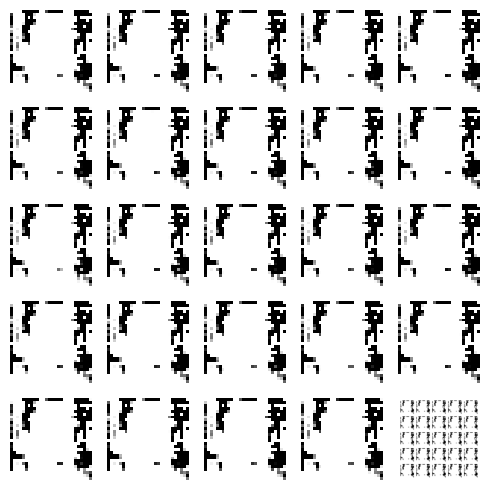

  0%|          | 0/350 [00:00<?, ?it/s]

4/4 [==============================] - 0s 22ms/step


  0%|          | 1/350 [00:00<04:09,  1.40it/s]

4/4 [==============================] - 0s 15ms/step


  1%|          | 2/350 [00:01<03:48,  1.52it/s]

4/4 [==============================] - 0s 13ms/step


  1%|          | 3/350 [00:01<03:27,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


  1%|          | 4/350 [00:02<03:26,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


  1%|▏         | 5/350 [00:02<03:14,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


  2%|▏         | 6/350 [00:03<03:12,  1.79it/s]

4/4 [==============================] - 0s 13ms/step


  2%|▏         | 7/350 [00:04<03:14,  1.77it/s]

4/4 [==============================] - 0s 12ms/step


  2%|▏         | 8/350 [00:04<03:15,  1.75it/s]

4/4 [==============================] - 0s 12ms/step


  3%|▎         | 9/350 [00:05<03:08,  1.81it/s]

4/4 [==============================] - 0s 18ms/step


  3%|▎         | 10/350 [00:05<03:09,  1.79it/s]

4/4 [==============================] - 0s 13ms/step


  3%|▎         | 11/350 [00:06<03:13,  1.75it/s]

4/4 [==============================] - 0s 12ms/step


  3%|▎         | 12/350 [00:06<03:05,  1.82it/s]

4/4 [==============================] - 0s 24ms/step


  4%|▎         | 13/350 [00:07<03:08,  1.79it/s]

4/4 [==============================] - 0s 12ms/step


  4%|▍         | 14/350 [00:07<03:07,  1.79it/s]

4/4 [==============================] - 0s 12ms/step


  4%|▍         | 15/350 [00:08<03:01,  1.84it/s]

4/4 [==============================] - 0s 21ms/step


  5%|▍         | 16/350 [00:09<03:05,  1.80it/s]

4/4 [==============================] - 0s 13ms/step


  5%|▍         | 17/350 [00:09<03:06,  1.78it/s]

4/4 [==============================] - 0s 12ms/step


  5%|▌         | 18/350 [00:10<02:59,  1.84it/s]

4/4 [==============================] - 0s 24ms/step


  5%|▌         | 19/350 [00:10<03:01,  1.82it/s]

4/4 [==============================] - 0s 13ms/step


  6%|▌         | 20/350 [00:11<03:04,  1.79it/s]

4/4 [==============================] - 0s 14ms/step


  6%|▌         | 21/350 [00:11<03:01,  1.82it/s]

4/4 [==============================] - 0s 32ms/step


  6%|▋         | 22/350 [00:12<03:02,  1.80it/s]

4/4 [==============================] - 0s 12ms/step


  7%|▋         | 23/350 [00:12<03:04,  1.78it/s]

4/4 [==============================] - 0s 12ms/step


  7%|▋         | 24/350 [00:13<02:57,  1.83it/s]

4/4 [==============================] - 0s 32ms/step


  7%|▋         | 25/350 [00:14<03:00,  1.81it/s]

4/4 [==============================] - 0s 12ms/step


  7%|▋         | 26/350 [00:14<03:03,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


  8%|▊         | 27/350 [00:15<02:57,  1.82it/s]

4/4 [==============================] - 0s 19ms/step


  8%|▊         | 28/350 [00:15<02:58,  1.80it/s]

4/4 [==============================] - 0s 13ms/step


  8%|▊         | 29/350 [00:16<02:59,  1.79it/s]

4/4 [==============================] - 0s 14ms/step


  9%|▊         | 30/350 [00:16<02:54,  1.83it/s]

4/4 [==============================] - 0s 25ms/step


  9%|▉         | 31/350 [00:17<02:59,  1.78it/s]

4/4 [==============================] - 0s 19ms/step


  9%|▉         | 32/350 [00:17<02:58,  1.78it/s]

4/4 [==============================] - 0s 12ms/step


  9%|▉         | 33/350 [00:18<02:59,  1.76it/s]

4/4 [==============================] - 0s 11ms/step


 10%|▉         | 34/350 [00:19<02:52,  1.84it/s]

4/4 [==============================] - 0s 27ms/step


 10%|█         | 35/350 [00:19<02:54,  1.80it/s]

4/4 [==============================] - 0s 13ms/step


 10%|█         | 36/350 [00:20<02:58,  1.76it/s]

4/4 [==============================] - 0s 14ms/step


 11%|█         | 37/350 [00:20<02:52,  1.82it/s]

4/4 [==============================] - 0s 38ms/step


 11%|█         | 38/350 [00:21<02:55,  1.78it/s]

4/4 [==============================] - 0s 14ms/step


 11%|█         | 39/350 [00:21<02:55,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 11%|█▏        | 40/350 [00:22<02:48,  1.84it/s]

4/4 [==============================] - 0s 26ms/step


 12%|█▏        | 41/350 [00:22<02:52,  1.80it/s]

4/4 [==============================] - 0s 13ms/step


 12%|█▏        | 42/350 [00:23<02:53,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 12%|█▏        | 43/350 [00:24<02:47,  1.83it/s]

4/4 [==============================] - 0s 17ms/step


 13%|█▎        | 44/350 [00:24<02:47,  1.82it/s]

4/4 [==============================] - 0s 13ms/step


 13%|█▎        | 45/350 [00:25<02:49,  1.80it/s]

4/4 [==============================] - 0s 12ms/step


 13%|█▎        | 46/350 [00:25<02:47,  1.82it/s]

4/4 [==============================] - 0s 28ms/step


 13%|█▎        | 47/350 [00:26<02:47,  1.81it/s]

4/4 [==============================] - 0s 13ms/step


 14%|█▎        | 48/350 [00:26<02:48,  1.79it/s]

4/4 [==============================] - 0s 13ms/step


 14%|█▍        | 49/350 [00:27<02:42,  1.85it/s]

4/4 [==============================] - 0s 36ms/step


 14%|█▍        | 50/350 [00:27<02:45,  1.81it/s]

4/4 [==============================] - 0s 12ms/step


 15%|█▍        | 51/350 [00:28<02:49,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 15%|█▍        | 52/350 [00:29<02:43,  1.82it/s]

4/4 [==============================] - 0s 25ms/step


 15%|█▌        | 53/350 [00:29<02:45,  1.80it/s]

4/4 [==============================] - 0s 13ms/step


 15%|█▌        | 54/350 [00:30<02:46,  1.78it/s]

4/4 [==============================] - 0s 12ms/step


 16%|█▌        | 55/350 [00:30<02:40,  1.83it/s]

4/4 [==============================] - 0s 30ms/step


 16%|█▌        | 56/350 [00:31<02:45,  1.78it/s]

4/4 [==============================] - 0s 14ms/step


 16%|█▋        | 57/350 [00:31<02:45,  1.77it/s]

4/4 [==============================] - 0s 12ms/step


 17%|█▋        | 58/350 [00:32<02:39,  1.83it/s]

4/4 [==============================] - 0s 25ms/step


 17%|█▋        | 59/350 [00:32<02:40,  1.82it/s]

4/4 [==============================] - 0s 13ms/step


 17%|█▋        | 60/350 [00:33<02:42,  1.79it/s]

4/4 [==============================] - 0s 14ms/step


 17%|█▋        | 61/350 [00:34<02:38,  1.82it/s]

4/4 [==============================] - 0s 20ms/step


 18%|█▊        | 62/350 [00:34<02:42,  1.77it/s]

4/4 [==============================] - 0s 14ms/step


 18%|█▊        | 63/350 [00:35<02:41,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 18%|█▊        | 64/350 [00:35<02:36,  1.83it/s]

4/4 [==============================] - 0s 39ms/step


 19%|█▊        | 65/350 [00:36<02:39,  1.79it/s]

4/4 [==============================] - 0s 14ms/step


 19%|█▉        | 66/350 [00:36<02:43,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 19%|█▉        | 67/350 [00:37<02:37,  1.80it/s]

4/4 [==============================] - 0s 28ms/step


 19%|█▉        | 68/350 [00:37<02:38,  1.78it/s]

4/4 [==============================] - 0s 12ms/step


 20%|█▉        | 69/350 [00:38<02:39,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 20%|██        | 70/350 [00:39<02:34,  1.82it/s]

4/4 [==============================] - 0s 28ms/step


 20%|██        | 71/350 [00:39<02:37,  1.77it/s]

4/4 [==============================] - 0s 12ms/step


 21%|██        | 72/350 [00:40<02:31,  1.83it/s]

4/4 [==============================] - 0s 28ms/step


 21%|██        | 73/350 [00:40<02:36,  1.77it/s]

4/4 [==============================] - 0s 12ms/step


 21%|██        | 74/350 [00:41<02:34,  1.79it/s]

4/4 [==============================] - 0s 13ms/step


 21%|██▏       | 75/350 [00:41<02:35,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 22%|██▏       | 76/350 [00:42<02:33,  1.79it/s]

4/4 [==============================] - 0s 22ms/step


 22%|██▏       | 77/350 [00:43<02:33,  1.78it/s]

4/4 [==============================] - 0s 12ms/step


 22%|██▏       | 78/350 [00:43<02:33,  1.77it/s]

4/4 [==============================] - 0s 12ms/step


 23%|██▎       | 79/350 [00:44<02:28,  1.82it/s]

4/4 [==============================] - 0s 22ms/step


 23%|██▎       | 80/350 [00:44<02:30,  1.80it/s]

4/4 [==============================] - 0s 13ms/step


 23%|██▎       | 81/350 [00:45<02:33,  1.76it/s]

4/4 [==============================] - 0s 12ms/step


 23%|██▎       | 82/350 [00:45<02:27,  1.82it/s]

4/4 [==============================] - 0s 19ms/step


 24%|██▎       | 83/350 [00:46<02:28,  1.80it/s]

4/4 [==============================] - 0s 12ms/step


 24%|██▍       | 84/350 [00:46<02:30,  1.77it/s]

4/4 [==============================] - 0s 12ms/step


 24%|██▍       | 85/350 [00:47<02:25,  1.82it/s]

4/4 [==============================] - 0s 27ms/step


 25%|██▍       | 86/350 [00:48<02:28,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 25%|██▍       | 87/350 [00:48<02:28,  1.77it/s]

4/4 [==============================] - 0s 12ms/step


 25%|██▌       | 88/350 [00:49<02:23,  1.83it/s]

4/4 [==============================] - 0s 26ms/step


 25%|██▌       | 89/350 [00:49<02:26,  1.79it/s]

4/4 [==============================] - 0s 12ms/step


 26%|██▌       | 90/350 [00:50<02:25,  1.79it/s]

4/4 [==============================] - 0s 14ms/step


 26%|██▌       | 91/350 [00:50<02:22,  1.82it/s]

4/4 [==============================] - 0s 33ms/step


 26%|██▋       | 92/350 [00:51<02:24,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 27%|██▋       | 93/350 [00:51<02:25,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 27%|██▋       | 94/350 [00:52<02:21,  1.81it/s]

4/4 [==============================] - 0s 23ms/step


 27%|██▋       | 95/350 [00:53<02:21,  1.80it/s]

4/4 [==============================] - 0s 13ms/step


 27%|██▋       | 96/350 [00:53<02:24,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 28%|██▊       | 97/350 [00:54<02:18,  1.82it/s]

4/4 [==============================] - 0s 21ms/step


 28%|██▊       | 98/350 [00:54<02:20,  1.79it/s]

4/4 [==============================] - 0s 13ms/step


 28%|██▊       | 99/350 [00:55<02:22,  1.76it/s]

4/4 [==============================] - 0s 14ms/step


 29%|██▊       | 100/350 [00:55<02:17,  1.82it/s]

4/4 [==============================] - 0s 22ms/step


 29%|██▉       | 101/350 [00:56<02:21,  1.76it/s]

4/4 [==============================] - 0s 14ms/step


 29%|██▉       | 102/350 [00:57<02:21,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 29%|██▉       | 103/350 [00:57<02:15,  1.82it/s]

4/4 [==============================] - 0s 23ms/step


 30%|██▉       | 104/350 [00:58<02:17,  1.79it/s]

4/4 [==============================] - 0s 13ms/step


 30%|███       | 105/350 [00:58<02:18,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 30%|███       | 106/350 [00:59<02:14,  1.81it/s]

4/4 [==============================] - 0s 23ms/step


 31%|███       | 107/350 [00:59<02:15,  1.80it/s]

4/4 [==============================] - 0s 13ms/step


 31%|███       | 108/350 [01:00<02:15,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 31%|███       | 109/350 [01:00<02:11,  1.84it/s]

4/4 [==============================] - 0s 29ms/step


 31%|███▏      | 110/350 [01:01<02:13,  1.80it/s]

4/4 [==============================] - 0s 13ms/step


 32%|███▏      | 111/350 [01:02<02:15,  1.76it/s]

4/4 [==============================] - 0s 14ms/step


 32%|███▏      | 112/350 [01:02<02:11,  1.82it/s]

4/4 [==============================] - 0s 24ms/step


 32%|███▏      | 113/350 [01:03<02:12,  1.79it/s]

4/4 [==============================] - 0s 13ms/step


 33%|███▎      | 114/350 [01:03<02:13,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 33%|███▎      | 115/350 [01:04<02:08,  1.82it/s]

4/4 [==============================] - 0s 25ms/step


 33%|███▎      | 116/350 [01:04<02:11,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 33%|███▎      | 117/350 [01:05<02:11,  1.77it/s]

4/4 [==============================] - 0s 12ms/step


 34%|███▎      | 118/350 [01:05<02:07,  1.82it/s]

4/4 [==============================] - 0s 27ms/step


 34%|███▍      | 119/350 [01:06<02:08,  1.79it/s]

4/4 [==============================] - 0s 12ms/step


 34%|███▍      | 120/350 [01:07<02:09,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 35%|███▍      | 121/350 [01:07<02:07,  1.80it/s]

4/4 [==============================] - 0s 22ms/step


 35%|███▍      | 122/350 [01:08<02:07,  1.79it/s]

4/4 [==============================] - 0s 14ms/step


 35%|███▌      | 123/350 [01:08<02:07,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 35%|███▌      | 124/350 [01:09<02:03,  1.83it/s]

4/4 [==============================] - 0s 29ms/step


 36%|███▌      | 125/350 [01:09<02:05,  1.79it/s]

4/4 [==============================] - 0s 13ms/step


 36%|███▌      | 126/350 [01:10<02:08,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 36%|███▋      | 127/350 [01:10<02:04,  1.79it/s]

4/4 [==============================] - 0s 31ms/step


 37%|███▋      | 128/350 [01:11<02:05,  1.78it/s]

4/4 [==============================] - 0s 12ms/step


 37%|███▋      | 129/350 [01:12<02:05,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 37%|███▋      | 130/350 [01:12<02:01,  1.82it/s]

4/4 [==============================] - 0s 27ms/step


 37%|███▋      | 131/350 [01:13<02:04,  1.75it/s]

4/4 [==============================] - 0s 18ms/step


 38%|███▊      | 132/350 [01:13<02:04,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 38%|███▊      | 133/350 [01:14<01:59,  1.81it/s]

4/4 [==============================] - 0s 14ms/step


 38%|███▊      | 134/350 [01:14<01:56,  1.86it/s]

4/4 [==============================] - 0s 20ms/step


 39%|███▊      | 135/350 [01:15<01:57,  1.83it/s]

4/4 [==============================] - 0s 12ms/step


 39%|███▉      | 136/350 [01:15<01:55,  1.86it/s]

4/4 [==============================] - 0s 11ms/step


 39%|███▉      | 137/350 [01:16<01:58,  1.80it/s]

4/4 [==============================] - 0s 12ms/step


 39%|███▉      | 138/350 [01:16<01:54,  1.85it/s]

4/4 [==============================] - 0s 29ms/step


 40%|███▉      | 139/350 [01:17<01:55,  1.82it/s]

4/4 [==============================] - 0s 13ms/step


 40%|████      | 140/350 [01:18<01:57,  1.79it/s]

4/4 [==============================] - 0s 12ms/step


 40%|████      | 141/350 [01:18<01:55,  1.81it/s]

4/4 [==============================] - 0s 20ms/step


 41%|████      | 142/350 [01:19<01:54,  1.81it/s]

4/4 [==============================] - 0s 11ms/step


 41%|████      | 143/350 [01:19<01:56,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 41%|████      | 144/350 [01:20<01:52,  1.83it/s]

4/4 [==============================] - 0s 20ms/step


 41%|████▏     | 145/350 [01:20<01:53,  1.80it/s]

4/4 [==============================] - 0s 13ms/step


 42%|████▏     | 146/350 [01:21<01:57,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 42%|████▏     | 147/350 [01:22<01:52,  1.80it/s]

4/4 [==============================] - 0s 29ms/step


 42%|████▏     | 148/350 [01:22<01:53,  1.78it/s]

4/4 [==============================] - 0s 12ms/step


 43%|████▎     | 149/350 [01:23<01:53,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 43%|████▎     | 150/350 [01:23<01:49,  1.83it/s]

4/4 [==============================] - 0s 16ms/step


 43%|████▎     | 151/350 [01:24<01:51,  1.78it/s]

4/4 [==============================] - 0s 15ms/step


 43%|████▎     | 152/350 [01:24<01:52,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 44%|████▎     | 153/350 [01:25<01:48,  1.82it/s]

4/4 [==============================] - 0s 21ms/step


 44%|████▍     | 154/350 [01:25<01:49,  1.80it/s]

4/4 [==============================] - 0s 13ms/step


 44%|████▍     | 155/350 [01:26<01:50,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 45%|████▍     | 156/350 [01:27<01:47,  1.80it/s]

4/4 [==============================] - 0s 22ms/step


 45%|████▍     | 157/350 [01:27<01:48,  1.77it/s]

4/4 [==============================] - 0s 12ms/step


 45%|████▌     | 158/350 [01:28<01:48,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 45%|████▌     | 159/350 [01:28<01:44,  1.82it/s]

4/4 [==============================] - 0s 29ms/step


 46%|████▌     | 160/350 [01:29<01:46,  1.79it/s]

4/4 [==============================] - 0s 15ms/step


 46%|████▌     | 161/350 [01:29<01:48,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 46%|████▋     | 162/350 [01:30<01:44,  1.80it/s]

4/4 [==============================] - 0s 23ms/step


 47%|████▋     | 163/350 [01:30<01:44,  1.79it/s]

4/4 [==============================] - 0s 14ms/step


 47%|████▋     | 164/350 [01:31<01:45,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 47%|████▋     | 165/350 [01:32<01:41,  1.83it/s]

4/4 [==============================] - 0s 21ms/step


 47%|████▋     | 166/350 [01:32<01:43,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 48%|████▊     | 167/350 [01:33<01:44,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 48%|████▊     | 168/350 [01:33<01:40,  1.81it/s]

4/4 [==============================] - 0s 29ms/step


 48%|████▊     | 169/350 [01:34<01:41,  1.79it/s]

4/4 [==============================] - 0s 12ms/step


 49%|████▊     | 170/350 [01:34<01:42,  1.76it/s]

4/4 [==============================] - 0s 12ms/step


 49%|████▉     | 171/350 [01:35<01:40,  1.78it/s]

4/4 [==============================] - 0s 28ms/step


 49%|████▉     | 172/350 [01:36<01:40,  1.78it/s]

4/4 [==============================] - 0s 12ms/step


 49%|████▉     | 173/350 [01:36<01:40,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 50%|████▉     | 174/350 [01:37<01:36,  1.82it/s]

4/4 [==============================] - 0s 24ms/step


 50%|█████     | 175/350 [01:37<01:37,  1.80it/s]

4/4 [==============================] - 0s 13ms/step


 50%|█████     | 176/350 [01:38<01:39,  1.75it/s]

4/4 [==============================] - 0s 14ms/step


 51%|█████     | 177/350 [01:38<01:35,  1.81it/s]

4/4 [==============================] - 0s 20ms/step


 51%|█████     | 178/350 [01:39<01:35,  1.80it/s]

4/4 [==============================] - 0s 13ms/step


 51%|█████     | 179/350 [01:39<01:35,  1.79it/s]

4/4 [==============================] - 0s 12ms/step


 51%|█████▏    | 180/350 [01:40<01:32,  1.84it/s]

4/4 [==============================] - 0s 11ms/step


 52%|█████▏    | 181/350 [01:41<01:39,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 52%|█████▏    | 182/350 [01:41<01:38,  1.71it/s]

4/4 [==============================] - 0s 13ms/step


 52%|█████▏    | 183/350 [01:42<01:33,  1.78it/s]

4/4 [==============================] - 0s 36ms/step


 53%|█████▎    | 184/350 [01:42<01:34,  1.76it/s]

4/4 [==============================] - 0s 12ms/step


 53%|█████▎    | 185/350 [01:43<01:34,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 53%|█████▎    | 186/350 [01:43<01:32,  1.78it/s]

4/4 [==============================] - 0s 24ms/step


 53%|█████▎    | 187/350 [01:44<01:32,  1.77it/s]

4/4 [==============================] - 0s 12ms/step


 54%|█████▎    | 188/350 [01:45<01:31,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 54%|█████▍    | 189/350 [01:45<01:28,  1.82it/s]

4/4 [==============================] - 0s 23ms/step


 54%|█████▍    | 190/350 [01:46<01:28,  1.80it/s]

4/4 [==============================] - 0s 12ms/step


 55%|█████▍    | 191/350 [01:46<01:31,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 55%|█████▍    | 192/350 [01:47<01:27,  1.81it/s]

4/4 [==============================] - 0s 30ms/step


 55%|█████▌    | 193/350 [01:47<01:27,  1.79it/s]

4/4 [==============================] - 0s 12ms/step


 55%|█████▌    | 194/350 [01:48<01:28,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 56%|█████▌    | 195/350 [01:48<01:24,  1.83it/s]

4/4 [==============================] - 0s 18ms/step


 56%|█████▌    | 196/350 [01:49<01:26,  1.78it/s]

4/4 [==============================] - 0s 12ms/step


 56%|█████▋    | 197/350 [01:50<01:26,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 57%|█████▋    | 198/350 [01:50<01:23,  1.81it/s]

4/4 [==============================] - 0s 30ms/step


 57%|█████▋    | 199/350 [01:51<01:24,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 57%|█████▋    | 200/350 [01:51<01:25,  1.76it/s]

4/4 [==============================] - 0s 14ms/step


 57%|█████▋    | 201/350 [01:52<01:23,  1.79it/s]

4/4 [==============================] - 0s 18ms/step


 58%|█████▊    | 202/350 [01:52<01:23,  1.78it/s]

4/4 [==============================] - 0s 12ms/step


 58%|█████▊    | 203/350 [01:53<01:23,  1.76it/s]

4/4 [==============================] - 0s 14ms/step


 58%|█████▊    | 204/350 [01:53<01:19,  1.83it/s]

4/4 [==============================] - 0s 19ms/step


 59%|█████▊    | 205/350 [01:54<01:20,  1.80it/s]

4/4 [==============================] - 0s 13ms/step


 59%|█████▉    | 206/350 [01:55<01:22,  1.76it/s]

4/4 [==============================] - 0s 12ms/step


 59%|█████▉    | 207/350 [01:55<01:19,  1.81it/s]

4/4 [==============================] - 0s 29ms/step


 59%|█████▉    | 208/350 [01:56<01:19,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 60%|█████▉    | 209/350 [01:56<01:19,  1.76it/s]

4/4 [==============================] - 0s 12ms/step


 60%|██████    | 210/350 [01:57<01:16,  1.83it/s]

4/4 [==============================] - 0s 26ms/step


 60%|██████    | 211/350 [01:57<01:18,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 61%|██████    | 212/350 [01:58<01:18,  1.75it/s]

4/4 [==============================] - 0s 12ms/step


 61%|██████    | 213/350 [01:59<01:15,  1.81it/s]

4/4 [==============================] - 0s 29ms/step


 61%|██████    | 214/350 [01:59<01:16,  1.78it/s]

4/4 [==============================] - 0s 14ms/step


 61%|██████▏   | 215/350 [02:00<01:16,  1.76it/s]

4/4 [==============================] - 0s 12ms/step


 62%|██████▏   | 216/350 [02:00<01:14,  1.79it/s]

4/4 [==============================] - 0s 22ms/step


 62%|██████▏   | 217/350 [02:01<01:14,  1.78it/s]

4/4 [==============================] - 0s 14ms/step


 62%|██████▏   | 218/350 [02:01<01:14,  1.76it/s]

4/4 [==============================] - 0s 14ms/step


 63%|██████▎   | 219/350 [02:02<01:12,  1.82it/s]

4/4 [==============================] - 0s 27ms/step


 63%|██████▎   | 220/350 [02:02<01:12,  1.80it/s]

4/4 [==============================] - 0s 13ms/step


 63%|██████▎   | 221/350 [02:03<01:13,  1.75it/s]

4/4 [==============================] - 0s 12ms/step


 63%|██████▎   | 222/350 [02:04<01:10,  1.81it/s]

4/4 [==============================] - 0s 22ms/step


 64%|██████▎   | 223/350 [02:04<01:10,  1.80it/s]

4/4 [==============================] - 0s 13ms/step


 64%|██████▍   | 224/350 [02:05<01:10,  1.78it/s]

4/4 [==============================] - 0s 12ms/step


 64%|██████▍   | 225/350 [02:05<01:08,  1.82it/s]

4/4 [==============================] - 0s 19ms/step


 65%|██████▍   | 226/350 [02:06<01:09,  1.77it/s]

4/4 [==============================] - 0s 28ms/step


 65%|██████▍   | 227/350 [02:06<01:09,  1.76it/s]

4/4 [==============================] - 0s 12ms/step


 65%|██████▌   | 228/350 [02:07<01:06,  1.82it/s]

4/4 [==============================] - 0s 14ms/step


 65%|██████▌   | 229/350 [02:07<01:05,  1.86it/s]

4/4 [==============================] - 0s 24ms/step


 66%|██████▌   | 230/350 [02:08<01:05,  1.82it/s]

4/4 [==============================] - 0s 12ms/step


 66%|██████▌   | 231/350 [02:09<01:04,  1.84it/s]

4/4 [==============================] - 0s 13ms/step


 66%|██████▋   | 232/350 [02:09<01:05,  1.79it/s]

4/4 [==============================] - 0s 12ms/step


 67%|██████▋   | 233/350 [02:10<01:03,  1.84it/s]

4/4 [==============================] - 0s 32ms/step


 67%|██████▋   | 234/350 [02:10<01:04,  1.81it/s]

4/4 [==============================] - 0s 13ms/step


 67%|██████▋   | 235/350 [02:11<01:04,  1.79it/s]

4/4 [==============================] - 0s 13ms/step


 67%|██████▋   | 236/350 [02:11<01:02,  1.81it/s]

4/4 [==============================] - 0s 31ms/step


 68%|██████▊   | 237/350 [02:12<01:03,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 68%|██████▊   | 238/350 [02:12<01:03,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 68%|██████▊   | 239/350 [02:13<01:00,  1.83it/s]

4/4 [==============================] - 0s 29ms/step


 69%|██████▊   | 240/350 [02:14<01:00,  1.80it/s]

4/4 [==============================] - 0s 13ms/step


 69%|██████▉   | 241/350 [02:14<01:02,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 69%|██████▉   | 242/350 [02:15<00:59,  1.81it/s]

4/4 [==============================] - 0s 20ms/step


 69%|██████▉   | 243/350 [02:15<00:59,  1.79it/s]

4/4 [==============================] - 0s 12ms/step


 70%|██████▉   | 244/350 [02:16<00:59,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 70%|███████   | 245/350 [02:16<00:57,  1.83it/s]

4/4 [==============================] - 0s 28ms/step


 70%|███████   | 246/350 [02:17<00:58,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 71%|███████   | 247/350 [02:18<00:58,  1.76it/s]

4/4 [==============================] - 0s 12ms/step


 71%|███████   | 248/350 [02:18<00:55,  1.82it/s]

4/4 [==============================] - 0s 18ms/step


 71%|███████   | 249/350 [02:19<00:55,  1.81it/s]

4/4 [==============================] - 0s 13ms/step


 71%|███████▏  | 250/350 [02:19<00:55,  1.79it/s]

4/4 [==============================] - 0s 13ms/step


 72%|███████▏  | 251/350 [02:20<00:54,  1.81it/s]

4/4 [==============================] - 0s 22ms/step


 72%|███████▏  | 252/350 [02:20<00:56,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 72%|███████▏  | 253/350 [02:21<00:54,  1.80it/s]

4/4 [==============================] - 0s 26ms/step


 73%|███████▎  | 254/350 [02:21<00:53,  1.78it/s]

4/4 [==============================] - 0s 12ms/step


 73%|███████▎  | 255/350 [02:22<00:53,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 73%|███████▎  | 256/350 [02:23<00:52,  1.80it/s]

4/4 [==============================] - 0s 26ms/step


 73%|███████▎  | 257/350 [02:23<00:52,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 74%|███████▎  | 258/350 [02:24<00:52,  1.77it/s]

4/4 [==============================] - 0s 14ms/step


 74%|███████▍  | 259/350 [02:24<00:50,  1.82it/s]

4/4 [==============================] - 0s 30ms/step


 74%|███████▍  | 260/350 [02:25<00:50,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 75%|███████▍  | 261/350 [02:25<00:51,  1.74it/s]

4/4 [==============================] - 0s 14ms/step


 75%|███████▍  | 262/350 [02:26<00:48,  1.80it/s]

4/4 [==============================] - 0s 23ms/step


 75%|███████▌  | 263/350 [02:26<00:48,  1.79it/s]

4/4 [==============================] - 0s 13ms/step


 75%|███████▌  | 264/350 [02:27<00:49,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 76%|███████▌  | 265/350 [02:28<00:47,  1.81it/s]

4/4 [==============================] - 0s 21ms/step


 76%|███████▌  | 266/350 [02:28<00:47,  1.76it/s]

4/4 [==============================] - 0s 14ms/step


 76%|███████▋  | 267/350 [02:29<00:47,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 77%|███████▋  | 268/350 [02:29<00:45,  1.82it/s]

4/4 [==============================] - 0s 29ms/step


 77%|███████▋  | 269/350 [02:30<00:46,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 77%|███████▋  | 270/350 [02:30<00:44,  1.79it/s]

4/4 [==============================] - 0s 18ms/step


 77%|███████▋  | 271/350 [02:31<00:45,  1.75it/s]

4/4 [==============================] - 0s 12ms/step


 78%|███████▊  | 272/350 [02:32<00:44,  1.76it/s]

4/4 [==============================] - 0s 14ms/step


 78%|███████▊  | 273/350 [02:32<00:44,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 78%|███████▊  | 274/350 [02:33<00:42,  1.80it/s]

4/4 [==============================] - 0s 18ms/step


 79%|███████▊  | 275/350 [02:33<00:41,  1.79it/s]

4/4 [==============================] - 0s 13ms/step


 79%|███████▉  | 276/350 [02:34<00:42,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 79%|███████▉  | 277/350 [02:34<00:40,  1.79it/s]

4/4 [==============================] - 0s 30ms/step


 79%|███████▉  | 278/350 [02:35<00:40,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 80%|███████▉  | 279/350 [02:36<00:40,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 80%|████████  | 280/350 [02:36<00:38,  1.82it/s]

4/4 [==============================] - 0s 28ms/step


 80%|████████  | 281/350 [02:37<00:38,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 81%|████████  | 282/350 [02:37<00:38,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 81%|████████  | 283/350 [02:38<00:37,  1.80it/s]

4/4 [==============================] - 0s 20ms/step


 81%|████████  | 284/350 [02:38<00:37,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 81%|████████▏ | 285/350 [02:39<00:37,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 82%|████████▏ | 286/350 [02:39<00:35,  1.79it/s]

4/4 [==============================] - 0s 18ms/step


 82%|████████▏ | 287/350 [02:40<00:35,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 82%|████████▏ | 288/350 [02:41<00:35,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 83%|████████▎ | 289/350 [02:41<00:33,  1.82it/s]

4/4 [==============================] - 0s 27ms/step


 83%|████████▎ | 290/350 [02:42<00:33,  1.80it/s]

4/4 [==============================] - 0s 12ms/step


 83%|████████▎ | 291/350 [02:42<00:33,  1.75it/s]

4/4 [==============================] - 0s 12ms/step


 83%|████████▎ | 292/350 [02:43<00:31,  1.81it/s]

4/4 [==============================] - 0s 22ms/step


 84%|████████▎ | 293/350 [02:43<00:31,  1.79it/s]

4/4 [==============================] - 0s 13ms/step


 84%|████████▍ | 294/350 [02:44<00:32,  1.75it/s]

4/4 [==============================] - 0s 12ms/step


 84%|████████▍ | 295/350 [02:44<00:30,  1.81it/s]

4/4 [==============================] - 0s 21ms/step


 85%|████████▍ | 296/350 [02:45<00:30,  1.75it/s]

4/4 [==============================] - 0s 12ms/step


 85%|████████▍ | 297/350 [02:46<00:30,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 85%|████████▌ | 298/350 [02:46<00:28,  1.81it/s]

4/4 [==============================] - 0s 22ms/step


 85%|████████▌ | 299/350 [02:47<00:28,  1.79it/s]

4/4 [==============================] - 0s 12ms/step


 86%|████████▌ | 300/350 [02:47<00:28,  1.77it/s]

4/4 [==============================] - 0s 12ms/step


 86%|████████▌ | 301/350 [02:48<00:27,  1.80it/s]

4/4 [==============================] - 0s 36ms/step


 86%|████████▋ | 302/350 [02:48<00:27,  1.77it/s]

4/4 [==============================] - 0s 12ms/step


 87%|████████▋ | 303/350 [02:49<00:26,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 87%|████████▋ | 304/350 [02:50<00:25,  1.82it/s]

4/4 [==============================] - 0s 23ms/step


 87%|████████▋ | 305/350 [02:50<00:25,  1.80it/s]

4/4 [==============================] - 0s 12ms/step


 87%|████████▋ | 306/350 [02:51<00:25,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 88%|████████▊ | 307/350 [02:51<00:23,  1.81it/s]

4/4 [==============================] - 0s 16ms/step


 88%|████████▊ | 308/350 [02:52<00:23,  1.79it/s]

4/4 [==============================] - 0s 13ms/step


 88%|████████▊ | 309/350 [02:52<00:23,  1.77it/s]

4/4 [==============================] - 0s 12ms/step


 89%|████████▊ | 310/350 [02:53<00:21,  1.82it/s]

4/4 [==============================] - 0s 20ms/step


 89%|████████▉ | 311/350 [02:53<00:22,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 89%|████████▉ | 312/350 [02:54<00:21,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 89%|████████▉ | 313/350 [02:55<00:20,  1.82it/s]

4/4 [==============================] - 0s 25ms/step


 90%|████████▉ | 314/350 [02:55<00:20,  1.78it/s]

4/4 [==============================] - 0s 12ms/step


 90%|█████████ | 315/350 [02:56<00:19,  1.77it/s]

4/4 [==============================] - 0s 12ms/step


 90%|█████████ | 316/350 [02:56<00:18,  1.80it/s]

4/4 [==============================] - 0s 21ms/step


 91%|█████████ | 317/350 [02:57<00:18,  1.79it/s]

4/4 [==============================] - 0s 14ms/step


 91%|█████████ | 318/350 [02:57<00:18,  1.77it/s]

4/4 [==============================] - 0s 12ms/step


 91%|█████████ | 319/350 [02:58<00:17,  1.82it/s]

4/4 [==============================] - 0s 26ms/step


 91%|█████████▏| 320/350 [02:58<00:16,  1.81it/s]

4/4 [==============================] - 0s 13ms/step


 92%|█████████▏| 321/350 [02:59<00:16,  1.75it/s]

4/4 [==============================] - 0s 12ms/step


 92%|█████████▏| 322/350 [03:00<00:15,  1.82it/s]

4/4 [==============================] - 0s 19ms/step


 92%|█████████▏| 323/350 [03:00<00:15,  1.79it/s]

4/4 [==============================] - 0s 12ms/step


 93%|█████████▎| 324/350 [03:01<00:14,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 93%|█████████▎| 325/350 [03:01<00:13,  1.83it/s]

4/4 [==============================] - 0s 30ms/step


 93%|█████████▎| 326/350 [03:02<00:13,  1.78it/s]

4/4 [==============================] - 0s 12ms/step


 93%|█████████▎| 327/350 [03:02<00:13,  1.76it/s]

4/4 [==============================] - 0s 12ms/step


 94%|█████████▎| 328/350 [03:03<00:12,  1.81it/s]

4/4 [==============================] - 0s 31ms/step


 94%|█████████▍| 329/350 [03:04<00:11,  1.78it/s]

4/4 [==============================] - 0s 12ms/step


 94%|█████████▍| 330/350 [03:04<00:11,  1.75it/s]

4/4 [==============================] - 0s 12ms/step


 95%|█████████▍| 331/350 [03:05<00:10,  1.78it/s]

4/4 [==============================] - 0s 23ms/step


 95%|█████████▍| 332/350 [03:05<00:10,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 95%|█████████▌| 333/350 [03:06<00:09,  1.76it/s]

4/4 [==============================] - 0s 14ms/step


 95%|█████████▌| 334/350 [03:06<00:08,  1.81it/s]

4/4 [==============================] - 0s 26ms/step


 96%|█████████▌| 335/350 [03:07<00:08,  1.79it/s]

4/4 [==============================] - 0s 11ms/step


 96%|█████████▌| 336/350 [03:07<00:07,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 96%|█████████▋| 337/350 [03:08<00:07,  1.81it/s]

4/4 [==============================] - 0s 40ms/step


 97%|█████████▋| 338/350 [03:09<00:06,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 97%|█████████▋| 339/350 [03:09<00:06,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 97%|█████████▋| 340/350 [03:10<00:05,  1.82it/s]

4/4 [==============================] - 0s 18ms/step


 97%|█████████▋| 341/350 [03:10<00:05,  1.78it/s]

4/4 [==============================] - 0s 14ms/step


 98%|█████████▊| 342/350 [03:11<00:04,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 98%|█████████▊| 343/350 [03:11<00:03,  1.81it/s]

4/4 [==============================] - 0s 21ms/step


 98%|█████████▊| 344/350 [03:12<00:03,  1.79it/s]

4/4 [==============================] - 0s 12ms/step


 99%|█████████▊| 345/350 [03:13<00:02,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 99%|█████████▉| 346/350 [03:13<00:02,  1.80it/s]

4/4 [==============================] - 0s 27ms/step


 99%|█████████▉| 347/350 [03:14<00:01,  1.77it/s]

4/4 [==============================] - 0s 12ms/step


 99%|█████████▉| 348/350 [03:14<00:01,  1.75it/s]

4/4 [==============================] - 0s 12ms/step


100%|█████████▉| 349/350 [03:15<00:00,  1.76it/s]

4/4 [==============================] - 0s 14ms/step


100%|██████████| 350/350 [03:15<00:00,  1.79it/s]

Epoch number: 37 discriminator_loss: 0.1651246555369081 generator_loss: 7.596019330705915
1/1 [==============================] - 0s 22ms/step


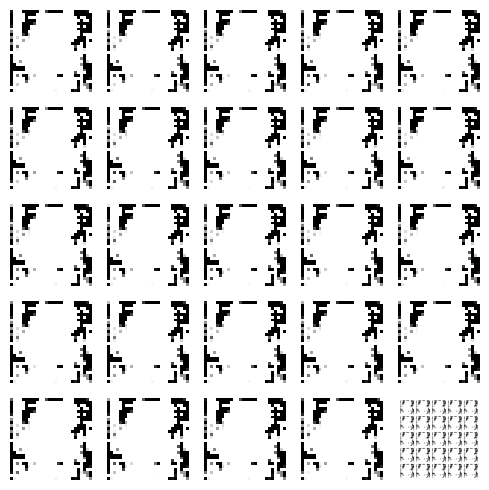

  0%|          | 0/350 [00:00<?, ?it/s]

4/4 [==============================] - 0s 16ms/step


  0%|          | 1/350 [00:00<03:38,  1.60it/s]

4/4 [==============================] - 0s 13ms/step


  1%|          | 2/350 [00:01<03:17,  1.76it/s]

4/4 [==============================] - 0s 34ms/step


  1%|          | 3/350 [00:01<03:21,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


  1%|          | 4/350 [00:02<03:23,  1.70it/s]

4/4 [==============================] - 0s 14ms/step


  1%|▏         | 5/350 [00:02<03:16,  1.75it/s]

4/4 [==============================] - 0s 27ms/step


  2%|▏         | 6/350 [00:03<03:17,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


  2%|▏         | 7/350 [00:04<03:16,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


  2%|▏         | 8/350 [00:04<03:09,  1.81it/s]

4/4 [==============================] - 0s 20ms/step


  3%|▎         | 9/350 [00:05<03:14,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


  3%|▎         | 10/350 [00:05<03:14,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


  3%|▎         | 11/350 [00:06<03:06,  1.81it/s]

4/4 [==============================] - 0s 21ms/step


  3%|▎         | 12/350 [00:06<03:09,  1.78it/s]

4/4 [==============================] - 0s 12ms/step


  4%|▎         | 13/350 [00:07<03:11,  1.76it/s]

4/4 [==============================] - 0s 14ms/step


  4%|▍         | 14/350 [00:07<03:07,  1.79it/s]

4/4 [==============================] - 0s 20ms/step


  4%|▍         | 15/350 [00:08<03:07,  1.78it/s]

4/4 [==============================] - 0s 12ms/step


  5%|▍         | 16/350 [00:09<03:10,  1.76it/s]

4/4 [==============================] - 0s 12ms/step


  5%|▍         | 17/350 [00:09<03:16,  1.69it/s]

4/4 [==============================] - 0s 31ms/step


  5%|▌         | 18/350 [00:10<03:29,  1.58it/s]

4/4 [==============================] - 0s 13ms/step


  5%|▌         | 19/350 [00:10<03:16,  1.68it/s]

4/4 [==============================] - 0s 19ms/step


  6%|▌         | 20/350 [00:11<03:22,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


  6%|▌         | 21/350 [00:12<03:10,  1.73it/s]

4/4 [==============================] - 0s 28ms/step


  6%|▋         | 22/350 [00:12<03:08,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


  7%|▋         | 23/350 [00:13<03:10,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


  7%|▋         | 24/350 [00:13<03:11,  1.70it/s]

4/4 [==============================] - 0s 14ms/step


  7%|▋         | 25/350 [00:14<03:11,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


  7%|▋         | 26/350 [00:15<03:03,  1.76it/s]

4/4 [==============================] - 0s 12ms/step


  8%|▊         | 27/350 [00:15<03:08,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


  8%|▊         | 28/350 [00:16<03:02,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


  8%|▊         | 29/350 [00:16<02:57,  1.81it/s]

4/4 [==============================] - 0s 17ms/step


  9%|▊         | 30/350 [00:17<03:07,  1.71it/s]

4/4 [==============================] - 0s 13ms/step


  9%|▉         | 31/350 [00:17<02:58,  1.78it/s]

4/4 [==============================] - 0s 37ms/step


  9%|▉         | 32/350 [00:18<03:02,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


  9%|▉         | 33/350 [00:19<03:03,  1.73it/s]

4/4 [==============================] - 0s 12ms/step


 10%|▉         | 34/350 [00:19<02:55,  1.80it/s]

4/4 [==============================] - 0s 28ms/step


 10%|█         | 35/350 [00:20<02:56,  1.79it/s]

4/4 [==============================] - 0s 15ms/step


 10%|█         | 36/350 [00:20<02:59,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 11%|█         | 37/350 [00:21<02:52,  1.82it/s]

4/4 [==============================] - 0s 29ms/step


 11%|█         | 38/350 [00:21<02:52,  1.81it/s]

4/4 [==============================] - 0s 12ms/step


 11%|█         | 39/350 [00:22<02:55,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 11%|█▏        | 40/350 [00:22<02:49,  1.83it/s]

4/4 [==============================] - 0s 37ms/step


 12%|█▏        | 41/350 [00:23<02:54,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 12%|█▏        | 42/350 [00:24<03:01,  1.69it/s]

4/4 [==============================] - 0s 17ms/step


 12%|█▏        | 43/350 [00:24<02:56,  1.74it/s]

4/4 [==============================] - 0s 31ms/step


 13%|█▎        | 44/350 [00:25<03:01,  1.69it/s]

4/4 [==============================] - 0s 13ms/step


 13%|█▎        | 45/350 [00:25<03:04,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


 13%|█▎        | 46/350 [00:26<02:59,  1.70it/s]

4/4 [==============================] - 0s 34ms/step


 13%|█▎        | 47/350 [00:27<02:56,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 14%|█▎        | 48/350 [00:27<02:55,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 14%|█▍        | 49/350 [00:28<02:48,  1.79it/s]

4/4 [==============================] - 0s 34ms/step


 14%|█▍        | 50/350 [00:28<02:51,  1.75it/s]

4/4 [==============================] - 0s 12ms/step


 15%|█▍        | 51/350 [00:29<02:51,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 15%|█▍        | 52/350 [00:29<02:44,  1.81it/s]

4/4 [==============================] - 0s 21ms/step


 15%|█▌        | 53/350 [00:30<02:45,  1.79it/s]

4/4 [==============================] - 0s 13ms/step


 15%|█▌        | 54/350 [00:30<02:48,  1.75it/s]

4/4 [==============================] - 0s 14ms/step


 16%|█▌        | 55/350 [00:31<02:42,  1.82it/s]

4/4 [==============================] - 0s 38ms/step


 16%|█▌        | 56/350 [00:32<02:44,  1.79it/s]

4/4 [==============================] - 0s 11ms/step


 16%|█▋        | 57/350 [00:32<02:44,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 17%|█▋        | 58/350 [00:33<02:46,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 17%|█▋        | 59/350 [00:33<02:41,  1.80it/s]

4/4 [==============================] - 0s 34ms/step


 17%|█▋        | 60/350 [00:34<02:43,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 17%|█▋        | 61/350 [00:34<02:43,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 18%|█▊        | 62/350 [00:35<02:38,  1.81it/s]

4/4 [==============================] - 0s 27ms/step


 18%|█▊        | 63/350 [00:36<02:43,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 18%|█▊        | 64/350 [00:36<02:43,  1.75it/s]

4/4 [==============================] - 0s 12ms/step


 19%|█▊        | 65/350 [00:37<02:37,  1.81it/s]

4/4 [==============================] - 0s 26ms/step


 19%|█▉        | 66/350 [00:37<02:38,  1.79it/s]

4/4 [==============================] - 0s 13ms/step


 19%|█▉        | 67/350 [00:38<02:40,  1.77it/s]

4/4 [==============================] - 0s 14ms/step


 19%|█▉        | 68/350 [00:38<02:37,  1.80it/s]

4/4 [==============================] - 0s 29ms/step


 20%|█▉        | 69/350 [00:39<02:38,  1.77it/s]

4/4 [==============================] - 0s 12ms/step


 20%|██        | 70/350 [00:39<02:38,  1.77it/s]

4/4 [==============================] - 0s 12ms/step


 20%|██        | 71/350 [00:40<02:32,  1.83it/s]

4/4 [==============================] - 0s 18ms/step


 21%|██        | 72/350 [00:41<02:37,  1.77it/s]

4/4 [==============================] - 0s 12ms/step


 21%|██        | 73/350 [00:41<02:38,  1.75it/s]

4/4 [==============================] - 0s 12ms/step


 21%|██        | 74/350 [00:42<02:32,  1.82it/s]

4/4 [==============================] - 0s 19ms/step


 21%|██▏       | 75/350 [00:42<02:32,  1.80it/s]

4/4 [==============================] - 0s 12ms/step


 22%|██▏       | 76/350 [00:43<02:34,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 22%|██▏       | 77/350 [00:43<02:36,  1.75it/s]

4/4 [==============================] - 0s 12ms/step


 22%|██▏       | 78/350 [00:44<02:30,  1.81it/s]

4/4 [==============================] - 0s 29ms/step


 23%|██▎       | 79/350 [00:44<02:31,  1.79it/s]

4/4 [==============================] - 0s 12ms/step


 23%|██▎       | 80/350 [00:45<02:32,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 23%|██▎       | 81/350 [00:46<02:29,  1.79it/s]

4/4 [==============================] - 0s 23ms/step


 23%|██▎       | 82/350 [00:46<02:31,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 24%|██▎       | 83/350 [00:47<02:32,  1.75it/s]

4/4 [==============================] - 0s 14ms/step


 24%|██▍       | 84/350 [00:47<02:27,  1.81it/s]

4/4 [==============================] - 0s 34ms/step


 24%|██▍       | 85/350 [00:48<02:30,  1.76it/s]

4/4 [==============================] - 0s 12ms/step


 25%|██▍       | 86/350 [00:48<02:32,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 25%|██▍       | 87/350 [00:49<02:26,  1.80it/s]

4/4 [==============================] - 0s 28ms/step


 25%|██▌       | 88/350 [00:50<02:26,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 25%|██▌       | 89/350 [00:50<02:27,  1.77it/s]

4/4 [==============================] - 0s 12ms/step


 26%|██▌       | 90/350 [00:51<02:23,  1.81it/s]

4/4 [==============================] - 0s 36ms/step


 26%|██▌       | 91/350 [00:51<02:25,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 26%|██▋       | 92/350 [00:52<02:26,  1.76it/s]

4/4 [==============================] - 0s 12ms/step


 27%|██▋       | 93/350 [00:52<02:20,  1.82it/s]

4/4 [==============================] - 0s 21ms/step


 27%|██▋       | 94/350 [00:53<02:22,  1.79it/s]

4/4 [==============================] - 0s 15ms/step


 27%|██▋       | 95/350 [00:54<02:25,  1.75it/s]

4/4 [==============================] - 0s 12ms/step


 27%|██▋       | 96/350 [00:54<02:20,  1.80it/s]

4/4 [==============================] - 0s 15ms/step


 28%|██▊       | 97/350 [00:55<02:22,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 28%|██▊       | 98/350 [00:55<02:24,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 28%|██▊       | 99/350 [00:56<02:20,  1.79it/s]

4/4 [==============================] - 0s 12ms/step


 29%|██▊       | 100/350 [00:56<02:21,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 29%|██▉       | 101/350 [00:57<02:16,  1.82it/s]

4/4 [==============================] - 0s 18ms/step


 29%|██▉       | 102/350 [00:57<02:18,  1.79it/s]

4/4 [==============================] - 0s 13ms/step


 29%|██▉       | 103/350 [00:58<02:19,  1.77it/s]

4/4 [==============================] - 0s 15ms/step


 30%|██▉       | 104/350 [00:59<02:22,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 30%|███       | 105/350 [00:59<02:21,  1.73it/s]

4/4 [==============================] - 0s 12ms/step


 30%|███       | 106/350 [01:00<02:15,  1.80it/s]

4/4 [==============================] - 0s 21ms/step


 31%|███       | 107/350 [01:00<02:16,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 31%|███       | 108/350 [01:01<02:19,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 31%|███       | 109/350 [01:01<02:13,  1.80it/s]

4/4 [==============================] - 0s 17ms/step


 31%|███▏      | 110/350 [01:02<02:14,  1.78it/s]

4/4 [==============================] - 0s 12ms/step


 32%|███▏      | 111/350 [01:03<02:15,  1.76it/s]

4/4 [==============================] - 0s 12ms/step


 32%|███▏      | 112/350 [01:03<02:11,  1.81it/s]

4/4 [==============================] - 0s 24ms/step


 32%|███▏      | 113/350 [01:04<02:14,  1.76it/s]

4/4 [==============================] - 0s 14ms/step


 33%|███▎      | 114/350 [01:04<02:15,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 33%|███▎      | 115/350 [01:05<02:10,  1.80it/s]

4/4 [==============================] - 0s 13ms/step


 33%|███▎      | 116/350 [01:05<02:11,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 33%|███▎      | 117/350 [01:06<02:08,  1.81it/s]

4/4 [==============================] - 0s 20ms/step


 34%|███▎      | 118/350 [01:06<02:09,  1.79it/s]

4/4 [==============================] - 0s 12ms/step


 34%|███▍      | 119/350 [01:07<02:10,  1.78it/s]

4/4 [==============================] - 0s 12ms/step


 34%|███▍      | 120/350 [01:07<02:05,  1.83it/s]

4/4 [==============================] - 0s 30ms/step


 35%|███▍      | 121/350 [01:08<02:07,  1.80it/s]

4/4 [==============================] - 0s 14ms/step


 35%|███▍      | 122/350 [01:09<02:10,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 35%|███▌      | 123/350 [01:09<02:05,  1.80it/s]

4/4 [==============================] - 0s 24ms/step


 35%|███▌      | 124/350 [01:10<02:07,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 36%|███▌      | 125/350 [01:10<02:07,  1.76it/s]

4/4 [==============================] - 0s 12ms/step


 36%|███▌      | 126/350 [01:11<02:05,  1.79it/s]

4/4 [==============================] - 0s 18ms/step


 36%|███▋      | 127/350 [01:11<02:04,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 37%|███▋      | 128/350 [01:12<02:05,  1.77it/s]

4/4 [==============================] - 0s 12ms/step


 37%|███▋      | 129/350 [01:13<02:01,  1.82it/s]

4/4 [==============================] - 0s 22ms/step


 37%|███▋      | 130/350 [01:13<02:03,  1.79it/s]

4/4 [==============================] - 0s 16ms/step


 37%|███▋      | 131/350 [01:14<02:05,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 38%|███▊      | 132/350 [01:14<02:01,  1.80it/s]

4/4 [==============================] - 0s 40ms/step


 38%|███▊      | 133/350 [01:15<02:03,  1.76it/s]

4/4 [==============================] - 0s 12ms/step


 38%|███▊      | 134/350 [01:15<02:02,  1.76it/s]

4/4 [==============================] - 0s 12ms/step


 39%|███▊      | 135/350 [01:16<01:59,  1.79it/s]

4/4 [==============================] - 0s 13ms/step


 39%|███▉      | 136/350 [01:17<02:01,  1.77it/s]

4/4 [==============================] - 0s 12ms/step


 39%|███▉      | 137/350 [01:17<01:56,  1.83it/s]

4/4 [==============================] - 0s 21ms/step


 39%|███▉      | 138/350 [01:18<01:57,  1.81it/s]

4/4 [==============================] - 0s 15ms/step


 40%|███▉      | 139/350 [01:18<01:58,  1.79it/s]

4/4 [==============================] - 0s 14ms/step


 40%|████      | 140/350 [01:19<01:55,  1.82it/s]

4/4 [==============================] - 0s 21ms/step


 40%|████      | 141/350 [01:19<01:55,  1.80it/s]

4/4 [==============================] - 0s 13ms/step


 41%|████      | 142/350 [01:20<01:56,  1.79it/s]

4/4 [==============================] - 0s 13ms/step


 41%|████      | 143/350 [01:20<01:52,  1.84it/s]

4/4 [==============================] - 0s 29ms/step


 41%|████      | 144/350 [01:21<01:54,  1.79it/s]

4/4 [==============================] - 0s 12ms/step


 41%|████▏     | 145/350 [01:22<01:54,  1.79it/s]

4/4 [==============================] - 0s 13ms/step


 42%|████▏     | 146/350 [01:22<01:55,  1.77it/s]

4/4 [==============================] - 0s 27ms/step


 42%|████▏     | 147/350 [01:23<01:55,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 42%|████▏     | 148/350 [01:23<01:51,  1.82it/s]

4/4 [==============================] - 0s 14ms/step


 43%|████▎     | 149/350 [01:24<01:53,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 43%|████▎     | 150/350 [01:24<01:49,  1.82it/s]

4/4 [==============================] - 0s 13ms/step


 43%|████▎     | 151/350 [01:25<01:51,  1.79it/s]

4/4 [==============================] - 0s 13ms/step


 43%|████▎     | 152/350 [01:25<01:47,  1.84it/s]

4/4 [==============================] - 0s 25ms/step


 44%|████▎     | 153/350 [01:26<01:51,  1.77it/s]

4/4 [==============================] - 0s 12ms/step


 44%|████▍     | 154/350 [01:27<01:51,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 44%|████▍     | 155/350 [01:27<01:47,  1.81it/s]

4/4 [==============================] - 0s 19ms/step


 45%|████▍     | 156/350 [01:28<01:47,  1.80it/s]

4/4 [==============================] - 0s 12ms/step


 45%|████▍     | 157/350 [01:28<01:48,  1.77it/s]

4/4 [==============================] - 0s 15ms/step


 45%|████▌     | 158/350 [01:29<01:46,  1.80it/s]

4/4 [==============================] - 0s 27ms/step


 45%|████▌     | 159/350 [01:29<01:46,  1.79it/s]

4/4 [==============================] - 0s 12ms/step


 46%|████▌     | 160/350 [01:30<01:47,  1.77it/s]

4/4 [==============================] - 0s 12ms/step


 46%|████▌     | 161/350 [01:30<01:43,  1.83it/s]

4/4 [==============================] - 0s 25ms/step


 46%|████▋     | 162/350 [01:31<01:46,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 47%|████▋     | 163/350 [01:32<01:46,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 47%|████▋     | 164/350 [01:32<01:42,  1.81it/s]

4/4 [==============================] - 0s 25ms/step


 47%|████▋     | 165/350 [01:33<01:43,  1.79it/s]

4/4 [==============================] - 0s 13ms/step


 47%|████▋     | 166/350 [01:33<01:43,  1.77it/s]

4/4 [==============================] - 0s 15ms/step


 48%|████▊     | 167/350 [01:34<01:41,  1.79it/s]

4/4 [==============================] - 0s 26ms/step


 48%|████▊     | 168/350 [01:34<01:42,  1.77it/s]

4/4 [==============================] - 0s 14ms/step


 48%|████▊     | 169/350 [01:35<01:43,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 49%|████▊     | 170/350 [01:35<01:39,  1.80it/s]

4/4 [==============================] - 0s 25ms/step


 49%|████▉     | 171/350 [01:36<01:46,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 49%|████▉     | 172/350 [01:37<01:41,  1.76it/s]

4/4 [==============================] - 0s 19ms/step


 49%|████▉     | 173/350 [01:37<01:41,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 50%|████▉     | 174/350 [01:38<01:41,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 50%|█████     | 175/350 [01:38<01:36,  1.81it/s]

4/4 [==============================] - 0s 38ms/step


 50%|█████     | 176/350 [01:39<01:39,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 51%|█████     | 177/350 [01:40<01:40,  1.73it/s]

4/4 [==============================] - 0s 12ms/step


 51%|█████     | 178/350 [01:40<01:35,  1.80it/s]

4/4 [==============================] - 0s 21ms/step


 51%|█████     | 179/350 [01:41<01:36,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 51%|█████▏    | 180/350 [01:41<01:37,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 52%|█████▏    | 181/350 [01:42<01:33,  1.80it/s]

4/4 [==============================] - 0s 28ms/step


 52%|█████▏    | 182/350 [01:42<01:34,  1.78it/s]

4/4 [==============================] - 0s 11ms/step


 52%|█████▏    | 183/350 [01:43<01:35,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 53%|█████▎    | 184/350 [01:43<01:31,  1.81it/s]

4/4 [==============================] - 0s 38ms/step


 53%|█████▎    | 185/350 [01:44<01:33,  1.76it/s]

4/4 [==============================] - 0s 12ms/step


 53%|█████▎    | 186/350 [01:45<01:33,  1.75it/s]

4/4 [==============================] - 0s 15ms/step


 53%|█████▎    | 187/350 [01:45<01:29,  1.81it/s]

4/4 [==============================] - 0s 33ms/step


 54%|█████▎    | 188/350 [01:46<01:30,  1.79it/s]

4/4 [==============================] - 0s 13ms/step


 54%|█████▍    | 189/350 [01:46<01:32,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 54%|█████▍    | 190/350 [01:47<01:28,  1.80it/s]

4/4 [==============================] - 0s 42ms/step


 55%|█████▍    | 191/350 [01:47<01:29,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 55%|█████▍    | 192/350 [01:48<01:30,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 55%|█████▌    | 193/350 [01:48<01:26,  1.81it/s]

4/4 [==============================] - 0s 40ms/step


 55%|█████▌    | 194/350 [01:49<01:28,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 56%|█████▌    | 195/350 [01:50<01:28,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 56%|█████▌    | 196/350 [01:50<01:24,  1.81it/s]

4/4 [==============================] - 0s 41ms/step


 56%|█████▋    | 197/350 [01:51<01:26,  1.77it/s]

4/4 [==============================] - 0s 12ms/step


 57%|█████▋    | 198/350 [01:51<01:27,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 57%|█████▋    | 199/350 [01:52<01:24,  1.80it/s]

4/4 [==============================] - 0s 22ms/step


 57%|█████▋    | 200/350 [01:53<01:26,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 57%|█████▋    | 201/350 [01:53<01:23,  1.79it/s]

4/4 [==============================] - 0s 22ms/step


 58%|█████▊    | 202/350 [01:54<01:23,  1.77it/s]

4/4 [==============================] - 0s 15ms/step


 58%|█████▊    | 203/350 [01:54<01:24,  1.73it/s]

4/4 [==============================] - 0s 12ms/step


 58%|█████▊    | 204/350 [01:55<01:21,  1.80it/s]

4/4 [==============================] - 0s 20ms/step


 59%|█████▊    | 205/350 [01:55<01:21,  1.79it/s]

4/4 [==============================] - 0s 14ms/step


 59%|█████▉    | 206/350 [01:56<01:21,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 59%|█████▉    | 207/350 [01:56<01:19,  1.79it/s]

4/4 [==============================] - 0s 18ms/step


 59%|█████▉    | 208/350 [01:57<01:19,  1.78it/s]

4/4 [==============================] - 0s 11ms/step


 60%|█████▉    | 209/350 [01:58<01:19,  1.78it/s]

4/4 [==============================] - 0s 12ms/step


 60%|██████    | 210/350 [01:58<01:16,  1.83it/s]

4/4 [==============================] - 0s 27ms/step


 60%|██████    | 211/350 [01:59<01:16,  1.81it/s]

4/4 [==============================] - 0s 17ms/step


 61%|██████    | 212/350 [01:59<01:18,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 61%|██████    | 213/350 [02:00<01:14,  1.83it/s]

4/4 [==============================] - 0s 17ms/step


 61%|██████    | 214/350 [02:00<01:14,  1.82it/s]

4/4 [==============================] - 0s 12ms/step


 61%|██████▏   | 215/350 [02:01<01:15,  1.79it/s]

4/4 [==============================] - 0s 13ms/step


 62%|██████▏   | 216/350 [02:01<01:13,  1.83it/s]

4/4 [==============================] - 0s 31ms/step


 62%|██████▏   | 217/350 [02:02<01:13,  1.80it/s]

4/4 [==============================] - 0s 12ms/step


 62%|██████▏   | 218/350 [02:03<01:14,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 63%|██████▎   | 219/350 [02:03<01:11,  1.83it/s]

4/4 [==============================] - 0s 17ms/step


 63%|██████▎   | 220/350 [02:04<01:11,  1.81it/s]

4/4 [==============================] - 0s 15ms/step


 63%|██████▎   | 221/350 [02:04<01:13,  1.77it/s]

4/4 [==============================] - 0s 12ms/step


 63%|██████▎   | 222/350 [02:05<01:10,  1.81it/s]

4/4 [==============================] - 0s 27ms/step


 64%|██████▎   | 223/350 [02:05<01:10,  1.80it/s]

4/4 [==============================] - 0s 12ms/step


 64%|██████▍   | 224/350 [02:06<01:11,  1.77it/s]

4/4 [==============================] - 0s 12ms/step


 64%|██████▍   | 225/350 [02:06<01:12,  1.72it/s]

4/4 [==============================] - 0s 11ms/step


 65%|██████▍   | 226/350 [02:07<01:11,  1.73it/s]

4/4 [==============================] - 0s 12ms/step


 65%|██████▍   | 227/350 [02:08<01:08,  1.79it/s]

4/4 [==============================] - 0s 12ms/step


 65%|██████▌   | 228/350 [02:08<01:08,  1.77it/s]

4/4 [==============================] - 0s 12ms/step


 65%|██████▌   | 229/350 [02:09<01:06,  1.82it/s]

4/4 [==============================] - 0s 14ms/step


 66%|██████▌   | 230/350 [02:09<01:05,  1.84it/s]

4/4 [==============================] - 0s 12ms/step


 66%|██████▌   | 231/350 [02:10<01:06,  1.79it/s]

4/4 [==============================] - 0s 25ms/step


 66%|██████▋   | 232/350 [02:10<01:06,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 67%|██████▋   | 233/350 [02:11<01:04,  1.83it/s]

4/4 [==============================] - 0s 13ms/step


 67%|██████▋   | 234/350 [02:11<01:05,  1.77it/s]

4/4 [==============================] - 0s 11ms/step


 67%|██████▋   | 235/350 [02:12<01:02,  1.83it/s]

4/4 [==============================] - 0s 13ms/step


 67%|██████▋   | 236/350 [02:13<01:03,  1.79it/s]

4/4 [==============================] - 0s 14ms/step


 68%|██████▊   | 237/350 [02:13<01:01,  1.83it/s]

4/4 [==============================] - 0s 39ms/step


 68%|██████▊   | 238/350 [02:14<01:02,  1.79it/s]

4/4 [==============================] - 0s 14ms/step


 68%|██████▊   | 239/350 [02:14<01:03,  1.75it/s]

4/4 [==============================] - 0s 12ms/step


 69%|██████▊   | 240/350 [02:15<01:00,  1.80it/s]

4/4 [==============================] - 0s 31ms/step


 69%|██████▉   | 241/350 [02:15<01:00,  1.79it/s]

4/4 [==============================] - 0s 12ms/step


 69%|██████▉   | 242/350 [02:16<01:01,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 69%|██████▉   | 243/350 [02:16<00:59,  1.80it/s]

4/4 [==============================] - 0s 23ms/step


 70%|██████▉   | 244/350 [02:17<00:59,  1.78it/s]

4/4 [==============================] - 0s 12ms/step


 70%|███████   | 245/350 [02:18<00:59,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 70%|███████   | 246/350 [02:18<00:56,  1.83it/s]

4/4 [==============================] - 0s 31ms/step


 71%|███████   | 247/350 [02:19<00:57,  1.80it/s]

4/4 [==============================] - 0s 14ms/step


 71%|███████   | 248/350 [02:19<00:58,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 71%|███████   | 249/350 [02:20<00:56,  1.80it/s]

4/4 [==============================] - 0s 17ms/step


 71%|███████▏  | 250/350 [02:20<00:55,  1.80it/s]

4/4 [==============================] - 0s 12ms/step


 72%|███████▏  | 251/350 [02:21<00:56,  1.76it/s]

4/4 [==============================] - 0s 12ms/step


 72%|███████▏  | 252/350 [02:22<00:54,  1.79it/s]

4/4 [==============================] - 0s 10ms/step


 72%|███████▏  | 253/350 [02:22<01:00,  1.60it/s]

4/4 [==============================] - 0s 13ms/step


 73%|███████▎  | 254/350 [02:23<00:56,  1.69it/s]

4/4 [==============================] - 0s 22ms/step


 73%|███████▎  | 255/350 [02:23<00:55,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 73%|███████▎  | 256/350 [02:24<00:54,  1.73it/s]

4/4 [==============================] - 0s 15ms/step


 73%|███████▎  | 257/350 [02:25<00:52,  1.77it/s]

4/4 [==============================] - 0s 31ms/step


 74%|███████▎  | 258/350 [02:25<00:52,  1.75it/s]

4/4 [==============================] - 0s 12ms/step


 74%|███████▍  | 259/350 [02:26<00:52,  1.75it/s]

4/4 [==============================] - 0s 12ms/step


 74%|███████▍  | 260/350 [02:26<00:49,  1.81it/s]

4/4 [==============================] - 0s 31ms/step


 75%|███████▍  | 261/350 [02:27<00:50,  1.76it/s]

4/4 [==============================] - 0s 12ms/step


 75%|███████▍  | 262/350 [02:27<00:50,  1.75it/s]

4/4 [==============================] - 0s 12ms/step


 75%|███████▌  | 263/350 [02:28<00:48,  1.81it/s]

4/4 [==============================] - 0s 32ms/step


 75%|███████▌  | 264/350 [02:28<00:48,  1.79it/s]

4/4 [==============================] - 0s 13ms/step


 76%|███████▌  | 265/350 [02:29<00:48,  1.76it/s]

4/4 [==============================] - 0s 15ms/step


 76%|███████▌  | 266/350 [02:30<00:46,  1.80it/s]

4/4 [==============================] - 0s 30ms/step


 76%|███████▋  | 267/350 [02:30<00:46,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 77%|███████▋  | 268/350 [02:31<00:46,  1.75it/s]

4/4 [==============================] - 0s 14ms/step


 77%|███████▋  | 269/350 [02:31<00:44,  1.80it/s]

4/4 [==============================] - 0s 20ms/step


 77%|███████▋  | 270/350 [02:32<00:45,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 77%|███████▋  | 271/350 [02:32<00:45,  1.75it/s]

4/4 [==============================] - 0s 12ms/step


 78%|███████▊  | 272/350 [02:33<00:43,  1.81it/s]

4/4 [==============================] - 0s 23ms/step


 78%|███████▊  | 273/350 [02:34<00:43,  1.79it/s]

4/4 [==============================] - 0s 13ms/step


 78%|███████▊  | 274/350 [02:34<00:43,  1.77it/s]

4/4 [==============================] - 0s 15ms/step


 79%|███████▊  | 275/350 [02:35<00:41,  1.80it/s]

4/4 [==============================] - 0s 25ms/step


 79%|███████▉  | 276/350 [02:35<00:41,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 79%|███████▉  | 277/350 [02:36<00:41,  1.76it/s]

4/4 [==============================] - 0s 11ms/step


 79%|███████▉  | 278/350 [02:36<00:41,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 80%|███████▉  | 279/350 [02:37<00:39,  1.79it/s]

4/4 [==============================] - 0s 44ms/step


 80%|████████  | 280/350 [02:37<00:39,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 80%|████████  | 281/350 [02:38<00:39,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 81%|████████  | 282/350 [02:39<00:37,  1.82it/s]

4/4 [==============================] - 0s 23ms/step


 81%|████████  | 283/350 [02:39<00:37,  1.79it/s]

4/4 [==============================] - 0s 14ms/step


 81%|████████  | 284/350 [02:40<00:38,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 81%|████████▏ | 285/350 [02:40<00:36,  1.80it/s]

4/4 [==============================] - 0s 29ms/step


 82%|████████▏ | 286/350 [02:41<00:35,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 82%|████████▏ | 287/350 [02:41<00:36,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 82%|████████▏ | 288/350 [02:42<00:35,  1.76it/s]

4/4 [==============================] - 0s 26ms/step


 83%|████████▎ | 289/350 [02:43<00:34,  1.76it/s]

4/4 [==============================] - 0s 14ms/step


 83%|████████▎ | 290/350 [02:43<00:34,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 83%|████████▎ | 291/350 [02:44<00:32,  1.81it/s]

4/4 [==============================] - 0s 31ms/step


 83%|████████▎ | 292/350 [02:44<00:32,  1.79it/s]

4/4 [==============================] - 0s 16ms/step


 84%|████████▎ | 293/350 [02:45<00:32,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 84%|████████▍ | 294/350 [02:45<00:30,  1.81it/s]

4/4 [==============================] - 0s 26ms/step


 84%|████████▍ | 295/350 [02:46<00:30,  1.79it/s]

4/4 [==============================] - 0s 13ms/step


 85%|████████▍ | 296/350 [02:46<00:30,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 85%|████████▍ | 297/350 [02:47<00:29,  1.81it/s]

4/4 [==============================] - 0s 20ms/step


 85%|████████▌ | 298/350 [02:48<00:28,  1.80it/s]

4/4 [==============================] - 0s 12ms/step


 85%|████████▌ | 299/350 [02:48<00:28,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 86%|████████▌ | 300/350 [02:49<00:27,  1.84it/s]

4/4 [==============================] - 0s 19ms/step


 86%|████████▌ | 301/350 [02:49<00:27,  1.81it/s]

4/4 [==============================] - 0s 21ms/step


 86%|████████▋ | 302/350 [02:50<00:27,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 87%|████████▋ | 303/350 [02:50<00:25,  1.81it/s]

4/4 [==============================] - 0s 13ms/step


 87%|████████▋ | 304/350 [02:51<00:24,  1.85it/s]

4/4 [==============================] - 0s 26ms/step


 87%|████████▋ | 305/350 [02:51<00:24,  1.82it/s]

4/4 [==============================] - 0s 12ms/step


 87%|████████▋ | 306/350 [02:52<00:24,  1.83it/s]

4/4 [==============================] - 0s 14ms/step


 88%|████████▊ | 307/350 [02:53<00:23,  1.79it/s]

4/4 [==============================] - 0s 13ms/step


 88%|████████▊ | 308/350 [02:53<00:22,  1.84it/s]

4/4 [==============================] - 0s 24ms/step


 88%|████████▊ | 309/350 [02:54<00:22,  1.80it/s]

4/4 [==============================] - 0s 14ms/step


 89%|████████▊ | 310/350 [02:54<00:22,  1.76it/s]

4/4 [==============================] - 0s 14ms/step


 89%|████████▉ | 311/350 [02:55<00:21,  1.79it/s]

4/4 [==============================] - 0s 24ms/step


 89%|████████▉ | 312/350 [02:55<00:21,  1.78it/s]

4/4 [==============================] - 0s 14ms/step


 89%|████████▉ | 313/350 [02:56<00:20,  1.77it/s]

4/4 [==============================] - 0s 12ms/step


 90%|████████▉ | 314/350 [02:57<00:20,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 90%|█████████ | 315/350 [02:57<00:19,  1.77it/s]

4/4 [==============================] - 0s 24ms/step


 90%|█████████ | 316/350 [02:58<00:19,  1.76it/s]

4/4 [==============================] - 0s 14ms/step


 91%|█████████ | 317/350 [02:58<00:18,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 91%|█████████ | 318/350 [02:59<00:17,  1.81it/s]

4/4 [==============================] - 0s 32ms/step


 91%|█████████ | 319/350 [02:59<00:17,  1.79it/s]

4/4 [==============================] - 0s 14ms/step


 91%|█████████▏| 320/350 [03:00<00:17,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 92%|█████████▏| 321/350 [03:00<00:16,  1.80it/s]

4/4 [==============================] - 0s 25ms/step


 92%|█████████▏| 322/350 [03:01<00:16,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 92%|█████████▏| 323/350 [03:02<00:15,  1.74it/s]

4/4 [==============================] - 0s 15ms/step


 93%|█████████▎| 324/350 [03:02<00:14,  1.77it/s]

4/4 [==============================] - 0s 20ms/step


 93%|█████████▎| 325/350 [03:03<00:14,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 93%|█████████▎| 326/350 [03:03<00:13,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 93%|█████████▎| 327/350 [03:04<00:12,  1.80it/s]

4/4 [==============================] - 0s 16ms/step


 94%|█████████▎| 328/350 [03:04<00:12,  1.78it/s]

4/4 [==============================] - 0s 12ms/step


 94%|█████████▍| 329/350 [03:05<00:12,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 94%|█████████▍| 330/350 [03:06<00:11,  1.80it/s]

4/4 [==============================] - 0s 22ms/step


 95%|█████████▍| 331/350 [03:06<00:10,  1.79it/s]

4/4 [==============================] - 0s 12ms/step


 95%|█████████▍| 332/350 [03:07<00:09,  1.84it/s]

4/4 [==============================] - 0s 33ms/step


 95%|█████████▌| 333/350 [03:07<00:09,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 95%|█████████▌| 334/350 [03:08<00:08,  1.79it/s]

4/4 [==============================] - 0s 23ms/step


 96%|█████████▌| 335/350 [03:08<00:08,  1.71it/s]

4/4 [==============================] - 0s 13ms/step


 96%|█████████▌| 336/350 [03:09<00:07,  1.78it/s]

4/4 [==============================] - 0s 21ms/step


 96%|█████████▋| 337/350 [03:10<00:07,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 97%|█████████▋| 338/350 [03:10<00:07,  1.66it/s]

4/4 [==============================] - 0s 16ms/step


 97%|█████████▋| 339/350 [03:11<00:06,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 97%|█████████▋| 340/350 [03:11<00:06,  1.59it/s]

4/4 [==============================] - 0s 13ms/step


 97%|█████████▋| 341/350 [03:12<00:05,  1.66it/s]

4/4 [==============================] - 0s 25ms/step


 98%|█████████▊| 342/350 [03:13<00:04,  1.62it/s]

4/4 [==============================] - 0s 14ms/step


 98%|█████████▊| 343/350 [03:13<00:04,  1.68it/s]

4/4 [==============================] - 0s 14ms/step


 98%|█████████▊| 344/350 [03:14<00:03,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


 99%|█████████▊| 345/350 [03:14<00:02,  1.71it/s]

4/4 [==============================] - 0s 23ms/step


 99%|█████████▉| 346/350 [03:15<00:02,  1.71it/s]

4/4 [==============================] - 0s 15ms/step


 99%|█████████▉| 347/350 [03:16<00:01,  1.69it/s]

4/4 [==============================] - 0s 13ms/step


 99%|█████████▉| 348/350 [03:16<00:01,  1.76it/s]

4/4 [==============================] - 0s 21ms/step


100%|█████████▉| 349/350 [03:17<00:00,  1.75it/s]

4/4 [==============================] - 0s 14ms/step


100%|██████████| 350/350 [03:17<00:00,  1.77it/s]

Epoch number: 38 discriminator_loss: 0.16502190063570327 generator_loss: 7.620759600230626
1/1 [==============================] - 0s 21ms/step


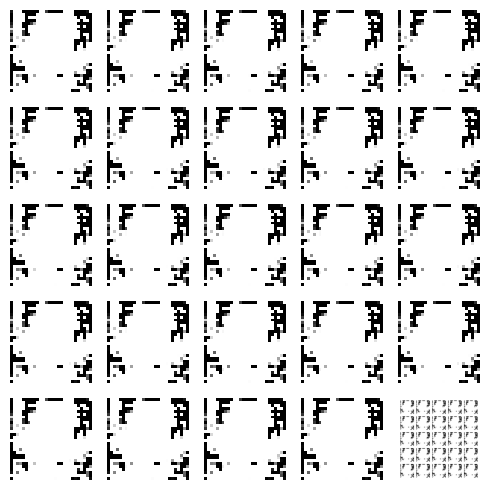

  0%|          | 0/350 [00:00<?, ?it/s]

4/4 [==============================] - 0s 15ms/step


  0%|          | 1/350 [00:00<03:25,  1.70it/s]

4/4 [==============================] - 0s 14ms/step


  1%|          | 2/350 [00:01<03:35,  1.62it/s]

4/4 [==============================] - 0s 35ms/step


  1%|          | 3/350 [00:01<03:34,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


  1%|          | 4/350 [00:02<03:21,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


  1%|▏         | 5/350 [00:02<03:24,  1.69it/s]

4/4 [==============================] - 0s 13ms/step


  2%|▏         | 6/350 [00:03<03:14,  1.77it/s]

4/4 [==============================] - 0s 14ms/step


  2%|▏         | 7/350 [00:04<03:07,  1.83it/s]

4/4 [==============================] - 0s 17ms/step


  2%|▏         | 8/350 [00:04<03:09,  1.81it/s]

4/4 [==============================] - 0s 13ms/step


  3%|▎         | 9/350 [00:05<03:12,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


  3%|▎         | 10/350 [00:05<03:08,  1.80it/s]

4/4 [==============================] - 0s 18ms/step


  3%|▎         | 11/350 [00:06<03:19,  1.70it/s]

4/4 [==============================] - 0s 13ms/step


  3%|▎         | 12/350 [00:06<03:10,  1.77it/s]

4/4 [==============================] - 0s 18ms/step


  4%|▎         | 13/350 [00:07<03:23,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


  4%|▍         | 14/350 [00:08<03:21,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


  4%|▍         | 15/350 [00:08<03:19,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


  5%|▍         | 16/350 [00:09<03:10,  1.75it/s]

4/4 [==============================] - 0s 17ms/step


  5%|▍         | 17/350 [00:09<03:15,  1.70it/s]

4/4 [==============================] - 0s 13ms/step


  5%|▌         | 18/350 [00:10<03:07,  1.77it/s]

4/4 [==============================] - 0s 46ms/step


  5%|▌         | 19/350 [00:11<03:11,  1.73it/s]

4/4 [==============================] - 0s 12ms/step


  6%|▌         | 20/350 [00:11<03:11,  1.72it/s]

4/4 [==============================] - 0s 14ms/step


  6%|▌         | 21/350 [00:12<03:04,  1.79it/s]

4/4 [==============================] - 0s 28ms/step


  6%|▋         | 22/350 [00:12<03:05,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


  7%|▋         | 23/350 [00:13<03:09,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


  7%|▋         | 24/350 [00:13<03:01,  1.79it/s]

4/4 [==============================] - 0s 21ms/step


  7%|▋         | 25/350 [00:14<03:03,  1.77it/s]

4/4 [==============================] - 0s 12ms/step


  7%|▋         | 26/350 [00:14<03:03,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


  8%|▊         | 27/350 [00:15<02:57,  1.82it/s]

4/4 [==============================] - 0s 35ms/step


  8%|▊         | 28/350 [00:16<03:09,  1.70it/s]

4/4 [==============================] - 0s 14ms/step


  8%|▊         | 29/350 [00:16<03:01,  1.77it/s]

4/4 [==============================] - 0s 38ms/step


  9%|▊         | 30/350 [00:17<03:03,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


  9%|▉         | 31/350 [00:17<03:04,  1.73it/s]

4/4 [==============================] - 0s 14ms/step


  9%|▉         | 32/350 [00:18<03:00,  1.76it/s]

4/4 [==============================] - 0s 22ms/step


  9%|▉         | 33/350 [00:18<03:00,  1.76it/s]

4/4 [==============================] - 0s 12ms/step


 10%|▉         | 34/350 [00:19<03:01,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 10%|█         | 35/350 [00:20<02:54,  1.81it/s]

4/4 [==============================] - 0s 46ms/step


 10%|█         | 36/350 [00:20<02:56,  1.78it/s]

4/4 [==============================] - 0s 15ms/step


 11%|█         | 37/350 [00:21<03:01,  1.72it/s]

4/4 [==============================] - 0s 14ms/step


 11%|█         | 38/350 [00:21<02:55,  1.78it/s]

4/4 [==============================] - 0s 20ms/step


 11%|█         | 39/350 [00:22<02:57,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 11%|█▏        | 40/350 [00:22<02:57,  1.74it/s]

4/4 [==============================] - 0s 14ms/step


 12%|█▏        | 41/350 [00:23<02:54,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 12%|█▏        | 42/350 [00:24<02:56,  1.75it/s]

4/4 [==============================] - 0s 14ms/step


 12%|█▏        | 43/350 [00:24<02:50,  1.80it/s]

4/4 [==============================] - 0s 36ms/step


 13%|█▎        | 44/350 [00:25<02:52,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 13%|█▎        | 45/350 [00:25<02:54,  1.75it/s]

4/4 [==============================] - 0s 15ms/step


 13%|█▎        | 46/350 [00:26<02:50,  1.78it/s]

4/4 [==============================] - 0s 21ms/step


 13%|█▎        | 47/350 [00:26<02:50,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 14%|█▎        | 48/350 [00:27<02:51,  1.76it/s]

4/4 [==============================] - 0s 12ms/step


 14%|█▍        | 49/350 [00:28<02:52,  1.75it/s]

4/4 [==============================] - 0s 21ms/step


 14%|█▍        | 50/350 [00:28<02:54,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 15%|█▍        | 51/350 [00:29<02:47,  1.78it/s]

4/4 [==============================] - 0s 14ms/step


 15%|█▍        | 52/350 [00:29<02:51,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 15%|█▌        | 53/350 [00:30<02:45,  1.80it/s]

4/4 [==============================] - 0s 13ms/step


 15%|█▌        | 54/350 [00:30<02:40,  1.85it/s]

4/4 [==============================] - 0s 14ms/step


 16%|█▌        | 55/350 [00:31<02:44,  1.79it/s]

4/4 [==============================] - 0s 12ms/step


 16%|█▌        | 56/350 [00:31<02:44,  1.79it/s]

4/4 [==============================] - 0s 12ms/step


 16%|█▋        | 57/350 [00:32<02:42,  1.80it/s]

4/4 [==============================] - 0s 13ms/step


 17%|█▋        | 58/350 [00:32<02:37,  1.85it/s]

4/4 [==============================] - 0s 13ms/step


 17%|█▋        | 59/350 [00:33<02:41,  1.80it/s]

4/4 [==============================] - 0s 16ms/step


 17%|█▋        | 60/350 [00:34<02:38,  1.82it/s]

4/4 [==============================] - 0s 14ms/step


 17%|█▋        | 61/350 [00:34<02:41,  1.79it/s]

4/4 [==============================] - 0s 13ms/step


 18%|█▊        | 62/350 [00:35<02:37,  1.83it/s]

4/4 [==============================] - 0s 20ms/step


 18%|█▊        | 63/350 [00:35<02:39,  1.80it/s]

4/4 [==============================] - 0s 12ms/step


 18%|█▊        | 64/350 [00:36<02:42,  1.76it/s]

4/4 [==============================] - 0s 11ms/step


 19%|█▊        | 65/350 [00:36<02:41,  1.77it/s]

4/4 [==============================] - 0s 41ms/step


 19%|█▉        | 66/350 [00:37<02:42,  1.75it/s]

4/4 [==============================] - 0s 11ms/step


 19%|█▉        | 67/350 [00:38<02:35,  1.82it/s]

4/4 [==============================] - 0s 12ms/step


 19%|█▉        | 68/350 [00:38<02:31,  1.86it/s]

4/4 [==============================] - 0s 17ms/step


 20%|█▉        | 69/350 [00:39<02:36,  1.80it/s]

4/4 [==============================] - 0s 12ms/step


 20%|██        | 70/350 [00:39<02:32,  1.84it/s]

4/4 [==============================] - 0s 13ms/step


 20%|██        | 71/350 [00:40<02:35,  1.80it/s]

4/4 [==============================] - 0s 14ms/step


 21%|██        | 72/350 [00:40<02:31,  1.84it/s]

4/4 [==============================] - 0s 36ms/step


 21%|██        | 73/350 [00:41<02:41,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 21%|██        | 74/350 [00:41<02:40,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 21%|██▏       | 75/350 [00:42<02:40,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 22%|██▏       | 76/350 [00:43<02:33,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 22%|██▏       | 77/350 [00:43<02:34,  1.77it/s]

4/4 [==============================] - 0s 14ms/step


 22%|██▏       | 78/350 [00:44<02:30,  1.80it/s]

4/4 [==============================] - 0s 13ms/step


 23%|██▎       | 79/350 [00:44<02:26,  1.85it/s]

4/4 [==============================] - 0s 46ms/step


 23%|██▎       | 80/350 [00:45<02:29,  1.80it/s]

4/4 [==============================] - 0s 12ms/step


 23%|██▎       | 81/350 [00:45<02:30,  1.79it/s]

4/4 [==============================] - 0s 12ms/step


 23%|██▎       | 82/350 [00:46<02:27,  1.82it/s]

4/4 [==============================] - 0s 21ms/step


 24%|██▎       | 83/350 [00:46<02:28,  1.79it/s]

4/4 [==============================] - 0s 12ms/step


 24%|██▍       | 84/350 [00:47<02:30,  1.77it/s]

4/4 [==============================] - 0s 16ms/step


 24%|██▍       | 85/350 [00:48<02:31,  1.75it/s]

4/4 [==============================] - 0s 14ms/step


 25%|██▍       | 86/350 [00:48<02:26,  1.81it/s]

4/4 [==============================] - 0s 37ms/step


 25%|██▍       | 87/350 [00:49<02:30,  1.75it/s]

4/4 [==============================] - 0s 14ms/step


 25%|██▌       | 88/350 [00:49<02:30,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 25%|██▌       | 89/350 [00:50<02:25,  1.80it/s]

4/4 [==============================] - 0s 13ms/step


 26%|██▌       | 90/350 [00:50<02:26,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 26%|██▌       | 91/350 [00:51<02:24,  1.80it/s]

4/4 [==============================] - 0s 21ms/step


 26%|██▋       | 92/350 [00:52<02:30,  1.72it/s]

4/4 [==============================] - 0s 14ms/step


 27%|██▋       | 93/350 [00:52<02:24,  1.78it/s]

4/4 [==============================] - 0s 23ms/step


 27%|██▋       | 94/350 [00:53<02:25,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 27%|██▋       | 95/350 [00:53<02:25,  1.75it/s]

4/4 [==============================] - 0s 16ms/step


 27%|██▋       | 96/350 [00:54<02:23,  1.77it/s]

4/4 [==============================] - 0s 16ms/step


 28%|██▊       | 97/350 [00:54<02:24,  1.75it/s]

4/4 [==============================] - 0s 14ms/step


 28%|██▊       | 98/350 [00:55<02:25,  1.73it/s]

4/4 [==============================] - 0s 14ms/step


 28%|██▊       | 99/350 [00:56<02:19,  1.80it/s]

4/4 [==============================] - 0s 14ms/step


 29%|██▊       | 100/350 [00:56<02:17,  1.82it/s]

4/4 [==============================] - 0s 20ms/step


 29%|██▉       | 101/350 [00:57<02:19,  1.79it/s]

4/4 [==============================] - 0s 13ms/step


 29%|██▉       | 102/350 [00:57<02:15,  1.83it/s]

4/4 [==============================] - 0s 13ms/step


 29%|██▉       | 103/350 [00:58<02:17,  1.79it/s]

4/4 [==============================] - 0s 12ms/step


 30%|██▉       | 104/350 [00:58<02:13,  1.84it/s]

4/4 [==============================] - 0s 22ms/step


 30%|███       | 105/350 [00:59<02:17,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 30%|███       | 106/350 [00:59<02:17,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 31%|███       | 107/350 [01:00<02:13,  1.82it/s]

4/4 [==============================] - 0s 26ms/step


 31%|███       | 108/350 [01:01<02:15,  1.79it/s]

4/4 [==============================] - 0s 14ms/step


 31%|███       | 109/350 [01:01<02:19,  1.73it/s]

4/4 [==============================] - 0s 14ms/step


 31%|███▏      | 110/350 [01:02<02:19,  1.72it/s]

4/4 [==============================] - 0s 14ms/step


 32%|███▏      | 111/350 [01:02<02:18,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 32%|███▏      | 112/350 [01:03<02:18,  1.72it/s]

4/4 [==============================] - 0s 14ms/step


 32%|███▏      | 113/350 [01:03<02:12,  1.79it/s]

4/4 [==============================] - 0s 30ms/step


 33%|███▎      | 114/350 [01:04<02:15,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 33%|███▎      | 115/350 [01:05<02:15,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 33%|███▎      | 116/350 [01:05<02:10,  1.80it/s]

4/4 [==============================] - 0s 43ms/step


 33%|███▎      | 117/350 [01:06<02:12,  1.75it/s]

4/4 [==============================] - 0s 18ms/step


 34%|███▎      | 118/350 [01:06<02:15,  1.71it/s]

4/4 [==============================] - 0s 13ms/step


 34%|███▍      | 119/350 [01:07<02:10,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 34%|███▍      | 120/350 [01:07<02:06,  1.82it/s]

4/4 [==============================] - 0s 22ms/step


 35%|███▍      | 121/350 [01:08<02:07,  1.79it/s]

4/4 [==============================] - 0s 13ms/step


 35%|███▍      | 122/350 [01:08<02:04,  1.83it/s]

4/4 [==============================] - 0s 29ms/step


 35%|███▌      | 123/350 [01:09<02:07,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 35%|███▌      | 124/350 [01:10<02:08,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 36%|███▌      | 125/350 [01:10<02:03,  1.82it/s]

4/4 [==============================] - 0s 14ms/step


 36%|███▌      | 126/350 [01:11<02:05,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 36%|███▋      | 127/350 [01:11<02:03,  1.80it/s]

4/4 [==============================] - 0s 26ms/step


 37%|███▋      | 128/350 [01:12<02:05,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 37%|███▋      | 129/350 [01:12<02:05,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 37%|███▋      | 130/350 [01:13<02:01,  1.80it/s]

4/4 [==============================] - 0s 12ms/step


 37%|███▋      | 131/350 [01:14<02:02,  1.79it/s]

4/4 [==============================] - 0s 15ms/step


 38%|███▊      | 132/350 [01:14<02:04,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 38%|███▊      | 133/350 [01:15<02:00,  1.80it/s]

4/4 [==============================] - 0s 27ms/step


 38%|███▊      | 134/350 [01:15<02:08,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 39%|███▊      | 135/350 [01:16<02:02,  1.75it/s]

4/4 [==============================] - 0s 28ms/step


 39%|███▉      | 136/350 [01:16<02:04,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 39%|███▉      | 137/350 [01:17<02:05,  1.70it/s]

4/4 [==============================] - 0s 14ms/step


 39%|███▉      | 138/350 [01:18<02:05,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 40%|███▉      | 139/350 [01:18<02:04,  1.70it/s]

4/4 [==============================] - 0s 14ms/step


 40%|████      | 140/350 [01:19<01:59,  1.75it/s]

4/4 [==============================] - 0s 15ms/step


 40%|████      | 141/350 [01:19<02:01,  1.71it/s]

4/4 [==============================] - 0s 15ms/step


 41%|████      | 142/350 [01:20<02:01,  1.71it/s]

4/4 [==============================] - 0s 14ms/step


 41%|████      | 143/350 [01:20<01:56,  1.78it/s]

4/4 [==============================] - 0s 27ms/step


 41%|████      | 144/350 [01:21<01:56,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 41%|████▏     | 145/350 [01:22<01:59,  1.71it/s]

4/4 [==============================] - 0s 13ms/step


 42%|████▏     | 146/350 [01:22<01:59,  1.70it/s]

4/4 [==============================] - 0s 16ms/step


 42%|████▏     | 147/350 [01:23<01:59,  1.70it/s]

4/4 [==============================] - 0s 13ms/step


 42%|████▏     | 148/350 [01:23<01:53,  1.77it/s]

4/4 [==============================] - 0s 14ms/step


 43%|████▎     | 149/350 [01:24<01:54,  1.76it/s]

4/4 [==============================] - 0s 16ms/step


 43%|████▎     | 150/350 [01:24<01:51,  1.79it/s]

4/4 [==============================] - 0s 13ms/step


 43%|████▎     | 151/350 [01:25<01:48,  1.83it/s]

4/4 [==============================] - 0s 13ms/step


 43%|████▎     | 152/350 [01:26<01:50,  1.80it/s]

4/4 [==============================] - 0s 14ms/step


 44%|████▎     | 153/350 [01:26<01:46,  1.85it/s]

4/4 [==============================] - 0s 20ms/step


 44%|████▍     | 154/350 [01:27<01:49,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 44%|████▍     | 155/350 [01:27<01:50,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 45%|████▍     | 156/350 [01:28<01:46,  1.82it/s]

4/4 [==============================] - 0s 17ms/step


 45%|████▍     | 157/350 [01:28<01:47,  1.80it/s]

4/4 [==============================] - 0s 12ms/step


 45%|████▌     | 158/350 [01:29<01:48,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 45%|████▌     | 159/350 [01:29<01:47,  1.78it/s]

4/4 [==============================] - 0s 28ms/step


 46%|████▌     | 160/350 [01:30<01:47,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 46%|████▌     | 161/350 [01:31<01:47,  1.75it/s]

4/4 [==============================] - 0s 11ms/step


 46%|████▋     | 162/350 [01:31<01:43,  1.82it/s]

4/4 [==============================] - 0s 16ms/step


 47%|████▋     | 163/350 [01:32<01:45,  1.78it/s]

4/4 [==============================] - 0s 12ms/step


 47%|████▋     | 164/350 [01:32<01:45,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 47%|████▋     | 165/350 [01:33<01:42,  1.81it/s]

4/4 [==============================] - 0s 18ms/step


 47%|████▋     | 166/350 [01:33<01:42,  1.79it/s]

4/4 [==============================] - 0s 17ms/step


 48%|████▊     | 167/350 [01:34<01:43,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 48%|████▊     | 168/350 [01:35<01:42,  1.78it/s]

4/4 [==============================] - 0s 14ms/step


 48%|████▊     | 169/350 [01:35<01:39,  1.83it/s]

4/4 [==============================] - 0s 20ms/step


 49%|████▊     | 170/350 [01:36<01:40,  1.80it/s]

4/4 [==============================] - 0s 12ms/step


 49%|████▉     | 171/350 [01:36<01:37,  1.84it/s]

4/4 [==============================] - 0s 12ms/step


 49%|████▉     | 172/350 [01:37<01:35,  1.86it/s]

4/4 [==============================] - 0s 18ms/step


 49%|████▉     | 173/350 [01:37<01:36,  1.83it/s]

4/4 [==============================] - 0s 11ms/step


 50%|████▉     | 174/350 [01:38<01:38,  1.79it/s]

4/4 [==============================] - 0s 13ms/step


 50%|█████     | 175/350 [01:38<01:35,  1.83it/s]

4/4 [==============================] - 0s 18ms/step


 50%|█████     | 176/350 [01:39<01:36,  1.80it/s]

4/4 [==============================] - 0s 12ms/step


 51%|█████     | 177/350 [01:40<01:38,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 51%|█████     | 178/350 [01:40<01:34,  1.82it/s]

4/4 [==============================] - 0s 18ms/step


 51%|█████     | 179/350 [01:41<01:34,  1.81it/s]

4/4 [==============================] - 0s 12ms/step


 51%|█████▏    | 180/350 [01:41<01:35,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 52%|█████▏    | 181/350 [01:42<01:34,  1.80it/s]

4/4 [==============================] - 0s 23ms/step


 52%|█████▏    | 182/350 [01:42<01:37,  1.72it/s]

4/4 [==============================] - 0s 14ms/step


 52%|█████▏    | 183/350 [01:43<01:37,  1.71it/s]

4/4 [==============================] - 0s 27ms/step


 53%|█████▎    | 184/350 [01:44<01:37,  1.71it/s]

4/4 [==============================] - 0s 13ms/step


 53%|█████▎    | 185/350 [01:44<01:33,  1.77it/s]

4/4 [==============================] - 0s 15ms/step


 53%|█████▎    | 186/350 [01:45<01:35,  1.72it/s]

4/4 [==============================] - 0s 14ms/step


 53%|█████▎    | 187/350 [01:45<01:30,  1.79it/s]

4/4 [==============================] - 0s 13ms/step


 54%|█████▎    | 188/350 [01:46<01:28,  1.83it/s]

4/4 [==============================] - 0s 18ms/step


 54%|█████▍    | 189/350 [01:46<01:29,  1.80it/s]

4/4 [==============================] - 0s 14ms/step


 54%|█████▍    | 190/350 [01:47<01:32,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 55%|█████▍    | 191/350 [01:47<01:28,  1.80it/s]

4/4 [==============================] - 0s 12ms/step


 55%|█████▍    | 192/350 [01:48<01:29,  1.77it/s]

4/4 [==============================] - 0s 12ms/step


 55%|█████▌    | 193/350 [01:49<01:26,  1.82it/s]

4/4 [==============================] - 0s 13ms/step


 55%|█████▌    | 194/350 [01:49<01:24,  1.86it/s]

4/4 [==============================] - 0s 13ms/step


 56%|█████▌    | 195/350 [01:50<01:26,  1.79it/s]

4/4 [==============================] - 0s 13ms/step


 56%|█████▌    | 196/350 [01:50<01:27,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 56%|█████▋    | 197/350 [01:51<01:25,  1.80it/s]

4/4 [==============================] - 0s 25ms/step


 57%|█████▋    | 198/350 [01:51<01:25,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 57%|█████▋    | 199/350 [01:52<01:26,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 57%|█████▋    | 200/350 [01:52<01:23,  1.80it/s]

4/4 [==============================] - 0s 20ms/step


 57%|█████▋    | 201/350 [01:53<01:24,  1.77it/s]

4/4 [==============================] - 0s 21ms/step


 58%|█████▊    | 202/350 [01:54<01:23,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 58%|█████▊    | 203/350 [01:54<01:21,  1.81it/s]

4/4 [==============================] - 0s 15ms/step


 58%|█████▊    | 204/350 [01:55<01:20,  1.82it/s]

4/4 [==============================] - 0s 27ms/step


 59%|█████▊    | 205/350 [01:55<01:20,  1.80it/s]

4/4 [==============================] - 0s 13ms/step


 59%|█████▉    | 206/350 [01:56<01:18,  1.84it/s]

4/4 [==============================] - 0s 29ms/step


 59%|█████▉    | 207/350 [01:56<01:18,  1.81it/s]

4/4 [==============================] - 0s 12ms/step


 59%|█████▉    | 208/350 [01:57<01:20,  1.76it/s]

4/4 [==============================] - 0s 12ms/step


 60%|█████▉    | 209/350 [01:57<01:17,  1.82it/s]

4/4 [==============================] - 0s 23ms/step


 60%|██████    | 210/350 [01:58<01:18,  1.79it/s]

4/4 [==============================] - 0s 18ms/step


 60%|██████    | 211/350 [01:59<01:18,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 61%|██████    | 212/350 [01:59<01:15,  1.83it/s]

4/4 [==============================] - 0s 13ms/step


 61%|██████    | 213/350 [02:00<01:14,  1.84it/s]

4/4 [==============================] - 0s 23ms/step


 61%|██████    | 214/350 [02:00<01:14,  1.82it/s]

4/4 [==============================] - 0s 13ms/step


 61%|██████▏   | 215/350 [02:01<01:12,  1.85it/s]

4/4 [==============================] - 0s 13ms/step


 62%|██████▏   | 216/350 [02:01<01:16,  1.76it/s]

4/4 [==============================] - 0s 12ms/step


 62%|██████▏   | 217/350 [02:02<01:14,  1.80it/s]

4/4 [==============================] - 0s 20ms/step


 62%|██████▏   | 218/350 [02:03<01:16,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 63%|██████▎   | 219/350 [02:03<01:16,  1.71it/s]

4/4 [==============================] - 0s 11ms/step


 63%|██████▎   | 220/350 [02:04<01:16,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 63%|██████▎   | 221/350 [02:04<01:12,  1.78it/s]

4/4 [==============================] - 0s 15ms/step


 63%|██████▎   | 222/350 [02:05<01:13,  1.73it/s]

4/4 [==============================] - 0s 11ms/step


 64%|██████▎   | 223/350 [02:05<01:10,  1.80it/s]

4/4 [==============================] - 0s 12ms/step


 64%|██████▍   | 224/350 [02:06<01:08,  1.85it/s]

4/4 [==============================] - 0s 47ms/step


 64%|██████▍   | 225/350 [02:06<01:09,  1.80it/s]

4/4 [==============================] - 0s 13ms/step


 65%|██████▍   | 226/350 [02:07<01:11,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 65%|██████▍   | 227/350 [02:08<01:08,  1.81it/s]

4/4 [==============================] - 0s 27ms/step


 65%|██████▌   | 228/350 [02:08<01:11,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


 65%|██████▌   | 229/350 [02:09<01:10,  1.71it/s]

4/4 [==============================] - 0s 21ms/step


 66%|██████▌   | 230/350 [02:09<01:10,  1.71it/s]

4/4 [==============================] - 0s 14ms/step


 66%|██████▌   | 231/350 [02:10<01:07,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 66%|██████▋   | 232/350 [02:10<01:07,  1.75it/s]

4/4 [==============================] - 0s 12ms/step


 67%|██████▋   | 233/350 [02:11<01:04,  1.81it/s]

4/4 [==============================] - 0s 12ms/step


 67%|██████▋   | 234/350 [02:12<01:04,  1.79it/s]

4/4 [==============================] - 0s 14ms/step


 67%|██████▋   | 235/350 [02:12<01:03,  1.81it/s]

4/4 [==============================] - 0s 21ms/step


 67%|██████▋   | 236/350 [02:13<01:03,  1.79it/s]

4/4 [==============================] - 0s 12ms/step


 68%|██████▊   | 237/350 [02:13<01:03,  1.78it/s]

4/4 [==============================] - 0s 12ms/step


 68%|██████▊   | 238/350 [02:14<01:01,  1.83it/s]

4/4 [==============================] - 0s 17ms/step


 68%|██████▊   | 239/350 [02:14<01:03,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 69%|██████▊   | 240/350 [02:15<01:04,  1.71it/s]

4/4 [==============================] - 0s 13ms/step


 69%|██████▉   | 241/350 [02:16<01:03,  1.71it/s]

4/4 [==============================] - 0s 23ms/step


 69%|██████▉   | 242/350 [02:16<01:02,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


 69%|██████▉   | 243/350 [02:17<00:59,  1.78it/s]

4/4 [==============================] - 0s 12ms/step


 70%|██████▉   | 244/350 [02:17<00:58,  1.80it/s]

4/4 [==============================] - 0s 28ms/step


 70%|███████   | 245/350 [02:18<00:59,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 70%|███████   | 246/350 [02:18<00:57,  1.82it/s]

4/4 [==============================] - 0s 13ms/step


 71%|███████   | 247/350 [02:19<00:57,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 71%|███████   | 248/350 [02:19<00:58,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 71%|███████   | 249/350 [02:20<00:58,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


 71%|███████▏  | 250/350 [02:21<00:56,  1.78it/s]

4/4 [==============================] - 0s 19ms/step


 72%|███████▏  | 251/350 [02:21<00:56,  1.76it/s]

4/4 [==============================] - 0s 12ms/step


 72%|███████▏  | 252/350 [02:22<00:54,  1.81it/s]

4/4 [==============================] - 0s 12ms/step


 72%|███████▏  | 253/350 [02:22<00:53,  1.81it/s]

4/4 [==============================] - 0s 14ms/step


 73%|███████▎  | 254/350 [02:23<00:52,  1.84it/s]

4/4 [==============================] - 0s 25ms/step


 73%|███████▎  | 255/350 [02:23<00:52,  1.82it/s]

4/4 [==============================] - 0s 13ms/step


 73%|███████▎  | 256/350 [02:24<00:52,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 73%|███████▎  | 257/350 [02:24<00:50,  1.83it/s]

4/4 [==============================] - 0s 19ms/step


 74%|███████▎  | 258/350 [02:25<00:53,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 74%|███████▍  | 259/350 [02:26<00:53,  1.70it/s]

4/4 [==============================] - 0s 21ms/step


 74%|███████▍  | 260/350 [02:26<00:52,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 75%|███████▍  | 261/350 [02:27<00:50,  1.78it/s]

4/4 [==============================] - 0s 12ms/step


 75%|███████▍  | 262/350 [02:27<00:50,  1.75it/s]

4/4 [==============================] - 0s 12ms/step


 75%|███████▌  | 263/350 [02:28<00:48,  1.80it/s]

4/4 [==============================] - 0s 12ms/step


 75%|███████▌  | 264/350 [02:28<00:46,  1.85it/s]

4/4 [==============================] - 0s 18ms/step


 76%|███████▌  | 265/350 [02:29<00:46,  1.81it/s]

4/4 [==============================] - 0s 13ms/step


 76%|███████▌  | 266/350 [02:30<00:46,  1.79it/s]

4/4 [==============================] - 0s 18ms/step


 76%|███████▋  | 267/350 [02:30<00:45,  1.81it/s]

4/4 [==============================] - 0s 29ms/step


 77%|███████▋  | 268/350 [02:31<00:45,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 77%|███████▋  | 269/350 [02:31<00:45,  1.77it/s]

4/4 [==============================] - 0s 12ms/step


 77%|███████▋  | 270/350 [02:32<00:45,  1.74it/s]

4/4 [==============================] - 0s 11ms/step


 77%|███████▋  | 271/350 [02:32<00:46,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 78%|███████▊  | 272/350 [02:33<00:43,  1.78it/s]

4/4 [==============================] - 0s 22ms/step


 78%|███████▊  | 273/350 [02:34<00:43,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 78%|███████▊  | 274/350 [02:34<00:43,  1.75it/s]

4/4 [==============================] - 0s 12ms/step


 79%|███████▊  | 275/350 [02:35<00:43,  1.73it/s]

4/4 [==============================] - 0s 11ms/step


 79%|███████▉  | 276/350 [02:35<00:43,  1.70it/s]

4/4 [==============================] - 0s 13ms/step


 79%|███████▉  | 277/350 [02:36<00:41,  1.77it/s]

4/4 [==============================] - 0s 12ms/step


 79%|███████▉  | 278/350 [02:36<00:40,  1.76it/s]

4/4 [==============================] - 0s 12ms/step


 80%|███████▉  | 279/350 [02:37<00:39,  1.81it/s]

4/4 [==============================] - 0s 13ms/step


 80%|████████  | 280/350 [02:37<00:38,  1.83it/s]

4/4 [==============================] - 0s 13ms/step


 80%|████████  | 281/350 [02:38<00:36,  1.87it/s]

4/4 [==============================] - 0s 12ms/step


 81%|████████  | 282/350 [02:38<00:35,  1.90it/s]

4/4 [==============================] - 0s 26ms/step


 81%|████████  | 283/350 [02:39<00:36,  1.85it/s]

4/4 [==============================] - 0s 13ms/step


 81%|████████  | 284/350 [02:40<00:36,  1.81it/s]

4/4 [==============================] - 0s 14ms/step


 81%|████████▏ | 285/350 [02:40<00:35,  1.83it/s]

4/4 [==============================] - 0s 17ms/step


 82%|████████▏ | 286/350 [02:41<00:37,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 82%|████████▏ | 287/350 [02:41<00:35,  1.79it/s]

4/4 [==============================] - 0s 27ms/step


 82%|████████▏ | 288/350 [02:42<00:35,  1.76it/s]

4/4 [==============================] - 0s 12ms/step


 83%|████████▎ | 289/350 [02:43<00:35,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 83%|████████▎ | 290/350 [02:43<00:33,  1.79it/s]

4/4 [==============================] - 0s 37ms/step


 83%|████████▎ | 291/350 [02:44<00:33,  1.77it/s]

4/4 [==============================] - 0s 12ms/step


 83%|████████▎ | 292/350 [02:44<00:32,  1.77it/s]

4/4 [==============================] - 0s 12ms/step


 84%|████████▎ | 293/350 [02:45<00:31,  1.82it/s]

4/4 [==============================] - 0s 23ms/step


 84%|████████▍ | 294/350 [02:45<00:32,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 84%|████████▍ | 295/350 [02:46<00:30,  1.78it/s]

4/4 [==============================] - 0s 16ms/step


 85%|████████▍ | 296/350 [02:46<00:30,  1.77it/s]

4/4 [==============================] - 0s 12ms/step


 85%|████████▍ | 297/350 [02:47<00:30,  1.75it/s]

4/4 [==============================] - 0s 12ms/step


 85%|████████▌ | 298/350 [02:48<00:29,  1.79it/s]

4/4 [==============================] - 0s 20ms/step


 85%|████████▌ | 299/350 [02:48<00:28,  1.77it/s]

4/4 [==============================] - 0s 18ms/step


 86%|████████▌ | 300/350 [02:49<00:28,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 86%|████████▌ | 301/350 [02:49<00:27,  1.76it/s]

4/4 [==============================] - 0s 12ms/step


 86%|████████▋ | 302/350 [02:50<00:26,  1.82it/s]

4/4 [==============================] - 0s 27ms/step


 87%|████████▋ | 303/350 [02:50<00:26,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 87%|████████▋ | 304/350 [02:51<00:26,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 87%|████████▋ | 305/350 [02:52<00:25,  1.76it/s]

4/4 [==============================] - 0s 12ms/step


 87%|████████▋ | 306/350 [02:52<00:25,  1.74it/s]

4/4 [==============================] - 0s 11ms/step


 88%|████████▊ | 307/350 [02:53<00:24,  1.77it/s]

4/4 [==============================] - 0s 18ms/step


 88%|████████▊ | 308/350 [02:53<00:23,  1.76it/s]

4/4 [==============================] - 0s 12ms/step


 88%|████████▊ | 309/350 [02:54<00:23,  1.75it/s]

4/4 [==============================] - 0s 12ms/step


 89%|████████▊ | 310/350 [02:54<00:22,  1.81it/s]

4/4 [==============================] - 0s 20ms/step


 89%|████████▉ | 311/350 [02:55<00:22,  1.77it/s]

4/4 [==============================] - 0s 15ms/step


 89%|████████▉ | 312/350 [02:56<00:21,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 89%|████████▉ | 313/350 [02:56<00:20,  1.79it/s]

4/4 [==============================] - 0s 21ms/step


 90%|████████▉ | 314/350 [02:57<00:20,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 90%|█████████ | 315/350 [02:57<00:19,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 90%|█████████ | 316/350 [02:58<00:19,  1.79it/s]

4/4 [==============================] - 0s 20ms/step


 91%|█████████ | 317/350 [02:58<00:18,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 91%|█████████ | 318/350 [02:59<00:18,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 91%|█████████ | 319/350 [03:00<00:17,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 91%|█████████▏| 320/350 [03:00<00:16,  1.79it/s]

4/4 [==============================] - 0s 15ms/step


 92%|█████████▏| 321/350 [03:01<00:16,  1.81it/s]

4/4 [==============================] - 0s 13ms/step


 92%|█████████▏| 322/350 [03:01<00:15,  1.85it/s]

4/4 [==============================] - 0s 18ms/step


 92%|█████████▏| 323/350 [03:02<00:14,  1.82it/s]

4/4 [==============================] - 0s 13ms/step


 93%|█████████▎| 324/350 [03:02<00:14,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 93%|█████████▎| 325/350 [03:03<00:14,  1.73it/s]

4/4 [==============================] - 0s 20ms/step


 93%|█████████▎| 326/350 [03:03<00:13,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 93%|█████████▎| 327/350 [03:04<00:12,  1.78it/s]

4/4 [==============================] - 0s 12ms/step


 94%|█████████▎| 328/350 [03:05<00:12,  1.76it/s]

4/4 [==============================] - 0s 14ms/step


 94%|█████████▍| 329/350 [03:05<00:11,  1.81it/s]

4/4 [==============================] - 0s 14ms/step


 94%|█████████▍| 330/350 [03:06<00:10,  1.83it/s]

4/4 [==============================] - 0s 13ms/step


 95%|█████████▍| 331/350 [03:06<00:10,  1.86it/s]

4/4 [==============================] - 0s 29ms/step


 95%|█████████▍| 332/350 [03:07<00:10,  1.75it/s]

4/4 [==============================] - 0s 12ms/step


 95%|█████████▌| 333/350 [03:07<00:09,  1.81it/s]

4/4 [==============================] - 0s 21ms/step


 95%|█████████▌| 334/350 [03:08<00:09,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 96%|█████████▌| 335/350 [03:08<00:08,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 96%|█████████▌| 336/350 [03:09<00:08,  1.73it/s]

4/4 [==============================] - 0s 22ms/step


 96%|█████████▋| 337/350 [03:10<00:07,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 97%|█████████▋| 338/350 [03:10<00:06,  1.80it/s]

4/4 [==============================] - 0s 13ms/step


 97%|█████████▋| 339/350 [03:11<00:06,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 97%|█████████▋| 340/350 [03:11<00:05,  1.82it/s]

4/4 [==============================] - 0s 13ms/step


 97%|█████████▋| 341/350 [03:12<00:05,  1.78it/s]

4/4 [==============================] - 0s 12ms/step


 98%|█████████▊| 342/350 [03:12<00:04,  1.82it/s]

4/4 [==============================] - 0s 31ms/step


 98%|█████████▊| 343/350 [03:13<00:03,  1.75it/s]

4/4 [==============================] - 0s 12ms/step


 98%|█████████▊| 344/350 [03:14<00:03,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 99%|█████████▊| 345/350 [03:14<00:02,  1.80it/s]

4/4 [==============================] - 0s 30ms/step


 99%|█████████▉| 346/350 [03:15<00:02,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 99%|█████████▉| 347/350 [03:15<00:01,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 99%|█████████▉| 348/350 [03:16<00:01,  1.78it/s]

4/4 [==============================] - 0s 33ms/step


100%|█████████▉| 349/350 [03:16<00:00,  1.76it/s]

4/4 [==============================] - 0s 12ms/step


100%|██████████| 350/350 [03:17<00:00,  1.77it/s]

Epoch number: 39 discriminator_loss: 0.16487855070345436 generator_loss: 7.657316898618426
1/1 [==============================] - 0s 23ms/step


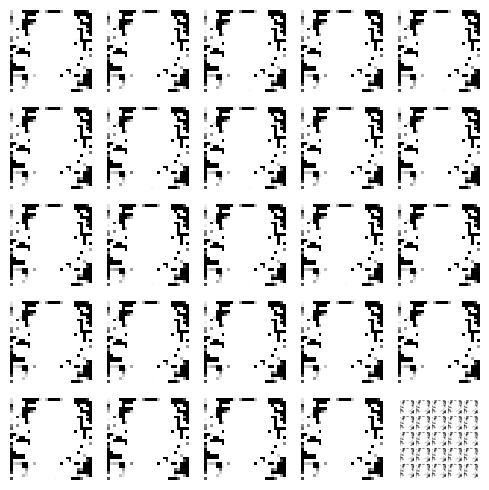

  0%|          | 0/350 [00:00<?, ?it/s]

4/4 [==============================] - 0s 11ms/step


  0%|          | 1/350 [00:00<03:49,  1.52it/s]

4/4 [==============================] - 0s 13ms/step


  1%|          | 2/350 [00:01<03:23,  1.71it/s]

4/4 [==============================] - 0s 33ms/step


  1%|          | 3/350 [00:01<03:28,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


  1%|          | 4/350 [00:02<03:26,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


  1%|▏         | 5/350 [00:02<03:15,  1.77it/s]

4/4 [==============================] - 0s 15ms/step


  2%|▏         | 6/350 [00:03<03:19,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


  2%|▏         | 7/350 [00:04<03:11,  1.80it/s]

4/4 [==============================] - 0s 13ms/step


  2%|▏         | 8/350 [00:04<03:14,  1.75it/s]

4/4 [==============================] - 0s 14ms/step


  3%|▎         | 9/350 [00:05<03:08,  1.81it/s]

4/4 [==============================] - 0s 27ms/step


  3%|▎         | 10/350 [00:05<03:12,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


  3%|▎         | 11/350 [00:06<03:15,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


  3%|▎         | 12/350 [00:06<03:07,  1.80it/s]

4/4 [==============================] - 0s 18ms/step


  4%|▎         | 13/350 [00:07<03:16,  1.71it/s]

4/4 [==============================] - 0s 13ms/step


  4%|▍         | 14/350 [00:08<03:09,  1.77it/s]

4/4 [==============================] - 0s 46ms/step


  4%|▍         | 15/350 [00:08<03:21,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


  5%|▍         | 16/350 [00:09<03:20,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


  5%|▍         | 17/350 [00:09<03:19,  1.67it/s]

4/4 [==============================] - 0s 14ms/step


  5%|▌         | 18/350 [00:10<03:19,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


  5%|▌         | 19/350 [00:11<03:11,  1.72it/s]

4/4 [==============================] - 0s 19ms/step


  6%|▌         | 20/350 [00:11<03:11,  1.72it/s]

4/4 [==============================] - 0s 14ms/step


  6%|▌         | 21/350 [00:12<03:11,  1.71it/s]

4/4 [==============================] - 0s 14ms/step


  6%|▋         | 22/350 [00:12<03:04,  1.77it/s]

4/4 [==============================] - 0s 23ms/step


  7%|▋         | 23/350 [00:13<03:06,  1.75it/s]

4/4 [==============================] - 0s 11ms/step


  7%|▋         | 24/350 [00:13<03:09,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


  7%|▋         | 25/350 [00:14<03:01,  1.79it/s]

4/4 [==============================] - 0s 30ms/step


  7%|▋         | 26/350 [00:15<03:10,  1.71it/s]

4/4 [==============================] - 0s 13ms/step


  8%|▊         | 27/350 [00:15<03:10,  1.69it/s]

4/4 [==============================] - 0s 25ms/step


  8%|▊         | 28/350 [00:16<03:12,  1.68it/s]

4/4 [==============================] - 0s 14ms/step


  8%|▊         | 29/350 [00:16<03:03,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


  9%|▊         | 30/350 [00:17<03:05,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


  9%|▉         | 31/350 [00:17<02:57,  1.80it/s]

4/4 [==============================] - 0s 13ms/step


  9%|▉         | 32/350 [00:18<02:53,  1.83it/s]

4/4 [==============================] - 0s 47ms/step


  9%|▉         | 33/350 [00:19<03:05,  1.71it/s]

4/4 [==============================] - 0s 13ms/step


 10%|▉         | 34/350 [00:19<02:59,  1.77it/s]

4/4 [==============================] - 0s 18ms/step


 10%|█         | 35/350 [00:20<02:59,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 10%|█         | 36/350 [00:20<03:00,  1.74it/s]

4/4 [==============================] - 0s 14ms/step


 11%|█         | 37/350 [00:21<02:56,  1.77it/s]

4/4 [==============================] - 0s 29ms/step


 11%|█         | 38/350 [00:21<02:58,  1.75it/s]

4/4 [==============================] - 0s 12ms/step


 11%|█         | 39/350 [00:22<02:58,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 11%|█▏        | 40/350 [00:23<02:51,  1.80it/s]

4/4 [==============================] - 0s 41ms/step


 12%|█▏        | 41/350 [00:23<02:54,  1.77it/s]

4/4 [==============================] - 0s 16ms/step


 12%|█▏        | 42/350 [00:24<02:57,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 12%|█▏        | 43/350 [00:24<02:51,  1.79it/s]

4/4 [==============================] - 0s 27ms/step


 13%|█▎        | 44/350 [00:25<02:53,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 13%|█▎        | 45/350 [00:25<02:54,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 13%|█▎        | 46/350 [00:26<02:50,  1.78it/s]

4/4 [==============================] - 0s 22ms/step


 13%|█▎        | 47/350 [00:27<02:52,  1.76it/s]

4/4 [==============================] - 0s 14ms/step


 14%|█▎        | 48/350 [00:27<02:54,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 14%|█▍        | 49/350 [00:28<02:47,  1.79it/s]

4/4 [==============================] - 0s 30ms/step


 14%|█▍        | 50/350 [00:28<02:49,  1.77it/s]

4/4 [==============================] - 0s 14ms/step


 15%|█▍        | 51/350 [00:29<02:54,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 15%|█▍        | 52/350 [00:29<02:47,  1.78it/s]

4/4 [==============================] - 0s 22ms/step


 15%|█▌        | 53/350 [00:30<02:48,  1.76it/s]

4/4 [==============================] - 0s 12ms/step


 15%|█▌        | 54/350 [00:30<02:48,  1.76it/s]

4/4 [==============================] - 0s 14ms/step


 16%|█▌        | 55/350 [00:31<02:53,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 16%|█▌        | 56/350 [00:32<02:52,  1.71it/s]

4/4 [==============================] - 0s 15ms/step


 16%|█▋        | 57/350 [00:32<02:45,  1.77it/s]

4/4 [==============================] - 0s 11ms/step


 17%|█▋        | 58/350 [00:33<02:47,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 17%|█▋        | 59/350 [00:33<02:40,  1.81it/s]

4/4 [==============================] - 0s 12ms/step


 17%|█▋        | 60/350 [00:34<02:38,  1.83it/s]

4/4 [==============================] - 0s 13ms/step


 17%|█▋        | 61/350 [00:34<02:34,  1.87it/s]

4/4 [==============================] - 0s 21ms/step


 18%|█▊        | 62/350 [00:35<02:39,  1.80it/s]

4/4 [==============================] - 0s 12ms/step


 18%|█▊        | 63/350 [00:36<02:40,  1.79it/s]

4/4 [==============================] - 0s 13ms/step


 18%|█▊        | 64/350 [00:36<02:37,  1.81it/s]

4/4 [==============================] - 0s 25ms/step


 19%|█▊        | 65/350 [00:37<02:47,  1.71it/s]

4/4 [==============================] - 0s 13ms/step


 19%|█▉        | 66/350 [00:37<02:46,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 19%|█▉        | 67/350 [00:38<02:46,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 19%|█▉        | 68/350 [00:38<02:38,  1.78it/s]

4/4 [==============================] - 0s 15ms/step


 20%|█▉        | 69/350 [00:39<02:42,  1.73it/s]

4/4 [==============================] - 0s 22ms/step


 20%|██        | 70/350 [00:40<02:41,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 20%|██        | 71/350 [00:40<02:35,  1.80it/s]

4/4 [==============================] - 0s 11ms/step


 21%|██        | 72/350 [00:41<02:30,  1.85it/s]

4/4 [==============================] - 0s 18ms/step


 21%|██        | 73/350 [00:41<02:34,  1.79it/s]

4/4 [==============================] - 0s 13ms/step


 21%|██        | 74/350 [00:42<02:29,  1.84it/s]

4/4 [==============================] - 0s 13ms/step


 21%|██▏       | 75/350 [00:42<02:31,  1.81it/s]

4/4 [==============================] - 0s 13ms/step


 22%|██▏       | 76/350 [00:43<02:28,  1.85it/s]

4/4 [==============================] - 0s 26ms/step


 22%|██▏       | 77/350 [00:43<02:36,  1.74it/s]

4/4 [==============================] - 0s 15ms/step


 22%|██▏       | 78/350 [00:44<02:34,  1.76it/s]

4/4 [==============================] - 0s 22ms/step


 23%|██▎       | 79/350 [00:45<02:35,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 23%|██▎       | 80/350 [00:45<02:36,  1.73it/s]

4/4 [==============================] - 0s 12ms/step


 23%|██▎       | 81/350 [00:46<02:29,  1.80it/s]

4/4 [==============================] - 0s 20ms/step


 23%|██▎       | 82/350 [00:46<02:38,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 24%|██▎       | 83/350 [00:47<02:32,  1.75it/s]

4/4 [==============================] - 0s 23ms/step


 24%|██▍       | 84/350 [00:47<02:32,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 24%|██▍       | 85/350 [00:48<02:33,  1.73it/s]

4/4 [==============================] - 0s 12ms/step


 25%|██▍       | 86/350 [00:49<02:26,  1.80it/s]

4/4 [==============================] - 0s 19ms/step


 25%|██▍       | 87/350 [00:49<02:30,  1.75it/s]

4/4 [==============================] - 0s 11ms/step


 25%|██▌       | 88/350 [00:50<02:24,  1.82it/s]

4/4 [==============================] - 0s 43ms/step


 25%|██▌       | 89/350 [00:50<02:26,  1.78it/s]

4/4 [==============================] - 0s 12ms/step


 26%|██▌       | 90/350 [00:51<02:27,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 26%|██▌       | 91/350 [00:51<02:24,  1.79it/s]

4/4 [==============================] - 0s 13ms/step


 26%|██▋       | 92/350 [00:52<02:26,  1.76it/s]

4/4 [==============================] - 0s 12ms/step


 27%|██▋       | 93/350 [00:52<02:20,  1.83it/s]

4/4 [==============================] - 0s 30ms/step


 27%|██▋       | 94/350 [00:53<02:28,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 27%|██▋       | 95/350 [00:54<02:22,  1.79it/s]

4/4 [==============================] - 0s 33ms/step


 27%|██▋       | 96/350 [00:54<02:29,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 28%|██▊       | 97/350 [00:55<02:30,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 28%|██▊       | 98/350 [00:55<02:28,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 28%|██▊       | 99/350 [00:56<02:21,  1.77it/s]

4/4 [==============================] - 0s 18ms/step


 29%|██▊       | 100/350 [00:57<02:24,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 29%|██▉       | 101/350 [00:57<02:24,  1.72it/s]

4/4 [==============================] - 0s 11ms/step


 29%|██▉       | 102/350 [00:58<02:22,  1.74it/s]

4/4 [==============================] - 0s 11ms/step


 29%|██▉       | 103/350 [00:58<02:23,  1.72it/s]

4/4 [==============================] - 0s 11ms/step


 30%|██▉       | 104/350 [00:59<02:17,  1.79it/s]

4/4 [==============================] - 0s 13ms/step


 30%|███       | 105/350 [00:59<02:20,  1.75it/s]

4/4 [==============================] - 0s 12ms/step


 30%|███       | 106/350 [01:00<02:15,  1.79it/s]

4/4 [==============================] - 0s 12ms/step


 31%|███       | 107/350 [01:00<02:11,  1.84it/s]

4/4 [==============================] - 0s 12ms/step


 31%|███       | 108/350 [01:01<02:09,  1.87it/s]

4/4 [==============================] - 0s 17ms/step


 31%|███       | 109/350 [01:02<02:13,  1.81it/s]

4/4 [==============================] - 0s 12ms/step


 31%|███▏      | 110/350 [01:02<02:15,  1.78it/s]

4/4 [==============================] - 0s 12ms/step


 32%|███▏      | 111/350 [01:03<02:11,  1.82it/s]

4/4 [==============================] - 0s 25ms/step


 32%|███▏      | 112/350 [01:03<02:17,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 32%|███▏      | 113/350 [01:04<02:12,  1.79it/s]

4/4 [==============================] - 0s 15ms/step


 33%|███▎      | 114/350 [01:04<02:15,  1.74it/s]

4/4 [==============================] - 0s 14ms/step


 33%|███▎      | 115/350 [01:05<02:15,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 33%|███▎      | 116/350 [01:06<02:15,  1.73it/s]

4/4 [==============================] - 0s 12ms/step


 33%|███▎      | 117/350 [01:06<02:10,  1.79it/s]

4/4 [==============================] - 0s 13ms/step


 34%|███▎      | 118/350 [01:07<02:08,  1.81it/s]

4/4 [==============================] - 0s 30ms/step


 34%|███▍      | 119/350 [01:07<02:09,  1.78it/s]

4/4 [==============================] - 0s 12ms/step


 34%|███▍      | 120/350 [01:08<02:10,  1.76it/s]

4/4 [==============================] - 0s 14ms/step


 35%|███▍      | 121/350 [01:08<02:12,  1.73it/s]

4/4 [==============================] - 0s 14ms/step


 35%|███▍      | 122/350 [01:09<02:12,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 35%|███▌      | 123/350 [01:10<02:08,  1.77it/s]

4/4 [==============================] - 0s 12ms/step


 35%|███▌      | 124/350 [01:10<02:04,  1.82it/s]

4/4 [==============================] - 0s 18ms/step


 36%|███▌      | 125/350 [01:11<02:05,  1.80it/s]

4/4 [==============================] - 0s 13ms/step


 36%|███▌      | 126/350 [01:11<02:02,  1.84it/s]

4/4 [==============================] - 0s 13ms/step


 36%|███▋      | 127/350 [01:12<02:00,  1.85it/s]

4/4 [==============================] - 0s 13ms/step


 37%|███▋      | 128/350 [01:12<01:58,  1.87it/s]

4/4 [==============================] - 0s 24ms/step


 37%|███▋      | 129/350 [01:13<02:01,  1.82it/s]

4/4 [==============================] - 0s 13ms/step


 37%|███▋      | 130/350 [01:13<02:03,  1.79it/s]

4/4 [==============================] - 0s 14ms/step


 37%|███▋      | 131/350 [01:14<02:03,  1.77it/s]

4/4 [==============================] - 0s 24ms/step


 38%|███▊      | 132/350 [01:15<02:05,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 38%|███▊      | 133/350 [01:15<02:01,  1.79it/s]

4/4 [==============================] - 0s 12ms/step


 38%|███▊      | 134/350 [01:16<01:57,  1.84it/s]

4/4 [==============================] - 0s 16ms/step


 39%|███▊      | 135/350 [01:16<01:59,  1.80it/s]

4/4 [==============================] - 0s 13ms/step


 39%|███▉      | 136/350 [01:17<02:02,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 39%|███▉      | 137/350 [01:17<01:58,  1.80it/s]

4/4 [==============================] - 0s 14ms/step


 39%|███▉      | 138/350 [01:18<01:55,  1.84it/s]

4/4 [==============================] - 0s 27ms/step


 40%|███▉      | 139/350 [01:18<01:56,  1.81it/s]

4/4 [==============================] - 0s 14ms/step


 40%|████      | 140/350 [01:19<01:54,  1.84it/s]

4/4 [==============================] - 0s 15ms/step


 40%|████      | 141/350 [01:19<01:57,  1.78it/s]

4/4 [==============================] - 0s 12ms/step


 41%|████      | 142/350 [01:20<01:58,  1.75it/s]

4/4 [==============================] - 0s 12ms/step


 41%|████      | 143/350 [01:21<01:58,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 41%|████      | 144/350 [01:21<01:54,  1.80it/s]

4/4 [==============================] - 0s 12ms/step


 41%|████▏     | 145/350 [01:22<01:57,  1.75it/s]

4/4 [==============================] - 0s 12ms/step


 42%|████▏     | 146/350 [01:22<01:52,  1.81it/s]

4/4 [==============================] - 0s 12ms/step


 42%|████▏     | 147/350 [01:23<01:49,  1.85it/s]

4/4 [==============================] - 0s 12ms/step


 42%|████▏     | 148/350 [01:23<01:51,  1.81it/s]

4/4 [==============================] - 0s 13ms/step


 43%|████▎     | 149/350 [01:24<01:52,  1.79it/s]

4/4 [==============================] - 0s 12ms/step


 43%|████▎     | 150/350 [01:25<01:54,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 43%|████▎     | 151/350 [01:25<01:50,  1.80it/s]

4/4 [==============================] - 0s 12ms/step


 43%|████▎     | 152/350 [01:26<01:50,  1.79it/s]

4/4 [==============================] - 0s 13ms/step


 44%|████▎     | 153/350 [01:26<01:47,  1.83it/s]

4/4 [==============================] - 0s 12ms/step


 44%|████▍     | 154/350 [01:27<01:46,  1.84it/s]

4/4 [==============================] - 0s 27ms/step


 44%|████▍     | 155/350 [01:27<01:48,  1.80it/s]

4/4 [==============================] - 0s 12ms/step


 45%|████▍     | 156/350 [01:28<01:49,  1.77it/s]

4/4 [==============================] - 0s 12ms/step


 45%|████▍     | 157/350 [01:28<01:45,  1.83it/s]

4/4 [==============================] - 0s 17ms/step


 45%|████▌     | 158/350 [01:29<01:48,  1.78it/s]

4/4 [==============================] - 0s 12ms/step


 45%|████▌     | 159/350 [01:30<01:50,  1.73it/s]

4/4 [==============================] - 0s 12ms/step


 46%|████▌     | 160/350 [01:30<01:46,  1.79it/s]

4/4 [==============================] - 0s 28ms/step


 46%|████▌     | 161/350 [01:31<01:47,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 46%|████▋     | 162/350 [01:31<01:47,  1.75it/s]

4/4 [==============================] - 0s 12ms/step


 47%|████▋     | 163/350 [01:32<01:44,  1.78it/s]

4/4 [==============================] - 0s 27ms/step


 47%|████▋     | 164/350 [01:32<01:45,  1.76it/s]

4/4 [==============================] - 0s 14ms/step


 47%|████▋     | 165/350 [01:33<01:46,  1.73it/s]

4/4 [==============================] - 0s 12ms/step


 47%|████▋     | 166/350 [01:34<01:46,  1.73it/s]

4/4 [==============================] - 0s 12ms/step


 48%|████▊     | 167/350 [01:34<01:42,  1.79it/s]

4/4 [==============================] - 0s 35ms/step


 48%|████▊     | 168/350 [01:35<01:47,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 48%|████▊     | 169/350 [01:35<01:43,  1.75it/s]

4/4 [==============================] - 0s 24ms/step


 49%|████▊     | 170/350 [01:36<01:48,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 49%|████▉     | 171/350 [01:36<01:43,  1.73it/s]

4/4 [==============================] - 0s 16ms/step


 49%|████▉     | 172/350 [01:37<01:48,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 49%|████▉     | 173/350 [01:38<01:42,  1.73it/s]

4/4 [==============================] - 0s 29ms/step


 50%|████▉     | 174/350 [01:38<01:46,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 50%|█████     | 175/350 [01:39<01:45,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 50%|█████     | 176/350 [01:40<01:43,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


 51%|█████     | 177/350 [01:40<01:39,  1.73it/s]

4/4 [==============================] - 0s 12ms/step


 51%|█████     | 178/350 [01:41<01:39,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 51%|█████     | 179/350 [01:41<01:35,  1.79it/s]

4/4 [==============================] - 0s 13ms/step


 51%|█████▏    | 180/350 [01:42<01:32,  1.84it/s]

4/4 [==============================] - 0s 12ms/step


 52%|█████▏    | 181/350 [01:42<01:31,  1.84it/s]

4/4 [==============================] - 0s 24ms/step


 52%|█████▏    | 182/350 [01:43<01:33,  1.80it/s]

4/4 [==============================] - 0s 12ms/step


 52%|█████▏    | 183/350 [01:43<01:34,  1.77it/s]

4/4 [==============================] - 0s 12ms/step


 53%|█████▎    | 184/350 [01:44<01:31,  1.81it/s]

4/4 [==============================] - 0s 12ms/step


 53%|█████▎    | 185/350 [01:44<01:32,  1.78it/s]

4/4 [==============================] - 0s 14ms/step


 53%|█████▎    | 186/350 [01:45<01:34,  1.73it/s]

4/4 [==============================] - 0s 12ms/step


 53%|█████▎    | 187/350 [01:46<01:30,  1.79it/s]

4/4 [==============================] - 0s 13ms/step


 54%|█████▎    | 188/350 [01:46<01:31,  1.76it/s]

4/4 [==============================] - 0s 12ms/step


 54%|█████▍    | 189/350 [01:47<01:28,  1.82it/s]

4/4 [==============================] - 0s 22ms/step


 54%|█████▍    | 190/350 [01:47<01:30,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 55%|█████▍    | 191/350 [01:48<01:30,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 55%|█████▍    | 192/350 [01:48<01:27,  1.80it/s]

4/4 [==============================] - 0s 19ms/step


 55%|█████▌    | 193/350 [01:49<01:30,  1.74it/s]

4/4 [==============================] - 0s 11ms/step


 55%|█████▌    | 194/350 [01:50<01:31,  1.71it/s]

4/4 [==============================] - 0s 15ms/step


 56%|█████▌    | 195/350 [01:50<01:28,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 56%|█████▌    | 196/350 [01:51<01:25,  1.80it/s]

4/4 [==============================] - 0s 14ms/step


 56%|█████▋    | 197/350 [01:51<01:26,  1.77it/s]

4/4 [==============================] - 0s 12ms/step


 57%|█████▋    | 198/350 [01:52<01:23,  1.82it/s]

4/4 [==============================] - 0s 12ms/step


 57%|█████▋    | 199/350 [01:52<01:22,  1.84it/s]

4/4 [==============================] - 0s 16ms/step


 57%|█████▋    | 200/350 [01:53<01:23,  1.80it/s]

4/4 [==============================] - 0s 12ms/step


 57%|█████▋    | 201/350 [01:53<01:23,  1.78it/s]

4/4 [==============================] - 0s 12ms/step


 58%|█████▊    | 202/350 [01:54<01:21,  1.82it/s]

4/4 [==============================] - 0s 16ms/step


 58%|█████▊    | 203/350 [01:55<01:25,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


 58%|█████▊    | 204/350 [01:55<01:23,  1.75it/s]

4/4 [==============================] - 0s 21ms/step


 59%|█████▊    | 205/350 [01:56<01:22,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 59%|█████▉    | 206/350 [01:56<01:22,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 59%|█████▉    | 207/350 [01:57<01:19,  1.80it/s]

4/4 [==============================] - 0s 24ms/step


 59%|█████▉    | 208/350 [01:58<01:23,  1.71it/s]

4/4 [==============================] - 0s 13ms/step


 60%|█████▉    | 209/350 [01:58<01:20,  1.75it/s]

4/4 [==============================] - 0s 21ms/step


 60%|██████    | 210/350 [01:59<01:22,  1.69it/s]

4/4 [==============================] - 0s 14ms/step


 60%|██████    | 211/350 [01:59<01:18,  1.76it/s]

4/4 [==============================] - 0s 26ms/step


 61%|██████    | 212/350 [02:00<01:21,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 61%|██████    | 213/350 [02:00<01:18,  1.74it/s]

4/4 [==============================] - 0s 25ms/step


 61%|██████    | 214/350 [02:01<01:18,  1.73it/s]

4/4 [==============================] - 0s 12ms/step


 61%|██████▏   | 215/350 [02:02<01:18,  1.73it/s]

4/4 [==============================] - 0s 12ms/step


 62%|██████▏   | 216/350 [02:02<01:14,  1.79it/s]

4/4 [==============================] - 0s 35ms/step


 62%|██████▏   | 217/350 [02:03<01:16,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 62%|██████▏   | 218/350 [02:03<01:16,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 63%|██████▎   | 219/350 [02:04<01:13,  1.79it/s]

4/4 [==============================] - 0s 20ms/step


 63%|██████▎   | 220/350 [02:04<01:12,  1.78it/s]

4/4 [==============================] - 0s 12ms/step


 63%|██████▎   | 221/350 [02:05<01:13,  1.76it/s]

4/4 [==============================] - 0s 14ms/step


 63%|██████▎   | 222/350 [02:06<01:14,  1.71it/s]

4/4 [==============================] - 0s 16ms/step


 64%|██████▎   | 223/350 [02:06<01:13,  1.72it/s]

4/4 [==============================] - 0s 11ms/step


 64%|██████▍   | 224/350 [02:07<01:10,  1.79it/s]

4/4 [==============================] - 0s 12ms/step


 64%|██████▍   | 225/350 [02:07<01:08,  1.84it/s]

4/4 [==============================] - 0s 15ms/step


 65%|██████▍   | 226/350 [02:08<01:10,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 65%|██████▍   | 227/350 [02:08<01:07,  1.82it/s]

4/4 [==============================] - 0s 27ms/step


 65%|██████▌   | 228/350 [02:09<01:08,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 65%|██████▌   | 229/350 [02:09<01:06,  1.82it/s]

4/4 [==============================] - 0s 24ms/step


 66%|██████▌   | 230/350 [02:10<01:07,  1.79it/s]

4/4 [==============================] - 0s 14ms/step


 66%|██████▌   | 231/350 [02:11<01:06,  1.80it/s]

4/4 [==============================] - 0s 11ms/step


 66%|██████▋   | 232/350 [02:11<01:06,  1.77it/s]

4/4 [==============================] - 0s 12ms/step


 67%|██████▋   | 233/350 [02:12<01:03,  1.83it/s]

4/4 [==============================] - 0s 20ms/step


 67%|██████▋   | 234/350 [02:12<01:04,  1.80it/s]

4/4 [==============================] - 0s 12ms/step


 67%|██████▋   | 235/350 [02:13<01:05,  1.75it/s]

4/4 [==============================] - 0s 12ms/step


 67%|██████▋   | 236/350 [02:13<01:03,  1.81it/s]

4/4 [==============================] - 0s 19ms/step


 68%|██████▊   | 237/350 [02:14<01:03,  1.79it/s]

4/4 [==============================] - 0s 11ms/step


 68%|██████▊   | 238/350 [02:14<01:03,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 68%|██████▊   | 239/350 [02:15<01:03,  1.74it/s]

4/4 [==============================] - 0s 45ms/step


 69%|██████▊   | 240/350 [02:16<01:04,  1.71it/s]

4/4 [==============================] - 0s 13ms/step


 69%|██████▉   | 241/350 [02:16<01:01,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 69%|██████▉   | 242/350 [02:17<01:01,  1.76it/s]

4/4 [==============================] - 0s 12ms/step


 69%|██████▉   | 243/350 [02:17<00:58,  1.81it/s]

4/4 [==============================] - 0s 12ms/step


 70%|██████▉   | 244/350 [02:18<00:58,  1.83it/s]

4/4 [==============================] - 0s 13ms/step


 70%|███████   | 245/350 [02:18<00:58,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 70%|███████   | 246/350 [02:19<00:59,  1.76it/s]

4/4 [==============================] - 0s 12ms/step


 71%|███████   | 247/350 [02:20<00:59,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 71%|███████   | 248/350 [02:20<00:56,  1.80it/s]

4/4 [==============================] - 0s 14ms/step


 71%|███████   | 249/350 [02:21<00:57,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 71%|███████▏  | 250/350 [02:21<00:55,  1.81it/s]

4/4 [==============================] - 0s 12ms/step


 72%|███████▏  | 251/350 [02:22<00:55,  1.77it/s]

4/4 [==============================] - 0s 12ms/step


 72%|███████▏  | 252/350 [02:22<00:53,  1.83it/s]

4/4 [==============================] - 0s 12ms/step


 72%|███████▏  | 253/350 [02:23<00:52,  1.84it/s]

4/4 [==============================] - 0s 15ms/step


 73%|███████▎  | 254/350 [02:23<00:53,  1.79it/s]

4/4 [==============================] - 0s 12ms/step


 73%|███████▎  | 255/350 [02:24<00:53,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 73%|███████▎  | 256/350 [02:25<00:51,  1.82it/s]

4/4 [==============================] - 0s 19ms/step


 73%|███████▎  | 257/350 [02:25<00:51,  1.79it/s]

4/4 [==============================] - 0s 16ms/step


 74%|███████▎  | 258/350 [02:26<00:52,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 74%|███████▍  | 259/350 [02:26<00:50,  1.82it/s]

4/4 [==============================] - 0s 18ms/step


 74%|███████▍  | 260/350 [02:27<00:52,  1.71it/s]

4/4 [==============================] - 0s 13ms/step


 75%|███████▍  | 261/350 [02:27<00:52,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 75%|███████▍  | 262/350 [02:28<00:52,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 75%|███████▌  | 263/350 [02:29<00:49,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 75%|███████▌  | 264/350 [02:29<00:49,  1.73it/s]

4/4 [==============================] - 0s 12ms/step


 76%|███████▌  | 265/350 [02:30<00:47,  1.80it/s]

4/4 [==============================] - 0s 12ms/step


 76%|███████▌  | 266/350 [02:30<00:45,  1.84it/s]

4/4 [==============================] - 0s 21ms/step


 76%|███████▋  | 267/350 [02:31<00:48,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


 77%|███████▋  | 268/350 [02:31<00:46,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 77%|███████▋  | 269/350 [02:32<00:45,  1.76it/s]

4/4 [==============================] - 0s 12ms/step


 77%|███████▋  | 270/350 [02:33<00:44,  1.82it/s]

4/4 [==============================] - 0s 12ms/step


 77%|███████▋  | 271/350 [02:33<00:44,  1.78it/s]

4/4 [==============================] - 0s 15ms/step


 78%|███████▊  | 272/350 [02:34<00:43,  1.81it/s]

4/4 [==============================] - 0s 13ms/step


 78%|███████▊  | 273/350 [02:34<00:43,  1.78it/s]

4/4 [==============================] - 0s 14ms/step


 78%|███████▊  | 274/350 [02:35<00:43,  1.75it/s]

4/4 [==============================] - 0s 19ms/step


 79%|███████▊  | 275/350 [02:35<00:42,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 79%|███████▉  | 276/350 [02:36<00:41,  1.78it/s]

4/4 [==============================] - 0s 21ms/step


 79%|███████▉  | 277/350 [02:37<00:41,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 79%|███████▉  | 278/350 [02:37<00:40,  1.80it/s]

4/4 [==============================] - 0s 13ms/step


 80%|███████▉  | 279/350 [02:38<00:38,  1.84it/s]

4/4 [==============================] - 0s 29ms/step


 80%|████████  | 280/350 [02:38<00:40,  1.72it/s]

4/4 [==============================] - 0s 14ms/step


 80%|████████  | 281/350 [02:39<00:39,  1.76it/s]

4/4 [==============================] - 0s 20ms/step


 81%|████████  | 282/350 [02:39<00:40,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 81%|████████  | 283/350 [02:40<00:38,  1.74it/s]

4/4 [==============================] - 0s 29ms/step


 81%|████████  | 284/350 [02:41<00:38,  1.73it/s]

4/4 [==============================] - 0s 12ms/step


 81%|████████▏ | 285/350 [02:41<00:38,  1.70it/s]

4/4 [==============================] - 0s 13ms/step


 82%|████████▏ | 286/350 [02:42<00:36,  1.77it/s]

4/4 [==============================] - 0s 30ms/step


 82%|████████▏ | 287/350 [02:42<00:37,  1.70it/s]

4/4 [==============================] - 0s 13ms/step


 82%|████████▏ | 288/350 [02:43<00:36,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 83%|████████▎ | 289/350 [02:43<00:35,  1.70it/s]

4/4 [==============================] - 0s 14ms/step


 83%|████████▎ | 290/350 [02:44<00:34,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 83%|████████▎ | 291/350 [02:45<00:33,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 83%|████████▎ | 292/350 [02:45<00:32,  1.79it/s]

4/4 [==============================] - 0s 13ms/step


 84%|████████▎ | 293/350 [02:46<00:31,  1.84it/s]

4/4 [==============================] - 0s 13ms/step


 84%|████████▍ | 294/350 [02:46<00:30,  1.83it/s]

4/4 [==============================] - 0s 21ms/step


 84%|████████▍ | 295/350 [02:47<00:31,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 85%|████████▍ | 296/350 [02:47<00:31,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


 85%|████████▍ | 297/350 [02:48<00:31,  1.71it/s]

4/4 [==============================] - 0s 13ms/step


 85%|████████▌ | 298/350 [02:49<00:29,  1.77it/s]

4/4 [==============================] - 0s 25ms/step


 85%|████████▌ | 299/350 [02:49<00:29,  1.73it/s]

4/4 [==============================] - 0s 11ms/step


 86%|████████▌ | 300/350 [02:50<00:27,  1.80it/s]

4/4 [==============================] - 0s 12ms/step


 86%|████████▌ | 301/350 [02:50<00:26,  1.84it/s]

4/4 [==============================] - 0s 15ms/step


 86%|████████▋ | 302/350 [02:51<00:26,  1.80it/s]

4/4 [==============================] - 0s 13ms/step


 87%|████████▋ | 303/350 [02:51<00:26,  1.76it/s]

4/4 [==============================] - 0s 12ms/step


 87%|████████▋ | 304/350 [02:52<00:25,  1.81it/s]

4/4 [==============================] - 0s 28ms/step


 87%|████████▋ | 305/350 [02:52<00:25,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 87%|████████▋ | 306/350 [02:53<00:25,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 88%|████████▊ | 307/350 [02:54<00:23,  1.81it/s]

4/4 [==============================] - 0s 37ms/step


 88%|████████▊ | 308/350 [02:54<00:24,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 88%|████████▊ | 309/350 [02:55<00:23,  1.73it/s]

4/4 [==============================] - 0s 12ms/step


 89%|████████▊ | 310/350 [02:55<00:22,  1.78it/s]

4/4 [==============================] - 0s 15ms/step


 89%|████████▉ | 311/350 [02:56<00:22,  1.77it/s]

4/4 [==============================] - 0s 12ms/step


 89%|████████▉ | 312/350 [02:56<00:21,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 89%|████████▉ | 313/350 [02:57<00:20,  1.79it/s]

4/4 [==============================] - 0s 27ms/step


 90%|████████▉ | 314/350 [02:58<00:20,  1.75it/s]

4/4 [==============================] - 0s 16ms/step


 90%|█████████ | 315/350 [02:58<00:20,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 90%|█████████ | 316/350 [02:59<00:20,  1.69it/s]

4/4 [==============================] - 0s 23ms/step


 91%|█████████ | 317/350 [02:59<00:19,  1.67it/s]

4/4 [==============================] - 0s 15ms/step


 91%|█████████ | 318/350 [03:00<00:18,  1.75it/s]

4/4 [==============================] - 0s 14ms/step


 91%|█████████ | 319/350 [03:01<00:17,  1.73it/s]

4/4 [==============================] - 0s 12ms/step


 91%|█████████▏| 320/350 [03:01<00:16,  1.79it/s]

4/4 [==============================] - 0s 12ms/step


 92%|█████████▏| 321/350 [03:02<00:16,  1.80it/s]

4/4 [==============================] - 0s 18ms/step


 92%|█████████▏| 322/350 [03:02<00:15,  1.78it/s]

4/4 [==============================] - 0s 12ms/step


 92%|█████████▏| 323/350 [03:03<00:15,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 93%|█████████▎| 324/350 [03:03<00:14,  1.80it/s]

4/4 [==============================] - 0s 19ms/step


 93%|█████████▎| 325/350 [03:04<00:14,  1.77it/s]

4/4 [==============================] - 0s 14ms/step


 93%|█████████▎| 326/350 [03:04<00:13,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


 93%|█████████▎| 327/350 [03:05<00:12,  1.78it/s]

4/4 [==============================] - 0s 17ms/step


 94%|█████████▎| 328/350 [03:06<00:12,  1.76it/s]

4/4 [==============================] - 0s 14ms/step


 94%|█████████▍| 329/350 [03:06<00:12,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 94%|█████████▍| 330/350 [03:07<00:11,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 95%|█████████▍| 331/350 [03:07<00:10,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 95%|█████████▍| 332/350 [03:08<00:09,  1.80it/s]

4/4 [==============================] - 0s 31ms/step


 95%|█████████▌| 333/350 [03:08<00:09,  1.70it/s]

4/4 [==============================] - 0s 13ms/step


 95%|█████████▌| 334/350 [03:09<00:09,  1.77it/s]

4/4 [==============================] - 0s 35ms/step


 96%|█████████▌| 335/350 [03:10<00:08,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 96%|█████████▌| 336/350 [03:10<00:08,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 96%|█████████▋| 337/350 [03:11<00:07,  1.78it/s]

4/4 [==============================] - 0s 28ms/step


 97%|█████████▋| 338/350 [03:11<00:06,  1.76it/s]

4/4 [==============================] - 0s 18ms/step


 97%|█████████▋| 339/350 [03:12<00:06,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 97%|█████████▋| 340/350 [03:12<00:05,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 97%|█████████▋| 341/350 [03:13<00:05,  1.77it/s]

4/4 [==============================] - 0s 14ms/step


 98%|█████████▊| 342/350 [03:14<00:04,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 98%|█████████▊| 343/350 [03:14<00:03,  1.81it/s]

4/4 [==============================] - 0s 21ms/step


 98%|█████████▊| 344/350 [03:15<00:03,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 99%|█████████▊| 345/350 [03:15<00:02,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 99%|█████████▉| 346/350 [03:16<00:02,  1.82it/s]

4/4 [==============================] - 0s 26ms/step


 99%|█████████▉| 347/350 [03:16<00:01,  1.79it/s]

4/4 [==============================] - 0s 12ms/step


 99%|█████████▉| 348/350 [03:17<00:01,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


100%|█████████▉| 349/350 [03:18<00:00,  1.79it/s]

4/4 [==============================] - 0s 28ms/step


100%|██████████| 350/350 [03:18<00:00,  1.76it/s]

Epoch number: 40 discriminator_loss: 0.409425970488389 generator_loss: 7.049512757573809
1/1 [==============================] - 0s 24ms/step


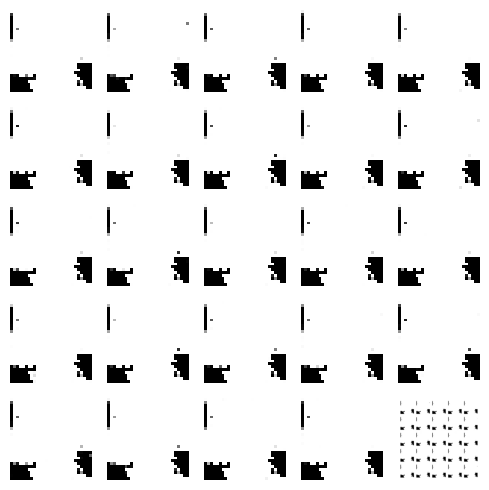

  0%|          | 0/350 [00:00<?, ?it/s]

4/4 [==============================] - 0s 16ms/step


  0%|          | 1/350 [00:00<03:38,  1.59it/s]

4/4 [==============================] - 0s 15ms/step


  1%|          | 2/350 [00:01<03:41,  1.57it/s]

4/4 [==============================] - 0s 13ms/step


  1%|          | 3/350 [00:01<03:36,  1.60it/s]

4/4 [==============================] - 0s 11ms/step


  1%|          | 4/350 [00:02<03:48,  1.51it/s]

4/4 [==============================] - 0s 34ms/step


  1%|▏         | 5/350 [00:03<03:40,  1.56it/s]

4/4 [==============================] - 0s 13ms/step


  2%|▏         | 6/350 [00:03<03:34,  1.60it/s]

4/4 [==============================] - 0s 15ms/step


  2%|▏         | 7/350 [00:04<03:25,  1.67it/s]

4/4 [==============================] - 0s 31ms/step


  2%|▏         | 8/350 [00:04<03:30,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


  3%|▎         | 9/350 [00:05<03:28,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


  3%|▎         | 10/350 [00:06<03:24,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


  3%|▎         | 11/350 [00:06<03:17,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


  3%|▎         | 12/350 [00:07<03:16,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


  4%|▎         | 13/350 [00:07<03:08,  1.79it/s]

4/4 [==============================] - 0s 14ms/step


  4%|▍         | 14/350 [00:08<03:04,  1.83it/s]

4/4 [==============================] - 0s 22ms/step


  4%|▍         | 15/350 [00:08<03:08,  1.78it/s]

4/4 [==============================] - 0s 16ms/step


  5%|▍         | 16/350 [00:09<03:14,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


  5%|▍         | 17/350 [00:10<03:06,  1.79it/s]

4/4 [==============================] - 0s 40ms/step


  5%|▌         | 18/350 [00:10<03:09,  1.75it/s]

4/4 [==============================] - 0s 14ms/step


  5%|▌         | 19/350 [00:11<03:09,  1.74it/s]

4/4 [==============================] - 0s 14ms/step


  6%|▌         | 20/350 [00:11<03:07,  1.76it/s]

4/4 [==============================] - 0s 20ms/step


  6%|▌         | 21/350 [00:12<03:08,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


  6%|▋         | 22/350 [00:12<03:10,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


  7%|▋         | 23/350 [00:13<03:03,  1.78it/s]

4/4 [==============================] - 0s 23ms/step


  7%|▋         | 24/350 [00:14<03:12,  1.69it/s]

4/4 [==============================] - 0s 14ms/step


  7%|▋         | 25/350 [00:14<03:06,  1.74it/s]

4/4 [==============================] - 0s 26ms/step


  7%|▋         | 26/350 [00:15<03:13,  1.68it/s]

4/4 [==============================] - 0s 14ms/step


  8%|▊         | 27/350 [00:15<03:12,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


  8%|▊         | 28/350 [00:16<03:11,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


  8%|▊         | 29/350 [00:17<03:06,  1.72it/s]

4/4 [==============================] - 0s 16ms/step


  9%|▊         | 30/350 [00:17<03:06,  1.72it/s]

4/4 [==============================] - 0s 15ms/step


  9%|▉         | 31/350 [00:18<03:05,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


  9%|▉         | 32/350 [00:18<02:58,  1.78it/s]

4/4 [==============================] - 0s 12ms/step


  9%|▉         | 33/350 [00:19<02:53,  1.82it/s]

4/4 [==============================] - 0s 26ms/step


 10%|▉         | 34/350 [00:19<02:59,  1.76it/s]

4/4 [==============================] - 0s 12ms/step


 10%|█         | 35/350 [00:20<02:54,  1.80it/s]

4/4 [==============================] - 0s 12ms/step


 10%|█         | 36/350 [00:20<02:56,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 11%|█         | 37/350 [00:21<02:51,  1.82it/s]

4/4 [==============================] - 0s 41ms/step


 11%|█         | 38/350 [00:22<02:57,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 11%|█         | 39/350 [00:22<02:58,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 11%|█▏        | 40/350 [00:23<02:52,  1.80it/s]

4/4 [==============================] - 0s 24ms/step


 12%|█▏        | 41/350 [00:23<02:59,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 12%|█▏        | 42/350 [00:24<02:53,  1.78it/s]

4/4 [==============================] - 0s 47ms/step


 12%|█▏        | 43/350 [00:25<03:05,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


 13%|█▎        | 44/350 [00:25<02:57,  1.72it/s]

4/4 [==============================] - 0s 19ms/step


 13%|█▎        | 45/350 [00:26<02:57,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 13%|█▎        | 46/350 [00:26<02:57,  1.71it/s]

4/4 [==============================] - 0s 13ms/step


 13%|█▎        | 47/350 [00:27<03:02,  1.66it/s]

4/4 [==============================] - 0s 21ms/step


 14%|█▎        | 48/350 [00:27<02:59,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 14%|█▍        | 49/350 [00:28<02:51,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 14%|█▍        | 50/350 [00:29<02:46,  1.80it/s]

4/4 [==============================] - 0s 47ms/step


 15%|█▍        | 51/350 [00:29<02:50,  1.75it/s]

4/4 [==============================] - 0s 17ms/step


 15%|█▍        | 52/350 [00:30<02:47,  1.77it/s]

4/4 [==============================] - 0s 27ms/step


 15%|█▌        | 53/350 [00:30<02:55,  1.70it/s]

4/4 [==============================] - 0s 14ms/step


 15%|█▌        | 54/350 [00:31<02:48,  1.75it/s]

4/4 [==============================] - 0s 17ms/step


 16%|█▌        | 55/350 [00:31<02:49,  1.74it/s]

4/4 [==============================] - 0s 14ms/step


 16%|█▌        | 56/350 [00:32<02:53,  1.70it/s]

4/4 [==============================] - 0s 13ms/step


 16%|█▋        | 57/350 [00:33<02:45,  1.77it/s]

4/4 [==============================] - 0s 21ms/step


 17%|█▋        | 58/350 [00:33<02:48,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 17%|█▋        | 59/350 [00:34<02:48,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 17%|█▋        | 60/350 [00:34<02:41,  1.80it/s]

4/4 [==============================] - 0s 28ms/step


 17%|█▋        | 61/350 [00:35<02:45,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 18%|█▊        | 62/350 [00:35<02:47,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 18%|█▊        | 63/350 [00:36<02:41,  1.78it/s]

4/4 [==============================] - 0s 19ms/step


 18%|█▊        | 64/350 [00:37<02:47,  1.71it/s]

4/4 [==============================] - 0s 13ms/step


 19%|█▊        | 65/350 [00:37<02:49,  1.68it/s]

4/4 [==============================] - 0s 10ms/step


 19%|█▉        | 66/350 [00:38<02:42,  1.75it/s]

4/4 [==============================] - 0s 23ms/step


 19%|█▉        | 67/350 [00:38<02:44,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 19%|█▉        | 68/350 [00:39<02:37,  1.79it/s]

4/4 [==============================] - 0s 26ms/step


 20%|█▉        | 69/350 [00:39<02:38,  1.77it/s]

4/4 [==============================] - 0s 14ms/step


 20%|██        | 70/350 [00:40<02:36,  1.79it/s]

4/4 [==============================] - 0s 23ms/step


 20%|██        | 71/350 [00:41<02:37,  1.77it/s]

4/4 [==============================] - 0s 12ms/step


 21%|██        | 72/350 [00:41<02:39,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 21%|██        | 73/350 [00:42<02:39,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 21%|██        | 74/350 [00:42<02:37,  1.76it/s]

4/4 [==============================] - 0s 23ms/step


 21%|██▏       | 75/350 [00:43<02:43,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


 22%|██▏       | 76/350 [00:43<02:35,  1.76it/s]

4/4 [==============================] - 0s 26ms/step


 22%|██▏       | 77/350 [00:44<02:42,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


 22%|██▏       | 78/350 [00:45<02:41,  1.68it/s]

4/4 [==============================] - 0s 24ms/step


 23%|██▎       | 79/350 [00:45<02:41,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 23%|██▎       | 80/350 [00:46<02:34,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 23%|██▎       | 81/350 [00:46<02:35,  1.73it/s]

4/4 [==============================] - 0s 12ms/step


 23%|██▎       | 82/350 [00:47<02:30,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 24%|██▎       | 83/350 [00:47<02:28,  1.80it/s]

4/4 [==============================] - 0s 25ms/step


 24%|██▍       | 84/350 [00:48<02:36,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 24%|██▍       | 85/350 [00:49<02:30,  1.76it/s]

4/4 [==============================] - 0s 23ms/step


 25%|██▍       | 86/350 [00:49<02:35,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 25%|██▍       | 87/350 [00:50<02:35,  1.69it/s]

4/4 [==============================] - 0s 31ms/step


 25%|██▌       | 88/350 [00:51<02:36,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 25%|██▌       | 89/350 [00:51<02:30,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 26%|██▌       | 90/350 [00:52<02:29,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 26%|██▌       | 91/350 [00:52<02:24,  1.79it/s]

4/4 [==============================] - 0s 12ms/step


 26%|██▋       | 92/350 [00:53<02:22,  1.81it/s]

4/4 [==============================] - 0s 13ms/step


 27%|██▋       | 93/350 [00:53<02:24,  1.77it/s]

4/4 [==============================] - 0s 12ms/step


 27%|██▋       | 94/350 [00:54<02:24,  1.77it/s]

4/4 [==============================] - 0s 11ms/step


 27%|██▋       | 95/350 [00:54<02:26,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 27%|██▋       | 96/350 [00:55<02:21,  1.80it/s]

4/4 [==============================] - 0s 27ms/step


 28%|██▊       | 97/350 [00:56<02:24,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 28%|██▊       | 98/350 [00:56<02:19,  1.80it/s]

4/4 [==============================] - 0s 12ms/step


 28%|██▊       | 99/350 [00:57<02:16,  1.84it/s]

4/4 [==============================] - 0s 19ms/step


 29%|██▊       | 100/350 [00:57<02:19,  1.79it/s]

4/4 [==============================] - 0s 13ms/step


 29%|██▉       | 101/350 [00:58<02:22,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 29%|██▉       | 102/350 [00:58<02:18,  1.80it/s]

4/4 [==============================] - 0s 41ms/step


 29%|██▉       | 103/350 [00:59<02:25,  1.70it/s]

4/4 [==============================] - 0s 13ms/step


 30%|██▉       | 104/350 [01:00<02:25,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 30%|███       | 105/350 [01:00<02:24,  1.70it/s]

4/4 [==============================] - 0s 13ms/step


 30%|███       | 106/350 [01:01<02:21,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 31%|███       | 107/350 [01:01<02:22,  1.71it/s]

4/4 [==============================] - 0s 13ms/step


 31%|███       | 108/350 [01:02<02:17,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 31%|███       | 109/350 [01:02<02:13,  1.81it/s]

4/4 [==============================] - 0s 23ms/step


 31%|███▏      | 110/350 [01:03<02:16,  1.75it/s]

4/4 [==============================] - 0s 12ms/step


 32%|███▏      | 111/350 [01:04<02:18,  1.73it/s]

4/4 [==============================] - 0s 14ms/step


 32%|███▏      | 112/350 [01:04<02:26,  1.63it/s]

4/4 [==============================] - 0s 15ms/step


 32%|███▏      | 113/350 [01:05<02:19,  1.70it/s]

4/4 [==============================] - 0s 29ms/step


 33%|███▎      | 114/350 [01:05<02:18,  1.71it/s]

4/4 [==============================] - 0s 16ms/step


 33%|███▎      | 115/350 [01:06<02:20,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


 33%|███▎      | 116/350 [01:07<02:20,  1.67it/s]

4/4 [==============================] - 0s 18ms/step


 33%|███▎      | 117/350 [01:07<02:18,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


 34%|███▎      | 118/350 [01:08<02:13,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 34%|███▍      | 119/350 [01:08<02:14,  1.71it/s]

4/4 [==============================] - 0s 13ms/step


 34%|███▍      | 120/350 [01:09<02:09,  1.78it/s]

4/4 [==============================] - 0s 12ms/step


 35%|███▍      | 121/350 [01:09<02:05,  1.83it/s]

4/4 [==============================] - 0s 12ms/step


 35%|███▍      | 122/350 [01:10<02:07,  1.79it/s]

4/4 [==============================] - 0s 12ms/step


 35%|███▌      | 123/350 [01:10<02:04,  1.82it/s]

4/4 [==============================] - 0s 54ms/step


 35%|███▌      | 124/350 [01:11<02:13,  1.69it/s]

4/4 [==============================] - 0s 13ms/step


 36%|███▌      | 125/350 [01:12<02:08,  1.76it/s]

4/4 [==============================] - 0s 19ms/step


 36%|███▌      | 126/350 [01:12<02:08,  1.75it/s]

4/4 [==============================] - 0s 11ms/step


 36%|███▋      | 127/350 [01:13<02:08,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 37%|███▋      | 128/350 [01:13<02:04,  1.78it/s]

4/4 [==============================] - 0s 25ms/step


 37%|███▋      | 129/350 [01:14<02:10,  1.69it/s]

4/4 [==============================] - 0s 13ms/step


 37%|███▋      | 130/350 [01:15<02:09,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 37%|███▋      | 131/350 [01:15<02:09,  1.69it/s]

4/4 [==============================] - 0s 13ms/step


 38%|███▊      | 132/350 [01:16<02:04,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 38%|███▊      | 133/350 [01:16<02:06,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 38%|███▊      | 134/350 [01:17<02:01,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 39%|███▊      | 135/350 [01:17<01:57,  1.83it/s]

4/4 [==============================] - 0s 12ms/step


 39%|███▉      | 136/350 [01:18<01:55,  1.85it/s]

4/4 [==============================] - 0s 19ms/step


 39%|███▉      | 137/350 [01:18<01:59,  1.78it/s]

4/4 [==============================] - 0s 12ms/step


 39%|███▉      | 138/350 [01:19<02:01,  1.75it/s]

4/4 [==============================] - 0s 12ms/step


 40%|███▉      | 139/350 [01:20<01:57,  1.80it/s]

4/4 [==============================] - 0s 25ms/step


 40%|████      | 140/350 [01:20<01:59,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 40%|████      | 141/350 [01:21<01:59,  1.74it/s]

4/4 [==============================] - 0s 17ms/step


 41%|████      | 142/350 [01:21<01:57,  1.77it/s]

4/4 [==============================] - 0s 12ms/step


 41%|████      | 143/350 [01:22<01:58,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 41%|████      | 144/350 [01:22<01:54,  1.81it/s]

4/4 [==============================] - 0s 17ms/step


 41%|████▏     | 145/350 [01:23<01:55,  1.78it/s]

4/4 [==============================] - 0s 11ms/step


 42%|████▏     | 146/350 [01:24<01:57,  1.73it/s]

4/4 [==============================] - 0s 11ms/step


 42%|████▏     | 147/350 [01:24<01:53,  1.79it/s]

4/4 [==============================] - 0s 23ms/step


 42%|████▏     | 148/350 [01:25<01:57,  1.71it/s]

4/4 [==============================] - 0s 13ms/step


 43%|████▎     | 149/350 [01:25<01:52,  1.78it/s]

4/4 [==============================] - 0s 21ms/step


 43%|████▎     | 150/350 [01:26<01:58,  1.69it/s]

4/4 [==============================] - 0s 14ms/step


 43%|████▎     | 151/350 [01:26<01:54,  1.74it/s]

4/4 [==============================] - 0s 29ms/step


 43%|████▎     | 152/350 [01:27<01:59,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 44%|████▎     | 153/350 [01:28<01:57,  1.67it/s]

4/4 [==============================] - 0s 20ms/step


 44%|████▍     | 154/350 [01:28<01:57,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 44%|████▍     | 155/350 [01:29<01:53,  1.73it/s]

4/4 [==============================] - 0s 12ms/step


 45%|████▍     | 156/350 [01:29<01:52,  1.73it/s]

4/4 [==============================] - 0s 12ms/step


 45%|████▍     | 157/350 [01:30<01:48,  1.77it/s]

4/4 [==============================] - 0s 12ms/step


 45%|████▌     | 158/350 [01:30<01:45,  1.82it/s]

4/4 [==============================] - 0s 13ms/step


 45%|████▌     | 159/350 [01:31<01:47,  1.78it/s]

4/4 [==============================] - 0s 16ms/step


 46%|████▌     | 160/350 [01:32<01:53,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


 46%|████▌     | 161/350 [01:32<01:53,  1.67it/s]

4/4 [==============================] - 0s 25ms/step


 46%|████▋     | 162/350 [01:33<01:52,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 47%|████▋     | 163/350 [01:33<01:47,  1.75it/s]

4/4 [==============================] - 0s 31ms/step


 47%|████▋     | 164/350 [01:34<01:49,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 47%|████▋     | 165/350 [01:35<01:44,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 47%|████▋     | 166/350 [01:35<01:45,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 48%|████▊     | 167/350 [01:36<01:42,  1.79it/s]

4/4 [==============================] - 0s 33ms/step


 48%|████▊     | 168/350 [01:36<01:43,  1.75it/s]

4/4 [==============================] - 0s 14ms/step


 48%|████▊     | 169/350 [01:37<01:46,  1.70it/s]

4/4 [==============================] - 0s 13ms/step


 49%|████▊     | 170/350 [01:38<01:48,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 49%|████▉     | 171/350 [01:38<01:43,  1.73it/s]

4/4 [==============================] - 0s 27ms/step


 49%|████▉     | 172/350 [01:39<01:43,  1.71it/s]

4/4 [==============================] - 0s 13ms/step


 49%|████▉     | 173/350 [01:39<01:44,  1.69it/s]

4/4 [==============================] - 0s 13ms/step


 50%|████▉     | 174/350 [01:40<01:41,  1.73it/s]

4/4 [==============================] - 0s 20ms/step


 50%|█████     | 175/350 [01:40<01:41,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 50%|█████     | 176/350 [01:41<01:42,  1.70it/s]

4/4 [==============================] - 0s 13ms/step


 51%|█████     | 177/350 [01:42<01:37,  1.77it/s]

4/4 [==============================] - 0s 41ms/step


 51%|█████     | 178/350 [01:42<01:44,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 51%|█████     | 179/350 [01:43<01:38,  1.73it/s]

4/4 [==============================] - 0s 22ms/step


 51%|█████▏    | 180/350 [01:43<01:38,  1.73it/s]

4/4 [==============================] - 0s 19ms/step


 52%|█████▏    | 181/350 [01:44<01:39,  1.71it/s]

4/4 [==============================] - 0s 11ms/step


 52%|█████▏    | 182/350 [01:45<01:39,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


 52%|█████▏    | 183/350 [01:45<01:35,  1.75it/s]

4/4 [==============================] - 0s 12ms/step


 53%|█████▎    | 184/350 [01:46<01:36,  1.72it/s]

4/4 [==============================] - 0s 14ms/step


 53%|█████▎    | 185/350 [01:46<01:33,  1.76it/s]

4/4 [==============================] - 0s 16ms/step


 53%|█████▎    | 186/350 [01:47<01:36,  1.69it/s]

4/4 [==============================] - 0s 14ms/step


 53%|█████▎    | 187/350 [01:47<01:33,  1.73it/s]

4/4 [==============================] - 0s 37ms/step


 54%|█████▎    | 188/350 [01:48<01:38,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 54%|█████▍    | 189/350 [01:49<01:34,  1.70it/s]

4/4 [==============================] - 0s 19ms/step


 54%|█████▍    | 190/350 [01:49<01:38,  1.63it/s]

4/4 [==============================] - 0s 14ms/step


 55%|█████▍    | 191/350 [01:50<01:34,  1.68it/s]

4/4 [==============================] - 0s 21ms/step


 55%|█████▍    | 192/350 [01:51<01:36,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


 55%|█████▌    | 193/350 [01:51<01:31,  1.71it/s]

4/4 [==============================] - 0s 17ms/step


 55%|█████▌    | 194/350 [01:52<01:34,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 56%|█████▌    | 195/350 [01:52<01:29,  1.73it/s]

4/4 [==============================] - 0s 28ms/step


 56%|█████▌    | 196/350 [01:53<01:34,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


 56%|█████▋    | 197/350 [01:54<01:35,  1.60it/s]

4/4 [==============================] - 0s 12ms/step


 57%|█████▋    | 198/350 [01:54<01:32,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


 57%|█████▋    | 199/350 [01:55<01:31,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 57%|█████▋    | 200/350 [01:55<01:28,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 57%|█████▋    | 201/350 [01:56<01:27,  1.70it/s]

4/4 [==============================] - 0s 13ms/step


 58%|█████▊    | 202/350 [01:56<01:24,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 58%|█████▊    | 203/350 [01:57<01:21,  1.81it/s]

4/4 [==============================] - 0s 13ms/step


 58%|█████▊    | 204/350 [01:57<01:19,  1.84it/s]

4/4 [==============================] - 0s 14ms/step


 59%|█████▊    | 205/350 [01:58<01:21,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 59%|█████▉    | 206/350 [01:59<01:18,  1.83it/s]

4/4 [==============================] - 0s 20ms/step


 59%|█████▉    | 207/350 [01:59<01:23,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 59%|█████▉    | 208/350 [02:00<01:23,  1.70it/s]

4/4 [==============================] - 0s 21ms/step


 60%|█████▉    | 209/350 [02:00<01:23,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


 60%|██████    | 210/350 [02:01<01:19,  1.75it/s]

4/4 [==============================] - 0s 12ms/step


 60%|██████    | 211/350 [02:01<01:16,  1.81it/s]

4/4 [==============================] - 0s 25ms/step


 61%|██████    | 212/350 [02:02<01:17,  1.77it/s]

4/4 [==============================] - 0s 12ms/step


 61%|██████    | 213/350 [02:03<01:15,  1.82it/s]

4/4 [==============================] - 0s 25ms/step


 61%|██████    | 214/350 [02:03<01:20,  1.69it/s]

4/4 [==============================] - 0s 13ms/step


 61%|██████▏   | 215/350 [02:04<01:16,  1.76it/s]

4/4 [==============================] - 0s 23ms/step


 62%|██████▏   | 216/350 [02:04<01:20,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 62%|██████▏   | 217/350 [02:05<01:19,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


 62%|██████▏   | 218/350 [02:06<01:22,  1.60it/s]

4/4 [==============================] - 0s 14ms/step


 63%|██████▎   | 219/350 [02:06<01:23,  1.57it/s]

4/4 [==============================] - 0s 13ms/step


 63%|██████▎   | 220/350 [02:07<01:18,  1.66it/s]

4/4 [==============================] - 0s 35ms/step


 63%|██████▎   | 221/350 [02:08<01:19,  1.61it/s]

4/4 [==============================] - 0s 14ms/step


 63%|██████▎   | 222/350 [02:08<01:18,  1.64it/s]

4/4 [==============================] - 0s 16ms/step


 64%|██████▎   | 223/350 [02:09<01:15,  1.69it/s]

4/4 [==============================] - 0s 40ms/step


 64%|██████▍   | 224/350 [02:09<01:18,  1.61it/s]

4/4 [==============================] - 0s 12ms/step


 64%|██████▍   | 225/350 [02:10<01:14,  1.69it/s]

4/4 [==============================] - 0s 22ms/step


 65%|██████▍   | 226/350 [02:11<01:16,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 65%|██████▍   | 227/350 [02:11<01:15,  1.62it/s]

4/4 [==============================] - 0s 11ms/step


 65%|██████▌   | 228/350 [02:12<01:14,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 65%|██████▌   | 229/350 [02:12<01:10,  1.72it/s]

4/4 [==============================] - 0s 23ms/step


 66%|██████▌   | 230/350 [02:13<01:09,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 66%|██████▌   | 231/350 [02:13<01:06,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 66%|██████▋   | 232/350 [02:14<01:06,  1.78it/s]

4/4 [==============================] - 0s 31ms/step


 67%|██████▋   | 233/350 [02:15<01:06,  1.75it/s]

4/4 [==============================] - 0s 11ms/step


 67%|██████▋   | 234/350 [02:15<01:06,  1.75it/s]

4/4 [==============================] - 0s 11ms/step


 67%|██████▋   | 235/350 [02:16<01:06,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 67%|██████▋   | 236/350 [02:16<01:04,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 68%|██████▊   | 237/350 [02:17<01:05,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 68%|██████▊   | 238/350 [02:17<01:02,  1.80it/s]

4/4 [==============================] - 0s 13ms/step


 68%|██████▊   | 239/350 [02:18<01:01,  1.82it/s]

4/4 [==============================] - 0s 12ms/step


 69%|██████▊   | 240/350 [02:18<00:59,  1.85it/s]

4/4 [==============================] - 0s 19ms/step


 69%|██████▉   | 241/350 [02:19<01:03,  1.71it/s]

4/4 [==============================] - 0s 13ms/step


 69%|██████▉   | 242/350 [02:20<01:03,  1.70it/s]

4/4 [==============================] - 0s 14ms/step


 69%|██████▉   | 243/350 [02:20<01:03,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 70%|██████▉   | 244/350 [02:21<01:00,  1.75it/s]

4/4 [==============================] - 0s 20ms/step


 70%|███████   | 245/350 [02:21<01:01,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 70%|███████   | 246/350 [02:22<01:01,  1.70it/s]

4/4 [==============================] - 0s 13ms/step


 71%|███████   | 247/350 [02:23<00:58,  1.77it/s]

4/4 [==============================] - 0s 12ms/step


 71%|███████   | 248/350 [02:23<00:58,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 71%|███████   | 249/350 [02:24<00:55,  1.80it/s]

4/4 [==============================] - 0s 19ms/step


 71%|███████▏  | 250/350 [02:24<00:59,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


 72%|███████▏  | 251/350 [02:25<01:00,  1.64it/s]

4/4 [==============================] - 0s 13ms/step


 72%|███████▏  | 252/350 [02:26<00:59,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 72%|███████▏  | 253/350 [02:26<00:58,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 73%|███████▎  | 254/350 [02:27<00:55,  1.71it/s]

4/4 [==============================] - 0s 31ms/step


 73%|███████▎  | 255/350 [02:27<00:57,  1.64it/s]

4/4 [==============================] - 0s 13ms/step


 73%|███████▎  | 256/350 [02:28<00:56,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 73%|███████▎  | 257/350 [02:29<00:55,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 74%|███████▎  | 258/350 [02:29<00:52,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 74%|███████▍  | 259/350 [02:30<00:53,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 74%|███████▍  | 260/350 [02:30<00:51,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 75%|███████▍  | 261/350 [02:31<00:49,  1.81it/s]

4/4 [==============================] - 0s 14ms/step


 75%|███████▍  | 262/350 [02:31<00:47,  1.85it/s]

4/4 [==============================] - 0s 15ms/step


 75%|███████▌  | 263/350 [02:32<00:49,  1.77it/s]

4/4 [==============================] - 0s 11ms/step


 75%|███████▌  | 264/350 [02:32<00:48,  1.76it/s]

4/4 [==============================] - 0s 11ms/step


 76%|███████▌  | 265/350 [02:33<00:46,  1.81it/s]

4/4 [==============================] - 0s 20ms/step


 76%|███████▌  | 266/350 [02:34<00:48,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 76%|███████▋  | 267/350 [02:34<00:48,  1.71it/s]

4/4 [==============================] - 0s 21ms/step


 77%|███████▋  | 268/350 [02:35<00:48,  1.69it/s]

4/4 [==============================] - 0s 13ms/step


 77%|███████▋  | 269/350 [02:35<00:46,  1.75it/s]

4/4 [==============================] - 0s 12ms/step


 77%|███████▋  | 270/350 [02:36<00:44,  1.80it/s]

4/4 [==============================] - 0s 20ms/step


 77%|███████▋  | 271/350 [02:36<00:44,  1.78it/s]

4/4 [==============================] - 0s 12ms/step


 78%|███████▊  | 272/350 [02:37<00:43,  1.79it/s]

4/4 [==============================] - 0s 16ms/step


 78%|███████▊  | 273/350 [02:38<00:43,  1.76it/s]

4/4 [==============================] - 0s 12ms/step


 78%|███████▊  | 274/350 [02:38<00:44,  1.73it/s]

4/4 [==============================] - 0s 12ms/step


 79%|███████▊  | 275/350 [02:39<00:42,  1.78it/s]

4/4 [==============================] - 0s 38ms/step


 79%|███████▉  | 276/350 [02:39<00:42,  1.76it/s]

4/4 [==============================] - 0s 14ms/step


 79%|███████▉  | 277/350 [02:40<00:42,  1.71it/s]

4/4 [==============================] - 0s 13ms/step


 79%|███████▉  | 278/350 [02:40<00:40,  1.78it/s]

4/4 [==============================] - 0s 19ms/step


 80%|███████▉  | 279/350 [02:41<00:41,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 80%|████████  | 280/350 [02:42<00:39,  1.77it/s]

4/4 [==============================] - 0s 39ms/step


 80%|████████  | 281/350 [02:42<00:41,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


 81%|████████  | 282/350 [02:43<00:40,  1.66it/s]

4/4 [==============================] - 0s 28ms/step


 81%|████████  | 283/350 [02:43<00:40,  1.67it/s]

4/4 [==============================] - 0s 14ms/step


 81%|████████  | 284/350 [02:44<00:38,  1.73it/s]

4/4 [==============================] - 0s 12ms/step


 81%|████████▏ | 285/350 [02:45<00:37,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 82%|████████▏ | 286/350 [02:45<00:36,  1.75it/s]

4/4 [==============================] - 0s 12ms/step


 82%|████████▏ | 287/350 [02:46<00:34,  1.80it/s]

4/4 [==============================] - 0s 12ms/step


 82%|████████▏ | 288/350 [02:46<00:34,  1.77it/s]

4/4 [==============================] - 0s 12ms/step


 83%|████████▎ | 289/350 [02:47<00:35,  1.74it/s]

4/4 [==============================] - 0s 37ms/step


 83%|████████▎ | 290/350 [02:47<00:35,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 83%|████████▎ | 291/350 [02:48<00:33,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 83%|████████▎ | 292/350 [02:49<00:33,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 84%|████████▎ | 293/350 [02:49<00:31,  1.79it/s]

4/4 [==============================] - 0s 13ms/step


 84%|████████▍ | 294/350 [02:50<00:30,  1.84it/s]

4/4 [==============================] - 0s 16ms/step


 84%|████████▍ | 295/350 [02:50<00:31,  1.77it/s]

4/4 [==============================] - 0s 12ms/step


 85%|████████▍ | 296/350 [02:51<00:30,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 85%|████████▍ | 297/350 [02:51<00:29,  1.79it/s]

4/4 [==============================] - 0s 15ms/step


 85%|████████▌ | 298/350 [02:52<00:29,  1.76it/s]

4/4 [==============================] - 0s 12ms/step


 85%|████████▌ | 299/350 [02:53<00:29,  1.73it/s]

4/4 [==============================] - 0s 11ms/step


 86%|████████▌ | 300/350 [02:53<00:28,  1.78it/s]

4/4 [==============================] - 0s 29ms/step


 86%|████████▌ | 301/350 [02:54<00:29,  1.69it/s]

4/4 [==============================] - 0s 13ms/step


 86%|████████▋ | 302/350 [02:54<00:29,  1.65it/s]

4/4 [==============================] - 0s 13ms/step


 87%|████████▋ | 303/350 [02:55<00:29,  1.60it/s]

4/4 [==============================] - 0s 14ms/step


 87%|████████▋ | 304/350 [02:56<00:29,  1.56it/s]

4/4 [==============================] - 0s 12ms/step


 87%|████████▋ | 305/350 [02:56<00:27,  1.66it/s]

4/4 [==============================] - 0s 20ms/step


 87%|████████▋ | 306/350 [02:57<00:27,  1.61it/s]

4/4 [==============================] - 0s 12ms/step


 88%|████████▊ | 307/350 [02:57<00:25,  1.69it/s]

4/4 [==============================] - 0s 15ms/step


 88%|████████▊ | 308/350 [02:58<00:25,  1.67it/s]

4/4 [==============================] - 0s 15ms/step


 88%|████████▊ | 309/350 [02:59<00:24,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 89%|████████▊ | 310/350 [02:59<00:23,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


 89%|████████▉ | 311/350 [03:00<00:22,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 89%|████████▉ | 312/350 [03:00<00:21,  1.80it/s]

4/4 [==============================] - 0s 47ms/step


 89%|████████▉ | 313/350 [03:01<00:22,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 90%|████████▉ | 314/350 [03:02<00:21,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 90%|█████████ | 315/350 [03:02<00:20,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


 90%|█████████ | 316/350 [03:03<00:19,  1.74it/s]

4/4 [==============================] - 0s 18ms/step


 91%|█████████ | 317/350 [03:03<00:19,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 91%|█████████ | 318/350 [03:04<00:18,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 91%|█████████ | 319/350 [03:04<00:17,  1.81it/s]

4/4 [==============================] - 0s 32ms/step


 91%|█████████▏| 320/350 [03:05<00:16,  1.76it/s]

4/4 [==============================] - 0s 12ms/step


 92%|█████████▏| 321/350 [03:05<00:16,  1.74it/s]

4/4 [==============================] - 0s 14ms/step


 92%|█████████▏| 322/350 [03:06<00:15,  1.76it/s]

4/4 [==============================] - 0s 33ms/step


 92%|█████████▏| 323/350 [03:07<00:15,  1.73it/s]

4/4 [==============================] - 0s 11ms/step


 93%|█████████▎| 324/350 [03:07<00:15,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 93%|█████████▎| 325/350 [03:08<00:14,  1.78it/s]

4/4 [==============================] - 0s 45ms/step


 93%|█████████▎| 326/350 [03:08<00:14,  1.65it/s]

4/4 [==============================] - 0s 13ms/step


 93%|█████████▎| 327/350 [03:09<00:13,  1.65it/s]

4/4 [==============================] - 0s 13ms/step


 94%|█████████▎| 328/350 [03:10<00:13,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 94%|█████████▍| 329/350 [03:10<00:12,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 94%|█████████▍| 330/350 [03:11<00:11,  1.74it/s]

4/4 [==============================] - 0s 16ms/step


 95%|█████████▍| 331/350 [03:11<00:11,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 95%|█████████▍| 332/350 [03:12<00:10,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 95%|█████████▌| 333/350 [03:12<00:09,  1.81it/s]

4/4 [==============================] - 0s 14ms/step


 95%|█████████▌| 334/350 [03:13<00:09,  1.77it/s]

4/4 [==============================] - 0s 12ms/step


 96%|█████████▌| 335/350 [03:14<00:08,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 96%|█████████▌| 336/350 [03:14<00:07,  1.77it/s]

4/4 [==============================] - 0s 19ms/step


 96%|█████████▋| 337/350 [03:15<00:07,  1.76it/s]

4/4 [==============================] - 0s 12ms/step


 97%|█████████▋| 338/350 [03:15<00:06,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 97%|█████████▋| 339/350 [03:16<00:06,  1.72it/s]

4/4 [==============================] - 0s 21ms/step


 97%|█████████▋| 340/350 [03:17<00:05,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 97%|█████████▋| 341/350 [03:17<00:05,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 98%|█████████▊| 342/350 [03:18<00:04,  1.80it/s]

4/4 [==============================] - 0s 22ms/step


 98%|█████████▊| 343/350 [03:18<00:03,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 98%|█████████▊| 344/350 [03:19<00:03,  1.80it/s]

4/4 [==============================] - 0s 30ms/step


 99%|█████████▊| 345/350 [03:19<00:02,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 99%|█████████▉| 346/350 [03:20<00:02,  1.73it/s]

4/4 [==============================] - 0s 12ms/step


 99%|█████████▉| 347/350 [03:20<00:01,  1.76it/s]

4/4 [==============================] - 0s 15ms/step


 99%|█████████▉| 348/350 [03:21<00:01,  1.73it/s]

4/4 [==============================] - 0s 22ms/step


100%|█████████▉| 349/350 [03:22<00:00,  1.71it/s]

4/4 [==============================] - 0s 11ms/step


100%|██████████| 350/350 [03:22<00:00,  1.73it/s]

Epoch number: 41 discriminator_loss: 0.17116218119227727 generator_loss: 5.8188705798557825
1/1 [==============================] - 0s 19ms/step


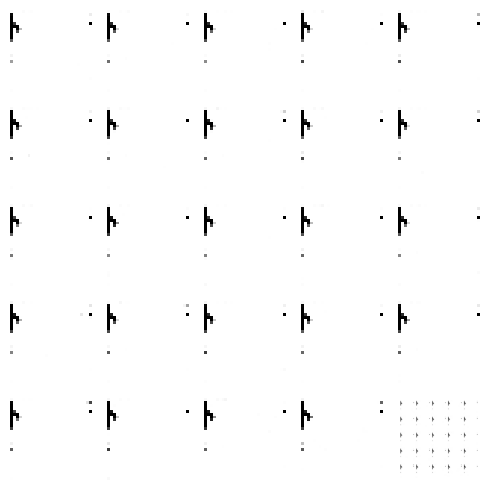

  0%|          | 0/350 [00:00<?, ?it/s]

4/4 [==============================] - 0s 20ms/step


  0%|          | 1/350 [00:00<04:11,  1.39it/s]

4/4 [==============================] - 0s 15ms/step


  1%|          | 2/350 [00:01<03:33,  1.63it/s]

4/4 [==============================] - 0s 31ms/step


  1%|          | 3/350 [00:01<03:32,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


  1%|          | 4/350 [00:02<03:21,  1.71it/s]

4/4 [==============================] - 0s 19ms/step


  1%|▏         | 5/350 [00:03<03:29,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


  2%|▏         | 6/350 [00:03<03:28,  1.65it/s]

4/4 [==============================] - 0s 15ms/step


  2%|▏         | 7/350 [00:04<03:27,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


  2%|▏         | 8/350 [00:04<03:20,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


  3%|▎         | 9/350 [00:05<03:12,  1.77it/s]

4/4 [==============================] - 0s 12ms/step


  3%|▎         | 10/350 [00:05<03:07,  1.82it/s]

4/4 [==============================] - 0s 13ms/step


  3%|▎         | 11/350 [00:06<03:11,  1.77it/s]

4/4 [==============================] - 0s 14ms/step


  3%|▎         | 12/350 [00:06<03:08,  1.79it/s]

4/4 [==============================] - 0s 38ms/step


  4%|▎         | 13/350 [00:07<03:13,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


  4%|▍         | 14/350 [00:08<03:14,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


  4%|▍         | 15/350 [00:08<03:07,  1.78it/s]

4/4 [==============================] - 0s 14ms/step


  5%|▍         | 16/350 [00:09<03:16,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


  5%|▍         | 17/350 [00:09<03:09,  1.76it/s]

4/4 [==============================] - 0s 27ms/step


  5%|▌         | 18/350 [00:10<03:18,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


  5%|▌         | 19/350 [00:11<03:08,  1.75it/s]

4/4 [==============================] - 0s 24ms/step


  6%|▌         | 20/350 [00:11<03:18,  1.66it/s]

4/4 [==============================] - 0s 14ms/step


  6%|▌         | 21/350 [00:12<03:26,  1.59it/s]

4/4 [==============================] - 0s 12ms/step


  6%|▋         | 22/350 [00:12<03:14,  1.68it/s]

4/4 [==============================] - 0s 21ms/step


  7%|▋         | 23/350 [00:13<03:15,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


  7%|▋         | 24/350 [00:14<03:13,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


  7%|▋         | 25/350 [00:14<03:08,  1.72it/s]

4/4 [==============================] - 0s 22ms/step


  7%|▋         | 26/350 [00:15<03:08,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


  8%|▊         | 27/350 [00:15<03:09,  1.71it/s]

4/4 [==============================] - 0s 13ms/step


  8%|▊         | 28/350 [00:16<03:01,  1.77it/s]

4/4 [==============================] - 0s 16ms/step


  8%|▊         | 29/350 [00:16<03:03,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


  9%|▊         | 30/350 [00:17<03:07,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


  9%|▉         | 31/350 [00:18<03:00,  1.77it/s]

4/4 [==============================] - 0s 18ms/step


  9%|▉         | 32/350 [00:18<03:02,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


  9%|▉         | 33/350 [00:19<03:04,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 10%|▉         | 34/350 [00:19<03:01,  1.74it/s]

4/4 [==============================] - 0s 30ms/step


 10%|█         | 35/350 [00:20<03:04,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 10%|█         | 36/350 [00:21<03:03,  1.71it/s]

4/4 [==============================] - 0s 13ms/step


 11%|█         | 37/350 [00:21<02:57,  1.76it/s]

4/4 [==============================] - 0s 12ms/step


 11%|█         | 38/350 [00:22<02:53,  1.80it/s]

4/4 [==============================] - 0s 15ms/step


 11%|█         | 39/350 [00:22<02:58,  1.75it/s]

4/4 [==============================] - 0s 12ms/step


 11%|█▏        | 40/350 [00:23<02:51,  1.81it/s]

4/4 [==============================] - 0s 12ms/step


 12%|█▏        | 41/350 [00:23<02:54,  1.77it/s]

4/4 [==============================] - 0s 12ms/step


 12%|█▏        | 42/350 [00:24<02:49,  1.82it/s]

4/4 [==============================] - 0s 19ms/step


 12%|█▏        | 43/350 [00:24<02:54,  1.76it/s]

4/4 [==============================] - 0s 11ms/step


 13%|█▎        | 44/350 [00:25<02:56,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 13%|█▎        | 45/350 [00:26<02:50,  1.79it/s]

4/4 [==============================] - 0s 30ms/step


 13%|█▎        | 46/350 [00:26<02:53,  1.76it/s]

4/4 [==============================] - 0s 12ms/step


 13%|█▎        | 47/350 [00:27<02:47,  1.81it/s]

4/4 [==============================] - 0s 40ms/step


 14%|█▎        | 48/350 [00:27<02:58,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 14%|█▍        | 49/350 [00:28<02:50,  1.77it/s]

4/4 [==============================] - 0s 26ms/step


 14%|█▍        | 50/350 [00:28<02:57,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 15%|█▍        | 51/350 [00:29<02:50,  1.75it/s]

4/4 [==============================] - 0s 17ms/step


 15%|█▍        | 52/350 [00:30<02:53,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


 15%|█▌        | 53/350 [00:30<02:54,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 15%|█▌        | 54/350 [00:31<02:47,  1.77it/s]

4/4 [==============================] - 0s 19ms/step


 16%|█▌        | 55/350 [00:31<02:49,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 16%|█▌        | 56/350 [00:32<02:50,  1.73it/s]

4/4 [==============================] - 0s 15ms/step


 16%|█▋        | 57/350 [00:32<02:46,  1.75it/s]

4/4 [==============================] - 0s 14ms/step


 17%|█▋        | 58/350 [00:33<02:49,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


 17%|█▋        | 59/350 [00:34<02:42,  1.79it/s]

4/4 [==============================] - 0s 14ms/step


 17%|█▋        | 60/350 [00:34<02:45,  1.76it/s]

4/4 [==============================] - 0s 12ms/step


 17%|█▋        | 61/350 [00:35<02:48,  1.71it/s]

4/4 [==============================] - 0s 13ms/step


 18%|█▊        | 62/350 [00:35<02:42,  1.78it/s]

4/4 [==============================] - 0s 19ms/step


 18%|█▊        | 63/350 [00:36<02:44,  1.75it/s]

4/4 [==============================] - 0s 12ms/step


 18%|█▊        | 64/350 [00:36<02:39,  1.80it/s]

4/4 [==============================] - 0s 12ms/step


 19%|█▊        | 65/350 [00:37<02:44,  1.73it/s]

4/4 [==============================] - 0s 14ms/step


 19%|█▉        | 66/350 [00:38<02:41,  1.76it/s]

4/4 [==============================] - 0s 12ms/step


 19%|█▉        | 67/350 [00:38<02:35,  1.82it/s]

4/4 [==============================] - 0s 22ms/step


 19%|█▉        | 68/350 [00:39<02:38,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 20%|█▉        | 69/350 [00:39<02:34,  1.82it/s]

4/4 [==============================] - 0s 14ms/step


 20%|██        | 70/350 [00:40<02:45,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 20%|██        | 71/350 [00:40<02:38,  1.77it/s]

4/4 [==============================] - 0s 17ms/step


 21%|██        | 72/350 [00:41<02:45,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 21%|██        | 73/350 [00:42<02:38,  1.75it/s]

4/4 [==============================] - 0s 21ms/step


 21%|██        | 74/350 [00:42<02:40,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


 21%|██▏       | 75/350 [00:43<02:42,  1.69it/s]

4/4 [==============================] - 0s 10ms/step


 22%|██▏       | 76/350 [00:43<02:47,  1.64it/s]

4/4 [==============================] - 0s 22ms/step


 22%|██▏       | 77/350 [00:44<02:52,  1.58it/s]

4/4 [==============================] - 0s 12ms/step


 22%|██▏       | 78/350 [00:45<02:42,  1.68it/s]

4/4 [==============================] - 0s 19ms/step


 23%|██▎       | 79/350 [00:45<02:47,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


 23%|██▎       | 80/350 [00:46<02:38,  1.70it/s]

4/4 [==============================] - 0s 17ms/step


 23%|██▎       | 81/350 [00:47<02:45,  1.63it/s]

4/4 [==============================] - 0s 15ms/step


 23%|██▎       | 82/350 [00:47<02:50,  1.57it/s]

4/4 [==============================] - 0s 14ms/step


 24%|██▎       | 83/350 [00:48<02:41,  1.66it/s]

4/4 [==============================] - 0s 36ms/step


 24%|██▍       | 84/350 [00:48<02:46,  1.60it/s]

4/4 [==============================] - 0s 13ms/step


 24%|██▍       | 85/350 [00:49<02:49,  1.57it/s]

4/4 [==============================] - 0s 13ms/step


 25%|██▍       | 86/350 [00:50<02:38,  1.66it/s]

4/4 [==============================] - 0s 20ms/step


 25%|██▍       | 87/350 [00:50<02:42,  1.62it/s]

4/4 [==============================] - 0s 13ms/step


 25%|██▌       | 88/350 [00:51<02:47,  1.57it/s]

4/4 [==============================] - 0s 12ms/step


 25%|██▌       | 89/350 [00:52<02:49,  1.54it/s]

4/4 [==============================] - 0s 12ms/step


 26%|██▌       | 90/350 [00:52<02:39,  1.63it/s]

4/4 [==============================] - 0s 19ms/step


 26%|██▌       | 91/350 [00:53<02:36,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 26%|██▋       | 92/350 [00:53<02:35,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


 27%|██▋       | 93/350 [00:54<02:30,  1.71it/s]

4/4 [==============================] - 0s 26ms/step


 27%|██▋       | 94/350 [00:55<02:36,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 27%|██▋       | 95/350 [00:55<02:35,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 27%|██▋       | 96/350 [00:56<02:32,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 28%|██▊       | 97/350 [00:56<02:27,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 28%|██▊       | 98/350 [00:57<02:28,  1.70it/s]

4/4 [==============================] - 0s 13ms/step


 28%|██▊       | 99/350 [00:57<02:23,  1.75it/s]

4/4 [==============================] - 0s 12ms/step


 29%|██▊       | 100/350 [00:58<02:18,  1.80it/s]

4/4 [==============================] - 0s 13ms/step


 29%|██▉       | 101/350 [00:58<02:16,  1.83it/s]

4/4 [==============================] - 0s 22ms/step


 29%|██▉       | 102/350 [00:59<02:27,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 29%|██▉       | 103/350 [01:00<02:20,  1.76it/s]

4/4 [==============================] - 0s 29ms/step


 30%|██▉       | 104/350 [01:00<02:28,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 30%|███       | 105/350 [01:01<02:20,  1.74it/s]

4/4 [==============================] - 0s 21ms/step


 30%|███       | 106/350 [01:02<02:27,  1.65it/s]

4/4 [==============================] - 0s 13ms/step


 31%|███       | 107/350 [01:02<02:30,  1.61it/s]

4/4 [==============================] - 0s 13ms/step


 31%|███       | 108/350 [01:03<02:33,  1.57it/s]

4/4 [==============================] - 0s 13ms/step


 31%|███       | 109/350 [01:03<02:25,  1.66it/s]

4/4 [==============================] - 0s 25ms/step


 31%|███▏      | 110/350 [01:04<02:29,  1.60it/s]

4/4 [==============================] - 0s 14ms/step


 32%|███▏      | 111/350 [01:05<02:23,  1.66it/s]

4/4 [==============================] - 0s 25ms/step


 32%|███▏      | 112/350 [01:05<02:23,  1.66it/s]

4/4 [==============================] - 0s 14ms/step


 32%|███▏      | 113/350 [01:06<02:22,  1.66it/s]

4/4 [==============================] - 0s 14ms/step


 33%|███▎      | 114/350 [01:06<02:20,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 33%|███▎      | 115/350 [01:07<02:17,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 33%|███▎      | 116/350 [01:07<02:11,  1.77it/s]

4/4 [==============================] - 0s 17ms/step


 33%|███▎      | 117/350 [01:08<02:12,  1.75it/s]

4/4 [==============================] - 0s 11ms/step


 34%|███▎      | 118/350 [01:09<02:14,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


 34%|███▍      | 119/350 [01:09<02:16,  1.70it/s]

4/4 [==============================] - 0s 14ms/step


 34%|███▍      | 120/350 [01:10<02:20,  1.64it/s]

4/4 [==============================] - 0s 13ms/step


 35%|███▍      | 121/350 [01:10<02:12,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 35%|███▍      | 122/350 [01:11<02:08,  1.77it/s]

4/4 [==============================] - 0s 12ms/step


 35%|███▌      | 123/350 [01:11<02:04,  1.83it/s]

4/4 [==============================] - 0s 19ms/step


 35%|███▌      | 124/350 [01:12<02:08,  1.76it/s]

4/4 [==============================] - 0s 11ms/step


 36%|███▌      | 125/350 [01:13<02:09,  1.73it/s]

4/4 [==============================] - 0s 12ms/step


 36%|███▌      | 126/350 [01:13<02:05,  1.78it/s]

4/4 [==============================] - 0s 15ms/step


 36%|███▋      | 127/350 [01:14<02:06,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 37%|███▋      | 128/350 [01:14<02:08,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


 37%|███▋      | 129/350 [01:15<02:05,  1.76it/s]

4/4 [==============================] - 0s 20ms/step


 37%|███▋      | 130/350 [01:16<02:05,  1.75it/s]

4/4 [==============================] - 0s 12ms/step


 37%|███▋      | 131/350 [01:16<02:01,  1.80it/s]

4/4 [==============================] - 0s 13ms/step


 38%|███▊      | 132/350 [01:17<02:03,  1.76it/s]

4/4 [==============================] - 0s 12ms/step


 38%|███▊      | 133/350 [01:17<02:01,  1.79it/s]

4/4 [==============================] - 0s 24ms/step


 38%|███▊      | 134/350 [01:18<02:02,  1.76it/s]

4/4 [==============================] - 0s 25ms/step


 39%|███▊      | 135/350 [01:18<02:03,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 39%|███▉      | 136/350 [01:19<01:59,  1.79it/s]

4/4 [==============================] - 0s 12ms/step


 39%|███▉      | 137/350 [01:19<02:01,  1.75it/s]

4/4 [==============================] - 0s 14ms/step


 39%|███▉      | 138/350 [01:20<01:59,  1.78it/s]

4/4 [==============================] - 0s 12ms/step


 40%|███▉      | 139/350 [01:21<01:56,  1.81it/s]

4/4 [==============================] - 0s 28ms/step


 40%|████      | 140/350 [01:21<01:58,  1.77it/s]

4/4 [==============================] - 0s 12ms/step


 40%|████      | 141/350 [01:22<01:59,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 41%|████      | 142/350 [01:22<01:57,  1.78it/s]

4/4 [==============================] - 0s 35ms/step


 41%|████      | 143/350 [01:23<01:58,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 41%|████      | 144/350 [01:23<01:54,  1.80it/s]

4/4 [==============================] - 0s 32ms/step


 41%|████▏     | 145/350 [01:24<02:00,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 42%|████▏     | 146/350 [01:25<01:55,  1.76it/s]

4/4 [==============================] - 0s 18ms/step


 42%|████▏     | 147/350 [01:25<02:02,  1.65it/s]

4/4 [==============================] - 0s 13ms/step


 42%|████▏     | 148/350 [01:26<01:57,  1.73it/s]

4/4 [==============================] - 0s 32ms/step


 43%|████▎     | 149/350 [01:26<01:57,  1.71it/s]

4/4 [==============================] - 0s 28ms/step


 43%|████▎     | 150/350 [01:27<01:57,  1.71it/s]

4/4 [==============================] - 0s 11ms/step


 43%|████▎     | 151/350 [01:27<01:54,  1.74it/s]

4/4 [==============================] - 0s 30ms/step


 43%|████▎     | 152/350 [01:28<01:55,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


 44%|████▎     | 153/350 [01:29<01:55,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 44%|████▍     | 154/350 [01:29<01:51,  1.76it/s]

4/4 [==============================] - 0s 12ms/step


 44%|████▍     | 155/350 [01:30<01:52,  1.73it/s]

4/4 [==============================] - 0s 17ms/step


 45%|████▍     | 156/350 [01:30<01:50,  1.76it/s]

4/4 [==============================] - 0s 14ms/step


 45%|████▍     | 157/350 [01:31<01:56,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 45%|████▌     | 158/350 [01:32<01:50,  1.74it/s]

4/4 [==============================] - 0s 19ms/step


 45%|████▌     | 159/350 [01:32<01:50,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 46%|████▌     | 160/350 [01:33<01:52,  1.69it/s]

4/4 [==============================] - 0s 13ms/step


 46%|████▌     | 161/350 [01:33<01:48,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 46%|████▋     | 162/350 [01:34<01:48,  1.73it/s]

4/4 [==============================] - 0s 11ms/step


 47%|████▋     | 163/350 [01:34<01:44,  1.79it/s]

4/4 [==============================] - 0s 19ms/step


 47%|████▋     | 164/350 [01:35<01:50,  1.69it/s]

4/4 [==============================] - 0s 14ms/step


 47%|████▋     | 165/350 [01:36<01:46,  1.73it/s]

4/4 [==============================] - 0s 12ms/step


 47%|████▋     | 166/350 [01:36<01:51,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 48%|████▊     | 167/350 [01:37<01:46,  1.72it/s]

4/4 [==============================] - 0s 22ms/step


 48%|████▊     | 168/350 [01:37<01:45,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


 48%|████▊     | 169/350 [01:38<01:47,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 49%|████▊     | 170/350 [01:39<01:42,  1.75it/s]

4/4 [==============================] - 0s 12ms/step


 49%|████▉     | 171/350 [01:39<01:43,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 49%|████▉     | 172/350 [01:40<01:39,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 49%|████▉     | 173/350 [01:40<01:41,  1.75it/s]

4/4 [==============================] - 0s 12ms/step


 50%|████▉     | 174/350 [01:41<01:43,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 50%|█████     | 175/350 [01:41<01:39,  1.77it/s]

4/4 [==============================] - 0s 29ms/step


 50%|█████     | 176/350 [01:42<01:43,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


 51%|█████     | 177/350 [01:43<01:38,  1.75it/s]

4/4 [==============================] - 0s 22ms/step


 51%|█████     | 178/350 [01:43<01:44,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 51%|█████     | 179/350 [01:44<01:42,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 51%|█████▏    | 180/350 [01:44<01:41,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 52%|█████▏    | 181/350 [01:45<01:37,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 52%|█████▏    | 182/350 [01:46<01:37,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 52%|█████▏    | 183/350 [01:46<01:35,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 53%|█████▎    | 184/350 [01:47<01:32,  1.80it/s]

4/4 [==============================] - 0s 12ms/step


 53%|█████▎    | 185/350 [01:47<01:29,  1.84it/s]

4/4 [==============================] - 0s 14ms/step


 53%|█████▎    | 186/350 [01:48<01:31,  1.80it/s]

4/4 [==============================] - 0s 11ms/step


 53%|█████▎    | 187/350 [01:48<01:32,  1.75it/s]

4/4 [==============================] - 0s 12ms/step


 54%|█████▎    | 188/350 [01:49<01:30,  1.80it/s]

4/4 [==============================] - 0s 26ms/step


 54%|█████▍    | 189/350 [01:49<01:32,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 54%|█████▍    | 190/350 [01:50<01:32,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


 55%|█████▍    | 191/350 [01:51<01:29,  1.78it/s]

4/4 [==============================] - 0s 37ms/step


 55%|█████▍    | 192/350 [01:51<01:34,  1.67it/s]

4/4 [==============================] - 0s 14ms/step


 55%|█████▌    | 193/350 [01:52<01:30,  1.74it/s]

4/4 [==============================] - 0s 23ms/step


 55%|█████▌    | 194/350 [01:52<01:34,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 56%|█████▌    | 195/350 [01:53<01:30,  1.72it/s]

4/4 [==============================] - 0s 29ms/step


 56%|█████▌    | 196/350 [01:54<01:34,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 56%|█████▋    | 197/350 [01:54<01:29,  1.71it/s]

4/4 [==============================] - 0s 23ms/step


 57%|█████▋    | 198/350 [01:55<01:29,  1.70it/s]

4/4 [==============================] - 0s 15ms/step


 57%|█████▋    | 199/350 [01:55<01:29,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 57%|█████▋    | 200/350 [01:56<01:26,  1.74it/s]

4/4 [==============================] - 0s 14ms/step


 57%|█████▋    | 201/350 [01:57<01:27,  1.69it/s]

4/4 [==============================] - 0s 13ms/step


 58%|█████▊    | 202/350 [01:57<01:24,  1.76it/s]

4/4 [==============================] - 0s 26ms/step


 58%|█████▊    | 203/350 [01:58<01:27,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


 58%|█████▊    | 204/350 [01:58<01:27,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 59%|█████▊    | 205/350 [01:59<01:28,  1.63it/s]

4/4 [==============================] - 0s 14ms/step


 59%|█████▉    | 206/350 [01:59<01:24,  1.71it/s]

4/4 [==============================] - 0s 13ms/step


 59%|█████▉    | 207/350 [02:00<01:21,  1.76it/s]

4/4 [==============================] - 0s 17ms/step


 59%|█████▉    | 208/350 [02:01<01:21,  1.75it/s]

4/4 [==============================] - 0s 12ms/step


 60%|█████▉    | 209/350 [02:01<01:19,  1.78it/s]

4/4 [==============================] - 0s 14ms/step


 60%|██████    | 210/350 [02:02<01:17,  1.80it/s]

4/4 [==============================] - 0s 25ms/step


 60%|██████    | 211/350 [02:02<01:21,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 61%|██████    | 212/350 [02:03<01:17,  1.77it/s]

4/4 [==============================] - 0s 20ms/step


 61%|██████    | 213/350 [02:04<01:20,  1.70it/s]

4/4 [==============================] - 0s 13ms/step


 61%|██████    | 214/350 [02:04<01:22,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 61%|██████▏   | 215/350 [02:05<01:21,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 62%|██████▏   | 216/350 [02:05<01:17,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 62%|██████▏   | 217/350 [02:06<01:17,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 62%|██████▏   | 218/350 [02:06<01:14,  1.78it/s]

4/4 [==============================] - 0s 15ms/step


 63%|██████▎   | 219/350 [02:07<01:13,  1.79it/s]

4/4 [==============================] - 0s 13ms/step


 63%|██████▎   | 220/350 [02:07<01:11,  1.82it/s]

4/4 [==============================] - 0s 34ms/step


 63%|██████▎   | 221/350 [02:08<01:12,  1.77it/s]

4/4 [==============================] - 0s 12ms/step


 63%|██████▎   | 222/350 [02:09<01:13,  1.75it/s]

4/4 [==============================] - 0s 12ms/step


 64%|██████▎   | 223/350 [02:09<01:11,  1.78it/s]

4/4 [==============================] - 0s 19ms/step


 64%|██████▍   | 224/350 [02:10<01:14,  1.69it/s]

4/4 [==============================] - 0s 13ms/step


 64%|██████▍   | 225/350 [02:10<01:11,  1.76it/s]

4/4 [==============================] - 0s 25ms/step


 65%|██████▍   | 226/350 [02:11<01:11,  1.73it/s]

4/4 [==============================] - 0s 11ms/step


 65%|██████▍   | 227/350 [02:12<01:11,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 65%|██████▌   | 228/350 [02:12<01:09,  1.75it/s]

4/4 [==============================] - 0s 20ms/step


 65%|██████▌   | 229/350 [02:13<01:12,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 66%|██████▌   | 230/350 [02:13<01:08,  1.74it/s]

4/4 [==============================] - 0s 37ms/step


 66%|██████▌   | 231/350 [02:14<01:09,  1.72it/s]

4/4 [==============================] - 0s 11ms/step


 66%|██████▋   | 232/350 [02:14<01:09,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 67%|██████▋   | 233/350 [02:15<01:06,  1.75it/s]

4/4 [==============================] - 0s 20ms/step


 67%|██████▋   | 234/350 [02:16<01:06,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 67%|██████▋   | 235/350 [02:16<01:04,  1.79it/s]

4/4 [==============================] - 0s 11ms/step


 67%|██████▋   | 236/350 [02:17<01:02,  1.83it/s]

4/4 [==============================] - 0s 15ms/step


 68%|██████▊   | 237/350 [02:17<01:01,  1.82it/s]

4/4 [==============================] - 0s 13ms/step


 68%|██████▊   | 238/350 [02:18<01:03,  1.78it/s]

4/4 [==============================] - 0s 14ms/step


 68%|██████▊   | 239/350 [02:18<01:06,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


 69%|██████▊   | 240/350 [02:19<01:03,  1.74it/s]

4/4 [==============================] - 0s 20ms/step


 69%|██████▉   | 241/350 [02:20<01:05,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


 69%|██████▉   | 242/350 [02:20<01:07,  1.60it/s]

4/4 [==============================] - 0s 13ms/step


 69%|██████▉   | 243/350 [02:21<01:03,  1.68it/s]

4/4 [==============================] - 0s 15ms/step


 70%|██████▉   | 244/350 [02:22<01:05,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


 70%|███████   | 245/350 [02:22<01:04,  1.64it/s]

4/4 [==============================] - 0s 16ms/step


 70%|███████   | 246/350 [02:23<01:05,  1.58it/s]

4/4 [==============================] - 0s 14ms/step


 71%|███████   | 247/350 [02:23<01:04,  1.60it/s]

4/4 [==============================] - 0s 12ms/step


 71%|███████   | 248/350 [02:24<01:00,  1.69it/s]

4/4 [==============================] - 0s 42ms/step


 71%|███████   | 249/350 [02:25<01:02,  1.62it/s]

4/4 [==============================] - 0s 13ms/step


 71%|███████▏  | 250/350 [02:25<00:59,  1.67it/s]

4/4 [==============================] - 0s 19ms/step


 72%|███████▏  | 251/350 [02:26<00:58,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


 72%|███████▏  | 252/350 [02:26<00:58,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 72%|███████▏  | 253/350 [02:27<00:55,  1.75it/s]

4/4 [==============================] - 0s 32ms/step


 73%|███████▎  | 254/350 [02:28<00:57,  1.67it/s]

4/4 [==============================] - 0s 15ms/step


 73%|███████▎  | 255/350 [02:28<00:57,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 73%|███████▎  | 256/350 [02:29<00:56,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


 73%|███████▎  | 257/350 [02:29<00:53,  1.73it/s]

4/4 [==============================] - 0s 12ms/step


 74%|███████▎  | 258/350 [02:30<00:51,  1.79it/s]

4/4 [==============================] - 0s 20ms/step


 74%|███████▍  | 259/350 [02:30<00:52,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 74%|███████▍  | 260/350 [02:31<00:50,  1.78it/s]

4/4 [==============================] - 0s 12ms/step


 75%|███████▍  | 261/350 [02:31<00:50,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 75%|███████▍  | 262/350 [02:32<00:50,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 75%|███████▌  | 263/350 [02:33<00:51,  1.70it/s]

4/4 [==============================] - 0s 14ms/step


 75%|███████▌  | 264/350 [02:33<00:49,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 76%|███████▌  | 265/350 [02:34<00:47,  1.79it/s]

4/4 [==============================] - 0s 14ms/step


 76%|███████▌  | 266/350 [02:34<00:47,  1.77it/s]

4/4 [==============================] - 0s 12ms/step


 76%|███████▋  | 267/350 [02:35<00:45,  1.81it/s]

4/4 [==============================] - 0s 12ms/step


 77%|███████▋  | 268/350 [02:35<00:44,  1.82it/s]

4/4 [==============================] - 0s 29ms/step


 77%|███████▋  | 269/350 [02:36<00:47,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 77%|███████▋  | 270/350 [02:37<00:46,  1.71it/s]

4/4 [==============================] - 0s 19ms/step


 77%|███████▋  | 271/350 [02:37<00:46,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 78%|███████▊  | 272/350 [02:38<00:44,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 78%|███████▊  | 273/350 [02:38<00:45,  1.70it/s]

4/4 [==============================] - 0s 13ms/step


 78%|███████▊  | 274/350 [02:39<00:43,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 79%|███████▊  | 275/350 [02:39<00:41,  1.81it/s]

4/4 [==============================] - 0s 16ms/step


 79%|███████▉  | 276/350 [02:40<00:43,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 79%|███████▉  | 277/350 [02:41<00:44,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


 79%|███████▉  | 278/350 [02:41<00:42,  1.71it/s]

4/4 [==============================] - 0s 28ms/step


 80%|███████▉  | 279/350 [02:42<00:43,  1.64it/s]

4/4 [==============================] - 0s 13ms/step


 80%|████████  | 280/350 [02:42<00:40,  1.73it/s]

4/4 [==============================] - 0s 29ms/step


 80%|████████  | 281/350 [02:43<00:40,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 81%|████████  | 282/350 [02:44<00:40,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 81%|████████  | 283/350 [02:44<00:38,  1.75it/s]

4/4 [==============================] - 0s 15ms/step


 81%|████████  | 284/350 [02:45<00:39,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 81%|████████▏ | 285/350 [02:45<00:38,  1.67it/s]

4/4 [==============================] - 0s 15ms/step


 82%|████████▏ | 286/350 [02:46<00:38,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 82%|████████▏ | 287/350 [02:47<00:36,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 82%|████████▏ | 288/350 [02:47<00:36,  1.70it/s]

4/4 [==============================] - 0s 13ms/step


 83%|████████▎ | 289/350 [02:48<00:34,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 83%|████████▎ | 290/350 [02:48<00:33,  1.80it/s]

4/4 [==============================] - 0s 12ms/step


 83%|████████▎ | 291/350 [02:49<00:32,  1.81it/s]

4/4 [==============================] - 0s 28ms/step


 83%|████████▎ | 292/350 [02:49<00:32,  1.77it/s]

4/4 [==============================] - 0s 12ms/step


 84%|████████▎ | 293/350 [02:50<00:32,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 84%|████████▍ | 294/350 [02:51<00:31,  1.79it/s]

4/4 [==============================] - 0s 17ms/step


 84%|████████▍ | 295/350 [02:51<00:33,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 85%|████████▍ | 296/350 [02:52<00:31,  1.73it/s]

4/4 [==============================] - 0s 26ms/step


 85%|████████▍ | 297/350 [02:52<00:30,  1.71it/s]

4/4 [==============================] - 0s 13ms/step


 85%|████████▌ | 298/350 [02:53<00:30,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 85%|████████▌ | 299/350 [02:53<00:28,  1.77it/s]

4/4 [==============================] - 0s 19ms/step


 86%|████████▌ | 300/350 [02:54<00:30,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 86%|████████▌ | 301/350 [02:55<00:28,  1.72it/s]

4/4 [==============================] - 0s 43ms/step


 86%|████████▋ | 302/350 [02:55<00:29,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 87%|████████▋ | 303/350 [02:56<00:27,  1.72it/s]

4/4 [==============================] - 0s 27ms/step


 87%|████████▋ | 304/350 [02:57<00:28,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 87%|████████▋ | 305/350 [02:57<00:26,  1.72it/s]

4/4 [==============================] - 0s 27ms/step


 87%|████████▋ | 306/350 [02:58<00:26,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 88%|████████▊ | 307/350 [02:58<00:24,  1.73it/s]

4/4 [==============================] - 0s 22ms/step


 88%|████████▊ | 308/350 [02:59<00:25,  1.65it/s]

4/4 [==============================] - 0s 14ms/step


 88%|████████▊ | 309/350 [02:59<00:24,  1.70it/s]

4/4 [==============================] - 0s 24ms/step


 89%|████████▊ | 310/350 [03:00<00:24,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 89%|████████▉ | 311/350 [03:01<00:23,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 89%|████████▉ | 312/350 [03:01<00:23,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 89%|████████▉ | 313/350 [03:02<00:22,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 90%|████████▉ | 314/350 [03:02<00:20,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 90%|█████████ | 315/350 [03:03<00:20,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


 90%|█████████ | 316/350 [03:04<00:19,  1.78it/s]

4/4 [==============================] - 0s 12ms/step


 91%|█████████ | 317/350 [03:04<00:18,  1.81it/s]

4/4 [==============================] - 0s 48ms/step


 91%|█████████ | 318/350 [03:05<00:19,  1.67it/s]

4/4 [==============================] - 0s 14ms/step


 91%|█████████ | 319/350 [03:05<00:17,  1.73it/s]

4/4 [==============================] - 0s 16ms/step


 91%|█████████▏| 320/350 [03:06<00:18,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 92%|█████████▏| 321/350 [03:07<00:16,  1.72it/s]

4/4 [==============================] - 0s 36ms/step


 92%|█████████▏| 322/350 [03:07<00:17,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 92%|█████████▏| 323/350 [03:08<00:15,  1.71it/s]

4/4 [==============================] - 0s 32ms/step


 93%|█████████▎| 324/350 [03:08<00:15,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 93%|█████████▎| 325/350 [03:09<00:15,  1.61it/s]

4/4 [==============================] - 0s 12ms/step


 93%|█████████▎| 326/350 [03:10<00:14,  1.61it/s]

4/4 [==============================] - 0s 14ms/step


 93%|█████████▎| 327/350 [03:10<00:13,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 94%|█████████▎| 328/350 [03:11<00:12,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 94%|█████████▍| 329/350 [03:11<00:12,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 94%|█████████▍| 330/350 [03:12<00:11,  1.77it/s]

4/4 [==============================] - 0s 11ms/step


 95%|█████████▍| 331/350 [03:12<00:10,  1.79it/s]

4/4 [==============================] - 0s 25ms/step


 95%|█████████▍| 332/350 [03:13<00:10,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


 95%|█████████▌| 333/350 [03:14<00:09,  1.76it/s]

4/4 [==============================] - 0s 18ms/step


 95%|█████████▌| 334/350 [03:14<00:09,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 96%|█████████▌| 335/350 [03:15<00:08,  1.74it/s]

4/4 [==============================] - 0s 28ms/step


 96%|█████████▌| 336/350 [03:15<00:08,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 96%|█████████▋| 337/350 [03:16<00:07,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 97%|█████████▋| 338/350 [03:17<00:06,  1.76it/s]

4/4 [==============================] - 0s 12ms/step


 97%|█████████▋| 339/350 [03:17<00:06,  1.73it/s]

4/4 [==============================] - 0s 12ms/step


 97%|█████████▋| 340/350 [03:18<00:05,  1.76it/s]

4/4 [==============================] - 0s 12ms/step


 97%|█████████▋| 341/350 [03:18<00:05,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 98%|█████████▊| 342/350 [03:19<00:04,  1.78it/s]

4/4 [==============================] - 0s 27ms/step


 98%|█████████▊| 343/350 [03:19<00:04,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 98%|█████████▊| 344/350 [03:20<00:03,  1.65it/s]

4/4 [==============================] - 0s 13ms/step


 99%|█████████▊| 345/350 [03:21<00:02,  1.70it/s]

4/4 [==============================] - 0s 44ms/step


 99%|█████████▉| 346/350 [03:21<00:02,  1.62it/s]

4/4 [==============================] - 0s 13ms/step


 99%|█████████▉| 347/350 [03:22<00:01,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 99%|█████████▉| 348/350 [03:22<00:01,  1.72it/s]

4/4 [==============================] - 0s 35ms/step


100%|█████████▉| 349/350 [03:23<00:00,  1.62it/s]

4/4 [==============================] - 0s 11ms/step


100%|██████████| 350/350 [03:24<00:00,  1.71it/s]

Epoch number: 42 discriminator_loss: 0.16870355727101144 generator_loss: 6.522300831930978
1/1 [==============================] - 0s 21ms/step


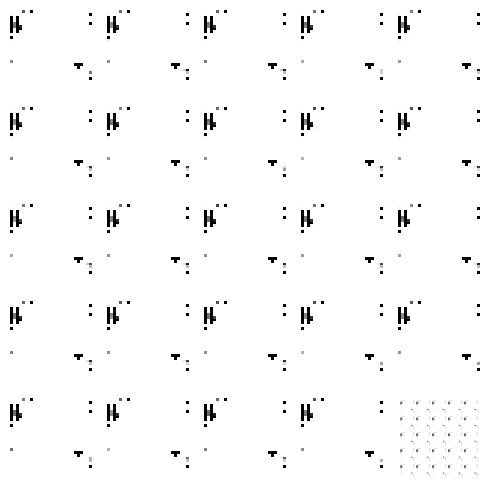

  0%|          | 0/350 [00:00<?, ?it/s]

4/4 [==============================] - 0s 22ms/step


  0%|          | 1/350 [00:00<04:02,  1.44it/s]

4/4 [==============================] - 0s 13ms/step


  1%|          | 2/350 [00:01<03:27,  1.68it/s]

4/4 [==============================] - 0s 14ms/step


  1%|          | 3/350 [00:01<03:21,  1.72it/s]

4/4 [==============================] - 0s 21ms/step


  1%|          | 4/350 [00:02<03:27,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


  1%|▏         | 5/350 [00:02<03:16,  1.76it/s]

4/4 [==============================] - 0s 26ms/step


  2%|▏         | 6/350 [00:03<03:19,  1.72it/s]

4/4 [==============================] - 0s 16ms/step


  2%|▏         | 7/350 [00:04<03:15,  1.75it/s]

4/4 [==============================] - 0s 12ms/step


  2%|▏         | 8/350 [00:04<03:17,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


  3%|▎         | 9/350 [00:05<03:10,  1.79it/s]

4/4 [==============================] - 0s 12ms/step


  3%|▎         | 10/350 [00:05<03:05,  1.84it/s]

4/4 [==============================] - 0s 23ms/step


  3%|▎         | 11/350 [00:06<03:19,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


  3%|▎         | 12/350 [00:06<03:11,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


  4%|▎         | 13/350 [00:07<03:12,  1.75it/s]

4/4 [==============================] - 0s 12ms/step


  4%|▍         | 14/350 [00:08<03:14,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


  4%|▍         | 15/350 [00:08<03:10,  1.76it/s]

4/4 [==============================] - 0s 15ms/step


  5%|▍         | 16/350 [00:09<03:19,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


  5%|▍         | 17/350 [00:09<03:10,  1.75it/s]

4/4 [==============================] - 0s 34ms/step


  5%|▌         | 18/350 [00:10<03:13,  1.72it/s]

4/4 [==============================] - 0s 16ms/step


  5%|▌         | 19/350 [00:11<03:18,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


  6%|▌         | 20/350 [00:11<03:09,  1.74it/s]

4/4 [==============================] - 0s 30ms/step


  6%|▌         | 21/350 [00:12<03:12,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


  6%|▋         | 22/350 [00:12<03:12,  1.70it/s]

4/4 [==============================] - 0s 14ms/step


  7%|▋         | 23/350 [00:13<03:08,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


  7%|▋         | 24/350 [00:13<03:09,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


  7%|▋         | 25/350 [00:14<03:03,  1.77it/s]

4/4 [==============================] - 0s 32ms/step


  7%|▋         | 26/350 [00:15<03:12,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


  8%|▊         | 27/350 [00:15<03:13,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


  8%|▊         | 28/350 [00:16<03:13,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


  8%|▊         | 29/350 [00:16<03:05,  1.73it/s]

4/4 [==============================] - 0s 14ms/step


  9%|▊         | 30/350 [00:17<03:07,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


  9%|▉         | 31/350 [00:17<03:03,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


  9%|▉         | 32/350 [00:18<02:57,  1.79it/s]

4/4 [==============================] - 0s 13ms/step


  9%|▉         | 33/350 [00:19<02:54,  1.81it/s]

4/4 [==============================] - 0s 26ms/step


 10%|▉         | 34/350 [00:19<03:04,  1.71it/s]

4/4 [==============================] - 0s 14ms/step


 10%|█         | 35/350 [00:20<03:00,  1.75it/s]

4/4 [==============================] - 0s 27ms/step


 10%|█         | 36/350 [00:20<03:08,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 11%|█         | 37/350 [00:21<03:05,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 11%|█         | 38/350 [00:22<03:00,  1.73it/s]

4/4 [==============================] - 0s 12ms/step


 11%|█         | 39/350 [00:22<02:58,  1.75it/s]

4/4 [==============================] - 0s 12ms/step


 11%|█▏        | 40/350 [00:23<02:52,  1.79it/s]

4/4 [==============================] - 0s 21ms/step


 12%|█▏        | 41/350 [00:23<02:54,  1.78it/s]

4/4 [==============================] - 0s 12ms/step


 12%|█▏        | 42/350 [00:24<02:50,  1.81it/s]

4/4 [==============================] - 0s 12ms/step


 12%|█▏        | 43/350 [00:24<02:57,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 13%|█▎        | 44/350 [00:25<02:51,  1.79it/s]

4/4 [==============================] - 0s 19ms/step


 13%|█▎        | 45/350 [00:26<03:00,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 13%|█▎        | 46/350 [00:26<02:52,  1.76it/s]

4/4 [==============================] - 0s 21ms/step


 13%|█▎        | 47/350 [00:27<03:02,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 14%|█▎        | 48/350 [00:27<03:02,  1.65it/s]

4/4 [==============================] - 0s 23ms/step


 14%|█▍        | 49/350 [00:28<03:01,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 14%|█▍        | 50/350 [00:28<02:53,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 15%|█▍        | 51/350 [00:29<02:57,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 15%|█▍        | 52/350 [00:30<02:50,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 15%|█▌        | 53/350 [00:30<02:46,  1.78it/s]

4/4 [==============================] - 0s 27ms/step


 15%|█▌        | 54/350 [00:31<02:55,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


 16%|█▌        | 55/350 [00:31<02:50,  1.73it/s]

4/4 [==============================] - 0s 18ms/step


 16%|█▌        | 56/350 [00:32<02:56,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 16%|█▋        | 57/350 [00:33<02:54,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 17%|█▋        | 58/350 [00:33<02:46,  1.75it/s]

4/4 [==============================] - 0s 20ms/step


 17%|█▋        | 59/350 [00:34<02:56,  1.65it/s]

4/4 [==============================] - 0s 13ms/step


 17%|█▋        | 60/350 [00:34<02:47,  1.73it/s]

4/4 [==============================] - 0s 18ms/step


 17%|█▋        | 61/350 [00:35<02:53,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 18%|█▊        | 62/350 [00:36<02:58,  1.61it/s]

4/4 [==============================] - 0s 12ms/step


 18%|█▊        | 63/350 [00:36<02:51,  1.67it/s]

4/4 [==============================] - 0s 26ms/step


 18%|█▊        | 64/350 [00:37<02:51,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 19%|█▊        | 65/350 [00:37<02:52,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 19%|█▉        | 66/350 [00:38<02:45,  1.71it/s]

4/4 [==============================] - 0s 24ms/step


 19%|█▉        | 67/350 [00:39<02:55,  1.61it/s]

4/4 [==============================] - 0s 12ms/step


 19%|█▉        | 68/350 [00:39<02:46,  1.69it/s]

4/4 [==============================] - 0s 31ms/step


 20%|█▉        | 69/350 [00:40<02:52,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 20%|██        | 70/350 [00:40<02:43,  1.71it/s]

4/4 [==============================] - 0s 31ms/step


 20%|██        | 71/350 [00:41<02:51,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


 21%|██        | 72/350 [00:42<02:43,  1.70it/s]

4/4 [==============================] - 0s 15ms/step


 21%|██        | 73/350 [00:42<02:48,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 21%|██        | 74/350 [00:43<02:40,  1.72it/s]

4/4 [==============================] - 0s 29ms/step


 21%|██▏       | 75/350 [00:43<02:43,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


 22%|██▏       | 76/350 [00:44<02:43,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 22%|██▏       | 77/350 [00:45<02:37,  1.74it/s]

4/4 [==============================] - 0s 25ms/step


 22%|██▏       | 78/350 [00:45<02:44,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 23%|██▎       | 79/350 [00:46<02:46,  1.63it/s]

4/4 [==============================] - 0s 24ms/step


 23%|██▎       | 80/350 [00:46<02:44,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 23%|██▎       | 81/350 [00:47<02:36,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


 23%|██▎       | 82/350 [00:48<02:38,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 24%|██▎       | 83/350 [00:48<02:34,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 24%|██▍       | 84/350 [00:49<02:29,  1.78it/s]

4/4 [==============================] - 0s 12ms/step


 24%|██▍       | 85/350 [00:49<02:30,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 25%|██▍       | 86/350 [00:50<02:31,  1.75it/s]

4/4 [==============================] - 0s 11ms/step


 25%|██▍       | 87/350 [00:50<02:35,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 25%|██▌       | 88/350 [00:51<02:29,  1.75it/s]

4/4 [==============================] - 0s 35ms/step


 25%|██▌       | 89/350 [00:52<02:31,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


 26%|██▌       | 90/350 [00:52<02:25,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 26%|██▌       | 91/350 [00:53<02:24,  1.79it/s]

4/4 [==============================] - 0s 13ms/step


 26%|██▋       | 92/350 [00:53<02:26,  1.76it/s]

4/4 [==============================] - 0s 12ms/step


 27%|██▋       | 93/350 [00:54<02:22,  1.80it/s]

4/4 [==============================] - 0s 16ms/step


 27%|██▋       | 94/350 [00:54<02:30,  1.70it/s]

4/4 [==============================] - 0s 13ms/step


 27%|██▋       | 95/350 [00:55<02:26,  1.74it/s]

4/4 [==============================] - 0s 17ms/step


 27%|██▋       | 96/350 [00:56<02:32,  1.66it/s]

4/4 [==============================] - 0s 14ms/step


 28%|██▊       | 97/350 [00:56<02:33,  1.65it/s]

4/4 [==============================] - 0s 17ms/step


 28%|██▊       | 98/350 [00:57<02:31,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 28%|██▊       | 99/350 [00:57<02:26,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 29%|██▊       | 100/350 [00:58<02:26,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 29%|██▉       | 101/350 [00:58<02:21,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 29%|██▉       | 102/350 [00:59<02:17,  1.80it/s]

4/4 [==============================] - 0s 12ms/step


 29%|██▉       | 103/350 [01:00<02:17,  1.80it/s]

4/4 [==============================] - 0s 16ms/step


 30%|██▉       | 104/350 [01:00<02:25,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 30%|███       | 105/350 [01:01<02:26,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 30%|███       | 106/350 [01:01<02:22,  1.71it/s]

4/4 [==============================] - 0s 35ms/step


 31%|███       | 107/350 [01:02<02:26,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 31%|███       | 108/350 [01:03<02:26,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 31%|███       | 109/350 [01:03<02:19,  1.73it/s]

4/4 [==============================] - 0s 12ms/step


 31%|███▏      | 110/350 [01:04<02:14,  1.78it/s]

4/4 [==============================] - 0s 18ms/step


 32%|███▏      | 111/350 [01:04<02:16,  1.75it/s]

4/4 [==============================] - 0s 11ms/step


 32%|███▏      | 112/350 [01:05<02:10,  1.83it/s]

4/4 [==============================] - 0s 16ms/step


 32%|███▏      | 113/350 [01:05<02:16,  1.73it/s]

4/4 [==============================] - 0s 12ms/step


 33%|███▎      | 114/350 [01:06<02:19,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 33%|███▎      | 115/350 [01:07<02:15,  1.73it/s]

4/4 [==============================] - 0s 18ms/step


 33%|███▎      | 116/350 [01:07<02:19,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


 33%|███▎      | 117/350 [01:08<02:20,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


 34%|███▎      | 118/350 [01:08<02:14,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 34%|███▍      | 119/350 [01:09<02:09,  1.78it/s]

4/4 [==============================] - 0s 16ms/step


 34%|███▍      | 120/350 [01:09<02:12,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 35%|███▍      | 121/350 [01:10<02:13,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 35%|███▍      | 122/350 [01:11<02:08,  1.77it/s]

4/4 [==============================] - 0s 25ms/step


 35%|███▌      | 123/350 [01:11<02:10,  1.75it/s]

4/4 [==============================] - 0s 12ms/step


 35%|███▌      | 124/350 [01:12<02:12,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 36%|███▌      | 125/350 [01:12<02:07,  1.77it/s]

4/4 [==============================] - 0s 29ms/step


 36%|███▌      | 126/350 [01:13<02:13,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 36%|███▋      | 127/350 [01:14<02:08,  1.73it/s]

4/4 [==============================] - 0s 33ms/step


 37%|███▋      | 128/350 [01:14<02:17,  1.62it/s]

4/4 [==============================] - 0s 13ms/step


 37%|███▋      | 129/350 [01:15<02:11,  1.68it/s]

4/4 [==============================] - 0s 14ms/step


 37%|███▋      | 130/350 [01:15<02:12,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 37%|███▋      | 131/350 [01:16<02:11,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 38%|███▊      | 132/350 [01:17<02:07,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 38%|███▊      | 133/350 [01:17<02:03,  1.76it/s]

4/4 [==============================] - 0s 16ms/step


 38%|███▊      | 134/350 [01:18<02:04,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 39%|███▊      | 135/350 [01:18<02:05,  1.71it/s]

4/4 [==============================] - 0s 13ms/step


 39%|███▉      | 136/350 [01:19<02:02,  1.75it/s]

4/4 [==============================] - 0s 16ms/step


 39%|███▉      | 137/350 [01:19<02:03,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


 39%|███▉      | 138/350 [01:20<02:03,  1.72it/s]

4/4 [==============================] - 0s 11ms/step


 40%|███▉      | 139/350 [01:21<01:59,  1.77it/s]

4/4 [==============================] - 0s 37ms/step


 40%|████      | 140/350 [01:21<02:02,  1.71it/s]

4/4 [==============================] - 0s 22ms/step


 40%|████      | 141/350 [01:22<02:04,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 41%|████      | 142/350 [01:22<02:04,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 41%|████      | 143/350 [01:23<01:59,  1.73it/s]

4/4 [==============================] - 0s 15ms/step


 41%|████      | 144/350 [01:23<01:58,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 41%|████▏     | 145/350 [01:24<01:54,  1.80it/s]

4/4 [==============================] - 0s 15ms/step


 42%|████▏     | 146/350 [01:25<02:00,  1.70it/s]

4/4 [==============================] - 0s 13ms/step


 42%|████▏     | 147/350 [01:25<01:55,  1.76it/s]

4/4 [==============================] - 0s 21ms/step


 42%|████▏     | 148/350 [01:26<02:03,  1.64it/s]

4/4 [==============================] - 0s 13ms/step


 43%|████▎     | 149/350 [01:27<02:04,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


 43%|████▎     | 150/350 [01:27<01:58,  1.68it/s]

4/4 [==============================] - 0s 19ms/step


 43%|████▎     | 151/350 [01:28<02:02,  1.62it/s]

4/4 [==============================] - 0s 15ms/step


 43%|████▎     | 152/350 [01:28<01:57,  1.68it/s]

4/4 [==============================] - 0s 23ms/step


 44%|████▎     | 153/350 [01:29<02:01,  1.61it/s]

4/4 [==============================] - 0s 13ms/step


 44%|████▍     | 154/350 [01:30<01:56,  1.69it/s]

4/4 [==============================] - 0s 20ms/step


 44%|████▍     | 155/350 [01:30<01:59,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


 45%|████▍     | 156/350 [01:31<01:54,  1.69it/s]

4/4 [==============================] - 0s 35ms/step


 45%|████▍     | 157/350 [01:31<01:58,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


 45%|████▌     | 158/350 [01:32<01:52,  1.70it/s]

4/4 [==============================] - 0s 19ms/step


 45%|████▌     | 159/350 [01:33<01:56,  1.63it/s]

4/4 [==============================] - 0s 15ms/step


 46%|████▌     | 160/350 [01:33<01:52,  1.68it/s]

4/4 [==============================] - 0s 15ms/step


 46%|████▌     | 161/350 [01:34<01:57,  1.61it/s]

4/4 [==============================] - 0s 13ms/step


 46%|████▋     | 162/350 [01:34<01:51,  1.69it/s]

4/4 [==============================] - 0s 22ms/step


 47%|████▋     | 163/350 [01:35<01:51,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 47%|████▋     | 164/350 [01:36<01:52,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 47%|████▋     | 165/350 [01:36<01:47,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 47%|████▋     | 166/350 [01:37<01:43,  1.78it/s]

4/4 [==============================] - 0s 18ms/step


 48%|████▊     | 167/350 [01:37<01:45,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 48%|████▊     | 168/350 [01:38<01:46,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 48%|████▊     | 169/350 [01:38<01:43,  1.76it/s]

4/4 [==============================] - 0s 22ms/step


 49%|████▊     | 170/350 [01:39<01:44,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 49%|████▉     | 171/350 [01:40<01:45,  1.70it/s]

4/4 [==============================] - 0s 13ms/step


 49%|████▉     | 172/350 [01:40<01:42,  1.73it/s]

4/4 [==============================] - 0s 17ms/step


 49%|████▉     | 173/350 [01:41<01:47,  1.65it/s]

4/4 [==============================] - 0s 13ms/step


 50%|████▉     | 174/350 [01:41<01:48,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


 50%|█████     | 175/350 [01:42<01:43,  1.69it/s]

4/4 [==============================] - 0s 20ms/step


 50%|█████     | 176/350 [01:43<01:45,  1.65it/s]

4/4 [==============================] - 0s 13ms/step


 51%|█████     | 177/350 [01:43<01:43,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 51%|█████     | 178/350 [01:44<01:39,  1.73it/s]

4/4 [==============================] - 0s 12ms/step


 51%|█████     | 179/350 [01:44<01:40,  1.70it/s]

4/4 [==============================] - 0s 13ms/step


 51%|█████▏    | 180/350 [01:45<01:37,  1.74it/s]

4/4 [==============================] - 0s 17ms/step


 52%|█████▏    | 181/350 [01:46<01:41,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 52%|█████▏    | 182/350 [01:46<01:36,  1.74it/s]

4/4 [==============================] - 0s 24ms/step


 52%|█████▏    | 183/350 [01:47<01:40,  1.66it/s]

4/4 [==============================] - 0s 15ms/step


 53%|█████▎    | 184/350 [01:47<01:37,  1.71it/s]

4/4 [==============================] - 0s 23ms/step


 53%|█████▎    | 185/350 [01:48<01:41,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


 53%|█████▎    | 186/350 [01:48<01:36,  1.70it/s]

4/4 [==============================] - 0s 35ms/step


 53%|█████▎    | 187/350 [01:49<01:40,  1.63it/s]

4/4 [==============================] - 0s 14ms/step


 54%|█████▎    | 188/350 [01:50<01:36,  1.68it/s]

4/4 [==============================] - 0s 21ms/step


 54%|█████▍    | 189/350 [01:50<01:36,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 54%|█████▍    | 190/350 [01:51<01:35,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


 55%|█████▍    | 191/350 [01:51<01:31,  1.74it/s]

4/4 [==============================] - 0s 36ms/step


 55%|█████▍    | 192/350 [01:52<01:36,  1.64it/s]

4/4 [==============================] - 0s 13ms/step


 55%|█████▌    | 193/350 [01:53<01:38,  1.59it/s]

4/4 [==============================] - 0s 15ms/step


 55%|█████▌    | 194/350 [01:53<01:39,  1.56it/s]

4/4 [==============================] - 0s 11ms/step


 56%|█████▌    | 195/350 [01:54<01:34,  1.65it/s]

4/4 [==============================] - 0s 13ms/step


 56%|█████▌    | 196/350 [01:55<01:33,  1.64it/s]

4/4 [==============================] - 0s 13ms/step


 56%|█████▋    | 197/350 [01:55<01:29,  1.72it/s]

4/4 [==============================] - 0s 31ms/step


 57%|█████▋    | 198/350 [01:56<01:33,  1.62it/s]

4/4 [==============================] - 0s 13ms/step


 57%|█████▋    | 199/350 [01:56<01:29,  1.69it/s]

4/4 [==============================] - 0s 31ms/step


 57%|█████▋    | 200/350 [01:57<01:30,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 57%|█████▋    | 201/350 [01:58<01:30,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 58%|█████▊    | 202/350 [01:58<01:26,  1.71it/s]

4/4 [==============================] - 0s 13ms/step


 58%|█████▊    | 203/350 [01:59<01:27,  1.69it/s]

4/4 [==============================] - 0s 15ms/step


 58%|█████▊    | 204/350 [01:59<01:24,  1.72it/s]

4/4 [==============================] - 0s 34ms/step


 59%|█████▊    | 205/350 [02:00<01:28,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 59%|█████▉    | 206/350 [02:00<01:24,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 59%|█████▉    | 207/350 [02:01<01:32,  1.54it/s]

4/4 [==============================] - 0s 16ms/step


 59%|█████▉    | 208/350 [02:02<01:28,  1.61it/s]

4/4 [==============================] - 0s 24ms/step


 60%|█████▉    | 209/350 [02:03<01:29,  1.57it/s]

4/4 [==============================] - 0s 13ms/step


 60%|██████    | 210/350 [02:03<01:24,  1.65it/s]

4/4 [==============================] - 0s 21ms/step


 60%|██████    | 211/350 [02:04<01:23,  1.66it/s]

4/4 [==============================] - 0s 14ms/step


 61%|██████    | 212/350 [02:04<01:24,  1.64it/s]

4/4 [==============================] - 0s 13ms/step


 61%|██████    | 213/350 [02:05<01:20,  1.71it/s]

4/4 [==============================] - 0s 22ms/step


 61%|██████    | 214/350 [02:05<01:23,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


 61%|██████▏   | 215/350 [02:06<01:19,  1.71it/s]

4/4 [==============================] - 0s 17ms/step


 62%|██████▏   | 216/350 [02:07<01:23,  1.61it/s]

4/4 [==============================] - 0s 11ms/step


 62%|██████▏   | 217/350 [02:07<01:18,  1.69it/s]

4/4 [==============================] - 0s 17ms/step


 62%|██████▏   | 218/350 [02:08<01:19,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 63%|██████▎   | 219/350 [02:08<01:16,  1.72it/s]

4/4 [==============================] - 0s 31ms/step


 63%|██████▎   | 220/350 [02:09<01:20,  1.61it/s]

4/4 [==============================] - 0s 13ms/step


 63%|██████▎   | 221/350 [02:10<01:16,  1.68it/s]

4/4 [==============================] - 0s 33ms/step


 63%|██████▎   | 222/350 [02:10<01:19,  1.61it/s]

4/4 [==============================] - 0s 12ms/step


 64%|██████▎   | 223/350 [02:11<01:14,  1.70it/s]

4/4 [==============================] - 0s 34ms/step


 64%|██████▍   | 224/350 [02:12<01:17,  1.62it/s]

4/4 [==============================] - 0s 13ms/step


 64%|██████▍   | 225/350 [02:12<01:13,  1.69it/s]

4/4 [==============================] - 0s 24ms/step


 65%|██████▍   | 226/350 [02:13<01:16,  1.62it/s]

4/4 [==============================] - 0s 13ms/step


 65%|██████▍   | 227/350 [02:13<01:16,  1.62it/s]

4/4 [==============================] - 0s 14ms/step


 65%|██████▌   | 228/350 [02:14<01:15,  1.61it/s]

4/4 [==============================] - 0s 11ms/step


 65%|██████▌   | 229/350 [02:14<01:11,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


 66%|██████▌   | 230/350 [02:15<01:08,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 66%|██████▌   | 231/350 [02:16<01:09,  1.71it/s]

4/4 [==============================] - 0s 17ms/step


 66%|██████▋   | 232/350 [02:16<01:07,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 67%|██████▋   | 233/350 [02:17<01:05,  1.78it/s]

4/4 [==============================] - 0s 17ms/step


 67%|██████▋   | 234/350 [02:17<01:08,  1.69it/s]

4/4 [==============================] - 0s 13ms/step


 67%|██████▋   | 235/350 [02:18<01:05,  1.75it/s]

4/4 [==============================] - 0s 32ms/step


 67%|██████▋   | 236/350 [02:19<01:09,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 68%|██████▊   | 237/350 [02:19<01:05,  1.72it/s]

4/4 [==============================] - 0s 22ms/step


 68%|██████▊   | 238/350 [02:20<01:05,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 68%|██████▊   | 239/350 [02:20<01:05,  1.70it/s]

4/4 [==============================] - 0s 13ms/step


 69%|██████▊   | 240/350 [02:21<01:03,  1.74it/s]

4/4 [==============================] - 0s 18ms/step


 69%|██████▉   | 241/350 [02:22<01:05,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


 69%|██████▉   | 242/350 [02:22<01:02,  1.73it/s]

4/4 [==============================] - 0s 39ms/step


 69%|██████▉   | 243/350 [02:23<01:05,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 70%|██████▉   | 244/350 [02:23<01:02,  1.69it/s]

4/4 [==============================] - 0s 15ms/step


 70%|███████   | 245/350 [02:24<01:04,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


 70%|███████   | 246/350 [02:24<01:01,  1.70it/s]

4/4 [==============================] - 0s 19ms/step


 71%|███████   | 247/350 [02:25<01:03,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


 71%|███████   | 248/350 [02:26<01:03,  1.61it/s]

4/4 [==============================] - 0s 13ms/step


 71%|███████   | 249/350 [02:26<01:00,  1.68it/s]

4/4 [==============================] - 0s 26ms/step


 71%|███████▏  | 250/350 [02:27<01:02,  1.61it/s]

4/4 [==============================] - 0s 13ms/step


 72%|███████▏  | 251/350 [02:28<00:58,  1.69it/s]

4/4 [==============================] - 0s 22ms/step


 72%|███████▏  | 252/350 [02:28<01:00,  1.61it/s]

4/4 [==============================] - 0s 13ms/step


 72%|███████▏  | 253/350 [02:29<00:57,  1.68it/s]

4/4 [==============================] - 0s 21ms/step


 73%|███████▎  | 254/350 [02:29<00:57,  1.68it/s]

4/4 [==============================] - 0s 14ms/step


 73%|███████▎  | 255/350 [02:30<00:56,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 73%|███████▎  | 256/350 [02:31<00:55,  1.70it/s]

4/4 [==============================] - 0s 14ms/step


 73%|███████▎  | 257/350 [02:31<00:53,  1.75it/s]

4/4 [==============================] - 0s 27ms/step


 74%|███████▎  | 258/350 [02:32<00:53,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 74%|███████▍  | 259/350 [02:32<00:53,  1.71it/s]

4/4 [==============================] - 0s 17ms/step


 74%|███████▍  | 260/350 [02:33<00:53,  1.67it/s]

4/4 [==============================] - 0s 14ms/step


 75%|███████▍  | 261/350 [02:33<00:52,  1.68it/s]

4/4 [==============================] - 0s 16ms/step


 75%|███████▍  | 262/350 [02:34<00:50,  1.74it/s]

4/4 [==============================] - 0s 14ms/step


 75%|███████▌  | 263/350 [02:35<00:50,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


 75%|███████▌  | 264/350 [02:35<00:49,  1.75it/s]

4/4 [==============================] - 0s 18ms/step


 76%|███████▌  | 265/350 [02:36<00:49,  1.73it/s]

4/4 [==============================] - 0s 15ms/step


 76%|███████▌  | 266/350 [02:36<00:48,  1.71it/s]

4/4 [==============================] - 0s 13ms/step


 76%|███████▋  | 267/350 [02:37<00:47,  1.76it/s]

4/4 [==============================] - 0s 20ms/step


 77%|███████▋  | 268/350 [02:37<00:47,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


 77%|███████▋  | 269/350 [02:38<00:45,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 77%|███████▋  | 270/350 [02:39<00:46,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 77%|███████▋  | 271/350 [02:39<00:44,  1.78it/s]

4/4 [==============================] - 0s 32ms/step


 78%|███████▊  | 272/350 [02:40<00:46,  1.67it/s]

4/4 [==============================] - 0s 14ms/step


 78%|███████▊  | 273/350 [02:40<00:44,  1.72it/s]

4/4 [==============================] - 0s 25ms/step


 78%|███████▊  | 274/350 [02:41<00:46,  1.63it/s]

4/4 [==============================] - 0s 14ms/step


 79%|███████▊  | 275/350 [02:42<00:44,  1.70it/s]

4/4 [==============================] - 0s 17ms/step


 79%|███████▉  | 276/350 [02:42<00:44,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 79%|███████▉  | 277/350 [02:43<00:44,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 79%|███████▉  | 278/350 [02:43<00:41,  1.73it/s]

4/4 [==============================] - 0s 28ms/step


 80%|███████▉  | 279/350 [02:44<00:43,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 80%|████████  | 280/350 [02:45<00:41,  1.68it/s]

4/4 [==============================] - 0s 16ms/step


 80%|████████  | 281/350 [02:45<00:40,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 81%|████████  | 282/350 [02:46<00:40,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 81%|████████  | 283/350 [02:46<00:38,  1.75it/s]

4/4 [==============================] - 0s 24ms/step


 81%|████████  | 284/350 [02:47<00:40,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


 81%|████████▏ | 285/350 [02:48<00:38,  1.70it/s]

4/4 [==============================] - 0s 16ms/step


 82%|████████▏ | 286/350 [02:48<00:37,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 82%|████████▏ | 287/350 [02:49<00:37,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 82%|████████▏ | 288/350 [02:49<00:35,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


 83%|████████▎ | 289/350 [02:50<00:35,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 83%|████████▎ | 290/350 [02:50<00:33,  1.78it/s]

4/4 [==============================] - 0s 21ms/step


 83%|████████▎ | 291/350 [02:51<00:35,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


 83%|████████▎ | 292/350 [02:52<00:33,  1.72it/s]

4/4 [==============================] - 0s 45ms/step


 84%|████████▎ | 293/350 [02:52<00:34,  1.64it/s]

4/4 [==============================] - 0s 13ms/step


 84%|████████▍ | 294/350 [02:53<00:32,  1.71it/s]

4/4 [==============================] - 0s 17ms/step


 84%|████████▍ | 295/350 [02:53<00:33,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 85%|████████▍ | 296/350 [02:54<00:33,  1.59it/s]

4/4 [==============================] - 0s 13ms/step


 85%|████████▍ | 297/350 [02:55<00:31,  1.66it/s]

4/4 [==============================] - 0s 24ms/step


 85%|████████▌ | 298/350 [02:55<00:31,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 85%|████████▌ | 299/350 [02:56<00:30,  1.66it/s]

4/4 [==============================] - 0s 14ms/step


 86%|████████▌ | 300/350 [02:56<00:29,  1.68it/s]

4/4 [==============================] - 0s 18ms/step


 86%|████████▌ | 301/350 [02:57<00:30,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


 86%|████████▋ | 302/350 [02:58<00:28,  1.69it/s]

4/4 [==============================] - 0s 20ms/step


 87%|████████▋ | 303/350 [02:58<00:28,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


 87%|████████▋ | 304/350 [02:59<00:27,  1.67it/s]

4/4 [==============================] - 0s 19ms/step


 87%|████████▋ | 305/350 [03:00<00:28,  1.58it/s]

4/4 [==============================] - 0s 12ms/step


 87%|████████▋ | 306/350 [03:00<00:26,  1.67it/s]

4/4 [==============================] - 0s 21ms/step


 88%|████████▊ | 307/350 [03:01<00:27,  1.59it/s]

4/4 [==============================] - 0s 12ms/step


 88%|████████▊ | 308/350 [03:01<00:25,  1.65it/s]

4/4 [==============================] - 0s 21ms/step


 88%|████████▊ | 309/350 [03:02<00:25,  1.61it/s]

4/4 [==============================] - 0s 13ms/step


 89%|████████▊ | 310/350 [03:03<00:23,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


 89%|████████▉ | 311/350 [03:03<00:23,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 89%|████████▉ | 312/350 [03:04<00:23,  1.61it/s]

4/4 [==============================] - 0s 12ms/step


 89%|████████▉ | 313/350 [03:04<00:21,  1.69it/s]

4/4 [==============================] - 0s 14ms/step


 90%|████████▉ | 314/350 [03:05<00:20,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 90%|█████████ | 315/350 [03:05<00:20,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 90%|█████████ | 316/350 [03:06<00:19,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 91%|█████████ | 317/350 [03:07<00:18,  1.78it/s]

4/4 [==============================] - 0s 20ms/step


 91%|█████████ | 318/350 [03:07<00:18,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 91%|█████████ | 319/350 [03:08<00:17,  1.75it/s]

4/4 [==============================] - 0s 19ms/step


 91%|█████████▏| 320/350 [03:08<00:18,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 92%|█████████▏| 321/350 [03:09<00:18,  1.59it/s]

4/4 [==============================] - 0s 13ms/step


 92%|█████████▏| 322/350 [03:10<00:16,  1.68it/s]

4/4 [==============================] - 0s 17ms/step


 92%|█████████▏| 323/350 [03:10<00:16,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 93%|█████████▎| 324/350 [03:11<00:15,  1.65it/s]

4/4 [==============================] - 0s 13ms/step


 93%|█████████▎| 325/350 [03:11<00:14,  1.73it/s]

4/4 [==============================] - 0s 19ms/step


 93%|█████████▎| 326/350 [03:12<00:14,  1.65it/s]

4/4 [==============================] - 0s 13ms/step


 93%|█████████▎| 327/350 [03:13<00:14,  1.61it/s]

4/4 [==============================] - 0s 13ms/step


 94%|█████████▎| 328/350 [03:13<00:13,  1.65it/s]

4/4 [==============================] - 0s 14ms/step


 94%|█████████▍| 329/350 [03:14<00:12,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 94%|█████████▍| 330/350 [03:14<00:12,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 95%|█████████▍| 331/350 [03:15<00:10,  1.73it/s]

4/4 [==============================] - 0s 18ms/step


 95%|█████████▍| 332/350 [03:16<00:11,  1.64it/s]

4/4 [==============================] - 0s 13ms/step


 95%|█████████▌| 333/350 [03:16<00:09,  1.72it/s]

4/4 [==============================] - 0s 15ms/step


 95%|█████████▌| 334/350 [03:17<00:09,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 96%|█████████▌| 335/350 [03:17<00:09,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 96%|█████████▌| 336/350 [03:18<00:08,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 96%|█████████▋| 337/350 [03:19<00:07,  1.70it/s]

4/4 [==============================] - 0s 13ms/step


 97%|█████████▋| 338/350 [03:19<00:06,  1.76it/s]

4/4 [==============================] - 0s 17ms/step


 97%|█████████▋| 339/350 [03:20<00:06,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 97%|█████████▋| 340/350 [03:20<00:05,  1.76it/s]

4/4 [==============================] - 0s 12ms/step


 97%|█████████▋| 341/350 [03:21<00:04,  1.80it/s]

4/4 [==============================] - 0s 24ms/step


 98%|█████████▊| 342/350 [03:21<00:04,  1.71it/s]

4/4 [==============================] - 0s 11ms/step


 98%|█████████▊| 343/350 [03:22<00:03,  1.77it/s]

4/4 [==============================] - 0s 18ms/step


 98%|█████████▊| 344/350 [03:23<00:03,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 99%|█████████▊| 345/350 [03:23<00:02,  1.73it/s]

4/4 [==============================] - 0s 21ms/step


 99%|█████████▉| 346/350 [03:24<00:02,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 99%|█████████▉| 347/350 [03:24<00:01,  1.71it/s]

4/4 [==============================] - 0s 11ms/step


 99%|█████████▉| 348/350 [03:25<00:01,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


100%|█████████▉| 349/350 [03:26<00:00,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


100%|██████████| 350/350 [03:26<00:00,  1.69it/s]

Epoch number: 43 discriminator_loss: 0.16734215410002173 generator_loss: 6.961590577534267
1/1 [==============================] - 0s 23ms/step


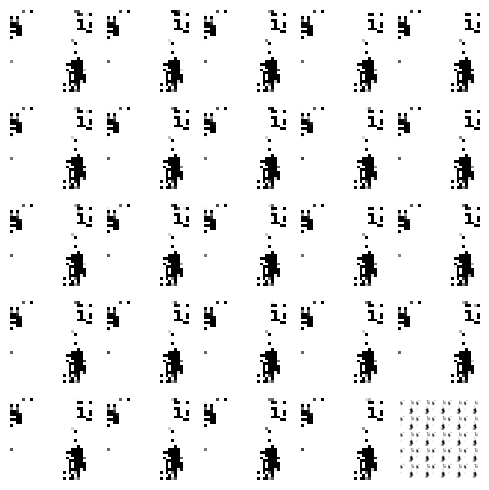

  0%|          | 0/350 [00:00<?, ?it/s]

4/4 [==============================] - 0s 17ms/step


  0%|          | 1/350 [00:00<03:37,  1.60it/s]

4/4 [==============================] - 0s 12ms/step


  1%|          | 2/350 [00:01<03:38,  1.59it/s]

4/4 [==============================] - 0s 13ms/step


  1%|          | 3/350 [00:01<03:36,  1.60it/s]

4/4 [==============================] - 0s 13ms/step


  1%|          | 4/350 [00:02<03:23,  1.70it/s]

4/4 [==============================] - 0s 16ms/step


  1%|▏         | 5/350 [00:03<03:37,  1.59it/s]

4/4 [==============================] - 0s 12ms/step


  2%|▏         | 6/350 [00:03<03:30,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


  2%|▏         | 7/350 [00:04<03:29,  1.64it/s]

4/4 [==============================] - 0s 13ms/step


  2%|▏         | 8/350 [00:04<03:18,  1.72it/s]

4/4 [==============================] - 0s 16ms/step


  3%|▎         | 9/350 [00:05<03:30,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


  3%|▎         | 10/350 [00:06<03:19,  1.70it/s]

4/4 [==============================] - 0s 34ms/step


  3%|▎         | 11/350 [00:06<03:20,  1.69it/s]

4/4 [==============================] - 0s 10ms/step


  3%|▎         | 12/350 [00:07<03:20,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


  4%|▎         | 13/350 [00:07<03:14,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


  4%|▍         | 14/350 [00:08<03:16,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


  4%|▍         | 15/350 [00:08<03:07,  1.78it/s]

4/4 [==============================] - 0s 23ms/step


  5%|▍         | 16/350 [00:09<03:18,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


  5%|▍         | 17/350 [00:10<03:18,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


  5%|▌         | 18/350 [00:10<03:16,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


  5%|▌         | 19/350 [00:11<03:17,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


  6%|▌         | 20/350 [00:11<03:09,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


  6%|▌         | 21/350 [00:12<03:15,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


  6%|▋         | 22/350 [00:13<03:08,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


  7%|▋         | 23/350 [00:13<03:01,  1.80it/s]

4/4 [==============================] - 0s 12ms/step


  7%|▋         | 24/350 [00:14<02:58,  1.83it/s]

4/4 [==============================] - 0s 16ms/step


  7%|▋         | 25/350 [00:14<03:11,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


  7%|▋         | 26/350 [00:15<03:19,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


  8%|▊         | 27/350 [00:15<03:09,  1.70it/s]

4/4 [==============================] - 0s 35ms/step


  8%|▊         | 28/350 [00:16<03:16,  1.64it/s]

4/4 [==============================] - 0s 13ms/step


  8%|▊         | 29/350 [00:17<03:10,  1.69it/s]

4/4 [==============================] - 0s 30ms/step


  9%|▊         | 30/350 [00:17<03:10,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


  9%|▉         | 31/350 [00:18<03:10,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


  9%|▉         | 32/350 [00:18<03:03,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


  9%|▉         | 33/350 [00:19<03:05,  1.71it/s]

4/4 [==============================] - 0s 13ms/step


 10%|▉         | 34/350 [00:20<02:59,  1.76it/s]

4/4 [==============================] - 0s 18ms/step


 10%|█         | 35/350 [00:20<03:06,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 10%|█         | 36/350 [00:21<03:00,  1.74it/s]

4/4 [==============================] - 0s 16ms/step


 11%|█         | 37/350 [00:21<03:11,  1.64it/s]

4/4 [==============================] - 0s 13ms/step


 11%|█         | 38/350 [00:22<03:02,  1.71it/s]

4/4 [==============================] - 0s 15ms/step


 11%|█         | 39/350 [00:23<03:09,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 11%|█▏        | 40/350 [00:23<03:00,  1.72it/s]

4/4 [==============================] - 0s 16ms/step


 12%|█▏        | 41/350 [00:24<03:03,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 12%|█▏        | 42/350 [00:24<03:03,  1.68it/s]

4/4 [==============================] - 0s 14ms/step


 12%|█▏        | 43/350 [00:25<02:56,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 13%|█▎        | 44/350 [00:25<02:58,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


 13%|█▎        | 45/350 [00:26<02:53,  1.76it/s]

4/4 [==============================] - 0s 21ms/step


 13%|█▎        | 46/350 [00:27<02:57,  1.71it/s]

4/4 [==============================] - 0s 13ms/step


 13%|█▎        | 47/350 [00:27<02:52,  1.76it/s]

4/4 [==============================] - 0s 27ms/step


 14%|█▎        | 48/350 [00:28<02:54,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 14%|█▍        | 49/350 [00:28<02:58,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 14%|█▍        | 50/350 [00:29<02:51,  1.75it/s]

4/4 [==============================] - 0s 16ms/step


 15%|█▍        | 51/350 [00:30<02:59,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 15%|█▍        | 52/350 [00:30<02:51,  1.74it/s]

4/4 [==============================] - 0s 16ms/step


 15%|█▌        | 53/350 [00:31<03:04,  1.61it/s]

4/4 [==============================] - 0s 13ms/step


 15%|█▌        | 54/350 [00:31<02:54,  1.70it/s]

4/4 [==============================] - 0s 22ms/step


 16%|█▌        | 55/350 [00:32<02:55,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 16%|█▌        | 56/350 [00:33<02:56,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 16%|█▋        | 57/350 [00:33<02:50,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


 17%|█▋        | 58/350 [00:34<02:51,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 17%|█▋        | 59/350 [00:34<02:45,  1.76it/s]

4/4 [==============================] - 0s 18ms/step


 17%|█▋        | 60/350 [00:35<02:52,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 17%|█▋        | 61/350 [00:35<02:47,  1.73it/s]

4/4 [==============================] - 0s 25ms/step


 18%|█▊        | 62/350 [00:36<02:56,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 18%|█▊        | 63/350 [00:37<02:47,  1.71it/s]

4/4 [==============================] - 0s 15ms/step


 18%|█▊        | 64/350 [00:37<02:47,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 19%|█▊        | 65/350 [00:38<02:51,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 19%|█▉        | 66/350 [00:38<02:43,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 19%|█▉        | 67/350 [00:39<02:44,  1.72it/s]

4/4 [==============================] - 0s 11ms/step


 19%|█▉        | 68/350 [00:39<02:39,  1.77it/s]

4/4 [==============================] - 0s 21ms/step


 20%|█▉        | 69/350 [00:40<02:50,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 20%|██        | 70/350 [00:41<02:43,  1.72it/s]

4/4 [==============================] - 0s 22ms/step


 20%|██        | 71/350 [00:41<02:45,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


 21%|██        | 72/350 [00:42<02:45,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 21%|██        | 73/350 [00:42<02:41,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 21%|██        | 74/350 [00:43<02:36,  1.77it/s]

4/4 [==============================] - 0s 19ms/step


 21%|██▏       | 75/350 [00:44<02:39,  1.73it/s]

4/4 [==============================] - 0s 12ms/step


 22%|██▏       | 76/350 [00:44<02:34,  1.78it/s]

4/4 [==============================] - 0s 12ms/step


 22%|██▏       | 77/350 [00:45<02:38,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 22%|██▏       | 78/350 [00:45<02:43,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 23%|██▎       | 79/350 [00:46<02:37,  1.72it/s]

4/4 [==============================] - 0s 15ms/step


 23%|██▎       | 80/350 [00:47<02:42,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


 23%|██▎       | 81/350 [00:47<02:37,  1.71it/s]

4/4 [==============================] - 0s 16ms/step


 23%|██▎       | 82/350 [00:48<02:37,  1.70it/s]

4/4 [==============================] - 0s 13ms/step


 24%|██▎       | 83/350 [00:48<02:37,  1.70it/s]

4/4 [==============================] - 0s 13ms/step


 24%|██▍       | 84/350 [00:49<02:31,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 24%|██▍       | 85/350 [00:49<02:34,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


 25%|██▍       | 86/350 [00:50<02:29,  1.77it/s]

4/4 [==============================] - 0s 11ms/step


 25%|██▍       | 87/350 [00:51<02:30,  1.74it/s]

4/4 [==============================] - 0s 11ms/step


 25%|██▌       | 88/350 [00:51<02:25,  1.80it/s]

4/4 [==============================] - 0s 16ms/step


 25%|██▌       | 89/350 [00:52<02:36,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 26%|██▌       | 90/350 [00:52<02:30,  1.73it/s]

4/4 [==============================] - 0s 22ms/step


 26%|██▌       | 91/350 [00:53<02:38,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 26%|██▋       | 92/350 [00:54<02:31,  1.70it/s]

4/4 [==============================] - 0s 22ms/step


 27%|██▋       | 93/350 [00:54<02:33,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


 27%|██▋       | 94/350 [00:55<02:32,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 27%|██▋       | 95/350 [00:55<02:27,  1.73it/s]

4/4 [==============================] - 0s 16ms/step


 27%|██▋       | 96/350 [00:56<02:34,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 28%|██▊       | 97/350 [00:57<02:28,  1.70it/s]

4/4 [==============================] - 0s 32ms/step


 28%|██▊       | 98/350 [00:57<02:28,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 28%|██▊       | 99/350 [00:58<02:27,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 29%|██▊       | 100/350 [00:58<02:22,  1.76it/s]

4/4 [==============================] - 0s 20ms/step


 29%|██▉       | 101/350 [00:59<02:31,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 29%|██▉       | 102/350 [00:59<02:25,  1.71it/s]

4/4 [==============================] - 0s 25ms/step


 29%|██▉       | 103/350 [01:00<02:31,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 30%|██▉       | 104/350 [01:01<02:23,  1.71it/s]

4/4 [==============================] - 0s 15ms/step


 30%|███       | 105/350 [01:01<02:25,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


 30%|███       | 106/350 [01:02<02:24,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 31%|███       | 107/350 [01:02<02:19,  1.74it/s]

4/4 [==============================] - 0s 14ms/step


 31%|███       | 108/350 [01:03<02:20,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


 31%|███       | 109/350 [01:04<02:17,  1.75it/s]

4/4 [==============================] - 0s 22ms/step


 31%|███▏      | 110/350 [01:04<02:23,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 32%|███▏      | 111/350 [01:05<02:23,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 32%|███▏      | 112/350 [01:05<02:21,  1.69it/s]

4/4 [==============================] - 0s 13ms/step


 32%|███▏      | 113/350 [01:06<02:17,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 33%|███▎      | 114/350 [01:07<02:18,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 33%|███▎      | 115/350 [01:07<02:13,  1.76it/s]

4/4 [==============================] - 0s 11ms/step


 33%|███▎      | 116/350 [01:08<02:09,  1.81it/s]

4/4 [==============================] - 0s 12ms/step


 33%|███▎      | 117/350 [01:08<02:08,  1.81it/s]

4/4 [==============================] - 0s 12ms/step


 34%|███▎      | 118/350 [01:09<02:11,  1.77it/s]

4/4 [==============================] - 0s 12ms/step


 34%|███▍      | 119/350 [01:09<02:08,  1.80it/s]

4/4 [==============================] - 0s 20ms/step


 34%|███▍      | 120/350 [01:10<02:15,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 35%|███▍      | 121/350 [01:10<02:11,  1.74it/s]

4/4 [==============================] - 0s 31ms/step


 35%|███▍      | 122/350 [01:11<02:13,  1.71it/s]

4/4 [==============================] - 0s 11ms/step


 35%|███▌      | 123/350 [01:12<02:14,  1.69it/s]

4/4 [==============================] - 0s 13ms/step


 35%|███▌      | 124/350 [01:12<02:08,  1.76it/s]

4/4 [==============================] - 0s 12ms/step


 36%|███▌      | 125/350 [01:13<02:10,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 36%|███▌      | 126/350 [01:13<02:05,  1.78it/s]

4/4 [==============================] - 0s 11ms/step


 36%|███▋      | 127/350 [01:14<02:01,  1.83it/s]

4/4 [==============================] - 0s 12ms/step


 37%|███▋      | 128/350 [01:14<01:59,  1.85it/s]

4/4 [==============================] - 0s 22ms/step


 37%|███▋      | 129/350 [01:15<02:09,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 37%|███▋      | 130/350 [01:16<02:08,  1.71it/s]

4/4 [==============================] - 0s 11ms/step


 37%|███▋      | 131/350 [01:16<02:04,  1.76it/s]

4/4 [==============================] - 0s 18ms/step


 38%|███▊      | 132/350 [01:17<02:10,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 38%|███▊      | 133/350 [01:17<02:06,  1.72it/s]

4/4 [==============================] - 0s 24ms/step


 38%|███▊      | 134/350 [01:18<02:12,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 39%|███▊      | 135/350 [01:19<02:06,  1.70it/s]

4/4 [==============================] - 0s 29ms/step


 39%|███▉      | 136/350 [01:19<02:11,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


 39%|███▉      | 137/350 [01:20<02:06,  1.68it/s]

4/4 [==============================] - 0s 29ms/step


 39%|███▉      | 138/350 [01:20<02:10,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


 40%|███▉      | 139/350 [01:21<02:04,  1.69it/s]

4/4 [==============================] - 0s 15ms/step


 40%|████      | 140/350 [01:22<02:05,  1.68it/s]

4/4 [==============================] - 0s 14ms/step


 40%|████      | 141/350 [01:22<02:03,  1.70it/s]

4/4 [==============================] - 0s 31ms/step


 41%|████      | 142/350 [01:23<02:07,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


 41%|████      | 143/350 [01:24<02:09,  1.60it/s]

4/4 [==============================] - 0s 11ms/step


 41%|████      | 144/350 [01:24<02:02,  1.69it/s]

4/4 [==============================] - 0s 15ms/step


 41%|████▏     | 145/350 [01:25<02:08,  1.60it/s]

4/4 [==============================] - 0s 13ms/step


 42%|████▏     | 146/350 [01:25<02:06,  1.61it/s]

4/4 [==============================] - 0s 16ms/step


 42%|████▏     | 147/350 [01:26<02:07,  1.60it/s]

4/4 [==============================] - 0s 12ms/step


 42%|████▏     | 148/350 [01:27<01:59,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 43%|████▎     | 149/350 [01:27<01:56,  1.73it/s]

4/4 [==============================] - 0s 11ms/step


 43%|████▎     | 150/350 [01:28<01:57,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 43%|████▎     | 151/350 [01:28<01:52,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 43%|████▎     | 152/350 [01:29<01:50,  1.80it/s]

4/4 [==============================] - 0s 31ms/step


 44%|████▎     | 153/350 [01:29<01:58,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 44%|████▍     | 154/350 [01:30<01:57,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 44%|████▍     | 155/350 [01:31<01:52,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 45%|████▍     | 156/350 [01:31<01:57,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 45%|████▍     | 157/350 [01:32<01:53,  1.70it/s]

4/4 [==============================] - 0s 14ms/step


 45%|████▌     | 158/350 [01:32<01:57,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 45%|████▌     | 159/350 [01:33<01:51,  1.71it/s]

4/4 [==============================] - 0s 19ms/step


 46%|████▌     | 160/350 [01:34<01:51,  1.70it/s]

4/4 [==============================] - 0s 23ms/step


 46%|████▌     | 161/350 [01:34<01:54,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 46%|████▋     | 162/350 [01:35<01:49,  1.71it/s]

4/4 [==============================] - 0s 29ms/step


 47%|████▋     | 163/350 [01:35<01:49,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 47%|████▋     | 164/350 [01:36<01:45,  1.77it/s]

4/4 [==============================] - 0s 15ms/step


 47%|████▋     | 165/350 [01:36<01:47,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 47%|████▋     | 166/350 [01:37<01:48,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 48%|████▊     | 167/350 [01:38<01:44,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 48%|████▊     | 168/350 [01:38<01:44,  1.73it/s]

4/4 [==============================] - 0s 12ms/step


 48%|████▊     | 169/350 [01:39<01:43,  1.75it/s]

4/4 [==============================] - 0s 12ms/step


 49%|████▊     | 170/350 [01:39<01:44,  1.73it/s]

4/4 [==============================] - 0s 12ms/step


 49%|████▉     | 171/350 [01:40<01:44,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


 49%|████▉     | 172/350 [01:41<01:49,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


 49%|████▉     | 173/350 [01:41<01:45,  1.68it/s]

4/4 [==============================] - 0s 34ms/step


 50%|████▉     | 174/350 [01:42<01:45,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 50%|█████     | 175/350 [01:42<01:44,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 50%|█████     | 176/350 [01:43<01:41,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 51%|█████     | 177/350 [01:44<01:42,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 51%|█████     | 178/350 [01:44<01:38,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 51%|█████     | 179/350 [01:45<01:42,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 51%|█████▏    | 180/350 [01:45<01:37,  1.74it/s]

4/4 [==============================] - 0s 20ms/step


 52%|█████▏    | 181/350 [01:46<01:42,  1.64it/s]

4/4 [==============================] - 0s 13ms/step


 52%|█████▏    | 182/350 [01:46<01:38,  1.71it/s]

4/4 [==============================] - 0s 13ms/step


 52%|█████▏    | 183/350 [01:47<01:37,  1.71it/s]

4/4 [==============================] - 0s 18ms/step


 53%|█████▎    | 184/350 [01:48<01:37,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 53%|█████▎    | 185/350 [01:48<01:38,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 53%|█████▎    | 186/350 [01:49<01:35,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


 53%|█████▎    | 187/350 [01:49<01:31,  1.78it/s]

4/4 [==============================] - 0s 26ms/step


 54%|█████▎    | 188/350 [01:50<01:33,  1.74it/s]

4/4 [==============================] - 0s 11ms/step


 54%|█████▍    | 189/350 [01:51<01:35,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 54%|█████▍    | 190/350 [01:51<01:35,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


 55%|█████▍    | 191/350 [01:52<01:31,  1.73it/s]

4/4 [==============================] - 0s 17ms/step


 55%|█████▍    | 192/350 [01:52<01:35,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 55%|█████▌    | 193/350 [01:53<01:32,  1.69it/s]

4/4 [==============================] - 0s 24ms/step


 55%|█████▌    | 194/350 [01:54<01:34,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


 56%|█████▌    | 195/350 [01:54<01:30,  1.71it/s]

4/4 [==============================] - 0s 17ms/step


 56%|█████▌    | 196/350 [01:55<01:34,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


 56%|█████▋    | 197/350 [01:55<01:32,  1.66it/s]

4/4 [==============================] - 0s 34ms/step


 57%|█████▋    | 198/350 [01:56<01:35,  1.60it/s]

4/4 [==============================] - 0s 11ms/step


 57%|█████▋    | 199/350 [01:57<01:29,  1.68it/s]

4/4 [==============================] - 0s 25ms/step


 57%|█████▋    | 200/350 [01:57<01:29,  1.68it/s]

4/4 [==============================] - 0s 17ms/step


 57%|█████▋    | 201/350 [01:58<01:29,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 58%|█████▊    | 202/350 [01:58<01:28,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 58%|█████▊    | 203/350 [01:59<01:25,  1.73it/s]

4/4 [==============================] - 0s 23ms/step


 58%|█████▊    | 204/350 [02:00<01:26,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 59%|█████▊    | 205/350 [02:00<01:26,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 59%|█████▉    | 206/350 [02:01<01:23,  1.73it/s]

4/4 [==============================] - 0s 18ms/step


 59%|█████▉    | 207/350 [02:01<01:23,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


 59%|█████▉    | 208/350 [02:02<01:23,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 60%|█████▉    | 209/350 [02:02<01:21,  1.74it/s]

4/4 [==============================] - 0s 22ms/step


 60%|██████    | 210/350 [02:03<01:21,  1.71it/s]

4/4 [==============================] - 0s 11ms/step


 60%|██████    | 211/350 [02:04<01:21,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 61%|██████    | 212/350 [02:04<01:21,  1.69it/s]

4/4 [==============================] - 0s 10ms/step


 61%|██████    | 213/350 [02:05<01:19,  1.72it/s]

4/4 [==============================] - 0s 14ms/step


 61%|██████    | 214/350 [02:05<01:22,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


 61%|██████▏   | 215/350 [02:06<01:18,  1.72it/s]

4/4 [==============================] - 0s 19ms/step


 62%|██████▏   | 216/350 [02:07<01:18,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 62%|██████▏   | 217/350 [02:07<01:19,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 62%|██████▏   | 218/350 [02:08<01:16,  1.73it/s]

4/4 [==============================] - 0s 21ms/step


 63%|██████▎   | 219/350 [02:08<01:16,  1.71it/s]

4/4 [==============================] - 0s 13ms/step


 63%|██████▎   | 220/350 [02:09<01:16,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 63%|██████▎   | 221/350 [02:09<01:14,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 63%|██████▎   | 222/350 [02:10<01:14,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 64%|██████▎   | 223/350 [02:11<01:11,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 64%|██████▍   | 224/350 [02:11<01:12,  1.73it/s]

4/4 [==============================] - 0s 11ms/step


 64%|██████▍   | 225/350 [02:12<01:10,  1.77it/s]

4/4 [==============================] - 0s 41ms/step


 65%|██████▍   | 226/350 [02:12<01:14,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 65%|██████▍   | 227/350 [02:13<01:13,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 65%|██████▌   | 228/350 [02:14<01:10,  1.73it/s]

4/4 [==============================] - 0s 16ms/step


 65%|██████▌   | 229/350 [02:14<01:14,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 66%|██████▌   | 230/350 [02:15<01:13,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 66%|██████▌   | 231/350 [02:15<01:09,  1.71it/s]

4/4 [==============================] - 0s 31ms/step


 66%|██████▋   | 232/350 [02:16<01:12,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 67%|██████▋   | 233/350 [02:17<01:09,  1.68it/s]

4/4 [==============================] - 0s 19ms/step


 67%|██████▋   | 234/350 [02:17<01:08,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 67%|██████▋   | 235/350 [02:18<01:08,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 67%|██████▋   | 236/350 [02:18<01:05,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 68%|██████▊   | 237/350 [02:19<01:06,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 68%|██████▊   | 238/350 [02:19<01:03,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 68%|██████▊   | 239/350 [02:20<01:04,  1.73it/s]

4/4 [==============================] - 0s 11ms/step


 69%|██████▊   | 240/350 [02:21<01:01,  1.78it/s]

4/4 [==============================] - 0s 21ms/step


 69%|██████▉   | 241/350 [02:21<01:05,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 69%|██████▉   | 242/350 [02:22<01:07,  1.61it/s]

4/4 [==============================] - 0s 12ms/step


 69%|██████▉   | 243/350 [02:22<01:03,  1.69it/s]

4/4 [==============================] - 0s 18ms/step


 70%|██████▉   | 244/350 [02:23<01:02,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 70%|███████   | 245/350 [02:24<01:03,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 70%|███████   | 246/350 [02:24<01:00,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


 71%|███████   | 247/350 [02:25<00:58,  1.76it/s]

4/4 [==============================] - 0s 25ms/step


 71%|███████   | 248/350 [02:25<00:58,  1.75it/s]

4/4 [==============================] - 0s 11ms/step


 71%|███████   | 249/350 [02:26<00:59,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 71%|███████▏  | 250/350 [02:26<00:56,  1.76it/s]

4/4 [==============================] - 0s 20ms/step


 72%|███████▏  | 251/350 [02:27<00:57,  1.73it/s]

4/4 [==============================] - 0s 12ms/step


 72%|███████▏  | 252/350 [02:28<00:55,  1.78it/s]

4/4 [==============================] - 0s 18ms/step


 72%|███████▏  | 253/350 [02:28<00:55,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 73%|███████▎  | 254/350 [02:29<00:56,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 73%|███████▎  | 255/350 [02:29<00:53,  1.76it/s]

4/4 [==============================] - 0s 16ms/step


 73%|███████▎  | 256/350 [02:30<00:56,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 73%|███████▎  | 257/350 [02:31<00:54,  1.70it/s]

4/4 [==============================] - 0s 18ms/step


 74%|███████▎  | 258/350 [02:31<00:56,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 74%|███████▍  | 259/350 [02:32<00:53,  1.70it/s]

4/4 [==============================] - 0s 35ms/step


 74%|███████▍  | 260/350 [02:32<00:53,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 75%|███████▍  | 261/350 [02:33<00:54,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 75%|███████▍  | 262/350 [02:34<00:51,  1.70it/s]

4/4 [==============================] - 0s 26ms/step


 75%|███████▌  | 263/350 [02:34<00:53,  1.64it/s]

4/4 [==============================] - 0s 13ms/step


 75%|███████▌  | 264/350 [02:35<00:50,  1.69it/s]

4/4 [==============================] - 0s 23ms/step


 76%|███████▌  | 265/350 [02:35<00:51,  1.66it/s]

4/4 [==============================] - 0s 16ms/step


 76%|███████▌  | 266/350 [02:36<00:50,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 76%|███████▋  | 267/350 [02:37<00:47,  1.73it/s]

4/4 [==============================] - 0s 32ms/step


 77%|███████▋  | 268/350 [02:37<00:47,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


 77%|███████▋  | 269/350 [02:38<00:48,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 77%|███████▋  | 270/350 [02:38<00:45,  1.74it/s]

4/4 [==============================] - 0s 25ms/step


 77%|███████▋  | 271/350 [02:39<00:47,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 78%|███████▊  | 272/350 [02:40<00:47,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 78%|███████▊  | 273/350 [02:40<00:45,  1.70it/s]

4/4 [==============================] - 0s 17ms/step


 78%|███████▊  | 274/350 [02:41<00:46,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


 79%|███████▊  | 275/350 [02:41<00:44,  1.69it/s]

4/4 [==============================] - 0s 16ms/step


 79%|███████▉  | 276/350 [02:42<00:45,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


 79%|███████▉  | 277/350 [02:43<00:43,  1.67it/s]

4/4 [==============================] - 0s 18ms/step


 79%|███████▉  | 278/350 [02:43<00:44,  1.61it/s]

4/4 [==============================] - 0s 11ms/step


 80%|███████▉  | 279/350 [02:44<00:45,  1.56it/s]

4/4 [==============================] - 0s 16ms/step


 80%|████████  | 280/350 [02:45<00:45,  1.53it/s]

4/4 [==============================] - 0s 12ms/step


 80%|████████  | 281/350 [02:45<00:42,  1.61it/s]

4/4 [==============================] - 0s 16ms/step


 81%|████████  | 282/350 [02:46<00:41,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 81%|████████  | 283/350 [02:46<00:40,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


 81%|████████  | 284/350 [02:47<00:38,  1.71it/s]

4/4 [==============================] - 0s 13ms/step


 81%|████████▏ | 285/350 [02:47<00:38,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 82%|████████▏ | 286/350 [02:48<00:38,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


 82%|████████▏ | 287/350 [02:49<00:36,  1.74it/s]

4/4 [==============================] - 0s 14ms/step


 82%|████████▏ | 288/350 [02:49<00:37,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 83%|████████▎ | 289/350 [02:50<00:35,  1.71it/s]

4/4 [==============================] - 0s 13ms/step


 83%|████████▎ | 290/350 [02:50<00:35,  1.70it/s]

4/4 [==============================] - 0s 13ms/step


 83%|████████▎ | 291/350 [02:51<00:35,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 83%|████████▎ | 292/350 [02:52<00:33,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 84%|████████▎ | 293/350 [02:52<00:32,  1.76it/s]

4/4 [==============================] - 0s 31ms/step


 84%|████████▍ | 294/350 [02:53<00:32,  1.73it/s]

4/4 [==============================] - 0s 12ms/step


 84%|████████▍ | 295/350 [02:53<00:32,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 85%|████████▍ | 296/350 [02:54<00:30,  1.76it/s]

4/4 [==============================] - 0s 23ms/step


 85%|████████▍ | 297/350 [02:54<00:30,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


 85%|████████▌ | 298/350 [02:55<00:30,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 85%|████████▌ | 299/350 [02:56<00:29,  1.75it/s]

4/4 [==============================] - 0s 24ms/step


 86%|████████▌ | 300/350 [02:56<00:30,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


 86%|████████▌ | 301/350 [02:57<00:28,  1.70it/s]

4/4 [==============================] - 0s 19ms/step


 86%|████████▋ | 302/350 [02:57<00:28,  1.69it/s]

4/4 [==============================] - 0s 14ms/step


 87%|████████▋ | 303/350 [02:58<00:28,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 87%|████████▋ | 304/350 [02:59<00:26,  1.73it/s]

4/4 [==============================] - 0s 11ms/step


 87%|████████▋ | 305/350 [02:59<00:26,  1.70it/s]

4/4 [==============================] - 0s 15ms/step


 87%|████████▋ | 306/350 [03:00<00:25,  1.75it/s]

4/4 [==============================] - 0s 12ms/step


 88%|████████▊ | 307/350 [03:00<00:24,  1.72it/s]

4/4 [==============================] - 0s 11ms/step


 88%|████████▊ | 308/350 [03:01<00:23,  1.77it/s]

4/4 [==============================] - 0s 20ms/step


 88%|████████▊ | 309/350 [03:02<00:25,  1.64it/s]

4/4 [==============================] - 0s 13ms/step


 89%|████████▊ | 310/350 [03:02<00:23,  1.72it/s]

4/4 [==============================] - 0s 28ms/step


 89%|████████▉ | 311/350 [03:03<00:23,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


 89%|████████▉ | 312/350 [03:03<00:22,  1.70it/s]

4/4 [==============================] - 0s 20ms/step


 89%|████████▉ | 313/350 [03:04<00:23,  1.61it/s]

4/4 [==============================] - 0s 11ms/step


 90%|████████▉ | 314/350 [03:04<00:21,  1.69it/s]

4/4 [==============================] - 0s 16ms/step


 90%|█████████ | 315/350 [03:05<00:21,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 90%|█████████ | 316/350 [03:06<00:20,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


 91%|█████████ | 317/350 [03:06<00:19,  1.69it/s]

4/4 [==============================] - 0s 17ms/step


 91%|█████████ | 318/350 [03:07<00:19,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 91%|█████████ | 319/350 [03:07<00:18,  1.71it/s]

4/4 [==============================] - 0s 16ms/step


 91%|█████████▏| 320/350 [03:08<00:17,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 92%|█████████▏| 321/350 [03:09<00:17,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 92%|█████████▏| 322/350 [03:09<00:16,  1.73it/s]

4/4 [==============================] - 0s 12ms/step


 92%|█████████▏| 323/350 [03:10<00:15,  1.71it/s]

4/4 [==============================] - 0s 11ms/step


 93%|█████████▎| 324/350 [03:10<00:14,  1.77it/s]

4/4 [==============================] - 0s 15ms/step


 93%|█████████▎| 325/350 [03:11<00:14,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 93%|█████████▎| 326/350 [03:12<00:14,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 93%|█████████▎| 327/350 [03:12<00:14,  1.64it/s]

4/4 [==============================] - 0s 13ms/step


 94%|█████████▎| 328/350 [03:13<00:13,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 94%|█████████▍| 329/350 [03:13<00:12,  1.70it/s]

4/4 [==============================] - 0s 13ms/step


 94%|█████████▍| 330/350 [03:14<00:11,  1.75it/s]

4/4 [==============================] - 0s 20ms/step


 95%|█████████▍| 331/350 [03:15<00:11,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 95%|█████████▍| 332/350 [03:15<00:10,  1.70it/s]

4/4 [==============================] - 0s 13ms/step


 95%|█████████▌| 333/350 [03:16<00:09,  1.73it/s]

4/4 [==============================] - 0s 35ms/step


 95%|█████████▌| 334/350 [03:16<00:09,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 96%|█████████▌| 335/350 [03:17<00:08,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 96%|█████████▌| 336/350 [03:17<00:07,  1.75it/s]

4/4 [==============================] - 0s 12ms/step


 96%|█████████▋| 337/350 [03:18<00:07,  1.77it/s]

4/4 [==============================] - 0s 16ms/step


 97%|█████████▋| 338/350 [03:19<00:06,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 97%|█████████▋| 339/350 [03:19<00:06,  1.78it/s]

4/4 [==============================] - 0s 18ms/step


 97%|█████████▋| 340/350 [03:20<00:05,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 97%|█████████▋| 341/350 [03:20<00:05,  1.77it/s]

4/4 [==============================] - 0s 28ms/step


 98%|█████████▊| 342/350 [03:21<00:04,  1.73it/s]

4/4 [==============================] - 0s 11ms/step


 98%|█████████▊| 343/350 [03:21<00:03,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 98%|█████████▊| 344/350 [03:22<00:03,  1.81it/s]

4/4 [==============================] - 0s 26ms/step


 99%|█████████▊| 345/350 [03:23<00:02,  1.74it/s]

4/4 [==============================] - 0s 11ms/step


 99%|█████████▉| 346/350 [03:23<00:02,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


 99%|█████████▉| 347/350 [03:24<00:01,  1.77it/s]

4/4 [==============================] - 0s 28ms/step


 99%|█████████▉| 348/350 [03:24<00:01,  1.69it/s]

4/4 [==============================] - 0s 13ms/step


100%|█████████▉| 349/350 [03:25<00:00,  1.72it/s]

4/4 [==============================] - 0s 14ms/step


100%|██████████| 350/350 [03:26<00:00,  1.70it/s]

Epoch number: 44 discriminator_loss: 0.166300291716803 generator_loss: 7.318834274836949
1/1 [==============================] - 0s 22ms/step


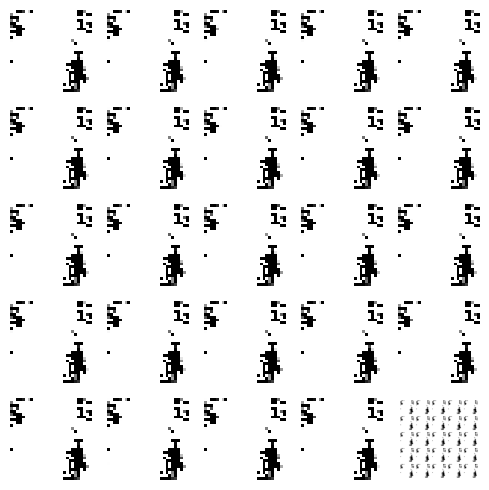

  0%|          | 0/350 [00:00<?, ?it/s]

4/4 [==============================] - 0s 13ms/step


  0%|          | 1/350 [00:00<03:41,  1.58it/s]

4/4 [==============================] - 0s 16ms/step


  1%|          | 2/350 [00:01<03:15,  1.78it/s]

4/4 [==============================] - 0s 24ms/step


  1%|          | 3/350 [00:01<03:31,  1.64it/s]

4/4 [==============================] - 0s 13ms/step


  1%|          | 4/350 [00:02<03:18,  1.74it/s]

4/4 [==============================] - 0s 16ms/step


  1%|▏         | 5/350 [00:02<03:21,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


  2%|▏         | 6/350 [00:03<03:13,  1.77it/s]

4/4 [==============================] - 0s 23ms/step


  2%|▏         | 7/350 [00:04<03:25,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


  2%|▏         | 8/350 [00:04<03:26,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


  3%|▎         | 9/350 [00:05<03:24,  1.67it/s]

4/4 [==============================] - 0s 14ms/step


  3%|▎         | 10/350 [00:05<03:25,  1.65it/s]

4/4 [==============================] - 0s 15ms/step


  3%|▎         | 11/350 [00:06<03:20,  1.69it/s]

4/4 [==============================] - 0s 42ms/step


  3%|▎         | 12/350 [00:07<03:30,  1.61it/s]

4/4 [==============================] - 0s 13ms/step


  4%|▎         | 13/350 [00:07<03:24,  1.65it/s]

4/4 [==============================] - 0s 20ms/step


  4%|▍         | 14/350 [00:08<03:30,  1.60it/s]

4/4 [==============================] - 0s 13ms/step


  4%|▍         | 15/350 [00:09<03:22,  1.65it/s]

4/4 [==============================] - 0s 16ms/step


  5%|▍         | 16/350 [00:09<03:21,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


  5%|▍         | 17/350 [00:10<03:20,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


  5%|▌         | 18/350 [00:10<03:12,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


  5%|▌         | 19/350 [00:11<03:17,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


  6%|▌         | 20/350 [00:11<03:10,  1.74it/s]

4/4 [==============================] - 0s 21ms/step


  6%|▌         | 21/350 [00:12<03:17,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


  6%|▋         | 22/350 [00:13<03:10,  1.72it/s]

4/4 [==============================] - 0s 34ms/step


  7%|▋         | 23/350 [00:13<03:14,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


  7%|▋         | 24/350 [00:14<03:14,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


  7%|▋         | 25/350 [00:14<03:07,  1.74it/s]

4/4 [==============================] - 0s 16ms/step


  7%|▋         | 26/350 [00:15<03:17,  1.64it/s]

4/4 [==============================] - 0s 18ms/step


  8%|▊         | 27/350 [00:16<03:11,  1.69it/s]

4/4 [==============================] - 0s 19ms/step


  8%|▊         | 28/350 [00:16<03:19,  1.61it/s]

4/4 [==============================] - 0s 13ms/step


  8%|▊         | 29/350 [00:17<03:09,  1.70it/s]

4/4 [==============================] - 0s 33ms/step


  9%|▊         | 30/350 [00:17<03:10,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


  9%|▉         | 31/350 [00:18<03:13,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


  9%|▉         | 32/350 [00:19<03:05,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


  9%|▉         | 33/350 [00:19<03:06,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 10%|▉         | 34/350 [00:20<02:59,  1.76it/s]

4/4 [==============================] - 0s 41ms/step


 10%|█         | 35/350 [00:20<03:21,  1.56it/s]

4/4 [==============================] - 0s 12ms/step


 10%|█         | 36/350 [00:21<03:09,  1.65it/s]

4/4 [==============================] - 0s 32ms/step


 11%|█         | 37/350 [00:22<03:16,  1.60it/s]

4/4 [==============================] - 0s 12ms/step


 11%|█         | 38/350 [00:22<03:05,  1.68it/s]

4/4 [==============================] - 0s 18ms/step


 11%|█         | 39/350 [00:23<03:14,  1.60it/s]

4/4 [==============================] - 0s 11ms/step


 11%|█▏        | 40/350 [00:23<03:04,  1.68it/s]

4/4 [==============================] - 0s 30ms/step


 12%|█▏        | 41/350 [00:24<03:13,  1.60it/s]

4/4 [==============================] - 0s 12ms/step


 12%|█▏        | 42/350 [00:25<03:03,  1.68it/s]

4/4 [==============================] - 0s 30ms/step


 12%|█▏        | 43/350 [00:25<03:06,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 13%|█▎        | 44/350 [00:26<03:03,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 13%|█▎        | 45/350 [00:26<02:55,  1.73it/s]

4/4 [==============================] - 0s 22ms/step


 13%|█▎        | 46/350 [00:27<03:03,  1.65it/s]

4/4 [==============================] - 0s 14ms/step


 13%|█▎        | 47/350 [00:28<02:58,  1.70it/s]

4/4 [==============================] - 0s 30ms/step


 14%|█▎        | 48/350 [00:28<03:06,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


 14%|█▍        | 49/350 [00:29<02:57,  1.69it/s]

4/4 [==============================] - 0s 25ms/step


 14%|█▍        | 50/350 [00:30<03:05,  1.62it/s]

4/4 [==============================] - 0s 14ms/step


 15%|█▍        | 51/350 [00:30<03:05,  1.61it/s]

4/4 [==============================] - 0s 13ms/step


 15%|█▍        | 52/350 [00:31<02:56,  1.69it/s]

4/4 [==============================] - 0s 19ms/step


 15%|█▌        | 53/350 [00:31<03:02,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


 15%|█▌        | 54/350 [00:32<03:00,  1.64it/s]

4/4 [==============================] - 0s 13ms/step


 16%|█▌        | 55/350 [00:32<02:54,  1.69it/s]

4/4 [==============================] - 0s 15ms/step


 16%|█▌        | 56/350 [00:33<03:02,  1.61it/s]

4/4 [==============================] - 0s 12ms/step


 16%|█▋        | 57/350 [00:34<03:00,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 17%|█▋        | 58/350 [00:34<02:59,  1.63it/s]

4/4 [==============================] - 0s 14ms/step


 17%|█▋        | 59/350 [00:35<03:00,  1.61it/s]

4/4 [==============================] - 0s 14ms/step


 17%|█▋        | 60/350 [00:36<03:05,  1.56it/s]

4/4 [==============================] - 0s 13ms/step


 17%|█▋        | 61/350 [00:36<03:05,  1.56it/s]

4/4 [==============================] - 0s 12ms/step


 18%|█▊        | 62/350 [00:37<02:56,  1.63it/s]

4/4 [==============================] - 0s 19ms/step


 18%|█▊        | 63/350 [00:38<02:57,  1.62it/s]

4/4 [==============================] - 0s 11ms/step


 18%|█▊        | 64/350 [00:38<02:55,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 19%|█▊        | 65/350 [00:39<02:46,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 19%|█▉        | 66/350 [00:39<02:42,  1.75it/s]

4/4 [==============================] - 0s 25ms/step


 19%|█▉        | 67/350 [00:40<02:52,  1.64it/s]

4/4 [==============================] - 0s 13ms/step


 19%|█▉        | 68/350 [00:40<02:44,  1.71it/s]

4/4 [==============================] - 0s 15ms/step


 20%|█▉        | 69/350 [00:41<02:52,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 20%|██        | 70/350 [00:42<02:44,  1.70it/s]

4/4 [==============================] - 0s 21ms/step


 20%|██        | 71/350 [00:42<02:46,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 21%|██        | 72/350 [00:43<02:45,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 21%|██        | 73/350 [00:43<02:40,  1.72it/s]

4/4 [==============================] - 0s 15ms/step


 21%|██        | 74/350 [00:44<02:44,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 21%|██▏       | 75/350 [00:45<02:40,  1.71it/s]

4/4 [==============================] - 0s 25ms/step


 22%|██▏       | 76/350 [00:45<02:47,  1.64it/s]

4/4 [==============================] - 0s 13ms/step


 22%|██▏       | 77/350 [00:46<02:39,  1.72it/s]

4/4 [==============================] - 0s 20ms/step


 22%|██▏       | 78/350 [00:46<02:40,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 23%|██▎       | 79/350 [00:47<02:41,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


 23%|██▎       | 80/350 [00:47<02:36,  1.73it/s]

4/4 [==============================] - 0s 12ms/step


 23%|██▎       | 81/350 [00:48<02:36,  1.71it/s]

4/4 [==============================] - 0s 11ms/step


 23%|██▎       | 82/350 [00:49<02:31,  1.77it/s]

4/4 [==============================] - 0s 11ms/step


 24%|██▎       | 83/350 [00:49<02:37,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 24%|██▍       | 84/350 [00:50<02:31,  1.76it/s]

4/4 [==============================] - 0s 27ms/step


 24%|██▍       | 85/350 [00:50<02:39,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


 25%|██▍       | 86/350 [00:51<02:38,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


 25%|██▍       | 87/350 [00:52<02:39,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 25%|██▌       | 88/350 [00:52<02:39,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 25%|██▌       | 89/350 [00:53<02:40,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


 26%|██▌       | 90/350 [00:53<02:34,  1.68it/s]

4/4 [==============================] - 0s 15ms/step


 26%|██▌       | 91/350 [00:54<02:30,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 26%|██▋       | 92/350 [00:55<02:31,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 27%|██▋       | 93/350 [00:55<02:26,  1.76it/s]

4/4 [==============================] - 0s 12ms/step


 27%|██▋       | 94/350 [00:56<02:26,  1.75it/s]

4/4 [==============================] - 0s 15ms/step


 27%|██▋       | 95/350 [00:56<02:34,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 27%|██▋       | 96/350 [00:57<02:32,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


 28%|██▊       | 97/350 [00:58<02:26,  1.73it/s]

4/4 [==============================] - 0s 35ms/step


 28%|██▊       | 98/350 [00:58<02:33,  1.64it/s]

4/4 [==============================] - 0s 16ms/step


 28%|██▊       | 99/350 [00:59<02:28,  1.69it/s]

4/4 [==============================] - 0s 16ms/step


 29%|██▊       | 100/350 [00:59<02:33,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 29%|██▉       | 101/350 [01:00<02:25,  1.71it/s]

4/4 [==============================] - 0s 16ms/step


 29%|██▉       | 102/350 [01:01<02:30,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 29%|██▉       | 103/350 [01:01<02:25,  1.70it/s]

4/4 [==============================] - 0s 14ms/step


 30%|██▉       | 104/350 [01:02<02:30,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 30%|███       | 105/350 [01:02<02:24,  1.69it/s]

4/4 [==============================] - 0s 18ms/step


 30%|███       | 106/350 [01:03<02:25,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


 31%|███       | 107/350 [01:04<02:27,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 31%|███       | 108/350 [01:04<02:21,  1.71it/s]

4/4 [==============================] - 0s 13ms/step


 31%|███       | 109/350 [01:05<02:21,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 31%|███▏      | 110/350 [01:05<02:16,  1.75it/s]

4/4 [==============================] - 0s 12ms/step


 32%|███▏      | 111/350 [01:06<02:20,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 32%|███▏      | 112/350 [01:06<02:20,  1.69it/s]

4/4 [==============================] - 0s 13ms/step


 32%|███▏      | 113/350 [01:07<02:20,  1.69it/s]

4/4 [==============================] - 0s 15ms/step


 33%|███▎      | 114/350 [01:08<02:18,  1.70it/s]

4/4 [==============================] - 0s 43ms/step


 33%|███▎      | 115/350 [01:08<02:21,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 33%|███▎      | 116/350 [01:09<02:21,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 33%|███▎      | 117/350 [01:09<02:16,  1.71it/s]

4/4 [==============================] - 0s 33ms/step


 34%|███▎      | 118/350 [01:10<02:22,  1.63it/s]

4/4 [==============================] - 0s 14ms/step


 34%|███▍      | 119/350 [01:11<02:17,  1.68it/s]

4/4 [==============================] - 0s 35ms/step


 34%|███▍      | 120/350 [01:11<02:23,  1.60it/s]

4/4 [==============================] - 0s 12ms/step


 35%|███▍      | 121/350 [01:12<02:15,  1.69it/s]

4/4 [==============================] - 0s 16ms/step


 35%|███▍      | 122/350 [01:13<02:21,  1.61it/s]

4/4 [==============================] - 0s 14ms/step


 35%|███▌      | 123/350 [01:13<02:16,  1.66it/s]

4/4 [==============================] - 0s 31ms/step


 35%|███▌      | 124/350 [01:14<02:20,  1.61it/s]

4/4 [==============================] - 0s 12ms/step


 36%|███▌      | 125/350 [01:14<02:18,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 36%|███▌      | 126/350 [01:15<02:16,  1.64it/s]

4/4 [==============================] - 0s 15ms/step


 36%|███▋      | 127/350 [01:16<02:11,  1.69it/s]

4/4 [==============================] - 0s 31ms/step


 37%|███▋      | 128/350 [01:16<02:17,  1.62it/s]

4/4 [==============================] - 0s 13ms/step


 37%|███▋      | 129/350 [01:17<02:16,  1.62it/s]

4/4 [==============================] - 0s 11ms/step


 37%|███▋      | 130/350 [01:17<02:15,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


 37%|███▋      | 131/350 [01:18<02:10,  1.68it/s]

4/4 [==============================] - 0s 43ms/step


 38%|███▊      | 132/350 [01:19<02:17,  1.59it/s]

4/4 [==============================] - 0s 13ms/step


 38%|███▊      | 133/350 [01:19<02:10,  1.67it/s]

4/4 [==============================] - 0s 29ms/step


 38%|███▊      | 134/350 [01:20<02:10,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 39%|███▊      | 135/350 [01:20<02:11,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


 39%|███▉      | 136/350 [01:21<02:05,  1.71it/s]

4/4 [==============================] - 0s 18ms/step


 39%|███▉      | 137/350 [01:22<02:05,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 39%|███▉      | 138/350 [01:22<02:01,  1.75it/s]

4/4 [==============================] - 0s 31ms/step


 40%|███▉      | 139/350 [01:23<02:03,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 40%|████      | 140/350 [01:23<02:03,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 40%|████      | 141/350 [01:24<01:58,  1.76it/s]

4/4 [==============================] - 0s 19ms/step


 41%|████      | 142/350 [01:24<02:01,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 41%|████      | 143/350 [01:25<02:03,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 41%|████      | 144/350 [01:26<01:58,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 41%|████▏     | 145/350 [01:26<02:00,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 42%|████▏     | 146/350 [01:27<01:55,  1.77it/s]

4/4 [==============================] - 0s 48ms/step


 42%|████▏     | 147/350 [01:27<02:04,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 42%|████▏     | 148/350 [01:28<01:58,  1.70it/s]

4/4 [==============================] - 0s 24ms/step


 43%|████▎     | 149/350 [01:29<01:58,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 43%|████▎     | 150/350 [01:29<01:59,  1.68it/s]

4/4 [==============================] - 0s 15ms/step


 43%|████▎     | 151/350 [01:30<01:56,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 43%|████▎     | 152/350 [01:30<01:52,  1.76it/s]

4/4 [==============================] - 0s 34ms/step


 44%|████▎     | 153/350 [01:31<01:54,  1.72it/s]

4/4 [==============================] - 0s 11ms/step


 44%|████▍     | 154/350 [01:31<01:50,  1.78it/s]

4/4 [==============================] - 0s 12ms/step


 44%|████▍     | 155/350 [01:32<01:48,  1.80it/s]

4/4 [==============================] - 0s 17ms/step


 45%|████▍     | 156/350 [01:33<01:54,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 45%|████▍     | 157/350 [01:33<02:00,  1.60it/s]

4/4 [==============================] - 0s 12ms/step


 45%|████▌     | 158/350 [01:34<01:59,  1.60it/s]

4/4 [==============================] - 0s 12ms/step


 45%|████▌     | 159/350 [01:35<01:57,  1.62it/s]

4/4 [==============================] - 0s 11ms/step


 46%|████▌     | 160/350 [01:35<01:52,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 46%|████▌     | 161/350 [01:36<01:52,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 46%|████▋     | 162/350 [01:36<01:48,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 47%|████▋     | 163/350 [01:37<01:45,  1.77it/s]

4/4 [==============================] - 0s 12ms/step


 47%|████▋     | 164/350 [01:37<01:43,  1.80it/s]

4/4 [==============================] - 0s 12ms/step


 47%|████▋     | 165/350 [01:38<01:41,  1.82it/s]

4/4 [==============================] - 0s 12ms/step


 47%|████▋     | 166/350 [01:38<01:44,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 48%|████▊     | 167/350 [01:39<01:46,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


 48%|████▊     | 168/350 [01:40<01:46,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 48%|████▊     | 169/350 [01:40<01:46,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 49%|████▊     | 170/350 [01:41<01:46,  1.69it/s]

4/4 [==============================] - 0s 13ms/step


 49%|████▉     | 171/350 [01:42<01:48,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 49%|████▉     | 172/350 [01:42<01:47,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 49%|████▉     | 173/350 [01:43<01:48,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


 50%|████▉     | 174/350 [01:43<01:44,  1.68it/s]

4/4 [==============================] - 0s 19ms/step


 50%|█████     | 175/350 [01:44<01:45,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 50%|█████     | 176/350 [01:45<01:45,  1.65it/s]

4/4 [==============================] - 0s 13ms/step


 51%|█████     | 177/350 [01:45<01:40,  1.72it/s]

4/4 [==============================] - 0s 24ms/step


 51%|█████     | 178/350 [01:46<01:46,  1.61it/s]

4/4 [==============================] - 0s 12ms/step


 51%|█████     | 179/350 [01:46<01:43,  1.66it/s]

4/4 [==============================] - 0s 15ms/step


 51%|█████▏    | 180/350 [01:47<01:42,  1.65it/s]

4/4 [==============================] - 0s 14ms/step


 52%|█████▏    | 181/350 [01:48<01:42,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 52%|█████▏    | 182/350 [01:48<01:38,  1.71it/s]

4/4 [==============================] - 0s 22ms/step


 52%|█████▏    | 183/350 [01:49<01:39,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 53%|█████▎    | 184/350 [01:49<01:36,  1.73it/s]

4/4 [==============================] - 0s 21ms/step


 53%|█████▎    | 185/350 [01:50<01:36,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 53%|█████▎    | 186/350 [01:50<01:37,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 53%|█████▎    | 187/350 [01:51<01:34,  1.72it/s]

4/4 [==============================] - 0s 23ms/step


 54%|█████▎    | 188/350 [01:52<01:38,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 54%|█████▍    | 189/350 [01:52<01:33,  1.71it/s]

4/4 [==============================] - 0s 14ms/step


 54%|█████▍    | 190/350 [01:53<01:33,  1.71it/s]

4/4 [==============================] - 0s 13ms/step


 55%|█████▍    | 191/350 [01:53<01:35,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 55%|█████▍    | 192/350 [01:54<01:31,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 55%|█████▌    | 193/350 [01:55<01:31,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


 55%|█████▌    | 194/350 [01:55<01:28,  1.77it/s]

4/4 [==============================] - 0s 21ms/step


 56%|█████▌    | 195/350 [01:56<01:34,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


 56%|█████▌    | 196/350 [01:56<01:30,  1.69it/s]

4/4 [==============================] - 0s 21ms/step


 56%|█████▋    | 197/350 [01:57<01:34,  1.61it/s]

4/4 [==============================] - 0s 14ms/step


 57%|█████▋    | 198/350 [01:58<01:30,  1.69it/s]

4/4 [==============================] - 0s 18ms/step


 57%|█████▋    | 199/350 [01:58<01:30,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 57%|█████▋    | 200/350 [01:59<01:30,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 57%|█████▋    | 201/350 [01:59<01:26,  1.73it/s]

4/4 [==============================] - 0s 14ms/step


 58%|█████▊    | 202/350 [02:00<01:28,  1.68it/s]

4/4 [==============================] - 0s 14ms/step


 58%|█████▊    | 203/350 [02:01<01:25,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 58%|█████▊    | 204/350 [02:01<01:26,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 59%|█████▊    | 205/350 [02:02<01:22,  1.75it/s]

4/4 [==============================] - 0s 19ms/step


 59%|█████▉    | 206/350 [02:02<01:27,  1.65it/s]

4/4 [==============================] - 0s 13ms/step


 59%|█████▉    | 207/350 [02:03<01:24,  1.70it/s]

4/4 [==============================] - 0s 26ms/step


 59%|█████▉    | 208/350 [02:03<01:24,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 60%|█████▉    | 209/350 [02:04<01:23,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 60%|██████    | 210/350 [02:05<01:20,  1.74it/s]

4/4 [==============================] - 0s 21ms/step


 60%|██████    | 211/350 [02:05<01:25,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


 61%|██████    | 212/350 [02:06<01:23,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 61%|██████    | 213/350 [02:06<01:19,  1.72it/s]

4/4 [==============================] - 0s 35ms/step


 61%|██████    | 214/350 [02:07<01:22,  1.64it/s]

4/4 [==============================] - 0s 14ms/step


 61%|██████▏   | 215/350 [02:08<01:23,  1.62it/s]

4/4 [==============================] - 0s 13ms/step


 62%|██████▏   | 216/350 [02:08<01:22,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 62%|██████▏   | 217/350 [02:09<01:21,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 62%|██████▏   | 218/350 [02:10<01:20,  1.65it/s]

4/4 [==============================] - 0s 13ms/step


 63%|██████▎   | 219/350 [02:10<01:20,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


 63%|██████▎   | 220/350 [02:11<01:22,  1.57it/s]

4/4 [==============================] - 0s 12ms/step


 63%|██████▎   | 221/350 [02:11<01:18,  1.65it/s]

4/4 [==============================] - 0s 16ms/step


 63%|██████▎   | 222/350 [02:12<01:16,  1.66it/s]

4/4 [==============================] - 0s 14ms/step


 64%|██████▎   | 223/350 [02:13<01:17,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 64%|██████▍   | 224/350 [02:13<01:13,  1.72it/s]

4/4 [==============================] - 0s 16ms/step


 64%|██████▍   | 225/350 [02:14<01:16,  1.64it/s]

4/4 [==============================] - 0s 13ms/step


 65%|██████▍   | 226/350 [02:14<01:13,  1.70it/s]

4/4 [==============================] - 0s 17ms/step


 65%|██████▍   | 227/350 [02:15<01:14,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 65%|██████▌   | 228/350 [02:16<01:13,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 65%|██████▌   | 229/350 [02:16<01:10,  1.72it/s]

4/4 [==============================] - 0s 16ms/step


 66%|██████▌   | 230/350 [02:17<01:10,  1.70it/s]

4/4 [==============================] - 0s 36ms/step


 66%|██████▌   | 231/350 [02:17<01:12,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 66%|██████▋   | 232/350 [02:18<01:08,  1.72it/s]

4/4 [==============================] - 0s 11ms/step


 67%|██████▋   | 233/350 [02:18<01:05,  1.77it/s]

4/4 [==============================] - 0s 16ms/step


 67%|██████▋   | 234/350 [02:19<01:06,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 67%|██████▋   | 235/350 [02:20<01:05,  1.76it/s]

4/4 [==============================] - 0s 21ms/step


 67%|██████▋   | 236/350 [02:20<01:06,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


 68%|██████▊   | 237/350 [02:21<01:06,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 68%|██████▊   | 238/350 [02:21<01:03,  1.76it/s]

4/4 [==============================] - 0s 15ms/step


 68%|██████▊   | 239/350 [02:22<01:05,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 69%|██████▊   | 240/350 [02:22<01:02,  1.75it/s]

4/4 [==============================] - 0s 19ms/step


 69%|██████▉   | 241/350 [02:23<01:06,  1.65it/s]

4/4 [==============================] - 0s 13ms/step


 69%|██████▉   | 242/350 [02:24<01:02,  1.72it/s]

4/4 [==============================] - 0s 31ms/step


 69%|██████▉   | 243/350 [02:24<01:03,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 70%|██████▉   | 244/350 [02:25<01:03,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 70%|███████   | 245/350 [02:25<01:00,  1.73it/s]

4/4 [==============================] - 0s 23ms/step


 70%|███████   | 246/350 [02:26<01:03,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 71%|███████   | 247/350 [02:27<01:00,  1.69it/s]

4/4 [==============================] - 0s 25ms/step


 71%|███████   | 248/350 [02:27<01:00,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 71%|███████   | 249/350 [02:28<01:00,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 71%|███████▏  | 250/350 [02:28<00:57,  1.74it/s]

4/4 [==============================] - 0s 39ms/step


 72%|███████▏  | 251/350 [02:29<01:01,  1.61it/s]

4/4 [==============================] - 0s 12ms/step


 72%|███████▏  | 252/350 [02:30<00:57,  1.69it/s]

4/4 [==============================] - 0s 27ms/step


 72%|███████▏  | 253/350 [02:30<00:57,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


 73%|███████▎  | 254/350 [02:31<00:57,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 73%|███████▎  | 255/350 [02:31<00:55,  1.72it/s]

4/4 [==============================] - 0s 18ms/step


 73%|███████▎  | 256/350 [02:32<00:57,  1.64it/s]

4/4 [==============================] - 0s 13ms/step


 73%|███████▎  | 257/350 [02:33<00:54,  1.71it/s]

4/4 [==============================] - 0s 13ms/step


 74%|███████▎  | 258/350 [02:33<00:56,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


 74%|███████▍  | 259/350 [02:34<00:53,  1.71it/s]

4/4 [==============================] - 0s 10ms/step


 74%|███████▍  | 260/350 [02:34<00:53,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 75%|███████▍  | 261/350 [02:35<00:53,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


 75%|███████▍  | 262/350 [02:36<00:50,  1.73it/s]

4/4 [==============================] - 0s 16ms/step


 75%|███████▌  | 263/350 [02:36<00:51,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 75%|███████▌  | 264/350 [02:37<00:50,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 76%|███████▌  | 265/350 [02:37<00:48,  1.75it/s]

4/4 [==============================] - 0s 12ms/step


 76%|███████▌  | 266/350 [02:38<00:48,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 76%|███████▋  | 267/350 [02:38<00:47,  1.75it/s]

4/4 [==============================] - 0s 16ms/step


 77%|███████▋  | 268/350 [02:39<00:49,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 77%|███████▋  | 269/350 [02:40<00:47,  1.72it/s]

4/4 [==============================] - 0s 26ms/step


 77%|███████▋  | 270/350 [02:40<00:49,  1.63it/s]

4/4 [==============================] - 0s 16ms/step


 77%|███████▋  | 271/350 [02:41<00:47,  1.68it/s]

4/4 [==============================] - 0s 15ms/step


 78%|███████▊  | 272/350 [02:42<00:46,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 78%|███████▊  | 273/350 [02:42<00:45,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 78%|███████▊  | 274/350 [02:43<00:43,  1.73it/s]

4/4 [==============================] - 0s 32ms/step


 79%|███████▊  | 275/350 [02:43<00:44,  1.69it/s]

4/4 [==============================] - 0s 26ms/step


 79%|███████▉  | 276/350 [02:44<00:44,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 79%|███████▉  | 277/350 [02:44<00:42,  1.74it/s]

4/4 [==============================] - 0s 11ms/step


 79%|███████▉  | 278/350 [02:45<00:40,  1.78it/s]

4/4 [==============================] - 0s 20ms/step


 80%|███████▉  | 279/350 [02:46<00:41,  1.72it/s]

4/4 [==============================] - 0s 15ms/step


 80%|████████  | 280/350 [02:46<00:39,  1.76it/s]

4/4 [==============================] - 0s 10ms/step


 80%|████████  | 281/350 [02:47<00:38,  1.80it/s]

4/4 [==============================] - 0s 12ms/step


 81%|████████  | 282/350 [02:47<00:37,  1.82it/s]

4/4 [==============================] - 0s 31ms/step


 81%|████████  | 283/350 [02:48<00:39,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 81%|████████  | 284/350 [02:48<00:37,  1.74it/s]

4/4 [==============================] - 0s 22ms/step


 81%|████████▏ | 285/350 [02:49<00:39,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 82%|████████▏ | 286/350 [02:50<00:38,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 82%|████████▏ | 287/350 [02:50<00:37,  1.70it/s]

4/4 [==============================] - 0s 14ms/step


 82%|████████▏ | 288/350 [02:51<00:36,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 83%|████████▎ | 289/350 [02:51<00:36,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 83%|████████▎ | 290/350 [02:52<00:34,  1.74it/s]

4/4 [==============================] - 0s 16ms/step


 83%|████████▎ | 291/350 [02:53<00:34,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 83%|████████▎ | 292/350 [02:53<00:34,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 84%|████████▎ | 293/350 [02:54<00:32,  1.74it/s]

4/4 [==============================] - 0s 15ms/step


 84%|████████▍ | 294/350 [02:54<00:32,  1.71it/s]

4/4 [==============================] - 0s 13ms/step


 84%|████████▍ | 295/350 [02:55<00:32,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 85%|████████▍ | 296/350 [02:55<00:31,  1.73it/s]

4/4 [==============================] - 0s 29ms/step


 85%|████████▍ | 297/350 [02:56<00:31,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 85%|████████▌ | 298/350 [02:57<00:30,  1.69it/s]

4/4 [==============================] - 0s 16ms/step


 85%|████████▌ | 299/350 [02:57<00:30,  1.65it/s]

4/4 [==============================] - 0s 15ms/step


 86%|████████▌ | 300/350 [02:58<00:30,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 86%|████████▌ | 301/350 [02:59<00:29,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 86%|████████▋ | 302/350 [02:59<00:28,  1.71it/s]

4/4 [==============================] - 0s 21ms/step


 87%|████████▋ | 303/350 [03:00<00:28,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 87%|████████▋ | 304/350 [03:00<00:27,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 87%|████████▋ | 305/350 [03:01<00:25,  1.74it/s]

4/4 [==============================] - 0s 15ms/step


 87%|████████▋ | 306/350 [03:01<00:26,  1.67it/s]

4/4 [==============================] - 0s 15ms/step


 88%|████████▊ | 307/350 [03:02<00:25,  1.71it/s]

4/4 [==============================] - 0s 25ms/step


 88%|████████▊ | 308/350 [03:03<00:25,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


 88%|████████▊ | 309/350 [03:03<00:24,  1.70it/s]

4/4 [==============================] - 0s 29ms/step


 89%|████████▊ | 310/350 [03:04<00:23,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 89%|████████▉ | 311/350 [03:04<00:23,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 89%|████████▉ | 312/350 [03:05<00:22,  1.73it/s]

4/4 [==============================] - 0s 12ms/step


 89%|████████▉ | 313/350 [03:06<00:21,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 90%|████████▉ | 314/350 [03:06<00:20,  1.76it/s]

4/4 [==============================] - 0s 41ms/step


 90%|█████████ | 315/350 [03:07<00:21,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 90%|█████████ | 316/350 [03:07<00:19,  1.71it/s]

4/4 [==============================] - 0s 34ms/step


 91%|█████████ | 317/350 [03:08<00:19,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 91%|█████████ | 318/350 [03:09<00:19,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 91%|█████████ | 319/350 [03:09<00:17,  1.74it/s]

4/4 [==============================] - 0s 11ms/step


 91%|█████████▏| 320/350 [03:10<00:17,  1.70it/s]

4/4 [==============================] - 0s 13ms/step


 92%|█████████▏| 321/350 [03:10<00:17,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 92%|█████████▏| 322/350 [03:11<00:15,  1.76it/s]

4/4 [==============================] - 0s 14ms/step


 92%|█████████▏| 323/350 [03:11<00:15,  1.71it/s]

4/4 [==============================] - 0s 11ms/step


 93%|█████████▎| 324/350 [03:12<00:14,  1.76it/s]

4/4 [==============================] - 0s 15ms/step


 93%|█████████▎| 325/350 [03:13<00:14,  1.73it/s]

4/4 [==============================] - 0s 11ms/step


 93%|█████████▎| 326/350 [03:13<00:14,  1.70it/s]

4/4 [==============================] - 0s 13ms/step


 93%|█████████▎| 327/350 [03:14<00:13,  1.73it/s]

4/4 [==============================] - 0s 17ms/step


 94%|█████████▎| 328/350 [03:14<00:13,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 94%|█████████▍| 329/350 [03:15<00:12,  1.71it/s]

4/4 [==============================] - 0s 13ms/step


 94%|█████████▍| 330/350 [03:16<00:11,  1.71it/s]

4/4 [==============================] - 0s 20ms/step


 95%|█████████▍| 331/350 [03:16<00:11,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 95%|█████████▍| 332/350 [03:17<00:10,  1.73it/s]

4/4 [==============================] - 0s 12ms/step


 95%|█████████▌| 333/350 [03:17<00:09,  1.77it/s]

4/4 [==============================] - 0s 19ms/step


 95%|█████████▌| 334/350 [03:18<00:09,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 96%|█████████▌| 335/350 [03:18<00:08,  1.75it/s]

4/4 [==============================] - 0s 11ms/step


 96%|█████████▌| 336/350 [03:19<00:07,  1.80it/s]

4/4 [==============================] - 0s 19ms/step


 96%|█████████▋| 337/350 [03:20<00:07,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 97%|█████████▋| 338/350 [03:20<00:07,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


 97%|█████████▋| 339/350 [03:21<00:06,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 97%|█████████▋| 340/350 [03:21<00:06,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 97%|█████████▋| 341/350 [03:22<00:05,  1.73it/s]

4/4 [==============================] - 0s 42ms/step


 98%|█████████▊| 342/350 [03:23<00:04,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 98%|█████████▊| 343/350 [03:23<00:04,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 98%|█████████▊| 344/350 [03:24<00:03,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 99%|█████████▊| 345/350 [03:24<00:03,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 99%|█████████▉| 346/350 [03:25<00:02,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


 99%|█████████▉| 347/350 [03:26<00:01,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 99%|█████████▉| 348/350 [03:26<00:01,  1.65it/s]

4/4 [==============================] - 0s 13ms/step


100%|█████████▉| 349/350 [03:27<00:00,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


100%|██████████| 350/350 [03:27<00:00,  1.68it/s]

Epoch number: 45 discriminator_loss: 0.1656486717128012 generator_loss: 7.567932759693691
1/1 [==============================] - 0s 21ms/step


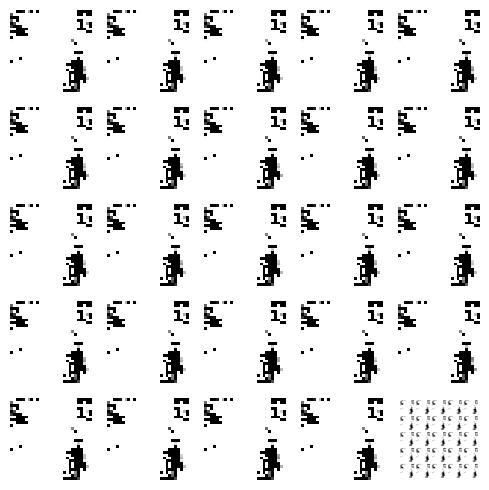

  0%|          | 0/350 [00:00<?, ?it/s]

4/4 [==============================] - 0s 30ms/step


  0%|          | 1/350 [00:00<03:52,  1.50it/s]

4/4 [==============================] - 0s 13ms/step


  1%|          | 2/350 [00:01<03:32,  1.64it/s]

4/4 [==============================] - 0s 26ms/step


  1%|          | 3/350 [00:01<03:37,  1.60it/s]

4/4 [==============================] - 0s 10ms/step


  1%|          | 4/350 [00:02<03:37,  1.59it/s]

4/4 [==============================] - 0s 11ms/step


  1%|▏         | 5/350 [00:03<03:26,  1.67it/s]

4/4 [==============================] - 0s 18ms/step


  2%|▏         | 6/350 [00:03<03:35,  1.60it/s]

4/4 [==============================] - 0s 11ms/step


  2%|▏         | 7/350 [00:04<03:24,  1.67it/s]

4/4 [==============================] - 0s 15ms/step


  2%|▏         | 8/350 [00:04<03:35,  1.59it/s]

4/4 [==============================] - 0s 13ms/step


  3%|▎         | 9/350 [00:05<03:33,  1.60it/s]

4/4 [==============================] - 0s 13ms/step


  3%|▎         | 10/350 [00:06<03:34,  1.58it/s]

4/4 [==============================] - 0s 12ms/step


  3%|▎         | 11/350 [00:06<03:22,  1.67it/s]

4/4 [==============================] - 0s 15ms/step


  3%|▎         | 12/350 [00:07<03:18,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


  4%|▎         | 13/350 [00:07<03:11,  1.76it/s]

4/4 [==============================] - 0s 14ms/step


  4%|▍         | 14/350 [00:08<03:14,  1.73it/s]

4/4 [==============================] - 0s 12ms/step


  4%|▍         | 15/350 [00:09<03:15,  1.71it/s]

4/4 [==============================] - 0s 14ms/step


  5%|▍         | 16/350 [00:09<03:27,  1.61it/s]

4/4 [==============================] - 0s 12ms/step


  5%|▍         | 17/350 [00:10<03:32,  1.56it/s]

4/4 [==============================] - 0s 11ms/step


  5%|▌         | 18/350 [00:10<03:21,  1.64it/s]

4/4 [==============================] - 0s 32ms/step


  5%|▌         | 19/350 [00:11<03:22,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


  6%|▌         | 20/350 [00:12<03:23,  1.62it/s]

4/4 [==============================] - 0s 11ms/step


  6%|▌         | 21/350 [00:12<03:13,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


  6%|▋         | 22/350 [00:13<03:07,  1.75it/s]

4/4 [==============================] - 0s 11ms/step


  7%|▋         | 23/350 [00:13<03:02,  1.79it/s]

4/4 [==============================] - 0s 32ms/step


  7%|▋         | 24/350 [00:14<03:15,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


  7%|▋         | 25/350 [00:15<03:15,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


  7%|▋         | 26/350 [00:15<03:14,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


  8%|▊         | 27/350 [00:16<03:16,  1.65it/s]

4/4 [==============================] - 0s 13ms/step


  8%|▊         | 28/350 [00:16<03:10,  1.69it/s]

4/4 [==============================] - 0s 22ms/step


  8%|▊         | 29/350 [00:17<03:19,  1.61it/s]

4/4 [==============================] - 0s 12ms/step


  9%|▊         | 30/350 [00:18<03:23,  1.57it/s]

4/4 [==============================] - 0s 12ms/step


  9%|▉         | 31/350 [00:18<03:19,  1.60it/s]

4/4 [==============================] - 0s 14ms/step


  9%|▉         | 32/350 [00:19<03:11,  1.66it/s]

4/4 [==============================] - 0s 16ms/step


  9%|▉         | 33/350 [00:20<03:18,  1.60it/s]

4/4 [==============================] - 0s 11ms/step


 10%|▉         | 34/350 [00:20<03:07,  1.68it/s]

4/4 [==============================] - 0s 37ms/step


 10%|█         | 35/350 [00:21<03:16,  1.61it/s]

4/4 [==============================] - 0s 15ms/step


 10%|█         | 36/350 [00:21<03:08,  1.67it/s]

4/4 [==============================] - 0s 15ms/step


 11%|█         | 37/350 [00:22<03:06,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 11%|█         | 38/350 [00:23<03:05,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


 11%|█         | 39/350 [00:23<02:58,  1.74it/s]

4/4 [==============================] - 0s 47ms/step


 11%|█▏        | 40/350 [00:24<03:04,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


 12%|█▏        | 41/350 [00:24<03:05,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 12%|█▏        | 42/350 [00:25<02:58,  1.72it/s]

4/4 [==============================] - 0s 27ms/step


 12%|█▏        | 43/350 [00:25<03:00,  1.70it/s]

4/4 [==============================] - 0s 13ms/step


 13%|█▎        | 44/350 [00:26<03:03,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 13%|█▎        | 45/350 [00:27<02:56,  1.73it/s]

4/4 [==============================] - 0s 11ms/step


 13%|█▎        | 46/350 [00:27<02:57,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 13%|█▎        | 47/350 [00:28<02:52,  1.76it/s]

4/4 [==============================] - 0s 12ms/step


 14%|█▎        | 48/350 [00:28<02:55,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


 14%|█▍        | 49/350 [00:29<02:58,  1.69it/s]

4/4 [==============================] - 0s 13ms/step


 14%|█▍        | 50/350 [00:30<03:02,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 15%|█▍        | 51/350 [00:30<02:55,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 15%|█▍        | 52/350 [00:31<02:51,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 15%|█▌        | 53/350 [00:31<02:52,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


 15%|█▌        | 54/350 [00:32<02:47,  1.76it/s]

4/4 [==============================] - 0s 12ms/step


 16%|█▌        | 55/350 [00:32<02:43,  1.81it/s]

4/4 [==============================] - 0s 22ms/step


 16%|█▌        | 56/350 [00:33<02:55,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 16%|█▋        | 57/350 [00:34<02:55,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 17%|█▋        | 58/350 [00:34<02:48,  1.73it/s]

4/4 [==============================] - 0s 31ms/step


 17%|█▋        | 59/350 [00:35<02:57,  1.64it/s]

4/4 [==============================] - 0s 13ms/step


 17%|█▋        | 60/350 [00:35<02:51,  1.69it/s]

4/4 [==============================] - 0s 16ms/step


 17%|█▋        | 61/350 [00:36<02:58,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


 18%|█▊        | 62/350 [00:37<02:49,  1.70it/s]

4/4 [==============================] - 0s 20ms/step


 18%|█▊        | 63/350 [00:37<02:49,  1.69it/s]

4/4 [==============================] - 0s 13ms/step


 18%|█▊        | 64/350 [00:38<02:52,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 19%|█▊        | 65/350 [00:38<02:44,  1.73it/s]

4/4 [==============================] - 0s 18ms/step


 19%|█▉        | 66/350 [00:39<02:46,  1.71it/s]

4/4 [==============================] - 0s 11ms/step


 19%|█▉        | 67/350 [00:40<02:46,  1.70it/s]

4/4 [==============================] - 0s 13ms/step


 19%|█▉        | 68/350 [00:40<02:41,  1.74it/s]

4/4 [==============================] - 0s 24ms/step


 20%|█▉        | 69/350 [00:41<02:44,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 20%|██        | 70/350 [00:41<02:45,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 20%|██        | 71/350 [00:42<02:39,  1.75it/s]

4/4 [==============================] - 0s 17ms/step


 21%|██        | 72/350 [00:42<02:43,  1.70it/s]

4/4 [==============================] - 0s 19ms/step


 21%|██        | 73/350 [00:43<02:44,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 21%|██        | 74/350 [00:44<02:37,  1.75it/s]

4/4 [==============================] - 0s 29ms/step


 21%|██▏       | 75/350 [00:44<02:39,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


 22%|██▏       | 76/350 [00:45<02:36,  1.75it/s]

4/4 [==============================] - 0s 21ms/step


 22%|██▏       | 77/350 [00:45<02:38,  1.72it/s]

4/4 [==============================] - 0s 11ms/step


 22%|██▏       | 78/350 [00:46<02:33,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 23%|██▎       | 79/350 [00:46<02:30,  1.81it/s]

4/4 [==============================] - 0s 30ms/step


 23%|██▎       | 80/350 [00:47<02:36,  1.73it/s]

4/4 [==============================] - 0s 12ms/step


 23%|██▎       | 81/350 [00:48<02:37,  1.71it/s]

4/4 [==============================] - 0s 11ms/step


 23%|██▎       | 82/350 [00:48<02:37,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 24%|██▎       | 83/350 [00:49<02:37,  1.69it/s]

4/4 [==============================] - 0s 13ms/step


 24%|██▍       | 84/350 [00:49<02:33,  1.73it/s]

4/4 [==============================] - 0s 20ms/step


 24%|██▍       | 85/350 [00:50<02:39,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 25%|██▍       | 86/350 [00:51<02:39,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 25%|██▍       | 87/350 [00:51<02:32,  1.73it/s]

4/4 [==============================] - 0s 50ms/step


 25%|██▌       | 88/350 [00:52<02:41,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


 25%|██▌       | 89/350 [00:52<02:33,  1.70it/s]

4/4 [==============================] - 0s 19ms/step


 26%|██▌       | 90/350 [00:53<02:34,  1.69it/s]

4/4 [==============================] - 0s 13ms/step


 26%|██▌       | 91/350 [00:54<02:34,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


 26%|██▋       | 92/350 [00:54<02:30,  1.72it/s]

4/4 [==============================] - 0s 15ms/step


 27%|██▋       | 93/350 [00:55<02:30,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 27%|██▋       | 94/350 [00:55<02:30,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 27%|██▋       | 95/350 [00:56<02:25,  1.75it/s]

4/4 [==============================] - 0s 16ms/step


 27%|██▋       | 96/350 [00:56<02:30,  1.69it/s]

4/4 [==============================] - 0s 13ms/step


 28%|██▊       | 97/350 [00:57<02:26,  1.73it/s]

4/4 [==============================] - 0s 18ms/step


 28%|██▊       | 98/350 [00:58<02:33,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 28%|██▊       | 99/350 [00:58<02:27,  1.70it/s]

4/4 [==============================] - 0s 15ms/step


 29%|██▊       | 100/350 [00:59<02:30,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 29%|██▉       | 101/350 [00:59<02:29,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 29%|██▉       | 102/350 [01:00<02:23,  1.73it/s]

4/4 [==============================] - 0s 28ms/step


 29%|██▉       | 103/350 [01:01<02:26,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 30%|██▉       | 104/350 [01:01<02:28,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 30%|███       | 105/350 [01:02<02:22,  1.72it/s]

4/4 [==============================] - 0s 42ms/step


 30%|███       | 106/350 [01:02<02:23,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 31%|███       | 107/350 [01:03<02:26,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


 31%|███       | 108/350 [01:04<02:22,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 31%|███       | 109/350 [01:04<02:22,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 31%|███▏      | 110/350 [01:05<02:17,  1.75it/s]

4/4 [==============================] - 0s 23ms/step


 32%|███▏      | 111/350 [01:05<02:24,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


 32%|███▏      | 112/350 [01:06<02:19,  1.70it/s]

4/4 [==============================] - 0s 16ms/step


 32%|███▏      | 113/350 [01:07<02:24,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 33%|███▎      | 114/350 [01:07<02:18,  1.71it/s]

4/4 [==============================] - 0s 15ms/step


 33%|███▎      | 115/350 [01:08<02:18,  1.69it/s]

4/4 [==============================] - 0s 13ms/step


 33%|███▎      | 116/350 [01:08<02:21,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 33%|███▎      | 117/350 [01:09<02:15,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


 34%|███▎      | 118/350 [01:09<02:11,  1.76it/s]

4/4 [==============================] - 0s 29ms/step


 34%|███▍      | 119/350 [01:10<02:19,  1.66it/s]

4/4 [==============================] - 0s 15ms/step


 34%|███▍      | 120/350 [01:11<02:25,  1.58it/s]

4/4 [==============================] - 0s 11ms/step


 35%|███▍      | 121/350 [01:11<02:22,  1.60it/s]

4/4 [==============================] - 0s 12ms/step


 35%|███▍      | 122/350 [01:12<02:19,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 35%|███▌      | 123/350 [01:13<02:15,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


 35%|███▌      | 124/350 [01:13<02:15,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 36%|███▌      | 125/350 [01:14<02:15,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 36%|███▌      | 126/350 [01:14<02:14,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 36%|███▋      | 127/350 [01:15<02:14,  1.66it/s]

4/4 [==============================] - 0s 14ms/step


 37%|███▋      | 128/350 [01:16<02:16,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 37%|███▋      | 129/350 [01:16<02:14,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 37%|███▋      | 130/350 [01:17<02:13,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 37%|███▋      | 131/350 [01:17<02:12,  1.66it/s]

4/4 [==============================] - 0s 14ms/step


 38%|███▊      | 132/350 [01:18<02:13,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 38%|███▊      | 133/350 [01:19<02:11,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 38%|███▊      | 134/350 [01:19<02:09,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 39%|███▊      | 135/350 [01:20<02:09,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


 39%|███▉      | 136/350 [01:20<02:10,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 39%|███▉      | 137/350 [01:21<02:09,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 39%|███▉      | 138/350 [01:22<02:08,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 40%|███▉      | 139/350 [01:22<02:12,  1.59it/s]

4/4 [==============================] - 0s 15ms/step


 40%|████      | 140/350 [01:23<02:05,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 40%|████      | 141/350 [01:23<02:02,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 41%|████      | 142/350 [01:24<01:58,  1.75it/s]

4/4 [==============================] - 0s 14ms/step


 41%|████      | 143/350 [01:25<02:05,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 41%|████      | 144/350 [01:25<02:01,  1.69it/s]

4/4 [==============================] - 0s 15ms/step


 41%|████▏     | 145/350 [01:26<02:02,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


 42%|████▏     | 146/350 [01:26<02:02,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 42%|████▏     | 147/350 [01:27<01:57,  1.73it/s]

4/4 [==============================] - 0s 11ms/step


 42%|████▏     | 148/350 [01:28<01:59,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 43%|████▎     | 149/350 [01:28<01:54,  1.75it/s]

4/4 [==============================] - 0s 16ms/step


 43%|████▎     | 150/350 [01:29<02:00,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 43%|████▎     | 151/350 [01:29<01:54,  1.73it/s]

4/4 [==============================] - 0s 26ms/step


 43%|████▎     | 152/350 [01:30<02:01,  1.62it/s]

4/4 [==============================] - 0s 13ms/step


 44%|████▎     | 153/350 [01:31<01:55,  1.70it/s]

4/4 [==============================] - 0s 21ms/step


 44%|████▍     | 154/350 [01:31<01:55,  1.69it/s]

4/4 [==============================] - 0s 13ms/step


 44%|████▍     | 155/350 [01:32<01:56,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 45%|████▍     | 156/350 [01:32<01:54,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 45%|████▍     | 157/350 [01:33<01:54,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 45%|████▌     | 158/350 [01:33<01:50,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 45%|████▌     | 159/350 [01:34<01:54,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 46%|████▌     | 160/350 [01:35<01:52,  1.68it/s]

4/4 [==============================] - 0s 30ms/step


 46%|████▌     | 161/350 [01:35<01:53,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 46%|████▋     | 162/350 [01:36<01:52,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 47%|████▋     | 163/350 [01:36<01:47,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 47%|████▋     | 164/350 [01:37<01:51,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 47%|████▋     | 165/350 [01:38<01:46,  1.74it/s]

4/4 [==============================] - 0s 15ms/step


 47%|████▋     | 166/350 [01:38<01:51,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 48%|████▊     | 167/350 [01:39<01:46,  1.71it/s]

4/4 [==============================] - 0s 14ms/step


 48%|████▊     | 168/350 [01:40<01:52,  1.61it/s]

4/4 [==============================] - 0s 10ms/step


 48%|████▊     | 169/350 [01:40<01:46,  1.69it/s]

4/4 [==============================] - 0s 16ms/step


 49%|████▊     | 170/350 [01:41<01:46,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 49%|████▉     | 171/350 [01:41<01:46,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 49%|████▉     | 172/350 [01:42<01:43,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 49%|████▉     | 173/350 [01:42<01:39,  1.77it/s]

4/4 [==============================] - 0s 24ms/step


 50%|████▉     | 174/350 [01:43<01:41,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 50%|█████     | 175/350 [01:44<01:42,  1.71it/s]

4/4 [==============================] - 0s 13ms/step


 50%|█████     | 176/350 [01:44<01:40,  1.74it/s]

4/4 [==============================] - 0s 22ms/step


 51%|█████     | 177/350 [01:45<01:40,  1.71it/s]

4/4 [==============================] - 0s 14ms/step


 51%|█████     | 178/350 [01:45<01:41,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 51%|█████     | 179/350 [01:46<01:37,  1.76it/s]

4/4 [==============================] - 0s 16ms/step


 51%|█████▏    | 180/350 [01:46<01:40,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 52%|█████▏    | 181/350 [01:47<01:36,  1.75it/s]

4/4 [==============================] - 0s 14ms/step


 52%|█████▏    | 182/350 [01:48<01:36,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 52%|█████▏    | 183/350 [01:48<01:37,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 53%|█████▎    | 184/350 [01:49<01:35,  1.74it/s]

4/4 [==============================] - 0s 16ms/step


 53%|█████▎    | 185/350 [01:49<01:39,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 53%|█████▎    | 186/350 [01:50<01:35,  1.71it/s]

4/4 [==============================] - 0s 21ms/step


 53%|█████▎    | 187/350 [01:51<01:36,  1.70it/s]

4/4 [==============================] - 0s 16ms/step


 54%|█████▎    | 188/350 [01:51<01:37,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 54%|█████▍    | 189/350 [01:52<01:34,  1.71it/s]

4/4 [==============================] - 0s 17ms/step


 54%|█████▍    | 190/350 [01:52<01:34,  1.70it/s]

4/4 [==============================] - 0s 13ms/step


 55%|█████▍    | 191/350 [01:53<01:31,  1.75it/s]

4/4 [==============================] - 0s 26ms/step


 55%|█████▍    | 192/350 [01:53<01:33,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 55%|█████▌    | 193/350 [01:54<01:33,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 55%|█████▌    | 194/350 [01:55<01:28,  1.75it/s]

4/4 [==============================] - 0s 19ms/step


 56%|█████▌    | 195/350 [01:55<01:29,  1.73it/s]

4/4 [==============================] - 0s 12ms/step


 56%|█████▌    | 196/350 [01:56<01:31,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 56%|█████▋    | 197/350 [01:56<01:27,  1.75it/s]

4/4 [==============================] - 0s 12ms/step


 57%|█████▋    | 198/350 [01:57<01:25,  1.78it/s]

4/4 [==============================] - 0s 28ms/step


 57%|█████▋    | 199/350 [01:57<01:26,  1.75it/s]

4/4 [==============================] - 0s 11ms/step


 57%|█████▋    | 200/350 [01:58<01:25,  1.76it/s]

4/4 [==============================] - 0s 11ms/step


 57%|█████▋    | 201/350 [01:59<01:26,  1.72it/s]

4/4 [==============================] - 0s 11ms/step


 58%|█████▊    | 202/350 [01:59<01:23,  1.77it/s]

4/4 [==============================] - 0s 12ms/step


 58%|█████▊    | 203/350 [02:00<01:24,  1.74it/s]

4/4 [==============================] - 0s 11ms/step


 58%|█████▊    | 204/350 [02:00<01:22,  1.77it/s]

4/4 [==============================] - 0s 11ms/step


 59%|█████▊    | 205/350 [02:01<01:24,  1.72it/s]

4/4 [==============================] - 0s 11ms/step


 59%|█████▉    | 206/350 [02:01<01:21,  1.77it/s]

4/4 [==============================] - 0s 12ms/step


 59%|█████▉    | 207/350 [02:02<01:22,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 59%|█████▉    | 208/350 [02:03<01:21,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 60%|█████▉    | 209/350 [02:03<01:21,  1.73it/s]

4/4 [==============================] - 0s 12ms/step


 60%|██████    | 210/350 [02:04<01:18,  1.77it/s]

4/4 [==============================] - 0s 12ms/step


 60%|██████    | 211/350 [02:04<01:19,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 61%|██████    | 212/350 [02:05<01:18,  1.76it/s]

4/4 [==============================] - 0s 12ms/step


 61%|██████    | 213/350 [02:05<01:18,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 61%|██████    | 214/350 [02:06<01:16,  1.78it/s]

4/4 [==============================] - 0s 12ms/step


 61%|██████▏   | 215/350 [02:07<01:17,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 62%|██████▏   | 216/350 [02:07<01:17,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


 62%|██████▏   | 217/350 [02:08<01:18,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 62%|██████▏   | 218/350 [02:08<01:15,  1.75it/s]

4/4 [==============================] - 0s 17ms/step


 63%|██████▎   | 219/350 [02:09<01:16,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


 63%|██████▎   | 220/350 [02:10<01:17,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 63%|██████▎   | 221/350 [02:10<01:13,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 63%|██████▎   | 222/350 [02:11<01:11,  1.78it/s]

4/4 [==============================] - 0s 18ms/step


 64%|██████▎   | 223/350 [02:11<01:12,  1.74it/s]

4/4 [==============================] - 0s 11ms/step


 64%|██████▍   | 224/350 [02:12<01:12,  1.75it/s]

4/4 [==============================] - 0s 11ms/step


 64%|██████▍   | 225/350 [02:12<01:12,  1.72it/s]

4/4 [==============================] - 0s 11ms/step


 65%|██████▍   | 226/350 [02:13<01:10,  1.76it/s]

4/4 [==============================] - 0s 12ms/step


 65%|██████▍   | 227/350 [02:14<01:10,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 65%|██████▌   | 228/350 [02:14<01:09,  1.76it/s]

4/4 [==============================] - 0s 11ms/step


 65%|██████▌   | 229/350 [02:15<01:10,  1.73it/s]

4/4 [==============================] - 0s 11ms/step


 66%|██████▌   | 230/350 [02:15<01:07,  1.78it/s]

4/4 [==============================] - 0s 12ms/step


 66%|██████▌   | 231/350 [02:16<01:09,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


 66%|██████▋   | 232/350 [02:16<01:07,  1.75it/s]

4/4 [==============================] - 0s 11ms/step


 67%|██████▋   | 233/350 [02:17<01:07,  1.72it/s]

4/4 [==============================] - 0s 11ms/step


 67%|██████▋   | 234/350 [02:18<01:05,  1.78it/s]

4/4 [==============================] - 0s 14ms/step


 67%|██████▋   | 235/350 [02:18<01:06,  1.73it/s]

4/4 [==============================] - 0s 12ms/step


 67%|██████▋   | 236/350 [02:19<01:05,  1.74it/s]

4/4 [==============================] - 0s 11ms/step


 68%|██████▊   | 237/350 [02:19<01:05,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


 68%|██████▊   | 238/350 [02:20<01:03,  1.76it/s]

4/4 [==============================] - 0s 12ms/step


 68%|██████▊   | 239/350 [02:20<01:04,  1.73it/s]

4/4 [==============================] - 0s 11ms/step


 69%|██████▊   | 240/350 [02:21<01:02,  1.75it/s]

4/4 [==============================] - 0s 24ms/step


 69%|██████▉   | 241/350 [02:22<01:03,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


 69%|██████▉   | 242/350 [02:22<01:03,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 69%|██████▉   | 243/350 [02:23<01:01,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 70%|██████▉   | 244/350 [02:23<01:00,  1.76it/s]

4/4 [==============================] - 0s 15ms/step


 70%|███████   | 245/350 [02:24<01:01,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


 70%|███████   | 246/350 [02:24<00:58,  1.76it/s]

4/4 [==============================] - 0s 15ms/step


 71%|███████   | 247/350 [02:25<00:59,  1.73it/s]

4/4 [==============================] - 0s 12ms/step


 71%|███████   | 248/350 [02:26<01:00,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 71%|███████   | 249/350 [02:26<00:57,  1.75it/s]

4/4 [==============================] - 0s 12ms/step


 71%|███████▏  | 250/350 [02:27<00:56,  1.78it/s]

4/4 [==============================] - 0s 12ms/step


 72%|███████▏  | 251/350 [02:27<00:55,  1.80it/s]

4/4 [==============================] - 0s 12ms/step


 72%|███████▏  | 252/350 [02:28<00:56,  1.73it/s]

4/4 [==============================] - 0s 11ms/step


 72%|███████▏  | 253/350 [02:28<00:54,  1.77it/s]

4/4 [==============================] - 0s 28ms/step


 73%|███████▎  | 254/350 [02:29<00:55,  1.73it/s]

4/4 [==============================] - 0s 12ms/step


 73%|███████▎  | 255/350 [02:30<00:55,  1.71it/s]

4/4 [==============================] - 0s 10ms/step


 73%|███████▎  | 256/350 [02:30<00:53,  1.74it/s]

4/4 [==============================] - 0s 11ms/step


 73%|███████▎  | 257/350 [02:31<00:54,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


 74%|███████▎  | 258/350 [02:31<00:52,  1.77it/s]

4/4 [==============================] - 0s 11ms/step


 74%|███████▍  | 259/350 [02:32<00:52,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 74%|███████▍  | 260/350 [02:32<00:51,  1.75it/s]

4/4 [==============================] - 0s 12ms/step


 75%|███████▍  | 261/350 [02:33<00:51,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


 75%|███████▍  | 262/350 [02:34<00:49,  1.77it/s]

4/4 [==============================] - 0s 12ms/step


 75%|███████▌  | 263/350 [02:34<00:49,  1.75it/s]

4/4 [==============================] - 0s 11ms/step


 75%|███████▌  | 264/350 [02:35<00:48,  1.77it/s]

4/4 [==============================] - 0s 11ms/step


 76%|███████▌  | 265/350 [02:35<00:48,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 76%|███████▌  | 266/350 [02:36<00:47,  1.78it/s]

4/4 [==============================] - 0s 11ms/step


 76%|███████▋  | 267/350 [02:36<00:47,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 77%|███████▋  | 268/350 [02:37<00:46,  1.77it/s]

4/4 [==============================] - 0s 12ms/step


 77%|███████▋  | 269/350 [02:38<00:46,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 77%|███████▋  | 270/350 [02:38<00:45,  1.77it/s]

4/4 [==============================] - 0s 12ms/step


 77%|███████▋  | 271/350 [02:39<00:45,  1.73it/s]

4/4 [==============================] - 0s 12ms/step


 78%|███████▊  | 272/350 [02:39<00:44,  1.76it/s]

4/4 [==============================] - 0s 12ms/step


 78%|███████▊  | 273/350 [02:40<00:44,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 78%|███████▊  | 274/350 [02:40<00:43,  1.76it/s]

4/4 [==============================] - 0s 12ms/step


 79%|███████▊  | 275/350 [02:41<00:43,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


 79%|███████▉  | 276/350 [02:42<00:42,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 79%|███████▉  | 277/350 [02:42<00:42,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 79%|███████▉  | 278/350 [02:43<00:41,  1.75it/s]

4/4 [==============================] - 0s 12ms/step


 80%|███████▉  | 279/350 [02:43<00:40,  1.73it/s]

4/4 [==============================] - 0s 12ms/step


 80%|████████  | 280/350 [02:44<00:39,  1.75it/s]

4/4 [==============================] - 0s 11ms/step


 80%|████████  | 281/350 [02:45<00:40,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


 81%|████████  | 282/350 [02:45<00:38,  1.77it/s]

4/4 [==============================] - 0s 12ms/step


 81%|████████  | 283/350 [02:46<00:38,  1.72it/s]

4/4 [==============================] - 0s 11ms/step


 81%|████████  | 284/350 [02:46<00:37,  1.75it/s]

4/4 [==============================] - 0s 12ms/step


 81%|████████▏ | 285/350 [02:47<00:38,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 82%|████████▏ | 286/350 [02:47<00:36,  1.76it/s]

4/4 [==============================] - 0s 12ms/step


 82%|████████▏ | 287/350 [02:48<00:36,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 82%|████████▏ | 288/350 [02:49<00:35,  1.74it/s]

4/4 [==============================] - 0s 11ms/step


 83%|████████▎ | 289/350 [02:49<00:33,  1.83it/s]

4/4 [==============================] - 0s 15ms/step


 83%|████████▎ | 290/350 [02:50<00:33,  1.78it/s]

4/4 [==============================] - 0s 12ms/step


 83%|████████▎ | 291/350 [02:50<00:33,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 83%|████████▎ | 292/350 [02:51<00:32,  1.77it/s]

4/4 [==============================] - 0s 25ms/step


 84%|████████▎ | 293/350 [02:51<00:33,  1.72it/s]

4/4 [==============================] - 0s 11ms/step


 84%|████████▍ | 294/350 [02:52<00:31,  1.76it/s]

4/4 [==============================] - 0s 15ms/step


 84%|████████▍ | 295/350 [02:53<00:31,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 85%|████████▍ | 296/350 [02:53<00:30,  1.78it/s]

4/4 [==============================] - 0s 35ms/step


 85%|████████▍ | 297/350 [02:54<00:31,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 85%|████████▌ | 298/350 [02:54<00:29,  1.75it/s]

4/4 [==============================] - 0s 15ms/step


 85%|████████▌ | 299/350 [02:55<00:29,  1.73it/s]

4/4 [==============================] - 0s 11ms/step


 86%|████████▌ | 300/350 [02:55<00:28,  1.76it/s]

4/4 [==============================] - 0s 14ms/step


 86%|████████▌ | 301/350 [02:56<00:28,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 86%|████████▋ | 302/350 [02:57<00:27,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 87%|████████▋ | 303/350 [02:57<00:26,  1.78it/s]

4/4 [==============================] - 0s 12ms/step


 87%|████████▋ | 304/350 [02:58<00:26,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 87%|████████▋ | 305/350 [02:58<00:25,  1.76it/s]

4/4 [==============================] - 0s 19ms/step


 87%|████████▋ | 306/350 [02:59<00:25,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 88%|████████▊ | 307/350 [02:59<00:24,  1.76it/s]

4/4 [==============================] - 0s 18ms/step


 88%|████████▊ | 308/350 [03:00<00:24,  1.72it/s]

4/4 [==============================] - 0s 14ms/step


 88%|████████▊ | 309/350 [03:01<00:23,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


 89%|████████▊ | 310/350 [03:01<00:23,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 89%|████████▉ | 311/350 [03:02<00:22,  1.77it/s]

4/4 [==============================] - 0s 12ms/step


 89%|████████▉ | 312/350 [03:02<00:21,  1.80it/s]

4/4 [==============================] - 0s 12ms/step


 89%|████████▉ | 313/350 [03:03<00:21,  1.75it/s]

4/4 [==============================] - 0s 11ms/step


 90%|████████▉ | 314/350 [03:03<00:19,  1.83it/s]

4/4 [==============================] - 0s 12ms/step


 90%|█████████ | 315/350 [03:04<00:19,  1.78it/s]

4/4 [==============================] - 0s 12ms/step


 90%|█████████ | 316/350 [03:04<00:18,  1.81it/s]

4/4 [==============================] - 0s 32ms/step


 91%|█████████ | 317/350 [03:05<00:19,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


 91%|█████████ | 318/350 [03:06<00:18,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 91%|█████████ | 319/350 [03:06<00:17,  1.75it/s]

4/4 [==============================] - 0s 12ms/step


 91%|█████████▏| 320/350 [03:07<00:16,  1.79it/s]

4/4 [==============================] - 0s 24ms/step


 92%|█████████▏| 321/350 [03:07<00:16,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


 92%|█████████▏| 322/350 [03:08<00:15,  1.75it/s]

4/4 [==============================] - 0s 37ms/step


 92%|█████████▏| 323/350 [03:09<00:15,  1.71it/s]

4/4 [==============================] - 0s 13ms/step


 93%|█████████▎| 324/350 [03:09<00:14,  1.76it/s]

4/4 [==============================] - 0s 12ms/step


 93%|█████████▎| 325/350 [03:10<00:14,  1.70it/s]

4/4 [==============================] - 0s 13ms/step


 93%|█████████▎| 326/350 [03:10<00:13,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 93%|█████████▎| 327/350 [03:11<00:12,  1.78it/s]

4/4 [==============================] - 0s 21ms/step


 94%|█████████▎| 328/350 [03:11<00:12,  1.77it/s]

4/4 [==============================] - 0s 11ms/step


 94%|█████████▍| 329/350 [03:12<00:11,  1.76it/s]

4/4 [==============================] - 0s 18ms/step


 94%|█████████▍| 330/350 [03:13<00:11,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 95%|█████████▍| 331/350 [03:13<00:10,  1.78it/s]

4/4 [==============================] - 0s 12ms/step


 95%|█████████▍| 332/350 [03:14<00:10,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 95%|█████████▌| 333/350 [03:14<00:09,  1.76it/s]

4/4 [==============================] - 0s 11ms/step


 95%|█████████▌| 334/350 [03:15<00:08,  1.80it/s]

4/4 [==============================] - 0s 14ms/step


 96%|█████████▌| 335/350 [03:15<00:08,  1.76it/s]

4/4 [==============================] - 0s 12ms/step


 96%|█████████▌| 336/350 [03:16<00:07,  1.79it/s]

4/4 [==============================] - 0s 35ms/step


 96%|█████████▋| 337/350 [03:17<00:07,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


 97%|█████████▋| 338/350 [03:17<00:06,  1.76it/s]

4/4 [==============================] - 0s 14ms/step


 97%|█████████▋| 339/350 [03:18<00:06,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


 97%|█████████▋| 340/350 [03:18<00:05,  1.76it/s]

4/4 [==============================] - 0s 11ms/step


 97%|█████████▋| 341/350 [03:19<00:05,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 98%|█████████▊| 342/350 [03:19<00:04,  1.75it/s]

4/4 [==============================] - 0s 12ms/step


 98%|█████████▊| 343/350 [03:20<00:03,  1.79it/s]

4/4 [==============================] - 0s 22ms/step


 98%|█████████▊| 344/350 [03:21<00:03,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 99%|█████████▊| 345/350 [03:21<00:02,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 99%|█████████▉| 346/350 [03:22<00:02,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 99%|█████████▉| 347/350 [03:22<00:01,  1.79it/s]

4/4 [==============================] - 0s 33ms/step


 99%|█████████▉| 348/350 [03:23<00:01,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


100%|█████████▉| 349/350 [03:23<00:00,  1.75it/s]

4/4 [==============================] - 0s 14ms/step


100%|██████████| 350/350 [03:24<00:00,  1.71it/s]

Epoch number: 46 discriminator_loss: 0.16518615802417377 generator_loss: 7.676332900183541
1/1 [==============================] - 0s 22ms/step


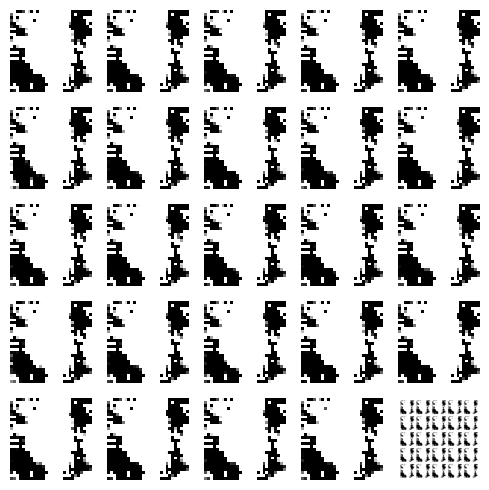

  0%|          | 0/350 [00:00<?, ?it/s]

4/4 [==============================] - 0s 17ms/step


  0%|          | 1/350 [00:00<03:30,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


  1%|          | 2/350 [00:01<03:26,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


  1%|          | 3/350 [00:01<03:19,  1.74it/s]

4/4 [==============================] - 0s 15ms/step


  1%|          | 4/350 [00:02<03:28,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


  1%|▏         | 5/350 [00:02<03:18,  1.74it/s]

4/4 [==============================] - 0s 17ms/step


  2%|▏         | 6/350 [00:03<03:25,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


  2%|▏         | 7/350 [00:04<03:18,  1.73it/s]

4/4 [==============================] - 0s 25ms/step


  2%|▏         | 8/350 [00:04<03:21,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


  3%|▎         | 9/350 [00:05<03:15,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


  3%|▎         | 10/350 [00:05<03:22,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


  3%|▎         | 11/350 [00:06<03:16,  1.73it/s]

4/4 [==============================] - 0s 12ms/step


  3%|▎         | 12/350 [00:06<03:09,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


  4%|▎         | 13/350 [00:07<03:13,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


  4%|▍         | 14/350 [00:08<03:08,  1.78it/s]

4/4 [==============================] - 0s 25ms/step


  4%|▍         | 15/350 [00:08<03:12,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


  5%|▍         | 16/350 [00:09<03:08,  1.78it/s]

4/4 [==============================] - 0s 17ms/step


  5%|▍         | 17/350 [00:09<03:11,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


  5%|▌         | 18/350 [00:10<03:11,  1.73it/s]

4/4 [==============================] - 0s 16ms/step


  5%|▌         | 19/350 [00:11<03:14,  1.70it/s]

4/4 [==============================] - 0s 13ms/step


  6%|▌         | 20/350 [00:11<03:09,  1.74it/s]

4/4 [==============================] - 0s 36ms/step


  6%|▌         | 21/350 [00:12<03:13,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


  6%|▋         | 22/350 [00:12<03:08,  1.74it/s]

4/4 [==============================] - 0s 11ms/step


  7%|▋         | 23/350 [00:13<03:11,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


  7%|▋         | 24/350 [00:13<03:05,  1.75it/s]

4/4 [==============================] - 0s 12ms/step


  7%|▋         | 25/350 [00:14<03:10,  1.71it/s]

4/4 [==============================] - 0s 13ms/step


  7%|▋         | 26/350 [00:15<03:06,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


  8%|▊         | 27/350 [00:15<03:09,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


  8%|▊         | 28/350 [00:16<03:03,  1.76it/s]

4/4 [==============================] - 0s 11ms/step


  8%|▊         | 29/350 [00:16<03:06,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


  9%|▊         | 30/350 [00:17<03:03,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


  9%|▉         | 31/350 [00:17<03:05,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


  9%|▉         | 32/350 [00:18<03:00,  1.76it/s]

4/4 [==============================] - 0s 12ms/step


  9%|▉         | 33/350 [00:19<03:02,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 10%|▉         | 34/350 [00:19<02:59,  1.76it/s]

4/4 [==============================] - 0s 12ms/step


 10%|█         | 35/350 [00:20<03:02,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


 10%|█         | 36/350 [00:20<02:56,  1.78it/s]

4/4 [==============================] - 0s 12ms/step


 11%|█         | 37/350 [00:21<03:01,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


 11%|█         | 38/350 [00:21<02:59,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 11%|█         | 39/350 [00:22<03:03,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 11%|█▏        | 40/350 [00:23<02:58,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 12%|█▏        | 41/350 [00:23<03:02,  1.69it/s]

4/4 [==============================] - 0s 13ms/step


 12%|█▏        | 42/350 [00:24<03:03,  1.68it/s]

4/4 [==============================] - 0s 22ms/step


 12%|█▏        | 43/350 [00:25<03:08,  1.63it/s]

4/4 [==============================] - 0s 14ms/step


 13%|█▎        | 44/350 [00:25<03:14,  1.57it/s]

4/4 [==============================] - 0s 14ms/step


 13%|█▎        | 45/350 [00:26<03:12,  1.59it/s]

4/4 [==============================] - 0s 12ms/step


 13%|█▎        | 46/350 [00:26<03:10,  1.59it/s]

4/4 [==============================] - 0s 22ms/step


 13%|█▎        | 47/350 [00:27<03:12,  1.57it/s]

4/4 [==============================] - 0s 14ms/step


 14%|█▎        | 48/350 [00:28<03:04,  1.64it/s]

4/4 [==============================] - 0s 14ms/step


 14%|█▍        | 49/350 [00:28<02:59,  1.68it/s]

4/4 [==============================] - 0s 18ms/step


 14%|█▍        | 50/350 [00:29<03:04,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 15%|█▍        | 51/350 [00:30<03:06,  1.60it/s]

4/4 [==============================] - 0s 13ms/step


 15%|█▍        | 52/350 [00:30<02:59,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 15%|█▌        | 53/350 [00:31<03:00,  1.64it/s]

4/4 [==============================] - 0s 13ms/step


 15%|█▌        | 54/350 [00:31<02:57,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 16%|█▌        | 55/350 [00:32<02:59,  1.64it/s]

4/4 [==============================] - 0s 13ms/step


 16%|█▌        | 56/350 [00:32<02:54,  1.69it/s]

4/4 [==============================] - 0s 13ms/step


 16%|█▋        | 57/350 [00:33<02:57,  1.65it/s]

4/4 [==============================] - 0s 14ms/step


 17%|█▋        | 58/350 [00:34<02:55,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 17%|█▋        | 59/350 [00:34<02:58,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


 17%|█▋        | 60/350 [00:35<02:52,  1.68it/s]

4/4 [==============================] - 0s 30ms/step


 17%|█▋        | 61/350 [00:36<02:55,  1.65it/s]

4/4 [==============================] - 0s 15ms/step


 18%|█▊        | 62/350 [00:36<03:01,  1.59it/s]

4/4 [==============================] - 0s 16ms/step


 18%|█▊        | 63/350 [00:37<02:57,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


 18%|█▊        | 64/350 [00:37<02:51,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 19%|█▊        | 65/350 [00:38<02:48,  1.70it/s]

4/4 [==============================] - 0s 13ms/step


 19%|█▉        | 66/350 [00:39<02:53,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 19%|█▉        | 67/350 [00:39<02:47,  1.69it/s]

4/4 [==============================] - 0s 15ms/step


 19%|█▉        | 68/350 [00:40<02:51,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 20%|█▉        | 69/350 [00:40<02:51,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 20%|██        | 70/350 [00:41<02:47,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 20%|██        | 71/350 [00:41<02:42,  1.72it/s]

4/4 [==============================] - 0s 16ms/step


 21%|██        | 72/350 [00:42<02:45,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


 21%|██        | 73/350 [00:43<02:40,  1.73it/s]

4/4 [==============================] - 0s 21ms/step


 21%|██        | 74/350 [00:43<02:44,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 21%|██▏       | 75/350 [00:44<02:40,  1.72it/s]

4/4 [==============================] - 0s 16ms/step


 22%|██▏       | 76/350 [00:44<02:42,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 22%|██▏       | 77/350 [00:45<02:38,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 22%|██▏       | 78/350 [00:46<02:36,  1.74it/s]

4/4 [==============================] - 0s 26ms/step


 23%|██▎       | 79/350 [00:46<02:40,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 23%|██▎       | 80/350 [00:47<02:36,  1.73it/s]

4/4 [==============================] - 0s 18ms/step


 23%|██▎       | 81/350 [00:47<02:38,  1.70it/s]

4/4 [==============================] - 0s 13ms/step


 23%|██▎       | 82/350 [00:48<02:36,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 24%|██▎       | 83/350 [00:49<02:38,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 24%|██▍       | 84/350 [00:49<02:34,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 24%|██▍       | 85/350 [00:50<02:30,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 25%|██▍       | 86/350 [00:50<02:34,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 25%|██▍       | 87/350 [00:51<02:30,  1.74it/s]

4/4 [==============================] - 0s 23ms/step


 25%|██▌       | 88/350 [00:51<02:34,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 25%|██▌       | 89/350 [00:52<02:30,  1.73it/s]

4/4 [==============================] - 0s 32ms/step


 26%|██▌       | 90/350 [00:53<02:35,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 26%|██▌       | 91/350 [00:53<02:30,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 26%|██▋       | 92/350 [00:54<02:27,  1.75it/s]

4/4 [==============================] - 0s 12ms/step


 27%|██▋       | 93/350 [00:54<02:24,  1.78it/s]

4/4 [==============================] - 0s 24ms/step


 27%|██▋       | 94/350 [00:55<02:30,  1.70it/s]

4/4 [==============================] - 0s 13ms/step


 27%|██▋       | 95/350 [00:56<02:32,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 27%|██▋       | 96/350 [00:56<02:27,  1.73it/s]

4/4 [==============================] - 0s 12ms/step


 28%|██▊       | 97/350 [00:57<02:29,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 28%|██▊       | 98/350 [00:57<02:27,  1.71it/s]

4/4 [==============================] - 0s 11ms/step


 28%|██▊       | 99/350 [00:58<02:24,  1.74it/s]

4/4 [==============================] - 0s 16ms/step


 29%|██▊       | 100/350 [00:58<02:26,  1.71it/s]

4/4 [==============================] - 0s 13ms/step


 29%|██▉       | 101/350 [00:59<02:22,  1.74it/s]

4/4 [==============================] - 0s 14ms/step


 29%|██▉       | 102/350 [01:00<02:27,  1.69it/s]

4/4 [==============================] - 0s 13ms/step


 29%|██▉       | 103/350 [01:00<02:22,  1.73it/s]

4/4 [==============================] - 0s 26ms/step


 30%|██▉       | 104/350 [01:01<02:24,  1.70it/s]

4/4 [==============================] - 0s 13ms/step


 30%|███       | 105/350 [01:01<02:20,  1.75it/s]

4/4 [==============================] - 0s 28ms/step


 30%|███       | 106/350 [01:02<02:24,  1.69it/s]

4/4 [==============================] - 0s 13ms/step


 31%|███       | 107/350 [01:02<02:21,  1.72it/s]

4/4 [==============================] - 0s 44ms/step


 31%|███       | 108/350 [01:03<02:27,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 31%|███       | 109/350 [01:04<02:26,  1.64it/s]

4/4 [==============================] - 0s 18ms/step


 31%|███▏      | 110/350 [01:04<02:29,  1.60it/s]

4/4 [==============================] - 0s 12ms/step


 32%|███▏      | 111/350 [01:05<02:25,  1.64it/s]

4/4 [==============================] - 0s 37ms/step


 32%|███▏      | 112/350 [01:06<02:27,  1.61it/s]

4/4 [==============================] - 0s 13ms/step


 32%|███▏      | 113/350 [01:06<02:21,  1.68it/s]

4/4 [==============================] - 0s 28ms/step


 33%|███▎      | 114/350 [01:07<02:24,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 33%|███▎      | 115/350 [01:07<02:18,  1.69it/s]

4/4 [==============================] - 0s 30ms/step


 33%|███▎      | 116/350 [01:08<02:20,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


 33%|███▎      | 117/350 [01:09<02:16,  1.71it/s]

4/4 [==============================] - 0s 25ms/step


 34%|███▎      | 118/350 [01:09<02:19,  1.66it/s]

4/4 [==============================] - 0s 14ms/step


 34%|███▍      | 119/350 [01:10<02:15,  1.70it/s]

4/4 [==============================] - 0s 17ms/step


 34%|███▍      | 120/350 [01:10<02:17,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 35%|███▍      | 121/350 [01:11<02:13,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


 35%|███▍      | 122/350 [01:11<02:12,  1.73it/s]

4/4 [==============================] - 0s 12ms/step


 35%|███▌      | 123/350 [01:12<02:09,  1.75it/s]

4/4 [==============================] - 0s 17ms/step


 35%|███▌      | 124/350 [01:13<02:12,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 36%|███▌      | 125/350 [01:13<02:09,  1.74it/s]

4/4 [==============================] - 0s 21ms/step


 36%|███▌      | 126/350 [01:14<02:14,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 36%|███▋      | 127/350 [01:14<02:10,  1.72it/s]

4/4 [==============================] - 0s 27ms/step


 37%|███▋      | 128/350 [01:15<02:12,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 37%|███▋      | 129/350 [01:16<02:08,  1.72it/s]

4/4 [==============================] - 0s 23ms/step


 37%|███▋      | 130/350 [01:16<02:12,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 37%|███▋      | 131/350 [01:17<02:08,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 38%|███▊      | 132/350 [01:17<02:09,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 38%|███▊      | 133/350 [01:18<02:06,  1.72it/s]

4/4 [==============================] - 0s 11ms/step


 38%|███▊      | 134/350 [01:19<02:04,  1.73it/s]

4/4 [==============================] - 0s 24ms/step


 39%|███▊      | 135/350 [01:19<02:06,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 39%|███▉      | 136/350 [01:20<02:08,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 39%|███▉      | 137/350 [01:20<02:04,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


 39%|███▉      | 138/350 [01:21<02:07,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 40%|███▉      | 139/350 [01:21<02:02,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


 40%|████      | 140/350 [01:22<02:04,  1.69it/s]

4/4 [==============================] - 0s 13ms/step


 40%|████      | 141/350 [01:23<02:00,  1.73it/s]

4/4 [==============================] - 0s 12ms/step


 41%|████      | 142/350 [01:23<02:05,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 41%|████      | 143/350 [01:24<02:00,  1.72it/s]

4/4 [==============================] - 0s 11ms/step


 41%|████      | 144/350 [01:24<02:02,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


 41%|████▏     | 145/350 [01:25<01:58,  1.72it/s]

4/4 [==============================] - 0s 16ms/step


 42%|████▏     | 146/350 [01:26<02:02,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 42%|████▏     | 147/350 [01:26<02:02,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 42%|████▏     | 148/350 [01:27<01:58,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 43%|████▎     | 149/350 [01:27<01:54,  1.75it/s]

4/4 [==============================] - 0s 19ms/step


 43%|████▎     | 150/350 [01:28<01:59,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 43%|████▎     | 151/350 [01:29<01:56,  1.71it/s]

4/4 [==============================] - 0s 16ms/step


 43%|████▎     | 152/350 [01:29<01:57,  1.68it/s]

4/4 [==============================] - 0s 14ms/step


 44%|████▎     | 153/350 [01:30<01:54,  1.73it/s]

4/4 [==============================] - 0s 11ms/step


 44%|████▍     | 154/350 [01:30<01:52,  1.74it/s]

4/4 [==============================] - 0s 18ms/step


 44%|████▍     | 155/350 [01:31<01:54,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 45%|████▍     | 156/350 [01:31<01:51,  1.74it/s]

4/4 [==============================] - 0s 29ms/step


 45%|████▍     | 157/350 [01:32<01:54,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 45%|████▌     | 158/350 [01:33<01:52,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 45%|████▌     | 159/350 [01:33<01:53,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 46%|████▌     | 160/350 [01:34<01:50,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


 46%|████▌     | 161/350 [01:34<01:47,  1.76it/s]

4/4 [==============================] - 0s 14ms/step


 46%|████▋     | 162/350 [01:35<01:51,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 47%|████▋     | 163/350 [01:36<01:52,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 47%|████▋     | 164/350 [01:36<01:48,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 47%|████▋     | 165/350 [01:37<01:46,  1.74it/s]

4/4 [==============================] - 0s 24ms/step


 47%|████▋     | 166/350 [01:37<01:49,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 48%|████▊     | 167/350 [01:38<01:46,  1.71it/s]

4/4 [==============================] - 0s 14ms/step


 48%|████▊     | 168/350 [01:39<01:48,  1.68it/s]

4/4 [==============================] - 0s 14ms/step


 48%|████▊     | 169/350 [01:39<01:44,  1.73it/s]

4/4 [==============================] - 0s 12ms/step


 49%|████▊     | 170/350 [01:40<01:49,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 49%|████▉     | 171/350 [01:40<01:44,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 49%|████▉     | 172/350 [01:41<01:46,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 49%|████▉     | 173/350 [01:41<01:43,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 50%|████▉     | 174/350 [01:42<01:45,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 50%|█████     | 175/350 [01:43<01:42,  1.71it/s]

4/4 [==============================] - 0s 13ms/step


 50%|█████     | 176/350 [01:43<01:43,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 51%|█████     | 177/350 [01:44<01:40,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


 51%|█████     | 178/350 [01:44<01:43,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


 51%|█████     | 179/350 [01:45<01:40,  1.71it/s]

4/4 [==============================] - 0s 18ms/step


 51%|█████▏    | 180/350 [01:46<01:41,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 52%|█████▏    | 181/350 [01:46<01:42,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


 52%|█████▏    | 182/350 [01:47<01:40,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 52%|█████▏    | 183/350 [01:47<01:40,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 53%|█████▎    | 184/350 [01:48<01:36,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 53%|█████▎    | 185/350 [01:49<01:37,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 53%|█████▎    | 186/350 [01:49<01:36,  1.70it/s]

4/4 [==============================] - 0s 35ms/step


 53%|█████▎    | 187/350 [01:50<01:37,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 54%|█████▎    | 188/350 [01:50<01:39,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 54%|█████▍    | 189/350 [01:51<01:36,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 54%|█████▍    | 190/350 [01:52<01:35,  1.67it/s]

4/4 [==============================] - 0s 19ms/step


 55%|█████▍    | 191/350 [01:52<01:36,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 55%|█████▍    | 192/350 [01:53<01:33,  1.69it/s]

4/4 [==============================] - 0s 28ms/step


 55%|█████▌    | 193/350 [01:53<01:34,  1.66it/s]

4/4 [==============================] - 0s 14ms/step


 55%|█████▌    | 194/350 [01:54<01:32,  1.68it/s]

4/4 [==============================] - 0s 18ms/step


 56%|█████▌    | 195/350 [01:55<01:33,  1.65it/s]

4/4 [==============================] - 0s 13ms/step


 56%|█████▌    | 196/350 [01:55<01:30,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 56%|█████▋    | 197/350 [01:56<01:28,  1.73it/s]

4/4 [==============================] - 0s 31ms/step


 57%|█████▋    | 198/350 [01:56<01:31,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 57%|█████▋    | 199/350 [01:57<01:28,  1.71it/s]

4/4 [==============================] - 0s 15ms/step


 57%|█████▋    | 200/350 [01:58<01:29,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 57%|█████▋    | 201/350 [01:58<01:26,  1.72it/s]

4/4 [==============================] - 0s 18ms/step


 58%|█████▊    | 202/350 [01:59<01:29,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 58%|█████▊    | 203/350 [01:59<01:26,  1.71it/s]

4/4 [==============================] - 0s 13ms/step


 58%|█████▊    | 204/350 [02:00<01:27,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 59%|█████▊    | 205/350 [02:00<01:24,  1.72it/s]

4/4 [==============================] - 0s 11ms/step


 59%|█████▉    | 206/350 [02:01<01:26,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 59%|█████▉    | 207/350 [02:02<01:23,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


 59%|█████▉    | 208/350 [02:02<01:24,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 60%|█████▉    | 209/350 [02:03<01:21,  1.73it/s]

4/4 [==============================] - 0s 27ms/step


 60%|██████    | 210/350 [02:03<01:23,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 60%|██████    | 211/350 [02:04<01:24,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 61%|██████    | 212/350 [02:05<01:21,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 61%|██████    | 213/350 [02:05<01:18,  1.74it/s]

4/4 [==============================] - 0s 28ms/step


 61%|██████    | 214/350 [02:06<01:21,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 61%|██████▏   | 215/350 [02:06<01:18,  1.72it/s]

4/4 [==============================] - 0s 14ms/step


 62%|██████▏   | 216/350 [02:07<01:20,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 62%|██████▏   | 217/350 [02:08<01:17,  1.72it/s]

4/4 [==============================] - 0s 16ms/step


 62%|██████▏   | 218/350 [02:08<01:19,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 63%|██████▎   | 219/350 [02:09<01:16,  1.70it/s]

4/4 [==============================] - 0s 13ms/step


 63%|██████▎   | 220/350 [02:09<01:19,  1.63it/s]

4/4 [==============================] - 0s 22ms/step


 63%|██████▎   | 221/350 [02:10<01:24,  1.53it/s]

4/4 [==============================] - 0s 15ms/step


 63%|██████▎   | 222/350 [02:11<01:25,  1.49it/s]

4/4 [==============================] - 0s 13ms/step


 64%|██████▎   | 223/350 [02:12<01:25,  1.48it/s]

4/4 [==============================] - 0s 14ms/step


 64%|██████▍   | 224/350 [02:12<01:24,  1.49it/s]

4/4 [==============================] - 0s 13ms/step


 64%|██████▍   | 225/350 [02:13<01:34,  1.33it/s]

4/4 [==============================] - 0s 19ms/step


 65%|██████▍   | 226/350 [02:14<01:46,  1.16it/s]

4/4 [==============================] - 0s 12ms/step


 65%|██████▍   | 227/350 [02:15<01:41,  1.21it/s]

4/4 [==============================] - 0s 23ms/step


 65%|██████▌   | 228/350 [02:16<01:39,  1.22it/s]

4/4 [==============================] - 0s 12ms/step


 65%|██████▌   | 229/350 [02:17<01:37,  1.25it/s]

4/4 [==============================] - 0s 13ms/step


 66%|██████▌   | 230/350 [02:17<01:29,  1.34it/s]

4/4 [==============================] - 0s 14ms/step


 66%|██████▌   | 231/350 [02:18<01:27,  1.36it/s]

4/4 [==============================] - 0s 17ms/step


 66%|██████▋   | 232/350 [02:19<01:26,  1.36it/s]

4/4 [==============================] - 0s 13ms/step


 67%|██████▋   | 233/350 [02:19<01:26,  1.35it/s]

4/4 [==============================] - 0s 20ms/step


 67%|██████▋   | 234/350 [02:20<01:31,  1.26it/s]

4/4 [==============================] - 0s 19ms/step


 67%|██████▋   | 235/350 [02:21<01:34,  1.22it/s]

4/4 [==============================] - 0s 16ms/step


 67%|██████▋   | 236/350 [02:22<01:30,  1.26it/s]

4/4 [==============================] - 0s 16ms/step


 68%|██████▊   | 237/350 [02:23<01:27,  1.30it/s]

4/4 [==============================] - 0s 13ms/step


 68%|██████▊   | 238/350 [02:23<01:22,  1.35it/s]

4/4 [==============================] - 0s 17ms/step


 68%|██████▊   | 239/350 [02:24<01:21,  1.36it/s]

4/4 [==============================] - 0s 15ms/step


 69%|██████▊   | 240/350 [02:25<01:22,  1.33it/s]

4/4 [==============================] - 0s 12ms/step


 69%|██████▉   | 241/350 [02:26<01:20,  1.36it/s]

4/4 [==============================] - 0s 13ms/step


 69%|██████▉   | 242/350 [02:26<01:16,  1.41it/s]

4/4 [==============================] - 0s 19ms/step


 69%|██████▉   | 243/350 [02:27<01:14,  1.43it/s]

4/4 [==============================] - 0s 16ms/step


 70%|██████▉   | 244/350 [02:28<01:14,  1.43it/s]

4/4 [==============================] - 0s 16ms/step


 70%|███████   | 245/350 [02:28<01:09,  1.50it/s]

4/4 [==============================] - 0s 12ms/step


 70%|███████   | 246/350 [02:29<01:09,  1.49it/s]

4/4 [==============================] - 0s 18ms/step


 71%|███████   | 247/350 [02:30<01:10,  1.47it/s]

4/4 [==============================] - 0s 17ms/step


 71%|███████   | 248/350 [02:30<01:14,  1.37it/s]

4/4 [==============================] - 0s 12ms/step


 71%|███████   | 249/350 [02:31<01:15,  1.33it/s]

4/4 [==============================] - 0s 20ms/step


 71%|███████▏  | 250/350 [02:32<01:15,  1.32it/s]

4/4 [==============================] - 0s 14ms/step


 72%|███████▏  | 251/350 [02:33<01:18,  1.25it/s]

4/4 [==============================] - 0s 16ms/step


 72%|███████▏  | 252/350 [02:34<01:16,  1.28it/s]

4/4 [==============================] - 0s 17ms/step


 72%|███████▏  | 253/350 [02:34<01:14,  1.31it/s]

4/4 [==============================] - 0s 13ms/step


 73%|███████▎  | 254/350 [02:35<01:13,  1.31it/s]

4/4 [==============================] - 0s 14ms/step


 73%|███████▎  | 255/350 [02:36<01:11,  1.32it/s]

4/4 [==============================] - 0s 17ms/step


 73%|███████▎  | 256/350 [02:37<01:09,  1.36it/s]

4/4 [==============================] - 0s 30ms/step


 73%|███████▎  | 257/350 [02:37<01:10,  1.31it/s]

4/4 [==============================] - 0s 16ms/step


 74%|███████▎  | 258/350 [02:38<01:12,  1.27it/s]

4/4 [==============================] - 0s 20ms/step


 74%|███████▍  | 259/350 [02:39<01:09,  1.32it/s]

4/4 [==============================] - 0s 13ms/step


 74%|███████▍  | 260/350 [02:40<01:07,  1.34it/s]

4/4 [==============================] - 0s 15ms/step


 75%|███████▍  | 261/350 [02:40<01:05,  1.36it/s]

4/4 [==============================] - 0s 15ms/step


 75%|███████▍  | 262/350 [02:41<01:05,  1.35it/s]

4/4 [==============================] - 0s 14ms/step


 75%|███████▌  | 263/350 [02:42<01:02,  1.38it/s]

4/4 [==============================] - 0s 16ms/step


 75%|███████▌  | 264/350 [02:43<01:02,  1.37it/s]

4/4 [==============================] - 0s 14ms/step


 76%|███████▌  | 265/350 [02:43<01:02,  1.35it/s]

4/4 [==============================] - 0s 32ms/step


 76%|███████▌  | 266/350 [02:44<01:02,  1.35it/s]

4/4 [==============================] - 0s 15ms/step


 76%|███████▋  | 267/350 [02:45<01:02,  1.33it/s]

4/4 [==============================] - 0s 26ms/step


 77%|███████▋  | 268/350 [02:46<01:02,  1.32it/s]

4/4 [==============================] - 0s 15ms/step


 77%|███████▋  | 269/350 [02:46<00:59,  1.35it/s]

4/4 [==============================] - 0s 11ms/step


 77%|███████▋  | 270/350 [02:47<00:59,  1.34it/s]

4/4 [==============================] - 0s 23ms/step


 77%|███████▋  | 271/350 [02:48<01:00,  1.31it/s]

4/4 [==============================] - 0s 13ms/step


 78%|███████▊  | 272/350 [02:49<00:58,  1.33it/s]

4/4 [==============================] - 0s 16ms/step


 78%|███████▊  | 273/350 [02:49<00:58,  1.32it/s]

4/4 [==============================] - 0s 15ms/step


 78%|███████▊  | 274/350 [02:50<00:57,  1.33it/s]

4/4 [==============================] - 0s 12ms/step


 79%|███████▊  | 275/350 [02:51<00:54,  1.39it/s]

4/4 [==============================] - 0s 18ms/step


 79%|███████▉  | 276/350 [02:51<00:53,  1.40it/s]

4/4 [==============================] - 0s 22ms/step


 79%|███████▉  | 277/350 [02:52<00:57,  1.26it/s]

4/4 [==============================] - 0s 34ms/step


 79%|███████▉  | 278/350 [02:53<00:59,  1.21it/s]

4/4 [==============================] - 0s 11ms/step


 80%|███████▉  | 279/350 [02:54<00:54,  1.31it/s]

4/4 [==============================] - 0s 25ms/step


 80%|████████  | 280/350 [02:55<00:54,  1.27it/s]

4/4 [==============================] - 0s 18ms/step


 80%|████████  | 281/350 [02:56<00:53,  1.28it/s]

4/4 [==============================] - 0s 24ms/step


 81%|████████  | 282/350 [02:56<00:52,  1.30it/s]

4/4 [==============================] - 0s 38ms/step


 81%|████████  | 283/350 [02:57<00:51,  1.29it/s]

4/4 [==============================] - 0s 29ms/step


 81%|████████  | 284/350 [02:58<00:57,  1.15it/s]

4/4 [==============================] - 0s 16ms/step


 81%|████████▏ | 285/350 [02:59<00:54,  1.19it/s]

4/4 [==============================] - 0s 15ms/step


 82%|████████▏ | 286/350 [03:00<00:51,  1.25it/s]

4/4 [==============================] - 0s 19ms/step


 82%|████████▏ | 287/350 [03:00<00:48,  1.29it/s]

4/4 [==============================] - 0s 14ms/step


 82%|████████▏ | 288/350 [03:01<00:45,  1.37it/s]

4/4 [==============================] - 0s 23ms/step


 83%|████████▎ | 289/350 [03:02<00:45,  1.35it/s]

4/4 [==============================] - 0s 29ms/step


 83%|████████▎ | 290/350 [03:02<00:44,  1.34it/s]

4/4 [==============================] - 0s 14ms/step


 83%|████████▎ | 291/350 [03:03<00:45,  1.29it/s]

4/4 [==============================] - 0s 24ms/step


 83%|████████▎ | 292/350 [03:05<00:54,  1.07it/s]

4/4 [==============================] - 0s 19ms/step


 84%|████████▎ | 293/350 [03:06<00:55,  1.02it/s]

4/4 [==============================] - 0s 21ms/step


 84%|████████▍ | 294/350 [03:07<00:53,  1.04it/s]

4/4 [==============================] - 0s 13ms/step


 84%|████████▍ | 295/350 [03:07<00:50,  1.10it/s]

4/4 [==============================] - 0s 14ms/step


 85%|████████▍ | 296/350 [03:08<00:45,  1.18it/s]

4/4 [==============================] - 0s 15ms/step


 85%|████████▍ | 297/350 [03:09<00:45,  1.17it/s]

4/4 [==============================] - 0s 25ms/step


 85%|████████▌ | 298/350 [03:10<00:43,  1.20it/s]

4/4 [==============================] - 0s 12ms/step


 85%|████████▌ | 299/350 [03:10<00:39,  1.29it/s]

4/4 [==============================] - 0s 15ms/step


 86%|████████▌ | 300/350 [03:11<00:36,  1.37it/s]

4/4 [==============================] - 0s 11ms/step


 86%|████████▌ | 301/350 [03:12<00:34,  1.40it/s]

4/4 [==============================] - 0s 12ms/step


 86%|████████▋ | 302/350 [03:12<00:32,  1.47it/s]

4/4 [==============================] - 0s 20ms/step


 87%|████████▋ | 303/350 [03:13<00:32,  1.45it/s]

4/4 [==============================] - 0s 19ms/step


 87%|████████▋ | 304/350 [03:14<00:31,  1.47it/s]

4/4 [==============================] - 0s 11ms/step


 87%|████████▋ | 305/350 [03:14<00:29,  1.51it/s]

4/4 [==============================] - 0s 20ms/step


 87%|████████▋ | 306/350 [03:15<00:29,  1.47it/s]

4/4 [==============================] - 0s 23ms/step


 88%|████████▊ | 307/350 [03:16<00:31,  1.37it/s]

4/4 [==============================] - 0s 20ms/step


 88%|████████▊ | 308/350 [03:17<00:30,  1.36it/s]

4/4 [==============================] - 0s 11ms/step


 88%|████████▊ | 309/350 [03:17<00:30,  1.34it/s]

4/4 [==============================] - 0s 15ms/step


 89%|████████▊ | 310/350 [03:18<00:29,  1.35it/s]

4/4 [==============================] - 0s 15ms/step


 89%|████████▉ | 311/350 [03:19<00:29,  1.34it/s]

4/4 [==============================] - 0s 19ms/step


 89%|████████▉ | 312/350 [03:20<00:27,  1.40it/s]

4/4 [==============================] - 0s 14ms/step


 89%|████████▉ | 313/350 [03:20<00:28,  1.32it/s]

4/4 [==============================] - 0s 13ms/step


 90%|████████▉ | 314/350 [03:21<00:29,  1.22it/s]

4/4 [==============================] - 0s 13ms/step


 90%|█████████ | 315/350 [03:22<00:28,  1.25it/s]

4/4 [==============================] - 0s 13ms/step


 90%|█████████ | 316/350 [03:23<00:26,  1.29it/s]

4/4 [==============================] - 0s 14ms/step


 91%|█████████ | 317/350 [03:24<00:25,  1.30it/s]

4/4 [==============================] - 0s 14ms/step


 91%|█████████ | 318/350 [03:24<00:24,  1.30it/s]

4/4 [==============================] - 0s 14ms/step


 91%|█████████ | 319/350 [03:25<00:23,  1.34it/s]

4/4 [==============================] - 0s 11ms/step


 91%|█████████▏| 320/350 [03:26<00:22,  1.33it/s]

4/4 [==============================] - 0s 13ms/step


 92%|█████████▏| 321/350 [03:26<00:20,  1.41it/s]

4/4 [==============================] - 0s 15ms/step


 92%|█████████▏| 322/350 [03:27<00:19,  1.45it/s]

4/4 [==============================] - 0s 13ms/step


 92%|█████████▏| 323/350 [03:28<00:18,  1.48it/s]

4/4 [==============================] - 0s 13ms/step


 93%|█████████▎| 324/350 [03:28<00:17,  1.47it/s]

4/4 [==============================] - 0s 14ms/step


 93%|█████████▎| 325/350 [03:29<00:16,  1.52it/s]

4/4 [==============================] - 0s 19ms/step


 93%|█████████▎| 326/350 [03:30<00:16,  1.48it/s]

4/4 [==============================] - 0s 17ms/step


 93%|█████████▎| 327/350 [03:30<00:15,  1.46it/s]

4/4 [==============================] - 0s 11ms/step


 94%|█████████▎| 328/350 [03:31<00:15,  1.44it/s]

4/4 [==============================] - 0s 11ms/step


 94%|█████████▍| 329/350 [03:32<00:14,  1.48it/s]

4/4 [==============================] - 0s 15ms/step


 94%|█████████▍| 330/350 [03:32<00:13,  1.48it/s]

4/4 [==============================] - 0s 14ms/step


 95%|█████████▍| 331/350 [03:33<00:12,  1.52it/s]

4/4 [==============================] - 0s 30ms/step


 95%|█████████▍| 332/350 [03:34<00:12,  1.45it/s]

4/4 [==============================] - 0s 20ms/step


 95%|█████████▌| 333/350 [03:35<00:11,  1.43it/s]

4/4 [==============================] - 0s 20ms/step


 95%|█████████▌| 334/350 [03:35<00:11,  1.43it/s]

4/4 [==============================] - 0s 13ms/step


 96%|█████████▌| 335/350 [03:36<00:10,  1.41it/s]

4/4 [==============================] - 0s 11ms/step


 96%|█████████▌| 336/350 [03:37<00:09,  1.43it/s]

4/4 [==============================] - 0s 13ms/step


 96%|█████████▋| 337/350 [03:37<00:08,  1.47it/s]

4/4 [==============================] - 0s 21ms/step


 97%|█████████▋| 338/350 [03:38<00:08,  1.42it/s]

4/4 [==============================] - 0s 19ms/step


 97%|█████████▋| 339/350 [03:39<00:07,  1.42it/s]

4/4 [==============================] - 0s 41ms/step


 97%|█████████▋| 340/350 [03:40<00:07,  1.37it/s]

4/4 [==============================] - 0s 23ms/step


 97%|█████████▋| 341/350 [03:40<00:06,  1.36it/s]

4/4 [==============================] - 0s 16ms/step


 98%|█████████▊| 342/350 [03:41<00:05,  1.34it/s]

4/4 [==============================] - 0s 15ms/step


 98%|█████████▊| 343/350 [03:42<00:05,  1.37it/s]

4/4 [==============================] - 0s 13ms/step


 98%|█████████▊| 344/350 [03:42<00:04,  1.42it/s]

4/4 [==============================] - 0s 12ms/step


 99%|█████████▊| 345/350 [03:43<00:03,  1.44it/s]

4/4 [==============================] - 0s 16ms/step


 99%|█████████▉| 346/350 [03:44<00:02,  1.43it/s]

4/4 [==============================] - 0s 19ms/step


 99%|█████████▉| 347/350 [03:45<00:02,  1.38it/s]

4/4 [==============================] - 0s 17ms/step


 99%|█████████▉| 348/350 [03:45<00:01,  1.31it/s]

4/4 [==============================] - 0s 15ms/step


100%|█████████▉| 349/350 [03:46<00:00,  1.33it/s]

4/4 [==============================] - 0s 12ms/step


100%|██████████| 350/350 [03:47<00:00,  1.54it/s]

Epoch number: 47 discriminator_loss: 0.1648146641261909 generator_loss: 7.833382805415562
1/1 [==============================] - 0s 22ms/step


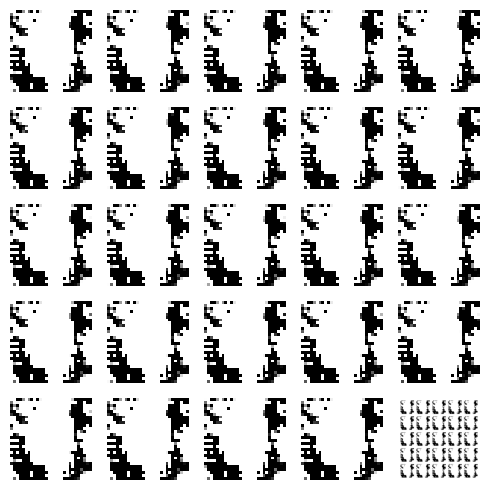

  0%|          | 0/350 [00:00<?, ?it/s]

4/4 [==============================] - 0s 18ms/step


  0%|          | 1/350 [00:01<06:05,  1.05s/it]

4/4 [==============================] - 0s 19ms/step


  1%|          | 2/350 [00:02<05:45,  1.01it/s]

4/4 [==============================] - 0s 13ms/step


  1%|          | 3/350 [00:02<05:12,  1.11it/s]

4/4 [==============================] - 0s 13ms/step


  1%|          | 4/350 [00:03<04:40,  1.23it/s]

4/4 [==============================] - 0s 13ms/step


  1%|▏         | 5/350 [00:04<04:32,  1.27it/s]

4/4 [==============================] - 0s 38ms/step


  2%|▏         | 6/350 [00:05<05:12,  1.10it/s]

4/4 [==============================] - 0s 16ms/step


  2%|▏         | 7/350 [00:06<04:53,  1.17it/s]

4/4 [==============================] - 0s 16ms/step


  2%|▏         | 8/350 [00:06<04:45,  1.20it/s]

4/4 [==============================] - 0s 23ms/step


  3%|▎         | 9/350 [00:07<04:32,  1.25it/s]

4/4 [==============================] - 0s 15ms/step


  3%|▎         | 10/350 [00:08<04:34,  1.24it/s]

4/4 [==============================] - 0s 14ms/step


  3%|▎         | 11/350 [00:09<04:19,  1.31it/s]

4/4 [==============================] - 0s 14ms/step


  3%|▎         | 12/350 [00:09<04:20,  1.30it/s]

4/4 [==============================] - 0s 12ms/step


  4%|▎         | 13/350 [00:10<04:07,  1.36it/s]

4/4 [==============================] - 0s 20ms/step


  4%|▍         | 14/350 [00:11<04:05,  1.37it/s]

4/4 [==============================] - 0s 14ms/step


  4%|▍         | 15/350 [00:12<04:08,  1.35it/s]

4/4 [==============================] - 0s 16ms/step


  5%|▍         | 16/350 [00:12<04:23,  1.27it/s]

4/4 [==============================] - 0s 13ms/step


  5%|▍         | 17/350 [00:13<04:22,  1.27it/s]

4/4 [==============================] - 0s 14ms/step


  5%|▌         | 18/350 [00:14<04:19,  1.28it/s]

4/4 [==============================] - 0s 15ms/step


  5%|▌         | 19/350 [00:15<04:09,  1.32it/s]

4/4 [==============================] - 0s 11ms/step


  6%|▌         | 20/350 [00:15<04:07,  1.33it/s]

4/4 [==============================] - 0s 44ms/step


  6%|▌         | 21/350 [00:16<04:09,  1.32it/s]

4/4 [==============================] - 0s 13ms/step


  6%|▋         | 22/350 [00:17<03:53,  1.40it/s]

4/4 [==============================] - 0s 11ms/step


  7%|▋         | 23/350 [00:18<04:06,  1.33it/s]

4/4 [==============================] - 0s 19ms/step


  7%|▋         | 24/350 [00:19<04:25,  1.23it/s]

4/4 [==============================] - 0s 14ms/step


  7%|▋         | 25/350 [00:19<04:20,  1.25it/s]

4/4 [==============================] - 0s 27ms/step


  7%|▋         | 26/350 [00:20<04:33,  1.18it/s]

4/4 [==============================] - 0s 22ms/step


  8%|▊         | 27/350 [00:21<04:19,  1.25it/s]

4/4 [==============================] - 0s 14ms/step


  8%|▊         | 28/350 [00:22<04:06,  1.31it/s]

4/4 [==============================] - 0s 21ms/step


  8%|▊         | 29/350 [00:22<03:53,  1.37it/s]

4/4 [==============================] - 0s 13ms/step


  9%|▊         | 30/350 [00:23<03:56,  1.35it/s]

4/4 [==============================] - 0s 12ms/step


  9%|▉         | 31/350 [00:24<03:47,  1.41it/s]

4/4 [==============================] - 0s 24ms/step


  9%|▉         | 32/350 [00:24<03:46,  1.40it/s]

4/4 [==============================] - 0s 29ms/step


  9%|▉         | 33/350 [00:25<03:48,  1.39it/s]

4/4 [==============================] - 0s 11ms/step


 10%|▉         | 34/350 [00:26<03:46,  1.40it/s]

4/4 [==============================] - 0s 17ms/step


 10%|█         | 35/350 [00:27<03:47,  1.38it/s]

4/4 [==============================] - 0s 25ms/step


 10%|█         | 36/350 [00:27<03:45,  1.39it/s]

4/4 [==============================] - 0s 12ms/step


 11%|█         | 37/350 [00:28<03:47,  1.38it/s]

4/4 [==============================] - 0s 12ms/step


 11%|█         | 38/350 [00:29<03:39,  1.42it/s]

4/4 [==============================] - 0s 28ms/step


 11%|█         | 39/350 [00:29<03:38,  1.42it/s]

4/4 [==============================] - 0s 16ms/step


 11%|█▏        | 40/350 [00:30<03:38,  1.42it/s]

4/4 [==============================] - 0s 15ms/step


 12%|█▏        | 41/350 [00:31<03:36,  1.43it/s]

4/4 [==============================] - 0s 13ms/step


 12%|█▏        | 42/350 [00:32<03:30,  1.46it/s]

4/4 [==============================] - 0s 17ms/step


 12%|█▏        | 43/350 [00:32<03:48,  1.35it/s]

4/4 [==============================] - 0s 21ms/step


 13%|█▎        | 44/350 [00:33<03:47,  1.35it/s]

4/4 [==============================] - 0s 20ms/step


 13%|█▎        | 45/350 [00:34<03:42,  1.37it/s]

4/4 [==============================] - 0s 15ms/step


 13%|█▎        | 46/350 [00:35<03:40,  1.38it/s]

4/4 [==============================] - 0s 13ms/step


 13%|█▎        | 47/350 [00:35<03:35,  1.41it/s]

4/4 [==============================] - 0s 12ms/step


 14%|█▎        | 48/350 [00:36<03:36,  1.39it/s]

4/4 [==============================] - 0s 22ms/step


 14%|█▍        | 49/350 [00:37<03:40,  1.36it/s]

4/4 [==============================] - 0s 13ms/step


 14%|█▍        | 50/350 [00:37<03:33,  1.40it/s]

4/4 [==============================] - 0s 11ms/step


 15%|█▍        | 51/350 [00:38<03:35,  1.39it/s]

4/4 [==============================] - 0s 12ms/step


 15%|█▍        | 52/350 [00:39<03:35,  1.38it/s]

4/4 [==============================] - 0s 15ms/step


 15%|█▌        | 53/350 [00:40<03:35,  1.38it/s]

4/4 [==============================] - 0s 13ms/step


 15%|█▌        | 54/350 [00:40<03:27,  1.43it/s]

4/4 [==============================] - 0s 14ms/step


 16%|█▌        | 55/350 [00:41<03:26,  1.43it/s]

4/4 [==============================] - 0s 14ms/step


 16%|█▌        | 56/350 [00:42<03:24,  1.43it/s]

4/4 [==============================] - 0s 12ms/step


 16%|█▋        | 57/350 [00:42<03:17,  1.48it/s]

4/4 [==============================] - 0s 29ms/step


 17%|█▋        | 58/350 [00:43<03:22,  1.44it/s]

4/4 [==============================] - 0s 27ms/step


 17%|█▋        | 59/350 [00:44<03:28,  1.40it/s]

4/4 [==============================] - 0s 28ms/step


 17%|█▋        | 60/350 [00:44<03:25,  1.41it/s]

4/4 [==============================] - 0s 14ms/step


 17%|█▋        | 61/350 [00:45<03:22,  1.43it/s]

4/4 [==============================] - 0s 13ms/step


 18%|█▊        | 62/350 [00:46<03:15,  1.48it/s]

4/4 [==============================] - 0s 21ms/step


 18%|█▊        | 63/350 [00:46<03:17,  1.45it/s]

4/4 [==============================] - 0s 14ms/step


 18%|█▊        | 64/350 [00:47<03:19,  1.44it/s]

4/4 [==============================] - 0s 12ms/step


 19%|█▊        | 65/350 [00:48<03:17,  1.44it/s]

4/4 [==============================] - 0s 18ms/step


 19%|█▉        | 66/350 [00:48<03:10,  1.49it/s]

4/4 [==============================] - 0s 14ms/step


 19%|█▉        | 67/350 [00:49<03:14,  1.46it/s]

4/4 [==============================] - 0s 13ms/step


 19%|█▉        | 68/350 [00:50<03:10,  1.48it/s]

4/4 [==============================] - 0s 14ms/step


 20%|█▉        | 69/350 [00:50<03:02,  1.54it/s]

4/4 [==============================] - 0s 19ms/step


 20%|██        | 70/350 [00:51<03:04,  1.52it/s]

4/4 [==============================] - 0s 13ms/step


 20%|██        | 71/350 [00:52<03:10,  1.46it/s]

4/4 [==============================] - 0s 12ms/step


 21%|██        | 72/350 [00:53<03:12,  1.44it/s]

4/4 [==============================] - 0s 16ms/step


 21%|██        | 73/350 [00:53<03:09,  1.46it/s]

4/4 [==============================] - 0s 13ms/step


 21%|██        | 74/350 [00:54<03:01,  1.52it/s]

4/4 [==============================] - 0s 11ms/step


 21%|██▏       | 75/350 [00:54<02:57,  1.55it/s]

4/4 [==============================] - 0s 14ms/step


 22%|██▏       | 76/350 [00:55<02:59,  1.53it/s]

4/4 [==============================] - 0s 14ms/step


 22%|██▏       | 77/350 [00:56<02:56,  1.55it/s]

4/4 [==============================] - 0s 14ms/step


 22%|██▏       | 78/350 [00:56<03:04,  1.48it/s]

4/4 [==============================] - 0s 15ms/step


 23%|██▎       | 79/350 [00:57<03:06,  1.46it/s]

4/4 [==============================] - 0s 20ms/step


 23%|██▎       | 80/350 [00:58<03:08,  1.43it/s]

4/4 [==============================] - 0s 10ms/step


 23%|██▎       | 81/350 [00:59<03:08,  1.42it/s]

4/4 [==============================] - 0s 12ms/step


 23%|██▎       | 82/350 [00:59<03:00,  1.49it/s]

4/4 [==============================] - 0s 17ms/step


 24%|██▎       | 83/350 [01:00<02:58,  1.49it/s]

4/4 [==============================] - 0s 17ms/step


 24%|██▍       | 84/350 [01:01<03:08,  1.41it/s]

4/4 [==============================] - 0s 14ms/step


 24%|██▍       | 85/350 [01:01<03:06,  1.42it/s]

4/4 [==============================] - 0s 12ms/step


 25%|██▍       | 86/350 [01:02<02:56,  1.49it/s]

4/4 [==============================] - 0s 16ms/step


 25%|██▍       | 87/350 [01:03<03:23,  1.29it/s]

4/4 [==============================] - 0s 16ms/step


 25%|██▌       | 88/350 [01:04<03:51,  1.13it/s]

4/4 [==============================] - 0s 14ms/step


 25%|██▌       | 89/350 [01:05<03:45,  1.16it/s]

4/4 [==============================] - 0s 14ms/step


 26%|██▌       | 90/350 [01:06<03:33,  1.22it/s]

4/4 [==============================] - 0s 18ms/step


 26%|██▌       | 91/350 [01:06<03:22,  1.28it/s]

4/4 [==============================] - 0s 13ms/step


 26%|██▋       | 92/350 [01:07<03:19,  1.30it/s]

4/4 [==============================] - 0s 14ms/step


 27%|██▋       | 93/350 [01:08<03:17,  1.30it/s]

4/4 [==============================] - 0s 15ms/step


 27%|██▋       | 94/350 [01:09<03:09,  1.35it/s]

4/4 [==============================] - 0s 17ms/step


 27%|██▋       | 95/350 [01:09<03:01,  1.40it/s]

4/4 [==============================] - 0s 11ms/step


 27%|██▋       | 96/350 [01:10<02:57,  1.43it/s]

4/4 [==============================] - 0s 13ms/step


 28%|██▊       | 97/350 [01:11<02:55,  1.44it/s]

4/4 [==============================] - 0s 16ms/step


 28%|██▊       | 98/350 [01:11<02:50,  1.48it/s]

4/4 [==============================] - 0s 11ms/step


 28%|██▊       | 99/350 [01:12<02:53,  1.45it/s]

4/4 [==============================] - 0s 12ms/step


 29%|██▊       | 100/350 [01:13<02:47,  1.49it/s]

4/4 [==============================] - 0s 16ms/step


 29%|██▉       | 101/350 [01:13<03:00,  1.38it/s]

4/4 [==============================] - 0s 13ms/step


 29%|██▉       | 102/350 [01:14<02:53,  1.43it/s]

4/4 [==============================] - 0s 19ms/step


 29%|██▉       | 103/350 [01:15<02:48,  1.46it/s]

4/4 [==============================] - 0s 63ms/step


 30%|██▉       | 104/350 [01:16<03:04,  1.33it/s]

4/4 [==============================] - 0s 13ms/step


 30%|███       | 105/350 [01:16<03:01,  1.35it/s]

4/4 [==============================] - 0s 13ms/step


 30%|███       | 106/350 [01:17<02:51,  1.42it/s]

4/4 [==============================] - 0s 40ms/step


 31%|███       | 107/350 [01:18<03:05,  1.31it/s]

4/4 [==============================] - 0s 12ms/step


 31%|███       | 108/350 [01:18<02:55,  1.38it/s]

4/4 [==============================] - 0s 11ms/step


 31%|███       | 109/350 [01:19<02:53,  1.39it/s]

4/4 [==============================] - 0s 12ms/step


 31%|███▏      | 110/350 [01:20<02:48,  1.42it/s]

4/4 [==============================] - 0s 16ms/step


 32%|███▏      | 111/350 [01:21<02:50,  1.40it/s]

4/4 [==============================] - 0s 15ms/step


 32%|███▏      | 112/350 [01:21<02:49,  1.41it/s]

4/4 [==============================] - 0s 15ms/step


 32%|███▏      | 113/350 [01:22<03:06,  1.27it/s]

4/4 [==============================] - 0s 15ms/step


 33%|███▎      | 114/350 [01:23<02:59,  1.32it/s]

4/4 [==============================] - 0s 14ms/step


 33%|███▎      | 115/350 [01:24<02:55,  1.34it/s]

4/4 [==============================] - 0s 13ms/step


 33%|███▎      | 116/350 [01:24<02:49,  1.38it/s]

4/4 [==============================] - 0s 14ms/step


 33%|███▎      | 117/350 [01:25<02:45,  1.41it/s]

4/4 [==============================] - 0s 19ms/step


 34%|███▎      | 118/350 [01:26<02:46,  1.39it/s]

4/4 [==============================] - 0s 13ms/step


 34%|███▍      | 119/350 [01:26<02:45,  1.40it/s]

4/4 [==============================] - 0s 12ms/step


 34%|███▍      | 120/350 [01:27<02:46,  1.38it/s]

4/4 [==============================] - 0s 12ms/step


 35%|███▍      | 121/350 [01:28<02:43,  1.40it/s]

4/4 [==============================] - 0s 15ms/step


 35%|███▍      | 122/350 [01:28<02:35,  1.47it/s]

4/4 [==============================] - 0s 45ms/step


 35%|███▌      | 123/350 [01:29<02:44,  1.38it/s]

4/4 [==============================] - 0s 11ms/step


 35%|███▌      | 124/350 [01:30<02:48,  1.34it/s]

4/4 [==============================] - 0s 14ms/step


 36%|███▌      | 125/350 [01:31<02:39,  1.41it/s]

4/4 [==============================] - 0s 14ms/step


 36%|███▌      | 126/350 [01:31<02:38,  1.41it/s]

4/4 [==============================] - 0s 15ms/step


 36%|███▋      | 127/350 [01:32<02:41,  1.38it/s]

4/4 [==============================] - 0s 17ms/step


 37%|███▋      | 128/350 [01:33<02:36,  1.41it/s]

4/4 [==============================] - 0s 19ms/step


 37%|███▋      | 129/350 [01:34<02:39,  1.39it/s]

4/4 [==============================] - 0s 15ms/step


 37%|███▋      | 130/350 [01:34<02:38,  1.39it/s]

4/4 [==============================] - 0s 14ms/step


 37%|███▋      | 131/350 [01:35<02:37,  1.39it/s]

4/4 [==============================] - 0s 13ms/step


 38%|███▊      | 132/350 [01:36<02:36,  1.39it/s]

4/4 [==============================] - 0s 20ms/step


 38%|███▊      | 133/350 [01:36<02:34,  1.40it/s]

4/4 [==============================] - 0s 20ms/step


 38%|███▊      | 134/350 [01:37<02:35,  1.39it/s]

4/4 [==============================] - 0s 16ms/step


 39%|███▊      | 135/350 [01:38<02:35,  1.38it/s]

4/4 [==============================] - 0s 28ms/step


 39%|███▉      | 136/350 [01:39<02:37,  1.36it/s]

4/4 [==============================] - 0s 15ms/step


 39%|███▉      | 137/350 [01:39<02:35,  1.37it/s]

4/4 [==============================] - 0s 14ms/step


 39%|███▉      | 138/350 [01:40<02:33,  1.38it/s]

4/4 [==============================] - 0s 14ms/step


 40%|███▉      | 139/350 [01:41<02:31,  1.39it/s]

4/4 [==============================] - 0s 14ms/step


 40%|████      | 140/350 [01:42<02:31,  1.39it/s]

4/4 [==============================] - 0s 12ms/step


 40%|████      | 141/350 [01:42<02:24,  1.45it/s]

4/4 [==============================] - 0s 14ms/step


 41%|████      | 142/350 [01:43<02:24,  1.44it/s]

4/4 [==============================] - 0s 13ms/step


 41%|████      | 143/350 [01:44<02:24,  1.43it/s]

4/4 [==============================] - 0s 17ms/step


 41%|████      | 144/350 [01:44<02:21,  1.45it/s]

4/4 [==============================] - 0s 12ms/step


 41%|████▏     | 145/350 [01:45<02:20,  1.45it/s]

4/4 [==============================] - 0s 13ms/step


 42%|████▏     | 146/350 [01:46<02:17,  1.49it/s]

4/4 [==============================] - 0s 17ms/step


 42%|████▏     | 147/350 [01:46<02:24,  1.41it/s]

4/4 [==============================] - 0s 13ms/step


 42%|████▏     | 148/350 [01:47<02:27,  1.37it/s]

4/4 [==============================] - 0s 14ms/step


 43%|████▎     | 149/350 [01:48<02:23,  1.40it/s]

4/4 [==============================] - 0s 12ms/step


 43%|████▎     | 150/350 [01:49<02:26,  1.36it/s]

4/4 [==============================] - 0s 15ms/step


 43%|████▎     | 151/350 [01:49<02:27,  1.35it/s]

4/4 [==============================] - 0s 15ms/step


 43%|████▎     | 152/350 [01:50<02:27,  1.34it/s]

4/4 [==============================] - 0s 13ms/step


 44%|████▎     | 153/350 [01:51<02:27,  1.34it/s]

4/4 [==============================] - 0s 16ms/step


 44%|████▍     | 154/350 [01:52<02:25,  1.34it/s]

4/4 [==============================] - 0s 17ms/step


 44%|████▍     | 155/350 [01:52<02:21,  1.38it/s]

4/4 [==============================] - 0s 16ms/step


 45%|████▍     | 156/350 [01:53<02:21,  1.37it/s]

4/4 [==============================] - 0s 14ms/step


 45%|████▍     | 157/350 [01:54<02:20,  1.38it/s]

4/4 [==============================] - 0s 13ms/step


 45%|████▌     | 158/350 [01:54<02:15,  1.42it/s]

4/4 [==============================] - 0s 15ms/step


 45%|████▌     | 159/350 [01:55<02:20,  1.36it/s]

4/4 [==============================] - 0s 13ms/step


 46%|████▌     | 160/350 [01:56<02:15,  1.40it/s]

4/4 [==============================] - 0s 14ms/step


 46%|████▌     | 161/350 [01:57<02:16,  1.38it/s]

4/4 [==============================] - 0s 13ms/step


 46%|████▋     | 162/350 [01:57<02:08,  1.46it/s]

4/4 [==============================] - 0s 13ms/step


 47%|████▋     | 163/350 [01:58<02:07,  1.46it/s]

4/4 [==============================] - 0s 11ms/step


 47%|████▋     | 164/350 [01:59<02:07,  1.46it/s]

4/4 [==============================] - 0s 20ms/step


 47%|████▋     | 165/350 [01:59<02:07,  1.46it/s]

4/4 [==============================] - 0s 15ms/step


 47%|████▋     | 166/350 [02:00<02:06,  1.45it/s]

4/4 [==============================] - 0s 13ms/step


 48%|████▊     | 167/350 [02:01<02:05,  1.46it/s]

4/4 [==============================] - 0s 12ms/step


 48%|████▊     | 168/350 [02:01<02:01,  1.50it/s]

4/4 [==============================] - 0s 18ms/step


 48%|████▊     | 169/350 [02:02<02:04,  1.45it/s]

4/4 [==============================] - 0s 16ms/step


 49%|████▊     | 170/350 [02:03<02:04,  1.45it/s]

4/4 [==============================] - 0s 17ms/step


 49%|████▉     | 171/350 [02:03<02:03,  1.44it/s]

4/4 [==============================] - 0s 16ms/step


 49%|████▉     | 172/350 [02:04<02:01,  1.46it/s]

4/4 [==============================] - 0s 26ms/step


 49%|████▉     | 173/350 [02:05<02:13,  1.32it/s]

4/4 [==============================] - 0s 45ms/step


 50%|████▉     | 174/350 [02:06<02:32,  1.15it/s]

4/4 [==============================] - 0s 16ms/step


 50%|█████     | 175/350 [02:07<02:32,  1.15it/s]

4/4 [==============================] - 0s 20ms/step


 50%|█████     | 176/350 [02:08<02:29,  1.16it/s]

4/4 [==============================] - 0s 15ms/step


 51%|█████     | 177/350 [02:08<02:16,  1.27it/s]

4/4 [==============================] - 0s 18ms/step


 51%|█████     | 178/350 [02:09<02:14,  1.28it/s]

4/4 [==============================] - 0s 21ms/step


 51%|█████     | 179/350 [02:10<02:10,  1.31it/s]

4/4 [==============================] - 0s 21ms/step


 51%|█████▏    | 180/350 [02:11<02:05,  1.36it/s]

4/4 [==============================] - 0s 14ms/step


 52%|█████▏    | 181/350 [02:11<02:05,  1.35it/s]

4/4 [==============================] - 0s 15ms/step


 52%|█████▏    | 182/350 [02:12<02:11,  1.28it/s]

4/4 [==============================] - 0s 13ms/step


 52%|█████▏    | 183/350 [02:13<02:07,  1.31it/s]

4/4 [==============================] - 0s 14ms/step


 53%|█████▎    | 184/350 [02:14<01:59,  1.39it/s]

4/4 [==============================] - 0s 20ms/step


 53%|█████▎    | 185/350 [02:14<01:55,  1.43it/s]

4/4 [==============================] - 0s 11ms/step


 53%|█████▎    | 186/350 [02:15<01:51,  1.48it/s]

4/4 [==============================] - 0s 27ms/step


 53%|█████▎    | 187/350 [02:16<01:51,  1.46it/s]

4/4 [==============================] - 0s 13ms/step


 54%|█████▎    | 188/350 [02:16<01:51,  1.45it/s]

4/4 [==============================] - 0s 15ms/step


 54%|█████▍    | 189/350 [02:17<01:50,  1.45it/s]

4/4 [==============================] - 0s 19ms/step


 54%|█████▍    | 190/350 [02:18<01:50,  1.45it/s]

4/4 [==============================] - 0s 11ms/step


 55%|█████▍    | 191/350 [02:18<01:53,  1.40it/s]

4/4 [==============================] - 0s 16ms/step


 55%|█████▍    | 192/350 [02:19<01:54,  1.39it/s]

4/4 [==============================] - 0s 14ms/step


 55%|█████▌    | 193/350 [02:20<01:52,  1.39it/s]

4/4 [==============================] - 0s 14ms/step


 55%|█████▌    | 194/350 [02:21<01:55,  1.35it/s]

4/4 [==============================] - 0s 14ms/step


 56%|█████▌    | 195/350 [02:22<02:03,  1.26it/s]

4/4 [==============================] - 0s 18ms/step


 56%|█████▌    | 196/350 [02:22<02:02,  1.25it/s]

4/4 [==============================] - 0s 19ms/step


 56%|█████▋    | 197/350 [02:23<01:57,  1.30it/s]

4/4 [==============================] - 0s 14ms/step


 57%|█████▋    | 198/350 [02:24<01:54,  1.33it/s]

4/4 [==============================] - 0s 19ms/step


 57%|█████▋    | 199/350 [02:25<01:51,  1.36it/s]

4/4 [==============================] - 0s 14ms/step


 57%|█████▋    | 200/350 [02:25<01:50,  1.36it/s]

4/4 [==============================] - 0s 13ms/step


 57%|█████▋    | 201/350 [02:26<01:52,  1.33it/s]

4/4 [==============================] - 0s 15ms/step


 58%|█████▊    | 202/350 [02:27<01:46,  1.39it/s]

4/4 [==============================] - 0s 12ms/step


 58%|█████▊    | 203/350 [02:27<01:45,  1.39it/s]

4/4 [==============================] - 0s 20ms/step


 58%|█████▊    | 204/350 [02:28<01:43,  1.41it/s]

4/4 [==============================] - 0s 15ms/step


 59%|█████▊    | 205/350 [02:29<01:44,  1.39it/s]

4/4 [==============================] - 0s 16ms/step


 59%|█████▉    | 206/350 [02:29<01:40,  1.44it/s]

4/4 [==============================] - 0s 12ms/step


 59%|█████▉    | 207/350 [02:30<01:41,  1.42it/s]

4/4 [==============================] - 0s 24ms/step


 59%|█████▉    | 208/350 [02:31<01:40,  1.42it/s]

4/4 [==============================] - 0s 12ms/step


 60%|█████▉    | 209/350 [02:32<01:42,  1.38it/s]

4/4 [==============================] - 0s 13ms/step


 60%|██████    | 210/350 [02:32<01:39,  1.41it/s]

4/4 [==============================] - 0s 15ms/step


 60%|██████    | 211/350 [02:33<01:40,  1.39it/s]

4/4 [==============================] - 0s 13ms/step


 61%|██████    | 212/350 [02:34<01:40,  1.38it/s]

4/4 [==============================] - 0s 16ms/step


 61%|██████    | 213/350 [02:35<01:40,  1.37it/s]

4/4 [==============================] - 0s 14ms/step


 61%|██████    | 214/350 [02:35<01:36,  1.41it/s]

4/4 [==============================] - 0s 25ms/step


 61%|██████▏   | 215/350 [02:36<01:39,  1.35it/s]

4/4 [==============================] - 0s 21ms/step


 62%|██████▏   | 216/350 [02:37<01:38,  1.35it/s]

4/4 [==============================] - 0s 19ms/step


 62%|██████▏   | 217/350 [02:37<01:36,  1.37it/s]

4/4 [==============================] - 0s 12ms/step


 62%|██████▏   | 218/350 [02:38<01:32,  1.42it/s]

4/4 [==============================] - 0s 15ms/step


 63%|██████▎   | 219/350 [02:39<01:31,  1.43it/s]

4/4 [==============================] - 0s 14ms/step


 63%|██████▎   | 220/350 [02:40<01:31,  1.42it/s]

4/4 [==============================] - 0s 22ms/step


 63%|██████▎   | 221/350 [02:40<01:32,  1.40it/s]

4/4 [==============================] - 0s 15ms/step


 63%|██████▎   | 222/350 [02:41<01:31,  1.40it/s]

4/4 [==============================] - 0s 14ms/step


 64%|██████▎   | 223/350 [02:42<01:32,  1.38it/s]

4/4 [==============================] - 0s 13ms/step


 64%|██████▍   | 224/350 [02:42<01:31,  1.38it/s]

4/4 [==============================] - 0s 16ms/step


 64%|██████▍   | 225/350 [02:43<01:34,  1.32it/s]

4/4 [==============================] - 0s 12ms/step


 65%|██████▍   | 226/350 [02:44<01:35,  1.29it/s]

4/4 [==============================] - 0s 14ms/step


 65%|██████▍   | 227/350 [02:45<01:30,  1.35it/s]

4/4 [==============================] - 0s 23ms/step


 65%|██████▌   | 228/350 [02:46<01:30,  1.35it/s]

4/4 [==============================] - 0s 34ms/step


 65%|██████▌   | 229/350 [02:46<01:30,  1.33it/s]

4/4 [==============================] - 0s 12ms/step


 66%|██████▌   | 230/350 [02:47<01:29,  1.34it/s]

4/4 [==============================] - 0s 19ms/step


 66%|██████▌   | 231/350 [02:48<01:26,  1.38it/s]

4/4 [==============================] - 0s 24ms/step


 66%|██████▋   | 232/350 [02:48<01:25,  1.38it/s]

4/4 [==============================] - 0s 12ms/step


 67%|██████▋   | 233/350 [02:49<01:26,  1.35it/s]

4/4 [==============================] - 0s 15ms/step


 67%|██████▋   | 234/350 [02:50<01:25,  1.35it/s]

4/4 [==============================] - 0s 12ms/step


 67%|██████▋   | 235/350 [02:51<01:22,  1.39it/s]

4/4 [==============================] - 0s 18ms/step


 67%|██████▋   | 236/350 [02:51<01:21,  1.39it/s]

4/4 [==============================] - 0s 16ms/step


 68%|██████▊   | 237/350 [02:52<01:23,  1.35it/s]

4/4 [==============================] - 0s 21ms/step


 68%|██████▊   | 238/350 [02:53<01:27,  1.28it/s]

4/4 [==============================] - 0s 16ms/step


 68%|██████▊   | 239/350 [02:54<01:24,  1.31it/s]

4/4 [==============================] - 0s 12ms/step


 69%|██████▊   | 240/350 [02:54<01:22,  1.33it/s]

4/4 [==============================] - 0s 13ms/step


 69%|██████▉   | 241/350 [02:55<01:22,  1.33it/s]

4/4 [==============================] - 0s 23ms/step


 69%|██████▉   | 242/350 [02:56<01:21,  1.32it/s]

4/4 [==============================] - 0s 27ms/step


 69%|██████▉   | 243/350 [02:57<01:18,  1.36it/s]

4/4 [==============================] - 0s 12ms/step


 70%|██████▉   | 244/350 [02:57<01:17,  1.37it/s]

4/4 [==============================] - 0s 13ms/step


 70%|███████   | 245/350 [02:58<01:15,  1.39it/s]

4/4 [==============================] - 0s 13ms/step


 70%|███████   | 246/350 [02:59<01:11,  1.46it/s]

4/4 [==============================] - 0s 15ms/step


 71%|███████   | 247/350 [02:59<01:12,  1.42it/s]

4/4 [==============================] - 0s 13ms/step


 71%|███████   | 248/350 [03:00<01:09,  1.46it/s]

4/4 [==============================] - 0s 15ms/step


 71%|███████   | 249/350 [03:01<01:08,  1.47it/s]

4/4 [==============================] - 0s 13ms/step


 71%|███████▏  | 250/350 [03:01<01:07,  1.48it/s]

4/4 [==============================] - 0s 15ms/step


 72%|███████▏  | 251/350 [03:02<01:08,  1.45it/s]

4/4 [==============================] - 0s 11ms/step


 72%|███████▏  | 252/350 [03:03<01:09,  1.42it/s]

4/4 [==============================] - 0s 12ms/step


 72%|███████▏  | 253/350 [03:04<01:09,  1.39it/s]

4/4 [==============================] - 0s 11ms/step


 73%|███████▎  | 254/350 [03:04<01:06,  1.45it/s]

4/4 [==============================] - 0s 18ms/step


 73%|███████▎  | 255/350 [03:05<01:05,  1.46it/s]

4/4 [==============================] - 0s 12ms/step


 73%|███████▎  | 256/350 [03:06<01:03,  1.47it/s]

4/4 [==============================] - 0s 14ms/step


 73%|███████▎  | 257/350 [03:06<01:05,  1.42it/s]

4/4 [==============================] - 0s 18ms/step


 74%|███████▎  | 258/350 [03:07<01:05,  1.41it/s]

4/4 [==============================] - 0s 13ms/step


 74%|███████▍  | 259/350 [03:08<01:05,  1.39it/s]

4/4 [==============================] - 0s 13ms/step


 74%|███████▍  | 260/350 [03:09<01:04,  1.39it/s]

4/4 [==============================] - 0s 16ms/step


 75%|███████▍  | 261/350 [03:09<01:07,  1.32it/s]

4/4 [==============================] - 0s 12ms/step


 75%|███████▍  | 262/350 [03:10<01:04,  1.37it/s]

4/4 [==============================] - 0s 12ms/step


 75%|███████▌  | 263/350 [03:11<01:04,  1.34it/s]

4/4 [==============================] - 0s 21ms/step


 75%|███████▌  | 264/350 [03:12<01:04,  1.34it/s]

4/4 [==============================] - 0s 14ms/step


 76%|███████▌  | 265/350 [03:12<01:02,  1.36it/s]

4/4 [==============================] - 0s 14ms/step


 76%|███████▌  | 266/350 [03:13<01:03,  1.31it/s]

4/4 [==============================] - 0s 12ms/step


 76%|███████▋  | 267/350 [03:14<01:00,  1.38it/s]

4/4 [==============================] - 0s 20ms/step


 77%|███████▋  | 268/350 [03:14<00:59,  1.39it/s]

4/4 [==============================] - 0s 12ms/step


 77%|███████▋  | 269/350 [03:15<00:58,  1.39it/s]

4/4 [==============================] - 0s 16ms/step


 77%|███████▋  | 270/350 [03:16<00:58,  1.37it/s]

4/4 [==============================] - 0s 19ms/step


 77%|███████▋  | 271/350 [03:17<00:56,  1.39it/s]

4/4 [==============================] - 0s 15ms/step


 78%|███████▊  | 272/350 [03:17<00:57,  1.35it/s]

4/4 [==============================] - 0s 12ms/step


 78%|███████▊  | 273/350 [03:18<00:56,  1.37it/s]

4/4 [==============================] - 0s 15ms/step


 78%|███████▊  | 274/350 [03:19<01:01,  1.23it/s]

4/4 [==============================] - 0s 46ms/step


 79%|███████▊  | 275/350 [03:21<01:17,  1.03s/it]

4/4 [==============================] - 0s 13ms/step


 79%|███████▉  | 276/350 [03:21<01:10,  1.05it/s]

4/4 [==============================] - 0s 13ms/step


 79%|███████▉  | 277/350 [03:22<01:04,  1.14it/s]

4/4 [==============================] - 0s 20ms/step


 79%|███████▉  | 278/350 [03:23<00:58,  1.22it/s]

4/4 [==============================] - 0s 14ms/step


 80%|███████▉  | 279/350 [03:23<00:54,  1.29it/s]

4/4 [==============================] - 0s 18ms/step


 80%|████████  | 280/350 [03:24<00:56,  1.25it/s]

4/4 [==============================] - 0s 14ms/step


 80%|████████  | 281/350 [03:25<00:54,  1.26it/s]

4/4 [==============================] - 0s 13ms/step


 81%|████████  | 282/350 [03:26<00:53,  1.27it/s]

4/4 [==============================] - 0s 15ms/step


 81%|████████  | 283/350 [03:27<00:51,  1.30it/s]

4/4 [==============================] - 0s 20ms/step


 81%|████████  | 284/350 [03:27<00:52,  1.26it/s]

4/4 [==============================] - 0s 17ms/step


 81%|████████▏ | 285/350 [03:28<00:50,  1.28it/s]

4/4 [==============================] - 0s 13ms/step


 82%|████████▏ | 286/350 [03:29<00:49,  1.30it/s]

4/4 [==============================] - 0s 33ms/step


 82%|████████▏ | 287/350 [03:30<00:47,  1.31it/s]

4/4 [==============================] - 0s 14ms/step


 82%|████████▏ | 288/350 [03:30<00:47,  1.31it/s]

4/4 [==============================] - 0s 13ms/step


 83%|████████▎ | 289/350 [03:31<00:46,  1.31it/s]

4/4 [==============================] - 0s 17ms/step


 83%|████████▎ | 290/350 [03:32<00:44,  1.36it/s]

4/4 [==============================] - 0s 18ms/step


 83%|████████▎ | 291/350 [03:33<00:42,  1.38it/s]

4/4 [==============================] - 0s 14ms/step


 83%|████████▎ | 292/350 [03:33<00:40,  1.43it/s]

4/4 [==============================] - 0s 18ms/step


 84%|████████▎ | 293/350 [03:34<00:40,  1.41it/s]

4/4 [==============================] - 0s 17ms/step


 84%|████████▍ | 294/350 [03:35<00:40,  1.38it/s]

4/4 [==============================] - 0s 15ms/step


 84%|████████▍ | 295/350 [03:35<00:40,  1.36it/s]

4/4 [==============================] - 0s 13ms/step


 85%|████████▍ | 296/350 [03:36<00:40,  1.34it/s]

4/4 [==============================] - 0s 11ms/step


 85%|████████▍ | 297/350 [03:37<00:37,  1.40it/s]

4/4 [==============================] - 0s 17ms/step


 85%|████████▌ | 298/350 [03:38<00:36,  1.41it/s]

4/4 [==============================] - 0s 14ms/step


 85%|████████▌ | 299/350 [03:38<00:36,  1.40it/s]

4/4 [==============================] - 0s 14ms/step


 86%|████████▌ | 300/350 [03:39<00:35,  1.40it/s]

4/4 [==============================] - 0s 20ms/step


 86%|████████▌ | 301/350 [03:40<00:35,  1.39it/s]

4/4 [==============================] - 0s 19ms/step


 86%|████████▋ | 302/350 [03:40<00:34,  1.39it/s]

4/4 [==============================] - 0s 15ms/step


 87%|████████▋ | 303/350 [03:41<00:35,  1.32it/s]

4/4 [==============================] - 0s 14ms/step


 87%|████████▋ | 304/350 [03:42<00:34,  1.34it/s]

4/4 [==============================] - 0s 11ms/step


 87%|████████▋ | 305/350 [03:43<00:32,  1.37it/s]

4/4 [==============================] - 0s 12ms/step


 87%|████████▋ | 306/350 [03:43<00:30,  1.42it/s]

4/4 [==============================] - 0s 14ms/step


 88%|████████▊ | 307/350 [03:44<00:30,  1.41it/s]

4/4 [==============================] - 0s 12ms/step


 88%|████████▊ | 308/350 [03:45<00:29,  1.44it/s]

4/4 [==============================] - 0s 14ms/step


 88%|████████▊ | 309/350 [03:45<00:27,  1.48it/s]

4/4 [==============================] - 0s 12ms/step


 89%|████████▊ | 310/350 [03:46<00:27,  1.47it/s]

4/4 [==============================] - 0s 11ms/step


 89%|████████▉ | 311/350 [03:47<00:26,  1.44it/s]

4/4 [==============================] - 0s 17ms/step


 89%|████████▉ | 312/350 [03:47<00:25,  1.49it/s]

4/4 [==============================] - 0s 16ms/step


 89%|████████▉ | 313/350 [03:48<00:26,  1.42it/s]

4/4 [==============================] - 0s 12ms/step


 90%|████████▉ | 314/350 [03:49<00:25,  1.43it/s]

4/4 [==============================] - 0s 14ms/step


 90%|█████████ | 315/350 [03:50<00:24,  1.42it/s]

4/4 [==============================] - 0s 12ms/step


 90%|█████████ | 316/350 [03:50<00:23,  1.47it/s]

4/4 [==============================] - 0s 12ms/step


 91%|█████████ | 317/350 [03:51<00:22,  1.48it/s]

4/4 [==============================] - 0s 15ms/step


 91%|█████████ | 318/350 [03:52<00:21,  1.52it/s]

4/4 [==============================] - 0s 28ms/step


 91%|█████████ | 319/350 [03:52<00:21,  1.47it/s]

4/4 [==============================] - 0s 14ms/step


 91%|█████████▏| 320/350 [03:53<00:20,  1.46it/s]

4/4 [==============================] - 0s 16ms/step


 92%|█████████▏| 321/350 [03:54<00:19,  1.47it/s]

4/4 [==============================] - 0s 14ms/step


 92%|█████████▏| 322/350 [03:54<00:19,  1.45it/s]

4/4 [==============================] - 0s 12ms/step


 92%|█████████▏| 323/350 [03:55<00:19,  1.41it/s]

4/4 [==============================] - 0s 15ms/step


 93%|█████████▎| 324/350 [03:56<00:17,  1.45it/s]

4/4 [==============================] - 0s 25ms/step


 93%|█████████▎| 325/350 [03:56<00:17,  1.46it/s]

4/4 [==============================] - 0s 11ms/step


 93%|█████████▎| 326/350 [03:57<00:16,  1.50it/s]

4/4 [==============================] - 0s 19ms/step


 93%|█████████▎| 327/350 [03:58<00:15,  1.49it/s]

4/4 [==============================] - 0s 16ms/step


 94%|█████████▎| 328/350 [03:58<00:15,  1.45it/s]

4/4 [==============================] - 0s 13ms/step


 94%|█████████▍| 329/350 [03:59<00:14,  1.43it/s]

4/4 [==============================] - 0s 17ms/step


 94%|█████████▍| 330/350 [04:00<00:14,  1.42it/s]

4/4 [==============================] - 0s 12ms/step


 95%|█████████▍| 331/350 [04:01<00:14,  1.31it/s]

4/4 [==============================] - 0s 18ms/step


 95%|█████████▍| 332/350 [04:02<00:13,  1.32it/s]

4/4 [==============================] - 0s 14ms/step


 95%|█████████▌| 333/350 [04:02<00:13,  1.30it/s]

4/4 [==============================] - 0s 34ms/step


 95%|█████████▌| 334/350 [04:03<00:12,  1.24it/s]

4/4 [==============================] - 0s 19ms/step


 96%|█████████▌| 335/350 [04:04<00:12,  1.22it/s]

4/4 [==============================] - 0s 16ms/step


 96%|█████████▌| 336/350 [04:05<00:11,  1.27it/s]

4/4 [==============================] - 0s 28ms/step


 96%|█████████▋| 337/350 [04:06<00:10,  1.28it/s]

4/4 [==============================] - 0s 18ms/step


 97%|█████████▋| 338/350 [04:06<00:09,  1.24it/s]

4/4 [==============================] - 0s 16ms/step


 97%|█████████▋| 339/350 [04:07<00:08,  1.29it/s]

4/4 [==============================] - 0s 17ms/step


 97%|█████████▋| 340/350 [04:08<00:07,  1.30it/s]

4/4 [==============================] - 0s 13ms/step


 97%|█████████▋| 341/350 [04:09<00:06,  1.34it/s]

4/4 [==============================] - 0s 12ms/step


 98%|█████████▊| 342/350 [04:09<00:05,  1.40it/s]

4/4 [==============================] - 0s 39ms/step


 98%|█████████▊| 343/350 [04:10<00:05,  1.36it/s]

4/4 [==============================] - 0s 12ms/step


 98%|█████████▊| 344/350 [04:11<00:04,  1.38it/s]

4/4 [==============================] - 0s 27ms/step


 99%|█████████▊| 345/350 [04:11<00:03,  1.37it/s]

4/4 [==============================] - 0s 12ms/step


 99%|█████████▉| 346/350 [04:12<00:02,  1.38it/s]

4/4 [==============================] - 0s 13ms/step


 99%|█████████▉| 347/350 [04:13<00:02,  1.38it/s]

4/4 [==============================] - 0s 14ms/step


 99%|█████████▉| 348/350 [04:13<00:01,  1.45it/s]

4/4 [==============================] - 0s 34ms/step


100%|█████████▉| 349/350 [04:14<00:00,  1.40it/s]

4/4 [==============================] - 0s 14ms/step


100%|██████████| 350/350 [04:15<00:00,  1.37it/s]

Epoch number: 48 discriminator_loss: 0.1645017582359391 generator_loss: 7.945083738054548
1/1 [==============================] - 0s 27ms/step


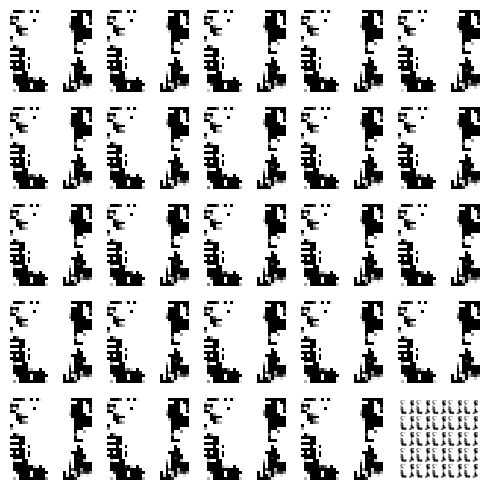

  0%|          | 0/350 [00:00<?, ?it/s]

4/4 [==============================] - 0s 23ms/step


  0%|          | 1/350 [00:00<04:07,  1.41it/s]

4/4 [==============================] - 0s 19ms/step


  1%|          | 2/350 [00:01<03:57,  1.46it/s]

4/4 [==============================] - 0s 31ms/step


  1%|          | 3/350 [00:02<04:03,  1.43it/s]

4/4 [==============================] - 0s 14ms/step


  1%|          | 4/350 [00:02<04:03,  1.42it/s]

4/4 [==============================] - 0s 25ms/step


  1%|▏         | 5/350 [00:03<04:06,  1.40it/s]

4/4 [==============================] - 0s 17ms/step


  2%|▏         | 6/350 [00:04<03:57,  1.45it/s]

4/4 [==============================] - 0s 17ms/step


  2%|▏         | 7/350 [00:04<03:54,  1.46it/s]

4/4 [==============================] - 0s 22ms/step


  2%|▏         | 8/350 [00:05<03:56,  1.44it/s]

4/4 [==============================] - 0s 16ms/step


  3%|▎         | 9/350 [00:06<03:54,  1.45it/s]

4/4 [==============================] - 0s 29ms/step


  3%|▎         | 10/350 [00:06<04:01,  1.41it/s]

4/4 [==============================] - 0s 27ms/step


  3%|▎         | 11/350 [00:07<04:19,  1.31it/s]

4/4 [==============================] - 0s 15ms/step


  3%|▎         | 12/350 [00:08<04:19,  1.30it/s]

4/4 [==============================] - 0s 22ms/step


  4%|▎         | 13/350 [00:09<04:21,  1.29it/s]

4/4 [==============================] - 0s 17ms/step


  4%|▍         | 14/350 [00:10<04:23,  1.27it/s]

4/4 [==============================] - 0s 18ms/step


  4%|▍         | 15/350 [00:10<04:08,  1.35it/s]

4/4 [==============================] - 0s 28ms/step


  5%|▍         | 16/350 [00:11<04:11,  1.33it/s]

4/4 [==============================] - 0s 14ms/step


  5%|▍         | 17/350 [00:12<04:04,  1.36it/s]

4/4 [==============================] - 0s 22ms/step


  5%|▌         | 18/350 [00:13<04:08,  1.33it/s]

4/4 [==============================] - 0s 22ms/step


  5%|▌         | 19/350 [00:13<04:15,  1.30it/s]

4/4 [==============================] - 0s 14ms/step


  6%|▌         | 20/350 [00:14<04:08,  1.33it/s]

4/4 [==============================] - 0s 14ms/step


  6%|▌         | 21/350 [00:15<04:01,  1.36it/s]

4/4 [==============================] - 0s 15ms/step


  6%|▋         | 22/350 [00:16<04:03,  1.35it/s]

4/4 [==============================] - 0s 15ms/step


  7%|▋         | 23/350 [00:16<03:59,  1.36it/s]

4/4 [==============================] - 0s 16ms/step


  7%|▋         | 24/350 [00:17<04:03,  1.34it/s]

4/4 [==============================] - 0s 26ms/step


  7%|▋         | 25/350 [00:18<04:06,  1.32it/s]

4/4 [==============================] - 0s 17ms/step


  7%|▋         | 26/350 [00:19<04:00,  1.35it/s]

4/4 [==============================] - 0s 27ms/step


  8%|▊         | 27/350 [00:19<04:11,  1.29it/s]

4/4 [==============================] - 0s 14ms/step


  8%|▊         | 28/350 [00:20<04:07,  1.30it/s]

4/4 [==============================] - 0s 17ms/step


  8%|▊         | 29/350 [00:21<04:03,  1.32it/s]

4/4 [==============================] - 0s 16ms/step


  9%|▊         | 30/350 [00:22<03:56,  1.35it/s]

4/4 [==============================] - 0s 17ms/step


  9%|▉         | 31/350 [00:22<03:56,  1.35it/s]

4/4 [==============================] - 0s 45ms/step


  9%|▉         | 32/350 [00:23<04:07,  1.29it/s]

4/4 [==============================] - 0s 22ms/step


  9%|▉         | 33/350 [00:24<04:02,  1.31it/s]

4/4 [==============================] - 0s 14ms/step


 10%|▉         | 34/350 [00:25<03:59,  1.32it/s]

4/4 [==============================] - 0s 30ms/step


 10%|█         | 35/350 [00:26<03:59,  1.31it/s]

4/4 [==============================] - 0s 15ms/step


 10%|█         | 36/350 [00:26<04:01,  1.30it/s]

4/4 [==============================] - 0s 16ms/step


 11%|█         | 37/350 [00:27<04:04,  1.28it/s]

4/4 [==============================] - 0s 19ms/step


 11%|█         | 38/350 [00:28<04:03,  1.28it/s]

4/4 [==============================] - 0s 13ms/step


 11%|█         | 39/350 [00:29<03:52,  1.34it/s]

4/4 [==============================] - 0s 16ms/step


 11%|█▏        | 40/350 [00:29<03:46,  1.37it/s]

4/4 [==============================] - 0s 37ms/step


 12%|█▏        | 41/350 [00:30<03:56,  1.31it/s]

4/4 [==============================] - 0s 16ms/step


 12%|█▏        | 42/350 [00:31<03:55,  1.31it/s]

4/4 [==============================] - 0s 15ms/step


 12%|█▏        | 43/350 [00:32<03:51,  1.32it/s]

4/4 [==============================] - 0s 15ms/step


 13%|█▎        | 44/350 [00:32<03:37,  1.41it/s]

4/4 [==============================] - 0s 15ms/step


 13%|█▎        | 45/350 [00:33<03:33,  1.43it/s]

4/4 [==============================] - 0s 15ms/step


 13%|█▎        | 46/350 [00:34<03:27,  1.47it/s]

4/4 [==============================] - 0s 21ms/step


 13%|█▎        | 47/350 [00:34<03:31,  1.43it/s]

4/4 [==============================] - 0s 13ms/step


 14%|█▎        | 48/350 [00:35<03:36,  1.39it/s]

4/4 [==============================] - 0s 27ms/step


 14%|█▍        | 49/350 [00:36<03:39,  1.37it/s]

4/4 [==============================] - 0s 13ms/step


 14%|█▍        | 50/350 [00:36<03:32,  1.41it/s]

4/4 [==============================] - 0s 30ms/step


 15%|█▍        | 51/350 [00:37<03:36,  1.38it/s]

4/4 [==============================] - 0s 11ms/step


 15%|█▍        | 52/350 [00:38<03:32,  1.40it/s]

4/4 [==============================] - 0s 15ms/step


 15%|█▌        | 53/350 [00:39<03:30,  1.41it/s]

4/4 [==============================] - 0s 16ms/step


 15%|█▌        | 54/350 [00:39<03:32,  1.39it/s]

4/4 [==============================] - 0s 14ms/step


 16%|█▌        | 55/350 [00:40<03:31,  1.40it/s]

4/4 [==============================] - 0s 15ms/step


 16%|█▌        | 56/350 [00:41<03:27,  1.42it/s]

4/4 [==============================] - 0s 22ms/step


 16%|█▋        | 57/350 [00:41<03:25,  1.43it/s]

4/4 [==============================] - 0s 13ms/step


 17%|█▋        | 58/350 [00:42<03:24,  1.43it/s]

4/4 [==============================] - 0s 12ms/step


 17%|█▋        | 59/350 [00:43<03:22,  1.44it/s]

4/4 [==============================] - 0s 14ms/step


 17%|█▋        | 60/350 [00:43<03:13,  1.50it/s]

4/4 [==============================] - 0s 22ms/step


 17%|█▋        | 61/350 [00:44<03:18,  1.46it/s]

4/4 [==============================] - 0s 17ms/step


 18%|█▊        | 62/350 [00:45<03:20,  1.44it/s]

4/4 [==============================] - 0s 15ms/step


 18%|█▊        | 63/350 [00:46<03:20,  1.43it/s]

4/4 [==============================] - 0s 11ms/step


 18%|█▊        | 64/350 [00:46<03:13,  1.48it/s]

4/4 [==============================] - 0s 16ms/step


 19%|█▊        | 65/350 [00:47<03:16,  1.45it/s]

4/4 [==============================] - 0s 13ms/step


 19%|█▉        | 66/350 [00:48<03:22,  1.41it/s]

4/4 [==============================] - 0s 12ms/step


 19%|█▉        | 67/350 [00:48<03:20,  1.41it/s]

4/4 [==============================] - 0s 13ms/step


 19%|█▉        | 68/350 [00:49<03:22,  1.39it/s]

4/4 [==============================] - 0s 12ms/step


 20%|█▉        | 69/350 [00:50<03:22,  1.39it/s]

4/4 [==============================] - 0s 13ms/step


 20%|██        | 70/350 [00:51<03:22,  1.38it/s]

4/4 [==============================] - 0s 12ms/step


 20%|██        | 71/350 [00:51<03:20,  1.39it/s]

4/4 [==============================] - 0s 13ms/step


 21%|██        | 72/350 [00:52<03:14,  1.43it/s]

4/4 [==============================] - 0s 11ms/step


 21%|██        | 73/350 [00:53<03:18,  1.40it/s]

4/4 [==============================] - 0s 14ms/step


 21%|██        | 74/350 [00:53<03:13,  1.43it/s]

4/4 [==============================] - 0s 22ms/step


 21%|██▏       | 75/350 [00:54<03:17,  1.40it/s]

4/4 [==============================] - 0s 14ms/step


 22%|██▏       | 76/350 [00:55<03:19,  1.38it/s]

4/4 [==============================] - 0s 14ms/step


 22%|██▏       | 77/350 [00:56<03:17,  1.38it/s]

4/4 [==============================] - 0s 13ms/step


 22%|██▏       | 78/350 [00:56<03:14,  1.40it/s]

4/4 [==============================] - 0s 21ms/step


 23%|██▎       | 79/350 [00:57<03:23,  1.33it/s]

4/4 [==============================] - 0s 13ms/step


 23%|██▎       | 80/350 [00:58<03:16,  1.38it/s]

4/4 [==============================] - 0s 21ms/step


 23%|██▎       | 81/350 [00:59<03:47,  1.18it/s]

4/4 [==============================] - 0s 32ms/step


 23%|██▎       | 82/350 [01:00<04:00,  1.12it/s]

4/4 [==============================] - 0s 17ms/step


 24%|██▎       | 83/350 [01:01<03:46,  1.18it/s]

4/4 [==============================] - 0s 23ms/step


 24%|██▍       | 84/350 [01:01<03:35,  1.23it/s]

4/4 [==============================] - 0s 11ms/step


 24%|██▍       | 85/350 [01:02<03:22,  1.31it/s]

4/4 [==============================] - 0s 14ms/step


 25%|██▍       | 86/350 [01:03<03:12,  1.37it/s]

4/4 [==============================] - 0s 12ms/step


 25%|██▍       | 87/350 [01:03<03:15,  1.35it/s]

4/4 [==============================] - 0s 16ms/step


 25%|██▌       | 88/350 [01:04<03:20,  1.31it/s]

4/4 [==============================] - 0s 15ms/step


 25%|██▌       | 89/350 [01:05<03:17,  1.32it/s]

4/4 [==============================] - 0s 35ms/step


 26%|██▌       | 90/350 [01:06<03:19,  1.31it/s]

4/4 [==============================] - 0s 18ms/step


 26%|██▌       | 91/350 [01:07<03:22,  1.28it/s]

4/4 [==============================] - 0s 19ms/step


 26%|██▋       | 92/350 [01:07<03:23,  1.27it/s]

4/4 [==============================] - 0s 16ms/step


 27%|██▋       | 93/350 [01:08<03:21,  1.27it/s]

4/4 [==============================] - 0s 13ms/step


 27%|██▋       | 94/350 [01:09<03:10,  1.34it/s]

4/4 [==============================] - 0s 11ms/step


 27%|██▋       | 95/350 [01:10<03:12,  1.33it/s]

4/4 [==============================] - 0s 13ms/step


 27%|██▋       | 96/350 [01:10<03:04,  1.38it/s]

4/4 [==============================] - 0s 18ms/step


 28%|██▊       | 97/350 [01:11<03:05,  1.37it/s]

4/4 [==============================] - 0s 31ms/step


 28%|██▊       | 98/350 [01:12<03:12,  1.31it/s]

4/4 [==============================] - 0s 11ms/step


 28%|██▊       | 99/350 [01:13<03:13,  1.30it/s]

4/4 [==============================] - 0s 21ms/step


 29%|██▊       | 100/350 [01:13<03:05,  1.35it/s]

4/4 [==============================] - 0s 29ms/step


 29%|██▉       | 101/350 [01:14<03:00,  1.38it/s]

4/4 [==============================] - 0s 13ms/step


 29%|██▉       | 102/350 [01:15<02:58,  1.39it/s]

4/4 [==============================] - 0s 13ms/step


 29%|██▉       | 103/350 [01:15<02:57,  1.39it/s]

4/4 [==============================] - 0s 13ms/step


 30%|██▉       | 104/350 [01:16<02:54,  1.41it/s]

4/4 [==============================] - 0s 18ms/step


 30%|███       | 105/350 [01:17<02:55,  1.40it/s]

4/4 [==============================] - 0s 15ms/step


 30%|███       | 106/350 [01:18<03:01,  1.35it/s]

4/4 [==============================] - 0s 15ms/step


 31%|███       | 107/350 [01:18<02:57,  1.37it/s]

4/4 [==============================] - 0s 12ms/step


 31%|███       | 108/350 [01:19<02:52,  1.40it/s]

4/4 [==============================] - 0s 46ms/step


 31%|███       | 109/350 [01:20<02:58,  1.35it/s]

4/4 [==============================] - 0s 22ms/step


 31%|███▏      | 110/350 [01:21<03:06,  1.29it/s]

4/4 [==============================] - 0s 15ms/step


 32%|███▏      | 111/350 [01:21<03:02,  1.31it/s]

4/4 [==============================] - 0s 17ms/step


 32%|███▏      | 112/350 [01:22<02:56,  1.35it/s]

4/4 [==============================] - 0s 21ms/step


 32%|███▏      | 113/350 [01:23<02:56,  1.34it/s]

4/4 [==============================] - 0s 19ms/step


 33%|███▎      | 114/350 [01:24<02:56,  1.34it/s]

4/4 [==============================] - 0s 13ms/step


 33%|███▎      | 115/350 [01:24<02:57,  1.33it/s]

4/4 [==============================] - 0s 17ms/step


 33%|███▎      | 116/350 [01:25<02:48,  1.39it/s]

4/4 [==============================] - 0s 26ms/step


 33%|███▎      | 117/350 [01:26<02:52,  1.35it/s]

4/4 [==============================] - 0s 14ms/step


 34%|███▎      | 118/350 [01:27<02:49,  1.37it/s]

4/4 [==============================] - 0s 14ms/step


 34%|███▍      | 119/350 [01:27<02:42,  1.42it/s]

4/4 [==============================] - 0s 12ms/step


 34%|███▍      | 120/350 [01:28<02:42,  1.41it/s]

4/4 [==============================] - 0s 13ms/step


 35%|███▍      | 121/350 [01:29<02:47,  1.36it/s]

4/4 [==============================] - 0s 15ms/step


 35%|███▍      | 122/350 [01:29<02:42,  1.40it/s]

4/4 [==============================] - 0s 22ms/step


 35%|███▌      | 123/350 [01:30<02:43,  1.39it/s]

4/4 [==============================] - 0s 29ms/step


 35%|███▌      | 124/350 [01:31<02:49,  1.33it/s]

4/4 [==============================] - 0s 19ms/step


 36%|███▌      | 125/350 [01:32<02:53,  1.29it/s]

4/4 [==============================] - 0s 23ms/step


 36%|███▌      | 126/350 [01:33<02:54,  1.28it/s]

4/4 [==============================] - 0s 25ms/step


 36%|███▋      | 127/350 [01:33<02:51,  1.30it/s]

4/4 [==============================] - 0s 14ms/step


 37%|███▋      | 128/350 [01:34<02:41,  1.38it/s]

4/4 [==============================] - 0s 13ms/step


 37%|███▋      | 129/350 [01:35<02:36,  1.41it/s]

4/4 [==============================] - 0s 28ms/step


 37%|███▋      | 130/350 [01:35<02:41,  1.36it/s]

4/4 [==============================] - 0s 15ms/step


 37%|███▋      | 131/350 [01:36<02:39,  1.37it/s]

4/4 [==============================] - 0s 27ms/step


 38%|███▊      | 132/350 [01:37<02:41,  1.35it/s]

4/4 [==============================] - 0s 14ms/step


 38%|███▊      | 133/350 [01:38<02:39,  1.36it/s]

4/4 [==============================] - 0s 15ms/step


 38%|███▊      | 134/350 [01:38<02:40,  1.34it/s]

4/4 [==============================] - 0s 31ms/step


 39%|███▊      | 135/350 [01:39<02:37,  1.37it/s]

4/4 [==============================] - 0s 12ms/step


 39%|███▉      | 136/350 [01:40<02:35,  1.38it/s]

4/4 [==============================] - 0s 26ms/step


 39%|███▉      | 137/350 [01:41<02:38,  1.35it/s]

4/4 [==============================] - 0s 17ms/step


 39%|███▉      | 138/350 [01:41<02:49,  1.25it/s]

4/4 [==============================] - 0s 15ms/step


 40%|███▉      | 139/350 [01:42<02:46,  1.26it/s]

4/4 [==============================] - 0s 14ms/step


 40%|████      | 140/350 [01:43<02:46,  1.26it/s]

4/4 [==============================] - 0s 15ms/step


 40%|████      | 141/350 [01:44<02:38,  1.32it/s]

4/4 [==============================] - 0s 28ms/step


 41%|████      | 142/350 [01:44<02:36,  1.33it/s]

4/4 [==============================] - 0s 12ms/step


 41%|████      | 143/350 [01:45<02:26,  1.41it/s]

4/4 [==============================] - 0s 18ms/step


 41%|████      | 144/350 [01:46<02:25,  1.41it/s]

4/4 [==============================] - 0s 16ms/step


 41%|████▏     | 145/350 [01:46<02:21,  1.45it/s]

4/4 [==============================] - 0s 14ms/step


 42%|████▏     | 146/350 [01:47<02:16,  1.50it/s]

4/4 [==============================] - 0s 19ms/step


 42%|████▏     | 147/350 [01:48<02:24,  1.40it/s]

4/4 [==============================] - 0s 12ms/step


 42%|████▏     | 148/350 [01:49<02:23,  1.41it/s]

4/4 [==============================] - 0s 19ms/step


 43%|████▎     | 149/350 [01:49<02:25,  1.38it/s]

4/4 [==============================] - 0s 13ms/step


 43%|████▎     | 150/350 [01:50<02:31,  1.32it/s]

4/4 [==============================] - 0s 19ms/step


 43%|████▎     | 151/350 [01:51<02:22,  1.39it/s]

4/4 [==============================] - 0s 17ms/step


 43%|████▎     | 152/350 [01:51<02:23,  1.38it/s]

4/4 [==============================] - 0s 15ms/step


 44%|████▎     | 153/350 [01:52<02:21,  1.39it/s]

4/4 [==============================] - 0s 15ms/step


 44%|████▍     | 154/350 [01:53<02:18,  1.41it/s]

4/4 [==============================] - 0s 30ms/step


 44%|████▍     | 155/350 [01:54<02:25,  1.34it/s]

4/4 [==============================] - 0s 27ms/step


 45%|████▍     | 156/350 [01:54<02:23,  1.35it/s]

4/4 [==============================] - 0s 14ms/step


 45%|████▍     | 157/350 [01:55<02:23,  1.34it/s]

4/4 [==============================] - 0s 15ms/step


 45%|████▌     | 158/350 [01:56<02:20,  1.37it/s]

4/4 [==============================] - 0s 14ms/step


 45%|████▌     | 159/350 [01:57<02:20,  1.36it/s]

4/4 [==============================] - 0s 12ms/step


 46%|████▌     | 160/350 [01:57<02:22,  1.33it/s]

4/4 [==============================] - 0s 13ms/step


 46%|████▌     | 161/350 [01:58<02:23,  1.31it/s]

4/4 [==============================] - 0s 16ms/step


 46%|████▋     | 162/350 [01:59<02:15,  1.39it/s]

4/4 [==============================] - 0s 23ms/step


 47%|████▋     | 163/350 [01:59<02:09,  1.44it/s]

4/4 [==============================] - 0s 22ms/step


 47%|████▋     | 164/350 [02:00<02:10,  1.43it/s]

4/4 [==============================] - 0s 27ms/step


 47%|████▋     | 165/350 [02:01<02:14,  1.37it/s]

4/4 [==============================] - 0s 16ms/step


 47%|████▋     | 166/350 [02:02<02:13,  1.38it/s]

4/4 [==============================] - 0s 13ms/step


 48%|████▊     | 167/350 [02:02<02:08,  1.42it/s]

4/4 [==============================] - 0s 19ms/step


 48%|████▊     | 168/350 [02:03<02:09,  1.40it/s]

4/4 [==============================] - 0s 15ms/step


 48%|████▊     | 169/350 [02:04<02:06,  1.43it/s]

4/4 [==============================] - 0s 15ms/step


 49%|████▊     | 170/350 [02:04<02:03,  1.46it/s]

4/4 [==============================] - 0s 13ms/step


 49%|████▉     | 171/350 [02:05<02:07,  1.40it/s]

4/4 [==============================] - 0s 15ms/step


 49%|████▉     | 172/350 [02:06<02:06,  1.41it/s]

4/4 [==============================] - 0s 15ms/step


 49%|████▉     | 173/350 [02:07<02:06,  1.40it/s]

4/4 [==============================] - 0s 15ms/step


 50%|████▉     | 174/350 [02:07<02:05,  1.41it/s]

4/4 [==============================] - 0s 13ms/step


 50%|█████     | 175/350 [02:08<01:59,  1.46it/s]

4/4 [==============================] - 0s 10ms/step


 50%|█████     | 176/350 [02:09<01:58,  1.47it/s]

4/4 [==============================] - 0s 14ms/step


 51%|█████     | 177/350 [02:09<01:55,  1.50it/s]

4/4 [==============================] - 0s 13ms/step


 51%|█████     | 178/350 [02:10<02:00,  1.42it/s]

4/4 [==============================] - 0s 12ms/step


 51%|█████     | 179/350 [02:11<02:02,  1.40it/s]

4/4 [==============================] - 0s 17ms/step


 51%|█████▏    | 180/350 [02:11<01:59,  1.42it/s]

4/4 [==============================] - 0s 22ms/step


 52%|█████▏    | 181/350 [02:12<02:00,  1.41it/s]

4/4 [==============================] - 0s 14ms/step


 52%|█████▏    | 182/350 [02:13<01:57,  1.43it/s]

4/4 [==============================] - 0s 22ms/step


 52%|█████▏    | 183/350 [02:14<01:58,  1.41it/s]

4/4 [==============================] - 0s 14ms/step


 53%|█████▎    | 184/350 [02:14<02:00,  1.38it/s]

4/4 [==============================] - 0s 16ms/step


 53%|█████▎    | 185/350 [02:15<01:54,  1.44it/s]

4/4 [==============================] - 0s 28ms/step


 53%|█████▎    | 186/350 [02:16<01:55,  1.42it/s]

4/4 [==============================] - 0s 18ms/step


 53%|█████▎    | 187/350 [02:16<01:58,  1.37it/s]

4/4 [==============================] - 0s 25ms/step


 54%|█████▎    | 188/350 [02:17<02:03,  1.31it/s]

4/4 [==============================] - 0s 17ms/step


 54%|█████▍    | 189/350 [02:18<02:02,  1.31it/s]

4/4 [==============================] - 0s 22ms/step


 54%|█████▍    | 190/350 [02:19<02:03,  1.30it/s]

4/4 [==============================] - 0s 16ms/step


 55%|█████▍    | 191/350 [02:20<02:03,  1.29it/s]

4/4 [==============================] - 0s 17ms/step


 55%|█████▍    | 192/350 [02:20<02:01,  1.31it/s]

4/4 [==============================] - 0s 20ms/step


 55%|█████▌    | 193/350 [02:21<02:02,  1.28it/s]

4/4 [==============================] - 0s 28ms/step


 55%|█████▌    | 194/350 [02:22<02:01,  1.28it/s]

4/4 [==============================] - 0s 17ms/step


 56%|█████▌    | 195/350 [02:23<02:01,  1.28it/s]

4/4 [==============================] - 0s 15ms/step


 56%|█████▌    | 196/350 [02:24<01:58,  1.30it/s]

4/4 [==============================] - 0s 23ms/step


 56%|█████▋    | 197/350 [02:24<02:00,  1.27it/s]

4/4 [==============================] - 0s 17ms/step


 57%|█████▋    | 198/350 [02:25<01:58,  1.28it/s]

4/4 [==============================] - 0s 23ms/step


 57%|█████▋    | 199/350 [02:26<02:02,  1.23it/s]

4/4 [==============================] - 0s 21ms/step


 57%|█████▋    | 200/350 [02:27<01:56,  1.29it/s]

4/4 [==============================] - 0s 13ms/step


 57%|█████▋    | 201/350 [02:27<01:49,  1.36it/s]

4/4 [==============================] - 0s 43ms/step


 58%|█████▊    | 202/350 [02:28<01:49,  1.35it/s]

4/4 [==============================] - 0s 14ms/step


 58%|█████▊    | 203/350 [02:29<01:49,  1.35it/s]

4/4 [==============================] - 0s 15ms/step


 58%|█████▊    | 204/350 [02:30<01:49,  1.34it/s]

4/4 [==============================] - 0s 15ms/step


 59%|█████▊    | 205/350 [02:30<01:42,  1.41it/s]

4/4 [==============================] - 0s 33ms/step


 59%|█████▉    | 206/350 [02:31<01:45,  1.36it/s]

4/4 [==============================] - 0s 11ms/step


 59%|█████▉    | 207/350 [02:32<01:41,  1.41it/s]

4/4 [==============================] - 0s 42ms/step


 59%|█████▉    | 208/350 [02:32<01:44,  1.36it/s]

4/4 [==============================] - 0s 15ms/step


 60%|█████▉    | 209/350 [02:33<01:48,  1.29it/s]

4/4 [==============================] - 0s 16ms/step


 60%|██████    | 210/350 [02:34<01:50,  1.27it/s]

4/4 [==============================] - 0s 32ms/step


 60%|██████    | 211/350 [02:35<01:48,  1.28it/s]

4/4 [==============================] - 0s 35ms/step


 61%|██████    | 212/350 [02:36<01:44,  1.32it/s]

4/4 [==============================] - 0s 13ms/step


 61%|██████    | 213/350 [02:36<01:37,  1.40it/s]

4/4 [==============================] - 0s 25ms/step


 61%|██████    | 214/350 [02:37<01:36,  1.41it/s]

4/4 [==============================] - 0s 15ms/step


 61%|██████▏   | 215/350 [02:38<01:33,  1.44it/s]

4/4 [==============================] - 0s 14ms/step


 62%|██████▏   | 216/350 [02:38<01:29,  1.49it/s]

4/4 [==============================] - 0s 25ms/step


 62%|██████▏   | 217/350 [02:39<01:30,  1.47it/s]

4/4 [==============================] - 0s 25ms/step


 62%|██████▏   | 218/350 [02:40<01:31,  1.44it/s]

4/4 [==============================] - 0s 23ms/step


 63%|██████▎   | 219/350 [02:40<01:31,  1.43it/s]

4/4 [==============================] - 0s 12ms/step


 63%|██████▎   | 220/350 [02:41<01:33,  1.38it/s]

4/4 [==============================] - 0s 15ms/step


 63%|██████▎   | 221/350 [02:42<01:33,  1.38it/s]

4/4 [==============================] - 0s 13ms/step


 63%|██████▎   | 222/350 [02:43<01:34,  1.35it/s]

4/4 [==============================] - 0s 24ms/step


 64%|██████▎   | 223/350 [02:43<01:32,  1.38it/s]

4/4 [==============================] - 0s 16ms/step


 64%|██████▍   | 224/350 [02:44<01:29,  1.41it/s]

4/4 [==============================] - 0s 26ms/step


 64%|██████▍   | 225/350 [02:45<01:30,  1.38it/s]

4/4 [==============================] - 0s 13ms/step


 65%|██████▍   | 226/350 [02:45<01:24,  1.46it/s]

4/4 [==============================] - 0s 24ms/step


 65%|██████▍   | 227/350 [02:46<01:26,  1.42it/s]

4/4 [==============================] - 0s 19ms/step


 65%|██████▌   | 228/350 [02:47<01:24,  1.44it/s]

4/4 [==============================] - 0s 15ms/step


 65%|██████▌   | 229/350 [02:47<01:24,  1.44it/s]

4/4 [==============================] - 0s 11ms/step


 66%|██████▌   | 230/350 [02:48<01:29,  1.34it/s]

4/4 [==============================] - 0s 17ms/step


 66%|██████▌   | 231/350 [02:49<01:25,  1.39it/s]

4/4 [==============================] - 0s 13ms/step


 66%|██████▋   | 232/350 [02:50<01:26,  1.36it/s]

4/4 [==============================] - 0s 31ms/step


 67%|██████▋   | 233/350 [02:51<01:27,  1.34it/s]

4/4 [==============================] - 0s 13ms/step


 67%|██████▋   | 234/350 [02:51<01:29,  1.30it/s]

4/4 [==============================] - 0s 12ms/step


 67%|██████▋   | 235/350 [02:52<01:26,  1.33it/s]

4/4 [==============================] - 0s 17ms/step


 67%|██████▋   | 236/350 [02:53<01:23,  1.36it/s]

4/4 [==============================] - 0s 13ms/step


 68%|██████▊   | 237/350 [02:53<01:22,  1.38it/s]

4/4 [==============================] - 0s 13ms/step


 68%|██████▊   | 238/350 [02:54<01:18,  1.42it/s]

4/4 [==============================] - 0s 20ms/step


 68%|██████▊   | 239/350 [02:55<01:18,  1.41it/s]

4/4 [==============================] - 0s 15ms/step


 69%|██████▊   | 240/350 [02:56<01:19,  1.39it/s]

4/4 [==============================] - 0s 13ms/step


 69%|██████▉   | 241/350 [02:56<01:16,  1.42it/s]

4/4 [==============================] - 0s 22ms/step


 69%|██████▉   | 242/350 [02:57<01:17,  1.39it/s]

4/4 [==============================] - 0s 61ms/step


 69%|██████▉   | 243/350 [02:58<01:22,  1.30it/s]

4/4 [==============================] - 0s 11ms/step


 70%|██████▉   | 244/350 [02:59<01:34,  1.12it/s]

4/4 [==============================] - 0s 14ms/step


 70%|███████   | 245/350 [03:00<01:26,  1.21it/s]

4/4 [==============================] - 0s 25ms/step


 70%|███████   | 246/350 [03:01<01:25,  1.22it/s]

4/4 [==============================] - 0s 17ms/step


 71%|███████   | 247/350 [03:01<01:22,  1.25it/s]

4/4 [==============================] - 0s 13ms/step


 71%|███████   | 248/350 [03:02<01:21,  1.25it/s]

4/4 [==============================] - 0s 14ms/step


 71%|███████   | 249/350 [03:03<01:17,  1.31it/s]

4/4 [==============================] - 0s 13ms/step


 71%|███████▏  | 250/350 [03:04<01:17,  1.29it/s]

4/4 [==============================] - 0s 16ms/step


 72%|███████▏  | 251/350 [03:04<01:13,  1.35it/s]

4/4 [==============================] - 0s 19ms/step


 72%|███████▏  | 252/350 [03:05<01:14,  1.31it/s]

4/4 [==============================] - 0s 14ms/step


 72%|███████▏  | 253/350 [03:06<01:13,  1.31it/s]

4/4 [==============================] - 0s 21ms/step


 73%|███████▎  | 254/350 [03:07<01:12,  1.33it/s]

4/4 [==============================] - 0s 17ms/step


 73%|███████▎  | 255/350 [03:07<01:11,  1.32it/s]

4/4 [==============================] - 0s 15ms/step


 73%|███████▎  | 256/350 [03:08<01:09,  1.36it/s]

4/4 [==============================] - 0s 19ms/step


 73%|███████▎  | 257/350 [03:09<01:09,  1.34it/s]

4/4 [==============================] - 0s 13ms/step


 74%|███████▎  | 258/350 [03:09<01:08,  1.35it/s]

4/4 [==============================] - 0s 13ms/step


 74%|███████▍  | 259/350 [03:10<01:09,  1.32it/s]

4/4 [==============================] - 0s 15ms/step


 74%|███████▍  | 260/350 [03:11<01:04,  1.39it/s]

4/4 [==============================] - 0s 20ms/step


 75%|███████▍  | 261/350 [03:12<01:03,  1.40it/s]

4/4 [==============================] - 0s 16ms/step


 75%|███████▍  | 262/350 [03:12<01:06,  1.31it/s]

4/4 [==============================] - 0s 15ms/step


 75%|███████▌  | 263/350 [03:13<01:07,  1.28it/s]

4/4 [==============================] - 0s 16ms/step


 75%|███████▌  | 264/350 [03:14<01:05,  1.30it/s]

4/4 [==============================] - 0s 19ms/step


 76%|███████▌  | 265/350 [03:15<01:08,  1.24it/s]

4/4 [==============================] - 0s 16ms/step


 76%|███████▌  | 266/350 [03:16<01:05,  1.29it/s]

4/4 [==============================] - 0s 18ms/step


 76%|███████▋  | 267/350 [03:16<01:02,  1.32it/s]

4/4 [==============================] - 0s 13ms/step


 77%|███████▋  | 268/350 [03:17<01:01,  1.33it/s]

4/4 [==============================] - 0s 13ms/step


 77%|███████▋  | 269/350 [03:18<00:58,  1.39it/s]

4/4 [==============================] - 0s 17ms/step


 77%|███████▋  | 270/350 [03:18<00:54,  1.46it/s]

4/4 [==============================] - 0s 16ms/step


 77%|███████▋  | 271/350 [03:19<00:53,  1.48it/s]

4/4 [==============================] - 0s 14ms/step


 78%|███████▊  | 272/350 [03:20<00:56,  1.38it/s]

4/4 [==============================] - 0s 12ms/step


 78%|███████▊  | 273/350 [03:21<00:55,  1.39it/s]

4/4 [==============================] - 0s 12ms/step


 78%|███████▊  | 274/350 [03:21<00:52,  1.45it/s]

4/4 [==============================] - 0s 21ms/step


 79%|███████▊  | 275/350 [03:22<00:55,  1.36it/s]

4/4 [==============================] - 0s 15ms/step


 79%|███████▉  | 276/350 [03:23<00:55,  1.34it/s]

4/4 [==============================] - 0s 26ms/step


 79%|███████▉  | 277/350 [03:23<00:51,  1.42it/s]

4/4 [==============================] - 0s 12ms/step


 79%|███████▉  | 278/350 [03:24<00:48,  1.47it/s]

4/4 [==============================] - 0s 16ms/step


 80%|███████▉  | 279/350 [03:25<00:47,  1.49it/s]

4/4 [==============================] - 0s 14ms/step


 80%|████████  | 280/350 [03:25<00:43,  1.59it/s]

4/4 [==============================] - 0s 12ms/step


 80%|████████  | 281/350 [03:26<00:41,  1.67it/s]

4/4 [==============================] - 0s 28ms/step


 81%|████████  | 282/350 [03:26<00:41,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 81%|████████  | 283/350 [03:27<00:40,  1.66it/s]

4/4 [==============================] - 0s 21ms/step


 81%|████████  | 284/350 [03:28<00:40,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


 81%|████████▏ | 285/350 [03:28<00:39,  1.65it/s]

4/4 [==============================] - 0s 23ms/step


 82%|████████▏ | 286/350 [03:29<00:39,  1.60it/s]

4/4 [==============================] - 0s 13ms/step


 82%|████████▏ | 287/350 [03:29<00:38,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


 82%|████████▏ | 288/350 [03:30<00:38,  1.60it/s]

4/4 [==============================] - 0s 12ms/step


 83%|████████▎ | 289/350 [03:31<00:36,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 83%|████████▎ | 290/350 [03:31<00:37,  1.60it/s]

4/4 [==============================] - 0s 12ms/step


 83%|████████▎ | 291/350 [03:32<00:35,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


 83%|████████▎ | 292/350 [03:33<00:40,  1.43it/s]

4/4 [==============================] - 0s 28ms/step


 84%|████████▎ | 293/350 [03:34<00:45,  1.25it/s]

4/4 [==============================] - 0s 11ms/step


 84%|████████▍ | 294/350 [03:34<00:41,  1.34it/s]

4/4 [==============================] - 0s 15ms/step


 84%|████████▍ | 295/350 [03:35<00:40,  1.35it/s]

4/4 [==============================] - 0s 15ms/step


 85%|████████▍ | 296/350 [03:36<00:38,  1.41it/s]

4/4 [==============================] - 0s 23ms/step


 85%|████████▍ | 297/350 [03:37<00:38,  1.39it/s]

4/4 [==============================] - 0s 16ms/step


 85%|████████▌ | 298/350 [03:37<00:39,  1.30it/s]

4/4 [==============================] - 0s 18ms/step


 85%|████████▌ | 299/350 [03:38<00:39,  1.30it/s]

4/4 [==============================] - 0s 12ms/step


 86%|████████▌ | 300/350 [03:39<00:37,  1.34it/s]

4/4 [==============================] - 0s 24ms/step


 86%|████████▌ | 301/350 [03:40<00:36,  1.33it/s]

4/4 [==============================] - 0s 13ms/step


 86%|████████▋ | 302/350 [03:40<00:36,  1.32it/s]

4/4 [==============================] - 0s 15ms/step


 87%|████████▋ | 303/350 [03:41<00:34,  1.37it/s]

4/4 [==============================] - 0s 15ms/step


 87%|████████▋ | 304/350 [03:42<00:33,  1.39it/s]

4/4 [==============================] - 0s 15ms/step


 87%|████████▋ | 305/350 [03:43<00:32,  1.37it/s]

4/4 [==============================] - 0s 14ms/step


 87%|████████▋ | 306/350 [03:43<00:31,  1.41it/s]

4/4 [==============================] - 0s 16ms/step


 88%|████████▊ | 307/350 [03:44<00:30,  1.42it/s]

4/4 [==============================] - 0s 21ms/step


 88%|████████▊ | 308/350 [03:45<00:30,  1.37it/s]

4/4 [==============================] - 0s 15ms/step


 88%|████████▊ | 309/350 [03:45<00:29,  1.37it/s]

4/4 [==============================] - 0s 17ms/step


 89%|████████▊ | 310/350 [03:46<00:28,  1.40it/s]

4/4 [==============================] - 0s 13ms/step


 89%|████████▉ | 311/350 [03:47<00:28,  1.37it/s]

4/4 [==============================] - 0s 14ms/step


 89%|████████▉ | 312/350 [03:48<00:27,  1.39it/s]

4/4 [==============================] - 0s 19ms/step


 89%|████████▉ | 313/350 [03:48<00:25,  1.45it/s]

4/4 [==============================] - 0s 14ms/step


 90%|████████▉ | 314/350 [03:49<00:25,  1.42it/s]

4/4 [==============================] - 0s 25ms/step


 90%|█████████ | 315/350 [03:50<00:25,  1.38it/s]

4/4 [==============================] - 0s 11ms/step


 90%|█████████ | 316/350 [03:50<00:24,  1.39it/s]

4/4 [==============================] - 0s 14ms/step


 91%|█████████ | 317/350 [03:51<00:23,  1.43it/s]

4/4 [==============================] - 0s 15ms/step


 91%|█████████ | 318/350 [03:52<00:23,  1.39it/s]

4/4 [==============================] - 0s 25ms/step


 91%|█████████ | 319/350 [03:53<00:23,  1.32it/s]

4/4 [==============================] - 0s 23ms/step


 91%|█████████▏| 320/350 [03:53<00:22,  1.31it/s]

4/4 [==============================] - 0s 16ms/step


 92%|█████████▏| 321/350 [03:54<00:22,  1.31it/s]

4/4 [==============================] - 0s 13ms/step


 92%|█████████▏| 322/350 [03:55<00:20,  1.36it/s]

4/4 [==============================] - 0s 14ms/step


 92%|█████████▏| 323/350 [03:56<00:19,  1.41it/s]

4/4 [==============================] - 0s 11ms/step


 93%|█████████▎| 324/350 [03:56<00:18,  1.42it/s]

4/4 [==============================] - 0s 14ms/step


 93%|█████████▎| 325/350 [03:57<00:17,  1.44it/s]

4/4 [==============================] - 0s 12ms/step


 93%|█████████▎| 326/350 [03:58<00:16,  1.47it/s]

4/4 [==============================] - 0s 23ms/step


 93%|█████████▎| 327/350 [03:58<00:16,  1.43it/s]

4/4 [==============================] - 0s 16ms/step


 94%|█████████▎| 328/350 [03:59<00:15,  1.39it/s]

4/4 [==============================] - 0s 18ms/step


 94%|█████████▍| 329/350 [04:00<00:15,  1.37it/s]

4/4 [==============================] - 0s 12ms/step


 94%|█████████▍| 330/350 [04:00<00:13,  1.44it/s]

4/4 [==============================] - 0s 30ms/step


 95%|█████████▍| 331/350 [04:01<00:13,  1.38it/s]

4/4 [==============================] - 0s 20ms/step


 95%|█████████▍| 332/350 [04:02<00:13,  1.37it/s]

4/4 [==============================] - 0s 16ms/step


 95%|█████████▌| 333/350 [04:03<00:12,  1.41it/s]

4/4 [==============================] - 0s 18ms/step


 95%|█████████▌| 334/350 [04:03<00:11,  1.38it/s]

4/4 [==============================] - 0s 27ms/step


 96%|█████████▌| 335/350 [04:04<00:11,  1.34it/s]

4/4 [==============================] - 0s 14ms/step


 96%|█████████▌| 336/350 [04:05<00:10,  1.35it/s]

4/4 [==============================] - 0s 12ms/step


 96%|█████████▋| 337/350 [04:06<00:09,  1.43it/s]

4/4 [==============================] - 0s 25ms/step


 97%|█████████▋| 338/350 [04:06<00:08,  1.44it/s]

4/4 [==============================] - 0s 15ms/step


 97%|█████████▋| 339/350 [04:07<00:07,  1.42it/s]

4/4 [==============================] - 0s 11ms/step


 97%|█████████▋| 340/350 [04:08<00:07,  1.34it/s]

4/4 [==============================] - 0s 13ms/step


 97%|█████████▋| 341/350 [04:08<00:06,  1.36it/s]

4/4 [==============================] - 0s 12ms/step


 98%|█████████▊| 342/350 [04:09<00:05,  1.41it/s]

4/4 [==============================] - 0s 23ms/step


 98%|█████████▊| 343/350 [04:10<00:05,  1.37it/s]

4/4 [==============================] - 0s 22ms/step


 98%|█████████▊| 344/350 [04:11<00:04,  1.39it/s]

4/4 [==============================] - 0s 15ms/step


 99%|█████████▊| 345/350 [04:11<00:03,  1.33it/s]

4/4 [==============================] - 0s 16ms/step


 99%|█████████▉| 346/350 [04:12<00:02,  1.35it/s]

4/4 [==============================] - 0s 20ms/step


 99%|█████████▉| 347/350 [04:13<00:02,  1.38it/s]

4/4 [==============================] - 0s 20ms/step


 99%|█████████▉| 348/350 [04:14<00:01,  1.40it/s]

4/4 [==============================] - 0s 12ms/step


100%|█████████▉| 349/350 [04:14<00:00,  1.38it/s]

4/4 [==============================] - 0s 15ms/step


100%|██████████| 350/350 [04:15<00:00,  1.37it/s]

Epoch number: 49 discriminator_loss: 0.16433203012657552 generator_loss: 7.980331059864589
1/1 [==============================] - 0s 61ms/step


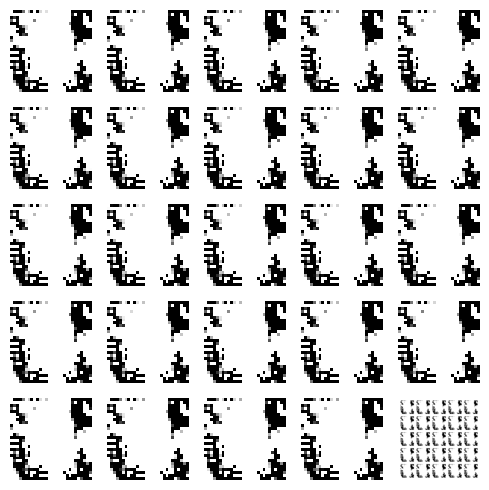

  0%|          | 0/350 [00:00<?, ?it/s]

4/4 [==============================] - 0s 21ms/step


  0%|          | 1/350 [00:00<03:54,  1.49it/s]

4/4 [==============================] - 0s 18ms/step


  1%|          | 2/350 [00:01<03:58,  1.46it/s]

4/4 [==============================] - 0s 29ms/step


  1%|          | 3/350 [00:02<04:01,  1.44it/s]

4/4 [==============================] - 0s 31ms/step


  1%|          | 4/350 [00:02<04:08,  1.39it/s]

4/4 [==============================] - 0s 30ms/step


  1%|▏         | 5/350 [00:03<04:05,  1.40it/s]

4/4 [==============================] - 0s 12ms/step


  2%|▏         | 6/350 [00:04<04:01,  1.42it/s]

4/4 [==============================] - 0s 14ms/step


  2%|▏         | 7/350 [00:04<03:47,  1.51it/s]

4/4 [==============================] - 0s 14ms/step


  2%|▏         | 8/350 [00:05<03:54,  1.46it/s]

4/4 [==============================] - 0s 13ms/step


  3%|▎         | 9/350 [00:06<03:51,  1.48it/s]

4/4 [==============================] - 0s 16ms/step


  3%|▎         | 10/350 [00:06<03:47,  1.50it/s]

4/4 [==============================] - 0s 14ms/step


  3%|▎         | 11/350 [00:07<03:47,  1.49it/s]

4/4 [==============================] - 0s 15ms/step


  3%|▎         | 12/350 [00:08<03:50,  1.47it/s]

4/4 [==============================] - 0s 14ms/step


  4%|▎         | 13/350 [00:08<03:42,  1.52it/s]

4/4 [==============================] - 0s 11ms/step


  4%|▍         | 14/350 [00:09<03:42,  1.51it/s]

4/4 [==============================] - 0s 12ms/step


  4%|▍         | 15/350 [00:10<03:43,  1.50it/s]

4/4 [==============================] - 0s 13ms/step


  5%|▍         | 16/350 [00:10<03:36,  1.54it/s]

4/4 [==============================] - 0s 12ms/step


  5%|▍         | 17/350 [00:11<03:32,  1.57it/s]

4/4 [==============================] - 0s 16ms/step


  5%|▌         | 18/350 [00:12<03:29,  1.58it/s]

4/4 [==============================] - 0s 11ms/step


  5%|▌         | 19/350 [00:12<03:35,  1.54it/s]

4/4 [==============================] - 0s 13ms/step


  6%|▌         | 20/350 [00:13<03:42,  1.49it/s]

4/4 [==============================] - 0s 15ms/step


  6%|▌         | 21/350 [00:14<03:43,  1.47it/s]

4/4 [==============================] - 0s 12ms/step


  6%|▋         | 22/350 [00:14<03:34,  1.53it/s]

4/4 [==============================] - 0s 27ms/step


  7%|▋         | 23/350 [00:15<03:39,  1.49it/s]

4/4 [==============================] - 0s 15ms/step


  7%|▋         | 24/350 [00:16<03:50,  1.42it/s]

4/4 [==============================] - 0s 26ms/step


  7%|▋         | 25/350 [00:16<03:55,  1.38it/s]

4/4 [==============================] - 0s 14ms/step


  7%|▋         | 26/350 [00:17<03:52,  1.39it/s]

4/4 [==============================] - 0s 20ms/step


  8%|▊         | 27/350 [00:18<03:47,  1.42it/s]

4/4 [==============================] - 0s 33ms/step


  8%|▊         | 28/350 [00:19<03:53,  1.38it/s]

4/4 [==============================] - 0s 15ms/step


  8%|▊         | 29/350 [00:19<04:01,  1.33it/s]

4/4 [==============================] - 0s 30ms/step


  9%|▊         | 30/350 [00:20<04:03,  1.31it/s]

4/4 [==============================] - 0s 15ms/step


  9%|▉         | 31/350 [00:21<04:02,  1.32it/s]

4/4 [==============================] - 0s 19ms/step


  9%|▉         | 32/350 [00:22<04:14,  1.25it/s]

4/4 [==============================] - 0s 11ms/step


  9%|▉         | 33/350 [00:23<04:00,  1.32it/s]

4/4 [==============================] - 0s 38ms/step


 10%|▉         | 34/350 [00:23<03:59,  1.32it/s]

4/4 [==============================] - 0s 13ms/step


 10%|█         | 35/350 [00:24<03:53,  1.35it/s]

4/4 [==============================] - 0s 14ms/step


 10%|█         | 36/350 [00:25<04:04,  1.28it/s]

4/4 [==============================] - 0s 13ms/step


 11%|█         | 37/350 [00:26<03:58,  1.31it/s]

4/4 [==============================] - 0s 14ms/step


 11%|█         | 38/350 [00:26<03:50,  1.35it/s]

4/4 [==============================] - 0s 12ms/step


 11%|█         | 39/350 [00:27<03:38,  1.43it/s]

4/4 [==============================] - 0s 12ms/step


 11%|█▏        | 40/350 [00:27<03:26,  1.50it/s]

4/4 [==============================] - 0s 12ms/step


 12%|█▏        | 41/350 [00:28<03:16,  1.57it/s]

4/4 [==============================] - 0s 15ms/step


 12%|█▏        | 42/350 [00:29<03:22,  1.52it/s]

4/4 [==============================] - 0s 11ms/step


 12%|█▏        | 43/350 [00:29<03:25,  1.49it/s]

4/4 [==============================] - 0s 12ms/step


 13%|█▎        | 44/350 [00:30<03:39,  1.39it/s]

4/4 [==============================] - 0s 16ms/step


 13%|█▎        | 45/350 [00:31<03:29,  1.46it/s]

4/4 [==============================] - 0s 13ms/step


 13%|█▎        | 46/350 [00:32<03:31,  1.44it/s]

4/4 [==============================] - 0s 20ms/step


 13%|█▎        | 47/350 [00:32<03:37,  1.39it/s]

4/4 [==============================] - 0s 20ms/step


 14%|█▎        | 48/350 [00:33<03:43,  1.35it/s]

4/4 [==============================] - 0s 25ms/step


 14%|█▍        | 49/350 [00:34<03:51,  1.30it/s]

4/4 [==============================] - 0s 13ms/step


 14%|█▍        | 50/350 [00:35<03:47,  1.32it/s]

4/4 [==============================] - 0s 17ms/step


 15%|█▍        | 51/350 [00:35<03:38,  1.37it/s]

4/4 [==============================] - 0s 11ms/step


 15%|█▍        | 52/350 [00:36<03:41,  1.35it/s]

4/4 [==============================] - 0s 16ms/step


 15%|█▌        | 53/350 [00:37<03:34,  1.39it/s]

4/4 [==============================] - 0s 13ms/step


 15%|█▌        | 54/350 [00:38<03:30,  1.40it/s]

4/4 [==============================] - 0s 15ms/step


 16%|█▌        | 55/350 [00:38<03:21,  1.46it/s]

4/4 [==============================] - 0s 21ms/step


 16%|█▌        | 56/350 [00:39<03:24,  1.43it/s]

4/4 [==============================] - 0s 17ms/step


 16%|█▋        | 57/350 [00:40<03:19,  1.47it/s]

4/4 [==============================] - 0s 18ms/step


 17%|█▋        | 58/350 [00:40<03:20,  1.46it/s]

4/4 [==============================] - 0s 12ms/step


 17%|█▋        | 59/350 [00:41<03:23,  1.43it/s]

4/4 [==============================] - 0s 12ms/step


 17%|█▋        | 60/350 [00:42<03:26,  1.40it/s]

4/4 [==============================] - 0s 13ms/step


 17%|█▋        | 61/350 [00:42<03:21,  1.44it/s]

4/4 [==============================] - 0s 15ms/step


 18%|█▊        | 62/350 [00:43<03:16,  1.47it/s]

4/4 [==============================] - 0s 12ms/step


 18%|█▊        | 63/350 [00:44<03:15,  1.47it/s]

4/4 [==============================] - 0s 13ms/step


 18%|█▊        | 64/350 [00:44<03:19,  1.44it/s]

4/4 [==============================] - 0s 14ms/step


 19%|█▊        | 65/350 [00:45<03:20,  1.42it/s]

4/4 [==============================] - 0s 13ms/step


 19%|█▉        | 66/350 [00:46<03:12,  1.47it/s]

4/4 [==============================] - 0s 11ms/step


 19%|█▉        | 67/350 [00:46<03:14,  1.46it/s]

4/4 [==============================] - 0s 13ms/step


 19%|█▉        | 68/350 [00:47<03:14,  1.45it/s]

4/4 [==============================] - 0s 12ms/step


 20%|█▉        | 69/350 [00:48<03:09,  1.48it/s]

4/4 [==============================] - 0s 11ms/step


 20%|██        | 70/350 [00:49<03:11,  1.46it/s]

4/4 [==============================] - 0s 25ms/step


 20%|██        | 71/350 [00:49<03:15,  1.43it/s]

4/4 [==============================] - 0s 14ms/step


 21%|██        | 72/350 [00:50<03:14,  1.43it/s]

4/4 [==============================] - 0s 15ms/step


 21%|██        | 73/350 [00:51<03:17,  1.40it/s]

4/4 [==============================] - 0s 18ms/step


 21%|██        | 74/350 [00:51<03:10,  1.45it/s]

4/4 [==============================] - 0s 15ms/step


 21%|██▏       | 75/350 [00:52<03:15,  1.41it/s]

4/4 [==============================] - 0s 19ms/step


 22%|██▏       | 76/350 [00:53<03:26,  1.32it/s]

4/4 [==============================] - 0s 14ms/step


 22%|██▏       | 77/350 [00:54<03:26,  1.32it/s]

4/4 [==============================] - 0s 11ms/step


 22%|██▏       | 78/350 [00:54<03:15,  1.39it/s]

4/4 [==============================] - 0s 20ms/step


 23%|██▎       | 79/350 [00:55<03:17,  1.37it/s]

4/4 [==============================] - 0s 14ms/step


 23%|██▎       | 80/350 [00:56<03:15,  1.38it/s]

4/4 [==============================] - 0s 11ms/step


 23%|██▎       | 81/350 [00:56<03:03,  1.46it/s]

4/4 [==============================] - 0s 15ms/step


 23%|██▎       | 82/350 [00:57<02:56,  1.52it/s]

4/4 [==============================] - 0s 12ms/step


 24%|██▎       | 83/350 [00:58<02:47,  1.60it/s]

4/4 [==============================] - 0s 31ms/step


 24%|██▍       | 84/350 [00:58<03:00,  1.48it/s]

4/4 [==============================] - 0s 12ms/step


 24%|██▍       | 85/350 [00:59<03:16,  1.35it/s]

4/4 [==============================] - 0s 16ms/step


 25%|██▍       | 86/350 [01:00<03:15,  1.35it/s]

4/4 [==============================] - 0s 15ms/step


 25%|██▍       | 87/350 [01:01<03:10,  1.38it/s]

4/4 [==============================] - 0s 21ms/step


 25%|██▌       | 88/350 [01:01<03:08,  1.39it/s]

4/4 [==============================] - 0s 16ms/step


 25%|██▌       | 89/350 [01:02<03:10,  1.37it/s]

4/4 [==============================] - 0s 18ms/step


 26%|██▌       | 90/350 [01:03<03:01,  1.43it/s]

4/4 [==============================] - 0s 11ms/step


 26%|██▌       | 91/350 [01:03<03:01,  1.43it/s]

4/4 [==============================] - 0s 11ms/step


 26%|██▋       | 92/350 [01:04<03:01,  1.42it/s]

4/4 [==============================] - 0s 12ms/step


 27%|██▋       | 93/350 [01:05<02:55,  1.47it/s]

4/4 [==============================] - 0s 19ms/step


 27%|██▋       | 94/350 [01:06<03:02,  1.40it/s]

4/4 [==============================] - 0s 13ms/step


 27%|██▋       | 95/350 [01:06<03:08,  1.35it/s]

4/4 [==============================] - 0s 14ms/step


 27%|██▋       | 96/350 [01:07<03:08,  1.35it/s]

4/4 [==============================] - 0s 13ms/step


 28%|██▊       | 97/350 [01:08<03:08,  1.34it/s]

4/4 [==============================] - 0s 13ms/step


 28%|██▊       | 98/350 [01:09<03:04,  1.36it/s]

4/4 [==============================] - 0s 14ms/step


 28%|██▊       | 99/350 [01:09<03:05,  1.36it/s]

4/4 [==============================] - 0s 15ms/step


 29%|██▊       | 100/350 [01:10<02:56,  1.42it/s]

4/4 [==============================] - 0s 11ms/step


 29%|██▉       | 101/350 [01:11<02:56,  1.41it/s]

4/4 [==============================] - 0s 12ms/step


 29%|██▉       | 102/350 [01:11<02:59,  1.38it/s]

4/4 [==============================] - 0s 13ms/step


 29%|██▉       | 103/350 [01:12<02:54,  1.42it/s]

4/4 [==============================] - 0s 18ms/step


 30%|██▉       | 104/350 [01:13<02:52,  1.43it/s]

4/4 [==============================] - 0s 19ms/step


 30%|███       | 105/350 [01:14<02:52,  1.42it/s]

4/4 [==============================] - 0s 12ms/step


 30%|███       | 106/350 [01:14<02:44,  1.48it/s]

4/4 [==============================] - 0s 12ms/step


 31%|███       | 107/350 [01:15<02:47,  1.45it/s]

4/4 [==============================] - 0s 13ms/step


 31%|███       | 108/350 [01:16<02:50,  1.42it/s]

4/4 [==============================] - 0s 24ms/step


 31%|███       | 109/350 [01:16<02:58,  1.35it/s]

4/4 [==============================] - 0s 13ms/step


 31%|███▏      | 110/350 [01:17<02:58,  1.35it/s]

4/4 [==============================] - 0s 15ms/step


 32%|███▏      | 111/350 [01:18<02:58,  1.34it/s]

4/4 [==============================] - 0s 22ms/step


 32%|███▏      | 112/350 [01:19<02:58,  1.34it/s]

4/4 [==============================] - 0s 14ms/step


 32%|███▏      | 113/350 [01:19<02:51,  1.38it/s]

4/4 [==============================] - 0s 34ms/step


 33%|███▎      | 114/350 [01:20<02:55,  1.34it/s]

4/4 [==============================] - 0s 22ms/step


 33%|███▎      | 115/350 [01:21<02:50,  1.37it/s]

4/4 [==============================] - 0s 14ms/step


 33%|███▎      | 116/350 [01:21<02:46,  1.41it/s]

4/4 [==============================] - 0s 15ms/step


 33%|███▎      | 117/350 [01:22<02:45,  1.41it/s]

4/4 [==============================] - 0s 20ms/step


 34%|███▎      | 118/350 [01:23<02:50,  1.36it/s]

4/4 [==============================] - 0s 13ms/step


 34%|███▍      | 119/350 [01:24<02:42,  1.43it/s]

4/4 [==============================] - 0s 23ms/step


 34%|███▍      | 120/350 [01:25<02:57,  1.29it/s]

4/4 [==============================] - 0s 17ms/step


 35%|███▍      | 121/350 [01:25<02:50,  1.34it/s]

4/4 [==============================] - 0s 20ms/step


 35%|███▍      | 122/350 [01:26<02:47,  1.36it/s]

4/4 [==============================] - 0s 15ms/step


 35%|███▌      | 123/350 [01:27<02:46,  1.36it/s]

4/4 [==============================] - 0s 12ms/step


 35%|███▌      | 124/350 [01:27<02:41,  1.40it/s]

4/4 [==============================] - 0s 12ms/step


 36%|███▌      | 125/350 [01:28<02:32,  1.48it/s]

4/4 [==============================] - 0s 15ms/step


 36%|███▌      | 126/350 [01:29<02:33,  1.46it/s]

4/4 [==============================] - 0s 13ms/step


 36%|███▋      | 127/350 [01:29<02:32,  1.47it/s]

4/4 [==============================] - 0s 20ms/step


 37%|███▋      | 128/350 [01:30<02:30,  1.48it/s]

4/4 [==============================] - 0s 12ms/step


 37%|███▋      | 129/350 [01:31<02:31,  1.46it/s]

4/4 [==============================] - 0s 11ms/step


 37%|███▋      | 130/350 [01:31<02:29,  1.47it/s]

4/4 [==============================] - 0s 25ms/step


 37%|███▋      | 131/350 [01:32<02:28,  1.48it/s]

4/4 [==============================] - 0s 12ms/step


 38%|███▊      | 132/350 [01:33<02:26,  1.48it/s]

4/4 [==============================] - 0s 14ms/step


 38%|███▊      | 133/350 [01:33<02:23,  1.51it/s]

4/4 [==============================] - 0s 12ms/step


 38%|███▊      | 134/350 [01:34<02:27,  1.47it/s]

4/4 [==============================] - 0s 25ms/step


 39%|███▊      | 135/350 [01:35<02:29,  1.44it/s]

4/4 [==============================] - 0s 14ms/step


 39%|███▉      | 136/350 [01:35<02:26,  1.46it/s]

4/4 [==============================] - 0s 14ms/step


 39%|███▉      | 137/350 [01:36<02:21,  1.51it/s]

4/4 [==============================] - 0s 15ms/step


 39%|███▉      | 138/350 [01:37<02:23,  1.48it/s]

4/4 [==============================] - 0s 12ms/step


 40%|███▉      | 139/350 [01:37<02:27,  1.43it/s]

4/4 [==============================] - 0s 19ms/step


 40%|████      | 140/350 [01:38<02:31,  1.39it/s]

4/4 [==============================] - 0s 15ms/step


 40%|████      | 141/350 [01:39<02:21,  1.48it/s]

4/4 [==============================] - 0s 31ms/step


 41%|████      | 142/350 [01:40<02:22,  1.46it/s]

4/4 [==============================] - 0s 14ms/step


 41%|████      | 143/350 [01:40<02:23,  1.45it/s]

4/4 [==============================] - 0s 13ms/step


 41%|████      | 144/350 [01:41<02:20,  1.47it/s]

4/4 [==============================] - 0s 17ms/step


 41%|████▏     | 145/350 [01:42<02:16,  1.50it/s]

4/4 [==============================] - 0s 14ms/step


 42%|████▏     | 146/350 [01:42<02:17,  1.48it/s]

4/4 [==============================] - 0s 14ms/step


 42%|████▏     | 147/350 [01:43<02:14,  1.51it/s]

4/4 [==============================] - 0s 11ms/step


 42%|████▏     | 148/350 [01:44<02:14,  1.51it/s]

4/4 [==============================] - 0s 12ms/step


 43%|████▎     | 149/350 [01:44<02:14,  1.49it/s]

4/4 [==============================] - 0s 16ms/step


 43%|████▎     | 150/350 [01:45<02:11,  1.52it/s]

4/4 [==============================] - 0s 11ms/step


 43%|████▎     | 151/350 [01:46<02:14,  1.48it/s]

4/4 [==============================] - 0s 11ms/step


 43%|████▎     | 152/350 [01:46<02:12,  1.49it/s]

4/4 [==============================] - 0s 14ms/step


 44%|████▎     | 153/350 [01:47<02:10,  1.51it/s]

4/4 [==============================] - 0s 12ms/step


 44%|████▍     | 154/350 [01:48<02:11,  1.49it/s]

4/4 [==============================] - 0s 16ms/step


 44%|████▍     | 155/350 [01:48<02:13,  1.46it/s]

4/4 [==============================] - 0s 17ms/step


 45%|████▍     | 156/350 [01:49<02:08,  1.51it/s]

4/4 [==============================] - 0s 12ms/step


 45%|████▍     | 157/350 [01:50<02:10,  1.48it/s]

4/4 [==============================] - 0s 13ms/step


 45%|████▌     | 158/350 [01:50<02:12,  1.45it/s]

4/4 [==============================] - 0s 14ms/step


 45%|████▌     | 159/350 [01:51<02:06,  1.51it/s]

4/4 [==============================] - 0s 11ms/step


 46%|████▌     | 160/350 [01:52<02:07,  1.49it/s]

4/4 [==============================] - 0s 10ms/step


 46%|████▌     | 161/350 [01:52<02:04,  1.51it/s]

4/4 [==============================] - 0s 15ms/step


 46%|████▋     | 162/350 [01:53<02:02,  1.53it/s]

4/4 [==============================] - 0s 12ms/step


 47%|████▋     | 163/350 [01:54<02:03,  1.52it/s]

4/4 [==============================] - 0s 13ms/step


 47%|████▋     | 164/350 [01:54<02:05,  1.48it/s]

4/4 [==============================] - 0s 12ms/step


 47%|████▋     | 165/350 [01:55<01:59,  1.55it/s]

4/4 [==============================] - 0s 16ms/step


 47%|████▋     | 166/350 [01:56<02:00,  1.53it/s]

4/4 [==============================] - 0s 11ms/step


 48%|████▊     | 167/350 [01:56<01:56,  1.57it/s]

4/4 [==============================] - 0s 23ms/step


 48%|████▊     | 168/350 [01:57<01:57,  1.54it/s]

4/4 [==============================] - 0s 13ms/step


 48%|████▊     | 169/350 [01:57<01:58,  1.52it/s]

4/4 [==============================] - 0s 12ms/step


 49%|████▊     | 170/350 [01:58<01:55,  1.55it/s]

4/4 [==============================] - 0s 14ms/step


 49%|████▉     | 171/350 [01:59<01:57,  1.52it/s]

4/4 [==============================] - 0s 11ms/step


 49%|████▉     | 172/350 [01:59<01:57,  1.51it/s]

4/4 [==============================] - 0s 17ms/step


 49%|████▉     | 173/350 [02:00<01:57,  1.50it/s]

4/4 [==============================] - 0s 13ms/step


 50%|████▉     | 174/350 [02:01<01:56,  1.51it/s]

4/4 [==============================] - 0s 17ms/step


 50%|█████     | 175/350 [02:01<01:53,  1.55it/s]

4/4 [==============================] - 0s 14ms/step


 50%|█████     | 176/350 [02:02<01:55,  1.50it/s]

4/4 [==============================] - 0s 13ms/step


 51%|█████     | 177/350 [02:03<01:59,  1.44it/s]

4/4 [==============================] - 0s 16ms/step


 51%|█████     | 178/350 [02:04<01:58,  1.45it/s]

4/4 [==============================] - 0s 14ms/step


 51%|█████     | 179/350 [02:04<01:57,  1.45it/s]

4/4 [==============================] - 0s 15ms/step


 51%|█████▏    | 180/350 [02:05<01:52,  1.51it/s]

4/4 [==============================] - 0s 11ms/step


 52%|█████▏    | 181/350 [02:06<01:54,  1.48it/s]

4/4 [==============================] - 0s 12ms/step


 52%|█████▏    | 182/350 [02:06<01:55,  1.45it/s]

4/4 [==============================] - 0s 14ms/step


 52%|█████▏    | 183/350 [02:07<01:54,  1.46it/s]

4/4 [==============================] - 0s 15ms/step


 53%|█████▎    | 184/350 [02:08<01:55,  1.44it/s]

4/4 [==============================] - 0s 13ms/step


 53%|█████▎    | 185/350 [02:08<01:51,  1.49it/s]

4/4 [==============================] - 0s 17ms/step


 53%|█████▎    | 186/350 [02:09<01:51,  1.47it/s]

4/4 [==============================] - 0s 13ms/step


 53%|█████▎    | 187/350 [02:10<01:50,  1.47it/s]

4/4 [==============================] - 0s 14ms/step


 54%|█████▎    | 188/350 [02:10<01:47,  1.51it/s]

4/4 [==============================] - 0s 20ms/step


 54%|█████▍    | 189/350 [02:11<01:48,  1.49it/s]

4/4 [==============================] - 0s 13ms/step


 54%|█████▍    | 190/350 [02:12<01:48,  1.48it/s]

4/4 [==============================] - 0s 14ms/step


 55%|█████▍    | 191/350 [02:12<01:43,  1.53it/s]

4/4 [==============================] - 0s 14ms/step


 55%|█████▍    | 192/350 [02:13<01:47,  1.47it/s]

4/4 [==============================] - 0s 14ms/step


 55%|█████▌    | 193/350 [02:14<01:47,  1.47it/s]

4/4 [==============================] - 0s 14ms/step


 55%|█████▌    | 194/350 [02:14<01:42,  1.53it/s]

4/4 [==============================] - 0s 12ms/step


 56%|█████▌    | 195/350 [02:15<01:42,  1.52it/s]

4/4 [==============================] - 0s 18ms/step


 56%|█████▌    | 196/350 [02:16<01:40,  1.53it/s]

4/4 [==============================] - 0s 13ms/step


 56%|█████▋    | 197/350 [02:16<01:41,  1.51it/s]

4/4 [==============================] - 0s 14ms/step


 57%|█████▋    | 198/350 [02:17<01:40,  1.51it/s]

4/4 [==============================] - 0s 13ms/step


 57%|█████▋    | 199/350 [02:18<01:42,  1.47it/s]

4/4 [==============================] - 0s 13ms/step


 57%|█████▋    | 200/350 [02:18<01:44,  1.43it/s]

4/4 [==============================] - 0s 11ms/step


 57%|█████▋    | 201/350 [02:19<01:45,  1.41it/s]

4/4 [==============================] - 0s 14ms/step


 58%|█████▊    | 202/350 [02:20<01:39,  1.49it/s]

4/4 [==============================] - 0s 12ms/step


 58%|█████▊    | 203/350 [02:20<01:40,  1.46it/s]

4/4 [==============================] - 0s 13ms/step


 58%|█████▊    | 204/350 [02:21<01:39,  1.47it/s]

4/4 [==============================] - 0s 12ms/step


 59%|█████▊    | 205/350 [02:22<01:35,  1.51it/s]

4/4 [==============================] - 0s 16ms/step


 59%|█████▉    | 206/350 [02:22<01:35,  1.51it/s]

4/4 [==============================] - 0s 12ms/step


 59%|█████▉    | 207/350 [02:23<01:37,  1.46it/s]

4/4 [==============================] - 0s 15ms/step


 59%|█████▉    | 208/350 [02:24<01:33,  1.51it/s]

4/4 [==============================] - 0s 11ms/step


 60%|█████▉    | 209/350 [02:24<01:33,  1.51it/s]

4/4 [==============================] - 0s 13ms/step


 60%|██████    | 210/350 [02:25<01:31,  1.53it/s]

4/4 [==============================] - 0s 13ms/step


 60%|██████    | 211/350 [02:26<01:33,  1.49it/s]

4/4 [==============================] - 0s 12ms/step


 61%|██████    | 212/350 [02:26<01:33,  1.48it/s]

4/4 [==============================] - 0s 12ms/step


 61%|██████    | 213/350 [02:27<01:30,  1.52it/s]

4/4 [==============================] - 0s 16ms/step


 61%|██████    | 214/350 [02:28<01:31,  1.49it/s]

4/4 [==============================] - 0s 13ms/step


 61%|██████▏   | 215/350 [02:28<01:31,  1.47it/s]

4/4 [==============================] - 0s 16ms/step


 62%|██████▏   | 216/350 [02:29<01:28,  1.51it/s]

4/4 [==============================] - 0s 16ms/step


 62%|██████▏   | 217/350 [02:30<01:26,  1.54it/s]

4/4 [==============================] - 0s 15ms/step


 62%|██████▏   | 218/350 [02:30<01:30,  1.47it/s]

4/4 [==============================] - 0s 13ms/step


 63%|██████▎   | 219/350 [02:31<01:29,  1.47it/s]

4/4 [==============================] - 0s 14ms/step


 63%|██████▎   | 220/350 [02:32<01:28,  1.46it/s]

4/4 [==============================] - 0s 14ms/step


 63%|██████▎   | 221/350 [02:32<01:25,  1.51it/s]

4/4 [==============================] - 0s 17ms/step


 63%|██████▎   | 222/350 [02:33<01:26,  1.48it/s]

4/4 [==============================] - 0s 14ms/step


 64%|██████▎   | 223/350 [02:34<01:24,  1.51it/s]

4/4 [==============================] - 0s 18ms/step


 64%|██████▍   | 224/350 [02:34<01:25,  1.48it/s]

4/4 [==============================] - 0s 13ms/step


 64%|██████▍   | 225/350 [02:35<01:31,  1.36it/s]

4/4 [==============================] - 0s 11ms/step


 65%|██████▍   | 226/350 [02:36<01:28,  1.40it/s]

4/4 [==============================] - 0s 12ms/step


 65%|██████▍   | 227/350 [02:37<01:33,  1.31it/s]

4/4 [==============================] - 0s 18ms/step


 65%|██████▌   | 228/350 [02:38<01:30,  1.34it/s]

4/4 [==============================] - 0s 15ms/step


 65%|██████▌   | 229/350 [02:38<01:27,  1.38it/s]

4/4 [==============================] - 0s 12ms/step


 66%|██████▌   | 230/350 [02:39<01:28,  1.36it/s]

4/4 [==============================] - 0s 15ms/step


 66%|██████▌   | 231/350 [02:40<01:27,  1.36it/s]

4/4 [==============================] - 0s 13ms/step


 66%|██████▋   | 232/350 [02:40<01:23,  1.42it/s]

4/4 [==============================] - 0s 36ms/step


 67%|██████▋   | 233/350 [02:41<01:22,  1.43it/s]

4/4 [==============================] - 0s 13ms/step


 67%|██████▋   | 234/350 [02:42<01:22,  1.41it/s]

4/4 [==============================] - 0s 13ms/step


 67%|██████▋   | 235/350 [02:42<01:18,  1.47it/s]

4/4 [==============================] - 0s 13ms/step


 67%|██████▋   | 236/350 [02:43<01:17,  1.47it/s]

4/4 [==============================] - 0s 16ms/step


 68%|██████▊   | 237/350 [02:44<01:20,  1.41it/s]

4/4 [==============================] - 0s 12ms/step


 68%|██████▊   | 238/350 [02:45<01:18,  1.43it/s]

4/4 [==============================] - 0s 11ms/step


 68%|██████▊   | 239/350 [02:45<01:18,  1.41it/s]

4/4 [==============================] - 0s 23ms/step


 69%|██████▊   | 240/350 [02:46<01:18,  1.40it/s]

4/4 [==============================] - 0s 18ms/step


 69%|██████▉   | 241/350 [02:47<01:17,  1.40it/s]

4/4 [==============================] - 0s 15ms/step


 69%|██████▉   | 242/350 [02:47<01:15,  1.44it/s]

4/4 [==============================] - 0s 13ms/step


 69%|██████▉   | 243/350 [02:48<01:16,  1.41it/s]

4/4 [==============================] - 0s 12ms/step


 70%|██████▉   | 244/350 [02:49<01:16,  1.38it/s]

4/4 [==============================] - 0s 17ms/step


 70%|███████   | 245/350 [02:50<01:15,  1.39it/s]

4/4 [==============================] - 0s 13ms/step


 70%|███████   | 246/350 [02:50<01:14,  1.40it/s]

4/4 [==============================] - 0s 14ms/step


 71%|███████   | 247/350 [02:51<01:15,  1.37it/s]

4/4 [==============================] - 0s 15ms/step


 71%|███████   | 248/350 [02:52<01:13,  1.39it/s]

4/4 [==============================] - 0s 13ms/step


 71%|███████   | 249/350 [02:52<01:13,  1.37it/s]

4/4 [==============================] - 0s 15ms/step


 71%|███████▏  | 250/350 [02:53<01:13,  1.36it/s]

4/4 [==============================] - 0s 15ms/step


 72%|███████▏  | 251/350 [02:54<01:11,  1.38it/s]

4/4 [==============================] - 0s 16ms/step


 72%|███████▏  | 252/350 [02:55<01:08,  1.42it/s]

4/4 [==============================] - 0s 11ms/step


 72%|███████▏  | 253/350 [02:55<01:06,  1.47it/s]

4/4 [==============================] - 0s 15ms/step


 73%|███████▎  | 254/350 [02:56<01:06,  1.45it/s]

4/4 [==============================] - 0s 15ms/step


 73%|███████▎  | 255/350 [02:57<01:06,  1.42it/s]

4/4 [==============================] - 0s 13ms/step


 73%|███████▎  | 256/350 [02:57<01:03,  1.49it/s]

4/4 [==============================] - 0s 15ms/step


 73%|███████▎  | 257/350 [02:58<01:01,  1.52it/s]

4/4 [==============================] - 0s 15ms/step


 74%|███████▎  | 258/350 [02:58<00:59,  1.54it/s]

4/4 [==============================] - 0s 12ms/step


 74%|███████▍  | 259/350 [02:59<01:00,  1.51it/s]

4/4 [==============================] - 0s 18ms/step


 74%|███████▍  | 260/350 [03:00<00:59,  1.52it/s]

4/4 [==============================] - 0s 12ms/step


 75%|███████▍  | 261/350 [03:00<00:58,  1.52it/s]

4/4 [==============================] - 0s 33ms/step


 75%|███████▍  | 262/350 [03:01<01:01,  1.44it/s]

4/4 [==============================] - 0s 13ms/step


 75%|███████▌  | 263/350 [03:02<00:57,  1.51it/s]

4/4 [==============================] - 0s 21ms/step


 75%|███████▌  | 264/350 [03:03<00:57,  1.48it/s]

4/4 [==============================] - 0s 12ms/step


 76%|███████▌  | 265/350 [03:03<00:57,  1.48it/s]

4/4 [==============================] - 0s 12ms/step


 76%|███████▌  | 266/350 [03:04<00:55,  1.52it/s]

4/4 [==============================] - 0s 13ms/step


 76%|███████▋  | 267/350 [03:05<00:55,  1.50it/s]

4/4 [==============================] - 0s 12ms/step


 77%|███████▋  | 268/350 [03:05<00:52,  1.55it/s]

4/4 [==============================] - 0s 41ms/step


 77%|███████▋  | 269/350 [03:06<00:55,  1.47it/s]

4/4 [==============================] - 0s 24ms/step


 77%|███████▋  | 270/350 [03:07<00:54,  1.46it/s]

4/4 [==============================] - 0s 24ms/step


 77%|███████▋  | 271/350 [03:07<00:54,  1.45it/s]

4/4 [==============================] - 0s 12ms/step


 78%|███████▊  | 272/350 [03:08<00:53,  1.45it/s]

4/4 [==============================] - 0s 14ms/step


 78%|███████▊  | 273/350 [03:09<00:51,  1.49it/s]

4/4 [==============================] - 0s 26ms/step


 78%|███████▊  | 274/350 [03:09<00:51,  1.48it/s]

4/4 [==============================] - 0s 16ms/step


 79%|███████▊  | 275/350 [03:10<00:50,  1.48it/s]

4/4 [==============================] - 0s 12ms/step


 79%|███████▉  | 276/350 [03:11<00:48,  1.51it/s]

4/4 [==============================] - 0s 31ms/step


 79%|███████▉  | 277/350 [03:11<00:51,  1.43it/s]

4/4 [==============================] - 0s 14ms/step


 79%|███████▉  | 278/350 [03:12<00:51,  1.41it/s]

4/4 [==============================] - 0s 21ms/step


 80%|███████▉  | 279/350 [03:13<00:50,  1.41it/s]

4/4 [==============================] - 0s 20ms/step


 80%|████████  | 280/350 [03:14<00:49,  1.41it/s]

4/4 [==============================] - 0s 21ms/step


 80%|████████  | 281/350 [03:14<00:49,  1.38it/s]

4/4 [==============================] - 0s 12ms/step


 81%|████████  | 282/350 [03:15<00:50,  1.36it/s]

4/4 [==============================] - 0s 13ms/step


 81%|████████  | 283/350 [03:16<00:48,  1.39it/s]

4/4 [==============================] - 0s 14ms/step


 81%|████████  | 284/350 [03:16<00:47,  1.39it/s]

4/4 [==============================] - 0s 15ms/step


 81%|████████▏ | 285/350 [03:17<00:45,  1.44it/s]

4/4 [==============================] - 0s 15ms/step


 82%|████████▏ | 286/350 [03:18<00:45,  1.40it/s]

4/4 [==============================] - 0s 13ms/step


 82%|████████▏ | 287/350 [03:19<00:44,  1.41it/s]

4/4 [==============================] - 0s 16ms/step


 82%|████████▏ | 288/350 [03:19<00:44,  1.40it/s]

4/4 [==============================] - 0s 14ms/step


 83%|████████▎ | 289/350 [03:20<00:46,  1.30it/s]

4/4 [==============================] - 0s 14ms/step


 83%|████████▎ | 290/350 [03:21<00:42,  1.42it/s]

4/4 [==============================] - 0s 13ms/step


 83%|████████▎ | 291/350 [03:21<00:38,  1.52it/s]

4/4 [==============================] - 0s 12ms/step


 83%|████████▎ | 292/350 [03:22<00:37,  1.55it/s]

4/4 [==============================] - 0s 13ms/step


 84%|████████▎ | 293/350 [03:23<00:36,  1.57it/s]

4/4 [==============================] - 0s 11ms/step


 84%|████████▍ | 294/350 [03:23<00:35,  1.59it/s]

4/4 [==============================] - 0s 11ms/step


 84%|████████▍ | 295/350 [03:24<00:33,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 85%|████████▍ | 296/350 [03:24<00:33,  1.60it/s]

4/4 [==============================] - 0s 13ms/step


 85%|████████▍ | 297/350 [03:25<00:32,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


 85%|████████▌ | 298/350 [03:26<00:32,  1.62it/s]

4/4 [==============================] - 0s 16ms/step


 85%|████████▌ | 299/350 [03:26<00:32,  1.58it/s]

4/4 [==============================] - 0s 12ms/step


 86%|████████▌ | 300/350 [03:27<00:30,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


 86%|████████▌ | 301/350 [03:28<00:32,  1.51it/s]

4/4 [==============================] - 0s 11ms/step


 86%|████████▋ | 302/350 [03:28<00:30,  1.57it/s]

4/4 [==============================] - 0s 15ms/step


 87%|████████▋ | 303/350 [03:29<00:30,  1.53it/s]

4/4 [==============================] - 0s 15ms/step


 87%|████████▋ | 304/350 [03:29<00:29,  1.56it/s]

4/4 [==============================] - 0s 12ms/step


 87%|████████▋ | 305/350 [03:30<00:29,  1.53it/s]

4/4 [==============================] - 0s 14ms/step


 87%|████████▋ | 306/350 [03:31<00:28,  1.56it/s]

4/4 [==============================] - 0s 13ms/step


 88%|████████▊ | 307/350 [03:31<00:28,  1.50it/s]

4/4 [==============================] - 0s 15ms/step


 88%|████████▊ | 308/350 [03:32<00:27,  1.54it/s]

4/4 [==============================] - 0s 13ms/step


 88%|████████▊ | 309/350 [03:33<00:26,  1.53it/s]

4/4 [==============================] - 0s 12ms/step


 89%|████████▊ | 310/350 [03:33<00:25,  1.59it/s]

4/4 [==============================] - 0s 41ms/step


 89%|████████▉ | 311/350 [03:34<00:25,  1.55it/s]

4/4 [==============================] - 0s 12ms/step


 89%|████████▉ | 312/350 [03:35<00:23,  1.60it/s]

4/4 [==============================] - 0s 23ms/step


 89%|████████▉ | 313/350 [03:35<00:23,  1.57it/s]

4/4 [==============================] - 0s 12ms/step


 90%|████████▉ | 314/350 [03:36<00:22,  1.60it/s]

4/4 [==============================] - 0s 16ms/step


 90%|█████████ | 315/350 [03:37<00:22,  1.55it/s]

4/4 [==============================] - 0s 12ms/step


 90%|█████████ | 316/350 [03:37<00:22,  1.49it/s]

4/4 [==============================] - 0s 13ms/step


 91%|█████████ | 317/350 [03:38<00:21,  1.51it/s]

4/4 [==============================] - 0s 13ms/step


 91%|█████████ | 318/350 [03:39<00:20,  1.56it/s]

4/4 [==============================] - 0s 13ms/step


 91%|█████████ | 319/350 [03:39<00:19,  1.55it/s]

4/4 [==============================] - 0s 16ms/step


 91%|█████████▏| 320/350 [03:40<00:18,  1.61it/s]

4/4 [==============================] - 0s 13ms/step


 92%|█████████▏| 321/350 [03:40<00:18,  1.56it/s]

4/4 [==============================] - 0s 12ms/step


 92%|█████████▏| 322/350 [03:41<00:19,  1.44it/s]

4/4 [==============================] - 0s 39ms/step


 92%|█████████▏| 323/350 [03:42<00:19,  1.36it/s]

4/4 [==============================] - 0s 15ms/step


 93%|█████████▎| 324/350 [03:43<00:19,  1.31it/s]

4/4 [==============================] - 0s 22ms/step


 93%|█████████▎| 325/350 [03:44<00:19,  1.28it/s]

4/4 [==============================] - 0s 12ms/step


 93%|█████████▎| 326/350 [03:45<00:18,  1.27it/s]

4/4 [==============================] - 0s 21ms/step


 93%|█████████▎| 327/350 [03:45<00:17,  1.30it/s]

4/4 [==============================] - 0s 31ms/step


 94%|█████████▎| 328/350 [03:46<00:18,  1.21it/s]

4/4 [==============================] - 0s 22ms/step


 94%|█████████▍| 329/350 [03:47<00:17,  1.23it/s]

4/4 [==============================] - 0s 12ms/step


 94%|█████████▍| 330/350 [03:48<00:15,  1.26it/s]

4/4 [==============================] - 0s 15ms/step


 95%|█████████▍| 331/350 [03:48<00:14,  1.32it/s]

4/4 [==============================] - 0s 21ms/step


 95%|█████████▍| 332/350 [03:49<00:13,  1.34it/s]

4/4 [==============================] - 0s 12ms/step


 95%|█████████▌| 333/350 [03:50<00:13,  1.28it/s]

4/4 [==============================] - 0s 13ms/step


 95%|█████████▌| 334/350 [03:51<00:12,  1.29it/s]

4/4 [==============================] - 0s 42ms/step


 96%|█████████▌| 335/350 [03:52<00:11,  1.29it/s]

4/4 [==============================] - 0s 13ms/step


 96%|█████████▌| 336/350 [03:52<00:10,  1.34it/s]

4/4 [==============================] - 0s 13ms/step


 96%|█████████▋| 337/350 [03:53<00:09,  1.44it/s]

4/4 [==============================] - 0s 33ms/step


 97%|█████████▋| 338/350 [03:53<00:08,  1.47it/s]

4/4 [==============================] - 0s 13ms/step


 97%|█████████▋| 339/350 [03:54<00:08,  1.30it/s]

4/4 [==============================] - 0s 33ms/step


 97%|█████████▋| 340/350 [03:55<00:07,  1.32it/s]

4/4 [==============================] - 0s 13ms/step


 97%|█████████▋| 341/350 [03:56<00:06,  1.42it/s]

4/4 [==============================] - 0s 17ms/step


 98%|█████████▊| 342/350 [03:56<00:05,  1.43it/s]

4/4 [==============================] - 0s 12ms/step


 98%|█████████▊| 343/350 [03:57<00:04,  1.53it/s]

4/4 [==============================] - 0s 17ms/step


 98%|█████████▊| 344/350 [03:58<00:03,  1.52it/s]

4/4 [==============================] - 0s 12ms/step


 99%|█████████▊| 345/350 [03:58<00:03,  1.59it/s]

4/4 [==============================] - 0s 17ms/step


 99%|█████████▉| 346/350 [03:59<00:02,  1.55it/s]

4/4 [==============================] - 0s 12ms/step


 99%|█████████▉| 347/350 [03:59<00:01,  1.60it/s]

4/4 [==============================] - 0s 12ms/step


 99%|█████████▉| 348/350 [04:00<00:01,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


100%|█████████▉| 349/350 [04:01<00:00,  1.59it/s]

4/4 [==============================] - 0s 13ms/step


100%|██████████| 350/350 [04:01<00:00,  1.45it/s]

Epoch number: 50 discriminator_loss: 0.16437249202177295 generator_loss: 7.973147141592843
1/1 [==============================] - 0s 22ms/step


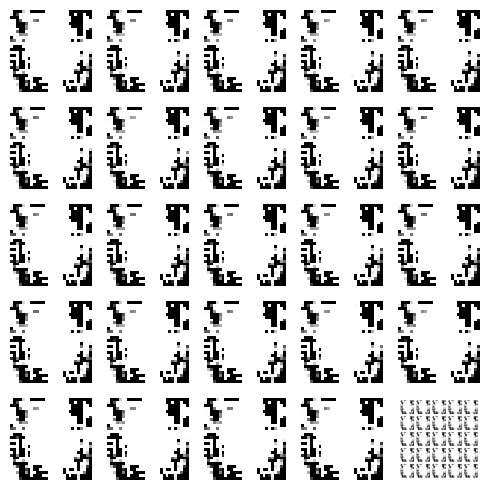

  0%|          | 0/350 [00:00<?, ?it/s]

4/4 [==============================] - 0s 12ms/step


  0%|          | 1/350 [00:00<03:28,  1.67it/s]

4/4 [==============================] - 0s 15ms/step


  1%|          | 2/350 [00:01<03:22,  1.72it/s]

4/4 [==============================] - 0s 17ms/step


  1%|          | 3/350 [00:01<03:36,  1.60it/s]

4/4 [==============================] - 0s 12ms/step


  1%|          | 4/350 [00:02<03:26,  1.67it/s]

4/4 [==============================] - 0s 16ms/step


  1%|▏         | 5/350 [00:03<03:34,  1.61it/s]

4/4 [==============================] - 0s 11ms/step


  2%|▏         | 6/350 [00:03<03:34,  1.60it/s]

4/4 [==============================] - 0s 12ms/step


  2%|▏         | 7/350 [00:04<03:35,  1.59it/s]

4/4 [==============================] - 0s 13ms/step


  2%|▏         | 8/350 [00:04<03:29,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


  3%|▎         | 9/350 [00:05<03:26,  1.66it/s]

4/4 [==============================] - 0s 37ms/step


  3%|▎         | 10/350 [00:06<03:32,  1.60it/s]

4/4 [==============================] - 0s 12ms/step


  3%|▎         | 11/350 [00:06<03:29,  1.62it/s]

4/4 [==============================] - 0s 15ms/step


  3%|▎         | 12/350 [00:07<03:28,  1.62it/s]

4/4 [==============================] - 0s 11ms/step


  4%|▎         | 13/350 [00:07<03:18,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


  4%|▍         | 14/350 [00:08<03:22,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


  4%|▍         | 15/350 [00:09<03:17,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


  5%|▍         | 16/350 [00:09<03:22,  1.65it/s]

4/4 [==============================] - 0s 13ms/step


  5%|▍         | 17/350 [00:10<03:19,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


  5%|▌         | 18/350 [00:10<03:22,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


  5%|▌         | 19/350 [00:11<03:16,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


  6%|▌         | 20/350 [00:12<03:22,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


  6%|▌         | 21/350 [00:12<03:16,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


  6%|▋         | 22/350 [00:13<03:20,  1.64it/s]

4/4 [==============================] - 0s 13ms/step


  7%|▋         | 23/350 [00:13<03:15,  1.68it/s]

4/4 [==============================] - 0s 14ms/step


  7%|▋         | 24/350 [00:14<03:21,  1.62it/s]

4/4 [==============================] - 0s 13ms/step


  7%|▋         | 25/350 [00:15<03:15,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


  7%|▋         | 26/350 [00:15<03:19,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


  8%|▊         | 27/350 [00:16<03:17,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


  8%|▊         | 28/350 [00:17<03:20,  1.60it/s]

4/4 [==============================] - 0s 12ms/step


  8%|▊         | 29/350 [00:17<03:14,  1.65it/s]

4/4 [==============================] - 0s 13ms/step


  9%|▊         | 30/350 [00:18<03:19,  1.60it/s]

4/4 [==============================] - 0s 20ms/step


  9%|▉         | 31/350 [00:18<03:19,  1.60it/s]

4/4 [==============================] - 0s 13ms/step


  9%|▉         | 32/350 [00:19<03:22,  1.57it/s]

4/4 [==============================] - 0s 13ms/step


  9%|▉         | 33/350 [00:20<03:15,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


 10%|▉         | 34/350 [00:20<03:20,  1.58it/s]

4/4 [==============================] - 0s 12ms/step


 10%|█         | 35/350 [00:21<03:12,  1.64it/s]

4/4 [==============================] - 0s 13ms/step


 10%|█         | 36/350 [00:22<03:15,  1.61it/s]

4/4 [==============================] - 0s 13ms/step


 11%|█         | 37/350 [00:22<03:11,  1.64it/s]

4/4 [==============================] - 0s 15ms/step


 11%|█         | 38/350 [00:23<03:17,  1.58it/s]

4/4 [==============================] - 0s 11ms/step


 11%|█         | 39/350 [00:23<03:10,  1.64it/s]

4/4 [==============================] - 0s 13ms/step


 11%|█▏        | 40/350 [00:24<03:13,  1.60it/s]

4/4 [==============================] - 0s 12ms/step


 12%|█▏        | 41/350 [00:25<03:09,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


 12%|█▏        | 42/350 [00:25<03:13,  1.59it/s]

4/4 [==============================] - 0s 13ms/step


 12%|█▏        | 43/350 [00:26<03:10,  1.61it/s]

4/4 [==============================] - 0s 13ms/step


 13%|█▎        | 44/350 [00:27<03:15,  1.56it/s]

4/4 [==============================] - 0s 13ms/step


 13%|█▎        | 45/350 [00:27<03:14,  1.57it/s]

4/4 [==============================] - 0s 14ms/step


 13%|█▎        | 46/350 [00:28<03:17,  1.54it/s]

4/4 [==============================] - 0s 14ms/step


 13%|█▎        | 47/350 [00:28<03:11,  1.58it/s]

4/4 [==============================] - 0s 13ms/step


 14%|█▎        | 48/350 [00:29<03:15,  1.55it/s]

4/4 [==============================] - 0s 12ms/step


 14%|█▍        | 49/350 [00:30<03:07,  1.60it/s]

4/4 [==============================] - 0s 14ms/step


 14%|█▍        | 50/350 [00:30<03:10,  1.58it/s]

4/4 [==============================] - 0s 12ms/step


 15%|█▍        | 51/350 [00:31<03:03,  1.63it/s]

4/4 [==============================] - 0s 15ms/step


 15%|█▍        | 52/350 [00:32<03:10,  1.57it/s]

4/4 [==============================] - 0s 13ms/step


 15%|█▌        | 53/350 [00:32<03:03,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


 15%|█▌        | 54/350 [00:33<03:04,  1.60it/s]

4/4 [==============================] - 0s 12ms/step


 16%|█▌        | 55/350 [00:33<03:01,  1.62it/s]

4/4 [==============================] - 0s 13ms/step


 16%|█▌        | 56/350 [00:34<03:05,  1.58it/s]

4/4 [==============================] - 0s 13ms/step


 16%|█▋        | 57/350 [00:35<02:59,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 17%|█▋        | 58/350 [00:35<03:05,  1.57it/s]

4/4 [==============================] - 0s 14ms/step


 17%|█▋        | 59/350 [00:36<03:05,  1.57it/s]

4/4 [==============================] - 0s 11ms/step


 17%|█▋        | 60/350 [00:37<03:07,  1.54it/s]

4/4 [==============================] - 0s 12ms/step


 17%|█▋        | 61/350 [00:37<03:03,  1.57it/s]

4/4 [==============================] - 0s 13ms/step


 18%|█▊        | 62/350 [00:38<03:09,  1.52it/s]

4/4 [==============================] - 0s 11ms/step


 18%|█▊        | 63/350 [00:39<03:10,  1.50it/s]

4/4 [==============================] - 0s 12ms/step


 18%|█▊        | 64/350 [00:39<03:00,  1.58it/s]

4/4 [==============================] - 0s 12ms/step


 19%|█▊        | 65/350 [00:40<02:54,  1.64it/s]

4/4 [==============================] - 0s 21ms/step


 19%|█▉        | 66/350 [00:40<02:58,  1.59it/s]

4/4 [==============================] - 0s 12ms/step


 19%|█▉        | 67/350 [00:41<02:51,  1.65it/s]

4/4 [==============================] - 0s 13ms/step


 19%|█▉        | 68/350 [00:42<02:57,  1.59it/s]

4/4 [==============================] - 0s 12ms/step


 20%|█▉        | 69/350 [00:42<02:54,  1.61it/s]

4/4 [==============================] - 0s 12ms/step


 20%|██        | 70/350 [00:43<02:55,  1.59it/s]

4/4 [==============================] - 0s 13ms/step


 20%|██        | 71/350 [00:44<02:50,  1.64it/s]

4/4 [==============================] - 0s 13ms/step


 21%|██        | 72/350 [00:44<02:52,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


 21%|██        | 73/350 [00:45<02:48,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 21%|██        | 74/350 [00:45<02:51,  1.61it/s]

4/4 [==============================] - 0s 13ms/step


 21%|██▏       | 75/350 [00:46<02:45,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


 22%|██▏       | 76/350 [00:47<02:51,  1.60it/s]

4/4 [==============================] - 0s 13ms/step


 22%|██▏       | 77/350 [00:47<02:45,  1.65it/s]

4/4 [==============================] - 0s 13ms/step


 22%|██▏       | 78/350 [00:48<02:48,  1.62it/s]

4/4 [==============================] - 0s 13ms/step


 23%|██▎       | 79/350 [00:48<02:43,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 23%|██▎       | 80/350 [00:49<02:48,  1.60it/s]

4/4 [==============================] - 0s 13ms/step


 23%|██▎       | 81/350 [00:50<02:43,  1.64it/s]

4/4 [==============================] - 0s 24ms/step


 23%|██▎       | 82/350 [00:51<03:23,  1.32it/s]

4/4 [==============================] - 0s 18ms/step


 24%|██▎       | 83/350 [00:52<03:26,  1.29it/s]

4/4 [==============================] - 0s 11ms/step


 24%|██▍       | 84/350 [00:52<03:20,  1.33it/s]

4/4 [==============================] - 0s 15ms/step


 24%|██▍       | 85/350 [00:53<03:07,  1.41it/s]

4/4 [==============================] - 0s 20ms/step


 25%|██▍       | 86/350 [00:54<03:07,  1.41it/s]

4/4 [==============================] - 0s 12ms/step


 25%|██▍       | 87/350 [00:54<03:09,  1.38it/s]

4/4 [==============================] - 0s 13ms/step


 25%|██▌       | 88/350 [00:55<03:00,  1.45it/s]

4/4 [==============================] - 0s 18ms/step


 25%|██▌       | 89/350 [00:56<02:58,  1.46it/s]

4/4 [==============================] - 0s 13ms/step


 26%|██▌       | 90/350 [00:56<02:51,  1.51it/s]

4/4 [==============================] - 0s 27ms/step


 26%|██▌       | 91/350 [00:57<02:54,  1.49it/s]

4/4 [==============================] - 0s 18ms/step


 26%|██▋       | 92/350 [00:58<02:59,  1.43it/s]

4/4 [==============================] - 0s 13ms/step


 27%|██▋       | 93/350 [00:58<02:57,  1.45it/s]

4/4 [==============================] - 0s 14ms/step


 27%|██▋       | 94/350 [00:59<02:55,  1.46it/s]

4/4 [==============================] - 0s 18ms/step


 27%|██▋       | 95/350 [01:00<02:50,  1.49it/s]

4/4 [==============================] - 0s 22ms/step


 27%|██▋       | 96/350 [01:00<02:54,  1.46it/s]

4/4 [==============================] - 0s 11ms/step


 28%|██▊       | 97/350 [01:01<02:55,  1.44it/s]

4/4 [==============================] - 0s 13ms/step


 28%|██▊       | 98/350 [01:02<02:47,  1.50it/s]

4/4 [==============================] - 0s 13ms/step


 28%|██▊       | 99/350 [01:02<02:47,  1.50it/s]

4/4 [==============================] - 0s 17ms/step


 29%|██▊       | 100/350 [01:03<02:47,  1.49it/s]

4/4 [==============================] - 0s 13ms/step


 29%|██▉       | 101/350 [01:04<02:42,  1.53it/s]

4/4 [==============================] - 0s 15ms/step


 29%|██▉       | 102/350 [01:04<02:47,  1.48it/s]

4/4 [==============================] - 0s 14ms/step


 29%|██▉       | 103/350 [01:05<02:51,  1.44it/s]

4/4 [==============================] - 0s 13ms/step


 30%|██▉       | 104/350 [01:06<02:53,  1.42it/s]

4/4 [==============================] - 0s 12ms/step


 30%|███       | 105/350 [01:07<02:47,  1.46it/s]

4/4 [==============================] - 0s 21ms/step


 30%|███       | 106/350 [01:07<02:46,  1.46it/s]

4/4 [==============================] - 0s 13ms/step


 31%|███       | 107/350 [01:08<02:48,  1.44it/s]

4/4 [==============================] - 0s 18ms/step


 31%|███       | 108/350 [01:09<02:49,  1.42it/s]

4/4 [==============================] - 0s 12ms/step


 31%|███       | 109/350 [01:09<02:50,  1.42it/s]

4/4 [==============================] - 0s 13ms/step


 31%|███▏      | 110/350 [01:10<02:52,  1.39it/s]

4/4 [==============================] - 0s 14ms/step


 32%|███▏      | 111/350 [01:11<02:58,  1.34it/s]

4/4 [==============================] - 0s 15ms/step


 32%|███▏      | 112/350 [01:12<03:06,  1.27it/s]

4/4 [==============================] - 0s 15ms/step


 32%|███▏      | 113/350 [01:13<03:06,  1.27it/s]

4/4 [==============================] - 0s 15ms/step


 33%|███▎      | 114/350 [01:13<02:56,  1.33it/s]

4/4 [==============================] - 0s 14ms/step


 33%|███▎      | 115/350 [01:14<02:52,  1.36it/s]

4/4 [==============================] - 0s 12ms/step


 33%|███▎      | 116/350 [01:15<02:46,  1.40it/s]

4/4 [==============================] - 0s 17ms/step


 33%|███▎      | 117/350 [01:15<02:44,  1.42it/s]

4/4 [==============================] - 0s 13ms/step


 34%|███▎      | 118/350 [01:16<02:43,  1.42it/s]

4/4 [==============================] - 0s 14ms/step


 34%|███▍      | 119/350 [01:17<02:43,  1.41it/s]

4/4 [==============================] - 0s 11ms/step


 34%|███▍      | 120/350 [01:18<02:53,  1.33it/s]

4/4 [==============================] - 0s 17ms/step


 35%|███▍      | 121/350 [01:18<02:56,  1.30it/s]

4/4 [==============================] - 0s 14ms/step


 35%|███▍      | 122/350 [01:19<02:52,  1.32it/s]

4/4 [==============================] - 0s 14ms/step


 35%|███▌      | 123/350 [01:20<02:50,  1.33it/s]

4/4 [==============================] - 0s 14ms/step


 35%|███▌      | 124/350 [01:20<02:41,  1.40it/s]

4/4 [==============================] - 0s 14ms/step


 36%|███▌      | 125/350 [01:21<02:43,  1.37it/s]

4/4 [==============================] - 0s 14ms/step


 36%|███▌      | 126/350 [01:22<02:42,  1.37it/s]

4/4 [==============================] - 0s 16ms/step


 36%|███▋      | 127/350 [01:23<02:41,  1.38it/s]

4/4 [==============================] - 0s 13ms/step


 37%|███▋      | 128/350 [01:23<02:38,  1.40it/s]

4/4 [==============================] - 0s 21ms/step


 37%|███▋      | 129/350 [01:24<02:35,  1.42it/s]

4/4 [==============================] - 0s 12ms/step


 37%|███▋      | 130/350 [01:25<02:30,  1.46it/s]

4/4 [==============================] - 0s 25ms/step


 37%|███▋      | 131/350 [01:25<02:34,  1.42it/s]

4/4 [==============================] - 0s 16ms/step


 38%|███▊      | 132/350 [01:26<02:36,  1.39it/s]

4/4 [==============================] - 0s 12ms/step


 38%|███▊      | 133/350 [01:27<02:35,  1.40it/s]

4/4 [==============================] - 0s 21ms/step


 38%|███▊      | 134/350 [01:28<02:39,  1.35it/s]

4/4 [==============================] - 0s 12ms/step


 39%|███▊      | 135/350 [01:28<02:39,  1.35it/s]

4/4 [==============================] - 0s 13ms/step


 39%|███▉      | 136/350 [01:29<02:31,  1.41it/s]

4/4 [==============================] - 0s 26ms/step


 39%|███▉      | 137/350 [01:30<02:31,  1.41it/s]

4/4 [==============================] - 0s 13ms/step


 39%|███▉      | 138/350 [01:31<02:36,  1.36it/s]

4/4 [==============================] - 0s 12ms/step


 40%|███▉      | 139/350 [01:31<02:38,  1.33it/s]

4/4 [==============================] - 0s 20ms/step


 40%|████      | 140/350 [01:32<02:34,  1.36it/s]

4/4 [==============================] - 0s 15ms/step


 40%|████      | 141/350 [01:33<02:36,  1.34it/s]

4/4 [==============================] - 0s 27ms/step


 41%|████      | 142/350 [01:34<02:36,  1.33it/s]

4/4 [==============================] - 0s 14ms/step


 41%|████      | 143/350 [01:34<02:30,  1.37it/s]

4/4 [==============================] - 0s 18ms/step


 41%|████      | 144/350 [01:35<02:30,  1.37it/s]

4/4 [==============================] - 0s 18ms/step


 41%|████▏     | 145/350 [01:36<02:30,  1.36it/s]

4/4 [==============================] - 0s 15ms/step


 42%|████▏     | 146/350 [01:37<02:30,  1.36it/s]

4/4 [==============================] - 0s 22ms/step


 42%|████▏     | 147/350 [01:37<02:29,  1.35it/s]

4/4 [==============================] - 0s 15ms/step


 42%|████▏     | 148/350 [01:38<02:23,  1.41it/s]

4/4 [==============================] - 0s 17ms/step


 43%|████▎     | 149/350 [01:39<02:20,  1.43it/s]

4/4 [==============================] - 0s 15ms/step


 43%|████▎     | 150/350 [01:39<02:23,  1.40it/s]

4/4 [==============================] - 0s 14ms/step


 43%|████▎     | 151/350 [01:40<02:19,  1.43it/s]

4/4 [==============================] - 0s 16ms/step


 43%|████▎     | 152/350 [01:41<02:15,  1.46it/s]

4/4 [==============================] - 0s 22ms/step


 44%|████▎     | 153/350 [01:41<02:17,  1.44it/s]

4/4 [==============================] - 0s 12ms/step


 44%|████▍     | 154/350 [01:42<02:14,  1.46it/s]

4/4 [==============================] - 0s 24ms/step


 44%|████▍     | 155/350 [01:43<02:13,  1.47it/s]

4/4 [==============================] - 0s 12ms/step


 45%|████▍     | 156/350 [01:43<02:15,  1.43it/s]

4/4 [==============================] - 0s 11ms/step


 45%|████▍     | 157/350 [01:44<02:11,  1.46it/s]

4/4 [==============================] - 0s 18ms/step


 45%|████▌     | 158/350 [01:45<02:06,  1.52it/s]

4/4 [==============================] - 0s 16ms/step


 45%|████▌     | 159/350 [01:45<02:09,  1.48it/s]

4/4 [==============================] - 0s 25ms/step


 46%|████▌     | 160/350 [01:46<02:14,  1.41it/s]

4/4 [==============================] - 0s 12ms/step


 46%|████▌     | 161/350 [01:47<02:13,  1.42it/s]

4/4 [==============================] - 0s 13ms/step


 46%|████▋     | 162/350 [01:48<02:08,  1.46it/s]

4/4 [==============================] - 0s 16ms/step


 47%|████▋     | 163/350 [01:48<02:10,  1.44it/s]

4/4 [==============================] - 0s 13ms/step


 47%|████▋     | 164/350 [01:49<02:03,  1.50it/s]

4/4 [==============================] - 0s 19ms/step


 47%|████▋     | 165/350 [01:50<02:05,  1.47it/s]

4/4 [==============================] - 0s 13ms/step


 47%|████▋     | 166/350 [01:50<02:01,  1.52it/s]

4/4 [==============================] - 0s 13ms/step


 48%|████▊     | 167/350 [01:51<02:02,  1.50it/s]

4/4 [==============================] - 0s 26ms/step


 48%|████▊     | 168/350 [01:52<02:06,  1.44it/s]

4/4 [==============================] - 0s 13ms/step


 48%|████▊     | 169/350 [01:52<02:03,  1.46it/s]

4/4 [==============================] - 0s 24ms/step


 49%|████▊     | 170/350 [01:53<02:04,  1.44it/s]

4/4 [==============================] - 0s 12ms/step


 49%|████▉     | 171/350 [01:54<02:00,  1.49it/s]

4/4 [==============================] - 0s 13ms/step


 49%|████▉     | 172/350 [01:54<01:59,  1.49it/s]

4/4 [==============================] - 0s 26ms/step


 49%|████▉     | 173/350 [01:55<02:02,  1.44it/s]

4/4 [==============================] - 0s 16ms/step


 50%|████▉     | 174/350 [01:56<01:59,  1.47it/s]

4/4 [==============================] - 0s 16ms/step


 50%|█████     | 175/350 [01:56<01:56,  1.50it/s]

4/4 [==============================] - 0s 20ms/step


 50%|█████     | 176/350 [01:57<01:53,  1.53it/s]

4/4 [==============================] - 0s 17ms/step


 51%|█████     | 177/350 [01:58<01:54,  1.51it/s]

4/4 [==============================] - 0s 12ms/step


 51%|█████     | 178/350 [01:58<01:55,  1.48it/s]

4/4 [==============================] - 0s 13ms/step


 51%|█████     | 179/350 [01:59<01:53,  1.51it/s]

4/4 [==============================] - 0s 26ms/step


 51%|█████▏    | 180/350 [02:00<01:54,  1.48it/s]

4/4 [==============================] - 0s 13ms/step


 52%|█████▏    | 181/350 [02:00<01:56,  1.44it/s]

4/4 [==============================] - 0s 14ms/step


 52%|█████▏    | 182/350 [02:01<01:53,  1.49it/s]

4/4 [==============================] - 0s 13ms/step


 52%|█████▏    | 183/350 [02:02<01:51,  1.50it/s]

4/4 [==============================] - 0s 14ms/step


 53%|█████▎    | 184/350 [02:02<01:49,  1.51it/s]

4/4 [==============================] - 0s 28ms/step


 53%|█████▎    | 185/350 [02:03<01:50,  1.49it/s]

4/4 [==============================] - 0s 11ms/step


 53%|█████▎    | 186/350 [02:04<01:50,  1.48it/s]

4/4 [==============================] - 0s 18ms/step


 53%|█████▎    | 187/350 [02:04<01:49,  1.49it/s]

4/4 [==============================] - 0s 13ms/step


 54%|█████▎    | 188/350 [02:05<01:51,  1.45it/s]

4/4 [==============================] - 0s 16ms/step


 54%|█████▍    | 189/350 [02:06<01:49,  1.47it/s]

4/4 [==============================] - 0s 17ms/step


 54%|█████▍    | 190/350 [02:07<01:55,  1.39it/s]

4/4 [==============================] - 0s 12ms/step


 55%|█████▍    | 191/350 [02:07<01:51,  1.43it/s]

4/4 [==============================] - 0s 22ms/step


 55%|█████▍    | 192/350 [02:08<01:51,  1.42it/s]

4/4 [==============================] - 0s 22ms/step


 55%|█████▌    | 193/350 [02:09<01:52,  1.39it/s]

4/4 [==============================] - 0s 14ms/step


 55%|█████▌    | 194/350 [02:09<01:54,  1.36it/s]

4/4 [==============================] - 0s 12ms/step


 56%|█████▌    | 195/350 [02:10<01:47,  1.44it/s]

4/4 [==============================] - 0s 27ms/step


 56%|█████▌    | 196/350 [02:11<01:47,  1.43it/s]

4/4 [==============================] - 0s 13ms/step


 56%|█████▋    | 197/350 [02:11<01:45,  1.45it/s]

4/4 [==============================] - 0s 27ms/step


 57%|█████▋    | 198/350 [02:12<01:52,  1.35it/s]

4/4 [==============================] - 0s 16ms/step


 57%|█████▋    | 199/350 [02:13<01:48,  1.39it/s]

4/4 [==============================] - 0s 28ms/step


 57%|█████▋    | 200/350 [02:14<01:48,  1.38it/s]

4/4 [==============================] - 0s 17ms/step


 57%|█████▋    | 201/350 [02:14<01:44,  1.42it/s]

4/4 [==============================] - 0s 21ms/step


 58%|█████▊    | 202/350 [02:15<01:47,  1.38it/s]

4/4 [==============================] - 0s 20ms/step


 58%|█████▊    | 203/350 [02:16<01:48,  1.35it/s]

4/4 [==============================] - 0s 15ms/step


 58%|█████▊    | 204/350 [02:17<01:47,  1.36it/s]

4/4 [==============================] - 0s 15ms/step


 59%|█████▊    | 205/350 [02:17<01:40,  1.44it/s]

4/4 [==============================] - 0s 20ms/step


 59%|█████▉    | 206/350 [02:18<01:41,  1.42it/s]

4/4 [==============================] - 0s 13ms/step


 59%|█████▉    | 207/350 [02:19<01:40,  1.42it/s]

4/4 [==============================] - 0s 16ms/step


 59%|█████▉    | 208/350 [02:19<01:39,  1.43it/s]

4/4 [==============================] - 0s 21ms/step


 60%|█████▉    | 209/350 [02:20<01:39,  1.41it/s]

4/4 [==============================] - 0s 20ms/step


 60%|██████    | 210/350 [02:21<01:40,  1.40it/s]

4/4 [==============================] - 0s 13ms/step


 60%|██████    | 211/350 [02:22<01:40,  1.39it/s]

4/4 [==============================] - 0s 20ms/step


 61%|██████    | 212/350 [02:22<01:35,  1.45it/s]

4/4 [==============================] - 0s 28ms/step


 61%|██████    | 213/350 [02:23<01:35,  1.43it/s]

4/4 [==============================] - 0s 14ms/step


 61%|██████    | 214/350 [02:24<01:40,  1.36it/s]

4/4 [==============================] - 0s 13ms/step


 61%|██████▏   | 215/350 [02:24<01:37,  1.38it/s]

4/4 [==============================] - 0s 27ms/step


 62%|██████▏   | 216/350 [02:25<01:38,  1.35it/s]

4/4 [==============================] - 0s 14ms/step


 62%|██████▏   | 217/350 [02:26<01:37,  1.37it/s]

4/4 [==============================] - 0s 29ms/step


 62%|██████▏   | 218/350 [02:27<01:38,  1.34it/s]

4/4 [==============================] - 0s 14ms/step


 63%|██████▎   | 219/350 [02:27<01:39,  1.32it/s]

4/4 [==============================] - 0s 14ms/step


 63%|██████▎   | 220/350 [02:28<01:40,  1.29it/s]

4/4 [==============================] - 0s 16ms/step


 63%|██████▎   | 221/350 [02:29<01:38,  1.31it/s]

4/4 [==============================] - 0s 14ms/step


 63%|██████▎   | 222/350 [02:30<01:33,  1.37it/s]

4/4 [==============================] - 0s 17ms/step


 64%|██████▎   | 223/350 [02:30<01:32,  1.37it/s]

4/4 [==============================] - 0s 15ms/step


 64%|██████▍   | 224/350 [02:31<01:30,  1.40it/s]

4/4 [==============================] - 0s 25ms/step


 64%|██████▍   | 225/350 [02:32<01:27,  1.43it/s]

4/4 [==============================] - 0s 13ms/step


 65%|██████▍   | 226/350 [02:32<01:26,  1.44it/s]

4/4 [==============================] - 0s 32ms/step


 65%|██████▍   | 227/350 [02:33<01:28,  1.39it/s]

4/4 [==============================] - 0s 27ms/step


 65%|██████▌   | 228/350 [02:34<01:27,  1.40it/s]

4/4 [==============================] - 0s 16ms/step


 65%|██████▌   | 229/350 [02:35<01:27,  1.39it/s]

4/4 [==============================] - 0s 16ms/step


 66%|██████▌   | 230/350 [02:35<01:23,  1.43it/s]

4/4 [==============================] - 0s 17ms/step


 66%|██████▌   | 231/350 [02:36<01:23,  1.43it/s]

4/4 [==============================] - 0s 36ms/step


 66%|██████▋   | 232/350 [02:37<01:22,  1.43it/s]

4/4 [==============================] - 0s 15ms/step


 67%|██████▋   | 233/350 [02:37<01:21,  1.43it/s]

4/4 [==============================] - 0s 13ms/step


 67%|██████▋   | 234/350 [02:38<01:18,  1.48it/s]

4/4 [==============================] - 0s 14ms/step


 67%|██████▋   | 235/350 [02:39<01:19,  1.45it/s]

4/4 [==============================] - 0s 12ms/step


 67%|██████▋   | 236/350 [02:39<01:19,  1.43it/s]

4/4 [==============================] - 0s 13ms/step


 68%|██████▊   | 237/350 [02:40<01:18,  1.43it/s]

4/4 [==============================] - 0s 30ms/step


 68%|██████▊   | 238/350 [02:41<01:18,  1.42it/s]

4/4 [==============================] - 0s 14ms/step


 68%|██████▊   | 239/350 [02:41<01:16,  1.46it/s]

4/4 [==============================] - 0s 16ms/step


 69%|██████▊   | 240/350 [02:42<01:14,  1.47it/s]

4/4 [==============================] - 0s 12ms/step


 69%|██████▉   | 241/350 [02:43<01:13,  1.48it/s]

4/4 [==============================] - 0s 15ms/step


 69%|██████▉   | 242/350 [02:44<01:13,  1.47it/s]

4/4 [==============================] - 0s 14ms/step


 69%|██████▉   | 243/350 [02:44<01:13,  1.45it/s]

4/4 [==============================] - 0s 12ms/step


 70%|██████▉   | 244/350 [02:45<01:11,  1.49it/s]

4/4 [==============================] - 0s 21ms/step


 70%|███████   | 245/350 [02:46<01:10,  1.50it/s]

4/4 [==============================] - 0s 13ms/step


 70%|███████   | 246/350 [02:46<01:10,  1.47it/s]

4/4 [==============================] - 0s 13ms/step


 71%|███████   | 247/350 [02:47<01:08,  1.51it/s]

4/4 [==============================] - 0s 38ms/step


 71%|███████   | 248/350 [02:48<01:09,  1.47it/s]

4/4 [==============================] - 0s 11ms/step


 71%|███████   | 249/350 [02:48<01:08,  1.47it/s]

4/4 [==============================] - 0s 14ms/step


 71%|███████▏  | 250/350 [02:49<01:06,  1.50it/s]

4/4 [==============================] - 0s 13ms/step


 72%|███████▏  | 251/350 [02:50<01:06,  1.49it/s]

4/4 [==============================] - 0s 14ms/step


 72%|███████▏  | 252/350 [02:50<01:05,  1.49it/s]

4/4 [==============================] - 0s 18ms/step


 72%|███████▏  | 253/350 [02:51<01:06,  1.46it/s]

4/4 [==============================] - 0s 20ms/step


 73%|███████▎  | 254/350 [02:52<01:05,  1.46it/s]

4/4 [==============================] - 0s 11ms/step


 73%|███████▎  | 255/350 [02:52<01:05,  1.46it/s]

4/4 [==============================] - 0s 13ms/step


 73%|███████▎  | 256/350 [02:53<01:02,  1.51it/s]

4/4 [==============================] - 0s 53ms/step


 73%|███████▎  | 257/350 [02:54<01:04,  1.44it/s]

4/4 [==============================] - 0s 14ms/step


 74%|███████▎  | 258/350 [02:54<01:03,  1.46it/s]

4/4 [==============================] - 0s 13ms/step


 74%|███████▍  | 259/350 [02:55<00:59,  1.53it/s]

4/4 [==============================] - 0s 14ms/step


 74%|███████▍  | 260/350 [02:56<01:00,  1.50it/s]

4/4 [==============================] - 0s 14ms/step


 75%|███████▍  | 261/350 [02:56<00:59,  1.50it/s]

4/4 [==============================] - 0s 20ms/step


 75%|███████▍  | 262/350 [02:57<00:59,  1.49it/s]

4/4 [==============================] - 0s 14ms/step


 75%|███████▌  | 263/350 [02:58<00:59,  1.45it/s]

4/4 [==============================] - 0s 13ms/step


 75%|███████▌  | 264/350 [02:58<00:58,  1.46it/s]

4/4 [==============================] - 0s 13ms/step


 76%|███████▌  | 265/350 [02:59<00:58,  1.46it/s]

4/4 [==============================] - 0s 25ms/step


 76%|███████▌  | 266/350 [03:00<00:56,  1.48it/s]

4/4 [==============================] - 0s 14ms/step


 76%|███████▋  | 267/350 [03:00<00:54,  1.52it/s]

4/4 [==============================] - 0s 18ms/step


 77%|███████▋  | 268/350 [03:01<00:53,  1.52it/s]

4/4 [==============================] - 0s 12ms/step


 77%|███████▋  | 269/350 [03:02<00:52,  1.55it/s]

4/4 [==============================] - 0s 23ms/step


 77%|███████▋  | 270/350 [03:02<00:54,  1.48it/s]

4/4 [==============================] - 0s 27ms/step


 77%|███████▋  | 271/350 [03:03<00:53,  1.49it/s]

4/4 [==============================] - 0s 15ms/step


 78%|███████▊  | 272/350 [03:04<00:50,  1.55it/s]

4/4 [==============================] - 0s 28ms/step


 78%|███████▊  | 273/350 [03:04<00:51,  1.49it/s]

4/4 [==============================] - 0s 14ms/step


 78%|███████▊  | 274/350 [03:05<00:50,  1.50it/s]

4/4 [==============================] - 0s 14ms/step


 79%|███████▊  | 275/350 [03:06<00:49,  1.50it/s]

4/4 [==============================] - 0s 26ms/step


 79%|███████▉  | 276/350 [03:06<00:50,  1.46it/s]

4/4 [==============================] - 0s 22ms/step


 79%|███████▉  | 277/350 [03:07<00:50,  1.45it/s]

4/4 [==============================] - 0s 16ms/step


 79%|███████▉  | 278/350 [03:08<00:49,  1.44it/s]

4/4 [==============================] - 0s 17ms/step


 80%|███████▉  | 279/350 [03:08<00:47,  1.49it/s]

4/4 [==============================] - 0s 18ms/step


 80%|████████  | 280/350 [03:09<00:46,  1.49it/s]

4/4 [==============================] - 0s 17ms/step


 80%|████████  | 281/350 [03:10<00:45,  1.53it/s]

4/4 [==============================] - 0s 22ms/step


 81%|████████  | 282/350 [03:10<00:46,  1.47it/s]

4/4 [==============================] - 0s 13ms/step


 81%|████████  | 283/350 [03:11<00:45,  1.46it/s]

4/4 [==============================] - 0s 11ms/step


 81%|████████  | 284/350 [03:12<00:46,  1.43it/s]

4/4 [==============================] - 0s 13ms/step


 81%|████████▏ | 285/350 [03:12<00:44,  1.47it/s]

4/4 [==============================] - 0s 22ms/step


 82%|████████▏ | 286/350 [03:13<00:44,  1.44it/s]

4/4 [==============================] - 0s 31ms/step


 82%|████████▏ | 287/350 [03:14<00:44,  1.42it/s]

4/4 [==============================] - 0s 23ms/step


 82%|████████▏ | 288/350 [03:15<00:44,  1.41it/s]

4/4 [==============================] - 0s 19ms/step


 83%|████████▎ | 289/350 [03:15<00:43,  1.41it/s]

4/4 [==============================] - 0s 13ms/step


 83%|████████▎ | 290/350 [03:16<00:40,  1.47it/s]

4/4 [==============================] - 0s 31ms/step


 83%|████████▎ | 291/350 [03:17<00:40,  1.44it/s]

4/4 [==============================] - 0s 14ms/step


 83%|████████▎ | 292/350 [03:17<00:40,  1.42it/s]

4/4 [==============================] - 0s 15ms/step


 84%|████████▎ | 293/350 [03:18<00:40,  1.42it/s]

4/4 [==============================] - 0s 15ms/step


 84%|████████▍ | 294/350 [03:19<00:38,  1.45it/s]

4/4 [==============================] - 0s 16ms/step


 84%|████████▍ | 295/350 [03:20<00:38,  1.44it/s]

4/4 [==============================] - 0s 15ms/step


 85%|████████▍ | 296/350 [03:20<00:38,  1.42it/s]

4/4 [==============================] - 0s 14ms/step


 85%|████████▍ | 297/350 [03:21<00:37,  1.41it/s]

4/4 [==============================] - 0s 15ms/step


 85%|████████▌ | 298/350 [03:22<00:36,  1.43it/s]

4/4 [==============================] - 0s 22ms/step


 85%|████████▌ | 299/350 [03:22<00:36,  1.38it/s]

4/4 [==============================] - 0s 26ms/step


 86%|████████▌ | 300/350 [03:23<00:35,  1.41it/s]

4/4 [==============================] - 0s 14ms/step


 86%|████████▌ | 301/350 [03:24<00:34,  1.43it/s]

4/4 [==============================] - 0s 13ms/step


 86%|████████▋ | 302/350 [03:24<00:32,  1.46it/s]

4/4 [==============================] - 0s 17ms/step


 87%|████████▋ | 303/350 [03:25<00:33,  1.42it/s]

4/4 [==============================] - 0s 14ms/step


 87%|████████▋ | 304/350 [03:26<00:32,  1.41it/s]

4/4 [==============================] - 0s 12ms/step


 87%|████████▋ | 305/350 [03:27<00:30,  1.45it/s]

4/4 [==============================] - 0s 20ms/step


 87%|████████▋ | 306/350 [03:27<00:30,  1.45it/s]

4/4 [==============================] - 0s 17ms/step


 88%|████████▊ | 307/350 [03:28<00:29,  1.46it/s]

4/4 [==============================] - 0s 13ms/step


 88%|████████▊ | 308/350 [03:29<00:28,  1.46it/s]

4/4 [==============================] - 0s 16ms/step


 88%|████████▊ | 309/350 [03:29<00:30,  1.37it/s]

4/4 [==============================] - 0s 12ms/step


 89%|████████▊ | 310/350 [03:30<00:27,  1.45it/s]

4/4 [==============================] - 0s 30ms/step


 89%|████████▉ | 311/350 [03:31<00:27,  1.43it/s]

4/4 [==============================] - 0s 12ms/step


 89%|████████▉ | 312/350 [03:31<00:25,  1.49it/s]

4/4 [==============================] - 0s 32ms/step


 89%|████████▉ | 313/350 [03:32<00:25,  1.47it/s]

4/4 [==============================] - 0s 16ms/step


 90%|████████▉ | 314/350 [03:33<00:23,  1.51it/s]

4/4 [==============================] - 0s 23ms/step


 90%|█████████ | 315/350 [03:33<00:24,  1.45it/s]

4/4 [==============================] - 0s 14ms/step


 90%|█████████ | 316/350 [03:34<00:23,  1.42it/s]

4/4 [==============================] - 0s 14ms/step


 91%|█████████ | 317/350 [03:35<00:23,  1.38it/s]

4/4 [==============================] - 0s 21ms/step


 91%|█████████ | 318/350 [03:36<00:23,  1.36it/s]

4/4 [==============================] - 0s 13ms/step


 91%|█████████ | 319/350 [03:36<00:21,  1.41it/s]

4/4 [==============================] - 0s 29ms/step


 91%|█████████▏| 320/350 [03:37<00:21,  1.39it/s]

4/4 [==============================] - 0s 16ms/step


 92%|█████████▏| 321/350 [03:38<00:20,  1.42it/s]

4/4 [==============================] - 0s 18ms/step


 92%|█████████▏| 322/350 [03:38<00:19,  1.43it/s]

4/4 [==============================] - 0s 17ms/step


 92%|█████████▏| 323/350 [03:39<00:19,  1.39it/s]

4/4 [==============================] - 0s 18ms/step


 93%|█████████▎| 324/350 [03:40<00:18,  1.41it/s]

4/4 [==============================] - 0s 14ms/step


 93%|█████████▎| 325/350 [03:41<00:17,  1.46it/s]

4/4 [==============================] - 0s 25ms/step


 93%|█████████▎| 326/350 [03:41<00:16,  1.46it/s]

4/4 [==============================] - 0s 15ms/step


 93%|█████████▎| 327/350 [03:42<00:15,  1.50it/s]

4/4 [==============================] - 0s 19ms/step


 94%|█████████▎| 328/350 [03:43<00:14,  1.49it/s]

4/4 [==============================] - 0s 13ms/step


 94%|█████████▍| 329/350 [03:43<00:14,  1.44it/s]

4/4 [==============================] - 0s 11ms/step


 94%|█████████▍| 330/350 [03:44<00:14,  1.40it/s]

4/4 [==============================] - 0s 16ms/step


 95%|█████████▍| 331/350 [03:45<00:13,  1.45it/s]

4/4 [==============================] - 0s 13ms/step


 95%|█████████▍| 332/350 [03:45<00:12,  1.49it/s]

4/4 [==============================] - 0s 12ms/step


 95%|█████████▌| 333/350 [03:46<00:11,  1.42it/s]

4/4 [==============================] - 0s 15ms/step


 95%|█████████▌| 334/350 [03:47<00:10,  1.46it/s]

4/4 [==============================] - 0s 13ms/step


 96%|█████████▌| 335/350 [03:47<00:10,  1.47it/s]

4/4 [==============================] - 0s 30ms/step


 96%|█████████▌| 336/350 [03:48<00:09,  1.42it/s]

4/4 [==============================] - 0s 30ms/step


 96%|█████████▋| 337/350 [03:49<00:09,  1.42it/s]

4/4 [==============================] - 0s 15ms/step


 97%|█████████▋| 338/350 [03:50<00:08,  1.40it/s]

4/4 [==============================] - 0s 19ms/step


 97%|█████████▋| 339/350 [03:50<00:07,  1.41it/s]

4/4 [==============================] - 0s 12ms/step


 97%|█████████▋| 340/350 [03:51<00:06,  1.47it/s]

4/4 [==============================] - 0s 13ms/step


 97%|█████████▋| 341/350 [03:52<00:06,  1.46it/s]

4/4 [==============================] - 0s 16ms/step


 98%|█████████▊| 342/350 [03:52<00:05,  1.48it/s]

4/4 [==============================] - 0s 12ms/step


 98%|█████████▊| 343/350 [03:53<00:04,  1.45it/s]

4/4 [==============================] - 0s 12ms/step


 98%|█████████▊| 344/350 [03:54<00:04,  1.42it/s]

4/4 [==============================] - 0s 11ms/step


 99%|█████████▊| 345/350 [03:54<00:03,  1.43it/s]

4/4 [==============================] - 0s 15ms/step


 99%|█████████▉| 346/350 [03:55<00:02,  1.43it/s]

4/4 [==============================] - 0s 12ms/step


 99%|█████████▉| 347/350 [03:56<00:02,  1.48it/s]

4/4 [==============================] - 0s 12ms/step


 99%|█████████▉| 348/350 [03:56<00:01,  1.47it/s]

4/4 [==============================] - 0s 17ms/step


100%|█████████▉| 349/350 [03:57<00:00,  1.47it/s]

4/4 [==============================] - 0s 16ms/step


100%|██████████| 350/350 [03:58<00:00,  1.47it/s]

Epoch number: 51 discriminator_loss: 0.16432406947931408 generator_loss: 7.977149652753558
1/1 [==============================] - 0s 23ms/step


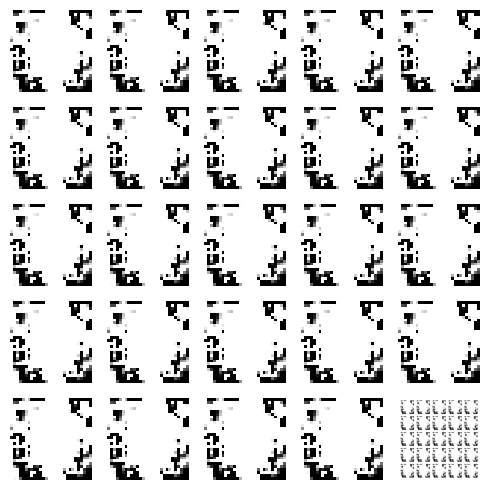

  0%|          | 0/350 [00:00<?, ?it/s]

4/4 [==============================] - 0s 21ms/step


  0%|          | 1/350 [00:00<04:47,  1.21it/s]

4/4 [==============================] - 0s 11ms/step


  1%|          | 2/350 [00:01<03:55,  1.48it/s]

4/4 [==============================] - 0s 28ms/step


  1%|          | 3/350 [00:02<04:02,  1.43it/s]

4/4 [==============================] - 0s 14ms/step


  1%|          | 4/350 [00:02<03:49,  1.51it/s]

4/4 [==============================] - 0s 23ms/step


  1%|▏         | 5/350 [00:03<03:54,  1.47it/s]

4/4 [==============================] - 0s 14ms/step


  2%|▏         | 6/350 [00:04<04:03,  1.41it/s]

4/4 [==============================] - 0s 13ms/step


  2%|▏         | 7/350 [00:04<04:04,  1.41it/s]

4/4 [==============================] - 0s 17ms/step


  2%|▏         | 8/350 [00:05<04:03,  1.40it/s]

4/4 [==============================] - 0s 18ms/step


  3%|▎         | 9/350 [00:06<04:09,  1.37it/s]

4/4 [==============================] - 0s 24ms/step


  3%|▎         | 10/350 [00:07<04:06,  1.38it/s]

4/4 [==============================] - 0s 22ms/step


  3%|▎         | 11/350 [00:07<04:01,  1.40it/s]

4/4 [==============================] - 0s 13ms/step


  3%|▎         | 12/350 [00:08<03:53,  1.44it/s]

4/4 [==============================] - 0s 20ms/step


  4%|▎         | 13/350 [00:09<03:53,  1.44it/s]

4/4 [==============================] - 0s 14ms/step


  4%|▍         | 14/350 [00:09<03:47,  1.48it/s]

4/4 [==============================] - 0s 19ms/step


  4%|▍         | 15/350 [00:10<03:48,  1.46it/s]

4/4 [==============================] - 0s 16ms/step


  5%|▍         | 16/350 [00:11<03:49,  1.45it/s]

4/4 [==============================] - 0s 14ms/step


  5%|▍         | 17/350 [00:11<03:43,  1.49it/s]

4/4 [==============================] - 0s 13ms/step


  5%|▌         | 18/350 [00:12<03:37,  1.53it/s]

4/4 [==============================] - 0s 15ms/step


  5%|▌         | 19/350 [00:13<03:37,  1.52it/s]

4/4 [==============================] - 0s 15ms/step


  6%|▌         | 20/350 [00:13<03:47,  1.45it/s]

4/4 [==============================] - 0s 15ms/step


  6%|▌         | 21/350 [00:14<03:48,  1.44it/s]

4/4 [==============================] - 0s 12ms/step


  6%|▋         | 22/350 [00:15<03:41,  1.48it/s]

4/4 [==============================] - 0s 14ms/step


  7%|▋         | 23/350 [00:15<03:41,  1.48it/s]

4/4 [==============================] - 0s 14ms/step


  7%|▋         | 24/350 [00:16<03:36,  1.51it/s]

4/4 [==============================] - 0s 13ms/step


  7%|▋         | 25/350 [00:17<03:41,  1.47it/s]

4/4 [==============================] - 0s 11ms/step


  7%|▋         | 26/350 [00:17<03:44,  1.44it/s]

4/4 [==============================] - 0s 13ms/step


  8%|▊         | 27/350 [00:18<03:44,  1.44it/s]

4/4 [==============================] - 0s 13ms/step


  8%|▊         | 28/350 [00:19<03:38,  1.47it/s]

4/4 [==============================] - 0s 12ms/step


  8%|▊         | 29/350 [00:20<03:41,  1.45it/s]

4/4 [==============================] - 0s 21ms/step


  9%|▊         | 30/350 [00:20<03:40,  1.45it/s]

4/4 [==============================] - 0s 12ms/step


  9%|▉         | 31/350 [00:21<03:36,  1.47it/s]

4/4 [==============================] - 0s 18ms/step


  9%|▉         | 32/350 [00:22<03:34,  1.48it/s]

4/4 [==============================] - 0s 15ms/step


  9%|▉         | 33/350 [00:22<03:44,  1.41it/s]

4/4 [==============================] - 0s 18ms/step


 10%|▉         | 34/350 [00:23<03:51,  1.36it/s]

4/4 [==============================] - 0s 14ms/step


 10%|█         | 35/350 [00:24<03:52,  1.35it/s]

4/4 [==============================] - 0s 14ms/step


 10%|█         | 36/350 [00:25<03:47,  1.38it/s]

4/4 [==============================] - 0s 25ms/step


 11%|█         | 37/350 [00:25<03:50,  1.36it/s]

4/4 [==============================] - 0s 13ms/step


 11%|█         | 38/350 [00:26<03:46,  1.38it/s]

4/4 [==============================] - 0s 13ms/step


 11%|█         | 39/350 [00:27<03:46,  1.37it/s]

4/4 [==============================] - 0s 14ms/step


 11%|█▏        | 40/350 [00:27<03:40,  1.41it/s]

4/4 [==============================] - 0s 14ms/step


 12%|█▏        | 41/350 [00:28<03:29,  1.47it/s]

4/4 [==============================] - 0s 17ms/step


 12%|█▏        | 42/350 [00:29<03:27,  1.48it/s]

4/4 [==============================] - 0s 13ms/step


 12%|█▏        | 43/350 [00:29<03:35,  1.43it/s]

4/4 [==============================] - 0s 12ms/step


 13%|█▎        | 44/350 [00:30<03:28,  1.47it/s]

4/4 [==============================] - 0s 22ms/step


 13%|█▎        | 45/350 [00:31<03:25,  1.48it/s]

4/4 [==============================] - 0s 13ms/step


 13%|█▎        | 46/350 [00:31<03:26,  1.47it/s]

4/4 [==============================] - 0s 13ms/step


 13%|█▎        | 47/350 [00:32<03:26,  1.47it/s]

4/4 [==============================] - 0s 18ms/step


 14%|█▎        | 48/350 [00:33<03:22,  1.49it/s]

4/4 [==============================] - 0s 11ms/step


 14%|█▍        | 49/350 [00:33<03:28,  1.44it/s]

4/4 [==============================] - 0s 14ms/step


 14%|█▍        | 50/350 [00:34<03:29,  1.43it/s]

4/4 [==============================] - 0s 11ms/step


 15%|█▍        | 51/350 [00:35<03:20,  1.49it/s]

4/4 [==============================] - 0s 14ms/step


 15%|█▍        | 52/350 [00:35<03:19,  1.50it/s]

4/4 [==============================] - 0s 13ms/step


 15%|█▌        | 53/350 [00:36<03:17,  1.51it/s]

4/4 [==============================] - 0s 30ms/step


 15%|█▌        | 54/350 [00:37<03:20,  1.48it/s]

4/4 [==============================] - 0s 14ms/step


 16%|█▌        | 55/350 [00:38<03:21,  1.47it/s]

4/4 [==============================] - 0s 11ms/step


 16%|█▌        | 56/350 [00:38<03:24,  1.44it/s]

4/4 [==============================] - 0s 14ms/step


 16%|█▋        | 57/350 [00:39<03:26,  1.42it/s]

4/4 [==============================] - 0s 12ms/step


 17%|█▋        | 58/350 [00:40<03:20,  1.46it/s]

4/4 [==============================] - 0s 12ms/step


 17%|█▋        | 59/350 [00:40<03:18,  1.46it/s]

4/4 [==============================] - 0s 13ms/step


 17%|█▋        | 60/350 [00:41<03:12,  1.51it/s]

4/4 [==============================] - 0s 19ms/step


 17%|█▋        | 61/350 [00:42<03:17,  1.47it/s]

4/4 [==============================] - 0s 15ms/step


 18%|█▊        | 62/350 [00:42<03:16,  1.47it/s]

4/4 [==============================] - 0s 11ms/step


 18%|█▊        | 63/350 [00:43<03:11,  1.50it/s]

4/4 [==============================] - 0s 17ms/step


 18%|█▊        | 64/350 [00:44<03:10,  1.50it/s]

4/4 [==============================] - 0s 13ms/step


 19%|█▊        | 65/350 [00:44<03:16,  1.45it/s]

4/4 [==============================] - 0s 13ms/step


 19%|█▉        | 66/350 [00:45<03:19,  1.42it/s]

4/4 [==============================] - 0s 17ms/step


 19%|█▉        | 67/350 [00:46<03:17,  1.44it/s]

4/4 [==============================] - 0s 14ms/step


 19%|█▉        | 68/350 [00:46<03:10,  1.48it/s]

4/4 [==============================] - 0s 17ms/step


 20%|█▉        | 69/350 [00:47<03:08,  1.49it/s]

4/4 [==============================] - 0s 14ms/step


 20%|██        | 70/350 [00:48<03:05,  1.51it/s]

4/4 [==============================] - 0s 12ms/step


 20%|██        | 71/350 [00:48<03:12,  1.45it/s]

4/4 [==============================] - 0s 15ms/step


 21%|██        | 72/350 [00:49<03:07,  1.48it/s]

4/4 [==============================] - 0s 12ms/step


 21%|██        | 73/350 [00:50<03:12,  1.44it/s]

4/4 [==============================] - 0s 13ms/step


 21%|██        | 74/350 [00:51<03:11,  1.44it/s]

4/4 [==============================] - 0s 14ms/step


 21%|██▏       | 75/350 [00:51<03:03,  1.50it/s]

4/4 [==============================] - 0s 12ms/step


 22%|██▏       | 76/350 [00:52<03:04,  1.49it/s]

4/4 [==============================] - 0s 13ms/step


 22%|██▏       | 77/350 [00:52<03:00,  1.51it/s]

4/4 [==============================] - 0s 14ms/step


 22%|██▏       | 78/350 [00:53<03:07,  1.45it/s]

4/4 [==============================] - 0s 14ms/step


 23%|██▎       | 79/350 [00:54<03:03,  1.47it/s]

4/4 [==============================] - 0s 14ms/step


 23%|██▎       | 80/350 [00:55<03:08,  1.44it/s]

4/4 [==============================] - 0s 11ms/step


 23%|██▎       | 81/350 [00:55<03:00,  1.49it/s]

4/4 [==============================] - 0s 21ms/step


 23%|██▎       | 82/350 [00:56<03:01,  1.48it/s]

4/4 [==============================] - 0s 15ms/step


 24%|██▎       | 83/350 [00:57<03:03,  1.46it/s]

4/4 [==============================] - 0s 12ms/step


 24%|██▍       | 84/350 [00:57<03:03,  1.45it/s]

4/4 [==============================] - 0s 22ms/step


 24%|██▍       | 85/350 [00:58<03:08,  1.40it/s]

4/4 [==============================] - 0s 13ms/step


 25%|██▍       | 86/350 [00:59<03:07,  1.40it/s]

4/4 [==============================] - 0s 19ms/step


 25%|██▍       | 87/350 [01:00<03:12,  1.37it/s]

4/4 [==============================] - 0s 20ms/step


 25%|██▌       | 88/350 [01:00<03:15,  1.34it/s]

4/4 [==============================] - 0s 12ms/step


 25%|██▌       | 89/350 [01:01<03:15,  1.34it/s]

4/4 [==============================] - 0s 15ms/step


 26%|██▌       | 90/350 [01:02<03:07,  1.39it/s]

4/4 [==============================] - 0s 21ms/step


 26%|██▌       | 91/350 [01:02<03:06,  1.39it/s]

4/4 [==============================] - 0s 13ms/step


 26%|██▋       | 92/350 [01:03<02:56,  1.47it/s]

4/4 [==============================] - 0s 13ms/step


 27%|██▋       | 93/350 [01:04<02:55,  1.47it/s]

4/4 [==============================] - 0s 13ms/step


 27%|██▋       | 94/350 [01:04<02:53,  1.47it/s]

4/4 [==============================] - 0s 32ms/step


 27%|██▋       | 95/350 [01:05<02:56,  1.44it/s]

4/4 [==============================] - 0s 17ms/step


 27%|██▋       | 96/350 [01:06<03:01,  1.40it/s]

4/4 [==============================] - 0s 15ms/step


 28%|██▊       | 97/350 [01:07<03:04,  1.37it/s]

4/4 [==============================] - 0s 15ms/step


 28%|██▊       | 98/350 [01:07<02:58,  1.41it/s]

4/4 [==============================] - 0s 19ms/step


 28%|██▊       | 99/350 [01:08<02:56,  1.42it/s]

4/4 [==============================] - 0s 13ms/step


 29%|██▊       | 100/350 [01:09<02:56,  1.42it/s]

4/4 [==============================] - 0s 22ms/step


 29%|██▉       | 101/350 [01:09<02:56,  1.41it/s]

4/4 [==============================] - 0s 13ms/step


 29%|██▉       | 102/350 [01:10<02:50,  1.45it/s]

4/4 [==============================] - 0s 21ms/step


 29%|██▉       | 103/350 [01:11<02:53,  1.43it/s]

4/4 [==============================] - 0s 28ms/step


 30%|██▉       | 104/350 [01:12<02:55,  1.40it/s]

4/4 [==============================] - 0s 12ms/step


 30%|███       | 105/350 [01:12<02:51,  1.43it/s]

4/4 [==============================] - 0s 15ms/step


 30%|███       | 106/350 [01:13<02:47,  1.46it/s]

4/4 [==============================] - 0s 16ms/step


 31%|███       | 107/350 [01:14<02:49,  1.43it/s]

4/4 [==============================] - 0s 13ms/step


 31%|███       | 108/350 [01:14<02:50,  1.42it/s]

4/4 [==============================] - 0s 16ms/step


 31%|███       | 109/350 [01:15<02:47,  1.44it/s]

4/4 [==============================] - 0s 14ms/step


 31%|███▏      | 110/350 [01:16<02:49,  1.42it/s]

4/4 [==============================] - 0s 17ms/step


 32%|███▏      | 111/350 [01:16<02:47,  1.43it/s]

4/4 [==============================] - 0s 15ms/step


 32%|███▏      | 112/350 [01:17<02:43,  1.46it/s]

4/4 [==============================] - 0s 16ms/step


 32%|███▏      | 113/350 [01:18<02:44,  1.44it/s]

4/4 [==============================] - 0s 16ms/step


 33%|███▎      | 114/350 [01:18<02:39,  1.48it/s]

4/4 [==============================] - 0s 13ms/step


 33%|███▎      | 115/350 [01:19<02:40,  1.46it/s]

4/4 [==============================] - 0s 14ms/step


 33%|███▎      | 116/350 [01:20<02:37,  1.48it/s]

4/4 [==============================] - 0s 12ms/step


 33%|███▎      | 117/350 [01:20<02:36,  1.49it/s]

4/4 [==============================] - 0s 12ms/step


 34%|███▎      | 118/350 [01:21<02:31,  1.53it/s]

4/4 [==============================] - 0s 11ms/step


 34%|███▍      | 119/350 [01:22<02:41,  1.43it/s]

4/4 [==============================] - 0s 13ms/step


 34%|███▍      | 120/350 [01:23<02:52,  1.33it/s]

4/4 [==============================] - 0s 13ms/step


 35%|███▍      | 121/350 [01:23<02:48,  1.36it/s]

4/4 [==============================] - 0s 19ms/step


 35%|███▍      | 122/350 [01:24<02:52,  1.32it/s]

4/4 [==============================] - 0s 15ms/step


 35%|███▌      | 123/350 [01:25<02:53,  1.31it/s]

4/4 [==============================] - 0s 13ms/step


 35%|███▌      | 124/350 [01:26<02:58,  1.26it/s]

4/4 [==============================] - 0s 14ms/step


 36%|███▌      | 125/350 [01:27<02:49,  1.33it/s]

4/4 [==============================] - 0s 13ms/step


 36%|███▌      | 126/350 [01:27<02:50,  1.32it/s]

4/4 [==============================] - 0s 13ms/step


 36%|███▋      | 127/350 [01:28<02:42,  1.37it/s]

4/4 [==============================] - 0s 14ms/step


 37%|███▋      | 128/350 [01:29<02:37,  1.41it/s]

4/4 [==============================] - 0s 12ms/step


 37%|███▋      | 129/350 [01:29<02:39,  1.39it/s]

4/4 [==============================] - 0s 13ms/step


 37%|███▋      | 130/350 [01:30<02:45,  1.33it/s]

4/4 [==============================] - 0s 15ms/step


 37%|███▋      | 131/350 [01:31<02:39,  1.37it/s]

4/4 [==============================] - 0s 13ms/step


 38%|███▊      | 132/350 [01:32<02:37,  1.38it/s]

4/4 [==============================] - 0s 19ms/step


 38%|███▊      | 133/350 [01:32<02:36,  1.38it/s]

4/4 [==============================] - 0s 22ms/step


 38%|███▊      | 134/350 [01:33<02:40,  1.35it/s]

4/4 [==============================] - 0s 15ms/step


 39%|███▊      | 135/350 [01:34<02:30,  1.42it/s]

4/4 [==============================] - 0s 14ms/step


 39%|███▉      | 136/350 [01:34<02:33,  1.39it/s]

4/4 [==============================] - 0s 13ms/step


 39%|███▉      | 137/350 [01:35<02:33,  1.39it/s]

4/4 [==============================] - 0s 12ms/step


 39%|███▉      | 138/350 [01:36<02:28,  1.43it/s]

4/4 [==============================] - 0s 15ms/step


 40%|███▉      | 139/350 [01:37<02:30,  1.41it/s]

4/4 [==============================] - 0s 13ms/step


 40%|████      | 140/350 [01:37<02:32,  1.38it/s]

4/4 [==============================] - 0s 13ms/step


 40%|████      | 141/350 [01:38<02:29,  1.39it/s]

4/4 [==============================] - 0s 15ms/step


 41%|████      | 142/350 [01:39<02:28,  1.40it/s]

4/4 [==============================] - 0s 16ms/step


 41%|████      | 143/350 [01:40<02:31,  1.36it/s]

4/4 [==============================] - 0s 14ms/step


 41%|████      | 144/350 [01:40<02:22,  1.44it/s]

4/4 [==============================] - 0s 23ms/step


 41%|████▏     | 145/350 [01:41<02:23,  1.43it/s]

4/4 [==============================] - 0s 17ms/step


 42%|████▏     | 146/350 [01:42<02:25,  1.40it/s]

4/4 [==============================] - 0s 14ms/step


 42%|████▏     | 147/350 [01:42<02:25,  1.40it/s]

4/4 [==============================] - 0s 14ms/step


 42%|████▏     | 148/350 [01:43<02:18,  1.46it/s]

4/4 [==============================] - 0s 12ms/step


 43%|████▎     | 149/350 [01:44<02:16,  1.47it/s]

4/4 [==============================] - 0s 13ms/step


 43%|████▎     | 150/350 [01:44<02:13,  1.50it/s]

4/4 [==============================] - 0s 12ms/step


 43%|████▎     | 151/350 [01:45<02:15,  1.46it/s]

4/4 [==============================] - 0s 11ms/step


 43%|████▎     | 152/350 [01:46<02:11,  1.51it/s]

4/4 [==============================] - 0s 21ms/step


 44%|████▎     | 153/350 [01:46<02:14,  1.47it/s]

4/4 [==============================] - 0s 11ms/step


 44%|████▍     | 154/350 [01:47<02:16,  1.44it/s]

4/4 [==============================] - 0s 20ms/step


 44%|████▍     | 155/350 [01:48<02:21,  1.38it/s]

4/4 [==============================] - 0s 16ms/step


 45%|████▍     | 156/350 [01:49<02:19,  1.39it/s]

4/4 [==============================] - 0s 30ms/step


 45%|████▍     | 157/350 [01:49<02:19,  1.38it/s]

4/4 [==============================] - 0s 14ms/step


 45%|████▌     | 158/350 [01:50<02:12,  1.44it/s]

4/4 [==============================] - 0s 21ms/step


 45%|████▌     | 159/350 [01:51<02:13,  1.43it/s]

4/4 [==============================] - 0s 10ms/step


 46%|████▌     | 160/350 [01:51<02:08,  1.47it/s]

4/4 [==============================] - 0s 17ms/step


 46%|████▌     | 161/350 [01:52<02:06,  1.49it/s]

4/4 [==============================] - 0s 17ms/step


 46%|████▋     | 162/350 [01:53<02:07,  1.47it/s]

4/4 [==============================] - 0s 11ms/step


 47%|████▋     | 163/350 [01:53<02:05,  1.49it/s]

4/4 [==============================] - 0s 19ms/step


 47%|████▋     | 164/350 [01:54<02:03,  1.51it/s]

4/4 [==============================] - 0s 11ms/step


 47%|████▋     | 165/350 [01:55<02:01,  1.52it/s]

4/4 [==============================] - 0s 25ms/step


 47%|████▋     | 166/350 [01:55<02:03,  1.49it/s]

4/4 [==============================] - 0s 16ms/step


 48%|████▊     | 167/350 [01:56<02:05,  1.46it/s]

4/4 [==============================] - 0s 18ms/step


 48%|████▊     | 168/350 [01:57<02:11,  1.38it/s]

4/4 [==============================] - 0s 16ms/step


 48%|████▊     | 169/350 [01:57<02:06,  1.43it/s]

4/4 [==============================] - 0s 12ms/step


 49%|████▊     | 170/350 [01:58<02:05,  1.43it/s]

4/4 [==============================] - 0s 14ms/step


 49%|████▉     | 171/350 [01:59<02:03,  1.45it/s]

4/4 [==============================] - 0s 13ms/step


 49%|████▉     | 172/350 [02:00<02:07,  1.40it/s]

4/4 [==============================] - 0s 14ms/step


 49%|████▉     | 173/350 [02:00<02:09,  1.36it/s]

4/4 [==============================] - 0s 12ms/step


 50%|████▉     | 174/350 [02:01<02:07,  1.38it/s]

4/4 [==============================] - 0s 14ms/step


 50%|█████     | 175/350 [02:02<02:03,  1.41it/s]

4/4 [==============================] - 0s 17ms/step


 50%|█████     | 176/350 [02:02<02:07,  1.37it/s]

4/4 [==============================] - 0s 13ms/step


 51%|█████     | 177/350 [02:03<02:03,  1.40it/s]

4/4 [==============================] - 0s 15ms/step


 51%|█████     | 178/350 [02:04<01:57,  1.46it/s]

4/4 [==============================] - 0s 13ms/step


 51%|█████     | 179/350 [02:05<02:00,  1.42it/s]

4/4 [==============================] - 0s 15ms/step


 51%|█████▏    | 180/350 [02:05<02:00,  1.41it/s]

4/4 [==============================] - 0s 14ms/step


 52%|█████▏    | 181/350 [02:06<01:56,  1.44it/s]

4/4 [==============================] - 0s 14ms/step


 52%|█████▏    | 182/350 [02:07<01:55,  1.45it/s]

4/4 [==============================] - 0s 14ms/step


 52%|█████▏    | 183/350 [02:07<01:52,  1.48it/s]

4/4 [==============================] - 0s 16ms/step


 53%|█████▎    | 184/350 [02:08<01:53,  1.47it/s]

4/4 [==============================] - 0s 12ms/step


 53%|█████▎    | 185/350 [02:09<01:54,  1.44it/s]

4/4 [==============================] - 0s 17ms/step


 53%|█████▎    | 186/350 [02:09<01:50,  1.49it/s]

4/4 [==============================] - 0s 11ms/step


 53%|█████▎    | 187/350 [02:10<01:49,  1.49it/s]

4/4 [==============================] - 0s 13ms/step


 54%|█████▎    | 188/350 [02:11<01:56,  1.39it/s]

4/4 [==============================] - 0s 13ms/step


 54%|█████▍    | 189/350 [02:12<01:58,  1.36it/s]

4/4 [==============================] - 0s 13ms/step


 54%|█████▍    | 190/350 [02:12<01:57,  1.36it/s]

4/4 [==============================] - 0s 13ms/step


 55%|█████▍    | 191/350 [02:13<01:52,  1.41it/s]

4/4 [==============================] - 0s 26ms/step


 55%|█████▍    | 192/350 [02:14<01:52,  1.40it/s]

4/4 [==============================] - 0s 14ms/step


 55%|█████▌    | 193/350 [02:14<01:52,  1.39it/s]

4/4 [==============================] - 0s 12ms/step


 55%|█████▌    | 194/350 [02:15<01:45,  1.47it/s]

4/4 [==============================] - 0s 15ms/step


 56%|█████▌    | 195/350 [02:16<01:44,  1.48it/s]

4/4 [==============================] - 0s 16ms/step


 56%|█████▌    | 196/350 [02:16<01:41,  1.52it/s]

4/4 [==============================] - 0s 16ms/step


 56%|█████▋    | 197/350 [02:17<01:39,  1.54it/s]

4/4 [==============================] - 0s 19ms/step


 57%|█████▋    | 198/350 [02:18<01:39,  1.52it/s]

4/4 [==============================] - 0s 16ms/step


 57%|█████▋    | 199/350 [02:18<01:39,  1.51it/s]

4/4 [==============================] - 0s 11ms/step


 57%|█████▋    | 200/350 [02:19<01:43,  1.45it/s]

4/4 [==============================] - 0s 12ms/step


 57%|█████▋    | 201/350 [02:20<01:45,  1.42it/s]

4/4 [==============================] - 0s 14ms/step


 58%|█████▊    | 202/350 [02:20<01:41,  1.46it/s]

4/4 [==============================] - 0s 15ms/step


 58%|█████▊    | 203/350 [02:21<01:44,  1.41it/s]

4/4 [==============================] - 0s 13ms/step


 58%|█████▊    | 204/350 [02:22<01:43,  1.41it/s]

4/4 [==============================] - 0s 17ms/step


 59%|█████▊    | 205/350 [02:22<01:42,  1.42it/s]

4/4 [==============================] - 0s 14ms/step


 59%|█████▉    | 206/350 [02:23<01:44,  1.38it/s]

4/4 [==============================] - 0s 11ms/step


 59%|█████▉    | 207/350 [02:24<01:44,  1.37it/s]

4/4 [==============================] - 0s 15ms/step


 59%|█████▉    | 208/350 [02:25<01:40,  1.42it/s]

4/4 [==============================] - 0s 17ms/step


 60%|█████▉    | 209/350 [02:25<01:40,  1.41it/s]

4/4 [==============================] - 0s 14ms/step


 60%|██████    | 210/350 [02:26<01:43,  1.35it/s]

4/4 [==============================] - 0s 16ms/step


 60%|██████    | 211/350 [02:27<01:45,  1.32it/s]

4/4 [==============================] - 0s 15ms/step


 61%|██████    | 212/350 [02:28<01:42,  1.34it/s]

4/4 [==============================] - 0s 12ms/step


 61%|██████    | 213/350 [02:28<01:41,  1.35it/s]

4/4 [==============================] - 0s 17ms/step


 61%|██████    | 214/350 [02:29<01:38,  1.38it/s]

4/4 [==============================] - 0s 15ms/step


 61%|██████▏   | 215/350 [02:30<01:40,  1.35it/s]

4/4 [==============================] - 0s 16ms/step


 62%|██████▏   | 216/350 [02:31<01:40,  1.33it/s]

4/4 [==============================] - 0s 13ms/step


 62%|██████▏   | 217/350 [02:31<01:37,  1.36it/s]

4/4 [==============================] - 0s 12ms/step


 62%|██████▏   | 218/350 [02:32<01:37,  1.35it/s]

4/4 [==============================] - 0s 15ms/step


 63%|██████▎   | 219/350 [02:33<01:32,  1.41it/s]

4/4 [==============================] - 0s 11ms/step


 63%|██████▎   | 220/350 [02:33<01:30,  1.43it/s]

4/4 [==============================] - 0s 17ms/step


 63%|██████▎   | 221/350 [02:34<01:34,  1.37it/s]

4/4 [==============================] - 0s 20ms/step


 63%|██████▎   | 222/350 [02:35<01:37,  1.32it/s]

4/4 [==============================] - 0s 14ms/step


 64%|██████▎   | 223/350 [02:36<01:40,  1.26it/s]

4/4 [==============================] - 0s 12ms/step


 64%|██████▍   | 224/350 [02:37<01:35,  1.31it/s]

4/4 [==============================] - 0s 27ms/step


 64%|██████▍   | 225/350 [02:37<01:38,  1.27it/s]

4/4 [==============================] - 0s 16ms/step


 65%|██████▍   | 226/350 [02:38<01:39,  1.25it/s]

4/4 [==============================] - 0s 16ms/step


 65%|██████▍   | 227/350 [02:39<01:33,  1.32it/s]

4/4 [==============================] - 0s 14ms/step


 65%|██████▌   | 228/350 [02:40<01:31,  1.33it/s]

4/4 [==============================] - 0s 15ms/step


 65%|██████▌   | 229/350 [02:40<01:27,  1.39it/s]

4/4 [==============================] - 0s 26ms/step


 66%|██████▌   | 230/350 [02:41<01:26,  1.39it/s]

4/4 [==============================] - 0s 17ms/step


 66%|██████▌   | 231/350 [02:42<01:29,  1.33it/s]

4/4 [==============================] - 0s 15ms/step


 66%|██████▋   | 232/350 [02:43<01:29,  1.32it/s]

4/4 [==============================] - 0s 16ms/step


 67%|██████▋   | 233/350 [02:43<01:26,  1.35it/s]

4/4 [==============================] - 0s 12ms/step


 67%|██████▋   | 234/350 [02:44<01:22,  1.40it/s]

4/4 [==============================] - 0s 13ms/step


 67%|██████▋   | 235/350 [02:45<01:19,  1.44it/s]

4/4 [==============================] - 0s 13ms/step


 67%|██████▋   | 236/350 [02:45<01:16,  1.49it/s]

4/4 [==============================] - 0s 18ms/step


 68%|██████▊   | 237/350 [02:46<01:17,  1.45it/s]

4/4 [==============================] - 0s 12ms/step


 68%|██████▊   | 238/350 [02:47<01:17,  1.45it/s]

4/4 [==============================] - 0s 14ms/step


 68%|██████▊   | 239/350 [02:47<01:17,  1.43it/s]

4/4 [==============================] - 0s 12ms/step


 69%|██████▊   | 240/350 [02:48<01:16,  1.44it/s]

4/4 [==============================] - 0s 27ms/step


 69%|██████▉   | 241/350 [02:49<01:20,  1.36it/s]

4/4 [==============================] - 0s 31ms/step


 69%|██████▉   | 242/350 [02:50<01:18,  1.38it/s]

4/4 [==============================] - 0s 18ms/step


 69%|██████▉   | 243/350 [02:50<01:18,  1.36it/s]

4/4 [==============================] - 0s 13ms/step


 70%|██████▉   | 244/350 [02:51<01:23,  1.27it/s]

4/4 [==============================] - 0s 15ms/step


 70%|███████   | 245/350 [02:52<01:20,  1.31it/s]

4/4 [==============================] - 0s 14ms/step


 70%|███████   | 246/350 [02:53<01:20,  1.29it/s]

4/4 [==============================] - 0s 18ms/step


 71%|███████   | 247/350 [02:54<01:17,  1.32it/s]

4/4 [==============================] - 0s 17ms/step


 71%|███████   | 248/350 [02:54<01:19,  1.29it/s]

4/4 [==============================] - 0s 11ms/step


 71%|███████   | 249/350 [02:55<01:15,  1.33it/s]

4/4 [==============================] - 0s 19ms/step


 71%|███████▏  | 250/350 [02:56<01:13,  1.35it/s]

4/4 [==============================] - 0s 15ms/step


 72%|███████▏  | 251/350 [02:56<01:11,  1.38it/s]

4/4 [==============================] - 0s 14ms/step


 72%|███████▏  | 252/350 [02:57<01:07,  1.44it/s]

4/4 [==============================] - 0s 12ms/step


 72%|███████▏  | 253/350 [02:58<01:05,  1.48it/s]

4/4 [==============================] - 0s 33ms/step


 73%|███████▎  | 254/350 [02:58<01:06,  1.44it/s]

4/4 [==============================] - 0s 44ms/step


 73%|███████▎  | 255/350 [02:59<01:06,  1.43it/s]

4/4 [==============================] - 0s 15ms/step


 73%|███████▎  | 256/350 [03:00<01:05,  1.44it/s]

4/4 [==============================] - 0s 18ms/step


 73%|███████▎  | 257/350 [03:01<01:05,  1.43it/s]

4/4 [==============================] - 0s 24ms/step


 74%|███████▎  | 258/350 [03:01<01:04,  1.42it/s]

4/4 [==============================] - 0s 14ms/step


 74%|███████▍  | 259/350 [03:02<01:04,  1.41it/s]

4/4 [==============================] - 0s 15ms/step


 74%|███████▍  | 260/350 [03:03<01:03,  1.42it/s]

4/4 [==============================] - 0s 13ms/step


 75%|███████▍  | 261/350 [03:03<01:02,  1.43it/s]

4/4 [==============================] - 0s 14ms/step


 75%|███████▍  | 262/350 [03:04<01:01,  1.43it/s]

4/4 [==============================] - 0s 15ms/step


 75%|███████▌  | 263/350 [03:05<01:01,  1.41it/s]

4/4 [==============================] - 0s 14ms/step


 75%|███████▌  | 264/350 [03:05<00:59,  1.44it/s]

4/4 [==============================] - 0s 14ms/step


 76%|███████▌  | 265/350 [03:06<01:00,  1.40it/s]

4/4 [==============================] - 0s 11ms/step


 76%|███████▌  | 266/350 [03:07<01:00,  1.38it/s]

4/4 [==============================] - 0s 19ms/step


 76%|███████▋  | 267/350 [03:08<00:58,  1.41it/s]

4/4 [==============================] - 0s 13ms/step


 77%|███████▋  | 268/350 [03:08<00:59,  1.38it/s]

4/4 [==============================] - 0s 14ms/step


 77%|███████▋  | 269/350 [03:09<00:57,  1.40it/s]

4/4 [==============================] - 0s 15ms/step


 77%|███████▋  | 270/350 [03:10<00:56,  1.41it/s]

4/4 [==============================] - 0s 12ms/step


 77%|███████▋  | 271/350 [03:11<00:59,  1.34it/s]

4/4 [==============================] - 0s 22ms/step


 78%|███████▊  | 272/350 [03:11<00:57,  1.35it/s]

4/4 [==============================] - 0s 15ms/step


 78%|███████▊  | 273/350 [03:12<00:55,  1.38it/s]

4/4 [==============================] - 0s 24ms/step


 78%|███████▊  | 274/350 [03:13<00:54,  1.40it/s]

4/4 [==============================] - 0s 13ms/step


 79%|███████▊  | 275/350 [03:13<00:54,  1.38it/s]

4/4 [==============================] - 0s 19ms/step


 79%|███████▉  | 276/350 [03:14<00:52,  1.41it/s]

4/4 [==============================] - 0s 12ms/step


 79%|███████▉  | 277/350 [03:15<00:51,  1.42it/s]

4/4 [==============================] - 0s 16ms/step


 79%|███████▉  | 278/350 [03:16<00:50,  1.43it/s]

4/4 [==============================] - 0s 15ms/step


 80%|███████▉  | 279/350 [03:16<00:50,  1.40it/s]

4/4 [==============================] - 0s 13ms/step


 80%|████████  | 280/350 [03:17<00:47,  1.46it/s]

4/4 [==============================] - 0s 32ms/step


 80%|████████  | 281/350 [03:18<00:49,  1.40it/s]

4/4 [==============================] - 0s 15ms/step


 81%|████████  | 282/350 [03:18<00:48,  1.39it/s]

4/4 [==============================] - 0s 15ms/step


 81%|████████  | 283/350 [03:19<00:46,  1.43it/s]

4/4 [==============================] - 0s 15ms/step


 81%|████████  | 284/350 [03:20<00:47,  1.40it/s]

4/4 [==============================] - 0s 14ms/step


 81%|████████▏ | 285/350 [03:21<00:47,  1.38it/s]

4/4 [==============================] - 0s 13ms/step


 82%|████████▏ | 286/350 [03:21<00:43,  1.48it/s]

4/4 [==============================] - 0s 26ms/step


 82%|████████▏ | 287/350 [03:22<00:43,  1.46it/s]

4/4 [==============================] - 0s 12ms/step


 82%|████████▏ | 288/350 [03:22<00:41,  1.48it/s]

4/4 [==============================] - 0s 15ms/step


 83%|████████▎ | 289/350 [03:23<00:41,  1.47it/s]

4/4 [==============================] - 0s 13ms/step


 83%|████████▎ | 290/350 [03:24<00:41,  1.45it/s]

4/4 [==============================] - 0s 13ms/step


 83%|████████▎ | 291/350 [03:25<00:39,  1.50it/s]

4/4 [==============================] - 0s 15ms/step


 83%|████████▎ | 292/350 [03:25<00:39,  1.47it/s]

4/4 [==============================] - 0s 16ms/step


 84%|████████▎ | 293/350 [03:26<00:39,  1.45it/s]

4/4 [==============================] - 0s 12ms/step


 84%|████████▍ | 294/350 [03:27<00:39,  1.43it/s]

4/4 [==============================] - 0s 16ms/step


 84%|████████▍ | 295/350 [03:27<00:39,  1.39it/s]

4/4 [==============================] - 0s 15ms/step


 85%|████████▍ | 296/350 [03:28<00:38,  1.39it/s]

4/4 [==============================] - 0s 13ms/step


 85%|████████▍ | 297/350 [03:29<00:37,  1.41it/s]

4/4 [==============================] - 0s 12ms/step


 85%|████████▌ | 298/350 [03:30<00:36,  1.41it/s]

4/4 [==============================] - 0s 14ms/step


 85%|████████▌ | 299/350 [03:30<00:35,  1.44it/s]

4/4 [==============================] - 0s 16ms/step


 86%|████████▌ | 300/350 [03:31<00:35,  1.42it/s]

4/4 [==============================] - 0s 12ms/step


 86%|████████▌ | 301/350 [03:32<00:35,  1.39it/s]

4/4 [==============================] - 0s 14ms/step


 86%|████████▋ | 302/350 [03:32<00:33,  1.43it/s]

4/4 [==============================] - 0s 14ms/step


 87%|████████▋ | 303/350 [03:33<00:32,  1.44it/s]

4/4 [==============================] - 0s 21ms/step


 87%|████████▋ | 304/350 [03:34<00:31,  1.45it/s]

4/4 [==============================] - 0s 13ms/step


 87%|████████▋ | 305/350 [03:34<00:31,  1.43it/s]

4/4 [==============================] - 0s 12ms/step


 87%|████████▋ | 306/350 [03:35<00:30,  1.43it/s]

4/4 [==============================] - 0s 36ms/step


 88%|████████▊ | 307/350 [03:36<00:31,  1.35it/s]

4/4 [==============================] - 0s 13ms/step


 88%|████████▊ | 308/350 [03:37<00:31,  1.32it/s]

4/4 [==============================] - 0s 13ms/step


 88%|████████▊ | 309/350 [03:38<00:31,  1.31it/s]

4/4 [==============================] - 0s 16ms/step


 89%|████████▊ | 310/350 [03:38<00:29,  1.37it/s]

4/4 [==============================] - 0s 16ms/step


 89%|████████▉ | 311/350 [03:39<00:29,  1.34it/s]

4/4 [==============================] - 0s 13ms/step


 89%|████████▉ | 312/350 [03:40<00:28,  1.35it/s]

4/4 [==============================] - 0s 32ms/step


 89%|████████▉ | 313/350 [03:41<00:28,  1.29it/s]

4/4 [==============================] - 0s 17ms/step


 90%|████████▉ | 314/350 [03:41<00:27,  1.30it/s]

4/4 [==============================] - 0s 14ms/step


 90%|█████████ | 315/350 [03:42<00:27,  1.30it/s]

4/4 [==============================] - 0s 13ms/step


 90%|█████████ | 316/350 [03:43<00:26,  1.30it/s]

4/4 [==============================] - 0s 24ms/step


 91%|█████████ | 317/350 [03:44<00:25,  1.28it/s]

4/4 [==============================] - 0s 18ms/step


 91%|█████████ | 318/350 [03:44<00:25,  1.25it/s]

4/4 [==============================] - 0s 15ms/step


 91%|█████████ | 319/350 [03:45<00:24,  1.29it/s]

4/4 [==============================] - 0s 11ms/step


 91%|█████████▏| 320/350 [03:46<00:22,  1.32it/s]

4/4 [==============================] - 0s 12ms/step


 92%|█████████▏| 321/350 [03:47<00:21,  1.35it/s]

4/4 [==============================] - 0s 21ms/step


 92%|█████████▏| 322/350 [03:47<00:21,  1.33it/s]

4/4 [==============================] - 0s 13ms/step


 92%|█████████▏| 323/350 [03:48<00:19,  1.35it/s]

4/4 [==============================] - 0s 25ms/step


 93%|█████████▎| 324/350 [03:49<00:19,  1.31it/s]

4/4 [==============================] - 0s 22ms/step


 93%|█████████▎| 325/350 [03:50<00:18,  1.38it/s]

4/4 [==============================] - 0s 21ms/step


 93%|█████████▎| 326/350 [03:50<00:17,  1.35it/s]

4/4 [==============================] - 0s 14ms/step


 93%|█████████▎| 327/350 [03:51<00:17,  1.34it/s]

4/4 [==============================] - 0s 19ms/step


 94%|█████████▎| 328/350 [03:52<00:15,  1.39it/s]

4/4 [==============================] - 0s 16ms/step


 94%|█████████▍| 329/350 [03:52<00:15,  1.39it/s]

4/4 [==============================] - 0s 14ms/step


 94%|█████████▍| 330/350 [03:53<00:14,  1.37it/s]

4/4 [==============================] - 0s 11ms/step


 95%|█████████▍| 331/350 [03:54<00:13,  1.41it/s]

4/4 [==============================] - 0s 30ms/step


 95%|█████████▍| 332/350 [03:55<00:12,  1.40it/s]

4/4 [==============================] - 0s 14ms/step


 95%|█████████▌| 333/350 [03:55<00:11,  1.43it/s]

4/4 [==============================] - 0s 34ms/step


 95%|█████████▌| 334/350 [03:56<00:11,  1.37it/s]

4/4 [==============================] - 0s 28ms/step


 96%|█████████▌| 335/350 [03:57<00:10,  1.37it/s]

4/4 [==============================] - 0s 15ms/step


 96%|█████████▌| 336/350 [03:58<00:10,  1.31it/s]

4/4 [==============================] - 0s 18ms/step


 96%|█████████▋| 337/350 [03:58<00:09,  1.36it/s]

4/4 [==============================] - 0s 45ms/step


 97%|█████████▋| 338/350 [03:59<00:08,  1.34it/s]

4/4 [==============================] - 0s 12ms/step


 97%|█████████▋| 339/350 [04:00<00:07,  1.38it/s]

4/4 [==============================] - 0s 16ms/step


 97%|█████████▋| 340/350 [04:01<00:07,  1.32it/s]

4/4 [==============================] - 0s 14ms/step


 97%|█████████▋| 341/350 [04:01<00:06,  1.30it/s]

4/4 [==============================] - 0s 18ms/step


 98%|█████████▊| 342/350 [04:02<00:05,  1.34it/s]

4/4 [==============================] - 0s 12ms/step


 98%|█████████▊| 343/350 [04:03<00:04,  1.40it/s]

4/4 [==============================] - 0s 18ms/step


 98%|█████████▊| 344/350 [04:03<00:04,  1.39it/s]

4/4 [==============================] - 0s 21ms/step


 99%|█████████▊| 345/350 [04:04<00:03,  1.36it/s]

4/4 [==============================] - 0s 13ms/step


 99%|█████████▉| 346/350 [04:05<00:02,  1.36it/s]

4/4 [==============================] - 0s 16ms/step


 99%|█████████▉| 347/350 [04:06<00:02,  1.31it/s]

4/4 [==============================] - 0s 16ms/step


 99%|█████████▉| 348/350 [04:06<00:01,  1.34it/s]

4/4 [==============================] - 0s 15ms/step


100%|█████████▉| 349/350 [04:07<00:00,  1.29it/s]

4/4 [==============================] - 0s 17ms/step


100%|██████████| 350/350 [04:08<00:00,  1.41it/s]

Epoch number: 52 discriminator_loss: 0.37255291536614615 generator_loss: 6.2041515316282
1/1 [==============================] - 0s 26ms/step


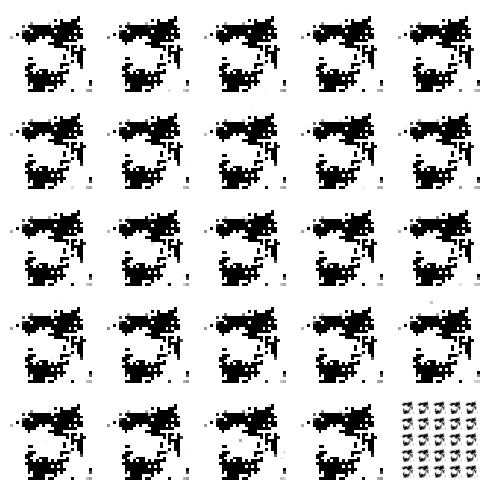

  0%|          | 0/350 [00:00<?, ?it/s]

4/4 [==============================] - 0s 13ms/step


  0%|          | 1/350 [00:00<04:28,  1.30it/s]

4/4 [==============================] - 0s 12ms/step


  1%|          | 2/350 [00:01<03:59,  1.45it/s]

4/4 [==============================] - 0s 12ms/step


  1%|          | 3/350 [00:02<04:08,  1.40it/s]

4/4 [==============================] - 0s 15ms/step


  1%|          | 4/350 [00:02<04:05,  1.41it/s]

4/4 [==============================] - 0s 17ms/step


  1%|▏         | 5/350 [00:03<04:10,  1.38it/s]

4/4 [==============================] - 0s 12ms/step


  2%|▏         | 6/350 [00:04<03:59,  1.44it/s]

4/4 [==============================] - 0s 12ms/step


  2%|▏         | 7/350 [00:05<04:39,  1.23it/s]

4/4 [==============================] - 0s 12ms/step


  2%|▏         | 8/350 [00:05<04:22,  1.30it/s]

4/4 [==============================] - 0s 12ms/step


  3%|▎         | 9/350 [00:06<04:12,  1.35it/s]

4/4 [==============================] - 0s 11ms/step


  3%|▎         | 10/350 [00:07<03:59,  1.42it/s]

4/4 [==============================] - 0s 11ms/step


  3%|▎         | 11/350 [00:07<03:59,  1.42it/s]

4/4 [==============================] - 0s 12ms/step


  3%|▎         | 12/350 [00:08<04:06,  1.37it/s]

4/4 [==============================] - 0s 14ms/step


  4%|▎         | 13/350 [00:09<04:00,  1.40it/s]

4/4 [==============================] - 0s 22ms/step


  4%|▍         | 14/350 [00:10<04:05,  1.37it/s]

4/4 [==============================] - 0s 15ms/step


  4%|▍         | 15/350 [00:10<04:03,  1.38it/s]

4/4 [==============================] - 0s 16ms/step


  5%|▍         | 16/350 [00:11<03:57,  1.41it/s]

4/4 [==============================] - 0s 11ms/step


  5%|▍         | 17/350 [00:12<03:52,  1.43it/s]

4/4 [==============================] - 0s 16ms/step


  5%|▌         | 18/350 [00:12<03:50,  1.44it/s]

4/4 [==============================] - 0s 15ms/step


  5%|▌         | 19/350 [00:13<04:10,  1.32it/s]

4/4 [==============================] - 0s 15ms/step


  6%|▌         | 20/350 [00:14<04:03,  1.36it/s]

4/4 [==============================] - 0s 21ms/step


  6%|▌         | 21/350 [00:15<04:01,  1.36it/s]

4/4 [==============================] - 0s 13ms/step


  6%|▋         | 22/350 [00:15<03:53,  1.41it/s]

4/4 [==============================] - 0s 14ms/step


  7%|▋         | 23/350 [00:16<03:47,  1.44it/s]

4/4 [==============================] - 0s 14ms/step


  7%|▋         | 24/350 [00:17<03:39,  1.49it/s]

4/4 [==============================] - 0s 14ms/step


  7%|▋         | 25/350 [00:17<03:33,  1.52it/s]

4/4 [==============================] - 0s 14ms/step


  7%|▋         | 26/350 [00:18<03:41,  1.46it/s]

4/4 [==============================] - 0s 19ms/step


  8%|▊         | 27/350 [00:19<03:42,  1.45it/s]

4/4 [==============================] - 0s 11ms/step


  8%|▊         | 28/350 [00:19<03:36,  1.49it/s]

4/4 [==============================] - 0s 29ms/step


  8%|▊         | 29/350 [00:20<03:44,  1.43it/s]

4/4 [==============================] - 0s 12ms/step


  9%|▊         | 30/350 [00:21<03:46,  1.42it/s]

4/4 [==============================] - 0s 23ms/step


  9%|▉         | 31/350 [00:22<04:04,  1.30it/s]

4/4 [==============================] - 0s 20ms/step


  9%|▉         | 32/350 [00:23<04:01,  1.32it/s]

4/4 [==============================] - 0s 12ms/step


  9%|▉         | 33/350 [00:23<03:51,  1.37it/s]

4/4 [==============================] - 0s 29ms/step


 10%|▉         | 34/350 [00:24<03:55,  1.34it/s]

4/4 [==============================] - 0s 26ms/step


 10%|█         | 35/350 [00:25<03:55,  1.34it/s]

4/4 [==============================] - 0s 15ms/step


 10%|█         | 36/350 [00:25<03:52,  1.35it/s]

4/4 [==============================] - 0s 18ms/step


 11%|█         | 37/350 [00:26<03:50,  1.36it/s]

4/4 [==============================] - 0s 14ms/step


 11%|█         | 38/350 [00:27<03:45,  1.38it/s]

4/4 [==============================] - 0s 15ms/step


 11%|█         | 39/350 [00:28<03:44,  1.38it/s]

4/4 [==============================] - 0s 15ms/step


 11%|█▏        | 40/350 [00:28<03:38,  1.42it/s]

4/4 [==============================] - 0s 27ms/step


 12%|█▏        | 41/350 [00:29<03:51,  1.34it/s]

4/4 [==============================] - 0s 13ms/step


 12%|█▏        | 42/350 [00:30<04:03,  1.26it/s]

4/4 [==============================] - 0s 15ms/step


 12%|█▏        | 43/350 [00:31<03:52,  1.32it/s]

4/4 [==============================] - 0s 13ms/step


 13%|█▎        | 44/350 [00:31<03:47,  1.34it/s]

4/4 [==============================] - 0s 15ms/step


 13%|█▎        | 45/350 [00:32<03:35,  1.41it/s]

4/4 [==============================] - 0s 12ms/step


 13%|█▎        | 46/350 [00:33<03:39,  1.39it/s]

4/4 [==============================] - 0s 13ms/step


 13%|█▎        | 47/350 [00:34<03:42,  1.36it/s]

4/4 [==============================] - 0s 11ms/step


 14%|█▎        | 48/350 [00:34<03:27,  1.46it/s]

4/4 [==============================] - 0s 12ms/step


 14%|█▍        | 49/350 [00:35<03:32,  1.42it/s]

4/4 [==============================] - 0s 13ms/step


 14%|█▍        | 50/350 [00:36<03:36,  1.39it/s]

4/4 [==============================] - 0s 15ms/step


 15%|█▍        | 51/350 [00:36<03:39,  1.36it/s]

4/4 [==============================] - 0s 14ms/step


 15%|█▍        | 52/350 [00:37<03:24,  1.45it/s]

4/4 [==============================] - 0s 14ms/step


 15%|█▌        | 53/350 [00:38<03:27,  1.43it/s]

4/4 [==============================] - 0s 17ms/step


 15%|█▌        | 54/350 [00:38<03:29,  1.41it/s]

4/4 [==============================] - 0s 13ms/step


 16%|█▌        | 55/350 [00:39<03:26,  1.43it/s]

4/4 [==============================] - 0s 16ms/step


 16%|█▌        | 56/350 [00:40<03:21,  1.46it/s]

4/4 [==============================] - 0s 11ms/step


 16%|█▋        | 57/350 [00:40<03:15,  1.50it/s]

4/4 [==============================] - 0s 17ms/step


 17%|█▋        | 58/350 [00:41<03:17,  1.48it/s]

4/4 [==============================] - 0s 14ms/step


 17%|█▋        | 59/350 [00:42<03:19,  1.46it/s]

4/4 [==============================] - 0s 14ms/step


 17%|█▋        | 60/350 [00:42<03:20,  1.45it/s]

4/4 [==============================] - 0s 15ms/step


 17%|█▋        | 61/350 [00:43<03:15,  1.48it/s]

4/4 [==============================] - 0s 14ms/step


 18%|█▊        | 62/350 [00:44<03:18,  1.45it/s]

4/4 [==============================] - 0s 11ms/step


 18%|█▊        | 63/350 [00:44<03:10,  1.51it/s]

4/4 [==============================] - 0s 18ms/step


 18%|█▊        | 64/350 [00:45<03:11,  1.49it/s]

4/4 [==============================] - 0s 15ms/step


 19%|█▊        | 65/350 [00:46<03:08,  1.51it/s]

4/4 [==============================] - 0s 20ms/step


 19%|█▉        | 66/350 [00:47<03:15,  1.45it/s]

4/4 [==============================] - 0s 12ms/step


 19%|█▉        | 67/350 [00:47<03:08,  1.50it/s]

4/4 [==============================] - 0s 24ms/step


 19%|█▉        | 68/350 [00:48<03:09,  1.49it/s]

4/4 [==============================] - 0s 16ms/step


 20%|█▉        | 69/350 [00:49<03:10,  1.48it/s]

4/4 [==============================] - 0s 22ms/step


 20%|██        | 70/350 [00:49<03:14,  1.44it/s]

4/4 [==============================] - 0s 20ms/step


 20%|██        | 71/350 [00:50<03:17,  1.41it/s]

4/4 [==============================] - 0s 15ms/step


 21%|██        | 72/350 [00:51<03:18,  1.40it/s]

4/4 [==============================] - 0s 14ms/step


 21%|██        | 73/350 [00:51<03:17,  1.41it/s]

4/4 [==============================] - 0s 13ms/step


 21%|██        | 74/350 [00:52<03:20,  1.38it/s]

4/4 [==============================] - 0s 13ms/step


 21%|██▏       | 75/350 [00:53<03:17,  1.39it/s]

4/4 [==============================] - 0s 13ms/step


 22%|██▏       | 76/350 [00:54<03:10,  1.44it/s]

4/4 [==============================] - 0s 28ms/step


 22%|██▏       | 77/350 [00:54<03:15,  1.40it/s]

4/4 [==============================] - 0s 14ms/step


 22%|██▏       | 78/350 [00:55<03:08,  1.44it/s]

4/4 [==============================] - 0s 21ms/step


 23%|██▎       | 79/350 [00:56<03:06,  1.46it/s]

4/4 [==============================] - 0s 16ms/step


 23%|██▎       | 80/350 [00:56<03:15,  1.38it/s]

4/4 [==============================] - 0s 16ms/step


 23%|██▎       | 81/350 [00:57<03:18,  1.36it/s]

4/4 [==============================] - 0s 18ms/step


 23%|██▎       | 82/350 [00:58<03:09,  1.41it/s]

4/4 [==============================] - 0s 17ms/step


 24%|██▎       | 83/350 [00:59<03:09,  1.41it/s]

4/4 [==============================] - 0s 13ms/step


 24%|██▍       | 84/350 [00:59<03:02,  1.46it/s]

4/4 [==============================] - 0s 22ms/step


 24%|██▍       | 85/350 [01:00<03:08,  1.40it/s]

4/4 [==============================] - 0s 13ms/step


 25%|██▍       | 86/350 [01:01<03:10,  1.39it/s]

4/4 [==============================] - 0s 18ms/step


 25%|██▍       | 87/350 [01:01<03:03,  1.43it/s]

4/4 [==============================] - 0s 17ms/step


 25%|██▌       | 88/350 [01:02<03:03,  1.43it/s]

4/4 [==============================] - 0s 11ms/step


 25%|██▌       | 89/350 [01:03<03:03,  1.42it/s]

4/4 [==============================] - 0s 14ms/step


 26%|██▌       | 90/350 [01:03<02:56,  1.47it/s]

4/4 [==============================] - 0s 22ms/step


 26%|██▌       | 91/350 [01:04<02:56,  1.46it/s]

4/4 [==============================] - 0s 12ms/step


 26%|██▋       | 92/350 [01:05<02:52,  1.49it/s]

4/4 [==============================] - 0s 26ms/step


 27%|██▋       | 93/350 [01:05<02:52,  1.49it/s]

4/4 [==============================] - 0s 11ms/step


 27%|██▋       | 94/350 [01:06<02:53,  1.47it/s]

4/4 [==============================] - 0s 21ms/step


 27%|██▋       | 95/350 [01:07<03:03,  1.39it/s]

4/4 [==============================] - 0s 14ms/step


 27%|██▋       | 96/350 [01:08<03:17,  1.29it/s]

4/4 [==============================] - 0s 16ms/step


 28%|██▊       | 97/350 [01:09<03:31,  1.20it/s]

4/4 [==============================] - 0s 20ms/step


 28%|██▊       | 98/350 [01:10<03:48,  1.10it/s]

4/4 [==============================] - 0s 35ms/step


 28%|██▊       | 99/350 [01:11<03:52,  1.08it/s]

4/4 [==============================] - 0s 19ms/step


 29%|██▊       | 100/350 [01:12<03:51,  1.08it/s]

4/4 [==============================] - 0s 17ms/step


 29%|██▉       | 101/350 [01:13<03:39,  1.14it/s]

4/4 [==============================] - 0s 12ms/step


 29%|██▉       | 102/350 [01:13<03:26,  1.20it/s]

4/4 [==============================] - 0s 18ms/step


 29%|██▉       | 103/350 [01:14<03:16,  1.26it/s]

4/4 [==============================] - 0s 13ms/step


 30%|██▉       | 104/350 [01:15<03:12,  1.28it/s]

4/4 [==============================] - 0s 13ms/step


 30%|███       | 105/350 [01:15<03:03,  1.33it/s]

4/4 [==============================] - 0s 13ms/step


 30%|███       | 106/350 [01:16<02:55,  1.39it/s]

4/4 [==============================] - 0s 12ms/step


 31%|███       | 107/350 [01:17<02:55,  1.39it/s]

4/4 [==============================] - 0s 13ms/step


 31%|███       | 108/350 [01:17<02:52,  1.40it/s]

4/4 [==============================] - 0s 12ms/step


 31%|███       | 109/350 [01:18<02:54,  1.38it/s]

4/4 [==============================] - 0s 12ms/step


 31%|███▏      | 110/350 [01:19<02:51,  1.40it/s]

4/4 [==============================] - 0s 15ms/step


 32%|███▏      | 111/350 [01:20<02:48,  1.42it/s]

4/4 [==============================] - 0s 15ms/step


 32%|███▏      | 112/350 [01:20<02:55,  1.36it/s]

4/4 [==============================] - 0s 17ms/step


 32%|███▏      | 113/350 [01:21<02:57,  1.34it/s]

4/4 [==============================] - 0s 12ms/step


 33%|███▎      | 114/350 [01:22<02:51,  1.38it/s]

4/4 [==============================] - 0s 12ms/step


 33%|███▎      | 115/350 [01:23<02:48,  1.40it/s]

4/4 [==============================] - 0s 11ms/step


 33%|███▎      | 116/350 [01:23<02:44,  1.42it/s]

4/4 [==============================] - 0s 11ms/step


 33%|███▎      | 117/350 [01:24<02:43,  1.43it/s]

4/4 [==============================] - 0s 11ms/step


 34%|███▎      | 118/350 [01:25<02:38,  1.46it/s]

4/4 [==============================] - 0s 16ms/step


 34%|███▍      | 119/350 [01:25<02:43,  1.42it/s]

4/4 [==============================] - 0s 12ms/step


 34%|███▍      | 120/350 [01:26<02:42,  1.42it/s]

4/4 [==============================] - 0s 14ms/step


 35%|███▍      | 121/350 [01:27<02:38,  1.44it/s]

4/4 [==============================] - 0s 14ms/step


 35%|███▍      | 122/350 [01:27<02:38,  1.44it/s]

4/4 [==============================] - 0s 16ms/step


 35%|███▌      | 123/350 [01:28<02:35,  1.46it/s]

4/4 [==============================] - 0s 12ms/step


 35%|███▌      | 124/350 [01:29<02:35,  1.46it/s]

4/4 [==============================] - 0s 11ms/step


 36%|███▌      | 125/350 [01:29<02:30,  1.49it/s]

4/4 [==============================] - 0s 12ms/step


 36%|███▌      | 126/350 [01:30<02:29,  1.49it/s]

4/4 [==============================] - 0s 12ms/step


 36%|███▋      | 127/350 [01:31<02:34,  1.44it/s]

4/4 [==============================] - 0s 11ms/step


 37%|███▋      | 128/350 [01:31<02:29,  1.49it/s]

4/4 [==============================] - 0s 11ms/step


 37%|███▋      | 129/350 [01:32<02:30,  1.47it/s]

4/4 [==============================] - 0s 11ms/step


 37%|███▋      | 130/350 [01:33<02:26,  1.51it/s]

4/4 [==============================] - 0s 14ms/step


 37%|███▋      | 131/350 [01:33<02:30,  1.46it/s]

4/4 [==============================] - 0s 12ms/step


 38%|███▊      | 132/350 [01:34<02:28,  1.47it/s]

4/4 [==============================] - 0s 21ms/step


 38%|███▊      | 133/350 [01:35<02:28,  1.47it/s]

4/4 [==============================] - 0s 16ms/step


 38%|███▊      | 134/350 [01:36<02:32,  1.42it/s]

4/4 [==============================] - 0s 12ms/step


 39%|███▊      | 135/350 [01:36<02:27,  1.46it/s]

4/4 [==============================] - 0s 13ms/step


 39%|███▉      | 136/350 [01:37<02:27,  1.45it/s]

4/4 [==============================] - 0s 13ms/step


 39%|███▉      | 137/350 [01:38<02:25,  1.47it/s]

4/4 [==============================] - 0s 13ms/step


 39%|███▉      | 138/350 [01:38<02:30,  1.41it/s]

4/4 [==============================] - 0s 11ms/step


 40%|███▉      | 139/350 [01:39<02:23,  1.47it/s]

4/4 [==============================] - 0s 12ms/step


 40%|████      | 140/350 [01:40<02:25,  1.45it/s]

4/4 [==============================] - 0s 14ms/step


 40%|████      | 141/350 [01:40<02:21,  1.48it/s]

4/4 [==============================] - 0s 18ms/step


 41%|████      | 142/350 [01:41<02:23,  1.45it/s]

4/4 [==============================] - 0s 14ms/step


 41%|████      | 143/350 [01:42<02:26,  1.42it/s]

4/4 [==============================] - 0s 14ms/step


 41%|████      | 144/350 [01:43<02:29,  1.38it/s]

4/4 [==============================] - 0s 15ms/step


 41%|████▏     | 145/350 [01:43<02:29,  1.37it/s]

4/4 [==============================] - 0s 15ms/step


 42%|████▏     | 146/350 [01:44<02:24,  1.42it/s]

4/4 [==============================] - 0s 13ms/step


 42%|████▏     | 147/350 [01:45<02:25,  1.40it/s]

4/4 [==============================] - 0s 13ms/step


 42%|████▏     | 148/350 [01:45<02:25,  1.39it/s]

4/4 [==============================] - 0s 12ms/step


 43%|████▎     | 149/350 [01:46<02:20,  1.43it/s]

4/4 [==============================] - 0s 19ms/step


 43%|████▎     | 150/350 [01:47<02:21,  1.41it/s]

4/4 [==============================] - 0s 12ms/step


 43%|████▎     | 151/350 [01:47<02:20,  1.42it/s]

4/4 [==============================] - 0s 15ms/step


 43%|████▎     | 152/350 [01:48<02:12,  1.50it/s]

4/4 [==============================] - 0s 16ms/step


 44%|████▎     | 153/350 [01:49<02:10,  1.51it/s]

4/4 [==============================] - 0s 13ms/step


 44%|████▍     | 154/350 [01:49<02:14,  1.46it/s]

4/4 [==============================] - 0s 13ms/step


 44%|████▍     | 155/350 [01:50<02:21,  1.38it/s]

4/4 [==============================] - 0s 16ms/step


 45%|████▍     | 156/350 [01:51<02:16,  1.43it/s]

4/4 [==============================] - 0s 12ms/step


 45%|████▍     | 157/350 [01:52<02:16,  1.42it/s]

4/4 [==============================] - 0s 12ms/step


 45%|████▌     | 158/350 [01:52<02:13,  1.43it/s]

4/4 [==============================] - 0s 14ms/step


 45%|████▌     | 159/350 [01:53<02:16,  1.40it/s]

4/4 [==============================] - 0s 13ms/step


 46%|████▌     | 160/350 [01:54<02:11,  1.45it/s]

4/4 [==============================] - 0s 14ms/step


 46%|████▌     | 161/350 [01:54<02:13,  1.41it/s]

4/4 [==============================] - 0s 12ms/step


 46%|████▋     | 162/350 [01:55<02:13,  1.41it/s]

4/4 [==============================] - 0s 14ms/step


 47%|████▋     | 163/350 [01:56<02:08,  1.45it/s]

4/4 [==============================] - 0s 13ms/step


 47%|████▋     | 164/350 [01:57<02:16,  1.37it/s]

4/4 [==============================] - 0s 14ms/step


 47%|████▋     | 165/350 [01:57<02:16,  1.36it/s]

4/4 [==============================] - 0s 12ms/step


 47%|████▋     | 166/350 [01:58<02:24,  1.27it/s]

4/4 [==============================] - 0s 16ms/step


 48%|████▊     | 167/350 [01:59<02:29,  1.23it/s]

4/4 [==============================] - 0s 15ms/step


 48%|████▊     | 168/350 [02:00<02:23,  1.27it/s]

4/4 [==============================] - 0s 11ms/step


 48%|████▊     | 169/350 [02:01<02:19,  1.30it/s]

4/4 [==============================] - 0s 15ms/step


 49%|████▊     | 170/350 [02:01<02:09,  1.39it/s]

4/4 [==============================] - 0s 12ms/step


 49%|████▉     | 171/350 [02:02<02:10,  1.38it/s]

4/4 [==============================] - 0s 15ms/step


 49%|████▉     | 172/350 [02:03<02:04,  1.43it/s]

4/4 [==============================] - 0s 21ms/step


 49%|████▉     | 173/350 [02:03<02:03,  1.43it/s]

4/4 [==============================] - 0s 12ms/step


 50%|████▉     | 174/350 [02:04<02:00,  1.46it/s]

4/4 [==============================] - 0s 27ms/step


 50%|█████     | 175/350 [02:05<01:59,  1.46it/s]

4/4 [==============================] - 0s 12ms/step


 50%|█████     | 176/350 [02:05<01:57,  1.47it/s]

4/4 [==============================] - 0s 13ms/step


 51%|█████     | 177/350 [02:06<01:55,  1.50it/s]

4/4 [==============================] - 0s 14ms/step


 51%|█████     | 178/350 [02:07<01:59,  1.44it/s]

4/4 [==============================] - 0s 14ms/step


 51%|█████     | 179/350 [02:07<01:53,  1.51it/s]

4/4 [==============================] - 0s 28ms/step


 51%|█████▏    | 180/350 [02:08<01:54,  1.48it/s]

4/4 [==============================] - 0s 13ms/step


 52%|█████▏    | 181/350 [02:09<01:54,  1.47it/s]

4/4 [==============================] - 0s 15ms/step


 52%|█████▏    | 182/350 [02:09<01:53,  1.48it/s]

4/4 [==============================] - 0s 13ms/step


 52%|█████▏    | 183/350 [02:10<01:57,  1.43it/s]

4/4 [==============================] - 0s 15ms/step


 53%|█████▎    | 184/350 [02:11<01:57,  1.42it/s]

4/4 [==============================] - 0s 14ms/step


 53%|█████▎    | 185/350 [02:12<01:57,  1.40it/s]

4/4 [==============================] - 0s 12ms/step


 53%|█████▎    | 186/350 [02:12<01:54,  1.43it/s]

4/4 [==============================] - 0s 24ms/step


 53%|█████▎    | 187/350 [02:13<01:53,  1.44it/s]

4/4 [==============================] - 0s 14ms/step


 54%|█████▎    | 188/350 [02:14<01:54,  1.42it/s]

4/4 [==============================] - 0s 17ms/step


 54%|█████▍    | 189/350 [02:14<01:53,  1.41it/s]

4/4 [==============================] - 0s 12ms/step


 54%|█████▍    | 190/350 [02:15<01:52,  1.42it/s]

4/4 [==============================] - 0s 13ms/step


 55%|█████▍    | 191/350 [02:16<01:49,  1.45it/s]

4/4 [==============================] - 0s 12ms/step


 55%|█████▍    | 192/350 [02:16<01:48,  1.45it/s]

4/4 [==============================] - 0s 14ms/step


 55%|█████▌    | 193/350 [02:17<01:49,  1.43it/s]

4/4 [==============================] - 0s 22ms/step


 55%|█████▌    | 194/350 [02:18<01:51,  1.40it/s]

4/4 [==============================] - 0s 16ms/step


 56%|█████▌    | 195/350 [02:19<01:56,  1.33it/s]

4/4 [==============================] - 0s 12ms/step


 56%|█████▌    | 196/350 [02:19<01:54,  1.34it/s]

4/4 [==============================] - 0s 18ms/step


 56%|█████▋    | 197/350 [02:20<01:49,  1.40it/s]

4/4 [==============================] - 0s 19ms/step


 57%|█████▋    | 198/350 [02:21<01:47,  1.41it/s]

4/4 [==============================] - 0s 21ms/step


 57%|█████▋    | 199/350 [02:22<01:48,  1.39it/s]

4/4 [==============================] - 0s 15ms/step


 57%|█████▋    | 200/350 [02:22<01:44,  1.43it/s]

4/4 [==============================] - 0s 13ms/step


 57%|█████▋    | 201/350 [02:23<01:46,  1.40it/s]

4/4 [==============================] - 0s 16ms/step


 58%|█████▊    | 202/350 [02:24<01:46,  1.39it/s]

4/4 [==============================] - 0s 16ms/step


 58%|█████▊    | 203/350 [02:24<01:47,  1.37it/s]

4/4 [==============================] - 0s 20ms/step


 58%|█████▊    | 204/350 [02:25<01:45,  1.39it/s]

4/4 [==============================] - 0s 18ms/step


 59%|█████▊    | 205/350 [02:26<01:44,  1.39it/s]

4/4 [==============================] - 0s 14ms/step


 59%|█████▉    | 206/350 [02:26<01:41,  1.42it/s]

4/4 [==============================] - 0s 14ms/step


 59%|█████▉    | 207/350 [02:27<01:42,  1.40it/s]

4/4 [==============================] - 0s 13ms/step


 59%|█████▉    | 208/350 [02:28<01:38,  1.44it/s]

4/4 [==============================] - 0s 16ms/step


 60%|█████▉    | 209/350 [02:29<01:41,  1.39it/s]

4/4 [==============================] - 0s 15ms/step


 60%|██████    | 210/350 [02:29<01:39,  1.41it/s]

4/4 [==============================] - 0s 15ms/step


 60%|██████    | 211/350 [02:30<01:37,  1.42it/s]

4/4 [==============================] - 0s 14ms/step


 61%|██████    | 212/350 [02:31<01:40,  1.37it/s]

4/4 [==============================] - 0s 14ms/step


 61%|██████    | 213/350 [02:31<01:37,  1.41it/s]

4/4 [==============================] - 0s 13ms/step


 61%|██████    | 214/350 [02:32<01:32,  1.47it/s]

4/4 [==============================] - 0s 14ms/step


 61%|██████▏   | 215/350 [02:33<01:31,  1.48it/s]

4/4 [==============================] - 0s 18ms/step


 62%|██████▏   | 216/350 [02:33<01:32,  1.45it/s]

4/4 [==============================] - 0s 13ms/step


 62%|██████▏   | 217/350 [02:34<01:31,  1.45it/s]

4/4 [==============================] - 0s 18ms/step


 62%|██████▏   | 218/350 [02:35<01:29,  1.48it/s]

4/4 [==============================] - 0s 14ms/step


 63%|██████▎   | 219/350 [02:36<01:30,  1.44it/s]

4/4 [==============================] - 0s 14ms/step


 63%|██████▎   | 220/350 [02:36<01:31,  1.43it/s]

4/4 [==============================] - 0s 18ms/step


 63%|██████▎   | 221/350 [02:37<01:28,  1.46it/s]

4/4 [==============================] - 0s 12ms/step


 63%|██████▎   | 222/350 [02:38<01:27,  1.46it/s]

4/4 [==============================] - 0s 11ms/step


 64%|██████▎   | 223/350 [02:38<01:28,  1.43it/s]

4/4 [==============================] - 0s 13ms/step


 64%|██████▍   | 224/350 [02:39<01:25,  1.48it/s]

4/4 [==============================] - 0s 20ms/step


 64%|██████▍   | 225/350 [02:40<01:29,  1.40it/s]

4/4 [==============================] - 0s 12ms/step


 65%|██████▍   | 226/350 [02:40<01:29,  1.38it/s]

4/4 [==============================] - 0s 17ms/step


 65%|██████▍   | 227/350 [02:41<01:25,  1.43it/s]

4/4 [==============================] - 0s 12ms/step


 65%|██████▌   | 228/350 [02:42<01:26,  1.42it/s]

4/4 [==============================] - 0s 13ms/step


 65%|██████▌   | 229/350 [02:43<01:24,  1.44it/s]

4/4 [==============================] - 0s 12ms/step


 66%|██████▌   | 230/350 [02:43<01:23,  1.43it/s]

4/4 [==============================] - 0s 15ms/step


 66%|██████▌   | 231/350 [02:44<01:21,  1.47it/s]

4/4 [==============================] - 0s 22ms/step


 66%|██████▋   | 232/350 [02:45<01:25,  1.38it/s]

4/4 [==============================] - 0s 22ms/step


 67%|██████▋   | 233/350 [02:46<01:28,  1.32it/s]

4/4 [==============================] - 0s 14ms/step


 67%|██████▋   | 234/350 [02:46<01:26,  1.35it/s]

4/4 [==============================] - 0s 16ms/step


 67%|██████▋   | 235/350 [02:47<01:22,  1.40it/s]

4/4 [==============================] - 0s 11ms/step


 67%|██████▋   | 236/350 [02:48<01:20,  1.41it/s]

4/4 [==============================] - 0s 13ms/step


 68%|██████▊   | 237/350 [02:48<01:17,  1.46it/s]

4/4 [==============================] - 0s 12ms/step


 68%|██████▊   | 238/350 [02:49<01:19,  1.40it/s]

4/4 [==============================] - 0s 18ms/step


 68%|██████▊   | 239/350 [02:50<01:18,  1.41it/s]

4/4 [==============================] - 0s 13ms/step


 69%|██████▊   | 240/350 [02:50<01:16,  1.44it/s]

4/4 [==============================] - 0s 13ms/step


 69%|██████▉   | 241/350 [02:51<01:16,  1.42it/s]

4/4 [==============================] - 0s 17ms/step


 69%|██████▉   | 242/350 [02:52<01:14,  1.45it/s]

4/4 [==============================] - 0s 14ms/step


 69%|██████▉   | 243/350 [02:52<01:15,  1.42it/s]

4/4 [==============================] - 0s 14ms/step


 70%|██████▉   | 244/350 [02:53<01:17,  1.37it/s]

4/4 [==============================] - 0s 15ms/step


 70%|███████   | 245/350 [02:54<01:16,  1.38it/s]

4/4 [==============================] - 0s 15ms/step


 70%|███████   | 246/350 [02:55<01:14,  1.39it/s]

4/4 [==============================] - 0s 23ms/step


 71%|███████   | 247/350 [02:55<01:16,  1.35it/s]

4/4 [==============================] - 0s 11ms/step


 71%|███████   | 248/350 [02:56<01:14,  1.36it/s]

4/4 [==============================] - 0s 11ms/step


 71%|███████   | 249/350 [02:57<01:10,  1.43it/s]

4/4 [==============================] - 0s 20ms/step


 71%|███████▏  | 250/350 [02:58<01:11,  1.41it/s]

4/4 [==============================] - 0s 14ms/step


 72%|███████▏  | 251/350 [02:58<01:10,  1.41it/s]

4/4 [==============================] - 0s 13ms/step


 72%|███████▏  | 252/350 [02:59<01:06,  1.47it/s]

4/4 [==============================] - 0s 15ms/step


 72%|███████▏  | 253/350 [03:00<01:08,  1.43it/s]

4/4 [==============================] - 0s 12ms/step


 73%|███████▎  | 254/350 [03:00<01:09,  1.39it/s]

4/4 [==============================] - 0s 12ms/step


 73%|███████▎  | 255/350 [03:01<01:05,  1.46it/s]

4/4 [==============================] - 0s 14ms/step


 73%|███████▎  | 256/350 [03:02<01:04,  1.45it/s]

4/4 [==============================] - 0s 14ms/step


 73%|███████▎  | 257/350 [03:02<01:02,  1.48it/s]

4/4 [==============================] - 0s 19ms/step


 74%|███████▎  | 258/350 [03:03<01:01,  1.50it/s]

4/4 [==============================] - 0s 14ms/step


 74%|███████▍  | 259/350 [03:04<01:03,  1.44it/s]

4/4 [==============================] - 0s 15ms/step


 74%|███████▍  | 260/350 [03:04<01:01,  1.47it/s]

4/4 [==============================] - 0s 21ms/step


 75%|███████▍  | 261/350 [03:05<00:59,  1.50it/s]

4/4 [==============================] - 0s 14ms/step


 75%|███████▍  | 262/350 [03:06<01:01,  1.44it/s]

4/4 [==============================] - 0s 13ms/step


 75%|███████▌  | 263/350 [03:07<01:02,  1.40it/s]

4/4 [==============================] - 0s 13ms/step


 75%|███████▌  | 264/350 [03:07<00:59,  1.45it/s]

4/4 [==============================] - 0s 11ms/step


 76%|███████▌  | 265/350 [03:08<00:58,  1.45it/s]

4/4 [==============================] - 0s 15ms/step


 76%|███████▌  | 266/350 [03:09<00:58,  1.45it/s]

4/4 [==============================] - 0s 12ms/step


 76%|███████▋  | 267/350 [03:09<00:59,  1.40it/s]

4/4 [==============================] - 0s 17ms/step


 77%|███████▋  | 268/350 [03:10<00:57,  1.42it/s]

4/4 [==============================] - 0s 15ms/step


 77%|███████▋  | 269/350 [03:11<00:57,  1.41it/s]

4/4 [==============================] - 0s 15ms/step


 77%|███████▋  | 270/350 [03:11<00:55,  1.45it/s]

4/4 [==============================] - 0s 15ms/step


 77%|███████▋  | 271/350 [03:12<00:55,  1.43it/s]

4/4 [==============================] - 0s 14ms/step


 78%|███████▊  | 272/350 [03:13<00:54,  1.42it/s]

4/4 [==============================] - 0s 15ms/step


 78%|███████▊  | 273/350 [03:14<00:55,  1.39it/s]

4/4 [==============================] - 0s 15ms/step


 78%|███████▊  | 274/350 [03:14<00:54,  1.40it/s]

4/4 [==============================] - 0s 25ms/step


 79%|███████▊  | 275/350 [03:15<00:55,  1.36it/s]

4/4 [==============================] - 0s 14ms/step


 79%|███████▉  | 276/350 [03:16<00:56,  1.31it/s]

4/4 [==============================] - 0s 14ms/step


 79%|███████▉  | 277/350 [03:17<00:55,  1.31it/s]

4/4 [==============================] - 0s 14ms/step


 79%|███████▉  | 278/350 [03:17<00:52,  1.37it/s]

4/4 [==============================] - 0s 30ms/step


 80%|███████▉  | 279/350 [03:18<00:52,  1.36it/s]

4/4 [==============================] - 0s 12ms/step


 80%|████████  | 280/350 [03:19<00:50,  1.40it/s]

4/4 [==============================] - 0s 14ms/step


 80%|████████  | 281/350 [03:20<00:51,  1.35it/s]

4/4 [==============================] - 0s 19ms/step


 81%|████████  | 282/350 [03:20<00:48,  1.39it/s]

4/4 [==============================] - 0s 13ms/step


 81%|████████  | 283/350 [03:21<00:49,  1.35it/s]

4/4 [==============================] - 0s 14ms/step


 81%|████████  | 284/350 [03:22<00:49,  1.33it/s]

4/4 [==============================] - 0s 13ms/step


 81%|████████▏ | 285/350 [03:22<00:46,  1.39it/s]

4/4 [==============================] - 0s 11ms/step


 82%|████████▏ | 286/350 [03:23<00:46,  1.38it/s]

4/4 [==============================] - 0s 11ms/step


 82%|████████▏ | 287/350 [03:24<00:46,  1.36it/s]

4/4 [==============================] - 0s 14ms/step


 82%|████████▏ | 288/350 [03:25<00:44,  1.40it/s]

4/4 [==============================] - 0s 14ms/step


 83%|████████▎ | 289/350 [03:25<00:43,  1.39it/s]

4/4 [==============================] - 0s 15ms/step


 83%|████████▎ | 290/350 [03:26<00:42,  1.41it/s]

4/4 [==============================] - 0s 15ms/step


 83%|████████▎ | 291/350 [03:27<00:41,  1.43it/s]

4/4 [==============================] - 0s 13ms/step


 83%|████████▎ | 292/350 [03:27<00:40,  1.42it/s]

4/4 [==============================] - 0s 13ms/step


 84%|████████▎ | 293/350 [03:28<00:38,  1.50it/s]

4/4 [==============================] - 0s 13ms/step


 84%|████████▍ | 294/350 [03:29<00:37,  1.50it/s]

4/4 [==============================] - 0s 16ms/step


 84%|████████▍ | 295/350 [03:29<00:35,  1.54it/s]

4/4 [==============================] - 0s 18ms/step


 85%|████████▍ | 296/350 [03:30<00:36,  1.48it/s]

4/4 [==============================] - 0s 12ms/step


 85%|████████▍ | 297/350 [03:31<00:35,  1.50it/s]

4/4 [==============================] - 0s 23ms/step


 85%|████████▌ | 298/350 [03:31<00:34,  1.50it/s]

4/4 [==============================] - 0s 14ms/step


 85%|████████▌ | 299/350 [03:32<00:33,  1.53it/s]

4/4 [==============================] - 0s 11ms/step


 86%|████████▌ | 300/350 [03:33<00:33,  1.49it/s]

4/4 [==============================] - 0s 13ms/step


 86%|████████▌ | 301/350 [03:33<00:32,  1.49it/s]

4/4 [==============================] - 0s 15ms/step


 86%|████████▋ | 302/350 [03:34<00:31,  1.51it/s]

4/4 [==============================] - 0s 13ms/step


 87%|████████▋ | 303/350 [03:35<00:31,  1.48it/s]

4/4 [==============================] - 0s 15ms/step


 87%|████████▋ | 304/350 [03:35<00:31,  1.46it/s]

4/4 [==============================] - 0s 13ms/step


 87%|████████▋ | 305/350 [03:36<00:29,  1.52it/s]

4/4 [==============================] - 0s 36ms/step


 87%|████████▋ | 306/350 [03:37<00:30,  1.46it/s]

4/4 [==============================] - 0s 17ms/step


 88%|████████▊ | 307/350 [03:38<00:32,  1.33it/s]

4/4 [==============================] - 0s 14ms/step


 88%|████████▊ | 308/350 [03:38<00:31,  1.35it/s]

4/4 [==============================] - 0s 13ms/step


 88%|████████▊ | 309/350 [03:39<00:30,  1.36it/s]

4/4 [==============================] - 0s 11ms/step


 89%|████████▊ | 310/350 [03:40<00:28,  1.39it/s]

4/4 [==============================] - 0s 20ms/step


 89%|████████▉ | 311/350 [03:40<00:27,  1.41it/s]

4/4 [==============================] - 0s 17ms/step


 89%|████████▉ | 312/350 [03:41<00:26,  1.45it/s]

4/4 [==============================] - 0s 21ms/step


 89%|████████▉ | 313/350 [03:42<00:25,  1.46it/s]

4/4 [==============================] - 0s 11ms/step


 90%|████████▉ | 314/350 [03:42<00:23,  1.51it/s]

4/4 [==============================] - 0s 20ms/step


 90%|█████████ | 315/350 [03:43<00:24,  1.45it/s]

4/4 [==============================] - 0s 14ms/step


 90%|█████████ | 316/350 [03:44<00:22,  1.50it/s]

4/4 [==============================] - 0s 16ms/step


 91%|█████████ | 317/350 [03:44<00:22,  1.49it/s]

4/4 [==============================] - 0s 12ms/step


 91%|█████████ | 318/350 [03:45<00:21,  1.51it/s]

4/4 [==============================] - 0s 21ms/step


 91%|█████████ | 319/350 [03:46<00:20,  1.48it/s]

4/4 [==============================] - 0s 19ms/step


 91%|█████████▏| 320/350 [03:46<00:21,  1.42it/s]

4/4 [==============================] - 0s 11ms/step


 92%|█████████▏| 321/350 [03:47<00:20,  1.44it/s]

4/4 [==============================] - 0s 21ms/step


 92%|█████████▏| 322/350 [03:48<00:19,  1.45it/s]

4/4 [==============================] - 0s 14ms/step


 92%|█████████▏| 323/350 [03:48<00:18,  1.47it/s]

4/4 [==============================] - 0s 26ms/step


 93%|█████████▎| 324/350 [03:49<00:17,  1.46it/s]

4/4 [==============================] - 0s 17ms/step


 93%|█████████▎| 325/350 [03:50<00:17,  1.45it/s]

4/4 [==============================] - 0s 13ms/step


 93%|█████████▎| 326/350 [03:50<00:15,  1.51it/s]

4/4 [==============================] - 0s 22ms/step


 93%|█████████▎| 327/350 [03:51<00:15,  1.48it/s]

4/4 [==============================] - 0s 11ms/step


 94%|█████████▎| 328/350 [03:52<00:15,  1.46it/s]

4/4 [==============================] - 0s 14ms/step


 94%|█████████▍| 329/350 [03:53<00:14,  1.44it/s]

4/4 [==============================] - 0s 18ms/step


 94%|█████████▍| 330/350 [03:53<00:13,  1.49it/s]

4/4 [==============================] - 0s 11ms/step


 95%|█████████▍| 331/350 [03:54<00:12,  1.52it/s]

4/4 [==============================] - 0s 15ms/step


 95%|█████████▍| 332/350 [03:55<00:12,  1.50it/s]

4/4 [==============================] - 0s 14ms/step


 95%|█████████▌| 333/350 [03:55<00:11,  1.53it/s]

4/4 [==============================] - 0s 26ms/step


 95%|█████████▌| 334/350 [03:56<00:10,  1.51it/s]

4/4 [==============================] - 0s 15ms/step


 96%|█████████▌| 335/350 [03:56<00:09,  1.55it/s]

4/4 [==============================] - 0s 17ms/step


 96%|█████████▌| 336/350 [03:57<00:09,  1.50it/s]

4/4 [==============================] - 0s 17ms/step


 96%|█████████▋| 337/350 [03:58<00:08,  1.48it/s]

4/4 [==============================] - 0s 15ms/step


 97%|█████████▋| 338/350 [03:58<00:07,  1.52it/s]

4/4 [==============================] - 0s 11ms/step


 97%|█████████▋| 339/350 [03:59<00:07,  1.47it/s]

4/4 [==============================] - 0s 12ms/step


 97%|█████████▋| 340/350 [04:00<00:06,  1.48it/s]

4/4 [==============================] - 0s 12ms/step


 97%|█████████▋| 341/350 [04:01<00:06,  1.48it/s]

4/4 [==============================] - 0s 24ms/step


 98%|█████████▊| 342/350 [04:01<00:05,  1.46it/s]

4/4 [==============================] - 0s 16ms/step


 98%|█████████▊| 343/350 [04:02<00:04,  1.43it/s]

4/4 [==============================] - 0s 17ms/step


 98%|█████████▊| 344/350 [04:03<00:04,  1.44it/s]

4/4 [==============================] - 0s 14ms/step


 99%|█████████▊| 345/350 [04:03<00:03,  1.48it/s]

4/4 [==============================] - 0s 15ms/step


 99%|█████████▉| 346/350 [04:04<00:02,  1.45it/s]

4/4 [==============================] - 0s 11ms/step


 99%|█████████▉| 347/350 [04:05<00:02,  1.50it/s]

4/4 [==============================] - 0s 15ms/step


 99%|█████████▉| 348/350 [04:05<00:01,  1.50it/s]

4/4 [==============================] - 0s 13ms/step


100%|█████████▉| 349/350 [04:06<00:00,  1.45it/s]

4/4 [==============================] - 0s 11ms/step


100%|██████████| 350/350 [04:07<00:00,  1.42it/s]

Epoch number: 53 discriminator_loss: 0.1675606317513822 generator_loss: 6.598664621625628
1/1 [==============================] - 0s 23ms/step


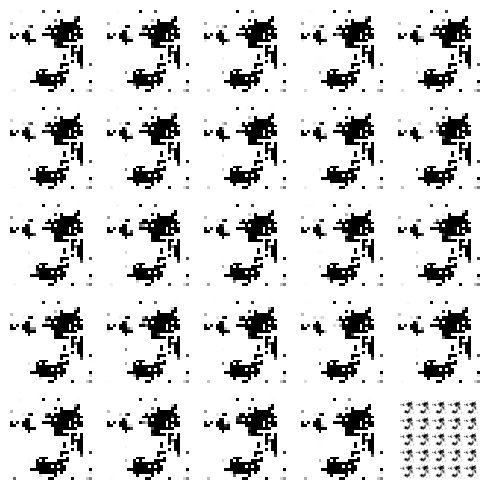

  0%|          | 0/350 [00:00<?, ?it/s]

4/4 [==============================] - 0s 13ms/step


  0%|          | 1/350 [00:00<04:29,  1.29it/s]

4/4 [==============================] - 0s 11ms/step


  1%|          | 2/350 [00:01<03:56,  1.47it/s]

4/4 [==============================] - 0s 30ms/step


  1%|          | 3/350 [00:02<04:04,  1.42it/s]

4/4 [==============================] - 0s 12ms/step


  1%|          | 4/350 [00:02<03:57,  1.46it/s]

4/4 [==============================] - 0s 14ms/step


  1%|▏         | 5/350 [00:03<03:52,  1.49it/s]

4/4 [==============================] - 0s 15ms/step


  2%|▏         | 6/350 [00:04<03:40,  1.56it/s]

4/4 [==============================] - 0s 21ms/step


  2%|▏         | 7/350 [00:04<03:45,  1.52it/s]

4/4 [==============================] - 0s 22ms/step


  2%|▏         | 8/350 [00:05<03:52,  1.47it/s]

4/4 [==============================] - 0s 11ms/step


  3%|▎         | 9/350 [00:06<03:49,  1.48it/s]

4/4 [==============================] - 0s 16ms/step


  3%|▎         | 10/350 [00:06<03:49,  1.48it/s]

4/4 [==============================] - 0s 14ms/step


  3%|▎         | 11/350 [00:07<04:18,  1.31it/s]

4/4 [==============================] - 0s 13ms/step


  3%|▎         | 12/350 [00:08<04:13,  1.33it/s]

4/4 [==============================] - 0s 25ms/step


  4%|▎         | 13/350 [00:09<04:07,  1.36it/s]

4/4 [==============================] - 0s 12ms/step


  4%|▍         | 14/350 [00:09<04:03,  1.38it/s]

4/4 [==============================] - 0s 36ms/step


  4%|▍         | 15/350 [00:10<04:11,  1.33it/s]

4/4 [==============================] - 0s 25ms/step


  5%|▍         | 16/350 [00:11<04:20,  1.28it/s]

4/4 [==============================] - 0s 15ms/step


  5%|▍         | 17/350 [00:12<04:20,  1.28it/s]

4/4 [==============================] - 0s 12ms/step


  5%|▌         | 18/350 [00:12<04:04,  1.36it/s]

4/4 [==============================] - 0s 26ms/step


  5%|▌         | 19/350 [00:13<03:58,  1.39it/s]

4/4 [==============================] - 0s 18ms/step


  6%|▌         | 20/350 [00:14<03:49,  1.44it/s]

4/4 [==============================] - 0s 24ms/step


  6%|▌         | 21/350 [00:14<03:47,  1.44it/s]

4/4 [==============================] - 0s 13ms/step


  6%|▋         | 22/350 [00:15<03:48,  1.44it/s]

4/4 [==============================] - 0s 15ms/step


  7%|▋         | 23/350 [00:16<03:44,  1.46it/s]

4/4 [==============================] - 0s 34ms/step


  7%|▋         | 24/350 [00:17<03:46,  1.44it/s]

4/4 [==============================] - 0s 11ms/step


  7%|▋         | 25/350 [00:17<03:42,  1.46it/s]

4/4 [==============================] - 0s 16ms/step


  7%|▋         | 26/350 [00:18<03:41,  1.46it/s]

4/4 [==============================] - 0s 20ms/step


  8%|▊         | 27/350 [00:19<03:40,  1.46it/s]

4/4 [==============================] - 0s 11ms/step


  8%|▊         | 28/350 [00:19<03:35,  1.49it/s]

4/4 [==============================] - 0s 20ms/step


  8%|▊         | 29/350 [00:20<03:38,  1.47it/s]

4/4 [==============================] - 0s 12ms/step


  9%|▊         | 30/350 [00:21<03:34,  1.49it/s]

4/4 [==============================] - 0s 13ms/step


  9%|▉         | 31/350 [00:21<03:33,  1.49it/s]

4/4 [==============================] - 0s 24ms/step


  9%|▉         | 32/350 [00:22<03:36,  1.47it/s]

4/4 [==============================] - 0s 11ms/step


  9%|▉         | 33/350 [00:23<03:28,  1.52it/s]

4/4 [==============================] - 0s 39ms/step


 10%|▉         | 34/350 [00:23<03:36,  1.46it/s]

4/4 [==============================] - 0s 37ms/step


 10%|█         | 35/350 [00:24<03:39,  1.44it/s]

4/4 [==============================] - 0s 11ms/step


 10%|█         | 36/350 [00:25<03:40,  1.43it/s]

4/4 [==============================] - 0s 14ms/step


 11%|█         | 37/350 [00:25<03:38,  1.43it/s]

4/4 [==============================] - 0s 16ms/step


 11%|█         | 38/350 [00:26<03:34,  1.46it/s]

4/4 [==============================] - 0s 12ms/step


 11%|█         | 39/350 [00:27<03:35,  1.45it/s]

4/4 [==============================] - 0s 13ms/step


 11%|█▏        | 40/350 [00:27<03:30,  1.47it/s]

4/4 [==============================] - 0s 14ms/step


 12%|█▏        | 41/350 [00:28<03:26,  1.49it/s]

4/4 [==============================] - 0s 17ms/step


 12%|█▏        | 42/350 [00:29<03:28,  1.48it/s]

4/4 [==============================] - 0s 16ms/step


 12%|█▏        | 43/350 [00:29<03:29,  1.47it/s]

4/4 [==============================] - 0s 20ms/step


 13%|█▎        | 44/350 [00:30<03:33,  1.43it/s]

4/4 [==============================] - 0s 24ms/step


 13%|█▎        | 45/350 [00:31<03:32,  1.43it/s]

4/4 [==============================] - 0s 11ms/step


 13%|█▎        | 46/350 [00:32<03:33,  1.43it/s]

4/4 [==============================] - 0s 14ms/step


 13%|█▎        | 47/350 [00:32<03:31,  1.43it/s]

4/4 [==============================] - 0s 19ms/step


 14%|█▎        | 48/350 [00:33<03:33,  1.42it/s]

4/4 [==============================] - 0s 25ms/step


 14%|█▍        | 49/350 [00:34<03:30,  1.43it/s]

4/4 [==============================] - 0s 14ms/step


 14%|█▍        | 50/350 [00:34<03:33,  1.40it/s]

4/4 [==============================] - 0s 17ms/step


 15%|█▍        | 51/350 [00:35<03:31,  1.41it/s]

4/4 [==============================] - 0s 14ms/step


 15%|█▍        | 52/350 [00:36<03:22,  1.47it/s]

4/4 [==============================] - 0s 26ms/step


 15%|█▌        | 53/350 [00:36<03:27,  1.43it/s]

4/4 [==============================] - 0s 21ms/step


 15%|█▌        | 54/350 [00:37<03:31,  1.40it/s]

4/4 [==============================] - 0s 14ms/step


 16%|█▌        | 55/350 [00:38<03:30,  1.40it/s]

4/4 [==============================] - 0s 16ms/step


 16%|█▌        | 56/350 [00:39<03:29,  1.41it/s]

4/4 [==============================] - 0s 14ms/step


 16%|█▋        | 57/350 [00:39<03:27,  1.42it/s]

4/4 [==============================] - 0s 16ms/step


 17%|█▋        | 58/350 [00:40<03:19,  1.46it/s]

4/4 [==============================] - 0s 14ms/step


 17%|█▋        | 59/350 [00:41<03:14,  1.49it/s]

4/4 [==============================] - 0s 12ms/step


 17%|█▋        | 60/350 [00:41<03:10,  1.52it/s]

4/4 [==============================] - 0s 17ms/step


 17%|█▋        | 61/350 [00:42<03:12,  1.50it/s]

4/4 [==============================] - 0s 12ms/step


 18%|█▊        | 62/350 [00:43<03:11,  1.50it/s]

4/4 [==============================] - 0s 19ms/step


 18%|█▊        | 63/350 [00:43<03:12,  1.49it/s]

4/4 [==============================] - 0s 13ms/step


 18%|█▊        | 64/350 [00:44<03:16,  1.46it/s]

4/4 [==============================] - 0s 15ms/step


 19%|█▊        | 65/350 [00:45<03:13,  1.47it/s]

4/4 [==============================] - 0s 12ms/step


 19%|█▉        | 66/350 [00:45<03:09,  1.50it/s]

4/4 [==============================] - 0s 12ms/step


 19%|█▉        | 67/350 [00:46<03:03,  1.54it/s]

4/4 [==============================] - 0s 14ms/step


 19%|█▉        | 68/350 [00:47<03:11,  1.47it/s]

4/4 [==============================] - 0s 12ms/step


 20%|█▉        | 69/350 [00:47<03:14,  1.44it/s]

4/4 [==============================] - 0s 12ms/step


 20%|██        | 70/350 [00:48<03:12,  1.45it/s]

4/4 [==============================] - 0s 12ms/step


 20%|██        | 71/350 [00:49<03:10,  1.47it/s]

4/4 [==============================] - 0s 12ms/step


 21%|██        | 72/350 [00:49<03:13,  1.44it/s]

4/4 [==============================] - 0s 14ms/step


 21%|██        | 73/350 [00:50<03:14,  1.42it/s]

4/4 [==============================] - 0s 14ms/step


 21%|██        | 74/350 [00:51<03:22,  1.36it/s]

4/4 [==============================] - 0s 12ms/step


 21%|██▏       | 75/350 [00:52<03:17,  1.40it/s]

4/4 [==============================] - 0s 14ms/step


 22%|██▏       | 76/350 [00:52<03:18,  1.38it/s]

4/4 [==============================] - 0s 16ms/step


 22%|██▏       | 77/350 [00:53<03:17,  1.38it/s]

4/4 [==============================] - 0s 12ms/step


 22%|██▏       | 78/350 [00:54<03:18,  1.37it/s]

4/4 [==============================] - 0s 12ms/step


 23%|██▎       | 79/350 [00:55<03:13,  1.40it/s]

4/4 [==============================] - 0s 16ms/step


 23%|██▎       | 80/350 [00:55<03:06,  1.45it/s]

4/4 [==============================] - 0s 15ms/step


 23%|██▎       | 81/350 [00:56<03:03,  1.47it/s]

4/4 [==============================] - 0s 15ms/step


 23%|██▎       | 82/350 [00:57<03:07,  1.43it/s]

4/4 [==============================] - 0s 14ms/step


 24%|██▎       | 83/350 [00:57<02:58,  1.50it/s]

4/4 [==============================] - 0s 31ms/step


 24%|██▍       | 84/350 [00:58<03:08,  1.41it/s]

4/4 [==============================] - 0s 14ms/step


 24%|██▍       | 85/350 [00:59<02:57,  1.50it/s]

4/4 [==============================] - 0s 27ms/step


 25%|██▍       | 86/350 [00:59<03:02,  1.44it/s]

4/4 [==============================] - 0s 15ms/step


 25%|██▍       | 87/350 [01:00<03:01,  1.45it/s]

4/4 [==============================] - 0s 26ms/step


 25%|██▌       | 88/350 [01:01<03:14,  1.34it/s]

4/4 [==============================] - 0s 23ms/step


 25%|██▌       | 89/350 [01:02<03:13,  1.35it/s]

4/4 [==============================] - 0s 11ms/step


 26%|██▌       | 90/350 [01:02<03:13,  1.34it/s]

4/4 [==============================] - 0s 11ms/step


 26%|██▌       | 91/350 [01:03<03:06,  1.39it/s]

4/4 [==============================] - 0s 22ms/step


 26%|██▋       | 92/350 [01:04<03:07,  1.38it/s]

4/4 [==============================] - 0s 14ms/step


 27%|██▋       | 93/350 [01:04<03:08,  1.36it/s]

4/4 [==============================] - 0s 14ms/step


 27%|██▋       | 94/350 [01:05<03:05,  1.38it/s]

4/4 [==============================] - 0s 14ms/step


 27%|██▋       | 95/350 [01:06<02:58,  1.43it/s]

4/4 [==============================] - 0s 26ms/step


 27%|██▋       | 96/350 [01:07<03:05,  1.37it/s]

4/4 [==============================] - 0s 14ms/step


 28%|██▊       | 97/350 [01:07<03:05,  1.36it/s]

4/4 [==============================] - 0s 12ms/step


 28%|██▊       | 98/350 [01:08<03:05,  1.36it/s]

4/4 [==============================] - 0s 14ms/step


 28%|██▊       | 99/350 [01:09<02:59,  1.40it/s]

4/4 [==============================] - 0s 29ms/step


 29%|██▊       | 100/350 [01:10<03:04,  1.35it/s]

4/4 [==============================] - 0s 12ms/step


 29%|██▉       | 101/350 [01:10<03:01,  1.37it/s]

4/4 [==============================] - 0s 16ms/step


 29%|██▉       | 102/350 [01:11<02:54,  1.42it/s]

4/4 [==============================] - 0s 16ms/step


 29%|██▉       | 103/350 [01:12<02:56,  1.40it/s]

4/4 [==============================] - 0s 15ms/step


 30%|██▉       | 104/350 [01:12<03:00,  1.36it/s]

4/4 [==============================] - 0s 15ms/step


 30%|███       | 105/350 [01:13<02:58,  1.38it/s]

4/4 [==============================] - 0s 18ms/step


 30%|███       | 106/350 [01:14<02:56,  1.38it/s]

4/4 [==============================] - 0s 25ms/step


 31%|███       | 107/350 [01:15<02:54,  1.39it/s]

4/4 [==============================] - 0s 12ms/step


 31%|███       | 108/350 [01:15<02:55,  1.38it/s]

4/4 [==============================] - 0s 15ms/step


 31%|███       | 109/350 [01:16<02:48,  1.43it/s]

4/4 [==============================] - 0s 11ms/step


 31%|███▏      | 110/350 [01:17<02:46,  1.44it/s]

4/4 [==============================] - 0s 13ms/step


 32%|███▏      | 111/350 [01:17<02:47,  1.43it/s]

4/4 [==============================] - 0s 11ms/step


 32%|███▏      | 112/350 [01:18<02:43,  1.46it/s]

4/4 [==============================] - 0s 22ms/step


 32%|███▏      | 113/350 [01:19<02:40,  1.48it/s]

4/4 [==============================] - 0s 13ms/step


 33%|███▎      | 114/350 [01:19<02:37,  1.50it/s]

4/4 [==============================] - 0s 15ms/step


 33%|███▎      | 115/350 [01:20<02:42,  1.45it/s]

4/4 [==============================] - 0s 13ms/step


 33%|███▎      | 116/350 [01:21<02:36,  1.50it/s]

4/4 [==============================] - 0s 23ms/step


 33%|███▎      | 117/350 [01:21<02:42,  1.43it/s]

4/4 [==============================] - 0s 18ms/step


 34%|███▎      | 118/350 [01:22<02:42,  1.42it/s]

4/4 [==============================] - 0s 13ms/step


 34%|███▍      | 119/350 [01:23<02:43,  1.42it/s]

4/4 [==============================] - 0s 14ms/step


 34%|███▍      | 120/350 [01:24<02:40,  1.43it/s]

4/4 [==============================] - 0s 15ms/step


 35%|███▍      | 121/350 [01:24<02:38,  1.45it/s]

4/4 [==============================] - 0s 14ms/step


 35%|███▍      | 122/350 [01:25<02:38,  1.44it/s]

4/4 [==============================] - 0s 14ms/step


 35%|███▌      | 123/350 [01:26<02:31,  1.49it/s]

4/4 [==============================] - 0s 11ms/step


 35%|███▌      | 124/350 [01:26<02:31,  1.49it/s]

4/4 [==============================] - 0s 14ms/step


 36%|███▌      | 125/350 [01:27<02:25,  1.54it/s]

4/4 [==============================] - 0s 13ms/step


 36%|███▌      | 126/350 [01:28<02:29,  1.49it/s]

4/4 [==============================] - 0s 14ms/step


 36%|███▋      | 127/350 [01:28<02:27,  1.51it/s]

4/4 [==============================] - 0s 15ms/step


 37%|███▋      | 128/350 [01:29<02:25,  1.53it/s]

4/4 [==============================] - 0s 13ms/step


 37%|███▋      | 129/350 [01:29<02:19,  1.59it/s]

4/4 [==============================] - 0s 30ms/step


 37%|███▋      | 130/350 [01:30<02:27,  1.49it/s]

4/4 [==============================] - 0s 10ms/step


 37%|███▋      | 131/350 [01:31<02:28,  1.47it/s]

4/4 [==============================] - 0s 14ms/step


 38%|███▊      | 132/350 [01:32<02:33,  1.42it/s]

4/4 [==============================] - 0s 20ms/step


 38%|███▊      | 133/350 [01:32<02:41,  1.34it/s]

4/4 [==============================] - 0s 15ms/step


 38%|███▊      | 134/350 [01:33<02:41,  1.34it/s]

4/4 [==============================] - 0s 23ms/step


 39%|███▊      | 135/350 [01:34<02:34,  1.39it/s]

4/4 [==============================] - 0s 16ms/step


 39%|███▉      | 136/350 [01:34<02:28,  1.44it/s]

4/4 [==============================] - 0s 14ms/step


 39%|███▉      | 137/350 [01:35<02:27,  1.45it/s]

4/4 [==============================] - 0s 13ms/step


 39%|███▉      | 138/350 [01:36<02:33,  1.38it/s]

4/4 [==============================] - 0s 12ms/step


 40%|███▉      | 139/350 [01:37<02:30,  1.40it/s]

4/4 [==============================] - 0s 12ms/step


 40%|████      | 140/350 [01:37<02:21,  1.49it/s]

4/4 [==============================] - 0s 11ms/step


 40%|████      | 141/350 [01:38<02:18,  1.51it/s]

4/4 [==============================] - 0s 11ms/step


 41%|████      | 142/350 [01:39<02:43,  1.27it/s]

4/4 [==============================] - 0s 16ms/step


 41%|████      | 143/350 [01:40<02:47,  1.24it/s]

4/4 [==============================] - 0s 14ms/step


 41%|████      | 144/350 [01:40<02:38,  1.30it/s]

4/4 [==============================] - 0s 38ms/step


 41%|████▏     | 145/350 [01:41<02:37,  1.30it/s]

4/4 [==============================] - 0s 15ms/step


 42%|████▏     | 146/350 [01:42<02:36,  1.30it/s]

4/4 [==============================] - 0s 15ms/step


 42%|████▏     | 147/350 [01:43<02:35,  1.30it/s]

4/4 [==============================] - 0s 14ms/step


 42%|████▏     | 148/350 [01:43<02:26,  1.38it/s]

4/4 [==============================] - 0s 31ms/step


 43%|████▎     | 149/350 [01:44<02:25,  1.38it/s]

4/4 [==============================] - 0s 16ms/step


 43%|████▎     | 150/350 [01:45<02:26,  1.37it/s]

4/4 [==============================] - 0s 16ms/step


 43%|████▎     | 151/350 [01:46<02:22,  1.40it/s]

4/4 [==============================] - 0s 17ms/step


 43%|████▎     | 152/350 [01:46<02:24,  1.37it/s]

4/4 [==============================] - 0s 16ms/step


 44%|████▎     | 153/350 [01:47<02:19,  1.41it/s]

4/4 [==============================] - 0s 11ms/step


 44%|████▍     | 154/350 [01:48<02:13,  1.47it/s]

4/4 [==============================] - 0s 12ms/step


 44%|████▍     | 155/350 [01:48<02:04,  1.57it/s]

4/4 [==============================] - 0s 12ms/step


 45%|████▍     | 156/350 [01:49<02:01,  1.60it/s]

4/4 [==============================] - 0s 12ms/step


 45%|████▍     | 157/350 [01:49<02:02,  1.57it/s]

4/4 [==============================] - 0s 12ms/step


 45%|████▌     | 158/350 [01:50<01:59,  1.60it/s]

4/4 [==============================] - 0s 11ms/step


 45%|████▌     | 159/350 [01:51<02:01,  1.57it/s]

4/4 [==============================] - 0s 12ms/step


 46%|████▌     | 160/350 [01:51<01:57,  1.61it/s]

4/4 [==============================] - 0s 13ms/step


 46%|████▌     | 161/350 [01:52<01:59,  1.58it/s]

4/4 [==============================] - 0s 13ms/step


 46%|████▋     | 162/350 [01:53<01:56,  1.61it/s]

4/4 [==============================] - 0s 11ms/step


 47%|████▋     | 163/350 [01:53<01:58,  1.58it/s]

4/4 [==============================] - 0s 11ms/step


 47%|████▋     | 164/350 [01:54<01:54,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 47%|████▋     | 165/350 [01:54<01:57,  1.57it/s]

4/4 [==============================] - 0s 12ms/step


 47%|████▋     | 166/350 [01:55<01:53,  1.62it/s]

4/4 [==============================] - 0s 11ms/step


 48%|████▊     | 167/350 [01:56<01:54,  1.60it/s]

4/4 [==============================] - 0s 12ms/step


 48%|████▊     | 168/350 [01:56<01:51,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


 48%|████▊     | 169/350 [01:57<01:54,  1.57it/s]

4/4 [==============================] - 0s 11ms/step


 49%|████▊     | 170/350 [01:57<01:50,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 49%|████▉     | 171/350 [01:58<01:44,  1.72it/s]

4/4 [==============================] - 0s 15ms/step


 49%|████▉     | 172/350 [01:59<01:45,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


 49%|████▉     | 173/350 [01:59<01:43,  1.72it/s]

4/4 [==============================] - 0s 34ms/step


 50%|████▉     | 174/350 [02:00<01:49,  1.61it/s]

4/4 [==============================] - 0s 12ms/step


 50%|█████     | 175/350 [02:00<01:49,  1.60it/s]

4/4 [==============================] - 0s 13ms/step


 50%|█████     | 176/350 [02:01<01:49,  1.59it/s]

4/4 [==============================] - 0s 15ms/step


 51%|█████     | 177/350 [02:02<01:50,  1.57it/s]

4/4 [==============================] - 0s 15ms/step


 51%|█████     | 178/350 [02:02<01:43,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 51%|█████     | 179/350 [02:03<01:53,  1.51it/s]

4/4 [==============================] - 0s 20ms/step


 51%|█████▏    | 180/350 [02:04<02:01,  1.40it/s]

4/4 [==============================] - 0s 13ms/step


 52%|█████▏    | 181/350 [02:05<01:54,  1.47it/s]

4/4 [==============================] - 0s 12ms/step


 52%|█████▏    | 182/350 [02:05<01:51,  1.50it/s]

4/4 [==============================] - 0s 17ms/step


 52%|█████▏    | 183/350 [02:06<01:53,  1.48it/s]

4/4 [==============================] - 0s 13ms/step


 53%|█████▎    | 184/350 [02:07<01:50,  1.50it/s]

4/4 [==============================] - 0s 12ms/step


 53%|█████▎    | 185/350 [02:07<01:53,  1.46it/s]

4/4 [==============================] - 0s 16ms/step


 53%|█████▎    | 186/350 [02:08<01:49,  1.50it/s]

4/4 [==============================] - 0s 13ms/step


 53%|█████▎    | 187/350 [02:09<01:55,  1.41it/s]

4/4 [==============================] - 0s 14ms/step


 54%|█████▎    | 188/350 [02:10<02:00,  1.35it/s]

4/4 [==============================] - 0s 15ms/step


 54%|█████▍    | 189/350 [02:10<02:01,  1.33it/s]

4/4 [==============================] - 0s 13ms/step


 54%|█████▍    | 190/350 [02:11<01:53,  1.40it/s]

4/4 [==============================] - 0s 15ms/step


 55%|█████▍    | 191/350 [02:12<01:58,  1.34it/s]

4/4 [==============================] - 0s 13ms/step


 55%|█████▍    | 192/350 [02:12<01:57,  1.34it/s]

4/4 [==============================] - 0s 12ms/step


 55%|█████▌    | 193/350 [02:13<02:00,  1.30it/s]

4/4 [==============================] - 0s 14ms/step


 55%|█████▌    | 194/350 [02:14<01:52,  1.38it/s]

4/4 [==============================] - 0s 12ms/step


 56%|█████▌    | 195/350 [02:15<01:50,  1.40it/s]

4/4 [==============================] - 0s 12ms/step


 56%|█████▌    | 196/350 [02:15<01:51,  1.38it/s]

4/4 [==============================] - 0s 15ms/step


 56%|█████▋    | 197/350 [02:16<01:46,  1.43it/s]

4/4 [==============================] - 0s 14ms/step


 57%|█████▋    | 198/350 [02:17<01:46,  1.42it/s]

4/4 [==============================] - 0s 13ms/step


 57%|█████▋    | 199/350 [02:17<01:42,  1.47it/s]

4/4 [==============================] - 0s 24ms/step


 57%|█████▋    | 200/350 [02:18<01:45,  1.42it/s]

4/4 [==============================] - 0s 11ms/step


 57%|█████▋    | 201/350 [02:19<01:43,  1.44it/s]

4/4 [==============================] - 0s 13ms/step


 58%|█████▊    | 202/350 [02:19<01:41,  1.46it/s]

4/4 [==============================] - 0s 13ms/step


 58%|█████▊    | 203/350 [02:20<01:42,  1.43it/s]

4/4 [==============================] - 0s 16ms/step


 58%|█████▊    | 204/350 [02:21<01:48,  1.34it/s]

4/4 [==============================] - 0s 12ms/step


 59%|█████▊    | 205/350 [02:22<01:44,  1.39it/s]

4/4 [==============================] - 0s 17ms/step


 59%|█████▉    | 206/350 [02:22<01:46,  1.35it/s]

4/4 [==============================] - 0s 14ms/step


 59%|█████▉    | 207/350 [02:23<01:45,  1.35it/s]

4/4 [==============================] - 0s 11ms/step


 59%|█████▉    | 208/350 [02:24<01:41,  1.39it/s]

4/4 [==============================] - 0s 19ms/step


 60%|█████▉    | 209/350 [02:25<01:41,  1.39it/s]

4/4 [==============================] - 0s 23ms/step


 60%|██████    | 210/350 [02:25<01:43,  1.35it/s]

4/4 [==============================] - 0s 16ms/step


 60%|██████    | 211/350 [02:26<01:38,  1.41it/s]

4/4 [==============================] - 0s 12ms/step


 61%|██████    | 212/350 [02:27<01:37,  1.42it/s]

4/4 [==============================] - 0s 15ms/step


 61%|██████    | 213/350 [02:27<01:37,  1.40it/s]

4/4 [==============================] - 0s 13ms/step


 61%|██████    | 214/350 [02:28<01:34,  1.44it/s]

4/4 [==============================] - 0s 13ms/step


 61%|██████▏   | 215/350 [02:29<01:35,  1.41it/s]

4/4 [==============================] - 0s 16ms/step


 62%|██████▏   | 216/350 [02:30<01:36,  1.39it/s]

4/4 [==============================] - 0s 18ms/step


 62%|██████▏   | 217/350 [02:30<01:33,  1.43it/s]

4/4 [==============================] - 0s 13ms/step


 62%|██████▏   | 218/350 [02:31<01:32,  1.43it/s]

4/4 [==============================] - 0s 14ms/step


 63%|██████▎   | 219/350 [02:32<01:34,  1.39it/s]

4/4 [==============================] - 0s 12ms/step


 63%|██████▎   | 220/350 [02:32<01:31,  1.41it/s]

4/4 [==============================] - 0s 14ms/step


 63%|██████▎   | 221/350 [02:33<01:29,  1.45it/s]

4/4 [==============================] - 0s 13ms/step


 63%|██████▎   | 222/350 [02:34<01:32,  1.39it/s]

4/4 [==============================] - 0s 17ms/step


 64%|██████▎   | 223/350 [02:34<01:29,  1.42it/s]

4/4 [==============================] - 0s 12ms/step


 64%|██████▍   | 224/350 [02:35<01:28,  1.42it/s]

4/4 [==============================] - 0s 13ms/step


 64%|██████▍   | 225/350 [02:36<01:27,  1.42it/s]

4/4 [==============================] - 0s 12ms/step


 65%|██████▍   | 226/350 [02:36<01:23,  1.49it/s]

4/4 [==============================] - 0s 12ms/step


 65%|██████▍   | 227/350 [02:37<01:24,  1.45it/s]

4/4 [==============================] - 0s 18ms/step


 65%|██████▌   | 228/350 [02:38<01:23,  1.46it/s]

4/4 [==============================] - 0s 16ms/step


 65%|██████▌   | 229/350 [02:39<01:21,  1.49it/s]

4/4 [==============================] - 0s 12ms/step


 66%|██████▌   | 230/350 [02:39<01:23,  1.44it/s]

4/4 [==============================] - 0s 13ms/step


 66%|██████▌   | 231/350 [02:40<01:23,  1.42it/s]

4/4 [==============================] - 0s 15ms/step


 66%|██████▋   | 232/350 [02:41<01:21,  1.45it/s]

4/4 [==============================] - 0s 13ms/step


 67%|██████▋   | 233/350 [02:41<01:20,  1.45it/s]

4/4 [==============================] - 0s 15ms/step


 67%|██████▋   | 234/350 [02:42<01:17,  1.50it/s]

4/4 [==============================] - 0s 13ms/step


 67%|██████▋   | 235/350 [02:43<01:17,  1.48it/s]

4/4 [==============================] - 0s 15ms/step


 67%|██████▋   | 236/350 [02:43<01:20,  1.41it/s]

4/4 [==============================] - 0s 13ms/step


 68%|██████▊   | 237/350 [02:44<01:20,  1.41it/s]

4/4 [==============================] - 0s 18ms/step


 68%|██████▊   | 238/350 [02:45<01:17,  1.44it/s]

4/4 [==============================] - 0s 17ms/step


 68%|██████▊   | 239/350 [02:46<01:17,  1.43it/s]

4/4 [==============================] - 0s 12ms/step


 69%|██████▊   | 240/350 [02:46<01:16,  1.43it/s]

4/4 [==============================] - 0s 17ms/step


 69%|██████▉   | 241/350 [02:47<01:14,  1.46it/s]

4/4 [==============================] - 0s 20ms/step


 69%|██████▉   | 242/350 [02:48<01:16,  1.41it/s]

4/4 [==============================] - 0s 12ms/step


 69%|██████▉   | 243/350 [02:48<01:16,  1.40it/s]

4/4 [==============================] - 0s 13ms/step


 70%|██████▉   | 244/350 [02:49<01:13,  1.43it/s]

4/4 [==============================] - 0s 11ms/step


 70%|███████   | 245/350 [02:50<01:13,  1.42it/s]

4/4 [==============================] - 0s 14ms/step


 70%|███████   | 246/350 [02:50<01:13,  1.41it/s]

4/4 [==============================] - 0s 12ms/step


 71%|███████   | 247/350 [02:51<01:10,  1.46it/s]

4/4 [==============================] - 0s 20ms/step


 71%|███████   | 248/350 [02:52<01:11,  1.43it/s]

4/4 [==============================] - 0s 15ms/step


 71%|███████   | 249/350 [02:52<01:08,  1.48it/s]

4/4 [==============================] - 0s 12ms/step


 71%|███████▏  | 250/350 [02:53<01:07,  1.47it/s]

4/4 [==============================] - 0s 13ms/step


 72%|███████▏  | 251/350 [02:54<01:05,  1.50it/s]

4/4 [==============================] - 0s 14ms/step


 72%|███████▏  | 252/350 [02:54<01:05,  1.49it/s]

4/4 [==============================] - 0s 13ms/step


 72%|███████▏  | 253/350 [02:55<01:05,  1.49it/s]

4/4 [==============================] - 0s 11ms/step


 73%|███████▎  | 254/350 [02:56<01:06,  1.45it/s]

4/4 [==============================] - 0s 13ms/step


 73%|███████▎  | 255/350 [02:57<01:06,  1.42it/s]

4/4 [==============================] - 0s 12ms/step


 73%|███████▎  | 256/350 [02:57<01:03,  1.48it/s]

4/4 [==============================] - 0s 29ms/step


 73%|███████▎  | 257/350 [02:58<01:04,  1.45it/s]

4/4 [==============================] - 0s 13ms/step


 74%|███████▎  | 258/350 [02:59<01:01,  1.49it/s]

4/4 [==============================] - 0s 20ms/step


 74%|███████▍  | 259/350 [02:59<01:01,  1.47it/s]

4/4 [==============================] - 0s 12ms/step


 74%|███████▍  | 260/350 [03:00<01:01,  1.47it/s]

4/4 [==============================] - 0s 15ms/step


 75%|███████▍  | 261/350 [03:01<00:59,  1.50it/s]

4/4 [==============================] - 0s 30ms/step


 75%|███████▍  | 262/350 [03:01<01:02,  1.40it/s]

4/4 [==============================] - 0s 38ms/step


 75%|███████▌  | 263/350 [03:02<01:07,  1.29it/s]

4/4 [==============================] - 0s 32ms/step


 75%|███████▌  | 264/350 [03:03<01:05,  1.32it/s]

4/4 [==============================] - 0s 13ms/step


 76%|███████▌  | 265/350 [03:04<01:01,  1.38it/s]

4/4 [==============================] - 0s 20ms/step


 76%|███████▌  | 266/350 [03:04<01:01,  1.36it/s]

4/4 [==============================] - 0s 20ms/step


 76%|███████▋  | 267/350 [03:05<01:00,  1.38it/s]

4/4 [==============================] - 0s 13ms/step


 77%|███████▋  | 268/350 [03:06<00:56,  1.45it/s]

4/4 [==============================] - 0s 23ms/step


 77%|███████▋  | 269/350 [03:06<00:56,  1.44it/s]

4/4 [==============================] - 0s 12ms/step


 77%|███████▋  | 270/350 [03:07<00:55,  1.45it/s]

4/4 [==============================] - 0s 19ms/step


 77%|███████▋  | 271/350 [03:08<00:55,  1.43it/s]

4/4 [==============================] - 0s 11ms/step


 78%|███████▊  | 272/350 [03:09<00:55,  1.40it/s]

4/4 [==============================] - 0s 12ms/step


 78%|███████▊  | 273/350 [03:09<00:54,  1.41it/s]

4/4 [==============================] - 0s 18ms/step


 78%|███████▊  | 274/350 [03:10<00:53,  1.43it/s]

4/4 [==============================] - 0s 17ms/step


 79%|███████▊  | 275/350 [03:11<00:52,  1.44it/s]

4/4 [==============================] - 0s 14ms/step


 79%|███████▉  | 276/350 [03:11<00:52,  1.41it/s]

4/4 [==============================] - 0s 13ms/step


 79%|███████▉  | 277/350 [03:12<00:52,  1.40it/s]

4/4 [==============================] - 0s 16ms/step


 79%|███████▉  | 278/350 [03:13<00:50,  1.42it/s]

4/4 [==============================] - 0s 19ms/step


 80%|███████▉  | 279/350 [03:14<00:51,  1.38it/s]

4/4 [==============================] - 0s 14ms/step


 80%|████████  | 280/350 [03:14<00:48,  1.43it/s]

4/4 [==============================] - 0s 24ms/step


 80%|████████  | 281/350 [03:15<00:50,  1.38it/s]

4/4 [==============================] - 0s 15ms/step


 81%|████████  | 282/350 [03:16<00:50,  1.33it/s]

4/4 [==============================] - 0s 13ms/step


 81%|████████  | 283/350 [03:16<00:48,  1.38it/s]

4/4 [==============================] - 0s 14ms/step


 81%|████████  | 284/350 [03:17<00:47,  1.38it/s]

4/4 [==============================] - 0s 11ms/step


 81%|████████▏ | 285/350 [03:18<00:47,  1.38it/s]

4/4 [==============================] - 0s 13ms/step


 82%|████████▏ | 286/350 [03:19<00:44,  1.45it/s]

4/4 [==============================] - 0s 14ms/step


 82%|████████▏ | 287/350 [03:19<00:44,  1.43it/s]

4/4 [==============================] - 0s 18ms/step


 82%|████████▏ | 288/350 [03:20<00:42,  1.47it/s]

4/4 [==============================] - 0s 14ms/step


 83%|████████▎ | 289/350 [03:21<00:41,  1.46it/s]

4/4 [==============================] - 0s 14ms/step


 83%|████████▎ | 290/350 [03:21<00:41,  1.45it/s]

4/4 [==============================] - 0s 15ms/step


 83%|████████▎ | 291/350 [03:22<00:41,  1.44it/s]

4/4 [==============================] - 0s 11ms/step


 83%|████████▎ | 292/350 [03:23<00:40,  1.45it/s]

4/4 [==============================] - 0s 12ms/step


 84%|████████▎ | 293/350 [03:23<00:38,  1.48it/s]

4/4 [==============================] - 0s 12ms/step


 84%|████████▍ | 294/350 [03:24<00:39,  1.43it/s]

4/4 [==============================] - 0s 12ms/step


 84%|████████▍ | 295/350 [03:25<00:39,  1.40it/s]

4/4 [==============================] - 0s 20ms/step


 85%|████████▍ | 296/350 [03:26<00:38,  1.41it/s]

4/4 [==============================] - 0s 15ms/step


 85%|████████▍ | 297/350 [03:26<00:39,  1.36it/s]

4/4 [==============================] - 0s 12ms/step


 85%|████████▌ | 298/350 [03:27<00:38,  1.36it/s]

4/4 [==============================] - 0s 13ms/step


 85%|████████▌ | 299/350 [03:28<00:36,  1.41it/s]

4/4 [==============================] - 0s 20ms/step


 86%|████████▌ | 300/350 [03:28<00:35,  1.43it/s]

4/4 [==============================] - 0s 18ms/step


 86%|████████▌ | 301/350 [03:29<00:34,  1.42it/s]

4/4 [==============================] - 0s 15ms/step


 86%|████████▋ | 302/350 [03:30<00:33,  1.43it/s]

4/4 [==============================] - 0s 14ms/step


 87%|████████▋ | 303/350 [03:30<00:32,  1.43it/s]

4/4 [==============================] - 0s 14ms/step


 87%|████████▋ | 304/350 [03:31<00:31,  1.44it/s]

4/4 [==============================] - 0s 13ms/step


 87%|████████▋ | 305/350 [03:32<00:31,  1.43it/s]

4/4 [==============================] - 0s 11ms/step


 87%|████████▋ | 306/350 [03:33<00:30,  1.43it/s]

4/4 [==============================] - 0s 18ms/step


 88%|████████▊ | 307/350 [03:33<00:30,  1.41it/s]

4/4 [==============================] - 0s 14ms/step


 88%|████████▊ | 308/350 [03:34<00:31,  1.34it/s]

4/4 [==============================] - 0s 14ms/step


 88%|████████▊ | 309/350 [03:35<00:31,  1.30it/s]

4/4 [==============================] - 0s 16ms/step


 89%|████████▊ | 310/350 [03:36<00:32,  1.24it/s]

4/4 [==============================] - 0s 18ms/step


 89%|████████▉ | 311/350 [03:37<00:30,  1.28it/s]

4/4 [==============================] - 0s 11ms/step


 89%|████████▉ | 312/350 [03:37<00:29,  1.29it/s]

4/4 [==============================] - 0s 12ms/step


 89%|████████▉ | 313/350 [03:38<00:27,  1.34it/s]

4/4 [==============================] - 0s 12ms/step


 90%|████████▉ | 314/350 [03:39<00:28,  1.27it/s]

4/4 [==============================] - 0s 18ms/step


 90%|█████████ | 315/350 [03:40<00:26,  1.30it/s]

4/4 [==============================] - 0s 18ms/step


 90%|█████████ | 316/350 [03:41<00:28,  1.20it/s]

4/4 [==============================] - 0s 17ms/step


 91%|█████████ | 317/350 [03:41<00:26,  1.26it/s]

4/4 [==============================] - 0s 28ms/step


 91%|█████████ | 318/350 [03:42<00:24,  1.30it/s]

4/4 [==============================] - 0s 14ms/step


 91%|█████████ | 319/350 [03:43<00:23,  1.32it/s]

4/4 [==============================] - 0s 14ms/step


 91%|█████████▏| 320/350 [03:43<00:21,  1.38it/s]

4/4 [==============================] - 0s 14ms/step


 92%|█████████▏| 321/350 [03:44<00:21,  1.38it/s]

4/4 [==============================] - 0s 13ms/step


 92%|█████████▏| 322/350 [03:45<00:19,  1.41it/s]

4/4 [==============================] - 0s 27ms/step


 92%|█████████▏| 323/350 [03:46<00:19,  1.38it/s]

4/4 [==============================] - 0s 18ms/step


 93%|█████████▎| 324/350 [03:46<00:19,  1.34it/s]

4/4 [==============================] - 0s 37ms/step


 93%|█████████▎| 325/350 [03:47<00:18,  1.35it/s]

4/4 [==============================] - 0s 25ms/step


 93%|█████████▎| 326/350 [03:48<00:18,  1.32it/s]

4/4 [==============================] - 0s 18ms/step


 93%|█████████▎| 327/350 [03:49<00:17,  1.28it/s]

4/4 [==============================] - 0s 12ms/step


 94%|█████████▎| 328/350 [03:49<00:15,  1.39it/s]

4/4 [==============================] - 0s 12ms/step


 94%|█████████▍| 329/350 [03:50<00:14,  1.42it/s]

4/4 [==============================] - 0s 16ms/step


 94%|█████████▍| 330/350 [03:51<00:14,  1.41it/s]

4/4 [==============================] - 0s 11ms/step


 95%|█████████▍| 331/350 [03:51<00:13,  1.45it/s]

4/4 [==============================] - 0s 22ms/step


 95%|█████████▍| 332/350 [03:52<00:12,  1.39it/s]

4/4 [==============================] - 0s 15ms/step


 95%|█████████▌| 333/350 [03:53<00:13,  1.30it/s]

4/4 [==============================] - 0s 13ms/step


 95%|█████████▌| 334/350 [03:54<00:12,  1.31it/s]

4/4 [==============================] - 0s 15ms/step


 96%|█████████▌| 335/350 [03:54<00:10,  1.38it/s]

4/4 [==============================] - 0s 27ms/step


 96%|█████████▌| 336/350 [03:55<00:09,  1.40it/s]

4/4 [==============================] - 0s 18ms/step


 96%|█████████▋| 337/350 [03:56<00:09,  1.33it/s]

4/4 [==============================] - 0s 20ms/step


 97%|█████████▋| 338/350 [03:57<00:08,  1.35it/s]

4/4 [==============================] - 0s 13ms/step


 97%|█████████▋| 339/350 [03:57<00:08,  1.31it/s]

4/4 [==============================] - 0s 14ms/step


 97%|█████████▋| 340/350 [03:58<00:07,  1.32it/s]

4/4 [==============================] - 0s 15ms/step


 97%|█████████▋| 341/350 [03:59<00:06,  1.35it/s]

4/4 [==============================] - 0s 18ms/step


 98%|█████████▊| 342/350 [04:00<00:05,  1.37it/s]

4/4 [==============================] - 0s 12ms/step


 98%|█████████▊| 343/350 [04:00<00:04,  1.42it/s]

4/4 [==============================] - 0s 48ms/step


 98%|█████████▊| 344/350 [04:01<00:04,  1.40it/s]

4/4 [==============================] - 0s 14ms/step


 99%|█████████▊| 345/350 [04:02<00:03,  1.45it/s]

4/4 [==============================] - 0s 15ms/step


 99%|█████████▉| 346/350 [04:02<00:02,  1.45it/s]

4/4 [==============================] - 0s 13ms/step


 99%|█████████▉| 347/350 [04:03<00:02,  1.42it/s]

4/4 [==============================] - 0s 12ms/step


 99%|█████████▉| 348/350 [04:04<00:01,  1.45it/s]

4/4 [==============================] - 0s 21ms/step


100%|█████████▉| 349/350 [04:05<00:00,  1.38it/s]

4/4 [==============================] - 0s 39ms/step


100%|██████████| 350/350 [04:05<00:00,  1.42it/s]

Epoch number: 54 discriminator_loss: 0.16656573260494043 generator_loss: 6.9547083459581645
1/1 [==============================] - 0s 31ms/step


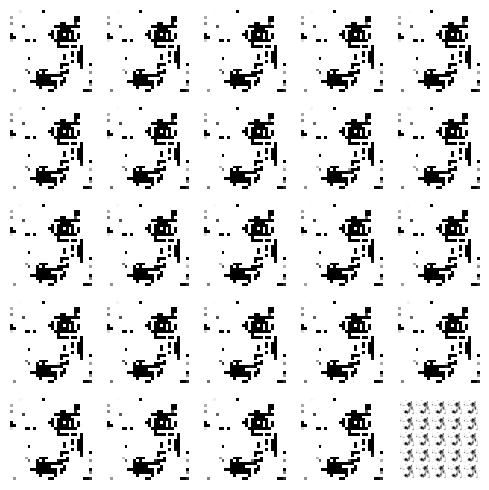

  0%|          | 0/350 [00:00<?, ?it/s]

4/4 [==============================] - 0s 28ms/step


  0%|          | 1/350 [00:00<04:31,  1.29it/s]

4/4 [==============================] - 0s 19ms/step


  1%|          | 2/350 [00:01<04:12,  1.38it/s]

4/4 [==============================] - 0s 13ms/step


  1%|          | 3/350 [00:02<03:58,  1.46it/s]

4/4 [==============================] - 0s 11ms/step


  1%|          | 4/350 [00:02<03:50,  1.50it/s]

4/4 [==============================] - 0s 25ms/step


  1%|▏         | 5/350 [00:03<03:59,  1.44it/s]

4/4 [==============================] - 0s 44ms/step


  2%|▏         | 6/350 [00:04<04:02,  1.42it/s]

4/4 [==============================] - 0s 12ms/step


  2%|▏         | 7/350 [00:04<04:02,  1.42it/s]

4/4 [==============================] - 0s 18ms/step


  2%|▏         | 8/350 [00:05<04:03,  1.40it/s]

4/4 [==============================] - 0s 21ms/step


  3%|▎         | 9/350 [00:06<04:08,  1.37it/s]

4/4 [==============================] - 0s 16ms/step


  3%|▎         | 10/350 [00:07<04:17,  1.32it/s]

4/4 [==============================] - 0s 23ms/step


  3%|▎         | 11/350 [00:08<04:18,  1.31it/s]

4/4 [==============================] - 0s 13ms/step


  3%|▎         | 12/350 [00:08<04:09,  1.35it/s]

4/4 [==============================] - 0s 12ms/step


  4%|▎         | 13/350 [00:09<03:59,  1.41it/s]

4/4 [==============================] - 0s 13ms/step


  4%|▍         | 14/350 [00:09<03:46,  1.49it/s]

4/4 [==============================] - 0s 16ms/step


  4%|▍         | 15/350 [00:10<03:54,  1.43it/s]

4/4 [==============================] - 0s 15ms/step


  5%|▍         | 16/350 [00:11<04:00,  1.39it/s]

4/4 [==============================] - 0s 15ms/step


  5%|▍         | 17/350 [00:12<03:49,  1.45it/s]

4/4 [==============================] - 0s 14ms/step


  5%|▌         | 18/350 [00:12<03:45,  1.47it/s]

4/4 [==============================] - 0s 17ms/step


  5%|▌         | 19/350 [00:13<03:42,  1.49it/s]

4/4 [==============================] - 0s 16ms/step


  6%|▌         | 20/350 [00:14<03:57,  1.39it/s]

4/4 [==============================] - 0s 12ms/step


  6%|▌         | 21/350 [00:14<03:48,  1.44it/s]

4/4 [==============================] - 0s 19ms/step


  6%|▋         | 22/350 [00:15<03:50,  1.42it/s]

4/4 [==============================] - 0s 15ms/step


  7%|▋         | 23/350 [00:16<03:56,  1.38it/s]

4/4 [==============================] - 0s 13ms/step


  7%|▋         | 24/350 [00:17<04:01,  1.35it/s]

4/4 [==============================] - 0s 15ms/step


  7%|▋         | 25/350 [00:17<03:54,  1.38it/s]

4/4 [==============================] - 0s 16ms/step


  7%|▋         | 26/350 [00:18<03:49,  1.41it/s]

4/4 [==============================] - 0s 23ms/step


  8%|▊         | 27/350 [00:19<03:46,  1.43it/s]

4/4 [==============================] - 0s 14ms/step


  8%|▊         | 28/350 [00:19<03:46,  1.42it/s]

4/4 [==============================] - 0s 14ms/step


  8%|▊         | 29/350 [00:20<03:38,  1.47it/s]

4/4 [==============================] - 0s 12ms/step


  9%|▊         | 30/350 [00:21<03:34,  1.49it/s]

4/4 [==============================] - 0s 16ms/step


  9%|▉         | 31/350 [00:21<03:27,  1.54it/s]

4/4 [==============================] - 0s 18ms/step


  9%|▉         | 32/350 [00:22<03:34,  1.48it/s]

4/4 [==============================] - 0s 11ms/step


  9%|▉         | 33/350 [00:23<03:27,  1.53it/s]

4/4 [==============================] - 0s 14ms/step


 10%|▉         | 34/350 [00:23<03:31,  1.49it/s]

4/4 [==============================] - 0s 14ms/step


 10%|█         | 35/350 [00:24<03:38,  1.44it/s]

4/4 [==============================] - 0s 12ms/step


 10%|█         | 36/350 [00:25<03:35,  1.46it/s]

4/4 [==============================] - 0s 11ms/step


 11%|█         | 37/350 [00:25<03:37,  1.44it/s]

4/4 [==============================] - 0s 13ms/step


 11%|█         | 38/350 [00:26<03:43,  1.40it/s]

4/4 [==============================] - 0s 29ms/step


 11%|█         | 39/350 [00:27<03:41,  1.41it/s]

4/4 [==============================] - 0s 11ms/step


 11%|█▏        | 40/350 [00:27<03:28,  1.48it/s]

4/4 [==============================] - 0s 13ms/step


 12%|█▏        | 41/350 [00:28<03:30,  1.47it/s]

4/4 [==============================] - 0s 14ms/step


 12%|█▏        | 42/350 [00:29<03:23,  1.51it/s]

4/4 [==============================] - 0s 12ms/step


 12%|█▏        | 43/350 [00:29<03:24,  1.50it/s]

4/4 [==============================] - 0s 11ms/step


 13%|█▎        | 44/350 [00:30<03:18,  1.54it/s]

4/4 [==============================] - 0s 23ms/step


 13%|█▎        | 45/350 [00:31<03:25,  1.49it/s]

4/4 [==============================] - 0s 13ms/step


 13%|█▎        | 46/350 [00:32<03:32,  1.43it/s]

4/4 [==============================] - 0s 15ms/step


 13%|█▎        | 47/350 [00:32<03:34,  1.41it/s]

4/4 [==============================] - 0s 14ms/step


 14%|█▎        | 48/350 [00:33<03:32,  1.42it/s]

4/4 [==============================] - 0s 12ms/step


 14%|█▍        | 49/350 [00:34<03:24,  1.47it/s]

4/4 [==============================] - 0s 13ms/step


 14%|█▍        | 50/350 [00:34<03:23,  1.47it/s]

4/4 [==============================] - 0s 17ms/step


 15%|█▍        | 51/350 [00:35<03:19,  1.50it/s]

4/4 [==============================] - 0s 12ms/step


 15%|█▍        | 52/350 [00:36<03:16,  1.52it/s]

4/4 [==============================] - 0s 16ms/step


 15%|█▌        | 53/350 [00:36<03:12,  1.55it/s]

4/4 [==============================] - 0s 13ms/step


 15%|█▌        | 54/350 [00:37<03:25,  1.44it/s]

4/4 [==============================] - 0s 14ms/step


 16%|█▌        | 55/350 [00:38<03:25,  1.44it/s]

4/4 [==============================] - 0s 13ms/step


 16%|█▌        | 56/350 [00:38<03:18,  1.48it/s]

4/4 [==============================] - 0s 12ms/step


 16%|█▋        | 57/350 [00:39<03:13,  1.51it/s]

4/4 [==============================] - 0s 15ms/step


 17%|█▋        | 58/350 [00:40<03:16,  1.49it/s]

4/4 [==============================] - 0s 12ms/step


 17%|█▋        | 59/350 [00:40<03:16,  1.48it/s]

4/4 [==============================] - 0s 14ms/step


 17%|█▋        | 60/350 [00:41<03:13,  1.50it/s]

4/4 [==============================] - 0s 11ms/step


 17%|█▋        | 61/350 [00:42<03:20,  1.44it/s]

4/4 [==============================] - 0s 12ms/step


 18%|█▊        | 62/350 [00:43<03:28,  1.38it/s]

4/4 [==============================] - 0s 18ms/step


 18%|█▊        | 63/350 [00:43<03:28,  1.37it/s]

4/4 [==============================] - 0s 16ms/step


 18%|█▊        | 64/350 [00:44<03:23,  1.40it/s]

4/4 [==============================] - 0s 12ms/step


 19%|█▊        | 65/350 [00:45<03:17,  1.44it/s]

4/4 [==============================] - 0s 15ms/step


 19%|█▉        | 66/350 [00:45<03:12,  1.48it/s]

4/4 [==============================] - 0s 13ms/step


 19%|█▉        | 67/350 [00:46<03:17,  1.43it/s]

4/4 [==============================] - 0s 13ms/step


 19%|█▉        | 68/350 [00:47<03:20,  1.41it/s]

4/4 [==============================] - 0s 14ms/step


 20%|█▉        | 69/350 [00:47<03:14,  1.45it/s]

4/4 [==============================] - 0s 11ms/step


 20%|██        | 70/350 [00:48<03:13,  1.45it/s]

4/4 [==============================] - 0s 13ms/step


 20%|██        | 71/350 [00:49<03:10,  1.46it/s]

4/4 [==============================] - 0s 12ms/step


 21%|██        | 72/350 [00:49<03:14,  1.43it/s]

4/4 [==============================] - 0s 13ms/step


 21%|██        | 73/350 [00:50<03:14,  1.42it/s]

4/4 [==============================] - 0s 21ms/step


 21%|██        | 74/350 [00:51<03:10,  1.45it/s]

4/4 [==============================] - 0s 14ms/step


 21%|██▏       | 75/350 [00:52<03:16,  1.40it/s]

4/4 [==============================] - 0s 13ms/step


 22%|██▏       | 76/350 [00:52<03:10,  1.44it/s]

4/4 [==============================] - 0s 14ms/step


 22%|██▏       | 77/350 [00:53<03:05,  1.47it/s]

4/4 [==============================] - 0s 12ms/step


 22%|██▏       | 78/350 [00:54<03:02,  1.49it/s]

4/4 [==============================] - 0s 37ms/step


 23%|██▎       | 79/350 [00:54<03:11,  1.41it/s]

4/4 [==============================] - 0s 13ms/step


 23%|██▎       | 80/350 [00:55<03:11,  1.41it/s]

4/4 [==============================] - 0s 15ms/step


 23%|██▎       | 81/350 [00:56<03:05,  1.45it/s]

4/4 [==============================] - 0s 15ms/step


 23%|██▎       | 82/350 [00:56<03:05,  1.44it/s]

4/4 [==============================] - 0s 15ms/step


 24%|██▎       | 83/350 [00:57<03:01,  1.47it/s]

4/4 [==============================] - 0s 24ms/step


 24%|██▍       | 84/350 [00:58<03:09,  1.40it/s]

4/4 [==============================] - 0s 15ms/step


 24%|██▍       | 85/350 [00:58<03:05,  1.43it/s]

4/4 [==============================] - 0s 15ms/step


 25%|██▍       | 86/350 [00:59<03:02,  1.45it/s]

4/4 [==============================] - 0s 24ms/step


 25%|██▍       | 87/350 [01:00<03:01,  1.45it/s]

4/4 [==============================] - 0s 11ms/step


 25%|██▌       | 88/350 [01:01<03:05,  1.41it/s]

4/4 [==============================] - 0s 14ms/step


 25%|██▌       | 89/350 [01:01<03:07,  1.40it/s]

4/4 [==============================] - 0s 21ms/step


 26%|██▌       | 90/350 [01:02<03:11,  1.36it/s]

4/4 [==============================] - 0s 13ms/step


 26%|██▌       | 91/350 [01:03<03:01,  1.43it/s]

4/4 [==============================] - 0s 14ms/step


 26%|██▋       | 92/350 [01:03<02:53,  1.49it/s]

4/4 [==============================] - 0s 22ms/step


 27%|██▋       | 93/350 [01:04<02:56,  1.46it/s]

4/4 [==============================] - 0s 13ms/step


 27%|██▋       | 94/350 [01:05<02:49,  1.51it/s]

4/4 [==============================] - 0s 17ms/step


 27%|██▋       | 95/350 [01:05<02:48,  1.51it/s]

4/4 [==============================] - 0s 14ms/step


 27%|██▋       | 96/350 [01:06<02:52,  1.47it/s]

4/4 [==============================] - 0s 13ms/step


 28%|██▊       | 97/350 [01:07<02:46,  1.52it/s]

4/4 [==============================] - 0s 21ms/step


 28%|██▊       | 98/350 [01:07<02:50,  1.48it/s]

4/4 [==============================] - 0s 15ms/step


 28%|██▊       | 99/350 [01:08<02:45,  1.51it/s]

4/4 [==============================] - 0s 16ms/step


 29%|██▊       | 100/350 [01:09<02:46,  1.50it/s]

4/4 [==============================] - 0s 25ms/step


 29%|██▉       | 101/350 [01:09<02:46,  1.49it/s]

4/4 [==============================] - 0s 15ms/step


 29%|██▉       | 102/350 [01:10<02:45,  1.50it/s]

4/4 [==============================] - 0s 19ms/step


 29%|██▉       | 103/350 [01:11<02:47,  1.48it/s]

4/4 [==============================] - 0s 27ms/step


 30%|██▉       | 104/350 [01:11<02:47,  1.47it/s]

4/4 [==============================] - 0s 13ms/step


 30%|███       | 105/350 [01:12<02:43,  1.50it/s]

4/4 [==============================] - 0s 18ms/step


 30%|███       | 106/350 [01:13<02:46,  1.47it/s]

4/4 [==============================] - 0s 14ms/step


 31%|███       | 107/350 [01:13<02:46,  1.46it/s]

4/4 [==============================] - 0s 12ms/step


 31%|███       | 108/350 [01:14<02:47,  1.45it/s]

4/4 [==============================] - 0s 15ms/step


 31%|███       | 109/350 [01:15<02:41,  1.49it/s]

4/4 [==============================] - 0s 13ms/step


 31%|███▏      | 110/350 [01:16<02:45,  1.45it/s]

4/4 [==============================] - 0s 15ms/step


 32%|███▏      | 111/350 [01:16<02:47,  1.42it/s]

4/4 [==============================] - 0s 12ms/step


 32%|███▏      | 112/350 [01:17<02:45,  1.44it/s]

4/4 [==============================] - 0s 14ms/step


 32%|███▏      | 113/350 [01:18<02:43,  1.45it/s]

4/4 [==============================] - 0s 13ms/step


 33%|███▎      | 114/350 [01:18<02:42,  1.45it/s]

4/4 [==============================] - 0s 16ms/step


 33%|███▎      | 115/350 [01:19<02:48,  1.40it/s]

4/4 [==============================] - 0s 15ms/step


 33%|███▎      | 116/350 [01:20<02:45,  1.42it/s]

4/4 [==============================] - 0s 16ms/step


 33%|███▎      | 117/350 [01:20<02:40,  1.45it/s]

4/4 [==============================] - 0s 12ms/step


 34%|███▎      | 118/350 [01:21<02:33,  1.51it/s]

4/4 [==============================] - 0s 25ms/step


 34%|███▍      | 119/350 [01:22<02:39,  1.45it/s]

4/4 [==============================] - 0s 11ms/step


 34%|███▍      | 120/350 [01:22<02:37,  1.46it/s]

4/4 [==============================] - 0s 19ms/step


 35%|███▍      | 121/350 [01:23<02:38,  1.45it/s]

4/4 [==============================] - 0s 22ms/step


 35%|███▍      | 122/350 [01:24<02:37,  1.44it/s]

4/4 [==============================] - 0s 17ms/step


 35%|███▌      | 123/350 [01:25<02:37,  1.44it/s]

4/4 [==============================] - 0s 20ms/step


 35%|███▌      | 124/350 [01:25<02:41,  1.40it/s]

4/4 [==============================] - 0s 13ms/step


 36%|███▌      | 125/350 [01:26<02:37,  1.43it/s]

4/4 [==============================] - 0s 17ms/step


 36%|███▌      | 126/350 [01:27<02:31,  1.48it/s]

4/4 [==============================] - 0s 12ms/step


 36%|███▋      | 127/350 [01:27<02:29,  1.49it/s]

4/4 [==============================] - 0s 15ms/step


 37%|███▋      | 128/350 [01:28<02:30,  1.47it/s]

4/4 [==============================] - 0s 28ms/step


 37%|███▋      | 129/350 [01:29<02:32,  1.45it/s]

4/4 [==============================] - 0s 13ms/step


 37%|███▋      | 130/350 [01:29<02:31,  1.45it/s]

4/4 [==============================] - 0s 13ms/step


 37%|███▋      | 131/350 [01:30<02:26,  1.49it/s]

4/4 [==============================] - 0s 30ms/step


 38%|███▊      | 132/350 [01:31<02:30,  1.45it/s]

4/4 [==============================] - 0s 13ms/step


 38%|███▊      | 133/350 [01:31<02:23,  1.52it/s]

4/4 [==============================] - 0s 13ms/step


 38%|███▊      | 134/350 [01:32<02:26,  1.47it/s]

4/4 [==============================] - 0s 12ms/step


 39%|███▊      | 135/350 [01:33<02:26,  1.47it/s]

4/4 [==============================] - 0s 12ms/step


 39%|███▉      | 136/350 [01:33<02:21,  1.51it/s]

4/4 [==============================] - 0s 17ms/step


 39%|███▉      | 137/350 [01:34<02:26,  1.46it/s]

4/4 [==============================] - 0s 12ms/step


 39%|███▉      | 138/350 [01:35<02:20,  1.51it/s]

4/4 [==============================] - 0s 25ms/step


 40%|███▉      | 139/350 [01:35<02:24,  1.46it/s]

4/4 [==============================] - 0s 13ms/step


 40%|████      | 140/350 [01:36<02:21,  1.49it/s]

4/4 [==============================] - 0s 24ms/step


 40%|████      | 141/350 [01:37<02:24,  1.44it/s]

4/4 [==============================] - 0s 15ms/step


 41%|████      | 142/350 [01:37<02:19,  1.49it/s]

4/4 [==============================] - 0s 13ms/step


 41%|████      | 143/350 [01:38<02:21,  1.47it/s]

4/4 [==============================] - 0s 16ms/step


 41%|████      | 144/350 [01:39<02:18,  1.49it/s]

4/4 [==============================] - 0s 14ms/step


 41%|████▏     | 145/350 [01:40<02:23,  1.42it/s]

4/4 [==============================] - 0s 15ms/step


 42%|████▏     | 146/350 [01:40<02:19,  1.46it/s]

4/4 [==============================] - 0s 24ms/step


 42%|████▏     | 147/350 [01:41<02:22,  1.42it/s]

4/4 [==============================] - 0s 12ms/step


 42%|████▏     | 148/350 [01:42<02:20,  1.44it/s]

4/4 [==============================] - 0s 14ms/step


 43%|████▎     | 149/350 [01:42<02:22,  1.41it/s]

4/4 [==============================] - 0s 54ms/step


 43%|████▎     | 150/350 [01:43<02:30,  1.33it/s]

4/4 [==============================] - 0s 30ms/step


 43%|████▎     | 151/350 [01:44<02:28,  1.34it/s]

4/4 [==============================] - 0s 14ms/step


 43%|████▎     | 152/350 [01:45<02:23,  1.38it/s]

4/4 [==============================] - 0s 14ms/step


 44%|████▎     | 153/350 [01:45<02:18,  1.42it/s]

4/4 [==============================] - 0s 14ms/step


 44%|████▍     | 154/350 [01:46<02:15,  1.44it/s]

4/4 [==============================] - 0s 14ms/step


 44%|████▍     | 155/350 [01:47<02:11,  1.48it/s]

4/4 [==============================] - 0s 14ms/step


 45%|████▍     | 156/350 [01:47<02:10,  1.49it/s]

4/4 [==============================] - 0s 15ms/step


 45%|████▍     | 157/350 [01:48<02:08,  1.50it/s]

4/4 [==============================] - 0s 13ms/step


 45%|████▌     | 158/350 [01:48<02:04,  1.55it/s]

4/4 [==============================] - 0s 22ms/step


 45%|████▌     | 159/350 [01:49<02:06,  1.51it/s]

4/4 [==============================] - 0s 13ms/step


 46%|████▌     | 160/350 [01:50<02:07,  1.49it/s]

4/4 [==============================] - 0s 15ms/step


 46%|████▌     | 161/350 [01:50<02:03,  1.53it/s]

4/4 [==============================] - 0s 19ms/step


 46%|████▋     | 162/350 [01:51<02:05,  1.49it/s]

4/4 [==============================] - 0s 14ms/step


 47%|████▋     | 163/350 [01:52<02:15,  1.38it/s]

4/4 [==============================] - 0s 22ms/step


 47%|████▋     | 164/350 [01:53<02:17,  1.35it/s]

4/4 [==============================] - 0s 21ms/step


 47%|████▋     | 165/350 [01:54<02:17,  1.35it/s]

4/4 [==============================] - 0s 15ms/step


 47%|████▋     | 166/350 [01:54<02:15,  1.36it/s]

4/4 [==============================] - 0s 11ms/step


 48%|████▊     | 167/350 [01:55<02:14,  1.36it/s]

4/4 [==============================] - 0s 18ms/step


 48%|████▊     | 168/350 [01:56<02:13,  1.36it/s]

4/4 [==============================] - 0s 11ms/step


 48%|████▊     | 169/350 [01:57<02:15,  1.34it/s]

4/4 [==============================] - 0s 14ms/step


 49%|████▊     | 170/350 [01:57<02:13,  1.35it/s]

4/4 [==============================] - 0s 11ms/step


 49%|████▉     | 171/350 [01:58<02:06,  1.41it/s]

4/4 [==============================] - 0s 49ms/step


 49%|████▉     | 172/350 [01:59<02:10,  1.37it/s]

4/4 [==============================] - 0s 12ms/step


 49%|████▉     | 173/350 [01:59<02:10,  1.35it/s]

4/4 [==============================] - 0s 11ms/step


 50%|████▉     | 174/350 [02:00<02:04,  1.41it/s]

4/4 [==============================] - 0s 18ms/step


 50%|█████     | 175/350 [02:01<02:06,  1.38it/s]

4/4 [==============================] - 0s 28ms/step


 50%|█████     | 176/350 [02:02<02:07,  1.37it/s]

4/4 [==============================] - 0s 13ms/step


 51%|█████     | 177/350 [02:02<02:01,  1.42it/s]

4/4 [==============================] - 0s 14ms/step


 51%|█████     | 178/350 [02:03<01:57,  1.46it/s]

4/4 [==============================] - 0s 16ms/step


 51%|█████     | 179/350 [02:03<01:51,  1.54it/s]

4/4 [==============================] - 0s 22ms/step


 51%|█████▏    | 180/350 [02:04<01:55,  1.47it/s]

4/4 [==============================] - 0s 27ms/step


 52%|█████▏    | 181/350 [02:05<02:00,  1.40it/s]

4/4 [==============================] - 0s 14ms/step


 52%|█████▏    | 182/350 [02:06<02:01,  1.38it/s]

4/4 [==============================] - 0s 15ms/step


 52%|█████▏    | 183/350 [02:06<01:57,  1.43it/s]

4/4 [==============================] - 0s 34ms/step


 53%|█████▎    | 184/350 [02:07<01:59,  1.39it/s]

4/4 [==============================] - 0s 13ms/step


 53%|█████▎    | 185/350 [02:08<02:02,  1.34it/s]

4/4 [==============================] - 0s 16ms/step


 53%|█████▎    | 186/350 [02:09<02:00,  1.36it/s]

4/4 [==============================] - 0s 17ms/step


 53%|█████▎    | 187/350 [02:09<02:01,  1.34it/s]

4/4 [==============================] - 0s 18ms/step


 54%|█████▎    | 188/350 [02:10<01:56,  1.39it/s]

4/4 [==============================] - 0s 11ms/step


 54%|█████▍    | 189/350 [02:11<01:58,  1.35it/s]

4/4 [==============================] - 0s 13ms/step


 54%|█████▍    | 190/350 [02:12<01:59,  1.34it/s]

4/4 [==============================] - 0s 15ms/step


 55%|█████▍    | 191/350 [02:12<01:56,  1.37it/s]

4/4 [==============================] - 0s 13ms/step


 55%|█████▍    | 192/350 [02:13<01:57,  1.35it/s]

4/4 [==============================] - 0s 12ms/step


 55%|█████▌    | 193/350 [02:14<01:53,  1.39it/s]

4/4 [==============================] - 0s 42ms/step


 55%|█████▌    | 194/350 [02:15<01:54,  1.36it/s]

4/4 [==============================] - 0s 19ms/step


 56%|█████▌    | 195/350 [02:15<01:53,  1.37it/s]

4/4 [==============================] - 0s 14ms/step


 56%|█████▌    | 196/350 [02:16<01:48,  1.42it/s]

4/4 [==============================] - 0s 17ms/step


 56%|█████▋    | 197/350 [02:17<01:48,  1.41it/s]

4/4 [==============================] - 0s 12ms/step


 57%|█████▋    | 198/350 [02:17<01:42,  1.48it/s]

4/4 [==============================] - 0s 12ms/step


 57%|█████▋    | 199/350 [02:18<01:43,  1.45it/s]

4/4 [==============================] - 0s 15ms/step


 57%|█████▋    | 200/350 [02:19<01:45,  1.42it/s]

4/4 [==============================] - 0s 11ms/step


 57%|█████▋    | 201/350 [02:19<01:41,  1.47it/s]

4/4 [==============================] - 0s 37ms/step


 58%|█████▊    | 202/350 [02:20<01:44,  1.42it/s]

4/4 [==============================] - 0s 13ms/step


 58%|█████▊    | 203/350 [02:21<01:43,  1.42it/s]

4/4 [==============================] - 0s 13ms/step


 58%|█████▊    | 204/350 [02:21<01:39,  1.46it/s]

4/4 [==============================] - 0s 23ms/step


 59%|█████▊    | 205/350 [02:22<01:39,  1.46it/s]

4/4 [==============================] - 0s 12ms/step


 59%|█████▉    | 206/350 [02:23<01:40,  1.44it/s]

4/4 [==============================] - 0s 12ms/step


 59%|█████▉    | 207/350 [02:23<01:36,  1.48it/s]

4/4 [==============================] - 0s 22ms/step


 59%|█████▉    | 208/350 [02:24<01:36,  1.47it/s]

4/4 [==============================] - 0s 19ms/step


 60%|█████▉    | 209/350 [02:25<01:36,  1.46it/s]

4/4 [==============================] - 0s 14ms/step


 60%|██████    | 210/350 [02:26<01:46,  1.32it/s]

4/4 [==============================] - 0s 12ms/step


 60%|██████    | 211/350 [02:26<01:40,  1.38it/s]

4/4 [==============================] - 0s 13ms/step


 61%|██████    | 212/350 [02:27<01:36,  1.42it/s]

4/4 [==============================] - 0s 14ms/step


 61%|██████    | 213/350 [02:28<01:37,  1.40it/s]

4/4 [==============================] - 0s 16ms/step


 61%|██████    | 214/350 [02:28<01:34,  1.43it/s]

4/4 [==============================] - 0s 35ms/step


 61%|██████▏   | 215/350 [02:29<01:42,  1.32it/s]

4/4 [==============================] - 0s 11ms/step


 62%|██████▏   | 216/350 [02:30<01:36,  1.39it/s]

4/4 [==============================] - 0s 22ms/step


 62%|██████▏   | 217/350 [02:31<01:35,  1.40it/s]

4/4 [==============================] - 0s 14ms/step


 62%|██████▏   | 218/350 [02:31<01:32,  1.43it/s]

4/4 [==============================] - 0s 19ms/step


 63%|██████▎   | 219/350 [02:32<01:29,  1.46it/s]

4/4 [==============================] - 0s 13ms/step


 63%|██████▎   | 220/350 [02:33<01:29,  1.45it/s]

4/4 [==============================] - 0s 16ms/step


 63%|██████▎   | 221/350 [02:33<01:33,  1.38it/s]

4/4 [==============================] - 0s 25ms/step


 63%|██████▎   | 222/350 [02:34<01:33,  1.38it/s]

4/4 [==============================] - 0s 15ms/step


 64%|██████▎   | 223/350 [02:35<01:32,  1.37it/s]

4/4 [==============================] - 0s 16ms/step


 64%|██████▍   | 224/350 [02:36<01:30,  1.39it/s]

4/4 [==============================] - 0s 15ms/step


 64%|██████▍   | 225/350 [02:36<01:31,  1.37it/s]

4/4 [==============================] - 0s 16ms/step


 65%|██████▍   | 226/350 [02:37<01:31,  1.35it/s]

4/4 [==============================] - 0s 14ms/step


 65%|██████▍   | 227/350 [02:38<01:32,  1.33it/s]

4/4 [==============================] - 0s 13ms/step


 65%|██████▌   | 228/350 [02:39<01:32,  1.31it/s]

4/4 [==============================] - 0s 12ms/step


 65%|██████▌   | 229/350 [02:40<01:32,  1.31it/s]

4/4 [==============================] - 0s 18ms/step


 66%|██████▌   | 230/350 [02:40<01:33,  1.29it/s]

4/4 [==============================] - 0s 16ms/step


 66%|██████▌   | 231/350 [02:41<01:30,  1.31it/s]

4/4 [==============================] - 0s 16ms/step


 66%|██████▋   | 232/350 [02:42<01:28,  1.33it/s]

4/4 [==============================] - 0s 14ms/step


 67%|██████▋   | 233/350 [02:42<01:23,  1.39it/s]

4/4 [==============================] - 0s 13ms/step


 67%|██████▋   | 234/350 [02:43<01:20,  1.45it/s]

4/4 [==============================] - 0s 11ms/step


 67%|██████▋   | 235/350 [02:44<01:18,  1.47it/s]

4/4 [==============================] - 0s 14ms/step


 67%|██████▋   | 236/350 [02:44<01:14,  1.54it/s]

4/4 [==============================] - 0s 12ms/step


 68%|██████▊   | 237/350 [02:45<01:14,  1.52it/s]

4/4 [==============================] - 0s 16ms/step


 68%|██████▊   | 238/350 [02:46<01:18,  1.42it/s]

4/4 [==============================] - 0s 16ms/step


 68%|██████▊   | 239/350 [02:47<01:24,  1.32it/s]

4/4 [==============================] - 0s 21ms/step


 69%|██████▊   | 240/350 [02:47<01:23,  1.31it/s]

4/4 [==============================] - 0s 14ms/step


 69%|██████▉   | 241/350 [02:48<01:23,  1.30it/s]

4/4 [==============================] - 0s 19ms/step


 69%|██████▉   | 242/350 [02:49<01:22,  1.31it/s]

4/4 [==============================] - 0s 13ms/step


 69%|██████▉   | 243/350 [02:50<01:16,  1.40it/s]

4/4 [==============================] - 0s 13ms/step


 70%|██████▉   | 244/350 [02:50<01:15,  1.41it/s]

4/4 [==============================] - 0s 14ms/step


 70%|███████   | 245/350 [02:51<01:12,  1.45it/s]

4/4 [==============================] - 0s 12ms/step


 70%|███████   | 246/350 [02:52<01:13,  1.41it/s]

4/4 [==============================] - 0s 12ms/step


 71%|███████   | 247/350 [02:52<01:11,  1.43it/s]

4/4 [==============================] - 0s 15ms/step


 71%|███████   | 248/350 [02:53<01:08,  1.48it/s]

4/4 [==============================] - 0s 15ms/step


 71%|███████   | 249/350 [02:54<01:09,  1.46it/s]

4/4 [==============================] - 0s 12ms/step


 71%|███████▏  | 250/350 [02:54<01:09,  1.43it/s]

4/4 [==============================] - 0s 15ms/step


 72%|███████▏  | 251/350 [02:55<01:08,  1.45it/s]

4/4 [==============================] - 0s 11ms/step


 72%|███████▏  | 252/350 [02:56<01:06,  1.47it/s]

4/4 [==============================] - 0s 12ms/step


 72%|███████▏  | 253/350 [02:56<01:04,  1.51it/s]

4/4 [==============================] - 0s 15ms/step


 73%|███████▎  | 254/350 [02:57<01:04,  1.49it/s]

4/4 [==============================] - 0s 16ms/step


 73%|███████▎  | 255/350 [02:58<01:02,  1.52it/s]

4/4 [==============================] - 0s 13ms/step


 73%|███████▎  | 256/350 [02:58<01:02,  1.51it/s]

4/4 [==============================] - 0s 18ms/step


 73%|███████▎  | 257/350 [02:59<01:03,  1.47it/s]

4/4 [==============================] - 0s 12ms/step


 74%|███████▎  | 258/350 [03:00<01:02,  1.48it/s]

4/4 [==============================] - 0s 13ms/step


 74%|███████▍  | 259/350 [03:00<01:04,  1.42it/s]

4/4 [==============================] - 0s 15ms/step


 74%|███████▍  | 260/350 [03:01<01:05,  1.38it/s]

4/4 [==============================] - 0s 11ms/step


 75%|███████▍  | 261/350 [03:02<01:03,  1.41it/s]

4/4 [==============================] - 0s 13ms/step


 75%|███████▍  | 262/350 [03:03<01:00,  1.45it/s]

4/4 [==============================] - 0s 15ms/step


 75%|███████▌  | 263/350 [03:03<01:01,  1.42it/s]

4/4 [==============================] - 0s 16ms/step


 75%|███████▌  | 264/350 [03:04<01:00,  1.43it/s]

4/4 [==============================] - 0s 15ms/step


 76%|███████▌  | 265/350 [03:05<01:00,  1.41it/s]

4/4 [==============================] - 0s 16ms/step


 76%|███████▌  | 266/350 [03:05<00:56,  1.48it/s]

4/4 [==============================] - 0s 15ms/step


 76%|███████▋  | 267/350 [03:06<00:57,  1.45it/s]

4/4 [==============================] - 0s 12ms/step


 77%|███████▋  | 268/350 [03:07<00:54,  1.52it/s]

4/4 [==============================] - 0s 12ms/step


 77%|███████▋  | 269/350 [03:07<00:54,  1.49it/s]

4/4 [==============================] - 0s 14ms/step


 77%|███████▋  | 270/350 [03:08<00:52,  1.52it/s]

4/4 [==============================] - 0s 11ms/step


 77%|███████▋  | 271/350 [03:09<00:54,  1.46it/s]

4/4 [==============================] - 0s 13ms/step


 78%|███████▊  | 272/350 [03:09<00:51,  1.52it/s]

4/4 [==============================] - 0s 13ms/step


 78%|███████▊  | 273/350 [03:10<00:50,  1.51it/s]

4/4 [==============================] - 0s 15ms/step


 78%|███████▊  | 274/350 [03:11<00:49,  1.53it/s]

4/4 [==============================] - 0s 12ms/step


 79%|███████▊  | 275/350 [03:11<00:50,  1.48it/s]

4/4 [==============================] - 0s 13ms/step


 79%|███████▉  | 276/350 [03:12<00:50,  1.47it/s]

4/4 [==============================] - 0s 17ms/step


 79%|███████▉  | 277/350 [03:13<00:49,  1.48it/s]

4/4 [==============================] - 0s 21ms/step


 79%|███████▉  | 278/350 [03:13<00:50,  1.42it/s]

4/4 [==============================] - 0s 14ms/step


 80%|███████▉  | 279/350 [03:14<00:50,  1.42it/s]

4/4 [==============================] - 0s 15ms/step


 80%|████████  | 280/350 [03:15<00:48,  1.44it/s]

4/4 [==============================] - 0s 16ms/step


 80%|████████  | 281/350 [03:15<00:46,  1.49it/s]

4/4 [==============================] - 0s 18ms/step


 81%|████████  | 282/350 [03:16<00:48,  1.40it/s]

4/4 [==============================] - 0s 15ms/step


 81%|████████  | 283/350 [03:17<00:49,  1.36it/s]

4/4 [==============================] - 0s 13ms/step


 81%|████████  | 284/350 [03:18<00:50,  1.31it/s]

4/4 [==============================] - 0s 11ms/step


 81%|████████▏ | 285/350 [03:18<00:46,  1.41it/s]

4/4 [==============================] - 0s 12ms/step


 82%|████████▏ | 286/350 [03:19<00:44,  1.43it/s]

4/4 [==============================] - 0s 12ms/step


 82%|████████▏ | 287/350 [03:20<00:43,  1.46it/s]

4/4 [==============================] - 0s 15ms/step


 82%|████████▏ | 288/350 [03:20<00:41,  1.48it/s]

4/4 [==============================] - 0s 13ms/step


 83%|████████▎ | 289/350 [03:21<00:40,  1.49it/s]

4/4 [==============================] - 0s 14ms/step


 83%|████████▎ | 290/350 [03:22<00:41,  1.45it/s]

4/4 [==============================] - 0s 13ms/step


 83%|████████▎ | 291/350 [03:23<00:40,  1.46it/s]

4/4 [==============================] - 0s 17ms/step


 83%|████████▎ | 292/350 [03:23<00:39,  1.46it/s]

4/4 [==============================] - 0s 15ms/step


 84%|████████▎ | 293/350 [03:24<00:41,  1.38it/s]

4/4 [==============================] - 0s 13ms/step


 84%|████████▍ | 294/350 [03:25<00:38,  1.45it/s]

4/4 [==============================] - 0s 11ms/step


 84%|████████▍ | 295/350 [03:25<00:38,  1.44it/s]

4/4 [==============================] - 0s 15ms/step


 85%|████████▍ | 296/350 [03:26<00:37,  1.44it/s]

4/4 [==============================] - 0s 15ms/step


 85%|████████▍ | 297/350 [03:27<00:35,  1.51it/s]

4/4 [==============================] - 0s 13ms/step


 85%|████████▌ | 298/350 [03:27<00:35,  1.45it/s]

4/4 [==============================] - 0s 21ms/step


 85%|████████▌ | 299/350 [03:28<00:36,  1.39it/s]

4/4 [==============================] - 0s 12ms/step


 86%|████████▌ | 300/350 [03:29<00:34,  1.46it/s]

4/4 [==============================] - 0s 14ms/step


 86%|████████▌ | 301/350 [03:30<00:34,  1.41it/s]

4/4 [==============================] - 0s 16ms/step


 86%|████████▋ | 302/350 [03:30<00:33,  1.45it/s]

4/4 [==============================] - 0s 23ms/step


 87%|████████▋ | 303/350 [03:31<00:33,  1.39it/s]

4/4 [==============================] - 0s 19ms/step


 87%|████████▋ | 304/350 [03:32<00:33,  1.36it/s]

4/4 [==============================] - 0s 17ms/step


 87%|████████▋ | 305/350 [03:33<00:33,  1.32it/s]

4/4 [==============================] - 0s 15ms/step


 87%|████████▋ | 306/350 [03:33<00:32,  1.35it/s]

4/4 [==============================] - 0s 16ms/step


 88%|████████▊ | 307/350 [03:34<00:30,  1.39it/s]

4/4 [==============================] - 0s 15ms/step


 88%|████████▊ | 308/350 [03:34<00:28,  1.48it/s]

4/4 [==============================] - 0s 22ms/step


 88%|████████▊ | 309/350 [03:35<00:28,  1.42it/s]

4/4 [==============================] - 0s 21ms/step


 89%|████████▊ | 310/350 [03:36<00:28,  1.42it/s]

4/4 [==============================] - 0s 14ms/step


 89%|████████▉ | 311/350 [03:37<00:26,  1.48it/s]

4/4 [==============================] - 0s 22ms/step


 89%|████████▉ | 312/350 [03:37<00:26,  1.43it/s]

4/4 [==============================] - 0s 22ms/step


 89%|████████▉ | 313/350 [03:38<00:27,  1.36it/s]

4/4 [==============================] - 0s 33ms/step


 90%|████████▉ | 314/350 [03:39<00:26,  1.34it/s]

4/4 [==============================] - 0s 23ms/step


 90%|█████████ | 315/350 [03:40<00:26,  1.35it/s]

4/4 [==============================] - 0s 16ms/step


 90%|█████████ | 316/350 [03:40<00:25,  1.35it/s]

4/4 [==============================] - 0s 16ms/step


 91%|█████████ | 317/350 [03:41<00:24,  1.35it/s]

4/4 [==============================] - 0s 16ms/step


 91%|█████████ | 318/350 [03:42<00:24,  1.30it/s]

4/4 [==============================] - 0s 20ms/step


 91%|█████████ | 319/350 [03:43<00:24,  1.26it/s]

4/4 [==============================] - 0s 29ms/step


 91%|█████████▏| 320/350 [03:44<00:25,  1.20it/s]

4/4 [==============================] - 0s 31ms/step


 92%|█████████▏| 321/350 [03:45<00:24,  1.20it/s]

4/4 [==============================] - 0s 15ms/step


 92%|█████████▏| 322/350 [03:45<00:22,  1.26it/s]

4/4 [==============================] - 0s 38ms/step


 92%|█████████▏| 323/350 [03:46<00:21,  1.26it/s]

4/4 [==============================] - 0s 14ms/step


 93%|█████████▎| 324/350 [03:47<00:20,  1.28it/s]

4/4 [==============================] - 0s 14ms/step


 93%|█████████▎| 325/350 [03:47<00:18,  1.35it/s]

4/4 [==============================] - 0s 15ms/step


 93%|█████████▎| 326/350 [03:48<00:17,  1.33it/s]

4/4 [==============================] - 0s 12ms/step


 93%|█████████▎| 327/350 [03:49<00:18,  1.26it/s]

4/4 [==============================] - 0s 17ms/step


 94%|█████████▎| 328/350 [03:50<00:17,  1.27it/s]

4/4 [==============================] - 0s 15ms/step


 94%|█████████▍| 329/350 [03:51<00:16,  1.25it/s]

4/4 [==============================] - 0s 16ms/step


 94%|█████████▍| 330/350 [03:51<00:15,  1.30it/s]

4/4 [==============================] - 0s 41ms/step


 95%|█████████▍| 331/350 [03:52<00:14,  1.29it/s]

4/4 [==============================] - 0s 16ms/step


 95%|█████████▍| 332/350 [03:53<00:13,  1.29it/s]

4/4 [==============================] - 0s 15ms/step


 95%|█████████▌| 333/350 [03:54<00:12,  1.37it/s]

4/4 [==============================] - 0s 23ms/step


 95%|█████████▌| 334/350 [03:54<00:11,  1.37it/s]

4/4 [==============================] - 0s 11ms/step


 96%|█████████▌| 335/350 [03:55<00:11,  1.35it/s]

4/4 [==============================] - 0s 12ms/step


 96%|█████████▌| 336/350 [03:56<00:09,  1.41it/s]

4/4 [==============================] - 0s 16ms/step


 96%|█████████▋| 337/350 [03:57<00:09,  1.39it/s]

4/4 [==============================] - 0s 14ms/step


 97%|█████████▋| 338/350 [03:57<00:08,  1.43it/s]

4/4 [==============================] - 0s 14ms/step


 97%|█████████▋| 339/350 [03:58<00:07,  1.40it/s]

4/4 [==============================] - 0s 11ms/step


 97%|█████████▋| 340/350 [03:59<00:07,  1.40it/s]

4/4 [==============================] - 0s 35ms/step


 97%|█████████▋| 341/350 [03:59<00:06,  1.37it/s]

4/4 [==============================] - 0s 14ms/step


 98%|█████████▊| 342/350 [04:00<00:05,  1.36it/s]

4/4 [==============================] - 0s 15ms/step


 98%|█████████▊| 343/350 [04:01<00:05,  1.35it/s]

4/4 [==============================] - 0s 14ms/step


 98%|█████████▊| 344/350 [04:02<00:04,  1.37it/s]

4/4 [==============================] - 0s 29ms/step


 99%|█████████▊| 345/350 [04:02<00:03,  1.33it/s]

4/4 [==============================] - 0s 29ms/step


 99%|█████████▉| 346/350 [04:03<00:02,  1.35it/s]

4/4 [==============================] - 0s 14ms/step


 99%|█████████▉| 347/350 [04:04<00:02,  1.36it/s]

4/4 [==============================] - 0s 13ms/step


 99%|█████████▉| 348/350 [04:05<00:01,  1.40it/s]

4/4 [==============================] - 0s 35ms/step


100%|█████████▉| 349/350 [04:05<00:00,  1.38it/s]

4/4 [==============================] - 0s 16ms/step


100%|██████████| 350/350 [04:06<00:00,  1.42it/s]

Epoch number: 55 discriminator_loss: 0.16625516250255584 generator_loss: 7.158639380591256
1/1 [==============================] - 0s 26ms/step


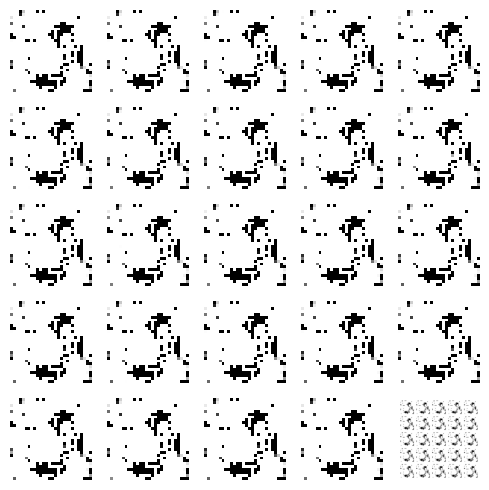

  0%|          | 0/350 [00:00<?, ?it/s]

4/4 [==============================] - 0s 13ms/step


  0%|          | 1/350 [00:00<03:55,  1.48it/s]

4/4 [==============================] - 0s 29ms/step


  1%|          | 2/350 [00:01<04:08,  1.40it/s]

4/4 [==============================] - 0s 12ms/step


  1%|          | 3/350 [00:02<04:18,  1.34it/s]

4/4 [==============================] - 0s 14ms/step


  1%|          | 4/350 [00:02<04:03,  1.42it/s]

4/4 [==============================] - 0s 21ms/step


  1%|▏         | 5/350 [00:03<04:04,  1.41it/s]

4/4 [==============================] - 0s 18ms/step


  2%|▏         | 6/350 [00:04<04:07,  1.39it/s]

4/4 [==============================] - 0s 12ms/step


  2%|▏         | 7/350 [00:04<03:53,  1.47it/s]

4/4 [==============================] - 0s 14ms/step


  2%|▏         | 8/350 [00:05<03:49,  1.49it/s]

4/4 [==============================] - 0s 16ms/step


  3%|▎         | 9/350 [00:06<03:54,  1.46it/s]

4/4 [==============================] - 0s 13ms/step


  3%|▎         | 10/350 [00:06<03:55,  1.45it/s]

4/4 [==============================] - 0s 18ms/step


  3%|▎         | 11/350 [00:07<03:56,  1.43it/s]

4/4 [==============================] - 0s 16ms/step


  3%|▎         | 12/350 [00:08<03:55,  1.43it/s]

4/4 [==============================] - 0s 15ms/step


  4%|▎         | 13/350 [00:08<03:46,  1.49it/s]

4/4 [==============================] - 0s 13ms/step


  4%|▍         | 14/350 [00:09<03:38,  1.54it/s]

4/4 [==============================] - 0s 34ms/step


  4%|▍         | 15/350 [00:10<03:50,  1.46it/s]

4/4 [==============================] - 0s 24ms/step


  5%|▍         | 16/350 [00:11<03:49,  1.46it/s]

4/4 [==============================] - 0s 12ms/step


  5%|▍         | 17/350 [00:11<03:47,  1.46it/s]

4/4 [==============================] - 0s 14ms/step


  5%|▌         | 18/350 [00:12<03:44,  1.48it/s]

4/4 [==============================] - 0s 13ms/step


  5%|▌         | 19/350 [00:13<03:48,  1.45it/s]

4/4 [==============================] - 0s 15ms/step


  6%|▌         | 20/350 [00:13<03:38,  1.51it/s]

4/4 [==============================] - 0s 30ms/step


  6%|▌         | 21/350 [00:14<03:49,  1.44it/s]

4/4 [==============================] - 0s 31ms/step


  6%|▋         | 22/350 [00:15<03:50,  1.42it/s]

4/4 [==============================] - 0s 12ms/step


  7%|▋         | 23/350 [00:15<03:49,  1.42it/s]

4/4 [==============================] - 0s 14ms/step


  7%|▋         | 24/350 [00:16<03:39,  1.49it/s]

4/4 [==============================] - 0s 14ms/step


  7%|▋         | 25/350 [00:17<03:46,  1.43it/s]

4/4 [==============================] - 0s 12ms/step


  7%|▋         | 26/350 [00:17<03:40,  1.47it/s]

4/4 [==============================] - 0s 23ms/step


  8%|▊         | 27/350 [00:18<03:41,  1.46it/s]

4/4 [==============================] - 0s 15ms/step


  8%|▊         | 28/350 [00:19<03:46,  1.42it/s]

4/4 [==============================] - 0s 12ms/step


  8%|▊         | 29/350 [00:19<03:38,  1.47it/s]

4/4 [==============================] - 0s 30ms/step


  9%|▊         | 30/350 [00:20<03:41,  1.45it/s]

4/4 [==============================] - 0s 14ms/step


  9%|▉         | 31/350 [00:21<03:50,  1.38it/s]

4/4 [==============================] - 0s 17ms/step


  9%|▉         | 32/350 [00:22<03:53,  1.36it/s]

4/4 [==============================] - 0s 12ms/step


  9%|▉         | 33/350 [00:22<03:42,  1.43it/s]

4/4 [==============================] - 0s 19ms/step


 10%|▉         | 34/350 [00:23<03:38,  1.45it/s]

4/4 [==============================] - 0s 16ms/step


 10%|█         | 35/350 [00:24<03:41,  1.42it/s]

4/4 [==============================] - 0s 14ms/step


 10%|█         | 36/350 [00:24<03:35,  1.46it/s]

4/4 [==============================] - 0s 25ms/step


 11%|█         | 37/350 [00:25<03:36,  1.45it/s]

4/4 [==============================] - 0s 15ms/step


 11%|█         | 38/350 [00:26<03:40,  1.42it/s]

4/4 [==============================] - 0s 13ms/step


 11%|█         | 39/350 [00:27<03:34,  1.45it/s]

4/4 [==============================] - 0s 26ms/step


 11%|█▏        | 40/350 [00:27<03:43,  1.39it/s]

4/4 [==============================] - 0s 27ms/step


 12%|█▏        | 41/350 [00:28<03:47,  1.36it/s]

4/4 [==============================] - 0s 36ms/step


 12%|█▏        | 42/350 [00:29<03:49,  1.34it/s]

4/4 [==============================] - 0s 13ms/step


 12%|█▏        | 43/350 [00:29<03:37,  1.41it/s]

4/4 [==============================] - 0s 20ms/step


 13%|█▎        | 44/350 [00:30<03:44,  1.36it/s]

4/4 [==============================] - 0s 13ms/step


 13%|█▎        | 45/350 [00:31<03:36,  1.41it/s]

4/4 [==============================] - 0s 19ms/step


 13%|█▎        | 46/350 [00:32<03:29,  1.45it/s]

4/4 [==============================] - 0s 12ms/step


 13%|█▎        | 47/350 [00:32<03:27,  1.46it/s]

4/4 [==============================] - 0s 13ms/step


 14%|█▎        | 48/350 [00:33<03:31,  1.43it/s]

4/4 [==============================] - 0s 16ms/step


 14%|█▍        | 49/350 [00:34<03:33,  1.41it/s]

4/4 [==============================] - 0s 14ms/step


 14%|█▍        | 50/350 [00:34<03:24,  1.47it/s]

4/4 [==============================] - 0s 14ms/step


 15%|█▍        | 51/350 [00:35<03:23,  1.47it/s]

4/4 [==============================] - 0s 16ms/step


 15%|█▍        | 52/350 [00:36<03:28,  1.43it/s]

4/4 [==============================] - 0s 13ms/step


 15%|█▌        | 53/350 [00:36<03:29,  1.42it/s]

4/4 [==============================] - 0s 14ms/step


 15%|█▌        | 54/350 [00:37<03:20,  1.48it/s]

4/4 [==============================] - 0s 15ms/step


 16%|█▌        | 55/350 [00:38<03:22,  1.46it/s]

4/4 [==============================] - 0s 18ms/step


 16%|█▌        | 56/350 [00:38<03:25,  1.43it/s]

4/4 [==============================] - 0s 15ms/step


 16%|█▋        | 57/350 [00:39<03:20,  1.46it/s]

4/4 [==============================] - 0s 13ms/step


 17%|█▋        | 58/350 [00:40<03:24,  1.43it/s]

4/4 [==============================] - 0s 14ms/step


 17%|█▋        | 59/350 [00:41<03:21,  1.45it/s]

4/4 [==============================] - 0s 16ms/step


 17%|█▋        | 60/350 [00:41<03:17,  1.47it/s]

4/4 [==============================] - 0s 15ms/step


 17%|█▋        | 61/350 [00:42<03:14,  1.49it/s]

4/4 [==============================] - 0s 27ms/step


 18%|█▊        | 62/350 [00:43<03:14,  1.48it/s]

4/4 [==============================] - 0s 13ms/step


 18%|█▊        | 63/350 [00:43<03:15,  1.47it/s]

4/4 [==============================] - 0s 16ms/step


 18%|█▊        | 64/350 [00:44<03:13,  1.48it/s]

4/4 [==============================] - 0s 18ms/step


 19%|█▊        | 65/350 [00:45<03:19,  1.43it/s]

4/4 [==============================] - 0s 13ms/step


 19%|█▉        | 66/350 [00:45<03:19,  1.42it/s]

4/4 [==============================] - 0s 16ms/step


 19%|█▉        | 67/350 [00:46<03:23,  1.39it/s]

4/4 [==============================] - 0s 11ms/step


 19%|█▉        | 68/350 [00:47<03:11,  1.47it/s]

4/4 [==============================] - 0s 18ms/step


 20%|█▉        | 69/350 [00:47<03:14,  1.44it/s]

4/4 [==============================] - 0s 17ms/step


 20%|██        | 70/350 [00:48<03:15,  1.43it/s]

4/4 [==============================] - 0s 15ms/step


 20%|██        | 71/350 [00:49<03:11,  1.46it/s]

4/4 [==============================] - 0s 20ms/step


 21%|██        | 72/350 [00:50<03:15,  1.42it/s]

4/4 [==============================] - 0s 13ms/step


 21%|██        | 73/350 [00:50<03:21,  1.37it/s]

4/4 [==============================] - 0s 14ms/step


 21%|██        | 74/350 [00:51<03:17,  1.40it/s]

4/4 [==============================] - 0s 14ms/step


 21%|██▏       | 75/350 [00:52<03:09,  1.45it/s]

4/4 [==============================] - 0s 17ms/step


 22%|██▏       | 76/350 [00:52<03:06,  1.47it/s]

4/4 [==============================] - 0s 16ms/step


 22%|██▏       | 77/350 [00:53<03:06,  1.46it/s]

4/4 [==============================] - 0s 26ms/step


 22%|██▏       | 78/350 [00:54<03:09,  1.44it/s]

4/4 [==============================] - 0s 21ms/step


 23%|██▎       | 79/350 [00:54<03:09,  1.43it/s]

4/4 [==============================] - 0s 14ms/step


 23%|██▎       | 80/350 [00:55<03:05,  1.46it/s]

4/4 [==============================] - 0s 21ms/step


 23%|██▎       | 81/350 [00:56<03:12,  1.40it/s]

4/4 [==============================] - 0s 19ms/step


 23%|██▎       | 82/350 [00:57<03:16,  1.36it/s]

4/4 [==============================] - 0s 13ms/step


 24%|██▎       | 83/350 [00:57<03:19,  1.34it/s]

4/4 [==============================] - 0s 12ms/step


 24%|██▍       | 84/350 [00:58<03:09,  1.41it/s]

4/4 [==============================] - 0s 18ms/step


 24%|██▍       | 85/350 [00:59<03:06,  1.42it/s]

4/4 [==============================] - 0s 32ms/step


 25%|██▍       | 86/350 [00:59<03:08,  1.40it/s]

4/4 [==============================] - 0s 11ms/step


 25%|██▍       | 87/350 [01:00<03:02,  1.44it/s]

4/4 [==============================] - 0s 15ms/step


 25%|██▌       | 88/350 [01:01<02:58,  1.47it/s]

4/4 [==============================] - 0s 14ms/step


 25%|██▌       | 89/350 [01:01<02:56,  1.48it/s]

4/4 [==============================] - 0s 12ms/step


 26%|██▌       | 90/350 [01:02<02:54,  1.49it/s]

4/4 [==============================] - 0s 19ms/step


 26%|██▌       | 91/350 [01:03<02:53,  1.49it/s]

4/4 [==============================] - 0s 12ms/step


 26%|██▋       | 92/350 [01:03<02:47,  1.54it/s]

4/4 [==============================] - 0s 29ms/step


 27%|██▋       | 93/350 [01:04<02:53,  1.48it/s]

4/4 [==============================] - 0s 13ms/step


 27%|██▋       | 94/350 [01:05<02:58,  1.43it/s]

4/4 [==============================] - 0s 14ms/step


 27%|██▋       | 95/350 [01:06<02:59,  1.42it/s]

4/4 [==============================] - 0s 15ms/step


 27%|██▋       | 96/350 [01:06<02:52,  1.47it/s]

4/4 [==============================] - 0s 17ms/step


 28%|██▊       | 97/350 [01:07<02:54,  1.45it/s]

4/4 [==============================] - 0s 13ms/step


 28%|██▊       | 98/350 [01:08<02:55,  1.44it/s]

4/4 [==============================] - 0s 21ms/step


 28%|██▊       | 99/350 [01:08<02:50,  1.47it/s]

4/4 [==============================] - 0s 11ms/step


 29%|██▊       | 100/350 [01:09<02:47,  1.49it/s]

4/4 [==============================] - 0s 15ms/step


 29%|██▉       | 101/350 [01:10<02:44,  1.52it/s]

4/4 [==============================] - 0s 18ms/step


 29%|██▉       | 102/350 [01:10<02:48,  1.48it/s]

4/4 [==============================] - 0s 13ms/step


 29%|██▉       | 103/350 [01:11<02:44,  1.50it/s]

4/4 [==============================] - 0s 23ms/step


 30%|██▉       | 104/350 [01:12<02:45,  1.49it/s]

4/4 [==============================] - 0s 13ms/step


 30%|███       | 105/350 [01:12<02:46,  1.47it/s]

4/4 [==============================] - 0s 16ms/step


 30%|███       | 106/350 [01:13<02:41,  1.51it/s]

4/4 [==============================] - 0s 12ms/step


 31%|███       | 107/350 [01:14<02:40,  1.51it/s]

4/4 [==============================] - 0s 14ms/step


 31%|███       | 108/350 [01:14<02:37,  1.53it/s]

4/4 [==============================] - 0s 12ms/step


 31%|███       | 109/350 [01:15<02:40,  1.51it/s]

4/4 [==============================] - 0s 13ms/step


 31%|███▏      | 110/350 [01:16<02:36,  1.53it/s]

4/4 [==============================] - 0s 11ms/step


 32%|███▏      | 111/350 [01:16<02:36,  1.52it/s]

4/4 [==============================] - 0s 17ms/step


 32%|███▏      | 112/350 [01:17<02:38,  1.50it/s]

4/4 [==============================] - 0s 11ms/step


 32%|███▏      | 113/350 [01:18<02:38,  1.49it/s]

4/4 [==============================] - 0s 17ms/step


 33%|███▎      | 114/350 [01:18<02:33,  1.54it/s]

4/4 [==============================] - 0s 14ms/step


 33%|███▎      | 115/350 [01:19<02:37,  1.50it/s]

4/4 [==============================] - 0s 11ms/step


 33%|███▎      | 116/350 [01:20<02:44,  1.42it/s]

4/4 [==============================] - 0s 15ms/step


 33%|███▎      | 117/350 [01:20<02:38,  1.47it/s]

4/4 [==============================] - 0s 21ms/step


 34%|███▎      | 118/350 [01:21<02:39,  1.45it/s]

4/4 [==============================] - 0s 14ms/step


 34%|███▍      | 119/350 [01:22<02:33,  1.50it/s]

4/4 [==============================] - 0s 14ms/step


 34%|███▍      | 120/350 [01:22<02:34,  1.49it/s]

4/4 [==============================] - 0s 11ms/step


 35%|███▍      | 121/350 [01:23<02:32,  1.50it/s]

4/4 [==============================] - 0s 12ms/step


 35%|███▍      | 122/350 [01:24<02:34,  1.48it/s]

4/4 [==============================] - 0s 14ms/step


 35%|███▌      | 123/350 [01:24<02:35,  1.46it/s]

4/4 [==============================] - 0s 15ms/step


 35%|███▌      | 124/350 [01:25<02:31,  1.49it/s]

4/4 [==============================] - 0s 12ms/step


 36%|███▌      | 125/350 [01:26<02:32,  1.47it/s]

4/4 [==============================] - 0s 17ms/step


 36%|███▌      | 126/350 [01:26<02:28,  1.50it/s]

4/4 [==============================] - 0s 13ms/step


 36%|███▋      | 127/350 [01:27<02:30,  1.48it/s]

4/4 [==============================] - 0s 15ms/step


 37%|███▋      | 128/350 [01:28<02:27,  1.50it/s]

4/4 [==============================] - 0s 18ms/step


 37%|███▋      | 129/350 [01:28<02:27,  1.50it/s]

4/4 [==============================] - 0s 15ms/step


 37%|███▋      | 130/350 [01:29<02:29,  1.48it/s]

4/4 [==============================] - 0s 13ms/step


 37%|███▋      | 131/350 [01:30<02:25,  1.50it/s]

4/4 [==============================] - 0s 30ms/step


 38%|███▊      | 132/350 [01:30<02:26,  1.49it/s]

4/4 [==============================] - 0s 13ms/step


 38%|███▊      | 133/350 [01:31<02:24,  1.50it/s]

4/4 [==============================] - 0s 11ms/step


 38%|███▊      | 134/350 [01:32<02:27,  1.47it/s]

4/4 [==============================] - 0s 17ms/step


 39%|███▊      | 135/350 [01:32<02:22,  1.50it/s]

4/4 [==============================] - 0s 11ms/step


 39%|███▉      | 136/350 [01:33<02:27,  1.46it/s]

4/4 [==============================] - 0s 14ms/step


 39%|███▉      | 137/350 [01:34<02:26,  1.46it/s]

4/4 [==============================] - 0s 12ms/step


 39%|███▉      | 138/350 [01:34<02:20,  1.51it/s]

4/4 [==============================] - 0s 14ms/step


 40%|███▉      | 139/350 [01:35<02:24,  1.46it/s]

4/4 [==============================] - 0s 13ms/step


 40%|████      | 140/350 [01:36<02:18,  1.51it/s]

4/4 [==============================] - 0s 17ms/step


 40%|████      | 141/350 [01:36<02:24,  1.45it/s]

4/4 [==============================] - 0s 12ms/step


 41%|████      | 142/350 [01:37<02:21,  1.47it/s]

4/4 [==============================] - 0s 17ms/step


 41%|████      | 143/350 [01:38<02:23,  1.44it/s]

4/4 [==============================] - 0s 12ms/step


 41%|████      | 144/350 [01:39<02:22,  1.44it/s]

4/4 [==============================] - 0s 15ms/step


 41%|████▏     | 145/350 [01:39<02:23,  1.43it/s]

4/4 [==============================] - 0s 12ms/step


 42%|████▏     | 146/350 [01:40<02:25,  1.41it/s]

4/4 [==============================] - 0s 19ms/step


 42%|████▏     | 147/350 [01:41<02:27,  1.37it/s]

4/4 [==============================] - 0s 24ms/step


 42%|████▏     | 148/350 [01:42<02:39,  1.27it/s]

4/4 [==============================] - 0s 14ms/step


 43%|████▎     | 149/350 [01:42<02:29,  1.35it/s]

4/4 [==============================] - 0s 11ms/step


 43%|████▎     | 150/350 [01:43<02:29,  1.34it/s]

4/4 [==============================] - 0s 13ms/step


 43%|████▎     | 151/350 [01:44<02:26,  1.36it/s]

4/4 [==============================] - 0s 18ms/step


 43%|████▎     | 152/350 [01:45<02:30,  1.32it/s]

4/4 [==============================] - 0s 26ms/step


 44%|████▎     | 153/350 [01:46<02:38,  1.24it/s]

4/4 [==============================] - 0s 16ms/step


 44%|████▍     | 154/350 [01:46<02:29,  1.31it/s]

4/4 [==============================] - 0s 24ms/step


 44%|████▍     | 155/350 [01:47<02:29,  1.30it/s]

4/4 [==============================] - 0s 14ms/step


 45%|████▍     | 156/350 [01:48<02:29,  1.30it/s]

4/4 [==============================] - 0s 14ms/step


 45%|████▍     | 157/350 [01:48<02:20,  1.37it/s]

4/4 [==============================] - 0s 13ms/step


 45%|████▌     | 158/350 [01:49<02:19,  1.38it/s]

4/4 [==============================] - 0s 15ms/step


 45%|████▌     | 159/350 [01:50<02:19,  1.37it/s]

4/4 [==============================] - 0s 15ms/step


 46%|████▌     | 160/350 [01:51<02:15,  1.41it/s]

4/4 [==============================] - 0s 13ms/step


 46%|████▌     | 161/350 [01:51<02:13,  1.42it/s]

4/4 [==============================] - 0s 15ms/step


 46%|████▋     | 162/350 [01:52<02:13,  1.41it/s]

4/4 [==============================] - 0s 15ms/step


 47%|████▋     | 163/350 [01:53<02:14,  1.39it/s]

4/4 [==============================] - 0s 16ms/step


 47%|████▋     | 164/350 [01:53<02:09,  1.44it/s]

4/4 [==============================] - 0s 18ms/step


 47%|████▋     | 165/350 [01:54<02:13,  1.38it/s]

4/4 [==============================] - 0s 14ms/step


 47%|████▋     | 166/350 [01:55<02:14,  1.37it/s]

4/4 [==============================] - 0s 14ms/step


 48%|████▊     | 167/350 [01:56<02:10,  1.41it/s]

4/4 [==============================] - 0s 16ms/step


 48%|████▊     | 168/350 [01:56<02:11,  1.39it/s]

4/4 [==============================] - 0s 12ms/step


 48%|████▊     | 169/350 [01:57<02:06,  1.43it/s]

4/4 [==============================] - 0s 12ms/step


 49%|████▊     | 170/350 [01:58<02:07,  1.41it/s]

4/4 [==============================] - 0s 13ms/step


 49%|████▉     | 171/350 [01:58<02:05,  1.42it/s]

4/4 [==============================] - 0s 26ms/step


 49%|████▉     | 172/350 [01:59<02:05,  1.42it/s]

4/4 [==============================] - 0s 12ms/step


 49%|████▉     | 173/350 [02:00<02:00,  1.46it/s]

4/4 [==============================] - 0s 17ms/step


 50%|████▉     | 174/350 [02:00<02:08,  1.37it/s]

4/4 [==============================] - 0s 27ms/step


 50%|█████     | 175/350 [02:01<02:08,  1.36it/s]

4/4 [==============================] - 0s 14ms/step


 50%|█████     | 176/350 [02:02<02:03,  1.41it/s]

4/4 [==============================] - 0s 14ms/step


 51%|█████     | 177/350 [02:03<02:03,  1.40it/s]

4/4 [==============================] - 0s 17ms/step


 51%|█████     | 178/350 [02:03<02:02,  1.40it/s]

4/4 [==============================] - 0s 19ms/step


 51%|█████     | 179/350 [02:04<02:02,  1.40it/s]

4/4 [==============================] - 0s 14ms/step


 51%|█████▏    | 180/350 [02:05<02:02,  1.38it/s]

4/4 [==============================] - 0s 13ms/step


 52%|█████▏    | 181/350 [02:05<01:56,  1.45it/s]

4/4 [==============================] - 0s 11ms/step


 52%|█████▏    | 182/350 [02:06<01:57,  1.43it/s]

4/4 [==============================] - 0s 13ms/step


 52%|█████▏    | 183/350 [02:07<01:56,  1.43it/s]

4/4 [==============================] - 0s 13ms/step


 53%|█████▎    | 184/350 [02:07<01:52,  1.47it/s]

4/4 [==============================] - 0s 12ms/step


 53%|█████▎    | 185/350 [02:08<01:51,  1.49it/s]

4/4 [==============================] - 0s 15ms/step


 53%|█████▎    | 186/350 [02:09<01:48,  1.51it/s]

4/4 [==============================] - 0s 14ms/step


 53%|█████▎    | 187/350 [02:10<01:53,  1.44it/s]

4/4 [==============================] - 0s 12ms/step


 54%|█████▎    | 188/350 [02:10<01:47,  1.50it/s]

4/4 [==============================] - 0s 11ms/step


 54%|█████▍    | 189/350 [02:11<01:49,  1.47it/s]

4/4 [==============================] - 0s 19ms/step


 54%|█████▍    | 190/350 [02:12<01:52,  1.42it/s]

4/4 [==============================] - 0s 14ms/step


 55%|█████▍    | 191/350 [02:12<01:53,  1.40it/s]

4/4 [==============================] - 0s 16ms/step


 55%|█████▍    | 192/350 [02:13<01:50,  1.43it/s]

4/4 [==============================] - 0s 13ms/step


 55%|█████▌    | 193/350 [02:14<01:51,  1.41it/s]

4/4 [==============================] - 0s 16ms/step


 55%|█████▌    | 194/350 [02:14<01:49,  1.43it/s]

4/4 [==============================] - 0s 12ms/step


 56%|█████▌    | 195/350 [02:15<01:48,  1.43it/s]

4/4 [==============================] - 0s 17ms/step


 56%|█████▌    | 196/350 [02:16<01:48,  1.42it/s]

4/4 [==============================] - 0s 13ms/step


 56%|█████▋    | 197/350 [02:17<01:48,  1.41it/s]

4/4 [==============================] - 0s 13ms/step


 57%|█████▋    | 198/350 [02:17<01:46,  1.42it/s]

4/4 [==============================] - 0s 15ms/step


 57%|█████▋    | 199/350 [02:18<01:42,  1.48it/s]

4/4 [==============================] - 0s 12ms/step


 57%|█████▋    | 200/350 [02:19<01:41,  1.47it/s]

4/4 [==============================] - 0s 13ms/step


 57%|█████▋    | 201/350 [02:19<01:39,  1.49it/s]

4/4 [==============================] - 0s 12ms/step


 58%|█████▊    | 202/350 [02:20<01:40,  1.47it/s]

4/4 [==============================] - 0s 16ms/step


 58%|█████▊    | 203/350 [02:21<01:39,  1.47it/s]

4/4 [==============================] - 0s 11ms/step


 58%|█████▊    | 204/350 [02:21<01:41,  1.44it/s]

4/4 [==============================] - 0s 14ms/step


 59%|█████▊    | 205/350 [02:22<01:39,  1.45it/s]

4/4 [==============================] - 0s 12ms/step


 59%|█████▉    | 206/350 [02:23<01:40,  1.44it/s]

4/4 [==============================] - 0s 14ms/step


 59%|█████▉    | 207/350 [02:23<01:44,  1.37it/s]

4/4 [==============================] - 0s 12ms/step


 59%|█████▉    | 208/350 [02:24<01:45,  1.35it/s]

4/4 [==============================] - 0s 13ms/step


 60%|█████▉    | 209/350 [02:25<01:42,  1.37it/s]

4/4 [==============================] - 0s 18ms/step


 60%|██████    | 210/350 [02:26<01:41,  1.38it/s]

4/4 [==============================] - 0s 14ms/step


 60%|██████    | 211/350 [02:26<01:37,  1.42it/s]

4/4 [==============================] - 0s 14ms/step


 61%|██████    | 212/350 [02:27<01:37,  1.42it/s]

4/4 [==============================] - 0s 15ms/step


 61%|██████    | 213/350 [02:28<01:34,  1.45it/s]

4/4 [==============================] - 0s 29ms/step


 61%|██████    | 214/350 [02:28<01:37,  1.40it/s]

4/4 [==============================] - 0s 19ms/step


 61%|██████▏   | 215/350 [02:29<01:39,  1.35it/s]

4/4 [==============================] - 0s 14ms/step


 62%|██████▏   | 216/350 [02:30<01:40,  1.34it/s]

4/4 [==============================] - 0s 12ms/step


 62%|██████▏   | 217/350 [02:31<01:34,  1.40it/s]

4/4 [==============================] - 0s 32ms/step


 62%|██████▏   | 218/350 [02:31<01:35,  1.38it/s]

4/4 [==============================] - 0s 13ms/step


 63%|██████▎   | 219/350 [02:32<01:32,  1.42it/s]

4/4 [==============================] - 0s 24ms/step


 63%|██████▎   | 220/350 [02:33<01:32,  1.40it/s]

4/4 [==============================] - 0s 16ms/step


 63%|██████▎   | 221/350 [02:34<01:32,  1.40it/s]

4/4 [==============================] - 0s 12ms/step


 63%|██████▎   | 222/350 [02:34<01:28,  1.45it/s]

4/4 [==============================] - 0s 32ms/step


 64%|██████▎   | 223/350 [02:35<01:28,  1.43it/s]

4/4 [==============================] - 0s 20ms/step


 64%|██████▍   | 224/350 [02:36<01:26,  1.45it/s]

4/4 [==============================] - 0s 17ms/step


 64%|██████▍   | 225/350 [02:36<01:25,  1.46it/s]

4/4 [==============================] - 0s 12ms/step


 65%|██████▍   | 226/350 [02:37<01:20,  1.53it/s]

4/4 [==============================] - 0s 14ms/step


 65%|██████▍   | 227/350 [02:38<01:25,  1.44it/s]

4/4 [==============================] - 0s 11ms/step


 65%|██████▌   | 228/350 [02:38<01:22,  1.48it/s]

4/4 [==============================] - 0s 23ms/step


 65%|██████▌   | 229/350 [02:39<01:26,  1.40it/s]

4/4 [==============================] - 0s 16ms/step


 66%|██████▌   | 230/350 [02:40<01:25,  1.41it/s]

4/4 [==============================] - 0s 29ms/step


 66%|██████▌   | 231/350 [02:40<01:25,  1.39it/s]

4/4 [==============================] - 0s 14ms/step


 66%|██████▋   | 232/350 [02:41<01:25,  1.38it/s]

4/4 [==============================] - 0s 15ms/step


 67%|██████▋   | 233/350 [02:42<01:22,  1.42it/s]

4/4 [==============================] - 0s 12ms/step


 67%|██████▋   | 234/350 [02:42<01:19,  1.46it/s]

4/4 [==============================] - 0s 15ms/step


 67%|██████▋   | 235/350 [02:43<01:18,  1.47it/s]

4/4 [==============================] - 0s 13ms/step


 67%|██████▋   | 236/350 [02:44<01:17,  1.46it/s]

4/4 [==============================] - 0s 14ms/step


 68%|██████▊   | 237/350 [02:44<01:14,  1.51it/s]

4/4 [==============================] - 0s 12ms/step


 68%|██████▊   | 238/350 [02:45<01:15,  1.48it/s]

4/4 [==============================] - 0s 12ms/step


 68%|██████▊   | 239/350 [02:46<01:13,  1.50it/s]

4/4 [==============================] - 0s 30ms/step


 69%|██████▊   | 240/350 [02:46<01:13,  1.49it/s]

4/4 [==============================] - 0s 14ms/step


 69%|██████▉   | 241/350 [02:47<01:10,  1.54it/s]

4/4 [==============================] - 0s 15ms/step


 69%|██████▉   | 242/350 [02:48<01:13,  1.47it/s]

4/4 [==============================] - 0s 13ms/step


 69%|██████▉   | 243/350 [02:49<01:15,  1.42it/s]

4/4 [==============================] - 0s 18ms/step


 70%|██████▉   | 244/350 [02:49<01:13,  1.44it/s]

4/4 [==============================] - 0s 11ms/step


 70%|███████   | 245/350 [02:50<01:11,  1.47it/s]

4/4 [==============================] - 0s 21ms/step


 70%|███████   | 246/350 [02:51<01:11,  1.46it/s]

4/4 [==============================] - 0s 17ms/step


 71%|███████   | 247/350 [02:51<01:09,  1.48it/s]

4/4 [==============================] - 0s 12ms/step


 71%|███████   | 248/350 [02:52<01:08,  1.49it/s]

4/4 [==============================] - 0s 12ms/step


 71%|███████   | 249/350 [02:53<01:08,  1.48it/s]

4/4 [==============================] - 0s 16ms/step


 71%|███████▏  | 250/350 [02:53<01:07,  1.49it/s]

4/4 [==============================] - 0s 13ms/step


 72%|███████▏  | 251/350 [02:54<01:06,  1.48it/s]

4/4 [==============================] - 0s 13ms/step


 72%|███████▏  | 252/350 [02:55<01:04,  1.51it/s]

4/4 [==============================] - 0s 25ms/step


 72%|███████▏  | 253/350 [02:55<01:06,  1.45it/s]

4/4 [==============================] - 0s 14ms/step


 73%|███████▎  | 254/350 [02:56<01:06,  1.44it/s]

4/4 [==============================] - 0s 11ms/step


 73%|███████▎  | 255/350 [02:57<01:03,  1.50it/s]

4/4 [==============================] - 0s 25ms/step


 73%|███████▎  | 256/350 [02:57<01:04,  1.47it/s]

4/4 [==============================] - 0s 13ms/step


 73%|███████▎  | 257/350 [02:58<01:04,  1.45it/s]

4/4 [==============================] - 0s 15ms/step


 74%|███████▎  | 258/350 [02:59<01:01,  1.49it/s]

4/4 [==============================] - 0s 13ms/step


 74%|███████▍  | 259/350 [02:59<01:02,  1.45it/s]

4/4 [==============================] - 0s 15ms/step


 74%|███████▍  | 260/350 [03:00<01:00,  1.48it/s]

4/4 [==============================] - 0s 17ms/step


 75%|███████▍  | 261/350 [03:01<01:01,  1.44it/s]

4/4 [==============================] - 0s 31ms/step


 75%|███████▍  | 262/350 [03:02<01:02,  1.40it/s]

4/4 [==============================] - 0s 15ms/step


 75%|███████▌  | 263/350 [03:02<01:01,  1.42it/s]

4/4 [==============================] - 0s 14ms/step


 75%|███████▌  | 264/350 [03:03<00:58,  1.47it/s]

4/4 [==============================] - 0s 18ms/step


 76%|███████▌  | 265/350 [03:04<00:58,  1.45it/s]

4/4 [==============================] - 0s 17ms/step


 76%|███████▌  | 266/350 [03:04<00:59,  1.42it/s]

4/4 [==============================] - 0s 12ms/step


 76%|███████▋  | 267/350 [03:05<00:56,  1.46it/s]

4/4 [==============================] - 0s 19ms/step


 77%|███████▋  | 268/350 [03:06<00:56,  1.46it/s]

4/4 [==============================] - 0s 16ms/step


 77%|███████▋  | 269/350 [03:06<00:56,  1.44it/s]

4/4 [==============================] - 0s 17ms/step


 77%|███████▋  | 270/350 [03:07<00:55,  1.44it/s]

4/4 [==============================] - 0s 13ms/step


 77%|███████▋  | 271/350 [03:08<00:55,  1.43it/s]

4/4 [==============================] - 0s 13ms/step


 78%|███████▊  | 272/350 [03:08<00:52,  1.48it/s]

4/4 [==============================] - 0s 29ms/step


 78%|███████▊  | 273/350 [03:09<00:52,  1.47it/s]

4/4 [==============================] - 0s 14ms/step


 78%|███████▊  | 274/350 [03:10<00:53,  1.43it/s]

4/4 [==============================] - 0s 19ms/step


 79%|███████▊  | 275/350 [03:11<00:51,  1.46it/s]

4/4 [==============================] - 0s 17ms/step


 79%|███████▉  | 276/350 [03:11<00:50,  1.46it/s]

4/4 [==============================] - 0s 14ms/step


 79%|███████▉  | 277/350 [03:12<00:51,  1.42it/s]

4/4 [==============================] - 0s 13ms/step


 79%|███████▉  | 278/350 [03:13<00:51,  1.40it/s]

4/4 [==============================] - 0s 15ms/step


 80%|███████▉  | 279/350 [03:13<00:48,  1.45it/s]

4/4 [==============================] - 0s 11ms/step


 80%|████████  | 280/350 [03:14<00:45,  1.53it/s]

4/4 [==============================] - 0s 20ms/step


 80%|████████  | 281/350 [03:15<00:46,  1.49it/s]

4/4 [==============================] - 0s 12ms/step


 81%|████████  | 282/350 [03:15<00:46,  1.47it/s]

4/4 [==============================] - 0s 14ms/step


 81%|████████  | 283/350 [03:16<00:45,  1.49it/s]

4/4 [==============================] - 0s 13ms/step


 81%|████████  | 284/350 [03:17<00:45,  1.46it/s]

4/4 [==============================] - 0s 17ms/step


 81%|████████▏ | 285/350 [03:17<00:42,  1.51it/s]

4/4 [==============================] - 0s 25ms/step


 82%|████████▏ | 286/350 [03:18<00:43,  1.46it/s]

4/4 [==============================] - 0s 13ms/step


 82%|████████▏ | 287/350 [03:19<00:44,  1.42it/s]

4/4 [==============================] - 0s 16ms/step


 82%|████████▏ | 288/350 [03:19<00:43,  1.41it/s]

4/4 [==============================] - 0s 13ms/step


 83%|████████▎ | 289/350 [03:20<00:41,  1.47it/s]

4/4 [==============================] - 0s 11ms/step


 83%|████████▎ | 290/350 [03:21<00:40,  1.47it/s]

4/4 [==============================] - 0s 13ms/step


 83%|████████▎ | 291/350 [03:22<00:41,  1.42it/s]

4/4 [==============================] - 0s 15ms/step


 83%|████████▎ | 292/350 [03:22<00:39,  1.47it/s]

4/4 [==============================] - 0s 12ms/step


 84%|████████▎ | 293/350 [03:23<00:39,  1.45it/s]

4/4 [==============================] - 0s 14ms/step


 84%|████████▍ | 294/350 [03:24<00:37,  1.48it/s]

4/4 [==============================] - 0s 20ms/step


 84%|████████▍ | 295/350 [03:24<00:36,  1.49it/s]

4/4 [==============================] - 0s 14ms/step


 85%|████████▍ | 296/350 [03:25<00:38,  1.42it/s]

4/4 [==============================] - 0s 11ms/step


 85%|████████▍ | 297/350 [03:26<00:36,  1.46it/s]

4/4 [==============================] - 0s 13ms/step


 85%|████████▌ | 298/350 [03:26<00:35,  1.46it/s]

4/4 [==============================] - 0s 14ms/step


 85%|████████▌ | 299/350 [03:27<00:34,  1.47it/s]

4/4 [==============================] - 0s 11ms/step


 86%|████████▌ | 300/350 [03:28<00:34,  1.45it/s]

4/4 [==============================] - 0s 18ms/step


 86%|████████▌ | 301/350 [03:28<00:32,  1.50it/s]

4/4 [==============================] - 0s 16ms/step


 86%|████████▋ | 302/350 [03:29<00:33,  1.42it/s]

4/4 [==============================] - 0s 15ms/step


 87%|████████▋ | 303/350 [03:30<00:33,  1.38it/s]

4/4 [==============================] - 0s 14ms/step


 87%|████████▋ | 304/350 [03:31<00:34,  1.35it/s]

4/4 [==============================] - 0s 30ms/step


 87%|████████▋ | 305/350 [03:32<00:35,  1.27it/s]

4/4 [==============================] - 0s 12ms/step


 87%|████████▋ | 306/350 [03:32<00:35,  1.25it/s]

4/4 [==============================] - 0s 12ms/step


 88%|████████▊ | 307/350 [03:33<00:33,  1.30it/s]

4/4 [==============================] - 0s 13ms/step


 88%|████████▊ | 308/350 [03:34<00:30,  1.38it/s]

4/4 [==============================] - 0s 11ms/step


 88%|████████▊ | 309/350 [03:34<00:30,  1.34it/s]

4/4 [==============================] - 0s 15ms/step


 89%|████████▊ | 310/350 [03:35<00:29,  1.37it/s]

4/4 [==============================] - 0s 17ms/step


 89%|████████▉ | 311/350 [03:36<00:28,  1.37it/s]

4/4 [==============================] - 0s 25ms/step


 89%|████████▉ | 312/350 [03:37<00:28,  1.32it/s]

4/4 [==============================] - 0s 15ms/step


 89%|████████▉ | 313/350 [03:37<00:26,  1.37it/s]

4/4 [==============================] - 0s 18ms/step


 90%|████████▉ | 314/350 [03:38<00:27,  1.33it/s]

4/4 [==============================] - 0s 19ms/step


 90%|█████████ | 315/350 [03:39<00:26,  1.32it/s]

4/4 [==============================] - 0s 15ms/step


 90%|█████████ | 316/350 [03:40<00:26,  1.30it/s]

4/4 [==============================] - 0s 13ms/step


 91%|█████████ | 317/350 [03:40<00:24,  1.36it/s]

4/4 [==============================] - 0s 13ms/step


 91%|█████████ | 318/350 [03:41<00:23,  1.35it/s]

4/4 [==============================] - 0s 18ms/step


 91%|█████████ | 319/350 [03:42<00:21,  1.41it/s]

4/4 [==============================] - 0s 11ms/step


 91%|█████████▏| 320/350 [03:43<00:21,  1.38it/s]

4/4 [==============================] - 0s 14ms/step


 92%|█████████▏| 321/350 [03:43<00:21,  1.36it/s]

4/4 [==============================] - 0s 12ms/step


 92%|█████████▏| 322/350 [03:44<00:20,  1.36it/s]

4/4 [==============================] - 0s 15ms/step


 92%|█████████▏| 323/350 [03:45<00:19,  1.37it/s]

4/4 [==============================] - 0s 13ms/step


 93%|█████████▎| 324/350 [03:46<00:19,  1.36it/s]

4/4 [==============================] - 0s 15ms/step


 93%|█████████▎| 325/350 [03:46<00:17,  1.42it/s]

4/4 [==============================] - 0s 13ms/step


 93%|█████████▎| 326/350 [03:47<00:16,  1.48it/s]

4/4 [==============================] - 0s 23ms/step


 93%|█████████▎| 327/350 [03:47<00:15,  1.46it/s]

4/4 [==============================] - 0s 11ms/step


 94%|█████████▎| 328/350 [03:48<00:15,  1.42it/s]

4/4 [==============================] - 0s 40ms/step


 94%|█████████▍| 329/350 [03:49<00:15,  1.35it/s]

4/4 [==============================] - 0s 16ms/step


 94%|█████████▍| 330/350 [03:50<00:14,  1.36it/s]

4/4 [==============================] - 0s 28ms/step


 95%|█████████▍| 331/350 [03:51<00:14,  1.32it/s]

4/4 [==============================] - 0s 18ms/step


 95%|█████████▍| 332/350 [03:51<00:13,  1.31it/s]

4/4 [==============================] - 0s 14ms/step


 95%|█████████▌| 333/350 [03:52<00:12,  1.31it/s]

4/4 [==============================] - 0s 17ms/step


 95%|█████████▌| 334/350 [03:53<00:12,  1.30it/s]

4/4 [==============================] - 0s 12ms/step


 96%|█████████▌| 335/350 [03:54<00:10,  1.36it/s]

4/4 [==============================] - 0s 16ms/step


 96%|█████████▌| 336/350 [03:54<00:10,  1.36it/s]

4/4 [==============================] - 0s 12ms/step


 96%|█████████▋| 337/350 [03:55<00:09,  1.41it/s]

4/4 [==============================] - 0s 13ms/step


 97%|█████████▋| 338/350 [03:56<00:08,  1.40it/s]

4/4 [==============================] - 0s 14ms/step


 97%|█████████▋| 339/350 [03:56<00:07,  1.44it/s]

4/4 [==============================] - 0s 13ms/step


 97%|█████████▋| 340/350 [03:57<00:07,  1.40it/s]

4/4 [==============================] - 0s 12ms/step


 97%|█████████▋| 341/350 [03:58<00:06,  1.29it/s]

4/4 [==============================] - 0s 13ms/step


 98%|█████████▊| 342/350 [03:59<00:06,  1.31it/s]

4/4 [==============================] - 0s 11ms/step


 98%|█████████▊| 343/350 [03:59<00:05,  1.38it/s]

4/4 [==============================] - 0s 25ms/step


 98%|█████████▊| 344/350 [04:00<00:04,  1.36it/s]

4/4 [==============================] - 0s 16ms/step


 99%|█████████▊| 345/350 [04:01<00:03,  1.36it/s]

4/4 [==============================] - 0s 16ms/step


 99%|█████████▉| 346/350 [04:01<00:02,  1.40it/s]

4/4 [==============================] - 0s 14ms/step


 99%|█████████▉| 347/350 [04:02<00:02,  1.37it/s]

4/4 [==============================] - 0s 12ms/step


 99%|█████████▉| 348/350 [04:03<00:01,  1.34it/s]

4/4 [==============================] - 0s 15ms/step


100%|█████████▉| 349/350 [04:04<00:00,  1.39it/s]

4/4 [==============================] - 0s 15ms/step


100%|██████████| 350/350 [04:04<00:00,  1.43it/s]

Epoch number: 56 discriminator_loss: 0.16548866393252476 generator_loss: 7.343046730586461
1/1 [==============================] - 0s 26ms/step


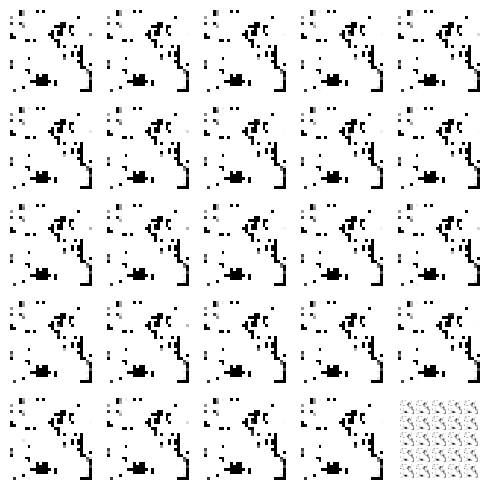

  0%|          | 0/350 [00:00<?, ?it/s]

4/4 [==============================] - 0s 26ms/step


  0%|          | 1/350 [00:00<04:36,  1.26it/s]

4/4 [==============================] - 0s 13ms/step


  1%|          | 2/350 [00:01<04:19,  1.34it/s]

4/4 [==============================] - 0s 33ms/step


  1%|          | 3/350 [00:02<04:17,  1.35it/s]

4/4 [==============================] - 0s 16ms/step


  1%|          | 4/350 [00:02<04:07,  1.40it/s]

4/4 [==============================] - 0s 16ms/step


  1%|▏         | 5/350 [00:03<04:04,  1.41it/s]

4/4 [==============================] - 0s 17ms/step


  2%|▏         | 6/350 [00:04<03:58,  1.44it/s]

4/4 [==============================] - 0s 15ms/step


  2%|▏         | 7/350 [00:05<04:01,  1.42it/s]

4/4 [==============================] - 0s 15ms/step


  2%|▏         | 8/350 [00:05<03:59,  1.43it/s]

4/4 [==============================] - 0s 18ms/step


  3%|▎         | 9/350 [00:06<03:59,  1.42it/s]

4/4 [==============================] - 0s 12ms/step


  3%|▎         | 10/350 [00:07<04:06,  1.38it/s]

4/4 [==============================] - 0s 15ms/step


  3%|▎         | 11/350 [00:07<04:03,  1.39it/s]

4/4 [==============================] - 0s 21ms/step


  3%|▎         | 12/350 [00:08<04:01,  1.40it/s]

4/4 [==============================] - 0s 16ms/step


  4%|▎         | 13/350 [00:09<04:03,  1.39it/s]

4/4 [==============================] - 0s 13ms/step


  4%|▍         | 14/350 [00:10<03:57,  1.41it/s]

4/4 [==============================] - 0s 21ms/step


  4%|▍         | 15/350 [00:10<04:04,  1.37it/s]

4/4 [==============================] - 0s 16ms/step


  5%|▍         | 16/350 [00:11<04:02,  1.37it/s]

4/4 [==============================] - 0s 11ms/step


  5%|▍         | 17/350 [00:12<04:06,  1.35it/s]

4/4 [==============================] - 0s 16ms/step


  5%|▌         | 18/350 [00:13<04:05,  1.35it/s]

4/4 [==============================] - 0s 16ms/step


  5%|▌         | 19/350 [00:13<04:00,  1.38it/s]

4/4 [==============================] - 0s 14ms/step


  6%|▌         | 20/350 [00:14<03:51,  1.43it/s]

4/4 [==============================] - 0s 13ms/step


  6%|▌         | 21/350 [00:15<03:51,  1.42it/s]

4/4 [==============================] - 0s 17ms/step


  6%|▋         | 22/350 [00:15<03:51,  1.42it/s]

4/4 [==============================] - 0s 17ms/step


  7%|▋         | 23/350 [00:16<03:54,  1.39it/s]

4/4 [==============================] - 0s 14ms/step


  7%|▋         | 24/350 [00:17<03:55,  1.39it/s]

4/4 [==============================] - 0s 13ms/step


  7%|▋         | 25/350 [00:18<03:57,  1.37it/s]

4/4 [==============================] - 0s 14ms/step


  7%|▋         | 26/350 [00:18<04:01,  1.34it/s]

4/4 [==============================] - 0s 12ms/step


  8%|▊         | 27/350 [00:19<03:50,  1.40it/s]

4/4 [==============================] - 0s 16ms/step


  8%|▊         | 28/350 [00:20<04:06,  1.31it/s]

4/4 [==============================] - 0s 18ms/step


  8%|▊         | 29/350 [00:21<04:02,  1.32it/s]

4/4 [==============================] - 0s 15ms/step


  9%|▊         | 30/350 [00:21<04:04,  1.31it/s]

4/4 [==============================] - 0s 13ms/step


  9%|▉         | 31/350 [00:22<03:54,  1.36it/s]

4/4 [==============================] - 0s 15ms/step


  9%|▉         | 32/350 [00:23<03:54,  1.36it/s]

4/4 [==============================] - 0s 15ms/step


  9%|▉         | 33/350 [00:23<03:50,  1.37it/s]

4/4 [==============================] - 0s 15ms/step


 10%|▉         | 34/350 [00:24<03:48,  1.39it/s]

4/4 [==============================] - 0s 15ms/step


 10%|█         | 35/350 [00:25<03:51,  1.36it/s]

4/4 [==============================] - 0s 15ms/step


 10%|█         | 36/350 [00:26<03:44,  1.40it/s]

4/4 [==============================] - 0s 13ms/step


 11%|█         | 37/350 [00:26<03:51,  1.35it/s]

4/4 [==============================] - 0s 13ms/step


 11%|█         | 38/350 [00:27<03:44,  1.39it/s]

4/4 [==============================] - 0s 13ms/step


 11%|█         | 39/350 [00:28<03:49,  1.35it/s]

4/4 [==============================] - 0s 12ms/step


 11%|█▏        | 40/350 [00:29<03:49,  1.35it/s]

4/4 [==============================] - 0s 14ms/step


 12%|█▏        | 41/350 [00:29<03:46,  1.36it/s]

4/4 [==============================] - 0s 14ms/step


 12%|█▏        | 42/350 [00:30<03:38,  1.41it/s]

4/4 [==============================] - 0s 13ms/step


 12%|█▏        | 43/350 [00:31<03:32,  1.45it/s]

4/4 [==============================] - 0s 13ms/step


 13%|█▎        | 44/350 [00:31<03:35,  1.42it/s]

4/4 [==============================] - 0s 12ms/step


 13%|█▎        | 45/350 [00:32<03:32,  1.44it/s]

4/4 [==============================] - 0s 22ms/step


 13%|█▎        | 46/350 [00:33<03:37,  1.40it/s]

4/4 [==============================] - 0s 15ms/step


 13%|█▎        | 47/350 [00:34<03:43,  1.35it/s]

4/4 [==============================] - 0s 15ms/step


 14%|█▎        | 48/350 [00:34<03:33,  1.42it/s]

4/4 [==============================] - 0s 14ms/step


 14%|█▍        | 49/350 [00:35<03:30,  1.43it/s]

4/4 [==============================] - 0s 14ms/step


 14%|█▍        | 50/350 [00:36<03:37,  1.38it/s]

4/4 [==============================] - 0s 12ms/step


 15%|█▍        | 51/350 [00:36<03:23,  1.47it/s]

4/4 [==============================] - 0s 16ms/step


 15%|█▍        | 52/350 [00:37<03:27,  1.44it/s]

4/4 [==============================] - 0s 14ms/step


 15%|█▌        | 53/350 [00:38<03:27,  1.43it/s]

4/4 [==============================] - 0s 11ms/step


 15%|█▌        | 54/350 [00:38<03:27,  1.43it/s]

4/4 [==============================] - 0s 15ms/step


 16%|█▌        | 55/350 [00:39<03:28,  1.42it/s]

4/4 [==============================] - 0s 17ms/step


 16%|█▌        | 56/350 [00:40<03:34,  1.37it/s]

4/4 [==============================] - 0s 12ms/step


 16%|█▋        | 57/350 [00:40<03:22,  1.45it/s]

4/4 [==============================] - 0s 20ms/step


 17%|█▋        | 58/350 [00:41<03:17,  1.48it/s]

4/4 [==============================] - 0s 21ms/step


 17%|█▋        | 59/350 [00:42<03:21,  1.45it/s]

4/4 [==============================] - 0s 15ms/step


 17%|█▋        | 60/350 [00:43<03:23,  1.42it/s]

4/4 [==============================] - 0s 13ms/step


 17%|█▋        | 61/350 [00:43<03:18,  1.45it/s]

4/4 [==============================] - 0s 19ms/step


 18%|█▊        | 62/350 [00:44<03:17,  1.46it/s]

4/4 [==============================] - 0s 11ms/step


 18%|█▊        | 63/350 [00:45<03:09,  1.52it/s]

4/4 [==============================] - 0s 15ms/step


 18%|█▊        | 64/350 [00:45<03:03,  1.56it/s]

4/4 [==============================] - 0s 19ms/step


 19%|█▊        | 65/350 [00:46<03:06,  1.53it/s]

4/4 [==============================] - 0s 14ms/step


 19%|█▉        | 66/350 [00:47<03:13,  1.47it/s]

4/4 [==============================] - 0s 15ms/step


 19%|█▉        | 67/350 [00:47<03:11,  1.48it/s]

4/4 [==============================] - 0s 13ms/step


 19%|█▉        | 68/350 [00:48<03:14,  1.45it/s]

4/4 [==============================] - 0s 15ms/step


 20%|█▉        | 69/350 [00:49<03:15,  1.43it/s]

4/4 [==============================] - 0s 22ms/step


 20%|██        | 70/350 [00:49<03:13,  1.44it/s]

4/4 [==============================] - 0s 14ms/step


 20%|██        | 71/350 [00:50<03:15,  1.43it/s]

4/4 [==============================] - 0s 13ms/step


 21%|██        | 72/350 [00:51<03:12,  1.44it/s]

4/4 [==============================] - 0s 18ms/step


 21%|██        | 73/350 [00:51<03:14,  1.43it/s]

4/4 [==============================] - 0s 14ms/step


 21%|██        | 74/350 [00:52<03:14,  1.42it/s]

4/4 [==============================] - 0s 14ms/step


 21%|██▏       | 75/350 [00:53<03:19,  1.38it/s]

4/4 [==============================] - 0s 17ms/step


 22%|██▏       | 76/350 [00:54<03:15,  1.40it/s]

4/4 [==============================] - 0s 22ms/step


 22%|██▏       | 77/350 [00:54<03:15,  1.40it/s]

4/4 [==============================] - 0s 14ms/step


 22%|██▏       | 78/350 [00:55<03:14,  1.40it/s]

4/4 [==============================] - 0s 18ms/step


 23%|██▎       | 79/350 [00:56<03:13,  1.40it/s]

4/4 [==============================] - 0s 13ms/step


 23%|██▎       | 80/350 [00:56<03:09,  1.43it/s]

4/4 [==============================] - 0s 28ms/step


 23%|██▎       | 81/350 [00:57<03:10,  1.41it/s]

4/4 [==============================] - 0s 14ms/step


 23%|██▎       | 82/350 [00:58<03:08,  1.42it/s]

4/4 [==============================] - 0s 22ms/step


 24%|██▎       | 83/350 [00:59<03:16,  1.36it/s]

4/4 [==============================] - 0s 20ms/step


 24%|██▍       | 84/350 [00:59<03:08,  1.41it/s]

4/4 [==============================] - 0s 15ms/step


 24%|██▍       | 85/350 [01:00<03:06,  1.42it/s]

4/4 [==============================] - 0s 13ms/step


 25%|██▍       | 86/350 [01:01<03:12,  1.37it/s]

4/4 [==============================] - 0s 14ms/step


 25%|██▍       | 87/350 [01:01<03:05,  1.42it/s]

4/4 [==============================] - 0s 12ms/step


 25%|██▌       | 88/350 [01:02<03:08,  1.39it/s]

4/4 [==============================] - 0s 19ms/step


 25%|██▌       | 89/350 [01:03<03:10,  1.37it/s]

4/4 [==============================] - 0s 14ms/step


 26%|██▌       | 90/350 [01:04<03:06,  1.39it/s]

4/4 [==============================] - 0s 12ms/step


 26%|██▌       | 91/350 [01:04<03:08,  1.38it/s]

4/4 [==============================] - 0s 13ms/step


 26%|██▋       | 92/350 [01:05<03:02,  1.42it/s]

4/4 [==============================] - 0s 19ms/step


 27%|██▋       | 93/350 [01:06<03:00,  1.42it/s]

4/4 [==============================] - 0s 12ms/step


 27%|██▋       | 94/350 [01:06<03:05,  1.38it/s]

4/4 [==============================] - 0s 12ms/step


 27%|██▋       | 95/350 [01:07<03:08,  1.35it/s]

4/4 [==============================] - 0s 12ms/step


 27%|██▋       | 96/350 [01:08<03:02,  1.40it/s]

4/4 [==============================] - 0s 16ms/step


 28%|██▊       | 97/350 [01:09<03:00,  1.40it/s]

4/4 [==============================] - 0s 12ms/step


 28%|██▊       | 98/350 [01:09<02:54,  1.45it/s]

4/4 [==============================] - 0s 14ms/step


 28%|██▊       | 99/350 [01:10<02:55,  1.43it/s]

4/4 [==============================] - 0s 13ms/step


 29%|██▊       | 100/350 [01:11<02:55,  1.43it/s]

4/4 [==============================] - 0s 14ms/step


 29%|██▉       | 101/350 [01:11<02:49,  1.47it/s]

4/4 [==============================] - 0s 11ms/step


 29%|██▉       | 102/350 [01:12<02:52,  1.44it/s]

4/4 [==============================] - 0s 11ms/step


 29%|██▉       | 103/350 [01:13<02:55,  1.40it/s]

4/4 [==============================] - 0s 13ms/step


 30%|██▉       | 104/350 [01:13<02:48,  1.46it/s]

4/4 [==============================] - 0s 17ms/step


 30%|███       | 105/350 [01:14<02:41,  1.51it/s]

4/4 [==============================] - 0s 15ms/step


 30%|███       | 106/350 [01:15<02:42,  1.50it/s]

4/4 [==============================] - 0s 15ms/step


 31%|███       | 107/350 [01:15<02:45,  1.47it/s]

4/4 [==============================] - 0s 15ms/step


 31%|███       | 108/350 [01:16<02:44,  1.47it/s]

4/4 [==============================] - 0s 11ms/step


 31%|███       | 109/350 [01:17<02:45,  1.45it/s]

4/4 [==============================] - 0s 18ms/step


 31%|███▏      | 110/350 [01:17<02:41,  1.48it/s]

4/4 [==============================] - 0s 13ms/step


 32%|███▏      | 111/350 [01:18<02:45,  1.44it/s]

4/4 [==============================] - 0s 18ms/step


 32%|███▏      | 112/350 [01:19<02:41,  1.47it/s]

4/4 [==============================] - 0s 20ms/step


 32%|███▏      | 113/350 [01:20<02:47,  1.42it/s]

4/4 [==============================] - 0s 13ms/step


 33%|███▎      | 114/350 [01:20<02:48,  1.40it/s]

4/4 [==============================] - 0s 12ms/step


 33%|███▎      | 115/350 [01:21<02:47,  1.40it/s]

4/4 [==============================] - 0s 25ms/step


 33%|███▎      | 116/350 [01:22<02:48,  1.39it/s]

4/4 [==============================] - 0s 15ms/step


 33%|███▎      | 117/350 [01:23<02:54,  1.34it/s]

4/4 [==============================] - 0s 15ms/step


 34%|███▎      | 118/350 [01:23<02:43,  1.42it/s]

4/4 [==============================] - 0s 16ms/step


 34%|███▍      | 119/350 [01:24<02:49,  1.36it/s]

4/4 [==============================] - 0s 12ms/step


 34%|███▍      | 120/350 [01:25<02:43,  1.41it/s]

4/4 [==============================] - 0s 24ms/step


 35%|███▍      | 121/350 [01:25<02:47,  1.36it/s]

4/4 [==============================] - 0s 13ms/step


 35%|███▍      | 122/350 [01:26<02:43,  1.40it/s]

4/4 [==============================] - 0s 19ms/step


 35%|███▌      | 123/350 [01:27<02:40,  1.42it/s]

4/4 [==============================] - 0s 12ms/step


 35%|███▌      | 124/350 [01:28<02:45,  1.37it/s]

4/4 [==============================] - 0s 14ms/step


 36%|███▌      | 125/350 [01:28<02:41,  1.39it/s]

4/4 [==============================] - 0s 21ms/step


 36%|███▌      | 126/350 [01:29<02:42,  1.38it/s]

4/4 [==============================] - 0s 13ms/step


 36%|███▋      | 127/350 [01:30<02:37,  1.42it/s]

4/4 [==============================] - 0s 50ms/step


 37%|███▋      | 128/350 [01:30<02:41,  1.38it/s]

4/4 [==============================] - 0s 16ms/step


 37%|███▋      | 129/350 [01:31<02:40,  1.38it/s]

4/4 [==============================] - 0s 15ms/step


 37%|███▋      | 130/350 [01:32<02:41,  1.36it/s]

4/4 [==============================] - 0s 20ms/step


 37%|███▋      | 131/350 [01:33<02:39,  1.37it/s]

4/4 [==============================] - 0s 11ms/step


 38%|███▊      | 132/350 [01:33<02:29,  1.46it/s]

4/4 [==============================] - 0s 16ms/step


 38%|███▊      | 133/350 [01:34<02:30,  1.45it/s]

4/4 [==============================] - 0s 16ms/step


 38%|███▊      | 134/350 [01:35<02:26,  1.48it/s]

4/4 [==============================] - 0s 23ms/step


 39%|███▊      | 135/350 [01:35<02:30,  1.43it/s]

4/4 [==============================] - 0s 15ms/step


 39%|███▉      | 136/350 [01:36<02:26,  1.46it/s]

4/4 [==============================] - 0s 22ms/step


 39%|███▉      | 137/350 [01:37<02:27,  1.44it/s]

4/4 [==============================] - 0s 14ms/step


 39%|███▉      | 138/350 [01:37<02:24,  1.47it/s]

4/4 [==============================] - 0s 27ms/step


 40%|███▉      | 139/350 [01:38<02:24,  1.46it/s]

4/4 [==============================] - 0s 14ms/step


 40%|████      | 140/350 [01:39<02:19,  1.50it/s]

4/4 [==============================] - 0s 15ms/step


 40%|████      | 141/350 [01:39<02:19,  1.50it/s]

4/4 [==============================] - 0s 18ms/step


 41%|████      | 142/350 [01:40<02:20,  1.48it/s]

4/4 [==============================] - 0s 14ms/step


 41%|████      | 143/350 [01:41<02:17,  1.51it/s]

4/4 [==============================] - 0s 15ms/step


 41%|████      | 144/350 [01:41<02:20,  1.47it/s]

4/4 [==============================] - 0s 18ms/step


 41%|████▏     | 145/350 [01:42<02:20,  1.45it/s]

4/4 [==============================] - 0s 18ms/step


 42%|████▏     | 146/350 [01:43<02:19,  1.46it/s]

4/4 [==============================] - 0s 27ms/step


 42%|████▏     | 147/350 [01:43<02:18,  1.46it/s]

4/4 [==============================] - 0s 18ms/step


 42%|████▏     | 148/350 [01:44<02:19,  1.45it/s]

4/4 [==============================] - 0s 14ms/step


 43%|████▎     | 149/350 [01:45<02:25,  1.39it/s]

4/4 [==============================] - 0s 14ms/step


 43%|████▎     | 150/350 [01:46<02:28,  1.35it/s]

4/4 [==============================] - 0s 14ms/step


 43%|████▎     | 151/350 [01:46<02:27,  1.35it/s]

4/4 [==============================] - 0s 14ms/step


 43%|████▎     | 152/350 [01:47<02:25,  1.37it/s]

4/4 [==============================] - 0s 32ms/step


 44%|████▎     | 153/350 [01:48<02:29,  1.32it/s]

4/4 [==============================] - 0s 14ms/step


 44%|████▍     | 154/350 [01:49<02:29,  1.31it/s]

4/4 [==============================] - 0s 13ms/step


 44%|████▍     | 155/350 [01:49<02:23,  1.36it/s]

4/4 [==============================] - 0s 28ms/step


 45%|████▍     | 156/350 [01:50<02:27,  1.32it/s]

4/4 [==============================] - 0s 17ms/step


 45%|████▍     | 157/350 [01:51<02:31,  1.28it/s]

4/4 [==============================] - 0s 21ms/step


 45%|████▌     | 158/350 [01:52<02:42,  1.18it/s]

4/4 [==============================] - 0s 14ms/step


 45%|████▌     | 159/350 [01:53<02:37,  1.21it/s]

4/4 [==============================] - 0s 14ms/step


 46%|████▌     | 160/350 [01:54<02:30,  1.26it/s]

4/4 [==============================] - 0s 15ms/step


 46%|████▌     | 161/350 [01:54<02:27,  1.28it/s]

4/4 [==============================] - 0s 14ms/step


 46%|████▋     | 162/350 [01:55<02:24,  1.30it/s]

4/4 [==============================] - 0s 14ms/step


 47%|████▋     | 163/350 [01:56<02:26,  1.28it/s]

4/4 [==============================] - 0s 13ms/step


 47%|████▋     | 164/350 [01:57<02:18,  1.35it/s]

4/4 [==============================] - 0s 14ms/step


 47%|████▋     | 165/350 [01:57<02:10,  1.42it/s]

4/4 [==============================] - 0s 16ms/step


 47%|████▋     | 166/350 [01:58<02:07,  1.45it/s]

4/4 [==============================] - 0s 22ms/step


 48%|████▊     | 167/350 [01:59<02:09,  1.41it/s]

4/4 [==============================] - 0s 16ms/step


 48%|████▊     | 168/350 [01:59<02:08,  1.42it/s]

4/4 [==============================] - 0s 19ms/step


 48%|████▊     | 169/350 [02:00<02:07,  1.42it/s]

4/4 [==============================] - 0s 28ms/step


 49%|████▊     | 170/350 [02:01<02:12,  1.36it/s]

4/4 [==============================] - 0s 15ms/step


 49%|████▉     | 171/350 [02:02<02:13,  1.34it/s]

4/4 [==============================] - 0s 15ms/step


 49%|████▉     | 172/350 [02:02<02:11,  1.35it/s]

4/4 [==============================] - 0s 14ms/step


 49%|████▉     | 173/350 [02:03<02:06,  1.40it/s]

4/4 [==============================] - 0s 14ms/step


 50%|████▉     | 174/350 [02:04<02:07,  1.38it/s]

4/4 [==============================] - 0s 13ms/step


 50%|█████     | 175/350 [02:04<02:08,  1.36it/s]

4/4 [==============================] - 0s 14ms/step


 50%|█████     | 176/350 [02:05<02:02,  1.43it/s]

4/4 [==============================] - 0s 14ms/step


 51%|█████     | 177/350 [02:06<02:01,  1.42it/s]

4/4 [==============================] - 0s 14ms/step


 51%|█████     | 178/350 [02:06<01:57,  1.47it/s]

4/4 [==============================] - 0s 12ms/step


 51%|█████     | 179/350 [02:07<01:55,  1.48it/s]

4/4 [==============================] - 0s 18ms/step


 51%|█████▏    | 180/350 [02:08<01:55,  1.48it/s]

4/4 [==============================] - 0s 12ms/step


 52%|█████▏    | 181/350 [02:08<01:57,  1.44it/s]

4/4 [==============================] - 0s 16ms/step


 52%|█████▏    | 182/350 [02:09<01:55,  1.45it/s]

4/4 [==============================] - 0s 11ms/step


 52%|█████▏    | 183/350 [02:10<01:55,  1.45it/s]

4/4 [==============================] - 0s 13ms/step


 53%|█████▎    | 184/350 [02:11<01:52,  1.48it/s]

4/4 [==============================] - 0s 14ms/step


 53%|█████▎    | 185/350 [02:11<01:55,  1.43it/s]

4/4 [==============================] - 0s 16ms/step


 53%|█████▎    | 186/350 [02:12<01:55,  1.42it/s]

4/4 [==============================] - 0s 15ms/step


 53%|█████▎    | 187/350 [02:13<01:56,  1.40it/s]

4/4 [==============================] - 0s 13ms/step


 54%|█████▎    | 188/350 [02:13<01:52,  1.43it/s]

4/4 [==============================] - 0s 12ms/step


 54%|█████▍    | 189/350 [02:14<01:51,  1.45it/s]

4/4 [==============================] - 0s 16ms/step


 54%|█████▍    | 190/350 [02:15<01:53,  1.41it/s]

4/4 [==============================] - 0s 15ms/step


 55%|█████▍    | 191/350 [02:15<01:50,  1.43it/s]

4/4 [==============================] - 0s 12ms/step


 55%|█████▍    | 192/350 [02:16<01:48,  1.45it/s]

4/4 [==============================] - 0s 13ms/step


 55%|█████▌    | 193/350 [02:17<01:47,  1.46it/s]

4/4 [==============================] - 0s 15ms/step


 55%|█████▌    | 194/350 [02:18<01:50,  1.42it/s]

4/4 [==============================] - 0s 14ms/step


 56%|█████▌    | 195/350 [02:18<01:49,  1.42it/s]

4/4 [==============================] - 0s 11ms/step


 56%|█████▌    | 196/350 [02:19<01:45,  1.46it/s]

4/4 [==============================] - 0s 19ms/step


 56%|█████▋    | 197/350 [02:20<01:47,  1.43it/s]

4/4 [==============================] - 0s 16ms/step


 57%|█████▋    | 198/350 [02:20<01:43,  1.47it/s]

4/4 [==============================] - 0s 12ms/step


 57%|█████▋    | 199/350 [02:21<01:43,  1.45it/s]

4/4 [==============================] - 0s 16ms/step


 57%|█████▋    | 200/350 [02:22<01:42,  1.46it/s]

4/4 [==============================] - 0s 11ms/step


 57%|█████▋    | 201/350 [02:22<01:43,  1.44it/s]

4/4 [==============================] - 0s 13ms/step


 58%|█████▊    | 202/350 [02:23<01:41,  1.45it/s]

4/4 [==============================] - 0s 12ms/step


 58%|█████▊    | 203/350 [02:24<01:45,  1.40it/s]

4/4 [==============================] - 0s 13ms/step


 58%|█████▊    | 204/350 [02:25<01:48,  1.35it/s]

4/4 [==============================] - 0s 14ms/step


 59%|█████▊    | 205/350 [02:25<01:42,  1.41it/s]

4/4 [==============================] - 0s 10ms/step


 59%|█████▉    | 206/350 [02:26<01:39,  1.44it/s]

4/4 [==============================] - 0s 14ms/step


 59%|█████▉    | 207/350 [02:27<01:40,  1.43it/s]

4/4 [==============================] - 0s 12ms/step


 59%|█████▉    | 208/350 [02:27<01:39,  1.43it/s]

4/4 [==============================] - 0s 18ms/step


 60%|█████▉    | 209/350 [02:28<01:36,  1.45it/s]

4/4 [==============================] - 0s 12ms/step


 60%|██████    | 210/350 [02:29<01:36,  1.45it/s]

4/4 [==============================] - 0s 15ms/step


 60%|██████    | 211/350 [02:29<01:35,  1.45it/s]

4/4 [==============================] - 0s 15ms/step


 61%|██████    | 212/350 [02:30<01:40,  1.37it/s]

4/4 [==============================] - 0s 12ms/step


 61%|██████    | 213/350 [02:31<01:41,  1.35it/s]

4/4 [==============================] - 0s 13ms/step


 61%|██████    | 214/350 [02:32<01:39,  1.37it/s]

4/4 [==============================] - 0s 16ms/step


 61%|██████▏   | 215/350 [02:32<01:34,  1.42it/s]

4/4 [==============================] - 0s 30ms/step


 62%|██████▏   | 216/350 [02:33<01:37,  1.37it/s]

4/4 [==============================] - 0s 13ms/step


 62%|██████▏   | 217/350 [02:34<01:35,  1.39it/s]

4/4 [==============================] - 0s 14ms/step


 62%|██████▏   | 218/350 [02:34<01:31,  1.44it/s]

4/4 [==============================] - 0s 15ms/step


 63%|██████▎   | 219/350 [02:35<01:34,  1.39it/s]

4/4 [==============================] - 0s 13ms/step


 63%|██████▎   | 220/350 [02:36<01:29,  1.46it/s]

4/4 [==============================] - 0s 12ms/step


 63%|██████▎   | 221/350 [02:37<01:31,  1.42it/s]

4/4 [==============================] - 0s 13ms/step


 63%|██████▎   | 222/350 [02:37<01:33,  1.36it/s]

4/4 [==============================] - 0s 16ms/step


 64%|██████▎   | 223/350 [02:38<01:31,  1.38it/s]

4/4 [==============================] - 0s 16ms/step


 64%|██████▍   | 224/350 [02:39<01:29,  1.41it/s]

4/4 [==============================] - 0s 16ms/step


 64%|██████▍   | 225/350 [02:39<01:28,  1.41it/s]

4/4 [==============================] - 0s 13ms/step


 65%|██████▍   | 226/350 [02:40<01:25,  1.44it/s]

4/4 [==============================] - 0s 11ms/step


 65%|██████▍   | 227/350 [02:41<01:29,  1.37it/s]

4/4 [==============================] - 0s 21ms/step


 65%|██████▌   | 228/350 [02:42<01:34,  1.28it/s]

4/4 [==============================] - 0s 12ms/step


 65%|██████▌   | 229/350 [02:43<01:31,  1.33it/s]

4/4 [==============================] - 0s 15ms/step


 66%|██████▌   | 230/350 [02:43<01:37,  1.24it/s]

4/4 [==============================] - 0s 16ms/step


 66%|██████▌   | 231/350 [02:44<01:38,  1.20it/s]

4/4 [==============================] - 0s 18ms/step


 66%|██████▋   | 232/350 [02:45<01:37,  1.21it/s]

4/4 [==============================] - 0s 17ms/step


 67%|██████▋   | 233/350 [02:46<01:33,  1.26it/s]

4/4 [==============================] - 0s 17ms/step


 67%|██████▋   | 234/350 [02:47<01:32,  1.25it/s]

4/4 [==============================] - 0s 15ms/step


 67%|██████▋   | 235/350 [02:47<01:30,  1.27it/s]

4/4 [==============================] - 0s 20ms/step


 67%|██████▋   | 236/350 [02:48<01:32,  1.23it/s]

4/4 [==============================] - 0s 12ms/step


 68%|██████▊   | 237/350 [02:49<01:26,  1.31it/s]

4/4 [==============================] - 0s 22ms/step


 68%|██████▊   | 238/350 [02:50<01:28,  1.27it/s]

4/4 [==============================] - 0s 14ms/step


 68%|██████▊   | 239/350 [02:51<01:27,  1.26it/s]

4/4 [==============================] - 0s 15ms/step


 69%|██████▊   | 240/350 [02:51<01:22,  1.33it/s]

4/4 [==============================] - 0s 36ms/step


 69%|██████▉   | 241/350 [02:52<01:23,  1.30it/s]

4/4 [==============================] - 0s 15ms/step


 69%|██████▉   | 242/350 [02:53<01:22,  1.30it/s]

4/4 [==============================] - 0s 15ms/step


 69%|██████▉   | 243/350 [02:54<01:18,  1.36it/s]

4/4 [==============================] - 0s 22ms/step


 70%|██████▉   | 244/350 [02:54<01:17,  1.37it/s]

4/4 [==============================] - 0s 11ms/step


 70%|███████   | 245/350 [02:55<01:13,  1.43it/s]

4/4 [==============================] - 0s 14ms/step


 70%|███████   | 246/350 [02:56<01:14,  1.40it/s]

4/4 [==============================] - 0s 16ms/step


 71%|███████   | 247/350 [02:56<01:12,  1.42it/s]

4/4 [==============================] - 0s 13ms/step


 71%|███████   | 248/350 [02:57<01:12,  1.41it/s]

4/4 [==============================] - 0s 13ms/step


 71%|███████   | 249/350 [02:58<01:11,  1.41it/s]

4/4 [==============================] - 0s 16ms/step


 71%|███████▏  | 250/350 [02:58<01:09,  1.43it/s]

4/4 [==============================] - 0s 12ms/step


 72%|███████▏  | 251/350 [02:59<01:11,  1.38it/s]

4/4 [==============================] - 0s 14ms/step


 72%|███████▏  | 252/350 [03:00<01:11,  1.37it/s]

4/4 [==============================] - 0s 16ms/step


 72%|███████▏  | 253/350 [03:01<01:13,  1.32it/s]

4/4 [==============================] - 0s 14ms/step


 73%|███████▎  | 254/350 [03:01<01:09,  1.39it/s]

4/4 [==============================] - 0s 12ms/step


 73%|███████▎  | 255/350 [03:02<01:09,  1.37it/s]

4/4 [==============================] - 0s 12ms/step


 73%|███████▎  | 256/350 [03:03<01:08,  1.38it/s]

4/4 [==============================] - 0s 16ms/step


 73%|███████▎  | 257/350 [03:04<01:07,  1.38it/s]

4/4 [==============================] - 0s 13ms/step


 74%|███████▎  | 258/350 [03:04<01:07,  1.36it/s]

4/4 [==============================] - 0s 13ms/step


 74%|███████▍  | 259/350 [03:05<01:08,  1.33it/s]

4/4 [==============================] - 0s 12ms/step


 74%|███████▍  | 260/350 [03:06<01:06,  1.35it/s]

4/4 [==============================] - 0s 16ms/step


 75%|███████▍  | 261/350 [03:06<01:02,  1.42it/s]

4/4 [==============================] - 0s 11ms/step


 75%|███████▍  | 262/350 [03:07<01:00,  1.47it/s]

4/4 [==============================] - 0s 18ms/step


 75%|███████▌  | 263/350 [03:08<00:59,  1.47it/s]

4/4 [==============================] - 0s 13ms/step


 75%|███████▌  | 264/350 [03:08<00:59,  1.43it/s]

4/4 [==============================] - 0s 14ms/step


 76%|███████▌  | 265/350 [03:09<00:57,  1.47it/s]

4/4 [==============================] - 0s 11ms/step


 76%|███████▌  | 266/350 [03:10<00:58,  1.43it/s]

4/4 [==============================] - 0s 13ms/step


 76%|███████▋  | 267/350 [03:10<00:55,  1.49it/s]

4/4 [==============================] - 0s 22ms/step


 77%|███████▋  | 268/350 [03:11<00:57,  1.43it/s]

4/4 [==============================] - 0s 15ms/step


 77%|███████▋  | 269/350 [03:12<00:57,  1.41it/s]

4/4 [==============================] - 0s 15ms/step


 77%|███████▋  | 270/350 [03:13<00:55,  1.43it/s]

4/4 [==============================] - 0s 21ms/step


 77%|███████▋  | 271/350 [03:13<00:55,  1.42it/s]

4/4 [==============================] - 0s 14ms/step


 78%|███████▊  | 272/350 [03:14<00:56,  1.37it/s]

4/4 [==============================] - 0s 14ms/step


 78%|███████▊  | 273/350 [03:15<00:55,  1.40it/s]

4/4 [==============================] - 0s 20ms/step


 78%|███████▊  | 274/350 [03:16<00:54,  1.39it/s]

4/4 [==============================] - 0s 16ms/step


 79%|███████▊  | 275/350 [03:16<00:54,  1.39it/s]

4/4 [==============================] - 0s 24ms/step


 79%|███████▉  | 276/350 [03:17<00:57,  1.29it/s]

4/4 [==============================] - 0s 15ms/step


 79%|███████▉  | 277/350 [03:18<00:55,  1.31it/s]

4/4 [==============================] - 0s 20ms/step


 79%|███████▉  | 278/350 [03:19<00:54,  1.31it/s]

4/4 [==============================] - 0s 15ms/step


 80%|███████▉  | 279/350 [03:19<00:52,  1.35it/s]

4/4 [==============================] - 0s 16ms/step


 80%|████████  | 280/350 [03:20<00:56,  1.25it/s]

4/4 [==============================] - 0s 13ms/step


 80%|████████  | 281/350 [03:21<00:52,  1.31it/s]

4/4 [==============================] - 0s 13ms/step


 81%|████████  | 282/350 [03:22<00:51,  1.32it/s]

4/4 [==============================] - 0s 14ms/step


 81%|████████  | 283/350 [03:22<00:48,  1.37it/s]

4/4 [==============================] - 0s 16ms/step


 81%|████████  | 284/350 [03:23<00:50,  1.32it/s]

4/4 [==============================] - 0s 12ms/step


 81%|████████▏ | 285/350 [03:24<00:48,  1.35it/s]

4/4 [==============================] - 0s 15ms/step


 82%|████████▏ | 286/350 [03:25<00:50,  1.28it/s]

4/4 [==============================] - 0s 34ms/step


 82%|████████▏ | 287/350 [03:26<00:51,  1.23it/s]

4/4 [==============================] - 0s 15ms/step


 82%|████████▏ | 288/350 [03:26<00:48,  1.28it/s]

4/4 [==============================] - 0s 22ms/step


 83%|████████▎ | 289/350 [03:27<00:46,  1.30it/s]

4/4 [==============================] - 0s 16ms/step


 83%|████████▎ | 290/350 [03:28<00:45,  1.32it/s]

4/4 [==============================] - 0s 18ms/step


 83%|████████▎ | 291/350 [03:29<00:48,  1.22it/s]

4/4 [==============================] - 0s 12ms/step


 83%|████████▎ | 292/350 [03:30<00:45,  1.29it/s]

4/4 [==============================] - 0s 22ms/step


 84%|████████▎ | 293/350 [03:30<00:47,  1.21it/s]

4/4 [==============================] - 0s 17ms/step


 84%|████████▍ | 294/350 [03:31<00:47,  1.18it/s]

4/4 [==============================] - 0s 16ms/step


 84%|████████▍ | 295/350 [03:32<00:50,  1.10it/s]

4/4 [==============================] - 0s 19ms/step


 85%|████████▍ | 296/350 [03:33<00:46,  1.16it/s]

4/4 [==============================] - 0s 15ms/step


 85%|████████▍ | 297/350 [03:34<00:44,  1.19it/s]

4/4 [==============================] - 0s 15ms/step


 85%|████████▌ | 298/350 [03:35<00:43,  1.21it/s]

4/4 [==============================] - 0s 13ms/step


 85%|████████▌ | 299/350 [03:35<00:40,  1.25it/s]

4/4 [==============================] - 0s 18ms/step


 86%|████████▌ | 300/350 [03:36<00:38,  1.29it/s]

4/4 [==============================] - 0s 14ms/step


 86%|████████▌ | 301/350 [03:37<00:35,  1.36it/s]

4/4 [==============================] - 0s 24ms/step


 86%|████████▋ | 302/350 [03:38<00:36,  1.31it/s]

4/4 [==============================] - 0s 16ms/step


 87%|████████▋ | 303/350 [03:38<00:35,  1.31it/s]

4/4 [==============================] - 0s 19ms/step


 87%|████████▋ | 304/350 [03:39<00:35,  1.29it/s]

4/4 [==============================] - 0s 26ms/step


 87%|████████▋ | 305/350 [03:40<00:35,  1.27it/s]

4/4 [==============================] - 0s 14ms/step


 87%|████████▋ | 306/350 [03:41<00:34,  1.28it/s]

4/4 [==============================] - 0s 13ms/step


 88%|████████▊ | 307/350 [03:41<00:32,  1.33it/s]

4/4 [==============================] - 0s 13ms/step


 88%|████████▊ | 308/350 [03:42<00:30,  1.38it/s]

4/4 [==============================] - 0s 29ms/step


 88%|████████▊ | 309/350 [03:43<00:30,  1.36it/s]

4/4 [==============================] - 0s 11ms/step


 89%|████████▊ | 310/350 [03:44<00:28,  1.40it/s]

4/4 [==============================] - 0s 14ms/step


 89%|████████▉ | 311/350 [03:44<00:27,  1.40it/s]

4/4 [==============================] - 0s 12ms/step


 89%|████████▉ | 312/350 [03:45<00:25,  1.48it/s]

4/4 [==============================] - 0s 12ms/step


 89%|████████▉ | 313/350 [03:46<00:24,  1.51it/s]

4/4 [==============================] - 0s 23ms/step


 90%|████████▉ | 314/350 [03:46<00:24,  1.48it/s]

4/4 [==============================] - 0s 12ms/step


 90%|█████████ | 315/350 [03:47<00:25,  1.40it/s]

4/4 [==============================] - 0s 18ms/step


 90%|█████████ | 316/350 [03:48<00:24,  1.41it/s]

4/4 [==============================] - 0s 12ms/step


 91%|█████████ | 317/350 [03:49<00:24,  1.36it/s]

4/4 [==============================] - 0s 13ms/step


 91%|█████████ | 318/350 [03:49<00:23,  1.37it/s]

4/4 [==============================] - 0s 22ms/step


 91%|█████████ | 319/350 [03:50<00:22,  1.36it/s]

4/4 [==============================] - 0s 16ms/step


 91%|█████████▏| 320/350 [03:51<00:22,  1.32it/s]

4/4 [==============================] - 0s 21ms/step


 92%|█████████▏| 321/350 [03:52<00:23,  1.22it/s]

4/4 [==============================] - 0s 21ms/step


 92%|█████████▏| 322/350 [03:53<00:23,  1.20it/s]

4/4 [==============================] - 0s 15ms/step


 92%|█████████▏| 323/350 [03:53<00:21,  1.24it/s]

4/4 [==============================] - 0s 12ms/step


 93%|█████████▎| 324/350 [03:54<00:19,  1.31it/s]

4/4 [==============================] - 0s 15ms/step


 93%|█████████▎| 325/350 [03:55<00:18,  1.34it/s]

4/4 [==============================] - 0s 13ms/step


 93%|█████████▎| 326/350 [03:55<00:17,  1.40it/s]

4/4 [==============================] - 0s 15ms/step


 93%|█████████▎| 327/350 [03:56<00:16,  1.38it/s]

4/4 [==============================] - 0s 14ms/step


 94%|█████████▎| 328/350 [03:57<00:16,  1.37it/s]

4/4 [==============================] - 0s 30ms/step


 94%|█████████▍| 329/350 [03:58<00:15,  1.36it/s]

4/4 [==============================] - 0s 11ms/step


 94%|█████████▍| 330/350 [03:58<00:14,  1.41it/s]

4/4 [==============================] - 0s 19ms/step


 95%|█████████▍| 331/350 [03:59<00:13,  1.42it/s]

4/4 [==============================] - 0s 13ms/step


 95%|█████████▍| 332/350 [04:00<00:12,  1.48it/s]

4/4 [==============================] - 0s 12ms/step


 95%|█████████▌| 333/350 [04:00<00:11,  1.46it/s]

4/4 [==============================] - 0s 19ms/step


 95%|█████████▌| 334/350 [04:01<00:11,  1.39it/s]

4/4 [==============================] - 0s 14ms/step


 96%|█████████▌| 335/350 [04:02<00:11,  1.31it/s]

4/4 [==============================] - 0s 18ms/step


 96%|█████████▌| 336/350 [04:03<00:10,  1.33it/s]

4/4 [==============================] - 0s 15ms/step


 96%|█████████▋| 337/350 [04:03<00:09,  1.34it/s]

4/4 [==============================] - 0s 12ms/step


 97%|█████████▋| 338/350 [04:04<00:08,  1.38it/s]

4/4 [==============================] - 0s 23ms/step


 97%|█████████▋| 339/350 [04:05<00:07,  1.38it/s]

4/4 [==============================] - 0s 15ms/step


 97%|█████████▋| 340/350 [04:05<00:07,  1.42it/s]

4/4 [==============================] - 0s 28ms/step


 97%|█████████▋| 341/350 [04:06<00:06,  1.39it/s]

4/4 [==============================] - 0s 18ms/step


 98%|█████████▊| 342/350 [04:07<00:05,  1.40it/s]

4/4 [==============================] - 0s 18ms/step


 98%|█████████▊| 343/350 [04:08<00:04,  1.42it/s]

4/4 [==============================] - 0s 14ms/step


 98%|█████████▊| 344/350 [04:08<00:04,  1.45it/s]

4/4 [==============================] - 0s 14ms/step


 99%|█████████▊| 345/350 [04:09<00:03,  1.42it/s]

4/4 [==============================] - 0s 14ms/step


 99%|█████████▉| 346/350 [04:10<00:02,  1.40it/s]

4/4 [==============================] - 0s 20ms/step


 99%|█████████▉| 347/350 [04:11<00:02,  1.31it/s]

4/4 [==============================] - 0s 17ms/step


 99%|█████████▉| 348/350 [04:11<00:01,  1.38it/s]

4/4 [==============================] - 0s 12ms/step


100%|█████████▉| 349/350 [04:12<00:00,  1.36it/s]

4/4 [==============================] - 0s 14ms/step


100%|██████████| 350/350 [04:13<00:00,  1.38it/s]

Epoch number: 57 discriminator_loss: 0.16506290238176008 generator_loss: 7.50722627231053
1/1 [==============================] - 0s 27ms/step


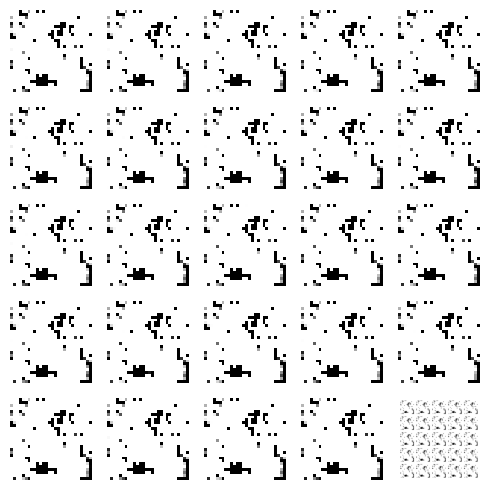

  0%|          | 0/350 [00:00<?, ?it/s]

4/4 [==============================] - 0s 19ms/step


  0%|          | 1/350 [00:00<04:23,  1.33it/s]

4/4 [==============================] - 0s 20ms/step


  1%|          | 2/350 [00:01<04:17,  1.35it/s]

4/4 [==============================] - 0s 13ms/step


  1%|          | 3/350 [00:02<04:09,  1.39it/s]

4/4 [==============================] - 0s 15ms/step


  1%|          | 4/350 [00:02<04:00,  1.44it/s]

4/4 [==============================] - 0s 15ms/step


  1%|▏         | 5/350 [00:03<03:55,  1.47it/s]

4/4 [==============================] - 0s 13ms/step


  2%|▏         | 6/350 [00:04<04:04,  1.41it/s]

4/4 [==============================] - 0s 16ms/step


  2%|▏         | 7/350 [00:04<03:56,  1.45it/s]

4/4 [==============================] - 0s 26ms/step


  2%|▏         | 8/350 [00:05<04:03,  1.41it/s]

4/4 [==============================] - 0s 13ms/step


  3%|▎         | 9/350 [00:06<04:08,  1.37it/s]

4/4 [==============================] - 0s 13ms/step


  3%|▎         | 10/350 [00:07<03:58,  1.42it/s]

4/4 [==============================] - 0s 30ms/step


  3%|▎         | 11/350 [00:07<04:18,  1.31it/s]

4/4 [==============================] - 0s 16ms/step


  3%|▎         | 12/350 [00:08<04:22,  1.29it/s]

4/4 [==============================] - 0s 25ms/step


  4%|▎         | 13/350 [00:09<04:28,  1.25it/s]

4/4 [==============================] - 0s 19ms/step


  4%|▍         | 14/350 [00:10<04:33,  1.23it/s]

4/4 [==============================] - 0s 22ms/step


  4%|▍         | 15/350 [00:11<04:38,  1.20it/s]

4/4 [==============================] - 0s 11ms/step


  5%|▍         | 16/350 [00:12<04:26,  1.25it/s]

4/4 [==============================] - 0s 38ms/step


  5%|▍         | 17/350 [00:12<04:27,  1.24it/s]

4/4 [==============================] - 0s 14ms/step


  5%|▌         | 18/350 [00:13<04:18,  1.29it/s]

4/4 [==============================] - 0s 18ms/step


  5%|▌         | 19/350 [00:14<04:17,  1.29it/s]

4/4 [==============================] - 0s 15ms/step


  6%|▌         | 20/350 [00:15<04:18,  1.28it/s]

4/4 [==============================] - 0s 17ms/step


  6%|▌         | 21/350 [00:15<04:13,  1.30it/s]

4/4 [==============================] - 0s 15ms/step


  6%|▋         | 22/350 [00:16<04:02,  1.35it/s]

4/4 [==============================] - 0s 18ms/step


  7%|▋         | 23/350 [00:17<04:01,  1.35it/s]

4/4 [==============================] - 0s 15ms/step


  7%|▋         | 24/350 [00:18<03:56,  1.38it/s]

4/4 [==============================] - 0s 24ms/step


  7%|▋         | 25/350 [00:18<03:54,  1.39it/s]

4/4 [==============================] - 0s 14ms/step


  7%|▋         | 26/350 [00:19<03:49,  1.41it/s]

4/4 [==============================] - 0s 19ms/step


  8%|▊         | 27/350 [00:20<03:39,  1.47it/s]

4/4 [==============================] - 0s 23ms/step


  8%|▊         | 28/350 [00:20<03:42,  1.45it/s]

4/4 [==============================] - 0s 12ms/step


  8%|▊         | 29/350 [00:21<03:38,  1.47it/s]

4/4 [==============================] - 0s 23ms/step


  9%|▊         | 30/350 [00:22<03:41,  1.44it/s]

4/4 [==============================] - 0s 13ms/step


  9%|▉         | 31/350 [00:22<03:44,  1.42it/s]

4/4 [==============================] - 0s 33ms/step


  9%|▉         | 32/350 [00:23<03:48,  1.39it/s]

4/4 [==============================] - 0s 17ms/step


  9%|▉         | 33/350 [00:24<03:40,  1.44it/s]

4/4 [==============================] - 0s 14ms/step


 10%|▉         | 34/350 [00:24<03:35,  1.47it/s]

4/4 [==============================] - 0s 25ms/step


 10%|█         | 35/350 [00:25<03:46,  1.39it/s]

4/4 [==============================] - 0s 15ms/step


 10%|█         | 36/350 [00:26<04:01,  1.30it/s]

4/4 [==============================] - 0s 17ms/step


 11%|█         | 37/350 [00:27<03:55,  1.33it/s]

4/4 [==============================] - 0s 23ms/step


 11%|█         | 38/350 [00:28<03:58,  1.31it/s]

4/4 [==============================] - 0s 13ms/step


 11%|█         | 39/350 [00:28<03:49,  1.35it/s]

4/4 [==============================] - 0s 19ms/step


 11%|█▏        | 40/350 [00:29<03:43,  1.39it/s]

4/4 [==============================] - 0s 14ms/step


 12%|█▏        | 41/350 [00:30<03:47,  1.36it/s]

4/4 [==============================] - 0s 13ms/step


 12%|█▏        | 42/350 [00:31<03:53,  1.32it/s]

4/4 [==============================] - 0s 17ms/step


 12%|█▏        | 43/350 [00:31<03:52,  1.32it/s]

4/4 [==============================] - 0s 20ms/step


 13%|█▎        | 44/350 [00:32<03:52,  1.32it/s]

4/4 [==============================] - 0s 12ms/step


 13%|█▎        | 45/350 [00:33<03:37,  1.40it/s]

4/4 [==============================] - 0s 41ms/step


 13%|█▎        | 46/350 [00:33<03:36,  1.40it/s]

4/4 [==============================] - 0s 11ms/step


 13%|█▎        | 47/350 [00:34<03:31,  1.44it/s]

4/4 [==============================] - 0s 18ms/step


 14%|█▎        | 48/350 [00:35<03:38,  1.39it/s]

4/4 [==============================] - 0s 11ms/step


 14%|█▍        | 49/350 [00:36<03:35,  1.40it/s]

4/4 [==============================] - 0s 17ms/step


 14%|█▍        | 50/350 [00:36<03:31,  1.42it/s]

4/4 [==============================] - 0s 23ms/step


 15%|█▍        | 51/350 [00:37<03:35,  1.38it/s]

4/4 [==============================] - 0s 17ms/step


 15%|█▍        | 52/350 [00:38<03:40,  1.35it/s]

4/4 [==============================] - 0s 12ms/step


 15%|█▌        | 53/350 [00:38<03:29,  1.42it/s]

4/4 [==============================] - 0s 14ms/step


 15%|█▌        | 54/350 [00:39<03:25,  1.44it/s]

4/4 [==============================] - 0s 36ms/step


 16%|█▌        | 55/350 [00:40<03:32,  1.39it/s]

4/4 [==============================] - 0s 13ms/step


 16%|█▌        | 56/350 [00:40<03:26,  1.42it/s]

4/4 [==============================] - 0s 32ms/step


 16%|█▋        | 57/350 [00:41<03:28,  1.41it/s]

4/4 [==============================] - 0s 14ms/step


 17%|█▋        | 58/350 [00:42<03:23,  1.44it/s]

4/4 [==============================] - 0s 23ms/step


 17%|█▋        | 59/350 [00:43<03:26,  1.41it/s]

4/4 [==============================] - 0s 14ms/step


 17%|█▋        | 60/350 [00:43<03:26,  1.40it/s]

4/4 [==============================] - 0s 15ms/step


 17%|█▋        | 61/350 [00:44<03:21,  1.44it/s]

4/4 [==============================] - 0s 15ms/step


 18%|█▊        | 62/350 [00:45<03:23,  1.42it/s]

4/4 [==============================] - 0s 17ms/step


 18%|█▊        | 63/350 [00:45<03:25,  1.40it/s]

4/4 [==============================] - 0s 20ms/step


 18%|█▊        | 64/350 [00:46<03:23,  1.41it/s]

4/4 [==============================] - 0s 12ms/step


 19%|█▊        | 65/350 [00:47<03:19,  1.43it/s]

4/4 [==============================] - 0s 19ms/step


 19%|█▉        | 66/350 [00:48<03:23,  1.39it/s]

4/4 [==============================] - 0s 13ms/step


 19%|█▉        | 67/350 [00:48<03:18,  1.42it/s]

4/4 [==============================] - 0s 22ms/step


 19%|█▉        | 68/350 [00:49<03:19,  1.41it/s]

4/4 [==============================] - 0s 16ms/step


 20%|█▉        | 69/350 [00:50<03:17,  1.42it/s]

4/4 [==============================] - 0s 16ms/step


 20%|██        | 70/350 [00:50<03:17,  1.42it/s]

4/4 [==============================] - 0s 25ms/step


 20%|██        | 71/350 [00:51<03:19,  1.40it/s]

4/4 [==============================] - 0s 13ms/step


 21%|██        | 72/350 [00:52<03:21,  1.38it/s]

4/4 [==============================] - 0s 16ms/step


 21%|██        | 73/350 [00:53<03:21,  1.37it/s]

4/4 [==============================] - 0s 12ms/step


 21%|██        | 74/350 [00:53<03:14,  1.42it/s]

4/4 [==============================] - 0s 12ms/step


 21%|██▏       | 75/350 [00:54<03:12,  1.43it/s]

4/4 [==============================] - 0s 18ms/step


 22%|██▏       | 76/350 [00:55<03:06,  1.47it/s]

4/4 [==============================] - 0s 18ms/step


 22%|██▏       | 77/350 [00:55<03:14,  1.40it/s]

4/4 [==============================] - 0s 23ms/step


 22%|██▏       | 78/350 [00:56<03:16,  1.39it/s]

4/4 [==============================] - 0s 19ms/step


 23%|██▎       | 79/350 [00:57<03:06,  1.46it/s]

4/4 [==============================] - 0s 37ms/step


 23%|██▎       | 80/350 [00:57<03:08,  1.43it/s]

4/4 [==============================] - 0s 11ms/step


 23%|██▎       | 81/350 [00:58<03:12,  1.40it/s]

4/4 [==============================] - 0s 22ms/step


 23%|██▎       | 82/350 [00:59<03:19,  1.34it/s]

4/4 [==============================] - 0s 18ms/step


 24%|██▎       | 83/350 [01:00<03:29,  1.28it/s]

4/4 [==============================] - 0s 15ms/step


 24%|██▍       | 84/350 [01:01<03:25,  1.29it/s]

4/4 [==============================] - 0s 15ms/step


 24%|██▍       | 85/350 [01:01<03:29,  1.27it/s]

4/4 [==============================] - 0s 21ms/step


 25%|██▍       | 86/350 [01:02<03:23,  1.29it/s]

4/4 [==============================] - 0s 20ms/step


 25%|██▍       | 87/350 [01:03<03:18,  1.32it/s]

4/4 [==============================] - 0s 12ms/step


 25%|██▌       | 88/350 [01:04<03:12,  1.36it/s]

4/4 [==============================] - 0s 21ms/step


 25%|██▌       | 89/350 [01:04<03:12,  1.35it/s]

4/4 [==============================] - 0s 21ms/step


 26%|██▌       | 90/350 [01:05<03:11,  1.36it/s]

4/4 [==============================] - 0s 13ms/step


 26%|██▌       | 91/350 [01:06<03:00,  1.44it/s]

4/4 [==============================] - 0s 14ms/step


 26%|██▋       | 92/350 [01:06<03:04,  1.40it/s]

4/4 [==============================] - 0s 13ms/step


 27%|██▋       | 93/350 [01:07<03:00,  1.42it/s]

4/4 [==============================] - 0s 26ms/step


 27%|██▋       | 94/350 [01:08<03:01,  1.41it/s]

4/4 [==============================] - 0s 15ms/step


 27%|██▋       | 95/350 [01:08<02:51,  1.49it/s]

4/4 [==============================] - 0s 12ms/step


 27%|██▋       | 96/350 [01:09<02:51,  1.48it/s]

4/4 [==============================] - 0s 22ms/step


 28%|██▊       | 97/350 [01:10<02:53,  1.45it/s]

4/4 [==============================] - 0s 14ms/step


 28%|██▊       | 98/350 [01:11<02:54,  1.44it/s]

4/4 [==============================] - 0s 13ms/step


 28%|██▊       | 99/350 [01:11<02:48,  1.49it/s]

4/4 [==============================] - 0s 14ms/step


 29%|██▊       | 100/350 [01:12<02:50,  1.46it/s]

4/4 [==============================] - 0s 19ms/step


 29%|██▉       | 101/350 [01:13<02:53,  1.44it/s]

4/4 [==============================] - 0s 33ms/step


 29%|██▉       | 102/350 [01:13<03:00,  1.38it/s]

4/4 [==============================] - 0s 14ms/step


 29%|██▉       | 103/350 [01:14<03:02,  1.35it/s]

4/4 [==============================] - 0s 12ms/step


 30%|██▉       | 104/350 [01:15<02:55,  1.40it/s]

4/4 [==============================] - 0s 12ms/step


 30%|███       | 105/350 [01:15<02:47,  1.46it/s]

4/4 [==============================] - 0s 20ms/step


 30%|███       | 106/350 [01:16<02:49,  1.44it/s]

4/4 [==============================] - 0s 19ms/step


 31%|███       | 107/350 [01:17<02:48,  1.44it/s]

4/4 [==============================] - 0s 20ms/step


 31%|███       | 108/350 [01:18<02:47,  1.44it/s]

4/4 [==============================] - 0s 15ms/step


 31%|███       | 109/350 [01:18<02:47,  1.44it/s]

4/4 [==============================] - 0s 21ms/step


 31%|███▏      | 110/350 [01:19<02:45,  1.45it/s]

4/4 [==============================] - 0s 15ms/step


 32%|███▏      | 111/350 [01:20<02:42,  1.47it/s]

4/4 [==============================] - 0s 21ms/step


 32%|███▏      | 112/350 [01:20<02:47,  1.42it/s]

4/4 [==============================] - 0s 14ms/step


 32%|███▏      | 113/350 [01:21<02:48,  1.40it/s]

4/4 [==============================] - 0s 12ms/step


 33%|███▎      | 114/350 [01:22<02:41,  1.46it/s]

4/4 [==============================] - 0s 15ms/step


 33%|███▎      | 115/350 [01:22<02:44,  1.43it/s]

4/4 [==============================] - 0s 16ms/step


 33%|███▎      | 116/350 [01:23<02:42,  1.44it/s]

4/4 [==============================] - 0s 12ms/step


 33%|███▎      | 117/350 [01:24<02:48,  1.39it/s]

4/4 [==============================] - 0s 13ms/step


 34%|███▎      | 118/350 [01:24<02:41,  1.43it/s]

4/4 [==============================] - 0s 21ms/step


 34%|███▍      | 119/350 [01:25<02:43,  1.41it/s]

4/4 [==============================] - 0s 20ms/step


 34%|███▍      | 120/350 [01:26<02:56,  1.30it/s]

4/4 [==============================] - 0s 25ms/step


 35%|███▍      | 121/350 [01:27<03:01,  1.26it/s]

4/4 [==============================] - 0s 17ms/step


 35%|███▍      | 122/350 [01:28<02:57,  1.28it/s]

4/4 [==============================] - 0s 15ms/step


 35%|███▌      | 123/350 [01:29<02:56,  1.29it/s]

4/4 [==============================] - 0s 12ms/step


 35%|███▌      | 124/350 [01:29<02:51,  1.32it/s]

4/4 [==============================] - 0s 14ms/step


 36%|███▌      | 125/350 [01:30<02:49,  1.33it/s]

4/4 [==============================] - 0s 12ms/step


 36%|███▌      | 126/350 [01:31<02:51,  1.31it/s]

4/4 [==============================] - 0s 12ms/step


 36%|███▋      | 127/350 [01:31<02:44,  1.36it/s]

4/4 [==============================] - 0s 32ms/step


 37%|███▋      | 128/350 [01:32<02:46,  1.34it/s]

4/4 [==============================] - 0s 15ms/step


 37%|███▋      | 129/350 [01:33<02:42,  1.36it/s]

4/4 [==============================] - 0s 14ms/step


 37%|███▋      | 130/350 [01:34<02:37,  1.39it/s]

4/4 [==============================] - 0s 16ms/step


 37%|███▋      | 131/350 [01:34<02:40,  1.36it/s]

4/4 [==============================] - 0s 15ms/step


 38%|███▊      | 132/350 [01:35<02:41,  1.35it/s]

4/4 [==============================] - 0s 12ms/step


 38%|███▊      | 133/350 [01:36<02:34,  1.40it/s]

4/4 [==============================] - 0s 23ms/step


 38%|███▊      | 134/350 [01:36<02:35,  1.39it/s]

4/4 [==============================] - 0s 12ms/step


 39%|███▊      | 135/350 [01:37<02:30,  1.43it/s]

4/4 [==============================] - 0s 25ms/step


 39%|███▉      | 136/350 [01:38<02:36,  1.36it/s]

4/4 [==============================] - 0s 12ms/step


 39%|███▉      | 137/350 [01:39<02:34,  1.38it/s]

4/4 [==============================] - 0s 20ms/step


 39%|███▉      | 138/350 [01:39<02:29,  1.41it/s]

4/4 [==============================] - 0s 15ms/step


 40%|███▉      | 139/350 [01:40<02:32,  1.38it/s]

4/4 [==============================] - 0s 12ms/step


 40%|████      | 140/350 [01:41<02:31,  1.39it/s]

4/4 [==============================] - 0s 13ms/step


 40%|████      | 141/350 [01:42<02:32,  1.37it/s]

4/4 [==============================] - 0s 13ms/step


 41%|████      | 142/350 [01:42<02:27,  1.41it/s]

4/4 [==============================] - 0s 26ms/step


 41%|████      | 143/350 [01:43<02:33,  1.35it/s]

4/4 [==============================] - 0s 14ms/step


 41%|████      | 144/350 [01:44<02:31,  1.36it/s]

4/4 [==============================] - 0s 13ms/step


 41%|████▏     | 145/350 [01:44<02:26,  1.40it/s]

4/4 [==============================] - 0s 16ms/step


 42%|████▏     | 146/350 [01:45<02:26,  1.39it/s]

4/4 [==============================] - 0s 13ms/step


 42%|████▏     | 147/350 [01:46<02:27,  1.38it/s]

4/4 [==============================] - 0s 42ms/step


 42%|████▏     | 148/350 [01:47<02:38,  1.27it/s]

4/4 [==============================] - 0s 16ms/step


 43%|████▎     | 149/350 [01:48<02:33,  1.31it/s]

4/4 [==============================] - 0s 37ms/step


 43%|████▎     | 150/350 [01:48<02:44,  1.22it/s]

4/4 [==============================] - 0s 15ms/step


 43%|████▎     | 151/350 [01:49<02:54,  1.14it/s]

4/4 [==============================] - 0s 20ms/step


 43%|████▎     | 152/350 [01:50<02:44,  1.20it/s]

4/4 [==============================] - 0s 12ms/step


 44%|████▎     | 153/350 [01:51<02:35,  1.26it/s]

4/4 [==============================] - 0s 22ms/step


 44%|████▍     | 154/350 [01:52<02:35,  1.26it/s]

4/4 [==============================] - 0s 14ms/step


 44%|████▍     | 155/350 [01:52<02:29,  1.30it/s]

4/4 [==============================] - 0s 12ms/step


 45%|████▍     | 156/350 [01:53<02:27,  1.31it/s]

4/4 [==============================] - 0s 13ms/step


 45%|████▍     | 157/350 [01:54<02:41,  1.19it/s]

4/4 [==============================] - 0s 18ms/step


 45%|████▌     | 158/350 [01:55<02:46,  1.15it/s]

4/4 [==============================] - 0s 42ms/step


 45%|████▌     | 159/350 [01:56<02:43,  1.17it/s]

4/4 [==============================] - 0s 14ms/step


 46%|████▌     | 160/350 [01:57<02:38,  1.20it/s]

4/4 [==============================] - 0s 14ms/step


 46%|████▌     | 161/350 [01:57<02:32,  1.24it/s]

4/4 [==============================] - 0s 12ms/step


 46%|████▋     | 162/350 [01:58<02:26,  1.29it/s]

4/4 [==============================] - 0s 16ms/step


 47%|████▋     | 163/350 [01:59<02:26,  1.28it/s]

4/4 [==============================] - 0s 15ms/step


 47%|████▋     | 164/350 [02:00<02:30,  1.24it/s]

4/4 [==============================] - 0s 19ms/step


 47%|████▋     | 165/350 [02:01<02:22,  1.30it/s]

4/4 [==============================] - 0s 14ms/step


 47%|████▋     | 166/350 [02:01<02:19,  1.32it/s]

4/4 [==============================] - 0s 13ms/step


 48%|████▊     | 167/350 [02:02<02:13,  1.37it/s]

4/4 [==============================] - 0s 14ms/step


 48%|████▊     | 168/350 [02:03<02:11,  1.39it/s]

4/4 [==============================] - 0s 21ms/step


 48%|████▊     | 169/350 [02:04<02:21,  1.28it/s]

4/4 [==============================] - 0s 20ms/step


 49%|████▊     | 170/350 [02:05<02:36,  1.15it/s]

4/4 [==============================] - 0s 30ms/step


 49%|████▉     | 171/350 [02:06<02:41,  1.11it/s]

4/4 [==============================] - 0s 40ms/step


 49%|████▉     | 172/350 [02:06<02:37,  1.13it/s]

4/4 [==============================] - 0s 17ms/step


 49%|████▉     | 173/350 [02:07<02:31,  1.17it/s]

4/4 [==============================] - 0s 28ms/step


 50%|████▉     | 174/350 [02:08<02:30,  1.17it/s]

4/4 [==============================] - 0s 12ms/step


 50%|█████     | 175/350 [02:09<02:22,  1.23it/s]

4/4 [==============================] - 0s 15ms/step


 50%|█████     | 176/350 [02:10<02:18,  1.26it/s]

4/4 [==============================] - 0s 17ms/step


 51%|█████     | 177/350 [02:10<02:11,  1.31it/s]

4/4 [==============================] - 0s 26ms/step


 51%|█████     | 178/350 [02:11<02:05,  1.37it/s]

4/4 [==============================] - 0s 22ms/step


 51%|█████     | 179/350 [02:12<02:04,  1.37it/s]

4/4 [==============================] - 0s 14ms/step


 51%|█████▏    | 180/350 [02:12<02:01,  1.39it/s]

4/4 [==============================] - 0s 13ms/step


 52%|█████▏    | 181/350 [02:13<01:58,  1.43it/s]

4/4 [==============================] - 0s 14ms/step


 52%|█████▏    | 182/350 [02:14<01:58,  1.42it/s]

4/4 [==============================] - 0s 19ms/step


 52%|█████▏    | 183/350 [02:14<01:57,  1.43it/s]

4/4 [==============================] - 0s 21ms/step


 53%|█████▎    | 184/350 [02:15<01:58,  1.40it/s]

4/4 [==============================] - 0s 14ms/step


 53%|█████▎    | 185/350 [02:16<02:00,  1.37it/s]

4/4 [==============================] - 0s 15ms/step


 53%|█████▎    | 186/350 [02:17<02:01,  1.35it/s]

4/4 [==============================] - 0s 17ms/step


 53%|█████▎    | 187/350 [02:17<01:59,  1.37it/s]

4/4 [==============================] - 0s 20ms/step


 54%|█████▎    | 188/350 [02:18<02:00,  1.34it/s]

4/4 [==============================] - 0s 24ms/step


 54%|█████▍    | 189/350 [02:19<01:59,  1.34it/s]

4/4 [==============================] - 0s 11ms/step


 54%|█████▍    | 190/350 [02:20<01:54,  1.39it/s]

4/4 [==============================] - 0s 13ms/step


 55%|█████▍    | 191/350 [02:20<01:50,  1.44it/s]

4/4 [==============================] - 0s 23ms/step


 55%|█████▍    | 192/350 [02:21<01:51,  1.41it/s]

4/4 [==============================] - 0s 13ms/step


 55%|█████▌    | 193/350 [02:22<01:49,  1.44it/s]

4/4 [==============================] - 0s 21ms/step


 55%|█████▌    | 194/350 [02:22<01:51,  1.40it/s]

4/4 [==============================] - 0s 14ms/step


 56%|█████▌    | 195/350 [02:23<01:55,  1.34it/s]

4/4 [==============================] - 0s 14ms/step


 56%|█████▌    | 196/350 [02:24<01:50,  1.39it/s]

4/4 [==============================] - 0s 14ms/step


 56%|█████▋    | 197/350 [02:25<01:53,  1.35it/s]

4/4 [==============================] - 0s 41ms/step


 57%|█████▋    | 198/350 [02:25<01:54,  1.32it/s]

4/4 [==============================] - 0s 14ms/step


 57%|█████▋    | 199/350 [02:26<01:53,  1.34it/s]

4/4 [==============================] - 0s 16ms/step


 57%|█████▋    | 200/350 [02:27<01:51,  1.34it/s]

4/4 [==============================] - 0s 14ms/step


 57%|█████▋    | 201/350 [02:28<01:51,  1.34it/s]

4/4 [==============================] - 0s 33ms/step


 58%|█████▊    | 202/350 [02:28<01:49,  1.35it/s]

4/4 [==============================] - 0s 21ms/step


 58%|█████▊    | 203/350 [02:29<01:47,  1.37it/s]

4/4 [==============================] - 0s 16ms/step


 58%|█████▊    | 204/350 [02:30<01:45,  1.38it/s]

4/4 [==============================] - 0s 15ms/step


 59%|█████▊    | 205/350 [02:31<01:52,  1.28it/s]

4/4 [==============================] - 0s 14ms/step


 59%|█████▉    | 206/350 [02:31<01:47,  1.34it/s]

4/4 [==============================] - 0s 13ms/step


 59%|█████▉    | 207/350 [02:32<01:46,  1.34it/s]

4/4 [==============================] - 0s 18ms/step


 59%|█████▉    | 208/350 [02:33<01:42,  1.39it/s]

4/4 [==============================] - 0s 38ms/step


 60%|█████▉    | 209/350 [02:34<01:44,  1.35it/s]

4/4 [==============================] - 0s 12ms/step


 60%|██████    | 210/350 [02:34<01:40,  1.39it/s]

4/4 [==============================] - 0s 29ms/step


 60%|██████    | 211/350 [02:35<01:41,  1.36it/s]

4/4 [==============================] - 0s 14ms/step


 61%|██████    | 212/350 [02:36<01:45,  1.30it/s]

4/4 [==============================] - 0s 13ms/step


 61%|██████    | 213/350 [02:37<01:44,  1.31it/s]

4/4 [==============================] - 0s 16ms/step


 61%|██████    | 214/350 [02:37<01:41,  1.34it/s]

4/4 [==============================] - 0s 18ms/step


 61%|██████▏   | 215/350 [02:38<01:41,  1.34it/s]

4/4 [==============================] - 0s 15ms/step


 62%|██████▏   | 216/350 [02:39<01:41,  1.32it/s]

4/4 [==============================] - 0s 13ms/step


 62%|██████▏   | 217/350 [02:39<01:36,  1.38it/s]

4/4 [==============================] - 0s 18ms/step


 62%|██████▏   | 218/350 [02:40<01:39,  1.33it/s]

4/4 [==============================] - 0s 28ms/step


 63%|██████▎   | 219/350 [02:41<01:39,  1.32it/s]

4/4 [==============================] - 0s 29ms/step


 63%|██████▎   | 220/350 [02:42<01:39,  1.31it/s]

4/4 [==============================] - 0s 16ms/step


 63%|██████▎   | 221/350 [02:42<01:34,  1.37it/s]

4/4 [==============================] - 0s 20ms/step


 63%|██████▎   | 222/350 [02:43<01:33,  1.37it/s]

4/4 [==============================] - 0s 13ms/step


 64%|██████▎   | 223/350 [02:44<01:29,  1.42it/s]

4/4 [==============================] - 0s 16ms/step


 64%|██████▍   | 224/350 [02:45<01:29,  1.41it/s]

4/4 [==============================] - 0s 14ms/step


 64%|██████▍   | 225/350 [02:45<01:26,  1.45it/s]

4/4 [==============================] - 0s 17ms/step


 65%|██████▍   | 226/350 [02:46<01:27,  1.42it/s]

4/4 [==============================] - 0s 14ms/step


 65%|██████▍   | 227/350 [02:47<01:29,  1.37it/s]

4/4 [==============================] - 0s 15ms/step


 65%|██████▌   | 228/350 [02:47<01:28,  1.39it/s]

4/4 [==============================] - 0s 27ms/step


 65%|██████▌   | 229/350 [02:48<01:28,  1.37it/s]

4/4 [==============================] - 0s 15ms/step


 66%|██████▌   | 230/350 [02:49<01:29,  1.35it/s]

4/4 [==============================] - 0s 15ms/step


 66%|██████▌   | 231/350 [02:50<01:28,  1.34it/s]

4/4 [==============================] - 0s 16ms/step


 66%|██████▋   | 232/350 [02:50<01:26,  1.36it/s]

4/4 [==============================] - 0s 22ms/step


 67%|██████▋   | 233/350 [02:51<01:26,  1.35it/s]

4/4 [==============================] - 0s 12ms/step


 67%|██████▋   | 234/350 [02:52<01:23,  1.40it/s]

4/4 [==============================] - 0s 22ms/step


 67%|██████▋   | 235/350 [02:53<01:24,  1.36it/s]

4/4 [==============================] - 0s 45ms/step


 67%|██████▋   | 236/350 [02:53<01:26,  1.32it/s]

4/4 [==============================] - 0s 20ms/step


 68%|██████▊   | 237/350 [02:54<01:24,  1.34it/s]

4/4 [==============================] - 0s 20ms/step


 68%|██████▊   | 238/350 [02:55<01:22,  1.36it/s]

4/4 [==============================] - 0s 28ms/step


 68%|██████▊   | 239/350 [02:56<01:21,  1.36it/s]

4/4 [==============================] - 0s 14ms/step


 69%|██████▊   | 240/350 [02:56<01:17,  1.41it/s]

4/4 [==============================] - 0s 23ms/step


 69%|██████▉   | 241/350 [02:57<01:19,  1.38it/s]

4/4 [==============================] - 0s 60ms/step


 69%|██████▉   | 242/350 [02:58<01:24,  1.27it/s]

4/4 [==============================] - 0s 13ms/step


 69%|██████▉   | 243/350 [02:59<01:20,  1.33it/s]

4/4 [==============================] - 0s 16ms/step


 70%|██████▉   | 244/350 [02:59<01:20,  1.31it/s]

4/4 [==============================] - 0s 15ms/step


 70%|███████   | 245/350 [03:00<01:18,  1.34it/s]

4/4 [==============================] - 0s 18ms/step


 70%|███████   | 246/350 [03:01<01:16,  1.37it/s]

4/4 [==============================] - 0s 11ms/step


 71%|███████   | 247/350 [03:01<01:11,  1.44it/s]

4/4 [==============================] - 0s 32ms/step


 71%|███████   | 248/350 [03:02<01:11,  1.43it/s]

4/4 [==============================] - 0s 14ms/step


 71%|███████   | 249/350 [03:03<01:08,  1.48it/s]

4/4 [==============================] - 0s 15ms/step


 71%|███████▏  | 250/350 [03:04<01:10,  1.41it/s]

4/4 [==============================] - 0s 14ms/step


 72%|███████▏  | 251/350 [03:04<01:09,  1.42it/s]

4/4 [==============================] - 0s 19ms/step


 72%|███████▏  | 252/350 [03:05<01:08,  1.44it/s]

4/4 [==============================] - 0s 14ms/step


 72%|███████▏  | 253/350 [03:06<01:06,  1.45it/s]

4/4 [==============================] - 0s 12ms/step


 73%|███████▎  | 254/350 [03:06<01:07,  1.42it/s]

4/4 [==============================] - 0s 13ms/step


 73%|███████▎  | 255/350 [03:07<01:09,  1.37it/s]

4/4 [==============================] - 0s 12ms/step


 73%|███████▎  | 256/350 [03:08<01:06,  1.42it/s]

4/4 [==============================] - 0s 27ms/step


 73%|███████▎  | 257/350 [03:08<01:06,  1.40it/s]

4/4 [==============================] - 0s 14ms/step


 74%|███████▎  | 258/350 [03:09<01:03,  1.46it/s]

4/4 [==============================] - 0s 23ms/step


 74%|███████▍  | 259/350 [03:10<01:04,  1.42it/s]

4/4 [==============================] - 0s 24ms/step


 74%|███████▍  | 260/350 [03:11<01:05,  1.38it/s]

4/4 [==============================] - 0s 15ms/step


 75%|███████▍  | 261/350 [03:11<01:06,  1.34it/s]

4/4 [==============================] - 0s 16ms/step


 75%|███████▍  | 262/350 [03:12<01:06,  1.33it/s]

4/4 [==============================] - 0s 12ms/step


 75%|███████▌  | 263/350 [03:13<01:05,  1.32it/s]

4/4 [==============================] - 0s 18ms/step


 75%|███████▌  | 264/350 [03:14<01:04,  1.34it/s]

4/4 [==============================] - 0s 15ms/step


 76%|███████▌  | 265/350 [03:14<01:02,  1.36it/s]

4/4 [==============================] - 0s 15ms/step


 76%|███████▌  | 266/350 [03:15<01:00,  1.38it/s]

4/4 [==============================] - 0s 12ms/step


 76%|███████▋  | 267/350 [03:16<01:02,  1.32it/s]

4/4 [==============================] - 0s 18ms/step


 77%|███████▋  | 268/350 [03:17<01:00,  1.37it/s]

4/4 [==============================] - 0s 30ms/step


 77%|███████▋  | 269/350 [03:17<00:59,  1.37it/s]

4/4 [==============================] - 0s 13ms/step


 77%|███████▋  | 270/350 [03:18<00:56,  1.43it/s]

4/4 [==============================] - 0s 14ms/step


 77%|███████▋  | 271/350 [03:19<00:57,  1.38it/s]

4/4 [==============================] - 0s 18ms/step


 78%|███████▊  | 272/350 [03:19<00:55,  1.41it/s]

4/4 [==============================] - 0s 12ms/step


 78%|███████▊  | 273/350 [03:20<00:53,  1.44it/s]

4/4 [==============================] - 0s 30ms/step


 78%|███████▊  | 274/350 [03:21<00:54,  1.38it/s]

4/4 [==============================] - 0s 14ms/step


 79%|███████▊  | 275/350 [03:22<00:55,  1.35it/s]

4/4 [==============================] - 0s 16ms/step


 79%|███████▉  | 276/350 [03:22<00:52,  1.41it/s]

4/4 [==============================] - 0s 12ms/step


 79%|███████▉  | 277/350 [03:23<00:51,  1.43it/s]

4/4 [==============================] - 0s 14ms/step


 79%|███████▉  | 278/350 [03:24<00:49,  1.44it/s]

4/4 [==============================] - 0s 14ms/step


 80%|███████▉  | 279/350 [03:24<00:49,  1.42it/s]

4/4 [==============================] - 0s 16ms/step


 80%|████████  | 280/350 [03:25<00:49,  1.43it/s]

4/4 [==============================] - 0s 24ms/step


 80%|████████  | 281/350 [03:26<00:49,  1.38it/s]

4/4 [==============================] - 0s 19ms/step


 81%|████████  | 282/350 [03:27<00:50,  1.33it/s]

4/4 [==============================] - 0s 13ms/step


 81%|████████  | 283/350 [03:27<00:48,  1.39it/s]

4/4 [==============================] - 0s 20ms/step


 81%|████████  | 284/350 [03:28<00:47,  1.38it/s]

4/4 [==============================] - 0s 12ms/step


 81%|████████▏ | 285/350 [03:29<00:47,  1.38it/s]

4/4 [==============================] - 0s 13ms/step


 82%|████████▏ | 286/350 [03:29<00:47,  1.36it/s]

4/4 [==============================] - 0s 14ms/step


 82%|████████▏ | 287/350 [03:30<00:44,  1.41it/s]

4/4 [==============================] - 0s 19ms/step


 82%|████████▏ | 288/350 [03:31<00:44,  1.40it/s]

4/4 [==============================] - 0s 13ms/step


 83%|████████▎ | 289/350 [03:31<00:41,  1.47it/s]

4/4 [==============================] - 0s 13ms/step


 83%|████████▎ | 290/350 [03:32<00:41,  1.43it/s]

4/4 [==============================] - 0s 14ms/step


 83%|████████▎ | 291/350 [03:33<00:40,  1.46it/s]

4/4 [==============================] - 0s 21ms/step


 83%|████████▎ | 292/350 [03:34<00:40,  1.42it/s]

4/4 [==============================] - 0s 12ms/step


 84%|████████▎ | 293/350 [03:34<00:39,  1.45it/s]

4/4 [==============================] - 0s 14ms/step


 84%|████████▍ | 294/350 [03:35<00:39,  1.42it/s]

4/4 [==============================] - 0s 13ms/step


 84%|████████▍ | 295/350 [03:36<00:37,  1.46it/s]

4/4 [==============================] - 0s 16ms/step


 85%|████████▍ | 296/350 [03:36<00:37,  1.44it/s]

4/4 [==============================] - 0s 13ms/step


 85%|████████▍ | 297/350 [03:37<00:36,  1.45it/s]

4/4 [==============================] - 0s 14ms/step


 85%|████████▌ | 298/350 [03:38<00:35,  1.46it/s]

4/4 [==============================] - 0s 13ms/step


 85%|████████▌ | 299/350 [03:38<00:34,  1.48it/s]

4/4 [==============================] - 0s 20ms/step


 86%|████████▌ | 300/350 [03:39<00:34,  1.44it/s]

4/4 [==============================] - 0s 19ms/step


 86%|████████▌ | 301/350 [03:40<00:34,  1.43it/s]

4/4 [==============================] - 0s 12ms/step


 86%|████████▋ | 302/350 [03:40<00:32,  1.47it/s]

4/4 [==============================] - 0s 27ms/step


 87%|████████▋ | 303/350 [03:41<00:32,  1.46it/s]

4/4 [==============================] - 0s 12ms/step


 87%|████████▋ | 304/350 [03:42<00:30,  1.53it/s]

4/4 [==============================] - 0s 11ms/step


 87%|████████▋ | 305/350 [03:42<00:29,  1.51it/s]

4/4 [==============================] - 0s 14ms/step


 87%|████████▋ | 306/350 [03:43<00:29,  1.51it/s]

4/4 [==============================] - 0s 18ms/step


 88%|████████▊ | 307/350 [03:44<00:29,  1.44it/s]

4/4 [==============================] - 0s 16ms/step


 88%|████████▊ | 308/350 [03:45<00:30,  1.40it/s]

4/4 [==============================] - 0s 14ms/step


 88%|████████▊ | 309/350 [03:45<00:29,  1.39it/s]

4/4 [==============================] - 0s 14ms/step


 89%|████████▊ | 310/350 [03:46<00:27,  1.45it/s]

4/4 [==============================] - 0s 13ms/step


 89%|████████▉ | 311/350 [03:47<00:26,  1.44it/s]

4/4 [==============================] - 0s 13ms/step


 89%|████████▉ | 312/350 [03:47<00:25,  1.51it/s]

4/4 [==============================] - 0s 15ms/step


 89%|████████▉ | 313/350 [03:48<00:24,  1.49it/s]

4/4 [==============================] - 0s 18ms/step


 90%|████████▉ | 314/350 [03:49<00:23,  1.51it/s]

4/4 [==============================] - 0s 12ms/step


 90%|█████████ | 315/350 [03:49<00:22,  1.55it/s]

4/4 [==============================] - 0s 15ms/step


 90%|█████████ | 316/350 [03:50<00:22,  1.54it/s]

4/4 [==============================] - 0s 15ms/step


 91%|█████████ | 317/350 [03:51<00:21,  1.54it/s]

4/4 [==============================] - 0s 12ms/step


 91%|█████████ | 318/350 [03:51<00:20,  1.53it/s]

4/4 [==============================] - 0s 15ms/step


 91%|█████████ | 319/350 [03:52<00:20,  1.50it/s]

4/4 [==============================] - 0s 12ms/step


 91%|█████████▏| 320/350 [03:52<00:19,  1.53it/s]

4/4 [==============================] - 0s 23ms/step


 92%|█████████▏| 321/350 [03:53<00:19,  1.51it/s]

4/4 [==============================] - 0s 13ms/step


 92%|█████████▏| 322/350 [03:54<00:18,  1.50it/s]

4/4 [==============================] - 0s 18ms/step


 92%|█████████▏| 323/350 [03:55<00:18,  1.49it/s]

4/4 [==============================] - 0s 11ms/step


 93%|█████████▎| 324/350 [03:55<00:16,  1.54it/s]

4/4 [==============================] - 0s 18ms/step


 93%|█████████▎| 325/350 [03:56<00:16,  1.53it/s]

4/4 [==============================] - 0s 13ms/step


 93%|█████████▎| 326/350 [03:56<00:15,  1.52it/s]

4/4 [==============================] - 0s 17ms/step


 93%|█████████▎| 327/350 [03:57<00:15,  1.49it/s]

4/4 [==============================] - 0s 14ms/step


 94%|█████████▎| 328/350 [03:58<00:14,  1.50it/s]

4/4 [==============================] - 0s 19ms/step


 94%|█████████▍| 329/350 [03:58<00:14,  1.49it/s]

4/4 [==============================] - 0s 12ms/step


 94%|█████████▍| 330/350 [03:59<00:13,  1.49it/s]

4/4 [==============================] - 0s 22ms/step


 95%|█████████▍| 331/350 [04:00<00:12,  1.47it/s]

4/4 [==============================] - 0s 12ms/step


 95%|█████████▍| 332/350 [04:00<00:11,  1.53it/s]

4/4 [==============================] - 0s 24ms/step


 95%|█████████▌| 333/350 [04:01<00:11,  1.49it/s]

4/4 [==============================] - 0s 14ms/step


 95%|█████████▌| 334/350 [04:02<00:11,  1.45it/s]

4/4 [==============================] - 0s 16ms/step


 96%|█████████▌| 335/350 [04:02<00:09,  1.51it/s]

4/4 [==============================] - 0s 26ms/step


 96%|█████████▌| 336/350 [04:03<00:09,  1.46it/s]

4/4 [==============================] - 0s 12ms/step


 96%|█████████▋| 337/350 [04:04<00:09,  1.40it/s]

4/4 [==============================] - 0s 15ms/step


 97%|█████████▋| 338/350 [04:05<00:08,  1.41it/s]

4/4 [==============================] - 0s 12ms/step


 97%|█████████▋| 339/350 [04:05<00:07,  1.44it/s]

4/4 [==============================] - 0s 23ms/step


 97%|█████████▋| 340/350 [04:06<00:06,  1.44it/s]

4/4 [==============================] - 0s 19ms/step


 97%|█████████▋| 341/350 [04:07<00:06,  1.46it/s]

4/4 [==============================] - 0s 21ms/step


 98%|█████████▊| 342/350 [04:07<00:05,  1.46it/s]

4/4 [==============================] - 0s 13ms/step


 98%|█████████▊| 343/350 [04:08<00:04,  1.49it/s]

4/4 [==============================] - 0s 27ms/step


 98%|█████████▊| 344/350 [04:09<00:04,  1.44it/s]

4/4 [==============================] - 0s 15ms/step


 99%|█████████▊| 345/350 [04:09<00:03,  1.46it/s]

4/4 [==============================] - 0s 21ms/step


 99%|█████████▉| 346/350 [04:10<00:02,  1.41it/s]

4/4 [==============================] - 0s 18ms/step


 99%|█████████▉| 347/350 [04:11<00:02,  1.43it/s]

4/4 [==============================] - 0s 14ms/step


 99%|█████████▉| 348/350 [04:12<00:01,  1.46it/s]

4/4 [==============================] - 0s 18ms/step


100%|█████████▉| 349/350 [04:12<00:00,  1.43it/s]

4/4 [==============================] - 0s 15ms/step


100%|██████████| 350/350 [04:13<00:00,  1.38it/s]

Epoch number: 58 discriminator_loss: 0.16461980876529456 generator_loss: 7.673267033440726
1/1 [==============================] - 0s 36ms/step


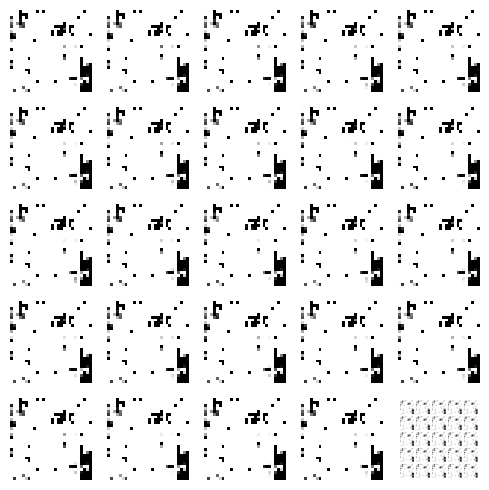

  0%|          | 0/350 [00:00<?, ?it/s]

4/4 [==============================] - 0s 19ms/step


  0%|          | 1/350 [00:00<04:01,  1.45it/s]

4/4 [==============================] - 0s 13ms/step


  1%|          | 2/350 [00:01<04:11,  1.39it/s]

4/4 [==============================] - 0s 15ms/step


  1%|          | 3/350 [00:02<04:03,  1.43it/s]

4/4 [==============================] - 0s 13ms/step


  1%|          | 4/350 [00:02<04:10,  1.38it/s]

4/4 [==============================] - 0s 14ms/step


  1%|▏         | 5/350 [00:03<04:02,  1.42it/s]

4/4 [==============================] - 0s 14ms/step


  2%|▏         | 6/350 [00:04<03:58,  1.44it/s]

4/4 [==============================] - 0s 41ms/step


  2%|▏         | 7/350 [00:05<04:27,  1.28it/s]

4/4 [==============================] - 0s 23ms/step


  2%|▏         | 8/350 [00:05<04:27,  1.28it/s]

4/4 [==============================] - 0s 15ms/step


  3%|▎         | 9/350 [00:06<04:20,  1.31it/s]

4/4 [==============================] - 0s 13ms/step


  3%|▎         | 10/350 [00:07<04:04,  1.39it/s]

4/4 [==============================] - 0s 25ms/step


  3%|▎         | 11/350 [00:08<04:03,  1.39it/s]

4/4 [==============================] - 0s 11ms/step


  3%|▎         | 12/350 [00:08<04:04,  1.38it/s]

4/4 [==============================] - 0s 16ms/step


  4%|▎         | 13/350 [00:09<03:56,  1.42it/s]

4/4 [==============================] - 0s 13ms/step


  4%|▍         | 14/350 [00:10<03:53,  1.44it/s]

4/4 [==============================] - 0s 20ms/step


  4%|▍         | 15/350 [00:10<03:48,  1.47it/s]

4/4 [==============================] - 0s 15ms/step


  5%|▍         | 16/350 [00:11<03:45,  1.48it/s]

4/4 [==============================] - 0s 12ms/step


  5%|▍         | 17/350 [00:12<03:46,  1.47it/s]

4/4 [==============================] - 0s 21ms/step


  5%|▌         | 18/350 [00:12<03:48,  1.46it/s]

4/4 [==============================] - 0s 12ms/step


  5%|▌         | 19/350 [00:13<03:47,  1.46it/s]

4/4 [==============================] - 0s 20ms/step


  6%|▌         | 20/350 [00:14<03:46,  1.46it/s]

4/4 [==============================] - 0s 11ms/step


  6%|▌         | 21/350 [00:14<03:39,  1.50it/s]

4/4 [==============================] - 0s 11ms/step


  6%|▋         | 22/350 [00:15<03:49,  1.43it/s]

4/4 [==============================] - 0s 15ms/step


  7%|▋         | 23/350 [00:16<03:44,  1.46it/s]

4/4 [==============================] - 0s 16ms/step


  7%|▋         | 24/350 [00:16<03:53,  1.39it/s]

4/4 [==============================] - 0s 12ms/step


  7%|▋         | 25/350 [00:17<03:46,  1.44it/s]

4/4 [==============================] - 0s 27ms/step


  7%|▋         | 26/350 [00:18<03:45,  1.44it/s]

4/4 [==============================] - 0s 19ms/step


  8%|▊         | 27/350 [00:19<03:50,  1.40it/s]

4/4 [==============================] - 0s 24ms/step


  8%|▊         | 28/350 [00:19<03:54,  1.37it/s]

4/4 [==============================] - 0s 14ms/step


  8%|▊         | 29/350 [00:20<03:45,  1.42it/s]

4/4 [==============================] - 0s 32ms/step


  9%|▊         | 30/350 [00:21<03:50,  1.39it/s]

4/4 [==============================] - 0s 19ms/step


  9%|▉         | 31/350 [00:22<03:54,  1.36it/s]

4/4 [==============================] - 0s 15ms/step


  9%|▉         | 32/350 [00:22<03:47,  1.40it/s]

4/4 [==============================] - 0s 15ms/step


  9%|▉         | 33/350 [00:23<03:45,  1.41it/s]

4/4 [==============================] - 0s 22ms/step


 10%|▉         | 34/350 [00:24<03:52,  1.36it/s]

4/4 [==============================] - 0s 18ms/step


 10%|█         | 35/350 [00:24<03:45,  1.40it/s]

4/4 [==============================] - 0s 27ms/step


 10%|█         | 36/350 [00:25<03:54,  1.34it/s]

4/4 [==============================] - 0s 13ms/step


 11%|█         | 37/350 [00:26<03:47,  1.38it/s]

4/4 [==============================] - 0s 15ms/step


 11%|█         | 38/350 [00:27<03:45,  1.39it/s]

4/4 [==============================] - 0s 14ms/step


 11%|█         | 39/350 [00:27<03:47,  1.37it/s]

4/4 [==============================] - 0s 14ms/step


 11%|█▏        | 40/350 [00:28<03:44,  1.38it/s]

4/4 [==============================] - 0s 12ms/step


 12%|█▏        | 41/350 [00:29<03:46,  1.36it/s]

4/4 [==============================] - 0s 16ms/step


 12%|█▏        | 42/350 [00:29<03:43,  1.38it/s]

4/4 [==============================] - 0s 30ms/step


 12%|█▏        | 43/350 [00:30<03:44,  1.37it/s]

4/4 [==============================] - 0s 14ms/step


 13%|█▎        | 44/350 [00:31<03:44,  1.36it/s]

4/4 [==============================] - 0s 14ms/step


 13%|█▎        | 45/350 [00:32<03:57,  1.29it/s]

4/4 [==============================] - 0s 16ms/step


 13%|█▎        | 46/350 [00:33<03:52,  1.31it/s]

4/4 [==============================] - 0s 22ms/step


 13%|█▎        | 47/350 [00:33<03:40,  1.37it/s]

4/4 [==============================] - 0s 28ms/step


 14%|█▎        | 48/350 [00:34<03:43,  1.35it/s]

4/4 [==============================] - 0s 12ms/step


 14%|█▍        | 49/350 [00:35<03:37,  1.38it/s]

4/4 [==============================] - 0s 21ms/step


 14%|█▍        | 50/350 [00:36<03:46,  1.33it/s]

4/4 [==============================] - 0s 16ms/step


 15%|█▍        | 51/350 [00:36<03:54,  1.27it/s]

4/4 [==============================] - 0s 19ms/step


 15%|█▍        | 52/350 [00:37<03:45,  1.32it/s]

4/4 [==============================] - 0s 28ms/step


 15%|█▌        | 53/350 [00:38<03:45,  1.31it/s]

4/4 [==============================] - 0s 13ms/step


 15%|█▌        | 54/350 [00:39<03:42,  1.33it/s]

4/4 [==============================] - 0s 14ms/step


 16%|█▌        | 55/350 [00:39<03:31,  1.39it/s]

4/4 [==============================] - 0s 25ms/step


 16%|█▌        | 56/350 [00:40<03:30,  1.39it/s]

4/4 [==============================] - 0s 11ms/step


 16%|█▋        | 57/350 [00:41<03:29,  1.40it/s]

4/4 [==============================] - 0s 18ms/step


 17%|█▋        | 58/350 [00:41<03:29,  1.39it/s]

4/4 [==============================] - 0s 18ms/step


 17%|█▋        | 59/350 [00:42<03:22,  1.44it/s]

4/4 [==============================] - 0s 16ms/step


 17%|█▋        | 60/350 [00:43<03:25,  1.41it/s]

4/4 [==============================] - 0s 30ms/step


 17%|█▋        | 61/350 [00:43<03:23,  1.42it/s]

4/4 [==============================] - 0s 19ms/step


 18%|█▊        | 62/350 [00:44<03:23,  1.42it/s]

4/4 [==============================] - 0s 21ms/step


 18%|█▊        | 63/350 [00:45<03:31,  1.36it/s]

4/4 [==============================] - 0s 15ms/step


 18%|█▊        | 64/350 [00:46<03:27,  1.38it/s]

4/4 [==============================] - 0s 21ms/step


 19%|█▊        | 65/350 [00:46<03:24,  1.39it/s]

4/4 [==============================] - 0s 14ms/step


 19%|█▉        | 66/350 [00:47<03:27,  1.37it/s]

4/4 [==============================] - 0s 15ms/step


 19%|█▉        | 67/350 [00:48<03:23,  1.39it/s]

4/4 [==============================] - 0s 16ms/step


 19%|█▉        | 68/350 [00:48<03:18,  1.42it/s]

4/4 [==============================] - 0s 21ms/step


 20%|█▉        | 69/350 [00:49<03:19,  1.41it/s]

4/4 [==============================] - 0s 13ms/step


 20%|██        | 70/350 [00:50<03:14,  1.44it/s]

4/4 [==============================] - 0s 13ms/step


 20%|██        | 71/350 [00:51<03:12,  1.45it/s]

4/4 [==============================] - 0s 21ms/step


 21%|██        | 72/350 [00:51<03:16,  1.42it/s]

4/4 [==============================] - 0s 15ms/step


 21%|██        | 73/350 [00:52<03:23,  1.36it/s]

4/4 [==============================] - 0s 11ms/step


 21%|██        | 74/350 [00:53<03:10,  1.45it/s]

4/4 [==============================] - 0s 15ms/step


 21%|██▏       | 75/350 [00:53<03:08,  1.46it/s]

4/4 [==============================] - 0s 14ms/step


 22%|██▏       | 76/350 [00:54<03:08,  1.45it/s]

4/4 [==============================] - 0s 13ms/step


 22%|██▏       | 77/350 [00:55<03:17,  1.38it/s]

4/4 [==============================] - 0s 12ms/step


 22%|██▏       | 78/350 [00:55<03:08,  1.44it/s]

4/4 [==============================] - 0s 18ms/step


 23%|██▎       | 79/350 [00:56<03:12,  1.41it/s]

4/4 [==============================] - 0s 11ms/step


 23%|██▎       | 80/350 [00:57<03:06,  1.45it/s]

4/4 [==============================] - 0s 21ms/step


 23%|██▎       | 81/350 [00:58<03:09,  1.42it/s]

4/4 [==============================] - 0s 12ms/step


 23%|██▎       | 82/350 [00:58<03:08,  1.42it/s]

4/4 [==============================] - 0s 20ms/step


 24%|██▎       | 83/350 [00:59<03:07,  1.42it/s]

4/4 [==============================] - 0s 15ms/step


 24%|██▍       | 84/350 [01:00<03:16,  1.35it/s]

4/4 [==============================] - 0s 14ms/step


 24%|██▍       | 85/350 [01:01<03:15,  1.36it/s]

4/4 [==============================] - 0s 14ms/step


 25%|██▍       | 86/350 [01:01<03:07,  1.41it/s]

4/4 [==============================] - 0s 47ms/step


 25%|██▍       | 87/350 [01:02<03:10,  1.38it/s]

4/4 [==============================] - 0s 13ms/step


 25%|██▌       | 88/350 [01:03<03:11,  1.37it/s]

4/4 [==============================] - 0s 17ms/step


 25%|██▌       | 89/350 [01:03<03:07,  1.39it/s]

4/4 [==============================] - 0s 15ms/step


 26%|██▌       | 90/350 [01:04<03:00,  1.44it/s]

4/4 [==============================] - 0s 19ms/step


 26%|██▌       | 91/350 [01:05<03:03,  1.41it/s]

4/4 [==============================] - 0s 17ms/step


 26%|██▋       | 92/350 [01:05<02:57,  1.45it/s]

4/4 [==============================] - 0s 29ms/step


 27%|██▋       | 93/350 [01:06<02:59,  1.43it/s]

4/4 [==============================] - 0s 15ms/step


 27%|██▋       | 94/350 [01:07<02:53,  1.47it/s]

4/4 [==============================] - 0s 21ms/step


 27%|██▋       | 95/350 [01:07<02:55,  1.46it/s]

4/4 [==============================] - 0s 12ms/step


 27%|██▋       | 96/350 [01:08<02:47,  1.52it/s]

4/4 [==============================] - 0s 23ms/step


 28%|██▊       | 97/350 [01:09<02:49,  1.49it/s]

4/4 [==============================] - 0s 15ms/step


 28%|██▊       | 98/350 [01:09<02:43,  1.54it/s]

4/4 [==============================] - 0s 13ms/step


 28%|██▊       | 99/350 [01:10<02:49,  1.48it/s]

4/4 [==============================] - 0s 12ms/step


 29%|██▊       | 100/350 [01:11<02:47,  1.50it/s]

4/4 [==============================] - 0s 18ms/step


 29%|██▉       | 101/350 [01:11<02:45,  1.50it/s]

4/4 [==============================] - 0s 14ms/step


 29%|██▉       | 102/350 [01:12<02:51,  1.45it/s]

4/4 [==============================] - 0s 13ms/step


 29%|██▉       | 103/350 [01:13<02:55,  1.40it/s]

4/4 [==============================] - 0s 14ms/step


 30%|██▉       | 104/350 [01:14<02:47,  1.47it/s]

4/4 [==============================] - 0s 27ms/step


 30%|███       | 105/350 [01:14<02:49,  1.45it/s]

4/4 [==============================] - 0s 17ms/step


 30%|███       | 106/350 [01:15<02:50,  1.43it/s]

4/4 [==============================] - 0s 16ms/step


 31%|███       | 107/350 [01:16<02:45,  1.47it/s]

4/4 [==============================] - 0s 13ms/step


 31%|███       | 108/350 [01:16<02:46,  1.46it/s]

4/4 [==============================] - 0s 16ms/step


 31%|███       | 109/350 [01:17<03:03,  1.31it/s]

4/4 [==============================] - 0s 14ms/step


 31%|███▏      | 110/350 [01:18<02:49,  1.41it/s]

4/4 [==============================] - 0s 12ms/step


 32%|███▏      | 111/350 [01:18<02:41,  1.48it/s]

4/4 [==============================] - 0s 15ms/step


 32%|███▏      | 112/350 [01:19<02:43,  1.45it/s]

4/4 [==============================] - 0s 14ms/step


 32%|███▏      | 113/350 [01:20<02:42,  1.46it/s]

4/4 [==============================] - 0s 28ms/step


 33%|███▎      | 114/350 [01:21<02:43,  1.44it/s]

4/4 [==============================] - 0s 15ms/step


 33%|███▎      | 115/350 [01:21<02:39,  1.47it/s]

4/4 [==============================] - 0s 28ms/step


 33%|███▎      | 116/350 [01:22<02:40,  1.46it/s]

4/4 [==============================] - 0s 11ms/step


 33%|███▎      | 117/350 [01:23<02:39,  1.46it/s]

4/4 [==============================] - 0s 14ms/step


 34%|███▎      | 118/350 [01:23<02:37,  1.47it/s]

4/4 [==============================] - 0s 15ms/step


 34%|███▍      | 119/350 [01:24<02:36,  1.48it/s]

4/4 [==============================] - 0s 14ms/step


 34%|███▍      | 120/350 [01:25<02:34,  1.49it/s]

4/4 [==============================] - 0s 15ms/step


 35%|███▍      | 121/350 [01:25<02:35,  1.47it/s]

4/4 [==============================] - 0s 18ms/step


 35%|███▍      | 122/350 [01:26<02:39,  1.43it/s]

4/4 [==============================] - 0s 16ms/step


 35%|███▌      | 123/350 [01:27<02:42,  1.40it/s]

4/4 [==============================] - 0s 14ms/step


 35%|███▌      | 124/350 [01:27<02:38,  1.42it/s]

4/4 [==============================] - 0s 30ms/step


 36%|███▌      | 125/350 [01:28<02:43,  1.38it/s]

4/4 [==============================] - 0s 17ms/step


 36%|███▌      | 126/350 [01:29<02:45,  1.35it/s]

4/4 [==============================] - 0s 20ms/step


 36%|███▋      | 127/350 [01:30<02:45,  1.35it/s]

4/4 [==============================] - 0s 15ms/step


 37%|███▋      | 128/350 [01:31<02:54,  1.28it/s]

4/4 [==============================] - 0s 16ms/step


 37%|███▋      | 129/350 [01:31<02:47,  1.32it/s]

4/4 [==============================] - 0s 36ms/step


 37%|███▋      | 130/350 [01:32<02:49,  1.30it/s]

4/4 [==============================] - 0s 13ms/step


 37%|███▋      | 131/350 [01:33<02:40,  1.36it/s]

4/4 [==============================] - 0s 23ms/step


 38%|███▊      | 132/350 [01:34<02:47,  1.30it/s]

4/4 [==============================] - 0s 16ms/step


 38%|███▊      | 133/350 [01:34<02:49,  1.28it/s]

4/4 [==============================] - 0s 27ms/step


 38%|███▊      | 134/350 [01:35<03:04,  1.17it/s]

4/4 [==============================] - 0s 19ms/step


 39%|███▊      | 135/350 [01:36<03:06,  1.15it/s]

4/4 [==============================] - 0s 15ms/step


 39%|███▉      | 136/350 [01:37<03:03,  1.16it/s]

4/4 [==============================] - 0s 31ms/step


 39%|███▉      | 137/350 [01:38<02:58,  1.19it/s]

4/4 [==============================] - 0s 14ms/step


 39%|███▉      | 138/350 [01:39<02:49,  1.25it/s]

4/4 [==============================] - 0s 13ms/step


 40%|███▉      | 139/350 [01:39<02:50,  1.24it/s]

4/4 [==============================] - 0s 15ms/step


 40%|████      | 140/350 [01:40<02:43,  1.28it/s]

4/4 [==============================] - 0s 21ms/step


 40%|████      | 141/350 [01:41<02:46,  1.25it/s]

4/4 [==============================] - 0s 24ms/step


 41%|████      | 142/350 [01:42<02:52,  1.21it/s]

4/4 [==============================] - 0s 18ms/step


 41%|████      | 143/350 [01:43<02:57,  1.17it/s]

4/4 [==============================] - 0s 15ms/step


 41%|████      | 144/350 [01:44<02:54,  1.18it/s]

4/4 [==============================] - 0s 13ms/step


 41%|████▏     | 145/350 [01:44<02:43,  1.25it/s]

4/4 [==============================] - 0s 26ms/step


 42%|████▏     | 146/350 [01:45<02:40,  1.27it/s]

4/4 [==============================] - 0s 14ms/step


 42%|████▏     | 147/350 [01:46<02:31,  1.34it/s]

4/4 [==============================] - 0s 14ms/step


 42%|████▏     | 148/350 [01:46<02:28,  1.36it/s]

4/4 [==============================] - 0s 12ms/step


 43%|████▎     | 149/350 [01:47<02:25,  1.38it/s]

4/4 [==============================] - 0s 15ms/step


 43%|████▎     | 150/350 [01:48<02:23,  1.39it/s]

4/4 [==============================] - 0s 12ms/step


 43%|████▎     | 151/350 [01:49<02:19,  1.43it/s]

4/4 [==============================] - 0s 23ms/step


 43%|████▎     | 152/350 [01:49<02:19,  1.42it/s]

4/4 [==============================] - 0s 14ms/step


 44%|████▎     | 153/350 [01:50<02:25,  1.36it/s]

4/4 [==============================] - 0s 20ms/step


 44%|████▍     | 154/350 [01:51<02:33,  1.28it/s]

4/4 [==============================] - 0s 23ms/step


 44%|████▍     | 155/350 [01:52<02:38,  1.23it/s]

4/4 [==============================] - 0s 14ms/step


 45%|████▍     | 156/350 [01:53<02:32,  1.27it/s]

4/4 [==============================] - 0s 17ms/step


 45%|████▍     | 157/350 [01:53<02:31,  1.28it/s]

4/4 [==============================] - 0s 15ms/step


 45%|████▌     | 158/350 [01:54<02:21,  1.35it/s]

4/4 [==============================] - 0s 24ms/step


 45%|████▌     | 159/350 [01:55<02:21,  1.35it/s]

4/4 [==============================] - 0s 15ms/step


 46%|████▌     | 160/350 [01:55<02:15,  1.40it/s]

4/4 [==============================] - 0s 22ms/step


 46%|████▌     | 161/350 [01:56<02:14,  1.41it/s]

4/4 [==============================] - 0s 14ms/step


 46%|████▋     | 162/350 [01:57<02:15,  1.39it/s]

4/4 [==============================] - 0s 15ms/step


 47%|████▋     | 163/350 [01:58<02:16,  1.37it/s]

4/4 [==============================] - 0s 15ms/step


 47%|████▋     | 164/350 [01:58<02:17,  1.35it/s]

4/4 [==============================] - 0s 18ms/step


 47%|████▋     | 165/350 [01:59<02:17,  1.35it/s]

4/4 [==============================] - 0s 16ms/step


 47%|████▋     | 166/350 [02:00<02:19,  1.32it/s]

4/4 [==============================] - 0s 13ms/step


 48%|████▊     | 167/350 [02:01<02:16,  1.34it/s]

4/4 [==============================] - 0s 14ms/step


 48%|████▊     | 168/350 [02:01<02:11,  1.38it/s]

4/4 [==============================] - 0s 18ms/step


 48%|████▊     | 169/350 [02:02<02:15,  1.33it/s]

4/4 [==============================] - 0s 14ms/step


 49%|████▊     | 170/350 [02:03<02:12,  1.36it/s]

4/4 [==============================] - 0s 16ms/step


 49%|████▉     | 171/350 [02:03<02:06,  1.41it/s]

4/4 [==============================] - 0s 28ms/step


 49%|████▉     | 172/350 [02:04<02:10,  1.37it/s]

4/4 [==============================] - 0s 13ms/step


 49%|████▉     | 173/350 [02:05<02:08,  1.38it/s]

4/4 [==============================] - 0s 25ms/step


 50%|████▉     | 174/350 [02:06<02:11,  1.34it/s]

4/4 [==============================] - 0s 22ms/step


 50%|█████     | 175/350 [02:06<02:10,  1.34it/s]

4/4 [==============================] - 0s 15ms/step


 50%|█████     | 176/350 [02:07<02:07,  1.36it/s]

4/4 [==============================] - 0s 26ms/step


 51%|█████     | 177/350 [02:08<02:08,  1.35it/s]

4/4 [==============================] - 0s 16ms/step


 51%|█████     | 178/350 [02:09<02:04,  1.38it/s]

4/4 [==============================] - 0s 24ms/step


 51%|█████     | 179/350 [02:09<02:04,  1.37it/s]

4/4 [==============================] - 0s 13ms/step


 51%|█████▏    | 180/350 [02:10<02:03,  1.37it/s]

4/4 [==============================] - 0s 17ms/step


 52%|█████▏    | 181/350 [02:11<02:02,  1.38it/s]

4/4 [==============================] - 0s 27ms/step


 52%|█████▏    | 182/350 [02:12<02:00,  1.39it/s]

4/4 [==============================] - 0s 12ms/step


 52%|█████▏    | 183/350 [02:12<01:58,  1.41it/s]

4/4 [==============================] - 0s 27ms/step


 53%|█████▎    | 184/350 [02:13<02:03,  1.34it/s]

4/4 [==============================] - 0s 15ms/step


 53%|█████▎    | 185/350 [02:14<02:02,  1.35it/s]

4/4 [==============================] - 0s 14ms/step


 53%|█████▎    | 186/350 [02:14<01:56,  1.40it/s]

4/4 [==============================] - 0s 30ms/step


 53%|█████▎    | 187/350 [02:15<02:00,  1.36it/s]

4/4 [==============================] - 0s 14ms/step


 54%|█████▎    | 188/350 [02:16<02:00,  1.34it/s]

4/4 [==============================] - 0s 16ms/step


 54%|█████▍    | 189/350 [02:17<01:55,  1.40it/s]

4/4 [==============================] - 0s 15ms/step


 54%|█████▍    | 190/350 [02:17<01:57,  1.37it/s]

4/4 [==============================] - 0s 17ms/step


 55%|█████▍    | 191/350 [02:18<01:55,  1.37it/s]

4/4 [==============================] - 0s 22ms/step


 55%|█████▍    | 192/350 [02:19<01:56,  1.35it/s]

4/4 [==============================] - 0s 15ms/step


 55%|█████▌    | 193/350 [02:20<01:55,  1.36it/s]

4/4 [==============================] - 0s 16ms/step


 55%|█████▌    | 194/350 [02:20<01:53,  1.38it/s]

4/4 [==============================] - 0s 28ms/step


 56%|█████▌    | 195/350 [02:21<01:55,  1.34it/s]

4/4 [==============================] - 0s 12ms/step


 56%|█████▌    | 196/350 [02:22<01:47,  1.43it/s]

4/4 [==============================] - 0s 16ms/step


 56%|█████▋    | 197/350 [02:22<01:43,  1.47it/s]

4/4 [==============================] - 0s 24ms/step


 57%|█████▋    | 198/350 [02:23<01:46,  1.43it/s]

4/4 [==============================] - 0s 11ms/step


 57%|█████▋    | 199/350 [02:24<01:42,  1.47it/s]

4/4 [==============================] - 0s 21ms/step


 57%|█████▋    | 200/350 [02:24<01:42,  1.47it/s]

4/4 [==============================] - 0s 13ms/step


 57%|█████▋    | 201/350 [02:25<01:44,  1.43it/s]

4/4 [==============================] - 0s 14ms/step


 58%|█████▊    | 202/350 [02:26<01:46,  1.39it/s]

4/4 [==============================] - 0s 15ms/step


 58%|█████▊    | 203/350 [02:26<01:41,  1.46it/s]

4/4 [==============================] - 0s 21ms/step


 58%|█████▊    | 204/350 [02:27<01:41,  1.43it/s]

4/4 [==============================] - 0s 17ms/step


 59%|█████▊    | 205/350 [02:28<01:42,  1.41it/s]

4/4 [==============================] - 0s 20ms/step


 59%|█████▉    | 206/350 [02:29<01:44,  1.37it/s]

4/4 [==============================] - 0s 28ms/step


 59%|█████▉    | 207/350 [02:29<01:43,  1.38it/s]

4/4 [==============================] - 0s 10ms/step


 59%|█████▉    | 208/350 [02:30<01:40,  1.42it/s]

4/4 [==============================] - 0s 19ms/step


 60%|█████▉    | 209/350 [02:31<01:38,  1.43it/s]

4/4 [==============================] - 0s 31ms/step


 60%|██████    | 210/350 [02:32<01:39,  1.40it/s]

4/4 [==============================] - 0s 13ms/step


 60%|██████    | 211/350 [02:32<01:37,  1.43it/s]

4/4 [==============================] - 0s 15ms/step


 61%|██████    | 212/350 [02:33<01:35,  1.44it/s]

4/4 [==============================] - 0s 16ms/step


 61%|██████    | 213/350 [02:34<01:35,  1.44it/s]

4/4 [==============================] - 0s 14ms/step


 61%|██████    | 214/350 [02:34<01:32,  1.46it/s]

4/4 [==============================] - 0s 26ms/step


 61%|██████▏   | 215/350 [02:35<01:32,  1.46it/s]

4/4 [==============================] - 0s 14ms/step


 62%|██████▏   | 216/350 [02:36<01:33,  1.43it/s]

4/4 [==============================] - 0s 15ms/step


 62%|██████▏   | 217/350 [02:36<01:32,  1.45it/s]

4/4 [==============================] - 0s 14ms/step


 62%|██████▏   | 218/350 [02:37<01:30,  1.45it/s]

4/4 [==============================] - 0s 15ms/step


 63%|██████▎   | 219/350 [02:38<01:26,  1.52it/s]

4/4 [==============================] - 0s 13ms/step


 63%|██████▎   | 220/350 [02:38<01:25,  1.52it/s]

4/4 [==============================] - 0s 24ms/step


 63%|██████▎   | 221/350 [02:39<01:30,  1.43it/s]

4/4 [==============================] - 0s 15ms/step


 63%|██████▎   | 222/350 [02:40<01:31,  1.40it/s]

4/4 [==============================] - 0s 18ms/step


 64%|██████▎   | 223/350 [02:40<01:29,  1.42it/s]

4/4 [==============================] - 0s 20ms/step


 64%|██████▍   | 224/350 [02:41<01:29,  1.41it/s]

4/4 [==============================] - 0s 15ms/step


 64%|██████▍   | 225/350 [02:42<01:28,  1.41it/s]

4/4 [==============================] - 0s 26ms/step


 65%|██████▍   | 226/350 [02:43<01:28,  1.40it/s]

4/4 [==============================] - 0s 16ms/step


 65%|██████▍   | 227/350 [02:43<01:28,  1.39it/s]

4/4 [==============================] - 0s 14ms/step


 65%|██████▌   | 228/350 [02:44<01:27,  1.40it/s]

4/4 [==============================] - 0s 20ms/step


 65%|██████▌   | 229/350 [02:45<01:26,  1.40it/s]

4/4 [==============================] - 0s 20ms/step


 66%|██████▌   | 230/350 [02:45<01:23,  1.43it/s]

4/4 [==============================] - 0s 15ms/step


 66%|██████▌   | 231/350 [02:46<01:27,  1.35it/s]

4/4 [==============================] - 0s 14ms/step


 66%|██████▋   | 232/350 [02:47<01:30,  1.30it/s]

4/4 [==============================] - 0s 13ms/step


 67%|██████▋   | 233/350 [02:48<01:25,  1.36it/s]

4/4 [==============================] - 0s 30ms/step


 67%|██████▋   | 234/350 [02:49<01:26,  1.35it/s]

4/4 [==============================] - 0s 20ms/step


 67%|██████▋   | 235/350 [02:49<01:23,  1.38it/s]

4/4 [==============================] - 0s 23ms/step


 67%|██████▋   | 236/350 [02:50<01:24,  1.35it/s]

4/4 [==============================] - 0s 15ms/step


 68%|██████▊   | 237/350 [02:51<01:19,  1.41it/s]

4/4 [==============================] - 0s 19ms/step


 68%|██████▊   | 238/350 [02:51<01:19,  1.41it/s]

4/4 [==============================] - 0s 12ms/step


 68%|██████▊   | 239/350 [02:52<01:15,  1.47it/s]

4/4 [==============================] - 0s 16ms/step


 69%|██████▊   | 240/350 [02:53<01:14,  1.47it/s]

4/4 [==============================] - 0s 16ms/step


 69%|██████▉   | 241/350 [02:53<01:13,  1.48it/s]

4/4 [==============================] - 0s 15ms/step


 69%|██████▉   | 242/350 [02:54<01:14,  1.44it/s]

4/4 [==============================] - 0s 14ms/step


 69%|██████▉   | 243/350 [02:55<01:10,  1.52it/s]

4/4 [==============================] - 0s 11ms/step


 70%|██████▉   | 244/350 [02:55<01:08,  1.55it/s]

4/4 [==============================] - 0s 26ms/step


 70%|███████   | 245/350 [02:56<01:10,  1.49it/s]

4/4 [==============================] - 0s 14ms/step


 70%|███████   | 246/350 [02:57<01:08,  1.51it/s]

4/4 [==============================] - 0s 13ms/step


 71%|███████   | 247/350 [02:57<01:10,  1.45it/s]

4/4 [==============================] - 0s 12ms/step


 71%|███████   | 248/350 [02:58<01:09,  1.46it/s]

4/4 [==============================] - 0s 18ms/step


 71%|███████   | 249/350 [02:59<01:08,  1.47it/s]

4/4 [==============================] - 0s 20ms/step


 71%|███████▏  | 250/350 [03:00<01:12,  1.38it/s]

4/4 [==============================] - 0s 30ms/step


 72%|███████▏  | 251/350 [03:00<01:19,  1.25it/s]

4/4 [==============================] - 0s 25ms/step


 72%|███████▏  | 252/350 [03:01<01:18,  1.25it/s]

4/4 [==============================] - 0s 13ms/step


 72%|███████▏  | 253/350 [03:02<01:12,  1.34it/s]

4/4 [==============================] - 0s 16ms/step


 73%|███████▎  | 254/350 [03:03<01:11,  1.34it/s]

4/4 [==============================] - 0s 12ms/step


 73%|███████▎  | 255/350 [03:03<01:07,  1.40it/s]

4/4 [==============================] - 0s 24ms/step


 73%|███████▎  | 256/350 [03:04<01:08,  1.38it/s]

4/4 [==============================] - 0s 16ms/step


 73%|███████▎  | 257/350 [03:05<01:08,  1.35it/s]

4/4 [==============================] - 0s 14ms/step


 74%|███████▎  | 258/350 [03:06<01:06,  1.37it/s]

4/4 [==============================] - 0s 16ms/step


 74%|███████▍  | 259/350 [03:06<01:05,  1.39it/s]

4/4 [==============================] - 0s 21ms/step


 74%|███████▍  | 260/350 [03:07<01:05,  1.38it/s]

4/4 [==============================] - 0s 12ms/step


 75%|███████▍  | 261/350 [03:08<01:01,  1.45it/s]

4/4 [==============================] - 0s 16ms/step


 75%|███████▍  | 262/350 [03:08<01:00,  1.45it/s]

4/4 [==============================] - 0s 19ms/step


 75%|███████▌  | 263/350 [03:09<01:00,  1.45it/s]

4/4 [==============================] - 0s 13ms/step


 75%|███████▌  | 264/350 [03:10<01:02,  1.38it/s]

4/4 [==============================] - 0s 16ms/step


 76%|███████▌  | 265/350 [03:10<01:00,  1.41it/s]

4/4 [==============================] - 0s 18ms/step


 76%|███████▌  | 266/350 [03:11<01:00,  1.38it/s]

4/4 [==============================] - 0s 21ms/step


 76%|███████▋  | 267/350 [03:12<00:58,  1.41it/s]

4/4 [==============================] - 0s 16ms/step


 77%|███████▋  | 268/350 [03:13<00:57,  1.43it/s]

4/4 [==============================] - 0s 14ms/step


 77%|███████▋  | 269/350 [03:13<00:55,  1.47it/s]

4/4 [==============================] - 0s 25ms/step


 77%|███████▋  | 270/350 [03:14<00:56,  1.42it/s]

4/4 [==============================] - 0s 16ms/step


 77%|███████▋  | 271/350 [03:15<00:54,  1.46it/s]

4/4 [==============================] - 0s 21ms/step


 78%|███████▊  | 272/350 [03:15<00:54,  1.42it/s]

4/4 [==============================] - 0s 13ms/step


 78%|███████▊  | 273/350 [03:16<00:53,  1.44it/s]

4/4 [==============================] - 0s 30ms/step


 78%|███████▊  | 274/350 [03:17<00:54,  1.38it/s]

4/4 [==============================] - 0s 17ms/step


 79%|███████▊  | 275/350 [03:18<00:57,  1.31it/s]

4/4 [==============================] - 0s 20ms/step


 79%|███████▉  | 276/350 [03:18<00:56,  1.32it/s]

4/4 [==============================] - 0s 17ms/step


 79%|███████▉  | 277/350 [03:19<00:55,  1.32it/s]

4/4 [==============================] - 0s 14ms/step


 79%|███████▉  | 278/350 [03:20<00:54,  1.33it/s]

4/4 [==============================] - 0s 14ms/step


 80%|███████▉  | 279/350 [03:21<00:51,  1.39it/s]

4/4 [==============================] - 0s 12ms/step


 80%|████████  | 280/350 [03:21<00:48,  1.44it/s]

4/4 [==============================] - 0s 18ms/step


 80%|████████  | 281/350 [03:22<00:48,  1.41it/s]

4/4 [==============================] - 0s 14ms/step


 81%|████████  | 282/350 [03:23<00:49,  1.38it/s]

4/4 [==============================] - 0s 16ms/step


 81%|████████  | 283/350 [03:23<00:48,  1.39it/s]

4/4 [==============================] - 0s 17ms/step


 81%|████████  | 284/350 [03:24<00:47,  1.38it/s]

4/4 [==============================] - 0s 13ms/step


 81%|████████▏ | 285/350 [03:25<00:45,  1.44it/s]

4/4 [==============================] - 0s 13ms/step


 82%|████████▏ | 286/350 [03:25<00:42,  1.50it/s]

4/4 [==============================] - 0s 19ms/step


 82%|████████▏ | 287/350 [03:26<00:43,  1.45it/s]

4/4 [==============================] - 0s 20ms/step


 82%|████████▏ | 288/350 [03:27<00:43,  1.43it/s]

4/4 [==============================] - 0s 16ms/step


 83%|████████▎ | 289/350 [03:27<00:41,  1.48it/s]

4/4 [==============================] - 0s 25ms/step


 83%|████████▎ | 290/350 [03:28<00:41,  1.43it/s]

4/4 [==============================] - 0s 16ms/step


 83%|████████▎ | 291/350 [03:29<00:42,  1.40it/s]

4/4 [==============================] - 0s 15ms/step


 83%|████████▎ | 292/350 [03:30<00:41,  1.38it/s]

4/4 [==============================] - 0s 15ms/step


 84%|████████▎ | 293/350 [03:30<00:40,  1.41it/s]

4/4 [==============================] - 0s 45ms/step


 84%|████████▍ | 294/350 [03:31<00:42,  1.32it/s]

4/4 [==============================] - 0s 13ms/step


 84%|████████▍ | 295/350 [03:32<00:39,  1.38it/s]

4/4 [==============================] - 0s 21ms/step


 85%|████████▍ | 296/350 [03:33<00:39,  1.37it/s]

4/4 [==============================] - 0s 13ms/step


 85%|████████▍ | 297/350 [03:33<00:37,  1.40it/s]

4/4 [==============================] - 0s 19ms/step


 85%|████████▌ | 298/350 [03:34<00:38,  1.37it/s]

4/4 [==============================] - 0s 19ms/step


 85%|████████▌ | 299/350 [03:35<00:37,  1.36it/s]

4/4 [==============================] - 0s 17ms/step


 86%|████████▌ | 300/350 [03:36<00:38,  1.29it/s]

4/4 [==============================] - 0s 15ms/step


 86%|████████▌ | 301/350 [03:36<00:36,  1.35it/s]

4/4 [==============================] - 0s 38ms/step


 86%|████████▋ | 302/350 [03:37<00:36,  1.30it/s]

4/4 [==============================] - 0s 14ms/step


 87%|████████▋ | 303/350 [03:38<00:35,  1.33it/s]

4/4 [==============================] - 0s 15ms/step


 87%|████████▋ | 304/350 [03:39<00:32,  1.40it/s]

4/4 [==============================] - 0s 17ms/step


 87%|████████▋ | 305/350 [03:39<00:33,  1.35it/s]

4/4 [==============================] - 0s 13ms/step


 87%|████████▋ | 306/350 [03:40<00:32,  1.37it/s]

4/4 [==============================] - 0s 20ms/step


 88%|████████▊ | 307/350 [03:41<00:31,  1.38it/s]

4/4 [==============================] - 0s 13ms/step


 88%|████████▊ | 308/350 [03:41<00:30,  1.37it/s]

4/4 [==============================] - 0s 16ms/step


 88%|████████▊ | 309/350 [03:42<00:29,  1.38it/s]

4/4 [==============================] - 0s 23ms/step


 89%|████████▊ | 310/350 [03:43<00:29,  1.37it/s]

4/4 [==============================] - 0s 14ms/step


 89%|████████▉ | 311/350 [03:44<00:27,  1.43it/s]

4/4 [==============================] - 0s 30ms/step


 89%|████████▉ | 312/350 [03:44<00:27,  1.40it/s]

4/4 [==============================] - 0s 14ms/step


 89%|████████▉ | 313/350 [03:45<00:26,  1.38it/s]

4/4 [==============================] - 0s 19ms/step


 90%|████████▉ | 314/350 [03:46<00:26,  1.38it/s]

4/4 [==============================] - 0s 33ms/step


 90%|█████████ | 315/350 [03:47<00:25,  1.35it/s]

4/4 [==============================] - 0s 12ms/step


 90%|█████████ | 316/350 [03:47<00:23,  1.42it/s]

4/4 [==============================] - 0s 36ms/step


 91%|█████████ | 317/350 [03:48<00:24,  1.37it/s]

4/4 [==============================] - 0s 13ms/step


 91%|█████████ | 318/350 [03:49<00:23,  1.37it/s]

4/4 [==============================] - 0s 14ms/step


 91%|█████████ | 319/350 [03:49<00:21,  1.41it/s]

4/4 [==============================] - 0s 13ms/step


 91%|█████████▏| 320/350 [03:50<00:20,  1.45it/s]

4/4 [==============================] - 0s 23ms/step


 92%|█████████▏| 321/350 [03:51<00:20,  1.40it/s]

4/4 [==============================] - 0s 15ms/step


 92%|█████████▏| 322/350 [03:51<00:19,  1.40it/s]

4/4 [==============================] - 0s 13ms/step


 92%|█████████▏| 323/350 [03:52<00:18,  1.46it/s]

4/4 [==============================] - 0s 15ms/step


 93%|█████████▎| 324/350 [03:53<00:17,  1.47it/s]

4/4 [==============================] - 0s 40ms/step


 93%|█████████▎| 325/350 [03:54<00:18,  1.36it/s]

4/4 [==============================] - 0s 24ms/step


 93%|█████████▎| 326/350 [03:54<00:17,  1.35it/s]

4/4 [==============================] - 0s 15ms/step


 93%|█████████▎| 327/350 [03:55<00:16,  1.42it/s]

4/4 [==============================] - 0s 12ms/step


 94%|█████████▎| 328/350 [03:56<00:15,  1.43it/s]

4/4 [==============================] - 0s 16ms/step


 94%|█████████▍| 329/350 [03:56<00:14,  1.45it/s]

4/4 [==============================] - 0s 14ms/step


 94%|█████████▍| 330/350 [03:57<00:13,  1.44it/s]

4/4 [==============================] - 0s 29ms/step


 95%|█████████▍| 331/350 [03:58<00:13,  1.40it/s]

4/4 [==============================] - 0s 21ms/step


 95%|█████████▍| 332/350 [03:59<00:12,  1.41it/s]

4/4 [==============================] - 0s 16ms/step


 95%|█████████▌| 333/350 [03:59<00:12,  1.41it/s]

4/4 [==============================] - 0s 16ms/step


 95%|█████████▌| 334/350 [04:00<00:11,  1.39it/s]

4/4 [==============================] - 0s 18ms/step


 96%|█████████▌| 335/350 [04:01<00:10,  1.45it/s]

4/4 [==============================] - 0s 14ms/step


 96%|█████████▌| 336/350 [04:01<00:09,  1.45it/s]

4/4 [==============================] - 0s 22ms/step


 96%|█████████▋| 337/350 [04:02<00:09,  1.42it/s]

4/4 [==============================] - 0s 16ms/step


 97%|█████████▋| 338/350 [04:03<00:08,  1.41it/s]

4/4 [==============================] - 0s 14ms/step


 97%|█████████▋| 339/350 [04:03<00:07,  1.43it/s]

4/4 [==============================] - 0s 21ms/step


 97%|█████████▋| 340/350 [04:04<00:07,  1.34it/s]

4/4 [==============================] - 0s 18ms/step


 97%|█████████▋| 341/350 [04:05<00:06,  1.33it/s]

4/4 [==============================] - 0s 13ms/step


 98%|█████████▊| 342/350 [04:06<00:05,  1.39it/s]

4/4 [==============================] - 0s 31ms/step


 98%|█████████▊| 343/350 [04:06<00:04,  1.40it/s]

4/4 [==============================] - 0s 14ms/step


 98%|█████████▊| 344/350 [04:07<00:04,  1.39it/s]

4/4 [==============================] - 0s 21ms/step


 99%|█████████▊| 345/350 [04:08<00:03,  1.38it/s]

4/4 [==============================] - 0s 12ms/step


 99%|█████████▉| 346/350 [04:08<00:02,  1.44it/s]

4/4 [==============================] - 0s 31ms/step


 99%|█████████▉| 347/350 [04:09<00:02,  1.41it/s]

4/4 [==============================] - 0s 26ms/step


 99%|█████████▉| 348/350 [04:10<00:01,  1.37it/s]

4/4 [==============================] - 0s 12ms/step


100%|█████████▉| 349/350 [04:11<00:00,  1.37it/s]

4/4 [==============================] - 0s 15ms/step


100%|██████████| 350/350 [04:11<00:00,  1.39it/s]

Epoch number: 59 discriminator_loss: 0.1643802511292909 generator_loss: 7.802396342413766
1/1 [==============================] - 0s 36ms/step


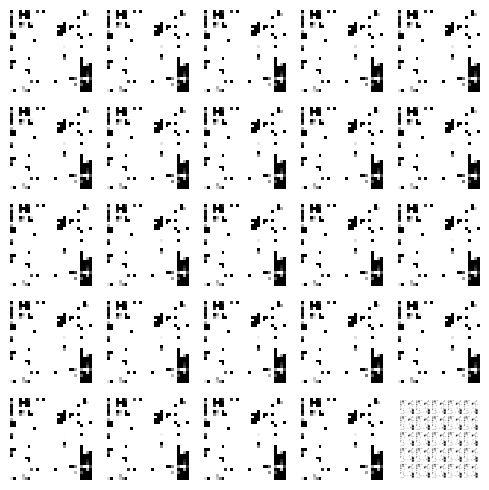

  0%|          | 0/350 [00:00<?, ?it/s]

4/4 [==============================] - 0s 33ms/step


  0%|          | 1/350 [00:00<04:36,  1.26it/s]

4/4 [==============================] - 0s 18ms/step


  1%|          | 2/350 [00:01<04:35,  1.26it/s]

4/4 [==============================] - 0s 12ms/step


  1%|          | 3/350 [00:02<04:17,  1.35it/s]

4/4 [==============================] - 0s 26ms/step


  1%|          | 4/350 [00:03<04:31,  1.27it/s]

4/4 [==============================] - 0s 16ms/step


  1%|▏         | 5/350 [00:03<04:26,  1.30it/s]

4/4 [==============================] - 0s 16ms/step


  2%|▏         | 6/350 [00:04<04:13,  1.36it/s]

4/4 [==============================] - 0s 29ms/step


  2%|▏         | 7/350 [00:05<04:10,  1.37it/s]

4/4 [==============================] - 0s 12ms/step


  2%|▏         | 8/350 [00:05<03:59,  1.43it/s]

4/4 [==============================] - 0s 28ms/step


  3%|▎         | 9/350 [00:06<04:03,  1.40it/s]

4/4 [==============================] - 0s 12ms/step


  3%|▎         | 10/350 [00:07<03:53,  1.45it/s]

4/4 [==============================] - 0s 25ms/step


  3%|▎         | 11/350 [00:07<03:50,  1.47it/s]

4/4 [==============================] - 0s 14ms/step


  3%|▎         | 12/350 [00:08<03:51,  1.46it/s]

4/4 [==============================] - 0s 15ms/step


  4%|▎         | 13/350 [00:09<03:43,  1.51it/s]

4/4 [==============================] - 0s 30ms/step


  4%|▍         | 14/350 [00:09<03:51,  1.45it/s]

4/4 [==============================] - 0s 15ms/step


  4%|▍         | 15/350 [00:10<03:57,  1.41it/s]

4/4 [==============================] - 0s 16ms/step


  5%|▍         | 16/350 [00:11<04:01,  1.38it/s]

4/4 [==============================] - 0s 15ms/step


  5%|▍         | 17/350 [00:12<03:57,  1.40it/s]

4/4 [==============================] - 0s 13ms/step


  5%|▌         | 18/350 [00:12<03:47,  1.46it/s]

4/4 [==============================] - 0s 20ms/step


  5%|▌         | 19/350 [00:13<03:51,  1.43it/s]

4/4 [==============================] - 0s 28ms/step


  6%|▌         | 20/350 [00:14<03:56,  1.40it/s]

4/4 [==============================] - 0s 17ms/step


  6%|▌         | 21/350 [00:14<03:52,  1.41it/s]

4/4 [==============================] - 0s 17ms/step


  6%|▋         | 22/350 [00:15<03:59,  1.37it/s]

4/4 [==============================] - 0s 12ms/step


  7%|▋         | 23/350 [00:16<03:51,  1.41it/s]

4/4 [==============================] - 0s 15ms/step


  7%|▋         | 24/350 [00:17<03:49,  1.42it/s]

4/4 [==============================] - 0s 40ms/step


  7%|▋         | 25/350 [00:17<03:52,  1.40it/s]

4/4 [==============================] - 0s 20ms/step


  7%|▋         | 26/350 [00:18<03:49,  1.41it/s]

4/4 [==============================] - 0s 22ms/step


  8%|▊         | 27/350 [00:19<03:52,  1.39it/s]

4/4 [==============================] - 0s 13ms/step


  8%|▊         | 28/350 [00:20<03:55,  1.37it/s]

4/4 [==============================] - 0s 14ms/step


  8%|▊         | 29/350 [00:20<03:49,  1.40it/s]

4/4 [==============================] - 0s 17ms/step


  9%|▊         | 30/350 [00:21<03:46,  1.41it/s]

4/4 [==============================] - 0s 13ms/step


  9%|▉         | 31/350 [00:22<03:41,  1.44it/s]

4/4 [==============================] - 0s 17ms/step


  9%|▉         | 32/350 [00:22<03:45,  1.41it/s]

4/4 [==============================] - 0s 17ms/step


  9%|▉         | 33/350 [00:23<03:37,  1.46it/s]

4/4 [==============================] - 0s 15ms/step


 10%|▉         | 34/350 [00:24<03:36,  1.46it/s]

4/4 [==============================] - 0s 16ms/step


 10%|█         | 35/350 [00:24<03:36,  1.45it/s]

4/4 [==============================] - 0s 23ms/step


 10%|█         | 36/350 [00:25<03:42,  1.41it/s]

4/4 [==============================] - 0s 13ms/step


 11%|█         | 37/350 [00:26<03:35,  1.46it/s]

4/4 [==============================] - 0s 15ms/step


 11%|█         | 38/350 [00:26<03:40,  1.42it/s]

4/4 [==============================] - 0s 14ms/step


 11%|█         | 39/350 [00:27<03:40,  1.41it/s]

4/4 [==============================] - 0s 17ms/step


 11%|█▏        | 40/350 [00:28<03:37,  1.42it/s]

4/4 [==============================] - 0s 13ms/step


 12%|█▏        | 41/350 [00:29<03:28,  1.48it/s]

4/4 [==============================] - 0s 18ms/step


 12%|█▏        | 42/350 [00:29<03:35,  1.43it/s]

4/4 [==============================] - 0s 12ms/step


 12%|█▏        | 43/350 [00:30<03:30,  1.46it/s]

4/4 [==============================] - 0s 24ms/step


 13%|█▎        | 44/350 [00:31<03:37,  1.41it/s]

4/4 [==============================] - 0s 14ms/step


 13%|█▎        | 45/350 [00:31<03:28,  1.46it/s]

4/4 [==============================] - 0s 22ms/step


 13%|█▎        | 46/350 [00:32<03:33,  1.42it/s]

4/4 [==============================] - 0s 12ms/step


 13%|█▎        | 47/350 [00:33<03:42,  1.36it/s]

4/4 [==============================] - 0s 17ms/step


 14%|█▎        | 48/350 [00:34<03:48,  1.32it/s]

4/4 [==============================] - 0s 16ms/step


 14%|█▍        | 49/350 [00:34<03:34,  1.40it/s]

4/4 [==============================] - 0s 22ms/step


 14%|█▍        | 50/350 [00:35<03:40,  1.36it/s]

4/4 [==============================] - 0s 16ms/step


 15%|█▍        | 51/350 [00:36<03:38,  1.37it/s]

4/4 [==============================] - 0s 16ms/step


 15%|█▍        | 52/350 [00:36<03:30,  1.42it/s]

4/4 [==============================] - 0s 14ms/step


 15%|█▌        | 53/350 [00:37<03:23,  1.46it/s]

4/4 [==============================] - 0s 19ms/step


 15%|█▌        | 54/350 [00:38<03:28,  1.42it/s]

4/4 [==============================] - 0s 15ms/step


 16%|█▌        | 55/350 [00:38<03:23,  1.45it/s]

4/4 [==============================] - 0s 22ms/step


 16%|█▌        | 56/350 [00:39<03:33,  1.38it/s]

4/4 [==============================] - 0s 15ms/step


 16%|█▋        | 57/350 [00:40<03:26,  1.42it/s]

4/4 [==============================] - 0s 29ms/step


 17%|█▋        | 58/350 [00:41<03:32,  1.38it/s]

4/4 [==============================] - 0s 14ms/step


 17%|█▋        | 59/350 [00:41<03:22,  1.44it/s]

4/4 [==============================] - 0s 23ms/step


 17%|█▋        | 60/350 [00:42<03:25,  1.41it/s]

4/4 [==============================] - 0s 12ms/step


 17%|█▋        | 61/350 [00:43<03:23,  1.42it/s]

4/4 [==============================] - 0s 16ms/step


 18%|█▊        | 62/350 [00:43<03:21,  1.43it/s]

4/4 [==============================] - 0s 23ms/step


 18%|█▊        | 63/350 [00:44<03:23,  1.41it/s]

4/4 [==============================] - 0s 14ms/step


 18%|█▊        | 64/350 [00:45<03:25,  1.39it/s]

4/4 [==============================] - 0s 14ms/step


 19%|█▊        | 65/350 [00:46<03:24,  1.39it/s]

4/4 [==============================] - 0s 23ms/step


 19%|█▉        | 66/350 [00:46<03:21,  1.41it/s]

4/4 [==============================] - 0s 19ms/step


 19%|█▉        | 67/350 [00:47<03:24,  1.38it/s]

4/4 [==============================] - 0s 13ms/step


 19%|█▉        | 68/350 [00:48<03:24,  1.38it/s]

4/4 [==============================] - 0s 16ms/step


 20%|█▉        | 69/350 [00:49<03:22,  1.39it/s]

4/4 [==============================] - 0s 21ms/step


 20%|██        | 70/350 [00:49<03:18,  1.41it/s]

4/4 [==============================] - 0s 14ms/step


 20%|██        | 71/350 [00:50<03:13,  1.44it/s]

4/4 [==============================] - 0s 12ms/step


 21%|██        | 72/350 [00:51<03:19,  1.39it/s]

4/4 [==============================] - 0s 12ms/step


 21%|██        | 73/350 [00:51<03:21,  1.38it/s]

4/4 [==============================] - 0s 14ms/step


 21%|██        | 74/350 [00:52<03:14,  1.42it/s]

4/4 [==============================] - 0s 14ms/step


 21%|██▏       | 75/350 [00:53<03:16,  1.40it/s]

4/4 [==============================] - 0s 15ms/step


 22%|██▏       | 76/350 [00:54<03:19,  1.37it/s]

4/4 [==============================] - 0s 25ms/step


 22%|██▏       | 77/350 [00:54<03:22,  1.35it/s]

4/4 [==============================] - 0s 13ms/step


 22%|██▏       | 78/350 [00:55<03:15,  1.39it/s]

4/4 [==============================] - 0s 25ms/step


 23%|██▎       | 79/350 [00:56<03:18,  1.36it/s]

4/4 [==============================] - 0s 14ms/step


 23%|██▎       | 80/350 [00:56<03:10,  1.42it/s]

4/4 [==============================] - 0s 15ms/step


 23%|██▎       | 81/350 [00:57<03:04,  1.46it/s]

4/4 [==============================] - 0s 17ms/step


 23%|██▎       | 82/350 [00:58<03:00,  1.48it/s]

4/4 [==============================] - 0s 20ms/step


 24%|██▎       | 83/350 [00:58<03:01,  1.47it/s]

4/4 [==============================] - 0s 17ms/step


 24%|██▍       | 84/350 [00:59<03:07,  1.42it/s]

4/4 [==============================] - 0s 15ms/step


 24%|██▍       | 85/350 [01:00<03:01,  1.46it/s]

4/4 [==============================] - 0s 13ms/step


 25%|██▍       | 86/350 [01:01<03:05,  1.42it/s]

4/4 [==============================] - 0s 15ms/step


 25%|██▍       | 87/350 [01:01<03:00,  1.46it/s]

4/4 [==============================] - 0s 22ms/step


 25%|██▌       | 88/350 [01:02<03:04,  1.42it/s]

4/4 [==============================] - 0s 13ms/step


 25%|██▌       | 89/350 [01:03<03:00,  1.45it/s]

4/4 [==============================] - 0s 17ms/step


 26%|██▌       | 90/350 [01:03<03:02,  1.42it/s]

4/4 [==============================] - 0s 14ms/step


 26%|██▌       | 91/350 [01:04<03:02,  1.42it/s]

4/4 [==============================] - 0s 28ms/step


 26%|██▋       | 92/350 [01:05<03:00,  1.43it/s]

4/4 [==============================] - 0s 12ms/step


 27%|██▋       | 93/350 [01:05<02:57,  1.45it/s]

4/4 [==============================] - 0s 18ms/step


 27%|██▋       | 94/350 [01:06<02:59,  1.42it/s]

4/4 [==============================] - 0s 16ms/step


 27%|██▋       | 95/350 [01:07<02:58,  1.43it/s]

4/4 [==============================] - 0s 21ms/step


 27%|██▋       | 96/350 [01:08<03:01,  1.40it/s]

4/4 [==============================] - 0s 16ms/step


 28%|██▊       | 97/350 [01:08<02:59,  1.41it/s]

4/4 [==============================] - 0s 14ms/step


 28%|██▊       | 98/350 [01:09<02:57,  1.42it/s]

4/4 [==============================] - 0s 20ms/step


 28%|██▊       | 99/350 [01:10<02:59,  1.40it/s]

4/4 [==============================] - 0s 13ms/step


 29%|██▊       | 100/350 [01:10<02:55,  1.42it/s]

4/4 [==============================] - 0s 19ms/step


 29%|██▉       | 101/350 [01:11<02:53,  1.44it/s]

4/4 [==============================] - 0s 23ms/step


 29%|██▉       | 102/350 [01:12<02:59,  1.38it/s]

4/4 [==============================] - 0s 13ms/step


 29%|██▉       | 103/350 [01:12<02:54,  1.42it/s]

4/4 [==============================] - 0s 13ms/step


 30%|██▉       | 104/350 [01:13<02:50,  1.44it/s]

4/4 [==============================] - 0s 24ms/step


 30%|███       | 105/350 [01:14<02:56,  1.39it/s]

4/4 [==============================] - 0s 17ms/step


 30%|███       | 106/350 [01:15<03:04,  1.33it/s]

4/4 [==============================] - 0s 13ms/step


 31%|███       | 107/350 [01:15<02:53,  1.40it/s]

4/4 [==============================] - 0s 30ms/step


 31%|███       | 108/350 [01:16<02:56,  1.37it/s]

4/4 [==============================] - 0s 12ms/step


 31%|███       | 109/350 [01:17<02:49,  1.42it/s]

4/4 [==============================] - 0s 31ms/step


 31%|███▏      | 110/350 [01:18<02:52,  1.39it/s]

4/4 [==============================] - 0s 13ms/step


 32%|███▏      | 111/350 [01:18<02:46,  1.44it/s]

4/4 [==============================] - 0s 24ms/step


 32%|███▏      | 112/350 [01:19<02:44,  1.45it/s]

4/4 [==============================] - 0s 15ms/step


 32%|███▏      | 113/350 [01:20<02:40,  1.48it/s]

4/4 [==============================] - 0s 22ms/step


 33%|███▎      | 114/350 [01:20<02:43,  1.45it/s]

4/4 [==============================] - 0s 15ms/step


 33%|███▎      | 115/350 [01:21<02:41,  1.45it/s]

4/4 [==============================] - 0s 22ms/step


 33%|███▎      | 116/350 [01:22<02:46,  1.41it/s]

4/4 [==============================] - 0s 13ms/step


 33%|███▎      | 117/350 [01:22<02:45,  1.41it/s]

4/4 [==============================] - 0s 15ms/step


 34%|███▎      | 118/350 [01:23<02:43,  1.42it/s]

4/4 [==============================] - 0s 11ms/step


 34%|███▍      | 119/350 [01:24<02:37,  1.46it/s]

4/4 [==============================] - 0s 27ms/step


 34%|███▍      | 120/350 [01:24<02:44,  1.40it/s]

4/4 [==============================] - 0s 15ms/step


 35%|███▍      | 121/350 [01:25<02:37,  1.45it/s]

4/4 [==============================] - 0s 14ms/step


 35%|███▍      | 122/350 [01:26<02:46,  1.37it/s]

4/4 [==============================] - 0s 17ms/step


 35%|███▌      | 123/350 [01:27<02:44,  1.38it/s]

4/4 [==============================] - 0s 14ms/step


 35%|███▌      | 124/350 [01:27<02:40,  1.41it/s]

4/4 [==============================] - 0s 32ms/step


 36%|███▌      | 125/350 [01:28<02:44,  1.37it/s]

4/4 [==============================] - 0s 15ms/step


 36%|███▌      | 126/350 [01:29<02:41,  1.39it/s]

4/4 [==============================] - 0s 19ms/step


 36%|███▋      | 127/350 [01:30<02:39,  1.40it/s]

4/4 [==============================] - 0s 13ms/step


 37%|███▋      | 128/350 [01:30<02:38,  1.40it/s]

4/4 [==============================] - 0s 16ms/step


 37%|███▋      | 129/350 [01:31<02:38,  1.39it/s]

4/4 [==============================] - 0s 30ms/step


 37%|███▋      | 130/350 [01:32<02:41,  1.36it/s]

4/4 [==============================] - 0s 12ms/step


 37%|███▋      | 131/350 [01:32<02:33,  1.42it/s]

4/4 [==============================] - 0s 33ms/step


 38%|███▊      | 132/350 [01:33<02:36,  1.39it/s]

4/4 [==============================] - 0s 11ms/step


 38%|███▊      | 133/350 [01:34<02:32,  1.43it/s]

4/4 [==============================] - 0s 22ms/step


 38%|███▊      | 134/350 [01:34<02:31,  1.42it/s]

4/4 [==============================] - 0s 14ms/step


 39%|███▊      | 135/350 [01:35<02:29,  1.44it/s]

4/4 [==============================] - 0s 15ms/step


 39%|███▉      | 136/350 [01:36<02:27,  1.45it/s]

4/4 [==============================] - 0s 15ms/step


 39%|███▉      | 137/350 [01:37<02:33,  1.39it/s]

4/4 [==============================] - 0s 14ms/step


 39%|███▉      | 138/350 [01:37<02:27,  1.44it/s]

4/4 [==============================] - 0s 14ms/step


 40%|███▉      | 139/350 [01:38<02:26,  1.44it/s]

4/4 [==============================] - 0s 28ms/step


 40%|████      | 140/350 [01:39<02:28,  1.41it/s]

4/4 [==============================] - 0s 13ms/step


 40%|████      | 141/350 [01:39<02:24,  1.44it/s]

4/4 [==============================] - 0s 27ms/step


 41%|████      | 142/350 [01:40<02:27,  1.41it/s]

4/4 [==============================] - 0s 16ms/step


 41%|████      | 143/350 [01:41<02:24,  1.43it/s]

4/4 [==============================] - 0s 19ms/step


 41%|████      | 144/350 [01:42<02:30,  1.36it/s]

4/4 [==============================] - 0s 17ms/step


 41%|████▏     | 145/350 [01:42<02:28,  1.38it/s]

4/4 [==============================] - 0s 17ms/step


 42%|████▏     | 146/350 [01:43<02:25,  1.40it/s]

4/4 [==============================] - 0s 16ms/step


 42%|████▏     | 147/350 [01:44<02:30,  1.35it/s]

4/4 [==============================] - 0s 13ms/step


 42%|████▏     | 148/350 [01:44<02:26,  1.38it/s]

4/4 [==============================] - 0s 16ms/step


 43%|████▎     | 149/350 [01:45<02:37,  1.28it/s]

4/4 [==============================] - 0s 14ms/step


 43%|████▎     | 150/350 [01:46<02:29,  1.34it/s]

4/4 [==============================] - 0s 29ms/step


 43%|████▎     | 151/350 [01:47<02:30,  1.33it/s]

4/4 [==============================] - 0s 17ms/step


 43%|████▎     | 152/350 [01:48<02:25,  1.36it/s]

4/4 [==============================] - 0s 16ms/step


 44%|████▎     | 153/350 [01:48<02:20,  1.40it/s]

4/4 [==============================] - 0s 12ms/step


 44%|████▍     | 154/350 [01:49<02:17,  1.43it/s]

4/4 [==============================] - 0s 20ms/step


 44%|████▍     | 155/350 [01:50<02:18,  1.41it/s]

4/4 [==============================] - 0s 16ms/step


 45%|████▍     | 156/350 [01:50<02:19,  1.39it/s]

4/4 [==============================] - 0s 14ms/step


 45%|████▍     | 157/350 [01:51<02:16,  1.41it/s]

4/4 [==============================] - 0s 15ms/step


 45%|████▌     | 158/350 [01:52<02:13,  1.44it/s]

4/4 [==============================] - 0s 31ms/step


 45%|████▌     | 159/350 [01:52<02:15,  1.40it/s]

4/4 [==============================] - 0s 12ms/step


 46%|████▌     | 160/350 [01:53<02:10,  1.46it/s]

4/4 [==============================] - 0s 13ms/step


 46%|████▌     | 161/350 [01:54<02:14,  1.41it/s]

4/4 [==============================] - 0s 21ms/step


 46%|████▋     | 162/350 [01:54<02:09,  1.45it/s]

4/4 [==============================] - 0s 32ms/step


 47%|████▋     | 163/350 [01:55<02:10,  1.44it/s]

4/4 [==============================] - 0s 11ms/step


 47%|████▋     | 164/350 [01:56<02:06,  1.47it/s]

4/4 [==============================] - 0s 38ms/step


 47%|████▋     | 165/350 [01:57<02:12,  1.40it/s]

4/4 [==============================] - 0s 15ms/step


 47%|████▋     | 166/350 [01:57<02:12,  1.39it/s]

4/4 [==============================] - 0s 16ms/step


 48%|████▊     | 167/350 [01:58<02:14,  1.36it/s]

4/4 [==============================] - 0s 13ms/step


 48%|████▊     | 168/350 [01:59<02:16,  1.34it/s]

4/4 [==============================] - 0s 14ms/step


 48%|████▊     | 169/350 [02:00<02:16,  1.32it/s]

4/4 [==============================] - 0s 14ms/step


 49%|████▊     | 170/350 [02:01<02:20,  1.28it/s]

4/4 [==============================] - 0s 12ms/step


 49%|████▉     | 171/350 [02:01<02:18,  1.29it/s]

4/4 [==============================] - 0s 14ms/step


 49%|████▉     | 172/350 [02:02<02:12,  1.34it/s]

4/4 [==============================] - 0s 17ms/step


 49%|████▉     | 173/350 [02:03<02:09,  1.37it/s]

4/4 [==============================] - 0s 12ms/step


 50%|████▉     | 174/350 [02:03<02:04,  1.41it/s]

4/4 [==============================] - 0s 22ms/step


 50%|█████     | 175/350 [02:04<02:06,  1.38it/s]

4/4 [==============================] - 0s 13ms/step


 50%|█████     | 176/350 [02:05<02:06,  1.37it/s]

4/4 [==============================] - 0s 13ms/step


 51%|█████     | 177/350 [02:05<01:59,  1.45it/s]

4/4 [==============================] - 0s 12ms/step


 51%|█████     | 178/350 [02:06<01:55,  1.49it/s]

4/4 [==============================] - 0s 14ms/step


 51%|█████     | 179/350 [02:07<01:50,  1.54it/s]

4/4 [==============================] - 0s 21ms/step


 51%|█████▏    | 180/350 [02:07<01:52,  1.51it/s]

4/4 [==============================] - 0s 13ms/step


 52%|█████▏    | 181/350 [02:08<02:08,  1.31it/s]

4/4 [==============================] - 0s 11ms/step


 52%|█████▏    | 182/350 [02:09<02:00,  1.40it/s]

4/4 [==============================] - 0s 17ms/step


 52%|█████▏    | 183/350 [02:10<02:00,  1.38it/s]

4/4 [==============================] - 0s 13ms/step


 53%|█████▎    | 184/350 [02:10<01:58,  1.40it/s]

4/4 [==============================] - 0s 35ms/step


 53%|█████▎    | 185/350 [02:11<02:01,  1.36it/s]

4/4 [==============================] - 0s 17ms/step


 53%|█████▎    | 186/350 [02:12<01:57,  1.40it/s]

4/4 [==============================] - 0s 21ms/step


 53%|█████▎    | 187/350 [02:13<01:59,  1.36it/s]

4/4 [==============================] - 0s 11ms/step


 54%|█████▎    | 188/350 [02:13<01:57,  1.38it/s]

4/4 [==============================] - 0s 17ms/step


 54%|█████▍    | 189/350 [02:14<01:54,  1.40it/s]

4/4 [==============================] - 0s 14ms/step


 54%|█████▍    | 190/350 [02:15<01:58,  1.35it/s]

4/4 [==============================] - 0s 14ms/step


 55%|█████▍    | 191/350 [02:15<01:56,  1.36it/s]

4/4 [==============================] - 0s 17ms/step


 55%|█████▍    | 192/350 [02:16<02:02,  1.29it/s]

4/4 [==============================] - 0s 19ms/step


 55%|█████▌    | 193/350 [02:17<02:00,  1.31it/s]

4/4 [==============================] - 0s 24ms/step


 55%|█████▌    | 194/350 [02:18<02:05,  1.24it/s]

4/4 [==============================] - 0s 14ms/step


 56%|█████▌    | 195/350 [02:19<02:02,  1.27it/s]

4/4 [==============================] - 0s 14ms/step


 56%|█████▌    | 196/350 [02:20<02:01,  1.27it/s]

4/4 [==============================] - 0s 14ms/step


 56%|█████▋    | 197/350 [02:20<01:54,  1.34it/s]

4/4 [==============================] - 0s 36ms/step


 57%|█████▋    | 198/350 [02:21<02:00,  1.26it/s]

4/4 [==============================] - 0s 14ms/step


 57%|█████▋    | 199/350 [02:22<01:56,  1.29it/s]

4/4 [==============================] - 0s 18ms/step


 57%|█████▋    | 200/350 [02:23<01:54,  1.31it/s]

4/4 [==============================] - 0s 13ms/step


 57%|█████▋    | 201/350 [02:23<01:50,  1.35it/s]

4/4 [==============================] - 0s 21ms/step


 58%|█████▊    | 202/350 [02:24<01:45,  1.41it/s]

4/4 [==============================] - 0s 15ms/step


 58%|█████▊    | 203/350 [02:25<01:45,  1.40it/s]

4/4 [==============================] - 0s 18ms/step


 58%|█████▊    | 204/350 [02:25<01:43,  1.40it/s]

4/4 [==============================] - 0s 24ms/step


 59%|█████▊    | 205/350 [02:26<01:44,  1.39it/s]

4/4 [==============================] - 0s 16ms/step


 59%|█████▉    | 206/350 [02:27<01:43,  1.39it/s]

4/4 [==============================] - 0s 19ms/step


 59%|█████▉    | 207/350 [02:27<01:42,  1.39it/s]

4/4 [==============================] - 0s 15ms/step


 59%|█████▉    | 208/350 [02:28<01:50,  1.29it/s]

4/4 [==============================] - 0s 14ms/step


 60%|█████▉    | 209/350 [02:29<01:46,  1.33it/s]

4/4 [==============================] - 0s 19ms/step


 60%|██████    | 210/350 [02:30<01:46,  1.32it/s]

4/4 [==============================] - 0s 30ms/step


 60%|██████    | 211/350 [02:31<01:47,  1.30it/s]

4/4 [==============================] - 0s 14ms/step


 61%|██████    | 212/350 [02:31<01:41,  1.35it/s]

4/4 [==============================] - 0s 15ms/step


 61%|██████    | 213/350 [02:32<01:40,  1.37it/s]

4/4 [==============================] - 0s 12ms/step


 61%|██████    | 214/350 [02:33<01:43,  1.32it/s]

4/4 [==============================] - 0s 15ms/step


 61%|██████▏   | 215/350 [02:34<01:40,  1.35it/s]

4/4 [==============================] - 0s 25ms/step


 62%|██████▏   | 216/350 [02:34<01:39,  1.34it/s]

4/4 [==============================] - 0s 14ms/step


 62%|██████▏   | 217/350 [02:35<01:35,  1.39it/s]

4/4 [==============================] - 0s 26ms/step


 62%|██████▏   | 218/350 [02:36<01:32,  1.43it/s]

4/4 [==============================] - 0s 15ms/step


 63%|██████▎   | 219/350 [02:36<01:31,  1.43it/s]

4/4 [==============================] - 0s 16ms/step


 63%|██████▎   | 220/350 [02:37<01:33,  1.38it/s]

4/4 [==============================] - 0s 14ms/step


 63%|██████▎   | 221/350 [02:38<01:32,  1.39it/s]

4/4 [==============================] - 0s 15ms/step


 63%|██████▎   | 222/350 [02:39<01:33,  1.37it/s]

4/4 [==============================] - 0s 16ms/step


 64%|██████▎   | 223/350 [02:39<01:30,  1.40it/s]

4/4 [==============================] - 0s 26ms/step


 64%|██████▍   | 224/350 [02:40<01:29,  1.41it/s]

4/4 [==============================] - 0s 15ms/step


 64%|██████▍   | 225/350 [02:41<01:27,  1.43it/s]

4/4 [==============================] - 0s 17ms/step


 65%|██████▍   | 226/350 [02:41<01:29,  1.39it/s]

4/4 [==============================] - 0s 23ms/step


 65%|██████▍   | 227/350 [02:42<01:29,  1.37it/s]

4/4 [==============================] - 0s 15ms/step


 65%|██████▌   | 228/350 [02:43<01:26,  1.41it/s]

4/4 [==============================] - 0s 13ms/step


 65%|██████▌   | 229/350 [02:44<01:27,  1.38it/s]

4/4 [==============================] - 0s 15ms/step


 66%|██████▌   | 230/350 [02:44<01:27,  1.37it/s]

4/4 [==============================] - 0s 14ms/step


 66%|██████▌   | 231/350 [02:45<01:29,  1.33it/s]

4/4 [==============================] - 0s 15ms/step


 66%|██████▋   | 232/350 [02:46<01:26,  1.36it/s]

4/4 [==============================] - 0s 26ms/step


 67%|██████▋   | 233/350 [02:46<01:23,  1.40it/s]

4/4 [==============================] - 0s 16ms/step


 67%|██████▋   | 234/350 [02:47<01:22,  1.41it/s]

4/4 [==============================] - 0s 15ms/step


 67%|██████▋   | 235/350 [02:48<01:21,  1.41it/s]

4/4 [==============================] - 0s 18ms/step


 67%|██████▋   | 236/350 [02:49<01:20,  1.41it/s]

4/4 [==============================] - 0s 23ms/step


 68%|██████▊   | 237/350 [02:49<01:20,  1.40it/s]

4/4 [==============================] - 0s 18ms/step


 68%|██████▊   | 238/350 [02:50<01:20,  1.39it/s]

4/4 [==============================] - 0s 24ms/step


 68%|██████▊   | 239/350 [02:51<01:19,  1.40it/s]

4/4 [==============================] - 0s 13ms/step


 69%|██████▊   | 240/350 [02:51<01:16,  1.43it/s]

4/4 [==============================] - 0s 29ms/step


 69%|██████▉   | 241/350 [02:52<01:18,  1.39it/s]

4/4 [==============================] - 0s 16ms/step


 69%|██████▉   | 242/350 [02:53<01:15,  1.43it/s]

4/4 [==============================] - 0s 23ms/step


 69%|██████▉   | 243/350 [02:54<01:16,  1.39it/s]

4/4 [==============================] - 0s 17ms/step


 70%|██████▉   | 244/350 [02:54<01:15,  1.41it/s]

4/4 [==============================] - 0s 18ms/step


 70%|███████   | 245/350 [02:55<01:14,  1.42it/s]

4/4 [==============================] - 0s 15ms/step


 70%|███████   | 246/350 [02:56<01:14,  1.40it/s]

4/4 [==============================] - 0s 18ms/step


 71%|███████   | 247/350 [02:56<01:13,  1.40it/s]

4/4 [==============================] - 0s 20ms/step


 71%|███████   | 248/350 [02:57<01:09,  1.47it/s]

4/4 [==============================] - 0s 26ms/step


 71%|███████   | 249/350 [02:58<01:10,  1.43it/s]

4/4 [==============================] - 0s 12ms/step


 71%|███████▏  | 250/350 [02:59<01:14,  1.34it/s]

4/4 [==============================] - 0s 13ms/step


 72%|███████▏  | 251/350 [02:59<01:11,  1.38it/s]

4/4 [==============================] - 0s 21ms/step


 72%|███████▏  | 252/350 [03:00<01:12,  1.35it/s]

4/4 [==============================] - 0s 17ms/step


 72%|███████▏  | 253/350 [03:01<01:12,  1.33it/s]

4/4 [==============================] - 0s 23ms/step


 73%|███████▎  | 254/350 [03:02<01:10,  1.35it/s]

4/4 [==============================] - 0s 12ms/step


 73%|███████▎  | 255/350 [03:02<01:07,  1.41it/s]

4/4 [==============================] - 0s 20ms/step


 73%|███████▎  | 256/350 [03:03<01:07,  1.40it/s]

4/4 [==============================] - 0s 12ms/step


 73%|███████▎  | 257/350 [03:04<01:04,  1.44it/s]

4/4 [==============================] - 0s 17ms/step


 74%|███████▎  | 258/350 [03:04<01:07,  1.36it/s]

4/4 [==============================] - 0s 14ms/step


 74%|███████▍  | 259/350 [03:05<01:05,  1.38it/s]

4/4 [==============================] - 0s 23ms/step


 74%|███████▍  | 260/350 [03:06<01:04,  1.39it/s]

4/4 [==============================] - 0s 13ms/step


 75%|███████▍  | 261/350 [03:06<01:01,  1.44it/s]

4/4 [==============================] - 0s 17ms/step


 75%|███████▍  | 262/350 [03:07<00:59,  1.47it/s]

4/4 [==============================] - 0s 16ms/step


 75%|███████▌  | 263/350 [03:08<00:59,  1.46it/s]

4/4 [==============================] - 0s 14ms/step


 75%|███████▌  | 264/350 [03:09<01:00,  1.42it/s]

4/4 [==============================] - 0s 14ms/step


 76%|███████▌  | 265/350 [03:09<00:59,  1.43it/s]

4/4 [==============================] - 0s 15ms/step


 76%|███████▌  | 266/350 [03:10<00:58,  1.43it/s]

4/4 [==============================] - 0s 15ms/step


 76%|███████▋  | 267/350 [03:11<00:58,  1.42it/s]

4/4 [==============================] - 0s 15ms/step


 77%|███████▋  | 268/350 [03:11<00:56,  1.46it/s]

4/4 [==============================] - 0s 25ms/step


 77%|███████▋  | 269/350 [03:12<00:56,  1.43it/s]

4/4 [==============================] - 0s 13ms/step


 77%|███████▋  | 270/350 [03:13<00:57,  1.39it/s]

4/4 [==============================] - 0s 15ms/step


 77%|███████▋  | 271/350 [03:13<00:53,  1.47it/s]

4/4 [==============================] - 0s 15ms/step


 78%|███████▊  | 272/350 [03:14<00:55,  1.42it/s]

4/4 [==============================] - 0s 15ms/step


 78%|███████▊  | 273/350 [03:15<00:55,  1.38it/s]

4/4 [==============================] - 0s 14ms/step


 78%|███████▊  | 274/350 [03:16<00:53,  1.42it/s]

4/4 [==============================] - 0s 38ms/step


 79%|███████▊  | 275/350 [03:16<00:57,  1.31it/s]

4/4 [==============================] - 0s 16ms/step


 79%|███████▉  | 276/350 [03:17<00:53,  1.38it/s]

4/4 [==============================] - 0s 12ms/step


 79%|███████▉  | 277/350 [03:18<00:51,  1.41it/s]

4/4 [==============================] - 0s 20ms/step


 79%|███████▉  | 278/350 [03:18<00:50,  1.43it/s]

4/4 [==============================] - 0s 14ms/step


 80%|███████▉  | 279/350 [03:19<00:47,  1.50it/s]

4/4 [==============================] - 0s 14ms/step


 80%|████████  | 280/350 [03:20<00:47,  1.48it/s]

4/4 [==============================] - 0s 17ms/step


 80%|████████  | 281/350 [03:20<00:46,  1.48it/s]

4/4 [==============================] - 0s 13ms/step


 81%|████████  | 282/350 [03:21<00:46,  1.47it/s]

4/4 [==============================] - 0s 15ms/step


 81%|████████  | 283/350 [03:22<00:44,  1.49it/s]

4/4 [==============================] - 0s 31ms/step


 81%|████████  | 284/350 [03:23<00:46,  1.41it/s]

4/4 [==============================] - 0s 16ms/step


 81%|████████▏ | 285/350 [03:23<00:46,  1.41it/s]

4/4 [==============================] - 0s 28ms/step


 82%|████████▏ | 286/350 [03:24<00:47,  1.36it/s]

4/4 [==============================] - 0s 15ms/step


 82%|████████▏ | 287/350 [03:25<00:44,  1.41it/s]

4/4 [==============================] - 0s 29ms/step


 82%|████████▏ | 288/350 [03:25<00:44,  1.41it/s]

4/4 [==============================] - 0s 17ms/step


 83%|████████▎ | 289/350 [03:26<00:42,  1.43it/s]

4/4 [==============================] - 0s 26ms/step


 83%|████████▎ | 290/350 [03:27<00:42,  1.41it/s]

4/4 [==============================] - 0s 12ms/step


 83%|████████▎ | 291/350 [03:28<00:43,  1.36it/s]

4/4 [==============================] - 0s 18ms/step


 83%|████████▎ | 292/350 [03:28<00:41,  1.39it/s]

4/4 [==============================] - 0s 13ms/step


 84%|████████▎ | 293/350 [03:29<00:42,  1.35it/s]

4/4 [==============================] - 0s 12ms/step


 84%|████████▍ | 294/350 [03:30<00:39,  1.41it/s]

4/4 [==============================] - 0s 18ms/step


 84%|████████▍ | 295/350 [03:31<00:40,  1.36it/s]

4/4 [==============================] - 0s 13ms/step


 85%|████████▍ | 296/350 [03:31<00:39,  1.38it/s]

4/4 [==============================] - 0s 21ms/step


 85%|████████▍ | 297/350 [03:32<00:39,  1.33it/s]

4/4 [==============================] - 0s 13ms/step


 85%|████████▌ | 298/350 [03:33<00:39,  1.32it/s]

4/4 [==============================] - 0s 13ms/step


 85%|████████▌ | 299/350 [03:33<00:37,  1.37it/s]

4/4 [==============================] - 0s 27ms/step


 86%|████████▌ | 300/350 [03:34<00:36,  1.35it/s]

4/4 [==============================] - 0s 21ms/step


 86%|████████▌ | 301/350 [03:35<00:36,  1.34it/s]

4/4 [==============================] - 0s 15ms/step


 86%|████████▋ | 302/350 [03:36<00:35,  1.37it/s]

4/4 [==============================] - 0s 22ms/step


 87%|████████▋ | 303/350 [03:36<00:34,  1.37it/s]

4/4 [==============================] - 0s 14ms/step


 87%|████████▋ | 304/350 [03:37<00:34,  1.35it/s]

4/4 [==============================] - 0s 17ms/step


 87%|████████▋ | 305/350 [03:38<00:32,  1.37it/s]

4/4 [==============================] - 0s 18ms/step


 87%|████████▋ | 306/350 [03:39<00:32,  1.34it/s]

4/4 [==============================] - 0s 20ms/step


 88%|████████▊ | 307/350 [03:39<00:32,  1.32it/s]

4/4 [==============================] - 0s 14ms/step


 88%|████████▊ | 308/350 [03:40<00:31,  1.33it/s]

4/4 [==============================] - 0s 13ms/step


 88%|████████▊ | 309/350 [03:41<00:29,  1.41it/s]

4/4 [==============================] - 0s 13ms/step


 89%|████████▊ | 310/350 [03:42<00:28,  1.41it/s]

4/4 [==============================] - 0s 19ms/step


 89%|████████▉ | 311/350 [03:42<00:27,  1.41it/s]

4/4 [==============================] - 0s 23ms/step


 89%|████████▉ | 312/350 [03:43<00:27,  1.39it/s]

4/4 [==============================] - 0s 13ms/step


 89%|████████▉ | 313/350 [03:44<00:28,  1.32it/s]

4/4 [==============================] - 0s 16ms/step


 90%|████████▉ | 314/350 [03:45<00:26,  1.37it/s]

4/4 [==============================] - 0s 14ms/step


 90%|█████████ | 315/350 [03:45<00:26,  1.33it/s]

4/4 [==============================] - 0s 16ms/step


 90%|█████████ | 316/350 [03:46<00:24,  1.39it/s]

4/4 [==============================] - 0s 12ms/step


 91%|█████████ | 317/350 [03:47<00:23,  1.39it/s]

4/4 [==============================] - 0s 13ms/step


 91%|█████████ | 318/350 [03:47<00:22,  1.42it/s]

4/4 [==============================] - 0s 16ms/step


 91%|█████████ | 319/350 [03:48<00:21,  1.42it/s]

4/4 [==============================] - 0s 18ms/step


 91%|█████████▏| 320/350 [03:49<00:22,  1.34it/s]

4/4 [==============================] - 0s 14ms/step


 92%|█████████▏| 321/350 [03:50<00:22,  1.31it/s]

4/4 [==============================] - 0s 27ms/step


 92%|█████████▏| 322/350 [03:51<00:21,  1.28it/s]

4/4 [==============================] - 0s 17ms/step


 92%|█████████▏| 323/350 [03:51<00:21,  1.28it/s]

4/4 [==============================] - 0s 13ms/step


 93%|█████████▎| 324/350 [03:52<00:20,  1.29it/s]

4/4 [==============================] - 0s 31ms/step


 93%|█████████▎| 325/350 [03:53<00:19,  1.31it/s]

4/4 [==============================] - 0s 14ms/step


 93%|█████████▎| 326/350 [03:53<00:17,  1.37it/s]

4/4 [==============================] - 0s 11ms/step


 93%|█████████▎| 327/350 [03:54<00:16,  1.43it/s]

4/4 [==============================] - 0s 23ms/step


 94%|█████████▎| 328/350 [03:55<00:15,  1.42it/s]

4/4 [==============================] - 0s 15ms/step


 94%|█████████▍| 329/350 [03:55<00:14,  1.43it/s]

4/4 [==============================] - 0s 33ms/step


 94%|█████████▍| 330/350 [03:56<00:14,  1.38it/s]

4/4 [==============================] - 0s 23ms/step


 95%|█████████▍| 331/350 [03:57<00:14,  1.30it/s]

4/4 [==============================] - 0s 14ms/step


 95%|█████████▍| 332/350 [03:58<00:14,  1.26it/s]

4/4 [==============================] - 0s 17ms/step


 95%|█████████▌| 333/350 [03:59<00:13,  1.27it/s]

4/4 [==============================] - 0s 22ms/step


 95%|█████████▌| 334/350 [04:00<00:13,  1.22it/s]

4/4 [==============================] - 0s 16ms/step


 96%|█████████▌| 335/350 [04:00<00:12,  1.22it/s]

4/4 [==============================] - 0s 27ms/step


 96%|█████████▌| 336/350 [04:01<00:11,  1.24it/s]

4/4 [==============================] - 0s 14ms/step


 96%|█████████▋| 337/350 [04:02<00:10,  1.30it/s]

4/4 [==============================] - 0s 18ms/step


 97%|█████████▋| 338/350 [04:03<00:09,  1.28it/s]

4/4 [==============================] - 0s 12ms/step


 97%|█████████▋| 339/350 [04:03<00:08,  1.34it/s]

4/4 [==============================] - 0s 14ms/step


 97%|█████████▋| 340/350 [04:04<00:07,  1.37it/s]

4/4 [==============================] - 0s 19ms/step


 97%|█████████▋| 341/350 [04:05<00:06,  1.39it/s]

4/4 [==============================] - 0s 14ms/step


 98%|█████████▊| 342/350 [04:06<00:05,  1.39it/s]

4/4 [==============================] - 0s 16ms/step


 98%|█████████▊| 343/350 [04:06<00:05,  1.32it/s]

4/4 [==============================] - 0s 14ms/step


 98%|█████████▊| 344/350 [04:07<00:04,  1.22it/s]

4/4 [==============================] - 0s 21ms/step


 99%|█████████▊| 345/350 [04:08<00:04,  1.22it/s]

4/4 [==============================] - 0s 16ms/step


 99%|█████████▉| 346/350 [04:09<00:03,  1.29it/s]

4/4 [==============================] - 0s 28ms/step


 99%|█████████▉| 347/350 [04:10<00:02,  1.28it/s]

4/4 [==============================] - 0s 14ms/step


 99%|█████████▉| 348/350 [04:10<00:01,  1.32it/s]

4/4 [==============================] - 0s 13ms/step


100%|█████████▉| 349/350 [04:11<00:00,  1.36it/s]

4/4 [==============================] - 0s 13ms/step


100%|██████████| 350/350 [04:12<00:00,  1.39it/s]

Epoch number: 60 discriminator_loss: 0.16426892822529354 generator_loss: 7.9274869101388115
1/1 [==============================] - 0s 26ms/step


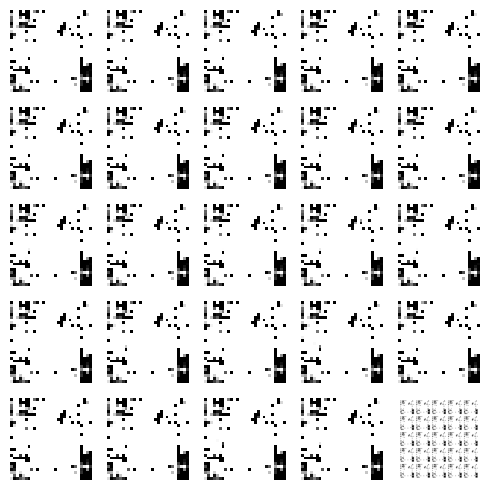

  0%|          | 0/350 [00:00<?, ?it/s]

4/4 [==============================] - 0s 22ms/step


  0%|          | 1/350 [00:00<04:13,  1.38it/s]

4/4 [==============================] - 0s 11ms/step


  1%|          | 2/350 [00:01<03:47,  1.53it/s]

4/4 [==============================] - 0s 26ms/step


  1%|          | 3/350 [00:01<03:46,  1.53it/s]

4/4 [==============================] - 0s 23ms/step


  1%|          | 4/350 [00:02<03:52,  1.49it/s]

4/4 [==============================] - 0s 28ms/step


  1%|▏         | 5/350 [00:03<04:00,  1.43it/s]

4/4 [==============================] - 0s 18ms/step


  2%|▏         | 6/350 [00:04<04:01,  1.42it/s]

4/4 [==============================] - 0s 14ms/step


  2%|▏         | 7/350 [00:04<03:59,  1.43it/s]

4/4 [==============================] - 0s 17ms/step


  2%|▏         | 8/350 [00:05<04:15,  1.34it/s]

4/4 [==============================] - 0s 13ms/step


  3%|▎         | 9/350 [00:06<04:14,  1.34it/s]

4/4 [==============================] - 0s 16ms/step


  3%|▎         | 10/350 [00:07<04:04,  1.39it/s]

4/4 [==============================] - 0s 42ms/step


  3%|▎         | 11/350 [00:07<04:20,  1.30it/s]

4/4 [==============================] - 0s 19ms/step


  3%|▎         | 12/350 [00:08<04:16,  1.32it/s]

4/4 [==============================] - 0s 11ms/step


  4%|▎         | 13/350 [00:09<03:57,  1.42it/s]

4/4 [==============================] - 0s 15ms/step


  4%|▍         | 14/350 [00:09<03:56,  1.42it/s]

4/4 [==============================] - 0s 14ms/step


  4%|▍         | 15/350 [00:10<03:58,  1.41it/s]

4/4 [==============================] - 0s 16ms/step


  5%|▍         | 16/350 [00:11<04:02,  1.38it/s]

4/4 [==============================] - 0s 13ms/step


  5%|▍         | 17/350 [00:12<03:59,  1.39it/s]

4/4 [==============================] - 0s 16ms/step


  5%|▌         | 18/350 [00:12<03:58,  1.39it/s]

4/4 [==============================] - 0s 18ms/step


  5%|▌         | 19/350 [00:13<04:05,  1.35it/s]

4/4 [==============================] - 0s 16ms/step


  6%|▌         | 20/350 [00:14<04:04,  1.35it/s]

4/4 [==============================] - 0s 14ms/step


  6%|▌         | 21/350 [00:15<03:56,  1.39it/s]

4/4 [==============================] - 0s 16ms/step


  6%|▋         | 22/350 [00:15<03:47,  1.44it/s]

4/4 [==============================] - 0s 14ms/step


  7%|▋         | 23/350 [00:16<03:50,  1.42it/s]

4/4 [==============================] - 0s 15ms/step


  7%|▋         | 24/350 [00:17<03:47,  1.43it/s]

4/4 [==============================] - 0s 15ms/step


  7%|▋         | 25/350 [00:17<03:47,  1.43it/s]

4/4 [==============================] - 0s 16ms/step


  7%|▋         | 26/350 [00:18<03:57,  1.36it/s]

4/4 [==============================] - 0s 13ms/step


  8%|▊         | 27/350 [00:19<03:57,  1.36it/s]

4/4 [==============================] - 0s 17ms/step


  8%|▊         | 28/350 [00:20<04:02,  1.33it/s]

4/4 [==============================] - 0s 14ms/step


  8%|▊         | 29/350 [00:20<04:05,  1.31it/s]

4/4 [==============================] - 0s 15ms/step


  9%|▊         | 30/350 [00:21<04:02,  1.32it/s]

4/4 [==============================] - 0s 19ms/step


  9%|▉         | 31/350 [00:22<04:01,  1.32it/s]

4/4 [==============================] - 0s 15ms/step


  9%|▉         | 32/350 [00:23<03:55,  1.35it/s]

4/4 [==============================] - 0s 14ms/step


  9%|▉         | 33/350 [00:23<03:51,  1.37it/s]

4/4 [==============================] - 0s 23ms/step


 10%|▉         | 34/350 [00:24<03:48,  1.39it/s]

4/4 [==============================] - 0s 20ms/step


 10%|█         | 35/350 [00:25<03:48,  1.38it/s]

4/4 [==============================] - 0s 12ms/step


 10%|█         | 36/350 [00:26<04:01,  1.30it/s]

4/4 [==============================] - 0s 14ms/step


 11%|█         | 37/350 [00:26<03:54,  1.33it/s]

4/4 [==============================] - 0s 18ms/step


 11%|█         | 38/350 [00:27<03:43,  1.40it/s]

4/4 [==============================] - 0s 16ms/step


 11%|█         | 39/350 [00:28<03:43,  1.39it/s]

4/4 [==============================] - 0s 16ms/step


 11%|█▏        | 40/350 [00:29<03:44,  1.38it/s]

4/4 [==============================] - 0s 22ms/step


 12%|█▏        | 41/350 [00:29<03:43,  1.38it/s]

4/4 [==============================] - 0s 14ms/step


 12%|█▏        | 42/350 [00:30<03:35,  1.43it/s]

4/4 [==============================] - 0s 14ms/step


 12%|█▏        | 43/350 [00:31<03:45,  1.36it/s]

4/4 [==============================] - 0s 17ms/step


 13%|█▎        | 44/350 [00:31<03:49,  1.33it/s]

4/4 [==============================] - 0s 14ms/step


 13%|█▎        | 45/350 [00:32<03:40,  1.38it/s]

4/4 [==============================] - 0s 14ms/step


 13%|█▎        | 46/350 [00:33<03:49,  1.32it/s]

4/4 [==============================] - 0s 17ms/step


 13%|█▎        | 47/350 [00:34<03:58,  1.27it/s]

4/4 [==============================] - 0s 11ms/step


 14%|█▎        | 48/350 [00:35<03:49,  1.32it/s]

4/4 [==============================] - 0s 14ms/step


 14%|█▍        | 49/350 [00:35<03:41,  1.36it/s]

4/4 [==============================] - 0s 15ms/step


 14%|█▍        | 50/350 [00:36<03:45,  1.33it/s]

4/4 [==============================] - 0s 12ms/step


 15%|█▍        | 51/350 [00:37<03:35,  1.39it/s]

4/4 [==============================] - 0s 15ms/step


 15%|█▍        | 52/350 [00:37<03:37,  1.37it/s]

4/4 [==============================] - 0s 18ms/step


 15%|█▌        | 53/350 [00:38<03:35,  1.38it/s]

4/4 [==============================] - 0s 11ms/step


 15%|█▌        | 54/350 [00:39<03:41,  1.34it/s]

4/4 [==============================] - 0s 16ms/step


 16%|█▌        | 55/350 [00:40<03:46,  1.30it/s]

4/4 [==============================] - 0s 14ms/step


 16%|█▌        | 56/350 [00:41<03:47,  1.29it/s]

4/4 [==============================] - 0s 16ms/step


 16%|█▋        | 57/350 [00:41<03:50,  1.27it/s]

4/4 [==============================] - 0s 16ms/step


 17%|█▋        | 58/350 [00:42<04:07,  1.18it/s]

4/4 [==============================] - 0s 15ms/step


 17%|█▋        | 59/350 [00:43<03:49,  1.27it/s]

4/4 [==============================] - 0s 17ms/step


 17%|█▋        | 60/350 [00:44<03:40,  1.32it/s]

4/4 [==============================] - 0s 15ms/step


 17%|█▋        | 61/350 [00:44<03:40,  1.31it/s]

4/4 [==============================] - 0s 13ms/step


 18%|█▊        | 62/350 [00:45<03:33,  1.35it/s]

4/4 [==============================] - 0s 15ms/step


 18%|█▊        | 63/350 [00:46<03:28,  1.38it/s]

4/4 [==============================] - 0s 30ms/step


 18%|█▊        | 64/350 [00:47<03:33,  1.34it/s]

4/4 [==============================] - 0s 14ms/step


 19%|█▊        | 65/350 [00:47<03:26,  1.38it/s]

4/4 [==============================] - 0s 21ms/step


 19%|█▉        | 66/350 [00:48<03:31,  1.34it/s]

4/4 [==============================] - 0s 18ms/step


 19%|█▉        | 67/350 [00:49<03:30,  1.35it/s]

4/4 [==============================] - 0s 13ms/step


 19%|█▉        | 68/350 [00:50<03:35,  1.31it/s]

4/4 [==============================] - 0s 16ms/step


 20%|█▉        | 69/350 [00:50<03:39,  1.28it/s]

4/4 [==============================] - 0s 22ms/step


 20%|██        | 70/350 [00:51<03:41,  1.26it/s]

4/4 [==============================] - 0s 14ms/step


 20%|██        | 71/350 [00:52<03:42,  1.26it/s]

4/4 [==============================] - 0s 14ms/step


 21%|██        | 72/350 [00:53<03:28,  1.33it/s]

4/4 [==============================] - 0s 15ms/step


 21%|██        | 73/350 [00:54<03:38,  1.27it/s]

4/4 [==============================] - 0s 13ms/step


 21%|██        | 74/350 [00:54<03:31,  1.30it/s]

4/4 [==============================] - 0s 15ms/step


 21%|██▏       | 75/350 [00:55<03:20,  1.37it/s]

4/4 [==============================] - 0s 11ms/step


 22%|██▏       | 76/350 [00:56<03:21,  1.36it/s]

4/4 [==============================] - 0s 13ms/step


 22%|██▏       | 77/350 [00:56<03:10,  1.43it/s]

4/4 [==============================] - 0s 11ms/step


 22%|██▏       | 78/350 [00:57<03:08,  1.44it/s]

4/4 [==============================] - 0s 15ms/step


 23%|██▎       | 79/350 [00:58<03:02,  1.49it/s]

4/4 [==============================] - 0s 12ms/step


 23%|██▎       | 80/350 [00:58<03:07,  1.44it/s]

4/4 [==============================] - 0s 18ms/step


 23%|██▎       | 81/350 [00:59<03:02,  1.47it/s]

4/4 [==============================] - 0s 11ms/step


 23%|██▎       | 82/350 [01:00<03:08,  1.42it/s]

4/4 [==============================] - 0s 18ms/step


 24%|██▎       | 83/350 [01:00<03:08,  1.42it/s]

4/4 [==============================] - 0s 13ms/step


 24%|██▍       | 84/350 [01:01<03:26,  1.29it/s]

4/4 [==============================] - 0s 16ms/step


 24%|██▍       | 85/350 [01:02<03:14,  1.36it/s]

4/4 [==============================] - 0s 30ms/step


 25%|██▍       | 86/350 [01:03<03:11,  1.38it/s]

4/4 [==============================] - 0s 15ms/step


 25%|██▍       | 87/350 [01:03<03:09,  1.39it/s]

4/4 [==============================] - 0s 22ms/step


 25%|██▌       | 88/350 [01:04<03:12,  1.36it/s]

4/4 [==============================] - 0s 16ms/step


 25%|██▌       | 89/350 [01:05<03:10,  1.37it/s]

4/4 [==============================] - 0s 12ms/step


 26%|██▌       | 90/350 [01:06<03:00,  1.44it/s]

4/4 [==============================] - 0s 16ms/step


 26%|██▌       | 91/350 [01:06<02:59,  1.44it/s]

4/4 [==============================] - 0s 14ms/step


 26%|██▋       | 92/350 [01:07<03:00,  1.43it/s]

4/4 [==============================] - 0s 16ms/step


 27%|██▋       | 93/350 [01:08<03:04,  1.39it/s]

4/4 [==============================] - 0s 13ms/step


 27%|██▋       | 94/350 [01:08<03:05,  1.38it/s]

4/4 [==============================] - 0s 11ms/step


 27%|██▋       | 95/350 [01:09<02:58,  1.43it/s]

4/4 [==============================] - 0s 26ms/step


 27%|██▋       | 96/350 [01:10<03:02,  1.39it/s]

4/4 [==============================] - 0s 15ms/step


 28%|██▊       | 97/350 [01:11<02:57,  1.43it/s]

4/4 [==============================] - 0s 15ms/step


 28%|██▊       | 98/350 [01:11<02:59,  1.40it/s]

4/4 [==============================] - 0s 12ms/step


 28%|██▊       | 99/350 [01:12<02:54,  1.44it/s]

4/4 [==============================] - 0s 26ms/step


 29%|██▊       | 100/350 [01:13<03:00,  1.39it/s]

4/4 [==============================] - 0s 17ms/step


 29%|██▉       | 101/350 [01:13<02:56,  1.41it/s]

4/4 [==============================] - 0s 16ms/step


 29%|██▉       | 102/350 [01:14<02:57,  1.40it/s]

4/4 [==============================] - 0s 18ms/step


 29%|██▉       | 103/350 [01:15<03:01,  1.36it/s]

4/4 [==============================] - 0s 14ms/step


 30%|██▉       | 104/350 [01:16<02:55,  1.40it/s]

4/4 [==============================] - 0s 11ms/step


 30%|███       | 105/350 [01:16<02:47,  1.46it/s]

4/4 [==============================] - 0s 11ms/step


 30%|███       | 106/350 [01:17<02:34,  1.58it/s]

4/4 [==============================] - 0s 13ms/step


 31%|███       | 107/350 [01:18<02:48,  1.44it/s]

4/4 [==============================] - 0s 13ms/step


 31%|███       | 108/350 [01:18<02:44,  1.47it/s]

4/4 [==============================] - 0s 13ms/step


 31%|███       | 109/350 [01:19<02:41,  1.49it/s]

4/4 [==============================] - 0s 12ms/step


 31%|███▏      | 110/350 [01:19<02:38,  1.51it/s]

4/4 [==============================] - 0s 12ms/step


 32%|███▏      | 111/350 [01:20<02:33,  1.56it/s]

4/4 [==============================] - 0s 14ms/step


 32%|███▏      | 112/350 [01:21<02:30,  1.58it/s]

4/4 [==============================] - 0s 12ms/step


 32%|███▏      | 113/350 [01:21<02:29,  1.58it/s]

4/4 [==============================] - 0s 12ms/step


 33%|███▎      | 114/350 [01:22<02:29,  1.57it/s]

4/4 [==============================] - 0s 12ms/step


 33%|███▎      | 115/350 [01:23<02:29,  1.57it/s]

4/4 [==============================] - 0s 12ms/step


 33%|███▎      | 116/350 [01:23<02:28,  1.58it/s]

4/4 [==============================] - 0s 12ms/step


 33%|███▎      | 117/350 [01:24<02:27,  1.58it/s]

4/4 [==============================] - 0s 11ms/step


 34%|███▎      | 118/350 [01:24<02:19,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


 34%|███▍      | 119/350 [01:25<02:26,  1.58it/s]

4/4 [==============================] - 0s 13ms/step


 34%|███▍      | 120/350 [01:26<02:25,  1.58it/s]

4/4 [==============================] - 0s 12ms/step


 35%|███▍      | 121/350 [01:26<02:24,  1.58it/s]

4/4 [==============================] - 0s 11ms/step


 35%|███▍      | 122/350 [01:27<02:17,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 35%|███▌      | 123/350 [01:28<02:23,  1.58it/s]

4/4 [==============================] - 0s 12ms/step


 35%|███▌      | 124/350 [01:28<02:21,  1.59it/s]

4/4 [==============================] - 0s 12ms/step


 36%|███▌      | 125/350 [01:29<02:14,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 36%|███▌      | 126/350 [01:29<02:13,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 36%|███▋      | 127/350 [01:30<02:27,  1.51it/s]

4/4 [==============================] - 0s 11ms/step


 37%|███▋      | 128/350 [01:31<02:24,  1.54it/s]

4/4 [==============================] - 0s 10ms/step


 37%|███▋      | 129/350 [01:31<02:15,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 37%|███▋      | 130/350 [01:32<02:13,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 37%|███▋      | 131/350 [01:33<02:21,  1.55it/s]

4/4 [==============================] - 0s 12ms/step


 38%|███▊      | 132/350 [01:33<02:18,  1.58it/s]

4/4 [==============================] - 0s 12ms/step


 38%|███▊      | 133/350 [01:34<02:14,  1.61it/s]

4/4 [==============================] - 0s 11ms/step


 38%|███▊      | 134/350 [01:34<02:08,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 39%|███▊      | 135/350 [01:35<02:14,  1.60it/s]

4/4 [==============================] - 0s 11ms/step


 39%|███▉      | 136/350 [01:36<02:06,  1.69it/s]

4/4 [==============================] - 0s 13ms/step


 39%|███▉      | 137/350 [01:36<02:09,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 39%|███▉      | 138/350 [01:37<02:12,  1.60it/s]

4/4 [==============================] - 0s 11ms/step


 40%|███▉      | 139/350 [01:37<02:06,  1.67it/s]

4/4 [==============================] - 0s 14ms/step


 40%|████      | 140/350 [01:38<02:10,  1.61it/s]

4/4 [==============================] - 0s 16ms/step


 40%|████      | 141/350 [01:39<02:11,  1.58it/s]

4/4 [==============================] - 0s 11ms/step


 41%|████      | 142/350 [01:39<02:10,  1.60it/s]

4/4 [==============================] - 0s 16ms/step


 41%|████      | 143/350 [01:40<02:05,  1.65it/s]

4/4 [==============================] - 0s 14ms/step


 41%|████      | 144/350 [01:41<02:11,  1.56it/s]

4/4 [==============================] - 0s 16ms/step


 41%|████▏     | 145/350 [01:41<02:11,  1.55it/s]

4/4 [==============================] - 0s 11ms/step


 42%|████▏     | 146/350 [01:42<02:03,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 42%|████▏     | 147/350 [01:42<02:03,  1.65it/s]

4/4 [==============================] - 0s 14ms/step


 42%|████▏     | 148/350 [01:43<02:05,  1.61it/s]

4/4 [==============================] - 0s 14ms/step


 43%|████▎     | 149/350 [01:44<02:04,  1.61it/s]

4/4 [==============================] - 0s 12ms/step


 43%|████▎     | 150/350 [01:44<01:58,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 43%|████▎     | 151/350 [01:45<01:57,  1.69it/s]

4/4 [==============================] - 0s 14ms/step


 43%|████▎     | 152/350 [01:45<02:03,  1.60it/s]

4/4 [==============================] - 0s 11ms/step


 44%|████▎     | 153/350 [01:46<02:00,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 44%|████▍     | 154/350 [01:47<01:58,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 44%|████▍     | 155/350 [01:47<01:53,  1.72it/s]

4/4 [==============================] - 0s 14ms/step


 45%|████▍     | 156/350 [01:48<01:58,  1.64it/s]

4/4 [==============================] - 0s 15ms/step


 45%|████▍     | 157/350 [01:48<01:58,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 45%|████▌     | 158/350 [01:49<01:56,  1.65it/s]

4/4 [==============================] - 0s 14ms/step


 45%|████▌     | 159/350 [01:50<02:01,  1.58it/s]

4/4 [==============================] - 0s 11ms/step


 46%|████▌     | 160/350 [01:50<01:57,  1.62it/s]

4/4 [==============================] - 0s 11ms/step


 46%|████▌     | 161/350 [01:51<01:50,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 46%|████▋     | 162/350 [01:51<01:51,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 47%|████▋     | 163/350 [01:52<01:47,  1.75it/s]

4/4 [==============================] - 0s 15ms/step


 47%|████▋     | 164/350 [01:53<01:51,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 47%|████▋     | 165/350 [01:53<01:46,  1.74it/s]

4/4 [==============================] - 0s 11ms/step


 47%|████▋     | 166/350 [01:54<01:48,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 48%|████▊     | 167/350 [01:54<01:48,  1.69it/s]

4/4 [==============================] - 0s 14ms/step


 48%|████▊     | 168/350 [01:55<01:49,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 48%|████▊     | 169/350 [01:56<01:46,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 49%|████▊     | 170/350 [01:56<01:48,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 49%|████▉     | 171/350 [01:57<01:42,  1.75it/s]

4/4 [==============================] - 0s 11ms/step


 49%|████▉     | 172/350 [01:57<01:47,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 49%|████▉     | 173/350 [01:58<01:47,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 50%|████▉     | 174/350 [01:59<01:43,  1.71it/s]

4/4 [==============================] - 0s 13ms/step


 50%|█████     | 175/350 [01:59<01:43,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 50%|█████     | 176/350 [02:00<01:46,  1.64it/s]

4/4 [==============================] - 0s 13ms/step


 51%|█████     | 177/350 [02:00<01:46,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 51%|█████     | 178/350 [02:01<01:39,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


 51%|█████     | 179/350 [02:02<01:39,  1.72it/s]

4/4 [==============================] - 0s 11ms/step


 51%|█████▏    | 180/350 [02:02<01:45,  1.61it/s]

4/4 [==============================] - 0s 11ms/step


 52%|█████▏    | 181/350 [02:03<01:43,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 52%|█████▏    | 182/350 [02:03<01:41,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 52%|█████▏    | 183/350 [02:04<01:41,  1.65it/s]

4/4 [==============================] - 0s 14ms/step


 53%|█████▎    | 184/350 [02:05<01:43,  1.61it/s]

4/4 [==============================] - 0s 11ms/step


 53%|█████▎    | 185/350 [02:05<01:41,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


 53%|█████▎    | 186/350 [02:06<01:41,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


 53%|█████▎    | 187/350 [02:06<01:35,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 54%|█████▎    | 188/350 [02:07<01:38,  1.64it/s]

4/4 [==============================] - 0s 13ms/step


 54%|█████▍    | 189/350 [02:08<01:37,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 54%|█████▍    | 190/350 [02:08<01:38,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 55%|█████▍    | 191/350 [02:09<01:32,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


 55%|█████▍    | 192/350 [02:10<01:38,  1.61it/s]

4/4 [==============================] - 0s 11ms/step


 55%|█████▌    | 193/350 [02:10<01:37,  1.61it/s]

4/4 [==============================] - 0s 11ms/step


 55%|█████▌    | 194/350 [02:11<01:31,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 56%|█████▌    | 195/350 [02:11<01:31,  1.69it/s]

4/4 [==============================] - 0s 22ms/step


 56%|█████▌    | 196/350 [02:12<01:34,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


 56%|█████▋    | 197/350 [02:13<01:34,  1.61it/s]

4/4 [==============================] - 0s 12ms/step


 57%|█████▋    | 198/350 [02:13<01:29,  1.70it/s]

4/4 [==============================] - 0s 13ms/step


 57%|█████▋    | 199/350 [02:14<01:29,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 57%|█████▋    | 200/350 [02:14<01:32,  1.61it/s]

4/4 [==============================] - 0s 11ms/step


 57%|█████▋    | 201/350 [02:15<01:28,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 58%|█████▊    | 202/350 [02:15<01:27,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 58%|█████▊    | 203/350 [02:16<01:26,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 58%|█████▊    | 204/350 [02:17<01:29,  1.64it/s]

4/4 [==============================] - 0s 14ms/step


 59%|█████▊    | 205/350 [02:17<01:25,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 59%|█████▉    | 206/350 [02:18<01:25,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 59%|█████▉    | 207/350 [02:18<01:25,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 59%|█████▉    | 208/350 [02:19<01:24,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 60%|█████▉    | 209/350 [02:20<01:23,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 60%|██████    | 210/350 [02:20<01:23,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 60%|██████    | 211/350 [02:21<01:22,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 61%|██████    | 212/350 [02:21<01:22,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 61%|██████    | 213/350 [02:22<01:21,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 61%|██████    | 214/350 [02:23<01:22,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 61%|██████▏   | 215/350 [02:23<01:20,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 62%|██████▏   | 216/350 [02:24<01:21,  1.65it/s]

4/4 [==============================] - 0s 14ms/step


 62%|██████▏   | 217/350 [02:24<01:17,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


 62%|██████▏   | 218/350 [02:25<01:17,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 63%|██████▎   | 219/350 [02:26<01:14,  1.76it/s]

4/4 [==============================] - 0s 11ms/step


 63%|██████▎   | 220/350 [02:26<01:18,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 63%|██████▎   | 221/350 [02:27<01:18,  1.64it/s]

4/4 [==============================] - 0s 13ms/step


 63%|██████▎   | 222/350 [02:27<01:17,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 64%|██████▎   | 223/350 [02:28<01:16,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 64%|██████▍   | 224/350 [02:29<01:18,  1.61it/s]

4/4 [==============================] - 0s 11ms/step


 64%|██████▍   | 225/350 [02:29<01:14,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 65%|██████▍   | 226/350 [02:30<01:13,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 65%|██████▍   | 227/350 [02:30<01:09,  1.77it/s]

4/4 [==============================] - 0s 12ms/step


 65%|██████▌   | 228/350 [02:31<01:15,  1.62it/s]

4/4 [==============================] - 0s 13ms/step


 65%|██████▌   | 229/350 [02:32<01:13,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 66%|██████▌   | 230/350 [02:32<01:12,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 66%|██████▌   | 231/350 [02:33<01:12,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


 66%|██████▋   | 232/350 [02:33<01:12,  1.62it/s]

4/4 [==============================] - 0s 14ms/step


 67%|██████▋   | 233/350 [02:34<01:08,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 67%|██████▋   | 234/350 [02:35<01:08,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 67%|██████▋   | 235/350 [02:35<01:08,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 67%|██████▋   | 236/350 [02:36<01:09,  1.64it/s]

4/4 [==============================] - 0s 16ms/step


 68%|██████▊   | 237/350 [02:36<01:06,  1.71it/s]

4/4 [==============================] - 0s 11ms/step


 68%|██████▊   | 238/350 [02:37<01:06,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 68%|██████▊   | 239/350 [02:38<01:03,  1.75it/s]

4/4 [==============================] - 0s 12ms/step


 69%|██████▊   | 240/350 [02:38<01:06,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 69%|██████▉   | 241/350 [02:39<01:05,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 69%|██████▉   | 242/350 [02:39<01:05,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 69%|██████▉   | 243/350 [02:40<01:01,  1.74it/s]

4/4 [==============================] - 0s 11ms/step


 70%|██████▉   | 244/350 [02:41<01:05,  1.62it/s]

4/4 [==============================] - 0s 11ms/step


 70%|███████   | 245/350 [02:41<01:04,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 70%|███████   | 246/350 [02:42<01:00,  1.72it/s]

4/4 [==============================] - 0s 11ms/step


 71%|███████   | 247/350 [02:42<01:00,  1.71it/s]

4/4 [==============================] - 0s 11ms/step


 71%|███████   | 248/350 [02:43<00:57,  1.78it/s]

4/4 [==============================] - 0s 19ms/step


 71%|███████   | 249/350 [02:44<01:00,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 71%|███████▏  | 250/350 [02:44<00:57,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 72%|███████▏  | 251/350 [02:45<00:57,  1.72it/s]

4/4 [==============================] - 0s 11ms/step


 72%|███████▏  | 252/350 [02:45<00:57,  1.71it/s]

4/4 [==============================] - 0s 11ms/step


 72%|███████▏  | 253/350 [02:46<00:59,  1.63it/s]

4/4 [==============================] - 0s 14ms/step


 73%|███████▎  | 254/350 [02:46<00:56,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 73%|███████▎  | 255/350 [02:47<00:56,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 73%|███████▎  | 256/350 [02:48<00:56,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 73%|███████▎  | 257/350 [02:48<00:55,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 74%|███████▎  | 258/350 [02:49<00:54,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 74%|███████▍  | 259/350 [02:49<00:54,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 74%|███████▍  | 260/350 [02:50<00:56,  1.59it/s]

4/4 [==============================] - 0s 10ms/step


 75%|███████▍  | 261/350 [02:51<00:54,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


 75%|███████▍  | 262/350 [02:51<00:53,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 75%|███████▌  | 263/350 [02:52<00:52,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 75%|███████▌  | 264/350 [02:52<00:49,  1.73it/s]

4/4 [==============================] - 0s 11ms/step


 76%|███████▌  | 265/350 [02:53<00:50,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 76%|███████▌  | 266/350 [02:54<00:50,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 76%|███████▋  | 267/350 [02:54<00:50,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 77%|███████▋  | 268/350 [02:55<00:47,  1.73it/s]

4/4 [==============================] - 0s 11ms/step


 77%|███████▋  | 269/350 [02:55<00:48,  1.68it/s]

4/4 [==============================] - 0s 18ms/step


 77%|███████▋  | 270/350 [02:56<00:46,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 77%|███████▋  | 271/350 [02:57<00:46,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 78%|███████▊  | 272/350 [02:57<00:44,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 78%|███████▊  | 273/350 [02:58<00:44,  1.74it/s]

4/4 [==============================] - 0s 17ms/step


 78%|███████▊  | 274/350 [02:58<00:46,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 79%|███████▊  | 275/350 [02:59<00:43,  1.71it/s]

4/4 [==============================] - 0s 11ms/step


 79%|███████▉  | 276/350 [03:00<00:43,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 79%|███████▉  | 277/350 [03:00<00:43,  1.69it/s]

4/4 [==============================] - 0s 14ms/step


 79%|███████▉  | 278/350 [03:01<00:44,  1.60it/s]

4/4 [==============================] - 0s 11ms/step


 80%|███████▉  | 279/350 [03:01<00:43,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 80%|████████  | 280/350 [03:02<00:42,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 80%|████████  | 281/350 [03:03<00:44,  1.56it/s]

4/4 [==============================] - 0s 11ms/step


 81%|████████  | 282/350 [03:03<00:42,  1.60it/s]

4/4 [==============================] - 0s 11ms/step


 81%|████████  | 283/350 [03:04<00:40,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 81%|████████  | 284/350 [03:04<00:38,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 81%|████████▏ | 285/350 [03:05<00:40,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


 82%|████████▏ | 286/350 [03:06<00:38,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 82%|████████▏ | 287/350 [03:06<00:36,  1.73it/s]

4/4 [==============================] - 0s 12ms/step


 82%|████████▏ | 288/350 [03:07<00:36,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 83%|████████▎ | 289/350 [03:07<00:34,  1.75it/s]

4/4 [==============================] - 0s 24ms/step


 83%|████████▎ | 290/350 [03:08<00:36,  1.66it/s]

4/4 [==============================] - 0s 14ms/step


 83%|████████▎ | 291/350 [03:09<00:35,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


 83%|████████▎ | 292/350 [03:09<00:35,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 84%|████████▎ | 293/350 [03:10<00:35,  1.61it/s]

4/4 [==============================] - 0s 12ms/step


 84%|████████▍ | 294/350 [03:11<00:34,  1.61it/s]

4/4 [==============================] - 0s 10ms/step


 84%|████████▍ | 295/350 [03:11<00:32,  1.70it/s]

4/4 [==============================] - 0s 14ms/step


 85%|████████▍ | 296/350 [03:12<00:31,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 85%|████████▍ | 297/350 [03:12<00:32,  1.61it/s]

4/4 [==============================] - 0s 11ms/step


 85%|████████▌ | 298/350 [03:13<00:32,  1.62it/s]

4/4 [==============================] - 0s 11ms/step


 85%|████████▌ | 299/350 [03:13<00:29,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 86%|████████▌ | 300/350 [03:14<00:29,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 86%|████████▌ | 301/350 [03:15<00:30,  1.60it/s]

4/4 [==============================] - 0s 12ms/step


 86%|████████▋ | 302/350 [03:15<00:29,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 87%|████████▋ | 303/350 [03:16<00:28,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


 87%|████████▋ | 304/350 [03:17<00:28,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 87%|████████▋ | 305/350 [03:17<00:27,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 87%|████████▋ | 306/350 [03:18<00:26,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 88%|████████▊ | 307/350 [03:18<00:25,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 88%|████████▊ | 308/350 [03:19<00:25,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 88%|████████▊ | 309/350 [03:20<00:24,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 89%|████████▊ | 310/350 [03:20<00:23,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 89%|████████▉ | 311/350 [03:21<00:23,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


 89%|████████▉ | 312/350 [03:22<00:24,  1.53it/s]

4/4 [==============================] - 0s 20ms/step


 89%|████████▉ | 313/350 [03:22<00:24,  1.50it/s]

4/4 [==============================] - 0s 11ms/step


 90%|████████▉ | 314/350 [03:23<00:23,  1.52it/s]

4/4 [==============================] - 0s 11ms/step


 90%|█████████ | 315/350 [03:23<00:21,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


 90%|█████████ | 316/350 [03:24<00:20,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 91%|█████████ | 317/350 [03:25<00:20,  1.60it/s]

4/4 [==============================] - 0s 12ms/step


 91%|█████████ | 318/350 [03:25<00:20,  1.59it/s]

4/4 [==============================] - 0s 11ms/step


 91%|█████████ | 319/350 [03:26<00:19,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 91%|█████████▏| 320/350 [03:26<00:18,  1.61it/s]

4/4 [==============================] - 0s 13ms/step


 92%|█████████▏| 321/350 [03:27<00:17,  1.66it/s]

4/4 [==============================] - 0s 15ms/step


 92%|█████████▏| 322/350 [03:28<00:16,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 92%|█████████▏| 323/350 [03:28<00:15,  1.73it/s]

4/4 [==============================] - 0s 12ms/step


 93%|█████████▎| 324/350 [03:29<00:15,  1.71it/s]

4/4 [==============================] - 0s 30ms/step


 93%|█████████▎| 325/350 [03:29<00:15,  1.63it/s]

4/4 [==============================] - 0s 14ms/step


 93%|█████████▎| 326/350 [03:30<00:14,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 93%|█████████▎| 327/350 [03:31<00:13,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 94%|█████████▎| 328/350 [03:31<00:13,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 94%|█████████▍| 329/350 [03:32<00:12,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 94%|█████████▍| 330/350 [03:32<00:11,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 95%|█████████▍| 331/350 [03:33<00:11,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 95%|█████████▍| 332/350 [03:34<00:10,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 95%|█████████▌| 333/350 [03:34<00:10,  1.68it/s]

4/4 [==============================] - 0s 14ms/step


 95%|█████████▌| 334/350 [03:35<00:09,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 96%|█████████▌| 335/350 [03:35<00:09,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 96%|█████████▌| 336/350 [03:36<00:08,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 96%|█████████▋| 337/350 [03:37<00:07,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 97%|█████████▋| 338/350 [03:37<00:07,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


 97%|█████████▋| 339/350 [03:38<00:06,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


 97%|█████████▋| 340/350 [03:38<00:06,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


 97%|█████████▋| 341/350 [03:39<00:05,  1.60it/s]

4/4 [==============================] - 0s 13ms/step


 98%|█████████▊| 342/350 [03:40<00:05,  1.60it/s]

4/4 [==============================] - 0s 12ms/step


 98%|█████████▊| 343/350 [03:40<00:04,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


 98%|█████████▊| 344/350 [03:41<00:03,  1.58it/s]

4/4 [==============================] - 0s 12ms/step


 99%|█████████▊| 345/350 [03:42<00:03,  1.60it/s]

4/4 [==============================] - 0s 12ms/step


 99%|█████████▉| 346/350 [03:42<00:02,  1.69it/s]

4/4 [==============================] - 0s 13ms/step


 99%|█████████▉| 347/350 [03:43<00:01,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 99%|█████████▉| 348/350 [03:43<00:01,  1.60it/s]

4/4 [==============================] - 0s 12ms/step


100%|█████████▉| 349/350 [03:44<00:00,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


100%|██████████| 350/350 [03:44<00:00,  1.56it/s]

Epoch number: 61 discriminator_loss: 0.16414028659467086 generator_loss: 8.00662436894008
1/1 [==============================] - 0s 21ms/step


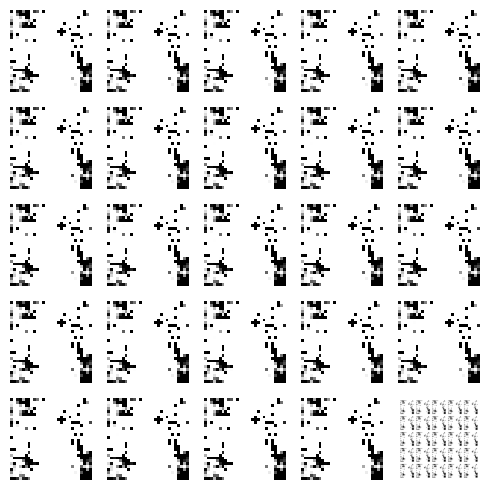

  0%|          | 0/350 [00:00<?, ?it/s]

4/4 [==============================] - 0s 19ms/step


  0%|          | 1/350 [00:00<03:40,  1.58it/s]

4/4 [==============================] - 0s 15ms/step


  1%|          | 2/350 [00:01<03:38,  1.59it/s]

4/4 [==============================] - 0s 11ms/step


  1%|          | 3/350 [00:01<03:34,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


  1%|          | 4/350 [00:02<03:33,  1.62it/s]

4/4 [==============================] - 0s 11ms/step


  1%|▏         | 5/350 [00:03<03:33,  1.61it/s]

4/4 [==============================] - 0s 11ms/step


  2%|▏         | 6/350 [00:03<03:32,  1.62it/s]

4/4 [==============================] - 0s 11ms/step


  2%|▏         | 7/350 [00:04<03:26,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


  2%|▏         | 8/350 [00:04<03:17,  1.73it/s]

4/4 [==============================] - 0s 12ms/step


  3%|▎         | 9/350 [00:05<03:21,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


  3%|▎         | 10/350 [00:06<03:31,  1.61it/s]

4/4 [==============================] - 0s 11ms/step


  3%|▎         | 11/350 [00:06<03:25,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


  3%|▎         | 12/350 [00:07<03:30,  1.61it/s]

4/4 [==============================] - 0s 11ms/step


  4%|▎         | 13/350 [00:07<03:18,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


  4%|▍         | 14/350 [00:08<03:26,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


  4%|▍         | 15/350 [00:09<03:26,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


  5%|▍         | 16/350 [00:09<03:23,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


  5%|▍         | 17/350 [00:10<03:18,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


  5%|▌         | 18/350 [00:10<03:21,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


  5%|▌         | 19/350 [00:11<03:22,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


  6%|▌         | 20/350 [00:12<03:11,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


  6%|▌         | 21/350 [00:12<03:13,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


  6%|▋         | 22/350 [00:13<03:26,  1.59it/s]

4/4 [==============================] - 0s 11ms/step


  7%|▋         | 23/350 [00:13<03:20,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


  7%|▋         | 24/350 [00:14<03:17,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


  7%|▋         | 25/350 [00:15<03:15,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


  7%|▋         | 26/350 [00:15<03:14,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


  8%|▊         | 27/350 [00:16<03:12,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


  8%|▊         | 28/350 [00:16<03:11,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


  8%|▊         | 29/350 [00:17<03:13,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


  9%|▊         | 30/350 [00:18<03:11,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


  9%|▉         | 31/350 [00:18<03:10,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


  9%|▉         | 32/350 [00:19<03:13,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


  9%|▉         | 33/350 [00:19<03:11,  1.65it/s]

4/4 [==============================] - 0s 13ms/step


 10%|▉         | 34/350 [00:20<03:15,  1.62it/s]

4/4 [==============================] - 0s 13ms/step


 10%|█         | 35/350 [00:21<03:05,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 10%|█         | 36/350 [00:21<03:05,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 11%|█         | 37/350 [00:22<02:58,  1.76it/s]

4/4 [==============================] - 0s 11ms/step


 11%|█         | 38/350 [00:22<03:08,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 11%|█         | 39/350 [00:23<03:21,  1.54it/s]

4/4 [==============================] - 0s 15ms/step


 11%|█▏        | 40/350 [00:24<03:14,  1.59it/s]

4/4 [==============================] - 0s 13ms/step


 12%|█▏        | 41/350 [00:24<03:11,  1.61it/s]

4/4 [==============================] - 0s 11ms/step


 12%|█▏        | 42/350 [00:25<03:16,  1.57it/s]

4/4 [==============================] - 0s 11ms/step


 12%|█▏        | 43/350 [00:26<03:14,  1.58it/s]

4/4 [==============================] - 0s 14ms/step


 13%|█▎        | 44/350 [00:26<03:15,  1.57it/s]

4/4 [==============================] - 0s 11ms/step


 13%|█▎        | 45/350 [00:27<03:11,  1.60it/s]

4/4 [==============================] - 0s 11ms/step


 13%|█▎        | 46/350 [00:28<03:14,  1.56it/s]

4/4 [==============================] - 0s 13ms/step


 13%|█▎        | 47/350 [00:28<03:03,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 14%|█▎        | 48/350 [00:29<03:01,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 14%|█▍        | 49/350 [00:29<03:03,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


 14%|█▍        | 50/350 [00:30<03:05,  1.61it/s]

4/4 [==============================] - 0s 12ms/step


 15%|█▍        | 51/350 [00:31<02:57,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 15%|█▍        | 52/350 [00:31<02:56,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 15%|█▌        | 53/350 [00:32<02:58,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 15%|█▌        | 54/350 [00:32<02:58,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 16%|█▌        | 55/350 [00:33<02:57,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 16%|█▌        | 56/350 [00:34<02:59,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


 16%|█▋        | 57/350 [00:34<02:58,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


 17%|█▋        | 58/350 [00:35<02:56,  1.65it/s]

4/4 [==============================] - 0s 13ms/step


 17%|█▋        | 59/350 [00:35<02:54,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 17%|█▋        | 60/350 [00:36<02:57,  1.64it/s]

4/4 [==============================] - 0s 13ms/step


 17%|█▋        | 61/350 [00:37<02:50,  1.70it/s]

4/4 [==============================] - 0s 13ms/step


 18%|█▊        | 62/350 [00:37<02:56,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 18%|█▊        | 63/350 [00:38<02:55,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 18%|█▊        | 64/350 [00:38<02:53,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 19%|█▊        | 65/350 [00:39<03:01,  1.57it/s]

4/4 [==============================] - 0s 11ms/step


 19%|█▉        | 66/350 [00:40<03:02,  1.55it/s]

4/4 [==============================] - 0s 14ms/step


 19%|█▉        | 67/350 [00:40<02:52,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 19%|█▉        | 68/350 [00:41<02:51,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


 20%|█▉        | 69/350 [00:41<02:48,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 20%|██        | 70/350 [00:42<02:50,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 20%|██        | 71/350 [00:43<02:47,  1.66it/s]

4/4 [==============================] - 0s 10ms/step


 21%|██        | 72/350 [00:43<02:46,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 21%|██        | 73/350 [00:44<02:39,  1.74it/s]

4/4 [==============================] - 0s 11ms/step


 21%|██        | 74/350 [00:45<02:49,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 21%|██▏       | 75/350 [00:45<02:40,  1.72it/s]

4/4 [==============================] - 0s 11ms/step


 22%|██▏       | 76/350 [00:46<02:37,  1.74it/s]

4/4 [==============================] - 0s 11ms/step


 22%|██▏       | 77/350 [00:46<02:33,  1.78it/s]

4/4 [==============================] - 0s 11ms/step


 22%|██▏       | 78/350 [00:47<02:37,  1.73it/s]

4/4 [==============================] - 0s 11ms/step


 23%|██▎       | 79/350 [00:47<02:37,  1.72it/s]

4/4 [==============================] - 0s 11ms/step


 23%|██▎       | 80/350 [00:48<02:45,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 23%|██▎       | 81/350 [00:49<02:47,  1.61it/s]

4/4 [==============================] - 0s 11ms/step


 23%|██▎       | 82/350 [00:49<02:38,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 24%|██▎       | 83/350 [00:50<02:44,  1.62it/s]

4/4 [==============================] - 0s 10ms/step


 24%|██▍       | 84/350 [00:50<02:42,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


 24%|██▍       | 85/350 [00:51<02:41,  1.64it/s]

4/4 [==============================] - 0s 10ms/step


 25%|██▍       | 86/350 [00:52<02:33,  1.72it/s]

4/4 [==============================] - 0s 11ms/step


 25%|██▍       | 87/350 [00:52<02:40,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


 25%|██▌       | 88/350 [00:53<02:40,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 25%|██▌       | 89/350 [00:53<02:36,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 26%|██▌       | 90/350 [00:54<02:35,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 26%|██▌       | 91/350 [00:55<02:39,  1.62it/s]

4/4 [==============================] - 0s 14ms/step


 26%|██▋       | 92/350 [00:55<02:32,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 27%|██▋       | 93/350 [00:56<02:31,  1.70it/s]

4/4 [==============================] - 0s 16ms/step


 27%|██▋       | 94/350 [00:56<02:31,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 27%|██▋       | 95/350 [00:57<02:33,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 27%|██▋       | 96/350 [00:58<02:30,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 28%|██▊       | 97/350 [00:58<02:29,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 28%|██▊       | 98/350 [00:59<02:32,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 28%|██▊       | 99/350 [00:59<02:30,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 29%|██▊       | 100/350 [01:00<02:28,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 29%|██▉       | 101/350 [01:01<02:27,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 29%|██▉       | 102/350 [01:01<02:24,  1.72it/s]

4/4 [==============================] - 0s 11ms/step


 29%|██▉       | 103/350 [01:02<02:30,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


 30%|██▉       | 104/350 [01:02<02:28,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 30%|███       | 105/350 [01:03<02:27,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 30%|███       | 106/350 [01:04<02:20,  1.73it/s]

4/4 [==============================] - 0s 12ms/step


 31%|███       | 107/350 [01:04<02:28,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


 31%|███       | 108/350 [01:05<02:25,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 31%|███       | 109/350 [01:05<02:25,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 31%|███▏      | 110/350 [01:06<02:19,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


 32%|███▏      | 111/350 [01:07<02:27,  1.62it/s]

4/4 [==============================] - 0s 11ms/step


 32%|███▏      | 112/350 [01:07<02:26,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


 32%|███▏      | 113/350 [01:08<02:18,  1.71it/s]

4/4 [==============================] - 0s 14ms/step


 33%|███▎      | 114/350 [01:08<02:20,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 33%|███▎      | 115/350 [01:09<02:25,  1.61it/s]

4/4 [==============================] - 0s 12ms/step


 33%|███▎      | 116/350 [01:10<02:24,  1.62it/s]

4/4 [==============================] - 0s 10ms/step


 33%|███▎      | 117/350 [01:10<02:16,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 34%|███▎      | 118/350 [01:11<02:16,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 34%|███▍      | 119/350 [01:11<02:22,  1.62it/s]

4/4 [==============================] - 0s 11ms/step


 34%|███▍      | 120/350 [01:12<02:20,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


 35%|███▍      | 121/350 [01:13<02:18,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 35%|███▍      | 122/350 [01:13<02:19,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


 35%|███▌      | 123/350 [01:14<02:21,  1.61it/s]

4/4 [==============================] - 0s 12ms/step


 35%|███▌      | 124/350 [01:14<02:16,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 36%|███▌      | 125/350 [01:15<02:13,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 36%|███▌      | 126/350 [01:16<02:14,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 36%|███▋      | 127/350 [01:16<02:13,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 37%|███▋      | 128/350 [01:17<02:11,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 37%|███▋      | 129/350 [01:17<02:05,  1.77it/s]

4/4 [==============================] - 0s 12ms/step


 37%|███▋      | 130/350 [01:18<02:08,  1.72it/s]

4/4 [==============================] - 0s 11ms/step


 37%|███▋      | 131/350 [01:18<02:02,  1.79it/s]

4/4 [==============================] - 0s 17ms/step


 38%|███▊      | 132/350 [01:19<02:08,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 38%|███▊      | 133/350 [01:20<02:10,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 38%|███▊      | 134/350 [01:20<02:04,  1.74it/s]

4/4 [==============================] - 0s 11ms/step


 39%|███▊      | 135/350 [01:21<02:04,  1.73it/s]

4/4 [==============================] - 0s 26ms/step


 39%|███▉      | 136/350 [01:22<02:09,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 39%|███▉      | 137/350 [01:22<02:09,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


 39%|███▉      | 138/350 [01:23<02:02,  1.73it/s]

4/4 [==============================] - 0s 11ms/step


 40%|███▉      | 139/350 [01:23<02:03,  1.70it/s]

4/4 [==============================] - 0s 21ms/step


 40%|████      | 140/350 [01:24<02:09,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 40%|████      | 141/350 [01:24<02:02,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 41%|████      | 142/350 [01:25<02:03,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 41%|████      | 143/350 [01:26<02:03,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 41%|████      | 144/350 [01:26<02:08,  1.61it/s]

4/4 [==============================] - 0s 12ms/step


 41%|████▏     | 145/350 [01:27<02:00,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 42%|████▏     | 146/350 [01:27<01:59,  1.71it/s]

4/4 [==============================] - 0s 11ms/step


 42%|████▏     | 147/350 [01:28<02:01,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 42%|████▏     | 148/350 [01:29<02:01,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 43%|████▎     | 149/350 [01:29<01:59,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 43%|████▎     | 150/350 [01:30<01:54,  1.75it/s]

4/4 [==============================] - 0s 12ms/step


 43%|████▎     | 151/350 [01:30<01:56,  1.71it/s]

4/4 [==============================] - 0s 11ms/step


 43%|████▎     | 152/350 [01:31<01:52,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 44%|████▎     | 153/350 [01:32<01:56,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 44%|████▍     | 154/350 [01:32<01:55,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 44%|████▍     | 155/350 [01:33<01:52,  1.74it/s]

4/4 [==============================] - 0s 11ms/step


 45%|████▍     | 156/350 [01:33<01:53,  1.71it/s]

4/4 [==============================] - 0s 26ms/step


 45%|████▍     | 157/350 [01:34<01:57,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


 45%|████▌     | 158/350 [01:35<01:58,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 45%|████▌     | 159/350 [01:35<01:51,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 46%|████▌     | 160/350 [01:36<01:51,  1.70it/s]

4/4 [==============================] - 0s 13ms/step


 46%|████▌     | 161/350 [01:36<01:54,  1.65it/s]

4/4 [==============================] - 0s 13ms/step


 46%|████▋     | 162/350 [01:37<01:57,  1.61it/s]

4/4 [==============================] - 0s 11ms/step


 47%|████▋     | 163/350 [01:38<01:50,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 47%|████▋     | 164/350 [01:38<01:50,  1.69it/s]

4/4 [==============================] - 0s 14ms/step


 47%|████▋     | 165/350 [01:39<01:56,  1.59it/s]

4/4 [==============================] - 0s 11ms/step


 47%|████▋     | 166/350 [01:39<01:49,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 48%|████▊     | 167/350 [01:40<01:48,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 48%|████▊     | 168/350 [01:41<01:48,  1.68it/s]

4/4 [==============================] - 0s 16ms/step


 48%|████▊     | 169/350 [01:41<01:52,  1.61it/s]

4/4 [==============================] - 0s 12ms/step


 49%|████▊     | 170/350 [01:42<01:51,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


 49%|████▉     | 171/350 [01:42<01:48,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 49%|████▉     | 172/350 [01:43<01:51,  1.60it/s]

4/4 [==============================] - 0s 13ms/step


 49%|████▉     | 173/350 [01:44<01:45,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


 50%|████▉     | 174/350 [01:44<01:45,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 50%|█████     | 175/350 [01:45<01:45,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 50%|█████     | 176/350 [01:45<01:40,  1.73it/s]

4/4 [==============================] - 0s 27ms/step


 51%|█████     | 177/350 [01:46<01:45,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 51%|█████     | 178/350 [01:47<01:44,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 51%|█████     | 179/350 [01:47<01:44,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 51%|█████▏    | 180/350 [01:48<01:39,  1.71it/s]

4/4 [==============================] - 0s 18ms/step


 52%|█████▏    | 181/350 [01:48<01:43,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 52%|█████▏    | 182/350 [01:49<01:42,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


 52%|█████▏    | 183/350 [01:50<01:36,  1.72it/s]

4/4 [==============================] - 0s 11ms/step


 53%|█████▎    | 184/350 [01:50<01:37,  1.70it/s]

4/4 [==============================] - 0s 13ms/step


 53%|█████▎    | 185/350 [01:51<01:40,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 53%|█████▎    | 186/350 [01:51<01:39,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 53%|█████▎    | 187/350 [01:52<01:35,  1.71it/s]

4/4 [==============================] - 0s 11ms/step


 54%|█████▎    | 188/350 [01:53<01:35,  1.70it/s]

4/4 [==============================] - 0s 13ms/step


 54%|█████▍    | 189/350 [01:53<01:39,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


 54%|█████▍    | 190/350 [01:54<01:33,  1.70it/s]

4/4 [==============================] - 0s 14ms/step


 55%|█████▍    | 191/350 [01:54<01:33,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 55%|█████▍    | 192/350 [01:55<01:34,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 55%|█████▌    | 193/350 [01:56<01:37,  1.61it/s]

4/4 [==============================] - 0s 11ms/step


 55%|█████▌    | 194/350 [01:56<01:32,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 56%|█████▌    | 195/350 [01:57<01:32,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


 56%|█████▌    | 196/350 [01:57<01:33,  1.65it/s]

4/4 [==============================] - 0s 14ms/step


 56%|█████▋    | 197/350 [01:58<01:33,  1.63it/s]

4/4 [==============================] - 0s 16ms/step


 57%|█████▋    | 198/350 [01:59<01:29,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 57%|█████▋    | 199/350 [01:59<01:29,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 57%|█████▋    | 200/350 [02:00<01:30,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 57%|█████▋    | 201/350 [02:00<01:29,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 58%|█████▊    | 202/350 [02:01<01:28,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 58%|█████▊    | 203/350 [02:02<01:29,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


 58%|█████▊    | 204/350 [02:02<01:25,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 59%|█████▊    | 205/350 [02:03<01:29,  1.61it/s]

4/4 [==============================] - 0s 11ms/step


 59%|█████▉    | 206/350 [02:03<01:26,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 59%|█████▉    | 207/350 [02:04<01:23,  1.71it/s]

4/4 [==============================] - 0s 11ms/step


 59%|█████▉    | 208/350 [02:05<01:23,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 60%|█████▉    | 209/350 [02:05<01:27,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


 60%|██████    | 210/350 [02:06<01:25,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 60%|██████    | 211/350 [02:06<01:21,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 61%|██████    | 212/350 [02:07<01:21,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 61%|██████    | 213/350 [02:08<01:23,  1.65it/s]

4/4 [==============================] - 0s 16ms/step


 61%|██████    | 214/350 [02:08<01:20,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 61%|██████▏   | 215/350 [02:09<01:20,  1.69it/s]

4/4 [==============================] - 0s 13ms/step


 62%|██████▏   | 216/350 [02:09<01:19,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 62%|██████▏   | 217/350 [02:10<01:22,  1.60it/s]

4/4 [==============================] - 0s 11ms/step


 62%|██████▏   | 218/350 [02:11<01:21,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


 63%|██████▎   | 219/350 [02:11<01:20,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


 63%|██████▎   | 220/350 [02:12<01:20,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


 63%|██████▎   | 221/350 [02:13<01:18,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 63%|██████▎   | 222/350 [02:13<01:17,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


 64%|██████▎   | 223/350 [02:14<01:16,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 64%|██████▍   | 224/350 [02:14<01:16,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 64%|██████▍   | 225/350 [02:15<01:15,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 65%|██████▍   | 226/350 [02:15<01:14,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 65%|██████▍   | 227/350 [02:16<01:10,  1.75it/s]

4/4 [==============================] - 0s 11ms/step


 65%|██████▌   | 228/350 [02:17<01:11,  1.71it/s]

4/4 [==============================] - 0s 10ms/step


 65%|██████▌   | 229/350 [02:17<01:08,  1.78it/s]

4/4 [==============================] - 0s 15ms/step


 66%|██████▌   | 230/350 [02:18<01:11,  1.69it/s]

4/4 [==============================] - 0s 13ms/step


 66%|██████▌   | 231/350 [02:18<01:11,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 66%|██████▋   | 232/350 [02:19<01:08,  1.73it/s]

4/4 [==============================] - 0s 11ms/step


 67%|██████▋   | 233/350 [02:20<01:07,  1.72it/s]

4/4 [==============================] - 0s 11ms/step


 67%|██████▋   | 234/350 [02:20<01:10,  1.65it/s]

4/4 [==============================] - 0s 13ms/step


 67%|██████▋   | 235/350 [02:21<01:07,  1.71it/s]

4/4 [==============================] - 0s 11ms/step


 67%|██████▋   | 236/350 [02:21<01:07,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 68%|██████▊   | 237/350 [02:22<01:07,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 68%|██████▊   | 238/350 [02:23<01:08,  1.62it/s]

4/4 [==============================] - 0s 13ms/step


 68%|██████▊   | 239/350 [02:23<01:05,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 69%|██████▊   | 240/350 [02:24<01:04,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 69%|██████▉   | 241/350 [02:24<01:04,  1.69it/s]

4/4 [==============================] - 0s 13ms/step


 69%|██████▉   | 242/350 [02:25<01:06,  1.62it/s]

4/4 [==============================] - 0s 14ms/step


 69%|██████▉   | 243/350 [02:26<01:03,  1.69it/s]

4/4 [==============================] - 0s 13ms/step


 70%|██████▉   | 244/350 [02:26<01:01,  1.72it/s]

4/4 [==============================] - 0s 11ms/step


 70%|███████   | 245/350 [02:27<00:59,  1.77it/s]

4/4 [==============================] - 0s 12ms/step


 70%|███████   | 246/350 [02:27<01:02,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 71%|███████   | 247/350 [02:28<00:59,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 71%|███████   | 248/350 [02:28<00:59,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 71%|███████   | 249/350 [02:29<01:00,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 71%|███████▏  | 250/350 [02:30<01:02,  1.60it/s]

4/4 [==============================] - 0s 11ms/step


 72%|███████▏  | 251/350 [02:30<01:00,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


 72%|███████▏  | 252/350 [02:31<01:00,  1.62it/s]

4/4 [==============================] - 0s 10ms/step


 72%|███████▏  | 253/350 [02:32<00:58,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


 73%|███████▎  | 254/350 [02:32<00:59,  1.60it/s]

4/4 [==============================] - 0s 13ms/step


 73%|███████▎  | 255/350 [02:33<00:56,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 73%|███████▎  | 256/350 [02:33<00:56,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 73%|███████▎  | 257/350 [02:34<00:54,  1.72it/s]

4/4 [==============================] - 0s 11ms/step


 74%|███████▎  | 258/350 [02:35<00:56,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 74%|███████▍  | 259/350 [02:35<00:56,  1.62it/s]

4/4 [==============================] - 0s 11ms/step


 74%|███████▍  | 260/350 [02:36<00:54,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 75%|███████▍  | 261/350 [02:36<00:51,  1.74it/s]

4/4 [==============================] - 0s 11ms/step


 75%|███████▍  | 262/350 [02:37<00:53,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 75%|███████▌  | 263/350 [02:38<00:53,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


 75%|███████▌  | 264/350 [02:38<00:50,  1.71it/s]

4/4 [==============================] - 0s 11ms/step


 76%|███████▌  | 265/350 [02:39<00:49,  1.71it/s]

4/4 [==============================] - 0s 11ms/step


 76%|███████▌  | 266/350 [02:39<00:52,  1.60it/s]

4/4 [==============================] - 0s 11ms/step


 76%|███████▋  | 267/350 [02:40<00:51,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


 77%|███████▋  | 268/350 [02:41<00:50,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


 77%|███████▋  | 269/350 [02:41<00:49,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 77%|███████▋  | 270/350 [02:42<00:48,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 77%|███████▋  | 271/350 [02:42<00:47,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 78%|███████▊  | 272/350 [02:43<00:47,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 78%|███████▊  | 273/350 [02:44<00:46,  1.64it/s]

4/4 [==============================] - 0s 13ms/step


 78%|███████▊  | 274/350 [02:44<00:46,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 79%|███████▊  | 275/350 [02:45<00:45,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 79%|███████▉  | 276/350 [02:45<00:44,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 79%|███████▉  | 277/350 [02:46<00:42,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


 79%|███████▉  | 278/350 [02:47<00:44,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 80%|███████▉  | 279/350 [02:47<00:43,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


 80%|████████  | 280/350 [02:48<00:43,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 80%|████████  | 281/350 [02:48<00:40,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 81%|████████  | 282/350 [02:49<00:41,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


 81%|████████  | 283/350 [02:50<00:41,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 81%|████████  | 284/350 [02:50<00:38,  1.71it/s]

4/4 [==============================] - 0s 11ms/step


 81%|████████▏ | 285/350 [02:51<00:38,  1.70it/s]

4/4 [==============================] - 0s 13ms/step


 82%|████████▏ | 286/350 [02:51<00:39,  1.64it/s]

4/4 [==============================] - 0s 13ms/step


 82%|████████▏ | 287/350 [02:52<00:38,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 82%|████████▏ | 288/350 [02:53<00:36,  1.71it/s]

4/4 [==============================] - 0s 11ms/step


 83%|████████▎ | 289/350 [02:53<00:35,  1.71it/s]

4/4 [==============================] - 0s 11ms/step


 83%|████████▎ | 290/350 [02:54<00:37,  1.60it/s]

4/4 [==============================] - 0s 11ms/step


 83%|████████▎ | 291/350 [02:54<00:36,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


 83%|████████▎ | 292/350 [02:55<00:35,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


 84%|████████▎ | 293/350 [02:56<00:35,  1.61it/s]

4/4 [==============================] - 0s 11ms/step


 84%|████████▍ | 294/350 [02:56<00:34,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


 84%|████████▍ | 295/350 [02:57<00:33,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 85%|████████▍ | 296/350 [02:58<00:32,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 85%|████████▍ | 297/350 [02:58<00:31,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 85%|████████▌ | 298/350 [02:59<00:31,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 85%|████████▌ | 299/350 [02:59<00:30,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 86%|████████▌ | 300/350 [03:00<00:30,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 86%|████████▌ | 301/350 [03:00<00:28,  1.73it/s]

4/4 [==============================] - 0s 11ms/step


 86%|████████▋ | 302/350 [03:01<00:29,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 87%|████████▋ | 303/350 [03:02<00:28,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


 87%|████████▋ | 304/350 [03:02<00:27,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 87%|████████▋ | 305/350 [03:03<00:26,  1.73it/s]

4/4 [==============================] - 0s 11ms/step


 87%|████████▋ | 306/350 [03:04<00:26,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 88%|████████▊ | 307/350 [03:04<00:26,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 88%|████████▊ | 308/350 [03:05<00:24,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


 88%|████████▊ | 309/350 [03:05<00:24,  1.71it/s]

4/4 [==============================] - 0s 11ms/step


 89%|████████▊ | 310/350 [03:06<00:24,  1.62it/s]

4/4 [==============================] - 0s 11ms/step


 89%|████████▉ | 311/350 [03:07<00:24,  1.62it/s]

4/4 [==============================] - 0s 11ms/step


 89%|████████▉ | 312/350 [03:07<00:22,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 89%|████████▉ | 313/350 [03:08<00:21,  1.70it/s]

4/4 [==============================] - 0s 10ms/step


 90%|████████▉ | 314/350 [03:08<00:20,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 90%|█████████ | 315/350 [03:09<00:21,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


 90%|█████████ | 316/350 [03:10<00:20,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 91%|█████████ | 317/350 [03:10<00:19,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 91%|█████████ | 318/350 [03:11<00:18,  1.72it/s]

4/4 [==============================] - 0s 11ms/step


 91%|█████████ | 319/350 [03:11<00:18,  1.66it/s]

4/4 [==============================] - 0s 14ms/step


 91%|█████████▏| 320/350 [03:12<00:17,  1.69it/s]

4/4 [==============================] - 0s 14ms/step


 92%|█████████▏| 321/350 [03:12<00:16,  1.74it/s]

4/4 [==============================] - 0s 11ms/step


 92%|█████████▏| 322/350 [03:13<00:16,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 92%|█████████▏| 323/350 [03:14<00:15,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 93%|█████████▎| 324/350 [03:14<00:15,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 93%|█████████▎| 325/350 [03:15<00:15,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 93%|█████████▎| 326/350 [03:15<00:13,  1.74it/s]

4/4 [==============================] - 0s 11ms/step


 93%|█████████▎| 327/350 [03:16<00:13,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


 94%|█████████▎| 328/350 [03:17<00:13,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 94%|█████████▍| 329/350 [03:17<00:12,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


 94%|█████████▍| 330/350 [03:18<00:12,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


 95%|█████████▍| 331/350 [03:19<00:11,  1.61it/s]

4/4 [==============================] - 0s 13ms/step


 95%|█████████▍| 332/350 [03:19<00:10,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 95%|█████████▌| 333/350 [03:20<00:10,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 95%|█████████▌| 334/350 [03:20<00:09,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 96%|█████████▌| 335/350 [03:21<00:09,  1.59it/s]

4/4 [==============================] - 0s 11ms/step


 96%|█████████▌| 336/350 [03:21<00:08,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 96%|█████████▋| 337/350 [03:22<00:07,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 97%|█████████▋| 338/350 [03:23<00:07,  1.68it/s]

4/4 [==============================] - 0s 30ms/step


 97%|█████████▋| 339/350 [03:23<00:06,  1.59it/s]

4/4 [==============================] - 0s 11ms/step


 97%|█████████▋| 340/350 [03:24<00:06,  1.60it/s]

4/4 [==============================] - 0s 11ms/step


 97%|█████████▋| 341/350 [03:25<00:05,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 98%|█████████▊| 342/350 [03:25<00:05,  1.55it/s]

4/4 [==============================] - 0s 11ms/step


 98%|█████████▊| 343/350 [03:26<00:04,  1.60it/s]

4/4 [==============================] - 0s 11ms/step


 98%|█████████▊| 344/350 [03:26<00:03,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 99%|█████████▊| 345/350 [03:27<00:02,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 99%|█████████▉| 346/350 [03:28<00:02,  1.74it/s]

4/4 [==============================] - 0s 15ms/step


 99%|█████████▉| 347/350 [03:28<00:01,  1.66it/s]

4/4 [==============================] - 0s 10ms/step


 99%|█████████▉| 348/350 [03:29<00:01,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


100%|█████████▉| 349/350 [03:29<00:00,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


100%|██████████| 350/350 [03:30<00:00,  1.66it/s]

Epoch number: 62 discriminator_loss: 0.1641012869993574 generator_loss: 8.049658147266934
1/1 [==============================] - 0s 19ms/step


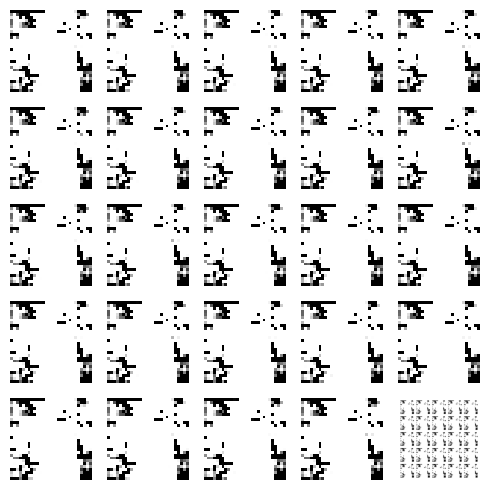

  0%|          | 0/350 [00:00<?, ?it/s]

4/4 [==============================] - 0s 18ms/step


  0%|          | 1/350 [00:00<03:42,  1.57it/s]

4/4 [==============================] - 0s 13ms/step


  1%|          | 2/350 [00:01<03:25,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


  1%|          | 3/350 [00:01<03:28,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


  1%|          | 4/350 [00:02<03:39,  1.58it/s]

4/4 [==============================] - 0s 15ms/step


  1%|▏         | 5/350 [00:03<03:39,  1.57it/s]

4/4 [==============================] - 0s 11ms/step


  2%|▏         | 6/350 [00:03<03:35,  1.59it/s]

4/4 [==============================] - 0s 11ms/step


  2%|▏         | 7/350 [00:04<03:45,  1.52it/s]

4/4 [==============================] - 0s 12ms/step


  2%|▏         | 8/350 [00:05<03:40,  1.55it/s]

4/4 [==============================] - 0s 12ms/step


  3%|▎         | 9/350 [00:05<03:27,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


  3%|▎         | 10/350 [00:06<03:25,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


  3%|▎         | 11/350 [00:06<03:15,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


  3%|▎         | 12/350 [00:07<03:25,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


  4%|▎         | 13/350 [00:07<03:21,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


  4%|▍         | 14/350 [00:08<03:13,  1.74it/s]

4/4 [==============================] - 0s 11ms/step


  4%|▍         | 15/350 [00:09<03:19,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


  5%|▍         | 16/350 [00:09<03:26,  1.61it/s]

4/4 [==============================] - 0s 11ms/step


  5%|▍         | 17/350 [00:10<03:24,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


  5%|▌         | 18/350 [00:11<03:21,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


  5%|▌         | 19/350 [00:11<03:13,  1.71it/s]

4/4 [==============================] - 0s 14ms/step


  6%|▌         | 20/350 [00:12<03:20,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


  6%|▌         | 21/350 [00:12<03:20,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


  6%|▋         | 22/350 [00:13<03:22,  1.62it/s]

4/4 [==============================] - 0s 11ms/step


  7%|▋         | 23/350 [00:14<03:19,  1.64it/s]

4/4 [==============================] - 0s 15ms/step


  7%|▋         | 24/350 [00:14<03:13,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


  7%|▋         | 25/350 [00:15<03:13,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


  7%|▋         | 26/350 [00:15<03:05,  1.75it/s]

4/4 [==============================] - 0s 12ms/step


  8%|▊         | 27/350 [00:16<03:07,  1.73it/s]

4/4 [==============================] - 0s 14ms/step


  8%|▊         | 28/350 [00:16<03:10,  1.69it/s]

4/4 [==============================] - 0s 13ms/step


  8%|▊         | 29/350 [00:17<03:08,  1.71it/s]

4/4 [==============================] - 0s 11ms/step


  9%|▊         | 30/350 [00:18<03:07,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


  9%|▉         | 31/350 [00:18<03:07,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


  9%|▉         | 32/350 [00:19<03:15,  1.63it/s]

4/4 [==============================] - 0s 15ms/step


  9%|▉         | 33/350 [00:19<03:06,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 10%|▉         | 34/350 [00:20<03:07,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 10%|█         | 35/350 [00:21<03:07,  1.68it/s]

4/4 [==============================] - 0s 29ms/step


 10%|█         | 36/350 [00:21<03:18,  1.59it/s]

4/4 [==============================] - 0s 12ms/step


 11%|█         | 37/350 [00:22<03:24,  1.53it/s]

4/4 [==============================] - 0s 21ms/step


 11%|█         | 38/350 [00:23<03:23,  1.54it/s]

4/4 [==============================] - 0s 11ms/step


 11%|█         | 39/350 [00:23<03:19,  1.56it/s]

4/4 [==============================] - 0s 14ms/step


 11%|█▏        | 40/350 [00:24<03:19,  1.55it/s]

4/4 [==============================] - 0s 12ms/step


 12%|█▏        | 41/350 [00:24<03:10,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


 12%|█▏        | 42/350 [00:25<03:09,  1.62it/s]

4/4 [==============================] - 0s 11ms/step


 12%|█▏        | 43/350 [00:26<03:06,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 13%|█▎        | 44/350 [00:26<03:05,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 13%|█▎        | 45/350 [00:27<03:05,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 13%|█▎        | 46/350 [00:28<03:08,  1.61it/s]

4/4 [==============================] - 0s 12ms/step


 13%|█▎        | 47/350 [00:28<03:07,  1.61it/s]

4/4 [==============================] - 0s 12ms/step


 14%|█▎        | 48/350 [00:29<03:10,  1.59it/s]

4/4 [==============================] - 0s 12ms/step


 14%|█▍        | 49/350 [00:29<03:00,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 14%|█▍        | 50/350 [00:30<03:02,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 15%|█▍        | 51/350 [00:30<02:54,  1.72it/s]

4/4 [==============================] - 0s 11ms/step


 15%|█▍        | 52/350 [00:31<02:59,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 15%|█▌        | 53/350 [00:32<02:52,  1.72it/s]

4/4 [==============================] - 0s 11ms/step


 15%|█▌        | 54/350 [00:32<02:55,  1.69it/s]

4/4 [==============================] - 0s 10ms/step


 16%|█▌        | 55/350 [00:33<02:48,  1.75it/s]

4/4 [==============================] - 0s 12ms/step


 16%|█▌        | 56/350 [00:33<02:50,  1.73it/s]

4/4 [==============================] - 0s 11ms/step


 16%|█▋        | 57/350 [00:34<02:59,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 17%|█▋        | 58/350 [00:35<02:50,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 17%|█▋        | 59/350 [00:35<02:51,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 17%|█▋        | 60/350 [00:36<02:52,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 17%|█▋        | 61/350 [00:37<02:59,  1.61it/s]

4/4 [==============================] - 0s 11ms/step


 18%|█▊        | 62/350 [00:37<02:58,  1.61it/s]

4/4 [==============================] - 0s 11ms/step


 18%|█▊        | 63/350 [00:38<02:54,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


 18%|█▊        | 64/350 [00:38<02:50,  1.68it/s]

4/4 [==============================] - 0s 16ms/step


 19%|█▊        | 65/350 [00:39<02:56,  1.61it/s]

4/4 [==============================] - 0s 12ms/step


 19%|█▉        | 66/350 [00:40<02:54,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 19%|█▉        | 67/350 [00:40<02:55,  1.61it/s]

4/4 [==============================] - 0s 10ms/step


 19%|█▉        | 68/350 [00:41<02:57,  1.59it/s]

4/4 [==============================] - 0s 12ms/step


 20%|█▉        | 69/350 [00:41<02:55,  1.60it/s]

4/4 [==============================] - 0s 12ms/step


 20%|██        | 70/350 [00:42<02:54,  1.61it/s]

4/4 [==============================] - 0s 11ms/step


 20%|██        | 71/350 [00:43<02:44,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 21%|██        | 72/350 [00:43<02:53,  1.61it/s]

4/4 [==============================] - 0s 11ms/step


 21%|██        | 73/350 [00:44<02:50,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 21%|██        | 74/350 [00:44<02:48,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


 21%|██▏       | 75/350 [00:45<02:40,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


 22%|██▏       | 76/350 [00:46<02:49,  1.62it/s]

4/4 [==============================] - 0s 11ms/step


 22%|██▏       | 77/350 [00:46<02:47,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 22%|██▏       | 78/350 [00:47<02:39,  1.71it/s]

4/4 [==============================] - 0s 11ms/step


 23%|██▎       | 79/350 [00:47<02:39,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 23%|██▎       | 80/350 [00:48<02:48,  1.61it/s]

4/4 [==============================] - 0s 11ms/step


 23%|██▎       | 81/350 [00:49<02:45,  1.62it/s]

4/4 [==============================] - 0s 10ms/step


 23%|██▎       | 82/350 [00:49<02:38,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 24%|██▎       | 83/350 [00:50<02:38,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 24%|██▍       | 84/350 [00:50<02:31,  1.76it/s]

4/4 [==============================] - 0s 14ms/step


 24%|██▍       | 85/350 [00:51<02:41,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


 25%|██▍       | 86/350 [00:52<02:33,  1.72it/s]

4/4 [==============================] - 0s 11ms/step


 25%|██▍       | 87/350 [00:52<02:33,  1.72it/s]

4/4 [==============================] - 0s 11ms/step


 25%|██▌       | 88/350 [00:53<02:35,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 25%|██▌       | 89/350 [00:53<02:35,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 26%|██▌       | 90/350 [00:54<02:34,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 26%|██▌       | 91/350 [00:55<02:33,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 26%|██▋       | 92/350 [00:55<02:29,  1.72it/s]

4/4 [==============================] - 0s 11ms/step


 27%|██▋       | 93/350 [00:56<02:36,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 27%|██▋       | 94/350 [00:56<02:34,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 27%|██▋       | 95/350 [00:57<02:35,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


 27%|██▋       | 96/350 [00:58<02:33,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 28%|██▊       | 97/350 [00:58<02:31,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 28%|██▊       | 98/350 [00:59<02:31,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 28%|██▊       | 99/350 [00:59<02:32,  1.65it/s]

4/4 [==============================] - 0s 10ms/step


 29%|██▊       | 100/350 [01:00<02:24,  1.73it/s]

4/4 [==============================] - 0s 11ms/step


 29%|██▉       | 101/350 [01:01<02:31,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 29%|██▉       | 102/350 [01:01<02:31,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 29%|██▉       | 103/350 [01:02<02:24,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 30%|██▉       | 104/350 [01:02<02:23,  1.71it/s]

4/4 [==============================] - 0s 11ms/step


 30%|███       | 105/350 [01:03<02:32,  1.60it/s]

4/4 [==============================] - 0s 11ms/step


 30%|███       | 106/350 [01:04<02:31,  1.61it/s]

4/4 [==============================] - 0s 11ms/step


 31%|███       | 107/350 [01:04<02:23,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 31%|███       | 108/350 [01:05<02:23,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 31%|███       | 109/350 [01:05<02:29,  1.61it/s]

4/4 [==============================] - 0s 14ms/step


 31%|███▏      | 110/350 [01:06<02:23,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 32%|███▏      | 111/350 [01:07<02:22,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 32%|███▏      | 112/350 [01:07<02:21,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 32%|███▏      | 113/350 [01:08<02:28,  1.59it/s]

4/4 [==============================] - 0s 11ms/step


 33%|███▎      | 114/350 [01:08<02:25,  1.62it/s]

4/4 [==============================] - 0s 11ms/step


 33%|███▎      | 115/350 [01:09<02:23,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


 33%|███▎      | 116/350 [01:10<02:22,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


 33%|███▎      | 117/350 [01:10<02:21,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


 34%|███▎      | 118/350 [01:11<02:20,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 34%|███▍      | 119/350 [01:12<02:19,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 34%|███▍      | 120/350 [01:12<02:13,  1.72it/s]

4/4 [==============================] - 0s 11ms/step


 35%|███▍      | 121/350 [01:13<02:19,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 35%|███▍      | 122/350 [01:13<02:17,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 35%|███▌      | 123/350 [01:14<02:12,  1.71it/s]

4/4 [==============================] - 0s 13ms/step


 35%|███▌      | 124/350 [01:14<02:13,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 36%|███▌      | 125/350 [01:15<02:18,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 36%|███▌      | 126/350 [01:16<02:18,  1.62it/s]

4/4 [==============================] - 0s 11ms/step


 36%|███▋      | 127/350 [01:16<02:10,  1.71it/s]

4/4 [==============================] - 0s 11ms/step


 37%|███▋      | 128/350 [01:17<02:10,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 37%|███▋      | 129/350 [01:18<02:16,  1.62it/s]

4/4 [==============================] - 0s 11ms/step


 37%|███▋      | 130/350 [01:18<02:17,  1.60it/s]

4/4 [==============================] - 0s 11ms/step


 37%|███▋      | 131/350 [01:19<02:14,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 38%|███▊      | 132/350 [01:19<02:06,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


 38%|███▊      | 133/350 [01:20<02:14,  1.61it/s]

4/4 [==============================] - 0s 11ms/step


 38%|███▊      | 134/350 [01:21<02:12,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 39%|███▊      | 135/350 [01:21<02:09,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 39%|███▉      | 136/350 [01:22<02:03,  1.73it/s]

4/4 [==============================] - 0s 11ms/step


 39%|███▉      | 137/350 [01:22<02:11,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


 39%|███▉      | 138/350 [01:23<02:04,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 40%|███▉      | 139/350 [01:23<02:05,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 40%|████      | 140/350 [01:24<02:03,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 40%|████      | 141/350 [01:25<01:59,  1.74it/s]

4/4 [==============================] - 0s 28ms/step


 41%|████      | 142/350 [01:25<02:06,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 41%|████      | 143/350 [01:26<02:03,  1.68it/s]

4/4 [==============================] - 0s 10ms/step


 41%|████      | 144/350 [01:26<02:00,  1.71it/s]

4/4 [==============================] - 0s 11ms/step


 41%|████▏     | 145/350 [01:27<02:00,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 42%|████▏     | 146/350 [01:28<02:00,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 42%|████▏     | 147/350 [01:28<01:59,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 42%|████▏     | 148/350 [01:29<02:00,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 43%|████▎     | 149/350 [01:29<01:55,  1.75it/s]

4/4 [==============================] - 0s 12ms/step


 43%|████▎     | 150/350 [01:30<02:01,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 43%|████▎     | 151/350 [01:31<02:02,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 43%|████▎     | 152/350 [01:31<02:00,  1.64it/s]

4/4 [==============================] - 0s 10ms/step


 44%|████▎     | 153/350 [01:32<01:58,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 44%|████▍     | 154/350 [01:33<02:03,  1.59it/s]

4/4 [==============================] - 0s 12ms/step


 44%|████▍     | 155/350 [01:33<01:56,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 45%|████▍     | 156/350 [01:34<01:56,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 45%|████▍     | 157/350 [01:34<01:55,  1.67it/s]

4/4 [==============================] - 0s 18ms/step


 45%|████▌     | 158/350 [01:35<02:01,  1.58it/s]

4/4 [==============================] - 0s 12ms/step


 45%|████▌     | 159/350 [01:36<01:59,  1.60it/s]

4/4 [==============================] - 0s 17ms/step


 46%|████▌     | 160/350 [01:36<01:58,  1.61it/s]

4/4 [==============================] - 0s 11ms/step


 46%|████▌     | 161/350 [01:37<02:00,  1.57it/s]

4/4 [==============================] - 0s 12ms/step


 46%|████▋     | 162/350 [01:37<01:52,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 47%|████▋     | 163/350 [01:38<01:52,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 47%|████▋     | 164/350 [01:39<01:52,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 47%|████▋     | 165/350 [01:39<01:47,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 47%|████▋     | 166/350 [01:40<01:50,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 48%|████▊     | 167/350 [01:40<01:49,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 48%|████▊     | 168/350 [01:41<01:46,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


 48%|████▊     | 169/350 [01:41<01:46,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 49%|████▊     | 170/350 [01:42<01:48,  1.66it/s]

4/4 [==============================] - 0s 14ms/step


 49%|████▉     | 171/350 [01:43<01:44,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


 49%|████▉     | 172/350 [01:43<01:45,  1.69it/s]

4/4 [==============================] - 0s 10ms/step


 49%|████▉     | 173/350 [01:44<01:40,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 50%|████▉     | 174/350 [01:44<01:44,  1.69it/s]

4/4 [==============================] - 0s 15ms/step


 50%|█████     | 175/350 [01:45<01:45,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 50%|█████     | 176/350 [01:46<01:39,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 51%|█████     | 177/350 [01:46<01:41,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 51%|█████     | 178/350 [01:47<01:46,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


 51%|█████     | 179/350 [01:47<01:44,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 51%|█████▏    | 180/350 [01:48<01:39,  1.71it/s]

4/4 [==============================] - 0s 11ms/step


 52%|█████▏    | 181/350 [01:49<01:39,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 52%|█████▏    | 182/350 [01:49<01:43,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 52%|█████▏    | 183/350 [01:50<01:37,  1.70it/s]

4/4 [==============================] - 0s 13ms/step


 53%|█████▎    | 184/350 [01:50<01:36,  1.72it/s]

4/4 [==============================] - 0s 11ms/step


 53%|█████▎    | 185/350 [01:51<01:32,  1.78it/s]

4/4 [==============================] - 0s 11ms/step


 53%|█████▎    | 186/350 [01:52<01:35,  1.71it/s]

4/4 [==============================] - 0s 14ms/step


 53%|█████▎    | 187/350 [01:52<01:39,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 54%|█████▎    | 188/350 [01:53<01:38,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 54%|█████▍    | 189/350 [01:53<01:39,  1.62it/s]

4/4 [==============================] - 0s 11ms/step


 54%|█████▍    | 190/350 [01:54<01:33,  1.70it/s]

4/4 [==============================] - 0s 25ms/step


 55%|█████▍    | 191/350 [01:55<01:38,  1.62it/s]

4/4 [==============================] - 0s 11ms/step


 55%|█████▍    | 192/350 [01:55<01:35,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 55%|█████▌    | 193/350 [01:56<01:32,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 55%|█████▌    | 194/350 [01:56<01:32,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 56%|█████▌    | 195/350 [01:57<01:33,  1.65it/s]

4/4 [==============================] - 0s 15ms/step


 56%|█████▌    | 196/350 [01:58<01:30,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 56%|█████▋    | 197/350 [01:58<01:31,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 57%|█████▋    | 198/350 [01:59<01:26,  1.75it/s]

4/4 [==============================] - 0s 11ms/step


 57%|█████▋    | 199/350 [01:59<01:32,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


 57%|█████▋    | 200/350 [02:00<01:31,  1.63it/s]

4/4 [==============================] - 0s 10ms/step


 57%|█████▋    | 201/350 [02:01<01:26,  1.72it/s]

4/4 [==============================] - 0s 11ms/step


 58%|█████▊    | 202/350 [02:01<01:26,  1.71it/s]

4/4 [==============================] - 0s 10ms/step


 58%|█████▊    | 203/350 [02:02<01:30,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 58%|█████▊    | 204/350 [02:02<01:29,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 59%|█████▊    | 205/350 [02:03<01:24,  1.72it/s]

4/4 [==============================] - 0s 11ms/step


 59%|█████▉    | 206/350 [02:03<01:24,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 59%|█████▉    | 207/350 [02:04<01:28,  1.61it/s]

4/4 [==============================] - 0s 11ms/step


 59%|█████▉    | 208/350 [02:05<01:23,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 60%|█████▉    | 209/350 [02:05<01:23,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 60%|██████    | 210/350 [02:06<01:23,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 60%|██████    | 211/350 [02:07<01:28,  1.58it/s]

4/4 [==============================] - 0s 12ms/step


 61%|██████    | 212/350 [02:07<01:25,  1.61it/s]

4/4 [==============================] - 0s 11ms/step


 61%|██████    | 213/350 [02:08<01:20,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 61%|██████    | 214/350 [02:08<01:21,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 61%|██████▏   | 215/350 [02:09<01:17,  1.74it/s]

4/4 [==============================] - 0s 14ms/step


 62%|██████▏   | 216/350 [02:10<01:19,  1.68it/s]

4/4 [==============================] - 0s 16ms/step


 62%|██████▏   | 217/350 [02:10<01:16,  1.74it/s]

4/4 [==============================] - 0s 11ms/step


 62%|██████▏   | 218/350 [02:11<01:17,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 63%|██████▎   | 219/350 [02:11<01:14,  1.76it/s]

4/4 [==============================] - 0s 12ms/step


 63%|██████▎   | 220/350 [02:12<01:18,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 63%|██████▎   | 221/350 [02:12<01:17,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 63%|██████▎   | 222/350 [02:13<01:17,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


 64%|██████▎   | 223/350 [02:14<01:13,  1.73it/s]

4/4 [==============================] - 0s 12ms/step


 64%|██████▍   | 224/350 [02:14<01:17,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 64%|██████▍   | 225/350 [02:15<01:15,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 65%|██████▍   | 226/350 [02:15<01:11,  1.73it/s]

4/4 [==============================] - 0s 11ms/step


 65%|██████▍   | 227/350 [02:16<01:12,  1.71it/s]

4/4 [==============================] - 0s 11ms/step


 65%|██████▌   | 228/350 [02:17<01:14,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 65%|██████▌   | 229/350 [02:17<01:14,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 66%|██████▌   | 230/350 [02:18<01:10,  1.71it/s]

4/4 [==============================] - 0s 11ms/step


 66%|██████▌   | 231/350 [02:18<01:10,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 66%|██████▋   | 232/350 [02:19<01:13,  1.60it/s]

4/4 [==============================] - 0s 11ms/step


 67%|██████▋   | 233/350 [02:20<01:09,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 67%|██████▋   | 234/350 [02:20<01:08,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 67%|██████▋   | 235/350 [02:21<01:08,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 67%|██████▋   | 236/350 [02:22<01:10,  1.61it/s]

4/4 [==============================] - 0s 12ms/step


 68%|██████▊   | 237/350 [02:22<01:07,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 68%|██████▊   | 238/350 [02:23<01:06,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 68%|██████▊   | 239/350 [02:23<01:06,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 69%|██████▊   | 240/350 [02:24<01:03,  1.74it/s]

4/4 [==============================] - 0s 31ms/step


 69%|██████▉   | 241/350 [02:24<01:05,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 69%|██████▉   | 242/350 [02:25<01:04,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 69%|██████▉   | 243/350 [02:26<01:02,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


 70%|██████▉   | 244/350 [02:26<01:01,  1.72it/s]

4/4 [==============================] - 0s 11ms/step


 70%|███████   | 245/350 [02:27<01:01,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 70%|███████   | 246/350 [02:27<01:01,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 71%|███████   | 247/350 [02:28<01:01,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 71%|███████   | 248/350 [02:28<00:58,  1.75it/s]

4/4 [==============================] - 0s 12ms/step


 71%|███████   | 249/350 [02:29<01:01,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 71%|███████▏  | 250/350 [02:30<01:01,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


 72%|███████▏  | 251/350 [02:30<00:57,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


 72%|███████▏  | 252/350 [02:31<00:57,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 72%|███████▏  | 253/350 [02:32<00:59,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


 73%|███████▎  | 254/350 [02:32<00:59,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 73%|███████▎  | 255/350 [02:33<00:55,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 73%|███████▎  | 256/350 [02:33<00:55,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 73%|███████▎  | 257/350 [02:34<00:57,  1.61it/s]

4/4 [==============================] - 0s 11ms/step


 74%|███████▎  | 258/350 [02:35<00:55,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 74%|███████▍  | 259/350 [02:35<00:52,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


 74%|███████▍  | 260/350 [02:36<00:52,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 75%|███████▍  | 261/350 [02:36<00:54,  1.62it/s]

4/4 [==============================] - 0s 14ms/step


 75%|███████▍  | 262/350 [02:37<00:51,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 75%|███████▌  | 263/350 [02:37<00:51,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 75%|███████▌  | 264/350 [02:38<00:52,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 76%|███████▌  | 265/350 [02:39<00:49,  1.73it/s]

4/4 [==============================] - 0s 14ms/step


 76%|███████▌  | 266/350 [02:39<00:50,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 76%|███████▋  | 267/350 [02:40<00:47,  1.74it/s]

4/4 [==============================] - 0s 11ms/step


 77%|███████▋  | 268/350 [02:40<00:48,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 77%|███████▋  | 269/350 [02:41<00:45,  1.76it/s]

4/4 [==============================] - 0s 11ms/step


 77%|███████▋  | 270/350 [02:42<00:48,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 77%|███████▋  | 271/350 [02:42<00:47,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 78%|███████▊  | 272/350 [02:43<00:47,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 78%|███████▊  | 273/350 [02:43<00:44,  1.72it/s]

4/4 [==============================] - 0s 11ms/step


 78%|███████▊  | 274/350 [02:44<00:45,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 79%|███████▊  | 275/350 [02:45<00:43,  1.74it/s]

4/4 [==============================] - 0s 11ms/step


 79%|███████▉  | 276/350 [02:45<00:43,  1.71it/s]

4/4 [==============================] - 0s 11ms/step


 79%|███████▉  | 277/350 [02:46<00:41,  1.77it/s]

4/4 [==============================] - 0s 12ms/step


 79%|███████▉  | 278/350 [02:46<00:41,  1.74it/s]

4/4 [==============================] - 0s 24ms/step


 80%|███████▉  | 279/350 [02:47<00:43,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 80%|████████  | 280/350 [02:47<00:40,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 80%|████████  | 281/350 [02:48<00:40,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 81%|████████  | 282/350 [02:49<00:40,  1.69it/s]

4/4 [==============================] - 0s 13ms/step


 81%|████████  | 283/350 [02:49<00:40,  1.65it/s]

4/4 [==============================] - 0s 15ms/step


 81%|████████  | 284/350 [02:50<00:39,  1.69it/s]

4/4 [==============================] - 0s 16ms/step


 81%|████████▏ | 285/350 [02:51<00:39,  1.65it/s]

4/4 [==============================] - 0s 14ms/step


 82%|████████▏ | 286/350 [02:51<00:38,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 82%|████████▏ | 287/350 [02:52<00:41,  1.53it/s]

4/4 [==============================] - 0s 12ms/step


 82%|████████▏ | 288/350 [02:52<00:39,  1.58it/s]

4/4 [==============================] - 0s 12ms/step


 83%|████████▎ | 289/350 [02:53<00:38,  1.59it/s]

4/4 [==============================] - 0s 12ms/step


 83%|████████▎ | 290/350 [02:54<00:36,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 83%|████████▎ | 291/350 [02:54<00:36,  1.60it/s]

4/4 [==============================] - 0s 11ms/step


 83%|████████▎ | 292/350 [02:55<00:35,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 84%|████████▎ | 293/350 [02:55<00:35,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 84%|████████▍ | 294/350 [02:56<00:32,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 84%|████████▍ | 295/350 [02:57<00:33,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


 85%|████████▍ | 296/350 [02:57<00:32,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 85%|████████▍ | 297/350 [02:58<00:32,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 85%|████████▌ | 298/350 [02:58<00:31,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 85%|████████▌ | 299/350 [02:59<00:30,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 86%|████████▌ | 300/350 [03:00<00:29,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 86%|████████▌ | 301/350 [03:00<00:28,  1.73it/s]

4/4 [==============================] - 0s 12ms/step


 86%|████████▋ | 302/350 [03:01<00:27,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


 87%|████████▋ | 303/350 [03:01<00:28,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 87%|████████▋ | 304/350 [03:02<00:28,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 87%|████████▋ | 305/350 [03:03<00:26,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 87%|████████▋ | 306/350 [03:03<00:25,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 88%|████████▊ | 307/350 [03:04<00:27,  1.59it/s]

4/4 [==============================] - 0s 11ms/step


 88%|████████▊ | 308/350 [03:05<00:25,  1.62it/s]

4/4 [==============================] - 0s 11ms/step


 88%|████████▊ | 309/350 [03:05<00:25,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 89%|████████▊ | 310/350 [03:06<00:24,  1.60it/s]

4/4 [==============================] - 0s 12ms/step


 89%|████████▉ | 311/350 [03:06<00:24,  1.60it/s]

4/4 [==============================] - 0s 15ms/step


 89%|████████▉ | 312/350 [03:07<00:22,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 89%|████████▉ | 313/350 [03:08<00:22,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 90%|████████▉ | 314/350 [03:08<00:21,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 90%|█████████ | 315/350 [03:09<00:21,  1.65it/s]

4/4 [==============================] - 0s 18ms/step


 90%|█████████ | 316/350 [03:09<00:20,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 91%|█████████ | 317/350 [03:10<00:20,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 91%|█████████ | 318/350 [03:10<00:18,  1.73it/s]

4/4 [==============================] - 0s 11ms/step


 91%|█████████ | 319/350 [03:11<00:18,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


 91%|█████████▏| 320/350 [03:12<00:17,  1.73it/s]

4/4 [==============================] - 0s 11ms/step


 92%|█████████▏| 321/350 [03:12<00:17,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 92%|█████████▏| 322/350 [03:13<00:15,  1.76it/s]

4/4 [==============================] - 0s 11ms/step


 92%|█████████▏| 323/350 [03:13<00:15,  1.73it/s]

4/4 [==============================] - 0s 12ms/step


 93%|█████████▎| 324/350 [03:14<00:15,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 93%|█████████▎| 325/350 [03:15<00:15,  1.64it/s]

4/4 [==============================] - 0s 10ms/step


 93%|█████████▎| 326/350 [03:15<00:13,  1.73it/s]

4/4 [==============================] - 0s 11ms/step


 93%|█████████▎| 327/350 [03:16<00:13,  1.71it/s]

4/4 [==============================] - 0s 11ms/step


 94%|█████████▎| 328/350 [03:16<00:12,  1.70it/s]

4/4 [==============================] - 0s 13ms/step


 94%|█████████▍| 329/350 [03:17<00:12,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 94%|█████████▍| 330/350 [03:18<00:11,  1.75it/s]

4/4 [==============================] - 0s 12ms/step


 95%|█████████▍| 331/350 [03:18<00:10,  1.73it/s]

4/4 [==============================] - 0s 11ms/step


 95%|█████████▍| 332/350 [03:19<00:10,  1.67it/s]

4/4 [==============================] - 0s 14ms/step


 95%|█████████▌| 333/350 [03:19<00:09,  1.73it/s]

4/4 [==============================] - 0s 12ms/step


 95%|█████████▌| 334/350 [03:20<00:09,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 96%|█████████▌| 335/350 [03:21<00:08,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 96%|█████████▌| 336/350 [03:21<00:08,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


 96%|█████████▋| 337/350 [03:22<00:07,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 97%|█████████▋| 338/350 [03:22<00:07,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 97%|█████████▋| 339/350 [03:23<00:06,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 97%|█████████▋| 340/350 [03:23<00:05,  1.75it/s]

4/4 [==============================] - 0s 15ms/step


 97%|█████████▋| 341/350 [03:24<00:05,  1.68it/s]

4/4 [==============================] - 0s 15ms/step


 98%|█████████▊| 342/350 [03:25<00:04,  1.74it/s]

4/4 [==============================] - 0s 11ms/step


 98%|█████████▊| 343/350 [03:25<00:04,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 98%|█████████▊| 344/350 [03:26<00:03,  1.77it/s]

4/4 [==============================] - 0s 11ms/step


 99%|█████████▊| 345/350 [03:26<00:02,  1.67it/s]

4/4 [==============================] - 0s 14ms/step


 99%|█████████▉| 346/350 [03:27<00:02,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 99%|█████████▉| 347/350 [03:28<00:01,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 99%|█████████▉| 348/350 [03:28<00:01,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


100%|█████████▉| 349/350 [03:29<00:00,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


100%|██████████| 350/350 [03:29<00:00,  1.67it/s]

Epoch number: 63 discriminator_loss: 0.16409257822545312 generator_loss: 8.042844099317279
1/1 [==============================] - 0s 21ms/step


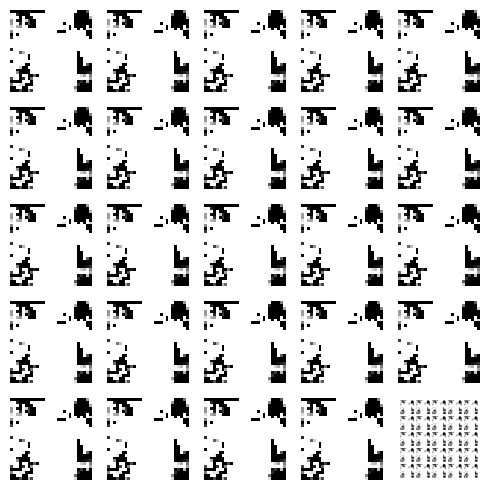

  0%|          | 0/350 [00:00<?, ?it/s]

4/4 [==============================] - 0s 19ms/step


  0%|          | 1/350 [00:00<03:32,  1.64it/s]

4/4 [==============================] - 0s 14ms/step


  1%|          | 2/350 [00:01<03:41,  1.57it/s]

4/4 [==============================] - 0s 11ms/step


  1%|          | 3/350 [00:01<03:40,  1.57it/s]

4/4 [==============================] - 0s 13ms/step


  1%|          | 4/350 [00:02<03:24,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


  1%|▏         | 5/350 [00:03<03:24,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


  2%|▏         | 6/350 [00:03<03:37,  1.58it/s]

4/4 [==============================] - 0s 10ms/step


  2%|▏         | 7/350 [00:04<03:32,  1.62it/s]

4/4 [==============================] - 0s 11ms/step


  2%|▏         | 8/350 [00:04<03:25,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


  3%|▎         | 9/350 [00:05<03:16,  1.74it/s]

4/4 [==============================] - 0s 11ms/step


  3%|▎         | 10/350 [00:06<03:32,  1.60it/s]

4/4 [==============================] - 0s 12ms/step


  3%|▎         | 11/350 [00:06<03:27,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


  3%|▎         | 12/350 [00:07<03:25,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


  4%|▎         | 13/350 [00:07<03:24,  1.65it/s]

4/4 [==============================] - 0s 13ms/step


  4%|▍         | 14/350 [00:08<03:24,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


  4%|▍         | 15/350 [00:09<03:22,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


  5%|▍         | 16/350 [00:09<03:24,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


  5%|▍         | 17/350 [00:10<03:18,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


  5%|▌         | 18/350 [00:11<03:28,  1.59it/s]

4/4 [==============================] - 0s 12ms/step


  5%|▌         | 19/350 [00:11<03:23,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


  6%|▌         | 20/350 [00:12<03:22,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


  6%|▌         | 21/350 [00:12<03:12,  1.71it/s]

4/4 [==============================] - 0s 11ms/step


  6%|▋         | 22/350 [00:13<03:22,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


  7%|▋         | 23/350 [00:14<03:21,  1.62it/s]

4/4 [==============================] - 0s 11ms/step


  7%|▋         | 24/350 [00:14<03:11,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


  7%|▋         | 25/350 [00:15<03:12,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


  7%|▋         | 26/350 [00:15<03:19,  1.62it/s]

4/4 [==============================] - 0s 13ms/step


  8%|▊         | 27/350 [00:16<03:18,  1.62it/s]

4/4 [==============================] - 0s 11ms/step


  8%|▊         | 28/350 [00:16<03:09,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


  8%|▊         | 29/350 [00:17<03:09,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


  9%|▊         | 30/350 [00:18<03:17,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


  9%|▉         | 31/350 [00:18<03:07,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


  9%|▉         | 32/350 [00:19<03:07,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


  9%|▉         | 33/350 [00:19<03:06,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 10%|▉         | 34/350 [00:20<03:02,  1.73it/s]

4/4 [==============================] - 0s 11ms/step


 10%|█         | 35/350 [00:21<03:09,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 10%|█         | 36/350 [00:21<03:09,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 11%|█         | 37/350 [00:22<03:10,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 11%|█         | 38/350 [00:22<03:02,  1.71it/s]

4/4 [==============================] - 0s 13ms/step


 11%|█         | 39/350 [00:23<03:08,  1.65it/s]

4/4 [==============================] - 0s 14ms/step


 11%|█▏        | 40/350 [00:24<03:00,  1.72it/s]

4/4 [==============================] - 0s 11ms/step


 12%|█▏        | 41/350 [00:24<03:02,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 12%|█▏        | 42/350 [00:25<03:01,  1.70it/s]

4/4 [==============================] - 0s 13ms/step


 12%|█▏        | 43/350 [00:26<03:13,  1.58it/s]

4/4 [==============================] - 0s 12ms/step


 13%|█▎        | 44/350 [00:26<03:10,  1.61it/s]

4/4 [==============================] - 0s 19ms/step


 13%|█▎        | 45/350 [00:27<03:16,  1.56it/s]

4/4 [==============================] - 0s 11ms/step


 13%|█▎        | 46/350 [00:27<03:05,  1.64it/s]

4/4 [==============================] - 0s 13ms/step


 13%|█▎        | 47/350 [00:28<03:12,  1.57it/s]

4/4 [==============================] - 0s 11ms/step


 14%|█▎        | 48/350 [00:29<03:10,  1.58it/s]

4/4 [==============================] - 0s 11ms/step


 14%|█▍        | 49/350 [00:29<02:59,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 14%|█▍        | 50/350 [00:30<02:58,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 15%|█▍        | 51/350 [00:30<03:03,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


 15%|█▍        | 52/350 [00:31<03:03,  1.62it/s]

4/4 [==============================] - 0s 11ms/step


 15%|█▌        | 53/350 [00:32<02:54,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 15%|█▌        | 54/350 [00:32<02:53,  1.71it/s]

4/4 [==============================] - 0s 11ms/step


 16%|█▌        | 55/350 [00:33<03:04,  1.60it/s]

4/4 [==============================] - 0s 11ms/step


 16%|█▌        | 56/350 [00:33<02:59,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


 16%|█▋        | 57/350 [00:34<02:57,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 17%|█▋        | 58/350 [00:35<03:00,  1.62it/s]

4/4 [==============================] - 0s 11ms/step


 17%|█▋        | 59/350 [00:35<03:00,  1.61it/s]

4/4 [==============================] - 0s 14ms/step


 17%|█▋        | 60/350 [00:36<02:53,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 17%|█▋        | 61/350 [00:36<02:54,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 18%|█▊        | 62/350 [00:37<02:53,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 18%|█▊        | 63/350 [00:38<02:53,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 18%|█▊        | 64/350 [00:38<02:55,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 19%|█▊        | 65/350 [00:39<02:58,  1.60it/s]

4/4 [==============================] - 0s 12ms/step


 19%|█▉        | 66/350 [00:40<02:49,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 19%|█▉        | 67/350 [00:40<02:55,  1.62it/s]

4/4 [==============================] - 0s 18ms/step


 19%|█▉        | 68/350 [00:41<02:51,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 20%|█▉        | 69/350 [00:41<02:52,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 20%|██        | 70/350 [00:42<02:44,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 20%|██        | 71/350 [00:43<02:44,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 21%|██        | 72/350 [00:43<02:43,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 21%|██        | 73/350 [00:44<02:46,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 21%|██        | 74/350 [00:44<02:39,  1.73it/s]

4/4 [==============================] - 0s 11ms/step


 21%|██▏       | 75/350 [00:45<02:40,  1.72it/s]

4/4 [==============================] - 0s 11ms/step


 22%|██▏       | 76/350 [00:45<02:43,  1.67it/s]

4/4 [==============================] - 0s 14ms/step


 22%|██▏       | 77/350 [00:46<02:40,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 22%|██▏       | 78/350 [00:47<02:38,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 23%|██▎       | 79/350 [00:47<02:32,  1.77it/s]

4/4 [==============================] - 0s 12ms/step


 23%|██▎       | 80/350 [00:48<02:35,  1.74it/s]

4/4 [==============================] - 0s 11ms/step


 23%|██▎       | 81/350 [00:48<02:42,  1.65it/s]

4/4 [==============================] - 0s 14ms/step


 23%|██▎       | 82/350 [00:49<02:35,  1.72it/s]

4/4 [==============================] - 0s 11ms/step


 24%|██▎       | 83/350 [00:50<02:37,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 24%|██▍       | 84/350 [00:50<02:38,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 24%|██▍       | 85/350 [00:51<02:38,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 25%|██▍       | 86/350 [00:51<02:39,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 25%|██▍       | 87/350 [00:52<02:38,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 25%|██▌       | 88/350 [00:53<02:38,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 25%|██▌       | 89/350 [00:53<02:37,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 26%|██▌       | 90/350 [00:54<02:36,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 26%|██▌       | 91/350 [00:54<02:36,  1.65it/s]

4/4 [==============================] - 0s 13ms/step


 26%|██▋       | 92/350 [00:55<02:29,  1.72it/s]

4/4 [==============================] - 0s 11ms/step


 27%|██▋       | 93/350 [00:56<02:38,  1.62it/s]

4/4 [==============================] - 0s 11ms/step


 27%|██▋       | 94/350 [00:56<02:34,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 27%|██▋       | 95/350 [00:57<02:30,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 27%|██▋       | 96/350 [00:57<02:30,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 28%|██▊       | 97/350 [00:58<02:37,  1.61it/s]

4/4 [==============================] - 0s 12ms/step


 28%|██▊       | 98/350 [00:59<02:35,  1.62it/s]

4/4 [==============================] - 0s 11ms/step


 28%|██▊       | 99/350 [00:59<02:27,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 29%|██▊       | 100/350 [01:00<02:27,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 29%|██▉       | 101/350 [01:00<02:34,  1.61it/s]

4/4 [==============================] - 0s 11ms/step


 29%|██▉       | 102/350 [01:01<02:32,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


 29%|██▉       | 103/350 [01:02<02:26,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 30%|██▉       | 104/350 [01:02<02:24,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 30%|███       | 105/350 [01:03<02:19,  1.76it/s]

4/4 [==============================] - 0s 12ms/step


 30%|███       | 106/350 [01:03<02:29,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 31%|███       | 107/350 [01:04<02:27,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 31%|███       | 108/350 [01:05<02:26,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 31%|███       | 109/350 [01:05<02:32,  1.58it/s]

4/4 [==============================] - 0s 11ms/step


 31%|███▏      | 110/350 [01:06<02:29,  1.61it/s]

4/4 [==============================] - 0s 11ms/step


 32%|███▏      | 111/350 [01:07<02:26,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 32%|███▏      | 112/350 [01:07<02:25,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 32%|███▏      | 113/350 [01:08<02:24,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 33%|███▎      | 114/350 [01:08<02:23,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 33%|███▎      | 115/350 [01:09<02:24,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 33%|███▎      | 116/350 [01:10<02:23,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 33%|███▎      | 117/350 [01:10<02:25,  1.60it/s]

4/4 [==============================] - 0s 14ms/step


 34%|███▎      | 118/350 [01:11<02:18,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 34%|███▍      | 119/350 [01:11<02:19,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 34%|███▍      | 120/350 [01:12<02:12,  1.73it/s]

4/4 [==============================] - 0s 12ms/step


 35%|███▍      | 121/350 [01:13<02:20,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 35%|███▍      | 122/350 [01:13<02:19,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 35%|███▌      | 123/350 [01:14<02:13,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 35%|███▌      | 124/350 [01:14<02:13,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 36%|███▌      | 125/350 [01:15<02:18,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


 36%|███▌      | 126/350 [01:16<02:19,  1.61it/s]

4/4 [==============================] - 0s 11ms/step


 36%|███▋      | 127/350 [01:16<02:11,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 37%|███▋      | 128/350 [01:17<02:10,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 37%|███▋      | 129/350 [01:17<02:19,  1.59it/s]

4/4 [==============================] - 0s 11ms/step


 37%|███▋      | 130/350 [01:18<02:10,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 37%|███▋      | 131/350 [01:19<02:09,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 38%|███▊      | 132/350 [01:19<02:03,  1.76it/s]

4/4 [==============================] - 0s 11ms/step


 38%|███▊      | 133/350 [01:20<02:07,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 38%|███▊      | 134/350 [01:20<02:08,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 39%|███▊      | 135/350 [01:21<02:07,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 39%|███▉      | 136/350 [01:21<02:07,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 39%|███▉      | 137/350 [01:22<02:08,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 39%|███▉      | 138/350 [01:23<02:08,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 40%|███▉      | 139/350 [01:23<02:06,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 40%|████      | 140/350 [01:24<02:06,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 40%|████      | 141/350 [01:24<02:00,  1.73it/s]

4/4 [==============================] - 0s 12ms/step


 41%|████      | 142/350 [01:25<02:07,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 41%|████      | 143/350 [01:26<02:05,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 41%|████      | 144/350 [01:26<02:05,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 41%|████▏     | 145/350 [01:27<01:59,  1.71it/s]

4/4 [==============================] - 0s 11ms/step


 42%|████▏     | 146/350 [01:28<02:04,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 42%|████▏     | 147/350 [01:28<02:04,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 42%|████▏     | 148/350 [01:29<01:58,  1.71it/s]

4/4 [==============================] - 0s 11ms/step


 43%|████▎     | 149/350 [01:29<01:58,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 43%|████▎     | 150/350 [01:30<02:02,  1.64it/s]

4/4 [==============================] - 0s 14ms/step


 43%|████▎     | 151/350 [01:31<02:02,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 43%|████▎     | 152/350 [01:31<01:56,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 44%|████▎     | 153/350 [01:32<01:56,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 44%|████▍     | 154/350 [01:32<01:58,  1.65it/s]

4/4 [==============================] - 0s 13ms/step


 44%|████▍     | 155/350 [01:33<01:53,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


 45%|████▍     | 156/350 [01:33<01:54,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 45%|████▍     | 157/350 [01:34<01:49,  1.76it/s]

4/4 [==============================] - 0s 11ms/step


 45%|████▌     | 158/350 [01:35<01:52,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 45%|████▌     | 159/350 [01:35<01:52,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 46%|████▌     | 160/350 [01:36<01:51,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 46%|████▌     | 161/350 [01:36<01:47,  1.76it/s]

4/4 [==============================] - 0s 11ms/step


 46%|████▋     | 162/350 [01:37<01:49,  1.72it/s]

4/4 [==============================] - 0s 11ms/step


 47%|████▋     | 163/350 [01:37<01:46,  1.76it/s]

4/4 [==============================] - 0s 14ms/step


 47%|████▋     | 164/350 [01:38<01:53,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 47%|████▋     | 165/350 [01:39<01:51,  1.65it/s]

4/4 [==============================] - 0s 10ms/step


 47%|████▋     | 166/350 [01:39<01:51,  1.65it/s]

4/4 [==============================] - 0s 13ms/step


 48%|████▊     | 167/350 [01:40<01:45,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 48%|████▊     | 168/350 [01:41<01:49,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 48%|████▊     | 169/350 [01:41<01:44,  1.73it/s]

4/4 [==============================] - 0s 11ms/step


 49%|████▊     | 170/350 [01:42<01:46,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 49%|████▉     | 171/350 [01:42<01:42,  1.75it/s]

4/4 [==============================] - 0s 11ms/step


 49%|████▉     | 172/350 [01:43<01:48,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 49%|████▉     | 173/350 [01:44<01:48,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


 50%|████▉     | 174/350 [01:44<01:42,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


 50%|█████     | 175/350 [01:45<01:42,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 50%|█████     | 176/350 [01:45<01:46,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 51%|█████     | 177/350 [01:46<01:45,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


 51%|█████     | 178/350 [01:46<01:40,  1.71it/s]

4/4 [==============================] - 0s 11ms/step


 51%|█████     | 179/350 [01:47<01:40,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 51%|█████▏    | 180/350 [01:48<01:45,  1.61it/s]

4/4 [==============================] - 0s 11ms/step


 52%|█████▏    | 181/350 [01:48<01:43,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


 52%|█████▏    | 182/350 [01:49<01:41,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 52%|█████▏    | 183/350 [01:50<01:42,  1.62it/s]

4/4 [==============================] - 0s 11ms/step


 53%|█████▎    | 184/350 [01:50<01:43,  1.61it/s]

4/4 [==============================] - 0s 16ms/step


 53%|█████▎    | 185/350 [01:51<01:39,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 53%|█████▎    | 186/350 [01:51<01:38,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 53%|█████▎    | 187/350 [01:52<01:37,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 54%|█████▎    | 188/350 [01:53<01:37,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 54%|█████▍    | 189/350 [01:53<01:37,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 54%|█████▍    | 190/350 [01:54<01:37,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 55%|█████▍    | 191/350 [01:54<01:32,  1.73it/s]

4/4 [==============================] - 0s 12ms/step


 55%|█████▍    | 192/350 [01:55<01:34,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 55%|█████▌    | 193/350 [01:56<01:34,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 55%|█████▌    | 194/350 [01:56<01:34,  1.65it/s]

4/4 [==============================] - 0s 15ms/step


 56%|█████▌    | 195/350 [01:57<01:30,  1.71it/s]

4/4 [==============================] - 0s 11ms/step


 56%|█████▌    | 196/350 [01:57<01:35,  1.62it/s]

4/4 [==============================] - 0s 13ms/step


 56%|█████▋    | 197/350 [01:58<01:43,  1.48it/s]

4/4 [==============================] - 0s 11ms/step


 57%|█████▋    | 198/350 [01:59<01:39,  1.53it/s]

4/4 [==============================] - 0s 11ms/step


 57%|█████▋    | 199/350 [01:59<01:32,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


 57%|█████▋    | 200/350 [02:00<01:35,  1.57it/s]

4/4 [==============================] - 0s 11ms/step


 57%|█████▋    | 201/350 [02:01<01:31,  1.63it/s]

4/4 [==============================] - 0s 14ms/step


 58%|█████▊    | 202/350 [02:01<01:28,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 58%|█████▊    | 203/350 [02:02<01:27,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 58%|█████▊    | 204/350 [02:02<01:23,  1.75it/s]

4/4 [==============================] - 0s 15ms/step


 59%|█████▊    | 205/350 [02:03<01:29,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


 59%|█████▉    | 206/350 [02:04<01:28,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 59%|█████▉    | 207/350 [02:04<01:25,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 59%|█████▉    | 208/350 [02:05<01:23,  1.71it/s]

4/4 [==============================] - 0s 14ms/step


 60%|█████▉    | 209/350 [02:05<01:28,  1.59it/s]

4/4 [==============================] - 0s 15ms/step


 60%|██████    | 210/350 [02:06<01:24,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 60%|██████    | 211/350 [02:07<01:23,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 61%|██████    | 212/350 [02:07<01:24,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 61%|██████    | 213/350 [02:08<01:26,  1.59it/s]

4/4 [==============================] - 0s 12ms/step


 61%|██████    | 214/350 [02:08<01:25,  1.60it/s]

4/4 [==============================] - 0s 12ms/step


 61%|██████▏   | 215/350 [02:09<01:24,  1.60it/s]

4/4 [==============================] - 0s 11ms/step


 62%|██████▏   | 216/350 [02:10<01:19,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 62%|██████▏   | 217/350 [02:10<01:21,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


 62%|██████▏   | 218/350 [02:11<01:21,  1.62it/s]

4/4 [==============================] - 0s 13ms/step


 63%|██████▎   | 219/350 [02:12<01:21,  1.61it/s]

4/4 [==============================] - 0s 11ms/step


 63%|██████▎   | 220/350 [02:12<01:20,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


 63%|██████▎   | 221/350 [02:13<01:22,  1.57it/s]

4/4 [==============================] - 0s 12ms/step


 63%|██████▎   | 222/350 [02:13<01:20,  1.59it/s]

4/4 [==============================] - 0s 14ms/step


 64%|██████▎   | 223/350 [02:14<01:16,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 64%|██████▍   | 224/350 [02:15<01:15,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 64%|██████▍   | 225/350 [02:15<01:18,  1.60it/s]

4/4 [==============================] - 0s 13ms/step


 65%|██████▍   | 226/350 [02:16<01:14,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 65%|██████▍   | 227/350 [02:16<01:13,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 65%|██████▌   | 228/350 [02:17<01:12,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 65%|██████▌   | 229/350 [02:18<01:15,  1.61it/s]

4/4 [==============================] - 0s 15ms/step


 66%|██████▌   | 230/350 [02:18<01:12,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 66%|██████▌   | 231/350 [02:19<01:11,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 66%|██████▋   | 232/350 [02:19<01:07,  1.74it/s]

4/4 [==============================] - 0s 11ms/step


 67%|██████▋   | 233/350 [02:20<01:12,  1.61it/s]

4/4 [==============================] - 0s 11ms/step


 67%|██████▋   | 234/350 [02:21<01:11,  1.62it/s]

4/4 [==============================] - 0s 11ms/step


 67%|██████▋   | 235/350 [02:21<01:10,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 67%|██████▋   | 236/350 [02:22<01:10,  1.62it/s]

4/4 [==============================] - 0s 11ms/step


 68%|██████▊   | 237/350 [02:22<01:08,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 68%|██████▊   | 238/350 [02:23<01:07,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 68%|██████▊   | 239/350 [02:24<01:07,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 69%|██████▊   | 240/350 [02:24<01:03,  1.73it/s]

4/4 [==============================] - 0s 11ms/step


 69%|██████▉   | 241/350 [02:25<01:06,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 69%|██████▉   | 242/350 [02:25<01:06,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 69%|██████▉   | 243/350 [02:26<01:05,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


 70%|██████▉   | 244/350 [02:27<01:02,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 70%|███████   | 245/350 [02:27<01:04,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 70%|███████   | 246/350 [02:28<01:04,  1.62it/s]

4/4 [==============================] - 0s 11ms/step


 71%|███████   | 247/350 [02:29<01:03,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 71%|███████   | 248/350 [02:29<01:01,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 71%|███████   | 249/350 [02:30<01:03,  1.60it/s]

4/4 [==============================] - 0s 15ms/step


 71%|███████▏  | 250/350 [02:30<01:00,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 72%|███████▏  | 251/350 [02:31<00:58,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 72%|███████▏  | 252/350 [02:31<00:56,  1.75it/s]

4/4 [==============================] - 0s 12ms/step


 72%|███████▏  | 253/350 [02:32<00:58,  1.67it/s]

4/4 [==============================] - 0s 16ms/step


 73%|███████▎  | 254/350 [02:33<00:55,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


 73%|███████▎  | 255/350 [02:33<00:55,  1.71it/s]

4/4 [==============================] - 0s 11ms/step


 73%|███████▎  | 256/350 [02:34<00:55,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 73%|███████▎  | 257/350 [02:34<00:53,  1.73it/s]

4/4 [==============================] - 0s 12ms/step


 74%|███████▎  | 258/350 [02:35<00:55,  1.66it/s]

4/4 [==============================] - 0s 15ms/step


 74%|███████▍  | 259/350 [02:36<00:52,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


 74%|███████▍  | 260/350 [02:36<00:52,  1.71it/s]

4/4 [==============================] - 0s 11ms/step


 75%|███████▍  | 261/350 [02:37<00:53,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 75%|███████▍  | 262/350 [02:37<00:52,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


 75%|███████▌  | 263/350 [02:38<00:51,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 75%|███████▌  | 264/350 [02:39<00:51,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 76%|███████▌  | 265/350 [02:39<00:48,  1.74it/s]

4/4 [==============================] - 0s 11ms/step


 76%|███████▌  | 266/350 [02:40<00:51,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


 76%|███████▋  | 267/350 [02:40<00:50,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 77%|███████▋  | 268/350 [02:41<00:48,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 77%|███████▋  | 269/350 [02:42<00:48,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 77%|███████▋  | 270/350 [02:42<00:49,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


 77%|███████▋  | 271/350 [02:43<00:48,  1.62it/s]

4/4 [==============================] - 0s 11ms/step


 78%|███████▊  | 272/350 [02:43<00:45,  1.70it/s]

4/4 [==============================] - 0s 13ms/step


 78%|███████▊  | 273/350 [02:44<00:45,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 78%|███████▊  | 274/350 [02:45<00:47,  1.60it/s]

4/4 [==============================] - 0s 12ms/step


 79%|███████▊  | 275/350 [02:45<00:47,  1.59it/s]

4/4 [==============================] - 0s 11ms/step


 79%|███████▉  | 276/350 [02:46<00:44,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 79%|███████▉  | 277/350 [02:46<00:42,  1.73it/s]

4/4 [==============================] - 0s 14ms/step


 79%|███████▉  | 278/350 [02:47<00:40,  1.77it/s]

4/4 [==============================] - 0s 15ms/step


 80%|███████▉  | 279/350 [02:48<00:43,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


 80%|████████  | 280/350 [02:48<00:42,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 80%|████████  | 281/350 [02:49<00:41,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 81%|████████  | 282/350 [02:49<00:39,  1.71it/s]

4/4 [==============================] - 0s 14ms/step


 81%|████████  | 283/350 [02:50<00:40,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 81%|████████  | 284/350 [02:51<00:40,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


 81%|████████▏ | 285/350 [02:51<00:39,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 82%|████████▏ | 286/350 [02:52<00:37,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 82%|████████▏ | 287/350 [02:52<00:38,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 82%|████████▏ | 288/350 [02:53<00:37,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 83%|████████▎ | 289/350 [02:54<00:35,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 83%|████████▎ | 290/350 [02:54<00:35,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 83%|████████▎ | 291/350 [02:55<00:35,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 83%|████████▎ | 292/350 [02:55<00:33,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 84%|████████▎ | 293/350 [02:56<00:34,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 84%|████████▍ | 294/350 [02:57<00:33,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 84%|████████▍ | 295/350 [02:57<00:32,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 85%|████████▍ | 296/350 [02:58<00:32,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 85%|████████▍ | 297/350 [02:58<00:30,  1.74it/s]

4/4 [==============================] - 0s 11ms/step


 85%|████████▌ | 298/350 [02:59<00:29,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 85%|████████▌ | 299/350 [02:59<00:28,  1.79it/s]

4/4 [==============================] - 0s 12ms/step


 86%|████████▌ | 300/350 [03:00<00:29,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


 86%|████████▌ | 301/350 [03:01<00:28,  1.73it/s]

4/4 [==============================] - 0s 12ms/step


 86%|████████▋ | 302/350 [03:01<00:28,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 87%|████████▋ | 303/350 [03:02<00:28,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 87%|████████▋ | 304/350 [03:02<00:28,  1.62it/s]

4/4 [==============================] - 0s 14ms/step


 87%|████████▋ | 305/350 [03:03<00:26,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 87%|████████▋ | 306/350 [03:04<00:25,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 88%|████████▊ | 307/350 [03:04<00:24,  1.75it/s]

4/4 [==============================] - 0s 12ms/step


 88%|████████▊ | 308/350 [03:05<00:25,  1.66it/s]

4/4 [==============================] - 0s 14ms/step


 88%|████████▊ | 309/350 [03:05<00:23,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


 89%|████████▊ | 310/350 [03:06<00:23,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 89%|████████▉ | 311/350 [03:07<00:23,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 89%|████████▉ | 312/350 [03:07<00:21,  1.74it/s]

4/4 [==============================] - 0s 14ms/step


 89%|████████▉ | 313/350 [03:08<00:22,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 90%|████████▉ | 314/350 [03:08<00:21,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 90%|█████████ | 315/350 [03:09<00:21,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 90%|█████████ | 316/350 [03:10<00:19,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 91%|█████████ | 317/350 [03:10<00:19,  1.67it/s]

4/4 [==============================] - 0s 16ms/step


 91%|█████████ | 318/350 [03:11<00:18,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


 91%|█████████ | 319/350 [03:11<00:18,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 91%|█████████▏| 320/350 [03:12<00:17,  1.75it/s]

4/4 [==============================] - 0s 11ms/step


 92%|█████████▏| 321/350 [03:12<00:17,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


 92%|█████████▏| 322/350 [03:13<00:16,  1.74it/s]

4/4 [==============================] - 0s 11ms/step


 92%|█████████▏| 323/350 [03:14<00:15,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 93%|█████████▎| 324/350 [03:14<00:14,  1.76it/s]

4/4 [==============================] - 0s 11ms/step


 93%|█████████▎| 325/350 [03:15<00:14,  1.73it/s]

4/4 [==============================] - 0s 12ms/step


 93%|█████████▎| 326/350 [03:15<00:14,  1.63it/s]

4/4 [==============================] - 0s 14ms/step


 93%|█████████▎| 327/350 [03:16<00:13,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 94%|█████████▎| 328/350 [03:17<00:13,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 94%|█████████▍| 329/350 [03:17<00:12,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 94%|█████████▍| 330/350 [03:18<00:12,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 95%|█████████▍| 331/350 [03:18<00:11,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 95%|█████████▍| 332/350 [03:19<00:10,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 95%|█████████▌| 333/350 [03:20<00:10,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


 95%|█████████▌| 334/350 [03:20<00:09,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 96%|█████████▌| 335/350 [03:21<00:09,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 96%|█████████▌| 336/350 [03:21<00:08,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 96%|█████████▋| 337/350 [03:22<00:07,  1.72it/s]

4/4 [==============================] - 0s 11ms/step


 97%|█████████▋| 338/350 [03:23<00:07,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 97%|█████████▋| 339/350 [03:23<00:06,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 97%|█████████▋| 340/350 [03:24<00:05,  1.72it/s]

4/4 [==============================] - 0s 11ms/step


 97%|█████████▋| 341/350 [03:24<00:05,  1.73it/s]

4/4 [==============================] - 0s 11ms/step


 98%|█████████▊| 342/350 [03:25<00:04,  1.80it/s]

4/4 [==============================] - 0s 14ms/step


 98%|█████████▊| 343/350 [03:25<00:04,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 98%|█████████▊| 344/350 [03:26<00:03,  1.72it/s]

4/4 [==============================] - 0s 11ms/step


 99%|█████████▊| 345/350 [03:27<00:02,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 99%|█████████▉| 346/350 [03:27<00:02,  1.74it/s]

4/4 [==============================] - 0s 11ms/step


 99%|█████████▉| 347/350 [03:28<00:01,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 99%|█████████▉| 348/350 [03:28<00:01,  1.67it/s]

4/4 [==============================] - 0s 17ms/step


100%|█████████▉| 349/350 [03:29<00:00,  1.74it/s]

4/4 [==============================] - 0s 11ms/step


100%|██████████| 350/350 [03:29<00:00,  1.67it/s]

Epoch number: 64 discriminator_loss: 0.3709264338511275 generator_loss: 6.526037564277649
1/1 [==============================] - 0s 20ms/step


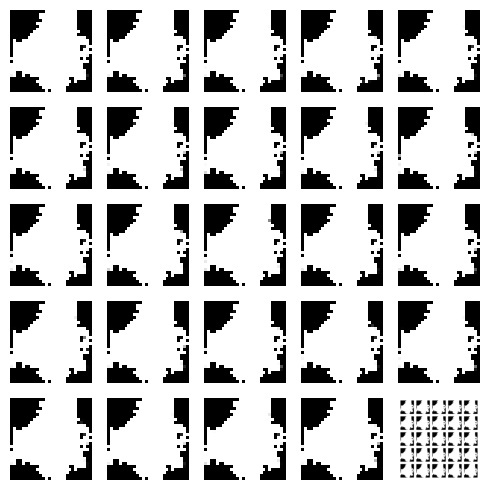

  0%|          | 0/350 [00:00<?, ?it/s]

4/4 [==============================] - 0s 23ms/step


  0%|          | 1/350 [00:00<03:57,  1.47it/s]

4/4 [==============================] - 0s 14ms/step


  1%|          | 2/350 [00:01<03:53,  1.49it/s]

4/4 [==============================] - 0s 11ms/step


  1%|          | 3/350 [00:01<03:30,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


  1%|          | 4/350 [00:02<03:29,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


  1%|▏         | 5/350 [00:03<03:39,  1.57it/s]

4/4 [==============================] - 0s 15ms/step


  2%|▏         | 6/350 [00:03<03:36,  1.59it/s]

4/4 [==============================] - 0s 12ms/step


  2%|▏         | 7/350 [00:04<03:23,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


  2%|▏         | 8/350 [00:04<03:22,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


  3%|▎         | 9/350 [00:05<03:36,  1.57it/s]

4/4 [==============================] - 0s 11ms/step


  3%|▎         | 10/350 [00:06<03:22,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


  3%|▎         | 11/350 [00:06<03:22,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


  3%|▎         | 12/350 [00:07<03:25,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


  4%|▎         | 13/350 [00:08<03:32,  1.58it/s]

4/4 [==============================] - 0s 13ms/step


  4%|▍         | 14/350 [00:08<03:29,  1.61it/s]

4/4 [==============================] - 0s 11ms/step


  4%|▍         | 15/350 [00:09<03:28,  1.61it/s]

4/4 [==============================] - 0s 12ms/step


  5%|▍         | 16/350 [00:09<03:18,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


  5%|▍         | 17/350 [00:10<03:27,  1.61it/s]

4/4 [==============================] - 0s 12ms/step


  5%|▌         | 18/350 [00:11<03:24,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


  5%|▌         | 19/350 [00:11<03:25,  1.61it/s]

4/4 [==============================] - 0s 11ms/step


  6%|▌         | 20/350 [00:12<03:14,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


  6%|▌         | 21/350 [00:12<03:22,  1.62it/s]

4/4 [==============================] - 0s 11ms/step


  6%|▋         | 22/350 [00:13<03:11,  1.71it/s]

4/4 [==============================] - 0s 11ms/step


  7%|▋         | 23/350 [00:14<03:14,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


  7%|▋         | 24/350 [00:14<03:06,  1.75it/s]

4/4 [==============================] - 0s 11ms/step


  7%|▋         | 25/350 [00:15<03:09,  1.72it/s]

4/4 [==============================] - 0s 14ms/step


  7%|▋         | 26/350 [00:15<03:19,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


  8%|▊         | 27/350 [00:16<03:10,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


  8%|▊         | 28/350 [00:17<03:11,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


  8%|▊         | 29/350 [00:17<03:12,  1.67it/s]

4/4 [==============================] - 0s 14ms/step


  9%|▊         | 30/350 [00:18<03:20,  1.60it/s]

4/4 [==============================] - 0s 12ms/step


  9%|▉         | 31/350 [00:18<03:10,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


  9%|▉         | 32/350 [00:19<03:08,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


  9%|▉         | 33/350 [00:20<03:11,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 10%|▉         | 34/350 [00:20<03:09,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 10%|█         | 35/350 [00:21<03:09,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 10%|█         | 36/350 [00:21<03:10,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 11%|█         | 37/350 [00:22<03:12,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 11%|█         | 38/350 [00:23<03:10,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 11%|█         | 39/350 [00:23<03:04,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 11%|█▏        | 40/350 [00:24<02:58,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 12%|█▏        | 41/350 [00:24<03:02,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 12%|█▏        | 42/350 [00:25<02:55,  1.76it/s]

4/4 [==============================] - 0s 12ms/step


 12%|█▏        | 43/350 [00:26<03:04,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 13%|█▎        | 44/350 [00:26<03:05,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 13%|█▎        | 45/350 [00:27<02:59,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 13%|█▎        | 46/350 [00:27<03:00,  1.69it/s]

4/4 [==============================] - 0s 13ms/step


 13%|█▎        | 47/350 [00:28<03:02,  1.66it/s]

4/4 [==============================] - 0s 14ms/step


 14%|█▎        | 48/350 [00:28<03:01,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 14%|█▍        | 49/350 [00:29<03:00,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 14%|█▍        | 50/350 [00:30<03:14,  1.54it/s]

4/4 [==============================] - 0s 11ms/step


 15%|█▍        | 51/350 [00:30<03:13,  1.54it/s]

4/4 [==============================] - 0s 17ms/step


 15%|█▍        | 52/350 [00:31<03:05,  1.61it/s]

4/4 [==============================] - 0s 12ms/step


 15%|█▌        | 53/350 [00:32<03:02,  1.62it/s]

4/4 [==============================] - 0s 11ms/step


 15%|█▌        | 54/350 [00:32<03:02,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 16%|█▌        | 55/350 [00:33<03:02,  1.61it/s]

4/4 [==============================] - 0s 11ms/step


 16%|█▌        | 56/350 [00:34<03:01,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


 16%|█▋        | 57/350 [00:34<02:58,  1.64it/s]

4/4 [==============================] - 0s 13ms/step


 17%|█▋        | 58/350 [00:35<02:50,  1.71it/s]

4/4 [==============================] - 0s 11ms/step


 17%|█▋        | 59/350 [00:35<03:02,  1.59it/s]

4/4 [==============================] - 0s 11ms/step


 17%|█▋        | 60/350 [00:36<02:59,  1.62it/s]

4/4 [==============================] - 0s 11ms/step


 17%|█▋        | 61/350 [00:37<02:56,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


 18%|█▊        | 62/350 [00:37<02:52,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 18%|█▊        | 63/350 [00:38<02:59,  1.60it/s]

4/4 [==============================] - 0s 12ms/step


 18%|█▊        | 64/350 [00:38<02:57,  1.61it/s]

4/4 [==============================] - 0s 11ms/step


 19%|█▊        | 65/350 [00:39<02:57,  1.61it/s]

4/4 [==============================] - 0s 11ms/step


 19%|█▉        | 66/350 [00:40<02:47,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 19%|█▉        | 67/350 [00:40<02:55,  1.61it/s]

4/4 [==============================] - 0s 12ms/step


 19%|█▉        | 68/350 [00:41<02:53,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


 20%|█▉        | 69/350 [00:41<02:54,  1.61it/s]

4/4 [==============================] - 0s 11ms/step


 20%|██        | 70/350 [00:42<02:44,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 20%|██        | 71/350 [00:43<02:50,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


 21%|██        | 72/350 [00:43<02:52,  1.61it/s]

4/4 [==============================] - 0s 11ms/step


 21%|██        | 73/350 [00:44<02:43,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 21%|██        | 74/350 [00:44<02:42,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 21%|██▏       | 75/350 [00:45<02:50,  1.61it/s]

4/4 [==============================] - 0s 12ms/step


 22%|██▏       | 76/350 [00:46<02:50,  1.61it/s]

4/4 [==============================] - 0s 12ms/step


 22%|██▏       | 77/350 [00:46<02:42,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 22%|██▏       | 78/350 [00:47<02:42,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 23%|██▎       | 79/350 [00:48<02:48,  1.61it/s]

4/4 [==============================] - 0s 14ms/step


 23%|██▎       | 80/350 [00:48<02:40,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 23%|██▎       | 81/350 [00:49<02:39,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 23%|██▎       | 82/350 [00:49<02:32,  1.76it/s]

4/4 [==============================] - 0s 11ms/step


 24%|██▎       | 83/350 [00:50<02:36,  1.71it/s]

4/4 [==============================] - 0s 11ms/step


 24%|██▍       | 84/350 [00:50<02:37,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 24%|██▍       | 85/350 [00:51<02:37,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 25%|██▍       | 86/350 [00:52<02:37,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 25%|██▍       | 87/350 [00:52<02:38,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 25%|██▌       | 88/350 [00:53<02:37,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 25%|██▌       | 89/350 [00:53<02:36,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 26%|██▌       | 90/350 [00:54<02:37,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 26%|██▌       | 91/350 [00:55<02:30,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


 26%|██▋       | 92/350 [00:55<02:34,  1.67it/s]

4/4 [==============================] - 0s 14ms/step


 27%|██▋       | 93/350 [00:56<02:34,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 27%|██▋       | 94/350 [00:56<02:36,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 27%|██▋       | 95/350 [00:57<02:29,  1.71it/s]

4/4 [==============================] - 0s 11ms/step


 27%|██▋       | 96/350 [00:58<02:36,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


 28%|██▊       | 97/350 [00:58<02:38,  1.60it/s]

4/4 [==============================] - 0s 12ms/step


 28%|██▊       | 98/350 [00:59<02:29,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 28%|██▊       | 99/350 [00:59<02:30,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 29%|██▊       | 100/350 [01:00<02:36,  1.59it/s]

4/4 [==============================] - 0s 13ms/step


 29%|██▉       | 101/350 [01:01<02:34,  1.61it/s]

4/4 [==============================] - 0s 12ms/step


 29%|██▉       | 102/350 [01:01<02:26,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 29%|██▉       | 103/350 [01:02<02:24,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 30%|██▉       | 104/350 [01:02<02:20,  1.75it/s]

4/4 [==============================] - 0s 12ms/step


 30%|███       | 105/350 [01:03<02:28,  1.65it/s]

4/4 [==============================] - 0s 16ms/step


 30%|███       | 106/350 [01:04<02:23,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 31%|███       | 107/350 [01:04<02:25,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 31%|███       | 108/350 [01:05<02:26,  1.65it/s]

4/4 [==============================] - 0s 13ms/step


 31%|███       | 109/350 [01:05<02:26,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 31%|███▏      | 110/350 [01:06<02:25,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 32%|███▏      | 111/350 [01:07<02:24,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 32%|███▏      | 112/350 [01:07<02:26,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 32%|███▏      | 113/350 [01:08<02:24,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


 33%|███▎      | 114/350 [01:09<02:23,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


 33%|███▎      | 115/350 [01:09<02:24,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


 33%|███▎      | 116/350 [01:10<02:17,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 33%|███▎      | 117/350 [01:10<02:25,  1.60it/s]

4/4 [==============================] - 0s 11ms/step


 34%|███▎      | 118/350 [01:11<02:22,  1.62it/s]

4/4 [==============================] - 0s 11ms/step


 34%|███▍      | 119/350 [01:12<02:21,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 34%|███▍      | 120/350 [01:12<02:15,  1.69it/s]

4/4 [==============================] - 0s 13ms/step


 35%|███▍      | 121/350 [01:13<02:22,  1.61it/s]

4/4 [==============================] - 0s 11ms/step


 35%|███▍      | 122/350 [01:13<02:22,  1.60it/s]

4/4 [==============================] - 0s 11ms/step


 35%|███▌      | 123/350 [01:14<02:14,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 35%|███▌      | 124/350 [01:15<02:14,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 36%|███▌      | 125/350 [01:15<02:20,  1.60it/s]

4/4 [==============================] - 0s 12ms/step


 36%|███▌      | 126/350 [01:16<02:19,  1.61it/s]

4/4 [==============================] - 0s 12ms/step


 36%|███▋      | 127/350 [01:16<02:13,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 37%|███▋      | 128/350 [01:17<02:12,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 37%|███▋      | 129/350 [01:18<02:17,  1.61it/s]

4/4 [==============================] - 0s 15ms/step


 37%|███▋      | 130/350 [01:18<02:11,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 37%|███▋      | 131/350 [01:19<02:11,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 38%|███▊      | 132/350 [01:19<02:10,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 38%|███▊      | 133/350 [01:20<02:06,  1.72it/s]

4/4 [==============================] - 0s 25ms/step


 38%|███▊      | 134/350 [01:21<02:11,  1.64it/s]

4/4 [==============================] - 0s 15ms/step


 39%|███▊      | 135/350 [01:21<02:05,  1.71it/s]

4/4 [==============================] - 0s 11ms/step


 39%|███▉      | 136/350 [01:22<02:06,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 39%|███▉      | 137/350 [01:22<02:08,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 39%|███▉      | 138/350 [01:23<02:07,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 40%|███▉      | 139/350 [01:24<02:05,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 40%|████      | 140/350 [01:24<02:06,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 40%|████      | 141/350 [01:25<02:01,  1.72it/s]

4/4 [==============================] - 0s 11ms/step


 41%|████      | 142/350 [01:25<02:07,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 41%|████      | 143/350 [01:26<02:06,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


 41%|████      | 144/350 [01:27<02:06,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 41%|████▏     | 145/350 [01:27<01:59,  1.71it/s]

4/4 [==============================] - 0s 11ms/step


 42%|████▏     | 146/350 [01:28<02:04,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 42%|████▏     | 147/350 [01:28<02:06,  1.61it/s]

4/4 [==============================] - 0s 11ms/step


 42%|████▏     | 148/350 [01:29<02:03,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 43%|████▎     | 149/350 [01:30<01:57,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 43%|████▎     | 150/350 [01:30<02:05,  1.59it/s]

4/4 [==============================] - 0s 14ms/step


 43%|████▎     | 151/350 [01:31<02:07,  1.56it/s]

4/4 [==============================] - 0s 12ms/step


 43%|████▎     | 152/350 [01:32<02:00,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


 44%|████▎     | 153/350 [01:32<01:57,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 44%|████▍     | 154/350 [01:33<01:52,  1.74it/s]

4/4 [==============================] - 0s 11ms/step


 44%|████▍     | 155/350 [01:33<01:56,  1.67it/s]

4/4 [==============================] - 0s 17ms/step


 45%|████▍     | 156/350 [01:34<01:53,  1.71it/s]

4/4 [==============================] - 0s 11ms/step


 45%|████▍     | 157/350 [01:34<01:54,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 45%|████▌     | 158/350 [01:35<01:55,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 45%|████▌     | 159/350 [01:36<01:54,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 46%|████▌     | 160/350 [01:36<01:55,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 46%|████▌     | 161/350 [01:37<01:55,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


 46%|████▋     | 162/350 [01:38<01:55,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 47%|████▋     | 163/350 [01:38<01:53,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 47%|████▋     | 164/350 [01:39<01:53,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


 47%|████▋     | 165/350 [01:39<01:54,  1.62it/s]

4/4 [==============================] - 0s 11ms/step


 47%|████▋     | 166/350 [01:40<01:48,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 48%|████▊     | 167/350 [01:41<01:52,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


 48%|████▊     | 168/350 [01:41<01:51,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 48%|████▊     | 169/350 [01:42<01:50,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 49%|████▊     | 170/350 [01:42<01:45,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 49%|████▉     | 171/350 [01:43<01:50,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


 49%|████▉     | 172/350 [01:44<01:50,  1.61it/s]

4/4 [==============================] - 0s 11ms/step


 49%|████▉     | 173/350 [01:44<01:44,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 50%|████▉     | 174/350 [01:45<01:44,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 50%|█████     | 175/350 [01:45<01:47,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


 50%|█████     | 176/350 [01:46<01:47,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


 51%|█████     | 177/350 [01:47<01:42,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 51%|█████     | 178/350 [01:47<01:42,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 51%|█████     | 179/350 [01:48<01:48,  1.58it/s]

4/4 [==============================] - 0s 11ms/step


 51%|█████▏    | 180/350 [01:49<01:46,  1.60it/s]

4/4 [==============================] - 0s 12ms/step


 52%|█████▏    | 181/350 [01:49<01:43,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 52%|█████▏    | 182/350 [01:50<01:38,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 52%|█████▏    | 183/350 [01:50<01:44,  1.59it/s]

4/4 [==============================] - 0s 12ms/step


 53%|█████▎    | 184/350 [01:51<01:38,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 53%|█████▎    | 185/350 [01:51<01:39,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 53%|█████▎    | 186/350 [01:52<01:40,  1.64it/s]

4/4 [==============================] - 0s 13ms/step


 53%|█████▎    | 187/350 [01:53<01:41,  1.60it/s]

4/4 [==============================] - 0s 12ms/step


 54%|█████▎    | 188/350 [01:53<01:36,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 54%|█████▍    | 189/350 [01:54<01:35,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 54%|█████▍    | 190/350 [01:54<01:32,  1.73it/s]

4/4 [==============================] - 0s 12ms/step


 55%|█████▍    | 191/350 [01:55<01:32,  1.72it/s]

4/4 [==============================] - 0s 11ms/step


 55%|█████▍    | 192/350 [01:56<01:32,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 55%|█████▌    | 193/350 [01:56<01:32,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 55%|█████▌    | 194/350 [01:57<01:33,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 56%|█████▌    | 195/350 [01:57<01:29,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 56%|█████▌    | 196/350 [01:58<01:34,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 56%|█████▋    | 197/350 [01:59<01:33,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 57%|█████▋    | 198/350 [01:59<01:28,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


 57%|█████▋    | 199/350 [02:00<01:29,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 57%|█████▋    | 200/350 [02:00<01:32,  1.61it/s]

4/4 [==============================] - 0s 11ms/step


 57%|█████▋    | 201/350 [02:01<01:32,  1.60it/s]

4/4 [==============================] - 0s 13ms/step


 58%|█████▊    | 202/350 [02:02<01:28,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 58%|█████▊    | 203/350 [02:02<01:28,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 58%|█████▊    | 204/350 [02:03<01:32,  1.59it/s]

4/4 [==============================] - 0s 12ms/step


 59%|█████▊    | 205/350 [02:03<01:27,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 59%|█████▉    | 206/350 [02:04<01:26,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 59%|█████▉    | 207/350 [02:05<01:26,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 59%|█████▉    | 208/350 [02:05<01:31,  1.56it/s]

4/4 [==============================] - 0s 11ms/step


 60%|█████▉    | 209/350 [02:06<01:25,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 60%|██████    | 210/350 [02:07<01:25,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 60%|██████    | 211/350 [02:07<01:24,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 61%|██████    | 212/350 [02:08<01:21,  1.70it/s]

4/4 [==============================] - 0s 14ms/step


 61%|██████    | 213/350 [02:08<01:23,  1.64it/s]

4/4 [==============================] - 0s 15ms/step


 61%|██████    | 214/350 [02:09<01:19,  1.71it/s]

4/4 [==============================] - 0s 11ms/step


 61%|██████▏   | 215/350 [02:10<01:20,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 62%|██████▏   | 216/350 [02:10<01:16,  1.74it/s]

4/4 [==============================] - 0s 11ms/step


 62%|██████▏   | 217/350 [02:11<01:21,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 62%|██████▏   | 218/350 [02:11<01:21,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 63%|██████▎   | 219/350 [02:12<01:20,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


 63%|██████▎   | 220/350 [02:13<01:16,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 63%|██████▎   | 221/350 [02:13<01:19,  1.62it/s]

4/4 [==============================] - 0s 11ms/step


 63%|██████▎   | 222/350 [02:14<01:19,  1.61it/s]

4/4 [==============================] - 0s 12ms/step


 64%|██████▎   | 223/350 [02:14<01:15,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 64%|██████▍   | 224/350 [02:15<01:14,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 64%|██████▍   | 225/350 [02:15<01:11,  1.75it/s]

4/4 [==============================] - 0s 16ms/step


 65%|██████▍   | 226/350 [02:16<01:15,  1.65it/s]

4/4 [==============================] - 0s 13ms/step


 65%|██████▍   | 227/350 [02:17<01:11,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 65%|██████▌   | 228/350 [02:17<01:12,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 65%|██████▌   | 229/350 [02:18<01:10,  1.71it/s]

4/4 [==============================] - 0s 11ms/step


 66%|██████▌   | 230/350 [02:19<01:12,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 66%|██████▌   | 231/350 [02:19<01:11,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


 66%|██████▋   | 232/350 [02:20<01:10,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 67%|██████▋   | 233/350 [02:20<01:07,  1.73it/s]

4/4 [==============================] - 0s 12ms/step


 67%|██████▋   | 234/350 [02:21<01:11,  1.62it/s]

4/4 [==============================] - 0s 11ms/step


 67%|██████▋   | 235/350 [02:22<01:09,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 67%|██████▋   | 236/350 [02:22<01:06,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 68%|██████▊   | 237/350 [02:23<01:06,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 68%|██████▊   | 238/350 [02:23<01:04,  1.74it/s]

4/4 [==============================] - 0s 14ms/step


 68%|██████▊   | 239/350 [02:24<01:05,  1.68it/s]

4/4 [==============================] - 0s 17ms/step


 69%|██████▊   | 240/350 [02:24<01:03,  1.72it/s]

4/4 [==============================] - 0s 11ms/step


 69%|██████▉   | 241/350 [02:25<01:03,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 69%|██████▉   | 242/350 [02:26<01:01,  1.75it/s]

4/4 [==============================] - 0s 12ms/step


 69%|██████▉   | 243/350 [02:26<01:04,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


 70%|██████▉   | 244/350 [02:27<01:03,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 70%|███████   | 245/350 [02:27<01:01,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 70%|███████   | 246/350 [02:28<01:01,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 71%|███████   | 247/350 [02:29<01:03,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


 71%|███████   | 248/350 [02:29<01:03,  1.60it/s]

4/4 [==============================] - 0s 11ms/step


 71%|███████   | 249/350 [02:30<01:02,  1.62it/s]

4/4 [==============================] - 0s 11ms/step


 71%|███████▏  | 250/350 [02:30<01:01,  1.63it/s]

4/4 [==============================] - 0s 14ms/step


 72%|███████▏  | 251/350 [02:31<01:02,  1.57it/s]

4/4 [==============================] - 0s 13ms/step


 72%|███████▏  | 252/350 [02:32<00:59,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 72%|███████▏  | 253/350 [02:32<00:58,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 73%|███████▎  | 254/350 [02:33<00:57,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


 73%|███████▎  | 255/350 [02:34<00:57,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 73%|███████▎  | 256/350 [02:34<00:57,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 73%|███████▎  | 257/350 [02:35<00:56,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 74%|███████▎  | 258/350 [02:35<00:56,  1.62it/s]

4/4 [==============================] - 0s 11ms/step


 74%|███████▍  | 259/350 [02:36<00:56,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


 74%|███████▍  | 260/350 [02:37<00:55,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


 75%|███████▍  | 261/350 [02:37<00:53,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 75%|███████▍  | 262/350 [02:38<00:52,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 75%|███████▌  | 263/350 [02:38<00:53,  1.61it/s]

4/4 [==============================] - 0s 12ms/step


 75%|███████▌  | 264/350 [02:39<00:53,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


 76%|███████▌  | 265/350 [02:40<00:52,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


 76%|███████▌  | 266/350 [02:40<00:49,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 76%|███████▋  | 267/350 [02:41<00:50,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 77%|███████▋  | 268/350 [02:41<00:50,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 77%|███████▋  | 269/350 [02:42<00:49,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


 77%|███████▋  | 270/350 [02:43<00:46,  1.71it/s]

4/4 [==============================] - 0s 11ms/step


 77%|███████▋  | 271/350 [02:43<00:48,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


 78%|███████▊  | 272/350 [02:44<00:48,  1.62it/s]

4/4 [==============================] - 0s 11ms/step


 78%|███████▊  | 273/350 [02:44<00:45,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 78%|███████▊  | 274/350 [02:45<00:44,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


 79%|███████▊  | 275/350 [02:46<00:42,  1.77it/s]

4/4 [==============================] - 0s 11ms/step


 79%|███████▉  | 276/350 [02:46<00:44,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


 79%|███████▉  | 277/350 [02:47<00:42,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


 79%|███████▉  | 278/350 [02:47<00:42,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 80%|███████▉  | 279/350 [02:48<00:40,  1.76it/s]

4/4 [==============================] - 0s 11ms/step


 80%|████████  | 280/350 [02:49<00:42,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 80%|████████  | 281/350 [02:49<00:40,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 81%|████████  | 282/350 [02:50<00:40,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 81%|████████  | 283/350 [02:50<00:37,  1.76it/s]

4/4 [==============================] - 0s 11ms/step


 81%|████████  | 284/350 [02:51<00:38,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 81%|████████▏ | 285/350 [02:52<00:39,  1.64it/s]

4/4 [==============================] - 0s 17ms/step


 82%|████████▏ | 286/350 [02:52<00:37,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 82%|████████▏ | 287/350 [02:53<00:37,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 82%|████████▏ | 288/350 [02:53<00:37,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 83%|████████▎ | 289/350 [02:54<00:36,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 83%|████████▎ | 290/350 [02:54<00:36,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 83%|████████▎ | 291/350 [02:55<00:33,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 83%|████████▎ | 292/350 [02:56<00:34,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 84%|████████▎ | 293/350 [02:56<00:32,  1.75it/s]

4/4 [==============================] - 0s 12ms/step


 84%|████████▍ | 294/350 [02:57<00:33,  1.69it/s]

4/4 [==============================] - 0s 14ms/step


 84%|████████▍ | 295/350 [02:57<00:31,  1.73it/s]

4/4 [==============================] - 0s 12ms/step


 85%|████████▍ | 296/350 [02:58<00:32,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 85%|████████▍ | 297/350 [02:58<00:30,  1.75it/s]

4/4 [==============================] - 0s 12ms/step


 85%|████████▌ | 298/350 [02:59<00:31,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 85%|████████▌ | 299/350 [03:00<00:31,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


 86%|████████▌ | 300/350 [03:00<00:29,  1.71it/s]

4/4 [==============================] - 0s 11ms/step


 86%|████████▌ | 301/350 [03:01<00:29,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 86%|████████▋ | 302/350 [03:02<00:28,  1.66it/s]

4/4 [==============================] - 0s 14ms/step


 87%|████████▋ | 303/350 [03:02<00:28,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 87%|████████▋ | 304/350 [03:03<00:27,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 87%|████████▋ | 305/350 [03:03<00:26,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 87%|████████▋ | 306/350 [03:04<00:27,  1.58it/s]

4/4 [==============================] - 0s 12ms/step


 88%|████████▊ | 307/350 [03:05<00:26,  1.62it/s]

4/4 [==============================] - 0s 11ms/step


 88%|████████▊ | 308/350 [03:05<00:24,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 88%|████████▊ | 309/350 [03:06<00:24,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 89%|████████▊ | 310/350 [03:07<00:25,  1.57it/s]

4/4 [==============================] - 0s 12ms/step


 89%|████████▉ | 311/350 [03:07<00:24,  1.61it/s]

4/4 [==============================] - 0s 12ms/step


 89%|████████▉ | 312/350 [03:08<00:23,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 89%|████████▉ | 313/350 [03:08<00:22,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


 90%|████████▉ | 314/350 [03:09<00:22,  1.62it/s]

4/4 [==============================] - 0s 14ms/step


 90%|█████████ | 315/350 [03:10<00:21,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


 90%|█████████ | 316/350 [03:10<00:20,  1.62it/s]

4/4 [==============================] - 0s 11ms/step


 91%|█████████ | 317/350 [03:11<00:19,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 91%|█████████ | 318/350 [03:11<00:19,  1.61it/s]

4/4 [==============================] - 0s 12ms/step


 91%|█████████ | 319/350 [03:12<00:19,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 91%|█████████▏| 320/350 [03:13<00:18,  1.61it/s]

4/4 [==============================] - 0s 11ms/step


 92%|█████████▏| 321/350 [03:13<00:17,  1.69it/s]

4/4 [==============================] - 0s 14ms/step


 92%|█████████▏| 322/350 [03:14<00:17,  1.61it/s]

4/4 [==============================] - 0s 11ms/step


 92%|█████████▏| 323/350 [03:14<00:16,  1.61it/s]

4/4 [==============================] - 0s 12ms/step


 93%|█████████▎| 324/350 [03:15<00:15,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 93%|█████████▎| 325/350 [03:16<00:14,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 93%|█████████▎| 326/350 [03:16<00:15,  1.60it/s]

4/4 [==============================] - 0s 14ms/step


 93%|█████████▎| 327/350 [03:17<00:14,  1.61it/s]

4/4 [==============================] - 0s 11ms/step


 94%|█████████▎| 328/350 [03:17<00:13,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 94%|█████████▍| 329/350 [03:18<00:12,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 94%|█████████▍| 330/350 [03:19<00:11,  1.75it/s]

4/4 [==============================] - 0s 35ms/step


 95%|█████████▍| 331/350 [03:19<00:11,  1.61it/s]

4/4 [==============================] - 0s 12ms/step


 95%|█████████▍| 332/350 [03:20<00:10,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 95%|█████████▌| 333/350 [03:20<00:09,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 95%|█████████▌| 334/350 [03:21<00:09,  1.75it/s]

4/4 [==============================] - 0s 12ms/step


 96%|█████████▌| 335/350 [03:22<00:09,  1.61it/s]

4/4 [==============================] - 0s 11ms/step


 96%|█████████▌| 336/350 [03:22<00:08,  1.63it/s]

4/4 [==============================] - 0s 10ms/step


 96%|█████████▋| 337/350 [03:23<00:07,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 97%|█████████▋| 338/350 [03:23<00:07,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 97%|█████████▋| 339/350 [03:24<00:06,  1.61it/s]

4/4 [==============================] - 0s 11ms/step


 97%|█████████▋| 340/350 [03:25<00:06,  1.61it/s]

4/4 [==============================] - 0s 11ms/step


 97%|█████████▋| 341/350 [03:25<00:05,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 98%|█████████▊| 342/350 [03:26<00:04,  1.72it/s]

4/4 [==============================] - 0s 11ms/step


 98%|█████████▊| 343/350 [03:26<00:03,  1.76it/s]

4/4 [==============================] - 0s 11ms/step


 98%|█████████▊| 344/350 [03:27<00:03,  1.69it/s]

4/4 [==============================] - 0s 13ms/step


 99%|█████████▊| 345/350 [03:28<00:02,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 99%|█████████▉| 346/350 [03:28<00:02,  1.71it/s]

4/4 [==============================] - 0s 13ms/step


 99%|█████████▉| 347/350 [03:29<00:01,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 99%|█████████▉| 348/350 [03:29<00:01,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


100%|█████████▉| 349/350 [03:30<00:00,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


100%|██████████| 350/350 [03:31<00:00,  1.66it/s]

Epoch number: 65 discriminator_loss: 0.16976816759261834 generator_loss: 6.8162631402696885
1/1 [==============================] - 0s 20ms/step


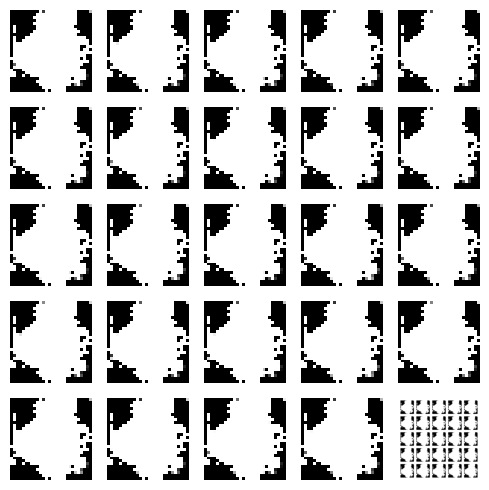

  0%|          | 0/350 [00:00<?, ?it/s]

4/4 [==============================] - 0s 24ms/step


  0%|          | 1/350 [00:00<03:52,  1.50it/s]

4/4 [==============================] - 0s 29ms/step


  1%|          | 2/350 [00:01<04:07,  1.41it/s]

4/4 [==============================] - 0s 15ms/step


  1%|          | 3/350 [00:01<03:40,  1.57it/s]

4/4 [==============================] - 0s 16ms/step


  1%|          | 4/350 [00:02<03:30,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


  1%|▏         | 5/350 [00:03<03:28,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


  2%|▏         | 6/350 [00:03<03:37,  1.58it/s]

4/4 [==============================] - 0s 15ms/step


  2%|▏         | 7/350 [00:04<03:26,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


  2%|▏         | 8/350 [00:04<03:27,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


  3%|▎         | 9/350 [00:05<03:30,  1.62it/s]

4/4 [==============================] - 0s 11ms/step


  3%|▎         | 10/350 [00:06<03:26,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


  3%|▎         | 11/350 [00:06<03:24,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


  3%|▎         | 12/350 [00:07<03:22,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


  4%|▎         | 13/350 [00:07<03:17,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


  4%|▍         | 14/350 [00:08<03:27,  1.62it/s]

4/4 [==============================] - 0s 11ms/step


  4%|▍         | 15/350 [00:09<03:22,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


  5%|▍         | 16/350 [00:09<03:15,  1.71it/s]

4/4 [==============================] - 0s 11ms/step


  5%|▍         | 17/350 [00:10<03:18,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


  5%|▌         | 18/350 [00:10<03:10,  1.74it/s]

4/4 [==============================] - 0s 11ms/step


  5%|▌         | 19/350 [00:11<03:18,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


  6%|▌         | 20/350 [00:12<03:12,  1.72it/s]

4/4 [==============================] - 0s 11ms/step


  6%|▌         | 21/350 [00:12<03:16,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


  6%|▋         | 22/350 [00:13<03:08,  1.74it/s]

4/4 [==============================] - 0s 11ms/step


  7%|▋         | 23/350 [00:13<03:18,  1.65it/s]

4/4 [==============================] - 0s 14ms/step


  7%|▋         | 24/350 [00:14<03:23,  1.61it/s]

4/4 [==============================] - 0s 11ms/step


  7%|▋         | 25/350 [00:15<03:19,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


  7%|▋         | 26/350 [00:15<03:10,  1.70it/s]

4/4 [==============================] - 0s 15ms/step


  8%|▊         | 27/350 [00:16<03:18,  1.63it/s]

4/4 [==============================] - 0s 14ms/step


  8%|▊         | 28/350 [00:16<03:12,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


  8%|▊         | 29/350 [00:17<03:11,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


  9%|▊         | 30/350 [00:18<03:09,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


  9%|▉         | 31/350 [00:18<03:11,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


  9%|▉         | 32/350 [00:19<03:10,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


  9%|▉         | 33/350 [00:19<03:03,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


 10%|▉         | 34/350 [00:20<03:04,  1.71it/s]

4/4 [==============================] - 0s 11ms/step


 10%|█         | 35/350 [00:20<02:57,  1.78it/s]

4/4 [==============================] - 0s 27ms/step


 10%|█         | 36/350 [00:21<03:09,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 11%|█         | 37/350 [00:22<03:01,  1.72it/s]

4/4 [==============================] - 0s 11ms/step


 11%|█         | 38/350 [00:22<03:02,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 11%|█         | 39/350 [00:23<02:56,  1.77it/s]

4/4 [==============================] - 0s 14ms/step


 11%|█▏        | 40/350 [00:24<03:10,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 12%|█▏        | 41/350 [00:24<03:06,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 12%|█▏        | 42/350 [00:25<03:07,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


 12%|█▏        | 43/350 [00:25<03:07,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 13%|█▎        | 44/350 [00:26<03:07,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 13%|█▎        | 45/350 [00:27<03:04,  1.65it/s]

4/4 [==============================] - 0s 13ms/step


 13%|█▎        | 46/350 [00:27<03:04,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


 13%|█▎        | 47/350 [00:28<02:57,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 14%|█▎        | 48/350 [00:28<03:07,  1.61it/s]

4/4 [==============================] - 0s 11ms/step


 14%|█▍        | 49/350 [00:29<03:02,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 14%|█▍        | 50/350 [00:30<02:57,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 15%|█▍        | 51/350 [00:30<02:56,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 15%|█▍        | 52/350 [00:31<02:58,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 15%|█▌        | 53/350 [00:31<02:59,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 15%|█▌        | 54/350 [00:32<03:02,  1.62it/s]

4/4 [==============================] - 0s 11ms/step


 16%|█▌        | 55/350 [00:33<02:53,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 16%|█▌        | 56/350 [00:33<03:01,  1.62it/s]

4/4 [==============================] - 0s 11ms/step


 16%|█▋        | 57/350 [00:34<03:01,  1.62it/s]

4/4 [==============================] - 0s 13ms/step


 17%|█▋        | 58/350 [00:34<02:51,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 17%|█▋        | 59/350 [00:35<02:43,  1.78it/s]

4/4 [==============================] - 0s 12ms/step


 17%|█▋        | 60/350 [00:35<02:45,  1.75it/s]

4/4 [==============================] - 0s 12ms/step


 17%|█▋        | 61/350 [00:36<02:47,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


 18%|█▊        | 62/350 [00:37<02:50,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 18%|█▊        | 63/350 [00:37<02:44,  1.75it/s]

4/4 [==============================] - 0s 11ms/step


 18%|█▊        | 64/350 [00:38<02:45,  1.73it/s]

4/4 [==============================] - 0s 11ms/step


 19%|█▊        | 65/350 [00:38<02:51,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


 19%|█▉        | 66/350 [00:39<02:46,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 19%|█▉        | 67/350 [00:40<02:47,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 19%|█▉        | 68/350 [00:40<02:47,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 20%|█▉        | 69/350 [00:41<02:57,  1.59it/s]

4/4 [==============================] - 0s 11ms/step


 20%|██        | 70/350 [00:41<02:51,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 20%|██        | 71/350 [00:42<02:44,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 21%|██        | 72/350 [00:43<02:44,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 21%|██        | 73/350 [00:43<02:46,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 21%|██        | 74/350 [00:44<02:43,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 21%|██▏       | 75/350 [00:44<02:38,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 22%|██▏       | 76/350 [00:45<02:41,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 22%|██▏       | 77/350 [00:45<02:34,  1.76it/s]

4/4 [==============================] - 0s 11ms/step


 22%|██▏       | 78/350 [00:46<02:42,  1.67it/s]

4/4 [==============================] - 0s 15ms/step


 23%|██▎       | 79/350 [00:47<02:41,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 23%|██▎       | 80/350 [00:47<02:38,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 23%|██▎       | 81/350 [00:48<02:38,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 23%|██▎       | 82/350 [00:48<02:38,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 24%|██▎       | 83/350 [00:49<02:39,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 24%|██▍       | 84/350 [00:50<02:38,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 24%|██▍       | 85/350 [00:50<02:32,  1.74it/s]

4/4 [==============================] - 0s 11ms/step


 25%|██▍       | 86/350 [00:51<02:40,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 25%|██▍       | 87/350 [00:52<02:40,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


 25%|██▌       | 88/350 [00:52<02:32,  1.72it/s]

4/4 [==============================] - 0s 11ms/step


 25%|██▌       | 89/350 [00:53<02:28,  1.75it/s]

4/4 [==============================] - 0s 14ms/step


 26%|██▌       | 90/350 [00:53<02:32,  1.71it/s]

4/4 [==============================] - 0s 11ms/step


 26%|██▌       | 91/350 [00:54<02:35,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 26%|██▋       | 92/350 [00:54<02:29,  1.73it/s]

4/4 [==============================] - 0s 11ms/step


 27%|██▋       | 93/350 [00:55<02:29,  1.71it/s]

4/4 [==============================] - 0s 11ms/step


 27%|██▋       | 94/350 [00:56<02:34,  1.65it/s]

4/4 [==============================] - 0s 14ms/step


 27%|██▋       | 95/350 [00:56<02:36,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 27%|██▋       | 96/350 [00:57<02:29,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 28%|██▊       | 97/350 [00:57<02:29,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 28%|██▊       | 98/350 [00:58<02:29,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 28%|██▊       | 99/350 [00:59<02:30,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 29%|██▊       | 100/350 [00:59<02:24,  1.73it/s]

4/4 [==============================] - 0s 11ms/step


 29%|██▉       | 101/350 [01:00<02:25,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 29%|██▉       | 102/350 [01:00<02:35,  1.59it/s]

4/4 [==============================] - 0s 12ms/step


 29%|██▉       | 103/350 [01:01<02:33,  1.61it/s]

4/4 [==============================] - 0s 11ms/step


 30%|██▉       | 104/350 [01:02<02:25,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 30%|███       | 105/350 [01:02<02:24,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 30%|███       | 106/350 [01:03<02:26,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 31%|███       | 107/350 [01:03<02:27,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 31%|███       | 108/350 [01:04<02:25,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 31%|███       | 109/350 [01:05<02:28,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 31%|███▏      | 110/350 [01:05<02:26,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 32%|███▏      | 111/350 [01:06<02:23,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 32%|███▏      | 112/350 [01:06<02:16,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 32%|███▏      | 113/350 [01:07<02:20,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 33%|███▎      | 114/350 [01:07<02:14,  1.75it/s]

4/4 [==============================] - 0s 20ms/step


 33%|███▎      | 115/350 [01:08<02:21,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 33%|███▎      | 116/350 [01:09<02:19,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 33%|███▎      | 117/350 [01:09<02:17,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 34%|███▎      | 118/350 [01:10<02:14,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 34%|███▍      | 119/350 [01:10<02:16,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 34%|███▍      | 120/350 [01:11<02:17,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 35%|███▍      | 121/350 [01:12<02:18,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 35%|███▍      | 122/350 [01:12<02:12,  1.72it/s]

4/4 [==============================] - 0s 11ms/step


 35%|███▌      | 123/350 [01:13<02:19,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 35%|███▌      | 124/350 [01:14<02:18,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 36%|███▌      | 125/350 [01:14<02:12,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 36%|███▌      | 126/350 [01:15<02:12,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 36%|███▋      | 127/350 [01:15<02:16,  1.63it/s]

4/4 [==============================] - 0s 14ms/step


 37%|███▋      | 128/350 [01:16<02:12,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 37%|███▋      | 129/350 [01:17<02:12,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 37%|███▋      | 130/350 [01:17<02:10,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 37%|███▋      | 131/350 [01:18<02:14,  1.63it/s]

4/4 [==============================] - 0s 16ms/step


 38%|███▊      | 132/350 [01:18<02:10,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 38%|███▊      | 133/350 [01:19<02:07,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 38%|███▊      | 134/350 [01:19<02:02,  1.76it/s]

4/4 [==============================] - 0s 12ms/step


 39%|███▊      | 135/350 [01:20<02:11,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 39%|███▉      | 136/350 [01:21<02:08,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 39%|███▉      | 137/350 [01:21<02:03,  1.72it/s]

4/4 [==============================] - 0s 11ms/step


 39%|███▉      | 138/350 [01:22<02:02,  1.73it/s]

4/4 [==============================] - 0s 12ms/step


 40%|███▉      | 139/350 [01:22<02:05,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 40%|████      | 140/350 [01:23<02:04,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 40%|████      | 141/350 [01:24<01:59,  1.75it/s]

4/4 [==============================] - 0s 11ms/step


 41%|████      | 142/350 [01:24<02:01,  1.72it/s]

4/4 [==============================] - 0s 11ms/step


 41%|████      | 143/350 [01:25<02:08,  1.61it/s]

4/4 [==============================] - 0s 12ms/step


 41%|████      | 144/350 [01:25<02:01,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 41%|████▏     | 145/350 [01:26<02:02,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 42%|████▏     | 146/350 [01:27<02:02,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 42%|████▏     | 147/350 [01:27<02:02,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 42%|████▏     | 148/350 [01:28<02:00,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 43%|████▎     | 149/350 [01:28<01:55,  1.74it/s]

4/4 [==============================] - 0s 11ms/step


 43%|████▎     | 150/350 [01:29<01:57,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 43%|████▎     | 151/350 [01:29<01:52,  1.77it/s]

4/4 [==============================] - 0s 12ms/step


 43%|████▎     | 152/350 [01:30<01:57,  1.68it/s]

4/4 [==============================] - 0s 14ms/step


 44%|████▎     | 153/350 [01:31<01:53,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 44%|████▍     | 154/350 [01:31<01:55,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 44%|████▍     | 155/350 [01:32<01:50,  1.76it/s]

4/4 [==============================] - 0s 12ms/step


 45%|████▍     | 156/350 [01:32<01:55,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 45%|████▍     | 157/350 [01:33<01:56,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 45%|████▌     | 158/350 [01:34<01:56,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 45%|████▌     | 159/350 [01:34<01:52,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 46%|████▌     | 160/350 [01:35<01:54,  1.66it/s]

4/4 [==============================] - 0s 14ms/step


 46%|████▌     | 161/350 [01:35<01:50,  1.71it/s]

4/4 [==============================] - 0s 11ms/step


 46%|████▋     | 162/350 [01:36<01:51,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 47%|████▋     | 163/350 [01:37<01:47,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 47%|████▋     | 164/350 [01:37<01:54,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 47%|████▋     | 165/350 [01:38<01:52,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 47%|████▋     | 166/350 [01:38<01:48,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 48%|████▊     | 167/350 [01:39<01:46,  1.71it/s]

4/4 [==============================] - 0s 11ms/step


 48%|████▊     | 168/350 [01:40<01:47,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 48%|████▊     | 169/350 [01:40<01:49,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 49%|████▊     | 170/350 [01:41<01:44,  1.73it/s]

4/4 [==============================] - 0s 12ms/step


 49%|████▉     | 171/350 [01:41<01:45,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 49%|████▉     | 172/350 [01:42<01:49,  1.62it/s]

4/4 [==============================] - 0s 11ms/step


 49%|████▉     | 173/350 [01:43<01:48,  1.63it/s]

4/4 [==============================] - 0s 10ms/step


 50%|████▉     | 174/350 [01:43<01:41,  1.74it/s]

4/4 [==============================] - 0s 14ms/step


 50%|█████     | 175/350 [01:44<01:38,  1.78it/s]

4/4 [==============================] - 0s 12ms/step


 50%|█████     | 176/350 [01:44<01:40,  1.73it/s]

4/4 [==============================] - 0s 14ms/step


 51%|█████     | 177/350 [01:45<01:47,  1.61it/s]

4/4 [==============================] - 0s 11ms/step


 51%|█████     | 178/350 [01:46<01:43,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 51%|█████     | 179/350 [01:46<01:40,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 51%|█████▏    | 180/350 [01:47<01:40,  1.69it/s]

4/4 [==============================] - 0s 29ms/step


 52%|█████▏    | 181/350 [01:47<01:49,  1.55it/s]

4/4 [==============================] - 0s 15ms/step


 52%|█████▏    | 182/350 [01:48<01:42,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 52%|█████▏    | 183/350 [01:49<01:40,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 53%|█████▎    | 184/350 [01:49<01:38,  1.69it/s]

4/4 [==============================] - 0s 15ms/step


 53%|█████▎    | 185/350 [01:50<01:41,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


 53%|█████▎    | 186/350 [01:50<01:36,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 53%|█████▎    | 187/350 [01:51<01:36,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 54%|█████▎    | 188/350 [01:52<01:37,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 54%|█████▍    | 189/350 [01:52<01:37,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 54%|█████▍    | 190/350 [01:53<01:36,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 55%|█████▍    | 191/350 [01:53<01:37,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 55%|█████▍    | 192/350 [01:54<01:32,  1.71it/s]

4/4 [==============================] - 0s 16ms/step


 55%|█████▌    | 193/350 [01:55<01:34,  1.65it/s]

4/4 [==============================] - 0s 13ms/step


 55%|█████▌    | 194/350 [01:55<01:31,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 56%|█████▌    | 195/350 [01:56<01:33,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 56%|█████▌    | 196/350 [01:56<01:29,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


 56%|█████▋    | 197/350 [01:57<01:33,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 57%|█████▋    | 198/350 [01:58<01:32,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 57%|█████▋    | 199/350 [01:58<01:29,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 57%|█████▋    | 200/350 [01:59<01:29,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 57%|█████▋    | 201/350 [01:59<01:29,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 58%|█████▊    | 202/350 [02:00<01:29,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 58%|█████▊    | 203/350 [02:01<01:30,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 58%|█████▊    | 204/350 [02:01<01:25,  1.70it/s]

4/4 [==============================] - 0s 14ms/step


 59%|█████▊    | 205/350 [02:02<01:28,  1.65it/s]

4/4 [==============================] - 0s 16ms/step


 59%|█████▉    | 206/350 [02:02<01:24,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 59%|█████▉    | 207/350 [02:03<01:25,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 59%|█████▉    | 208/350 [02:03<01:21,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 60%|█████▉    | 209/350 [02:04<01:26,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 60%|██████    | 210/350 [02:05<01:26,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


 60%|██████    | 211/350 [02:05<01:22,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 61%|██████    | 212/350 [02:06<01:20,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 61%|██████    | 213/350 [02:07<01:21,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 61%|██████    | 214/350 [02:07<01:21,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 61%|██████▏   | 215/350 [02:08<01:18,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


 62%|██████▏   | 216/350 [02:08<01:18,  1.71it/s]

4/4 [==============================] - 0s 11ms/step


 62%|██████▏   | 217/350 [02:09<01:20,  1.64it/s]

4/4 [==============================] - 0s 14ms/step


 62%|██████▏   | 218/350 [02:09<01:19,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 63%|██████▎   | 219/350 [02:10<01:18,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 63%|██████▎   | 220/350 [02:11<01:14,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 63%|██████▎   | 221/350 [02:11<01:19,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 63%|██████▎   | 222/350 [02:12<01:18,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


 64%|██████▎   | 223/350 [02:12<01:15,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 64%|██████▍   | 224/350 [02:13<01:15,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 64%|██████▍   | 225/350 [02:14<01:17,  1.61it/s]

4/4 [==============================] - 0s 15ms/step


 65%|██████▍   | 226/350 [02:14<01:14,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 65%|██████▍   | 227/350 [02:15<01:13,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 65%|██████▌   | 228/350 [02:15<01:13,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 65%|██████▌   | 229/350 [02:16<01:16,  1.58it/s]

4/4 [==============================] - 0s 13ms/step


 66%|██████▌   | 230/350 [02:17<01:12,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 66%|██████▌   | 231/350 [02:17<01:10,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 66%|██████▋   | 232/350 [02:18<01:08,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 67%|██████▋   | 233/350 [02:19<01:12,  1.61it/s]

4/4 [==============================] - 0s 12ms/step


 67%|██████▋   | 234/350 [02:19<01:11,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 67%|██████▋   | 235/350 [02:20<01:07,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 67%|██████▋   | 236/350 [02:20<01:08,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 68%|██████▊   | 237/350 [02:21<01:07,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 68%|██████▊   | 238/350 [02:22<01:07,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 68%|██████▊   | 239/350 [02:22<01:06,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 69%|██████▊   | 240/350 [02:23<01:04,  1.70it/s]

4/4 [==============================] - 0s 14ms/step


 69%|██████▉   | 241/350 [02:23<01:05,  1.66it/s]

4/4 [==============================] - 0s 14ms/step


 69%|██████▉   | 242/350 [02:24<01:03,  1.71it/s]

4/4 [==============================] - 0s 13ms/step


 69%|██████▉   | 243/350 [02:24<01:03,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 70%|██████▉   | 244/350 [02:25<01:03,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 70%|███████   | 245/350 [02:26<01:03,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 70%|███████   | 246/350 [02:26<01:02,  1.67it/s]

4/4 [==============================] - 0s 10ms/step


 71%|███████   | 247/350 [02:27<00:59,  1.73it/s]

4/4 [==============================] - 0s 12ms/step


 71%|███████   | 248/350 [02:27<01:00,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 71%|███████   | 249/350 [02:28<01:00,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 71%|███████▏  | 250/350 [02:29<00:59,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 72%|███████▏  | 251/350 [02:29<00:56,  1.74it/s]

4/4 [==============================] - 0s 11ms/step


 72%|███████▏  | 252/350 [02:30<00:57,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 72%|███████▏  | 253/350 [02:30<00:58,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 73%|███████▎  | 254/350 [02:31<00:57,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 73%|███████▎  | 255/350 [02:32<00:54,  1.75it/s]

4/4 [==============================] - 0s 12ms/step


 73%|███████▎  | 256/350 [02:32<00:55,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 73%|███████▎  | 257/350 [02:33<00:55,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 74%|███████▎  | 258/350 [02:33<00:54,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 74%|███████▍  | 259/350 [02:34<00:55,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 74%|███████▍  | 260/350 [02:35<00:52,  1.72it/s]

4/4 [==============================] - 0s 11ms/step


 75%|███████▍  | 261/350 [02:35<00:55,  1.60it/s]

4/4 [==============================] - 0s 11ms/step


 75%|███████▍  | 262/350 [02:36<00:53,  1.64it/s]

4/4 [==============================] - 0s 13ms/step


 75%|███████▌  | 263/350 [02:36<00:53,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


 75%|███████▌  | 264/350 [02:37<00:50,  1.69it/s]

4/4 [==============================] - 0s 14ms/step


 76%|███████▌  | 265/350 [02:38<00:51,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 76%|███████▌  | 266/350 [02:38<00:49,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 76%|███████▋  | 267/350 [02:39<00:49,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 77%|███████▋  | 268/350 [02:39<00:47,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 77%|███████▋  | 269/350 [02:40<00:48,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


 77%|███████▋  | 270/350 [02:41<00:49,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


 77%|███████▋  | 271/350 [02:41<00:46,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 78%|███████▊  | 272/350 [02:42<00:46,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 78%|███████▊  | 273/350 [02:42<00:45,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 78%|███████▊  | 274/350 [02:43<00:45,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 79%|███████▊  | 275/350 [02:43<00:43,  1.73it/s]

4/4 [==============================] - 0s 11ms/step


 79%|███████▉  | 276/350 [02:44<00:43,  1.70it/s]

4/4 [==============================] - 0s 14ms/step


 79%|███████▉  | 277/350 [02:45<00:44,  1.64it/s]

4/4 [==============================] - 0s 13ms/step


 79%|███████▉  | 278/350 [02:45<00:44,  1.61it/s]

4/4 [==============================] - 0s 12ms/step


 80%|███████▉  | 279/350 [02:46<00:42,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 80%|████████  | 280/350 [02:47<00:42,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 80%|████████  | 281/350 [02:47<00:43,  1.58it/s]

4/4 [==============================] - 0s 13ms/step


 81%|████████  | 282/350 [02:48<00:41,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 81%|████████  | 283/350 [02:48<00:40,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 81%|████████  | 284/350 [02:49<00:39,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 81%|████████▏ | 285/350 [02:50<00:40,  1.62it/s]

4/4 [==============================] - 0s 13ms/step


 82%|████████▏ | 286/350 [02:50<00:38,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 82%|████████▏ | 287/350 [02:51<00:37,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 82%|████████▏ | 288/350 [02:51<00:37,  1.64it/s]

4/4 [==============================] - 0s 13ms/step


 83%|████████▎ | 289/350 [02:52<00:37,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 83%|████████▎ | 290/350 [02:53<00:36,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 83%|████████▎ | 291/350 [02:53<00:35,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 83%|████████▎ | 292/350 [02:54<00:34,  1.70it/s]

4/4 [==============================] - 0s 13ms/step


 84%|████████▎ | 293/350 [02:54<00:34,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 84%|████████▍ | 294/350 [02:55<00:34,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 84%|████████▍ | 295/350 [02:56<00:32,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 85%|████████▍ | 296/350 [02:56<00:32,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 85%|████████▍ | 297/350 [02:57<00:31,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 85%|████████▌ | 298/350 [02:57<00:31,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 85%|████████▌ | 299/350 [02:58<00:31,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


 86%|████████▌ | 300/350 [02:59<00:29,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


 86%|████████▌ | 301/350 [02:59<00:29,  1.68it/s]

4/4 [==============================] - 0s 14ms/step


 86%|████████▋ | 302/350 [03:00<00:27,  1.72it/s]

4/4 [==============================] - 0s 11ms/step


 87%|████████▋ | 303/350 [03:00<00:28,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 87%|████████▋ | 304/350 [03:01<00:26,  1.73it/s]

4/4 [==============================] - 0s 14ms/step


 87%|████████▋ | 305/350 [03:02<00:27,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 87%|████████▋ | 306/350 [03:02<00:26,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 88%|████████▊ | 307/350 [03:03<00:25,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 88%|████████▊ | 308/350 [03:03<00:25,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 88%|████████▊ | 309/350 [03:04<00:24,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 89%|████████▊ | 310/350 [03:05<00:23,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 89%|████████▉ | 311/350 [03:05<00:22,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


 89%|████████▉ | 312/350 [03:06<00:22,  1.71it/s]

4/4 [==============================] - 0s 11ms/step


 89%|████████▉ | 313/350 [03:06<00:21,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 90%|████████▉ | 314/350 [03:07<00:21,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 90%|█████████ | 315/350 [03:07<00:20,  1.69it/s]

4/4 [==============================] - 0s 14ms/step


 90%|█████████ | 316/350 [03:08<00:19,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 91%|█████████ | 317/350 [03:09<00:19,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


 91%|█████████ | 318/350 [03:09<00:18,  1.72it/s]

4/4 [==============================] - 0s 11ms/step


 91%|█████████ | 319/350 [03:10<00:18,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 91%|█████████▏| 320/350 [03:10<00:17,  1.73it/s]

4/4 [==============================] - 0s 14ms/step


 92%|█████████▏| 321/350 [03:11<00:17,  1.67it/s]

4/4 [==============================] - 0s 17ms/step


 92%|█████████▏| 322/350 [03:12<00:16,  1.71it/s]

4/4 [==============================] - 0s 11ms/step


 92%|█████████▏| 323/350 [03:12<00:16,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 93%|█████████▎| 324/350 [03:13<00:14,  1.75it/s]

4/4 [==============================] - 0s 12ms/step


 93%|█████████▎| 325/350 [03:13<00:14,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 93%|█████████▎| 326/350 [03:14<00:14,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


 93%|█████████▎| 327/350 [03:15<00:13,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 94%|█████████▎| 328/350 [03:15<00:13,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 94%|█████████▍| 329/350 [03:16<00:12,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


 94%|█████████▍| 330/350 [03:16<00:12,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 95%|█████████▍| 331/350 [03:17<00:11,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 95%|█████████▍| 332/350 [03:18<00:10,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 95%|█████████▌| 333/350 [03:18<00:10,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 95%|█████████▌| 334/350 [03:19<00:09,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 96%|█████████▌| 335/350 [03:19<00:08,  1.71it/s]

4/4 [==============================] - 0s 11ms/step


 96%|█████████▌| 336/350 [03:20<00:08,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


 96%|█████████▋| 337/350 [03:21<00:07,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 97%|█████████▋| 338/350 [03:21<00:07,  1.68it/s]

4/4 [==============================] - 0s 14ms/step


 97%|█████████▋| 339/350 [03:22<00:06,  1.74it/s]

4/4 [==============================] - 0s 11ms/step


 97%|█████████▋| 340/350 [03:22<00:05,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


 97%|█████████▋| 341/350 [03:23<00:05,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 98%|█████████▊| 342/350 [03:23<00:04,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 98%|█████████▊| 343/350 [03:24<00:04,  1.74it/s]

4/4 [==============================] - 0s 11ms/step


 98%|█████████▊| 344/350 [03:25<00:03,  1.73it/s]

4/4 [==============================] - 0s 12ms/step


 99%|█████████▊| 345/350 [03:25<00:02,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 99%|█████████▉| 346/350 [03:26<00:02,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 99%|█████████▉| 347/350 [03:26<00:01,  1.73it/s]

4/4 [==============================] - 0s 11ms/step


 99%|█████████▉| 348/350 [03:27<00:01,  1.75it/s]

4/4 [==============================] - 0s 12ms/step


100%|█████████▉| 349/350 [03:28<00:00,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


100%|██████████| 350/350 [03:28<00:00,  1.68it/s]

Epoch number: 66 discriminator_loss: 0.16760604775070012 generator_loss: 7.09581881250654
1/1 [==============================] - 0s 21ms/step


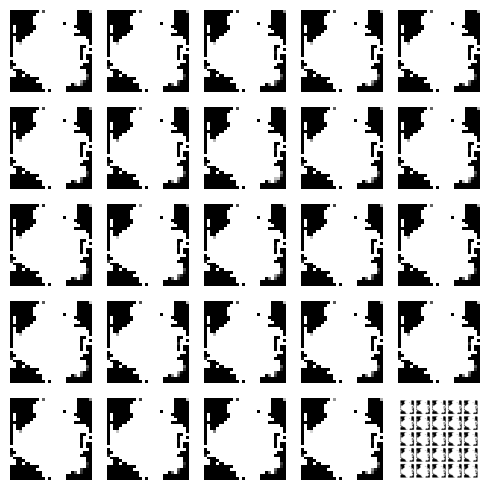

  0%|          | 0/350 [00:00<?, ?it/s]

4/4 [==============================] - 0s 19ms/step


  0%|          | 1/350 [00:00<03:46,  1.54it/s]

4/4 [==============================] - 0s 12ms/step


  1%|          | 2/350 [00:01<03:33,  1.63it/s]

4/4 [==============================] - 0s 17ms/step


  1%|          | 3/350 [00:01<03:33,  1.63it/s]

4/4 [==============================] - 0s 16ms/step


  1%|          | 4/350 [00:02<03:24,  1.69it/s]

4/4 [==============================] - 0s 13ms/step


  1%|▏         | 5/350 [00:03<03:27,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


  2%|▏         | 6/350 [00:03<03:26,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


  2%|▏         | 7/350 [00:04<03:25,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


  2%|▏         | 8/350 [00:04<03:23,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


  3%|▎         | 9/350 [00:05<03:21,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


  3%|▎         | 10/350 [00:05<03:17,  1.72it/s]

4/4 [==============================] - 0s 11ms/step


  3%|▎         | 11/350 [00:06<03:24,  1.66it/s]

4/4 [==============================] - 0s 14ms/step


  3%|▎         | 12/350 [00:07<03:17,  1.71it/s]

4/4 [==============================] - 0s 11ms/step


  4%|▎         | 13/350 [00:07<03:18,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


  4%|▍         | 14/350 [00:08<03:13,  1.74it/s]

4/4 [==============================] - 0s 11ms/step


  4%|▍         | 15/350 [00:08<03:23,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


  5%|▍         | 16/350 [00:09<03:24,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


  5%|▍         | 17/350 [00:10<03:24,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


  5%|▌         | 18/350 [00:10<03:15,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


  5%|▌         | 19/350 [00:11<03:24,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


  6%|▌         | 20/350 [00:12<03:20,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


  6%|▌         | 21/350 [00:12<03:14,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


  6%|▋         | 22/350 [00:13<03:13,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


  7%|▋         | 23/350 [00:13<03:14,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


  7%|▋         | 24/350 [00:14<03:14,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


  7%|▋         | 25/350 [00:14<03:14,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


  7%|▋         | 26/350 [00:15<03:08,  1.72it/s]

4/4 [==============================] - 0s 14ms/step


  8%|▊         | 27/350 [00:16<03:14,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


  8%|▊         | 28/350 [00:16<03:06,  1.73it/s]

4/4 [==============================] - 0s 11ms/step


  8%|▊         | 29/350 [00:17<03:10,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


  9%|▊         | 30/350 [00:17<03:03,  1.74it/s]

4/4 [==============================] - 0s 11ms/step


  9%|▉         | 31/350 [00:18<03:13,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


  9%|▉         | 32/350 [00:19<03:13,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


  9%|▉         | 33/350 [00:19<03:06,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 10%|▉         | 34/350 [00:20<03:08,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 10%|█         | 35/350 [00:20<03:15,  1.61it/s]

4/4 [==============================] - 0s 12ms/step


 10%|█         | 36/350 [00:21<03:17,  1.59it/s]

4/4 [==============================] - 0s 11ms/step


 11%|█         | 37/350 [00:22<03:07,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 11%|█         | 38/350 [00:22<03:07,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 11%|█         | 39/350 [00:23<03:15,  1.59it/s]

4/4 [==============================] - 0s 13ms/step


 11%|█▏        | 40/350 [00:23<03:05,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 12%|█▏        | 41/350 [00:24<03:01,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 12%|█▏        | 42/350 [00:25<02:55,  1.75it/s]

4/4 [==============================] - 0s 11ms/step


 12%|█▏        | 43/350 [00:25<03:07,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


 13%|█▎        | 44/350 [00:26<02:58,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


 13%|█▎        | 45/350 [00:26<03:00,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 13%|█▎        | 46/350 [00:27<02:56,  1.73it/s]

4/4 [==============================] - 0s 15ms/step


 13%|█▎        | 47/350 [00:28<02:55,  1.72it/s]

4/4 [==============================] - 0s 11ms/step


 14%|█▎        | 48/350 [00:28<03:01,  1.66it/s]

4/4 [==============================] - 0s 14ms/step


 14%|█▍        | 49/350 [00:29<02:56,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 14%|█▍        | 50/350 [00:29<02:56,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 15%|█▍        | 51/350 [00:30<02:52,  1.73it/s]

4/4 [==============================] - 0s 11ms/step


 15%|█▍        | 52/350 [00:31<03:02,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 15%|█▌        | 53/350 [00:31<03:03,  1.62it/s]

4/4 [==============================] - 0s 11ms/step


 15%|█▌        | 54/350 [00:32<03:04,  1.60it/s]

4/4 [==============================] - 0s 11ms/step


 16%|█▌        | 55/350 [00:32<02:54,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 16%|█▌        | 56/350 [00:33<03:01,  1.62it/s]

4/4 [==============================] - 0s 11ms/step


 16%|█▋        | 57/350 [00:34<02:59,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 17%|█▋        | 58/350 [00:34<03:01,  1.61it/s]

4/4 [==============================] - 0s 12ms/step


 17%|█▋        | 59/350 [00:35<02:51,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 17%|█▋        | 60/350 [00:35<02:52,  1.68it/s]

4/4 [==============================] - 0s 14ms/step


 17%|█▋        | 61/350 [00:36<02:48,  1.71it/s]

4/4 [==============================] - 0s 11ms/step


 18%|█▊        | 62/350 [00:37<02:52,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 18%|█▊        | 63/350 [00:37<02:44,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 18%|█▊        | 64/350 [00:38<02:53,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 19%|█▊        | 65/350 [00:38<02:53,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 19%|█▉        | 66/350 [00:39<02:45,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 19%|█▉        | 67/350 [00:40<02:47,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 19%|█▉        | 68/350 [00:40<02:53,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 20%|█▉        | 69/350 [00:41<02:53,  1.62it/s]

4/4 [==============================] - 0s 11ms/step


 20%|██        | 70/350 [00:41<02:44,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 20%|██        | 71/350 [00:42<02:44,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 21%|██        | 72/350 [00:42<02:38,  1.76it/s]

4/4 [==============================] - 0s 12ms/step


 21%|██        | 73/350 [00:43<02:47,  1.65it/s]

4/4 [==============================] - 0s 16ms/step


 21%|██        | 74/350 [00:44<02:41,  1.71it/s]

4/4 [==============================] - 0s 11ms/step


 21%|██▏       | 75/350 [00:44<02:39,  1.73it/s]

4/4 [==============================] - 0s 14ms/step


 22%|██▏       | 76/350 [00:45<02:34,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 22%|██▏       | 77/350 [00:46<02:47,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 22%|██▏       | 78/350 [00:46<02:39,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 23%|██▎       | 79/350 [00:47<02:40,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 23%|██▎       | 80/350 [00:47<02:41,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 23%|██▎       | 81/350 [00:48<02:35,  1.73it/s]

4/4 [==============================] - 0s 14ms/step


 23%|██▎       | 82/350 [00:48<02:43,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


 24%|██▎       | 83/350 [00:49<02:43,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 24%|██▍       | 84/350 [00:50<02:43,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 24%|██▍       | 85/350 [00:50<02:35,  1.70it/s]

4/4 [==============================] - 0s 14ms/step


 25%|██▍       | 86/350 [00:51<02:41,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 25%|██▍       | 87/350 [00:52<02:41,  1.62it/s]

4/4 [==============================] - 0s 11ms/step


 25%|██▌       | 88/350 [00:52<02:34,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 25%|██▌       | 89/350 [00:53<02:34,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 26%|██▌       | 90/350 [00:53<02:34,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 26%|██▌       | 91/350 [00:54<02:36,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 26%|██▋       | 92/350 [00:54<02:28,  1.73it/s]

4/4 [==============================] - 0s 11ms/step


 27%|██▋       | 93/350 [00:55<02:28,  1.73it/s]

4/4 [==============================] - 0s 11ms/step


 27%|██▋       | 94/350 [00:55<02:23,  1.79it/s]

4/4 [==============================] - 0s 13ms/step


 27%|██▋       | 95/350 [00:56<02:33,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 27%|██▋       | 96/350 [00:57<02:27,  1.72it/s]

4/4 [==============================] - 0s 11ms/step


 28%|██▊       | 97/350 [00:57<02:26,  1.72it/s]

4/4 [==============================] - 0s 11ms/step


 28%|██▊       | 98/350 [00:58<02:21,  1.78it/s]

4/4 [==============================] - 0s 11ms/step


 28%|██▊       | 99/350 [00:59<02:32,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


 29%|██▊       | 100/350 [00:59<02:25,  1.72it/s]

4/4 [==============================] - 0s 11ms/step


 29%|██▉       | 101/350 [01:00<02:25,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 29%|██▉       | 102/350 [01:00<02:20,  1.77it/s]

4/4 [==============================] - 0s 11ms/step


 29%|██▉       | 103/350 [01:01<02:31,  1.64it/s]

4/4 [==============================] - 0s 13ms/step


 30%|██▉       | 104/350 [01:01<02:24,  1.71it/s]

4/4 [==============================] - 0s 10ms/step


 30%|███       | 105/350 [01:02<02:22,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 30%|███       | 106/350 [01:03<02:17,  1.77it/s]

4/4 [==============================] - 0s 12ms/step


 31%|███       | 107/350 [01:03<02:22,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 31%|███       | 108/350 [01:04<02:22,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 31%|███       | 109/350 [01:04<02:23,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 31%|███▏      | 110/350 [01:05<02:23,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 32%|███▏      | 111/350 [01:06<02:20,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 32%|███▏      | 112/350 [01:06<02:26,  1.62it/s]

4/4 [==============================] - 0s 11ms/step


 32%|███▏      | 113/350 [01:07<02:24,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


 33%|███▎      | 114/350 [01:07<02:25,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 33%|███▎      | 115/350 [01:08<02:18,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 33%|███▎      | 116/350 [01:09<02:23,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 33%|███▎      | 117/350 [01:09<02:20,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 34%|███▎      | 118/350 [01:10<02:16,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 34%|███▍      | 119/350 [01:10<02:15,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 34%|███▍      | 120/350 [01:11<02:16,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 35%|███▍      | 121/350 [01:12<02:15,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 35%|███▍      | 122/350 [01:12<02:12,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


 35%|███▌      | 123/350 [01:13<02:13,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 35%|███▌      | 124/350 [01:13<02:17,  1.64it/s]

4/4 [==============================] - 0s 14ms/step


 36%|███▌      | 125/350 [01:14<02:13,  1.69it/s]

4/4 [==============================] - 0s 15ms/step


 36%|███▌      | 126/350 [01:15<02:13,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 36%|███▋      | 127/350 [01:15<02:06,  1.76it/s]

4/4 [==============================] - 0s 11ms/step


 37%|███▋      | 128/350 [01:16<02:13,  1.66it/s]

4/4 [==============================] - 0s 10ms/step


 37%|███▋      | 129/350 [01:16<02:07,  1.73it/s]

4/4 [==============================] - 0s 11ms/step


 37%|███▋      | 130/350 [01:17<02:10,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 37%|███▋      | 131/350 [01:17<02:05,  1.74it/s]

4/4 [==============================] - 0s 11ms/step


 38%|███▊      | 132/350 [01:18<02:06,  1.73it/s]

4/4 [==============================] - 0s 11ms/step


 38%|███▊      | 133/350 [01:19<02:07,  1.71it/s]

4/4 [==============================] - 0s 11ms/step


 38%|███▊      | 134/350 [01:19<02:09,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 39%|███▊      | 135/350 [01:20<02:04,  1.73it/s]

4/4 [==============================] - 0s 12ms/step


 39%|███▉      | 136/350 [01:20<02:05,  1.71it/s]

4/4 [==============================] - 0s 11ms/step


 39%|███▉      | 137/350 [01:21<02:06,  1.69it/s]

4/4 [==============================] - 0s 13ms/step


 39%|███▉      | 138/350 [01:22<02:08,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 40%|███▉      | 139/350 [01:22<02:02,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


 40%|████      | 140/350 [01:23<02:03,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 40%|████      | 141/350 [01:23<02:03,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 41%|████      | 142/350 [01:24<02:04,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 41%|████      | 143/350 [01:24<01:59,  1.73it/s]

4/4 [==============================] - 0s 12ms/step


 41%|████      | 144/350 [01:25<01:59,  1.72it/s]

4/4 [==============================] - 0s 11ms/step


 41%|████▏     | 145/350 [01:26<01:54,  1.79it/s]

4/4 [==============================] - 0s 11ms/step


 42%|████▏     | 146/350 [01:26<02:04,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


 42%|████▏     | 147/350 [01:27<01:58,  1.72it/s]

4/4 [==============================] - 0s 11ms/step


 42%|████▏     | 148/350 [01:27<01:57,  1.71it/s]

4/4 [==============================] - 0s 11ms/step


 43%|████▎     | 149/350 [01:28<01:53,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 43%|████▎     | 150/350 [01:29<02:02,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


 43%|████▎     | 151/350 [01:29<01:56,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 43%|████▎     | 152/350 [01:30<01:56,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 44%|████▎     | 153/350 [01:30<01:58,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 44%|████▍     | 154/350 [01:31<01:57,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 44%|████▍     | 155/350 [01:32<01:55,  1.69it/s]

4/4 [==============================] - 0s 13ms/step


 45%|████▍     | 156/350 [01:32<01:50,  1.75it/s]

4/4 [==============================] - 0s 11ms/step


 45%|████▍     | 157/350 [01:33<01:53,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 45%|████▌     | 158/350 [01:33<01:49,  1.75it/s]

4/4 [==============================] - 0s 12ms/step


 45%|████▌     | 159/350 [01:34<01:54,  1.67it/s]

4/4 [==============================] - 0s 17ms/step


 46%|████▌     | 160/350 [01:35<01:55,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 46%|████▌     | 161/350 [01:35<01:56,  1.62it/s]

4/4 [==============================] - 0s 11ms/step


 46%|████▋     | 162/350 [01:36<01:49,  1.71it/s]

4/4 [==============================] - 0s 11ms/step


 47%|████▋     | 163/350 [01:36<01:50,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 47%|████▋     | 164/350 [01:37<01:50,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 47%|████▋     | 165/350 [01:37<01:47,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


 47%|████▋     | 166/350 [01:38<01:46,  1.73it/s]

4/4 [==============================] - 0s 11ms/step


 48%|████▊     | 167/350 [01:39<01:47,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 48%|████▊     | 168/350 [01:39<01:46,  1.71it/s]

4/4 [==============================] - 0s 10ms/step


 48%|████▊     | 169/350 [01:40<01:44,  1.73it/s]

4/4 [==============================] - 0s 11ms/step


 49%|████▊     | 170/350 [01:40<01:41,  1.78it/s]

4/4 [==============================] - 0s 12ms/step


 49%|████▉     | 171/350 [01:41<01:41,  1.77it/s]

4/4 [==============================] - 0s 12ms/step


 49%|████▉     | 172/350 [01:41<01:42,  1.73it/s]

4/4 [==============================] - 0s 11ms/step


 49%|████▉     | 173/350 [01:42<01:46,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 50%|████▉     | 174/350 [01:43<01:46,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 50%|█████     | 175/350 [01:43<01:45,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


 50%|█████     | 176/350 [01:44<01:44,  1.67it/s]

4/4 [==============================] - 0s 16ms/step


 51%|█████     | 177/350 [01:45<01:46,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 51%|█████     | 178/350 [01:45<01:41,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 51%|█████     | 179/350 [01:46<01:40,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 51%|█████▏    | 180/350 [01:46<01:44,  1.63it/s]

4/4 [==============================] - 0s 17ms/step


 52%|█████▏    | 181/350 [01:47<01:41,  1.67it/s]

4/4 [==============================] - 0s 14ms/step


 52%|█████▏    | 182/350 [01:48<01:42,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 52%|█████▏    | 183/350 [01:48<01:37,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 53%|█████▎    | 184/350 [01:49<01:43,  1.60it/s]

4/4 [==============================] - 0s 12ms/step


 53%|█████▎    | 185/350 [01:49<01:38,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 53%|█████▎    | 186/350 [01:50<01:38,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 53%|█████▎    | 187/350 [01:51<01:37,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


 54%|█████▎    | 188/350 [01:51<01:39,  1.62it/s]

4/4 [==============================] - 0s 11ms/step


 54%|█████▍    | 189/350 [01:52<01:38,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 54%|█████▍    | 190/350 [01:52<01:38,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 55%|█████▍    | 191/350 [01:53<01:38,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


 55%|█████▍    | 192/350 [01:54<01:37,  1.62it/s]

4/4 [==============================] - 0s 11ms/step


 55%|█████▌    | 193/350 [01:54<01:33,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 55%|█████▌    | 194/350 [01:55<01:30,  1.73it/s]

4/4 [==============================] - 0s 12ms/step


 56%|█████▌    | 195/350 [01:55<01:32,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 56%|█████▌    | 196/350 [01:56<01:28,  1.73it/s]

4/4 [==============================] - 0s 15ms/step


 56%|█████▋    | 197/350 [01:57<01:32,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 57%|█████▋    | 198/350 [01:57<01:28,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 57%|█████▋    | 199/350 [01:58<01:28,  1.71it/s]

4/4 [==============================] - 0s 15ms/step


 57%|█████▋    | 200/350 [01:58<01:26,  1.73it/s]

4/4 [==============================] - 0s 12ms/step


 57%|█████▋    | 201/350 [01:59<01:31,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 58%|█████▊    | 202/350 [02:00<01:30,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


 58%|█████▊    | 203/350 [02:00<01:29,  1.64it/s]

4/4 [==============================] - 0s 13ms/step


 58%|█████▊    | 204/350 [02:01<01:24,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 59%|█████▊    | 205/350 [02:01<01:26,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 59%|█████▉    | 206/350 [02:02<01:25,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 59%|█████▉    | 207/350 [02:02<01:23,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 59%|█████▉    | 208/350 [02:03<01:23,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 60%|█████▉    | 209/350 [02:04<01:25,  1.65it/s]

4/4 [==============================] - 0s 15ms/step


 60%|██████    | 210/350 [02:04<01:23,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 60%|██████    | 211/350 [02:05<01:23,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


 61%|██████    | 212/350 [02:05<01:20,  1.71it/s]

4/4 [==============================] - 0s 11ms/step


 61%|██████    | 213/350 [02:06<01:24,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 61%|██████    | 214/350 [02:07<01:24,  1.61it/s]

4/4 [==============================] - 0s 11ms/step


 61%|██████▏   | 215/350 [02:07<01:20,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 62%|██████▏   | 216/350 [02:08<01:19,  1.69it/s]

4/4 [==============================] - 0s 14ms/step


 62%|██████▏   | 217/350 [02:09<01:20,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 62%|██████▏   | 218/350 [02:09<01:20,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 63%|██████▎   | 219/350 [02:10<01:16,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 63%|██████▎   | 220/350 [02:10<01:16,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 63%|██████▎   | 221/350 [02:11<01:13,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 63%|██████▎   | 222/350 [02:12<01:18,  1.64it/s]

4/4 [==============================] - 0s 13ms/step


 64%|██████▎   | 223/350 [02:12<01:13,  1.73it/s]

4/4 [==============================] - 0s 14ms/step


 64%|██████▍   | 224/350 [02:13<01:11,  1.75it/s]

4/4 [==============================] - 0s 11ms/step


 64%|██████▍   | 225/350 [02:13<01:12,  1.73it/s]

4/4 [==============================] - 0s 10ms/step


 65%|██████▍   | 226/350 [02:14<01:10,  1.77it/s]

4/4 [==============================] - 0s 16ms/step


 65%|██████▍   | 227/350 [02:14<01:13,  1.67it/s]

4/4 [==============================] - 0s 16ms/step


 65%|██████▌   | 228/350 [02:15<01:11,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 65%|██████▌   | 229/350 [02:16<01:10,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 66%|██████▌   | 230/350 [02:16<01:08,  1.75it/s]

4/4 [==============================] - 0s 12ms/step


 66%|██████▌   | 231/350 [02:17<01:13,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


 66%|██████▋   | 232/350 [02:17<01:09,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 67%|██████▋   | 233/350 [02:18<01:09,  1.69it/s]

4/4 [==============================] - 0s 14ms/step


 67%|██████▋   | 234/350 [02:19<01:10,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


 67%|██████▋   | 235/350 [02:19<01:09,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 67%|██████▋   | 236/350 [02:20<01:07,  1.69it/s]

4/4 [==============================] - 0s 15ms/step


 68%|██████▊   | 237/350 [02:20<01:05,  1.72it/s]

4/4 [==============================] - 0s 11ms/step


 68%|██████▊   | 238/350 [02:21<01:06,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


 68%|██████▊   | 239/350 [02:22<01:06,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 69%|██████▊   | 240/350 [02:22<01:06,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 69%|██████▉   | 241/350 [02:23<01:05,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 69%|██████▉   | 242/350 [02:23<01:05,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 69%|██████▉   | 243/350 [02:24<01:05,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 70%|██████▉   | 244/350 [02:25<01:03,  1.66it/s]

4/4 [==============================] - 0s 15ms/step


 70%|███████   | 245/350 [02:25<01:01,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 70%|███████   | 246/350 [02:26<01:01,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 71%|███████   | 247/350 [02:26<01:03,  1.61it/s]

4/4 [==============================] - 0s 11ms/step


 71%|███████   | 248/350 [02:27<01:02,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 71%|███████   | 249/350 [02:28<01:02,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


 71%|███████▏  | 250/350 [02:28<00:59,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


 72%|███████▏  | 251/350 [02:29<01:00,  1.64it/s]

4/4 [==============================] - 0s 15ms/step


 72%|███████▏  | 252/350 [02:29<00:58,  1.68it/s]

4/4 [==============================] - 0s 16ms/step


 72%|███████▏  | 253/350 [02:30<01:04,  1.50it/s]

4/4 [==============================] - 0s 12ms/step


 73%|███████▎  | 254/350 [02:31<01:01,  1.56it/s]

4/4 [==============================] - 0s 12ms/step


 73%|███████▎  | 255/350 [02:31<01:00,  1.57it/s]

4/4 [==============================] - 0s 12ms/step


 73%|███████▎  | 256/350 [02:32<00:58,  1.60it/s]

4/4 [==============================] - 0s 12ms/step


 73%|███████▎  | 257/350 [02:33<00:56,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 74%|███████▎  | 258/350 [02:33<00:55,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 74%|███████▍  | 259/350 [02:34<00:55,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


 74%|███████▍  | 260/350 [02:34<00:54,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 75%|███████▍  | 261/350 [02:35<00:54,  1.62it/s]

4/4 [==============================] - 0s 11ms/step


 75%|███████▍  | 262/350 [02:36<00:52,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 75%|███████▌  | 263/350 [02:36<00:55,  1.58it/s]

4/4 [==============================] - 0s 11ms/step


 75%|███████▌  | 264/350 [02:37<00:54,  1.59it/s]

4/4 [==============================] - 0s 15ms/step


 76%|███████▌  | 265/350 [02:37<00:51,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 76%|███████▌  | 266/350 [02:38<00:50,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 76%|███████▋  | 267/350 [02:39<00:51,  1.60it/s]

4/4 [==============================] - 0s 13ms/step


 77%|███████▋  | 268/350 [02:39<00:50,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 77%|███████▋  | 269/350 [02:40<00:49,  1.65it/s]

4/4 [==============================] - 0s 14ms/step


 77%|███████▋  | 270/350 [02:40<00:46,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 77%|███████▋  | 271/350 [02:41<00:48,  1.61it/s]

4/4 [==============================] - 0s 13ms/step


 78%|███████▊  | 272/350 [02:42<00:48,  1.59it/s]

4/4 [==============================] - 0s 11ms/step


 78%|███████▊  | 273/350 [02:42<00:46,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 78%|███████▊  | 274/350 [02:43<00:45,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 79%|███████▊  | 275/350 [02:43<00:44,  1.67it/s]

4/4 [==============================] - 0s 14ms/step


 79%|███████▉  | 276/350 [02:44<00:45,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


 79%|███████▉  | 277/350 [02:45<00:42,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 79%|███████▉  | 278/350 [02:45<00:43,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 80%|███████▉  | 279/350 [02:46<00:42,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 80%|████████  | 280/350 [02:46<00:41,  1.68it/s]

4/4 [==============================] - 0s 19ms/step


 80%|████████  | 281/350 [02:47<00:39,  1.73it/s]

4/4 [==============================] - 0s 12ms/step


 81%|████████  | 282/350 [02:48<00:38,  1.76it/s]

4/4 [==============================] - 0s 11ms/step


 81%|████████  | 283/350 [02:48<00:39,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 81%|████████  | 284/350 [02:49<00:40,  1.64it/s]

4/4 [==============================] - 0s 15ms/step


 81%|████████▏ | 285/350 [02:49<00:38,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 82%|████████▏ | 286/350 [02:50<00:37,  1.69it/s]

4/4 [==============================] - 0s 13ms/step


 82%|████████▏ | 287/350 [02:51<00:36,  1.73it/s]

4/4 [==============================] - 0s 11ms/step


 82%|████████▏ | 288/350 [02:51<00:38,  1.59it/s]

4/4 [==============================] - 0s 12ms/step


 83%|████████▎ | 289/350 [02:52<00:37,  1.64it/s]

4/4 [==============================] - 0s 14ms/step


 83%|████████▎ | 290/350 [02:52<00:35,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 83%|████████▎ | 291/350 [02:53<00:35,  1.68it/s]

4/4 [==============================] - 0s 14ms/step


 83%|████████▎ | 292/350 [02:54<00:34,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 84%|████████▎ | 293/350 [02:54<00:34,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 84%|████████▍ | 294/350 [02:55<00:33,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 84%|████████▍ | 295/350 [02:55<00:32,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 85%|████████▍ | 296/350 [02:56<00:33,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


 85%|████████▍ | 297/350 [02:57<00:31,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 85%|████████▌ | 298/350 [02:57<00:30,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 85%|████████▌ | 299/350 [02:58<00:30,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 86%|████████▌ | 300/350 [02:58<00:30,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


 86%|████████▌ | 301/350 [02:59<00:29,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 86%|████████▋ | 302/350 [03:00<00:29,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


 87%|████████▋ | 303/350 [03:00<00:27,  1.69it/s]

4/4 [==============================] - 0s 13ms/step


 87%|████████▋ | 304/350 [03:01<00:27,  1.66it/s]

4/4 [==============================] - 0s 14ms/step


 87%|████████▋ | 305/350 [03:01<00:26,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 87%|████████▋ | 306/350 [03:02<00:26,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 88%|████████▊ | 307/350 [03:03<00:25,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 88%|████████▊ | 308/350 [03:03<00:25,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 88%|████████▊ | 309/350 [03:04<00:24,  1.65it/s]

4/4 [==============================] - 0s 16ms/step


 89%|████████▊ | 310/350 [03:04<00:23,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 89%|████████▉ | 311/350 [03:05<00:23,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 89%|████████▉ | 312/350 [03:06<00:23,  1.60it/s]

4/4 [==============================] - 0s 15ms/step


 89%|████████▉ | 313/350 [03:06<00:22,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 90%|████████▉ | 314/350 [03:07<00:21,  1.64it/s]

4/4 [==============================] - 0s 13ms/step


 90%|█████████ | 315/350 [03:07<00:20,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 90%|█████████ | 316/350 [03:08<00:21,  1.61it/s]

4/4 [==============================] - 0s 11ms/step


 91%|█████████ | 317/350 [03:09<00:20,  1.60it/s]

4/4 [==============================] - 0s 11ms/step


 91%|█████████ | 318/350 [03:09<00:19,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 91%|█████████ | 319/350 [03:10<00:18,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


 91%|█████████▏| 320/350 [03:11<00:18,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 92%|█████████▏| 321/350 [03:11<00:17,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 92%|█████████▏| 322/350 [03:12<00:16,  1.71it/s]

4/4 [==============================] - 0s 11ms/step


 92%|█████████▏| 323/350 [03:12<00:15,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 93%|█████████▎| 324/350 [03:13<00:14,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 93%|█████████▎| 325/350 [03:14<00:15,  1.65it/s]

4/4 [==============================] - 0s 14ms/step


 93%|█████████▎| 326/350 [03:14<00:14,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 93%|█████████▎| 327/350 [03:15<00:13,  1.69it/s]

4/4 [==============================] - 0s 13ms/step


 94%|█████████▎| 328/350 [03:15<00:13,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 94%|█████████▍| 329/350 [03:16<00:12,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 94%|█████████▍| 330/350 [03:16<00:12,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 95%|█████████▍| 331/350 [03:17<00:11,  1.72it/s]

4/4 [==============================] - 0s 11ms/step


 95%|█████████▍| 332/350 [03:18<00:10,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 95%|█████████▌| 333/350 [03:18<00:10,  1.61it/s]

4/4 [==============================] - 0s 14ms/step


 95%|█████████▌| 334/350 [03:19<00:09,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 96%|█████████▌| 335/350 [03:19<00:08,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 96%|█████████▌| 336/350 [03:20<00:08,  1.74it/s]

4/4 [==============================] - 0s 11ms/step


 96%|█████████▋| 337/350 [03:21<00:07,  1.65it/s]

4/4 [==============================] - 0s 15ms/step


 97%|█████████▋| 338/350 [03:21<00:07,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 97%|█████████▋| 339/350 [03:22<00:06,  1.71it/s]

4/4 [==============================] - 0s 14ms/step


 97%|█████████▋| 340/350 [03:22<00:05,  1.75it/s]

4/4 [==============================] - 0s 11ms/step


 97%|█████████▋| 341/350 [03:23<00:05,  1.62it/s]

4/4 [==============================] - 0s 11ms/step


 98%|█████████▊| 342/350 [03:24<00:04,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 98%|█████████▊| 343/350 [03:24<00:04,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 98%|█████████▊| 344/350 [03:25<00:03,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 99%|█████████▊| 345/350 [03:25<00:03,  1.61it/s]

4/4 [==============================] - 0s 12ms/step


 99%|█████████▉| 346/350 [03:26<00:02,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 99%|█████████▉| 347/350 [03:27<00:01,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 99%|█████████▉| 348/350 [03:27<00:01,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


100%|█████████▉| 349/350 [03:28<00:00,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


100%|██████████| 350/350 [03:28<00:00,  1.68it/s]

Epoch number: 67 discriminator_loss: 0.16634316613091088 generator_loss: 7.336941345759801
1/1 [==============================] - 0s 30ms/step


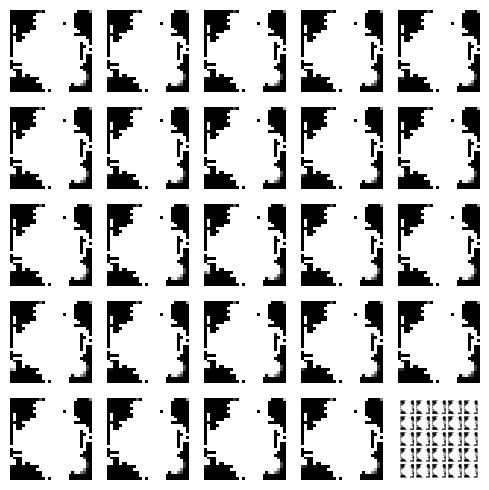

  0%|          | 0/350 [00:00<?, ?it/s]

4/4 [==============================] - 0s 24ms/step


  0%|          | 1/350 [00:00<03:27,  1.68it/s]

4/4 [==============================] - 0s 16ms/step


  1%|          | 2/350 [00:01<03:41,  1.57it/s]

4/4 [==============================] - 0s 21ms/step


  1%|          | 3/350 [00:01<03:38,  1.59it/s]

4/4 [==============================] - 0s 11ms/step


  1%|          | 4/350 [00:02<03:34,  1.61it/s]

4/4 [==============================] - 0s 13ms/step


  1%|▏         | 5/350 [00:03<03:38,  1.58it/s]

4/4 [==============================] - 0s 11ms/step


  2%|▏         | 6/350 [00:03<03:35,  1.59it/s]

4/4 [==============================] - 0s 11ms/step


  2%|▏         | 7/350 [00:04<03:31,  1.62it/s]

4/4 [==============================] - 0s 11ms/step


  2%|▏         | 8/350 [00:04<03:21,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


  3%|▎         | 9/350 [00:05<03:25,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


  3%|▎         | 10/350 [00:06<03:26,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


  3%|▎         | 11/350 [00:06<03:25,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


  3%|▎         | 12/350 [00:07<03:24,  1.65it/s]

4/4 [==============================] - 0s 13ms/step


  4%|▎         | 13/350 [00:07<03:20,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


  4%|▍         | 14/350 [00:08<03:27,  1.62it/s]

4/4 [==============================] - 0s 13ms/step


  4%|▍         | 15/350 [00:09<03:23,  1.64it/s]

4/4 [==============================] - 0s 14ms/step


  5%|▍         | 16/350 [00:09<03:22,  1.65it/s]

4/4 [==============================] - 0s 14ms/step


  5%|▍         | 17/350 [00:10<03:17,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


  5%|▌         | 18/350 [00:10<03:20,  1.65it/s]

4/4 [==============================] - 0s 14ms/step


  5%|▌         | 19/350 [00:11<03:17,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


  6%|▌         | 20/350 [00:12<03:19,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


  6%|▌         | 21/350 [00:12<03:11,  1.71it/s]

4/4 [==============================] - 0s 11ms/step


  6%|▋         | 22/350 [00:13<03:21,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


  7%|▋         | 23/350 [00:13<03:19,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


  7%|▋         | 24/350 [00:14<03:20,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


  7%|▋         | 25/350 [00:15<03:11,  1.70it/s]

4/4 [==============================] - 0s 13ms/step


  7%|▋         | 26/350 [00:15<03:14,  1.66it/s]

4/4 [==============================] - 0s 14ms/step


  8%|▊         | 27/350 [00:16<03:10,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


  8%|▊         | 28/350 [00:16<03:12,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


  8%|▊         | 29/350 [00:17<03:02,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


  9%|▊         | 30/350 [00:17<02:58,  1.80it/s]

4/4 [==============================] - 0s 13ms/step


  9%|▉         | 31/350 [00:18<03:05,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


  9%|▉         | 32/350 [00:19<03:06,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


  9%|▉         | 33/350 [00:19<03:07,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 10%|▉         | 34/350 [00:20<03:06,  1.70it/s]

4/4 [==============================] - 0s 14ms/step


 10%|█         | 35/350 [00:21<03:08,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 10%|█         | 36/350 [00:21<03:08,  1.66it/s]

4/4 [==============================] - 0s 15ms/step


 11%|█         | 37/350 [00:22<03:01,  1.72it/s]

4/4 [==============================] - 0s 11ms/step


 11%|█         | 38/350 [00:22<03:02,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 11%|█         | 39/350 [00:23<03:04,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 11%|█▏        | 40/350 [00:24<03:07,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 12%|█▏        | 41/350 [00:24<03:00,  1.71it/s]

4/4 [==============================] - 0s 11ms/step


 12%|█▏        | 42/350 [00:25<03:00,  1.71it/s]

4/4 [==============================] - 0s 11ms/step


 12%|█▏        | 43/350 [00:25<03:01,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 13%|█▎        | 44/350 [00:26<03:04,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 13%|█▎        | 45/350 [00:26<02:58,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 13%|█▎        | 46/350 [00:27<02:59,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 13%|█▎        | 47/350 [00:28<03:00,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 14%|█▎        | 48/350 [00:28<03:02,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 14%|█▍        | 49/350 [00:29<02:55,  1.71it/s]

4/4 [==============================] - 0s 10ms/step


 14%|█▍        | 50/350 [00:29<02:55,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 15%|█▍        | 51/350 [00:30<02:57,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 15%|█▍        | 52/350 [00:31<02:58,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 15%|█▌        | 53/350 [00:31<02:52,  1.72it/s]

4/4 [==============================] - 0s 11ms/step


 15%|█▌        | 54/350 [00:32<02:52,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 16%|█▌        | 55/350 [00:32<02:54,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 16%|█▌        | 56/350 [00:33<02:57,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 16%|█▋        | 57/350 [00:33<02:48,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 17%|█▋        | 58/350 [00:34<02:51,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 17%|█▋        | 59/350 [00:35<02:58,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 17%|█▋        | 60/350 [00:35<02:51,  1.69it/s]

4/4 [==============================] - 0s 14ms/step


 17%|█▋        | 61/350 [00:36<02:47,  1.72it/s]

4/4 [==============================] - 0s 11ms/step


 18%|█▊        | 62/350 [00:36<02:48,  1.71it/s]

4/4 [==============================] - 0s 10ms/step


 18%|█▊        | 63/350 [00:37<02:53,  1.65it/s]

4/4 [==============================] - 0s 20ms/step


 18%|█▊        | 64/350 [00:38<02:49,  1.69it/s]

4/4 [==============================] - 0s 14ms/step


 19%|█▊        | 65/350 [00:38<02:46,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 19%|█▉        | 66/350 [00:39<02:47,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 19%|█▉        | 67/350 [00:40<02:56,  1.60it/s]

4/4 [==============================] - 0s 15ms/step


 19%|█▉        | 68/350 [00:40<02:48,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 20%|█▉        | 69/350 [00:41<02:45,  1.69it/s]

4/4 [==============================] - 0s 13ms/step


 20%|██        | 70/350 [00:41<02:41,  1.73it/s]

4/4 [==============================] - 0s 11ms/step


 20%|██        | 71/350 [00:42<02:52,  1.62it/s]

4/4 [==============================] - 0s 11ms/step


 21%|██        | 72/350 [00:42<02:43,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 21%|██        | 73/350 [00:43<02:45,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 21%|██        | 74/350 [00:44<02:43,  1.69it/s]

4/4 [==============================] - 0s 14ms/step


 21%|██▏       | 75/350 [00:44<02:47,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


 22%|██▏       | 76/350 [00:45<02:45,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 22%|██▏       | 77/350 [00:45<02:38,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


 22%|██▏       | 78/350 [00:46<02:38,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 23%|██▎       | 79/350 [00:47<02:46,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


 23%|██▎       | 80/350 [00:47<02:41,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 23%|██▎       | 81/350 [00:48<02:39,  1.69it/s]

4/4 [==============================] - 0s 14ms/step


 23%|██▎       | 82/350 [00:48<02:34,  1.73it/s]

4/4 [==============================] - 0s 12ms/step


 24%|██▎       | 83/350 [00:49<02:44,  1.62it/s]

4/4 [==============================] - 0s 11ms/step


 24%|██▍       | 84/350 [00:50<02:36,  1.71it/s]

4/4 [==============================] - 0s 11ms/step


 24%|██▍       | 85/350 [00:50<02:35,  1.70it/s]

4/4 [==============================] - 0s 13ms/step


 25%|██▍       | 86/350 [00:51<02:37,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 25%|██▍       | 87/350 [00:51<02:39,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 25%|██▌       | 88/350 [00:52<02:38,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 25%|██▌       | 89/350 [00:53<02:38,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 26%|██▌       | 90/350 [00:53<02:40,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


 26%|██▌       | 91/350 [00:54<02:39,  1.62it/s]

4/4 [==============================] - 0s 11ms/step


 26%|██▋       | 92/350 [00:54<02:35,  1.66it/s]

4/4 [==============================] - 0s 15ms/step


 27%|██▋       | 93/350 [00:55<02:29,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


 27%|██▋       | 94/350 [00:56<02:32,  1.68it/s]

4/4 [==============================] - 0s 15ms/step


 27%|██▋       | 95/350 [00:56<02:34,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 27%|██▋       | 96/350 [00:57<02:32,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 28%|██▊       | 97/350 [00:57<02:33,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 28%|██▊       | 98/350 [00:58<02:38,  1.59it/s]

4/4 [==============================] - 0s 15ms/step


 28%|██▊       | 99/350 [00:59<02:38,  1.59it/s]

4/4 [==============================] - 0s 16ms/step


 29%|██▊       | 100/350 [00:59<02:35,  1.61it/s]

4/4 [==============================] - 0s 14ms/step


 29%|██▉       | 101/350 [01:00<02:37,  1.58it/s]

4/4 [==============================] - 0s 13ms/step


 29%|██▉       | 102/350 [01:01<02:32,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 29%|██▉       | 103/350 [01:01<02:36,  1.58it/s]

4/4 [==============================] - 0s 11ms/step


 30%|██▉       | 104/350 [01:02<02:29,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 30%|███       | 105/350 [01:02<02:28,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 30%|███       | 106/350 [01:03<02:27,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 31%|███       | 107/350 [01:04<02:26,  1.65it/s]

4/4 [==============================] - 0s 15ms/step


 31%|███       | 108/350 [01:04<02:28,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 31%|███       | 109/350 [01:05<02:31,  1.60it/s]

4/4 [==============================] - 0s 11ms/step


 31%|███▏      | 110/350 [01:05<02:24,  1.67it/s]

4/4 [==============================] - 0s 16ms/step


 32%|███▏      | 111/350 [01:06<02:28,  1.61it/s]

4/4 [==============================] - 0s 15ms/step


 32%|███▏      | 112/350 [01:07<02:23,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 32%|███▏      | 113/350 [01:07<02:25,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 33%|███▎      | 114/350 [01:08<02:19,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 33%|███▎      | 115/350 [01:09<02:27,  1.59it/s]

4/4 [==============================] - 0s 11ms/step


 33%|███▎      | 116/350 [01:09<02:24,  1.62it/s]

4/4 [==============================] - 0s 11ms/step


 33%|███▎      | 117/350 [01:10<02:20,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


 34%|███▎      | 118/350 [01:10<02:19,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


 34%|███▍      | 119/350 [01:11<02:22,  1.62it/s]

4/4 [==============================] - 0s 15ms/step


 34%|███▍      | 120/350 [01:12<02:19,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 35%|███▍      | 121/350 [01:12<02:20,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 35%|███▍      | 122/350 [01:13<02:15,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 35%|███▌      | 123/350 [01:13<02:20,  1.62it/s]

4/4 [==============================] - 0s 14ms/step


 35%|███▌      | 124/350 [01:14<02:20,  1.60it/s]

4/4 [==============================] - 0s 12ms/step


 36%|███▌      | 125/350 [01:15<02:14,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 36%|███▌      | 126/350 [01:15<02:11,  1.70it/s]

4/4 [==============================] - 0s 15ms/step


 36%|███▋      | 127/350 [01:16<02:16,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 37%|███▋      | 128/350 [01:16<02:18,  1.60it/s]

4/4 [==============================] - 0s 11ms/step


 37%|███▋      | 129/350 [01:17<02:11,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 37%|███▋      | 130/350 [01:18<02:08,  1.71it/s]

4/4 [==============================] - 0s 17ms/step


 37%|███▋      | 131/350 [01:18<02:12,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 38%|███▊      | 132/350 [01:19<02:13,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 38%|███▊      | 133/350 [01:19<02:08,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 38%|███▊      | 134/350 [01:20<02:06,  1.71it/s]

4/4 [==============================] - 0s 15ms/step


 39%|███▊      | 135/350 [01:21<02:08,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 39%|███▉      | 136/350 [01:21<02:10,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 39%|███▉      | 137/350 [01:22<02:04,  1.70it/s]

4/4 [==============================] - 0s 13ms/step


 39%|███▉      | 138/350 [01:22<02:05,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 40%|███▉      | 139/350 [01:23<02:05,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 40%|████      | 140/350 [01:24<02:06,  1.65it/s]

4/4 [==============================] - 0s 13ms/step


 40%|████      | 141/350 [01:24<02:02,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 41%|████      | 142/350 [01:25<02:03,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 41%|████      | 143/350 [01:25<02:06,  1.63it/s]

4/4 [==============================] - 0s 14ms/step


 41%|████      | 144/350 [01:26<02:04,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 41%|████▏     | 145/350 [01:27<01:59,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 42%|████▏     | 146/350 [01:27<01:59,  1.70it/s]

4/4 [==============================] - 0s 13ms/step


 42%|████▏     | 147/350 [01:28<01:56,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 42%|████▏     | 148/350 [01:28<02:01,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


 43%|████▎     | 149/350 [01:29<01:57,  1.71it/s]

4/4 [==============================] - 0s 16ms/step


 43%|████▎     | 150/350 [01:29<01:55,  1.73it/s]

4/4 [==============================] - 0s 12ms/step


 43%|████▎     | 151/350 [01:30<01:55,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 43%|████▎     | 152/350 [01:31<01:57,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 44%|████▎     | 153/350 [01:31<01:59,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 44%|████▍     | 154/350 [01:32<01:55,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 44%|████▍     | 155/350 [01:32<01:55,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 45%|████▍     | 156/350 [01:33<01:56,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 45%|████▍     | 157/350 [01:34<01:57,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 45%|████▌     | 158/350 [01:34<01:52,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 45%|████▌     | 159/350 [01:35<01:54,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 46%|████▌     | 160/350 [01:36<01:59,  1.59it/s]

4/4 [==============================] - 0s 18ms/step


 46%|████▌     | 161/350 [01:36<01:55,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 46%|████▋     | 162/350 [01:37<01:52,  1.67it/s]

4/4 [==============================] - 0s 18ms/step


 47%|████▋     | 163/350 [01:37<01:49,  1.71it/s]

4/4 [==============================] - 0s 11ms/step


 47%|████▋     | 164/350 [01:38<01:53,  1.63it/s]

4/4 [==============================] - 0s 16ms/step


 47%|████▋     | 165/350 [01:38<01:51,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 47%|████▋     | 166/350 [01:39<01:50,  1.67it/s]

4/4 [==============================] - 0s 14ms/step


 48%|████▊     | 167/350 [01:40<01:46,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


 48%|████▊     | 168/350 [01:40<01:54,  1.58it/s]

4/4 [==============================] - 0s 13ms/step


 48%|████▊     | 169/350 [01:41<01:49,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 49%|████▊     | 170/350 [01:41<01:48,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 49%|████▉     | 171/350 [01:42<01:47,  1.66it/s]

4/4 [==============================] - 0s 15ms/step


 49%|████▉     | 172/350 [01:43<01:50,  1.62it/s]

4/4 [==============================] - 0s 11ms/step


 49%|████▉     | 173/350 [01:43<01:47,  1.65it/s]

4/4 [==============================] - 0s 13ms/step


 50%|████▉     | 174/350 [01:44<01:43,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 50%|█████     | 175/350 [01:44<01:43,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 50%|█████     | 176/350 [01:45<01:47,  1.63it/s]

4/4 [==============================] - 0s 16ms/step


 51%|█████     | 177/350 [01:46<01:43,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 51%|█████     | 178/350 [01:46<01:42,  1.68it/s]

4/4 [==============================] - 0s 16ms/step


 51%|█████     | 179/350 [01:47<01:39,  1.72it/s]

4/4 [==============================] - 0s 11ms/step


 51%|█████▏    | 180/350 [01:48<01:45,  1.61it/s]

4/4 [==============================] - 0s 13ms/step


 52%|█████▏    | 181/350 [01:48<01:44,  1.62it/s]

4/4 [==============================] - 0s 13ms/step


 52%|█████▏    | 182/350 [01:49<01:42,  1.64it/s]

4/4 [==============================] - 0s 14ms/step


 52%|█████▏    | 183/350 [01:49<01:40,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 53%|█████▎    | 184/350 [01:50<01:43,  1.60it/s]

4/4 [==============================] - 0s 16ms/step


 53%|█████▎    | 185/350 [01:51<01:39,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 53%|█████▎    | 186/350 [01:51<01:38,  1.67it/s]

4/4 [==============================] - 0s 15ms/step


 53%|█████▎    | 187/350 [01:52<01:36,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 54%|█████▎    | 188/350 [01:52<01:40,  1.61it/s]

4/4 [==============================] - 0s 12ms/step


 54%|█████▍    | 189/350 [01:53<01:40,  1.61it/s]

4/4 [==============================] - 0s 12ms/step


 54%|█████▍    | 190/350 [01:54<01:40,  1.59it/s]

4/4 [==============================] - 0s 12ms/step


 55%|█████▍    | 191/350 [01:54<01:35,  1.66it/s]

4/4 [==============================] - 0s 14ms/step


 55%|█████▍    | 192/350 [01:55<01:37,  1.62it/s]

4/4 [==============================] - 0s 15ms/step


 55%|█████▌    | 193/350 [01:55<01:33,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 55%|█████▌    | 194/350 [01:56<01:34,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 56%|█████▌    | 195/350 [01:57<01:30,  1.71it/s]

4/4 [==============================] - 0s 11ms/step


 56%|█████▌    | 196/350 [01:57<01:33,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 56%|█████▋    | 197/350 [01:58<01:32,  1.65it/s]

4/4 [==============================] - 0s 13ms/step


 57%|█████▋    | 198/350 [01:58<01:29,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 57%|█████▋    | 199/350 [01:59<01:26,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 57%|█████▋    | 200/350 [02:00<01:31,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 57%|█████▋    | 201/350 [02:00<01:30,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 58%|█████▊    | 202/350 [02:01<01:31,  1.62it/s]

4/4 [==============================] - 0s 11ms/step


 58%|█████▊    | 203/350 [02:01<01:27,  1.69it/s]

4/4 [==============================] - 0s 15ms/step


 58%|█████▊    | 204/350 [02:02<01:31,  1.60it/s]

4/4 [==============================] - 0s 12ms/step


 59%|█████▊    | 205/350 [02:03<01:30,  1.60it/s]

4/4 [==============================] - 0s 11ms/step


 59%|█████▉    | 206/350 [02:03<01:26,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 59%|█████▉    | 207/350 [02:04<01:24,  1.69it/s]

4/4 [==============================] - 0s 13ms/step


 59%|█████▉    | 208/350 [02:04<01:26,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 60%|█████▉    | 209/350 [02:05<01:26,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 60%|██████    | 210/350 [02:06<01:23,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 60%|██████    | 211/350 [02:06<01:21,  1.70it/s]

4/4 [==============================] - 0s 14ms/step


 61%|██████    | 212/350 [02:07<01:23,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 61%|██████    | 213/350 [02:07<01:22,  1.66it/s]

4/4 [==============================] - 0s 14ms/step


 61%|██████    | 214/350 [02:08<01:30,  1.51it/s]

4/4 [==============================] - 0s 11ms/step


 61%|██████▏   | 215/350 [02:09<01:27,  1.55it/s]

4/4 [==============================] - 0s 11ms/step


 62%|██████▏   | 216/350 [02:10<01:25,  1.57it/s]

4/4 [==============================] - 0s 11ms/step


 62%|██████▏   | 217/350 [02:10<01:22,  1.60it/s]

4/4 [==============================] - 0s 14ms/step


 62%|██████▏   | 218/350 [02:11<01:18,  1.69it/s]

4/4 [==============================] - 0s 14ms/step


 63%|██████▎   | 219/350 [02:11<01:15,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 63%|██████▎   | 220/350 [02:12<01:19,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


 63%|██████▎   | 221/350 [02:12<01:19,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


 63%|██████▎   | 222/350 [02:13<01:14,  1.72it/s]

4/4 [==============================] - 0s 14ms/step


 64%|██████▎   | 223/350 [02:14<01:12,  1.76it/s]

4/4 [==============================] - 0s 11ms/step


 64%|██████▍   | 224/350 [02:14<01:17,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


 64%|██████▍   | 225/350 [02:15<01:16,  1.64it/s]

4/4 [==============================] - 0s 14ms/step


 65%|██████▍   | 226/350 [02:15<01:13,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 65%|██████▍   | 227/350 [02:16<01:12,  1.69it/s]

4/4 [==============================] - 0s 13ms/step


 65%|██████▌   | 228/350 [02:17<01:14,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


 65%|██████▌   | 229/350 [02:17<01:14,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 66%|██████▌   | 230/350 [02:18<01:12,  1.66it/s]

4/4 [==============================] - 0s 14ms/step


 66%|██████▌   | 231/350 [02:18<01:08,  1.73it/s]

4/4 [==============================] - 0s 11ms/step


 66%|██████▋   | 232/350 [02:19<01:10,  1.68it/s]

4/4 [==============================] - 0s 14ms/step


 67%|██████▋   | 233/350 [02:20<01:09,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 67%|██████▋   | 234/350 [02:20<01:08,  1.69it/s]

4/4 [==============================] - 0s 16ms/step


 67%|██████▋   | 235/350 [02:21<01:06,  1.73it/s]

4/4 [==============================] - 0s 14ms/step


 67%|██████▋   | 236/350 [02:21<01:09,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


 68%|██████▊   | 237/350 [02:22<01:09,  1.62it/s]

4/4 [==============================] - 0s 11ms/step


 68%|██████▊   | 238/350 [02:23<01:06,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 68%|██████▊   | 239/350 [02:23<01:06,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 69%|██████▊   | 240/350 [02:24<01:09,  1.59it/s]

4/4 [==============================] - 0s 15ms/step


 69%|██████▉   | 241/350 [02:24<01:05,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 69%|██████▉   | 242/350 [02:25<01:04,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 69%|██████▉   | 243/350 [02:26<01:02,  1.72it/s]

4/4 [==============================] - 0s 11ms/step


 70%|██████▉   | 244/350 [02:26<01:05,  1.63it/s]

4/4 [==============================] - 0s 14ms/step


 70%|███████   | 245/350 [02:27<01:02,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 70%|███████   | 246/350 [02:27<01:00,  1.71it/s]

4/4 [==============================] - 0s 16ms/step


 71%|███████   | 247/350 [02:28<00:59,  1.73it/s]

4/4 [==============================] - 0s 11ms/step


 71%|███████   | 248/350 [02:29<01:02,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


 71%|███████   | 249/350 [02:29<00:59,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 71%|███████▏  | 250/350 [02:30<00:58,  1.72it/s]

4/4 [==============================] - 0s 16ms/step


 72%|███████▏  | 251/350 [02:30<00:56,  1.75it/s]

4/4 [==============================] - 0s 11ms/step


 72%|███████▏  | 252/350 [02:31<01:00,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 72%|███████▏  | 253/350 [02:32<00:57,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 73%|███████▎  | 254/350 [02:32<00:56,  1.70it/s]

4/4 [==============================] - 0s 13ms/step


 73%|███████▎  | 255/350 [02:33<00:56,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


 73%|███████▎  | 256/350 [02:33<00:58,  1.61it/s]

4/4 [==============================] - 0s 13ms/step


 73%|███████▎  | 257/350 [02:34<00:56,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 74%|███████▎  | 258/350 [02:35<00:55,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 74%|███████▍  | 259/350 [02:35<00:55,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 74%|███████▍  | 260/350 [02:36<00:55,  1.62it/s]

4/4 [==============================] - 0s 11ms/step


 75%|███████▍  | 261/350 [02:36<00:53,  1.67it/s]

4/4 [==============================] - 0s 15ms/step


 75%|███████▍  | 262/350 [02:37<00:51,  1.71it/s]

4/4 [==============================] - 0s 13ms/step


 75%|███████▌  | 263/350 [02:38<00:52,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 75%|███████▌  | 264/350 [02:38<00:52,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 76%|███████▌  | 265/350 [02:39<00:50,  1.67it/s]

4/4 [==============================] - 0s 15ms/step


 76%|███████▌  | 266/350 [02:39<00:48,  1.72it/s]

4/4 [==============================] - 0s 11ms/step


 76%|███████▋  | 267/350 [02:40<00:49,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 77%|███████▋  | 268/350 [02:41<00:49,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 77%|███████▋  | 269/350 [02:41<00:48,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 77%|███████▋  | 270/350 [02:42<00:46,  1.73it/s]

4/4 [==============================] - 0s 11ms/step


 77%|███████▋  | 271/350 [02:42<00:46,  1.70it/s]

4/4 [==============================] - 0s 13ms/step


 78%|███████▊  | 272/350 [02:43<00:47,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 78%|███████▊  | 273/350 [02:43<00:45,  1.70it/s]

4/4 [==============================] - 0s 15ms/step


 78%|███████▊  | 274/350 [02:44<00:43,  1.73it/s]

4/4 [==============================] - 0s 11ms/step


 79%|███████▊  | 275/350 [02:45<00:44,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 79%|███████▉  | 276/350 [02:45<00:44,  1.67it/s]

4/4 [==============================] - 0s 10ms/step


 79%|███████▉  | 277/350 [02:46<00:43,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 79%|███████▉  | 278/350 [02:46<00:43,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 80%|███████▉  | 279/350 [02:47<00:42,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 80%|████████  | 280/350 [02:48<00:44,  1.58it/s]

4/4 [==============================] - 0s 12ms/step


 80%|████████  | 281/350 [02:48<00:42,  1.61it/s]

4/4 [==============================] - 0s 14ms/step


 81%|████████  | 282/350 [02:49<00:42,  1.61it/s]

4/4 [==============================] - 0s 14ms/step


 81%|████████  | 283/350 [02:50<00:39,  1.70it/s]

4/4 [==============================] - 0s 14ms/step


 81%|████████  | 284/350 [02:50<00:39,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 81%|████████▏ | 285/350 [02:51<00:38,  1.70it/s]

4/4 [==============================] - 0s 19ms/step


 82%|████████▏ | 286/350 [02:51<00:37,  1.73it/s]

4/4 [==============================] - 0s 11ms/step


 82%|████████▏ | 287/350 [02:52<00:37,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 82%|████████▏ | 288/350 [02:52<00:37,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 83%|████████▎ | 289/350 [02:53<00:35,  1.69it/s]

4/4 [==============================] - 0s 14ms/step


 83%|████████▎ | 290/350 [02:54<00:34,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


 83%|████████▎ | 291/350 [02:54<00:35,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 83%|████████▎ | 292/350 [02:55<00:34,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 84%|████████▎ | 293/350 [02:55<00:33,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 84%|████████▍ | 294/350 [02:56<00:32,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 84%|████████▍ | 295/350 [02:57<00:32,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 85%|████████▍ | 296/350 [02:57<00:32,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 85%|████████▍ | 297/350 [02:58<00:31,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 85%|████████▌ | 298/350 [02:58<00:31,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 85%|████████▌ | 299/350 [02:59<00:29,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 86%|████████▌ | 300/350 [03:00<00:29,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 86%|████████▌ | 301/350 [03:00<00:28,  1.70it/s]

4/4 [==============================] - 0s 14ms/step


 86%|████████▋ | 302/350 [03:01<00:28,  1.67it/s]

4/4 [==============================] - 0s 14ms/step


 87%|████████▋ | 303/350 [03:01<00:27,  1.72it/s]

4/4 [==============================] - 0s 11ms/step


 87%|████████▋ | 304/350 [03:02<00:28,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


 87%|████████▋ | 305/350 [03:03<00:27,  1.63it/s]

4/4 [==============================] - 0s 10ms/step


 87%|████████▋ | 306/350 [03:03<00:26,  1.65it/s]

4/4 [==============================] - 0s 14ms/step


 88%|████████▊ | 307/350 [03:04<00:24,  1.74it/s]

4/4 [==============================] - 0s 16ms/step


 88%|████████▊ | 308/350 [03:04<00:25,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 88%|████████▊ | 309/350 [03:05<00:24,  1.69it/s]

4/4 [==============================] - 0s 14ms/step


 89%|████████▊ | 310/350 [03:06<00:23,  1.70it/s]

4/4 [==============================] - 0s 13ms/step


 89%|████████▉ | 311/350 [03:06<00:23,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 89%|████████▉ | 312/350 [03:07<00:22,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 89%|████████▉ | 313/350 [03:07<00:22,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 90%|████████▉ | 314/350 [03:08<00:21,  1.65it/s]

4/4 [==============================] - 0s 16ms/step


 90%|█████████ | 315/350 [03:09<00:20,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 90%|█████████ | 316/350 [03:09<00:20,  1.65it/s]

4/4 [==============================] - 0s 16ms/step


 91%|█████████ | 317/350 [03:10<00:19,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 91%|█████████ | 318/350 [03:10<00:19,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 91%|█████████ | 319/350 [03:11<00:17,  1.74it/s]

4/4 [==============================] - 0s 11ms/step


 91%|█████████▏| 320/350 [03:12<00:17,  1.67it/s]

4/4 [==============================] - 0s 16ms/step


 92%|█████████▏| 321/350 [03:12<00:17,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


 92%|█████████▏| 322/350 [03:13<00:16,  1.69it/s]

4/4 [==============================] - 0s 16ms/step


 92%|█████████▏| 323/350 [03:13<00:16,  1.66it/s]

4/4 [==============================] - 0s 14ms/step


 93%|█████████▎| 324/350 [03:14<00:16,  1.62it/s]

4/4 [==============================] - 0s 15ms/step


 93%|█████████▎| 325/350 [03:15<00:15,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 93%|█████████▎| 326/350 [03:15<00:14,  1.67it/s]

4/4 [==============================] - 0s 14ms/step


 93%|█████████▎| 327/350 [03:16<00:13,  1.73it/s]

4/4 [==============================] - 0s 11ms/step


 94%|█████████▎| 328/350 [03:16<00:13,  1.66it/s]

4/4 [==============================] - 0s 17ms/step


 94%|█████████▍| 329/350 [03:17<00:12,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 94%|█████████▍| 330/350 [03:18<00:11,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 95%|█████████▍| 331/350 [03:18<00:10,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 95%|█████████▍| 332/350 [03:19<00:10,  1.65it/s]

4/4 [==============================] - 0s 17ms/step


 95%|█████████▌| 333/350 [03:19<00:10,  1.63it/s]

4/4 [==============================] - 0s 14ms/step


 95%|█████████▌| 334/350 [03:20<00:09,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 96%|█████████▌| 335/350 [03:21<00:08,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 96%|█████████▌| 336/350 [03:21<00:08,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 96%|█████████▋| 337/350 [03:22<00:07,  1.65it/s]

4/4 [==============================] - 0s 13ms/step


 97%|█████████▋| 338/350 [03:22<00:07,  1.71it/s]

4/4 [==============================] - 0s 11ms/step


 97%|█████████▋| 339/350 [03:23<00:06,  1.71it/s]

4/4 [==============================] - 0s 14ms/step


 97%|█████████▋| 340/350 [03:23<00:05,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 97%|█████████▋| 341/350 [03:24<00:05,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 98%|█████████▊| 342/350 [03:25<00:04,  1.71it/s]

4/4 [==============================] - 0s 11ms/step


 98%|█████████▊| 343/350 [03:25<00:04,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 98%|█████████▊| 344/350 [03:26<00:03,  1.63it/s]

4/4 [==============================] - 0s 16ms/step


 99%|█████████▊| 345/350 [03:26<00:03,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 99%|█████████▉| 346/350 [03:27<00:02,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 99%|█████████▉| 347/350 [03:28<00:01,  1.73it/s]

4/4 [==============================] - 0s 12ms/step


 99%|█████████▉| 348/350 [03:28<00:01,  1.63it/s]

4/4 [==============================] - 0s 14ms/step


100%|█████████▉| 349/350 [03:29<00:00,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


100%|██████████| 350/350 [03:29<00:00,  1.67it/s]

Epoch number: 68 discriminator_loss: 0.1656793416648621 generator_loss: 7.50953200340271
1/1 [==============================] - 0s 27ms/step


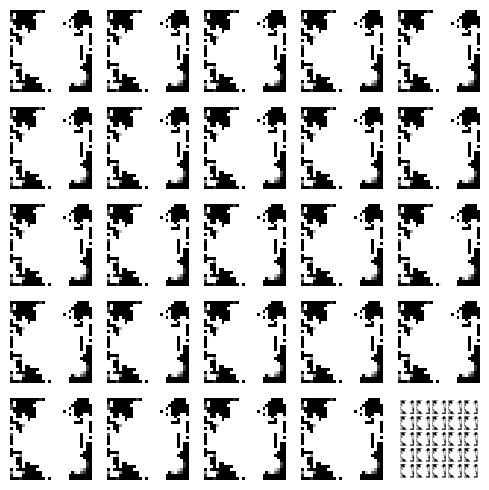

  0%|          | 0/350 [00:00<?, ?it/s]

4/4 [==============================] - 0s 15ms/step


  0%|          | 1/350 [00:00<03:38,  1.60it/s]

4/4 [==============================] - 0s 11ms/step


  1%|          | 2/350 [00:01<03:24,  1.70it/s]

4/4 [==============================] - 0s 16ms/step


  1%|          | 3/350 [00:01<03:22,  1.72it/s]

4/4 [==============================] - 0s 15ms/step


  1%|          | 4/350 [00:02<03:30,  1.64it/s]

4/4 [==============================] - 0s 14ms/step


  1%|▏         | 5/350 [00:03<03:32,  1.62it/s]

4/4 [==============================] - 0s 11ms/step


  2%|▏         | 6/350 [00:03<03:27,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


  2%|▏         | 7/350 [00:04<03:20,  1.71it/s]

4/4 [==============================] - 0s 11ms/step


  2%|▏         | 8/350 [00:04<03:30,  1.62it/s]

4/4 [==============================] - 0s 13ms/step


  3%|▎         | 9/350 [00:05<03:28,  1.64it/s]

4/4 [==============================] - 0s 17ms/step


  3%|▎         | 10/350 [00:06<03:23,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


  3%|▎         | 11/350 [00:06<03:19,  1.70it/s]

4/4 [==============================] - 0s 13ms/step


  3%|▎         | 12/350 [00:07<03:25,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


  4%|▎         | 13/350 [00:07<03:26,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


  4%|▍         | 14/350 [00:08<03:18,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


  4%|▍         | 15/350 [00:08<03:16,  1.70it/s]

4/4 [==============================] - 0s 14ms/step


  5%|▍         | 16/350 [00:09<03:20,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


  5%|▍         | 17/350 [00:10<03:22,  1.65it/s]

4/4 [==============================] - 0s 13ms/step


  5%|▌         | 18/350 [00:10<03:14,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


  5%|▌         | 19/350 [00:11<03:16,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


  6%|▌         | 20/350 [00:12<03:28,  1.58it/s]

4/4 [==============================] - 0s 11ms/step


  6%|▌         | 21/350 [00:12<03:18,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


  6%|▋         | 22/350 [00:13<03:17,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


  7%|▋         | 23/350 [00:13<03:10,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


  7%|▋         | 24/350 [00:14<03:21,  1.62it/s]

4/4 [==============================] - 0s 13ms/step


  7%|▋         | 25/350 [00:15<03:14,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


  7%|▋         | 26/350 [00:15<03:13,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


  8%|▊         | 27/350 [00:16<03:17,  1.63it/s]

4/4 [==============================] - 0s 16ms/step


  8%|▊         | 28/350 [00:16<03:17,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


  8%|▊         | 29/350 [00:17<03:13,  1.66it/s]

4/4 [==============================] - 0s 17ms/step


  9%|▊         | 30/350 [00:18<03:08,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


  9%|▉         | 31/350 [00:18<03:15,  1.63it/s]

4/4 [==============================] - 0s 14ms/step


  9%|▉         | 32/350 [00:19<03:11,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


  9%|▉         | 33/350 [00:19<03:07,  1.69it/s]

4/4 [==============================] - 0s 15ms/step


 10%|▉         | 34/350 [00:20<03:03,  1.72it/s]

4/4 [==============================] - 0s 11ms/step


 10%|█         | 35/350 [00:21<03:15,  1.61it/s]

4/4 [==============================] - 0s 11ms/step


 10%|█         | 36/350 [00:21<03:17,  1.59it/s]

4/4 [==============================] - 0s 12ms/step


 11%|█         | 37/350 [00:22<03:07,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 11%|█         | 38/350 [00:22<03:05,  1.68it/s]

4/4 [==============================] - 0s 16ms/step


 11%|█         | 39/350 [00:23<03:07,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 11%|█▏        | 40/350 [00:24<03:11,  1.62it/s]

4/4 [==============================] - 0s 11ms/step


 12%|█▏        | 41/350 [00:24<03:01,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 12%|█▏        | 42/350 [00:25<03:00,  1.71it/s]

4/4 [==============================] - 0s 16ms/step


 12%|█▏        | 43/350 [00:25<03:04,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 13%|█▎        | 44/350 [00:26<03:03,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 13%|█▎        | 45/350 [00:27<03:00,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 13%|█▎        | 46/350 [00:27<02:56,  1.72it/s]

4/4 [==============================] - 0s 15ms/step


 13%|█▎        | 47/350 [00:28<03:03,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


 14%|█▎        | 48/350 [00:28<03:02,  1.66it/s]

4/4 [==============================] - 0s 14ms/step


 14%|█▍        | 49/350 [00:29<02:55,  1.72it/s]

4/4 [==============================] - 0s 11ms/step


 14%|█▍        | 50/350 [00:29<02:54,  1.72it/s]

4/4 [==============================] - 0s 16ms/step


 15%|█▍        | 51/350 [00:30<02:59,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 15%|█▍        | 52/350 [00:31<02:58,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 15%|█▌        | 53/350 [00:31<03:00,  1.65it/s]

4/4 [==============================] - 0s 15ms/step


 15%|█▌        | 54/350 [00:32<02:54,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 16%|█▌        | 55/350 [00:33<02:58,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


 16%|█▌        | 56/350 [00:33<02:51,  1.71it/s]

4/4 [==============================] - 0s 15ms/step


 16%|█▋        | 57/350 [00:34<02:56,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


 17%|█▋        | 58/350 [00:34<02:50,  1.71it/s]

4/4 [==============================] - 0s 26ms/step


 17%|█▋        | 59/350 [00:35<02:56,  1.65it/s]

4/4 [==============================] - 0s 13ms/step


 17%|█▋        | 60/350 [00:36<02:57,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


 17%|█▋        | 61/350 [00:36<02:53,  1.66it/s]

4/4 [==============================] - 0s 16ms/step


 18%|█▊        | 62/350 [00:37<02:48,  1.71it/s]

4/4 [==============================] - 0s 11ms/step


 18%|█▊        | 63/350 [00:37<02:57,  1.61it/s]

4/4 [==============================] - 0s 14ms/step


 18%|█▊        | 64/350 [00:38<02:50,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 19%|█▊        | 65/350 [00:38<02:48,  1.69it/s]

4/4 [==============================] - 0s 15ms/step


 19%|█▉        | 66/350 [00:39<02:43,  1.74it/s]

4/4 [==============================] - 0s 11ms/step


 19%|█▉        | 67/350 [00:40<02:50,  1.66it/s]

4/4 [==============================] - 0s 14ms/step


 19%|█▉        | 68/350 [00:40<02:47,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 20%|█▉        | 69/350 [00:41<02:46,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


 20%|██        | 70/350 [00:41<02:43,  1.71it/s]

4/4 [==============================] - 0s 11ms/step


 20%|██        | 71/350 [00:42<02:49,  1.65it/s]

4/4 [==============================] - 0s 15ms/step


 21%|██        | 72/350 [00:43<02:44,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 21%|██        | 73/350 [00:43<02:46,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 21%|██        | 74/350 [00:44<02:40,  1.72it/s]

4/4 [==============================] - 0s 11ms/step


 21%|██▏       | 75/350 [00:44<02:47,  1.64it/s]

4/4 [==============================] - 0s 15ms/step


 22%|██▏       | 76/350 [00:45<02:41,  1.70it/s]

4/4 [==============================] - 0s 10ms/step


 22%|██▏       | 77/350 [00:46<02:43,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 22%|██▏       | 78/350 [00:46<02:38,  1.71it/s]

4/4 [==============================] - 0s 11ms/step


 23%|██▎       | 79/350 [00:47<02:44,  1.64it/s]

4/4 [==============================] - 0s 14ms/step


 23%|██▎       | 80/350 [00:47<02:42,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 23%|██▎       | 81/350 [00:48<02:40,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 23%|██▎       | 82/350 [00:49<02:35,  1.73it/s]

4/4 [==============================] - 0s 12ms/step


 24%|██▎       | 83/350 [00:49<02:43,  1.63it/s]

4/4 [==============================] - 0s 16ms/step


 24%|██▍       | 84/350 [00:50<02:38,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 24%|██▍       | 85/350 [00:50<02:37,  1.69it/s]

4/4 [==============================] - 0s 15ms/step


 25%|██▍       | 86/350 [00:51<02:31,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 25%|██▍       | 87/350 [00:52<02:41,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


 25%|██▌       | 88/350 [00:52<02:34,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 25%|██▌       | 89/350 [00:53<02:33,  1.70it/s]

4/4 [==============================] - 0s 16ms/step


 26%|██▌       | 90/350 [00:53<02:31,  1.72it/s]

4/4 [==============================] - 0s 11ms/step


 26%|██▌       | 91/350 [00:54<02:39,  1.62it/s]

4/4 [==============================] - 0s 14ms/step


 26%|██▋       | 92/350 [00:55<02:37,  1.64it/s]

4/4 [==============================] - 0s 17ms/step


 27%|██▋       | 93/350 [00:55<02:33,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 27%|██▋       | 94/350 [00:56<02:37,  1.62it/s]

4/4 [==============================] - 0s 14ms/step


 27%|██▋       | 95/350 [00:56<02:36,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 27%|██▋       | 96/350 [00:57<02:31,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 28%|██▊       | 97/350 [00:58<02:30,  1.69it/s]

4/4 [==============================] - 0s 16ms/step


 28%|██▊       | 98/350 [00:58<02:32,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 28%|██▊       | 99/350 [00:59<02:33,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 29%|██▊       | 100/350 [00:59<02:26,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 29%|██▉       | 101/350 [01:00<02:26,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 29%|██▉       | 102/350 [01:01<02:28,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 29%|██▉       | 103/350 [01:01<02:29,  1.65it/s]

4/4 [==============================] - 0s 15ms/step


 30%|██▉       | 104/350 [01:02<02:24,  1.71it/s]

4/4 [==============================] - 0s 11ms/step


 30%|███       | 105/350 [01:02<02:23,  1.71it/s]

4/4 [==============================] - 0s 16ms/step


 30%|███       | 106/350 [01:03<02:28,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


 31%|███       | 107/350 [01:04<02:26,  1.66it/s]

4/4 [==============================] - 0s 14ms/step


 31%|███       | 108/350 [01:04<02:19,  1.73it/s]

4/4 [==============================] - 0s 11ms/step


 31%|███       | 109/350 [01:05<02:15,  1.78it/s]

4/4 [==============================] - 0s 11ms/step


 31%|███▏      | 110/350 [01:05<02:26,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 32%|███▏      | 111/350 [01:06<02:20,  1.70it/s]

4/4 [==============================] - 0s 10ms/step


 32%|███▏      | 112/350 [01:06<02:20,  1.70it/s]

4/4 [==============================] - 0s 18ms/step


 32%|███▏      | 113/350 [01:07<02:19,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 33%|███▎      | 114/350 [01:08<02:27,  1.60it/s]

4/4 [==============================] - 0s 11ms/step


 33%|███▎      | 115/350 [01:08<02:23,  1.63it/s]

4/4 [==============================] - 0s 14ms/step


 33%|███▎      | 116/350 [01:09<02:19,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 33%|███▎      | 117/350 [01:09<02:17,  1.70it/s]

4/4 [==============================] - 0s 16ms/step


 34%|███▎      | 118/350 [01:10<02:19,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 34%|███▍      | 119/350 [01:11<02:20,  1.64it/s]

4/4 [==============================] - 0s 13ms/step


 34%|███▍      | 120/350 [01:11<02:16,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 35%|███▍      | 121/350 [01:12<02:16,  1.68it/s]

4/4 [==============================] - 0s 15ms/step


 35%|███▍      | 122/350 [01:13<02:17,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 35%|███▌      | 123/350 [01:13<02:17,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 35%|███▌      | 124/350 [01:14<02:11,  1.71it/s]

4/4 [==============================] - 0s 11ms/step


 36%|███▌      | 125/350 [01:14<02:11,  1.72it/s]

4/4 [==============================] - 0s 19ms/step


 36%|███▌      | 126/350 [01:15<02:15,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 36%|███▋      | 127/350 [01:15<02:13,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 37%|███▋      | 128/350 [01:16<02:09,  1.71it/s]

4/4 [==============================] - 0s 11ms/step


 37%|███▋      | 129/350 [01:17<02:11,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 37%|███▋      | 130/350 [01:17<02:13,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 37%|███▋      | 131/350 [01:18<02:11,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


 38%|███▊      | 132/350 [01:19<02:13,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 38%|███▊      | 133/350 [01:19<02:07,  1.71it/s]

4/4 [==============================] - 0s 10ms/step


 38%|███▊      | 134/350 [01:20<02:10,  1.66it/s]

4/4 [==============================] - 0s 14ms/step


 39%|███▊      | 135/350 [01:20<02:07,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 39%|███▉      | 136/350 [01:21<02:09,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 39%|███▉      | 137/350 [01:21<02:05,  1.70it/s]

4/4 [==============================] - 0s 13ms/step


 39%|███▉      | 138/350 [01:22<02:09,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 40%|███▉      | 139/350 [01:23<02:06,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 40%|████      | 140/350 [01:23<02:05,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 40%|████      | 141/350 [01:24<02:01,  1.72it/s]

4/4 [==============================] - 0s 11ms/step


 41%|████      | 142/350 [01:24<02:04,  1.67it/s]

4/4 [==============================] - 0s 17ms/step


 41%|████      | 143/350 [01:25<02:01,  1.71it/s]

4/4 [==============================] - 0s 15ms/step


 41%|████      | 144/350 [01:26<01:58,  1.74it/s]

4/4 [==============================] - 0s 11ms/step


 41%|████▏     | 145/350 [01:26<01:59,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 42%|████▏     | 146/350 [01:27<02:02,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 42%|████▏     | 147/350 [01:27<02:02,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 42%|████▏     | 148/350 [01:28<02:01,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 43%|████▎     | 149/350 [01:29<01:58,  1.70it/s]

4/4 [==============================] - 0s 14ms/step


 43%|████▎     | 150/350 [01:29<02:01,  1.65it/s]

4/4 [==============================] - 0s 16ms/step


 43%|████▎     | 151/350 [01:30<01:58,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 43%|████▎     | 152/350 [01:30<02:00,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 44%|████▎     | 153/350 [01:31<01:55,  1.71it/s]

4/4 [==============================] - 0s 14ms/step


 44%|████▍     | 154/350 [01:32<01:58,  1.65it/s]

4/4 [==============================] - 0s 13ms/step


 44%|████▍     | 155/350 [01:32<01:54,  1.70it/s]

4/4 [==============================] - 0s 13ms/step


 45%|████▍     | 156/350 [01:33<01:56,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 45%|████▍     | 157/350 [01:33<01:52,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


 45%|████▌     | 158/350 [01:34<01:55,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


 45%|████▌     | 159/350 [01:35<01:54,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 46%|████▌     | 160/350 [01:35<01:52,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


 46%|████▌     | 161/350 [01:36<01:50,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 46%|████▋     | 162/350 [01:36<01:56,  1.61it/s]

4/4 [==============================] - 0s 15ms/step


 47%|████▋     | 163/350 [01:37<01:52,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 47%|████▋     | 164/350 [01:38<01:51,  1.67it/s]

4/4 [==============================] - 0s 15ms/step


 47%|████▋     | 165/350 [01:38<01:47,  1.72it/s]

4/4 [==============================] - 0s 11ms/step


 47%|████▋     | 166/350 [01:39<01:53,  1.62it/s]

4/4 [==============================] - 0s 13ms/step


 48%|████▊     | 167/350 [01:39<01:49,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 48%|████▊     | 168/350 [01:40<01:48,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 48%|████▊     | 169/350 [01:41<01:49,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 49%|████▊     | 170/350 [01:41<01:49,  1.64it/s]

4/4 [==============================] - 0s 14ms/step


 49%|████▉     | 171/350 [01:42<01:48,  1.65it/s]

4/4 [==============================] - 0s 13ms/step


 49%|████▉     | 172/350 [01:42<01:50,  1.61it/s]

4/4 [==============================] - 0s 12ms/step


 49%|████▉     | 173/350 [01:43<01:45,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 50%|████▉     | 174/350 [01:44<01:48,  1.62it/s]

4/4 [==============================] - 0s 13ms/step


 50%|█████     | 175/350 [01:44<01:45,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 50%|█████     | 176/350 [01:45<01:44,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 51%|█████     | 177/350 [01:45<01:40,  1.73it/s]

4/4 [==============================] - 0s 11ms/step


 51%|█████     | 178/350 [01:46<01:45,  1.63it/s]

4/4 [==============================] - 0s 15ms/step


 51%|█████     | 179/350 [01:47<01:41,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 51%|█████▏    | 180/350 [01:47<01:41,  1.68it/s]

4/4 [==============================] - 0s 15ms/step


 52%|█████▏    | 181/350 [01:48<01:37,  1.73it/s]

4/4 [==============================] - 0s 12ms/step


 52%|█████▏    | 182/350 [01:48<01:43,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


 52%|█████▏    | 183/350 [01:49<01:39,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 53%|█████▎    | 184/350 [01:50<01:38,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 53%|█████▎    | 185/350 [01:50<01:36,  1.70it/s]

4/4 [==============================] - 0s 15ms/step


 53%|█████▎    | 186/350 [01:51<01:40,  1.64it/s]

4/4 [==============================] - 0s 13ms/step


 53%|█████▎    | 187/350 [01:51<01:36,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 54%|█████▎    | 188/350 [01:52<01:37,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 54%|█████▍    | 189/350 [01:53<01:34,  1.71it/s]

4/4 [==============================] - 0s 13ms/step


 54%|█████▍    | 190/350 [01:53<01:37,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 55%|█████▍    | 191/350 [01:54<01:34,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 55%|█████▍    | 192/350 [01:54<01:35,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 55%|█████▌    | 193/350 [01:55<01:30,  1.73it/s]

4/4 [==============================] - 0s 31ms/step


 55%|█████▌    | 194/350 [01:56<01:35,  1.64it/s]

4/4 [==============================] - 0s 14ms/step


 56%|█████▌    | 195/350 [01:56<01:32,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 56%|█████▌    | 196/350 [01:57<01:31,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 56%|█████▋    | 197/350 [01:57<01:28,  1.73it/s]

4/4 [==============================] - 0s 14ms/step


 57%|█████▋    | 198/350 [01:58<01:33,  1.63it/s]

4/4 [==============================] - 0s 14ms/step


 57%|█████▋    | 199/350 [01:59<01:30,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 57%|█████▋    | 200/350 [01:59<01:28,  1.69it/s]

4/4 [==============================] - 0s 14ms/step


 57%|█████▋    | 201/350 [02:00<01:25,  1.74it/s]

4/4 [==============================] - 0s 11ms/step


 58%|█████▊    | 202/350 [02:00<01:29,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


 58%|█████▊    | 203/350 [02:01<01:26,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 58%|█████▊    | 204/350 [02:01<01:25,  1.70it/s]

4/4 [==============================] - 0s 16ms/step


 59%|█████▊    | 205/350 [02:02<01:24,  1.71it/s]

4/4 [==============================] - 0s 13ms/step


 59%|█████▉    | 206/350 [02:03<01:27,  1.64it/s]

4/4 [==============================] - 0s 15ms/step


 59%|█████▉    | 207/350 [02:03<01:24,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 59%|█████▉    | 208/350 [02:04<01:25,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 60%|█████▉    | 209/350 [02:04<01:22,  1.72it/s]

4/4 [==============================] - 0s 15ms/step


 60%|██████    | 210/350 [02:05<01:25,  1.64it/s]

4/4 [==============================] - 0s 14ms/step


 60%|██████    | 211/350 [02:06<01:22,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 61%|██████    | 212/350 [02:06<01:22,  1.68it/s]

4/4 [==============================] - 0s 15ms/step


 61%|██████    | 213/350 [02:07<01:19,  1.71it/s]

4/4 [==============================] - 0s 15ms/step


 61%|██████    | 214/350 [02:07<01:22,  1.65it/s]

4/4 [==============================] - 0s 15ms/step


 61%|██████▏   | 215/350 [02:08<01:21,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 62%|██████▏   | 216/350 [02:09<01:19,  1.68it/s]

4/4 [==============================] - 0s 15ms/step


 62%|██████▏   | 217/350 [02:09<01:17,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 62%|██████▏   | 218/350 [02:10<01:22,  1.61it/s]

4/4 [==============================] - 0s 15ms/step


 63%|██████▎   | 219/350 [02:10<01:19,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 63%|██████▎   | 220/350 [02:11<01:18,  1.66it/s]

4/4 [==============================] - 0s 14ms/step


 63%|██████▎   | 221/350 [02:12<01:15,  1.71it/s]

4/4 [==============================] - 0s 13ms/step


 63%|██████▎   | 222/350 [02:12<01:18,  1.62it/s]

4/4 [==============================] - 0s 14ms/step


 64%|██████▎   | 223/350 [02:13<01:16,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 64%|██████▍   | 224/350 [02:13<01:14,  1.69it/s]

4/4 [==============================] - 0s 19ms/step


 64%|██████▍   | 225/350 [02:14<01:14,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 65%|██████▍   | 226/350 [02:15<01:16,  1.63it/s]

4/4 [==============================] - 0s 15ms/step


 65%|██████▍   | 227/350 [02:15<01:13,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 65%|██████▌   | 228/350 [02:16<01:14,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


 65%|██████▌   | 229/350 [02:16<01:11,  1.69it/s]

4/4 [==============================] - 0s 13ms/step


 66%|██████▌   | 230/350 [02:17<01:13,  1.64it/s]

4/4 [==============================] - 0s 14ms/step


 66%|██████▌   | 231/350 [02:18<01:11,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 66%|██████▋   | 232/350 [02:18<01:11,  1.66it/s]

4/4 [==============================] - 0s 15ms/step


 67%|██████▋   | 233/350 [02:19<01:09,  1.69it/s]

4/4 [==============================] - 0s 13ms/step


 67%|██████▋   | 234/350 [02:20<01:11,  1.61it/s]

4/4 [==============================] - 0s 14ms/step


 67%|██████▋   | 235/350 [02:20<01:09,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 67%|██████▋   | 236/350 [02:21<01:07,  1.69it/s]

4/4 [==============================] - 0s 13ms/step


 68%|██████▊   | 237/350 [02:21<01:05,  1.73it/s]

4/4 [==============================] - 0s 12ms/step


 68%|██████▊   | 238/350 [02:22<01:08,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


 68%|██████▊   | 239/350 [02:22<01:06,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 69%|██████▊   | 240/350 [02:23<01:06,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 69%|██████▉   | 241/350 [02:24<01:09,  1.57it/s]

4/4 [==============================] - 0s 11ms/step


 69%|██████▉   | 242/350 [02:24<01:05,  1.66it/s]

4/4 [==============================] - 0s 14ms/step


 69%|██████▉   | 243/350 [02:25<01:04,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 70%|██████▉   | 244/350 [02:25<01:01,  1.71it/s]

4/4 [==============================] - 0s 11ms/step


 70%|███████   | 245/350 [02:26<01:05,  1.59it/s]

4/4 [==============================] - 0s 11ms/step


 70%|███████   | 246/350 [02:27<01:02,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 71%|███████   | 247/350 [02:27<01:01,  1.68it/s]

4/4 [==============================] - 0s 15ms/step


 71%|███████   | 248/350 [02:28<01:00,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 71%|███████   | 249/350 [02:29<01:01,  1.64it/s]

4/4 [==============================] - 0s 13ms/step


 71%|███████▏  | 250/350 [02:29<00:58,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 72%|███████▏  | 251/350 [02:30<00:59,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 72%|███████▏  | 252/350 [02:30<00:56,  1.73it/s]

4/4 [==============================] - 0s 14ms/step


 72%|███████▏  | 253/350 [02:31<00:58,  1.66it/s]

4/4 [==============================] - 0s 15ms/step


 73%|███████▎  | 254/350 [02:32<00:58,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


 73%|███████▎  | 255/350 [02:32<00:56,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 73%|███████▎  | 256/350 [02:33<00:55,  1.69it/s]

4/4 [==============================] - 0s 14ms/step


 73%|███████▎  | 257/350 [02:33<00:56,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 74%|███████▎  | 258/350 [02:34<00:55,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


 74%|███████▍  | 259/350 [02:34<00:53,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 74%|███████▍  | 260/350 [02:35<00:52,  1.71it/s]

4/4 [==============================] - 0s 13ms/step


 75%|███████▍  | 261/350 [02:36<00:54,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


 75%|███████▍  | 262/350 [02:36<00:53,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


 75%|███████▌  | 263/350 [02:37<00:50,  1.71it/s]

4/4 [==============================] - 0s 11ms/step


 75%|███████▌  | 264/350 [02:37<00:50,  1.70it/s]

4/4 [==============================] - 0s 14ms/step


 76%|███████▌  | 265/350 [02:38<00:51,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 76%|███████▌  | 266/350 [02:39<00:50,  1.68it/s]

4/4 [==============================] - 0s 14ms/step


 76%|███████▋  | 267/350 [02:39<00:50,  1.65it/s]

4/4 [==============================] - 0s 17ms/step


 77%|███████▋  | 268/350 [02:40<00:47,  1.73it/s]

4/4 [==============================] - 0s 14ms/step


 77%|███████▋  | 269/350 [02:40<00:47,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 77%|███████▋  | 270/350 [02:41<00:47,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 77%|███████▋  | 271/350 [02:42<00:46,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


 78%|███████▊  | 272/350 [02:42<00:44,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 78%|███████▊  | 273/350 [02:43<00:45,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 78%|███████▊  | 274/350 [02:43<00:45,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 79%|███████▊  | 275/350 [02:44<00:43,  1.71it/s]

4/4 [==============================] - 0s 11ms/step


 79%|███████▉  | 276/350 [02:45<00:43,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 79%|███████▉  | 277/350 [02:45<00:46,  1.57it/s]

4/4 [==============================] - 0s 17ms/step


 79%|███████▉  | 278/350 [02:46<00:44,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 80%|███████▉  | 279/350 [02:46<00:42,  1.67it/s]

4/4 [==============================] - 0s 16ms/step


 80%|████████  | 280/350 [02:47<00:41,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 80%|████████  | 281/350 [02:48<00:42,  1.62it/s]

4/4 [==============================] - 0s 15ms/step


 81%|████████  | 282/350 [02:48<00:40,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 81%|████████  | 283/350 [02:49<00:40,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 81%|████████  | 284/350 [02:49<00:38,  1.69it/s]

4/4 [==============================] - 0s 14ms/step


 81%|████████▏ | 285/350 [02:50<00:39,  1.65it/s]

4/4 [==============================] - 0s 16ms/step


 82%|████████▏ | 286/350 [02:51<00:38,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 82%|████████▏ | 287/350 [02:51<00:37,  1.67it/s]

4/4 [==============================] - 0s 14ms/step


 82%|████████▏ | 288/350 [02:52<00:35,  1.73it/s]

4/4 [==============================] - 0s 11ms/step


 83%|████████▎ | 289/350 [02:52<00:36,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 83%|████████▎ | 290/350 [02:53<00:34,  1.71it/s]

4/4 [==============================] - 0s 11ms/step


 83%|████████▎ | 291/350 [02:54<00:35,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 83%|████████▎ | 292/350 [02:54<00:33,  1.73it/s]

4/4 [==============================] - 0s 12ms/step


 84%|████████▎ | 293/350 [02:55<00:35,  1.61it/s]

4/4 [==============================] - 0s 14ms/step


 84%|████████▍ | 294/350 [02:55<00:33,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 84%|████████▍ | 295/350 [02:56<00:32,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 85%|████████▍ | 296/350 [02:56<00:31,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


 85%|████████▍ | 297/350 [02:57<00:32,  1.65it/s]

4/4 [==============================] - 0s 14ms/step


 85%|████████▌ | 298/350 [02:58<00:30,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 85%|████████▌ | 299/350 [02:58<00:29,  1.75it/s]

4/4 [==============================] - 0s 14ms/step


 86%|████████▌ | 300/350 [02:59<00:29,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 86%|████████▌ | 301/350 [02:59<00:29,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 86%|████████▋ | 302/350 [03:00<00:29,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 87%|████████▋ | 303/350 [03:01<00:27,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 87%|████████▋ | 304/350 [03:01<00:27,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 87%|████████▋ | 305/350 [03:02<00:27,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 87%|████████▋ | 306/350 [03:02<00:26,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 88%|████████▊ | 307/350 [03:03<00:24,  1.72it/s]

4/4 [==============================] - 0s 11ms/step


 88%|████████▊ | 308/350 [03:04<00:24,  1.69it/s]

4/4 [==============================] - 0s 13ms/step


 88%|████████▊ | 309/350 [03:04<00:24,  1.66it/s]

4/4 [==============================] - 0s 14ms/step


 89%|████████▊ | 310/350 [03:05<00:23,  1.68it/s]

4/4 [==============================] - 0s 16ms/step


 89%|████████▉ | 311/350 [03:05<00:23,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 89%|████████▉ | 312/350 [03:06<00:22,  1.69it/s]

4/4 [==============================] - 0s 13ms/step


 89%|████████▉ | 313/350 [03:07<00:22,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 90%|████████▉ | 314/350 [03:07<00:22,  1.61it/s]

4/4 [==============================] - 0s 12ms/step


 90%|█████████ | 315/350 [03:08<00:20,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 90%|█████████ | 316/350 [03:08<00:20,  1.70it/s]

4/4 [==============================] - 0s 14ms/step


 91%|█████████ | 317/350 [03:09<00:19,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 91%|█████████ | 318/350 [03:10<00:19,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 91%|█████████ | 319/350 [03:10<00:18,  1.71it/s]

4/4 [==============================] - 0s 11ms/step


 91%|█████████▏| 320/350 [03:11<00:17,  1.70it/s]

4/4 [==============================] - 0s 16ms/step


 92%|█████████▏| 321/350 [03:11<00:17,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 92%|█████████▏| 322/350 [03:12<00:16,  1.67it/s]

4/4 [==============================] - 0s 15ms/step


 92%|█████████▏| 323/350 [03:13<00:15,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 93%|█████████▎| 324/350 [03:13<00:15,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 93%|█████████▎| 325/350 [03:14<00:15,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 93%|█████████▎| 326/350 [03:14<00:14,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 93%|█████████▎| 327/350 [03:15<00:13,  1.71it/s]

4/4 [==============================] - 0s 11ms/step


 94%|█████████▎| 328/350 [03:16<00:13,  1.68it/s]

4/4 [==============================] - 0s 14ms/step


 94%|█████████▍| 329/350 [03:16<00:12,  1.64it/s]

4/4 [==============================] - 0s 15ms/step


 94%|█████████▍| 330/350 [03:17<00:12,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


 95%|█████████▍| 331/350 [03:17<00:11,  1.68it/s]

4/4 [==============================] - 0s 10ms/step


 95%|█████████▍| 332/350 [03:18<00:10,  1.71it/s]

4/4 [==============================] - 0s 13ms/step


 95%|█████████▌| 333/350 [03:19<00:10,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 95%|█████████▌| 334/350 [03:19<00:09,  1.65it/s]

4/4 [==============================] - 0s 14ms/step


 96%|█████████▌| 335/350 [03:20<00:08,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 96%|█████████▌| 336/350 [03:20<00:08,  1.70it/s]

4/4 [==============================] - 0s 13ms/step


 96%|█████████▋| 337/350 [03:21<00:07,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 97%|█████████▋| 338/350 [03:22<00:07,  1.66it/s]

4/4 [==============================] - 0s 14ms/step


 97%|█████████▋| 339/350 [03:22<00:06,  1.73it/s]

4/4 [==============================] - 0s 15ms/step


 97%|█████████▋| 340/350 [03:23<00:05,  1.76it/s]

4/4 [==============================] - 0s 12ms/step


 97%|█████████▋| 341/350 [03:23<00:05,  1.64it/s]

4/4 [==============================] - 0s 17ms/step


 98%|█████████▊| 342/350 [03:24<00:04,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 98%|█████████▊| 343/350 [03:25<00:04,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 98%|█████████▊| 344/350 [03:25<00:03,  1.73it/s]

4/4 [==============================] - 0s 12ms/step


 99%|█████████▊| 345/350 [03:26<00:03,  1.59it/s]

4/4 [==============================] - 0s 11ms/step


 99%|█████████▉| 346/350 [03:26<00:02,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 99%|█████████▉| 347/350 [03:27<00:01,  1.69it/s]

4/4 [==============================] - 0s 15ms/step


 99%|█████████▉| 348/350 [03:27<00:01,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


100%|█████████▉| 349/350 [03:28<00:00,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


100%|██████████| 350/350 [03:29<00:00,  1.67it/s]

Epoch number: 69 discriminator_loss: 0.16495501700842785 generator_loss: 7.665384665897914
1/1 [==============================] - 0s 22ms/step


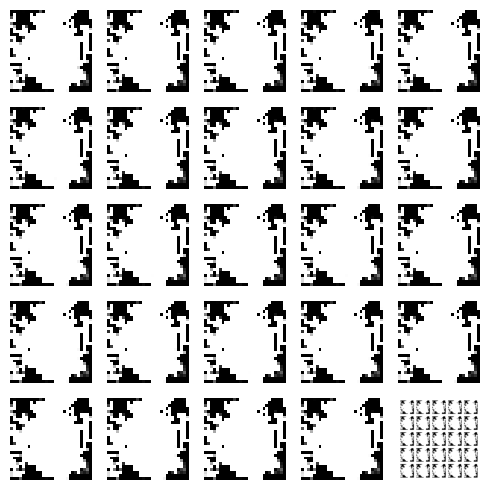

  0%|          | 0/350 [00:00<?, ?it/s]

4/4 [==============================] - 0s 22ms/step


  0%|          | 1/350 [00:00<03:26,  1.69it/s]

4/4 [==============================] - 0s 13ms/step


  1%|          | 2/350 [00:01<03:37,  1.60it/s]

4/4 [==============================] - 0s 12ms/step


  1%|          | 3/350 [00:01<03:21,  1.72it/s]

4/4 [==============================] - 0s 15ms/step


  1%|          | 4/350 [00:02<03:55,  1.47it/s]

4/4 [==============================] - 0s 11ms/step


  1%|▏         | 5/350 [00:03<03:46,  1.52it/s]

4/4 [==============================] - 0s 13ms/step


  2%|▏         | 6/350 [00:03<03:43,  1.54it/s]

4/4 [==============================] - 0s 13ms/step


  2%|▏         | 7/350 [00:04<03:40,  1.56it/s]

4/4 [==============================] - 0s 12ms/step


  2%|▏         | 8/350 [00:05<03:27,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


  3%|▎         | 9/350 [00:05<03:24,  1.67it/s]

4/4 [==============================] - 0s 15ms/step


  3%|▎         | 10/350 [00:06<03:29,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


  3%|▎         | 11/350 [00:06<03:28,  1.63it/s]

4/4 [==============================] - 0s 14ms/step


  3%|▎         | 12/350 [00:07<03:20,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


  4%|▎         | 13/350 [00:07<03:19,  1.69it/s]

4/4 [==============================] - 0s 17ms/step


  4%|▍         | 14/350 [00:08<03:26,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


  4%|▍         | 15/350 [00:09<03:23,  1.64it/s]

4/4 [==============================] - 0s 13ms/step


  5%|▍         | 16/350 [00:09<03:23,  1.64it/s]

4/4 [==============================] - 0s 15ms/step


  5%|▍         | 17/350 [00:10<03:20,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


  5%|▌         | 18/350 [00:11<03:26,  1.61it/s]

4/4 [==============================] - 0s 12ms/step


  5%|▌         | 19/350 [00:11<03:19,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


  6%|▌         | 20/350 [00:12<03:25,  1.61it/s]

4/4 [==============================] - 0s 12ms/step


  6%|▌         | 21/350 [00:12<03:14,  1.69it/s]

4/4 [==============================] - 0s 36ms/step


  6%|▋         | 22/350 [00:13<03:27,  1.58it/s]

4/4 [==============================] - 0s 13ms/step


  7%|▋         | 23/350 [00:14<03:25,  1.59it/s]

4/4 [==============================] - 0s 13ms/step


  7%|▋         | 24/350 [00:14<03:17,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


  7%|▋         | 25/350 [00:15<03:25,  1.58it/s]

4/4 [==============================] - 0s 11ms/step


  7%|▋         | 26/350 [00:16<03:21,  1.60it/s]

4/4 [==============================] - 0s 13ms/step


  8%|▊         | 27/350 [00:16<03:12,  1.67it/s]

4/4 [==============================] - 0s 14ms/step


  8%|▊         | 28/350 [00:17<03:12,  1.67it/s]

4/4 [==============================] - 0s 15ms/step


  8%|▊         | 29/350 [00:17<03:14,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


  9%|▊         | 30/350 [00:18<03:16,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


  9%|▉         | 31/350 [00:19<03:09,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


  9%|▉         | 32/350 [00:19<03:11,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


  9%|▉         | 33/350 [00:20<03:13,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 10%|▉         | 34/350 [00:20<03:13,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 10%|█         | 35/350 [00:21<03:10,  1.65it/s]

4/4 [==============================] - 0s 14ms/step


 10%|█         | 36/350 [00:22<03:09,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 11%|█         | 37/350 [00:22<03:14,  1.61it/s]

4/4 [==============================] - 0s 15ms/step


 11%|█         | 38/350 [00:23<03:07,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 11%|█         | 39/350 [00:23<03:09,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 11%|█▏        | 40/350 [00:24<03:03,  1.69it/s]

4/4 [==============================] - 0s 13ms/step


 12%|█▏        | 41/350 [00:25<03:10,  1.62it/s]

4/4 [==============================] - 0s 17ms/step


 12%|█▏        | 42/350 [00:25<03:04,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 12%|█▏        | 43/350 [00:26<03:08,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 13%|█▎        | 44/350 [00:26<03:00,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 13%|█▎        | 45/350 [00:27<03:08,  1.62it/s]

4/4 [==============================] - 0s 16ms/step


 13%|█▎        | 46/350 [00:28<03:04,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 13%|█▎        | 47/350 [00:28<03:03,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 14%|█▎        | 48/350 [00:29<02:55,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


 14%|█▍        | 49/350 [00:29<03:03,  1.64it/s]

4/4 [==============================] - 0s 14ms/step


 14%|█▍        | 50/350 [00:30<02:59,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 15%|█▍        | 51/350 [00:31<02:57,  1.68it/s]

4/4 [==============================] - 0s 15ms/step


 15%|█▍        | 52/350 [00:31<02:54,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 15%|█▌        | 53/350 [00:32<03:00,  1.65it/s]

4/4 [==============================] - 0s 15ms/step


 15%|█▌        | 54/350 [00:32<02:55,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 16%|█▌        | 55/350 [00:33<02:56,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 16%|█▌        | 56/350 [00:34<02:52,  1.71it/s]

4/4 [==============================] - 0s 13ms/step


 16%|█▋        | 57/350 [00:34<02:57,  1.65it/s]

4/4 [==============================] - 0s 15ms/step


 17%|█▋        | 58/350 [00:35<02:53,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 17%|█▋        | 59/350 [00:35<02:58,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 17%|█▋        | 60/350 [00:36<02:53,  1.67it/s]

4/4 [==============================] - 0s 15ms/step


 17%|█▋        | 61/350 [00:37<02:58,  1.62it/s]

4/4 [==============================] - 0s 13ms/step


 18%|█▊        | 62/350 [00:37<02:51,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


 18%|█▊        | 63/350 [00:38<02:55,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 18%|█▊        | 64/350 [00:38<02:49,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 19%|█▊        | 65/350 [00:39<02:52,  1.65it/s]

4/4 [==============================] - 0s 16ms/step


 19%|█▉        | 66/350 [00:40<02:50,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 19%|█▉        | 67/350 [00:40<02:45,  1.71it/s]

4/4 [==============================] - 0s 11ms/step


 19%|█▉        | 68/350 [00:41<02:44,  1.71it/s]

4/4 [==============================] - 0s 16ms/step


 20%|█▉        | 69/350 [00:41<02:49,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 20%|██        | 70/350 [00:42<02:51,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 20%|██        | 71/350 [00:43<02:45,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 21%|██        | 72/350 [00:43<02:47,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 21%|██        | 73/350 [00:44<02:50,  1.62it/s]

4/4 [==============================] - 0s 11ms/step


 21%|██        | 74/350 [00:44<02:47,  1.65it/s]

4/4 [==============================] - 0s 13ms/step


 21%|██▏       | 75/350 [00:45<02:41,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 22%|██▏       | 76/350 [00:46<02:45,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 22%|██▏       | 77/350 [00:46<02:46,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 22%|██▏       | 78/350 [00:47<02:45,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 23%|██▎       | 79/350 [00:47<02:45,  1.64it/s]

4/4 [==============================] - 0s 16ms/step


 23%|██▎       | 80/350 [00:48<02:39,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 23%|██▎       | 81/350 [00:49<02:43,  1.65it/s]

4/4 [==============================] - 0s 15ms/step


 23%|██▎       | 82/350 [00:49<02:40,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 24%|██▎       | 83/350 [00:50<02:42,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


 24%|██▍       | 84/350 [00:50<02:36,  1.70it/s]

4/4 [==============================] - 0s 15ms/step


 24%|██▍       | 85/350 [00:51<02:43,  1.62it/s]

4/4 [==============================] - 0s 14ms/step


 25%|██▍       | 86/350 [00:52<02:40,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 25%|██▍       | 87/350 [00:52<02:40,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


 25%|██▌       | 88/350 [00:53<02:33,  1.71it/s]

4/4 [==============================] - 0s 15ms/step


 25%|██▌       | 89/350 [00:53<02:40,  1.62it/s]

4/4 [==============================] - 0s 14ms/step


 26%|██▌       | 90/350 [00:54<02:34,  1.68it/s]

4/4 [==============================] - 0s 16ms/step


 26%|██▌       | 91/350 [00:55<02:30,  1.72it/s]

4/4 [==============================] - 0s 11ms/step


 26%|██▋       | 92/350 [00:55<02:31,  1.71it/s]

4/4 [==============================] - 0s 15ms/step


 27%|██▋       | 93/350 [00:56<02:35,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 27%|██▋       | 94/350 [00:56<02:33,  1.67it/s]

4/4 [==============================] - 0s 17ms/step


 27%|██▋       | 95/350 [00:57<02:28,  1.71it/s]

4/4 [==============================] - 0s 11ms/step


 27%|██▋       | 96/350 [00:58<02:31,  1.68it/s]

4/4 [==============================] - 0s 14ms/step


 28%|██▊       | 97/350 [00:58<02:33,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 28%|██▊       | 98/350 [00:59<02:32,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


 28%|██▊       | 99/350 [00:59<02:33,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 29%|██▊       | 100/350 [01:00<02:27,  1.69it/s]

4/4 [==============================] - 0s 13ms/step


 29%|██▉       | 101/350 [01:01<02:32,  1.63it/s]

4/4 [==============================] - 0s 14ms/step


 29%|██▉       | 102/350 [01:01<02:28,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 29%|██▉       | 103/350 [01:02<02:29,  1.65it/s]

4/4 [==============================] - 0s 13ms/step


 30%|██▉       | 104/350 [01:02<02:23,  1.72it/s]

4/4 [==============================] - 0s 11ms/step


 30%|███       | 105/350 [01:03<02:29,  1.64it/s]

4/4 [==============================] - 0s 15ms/step


 30%|███       | 106/350 [01:04<02:27,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 31%|███       | 107/350 [01:04<02:25,  1.67it/s]

4/4 [==============================] - 0s 14ms/step


 31%|███       | 108/350 [01:05<02:21,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 31%|███       | 109/350 [01:05<02:28,  1.63it/s]

4/4 [==============================] - 0s 17ms/step


 31%|███▏      | 110/350 [01:06<02:23,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 32%|███▏      | 111/350 [01:07<02:24,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 32%|███▏      | 112/350 [01:07<02:20,  1.70it/s]

4/4 [==============================] - 0s 14ms/step


 32%|███▏      | 113/350 [01:08<02:27,  1.61it/s]

4/4 [==============================] - 0s 15ms/step


 33%|███▎      | 114/350 [01:08<02:21,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 33%|███▎      | 115/350 [01:09<02:20,  1.67it/s]

4/4 [==============================] - 0s 16ms/step


 33%|███▎      | 116/350 [01:10<02:20,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 33%|███▎      | 117/350 [01:10<02:24,  1.61it/s]

4/4 [==============================] - 0s 14ms/step


 34%|███▎      | 118/350 [01:11<02:20,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 34%|███▍      | 119/350 [01:12<02:21,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 34%|███▍      | 120/350 [01:12<02:15,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 35%|███▍      | 121/350 [01:13<02:20,  1.63it/s]

4/4 [==============================] - 0s 16ms/step


 35%|███▍      | 122/350 [01:13<02:14,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 35%|███▌      | 123/350 [01:14<02:17,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 35%|███▌      | 124/350 [01:14<02:12,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 36%|███▌      | 125/350 [01:15<02:17,  1.64it/s]

4/4 [==============================] - 0s 15ms/step


 36%|███▌      | 126/350 [01:16<02:15,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 36%|███▋      | 127/350 [01:16<02:14,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 37%|███▋      | 128/350 [01:17<02:08,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


 37%|███▋      | 129/350 [01:18<02:15,  1.63it/s]

4/4 [==============================] - 0s 14ms/step


 37%|███▋      | 130/350 [01:18<02:12,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 37%|███▋      | 131/350 [01:19<02:09,  1.69it/s]

4/4 [==============================] - 0s 14ms/step


 38%|███▊      | 132/350 [01:19<02:03,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 38%|███▊      | 133/350 [01:20<02:08,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 38%|███▊      | 134/350 [01:20<02:06,  1.71it/s]

4/4 [==============================] - 0s 15ms/step


 39%|███▊      | 135/350 [01:21<02:04,  1.72it/s]

4/4 [==============================] - 0s 11ms/step


 39%|███▉      | 136/350 [01:22<02:07,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


 39%|███▉      | 137/350 [01:22<02:07,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


 39%|███▉      | 138/350 [01:23<02:06,  1.68it/s]

4/4 [==============================] - 0s 15ms/step


 40%|███▉      | 139/350 [01:23<02:02,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


 40%|████      | 140/350 [01:24<02:05,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 40%|████      | 141/350 [01:25<02:07,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


 41%|████      | 142/350 [01:25<02:04,  1.67it/s]

4/4 [==============================] - 0s 14ms/step


 41%|████      | 143/350 [01:26<02:01,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 41%|████      | 144/350 [01:26<01:58,  1.75it/s]

4/4 [==============================] - 0s 12ms/step


 41%|████▏     | 145/350 [01:27<02:03,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


 42%|████▏     | 146/350 [01:27<01:58,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


 42%|████▏     | 147/350 [01:28<01:59,  1.70it/s]

4/4 [==============================] - 0s 13ms/step


 42%|████▏     | 148/350 [01:29<01:56,  1.73it/s]

4/4 [==============================] - 0s 11ms/step


 43%|████▎     | 149/350 [01:29<01:52,  1.78it/s]

4/4 [==============================] - 0s 11ms/step


 43%|████▎     | 150/350 [01:30<01:59,  1.68it/s]

4/4 [==============================] - 0s 16ms/step


 43%|████▎     | 151/350 [01:30<01:55,  1.72it/s]

4/4 [==============================] - 0s 11ms/step


 43%|████▎     | 152/350 [01:31<01:57,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 44%|████▎     | 153/350 [01:32<01:52,  1.74it/s]

4/4 [==============================] - 0s 14ms/step


 44%|████▍     | 154/350 [01:32<01:59,  1.63it/s]

4/4 [==============================] - 0s 15ms/step


 44%|████▍     | 155/350 [01:33<01:56,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 45%|████▍     | 156/350 [01:33<01:54,  1.69it/s]

4/4 [==============================] - 0s 16ms/step


 45%|████▍     | 157/350 [01:34<01:54,  1.69it/s]

4/4 [==============================] - 0s 13ms/step


 45%|████▌     | 158/350 [01:35<01:56,  1.65it/s]

4/4 [==============================] - 0s 14ms/step


 45%|████▌     | 159/350 [01:35<01:54,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 46%|████▌     | 160/350 [01:36<01:55,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 46%|████▌     | 161/350 [01:36<01:51,  1.70it/s]

4/4 [==============================] - 0s 13ms/step


 46%|████▋     | 162/350 [01:37<01:53,  1.65it/s]

4/4 [==============================] - 0s 14ms/step


 47%|████▋     | 163/350 [01:38<01:51,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 47%|████▋     | 164/350 [01:38<01:52,  1.65it/s]

4/4 [==============================] - 0s 13ms/step


 47%|████▋     | 165/350 [01:39<01:47,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 47%|████▋     | 166/350 [01:39<01:51,  1.66it/s]

4/4 [==============================] - 0s 14ms/step


 48%|████▊     | 167/350 [01:40<01:48,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 48%|████▊     | 168/350 [01:40<01:44,  1.75it/s]

4/4 [==============================] - 0s 11ms/step


 48%|████▊     | 169/350 [01:41<01:44,  1.73it/s]

4/4 [==============================] - 0s 12ms/step


 49%|████▊     | 170/350 [01:42<01:46,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 49%|████▉     | 171/350 [01:42<01:46,  1.69it/s]

4/4 [==============================] - 0s 14ms/step


 49%|████▉     | 172/350 [01:43<01:43,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


 49%|████▉     | 173/350 [01:43<01:43,  1.71it/s]

4/4 [==============================] - 0s 13ms/step


 50%|████▉     | 174/350 [01:44<01:48,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 50%|█████     | 175/350 [01:45<01:45,  1.66it/s]

4/4 [==============================] - 0s 14ms/step


 50%|█████     | 176/350 [01:45<01:42,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 51%|█████     | 177/350 [01:46<01:44,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 51%|█████     | 178/350 [01:47<01:45,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 51%|█████     | 179/350 [01:47<01:43,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 51%|█████▏    | 180/350 [01:48<01:40,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 52%|█████▏    | 181/350 [01:48<01:42,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 52%|█████▏    | 182/350 [01:49<01:41,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 52%|█████▏    | 183/350 [01:49<01:39,  1.67it/s]

4/4 [==============================] - 0s 15ms/step


 53%|█████▎    | 184/350 [01:50<01:38,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 53%|█████▎    | 185/350 [01:51<01:37,  1.69it/s]

4/4 [==============================] - 0s 16ms/step


 53%|█████▎    | 186/350 [01:51<01:39,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 53%|█████▎    | 187/350 [01:52<01:39,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 54%|█████▎    | 188/350 [01:52<01:35,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 54%|█████▍    | 189/350 [01:53<01:35,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 54%|█████▍    | 190/350 [01:54<01:36,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 55%|█████▍    | 191/350 [01:54<01:35,  1.66it/s]

4/4 [==============================] - 0s 15ms/step


 55%|█████▍    | 192/350 [01:55<01:31,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


 55%|█████▌    | 193/350 [01:55<01:29,  1.76it/s]

4/4 [==============================] - 0s 11ms/step


 55%|█████▌    | 194/350 [01:56<01:32,  1.68it/s]

4/4 [==============================] - 0s 21ms/step


 56%|█████▌    | 195/350 [01:57<01:30,  1.71it/s]

4/4 [==============================] - 0s 13ms/step


 56%|█████▌    | 196/350 [01:57<01:30,  1.71it/s]

4/4 [==============================] - 0s 13ms/step


 56%|█████▋    | 197/350 [01:58<01:28,  1.73it/s]

4/4 [==============================] - 0s 12ms/step


 57%|█████▋    | 198/350 [01:58<01:34,  1.61it/s]

4/4 [==============================] - 0s 11ms/step


 57%|█████▋    | 199/350 [01:59<01:29,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 57%|█████▋    | 200/350 [02:00<01:28,  1.69it/s]

4/4 [==============================] - 0s 14ms/step


 57%|█████▋    | 201/350 [02:00<01:27,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 58%|█████▊    | 202/350 [02:01<01:31,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


 58%|█████▊    | 203/350 [02:01<01:26,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 58%|█████▊    | 204/350 [02:02<01:29,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 59%|█████▊    | 205/350 [02:03<01:25,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 59%|█████▉    | 206/350 [02:03<01:27,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 59%|█████▉    | 207/350 [02:04<01:24,  1.70it/s]

4/4 [==============================] - 0s 13ms/step


 59%|█████▉    | 208/350 [02:04<01:25,  1.66it/s]

4/4 [==============================] - 0s 10ms/step


 60%|█████▉    | 209/350 [02:05<01:21,  1.74it/s]

4/4 [==============================] - 0s 16ms/step


 60%|██████    | 210/350 [02:06<01:25,  1.64it/s]

4/4 [==============================] - 0s 13ms/step


 60%|██████    | 211/350 [02:06<01:23,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 61%|██████    | 212/350 [02:07<01:19,  1.73it/s]

4/4 [==============================] - 0s 12ms/step


 61%|██████    | 213/350 [02:07<01:20,  1.71it/s]

4/4 [==============================] - 0s 14ms/step


 61%|██████    | 214/350 [02:08<01:18,  1.73it/s]

4/4 [==============================] - 0s 11ms/step


 61%|██████▏   | 215/350 [02:09<01:23,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 62%|██████▏   | 216/350 [02:09<01:20,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 62%|██████▏   | 217/350 [02:10<01:18,  1.69it/s]

4/4 [==============================] - 0s 15ms/step


 62%|██████▏   | 218/350 [02:10<01:17,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 63%|██████▎   | 219/350 [02:11<01:19,  1.64it/s]

4/4 [==============================] - 0s 17ms/step


 63%|██████▎   | 220/350 [02:12<01:17,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 63%|██████▎   | 221/350 [02:12<01:17,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


 63%|██████▎   | 222/350 [02:13<01:14,  1.72it/s]

4/4 [==============================] - 0s 11ms/step


 64%|██████▎   | 223/350 [02:13<01:16,  1.65it/s]

4/4 [==============================] - 0s 14ms/step


 64%|██████▍   | 224/350 [02:14<01:15,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 64%|██████▍   | 225/350 [02:15<01:15,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 65%|██████▍   | 226/350 [02:15<01:12,  1.72it/s]

4/4 [==============================] - 0s 11ms/step


 65%|██████▍   | 227/350 [02:16<01:14,  1.65it/s]

4/4 [==============================] - 0s 14ms/step


 65%|██████▌   | 228/350 [02:16<01:13,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 65%|██████▌   | 229/350 [02:17<01:09,  1.74it/s]

4/4 [==============================] - 0s 11ms/step


 66%|██████▌   | 230/350 [02:17<01:09,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 66%|██████▌   | 231/350 [02:18<01:11,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 66%|██████▋   | 232/350 [02:19<01:10,  1.66it/s]

4/4 [==============================] - 0s 15ms/step


 67%|██████▋   | 233/350 [02:19<01:08,  1.71it/s]

4/4 [==============================] - 0s 11ms/step


 67%|██████▋   | 234/350 [02:20<01:07,  1.72it/s]

4/4 [==============================] - 0s 16ms/step


 67%|██████▋   | 235/350 [02:20<01:09,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 67%|██████▋   | 236/350 [02:21<01:08,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 68%|██████▊   | 237/350 [02:22<01:05,  1.72it/s]

4/4 [==============================] - 0s 11ms/step


 68%|██████▊   | 238/350 [02:22<01:06,  1.69it/s]

4/4 [==============================] - 0s 16ms/step


 68%|██████▊   | 239/350 [02:23<01:07,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 69%|██████▊   | 240/350 [02:23<01:05,  1.67it/s]

4/4 [==============================] - 0s 17ms/step


 69%|██████▉   | 241/350 [02:24<01:03,  1.72it/s]

4/4 [==============================] - 0s 11ms/step


 69%|██████▉   | 242/350 [02:25<01:04,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


 69%|██████▉   | 243/350 [02:25<01:04,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 70%|██████▉   | 244/350 [02:26<01:03,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 70%|███████   | 245/350 [02:26<01:04,  1.63it/s]

4/4 [==============================] - 0s 15ms/step


 70%|███████   | 246/350 [02:27<01:00,  1.71it/s]

4/4 [==============================] - 0s 13ms/step


 71%|███████   | 247/350 [02:28<01:01,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 71%|███████   | 248/350 [02:28<01:02,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 71%|███████   | 249/350 [02:29<00:59,  1.70it/s]

4/4 [==============================] - 0s 13ms/step


 71%|███████▏  | 250/350 [02:29<00:59,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 72%|███████▏  | 251/350 [02:30<01:00,  1.63it/s]

4/4 [==============================] - 0s 16ms/step


 72%|███████▏  | 252/350 [02:31<00:58,  1.68it/s]

4/4 [==============================] - 0s 14ms/step


 72%|███████▏  | 253/350 [02:31<00:56,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 73%|███████▎  | 254/350 [02:32<00:57,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


 73%|███████▎  | 255/350 [02:32<00:59,  1.61it/s]

4/4 [==============================] - 0s 14ms/step


 73%|███████▎  | 256/350 [02:33<00:57,  1.64it/s]

4/4 [==============================] - 0s 10ms/step


 73%|███████▎  | 257/350 [02:34<00:56,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


 74%|███████▎  | 258/350 [02:34<00:57,  1.60it/s]

4/4 [==============================] - 0s 16ms/step


 74%|███████▍  | 259/350 [02:35<00:55,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


 74%|███████▍  | 260/350 [02:35<00:53,  1.67it/s]

4/4 [==============================] - 0s 16ms/step


 75%|███████▍  | 261/350 [02:36<00:52,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 75%|███████▍  | 262/350 [02:37<00:50,  1.73it/s]

4/4 [==============================] - 0s 15ms/step


 75%|███████▌  | 263/350 [02:37<00:52,  1.65it/s]

4/4 [==============================] - 0s 13ms/step


 75%|███████▌  | 264/350 [02:38<00:50,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 76%|███████▌  | 265/350 [02:38<00:50,  1.67it/s]

4/4 [==============================] - 0s 17ms/step


 76%|███████▌  | 266/350 [02:39<00:49,  1.71it/s]

4/4 [==============================] - 0s 13ms/step


 76%|███████▋  | 267/350 [02:40<00:49,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 77%|███████▋  | 268/350 [02:40<00:49,  1.65it/s]

4/4 [==============================] - 0s 14ms/step


 77%|███████▋  | 269/350 [02:41<00:47,  1.71it/s]

4/4 [==============================] - 0s 13ms/step


 77%|███████▋  | 270/350 [02:41<00:47,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 77%|███████▋  | 271/350 [02:42<00:49,  1.59it/s]

4/4 [==============================] - 0s 13ms/step


 78%|███████▊  | 272/350 [02:43<00:46,  1.66it/s]

4/4 [==============================] - 0s 15ms/step


 78%|███████▊  | 273/350 [02:43<00:45,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 78%|███████▊  | 274/350 [02:44<00:44,  1.70it/s]

4/4 [==============================] - 0s 13ms/step


 79%|███████▊  | 275/350 [02:44<00:46,  1.62it/s]

4/4 [==============================] - 0s 11ms/step


 79%|███████▉  | 276/350 [02:45<00:44,  1.65it/s]

4/4 [==============================] - 0s 17ms/step


 79%|███████▉  | 277/350 [02:46<00:43,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 79%|███████▉  | 278/350 [02:46<00:42,  1.68it/s]

4/4 [==============================] - 0s 15ms/step


 80%|███████▉  | 279/350 [02:47<00:42,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 80%|████████  | 280/350 [02:47<00:41,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 80%|████████  | 281/350 [02:48<00:40,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 81%|████████  | 282/350 [02:49<00:40,  1.69it/s]

4/4 [==============================] - 0s 13ms/step


 81%|████████  | 283/350 [02:49<00:40,  1.67it/s]

4/4 [==============================] - 0s 14ms/step


 81%|████████  | 284/350 [02:50<00:39,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 81%|████████▏ | 285/350 [02:50<00:39,  1.64it/s]

4/4 [==============================] - 0s 15ms/step


 82%|████████▏ | 286/350 [02:51<00:37,  1.71it/s]

4/4 [==============================] - 0s 15ms/step


 82%|████████▏ | 287/350 [02:52<00:37,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 82%|████████▏ | 288/350 [02:52<00:37,  1.66it/s]

4/4 [==============================] - 0s 18ms/step


 83%|████████▎ | 289/350 [02:53<00:37,  1.62it/s]

4/4 [==============================] - 0s 14ms/step


 83%|████████▎ | 290/350 [02:53<00:37,  1.58it/s]

4/4 [==============================] - 0s 12ms/step


 83%|████████▎ | 291/350 [02:54<00:39,  1.50it/s]

4/4 [==============================] - 0s 11ms/step


 83%|████████▎ | 292/350 [02:55<00:38,  1.49it/s]

4/4 [==============================] - 0s 12ms/step


 84%|████████▎ | 293/350 [02:55<00:36,  1.56it/s]

4/4 [==============================] - 0s 12ms/step


 84%|████████▍ | 294/350 [02:56<00:35,  1.56it/s]

4/4 [==============================] - 0s 12ms/step


 84%|████████▍ | 295/350 [02:57<00:35,  1.55it/s]

4/4 [==============================] - 0s 12ms/step


 85%|████████▍ | 296/350 [02:57<00:34,  1.58it/s]

4/4 [==============================] - 0s 15ms/step


 85%|████████▍ | 297/350 [02:58<00:32,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


 85%|████████▌ | 298/350 [02:59<00:32,  1.60it/s]

4/4 [==============================] - 0s 11ms/step


 85%|████████▌ | 299/350 [02:59<00:32,  1.58it/s]

4/4 [==============================] - 0s 11ms/step


 86%|████████▌ | 300/350 [03:00<00:31,  1.59it/s]

4/4 [==============================] - 0s 12ms/step


 86%|████████▌ | 301/350 [03:01<00:31,  1.55it/s]

4/4 [==============================] - 0s 11ms/step


 86%|████████▋ | 302/350 [03:01<00:30,  1.55it/s]

4/4 [==============================] - 0s 16ms/step


 87%|████████▋ | 303/350 [03:02<00:29,  1.60it/s]

4/4 [==============================] - 0s 12ms/step


 87%|████████▋ | 304/350 [03:02<00:29,  1.58it/s]

4/4 [==============================] - 0s 12ms/step


 87%|████████▋ | 305/350 [03:03<00:27,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 87%|████████▋ | 306/350 [03:04<00:27,  1.59it/s]

4/4 [==============================] - 0s 14ms/step


 88%|████████▊ | 307/350 [03:04<00:26,  1.61it/s]

4/4 [==============================] - 0s 14ms/step


 88%|████████▊ | 308/350 [03:05<00:25,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 88%|████████▊ | 309/350 [03:05<00:24,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 89%|████████▊ | 310/350 [03:06<00:24,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 89%|████████▉ | 311/350 [03:07<00:23,  1.64it/s]

4/4 [==============================] - 0s 15ms/step


 89%|████████▉ | 312/350 [03:07<00:22,  1.71it/s]

4/4 [==============================] - 0s 13ms/step


 89%|████████▉ | 313/350 [03:08<00:21,  1.69it/s]

4/4 [==============================] - 0s 13ms/step


 90%|████████▉ | 314/350 [03:08<00:22,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 90%|█████████ | 315/350 [03:09<00:21,  1.66it/s]

4/4 [==============================] - 0s 18ms/step


 90%|█████████ | 316/350 [03:10<00:20,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 91%|█████████ | 317/350 [03:10<00:20,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 91%|█████████ | 318/350 [03:11<00:19,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


 91%|█████████ | 319/350 [03:11<00:18,  1.64it/s]

4/4 [==============================] - 0s 16ms/step


 91%|█████████▏| 320/350 [03:12<00:17,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 92%|█████████▏| 321/350 [03:13<00:17,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


 92%|█████████▏| 322/350 [03:13<00:16,  1.68it/s]

4/4 [==============================] - 0s 17ms/step


 92%|█████████▏| 323/350 [03:14<00:16,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 93%|█████████▎| 324/350 [03:14<00:15,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


 93%|█████████▎| 325/350 [03:15<00:14,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 93%|█████████▎| 326/350 [03:16<00:14,  1.66it/s]

4/4 [==============================] - 0s 16ms/step


 93%|█████████▎| 327/350 [03:16<00:13,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 94%|█████████▎| 328/350 [03:17<00:13,  1.64it/s]

4/4 [==============================] - 0s 13ms/step


 94%|█████████▍| 329/350 [03:17<00:12,  1.72it/s]

4/4 [==============================] - 0s 15ms/step


 94%|█████████▍| 330/350 [03:18<00:11,  1.74it/s]

4/4 [==============================] - 0s 15ms/step


 95%|█████████▍| 331/350 [03:19<00:11,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


 95%|█████████▍| 332/350 [03:19<00:10,  1.72it/s]

4/4 [==============================] - 0s 15ms/step


 95%|█████████▌| 333/350 [03:20<00:09,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 95%|█████████▌| 334/350 [03:20<00:09,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 96%|█████████▌| 335/350 [03:21<00:09,  1.58it/s]

4/4 [==============================] - 0s 13ms/step


 96%|█████████▌| 336/350 [03:22<00:08,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


 96%|█████████▋| 337/350 [03:22<00:07,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 97%|█████████▋| 338/350 [03:23<00:07,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 97%|█████████▋| 339/350 [03:24<00:06,  1.62it/s]

4/4 [==============================] - 0s 13ms/step


 97%|█████████▋| 340/350 [03:24<00:06,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 97%|█████████▋| 341/350 [03:25<00:05,  1.60it/s]

4/4 [==============================] - 0s 12ms/step


 98%|█████████▊| 342/350 [03:25<00:04,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 98%|█████████▊| 343/350 [03:26<00:04,  1.62it/s]

4/4 [==============================] - 0s 17ms/step


 98%|█████████▊| 344/350 [03:27<00:03,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 99%|█████████▊| 345/350 [03:27<00:03,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 99%|█████████▉| 346/350 [03:28<00:02,  1.69it/s]

4/4 [==============================] - 0s 14ms/step


 99%|█████████▉| 347/350 [03:28<00:01,  1.63it/s]

4/4 [==============================] - 0s 15ms/step


 99%|█████████▉| 348/350 [03:29<00:01,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


100%|█████████▉| 349/350 [03:30<00:00,  1.66it/s]

4/4 [==============================] - 0s 17ms/step


100%|██████████| 350/350 [03:30<00:00,  1.66it/s]

Epoch number: 70 discriminator_loss: 0.1644349323420985 generator_loss: 7.839819559369769
1/1 [==============================] - 0s 20ms/step


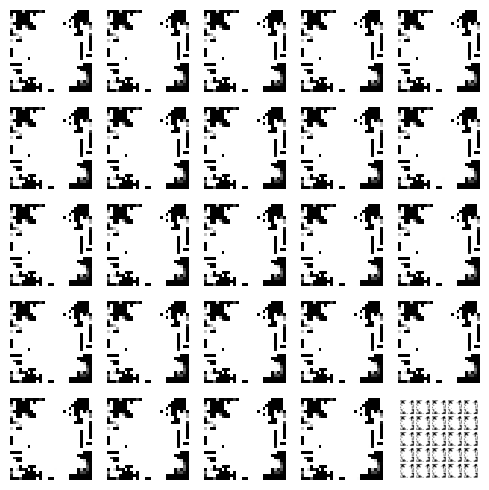

  0%|          | 0/350 [00:00<?, ?it/s]

4/4 [==============================] - 0s 20ms/step


  0%|          | 1/350 [00:00<04:07,  1.41it/s]

4/4 [==============================] - 0s 14ms/step


  1%|          | 2/350 [00:01<03:40,  1.58it/s]

4/4 [==============================] - 0s 12ms/step


  1%|          | 3/350 [00:01<03:40,  1.58it/s]

4/4 [==============================] - 0s 12ms/step


  1%|          | 4/350 [00:02<03:50,  1.50it/s]

4/4 [==============================] - 0s 14ms/step


  1%|▏         | 5/350 [00:03<03:38,  1.58it/s]

4/4 [==============================] - 0s 12ms/step


  2%|▏         | 6/350 [00:03<03:34,  1.60it/s]

4/4 [==============================] - 0s 15ms/step


  2%|▏         | 7/350 [00:04<03:30,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


  2%|▏         | 8/350 [00:05<03:39,  1.56it/s]

4/4 [==============================] - 0s 16ms/step


  3%|▎         | 9/350 [00:05<03:37,  1.56it/s]

4/4 [==============================] - 0s 13ms/step


  3%|▎         | 10/350 [00:06<03:30,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


  3%|▎         | 11/350 [00:07<03:40,  1.54it/s]

4/4 [==============================] - 0s 12ms/step


  3%|▎         | 12/350 [00:07<03:35,  1.57it/s]

4/4 [==============================] - 0s 12ms/step


  4%|▎         | 13/350 [00:08<03:35,  1.57it/s]

4/4 [==============================] - 0s 13ms/step


  4%|▍         | 14/350 [00:08<03:25,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


  4%|▍         | 15/350 [00:09<03:29,  1.60it/s]

4/4 [==============================] - 0s 15ms/step


  5%|▍         | 16/350 [00:10<03:24,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


  5%|▍         | 17/350 [00:10<03:16,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


  5%|▌         | 18/350 [00:11<03:15,  1.70it/s]

4/4 [==============================] - 0s 14ms/step


  5%|▌         | 19/350 [00:11<03:20,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


  6%|▌         | 20/350 [00:12<03:18,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


  6%|▌         | 21/350 [00:12<03:08,  1.74it/s]

4/4 [==============================] - 0s 16ms/step


  6%|▋         | 22/350 [00:13<03:08,  1.74it/s]

4/4 [==============================] - 0s 11ms/step


  7%|▋         | 23/350 [00:14<03:25,  1.59it/s]

4/4 [==============================] - 0s 11ms/step


  7%|▋         | 24/350 [00:14<03:23,  1.60it/s]

4/4 [==============================] - 0s 13ms/step


  7%|▋         | 25/350 [00:15<03:22,  1.61it/s]

4/4 [==============================] - 0s 18ms/step


  7%|▋         | 26/350 [00:16<03:18,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


  8%|▊         | 27/350 [00:16<03:20,  1.61it/s]

4/4 [==============================] - 0s 11ms/step


  8%|▊         | 28/350 [00:17<03:17,  1.63it/s]

4/4 [==============================] - 0s 16ms/step


  8%|▊         | 29/350 [00:17<03:11,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


  9%|▊         | 30/350 [00:18<03:14,  1.64it/s]

4/4 [==============================] - 0s 14ms/step


  9%|▉         | 31/350 [00:19<03:15,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


  9%|▉         | 32/350 [00:19<03:14,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


  9%|▉         | 33/350 [00:20<03:09,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


 10%|▉         | 34/350 [00:20<03:09,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 10%|█         | 35/350 [00:21<03:11,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 10%|█         | 36/350 [00:22<03:10,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 11%|█         | 37/350 [00:22<03:03,  1.70it/s]

4/4 [==============================] - 0s 14ms/step


 11%|█         | 38/350 [00:23<03:06,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 11%|█         | 39/350 [00:23<03:08,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 11%|█▏        | 40/350 [00:24<03:10,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 12%|█▏        | 41/350 [00:25<03:02,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 12%|█▏        | 42/350 [00:25<03:00,  1.70it/s]

4/4 [==============================] - 0s 14ms/step


 12%|█▏        | 43/350 [00:26<03:07,  1.64it/s]

4/4 [==============================] - 0s 13ms/step


 13%|█▎        | 44/350 [00:26<03:05,  1.65it/s]

4/4 [==============================] - 0s 14ms/step


 13%|█▎        | 45/350 [00:27<02:59,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 13%|█▎        | 46/350 [00:28<03:01,  1.67it/s]

4/4 [==============================] - 0s 14ms/step


 13%|█▎        | 47/350 [00:28<03:04,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


 14%|█▎        | 48/350 [00:29<03:00,  1.67it/s]

4/4 [==============================] - 0s 15ms/step


 14%|█▍        | 49/350 [00:29<02:54,  1.73it/s]

4/4 [==============================] - 0s 12ms/step


 14%|█▍        | 50/350 [00:30<02:57,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 15%|█▍        | 51/350 [00:31<02:58,  1.68it/s]

4/4 [==============================] - 0s 14ms/step


 15%|█▍        | 52/350 [00:31<03:01,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


 15%|█▌        | 53/350 [00:32<03:00,  1.64it/s]

4/4 [==============================] - 0s 16ms/step


 15%|█▌        | 54/350 [00:32<02:55,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 16%|█▌        | 55/350 [00:33<03:02,  1.61it/s]

4/4 [==============================] - 0s 15ms/step


 16%|█▌        | 56/350 [00:34<02:59,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


 16%|█▋        | 57/350 [00:34<02:56,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 17%|█▋        | 58/350 [00:35<02:50,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


 17%|█▋        | 59/350 [00:35<02:57,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 17%|█▋        | 60/350 [00:36<02:52,  1.68it/s]

4/4 [==============================] - 0s 14ms/step


 17%|█▋        | 61/350 [00:37<02:48,  1.72it/s]

4/4 [==============================] - 0s 11ms/step


 18%|█▊        | 62/350 [00:37<02:48,  1.71it/s]

4/4 [==============================] - 0s 14ms/step


 18%|█▊        | 63/350 [00:38<02:54,  1.64it/s]

4/4 [==============================] - 0s 13ms/step


 18%|█▊        | 64/350 [00:38<02:52,  1.66it/s]

4/4 [==============================] - 0s 15ms/step


 19%|█▊        | 65/350 [00:39<02:46,  1.71it/s]

4/4 [==============================] - 0s 11ms/step


 19%|█▉        | 66/350 [00:40<02:50,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


 19%|█▉        | 67/350 [00:40<02:52,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 19%|█▉        | 68/350 [00:41<02:50,  1.65it/s]

4/4 [==============================] - 0s 13ms/step


 20%|█▉        | 69/350 [00:41<02:52,  1.62it/s]

4/4 [==============================] - 0s 15ms/step


 20%|██        | 70/350 [00:42<02:46,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 20%|██        | 71/350 [00:43<02:57,  1.57it/s]

4/4 [==============================] - 0s 12ms/step


 21%|██        | 72/350 [00:43<02:56,  1.57it/s]

4/4 [==============================] - 0s 11ms/step


 21%|██        | 73/350 [00:44<02:47,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 21%|██        | 74/350 [00:45<02:53,  1.59it/s]

4/4 [==============================] - 0s 13ms/step


 21%|██▏       | 75/350 [00:45<02:54,  1.58it/s]

4/4 [==============================] - 0s 13ms/step


 22%|██▏       | 76/350 [00:46<03:04,  1.48it/s]

4/4 [==============================] - 0s 11ms/step


 22%|██▏       | 77/350 [00:47<02:53,  1.58it/s]

4/4 [==============================] - 0s 11ms/step


 22%|██▏       | 78/350 [00:47<02:56,  1.55it/s]

4/4 [==============================] - 0s 15ms/step


 23%|██▎       | 79/350 [00:48<02:46,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


 23%|██▎       | 80/350 [00:48<02:37,  1.72it/s]

4/4 [==============================] - 0s 14ms/step


 23%|██▎       | 81/350 [00:49<02:32,  1.76it/s]

4/4 [==============================] - 0s 12ms/step


 23%|██▎       | 82/350 [00:50<02:44,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 24%|██▎       | 83/350 [00:50<02:38,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 24%|██▍       | 84/350 [00:51<02:37,  1.69it/s]

4/4 [==============================] - 0s 13ms/step


 24%|██▍       | 85/350 [00:51<02:33,  1.72it/s]

4/4 [==============================] - 0s 11ms/step


 25%|██▍       | 86/350 [00:52<02:43,  1.61it/s]

4/4 [==============================] - 0s 11ms/step


 25%|██▍       | 87/350 [00:52<02:35,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 25%|██▌       | 88/350 [00:53<02:33,  1.70it/s]

4/4 [==============================] - 0s 13ms/step


 25%|██▌       | 89/350 [00:54<02:33,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 26%|██▌       | 90/350 [00:54<02:38,  1.64it/s]

4/4 [==============================] - 0s 14ms/step


 26%|██▌       | 91/350 [00:55<02:32,  1.69it/s]

4/4 [==============================] - 0s 13ms/step


 26%|██▋       | 92/350 [00:55<02:31,  1.71it/s]

4/4 [==============================] - 0s 13ms/step


 27%|██▋       | 93/350 [00:56<02:26,  1.76it/s]

4/4 [==============================] - 0s 12ms/step


 27%|██▋       | 94/350 [00:56<02:24,  1.78it/s]

4/4 [==============================] - 0s 12ms/step


 27%|██▋       | 95/350 [00:57<02:29,  1.71it/s]

4/4 [==============================] - 0s 13ms/step


 27%|██▋       | 96/350 [00:58<02:30,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


 28%|██▊       | 97/350 [00:58<02:26,  1.73it/s]

4/4 [==============================] - 0s 11ms/step


 28%|██▊       | 98/350 [00:59<02:25,  1.73it/s]

4/4 [==============================] - 0s 14ms/step


 28%|██▊       | 99/350 [00:59<02:29,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 29%|██▊       | 100/350 [01:00<02:30,  1.66it/s]

4/4 [==============================] - 0s 14ms/step


 29%|██▉       | 101/350 [01:01<02:25,  1.71it/s]

4/4 [==============================] - 0s 11ms/step


 29%|██▉       | 102/350 [01:01<02:24,  1.72it/s]

4/4 [==============================] - 0s 15ms/step


 29%|██▉       | 103/350 [01:02<02:30,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 30%|██▉       | 104/350 [01:02<02:28,  1.66it/s]

4/4 [==============================] - 0s 14ms/step


 30%|███       | 105/350 [01:03<02:23,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 30%|███       | 106/350 [01:04<02:24,  1.69it/s]

4/4 [==============================] - 0s 13ms/step


 31%|███       | 107/350 [01:04<02:29,  1.62it/s]

4/4 [==============================] - 0s 11ms/step


 31%|███       | 108/350 [01:05<02:28,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


 31%|███       | 109/350 [01:06<02:29,  1.61it/s]

4/4 [==============================] - 0s 11ms/step


 31%|███▏      | 110/350 [01:06<02:21,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 32%|███▏      | 111/350 [01:07<02:26,  1.64it/s]

4/4 [==============================] - 0s 14ms/step


 32%|███▏      | 112/350 [01:07<02:22,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 32%|███▏      | 113/350 [01:08<02:24,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


 33%|███▎      | 114/350 [01:08<02:19,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 33%|███▎      | 115/350 [01:09<02:19,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


 33%|███▎      | 116/350 [01:10<02:19,  1.68it/s]

4/4 [==============================] - 0s 14ms/step


 33%|███▎      | 117/350 [01:10<02:15,  1.72it/s]

4/4 [==============================] - 0s 11ms/step


 34%|███▎      | 118/350 [01:11<02:16,  1.70it/s]

4/4 [==============================] - 0s 13ms/step


 34%|███▍      | 119/350 [01:11<02:18,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 34%|███▍      | 120/350 [01:12<02:19,  1.65it/s]

4/4 [==============================] - 0s 13ms/step


 35%|███▍      | 121/350 [01:13<02:12,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


 35%|███▍      | 122/350 [01:13<02:09,  1.76it/s]

4/4 [==============================] - 0s 11ms/step


 35%|███▌      | 123/350 [01:14<02:16,  1.66it/s]

4/4 [==============================] - 0s 14ms/step


 35%|███▌      | 124/350 [01:14<02:12,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 36%|███▌      | 125/350 [01:15<02:12,  1.70it/s]

4/4 [==============================] - 0s 16ms/step


 36%|███▌      | 126/350 [01:16<02:09,  1.73it/s]

4/4 [==============================] - 0s 11ms/step


 36%|███▋      | 127/350 [01:16<02:17,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


 37%|███▋      | 128/350 [01:17<02:11,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 37%|███▋      | 129/350 [01:17<02:11,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 37%|███▋      | 130/350 [01:18<02:14,  1.64it/s]

4/4 [==============================] - 0s 13ms/step


 37%|███▋      | 131/350 [01:19<02:13,  1.64it/s]

4/4 [==============================] - 0s 14ms/step


 38%|███▊      | 132/350 [01:19<02:13,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 38%|███▊      | 133/350 [01:20<02:09,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 38%|███▊      | 134/350 [01:20<02:09,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 39%|███▊      | 135/350 [01:21<02:10,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 39%|███▉      | 136/350 [01:22<02:08,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


 39%|███▉      | 137/350 [01:22<02:03,  1.73it/s]

4/4 [==============================] - 0s 15ms/step


 39%|███▉      | 138/350 [01:23<02:00,  1.76it/s]

4/4 [==============================] - 0s 11ms/step


 40%|███▉      | 139/350 [01:23<02:07,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


 40%|████      | 140/350 [01:24<02:13,  1.57it/s]

4/4 [==============================] - 0s 13ms/step


 40%|████      | 141/350 [01:25<02:06,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 41%|████      | 142/350 [01:25<02:07,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 41%|████      | 143/350 [01:26<02:09,  1.60it/s]

4/4 [==============================] - 0s 11ms/step


 41%|████      | 144/350 [01:26<02:05,  1.64it/s]

4/4 [==============================] - 0s 14ms/step


 41%|████▏     | 145/350 [01:27<02:01,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 42%|████▏     | 146/350 [01:28<02:02,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 42%|████▏     | 147/350 [01:28<02:04,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 42%|████▏     | 148/350 [01:29<02:00,  1.67it/s]

4/4 [==============================] - 0s 15ms/step


 43%|████▎     | 149/350 [01:29<01:57,  1.71it/s]

4/4 [==============================] - 0s 11ms/step


 43%|████▎     | 150/350 [01:30<01:58,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


 43%|████▎     | 151/350 [01:31<02:00,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 43%|████▎     | 152/350 [01:31<01:57,  1.68it/s]

4/4 [==============================] - 0s 15ms/step


 44%|████▎     | 153/350 [01:32<01:56,  1.69it/s]

4/4 [==============================] - 0s 13ms/step


 44%|████▍     | 154/350 [01:32<01:57,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 44%|████▍     | 155/350 [01:33<01:57,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 45%|████▍     | 156/350 [01:34<01:57,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 45%|████▍     | 157/350 [01:34<01:52,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 45%|████▌     | 158/350 [01:35<01:53,  1.69it/s]

4/4 [==============================] - 0s 17ms/step


 45%|████▌     | 159/350 [01:35<01:57,  1.62it/s]

4/4 [==============================] - 0s 18ms/step


 46%|████▌     | 160/350 [01:36<01:53,  1.68it/s]

4/4 [==============================] - 0s 15ms/step


 46%|████▌     | 161/350 [01:37<01:49,  1.73it/s]

4/4 [==============================] - 0s 15ms/step


 46%|████▋     | 162/350 [01:37<01:47,  1.75it/s]

4/4 [==============================] - 0s 11ms/step


 47%|████▋     | 163/350 [01:38<01:54,  1.63it/s]

4/4 [==============================] - 0s 14ms/step


 47%|████▋     | 164/350 [01:38<01:50,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 47%|████▋     | 165/350 [01:39<01:49,  1.69it/s]

4/4 [==============================] - 0s 15ms/step


 47%|████▋     | 166/350 [01:40<01:46,  1.74it/s]

4/4 [==============================] - 0s 11ms/step


 48%|████▊     | 167/350 [01:40<01:53,  1.61it/s]

4/4 [==============================] - 0s 13ms/step


 48%|████▊     | 168/350 [01:41<01:47,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 48%|████▊     | 169/350 [01:41<01:47,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 49%|████▊     | 170/350 [01:42<01:48,  1.65it/s]

4/4 [==============================] - 0s 13ms/step


 49%|████▉     | 171/350 [01:43<01:50,  1.62it/s]

4/4 [==============================] - 0s 11ms/step


 49%|████▉     | 172/350 [01:43<01:48,  1.63it/s]

4/4 [==============================] - 0s 14ms/step


 49%|████▉     | 173/350 [01:44<01:45,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 50%|████▉     | 174/350 [01:44<01:44,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 50%|█████     | 175/350 [01:45<01:46,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 50%|█████     | 176/350 [01:46<01:46,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 51%|█████     | 177/350 [01:46<01:42,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 51%|█████     | 178/350 [01:47<01:42,  1.69it/s]

4/4 [==============================] - 0s 13ms/step


 51%|█████     | 179/350 [01:47<01:43,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 51%|█████▏    | 180/350 [01:48<01:44,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 52%|█████▏    | 181/350 [01:49<01:39,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 52%|█████▏    | 182/350 [01:49<01:40,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 52%|█████▏    | 183/350 [01:50<01:42,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 53%|█████▎    | 184/350 [01:50<01:40,  1.65it/s]

4/4 [==============================] - 0s 13ms/step


 53%|█████▎    | 185/350 [01:51<01:36,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 53%|█████▎    | 186/350 [01:52<01:37,  1.68it/s]

4/4 [==============================] - 0s 15ms/step


 53%|█████▎    | 187/350 [01:52<01:37,  1.67it/s]

4/4 [==============================] - 0s 14ms/step


 54%|█████▎    | 188/350 [01:53<01:34,  1.72it/s]

4/4 [==============================] - 0s 11ms/step


 54%|█████▍    | 189/350 [01:53<01:33,  1.72it/s]

4/4 [==============================] - 0s 14ms/step


 54%|█████▍    | 190/350 [01:54<01:33,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


 55%|█████▍    | 191/350 [01:55<01:38,  1.61it/s]

4/4 [==============================] - 0s 12ms/step


 55%|█████▍    | 192/350 [01:55<01:36,  1.63it/s]

4/4 [==============================] - 0s 14ms/step


 55%|█████▌    | 193/350 [01:56<01:35,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 55%|█████▌    | 194/350 [01:56<01:34,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


 56%|█████▌    | 195/350 [01:57<01:35,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 56%|█████▌    | 196/350 [01:58<01:35,  1.62it/s]

4/4 [==============================] - 0s 11ms/step


 56%|█████▋    | 197/350 [01:58<01:30,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 57%|█████▋    | 198/350 [01:59<01:29,  1.69it/s]

4/4 [==============================] - 0s 13ms/step


 57%|█████▋    | 199/350 [01:59<01:31,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 57%|█████▋    | 200/350 [02:00<01:31,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 57%|█████▋    | 201/350 [02:01<01:28,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 58%|█████▊    | 202/350 [02:01<01:26,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 58%|█████▊    | 203/350 [02:02<01:28,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


 58%|█████▊    | 204/350 [02:02<01:28,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 59%|█████▊    | 205/350 [02:03<01:27,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 59%|█████▉    | 206/350 [02:04<01:26,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 59%|█████▉    | 207/350 [02:04<01:29,  1.60it/s]

4/4 [==============================] - 0s 16ms/step


 59%|█████▉    | 208/350 [02:05<01:26,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 60%|█████▉    | 209/350 [02:06<01:27,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


 60%|██████    | 210/350 [02:06<01:23,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 60%|██████    | 211/350 [02:07<01:23,  1.66it/s]

4/4 [==============================] - 0s 14ms/step


 61%|██████    | 212/350 [02:07<01:21,  1.68it/s]

4/4 [==============================] - 0s 15ms/step


 61%|██████    | 213/350 [02:08<01:22,  1.65it/s]

4/4 [==============================] - 0s 16ms/step


 61%|██████    | 214/350 [02:08<01:20,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 61%|██████▏   | 215/350 [02:09<01:22,  1.64it/s]

4/4 [==============================] - 0s 14ms/step


 62%|██████▏   | 216/350 [02:10<01:21,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 62%|██████▏   | 217/350 [02:10<01:20,  1.64it/s]

4/4 [==============================] - 0s 13ms/step


 62%|██████▏   | 218/350 [02:11<01:17,  1.69it/s]

4/4 [==============================] - 0s 13ms/step


 63%|██████▎   | 219/350 [02:12<01:21,  1.61it/s]

4/4 [==============================] - 0s 13ms/step


 63%|██████▎   | 220/350 [02:12<01:18,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 63%|██████▎   | 221/350 [02:13<01:17,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 63%|██████▎   | 222/350 [02:13<01:14,  1.71it/s]

4/4 [==============================] - 0s 11ms/step


 64%|██████▎   | 223/350 [02:14<01:18,  1.62it/s]

4/4 [==============================] - 0s 14ms/step


 64%|██████▍   | 224/350 [02:14<01:14,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 64%|██████▍   | 225/350 [02:15<01:14,  1.68it/s]

4/4 [==============================] - 0s 14ms/step


 65%|██████▍   | 226/350 [02:16<01:13,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 65%|██████▍   | 227/350 [02:16<01:16,  1.62it/s]

4/4 [==============================] - 0s 15ms/step


 65%|██████▌   | 228/350 [02:17<01:13,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 65%|██████▌   | 229/350 [02:18<01:13,  1.65it/s]

4/4 [==============================] - 0s 13ms/step


 66%|██████▌   | 230/350 [02:18<01:10,  1.71it/s]

4/4 [==============================] - 0s 11ms/step


 66%|██████▌   | 231/350 [02:19<01:10,  1.68it/s]

4/4 [==============================] - 0s 14ms/step


 66%|██████▋   | 232/350 [02:19<01:09,  1.71it/s]

4/4 [==============================] - 0s 13ms/step


 67%|██████▋   | 233/350 [02:20<01:10,  1.67it/s]

4/4 [==============================] - 0s 19ms/step


 67%|██████▋   | 234/350 [02:20<01:08,  1.69it/s]

4/4 [==============================] - 0s 13ms/step


 67%|██████▋   | 235/350 [02:21<01:11,  1.62it/s]

4/4 [==============================] - 0s 13ms/step


 67%|██████▋   | 236/350 [02:22<01:08,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 68%|██████▊   | 237/350 [02:22<01:05,  1.71it/s]

4/4 [==============================] - 0s 11ms/step


 68%|██████▊   | 238/350 [02:23<01:05,  1.70it/s]

4/4 [==============================] - 0s 14ms/step


 68%|██████▊   | 239/350 [02:23<01:06,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 69%|██████▊   | 240/350 [02:24<01:06,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 69%|██████▉   | 241/350 [02:25<01:04,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 69%|██████▉   | 242/350 [02:25<01:03,  1.69it/s]

4/4 [==============================] - 0s 13ms/step


 69%|██████▉   | 243/350 [02:26<01:05,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 70%|██████▉   | 244/350 [02:26<01:03,  1.67it/s]

4/4 [==============================] - 0s 17ms/step


 70%|███████   | 245/350 [02:27<01:01,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 70%|███████   | 246/350 [02:28<01:02,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 71%|███████   | 247/350 [02:28<01:01,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


 71%|███████   | 248/350 [02:29<01:00,  1.68it/s]

4/4 [==============================] - 0s 15ms/step


 71%|███████   | 249/350 [02:29<00:59,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 71%|███████▏  | 250/350 [02:30<00:59,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


 72%|███████▏  | 251/350 [02:31<00:59,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 72%|███████▏  | 252/350 [02:31<00:59,  1.65it/s]

4/4 [==============================] - 0s 13ms/step


 72%|███████▏  | 253/350 [02:32<00:57,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 73%|███████▎  | 254/350 [02:32<00:57,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


 73%|███████▎  | 255/350 [02:33<00:57,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 73%|███████▎  | 256/350 [02:34<00:57,  1.64it/s]

4/4 [==============================] - 0s 14ms/step


 73%|███████▎  | 257/350 [02:34<00:54,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 74%|███████▎  | 258/350 [02:35<00:55,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


 74%|███████▍  | 259/350 [02:35<00:55,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


 74%|███████▍  | 260/350 [02:36<00:55,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 75%|███████▍  | 261/350 [02:37<00:52,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 75%|███████▍  | 262/350 [02:37<00:52,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 75%|███████▌  | 263/350 [02:38<00:53,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 75%|███████▌  | 264/350 [02:38<00:52,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 76%|███████▌  | 265/350 [02:39<00:50,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 76%|███████▌  | 266/350 [02:40<00:50,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 76%|███████▋  | 267/350 [02:40<00:50,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 77%|███████▋  | 268/350 [02:41<00:49,  1.64it/s]

4/4 [==============================] - 0s 13ms/step


 77%|███████▋  | 269/350 [02:41<00:47,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 77%|███████▋  | 270/350 [02:42<00:47,  1.67it/s]

4/4 [==============================] - 0s 14ms/step


 77%|███████▋  | 271/350 [02:43<00:47,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 78%|███████▊  | 272/350 [02:43<00:47,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


 78%|███████▊  | 273/350 [02:44<00:45,  1.69it/s]

4/4 [==============================] - 0s 13ms/step


 78%|███████▊  | 274/350 [02:44<00:44,  1.70it/s]

4/4 [==============================] - 0s 16ms/step


 79%|███████▊  | 275/350 [02:45<00:45,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


 79%|███████▉  | 276/350 [02:46<00:45,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


 79%|███████▉  | 277/350 [02:46<00:43,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 79%|███████▉  | 278/350 [02:47<00:42,  1.70it/s]

4/4 [==============================] - 0s 14ms/step


 80%|███████▉  | 279/350 [02:47<00:42,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 80%|████████  | 280/350 [02:48<00:42,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 80%|████████  | 281/350 [02:49<00:40,  1.71it/s]

4/4 [==============================] - 0s 13ms/step


 81%|████████  | 282/350 [02:49<00:40,  1.69it/s]

4/4 [==============================] - 0s 18ms/step


 81%|████████  | 283/350 [02:50<00:41,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 81%|████████  | 284/350 [02:50<00:40,  1.64it/s]

4/4 [==============================] - 0s 13ms/step


 81%|████████▏ | 285/350 [02:51<00:38,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 82%|████████▏ | 286/350 [02:52<00:38,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 82%|████████▏ | 287/350 [02:52<00:38,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 82%|████████▏ | 288/350 [02:53<00:37,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 83%|████████▎ | 289/350 [02:53<00:35,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


 83%|████████▎ | 290/350 [02:54<00:35,  1.68it/s]

4/4 [==============================] - 0s 15ms/step


 83%|████████▎ | 291/350 [02:55<00:35,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 83%|████████▎ | 292/350 [02:55<00:34,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 84%|████████▎ | 293/350 [02:56<00:33,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 84%|████████▍ | 294/350 [02:56<00:33,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


 84%|████████▍ | 295/350 [02:57<00:34,  1.61it/s]

4/4 [==============================] - 0s 15ms/step


 85%|████████▍ | 296/350 [02:58<00:33,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 85%|████████▍ | 297/350 [02:58<00:31,  1.66it/s]

4/4 [==============================] - 0s 14ms/step


 85%|████████▌ | 298/350 [02:59<00:30,  1.71it/s]

4/4 [==============================] - 0s 16ms/step


 85%|████████▌ | 299/350 [02:59<00:31,  1.64it/s]

4/4 [==============================] - 0s 16ms/step


 86%|████████▌ | 300/350 [03:00<00:30,  1.66it/s]

4/4 [==============================] - 0s 14ms/step


 86%|████████▌ | 301/350 [03:01<00:29,  1.66it/s]

4/4 [==============================] - 0s 18ms/step


 86%|████████▋ | 302/350 [03:01<00:28,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 87%|████████▋ | 303/350 [03:02<00:28,  1.63it/s]

4/4 [==============================] - 0s 15ms/step


 87%|████████▋ | 304/350 [03:02<00:27,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


 87%|████████▋ | 305/350 [03:03<00:26,  1.71it/s]

4/4 [==============================] - 0s 11ms/step


 87%|████████▋ | 306/350 [03:04<00:26,  1.69it/s]

4/4 [==============================] - 0s 14ms/step


 88%|████████▊ | 307/350 [03:04<00:26,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 88%|████████▊ | 308/350 [03:05<00:25,  1.66it/s]

4/4 [==============================] - 0s 16ms/step


 88%|████████▊ | 309/350 [03:05<00:24,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 89%|████████▊ | 310/350 [03:06<00:23,  1.69it/s]

4/4 [==============================] - 0s 16ms/step


 89%|████████▉ | 311/350 [03:07<00:22,  1.71it/s]

4/4 [==============================] - 0s 13ms/step


 89%|████████▉ | 312/350 [03:07<00:22,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 89%|████████▉ | 313/350 [03:08<00:22,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


 90%|████████▉ | 314/350 [03:08<00:20,  1.73it/s]

4/4 [==============================] - 0s 11ms/step


 90%|█████████ | 315/350 [03:09<00:21,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 90%|█████████ | 316/350 [03:10<00:19,  1.72it/s]

4/4 [==============================] - 0s 11ms/step


 91%|█████████ | 317/350 [03:10<00:19,  1.73it/s]

4/4 [==============================] - 0s 11ms/step


 91%|█████████ | 318/350 [03:11<00:17,  1.78it/s]

4/4 [==============================] - 0s 11ms/step


 91%|█████████ | 319/350 [03:11<00:17,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 91%|█████████▏| 320/350 [03:12<00:17,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 92%|█████████▏| 321/350 [03:12<00:17,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 92%|█████████▏| 322/350 [03:13<00:16,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


 92%|█████████▏| 323/350 [03:14<00:15,  1.72it/s]

4/4 [==============================] - 0s 14ms/step


 93%|█████████▎| 324/350 [03:14<00:15,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 93%|█████████▎| 325/350 [03:15<00:14,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


 93%|█████████▎| 326/350 [03:15<00:13,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 93%|█████████▎| 327/350 [03:16<00:12,  1.77it/s]

4/4 [==============================] - 0s 12ms/step


 94%|█████████▎| 328/350 [03:16<00:12,  1.77it/s]

4/4 [==============================] - 0s 11ms/step


 94%|█████████▍| 329/350 [03:17<00:12,  1.70it/s]

4/4 [==============================] - 0s 18ms/step


 94%|█████████▍| 330/350 [03:18<00:11,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 95%|█████████▍| 331/350 [03:18<00:11,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 95%|█████████▍| 332/350 [03:19<00:10,  1.72it/s]

4/4 [==============================] - 0s 14ms/step


 95%|█████████▌| 333/350 [03:19<00:10,  1.66it/s]

4/4 [==============================] - 0s 15ms/step


 95%|█████████▌| 334/350 [03:20<00:09,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 96%|█████████▌| 335/350 [03:21<00:09,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 96%|█████████▌| 336/350 [03:21<00:08,  1.71it/s]

4/4 [==============================] - 0s 11ms/step


 96%|█████████▋| 337/350 [03:22<00:08,  1.61it/s]

4/4 [==============================] - 0s 16ms/step


 97%|█████████▋| 338/350 [03:23<00:07,  1.61it/s]

4/4 [==============================] - 0s 15ms/step


 97%|█████████▋| 339/350 [03:23<00:06,  1.68it/s]

4/4 [==============================] - 0s 16ms/step


 97%|█████████▋| 340/350 [03:24<00:05,  1.71it/s]

4/4 [==============================] - 0s 13ms/step


 97%|█████████▋| 341/350 [03:25<00:06,  1.49it/s]

4/4 [==============================] - 0s 13ms/step


 98%|█████████▊| 342/350 [03:25<00:05,  1.57it/s]

4/4 [==============================] - 0s 11ms/step


 98%|█████████▊| 343/350 [03:26<00:04,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 98%|█████████▊| 344/350 [03:26<00:03,  1.64it/s]

4/4 [==============================] - 0s 15ms/step


 99%|█████████▊| 345/350 [03:27<00:03,  1.56it/s]

4/4 [==============================] - 0s 11ms/step


 99%|█████████▉| 346/350 [03:28<00:02,  1.59it/s]

4/4 [==============================] - 0s 13ms/step


 99%|█████████▉| 347/350 [03:28<00:01,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 99%|█████████▉| 348/350 [03:29<00:01,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


100%|█████████▉| 349/350 [03:29<00:00,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


100%|██████████| 350/350 [03:30<00:00,  1.66it/s]

Epoch number: 71 discriminator_loss: 0.16416079219006602 generator_loss: 7.982220423562186
1/1 [==============================] - 0s 26ms/step


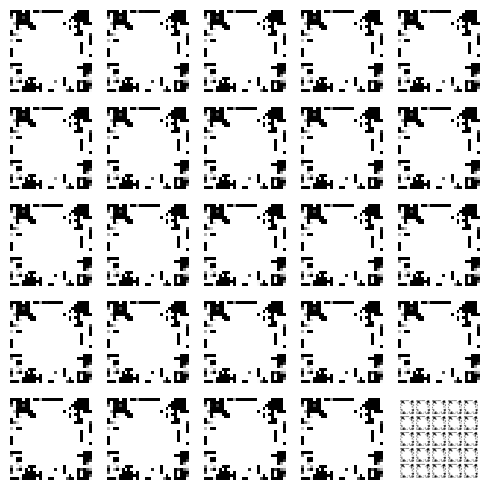

  0%|          | 0/350 [00:00<?, ?it/s]

4/4 [==============================] - 0s 27ms/step


  0%|          | 1/350 [00:00<04:08,  1.40it/s]

4/4 [==============================] - 0s 13ms/step


  1%|          | 2/350 [00:01<03:21,  1.73it/s]

4/4 [==============================] - 0s 34ms/step


  1%|          | 3/350 [00:01<03:38,  1.59it/s]

4/4 [==============================] - 0s 12ms/step


  1%|          | 4/350 [00:02<03:28,  1.66it/s]

4/4 [==============================] - 0s 18ms/step


  1%|▏         | 5/350 [00:03<03:27,  1.66it/s]

4/4 [==============================] - 0s 14ms/step


  2%|▏         | 6/350 [00:03<03:24,  1.68it/s]

4/4 [==============================] - 0s 44ms/step


  2%|▏         | 7/350 [00:04<03:35,  1.59it/s]

4/4 [==============================] - 0s 22ms/step


  2%|▏         | 8/350 [00:04<03:33,  1.60it/s]

4/4 [==============================] - 0s 14ms/step


  3%|▎         | 9/350 [00:05<03:27,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


  3%|▎         | 10/350 [00:06<03:34,  1.58it/s]

4/4 [==============================] - 0s 17ms/step


  3%|▎         | 11/350 [00:06<03:25,  1.65it/s]

4/4 [==============================] - 0s 14ms/step


  3%|▎         | 12/350 [00:07<03:19,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


  4%|▎         | 13/350 [00:07<03:19,  1.69it/s]

4/4 [==============================] - 0s 13ms/step


  4%|▍         | 14/350 [00:08<03:34,  1.57it/s]

4/4 [==============================] - 0s 13ms/step


  4%|▍         | 15/350 [00:09<03:24,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


  5%|▍         | 16/350 [00:09<03:20,  1.67it/s]

4/4 [==============================] - 0s 15ms/step


  5%|▍         | 17/350 [00:10<03:19,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


  5%|▌         | 18/350 [00:10<03:11,  1.73it/s]

4/4 [==============================] - 0s 16ms/step


  5%|▌         | 19/350 [00:11<03:17,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


  6%|▌         | 20/350 [00:12<03:13,  1.71it/s]

4/4 [==============================] - 0s 11ms/step


  6%|▌         | 21/350 [00:12<03:17,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


  6%|▋         | 22/350 [00:13<03:10,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


  7%|▋         | 23/350 [00:13<03:16,  1.67it/s]

4/4 [==============================] - 0s 15ms/step


  7%|▋         | 24/350 [00:14<03:16,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


  7%|▋         | 25/350 [00:15<03:15,  1.66it/s]

4/4 [==============================] - 0s 16ms/step


  7%|▋         | 26/350 [00:15<03:10,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


  8%|▊         | 27/350 [00:16<03:16,  1.64it/s]

4/4 [==============================] - 0s 16ms/step


  8%|▊         | 28/350 [00:16<03:10,  1.69it/s]

4/4 [==============================] - 0s 16ms/step


  8%|▊         | 29/350 [00:17<03:06,  1.72it/s]

4/4 [==============================] - 0s 11ms/step


  9%|▊         | 30/350 [00:18<03:06,  1.72it/s]

4/4 [==============================] - 0s 17ms/step


  9%|▉         | 31/350 [00:18<03:13,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


  9%|▉         | 32/350 [00:19<03:09,  1.68it/s]

4/4 [==============================] - 0s 14ms/step


  9%|▉         | 33/350 [00:19<03:06,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 10%|▉         | 34/350 [00:20<03:07,  1.69it/s]

4/4 [==============================] - 0s 14ms/step


 10%|█         | 35/350 [00:21<03:10,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 10%|█         | 36/350 [00:21<03:08,  1.66it/s]

4/4 [==============================] - 0s 14ms/step


 11%|█         | 37/350 [00:22<03:02,  1.71it/s]

4/4 [==============================] - 0s 11ms/step


 11%|█         | 38/350 [00:22<03:06,  1.68it/s]

4/4 [==============================] - 0s 15ms/step


 11%|█         | 39/350 [00:23<03:08,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 11%|█▏        | 40/350 [00:24<03:05,  1.67it/s]

4/4 [==============================] - 0s 15ms/step


 12%|█▏        | 41/350 [00:24<03:02,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 12%|█▏        | 42/350 [00:25<03:00,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 12%|█▏        | 43/350 [00:25<03:04,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 13%|█▎        | 44/350 [00:26<03:04,  1.66it/s]

4/4 [==============================] - 0s 14ms/step


 13%|█▎        | 45/350 [00:26<03:00,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 13%|█▎        | 46/350 [00:27<03:00,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 13%|█▎        | 47/350 [00:28<03:02,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 14%|█▎        | 48/350 [00:28<03:01,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 14%|█▍        | 49/350 [00:29<02:53,  1.73it/s]

4/4 [==============================] - 0s 14ms/step


 14%|█▍        | 50/350 [00:29<02:51,  1.75it/s]

4/4 [==============================] - 0s 12ms/step


 15%|█▍        | 51/350 [00:30<03:00,  1.66it/s]

4/4 [==============================] - 0s 15ms/step


 15%|█▍        | 52/350 [00:31<02:54,  1.71it/s]

4/4 [==============================] - 0s 13ms/step


 15%|█▌        | 53/350 [00:31<02:49,  1.75it/s]

4/4 [==============================] - 0s 12ms/step


 15%|█▌        | 54/350 [00:32<02:48,  1.76it/s]

4/4 [==============================] - 0s 14ms/step


 16%|█▌        | 55/350 [00:32<02:50,  1.73it/s]

4/4 [==============================] - 0s 11ms/step


 16%|█▌        | 56/350 [00:33<02:55,  1.68it/s]

4/4 [==============================] - 0s 17ms/step


 16%|█▋        | 57/350 [00:34<02:52,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 17%|█▋        | 58/350 [00:34<02:56,  1.66it/s]

4/4 [==============================] - 0s 14ms/step


 17%|█▋        | 59/350 [00:35<02:50,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 17%|█▋        | 60/350 [00:35<02:53,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 17%|█▋        | 61/350 [00:36<02:47,  1.72it/s]

4/4 [==============================] - 0s 14ms/step


 18%|█▊        | 62/350 [00:36<02:48,  1.71it/s]

4/4 [==============================] - 0s 11ms/step


 18%|█▊        | 63/350 [00:37<02:48,  1.70it/s]

4/4 [==============================] - 0s 13ms/step


 18%|█▊        | 64/350 [00:38<02:51,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 19%|█▊        | 65/350 [00:38<02:53,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


 19%|█▉        | 66/350 [00:39<02:45,  1.72it/s]

4/4 [==============================] - 0s 11ms/step


 19%|█▉        | 67/350 [00:39<02:46,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 19%|█▉        | 68/350 [00:40<02:49,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 20%|█▉        | 69/350 [00:41<02:50,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 20%|██        | 70/350 [00:41<02:41,  1.73it/s]

4/4 [==============================] - 0s 14ms/step


 20%|██        | 71/350 [00:42<02:38,  1.76it/s]

4/4 [==============================] - 0s 11ms/step


 21%|██        | 72/350 [00:42<02:52,  1.61it/s]

4/4 [==============================] - 0s 11ms/step


 21%|██        | 73/350 [00:43<02:48,  1.65it/s]

4/4 [==============================] - 0s 15ms/step


 21%|██        | 74/350 [00:44<02:42,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 21%|██▏       | 75/350 [00:44<02:45,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 22%|██▏       | 76/350 [00:45<02:46,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


 22%|██▏       | 77/350 [00:45<02:43,  1.67it/s]

4/4 [==============================] - 0s 14ms/step


 22%|██▏       | 78/350 [00:46<02:40,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 23%|██▎       | 79/350 [00:47<02:41,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 23%|██▎       | 80/350 [00:47<02:42,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 23%|██▎       | 81/350 [00:48<02:40,  1.67it/s]

4/4 [==============================] - 0s 14ms/step


 23%|██▎       | 82/350 [00:48<02:39,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 24%|██▎       | 83/350 [00:49<02:39,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 24%|██▍       | 84/350 [00:50<02:41,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


 24%|██▍       | 85/350 [00:50<02:42,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 25%|██▍       | 86/350 [00:51<02:34,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 25%|██▍       | 87/350 [00:51<02:34,  1.70it/s]

4/4 [==============================] - 0s 14ms/step


 25%|██▌       | 88/350 [00:52<02:38,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 25%|██▌       | 89/350 [00:53<02:40,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 26%|██▌       | 90/350 [00:53<02:33,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 26%|██▌       | 91/350 [00:54<02:35,  1.67it/s]

4/4 [==============================] - 0s 14ms/step


 26%|██▋       | 92/350 [00:55<02:43,  1.58it/s]

4/4 [==============================] - 0s 15ms/step


 27%|██▋       | 93/350 [00:55<02:35,  1.65it/s]

4/4 [==============================] - 0s 13ms/step


 27%|██▋       | 94/350 [00:56<02:30,  1.71it/s]

4/4 [==============================] - 0s 11ms/step


 27%|██▋       | 95/350 [00:56<02:29,  1.70it/s]

4/4 [==============================] - 0s 16ms/step


 27%|██▋       | 96/350 [00:57<02:33,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 28%|██▊       | 97/350 [00:57<02:31,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 28%|██▊       | 98/350 [00:58<02:26,  1.72it/s]

4/4 [==============================] - 0s 11ms/step


 28%|██▊       | 99/350 [00:59<02:27,  1.70it/s]

4/4 [==============================] - 0s 13ms/step


 29%|██▊       | 100/350 [00:59<02:31,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 29%|██▉       | 101/350 [01:00<02:29,  1.66it/s]

4/4 [==============================] - 0s 15ms/step


 29%|██▉       | 102/350 [01:00<02:28,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 29%|██▉       | 103/350 [01:01<02:27,  1.68it/s]

4/4 [==============================] - 0s 15ms/step


 30%|██▉       | 104/350 [01:02<02:29,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


 30%|███       | 105/350 [01:02<02:31,  1.61it/s]

4/4 [==============================] - 0s 11ms/step


 30%|███       | 106/350 [01:03<02:25,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 31%|███       | 107/350 [01:03<02:24,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 31%|███       | 108/350 [01:04<02:27,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 31%|███       | 109/350 [01:05<02:28,  1.62it/s]

4/4 [==============================] - 0s 13ms/step


 31%|███▏      | 110/350 [01:05<02:23,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 32%|███▏      | 111/350 [01:06<02:21,  1.69it/s]

4/4 [==============================] - 0s 14ms/step


 32%|███▏      | 112/350 [01:07<02:26,  1.62it/s]

4/4 [==============================] - 0s 11ms/step


 32%|███▏      | 113/350 [01:07<02:23,  1.65it/s]

4/4 [==============================] - 0s 18ms/step


 33%|███▎      | 114/350 [01:08<02:20,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 33%|███▎      | 115/350 [01:08<02:22,  1.64it/s]

4/4 [==============================] - 0s 10ms/step


 33%|███▎      | 116/350 [01:09<02:22,  1.65it/s]

4/4 [==============================] - 0s 13ms/step


 33%|███▎      | 117/350 [01:10<02:21,  1.64it/s]

4/4 [==============================] - 0s 13ms/step


 34%|███▎      | 118/350 [01:10<02:23,  1.62it/s]

4/4 [==============================] - 0s 13ms/step


 34%|███▍      | 119/350 [01:11<02:18,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 34%|███▍      | 120/350 [01:11<02:22,  1.62it/s]

4/4 [==============================] - 0s 14ms/step


 35%|███▍      | 121/350 [01:12<02:18,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 35%|███▍      | 122/350 [01:13<02:18,  1.64it/s]

4/4 [==============================] - 0s 13ms/step


 35%|███▌      | 123/350 [01:13<02:14,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 35%|███▌      | 124/350 [01:14<02:18,  1.63it/s]

4/4 [==============================] - 0s 14ms/step


 36%|███▌      | 125/350 [01:14<02:16,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 36%|███▌      | 126/350 [01:15<02:13,  1.68it/s]

4/4 [==============================] - 0s 15ms/step


 36%|███▋      | 127/350 [01:16<02:10,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 37%|███▋      | 128/350 [01:16<02:16,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 37%|███▋      | 129/350 [01:17<02:12,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 37%|███▋      | 130/350 [01:17<02:07,  1.73it/s]

4/4 [==============================] - 0s 11ms/step


 37%|███▋      | 131/350 [01:18<02:06,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 38%|███▊      | 132/350 [01:19<02:12,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 38%|███▊      | 133/350 [01:19<02:10,  1.66it/s]

4/4 [==============================] - 0s 14ms/step


 38%|███▊      | 134/350 [01:20<02:05,  1.71it/s]

4/4 [==============================] - 0s 11ms/step


 39%|███▊      | 135/350 [01:20<02:07,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 39%|███▉      | 136/350 [01:21<02:08,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 39%|███▉      | 137/350 [01:21<02:07,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


 39%|███▉      | 138/350 [01:22<02:03,  1.72it/s]

4/4 [==============================] - 0s 11ms/step


 40%|███▉      | 139/350 [01:23<02:04,  1.69it/s]

4/4 [==============================] - 0s 13ms/step


 40%|████      | 140/350 [01:23<02:07,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 40%|████      | 141/350 [01:24<02:07,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 41%|████      | 142/350 [01:25<02:07,  1.63it/s]

4/4 [==============================] - 0s 14ms/step


 41%|████      | 143/350 [01:25<02:01,  1.70it/s]

4/4 [==============================] - 0s 14ms/step


 41%|████      | 144/350 [01:26<02:06,  1.62it/s]

4/4 [==============================] - 0s 14ms/step


 41%|████▏     | 145/350 [01:26<02:04,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 42%|████▏     | 146/350 [01:27<02:04,  1.64it/s]

4/4 [==============================] - 0s 13ms/step


 42%|████▏     | 147/350 [01:28<02:05,  1.62it/s]

4/4 [==============================] - 0s 18ms/step


 42%|████▏     | 148/350 [01:28<02:05,  1.61it/s]

4/4 [==============================] - 0s 11ms/step


 43%|████▎     | 149/350 [01:29<01:59,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 43%|████▎     | 150/350 [01:29<01:59,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 43%|████▎     | 151/350 [01:30<01:55,  1.73it/s]

4/4 [==============================] - 0s 11ms/step


 43%|████▎     | 152/350 [01:31<02:01,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


 44%|████▎     | 153/350 [01:31<01:58,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 44%|████▍     | 154/350 [01:32<01:57,  1.66it/s]

4/4 [==============================] - 0s 15ms/step


 44%|████▍     | 155/350 [01:32<01:56,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 45%|████▍     | 156/350 [01:33<01:56,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


 45%|████▍     | 157/350 [01:34<01:54,  1.69it/s]

4/4 [==============================] - 0s 15ms/step


 45%|████▌     | 158/350 [01:34<01:51,  1.72it/s]

4/4 [==============================] - 0s 15ms/step


 45%|████▌     | 159/350 [01:35<01:53,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 46%|████▌     | 160/350 [01:35<01:54,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 46%|████▌     | 161/350 [01:36<01:53,  1.67it/s]

4/4 [==============================] - 0s 15ms/step


 46%|████▋     | 162/350 [01:37<01:51,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 47%|████▋     | 163/350 [01:37<01:50,  1.70it/s]

4/4 [==============================] - 0s 17ms/step


 47%|████▋     | 164/350 [01:38<01:52,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 47%|████▋     | 165/350 [01:38<01:53,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 47%|████▋     | 166/350 [01:39<01:49,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 48%|████▊     | 167/350 [01:39<01:47,  1.70it/s]

4/4 [==============================] - 0s 14ms/step


 48%|████▊     | 168/350 [01:40<01:50,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 48%|████▊     | 169/350 [01:41<01:50,  1.64it/s]

4/4 [==============================] - 0s 13ms/step


 49%|████▊     | 170/350 [01:41<01:46,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 49%|████▉     | 171/350 [01:42<01:46,  1.69it/s]

4/4 [==============================] - 0s 13ms/step


 49%|████▉     | 172/350 [01:43<01:48,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


 49%|████▉     | 173/350 [01:43<01:45,  1.67it/s]

4/4 [==============================] - 0s 16ms/step


 50%|████▉     | 174/350 [01:44<01:41,  1.73it/s]

4/4 [==============================] - 0s 15ms/step


 50%|█████     | 175/350 [01:44<01:44,  1.68it/s]

4/4 [==============================] - 0s 14ms/step


 50%|█████     | 176/350 [01:45<01:45,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 51%|█████     | 177/350 [01:45<01:43,  1.68it/s]

4/4 [==============================] - 0s 14ms/step


 51%|█████     | 178/350 [01:46<01:39,  1.73it/s]

4/4 [==============================] - 0s 12ms/step


 51%|█████     | 179/350 [01:47<01:41,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


 51%|█████▏    | 180/350 [01:47<01:43,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 52%|█████▏    | 181/350 [01:48<01:41,  1.67it/s]

4/4 [==============================] - 0s 14ms/step


 52%|█████▏    | 182/350 [01:48<01:39,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 52%|█████▏    | 183/350 [01:49<01:37,  1.71it/s]

4/4 [==============================] - 0s 14ms/step


 53%|█████▎    | 184/350 [01:50<01:39,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 53%|█████▎    | 185/350 [01:50<01:40,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 53%|█████▎    | 186/350 [01:51<01:36,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 53%|█████▎    | 187/350 [01:51<01:36,  1.69it/s]

4/4 [==============================] - 0s 16ms/step


 54%|█████▎    | 188/350 [01:52<01:37,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 54%|█████▍    | 189/350 [01:53<01:35,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 54%|█████▍    | 190/350 [01:53<01:31,  1.74it/s]

4/4 [==============================] - 0s 16ms/step


 55%|█████▍    | 191/350 [01:54<01:32,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 55%|█████▍    | 192/350 [01:54<01:34,  1.67it/s]

4/4 [==============================] - 0s 20ms/step


 55%|█████▌    | 193/350 [01:55<01:32,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 55%|█████▌    | 194/350 [01:56<01:32,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 56%|█████▌    | 195/350 [01:56<01:29,  1.74it/s]

4/4 [==============================] - 0s 15ms/step


 56%|█████▌    | 196/350 [01:57<01:35,  1.61it/s]

4/4 [==============================] - 0s 13ms/step


 56%|█████▋    | 197/350 [01:57<01:32,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 57%|█████▋    | 198/350 [01:58<01:30,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 57%|█████▋    | 199/350 [01:59<01:28,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 57%|█████▋    | 200/350 [01:59<01:25,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 57%|█████▋    | 201/350 [02:00<01:28,  1.69it/s]

4/4 [==============================] - 0s 16ms/step


 58%|█████▊    | 202/350 [02:00<01:26,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 58%|█████▊    | 203/350 [02:01<01:26,  1.69it/s]

4/4 [==============================] - 0s 14ms/step


 58%|█████▊    | 204/350 [02:01<01:23,  1.76it/s]

4/4 [==============================] - 0s 15ms/step


 59%|█████▊    | 205/350 [02:02<01:27,  1.67it/s]

4/4 [==============================] - 0s 14ms/step


 59%|█████▉    | 206/350 [02:03<01:26,  1.66it/s]

4/4 [==============================] - 0s 15ms/step


 59%|█████▉    | 207/350 [02:03<01:34,  1.51it/s]

4/4 [==============================] - 0s 12ms/step


 59%|█████▉    | 208/350 [02:04<01:33,  1.52it/s]

4/4 [==============================] - 0s 16ms/step


 60%|█████▉    | 209/350 [02:05<01:32,  1.52it/s]

4/4 [==============================] - 0s 14ms/step


 60%|██████    | 210/350 [02:05<01:28,  1.59it/s]

4/4 [==============================] - 0s 14ms/step


 60%|██████    | 211/350 [02:06<01:23,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 61%|██████    | 212/350 [02:07<01:28,  1.57it/s]

4/4 [==============================] - 0s 11ms/step


 61%|██████    | 213/350 [02:07<01:22,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 61%|██████    | 214/350 [02:08<01:19,  1.72it/s]

4/4 [==============================] - 0s 11ms/step


 61%|██████▏   | 215/350 [02:08<01:19,  1.70it/s]

4/4 [==============================] - 0s 13ms/step


 62%|██████▏   | 216/350 [02:09<01:19,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 62%|██████▏   | 217/350 [02:10<01:21,  1.64it/s]

4/4 [==============================] - 0s 14ms/step


 62%|██████▏   | 218/350 [02:10<01:18,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 63%|██████▎   | 219/350 [02:11<01:19,  1.64it/s]

4/4 [==============================] - 0s 13ms/step


 63%|██████▎   | 220/350 [02:11<01:16,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 63%|██████▎   | 221/350 [02:12<01:17,  1.65it/s]

4/4 [==============================] - 0s 15ms/step


 63%|██████▎   | 222/350 [02:12<01:15,  1.69it/s]

4/4 [==============================] - 0s 14ms/step


 64%|██████▎   | 223/350 [02:13<01:14,  1.71it/s]

4/4 [==============================] - 0s 11ms/step


 64%|██████▍   | 224/350 [02:14<01:14,  1.70it/s]

4/4 [==============================] - 0s 14ms/step


 64%|██████▍   | 225/350 [02:14<01:15,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 65%|██████▍   | 226/350 [02:15<01:15,  1.64it/s]

4/4 [==============================] - 0s 13ms/step


 65%|██████▍   | 227/350 [02:15<01:12,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 65%|██████▌   | 228/350 [02:16<01:12,  1.69it/s]

4/4 [==============================] - 0s 15ms/step


 65%|██████▌   | 229/350 [02:17<01:13,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 66%|██████▌   | 230/350 [02:17<01:13,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 66%|██████▌   | 231/350 [02:18<01:09,  1.71it/s]

4/4 [==============================] - 0s 15ms/step


 66%|██████▋   | 232/350 [02:18<01:11,  1.66it/s]

4/4 [==============================] - 0s 14ms/step


 67%|██████▋   | 233/350 [02:19<01:12,  1.61it/s]

4/4 [==============================] - 0s 12ms/step


 67%|██████▋   | 234/350 [02:20<01:10,  1.64it/s]

4/4 [==============================] - 0s 13ms/step


 67%|██████▋   | 235/350 [02:20<01:08,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 67%|██████▋   | 236/350 [02:21<01:09,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


 68%|██████▊   | 237/350 [02:22<01:09,  1.62it/s]

4/4 [==============================] - 0s 11ms/step


 68%|██████▊   | 238/350 [02:22<01:08,  1.64it/s]

4/4 [==============================] - 0s 14ms/step


 68%|██████▊   | 239/350 [02:23<01:05,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 69%|██████▊   | 240/350 [02:23<01:06,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 69%|██████▉   | 241/350 [02:24<01:05,  1.67it/s]

4/4 [==============================] - 0s 14ms/step


 69%|██████▉   | 242/350 [02:25<01:04,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 69%|██████▉   | 243/350 [02:25<01:03,  1.68it/s]

4/4 [==============================] - 0s 14ms/step


 70%|██████▉   | 244/350 [02:26<01:00,  1.75it/s]

4/4 [==============================] - 0s 12ms/step


 70%|███████   | 245/350 [02:26<01:04,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


 70%|███████   | 246/350 [02:27<01:03,  1.63it/s]

4/4 [==============================] - 0s 17ms/step


 71%|███████   | 247/350 [02:28<01:01,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 71%|███████   | 248/350 [02:28<01:00,  1.69it/s]

4/4 [==============================] - 0s 15ms/step


 71%|███████   | 249/350 [02:29<01:01,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 71%|███████▏  | 250/350 [02:29<01:01,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 72%|███████▏  | 251/350 [02:30<00:58,  1.69it/s]

4/4 [==============================] - 0s 13ms/step


 72%|███████▏  | 252/350 [02:30<00:58,  1.68it/s]

4/4 [==============================] - 0s 15ms/step


 72%|███████▏  | 253/350 [02:31<01:00,  1.61it/s]

4/4 [==============================] - 0s 12ms/step


 73%|███████▎  | 254/350 [02:32<00:58,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


 73%|███████▎  | 255/350 [02:32<00:56,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 73%|███████▎  | 256/350 [02:33<00:56,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 73%|███████▎  | 257/350 [02:34<00:57,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 74%|███████▎  | 258/350 [02:34<00:55,  1.65it/s]

4/4 [==============================] - 0s 14ms/step


 74%|███████▍  | 259/350 [02:35<00:53,  1.71it/s]

4/4 [==============================] - 0s 13ms/step


 74%|███████▍  | 260/350 [02:35<00:54,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 75%|███████▍  | 261/350 [02:36<00:53,  1.67it/s]

4/4 [==============================] - 0s 18ms/step


 75%|███████▍  | 262/350 [02:37<00:52,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 75%|███████▌  | 263/350 [02:37<00:51,  1.68it/s]

4/4 [==============================] - 0s 16ms/step


 75%|███████▌  | 264/350 [02:38<00:49,  1.75it/s]

4/4 [==============================] - 0s 15ms/step


 76%|███████▌  | 265/350 [02:38<00:48,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 76%|███████▌  | 266/350 [02:39<00:49,  1.68it/s]

4/4 [==============================] - 0s 15ms/step


 76%|███████▋  | 267/350 [02:39<00:49,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 77%|███████▋  | 268/350 [02:40<00:48,  1.69it/s]

4/4 [==============================] - 0s 17ms/step


 77%|███████▋  | 269/350 [02:41<00:46,  1.73it/s]

4/4 [==============================] - 0s 11ms/step


 77%|███████▋  | 270/350 [02:41<00:48,  1.66it/s]

4/4 [==============================] - 0s 17ms/step


 77%|███████▋  | 271/350 [02:42<00:46,  1.70it/s]

4/4 [==============================] - 0s 15ms/step


 78%|███████▊  | 272/350 [02:42<00:45,  1.73it/s]

4/4 [==============================] - 0s 12ms/step


 78%|███████▊  | 273/350 [02:43<00:45,  1.71it/s]

4/4 [==============================] - 0s 14ms/step


 78%|███████▊  | 274/350 [02:44<00:46,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 79%|███████▊  | 275/350 [02:44<00:45,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 79%|███████▉  | 276/350 [02:45<00:43,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 79%|███████▉  | 277/350 [02:45<00:43,  1.68it/s]

4/4 [==============================] - 0s 16ms/step


 79%|███████▉  | 278/350 [02:46<00:43,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 80%|███████▉  | 279/350 [02:47<00:43,  1.65it/s]

4/4 [==============================] - 0s 14ms/step


 80%|████████  | 280/350 [02:47<00:41,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 80%|████████  | 281/350 [02:48<00:41,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 81%|████████  | 282/350 [02:48<00:41,  1.62it/s]

4/4 [==============================] - 0s 11ms/step


 81%|████████  | 283/350 [02:49<00:40,  1.64it/s]

4/4 [==============================] - 0s 15ms/step


 81%|████████  | 284/350 [02:50<00:39,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 81%|████████▏ | 285/350 [02:50<00:38,  1.68it/s]

4/4 [==============================] - 0s 15ms/step


 82%|████████▏ | 286/350 [02:51<00:38,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 82%|████████▏ | 287/350 [02:51<00:38,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 82%|████████▏ | 288/350 [02:52<00:36,  1.69it/s]

4/4 [==============================] - 0s 10ms/step


 83%|████████▎ | 289/350 [02:53<00:36,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


 83%|████████▎ | 290/350 [02:53<00:36,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 83%|████████▎ | 291/350 [02:54<00:36,  1.64it/s]

4/4 [==============================] - 0s 13ms/step


 83%|████████▎ | 292/350 [02:54<00:33,  1.72it/s]

4/4 [==============================] - 0s 14ms/step


 84%|████████▎ | 293/350 [02:55<00:32,  1.74it/s]

4/4 [==============================] - 0s 11ms/step


 84%|████████▍ | 294/350 [02:56<00:34,  1.60it/s]

4/4 [==============================] - 0s 11ms/step


 84%|████████▍ | 295/350 [02:56<00:32,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 85%|████████▍ | 296/350 [02:57<00:31,  1.69it/s]

4/4 [==============================] - 0s 16ms/step


 85%|████████▍ | 297/350 [02:57<00:31,  1.71it/s]

4/4 [==============================] - 0s 11ms/step


 85%|████████▌ | 298/350 [02:58<00:32,  1.62it/s]

4/4 [==============================] - 0s 13ms/step


 85%|████████▌ | 299/350 [02:59<00:30,  1.67it/s]

4/4 [==============================] - 0s 10ms/step


 86%|████████▌ | 300/350 [02:59<00:29,  1.70it/s]

4/4 [==============================] - 0s 16ms/step


 86%|████████▌ | 301/350 [03:00<00:28,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 86%|████████▋ | 302/350 [03:00<00:27,  1.74it/s]

4/4 [==============================] - 0s 11ms/step


 87%|████████▋ | 303/350 [03:01<00:28,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 87%|████████▋ | 304/350 [03:02<00:27,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 87%|████████▋ | 305/350 [03:02<00:26,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 87%|████████▋ | 306/350 [03:03<00:25,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 88%|████████▊ | 307/350 [03:03<00:26,  1.63it/s]

4/4 [==============================] - 0s 14ms/step


 88%|████████▊ | 308/350 [03:04<00:25,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 88%|████████▊ | 309/350 [03:05<00:24,  1.66it/s]

4/4 [==============================] - 0s 17ms/step


 89%|████████▊ | 310/350 [03:05<00:23,  1.72it/s]

4/4 [==============================] - 0s 15ms/step


 89%|████████▉ | 311/350 [03:06<00:23,  1.64it/s]

4/4 [==============================] - 0s 16ms/step


 89%|████████▉ | 312/350 [03:06<00:22,  1.68it/s]

4/4 [==============================] - 0s 15ms/step


 89%|████████▉ | 313/350 [03:07<00:21,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 90%|████████▉ | 314/350 [03:07<00:21,  1.69it/s]

4/4 [==============================] - 0s 15ms/step


 90%|█████████ | 315/350 [03:08<00:21,  1.62it/s]

4/4 [==============================] - 0s 10ms/step


 90%|█████████ | 316/350 [03:09<00:20,  1.65it/s]

4/4 [==============================] - 0s 13ms/step


 91%|█████████ | 317/350 [03:09<00:19,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 91%|█████████ | 318/350 [03:10<00:19,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


 91%|█████████ | 319/350 [03:11<00:19,  1.62it/s]

4/4 [==============================] - 0s 11ms/step


 91%|█████████▏| 320/350 [03:11<00:18,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


 92%|█████████▏| 321/350 [03:12<00:17,  1.63it/s]

4/4 [==============================] - 0s 16ms/step


 92%|█████████▏| 322/350 [03:12<00:16,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 92%|█████████▏| 323/350 [03:13<00:16,  1.63it/s]

4/4 [==============================] - 0s 17ms/step


 93%|█████████▎| 324/350 [03:14<00:15,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


 93%|█████████▎| 325/350 [03:14<00:15,  1.61it/s]

4/4 [==============================] - 0s 12ms/step


 93%|█████████▎| 326/350 [03:15<00:14,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 93%|█████████▎| 327/350 [03:15<00:14,  1.64it/s]

4/4 [==============================] - 0s 17ms/step


 94%|█████████▎| 328/350 [03:16<00:13,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


 94%|█████████▍| 329/350 [03:17<00:12,  1.71it/s]

4/4 [==============================] - 0s 11ms/step


 94%|█████████▍| 330/350 [03:17<00:11,  1.71it/s]

4/4 [==============================] - 0s 14ms/step


 95%|█████████▍| 331/350 [03:18<00:11,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 95%|█████████▍| 332/350 [03:18<00:10,  1.66it/s]

4/4 [==============================] - 0s 16ms/step


 95%|█████████▌| 333/350 [03:19<00:10,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 95%|█████████▌| 334/350 [03:20<00:09,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


 96%|█████████▌| 335/350 [03:20<00:09,  1.61it/s]

4/4 [==============================] - 0s 12ms/step


 96%|█████████▌| 336/350 [03:21<00:08,  1.65it/s]

4/4 [==============================] - 0s 14ms/step


 96%|█████████▋| 337/350 [03:21<00:07,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


 97%|█████████▋| 338/350 [03:22<00:07,  1.67it/s]

4/4 [==============================] - 0s 14ms/step


 97%|█████████▋| 339/350 [03:23<00:06,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 97%|█████████▋| 340/350 [03:23<00:06,  1.64it/s]

4/4 [==============================] - 0s 13ms/step


 97%|█████████▋| 341/350 [03:24<00:05,  1.61it/s]

4/4 [==============================] - 0s 13ms/step


 98%|█████████▊| 342/350 [03:24<00:04,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 98%|█████████▊| 343/350 [03:25<00:04,  1.61it/s]

4/4 [==============================] - 0s 17ms/step


 98%|█████████▊| 344/350 [03:26<00:03,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 99%|█████████▊| 345/350 [03:26<00:03,  1.64it/s]

4/4 [==============================] - 0s 13ms/step


 99%|█████████▉| 346/350 [03:27<00:02,  1.70it/s]

4/4 [==============================] - 0s 14ms/step


 99%|█████████▉| 347/350 [03:27<00:01,  1.64it/s]

4/4 [==============================] - 0s 14ms/step


 99%|█████████▉| 348/350 [03:28<00:01,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


100%|█████████▉| 349/350 [03:29<00:00,  1.71it/s]

4/4 [==============================] - 0s 11ms/step


100%|██████████| 350/350 [03:29<00:00,  1.67it/s]

Epoch number: 72 discriminator_loss: 0.1640280324145403 generator_loss: 8.092498767035348
1/1 [==============================] - 0s 23ms/step


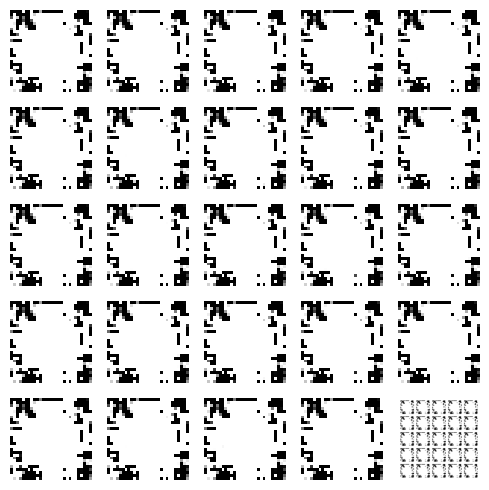

  0%|          | 0/350 [00:00<?, ?it/s]

4/4 [==============================] - 0s 15ms/step


  0%|          | 1/350 [00:00<03:42,  1.57it/s]

4/4 [==============================] - 0s 19ms/step


  1%|          | 2/350 [00:01<03:15,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


  1%|          | 3/350 [00:01<03:21,  1.72it/s]

4/4 [==============================] - 0s 17ms/step


  1%|          | 4/350 [00:02<03:13,  1.79it/s]

4/4 [==============================] - 0s 13ms/step


  1%|▏         | 5/350 [00:02<03:22,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


  2%|▏         | 6/350 [00:03<03:20,  1.71it/s]

4/4 [==============================] - 0s 20ms/step


  2%|▏         | 7/350 [00:04<03:15,  1.76it/s]

4/4 [==============================] - 0s 12ms/step


  2%|▏         | 8/350 [00:04<03:26,  1.66it/s]

4/4 [==============================] - 0s 16ms/step


  3%|▎         | 9/350 [00:05<03:24,  1.67it/s]

4/4 [==============================] - 0s 14ms/step


  3%|▎         | 10/350 [00:05<03:20,  1.70it/s]

4/4 [==============================] - 0s 16ms/step


  3%|▎         | 11/350 [00:06<03:17,  1.72it/s]

4/4 [==============================] - 0s 11ms/step


  3%|▎         | 12/350 [00:07<03:21,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


  4%|▎         | 13/350 [00:07<03:23,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


  4%|▍         | 14/350 [00:08<03:21,  1.67it/s]

4/4 [==============================] - 0s 16ms/step


  4%|▍         | 15/350 [00:08<03:19,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


  5%|▍         | 16/350 [00:09<03:17,  1.70it/s]

4/4 [==============================] - 0s 14ms/step


  5%|▍         | 17/350 [00:10<03:21,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


  5%|▌         | 18/350 [00:10<03:24,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


  5%|▌         | 19/350 [00:11<03:15,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


  6%|▌         | 20/350 [00:11<03:15,  1.69it/s]

4/4 [==============================] - 0s 14ms/step


  6%|▌         | 21/350 [00:12<03:18,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


  6%|▋         | 22/350 [00:13<03:21,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


  7%|▋         | 23/350 [00:13<03:14,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


  7%|▋         | 24/350 [00:14<03:14,  1.68it/s]

4/4 [==============================] - 0s 15ms/step


  7%|▋         | 25/350 [00:14<03:22,  1.61it/s]

4/4 [==============================] - 0s 12ms/step


  7%|▋         | 26/350 [00:15<03:21,  1.61it/s]

4/4 [==============================] - 0s 11ms/step


  8%|▊         | 27/350 [00:16<03:13,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


  8%|▊         | 28/350 [00:16<03:12,  1.67it/s]

4/4 [==============================] - 0s 15ms/step


  8%|▊         | 29/350 [00:17<03:15,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


  9%|▊         | 30/350 [00:17<03:07,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


  9%|▉         | 31/350 [00:18<03:08,  1.70it/s]

4/4 [==============================] - 0s 15ms/step


  9%|▉         | 32/350 [00:19<03:07,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


  9%|▉         | 33/350 [00:19<03:14,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


 10%|▉         | 34/350 [00:20<03:08,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 10%|█         | 35/350 [00:20<03:11,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 10%|█         | 36/350 [00:21<03:04,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 11%|█         | 37/350 [00:22<03:13,  1.62it/s]

4/4 [==============================] - 0s 13ms/step


 11%|█         | 38/350 [00:22<03:06,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 11%|█         | 39/350 [00:23<03:09,  1.64it/s]

4/4 [==============================] - 0s 13ms/step


 11%|█▏        | 40/350 [00:23<03:02,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 12%|█▏        | 41/350 [00:24<03:13,  1.59it/s]

4/4 [==============================] - 0s 11ms/step


 12%|█▏        | 42/350 [00:25<03:13,  1.60it/s]

4/4 [==============================] - 0s 13ms/step


 12%|█▏        | 43/350 [00:25<03:06,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 13%|█▎        | 44/350 [00:26<03:04,  1.66it/s]

4/4 [==============================] - 0s 14ms/step


 13%|█▎        | 45/350 [00:27<03:10,  1.60it/s]

4/4 [==============================] - 0s 11ms/step


 13%|█▎        | 46/350 [00:27<03:06,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


 13%|█▎        | 47/350 [00:28<02:59,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 14%|█▎        | 48/350 [00:28<03:02,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 14%|█▍        | 49/350 [00:29<03:07,  1.60it/s]

4/4 [==============================] - 0s 13ms/step


 14%|█▍        | 50/350 [00:30<03:03,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 15%|█▍        | 51/350 [00:30<02:53,  1.72it/s]

4/4 [==============================] - 0s 16ms/step


 15%|█▍        | 52/350 [00:31<02:53,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


 15%|█▌        | 53/350 [00:31<03:02,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


 15%|█▌        | 54/350 [00:32<02:55,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 16%|█▌        | 55/350 [00:33<02:59,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 16%|█▌        | 56/350 [00:33<02:52,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 16%|█▋        | 57/350 [00:34<02:55,  1.67it/s]

4/4 [==============================] - 0s 21ms/step


 17%|█▋        | 58/350 [00:34<02:56,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 17%|█▋        | 59/350 [00:35<02:58,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 17%|█▋        | 60/350 [00:35<02:50,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 17%|█▋        | 61/350 [00:36<02:58,  1.62it/s]

4/4 [==============================] - 0s 14ms/step


 18%|█▊        | 62/350 [00:37<02:54,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 18%|█▊        | 63/350 [00:37<02:47,  1.72it/s]

4/4 [==============================] - 0s 11ms/step


 18%|█▊        | 64/350 [00:38<02:48,  1.69it/s]

4/4 [==============================] - 0s 13ms/step


 19%|█▊        | 65/350 [00:38<02:45,  1.72it/s]

4/4 [==============================] - 0s 11ms/step


 19%|█▉        | 66/350 [00:39<02:52,  1.64it/s]

4/4 [==============================] - 0s 16ms/step


 19%|█▉        | 67/350 [00:40<02:46,  1.69it/s]

4/4 [==============================] - 0s 15ms/step


 19%|█▉        | 68/350 [00:40<02:43,  1.72it/s]

4/4 [==============================] - 0s 11ms/step


 20%|█▉        | 69/350 [00:41<02:47,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


 20%|██        | 70/350 [00:41<02:50,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 20%|██        | 71/350 [00:42<02:47,  1.67it/s]

4/4 [==============================] - 0s 15ms/step


 21%|██        | 72/350 [00:43<02:43,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 21%|██        | 73/350 [00:43<02:41,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 21%|██        | 74/350 [00:44<02:41,  1.71it/s]

4/4 [==============================] - 0s 16ms/step


 21%|██▏       | 75/350 [00:44<02:45,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


 22%|██▏       | 76/350 [00:45<02:42,  1.68it/s]

4/4 [==============================] - 0s 15ms/step


 22%|██▏       | 77/350 [00:46<02:37,  1.73it/s]

4/4 [==============================] - 0s 12ms/step


 22%|██▏       | 78/350 [00:46<02:44,  1.65it/s]

4/4 [==============================] - 0s 16ms/step


 23%|██▎       | 79/350 [00:47<02:42,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 23%|██▎       | 80/350 [00:47<02:45,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


 23%|██▎       | 81/350 [00:48<02:39,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


 23%|██▎       | 82/350 [00:49<02:46,  1.61it/s]

4/4 [==============================] - 0s 14ms/step


 24%|██▎       | 83/350 [00:49<02:42,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 24%|██▍       | 84/350 [00:50<02:40,  1.66it/s]

4/4 [==============================] - 0s 15ms/step


 24%|██▍       | 85/350 [00:50<02:34,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


 25%|██▍       | 86/350 [00:51<02:44,  1.60it/s]

4/4 [==============================] - 0s 12ms/step


 25%|██▍       | 87/350 [00:52<02:38,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 25%|██▌       | 88/350 [00:52<02:35,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


 25%|██▌       | 89/350 [00:53<02:30,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 26%|██▌       | 90/350 [00:53<02:42,  1.60it/s]

4/4 [==============================] - 0s 13ms/step


 26%|██▌       | 91/350 [00:54<02:33,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 26%|██▋       | 92/350 [00:55<02:30,  1.71it/s]

4/4 [==============================] - 0s 15ms/step


 27%|██▋       | 93/350 [00:55<02:31,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 27%|██▋       | 94/350 [00:56<02:34,  1.65it/s]

4/4 [==============================] - 0s 17ms/step


 27%|██▋       | 95/350 [00:56<02:31,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 27%|██▋       | 96/350 [00:57<02:32,  1.67it/s]

4/4 [==============================] - 0s 16ms/step


 28%|██▊       | 97/350 [00:58<02:28,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 28%|██▊       | 98/350 [00:58<02:33,  1.64it/s]

4/4 [==============================] - 0s 14ms/step


 28%|██▊       | 99/350 [00:59<02:28,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 29%|██▊       | 100/350 [00:59<02:30,  1.67it/s]

4/4 [==============================] - 0s 16ms/step


 29%|██▉       | 101/350 [01:00<02:25,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 29%|██▉       | 102/350 [01:00<02:22,  1.74it/s]

4/4 [==============================] - 0s 11ms/step


 29%|██▉       | 103/350 [01:01<02:30,  1.64it/s]

4/4 [==============================] - 0s 18ms/step


 30%|██▉       | 104/350 [01:02<02:25,  1.70it/s]

4/4 [==============================] - 0s 14ms/step


 30%|███       | 105/350 [01:02<02:22,  1.72it/s]

4/4 [==============================] - 0s 11ms/step


 30%|███       | 106/350 [01:03<02:22,  1.71it/s]

4/4 [==============================] - 0s 14ms/step


 31%|███       | 107/350 [01:04<02:28,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


 31%|███       | 108/350 [01:04<02:27,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 31%|███       | 109/350 [01:05<02:20,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 31%|███▏      | 110/350 [01:05<02:23,  1.67it/s]

4/4 [==============================] - 0s 14ms/step


 32%|███▏      | 111/350 [01:06<02:25,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 32%|███▏      | 112/350 [01:07<02:23,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


 32%|███▏      | 113/350 [01:07<02:19,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 33%|███▎      | 114/350 [01:08<02:22,  1.66it/s]

4/4 [==============================] - 0s 14ms/step


 33%|███▎      | 115/350 [01:08<02:25,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


 33%|███▎      | 116/350 [01:09<02:25,  1.61it/s]

4/4 [==============================] - 0s 13ms/step


 33%|███▎      | 117/350 [01:10<02:20,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 34%|███▎      | 118/350 [01:10<02:15,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


 34%|███▍      | 119/350 [01:11<02:24,  1.59it/s]

4/4 [==============================] - 0s 11ms/step


 34%|███▍      | 120/350 [01:11<02:23,  1.61it/s]

4/4 [==============================] - 0s 14ms/step


 35%|███▍      | 121/350 [01:12<02:15,  1.69it/s]

4/4 [==============================] - 0s 16ms/step


 35%|███▍      | 122/350 [01:13<02:12,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


 35%|███▌      | 123/350 [01:13<02:19,  1.62it/s]

4/4 [==============================] - 0s 14ms/step


 35%|███▌      | 124/350 [01:14<02:20,  1.61it/s]

4/4 [==============================] - 0s 13ms/step


 36%|███▌      | 125/350 [01:14<02:13,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


 36%|███▌      | 126/350 [01:15<02:13,  1.68it/s]

4/4 [==============================] - 0s 15ms/step


 36%|███▋      | 127/350 [01:16<02:16,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 37%|███▋      | 128/350 [01:16<02:15,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 37%|███▋      | 129/350 [01:17<02:08,  1.73it/s]

4/4 [==============================] - 0s 15ms/step


 37%|███▋      | 130/350 [01:17<02:06,  1.74it/s]

4/4 [==============================] - 0s 11ms/step


 37%|███▋      | 131/350 [01:18<02:10,  1.68it/s]

4/4 [==============================] - 0s 19ms/step


 38%|███▊      | 132/350 [01:19<02:07,  1.71it/s]

4/4 [==============================] - 0s 14ms/step


 38%|███▊      | 133/350 [01:19<02:07,  1.70it/s]

4/4 [==============================] - 0s 14ms/step


 38%|███▊      | 134/350 [01:20<02:07,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 39%|███▊      | 135/350 [01:20<02:15,  1.59it/s]

4/4 [==============================] - 0s 11ms/step


 39%|███▉      | 136/350 [01:21<02:11,  1.62it/s]

4/4 [==============================] - 0s 16ms/step


 39%|███▉      | 137/350 [01:22<02:08,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 39%|███▉      | 138/350 [01:22<02:04,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 40%|███▉      | 139/350 [01:23<02:11,  1.61it/s]

4/4 [==============================] - 0s 13ms/step


 40%|████      | 140/350 [01:23<02:11,  1.59it/s]

4/4 [==============================] - 0s 12ms/step


 40%|████      | 141/350 [01:24<02:05,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 41%|████      | 142/350 [01:25<02:04,  1.67it/s]

4/4 [==============================] - 0s 16ms/step


 41%|████      | 143/350 [01:25<02:06,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


 41%|████      | 144/350 [01:26<02:07,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


 41%|████▏     | 145/350 [01:26<02:02,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 42%|████▏     | 146/350 [01:27<02:02,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 42%|████▏     | 147/350 [01:28<02:05,  1.61it/s]

4/4 [==============================] - 0s 11ms/step


 42%|████▏     | 148/350 [01:28<02:03,  1.64it/s]

4/4 [==============================] - 0s 17ms/step


 43%|████▎     | 149/350 [01:29<02:00,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 43%|████▎     | 150/350 [01:29<02:00,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 43%|████▎     | 151/350 [01:30<02:03,  1.61it/s]

4/4 [==============================] - 0s 11ms/step


 43%|████▎     | 152/350 [01:31<02:02,  1.62it/s]

4/4 [==============================] - 0s 13ms/step


 44%|████▎     | 153/350 [01:31<01:57,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 44%|████▍     | 154/350 [01:32<01:58,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


 44%|████▍     | 155/350 [01:33<02:00,  1.62it/s]

4/4 [==============================] - 0s 11ms/step


 45%|████▍     | 156/350 [01:33<01:59,  1.63it/s]

4/4 [==============================] - 0s 14ms/step


 45%|████▍     | 157/350 [01:34<01:56,  1.66it/s]

4/4 [==============================] - 0s 14ms/step


 45%|████▌     | 158/350 [01:34<01:56,  1.65it/s]

4/4 [==============================] - 0s 13ms/step


 45%|████▌     | 159/350 [01:35<01:57,  1.62it/s]

4/4 [==============================] - 0s 13ms/step


 46%|████▌     | 160/350 [01:36<01:57,  1.62it/s]

4/4 [==============================] - 0s 13ms/step


 46%|████▌     | 161/350 [01:36<01:51,  1.70it/s]

4/4 [==============================] - 0s 13ms/step


 46%|████▋     | 162/350 [01:37<01:48,  1.73it/s]

4/4 [==============================] - 0s 12ms/step


 47%|████▋     | 163/350 [01:37<01:54,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 47%|████▋     | 164/350 [01:38<01:52,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


 47%|████▋     | 165/350 [01:39<01:53,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 47%|████▋     | 166/350 [01:39<01:53,  1.62it/s]

4/4 [==============================] - 0s 13ms/step


 48%|████▊     | 167/350 [01:40<01:55,  1.58it/s]

4/4 [==============================] - 0s 11ms/step


 48%|████▊     | 168/350 [01:40<01:52,  1.62it/s]

4/4 [==============================] - 0s 14ms/step


 48%|████▊     | 169/350 [01:41<01:48,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 49%|████▊     | 170/350 [01:42<01:47,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


 49%|████▉     | 171/350 [01:42<01:46,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 49%|████▉     | 172/350 [01:43<01:48,  1.64it/s]

4/4 [==============================] - 0s 13ms/step


 49%|████▉     | 173/350 [01:43<01:44,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 50%|████▉     | 174/350 [01:44<01:46,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


 50%|█████     | 175/350 [01:45<01:46,  1.65it/s]

4/4 [==============================] - 0s 13ms/step


 50%|█████     | 176/350 [01:45<01:45,  1.65it/s]

4/4 [==============================] - 0s 14ms/step


 51%|█████     | 177/350 [01:46<01:43,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 51%|█████     | 178/350 [01:46<01:43,  1.67it/s]

4/4 [==============================] - 0s 15ms/step


 51%|█████     | 179/350 [01:47<01:46,  1.61it/s]

4/4 [==============================] - 0s 11ms/step


 51%|█████▏    | 180/350 [01:48<01:45,  1.61it/s]

4/4 [==============================] - 0s 15ms/step


 52%|█████▏    | 181/350 [01:48<01:41,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 52%|█████▏    | 182/350 [01:49<01:41,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


 52%|█████▏    | 183/350 [01:50<01:42,  1.62it/s]

4/4 [==============================] - 0s 17ms/step


 53%|█████▎    | 184/350 [01:50<01:40,  1.65it/s]

4/4 [==============================] - 0s 16ms/step


 53%|█████▎    | 185/350 [01:51<01:39,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


 53%|█████▎    | 186/350 [01:51<01:36,  1.70it/s]

4/4 [==============================] - 0s 29ms/step


 53%|█████▎    | 187/350 [01:52<01:41,  1.61it/s]

4/4 [==============================] - 0s 13ms/step


 54%|█████▎    | 188/350 [01:53<01:39,  1.64it/s]

4/4 [==============================] - 0s 16ms/step


 54%|█████▍    | 189/350 [01:53<01:35,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


 54%|█████▍    | 190/350 [01:54<01:36,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 55%|█████▍    | 191/350 [01:54<01:38,  1.62it/s]

4/4 [==============================] - 0s 13ms/step


 55%|█████▍    | 192/350 [01:55<01:46,  1.48it/s]

4/4 [==============================] - 0s 12ms/step


 55%|█████▌    | 193/350 [01:56<01:44,  1.50it/s]

4/4 [==============================] - 0s 12ms/step


 55%|█████▌    | 194/350 [01:56<01:39,  1.57it/s]

4/4 [==============================] - 0s 11ms/step


 56%|█████▌    | 195/350 [01:57<01:40,  1.54it/s]

4/4 [==============================] - 0s 16ms/step


 56%|█████▌    | 196/350 [01:58<01:35,  1.61it/s]

4/4 [==============================] - 0s 12ms/step


 56%|█████▋    | 197/350 [01:58<01:34,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


 57%|█████▋    | 198/350 [01:59<01:28,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 57%|█████▋    | 199/350 [01:59<01:30,  1.67it/s]

4/4 [==============================] - 0s 14ms/step


 57%|█████▋    | 200/350 [02:00<01:31,  1.63it/s]

4/4 [==============================] - 0s 14ms/step


 57%|█████▋    | 201/350 [02:01<01:26,  1.71it/s]

4/4 [==============================] - 0s 18ms/step


 58%|█████▊    | 202/350 [02:01<01:25,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 58%|█████▊    | 203/350 [02:02<01:28,  1.66it/s]

4/4 [==============================] - 0s 14ms/step


 58%|█████▊    | 204/350 [02:02<01:27,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 59%|█████▊    | 205/350 [02:03<01:25,  1.69it/s]

4/4 [==============================] - 0s 16ms/step


 59%|█████▉    | 206/350 [02:04<01:24,  1.71it/s]

4/4 [==============================] - 0s 11ms/step


 59%|█████▉    | 207/350 [02:04<01:28,  1.61it/s]

4/4 [==============================] - 0s 13ms/step


 59%|█████▉    | 208/350 [02:05<01:25,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 60%|█████▉    | 209/350 [02:05<01:24,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


 60%|██████    | 210/350 [02:06<01:21,  1.71it/s]

4/4 [==============================] - 0s 11ms/step


 60%|██████    | 211/350 [02:07<01:26,  1.60it/s]

4/4 [==============================] - 0s 11ms/step


 61%|██████    | 212/350 [02:07<01:22,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 61%|██████    | 213/350 [02:08<01:22,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 61%|██████    | 214/350 [02:08<01:20,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 61%|██████▏   | 215/350 [02:09<01:22,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 62%|██████▏   | 216/350 [02:10<01:18,  1.71it/s]

4/4 [==============================] - 0s 13ms/step


 62%|██████▏   | 217/350 [02:10<01:16,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 62%|██████▏   | 218/350 [02:11<01:17,  1.70it/s]

4/4 [==============================] - 0s 15ms/step


 63%|██████▎   | 219/350 [02:11<01:14,  1.76it/s]

4/4 [==============================] - 0s 16ms/step


 63%|██████▎   | 220/350 [02:12<01:16,  1.71it/s]

4/4 [==============================] - 0s 11ms/step


 63%|██████▎   | 221/350 [02:12<01:16,  1.69it/s]

4/4 [==============================] - 0s 15ms/step


 63%|██████▎   | 222/350 [02:13<01:13,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 64%|██████▎   | 223/350 [02:14<01:11,  1.77it/s]

4/4 [==============================] - 0s 11ms/step


 64%|██████▍   | 224/350 [02:14<01:16,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 64%|██████▍   | 225/350 [02:15<01:16,  1.64it/s]

4/4 [==============================] - 0s 15ms/step


 65%|██████▍   | 226/350 [02:15<01:12,  1.72it/s]

4/4 [==============================] - 0s 14ms/step


 65%|██████▍   | 227/350 [02:16<01:10,  1.74it/s]

4/4 [==============================] - 0s 11ms/step


 65%|██████▌   | 228/350 [02:17<01:15,  1.62it/s]

4/4 [==============================] - 0s 14ms/step


 65%|██████▌   | 229/350 [02:17<01:12,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 66%|██████▌   | 230/350 [02:18<01:11,  1.68it/s]

4/4 [==============================] - 0s 15ms/step


 66%|██████▌   | 231/350 [02:18<01:09,  1.71it/s]

4/4 [==============================] - 0s 11ms/step


 66%|██████▋   | 232/350 [02:19<01:13,  1.61it/s]

4/4 [==============================] - 0s 13ms/step


 67%|██████▋   | 233/350 [02:20<01:09,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 67%|██████▋   | 234/350 [02:20<01:08,  1.69it/s]

4/4 [==============================] - 0s 14ms/step


 67%|██████▋   | 235/350 [02:21<01:07,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 67%|██████▋   | 236/350 [02:21<01:08,  1.65it/s]

4/4 [==============================] - 0s 15ms/step


 68%|██████▊   | 237/350 [02:22<01:07,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 68%|██████▊   | 238/350 [02:23<01:07,  1.67it/s]

4/4 [==============================] - 0s 14ms/step


 68%|██████▊   | 239/350 [02:23<01:04,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 69%|██████▊   | 240/350 [02:24<01:02,  1.76it/s]

4/4 [==============================] - 0s 11ms/step


 69%|██████▉   | 241/350 [02:24<01:05,  1.66it/s]

4/4 [==============================] - 0s 16ms/step


 69%|██████▉   | 242/350 [02:25<01:04,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 69%|██████▉   | 243/350 [02:26<01:03,  1.67it/s]

4/4 [==============================] - 0s 15ms/step


 70%|██████▉   | 244/350 [02:26<01:02,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 70%|███████   | 245/350 [02:27<01:03,  1.64it/s]

4/4 [==============================] - 0s 14ms/step


 70%|███████   | 246/350 [02:27<01:01,  1.69it/s]

4/4 [==============================] - 0s 16ms/step


 71%|███████   | 247/350 [02:28<01:00,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 71%|███████   | 248/350 [02:29<01:06,  1.53it/s]

4/4 [==============================] - 0s 12ms/step


 71%|███████   | 249/350 [02:29<01:07,  1.50it/s]

4/4 [==============================] - 0s 14ms/step


 71%|███████▏  | 250/350 [02:30<01:02,  1.59it/s]

4/4 [==============================] - 0s 12ms/step


 72%|███████▏  | 251/350 [02:31<01:01,  1.61it/s]

4/4 [==============================] - 0s 13ms/step


 72%|███████▏  | 252/350 [02:31<00:59,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


 72%|███████▏  | 253/350 [02:32<00:59,  1.63it/s]

4/4 [==============================] - 0s 17ms/step


 73%|███████▎  | 254/350 [02:32<00:58,  1.65it/s]

4/4 [==============================] - 0s 13ms/step


 73%|███████▎  | 255/350 [02:33<00:58,  1.61it/s]

4/4 [==============================] - 0s 15ms/step


 73%|███████▎  | 256/350 [02:34<00:56,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 73%|███████▎  | 257/350 [02:34<00:57,  1.61it/s]

4/4 [==============================] - 0s 15ms/step


 74%|███████▎  | 258/350 [02:35<00:55,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 74%|███████▍  | 259/350 [02:35<00:55,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 74%|███████▍  | 260/350 [02:36<00:52,  1.71it/s]

4/4 [==============================] - 0s 14ms/step


 75%|███████▍  | 261/350 [02:37<00:53,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 75%|███████▍  | 262/350 [02:37<00:53,  1.65it/s]

4/4 [==============================] - 0s 13ms/step


 75%|███████▌  | 263/350 [02:38<00:51,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 75%|███████▌  | 264/350 [02:38<00:50,  1.69it/s]

4/4 [==============================] - 0s 13ms/step


 76%|███████▌  | 265/350 [02:39<00:49,  1.71it/s]

4/4 [==============================] - 0s 20ms/step


 76%|███████▌  | 266/350 [02:40<00:50,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 76%|███████▋  | 267/350 [02:40<00:49,  1.67it/s]

4/4 [==============================] - 0s 15ms/step


 77%|███████▋  | 268/350 [02:41<00:47,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 77%|███████▋  | 269/350 [02:41<00:48,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


 77%|███████▋  | 270/350 [02:42<00:47,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 77%|███████▋  | 271/350 [02:42<00:45,  1.72it/s]

4/4 [==============================] - 0s 11ms/step


 78%|███████▊  | 272/350 [02:43<00:45,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 78%|███████▊  | 273/350 [02:44<00:45,  1.71it/s]

4/4 [==============================] - 0s 11ms/step


 78%|███████▊  | 274/350 [02:44<00:46,  1.65it/s]

4/4 [==============================] - 0s 14ms/step


 79%|███████▊  | 275/350 [02:45<00:44,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 79%|███████▉  | 276/350 [02:45<00:44,  1.65it/s]

4/4 [==============================] - 0s 13ms/step


 79%|███████▉  | 277/350 [02:46<00:42,  1.72it/s]

4/4 [==============================] - 0s 15ms/step


 79%|███████▉  | 278/350 [02:47<00:42,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


 80%|███████▉  | 279/350 [02:48<00:48,  1.47it/s]

4/4 [==============================] - 0s 13ms/step


 80%|████████  | 280/350 [02:48<00:44,  1.57it/s]

4/4 [==============================] - 0s 13ms/step


 80%|████████  | 281/350 [02:49<00:44,  1.55it/s]

4/4 [==============================] - 0s 17ms/step


 81%|████████  | 282/350 [02:49<00:42,  1.58it/s]

4/4 [==============================] - 0s 12ms/step


 81%|████████  | 283/350 [02:50<00:42,  1.59it/s]

4/4 [==============================] - 0s 15ms/step


 81%|████████  | 284/350 [02:50<00:39,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 81%|████████▏ | 285/350 [02:51<00:40,  1.59it/s]

4/4 [==============================] - 0s 16ms/step


 82%|████████▏ | 286/350 [02:52<00:39,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


 82%|████████▏ | 287/350 [02:52<00:37,  1.66it/s]

4/4 [==============================] - 0s 16ms/step


 82%|████████▏ | 288/350 [02:53<00:36,  1.72it/s]

4/4 [==============================] - 0s 16ms/step


 83%|████████▎ | 289/350 [02:53<00:35,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


 83%|████████▎ | 290/350 [02:54<00:36,  1.66it/s]

4/4 [==============================] - 0s 14ms/step


 83%|████████▎ | 291/350 [02:55<00:34,  1.69it/s]

4/4 [==============================] - 0s 13ms/step


 83%|████████▎ | 292/350 [02:55<00:33,  1.72it/s]

4/4 [==============================] - 0s 11ms/step


 84%|████████▎ | 293/350 [02:56<00:33,  1.68it/s]

4/4 [==============================] - 0s 14ms/step


 84%|████████▍ | 294/350 [02:56<00:33,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


 84%|████████▍ | 295/350 [02:57<00:33,  1.64it/s]

4/4 [==============================] - 0s 13ms/step


 85%|████████▍ | 296/350 [02:58<00:33,  1.63it/s]

4/4 [==============================] - 0s 14ms/step


 85%|████████▍ | 297/350 [02:58<00:31,  1.69it/s]

4/4 [==============================] - 0s 13ms/step


 85%|████████▌ | 298/350 [02:59<00:31,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 85%|████████▌ | 299/350 [02:59<00:30,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


 86%|████████▌ | 300/350 [03:00<00:29,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 86%|████████▌ | 301/350 [03:01<00:27,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 86%|████████▋ | 302/350 [03:01<00:29,  1.64it/s]

4/4 [==============================] - 0s 15ms/step


 87%|████████▋ | 303/350 [03:02<00:27,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 87%|████████▋ | 304/350 [03:02<00:27,  1.65it/s]

4/4 [==============================] - 0s 14ms/step


 87%|████████▋ | 305/350 [03:03<00:26,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 87%|████████▋ | 306/350 [03:04<00:26,  1.63it/s]

4/4 [==============================] - 0s 14ms/step


 88%|████████▊ | 307/350 [03:04<00:26,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 88%|████████▊ | 308/350 [03:05<00:25,  1.66it/s]

4/4 [==============================] - 0s 15ms/step


 88%|████████▊ | 309/350 [03:05<00:23,  1.71it/s]

4/4 [==============================] - 0s 13ms/step


 89%|████████▊ | 310/350 [03:06<00:25,  1.58it/s]

4/4 [==============================] - 0s 12ms/step


 89%|████████▉ | 311/350 [03:07<00:23,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 89%|████████▉ | 312/350 [03:07<00:22,  1.66it/s]

4/4 [==============================] - 0s 15ms/step


 89%|████████▉ | 313/350 [03:08<00:21,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 90%|████████▉ | 314/350 [03:09<00:22,  1.60it/s]

4/4 [==============================] - 0s 12ms/step


 90%|█████████ | 315/350 [03:09<00:21,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 90%|█████████ | 316/350 [03:10<00:20,  1.68it/s]

4/4 [==============================] - 0s 14ms/step


 91%|█████████ | 317/350 [03:10<00:19,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 91%|█████████ | 318/350 [03:11<00:18,  1.73it/s]

4/4 [==============================] - 0s 11ms/step


 91%|█████████ | 319/350 [03:11<00:18,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


 91%|█████████▏| 320/350 [03:12<00:17,  1.69it/s]

4/4 [==============================] - 0s 13ms/step


 92%|█████████▏| 321/350 [03:13<00:17,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 92%|█████████▏| 322/350 [03:13<00:16,  1.72it/s]

4/4 [==============================] - 0s 15ms/step


 92%|█████████▏| 323/350 [03:14<00:15,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 93%|█████████▎| 324/350 [03:14<00:15,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 93%|█████████▎| 325/350 [03:15<00:14,  1.69it/s]

4/4 [==============================] - 0s 13ms/step


 93%|█████████▎| 326/350 [03:16<00:14,  1.69it/s]

4/4 [==============================] - 0s 16ms/step


 93%|█████████▎| 327/350 [03:16<00:14,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 94%|█████████▎| 328/350 [03:17<00:13,  1.65it/s]

4/4 [==============================] - 0s 15ms/step


 94%|█████████▍| 329/350 [03:17<00:12,  1.70it/s]

4/4 [==============================] - 0s 15ms/step


 94%|█████████▍| 330/350 [03:18<00:11,  1.75it/s]

4/4 [==============================] - 0s 12ms/step


 95%|█████████▍| 331/350 [03:19<00:11,  1.61it/s]

4/4 [==============================] - 0s 12ms/step


 95%|█████████▍| 332/350 [03:19<00:10,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 95%|█████████▌| 333/350 [03:20<00:10,  1.67it/s]

4/4 [==============================] - 0s 15ms/step


 95%|█████████▌| 334/350 [03:20<00:09,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 96%|█████████▌| 335/350 [03:21<00:09,  1.63it/s]

4/4 [==============================] - 0s 16ms/step


 96%|█████████▌| 336/350 [03:22<00:08,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 96%|█████████▋| 337/350 [03:22<00:07,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


 97%|█████████▋| 338/350 [03:23<00:07,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 97%|█████████▋| 339/350 [03:23<00:06,  1.62it/s]

4/4 [==============================] - 0s 16ms/step


 97%|█████████▋| 340/350 [03:24<00:05,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 97%|█████████▋| 341/350 [03:25<00:05,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


 98%|█████████▊| 342/350 [03:25<00:04,  1.69it/s]

4/4 [==============================] - 0s 13ms/step


 98%|█████████▊| 343/350 [03:26<00:04,  1.56it/s]

4/4 [==============================] - 0s 11ms/step


 98%|█████████▊| 344/350 [03:27<00:03,  1.57it/s]

4/4 [==============================] - 0s 12ms/step


 99%|█████████▊| 345/350 [03:27<00:03,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


 99%|█████████▉| 346/350 [03:28<00:02,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 99%|█████████▉| 347/350 [03:28<00:01,  1.64it/s]

4/4 [==============================] - 0s 17ms/step


 99%|█████████▉| 348/350 [03:29<00:01,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


100%|█████████▉| 349/350 [03:30<00:00,  1.67it/s]

4/4 [==============================] - 0s 15ms/step


100%|██████████| 350/350 [03:30<00:00,  1.66it/s]

Epoch number: 73 discriminator_loss: 0.16383862207545982 generator_loss: 8.212222930363247
1/1 [==============================] - 0s 23ms/step


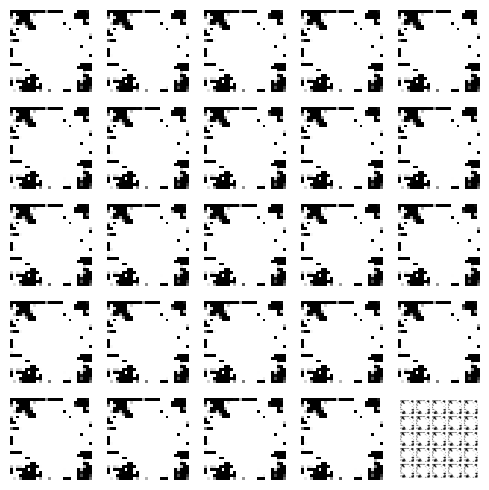

  0%|          | 0/350 [00:00<?, ?it/s]

4/4 [==============================] - 0s 19ms/step


  0%|          | 1/350 [00:00<04:08,  1.41it/s]

4/4 [==============================] - 0s 14ms/step


  1%|          | 2/350 [00:01<03:46,  1.54it/s]

4/4 [==============================] - 0s 13ms/step


  1%|          | 3/350 [00:01<03:40,  1.58it/s]

4/4 [==============================] - 0s 15ms/step


  1%|          | 4/350 [00:02<03:35,  1.61it/s]

4/4 [==============================] - 0s 12ms/step


  1%|▏         | 5/350 [00:03<03:34,  1.61it/s]

4/4 [==============================] - 0s 11ms/step


  2%|▏         | 6/350 [00:03<03:33,  1.61it/s]

4/4 [==============================] - 0s 12ms/step


  2%|▏         | 7/350 [00:04<03:24,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


  2%|▏         | 8/350 [00:04<03:29,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


  3%|▎         | 9/350 [00:05<03:29,  1.63it/s]

4/4 [==============================] - 0s 14ms/step


  3%|▎         | 10/350 [00:06<03:28,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


  3%|▎         | 11/350 [00:06<03:24,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


  3%|▎         | 12/350 [00:07<03:22,  1.67it/s]

4/4 [==============================] - 0s 15ms/step


  4%|▎         | 13/350 [00:08<03:26,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


  4%|▍         | 14/350 [00:08<03:28,  1.61it/s]

4/4 [==============================] - 0s 15ms/step


  4%|▍         | 15/350 [00:09<03:20,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


  5%|▍         | 16/350 [00:09<03:18,  1.69it/s]

4/4 [==============================] - 0s 13ms/step


  5%|▍         | 17/350 [00:10<03:22,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


  5%|▌         | 18/350 [00:11<03:24,  1.62it/s]

4/4 [==============================] - 0s 14ms/step


  5%|▌         | 19/350 [00:11<03:16,  1.68it/s]

4/4 [==============================] - 0s 16ms/step


  6%|▌         | 20/350 [00:12<03:12,  1.72it/s]

4/4 [==============================] - 0s 11ms/step


  6%|▌         | 21/350 [00:12<03:26,  1.59it/s]

4/4 [==============================] - 0s 14ms/step


  6%|▋         | 22/350 [00:13<03:17,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


  7%|▋         | 23/350 [00:14<03:17,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


  7%|▋         | 24/350 [00:14<03:12,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


  7%|▋         | 25/350 [00:15<03:21,  1.62it/s]

4/4 [==============================] - 0s 14ms/step


  7%|▋         | 26/350 [00:15<03:13,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


  8%|▊         | 27/350 [00:16<03:07,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


  8%|▊         | 28/350 [00:16<03:10,  1.69it/s]

4/4 [==============================] - 0s 13ms/step


  8%|▊         | 29/350 [00:17<03:04,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


  9%|▊         | 30/350 [00:18<03:09,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


  9%|▉         | 31/350 [00:18<03:09,  1.68it/s]

4/4 [==============================] - 0s 15ms/step


  9%|▉         | 32/350 [00:19<03:08,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


  9%|▉         | 33/350 [00:19<03:06,  1.70it/s]

4/4 [==============================] - 0s 13ms/step


 10%|▉         | 34/350 [00:20<03:12,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 10%|█         | 35/350 [00:21<03:19,  1.58it/s]

4/4 [==============================] - 0s 16ms/step


 10%|█         | 36/350 [00:21<03:13,  1.62it/s]

4/4 [==============================] - 0s 16ms/step


 11%|█         | 37/350 [00:22<03:16,  1.60it/s]

4/4 [==============================] - 0s 13ms/step


 11%|█         | 38/350 [00:23<03:18,  1.57it/s]

4/4 [==============================] - 0s 12ms/step


 11%|█         | 39/350 [00:23<03:17,  1.58it/s]

4/4 [==============================] - 0s 18ms/step


 11%|█▏        | 40/350 [00:24<03:08,  1.64it/s]

4/4 [==============================] - 0s 16ms/step


 12%|█▏        | 41/350 [00:24<03:09,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 12%|█▏        | 42/350 [00:25<03:15,  1.57it/s]

4/4 [==============================] - 0s 20ms/step


 12%|█▏        | 43/350 [00:26<03:11,  1.60it/s]

4/4 [==============================] - 0s 16ms/step


 13%|█▎        | 44/350 [00:26<03:07,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 13%|█▎        | 45/350 [00:27<03:06,  1.64it/s]

4/4 [==============================] - 0s 16ms/step


 13%|█▎        | 46/350 [00:28<03:04,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 13%|█▎        | 47/350 [00:28<03:07,  1.61it/s]

4/4 [==============================] - 0s 11ms/step


 14%|█▎        | 48/350 [00:29<02:58,  1.69it/s]

4/4 [==============================] - 0s 15ms/step


 14%|█▍        | 49/350 [00:29<02:55,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


 14%|█▍        | 50/350 [00:30<03:00,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 15%|█▍        | 51/350 [00:31<03:02,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 15%|█▍        | 52/350 [00:32<03:40,  1.35it/s]

4/4 [==============================] - 0s 23ms/step


 15%|█▌        | 53/350 [00:33<04:01,  1.23it/s]

4/4 [==============================] - 0s 14ms/step


 15%|█▌        | 54/350 [00:33<03:48,  1.29it/s]

4/4 [==============================] - 0s 12ms/step


 16%|█▌        | 55/350 [00:34<03:49,  1.29it/s]

4/4 [==============================] - 0s 12ms/step


 16%|█▌        | 56/350 [00:35<03:51,  1.27it/s]

4/4 [==============================] - 0s 31ms/step


 16%|█▋        | 57/350 [00:36<03:51,  1.26it/s]

4/4 [==============================] - 0s 13ms/step


 17%|█▋        | 58/350 [00:36<03:37,  1.35it/s]

4/4 [==============================] - 0s 12ms/step


 17%|█▋        | 59/350 [00:37<03:25,  1.41it/s]

4/4 [==============================] - 0s 15ms/step


 17%|█▋        | 60/350 [00:38<03:23,  1.42it/s]

4/4 [==============================] - 0s 12ms/step


 17%|█▋        | 61/350 [00:38<03:13,  1.49it/s]

4/4 [==============================] - 0s 15ms/step


 18%|█▊        | 62/350 [00:39<03:03,  1.57it/s]

4/4 [==============================] - 0s 12ms/step


 18%|█▊        | 63/350 [00:39<02:59,  1.59it/s]

4/4 [==============================] - 0s 17ms/step


 18%|█▊        | 64/350 [00:40<02:57,  1.61it/s]

4/4 [==============================] - 0s 18ms/step


 19%|█▊        | 65/350 [00:41<02:54,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


 19%|█▉        | 66/350 [00:41<02:51,  1.66it/s]

4/4 [==============================] - 0s 15ms/step


 19%|█▉        | 67/350 [00:42<02:51,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 19%|█▉        | 68/350 [00:42<02:55,  1.61it/s]

4/4 [==============================] - 0s 15ms/step


 20%|█▉        | 69/350 [00:43<02:50,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 20%|██        | 70/350 [00:44<02:53,  1.61it/s]

4/4 [==============================] - 0s 13ms/step


 20%|██        | 71/350 [00:44<02:47,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 21%|██        | 72/350 [00:45<02:57,  1.57it/s]

4/4 [==============================] - 0s 12ms/step


 21%|██        | 73/350 [00:46<02:57,  1.56it/s]

4/4 [==============================] - 0s 12ms/step


 21%|██        | 74/350 [00:46<02:47,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 21%|██▏       | 75/350 [00:47<02:46,  1.65it/s]

4/4 [==============================] - 0s 14ms/step


 22%|██▏       | 76/350 [00:47<02:48,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 22%|██▏       | 77/350 [00:48<02:47,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


 22%|██▏       | 78/350 [00:49<02:44,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


 23%|██▎       | 79/350 [00:49<02:42,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


 23%|██▎       | 80/350 [00:50<02:47,  1.61it/s]

4/4 [==============================] - 0s 12ms/step


 23%|██▎       | 81/350 [00:50<02:46,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


 23%|██▎       | 82/350 [00:51<02:38,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 24%|██▎       | 83/350 [00:52<02:41,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 24%|██▍       | 84/350 [00:52<02:43,  1.62it/s]

4/4 [==============================] - 0s 13ms/step


 24%|██▍       | 85/350 [00:53<02:41,  1.64it/s]

4/4 [==============================] - 0s 16ms/step


 25%|██▍       | 86/350 [00:53<02:37,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 25%|██▍       | 87/350 [00:54<02:38,  1.66it/s]

4/4 [==============================] - 0s 16ms/step


 25%|██▌       | 88/350 [00:55<02:41,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 25%|██▌       | 89/350 [00:55<02:34,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 26%|██▌       | 90/350 [00:56<02:35,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 26%|██▌       | 91/350 [00:56<02:37,  1.65it/s]

4/4 [==============================] - 0s 13ms/step


 26%|██▋       | 92/350 [00:57<02:44,  1.57it/s]

4/4 [==============================] - 0s 14ms/step


 27%|██▋       | 93/350 [00:58<02:38,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


 27%|██▋       | 94/350 [00:58<02:37,  1.62it/s]

4/4 [==============================] - 0s 15ms/step


 27%|██▋       | 95/350 [00:59<02:30,  1.70it/s]

4/4 [==============================] - 0s 13ms/step


 27%|██▋       | 96/350 [00:59<02:27,  1.72it/s]

4/4 [==============================] - 0s 11ms/step


 28%|██▊       | 97/350 [01:00<02:32,  1.65it/s]

4/4 [==============================] - 0s 16ms/step


 28%|██▊       | 98/350 [01:01<02:27,  1.71it/s]

4/4 [==============================] - 0s 16ms/step


 28%|██▊       | 99/350 [01:01<02:26,  1.71it/s]

4/4 [==============================] - 0s 11ms/step


 29%|██▊       | 100/350 [01:02<02:26,  1.71it/s]

4/4 [==============================] - 0s 13ms/step


 29%|██▉       | 101/350 [01:02<02:34,  1.61it/s]

4/4 [==============================] - 0s 11ms/step


 29%|██▉       | 102/350 [01:03<02:32,  1.63it/s]

4/4 [==============================] - 0s 16ms/step


 29%|██▉       | 103/350 [01:04<02:27,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 30%|██▉       | 104/350 [01:04<02:28,  1.65it/s]

4/4 [==============================] - 0s 15ms/step


 30%|███       | 105/350 [01:05<02:31,  1.62it/s]

4/4 [==============================] - 0s 14ms/step


 30%|███       | 106/350 [01:05<02:29,  1.64it/s]

4/4 [==============================] - 0s 14ms/step


 31%|███       | 107/350 [01:06<02:25,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 31%|███       | 108/350 [01:07<02:27,  1.64it/s]

4/4 [==============================] - 0s 15ms/step


 31%|███       | 109/350 [01:07<02:30,  1.61it/s]

4/4 [==============================] - 0s 12ms/step


 31%|███▏      | 110/350 [01:08<02:25,  1.65it/s]

4/4 [==============================] - 0s 17ms/step


 32%|███▏      | 111/350 [01:08<02:22,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 32%|███▏      | 112/350 [01:09<02:18,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


 32%|███▏      | 113/350 [01:10<02:26,  1.61it/s]

4/4 [==============================] - 0s 13ms/step


 33%|███▎      | 114/350 [01:10<02:21,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 33%|███▎      | 115/350 [01:11<02:21,  1.66it/s]

4/4 [==============================] - 0s 14ms/step


 33%|███▎      | 116/350 [01:11<02:16,  1.72it/s]

4/4 [==============================] - 0s 14ms/step


 33%|███▎      | 117/350 [01:12<02:13,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 34%|███▎      | 118/350 [01:13<02:21,  1.64it/s]

4/4 [==============================] - 0s 16ms/step


 34%|███▍      | 119/350 [01:13<02:17,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


 34%|███▍      | 120/350 [01:14<02:14,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 35%|███▍      | 121/350 [01:14<02:14,  1.70it/s]

4/4 [==============================] - 0s 13ms/step


 35%|███▍      | 122/350 [01:15<02:21,  1.62it/s]

4/4 [==============================] - 0s 11ms/step


 35%|███▌      | 123/350 [01:16<02:18,  1.64it/s]

4/4 [==============================] - 0s 19ms/step


 35%|███▌      | 124/350 [01:16<02:15,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 36%|███▌      | 125/350 [01:17<02:17,  1.64it/s]

4/4 [==============================] - 0s 15ms/step


 36%|███▌      | 126/350 [01:18<02:20,  1.59it/s]

4/4 [==============================] - 0s 14ms/step


 36%|███▋      | 127/350 [01:18<02:19,  1.60it/s]

4/4 [==============================] - 0s 18ms/step


 37%|███▋      | 128/350 [01:19<02:21,  1.57it/s]

4/4 [==============================] - 0s 12ms/step


 37%|███▋      | 129/350 [01:19<02:20,  1.58it/s]

4/4 [==============================] - 0s 15ms/step


 37%|███▋      | 130/350 [01:20<02:19,  1.57it/s]

4/4 [==============================] - 0s 12ms/step


 37%|███▋      | 131/350 [01:21<02:16,  1.60it/s]

4/4 [==============================] - 0s 16ms/step


 38%|███▊      | 132/350 [01:21<02:13,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 38%|███▊      | 133/350 [01:22<02:11,  1.65it/s]

4/4 [==============================] - 0s 15ms/step


 38%|███▊      | 134/350 [01:23<02:14,  1.60it/s]

4/4 [==============================] - 0s 11ms/step


 39%|███▊      | 135/350 [01:23<02:14,  1.60it/s]

4/4 [==============================] - 0s 13ms/step


 39%|███▉      | 136/350 [01:24<02:06,  1.69it/s]

4/4 [==============================] - 0s 16ms/step


 39%|███▉      | 137/350 [01:24<02:03,  1.72it/s]

4/4 [==============================] - 0s 11ms/step


 39%|███▉      | 138/350 [01:25<02:10,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


 40%|███▉      | 139/350 [01:26<02:11,  1.60it/s]

4/4 [==============================] - 0s 13ms/step


 40%|████      | 140/350 [01:26<02:05,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 40%|████      | 141/350 [01:27<02:04,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 41%|████      | 142/350 [01:27<02:08,  1.62it/s]

4/4 [==============================] - 0s 13ms/step


 41%|████      | 143/350 [01:28<02:04,  1.66it/s]

4/4 [==============================] - 0s 17ms/step


 41%|████      | 144/350 [01:28<02:01,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 41%|████▏     | 145/350 [01:29<02:03,  1.66it/s]

4/4 [==============================] - 0s 14ms/step


 42%|████▏     | 146/350 [01:30<02:06,  1.61it/s]

4/4 [==============================] - 0s 11ms/step


 42%|████▏     | 147/350 [01:30<02:04,  1.63it/s]

4/4 [==============================] - 0s 15ms/step


 42%|████▏     | 148/350 [01:31<02:00,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 43%|████▎     | 149/350 [01:32<02:02,  1.65it/s]

4/4 [==============================] - 0s 16ms/step


 43%|████▎     | 150/350 [01:32<02:03,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


 43%|████▎     | 151/350 [01:33<02:02,  1.62it/s]

4/4 [==============================] - 0s 13ms/step


 43%|████▎     | 152/350 [01:33<02:00,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


 44%|████▎     | 153/350 [01:34<01:58,  1.66it/s]

4/4 [==============================] - 0s 14ms/step


 44%|████▍     | 154/350 [01:35<02:00,  1.62it/s]

4/4 [==============================] - 0s 11ms/step


 44%|████▍     | 155/350 [01:35<02:01,  1.61it/s]

4/4 [==============================] - 0s 13ms/step


 45%|████▍     | 156/350 [01:36<01:55,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 45%|████▍     | 157/350 [01:36<01:55,  1.68it/s]

4/4 [==============================] - 0s 16ms/step


 45%|████▌     | 158/350 [01:37<01:57,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


 45%|████▌     | 159/350 [01:38<01:56,  1.64it/s]

4/4 [==============================] - 0s 15ms/step


 46%|████▌     | 160/350 [01:38<01:52,  1.70it/s]

4/4 [==============================] - 0s 13ms/step


 46%|████▌     | 161/350 [01:39<01:52,  1.69it/s]

4/4 [==============================] - 0s 15ms/step


 46%|████▋     | 162/350 [01:39<01:56,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


 47%|████▋     | 163/350 [01:40<01:53,  1.65it/s]

4/4 [==============================] - 0s 14ms/step


 47%|████▋     | 164/350 [01:41<01:50,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 47%|████▋     | 165/350 [01:41<01:53,  1.62it/s]

4/4 [==============================] - 0s 11ms/step


 47%|████▋     | 166/350 [01:42<01:53,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 48%|████▊     | 167/350 [01:43<01:51,  1.65it/s]

4/4 [==============================] - 0s 14ms/step


 48%|████▊     | 168/350 [01:43<01:45,  1.72it/s]

4/4 [==============================] - 0s 15ms/step


 48%|████▊     | 169/350 [01:44<01:47,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 49%|████▊     | 170/350 [01:44<01:48,  1.65it/s]

4/4 [==============================] - 0s 17ms/step


 49%|████▉     | 171/350 [01:45<01:46,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


 49%|████▉     | 172/350 [01:45<01:47,  1.65it/s]

4/4 [==============================] - 0s 13ms/step


 49%|████▉     | 173/350 [01:46<01:42,  1.74it/s]

4/4 [==============================] - 0s 15ms/step


 50%|████▉     | 174/350 [01:47<01:40,  1.75it/s]

4/4 [==============================] - 0s 16ms/step


 50%|█████     | 175/350 [01:47<01:44,  1.67it/s]

4/4 [==============================] - 0s 15ms/step


 50%|█████     | 176/350 [01:48<01:44,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 51%|█████     | 177/350 [01:48<01:44,  1.66it/s]

4/4 [==============================] - 0s 14ms/step


 51%|█████     | 178/350 [01:49<01:40,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 51%|█████     | 179/350 [01:50<01:42,  1.68it/s]

4/4 [==============================] - 0s 15ms/step


 51%|█████▏    | 180/350 [01:50<01:40,  1.69it/s]

4/4 [==============================] - 0s 16ms/step


 52%|█████▏    | 181/350 [01:51<01:41,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 52%|█████▏    | 182/350 [01:51<01:39,  1.69it/s]

4/4 [==============================] - 0s 15ms/step


 52%|█████▏    | 183/350 [01:52<01:43,  1.61it/s]

4/4 [==============================] - 0s 12ms/step


 53%|█████▎    | 184/350 [01:53<01:42,  1.62it/s]

4/4 [==============================] - 0s 17ms/step


 53%|█████▎    | 185/350 [01:53<01:38,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 53%|█████▎    | 186/350 [01:54<01:38,  1.67it/s]

4/4 [==============================] - 0s 15ms/step


 53%|█████▎    | 187/350 [01:54<01:40,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 54%|█████▎    | 188/350 [01:55<01:38,  1.65it/s]

4/4 [==============================] - 0s 14ms/step


 54%|█████▍    | 189/350 [01:56<01:36,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 54%|█████▍    | 190/350 [01:56<01:37,  1.65it/s]

4/4 [==============================] - 0s 14ms/step


 55%|█████▍    | 191/350 [01:57<01:37,  1.64it/s]

4/4 [==============================] - 0s 14ms/step


 55%|█████▍    | 192/350 [01:57<01:35,  1.65it/s]

4/4 [==============================] - 0s 13ms/step


 55%|█████▌    | 193/350 [01:58<01:34,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 55%|█████▌    | 194/350 [01:59<01:31,  1.71it/s]

4/4 [==============================] - 0s 11ms/step


 56%|█████▌    | 195/350 [01:59<01:34,  1.64it/s]

4/4 [==============================] - 0s 14ms/step


 56%|█████▌    | 196/350 [02:00<01:32,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 56%|█████▋    | 197/350 [02:00<01:32,  1.66it/s]

4/4 [==============================] - 0s 14ms/step


 57%|█████▋    | 198/350 [02:01<01:30,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 57%|█████▋    | 199/350 [02:02<01:32,  1.63it/s]

4/4 [==============================] - 0s 20ms/step


 57%|█████▋    | 200/350 [02:02<01:32,  1.62it/s]

4/4 [==============================] - 0s 11ms/step


 57%|█████▋    | 201/350 [02:03<01:31,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 58%|█████▊    | 202/350 [02:03<01:27,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 58%|█████▊    | 203/350 [02:04<01:32,  1.59it/s]

4/4 [==============================] - 0s 15ms/step


 58%|█████▊    | 204/350 [02:05<01:28,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 59%|█████▊    | 205/350 [02:05<01:27,  1.66it/s]

4/4 [==============================] - 0s 15ms/step


 59%|█████▉    | 206/350 [02:06<01:25,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 59%|█████▉    | 207/350 [02:07<01:31,  1.57it/s]

4/4 [==============================] - 0s 12ms/step


 59%|█████▉    | 208/350 [02:07<01:26,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 60%|█████▉    | 209/350 [02:08<01:26,  1.63it/s]

4/4 [==============================] - 0s 16ms/step


 60%|██████    | 210/350 [02:08<01:24,  1.65it/s]

4/4 [==============================] - 0s 13ms/step


 60%|██████    | 211/350 [02:09<01:28,  1.57it/s]

4/4 [==============================] - 0s 13ms/step


 61%|██████    | 212/350 [02:10<01:26,  1.59it/s]

4/4 [==============================] - 0s 15ms/step


 61%|██████    | 213/350 [02:10<01:24,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 61%|██████    | 214/350 [02:11<01:20,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 61%|██████▏   | 215/350 [02:12<01:23,  1.62it/s]

4/4 [==============================] - 0s 15ms/step


 62%|██████▏   | 216/350 [02:12<01:20,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 62%|██████▏   | 217/350 [02:13<01:21,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 62%|██████▏   | 218/350 [02:13<01:19,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 63%|██████▎   | 219/350 [02:14<01:20,  1.63it/s]

4/4 [==============================] - 0s 19ms/step


 63%|██████▎   | 220/350 [02:15<01:20,  1.61it/s]

4/4 [==============================] - 0s 17ms/step


 63%|██████▎   | 221/350 [02:15<01:21,  1.58it/s]

4/4 [==============================] - 0s 12ms/step


 63%|██████▎   | 222/350 [02:16<01:19,  1.61it/s]

4/4 [==============================] - 0s 15ms/step


 64%|██████▎   | 223/350 [02:16<01:15,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


 64%|██████▍   | 224/350 [02:17<01:18,  1.60it/s]

4/4 [==============================] - 0s 12ms/step


 64%|██████▍   | 225/350 [02:18<01:17,  1.61it/s]

4/4 [==============================] - 0s 17ms/step


 65%|██████▍   | 226/350 [02:18<01:17,  1.60it/s]

4/4 [==============================] - 0s 12ms/step


 65%|██████▍   | 227/350 [02:19<01:18,  1.57it/s]

4/4 [==============================] - 0s 14ms/step


 65%|██████▌   | 228/350 [02:20<01:23,  1.46it/s]

4/4 [==============================] - 0s 11ms/step


 65%|██████▌   | 229/350 [02:20<01:19,  1.53it/s]

4/4 [==============================] - 0s 15ms/step


 66%|██████▌   | 230/350 [02:21<01:18,  1.52it/s]

4/4 [==============================] - 0s 14ms/step


 66%|██████▌   | 231/350 [02:22<01:16,  1.56it/s]

4/4 [==============================] - 0s 12ms/step


 66%|██████▋   | 232/350 [02:22<01:18,  1.51it/s]

4/4 [==============================] - 0s 15ms/step


 67%|██████▋   | 233/350 [02:23<01:15,  1.55it/s]

4/4 [==============================] - 0s 12ms/step


 67%|██████▋   | 234/350 [02:24<01:13,  1.58it/s]

4/4 [==============================] - 0s 16ms/step


 67%|██████▋   | 235/350 [02:24<01:09,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


 67%|██████▋   | 236/350 [02:25<01:06,  1.70it/s]

4/4 [==============================] - 0s 15ms/step


 68%|██████▊   | 237/350 [02:25<01:08,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 68%|██████▊   | 238/350 [02:26<01:09,  1.61it/s]

4/4 [==============================] - 0s 14ms/step


 68%|██████▊   | 239/350 [02:26<01:06,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


 69%|██████▊   | 240/350 [02:27<01:06,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 69%|██████▉   | 241/350 [02:28<01:06,  1.64it/s]

4/4 [==============================] - 0s 14ms/step


 69%|██████▉   | 242/350 [02:28<01:07,  1.60it/s]

4/4 [==============================] - 0s 13ms/step


 69%|██████▉   | 243/350 [02:29<01:04,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 70%|██████▉   | 244/350 [02:30<01:04,  1.66it/s]

4/4 [==============================] - 0s 14ms/step


 70%|███████   | 245/350 [02:30<01:07,  1.55it/s]

4/4 [==============================] - 0s 11ms/step


 70%|███████   | 246/350 [02:31<01:05,  1.60it/s]

4/4 [==============================] - 0s 13ms/step


 71%|███████   | 247/350 [02:31<01:03,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


 71%|███████   | 248/350 [02:32<01:03,  1.59it/s]

4/4 [==============================] - 0s 12ms/step


 71%|███████   | 249/350 [02:33<01:03,  1.59it/s]

4/4 [==============================] - 0s 11ms/step


 71%|███████▏  | 250/350 [02:33<01:03,  1.57it/s]

4/4 [==============================] - 0s 11ms/step


 72%|███████▏  | 251/350 [02:34<01:01,  1.60it/s]

4/4 [==============================] - 0s 16ms/step


 72%|███████▏  | 252/350 [02:35<01:00,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


 72%|███████▏  | 253/350 [02:35<01:01,  1.58it/s]

4/4 [==============================] - 0s 13ms/step


 73%|███████▎  | 254/350 [02:36<00:59,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 73%|███████▎  | 255/350 [02:36<00:59,  1.60it/s]

4/4 [==============================] - 0s 12ms/step


 73%|███████▎  | 256/350 [02:37<00:56,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 73%|███████▎  | 257/350 [02:38<00:57,  1.60it/s]

4/4 [==============================] - 0s 11ms/step


 74%|███████▎  | 258/350 [02:38<00:57,  1.59it/s]

4/4 [==============================] - 0s 12ms/step


 74%|███████▍  | 259/350 [02:39<00:54,  1.68it/s]

4/4 [==============================] - 0s 18ms/step


 74%|███████▍  | 260/350 [02:39<00:52,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 75%|███████▍  | 261/350 [02:40<00:53,  1.66it/s]

4/4 [==============================] - 0s 18ms/step


 75%|███████▍  | 262/350 [02:41<00:52,  1.66it/s]

4/4 [==============================] - 0s 17ms/step


 75%|███████▌  | 263/350 [02:41<00:51,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 75%|███████▌  | 264/350 [02:42<00:50,  1.69it/s]

4/4 [==============================] - 0s 15ms/step


 76%|███████▌  | 265/350 [02:42<00:49,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 76%|███████▌  | 266/350 [02:43<00:51,  1.62it/s]

4/4 [==============================] - 0s 16ms/step


 76%|███████▋  | 267/350 [02:44<00:50,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 77%|███████▋  | 268/350 [02:44<00:49,  1.65it/s]

4/4 [==============================] - 0s 15ms/step


 77%|███████▋  | 269/350 [02:45<00:48,  1.66it/s]

4/4 [==============================] - 0s 14ms/step


 77%|███████▋  | 270/350 [02:46<00:49,  1.60it/s]

4/4 [==============================] - 0s 13ms/step


 77%|███████▋  | 271/350 [02:46<00:50,  1.57it/s]

4/4 [==============================] - 0s 12ms/step


 78%|███████▊  | 272/350 [02:47<00:49,  1.57it/s]

4/4 [==============================] - 0s 12ms/step


 78%|███████▊  | 273/350 [02:47<00:47,  1.62it/s]

4/4 [==============================] - 0s 27ms/step


 78%|███████▊  | 274/350 [02:48<00:50,  1.52it/s]

4/4 [==============================] - 0s 12ms/step


 79%|███████▊  | 275/350 [02:49<00:48,  1.55it/s]

4/4 [==============================] - 0s 12ms/step


 79%|███████▉  | 276/350 [02:49<00:47,  1.56it/s]

4/4 [==============================] - 0s 11ms/step


 79%|███████▉  | 277/350 [02:50<00:45,  1.61it/s]

4/4 [==============================] - 0s 13ms/step


 79%|███████▉  | 278/350 [02:51<00:44,  1.60it/s]

4/4 [==============================] - 0s 14ms/step


 80%|███████▉  | 279/350 [02:51<00:44,  1.59it/s]

4/4 [==============================] - 0s 12ms/step


 80%|████████  | 280/350 [02:52<00:41,  1.69it/s]

4/4 [==============================] - 0s 15ms/step


 80%|████████  | 281/350 [02:52<00:40,  1.71it/s]

4/4 [==============================] - 0s 15ms/step


 81%|████████  | 282/350 [02:53<00:42,  1.61it/s]

4/4 [==============================] - 0s 13ms/step


 81%|████████  | 283/350 [02:54<00:40,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 81%|████████  | 284/350 [02:54<00:39,  1.65it/s]

4/4 [==============================] - 0s 18ms/step


 81%|████████▏ | 285/350 [02:55<00:38,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 82%|████████▏ | 286/350 [02:56<00:40,  1.57it/s]

4/4 [==============================] - 0s 12ms/step


 82%|████████▏ | 287/350 [02:56<00:37,  1.66it/s]

4/4 [==============================] - 0s 14ms/step


 82%|████████▏ | 288/350 [02:57<00:36,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 83%|████████▎ | 289/350 [02:57<00:35,  1.70it/s]

4/4 [==============================] - 0s 13ms/step


 83%|████████▎ | 290/350 [02:58<00:34,  1.72it/s]

4/4 [==============================] - 0s 18ms/step


 83%|████████▎ | 291/350 [02:58<00:36,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 83%|████████▎ | 292/350 [02:59<00:34,  1.68it/s]

4/4 [==============================] - 0s 14ms/step


 84%|████████▎ | 293/350 [03:00<00:33,  1.72it/s]

4/4 [==============================] - 0s 14ms/step


 84%|████████▍ | 294/350 [03:00<00:34,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 84%|████████▍ | 295/350 [03:01<00:34,  1.59it/s]

4/4 [==============================] - 0s 14ms/step


 85%|████████▍ | 296/350 [03:02<00:34,  1.58it/s]

4/4 [==============================] - 0s 14ms/step


 85%|████████▍ | 297/350 [03:02<00:33,  1.60it/s]

4/4 [==============================] - 0s 12ms/step


 85%|████████▌ | 298/350 [03:03<00:32,  1.61it/s]

4/4 [==============================] - 0s 15ms/step


 85%|████████▌ | 299/350 [03:03<00:32,  1.59it/s]

4/4 [==============================] - 0s 11ms/step


 86%|████████▌ | 300/350 [03:04<00:31,  1.58it/s]

4/4 [==============================] - 0s 12ms/step


 86%|████████▌ | 301/350 [03:05<00:29,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 86%|████████▋ | 302/350 [03:05<00:28,  1.66it/s]

4/4 [==============================] - 0s 17ms/step


 87%|████████▋ | 303/350 [03:06<00:29,  1.61it/s]

4/4 [==============================] - 0s 11ms/step


 87%|████████▋ | 304/350 [03:06<00:28,  1.61it/s]

4/4 [==============================] - 0s 14ms/step


 87%|████████▋ | 305/350 [03:07<00:26,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 87%|████████▋ | 306/350 [03:08<00:26,  1.66it/s]

4/4 [==============================] - 0s 14ms/step


 88%|████████▊ | 307/350 [03:08<00:26,  1.59it/s]

4/4 [==============================] - 0s 11ms/step


 88%|████████▊ | 308/350 [03:09<00:25,  1.63it/s]

4/4 [==============================] - 0s 16ms/step


 88%|████████▊ | 309/350 [03:09<00:24,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 89%|████████▊ | 310/350 [03:10<00:24,  1.65it/s]

4/4 [==============================] - 0s 14ms/step


 89%|████████▉ | 311/350 [03:11<00:23,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 89%|████████▉ | 312/350 [03:11<00:23,  1.64it/s]

4/4 [==============================] - 0s 13ms/step


 89%|████████▉ | 313/350 [03:12<00:21,  1.70it/s]

4/4 [==============================] - 0s 13ms/step


 90%|████████▉ | 314/350 [03:12<00:21,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 90%|█████████ | 315/350 [03:13<00:21,  1.60it/s]

4/4 [==============================] - 0s 14ms/step


 90%|█████████ | 316/350 [03:14<00:20,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 91%|█████████ | 317/350 [03:14<00:21,  1.52it/s]

4/4 [==============================] - 0s 12ms/step


 91%|█████████ | 318/350 [03:15<00:20,  1.57it/s]

4/4 [==============================] - 0s 15ms/step


 91%|█████████ | 319/350 [03:16<00:19,  1.55it/s]

4/4 [==============================] - 0s 11ms/step


 91%|█████████▏| 320/350 [03:16<00:19,  1.57it/s]

4/4 [==============================] - 0s 16ms/step


 92%|█████████▏| 321/350 [03:17<00:17,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 92%|█████████▏| 322/350 [03:18<00:17,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


 92%|█████████▏| 323/350 [03:18<00:16,  1.61it/s]

4/4 [==============================] - 0s 13ms/step


 93%|█████████▎| 324/350 [03:19<00:16,  1.62it/s]

4/4 [==============================] - 0s 15ms/step


 93%|█████████▎| 325/350 [03:19<00:14,  1.69it/s]

4/4 [==============================] - 0s 13ms/step


 93%|█████████▎| 326/350 [03:20<00:14,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 93%|█████████▎| 327/350 [03:21<00:14,  1.61it/s]

4/4 [==============================] - 0s 13ms/step


 94%|█████████▎| 328/350 [03:21<00:12,  1.71it/s]

4/4 [==============================] - 0s 14ms/step


 94%|█████████▍| 329/350 [03:22<00:12,  1.71it/s]

4/4 [==============================] - 0s 11ms/step


 94%|█████████▍| 330/350 [03:22<00:11,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 95%|█████████▍| 331/350 [03:23<00:11,  1.71it/s]

4/4 [==============================] - 0s 11ms/step


 95%|█████████▍| 332/350 [03:23<00:10,  1.67it/s]

4/4 [==============================] - 0s 14ms/step


 95%|█████████▌| 333/350 [03:24<00:09,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 95%|█████████▌| 334/350 [03:25<00:09,  1.73it/s]

4/4 [==============================] - 0s 12ms/step


 96%|█████████▌| 335/350 [03:25<00:08,  1.71it/s]

4/4 [==============================] - 0s 14ms/step


 96%|█████████▌| 336/350 [03:26<00:08,  1.67it/s]

4/4 [==============================] - 0s 15ms/step


 96%|█████████▋| 337/350 [03:26<00:07,  1.65it/s]

4/4 [==============================] - 0s 13ms/step


 97%|█████████▋| 338/350 [03:27<00:07,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 97%|█████████▋| 339/350 [03:28<00:06,  1.72it/s]

4/4 [==============================] - 0s 14ms/step


 97%|█████████▋| 340/350 [03:28<00:06,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 97%|█████████▋| 341/350 [03:29<00:05,  1.55it/s]

4/4 [==============================] - 0s 12ms/step


 98%|█████████▊| 342/350 [03:30<00:04,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 98%|█████████▊| 343/350 [03:30<00:04,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


 98%|█████████▊| 344/350 [03:31<00:03,  1.62it/s]

4/4 [==============================] - 0s 11ms/step


 99%|█████████▊| 345/350 [03:31<00:03,  1.62it/s]

4/4 [==============================] - 0s 14ms/step


 99%|█████████▉| 346/350 [03:32<00:02,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 99%|█████████▉| 347/350 [03:33<00:01,  1.69it/s]

4/4 [==============================] - 0s 14ms/step


 99%|█████████▉| 348/350 [03:33<00:01,  1.60it/s]

4/4 [==============================] - 0s 11ms/step


100%|█████████▉| 349/350 [03:34<00:00,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


100%|██████████| 350/350 [03:34<00:00,  1.63it/s]

Epoch number: 74 discriminator_loss: 0.16378130240600772 generator_loss: 8.299514375414168
1/1 [==============================] - 0s 23ms/step


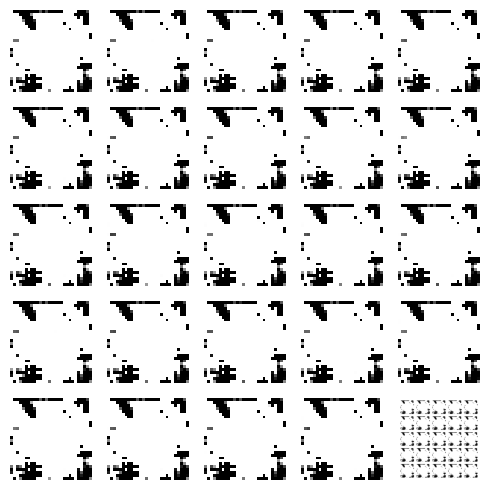

  0%|          | 0/350 [00:00<?, ?it/s]

4/4 [==============================] - 0s 20ms/step


  0%|          | 1/350 [00:00<03:48,  1.53it/s]

4/4 [==============================] - 0s 15ms/step


  1%|          | 2/350 [00:01<03:34,  1.62it/s]

4/4 [==============================] - 0s 18ms/step


  1%|          | 3/350 [00:01<03:32,  1.64it/s]

4/4 [==============================] - 0s 15ms/step


  1%|          | 4/350 [00:02<03:36,  1.60it/s]

4/4 [==============================] - 0s 14ms/step


  1%|▏         | 5/350 [00:03<03:43,  1.54it/s]

4/4 [==============================] - 0s 11ms/step


  2%|▏         | 6/350 [00:03<03:38,  1.57it/s]

4/4 [==============================] - 0s 20ms/step


  2%|▏         | 7/350 [00:04<03:34,  1.60it/s]

4/4 [==============================] - 0s 13ms/step


  2%|▏         | 8/350 [00:04<03:26,  1.66it/s]

4/4 [==============================] - 0s 16ms/step


  3%|▎         | 9/350 [00:05<03:31,  1.61it/s]

4/4 [==============================] - 0s 11ms/step


  3%|▎         | 10/350 [00:06<03:29,  1.63it/s]

4/4 [==============================] - 0s 15ms/step


  3%|▎         | 11/350 [00:06<03:18,  1.70it/s]

4/4 [==============================] - 0s 16ms/step


  3%|▎         | 12/350 [00:07<03:16,  1.72it/s]

4/4 [==============================] - 0s 11ms/step


  4%|▎         | 13/350 [00:07<03:23,  1.65it/s]

4/4 [==============================] - 0s 13ms/step


  4%|▍         | 14/350 [00:08<03:23,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


  4%|▍         | 15/350 [00:09<03:20,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


  5%|▍         | 16/350 [00:09<03:14,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


  5%|▍         | 17/350 [00:10<03:27,  1.61it/s]

4/4 [==============================] - 0s 15ms/step


  5%|▌         | 18/350 [00:10<03:21,  1.65it/s]

4/4 [==============================] - 0s 13ms/step


  5%|▌         | 19/350 [00:11<03:18,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


  6%|▌         | 20/350 [00:12<03:08,  1.75it/s]

4/4 [==============================] - 0s 16ms/step


  6%|▌         | 21/350 [00:12<03:13,  1.70it/s]

4/4 [==============================] - 0s 10ms/step


  6%|▋         | 22/350 [00:13<03:15,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


  7%|▋         | 23/350 [00:13<03:17,  1.66it/s]

4/4 [==============================] - 0s 14ms/step


  7%|▋         | 24/350 [00:14<03:14,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


  7%|▋         | 25/350 [00:15<03:16,  1.65it/s]

4/4 [==============================] - 0s 14ms/step


  7%|▋         | 26/350 [00:15<03:17,  1.64it/s]

4/4 [==============================] - 0s 15ms/step


  8%|▊         | 27/350 [00:16<03:16,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


  8%|▊         | 28/350 [00:16<03:11,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


  8%|▊         | 29/350 [00:17<03:07,  1.72it/s]

4/4 [==============================] - 0s 11ms/step


  9%|▊         | 30/350 [00:18<03:10,  1.68it/s]

4/4 [==============================] - 0s 20ms/step


  9%|▉         | 31/350 [00:18<03:09,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


  9%|▉         | 32/350 [00:19<03:13,  1.65it/s]

4/4 [==============================] - 0s 13ms/step


  9%|▉         | 33/350 [00:19<03:06,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 10%|▉         | 34/350 [00:20<03:16,  1.61it/s]

4/4 [==============================] - 0s 14ms/step


 10%|█         | 35/350 [00:21<03:12,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


 10%|█         | 36/350 [00:21<03:10,  1.65it/s]

4/4 [==============================] - 0s 15ms/step


 11%|█         | 37/350 [00:22<03:05,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 11%|█         | 38/350 [00:23<03:17,  1.58it/s]

4/4 [==============================] - 0s 14ms/step


 11%|█         | 39/350 [00:23<03:10,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


 11%|█▏        | 40/350 [00:24<03:05,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 12%|█▏        | 41/350 [00:24<02:57,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 12%|█▏        | 42/350 [00:25<02:58,  1.73it/s]

4/4 [==============================] - 0s 12ms/step


 12%|█▏        | 43/350 [00:25<03:01,  1.69it/s]

4/4 [==============================] - 0s 10ms/step


 13%|█▎        | 44/350 [00:26<03:00,  1.70it/s]

4/4 [==============================] - 0s 14ms/step


 13%|█▎        | 45/350 [00:27<02:56,  1.73it/s]

4/4 [==============================] - 0s 11ms/step


 13%|█▎        | 46/350 [00:27<03:01,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


 13%|█▎        | 47/350 [00:28<02:59,  1.69it/s]

4/4 [==============================] - 0s 16ms/step


 14%|█▎        | 48/350 [00:28<02:57,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 14%|█▍        | 49/350 [00:29<03:01,  1.66it/s]

4/4 [==============================] - 0s 14ms/step


 14%|█▍        | 50/350 [00:30<02:55,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 15%|█▍        | 51/350 [00:30<03:02,  1.64it/s]

4/4 [==============================] - 0s 14ms/step


 15%|█▍        | 52/350 [00:31<02:57,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 15%|█▌        | 53/350 [00:31<02:59,  1.66it/s]

4/4 [==============================] - 0s 14ms/step


 15%|█▌        | 54/350 [00:32<02:51,  1.72it/s]

4/4 [==============================] - 0s 15ms/step


 16%|█▌        | 55/350 [00:32<02:51,  1.72it/s]

4/4 [==============================] - 0s 11ms/step


 16%|█▌        | 56/350 [00:33<02:58,  1.65it/s]

4/4 [==============================] - 0s 17ms/step


 16%|█▋        | 57/350 [00:34<02:53,  1.69it/s]

4/4 [==============================] - 0s 15ms/step


 17%|█▋        | 58/350 [00:34<02:49,  1.73it/s]

4/4 [==============================] - 0s 18ms/step


 17%|█▋        | 59/350 [00:35<02:48,  1.73it/s]

4/4 [==============================] - 0s 11ms/step


 17%|█▋        | 60/350 [00:36<02:56,  1.64it/s]

4/4 [==============================] - 0s 20ms/step


 17%|█▋        | 61/350 [00:36<02:51,  1.69it/s]

4/4 [==============================] - 0s 15ms/step


 18%|█▊        | 62/350 [00:37<02:48,  1.71it/s]

4/4 [==============================] - 0s 11ms/step


 18%|█▊        | 63/350 [00:37<02:51,  1.67it/s]

4/4 [==============================] - 0s 15ms/step


 18%|█▊        | 64/350 [00:38<02:49,  1.69it/s]

4/4 [==============================] - 0s 16ms/step


 19%|█▊        | 65/350 [00:38<02:52,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 19%|█▉        | 66/350 [00:39<02:52,  1.65it/s]

4/4 [==============================] - 0s 13ms/step


 19%|█▉        | 67/350 [00:40<02:47,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 19%|█▉        | 68/350 [00:40<02:51,  1.64it/s]

4/4 [==============================] - 0s 14ms/step


 20%|█▉        | 69/350 [00:41<02:54,  1.61it/s]

4/4 [==============================] - 0s 11ms/step


 20%|██        | 70/350 [00:42<02:53,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


 20%|██        | 71/350 [00:42<02:49,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 21%|██        | 72/350 [00:43<02:47,  1.66it/s]

4/4 [==============================] - 0s 17ms/step


 21%|██        | 73/350 [00:43<02:49,  1.63it/s]

4/4 [==============================] - 0s 17ms/step


 21%|██        | 74/350 [00:44<02:51,  1.61it/s]

4/4 [==============================] - 0s 15ms/step


 21%|██▏       | 75/350 [00:45<02:41,  1.70it/s]

4/4 [==============================] - 0s 13ms/step


 22%|██▏       | 76/350 [00:45<02:39,  1.71it/s]

4/4 [==============================] - 0s 15ms/step


 22%|██▏       | 77/350 [00:46<02:45,  1.65it/s]

4/4 [==============================] - 0s 16ms/step


 22%|██▏       | 78/350 [00:46<02:44,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 23%|██▎       | 79/350 [00:47<02:40,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 23%|██▎       | 80/350 [00:47<02:38,  1.71it/s]

4/4 [==============================] - 0s 15ms/step


 23%|██▎       | 81/350 [00:48<02:37,  1.71it/s]

4/4 [==============================] - 0s 11ms/step


 23%|██▎       | 82/350 [00:49<02:44,  1.63it/s]

4/4 [==============================] - 0s 16ms/step


 24%|██▎       | 83/350 [00:49<02:41,  1.65it/s]

4/4 [==============================] - 0s 15ms/step


 24%|██▍       | 84/350 [00:50<02:37,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 24%|██▍       | 85/350 [00:51<02:39,  1.66it/s]

4/4 [==============================] - 0s 15ms/step


 25%|██▍       | 86/350 [00:51<02:41,  1.64it/s]

4/4 [==============================] - 0s 15ms/step


 25%|██▍       | 87/350 [00:52<02:40,  1.64it/s]

4/4 [==============================] - 0s 13ms/step


 25%|██▌       | 88/350 [00:52<02:35,  1.69it/s]

4/4 [==============================] - 0s 10ms/step


 25%|██▌       | 89/350 [00:53<02:37,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 26%|██▌       | 90/350 [00:54<02:39,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 26%|██▌       | 91/350 [00:54<02:39,  1.62it/s]

4/4 [==============================] - 0s 13ms/step


 26%|██▋       | 92/350 [00:55<02:37,  1.64it/s]

4/4 [==============================] - 0s 10ms/step


 27%|██▋       | 93/350 [00:55<02:34,  1.66it/s]

4/4 [==============================] - 0s 14ms/step


 27%|██▋       | 94/350 [00:56<02:36,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 27%|██▋       | 95/350 [00:57<02:38,  1.61it/s]

4/4 [==============================] - 0s 13ms/step


 27%|██▋       | 96/350 [00:57<02:32,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 28%|██▊       | 97/350 [00:58<02:31,  1.67it/s]

4/4 [==============================] - 0s 16ms/step


 28%|██▊       | 98/350 [00:58<02:36,  1.61it/s]

4/4 [==============================] - 0s 11ms/step


 28%|██▊       | 99/350 [00:59<02:37,  1.60it/s]

4/4 [==============================] - 0s 14ms/step


 29%|██▊       | 100/350 [01:00<02:30,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 29%|██▉       | 101/350 [01:00<02:28,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 29%|██▉       | 102/350 [01:01<02:28,  1.67it/s]

4/4 [==============================] - 0s 14ms/step


 29%|██▉       | 103/350 [01:01<02:25,  1.70it/s]

4/4 [==============================] - 0s 15ms/step


 30%|██▉       | 104/350 [01:02<02:24,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 30%|███       | 105/350 [01:03<02:24,  1.70it/s]

4/4 [==============================] - 0s 14ms/step


 30%|███       | 106/350 [01:03<02:25,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 31%|███       | 107/350 [01:04<02:28,  1.63it/s]

4/4 [==============================] - 0s 14ms/step


 31%|███       | 108/350 [01:04<02:23,  1.68it/s]

4/4 [==============================] - 0s 14ms/step


 31%|███       | 109/350 [01:05<02:21,  1.71it/s]

4/4 [==============================] - 0s 11ms/step


 31%|███▏      | 110/350 [01:06<02:22,  1.69it/s]

4/4 [==============================] - 0s 13ms/step


 32%|███▏      | 111/350 [01:06<02:26,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 32%|███▏      | 112/350 [01:07<02:25,  1.64it/s]

4/4 [==============================] - 0s 14ms/step


 32%|███▏      | 113/350 [01:07<02:22,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 33%|███▎      | 114/350 [01:08<02:21,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 33%|███▎      | 115/350 [01:09<02:23,  1.64it/s]

4/4 [==============================] - 0s 13ms/step


 33%|███▎      | 116/350 [01:09<02:21,  1.66it/s]

4/4 [==============================] - 0s 15ms/step


 33%|███▎      | 117/350 [01:10<02:15,  1.72it/s]

4/4 [==============================] - 0s 14ms/step


 34%|███▎      | 118/350 [01:10<02:16,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 34%|███▍      | 119/350 [01:11<02:24,  1.59it/s]

4/4 [==============================] - 0s 14ms/step


 34%|███▍      | 120/350 [01:12<02:24,  1.59it/s]

4/4 [==============================] - 0s 14ms/step


 35%|███▍      | 121/350 [01:12<02:18,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 35%|███▍      | 122/350 [01:13<02:18,  1.65it/s]

4/4 [==============================] - 0s 13ms/step


 35%|███▌      | 123/350 [01:14<02:22,  1.59it/s]

4/4 [==============================] - 0s 11ms/step


 35%|███▌      | 124/350 [01:14<02:19,  1.62it/s]

4/4 [==============================] - 0s 14ms/step


 36%|███▌      | 125/350 [01:15<02:16,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 36%|███▌      | 126/350 [01:15<02:16,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 36%|███▋      | 127/350 [01:16<02:13,  1.66it/s]

4/4 [==============================] - 0s 19ms/step


 37%|███▋      | 128/350 [01:17<02:12,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 37%|███▋      | 129/350 [01:17<02:13,  1.65it/s]

4/4 [==============================] - 0s 13ms/step


 37%|███▋      | 130/350 [01:18<02:11,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 37%|███▋      | 131/350 [01:18<02:12,  1.65it/s]

4/4 [==============================] - 0s 20ms/step


 38%|███▊      | 132/350 [01:19<02:11,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


 38%|███▊      | 133/350 [01:20<02:15,  1.60it/s]

4/4 [==============================] - 0s 14ms/step


 38%|███▊      | 134/350 [01:20<02:10,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 39%|███▊      | 135/350 [01:21<02:12,  1.63it/s]

4/4 [==============================] - 0s 19ms/step


 39%|███▉      | 136/350 [01:21<02:10,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


 39%|███▉      | 137/350 [01:22<02:12,  1.61it/s]

4/4 [==============================] - 0s 13ms/step


 39%|███▉      | 138/350 [01:23<02:05,  1.70it/s]

4/4 [==============================] - 0s 14ms/step


 40%|███▉      | 139/350 [01:23<02:02,  1.72it/s]

4/4 [==============================] - 0s 11ms/step


 40%|████      | 140/350 [01:24<02:08,  1.64it/s]

4/4 [==============================] - 0s 17ms/step


 40%|████      | 141/350 [01:24<02:03,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 41%|████      | 142/350 [01:25<02:01,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 41%|████      | 143/350 [01:26<02:01,  1.70it/s]

4/4 [==============================] - 0s 14ms/step


 41%|████      | 144/350 [01:26<02:07,  1.61it/s]

4/4 [==============================] - 0s 11ms/step


 41%|████▏     | 145/350 [01:27<02:05,  1.64it/s]

4/4 [==============================] - 0s 14ms/step


 42%|████▏     | 146/350 [01:27<02:00,  1.69it/s]

4/4 [==============================] - 0s 14ms/step


 42%|████▏     | 147/350 [01:28<02:06,  1.61it/s]

4/4 [==============================] - 0s 13ms/step


 42%|████▏     | 148/350 [01:29<02:05,  1.61it/s]

4/4 [==============================] - 0s 15ms/step


 43%|████▎     | 149/350 [01:29<02:04,  1.61it/s]

4/4 [==============================] - 0s 13ms/step


 43%|████▎     | 150/350 [01:30<01:59,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 43%|████▎     | 151/350 [01:30<02:00,  1.65it/s]

4/4 [==============================] - 0s 14ms/step


 43%|████▎     | 152/350 [01:31<01:59,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 44%|████▎     | 153/350 [01:32<01:58,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 44%|████▍     | 154/350 [01:32<02:00,  1.62it/s]

4/4 [==============================] - 0s 14ms/step


 44%|████▍     | 155/350 [01:33<01:55,  1.69it/s]

4/4 [==============================] - 0s 16ms/step


 45%|████▍     | 156/350 [01:33<01:52,  1.73it/s]

4/4 [==============================] - 0s 11ms/step


 45%|████▍     | 157/350 [01:34<01:56,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


 45%|████▌     | 158/350 [01:35<01:56,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 45%|████▌     | 159/350 [01:35<01:52,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 46%|████▌     | 160/350 [01:36<01:51,  1.70it/s]

4/4 [==============================] - 0s 16ms/step


 46%|████▌     | 161/350 [01:36<01:53,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 46%|████▋     | 162/350 [01:37<01:54,  1.64it/s]

4/4 [==============================] - 0s 16ms/step


 47%|████▋     | 163/350 [01:38<01:48,  1.72it/s]

4/4 [==============================] - 0s 16ms/step


 47%|████▋     | 164/350 [01:38<01:48,  1.72it/s]

4/4 [==============================] - 0s 11ms/step


 47%|████▋     | 165/350 [01:39<01:52,  1.64it/s]

4/4 [==============================] - 0s 16ms/step


 47%|████▋     | 166/350 [01:39<01:49,  1.68it/s]

4/4 [==============================] - 0s 15ms/step


 48%|████▊     | 167/350 [01:40<01:51,  1.64it/s]

4/4 [==============================] - 0s 13ms/step


 48%|████▊     | 168/350 [01:41<01:48,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 48%|████▊     | 169/350 [01:41<01:54,  1.57it/s]

4/4 [==============================] - 0s 14ms/step


 49%|████▊     | 170/350 [01:42<01:48,  1.65it/s]

4/4 [==============================] - 0s 14ms/step


 49%|████▉     | 171/350 [01:42<01:47,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 49%|████▉     | 172/350 [01:43<01:47,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 49%|████▉     | 173/350 [01:44<01:48,  1.63it/s]

4/4 [==============================] - 0s 19ms/step


 50%|████▉     | 174/350 [01:44<01:46,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 50%|█████     | 175/350 [01:45<01:47,  1.64it/s]

4/4 [==============================] - 0s 16ms/step


 50%|█████     | 176/350 [01:45<01:42,  1.70it/s]

4/4 [==============================] - 0s 15ms/step


 51%|█████     | 177/350 [01:46<01:40,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


 51%|█████     | 178/350 [01:47<01:43,  1.66it/s]

4/4 [==============================] - 0s 15ms/step


 51%|█████     | 179/350 [01:47<01:43,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 51%|█████▏    | 180/350 [01:48<01:39,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 52%|█████▏    | 181/350 [01:48<01:39,  1.69it/s]

4/4 [==============================] - 0s 13ms/step


 52%|█████▏    | 182/350 [01:49<01:41,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


 52%|█████▏    | 183/350 [01:50<01:43,  1.62it/s]

4/4 [==============================] - 0s 18ms/step


 53%|█████▎    | 184/350 [01:50<01:39,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 53%|█████▎    | 185/350 [01:51<01:40,  1.64it/s]

4/4 [==============================] - 0s 13ms/step


 53%|█████▎    | 186/350 [01:52<01:42,  1.61it/s]

4/4 [==============================] - 0s 11ms/step


 53%|█████▎    | 187/350 [01:52<01:40,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 54%|█████▎    | 188/350 [01:53<01:36,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 54%|█████▍    | 189/350 [01:53<01:37,  1.65it/s]

4/4 [==============================] - 0s 14ms/step


 54%|█████▍    | 190/350 [01:54<01:40,  1.60it/s]

4/4 [==============================] - 0s 11ms/step


 55%|█████▍    | 191/350 [01:55<01:38,  1.61it/s]

4/4 [==============================] - 0s 15ms/step


 55%|█████▍    | 192/350 [01:55<01:35,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 55%|█████▌    | 193/350 [01:56<01:36,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


 55%|█████▌    | 194/350 [01:56<01:35,  1.63it/s]

4/4 [==============================] - 0s 19ms/step


 56%|█████▌    | 195/350 [01:57<01:36,  1.61it/s]

4/4 [==============================] - 0s 14ms/step


 56%|█████▌    | 196/350 [01:58<01:34,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 56%|█████▋    | 197/350 [01:58<01:31,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


 57%|█████▋    | 198/350 [01:59<01:32,  1.64it/s]

4/4 [==============================] - 0s 16ms/step


 57%|█████▋    | 199/350 [01:59<01:29,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 57%|█████▋    | 200/350 [02:00<01:30,  1.65it/s]

4/4 [==============================] - 0s 16ms/step


 57%|█████▋    | 201/350 [02:01<01:27,  1.71it/s]

4/4 [==============================] - 0s 16ms/step


 58%|█████▊    | 202/350 [02:01<01:27,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 58%|█████▊    | 203/350 [02:02<01:30,  1.63it/s]

4/4 [==============================] - 0s 17ms/step


 58%|█████▊    | 204/350 [02:02<01:28,  1.66it/s]

4/4 [==============================] - 0s 16ms/step


 59%|█████▊    | 205/350 [02:03<01:26,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 59%|█████▉    | 206/350 [02:04<01:25,  1.68it/s]

4/4 [==============================] - 0s 16ms/step


 59%|█████▉    | 207/350 [02:04<01:28,  1.61it/s]

4/4 [==============================] - 0s 11ms/step


 59%|█████▉    | 208/350 [02:05<01:25,  1.65it/s]

4/4 [==============================] - 0s 14ms/step


 60%|█████▉    | 209/350 [02:05<01:23,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 60%|██████    | 210/350 [02:06<01:25,  1.63it/s]

4/4 [==============================] - 0s 14ms/step


 60%|██████    | 211/350 [02:07<01:26,  1.61it/s]

4/4 [==============================] - 0s 15ms/step


 61%|██████    | 212/350 [02:07<01:24,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 61%|██████    | 213/350 [02:08<01:21,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 61%|██████    | 214/350 [02:09<01:23,  1.64it/s]

4/4 [==============================] - 0s 15ms/step


 61%|██████▏   | 215/350 [02:09<01:21,  1.65it/s]

4/4 [==============================] - 0s 17ms/step


 62%|██████▏   | 216/350 [02:10<01:20,  1.67it/s]

4/4 [==============================] - 0s 15ms/step


 62%|██████▏   | 217/350 [02:10<01:22,  1.62it/s]

4/4 [==============================] - 0s 15ms/step


 62%|██████▏   | 218/350 [02:11<01:18,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 63%|██████▎   | 219/350 [02:12<01:21,  1.62it/s]

4/4 [==============================] - 0s 14ms/step


 63%|██████▎   | 220/350 [02:12<01:18,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 63%|██████▎   | 221/350 [02:13<01:18,  1.63it/s]

4/4 [==============================] - 0s 15ms/step


 63%|██████▎   | 222/350 [02:13<01:14,  1.72it/s]

4/4 [==============================] - 0s 14ms/step


 64%|██████▎   | 223/350 [02:14<01:12,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 64%|██████▍   | 224/350 [02:14<01:14,  1.70it/s]

4/4 [==============================] - 0s 17ms/step


 64%|██████▍   | 225/350 [02:15<01:16,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 65%|██████▍   | 226/350 [02:16<01:12,  1.70it/s]

4/4 [==============================] - 0s 13ms/step


 65%|██████▍   | 227/350 [02:16<01:13,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 65%|██████▌   | 228/350 [02:17<01:15,  1.61it/s]

4/4 [==============================] - 0s 11ms/step


 65%|██████▌   | 229/350 [02:18<01:14,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


 66%|██████▌   | 230/350 [02:18<01:12,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 66%|██████▌   | 231/350 [02:19<01:12,  1.64it/s]

4/4 [==============================] - 0s 15ms/step


 66%|██████▋   | 232/350 [02:19<01:13,  1.61it/s]

4/4 [==============================] - 0s 16ms/step


 67%|██████▋   | 233/350 [02:20<01:13,  1.59it/s]

4/4 [==============================] - 0s 13ms/step


 67%|██████▋   | 234/350 [02:21<01:10,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 67%|██████▋   | 235/350 [02:21<01:12,  1.59it/s]

4/4 [==============================] - 0s 11ms/step


 67%|██████▋   | 236/350 [02:22<01:11,  1.59it/s]

4/4 [==============================] - 0s 11ms/step


 68%|██████▊   | 237/350 [02:23<01:10,  1.61it/s]

4/4 [==============================] - 0s 12ms/step


 68%|██████▊   | 238/350 [02:23<01:09,  1.62it/s]

4/4 [==============================] - 0s 10ms/step


 68%|██████▊   | 239/350 [02:24<01:05,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 69%|██████▊   | 240/350 [02:24<01:09,  1.59it/s]

4/4 [==============================] - 0s 12ms/step


 69%|██████▉   | 241/350 [02:25<01:09,  1.57it/s]

4/4 [==============================] - 0s 15ms/step


 69%|██████▉   | 242/350 [02:26<01:05,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 69%|██████▉   | 243/350 [02:26<01:06,  1.62it/s]

4/4 [==============================] - 0s 15ms/step


 70%|██████▉   | 244/350 [02:27<01:05,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


 70%|███████   | 245/350 [02:27<01:05,  1.60it/s]

4/4 [==============================] - 0s 14ms/step


 70%|███████   | 246/350 [02:28<01:02,  1.66it/s]

4/4 [==============================] - 0s 14ms/step


 71%|███████   | 247/350 [02:29<01:03,  1.63it/s]

4/4 [==============================] - 0s 16ms/step


 71%|███████   | 248/350 [02:29<01:04,  1.58it/s]

4/4 [==============================] - 0s 11ms/step


 71%|███████   | 249/350 [02:30<01:02,  1.62it/s]

4/4 [==============================] - 0s 13ms/step


 71%|███████▏  | 250/350 [02:30<00:59,  1.68it/s]

4/4 [==============================] - 0s 14ms/step


 72%|███████▏  | 251/350 [02:31<01:00,  1.64it/s]

4/4 [==============================] - 0s 14ms/step


 72%|███████▏  | 252/350 [02:32<01:00,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


 72%|███████▏  | 253/350 [02:32<01:00,  1.59it/s]

4/4 [==============================] - 0s 12ms/step


 73%|███████▎  | 254/350 [02:33<00:57,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 73%|███████▎  | 255/350 [02:34<00:57,  1.65it/s]

4/4 [==============================] - 0s 13ms/step


 73%|███████▎  | 256/350 [02:34<00:57,  1.63it/s]

4/4 [==============================] - 0s 14ms/step


 73%|███████▎  | 257/350 [02:35<00:57,  1.62it/s]

4/4 [==============================] - 0s 13ms/step


 74%|███████▎  | 258/350 [02:35<00:55,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 74%|███████▍  | 259/350 [02:36<00:54,  1.67it/s]

4/4 [==============================] - 0s 14ms/step


 74%|███████▍  | 260/350 [02:37<00:54,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 75%|███████▍  | 261/350 [02:37<00:54,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


 75%|███████▍  | 262/350 [02:38<00:52,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 75%|███████▌  | 263/350 [02:38<00:50,  1.71it/s]

4/4 [==============================] - 0s 11ms/step


 75%|███████▌  | 264/350 [02:39<00:53,  1.60it/s]

4/4 [==============================] - 0s 17ms/step


 76%|███████▌  | 265/350 [02:40<00:53,  1.58it/s]

4/4 [==============================] - 0s 15ms/step


 76%|███████▌  | 266/350 [02:40<00:50,  1.65it/s]

4/4 [==============================] - 0s 15ms/step


 76%|███████▋  | 267/350 [02:41<00:49,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 77%|███████▋  | 268/350 [02:42<00:51,  1.60it/s]

4/4 [==============================] - 0s 15ms/step


 77%|███████▋  | 269/350 [02:42<00:48,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 77%|███████▋  | 270/350 [02:43<00:48,  1.66it/s]

4/4 [==============================] - 0s 14ms/step


 77%|███████▋  | 271/350 [02:43<00:46,  1.71it/s]

4/4 [==============================] - 0s 17ms/step


 78%|███████▊  | 272/350 [02:44<00:46,  1.69it/s]

4/4 [==============================] - 0s 13ms/step


 78%|███████▊  | 273/350 [02:44<00:47,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


 78%|███████▊  | 274/350 [02:45<00:46,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 79%|███████▊  | 275/350 [02:46<00:45,  1.64it/s]

4/4 [==============================] - 0s 15ms/step


 79%|███████▉  | 276/350 [02:46<00:44,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


 79%|███████▉  | 277/350 [02:47<00:44,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


 79%|███████▉  | 278/350 [02:47<00:43,  1.65it/s]

4/4 [==============================] - 0s 14ms/step


 80%|███████▉  | 279/350 [02:48<00:42,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


 80%|████████  | 280/350 [02:49<00:42,  1.65it/s]

4/4 [==============================] - 0s 14ms/step


 80%|████████  | 281/350 [02:49<00:42,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


 81%|████████  | 282/350 [02:50<00:42,  1.60it/s]

4/4 [==============================] - 0s 12ms/step


 81%|████████  | 283/350 [02:51<00:40,  1.67it/s]

4/4 [==============================] - 0s 16ms/step


 81%|████████  | 284/350 [02:51<00:39,  1.65it/s]

4/4 [==============================] - 0s 14ms/step


 81%|████████▏ | 285/350 [02:52<00:40,  1.61it/s]

4/4 [==============================] - 0s 11ms/step


 82%|████████▏ | 286/350 [02:52<00:40,  1.58it/s]

4/4 [==============================] - 0s 13ms/step


 82%|████████▏ | 287/350 [02:53<00:38,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 82%|████████▏ | 288/350 [02:54<00:37,  1.65it/s]

4/4 [==============================] - 0s 13ms/step


 83%|████████▎ | 289/350 [02:54<00:38,  1.57it/s]

4/4 [==============================] - 0s 11ms/step


 83%|████████▎ | 290/350 [02:55<00:37,  1.61it/s]

4/4 [==============================] - 0s 13ms/step


 83%|████████▎ | 291/350 [02:55<00:35,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


 83%|████████▎ | 292/350 [02:56<00:35,  1.64it/s]

4/4 [==============================] - 0s 16ms/step


 84%|████████▎ | 293/350 [02:57<00:34,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 84%|████████▍ | 294/350 [02:57<00:33,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 84%|████████▍ | 295/350 [02:58<00:32,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 85%|████████▍ | 296/350 [02:58<00:32,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 85%|████████▍ | 297/350 [02:59<00:30,  1.73it/s]

4/4 [==============================] - 0s 11ms/step


 85%|████████▌ | 298/350 [03:00<00:31,  1.67it/s]

4/4 [==============================] - 0s 17ms/step


 85%|████████▌ | 299/350 [03:00<00:30,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 86%|████████▌ | 300/350 [03:01<00:30,  1.63it/s]

4/4 [==============================] - 0s 14ms/step


 86%|████████▌ | 301/350 [03:01<00:28,  1.69it/s]

4/4 [==============================] - 0s 14ms/step


 86%|████████▋ | 302/350 [03:02<00:29,  1.63it/s]

4/4 [==============================] - 0s 18ms/step


 87%|████████▋ | 303/350 [03:03<00:28,  1.63it/s]

4/4 [==============================] - 0s 16ms/step


 87%|████████▋ | 304/350 [03:03<00:27,  1.69it/s]

4/4 [==============================] - 0s 13ms/step


 87%|████████▋ | 305/350 [03:04<00:26,  1.67it/s]

4/4 [==============================] - 0s 16ms/step


 87%|████████▋ | 306/350 [03:05<00:26,  1.64it/s]

4/4 [==============================] - 0s 14ms/step


 88%|████████▊ | 307/350 [03:05<00:27,  1.58it/s]

4/4 [==============================] - 0s 14ms/step


 88%|████████▊ | 308/350 [03:06<00:25,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 88%|████████▊ | 309/350 [03:06<00:25,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


 89%|████████▊ | 310/350 [03:07<00:25,  1.56it/s]

4/4 [==============================] - 0s 11ms/step


 89%|████████▉ | 311/350 [03:08<00:24,  1.59it/s]

4/4 [==============================] - 0s 13ms/step


 89%|████████▉ | 312/350 [03:08<00:22,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 89%|████████▉ | 313/350 [03:09<00:21,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 90%|████████▉ | 314/350 [03:09<00:22,  1.60it/s]

4/4 [==============================] - 0s 13ms/step


 90%|█████████ | 315/350 [03:10<00:21,  1.63it/s]

4/4 [==============================] - 0s 18ms/step


 90%|█████████ | 316/350 [03:11<00:20,  1.63it/s]

4/4 [==============================] - 0s 14ms/step


 91%|█████████ | 317/350 [03:11<00:19,  1.66it/s]

4/4 [==============================] - 0s 14ms/step


 91%|█████████ | 318/350 [03:12<00:20,  1.57it/s]

4/4 [==============================] - 0s 12ms/step


 91%|█████████ | 319/350 [03:13<00:19,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 91%|█████████▏| 320/350 [03:13<00:18,  1.61it/s]

4/4 [==============================] - 0s 12ms/step


 92%|█████████▏| 321/350 [03:14<00:17,  1.69it/s]

4/4 [==============================] - 0s 14ms/step


 92%|█████████▏| 322/350 [03:14<00:16,  1.71it/s]

4/4 [==============================] - 0s 11ms/step


 92%|█████████▏| 323/350 [03:15<00:16,  1.65it/s]

4/4 [==============================] - 0s 15ms/step


 93%|█████████▎| 324/350 [03:16<00:15,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 93%|█████████▎| 325/350 [03:16<00:14,  1.71it/s]

4/4 [==============================] - 0s 11ms/step


 93%|█████████▎| 326/350 [03:17<00:14,  1.69it/s]

4/4 [==============================] - 0s 15ms/step


 93%|█████████▎| 327/350 [03:17<00:14,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 94%|█████████▎| 328/350 [03:18<00:13,  1.61it/s]

4/4 [==============================] - 0s 13ms/step


 94%|█████████▍| 329/350 [03:19<00:12,  1.68it/s]

4/4 [==============================] - 0s 15ms/step


 94%|█████████▍| 330/350 [03:19<00:12,  1.65it/s]

4/4 [==============================] - 0s 16ms/step


 95%|█████████▍| 331/350 [03:20<00:12,  1.58it/s]

4/4 [==============================] - 0s 11ms/step


 95%|█████████▍| 332/350 [03:20<00:11,  1.62it/s]

4/4 [==============================] - 0s 14ms/step


 95%|█████████▌| 333/350 [03:21<00:10,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 95%|█████████▌| 334/350 [03:22<00:09,  1.62it/s]

4/4 [==============================] - 0s 15ms/step


 96%|█████████▌| 335/350 [03:22<00:09,  1.61it/s]

4/4 [==============================] - 0s 17ms/step


 96%|█████████▌| 336/350 [03:23<00:08,  1.59it/s]

4/4 [==============================] - 0s 14ms/step


 96%|█████████▋| 337/350 [03:23<00:07,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 97%|█████████▋| 338/350 [03:24<00:07,  1.61it/s]

4/4 [==============================] - 0s 12ms/step


 97%|█████████▋| 339/350 [03:25<00:06,  1.62it/s]

4/4 [==============================] - 0s 15ms/step


 97%|█████████▋| 340/350 [03:25<00:06,  1.60it/s]

4/4 [==============================] - 0s 13ms/step


 97%|█████████▋| 341/350 [03:26<00:05,  1.62it/s]

4/4 [==============================] - 0s 11ms/step


 98%|█████████▊| 342/350 [03:27<00:04,  1.65it/s]

4/4 [==============================] - 0s 14ms/step


 98%|█████████▊| 343/350 [03:27<00:04,  1.61it/s]

4/4 [==============================] - 0s 14ms/step


 98%|█████████▊| 344/350 [03:28<00:03,  1.58it/s]

4/4 [==============================] - 0s 15ms/step


 99%|█████████▊| 345/350 [03:28<00:03,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


 99%|█████████▉| 346/350 [03:29<00:02,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 99%|█████████▉| 347/350 [03:30<00:01,  1.63it/s]

4/4 [==============================] - 0s 16ms/step


 99%|█████████▉| 348/350 [03:30<00:01,  1.62it/s]

4/4 [==============================] - 0s 11ms/step


100%|█████████▉| 349/350 [03:31<00:00,  1.63it/s]

4/4 [==============================] - 0s 14ms/step


100%|██████████| 350/350 [03:31<00:00,  1.65it/s]

Epoch number: 75 discriminator_loss: 0.3684970496019482 generator_loss: 6.924008622850691
1/1 [==============================] - 0s 26ms/step


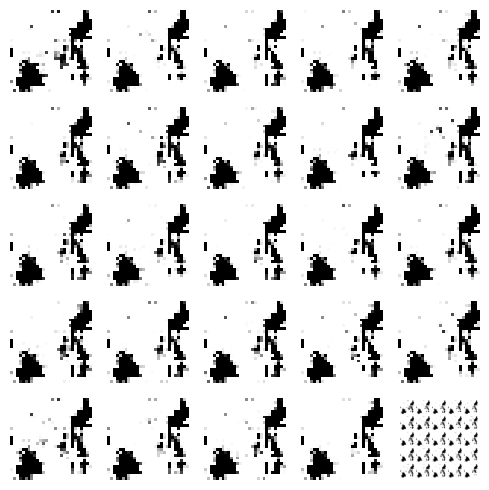

  0%|          | 0/350 [00:00<?, ?it/s]

4/4 [==============================] - 0s 14ms/step


  0%|          | 1/350 [00:00<03:09,  1.84it/s]

4/4 [==============================] - 0s 14ms/step


  1%|          | 2/350 [00:01<03:18,  1.76it/s]

4/4 [==============================] - 0s 12ms/step


  1%|          | 3/350 [00:01<03:21,  1.72it/s]

4/4 [==============================] - 0s 14ms/step


  1%|          | 4/350 [00:02<03:35,  1.60it/s]

4/4 [==============================] - 0s 18ms/step


  1%|▏         | 5/350 [00:02<03:27,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


  2%|▏         | 6/350 [00:03<03:22,  1.70it/s]

4/4 [==============================] - 0s 15ms/step


  2%|▏         | 7/350 [00:04<03:24,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


  2%|▏         | 8/350 [00:04<03:23,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


  3%|▎         | 9/350 [00:05<03:35,  1.58it/s]

4/4 [==============================] - 0s 15ms/step


  3%|▎         | 10/350 [00:06<03:29,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


  3%|▎         | 11/350 [00:06<03:29,  1.62it/s]

4/4 [==============================] - 0s 11ms/step


  3%|▎         | 12/350 [00:07<03:17,  1.72it/s]

4/4 [==============================] - 0s 14ms/step


  4%|▎         | 13/350 [00:07<03:26,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


  4%|▍         | 14/350 [00:08<03:26,  1.63it/s]

4/4 [==============================] - 0s 14ms/step


  4%|▍         | 15/350 [00:09<03:25,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


  5%|▍         | 16/350 [00:09<03:31,  1.58it/s]

4/4 [==============================] - 0s 14ms/step


  5%|▍         | 17/350 [00:10<03:33,  1.56it/s]

4/4 [==============================] - 0s 14ms/step


  5%|▌         | 18/350 [00:11<03:35,  1.54it/s]

4/4 [==============================] - 0s 15ms/step


  5%|▌         | 19/350 [00:11<03:23,  1.63it/s]

4/4 [==============================] - 0s 16ms/step


  6%|▌         | 20/350 [00:12<03:19,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


  6%|▌         | 21/350 [00:12<03:27,  1.59it/s]

4/4 [==============================] - 0s 14ms/step


  6%|▋         | 22/350 [00:13<03:23,  1.61it/s]

4/4 [==============================] - 0s 11ms/step


  7%|▋         | 23/350 [00:14<03:16,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


  7%|▋         | 24/350 [00:14<03:14,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


  7%|▋         | 25/350 [00:15<03:09,  1.71it/s]

4/4 [==============================] - 0s 13ms/step


  7%|▋         | 26/350 [00:15<03:20,  1.62it/s]

4/4 [==============================] - 0s 14ms/step


  8%|▊         | 27/350 [00:16<03:13,  1.67it/s]

4/4 [==============================] - 0s 14ms/step


  8%|▊         | 28/350 [00:17<03:10,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


  8%|▊         | 29/350 [00:17<03:14,  1.65it/s]

4/4 [==============================] - 0s 14ms/step


  9%|▊         | 30/350 [00:18<03:18,  1.61it/s]

4/4 [==============================] - 0s 14ms/step


  9%|▉         | 31/350 [00:18<03:16,  1.62it/s]

4/4 [==============================] - 0s 13ms/step


  9%|▉         | 32/350 [00:19<03:10,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


  9%|▉         | 33/350 [00:20<03:10,  1.66it/s]

4/4 [==============================] - 0s 16ms/step


 10%|▉         | 34/350 [00:20<03:15,  1.61it/s]

4/4 [==============================] - 0s 14ms/step


 10%|█         | 35/350 [00:21<03:10,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 10%|█         | 36/350 [00:21<03:11,  1.64it/s]

4/4 [==============================] - 0s 14ms/step


 11%|█         | 37/350 [00:22<03:02,  1.71it/s]

4/4 [==============================] - 0s 13ms/step


 11%|█         | 38/350 [00:23<02:59,  1.74it/s]

4/4 [==============================] - 0s 16ms/step


 11%|█         | 39/350 [00:23<03:07,  1.66it/s]

4/4 [==============================] - 0s 14ms/step


 11%|█▏        | 40/350 [00:24<03:12,  1.61it/s]

4/4 [==============================] - 0s 15ms/step


 12%|█▏        | 41/350 [00:24<03:11,  1.61it/s]

4/4 [==============================] - 0s 10ms/step


 12%|█▏        | 42/350 [00:25<03:10,  1.62it/s]

4/4 [==============================] - 0s 18ms/step


 12%|█▏        | 43/350 [00:26<03:21,  1.53it/s]

4/4 [==============================] - 0s 14ms/step


 13%|█▎        | 44/350 [00:26<03:21,  1.52it/s]

4/4 [==============================] - 0s 14ms/step


 13%|█▎        | 45/350 [00:27<03:09,  1.61it/s]

4/4 [==============================] - 0s 22ms/step


 13%|█▎        | 46/350 [00:28<03:06,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 13%|█▎        | 47/350 [00:28<03:12,  1.57it/s]

4/4 [==============================] - 0s 15ms/step


 14%|█▎        | 48/350 [00:29<03:06,  1.62it/s]

4/4 [==============================] - 0s 16ms/step


 14%|█▍        | 49/350 [00:29<03:05,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


 14%|█▍        | 50/350 [00:30<02:55,  1.71it/s]

4/4 [==============================] - 0s 16ms/step


 15%|█▍        | 51/350 [00:31<02:57,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 15%|█▍        | 52/350 [00:31<02:58,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 15%|█▌        | 53/350 [00:32<02:59,  1.65it/s]

4/4 [==============================] - 0s 14ms/step


 15%|█▌        | 54/350 [00:32<02:55,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 16%|█▌        | 55/350 [00:33<02:57,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


 16%|█▌        | 56/350 [00:34<03:01,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


 16%|█▋        | 57/350 [00:34<03:03,  1.60it/s]

4/4 [==============================] - 0s 13ms/step


 17%|█▋        | 58/350 [00:35<02:58,  1.64it/s]

4/4 [==============================] - 0s 10ms/step


 17%|█▋        | 59/350 [00:35<02:52,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 17%|█▋        | 60/350 [00:36<02:58,  1.62it/s]

4/4 [==============================] - 0s 13ms/step


 17%|█▋        | 61/350 [00:37<02:55,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 18%|█▊        | 62/350 [00:37<02:57,  1.63it/s]

4/4 [==============================] - 0s 14ms/step


 18%|█▊        | 63/350 [00:38<02:48,  1.71it/s]

4/4 [==============================] - 0s 16ms/step


 18%|█▊        | 64/350 [00:38<02:45,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 19%|█▊        | 65/350 [00:39<02:58,  1.60it/s]

4/4 [==============================] - 0s 13ms/step


 19%|█▉        | 66/350 [00:40<02:51,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


 19%|█▉        | 67/350 [00:40<02:46,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 19%|█▉        | 68/350 [00:41<02:47,  1.69it/s]

4/4 [==============================] - 0s 15ms/step


 20%|█▉        | 69/350 [00:42<02:54,  1.61it/s]

4/4 [==============================] - 0s 12ms/step


 20%|██        | 70/350 [00:42<02:52,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


 20%|██        | 71/350 [00:43<02:46,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 21%|██        | 72/350 [00:43<02:47,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


 21%|██        | 73/350 [00:44<02:50,  1.63it/s]

4/4 [==============================] - 0s 14ms/step


 21%|██        | 74/350 [00:45<02:52,  1.60it/s]

4/4 [==============================] - 0s 12ms/step


 21%|██▏       | 75/350 [00:45<02:44,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 22%|██▏       | 76/350 [00:46<02:44,  1.67it/s]

4/4 [==============================] - 0s 18ms/step


 22%|██▏       | 77/350 [00:46<02:48,  1.62it/s]

4/4 [==============================] - 0s 14ms/step


 22%|██▏       | 78/350 [00:47<02:49,  1.60it/s]

4/4 [==============================] - 0s 13ms/step


 23%|██▎       | 79/350 [00:48<02:45,  1.64it/s]

4/4 [==============================] - 0s 13ms/step


 23%|██▎       | 80/350 [00:48<02:43,  1.65it/s]

4/4 [==============================] - 0s 14ms/step


 23%|██▎       | 81/350 [00:49<02:44,  1.64it/s]

4/4 [==============================] - 0s 13ms/step


 23%|██▎       | 82/350 [00:49<02:41,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 24%|██▎       | 83/350 [00:50<02:44,  1.63it/s]

4/4 [==============================] - 0s 15ms/step


 24%|██▍       | 84/350 [00:51<02:37,  1.69it/s]

4/4 [==============================] - 0s 13ms/step


 24%|██▍       | 85/350 [00:51<02:43,  1.62it/s]

4/4 [==============================] - 0s 18ms/step


 25%|██▍       | 86/350 [00:52<02:40,  1.65it/s]

4/4 [==============================] - 0s 15ms/step


 25%|██▍       | 87/350 [00:52<02:34,  1.70it/s]

4/4 [==============================] - 0s 13ms/step


 25%|██▌       | 88/350 [00:53<02:32,  1.72it/s]

4/4 [==============================] - 0s 11ms/step


 25%|██▌       | 89/350 [00:54<02:33,  1.71it/s]

4/4 [==============================] - 0s 13ms/step


 26%|██▌       | 90/350 [00:54<02:40,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


 26%|██▌       | 91/350 [00:55<02:39,  1.62it/s]

4/4 [==============================] - 0s 15ms/step


 26%|██▋       | 92/350 [00:55<02:37,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


 27%|██▋       | 93/350 [00:56<02:36,  1.64it/s]

4/4 [==============================] - 0s 13ms/step


 27%|██▋       | 94/350 [00:57<02:35,  1.65it/s]

4/4 [==============================] - 0s 15ms/step


 27%|██▋       | 95/350 [00:57<02:32,  1.67it/s]

4/4 [==============================] - 0s 16ms/step


 27%|██▋       | 96/350 [00:58<02:34,  1.64it/s]

4/4 [==============================] - 0s 14ms/step


 28%|██▊       | 97/350 [00:58<02:32,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 28%|██▊       | 98/350 [00:59<02:38,  1.59it/s]

4/4 [==============================] - 0s 12ms/step


 28%|██▊       | 99/350 [01:00<02:32,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 29%|██▊       | 100/350 [01:00<02:35,  1.61it/s]

4/4 [==============================] - 0s 17ms/step


 29%|██▉       | 101/350 [01:01<02:31,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


 29%|██▉       | 102/350 [01:02<02:35,  1.59it/s]

4/4 [==============================] - 0s 13ms/step


 29%|██▉       | 103/350 [01:02<02:30,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


 30%|██▉       | 104/350 [01:03<02:31,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


 30%|███       | 105/350 [01:03<02:23,  1.71it/s]

4/4 [==============================] - 0s 13ms/step


 30%|███       | 106/350 [01:04<02:19,  1.75it/s]

4/4 [==============================] - 0s 12ms/step


 31%|███       | 107/350 [01:05<02:27,  1.65it/s]

4/4 [==============================] - 0s 15ms/step


 31%|███       | 108/350 [01:05<02:24,  1.68it/s]

4/4 [==============================] - 0s 14ms/step


 31%|███       | 109/350 [01:06<02:22,  1.69it/s]

4/4 [==============================] - 0s 13ms/step


 31%|███▏      | 110/350 [01:06<02:23,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 32%|███▏      | 111/350 [01:07<02:27,  1.62it/s]

4/4 [==============================] - 0s 11ms/step


 32%|███▏      | 112/350 [01:08<02:22,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 32%|███▏      | 113/350 [01:08<02:23,  1.66it/s]

4/4 [==============================] - 0s 14ms/step


 33%|███▎      | 114/350 [01:09<02:19,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 33%|███▎      | 115/350 [01:09<02:29,  1.57it/s]

4/4 [==============================] - 0s 12ms/step


 33%|███▎      | 116/350 [01:10<02:23,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 33%|███▎      | 117/350 [01:11<02:22,  1.63it/s]

4/4 [==============================] - 0s 14ms/step


 34%|███▎      | 118/350 [01:11<02:20,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 34%|███▍      | 119/350 [01:12<02:25,  1.58it/s]

4/4 [==============================] - 0s 12ms/step


 34%|███▍      | 120/350 [01:12<02:20,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 35%|███▍      | 121/350 [01:13<02:21,  1.62it/s]

4/4 [==============================] - 0s 14ms/step


 35%|███▍      | 122/350 [01:14<02:17,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 35%|███▌      | 123/350 [01:14<02:23,  1.59it/s]

4/4 [==============================] - 0s 14ms/step


 35%|███▌      | 124/350 [01:15<02:23,  1.57it/s]

4/4 [==============================] - 0s 15ms/step


 36%|███▌      | 125/350 [01:16<02:16,  1.65it/s]

4/4 [==============================] - 0s 13ms/step


 36%|███▌      | 126/350 [01:16<02:12,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 36%|███▋      | 127/350 [01:17<02:17,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


 37%|███▋      | 128/350 [01:17<02:15,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 37%|███▋      | 129/350 [01:18<02:27,  1.50it/s]

4/4 [==============================] - 0s 11ms/step


 37%|███▋      | 130/350 [01:19<02:23,  1.54it/s]

4/4 [==============================] - 0s 15ms/step


 37%|███▋      | 131/350 [01:20<02:25,  1.51it/s]

4/4 [==============================] - 0s 11ms/step


 38%|███▊      | 132/350 [01:20<02:20,  1.55it/s]

4/4 [==============================] - 0s 14ms/step


 38%|███▊      | 133/350 [01:21<02:14,  1.61it/s]

4/4 [==============================] - 0s 11ms/step


 38%|███▊      | 134/350 [01:21<02:14,  1.61it/s]

4/4 [==============================] - 0s 15ms/step


 39%|███▊      | 135/350 [01:22<02:14,  1.60it/s]

4/4 [==============================] - 0s 13ms/step


 39%|███▉      | 136/350 [01:23<02:13,  1.60it/s]

4/4 [==============================] - 0s 15ms/step


 39%|███▉      | 137/350 [01:23<02:09,  1.65it/s]

4/4 [==============================] - 0s 10ms/step


 39%|███▉      | 138/350 [01:24<02:10,  1.62it/s]

4/4 [==============================] - 0s 14ms/step


 40%|███▉      | 139/350 [01:24<02:08,  1.65it/s]

4/4 [==============================] - 0s 14ms/step


 40%|████      | 140/350 [01:25<02:07,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 40%|████      | 141/350 [01:26<02:07,  1.64it/s]

4/4 [==============================] - 0s 15ms/step


 41%|████      | 142/350 [01:26<02:02,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 41%|████      | 143/350 [01:27<01:59,  1.73it/s]

4/4 [==============================] - 0s 20ms/step


 41%|████      | 144/350 [01:27<02:07,  1.62it/s]

4/4 [==============================] - 0s 14ms/step


 41%|████▏     | 145/350 [01:28<02:05,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


 42%|████▏     | 146/350 [01:29<02:04,  1.64it/s]

4/4 [==============================] - 0s 13ms/step


 42%|████▏     | 147/350 [01:29<02:02,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 42%|████▏     | 148/350 [01:30<02:06,  1.60it/s]

4/4 [==============================] - 0s 14ms/step


 43%|████▎     | 149/350 [01:30<02:02,  1.65it/s]

4/4 [==============================] - 0s 16ms/step


 43%|████▎     | 150/350 [01:31<01:59,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 43%|████▎     | 151/350 [01:32<01:58,  1.68it/s]

4/4 [==============================] - 0s 16ms/step


 43%|████▎     | 152/350 [01:32<02:02,  1.61it/s]

4/4 [==============================] - 0s 14ms/step


 44%|████▎     | 153/350 [01:33<02:01,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 44%|████▍     | 154/350 [01:33<01:56,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 44%|████▍     | 155/350 [01:34<01:59,  1.63it/s]

4/4 [==============================] - 0s 16ms/step


 45%|████▍     | 156/350 [01:35<02:01,  1.60it/s]

4/4 [==============================] - 0s 11ms/step


 45%|████▍     | 157/350 [01:35<01:59,  1.62it/s]

4/4 [==============================] - 0s 15ms/step


 45%|████▌     | 158/350 [01:36<01:55,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 45%|████▌     | 159/350 [01:36<01:55,  1.65it/s]

4/4 [==============================] - 0s 13ms/step


 46%|████▌     | 160/350 [01:37<01:54,  1.67it/s]

4/4 [==============================] - 0s 15ms/step


 46%|████▌     | 161/350 [01:38<01:53,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 46%|████▋     | 162/350 [01:38<01:54,  1.64it/s]

4/4 [==============================] - 0s 15ms/step


 47%|████▋     | 163/350 [01:39<01:51,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 47%|████▋     | 164/350 [01:39<01:51,  1.66it/s]

4/4 [==============================] - 0s 19ms/step


 47%|████▋     | 165/350 [01:40<01:50,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 47%|████▋     | 166/350 [01:41<01:49,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 48%|████▊     | 167/350 [01:41<01:48,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 48%|████▊     | 168/350 [01:42<01:45,  1.73it/s]

4/4 [==============================] - 0s 16ms/step


 48%|████▊     | 169/350 [01:42<01:48,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 49%|████▊     | 170/350 [01:43<01:49,  1.65it/s]

4/4 [==============================] - 0s 14ms/step


 49%|████▉     | 171/350 [01:44<01:44,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 49%|████▉     | 172/350 [01:44<01:42,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 49%|████▉     | 173/350 [01:45<01:49,  1.62it/s]

4/4 [==============================] - 0s 14ms/step


 50%|████▉     | 174/350 [01:45<01:45,  1.66it/s]

4/4 [==============================] - 0s 14ms/step


 50%|█████     | 175/350 [01:46<01:46,  1.64it/s]

4/4 [==============================] - 0s 17ms/step


 50%|█████     | 176/350 [01:47<01:44,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 51%|█████     | 177/350 [01:47<01:49,  1.57it/s]

4/4 [==============================] - 0s 14ms/step


 51%|█████     | 178/350 [01:48<01:44,  1.65it/s]

4/4 [==============================] - 0s 13ms/step


 51%|█████     | 179/350 [01:48<01:41,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 51%|█████▏    | 180/350 [01:49<01:41,  1.68it/s]

4/4 [==============================] - 0s 15ms/step


 52%|█████▏    | 181/350 [01:50<01:37,  1.73it/s]

4/4 [==============================] - 0s 15ms/step


 52%|█████▏    | 182/350 [01:50<01:39,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


 52%|█████▏    | 183/350 [01:51<01:40,  1.65it/s]

4/4 [==============================] - 0s 15ms/step


 53%|█████▎    | 184/350 [01:51<01:39,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 53%|█████▎    | 185/350 [01:52<01:40,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 53%|█████▎    | 186/350 [01:53<01:40,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 53%|█████▎    | 187/350 [01:53<01:41,  1.61it/s]

4/4 [==============================] - 0s 15ms/step


 54%|█████▎    | 188/350 [01:54<01:37,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 54%|█████▍    | 189/350 [01:55<01:37,  1.66it/s]

4/4 [==============================] - 0s 15ms/step


 54%|█████▍    | 190/350 [01:55<01:37,  1.64it/s]

4/4 [==============================] - 0s 13ms/step


 55%|█████▍    | 191/350 [01:56<01:39,  1.60it/s]

4/4 [==============================] - 0s 14ms/step


 55%|█████▍    | 192/350 [01:56<01:34,  1.67it/s]

4/4 [==============================] - 0s 14ms/step


 55%|█████▌    | 193/350 [01:57<01:35,  1.65it/s]

4/4 [==============================] - 0s 15ms/step


 55%|█████▌    | 194/350 [01:58<01:37,  1.61it/s]

4/4 [==============================] - 0s 12ms/step


 56%|█████▌    | 195/350 [01:58<01:37,  1.60it/s]

4/4 [==============================] - 0s 13ms/step


 56%|█████▌    | 196/350 [01:59<01:32,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


 56%|█████▋    | 197/350 [01:59<01:35,  1.60it/s]

4/4 [==============================] - 0s 12ms/step


 57%|█████▋    | 198/350 [02:00<01:34,  1.60it/s]

4/4 [==============================] - 0s 12ms/step


 57%|█████▋    | 199/350 [02:01<01:33,  1.62it/s]

4/4 [==============================] - 0s 16ms/step


 57%|█████▋    | 200/350 [02:01<01:30,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 57%|█████▋    | 201/350 [02:02<01:30,  1.64it/s]

4/4 [==============================] - 0s 17ms/step


 58%|█████▊    | 202/350 [02:03<01:31,  1.62it/s]

4/4 [==============================] - 0s 13ms/step


 58%|█████▊    | 203/350 [02:03<01:30,  1.63it/s]

4/4 [==============================] - 0s 15ms/step


 58%|█████▊    | 204/350 [02:04<01:29,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 59%|█████▊    | 205/350 [02:04<01:27,  1.65it/s]

4/4 [==============================] - 0s 16ms/step


 59%|█████▉    | 206/350 [02:05<01:29,  1.62it/s]

4/4 [==============================] - 0s 15ms/step


 59%|█████▉    | 207/350 [02:06<01:30,  1.58it/s]

4/4 [==============================] - 0s 13ms/step


 59%|█████▉    | 208/350 [02:06<01:25,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


 60%|█████▉    | 209/350 [02:07<01:25,  1.64it/s]

4/4 [==============================] - 0s 16ms/step


 60%|██████    | 210/350 [02:07<01:27,  1.61it/s]

4/4 [==============================] - 0s 11ms/step


 60%|██████    | 211/350 [02:08<01:26,  1.60it/s]

4/4 [==============================] - 0s 16ms/step


 61%|██████    | 212/350 [02:09<01:23,  1.66it/s]

4/4 [==============================] - 0s 14ms/step


 61%|██████    | 213/350 [02:09<01:23,  1.64it/s]

4/4 [==============================] - 0s 14ms/step


 61%|██████    | 214/350 [02:10<01:25,  1.60it/s]

4/4 [==============================] - 0s 12ms/step


 61%|██████▏   | 215/350 [02:11<01:24,  1.61it/s]

4/4 [==============================] - 0s 12ms/step


 62%|██████▏   | 216/350 [02:11<01:20,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


 62%|██████▏   | 217/350 [02:12<01:22,  1.62it/s]

4/4 [==============================] - 0s 13ms/step


 62%|██████▏   | 218/350 [02:12<01:21,  1.61it/s]

4/4 [==============================] - 0s 14ms/step


 63%|██████▎   | 219/350 [02:13<01:20,  1.62it/s]

4/4 [==============================] - 0s 15ms/step


 63%|██████▎   | 220/350 [02:14<01:18,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 63%|██████▎   | 221/350 [02:14<01:18,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 63%|██████▎   | 222/350 [02:15<01:18,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


 64%|██████▎   | 223/350 [02:15<01:16,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 64%|██████▍   | 224/350 [02:16<01:16,  1.64it/s]

4/4 [==============================] - 0s 14ms/step


 64%|██████▍   | 225/350 [02:17<01:13,  1.70it/s]

4/4 [==============================] - 0s 15ms/step


 65%|██████▍   | 226/350 [02:17<01:11,  1.72it/s]

4/4 [==============================] - 0s 11ms/step


 65%|██████▍   | 227/350 [02:18<01:14,  1.64it/s]

4/4 [==============================] - 0s 13ms/step


 65%|██████▌   | 228/350 [02:18<01:13,  1.66it/s]

4/4 [==============================] - 0s 14ms/step


 65%|██████▌   | 229/350 [02:19<01:10,  1.71it/s]

4/4 [==============================] - 0s 11ms/step


 66%|██████▌   | 230/350 [02:20<01:11,  1.69it/s]

4/4 [==============================] - 0s 13ms/step


 66%|██████▌   | 231/350 [02:20<01:11,  1.67it/s]

4/4 [==============================] - 0s 19ms/step


 66%|██████▋   | 232/350 [02:21<01:13,  1.60it/s]

4/4 [==============================] - 0s 14ms/step


 67%|██████▋   | 233/350 [02:21<01:10,  1.67it/s]

4/4 [==============================] - 0s 15ms/step


 67%|██████▋   | 234/350 [02:22<01:10,  1.65it/s]

4/4 [==============================] - 0s 14ms/step


 67%|██████▋   | 235/350 [02:23<01:12,  1.60it/s]

4/4 [==============================] - 0s 11ms/step


 67%|██████▋   | 236/350 [02:23<01:10,  1.62it/s]

4/4 [==============================] - 0s 16ms/step


 68%|██████▊   | 237/350 [02:24<01:07,  1.68it/s]

4/4 [==============================] - 0s 14ms/step


 68%|██████▊   | 238/350 [02:24<01:05,  1.72it/s]

4/4 [==============================] - 0s 11ms/step


 68%|██████▊   | 239/350 [02:25<01:09,  1.59it/s]

4/4 [==============================] - 0s 18ms/step


 69%|██████▊   | 240/350 [02:26<01:06,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


 69%|██████▉   | 241/350 [02:26<01:06,  1.64it/s]

4/4 [==============================] - 0s 15ms/step


 69%|██████▉   | 242/350 [02:27<01:06,  1.62it/s]

4/4 [==============================] - 0s 11ms/step


 69%|██████▉   | 243/350 [02:28<01:08,  1.56it/s]

4/4 [==============================] - 0s 17ms/step


 70%|██████▉   | 244/350 [02:28<01:05,  1.61it/s]

4/4 [==============================] - 0s 11ms/step


 70%|███████   | 245/350 [02:29<01:05,  1.60it/s]

4/4 [==============================] - 0s 15ms/step


 70%|███████   | 246/350 [02:29<01:02,  1.65it/s]

4/4 [==============================] - 0s 15ms/step


 71%|███████   | 247/350 [02:30<01:05,  1.58it/s]

4/4 [==============================] - 0s 13ms/step


 71%|███████   | 248/350 [02:31<01:02,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 71%|███████   | 249/350 [02:31<01:02,  1.62it/s]

4/4 [==============================] - 0s 15ms/step


 71%|███████▏  | 250/350 [02:32<01:00,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 72%|███████▏  | 251/350 [02:33<01:03,  1.55it/s]

4/4 [==============================] - 0s 12ms/step


 72%|███████▏  | 252/350 [02:33<01:03,  1.55it/s]

4/4 [==============================] - 0s 12ms/step


 72%|███████▏  | 253/350 [02:34<00:59,  1.64it/s]

4/4 [==============================] - 0s 17ms/step


 73%|███████▎  | 254/350 [02:34<00:57,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 73%|███████▎  | 255/350 [02:35<01:00,  1.56it/s]

4/4 [==============================] - 0s 12ms/step


 73%|███████▎  | 256/350 [02:36<00:57,  1.63it/s]

4/4 [==============================] - 0s 14ms/step


 73%|███████▎  | 257/350 [02:36<00:56,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


 74%|███████▎  | 258/350 [02:37<00:54,  1.69it/s]

4/4 [==============================] - 0s 14ms/step


 74%|███████▍  | 259/350 [02:37<00:56,  1.61it/s]

4/4 [==============================] - 0s 16ms/step


 74%|███████▍  | 260/350 [02:38<00:54,  1.65it/s]

4/4 [==============================] - 0s 14ms/step


 75%|███████▍  | 261/350 [02:39<00:52,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 75%|███████▍  | 262/350 [02:39<00:53,  1.64it/s]

4/4 [==============================] - 0s 16ms/step


 75%|███████▌  | 263/350 [02:40<00:51,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 75%|███████▌  | 264/350 [02:40<00:53,  1.62it/s]

4/4 [==============================] - 0s 14ms/step


 76%|███████▌  | 265/350 [02:41<00:52,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 76%|███████▌  | 266/350 [02:42<00:51,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


 76%|███████▋  | 267/350 [02:42<00:48,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 77%|███████▋  | 268/350 [02:43<00:50,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


 77%|███████▋  | 269/350 [02:44<00:50,  1.60it/s]

4/4 [==============================] - 0s 12ms/step


 77%|███████▋  | 270/350 [02:44<00:47,  1.69it/s]

4/4 [==============================] - 0s 13ms/step


 77%|███████▋  | 271/350 [02:45<00:45,  1.73it/s]

4/4 [==============================] - 0s 11ms/step


 78%|███████▊  | 272/350 [02:45<00:48,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


 78%|███████▊  | 273/350 [02:46<00:46,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


 78%|███████▊  | 274/350 [02:46<00:46,  1.65it/s]

4/4 [==============================] - 0s 16ms/step


 79%|███████▊  | 275/350 [02:47<00:44,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 79%|███████▉  | 276/350 [02:48<00:46,  1.58it/s]

4/4 [==============================] - 0s 12ms/step


 79%|███████▉  | 277/350 [02:48<00:44,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 79%|███████▉  | 278/350 [02:49<00:43,  1.65it/s]

4/4 [==============================] - 0s 15ms/step


 80%|███████▉  | 279/350 [02:49<00:41,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 80%|████████  | 280/350 [02:50<00:43,  1.63it/s]

4/4 [==============================] - 0s 14ms/step


 80%|████████  | 281/350 [02:51<00:41,  1.68it/s]

4/4 [==============================] - 0s 14ms/step


 81%|████████  | 282/350 [02:51<00:40,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 81%|████████  | 283/350 [02:52<00:40,  1.63it/s]

4/4 [==============================] - 0s 15ms/step


 81%|████████  | 284/350 [02:52<00:39,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 81%|████████▏ | 285/350 [02:53<00:39,  1.63it/s]

4/4 [==============================] - 0s 15ms/step


 82%|████████▏ | 286/350 [02:54<00:38,  1.67it/s]

4/4 [==============================] - 0s 14ms/step


 82%|████████▏ | 287/350 [02:54<00:37,  1.66it/s]

4/4 [==============================] - 0s 15ms/step


 82%|████████▏ | 288/350 [02:55<00:37,  1.64it/s]

4/4 [==============================] - 0s 15ms/step


 83%|████████▎ | 289/350 [02:56<00:37,  1.61it/s]

4/4 [==============================] - 0s 16ms/step


 83%|████████▎ | 290/350 [02:56<00:37,  1.60it/s]

4/4 [==============================] - 0s 19ms/step


 83%|████████▎ | 291/350 [02:57<00:35,  1.65it/s]

4/4 [==============================] - 0s 13ms/step


 83%|████████▎ | 292/350 [02:57<00:36,  1.60it/s]

4/4 [==============================] - 0s 14ms/step


 84%|████████▎ | 293/350 [02:58<00:36,  1.58it/s]

4/4 [==============================] - 0s 11ms/step


 84%|████████▍ | 294/350 [02:59<00:35,  1.58it/s]

4/4 [==============================] - 0s 18ms/step


 84%|████████▍ | 295/350 [02:59<00:33,  1.64it/s]

4/4 [==============================] - 0s 15ms/step


 85%|████████▍ | 296/350 [03:00<00:32,  1.64it/s]

4/4 [==============================] - 0s 13ms/step


 85%|████████▍ | 297/350 [03:01<00:33,  1.59it/s]

4/4 [==============================] - 0s 13ms/step


 85%|████████▌ | 298/350 [03:01<00:31,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 85%|████████▌ | 299/350 [03:02<00:30,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


 86%|████████▌ | 300/350 [03:02<00:29,  1.70it/s]

4/4 [==============================] - 0s 13ms/step


 86%|████████▌ | 301/350 [03:03<00:30,  1.58it/s]

4/4 [==============================] - 0s 12ms/step


 86%|████████▋ | 302/350 [03:04<00:29,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 87%|████████▋ | 303/350 [03:04<00:28,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 87%|████████▋ | 304/350 [03:05<00:27,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 87%|████████▋ | 305/350 [03:05<00:26,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 87%|████████▋ | 306/350 [03:06<00:28,  1.56it/s]

4/4 [==============================] - 0s 16ms/step


 88%|████████▊ | 307/350 [03:07<00:26,  1.61it/s]

4/4 [==============================] - 0s 11ms/step


 88%|████████▊ | 308/350 [03:07<00:26,  1.58it/s]

4/4 [==============================] - 0s 13ms/step


 88%|████████▊ | 309/350 [03:08<00:24,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 89%|████████▊ | 310/350 [03:08<00:24,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 89%|████████▉ | 311/350 [03:09<00:24,  1.62it/s]

4/4 [==============================] - 0s 17ms/step


 89%|████████▉ | 312/350 [03:10<00:22,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 89%|████████▉ | 313/350 [03:10<00:21,  1.71it/s]

4/4 [==============================] - 0s 11ms/step


 90%|████████▉ | 314/350 [03:11<00:21,  1.66it/s]

4/4 [==============================] - 0s 14ms/step


 90%|█████████ | 315/350 [03:11<00:21,  1.66it/s]

4/4 [==============================] - 0s 15ms/step


 90%|█████████ | 316/350 [03:12<00:19,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 91%|█████████ | 317/350 [03:13<00:19,  1.68it/s]

4/4 [==============================] - 0s 16ms/step


 91%|█████████ | 318/350 [03:13<00:18,  1.71it/s]

4/4 [==============================] - 0s 17ms/step


 91%|█████████ | 319/350 [03:14<00:19,  1.61it/s]

4/4 [==============================] - 0s 12ms/step


 91%|█████████▏| 320/350 [03:14<00:18,  1.63it/s]

4/4 [==============================] - 0s 10ms/step


 92%|█████████▏| 321/350 [03:15<00:17,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


 92%|█████████▏| 322/350 [03:16<00:17,  1.62it/s]

4/4 [==============================] - 0s 11ms/step


 92%|█████████▏| 323/350 [03:16<00:16,  1.59it/s]

4/4 [==============================] - 0s 14ms/step


 93%|█████████▎| 324/350 [03:17<00:15,  1.63it/s]

4/4 [==============================] - 0s 15ms/step


 93%|█████████▎| 325/350 [03:18<00:15,  1.59it/s]

4/4 [==============================] - 0s 13ms/step


 93%|█████████▎| 326/350 [03:18<00:14,  1.68it/s]

4/4 [==============================] - 0s 15ms/step


 93%|█████████▎| 327/350 [03:19<00:14,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 94%|█████████▎| 328/350 [03:19<00:13,  1.64it/s]

4/4 [==============================] - 0s 16ms/step


 94%|█████████▍| 329/350 [03:20<00:12,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


 94%|█████████▍| 330/350 [03:21<00:12,  1.65it/s]

4/4 [==============================] - 0s 15ms/step


 95%|█████████▍| 331/350 [03:21<00:11,  1.63it/s]

4/4 [==============================] - 0s 15ms/step


 95%|█████████▍| 332/350 [03:22<00:11,  1.62it/s]

4/4 [==============================] - 0s 11ms/step


 95%|█████████▌| 333/350 [03:22<00:10,  1.70it/s]

4/4 [==============================] - 0s 14ms/step


 95%|█████████▌| 334/350 [03:23<00:09,  1.72it/s]

4/4 [==============================] - 0s 14ms/step


 96%|█████████▌| 335/350 [03:24<00:08,  1.73it/s]

4/4 [==============================] - 0s 11ms/step


 96%|█████████▌| 336/350 [03:24<00:08,  1.64it/s]

4/4 [==============================] - 0s 13ms/step


 96%|█████████▋| 337/350 [03:25<00:07,  1.70it/s]

4/4 [==============================] - 0s 13ms/step


 97%|█████████▋| 338/350 [03:25<00:07,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 97%|█████████▋| 339/350 [03:26<00:06,  1.73it/s]

4/4 [==============================] - 0s 11ms/step


 97%|█████████▋| 340/350 [03:27<00:06,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


 97%|█████████▋| 341/350 [03:27<00:05,  1.68it/s]

4/4 [==============================] - 0s 14ms/step


 98%|█████████▊| 342/350 [03:28<00:04,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 98%|█████████▊| 343/350 [03:28<00:04,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


 98%|█████████▊| 344/350 [03:29<00:03,  1.71it/s]

4/4 [==============================] - 0s 13ms/step


 99%|█████████▊| 345/350 [03:30<00:03,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 99%|█████████▉| 346/350 [03:30<00:02,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


 99%|█████████▉| 347/350 [03:31<00:01,  1.69it/s]

4/4 [==============================] - 0s 13ms/step


 99%|█████████▉| 348/350 [03:31<00:01,  1.65it/s]

4/4 [==============================] - 0s 15ms/step


100%|█████████▉| 349/350 [03:32<00:00,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


100%|██████████| 350/350 [03:33<00:00,  1.64it/s]

Epoch number: 76 discriminator_loss: 0.16554848318803125 generator_loss: 6.5443604455675395
1/1 [==============================] - 0s 25ms/step


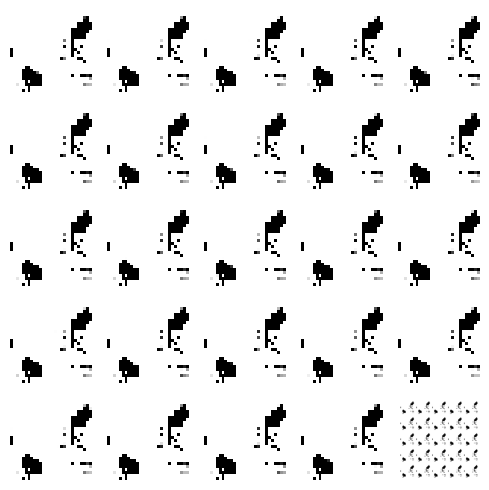

  0%|          | 0/350 [00:00<?, ?it/s]

4/4 [==============================] - 0s 19ms/step


  0%|          | 1/350 [00:00<04:06,  1.42it/s]

4/4 [==============================] - 0s 12ms/step


  1%|          | 2/350 [00:01<03:25,  1.69it/s]

4/4 [==============================] - 0s 13ms/step


  1%|          | 3/350 [00:01<03:26,  1.68it/s]

4/4 [==============================] - 0s 14ms/step


  1%|          | 4/350 [00:02<03:27,  1.67it/s]

4/4 [==============================] - 0s 29ms/step


  1%|▏         | 5/350 [00:03<03:31,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


  2%|▏         | 6/350 [00:03<03:28,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


  2%|▏         | 7/350 [00:04<03:20,  1.71it/s]

4/4 [==============================] - 0s 14ms/step


  2%|▏         | 8/350 [00:04<03:20,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


  3%|▎         | 9/350 [00:05<03:23,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


  3%|▎         | 10/350 [00:05<03:22,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


  3%|▎         | 11/350 [00:06<03:20,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


  3%|▎         | 12/350 [00:07<03:24,  1.65it/s]

4/4 [==============================] - 0s 14ms/step


  4%|▎         | 13/350 [00:07<03:28,  1.61it/s]

4/4 [==============================] - 0s 15ms/step


  4%|▍         | 14/350 [00:08<03:29,  1.61it/s]

4/4 [==============================] - 0s 13ms/step


  4%|▍         | 15/350 [00:09<03:26,  1.62it/s]

4/4 [==============================] - 0s 11ms/step


  5%|▍         | 16/350 [00:09<03:23,  1.64it/s]

4/4 [==============================] - 0s 13ms/step


  5%|▍         | 17/350 [00:10<03:26,  1.61it/s]

4/4 [==============================] - 0s 13ms/step


  5%|▌         | 18/350 [00:10<03:27,  1.60it/s]

4/4 [==============================] - 0s 15ms/step


  5%|▌         | 19/350 [00:11<03:19,  1.66it/s]

4/4 [==============================] - 0s 14ms/step


  6%|▌         | 20/350 [00:12<03:13,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


  6%|▌         | 21/350 [00:12<03:22,  1.63it/s]

4/4 [==============================] - 0s 15ms/step


  6%|▋         | 22/350 [00:13<03:20,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


  7%|▋         | 23/350 [00:13<03:18,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


  7%|▋         | 24/350 [00:14<03:14,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


  7%|▋         | 25/350 [00:15<03:21,  1.61it/s]

4/4 [==============================] - 0s 16ms/step


  7%|▋         | 26/350 [00:15<03:16,  1.65it/s]

4/4 [==============================] - 0s 14ms/step


  8%|▊         | 27/350 [00:16<03:09,  1.70it/s]

4/4 [==============================] - 0s 14ms/step


  8%|▊         | 28/350 [00:16<03:09,  1.69it/s]

4/4 [==============================] - 0s 14ms/step


  8%|▊         | 29/350 [00:17<03:10,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


  9%|▊         | 30/350 [00:18<03:14,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


  9%|▉         | 31/350 [00:18<03:13,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


  9%|▉         | 32/350 [00:19<03:07,  1.70it/s]

4/4 [==============================] - 0s 15ms/step


  9%|▉         | 33/350 [00:19<03:13,  1.64it/s]

4/4 [==============================] - 0s 13ms/step


 10%|▉         | 34/350 [00:20<03:15,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


 10%|█         | 35/350 [00:21<03:14,  1.62it/s]

4/4 [==============================] - 0s 15ms/step


 10%|█         | 36/350 [00:21<03:13,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 11%|█         | 37/350 [00:22<03:14,  1.61it/s]

4/4 [==============================] - 0s 13ms/step


 11%|█         | 38/350 [00:23<03:15,  1.60it/s]

4/4 [==============================] - 0s 13ms/step


 11%|█         | 39/350 [00:23<03:14,  1.60it/s]

4/4 [==============================] - 0s 15ms/step


 11%|█▏        | 40/350 [00:24<03:06,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 12%|█▏        | 41/350 [00:24<03:03,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 12%|█▏        | 42/350 [00:25<03:12,  1.60it/s]

4/4 [==============================] - 0s 12ms/step


 12%|█▏        | 43/350 [00:26<03:11,  1.61it/s]

4/4 [==============================] - 0s 14ms/step


 13%|█▎        | 44/350 [00:26<03:03,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 13%|█▎        | 45/350 [00:27<02:58,  1.71it/s]

4/4 [==============================] - 0s 14ms/step


 13%|█▎        | 46/350 [00:27<03:12,  1.58it/s]

4/4 [==============================] - 0s 15ms/step


 13%|█▎        | 47/350 [00:28<03:05,  1.63it/s]

4/4 [==============================] - 0s 17ms/step


 14%|█▎        | 48/350 [00:29<03:06,  1.62it/s]

4/4 [==============================] - 0s 13ms/step


 14%|█▍        | 49/350 [00:29<02:59,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 14%|█▍        | 50/350 [00:30<03:06,  1.61it/s]

4/4 [==============================] - 0s 14ms/step


 15%|█▍        | 51/350 [00:30<03:01,  1.65it/s]

4/4 [==============================] - 0s 13ms/step


 15%|█▍        | 52/350 [00:31<02:58,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 15%|█▌        | 53/350 [00:32<03:01,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 15%|█▌        | 54/350 [00:32<02:52,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 16%|█▌        | 55/350 [00:33<02:56,  1.67it/s]

4/4 [==============================] - 0s 15ms/step


 16%|█▌        | 56/350 [00:33<02:57,  1.65it/s]

4/4 [==============================] - 0s 17ms/step


 16%|█▋        | 57/350 [00:34<02:58,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 17%|█▋        | 58/350 [00:35<02:56,  1.66it/s]

4/4 [==============================] - 0s 14ms/step


 17%|█▋        | 59/350 [00:35<02:53,  1.68it/s]

4/4 [==============================] - 0s 18ms/step


 17%|█▋        | 60/350 [00:36<02:50,  1.70it/s]

4/4 [==============================] - 0s 14ms/step


 17%|█▋        | 61/350 [00:36<02:55,  1.64it/s]

4/4 [==============================] - 0s 13ms/step


 18%|█▊        | 62/350 [00:37<02:49,  1.70it/s]

4/4 [==============================] - 0s 14ms/step


 18%|█▊        | 63/350 [00:38<02:58,  1.61it/s]

4/4 [==============================] - 0s 18ms/step


 18%|█▊        | 64/350 [00:38<02:57,  1.61it/s]

4/4 [==============================] - 0s 12ms/step


 19%|█▊        | 65/350 [00:39<02:55,  1.62it/s]

4/4 [==============================] - 0s 14ms/step


 19%|█▉        | 66/350 [00:40<02:50,  1.67it/s]

4/4 [==============================] - 0s 14ms/step


 19%|█▉        | 67/350 [00:40<03:00,  1.56it/s]

4/4 [==============================] - 0s 15ms/step


 19%|█▉        | 68/350 [00:41<02:52,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


 20%|█▉        | 69/350 [00:41<02:54,  1.61it/s]

4/4 [==============================] - 0s 12ms/step


 20%|██        | 70/350 [00:42<02:48,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 20%|██        | 71/350 [00:43<02:56,  1.58it/s]

4/4 [==============================] - 0s 15ms/step


 21%|██        | 72/350 [00:43<02:48,  1.65it/s]

4/4 [==============================] - 0s 16ms/step


 21%|██        | 73/350 [00:44<02:47,  1.65it/s]

4/4 [==============================] - 0s 14ms/step


 21%|██        | 74/350 [00:44<02:42,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 21%|██▏       | 75/350 [00:45<02:36,  1.76it/s]

4/4 [==============================] - 0s 12ms/step


 22%|██▏       | 76/350 [00:46<02:42,  1.69it/s]

4/4 [==============================] - 0s 13ms/step


 22%|██▏       | 77/350 [00:46<02:43,  1.67it/s]

4/4 [==============================] - 0s 14ms/step


 22%|██▏       | 78/350 [00:47<02:43,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 23%|██▎       | 79/350 [00:47<02:42,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 23%|██▎       | 80/350 [00:48<02:44,  1.64it/s]

4/4 [==============================] - 0s 14ms/step


 23%|██▎       | 81/350 [00:49<02:47,  1.60it/s]

4/4 [==============================] - 0s 15ms/step


 23%|██▎       | 82/350 [00:49<02:41,  1.66it/s]

4/4 [==============================] - 0s 14ms/step


 24%|██▎       | 83/350 [00:50<02:42,  1.64it/s]

4/4 [==============================] - 0s 15ms/step


 24%|██▍       | 84/350 [00:51<02:44,  1.61it/s]

4/4 [==============================] - 0s 11ms/step


 24%|██▍       | 85/350 [00:51<02:45,  1.60it/s]

4/4 [==============================] - 0s 14ms/step


 25%|██▍       | 86/350 [00:52<02:35,  1.70it/s]

4/4 [==============================] - 0s 14ms/step


 25%|██▍       | 87/350 [00:52<02:34,  1.70it/s]

4/4 [==============================] - 0s 14ms/step


 25%|██▌       | 88/350 [00:53<02:40,  1.63it/s]

4/4 [==============================] - 0s 17ms/step


 25%|██▌       | 89/350 [00:53<02:37,  1.65it/s]

4/4 [==============================] - 0s 13ms/step


 26%|██▌       | 90/350 [00:54<02:37,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 26%|██▌       | 91/350 [00:55<02:31,  1.71it/s]

4/4 [==============================] - 0s 13ms/step


 26%|██▋       | 92/350 [00:55<02:42,  1.59it/s]

4/4 [==============================] - 0s 14ms/step


 27%|██▋       | 93/350 [00:56<02:34,  1.66it/s]

4/4 [==============================] - 0s 17ms/step


 27%|██▋       | 94/350 [00:57<02:36,  1.63it/s]

4/4 [==============================] - 0s 14ms/step


 27%|██▋       | 95/350 [00:57<02:34,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 27%|██▋       | 96/350 [00:58<02:27,  1.72it/s]

4/4 [==============================] - 0s 11ms/step


 28%|██▊       | 97/350 [00:58<02:31,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 28%|██▊       | 98/350 [00:59<02:28,  1.70it/s]

4/4 [==============================] - 0s 13ms/step


 28%|██▊       | 99/350 [00:59<02:27,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 29%|██▊       | 100/350 [01:00<02:26,  1.70it/s]

4/4 [==============================] - 0s 14ms/step


 29%|██▉       | 101/350 [01:01<02:31,  1.64it/s]

4/4 [==============================] - 0s 15ms/step


 29%|██▉       | 102/350 [01:01<02:35,  1.60it/s]

4/4 [==============================] - 0s 15ms/step


 29%|██▉       | 103/350 [01:02<02:28,  1.66it/s]

4/4 [==============================] - 0s 16ms/step


 30%|██▉       | 104/350 [01:03<02:31,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


 30%|███       | 105/350 [01:03<02:31,  1.62it/s]

4/4 [==============================] - 0s 11ms/step


 30%|███       | 106/350 [01:04<02:33,  1.59it/s]

4/4 [==============================] - 0s 13ms/step


 31%|███       | 107/350 [01:04<02:27,  1.65it/s]

4/4 [==============================] - 0s 13ms/step


 31%|███       | 108/350 [01:05<02:27,  1.64it/s]

4/4 [==============================] - 0s 15ms/step


 31%|███       | 109/350 [01:06<02:31,  1.59it/s]

4/4 [==============================] - 0s 11ms/step


 31%|███▏      | 110/350 [01:06<02:30,  1.60it/s]

4/4 [==============================] - 0s 14ms/step


 32%|███▏      | 111/350 [01:07<02:25,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


 32%|███▏      | 112/350 [01:07<02:27,  1.61it/s]

4/4 [==============================] - 0s 20ms/step


 32%|███▏      | 113/350 [01:08<02:41,  1.47it/s]

4/4 [==============================] - 0s 13ms/step


 33%|███▎      | 114/350 [01:09<02:31,  1.56it/s]

4/4 [==============================] - 0s 12ms/step


 33%|███▎      | 115/350 [01:09<02:25,  1.62it/s]

4/4 [==============================] - 0s 17ms/step


 33%|███▎      | 116/350 [01:10<02:28,  1.57it/s]

4/4 [==============================] - 0s 15ms/step


 33%|███▎      | 117/350 [01:11<02:28,  1.57it/s]

4/4 [==============================] - 0s 13ms/step


 34%|███▎      | 118/350 [01:11<02:29,  1.55it/s]

4/4 [==============================] - 0s 14ms/step


 34%|███▍      | 119/350 [01:12<02:26,  1.58it/s]

4/4 [==============================] - 0s 11ms/step


 34%|███▍      | 120/350 [01:13<02:22,  1.61it/s]

4/4 [==============================] - 0s 15ms/step


 35%|███▍      | 121/350 [01:13<02:23,  1.60it/s]

4/4 [==============================] - 0s 14ms/step


 35%|███▍      | 122/350 [01:14<02:25,  1.57it/s]

4/4 [==============================] - 0s 15ms/step


 35%|███▌      | 123/350 [01:14<02:18,  1.64it/s]

4/4 [==============================] - 0s 13ms/step


 35%|███▌      | 124/350 [01:15<02:16,  1.65it/s]

4/4 [==============================] - 0s 15ms/step


 36%|███▌      | 125/350 [01:16<02:15,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


 36%|███▌      | 126/350 [01:16<02:16,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 36%|███▋      | 127/350 [01:17<02:15,  1.64it/s]

4/4 [==============================] - 0s 13ms/step


 37%|███▋      | 128/350 [01:17<02:10,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 37%|███▋      | 129/350 [01:18<02:17,  1.60it/s]

4/4 [==============================] - 0s 15ms/step


 37%|███▋      | 130/350 [01:19<02:12,  1.66it/s]

4/4 [==============================] - 0s 17ms/step


 37%|███▋      | 131/350 [01:19<02:10,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 38%|███▊      | 132/350 [01:20<02:10,  1.67it/s]

4/4 [==============================] - 0s 17ms/step


 38%|███▊      | 133/350 [01:20<02:08,  1.68it/s]

4/4 [==============================] - 0s 14ms/step


 38%|███▊      | 134/350 [01:21<02:12,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 39%|███▊      | 135/350 [01:22<02:10,  1.65it/s]

4/4 [==============================] - 0s 15ms/step


 39%|███▉      | 136/350 [01:22<02:08,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 39%|███▉      | 137/350 [01:23<02:09,  1.64it/s]

4/4 [==============================] - 0s 13ms/step


 39%|███▉      | 138/350 [01:23<02:06,  1.67it/s]

4/4 [==============================] - 0s 18ms/step


 40%|███▉      | 139/350 [01:24<02:05,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 40%|████      | 140/350 [01:25<02:07,  1.65it/s]

4/4 [==============================] - 0s 13ms/step


 40%|████      | 141/350 [01:25<02:02,  1.70it/s]

4/4 [==============================] - 0s 13ms/step


 41%|████      | 142/350 [01:26<02:00,  1.72it/s]

4/4 [==============================] - 0s 11ms/step


 41%|████      | 143/350 [01:26<02:05,  1.65it/s]

4/4 [==============================] - 0s 15ms/step


 41%|████      | 144/350 [01:27<02:07,  1.62it/s]

4/4 [==============================] - 0s 11ms/step


 41%|████▏     | 145/350 [01:28<02:05,  1.63it/s]

4/4 [==============================] - 0s 14ms/step


 42%|████▏     | 146/350 [01:28<02:02,  1.67it/s]

4/4 [==============================] - 0s 16ms/step


 42%|████▏     | 147/350 [01:29<02:07,  1.59it/s]

4/4 [==============================] - 0s 13ms/step


 42%|████▏     | 148/350 [01:30<02:01,  1.67it/s]

4/4 [==============================] - 0s 14ms/step


 43%|████▎     | 149/350 [01:30<02:00,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 43%|████▎     | 150/350 [01:31<02:00,  1.67it/s]

4/4 [==============================] - 0s 18ms/step


 43%|████▎     | 151/350 [01:31<02:05,  1.58it/s]

4/4 [==============================] - 0s 11ms/step


 43%|████▎     | 152/350 [01:32<02:02,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


 44%|████▎     | 153/350 [01:33<01:58,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 44%|████▍     | 154/350 [01:33<02:00,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


 44%|████▍     | 155/350 [01:34<02:01,  1.61it/s]

4/4 [==============================] - 0s 14ms/step


 45%|████▍     | 156/350 [01:34<01:59,  1.62it/s]

4/4 [==============================] - 0s 15ms/step


 45%|████▍     | 157/350 [01:35<01:55,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 45%|████▌     | 158/350 [01:36<01:57,  1.63it/s]

4/4 [==============================] - 0s 18ms/step


 45%|████▌     | 159/350 [01:36<01:56,  1.64it/s]

4/4 [==============================] - 0s 17ms/step


 46%|████▌     | 160/350 [01:37<01:55,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 46%|████▌     | 161/350 [01:38<01:57,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


 46%|████▋     | 162/350 [01:38<01:51,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 47%|████▋     | 163/350 [01:39<01:51,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 47%|████▋     | 164/350 [01:39<01:54,  1.62it/s]

4/4 [==============================] - 0s 14ms/step


 47%|████▋     | 165/350 [01:40<01:54,  1.61it/s]

4/4 [==============================] - 0s 13ms/step


 47%|████▋     | 166/350 [01:41<01:50,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 48%|████▊     | 167/350 [01:41<01:50,  1.66it/s]

4/4 [==============================] - 0s 15ms/step


 48%|████▊     | 168/350 [01:42<01:51,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 48%|████▊     | 169/350 [01:42<01:53,  1.59it/s]

4/4 [==============================] - 0s 16ms/step


 49%|████▊     | 170/350 [01:43<01:49,  1.65it/s]

4/4 [==============================] - 0s 13ms/step


 49%|████▉     | 171/350 [01:44<01:48,  1.64it/s]

4/4 [==============================] - 0s 14ms/step


 49%|████▉     | 172/350 [01:44<01:51,  1.59it/s]

4/4 [==============================] - 0s 11ms/step


 49%|████▉     | 173/350 [01:45<01:49,  1.62it/s]

4/4 [==============================] - 0s 16ms/step


 50%|████▉     | 174/350 [01:45<01:45,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 50%|█████     | 175/350 [01:46<01:47,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 50%|█████     | 176/350 [01:47<01:46,  1.63it/s]

4/4 [==============================] - 0s 14ms/step


 51%|█████     | 177/350 [01:47<01:43,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 51%|█████     | 178/350 [01:48<01:43,  1.67it/s]

4/4 [==============================] - 0s 17ms/step


 51%|█████     | 179/350 [01:48<01:42,  1.67it/s]

4/4 [==============================] - 0s 10ms/step


 51%|█████▏    | 180/350 [01:49<01:39,  1.71it/s]

4/4 [==============================] - 0s 11ms/step


 52%|█████▏    | 181/350 [01:50<01:42,  1.64it/s]

4/4 [==============================] - 0s 14ms/step


 52%|█████▏    | 182/350 [01:50<01:41,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


 52%|█████▏    | 183/350 [01:51<01:42,  1.63it/s]

4/4 [==============================] - 0s 14ms/step


 53%|█████▎    | 184/350 [01:51<01:36,  1.71it/s]

4/4 [==============================] - 0s 14ms/step


 53%|█████▎    | 185/350 [01:52<01:40,  1.64it/s]

4/4 [==============================] - 0s 13ms/step


 53%|█████▎    | 186/350 [01:53<01:41,  1.62it/s]

4/4 [==============================] - 0s 14ms/step


 53%|█████▎    | 187/350 [01:53<01:38,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 54%|█████▎    | 188/350 [01:54<01:34,  1.71it/s]

4/4 [==============================] - 0s 11ms/step


 54%|█████▍    | 189/350 [01:55<01:39,  1.61it/s]

4/4 [==============================] - 0s 12ms/step


 54%|█████▍    | 190/350 [01:55<01:38,  1.62it/s]

4/4 [==============================] - 0s 11ms/step


 55%|█████▍    | 191/350 [01:56<01:36,  1.65it/s]

4/4 [==============================] - 0s 14ms/step


 55%|█████▍    | 192/350 [01:56<01:33,  1.69it/s]

4/4 [==============================] - 0s 14ms/step


 55%|█████▌    | 193/350 [01:57<01:37,  1.61it/s]

4/4 [==============================] - 0s 17ms/step


 55%|█████▌    | 194/350 [01:58<01:35,  1.63it/s]

4/4 [==============================] - 0s 15ms/step


 56%|█████▌    | 195/350 [01:58<01:35,  1.62it/s]

4/4 [==============================] - 0s 14ms/step


 56%|█████▌    | 196/350 [01:59<01:33,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 56%|█████▋    | 197/350 [01:59<01:38,  1.56it/s]

4/4 [==============================] - 0s 12ms/step


 57%|█████▋    | 198/350 [02:00<01:31,  1.66it/s]

4/4 [==============================] - 0s 14ms/step


 57%|█████▋    | 199/350 [02:01<01:29,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 57%|█████▋    | 200/350 [02:01<01:31,  1.64it/s]

4/4 [==============================] - 0s 14ms/step


 57%|█████▋    | 201/350 [02:02<01:28,  1.68it/s]

4/4 [==============================] - 0s 21ms/step


 58%|█████▊    | 202/350 [02:03<01:37,  1.52it/s]

4/4 [==============================] - 0s 11ms/step


 58%|█████▊    | 203/350 [02:03<01:38,  1.50it/s]

4/4 [==============================] - 0s 16ms/step


 58%|█████▊    | 204/350 [02:04<01:33,  1.56it/s]

4/4 [==============================] - 0s 15ms/step


 59%|█████▊    | 205/350 [02:04<01:29,  1.63it/s]

4/4 [==============================] - 0s 15ms/step


 59%|█████▉    | 206/350 [02:05<01:33,  1.54it/s]

4/4 [==============================] - 0s 17ms/step


 59%|█████▉    | 207/350 [02:06<01:29,  1.60it/s]

4/4 [==============================] - 0s 11ms/step


 59%|█████▉    | 208/350 [02:06<01:29,  1.59it/s]

4/4 [==============================] - 0s 17ms/step


 60%|█████▉    | 209/350 [02:07<01:24,  1.66it/s]

4/4 [==============================] - 0s 14ms/step


 60%|██████    | 210/350 [02:07<01:23,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 60%|██████    | 211/350 [02:08<01:27,  1.59it/s]

4/4 [==============================] - 0s 14ms/step


 61%|██████    | 212/350 [02:09<01:23,  1.65it/s]

4/4 [==============================] - 0s 15ms/step


 61%|██████    | 213/350 [02:09<01:21,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 61%|██████    | 214/350 [02:10<01:20,  1.69it/s]

4/4 [==============================] - 0s 17ms/step


 61%|██████▏   | 215/350 [02:11<01:23,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


 62%|██████▏   | 216/350 [02:11<01:22,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


 62%|██████▏   | 217/350 [02:12<01:19,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 62%|██████▏   | 218/350 [02:12<01:19,  1.66it/s]

4/4 [==============================] - 0s 18ms/step


 63%|██████▎   | 219/350 [02:13<01:19,  1.64it/s]

4/4 [==============================] - 0s 16ms/step


 63%|██████▎   | 220/350 [02:14<01:18,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 63%|██████▎   | 221/350 [02:14<01:17,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


 63%|██████▎   | 222/350 [02:15<01:17,  1.65it/s]

4/4 [==============================] - 0s 10ms/step


 64%|██████▎   | 223/350 [02:15<01:18,  1.61it/s]

4/4 [==============================] - 0s 16ms/step


 64%|██████▍   | 224/350 [02:16<01:15,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 64%|██████▍   | 225/350 [02:17<01:13,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 65%|██████▍   | 226/350 [02:17<01:14,  1.66it/s]

4/4 [==============================] - 0s 15ms/step


 65%|██████▍   | 227/350 [02:18<01:12,  1.69it/s]

4/4 [==============================] - 0s 14ms/step


 65%|██████▌   | 228/350 [02:18<01:14,  1.64it/s]

4/4 [==============================] - 0s 14ms/step


 65%|██████▌   | 229/350 [02:19<01:13,  1.64it/s]

4/4 [==============================] - 0s 17ms/step


 66%|██████▌   | 230/350 [02:20<01:12,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 66%|██████▌   | 231/350 [02:20<01:12,  1.65it/s]

4/4 [==============================] - 0s 15ms/step


 66%|██████▋   | 232/350 [02:21<01:12,  1.63it/s]

4/4 [==============================] - 0s 14ms/step


 67%|██████▋   | 233/350 [02:21<01:12,  1.62it/s]

4/4 [==============================] - 0s 14ms/step


 67%|██████▋   | 234/350 [02:22<01:09,  1.67it/s]

4/4 [==============================] - 0s 14ms/step


 67%|██████▋   | 235/350 [02:23<01:08,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 67%|██████▋   | 236/350 [02:23<01:12,  1.57it/s]

4/4 [==============================] - 0s 14ms/step


 68%|██████▊   | 237/350 [02:24<01:08,  1.66it/s]

4/4 [==============================] - 0s 14ms/step


 68%|██████▊   | 238/350 [02:24<01:06,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 68%|██████▊   | 239/350 [02:25<01:06,  1.68it/s]

4/4 [==============================] - 0s 15ms/step


 69%|██████▊   | 240/350 [02:26<01:05,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 69%|██████▉   | 241/350 [02:26<01:05,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 69%|██████▉   | 242/350 [02:27<01:04,  1.66it/s]

4/4 [==============================] - 0s 14ms/step


 69%|██████▉   | 243/350 [02:27<01:03,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 70%|██████▉   | 244/350 [02:28<01:05,  1.62it/s]

4/4 [==============================] - 0s 13ms/step


 70%|███████   | 245/350 [02:29<01:05,  1.60it/s]

4/4 [==============================] - 0s 14ms/step


 70%|███████   | 246/350 [02:29<01:04,  1.61it/s]

4/4 [==============================] - 0s 15ms/step


 71%|███████   | 247/350 [02:30<01:03,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


 71%|███████   | 248/350 [02:31<01:03,  1.62it/s]

4/4 [==============================] - 0s 11ms/step


 71%|███████   | 249/350 [02:31<01:02,  1.61it/s]

4/4 [==============================] - 0s 14ms/step


 71%|███████▏  | 250/350 [02:32<01:02,  1.59it/s]

4/4 [==============================] - 0s 15ms/step


 72%|███████▏  | 251/350 [02:32<01:00,  1.64it/s]

4/4 [==============================] - 0s 14ms/step


 72%|███████▏  | 252/350 [02:33<01:00,  1.62it/s]

4/4 [==============================] - 0s 16ms/step


 72%|███████▏  | 253/350 [02:34<01:01,  1.58it/s]

4/4 [==============================] - 0s 11ms/step


 73%|███████▎  | 254/350 [02:34<01:00,  1.58it/s]

4/4 [==============================] - 0s 12ms/step


 73%|███████▎  | 255/350 [02:35<00:57,  1.65it/s]

4/4 [==============================] - 0s 16ms/step


 73%|███████▎  | 256/350 [02:35<00:55,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 73%|███████▎  | 257/350 [02:36<00:58,  1.59it/s]

4/4 [==============================] - 0s 13ms/step


 74%|███████▎  | 258/350 [02:37<00:55,  1.66it/s]

4/4 [==============================] - 0s 15ms/step


 74%|███████▍  | 259/350 [02:37<00:54,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 74%|███████▍  | 260/350 [02:38<00:53,  1.69it/s]

4/4 [==============================] - 0s 17ms/step


 75%|███████▍  | 261/350 [02:38<00:53,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 75%|███████▍  | 262/350 [02:39<00:54,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


 75%|███████▌  | 263/350 [02:40<00:54,  1.61it/s]

4/4 [==============================] - 0s 14ms/step


 75%|███████▌  | 264/350 [02:40<00:51,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 76%|███████▌  | 265/350 [02:41<00:54,  1.57it/s]

4/4 [==============================] - 0s 12ms/step


 76%|███████▌  | 266/350 [02:42<00:53,  1.57it/s]

4/4 [==============================] - 0s 16ms/step


 76%|███████▋  | 267/350 [02:42<00:52,  1.58it/s]

4/4 [==============================] - 0s 13ms/step


 77%|███████▋  | 268/350 [02:43<00:51,  1.60it/s]

4/4 [==============================] - 0s 11ms/step


 77%|███████▋  | 269/350 [02:44<00:50,  1.61it/s]

4/4 [==============================] - 0s 14ms/step


 77%|███████▋  | 270/350 [02:44<00:50,  1.60it/s]

4/4 [==============================] - 0s 13ms/step


 77%|███████▋  | 271/350 [02:45<00:50,  1.57it/s]

4/4 [==============================] - 0s 14ms/step


 78%|███████▊  | 272/350 [02:45<00:46,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 78%|███████▊  | 273/350 [02:46<00:45,  1.71it/s]

4/4 [==============================] - 0s 15ms/step


 78%|███████▊  | 274/350 [02:47<00:46,  1.63it/s]

4/4 [==============================] - 0s 16ms/step


 79%|███████▊  | 275/350 [02:47<00:45,  1.65it/s]

4/4 [==============================] - 0s 14ms/step


 79%|███████▉  | 276/350 [02:48<00:43,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 79%|███████▉  | 277/350 [02:48<00:43,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 79%|███████▉  | 278/350 [02:49<00:41,  1.72it/s]

4/4 [==============================] - 0s 18ms/step


 80%|███████▉  | 279/350 [02:50<00:44,  1.61it/s]

4/4 [==============================] - 0s 15ms/step


 80%|████████  | 280/350 [02:50<00:42,  1.64it/s]

4/4 [==============================] - 0s 14ms/step


 80%|████████  | 281/350 [02:51<00:41,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 81%|████████  | 282/350 [02:51<00:41,  1.65it/s]

4/4 [==============================] - 0s 16ms/step


 81%|████████  | 283/350 [02:52<00:41,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


 81%|████████  | 284/350 [02:53<00:40,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 81%|████████▏ | 285/350 [02:53<00:38,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 82%|████████▏ | 286/350 [02:54<00:37,  1.71it/s]

4/4 [==============================] - 0s 13ms/step


 82%|████████▏ | 287/350 [02:54<00:36,  1.74it/s]

4/4 [==============================] - 0s 11ms/step


 82%|████████▏ | 288/350 [02:55<00:37,  1.67it/s]

4/4 [==============================] - 0s 16ms/step


 83%|████████▎ | 289/350 [02:55<00:36,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


 83%|████████▎ | 290/350 [02:56<00:35,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 83%|████████▎ | 291/350 [02:57<00:35,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 83%|████████▎ | 292/350 [02:57<00:35,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 84%|████████▎ | 293/350 [02:58<00:35,  1.62it/s]

4/4 [==============================] - 0s 14ms/step


 84%|████████▍ | 294/350 [02:59<00:33,  1.67it/s]

4/4 [==============================] - 0s 15ms/step


 84%|████████▍ | 295/350 [02:59<00:33,  1.63it/s]

4/4 [==============================] - 0s 16ms/step


 85%|████████▍ | 296/350 [03:00<00:33,  1.59it/s]

4/4 [==============================] - 0s 11ms/step


 85%|████████▍ | 297/350 [03:00<00:33,  1.60it/s]

4/4 [==============================] - 0s 16ms/step


 85%|████████▌ | 298/350 [03:01<00:30,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 85%|████████▌ | 299/350 [03:02<00:29,  1.71it/s]

4/4 [==============================] - 0s 15ms/step


 86%|████████▌ | 300/350 [03:02<00:32,  1.56it/s]

4/4 [==============================] - 0s 13ms/step


 86%|████████▌ | 301/350 [03:03<00:29,  1.65it/s]

4/4 [==============================] - 0s 16ms/step


 86%|████████▋ | 302/350 [03:03<00:28,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 87%|████████▋ | 303/350 [03:04<00:27,  1.68it/s]

4/4 [==============================] - 0s 14ms/step


 87%|████████▋ | 304/350 [03:05<00:28,  1.64it/s]

4/4 [==============================] - 0s 16ms/step


 87%|████████▋ | 305/350 [03:05<00:27,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 87%|████████▋ | 306/350 [03:06<00:26,  1.67it/s]

4/4 [==============================] - 0s 14ms/step


 88%|████████▊ | 307/350 [03:06<00:25,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 88%|████████▊ | 308/350 [03:07<00:26,  1.58it/s]

4/4 [==============================] - 0s 17ms/step


 88%|████████▊ | 309/350 [03:08<00:24,  1.64it/s]

4/4 [==============================] - 0s 14ms/step


 89%|████████▊ | 310/350 [03:08<00:24,  1.62it/s]

4/4 [==============================] - 0s 14ms/step


 89%|████████▉ | 311/350 [03:09<00:23,  1.65it/s]

4/4 [==============================] - 0s 10ms/step


 89%|████████▉ | 312/350 [03:10<00:23,  1.62it/s]

4/4 [==============================] - 0s 11ms/step


 89%|████████▉ | 313/350 [03:10<00:22,  1.62it/s]

4/4 [==============================] - 0s 16ms/step


 90%|████████▉ | 314/350 [03:11<00:21,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 90%|█████████ | 315/350 [03:11<00:21,  1.64it/s]

4/4 [==============================] - 0s 13ms/step


 90%|█████████ | 316/350 [03:12<00:20,  1.64it/s]

4/4 [==============================] - 0s 17ms/step


 91%|█████████ | 317/350 [03:13<00:19,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 91%|█████████ | 318/350 [03:13<00:19,  1.61it/s]

4/4 [==============================] - 0s 12ms/step


 91%|█████████ | 319/350 [03:14<00:18,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


 91%|█████████▏| 320/350 [03:14<00:18,  1.61it/s]

4/4 [==============================] - 0s 16ms/step


 92%|█████████▏| 321/350 [03:15<00:17,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 92%|█████████▏| 322/350 [03:16<00:17,  1.61it/s]

4/4 [==============================] - 0s 12ms/step


 92%|█████████▏| 323/350 [03:16<00:16,  1.66it/s]

4/4 [==============================] - 0s 16ms/step


 93%|█████████▎| 324/350 [03:17<00:16,  1.61it/s]

4/4 [==============================] - 0s 24ms/step


 93%|█████████▎| 325/350 [03:18<00:15,  1.59it/s]

4/4 [==============================] - 0s 13ms/step


 93%|█████████▎| 326/350 [03:18<00:15,  1.59it/s]

4/4 [==============================] - 0s 14ms/step


 93%|█████████▎| 327/350 [03:19<00:13,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


 94%|█████████▎| 328/350 [03:19<00:12,  1.70it/s]

4/4 [==============================] - 0s 13ms/step


 94%|█████████▍| 329/350 [03:20<00:13,  1.59it/s]

4/4 [==============================] - 0s 15ms/step


 94%|█████████▍| 330/350 [03:21<00:12,  1.64it/s]

4/4 [==============================] - 0s 14ms/step


 95%|█████████▍| 331/350 [03:21<00:11,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


 95%|█████████▍| 332/350 [03:22<00:10,  1.67it/s]

4/4 [==============================] - 0s 15ms/step


 95%|█████████▌| 333/350 [03:22<00:10,  1.61it/s]

4/4 [==============================] - 0s 12ms/step


 95%|█████████▌| 334/350 [03:23<00:09,  1.62it/s]

4/4 [==============================] - 0s 14ms/step


 96%|█████████▌| 335/350 [03:24<00:08,  1.69it/s]

4/4 [==============================] - 0s 16ms/step


 96%|█████████▌| 336/350 [03:24<00:08,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 96%|█████████▋| 337/350 [03:25<00:07,  1.66it/s]

4/4 [==============================] - 0s 19ms/step


 97%|█████████▋| 338/350 [03:25<00:07,  1.68it/s]

4/4 [==============================] - 0s 14ms/step


 97%|█████████▋| 339/350 [03:26<00:06,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 97%|█████████▋| 340/350 [03:27<00:06,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 97%|█████████▋| 341/350 [03:27<00:05,  1.62it/s]

4/4 [==============================] - 0s 14ms/step


 98%|█████████▊| 342/350 [03:28<00:04,  1.62it/s]

4/4 [==============================] - 0s 16ms/step


 98%|█████████▊| 343/350 [03:28<00:04,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


 98%|█████████▊| 344/350 [03:29<00:03,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 99%|█████████▊| 345/350 [03:30<00:03,  1.61it/s]

4/4 [==============================] - 0s 15ms/step


 99%|█████████▉| 346/350 [03:30<00:02,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 99%|█████████▉| 347/350 [03:31<00:01,  1.63it/s]

4/4 [==============================] - 0s 16ms/step


 99%|█████████▉| 348/350 [03:31<00:01,  1.69it/s]

4/4 [==============================] - 0s 14ms/step


100%|█████████▉| 349/350 [03:32<00:00,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


100%|██████████| 350/350 [03:33<00:00,  1.64it/s]

Epoch number: 77 discriminator_loss: 0.16493848587053694 generator_loss: 7.112025898524693
1/1 [==============================] - 0s 28ms/step


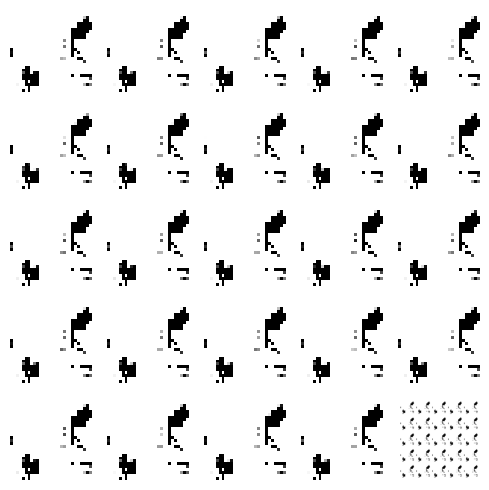

  0%|          | 0/350 [00:00<?, ?it/s]

4/4 [==============================] - 0s 26ms/step


  0%|          | 1/350 [00:00<04:13,  1.38it/s]

4/4 [==============================] - 0s 19ms/step


  1%|          | 2/350 [00:01<04:24,  1.32it/s]

4/4 [==============================] - 0s 12ms/step


  1%|          | 3/350 [00:02<04:01,  1.43it/s]

4/4 [==============================] - 0s 11ms/step


  1%|          | 4/350 [00:02<03:38,  1.58it/s]

4/4 [==============================] - 0s 14ms/step


  1%|▏         | 5/350 [00:03<03:26,  1.67it/s]

4/4 [==============================] - 0s 14ms/step


  2%|▏         | 6/350 [00:03<03:27,  1.66it/s]

4/4 [==============================] - 0s 16ms/step


  2%|▏         | 7/350 [00:04<03:37,  1.58it/s]

4/4 [==============================] - 0s 14ms/step


  2%|▏         | 8/350 [00:05<03:28,  1.64it/s]

4/4 [==============================] - 0s 16ms/step


  3%|▎         | 9/350 [00:05<03:23,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


  3%|▎         | 10/350 [00:06<03:28,  1.63it/s]

4/4 [==============================] - 0s 14ms/step


  3%|▎         | 11/350 [00:06<03:27,  1.63it/s]

4/4 [==============================] - 0s 16ms/step


  3%|▎         | 12/350 [00:07<03:27,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


  4%|▎         | 13/350 [00:08<03:21,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


  4%|▍         | 14/350 [00:08<03:18,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


  4%|▍         | 15/350 [00:09<03:21,  1.66it/s]

4/4 [==============================] - 0s 19ms/step


  5%|▍         | 16/350 [00:09<03:18,  1.68it/s]

4/4 [==============================] - 0s 16ms/step


  5%|▍         | 17/350 [00:10<03:17,  1.69it/s]

4/4 [==============================] - 0s 14ms/step


  5%|▌         | 18/350 [00:11<03:21,  1.64it/s]

4/4 [==============================] - 0s 15ms/step


  5%|▌         | 19/350 [00:11<03:22,  1.63it/s]

4/4 [==============================] - 0s 14ms/step


  6%|▌         | 20/350 [00:12<03:18,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


  6%|▌         | 21/350 [00:12<03:18,  1.66it/s]

4/4 [==============================] - 0s 16ms/step


  6%|▋         | 22/350 [00:13<03:10,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


  7%|▋         | 23/350 [00:14<03:21,  1.62it/s]

4/4 [==============================] - 0s 10ms/step


  7%|▋         | 24/350 [00:14<03:17,  1.65it/s]

4/4 [==============================] - 0s 14ms/step


  7%|▋         | 25/350 [00:15<03:16,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


  7%|▋         | 26/350 [00:15<03:11,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


  8%|▊         | 27/350 [00:16<03:21,  1.61it/s]

4/4 [==============================] - 0s 13ms/step


  8%|▊         | 28/350 [00:17<03:14,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


  8%|▊         | 29/350 [00:17<03:15,  1.64it/s]

4/4 [==============================] - 0s 14ms/step


  9%|▊         | 30/350 [00:18<03:05,  1.72it/s]

4/4 [==============================] - 0s 14ms/step


  9%|▉         | 31/350 [00:18<03:14,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


  9%|▉         | 32/350 [00:19<03:16,  1.62it/s]

4/4 [==============================] - 0s 15ms/step


  9%|▉         | 33/350 [00:20<03:07,  1.69it/s]

4/4 [==============================] - 0s 13ms/step


 10%|▉         | 34/350 [00:20<03:06,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 10%|█         | 35/350 [00:21<03:13,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 10%|█         | 36/350 [00:21<03:11,  1.64it/s]

4/4 [==============================] - 0s 10ms/step


 11%|█         | 37/350 [00:22<03:09,  1.65it/s]

4/4 [==============================] - 0s 20ms/step


 11%|█         | 38/350 [00:23<03:06,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 11%|█         | 39/350 [00:23<03:11,  1.63it/s]

4/4 [==============================] - 0s 14ms/step


 11%|█▏        | 40/350 [00:24<03:06,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


 12%|█▏        | 41/350 [00:24<03:03,  1.69it/s]

4/4 [==============================] - 0s 13ms/step


 12%|█▏        | 42/350 [00:25<03:03,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


 12%|█▏        | 43/350 [00:26<03:11,  1.61it/s]

4/4 [==============================] - 0s 15ms/step


 13%|█▎        | 44/350 [00:26<03:09,  1.61it/s]

4/4 [==============================] - 0s 12ms/step


 13%|█▎        | 45/350 [00:27<03:01,  1.68it/s]

4/4 [==============================] - 0s 17ms/step


 13%|█▎        | 46/350 [00:28<03:07,  1.62it/s]

4/4 [==============================] - 0s 15ms/step


 13%|█▎        | 47/350 [00:28<03:09,  1.60it/s]

4/4 [==============================] - 0s 15ms/step


 14%|█▎        | 48/350 [00:29<03:09,  1.59it/s]

4/4 [==============================] - 0s 14ms/step


 14%|█▍        | 49/350 [00:29<03:04,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 14%|█▍        | 50/350 [00:30<03:06,  1.61it/s]

4/4 [==============================] - 0s 15ms/step


 15%|█▍        | 51/350 [00:31<03:04,  1.62it/s]

4/4 [==============================] - 0s 13ms/step


 15%|█▍        | 52/350 [00:31<02:59,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


 15%|█▌        | 53/350 [00:32<03:04,  1.61it/s]

4/4 [==============================] - 0s 14ms/step


 15%|█▌        | 54/350 [00:32<02:56,  1.67it/s]

4/4 [==============================] - 0s 14ms/step


 16%|█▌        | 55/350 [00:33<03:04,  1.60it/s]

4/4 [==============================] - 0s 14ms/step


 16%|█▌        | 56/350 [00:34<02:59,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


 16%|█▋        | 57/350 [00:34<03:01,  1.62it/s]

4/4 [==============================] - 0s 14ms/step


 17%|█▋        | 58/350 [00:35<02:54,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


 17%|█▋        | 59/350 [00:36<03:00,  1.61it/s]

4/4 [==============================] - 0s 11ms/step


 17%|█▋        | 60/350 [00:36<03:01,  1.60it/s]

4/4 [==============================] - 0s 15ms/step


 17%|█▋        | 61/350 [00:37<02:52,  1.68it/s]

4/4 [==============================] - 0s 15ms/step


 18%|█▊        | 62/350 [00:37<02:49,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 18%|█▊        | 63/350 [00:38<02:57,  1.62it/s]

4/4 [==============================] - 0s 14ms/step


 18%|█▊        | 64/350 [00:39<02:56,  1.62it/s]

4/4 [==============================] - 0s 11ms/step


 19%|█▊        | 65/350 [00:39<02:49,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 19%|█▉        | 66/350 [00:40<02:49,  1.67it/s]

4/4 [==============================] - 0s 15ms/step


 19%|█▉        | 67/350 [00:40<02:52,  1.64it/s]

4/4 [==============================] - 0s 16ms/step


 19%|█▉        | 68/350 [00:41<02:57,  1.59it/s]

4/4 [==============================] - 0s 12ms/step


 20%|█▉        | 69/350 [00:42<02:47,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


 20%|██        | 70/350 [00:42<02:41,  1.73it/s]

4/4 [==============================] - 0s 14ms/step


 20%|██        | 71/350 [00:43<02:42,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


 21%|██        | 72/350 [00:43<02:52,  1.61it/s]

4/4 [==============================] - 0s 13ms/step


 21%|██        | 73/350 [00:44<02:45,  1.67it/s]

4/4 [==============================] - 0s 15ms/step


 21%|██        | 74/350 [00:45<02:42,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 21%|██▏       | 75/350 [00:45<02:45,  1.66it/s]

4/4 [==============================] - 0s 14ms/step


 22%|██▏       | 76/350 [00:46<02:47,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 22%|██▏       | 77/350 [00:46<02:47,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 22%|██▏       | 78/350 [00:47<02:40,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 23%|██▎       | 79/350 [00:48<02:40,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 23%|██▎       | 80/350 [00:48<02:44,  1.64it/s]

4/4 [==============================] - 0s 17ms/step


 23%|██▎       | 81/350 [00:49<02:43,  1.65it/s]

4/4 [==============================] - 0s 15ms/step


 23%|██▎       | 82/350 [00:49<02:44,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 24%|██▎       | 83/350 [00:50<02:38,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


 24%|██▍       | 84/350 [00:51<02:41,  1.65it/s]

4/4 [==============================] - 0s 15ms/step


 24%|██▍       | 85/350 [00:51<02:40,  1.65it/s]

4/4 [==============================] - 0s 14ms/step


 25%|██▍       | 86/350 [00:52<02:38,  1.66it/s]

4/4 [==============================] - 0s 20ms/step


 25%|██▍       | 87/350 [00:52<02:36,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 25%|██▌       | 88/350 [00:53<02:44,  1.59it/s]

4/4 [==============================] - 0s 13ms/step


 25%|██▌       | 89/350 [00:54<02:39,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 26%|██▌       | 90/350 [00:54<02:43,  1.60it/s]

4/4 [==============================] - 0s 12ms/step


 26%|██▌       | 91/350 [00:55<02:35,  1.66it/s]

4/4 [==============================] - 0s 14ms/step


 26%|██▋       | 92/350 [00:56<02:41,  1.60it/s]

4/4 [==============================] - 0s 13ms/step


 27%|██▋       | 93/350 [00:56<02:38,  1.63it/s]

4/4 [==============================] - 0s 17ms/step


 27%|██▋       | 94/350 [00:57<02:32,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 27%|██▋       | 95/350 [00:57<02:30,  1.69it/s]

4/4 [==============================] - 0s 16ms/step


 27%|██▋       | 96/350 [00:58<02:34,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 28%|██▊       | 97/350 [00:59<02:32,  1.66it/s]

4/4 [==============================] - 0s 14ms/step


 28%|██▊       | 98/350 [00:59<02:27,  1.71it/s]

4/4 [==============================] - 0s 11ms/step


 28%|██▊       | 99/350 [01:00<02:27,  1.71it/s]

4/4 [==============================] - 0s 14ms/step


 29%|██▊       | 100/350 [01:00<02:31,  1.65it/s]

4/4 [==============================] - 0s 13ms/step


 29%|██▉       | 101/350 [01:01<02:32,  1.63it/s]

4/4 [==============================] - 0s 14ms/step


 29%|██▉       | 102/350 [01:01<02:26,  1.69it/s]

4/4 [==============================] - 0s 17ms/step


 29%|██▉       | 103/350 [01:02<02:24,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 30%|██▉       | 104/350 [01:03<02:29,  1.65it/s]

4/4 [==============================] - 0s 15ms/step


 30%|███       | 105/350 [01:03<02:25,  1.68it/s]

4/4 [==============================] - 0s 17ms/step


 30%|███       | 106/350 [01:04<02:23,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 31%|███       | 107/350 [01:04<02:20,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


 31%|███       | 108/350 [01:05<02:24,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 31%|███       | 109/350 [01:06<02:22,  1.69it/s]

4/4 [==============================] - 0s 16ms/step


 31%|███▏      | 110/350 [01:06<02:19,  1.71it/s]

4/4 [==============================] - 0s 13ms/step


 32%|███▏      | 111/350 [01:07<02:18,  1.72it/s]

4/4 [==============================] - 0s 11ms/step


 32%|███▏      | 112/350 [01:07<02:27,  1.61it/s]

4/4 [==============================] - 0s 12ms/step


 32%|███▏      | 113/350 [01:08<02:22,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 33%|███▎      | 114/350 [01:09<02:22,  1.66it/s]

4/4 [==============================] - 0s 15ms/step


 33%|███▎      | 115/350 [01:09<02:17,  1.70it/s]

4/4 [==============================] - 0s 16ms/step


 33%|███▎      | 116/350 [01:10<02:27,  1.58it/s]

4/4 [==============================] - 0s 13ms/step


 33%|███▎      | 117/350 [01:11<02:24,  1.61it/s]

4/4 [==============================] - 0s 11ms/step


 34%|███▎      | 118/350 [01:11<02:22,  1.62it/s]

4/4 [==============================] - 0s 15ms/step


 34%|███▍      | 119/350 [01:12<02:19,  1.65it/s]

4/4 [==============================] - 0s 16ms/step


 34%|███▍      | 120/350 [01:12<02:21,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 35%|███▍      | 121/350 [01:13<02:21,  1.62it/s]

4/4 [==============================] - 0s 14ms/step


 35%|███▍      | 122/350 [01:14<02:18,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


 35%|███▌      | 123/350 [01:14<02:18,  1.64it/s]

4/4 [==============================] - 0s 14ms/step


 35%|███▌      | 124/350 [01:15<02:21,  1.60it/s]

4/4 [==============================] - 0s 13ms/step


 36%|███▌      | 125/350 [01:15<02:19,  1.61it/s]

4/4 [==============================] - 0s 14ms/step


 36%|███▌      | 126/350 [01:16<02:17,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 36%|███▋      | 127/350 [01:17<02:12,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 37%|███▋      | 128/350 [01:17<02:21,  1.57it/s]

4/4 [==============================] - 0s 13ms/step


 37%|███▋      | 129/350 [01:18<02:15,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


 37%|███▋      | 130/350 [01:18<02:14,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 37%|███▋      | 131/350 [01:19<02:07,  1.72it/s]

4/4 [==============================] - 0s 14ms/step


 38%|███▊      | 132/350 [01:20<02:12,  1.65it/s]

4/4 [==============================] - 0s 14ms/step


 38%|███▊      | 133/350 [01:20<02:16,  1.59it/s]

4/4 [==============================] - 0s 14ms/step


 38%|███▊      | 134/350 [01:21<02:10,  1.66it/s]

4/4 [==============================] - 0s 16ms/step


 39%|███▊      | 135/350 [01:21<02:06,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 39%|███▉      | 136/350 [01:22<02:09,  1.65it/s]

4/4 [==============================] - 0s 14ms/step


 39%|███▉      | 137/350 [01:23<02:07,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 39%|███▉      | 138/350 [01:23<02:03,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 40%|███▉      | 139/350 [01:24<02:04,  1.69it/s]

4/4 [==============================] - 0s 14ms/step


 40%|████      | 140/350 [01:25<02:11,  1.60it/s]

4/4 [==============================] - 0s 12ms/step


 40%|████      | 141/350 [01:25<02:10,  1.60it/s]

4/4 [==============================] - 0s 17ms/step


 41%|████      | 142/350 [01:26<02:04,  1.67it/s]

4/4 [==============================] - 0s 16ms/step


 41%|████      | 143/350 [01:26<02:03,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 41%|████      | 144/350 [01:27<02:08,  1.60it/s]

4/4 [==============================] - 0s 18ms/step


 41%|████▏     | 145/350 [01:28<02:03,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


 42%|████▏     | 146/350 [01:28<02:00,  1.69it/s]

4/4 [==============================] - 0s 16ms/step


 42%|████▏     | 147/350 [01:29<01:58,  1.72it/s]

4/4 [==============================] - 0s 11ms/step


 42%|████▏     | 148/350 [01:29<02:04,  1.62it/s]

4/4 [==============================] - 0s 14ms/step


 43%|████▎     | 149/350 [01:30<02:08,  1.57it/s]

4/4 [==============================] - 0s 12ms/step


 43%|████▎     | 150/350 [01:31<02:05,  1.60it/s]

4/4 [==============================] - 0s 11ms/step


 43%|████▎     | 151/350 [01:31<02:01,  1.64it/s]

4/4 [==============================] - 0s 26ms/step


 43%|████▎     | 152/350 [01:32<02:11,  1.51it/s]

4/4 [==============================] - 0s 12ms/step


 44%|████▎     | 153/350 [01:33<02:05,  1.57it/s]

4/4 [==============================] - 0s 12ms/step


 44%|████▍     | 154/350 [01:33<02:05,  1.57it/s]

4/4 [==============================] - 0s 12ms/step


 44%|████▍     | 155/350 [01:34<01:57,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


 45%|████▍     | 156/350 [01:34<01:56,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


 45%|████▍     | 157/350 [01:35<01:58,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 45%|████▌     | 158/350 [01:36<01:57,  1.63it/s]

4/4 [==============================] - 0s 15ms/step


 45%|████▌     | 159/350 [01:36<01:54,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 46%|████▌     | 160/350 [01:37<01:56,  1.64it/s]

4/4 [==============================] - 0s 15ms/step


 46%|████▌     | 161/350 [01:37<01:54,  1.65it/s]

4/4 [==============================] - 0s 17ms/step


 46%|████▋     | 162/350 [01:38<01:51,  1.69it/s]

4/4 [==============================] - 0s 13ms/step


 47%|████▋     | 163/350 [01:39<01:49,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 47%|████▋     | 164/350 [01:39<01:51,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 47%|████▋     | 165/350 [01:40<01:49,  1.69it/s]

4/4 [==============================] - 0s 18ms/step


 47%|████▋     | 166/350 [01:40<01:49,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 48%|████▊     | 167/350 [01:41<01:51,  1.64it/s]

4/4 [==============================] - 0s 15ms/step


 48%|████▊     | 168/350 [01:42<01:47,  1.69it/s]

4/4 [==============================] - 0s 14ms/step


 48%|████▊     | 169/350 [01:42<01:47,  1.68it/s]

4/4 [==============================] - 0s 15ms/step


 49%|████▊     | 170/350 [01:43<01:48,  1.65it/s]

4/4 [==============================] - 0s 14ms/step


 49%|████▉     | 171/350 [01:43<01:46,  1.68it/s]

4/4 [==============================] - 0s 16ms/step


 49%|████▉     | 172/350 [01:44<01:43,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


 49%|████▉     | 173/350 [01:45<01:49,  1.62it/s]

4/4 [==============================] - 0s 13ms/step


 50%|████▉     | 174/350 [01:45<01:45,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 50%|█████     | 175/350 [01:46<01:47,  1.63it/s]

4/4 [==============================] - 0s 10ms/step


 50%|█████     | 176/350 [01:46<01:44,  1.66it/s]

4/4 [==============================] - 0s 15ms/step


 51%|█████     | 177/350 [01:47<01:42,  1.68it/s]

4/4 [==============================] - 0s 23ms/step


 51%|█████     | 178/350 [01:48<01:43,  1.67it/s]

4/4 [==============================] - 0s 14ms/step


 51%|█████     | 179/350 [01:48<01:43,  1.65it/s]

4/4 [==============================] - 0s 13ms/step


 51%|█████▏    | 180/350 [01:49<01:38,  1.72it/s]

4/4 [==============================] - 0s 14ms/step


 52%|█████▏    | 181/350 [01:49<01:42,  1.65it/s]

4/4 [==============================] - 0s 13ms/step


 52%|█████▏    | 182/350 [01:50<01:44,  1.61it/s]

4/4 [==============================] - 0s 13ms/step


 52%|█████▏    | 183/350 [01:51<01:38,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 53%|█████▎    | 184/350 [01:51<01:35,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 53%|█████▎    | 185/350 [01:52<01:37,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 53%|█████▎    | 186/350 [01:52<01:39,  1.65it/s]

4/4 [==============================] - 0s 15ms/step


 53%|█████▎    | 187/350 [01:53<01:35,  1.70it/s]

4/4 [==============================] - 0s 13ms/step


 54%|█████▎    | 188/350 [01:53<01:33,  1.73it/s]

4/4 [==============================] - 0s 11ms/step


 54%|█████▍    | 189/350 [01:54<01:36,  1.66it/s]

4/4 [==============================] - 0s 17ms/step


 54%|█████▍    | 190/350 [01:55<01:37,  1.64it/s]

4/4 [==============================] - 0s 14ms/step


 55%|█████▍    | 191/350 [01:55<01:33,  1.69it/s]

4/4 [==============================] - 0s 10ms/step


 55%|█████▍    | 192/350 [01:56<01:33,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 55%|█████▌    | 193/350 [01:57<01:36,  1.63it/s]

4/4 [==============================] - 0s 14ms/step


 55%|█████▌    | 194/350 [01:57<01:36,  1.62it/s]

4/4 [==============================] - 0s 15ms/step


 56%|█████▌    | 195/350 [01:58<01:32,  1.68it/s]

4/4 [==============================] - 0s 15ms/step


 56%|█████▌    | 196/350 [01:58<01:29,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 56%|█████▋    | 197/350 [01:59<01:32,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 57%|█████▋    | 198/350 [02:00<01:33,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


 57%|█████▋    | 199/350 [02:00<01:28,  1.70it/s]

4/4 [==============================] - 0s 14ms/step


 57%|█████▋    | 200/350 [02:01<01:27,  1.71it/s]

4/4 [==============================] - 0s 11ms/step


 57%|█████▋    | 201/350 [02:01<01:30,  1.65it/s]

4/4 [==============================] - 0s 17ms/step


 58%|█████▊    | 202/350 [02:02<01:28,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 58%|█████▊    | 203/350 [02:02<01:26,  1.70it/s]

4/4 [==============================] - 0s 13ms/step


 58%|█████▊    | 204/350 [02:03<01:27,  1.67it/s]

4/4 [==============================] - 0s 14ms/step


 59%|█████▊    | 205/350 [02:04<01:30,  1.59it/s]

4/4 [==============================] - 0s 11ms/step


 59%|█████▉    | 206/350 [02:04<01:28,  1.63it/s]

4/4 [==============================] - 0s 14ms/step


 59%|█████▉    | 207/350 [02:05<01:24,  1.69it/s]

4/4 [==============================] - 0s 17ms/step


 59%|█████▉    | 208/350 [02:05<01:23,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 60%|█████▉    | 209/350 [02:06<01:27,  1.61it/s]

4/4 [==============================] - 0s 16ms/step


 60%|██████    | 210/350 [02:07<01:24,  1.65it/s]

4/4 [==============================] - 0s 18ms/step


 60%|██████    | 211/350 [02:07<01:23,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 61%|██████    | 212/350 [02:08<01:24,  1.64it/s]

4/4 [==============================] - 0s 14ms/step


 61%|██████    | 213/350 [02:09<01:24,  1.63it/s]

4/4 [==============================] - 0s 14ms/step


 61%|██████    | 214/350 [02:09<01:21,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 61%|██████▏   | 215/350 [02:10<01:20,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


 62%|██████▏   | 216/350 [02:10<01:19,  1.68it/s]

4/4 [==============================] - 0s 16ms/step


 62%|██████▏   | 217/350 [02:11<01:21,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 62%|██████▏   | 218/350 [02:12<01:19,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 63%|██████▎   | 219/350 [02:12<01:16,  1.70it/s]

4/4 [==============================] - 0s 15ms/step


 63%|██████▎   | 220/350 [02:13<01:16,  1.70it/s]

4/4 [==============================] - 0s 13ms/step


 63%|██████▎   | 221/350 [02:13<01:18,  1.64it/s]

4/4 [==============================] - 0s 16ms/step


 63%|██████▎   | 222/350 [02:14<01:16,  1.67it/s]

4/4 [==============================] - 0s 15ms/step


 64%|██████▎   | 223/350 [02:15<01:18,  1.62it/s]

4/4 [==============================] - 0s 15ms/step


 64%|██████▍   | 224/350 [02:15<01:19,  1.58it/s]

4/4 [==============================] - 0s 13ms/step


 64%|██████▍   | 225/350 [02:16<01:19,  1.57it/s]

4/4 [==============================] - 0s 14ms/step


 65%|██████▍   | 226/350 [02:16<01:17,  1.61it/s]

4/4 [==============================] - 0s 10ms/step


 65%|██████▍   | 227/350 [02:17<01:17,  1.59it/s]

4/4 [==============================] - 0s 14ms/step


 65%|██████▌   | 228/350 [02:18<01:14,  1.64it/s]

4/4 [==============================] - 0s 16ms/step


 65%|██████▌   | 229/350 [02:18<01:12,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 66%|██████▌   | 230/350 [02:19<01:13,  1.64it/s]

4/4 [==============================] - 0s 18ms/step


 66%|██████▌   | 231/350 [02:19<01:09,  1.71it/s]

4/4 [==============================] - 0s 14ms/step


 66%|██████▋   | 232/350 [02:20<01:11,  1.64it/s]

4/4 [==============================] - 0s 15ms/step


 67%|██████▋   | 233/350 [02:21<01:12,  1.62it/s]

4/4 [==============================] - 0s 14ms/step


 67%|██████▋   | 234/350 [02:21<01:10,  1.65it/s]

4/4 [==============================] - 0s 14ms/step


 67%|██████▋   | 235/350 [02:22<01:08,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 67%|██████▋   | 236/350 [02:23<01:09,  1.64it/s]

4/4 [==============================] - 0s 16ms/step


 68%|██████▊   | 237/350 [02:23<01:08,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 68%|██████▊   | 238/350 [02:24<01:08,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 68%|██████▊   | 239/350 [02:24<01:05,  1.68it/s]

4/4 [==============================] - 0s 15ms/step


 69%|██████▊   | 240/350 [02:25<01:07,  1.63it/s]

4/4 [==============================] - 0s 14ms/step


 69%|██████▉   | 241/350 [02:26<01:09,  1.58it/s]

4/4 [==============================] - 0s 16ms/step


 69%|██████▉   | 242/350 [02:26<01:06,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 69%|██████▉   | 243/350 [02:27<01:05,  1.64it/s]

4/4 [==============================] - 0s 15ms/step


 70%|██████▉   | 244/350 [02:28<01:14,  1.43it/s]

4/4 [==============================] - 0s 14ms/step


 70%|███████   | 245/350 [02:28<01:09,  1.51it/s]

4/4 [==============================] - 0s 13ms/step


 70%|███████   | 246/350 [02:29<01:06,  1.57it/s]

4/4 [==============================] - 0s 15ms/step


 71%|███████   | 247/350 [02:29<01:03,  1.63it/s]

4/4 [==============================] - 0s 14ms/step


 71%|███████   | 248/350 [02:30<01:03,  1.60it/s]

4/4 [==============================] - 0s 14ms/step


 71%|███████   | 249/350 [02:31<01:01,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


 71%|███████▏  | 250/350 [02:31<01:00,  1.65it/s]

4/4 [==============================] - 0s 14ms/step


 72%|███████▏  | 251/350 [02:32<00:58,  1.70it/s]

4/4 [==============================] - 0s 15ms/step


 72%|███████▏  | 252/350 [02:32<01:00,  1.61it/s]

4/4 [==============================] - 0s 12ms/step


 72%|███████▏  | 253/350 [02:33<00:59,  1.62it/s]

4/4 [==============================] - 0s 15ms/step


 73%|███████▎  | 254/350 [02:34<00:57,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 73%|███████▎  | 255/350 [02:34<00:57,  1.65it/s]

4/4 [==============================] - 0s 14ms/step


 73%|███████▎  | 256/350 [02:35<00:56,  1.66it/s]

4/4 [==============================] - 0s 14ms/step


 73%|███████▎  | 257/350 [02:35<00:56,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 74%|███████▎  | 258/350 [02:36<00:55,  1.66it/s]

4/4 [==============================] - 0s 16ms/step


 74%|███████▍  | 259/350 [02:37<00:55,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


 74%|███████▍  | 260/350 [02:37<00:55,  1.62it/s]

4/4 [==============================] - 0s 11ms/step


 75%|███████▍  | 261/350 [02:38<00:55,  1.61it/s]

4/4 [==============================] - 0s 16ms/step


 75%|███████▍  | 262/350 [02:39<00:52,  1.67it/s]

4/4 [==============================] - 0s 14ms/step


 75%|███████▌  | 263/350 [02:39<00:51,  1.70it/s]

4/4 [==============================] - 0s 16ms/step


 75%|███████▌  | 264/350 [02:40<00:51,  1.66it/s]

4/4 [==============================] - 0s 15ms/step


 76%|███████▌  | 265/350 [02:40<00:51,  1.65it/s]

4/4 [==============================] - 0s 16ms/step


 76%|███████▌  | 266/350 [02:41<00:50,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 76%|███████▋  | 267/350 [02:42<00:50,  1.65it/s]

4/4 [==============================] - 0s 14ms/step


 77%|███████▋  | 268/350 [02:42<00:51,  1.61it/s]

4/4 [==============================] - 0s 14ms/step


 77%|███████▋  | 269/350 [02:43<00:50,  1.60it/s]

4/4 [==============================] - 0s 15ms/step


 77%|███████▋  | 270/350 [02:43<00:49,  1.61it/s]

4/4 [==============================] - 0s 11ms/step


 77%|███████▋  | 271/350 [02:44<00:48,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 78%|███████▊  | 272/350 [02:45<00:48,  1.60it/s]

4/4 [==============================] - 0s 13ms/step


 78%|███████▊  | 273/350 [02:45<00:49,  1.57it/s]

4/4 [==============================] - 0s 17ms/step


 78%|███████▊  | 274/350 [02:46<00:46,  1.64it/s]

4/4 [==============================] - 0s 18ms/step


 79%|███████▊  | 275/350 [02:46<00:44,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 79%|███████▉  | 276/350 [02:47<00:45,  1.62it/s]

4/4 [==============================] - 0s 16ms/step


 79%|███████▉  | 277/350 [02:48<00:45,  1.61it/s]

4/4 [==============================] - 0s 14ms/step


 79%|███████▉  | 278/350 [02:48<00:43,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 80%|███████▉  | 279/350 [02:49<00:42,  1.65it/s]

4/4 [==============================] - 0s 19ms/step


 80%|████████  | 280/350 [02:50<00:43,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


 80%|████████  | 281/350 [02:50<00:43,  1.59it/s]

4/4 [==============================] - 0s 14ms/step


 81%|████████  | 282/350 [02:51<00:40,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 81%|████████  | 283/350 [02:51<00:39,  1.71it/s]

4/4 [==============================] - 0s 14ms/step


 81%|████████  | 284/350 [02:52<00:41,  1.60it/s]

4/4 [==============================] - 0s 13ms/step


 81%|████████▏ | 285/350 [02:53<00:39,  1.64it/s]

4/4 [==============================] - 0s 15ms/step


 82%|████████▏ | 286/350 [02:53<00:38,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 82%|████████▏ | 287/350 [02:54<00:38,  1.64it/s]

4/4 [==============================] - 0s 18ms/step


 82%|████████▏ | 288/350 [02:54<00:38,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


 83%|████████▎ | 289/350 [02:55<00:36,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 83%|████████▎ | 290/350 [02:56<00:35,  1.68it/s]

4/4 [==============================] - 0s 17ms/step


 83%|████████▎ | 291/350 [02:56<00:36,  1.62it/s]

4/4 [==============================] - 0s 14ms/step


 83%|████████▎ | 292/350 [02:57<00:36,  1.60it/s]

4/4 [==============================] - 0s 15ms/step


 84%|████████▎ | 293/350 [02:57<00:34,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 84%|████████▍ | 294/350 [02:58<00:32,  1.73it/s]

4/4 [==============================] - 0s 15ms/step


 84%|████████▍ | 295/350 [02:59<00:33,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 85%|████████▍ | 296/350 [02:59<00:32,  1.64it/s]

4/4 [==============================] - 0s 14ms/step


 85%|████████▍ | 297/350 [03:00<00:30,  1.72it/s]

4/4 [==============================] - 0s 16ms/step


 85%|████████▌ | 298/350 [03:00<00:29,  1.75it/s]

4/4 [==============================] - 0s 14ms/step


 85%|████████▌ | 299/350 [03:01<00:29,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 86%|████████▌ | 300/350 [03:02<00:29,  1.69it/s]

4/4 [==============================] - 0s 13ms/step


 86%|████████▌ | 301/350 [03:02<00:29,  1.67it/s]

4/4 [==============================] - 0s 18ms/step


 86%|████████▋ | 302/350 [03:03<00:28,  1.70it/s]

4/4 [==============================] - 0s 16ms/step


 87%|████████▋ | 303/350 [03:03<00:29,  1.59it/s]

4/4 [==============================] - 0s 15ms/step


 87%|████████▋ | 304/350 [03:04<00:28,  1.64it/s]

4/4 [==============================] - 0s 15ms/step


 87%|████████▋ | 305/350 [03:05<00:26,  1.69it/s]

4/4 [==============================] - 0s 13ms/step


 87%|████████▋ | 306/350 [03:05<00:25,  1.71it/s]

4/4 [==============================] - 0s 11ms/step


 88%|████████▊ | 307/350 [03:06<00:26,  1.62it/s]

4/4 [==============================] - 0s 16ms/step


 88%|████████▊ | 308/350 [03:06<00:25,  1.68it/s]

4/4 [==============================] - 0s 19ms/step


 88%|████████▊ | 309/350 [03:07<00:24,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 89%|████████▊ | 310/350 [03:08<00:23,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 89%|████████▉ | 311/350 [03:08<00:24,  1.60it/s]

4/4 [==============================] - 0s 13ms/step


 89%|████████▉ | 312/350 [03:09<00:23,  1.60it/s]

4/4 [==============================] - 0s 16ms/step


 89%|████████▉ | 313/350 [03:09<00:22,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 90%|████████▉ | 314/350 [03:10<00:22,  1.57it/s]

4/4 [==============================] - 0s 16ms/step


 90%|█████████ | 315/350 [03:11<00:21,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


 90%|█████████ | 316/350 [03:11<00:20,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 91%|█████████ | 317/350 [03:12<00:19,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


 91%|█████████ | 318/350 [03:13<00:19,  1.61it/s]

4/4 [==============================] - 0s 12ms/step


 91%|█████████ | 319/350 [03:13<00:19,  1.62it/s]

4/4 [==============================] - 0s 13ms/step


 91%|█████████▏| 320/350 [03:14<00:18,  1.66it/s]

4/4 [==============================] - 0s 15ms/step


 92%|█████████▏| 321/350 [03:14<00:18,  1.58it/s]

4/4 [==============================] - 0s 18ms/step


 92%|█████████▏| 322/350 [03:15<00:17,  1.63it/s]

4/4 [==============================] - 0s 17ms/step


 92%|█████████▏| 323/350 [03:16<00:16,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 93%|█████████▎| 324/350 [03:16<00:15,  1.67it/s]

4/4 [==============================] - 0s 14ms/step


 93%|█████████▎| 325/350 [03:17<00:15,  1.62it/s]

4/4 [==============================] - 0s 14ms/step


 93%|█████████▎| 326/350 [03:17<00:14,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 93%|█████████▎| 327/350 [03:18<00:14,  1.63it/s]

4/4 [==============================] - 0s 16ms/step


 94%|█████████▎| 328/350 [03:19<00:13,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 94%|█████████▍| 329/350 [03:19<00:13,  1.58it/s]

4/4 [==============================] - 0s 14ms/step


 94%|█████████▍| 330/350 [03:20<00:12,  1.61it/s]

4/4 [==============================] - 0s 15ms/step


 95%|█████████▍| 331/350 [03:21<00:11,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


 95%|█████████▍| 332/350 [03:21<00:11,  1.58it/s]

4/4 [==============================] - 0s 17ms/step


 95%|█████████▌| 333/350 [03:22<00:10,  1.63it/s]

4/4 [==============================] - 0s 15ms/step


 95%|█████████▌| 334/350 [03:22<00:09,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 96%|█████████▌| 335/350 [03:23<00:09,  1.65it/s]

4/4 [==============================] - 0s 14ms/step


 96%|█████████▌| 336/350 [03:24<00:08,  1.57it/s]

4/4 [==============================] - 0s 11ms/step


 96%|█████████▋| 337/350 [03:24<00:08,  1.58it/s]

4/4 [==============================] - 0s 15ms/step


 97%|█████████▋| 338/350 [03:25<00:07,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 97%|█████████▋| 339/350 [03:26<00:07,  1.52it/s]

4/4 [==============================] - 0s 12ms/step


 97%|█████████▋| 340/350 [03:26<00:06,  1.59it/s]

4/4 [==============================] - 0s 11ms/step


 97%|█████████▋| 341/350 [03:27<00:05,  1.62it/s]

4/4 [==============================] - 0s 14ms/step


 98%|█████████▊| 342/350 [03:27<00:04,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 98%|█████████▊| 343/350 [03:28<00:04,  1.60it/s]

4/4 [==============================] - 0s 11ms/step


 98%|█████████▊| 344/350 [03:29<00:03,  1.62it/s]

4/4 [==============================] - 0s 13ms/step


 99%|█████████▊| 345/350 [03:29<00:02,  1.67it/s]

4/4 [==============================] - 0s 14ms/step


 99%|█████████▉| 346/350 [03:30<00:02,  1.55it/s]

4/4 [==============================] - 0s 12ms/step


 99%|█████████▉| 347/350 [03:30<00:01,  1.62it/s]

4/4 [==============================] - 0s 14ms/step


 99%|█████████▉| 348/350 [03:31<00:01,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


100%|█████████▉| 349/350 [03:32<00:00,  1.64it/s]

4/4 [==============================] - 0s 15ms/step


100%|██████████| 350/350 [03:32<00:00,  1.64it/s]

Epoch number: 78 discriminator_loss: 0.16472230258855103 generator_loss: 7.41564199583871
1/1 [==============================] - 0s 26ms/step


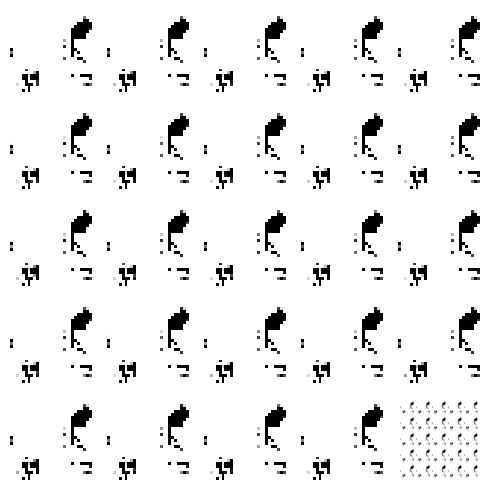

  0%|          | 0/350 [00:00<?, ?it/s]

4/4 [==============================] - 0s 17ms/step


  0%|          | 1/350 [00:00<03:59,  1.45it/s]

4/4 [==============================] - 0s 11ms/step


  1%|          | 2/350 [00:01<03:23,  1.71it/s]

4/4 [==============================] - 0s 17ms/step


  1%|          | 3/350 [00:01<03:52,  1.49it/s]

4/4 [==============================] - 0s 15ms/step


  1%|          | 4/350 [00:02<03:47,  1.52it/s]

4/4 [==============================] - 0s 14ms/step


  1%|▏         | 5/350 [00:03<03:42,  1.55it/s]

4/4 [==============================] - 0s 13ms/step


  2%|▏         | 6/350 [00:03<03:44,  1.53it/s]

4/4 [==============================] - 0s 12ms/step


  2%|▏         | 7/350 [00:04<03:32,  1.61it/s]

4/4 [==============================] - 0s 14ms/step


  2%|▏         | 8/350 [00:05<03:31,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


  3%|▎         | 9/350 [00:05<03:21,  1.69it/s]

4/4 [==============================] - 0s 16ms/step


  3%|▎         | 10/350 [00:06<03:34,  1.58it/s]

4/4 [==============================] - 0s 14ms/step


  3%|▎         | 11/350 [00:06<03:27,  1.63it/s]

4/4 [==============================] - 0s 14ms/step


  3%|▎         | 12/350 [00:07<03:22,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


  4%|▎         | 13/350 [00:08<03:25,  1.64it/s]

4/4 [==============================] - 0s 15ms/step


  4%|▍         | 14/350 [00:08<03:24,  1.64it/s]

4/4 [==============================] - 0s 15ms/step


  4%|▍         | 15/350 [00:09<03:21,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


  5%|▍         | 16/350 [00:09<03:19,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


  5%|▍         | 17/350 [00:10<03:18,  1.68it/s]

4/4 [==============================] - 0s 17ms/step


  5%|▌         | 18/350 [00:11<03:23,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


  5%|▌         | 19/350 [00:11<03:21,  1.64it/s]

4/4 [==============================] - 0s 15ms/step


  6%|▌         | 20/350 [00:12<03:15,  1.69it/s]

4/4 [==============================] - 0s 14ms/step


  6%|▌         | 21/350 [00:12<03:19,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


  6%|▋         | 22/350 [00:13<03:15,  1.68it/s]

4/4 [==============================] - 0s 18ms/step


  7%|▋         | 23/350 [00:14<03:13,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


  7%|▋         | 24/350 [00:14<03:09,  1.72it/s]

4/4 [==============================] - 0s 11ms/step


  7%|▋         | 25/350 [00:15<03:12,  1.69it/s]

4/4 [==============================] - 0s 13ms/step


  7%|▋         | 26/350 [00:15<03:16,  1.65it/s]

4/4 [==============================] - 0s 13ms/step


  8%|▊         | 27/350 [00:16<03:12,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


  8%|▊         | 28/350 [00:17<03:18,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


  8%|▊         | 29/350 [00:17<03:07,  1.71it/s]

4/4 [==============================] - 0s 13ms/step


  9%|▊         | 30/350 [00:18<03:16,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


  9%|▉         | 31/350 [00:18<03:14,  1.64it/s]

4/4 [==============================] - 0s 13ms/step


  9%|▉         | 32/350 [00:19<03:15,  1.62it/s]

4/4 [==============================] - 0s 11ms/step


  9%|▉         | 33/350 [00:20<03:18,  1.60it/s]

4/4 [==============================] - 0s 22ms/step


 10%|▉         | 34/350 [00:20<03:16,  1.61it/s]

4/4 [==============================] - 0s 14ms/step


 10%|█         | 35/350 [00:21<03:21,  1.57it/s]

4/4 [==============================] - 0s 14ms/step


 10%|█         | 36/350 [00:22<03:11,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


 11%|█         | 37/350 [00:22<03:15,  1.60it/s]

4/4 [==============================] - 0s 13ms/step


 11%|█         | 38/350 [00:23<03:08,  1.66it/s]

4/4 [==============================] - 0s 14ms/step


 11%|█         | 39/350 [00:23<03:07,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 11%|█▏        | 40/350 [00:24<03:03,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 12%|█▏        | 41/350 [00:25<03:11,  1.61it/s]

4/4 [==============================] - 0s 15ms/step


 12%|█▏        | 42/350 [00:25<03:04,  1.67it/s]

4/4 [==============================] - 0s 14ms/step


 12%|█▏        | 43/350 [00:26<03:05,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 13%|█▎        | 44/350 [00:26<03:04,  1.65it/s]

4/4 [==============================] - 0s 14ms/step


 13%|█▎        | 45/350 [00:27<03:08,  1.62it/s]

4/4 [==============================] - 0s 16ms/step


 13%|█▎        | 46/350 [00:28<03:04,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 13%|█▎        | 47/350 [00:28<03:04,  1.64it/s]

4/4 [==============================] - 0s 16ms/step


 14%|█▎        | 48/350 [00:29<02:56,  1.72it/s]

4/4 [==============================] - 0s 14ms/step


 14%|█▍        | 49/350 [00:29<03:03,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


 14%|█▍        | 50/350 [00:30<03:06,  1.61it/s]

4/4 [==============================] - 0s 12ms/step


 15%|█▍        | 51/350 [00:31<02:58,  1.67it/s]

4/4 [==============================] - 0s 14ms/step


 15%|█▍        | 52/350 [00:31<02:55,  1.70it/s]

4/4 [==============================] - 0s 13ms/step


 15%|█▌        | 53/350 [00:32<03:01,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 15%|█▌        | 54/350 [00:32<02:55,  1.69it/s]

4/4 [==============================] - 0s 16ms/step


 16%|█▌        | 55/350 [00:33<02:50,  1.73it/s]

4/4 [==============================] - 0s 14ms/step


 16%|█▌        | 56/350 [00:34<02:52,  1.71it/s]

4/4 [==============================] - 0s 17ms/step


 16%|█▋        | 57/350 [00:34<03:03,  1.60it/s]

4/4 [==============================] - 0s 13ms/step


 17%|█▋        | 58/350 [00:35<03:00,  1.61it/s]

4/4 [==============================] - 0s 11ms/step


 17%|█▋        | 59/350 [00:35<02:57,  1.64it/s]

4/4 [==============================] - 0s 13ms/step


 17%|█▋        | 60/350 [00:36<02:51,  1.69it/s]

4/4 [==============================] - 0s 15ms/step


 17%|█▋        | 61/350 [00:37<03:02,  1.58it/s]

4/4 [==============================] - 0s 16ms/step


 18%|█▊        | 62/350 [00:37<02:54,  1.65it/s]

4/4 [==============================] - 0s 14ms/step


 18%|█▊        | 63/350 [00:38<02:51,  1.67it/s]

4/4 [==============================] - 0s 14ms/step


 18%|█▊        | 64/350 [00:38<02:54,  1.64it/s]

4/4 [==============================] - 0s 14ms/step


 19%|█▊        | 65/350 [00:39<03:01,  1.57it/s]

4/4 [==============================] - 0s 11ms/step


 19%|█▉        | 66/350 [00:40<02:57,  1.60it/s]

4/4 [==============================] - 0s 14ms/step


 19%|█▉        | 67/350 [00:40<02:51,  1.65it/s]

4/4 [==============================] - 0s 16ms/step


 19%|█▉        | 68/350 [00:41<02:57,  1.59it/s]

4/4 [==============================] - 0s 17ms/step


 20%|█▉        | 69/350 [00:42<02:56,  1.59it/s]

4/4 [==============================] - 0s 11ms/step


 20%|██        | 70/350 [00:42<02:53,  1.61it/s]

4/4 [==============================] - 0s 15ms/step


 20%|██        | 71/350 [00:43<02:47,  1.66it/s]

4/4 [==============================] - 0s 14ms/step


 21%|██        | 72/350 [00:43<02:52,  1.61it/s]

4/4 [==============================] - 0s 11ms/step


 21%|██        | 73/350 [00:44<02:46,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 21%|██        | 74/350 [00:45<02:43,  1.69it/s]

4/4 [==============================] - 0s 13ms/step


 21%|██▏       | 75/350 [00:45<02:41,  1.71it/s]

4/4 [==============================] - 0s 13ms/step


 22%|██▏       | 76/350 [00:46<02:50,  1.61it/s]

4/4 [==============================] - 0s 11ms/step


 22%|██▏       | 77/350 [00:46<02:47,  1.63it/s]

4/4 [==============================] - 0s 14ms/step


 22%|██▏       | 78/350 [00:47<02:41,  1.68it/s]

4/4 [==============================] - 0s 16ms/step


 23%|██▎       | 79/350 [00:48<02:48,  1.61it/s]

4/4 [==============================] - 0s 20ms/step


 23%|██▎       | 80/350 [00:48<02:45,  1.63it/s]

4/4 [==============================] - 0s 21ms/step


 23%|██▎       | 81/350 [00:49<02:42,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


 23%|██▎       | 82/350 [00:49<02:43,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 24%|██▎       | 83/350 [00:50<02:47,  1.59it/s]

4/4 [==============================] - 0s 13ms/step


 24%|██▍       | 84/350 [00:51<02:45,  1.61it/s]

4/4 [==============================] - 0s 13ms/step


 24%|██▍       | 85/350 [00:51<02:39,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


 25%|██▍       | 86/350 [00:52<02:51,  1.54it/s]

4/4 [==============================] - 0s 18ms/step


 25%|██▍       | 87/350 [00:53<02:44,  1.60it/s]

4/4 [==============================] - 0s 12ms/step


 25%|██▌       | 88/350 [00:53<02:39,  1.64it/s]

4/4 [==============================] - 0s 13ms/step


 25%|██▌       | 89/350 [00:54<02:34,  1.69it/s]

4/4 [==============================] - 0s 15ms/step


 26%|██▌       | 90/350 [00:54<02:43,  1.59it/s]

4/4 [==============================] - 0s 11ms/step


 26%|██▌       | 91/350 [00:55<02:40,  1.61it/s]

4/4 [==============================] - 0s 14ms/step


 26%|██▋       | 92/350 [00:56<02:33,  1.68it/s]

4/4 [==============================] - 0s 15ms/step


 27%|██▋       | 93/350 [00:56<02:31,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 27%|██▋       | 94/350 [00:57<02:39,  1.61it/s]

4/4 [==============================] - 0s 15ms/step


 27%|██▋       | 95/350 [00:57<02:34,  1.65it/s]

4/4 [==============================] - 0s 13ms/step


 27%|██▋       | 96/350 [00:58<02:30,  1.69it/s]

4/4 [==============================] - 0s 14ms/step


 28%|██▊       | 97/350 [00:59<02:31,  1.67it/s]

4/4 [==============================] - 0s 15ms/step


 28%|██▊       | 98/350 [00:59<02:37,  1.60it/s]

4/4 [==============================] - 0s 13ms/step


 28%|██▊       | 99/350 [01:00<02:36,  1.60it/s]

4/4 [==============================] - 0s 14ms/step


 29%|██▊       | 100/350 [01:01<02:30,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


 29%|██▉       | 101/350 [01:01<02:30,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 29%|██▉       | 102/350 [01:02<02:34,  1.60it/s]

4/4 [==============================] - 0s 15ms/step


 29%|██▉       | 103/350 [01:02<02:29,  1.65it/s]

4/4 [==============================] - 0s 16ms/step


 30%|██▉       | 104/350 [01:03<02:27,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 30%|███       | 105/350 [01:04<02:29,  1.64it/s]

4/4 [==============================] - 0s 14ms/step


 30%|███       | 106/350 [01:04<02:31,  1.61it/s]

4/4 [==============================] - 0s 13ms/step


 31%|███       | 107/350 [01:05<02:29,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


 31%|███       | 108/350 [01:05<02:24,  1.67it/s]

4/4 [==============================] - 0s 15ms/step


 31%|███       | 109/350 [01:06<02:21,  1.71it/s]

4/4 [==============================] - 0s 17ms/step


 31%|███▏      | 110/350 [01:07<02:27,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 32%|███▏      | 111/350 [01:07<02:25,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 32%|███▏      | 112/350 [01:08<02:24,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 32%|███▏      | 113/350 [01:08<02:19,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 33%|███▎      | 114/350 [01:09<02:23,  1.64it/s]

4/4 [==============================] - 0s 17ms/step


 33%|███▎      | 115/350 [01:10<02:19,  1.68it/s]

4/4 [==============================] - 0s 15ms/step


 33%|███▎      | 116/350 [01:10<02:19,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 33%|███▎      | 117/350 [01:11<02:15,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


 34%|███▎      | 118/350 [01:11<02:20,  1.65it/s]

4/4 [==============================] - 0s 19ms/step


 34%|███▍      | 119/350 [01:12<02:21,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 34%|███▍      | 120/350 [01:13<02:22,  1.61it/s]

4/4 [==============================] - 0s 14ms/step


 35%|███▍      | 121/350 [01:13<02:16,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


 35%|███▍      | 122/350 [01:14<02:20,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 35%|███▌      | 123/350 [01:14<02:20,  1.61it/s]

4/4 [==============================] - 0s 15ms/step


 35%|███▌      | 124/350 [01:15<02:15,  1.67it/s]

4/4 [==============================] - 0s 15ms/step


 36%|███▌      | 125/350 [01:16<02:14,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 36%|███▌      | 126/350 [01:16<02:17,  1.63it/s]

4/4 [==============================] - 0s 17ms/step


 36%|███▋      | 127/350 [01:17<02:15,  1.64it/s]

4/4 [==============================] - 0s 16ms/step


 37%|███▋      | 128/350 [01:17<02:12,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 37%|███▋      | 129/350 [01:18<02:12,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 37%|███▋      | 130/350 [01:19<02:15,  1.62it/s]

4/4 [==============================] - 0s 18ms/step


 37%|███▋      | 131/350 [01:19<02:17,  1.59it/s]

4/4 [==============================] - 0s 13ms/step


 38%|███▊      | 132/350 [01:20<02:10,  1.68it/s]

4/4 [==============================] - 0s 14ms/step


 38%|███▊      | 133/350 [01:20<02:07,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 38%|███▊      | 134/350 [01:21<02:09,  1.66it/s]

4/4 [==============================] - 0s 17ms/step


 39%|███▊      | 135/350 [01:22<02:07,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


 39%|███▉      | 136/350 [01:22<02:04,  1.72it/s]

4/4 [==============================] - 0s 15ms/step


 39%|███▉      | 137/350 [01:23<02:02,  1.74it/s]

4/4 [==============================] - 0s 15ms/step


 39%|███▉      | 138/350 [01:23<02:07,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 40%|███▉      | 139/350 [01:24<02:07,  1.65it/s]

4/4 [==============================] - 0s 15ms/step


 40%|████      | 140/350 [01:25<02:01,  1.73it/s]

4/4 [==============================] - 0s 14ms/step


 40%|████      | 141/350 [01:25<02:00,  1.74it/s]

4/4 [==============================] - 0s 14ms/step


 41%|████      | 142/350 [01:26<02:03,  1.68it/s]

4/4 [==============================] - 0s 15ms/step


 41%|████      | 143/350 [01:26<02:06,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 41%|████      | 144/350 [01:27<02:00,  1.72it/s]

4/4 [==============================] - 0s 14ms/step


 41%|████▏     | 145/350 [01:28<01:58,  1.72it/s]

4/4 [==============================] - 0s 11ms/step


 42%|████▏     | 146/350 [01:28<02:07,  1.61it/s]

4/4 [==============================] - 0s 12ms/step


 42%|████▏     | 147/350 [01:29<02:01,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 42%|████▏     | 148/350 [01:29<01:58,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 43%|████▎     | 149/350 [01:30<01:59,  1.68it/s]

4/4 [==============================] - 0s 14ms/step


 43%|████▎     | 150/350 [01:31<02:02,  1.63it/s]

4/4 [==============================] - 0s 15ms/step


 43%|████▎     | 151/350 [01:31<01:59,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 43%|████▎     | 152/350 [01:32<01:58,  1.67it/s]

4/4 [==============================] - 0s 15ms/step


 44%|████▎     | 153/350 [01:32<01:55,  1.71it/s]

4/4 [==============================] - 0s 13ms/step


 44%|████▍     | 154/350 [01:33<01:59,  1.65it/s]

4/4 [==============================] - 0s 13ms/step


 44%|████▍     | 155/350 [01:34<01:57,  1.65it/s]

4/4 [==============================] - 0s 13ms/step


 45%|████▍     | 156/350 [01:34<01:53,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 45%|████▍     | 157/350 [01:35<01:51,  1.73it/s]

4/4 [==============================] - 0s 15ms/step


 45%|████▌     | 158/350 [01:35<01:55,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 45%|████▌     | 159/350 [01:36<01:54,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 46%|████▌     | 160/350 [01:36<01:50,  1.73it/s]

4/4 [==============================] - 0s 14ms/step


 46%|████▌     | 161/350 [01:37<01:48,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 46%|████▋     | 162/350 [01:38<01:55,  1.63it/s]

4/4 [==============================] - 0s 15ms/step


 47%|████▋     | 163/350 [01:38<01:51,  1.67it/s]

4/4 [==============================] - 0s 14ms/step


 47%|████▋     | 164/350 [01:39<01:50,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 47%|████▋     | 165/350 [01:40<01:55,  1.60it/s]

4/4 [==============================] - 0s 14ms/step


 47%|████▋     | 166/350 [01:40<01:51,  1.65it/s]

4/4 [==============================] - 0s 13ms/step


 48%|████▊     | 167/350 [01:41<01:49,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 48%|████▊     | 168/350 [01:41<01:48,  1.68it/s]

4/4 [==============================] - 0s 15ms/step


 48%|████▊     | 169/350 [01:42<01:52,  1.61it/s]

4/4 [==============================] - 0s 15ms/step


 49%|████▊     | 170/350 [01:43<01:48,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 49%|████▉     | 171/350 [01:43<01:46,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


 49%|████▉     | 172/350 [01:44<01:43,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 49%|████▉     | 173/350 [01:44<01:50,  1.61it/s]

4/4 [==============================] - 0s 11ms/step


 50%|████▉     | 174/350 [01:45<01:47,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


 50%|█████     | 175/350 [01:46<01:44,  1.68it/s]

4/4 [==============================] - 0s 14ms/step


 50%|█████     | 176/350 [01:46<01:42,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 51%|█████     | 177/350 [01:47<01:45,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


 51%|█████     | 178/350 [01:47<01:43,  1.67it/s]

4/4 [==============================] - 0s 16ms/step


 51%|█████     | 179/350 [01:48<01:40,  1.69it/s]

4/4 [==============================] - 0s 16ms/step


 51%|█████▏    | 180/350 [01:49<01:48,  1.57it/s]

4/4 [==============================] - 0s 16ms/step


 52%|█████▏    | 181/350 [01:49<01:43,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 52%|█████▏    | 182/350 [01:50<01:42,  1.64it/s]

4/4 [==============================] - 0s 15ms/step


 52%|█████▏    | 183/350 [01:50<01:40,  1.67it/s]

4/4 [==============================] - 0s 14ms/step


 53%|█████▎    | 184/350 [01:51<01:45,  1.58it/s]

4/4 [==============================] - 0s 15ms/step


 53%|█████▎    | 185/350 [01:52<01:43,  1.60it/s]

4/4 [==============================] - 0s 16ms/step


 53%|█████▎    | 186/350 [01:52<01:42,  1.60it/s]

4/4 [==============================] - 0s 12ms/step


 53%|█████▎    | 187/350 [01:53<01:45,  1.55it/s]

4/4 [==============================] - 0s 11ms/step


 54%|█████▎    | 188/350 [01:54<01:41,  1.59it/s]

4/4 [==============================] - 0s 12ms/step


 54%|█████▍    | 189/350 [01:54<01:36,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 54%|█████▍    | 190/350 [01:55<01:31,  1.74it/s]

4/4 [==============================] - 0s 14ms/step


 55%|█████▍    | 191/350 [01:55<01:36,  1.65it/s]

4/4 [==============================] - 0s 13ms/step


 55%|█████▍    | 192/350 [01:56<01:37,  1.61it/s]

4/4 [==============================] - 0s 14ms/step


 55%|█████▌    | 193/350 [01:57<01:33,  1.68it/s]

4/4 [==============================] - 0s 16ms/step


 55%|█████▌    | 194/350 [01:57<01:39,  1.57it/s]

4/4 [==============================] - 0s 16ms/step


 56%|█████▌    | 195/350 [01:58<01:36,  1.61it/s]

4/4 [==============================] - 0s 12ms/step


 56%|█████▌    | 196/350 [01:58<01:34,  1.64it/s]

4/4 [==============================] - 0s 14ms/step


 56%|█████▋    | 197/350 [01:59<01:31,  1.67it/s]

4/4 [==============================] - 0s 14ms/step


 57%|█████▋    | 198/350 [02:00<01:34,  1.61it/s]

4/4 [==============================] - 0s 11ms/step


 57%|█████▋    | 199/350 [02:00<01:32,  1.63it/s]

4/4 [==============================] - 0s 14ms/step


 57%|█████▋    | 200/350 [02:01<01:29,  1.67it/s]

4/4 [==============================] - 0s 14ms/step


 57%|█████▋    | 201/350 [02:02<01:35,  1.55it/s]

4/4 [==============================] - 0s 14ms/step


 58%|█████▊    | 202/350 [02:02<01:31,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 58%|█████▊    | 203/350 [02:03<01:30,  1.62it/s]

4/4 [==============================] - 0s 15ms/step


 58%|█████▊    | 204/350 [02:03<01:27,  1.67it/s]

4/4 [==============================] - 0s 18ms/step


 59%|█████▊    | 205/350 [02:04<01:30,  1.60it/s]

4/4 [==============================] - 0s 13ms/step


 59%|█████▉    | 206/350 [02:05<01:28,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


 59%|█████▉    | 207/350 [02:05<01:25,  1.68it/s]

4/4 [==============================] - 0s 15ms/step


 59%|█████▉    | 208/350 [02:06<01:27,  1.62it/s]

4/4 [==============================] - 0s 14ms/step


 60%|█████▉    | 209/350 [02:06<01:26,  1.63it/s]

4/4 [==============================] - 0s 17ms/step


 60%|██████    | 210/350 [02:07<01:25,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


 60%|██████    | 211/350 [02:08<01:23,  1.66it/s]

4/4 [==============================] - 0s 14ms/step


 61%|██████    | 212/350 [02:08<01:23,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 61%|██████    | 213/350 [02:09<01:25,  1.61it/s]

4/4 [==============================] - 0s 13ms/step


 61%|██████    | 214/350 [02:09<01:22,  1.64it/s]

4/4 [==============================] - 0s 16ms/step


 61%|██████▏   | 215/350 [02:10<01:20,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 62%|██████▏   | 216/350 [02:11<01:25,  1.56it/s]

4/4 [==============================] - 0s 13ms/step


 62%|██████▏   | 217/350 [02:11<01:20,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 62%|██████▏   | 218/350 [02:12<01:17,  1.70it/s]

4/4 [==============================] - 0s 13ms/step


 63%|██████▎   | 219/350 [02:12<01:16,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 63%|██████▎   | 220/350 [02:13<01:19,  1.64it/s]

4/4 [==============================] - 0s 15ms/step


 63%|██████▎   | 221/350 [02:14<01:18,  1.65it/s]

4/4 [==============================] - 0s 13ms/step


 63%|██████▎   | 222/350 [02:14<01:15,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 64%|██████▎   | 223/350 [02:15<01:16,  1.66it/s]

4/4 [==============================] - 0s 18ms/step


 64%|██████▍   | 224/350 [02:15<01:16,  1.65it/s]

4/4 [==============================] - 0s 13ms/step


 64%|██████▍   | 225/350 [02:16<01:15,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


 65%|██████▍   | 226/350 [02:17<01:15,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 65%|██████▍   | 227/350 [02:17<01:14,  1.66it/s]

4/4 [==============================] - 0s 14ms/step


 65%|██████▌   | 228/350 [02:18<01:15,  1.62it/s]

4/4 [==============================] - 0s 11ms/step


 65%|██████▌   | 229/350 [02:19<01:15,  1.61it/s]

4/4 [==============================] - 0s 14ms/step


 66%|██████▌   | 230/350 [02:19<01:13,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


 66%|██████▌   | 231/350 [02:20<01:15,  1.58it/s]

4/4 [==============================] - 0s 14ms/step


 66%|██████▋   | 232/350 [02:20<01:12,  1.64it/s]

4/4 [==============================] - 0s 14ms/step


 67%|██████▋   | 233/350 [02:21<01:09,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 67%|██████▋   | 234/350 [02:22<01:11,  1.63it/s]

4/4 [==============================] - 0s 14ms/step


 67%|██████▋   | 235/350 [02:22<01:11,  1.60it/s]

4/4 [==============================] - 0s 13ms/step


 67%|██████▋   | 236/350 [02:23<01:11,  1.60it/s]

4/4 [==============================] - 0s 16ms/step


 68%|██████▊   | 237/350 [02:23<01:08,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


 68%|██████▊   | 238/350 [02:24<01:12,  1.54it/s]

4/4 [==============================] - 0s 16ms/step


 68%|██████▊   | 239/350 [02:25<01:08,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


 69%|██████▊   | 240/350 [02:25<01:07,  1.62it/s]

4/4 [==============================] - 0s 14ms/step


 69%|██████▉   | 241/350 [02:26<01:06,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 69%|██████▉   | 242/350 [02:27<01:09,  1.56it/s]

4/4 [==============================] - 0s 12ms/step


 69%|██████▉   | 243/350 [02:27<01:06,  1.60it/s]

4/4 [==============================] - 0s 11ms/step


 70%|██████▉   | 244/350 [02:28<01:07,  1.58it/s]

4/4 [==============================] - 0s 12ms/step


 70%|███████   | 245/350 [02:29<01:05,  1.60it/s]

4/4 [==============================] - 0s 16ms/step


 70%|███████   | 246/350 [02:29<01:03,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 71%|███████   | 247/350 [02:30<01:02,  1.64it/s]

4/4 [==============================] - 0s 16ms/step


 71%|███████   | 248/350 [02:30<01:02,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 71%|███████   | 249/350 [02:31<01:03,  1.59it/s]

4/4 [==============================] - 0s 14ms/step


 71%|███████▏  | 250/350 [02:32<01:00,  1.64it/s]

4/4 [==============================] - 0s 14ms/step


 72%|███████▏  | 251/350 [02:32<00:59,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 72%|███████▏  | 252/350 [02:33<01:02,  1.57it/s]

4/4 [==============================] - 0s 12ms/step


 72%|███████▏  | 253/350 [02:33<00:58,  1.66it/s]

4/4 [==============================] - 0s 16ms/step


 73%|███████▎  | 254/350 [02:34<00:56,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 73%|███████▎  | 255/350 [02:35<00:57,  1.65it/s]

4/4 [==============================] - 0s 13ms/step


 73%|███████▎  | 256/350 [02:35<00:57,  1.64it/s]

4/4 [==============================] - 0s 13ms/step


 73%|███████▎  | 257/350 [02:36<00:55,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 74%|███████▎  | 258/350 [02:36<00:54,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


 74%|███████▍  | 259/350 [02:37<00:53,  1.69it/s]

4/4 [==============================] - 0s 13ms/step


 74%|███████▍  | 260/350 [02:38<00:54,  1.64it/s]

4/4 [==============================] - 0s 14ms/step


 75%|███████▍  | 261/350 [02:38<00:54,  1.64it/s]

4/4 [==============================] - 0s 14ms/step


 75%|███████▍  | 262/350 [02:39<00:52,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 75%|███████▌  | 263/350 [02:40<00:55,  1.56it/s]

4/4 [==============================] - 0s 14ms/step


 75%|███████▌  | 264/350 [02:40<00:52,  1.64it/s]

4/4 [==============================] - 0s 14ms/step


 76%|███████▌  | 265/350 [02:41<00:52,  1.63it/s]

4/4 [==============================] - 0s 15ms/step


 76%|███████▌  | 266/350 [02:41<00:51,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


 76%|███████▋  | 267/350 [02:42<00:55,  1.49it/s]

4/4 [==============================] - 0s 11ms/step


 77%|███████▋  | 268/350 [02:43<00:52,  1.56it/s]

4/4 [==============================] - 0s 13ms/step


 77%|███████▋  | 269/350 [02:43<00:49,  1.64it/s]

4/4 [==============================] - 0s 13ms/step


 77%|███████▋  | 270/350 [02:44<00:49,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


 77%|███████▋  | 271/350 [02:44<00:49,  1.58it/s]

4/4 [==============================] - 0s 13ms/step


 78%|███████▊  | 272/350 [02:45<00:47,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 78%|███████▊  | 273/350 [02:46<00:45,  1.68it/s]

4/4 [==============================] - 0s 18ms/step


 78%|███████▊  | 274/350 [02:46<00:46,  1.64it/s]

4/4 [==============================] - 0s 16ms/step


 79%|███████▊  | 275/350 [02:47<00:46,  1.60it/s]

4/4 [==============================] - 0s 13ms/step


 79%|███████▉  | 276/350 [02:48<00:45,  1.63it/s]

4/4 [==============================] - 0s 16ms/step


 79%|███████▉  | 277/350 [02:48<00:44,  1.63it/s]

4/4 [==============================] - 0s 17ms/step


 79%|███████▉  | 278/350 [02:49<00:43,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 80%|███████▉  | 279/350 [02:49<00:43,  1.63it/s]

4/4 [==============================] - 0s 15ms/step


 80%|████████  | 280/350 [02:50<00:42,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 80%|████████  | 281/350 [02:51<00:42,  1.62it/s]

4/4 [==============================] - 0s 13ms/step


 81%|████████  | 282/350 [02:51<00:42,  1.60it/s]

4/4 [==============================] - 0s 18ms/step


 81%|████████  | 283/350 [02:52<00:42,  1.59it/s]

4/4 [==============================] - 0s 14ms/step


 81%|████████  | 284/350 [02:52<00:40,  1.61it/s]

4/4 [==============================] - 0s 12ms/step


 81%|████████▏ | 285/350 [02:53<00:41,  1.58it/s]

4/4 [==============================] - 0s 18ms/step


 82%|████████▏ | 286/350 [02:54<00:39,  1.63it/s]

4/4 [==============================] - 0s 14ms/step


 82%|████████▏ | 287/350 [02:54<00:37,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


 82%|████████▏ | 288/350 [02:55<00:38,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 83%|████████▎ | 289/350 [02:56<00:38,  1.60it/s]

4/4 [==============================] - 0s 13ms/step


 83%|████████▎ | 290/350 [02:56<00:37,  1.60it/s]

4/4 [==============================] - 0s 14ms/step


 83%|████████▎ | 291/350 [02:57<00:36,  1.61it/s]

4/4 [==============================] - 0s 11ms/step


 83%|████████▎ | 292/350 [02:58<00:38,  1.51it/s]

4/4 [==============================] - 0s 11ms/step


 84%|████████▎ | 293/350 [02:58<00:36,  1.56it/s]

4/4 [==============================] - 0s 13ms/step


 84%|████████▍ | 294/350 [02:59<00:34,  1.61it/s]

4/4 [==============================] - 0s 14ms/step


 84%|████████▍ | 295/350 [02:59<00:32,  1.67it/s]

4/4 [==============================] - 0s 14ms/step


 85%|████████▍ | 296/350 [03:00<00:33,  1.63it/s]

4/4 [==============================] - 0s 14ms/step


 85%|████████▍ | 297/350 [03:01<00:32,  1.61it/s]

4/4 [==============================] - 0s 14ms/step


 85%|████████▌ | 298/350 [03:01<00:32,  1.62it/s]

4/4 [==============================] - 0s 11ms/step


 85%|████████▌ | 299/350 [03:02<00:32,  1.55it/s]

4/4 [==============================] - 0s 12ms/step


 86%|████████▌ | 300/350 [03:02<00:31,  1.58it/s]

4/4 [==============================] - 0s 13ms/step


 86%|████████▌ | 301/350 [03:03<00:29,  1.64it/s]

4/4 [==============================] - 0s 18ms/step


 86%|████████▋ | 302/350 [03:04<00:29,  1.60it/s]

4/4 [==============================] - 0s 12ms/step


 87%|████████▋ | 303/350 [03:04<00:29,  1.61it/s]

4/4 [==============================] - 0s 14ms/step


 87%|████████▋ | 304/350 [03:05<00:27,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


 87%|████████▋ | 305/350 [03:05<00:26,  1.71it/s]

4/4 [==============================] - 0s 18ms/step


 87%|████████▋ | 306/350 [03:06<00:25,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 88%|████████▊ | 307/350 [03:07<00:25,  1.68it/s]

4/4 [==============================] - 0s 15ms/step


 88%|████████▊ | 308/350 [03:07<00:24,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 88%|████████▊ | 309/350 [03:08<00:24,  1.66it/s]

4/4 [==============================] - 0s 18ms/step


 89%|████████▊ | 310/350 [03:08<00:23,  1.73it/s]

4/4 [==============================] - 0s 17ms/step


 89%|████████▉ | 311/350 [03:09<00:23,  1.65it/s]

4/4 [==============================] - 0s 14ms/step


 89%|████████▉ | 312/350 [03:10<00:23,  1.65it/s]

4/4 [==============================] - 0s 14ms/step


 89%|████████▉ | 313/350 [03:10<00:22,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


 90%|████████▉ | 314/350 [03:11<00:21,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 90%|█████████ | 315/350 [03:11<00:21,  1.64it/s]

4/4 [==============================] - 0s 15ms/step


 90%|█████████ | 316/350 [03:12<00:23,  1.44it/s]

4/4 [==============================] - 0s 18ms/step


 91%|█████████ | 317/350 [03:13<00:21,  1.56it/s]

4/4 [==============================] - 0s 13ms/step


 91%|█████████ | 318/350 [03:13<00:20,  1.57it/s]

4/4 [==============================] - 0s 18ms/step


 91%|█████████ | 319/350 [03:14<00:19,  1.62it/s]

4/4 [==============================] - 0s 13ms/step


 91%|█████████▏| 320/350 [03:15<00:19,  1.53it/s]

4/4 [==============================] - 0s 16ms/step


 92%|█████████▏| 321/350 [03:15<00:18,  1.56it/s]

4/4 [==============================] - 0s 25ms/step


 92%|█████████▏| 322/350 [03:16<00:18,  1.49it/s]

4/4 [==============================] - 0s 13ms/step


 92%|█████████▏| 323/350 [03:17<00:17,  1.53it/s]

4/4 [==============================] - 0s 14ms/step


 93%|█████████▎| 324/350 [03:17<00:17,  1.51it/s]

4/4 [==============================] - 0s 13ms/step


 93%|█████████▎| 325/350 [03:18<00:15,  1.60it/s]

4/4 [==============================] - 0s 16ms/step


 93%|█████████▎| 326/350 [03:19<00:15,  1.57it/s]

4/4 [==============================] - 0s 11ms/step


 93%|█████████▎| 327/350 [03:19<00:14,  1.60it/s]

4/4 [==============================] - 0s 14ms/step


 94%|█████████▎| 328/350 [03:20<00:13,  1.61it/s]

4/4 [==============================] - 0s 13ms/step


 94%|█████████▍| 329/350 [03:20<00:12,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 94%|█████████▍| 330/350 [03:21<00:12,  1.61it/s]

4/4 [==============================] - 0s 15ms/step


 95%|█████████▍| 331/350 [03:22<00:11,  1.63it/s]

4/4 [==============================] - 0s 15ms/step


 95%|█████████▍| 332/350 [03:22<00:10,  1.64it/s]

4/4 [==============================] - 0s 14ms/step


 95%|█████████▌| 333/350 [03:23<00:10,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 95%|█████████▌| 334/350 [03:23<00:09,  1.62it/s]

4/4 [==============================] - 0s 17ms/step


 96%|█████████▌| 335/350 [03:24<00:09,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 96%|█████████▌| 336/350 [03:25<00:08,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 96%|█████████▋| 337/350 [03:25<00:07,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 97%|█████████▋| 338/350 [03:26<00:07,  1.61it/s]

4/4 [==============================] - 0s 17ms/step


 97%|█████████▋| 339/350 [03:27<00:06,  1.62it/s]

4/4 [==============================] - 0s 14ms/step


 97%|█████████▋| 340/350 [03:27<00:06,  1.58it/s]

4/4 [==============================] - 0s 15ms/step


 97%|█████████▋| 341/350 [03:28<00:05,  1.60it/s]

4/4 [==============================] - 0s 19ms/step


 98%|█████████▊| 342/350 [03:28<00:04,  1.64it/s]

4/4 [==============================] - 0s 14ms/step


 98%|█████████▊| 343/350 [03:29<00:04,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 98%|█████████▊| 344/350 [03:30<00:03,  1.62it/s]

4/4 [==============================] - 0s 14ms/step


 99%|█████████▊| 345/350 [03:30<00:03,  1.62it/s]

4/4 [==============================] - 0s 17ms/step


 99%|█████████▉| 346/350 [03:31<00:02,  1.65it/s]

4/4 [==============================] - 0s 14ms/step


 99%|█████████▉| 347/350 [03:31<00:01,  1.61it/s]

4/4 [==============================] - 0s 13ms/step


 99%|█████████▉| 348/350 [03:32<00:01,  1.66it/s]

4/4 [==============================] - 0s 16ms/step


100%|█████████▉| 349/350 [03:33<00:00,  1.61it/s]

4/4 [==============================] - 0s 11ms/step


100%|██████████| 350/350 [03:33<00:00,  1.64it/s]

Epoch number: 79 discriminator_loss: 0.1646152441164512 generator_loss: 7.616895155225481
1/1 [==============================] - 0s 28ms/step


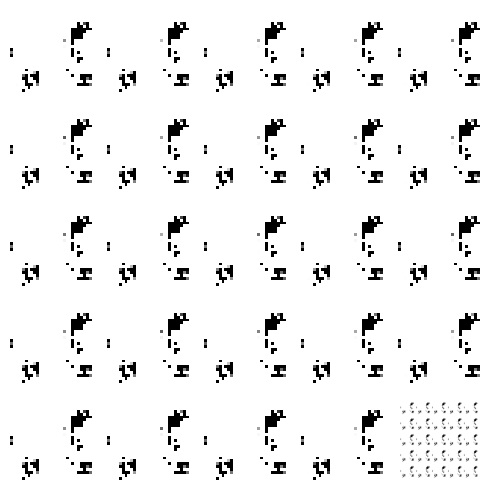

  0%|          | 0/350 [00:00<?, ?it/s]

4/4 [==============================] - 0s 25ms/step


  0%|          | 1/350 [00:00<04:29,  1.29it/s]

4/4 [==============================] - 0s 20ms/step


  1%|          | 2/350 [00:01<04:09,  1.40it/s]

4/4 [==============================] - 0s 22ms/step


  1%|          | 3/350 [00:02<04:16,  1.35it/s]

4/4 [==============================] - 0s 16ms/step


  1%|          | 4/350 [00:02<03:51,  1.49it/s]

4/4 [==============================] - 0s 13ms/step


  1%|▏         | 5/350 [00:03<03:41,  1.55it/s]

4/4 [==============================] - 0s 22ms/step


  2%|▏         | 6/350 [00:04<03:44,  1.53it/s]

4/4 [==============================] - 0s 10ms/step


  2%|▏         | 7/350 [00:04<03:36,  1.58it/s]

4/4 [==============================] - 0s 15ms/step


  2%|▏         | 8/350 [00:05<03:28,  1.64it/s]

4/4 [==============================] - 0s 13ms/step


  3%|▎         | 9/350 [00:05<03:25,  1.66it/s]

4/4 [==============================] - 0s 20ms/step


  3%|▎         | 10/350 [00:06<03:32,  1.60it/s]

4/4 [==============================] - 0s 11ms/step


  3%|▎         | 11/350 [00:07<03:33,  1.59it/s]

4/4 [==============================] - 0s 15ms/step


  3%|▎         | 12/350 [00:07<03:21,  1.68it/s]

4/4 [==============================] - 0s 14ms/step


  4%|▎         | 13/350 [00:08<03:16,  1.72it/s]

4/4 [==============================] - 0s 18ms/step


  4%|▍         | 14/350 [00:08<03:27,  1.62it/s]

4/4 [==============================] - 0s 11ms/step


  4%|▍         | 15/350 [00:09<03:27,  1.61it/s]

4/4 [==============================] - 0s 14ms/step


  5%|▍         | 16/350 [00:10<03:23,  1.64it/s]

4/4 [==============================] - 0s 13ms/step


  5%|▍         | 17/350 [00:10<03:18,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


  5%|▌         | 18/350 [00:11<03:27,  1.60it/s]

4/4 [==============================] - 0s 14ms/step


  5%|▌         | 19/350 [00:11<03:22,  1.63it/s]

4/4 [==============================] - 0s 14ms/step


  6%|▌         | 20/350 [00:12<03:19,  1.65it/s]

4/4 [==============================] - 0s 15ms/step


  6%|▌         | 21/350 [00:13<03:31,  1.56it/s]

4/4 [==============================] - 0s 14ms/step


  6%|▋         | 22/350 [00:13<03:27,  1.58it/s]

4/4 [==============================] - 0s 11ms/step


  7%|▋         | 23/350 [00:14<03:24,  1.60it/s]

4/4 [==============================] - 0s 17ms/step


  7%|▋         | 24/350 [00:15<03:16,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


  7%|▋         | 25/350 [00:15<03:21,  1.61it/s]

4/4 [==============================] - 0s 14ms/step


  7%|▋         | 26/350 [00:16<03:17,  1.64it/s]

4/4 [==============================] - 0s 13ms/step


  8%|▊         | 27/350 [00:16<03:13,  1.67it/s]

4/4 [==============================] - 0s 15ms/step


  8%|▊         | 28/350 [00:17<03:08,  1.70it/s]

4/4 [==============================] - 0s 16ms/step


  8%|▊         | 29/350 [00:18<03:22,  1.59it/s]

4/4 [==============================] - 0s 17ms/step


  9%|▊         | 30/350 [00:18<03:14,  1.64it/s]

4/4 [==============================] - 0s 13ms/step


  9%|▉         | 31/350 [00:19<03:09,  1.68it/s]

4/4 [==============================] - 0s 16ms/step


  9%|▉         | 32/350 [00:19<03:09,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


  9%|▉         | 33/350 [00:20<03:16,  1.62it/s]

4/4 [==============================] - 0s 15ms/step


 10%|▉         | 34/350 [00:21<03:08,  1.67it/s]

4/4 [==============================] - 0s 14ms/step


 10%|█         | 35/350 [00:21<03:05,  1.70it/s]

4/4 [==============================] - 0s 15ms/step


 10%|█         | 36/350 [00:22<03:03,  1.71it/s]

4/4 [==============================] - 0s 15ms/step


 11%|█         | 37/350 [00:22<03:17,  1.59it/s]

4/4 [==============================] - 0s 16ms/step


 11%|█         | 38/350 [00:23<03:10,  1.64it/s]

4/4 [==============================] - 0s 16ms/step


 11%|█         | 39/350 [00:24<03:08,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 11%|█▏        | 40/350 [00:24<03:14,  1.60it/s]

4/4 [==============================] - 0s 18ms/step


 12%|█▏        | 41/350 [00:25<03:14,  1.59it/s]

4/4 [==============================] - 0s 14ms/step


 12%|█▏        | 42/350 [00:26<03:11,  1.61it/s]

4/4 [==============================] - 0s 16ms/step


 12%|█▏        | 43/350 [00:26<03:06,  1.64it/s]

4/4 [==============================] - 0s 14ms/step


 13%|█▎        | 44/350 [00:27<03:16,  1.56it/s]

4/4 [==============================] - 0s 18ms/step


 13%|█▎        | 45/350 [00:27<03:09,  1.61it/s]

4/4 [==============================] - 0s 12ms/step


 13%|█▎        | 46/350 [00:28<03:02,  1.67it/s]

4/4 [==============================] - 0s 18ms/step


 13%|█▎        | 47/350 [00:29<03:00,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 14%|█▎        | 48/350 [00:29<03:07,  1.61it/s]

4/4 [==============================] - 0s 22ms/step


 14%|█▍        | 49/350 [00:30<03:03,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 14%|█▍        | 50/350 [00:30<02:55,  1.71it/s]

4/4 [==============================] - 0s 16ms/step


 15%|█▍        | 51/350 [00:31<02:53,  1.73it/s]

4/4 [==============================] - 0s 12ms/step


 15%|█▍        | 52/350 [00:32<03:04,  1.62it/s]

4/4 [==============================] - 0s 18ms/step


 15%|█▌        | 53/350 [00:32<02:56,  1.68it/s]

4/4 [==============================] - 0s 14ms/step


 15%|█▌        | 54/350 [00:33<02:52,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 16%|█▌        | 55/350 [00:33<02:52,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 16%|█▌        | 56/350 [00:34<02:59,  1.64it/s]

4/4 [==============================] - 0s 13ms/step


 16%|█▋        | 57/350 [00:35<03:01,  1.61it/s]

4/4 [==============================] - 0s 13ms/step


 17%|█▋        | 58/350 [00:35<02:51,  1.70it/s]

4/4 [==============================] - 0s 20ms/step


 17%|█▋        | 59/350 [00:36<02:50,  1.71it/s]

4/4 [==============================] - 0s 14ms/step


 17%|█▋        | 60/350 [00:36<02:55,  1.65it/s]

4/4 [==============================] - 0s 15ms/step


 17%|█▋        | 61/350 [00:37<02:59,  1.61it/s]

4/4 [==============================] - 0s 13ms/step


 18%|█▊        | 62/350 [00:37<02:50,  1.69it/s]

4/4 [==============================] - 0s 14ms/step


 18%|█▊        | 63/350 [00:38<02:46,  1.72it/s]

4/4 [==============================] - 0s 14ms/step


 18%|█▊        | 64/350 [00:39<02:51,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 19%|█▊        | 65/350 [00:39<02:53,  1.65it/s]

4/4 [==============================] - 0s 15ms/step


 19%|█▉        | 66/350 [00:40<02:46,  1.70it/s]

4/4 [==============================] - 0s 13ms/step


 19%|█▉        | 67/350 [00:40<02:44,  1.72it/s]

4/4 [==============================] - 0s 14ms/step


 19%|█▉        | 68/350 [00:41<02:50,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 20%|█▉        | 69/350 [00:42<02:49,  1.66it/s]

4/4 [==============================] - 0s 15ms/step


 20%|██        | 70/350 [00:42<02:43,  1.71it/s]

4/4 [==============================] - 0s 17ms/step


 20%|██        | 71/350 [00:43<02:43,  1.71it/s]

4/4 [==============================] - 0s 14ms/step


 21%|██        | 72/350 [00:44<02:52,  1.62it/s]

4/4 [==============================] - 0s 17ms/step


 21%|██        | 73/350 [00:44<02:46,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 21%|██        | 74/350 [00:45<02:42,  1.70it/s]

4/4 [==============================] - 0s 18ms/step


 21%|██▏       | 75/350 [00:45<02:40,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 22%|██▏       | 76/350 [00:46<02:48,  1.62it/s]

4/4 [==============================] - 0s 18ms/step


 22%|██▏       | 77/350 [00:46<02:44,  1.66it/s]

4/4 [==============================] - 0s 15ms/step


 22%|██▏       | 78/350 [00:47<02:43,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 23%|██▎       | 79/350 [00:48<02:48,  1.61it/s]

4/4 [==============================] - 0s 15ms/step


 23%|██▎       | 80/350 [00:48<02:51,  1.58it/s]

4/4 [==============================] - 0s 11ms/step


 23%|██▎       | 81/350 [00:49<02:47,  1.61it/s]

4/4 [==============================] - 0s 16ms/step


 23%|██▎       | 82/350 [00:50<02:42,  1.65it/s]

4/4 [==============================] - 0s 17ms/step


 24%|██▎       | 83/350 [00:50<02:49,  1.57it/s]

4/4 [==============================] - 0s 20ms/step


 24%|██▍       | 84/350 [00:51<02:43,  1.62it/s]

4/4 [==============================] - 0s 14ms/step


 24%|██▍       | 85/350 [00:51<02:39,  1.66it/s]

4/4 [==============================] - 0s 15ms/step


 25%|██▍       | 86/350 [00:52<02:36,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 25%|██▍       | 87/350 [00:53<02:42,  1.62it/s]

4/4 [==============================] - 0s 20ms/step


 25%|██▌       | 88/350 [00:53<02:38,  1.65it/s]

4/4 [==============================] - 0s 14ms/step


 25%|██▌       | 89/350 [00:54<02:34,  1.68it/s]

4/4 [==============================] - 0s 14ms/step


 26%|██▌       | 90/350 [00:54<02:32,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 26%|██▌       | 91/350 [00:55<02:38,  1.63it/s]

4/4 [==============================] - 0s 18ms/step


 26%|██▋       | 92/350 [00:56<02:35,  1.66it/s]

4/4 [==============================] - 0s 14ms/step


 27%|██▋       | 93/350 [00:56<02:31,  1.70it/s]

4/4 [==============================] - 0s 14ms/step


 27%|██▋       | 94/350 [00:57<02:37,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


 27%|██▋       | 95/350 [00:57<02:37,  1.62it/s]

4/4 [==============================] - 0s 14ms/step


 27%|██▋       | 96/350 [00:58<02:32,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 28%|██▊       | 97/350 [00:59<02:32,  1.66it/s]

4/4 [==============================] - 0s 15ms/step


 28%|██▊       | 98/350 [00:59<02:36,  1.61it/s]

4/4 [==============================] - 0s 11ms/step


 28%|██▊       | 99/350 [01:00<02:35,  1.61it/s]

4/4 [==============================] - 0s 13ms/step


 29%|██▊       | 100/350 [01:00<02:29,  1.68it/s]

4/4 [==============================] - 0s 16ms/step


 29%|██▉       | 101/350 [01:01<02:27,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 29%|██▉       | 102/350 [01:02<02:33,  1.61it/s]

4/4 [==============================] - 0s 16ms/step


 29%|██▉       | 103/350 [01:02<02:29,  1.65it/s]

4/4 [==============================] - 0s 14ms/step


 30%|██▉       | 104/350 [01:03<02:25,  1.69it/s]

4/4 [==============================] - 0s 16ms/step


 30%|███       | 105/350 [01:04<02:31,  1.61it/s]

4/4 [==============================] - 0s 16ms/step


 30%|███       | 106/350 [01:04<02:33,  1.59it/s]

4/4 [==============================] - 0s 16ms/step


 31%|███       | 107/350 [01:05<02:32,  1.59it/s]

4/4 [==============================] - 0s 13ms/step


 31%|███       | 108/350 [01:05<02:27,  1.65it/s]

4/4 [==============================] - 0s 14ms/step


 31%|███       | 109/350 [01:06<02:29,  1.61it/s]

4/4 [==============================] - 0s 14ms/step


 31%|███▏      | 110/350 [01:07<02:24,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


 32%|███▏      | 111/350 [01:07<02:21,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


 32%|███▏      | 112/350 [01:08<02:20,  1.70it/s]

4/4 [==============================] - 0s 14ms/step


 32%|███▏      | 113/350 [01:08<02:22,  1.67it/s]

4/4 [==============================] - 0s 17ms/step


 33%|███▎      | 114/350 [01:09<02:25,  1.62it/s]

4/4 [==============================] - 0s 14ms/step


 33%|███▎      | 115/350 [01:10<02:22,  1.65it/s]

4/4 [==============================] - 0s 15ms/step


 33%|███▎      | 116/350 [01:10<02:26,  1.60it/s]

4/4 [==============================] - 0s 15ms/step


 33%|███▎      | 117/350 [01:11<02:22,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 34%|███▎      | 118/350 [01:11<02:18,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 34%|███▍      | 119/350 [01:12<02:18,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 34%|███▍      | 120/350 [01:13<02:20,  1.64it/s]

4/4 [==============================] - 0s 13ms/step


 35%|███▍      | 121/350 [01:13<02:21,  1.61it/s]

4/4 [==============================] - 0s 13ms/step


 35%|███▍      | 122/350 [01:14<02:15,  1.69it/s]

4/4 [==============================] - 0s 14ms/step


 35%|███▌      | 123/350 [01:14<02:12,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 35%|███▌      | 124/350 [01:15<02:14,  1.68it/s]

4/4 [==============================] - 0s 20ms/step


 36%|███▌      | 125/350 [01:16<02:18,  1.62it/s]

4/4 [==============================] - 0s 13ms/step


 36%|███▌      | 126/350 [01:16<02:13,  1.67it/s]

4/4 [==============================] - 0s 15ms/step


 36%|███▋      | 127/350 [01:17<02:15,  1.64it/s]

4/4 [==============================] - 0s 14ms/step


 37%|███▋      | 128/350 [01:18<02:17,  1.61it/s]

4/4 [==============================] - 0s 17ms/step


 37%|███▋      | 129/350 [01:18<02:14,  1.64it/s]

4/4 [==============================] - 0s 15ms/step


 37%|███▋      | 130/350 [01:19<02:11,  1.67it/s]

4/4 [==============================] - 0s 15ms/step


 37%|███▋      | 131/350 [01:19<02:16,  1.61it/s]

4/4 [==============================] - 0s 12ms/step


 38%|███▊      | 132/350 [01:20<02:16,  1.60it/s]

4/4 [==============================] - 0s 15ms/step


 38%|███▊      | 133/350 [01:21<02:08,  1.69it/s]

4/4 [==============================] - 0s 15ms/step


 38%|███▊      | 134/350 [01:21<02:06,  1.71it/s]

4/4 [==============================] - 0s 14ms/step


 39%|███▊      | 135/350 [01:22<02:10,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 39%|███▉      | 136/350 [01:22<02:10,  1.64it/s]

4/4 [==============================] - 0s 16ms/step


 39%|███▉      | 137/350 [01:23<02:05,  1.70it/s]

4/4 [==============================] - 0s 17ms/step


 39%|███▉      | 138/350 [01:23<02:04,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 40%|███▉      | 139/350 [01:24<02:09,  1.63it/s]

4/4 [==============================] - 0s 15ms/step


 40%|████      | 140/350 [01:25<02:05,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 40%|████      | 141/350 [01:25<02:02,  1.71it/s]

4/4 [==============================] - 0s 14ms/step


 41%|████      | 142/350 [01:26<02:01,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


 41%|████      | 143/350 [01:26<02:04,  1.66it/s]

4/4 [==============================] - 0s 14ms/step


 41%|████      | 144/350 [01:27<02:02,  1.69it/s]

4/4 [==============================] - 0s 15ms/step


 41%|████▏     | 145/350 [01:28<02:00,  1.70it/s]

4/4 [==============================] - 0s 13ms/step


 42%|████▏     | 146/350 [01:28<01:59,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 42%|████▏     | 147/350 [01:29<02:04,  1.64it/s]

4/4 [==============================] - 0s 18ms/step


 42%|████▏     | 148/350 [01:29<02:01,  1.66it/s]

4/4 [==============================] - 0s 14ms/step


 43%|████▎     | 149/350 [01:30<01:57,  1.71it/s]

4/4 [==============================] - 0s 16ms/step


 43%|████▎     | 150/350 [01:31<02:02,  1.63it/s]

4/4 [==============================] - 0s 19ms/step


 43%|████▎     | 151/350 [01:31<02:02,  1.62it/s]

4/4 [==============================] - 0s 11ms/step


 43%|████▎     | 152/350 [01:32<01:59,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 44%|████▎     | 153/350 [01:32<01:58,  1.66it/s]

4/4 [==============================] - 0s 14ms/step


 44%|████▍     | 154/350 [01:33<02:00,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


 44%|████▍     | 155/350 [01:34<02:00,  1.62it/s]

4/4 [==============================] - 0s 13ms/step


 45%|████▍     | 156/350 [01:34<01:54,  1.70it/s]

4/4 [==============================] - 0s 16ms/step


 45%|████▍     | 157/350 [01:35<01:50,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 45%|████▌     | 158/350 [01:35<01:56,  1.64it/s]

4/4 [==============================] - 0s 14ms/step


 45%|████▌     | 159/350 [01:36<01:56,  1.64it/s]

4/4 [==============================] - 0s 15ms/step


 46%|████▌     | 160/350 [01:37<01:52,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 46%|████▌     | 161/350 [01:37<01:49,  1.72it/s]

4/4 [==============================] - 0s 15ms/step


 46%|████▋     | 162/350 [01:38<01:52,  1.67it/s]

4/4 [==============================] - 0s 19ms/step


 47%|████▋     | 163/350 [01:39<01:56,  1.61it/s]

4/4 [==============================] - 0s 14ms/step


 47%|████▋     | 164/350 [01:39<01:52,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


 47%|████▋     | 165/350 [01:40<01:52,  1.64it/s]

4/4 [==============================] - 0s 15ms/step


 47%|████▋     | 166/350 [01:40<01:53,  1.62it/s]

4/4 [==============================] - 0s 17ms/step


 48%|████▊     | 167/350 [01:41<01:49,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 48%|████▊     | 168/350 [01:42<01:50,  1.64it/s]

4/4 [==============================] - 0s 13ms/step


 48%|████▊     | 169/350 [01:42<01:50,  1.64it/s]

4/4 [==============================] - 0s 16ms/step


 49%|████▊     | 170/350 [01:43<01:53,  1.58it/s]

4/4 [==============================] - 0s 15ms/step


 49%|████▉     | 171/350 [01:43<01:48,  1.64it/s]

4/4 [==============================] - 0s 13ms/step


 49%|████▉     | 172/350 [01:44<01:45,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 49%|████▉     | 173/350 [01:45<01:49,  1.61it/s]

4/4 [==============================] - 0s 17ms/step


 50%|████▉     | 174/350 [01:45<02:00,  1.46it/s]

4/4 [==============================] - 0s 11ms/step


 50%|█████     | 175/350 [01:46<01:54,  1.53it/s]

4/4 [==============================] - 0s 13ms/step


 50%|█████     | 176/350 [01:47<01:55,  1.51it/s]

4/4 [==============================] - 0s 11ms/step


 51%|█████     | 177/350 [01:47<01:52,  1.54it/s]

4/4 [==============================] - 0s 14ms/step


 51%|█████     | 178/350 [01:48<01:45,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 51%|█████     | 179/350 [01:48<01:42,  1.66it/s]

4/4 [==============================] - 0s 15ms/step


 51%|█████▏    | 180/350 [01:49<01:47,  1.58it/s]

4/4 [==============================] - 0s 17ms/step


 52%|█████▏    | 181/350 [01:50<01:43,  1.63it/s]

4/4 [==============================] - 0s 14ms/step


 52%|█████▏    | 182/350 [01:50<01:39,  1.69it/s]

4/4 [==============================] - 0s 14ms/step


 52%|█████▏    | 183/350 [01:51<01:38,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 53%|█████▎    | 184/350 [01:52<01:44,  1.58it/s]

4/4 [==============================] - 0s 14ms/step


 53%|█████▎    | 185/350 [01:52<01:40,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 53%|█████▎    | 186/350 [01:53<01:37,  1.69it/s]

4/4 [==============================] - 0s 16ms/step


 53%|█████▎    | 187/350 [01:53<01:36,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 54%|█████▎    | 188/350 [01:54<01:38,  1.65it/s]

4/4 [==============================] - 0s 14ms/step


 54%|█████▍    | 189/350 [01:55<01:37,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 54%|█████▍    | 190/350 [01:55<01:33,  1.71it/s]

4/4 [==============================] - 0s 14ms/step


 55%|█████▍    | 191/350 [01:56<01:32,  1.71it/s]

4/4 [==============================] - 0s 15ms/step


 55%|█████▍    | 192/350 [01:56<01:36,  1.64it/s]

4/4 [==============================] - 0s 14ms/step


 55%|█████▌    | 193/350 [01:57<01:33,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 55%|█████▌    | 194/350 [01:57<01:30,  1.72it/s]

4/4 [==============================] - 0s 14ms/step


 56%|█████▌    | 195/350 [01:58<01:29,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 56%|█████▌    | 196/350 [01:59<01:32,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 56%|█████▋    | 197/350 [01:59<01:32,  1.65it/s]

4/4 [==============================] - 0s 13ms/step


 57%|█████▋    | 198/350 [02:00<01:29,  1.70it/s]

4/4 [==============================] - 0s 16ms/step


 57%|█████▋    | 199/350 [02:00<01:28,  1.71it/s]

4/4 [==============================] - 0s 11ms/step


 57%|█████▋    | 200/350 [02:01<01:32,  1.62it/s]

4/4 [==============================] - 0s 17ms/step


 57%|█████▋    | 201/350 [02:02<01:28,  1.68it/s]

4/4 [==============================] - 0s 15ms/step


 58%|█████▊    | 202/350 [02:02<01:25,  1.73it/s]

4/4 [==============================] - 0s 15ms/step


 58%|█████▊    | 203/350 [02:03<01:24,  1.74it/s]

4/4 [==============================] - 0s 15ms/step


 58%|█████▊    | 204/350 [02:03<01:28,  1.66it/s]

4/4 [==============================] - 0s 15ms/step


 59%|█████▊    | 205/350 [02:04<01:26,  1.67it/s]

4/4 [==============================] - 0s 15ms/step


 59%|█████▉    | 206/350 [02:05<01:24,  1.70it/s]

4/4 [==============================] - 0s 14ms/step


 59%|█████▉    | 207/350 [02:05<01:28,  1.61it/s]

4/4 [==============================] - 0s 16ms/step


 59%|█████▉    | 208/350 [02:06<01:27,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


 60%|█████▉    | 209/350 [02:06<01:23,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 60%|██████    | 210/350 [02:07<01:23,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


 60%|██████    | 211/350 [02:08<01:22,  1.68it/s]

4/4 [==============================] - 0s 19ms/step


 61%|██████    | 212/350 [02:08<01:23,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 61%|██████    | 213/350 [02:09<01:22,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 61%|██████    | 214/350 [02:09<01:20,  1.69it/s]

4/4 [==============================] - 0s 13ms/step


 61%|██████▏   | 215/350 [02:10<01:21,  1.65it/s]

4/4 [==============================] - 0s 13ms/step


 62%|██████▏   | 216/350 [02:11<01:22,  1.62it/s]

4/4 [==============================] - 0s 14ms/step


 62%|██████▏   | 217/350 [02:11<01:18,  1.70it/s]

4/4 [==============================] - 0s 16ms/step


 62%|██████▏   | 218/350 [02:12<01:16,  1.72it/s]

4/4 [==============================] - 0s 14ms/step


 63%|██████▎   | 219/350 [02:12<01:19,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 63%|██████▎   | 220/350 [02:13<01:19,  1.64it/s]

4/4 [==============================] - 0s 16ms/step


 63%|██████▎   | 221/350 [02:14<01:16,  1.70it/s]

4/4 [==============================] - 0s 14ms/step


 63%|██████▎   | 222/350 [02:14<01:15,  1.70it/s]

4/4 [==============================] - 0s 16ms/step


 64%|██████▎   | 223/350 [02:15<01:19,  1.61it/s]

4/4 [==============================] - 0s 20ms/step


 64%|██████▍   | 224/350 [02:15<01:17,  1.63it/s]

4/4 [==============================] - 0s 15ms/step


 64%|██████▍   | 225/350 [02:16<01:15,  1.67it/s]

4/4 [==============================] - 0s 14ms/step


 65%|██████▍   | 226/350 [02:17<01:17,  1.60it/s]

4/4 [==============================] - 0s 19ms/step


 65%|██████▍   | 227/350 [02:17<01:17,  1.59it/s]

4/4 [==============================] - 0s 11ms/step


 65%|██████▌   | 228/350 [02:18<01:14,  1.63it/s]

4/4 [==============================] - 0s 14ms/step


 65%|██████▌   | 229/350 [02:18<01:11,  1.68it/s]

4/4 [==============================] - 0s 14ms/step


 66%|██████▌   | 230/350 [02:19<01:12,  1.65it/s]

4/4 [==============================] - 0s 15ms/step


 66%|██████▌   | 231/350 [02:20<01:14,  1.59it/s]

4/4 [==============================] - 0s 15ms/step


 66%|██████▋   | 232/350 [02:20<01:11,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 67%|██████▋   | 233/350 [02:21<01:13,  1.60it/s]

4/4 [==============================] - 0s 15ms/step


 67%|██████▋   | 234/350 [02:22<01:11,  1.62it/s]

4/4 [==============================] - 0s 14ms/step


 67%|██████▋   | 235/350 [02:22<01:08,  1.69it/s]

4/4 [==============================] - 0s 13ms/step


 67%|██████▋   | 236/350 [02:23<01:06,  1.72it/s]

4/4 [==============================] - 0s 11ms/step


 68%|██████▊   | 237/350 [02:23<01:08,  1.64it/s]

4/4 [==============================] - 0s 14ms/step


 68%|██████▊   | 238/350 [02:24<01:07,  1.66it/s]

4/4 [==============================] - 0s 14ms/step


 68%|██████▊   | 239/350 [02:25<01:05,  1.70it/s]

4/4 [==============================] - 0s 13ms/step


 69%|██████▊   | 240/350 [02:25<01:04,  1.72it/s]

4/4 [==============================] - 0s 11ms/step


 69%|██████▉   | 241/350 [02:26<01:06,  1.64it/s]

4/4 [==============================] - 0s 15ms/step


 69%|██████▉   | 242/350 [02:26<01:06,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


 69%|██████▉   | 243/350 [02:27<01:03,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 70%|██████▉   | 244/350 [02:28<01:02,  1.69it/s]

4/4 [==============================] - 0s 14ms/step


 70%|███████   | 245/350 [02:28<01:04,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


 70%|███████   | 246/350 [02:29<01:05,  1.59it/s]

4/4 [==============================] - 0s 13ms/step


 71%|███████   | 247/350 [02:29<01:01,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 71%|███████   | 248/350 [02:30<00:59,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 71%|███████   | 249/350 [02:31<01:00,  1.68it/s]

4/4 [==============================] - 0s 17ms/step


 71%|███████▏  | 250/350 [02:31<00:59,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 72%|███████▏  | 251/350 [02:32<00:59,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 72%|███████▏  | 252/350 [02:32<01:00,  1.61it/s]

4/4 [==============================] - 0s 21ms/step


 72%|███████▏  | 253/350 [02:33<01:00,  1.59it/s]

4/4 [==============================] - 0s 12ms/step


 73%|███████▎  | 254/350 [02:34<00:59,  1.61it/s]

4/4 [==============================] - 0s 17ms/step


 73%|███████▎  | 255/350 [02:34<00:56,  1.68it/s]

4/4 [==============================] - 0s 16ms/step


 73%|███████▎  | 256/350 [02:35<00:57,  1.64it/s]

4/4 [==============================] - 0s 13ms/step


 73%|███████▎  | 257/350 [02:35<00:57,  1.62it/s]

4/4 [==============================] - 0s 17ms/step


 74%|███████▎  | 258/350 [02:36<00:54,  1.69it/s]

4/4 [==============================] - 0s 13ms/step


 74%|███████▍  | 259/350 [02:37<00:52,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 74%|███████▍  | 260/350 [02:37<00:54,  1.66it/s]

4/4 [==============================] - 0s 15ms/step


 75%|███████▍  | 261/350 [02:38<00:54,  1.62it/s]

4/4 [==============================] - 0s 14ms/step


 75%|███████▍  | 262/350 [02:38<00:52,  1.69it/s]

4/4 [==============================] - 0s 13ms/step


 75%|███████▌  | 263/350 [02:39<00:50,  1.73it/s]

4/4 [==============================] - 0s 14ms/step


 75%|███████▌  | 264/350 [02:40<00:51,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 76%|███████▌  | 265/350 [02:40<00:51,  1.64it/s]

4/4 [==============================] - 0s 15ms/step


 76%|███████▌  | 266/350 [02:41<00:49,  1.71it/s]

4/4 [==============================] - 0s 13ms/step


 76%|███████▋  | 267/350 [02:41<00:48,  1.71it/s]

4/4 [==============================] - 0s 17ms/step


 77%|███████▋  | 268/350 [02:42<00:49,  1.67it/s]

4/4 [==============================] - 0s 18ms/step


 77%|███████▋  | 269/350 [02:43<00:48,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 77%|███████▋  | 270/350 [02:43<00:48,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 77%|███████▋  | 271/350 [02:44<00:49,  1.61it/s]

4/4 [==============================] - 0s 18ms/step


 78%|███████▊  | 272/350 [02:45<00:49,  1.56it/s]

4/4 [==============================] - 0s 16ms/step


 78%|███████▊  | 273/350 [02:45<00:47,  1.62it/s]

4/4 [==============================] - 0s 14ms/step


 78%|███████▊  | 274/350 [02:46<00:46,  1.63it/s]

4/4 [==============================] - 0s 14ms/step


 79%|███████▊  | 275/350 [02:46<00:48,  1.56it/s]

4/4 [==============================] - 0s 15ms/step


 79%|███████▉  | 276/350 [02:47<00:46,  1.59it/s]

4/4 [==============================] - 0s 14ms/step


 79%|███████▉  | 277/350 [02:48<00:45,  1.59it/s]

4/4 [==============================] - 0s 13ms/step


 79%|███████▉  | 278/350 [02:48<00:46,  1.55it/s]

4/4 [==============================] - 0s 15ms/step


 80%|███████▉  | 279/350 [02:49<00:43,  1.61it/s]

4/4 [==============================] - 0s 14ms/step


 80%|████████  | 280/350 [02:49<00:41,  1.67it/s]

4/4 [==============================] - 0s 17ms/step


 80%|████████  | 281/350 [02:50<00:41,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 81%|████████  | 282/350 [02:51<00:42,  1.61it/s]

4/4 [==============================] - 0s 13ms/step


 81%|████████  | 283/350 [02:51<00:40,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 81%|████████  | 284/350 [02:52<00:38,  1.72it/s]

4/4 [==============================] - 0s 14ms/step


 81%|████████▏ | 285/350 [02:52<00:37,  1.75it/s]

4/4 [==============================] - 0s 12ms/step


 82%|████████▏ | 286/350 [02:53<00:37,  1.70it/s]

4/4 [==============================] - 0s 14ms/step


 82%|████████▏ | 287/350 [02:54<00:38,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 82%|████████▏ | 288/350 [02:54<00:36,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 83%|████████▎ | 289/350 [02:55<00:34,  1.77it/s]

4/4 [==============================] - 0s 14ms/step


 83%|████████▎ | 290/350 [02:55<00:35,  1.69it/s]

4/4 [==============================] - 0s 15ms/step


 83%|████████▎ | 291/350 [02:56<00:35,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 83%|████████▎ | 292/350 [02:57<00:34,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 84%|████████▎ | 293/350 [02:57<00:33,  1.71it/s]

4/4 [==============================] - 0s 16ms/step


 84%|████████▍ | 294/350 [02:58<00:33,  1.65it/s]

4/4 [==============================] - 0s 14ms/step


 84%|████████▍ | 295/350 [02:58<00:33,  1.63it/s]

4/4 [==============================] - 0s 16ms/step


 85%|████████▍ | 296/350 [02:59<00:32,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 85%|████████▍ | 297/350 [02:59<00:30,  1.74it/s]

4/4 [==============================] - 0s 19ms/step


 85%|████████▌ | 298/350 [03:00<00:31,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 85%|████████▌ | 299/350 [03:01<00:30,  1.65it/s]

4/4 [==============================] - 0s 15ms/step


 86%|████████▌ | 300/350 [03:01<00:28,  1.73it/s]

4/4 [==============================] - 0s 14ms/step


 86%|████████▌ | 301/350 [03:02<00:28,  1.75it/s]

4/4 [==============================] - 0s 14ms/step


 86%|████████▋ | 302/350 [03:03<00:29,  1.64it/s]

4/4 [==============================] - 0s 14ms/step


 87%|████████▋ | 303/350 [03:03<00:28,  1.63it/s]

4/4 [==============================] - 0s 14ms/step


 87%|████████▋ | 304/350 [03:04<00:26,  1.71it/s]

4/4 [==============================] - 0s 15ms/step


 87%|████████▋ | 305/350 [03:04<00:26,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 87%|████████▋ | 306/350 [03:05<00:26,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 88%|████████▊ | 307/350 [03:06<00:26,  1.61it/s]

4/4 [==============================] - 0s 14ms/step


 88%|████████▊ | 308/350 [03:06<00:25,  1.68it/s]

4/4 [==============================] - 0s 16ms/step


 88%|████████▊ | 309/350 [03:07<00:24,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 89%|████████▊ | 310/350 [03:07<00:24,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 89%|████████▉ | 311/350 [03:08<00:22,  1.70it/s]

4/4 [==============================] - 0s 14ms/step


 89%|████████▉ | 312/350 [03:08<00:21,  1.73it/s]

4/4 [==============================] - 0s 16ms/step


 89%|████████▉ | 313/350 [03:09<00:21,  1.76it/s]

4/4 [==============================] - 0s 14ms/step


 90%|████████▉ | 314/350 [03:10<00:21,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 90%|█████████ | 315/350 [03:10<00:21,  1.62it/s]

4/4 [==============================] - 0s 13ms/step


 90%|█████████ | 316/350 [03:11<00:20,  1.69it/s]

4/4 [==============================] - 0s 13ms/step


 91%|█████████ | 317/350 [03:11<00:19,  1.69it/s]

4/4 [==============================] - 0s 14ms/step


 91%|█████████ | 318/350 [03:12<00:19,  1.66it/s]

4/4 [==============================] - 0s 17ms/step


 91%|█████████ | 319/350 [03:13<00:19,  1.63it/s]

4/4 [==============================] - 0s 14ms/step


 91%|█████████▏| 320/350 [03:13<00:18,  1.65it/s]

4/4 [==============================] - 0s 13ms/step


 92%|█████████▏| 321/350 [03:14<00:17,  1.62it/s]

4/4 [==============================] - 0s 17ms/step


 92%|█████████▏| 322/350 [03:15<00:17,  1.59it/s]

4/4 [==============================] - 0s 11ms/step


 92%|█████████▏| 323/350 [03:15<00:16,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


 93%|█████████▎| 324/350 [03:16<00:15,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


 93%|█████████▎| 325/350 [03:16<00:15,  1.57it/s]

4/4 [==============================] - 0s 16ms/step


 93%|█████████▎| 326/350 [03:17<00:14,  1.61it/s]

4/4 [==============================] - 0s 13ms/step


 93%|█████████▎| 327/350 [03:18<00:13,  1.67it/s]

4/4 [==============================] - 0s 15ms/step


 94%|█████████▎| 328/350 [03:18<00:12,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 94%|█████████▍| 329/350 [03:19<00:13,  1.60it/s]

4/4 [==============================] - 0s 20ms/step


 94%|█████████▍| 330/350 [03:19<00:12,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


 95%|█████████▍| 331/350 [03:20<00:11,  1.70it/s]

4/4 [==============================] - 0s 16ms/step


 95%|█████████▍| 332/350 [03:21<00:10,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


 95%|█████████▌| 333/350 [03:21<00:10,  1.64it/s]

4/4 [==============================] - 0s 18ms/step


 95%|█████████▌| 334/350 [03:22<00:09,  1.67it/s]

4/4 [==============================] - 0s 14ms/step


 96%|█████████▌| 335/350 [03:22<00:08,  1.70it/s]

4/4 [==============================] - 0s 15ms/step


 96%|█████████▌| 336/350 [03:23<00:08,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 96%|█████████▋| 337/350 [03:24<00:07,  1.64it/s]

4/4 [==============================] - 0s 14ms/step


 97%|█████████▋| 338/350 [03:24<00:07,  1.67it/s]

4/4 [==============================] - 0s 14ms/step


 97%|█████████▋| 339/350 [03:25<00:06,  1.70it/s]

4/4 [==============================] - 0s 16ms/step


 97%|█████████▋| 340/350 [03:25<00:05,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 97%|█████████▋| 341/350 [03:26<00:05,  1.64it/s]

4/4 [==============================] - 0s 15ms/step


 98%|█████████▊| 342/350 [03:27<00:04,  1.65it/s]

4/4 [==============================] - 0s 15ms/step


 98%|█████████▊| 343/350 [03:27<00:04,  1.68it/s]

4/4 [==============================] - 0s 14ms/step


 98%|█████████▊| 344/350 [03:28<00:03,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 99%|█████████▊| 345/350 [03:28<00:03,  1.60it/s]

4/4 [==============================] - 0s 15ms/step


 99%|█████████▉| 346/350 [03:29<00:02,  1.66it/s]

4/4 [==============================] - 0s 14ms/step


 99%|█████████▉| 347/350 [03:30<00:01,  1.71it/s]

4/4 [==============================] - 0s 16ms/step


 99%|█████████▉| 348/350 [03:30<00:01,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


100%|█████████▉| 349/350 [03:31<00:00,  1.62it/s]

4/4 [==============================] - 0s 20ms/step


100%|██████████| 350/350 [03:31<00:00,  1.65it/s]

Epoch number: 80 discriminator_loss: 0.16435078795109542 generator_loss: 7.784949827194214
1/1 [==============================] - 0s 22ms/step


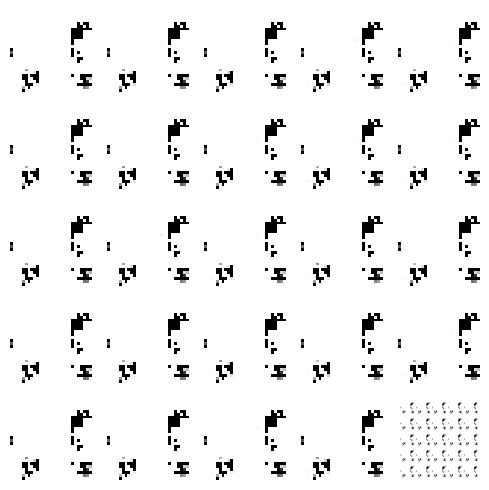

  0%|          | 0/350 [00:00<?, ?it/s]

4/4 [==============================] - 0s 17ms/step


  0%|          | 1/350 [00:00<03:44,  1.55it/s]

4/4 [==============================] - 0s 13ms/step


  1%|          | 2/350 [00:01<03:17,  1.76it/s]

4/4 [==============================] - 0s 12ms/step


  1%|          | 3/350 [00:01<03:30,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


  1%|          | 4/350 [00:02<03:17,  1.75it/s]

4/4 [==============================] - 0s 30ms/step


  1%|▏         | 5/350 [00:03<03:34,  1.61it/s]

4/4 [==============================] - 0s 13ms/step


  2%|▏         | 6/350 [00:03<03:34,  1.60it/s]

4/4 [==============================] - 0s 13ms/step


  2%|▏         | 7/350 [00:04<03:25,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


  2%|▏         | 8/350 [00:04<03:23,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


  3%|▎         | 9/350 [00:05<03:30,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


  3%|▎         | 10/350 [00:06<03:29,  1.62it/s]

4/4 [==============================] - 0s 14ms/step


  3%|▎         | 11/350 [00:06<03:23,  1.66it/s]

4/4 [==============================] - 0s 14ms/step


  3%|▎         | 12/350 [00:07<03:27,  1.63it/s]

4/4 [==============================] - 0s 15ms/step


  4%|▎         | 13/350 [00:07<03:22,  1.66it/s]

4/4 [==============================] - 0s 14ms/step


  4%|▍         | 14/350 [00:08<03:23,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


  4%|▍         | 15/350 [00:09<03:17,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


  5%|▍         | 16/350 [00:09<03:25,  1.63it/s]

4/4 [==============================] - 0s 16ms/step


  5%|▍         | 17/350 [00:10<03:22,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


  5%|▌         | 18/350 [00:10<03:18,  1.67it/s]

4/4 [==============================] - 0s 15ms/step


  5%|▌         | 19/350 [00:11<03:14,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


  6%|▌         | 20/350 [00:12<03:24,  1.61it/s]

4/4 [==============================] - 0s 15ms/step


  6%|▌         | 21/350 [00:12<03:20,  1.64it/s]

4/4 [==============================] - 0s 14ms/step


  6%|▋         | 22/350 [00:13<03:23,  1.61it/s]

4/4 [==============================] - 0s 14ms/step


  7%|▋         | 23/350 [00:13<03:14,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


  7%|▋         | 24/350 [00:14<03:23,  1.60it/s]

4/4 [==============================] - 0s 11ms/step


  7%|▋         | 25/350 [00:15<03:25,  1.58it/s]

4/4 [==============================] - 0s 16ms/step


  7%|▋         | 26/350 [00:15<03:16,  1.65it/s]

4/4 [==============================] - 0s 14ms/step


  8%|▊         | 27/350 [00:16<03:13,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


  8%|▊         | 28/350 [00:17<03:18,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


  8%|▊         | 29/350 [00:17<03:17,  1.62it/s]

4/4 [==============================] - 0s 15ms/step


  9%|▊         | 30/350 [00:18<03:09,  1.68it/s]

4/4 [==============================] - 0s 14ms/step


  9%|▉         | 31/350 [00:18<03:08,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


  9%|▉         | 32/350 [00:19<03:15,  1.62it/s]

4/4 [==============================] - 0s 17ms/step


  9%|▉         | 33/350 [00:20<03:15,  1.62it/s]

4/4 [==============================] - 0s 18ms/step


 10%|▉         | 34/350 [00:20<03:11,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 10%|█         | 35/350 [00:21<03:19,  1.58it/s]

4/4 [==============================] - 0s 14ms/step


 10%|█         | 36/350 [00:21<03:11,  1.64it/s]

4/4 [==============================] - 0s 16ms/step


 11%|█         | 37/350 [00:22<03:15,  1.60it/s]

4/4 [==============================] - 0s 15ms/step


 11%|█         | 38/350 [00:23<03:06,  1.68it/s]

4/4 [==============================] - 0s 14ms/step


 11%|█         | 39/350 [00:23<03:07,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


 11%|█▏        | 40/350 [00:24<03:14,  1.60it/s]

4/4 [==============================] - 0s 12ms/step


 12%|█▏        | 41/350 [00:24<03:04,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 12%|█▏        | 42/350 [00:25<03:03,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


 12%|█▏        | 43/350 [00:26<03:10,  1.61it/s]

4/4 [==============================] - 0s 14ms/step


 13%|█▎        | 44/350 [00:26<03:08,  1.62it/s]

4/4 [==============================] - 0s 14ms/step


 13%|█▎        | 45/350 [00:27<03:00,  1.69it/s]

4/4 [==============================] - 0s 15ms/step


 13%|█▎        | 46/350 [00:27<02:57,  1.71it/s]

4/4 [==============================] - 0s 11ms/step


 13%|█▎        | 47/350 [00:28<03:03,  1.65it/s]

4/4 [==============================] - 0s 14ms/step


 14%|█▎        | 48/350 [00:29<03:04,  1.64it/s]

4/4 [==============================] - 0s 14ms/step


 14%|█▍        | 49/350 [00:29<02:59,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 14%|█▍        | 50/350 [00:30<03:07,  1.60it/s]

4/4 [==============================] - 0s 19ms/step


 15%|█▍        | 51/350 [00:31<03:04,  1.62it/s]

4/4 [==============================] - 0s 14ms/step


 15%|█▍        | 52/350 [00:31<03:07,  1.59it/s]

4/4 [==============================] - 0s 11ms/step


 15%|█▌        | 53/350 [00:32<02:56,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 15%|█▌        | 54/350 [00:32<03:00,  1.64it/s]

4/4 [==============================] - 0s 14ms/step


 16%|█▌        | 55/350 [00:33<03:02,  1.62it/s]

4/4 [==============================] - 0s 16ms/step


 16%|█▌        | 56/350 [00:34<02:55,  1.67it/s]

4/4 [==============================] - 0s 14ms/step


 16%|█▋        | 57/350 [00:34<02:51,  1.71it/s]

4/4 [==============================] - 0s 14ms/step


 17%|█▋        | 58/350 [00:35<02:58,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 17%|█▋        | 59/350 [00:35<03:03,  1.58it/s]

4/4 [==============================] - 0s 15ms/step


 17%|█▋        | 60/350 [00:36<02:52,  1.69it/s]

4/4 [==============================] - 0s 15ms/step


 17%|█▋        | 61/350 [00:37<02:49,  1.70it/s]

4/4 [==============================] - 0s 15ms/step


 18%|█▊        | 62/350 [00:37<02:54,  1.65it/s]

4/4 [==============================] - 0s 13ms/step


 18%|█▊        | 63/350 [00:38<02:53,  1.65it/s]

4/4 [==============================] - 0s 17ms/step


 18%|█▊        | 64/350 [00:38<02:47,  1.71it/s]

4/4 [==============================] - 0s 13ms/step


 19%|█▊        | 65/350 [00:39<02:43,  1.74it/s]

4/4 [==============================] - 0s 15ms/step


 19%|█▉        | 66/350 [00:40<02:50,  1.67it/s]

4/4 [==============================] - 0s 14ms/step


 19%|█▉        | 67/350 [00:40<02:55,  1.61it/s]

4/4 [==============================] - 0s 12ms/step


 19%|█▉        | 68/350 [00:41<02:48,  1.67it/s]

4/4 [==============================] - 0s 14ms/step


 20%|█▉        | 69/350 [00:41<02:46,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 20%|██        | 70/350 [00:42<02:52,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


 20%|██        | 71/350 [00:43<02:50,  1.64it/s]

4/4 [==============================] - 0s 13ms/step


 21%|██        | 72/350 [00:43<02:44,  1.69it/s]

4/4 [==============================] - 0s 14ms/step


 21%|██        | 73/350 [00:44<02:43,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 21%|██        | 74/350 [00:44<02:49,  1.63it/s]

4/4 [==============================] - 0s 15ms/step


 21%|██▏       | 75/350 [00:45<02:47,  1.64it/s]

4/4 [==============================] - 0s 14ms/step


 22%|██▏       | 76/350 [00:46<02:43,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 22%|██▏       | 77/350 [00:46<02:50,  1.60it/s]

4/4 [==============================] - 0s 15ms/step


 22%|██▏       | 78/350 [00:47<02:47,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


 23%|██▎       | 79/350 [00:47<02:47,  1.62it/s]

4/4 [==============================] - 0s 14ms/step


 23%|██▎       | 80/350 [00:48<02:41,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


 23%|██▎       | 81/350 [00:49<02:46,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


 23%|██▎       | 82/350 [00:49<02:45,  1.62it/s]

4/4 [==============================] - 0s 15ms/step


 24%|██▎       | 83/350 [00:50<02:38,  1.69it/s]

4/4 [==============================] - 0s 14ms/step


 24%|██▍       | 84/350 [00:50<02:34,  1.72it/s]

4/4 [==============================] - 0s 17ms/step


 24%|██▍       | 85/350 [00:51<02:40,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 25%|██▍       | 86/350 [00:52<02:43,  1.62it/s]

4/4 [==============================] - 0s 13ms/step


 25%|██▍       | 87/350 [00:52<02:34,  1.70it/s]

4/4 [==============================] - 0s 13ms/step


 25%|██▌       | 88/350 [00:53<02:33,  1.70it/s]

4/4 [==============================] - 0s 15ms/step


 25%|██▌       | 89/350 [00:53<02:39,  1.64it/s]

4/4 [==============================] - 0s 13ms/step


 26%|██▌       | 90/350 [00:54<02:37,  1.65it/s]

4/4 [==============================] - 0s 13ms/step


 26%|██▌       | 91/350 [00:55<02:34,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


 26%|██▋       | 92/350 [00:55<02:32,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 27%|██▋       | 93/350 [00:56<02:37,  1.63it/s]

4/4 [==============================] - 0s 14ms/step


 27%|██▋       | 94/350 [00:56<02:37,  1.63it/s]

4/4 [==============================] - 0s 14ms/step


 27%|██▋       | 95/350 [00:57<02:30,  1.70it/s]

4/4 [==============================] - 0s 15ms/step


 27%|██▋       | 96/350 [00:58<02:35,  1.63it/s]

4/4 [==============================] - 0s 22ms/step


 28%|██▊       | 97/350 [00:58<02:40,  1.58it/s]

4/4 [==============================] - 0s 11ms/step


 28%|██▊       | 98/350 [00:59<02:38,  1.59it/s]

4/4 [==============================] - 0s 15ms/step


 28%|██▊       | 99/350 [01:00<02:30,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 29%|██▊       | 100/350 [01:00<02:33,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


 29%|██▉       | 101/350 [01:01<02:35,  1.60it/s]

4/4 [==============================] - 0s 13ms/step


 29%|██▉       | 102/350 [01:01<02:29,  1.66it/s]

4/4 [==============================] - 0s 14ms/step


 29%|██▉       | 103/350 [01:02<02:27,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 30%|██▉       | 104/350 [01:03<02:31,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


 30%|███       | 105/350 [01:03<02:28,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 30%|███       | 106/350 [01:04<02:22,  1.71it/s]

4/4 [==============================] - 0s 13ms/step


 31%|███       | 107/350 [01:04<02:21,  1.71it/s]

4/4 [==============================] - 0s 14ms/step


 31%|███       | 108/350 [01:05<02:29,  1.61it/s]

4/4 [==============================] - 0s 13ms/step


 31%|███       | 109/350 [01:06<02:27,  1.64it/s]

4/4 [==============================] - 0s 13ms/step


 31%|███▏      | 110/350 [01:06<02:22,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


 32%|███▏      | 111/350 [01:07<02:18,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 32%|███▏      | 112/350 [01:07<02:21,  1.68it/s]

4/4 [==============================] - 0s 15ms/step


 32%|███▏      | 113/350 [01:08<02:26,  1.61it/s]

4/4 [==============================] - 0s 14ms/step


 33%|███▎      | 114/350 [01:09<02:18,  1.71it/s]

4/4 [==============================] - 0s 17ms/step


 33%|███▎      | 115/350 [01:09<02:17,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 33%|███▎      | 116/350 [01:10<02:20,  1.67it/s]

4/4 [==============================] - 0s 16ms/step


 33%|███▎      | 117/350 [01:10<02:23,  1.62it/s]

4/4 [==============================] - 0s 15ms/step


 34%|███▎      | 118/350 [01:11<02:22,  1.63it/s]

4/4 [==============================] - 0s 14ms/step


 34%|███▍      | 119/350 [01:12<02:24,  1.60it/s]

4/4 [==============================] - 0s 16ms/step


 34%|███▍      | 120/350 [01:12<02:22,  1.62it/s]

4/4 [==============================] - 0s 11ms/step


 35%|███▍      | 121/350 [01:13<02:21,  1.62it/s]

4/4 [==============================] - 0s 17ms/step


 35%|███▍      | 122/350 [01:13<02:16,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


 35%|███▌      | 123/350 [01:14<02:21,  1.61it/s]

4/4 [==============================] - 0s 15ms/step


 35%|███▌      | 124/350 [01:15<02:21,  1.60it/s]

4/4 [==============================] - 0s 17ms/step


 36%|███▌      | 125/350 [01:15<02:15,  1.66it/s]

4/4 [==============================] - 0s 17ms/step


 36%|███▌      | 126/350 [01:16<02:12,  1.69it/s]

4/4 [==============================] - 0s 14ms/step


 36%|███▋      | 127/350 [01:17<02:19,  1.59it/s]

4/4 [==============================] - 0s 12ms/step


 37%|███▋      | 128/350 [01:17<02:16,  1.62it/s]

4/4 [==============================] - 0s 15ms/step


 37%|███▋      | 129/350 [01:18<02:09,  1.70it/s]

4/4 [==============================] - 0s 15ms/step


 37%|███▋      | 130/350 [01:18<02:07,  1.73it/s]

4/4 [==============================] - 0s 14ms/step


 37%|███▋      | 131/350 [01:19<02:12,  1.65it/s]

4/4 [==============================] - 0s 15ms/step


 38%|███▊      | 132/350 [01:20<02:13,  1.64it/s]

4/4 [==============================] - 0s 15ms/step


 38%|███▊      | 133/350 [01:20<02:09,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 38%|███▊      | 134/350 [01:21<02:11,  1.64it/s]

4/4 [==============================] - 0s 13ms/step


 39%|███▊      | 135/350 [01:21<02:10,  1.65it/s]

4/4 [==============================] - 0s 14ms/step


 39%|███▉      | 136/350 [01:22<02:10,  1.64it/s]

4/4 [==============================] - 0s 10ms/step


 39%|███▉      | 137/350 [01:23<02:08,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 39%|███▉      | 138/350 [01:23<02:11,  1.61it/s]

4/4 [==============================] - 0s 18ms/step


 40%|███▉      | 139/350 [01:24<02:12,  1.60it/s]

4/4 [==============================] - 0s 15ms/step


 40%|████      | 140/350 [01:24<02:05,  1.68it/s]

4/4 [==============================] - 0s 14ms/step


 40%|████      | 141/350 [01:25<02:04,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 41%|████      | 142/350 [01:26<02:07,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 41%|████      | 143/350 [01:26<02:05,  1.65it/s]

4/4 [==============================] - 0s 19ms/step


 41%|████      | 144/350 [01:27<02:00,  1.71it/s]

4/4 [==============================] - 0s 15ms/step


 41%|████▏     | 145/350 [01:27<01:59,  1.72it/s]

4/4 [==============================] - 0s 14ms/step


 42%|████▏     | 146/350 [01:28<02:02,  1.66it/s]

4/4 [==============================] - 0s 15ms/step


 42%|████▏     | 147/350 [01:29<02:04,  1.63it/s]

4/4 [==============================] - 0s 18ms/step


 42%|████▏     | 148/350 [01:29<02:01,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 43%|████▎     | 149/350 [01:30<01:59,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


 43%|████▎     | 150/350 [01:30<02:03,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


 43%|████▎     | 151/350 [01:31<02:02,  1.62it/s]

4/4 [==============================] - 0s 14ms/step


 43%|████▎     | 152/350 [01:32<01:57,  1.69it/s]

4/4 [==============================] - 0s 14ms/step


 44%|████▎     | 153/350 [01:32<01:54,  1.72it/s]

4/4 [==============================] - 0s 11ms/step


 44%|████▍     | 154/350 [01:33<01:58,  1.65it/s]

4/4 [==============================] - 0s 16ms/step


 44%|████▍     | 155/350 [01:33<01:57,  1.66it/s]

4/4 [==============================] - 0s 18ms/step


 45%|████▍     | 156/350 [01:34<01:55,  1.68it/s]

4/4 [==============================] - 0s 16ms/step


 45%|████▍     | 157/350 [01:35<01:53,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 45%|████▌     | 158/350 [01:35<01:57,  1.63it/s]

4/4 [==============================] - 0s 14ms/step


 45%|████▌     | 159/350 [01:36<01:56,  1.63it/s]

4/4 [==============================] - 0s 14ms/step


 46%|████▌     | 160/350 [01:36<01:52,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 46%|████▌     | 161/350 [01:37<01:56,  1.62it/s]

4/4 [==============================] - 0s 19ms/step


 46%|████▋     | 162/350 [01:38<01:55,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 47%|████▋     | 163/350 [01:38<01:55,  1.62it/s]

4/4 [==============================] - 0s 17ms/step


 47%|████▋     | 164/350 [01:39<01:50,  1.68it/s]

4/4 [==============================] - 0s 14ms/step


 47%|████▋     | 165/350 [01:39<01:52,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 47%|████▋     | 166/350 [01:40<01:54,  1.61it/s]

4/4 [==============================] - 0s 13ms/step


 48%|████▊     | 167/350 [01:41<01:48,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


 48%|████▊     | 168/350 [01:41<01:48,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


 48%|████▊     | 169/350 [01:42<01:52,  1.61it/s]

4/4 [==============================] - 0s 16ms/step


 49%|████▊     | 170/350 [01:42<01:49,  1.65it/s]

4/4 [==============================] - 0s 16ms/step


 49%|████▉     | 171/350 [01:43<01:45,  1.70it/s]

4/4 [==============================] - 0s 16ms/step


 49%|████▉     | 172/350 [01:44<01:44,  1.71it/s]

4/4 [==============================] - 0s 15ms/step


 49%|████▉     | 173/350 [01:44<01:47,  1.64it/s]

4/4 [==============================] - 0s 13ms/step


 50%|████▉     | 174/350 [01:45<01:45,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 50%|█████     | 175/350 [01:45<01:42,  1.71it/s]

4/4 [==============================] - 0s 15ms/step


 50%|█████     | 176/350 [01:46<01:41,  1.72it/s]

4/4 [==============================] - 0s 16ms/step


 51%|█████     | 177/350 [01:47<01:46,  1.62it/s]

4/4 [==============================] - 0s 15ms/step


 51%|█████     | 178/350 [01:47<01:45,  1.63it/s]

4/4 [==============================] - 0s 17ms/step


 51%|█████     | 179/350 [01:48<01:42,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 51%|█████▏    | 180/350 [01:49<01:45,  1.62it/s]

4/4 [==============================] - 0s 19ms/step


 52%|█████▏    | 181/350 [01:49<01:43,  1.64it/s]

4/4 [==============================] - 0s 14ms/step


 52%|█████▏    | 182/350 [01:50<01:43,  1.62it/s]

4/4 [==============================] - 0s 14ms/step


 52%|█████▏    | 183/350 [01:50<01:38,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 53%|█████▎    | 184/350 [01:51<01:38,  1.68it/s]

4/4 [==============================] - 0s 17ms/step


 53%|█████▎    | 185/350 [01:51<01:35,  1.72it/s]

4/4 [==============================] - 0s 14ms/step


 53%|█████▎    | 186/350 [01:52<01:35,  1.71it/s]

4/4 [==============================] - 0s 11ms/step


 53%|█████▎    | 187/350 [01:53<01:31,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 54%|█████▎    | 188/350 [01:53<01:30,  1.78it/s]

4/4 [==============================] - 0s 17ms/step


 54%|█████▍    | 189/350 [01:54<01:35,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 54%|█████▍    | 190/350 [01:54<01:35,  1.67it/s]

4/4 [==============================] - 0s 14ms/step


 55%|█████▍    | 191/350 [01:55<01:33,  1.71it/s]

4/4 [==============================] - 0s 15ms/step


 55%|█████▍    | 192/350 [01:55<01:31,  1.72it/s]

4/4 [==============================] - 0s 11ms/step


 55%|█████▌    | 193/350 [01:56<01:35,  1.65it/s]

4/4 [==============================] - 0s 15ms/step


 55%|█████▌    | 194/350 [01:57<01:35,  1.64it/s]

4/4 [==============================] - 0s 15ms/step


 56%|█████▌    | 195/350 [01:57<01:32,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 56%|█████▌    | 196/350 [01:58<01:39,  1.55it/s]

4/4 [==============================] - 0s 13ms/step


 56%|█████▋    | 197/350 [01:59<01:34,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


 57%|█████▋    | 198/350 [01:59<01:35,  1.60it/s]

4/4 [==============================] - 0s 14ms/step


 57%|█████▋    | 199/350 [02:00<01:30,  1.66it/s]

4/4 [==============================] - 0s 16ms/step


 57%|█████▋    | 200/350 [02:01<01:34,  1.59it/s]

4/4 [==============================] - 0s 12ms/step


 57%|█████▋    | 201/350 [02:01<01:32,  1.60it/s]

4/4 [==============================] - 0s 14ms/step


 58%|█████▊    | 202/350 [02:02<01:29,  1.65it/s]

4/4 [==============================] - 0s 14ms/step


 58%|█████▊    | 203/350 [02:02<01:28,  1.67it/s]

4/4 [==============================] - 0s 15ms/step


 58%|█████▊    | 204/350 [02:03<01:31,  1.60it/s]

4/4 [==============================] - 0s 15ms/step


 59%|█████▊    | 205/350 [02:04<01:29,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


 59%|█████▉    | 206/350 [02:04<01:25,  1.68it/s]

4/4 [==============================] - 0s 16ms/step


 59%|█████▉    | 207/350 [02:05<01:23,  1.72it/s]

4/4 [==============================] - 0s 15ms/step


 59%|█████▉    | 208/350 [02:05<01:26,  1.65it/s]

4/4 [==============================] - 0s 15ms/step


 60%|█████▉    | 209/350 [02:06<01:25,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


 60%|██████    | 210/350 [02:06<01:22,  1.69it/s]

4/4 [==============================] - 0s 13ms/step


 60%|██████    | 211/350 [02:07<01:25,  1.63it/s]

4/4 [==============================] - 0s 20ms/step


 61%|██████    | 212/350 [02:08<01:24,  1.64it/s]

4/4 [==============================] - 0s 13ms/step


 61%|██████    | 213/350 [02:08<01:24,  1.62it/s]

4/4 [==============================] - 0s 16ms/step


 61%|██████    | 214/350 [02:09<01:20,  1.70it/s]

4/4 [==============================] - 0s 14ms/step


 61%|██████▏   | 215/350 [02:10<01:20,  1.68it/s]

4/4 [==============================] - 0s 17ms/step


 62%|██████▏   | 216/350 [02:10<01:20,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 62%|██████▏   | 217/350 [02:11<01:21,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


 62%|██████▏   | 218/350 [02:11<01:17,  1.70it/s]

4/4 [==============================] - 0s 16ms/step


 63%|██████▎   | 219/350 [02:12<01:20,  1.62it/s]

4/4 [==============================] - 0s 13ms/step


 63%|██████▎   | 220/350 [02:13<01:21,  1.59it/s]

4/4 [==============================] - 0s 13ms/step


 63%|██████▎   | 221/350 [02:13<01:17,  1.66it/s]

4/4 [==============================] - 0s 16ms/step


 63%|██████▎   | 222/350 [02:14<01:14,  1.71it/s]

4/4 [==============================] - 0s 16ms/step


 64%|██████▎   | 223/350 [02:14<01:17,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 64%|██████▍   | 224/350 [02:15<01:16,  1.64it/s]

4/4 [==============================] - 0s 13ms/step


 64%|██████▍   | 225/350 [02:16<01:14,  1.69it/s]

4/4 [==============================] - 0s 16ms/step


 65%|██████▍   | 226/350 [02:16<01:13,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 65%|██████▍   | 227/350 [02:17<01:15,  1.63it/s]

4/4 [==============================] - 0s 15ms/step


 65%|██████▌   | 228/350 [02:17<01:14,  1.63it/s]

4/4 [==============================] - 0s 15ms/step


 65%|██████▌   | 229/350 [02:18<01:11,  1.68it/s]

4/4 [==============================] - 0s 14ms/step


 66%|██████▌   | 230/350 [02:19<01:16,  1.58it/s]

4/4 [==============================] - 0s 14ms/step


 66%|██████▌   | 231/350 [02:19<01:12,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 66%|██████▋   | 232/350 [02:20<01:13,  1.60it/s]

4/4 [==============================] - 0s 13ms/step


 67%|██████▋   | 233/350 [02:20<01:10,  1.67it/s]

4/4 [==============================] - 0s 14ms/step


 67%|██████▋   | 234/350 [02:21<01:12,  1.61it/s]

4/4 [==============================] - 0s 12ms/step


 67%|██████▋   | 235/350 [02:22<01:11,  1.61it/s]

4/4 [==============================] - 0s 14ms/step


 67%|██████▋   | 236/350 [02:22<01:08,  1.67it/s]

4/4 [==============================] - 0s 14ms/step


 68%|██████▊   | 237/350 [02:23<01:07,  1.68it/s]

4/4 [==============================] - 0s 15ms/step


 68%|██████▊   | 238/350 [02:24<01:07,  1.65it/s]

4/4 [==============================] - 0s 13ms/step


 68%|██████▊   | 239/350 [02:24<01:10,  1.58it/s]

4/4 [==============================] - 0s 14ms/step


 69%|██████▊   | 240/350 [02:25<01:06,  1.64it/s]

4/4 [==============================] - 0s 13ms/step


 69%|██████▉   | 241/350 [02:25<01:08,  1.59it/s]

4/4 [==============================] - 0s 16ms/step


 69%|██████▉   | 242/350 [02:26<01:10,  1.54it/s]

4/4 [==============================] - 0s 14ms/step


 69%|██████▉   | 243/350 [02:27<01:05,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


 70%|██████▉   | 244/350 [02:27<01:02,  1.69it/s]

4/4 [==============================] - 0s 13ms/step


 70%|███████   | 245/350 [02:28<01:03,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


 70%|███████   | 246/350 [02:28<01:04,  1.62it/s]

4/4 [==============================] - 0s 14ms/step


 71%|███████   | 247/350 [02:29<01:01,  1.66it/s]

4/4 [==============================] - 0s 14ms/step


 71%|███████   | 248/350 [02:30<00:59,  1.71it/s]

4/4 [==============================] - 0s 16ms/step


 71%|███████   | 249/350 [02:30<01:02,  1.62it/s]

4/4 [==============================] - 0s 14ms/step


 71%|███████▏  | 250/350 [02:31<01:00,  1.64it/s]

4/4 [==============================] - 0s 15ms/step


 72%|███████▏  | 251/350 [02:31<00:58,  1.69it/s]

4/4 [==============================] - 0s 15ms/step


 72%|███████▏  | 252/350 [02:32<01:00,  1.63it/s]

4/4 [==============================] - 0s 18ms/step


 72%|███████▏  | 253/350 [02:33<00:58,  1.65it/s]

4/4 [==============================] - 0s 16ms/step


 73%|███████▎  | 254/350 [02:33<00:58,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 73%|███████▎  | 255/350 [02:34<00:57,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 73%|███████▎  | 256/350 [02:35<00:57,  1.63it/s]

4/4 [==============================] - 0s 14ms/step


 73%|███████▎  | 257/350 [02:35<00:56,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


 74%|███████▎  | 258/350 [02:36<00:56,  1.62it/s]

4/4 [==============================] - 0s 18ms/step


 74%|███████▍  | 259/350 [02:36<00:54,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 74%|███████▍  | 260/350 [02:37<00:55,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


 75%|███████▍  | 261/350 [02:38<00:55,  1.62it/s]

4/4 [==============================] - 0s 15ms/step


 75%|███████▍  | 262/350 [02:38<00:52,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 75%|███████▌  | 263/350 [02:39<00:51,  1.70it/s]

4/4 [==============================] - 0s 14ms/step


 75%|███████▌  | 264/350 [02:39<00:53,  1.61it/s]

4/4 [==============================] - 0s 15ms/step


 76%|███████▌  | 265/350 [02:40<00:53,  1.60it/s]

4/4 [==============================] - 0s 15ms/step


 76%|███████▌  | 266/350 [02:41<00:50,  1.66it/s]

4/4 [==============================] - 0s 14ms/step


 76%|███████▋  | 267/350 [02:41<00:48,  1.70it/s]

4/4 [==============================] - 0s 13ms/step


 77%|███████▋  | 268/350 [02:42<00:50,  1.62it/s]

4/4 [==============================] - 0s 15ms/step


 77%|███████▋  | 269/350 [02:42<00:49,  1.65it/s]

4/4 [==============================] - 0s 13ms/step


 77%|███████▋  | 270/350 [02:43<00:46,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 77%|███████▋  | 271/350 [02:43<00:44,  1.77it/s]

4/4 [==============================] - 0s 14ms/step


 78%|███████▊  | 272/350 [02:44<00:47,  1.64it/s]

4/4 [==============================] - 0s 14ms/step


 78%|███████▊  | 273/350 [02:45<00:48,  1.60it/s]

4/4 [==============================] - 0s 13ms/step


 78%|███████▊  | 274/350 [02:45<00:44,  1.69it/s]

4/4 [==============================] - 0s 17ms/step


 79%|███████▊  | 275/350 [02:46<00:44,  1.70it/s]

4/4 [==============================] - 0s 14ms/step


 79%|███████▉  | 276/350 [02:47<00:45,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


 79%|███████▉  | 277/350 [02:47<00:44,  1.63it/s]

4/4 [==============================] - 0s 21ms/step


 79%|███████▉  | 278/350 [02:48<00:42,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 80%|███████▉  | 279/350 [02:48<00:41,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 80%|████████  | 280/350 [02:49<00:43,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


 80%|████████  | 281/350 [02:50<00:43,  1.60it/s]

4/4 [==============================] - 0s 13ms/step


 81%|████████  | 282/350 [02:50<00:40,  1.68it/s]

4/4 [==============================] - 0s 14ms/step


 81%|████████  | 283/350 [02:51<00:39,  1.68it/s]

4/4 [==============================] - 0s 18ms/step


 81%|████████  | 284/350 [02:51<00:41,  1.61it/s]

4/4 [==============================] - 0s 16ms/step


 81%|████████▏ | 285/350 [02:52<00:40,  1.61it/s]

4/4 [==============================] - 0s 17ms/step


 82%|████████▏ | 286/350 [02:53<00:38,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 82%|████████▏ | 287/350 [02:53<00:37,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 82%|████████▏ | 288/350 [02:54<00:37,  1.64it/s]

4/4 [==============================] - 0s 13ms/step


 83%|████████▎ | 289/350 [02:54<00:37,  1.64it/s]

4/4 [==============================] - 0s 14ms/step


 83%|████████▎ | 290/350 [02:55<00:35,  1.70it/s]

4/4 [==============================] - 0s 13ms/step


 83%|████████▎ | 291/350 [02:56<00:33,  1.75it/s]

4/4 [==============================] - 0s 14ms/step


 83%|████████▎ | 292/350 [02:56<00:35,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


 84%|████████▎ | 293/350 [02:57<00:35,  1.62it/s]

4/4 [==============================] - 0s 13ms/step


 84%|████████▍ | 294/350 [02:57<00:33,  1.68it/s]

4/4 [==============================] - 0s 15ms/step


 84%|████████▍ | 295/350 [02:58<00:32,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 85%|████████▍ | 296/350 [02:59<00:33,  1.60it/s]

4/4 [==============================] - 0s 15ms/step


 85%|████████▍ | 297/350 [02:59<00:33,  1.60it/s]

4/4 [==============================] - 0s 15ms/step


 85%|████████▌ | 298/350 [03:00<00:31,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


 85%|████████▌ | 299/350 [03:00<00:30,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 86%|████████▌ | 300/350 [03:01<00:30,  1.62it/s]

4/4 [==============================] - 0s 15ms/step


 86%|████████▌ | 301/350 [03:02<00:30,  1.63it/s]

4/4 [==============================] - 0s 15ms/step


 86%|████████▋ | 302/350 [03:02<00:28,  1.71it/s]

4/4 [==============================] - 0s 11ms/step


 87%|████████▋ | 303/350 [03:03<00:27,  1.73it/s]

4/4 [==============================] - 0s 14ms/step


 87%|████████▋ | 304/350 [03:03<00:27,  1.66it/s]

4/4 [==============================] - 0s 16ms/step


 87%|████████▋ | 305/350 [03:04<00:27,  1.63it/s]

4/4 [==============================] - 0s 16ms/step


 87%|████████▋ | 306/350 [03:05<00:26,  1.69it/s]

4/4 [==============================] - 0s 14ms/step


 88%|████████▊ | 307/350 [03:05<00:25,  1.70it/s]

4/4 [==============================] - 0s 14ms/step


 88%|████████▊ | 308/350 [03:06<00:25,  1.64it/s]

4/4 [==============================] - 0s 13ms/step


 88%|████████▊ | 309/350 [03:07<00:24,  1.64it/s]

4/4 [==============================] - 0s 14ms/step


 89%|████████▊ | 310/350 [03:07<00:23,  1.70it/s]

4/4 [==============================] - 0s 16ms/step


 89%|████████▉ | 311/350 [03:08<00:22,  1.74it/s]

4/4 [==============================] - 0s 15ms/step


 89%|████████▉ | 312/350 [03:08<00:22,  1.67it/s]

4/4 [==============================] - 0s 14ms/step


 89%|████████▉ | 313/350 [03:09<00:21,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 90%|████████▉ | 314/350 [03:09<00:21,  1.67it/s]

4/4 [==============================] - 0s 14ms/step


 90%|█████████ | 315/350 [03:10<00:20,  1.71it/s]

4/4 [==============================] - 0s 15ms/step


 90%|█████████ | 316/350 [03:11<00:20,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 91%|█████████ | 317/350 [03:11<00:20,  1.59it/s]

4/4 [==============================] - 0s 13ms/step


 91%|█████████ | 318/350 [03:12<00:19,  1.68it/s]

4/4 [==============================] - 0s 14ms/step


 91%|█████████ | 319/350 [03:12<00:18,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 91%|█████████▏| 320/350 [03:13<00:18,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


 92%|█████████▏| 321/350 [03:14<00:17,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


 92%|█████████▏| 322/350 [03:14<00:16,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 92%|█████████▏| 323/350 [03:15<00:15,  1.74it/s]

4/4 [==============================] - 0s 20ms/step


 93%|█████████▎| 324/350 [03:15<00:15,  1.64it/s]

4/4 [==============================] - 0s 15ms/step


 93%|█████████▎| 325/350 [03:16<00:15,  1.61it/s]

4/4 [==============================] - 0s 15ms/step


 93%|█████████▎| 326/350 [03:17<00:14,  1.65it/s]

4/4 [==============================] - 0s 13ms/step


 93%|█████████▎| 327/350 [03:17<00:13,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 94%|█████████▎| 328/350 [03:18<00:13,  1.61it/s]

4/4 [==============================] - 0s 15ms/step


 94%|█████████▍| 329/350 [03:19<00:12,  1.63it/s]

4/4 [==============================] - 0s 14ms/step


 94%|█████████▍| 330/350 [03:19<00:11,  1.69it/s]

4/4 [==============================] - 0s 15ms/step


 95%|█████████▍| 331/350 [03:20<00:11,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


 95%|█████████▍| 332/350 [03:20<00:11,  1.63it/s]

4/4 [==============================] - 0s 15ms/step


 95%|█████████▌| 333/350 [03:21<00:10,  1.63it/s]

4/4 [==============================] - 0s 14ms/step


 95%|█████████▌| 334/350 [03:21<00:09,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 96%|█████████▌| 335/350 [03:22<00:09,  1.57it/s]

4/4 [==============================] - 0s 15ms/step


 96%|█████████▌| 336/350 [03:23<00:08,  1.63it/s]

4/4 [==============================] - 0s 14ms/step


 96%|█████████▋| 337/350 [03:23<00:08,  1.60it/s]

4/4 [==============================] - 0s 16ms/step


 97%|█████████▋| 338/350 [03:24<00:07,  1.63it/s]

4/4 [==============================] - 0s 17ms/step


 97%|█████████▋| 339/350 [03:25<00:07,  1.56it/s]

4/4 [==============================] - 0s 13ms/step


 97%|█████████▋| 340/350 [03:25<00:06,  1.56it/s]

4/4 [==============================] - 0s 11ms/step


 97%|█████████▋| 341/350 [03:26<00:05,  1.59it/s]

4/4 [==============================] - 0s 14ms/step


 98%|█████████▊| 342/350 [03:27<00:05,  1.57it/s]

4/4 [==============================] - 0s 13ms/step


 98%|█████████▊| 343/350 [03:27<00:04,  1.57it/s]

4/4 [==============================] - 0s 15ms/step


 98%|█████████▊| 344/350 [03:28<00:03,  1.66it/s]

4/4 [==============================] - 0s 16ms/step


 99%|█████████▊| 345/350 [03:28<00:02,  1.70it/s]

4/4 [==============================] - 0s 13ms/step


 99%|█████████▉| 346/350 [03:29<00:02,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 99%|█████████▉| 347/350 [03:30<00:01,  1.63it/s]

4/4 [==============================] - 0s 14ms/step


 99%|█████████▉| 348/350 [03:30<00:01,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


100%|█████████▉| 349/350 [03:31<00:00,  1.71it/s]

4/4 [==============================] - 0s 14ms/step


100%|██████████| 350/350 [03:31<00:00,  1.65it/s]

Epoch number: 81 discriminator_loss: 0.1641119834695876 generator_loss: 7.94566771371024
1/1 [==============================] - 0s 21ms/step


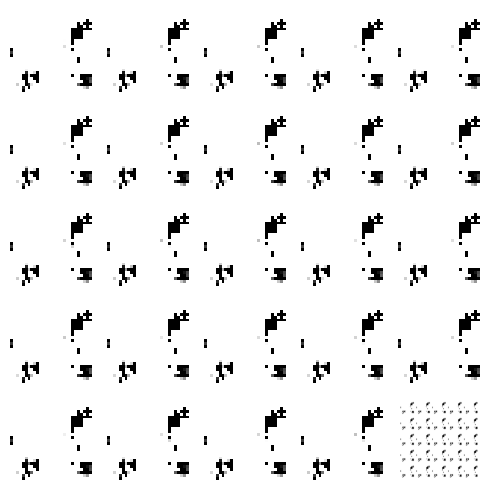

  0%|          | 0/350 [00:00<?, ?it/s]

4/4 [==============================] - 0s 16ms/step


  0%|          | 1/350 [00:00<04:14,  1.37it/s]

4/4 [==============================] - 0s 19ms/step


  1%|          | 2/350 [00:01<03:54,  1.48it/s]

4/4 [==============================] - 0s 15ms/step


  1%|          | 3/350 [00:01<03:33,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


  1%|          | 4/350 [00:02<03:26,  1.68it/s]

4/4 [==============================] - 0s 16ms/step


  1%|▏         | 5/350 [00:03<03:28,  1.66it/s]

4/4 [==============================] - 0s 16ms/step


  2%|▏         | 6/350 [00:03<03:26,  1.67it/s]

4/4 [==============================] - 0s 17ms/step


  2%|▏         | 7/350 [00:04<04:16,  1.34it/s]

4/4 [==============================] - 0s 13ms/step


  2%|▏         | 8/350 [00:05<04:04,  1.40it/s]

4/4 [==============================] - 0s 14ms/step


  3%|▎         | 9/350 [00:05<03:51,  1.47it/s]

4/4 [==============================] - 0s 11ms/step


  3%|▎         | 10/350 [00:06<03:37,  1.57it/s]

4/4 [==============================] - 0s 15ms/step


  3%|▎         | 11/350 [00:07<03:37,  1.56it/s]

4/4 [==============================] - 0s 14ms/step


  3%|▎         | 12/350 [00:07<03:38,  1.55it/s]

4/4 [==============================] - 0s 14ms/step


  4%|▎         | 13/350 [00:08<03:29,  1.61it/s]

4/4 [==============================] - 0s 13ms/step


  4%|▍         | 14/350 [00:09<03:31,  1.59it/s]

4/4 [==============================] - 0s 21ms/step


  4%|▍         | 15/350 [00:09<03:37,  1.54it/s]

4/4 [==============================] - 0s 16ms/step


  5%|▍         | 16/350 [00:10<03:29,  1.60it/s]

4/4 [==============================] - 0s 11ms/step


  5%|▍         | 17/350 [00:10<03:18,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


  5%|▌         | 18/350 [00:11<03:15,  1.70it/s]

4/4 [==============================] - 0s 13ms/step


  5%|▌         | 19/350 [00:12<03:22,  1.63it/s]

4/4 [==============================] - 0s 14ms/step


  6%|▌         | 20/350 [00:12<03:16,  1.68it/s]

4/4 [==============================] - 0s 14ms/step


  6%|▌         | 21/350 [00:13<03:13,  1.70it/s]

4/4 [==============================] - 0s 16ms/step


  6%|▋         | 22/350 [00:13<03:14,  1.68it/s]

4/4 [==============================] - 0s 37ms/step


  7%|▋         | 23/350 [00:14<03:27,  1.58it/s]

4/4 [==============================] - 0s 16ms/step


  7%|▋         | 24/350 [00:15<03:25,  1.59it/s]

4/4 [==============================] - 0s 11ms/step


  7%|▋         | 25/350 [00:15<03:23,  1.59it/s]

4/4 [==============================] - 0s 22ms/step


  7%|▋         | 26/350 [00:16<03:31,  1.53it/s]

4/4 [==============================] - 0s 16ms/step


  8%|▊         | 27/350 [00:17<03:25,  1.57it/s]

4/4 [==============================] - 0s 19ms/step


  8%|▊         | 28/350 [00:17<03:21,  1.60it/s]

4/4 [==============================] - 0s 14ms/step


  8%|▊         | 29/350 [00:18<03:26,  1.55it/s]

4/4 [==============================] - 0s 14ms/step


  9%|▊         | 30/350 [00:19<03:25,  1.56it/s]

4/4 [==============================] - 0s 14ms/step


  9%|▉         | 31/350 [00:19<03:18,  1.61it/s]

4/4 [==============================] - 0s 14ms/step


  9%|▉         | 32/350 [00:20<03:16,  1.62it/s]

4/4 [==============================] - 0s 14ms/step


  9%|▉         | 33/350 [00:20<03:17,  1.60it/s]

4/4 [==============================] - 0s 15ms/step


 10%|▉         | 34/350 [00:21<03:17,  1.60it/s]

4/4 [==============================] - 0s 11ms/step


 10%|█         | 35/350 [00:22<03:13,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


 10%|█         | 36/350 [00:22<03:07,  1.67it/s]

4/4 [==============================] - 0s 14ms/step


 11%|█         | 37/350 [00:23<03:12,  1.62it/s]

4/4 [==============================] - 0s 13ms/step


 11%|█         | 38/350 [00:23<03:16,  1.59it/s]

4/4 [==============================] - 0s 13ms/step


 11%|█         | 39/350 [00:24<03:07,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


 11%|█▏        | 40/350 [00:25<03:02,  1.70it/s]

4/4 [==============================] - 0s 15ms/step


 12%|█▏        | 41/350 [00:25<03:10,  1.62it/s]

4/4 [==============================] - 0s 11ms/step


 12%|█▏        | 42/350 [00:26<03:09,  1.63it/s]

4/4 [==============================] - 0s 14ms/step


 12%|█▏        | 43/350 [00:26<03:00,  1.70it/s]

4/4 [==============================] - 0s 14ms/step


 13%|█▎        | 44/350 [00:27<03:00,  1.69it/s]

4/4 [==============================] - 0s 14ms/step


 13%|█▎        | 45/350 [00:28<03:07,  1.63it/s]

4/4 [==============================] - 0s 15ms/step


 13%|█▎        | 46/350 [00:28<03:04,  1.65it/s]

4/4 [==============================] - 0s 15ms/step


 13%|█▎        | 47/350 [00:29<03:00,  1.67it/s]

4/4 [==============================] - 0s 17ms/step


 14%|█▎        | 48/350 [00:29<02:58,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 14%|█▍        | 49/350 [00:30<03:07,  1.61it/s]

4/4 [==============================] - 0s 16ms/step


 14%|█▍        | 50/350 [00:31<03:01,  1.65it/s]

4/4 [==============================] - 0s 18ms/step


 15%|█▍        | 51/350 [00:31<02:58,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 15%|█▍        | 52/350 [00:32<02:55,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 15%|█▌        | 53/350 [00:32<03:01,  1.64it/s]

4/4 [==============================] - 0s 16ms/step


 15%|█▌        | 54/350 [00:33<03:00,  1.64it/s]

4/4 [==============================] - 0s 14ms/step


 16%|█▌        | 55/350 [00:34<02:57,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


 16%|█▌        | 56/350 [00:34<03:00,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


 16%|█▋        | 57/350 [00:35<03:01,  1.61it/s]

4/4 [==============================] - 0s 15ms/step


 17%|█▋        | 58/350 [00:35<02:51,  1.70it/s]

4/4 [==============================] - 0s 13ms/step


 17%|█▋        | 59/350 [00:36<02:48,  1.72it/s]

4/4 [==============================] - 0s 14ms/step


 17%|█▋        | 60/350 [00:37<02:48,  1.72it/s]

4/4 [==============================] - 0s 11ms/step


 17%|█▋        | 61/350 [00:37<02:59,  1.61it/s]

4/4 [==============================] - 0s 18ms/step


 18%|█▊        | 62/350 [00:38<02:54,  1.65it/s]

4/4 [==============================] - 0s 17ms/step


 18%|█▊        | 63/350 [00:38<02:51,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 18%|█▊        | 64/350 [00:39<02:58,  1.60it/s]

4/4 [==============================] - 0s 20ms/step


 19%|█▊        | 65/350 [00:40<03:00,  1.58it/s]

4/4 [==============================] - 0s 11ms/step


 19%|█▉        | 66/350 [00:40<02:54,  1.62it/s]

4/4 [==============================] - 0s 14ms/step


 19%|█▉        | 67/350 [00:41<02:49,  1.67it/s]

4/4 [==============================] - 0s 16ms/step


 19%|█▉        | 68/350 [00:42<02:54,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


 20%|█▉        | 69/350 [00:42<02:57,  1.58it/s]

4/4 [==============================] - 0s 16ms/step


 20%|██        | 70/350 [00:43<02:48,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 20%|██        | 71/350 [00:43<02:46,  1.68it/s]

4/4 [==============================] - 0s 14ms/step


 21%|██        | 72/350 [00:44<02:51,  1.62it/s]

4/4 [==============================] - 0s 14ms/step


 21%|██        | 73/350 [00:45<02:46,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 21%|██        | 74/350 [00:45<02:41,  1.71it/s]

4/4 [==============================] - 0s 14ms/step


 21%|██▏       | 75/350 [00:46<02:39,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 22%|██▏       | 76/350 [00:46<02:44,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 22%|██▏       | 77/350 [00:47<02:47,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


 22%|██▏       | 78/350 [00:48<02:41,  1.69it/s]

4/4 [==============================] - 0s 15ms/step


 23%|██▎       | 79/350 [00:48<02:38,  1.71it/s]

4/4 [==============================] - 0s 13ms/step


 23%|██▎       | 80/350 [00:49<02:48,  1.60it/s]

4/4 [==============================] - 0s 17ms/step


 23%|██▎       | 81/350 [00:49<02:42,  1.65it/s]

4/4 [==============================] - 0s 13ms/step


 23%|██▎       | 82/350 [00:50<02:39,  1.68it/s]

4/4 [==============================] - 0s 14ms/step


 24%|██▎       | 83/350 [00:51<02:36,  1.71it/s]

4/4 [==============================] - 0s 11ms/step


 24%|██▍       | 84/350 [00:51<02:44,  1.62it/s]

4/4 [==============================] - 0s 17ms/step


 24%|██▍       | 85/350 [00:52<02:39,  1.67it/s]

4/4 [==============================] - 0s 15ms/step


 25%|██▍       | 86/350 [00:52<02:35,  1.70it/s]

4/4 [==============================] - 0s 15ms/step


 25%|██▍       | 87/350 [00:53<02:36,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 25%|██▌       | 88/350 [00:54<02:42,  1.61it/s]

4/4 [==============================] - 0s 20ms/step


 25%|██▌       | 89/350 [00:54<02:38,  1.65it/s]

4/4 [==============================] - 0s 14ms/step


 26%|██▌       | 90/350 [00:55<02:35,  1.67it/s]

4/4 [==============================] - 0s 16ms/step


 26%|██▌       | 91/350 [00:55<02:41,  1.60it/s]

4/4 [==============================] - 0s 20ms/step


 26%|██▋       | 92/350 [00:56<02:40,  1.61it/s]

4/4 [==============================] - 0s 14ms/step


 27%|██▋       | 93/350 [00:57<02:35,  1.65it/s]

4/4 [==============================] - 0s 16ms/step


 27%|██▋       | 94/350 [00:57<02:36,  1.63it/s]

4/4 [==============================] - 0s 14ms/step


 27%|██▋       | 95/350 [00:58<02:40,  1.59it/s]

4/4 [==============================] - 0s 13ms/step


 27%|██▋       | 96/350 [00:59<02:42,  1.56it/s]

4/4 [==============================] - 0s 14ms/step


 28%|██▊       | 97/350 [00:59<02:34,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


 28%|██▊       | 98/350 [01:00<02:30,  1.68it/s]

4/4 [==============================] - 0s 18ms/step


 28%|██▊       | 99/350 [01:00<02:39,  1.57it/s]

4/4 [==============================] - 0s 15ms/step


 29%|██▊       | 100/350 [01:01<02:32,  1.64it/s]

4/4 [==============================] - 0s 15ms/step


 29%|██▉       | 101/350 [01:02<02:29,  1.67it/s]

4/4 [==============================] - 0s 15ms/step


 29%|██▉       | 102/350 [01:02<02:25,  1.71it/s]

4/4 [==============================] - 0s 11ms/step


 29%|██▉       | 103/350 [01:03<02:31,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 30%|██▉       | 104/350 [01:03<02:29,  1.64it/s]

4/4 [==============================] - 0s 14ms/step


 30%|███       | 105/350 [01:04<02:23,  1.70it/s]

4/4 [==============================] - 0s 16ms/step


 30%|███       | 106/350 [01:05<02:25,  1.68it/s]

4/4 [==============================] - 0s 23ms/step


 31%|███       | 107/350 [01:05<02:30,  1.61it/s]

4/4 [==============================] - 0s 16ms/step


 31%|███       | 108/350 [01:06<02:31,  1.59it/s]

4/4 [==============================] - 0s 11ms/step


 31%|███       | 109/350 [01:06<02:28,  1.62it/s]

4/4 [==============================] - 0s 14ms/step


 31%|███▏      | 110/350 [01:07<02:34,  1.55it/s]

4/4 [==============================] - 0s 13ms/step


 32%|███▏      | 111/350 [01:08<02:28,  1.61it/s]

4/4 [==============================] - 0s 12ms/step


 32%|███▏      | 112/350 [01:08<02:21,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


 32%|███▏      | 113/350 [01:09<02:19,  1.70it/s]

4/4 [==============================] - 0s 14ms/step


 33%|███▎      | 114/350 [01:09<02:24,  1.63it/s]

4/4 [==============================] - 0s 15ms/step


 33%|███▎      | 115/350 [01:10<02:28,  1.59it/s]

4/4 [==============================] - 0s 13ms/step


 33%|███▎      | 116/350 [01:11<02:20,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


 33%|███▎      | 117/350 [01:11<02:17,  1.70it/s]

4/4 [==============================] - 0s 17ms/step


 34%|███▎      | 118/350 [01:12<02:24,  1.61it/s]

4/4 [==============================] - 0s 16ms/step


 34%|███▍      | 119/350 [01:13<02:19,  1.66it/s]

4/4 [==============================] - 0s 15ms/step


 34%|███▍      | 120/350 [01:13<02:16,  1.69it/s]

4/4 [==============================] - 0s 16ms/step


 35%|███▍      | 121/350 [01:14<02:14,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 35%|███▍      | 122/350 [01:14<02:21,  1.62it/s]

4/4 [==============================] - 0s 16ms/step


 35%|███▌      | 123/350 [01:15<02:15,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


 35%|███▌      | 124/350 [01:15<02:12,  1.71it/s]

4/4 [==============================] - 0s 14ms/step


 36%|███▌      | 125/350 [01:16<02:09,  1.73it/s]

4/4 [==============================] - 0s 14ms/step


 36%|███▌      | 126/350 [01:17<02:18,  1.62it/s]

4/4 [==============================] - 0s 18ms/step


 36%|███▋      | 127/350 [01:17<02:15,  1.64it/s]

4/4 [==============================] - 0s 13ms/step


 37%|███▋      | 128/350 [01:18<02:11,  1.69it/s]

4/4 [==============================] - 0s 14ms/step


 37%|███▋      | 129/350 [01:18<02:09,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 37%|███▋      | 130/350 [01:19<02:15,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 37%|███▋      | 131/350 [01:20<02:11,  1.67it/s]

4/4 [==============================] - 0s 14ms/step


 38%|███▊      | 132/350 [01:20<02:07,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 38%|███▊      | 133/350 [01:21<02:07,  1.71it/s]

4/4 [==============================] - 0s 11ms/step


 38%|███▊      | 134/350 [01:22<02:17,  1.57it/s]

4/4 [==============================] - 0s 14ms/step


 39%|███▊      | 135/350 [01:22<02:13,  1.62it/s]

4/4 [==============================] - 0s 13ms/step


 39%|███▉      | 136/350 [01:23<02:13,  1.61it/s]

4/4 [==============================] - 0s 12ms/step


 39%|███▉      | 137/350 [01:23<02:13,  1.60it/s]

4/4 [==============================] - 0s 15ms/step


 39%|███▉      | 138/350 [01:24<02:10,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


 40%|███▉      | 139/350 [01:25<02:09,  1.63it/s]

4/4 [==============================] - 0s 14ms/step


 40%|████      | 140/350 [01:25<02:05,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 40%|████      | 141/350 [01:26<02:11,  1.59it/s]

4/4 [==============================] - 0s 16ms/step


 41%|████      | 142/350 [01:26<02:05,  1.65it/s]

4/4 [==============================] - 0s 13ms/step


 41%|████      | 143/350 [01:27<02:03,  1.68it/s]

4/4 [==============================] - 0s 15ms/step


 41%|████      | 144/350 [01:28<02:02,  1.69it/s]

4/4 [==============================] - 0s 14ms/step


 41%|████▏     | 145/350 [01:28<02:04,  1.65it/s]

4/4 [==============================] - 0s 15ms/step


 42%|████▏     | 146/350 [01:29<02:06,  1.62it/s]

4/4 [==============================] - 0s 13ms/step


 42%|████▏     | 147/350 [01:29<02:01,  1.67it/s]

4/4 [==============================] - 0s 21ms/step


 42%|████▏     | 148/350 [01:30<02:04,  1.62it/s]

4/4 [==============================] - 0s 16ms/step


 43%|████▎     | 149/350 [01:31<02:02,  1.64it/s]

4/4 [==============================] - 0s 14ms/step


 43%|████▎     | 150/350 [01:31<01:57,  1.70it/s]

4/4 [==============================] - 0s 15ms/step


 43%|████▎     | 151/350 [01:32<01:57,  1.69it/s]

4/4 [==============================] - 0s 13ms/step


 43%|████▎     | 152/350 [01:32<01:55,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 44%|████▎     | 153/350 [01:33<02:03,  1.59it/s]

4/4 [==============================] - 0s 17ms/step


 44%|████▍     | 154/350 [01:34<01:59,  1.64it/s]

4/4 [==============================] - 0s 13ms/step


 44%|████▍     | 155/350 [01:34<01:54,  1.70it/s]

4/4 [==============================] - 0s 13ms/step


 45%|████▍     | 156/350 [01:35<01:59,  1.62it/s]

4/4 [==============================] - 0s 17ms/step


 45%|████▍     | 157/350 [01:35<01:57,  1.64it/s]

4/4 [==============================] - 0s 13ms/step


 45%|████▌     | 158/350 [01:36<01:52,  1.71it/s]

4/4 [==============================] - 0s 13ms/step


 45%|████▌     | 159/350 [01:37<01:51,  1.71it/s]

4/4 [==============================] - 0s 15ms/step


 46%|████▌     | 160/350 [01:37<01:49,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 46%|████▌     | 161/350 [01:38<01:52,  1.68it/s]

4/4 [==============================] - 0s 15ms/step


 46%|████▋     | 162/350 [01:38<01:53,  1.65it/s]

4/4 [==============================] - 0s 13ms/step


 47%|████▋     | 163/350 [01:39<01:50,  1.69it/s]

4/4 [==============================] - 0s 18ms/step


 47%|████▋     | 164/350 [01:40<01:56,  1.59it/s]

4/4 [==============================] - 0s 14ms/step


 47%|████▋     | 165/350 [01:40<01:56,  1.59it/s]

4/4 [==============================] - 0s 16ms/step


 47%|████▋     | 166/350 [01:41<01:53,  1.62it/s]

4/4 [==============================] - 0s 15ms/step


 48%|████▊     | 167/350 [01:42<01:53,  1.61it/s]

4/4 [==============================] - 0s 21ms/step


 48%|████▊     | 168/350 [01:42<01:57,  1.55it/s]

4/4 [==============================] - 0s 15ms/step


 48%|████▊     | 169/350 [01:43<01:54,  1.59it/s]

4/4 [==============================] - 0s 13ms/step


 49%|████▊     | 170/350 [01:43<01:52,  1.60it/s]

4/4 [==============================] - 0s 36ms/step


 49%|████▉     | 171/350 [01:44<01:55,  1.55it/s]

4/4 [==============================] - 0s 15ms/step


 49%|████▉     | 172/350 [01:45<01:51,  1.60it/s]

4/4 [==============================] - 0s 14ms/step


 49%|████▉     | 173/350 [01:45<01:47,  1.65it/s]

4/4 [==============================] - 0s 13ms/step


 50%|████▉     | 174/350 [01:46<01:44,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 50%|█████     | 175/350 [01:47<01:49,  1.60it/s]

4/4 [==============================] - 0s 14ms/step


 50%|█████     | 176/350 [01:47<01:45,  1.65it/s]

4/4 [==============================] - 0s 13ms/step


 51%|█████     | 177/350 [01:48<01:43,  1.68it/s]

4/4 [==============================] - 0s 17ms/step


 51%|█████     | 178/350 [01:48<01:40,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 51%|█████     | 179/350 [01:49<01:47,  1.59it/s]

4/4 [==============================] - 0s 13ms/step


 51%|█████▏    | 180/350 [01:50<01:43,  1.65it/s]

4/4 [==============================] - 0s 14ms/step


 52%|█████▏    | 181/350 [01:50<01:40,  1.68it/s]

4/4 [==============================] - 0s 17ms/step


 52%|█████▏    | 182/350 [01:51<01:43,  1.63it/s]

4/4 [==============================] - 0s 18ms/step


 52%|█████▏    | 183/350 [01:51<01:44,  1.60it/s]

4/4 [==============================] - 0s 14ms/step


 53%|█████▎    | 184/350 [01:52<01:39,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 53%|█████▎    | 185/350 [01:53<01:38,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 53%|█████▎    | 186/350 [01:53<01:38,  1.66it/s]

4/4 [==============================] - 0s 19ms/step


 53%|█████▎    | 187/350 [01:54<01:40,  1.62it/s]

4/4 [==============================] - 0s 11ms/step


 54%|█████▎    | 188/350 [01:54<01:39,  1.63it/s]

4/4 [==============================] - 0s 15ms/step


 54%|█████▍    | 189/350 [01:55<01:34,  1.70it/s]

4/4 [==============================] - 0s 14ms/step


 54%|█████▍    | 190/350 [01:56<01:37,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 55%|█████▍    | 191/350 [01:56<01:38,  1.62it/s]

4/4 [==============================] - 0s 14ms/step


 55%|█████▍    | 192/350 [01:57<01:33,  1.69it/s]

4/4 [==============================] - 0s 16ms/step


 55%|█████▌    | 193/350 [01:57<01:31,  1.71it/s]

4/4 [==============================] - 0s 14ms/step


 55%|█████▌    | 194/350 [01:58<01:33,  1.67it/s]

4/4 [==============================] - 0s 15ms/step


 56%|█████▌    | 195/350 [01:59<01:35,  1.62it/s]

4/4 [==============================] - 0s 14ms/step


 56%|█████▌    | 196/350 [01:59<01:32,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 56%|█████▋    | 197/350 [02:00<01:28,  1.72it/s]

4/4 [==============================] - 0s 14ms/step


 57%|█████▋    | 198/350 [02:00<01:32,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 57%|█████▋    | 199/350 [02:01<01:32,  1.63it/s]

4/4 [==============================] - 0s 15ms/step


 57%|█████▋    | 200/350 [02:02<01:28,  1.70it/s]

4/4 [==============================] - 0s 15ms/step


 57%|█████▋    | 201/350 [02:02<01:26,  1.71it/s]

4/4 [==============================] - 0s 13ms/step


 58%|█████▊    | 202/350 [02:03<01:29,  1.65it/s]

4/4 [==============================] - 0s 14ms/step


 58%|█████▊    | 203/350 [02:03<01:30,  1.63it/s]

4/4 [==============================] - 0s 14ms/step


 58%|█████▊    | 204/350 [02:04<01:26,  1.69it/s]

4/4 [==============================] - 0s 15ms/step


 59%|█████▊    | 205/350 [02:05<01:23,  1.75it/s]

4/4 [==============================] - 0s 12ms/step


 59%|█████▉    | 206/350 [02:05<01:25,  1.68it/s]

4/4 [==============================] - 0s 16ms/step


 59%|█████▉    | 207/350 [02:06<01:26,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 59%|█████▉    | 208/350 [02:06<01:26,  1.65it/s]

4/4 [==============================] - 0s 16ms/step


 60%|█████▉    | 209/350 [02:07<01:24,  1.67it/s]

4/4 [==============================] - 0s 15ms/step


 60%|██████    | 210/350 [02:08<01:30,  1.55it/s]

4/4 [==============================] - 0s 16ms/step


 60%|██████    | 211/350 [02:08<01:26,  1.60it/s]

4/4 [==============================] - 0s 14ms/step


 61%|██████    | 212/350 [02:09<01:23,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 61%|██████    | 213/350 [02:10<01:25,  1.61it/s]

4/4 [==============================] - 0s 19ms/step


 61%|██████    | 214/350 [02:10<01:25,  1.59it/s]

4/4 [==============================] - 0s 13ms/step


 61%|██████▏   | 215/350 [02:11<01:23,  1.61it/s]

4/4 [==============================] - 0s 11ms/step


 62%|██████▏   | 216/350 [02:11<01:21,  1.64it/s]

4/4 [==============================] - 0s 14ms/step


 62%|██████▏   | 217/350 [02:12<01:24,  1.58it/s]

4/4 [==============================] - 0s 19ms/step


 62%|██████▏   | 218/350 [02:13<01:25,  1.54it/s]

4/4 [==============================] - 0s 11ms/step


 63%|██████▎   | 219/350 [02:13<01:23,  1.57it/s]

4/4 [==============================] - 0s 13ms/step


 63%|██████▎   | 220/350 [02:14<01:19,  1.63it/s]

4/4 [==============================] - 0s 15ms/step


 63%|██████▎   | 221/350 [02:15<01:23,  1.54it/s]

4/4 [==============================] - 0s 15ms/step


 63%|██████▎   | 222/350 [02:15<01:23,  1.54it/s]

4/4 [==============================] - 0s 12ms/step


 64%|██████▎   | 223/350 [02:16<01:18,  1.62it/s]

4/4 [==============================] - 0s 15ms/step


 64%|██████▍   | 224/350 [02:16<01:15,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 64%|██████▍   | 225/350 [02:17<01:20,  1.55it/s]

4/4 [==============================] - 0s 14ms/step


 65%|██████▍   | 226/350 [02:18<01:20,  1.53it/s]

4/4 [==============================] - 0s 14ms/step


 65%|██████▍   | 227/350 [02:18<01:15,  1.62it/s]

4/4 [==============================] - 0s 14ms/step


 65%|██████▌   | 228/350 [02:19<01:15,  1.62it/s]

4/4 [==============================] - 0s 15ms/step


 65%|██████▌   | 229/350 [02:20<01:17,  1.56it/s]

4/4 [==============================] - 0s 11ms/step


 66%|██████▌   | 230/350 [02:20<01:17,  1.56it/s]

4/4 [==============================] - 0s 14ms/step


 66%|██████▌   | 231/350 [02:21<01:13,  1.61it/s]

4/4 [==============================] - 0s 12ms/step


 66%|██████▋   | 232/350 [02:21<01:10,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 67%|██████▋   | 233/350 [02:22<01:12,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


 67%|██████▋   | 234/350 [02:23<01:12,  1.59it/s]

4/4 [==============================] - 0s 13ms/step


 67%|██████▋   | 235/350 [02:23<01:08,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


 67%|██████▋   | 236/350 [02:24<01:06,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 68%|██████▊   | 237/350 [02:24<01:09,  1.63it/s]

4/4 [==============================] - 0s 17ms/step


 68%|██████▊   | 238/350 [02:25<01:09,  1.61it/s]

4/4 [==============================] - 0s 13ms/step


 68%|██████▊   | 239/350 [02:26<01:05,  1.69it/s]

4/4 [==============================] - 0s 15ms/step


 69%|██████▊   | 240/350 [02:26<01:04,  1.70it/s]

4/4 [==============================] - 0s 14ms/step


 69%|██████▉   | 241/350 [02:27<01:06,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 69%|██████▉   | 242/350 [02:28<01:07,  1.60it/s]

4/4 [==============================] - 0s 13ms/step


 69%|██████▉   | 243/350 [02:28<01:03,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


 70%|██████▉   | 244/350 [02:29<01:02,  1.69it/s]

4/4 [==============================] - 0s 16ms/step


 70%|███████   | 245/350 [02:29<01:03,  1.65it/s]

4/4 [==============================] - 0s 13ms/step


 70%|███████   | 246/350 [02:30<01:05,  1.58it/s]

4/4 [==============================] - 0s 15ms/step


 71%|███████   | 247/350 [02:31<01:02,  1.64it/s]

4/4 [==============================] - 0s 15ms/step


 71%|███████   | 248/350 [02:31<01:01,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 71%|███████   | 249/350 [02:32<01:02,  1.61it/s]

4/4 [==============================] - 0s 14ms/step


 71%|███████▏  | 250/350 [02:32<01:03,  1.57it/s]

4/4 [==============================] - 0s 14ms/step


 72%|███████▏  | 251/350 [02:33<00:59,  1.65it/s]

4/4 [==============================] - 0s 14ms/step


 72%|███████▏  | 252/350 [02:34<00:58,  1.68it/s]

4/4 [==============================] - 0s 14ms/step


 72%|███████▏  | 253/350 [02:34<00:59,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 73%|███████▎  | 254/350 [02:35<00:58,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


 73%|███████▎  | 255/350 [02:35<00:56,  1.68it/s]

4/4 [==============================] - 0s 15ms/step


 73%|███████▎  | 256/350 [02:36<00:56,  1.67it/s]

4/4 [==============================] - 0s 16ms/step


 73%|███████▎  | 257/350 [02:37<00:58,  1.58it/s]

4/4 [==============================] - 0s 14ms/step


 74%|███████▎  | 258/350 [02:37<00:55,  1.65it/s]

4/4 [==============================] - 0s 14ms/step


 74%|███████▍  | 259/350 [02:38<00:54,  1.67it/s]

4/4 [==============================] - 0s 14ms/step


 74%|███████▍  | 260/350 [02:38<00:53,  1.70it/s]

4/4 [==============================] - 0s 14ms/step


 75%|███████▍  | 261/350 [02:39<00:56,  1.59it/s]

4/4 [==============================] - 0s 18ms/step


 75%|███████▍  | 262/350 [02:40<00:54,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


 75%|███████▌  | 263/350 [02:40<00:52,  1.65it/s]

4/4 [==============================] - 0s 15ms/step


 75%|███████▌  | 264/350 [02:41<00:54,  1.59it/s]

4/4 [==============================] - 0s 13ms/step


 76%|███████▌  | 265/350 [02:42<00:52,  1.62it/s]

4/4 [==============================] - 0s 25ms/step


 76%|███████▌  | 266/350 [02:42<00:50,  1.65it/s]

4/4 [==============================] - 0s 16ms/step


 76%|███████▋  | 267/350 [02:43<00:50,  1.65it/s]

4/4 [==============================] - 0s 15ms/step


 77%|███████▋  | 268/350 [02:43<00:48,  1.69it/s]

4/4 [==============================] - 0s 14ms/step


 77%|███████▋  | 269/350 [02:44<00:49,  1.64it/s]

4/4 [==============================] - 0s 15ms/step


 77%|███████▋  | 270/350 [02:45<00:48,  1.65it/s]

4/4 [==============================] - 0s 13ms/step


 77%|███████▋  | 271/350 [02:45<00:48,  1.65it/s]

4/4 [==============================] - 0s 17ms/step


 78%|███████▊  | 272/350 [02:46<00:48,  1.60it/s]

4/4 [==============================] - 0s 19ms/step


 78%|███████▊  | 273/350 [02:46<00:48,  1.59it/s]

4/4 [==============================] - 0s 15ms/step


 78%|███████▊  | 274/350 [02:47<00:46,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 79%|███████▊  | 275/350 [02:48<00:46,  1.61it/s]

4/4 [==============================] - 0s 19ms/step


 79%|███████▉  | 276/350 [02:48<00:47,  1.57it/s]

4/4 [==============================] - 0s 16ms/step


 79%|███████▉  | 277/350 [02:49<00:45,  1.61it/s]

4/4 [==============================] - 0s 14ms/step


 79%|███████▉  | 278/350 [02:50<00:44,  1.62it/s]

4/4 [==============================] - 0s 15ms/step


 80%|███████▉  | 279/350 [02:50<00:46,  1.54it/s]

4/4 [==============================] - 0s 15ms/step


 80%|████████  | 280/350 [02:51<00:44,  1.57it/s]

4/4 [==============================] - 0s 21ms/step


 80%|████████  | 281/350 [02:51<00:42,  1.61it/s]

4/4 [==============================] - 0s 14ms/step


 81%|████████  | 282/350 [02:52<00:40,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


 81%|████████  | 283/350 [02:53<00:40,  1.67it/s]

4/4 [==============================] - 0s 15ms/step


 81%|████████  | 284/350 [02:53<00:40,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 81%|████████▏ | 285/350 [02:54<00:40,  1.61it/s]

4/4 [==============================] - 0s 13ms/step


 82%|████████▏ | 286/350 [02:54<00:38,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


 82%|████████▏ | 287/350 [02:55<00:36,  1.71it/s]

4/4 [==============================] - 0s 15ms/step


 82%|████████▏ | 288/350 [02:56<00:37,  1.65it/s]

4/4 [==============================] - 0s 14ms/step


 83%|████████▎ | 289/350 [02:56<00:38,  1.60it/s]

4/4 [==============================] - 0s 13ms/step


 83%|████████▎ | 290/350 [02:57<00:36,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


 83%|████████▎ | 291/350 [02:57<00:35,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 83%|████████▎ | 292/350 [02:58<00:37,  1.56it/s]

4/4 [==============================] - 0s 18ms/step


 84%|████████▎ | 293/350 [02:59<00:35,  1.62it/s]

4/4 [==============================] - 0s 13ms/step


 84%|████████▍ | 294/350 [02:59<00:34,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 84%|████████▍ | 295/350 [03:00<00:34,  1.57it/s]

4/4 [==============================] - 0s 13ms/step


 85%|████████▍ | 296/350 [03:01<00:33,  1.59it/s]

4/4 [==============================] - 0s 17ms/step


 85%|████████▍ | 297/350 [03:01<00:32,  1.61it/s]

4/4 [==============================] - 0s 11ms/step


 85%|████████▌ | 298/350 [03:02<00:32,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


 85%|████████▌ | 299/350 [03:03<00:32,  1.59it/s]

4/4 [==============================] - 0s 13ms/step


 86%|████████▌ | 300/350 [03:03<00:31,  1.56it/s]

4/4 [==============================] - 0s 12ms/step


 86%|████████▌ | 301/350 [03:04<00:29,  1.66it/s]

4/4 [==============================] - 0s 16ms/step


 86%|████████▋ | 302/350 [03:04<00:28,  1.71it/s]

4/4 [==============================] - 0s 13ms/step


 87%|████████▋ | 303/350 [03:05<00:29,  1.62it/s]

4/4 [==============================] - 0s 13ms/step


 87%|████████▋ | 304/350 [03:06<00:27,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 87%|████████▋ | 305/350 [03:06<00:26,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 87%|████████▋ | 306/350 [03:07<00:26,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 88%|████████▊ | 307/350 [03:07<00:25,  1.69it/s]

4/4 [==============================] - 0s 18ms/step


 88%|████████▊ | 308/350 [03:08<00:25,  1.65it/s]

4/4 [==============================] - 0s 16ms/step


 88%|████████▊ | 309/350 [03:08<00:24,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 89%|████████▊ | 310/350 [03:09<00:23,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 89%|████████▉ | 311/350 [03:10<00:23,  1.63it/s]

4/4 [==============================] - 0s 14ms/step


 89%|████████▉ | 312/350 [03:10<00:23,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


 89%|████████▉ | 313/350 [03:11<00:21,  1.69it/s]

4/4 [==============================] - 0s 14ms/step


 90%|████████▉ | 314/350 [03:11<00:21,  1.71it/s]

4/4 [==============================] - 0s 14ms/step


 90%|█████████ | 315/350 [03:12<00:21,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 90%|█████████ | 316/350 [03:13<00:21,  1.61it/s]

4/4 [==============================] - 0s 14ms/step


 91%|█████████ | 317/350 [03:13<00:19,  1.69it/s]

4/4 [==============================] - 0s 14ms/step


 91%|█████████ | 318/350 [03:14<00:19,  1.68it/s]

4/4 [==============================] - 0s 17ms/step


 91%|█████████ | 319/350 [03:15<00:19,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 91%|█████████▏| 320/350 [03:15<00:19,  1.55it/s]

4/4 [==============================] - 0s 16ms/step


 92%|█████████▏| 321/350 [03:16<00:17,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


 92%|█████████▏| 322/350 [03:16<00:16,  1.68it/s]

4/4 [==============================] - 0s 15ms/step


 92%|█████████▏| 323/350 [03:17<00:16,  1.60it/s]

4/4 [==============================] - 0s 16ms/step


 93%|█████████▎| 324/350 [03:18<00:16,  1.61it/s]

4/4 [==============================] - 0s 14ms/step


 93%|█████████▎| 325/350 [03:18<00:15,  1.59it/s]

4/4 [==============================] - 0s 19ms/step


 93%|█████████▎| 326/350 [03:19<00:16,  1.48it/s]

4/4 [==============================] - 0s 20ms/step


 93%|█████████▎| 327/350 [03:20<00:15,  1.46it/s]

4/4 [==============================] - 0s 15ms/step


 94%|█████████▎| 328/350 [03:21<00:15,  1.44it/s]

4/4 [==============================] - 0s 17ms/step


 94%|█████████▍| 329/350 [03:21<00:14,  1.49it/s]

4/4 [==============================] - 0s 11ms/step


 94%|█████████▍| 330/350 [03:22<00:13,  1.50it/s]

4/4 [==============================] - 0s 17ms/step


 95%|█████████▍| 331/350 [03:22<00:12,  1.56it/s]

4/4 [==============================] - 0s 11ms/step


 95%|█████████▍| 332/350 [03:23<00:11,  1.53it/s]

4/4 [==============================] - 0s 13ms/step


 95%|█████████▌| 333/350 [03:24<00:10,  1.55it/s]

4/4 [==============================] - 0s 12ms/step


 95%|█████████▌| 334/350 [03:24<00:10,  1.58it/s]

4/4 [==============================] - 0s 13ms/step


 96%|█████████▌| 335/350 [03:25<00:09,  1.65it/s]

4/4 [==============================] - 0s 13ms/step


 96%|█████████▌| 336/350 [03:25<00:08,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


 96%|█████████▋| 337/350 [03:26<00:08,  1.60it/s]

4/4 [==============================] - 0s 14ms/step


 97%|█████████▋| 338/350 [03:27<00:07,  1.68it/s]

4/4 [==============================] - 0s 15ms/step


 97%|█████████▋| 339/350 [03:27<00:06,  1.69it/s]

4/4 [==============================] - 0s 13ms/step


 97%|█████████▋| 340/350 [03:28<00:06,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


 97%|█████████▋| 341/350 [03:29<00:05,  1.63it/s]

4/4 [==============================] - 0s 14ms/step


 98%|█████████▊| 342/350 [03:29<00:04,  1.69it/s]

4/4 [==============================] - 0s 16ms/step


 98%|█████████▊| 343/350 [03:30<00:04,  1.71it/s]

4/4 [==============================] - 0s 14ms/step


 98%|█████████▊| 344/350 [03:30<00:03,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


 99%|█████████▊| 345/350 [03:31<00:03,  1.64it/s]

4/4 [==============================] - 0s 14ms/step


 99%|█████████▉| 346/350 [03:31<00:02,  1.69it/s]

4/4 [==============================] - 0s 13ms/step


 99%|█████████▉| 347/350 [03:32<00:01,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 99%|█████████▉| 348/350 [03:33<00:01,  1.61it/s]

4/4 [==============================] - 0s 20ms/step


100%|█████████▉| 349/350 [03:33<00:00,  1.63it/s]

4/4 [==============================] - 0s 14ms/step


100%|██████████| 350/350 [03:34<00:00,  1.63it/s]

Epoch number: 82 discriminator_loss: 0.16392612624339692 generator_loss: 8.082545608792985
1/1 [==============================] - 0s 25ms/step


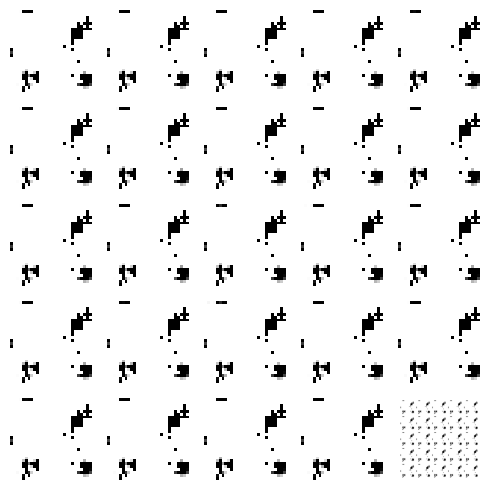

  0%|          | 0/350 [00:00<?, ?it/s]

4/4 [==============================] - 0s 30ms/step


  0%|          | 1/350 [00:00<04:22,  1.33it/s]

4/4 [==============================] - 0s 15ms/step


  1%|          | 2/350 [00:01<03:41,  1.57it/s]

4/4 [==============================] - 0s 13ms/step


  1%|          | 3/350 [00:01<03:42,  1.56it/s]

4/4 [==============================] - 0s 13ms/step


  1%|          | 4/350 [00:02<03:51,  1.49it/s]

4/4 [==============================] - 0s 20ms/step


  1%|▏         | 5/350 [00:03<03:42,  1.55it/s]

4/4 [==============================] - 0s 13ms/step


  2%|▏         | 6/350 [00:03<03:30,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


  2%|▏         | 7/350 [00:04<03:22,  1.69it/s]

4/4 [==============================] - 0s 15ms/step


  2%|▏         | 8/350 [00:04<03:24,  1.67it/s]

4/4 [==============================] - 0s 19ms/step


  3%|▎         | 9/350 [00:05<03:32,  1.61it/s]

4/4 [==============================] - 0s 12ms/step


  3%|▎         | 10/350 [00:06<03:26,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


  3%|▎         | 11/350 [00:06<03:29,  1.62it/s]

4/4 [==============================] - 0s 19ms/step


  3%|▎         | 12/350 [00:07<03:43,  1.51it/s]

4/4 [==============================] - 0s 23ms/step


  4%|▎         | 13/350 [00:08<03:35,  1.56it/s]

4/4 [==============================] - 0s 13ms/step


  4%|▍         | 14/350 [00:08<03:33,  1.58it/s]

4/4 [==============================] - 0s 18ms/step


  4%|▍         | 15/350 [00:09<03:48,  1.47it/s]

4/4 [==============================] - 0s 25ms/step


  5%|▍         | 16/350 [00:10<03:43,  1.50it/s]

4/4 [==============================] - 0s 14ms/step


  5%|▍         | 17/350 [00:10<03:33,  1.56it/s]

4/4 [==============================] - 0s 12ms/step


  5%|▌         | 18/350 [00:11<03:26,  1.61it/s]

4/4 [==============================] - 0s 14ms/step


  5%|▌         | 19/350 [00:12<03:32,  1.56it/s]

4/4 [==============================] - 0s 15ms/step


  6%|▌         | 20/350 [00:12<03:26,  1.60it/s]

4/4 [==============================] - 0s 16ms/step


  6%|▌         | 21/350 [00:13<03:21,  1.64it/s]

4/4 [==============================] - 0s 15ms/step


  6%|▋         | 22/350 [00:13<03:24,  1.61it/s]

4/4 [==============================] - 0s 11ms/step


  7%|▋         | 23/350 [00:14<03:37,  1.50it/s]

4/4 [==============================] - 0s 18ms/step


  7%|▋         | 24/350 [00:15<03:27,  1.57it/s]

4/4 [==============================] - 0s 13ms/step


  7%|▋         | 25/350 [00:15<03:23,  1.59it/s]

4/4 [==============================] - 0s 16ms/step


  7%|▋         | 26/350 [00:16<03:34,  1.51it/s]

4/4 [==============================] - 0s 13ms/step


  8%|▊         | 27/350 [00:17<03:27,  1.56it/s]

4/4 [==============================] - 0s 14ms/step


  8%|▊         | 28/350 [00:17<03:17,  1.63it/s]

4/4 [==============================] - 0s 15ms/step


  8%|▊         | 29/350 [00:18<03:12,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


  9%|▊         | 30/350 [00:19<03:19,  1.60it/s]

4/4 [==============================] - 0s 19ms/step


  9%|▉         | 31/350 [00:19<03:18,  1.61it/s]

4/4 [==============================] - 0s 13ms/step


  9%|▉         | 32/350 [00:20<03:09,  1.67it/s]

4/4 [==============================] - 0s 14ms/step


  9%|▉         | 33/350 [00:20<03:06,  1.70it/s]

4/4 [==============================] - 0s 16ms/step


 10%|▉         | 34/350 [00:21<03:14,  1.62it/s]

4/4 [==============================] - 0s 19ms/step


 10%|█         | 35/350 [00:22<03:16,  1.60it/s]

4/4 [==============================] - 0s 14ms/step


 10%|█         | 36/350 [00:22<03:10,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 11%|█         | 37/350 [00:23<03:09,  1.65it/s]

4/4 [==============================] - 0s 13ms/step


 11%|█         | 38/350 [00:23<03:14,  1.60it/s]

4/4 [==============================] - 0s 12ms/step


 11%|█         | 39/350 [00:24<03:18,  1.56it/s]

4/4 [==============================] - 0s 14ms/step


 11%|█▏        | 40/350 [00:25<03:08,  1.65it/s]

4/4 [==============================] - 0s 18ms/step


 12%|█▏        | 41/350 [00:25<03:04,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 12%|█▏        | 42/350 [00:26<03:04,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 12%|█▏        | 43/350 [00:26<03:10,  1.61it/s]

4/4 [==============================] - 0s 14ms/step


 13%|█▎        | 44/350 [00:27<03:03,  1.67it/s]

4/4 [==============================] - 0s 14ms/step


 13%|█▎        | 45/350 [00:28<03:00,  1.69it/s]

4/4 [==============================] - 0s 13ms/step


 13%|█▎        | 46/350 [00:28<03:08,  1.62it/s]

4/4 [==============================] - 0s 11ms/step


 13%|█▎        | 47/350 [00:29<03:11,  1.59it/s]

4/4 [==============================] - 0s 15ms/step


 14%|█▎        | 48/350 [00:29<03:01,  1.67it/s]

4/4 [==============================] - 0s 14ms/step


 14%|█▍        | 49/350 [00:30<02:58,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 14%|█▍        | 50/350 [00:31<03:02,  1.65it/s]

4/4 [==============================] - 0s 14ms/step


 15%|█▍        | 51/350 [00:31<03:03,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 15%|█▍        | 52/350 [00:32<03:01,  1.64it/s]

4/4 [==============================] - 0s 15ms/step


 15%|█▌        | 53/350 [00:32<02:57,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 15%|█▌        | 54/350 [00:33<03:01,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 16%|█▌        | 55/350 [00:34<03:05,  1.59it/s]

4/4 [==============================] - 0s 14ms/step


 16%|█▌        | 56/350 [00:34<02:58,  1.65it/s]

4/4 [==============================] - 0s 13ms/step


 16%|█▋        | 57/350 [00:35<02:55,  1.67it/s]

4/4 [==============================] - 0s 18ms/step


 17%|█▋        | 58/350 [00:36<03:03,  1.59it/s]

4/4 [==============================] - 0s 14ms/step


 17%|█▋        | 59/350 [00:36<02:56,  1.65it/s]

4/4 [==============================] - 0s 13ms/step


 17%|█▋        | 60/350 [00:37<02:49,  1.71it/s]

4/4 [==============================] - 0s 13ms/step


 17%|█▋        | 61/350 [00:37<02:47,  1.72it/s]

4/4 [==============================] - 0s 14ms/step


 18%|█▊        | 62/350 [00:38<02:56,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 18%|█▊        | 63/350 [00:39<02:56,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


 18%|█▊        | 64/350 [00:39<02:50,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


 19%|█▊        | 65/350 [00:40<02:47,  1.70it/s]

4/4 [==============================] - 0s 15ms/step


 19%|█▉        | 66/350 [00:40<02:52,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 19%|█▉        | 67/350 [00:41<02:51,  1.65it/s]

4/4 [==============================] - 0s 15ms/step


 19%|█▉        | 68/350 [00:41<02:45,  1.70it/s]

4/4 [==============================] - 0s 17ms/step


 20%|█▉        | 69/350 [00:42<02:49,  1.66it/s]

4/4 [==============================] - 0s 20ms/step


 20%|██        | 70/350 [00:43<02:53,  1.61it/s]

4/4 [==============================] - 0s 20ms/step


 20%|██        | 71/350 [00:43<02:56,  1.59it/s]

4/4 [==============================] - 0s 11ms/step


 21%|██        | 72/350 [00:44<02:55,  1.59it/s]

4/4 [==============================] - 0s 12ms/step


 21%|██        | 73/350 [00:45<02:55,  1.57it/s]

4/4 [==============================] - 0s 13ms/step


 21%|██        | 74/350 [00:45<02:54,  1.58it/s]

4/4 [==============================] - 0s 11ms/step


 21%|██▏       | 75/350 [00:46<02:53,  1.59it/s]

4/4 [==============================] - 0s 15ms/step


 22%|██▏       | 76/350 [00:47<02:46,  1.65it/s]

4/4 [==============================] - 0s 16ms/step


 22%|██▏       | 77/350 [00:47<02:51,  1.59it/s]

4/4 [==============================] - 0s 11ms/step


 22%|██▏       | 78/350 [00:48<02:48,  1.62it/s]

4/4 [==============================] - 0s 13ms/step


 23%|██▎       | 79/350 [00:48<02:42,  1.67it/s]

4/4 [==============================] - 0s 14ms/step


 23%|██▎       | 80/350 [00:49<02:39,  1.69it/s]

4/4 [==============================] - 0s 16ms/step


 23%|██▎       | 81/350 [00:50<02:44,  1.63it/s]

4/4 [==============================] - 0s 14ms/step


 23%|██▎       | 82/350 [00:50<02:46,  1.61it/s]

4/4 [==============================] - 0s 14ms/step


 24%|██▎       | 83/350 [00:51<02:37,  1.70it/s]

4/4 [==============================] - 0s 15ms/step


 24%|██▍       | 84/350 [00:51<02:36,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 24%|██▍       | 85/350 [00:52<02:37,  1.69it/s]

4/4 [==============================] - 0s 16ms/step


 25%|██▍       | 86/350 [00:53<02:39,  1.65it/s]

4/4 [==============================] - 0s 15ms/step


 25%|██▍       | 87/350 [00:53<02:35,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 25%|██▌       | 88/350 [00:54<02:38,  1.66it/s]

4/4 [==============================] - 0s 16ms/step


 25%|██▌       | 89/350 [00:54<02:36,  1.67it/s]

4/4 [==============================] - 0s 14ms/step


 26%|██▌       | 90/350 [00:55<02:43,  1.59it/s]

4/4 [==============================] - 0s 13ms/step


 26%|██▌       | 91/350 [00:56<02:33,  1.68it/s]

4/4 [==============================] - 0s 15ms/step


 26%|██▋       | 92/350 [00:56<02:32,  1.70it/s]

4/4 [==============================] - 0s 15ms/step


 27%|██▋       | 93/350 [00:57<02:35,  1.65it/s]

4/4 [==============================] - 0s 13ms/step


 27%|██▋       | 94/350 [00:57<02:36,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 27%|██▋       | 95/350 [00:58<02:30,  1.69it/s]

4/4 [==============================] - 0s 14ms/step


 27%|██▋       | 96/350 [00:59<02:27,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 28%|██▊       | 97/350 [00:59<02:32,  1.65it/s]

4/4 [==============================] - 0s 15ms/step


 28%|██▊       | 98/350 [01:00<02:35,  1.62it/s]

4/4 [==============================] - 0s 14ms/step


 28%|██▊       | 99/350 [01:00<02:28,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 29%|██▊       | 100/350 [01:01<02:23,  1.74it/s]

4/4 [==============================] - 0s 17ms/step


 29%|██▉       | 101/350 [01:02<02:28,  1.68it/s]

4/4 [==============================] - 0s 14ms/step


 29%|██▉       | 102/350 [01:02<02:35,  1.60it/s]

4/4 [==============================] - 0s 15ms/step


 29%|██▉       | 103/350 [01:03<02:26,  1.69it/s]

4/4 [==============================] - 0s 14ms/step


 30%|██▉       | 104/350 [01:03<02:25,  1.69it/s]

4/4 [==============================] - 0s 18ms/step


 30%|███       | 105/350 [01:04<02:31,  1.62it/s]

4/4 [==============================] - 0s 11ms/step


 30%|███       | 106/350 [01:05<02:30,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


 31%|███       | 107/350 [01:05<02:22,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 31%|███       | 108/350 [01:06<02:20,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 31%|███       | 109/350 [01:06<02:28,  1.63it/s]

4/4 [==============================] - 0s 16ms/step


 31%|███▏      | 110/350 [01:07<02:28,  1.61it/s]

4/4 [==============================] - 0s 13ms/step


 32%|███▏      | 111/350 [01:08<02:22,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


 32%|███▏      | 112/350 [01:08<02:19,  1.71it/s]

4/4 [==============================] - 0s 16ms/step


 32%|███▏      | 113/350 [01:09<02:25,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 33%|███▎      | 114/350 [01:09<02:28,  1.59it/s]

4/4 [==============================] - 0s 13ms/step


 33%|███▎      | 115/350 [01:10<02:21,  1.66it/s]

4/4 [==============================] - 0s 15ms/step


 33%|███▎      | 116/350 [01:11<02:18,  1.69it/s]

4/4 [==============================] - 0s 13ms/step


 33%|███▎      | 117/350 [01:11<02:23,  1.62it/s]

4/4 [==============================] - 0s 15ms/step


 34%|███▎      | 118/350 [01:12<02:18,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 34%|███▍      | 119/350 [01:12<02:15,  1.70it/s]

4/4 [==============================] - 0s 13ms/step


 34%|███▍      | 120/350 [01:13<02:11,  1.75it/s]

4/4 [==============================] - 0s 18ms/step


 35%|███▍      | 121/350 [01:14<02:16,  1.68it/s]

4/4 [==============================] - 0s 15ms/step


 35%|███▍      | 122/350 [01:14<02:20,  1.62it/s]

4/4 [==============================] - 0s 14ms/step


 35%|███▌      | 123/350 [01:15<02:16,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 35%|███▌      | 124/350 [01:15<02:15,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 36%|███▌      | 125/350 [01:16<02:20,  1.60it/s]

4/4 [==============================] - 0s 15ms/step


 36%|███▌      | 126/350 [01:17<02:16,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 36%|███▋      | 127/350 [01:17<02:12,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 37%|███▋      | 128/350 [01:18<02:10,  1.71it/s]

4/4 [==============================] - 0s 13ms/step


 37%|███▋      | 129/350 [01:18<02:14,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


 37%|███▋      | 130/350 [01:19<02:16,  1.62it/s]

4/4 [==============================] - 0s 15ms/step


 37%|███▋      | 131/350 [01:20<02:09,  1.69it/s]

4/4 [==============================] - 0s 14ms/step


 38%|███▊      | 132/350 [01:20<02:09,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 38%|███▊      | 133/350 [01:21<02:10,  1.66it/s]

4/4 [==============================] - 0s 15ms/step


 38%|███▊      | 134/350 [01:21<02:09,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 39%|███▊      | 135/350 [01:22<02:09,  1.66it/s]

4/4 [==============================] - 0s 14ms/step


 39%|███▉      | 136/350 [01:23<02:13,  1.61it/s]

4/4 [==============================] - 0s 14ms/step


 39%|███▉      | 137/350 [01:23<02:15,  1.57it/s]

4/4 [==============================] - 0s 17ms/step


 39%|███▉      | 138/350 [01:24<02:28,  1.43it/s]

4/4 [==============================] - 0s 12ms/step


 40%|███▉      | 139/350 [01:25<02:17,  1.53it/s]

4/4 [==============================] - 0s 12ms/step


 40%|████      | 140/350 [01:25<02:17,  1.53it/s]

4/4 [==============================] - 0s 13ms/step


 40%|████      | 141/350 [01:26<02:16,  1.53it/s]

4/4 [==============================] - 0s 13ms/step


 41%|████      | 142/350 [01:27<02:07,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 41%|████      | 143/350 [01:27<02:03,  1.68it/s]

4/4 [==============================] - 0s 14ms/step


 41%|████      | 144/350 [01:28<02:06,  1.62it/s]

4/4 [==============================] - 0s 13ms/step


 41%|████▏     | 145/350 [01:28<02:07,  1.60it/s]

4/4 [==============================] - 0s 15ms/step


 42%|████▏     | 146/350 [01:29<02:02,  1.66it/s]

4/4 [==============================] - 0s 15ms/step


 42%|████▏     | 147/350 [01:30<01:58,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 42%|████▏     | 148/350 [01:30<02:02,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 43%|████▎     | 149/350 [01:31<02:03,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


 43%|████▎     | 150/350 [01:31<01:57,  1.70it/s]

4/4 [==============================] - 0s 14ms/step


 43%|████▎     | 151/350 [01:32<01:55,  1.72it/s]

4/4 [==============================] - 0s 16ms/step


 43%|████▎     | 152/350 [01:33<02:00,  1.64it/s]

4/4 [==============================] - 0s 13ms/step


 44%|████▎     | 153/350 [01:33<02:01,  1.62it/s]

4/4 [==============================] - 0s 13ms/step


 44%|████▍     | 154/350 [01:34<01:55,  1.70it/s]

4/4 [==============================] - 0s 13ms/step


 44%|████▍     | 155/350 [01:34<01:52,  1.73it/s]

4/4 [==============================] - 0s 15ms/step


 45%|████▍     | 156/350 [01:35<01:56,  1.66it/s]

4/4 [==============================] - 0s 14ms/step


 45%|████▍     | 157/350 [01:36<01:58,  1.63it/s]

4/4 [==============================] - 0s 15ms/step


 45%|████▌     | 158/350 [01:36<01:53,  1.69it/s]

4/4 [==============================] - 0s 14ms/step


 45%|████▌     | 159/350 [01:37<01:50,  1.73it/s]

4/4 [==============================] - 0s 14ms/step


 46%|████▌     | 160/350 [01:37<01:54,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


 46%|████▌     | 161/350 [01:38<01:56,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 46%|████▋     | 162/350 [01:39<01:51,  1.69it/s]

4/4 [==============================] - 0s 16ms/step


 47%|████▋     | 163/350 [01:39<01:49,  1.71it/s]

4/4 [==============================] - 0s 14ms/step


 47%|████▋     | 164/350 [01:40<01:52,  1.65it/s]

4/4 [==============================] - 0s 16ms/step


 47%|████▋     | 165/350 [01:40<01:55,  1.60it/s]

4/4 [==============================] - 0s 16ms/step


 47%|████▋     | 166/350 [01:41<01:50,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 48%|████▊     | 167/350 [01:42<01:47,  1.70it/s]

4/4 [==============================] - 0s 15ms/step


 48%|████▊     | 168/350 [01:42<01:52,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


 48%|████▊     | 169/350 [01:43<01:51,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


 49%|████▊     | 170/350 [01:43<01:48,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


 49%|████▉     | 171/350 [01:44<01:45,  1.70it/s]

4/4 [==============================] - 0s 17ms/step


 49%|████▉     | 172/350 [01:45<01:49,  1.62it/s]

4/4 [==============================] - 0s 11ms/step


 49%|████▉     | 173/350 [01:45<01:48,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


 50%|████▉     | 174/350 [01:46<01:44,  1.69it/s]

4/4 [==============================] - 0s 17ms/step


 50%|█████     | 175/350 [01:46<01:44,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 50%|█████     | 176/350 [01:47<01:47,  1.61it/s]

4/4 [==============================] - 0s 11ms/step


 51%|█████     | 177/350 [01:48<01:47,  1.61it/s]

4/4 [==============================] - 0s 15ms/step


 51%|█████     | 178/350 [01:48<01:43,  1.67it/s]

4/4 [==============================] - 0s 14ms/step


 51%|█████     | 179/350 [01:49<01:45,  1.61it/s]

4/4 [==============================] - 0s 31ms/step


 51%|█████▏    | 180/350 [01:50<01:49,  1.56it/s]

4/4 [==============================] - 0s 16ms/step


 52%|█████▏    | 181/350 [01:50<01:50,  1.53it/s]

4/4 [==============================] - 0s 11ms/step


 52%|█████▏    | 182/350 [01:51<01:47,  1.56it/s]

4/4 [==============================] - 0s 31ms/step


 52%|█████▏    | 183/350 [01:52<01:49,  1.52it/s]

4/4 [==============================] - 0s 16ms/step


 53%|█████▎    | 184/350 [01:52<01:46,  1.56it/s]

4/4 [==============================] - 0s 14ms/step


 53%|█████▎    | 185/350 [01:53<01:42,  1.61it/s]

4/4 [==============================] - 0s 14ms/step


 53%|█████▎    | 186/350 [01:53<01:39,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 53%|█████▎    | 187/350 [01:54<01:42,  1.58it/s]

4/4 [==============================] - 0s 18ms/step


 54%|█████▎    | 188/350 [01:55<01:39,  1.62it/s]

4/4 [==============================] - 0s 13ms/step


 54%|█████▍    | 189/350 [01:55<01:37,  1.65it/s]

4/4 [==============================] - 0s 14ms/step


 54%|█████▍    | 190/350 [01:56<01:40,  1.59it/s]

4/4 [==============================] - 0s 19ms/step


 55%|█████▍    | 191/350 [01:57<01:42,  1.55it/s]

4/4 [==============================] - 0s 11ms/step


 55%|█████▍    | 192/350 [01:57<01:37,  1.62it/s]

4/4 [==============================] - 0s 11ms/step


 55%|█████▌    | 193/350 [01:58<01:35,  1.65it/s]

4/4 [==============================] - 0s 14ms/step


 55%|█████▌    | 194/350 [01:58<01:37,  1.60it/s]

4/4 [==============================] - 0s 15ms/step


 56%|█████▌    | 195/350 [01:59<01:35,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


 56%|█████▌    | 196/350 [01:59<01:30,  1.69it/s]

4/4 [==============================] - 0s 15ms/step


 56%|█████▋    | 197/350 [02:00<01:31,  1.66it/s]

4/4 [==============================] - 0s 14ms/step


 57%|█████▋    | 198/350 [02:01<01:31,  1.65it/s]

4/4 [==============================] - 0s 17ms/step


 57%|█████▋    | 199/350 [02:01<01:32,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 57%|█████▋    | 200/350 [02:02<01:30,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 57%|█████▋    | 201/350 [02:02<01:29,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 58%|█████▊    | 202/350 [02:03<01:30,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 58%|█████▊    | 203/350 [02:04<01:31,  1.60it/s]

4/4 [==============================] - 0s 14ms/step


 58%|█████▊    | 204/350 [02:04<01:27,  1.67it/s]

4/4 [==============================] - 0s 14ms/step


 59%|█████▊    | 205/350 [02:05<01:25,  1.70it/s]

4/4 [==============================] - 0s 15ms/step


 59%|█████▉    | 206/350 [02:06<01:27,  1.65it/s]

4/4 [==============================] - 0s 15ms/step


 59%|█████▉    | 207/350 [02:06<01:28,  1.61it/s]

4/4 [==============================] - 0s 15ms/step


 59%|█████▉    | 208/350 [02:07<01:23,  1.69it/s]

4/4 [==============================] - 0s 15ms/step


 60%|█████▉    | 209/350 [02:07<01:23,  1.70it/s]

4/4 [==============================] - 0s 17ms/step


 60%|██████    | 210/350 [02:08<01:26,  1.61it/s]

4/4 [==============================] - 0s 11ms/step


 60%|██████    | 211/350 [02:09<01:27,  1.60it/s]

4/4 [==============================] - 0s 14ms/step


 61%|██████    | 212/350 [02:09<01:22,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 61%|██████    | 213/350 [02:10<01:20,  1.70it/s]

4/4 [==============================] - 0s 13ms/step


 61%|██████    | 214/350 [02:10<01:23,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 61%|██████▏   | 215/350 [02:11<01:24,  1.60it/s]

4/4 [==============================] - 0s 14ms/step


 62%|██████▏   | 216/350 [02:12<01:19,  1.69it/s]

4/4 [==============================] - 0s 13ms/step


 62%|██████▏   | 217/350 [02:12<01:18,  1.69it/s]

4/4 [==============================] - 0s 14ms/step


 62%|██████▏   | 218/350 [02:13<01:19,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 63%|██████▎   | 219/350 [02:13<01:21,  1.61it/s]

4/4 [==============================] - 0s 17ms/step


 63%|██████▎   | 220/350 [02:14<01:16,  1.69it/s]

4/4 [==============================] - 0s 14ms/step


 63%|██████▎   | 221/350 [02:15<01:14,  1.73it/s]

4/4 [==============================] - 0s 15ms/step


 63%|██████▎   | 222/350 [02:15<01:16,  1.67it/s]

4/4 [==============================] - 0s 15ms/step


 64%|██████▎   | 223/350 [02:16<01:19,  1.59it/s]

4/4 [==============================] - 0s 16ms/step


 64%|██████▍   | 224/350 [02:16<01:15,  1.67it/s]

4/4 [==============================] - 0s 15ms/step


 64%|██████▍   | 225/350 [02:17<01:12,  1.72it/s]

4/4 [==============================] - 0s 16ms/step


 65%|██████▍   | 226/350 [02:18<01:15,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 65%|██████▍   | 227/350 [02:18<01:15,  1.63it/s]

4/4 [==============================] - 0s 14ms/step


 65%|██████▌   | 228/350 [02:19<01:11,  1.70it/s]

4/4 [==============================] - 0s 14ms/step


 65%|██████▌   | 229/350 [02:19<01:09,  1.74it/s]

4/4 [==============================] - 0s 14ms/step


 66%|██████▌   | 230/350 [02:20<01:12,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 66%|██████▌   | 231/350 [02:21<01:13,  1.61it/s]

4/4 [==============================] - 0s 13ms/step


 66%|██████▋   | 232/350 [02:21<01:09,  1.69it/s]

4/4 [==============================] - 0s 14ms/step


 67%|██████▋   | 233/350 [02:22<01:08,  1.72it/s]

4/4 [==============================] - 0s 14ms/step


 67%|██████▋   | 234/350 [02:22<01:10,  1.65it/s]

4/4 [==============================] - 0s 14ms/step


 67%|██████▋   | 235/350 [02:23<01:10,  1.62it/s]

4/4 [==============================] - 0s 14ms/step


 67%|██████▋   | 236/350 [02:24<01:06,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 68%|██████▊   | 237/350 [02:24<01:05,  1.73it/s]

4/4 [==============================] - 0s 14ms/step


 68%|██████▊   | 238/350 [02:25<01:07,  1.66it/s]

4/4 [==============================] - 0s 14ms/step


 68%|██████▊   | 239/350 [02:25<01:07,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 69%|██████▊   | 240/350 [02:26<01:04,  1.71it/s]

4/4 [==============================] - 0s 14ms/step


 69%|██████▉   | 241/350 [02:27<01:05,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


 69%|██████▉   | 242/350 [02:27<01:06,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


 69%|██████▉   | 243/350 [02:28<01:06,  1.61it/s]

4/4 [==============================] - 0s 12ms/step


 70%|██████▉   | 244/350 [02:28<01:03,  1.67it/s]

4/4 [==============================] - 0s 15ms/step


 70%|███████   | 245/350 [02:29<01:01,  1.72it/s]

4/4 [==============================] - 0s 14ms/step


 70%|███████   | 246/350 [02:30<01:03,  1.64it/s]

4/4 [==============================] - 0s 13ms/step


 71%|███████   | 247/350 [02:30<01:04,  1.60it/s]

4/4 [==============================] - 0s 15ms/step


 71%|███████   | 248/350 [02:31<01:00,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 71%|███████   | 249/350 [02:31<00:59,  1.71it/s]

4/4 [==============================] - 0s 13ms/step


 71%|███████▏  | 250/350 [02:32<01:01,  1.62it/s]

4/4 [==============================] - 0s 11ms/step


 72%|███████▏  | 251/350 [02:33<01:01,  1.60it/s]

4/4 [==============================] - 0s 13ms/step


 72%|███████▏  | 252/350 [02:33<00:58,  1.67it/s]

4/4 [==============================] - 0s 14ms/step


 72%|███████▏  | 253/350 [02:34<00:57,  1.70it/s]

4/4 [==============================] - 0s 16ms/step


 73%|███████▎  | 254/350 [02:34<00:59,  1.61it/s]

4/4 [==============================] - 0s 13ms/step


 73%|███████▎  | 255/350 [02:35<00:56,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


 73%|███████▎  | 256/350 [02:36<00:54,  1.71it/s]

4/4 [==============================] - 0s 15ms/step


 73%|███████▎  | 257/350 [02:36<00:55,  1.68it/s]

4/4 [==============================] - 0s 14ms/step


 74%|███████▎  | 258/350 [02:37<00:57,  1.61it/s]

4/4 [==============================] - 0s 11ms/step


 74%|███████▍  | 259/350 [02:38<00:57,  1.58it/s]

4/4 [==============================] - 0s 13ms/step


 74%|███████▍  | 260/350 [02:38<00:53,  1.67it/s]

4/4 [==============================] - 0s 16ms/step


 75%|███████▍  | 261/350 [02:39<00:52,  1.69it/s]

4/4 [==============================] - 0s 17ms/step


 75%|███████▍  | 262/350 [02:39<00:56,  1.57it/s]

4/4 [==============================] - 0s 12ms/step


 75%|███████▌  | 263/350 [02:40<00:55,  1.57it/s]

4/4 [==============================] - 0s 12ms/step


 75%|███████▌  | 264/350 [02:41<00:51,  1.68it/s]

4/4 [==============================] - 0s 14ms/step


 76%|███████▌  | 265/350 [02:41<00:50,  1.68it/s]

4/4 [==============================] - 0s 14ms/step


 76%|███████▌  | 266/350 [02:42<00:51,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 76%|███████▋  | 267/350 [02:42<00:52,  1.59it/s]

4/4 [==============================] - 0s 14ms/step


 77%|███████▋  | 268/350 [02:43<00:49,  1.66it/s]

4/4 [==============================] - 0s 14ms/step


 77%|███████▋  | 269/350 [02:44<00:48,  1.68it/s]

4/4 [==============================] - 0s 16ms/step


 77%|███████▋  | 270/350 [02:44<00:50,  1.57it/s]

4/4 [==============================] - 0s 16ms/step


 77%|███████▋  | 271/350 [02:45<00:48,  1.64it/s]

4/4 [==============================] - 0s 13ms/step


 78%|███████▊  | 272/350 [02:45<00:45,  1.70it/s]

4/4 [==============================] - 0s 14ms/step


 78%|███████▊  | 273/350 [02:46<00:44,  1.73it/s]

4/4 [==============================] - 0s 14ms/step


 78%|███████▊  | 274/350 [02:47<00:46,  1.65it/s]

4/4 [==============================] - 0s 14ms/step


 79%|███████▊  | 275/350 [02:47<00:46,  1.61it/s]

4/4 [==============================] - 0s 14ms/step


 79%|███████▉  | 276/350 [02:48<00:44,  1.66it/s]

4/4 [==============================] - 0s 15ms/step


 79%|███████▉  | 277/350 [02:48<00:44,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 79%|███████▉  | 278/350 [02:49<00:43,  1.64it/s]

4/4 [==============================] - 0s 17ms/step


 80%|███████▉  | 279/350 [02:50<00:43,  1.62it/s]

4/4 [==============================] - 0s 14ms/step


 80%|████████  | 280/350 [02:50<00:41,  1.69it/s]

4/4 [==============================] - 0s 18ms/step


 80%|████████  | 281/350 [02:51<00:40,  1.68it/s]

4/4 [==============================] - 0s 22ms/step


 81%|████████  | 282/350 [02:51<00:42,  1.61it/s]

4/4 [==============================] - 0s 18ms/step


 81%|████████  | 283/350 [02:52<00:42,  1.58it/s]

4/4 [==============================] - 0s 14ms/step


 81%|████████  | 284/350 [02:53<00:41,  1.58it/s]

4/4 [==============================] - 0s 18ms/step


 81%|████████▏ | 285/350 [02:53<00:42,  1.54it/s]

4/4 [==============================] - 0s 14ms/step


 82%|████████▏ | 286/350 [02:54<00:39,  1.60it/s]

4/4 [==============================] - 0s 13ms/step


 82%|████████▏ | 287/350 [02:55<00:38,  1.63it/s]

4/4 [==============================] - 0s 14ms/step


 82%|████████▏ | 288/350 [02:55<00:37,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 83%|████████▎ | 289/350 [02:56<00:37,  1.63it/s]

4/4 [==============================] - 0s 15ms/step


 83%|████████▎ | 290/350 [02:56<00:36,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


 83%|████████▎ | 291/350 [02:57<00:34,  1.70it/s]

4/4 [==============================] - 0s 15ms/step


 83%|████████▎ | 292/350 [02:58<00:33,  1.72it/s]

4/4 [==============================] - 0s 15ms/step


 84%|████████▎ | 293/350 [02:58<00:34,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


 84%|████████▍ | 294/350 [02:59<00:34,  1.61it/s]

4/4 [==============================] - 0s 17ms/step


 84%|████████▍ | 295/350 [02:59<00:33,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 85%|████████▍ | 296/350 [03:00<00:35,  1.50it/s]

4/4 [==============================] - 0s 11ms/step


 85%|████████▍ | 297/350 [03:01<00:35,  1.50it/s]

4/4 [==============================] - 0s 17ms/step


 85%|████████▌ | 298/350 [03:01<00:33,  1.56it/s]

4/4 [==============================] - 0s 12ms/step


 85%|████████▌ | 299/350 [03:02<00:31,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


 86%|████████▌ | 300/350 [03:03<00:30,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 86%|████████▌ | 301/350 [03:03<00:29,  1.65it/s]

4/4 [==============================] - 0s 14ms/step


 86%|████████▋ | 302/350 [03:04<00:30,  1.59it/s]

4/4 [==============================] - 0s 16ms/step


 87%|████████▋ | 303/350 [03:04<00:28,  1.64it/s]

4/4 [==============================] - 0s 15ms/step


 87%|████████▋ | 304/350 [03:05<00:29,  1.57it/s]

4/4 [==============================] - 0s 15ms/step


 87%|████████▋ | 305/350 [03:06<00:28,  1.58it/s]

4/4 [==============================] - 0s 14ms/step


 87%|████████▋ | 306/350 [03:06<00:26,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 88%|████████▊ | 307/350 [03:07<00:25,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 88%|████████▊ | 308/350 [03:08<00:25,  1.62it/s]

4/4 [==============================] - 0s 13ms/step


 88%|████████▊ | 309/350 [03:08<00:25,  1.62it/s]

4/4 [==============================] - 0s 14ms/step


 89%|████████▊ | 310/350 [03:09<00:23,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 89%|████████▉ | 311/350 [03:09<00:22,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 89%|████████▉ | 312/350 [03:10<00:23,  1.62it/s]

4/4 [==============================] - 0s 15ms/step


 89%|████████▉ | 313/350 [03:11<00:22,  1.62it/s]

4/4 [==============================] - 0s 11ms/step


 90%|████████▉ | 314/350 [03:11<00:21,  1.70it/s]

4/4 [==============================] - 0s 15ms/step


 90%|█████████ | 315/350 [03:12<00:20,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


 90%|█████████ | 316/350 [03:12<00:19,  1.73it/s]

4/4 [==============================] - 0s 11ms/step


 91%|█████████ | 317/350 [03:13<00:20,  1.64it/s]

4/4 [==============================] - 0s 20ms/step


 91%|█████████ | 318/350 [03:14<00:18,  1.69it/s]

4/4 [==============================] - 0s 14ms/step


 91%|█████████ | 319/350 [03:14<00:18,  1.69it/s]

4/4 [==============================] - 0s 14ms/step


 91%|█████████▏| 320/350 [03:15<00:17,  1.73it/s]

4/4 [==============================] - 0s 16ms/step


 92%|█████████▏| 321/350 [03:15<00:17,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 92%|█████████▏| 322/350 [03:16<00:17,  1.65it/s]

4/4 [==============================] - 0s 19ms/step


 92%|█████████▏| 323/350 [03:16<00:15,  1.69it/s]

4/4 [==============================] - 0s 13ms/step


 93%|█████████▎| 324/350 [03:17<00:15,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 93%|█████████▎| 325/350 [03:18<00:15,  1.61it/s]

4/4 [==============================] - 0s 17ms/step


 93%|█████████▎| 326/350 [03:18<00:14,  1.62it/s]

4/4 [==============================] - 0s 13ms/step


 93%|█████████▎| 327/350 [03:19<00:13,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


 94%|█████████▎| 328/350 [03:20<00:13,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 94%|█████████▍| 329/350 [03:20<00:13,  1.61it/s]

4/4 [==============================] - 0s 17ms/step


 94%|█████████▍| 330/350 [03:21<00:11,  1.67it/s]

4/4 [==============================] - 0s 14ms/step


 95%|█████████▍| 331/350 [03:21<00:11,  1.67it/s]

4/4 [==============================] - 0s 16ms/step


 95%|█████████▍| 332/350 [03:22<00:10,  1.70it/s]

4/4 [==============================] - 0s 13ms/step


 95%|█████████▌| 333/350 [03:23<00:10,  1.64it/s]

4/4 [==============================] - 0s 15ms/step


 95%|█████████▌| 334/350 [03:23<00:09,  1.68it/s]

4/4 [==============================] - 0s 14ms/step


 96%|█████████▌| 335/350 [03:24<00:08,  1.69it/s]

4/4 [==============================] - 0s 16ms/step


 96%|█████████▌| 336/350 [03:24<00:08,  1.71it/s]

4/4 [==============================] - 0s 14ms/step


 96%|█████████▋| 337/350 [03:25<00:08,  1.61it/s]

4/4 [==============================] - 0s 14ms/step


 97%|█████████▋| 338/350 [03:26<00:07,  1.60it/s]

4/4 [==============================] - 0s 13ms/step


 97%|█████████▋| 339/350 [03:26<00:06,  1.66it/s]

4/4 [==============================] - 0s 14ms/step


 97%|█████████▋| 340/350 [03:27<00:06,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 97%|█████████▋| 341/350 [03:27<00:05,  1.60it/s]

4/4 [==============================] - 0s 19ms/step


 98%|█████████▊| 342/350 [03:28<00:04,  1.64it/s]

4/4 [==============================] - 0s 13ms/step


 98%|█████████▊| 343/350 [03:29<00:04,  1.69it/s]

4/4 [==============================] - 0s 16ms/step


 98%|█████████▊| 344/350 [03:29<00:03,  1.70it/s]

4/4 [==============================] - 0s 17ms/step


 99%|█████████▊| 345/350 [03:30<00:03,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 99%|█████████▉| 346/350 [03:30<00:02,  1.60it/s]

4/4 [==============================] - 0s 14ms/step


 99%|█████████▉| 347/350 [03:31<00:01,  1.67it/s]

4/4 [==============================] - 0s 18ms/step


 99%|█████████▉| 348/350 [03:32<00:01,  1.70it/s]

4/4 [==============================] - 0s 16ms/step


100%|█████████▉| 349/350 [03:32<00:00,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


100%|██████████| 350/350 [03:33<00:00,  1.64it/s]

Epoch number: 83 discriminator_loss: 0.16380444663030044 generator_loss: 8.225889442988805
1/1 [==============================] - 0s 29ms/step


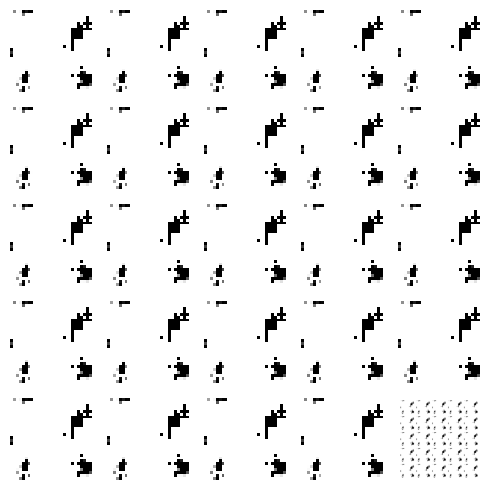

  0%|          | 0/350 [00:00<?, ?it/s]

4/4 [==============================] - 0s 14ms/step


  0%|          | 1/350 [00:00<03:55,  1.48it/s]

4/4 [==============================] - 0s 15ms/step


  1%|          | 2/350 [00:01<03:49,  1.52it/s]

4/4 [==============================] - 0s 13ms/step


  1%|          | 3/350 [00:01<03:32,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


  1%|          | 4/350 [00:02<03:14,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


  1%|▏         | 5/350 [00:03<03:36,  1.59it/s]

4/4 [==============================] - 0s 13ms/step


  2%|▏         | 6/350 [00:03<03:39,  1.57it/s]

4/4 [==============================] - 0s 22ms/step


  2%|▏         | 7/350 [00:04<03:44,  1.53it/s]

4/4 [==============================] - 0s 15ms/step


  2%|▏         | 8/350 [00:05<03:33,  1.60it/s]

4/4 [==============================] - 0s 14ms/step


  3%|▎         | 9/350 [00:05<03:31,  1.61it/s]

4/4 [==============================] - 0s 21ms/step


  3%|▎         | 10/350 [00:06<03:28,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


  3%|▎         | 11/350 [00:06<03:30,  1.61it/s]

4/4 [==============================] - 0s 16ms/step


  3%|▎         | 12/350 [00:07<03:32,  1.59it/s]

4/4 [==============================] - 0s 13ms/step


  4%|▎         | 13/350 [00:08<03:36,  1.55it/s]

4/4 [==============================] - 0s 12ms/step


  4%|▍         | 14/350 [00:08<03:30,  1.60it/s]

4/4 [==============================] - 0s 15ms/step


  4%|▍         | 15/350 [00:09<03:25,  1.63it/s]

4/4 [==============================] - 0s 15ms/step


  5%|▍         | 16/350 [00:09<03:19,  1.68it/s]

4/4 [==============================] - 0s 15ms/step


  5%|▍         | 17/350 [00:10<03:21,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


  5%|▌         | 18/350 [00:11<03:27,  1.60it/s]

4/4 [==============================] - 0s 21ms/step


  5%|▌         | 19/350 [00:11<03:26,  1.60it/s]

4/4 [==============================] - 0s 13ms/step


  6%|▌         | 20/350 [00:12<03:26,  1.60it/s]

4/4 [==============================] - 0s 15ms/step


  6%|▌         | 21/350 [00:13<03:19,  1.65it/s]

4/4 [==============================] - 0s 14ms/step


  6%|▋         | 22/350 [00:13<03:19,  1.65it/s]

4/4 [==============================] - 0s 18ms/step


  7%|▋         | 23/350 [00:14<03:16,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


  7%|▋         | 24/350 [00:14<03:11,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


  7%|▋         | 25/350 [00:15<03:16,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


  7%|▋         | 26/350 [00:16<03:14,  1.67it/s]

4/4 [==============================] - 0s 18ms/step


  8%|▊         | 27/350 [00:16<03:16,  1.64it/s]

4/4 [==============================] - 0s 15ms/step


  8%|▊         | 28/350 [00:17<03:20,  1.61it/s]

4/4 [==============================] - 0s 15ms/step


  8%|▊         | 29/350 [00:17<03:12,  1.67it/s]

4/4 [==============================] - 0s 15ms/step


  9%|▊         | 30/350 [00:18<03:21,  1.59it/s]

4/4 [==============================] - 0s 15ms/step


  9%|▉         | 31/350 [00:19<03:19,  1.60it/s]

4/4 [==============================] - 0s 13ms/step


  9%|▉         | 32/350 [00:19<03:18,  1.60it/s]

4/4 [==============================] - 0s 16ms/step


  9%|▉         | 33/350 [00:20<03:10,  1.66it/s]

4/4 [==============================] - 0s 14ms/step


 10%|▉         | 34/350 [00:21<03:18,  1.59it/s]

4/4 [==============================] - 0s 14ms/step


 10%|█         | 35/350 [00:21<03:12,  1.64it/s]

4/4 [==============================] - 0s 14ms/step


 10%|█         | 36/350 [00:22<03:13,  1.62it/s]

4/4 [==============================] - 0s 11ms/step


 11%|█         | 37/350 [00:22<03:04,  1.70it/s]

4/4 [==============================] - 0s 13ms/step


 11%|█         | 38/350 [00:23<03:12,  1.62it/s]

4/4 [==============================] - 0s 15ms/step


 11%|█         | 39/350 [00:23<03:08,  1.65it/s]

4/4 [==============================] - 0s 13ms/step


 11%|█▏        | 40/350 [00:24<03:09,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 12%|█▏        | 41/350 [00:25<03:13,  1.60it/s]

4/4 [==============================] - 0s 16ms/step


 12%|█▏        | 42/350 [00:25<03:08,  1.63it/s]

4/4 [==============================] - 0s 20ms/step


 12%|█▏        | 43/350 [00:26<03:04,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 13%|█▎        | 44/350 [00:27<03:06,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


 13%|█▎        | 45/350 [00:27<03:13,  1.58it/s]

4/4 [==============================] - 0s 18ms/step


 13%|█▎        | 46/350 [00:28<03:07,  1.62it/s]

4/4 [==============================] - 0s 13ms/step


 13%|█▎        | 47/350 [00:29<03:11,  1.58it/s]

4/4 [==============================] - 0s 13ms/step


 14%|█▎        | 48/350 [00:29<03:00,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 14%|█▍        | 49/350 [00:30<03:09,  1.59it/s]

4/4 [==============================] - 0s 12ms/step


 14%|█▍        | 50/350 [00:30<03:01,  1.65it/s]

4/4 [==============================] - 0s 16ms/step


 15%|█▍        | 51/350 [00:31<03:02,  1.64it/s]

4/4 [==============================] - 0s 16ms/step


 15%|█▍        | 52/350 [00:31<02:58,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 15%|█▌        | 53/350 [00:32<03:06,  1.59it/s]

4/4 [==============================] - 0s 15ms/step


 15%|█▌        | 54/350 [00:33<03:04,  1.60it/s]

4/4 [==============================] - 0s 16ms/step


 16%|█▌        | 55/350 [00:33<03:04,  1.60it/s]

4/4 [==============================] - 0s 11ms/step


 16%|█▌        | 56/350 [00:34<02:55,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 16%|█▋        | 57/350 [00:35<03:02,  1.61it/s]

4/4 [==============================] - 0s 13ms/step


 17%|█▋        | 58/350 [00:35<02:55,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 17%|█▋        | 59/350 [00:36<02:55,  1.66it/s]

4/4 [==============================] - 0s 15ms/step


 17%|█▋        | 60/350 [00:36<02:49,  1.71it/s]

4/4 [==============================] - 0s 16ms/step


 17%|█▋        | 61/350 [00:37<02:57,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 18%|█▊        | 62/350 [00:38<02:55,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


 18%|█▊        | 63/350 [00:38<02:51,  1.68it/s]

4/4 [==============================] - 0s 14ms/step


 18%|█▊        | 64/350 [00:39<02:44,  1.73it/s]

4/4 [==============================] - 0s 15ms/step


 19%|█▊        | 65/350 [00:39<02:48,  1.69it/s]

4/4 [==============================] - 0s 16ms/step


 19%|█▉        | 66/350 [00:40<02:50,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 19%|█▉        | 67/350 [00:41<02:54,  1.62it/s]

4/4 [==============================] - 0s 14ms/step


 19%|█▉        | 68/350 [00:41<02:46,  1.69it/s]

4/4 [==============================] - 0s 14ms/step


 20%|█▉        | 69/350 [00:42<02:47,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


 20%|██        | 70/350 [00:42<02:46,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 20%|██        | 71/350 [00:43<02:48,  1.65it/s]

4/4 [==============================] - 0s 14ms/step


 21%|██        | 72/350 [00:44<02:43,  1.70it/s]

4/4 [==============================] - 0s 16ms/step


 21%|██        | 73/350 [00:44<02:50,  1.62it/s]

4/4 [==============================] - 0s 15ms/step


 21%|██        | 74/350 [00:45<02:49,  1.63it/s]

4/4 [==============================] - 0s 14ms/step


 21%|██▏       | 75/350 [00:45<02:47,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 22%|██▏       | 76/350 [00:46<02:37,  1.73it/s]

4/4 [==============================] - 0s 14ms/step


 22%|██▏       | 77/350 [00:47<02:45,  1.65it/s]

4/4 [==============================] - 0s 17ms/step


 22%|██▏       | 78/350 [00:47<02:47,  1.63it/s]

4/4 [==============================] - 0s 14ms/step


 23%|██▎       | 79/350 [00:48<02:43,  1.66it/s]

4/4 [==============================] - 0s 15ms/step


 23%|██▎       | 80/350 [00:48<02:38,  1.71it/s]

4/4 [==============================] - 0s 15ms/step


 23%|██▎       | 81/350 [00:49<02:39,  1.68it/s]

4/4 [==============================] - 0s 14ms/step


 23%|██▎       | 82/350 [00:50<02:42,  1.65it/s]

4/4 [==============================] - 0s 13ms/step


 24%|██▎       | 83/350 [00:50<02:40,  1.66it/s]

4/4 [==============================] - 0s 16ms/step


 24%|██▍       | 84/350 [00:51<02:36,  1.70it/s]

4/4 [==============================] - 0s 14ms/step


 24%|██▍       | 85/350 [00:51<02:39,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


 25%|██▍       | 86/350 [00:52<02:37,  1.68it/s]

4/4 [==============================] - 0s 15ms/step


 25%|██▍       | 87/350 [00:53<02:41,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 25%|██▌       | 88/350 [00:53<02:45,  1.58it/s]

4/4 [==============================] - 0s 17ms/step


 25%|██▌       | 89/350 [00:54<02:44,  1.59it/s]

4/4 [==============================] - 0s 13ms/step


 26%|██▌       | 90/350 [00:54<02:41,  1.61it/s]

4/4 [==============================] - 0s 14ms/step


 26%|██▌       | 91/350 [00:55<02:32,  1.69it/s]

4/4 [==============================] - 0s 13ms/step


 26%|██▋       | 92/350 [00:56<02:34,  1.67it/s]

4/4 [==============================] - 0s 17ms/step


 27%|██▋       | 93/350 [00:56<02:35,  1.66it/s]

4/4 [==============================] - 0s 14ms/step


 27%|██▋       | 94/350 [00:57<02:38,  1.62it/s]

4/4 [==============================] - 0s 14ms/step


 27%|██▋       | 95/350 [00:57<02:32,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 27%|██▋       | 96/350 [00:58<02:35,  1.64it/s]

4/4 [==============================] - 0s 14ms/step


 28%|██▊       | 97/350 [00:59<02:37,  1.60it/s]

4/4 [==============================] - 0s 14ms/step


 28%|██▊       | 98/350 [00:59<02:36,  1.61it/s]

4/4 [==============================] - 0s 15ms/step


 28%|██▊       | 99/350 [01:00<02:31,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 29%|██▊       | 100/350 [01:01<02:36,  1.59it/s]

4/4 [==============================] - 0s 14ms/step


 29%|██▉       | 101/350 [01:01<02:31,  1.64it/s]

4/4 [==============================] - 0s 13ms/step


 29%|██▉       | 102/350 [01:02<02:32,  1.62it/s]

4/4 [==============================] - 0s 11ms/step


 29%|██▉       | 103/350 [01:03<02:41,  1.53it/s]

4/4 [==============================] - 0s 18ms/step


 30%|██▉       | 104/350 [01:03<02:39,  1.54it/s]

4/4 [==============================] - 0s 13ms/step


 30%|███       | 105/350 [01:04<02:34,  1.58it/s]

4/4 [==============================] - 0s 18ms/step


 30%|███       | 106/350 [01:04<02:29,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 31%|███       | 107/350 [01:05<02:32,  1.59it/s]

4/4 [==============================] - 0s 11ms/step


 31%|███       | 108/350 [01:06<02:29,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


 31%|███       | 109/350 [01:06<02:28,  1.63it/s]

4/4 [==============================] - 0s 14ms/step


 31%|███▏      | 110/350 [01:07<02:23,  1.67it/s]

4/4 [==============================] - 0s 16ms/step


 32%|███▏      | 111/350 [01:07<02:29,  1.59it/s]

4/4 [==============================] - 0s 13ms/step


 32%|███▏      | 112/350 [01:08<02:25,  1.64it/s]

4/4 [==============================] - 0s 17ms/step


 32%|███▏      | 113/350 [01:09<02:23,  1.65it/s]

4/4 [==============================] - 0s 13ms/step


 33%|███▎      | 114/350 [01:09<02:16,  1.73it/s]

4/4 [==============================] - 0s 12ms/step


 33%|███▎      | 115/350 [01:10<02:21,  1.67it/s]

4/4 [==============================] - 0s 15ms/step


 33%|███▎      | 116/350 [01:10<02:24,  1.62it/s]

4/4 [==============================] - 0s 15ms/step


 33%|███▎      | 117/350 [01:11<02:22,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 34%|███▎      | 118/350 [01:12<02:15,  1.71it/s]

4/4 [==============================] - 0s 17ms/step


 34%|███▍      | 119/350 [01:12<02:21,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 34%|███▍      | 120/350 [01:13<02:20,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


 35%|███▍      | 121/350 [01:13<02:16,  1.67it/s]

4/4 [==============================] - 0s 18ms/step


 35%|███▍      | 122/350 [01:14<02:13,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 35%|███▌      | 123/350 [01:15<02:21,  1.61it/s]

4/4 [==============================] - 0s 15ms/step


 35%|███▌      | 124/350 [01:15<02:20,  1.61it/s]

4/4 [==============================] - 0s 13ms/step


 36%|███▌      | 125/350 [01:16<02:16,  1.64it/s]

4/4 [==============================] - 0s 14ms/step


 36%|███▌      | 126/350 [01:16<02:10,  1.72it/s]

4/4 [==============================] - 0s 16ms/step


 36%|███▋      | 127/350 [01:17<02:16,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 37%|███▋      | 128/350 [01:18<02:16,  1.63it/s]

4/4 [==============================] - 0s 16ms/step


 37%|███▋      | 129/350 [01:18<02:15,  1.63it/s]

4/4 [==============================] - 0s 16ms/step


 37%|███▋      | 130/350 [01:19<02:09,  1.70it/s]

4/4 [==============================] - 0s 16ms/step


 37%|███▋      | 131/350 [01:20<02:14,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 38%|███▊      | 132/350 [01:20<02:11,  1.65it/s]

4/4 [==============================] - 0s 13ms/step


 38%|███▊      | 133/350 [01:21<02:09,  1.68it/s]

4/4 [==============================] - 0s 14ms/step


 38%|███▊      | 134/350 [01:21<02:06,  1.71it/s]

4/4 [==============================] - 0s 15ms/step


 39%|███▊      | 135/350 [01:22<02:09,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 39%|███▉      | 136/350 [01:23<02:12,  1.62it/s]

4/4 [==============================] - 0s 14ms/step


 39%|███▉      | 137/350 [01:23<02:09,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 39%|███▉      | 138/350 [01:24<02:04,  1.71it/s]

4/4 [==============================] - 0s 15ms/step


 40%|███▉      | 139/350 [01:24<02:09,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 40%|████      | 140/350 [01:25<02:07,  1.65it/s]

4/4 [==============================] - 0s 13ms/step


 40%|████      | 141/350 [01:26<02:05,  1.67it/s]

4/4 [==============================] - 0s 14ms/step


 41%|████      | 142/350 [01:26<02:01,  1.72it/s]

4/4 [==============================] - 0s 14ms/step


 41%|████      | 143/350 [01:27<02:05,  1.65it/s]

4/4 [==============================] - 0s 14ms/step


 41%|████      | 144/350 [01:27<02:06,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


 41%|████▏     | 145/350 [01:28<02:04,  1.64it/s]

4/4 [==============================] - 0s 13ms/step


 42%|████▏     | 146/350 [01:28<01:59,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 42%|████▏     | 147/350 [01:29<02:03,  1.65it/s]

4/4 [==============================] - 0s 16ms/step


 42%|████▏     | 148/350 [01:30<02:04,  1.62it/s]

4/4 [==============================] - 0s 16ms/step


 43%|████▎     | 149/350 [01:30<02:04,  1.61it/s]

4/4 [==============================] - 0s 13ms/step


 43%|████▎     | 150/350 [01:31<02:00,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 43%|████▎     | 151/350 [01:32<02:01,  1.64it/s]

4/4 [==============================] - 0s 13ms/step


 43%|████▎     | 152/350 [01:32<01:58,  1.67it/s]

4/4 [==============================] - 0s 14ms/step


 44%|████▎     | 153/350 [01:33<01:58,  1.66it/s]

4/4 [==============================] - 0s 15ms/step


 44%|████▍     | 154/350 [01:33<01:53,  1.72it/s]

4/4 [==============================] - 0s 14ms/step


 44%|████▍     | 155/350 [01:34<01:57,  1.66it/s]

4/4 [==============================] - 0s 15ms/step


 45%|████▍     | 156/350 [01:35<01:56,  1.66it/s]

4/4 [==============================] - 0s 16ms/step


 45%|████▍     | 157/350 [01:35<01:55,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 45%|████▌     | 158/350 [01:36<01:50,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 45%|████▌     | 159/350 [01:36<01:54,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


 46%|████▌     | 160/350 [01:37<01:55,  1.64it/s]

4/4 [==============================] - 0s 16ms/step


 46%|████▌     | 161/350 [01:38<01:55,  1.64it/s]

4/4 [==============================] - 0s 16ms/step


 46%|████▋     | 162/350 [01:38<01:51,  1.69it/s]

4/4 [==============================] - 0s 13ms/step


 47%|████▋     | 163/350 [01:39<01:55,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


 47%|████▋     | 164/350 [01:39<01:51,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 47%|████▋     | 165/350 [01:40<01:51,  1.66it/s]

4/4 [==============================] - 0s 16ms/step


 47%|████▋     | 166/350 [01:41<01:49,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 48%|████▊     | 167/350 [01:41<01:52,  1.62it/s]

4/4 [==============================] - 0s 19ms/step


 48%|████▊     | 168/350 [01:42<01:49,  1.66it/s]

4/4 [==============================] - 0s 14ms/step


 48%|████▊     | 169/350 [01:42<01:48,  1.67it/s]

4/4 [==============================] - 0s 16ms/step


 49%|████▊     | 170/350 [01:43<01:46,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 49%|████▉     | 171/350 [01:44<01:50,  1.62it/s]

4/4 [==============================] - 0s 16ms/step


 49%|████▉     | 172/350 [01:44<01:46,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 49%|████▉     | 173/350 [01:45<01:46,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 50%|████▉     | 174/350 [01:45<01:49,  1.61it/s]

4/4 [==============================] - 0s 21ms/step


 50%|█████     | 175/350 [01:46<01:45,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


 50%|█████     | 176/350 [01:47<01:43,  1.67it/s]

4/4 [==============================] - 0s 15ms/step


 51%|█████     | 177/350 [01:47<01:45,  1.65it/s]

4/4 [==============================] - 0s 18ms/step


 51%|█████     | 178/350 [01:48<01:43,  1.66it/s]

4/4 [==============================] - 0s 14ms/step


 51%|█████     | 179/350 [01:48<01:43,  1.65it/s]

4/4 [==============================] - 0s 15ms/step


 51%|█████▏    | 180/350 [01:49<01:41,  1.68it/s]

4/4 [==============================] - 0s 14ms/step


 52%|█████▏    | 181/350 [01:50<01:43,  1.63it/s]

4/4 [==============================] - 0s 14ms/step


 52%|█████▏    | 182/350 [01:50<01:41,  1.65it/s]

4/4 [==============================] - 0s 18ms/step


 52%|█████▏    | 183/350 [01:51<01:42,  1.62it/s]

4/4 [==============================] - 0s 11ms/step


 53%|█████▎    | 184/350 [01:52<01:43,  1.60it/s]

4/4 [==============================] - 0s 12ms/step


 53%|█████▎    | 185/350 [01:52<01:38,  1.68it/s]

4/4 [==============================] - 0s 15ms/step


 53%|█████▎    | 186/350 [01:53<01:38,  1.66it/s]

4/4 [==============================] - 0s 15ms/step


 53%|█████▎    | 187/350 [01:53<01:37,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 54%|█████▎    | 188/350 [01:54<01:38,  1.64it/s]

4/4 [==============================] - 0s 16ms/step


 54%|█████▍    | 189/350 [01:54<01:34,  1.71it/s]

4/4 [==============================] - 0s 15ms/step


 54%|█████▍    | 190/350 [01:55<01:34,  1.69it/s]

4/4 [==============================] - 0s 16ms/step


 55%|█████▍    | 191/350 [01:56<01:34,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 55%|█████▍    | 192/350 [01:56<01:36,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 55%|█████▌    | 193/350 [01:57<01:32,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 55%|█████▌    | 194/350 [01:57<01:36,  1.62it/s]

4/4 [==============================] - 0s 15ms/step


 56%|█████▌    | 195/350 [01:58<01:37,  1.59it/s]

4/4 [==============================] - 0s 14ms/step


 56%|█████▌    | 196/350 [01:59<01:35,  1.62it/s]

4/4 [==============================] - 0s 15ms/step


 56%|█████▋    | 197/350 [01:59<01:30,  1.68it/s]

4/4 [==============================] - 0s 18ms/step


 57%|█████▋    | 198/350 [02:00<01:35,  1.60it/s]

4/4 [==============================] - 0s 15ms/step


 57%|█████▋    | 199/350 [02:01<01:32,  1.63it/s]

4/4 [==============================] - 0s 14ms/step


 57%|█████▋    | 200/350 [02:01<01:31,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


 57%|█████▋    | 201/350 [02:02<01:27,  1.71it/s]

4/4 [==============================] - 0s 14ms/step


 58%|█████▊    | 202/350 [02:02<01:31,  1.62it/s]

4/4 [==============================] - 0s 14ms/step


 58%|█████▊    | 203/350 [02:03<01:27,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 58%|█████▊    | 204/350 [02:04<01:29,  1.62it/s]

4/4 [==============================] - 0s 11ms/step


 59%|█████▊    | 205/350 [02:04<01:25,  1.69it/s]

4/4 [==============================] - 0s 16ms/step


 59%|█████▉    | 206/350 [02:05<01:28,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


 59%|█████▉    | 207/350 [02:05<01:25,  1.68it/s]

4/4 [==============================] - 0s 16ms/step


 59%|█████▉    | 208/350 [02:06<01:25,  1.67it/s]

4/4 [==============================] - 0s 14ms/step


 60%|█████▉    | 209/350 [02:07<01:22,  1.71it/s]

4/4 [==============================] - 0s 22ms/step


 60%|██████    | 210/350 [02:07<01:33,  1.49it/s]

4/4 [==============================] - 0s 14ms/step


 60%|██████    | 211/350 [02:08<01:28,  1.58it/s]

4/4 [==============================] - 0s 14ms/step


 61%|██████    | 212/350 [02:09<01:26,  1.59it/s]

4/4 [==============================] - 0s 13ms/step


 61%|██████    | 213/350 [02:09<01:23,  1.65it/s]

4/4 [==============================] - 0s 15ms/step


 61%|██████    | 214/350 [02:10<01:25,  1.58it/s]

4/4 [==============================] - 0s 13ms/step


 61%|██████▏   | 215/350 [02:10<01:23,  1.62it/s]

4/4 [==============================] - 0s 15ms/step


 62%|██████▏   | 216/350 [02:11<01:22,  1.63it/s]

4/4 [==============================] - 0s 16ms/step


 62%|██████▏   | 217/350 [02:12<01:19,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 62%|██████▏   | 218/350 [02:12<01:20,  1.64it/s]

4/4 [==============================] - 0s 14ms/step


 63%|██████▎   | 219/350 [02:13<01:18,  1.67it/s]

4/4 [==============================] - 0s 16ms/step


 63%|██████▎   | 220/350 [02:13<01:19,  1.64it/s]

4/4 [==============================] - 0s 16ms/step


 63%|██████▎   | 221/350 [02:14<01:15,  1.71it/s]

4/4 [==============================] - 0s 14ms/step


 63%|██████▎   | 222/350 [02:15<01:18,  1.64it/s]

4/4 [==============================] - 0s 13ms/step


 64%|██████▎   | 223/350 [02:15<01:18,  1.62it/s]

4/4 [==============================] - 0s 15ms/step


 64%|██████▍   | 224/350 [02:16<01:17,  1.62it/s]

4/4 [==============================] - 0s 13ms/step


 64%|██████▍   | 225/350 [02:16<01:14,  1.68it/s]

4/4 [==============================] - 0s 14ms/step


 65%|██████▍   | 226/350 [02:17<01:17,  1.60it/s]

4/4 [==============================] - 0s 13ms/step


 65%|██████▍   | 227/350 [02:18<01:15,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 65%|██████▌   | 228/350 [02:18<01:14,  1.64it/s]

4/4 [==============================] - 0s 16ms/step


 65%|██████▌   | 229/350 [02:19<01:11,  1.69it/s]

4/4 [==============================] - 0s 13ms/step


 66%|██████▌   | 230/350 [02:20<01:15,  1.58it/s]

4/4 [==============================] - 0s 11ms/step


 66%|██████▌   | 231/350 [02:20<01:13,  1.61it/s]

4/4 [==============================] - 0s 15ms/step


 66%|██████▋   | 232/350 [02:21<01:12,  1.64it/s]

4/4 [==============================] - 0s 15ms/step


 67%|██████▋   | 233/350 [02:21<01:09,  1.68it/s]

4/4 [==============================] - 0s 16ms/step


 67%|██████▋   | 234/350 [02:22<01:11,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 67%|██████▋   | 235/350 [02:23<01:12,  1.60it/s]

4/4 [==============================] - 0s 14ms/step


 67%|██████▋   | 236/350 [02:23<01:10,  1.62it/s]

4/4 [==============================] - 0s 14ms/step


 68%|██████▊   | 237/350 [02:24<01:08,  1.66it/s]

4/4 [==============================] - 0s 10ms/step


 68%|██████▊   | 238/350 [02:24<01:10,  1.60it/s]

4/4 [==============================] - 0s 11ms/step


 68%|██████▊   | 239/350 [02:25<01:08,  1.62it/s]

4/4 [==============================] - 0s 13ms/step


 69%|██████▊   | 240/350 [02:26<01:08,  1.62it/s]

4/4 [==============================] - 0s 14ms/step


 69%|██████▉   | 241/350 [02:26<01:05,  1.67it/s]

4/4 [==============================] - 0s 15ms/step


 69%|██████▉   | 242/350 [02:27<01:06,  1.62it/s]

4/4 [==============================] - 0s 13ms/step


 69%|██████▉   | 243/350 [02:27<01:04,  1.66it/s]

4/4 [==============================] - 0s 14ms/step


 70%|██████▉   | 244/350 [02:28<01:03,  1.66it/s]

4/4 [==============================] - 0s 19ms/step


 70%|███████   | 245/350 [02:29<01:03,  1.66it/s]

4/4 [==============================] - 0s 16ms/step


 70%|███████   | 246/350 [02:29<01:05,  1.59it/s]

4/4 [==============================] - 0s 15ms/step


 71%|███████   | 247/350 [02:30<01:03,  1.61it/s]

4/4 [==============================] - 0s 15ms/step


 71%|███████   | 248/350 [02:31<01:02,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 71%|███████   | 249/350 [02:31<00:59,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 71%|███████▏  | 250/350 [02:32<01:02,  1.60it/s]

4/4 [==============================] - 0s 15ms/step


 72%|███████▏  | 251/350 [02:32<01:00,  1.64it/s]

4/4 [==============================] - 0s 15ms/step


 72%|███████▏  | 252/350 [02:33<01:00,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 72%|███████▏  | 253/350 [02:34<01:00,  1.60it/s]

4/4 [==============================] - 0s 22ms/step


 73%|███████▎  | 254/350 [02:34<00:59,  1.63it/s]

4/4 [==============================] - 0s 14ms/step


 73%|███████▎  | 255/350 [02:35<00:57,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 73%|███████▎  | 256/350 [02:35<00:58,  1.59it/s]

4/4 [==============================] - 0s 15ms/step


 73%|███████▎  | 257/350 [02:36<00:59,  1.57it/s]

4/4 [==============================] - 0s 15ms/step


 74%|███████▎  | 258/350 [02:37<00:56,  1.62it/s]

4/4 [==============================] - 0s 10ms/step


 74%|███████▍  | 259/350 [02:37<00:56,  1.62it/s]

4/4 [==============================] - 0s 16ms/step


 74%|███████▍  | 260/350 [02:38<00:53,  1.67it/s]

4/4 [==============================] - 0s 15ms/step


 75%|███████▍  | 261/350 [02:39<00:54,  1.64it/s]

4/4 [==============================] - 0s 15ms/step


 75%|███████▍  | 262/350 [02:39<00:54,  1.61it/s]

4/4 [==============================] - 0s 13ms/step


 75%|███████▌  | 263/350 [02:40<00:53,  1.63it/s]

4/4 [==============================] - 0s 17ms/step


 75%|███████▌  | 264/350 [02:40<00:51,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 76%|███████▌  | 265/350 [02:41<00:52,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


 76%|███████▌  | 266/350 [02:42<00:50,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


 76%|███████▋  | 267/350 [02:42<00:50,  1.65it/s]

4/4 [==============================] - 0s 15ms/step


 77%|███████▋  | 268/350 [02:43<00:48,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 77%|███████▋  | 269/350 [02:43<00:50,  1.61it/s]

4/4 [==============================] - 0s 15ms/step


 77%|███████▋  | 270/350 [02:44<00:48,  1.65it/s]

4/4 [==============================] - 0s 14ms/step


 77%|███████▋  | 271/350 [02:45<00:48,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 78%|███████▊  | 272/350 [02:45<00:47,  1.63it/s]

4/4 [==============================] - 0s 19ms/step


 78%|███████▊  | 273/350 [02:46<00:46,  1.64it/s]

4/4 [==============================] - 0s 13ms/step


 78%|███████▊  | 274/350 [02:46<00:45,  1.67it/s]

4/4 [==============================] - 0s 15ms/step


 79%|███████▊  | 275/350 [02:47<00:45,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 79%|███████▉  | 276/350 [02:48<00:43,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 79%|███████▉  | 277/350 [02:48<00:44,  1.65it/s]

4/4 [==============================] - 0s 13ms/step


 79%|███████▉  | 278/350 [02:49<00:42,  1.68it/s]

4/4 [==============================] - 0s 14ms/step


 80%|███████▉  | 279/350 [02:49<00:42,  1.66it/s]

4/4 [==============================] - 0s 17ms/step


 80%|████████  | 280/350 [02:50<00:41,  1.70it/s]

4/4 [==============================] - 0s 17ms/step


 80%|████████  | 281/350 [02:51<00:42,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 81%|████████  | 282/350 [02:51<00:41,  1.64it/s]

4/4 [==============================] - 0s 15ms/step


 81%|████████  | 283/350 [02:52<00:40,  1.67it/s]

4/4 [==============================] - 0s 15ms/step


 81%|████████  | 284/350 [02:52<00:38,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 81%|████████▏ | 285/350 [02:53<00:39,  1.64it/s]

4/4 [==============================] - 0s 15ms/step


 82%|████████▏ | 286/350 [02:54<00:39,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


 82%|████████▏ | 287/350 [02:54<00:37,  1.66it/s]

4/4 [==============================] - 0s 15ms/step


 82%|████████▏ | 288/350 [02:55<00:36,  1.71it/s]

4/4 [==============================] - 0s 15ms/step


 83%|████████▎ | 289/350 [02:55<00:37,  1.65it/s]

4/4 [==============================] - 0s 13ms/step


 83%|████████▎ | 290/350 [02:56<00:36,  1.64it/s]

4/4 [==============================] - 0s 13ms/step


 83%|████████▎ | 291/350 [02:57<00:35,  1.65it/s]

4/4 [==============================] - 0s 18ms/step


 83%|████████▎ | 292/350 [02:57<00:34,  1.70it/s]

4/4 [==============================] - 0s 15ms/step


 84%|████████▎ | 293/350 [02:58<00:34,  1.64it/s]

4/4 [==============================] - 0s 13ms/step


 84%|████████▍ | 294/350 [02:58<00:33,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 84%|████████▍ | 295/350 [02:59<00:33,  1.66it/s]

4/4 [==============================] - 0s 16ms/step


 85%|████████▍ | 296/350 [03:00<00:31,  1.69it/s]

4/4 [==============================] - 0s 14ms/step


 85%|████████▍ | 297/350 [03:00<00:32,  1.61it/s]

4/4 [==============================] - 0s 16ms/step


 85%|████████▌ | 298/350 [03:01<00:31,  1.66it/s]

4/4 [==============================] - 0s 15ms/step


 85%|████████▌ | 299/350 [03:01<00:30,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 86%|████████▌ | 300/350 [03:02<00:29,  1.72it/s]

4/4 [==============================] - 0s 15ms/step


 86%|████████▌ | 301/350 [03:03<00:30,  1.63it/s]

4/4 [==============================] - 0s 14ms/step


 86%|████████▋ | 302/350 [03:03<00:28,  1.67it/s]

4/4 [==============================] - 0s 15ms/step


 87%|████████▋ | 303/350 [03:04<00:28,  1.66it/s]

4/4 [==============================] - 0s 16ms/step


 87%|████████▋ | 304/350 [03:04<00:27,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 87%|████████▋ | 305/350 [03:05<00:27,  1.63it/s]

4/4 [==============================] - 0s 15ms/step


 87%|████████▋ | 306/350 [03:06<00:26,  1.66it/s]

4/4 [==============================] - 0s 17ms/step


 88%|████████▊ | 307/350 [03:06<00:26,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 88%|████████▊ | 308/350 [03:07<00:27,  1.55it/s]

4/4 [==============================] - 0s 16ms/step


 88%|████████▊ | 309/350 [03:08<00:25,  1.60it/s]

4/4 [==============================] - 0s 11ms/step


 89%|████████▊ | 310/350 [03:08<00:25,  1.58it/s]

4/4 [==============================] - 0s 14ms/step


 89%|████████▉ | 311/350 [03:09<00:23,  1.66it/s]

4/4 [==============================] - 0s 15ms/step


 89%|████████▉ | 312/350 [03:09<00:23,  1.63it/s]

4/4 [==============================] - 0s 16ms/step


 89%|████████▉ | 313/350 [03:10<00:22,  1.68it/s]

4/4 [==============================] - 0s 18ms/step


 90%|████████▉ | 314/350 [03:11<00:21,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 90%|█████████ | 315/350 [03:11<00:21,  1.62it/s]

4/4 [==============================] - 0s 14ms/step


 90%|█████████ | 316/350 [03:12<00:20,  1.64it/s]

4/4 [==============================] - 0s 14ms/step


 91%|█████████ | 317/350 [03:12<00:19,  1.66it/s]

4/4 [==============================] - 0s 15ms/step


 91%|█████████ | 318/350 [03:13<00:20,  1.60it/s]

4/4 [==============================] - 0s 13ms/step


 91%|█████████ | 319/350 [03:14<00:18,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


 91%|█████████▏| 320/350 [03:14<00:18,  1.64it/s]

4/4 [==============================] - 0s 15ms/step


 92%|█████████▏| 321/350 [03:15<00:18,  1.60it/s]

4/4 [==============================] - 0s 12ms/step


 92%|█████████▏| 322/350 [03:15<00:17,  1.64it/s]

4/4 [==============================] - 0s 17ms/step


 92%|█████████▏| 323/350 [03:16<00:16,  1.68it/s]

4/4 [==============================] - 0s 17ms/step


 93%|█████████▎| 324/350 [03:17<00:16,  1.61it/s]

4/4 [==============================] - 0s 13ms/step


 93%|█████████▎| 325/350 [03:17<00:15,  1.61it/s]

4/4 [==============================] - 0s 12ms/step


 93%|█████████▎| 326/350 [03:18<00:14,  1.63it/s]

4/4 [==============================] - 0s 14ms/step


 93%|█████████▎| 327/350 [03:18<00:13,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 94%|█████████▎| 328/350 [03:19<00:13,  1.67it/s]

4/4 [==============================] - 0s 16ms/step


 94%|█████████▍| 329/350 [03:20<00:12,  1.66it/s]

4/4 [==============================] - 0s 14ms/step


 94%|█████████▍| 330/350 [03:20<00:11,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 95%|█████████▍| 331/350 [03:21<00:11,  1.66it/s]

4/4 [==============================] - 0s 16ms/step


 95%|█████████▍| 332/350 [03:22<00:10,  1.65it/s]

4/4 [==============================] - 0s 17ms/step


 95%|█████████▌| 333/350 [03:22<00:10,  1.69it/s]

4/4 [==============================] - 0s 14ms/step


 95%|█████████▌| 334/350 [03:23<00:09,  1.70it/s]

4/4 [==============================] - 0s 13ms/step


 96%|█████████▌| 335/350 [03:23<00:09,  1.62it/s]

4/4 [==============================] - 0s 11ms/step


 96%|█████████▌| 336/350 [03:24<00:08,  1.65it/s]

4/4 [==============================] - 0s 19ms/step


 96%|█████████▋| 337/350 [03:25<00:07,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 97%|█████████▋| 338/350 [03:25<00:07,  1.70it/s]

4/4 [==============================] - 0s 14ms/step


 97%|█████████▋| 339/350 [03:26<00:06,  1.69it/s]

4/4 [==============================] - 0s 13ms/step


 97%|█████████▋| 340/350 [03:26<00:05,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 97%|█████████▋| 341/350 [03:27<00:05,  1.64it/s]

4/4 [==============================] - 0s 13ms/step


 98%|█████████▊| 342/350 [03:27<00:04,  1.66it/s]

4/4 [==============================] - 0s 14ms/step


 98%|█████████▊| 343/350 [03:28<00:04,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 98%|█████████▊| 344/350 [03:29<00:03,  1.60it/s]

4/4 [==============================] - 0s 23ms/step


 99%|█████████▊| 345/350 [03:29<00:03,  1.61it/s]

4/4 [==============================] - 0s 12ms/step


 99%|█████████▉| 346/350 [03:30<00:02,  1.66it/s]

4/4 [==============================] - 0s 16ms/step


 99%|█████████▉| 347/350 [03:31<00:01,  1.62it/s]

4/4 [==============================] - 0s 14ms/step


 99%|█████████▉| 348/350 [03:31<00:01,  1.64it/s]

4/4 [==============================] - 0s 15ms/step


100%|█████████▉| 349/350 [03:32<00:00,  1.62it/s]

4/4 [==============================] - 0s 15ms/step


100%|██████████| 350/350 [03:32<00:00,  1.64it/s]

Epoch number: 84 discriminator_loss: 0.1638933380522316 generator_loss: 8.238805852617537
1/1 [==============================] - 0s 27ms/step


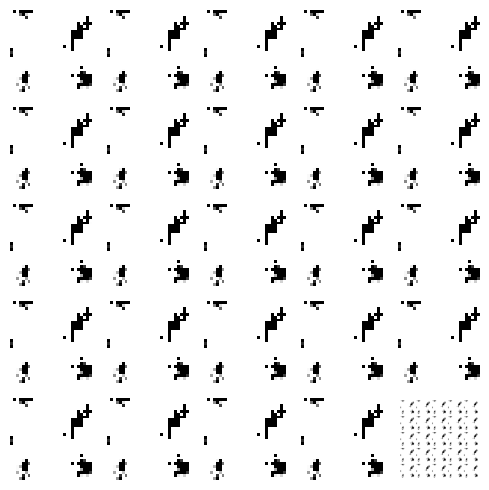

  0%|          | 0/350 [00:00<?, ?it/s]

4/4 [==============================] - 0s 18ms/step


  0%|          | 1/350 [00:00<03:50,  1.51it/s]

4/4 [==============================] - 0s 18ms/step


  1%|          | 2/350 [00:01<03:50,  1.51it/s]

4/4 [==============================] - 0s 20ms/step


  1%|          | 3/350 [00:01<03:42,  1.56it/s]

4/4 [==============================] - 0s 12ms/step


  1%|          | 4/350 [00:02<03:41,  1.56it/s]

4/4 [==============================] - 0s 21ms/step


  1%|▏         | 5/350 [00:03<03:38,  1.58it/s]

4/4 [==============================] - 0s 15ms/step


  2%|▏         | 6/350 [00:03<03:24,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


  2%|▏         | 7/350 [00:04<03:34,  1.60it/s]

4/4 [==============================] - 0s 13ms/step


  2%|▏         | 8/350 [00:04<03:28,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


  3%|▎         | 9/350 [00:05<03:18,  1.72it/s]

4/4 [==============================] - 0s 15ms/step


  3%|▎         | 10/350 [00:06<03:11,  1.78it/s]

4/4 [==============================] - 0s 15ms/step


  3%|▎         | 11/350 [00:06<03:19,  1.70it/s]

4/4 [==============================] - 0s 13ms/step


  3%|▎         | 12/350 [00:07<03:19,  1.69it/s]

4/4 [==============================] - 0s 17ms/step


  4%|▎         | 13/350 [00:07<03:28,  1.62it/s]

4/4 [==============================] - 0s 15ms/step


  4%|▍         | 14/350 [00:08<03:25,  1.64it/s]

4/4 [==============================] - 0s 15ms/step


  4%|▍         | 15/350 [00:09<03:19,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


  5%|▍         | 16/350 [00:09<03:26,  1.62it/s]

4/4 [==============================] - 0s 13ms/step


  5%|▍         | 17/350 [00:10<03:25,  1.62it/s]

4/4 [==============================] - 0s 14ms/step


  5%|▌         | 18/350 [00:10<03:21,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


  5%|▌         | 19/350 [00:11<03:11,  1.73it/s]

4/4 [==============================] - 0s 17ms/step


  6%|▌         | 20/350 [00:12<03:19,  1.65it/s]

4/4 [==============================] - 0s 15ms/step


  6%|▌         | 21/350 [00:12<03:22,  1.63it/s]

4/4 [==============================] - 0s 15ms/step


  6%|▋         | 22/350 [00:13<03:20,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


  7%|▋         | 23/350 [00:13<03:15,  1.68it/s]

4/4 [==============================] - 0s 15ms/step


  7%|▋         | 24/350 [00:14<03:23,  1.60it/s]

4/4 [==============================] - 0s 11ms/step


  7%|▋         | 25/350 [00:15<03:15,  1.67it/s]

4/4 [==============================] - 0s 15ms/step


  7%|▋         | 26/350 [00:15<03:16,  1.65it/s]

4/4 [==============================] - 0s 14ms/step


  8%|▊         | 27/350 [00:16<03:07,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


  8%|▊         | 28/350 [00:16<03:14,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


  8%|▊         | 29/350 [00:17<03:13,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


  9%|▊         | 30/350 [00:18<03:12,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


  9%|▉         | 31/350 [00:18<03:06,  1.71it/s]

4/4 [==============================] - 0s 14ms/step


  9%|▉         | 32/350 [00:19<03:13,  1.64it/s]

4/4 [==============================] - 0s 15ms/step


  9%|▉         | 33/350 [00:19<03:10,  1.67it/s]

4/4 [==============================] - 0s 15ms/step


 10%|▉         | 34/350 [00:20<03:07,  1.68it/s]

4/4 [==============================] - 0s 16ms/step


 10%|█         | 35/350 [00:21<03:03,  1.72it/s]

4/4 [==============================] - 0s 16ms/step


 10%|█         | 36/350 [00:21<03:09,  1.66it/s]

4/4 [==============================] - 0s 14ms/step


 11%|█         | 37/350 [00:22<03:04,  1.70it/s]

4/4 [==============================] - 0s 14ms/step


 11%|█         | 38/350 [00:22<03:08,  1.66it/s]

4/4 [==============================] - 0s 18ms/step


 11%|█         | 39/350 [00:23<03:02,  1.70it/s]

4/4 [==============================] - 0s 16ms/step


 11%|█▏        | 40/350 [00:24<03:10,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


 12%|█▏        | 41/350 [00:24<03:12,  1.60it/s]

4/4 [==============================] - 0s 14ms/step


 12%|█▏        | 42/350 [00:25<03:10,  1.62it/s]

4/4 [==============================] - 0s 13ms/step


 12%|█▏        | 43/350 [00:25<03:04,  1.66it/s]

4/4 [==============================] - 0s 17ms/step


 13%|█▎        | 44/350 [00:26<03:11,  1.60it/s]

4/4 [==============================] - 0s 13ms/step


 13%|█▎        | 45/350 [00:27<03:05,  1.64it/s]

4/4 [==============================] - 0s 13ms/step


 13%|█▎        | 46/350 [00:27<03:03,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


 13%|█▎        | 47/350 [00:28<02:56,  1.71it/s]

4/4 [==============================] - 0s 14ms/step


 14%|█▎        | 48/350 [00:29<03:02,  1.65it/s]

4/4 [==============================] - 0s 15ms/step


 14%|█▍        | 49/350 [00:29<03:03,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 14%|█▍        | 50/350 [00:30<03:02,  1.64it/s]

4/4 [==============================] - 0s 16ms/step


 15%|█▍        | 51/350 [00:30<02:59,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 15%|█▍        | 52/350 [00:31<03:05,  1.61it/s]

4/4 [==============================] - 0s 14ms/step


 15%|█▌        | 53/350 [00:32<03:05,  1.61it/s]

4/4 [==============================] - 0s 13ms/step


 15%|█▌        | 54/350 [00:32<03:02,  1.62it/s]

4/4 [==============================] - 0s 11ms/step


 16%|█▌        | 55/350 [00:33<02:54,  1.69it/s]

4/4 [==============================] - 0s 15ms/step


 16%|█▌        | 56/350 [00:33<03:00,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 16%|█▋        | 57/350 [00:34<02:59,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


 17%|█▋        | 58/350 [00:35<02:58,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 17%|█▋        | 59/350 [00:35<02:53,  1.68it/s]

4/4 [==============================] - 0s 15ms/step


 17%|█▋        | 60/350 [00:36<03:00,  1.61it/s]

4/4 [==============================] - 0s 13ms/step


 17%|█▋        | 61/350 [00:36<02:54,  1.66it/s]

4/4 [==============================] - 0s 14ms/step


 18%|█▊        | 62/350 [00:37<02:52,  1.67it/s]

4/4 [==============================] - 0s 15ms/step


 18%|█▊        | 63/350 [00:38<02:48,  1.70it/s]

4/4 [==============================] - 0s 16ms/step


 18%|█▊        | 64/350 [00:38<02:54,  1.64it/s]

4/4 [==============================] - 0s 16ms/step


 19%|█▊        | 65/350 [00:39<02:54,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


 19%|█▉        | 66/350 [00:39<02:51,  1.65it/s]

4/4 [==============================] - 0s 16ms/step


 19%|█▉        | 67/350 [00:40<02:45,  1.71it/s]

4/4 [==============================] - 0s 15ms/step


 19%|█▉        | 68/350 [00:41<02:52,  1.64it/s]

4/4 [==============================] - 0s 14ms/step


 20%|█▉        | 69/350 [00:41<02:52,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 20%|██        | 70/350 [00:42<02:48,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


 20%|██        | 71/350 [00:42<02:44,  1.70it/s]

4/4 [==============================] - 0s 13ms/step


 21%|██        | 72/350 [00:43<02:43,  1.70it/s]

4/4 [==============================] - 0s 18ms/step


 21%|██        | 73/350 [00:44<02:44,  1.68it/s]

4/4 [==============================] - 0s 14ms/step


 21%|██        | 74/350 [00:44<02:48,  1.64it/s]

4/4 [==============================] - 0s 18ms/step


 21%|██▏       | 75/350 [00:45<02:42,  1.69it/s]

4/4 [==============================] - 0s 16ms/step


 22%|██▏       | 76/350 [00:45<02:45,  1.66it/s]

4/4 [==============================] - 0s 18ms/step


 22%|██▏       | 77/350 [00:46<02:45,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 22%|██▏       | 78/350 [00:47<02:41,  1.68it/s]

4/4 [==============================] - 0s 18ms/step


 23%|██▎       | 79/350 [00:47<02:39,  1.70it/s]

4/4 [==============================] - 0s 14ms/step


 23%|██▎       | 80/350 [00:48<02:44,  1.64it/s]

4/4 [==============================] - 0s 19ms/step


 23%|██▎       | 81/350 [00:49<02:49,  1.59it/s]

4/4 [==============================] - 0s 15ms/step


 23%|██▎       | 82/350 [00:49<02:50,  1.57it/s]

4/4 [==============================] - 0s 11ms/step


 24%|██▎       | 83/350 [00:50<02:50,  1.57it/s]

4/4 [==============================] - 0s 11ms/step


 24%|██▍       | 84/350 [00:50<02:45,  1.61it/s]

4/4 [==============================] - 0s 14ms/step


 24%|██▍       | 85/350 [00:51<02:45,  1.60it/s]

4/4 [==============================] - 0s 14ms/step


 25%|██▍       | 86/350 [00:52<02:40,  1.65it/s]

4/4 [==============================] - 0s 13ms/step


 25%|██▍       | 87/350 [00:52<02:48,  1.56it/s]

4/4 [==============================] - 0s 14ms/step


 25%|██▌       | 88/350 [00:53<02:47,  1.56it/s]

4/4 [==============================] - 0s 14ms/step


 25%|██▌       | 89/350 [00:54<02:43,  1.60it/s]

4/4 [==============================] - 0s 14ms/step


 26%|██▌       | 90/350 [00:54<02:38,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 26%|██▌       | 91/350 [00:55<02:42,  1.60it/s]

4/4 [==============================] - 0s 15ms/step


 26%|██▋       | 92/350 [00:55<02:38,  1.62it/s]

4/4 [==============================] - 0s 15ms/step


 27%|██▋       | 93/350 [00:56<02:37,  1.63it/s]

4/4 [==============================] - 0s 16ms/step


 27%|██▋       | 94/350 [00:57<02:31,  1.69it/s]

4/4 [==============================] - 0s 15ms/step


 27%|██▋       | 95/350 [00:57<02:36,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


 27%|██▋       | 96/350 [00:58<02:37,  1.61it/s]

4/4 [==============================] - 0s 12ms/step


 28%|██▊       | 97/350 [00:58<02:35,  1.63it/s]

4/4 [==============================] - 0s 14ms/step


 28%|██▊       | 98/350 [00:59<02:30,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 28%|██▊       | 99/350 [01:00<02:36,  1.61it/s]

4/4 [==============================] - 0s 13ms/step


 29%|██▊       | 100/350 [01:00<02:31,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 29%|██▉       | 101/350 [01:01<02:32,  1.64it/s]

4/4 [==============================] - 0s 14ms/step


 29%|██▉       | 102/350 [01:01<02:28,  1.67it/s]

4/4 [==============================] - 0s 14ms/step


 29%|██▉       | 103/350 [01:02<02:33,  1.61it/s]

4/4 [==============================] - 0s 13ms/step


 30%|██▉       | 104/350 [01:03<02:30,  1.64it/s]

4/4 [==============================] - 0s 13ms/step


 30%|███       | 105/350 [01:03<02:30,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 30%|███       | 106/350 [01:04<02:22,  1.71it/s]

4/4 [==============================] - 0s 13ms/step


 31%|███       | 107/350 [01:04<02:23,  1.69it/s]

4/4 [==============================] - 0s 13ms/step


 31%|███       | 108/350 [01:05<02:24,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 31%|███       | 109/350 [01:06<02:21,  1.71it/s]

4/4 [==============================] - 0s 18ms/step


 31%|███▏      | 110/350 [01:06<02:19,  1.72it/s]

4/4 [==============================] - 0s 16ms/step


 32%|███▏      | 111/350 [01:07<02:21,  1.69it/s]

4/4 [==============================] - 0s 18ms/step


 32%|███▏      | 112/350 [01:07<02:21,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 32%|███▏      | 113/350 [01:08<02:18,  1.71it/s]

4/4 [==============================] - 0s 17ms/step


 33%|███▎      | 114/350 [01:09<02:17,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


 33%|███▎      | 115/350 [01:09<02:19,  1.69it/s]

4/4 [==============================] - 0s 13ms/step


 33%|███▎      | 116/350 [01:10<02:18,  1.69it/s]

4/4 [==============================] - 0s 13ms/step


 33%|███▎      | 117/350 [01:10<02:18,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 34%|███▎      | 118/350 [01:11<02:20,  1.65it/s]

4/4 [==============================] - 0s 15ms/step


 34%|███▍      | 119/350 [01:12<02:21,  1.63it/s]

4/4 [==============================] - 0s 17ms/step


 34%|███▍      | 120/350 [01:12<02:19,  1.65it/s]

4/4 [==============================] - 0s 20ms/step


 35%|███▍      | 121/350 [01:13<02:23,  1.60it/s]

4/4 [==============================] - 0s 15ms/step


 35%|███▍      | 122/350 [01:13<02:17,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 35%|███▌      | 123/350 [01:14<02:22,  1.59it/s]

4/4 [==============================] - 0s 14ms/step


 35%|███▌      | 124/350 [01:15<02:20,  1.61it/s]

4/4 [==============================] - 0s 13ms/step


 36%|███▌      | 125/350 [01:15<02:19,  1.61it/s]

4/4 [==============================] - 0s 12ms/step


 36%|███▌      | 126/350 [01:16<02:12,  1.69it/s]

4/4 [==============================] - 0s 16ms/step


 36%|███▋      | 127/350 [01:17<02:14,  1.65it/s]

4/4 [==============================] - 0s 15ms/step


 37%|███▋      | 128/350 [01:17<02:15,  1.63it/s]

4/4 [==============================] - 0s 15ms/step


 37%|███▋      | 129/350 [01:18<02:11,  1.68it/s]

4/4 [==============================] - 0s 14ms/step


 37%|███▋      | 130/350 [01:18<02:07,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 37%|███▋      | 131/350 [01:19<02:13,  1.64it/s]

4/4 [==============================] - 0s 13ms/step


 38%|███▊      | 132/350 [01:20<02:15,  1.61it/s]

4/4 [==============================] - 0s 13ms/step


 38%|███▊      | 133/350 [01:20<02:12,  1.64it/s]

4/4 [==============================] - 0s 16ms/step


 38%|███▊      | 134/350 [01:21<02:08,  1.68it/s]

4/4 [==============================] - 0s 14ms/step


 39%|███▊      | 135/350 [01:21<02:12,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


 39%|███▉      | 136/350 [01:22<02:09,  1.65it/s]

4/4 [==============================] - 0s 14ms/step


 39%|███▉      | 137/350 [01:23<02:09,  1.65it/s]

4/4 [==============================] - 0s 18ms/step


 39%|███▉      | 138/350 [01:23<02:06,  1.68it/s]

4/4 [==============================] - 0s 16ms/step


 40%|███▉      | 139/350 [01:24<02:11,  1.60it/s]

4/4 [==============================] - 0s 14ms/step


 40%|████      | 140/350 [01:24<02:07,  1.64it/s]

4/4 [==============================] - 0s 15ms/step


 40%|████      | 141/350 [01:25<02:06,  1.65it/s]

4/4 [==============================] - 0s 16ms/step


 41%|████      | 142/350 [01:26<02:02,  1.70it/s]

4/4 [==============================] - 0s 13ms/step


 41%|████      | 143/350 [01:26<02:05,  1.65it/s]

4/4 [==============================] - 0s 15ms/step


 41%|████      | 144/350 [01:27<02:04,  1.65it/s]

4/4 [==============================] - 0s 13ms/step


 41%|████▏     | 145/350 [01:27<02:03,  1.65it/s]

4/4 [==============================] - 0s 13ms/step


 42%|████▏     | 146/350 [01:28<01:59,  1.70it/s]

4/4 [==============================] - 0s 17ms/step


 42%|████▏     | 147/350 [01:29<02:04,  1.63it/s]

4/4 [==============================] - 0s 14ms/step


 42%|████▏     | 148/350 [01:29<02:01,  1.67it/s]

4/4 [==============================] - 0s 14ms/step


 43%|████▎     | 149/350 [01:30<02:01,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 43%|████▎     | 150/350 [01:30<01:57,  1.70it/s]

4/4 [==============================] - 0s 15ms/step


 43%|████▎     | 151/350 [01:31<02:02,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 43%|████▎     | 152/350 [01:32<02:02,  1.62it/s]

4/4 [==============================] - 0s 14ms/step


 44%|████▎     | 153/350 [01:32<02:01,  1.62it/s]

4/4 [==============================] - 0s 15ms/step


 44%|████▍     | 154/350 [01:33<01:57,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 44%|████▍     | 155/350 [01:34<02:01,  1.60it/s]

4/4 [==============================] - 0s 14ms/step


 45%|████▍     | 156/350 [01:34<01:57,  1.65it/s]

4/4 [==============================] - 0s 16ms/step


 45%|████▍     | 157/350 [01:35<01:55,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 45%|████▌     | 158/350 [01:35<01:51,  1.72it/s]

4/4 [==============================] - 0s 17ms/step


 45%|████▌     | 159/350 [01:36<01:55,  1.65it/s]

4/4 [==============================] - 0s 14ms/step


 46%|████▌     | 160/350 [01:36<01:53,  1.68it/s]

4/4 [==============================] - 0s 16ms/step


 46%|████▌     | 161/350 [01:37<01:54,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 46%|████▋     | 162/350 [01:38<01:56,  1.61it/s]

4/4 [==============================] - 0s 17ms/step


 47%|████▋     | 163/350 [01:38<01:53,  1.64it/s]

4/4 [==============================] - 0s 13ms/step


 47%|████▋     | 164/350 [01:39<01:50,  1.69it/s]

4/4 [==============================] - 0s 14ms/step


 47%|████▋     | 165/350 [01:39<01:51,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 47%|████▋     | 166/350 [01:40<01:52,  1.63it/s]

4/4 [==============================] - 0s 19ms/step


 48%|████▊     | 167/350 [01:41<01:49,  1.67it/s]

4/4 [==============================] - 0s 15ms/step


 48%|████▊     | 168/350 [01:41<01:47,  1.70it/s]

4/4 [==============================] - 0s 14ms/step


 48%|████▊     | 169/350 [01:42<01:47,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 49%|████▊     | 170/350 [01:43<01:50,  1.63it/s]

4/4 [==============================] - 0s 18ms/step


 49%|████▉     | 171/350 [01:43<01:49,  1.64it/s]

4/4 [==============================] - 0s 14ms/step


 49%|████▉     | 172/350 [01:44<01:52,  1.58it/s]

4/4 [==============================] - 0s 14ms/step


 49%|████▉     | 173/350 [01:44<01:45,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


 50%|████▉     | 174/350 [01:45<01:47,  1.63it/s]

4/4 [==============================] - 0s 15ms/step


 50%|█████     | 175/350 [01:46<01:45,  1.66it/s]

4/4 [==============================] - 0s 16ms/step


 50%|█████     | 176/350 [01:46<01:43,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 51%|█████     | 177/350 [01:47<01:46,  1.62it/s]

4/4 [==============================] - 0s 15ms/step


 51%|█████     | 178/350 [01:47<01:46,  1.61it/s]

4/4 [==============================] - 0s 13ms/step


 51%|█████     | 179/350 [01:48<01:47,  1.59it/s]

4/4 [==============================] - 0s 11ms/step


 51%|█████▏    | 180/350 [01:49<01:47,  1.58it/s]

4/4 [==============================] - 0s 12ms/step


 52%|█████▏    | 181/350 [01:49<01:41,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 52%|█████▏    | 182/350 [01:50<01:45,  1.60it/s]

4/4 [==============================] - 0s 13ms/step


 52%|█████▏    | 183/350 [01:50<01:41,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 53%|█████▎    | 184/350 [01:51<01:40,  1.65it/s]

4/4 [==============================] - 0s 15ms/step


 53%|█████▎    | 185/350 [01:52<01:37,  1.69it/s]

4/4 [==============================] - 0s 14ms/step


 53%|█████▎    | 186/350 [01:52<01:42,  1.60it/s]

4/4 [==============================] - 0s 13ms/step


 53%|█████▎    | 187/350 [01:53<01:42,  1.59it/s]

4/4 [==============================] - 0s 14ms/step


 54%|█████▎    | 188/350 [01:54<01:39,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


 54%|█████▍    | 189/350 [01:54<01:35,  1.68it/s]

4/4 [==============================] - 0s 14ms/step


 54%|█████▍    | 190/350 [01:55<01:38,  1.62it/s]

4/4 [==============================] - 0s 18ms/step


 55%|█████▍    | 191/350 [01:55<01:38,  1.61it/s]

4/4 [==============================] - 0s 16ms/step


 55%|█████▍    | 192/350 [01:56<01:36,  1.63it/s]

4/4 [==============================] - 0s 15ms/step


 55%|█████▌    | 193/350 [01:57<01:32,  1.69it/s]

4/4 [==============================] - 0s 16ms/step


 55%|█████▌    | 194/350 [01:57<01:35,  1.64it/s]

4/4 [==============================] - 0s 16ms/step


 56%|█████▌    | 195/350 [01:58<01:34,  1.64it/s]

4/4 [==============================] - 0s 15ms/step


 56%|█████▌    | 196/350 [01:58<01:34,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


 56%|█████▋    | 197/350 [01:59<01:30,  1.70it/s]

4/4 [==============================] - 0s 14ms/step


 57%|█████▋    | 198/350 [02:00<01:32,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 57%|█████▋    | 199/350 [02:00<01:31,  1.64it/s]

4/4 [==============================] - 0s 13ms/step


 57%|█████▋    | 200/350 [02:01<01:29,  1.67it/s]

4/4 [==============================] - 0s 14ms/step


 57%|█████▋    | 201/350 [02:01<01:25,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 58%|█████▊    | 202/350 [02:02<01:26,  1.71it/s]

4/4 [==============================] - 0s 20ms/step


 58%|█████▊    | 203/350 [02:03<01:27,  1.69it/s]

4/4 [==============================] - 0s 14ms/step


 58%|█████▊    | 204/350 [02:03<01:28,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 59%|█████▊    | 205/350 [02:04<01:24,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 59%|█████▉    | 206/350 [02:04<01:26,  1.67it/s]

4/4 [==============================] - 0s 20ms/step


 59%|█████▉    | 207/350 [02:05<01:26,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


 59%|█████▉    | 208/350 [02:06<01:26,  1.63it/s]

4/4 [==============================] - 0s 16ms/step


 60%|█████▉    | 209/350 [02:06<01:23,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


 60%|██████    | 210/350 [02:07<01:24,  1.66it/s]

4/4 [==============================] - 0s 16ms/step


 60%|██████    | 211/350 [02:07<01:24,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


 61%|██████    | 212/350 [02:08<01:23,  1.65it/s]

4/4 [==============================] - 0s 18ms/step


 61%|██████    | 213/350 [02:09<01:21,  1.68it/s]

4/4 [==============================] - 0s 16ms/step


 61%|██████    | 214/350 [02:09<01:25,  1.60it/s]

4/4 [==============================] - 0s 13ms/step


 61%|██████▏   | 215/350 [02:10<01:23,  1.61it/s]

4/4 [==============================] - 0s 13ms/step


 62%|██████▏   | 216/350 [02:10<01:20,  1.66it/s]

4/4 [==============================] - 0s 14ms/step


 62%|██████▏   | 217/350 [02:11<01:17,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 62%|██████▏   | 218/350 [02:12<01:21,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 63%|██████▎   | 219/350 [02:12<01:18,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 63%|██████▎   | 220/350 [02:13<01:19,  1.63it/s]

4/4 [==============================] - 0s 17ms/step


 63%|██████▎   | 221/350 [02:13<01:15,  1.70it/s]

4/4 [==============================] - 0s 14ms/step


 63%|██████▎   | 222/350 [02:14<01:16,  1.67it/s]

4/4 [==============================] - 0s 19ms/step


 64%|██████▎   | 223/350 [02:15<01:17,  1.64it/s]

4/4 [==============================] - 0s 15ms/step


 64%|██████▍   | 224/350 [02:15<01:17,  1.62it/s]

4/4 [==============================] - 0s 11ms/step


 64%|██████▍   | 225/350 [02:16<01:18,  1.59it/s]

4/4 [==============================] - 0s 16ms/step


 65%|██████▍   | 226/350 [02:17<01:19,  1.55it/s]

4/4 [==============================] - 0s 16ms/step


 65%|██████▍   | 227/350 [02:17<01:17,  1.58it/s]

4/4 [==============================] - 0s 12ms/step


 65%|██████▌   | 228/350 [02:18<01:19,  1.54it/s]

4/4 [==============================] - 0s 13ms/step


 65%|██████▌   | 229/350 [02:18<01:14,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


 66%|██████▌   | 230/350 [02:19<01:15,  1.59it/s]

4/4 [==============================] - 0s 18ms/step


 66%|██████▌   | 231/350 [02:20<01:14,  1.59it/s]

4/4 [==============================] - 0s 12ms/step


 66%|██████▋   | 232/350 [02:20<01:12,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 67%|██████▋   | 233/350 [02:21<01:09,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 67%|██████▋   | 234/350 [02:22<01:11,  1.62it/s]

4/4 [==============================] - 0s 14ms/step


 67%|██████▋   | 235/350 [02:22<01:13,  1.57it/s]

4/4 [==============================] - 0s 15ms/step


 67%|██████▋   | 236/350 [02:23<01:11,  1.60it/s]

4/4 [==============================] - 0s 12ms/step


 68%|██████▊   | 237/350 [02:23<01:07,  1.68it/s]

4/4 [==============================] - 0s 14ms/step


 68%|██████▊   | 238/350 [02:24<01:09,  1.62it/s]

4/4 [==============================] - 0s 13ms/step


 68%|██████▊   | 239/350 [02:25<01:08,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 69%|██████▊   | 240/350 [02:25<01:07,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 69%|██████▉   | 241/350 [02:26<01:04,  1.69it/s]

4/4 [==============================] - 0s 13ms/step


 69%|██████▉   | 242/350 [02:26<01:06,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


 69%|██████▉   | 243/350 [02:27<01:06,  1.60it/s]

4/4 [==============================] - 0s 18ms/step


 70%|██████▉   | 244/350 [02:28<01:05,  1.62it/s]

4/4 [==============================] - 0s 11ms/step


 70%|███████   | 245/350 [02:28<01:02,  1.67it/s]

4/4 [==============================] - 0s 14ms/step


 70%|███████   | 246/350 [02:29<01:04,  1.60it/s]

4/4 [==============================] - 0s 12ms/step


 71%|███████   | 247/350 [02:29<01:02,  1.65it/s]

4/4 [==============================] - 0s 15ms/step


 71%|███████   | 248/350 [02:30<01:02,  1.64it/s]

4/4 [==============================] - 0s 15ms/step


 71%|███████   | 249/350 [02:31<00:59,  1.70it/s]

4/4 [==============================] - 0s 13ms/step


 71%|███████▏  | 250/350 [02:31<01:00,  1.66it/s]

4/4 [==============================] - 0s 14ms/step


 72%|███████▏  | 251/350 [02:32<00:59,  1.65it/s]

4/4 [==============================] - 0s 13ms/step


 72%|███████▏  | 252/350 [02:32<00:59,  1.66it/s]

4/4 [==============================] - 0s 14ms/step


 72%|███████▏  | 253/350 [02:33<00:56,  1.72it/s]

4/4 [==============================] - 0s 14ms/step


 73%|███████▎  | 254/350 [02:34<00:58,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


 73%|███████▎  | 255/350 [02:34<00:57,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 73%|███████▎  | 256/350 [02:35<00:55,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 73%|███████▎  | 257/350 [02:35<00:53,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 74%|███████▎  | 258/350 [02:36<00:55,  1.66it/s]

4/4 [==============================] - 0s 14ms/step


 74%|███████▍  | 259/350 [02:37<00:56,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


 74%|███████▍  | 260/350 [02:37<00:54,  1.66it/s]

4/4 [==============================] - 0s 16ms/step


 75%|███████▍  | 261/350 [02:38<00:52,  1.70it/s]

4/4 [==============================] - 0s 15ms/step


 75%|███████▍  | 262/350 [02:38<00:54,  1.62it/s]

4/4 [==============================] - 0s 14ms/step


 75%|███████▌  | 263/350 [02:39<00:52,  1.65it/s]

4/4 [==============================] - 0s 14ms/step


 75%|███████▌  | 264/350 [02:40<00:52,  1.64it/s]

4/4 [==============================] - 0s 14ms/step


 76%|███████▌  | 265/350 [02:40<00:50,  1.69it/s]

4/4 [==============================] - 0s 16ms/step


 76%|███████▌  | 266/350 [02:41<00:50,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


 76%|███████▋  | 267/350 [02:41<00:50,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 77%|███████▋  | 268/350 [02:42<00:49,  1.64it/s]

4/4 [==============================] - 0s 15ms/step


 77%|███████▋  | 269/350 [02:43<00:47,  1.69it/s]

4/4 [==============================] - 0s 14ms/step


 77%|███████▋  | 270/350 [02:43<00:47,  1.67it/s]

4/4 [==============================] - 0s 17ms/step


 77%|███████▋  | 271/350 [02:44<00:47,  1.67it/s]

4/4 [==============================] - 0s 14ms/step


 78%|███████▊  | 272/350 [02:45<00:47,  1.63it/s]

4/4 [==============================] - 0s 21ms/step


 78%|███████▊  | 273/350 [02:45<00:46,  1.66it/s]

4/4 [==============================] - 0s 15ms/step


 78%|███████▊  | 274/350 [02:46<00:46,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


 79%|███████▊  | 275/350 [02:46<00:46,  1.60it/s]

4/4 [==============================] - 0s 13ms/step


 79%|███████▉  | 276/350 [02:47<00:44,  1.66it/s]

4/4 [==============================] - 0s 15ms/step


 79%|███████▉  | 277/350 [02:47<00:42,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 79%|███████▉  | 278/350 [02:48<00:43,  1.66it/s]

4/4 [==============================] - 0s 18ms/step


 80%|███████▉  | 279/350 [02:49<00:43,  1.65it/s]

4/4 [==============================] - 0s 15ms/step


 80%|████████  | 280/350 [02:49<00:42,  1.64it/s]

4/4 [==============================] - 0s 17ms/step


 80%|████████  | 281/350 [02:50<00:40,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 81%|████████  | 282/350 [02:51<00:41,  1.66it/s]

4/4 [==============================] - 0s 21ms/step


 81%|████████  | 283/350 [02:51<00:41,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


 81%|████████  | 284/350 [02:52<00:40,  1.61it/s]

4/4 [==============================] - 0s 15ms/step


 81%|████████▏ | 285/350 [02:52<00:39,  1.63it/s]

4/4 [==============================] - 0s 16ms/step


 82%|████████▏ | 286/350 [02:53<00:40,  1.58it/s]

4/4 [==============================] - 0s 16ms/step


 82%|████████▏ | 287/350 [02:54<00:39,  1.59it/s]

4/4 [==============================] - 0s 12ms/step


 82%|████████▏ | 288/350 [02:54<00:38,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


 83%|████████▎ | 289/350 [02:55<00:36,  1.69it/s]

4/4 [==============================] - 0s 19ms/step


 83%|████████▎ | 290/350 [02:55<00:37,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


 83%|████████▎ | 291/350 [02:56<00:36,  1.61it/s]

4/4 [==============================] - 0s 15ms/step


 83%|████████▎ | 292/350 [02:57<00:36,  1.61it/s]

4/4 [==============================] - 0s 15ms/step


 84%|████████▎ | 293/350 [02:57<00:33,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


 84%|████████▍ | 294/350 [02:58<00:34,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 84%|████████▍ | 295/350 [02:59<00:34,  1.60it/s]

4/4 [==============================] - 0s 13ms/step


 85%|████████▍ | 296/350 [02:59<00:33,  1.60it/s]

4/4 [==============================] - 0s 14ms/step


 85%|████████▍ | 297/350 [03:00<00:31,  1.66it/s]

4/4 [==============================] - 0s 16ms/step


 85%|████████▌ | 298/350 [03:00<00:32,  1.61it/s]

4/4 [==============================] - 0s 14ms/step


 85%|████████▌ | 299/350 [03:01<00:30,  1.65it/s]

4/4 [==============================] - 0s 16ms/step


 86%|████████▌ | 300/350 [03:02<00:31,  1.61it/s]

4/4 [==============================] - 0s 13ms/step


 86%|████████▌ | 301/350 [03:02<00:30,  1.58it/s]

4/4 [==============================] - 0s 16ms/step


 86%|████████▋ | 302/350 [03:03<00:29,  1.61it/s]

4/4 [==============================] - 0s 12ms/step


 87%|████████▋ | 303/350 [03:03<00:28,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 87%|████████▋ | 304/350 [03:04<00:27,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 87%|████████▋ | 305/350 [03:05<00:26,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 87%|████████▋ | 306/350 [03:05<00:27,  1.61it/s]

4/4 [==============================] - 0s 12ms/step


 88%|████████▊ | 307/350 [03:06<00:25,  1.66it/s]

4/4 [==============================] - 0s 15ms/step


 88%|████████▊ | 308/350 [03:06<00:24,  1.69it/s]

4/4 [==============================] - 0s 14ms/step


 88%|████████▊ | 309/350 [03:07<00:23,  1.72it/s]

4/4 [==============================] - 0s 14ms/step


 89%|████████▊ | 310/350 [03:08<00:24,  1.67it/s]

4/4 [==============================] - 0s 15ms/step


 89%|████████▉ | 311/350 [03:08<00:23,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 89%|████████▉ | 312/350 [03:09<00:23,  1.64it/s]

4/4 [==============================] - 0s 15ms/step


 89%|████████▉ | 313/350 [03:09<00:21,  1.70it/s]

4/4 [==============================] - 0s 15ms/step


 90%|████████▉ | 314/350 [03:10<00:21,  1.68it/s]

4/4 [==============================] - 0s 18ms/step


 90%|█████████ | 315/350 [03:11<00:20,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 90%|█████████ | 316/350 [03:11<00:20,  1.63it/s]

4/4 [==============================] - 0s 18ms/step


 91%|█████████ | 317/350 [03:12<00:19,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


 91%|█████████ | 318/350 [03:12<00:19,  1.64it/s]

4/4 [==============================] - 0s 14ms/step


 91%|█████████ | 319/350 [03:13<00:18,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 91%|█████████▏| 320/350 [03:14<00:18,  1.63it/s]

4/4 [==============================] - 0s 17ms/step


 92%|█████████▏| 321/350 [03:14<00:17,  1.68it/s]

4/4 [==============================] - 0s 14ms/step


 92%|█████████▏| 322/350 [03:15<00:17,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 92%|█████████▏| 323/350 [03:16<00:16,  1.61it/s]

4/4 [==============================] - 0s 13ms/step


 93%|█████████▎| 324/350 [03:16<00:16,  1.60it/s]

4/4 [==============================] - 0s 16ms/step


 93%|█████████▎| 325/350 [03:17<00:14,  1.68it/s]

4/4 [==============================] - 0s 16ms/step


 93%|█████████▎| 326/350 [03:17<00:14,  1.62it/s]

4/4 [==============================] - 0s 11ms/step


 93%|█████████▎| 327/350 [03:18<00:14,  1.63it/s]

4/4 [==============================] - 0s 14ms/step


 94%|█████████▎| 328/350 [03:19<00:13,  1.59it/s]

4/4 [==============================] - 0s 13ms/step


 94%|█████████▍| 329/350 [03:19<00:12,  1.67it/s]

4/4 [==============================] - 0s 15ms/step


 94%|█████████▍| 330/350 [03:20<00:12,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


 95%|█████████▍| 331/350 [03:20<00:11,  1.63it/s]

4/4 [==============================] - 0s 16ms/step


 95%|█████████▍| 332/350 [03:21<00:11,  1.63it/s]

4/4 [==============================] - 0s 15ms/step


 95%|█████████▌| 333/350 [03:22<00:10,  1.68it/s]

4/4 [==============================] - 0s 15ms/step


 95%|█████████▌| 334/350 [03:22<00:09,  1.61it/s]

4/4 [==============================] - 0s 11ms/step


 96%|█████████▌| 335/350 [03:23<00:09,  1.62it/s]

4/4 [==============================] - 0s 14ms/step


 96%|█████████▌| 336/350 [03:23<00:08,  1.63it/s]

4/4 [==============================] - 0s 16ms/step


 96%|█████████▋| 337/350 [03:24<00:07,  1.68it/s]

4/4 [==============================] - 0s 15ms/step


 97%|█████████▋| 338/350 [03:25<00:07,  1.63it/s]

4/4 [==============================] - 0s 14ms/step


 97%|█████████▋| 339/350 [03:25<00:06,  1.64it/s]

4/4 [==============================] - 0s 18ms/step


 97%|█████████▋| 340/350 [03:26<00:06,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 97%|█████████▋| 341/350 [03:27<00:06,  1.45it/s]

4/4 [==============================] - 0s 14ms/step


 98%|█████████▊| 342/350 [03:27<00:05,  1.51it/s]

4/4 [==============================] - 0s 13ms/step


 98%|█████████▊| 343/350 [03:28<00:04,  1.58it/s]

4/4 [==============================] - 0s 12ms/step


 98%|█████████▊| 344/350 [03:29<00:03,  1.60it/s]

4/4 [==============================] - 0s 10ms/step


 99%|█████████▊| 345/350 [03:29<00:03,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 99%|█████████▉| 346/350 [03:30<00:02,  1.57it/s]

4/4 [==============================] - 0s 12ms/step


 99%|█████████▉| 347/350 [03:30<00:01,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


 99%|█████████▉| 348/350 [03:31<00:01,  1.64it/s]

4/4 [==============================] - 0s 16ms/step


100%|█████████▉| 349/350 [03:32<00:00,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


100%|██████████| 350/350 [03:32<00:00,  1.65it/s]

Epoch number: 85 discriminator_loss: 0.16357971122010245 generator_loss: 8.370538515363421
1/1 [==============================] - 0s 24ms/step


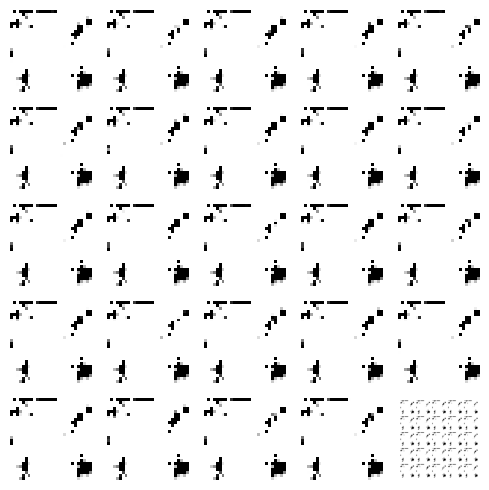

  0%|          | 0/350 [00:00<?, ?it/s]

4/4 [==============================] - 0s 22ms/step


  0%|          | 1/350 [00:00<04:07,  1.41it/s]

4/4 [==============================] - 0s 12ms/step


  1%|          | 2/350 [00:01<03:53,  1.49it/s]

4/4 [==============================] - 0s 19ms/step


  1%|          | 3/350 [00:01<03:41,  1.57it/s]

4/4 [==============================] - 0s 11ms/step


  1%|          | 4/350 [00:02<03:19,  1.74it/s]

4/4 [==============================] - 0s 18ms/step


  1%|▏         | 5/350 [00:03<03:37,  1.59it/s]

4/4 [==============================] - 0s 25ms/step


  2%|▏         | 6/350 [00:03<03:50,  1.49it/s]

4/4 [==============================] - 0s 16ms/step


  2%|▏         | 7/350 [00:04<03:41,  1.55it/s]

4/4 [==============================] - 0s 13ms/step


  2%|▏         | 8/350 [00:05<03:41,  1.55it/s]

4/4 [==============================] - 0s 14ms/step


  3%|▎         | 9/350 [00:05<03:36,  1.57it/s]

4/4 [==============================] - 0s 14ms/step


  3%|▎         | 10/350 [00:06<03:22,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


  3%|▎         | 11/350 [00:06<03:32,  1.60it/s]

4/4 [==============================] - 0s 13ms/step


  3%|▎         | 12/350 [00:07<03:32,  1.59it/s]

4/4 [==============================] - 0s 13ms/step


  4%|▎         | 13/350 [00:08<03:19,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


  4%|▍         | 14/350 [00:08<03:28,  1.61it/s]

4/4 [==============================] - 0s 24ms/step


  4%|▍         | 15/350 [00:09<03:38,  1.54it/s]

4/4 [==============================] - 0s 14ms/step


  5%|▍         | 16/350 [00:10<03:29,  1.59it/s]

4/4 [==============================] - 0s 15ms/step


  5%|▍         | 17/350 [00:10<03:35,  1.55it/s]

4/4 [==============================] - 0s 12ms/step


  5%|▌         | 18/350 [00:11<03:23,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


  5%|▌         | 19/350 [00:11<03:27,  1.59it/s]

4/4 [==============================] - 0s 13ms/step


  6%|▌         | 20/350 [00:12<03:20,  1.65it/s]

4/4 [==============================] - 0s 14ms/step


  6%|▌         | 21/350 [00:13<03:19,  1.65it/s]

4/4 [==============================] - 0s 13ms/step


  6%|▋         | 22/350 [00:13<03:12,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


  7%|▋         | 23/350 [00:14<03:18,  1.65it/s]

4/4 [==============================] - 0s 15ms/step


  7%|▋         | 24/350 [00:14<03:20,  1.63it/s]

4/4 [==============================] - 0s 14ms/step


  7%|▋         | 25/350 [00:15<03:17,  1.65it/s]

4/4 [==============================] - 0s 14ms/step


  7%|▋         | 26/350 [00:16<03:12,  1.69it/s]

4/4 [==============================] - 0s 17ms/step


  8%|▊         | 27/350 [00:16<03:18,  1.63it/s]

4/4 [==============================] - 0s 14ms/step


  8%|▊         | 28/350 [00:17<03:17,  1.63it/s]

4/4 [==============================] - 0s 14ms/step


  8%|▊         | 29/350 [00:17<03:14,  1.65it/s]

4/4 [==============================] - 0s 14ms/step


  9%|▊         | 30/350 [00:18<03:07,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


  9%|▉         | 31/350 [00:19<03:12,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


  9%|▉         | 32/350 [00:19<03:08,  1.69it/s]

4/4 [==============================] - 0s 13ms/step


  9%|▉         | 33/350 [00:20<03:05,  1.71it/s]

4/4 [==============================] - 0s 11ms/step


 10%|▉         | 34/350 [00:20<03:10,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 10%|█         | 35/350 [00:21<03:12,  1.64it/s]

4/4 [==============================] - 0s 15ms/step


 10%|█         | 36/350 [00:22<03:09,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


 11%|█         | 37/350 [00:22<03:15,  1.60it/s]

4/4 [==============================] - 0s 11ms/step


 11%|█         | 38/350 [00:23<03:04,  1.70it/s]

4/4 [==============================] - 0s 13ms/step


 11%|█         | 39/350 [00:23<03:05,  1.67it/s]

4/4 [==============================] - 0s 16ms/step


 11%|█▏        | 40/350 [00:24<03:06,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 12%|█▏        | 41/350 [00:25<03:11,  1.61it/s]

4/4 [==============================] - 0s 17ms/step


 12%|█▏        | 42/350 [00:25<03:07,  1.64it/s]

4/4 [==============================] - 0s 14ms/step


 12%|█▏        | 43/350 [00:26<03:13,  1.58it/s]

4/4 [==============================] - 0s 14ms/step


 13%|█▎        | 44/350 [00:27<03:14,  1.57it/s]

4/4 [==============================] - 0s 13ms/step


 13%|█▎        | 45/350 [00:27<03:12,  1.58it/s]

4/4 [==============================] - 0s 13ms/step


 13%|█▎        | 46/350 [00:28<03:03,  1.66it/s]

4/4 [==============================] - 0s 14ms/step


 13%|█▎        | 47/350 [00:28<03:08,  1.60it/s]

4/4 [==============================] - 0s 12ms/step


 14%|█▎        | 48/350 [00:29<03:07,  1.61it/s]

4/4 [==============================] - 0s 13ms/step


 14%|█▍        | 49/350 [00:30<03:02,  1.65it/s]

4/4 [==============================] - 0s 13ms/step


 14%|█▍        | 50/350 [00:30<02:55,  1.71it/s]

4/4 [==============================] - 0s 13ms/step


 15%|█▍        | 51/350 [00:31<03:02,  1.64it/s]

4/4 [==============================] - 0s 13ms/step


 15%|█▍        | 52/350 [00:31<03:03,  1.62it/s]

4/4 [==============================] - 0s 13ms/step


 15%|█▌        | 53/350 [00:32<02:59,  1.66it/s]

4/4 [==============================] - 0s 15ms/step


 15%|█▌        | 54/350 [00:33<02:52,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


 16%|█▌        | 55/350 [00:33<02:54,  1.69it/s]

4/4 [==============================] - 0s 16ms/step


 16%|█▌        | 56/350 [00:34<02:54,  1.69it/s]

4/4 [==============================] - 0s 15ms/step


 16%|█▋        | 57/350 [00:34<02:53,  1.68it/s]

4/4 [==============================] - 0s 14ms/step


 17%|█▋        | 58/350 [00:35<02:58,  1.63it/s]

4/4 [==============================] - 0s 15ms/step


 17%|█▋        | 59/350 [00:36<02:59,  1.63it/s]

4/4 [==============================] - 0s 17ms/step


 17%|█▋        | 60/350 [00:36<02:57,  1.63it/s]

4/4 [==============================] - 0s 15ms/step


 17%|█▋        | 61/350 [00:37<02:59,  1.61it/s]

4/4 [==============================] - 0s 16ms/step


 18%|█▊        | 62/350 [00:37<02:51,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 18%|█▊        | 63/350 [00:38<02:56,  1.62it/s]

4/4 [==============================] - 0s 15ms/step


 18%|█▊        | 64/350 [00:39<02:50,  1.67it/s]

4/4 [==============================] - 0s 15ms/step


 19%|█▊        | 65/350 [00:39<02:47,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 19%|█▉        | 66/350 [00:40<02:50,  1.66it/s]

4/4 [==============================] - 0s 16ms/step


 19%|█▉        | 67/350 [00:40<02:47,  1.69it/s]

4/4 [==============================] - 0s 13ms/step


 19%|█▉        | 68/350 [00:41<02:48,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 20%|█▉        | 69/350 [00:42<02:44,  1.71it/s]

4/4 [==============================] - 0s 18ms/step


 20%|██        | 70/350 [00:42<02:45,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 20%|██        | 71/350 [00:43<02:42,  1.72it/s]

4/4 [==============================] - 0s 10ms/step


 21%|██        | 72/350 [00:43<02:49,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 21%|██        | 73/350 [00:44<02:44,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


 21%|██        | 74/350 [00:45<02:45,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 21%|██▏       | 75/350 [00:45<02:37,  1.74it/s]

4/4 [==============================] - 0s 15ms/step


 22%|██▏       | 76/350 [00:46<02:45,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 22%|██▏       | 77/350 [00:46<02:45,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 22%|██▏       | 78/350 [00:47<02:41,  1.68it/s]

4/4 [==============================] - 0s 14ms/step


 23%|██▎       | 79/350 [00:48<02:37,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


 23%|██▎       | 80/350 [00:48<02:42,  1.66it/s]

4/4 [==============================] - 0s 16ms/step


 23%|██▎       | 81/350 [00:49<02:40,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


 23%|██▎       | 82/350 [00:49<02:44,  1.62it/s]

4/4 [==============================] - 0s 15ms/step


 24%|██▎       | 83/350 [00:50<02:37,  1.69it/s]

4/4 [==============================] - 0s 16ms/step


 24%|██▍       | 84/350 [00:51<02:40,  1.65it/s]

4/4 [==============================] - 0s 18ms/step


 24%|██▍       | 85/350 [00:51<02:40,  1.65it/s]

4/4 [==============================] - 0s 14ms/step


 25%|██▍       | 86/350 [00:52<02:42,  1.62it/s]

4/4 [==============================] - 0s 13ms/step


 25%|██▍       | 87/350 [00:52<02:37,  1.67it/s]

4/4 [==============================] - 0s 15ms/step


 25%|██▌       | 88/350 [00:53<02:39,  1.65it/s]

4/4 [==============================] - 0s 19ms/step


 25%|██▌       | 89/350 [00:54<02:38,  1.65it/s]

4/4 [==============================] - 0s 14ms/step


 26%|██▌       | 90/350 [00:54<02:40,  1.62it/s]

4/4 [==============================] - 0s 14ms/step


 26%|██▌       | 91/350 [00:55<02:33,  1.69it/s]

4/4 [==============================] - 0s 13ms/step


 26%|██▋       | 92/350 [00:55<02:37,  1.63it/s]

4/4 [==============================] - 0s 14ms/step


 27%|██▋       | 93/350 [00:56<02:36,  1.64it/s]

4/4 [==============================] - 0s 14ms/step


 27%|██▋       | 94/350 [00:57<02:38,  1.61it/s]

4/4 [==============================] - 0s 15ms/step


 27%|██▋       | 95/350 [00:57<02:30,  1.69it/s]

4/4 [==============================] - 0s 13ms/step


 27%|██▋       | 96/350 [00:58<02:33,  1.66it/s]

4/4 [==============================] - 0s 20ms/step


 28%|██▊       | 97/350 [00:59<02:34,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 28%|██▊       | 98/350 [00:59<02:36,  1.61it/s]

4/4 [==============================] - 0s 18ms/step


 28%|██▊       | 99/350 [01:00<02:30,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 29%|██▊       | 100/350 [01:00<02:34,  1.62it/s]

4/4 [==============================] - 0s 11ms/step


 29%|██▉       | 101/350 [01:01<02:33,  1.62it/s]

4/4 [==============================] - 0s 14ms/step


 29%|██▉       | 102/350 [01:02<02:33,  1.61it/s]

4/4 [==============================] - 0s 18ms/step


 29%|██▉       | 103/350 [01:02<02:29,  1.65it/s]

4/4 [==============================] - 0s 13ms/step


 30%|██▉       | 104/350 [01:03<02:33,  1.61it/s]

4/4 [==============================] - 0s 11ms/step


 30%|███       | 105/350 [01:03<02:32,  1.61it/s]

4/4 [==============================] - 0s 13ms/step


 30%|███       | 106/350 [01:04<02:31,  1.61it/s]

4/4 [==============================] - 0s 13ms/step


 31%|███       | 107/350 [01:05<02:24,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 31%|███       | 108/350 [01:05<02:27,  1.64it/s]

4/4 [==============================] - 0s 13ms/step


 31%|███       | 109/350 [01:06<02:26,  1.64it/s]

4/4 [==============================] - 0s 14ms/step


 31%|███▏      | 110/350 [01:06<02:26,  1.63it/s]

4/4 [==============================] - 0s 14ms/step


 32%|███▏      | 111/350 [01:07<02:22,  1.67it/s]

4/4 [==============================] - 0s 21ms/step


 32%|███▏      | 112/350 [01:08<02:29,  1.60it/s]

4/4 [==============================] - 0s 11ms/step


 32%|███▏      | 113/350 [01:08<02:21,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


 33%|███▎      | 114/350 [01:09<02:21,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 33%|███▎      | 115/350 [01:09<02:16,  1.72it/s]

4/4 [==============================] - 0s 16ms/step


 33%|███▎      | 116/350 [01:10<02:22,  1.64it/s]

4/4 [==============================] - 0s 16ms/step


 33%|███▎      | 117/350 [01:11<02:25,  1.61it/s]

4/4 [==============================] - 0s 13ms/step


 34%|███▎      | 118/350 [01:11<02:18,  1.67it/s]

4/4 [==============================] - 0s 15ms/step


 34%|███▍      | 119/350 [01:12<02:15,  1.70it/s]

4/4 [==============================] - 0s 13ms/step


 34%|███▍      | 120/350 [01:12<02:16,  1.69it/s]

4/4 [==============================] - 0s 15ms/step


 35%|███▍      | 121/350 [01:13<02:14,  1.70it/s]

4/4 [==============================] - 0s 14ms/step


 35%|███▍      | 122/350 [01:14<02:14,  1.70it/s]

4/4 [==============================] - 0s 14ms/step


 35%|███▌      | 123/350 [01:14<02:17,  1.65it/s]

4/4 [==============================] - 0s 14ms/step


 35%|███▌      | 124/350 [01:15<02:16,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


 36%|███▌      | 125/350 [01:15<02:14,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 36%|███▌      | 126/350 [01:16<02:10,  1.71it/s]

4/4 [==============================] - 0s 14ms/step


 36%|███▋      | 127/350 [01:17<02:11,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 37%|███▋      | 128/350 [01:17<02:10,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 37%|███▋      | 129/350 [01:18<02:11,  1.68it/s]

4/4 [==============================] - 0s 14ms/step


 37%|███▋      | 130/350 [01:18<02:13,  1.65it/s]

4/4 [==============================] - 0s 16ms/step


 37%|███▋      | 131/350 [01:19<02:15,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


 38%|███▊      | 132/350 [01:20<02:17,  1.59it/s]

4/4 [==============================] - 0s 18ms/step


 38%|███▊      | 133/350 [01:20<02:13,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


 38%|███▊      | 134/350 [01:21<02:09,  1.67it/s]

4/4 [==============================] - 0s 14ms/step


 39%|███▊      | 135/350 [01:22<02:11,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


 39%|███▉      | 136/350 [01:22<02:12,  1.61it/s]

4/4 [==============================] - 0s 13ms/step


 39%|███▉      | 137/350 [01:23<02:10,  1.63it/s]

4/4 [==============================] - 0s 15ms/step


 39%|███▉      | 138/350 [01:23<02:08,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 40%|███▉      | 139/350 [01:24<02:11,  1.60it/s]

4/4 [==============================] - 0s 14ms/step


 40%|████      | 140/350 [01:25<02:10,  1.61it/s]

4/4 [==============================] - 0s 20ms/step


 40%|████      | 141/350 [01:25<02:08,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


 41%|████      | 142/350 [01:26<02:07,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 41%|████      | 143/350 [01:26<02:08,  1.61it/s]

4/4 [==============================] - 0s 15ms/step


 41%|████      | 144/350 [01:27<02:06,  1.63it/s]

4/4 [==============================] - 0s 20ms/step


 41%|████▏     | 145/350 [01:28<02:03,  1.65it/s]

4/4 [==============================] - 0s 13ms/step


 42%|████▏     | 146/350 [01:28<02:00,  1.69it/s]

4/4 [==============================] - 0s 13ms/step


 42%|████▏     | 147/350 [01:29<02:03,  1.65it/s]

4/4 [==============================] - 0s 18ms/step


 42%|████▏     | 148/350 [01:29<02:02,  1.65it/s]

4/4 [==============================] - 0s 13ms/step


 43%|████▎     | 149/350 [01:30<02:01,  1.65it/s]

4/4 [==============================] - 0s 15ms/step


 43%|████▎     | 150/350 [01:31<01:59,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 43%|████▎     | 151/350 [01:31<02:00,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


 43%|████▎     | 152/350 [01:32<02:00,  1.65it/s]

4/4 [==============================] - 0s 15ms/step


 44%|████▎     | 153/350 [01:32<01:58,  1.66it/s]

4/4 [==============================] - 0s 20ms/step


 44%|████▍     | 154/350 [01:33<02:01,  1.61it/s]

4/4 [==============================] - 0s 16ms/step


 44%|████▍     | 155/350 [01:34<02:02,  1.60it/s]

4/4 [==============================] - 0s 11ms/step


 45%|████▍     | 156/350 [01:34<01:59,  1.62it/s]

4/4 [==============================] - 0s 16ms/step


 45%|████▍     | 157/350 [01:35<02:01,  1.58it/s]

4/4 [==============================] - 0s 15ms/step


 45%|████▌     | 158/350 [01:36<02:00,  1.59it/s]

4/4 [==============================] - 0s 15ms/step


 45%|████▌     | 159/350 [01:36<01:56,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


 46%|████▌     | 160/350 [01:37<01:57,  1.62it/s]

4/4 [==============================] - 0s 15ms/step


 46%|████▌     | 161/350 [01:37<01:55,  1.64it/s]

4/4 [==============================] - 0s 14ms/step


 46%|████▋     | 162/350 [01:38<01:52,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 47%|████▋     | 163/350 [01:39<01:53,  1.64it/s]

4/4 [==============================] - 0s 14ms/step


 47%|████▋     | 164/350 [01:39<01:52,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 47%|████▋     | 165/350 [01:40<01:52,  1.65it/s]

4/4 [==============================] - 0s 14ms/step


 47%|████▋     | 166/350 [01:40<01:48,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 48%|████▊     | 167/350 [01:41<01:51,  1.64it/s]

4/4 [==============================] - 0s 16ms/step


 48%|████▊     | 168/350 [01:42<01:51,  1.64it/s]

4/4 [==============================] - 0s 16ms/step


 48%|████▊     | 169/350 [01:42<01:54,  1.59it/s]

4/4 [==============================] - 0s 11ms/step


 49%|████▊     | 170/350 [01:43<01:53,  1.59it/s]

4/4 [==============================] - 0s 13ms/step


 49%|████▉     | 171/350 [01:44<01:48,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 49%|████▉     | 172/350 [01:44<01:51,  1.59it/s]

4/4 [==============================] - 0s 13ms/step


 49%|████▉     | 173/350 [01:45<01:53,  1.57it/s]

4/4 [==============================] - 0s 16ms/step


 50%|████▉     | 174/350 [01:45<01:50,  1.59it/s]

4/4 [==============================] - 0s 14ms/step


 50%|█████     | 175/350 [01:46<01:46,  1.65it/s]

4/4 [==============================] - 0s 13ms/step


 50%|█████     | 176/350 [01:47<01:47,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


 51%|█████     | 177/350 [01:47<01:48,  1.60it/s]

4/4 [==============================] - 0s 15ms/step


 51%|█████     | 178/350 [01:48<01:47,  1.60it/s]

4/4 [==============================] - 0s 13ms/step


 51%|█████     | 179/350 [01:48<01:42,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 51%|█████▏    | 180/350 [01:49<01:46,  1.60it/s]

4/4 [==============================] - 0s 13ms/step


 52%|█████▏    | 181/350 [01:50<01:41,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


 52%|█████▏    | 182/350 [01:50<01:41,  1.65it/s]

4/4 [==============================] - 0s 13ms/step


 52%|█████▏    | 183/350 [01:51<01:38,  1.69it/s]

4/4 [==============================] - 0s 13ms/step


 53%|█████▎    | 184/350 [01:52<01:41,  1.64it/s]

4/4 [==============================] - 0s 10ms/step


 53%|█████▎    | 185/350 [01:52<01:40,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 53%|█████▎    | 186/350 [01:53<01:39,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 53%|█████▎    | 187/350 [01:53<01:35,  1.70it/s]

4/4 [==============================] - 0s 15ms/step


 54%|█████▎    | 188/350 [01:54<01:38,  1.64it/s]

4/4 [==============================] - 0s 13ms/step


 54%|█████▍    | 189/350 [01:55<01:38,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 54%|█████▍    | 190/350 [01:55<01:36,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 55%|█████▍    | 191/350 [01:56<01:33,  1.71it/s]

4/4 [==============================] - 0s 13ms/step


 55%|█████▍    | 192/350 [01:56<01:36,  1.64it/s]

4/4 [==============================] - 0s 14ms/step


 55%|█████▌    | 193/350 [01:57<01:36,  1.63it/s]

4/4 [==============================] - 0s 15ms/step


 55%|█████▌    | 194/350 [01:58<01:36,  1.62it/s]

4/4 [==============================] - 0s 16ms/step


 56%|█████▌    | 195/350 [01:58<01:33,  1.65it/s]

4/4 [==============================] - 0s 17ms/step


 56%|█████▌    | 196/350 [01:59<01:35,  1.61it/s]

4/4 [==============================] - 0s 10ms/step


 56%|█████▋    | 197/350 [01:59<01:33,  1.63it/s]

4/4 [==============================] - 0s 16ms/step


 57%|█████▋    | 198/350 [02:00<01:32,  1.64it/s]

4/4 [==============================] - 0s 13ms/step


 57%|█████▋    | 199/350 [02:01<01:27,  1.72it/s]

4/4 [==============================] - 0s 17ms/step


 57%|█████▋    | 200/350 [02:01<01:31,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 57%|█████▋    | 201/350 [02:02<01:31,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


 58%|█████▊    | 202/350 [02:03<01:31,  1.63it/s]

4/4 [==============================] - 0s 16ms/step


 58%|█████▊    | 203/350 [02:03<01:28,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 58%|█████▊    | 204/350 [02:04<01:30,  1.61it/s]

4/4 [==============================] - 0s 13ms/step


 59%|█████▊    | 205/350 [02:04<01:27,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


 59%|█████▉    | 206/350 [02:05<01:25,  1.68it/s]

4/4 [==============================] - 0s 16ms/step


 59%|█████▉    | 207/350 [02:05<01:23,  1.71it/s]

4/4 [==============================] - 0s 15ms/step


 59%|█████▉    | 208/350 [02:06<01:28,  1.61it/s]

4/4 [==============================] - 0s 15ms/step


 60%|█████▉    | 209/350 [02:07<01:27,  1.61it/s]

4/4 [==============================] - 0s 14ms/step


 60%|██████    | 210/350 [02:07<01:25,  1.63it/s]

4/4 [==============================] - 0s 15ms/step


 60%|██████    | 211/350 [02:08<01:22,  1.69it/s]

4/4 [==============================] - 0s 17ms/step


 61%|██████    | 212/350 [02:09<01:25,  1.61it/s]

4/4 [==============================] - 0s 11ms/step


 61%|██████    | 213/350 [02:09<01:25,  1.61it/s]

4/4 [==============================] - 0s 12ms/step


 61%|██████    | 214/350 [02:10<01:23,  1.63it/s]

4/4 [==============================] - 0s 15ms/step


 61%|██████▏   | 215/350 [02:10<01:19,  1.69it/s]

4/4 [==============================] - 0s 17ms/step


 62%|██████▏   | 216/350 [02:11<01:21,  1.64it/s]

4/4 [==============================] - 0s 14ms/step


 62%|██████▏   | 217/350 [02:12<01:21,  1.62it/s]

4/4 [==============================] - 0s 14ms/step


 62%|██████▏   | 218/350 [02:12<01:20,  1.65it/s]

4/4 [==============================] - 0s 13ms/step


 63%|██████▎   | 219/350 [02:13<01:17,  1.69it/s]

4/4 [==============================] - 0s 16ms/step


 63%|██████▎   | 220/350 [02:13<01:19,  1.64it/s]

4/4 [==============================] - 0s 13ms/step


 63%|██████▎   | 221/350 [02:14<01:19,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


 63%|██████▎   | 222/350 [02:15<01:17,  1.65it/s]

4/4 [==============================] - 0s 15ms/step


 64%|██████▎   | 223/350 [02:15<01:15,  1.69it/s]

4/4 [==============================] - 0s 16ms/step


 64%|██████▍   | 224/350 [02:16<01:17,  1.62it/s]

4/4 [==============================] - 0s 11ms/step


 64%|██████▍   | 225/350 [02:16<01:16,  1.64it/s]

4/4 [==============================] - 0s 16ms/step


 65%|██████▍   | 226/350 [02:17<01:15,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


 65%|██████▍   | 227/350 [02:18<01:12,  1.69it/s]

4/4 [==============================] - 0s 14ms/step


 65%|██████▌   | 228/350 [02:18<01:14,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 65%|██████▌   | 229/350 [02:19<01:14,  1.62it/s]

4/4 [==============================] - 0s 14ms/step


 66%|██████▌   | 230/350 [02:20<01:12,  1.64it/s]

4/4 [==============================] - 0s 15ms/step


 66%|██████▌   | 231/350 [02:20<01:10,  1.68it/s]

4/4 [==============================] - 0s 17ms/step


 66%|██████▋   | 232/350 [02:21<01:12,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


 67%|██████▋   | 233/350 [02:21<01:12,  1.61it/s]

4/4 [==============================] - 0s 15ms/step


 67%|██████▋   | 234/350 [02:22<01:10,  1.64it/s]

4/4 [==============================] - 0s 14ms/step


 67%|██████▋   | 235/350 [02:23<01:07,  1.69it/s]

4/4 [==============================] - 0s 13ms/step


 67%|██████▋   | 236/350 [02:23<01:08,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 68%|██████▊   | 237/350 [02:24<01:08,  1.66it/s]

4/4 [==============================] - 0s 14ms/step


 68%|██████▊   | 238/350 [02:24<01:06,  1.69it/s]

4/4 [==============================] - 0s 13ms/step


 68%|██████▊   | 239/350 [02:25<01:03,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 69%|██████▊   | 240/350 [02:25<01:05,  1.68it/s]

4/4 [==============================] - 0s 16ms/step


 69%|██████▉   | 241/350 [02:26<01:05,  1.66it/s]

4/4 [==============================] - 0s 14ms/step


 69%|██████▉   | 242/350 [02:27<01:02,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 69%|██████▉   | 243/350 [02:27<01:03,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 70%|██████▉   | 244/350 [02:28<01:01,  1.72it/s]

4/4 [==============================] - 0s 11ms/step


 70%|███████   | 245/350 [02:28<01:03,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 70%|███████   | 246/350 [02:29<01:00,  1.71it/s]

4/4 [==============================] - 0s 14ms/step


 71%|███████   | 247/350 [02:30<00:59,  1.72it/s]

4/4 [==============================] - 0s 15ms/step


 71%|███████   | 248/350 [02:30<01:00,  1.68it/s]

4/4 [==============================] - 0s 15ms/step


 71%|███████   | 249/350 [02:31<01:00,  1.67it/s]

4/4 [==============================] - 0s 18ms/step


 71%|███████▏  | 250/350 [02:31<01:00,  1.65it/s]

4/4 [==============================] - 0s 17ms/step


 72%|███████▏  | 251/350 [02:32<01:01,  1.62it/s]

4/4 [==============================] - 0s 11ms/step


 72%|███████▏  | 252/350 [02:33<01:01,  1.59it/s]

4/4 [==============================] - 0s 18ms/step


 72%|███████▏  | 253/350 [02:33<01:00,  1.61it/s]

4/4 [==============================] - 0s 13ms/step


 73%|███████▎  | 254/350 [02:34<01:00,  1.58it/s]

4/4 [==============================] - 0s 18ms/step


 73%|███████▎  | 255/350 [02:35<00:59,  1.58it/s]

4/4 [==============================] - 0s 13ms/step


 73%|███████▎  | 256/350 [02:35<00:59,  1.57it/s]

4/4 [==============================] - 0s 18ms/step


 73%|███████▎  | 257/350 [02:36<00:59,  1.57it/s]

4/4 [==============================] - 0s 14ms/step


 74%|███████▎  | 258/350 [02:37<00:58,  1.58it/s]

4/4 [==============================] - 0s 13ms/step


 74%|███████▍  | 259/350 [02:37<00:56,  1.61it/s]

4/4 [==============================] - 0s 14ms/step


 74%|███████▍  | 260/350 [02:38<00:55,  1.61it/s]

4/4 [==============================] - 0s 15ms/step


 75%|███████▍  | 261/350 [02:38<00:55,  1.61it/s]

4/4 [==============================] - 0s 16ms/step


 75%|███████▍  | 262/350 [02:39<00:55,  1.60it/s]

4/4 [==============================] - 0s 26ms/step


 75%|███████▌  | 263/350 [02:40<00:55,  1.56it/s]

4/4 [==============================] - 0s 11ms/step


 75%|███████▌  | 264/350 [02:40<00:54,  1.58it/s]

4/4 [==============================] - 0s 14ms/step


 76%|███████▌  | 265/350 [02:41<00:53,  1.58it/s]

4/4 [==============================] - 0s 11ms/step


 76%|███████▌  | 266/350 [02:42<00:53,  1.56it/s]

4/4 [==============================] - 0s 16ms/step


 76%|███████▋  | 267/350 [02:42<00:50,  1.63it/s]

4/4 [==============================] - 0s 14ms/step


 77%|███████▋  | 268/350 [02:43<00:49,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 77%|███████▋  | 269/350 [02:43<00:48,  1.67it/s]

4/4 [==============================] - 0s 18ms/step


 77%|███████▋  | 270/350 [02:44<00:46,  1.71it/s]

4/4 [==============================] - 0s 14ms/step


 77%|███████▋  | 271/350 [02:45<00:49,  1.59it/s]

4/4 [==============================] - 0s 14ms/step


 78%|███████▊  | 272/350 [02:45<00:48,  1.62it/s]

4/4 [==============================] - 0s 14ms/step


 78%|███████▊  | 273/350 [02:46<00:47,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


 78%|███████▊  | 274/350 [02:46<00:44,  1.71it/s]

4/4 [==============================] - 0s 14ms/step


 79%|███████▊  | 275/350 [02:47<00:45,  1.64it/s]

4/4 [==============================] - 0s 18ms/step


 79%|███████▉  | 276/350 [02:48<00:45,  1.64it/s]

4/4 [==============================] - 0s 15ms/step


 79%|███████▉  | 277/350 [02:48<00:44,  1.66it/s]

4/4 [==============================] - 0s 18ms/step


 79%|███████▉  | 278/350 [02:49<00:42,  1.68it/s]

4/4 [==============================] - 0s 14ms/step


 80%|███████▉  | 279/350 [02:49<00:43,  1.64it/s]

4/4 [==============================] - 0s 20ms/step


 80%|████████  | 280/350 [02:50<00:43,  1.60it/s]

4/4 [==============================] - 0s 13ms/step


 80%|████████  | 281/350 [02:51<00:42,  1.62it/s]

4/4 [==============================] - 0s 15ms/step


 81%|████████  | 282/350 [02:51<00:41,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 81%|████████  | 283/350 [02:52<00:40,  1.65it/s]

4/4 [==============================] - 0s 14ms/step


 81%|████████  | 284/350 [02:52<00:40,  1.64it/s]

4/4 [==============================] - 0s 14ms/step


 81%|████████▏ | 285/350 [02:53<00:38,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 82%|████████▏ | 286/350 [02:54<00:39,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 82%|████████▏ | 287/350 [02:54<00:38,  1.62it/s]

4/4 [==============================] - 0s 15ms/step


 82%|████████▏ | 288/350 [02:55<00:38,  1.60it/s]

4/4 [==============================] - 0s 19ms/step


 83%|████████▎ | 289/350 [02:56<00:37,  1.61it/s]

4/4 [==============================] - 0s 16ms/step


 83%|████████▎ | 290/350 [02:56<00:36,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


 83%|████████▎ | 291/350 [02:57<00:36,  1.60it/s]

4/4 [==============================] - 0s 15ms/step


 83%|████████▎ | 292/350 [02:57<00:37,  1.54it/s]

4/4 [==============================] - 0s 15ms/step


 84%|████████▎ | 293/350 [02:58<00:36,  1.58it/s]

4/4 [==============================] - 0s 14ms/step


 84%|████████▍ | 294/350 [02:59<00:33,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 84%|████████▍ | 295/350 [02:59<00:33,  1.65it/s]

4/4 [==============================] - 0s 20ms/step


 85%|████████▍ | 296/350 [03:00<00:32,  1.65it/s]

4/4 [==============================] - 0s 14ms/step


 85%|████████▍ | 297/350 [03:00<00:31,  1.68it/s]

4/4 [==============================] - 0s 14ms/step


 85%|████████▌ | 298/350 [03:01<00:31,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 85%|████████▌ | 299/350 [03:02<00:30,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 86%|████████▌ | 300/350 [03:02<00:30,  1.65it/s]

4/4 [==============================] - 0s 18ms/step


 86%|████████▌ | 301/350 [03:03<00:29,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 86%|████████▋ | 302/350 [03:03<00:29,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 87%|████████▋ | 303/350 [03:04<00:29,  1.61it/s]

4/4 [==============================] - 0s 17ms/step


 87%|████████▋ | 304/350 [03:05<00:27,  1.65it/s]

4/4 [==============================] - 0s 13ms/step


 87%|████████▋ | 305/350 [03:05<00:26,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 87%|████████▋ | 306/350 [03:06<00:26,  1.67it/s]

4/4 [==============================] - 0s 15ms/step


 88%|████████▊ | 307/350 [03:06<00:25,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 88%|████████▊ | 308/350 [03:07<00:25,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 88%|████████▊ | 309/350 [03:08<00:24,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 89%|████████▊ | 310/350 [03:08<00:24,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 89%|████████▉ | 311/350 [03:09<00:23,  1.68it/s]

4/4 [==============================] - 0s 15ms/step


 89%|████████▉ | 312/350 [03:10<00:23,  1.62it/s]

4/4 [==============================] - 0s 13ms/step


 89%|████████▉ | 313/350 [03:10<00:22,  1.61it/s]

4/4 [==============================] - 0s 13ms/step


 90%|████████▉ | 314/350 [03:11<00:22,  1.62it/s]

4/4 [==============================] - 0s 13ms/step


 90%|█████████ | 315/350 [03:11<00:20,  1.71it/s]

4/4 [==============================] - 0s 16ms/step


 90%|█████████ | 316/350 [03:12<00:20,  1.65it/s]

4/4 [==============================] - 0s 14ms/step


 91%|█████████ | 317/350 [03:12<00:19,  1.69it/s]

4/4 [==============================] - 0s 14ms/step


 91%|█████████ | 318/350 [03:13<00:18,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 91%|█████████ | 319/350 [03:14<00:18,  1.70it/s]

4/4 [==============================] - 0s 17ms/step


 91%|█████████▏| 320/350 [03:14<00:17,  1.69it/s]

4/4 [==============================] - 0s 17ms/step


 92%|█████████▏| 321/350 [03:15<00:17,  1.70it/s]

4/4 [==============================] - 0s 13ms/step


 92%|█████████▏| 322/350 [03:15<00:16,  1.71it/s]

4/4 [==============================] - 0s 13ms/step


 92%|█████████▏| 323/350 [03:16<00:15,  1.71it/s]

4/4 [==============================] - 0s 15ms/step


 93%|█████████▎| 324/350 [03:17<00:14,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 93%|█████████▎| 325/350 [03:17<00:14,  1.72it/s]

4/4 [==============================] - 0s 18ms/step


 93%|█████████▎| 326/350 [03:18<00:14,  1.70it/s]

4/4 [==============================] - 0s 17ms/step


 93%|█████████▎| 327/350 [03:18<00:14,  1.63it/s]

4/4 [==============================] - 0s 16ms/step


 94%|█████████▎| 328/350 [03:19<00:12,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 94%|█████████▍| 329/350 [03:20<00:12,  1.67it/s]

4/4 [==============================] - 0s 16ms/step


 94%|█████████▍| 330/350 [03:20<00:12,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 95%|█████████▍| 331/350 [03:21<00:11,  1.61it/s]

4/4 [==============================] - 0s 16ms/step


 95%|█████████▍| 332/350 [03:21<00:10,  1.67it/s]

4/4 [==============================] - 0s 15ms/step


 95%|█████████▌| 333/350 [03:22<00:10,  1.66it/s]

4/4 [==============================] - 0s 18ms/step


 95%|█████████▌| 334/350 [03:23<00:09,  1.67it/s]

4/4 [==============================] - 0s 14ms/step


 96%|█████████▌| 335/350 [03:23<00:08,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 96%|█████████▌| 336/350 [03:24<00:08,  1.71it/s]

4/4 [==============================] - 0s 14ms/step


 96%|█████████▋| 337/350 [03:24<00:07,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 97%|█████████▋| 338/350 [03:25<00:07,  1.67it/s]

4/4 [==============================] - 0s 14ms/step


 97%|█████████▋| 339/350 [03:26<00:06,  1.68it/s]

4/4 [==============================] - 0s 17ms/step


 97%|█████████▋| 340/350 [03:26<00:06,  1.61it/s]

4/4 [==============================] - 0s 11ms/step


 97%|█████████▋| 341/350 [03:27<00:05,  1.59it/s]

4/4 [==============================] - 0s 18ms/step


 98%|█████████▊| 342/350 [03:27<00:05,  1.58it/s]

4/4 [==============================] - 0s 11ms/step


 98%|█████████▊| 343/350 [03:28<00:04,  1.58it/s]

4/4 [==============================] - 0s 14ms/step


 98%|█████████▊| 344/350 [03:29<00:03,  1.59it/s]

4/4 [==============================] - 0s 12ms/step


 99%|█████████▊| 345/350 [03:29<00:03,  1.54it/s]

4/4 [==============================] - 0s 15ms/step


 99%|█████████▉| 346/350 [03:30<00:02,  1.55it/s]

4/4 [==============================] - 0s 17ms/step


 99%|█████████▉| 347/350 [03:31<00:01,  1.60it/s]

4/4 [==============================] - 0s 12ms/step


 99%|█████████▉| 348/350 [03:31<00:01,  1.54it/s]

4/4 [==============================] - 0s 12ms/step


100%|█████████▉| 349/350 [03:32<00:00,  1.54it/s]

4/4 [==============================] - 0s 13ms/step


100%|██████████| 350/350 [03:33<00:00,  1.64it/s]

Epoch number: 86 discriminator_loss: 0.2884646460355621 generator_loss: 7.006549134254455
1/1 [==============================] - 0s 26ms/step


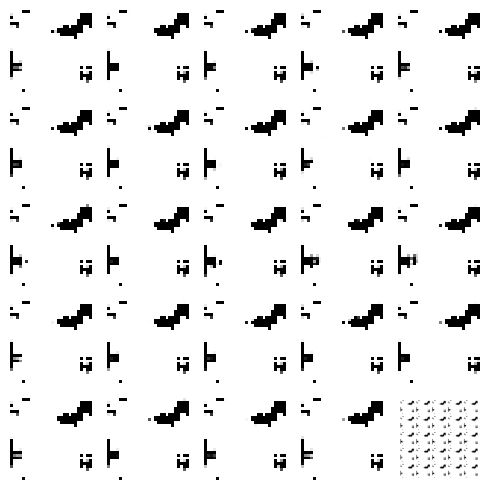

  0%|          | 0/350 [00:00<?, ?it/s]

4/4 [==============================] - 0s 21ms/step


  0%|          | 1/350 [00:00<03:52,  1.50it/s]

4/4 [==============================] - 0s 15ms/step


  1%|          | 2/350 [00:01<03:25,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


  1%|          | 3/350 [00:01<03:35,  1.61it/s]

4/4 [==============================] - 0s 22ms/step


  1%|          | 4/350 [00:02<03:57,  1.46it/s]

4/4 [==============================] - 0s 12ms/step


  1%|▏         | 5/350 [00:03<03:35,  1.60it/s]

4/4 [==============================] - 0s 12ms/step


  2%|▏         | 6/350 [00:03<03:32,  1.62it/s]

4/4 [==============================] - 0s 23ms/step


  2%|▏         | 7/350 [00:04<03:44,  1.53it/s]

4/4 [==============================] - 0s 15ms/step


  2%|▏         | 8/350 [00:05<03:35,  1.58it/s]

4/4 [==============================] - 0s 11ms/step


  3%|▎         | 9/350 [00:05<03:43,  1.52it/s]

4/4 [==============================] - 0s 12ms/step


  3%|▎         | 10/350 [00:06<03:44,  1.51it/s]

4/4 [==============================] - 0s 17ms/step


  3%|▎         | 11/350 [00:07<03:40,  1.54it/s]

4/4 [==============================] - 0s 13ms/step


  3%|▎         | 12/350 [00:07<03:45,  1.50it/s]

4/4 [==============================] - 0s 14ms/step


  4%|▎         | 13/350 [00:08<03:39,  1.54it/s]

4/4 [==============================] - 0s 12ms/step


  4%|▍         | 14/350 [00:08<03:28,  1.62it/s]

4/4 [==============================] - 0s 20ms/step


  4%|▍         | 15/350 [00:09<03:30,  1.59it/s]

4/4 [==============================] - 0s 15ms/step


  5%|▍         | 16/350 [00:10<03:37,  1.54it/s]

4/4 [==============================] - 0s 15ms/step


  5%|▍         | 17/350 [00:10<03:29,  1.59it/s]

4/4 [==============================] - 0s 16ms/step


  5%|▌         | 18/350 [00:11<03:27,  1.60it/s]

4/4 [==============================] - 0s 17ms/step


  5%|▌         | 19/350 [00:12<03:30,  1.57it/s]

4/4 [==============================] - 0s 13ms/step


  6%|▌         | 20/350 [00:12<03:30,  1.57it/s]

4/4 [==============================] - 0s 12ms/step


  6%|▌         | 21/350 [00:13<03:29,  1.57it/s]

4/4 [==============================] - 0s 15ms/step


  6%|▋         | 22/350 [00:14<03:23,  1.61it/s]

4/4 [==============================] - 0s 14ms/step


  7%|▋         | 23/350 [00:14<03:25,  1.59it/s]

4/4 [==============================] - 0s 13ms/step


  7%|▋         | 24/350 [00:15<03:27,  1.57it/s]

4/4 [==============================] - 0s 20ms/step


  7%|▋         | 25/350 [00:15<03:22,  1.60it/s]

4/4 [==============================] - 0s 13ms/step


  7%|▋         | 26/350 [00:16<03:20,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


  8%|▊         | 27/350 [00:17<03:31,  1.52it/s]

4/4 [==============================] - 0s 14ms/step


  8%|▊         | 28/350 [00:17<03:23,  1.58it/s]

4/4 [==============================] - 0s 13ms/step


  8%|▊         | 29/350 [00:18<03:22,  1.58it/s]

4/4 [==============================] - 0s 12ms/step


  9%|▊         | 30/350 [00:19<03:25,  1.55it/s]

4/4 [==============================] - 0s 15ms/step


  9%|▉         | 31/350 [00:19<03:23,  1.57it/s]

4/4 [==============================] - 0s 15ms/step


  9%|▉         | 32/350 [00:20<03:21,  1.58it/s]

4/4 [==============================] - 0s 15ms/step


  9%|▉         | 33/350 [00:21<03:18,  1.60it/s]

4/4 [==============================] - 0s 14ms/step


 10%|▉         | 34/350 [00:21<03:20,  1.58it/s]

4/4 [==============================] - 0s 13ms/step


 10%|█         | 35/350 [00:22<03:15,  1.61it/s]

4/4 [==============================] - 0s 12ms/step


 10%|█         | 36/350 [00:22<03:19,  1.57it/s]

4/4 [==============================] - 0s 15ms/step


 11%|█         | 37/350 [00:23<03:08,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 11%|█         | 38/350 [00:24<03:10,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 11%|█         | 39/350 [00:24<03:11,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 11%|█▏        | 40/350 [00:25<03:08,  1.65it/s]

4/4 [==============================] - 0s 14ms/step


 12%|█▏        | 41/350 [00:25<03:02,  1.69it/s]

4/4 [==============================] - 0s 13ms/step


 12%|█▏        | 42/350 [00:26<03:11,  1.61it/s]

4/4 [==============================] - 0s 12ms/step


 12%|█▏        | 43/350 [00:27<03:07,  1.64it/s]

4/4 [==============================] - 0s 14ms/step


 13%|█▎        | 44/350 [00:27<03:07,  1.63it/s]

4/4 [==============================] - 0s 15ms/step


 13%|█▎        | 45/350 [00:28<03:03,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


 13%|█▎        | 46/350 [00:28<03:00,  1.68it/s]

4/4 [==============================] - 0s 19ms/step


 13%|█▎        | 47/350 [00:29<02:59,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 14%|█▎        | 48/350 [00:30<02:57,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 14%|█▍        | 49/350 [00:30<03:01,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


 14%|█▍        | 50/350 [00:31<03:04,  1.63it/s]

4/4 [==============================] - 0s 20ms/step


 15%|█▍        | 51/350 [00:31<02:59,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


 15%|█▍        | 52/350 [00:32<03:00,  1.65it/s]

4/4 [==============================] - 0s 13ms/step


 15%|█▌        | 53/350 [00:33<02:54,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 15%|█▌        | 54/350 [00:33<03:02,  1.62it/s]

4/4 [==============================] - 0s 16ms/step


 16%|█▌        | 55/350 [00:34<02:58,  1.66it/s]

4/4 [==============================] - 0s 15ms/step


 16%|█▌        | 56/350 [00:34<02:53,  1.69it/s]

4/4 [==============================] - 0s 13ms/step


 16%|█▋        | 57/350 [00:35<02:52,  1.70it/s]

4/4 [==============================] - 0s 14ms/step


 17%|█▋        | 58/350 [00:36<02:48,  1.73it/s]

4/4 [==============================] - 0s 15ms/step


 17%|█▋        | 59/350 [00:36<02:59,  1.62it/s]

4/4 [==============================] - 0s 13ms/step


 17%|█▋        | 60/350 [00:37<02:59,  1.61it/s]

4/4 [==============================] - 0s 16ms/step


 17%|█▋        | 61/350 [00:37<02:52,  1.68it/s]

4/4 [==============================] - 0s 14ms/step


 18%|█▊        | 62/350 [00:38<02:53,  1.66it/s]

4/4 [==============================] - 0s 15ms/step


 18%|█▊        | 63/350 [00:39<02:57,  1.62it/s]

4/4 [==============================] - 0s 11ms/step


 18%|█▊        | 64/350 [00:39<02:55,  1.63it/s]

4/4 [==============================] - 0s 16ms/step


 19%|█▊        | 65/350 [00:40<02:54,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


 19%|█▉        | 66/350 [00:40<02:44,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 19%|█▉        | 67/350 [00:41<02:50,  1.66it/s]

4/4 [==============================] - 0s 19ms/step


 19%|█▉        | 68/350 [00:42<02:47,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


 20%|█▉        | 69/350 [00:42<02:45,  1.69it/s]

4/4 [==============================] - 0s 18ms/step


 20%|██        | 70/350 [00:43<02:43,  1.71it/s]

4/4 [==============================] - 0s 15ms/step


 20%|██        | 71/350 [00:43<02:49,  1.64it/s]

4/4 [==============================] - 0s 18ms/step


 21%|██        | 72/350 [00:44<02:52,  1.61it/s]

4/4 [==============================] - 0s 13ms/step


 21%|██        | 73/350 [00:45<02:44,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


 21%|██        | 74/350 [00:45<02:39,  1.73it/s]

4/4 [==============================] - 0s 14ms/step


 21%|██▏       | 75/350 [00:46<02:37,  1.75it/s]

4/4 [==============================] - 0s 15ms/step


 22%|██▏       | 76/350 [00:46<02:50,  1.61it/s]

4/4 [==============================] - 0s 15ms/step


 22%|██▏       | 77/350 [00:47<02:47,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 22%|██▏       | 78/350 [00:48<02:43,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 23%|██▎       | 79/350 [00:48<02:40,  1.69it/s]

4/4 [==============================] - 0s 14ms/step


 23%|██▎       | 80/350 [00:49<02:40,  1.68it/s]

4/4 [==============================] - 0s 15ms/step


 23%|██▎       | 81/350 [00:49<02:37,  1.70it/s]

4/4 [==============================] - 0s 13ms/step


 23%|██▎       | 82/350 [00:50<02:35,  1.73it/s]

4/4 [==============================] - 0s 15ms/step


 24%|██▎       | 83/350 [00:51<02:37,  1.69it/s]

4/4 [==============================] - 0s 14ms/step


 24%|██▍       | 84/350 [00:51<02:32,  1.75it/s]

4/4 [==============================] - 0s 15ms/step


 24%|██▍       | 85/350 [00:52<02:36,  1.70it/s]

4/4 [==============================] - 0s 13ms/step


 25%|██▍       | 86/350 [00:52<02:34,  1.71it/s]

4/4 [==============================] - 0s 13ms/step


 25%|██▍       | 87/350 [00:53<02:36,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


 25%|██▌       | 88/350 [00:53<02:31,  1.73it/s]

4/4 [==============================] - 0s 19ms/step


 25%|██▌       | 89/350 [00:54<02:33,  1.70it/s]

4/4 [==============================] - 0s 15ms/step


 26%|██▌       | 90/350 [00:55<02:38,  1.64it/s]

4/4 [==============================] - 0s 13ms/step


 26%|██▌       | 91/350 [00:55<02:32,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 26%|██▋       | 92/350 [00:56<02:30,  1.72it/s]

4/4 [==============================] - 0s 11ms/step


 27%|██▋       | 93/350 [00:56<02:37,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


 27%|██▋       | 94/350 [00:57<02:32,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 27%|██▋       | 95/350 [00:58<02:29,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 27%|██▋       | 96/350 [00:58<02:24,  1.76it/s]

4/4 [==============================] - 0s 16ms/step


 28%|██▊       | 97/350 [00:59<02:24,  1.75it/s]

4/4 [==============================] - 0s 16ms/step


 28%|██▊       | 98/350 [00:59<02:30,  1.68it/s]

4/4 [==============================] - 0s 20ms/step


 28%|██▊       | 99/350 [01:00<02:31,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


 29%|██▊       | 100/350 [01:01<02:33,  1.63it/s]

4/4 [==============================] - 0s 16ms/step


 29%|██▉       | 101/350 [01:01<02:27,  1.68it/s]

4/4 [==============================] - 0s 14ms/step


 29%|██▉       | 102/350 [01:02<02:34,  1.60it/s]

4/4 [==============================] - 0s 14ms/step


 29%|██▉       | 103/350 [01:02<02:29,  1.66it/s]

4/4 [==============================] - 0s 15ms/step


 30%|██▉       | 104/350 [01:03<02:32,  1.61it/s]

4/4 [==============================] - 0s 13ms/step


 30%|███       | 105/350 [01:04<02:25,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 30%|███       | 106/350 [01:04<02:29,  1.63it/s]

4/4 [==============================] - 0s 17ms/step


 31%|███       | 107/350 [01:05<02:31,  1.61it/s]

4/4 [==============================] - 0s 13ms/step


 31%|███       | 108/350 [01:05<02:24,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 31%|███       | 109/350 [01:06<02:19,  1.73it/s]

4/4 [==============================] - 0s 12ms/step


 31%|███▏      | 110/350 [01:07<02:24,  1.66it/s]

4/4 [==============================] - 0s 14ms/step


 32%|███▏      | 111/350 [01:07<02:24,  1.65it/s]

4/4 [==============================] - 0s 13ms/step


 32%|███▏      | 112/350 [01:08<02:20,  1.70it/s]

4/4 [==============================] - 0s 13ms/step


 32%|███▏      | 113/350 [01:08<02:17,  1.73it/s]

4/4 [==============================] - 0s 19ms/step


 33%|███▎      | 114/350 [01:09<02:16,  1.73it/s]

4/4 [==============================] - 0s 16ms/step


 33%|███▎      | 115/350 [01:10<02:21,  1.66it/s]

4/4 [==============================] - 0s 18ms/step


 33%|███▎      | 116/350 [01:10<02:20,  1.67it/s]

4/4 [==============================] - 0s 14ms/step


 33%|███▎      | 117/350 [01:11<02:17,  1.70it/s]

4/4 [==============================] - 0s 15ms/step


 34%|███▎      | 118/350 [01:11<02:17,  1.69it/s]

4/4 [==============================] - 0s 13ms/step


 34%|███▍      | 119/350 [01:12<02:12,  1.74it/s]

4/4 [==============================] - 0s 16ms/step


 34%|███▍      | 120/350 [01:13<02:18,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 35%|███▍      | 121/350 [01:13<02:18,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 35%|███▍      | 122/350 [01:14<02:13,  1.70it/s]

4/4 [==============================] - 0s 14ms/step


 35%|███▌      | 123/350 [01:14<02:13,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 35%|███▌      | 124/350 [01:15<02:14,  1.68it/s]

4/4 [==============================] - 0s 16ms/step


 36%|███▌      | 125/350 [01:16<02:16,  1.65it/s]

4/4 [==============================] - 0s 13ms/step


 36%|███▌      | 126/350 [01:16<02:11,  1.70it/s]

4/4 [==============================] - 0s 14ms/step


 36%|███▋      | 127/350 [01:17<02:12,  1.68it/s]

4/4 [==============================] - 0s 15ms/step


 37%|███▋      | 128/350 [01:17<02:19,  1.59it/s]

4/4 [==============================] - 0s 16ms/step


 37%|███▋      | 129/350 [01:18<02:13,  1.65it/s]

4/4 [==============================] - 0s 13ms/step


 37%|███▋      | 130/350 [01:19<02:15,  1.63it/s]

4/4 [==============================] - 0s 15ms/step


 37%|███▋      | 131/350 [01:19<02:15,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


 38%|███▊      | 132/350 [01:20<02:12,  1.65it/s]

4/4 [==============================] - 0s 13ms/step


 38%|███▊      | 133/350 [01:20<02:09,  1.68it/s]

4/4 [==============================] - 0s 19ms/step


 38%|███▊      | 134/350 [01:21<02:06,  1.70it/s]

4/4 [==============================] - 0s 15ms/step


 39%|███▊      | 135/350 [01:22<02:08,  1.67it/s]

4/4 [==============================] - 0s 10ms/step


 39%|███▉      | 136/350 [01:22<02:04,  1.71it/s]

4/4 [==============================] - 0s 11ms/step


 39%|███▉      | 137/350 [01:23<02:09,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 39%|███▉      | 138/350 [01:23<02:09,  1.64it/s]

4/4 [==============================] - 0s 15ms/step


 40%|███▉      | 139/350 [01:24<02:04,  1.69it/s]

4/4 [==============================] - 0s 13ms/step


 40%|████      | 140/350 [01:25<02:03,  1.71it/s]

4/4 [==============================] - 0s 15ms/step


 40%|████      | 141/350 [01:25<02:08,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 41%|████      | 142/350 [01:26<02:07,  1.63it/s]

4/4 [==============================] - 0s 16ms/step


 41%|████      | 143/350 [01:26<02:02,  1.69it/s]

4/4 [==============================] - 0s 14ms/step


 41%|████      | 144/350 [01:27<01:59,  1.72it/s]

4/4 [==============================] - 0s 17ms/step


 41%|████▏     | 145/350 [01:28<02:07,  1.61it/s]

4/4 [==============================] - 0s 12ms/step


 42%|████▏     | 146/350 [01:28<02:05,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


 42%|████▏     | 147/350 [01:29<02:01,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 42%|████▏     | 148/350 [01:29<01:57,  1.72it/s]

4/4 [==============================] - 0s 16ms/step


 43%|████▎     | 149/350 [01:30<01:59,  1.69it/s]

4/4 [==============================] - 0s 15ms/step


 43%|████▎     | 150/350 [01:31<01:57,  1.70it/s]

4/4 [==============================] - 0s 15ms/step


 43%|████▎     | 151/350 [01:31<01:55,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 43%|████▎     | 152/350 [01:32<01:58,  1.67it/s]

4/4 [==============================] - 0s 14ms/step


 44%|████▎     | 153/350 [01:32<01:55,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 44%|████▍     | 154/350 [01:33<01:58,  1.65it/s]

4/4 [==============================] - 0s 14ms/step


 44%|████▍     | 155/350 [01:34<01:57,  1.65it/s]

4/4 [==============================] - 0s 16ms/step


 45%|████▍     | 156/350 [01:34<01:54,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 45%|████▍     | 157/350 [01:35<01:51,  1.73it/s]

4/4 [==============================] - 0s 18ms/step


 45%|████▌     | 158/350 [01:35<01:54,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 45%|████▌     | 159/350 [01:36<01:55,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 46%|████▌     | 160/350 [01:37<01:55,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 46%|████▌     | 161/350 [01:37<01:51,  1.70it/s]

4/4 [==============================] - 0s 16ms/step


 46%|████▋     | 162/350 [01:38<01:57,  1.60it/s]

4/4 [==============================] - 0s 16ms/step


 47%|████▋     | 163/350 [01:38<01:51,  1.68it/s]

4/4 [==============================] - 0s 16ms/step


 47%|████▋     | 164/350 [01:39<01:47,  1.73it/s]

4/4 [==============================] - 0s 14ms/step


 47%|████▋     | 165/350 [01:39<01:46,  1.74it/s]

4/4 [==============================] - 0s 14ms/step


 47%|████▋     | 166/350 [01:40<01:53,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


 48%|████▊     | 167/350 [01:41<01:50,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 48%|████▊     | 168/350 [01:41<01:47,  1.69it/s]

4/4 [==============================] - 0s 13ms/step


 48%|████▊     | 169/350 [01:42<01:47,  1.69it/s]

4/4 [==============================] - 0s 15ms/step


 49%|████▊     | 170/350 [01:42<01:44,  1.72it/s]

4/4 [==============================] - 0s 15ms/step


 49%|████▉     | 171/350 [01:43<01:48,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 49%|████▉     | 172/350 [01:44<01:47,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 49%|████▉     | 173/350 [01:44<01:42,  1.72it/s]

4/4 [==============================] - 0s 14ms/step


 50%|████▉     | 174/350 [01:45<01:42,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 50%|█████     | 175/350 [01:45<01:48,  1.61it/s]

4/4 [==============================] - 0s 13ms/step


 50%|█████     | 176/350 [01:46<01:49,  1.59it/s]

4/4 [==============================] - 0s 17ms/step


 51%|█████     | 177/350 [01:47<01:48,  1.59it/s]

4/4 [==============================] - 0s 11ms/step


 51%|█████     | 178/350 [01:47<01:51,  1.54it/s]

4/4 [==============================] - 0s 13ms/step


 51%|█████     | 179/350 [01:48<01:49,  1.56it/s]

4/4 [==============================] - 0s 14ms/step


 51%|█████▏    | 180/350 [01:49<01:50,  1.54it/s]

4/4 [==============================] - 0s 14ms/step


 52%|█████▏    | 181/350 [01:49<01:50,  1.54it/s]

4/4 [==============================] - 0s 11ms/step


 52%|█████▏    | 182/350 [01:50<01:47,  1.57it/s]

4/4 [==============================] - 0s 14ms/step


 52%|█████▏    | 183/350 [01:51<01:45,  1.58it/s]

4/4 [==============================] - 0s 15ms/step


 53%|█████▎    | 184/350 [01:51<01:46,  1.55it/s]

4/4 [==============================] - 0s 11ms/step


 53%|█████▎    | 185/350 [01:52<01:42,  1.61it/s]

4/4 [==============================] - 0s 19ms/step


 53%|█████▎    | 186/350 [01:53<01:42,  1.60it/s]

4/4 [==============================] - 0s 13ms/step


 53%|█████▎    | 187/350 [01:53<01:43,  1.58it/s]

4/4 [==============================] - 0s 10ms/step


 54%|█████▎    | 188/350 [01:54<01:37,  1.65it/s]

4/4 [==============================] - 0s 15ms/step


 54%|█████▍    | 189/350 [01:54<01:35,  1.68it/s]

4/4 [==============================] - 0s 17ms/step


 54%|█████▍    | 190/350 [01:55<01:40,  1.58it/s]

4/4 [==============================] - 0s 17ms/step


 55%|█████▍    | 191/350 [01:56<01:41,  1.57it/s]

4/4 [==============================] - 0s 11ms/step


 55%|█████▍    | 192/350 [01:56<01:38,  1.61it/s]

4/4 [==============================] - 0s 15ms/step


 55%|█████▌    | 193/350 [01:57<01:43,  1.52it/s]

4/4 [==============================] - 0s 11ms/step


 55%|█████▌    | 194/350 [01:58<01:40,  1.55it/s]

4/4 [==============================] - 0s 16ms/step


 56%|█████▌    | 195/350 [01:58<01:38,  1.58it/s]

4/4 [==============================] - 0s 11ms/step


 56%|█████▌    | 196/350 [01:59<01:39,  1.55it/s]

4/4 [==============================] - 0s 15ms/step


 56%|█████▋    | 197/350 [01:59<01:37,  1.57it/s]

4/4 [==============================] - 0s 15ms/step


 57%|█████▋    | 198/350 [02:00<01:35,  1.59it/s]

4/4 [==============================] - 0s 14ms/step


 57%|█████▋    | 199/350 [02:01<01:31,  1.64it/s]

4/4 [==============================] - 0s 13ms/step


 57%|█████▋    | 200/350 [02:01<01:33,  1.61it/s]

4/4 [==============================] - 0s 18ms/step


 57%|█████▋    | 201/350 [02:02<01:31,  1.62it/s]

4/4 [==============================] - 0s 14ms/step


 58%|█████▊    | 202/350 [02:03<01:32,  1.61it/s]

4/4 [==============================] - 0s 16ms/step


 58%|█████▊    | 203/350 [02:03<01:28,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


 58%|█████▊    | 204/350 [02:04<01:33,  1.56it/s]

4/4 [==============================] - 0s 18ms/step


 59%|█████▊    | 205/350 [02:04<01:33,  1.55it/s]

4/4 [==============================] - 0s 12ms/step


 59%|█████▉    | 206/350 [02:05<01:27,  1.64it/s]

4/4 [==============================] - 0s 15ms/step


 59%|█████▉    | 207/350 [02:06<01:28,  1.61it/s]

4/4 [==============================] - 0s 11ms/step


 59%|█████▉    | 208/350 [02:06<01:31,  1.55it/s]

4/4 [==============================] - 0s 13ms/step


 60%|█████▉    | 209/350 [02:07<01:29,  1.58it/s]

4/4 [==============================] - 0s 13ms/step


 60%|██████    | 210/350 [02:08<01:25,  1.63it/s]

4/4 [==============================] - 0s 23ms/step


 60%|██████    | 211/350 [02:08<01:28,  1.56it/s]

4/4 [==============================] - 0s 14ms/step


 61%|██████    | 212/350 [02:09<01:26,  1.60it/s]

4/4 [==============================] - 0s 18ms/step


 61%|██████    | 213/350 [02:09<01:25,  1.61it/s]

4/4 [==============================] - 0s 15ms/step


 61%|██████    | 214/350 [02:10<01:25,  1.59it/s]

4/4 [==============================] - 0s 13ms/step


 61%|██████▏   | 215/350 [02:11<01:23,  1.62it/s]

4/4 [==============================] - 0s 15ms/step


 62%|██████▏   | 216/350 [02:11<01:23,  1.61it/s]

4/4 [==============================] - 0s 18ms/step


 62%|██████▏   | 217/350 [02:12<01:22,  1.61it/s]

4/4 [==============================] - 0s 14ms/step


 62%|██████▏   | 218/350 [02:13<01:22,  1.61it/s]

4/4 [==============================] - 0s 19ms/step


 63%|██████▎   | 219/350 [02:13<01:25,  1.52it/s]

4/4 [==============================] - 0s 17ms/step


 63%|██████▎   | 220/350 [02:14<01:21,  1.60it/s]

4/4 [==============================] - 0s 15ms/step


 63%|██████▎   | 221/350 [02:14<01:18,  1.64it/s]

4/4 [==============================] - 0s 14ms/step


 63%|██████▎   | 222/350 [02:15<01:16,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 64%|██████▎   | 223/350 [02:16<01:18,  1.62it/s]

4/4 [==============================] - 0s 20ms/step


 64%|██████▍   | 224/350 [02:16<01:18,  1.61it/s]

4/4 [==============================] - 0s 13ms/step


 64%|██████▍   | 225/350 [02:17<01:16,  1.63it/s]

4/4 [==============================] - 0s 17ms/step


 65%|██████▍   | 226/350 [02:17<01:16,  1.63it/s]

4/4 [==============================] - 0s 22ms/step


 65%|██████▍   | 227/350 [02:18<01:18,  1.57it/s]

4/4 [==============================] - 0s 16ms/step


 65%|██████▌   | 228/350 [02:19<01:20,  1.51it/s]

4/4 [==============================] - 0s 19ms/step


 65%|██████▌   | 229/350 [02:20<01:18,  1.54it/s]

4/4 [==============================] - 0s 10ms/step


 66%|██████▌   | 230/350 [02:20<01:15,  1.59it/s]

4/4 [==============================] - 0s 14ms/step


 66%|██████▌   | 231/350 [02:21<01:17,  1.53it/s]

4/4 [==============================] - 0s 14ms/step


 66%|██████▋   | 232/350 [02:21<01:13,  1.60it/s]

4/4 [==============================] - 0s 17ms/step


 67%|██████▋   | 233/350 [02:22<01:11,  1.64it/s]

4/4 [==============================] - 0s 16ms/step


 67%|██████▋   | 234/350 [02:23<01:13,  1.59it/s]

4/4 [==============================] - 0s 10ms/step


 67%|██████▋   | 235/350 [02:23<01:11,  1.60it/s]

4/4 [==============================] - 0s 12ms/step


 67%|██████▋   | 236/350 [02:24<01:07,  1.69it/s]

4/4 [==============================] - 0s 13ms/step


 68%|██████▊   | 237/350 [02:24<01:05,  1.72it/s]

4/4 [==============================] - 0s 17ms/step


 68%|██████▊   | 238/350 [02:25<01:09,  1.60it/s]

4/4 [==============================] - 0s 13ms/step


 68%|██████▊   | 239/350 [02:26<01:06,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 69%|██████▊   | 240/350 [02:26<01:04,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 69%|██████▉   | 241/350 [02:27<01:03,  1.71it/s]

4/4 [==============================] - 0s 14ms/step


 69%|██████▉   | 242/350 [02:27<01:07,  1.60it/s]

4/4 [==============================] - 0s 13ms/step


 69%|██████▉   | 243/350 [02:28<01:04,  1.66it/s]

4/4 [==============================] - 0s 14ms/step


 70%|██████▉   | 244/350 [02:29<01:02,  1.71it/s]

4/4 [==============================] - 0s 13ms/step


 70%|███████   | 245/350 [02:29<01:01,  1.71it/s]

4/4 [==============================] - 0s 14ms/step


 70%|███████   | 246/350 [02:30<00:59,  1.74it/s]

4/4 [==============================] - 0s 17ms/step


 71%|███████   | 247/350 [02:30<01:01,  1.68it/s]

4/4 [==============================] - 0s 16ms/step


 71%|███████   | 248/350 [02:31<01:01,  1.67it/s]

4/4 [==============================] - 0s 14ms/step


 71%|███████   | 249/350 [02:32<01:02,  1.62it/s]

4/4 [==============================] - 0s 15ms/step


 71%|███████▏  | 250/350 [02:32<00:58,  1.71it/s]

4/4 [==============================] - 0s 13ms/step


 72%|███████▏  | 251/350 [02:33<00:59,  1.67it/s]

4/4 [==============================] - 0s 17ms/step


 72%|███████▏  | 252/350 [02:33<00:59,  1.63it/s]

4/4 [==============================] - 0s 14ms/step


 72%|███████▏  | 253/350 [02:34<00:57,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 73%|███████▎  | 254/350 [02:34<00:55,  1.74it/s]

4/4 [==============================] - 0s 14ms/step


 73%|███████▎  | 255/350 [02:35<00:54,  1.74it/s]

4/4 [==============================] - 0s 11ms/step


 73%|███████▎  | 256/350 [02:36<00:56,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


 73%|███████▎  | 257/350 [02:36<00:55,  1.69it/s]

4/4 [==============================] - 0s 15ms/step


 74%|███████▎  | 258/350 [02:37<00:55,  1.66it/s]

4/4 [==============================] - 0s 15ms/step


 74%|███████▍  | 259/350 [02:37<00:55,  1.65it/s]

4/4 [==============================] - 0s 15ms/step


 74%|███████▍  | 260/350 [02:38<00:55,  1.63it/s]

4/4 [==============================] - 0s 16ms/step


 75%|███████▍  | 261/350 [02:39<00:55,  1.61it/s]

4/4 [==============================] - 0s 11ms/step


 75%|███████▍  | 262/350 [02:39<00:55,  1.60it/s]

4/4 [==============================] - 0s 17ms/step


 75%|███████▌  | 263/350 [02:40<00:53,  1.62it/s]

4/4 [==============================] - 0s 13ms/step


 75%|███████▌  | 264/350 [02:41<00:53,  1.61it/s]

4/4 [==============================] - 0s 15ms/step


 76%|███████▌  | 265/350 [02:41<00:51,  1.65it/s]

4/4 [==============================] - 0s 13ms/step


 76%|███████▌  | 266/350 [02:42<00:51,  1.62it/s]

4/4 [==============================] - 0s 13ms/step


 76%|███████▋  | 267/350 [02:42<00:49,  1.69it/s]

4/4 [==============================] - 0s 14ms/step


 77%|███████▋  | 268/350 [02:43<00:51,  1.60it/s]

4/4 [==============================] - 0s 17ms/step


 77%|███████▋  | 269/350 [02:44<00:50,  1.59it/s]

4/4 [==============================] - 0s 14ms/step


 77%|███████▋  | 270/350 [02:44<00:51,  1.56it/s]

4/4 [==============================] - 0s 14ms/step


 77%|███████▋  | 271/350 [02:45<00:53,  1.49it/s]

4/4 [==============================] - 0s 14ms/step


 78%|███████▊  | 272/350 [02:46<00:50,  1.55it/s]

4/4 [==============================] - 0s 11ms/step


 78%|███████▊  | 273/350 [02:46<00:47,  1.62it/s]

4/4 [==============================] - 0s 15ms/step


 78%|███████▊  | 274/350 [02:47<00:46,  1.64it/s]

4/4 [==============================] - 0s 15ms/step


 79%|███████▊  | 275/350 [02:48<00:47,  1.57it/s]

4/4 [==============================] - 0s 13ms/step


 79%|███████▉  | 276/350 [02:48<00:45,  1.62it/s]

4/4 [==============================] - 0s 24ms/step


 79%|███████▉  | 277/350 [02:49<00:45,  1.59it/s]

4/4 [==============================] - 0s 20ms/step


 79%|███████▉  | 278/350 [02:49<00:46,  1.56it/s]

4/4 [==============================] - 0s 11ms/step


 80%|███████▉  | 279/350 [02:50<00:46,  1.52it/s]

4/4 [==============================] - 0s 17ms/step


 80%|████████  | 280/350 [02:51<00:46,  1.51it/s]

4/4 [==============================] - 0s 14ms/step


 80%|████████  | 281/350 [02:51<00:44,  1.56it/s]

4/4 [==============================] - 0s 14ms/step


 81%|████████  | 282/350 [02:52<00:44,  1.52it/s]

4/4 [==============================] - 0s 17ms/step


 81%|████████  | 283/350 [02:53<00:44,  1.52it/s]

4/4 [==============================] - 0s 13ms/step


 81%|████████  | 284/350 [02:53<00:41,  1.59it/s]

4/4 [==============================] - 0s 14ms/step


 81%|████████▏ | 285/350 [02:54<00:39,  1.64it/s]

4/4 [==============================] - 0s 13ms/step


 82%|████████▏ | 286/350 [02:55<00:42,  1.51it/s]

4/4 [==============================] - 0s 11ms/step


 82%|████████▏ | 287/350 [02:55<00:40,  1.57it/s]

4/4 [==============================] - 0s 14ms/step


 82%|████████▏ | 288/350 [02:56<00:38,  1.61it/s]

4/4 [==============================] - 0s 13ms/step


 83%|████████▎ | 289/350 [02:56<00:37,  1.63it/s]

4/4 [==============================] - 0s 15ms/step


 83%|████████▎ | 290/350 [02:57<00:36,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


 83%|████████▎ | 291/350 [02:58<00:36,  1.63it/s]

4/4 [==============================] - 0s 15ms/step


 83%|████████▎ | 292/350 [02:58<00:34,  1.66it/s]

4/4 [==============================] - 0s 14ms/step


 84%|████████▎ | 293/350 [02:59<00:35,  1.60it/s]

4/4 [==============================] - 0s 14ms/step


 84%|████████▍ | 294/350 [03:00<00:34,  1.61it/s]

4/4 [==============================] - 0s 13ms/step


 84%|████████▍ | 295/350 [03:00<00:33,  1.64it/s]

4/4 [==============================] - 0s 16ms/step


 85%|████████▍ | 296/350 [03:01<00:33,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 85%|████████▍ | 297/350 [03:01<00:30,  1.71it/s]

4/4 [==============================] - 0s 16ms/step


 85%|████████▌ | 298/350 [03:02<00:30,  1.72it/s]

4/4 [==============================] - 0s 14ms/step


 85%|████████▌ | 299/350 [03:03<00:31,  1.61it/s]

4/4 [==============================] - 0s 13ms/step


 86%|████████▌ | 300/350 [03:03<00:29,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 86%|████████▌ | 301/350 [03:04<00:28,  1.73it/s]

4/4 [==============================] - 0s 12ms/step


 86%|████████▋ | 302/350 [03:04<00:27,  1.74it/s]

4/4 [==============================] - 0s 16ms/step


 87%|████████▋ | 303/350 [03:05<00:28,  1.64it/s]

4/4 [==============================] - 0s 16ms/step


 87%|████████▋ | 304/350 [03:05<00:28,  1.64it/s]

4/4 [==============================] - 0s 14ms/step


 87%|████████▋ | 305/350 [03:06<00:27,  1.65it/s]

4/4 [==============================] - 0s 16ms/step


 87%|████████▋ | 306/350 [03:07<00:26,  1.66it/s]

4/4 [==============================] - 0s 16ms/step


 88%|████████▊ | 307/350 [03:07<00:26,  1.64it/s]

4/4 [==============================] - 0s 14ms/step


 88%|████████▊ | 308/350 [03:08<00:25,  1.63it/s]

4/4 [==============================] - 0s 14ms/step


 88%|████████▊ | 309/350 [03:08<00:24,  1.67it/s]

4/4 [==============================] - 0s 14ms/step


 89%|████████▊ | 310/350 [03:09<00:23,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


 89%|████████▉ | 311/350 [03:10<00:22,  1.72it/s]

4/4 [==============================] - 0s 11ms/step


 89%|████████▉ | 312/350 [03:10<00:22,  1.65it/s]

4/4 [==============================] - 0s 14ms/step


 89%|████████▉ | 313/350 [03:11<00:22,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


 90%|████████▉ | 314/350 [03:12<00:21,  1.65it/s]

4/4 [==============================] - 0s 21ms/step


 90%|█████████ | 315/350 [03:12<00:21,  1.60it/s]

4/4 [==============================] - 0s 13ms/step


 90%|█████████ | 316/350 [03:13<00:21,  1.57it/s]

4/4 [==============================] - 0s 16ms/step


 91%|█████████ | 317/350 [03:13<00:20,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 91%|█████████ | 318/350 [03:14<00:19,  1.64it/s]

4/4 [==============================] - 0s 14ms/step


 91%|█████████ | 319/350 [03:15<00:20,  1.52it/s]

4/4 [==============================] - 0s 11ms/step


 91%|█████████▏| 320/350 [03:15<00:19,  1.55it/s]

4/4 [==============================] - 0s 15ms/step


 92%|█████████▏| 321/350 [03:16<00:18,  1.57it/s]

4/4 [==============================] - 0s 11ms/step


 92%|█████████▏| 322/350 [03:17<00:18,  1.54it/s]

4/4 [==============================] - 0s 13ms/step


 92%|█████████▏| 323/350 [03:17<00:16,  1.61it/s]

4/4 [==============================] - 0s 13ms/step


 93%|█████████▎| 324/350 [03:18<00:16,  1.59it/s]

4/4 [==============================] - 0s 15ms/step


 93%|█████████▎| 325/350 [03:19<00:16,  1.53it/s]

4/4 [==============================] - 0s 22ms/step


 93%|█████████▎| 326/350 [03:19<00:16,  1.49it/s]

4/4 [==============================] - 0s 13ms/step


 93%|█████████▎| 327/350 [03:20<00:15,  1.52it/s]

4/4 [==============================] - 0s 10ms/step


 94%|█████████▎| 328/350 [03:20<00:13,  1.63it/s]

4/4 [==============================] - 0s 19ms/step


 94%|█████████▍| 329/350 [03:21<00:12,  1.62it/s]

4/4 [==============================] - 0s 18ms/step


 94%|█████████▍| 330/350 [03:22<00:12,  1.59it/s]

4/4 [==============================] - 0s 18ms/step


 95%|█████████▍| 331/350 [03:22<00:12,  1.58it/s]

4/4 [==============================] - 0s 12ms/step


 95%|█████████▍| 332/350 [03:23<00:11,  1.61it/s]

4/4 [==============================] - 0s 17ms/step


 95%|█████████▌| 333/350 [03:24<00:11,  1.54it/s]

4/4 [==============================] - 0s 12ms/step


 95%|█████████▌| 334/350 [03:24<00:10,  1.60it/s]

4/4 [==============================] - 0s 19ms/step


 96%|█████████▌| 335/350 [03:25<00:09,  1.61it/s]

4/4 [==============================] - 0s 14ms/step


 96%|█████████▌| 336/350 [03:25<00:08,  1.62it/s]

4/4 [==============================] - 0s 13ms/step


 96%|█████████▋| 337/350 [03:26<00:07,  1.65it/s]

4/4 [==============================] - 0s 14ms/step


 97%|█████████▋| 338/350 [03:27<00:07,  1.67it/s]

4/4 [==============================] - 0s 14ms/step


 97%|█████████▋| 339/350 [03:27<00:06,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


 97%|█████████▋| 340/350 [03:28<00:06,  1.65it/s]

4/4 [==============================] - 0s 14ms/step


 97%|█████████▋| 341/350 [03:28<00:05,  1.64it/s]

4/4 [==============================] - 0s 13ms/step


 98%|█████████▊| 342/350 [03:29<00:04,  1.64it/s]

4/4 [==============================] - 0s 13ms/step


 98%|█████████▊| 343/350 [03:30<00:04,  1.60it/s]

4/4 [==============================] - 0s 14ms/step


 98%|█████████▊| 344/350 [03:30<00:03,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 99%|█████████▊| 345/350 [03:31<00:03,  1.56it/s]

4/4 [==============================] - 0s 16ms/step


 99%|█████████▉| 346/350 [03:32<00:02,  1.55it/s]

4/4 [==============================] - 0s 13ms/step


 99%|█████████▉| 347/350 [03:32<00:01,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


 99%|█████████▉| 348/350 [03:33<00:01,  1.69it/s]

4/4 [==============================] - 0s 14ms/step


100%|█████████▉| 349/350 [03:34<00:00,  1.55it/s]

4/4 [==============================] - 0s 12ms/step


100%|██████████| 350/350 [03:34<00:00,  1.63it/s]

Epoch number: 87 discriminator_loss: 0.16696916137023696 generator_loss: 6.849235007422311
1/1 [==============================] - 0s 23ms/step


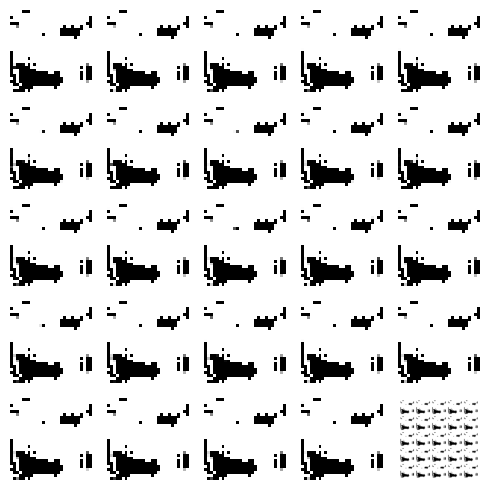

  0%|          | 0/350 [00:00<?, ?it/s]

4/4 [==============================] - 0s 26ms/step


  0%|          | 1/350 [00:00<04:04,  1.43it/s]

4/4 [==============================] - 0s 13ms/step


  1%|          | 2/350 [00:01<04:05,  1.42it/s]

4/4 [==============================] - 0s 22ms/step


  1%|          | 3/350 [00:02<03:55,  1.48it/s]

4/4 [==============================] - 0s 12ms/step


  1%|          | 4/350 [00:02<03:35,  1.60it/s]

4/4 [==============================] - 0s 20ms/step


  1%|▏         | 5/350 [00:03<03:42,  1.55it/s]

4/4 [==============================] - 0s 14ms/step


  2%|▏         | 6/350 [00:03<03:37,  1.58it/s]

4/4 [==============================] - 0s 14ms/step


  2%|▏         | 7/350 [00:04<03:31,  1.62it/s]

4/4 [==============================] - 0s 14ms/step


  2%|▏         | 8/350 [00:05<03:28,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


  3%|▎         | 9/350 [00:05<03:20,  1.70it/s]

4/4 [==============================] - 0s 14ms/step


  3%|▎         | 10/350 [00:06<03:17,  1.72it/s]

4/4 [==============================] - 0s 11ms/step


  3%|▎         | 11/350 [00:06<03:21,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


  3%|▎         | 12/350 [00:07<03:23,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


  4%|▎         | 13/350 [00:08<03:22,  1.67it/s]

4/4 [==============================] - 0s 16ms/step


  4%|▍         | 14/350 [00:08<03:17,  1.70it/s]

4/4 [==============================] - 0s 14ms/step


  4%|▍         | 15/350 [00:09<03:33,  1.57it/s]

4/4 [==============================] - 0s 16ms/step


  5%|▍         | 16/350 [00:09<03:24,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


  5%|▍         | 17/350 [00:10<03:24,  1.63it/s]

4/4 [==============================] - 0s 17ms/step


  5%|▌         | 18/350 [00:11<03:23,  1.63it/s]

4/4 [==============================] - 0s 15ms/step


  5%|▌         | 19/350 [00:11<03:22,  1.63it/s]

4/4 [==============================] - 0s 15ms/step


  6%|▌         | 20/350 [00:12<03:21,  1.64it/s]

4/4 [==============================] - 0s 13ms/step


  6%|▌         | 21/350 [00:12<03:22,  1.62it/s]

4/4 [==============================] - 0s 16ms/step


  6%|▋         | 22/350 [00:13<03:14,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


  7%|▋         | 23/350 [00:14<03:16,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


  7%|▋         | 24/350 [00:14<03:13,  1.68it/s]

4/4 [==============================] - 0s 14ms/step


  7%|▋         | 25/350 [00:15<03:14,  1.67it/s]

4/4 [==============================] - 0s 14ms/step


  7%|▋         | 26/350 [00:15<03:06,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


  8%|▊         | 27/350 [00:16<03:02,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


  8%|▊         | 28/350 [00:17<03:09,  1.70it/s]

4/4 [==============================] - 0s 16ms/step


  8%|▊         | 29/350 [00:17<03:12,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


  9%|▊         | 30/350 [00:18<03:08,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


  9%|▉         | 31/350 [00:18<03:10,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


  9%|▉         | 32/350 [00:19<03:13,  1.64it/s]

4/4 [==============================] - 0s 15ms/step


  9%|▉         | 33/350 [00:20<03:09,  1.67it/s]

4/4 [==============================] - 0s 14ms/step


 10%|▉         | 34/350 [00:20<03:08,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


 10%|█         | 35/350 [00:21<03:12,  1.64it/s]

4/4 [==============================] - 0s 16ms/step


 10%|█         | 36/350 [00:21<03:11,  1.64it/s]

4/4 [==============================] - 0s 15ms/step


 11%|█         | 37/350 [00:22<03:10,  1.64it/s]

4/4 [==============================] - 0s 17ms/step


 11%|█         | 38/350 [00:23<03:07,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 11%|█         | 39/350 [00:23<03:09,  1.64it/s]

4/4 [==============================] - 0s 13ms/step


 11%|█▏        | 40/350 [00:24<03:04,  1.68it/s]

4/4 [==============================] - 0s 19ms/step


 12%|█▏        | 41/350 [00:24<03:04,  1.67it/s]

4/4 [==============================] - 0s 16ms/step


 12%|█▏        | 42/350 [00:25<03:04,  1.67it/s]

4/4 [==============================] - 0s 14ms/step


 12%|█▏        | 43/350 [00:25<02:58,  1.72it/s]

4/4 [==============================] - 0s 17ms/step


 13%|█▎        | 44/350 [00:26<02:54,  1.75it/s]

4/4 [==============================] - 0s 15ms/step


 13%|█▎        | 45/350 [00:27<03:05,  1.65it/s]

4/4 [==============================] - 0s 13ms/step


 13%|█▎        | 46/350 [00:27<03:05,  1.64it/s]

4/4 [==============================] - 0s 15ms/step


 13%|█▎        | 47/350 [00:28<02:59,  1.69it/s]

4/4 [==============================] - 0s 13ms/step


 14%|█▎        | 48/350 [00:29<03:02,  1.66it/s]

4/4 [==============================] - 0s 14ms/step


 14%|█▍        | 49/350 [00:29<03:10,  1.58it/s]

4/4 [==============================] - 0s 11ms/step


 14%|█▍        | 50/350 [00:30<03:05,  1.62it/s]

4/4 [==============================] - 0s 10ms/step


 15%|█▍        | 51/350 [00:30<02:57,  1.68it/s]

4/4 [==============================] - 0s 14ms/step


 15%|█▍        | 52/350 [00:31<02:57,  1.68it/s]

4/4 [==============================] - 0s 17ms/step


 15%|█▌        | 53/350 [00:32<02:59,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 15%|█▌        | 54/350 [00:32<02:56,  1.68it/s]

4/4 [==============================] - 0s 14ms/step


 16%|█▌        | 55/350 [00:33<02:52,  1.71it/s]

4/4 [==============================] - 0s 14ms/step


 16%|█▌        | 56/350 [00:33<02:53,  1.69it/s]

4/4 [==============================] - 0s 13ms/step


 16%|█▋        | 57/350 [00:34<02:50,  1.71it/s]

4/4 [==============================] - 0s 11ms/step


 17%|█▋        | 58/350 [00:35<02:59,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


 17%|█▋        | 59/350 [00:35<02:59,  1.62it/s]

4/4 [==============================] - 0s 13ms/step


 17%|█▋        | 60/350 [00:36<02:53,  1.67it/s]

4/4 [==============================] - 0s 14ms/step


 17%|█▋        | 61/350 [00:36<02:52,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 18%|█▊        | 62/350 [00:37<02:54,  1.65it/s]

4/4 [==============================] - 0s 13ms/step


 18%|█▊        | 63/350 [00:38<02:58,  1.61it/s]

4/4 [==============================] - 0s 13ms/step


 18%|█▊        | 64/350 [00:38<02:50,  1.68it/s]

4/4 [==============================] - 0s 14ms/step


 19%|█▊        | 65/350 [00:39<02:45,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


 19%|█▉        | 66/350 [00:39<02:48,  1.69it/s]

4/4 [==============================] - 0s 14ms/step


 19%|█▉        | 67/350 [00:40<02:46,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 19%|█▉        | 68/350 [00:40<02:39,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 20%|█▉        | 69/350 [00:41<02:38,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 20%|██        | 70/350 [00:42<02:39,  1.75it/s]

4/4 [==============================] - 0s 20ms/step


 20%|██        | 71/350 [00:42<02:45,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 21%|██        | 72/350 [00:43<02:43,  1.70it/s]

4/4 [==============================] - 0s 13ms/step


 21%|██        | 73/350 [00:43<02:41,  1.72it/s]

4/4 [==============================] - 0s 14ms/step


 21%|██        | 74/350 [00:44<02:45,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 21%|██▏       | 75/350 [00:45<02:46,  1.65it/s]

4/4 [==============================] - 0s 22ms/step


 22%|██▏       | 76/350 [00:45<02:47,  1.64it/s]

4/4 [==============================] - 0s 14ms/step


 22%|██▏       | 77/350 [00:46<02:46,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 22%|██▏       | 78/350 [00:46<02:40,  1.69it/s]

4/4 [==============================] - 0s 13ms/step


 23%|██▎       | 79/350 [00:47<02:38,  1.71it/s]

4/4 [==============================] - 0s 14ms/step


 23%|██▎       | 80/350 [00:48<02:47,  1.61it/s]

4/4 [==============================] - 0s 12ms/step


 23%|██▎       | 81/350 [00:48<02:40,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 23%|██▎       | 82/350 [00:49<02:37,  1.70it/s]

4/4 [==============================] - 0s 15ms/step


 24%|██▎       | 83/350 [00:49<02:40,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


 24%|██▍       | 84/350 [00:50<02:43,  1.63it/s]

4/4 [==============================] - 0s 14ms/step


 24%|██▍       | 85/350 [00:51<02:41,  1.64it/s]

4/4 [==============================] - 0s 13ms/step


 25%|██▍       | 86/350 [00:51<02:41,  1.64it/s]

4/4 [==============================] - 0s 13ms/step


 25%|██▍       | 87/350 [00:52<02:38,  1.66it/s]

4/4 [==============================] - 0s 20ms/step


 25%|██▌       | 88/350 [00:53<02:46,  1.57it/s]

4/4 [==============================] - 0s 13ms/step


 25%|██▌       | 89/350 [00:53<02:43,  1.59it/s]

4/4 [==============================] - 0s 14ms/step


 26%|██▌       | 90/350 [00:54<02:46,  1.56it/s]

4/4 [==============================] - 0s 13ms/step


 26%|██▌       | 91/350 [00:54<02:38,  1.64it/s]

4/4 [==============================] - 0s 33ms/step


 26%|██▋       | 92/350 [00:55<02:41,  1.60it/s]

4/4 [==============================] - 0s 14ms/step


 27%|██▋       | 93/350 [00:56<02:47,  1.53it/s]

4/4 [==============================] - 0s 13ms/step


 27%|██▋       | 94/350 [00:56<02:49,  1.51it/s]

4/4 [==============================] - 0s 20ms/step


 27%|██▋       | 95/350 [00:57<02:49,  1.50it/s]

4/4 [==============================] - 0s 18ms/step


 27%|██▋       | 96/350 [00:58<02:45,  1.53it/s]

4/4 [==============================] - 0s 11ms/step


 28%|██▊       | 97/350 [00:58<02:36,  1.62it/s]

4/4 [==============================] - 0s 19ms/step


 28%|██▊       | 98/350 [00:59<02:42,  1.55it/s]

4/4 [==============================] - 0s 15ms/step


 28%|██▊       | 99/350 [01:00<02:36,  1.60it/s]

4/4 [==============================] - 0s 12ms/step


 29%|██▊       | 100/350 [01:00<02:30,  1.66it/s]

4/4 [==============================] - 0s 14ms/step


 29%|██▉       | 101/350 [01:01<02:26,  1.70it/s]

4/4 [==============================] - 0s 14ms/step


 29%|██▉       | 102/350 [01:01<02:27,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


 29%|██▉       | 103/350 [01:02<02:27,  1.68it/s]

4/4 [==============================] - 0s 20ms/step


 30%|██▉       | 104/350 [01:02<02:25,  1.69it/s]

4/4 [==============================] - 0s 13ms/step


 30%|███       | 105/350 [01:03<02:22,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 30%|███       | 106/350 [01:04<02:23,  1.69it/s]

4/4 [==============================] - 0s 16ms/step


 31%|███       | 107/350 [01:04<02:19,  1.74it/s]

4/4 [==============================] - 0s 16ms/step


 31%|███       | 108/350 [01:05<02:27,  1.65it/s]

4/4 [==============================] - 0s 13ms/step


 31%|███       | 109/350 [01:06<02:47,  1.44it/s]

4/4 [==============================] - 0s 12ms/step


 31%|███▏      | 110/350 [01:06<02:37,  1.53it/s]

4/4 [==============================] - 0s 13ms/step


 32%|███▏      | 111/350 [01:07<02:29,  1.60it/s]

4/4 [==============================] - 0s 11ms/step


 32%|███▏      | 112/350 [01:08<02:31,  1.57it/s]

4/4 [==============================] - 0s 24ms/step


 32%|███▏      | 113/350 [01:08<02:34,  1.53it/s]

4/4 [==============================] - 0s 14ms/step


 33%|███▎      | 114/350 [01:09<02:23,  1.64it/s]

4/4 [==============================] - 0s 14ms/step


 33%|███▎      | 115/350 [01:09<02:24,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 33%|███▎      | 116/350 [01:10<02:29,  1.56it/s]

4/4 [==============================] - 0s 17ms/step


 33%|███▎      | 117/350 [01:11<02:29,  1.56it/s]

4/4 [==============================] - 0s 14ms/step


 34%|███▎      | 118/350 [01:11<02:26,  1.58it/s]

4/4 [==============================] - 0s 23ms/step


 34%|███▍      | 119/350 [01:12<02:23,  1.61it/s]

4/4 [==============================] - 0s 27ms/step


 34%|███▍      | 120/350 [01:13<02:28,  1.55it/s]

4/4 [==============================] - 0s 20ms/step


 35%|███▍      | 121/350 [01:13<02:31,  1.51it/s]

4/4 [==============================] - 0s 27ms/step


 35%|███▍      | 122/350 [01:14<02:29,  1.52it/s]

4/4 [==============================] - 0s 11ms/step


 35%|███▌      | 123/350 [01:15<02:23,  1.58it/s]

4/4 [==============================] - 0s 17ms/step


 35%|███▌      | 124/350 [01:15<02:26,  1.54it/s]

4/4 [==============================] - 0s 14ms/step


 36%|███▌      | 125/350 [01:16<02:18,  1.62it/s]

4/4 [==============================] - 0s 13ms/step


 36%|███▌      | 126/350 [01:16<02:16,  1.65it/s]

4/4 [==============================] - 0s 17ms/step


 36%|███▋      | 127/350 [01:17<02:25,  1.53it/s]

4/4 [==============================] - 0s 11ms/step


 37%|███▋      | 128/350 [01:18<02:22,  1.56it/s]

4/4 [==============================] - 0s 14ms/step


 37%|███▋      | 129/350 [01:18<02:21,  1.56it/s]

4/4 [==============================] - 0s 11ms/step


 37%|███▋      | 130/350 [01:19<02:26,  1.50it/s]

4/4 [==============================] - 0s 15ms/step


 37%|███▋      | 131/350 [01:20<02:20,  1.56it/s]

4/4 [==============================] - 0s 13ms/step


 38%|███▊      | 132/350 [01:20<02:13,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


 38%|███▊      | 133/350 [01:21<02:11,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 38%|███▊      | 134/350 [01:21<02:08,  1.68it/s]

4/4 [==============================] - 0s 15ms/step


 39%|███▊      | 135/350 [01:22<02:10,  1.65it/s]

4/4 [==============================] - 0s 14ms/step


 39%|███▉      | 136/350 [01:23<02:07,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 39%|███▉      | 137/350 [01:23<02:03,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 39%|███▉      | 138/350 [01:24<02:04,  1.70it/s]

4/4 [==============================] - 0s 15ms/step


 40%|███▉      | 139/350 [01:24<02:00,  1.75it/s]

4/4 [==============================] - 0s 15ms/step


 40%|████      | 140/350 [01:25<02:07,  1.65it/s]

4/4 [==============================] - 0s 14ms/step


 40%|████      | 141/350 [01:26<02:10,  1.61it/s]

4/4 [==============================] - 0s 15ms/step


 41%|████      | 142/350 [01:26<02:08,  1.61it/s]

4/4 [==============================] - 0s 16ms/step


 41%|████      | 143/350 [01:27<02:04,  1.67it/s]

4/4 [==============================] - 0s 14ms/step


 41%|████      | 144/350 [01:27<02:06,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 41%|████▏     | 145/350 [01:28<02:10,  1.57it/s]

4/4 [==============================] - 0s 13ms/step


 42%|████▏     | 146/350 [01:29<02:05,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


 42%|████▏     | 147/350 [01:29<02:00,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 42%|████▏     | 148/350 [01:30<02:06,  1.59it/s]

4/4 [==============================] - 0s 12ms/step


 43%|████▎     | 149/350 [01:30<01:59,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


 43%|████▎     | 150/350 [01:31<01:56,  1.71it/s]

4/4 [==============================] - 0s 13ms/step


 43%|████▎     | 151/350 [01:32<01:55,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 43%|████▎     | 152/350 [01:32<01:57,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 44%|████▎     | 153/350 [01:33<02:01,  1.62it/s]

4/4 [==============================] - 0s 14ms/step


 44%|████▍     | 154/350 [01:33<01:58,  1.66it/s]

4/4 [==============================] - 0s 16ms/step


 44%|████▍     | 155/350 [01:34<01:58,  1.64it/s]

4/4 [==============================] - 0s 16ms/step


 45%|████▍     | 156/350 [01:35<01:54,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 45%|████▍     | 157/350 [01:35<01:57,  1.64it/s]

4/4 [==============================] - 0s 14ms/step


 45%|████▌     | 158/350 [01:36<02:00,  1.59it/s]

4/4 [==============================] - 0s 16ms/step


 45%|████▌     | 159/350 [01:36<01:55,  1.66it/s]

4/4 [==============================] - 0s 16ms/step


 46%|████▌     | 160/350 [01:37<01:53,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 46%|████▌     | 161/350 [01:38<01:58,  1.60it/s]

4/4 [==============================] - 0s 12ms/step


 46%|████▋     | 162/350 [01:38<01:57,  1.60it/s]

4/4 [==============================] - 0s 14ms/step


 47%|████▋     | 163/350 [01:39<01:52,  1.66it/s]

4/4 [==============================] - 0s 17ms/step


 47%|████▋     | 164/350 [01:40<01:52,  1.65it/s]

4/4 [==============================] - 0s 15ms/step


 47%|████▋     | 165/350 [01:40<01:56,  1.58it/s]

4/4 [==============================] - 0s 12ms/step


 47%|████▋     | 166/350 [01:41<01:51,  1.65it/s]

4/4 [==============================] - 0s 15ms/step


 48%|████▊     | 167/350 [01:41<01:48,  1.69it/s]

4/4 [==============================] - 0s 13ms/step


 48%|████▊     | 168/350 [01:42<01:48,  1.68it/s]

4/4 [==============================] - 0s 17ms/step


 48%|████▊     | 169/350 [01:43<01:47,  1.68it/s]

4/4 [==============================] - 0s 15ms/step


 49%|████▊     | 170/350 [01:43<01:50,  1.63it/s]

4/4 [==============================] - 0s 15ms/step


 49%|████▉     | 171/350 [01:44<01:52,  1.59it/s]

4/4 [==============================] - 0s 16ms/step


 49%|████▉     | 172/350 [01:44<01:48,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


 49%|████▉     | 173/350 [01:45<01:49,  1.61it/s]

4/4 [==============================] - 0s 19ms/step


 50%|████▉     | 174/350 [01:46<01:47,  1.64it/s]

4/4 [==============================] - 0s 14ms/step


 50%|█████     | 175/350 [01:46<01:47,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


 50%|█████     | 176/350 [01:47<01:46,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 51%|█████     | 177/350 [01:48<01:47,  1.61it/s]

4/4 [==============================] - 0s 18ms/step


 51%|█████     | 178/350 [01:48<01:46,  1.62it/s]

4/4 [==============================] - 0s 17ms/step


 51%|█████     | 179/350 [01:49<01:43,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


 51%|█████▏    | 180/350 [01:49<01:39,  1.71it/s]

4/4 [==============================] - 0s 13ms/step


 52%|█████▏    | 181/350 [01:50<01:39,  1.71it/s]

4/4 [==============================] - 0s 14ms/step


 52%|█████▏    | 182/350 [01:51<01:45,  1.59it/s]

4/4 [==============================] - 0s 16ms/step


 52%|█████▏    | 183/350 [01:51<01:42,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 53%|█████▎    | 184/350 [01:52<01:42,  1.61it/s]

4/4 [==============================] - 0s 12ms/step


 53%|█████▎    | 185/350 [01:52<01:45,  1.57it/s]

4/4 [==============================] - 0s 22ms/step


 53%|█████▎    | 186/350 [01:53<01:45,  1.55it/s]

4/4 [==============================] - 0s 19ms/step


 53%|█████▎    | 187/350 [01:54<01:48,  1.50it/s]

4/4 [==============================] - 0s 16ms/step


 54%|█████▎    | 188/350 [01:54<01:42,  1.58it/s]

4/4 [==============================] - 0s 11ms/step


 54%|█████▍    | 189/350 [01:55<01:43,  1.56it/s]

4/4 [==============================] - 0s 13ms/step


 54%|█████▍    | 190/350 [01:56<01:44,  1.53it/s]

4/4 [==============================] - 0s 18ms/step


 55%|█████▍    | 191/350 [01:56<01:41,  1.57it/s]

4/4 [==============================] - 0s 12ms/step


 55%|█████▍    | 192/350 [01:57<01:40,  1.57it/s]

4/4 [==============================] - 0s 17ms/step


 55%|█████▌    | 193/350 [01:58<01:39,  1.58it/s]

4/4 [==============================] - 0s 16ms/step


 55%|█████▌    | 194/350 [01:58<01:34,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


 56%|█████▌    | 195/350 [01:59<01:32,  1.67it/s]

4/4 [==============================] - 0s 15ms/step


 56%|█████▌    | 196/350 [01:59<01:31,  1.69it/s]

4/4 [==============================] - 0s 14ms/step


 56%|█████▋    | 197/350 [02:00<01:32,  1.65it/s]

4/4 [==============================] - 0s 15ms/step


 57%|█████▋    | 198/350 [02:01<01:30,  1.69it/s]

4/4 [==============================] - 0s 16ms/step


 57%|█████▋    | 199/350 [02:01<01:29,  1.68it/s]

4/4 [==============================] - 0s 14ms/step


 57%|█████▋    | 200/350 [02:02<01:28,  1.70it/s]

4/4 [==============================] - 0s 16ms/step


 57%|█████▋    | 201/350 [02:02<01:30,  1.65it/s]

4/4 [==============================] - 0s 17ms/step


 58%|█████▊    | 202/350 [02:03<01:28,  1.67it/s]

4/4 [==============================] - 0s 15ms/step


 58%|█████▊    | 203/350 [02:03<01:26,  1.71it/s]

4/4 [==============================] - 0s 14ms/step


 58%|█████▊    | 204/350 [02:04<01:26,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 59%|█████▊    | 205/350 [02:05<01:23,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 59%|█████▉    | 206/350 [02:05<01:27,  1.65it/s]

4/4 [==============================] - 0s 18ms/step


 59%|█████▉    | 207/350 [02:06<01:30,  1.59it/s]

4/4 [==============================] - 0s 13ms/step


 59%|█████▉    | 208/350 [02:07<01:25,  1.67it/s]

4/4 [==============================] - 0s 14ms/step


 60%|█████▉    | 209/350 [02:07<01:23,  1.69it/s]

4/4 [==============================] - 0s 15ms/step


 60%|██████    | 210/350 [02:08<01:26,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


 60%|██████    | 211/350 [02:08<01:26,  1.61it/s]

4/4 [==============================] - 0s 11ms/step


 61%|██████    | 212/350 [02:09<01:21,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


 61%|██████    | 213/350 [02:09<01:20,  1.71it/s]

4/4 [==============================] - 0s 17ms/step


 61%|██████    | 214/350 [02:10<01:19,  1.71it/s]

4/4 [==============================] - 0s 11ms/step


 61%|██████▏   | 215/350 [02:11<01:24,  1.60it/s]

4/4 [==============================] - 0s 15ms/step


 62%|██████▏   | 216/350 [02:11<01:19,  1.68it/s]

4/4 [==============================] - 0s 14ms/step


 62%|██████▏   | 217/350 [02:12<01:18,  1.70it/s]

4/4 [==============================] - 0s 15ms/step


 62%|██████▏   | 218/350 [02:12<01:18,  1.69it/s]

4/4 [==============================] - 0s 16ms/step


 63%|██████▎   | 219/350 [02:13<01:21,  1.60it/s]

4/4 [==============================] - 0s 15ms/step


 63%|██████▎   | 220/350 [02:14<01:21,  1.59it/s]

4/4 [==============================] - 0s 13ms/step


 63%|██████▎   | 221/350 [02:14<01:18,  1.64it/s]

4/4 [==============================] - 0s 13ms/step


 63%|██████▎   | 222/350 [02:15<01:15,  1.69it/s]

4/4 [==============================] - 0s 13ms/step


 64%|██████▎   | 223/350 [02:16<01:19,  1.60it/s]

4/4 [==============================] - 0s 14ms/step


 64%|██████▍   | 224/350 [02:16<01:19,  1.58it/s]

4/4 [==============================] - 0s 13ms/step


 64%|██████▍   | 225/350 [02:17<01:15,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


 65%|██████▍   | 226/350 [02:17<01:14,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 65%|██████▍   | 227/350 [02:18<01:15,  1.62it/s]

4/4 [==============================] - 0s 13ms/step


 65%|██████▌   | 228/350 [02:19<01:14,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


 65%|██████▌   | 229/350 [02:19<01:12,  1.66it/s]

4/4 [==============================] - 0s 14ms/step


 66%|██████▌   | 230/350 [02:20<01:13,  1.64it/s]

4/4 [==============================] - 0s 14ms/step


 66%|██████▌   | 231/350 [02:21<01:15,  1.58it/s]

4/4 [==============================] - 0s 13ms/step


 66%|██████▋   | 232/350 [02:21<01:12,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


 67%|██████▋   | 233/350 [02:22<01:09,  1.69it/s]

4/4 [==============================] - 0s 13ms/step


 67%|██████▋   | 234/350 [02:22<01:07,  1.72it/s]

4/4 [==============================] - 0s 14ms/step


 67%|██████▋   | 235/350 [02:23<01:11,  1.60it/s]

4/4 [==============================] - 0s 16ms/step


 67%|██████▋   | 236/350 [02:24<01:09,  1.64it/s]

4/4 [==============================] - 0s 14ms/step


 68%|██████▊   | 237/350 [02:24<01:08,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 68%|██████▊   | 238/350 [02:25<01:07,  1.65it/s]

4/4 [==============================] - 0s 14ms/step


 68%|██████▊   | 239/350 [02:25<01:05,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 69%|██████▊   | 240/350 [02:26<01:06,  1.65it/s]

4/4 [==============================] - 0s 16ms/step


 69%|██████▉   | 241/350 [02:27<01:07,  1.60it/s]

4/4 [==============================] - 0s 14ms/step


 69%|██████▉   | 242/350 [02:27<01:04,  1.68it/s]

4/4 [==============================] - 0s 16ms/step


 69%|██████▉   | 243/350 [02:28<01:04,  1.65it/s]

4/4 [==============================] - 0s 20ms/step


 70%|██████▉   | 244/350 [02:28<01:05,  1.61it/s]

4/4 [==============================] - 0s 13ms/step


 70%|███████   | 245/350 [02:29<01:05,  1.60it/s]

4/4 [==============================] - 0s 15ms/step


 70%|███████   | 246/350 [02:30<01:03,  1.63it/s]

4/4 [==============================] - 0s 18ms/step


 71%|███████   | 247/350 [02:30<01:06,  1.55it/s]

4/4 [==============================] - 0s 16ms/step


 71%|███████   | 248/350 [02:31<01:04,  1.57it/s]

4/4 [==============================] - 0s 14ms/step


 71%|███████   | 249/350 [02:32<01:03,  1.58it/s]

4/4 [==============================] - 0s 16ms/step


 71%|███████▏  | 250/350 [02:32<01:01,  1.63it/s]

4/4 [==============================] - 0s 18ms/step


 72%|███████▏  | 251/350 [02:33<01:02,  1.58it/s]

4/4 [==============================] - 0s 15ms/step


 72%|███████▏  | 252/350 [02:33<01:01,  1.60it/s]

4/4 [==============================] - 0s 11ms/step


 72%|███████▏  | 253/350 [02:34<01:01,  1.58it/s]

4/4 [==============================] - 0s 15ms/step


 73%|███████▎  | 254/350 [02:35<00:58,  1.63it/s]

4/4 [==============================] - 0s 14ms/step


 73%|███████▎  | 255/350 [02:35<00:59,  1.59it/s]

4/4 [==============================] - 0s 14ms/step


 73%|███████▎  | 256/350 [02:36<00:57,  1.63it/s]

4/4 [==============================] - 0s 14ms/step


 73%|███████▎  | 257/350 [02:37<00:58,  1.60it/s]

4/4 [==============================] - 0s 15ms/step


 74%|███████▎  | 258/350 [02:37<00:54,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 74%|███████▍  | 259/350 [02:38<00:58,  1.56it/s]

4/4 [==============================] - 0s 13ms/step


 74%|███████▍  | 260/350 [02:39<00:58,  1.54it/s]

4/4 [==============================] - 0s 17ms/step


 75%|███████▍  | 261/350 [02:39<00:56,  1.58it/s]

4/4 [==============================] - 0s 11ms/step


 75%|███████▍  | 262/350 [02:40<00:52,  1.69it/s]

4/4 [==============================] - 0s 15ms/step


 75%|███████▌  | 263/350 [02:40<00:55,  1.57it/s]

4/4 [==============================] - 0s 16ms/step


 75%|███████▌  | 264/350 [02:41<00:53,  1.61it/s]

4/4 [==============================] - 0s 12ms/step


 76%|███████▌  | 265/350 [02:42<00:52,  1.61it/s]

4/4 [==============================] - 0s 12ms/step


 76%|███████▌  | 266/350 [02:42<00:53,  1.58it/s]

4/4 [==============================] - 0s 14ms/step


 76%|███████▋  | 267/350 [02:43<00:50,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


 77%|███████▋  | 268/350 [02:43<00:50,  1.63it/s]

4/4 [==============================] - 0s 15ms/step


 77%|███████▋  | 269/350 [02:44<00:49,  1.63it/s]

4/4 [==============================] - 0s 17ms/step


 77%|███████▋  | 270/350 [02:45<00:50,  1.59it/s]

4/4 [==============================] - 0s 15ms/step


 77%|███████▋  | 271/350 [02:45<00:48,  1.63it/s]

4/4 [==============================] - 0s 14ms/step


 78%|███████▊  | 272/350 [02:46<00:47,  1.65it/s]

4/4 [==============================] - 0s 14ms/step


 78%|███████▊  | 273/350 [02:46<00:45,  1.71it/s]

4/4 [==============================] - 0s 15ms/step


 78%|███████▊  | 274/350 [02:47<00:44,  1.72it/s]

4/4 [==============================] - 0s 15ms/step


 79%|███████▊  | 275/350 [02:48<00:46,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 79%|███████▉  | 276/350 [02:48<00:45,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


 79%|███████▉  | 277/350 [02:49<00:43,  1.70it/s]

4/4 [==============================] - 0s 13ms/step


 79%|███████▉  | 278/350 [02:49<00:41,  1.74it/s]

4/4 [==============================] - 0s 14ms/step


 80%|███████▉  | 279/350 [02:50<00:43,  1.62it/s]

4/4 [==============================] - 0s 18ms/step


 80%|████████  | 280/350 [02:51<00:42,  1.65it/s]

4/4 [==============================] - 0s 15ms/step


 80%|████████  | 281/350 [02:51<00:41,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 81%|████████  | 282/350 [02:52<00:40,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 81%|████████  | 283/350 [02:52<00:41,  1.60it/s]

4/4 [==============================] - 0s 14ms/step


 81%|████████  | 284/350 [02:53<00:40,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 81%|████████▏ | 285/350 [02:54<00:39,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 82%|████████▏ | 286/350 [02:54<00:38,  1.67it/s]

4/4 [==============================] - 0s 15ms/step


 82%|████████▏ | 287/350 [02:55<00:36,  1.71it/s]

4/4 [==============================] - 0s 11ms/step


 82%|████████▏ | 288/350 [02:55<00:37,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 83%|████████▎ | 289/350 [02:56<00:37,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 83%|████████▎ | 290/350 [02:57<00:35,  1.67it/s]

4/4 [==============================] - 0s 14ms/step


 83%|████████▎ | 291/350 [02:57<00:34,  1.71it/s]

4/4 [==============================] - 0s 14ms/step


 83%|████████▎ | 292/350 [02:58<00:34,  1.68it/s]

4/4 [==============================] - 0s 14ms/step


 84%|████████▎ | 293/350 [02:58<00:34,  1.66it/s]

4/4 [==============================] - 0s 15ms/step


 84%|████████▍ | 294/350 [02:59<00:33,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 84%|████████▍ | 295/350 [03:00<00:32,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 85%|████████▍ | 296/350 [03:00<00:32,  1.67it/s]

4/4 [==============================] - 0s 18ms/step


 85%|████████▍ | 297/350 [03:01<00:31,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 85%|████████▌ | 298/350 [03:01<00:30,  1.72it/s]

4/4 [==============================] - 0s 16ms/step


 85%|████████▌ | 299/350 [03:02<00:30,  1.70it/s]

4/4 [==============================] - 0s 14ms/step


 86%|████████▌ | 300/350 [03:03<00:29,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 86%|████████▌ | 301/350 [03:03<00:30,  1.62it/s]

4/4 [==============================] - 0s 13ms/step


 86%|████████▋ | 302/350 [03:04<00:28,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


 87%|████████▋ | 303/350 [03:04<00:28,  1.63it/s]

4/4 [==============================] - 0s 14ms/step


 87%|████████▋ | 304/350 [03:05<00:27,  1.66it/s]

4/4 [==============================] - 0s 20ms/step


 87%|████████▋ | 305/350 [03:06<00:28,  1.59it/s]

4/4 [==============================] - 0s 13ms/step


 87%|████████▋ | 306/350 [03:06<00:28,  1.57it/s]

4/4 [==============================] - 0s 11ms/step


 88%|████████▊ | 307/350 [03:07<00:27,  1.58it/s]

4/4 [==============================] - 0s 14ms/step


 88%|████████▊ | 308/350 [03:08<00:26,  1.57it/s]

4/4 [==============================] - 0s 18ms/step


 88%|████████▊ | 309/350 [03:08<00:26,  1.57it/s]

4/4 [==============================] - 0s 15ms/step


 89%|████████▊ | 310/350 [03:09<00:24,  1.63it/s]

4/4 [==============================] - 0s 15ms/step


 89%|████████▉ | 311/350 [03:09<00:23,  1.65it/s]

4/4 [==============================] - 0s 17ms/step


 89%|████████▉ | 312/350 [03:10<00:23,  1.59it/s]

4/4 [==============================] - 0s 17ms/step


 89%|████████▉ | 313/350 [03:11<00:22,  1.63it/s]

4/4 [==============================] - 0s 14ms/step


 90%|████████▉ | 314/350 [03:11<00:21,  1.67it/s]

4/4 [==============================] - 0s 14ms/step


 90%|█████████ | 315/350 [03:12<00:21,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


 90%|█████████ | 316/350 [03:13<00:21,  1.58it/s]

4/4 [==============================] - 0s 17ms/step


 91%|█████████ | 317/350 [03:13<00:20,  1.64it/s]

4/4 [==============================] - 0s 13ms/step


 91%|█████████ | 318/350 [03:14<00:19,  1.67it/s]

4/4 [==============================] - 0s 15ms/step


 91%|█████████ | 319/350 [03:14<00:18,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 91%|█████████▏| 320/350 [03:15<00:17,  1.69it/s]

4/4 [==============================] - 0s 14ms/step


 92%|█████████▏| 321/350 [03:16<00:17,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


 92%|█████████▏| 322/350 [03:16<00:17,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


 92%|█████████▏| 323/350 [03:17<00:16,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 93%|█████████▎| 324/350 [03:17<00:15,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 93%|█████████▎| 325/350 [03:18<00:15,  1.62it/s]

4/4 [==============================] - 0s 14ms/step


 93%|█████████▎| 326/350 [03:19<00:15,  1.58it/s]

4/4 [==============================] - 0s 16ms/step


 93%|█████████▎| 327/350 [03:19<00:13,  1.65it/s]

4/4 [==============================] - 0s 13ms/step


 94%|█████████▎| 328/350 [03:20<00:13,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 94%|█████████▍| 329/350 [03:20<00:13,  1.58it/s]

4/4 [==============================] - 0s 14ms/step


 94%|█████████▍| 330/350 [03:21<00:12,  1.64it/s]

4/4 [==============================] - 0s 13ms/step


 95%|█████████▍| 331/350 [03:22<00:11,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 95%|█████████▍| 332/350 [03:22<00:10,  1.64it/s]

4/4 [==============================] - 0s 13ms/step


 95%|█████████▌| 333/350 [03:23<00:09,  1.72it/s]

4/4 [==============================] - 0s 38ms/step


 95%|█████████▌| 334/350 [03:23<00:09,  1.65it/s]

4/4 [==============================] - 0s 13ms/step


 96%|█████████▌| 335/350 [03:24<00:09,  1.64it/s]

4/4 [==============================] - 0s 14ms/step


 96%|█████████▌| 336/350 [03:25<00:08,  1.65it/s]

4/4 [==============================] - 0s 18ms/step


 96%|█████████▋| 337/350 [03:25<00:07,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 97%|█████████▋| 338/350 [03:26<00:07,  1.62it/s]

4/4 [==============================] - 0s 14ms/step


 97%|█████████▋| 339/350 [03:27<00:07,  1.57it/s]

4/4 [==============================] - 0s 19ms/step


 97%|█████████▋| 340/350 [03:27<00:06,  1.54it/s]

4/4 [==============================] - 0s 27ms/step


 97%|█████████▋| 341/350 [03:28<00:05,  1.53it/s]

4/4 [==============================] - 0s 11ms/step


 98%|█████████▊| 342/350 [03:29<00:05,  1.53it/s]

4/4 [==============================] - 0s 17ms/step


 98%|█████████▊| 343/350 [03:29<00:04,  1.56it/s]

4/4 [==============================] - 0s 11ms/step


 98%|█████████▊| 344/350 [03:30<00:03,  1.64it/s]

4/4 [==============================] - 0s 42ms/step


 99%|█████████▊| 345/350 [03:30<00:03,  1.56it/s]

4/4 [==============================] - 0s 12ms/step


 99%|█████████▉| 346/350 [03:31<00:02,  1.58it/s]

4/4 [==============================] - 0s 20ms/step


 99%|█████████▉| 347/350 [03:32<00:01,  1.57it/s]

4/4 [==============================] - 0s 15ms/step


 99%|█████████▉| 348/350 [03:32<00:01,  1.56it/s]

4/4 [==============================] - 0s 14ms/step


100%|█████████▉| 349/350 [03:33<00:00,  1.60it/s]

4/4 [==============================] - 0s 15ms/step


100%|██████████| 350/350 [03:33<00:00,  1.64it/s]

Epoch number: 88 discriminator_loss: 0.16589587834938097 generator_loss: 7.321553310666766
1/1 [==============================] - 0s 22ms/step


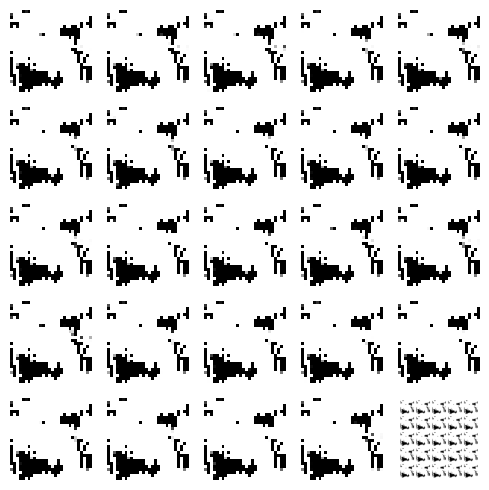

  0%|          | 0/350 [00:00<?, ?it/s]

4/4 [==============================] - 0s 24ms/step


  0%|          | 1/350 [00:00<04:16,  1.36it/s]

4/4 [==============================] - 0s 24ms/step


  1%|          | 2/350 [00:01<04:06,  1.41it/s]

4/4 [==============================] - 0s 15ms/step


  1%|          | 3/350 [00:02<04:11,  1.38it/s]

4/4 [==============================] - 0s 16ms/step


  1%|          | 4/350 [00:02<03:40,  1.57it/s]

4/4 [==============================] - 0s 11ms/step


  1%|▏         | 5/350 [00:03<03:47,  1.52it/s]

4/4 [==============================] - 0s 17ms/step


  2%|▏         | 6/350 [00:03<03:43,  1.54it/s]

4/4 [==============================] - 0s 14ms/step


  2%|▏         | 7/350 [00:04<03:31,  1.62it/s]

4/4 [==============================] - 0s 11ms/step


  2%|▏         | 8/350 [00:05<03:38,  1.57it/s]

4/4 [==============================] - 0s 12ms/step


  3%|▎         | 9/350 [00:05<03:38,  1.56it/s]

4/4 [==============================] - 0s 19ms/step


  3%|▎         | 10/350 [00:06<03:42,  1.53it/s]

4/4 [==============================] - 0s 12ms/step


  3%|▎         | 11/350 [00:07<03:27,  1.63it/s]

4/4 [==============================] - 0s 10ms/step


  3%|▎         | 12/350 [00:07<03:31,  1.60it/s]

4/4 [==============================] - 0s 11ms/step


  4%|▎         | 13/350 [00:08<03:35,  1.56it/s]

4/4 [==============================] - 0s 15ms/step


  4%|▍         | 14/350 [00:09<03:45,  1.49it/s]

4/4 [==============================] - 0s 17ms/step


  4%|▍         | 15/350 [00:09<03:35,  1.56it/s]

4/4 [==============================] - 0s 11ms/step


  5%|▍         | 16/350 [00:10<03:33,  1.56it/s]

4/4 [==============================] - 0s 14ms/step


  5%|▍         | 17/350 [00:10<03:28,  1.60it/s]

4/4 [==============================] - 0s 14ms/step


  5%|▌         | 18/350 [00:11<03:24,  1.62it/s]

4/4 [==============================] - 0s 11ms/step


  5%|▌         | 19/350 [00:12<03:24,  1.62it/s]

4/4 [==============================] - 0s 19ms/step


  6%|▌         | 20/350 [00:12<03:23,  1.62it/s]

4/4 [==============================] - 0s 14ms/step


  6%|▌         | 21/350 [00:13<03:19,  1.65it/s]

4/4 [==============================] - 0s 20ms/step


  6%|▋         | 22/350 [00:14<03:23,  1.61it/s]

4/4 [==============================] - 0s 14ms/step


  7%|▋         | 23/350 [00:14<03:30,  1.55it/s]

4/4 [==============================] - 0s 12ms/step


  7%|▋         | 24/350 [00:15<03:27,  1.57it/s]

4/4 [==============================] - 0s 15ms/step


  7%|▋         | 25/350 [00:15<03:28,  1.56it/s]

4/4 [==============================] - 0s 14ms/step


  7%|▋         | 26/350 [00:16<03:30,  1.54it/s]

4/4 [==============================] - 0s 14ms/step


  8%|▊         | 27/350 [00:17<03:23,  1.59it/s]

4/4 [==============================] - 0s 16ms/step


  8%|▊         | 28/350 [00:17<03:23,  1.58it/s]

4/4 [==============================] - 0s 15ms/step


  8%|▊         | 29/350 [00:18<03:13,  1.66it/s]

4/4 [==============================] - 0s 14ms/step


  9%|▊         | 30/350 [00:19<03:12,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


  9%|▉         | 31/350 [00:19<03:22,  1.58it/s]

4/4 [==============================] - 0s 16ms/step


  9%|▉         | 32/350 [00:20<03:13,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


  9%|▉         | 33/350 [00:20<03:08,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


 10%|▉         | 34/350 [00:21<03:07,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 10%|█         | 35/350 [00:22<03:14,  1.62it/s]

4/4 [==============================] - 0s 13ms/step


 10%|█         | 36/350 [00:22<03:07,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 11%|█         | 37/350 [00:23<03:02,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


 11%|█         | 38/350 [00:23<02:59,  1.73it/s]

4/4 [==============================] - 0s 15ms/step


 11%|█         | 39/350 [00:24<03:00,  1.72it/s]

4/4 [==============================] - 0s 14ms/step


 11%|█▏        | 40/350 [00:24<03:02,  1.70it/s]

4/4 [==============================] - 0s 16ms/step


 12%|█▏        | 41/350 [00:25<03:01,  1.71it/s]

4/4 [==============================] - 0s 15ms/step


 12%|█▏        | 42/350 [00:26<02:59,  1.72it/s]

4/4 [==============================] - 0s 15ms/step


 12%|█▏        | 43/350 [00:26<03:02,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


 13%|█▎        | 44/350 [00:27<02:58,  1.71it/s]

4/4 [==============================] - 0s 11ms/step


 13%|█▎        | 45/350 [00:27<03:07,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


 13%|█▎        | 46/350 [00:28<03:02,  1.67it/s]

4/4 [==============================] - 0s 18ms/step


 13%|█▎        | 47/350 [00:29<02:57,  1.71it/s]

4/4 [==============================] - 0s 13ms/step


 14%|█▎        | 48/350 [00:29<02:54,  1.73it/s]

4/4 [==============================] - 0s 15ms/step


 14%|█▍        | 49/350 [00:30<02:54,  1.72it/s]

4/4 [==============================] - 0s 22ms/step


 14%|█▍        | 50/350 [00:30<03:00,  1.67it/s]

4/4 [==============================] - 0s 14ms/step


 15%|█▍        | 51/350 [00:31<02:54,  1.72it/s]

4/4 [==============================] - 0s 16ms/step


 15%|█▍        | 52/350 [00:31<02:51,  1.74it/s]

4/4 [==============================] - 0s 16ms/step


 15%|█▌        | 53/350 [00:32<02:49,  1.75it/s]

4/4 [==============================] - 0s 14ms/step


 15%|█▌        | 54/350 [00:33<02:56,  1.67it/s]

4/4 [==============================] - 0s 15ms/step


 16%|█▌        | 55/350 [00:33<02:54,  1.69it/s]

4/4 [==============================] - 0s 16ms/step


 16%|█▌        | 56/350 [00:34<02:52,  1.70it/s]

4/4 [==============================] - 0s 13ms/step


 16%|█▋        | 57/350 [00:35<02:58,  1.64it/s]

4/4 [==============================] - 0s 13ms/step


 17%|█▋        | 58/350 [00:35<02:59,  1.63it/s]

4/4 [==============================] - 0s 18ms/step


 17%|█▋        | 59/350 [00:36<02:54,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 17%|█▋        | 60/350 [00:36<02:52,  1.68it/s]

4/4 [==============================] - 0s 16ms/step


 17%|█▋        | 61/350 [00:37<02:53,  1.67it/s]

4/4 [==============================] - 0s 14ms/step


 18%|█▊        | 62/350 [00:37<02:50,  1.69it/s]

4/4 [==============================] - 0s 15ms/step


 18%|█▊        | 63/350 [00:38<02:54,  1.65it/s]

4/4 [==============================] - 0s 14ms/step


 18%|█▊        | 64/350 [00:39<02:47,  1.71it/s]

4/4 [==============================] - 0s 14ms/step


 19%|█▊        | 65/350 [00:39<02:48,  1.69it/s]

4/4 [==============================] - 0s 17ms/step


 19%|█▉        | 66/350 [00:40<02:46,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 19%|█▉        | 67/350 [00:41<02:54,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


 19%|█▉        | 68/350 [00:41<02:53,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


 20%|█▉        | 69/350 [00:42<02:46,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 20%|██        | 70/350 [00:42<02:39,  1.76it/s]

4/4 [==============================] - 0s 14ms/step


 20%|██        | 71/350 [00:43<02:36,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 21%|██        | 72/350 [00:43<02:46,  1.67it/s]

4/4 [==============================] - 0s 21ms/step


 21%|██        | 73/350 [00:44<02:45,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 21%|██        | 74/350 [00:45<02:43,  1.69it/s]

4/4 [==============================] - 0s 14ms/step


 21%|██▏       | 75/350 [00:45<02:44,  1.68it/s]

4/4 [==============================] - 0s 17ms/step


 22%|██▏       | 76/350 [00:46<02:48,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


 22%|██▏       | 77/350 [00:46<02:45,  1.65it/s]

4/4 [==============================] - 0s 13ms/step


 22%|██▏       | 78/350 [00:47<02:39,  1.70it/s]

4/4 [==============================] - 0s 16ms/step


 23%|██▎       | 79/350 [00:48<02:39,  1.70it/s]

4/4 [==============================] - 0s 14ms/step


 23%|██▎       | 80/350 [00:48<02:34,  1.75it/s]

4/4 [==============================] - 0s 16ms/step


 23%|██▎       | 81/350 [00:49<02:38,  1.70it/s]

4/4 [==============================] - 0s 13ms/step


 23%|██▎       | 82/350 [00:49<02:37,  1.70it/s]

4/4 [==============================] - 0s 14ms/step


 24%|██▎       | 83/350 [00:50<02:37,  1.69it/s]

4/4 [==============================] - 0s 15ms/step


 24%|██▍       | 84/350 [00:50<02:33,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 24%|██▍       | 85/350 [00:51<02:31,  1.75it/s]

4/4 [==============================] - 0s 16ms/step


 25%|██▍       | 86/350 [00:52<02:38,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 25%|██▍       | 87/350 [00:52<02:44,  1.60it/s]

4/4 [==============================] - 0s 15ms/step


 25%|██▌       | 88/350 [00:53<02:36,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


 25%|██▌       | 89/350 [00:53<02:31,  1.72it/s]

4/4 [==============================] - 0s 14ms/step


 26%|██▌       | 90/350 [00:54<02:39,  1.63it/s]

4/4 [==============================] - 0s 15ms/step


 26%|██▌       | 91/350 [00:55<02:34,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 26%|██▋       | 92/350 [00:55<02:29,  1.72it/s]

4/4 [==============================] - 0s 15ms/step


 27%|██▋       | 93/350 [00:56<02:26,  1.75it/s]

4/4 [==============================] - 0s 12ms/step


 27%|██▋       | 94/350 [00:56<02:28,  1.73it/s]

4/4 [==============================] - 0s 12ms/step


 27%|██▋       | 95/350 [00:57<02:27,  1.73it/s]

4/4 [==============================] - 0s 18ms/step


 27%|██▋       | 96/350 [00:58<02:27,  1.72it/s]

4/4 [==============================] - 0s 14ms/step


 28%|██▊       | 97/350 [00:58<02:26,  1.72it/s]

4/4 [==============================] - 0s 14ms/step


 28%|██▊       | 98/350 [00:59<02:31,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


 28%|██▊       | 99/350 [00:59<02:25,  1.72it/s]

4/4 [==============================] - 0s 24ms/step


 29%|██▊       | 100/350 [01:00<02:32,  1.64it/s]

4/4 [==============================] - 0s 13ms/step


 29%|██▉       | 101/350 [01:01<02:37,  1.58it/s]

4/4 [==============================] - 0s 20ms/step


 29%|██▉       | 102/350 [01:01<02:40,  1.54it/s]

4/4 [==============================] - 0s 25ms/step


 29%|██▉       | 103/350 [01:02<02:39,  1.54it/s]

4/4 [==============================] - 0s 15ms/step


 30%|██▉       | 104/350 [01:03<02:40,  1.53it/s]

4/4 [==============================] - 0s 14ms/step


 30%|███       | 105/350 [01:03<02:32,  1.61it/s]

4/4 [==============================] - 0s 15ms/step


 30%|███       | 106/350 [01:04<02:27,  1.66it/s]

4/4 [==============================] - 0s 15ms/step


 31%|███       | 107/350 [01:05<02:36,  1.56it/s]

4/4 [==============================] - 0s 14ms/step


 31%|███       | 108/350 [01:05<02:30,  1.61it/s]

4/4 [==============================] - 0s 13ms/step


 31%|███       | 109/350 [01:06<02:25,  1.66it/s]

4/4 [==============================] - 0s 14ms/step


 31%|███▏      | 110/350 [01:06<02:30,  1.60it/s]

4/4 [==============================] - 0s 14ms/step


 32%|███▏      | 111/350 [01:07<02:23,  1.67it/s]

4/4 [==============================] - 0s 21ms/step


 32%|███▏      | 112/350 [01:08<02:27,  1.61it/s]

4/4 [==============================] - 0s 15ms/step


 32%|███▏      | 113/350 [01:08<02:24,  1.64it/s]

4/4 [==============================] - 0s 17ms/step


 33%|███▎      | 114/350 [01:09<02:23,  1.64it/s]

4/4 [==============================] - 0s 13ms/step


 33%|███▎      | 115/350 [01:09<02:20,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


 33%|███▎      | 116/350 [01:10<02:24,  1.62it/s]

4/4 [==============================] - 0s 11ms/step


 33%|███▎      | 117/350 [01:11<02:25,  1.61it/s]

4/4 [==============================] - 0s 15ms/step


 34%|███▎      | 118/350 [01:11<02:18,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


 34%|███▍      | 119/350 [01:12<02:14,  1.71it/s]

4/4 [==============================] - 0s 13ms/step


 34%|███▍      | 120/350 [01:12<02:18,  1.66it/s]

4/4 [==============================] - 0s 14ms/step


 35%|███▍      | 121/350 [01:13<02:17,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 35%|███▍      | 122/350 [01:14<02:19,  1.63it/s]

4/4 [==============================] - 0s 27ms/step


 35%|███▌      | 123/350 [01:14<02:22,  1.59it/s]

4/4 [==============================] - 0s 20ms/step


 35%|███▌      | 124/350 [01:15<02:30,  1.51it/s]

4/4 [==============================] - 0s 13ms/step


 36%|███▌      | 125/350 [01:16<02:38,  1.42it/s]

4/4 [==============================] - 0s 14ms/step


 36%|███▌      | 126/350 [01:16<02:33,  1.46it/s]

4/4 [==============================] - 0s 14ms/step


 36%|███▋      | 127/350 [01:17<02:28,  1.50it/s]

4/4 [==============================] - 0s 12ms/step


 37%|███▋      | 128/350 [01:18<02:31,  1.47it/s]

4/4 [==============================] - 0s 14ms/step


 37%|███▋      | 129/350 [01:18<02:27,  1.50it/s]

4/4 [==============================] - 0s 21ms/step


 37%|███▋      | 130/350 [01:19<02:29,  1.48it/s]

4/4 [==============================] - 0s 15ms/step


 37%|███▋      | 131/350 [01:20<02:23,  1.52it/s]

4/4 [==============================] - 0s 17ms/step


 38%|███▊      | 132/350 [01:20<02:29,  1.46it/s]

4/4 [==============================] - 0s 15ms/step


 38%|███▊      | 133/350 [01:21<02:21,  1.53it/s]

4/4 [==============================] - 0s 17ms/step


 38%|███▊      | 134/350 [01:22<02:25,  1.49it/s]

4/4 [==============================] - 0s 14ms/step


 39%|███▊      | 135/350 [01:22<02:27,  1.46it/s]

4/4 [==============================] - 0s 16ms/step


 39%|███▉      | 136/350 [01:23<02:20,  1.53it/s]

4/4 [==============================] - 0s 11ms/step


 39%|███▉      | 137/350 [01:24<02:15,  1.58it/s]

4/4 [==============================] - 0s 13ms/step


 39%|███▉      | 138/350 [01:24<02:20,  1.51it/s]

4/4 [==============================] - 0s 13ms/step


 40%|███▉      | 139/350 [01:25<02:20,  1.50it/s]

4/4 [==============================] - 0s 16ms/step


 40%|████      | 140/350 [01:26<02:20,  1.50it/s]

4/4 [==============================] - 0s 13ms/step


 40%|████      | 141/350 [01:26<02:19,  1.50it/s]

4/4 [==============================] - 0s 47ms/step


 41%|████      | 142/350 [01:27<02:26,  1.42it/s]

4/4 [==============================] - 0s 11ms/step


 41%|████      | 143/350 [01:28<02:19,  1.48it/s]

4/4 [==============================] - 0s 16ms/step


 41%|████      | 144/350 [01:28<02:13,  1.54it/s]

4/4 [==============================] - 0s 13ms/step


 41%|████▏     | 145/350 [01:29<02:10,  1.57it/s]

4/4 [==============================] - 0s 12ms/step


 42%|████▏     | 146/350 [01:30<02:08,  1.59it/s]

4/4 [==============================] - 0s 13ms/step


 42%|████▏     | 147/350 [01:30<02:10,  1.56it/s]

4/4 [==============================] - 0s 14ms/step


 42%|████▏     | 148/350 [01:31<02:07,  1.58it/s]

4/4 [==============================] - 0s 12ms/step


 43%|████▎     | 149/350 [01:32<02:08,  1.57it/s]

4/4 [==============================] - 0s 11ms/step


 43%|████▎     | 150/350 [01:32<02:04,  1.61it/s]

4/4 [==============================] - 0s 14ms/step


 43%|████▎     | 151/350 [01:33<02:10,  1.52it/s]

4/4 [==============================] - 0s 12ms/step


 43%|████▎     | 152/350 [01:33<02:04,  1.59it/s]

4/4 [==============================] - 0s 13ms/step


 44%|████▎     | 153/350 [01:34<02:08,  1.53it/s]

4/4 [==============================] - 0s 15ms/step


 44%|████▍     | 154/350 [01:35<02:04,  1.58it/s]

4/4 [==============================] - 0s 10ms/step


 44%|████▍     | 155/350 [01:35<02:08,  1.51it/s]

4/4 [==============================] - 0s 20ms/step


 45%|████▍     | 156/350 [01:36<02:11,  1.47it/s]

4/4 [==============================] - 0s 13ms/step


 45%|████▍     | 157/350 [01:37<02:06,  1.52it/s]

4/4 [==============================] - 0s 15ms/step


 45%|████▌     | 158/350 [01:37<02:03,  1.55it/s]

4/4 [==============================] - 0s 13ms/step


 45%|████▌     | 159/350 [01:38<02:06,  1.51it/s]

4/4 [==============================] - 0s 13ms/step


 46%|████▌     | 160/350 [01:39<02:05,  1.52it/s]

4/4 [==============================] - 0s 11ms/step


 46%|████▌     | 161/350 [01:39<01:57,  1.60it/s]

4/4 [==============================] - 0s 23ms/step


 46%|████▋     | 162/350 [01:40<01:59,  1.57it/s]

4/4 [==============================] - 0s 25ms/step


 47%|████▋     | 163/350 [01:41<02:03,  1.52it/s]

4/4 [==============================] - 0s 14ms/step


 47%|████▋     | 164/350 [01:41<01:58,  1.57it/s]

4/4 [==============================] - 0s 17ms/step


 47%|████▋     | 165/350 [01:42<01:58,  1.57it/s]

4/4 [==============================] - 0s 11ms/step


 47%|████▋     | 166/350 [01:43<01:59,  1.54it/s]

4/4 [==============================] - 0s 17ms/step


 48%|████▊     | 167/350 [01:43<01:58,  1.54it/s]

4/4 [==============================] - 0s 14ms/step


 48%|████▊     | 168/350 [01:44<01:57,  1.54it/s]

4/4 [==============================] - 0s 16ms/step


 48%|████▊     | 169/350 [01:44<01:57,  1.54it/s]

4/4 [==============================] - 0s 12ms/step


 49%|████▊     | 170/350 [01:45<01:55,  1.57it/s]

4/4 [==============================] - 0s 12ms/step


 49%|████▉     | 171/350 [01:46<01:53,  1.58it/s]

4/4 [==============================] - 0s 13ms/step


 49%|████▉     | 172/350 [01:46<01:52,  1.58it/s]

4/4 [==============================] - 0s 13ms/step


 49%|████▉     | 173/350 [01:47<01:49,  1.62it/s]

4/4 [==============================] - 0s 11ms/step


 50%|████▉     | 174/350 [01:48<01:53,  1.55it/s]

4/4 [==============================] - 0s 15ms/step


 50%|█████     | 175/350 [01:48<01:48,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


 50%|█████     | 176/350 [01:49<01:46,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


 51%|█████     | 177/350 [01:49<01:44,  1.66it/s]

4/4 [==============================] - 0s 18ms/step


 51%|█████     | 178/350 [01:50<01:51,  1.54it/s]

4/4 [==============================] - 0s 12ms/step


 51%|█████     | 179/350 [01:51<01:50,  1.55it/s]

4/4 [==============================] - 0s 14ms/step


 51%|█████▏    | 180/350 [01:51<01:51,  1.52it/s]

4/4 [==============================] - 0s 21ms/step


 52%|█████▏    | 181/350 [01:53<02:10,  1.30it/s]

4/4 [==============================] - 0s 15ms/step


 52%|█████▏    | 182/350 [01:53<02:04,  1.35it/s]

4/4 [==============================] - 0s 15ms/step


 52%|█████▏    | 183/350 [01:54<01:52,  1.48it/s]

4/4 [==============================] - 0s 18ms/step


 53%|█████▎    | 184/350 [01:54<01:51,  1.49it/s]

4/4 [==============================] - 0s 11ms/step


 53%|█████▎    | 185/350 [01:55<01:54,  1.44it/s]

4/4 [==============================] - 0s 16ms/step


 53%|█████▎    | 186/350 [01:56<01:53,  1.45it/s]

4/4 [==============================] - 0s 12ms/step


 53%|█████▎    | 187/350 [01:56<01:44,  1.56it/s]

4/4 [==============================] - 0s 16ms/step


 54%|█████▎    | 188/350 [01:57<01:44,  1.55it/s]

4/4 [==============================] - 0s 12ms/step


 54%|█████▍    | 189/350 [01:58<01:45,  1.52it/s]

4/4 [==============================] - 0s 18ms/step


 54%|█████▍    | 190/350 [01:58<01:43,  1.54it/s]

4/4 [==============================] - 0s 16ms/step


 55%|█████▍    | 191/350 [01:59<01:46,  1.50it/s]

4/4 [==============================] - 0s 16ms/step


 55%|█████▍    | 192/350 [02:00<01:47,  1.47it/s]

4/4 [==============================] - 0s 13ms/step


 55%|█████▌    | 193/350 [02:00<01:41,  1.55it/s]

4/4 [==============================] - 0s 18ms/step


 55%|█████▌    | 194/350 [02:01<01:38,  1.59it/s]

4/4 [==============================] - 0s 20ms/step


 56%|█████▌    | 195/350 [02:02<01:39,  1.56it/s]

4/4 [==============================] - 0s 16ms/step


 56%|█████▌    | 196/350 [02:02<01:35,  1.61it/s]

4/4 [==============================] - 0s 13ms/step


 56%|█████▋    | 197/350 [02:03<01:36,  1.59it/s]

4/4 [==============================] - 0s 14ms/step


 57%|█████▋    | 198/350 [02:03<01:36,  1.57it/s]

4/4 [==============================] - 0s 15ms/step


 57%|█████▋    | 199/350 [02:04<01:31,  1.65it/s]

4/4 [==============================] - 0s 14ms/step


 57%|█████▋    | 200/350 [02:05<01:38,  1.52it/s]

4/4 [==============================] - 0s 13ms/step


 57%|█████▋    | 201/350 [02:05<01:39,  1.49it/s]

4/4 [==============================] - 0s 13ms/step


 58%|█████▊    | 202/350 [02:06<01:34,  1.56it/s]

4/4 [==============================] - 0s 11ms/step


 58%|█████▊    | 203/350 [02:07<01:33,  1.57it/s]

4/4 [==============================] - 0s 13ms/step


 58%|█████▊    | 204/350 [02:07<01:40,  1.46it/s]

4/4 [==============================] - 0s 11ms/step


 59%|█████▊    | 205/350 [02:08<01:34,  1.53it/s]

4/4 [==============================] - 0s 17ms/step


 59%|█████▉    | 206/350 [02:09<01:30,  1.58it/s]

4/4 [==============================] - 0s 14ms/step


 59%|█████▉    | 207/350 [02:09<01:30,  1.58it/s]

4/4 [==============================] - 0s 17ms/step


 59%|█████▉    | 208/350 [02:10<01:30,  1.57it/s]

4/4 [==============================] - 0s 17ms/step


 60%|█████▉    | 209/350 [02:10<01:27,  1.62it/s]

4/4 [==============================] - 0s 14ms/step


 60%|██████    | 210/350 [02:11<01:24,  1.65it/s]

4/4 [==============================] - 0s 13ms/step


 60%|██████    | 211/350 [02:12<01:24,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


 61%|██████    | 212/350 [02:12<01:21,  1.70it/s]

4/4 [==============================] - 0s 15ms/step


 61%|██████    | 213/350 [02:13<01:22,  1.67it/s]

4/4 [==============================] - 0s 14ms/step


 61%|██████    | 214/350 [02:13<01:24,  1.61it/s]

4/4 [==============================] - 0s 18ms/step


 61%|██████▏   | 215/350 [02:14<01:23,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


 62%|██████▏   | 216/350 [02:15<01:25,  1.57it/s]

4/4 [==============================] - 0s 15ms/step


 62%|██████▏   | 217/350 [02:15<01:26,  1.54it/s]

4/4 [==============================] - 0s 14ms/step


 62%|██████▏   | 218/350 [02:16<01:22,  1.60it/s]

4/4 [==============================] - 0s 15ms/step


 63%|██████▎   | 219/350 [02:17<01:19,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 63%|██████▎   | 220/350 [02:17<01:22,  1.57it/s]

4/4 [==============================] - 0s 22ms/step


 63%|██████▎   | 221/350 [02:18<01:19,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 63%|██████▎   | 222/350 [02:18<01:16,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 64%|██████▎   | 223/350 [02:19<01:14,  1.71it/s]

4/4 [==============================] - 0s 13ms/step


 64%|██████▍   | 224/350 [02:20<01:15,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


 64%|██████▍   | 225/350 [02:20<01:17,  1.62it/s]

4/4 [==============================] - 0s 11ms/step


 65%|██████▍   | 226/350 [02:21<01:18,  1.58it/s]

4/4 [==============================] - 0s 13ms/step


 65%|██████▍   | 227/350 [02:22<01:16,  1.60it/s]

4/4 [==============================] - 0s 12ms/step


 65%|██████▌   | 228/350 [02:22<01:12,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 65%|██████▌   | 229/350 [02:23<01:13,  1.65it/s]

4/4 [==============================] - 0s 19ms/step


 66%|██████▌   | 230/350 [02:23<01:11,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


 66%|██████▌   | 231/350 [02:24<01:11,  1.65it/s]

4/4 [==============================] - 0s 13ms/step


 66%|██████▋   | 232/350 [02:24<01:09,  1.71it/s]

4/4 [==============================] - 0s 14ms/step


 67%|██████▋   | 233/350 [02:25<01:07,  1.73it/s]

4/4 [==============================] - 0s 12ms/step


 67%|██████▋   | 234/350 [02:26<01:11,  1.62it/s]

4/4 [==============================] - 0s 13ms/step


 67%|██████▋   | 235/350 [02:26<01:12,  1.59it/s]

4/4 [==============================] - 0s 12ms/step


 67%|██████▋   | 236/350 [02:27<01:09,  1.65it/s]

4/4 [==============================] - 0s 15ms/step


 68%|██████▊   | 237/350 [02:27<01:07,  1.66it/s]

4/4 [==============================] - 0s 15ms/step


 68%|██████▊   | 238/350 [02:28<01:08,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


 68%|██████▊   | 239/350 [02:29<01:06,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 69%|██████▊   | 240/350 [02:29<01:03,  1.72it/s]

4/4 [==============================] - 0s 15ms/step


 69%|██████▉   | 241/350 [02:30<01:03,  1.72it/s]

4/4 [==============================] - 0s 14ms/step


 69%|██████▉   | 242/350 [02:30<01:03,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 69%|██████▉   | 243/350 [02:31<01:03,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 70%|██████▉   | 244/350 [02:32<01:03,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 70%|███████   | 245/350 [02:32<01:03,  1.65it/s]

4/4 [==============================] - 0s 14ms/step


 70%|███████   | 246/350 [02:33<01:01,  1.70it/s]

4/4 [==============================] - 0s 13ms/step


 71%|███████   | 247/350 [02:33<01:02,  1.66it/s]

4/4 [==============================] - 0s 14ms/step


 71%|███████   | 248/350 [02:34<01:00,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 71%|███████   | 249/350 [02:35<00:59,  1.69it/s]

4/4 [==============================] - 0s 13ms/step


 71%|███████▏  | 250/350 [02:35<00:57,  1.74it/s]

4/4 [==============================] - 0s 17ms/step


 72%|███████▏  | 251/350 [02:36<00:58,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 72%|███████▏  | 252/350 [02:36<00:59,  1.64it/s]

4/4 [==============================] - 0s 17ms/step


 72%|███████▏  | 253/350 [02:37<01:00,  1.59it/s]

4/4 [==============================] - 0s 12ms/step


 73%|███████▎  | 254/350 [02:38<00:58,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


 73%|███████▎  | 255/350 [02:38<00:58,  1.62it/s]

4/4 [==============================] - 0s 13ms/step


 73%|███████▎  | 256/350 [02:39<00:58,  1.62it/s]

4/4 [==============================] - 0s 13ms/step


 73%|███████▎  | 257/350 [02:40<00:57,  1.62it/s]

4/4 [==============================] - 0s 15ms/step


 74%|███████▎  | 258/350 [02:40<00:54,  1.68it/s]

4/4 [==============================] - 0s 16ms/step


 74%|███████▍  | 259/350 [02:41<00:53,  1.71it/s]

4/4 [==============================] - 0s 14ms/step


 74%|███████▍  | 260/350 [02:41<00:53,  1.68it/s]

4/4 [==============================] - 0s 23ms/step


 75%|███████▍  | 261/350 [02:42<00:53,  1.65it/s]

4/4 [==============================] - 0s 14ms/step


 75%|███████▍  | 262/350 [02:42<00:54,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 75%|███████▌  | 263/350 [02:43<00:52,  1.65it/s]

4/4 [==============================] - 0s 14ms/step


 75%|███████▌  | 264/350 [02:44<00:53,  1.60it/s]

4/4 [==============================] - 0s 16ms/step


 76%|███████▌  | 265/350 [02:44<00:53,  1.59it/s]

4/4 [==============================] - 0s 12ms/step


 76%|███████▌  | 266/350 [02:45<00:52,  1.61it/s]

4/4 [==============================] - 0s 14ms/step


 76%|███████▋  | 267/350 [02:46<00:53,  1.54it/s]

4/4 [==============================] - 0s 13ms/step


 77%|███████▋  | 268/350 [02:46<00:50,  1.62it/s]

4/4 [==============================] - 0s 13ms/step


 77%|███████▋  | 269/350 [02:47<00:51,  1.56it/s]

4/4 [==============================] - 0s 15ms/step


 77%|███████▋  | 270/350 [02:48<00:51,  1.55it/s]

4/4 [==============================] - 0s 16ms/step


 77%|███████▋  | 271/350 [02:48<00:49,  1.60it/s]

4/4 [==============================] - 0s 13ms/step


 78%|███████▊  | 272/350 [02:49<00:49,  1.59it/s]

4/4 [==============================] - 0s 23ms/step


 78%|███████▊  | 273/350 [02:50<00:51,  1.51it/s]

4/4 [==============================] - 0s 11ms/step


 78%|███████▊  | 274/350 [02:50<00:47,  1.60it/s]

4/4 [==============================] - 0s 14ms/step


 79%|███████▊  | 275/350 [02:51<00:47,  1.59it/s]

4/4 [==============================] - 0s 12ms/step


 79%|███████▉  | 276/350 [02:51<00:48,  1.54it/s]

4/4 [==============================] - 0s 11ms/step


 79%|███████▉  | 277/350 [02:52<00:47,  1.55it/s]

4/4 [==============================] - 0s 15ms/step


 79%|███████▉  | 278/350 [02:53<00:46,  1.55it/s]

4/4 [==============================] - 0s 15ms/step


 80%|███████▉  | 279/350 [02:53<00:46,  1.53it/s]

4/4 [==============================] - 0s 15ms/step


 80%|████████  | 280/350 [02:54<00:47,  1.47it/s]

4/4 [==============================] - 0s 14ms/step


 80%|████████  | 281/350 [02:55<00:45,  1.53it/s]

4/4 [==============================] - 0s 13ms/step


 81%|████████  | 282/350 [02:55<00:44,  1.52it/s]

4/4 [==============================] - 0s 14ms/step


 81%|████████  | 283/350 [02:56<00:42,  1.56it/s]

4/4 [==============================] - 0s 11ms/step


 81%|████████  | 284/350 [02:57<00:41,  1.58it/s]

4/4 [==============================] - 0s 13ms/step


 81%|████████▏ | 285/350 [02:57<00:41,  1.58it/s]

4/4 [==============================] - 0s 14ms/step


 82%|████████▏ | 286/350 [02:58<00:40,  1.57it/s]

4/4 [==============================] - 0s 17ms/step


 82%|████████▏ | 287/350 [02:59<00:41,  1.51it/s]

4/4 [==============================] - 0s 15ms/step


 82%|████████▏ | 288/350 [02:59<00:39,  1.55it/s]

4/4 [==============================] - 0s 12ms/step


 83%|████████▎ | 289/350 [03:00<00:37,  1.63it/s]

4/4 [==============================] - 0s 18ms/step


 83%|████████▎ | 290/350 [03:00<00:37,  1.61it/s]

4/4 [==============================] - 0s 13ms/step


 83%|████████▎ | 291/350 [03:01<00:38,  1.53it/s]

4/4 [==============================] - 0s 16ms/step


 83%|████████▎ | 292/350 [03:02<00:37,  1.56it/s]

4/4 [==============================] - 0s 11ms/step


 84%|████████▎ | 293/350 [03:02<00:35,  1.60it/s]

4/4 [==============================] - 0s 15ms/step


 84%|████████▍ | 294/350 [03:03<00:33,  1.66it/s]

4/4 [==============================] - 0s 14ms/step


 84%|████████▍ | 295/350 [03:04<00:34,  1.59it/s]

4/4 [==============================] - 0s 12ms/step


 85%|████████▍ | 296/350 [03:04<00:33,  1.62it/s]

4/4 [==============================] - 0s 16ms/step


 85%|████████▍ | 297/350 [03:05<00:32,  1.61it/s]

4/4 [==============================] - 0s 12ms/step


 85%|████████▌ | 298/350 [03:05<00:32,  1.61it/s]

4/4 [==============================] - 0s 16ms/step


 85%|████████▌ | 299/350 [03:06<00:33,  1.53it/s]

4/4 [==============================] - 0s 11ms/step


 86%|████████▌ | 300/350 [03:07<00:32,  1.54it/s]

4/4 [==============================] - 0s 15ms/step


 86%|████████▌ | 301/350 [03:07<00:31,  1.56it/s]

4/4 [==============================] - 0s 10ms/step


 86%|████████▋ | 302/350 [03:08<00:28,  1.68it/s]

4/4 [==============================] - 0s 19ms/step


 87%|████████▋ | 303/350 [03:09<00:30,  1.54it/s]

4/4 [==============================] - 0s 12ms/step


 87%|████████▋ | 304/350 [03:09<00:29,  1.53it/s]

4/4 [==============================] - 0s 15ms/step


 87%|████████▋ | 305/350 [03:10<00:28,  1.56it/s]

4/4 [==============================] - 0s 14ms/step


 87%|████████▋ | 306/350 [03:11<00:29,  1.50it/s]

4/4 [==============================] - 0s 19ms/step


 88%|████████▊ | 307/350 [03:11<00:27,  1.54it/s]

4/4 [==============================] - 0s 15ms/step


 88%|████████▊ | 308/350 [03:12<00:26,  1.60it/s]

4/4 [==============================] - 0s 18ms/step


 88%|████████▊ | 309/350 [03:12<00:25,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


 89%|████████▊ | 310/350 [03:13<00:25,  1.56it/s]

4/4 [==============================] - 0s 16ms/step


 89%|████████▉ | 311/350 [03:14<00:24,  1.57it/s]

4/4 [==============================] - 0s 15ms/step


 89%|████████▉ | 312/350 [03:14<00:23,  1.59it/s]

4/4 [==============================] - 0s 14ms/step


 89%|████████▉ | 313/350 [03:15<00:23,  1.58it/s]

4/4 [==============================] - 0s 29ms/step


 90%|████████▉ | 314/350 [03:16<00:24,  1.49it/s]

4/4 [==============================] - 0s 18ms/step


 90%|█████████ | 315/350 [03:16<00:23,  1.51it/s]

4/4 [==============================] - 0s 11ms/step


 90%|█████████ | 316/350 [03:17<00:21,  1.57it/s]

4/4 [==============================] - 0s 16ms/step


 91%|█████████ | 317/350 [03:18<00:21,  1.53it/s]

4/4 [==============================] - 0s 18ms/step


 91%|█████████ | 318/350 [03:18<00:21,  1.51it/s]

4/4 [==============================] - 0s 16ms/step


 91%|█████████ | 319/350 [03:19<00:19,  1.57it/s]

4/4 [==============================] - 0s 13ms/step


 91%|█████████▏| 320/350 [03:20<00:18,  1.61it/s]

4/4 [==============================] - 0s 17ms/step


 92%|█████████▏| 321/350 [03:20<00:18,  1.59it/s]

4/4 [==============================] - 0s 14ms/step


 92%|█████████▏| 322/350 [03:21<00:17,  1.62it/s]

4/4 [==============================] - 0s 14ms/step


 92%|█████████▏| 323/350 [03:21<00:16,  1.65it/s]

4/4 [==============================] - 0s 13ms/step


 93%|█████████▎| 324/350 [03:22<00:15,  1.67it/s]

4/4 [==============================] - 0s 14ms/step


 93%|█████████▎| 325/350 [03:22<00:14,  1.69it/s]

4/4 [==============================] - 0s 16ms/step


 93%|█████████▎| 326/350 [03:23<00:14,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 93%|█████████▎| 327/350 [03:24<00:14,  1.61it/s]

4/4 [==============================] - 0s 14ms/step


 94%|█████████▎| 328/350 [03:24<00:13,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 94%|█████████▍| 329/350 [03:25<00:12,  1.68it/s]

4/4 [==============================] - 0s 14ms/step


 94%|█████████▍| 330/350 [03:26<00:12,  1.61it/s]

4/4 [==============================] - 0s 14ms/step


 95%|█████████▍| 331/350 [03:26<00:11,  1.59it/s]

4/4 [==============================] - 0s 14ms/step


 95%|█████████▍| 332/350 [03:27<00:10,  1.67it/s]

4/4 [==============================] - 0s 14ms/step


 95%|█████████▌| 333/350 [03:27<00:10,  1.64it/s]

4/4 [==============================] - 0s 20ms/step


 95%|█████████▌| 334/350 [03:28<00:10,  1.55it/s]

4/4 [==============================] - 0s 13ms/step


 96%|█████████▌| 335/350 [03:29<00:09,  1.55it/s]

4/4 [==============================] - 0s 16ms/step


 96%|█████████▌| 336/350 [03:29<00:09,  1.54it/s]

4/4 [==============================] - 0s 21ms/step


 96%|█████████▋| 337/350 [03:30<00:08,  1.52it/s]

4/4 [==============================] - 0s 11ms/step


 97%|█████████▋| 338/350 [03:31<00:07,  1.65it/s]

4/4 [==============================] - 0s 13ms/step


 97%|█████████▋| 339/350 [03:31<00:06,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 97%|█████████▋| 340/350 [03:32<00:06,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 97%|█████████▋| 341/350 [03:32<00:05,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 98%|█████████▊| 342/350 [03:33<00:05,  1.60it/s]

4/4 [==============================] - 0s 15ms/step


 98%|█████████▊| 343/350 [03:34<00:04,  1.58it/s]

4/4 [==============================] - 0s 15ms/step


 98%|█████████▊| 344/350 [03:34<00:03,  1.64it/s]

4/4 [==============================] - 0s 14ms/step


 99%|█████████▊| 345/350 [03:35<00:03,  1.66it/s]

4/4 [==============================] - 0s 29ms/step


 99%|█████████▉| 346/350 [03:36<00:02,  1.57it/s]

4/4 [==============================] - 0s 17ms/step


 99%|█████████▉| 347/350 [03:36<00:01,  1.55it/s]

4/4 [==============================] - 0s 13ms/step


 99%|█████████▉| 348/350 [03:37<00:01,  1.61it/s]

4/4 [==============================] - 0s 16ms/step


100%|█████████▉| 349/350 [03:38<00:00,  1.59it/s]

4/4 [==============================] - 0s 14ms/step


100%|██████████| 350/350 [03:38<00:00,  1.60it/s]

Epoch number: 89 discriminator_loss: 0.16498617453438263 generator_loss: 7.524267871039254
1/1 [==============================] - 0s 25ms/step


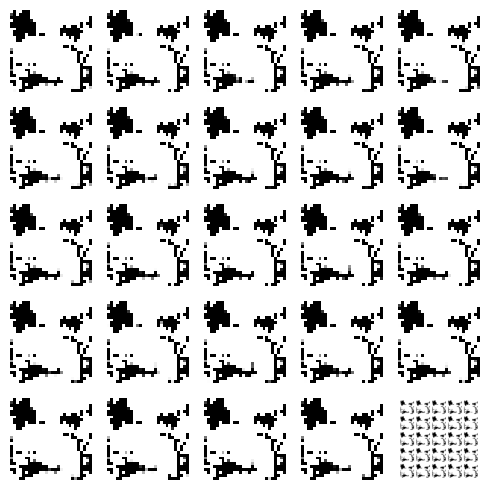

  0%|          | 0/350 [00:00<?, ?it/s]

4/4 [==============================] - 0s 16ms/step


  0%|          | 1/350 [00:00<03:25,  1.70it/s]

4/4 [==============================] - 0s 17ms/step


  1%|          | 2/350 [00:01<04:05,  1.42it/s]

4/4 [==============================] - 0s 14ms/step


  1%|          | 3/350 [00:02<04:00,  1.44it/s]

4/4 [==============================] - 0s 13ms/step


  1%|          | 4/350 [00:02<03:34,  1.61it/s]

4/4 [==============================] - 0s 13ms/step


  1%|▏         | 5/350 [00:03<03:51,  1.49it/s]

4/4 [==============================] - 0s 13ms/step


  2%|▏         | 6/350 [00:03<03:49,  1.50it/s]

4/4 [==============================] - 0s 16ms/step


  2%|▏         | 7/350 [00:04<03:52,  1.47it/s]

4/4 [==============================] - 0s 14ms/step


  2%|▏         | 8/350 [00:05<03:49,  1.49it/s]

4/4 [==============================] - 0s 16ms/step


  3%|▎         | 9/350 [00:06<03:52,  1.46it/s]

4/4 [==============================] - 0s 17ms/step


  3%|▎         | 10/350 [00:06<03:42,  1.53it/s]

4/4 [==============================] - 0s 11ms/step


  3%|▎         | 11/350 [00:07<03:41,  1.53it/s]

4/4 [==============================] - 0s 15ms/step


  3%|▎         | 12/350 [00:08<03:52,  1.46it/s]

4/4 [==============================] - 0s 16ms/step


  4%|▎         | 13/350 [00:08<03:48,  1.47it/s]

4/4 [==============================] - 0s 15ms/step


  4%|▍         | 14/350 [00:09<03:40,  1.52it/s]

4/4 [==============================] - 0s 14ms/step


  4%|▍         | 15/350 [00:10<03:45,  1.48it/s]

4/4 [==============================] - 0s 19ms/step


  5%|▍         | 16/350 [00:10<03:40,  1.51it/s]

4/4 [==============================] - 0s 11ms/step


  5%|▍         | 17/350 [00:11<03:31,  1.58it/s]

4/4 [==============================] - 0s 14ms/step


  5%|▌         | 18/350 [00:11<03:22,  1.64it/s]

4/4 [==============================] - 0s 15ms/step


  5%|▌         | 19/350 [00:12<03:39,  1.51it/s]

4/4 [==============================] - 0s 21ms/step


  6%|▌         | 20/350 [00:13<03:37,  1.52it/s]

4/4 [==============================] - 0s 12ms/step


  6%|▌         | 21/350 [00:13<03:29,  1.57it/s]

4/4 [==============================] - 0s 16ms/step


  6%|▋         | 22/350 [00:14<03:22,  1.62it/s]

4/4 [==============================] - 0s 28ms/step


  7%|▋         | 23/350 [00:15<03:32,  1.54it/s]

4/4 [==============================] - 0s 13ms/step


  7%|▋         | 24/350 [00:15<03:26,  1.58it/s]

4/4 [==============================] - 0s 13ms/step


  7%|▋         | 25/350 [00:16<03:31,  1.54it/s]

4/4 [==============================] - 0s 15ms/step


  7%|▋         | 26/350 [00:17<03:30,  1.54it/s]

4/4 [==============================] - 0s 14ms/step


  8%|▊         | 27/350 [00:17<03:27,  1.55it/s]

4/4 [==============================] - 0s 12ms/step


  8%|▊         | 28/350 [00:18<03:27,  1.55it/s]

4/4 [==============================] - 0s 15ms/step


  8%|▊         | 29/350 [00:18<03:17,  1.62it/s]

4/4 [==============================] - 0s 14ms/step


  9%|▊         | 30/350 [00:19<03:12,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


  9%|▉         | 31/350 [00:20<03:14,  1.64it/s]

4/4 [==============================] - 0s 15ms/step


  9%|▉         | 32/350 [00:20<03:18,  1.61it/s]

4/4 [==============================] - 0s 13ms/step


  9%|▉         | 33/350 [00:21<03:10,  1.66it/s]

4/4 [==============================] - 0s 14ms/step


 10%|▉         | 34/350 [00:21<03:12,  1.64it/s]

4/4 [==============================] - 0s 13ms/step


 10%|█         | 35/350 [00:22<03:17,  1.59it/s]

4/4 [==============================] - 0s 18ms/step


 10%|█         | 36/350 [00:23<03:11,  1.64it/s]

4/4 [==============================] - 0s 14ms/step


 11%|█         | 37/350 [00:23<03:07,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 11%|█         | 38/350 [00:24<02:59,  1.73it/s]

4/4 [==============================] - 0s 15ms/step


 11%|█         | 39/350 [00:24<03:04,  1.68it/s]

4/4 [==============================] - 0s 17ms/step


 11%|█▏        | 40/350 [00:25<03:12,  1.61it/s]

4/4 [==============================] - 0s 15ms/step


 12%|█▏        | 41/350 [00:26<03:09,  1.63it/s]

4/4 [==============================] - 0s 17ms/step


 12%|█▏        | 42/350 [00:26<03:06,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 12%|█▏        | 43/350 [00:27<03:12,  1.59it/s]

4/4 [==============================] - 0s 14ms/step


 13%|█▎        | 44/350 [00:28<03:10,  1.60it/s]

4/4 [==============================] - 0s 22ms/step


 13%|█▎        | 45/350 [00:28<03:11,  1.59it/s]

4/4 [==============================] - 0s 19ms/step


 13%|█▎        | 46/350 [00:29<03:08,  1.61it/s]

4/4 [==============================] - 0s 13ms/step


 13%|█▎        | 47/350 [00:29<03:07,  1.62it/s]

4/4 [==============================] - 0s 18ms/step


 14%|█▎        | 48/350 [00:30<03:19,  1.51it/s]

4/4 [==============================] - 0s 19ms/step


 14%|█▍        | 49/350 [00:31<03:22,  1.49it/s]

4/4 [==============================] - 0s 12ms/step


 14%|█▍        | 50/350 [00:31<03:17,  1.52it/s]

4/4 [==============================] - 0s 13ms/step


 15%|█▍        | 51/350 [00:32<03:22,  1.48it/s]

4/4 [==============================] - 0s 14ms/step


 15%|█▍        | 52/350 [00:33<03:08,  1.58it/s]

4/4 [==============================] - 0s 16ms/step


 15%|█▌        | 53/350 [00:33<03:09,  1.57it/s]

4/4 [==============================] - 0s 13ms/step


 15%|█▌        | 54/350 [00:34<03:06,  1.58it/s]

4/4 [==============================] - 0s 13ms/step


 16%|█▌        | 55/350 [00:35<03:12,  1.53it/s]

4/4 [==============================] - 0s 15ms/step


 16%|█▌        | 56/350 [00:35<03:07,  1.57it/s]

4/4 [==============================] - 0s 21ms/step


 16%|█▋        | 57/350 [00:36<03:02,  1.60it/s]

4/4 [==============================] - 0s 21ms/step


 17%|█▋        | 58/350 [00:36<02:57,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 17%|█▋        | 59/350 [00:37<02:55,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


 17%|█▋        | 60/350 [00:38<02:57,  1.63it/s]

4/4 [==============================] - 0s 15ms/step


 17%|█▋        | 61/350 [00:38<03:00,  1.60it/s]

4/4 [==============================] - 0s 13ms/step


 18%|█▊        | 62/350 [00:39<02:55,  1.64it/s]

4/4 [==============================] - 0s 17ms/step


 18%|█▊        | 63/350 [00:40<02:55,  1.64it/s]

4/4 [==============================] - 0s 14ms/step


 18%|█▊        | 64/350 [00:40<02:55,  1.63it/s]

4/4 [==============================] - 0s 14ms/step


 19%|█▊        | 65/350 [00:41<02:57,  1.60it/s]

4/4 [==============================] - 0s 16ms/step


 19%|█▉        | 66/350 [00:41<02:55,  1.61it/s]

4/4 [==============================] - 0s 17ms/step


 19%|█▉        | 67/350 [00:42<03:01,  1.56it/s]

4/4 [==============================] - 0s 17ms/step


 19%|█▉        | 68/350 [00:43<02:57,  1.59it/s]

4/4 [==============================] - 0s 13ms/step


 20%|█▉        | 69/350 [00:43<02:51,  1.64it/s]

4/4 [==============================] - 0s 16ms/step


 20%|██        | 70/350 [00:44<02:50,  1.64it/s]

4/4 [==============================] - 0s 15ms/step


 20%|██        | 71/350 [00:45<02:52,  1.61it/s]

4/4 [==============================] - 0s 12ms/step


 21%|██        | 72/350 [00:45<02:54,  1.59it/s]

4/4 [==============================] - 0s 13ms/step


 21%|██        | 73/350 [00:46<02:51,  1.61it/s]

4/4 [==============================] - 0s 18ms/step


 21%|██        | 74/350 [00:46<02:46,  1.66it/s]

4/4 [==============================] - 0s 17ms/step


 21%|██▏       | 75/350 [00:47<02:44,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 22%|██▏       | 76/350 [00:48<02:49,  1.62it/s]

4/4 [==============================] - 0s 14ms/step


 22%|██▏       | 77/350 [00:48<02:52,  1.59it/s]

4/4 [==============================] - 0s 21ms/step


 22%|██▏       | 78/350 [00:49<02:49,  1.60it/s]

4/4 [==============================] - 0s 13ms/step


 23%|██▎       | 79/350 [00:49<02:49,  1.60it/s]

4/4 [==============================] - 0s 31ms/step


 23%|██▎       | 80/350 [00:50<02:59,  1.50it/s]

4/4 [==============================] - 0s 16ms/step


 23%|██▎       | 81/350 [00:51<02:59,  1.50it/s]

4/4 [==============================] - 0s 12ms/step


 23%|██▎       | 82/350 [00:51<02:49,  1.58it/s]

4/4 [==============================] - 0s 17ms/step


 24%|██▎       | 83/350 [00:52<02:45,  1.62it/s]

4/4 [==============================] - 0s 11ms/step


 24%|██▍       | 84/350 [00:53<02:52,  1.54it/s]

4/4 [==============================] - 0s 13ms/step


 24%|██▍       | 85/350 [00:53<02:48,  1.57it/s]

4/4 [==============================] - 0s 12ms/step


 25%|██▍       | 86/350 [00:54<02:42,  1.63it/s]

4/4 [==============================] - 0s 26ms/step


 25%|██▍       | 87/350 [00:55<02:46,  1.58it/s]

4/4 [==============================] - 0s 26ms/step


 25%|██▌       | 88/350 [00:55<02:49,  1.54it/s]

4/4 [==============================] - 0s 14ms/step


 25%|██▌       | 89/350 [00:56<02:50,  1.53it/s]

4/4 [==============================] - 0s 16ms/step


 26%|██▌       | 90/350 [00:57<02:48,  1.55it/s]

4/4 [==============================] - 0s 13ms/step


 26%|██▌       | 91/350 [00:57<02:49,  1.53it/s]

4/4 [==============================] - 0s 16ms/step


 26%|██▋       | 92/350 [00:58<02:52,  1.49it/s]

4/4 [==============================] - 0s 19ms/step


 27%|██▋       | 93/350 [00:59<02:51,  1.49it/s]

4/4 [==============================] - 0s 15ms/step


 27%|██▋       | 94/350 [00:59<02:42,  1.58it/s]

4/4 [==============================] - 0s 13ms/step


 27%|██▋       | 95/350 [01:00<02:50,  1.50it/s]

4/4 [==============================] - 0s 11ms/step


 27%|██▋       | 96/350 [01:01<02:45,  1.53it/s]

4/4 [==============================] - 0s 12ms/step


 28%|██▊       | 97/350 [01:01<02:39,  1.58it/s]

4/4 [==============================] - 0s 11ms/step


 28%|██▊       | 98/350 [01:02<02:40,  1.57it/s]

4/4 [==============================] - 0s 13ms/step


 28%|██▊       | 99/350 [01:03<02:48,  1.49it/s]

4/4 [==============================] - 0s 12ms/step


 29%|██▊       | 100/350 [01:03<02:38,  1.57it/s]

4/4 [==============================] - 0s 17ms/step


 29%|██▉       | 101/350 [01:04<02:34,  1.61it/s]

4/4 [==============================] - 0s 13ms/step


 29%|██▉       | 102/350 [01:04<02:38,  1.56it/s]

4/4 [==============================] - 0s 17ms/step


 29%|██▉       | 103/350 [01:05<02:43,  1.51it/s]

4/4 [==============================] - 0s 13ms/step


 30%|██▉       | 104/350 [01:06<02:39,  1.54it/s]

4/4 [==============================] - 0s 18ms/step


 30%|███       | 105/350 [01:06<02:36,  1.56it/s]

4/4 [==============================] - 0s 12ms/step


 30%|███       | 106/350 [01:07<02:30,  1.62it/s]

4/4 [==============================] - 0s 15ms/step


 31%|███       | 107/350 [01:08<02:31,  1.60it/s]

4/4 [==============================] - 0s 18ms/step


 31%|███       | 108/350 [01:08<02:31,  1.60it/s]

4/4 [==============================] - 0s 14ms/step


 31%|███       | 109/350 [01:09<02:29,  1.61it/s]

4/4 [==============================] - 0s 12ms/step


 31%|███▏      | 110/350 [01:09<02:22,  1.68it/s]

4/4 [==============================] - 0s 14ms/step


 32%|███▏      | 111/350 [01:10<02:25,  1.65it/s]

4/4 [==============================] - 0s 19ms/step


 32%|███▏      | 112/350 [01:10<02:22,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 32%|███▏      | 113/350 [01:11<02:23,  1.66it/s]

4/4 [==============================] - 0s 14ms/step


 33%|███▎      | 114/350 [01:12<02:16,  1.73it/s]

4/4 [==============================] - 0s 15ms/step


 33%|███▎      | 115/350 [01:12<02:18,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 33%|███▎      | 116/350 [01:13<02:24,  1.62it/s]

4/4 [==============================] - 0s 13ms/step


 33%|███▎      | 117/350 [01:14<02:26,  1.59it/s]

4/4 [==============================] - 0s 15ms/step


 34%|███▎      | 118/350 [01:14<02:27,  1.58it/s]

4/4 [==============================] - 0s 14ms/step


 34%|███▍      | 119/350 [01:15<02:37,  1.47it/s]

4/4 [==============================] - 0s 15ms/step


 34%|███▍      | 120/350 [01:16<02:33,  1.50it/s]

4/4 [==============================] - 0s 14ms/step


 35%|███▍      | 121/350 [01:16<02:27,  1.56it/s]

4/4 [==============================] - 0s 20ms/step


 35%|███▍      | 122/350 [01:17<02:25,  1.56it/s]

4/4 [==============================] - 0s 14ms/step


 35%|███▌      | 123/350 [01:18<02:31,  1.50it/s]

4/4 [==============================] - 0s 16ms/step


 35%|███▌      | 124/350 [01:18<02:26,  1.54it/s]

4/4 [==============================] - 0s 12ms/step


 36%|███▌      | 125/350 [01:19<02:25,  1.54it/s]

4/4 [==============================] - 0s 15ms/step


 36%|███▌      | 126/350 [01:19<02:23,  1.56it/s]

4/4 [==============================] - 0s 11ms/step


 36%|███▋      | 127/350 [01:20<02:16,  1.64it/s]

4/4 [==============================] - 0s 14ms/step


 37%|███▋      | 128/350 [01:21<02:18,  1.60it/s]

4/4 [==============================] - 0s 15ms/step


 37%|███▋      | 129/350 [01:21<02:19,  1.58it/s]

4/4 [==============================] - 0s 12ms/step


 37%|███▋      | 130/350 [01:22<02:16,  1.61it/s]

4/4 [==============================] - 0s 13ms/step


 37%|███▋      | 131/350 [01:23<02:20,  1.56it/s]

4/4 [==============================] - 0s 19ms/step


 38%|███▊      | 132/350 [01:23<02:19,  1.57it/s]

4/4 [==============================] - 0s 13ms/step


 38%|███▊      | 133/350 [01:24<02:11,  1.64it/s]

4/4 [==============================] - 0s 15ms/step


 38%|███▊      | 134/350 [01:24<02:08,  1.68it/s]

4/4 [==============================] - 0s 16ms/step


 39%|███▊      | 135/350 [01:25<02:07,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


 39%|███▉      | 136/350 [01:26<02:11,  1.63it/s]

4/4 [==============================] - 0s 15ms/step


 39%|███▉      | 137/350 [01:26<02:07,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


 39%|███▉      | 138/350 [01:27<02:05,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


 40%|███▉      | 139/350 [01:27<02:07,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 40%|████      | 140/350 [01:28<02:02,  1.71it/s]

4/4 [==============================] - 0s 13ms/step


 40%|████      | 141/350 [01:29<02:06,  1.65it/s]

4/4 [==============================] - 0s 14ms/step


 41%|████      | 142/350 [01:29<02:07,  1.64it/s]

4/4 [==============================] - 0s 15ms/step


 41%|████      | 143/350 [01:30<02:04,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 41%|████      | 144/350 [01:30<02:01,  1.70it/s]

4/4 [==============================] - 0s 20ms/step


 41%|████▏     | 145/350 [01:31<02:07,  1.61it/s]

4/4 [==============================] - 0s 18ms/step


 42%|████▏     | 146/350 [01:32<02:06,  1.61it/s]

4/4 [==============================] - 0s 12ms/step


 42%|████▏     | 147/350 [01:32<02:00,  1.69it/s]

4/4 [==============================] - 0s 15ms/step


 42%|████▏     | 148/350 [01:33<01:57,  1.72it/s]

4/4 [==============================] - 0s 15ms/step


 43%|████▎     | 149/350 [01:33<01:56,  1.73it/s]

4/4 [==============================] - 0s 16ms/step


 43%|████▎     | 150/350 [01:34<02:05,  1.59it/s]

4/4 [==============================] - 0s 15ms/step


 43%|████▎     | 151/350 [01:35<02:00,  1.66it/s]

4/4 [==============================] - 0s 15ms/step


 43%|████▎     | 152/350 [01:35<01:58,  1.66it/s]

4/4 [==============================] - 0s 10ms/step


 44%|████▎     | 153/350 [01:36<01:59,  1.65it/s]

4/4 [==============================] - 0s 20ms/step


 44%|████▍     | 154/350 [01:36<01:58,  1.65it/s]

4/4 [==============================] - 0s 23ms/step


 44%|████▍     | 155/350 [01:37<02:02,  1.59it/s]

4/4 [==============================] - 0s 13ms/step


 45%|████▍     | 156/350 [01:38<02:04,  1.56it/s]

4/4 [==============================] - 0s 13ms/step


 45%|████▍     | 157/350 [01:38<02:05,  1.54it/s]

4/4 [==============================] - 0s 23ms/step


 45%|████▌     | 158/350 [01:39<02:05,  1.53it/s]

4/4 [==============================] - 0s 10ms/step


 45%|████▌     | 159/350 [01:40<02:00,  1.59it/s]

4/4 [==============================] - 0s 17ms/step


 46%|████▌     | 160/350 [01:40<01:56,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 46%|████▌     | 161/350 [01:41<01:58,  1.60it/s]

4/4 [==============================] - 0s 15ms/step


 46%|████▋     | 162/350 [01:42<02:00,  1.56it/s]

4/4 [==============================] - 0s 21ms/step


 47%|████▋     | 163/350 [01:42<01:56,  1.60it/s]

4/4 [==============================] - 0s 11ms/step


 47%|████▋     | 164/350 [01:43<02:01,  1.53it/s]

4/4 [==============================] - 0s 12ms/step


 47%|████▋     | 165/350 [01:44<02:02,  1.51it/s]

4/4 [==============================] - 0s 15ms/step


 47%|████▋     | 166/350 [01:44<01:58,  1.55it/s]

4/4 [==============================] - 0s 13ms/step


 48%|████▊     | 167/350 [01:45<02:00,  1.52it/s]

4/4 [==============================] - 0s 14ms/step


 48%|████▊     | 168/350 [01:46<02:05,  1.45it/s]

4/4 [==============================] - 0s 14ms/step


 48%|████▊     | 169/350 [01:46<01:57,  1.54it/s]

4/4 [==============================] - 0s 16ms/step


 49%|████▊     | 170/350 [01:47<01:57,  1.53it/s]

4/4 [==============================] - 0s 15ms/step


 49%|████▉     | 171/350 [01:47<01:56,  1.54it/s]

4/4 [==============================] - 0s 11ms/step


 49%|████▉     | 172/350 [01:48<01:54,  1.56it/s]

4/4 [==============================] - 0s 15ms/step


 49%|████▉     | 173/350 [01:49<01:56,  1.52it/s]

4/4 [==============================] - 0s 18ms/step


 50%|████▉     | 174/350 [01:49<01:53,  1.54it/s]

4/4 [==============================] - 0s 17ms/step


 50%|█████     | 175/350 [01:50<01:49,  1.61it/s]

4/4 [==============================] - 0s 14ms/step


 50%|█████     | 176/350 [01:51<01:50,  1.57it/s]

4/4 [==============================] - 0s 19ms/step


 51%|█████     | 177/350 [01:51<01:50,  1.57it/s]

4/4 [==============================] - 0s 14ms/step


 51%|█████     | 178/350 [01:52<01:50,  1.55it/s]

4/4 [==============================] - 0s 18ms/step


 51%|█████     | 179/350 [01:53<01:48,  1.57it/s]

4/4 [==============================] - 0s 19ms/step


 51%|█████▏    | 180/350 [01:53<01:49,  1.56it/s]

4/4 [==============================] - 0s 13ms/step


 52%|█████▏    | 181/350 [01:54<01:46,  1.59it/s]

4/4 [==============================] - 0s 15ms/step


 52%|█████▏    | 182/350 [01:54<01:42,  1.64it/s]

4/4 [==============================] - 0s 13ms/step


 52%|█████▏    | 183/350 [01:55<01:38,  1.69it/s]

4/4 [==============================] - 0s 15ms/step


 53%|█████▎    | 184/350 [01:56<01:38,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 53%|█████▎    | 185/350 [01:56<01:41,  1.63it/s]

4/4 [==============================] - 0s 18ms/step


 53%|█████▎    | 186/350 [01:57<01:39,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 53%|█████▎    | 187/350 [01:57<01:36,  1.69it/s]

4/4 [==============================] - 0s 14ms/step


 54%|█████▎    | 188/350 [01:58<01:35,  1.70it/s]

4/4 [==============================] - 0s 14ms/step


 54%|█████▍    | 189/350 [01:59<01:36,  1.67it/s]

4/4 [==============================] - 0s 10ms/step


 54%|█████▍    | 190/350 [01:59<01:37,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 55%|█████▍    | 191/350 [02:00<01:38,  1.62it/s]

4/4 [==============================] - 0s 14ms/step


 55%|█████▍    | 192/350 [02:00<01:37,  1.62it/s]

4/4 [==============================] - 0s 19ms/step


 55%|█████▌    | 193/350 [02:01<01:35,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 55%|█████▌    | 194/350 [02:02<01:37,  1.60it/s]

4/4 [==============================] - 0s 18ms/step


 56%|█████▌    | 195/350 [02:02<01:37,  1.59it/s]

4/4 [==============================] - 0s 15ms/step


 56%|█████▌    | 196/350 [02:03<01:36,  1.60it/s]

4/4 [==============================] - 0s 15ms/step


 56%|█████▋    | 197/350 [02:03<01:31,  1.67it/s]

4/4 [==============================] - 0s 15ms/step


 57%|█████▋    | 198/350 [02:04<01:28,  1.71it/s]

4/4 [==============================] - 0s 15ms/step


 57%|█████▋    | 199/350 [02:05<01:33,  1.62it/s]

4/4 [==============================] - 0s 13ms/step


 57%|█████▋    | 200/350 [02:05<01:35,  1.56it/s]

4/4 [==============================] - 0s 14ms/step


 57%|█████▋    | 201/350 [02:06<01:30,  1.64it/s]

4/4 [==============================] - 0s 14ms/step


 58%|█████▊    | 202/350 [02:07<01:30,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


 58%|█████▊    | 203/350 [02:07<01:36,  1.52it/s]

4/4 [==============================] - 0s 17ms/step


 58%|█████▊    | 204/350 [02:08<01:32,  1.58it/s]

4/4 [==============================] - 0s 11ms/step


 59%|█████▊    | 205/350 [02:08<01:28,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


 59%|█████▉    | 206/350 [02:09<01:28,  1.62it/s]

4/4 [==============================] - 0s 15ms/step


 59%|█████▉    | 207/350 [02:10<01:30,  1.57it/s]

4/4 [==============================] - 0s 14ms/step


 59%|█████▉    | 208/350 [02:10<01:27,  1.62it/s]

4/4 [==============================] - 0s 16ms/step


 60%|█████▉    | 209/350 [02:11<01:25,  1.64it/s]

4/4 [==============================] - 0s 13ms/step


 60%|██████    | 210/350 [02:12<01:25,  1.64it/s]

4/4 [==============================] - 0s 14ms/step


 60%|██████    | 211/350 [02:12<01:22,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


 61%|██████    | 212/350 [02:13<01:24,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


 61%|██████    | 213/350 [02:13<01:22,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


 61%|██████    | 214/350 [02:14<01:20,  1.69it/s]

4/4 [==============================] - 0s 14ms/step


 61%|██████▏   | 215/350 [02:15<01:20,  1.67it/s]

4/4 [==============================] - 0s 24ms/step


 62%|██████▏   | 216/350 [02:15<01:23,  1.60it/s]

4/4 [==============================] - 0s 12ms/step


 62%|██████▏   | 217/350 [02:16<01:23,  1.59it/s]

4/4 [==============================] - 0s 16ms/step


 62%|██████▏   | 218/350 [02:17<01:25,  1.54it/s]

4/4 [==============================] - 0s 21ms/step


 63%|██████▎   | 219/350 [02:17<01:28,  1.48it/s]

4/4 [==============================] - 0s 15ms/step


 63%|██████▎   | 220/350 [02:18<01:25,  1.52it/s]

4/4 [==============================] - 0s 10ms/step


 63%|██████▎   | 221/350 [02:18<01:19,  1.61it/s]

4/4 [==============================] - 0s 18ms/step


 63%|██████▎   | 222/350 [02:19<01:18,  1.62it/s]

4/4 [==============================] - 0s 11ms/step


 64%|██████▎   | 223/350 [02:20<01:23,  1.52it/s]

4/4 [==============================] - 0s 14ms/step


 64%|██████▍   | 224/350 [02:20<01:20,  1.56it/s]

4/4 [==============================] - 0s 12ms/step


 64%|██████▍   | 225/350 [02:21<01:17,  1.62it/s]

4/4 [==============================] - 0s 14ms/step


 65%|██████▍   | 226/350 [02:22<01:16,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


 65%|██████▍   | 227/350 [02:22<01:17,  1.58it/s]

4/4 [==============================] - 0s 14ms/step


 65%|██████▌   | 228/350 [02:23<01:15,  1.61it/s]

4/4 [==============================] - 0s 15ms/step


 65%|██████▌   | 229/350 [02:23<01:16,  1.59it/s]

4/4 [==============================] - 0s 14ms/step


 66%|██████▌   | 230/350 [02:24<01:18,  1.53it/s]

4/4 [==============================] - 0s 17ms/step


 66%|██████▌   | 231/350 [02:25<01:19,  1.51it/s]

4/4 [==============================] - 0s 18ms/step


 66%|██████▋   | 232/350 [02:26<01:17,  1.53it/s]

4/4 [==============================] - 0s 11ms/step


 67%|██████▋   | 233/350 [02:26<01:13,  1.60it/s]

4/4 [==============================] - 0s 16ms/step


 67%|██████▋   | 234/350 [02:27<01:11,  1.61it/s]

4/4 [==============================] - 0s 14ms/step


 67%|██████▋   | 235/350 [02:27<01:13,  1.57it/s]

4/4 [==============================] - 0s 14ms/step


 67%|██████▋   | 236/350 [02:28<01:10,  1.62it/s]

4/4 [==============================] - 0s 13ms/step


 68%|██████▊   | 237/350 [02:29<01:09,  1.62it/s]

4/4 [==============================] - 0s 15ms/step


 68%|██████▊   | 238/350 [02:29<01:12,  1.55it/s]

4/4 [==============================] - 0s 12ms/step


 68%|██████▊   | 239/350 [02:30<01:09,  1.59it/s]

4/4 [==============================] - 0s 13ms/step


 69%|██████▊   | 240/350 [02:30<01:09,  1.58it/s]

4/4 [==============================] - 0s 12ms/step


 69%|██████▉   | 241/350 [02:31<01:09,  1.58it/s]

4/4 [==============================] - 0s 13ms/step


 69%|██████▉   | 242/350 [02:32<01:07,  1.60it/s]

4/4 [==============================] - 0s 11ms/step


 69%|██████▉   | 243/350 [02:32<01:09,  1.53it/s]

4/4 [==============================] - 0s 16ms/step


 70%|██████▉   | 244/350 [02:33<01:09,  1.52it/s]

4/4 [==============================] - 0s 12ms/step


 70%|███████   | 245/350 [02:34<01:04,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


 70%|███████   | 246/350 [02:34<01:04,  1.61it/s]

4/4 [==============================] - 0s 28ms/step


 71%|███████   | 247/350 [02:35<01:07,  1.53it/s]

4/4 [==============================] - 0s 18ms/step


 71%|███████   | 248/350 [02:36<01:07,  1.52it/s]

4/4 [==============================] - 0s 11ms/step


 71%|███████   | 249/350 [02:36<01:06,  1.52it/s]

4/4 [==============================] - 0s 16ms/step


 71%|███████▏  | 250/350 [02:37<01:10,  1.42it/s]

4/4 [==============================] - 0s 11ms/step


 72%|███████▏  | 251/350 [02:38<01:06,  1.48it/s]

4/4 [==============================] - 0s 14ms/step


 72%|███████▏  | 252/350 [02:38<01:05,  1.50it/s]

4/4 [==============================] - 0s 11ms/step


 72%|███████▏  | 253/350 [02:39<01:05,  1.47it/s]

4/4 [==============================] - 0s 15ms/step


 73%|███████▎  | 254/350 [02:40<01:10,  1.37it/s]

4/4 [==============================] - 0s 12ms/step


 73%|███████▎  | 255/350 [02:41<01:06,  1.42it/s]

4/4 [==============================] - 0s 16ms/step


 73%|███████▎  | 256/350 [02:41<01:01,  1.53it/s]

4/4 [==============================] - 0s 13ms/step


 73%|███████▎  | 257/350 [02:42<01:03,  1.47it/s]

4/4 [==============================] - 0s 14ms/step


 74%|███████▎  | 258/350 [02:43<01:02,  1.48it/s]

4/4 [==============================] - 0s 13ms/step


 74%|███████▍  | 259/350 [02:43<00:57,  1.58it/s]

4/4 [==============================] - 0s 15ms/step


 74%|███████▍  | 260/350 [02:44<00:56,  1.59it/s]

4/4 [==============================] - 0s 14ms/step


 75%|███████▍  | 261/350 [02:44<00:56,  1.59it/s]

4/4 [==============================] - 0s 15ms/step


 75%|███████▍  | 262/350 [02:45<00:56,  1.55it/s]

4/4 [==============================] - 0s 14ms/step


 75%|███████▌  | 263/350 [02:46<00:55,  1.57it/s]

4/4 [==============================] - 0s 10ms/step


 75%|███████▌  | 264/350 [02:46<00:51,  1.67it/s]

4/4 [==============================] - 0s 14ms/step


 76%|███████▌  | 265/350 [02:47<00:55,  1.54it/s]

4/4 [==============================] - 0s 12ms/step


 76%|███████▌  | 266/350 [02:47<00:53,  1.58it/s]

4/4 [==============================] - 0s 12ms/step


 76%|███████▋  | 267/350 [02:48<00:50,  1.65it/s]

4/4 [==============================] - 0s 14ms/step


 77%|███████▋  | 268/350 [02:49<00:50,  1.63it/s]

4/4 [==============================] - 0s 17ms/step


 77%|███████▋  | 269/350 [02:49<00:49,  1.63it/s]

4/4 [==============================] - 0s 20ms/step


 77%|███████▋  | 270/350 [02:50<00:48,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


 77%|███████▋  | 271/350 [02:50<00:47,  1.66it/s]

4/4 [==============================] - 0s 14ms/step


 78%|███████▊  | 272/350 [02:51<00:48,  1.61it/s]

4/4 [==============================] - 0s 15ms/step


 78%|███████▊  | 273/350 [02:52<00:46,  1.67it/s]

4/4 [==============================] - 0s 16ms/step


 78%|███████▊  | 274/350 [02:52<00:47,  1.60it/s]

4/4 [==============================] - 0s 12ms/step


 79%|███████▊  | 275/350 [02:53<00:47,  1.59it/s]

4/4 [==============================] - 0s 17ms/step


 79%|███████▉  | 276/350 [02:54<00:45,  1.64it/s]

4/4 [==============================] - 0s 13ms/step


 79%|███████▉  | 277/350 [02:54<00:43,  1.69it/s]

4/4 [==============================] - 0s 13ms/step


 79%|███████▉  | 278/350 [02:55<00:44,  1.63it/s]

4/4 [==============================] - 0s 15ms/step


 80%|███████▉  | 279/350 [02:55<00:45,  1.57it/s]

4/4 [==============================] - 0s 12ms/step


 80%|████████  | 280/350 [02:56<00:42,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 80%|████████  | 281/350 [02:57<00:41,  1.66it/s]

4/4 [==============================] - 0s 14ms/step


 81%|████████  | 282/350 [02:57<00:40,  1.68it/s]

4/4 [==============================] - 0s 17ms/step


 81%|████████  | 283/350 [02:58<00:41,  1.62it/s]

4/4 [==============================] - 0s 16ms/step


 81%|████████  | 284/350 [02:58<00:39,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 81%|████████▏ | 285/350 [02:59<00:39,  1.66it/s]

4/4 [==============================] - 0s 14ms/step


 82%|████████▏ | 286/350 [03:00<00:38,  1.68it/s]

4/4 [==============================] - 0s 18ms/step


 82%|████████▏ | 287/350 [03:00<00:38,  1.63it/s]

4/4 [==============================] - 0s 14ms/step


 82%|████████▏ | 288/350 [03:01<00:37,  1.63it/s]

4/4 [==============================] - 0s 22ms/step


 83%|████████▎ | 289/350 [03:01<00:36,  1.67it/s]

4/4 [==============================] - 0s 17ms/step


 83%|████████▎ | 290/350 [03:02<00:36,  1.65it/s]

4/4 [==============================] - 0s 17ms/step


 83%|████████▎ | 291/350 [03:03<00:35,  1.68it/s]

4/4 [==============================] - 0s 16ms/step


 83%|████████▎ | 292/350 [03:03<00:36,  1.57it/s]

4/4 [==============================] - 0s 13ms/step


 84%|████████▎ | 293/350 [03:04<00:36,  1.55it/s]

4/4 [==============================] - 0s 16ms/step


 84%|████████▍ | 294/350 [03:05<00:34,  1.61it/s]

4/4 [==============================] - 0s 22ms/step


 84%|████████▍ | 295/350 [03:05<00:33,  1.65it/s]

4/4 [==============================] - 0s 17ms/step


 85%|████████▍ | 296/350 [03:06<00:34,  1.55it/s]

4/4 [==============================] - 0s 18ms/step


 85%|████████▍ | 297/350 [03:07<00:34,  1.52it/s]

4/4 [==============================] - 0s 11ms/step


 85%|████████▌ | 298/350 [03:07<00:32,  1.59it/s]

4/4 [==============================] - 0s 12ms/step


 85%|████████▌ | 299/350 [03:08<00:31,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


 86%|████████▌ | 300/350 [03:08<00:31,  1.57it/s]

4/4 [==============================] - 0s 14ms/step


 86%|████████▌ | 301/350 [03:09<00:30,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


 86%|████████▋ | 302/350 [03:10<00:29,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


 87%|████████▋ | 303/350 [03:10<00:29,  1.61it/s]

4/4 [==============================] - 0s 11ms/step


 87%|████████▋ | 304/350 [03:11<00:28,  1.61it/s]

4/4 [==============================] - 0s 22ms/step


 87%|████████▋ | 305/350 [03:11<00:28,  1.59it/s]

4/4 [==============================] - 0s 15ms/step


 87%|████████▋ | 306/350 [03:12<00:30,  1.47it/s]

4/4 [==============================] - 0s 14ms/step


 88%|████████▊ | 307/350 [03:13<00:28,  1.50it/s]

4/4 [==============================] - 0s 24ms/step


 88%|████████▊ | 308/350 [03:14<00:28,  1.46it/s]

4/4 [==============================] - 0s 12ms/step


 88%|████████▊ | 309/350 [03:14<00:26,  1.56it/s]

4/4 [==============================] - 0s 24ms/step


 89%|████████▊ | 310/350 [03:15<00:25,  1.56it/s]

4/4 [==============================] - 0s 13ms/step


 89%|████████▉ | 311/350 [03:16<00:25,  1.54it/s]

4/4 [==============================] - 0s 24ms/step


 89%|████████▉ | 312/350 [03:17<00:29,  1.28it/s]

4/4 [==============================] - 0s 18ms/step


 89%|████████▉ | 313/350 [03:17<00:27,  1.34it/s]

4/4 [==============================] - 0s 12ms/step


 90%|████████▉ | 314/350 [03:18<00:24,  1.46it/s]

4/4 [==============================] - 0s 17ms/step


 90%|█████████ | 315/350 [03:19<00:25,  1.38it/s]

4/4 [==============================] - 0s 12ms/step


 90%|█████████ | 316/350 [03:19<00:23,  1.44it/s]

4/4 [==============================] - 0s 16ms/step


 91%|█████████ | 317/350 [03:20<00:22,  1.49it/s]

4/4 [==============================] - 0s 16ms/step


 91%|█████████ | 318/350 [03:21<00:22,  1.44it/s]

4/4 [==============================] - 0s 15ms/step


 91%|█████████ | 319/350 [03:21<00:20,  1.51it/s]

4/4 [==============================] - 0s 13ms/step


 91%|█████████▏| 320/350 [03:22<00:19,  1.51it/s]

4/4 [==============================] - 0s 14ms/step


 92%|█████████▏| 321/350 [03:23<00:19,  1.51it/s]

4/4 [==============================] - 0s 13ms/step


 92%|█████████▏| 322/350 [03:23<00:18,  1.48it/s]

4/4 [==============================] - 0s 14ms/step


 92%|█████████▏| 323/350 [03:24<00:17,  1.53it/s]

4/4 [==============================] - 0s 14ms/step


 93%|█████████▎| 324/350 [03:25<00:17,  1.51it/s]

4/4 [==============================] - 0s 17ms/step


 93%|█████████▎| 325/350 [03:25<00:17,  1.44it/s]

4/4 [==============================] - 0s 20ms/step


 93%|█████████▎| 326/350 [03:26<00:16,  1.43it/s]

4/4 [==============================] - 0s 17ms/step


 93%|█████████▎| 327/350 [03:27<00:15,  1.48it/s]

4/4 [==============================] - 0s 11ms/step


 94%|█████████▎| 328/350 [03:27<00:14,  1.57it/s]

4/4 [==============================] - 0s 18ms/step


 94%|█████████▍| 329/350 [03:28<00:13,  1.58it/s]

4/4 [==============================] - 0s 22ms/step


 94%|█████████▍| 330/350 [03:29<00:13,  1.51it/s]

4/4 [==============================] - 0s 15ms/step


 95%|█████████▍| 331/350 [03:29<00:12,  1.52it/s]

4/4 [==============================] - 0s 19ms/step


 95%|█████████▍| 332/350 [03:30<00:11,  1.52it/s]

4/4 [==============================] - 0s 18ms/step


 95%|█████████▌| 333/350 [03:31<00:11,  1.47it/s]

4/4 [==============================] - 0s 16ms/step


 95%|█████████▌| 334/350 [03:31<00:10,  1.51it/s]

4/4 [==============================] - 0s 16ms/step


 96%|█████████▌| 335/350 [03:32<00:10,  1.49it/s]

4/4 [==============================] - 0s 15ms/step


 96%|█████████▌| 336/350 [03:33<00:09,  1.48it/s]

4/4 [==============================] - 0s 16ms/step


 96%|█████████▋| 337/350 [03:33<00:09,  1.44it/s]

4/4 [==============================] - 0s 18ms/step


 97%|█████████▋| 338/350 [03:34<00:08,  1.41it/s]

4/4 [==============================] - 0s 14ms/step


 97%|█████████▋| 339/350 [03:35<00:07,  1.47it/s]

4/4 [==============================] - 0s 11ms/step


 97%|█████████▋| 340/350 [03:35<00:07,  1.41it/s]

4/4 [==============================] - 0s 13ms/step


 97%|█████████▋| 341/350 [03:36<00:06,  1.41it/s]

4/4 [==============================] - 0s 22ms/step


 98%|█████████▊| 342/350 [03:37<00:05,  1.44it/s]

4/4 [==============================] - 0s 12ms/step


 98%|█████████▊| 343/350 [03:37<00:04,  1.49it/s]

4/4 [==============================] - 0s 18ms/step


 98%|█████████▊| 344/350 [03:38<00:04,  1.43it/s]

4/4 [==============================] - 0s 13ms/step


 99%|█████████▊| 345/350 [03:39<00:03,  1.53it/s]

4/4 [==============================] - 0s 14ms/step


 99%|█████████▉| 346/350 [03:39<00:02,  1.54it/s]

4/4 [==============================] - 0s 14ms/step


 99%|█████████▉| 347/350 [03:40<00:02,  1.48it/s]

4/4 [==============================] - 0s 23ms/step


 99%|█████████▉| 348/350 [03:41<00:01,  1.42it/s]

4/4 [==============================] - 0s 11ms/step


100%|█████████▉| 349/350 [03:41<00:00,  1.50it/s]

4/4 [==============================] - 0s 18ms/step


100%|██████████| 350/350 [03:42<00:00,  1.57it/s]

Epoch number: 90 discriminator_loss: 0.16471243212365413 generator_loss: 7.720734732491629
1/1 [==============================] - 0s 21ms/step


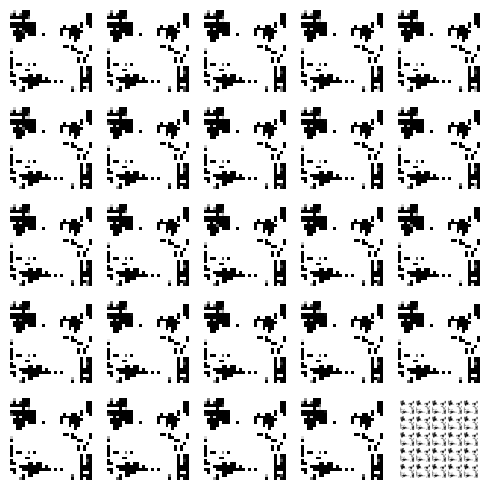

  0%|          | 0/350 [00:00<?, ?it/s]

4/4 [==============================] - 0s 19ms/step


  0%|          | 1/350 [00:00<04:36,  1.26it/s]

4/4 [==============================] - 0s 16ms/step


  1%|          | 2/350 [00:01<04:14,  1.37it/s]

4/4 [==============================] - 0s 15ms/step


  1%|          | 3/350 [00:02<04:04,  1.42it/s]

4/4 [==============================] - 0s 14ms/step


  1%|          | 4/350 [00:02<03:57,  1.45it/s]

4/4 [==============================] - 0s 15ms/step


  1%|▏         | 5/350 [00:03<03:55,  1.46it/s]

4/4 [==============================] - 0s 13ms/step


  2%|▏         | 6/350 [00:04<04:05,  1.40it/s]

4/4 [==============================] - 0s 13ms/step


  2%|▏         | 7/350 [00:04<03:45,  1.52it/s]

4/4 [==============================] - 0s 12ms/step


  2%|▏         | 8/350 [00:05<03:34,  1.59it/s]

4/4 [==============================] - 0s 13ms/step


  3%|▎         | 9/350 [00:05<03:28,  1.64it/s]

4/4 [==============================] - 0s 15ms/step


  3%|▎         | 10/350 [00:06<03:39,  1.55it/s]

4/4 [==============================] - 0s 14ms/step


  3%|▎         | 11/350 [00:07<03:38,  1.55it/s]

4/4 [==============================] - 0s 14ms/step


  3%|▎         | 12/350 [00:07<03:27,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


  4%|▎         | 13/350 [00:08<03:26,  1.63it/s]

4/4 [==============================] - 0s 17ms/step


  4%|▍         | 14/350 [00:09<03:30,  1.60it/s]

4/4 [==============================] - 0s 24ms/step


  4%|▍         | 15/350 [00:09<03:25,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


  5%|▍         | 16/350 [00:10<03:22,  1.65it/s]

4/4 [==============================] - 0s 13ms/step


  5%|▍         | 17/350 [00:10<03:21,  1.65it/s]

4/4 [==============================] - 0s 14ms/step


  5%|▌         | 18/350 [00:11<03:13,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


  5%|▌         | 19/350 [00:12<03:29,  1.58it/s]

4/4 [==============================] - 0s 15ms/step


  6%|▌         | 20/350 [00:12<03:27,  1.59it/s]

4/4 [==============================] - 0s 22ms/step


  6%|▌         | 21/350 [00:13<03:24,  1.61it/s]

4/4 [==============================] - 0s 19ms/step


  6%|▋         | 22/350 [00:14<03:22,  1.62it/s]

4/4 [==============================] - 0s 16ms/step


  7%|▋         | 23/350 [00:14<03:14,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


  7%|▋         | 24/350 [00:15<03:30,  1.55it/s]

4/4 [==============================] - 0s 15ms/step


  7%|▋         | 25/350 [00:15<03:29,  1.55it/s]

4/4 [==============================] - 0s 16ms/step


  7%|▋         | 26/350 [00:16<03:21,  1.60it/s]

4/4 [==============================] - 0s 14ms/step


  8%|▊         | 27/350 [00:17<03:14,  1.66it/s]

4/4 [==============================] - 0s 18ms/step


  8%|▊         | 28/350 [00:17<03:14,  1.66it/s]

4/4 [==============================] - 0s 14ms/step


  8%|▊         | 29/350 [00:18<03:26,  1.55it/s]

4/4 [==============================] - 0s 14ms/step


  9%|▊         | 30/350 [00:19<03:19,  1.61it/s]

4/4 [==============================] - 0s 16ms/step


  9%|▉         | 31/350 [00:19<03:15,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


  9%|▉         | 32/350 [00:20<03:24,  1.55it/s]

4/4 [==============================] - 0s 13ms/step


  9%|▉         | 33/350 [00:20<03:20,  1.58it/s]

4/4 [==============================] - 0s 26ms/step


 10%|▉         | 34/350 [00:21<03:17,  1.60it/s]

4/4 [==============================] - 0s 16ms/step


 10%|█         | 35/350 [00:22<03:14,  1.62it/s]

4/4 [==============================] - 0s 13ms/step


 10%|█         | 36/350 [00:22<03:11,  1.64it/s]

4/4 [==============================] - 0s 16ms/step


 11%|█         | 37/350 [00:23<03:07,  1.67it/s]

4/4 [==============================] - 0s 17ms/step


 11%|█         | 38/350 [00:23<03:12,  1.62it/s]

4/4 [==============================] - 0s 21ms/step


 11%|█         | 39/350 [00:24<03:15,  1.59it/s]

4/4 [==============================] - 0s 13ms/step


 11%|█▏        | 40/350 [00:25<03:13,  1.60it/s]

4/4 [==============================] - 0s 15ms/step


 12%|█▏        | 41/350 [00:25<03:06,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


 12%|█▏        | 42/350 [00:26<03:02,  1.69it/s]

4/4 [==============================] - 0s 13ms/step


 12%|█▏        | 43/350 [00:26<03:06,  1.65it/s]

4/4 [==============================] - 0s 14ms/step


 13%|█▎        | 44/350 [00:27<03:12,  1.59it/s]

4/4 [==============================] - 0s 14ms/step


 13%|█▎        | 45/350 [00:28<03:02,  1.67it/s]

4/4 [==============================] - 0s 14ms/step


 13%|█▎        | 46/350 [00:28<02:59,  1.69it/s]

4/4 [==============================] - 0s 14ms/step


 13%|█▎        | 47/350 [00:29<03:07,  1.61it/s]

4/4 [==============================] - 0s 16ms/step


 14%|█▎        | 48/350 [00:30<03:07,  1.61it/s]

4/4 [==============================] - 0s 13ms/step


 14%|█▍        | 49/350 [00:30<03:00,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 14%|█▍        | 50/350 [00:31<02:58,  1.68it/s]

4/4 [==============================] - 0s 14ms/step


 15%|█▍        | 51/350 [00:31<02:58,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 15%|█▍        | 52/350 [00:32<03:00,  1.65it/s]

4/4 [==============================] - 0s 14ms/step


 15%|█▌        | 53/350 [00:33<03:00,  1.64it/s]

4/4 [==============================] - 0s 16ms/step


 15%|█▌        | 54/350 [00:33<02:59,  1.65it/s]

4/4 [==============================] - 0s 16ms/step


 16%|█▌        | 55/350 [00:34<02:55,  1.68it/s]

4/4 [==============================] - 0s 16ms/step


 16%|█▌        | 56/350 [00:34<02:57,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 16%|█▋        | 57/350 [00:35<02:54,  1.68it/s]

4/4 [==============================] - 0s 14ms/step


 17%|█▋        | 58/350 [00:36<02:55,  1.66it/s]

4/4 [==============================] - 0s 17ms/step


 17%|█▋        | 59/350 [00:36<02:49,  1.72it/s]

4/4 [==============================] - 0s 15ms/step


 17%|█▋        | 60/350 [00:37<02:45,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 17%|█▋        | 61/350 [00:37<02:48,  1.71it/s]

4/4 [==============================] - 0s 11ms/step


 18%|█▊        | 62/350 [00:38<02:50,  1.69it/s]

4/4 [==============================] - 0s 16ms/step


 18%|█▊        | 63/350 [00:38<02:46,  1.72it/s]

4/4 [==============================] - 0s 14ms/step


 18%|█▊        | 64/350 [00:39<02:45,  1.73it/s]

4/4 [==============================] - 0s 12ms/step


 19%|█▊        | 65/350 [00:40<02:44,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 19%|█▉        | 66/350 [00:40<02:54,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


 19%|█▉        | 67/350 [00:41<02:47,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 19%|█▉        | 68/350 [00:41<02:43,  1.72it/s]

4/4 [==============================] - 0s 14ms/step


 20%|█▉        | 69/350 [00:42<02:41,  1.74it/s]

4/4 [==============================] - 0s 14ms/step


 20%|██        | 70/350 [00:42<02:43,  1.71it/s]

4/4 [==============================] - 0s 13ms/step


 20%|██        | 71/350 [00:43<02:43,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 21%|██        | 72/350 [00:44<02:43,  1.70it/s]

4/4 [==============================] - 0s 14ms/step


 21%|██        | 73/350 [00:44<02:41,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 21%|██        | 74/350 [00:45<02:40,  1.72it/s]

4/4 [==============================] - 0s 14ms/step


 21%|██▏       | 75/350 [00:45<02:40,  1.71it/s]

4/4 [==============================] - 0s 18ms/step


 22%|██▏       | 76/350 [00:46<02:49,  1.62it/s]

4/4 [==============================] - 0s 18ms/step


 22%|██▏       | 77/350 [00:47<02:52,  1.58it/s]

4/4 [==============================] - 0s 13ms/step


 22%|██▏       | 78/350 [00:47<02:55,  1.55it/s]

4/4 [==============================] - 0s 13ms/step


 23%|██▎       | 79/350 [00:48<02:50,  1.59it/s]

4/4 [==============================] - 0s 18ms/step


 23%|██▎       | 80/350 [00:49<02:44,  1.64it/s]

4/4 [==============================] - 0s 16ms/step


 23%|██▎       | 81/350 [00:49<02:52,  1.56it/s]

4/4 [==============================] - 0s 20ms/step


 23%|██▎       | 82/350 [00:50<02:53,  1.54it/s]

4/4 [==============================] - 0s 17ms/step


 24%|██▎       | 83/350 [00:51<02:47,  1.60it/s]

4/4 [==============================] - 0s 14ms/step


 24%|██▍       | 84/350 [00:51<02:45,  1.61it/s]

4/4 [==============================] - 0s 12ms/step


 24%|██▍       | 85/350 [00:52<03:03,  1.45it/s]

4/4 [==============================] - 0s 20ms/step


 25%|██▍       | 86/350 [00:53<02:53,  1.52it/s]

4/4 [==============================] - 0s 22ms/step


 25%|██▍       | 87/350 [00:53<02:50,  1.54it/s]

4/4 [==============================] - 0s 11ms/step


 25%|██▌       | 88/350 [00:54<02:43,  1.60it/s]

4/4 [==============================] - 0s 13ms/step


 25%|██▌       | 89/350 [00:54<02:47,  1.56it/s]

4/4 [==============================] - 0s 22ms/step


 26%|██▌       | 90/350 [00:55<02:45,  1.57it/s]

4/4 [==============================] - 0s 15ms/step


 26%|██▌       | 91/350 [00:56<02:40,  1.61it/s]

4/4 [==============================] - 0s 15ms/step


 26%|██▋       | 92/350 [00:56<02:38,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


 27%|██▋       | 93/350 [00:57<02:38,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


 27%|██▋       | 94/350 [00:58<02:43,  1.56it/s]

4/4 [==============================] - 0s 15ms/step


 27%|██▋       | 95/350 [00:58<02:54,  1.46it/s]

4/4 [==============================] - 0s 14ms/step


 27%|██▋       | 96/350 [00:59<02:43,  1.55it/s]

4/4 [==============================] - 0s 18ms/step


 28%|██▊       | 97/350 [01:00<02:38,  1.60it/s]

4/4 [==============================] - 0s 14ms/step


 28%|██▊       | 98/350 [01:00<02:47,  1.50it/s]

4/4 [==============================] - 0s 11ms/step


 28%|██▊       | 99/350 [01:01<02:42,  1.55it/s]

4/4 [==============================] - 0s 17ms/step


 29%|██▊       | 100/350 [01:02<02:45,  1.51it/s]

4/4 [==============================] - 0s 11ms/step


 29%|██▉       | 101/350 [01:02<02:42,  1.53it/s]

4/4 [==============================] - 0s 21ms/step


 29%|██▉       | 102/350 [01:03<03:00,  1.38it/s]

4/4 [==============================] - 0s 15ms/step


 29%|██▉       | 103/350 [01:04<02:58,  1.38it/s]

4/4 [==============================] - 0s 15ms/step


 30%|██▉       | 104/350 [01:04<02:52,  1.42it/s]

4/4 [==============================] - 0s 11ms/step


 30%|███       | 105/350 [01:05<02:36,  1.56it/s]

4/4 [==============================] - 0s 13ms/step


 30%|███       | 106/350 [01:06<02:47,  1.46it/s]

4/4 [==============================] - 0s 13ms/step


 31%|███       | 107/350 [01:06<02:39,  1.52it/s]

4/4 [==============================] - 0s 15ms/step


 31%|███       | 108/350 [01:07<02:37,  1.54it/s]

4/4 [==============================] - 0s 12ms/step


 31%|███       | 109/350 [01:08<02:39,  1.51it/s]

4/4 [==============================] - 0s 30ms/step


 31%|███▏      | 110/350 [01:08<02:47,  1.43it/s]

4/4 [==============================] - 0s 11ms/step


 32%|███▏      | 111/350 [01:09<02:45,  1.45it/s]

4/4 [==============================] - 0s 14ms/step


 32%|███▏      | 112/350 [01:10<02:46,  1.43it/s]

4/4 [==============================] - 0s 12ms/step


 32%|███▏      | 113/350 [01:10<02:37,  1.50it/s]

4/4 [==============================] - 0s 23ms/step


 33%|███▎      | 114/350 [01:11<02:43,  1.44it/s]

4/4 [==============================] - 0s 15ms/step


 33%|███▎      | 115/350 [01:12<02:50,  1.38it/s]

4/4 [==============================] - 0s 19ms/step


 33%|███▎      | 116/350 [01:13<02:39,  1.47it/s]

4/4 [==============================] - 0s 13ms/step


 33%|███▎      | 117/350 [01:13<02:44,  1.42it/s]

4/4 [==============================] - 0s 22ms/step


 34%|███▎      | 118/350 [01:14<02:45,  1.40it/s]

4/4 [==============================] - 0s 12ms/step


 34%|███▍      | 119/350 [01:15<02:37,  1.47it/s]

4/4 [==============================] - 0s 14ms/step


 34%|███▍      | 120/350 [01:15<02:32,  1.50it/s]

4/4 [==============================] - 0s 31ms/step


 35%|███▍      | 121/350 [01:16<02:39,  1.44it/s]

4/4 [==============================] - 0s 15ms/step


 35%|███▍      | 122/350 [01:17<02:37,  1.44it/s]

4/4 [==============================] - 0s 17ms/step


 35%|███▌      | 123/350 [01:17<02:30,  1.51it/s]

4/4 [==============================] - 0s 11ms/step


 35%|███▌      | 124/350 [01:18<02:39,  1.42it/s]

4/4 [==============================] - 0s 14ms/step


 36%|███▌      | 125/350 [01:19<02:35,  1.44it/s]

4/4 [==============================] - 0s 19ms/step


 36%|███▌      | 126/350 [01:20<02:35,  1.44it/s]

4/4 [==============================] - 0s 18ms/step


 36%|███▋      | 127/350 [01:20<02:36,  1.43it/s]

4/4 [==============================] - 0s 18ms/step


 37%|███▋      | 128/350 [01:21<02:38,  1.41it/s]

4/4 [==============================] - 0s 17ms/step


 37%|███▋      | 129/350 [01:22<02:41,  1.37it/s]

4/4 [==============================] - 0s 14ms/step


 37%|███▋      | 130/350 [01:22<02:33,  1.43it/s]

4/4 [==============================] - 0s 18ms/step


 37%|███▋      | 131/350 [01:23<02:36,  1.40it/s]

4/4 [==============================] - 0s 18ms/step


 38%|███▊      | 132/350 [01:24<02:34,  1.41it/s]

4/4 [==============================] - 0s 16ms/step


 38%|███▊      | 133/350 [01:25<02:35,  1.40it/s]

4/4 [==============================] - 0s 13ms/step


 38%|███▊      | 134/350 [01:25<02:25,  1.49it/s]

4/4 [==============================] - 0s 11ms/step


 39%|███▊      | 135/350 [01:26<02:26,  1.47it/s]

4/4 [==============================] - 0s 15ms/step


 39%|███▉      | 136/350 [01:26<02:20,  1.52it/s]

4/4 [==============================] - 0s 14ms/step


 39%|███▉      | 137/350 [01:27<02:18,  1.53it/s]

4/4 [==============================] - 0s 15ms/step


 39%|███▉      | 138/350 [01:28<02:21,  1.50it/s]

4/4 [==============================] - 0s 28ms/step


 40%|███▉      | 139/350 [01:29<02:25,  1.45it/s]

4/4 [==============================] - 0s 22ms/step


 40%|████      | 140/350 [01:29<02:32,  1.37it/s]

4/4 [==============================] - 0s 13ms/step


 40%|████      | 141/350 [01:30<02:30,  1.39it/s]

4/4 [==============================] - 0s 12ms/step


 41%|████      | 142/350 [01:31<02:31,  1.37it/s]

4/4 [==============================] - 0s 21ms/step


 41%|████      | 143/350 [01:31<02:29,  1.38it/s]

4/4 [==============================] - 0s 21ms/step


 41%|████      | 144/350 [01:32<02:27,  1.39it/s]

4/4 [==============================] - 0s 15ms/step


 41%|████▏     | 145/350 [01:33<02:24,  1.42it/s]

4/4 [==============================] - 0s 13ms/step


 42%|████▏     | 146/350 [01:34<02:20,  1.46it/s]

4/4 [==============================] - 0s 19ms/step


 42%|████▏     | 147/350 [01:34<02:20,  1.45it/s]

4/4 [==============================] - 0s 14ms/step


 42%|████▏     | 148/350 [01:35<02:12,  1.52it/s]

4/4 [==============================] - 0s 14ms/step


 43%|████▎     | 149/350 [01:35<02:09,  1.56it/s]

4/4 [==============================] - 0s 13ms/step


 43%|████▎     | 150/350 [01:36<02:12,  1.51it/s]

4/4 [==============================] - 0s 17ms/step


 43%|████▎     | 151/350 [01:37<02:09,  1.54it/s]

4/4 [==============================] - 0s 18ms/step


 43%|████▎     | 152/350 [01:37<02:05,  1.58it/s]

4/4 [==============================] - 0s 14ms/step


 44%|████▎     | 153/350 [01:38<02:11,  1.50it/s]

4/4 [==============================] - 0s 14ms/step


 44%|████▍     | 154/350 [01:39<02:13,  1.47it/s]

4/4 [==============================] - 0s 14ms/step


 44%|████▍     | 155/350 [01:39<02:10,  1.49it/s]

4/4 [==============================] - 0s 19ms/step


 45%|████▍     | 156/350 [01:40<02:12,  1.47it/s]

4/4 [==============================] - 0s 11ms/step


 45%|████▍     | 157/350 [01:41<02:03,  1.56it/s]

4/4 [==============================] - 0s 27ms/step


 45%|████▌     | 158/350 [01:41<02:06,  1.52it/s]

4/4 [==============================] - 0s 14ms/step


 45%|████▌     | 159/350 [01:42<02:07,  1.50it/s]

4/4 [==============================] - 0s 13ms/step


 46%|████▌     | 160/350 [01:43<02:01,  1.56it/s]

4/4 [==============================] - 0s 15ms/step


 46%|████▌     | 161/350 [01:43<02:02,  1.55it/s]

4/4 [==============================] - 0s 35ms/step


 46%|████▋     | 162/350 [01:44<02:06,  1.48it/s]

4/4 [==============================] - 0s 12ms/step


 47%|████▋     | 163/350 [01:45<01:58,  1.58it/s]

4/4 [==============================] - 0s 14ms/step


 47%|████▋     | 164/350 [01:45<01:57,  1.59it/s]

4/4 [==============================] - 0s 14ms/step


 47%|████▋     | 165/350 [01:46<02:04,  1.48it/s]

4/4 [==============================] - 0s 22ms/step


 47%|████▋     | 166/350 [01:47<02:04,  1.47it/s]

4/4 [==============================] - 0s 10ms/step


 48%|████▊     | 167/350 [01:47<01:54,  1.60it/s]

4/4 [==============================] - 0s 17ms/step


 48%|████▊     | 168/350 [01:48<01:57,  1.55it/s]

4/4 [==============================] - 0s 14ms/step


 48%|████▊     | 169/350 [01:49<02:00,  1.50it/s]

4/4 [==============================] - 0s 18ms/step


 49%|████▊     | 170/350 [01:49<02:01,  1.48it/s]

4/4 [==============================] - 0s 15ms/step


 49%|████▉     | 171/350 [01:50<01:57,  1.52it/s]

4/4 [==============================] - 0s 16ms/step


 49%|████▉     | 172/350 [01:50<01:53,  1.57it/s]

4/4 [==============================] - 0s 13ms/step


 49%|████▉     | 173/350 [01:51<01:57,  1.50it/s]

4/4 [==============================] - 0s 14ms/step


 50%|████▉     | 174/350 [01:52<01:52,  1.56it/s]

4/4 [==============================] - 0s 13ms/step


 50%|█████     | 175/350 [01:52<01:53,  1.55it/s]

4/4 [==============================] - 0s 14ms/step


 50%|█████     | 176/350 [01:53<01:49,  1.59it/s]

4/4 [==============================] - 0s 27ms/step


 51%|█████     | 177/350 [01:54<01:52,  1.54it/s]

4/4 [==============================] - 0s 22ms/step


 51%|█████     | 178/350 [01:54<01:52,  1.52it/s]

4/4 [==============================] - 0s 16ms/step


 51%|█████     | 179/350 [01:55<01:46,  1.60it/s]

4/4 [==============================] - 0s 18ms/step


 51%|█████▏    | 180/350 [01:56<01:43,  1.64it/s]

4/4 [==============================] - 0s 16ms/step


 52%|█████▏    | 181/350 [01:56<01:41,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


 52%|█████▏    | 182/350 [01:57<01:47,  1.57it/s]

4/4 [==============================] - 0s 15ms/step


 52%|█████▏    | 183/350 [01:57<01:43,  1.61it/s]

4/4 [==============================] - 0s 15ms/step


 53%|█████▎    | 184/350 [01:58<01:40,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 53%|█████▎    | 185/350 [01:59<01:45,  1.57it/s]

4/4 [==============================] - 0s 14ms/step


 53%|█████▎    | 186/350 [01:59<01:46,  1.54it/s]

4/4 [==============================] - 0s 22ms/step


 53%|█████▎    | 187/350 [02:00<01:42,  1.59it/s]

4/4 [==============================] - 0s 11ms/step


 54%|█████▎    | 188/350 [02:01<01:37,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 54%|█████▍    | 189/350 [02:01<01:36,  1.67it/s]

4/4 [==============================] - 0s 14ms/step


 54%|█████▍    | 190/350 [02:02<01:38,  1.62it/s]

4/4 [==============================] - 0s 18ms/step


 55%|█████▍    | 191/350 [02:02<01:36,  1.65it/s]

4/4 [==============================] - 0s 16ms/step


 55%|█████▍    | 192/350 [02:03<01:35,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 55%|█████▌    | 193/350 [02:04<01:38,  1.59it/s]

4/4 [==============================] - 0s 14ms/step


 55%|█████▌    | 194/350 [02:04<01:37,  1.60it/s]

4/4 [==============================] - 0s 12ms/step


 56%|█████▌    | 195/350 [02:05<01:34,  1.65it/s]

4/4 [==============================] - 0s 14ms/step


 56%|█████▌    | 196/350 [02:05<01:33,  1.64it/s]

4/4 [==============================] - 0s 14ms/step


 56%|█████▋    | 197/350 [02:06<01:30,  1.70it/s]

4/4 [==============================] - 0s 15ms/step


 57%|█████▋    | 198/350 [02:07<01:28,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 57%|█████▋    | 199/350 [02:07<01:30,  1.68it/s]

4/4 [==============================] - 0s 19ms/step


 57%|█████▋    | 200/350 [02:08<01:31,  1.64it/s]

4/4 [==============================] - 0s 17ms/step


 57%|█████▋    | 201/350 [02:08<01:27,  1.70it/s]

4/4 [==============================] - 0s 13ms/step


 58%|█████▊    | 202/350 [02:09<01:27,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 58%|█████▊    | 203/350 [02:10<01:31,  1.61it/s]

4/4 [==============================] - 0s 14ms/step


 58%|█████▊    | 204/350 [02:10<01:32,  1.58it/s]

4/4 [==============================] - 0s 13ms/step


 59%|█████▊    | 205/350 [02:11<01:27,  1.65it/s]

4/4 [==============================] - 0s 14ms/step


 59%|█████▉    | 206/350 [02:11<01:25,  1.68it/s]

4/4 [==============================] - 0s 15ms/step


 59%|█████▉    | 207/350 [02:12<01:33,  1.53it/s]

4/4 [==============================] - 0s 15ms/step


 59%|█████▉    | 208/350 [02:13<01:31,  1.56it/s]

4/4 [==============================] - 0s 12ms/step


 60%|█████▉    | 209/350 [02:13<01:29,  1.58it/s]

4/4 [==============================] - 0s 15ms/step


 60%|██████    | 210/350 [02:14<01:26,  1.63it/s]

4/4 [==============================] - 0s 15ms/step


 60%|██████    | 211/350 [02:15<01:25,  1.63it/s]

4/4 [==============================] - 0s 22ms/step


 61%|██████    | 212/350 [02:15<01:27,  1.58it/s]

4/4 [==============================] - 0s 12ms/step


 61%|██████    | 213/350 [02:16<01:25,  1.61it/s]

4/4 [==============================] - 0s 17ms/step


 61%|██████    | 214/350 [02:17<01:24,  1.61it/s]

4/4 [==============================] - 0s 11ms/step


 61%|██████▏   | 215/350 [02:17<01:25,  1.57it/s]

4/4 [==============================] - 0s 15ms/step


 62%|██████▏   | 216/350 [02:18<01:22,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


 62%|██████▏   | 217/350 [02:18<01:20,  1.65it/s]

4/4 [==============================] - 0s 16ms/step


 62%|██████▏   | 218/350 [02:19<01:22,  1.60it/s]

4/4 [==============================] - 0s 11ms/step


 63%|██████▎   | 219/350 [02:20<01:18,  1.67it/s]

4/4 [==============================] - 0s 19ms/step


 63%|██████▎   | 220/350 [02:20<01:21,  1.59it/s]

4/4 [==============================] - 0s 13ms/step


 63%|██████▎   | 221/350 [02:21<01:22,  1.57it/s]

4/4 [==============================] - 0s 17ms/step


 63%|██████▎   | 222/350 [02:22<01:21,  1.57it/s]

4/4 [==============================] - 0s 12ms/step


 64%|██████▎   | 223/350 [02:22<01:21,  1.55it/s]

4/4 [==============================] - 0s 13ms/step


 64%|██████▍   | 224/350 [02:23<01:18,  1.61it/s]

4/4 [==============================] - 0s 13ms/step


 64%|██████▍   | 225/350 [02:23<01:17,  1.62it/s]

4/4 [==============================] - 0s 13ms/step


 65%|██████▍   | 226/350 [02:24<01:18,  1.59it/s]

4/4 [==============================] - 0s 12ms/step


 65%|██████▍   | 227/350 [02:25<01:21,  1.50it/s]

4/4 [==============================] - 0s 15ms/step


 65%|██████▌   | 228/350 [02:25<01:18,  1.55it/s]

4/4 [==============================] - 0s 15ms/step


 65%|██████▌   | 229/350 [02:26<01:15,  1.59it/s]

4/4 [==============================] - 0s 14ms/step


 66%|██████▌   | 230/350 [02:27<01:14,  1.60it/s]

4/4 [==============================] - 0s 12ms/step


 66%|██████▌   | 231/350 [02:27<01:12,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 66%|██████▋   | 232/350 [02:28<01:12,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 67%|██████▋   | 233/350 [02:28<01:10,  1.66it/s]

4/4 [==============================] - 0s 15ms/step


 67%|██████▋   | 234/350 [02:29<01:10,  1.66it/s]

4/4 [==============================] - 0s 18ms/step


 67%|██████▋   | 235/350 [02:30<01:11,  1.61it/s]

4/4 [==============================] - 0s 12ms/step


 67%|██████▋   | 236/350 [02:30<01:11,  1.59it/s]

4/4 [==============================] - 0s 18ms/step


 68%|██████▊   | 237/350 [02:31<01:11,  1.57it/s]

4/4 [==============================] - 0s 12ms/step


 68%|██████▊   | 238/350 [02:31<01:07,  1.66it/s]

4/4 [==============================] - 0s 15ms/step


 68%|██████▊   | 239/350 [02:32<01:08,  1.61it/s]

4/4 [==============================] - 0s 16ms/step


 69%|██████▊   | 240/350 [02:33<01:07,  1.64it/s]

4/4 [==============================] - 0s 14ms/step


 69%|██████▉   | 241/350 [02:33<01:06,  1.64it/s]

4/4 [==============================] - 0s 15ms/step


 69%|██████▉   | 242/350 [02:34<01:04,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


 69%|██████▉   | 243/350 [02:35<01:05,  1.62it/s]

4/4 [==============================] - 0s 14ms/step


 70%|██████▉   | 244/350 [02:35<01:07,  1.58it/s]

4/4 [==============================] - 0s 16ms/step


 70%|███████   | 245/350 [02:36<01:04,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 70%|███████   | 246/350 [02:36<01:01,  1.69it/s]

4/4 [==============================] - 0s 15ms/step


 71%|███████   | 247/350 [02:37<01:01,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 71%|███████   | 248/350 [02:38<01:02,  1.62it/s]

4/4 [==============================] - 0s 16ms/step


 71%|███████   | 249/350 [02:38<01:00,  1.68it/s]

4/4 [==============================] - 0s 14ms/step


 71%|███████▏  | 250/350 [02:39<00:59,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 72%|███████▏  | 251/350 [02:39<01:02,  1.59it/s]

4/4 [==============================] - 0s 22ms/step


 72%|███████▏  | 252/350 [02:40<01:01,  1.58it/s]

4/4 [==============================] - 0s 15ms/step


 72%|███████▏  | 253/350 [02:41<00:59,  1.62it/s]

4/4 [==============================] - 0s 13ms/step


 73%|███████▎  | 254/350 [02:41<00:57,  1.68it/s]

4/4 [==============================] - 0s 15ms/step


 73%|███████▎  | 255/350 [02:42<00:59,  1.59it/s]

4/4 [==============================] - 0s 16ms/step


 73%|███████▎  | 256/350 [02:43<00:58,  1.61it/s]

4/4 [==============================] - 0s 15ms/step


 73%|███████▎  | 257/350 [02:43<00:56,  1.64it/s]

4/4 [==============================] - 0s 14ms/step


 74%|███████▎  | 258/350 [02:44<00:56,  1.62it/s]

4/4 [==============================] - 0s 15ms/step


 74%|███████▍  | 259/350 [02:44<00:56,  1.61it/s]

4/4 [==============================] - 0s 14ms/step


 74%|███████▍  | 260/350 [02:45<00:55,  1.62it/s]

4/4 [==============================] - 0s 14ms/step


 75%|███████▍  | 261/350 [02:46<00:53,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 75%|███████▍  | 262/350 [02:46<00:52,  1.66it/s]

4/4 [==============================] - 0s 15ms/step


 75%|███████▌  | 263/350 [02:47<00:54,  1.59it/s]

4/4 [==============================] - 0s 12ms/step


 75%|███████▌  | 264/350 [02:47<00:53,  1.59it/s]

4/4 [==============================] - 0s 16ms/step


 76%|███████▌  | 265/350 [02:48<00:51,  1.64it/s]

4/4 [==============================] - 0s 23ms/step


 76%|███████▌  | 266/350 [02:49<00:51,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


 76%|███████▋  | 267/350 [02:49<00:53,  1.56it/s]

4/4 [==============================] - 0s 15ms/step


 77%|███████▋  | 268/350 [02:50<00:51,  1.60it/s]

4/4 [==============================] - 0s 12ms/step


 77%|███████▋  | 269/350 [02:51<00:50,  1.62it/s]

4/4 [==============================] - 0s 11ms/step


 77%|███████▋  | 270/350 [02:51<00:47,  1.70it/s]

4/4 [==============================] - 0s 14ms/step


 77%|███████▋  | 271/350 [02:52<00:47,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 78%|███████▊  | 272/350 [02:52<00:47,  1.65it/s]

4/4 [==============================] - 0s 16ms/step


 78%|███████▊  | 273/350 [02:53<00:45,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 78%|███████▊  | 274/350 [02:53<00:44,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 79%|███████▊  | 275/350 [02:54<00:45,  1.64it/s]

4/4 [==============================] - 0s 18ms/step


 79%|███████▉  | 276/350 [02:55<00:46,  1.60it/s]

4/4 [==============================] - 0s 16ms/step


 79%|███████▉  | 277/350 [02:55<00:44,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


 79%|███████▉  | 278/350 [02:56<00:44,  1.62it/s]

4/4 [==============================] - 0s 22ms/step


 80%|███████▉  | 279/350 [02:57<00:46,  1.54it/s]

4/4 [==============================] - 0s 12ms/step


 80%|████████  | 280/350 [02:57<00:44,  1.58it/s]

4/4 [==============================] - 0s 20ms/step


 80%|████████  | 281/350 [02:58<00:42,  1.61it/s]

4/4 [==============================] - 0s 24ms/step


 81%|████████  | 282/350 [02:59<00:43,  1.56it/s]

4/4 [==============================] - 0s 14ms/step


 81%|████████  | 283/350 [02:59<00:42,  1.59it/s]

4/4 [==============================] - 0s 14ms/step


 81%|████████  | 284/350 [03:00<00:42,  1.54it/s]

4/4 [==============================] - 0s 14ms/step


 81%|████████▏ | 285/350 [03:00<00:40,  1.60it/s]

4/4 [==============================] - 0s 14ms/step


 82%|████████▏ | 286/350 [03:01<00:38,  1.64it/s]

4/4 [==============================] - 0s 13ms/step


 82%|████████▏ | 287/350 [03:02<00:39,  1.59it/s]

4/4 [==============================] - 0s 22ms/step


 82%|████████▏ | 288/350 [03:02<00:39,  1.59it/s]

4/4 [==============================] - 0s 13ms/step


 83%|████████▎ | 289/350 [03:03<00:39,  1.56it/s]

4/4 [==============================] - 0s 18ms/step


 83%|████████▎ | 290/350 [03:04<00:38,  1.55it/s]

4/4 [==============================] - 0s 11ms/step


 83%|████████▎ | 291/350 [03:04<00:38,  1.55it/s]

4/4 [==============================] - 0s 15ms/step


 83%|████████▎ | 292/350 [03:05<00:37,  1.54it/s]

4/4 [==============================] - 0s 17ms/step


 84%|████████▎ | 293/350 [03:06<00:36,  1.56it/s]

4/4 [==============================] - 0s 12ms/step


 84%|████████▍ | 294/350 [03:06<00:36,  1.52it/s]

4/4 [==============================] - 0s 15ms/step


 84%|████████▍ | 295/350 [03:07<00:34,  1.57it/s]

4/4 [==============================] - 0s 13ms/step


 85%|████████▍ | 296/350 [03:07<00:32,  1.64it/s]

4/4 [==============================] - 0s 14ms/step


 85%|████████▍ | 297/350 [03:08<00:31,  1.67it/s]

4/4 [==============================] - 0s 17ms/step


 85%|████████▌ | 298/350 [03:09<00:32,  1.59it/s]

4/4 [==============================] - 0s 13ms/step


 85%|████████▌ | 299/350 [03:09<00:31,  1.62it/s]

4/4 [==============================] - 0s 13ms/step


 86%|████████▌ | 300/350 [03:10<00:29,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 86%|████████▌ | 301/350 [03:10<00:28,  1.71it/s]

4/4 [==============================] - 0s 13ms/step


 86%|████████▋ | 302/350 [03:11<00:29,  1.60it/s]

4/4 [==============================] - 0s 14ms/step


 87%|████████▋ | 303/350 [03:12<00:29,  1.61it/s]

4/4 [==============================] - 0s 15ms/step


 87%|████████▋ | 304/350 [03:12<00:27,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 87%|████████▋ | 305/350 [03:13<00:28,  1.60it/s]

4/4 [==============================] - 0s 21ms/step


 87%|████████▋ | 306/350 [03:14<00:27,  1.61it/s]

4/4 [==============================] - 0s 15ms/step


 88%|████████▊ | 307/350 [03:14<00:25,  1.67it/s]

4/4 [==============================] - 0s 14ms/step


 88%|████████▊ | 308/350 [03:15<00:25,  1.67it/s]

4/4 [==============================] - 0s 14ms/step


 88%|████████▊ | 309/350 [03:15<00:25,  1.59it/s]

4/4 [==============================] - 0s 12ms/step


 89%|████████▊ | 310/350 [03:16<00:24,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


 89%|████████▉ | 311/350 [03:17<00:23,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 89%|████████▉ | 312/350 [03:17<00:22,  1.71it/s]

4/4 [==============================] - 0s 14ms/step


 89%|████████▉ | 313/350 [03:18<00:23,  1.56it/s]

4/4 [==============================] - 0s 16ms/step


 90%|████████▉ | 314/350 [03:18<00:22,  1.57it/s]

4/4 [==============================] - 0s 17ms/step


 90%|█████████ | 315/350 [03:19<00:23,  1.50it/s]

4/4 [==============================] - 0s 14ms/step


 90%|█████████ | 316/350 [03:20<00:23,  1.46it/s]

4/4 [==============================] - 0s 15ms/step


 91%|█████████ | 317/350 [03:21<00:21,  1.52it/s]

4/4 [==============================] - 0s 11ms/step


 91%|█████████ | 318/350 [03:21<00:20,  1.55it/s]

4/4 [==============================] - 0s 16ms/step


 91%|█████████ | 319/350 [03:22<00:19,  1.62it/s]

4/4 [==============================] - 0s 13ms/step


 91%|█████████▏| 320/350 [03:22<00:18,  1.58it/s]

4/4 [==============================] - 0s 16ms/step


 92%|█████████▏| 321/350 [03:23<00:18,  1.55it/s]

4/4 [==============================] - 0s 14ms/step


 92%|█████████▏| 322/350 [03:24<00:17,  1.58it/s]

4/4 [==============================] - 0s 11ms/step


 92%|█████████▏| 323/350 [03:24<00:16,  1.62it/s]

4/4 [==============================] - 0s 13ms/step


 93%|█████████▎| 324/350 [03:25<00:16,  1.60it/s]

4/4 [==============================] - 0s 15ms/step


 93%|█████████▎| 325/350 [03:26<00:16,  1.56it/s]

4/4 [==============================] - 0s 12ms/step


 93%|█████████▎| 326/350 [03:26<00:14,  1.61it/s]

4/4 [==============================] - 0s 21ms/step


 93%|█████████▎| 327/350 [03:27<00:14,  1.62it/s]

4/4 [==============================] - 0s 13ms/step


 94%|█████████▎| 328/350 [03:27<00:14,  1.54it/s]

4/4 [==============================] - 0s 13ms/step


 94%|█████████▍| 329/350 [03:28<00:12,  1.62it/s]

4/4 [==============================] - 0s 24ms/step


 94%|█████████▍| 330/350 [03:29<00:12,  1.59it/s]

4/4 [==============================] - 0s 15ms/step


 95%|█████████▍| 331/350 [03:29<00:12,  1.58it/s]

4/4 [==============================] - 0s 17ms/step


 95%|█████████▍| 332/350 [03:30<00:11,  1.54it/s]

4/4 [==============================] - 0s 11ms/step


 95%|█████████▌| 333/350 [03:30<00:10,  1.64it/s]

4/4 [==============================] - 0s 18ms/step


 95%|█████████▌| 334/350 [03:31<00:09,  1.63it/s]

4/4 [==============================] - 0s 14ms/step


 96%|█████████▌| 335/350 [03:32<00:09,  1.60it/s]

4/4 [==============================] - 0s 15ms/step


 96%|█████████▌| 336/350 [03:33<00:09,  1.51it/s]

4/4 [==============================] - 0s 13ms/step


 96%|█████████▋| 337/350 [03:33<00:08,  1.52it/s]

4/4 [==============================] - 0s 14ms/step


 97%|█████████▋| 338/350 [03:34<00:07,  1.53it/s]

4/4 [==============================] - 0s 16ms/step


 97%|█████████▋| 339/350 [03:35<00:07,  1.49it/s]

4/4 [==============================] - 0s 20ms/step


 97%|█████████▋| 340/350 [03:35<00:06,  1.51it/s]

4/4 [==============================] - 0s 13ms/step


 97%|█████████▋| 341/350 [03:36<00:05,  1.63it/s]

4/4 [==============================] - 0s 15ms/step


 98%|█████████▊| 342/350 [03:36<00:04,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


 98%|█████████▊| 343/350 [03:37<00:04,  1.54it/s]

4/4 [==============================] - 0s 12ms/step


 98%|█████████▊| 344/350 [03:38<00:04,  1.50it/s]

4/4 [==============================] - 0s 15ms/step


 99%|█████████▊| 345/350 [03:38<00:03,  1.54it/s]

4/4 [==============================] - 0s 14ms/step


 99%|█████████▉| 346/350 [03:39<00:02,  1.50it/s]

4/4 [==============================] - 0s 12ms/step


 99%|█████████▉| 347/350 [03:40<00:01,  1.59it/s]

4/4 [==============================] - 0s 16ms/step


 99%|█████████▉| 348/350 [03:40<00:01,  1.43it/s]

4/4 [==============================] - 0s 21ms/step


100%|█████████▉| 349/350 [03:41<00:00,  1.37it/s]

4/4 [==============================] - 0s 15ms/step


100%|██████████| 350/350 [03:42<00:00,  1.57it/s]

Epoch number: 91 discriminator_loss: 0.16424176518306402 generator_loss: 7.907009786878313
1/1 [==============================] - 0s 22ms/step


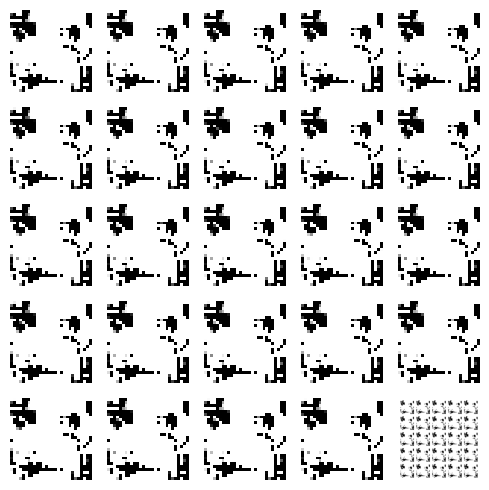

  0%|          | 0/350 [00:00<?, ?it/s]

4/4 [==============================] - 0s 15ms/step


  0%|          | 1/350 [00:00<04:53,  1.19it/s]

4/4 [==============================] - 0s 14ms/step


  1%|          | 2/350 [00:01<04:19,  1.34it/s]

4/4 [==============================] - 0s 13ms/step


  1%|          | 3/350 [00:02<04:05,  1.41it/s]

4/4 [==============================] - 0s 28ms/step


  1%|          | 4/350 [00:02<04:19,  1.33it/s]

4/4 [==============================] - 0s 15ms/step


  1%|▏         | 5/350 [00:03<04:13,  1.36it/s]

4/4 [==============================] - 0s 17ms/step


  2%|▏         | 6/350 [00:04<03:53,  1.47it/s]

4/4 [==============================] - 0s 13ms/step


  2%|▏         | 7/350 [00:05<04:03,  1.41it/s]

4/4 [==============================] - 0s 17ms/step


  2%|▏         | 8/350 [00:05<03:59,  1.43it/s]

4/4 [==============================] - 0s 13ms/step


  3%|▎         | 9/350 [00:06<03:46,  1.50it/s]

4/4 [==============================] - 0s 13ms/step


  3%|▎         | 10/350 [00:06<03:46,  1.50it/s]

4/4 [==============================] - 0s 13ms/step


  3%|▎         | 11/350 [00:07<03:47,  1.49it/s]

4/4 [==============================] - 0s 13ms/step


  3%|▎         | 12/350 [00:08<03:45,  1.50it/s]

4/4 [==============================] - 0s 15ms/step


  4%|▎         | 13/350 [00:08<03:45,  1.50it/s]

4/4 [==============================] - 0s 11ms/step


  4%|▍         | 14/350 [00:09<03:44,  1.49it/s]

4/4 [==============================] - 0s 20ms/step


  4%|▍         | 15/350 [00:10<03:37,  1.54it/s]

4/4 [==============================] - 0s 19ms/step


  5%|▍         | 16/350 [00:10<03:35,  1.55it/s]

4/4 [==============================] - 0s 16ms/step


  5%|▍         | 17/350 [00:11<03:28,  1.60it/s]

4/4 [==============================] - 0s 14ms/step


  5%|▌         | 18/350 [00:12<03:28,  1.59it/s]

4/4 [==============================] - 0s 13ms/step


  5%|▌         | 19/350 [00:12<03:26,  1.60it/s]

4/4 [==============================] - 0s 13ms/step


  6%|▌         | 20/350 [00:13<03:25,  1.61it/s]

4/4 [==============================] - 0s 12ms/step


  6%|▌         | 21/350 [00:13<03:16,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


  6%|▋         | 22/350 [00:14<03:20,  1.63it/s]

4/4 [==============================] - 0s 19ms/step


  7%|▋         | 23/350 [00:15<03:20,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


  7%|▋         | 24/350 [00:15<03:18,  1.64it/s]

4/4 [==============================] - 0s 16ms/step


  7%|▋         | 25/350 [00:16<03:09,  1.71it/s]

4/4 [==============================] - 0s 15ms/step


  7%|▋         | 26/350 [00:16<03:15,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


  8%|▊         | 27/350 [00:17<03:12,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


  8%|▊         | 28/350 [00:18<03:15,  1.65it/s]

4/4 [==============================] - 0s 14ms/step


  8%|▊         | 29/350 [00:18<03:08,  1.70it/s]

4/4 [==============================] - 0s 13ms/step


  9%|▊         | 30/350 [00:19<03:13,  1.66it/s]

4/4 [==============================] - 0s 18ms/step


  9%|▉         | 31/350 [00:19<03:11,  1.66it/s]

4/4 [==============================] - 0s 14ms/step


  9%|▉         | 32/350 [00:20<03:13,  1.64it/s]

4/4 [==============================] - 0s 13ms/step


  9%|▉         | 33/350 [00:21<03:09,  1.67it/s]

4/4 [==============================] - 0s 15ms/step


 10%|▉         | 34/350 [00:21<03:12,  1.65it/s]

4/4 [==============================] - 0s 15ms/step


 10%|█         | 35/350 [00:22<03:15,  1.61it/s]

4/4 [==============================] - 0s 14ms/step


 10%|█         | 36/350 [00:22<03:09,  1.66it/s]

4/4 [==============================] - 0s 14ms/step


 11%|█         | 37/350 [00:23<03:13,  1.62it/s]

4/4 [==============================] - 0s 27ms/step


 11%|█         | 38/350 [00:24<03:20,  1.56it/s]

4/4 [==============================] - 0s 16ms/step


 11%|█         | 39/350 [00:24<03:19,  1.56it/s]

4/4 [==============================] - 0s 13ms/step


 11%|█▏        | 40/350 [00:25<03:12,  1.61it/s]

4/4 [==============================] - 0s 11ms/step


 12%|█▏        | 41/350 [00:26<03:12,  1.61it/s]

4/4 [==============================] - 0s 18ms/step


 12%|█▏        | 42/350 [00:26<03:09,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 12%|█▏        | 43/350 [00:27<03:08,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


 13%|█▎        | 44/350 [00:27<03:06,  1.64it/s]

4/4 [==============================] - 0s 13ms/step


 13%|█▎        | 45/350 [00:28<03:03,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


 13%|█▎        | 46/350 [00:29<03:12,  1.58it/s]

4/4 [==============================] - 0s 13ms/step


 13%|█▎        | 47/350 [00:29<03:10,  1.59it/s]

4/4 [==============================] - 0s 12ms/step


 14%|█▎        | 48/350 [00:30<03:07,  1.61it/s]

4/4 [==============================] - 0s 12ms/step


 14%|█▍        | 49/350 [00:31<03:06,  1.61it/s]

4/4 [==============================] - 0s 12ms/step


 14%|█▍        | 50/350 [00:31<03:16,  1.53it/s]

4/4 [==============================] - 0s 14ms/step


 15%|█▍        | 51/350 [00:32<03:09,  1.58it/s]

4/4 [==============================] - 0s 13ms/step


 15%|█▍        | 52/350 [00:33<03:08,  1.58it/s]

4/4 [==============================] - 0s 12ms/step


 15%|█▌        | 53/350 [00:33<03:05,  1.60it/s]

4/4 [==============================] - 0s 22ms/step


 15%|█▌        | 54/350 [00:34<03:07,  1.58it/s]

4/4 [==============================] - 0s 14ms/step


 16%|█▌        | 55/350 [00:34<03:02,  1.61it/s]

4/4 [==============================] - 0s 22ms/step


 16%|█▌        | 56/350 [00:35<03:08,  1.56it/s]

4/4 [==============================] - 0s 12ms/step


 16%|█▋        | 57/350 [00:36<02:59,  1.64it/s]

4/4 [==============================] - 0s 18ms/step


 17%|█▋        | 58/350 [00:36<03:11,  1.53it/s]

4/4 [==============================] - 0s 12ms/step


 17%|█▋        | 59/350 [00:37<03:08,  1.55it/s]

4/4 [==============================] - 0s 15ms/step


 17%|█▋        | 60/350 [00:38<03:06,  1.55it/s]

4/4 [==============================] - 0s 10ms/step


 17%|█▋        | 61/350 [00:38<02:51,  1.68it/s]

4/4 [==============================] - 0s 14ms/step


 18%|█▊        | 62/350 [00:39<03:04,  1.56it/s]

4/4 [==============================] - 0s 13ms/step


 18%|█▊        | 63/350 [00:40<03:05,  1.54it/s]

4/4 [==============================] - 0s 15ms/step


 18%|█▊        | 64/350 [00:40<03:05,  1.54it/s]

4/4 [==============================] - 0s 13ms/step


 19%|█▊        | 65/350 [00:41<03:07,  1.52it/s]

4/4 [==============================] - 0s 14ms/step


 19%|█▉        | 66/350 [00:42<03:08,  1.51it/s]

4/4 [==============================] - 0s 17ms/step


 19%|█▉        | 67/350 [00:42<03:02,  1.55it/s]

4/4 [==============================] - 0s 11ms/step


 19%|█▉        | 68/350 [00:43<02:57,  1.59it/s]

4/4 [==============================] - 0s 12ms/step


 20%|█▉        | 69/350 [00:43<02:53,  1.62it/s]

4/4 [==============================] - 0s 32ms/step


 20%|██        | 70/350 [00:44<02:56,  1.59it/s]

4/4 [==============================] - 0s 12ms/step


 20%|██        | 71/350 [00:45<02:57,  1.57it/s]

4/4 [==============================] - 0s 13ms/step


 21%|██        | 72/350 [00:45<02:58,  1.56it/s]

4/4 [==============================] - 0s 15ms/step


 21%|██        | 73/350 [00:46<02:51,  1.62it/s]

4/4 [==============================] - 0s 16ms/step


 21%|██        | 74/350 [00:47<03:00,  1.53it/s]

4/4 [==============================] - 0s 15ms/step


 21%|██▏       | 75/350 [00:47<03:03,  1.50it/s]

4/4 [==============================] - 0s 11ms/step


 22%|██▏       | 76/350 [00:48<02:56,  1.56it/s]

4/4 [==============================] - 0s 20ms/step


 22%|██▏       | 77/350 [00:49<03:04,  1.48it/s]

4/4 [==============================] - 0s 11ms/step


 22%|██▏       | 78/350 [00:49<03:01,  1.50it/s]

4/4 [==============================] - 0s 15ms/step


 23%|██▎       | 79/350 [00:50<02:58,  1.52it/s]

4/4 [==============================] - 0s 10ms/step


 23%|██▎       | 80/350 [00:50<02:46,  1.63it/s]

4/4 [==============================] - 0s 18ms/step


 23%|██▎       | 81/350 [00:51<03:01,  1.48it/s]

4/4 [==============================] - 0s 13ms/step


 23%|██▎       | 82/350 [00:52<02:57,  1.51it/s]

4/4 [==============================] - 0s 15ms/step


 24%|██▎       | 83/350 [00:52<02:52,  1.55it/s]

4/4 [==============================] - 0s 11ms/step


 24%|██▍       | 84/350 [00:53<02:55,  1.52it/s]

4/4 [==============================] - 0s 13ms/step


 24%|██▍       | 85/350 [00:54<02:50,  1.56it/s]

4/4 [==============================] - 0s 13ms/step


 25%|██▍       | 86/350 [00:54<02:45,  1.59it/s]

4/4 [==============================] - 0s 12ms/step


 25%|██▍       | 87/350 [00:55<02:50,  1.54it/s]

4/4 [==============================] - 0s 11ms/step


 25%|██▌       | 88/350 [00:56<02:51,  1.53it/s]

4/4 [==============================] - 0s 12ms/step


 25%|██▌       | 89/350 [00:56<02:47,  1.55it/s]

4/4 [==============================] - 0s 14ms/step


 26%|██▌       | 90/350 [00:57<02:45,  1.57it/s]

4/4 [==============================] - 0s 21ms/step


 26%|██▌       | 91/350 [00:58<02:41,  1.60it/s]

4/4 [==============================] - 0s 15ms/step


 26%|██▋       | 92/350 [00:58<02:50,  1.52it/s]

4/4 [==============================] - 0s 13ms/step


 27%|██▋       | 93/350 [00:59<02:49,  1.52it/s]

4/4 [==============================] - 0s 18ms/step


 27%|██▋       | 94/350 [01:00<02:43,  1.57it/s]

4/4 [==============================] - 0s 11ms/step


 27%|██▋       | 95/350 [01:00<02:37,  1.62it/s]

4/4 [==============================] - 0s 19ms/step


 27%|██▋       | 96/350 [01:01<02:52,  1.47it/s]

4/4 [==============================] - 0s 22ms/step


 28%|██▊       | 97/350 [01:02<02:48,  1.50it/s]

4/4 [==============================] - 0s 11ms/step


 28%|██▊       | 98/350 [01:02<02:40,  1.57it/s]

4/4 [==============================] - 0s 16ms/step


 28%|██▊       | 99/350 [01:03<02:37,  1.60it/s]

4/4 [==============================] - 0s 21ms/step


 29%|██▊       | 100/350 [01:04<02:46,  1.50it/s]

4/4 [==============================] - 0s 13ms/step


 29%|██▉       | 101/350 [01:04<02:39,  1.57it/s]

4/4 [==============================] - 0s 13ms/step


 29%|██▉       | 102/350 [01:05<02:36,  1.58it/s]

4/4 [==============================] - 0s 25ms/step


 29%|██▉       | 103/350 [01:05<02:46,  1.48it/s]

4/4 [==============================] - 0s 12ms/step


 30%|██▉       | 104/350 [01:06<02:44,  1.50it/s]

4/4 [==============================] - 0s 13ms/step


 30%|███       | 105/350 [01:07<02:41,  1.52it/s]

4/4 [==============================] - 0s 15ms/step


 30%|███       | 106/350 [01:07<02:29,  1.63it/s]

4/4 [==============================] - 0s 16ms/step


 31%|███       | 107/350 [01:08<02:36,  1.55it/s]

4/4 [==============================] - 0s 18ms/step


 31%|███       | 108/350 [01:09<02:41,  1.50it/s]

4/4 [==============================] - 0s 35ms/step


 31%|███       | 109/350 [01:10<02:54,  1.38it/s]

4/4 [==============================] - 0s 12ms/step


 31%|███▏      | 110/350 [01:10<02:53,  1.38it/s]

4/4 [==============================] - 0s 15ms/step


 32%|███▏      | 111/350 [01:11<02:52,  1.38it/s]

4/4 [==============================] - 0s 27ms/step


 32%|███▏      | 112/350 [01:12<02:48,  1.41it/s]

4/4 [==============================] - 0s 14ms/step


 32%|███▏      | 113/350 [01:12<02:46,  1.42it/s]

4/4 [==============================] - 0s 16ms/step


 33%|███▎      | 114/350 [01:13<02:48,  1.40it/s]

4/4 [==============================] - 0s 13ms/step


 33%|███▎      | 115/350 [01:14<02:39,  1.47it/s]

4/4 [==============================] - 0s 19ms/step


 33%|███▎      | 116/350 [01:14<02:37,  1.49it/s]

4/4 [==============================] - 0s 11ms/step


 33%|███▎      | 117/350 [01:15<02:35,  1.49it/s]

4/4 [==============================] - 0s 23ms/step


 34%|███▎      | 118/350 [01:16<02:40,  1.45it/s]

4/4 [==============================] - 0s 14ms/step


 34%|███▍      | 119/350 [01:16<02:40,  1.44it/s]

4/4 [==============================] - 0s 15ms/step


 34%|███▍      | 120/350 [01:17<02:31,  1.52it/s]

4/4 [==============================] - 0s 13ms/step


 35%|███▍      | 121/350 [01:18<02:40,  1.43it/s]

4/4 [==============================] - 0s 12ms/step


 35%|███▍      | 122/350 [01:19<02:40,  1.42it/s]

4/4 [==============================] - 0s 14ms/step


 35%|███▌      | 123/350 [01:19<02:34,  1.46it/s]

4/4 [==============================] - 0s 11ms/step


 35%|███▌      | 124/350 [01:20<02:28,  1.52it/s]

4/4 [==============================] - 0s 19ms/step


 36%|███▌      | 125/350 [01:20<02:30,  1.49it/s]

4/4 [==============================] - 0s 14ms/step


 36%|███▌      | 126/350 [01:21<02:25,  1.54it/s]

4/4 [==============================] - 0s 13ms/step


 36%|███▋      | 127/350 [01:22<02:21,  1.58it/s]

4/4 [==============================] - 0s 13ms/step


 37%|███▋      | 128/350 [01:22<02:30,  1.47it/s]

4/4 [==============================] - 0s 12ms/step


 37%|███▋      | 129/350 [01:23<02:22,  1.55it/s]

4/4 [==============================] - 0s 14ms/step


 37%|███▋      | 130/350 [01:24<02:16,  1.61it/s]

4/4 [==============================] - 0s 13ms/step


 37%|███▋      | 131/350 [01:24<02:23,  1.53it/s]

4/4 [==============================] - 0s 12ms/step


 38%|███▊      | 132/350 [01:25<02:21,  1.54it/s]

4/4 [==============================] - 0s 18ms/step


 38%|███▊      | 133/350 [01:26<02:23,  1.52it/s]

4/4 [==============================] - 0s 14ms/step


 38%|███▊      | 134/350 [01:26<02:28,  1.46it/s]

4/4 [==============================] - 0s 16ms/step


 39%|███▊      | 135/350 [01:27<02:23,  1.50it/s]

4/4 [==============================] - 0s 10ms/step


 39%|███▉      | 136/350 [01:28<02:13,  1.60it/s]

4/4 [==============================] - 0s 14ms/step


 39%|███▉      | 137/350 [01:28<02:15,  1.57it/s]

4/4 [==============================] - 0s 11ms/step


 39%|███▉      | 138/350 [01:29<02:15,  1.56it/s]

4/4 [==============================] - 0s 16ms/step


 40%|███▉      | 139/350 [01:29<02:10,  1.61it/s]

4/4 [==============================] - 0s 15ms/step


 40%|████      | 140/350 [01:30<02:16,  1.54it/s]

4/4 [==============================] - 0s 14ms/step


 40%|████      | 141/350 [01:31<02:08,  1.63it/s]

4/4 [==============================] - 0s 14ms/step


 41%|████      | 142/350 [01:31<02:14,  1.55it/s]

4/4 [==============================] - 0s 12ms/step


 41%|████      | 143/350 [01:32<02:09,  1.59it/s]

4/4 [==============================] - 0s 14ms/step


 41%|████      | 144/350 [01:33<02:07,  1.61it/s]

4/4 [==============================] - 0s 11ms/step


 41%|████▏     | 145/350 [01:33<02:12,  1.55it/s]

4/4 [==============================] - 0s 14ms/step


 42%|████▏     | 146/350 [01:34<02:08,  1.58it/s]

4/4 [==============================] - 0s 17ms/step


 42%|████▏     | 147/350 [01:35<02:10,  1.55it/s]

4/4 [==============================] - 0s 11ms/step


 42%|████▏     | 148/350 [01:35<02:08,  1.57it/s]

4/4 [==============================] - 0s 14ms/step


 43%|████▎     | 149/350 [01:36<02:15,  1.48it/s]

4/4 [==============================] - 0s 11ms/step


 43%|████▎     | 150/350 [01:37<02:11,  1.53it/s]

4/4 [==============================] - 0s 14ms/step


 43%|████▎     | 151/350 [01:37<02:05,  1.59it/s]

4/4 [==============================] - 0s 11ms/step


 43%|████▎     | 152/350 [01:38<02:07,  1.56it/s]

4/4 [==============================] - 0s 16ms/step


 44%|████▎     | 153/350 [01:38<02:08,  1.54it/s]

4/4 [==============================] - 0s 15ms/step


 44%|████▍     | 154/350 [01:39<02:05,  1.57it/s]

4/4 [==============================] - 0s 11ms/step


 44%|████▍     | 155/350 [01:40<02:01,  1.61it/s]

4/4 [==============================] - 0s 17ms/step


 45%|████▍     | 156/350 [01:40<02:12,  1.46it/s]

4/4 [==============================] - 0s 15ms/step


 45%|████▍     | 157/350 [01:41<02:07,  1.52it/s]

4/4 [==============================] - 0s 11ms/step


 45%|████▌     | 158/350 [01:42<01:59,  1.60it/s]

4/4 [==============================] - 0s 15ms/step


 45%|████▌     | 159/350 [01:42<01:58,  1.62it/s]

4/4 [==============================] - 0s 11ms/step


 46%|████▌     | 160/350 [01:43<02:03,  1.54it/s]

4/4 [==============================] - 0s 13ms/step


 46%|████▌     | 161/350 [01:44<02:01,  1.56it/s]

4/4 [==============================] - 0s 12ms/step


 46%|████▋     | 162/350 [01:44<01:56,  1.61it/s]

4/4 [==============================] - 0s 15ms/step


 47%|████▋     | 163/350 [01:45<01:57,  1.59it/s]

4/4 [==============================] - 0s 14ms/step


 47%|████▋     | 164/350 [01:45<01:58,  1.56it/s]

4/4 [==============================] - 0s 13ms/step


 47%|████▋     | 165/350 [01:46<01:55,  1.60it/s]

4/4 [==============================] - 0s 23ms/step


 47%|████▋     | 166/350 [01:47<01:53,  1.62it/s]

4/4 [==============================] - 0s 14ms/step


 48%|████▊     | 167/350 [01:47<01:48,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


 48%|████▊     | 168/350 [01:48<01:52,  1.61it/s]

4/4 [==============================] - 0s 14ms/step


 48%|████▊     | 169/350 [01:48<01:50,  1.63it/s]

4/4 [==============================] - 0s 16ms/step


 49%|████▊     | 170/350 [01:49<01:50,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 49%|████▉     | 171/350 [01:50<01:54,  1.57it/s]

4/4 [==============================] - 0s 13ms/step


 49%|████▉     | 172/350 [01:50<01:50,  1.61it/s]

4/4 [==============================] - 0s 12ms/step


 49%|████▉     | 173/350 [01:51<01:50,  1.61it/s]

4/4 [==============================] - 0s 13ms/step


 50%|████▉     | 174/350 [01:52<01:44,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 50%|█████     | 175/350 [01:52<01:41,  1.73it/s]

4/4 [==============================] - 0s 22ms/step


 50%|█████     | 176/350 [01:53<01:44,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 51%|█████     | 177/350 [01:53<01:47,  1.60it/s]

4/4 [==============================] - 0s 12ms/step


 51%|█████     | 178/350 [01:54<01:41,  1.69it/s]

4/4 [==============================] - 0s 15ms/step


 51%|█████     | 179/350 [01:55<01:43,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 51%|█████▏    | 180/350 [01:55<01:43,  1.65it/s]

4/4 [==============================] - 0s 15ms/step


 52%|█████▏    | 181/350 [01:56<01:45,  1.60it/s]

4/4 [==============================] - 0s 15ms/step


 52%|█████▏    | 182/350 [01:56<01:41,  1.65it/s]

4/4 [==============================] - 0s 14ms/step


 52%|█████▏    | 183/350 [01:57<01:41,  1.64it/s]

4/4 [==============================] - 0s 15ms/step


 53%|█████▎    | 184/350 [01:58<01:47,  1.55it/s]

4/4 [==============================] - 0s 12ms/step


 53%|█████▎    | 185/350 [01:58<01:44,  1.58it/s]

4/4 [==============================] - 0s 15ms/step


 53%|█████▎    | 186/350 [01:59<01:43,  1.59it/s]

4/4 [==============================] - 0s 18ms/step


 53%|█████▎    | 187/350 [02:00<01:49,  1.49it/s]

4/4 [==============================] - 0s 13ms/step


 54%|█████▎    | 188/350 [02:00<01:44,  1.56it/s]

4/4 [==============================] - 0s 18ms/step


 54%|█████▍    | 189/350 [02:01<01:40,  1.60it/s]

4/4 [==============================] - 0s 14ms/step


 54%|█████▍    | 190/350 [02:01<01:37,  1.64it/s]

4/4 [==============================] - 0s 15ms/step


 55%|█████▍    | 191/350 [02:02<01:34,  1.68it/s]

4/4 [==============================] - 0s 20ms/step


 55%|█████▍    | 192/350 [02:03<01:35,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


 55%|█████▌    | 193/350 [02:03<01:35,  1.64it/s]

4/4 [==============================] - 0s 13ms/step


 55%|█████▌    | 194/350 [02:04<01:34,  1.65it/s]

4/4 [==============================] - 0s 17ms/step


 56%|█████▌    | 195/350 [02:04<01:34,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 56%|█████▌    | 196/350 [02:05<01:36,  1.59it/s]

4/4 [==============================] - 0s 16ms/step


 56%|█████▋    | 197/350 [02:06<01:38,  1.55it/s]

4/4 [==============================] - 0s 16ms/step


 57%|█████▋    | 198/350 [02:06<01:33,  1.62it/s]

4/4 [==============================] - 0s 14ms/step


 57%|█████▋    | 199/350 [02:07<01:35,  1.58it/s]

4/4 [==============================] - 0s 18ms/step


 57%|█████▋    | 200/350 [02:08<01:35,  1.58it/s]

4/4 [==============================] - 0s 14ms/step


 57%|█████▋    | 201/350 [02:08<01:34,  1.58it/s]

4/4 [==============================] - 0s 15ms/step


 58%|█████▊    | 202/350 [02:09<01:35,  1.55it/s]

4/4 [==============================] - 0s 15ms/step


 58%|█████▊    | 203/350 [02:10<01:39,  1.47it/s]

4/4 [==============================] - 0s 18ms/step


 58%|█████▊    | 204/350 [02:10<01:36,  1.52it/s]

4/4 [==============================] - 0s 12ms/step


 59%|█████▊    | 205/350 [02:11<01:30,  1.60it/s]

4/4 [==============================] - 0s 19ms/step


 59%|█████▉    | 206/350 [02:12<01:31,  1.57it/s]

4/4 [==============================] - 0s 14ms/step


 59%|█████▉    | 207/350 [02:12<01:34,  1.51it/s]

4/4 [==============================] - 0s 13ms/step


 59%|█████▉    | 208/350 [02:13<01:30,  1.56it/s]

4/4 [==============================] - 0s 13ms/step


 60%|█████▉    | 209/350 [02:13<01:27,  1.61it/s]

4/4 [==============================] - 0s 16ms/step


 60%|██████    | 210/350 [02:14<01:28,  1.58it/s]

4/4 [==============================] - 0s 14ms/step


 60%|██████    | 211/350 [02:15<01:25,  1.62it/s]

4/4 [==============================] - 0s 13ms/step


 61%|██████    | 212/350 [02:15<01:22,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 61%|██████    | 213/350 [02:16<01:22,  1.65it/s]

4/4 [==============================] - 0s 14ms/step


 61%|██████    | 214/350 [02:17<01:27,  1.55it/s]

4/4 [==============================] - 0s 17ms/step


 61%|██████▏   | 215/350 [02:17<01:27,  1.54it/s]

4/4 [==============================] - 0s 12ms/step


 62%|██████▏   | 216/350 [02:18<01:23,  1.61it/s]

4/4 [==============================] - 0s 14ms/step


 62%|██████▏   | 217/350 [02:18<01:22,  1.60it/s]

4/4 [==============================] - 0s 18ms/step


 62%|██████▏   | 218/350 [02:19<01:21,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


 63%|██████▎   | 219/350 [02:20<01:19,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 63%|██████▎   | 220/350 [02:20<01:19,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


 63%|██████▎   | 221/350 [02:21<01:19,  1.63it/s]

4/4 [==============================] - 0s 19ms/step


 63%|██████▎   | 222/350 [02:21<01:17,  1.65it/s]

4/4 [==============================] - 0s 13ms/step


 64%|██████▎   | 223/350 [02:22<01:15,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 64%|██████▍   | 224/350 [02:23<01:13,  1.71it/s]

4/4 [==============================] - 0s 13ms/step


 64%|██████▍   | 225/350 [02:23<01:14,  1.67it/s]

4/4 [==============================] - 0s 19ms/step


 65%|██████▍   | 226/350 [02:24<01:14,  1.67it/s]

4/4 [==============================] - 0s 14ms/step


 65%|██████▍   | 227/350 [02:24<01:13,  1.66it/s]

4/4 [==============================] - 0s 15ms/step


 65%|██████▌   | 228/350 [02:25<01:13,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 65%|██████▌   | 229/350 [02:26<01:15,  1.61it/s]

4/4 [==============================] - 0s 13ms/step


 66%|██████▌   | 230/350 [02:26<01:11,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 66%|██████▌   | 231/350 [02:27<01:10,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


 66%|██████▋   | 232/350 [02:27<01:10,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 67%|██████▋   | 233/350 [02:28<01:11,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 67%|██████▋   | 234/350 [02:29<01:11,  1.62it/s]

4/4 [==============================] - 0s 15ms/step


 67%|██████▋   | 235/350 [02:29<01:10,  1.62it/s]

4/4 [==============================] - 0s 17ms/step


 67%|██████▋   | 236/350 [02:30<01:11,  1.59it/s]

4/4 [==============================] - 0s 13ms/step


 68%|██████▊   | 237/350 [02:31<01:09,  1.63it/s]

4/4 [==============================] - 0s 14ms/step


 68%|██████▊   | 238/350 [02:31<01:08,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 68%|██████▊   | 239/350 [02:32<01:06,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 69%|██████▊   | 240/350 [02:32<01:06,  1.65it/s]

4/4 [==============================] - 0s 15ms/step


 69%|██████▉   | 241/350 [02:33<01:05,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 69%|██████▉   | 242/350 [02:34<01:03,  1.70it/s]

4/4 [==============================] - 0s 16ms/step


 69%|██████▉   | 243/350 [02:34<01:03,  1.69it/s]

4/4 [==============================] - 0s 14ms/step


 70%|██████▉   | 244/350 [02:35<01:05,  1.61it/s]

4/4 [==============================] - 0s 14ms/step


 70%|███████   | 245/350 [02:35<01:04,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 70%|███████   | 246/350 [02:36<01:01,  1.68it/s]

4/4 [==============================] - 0s 15ms/step


 71%|███████   | 247/350 [02:37<01:02,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 71%|███████   | 248/350 [02:37<01:02,  1.62it/s]

4/4 [==============================] - 0s 16ms/step


 71%|███████   | 249/350 [02:38<01:01,  1.65it/s]

4/4 [==============================] - 0s 13ms/step


 71%|███████▏  | 250/350 [02:38<00:58,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 72%|███████▏  | 251/350 [02:39<00:57,  1.71it/s]

4/4 [==============================] - 0s 14ms/step


 72%|███████▏  | 252/350 [02:40<00:59,  1.64it/s]

4/4 [==============================] - 0s 17ms/step


 72%|███████▏  | 253/350 [02:40<00:59,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 73%|███████▎  | 254/350 [02:41<00:58,  1.64it/s]

4/4 [==============================] - 0s 15ms/step


 73%|███████▎  | 255/350 [02:41<00:58,  1.61it/s]

4/4 [==============================] - 0s 11ms/step


 73%|███████▎  | 256/350 [02:42<00:59,  1.57it/s]

4/4 [==============================] - 0s 14ms/step


 73%|███████▎  | 257/350 [02:43<00:56,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


 74%|███████▎  | 258/350 [02:43<00:55,  1.65it/s]

4/4 [==============================] - 0s 15ms/step


 74%|███████▍  | 259/350 [02:44<00:54,  1.67it/s]

4/4 [==============================] - 0s 15ms/step


 74%|███████▍  | 260/350 [02:45<00:54,  1.64it/s]

4/4 [==============================] - 0s 14ms/step


 75%|███████▍  | 261/350 [02:45<00:54,  1.64it/s]

4/4 [==============================] - 0s 13ms/step


 75%|███████▍  | 262/350 [02:46<00:53,  1.63it/s]

4/4 [==============================] - 0s 14ms/step


 75%|███████▌  | 263/350 [02:46<00:51,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 75%|███████▌  | 264/350 [02:47<00:52,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 76%|███████▌  | 265/350 [02:48<00:51,  1.66it/s]

4/4 [==============================] - 0s 14ms/step


 76%|███████▌  | 266/350 [02:48<00:50,  1.67it/s]

4/4 [==============================] - 0s 15ms/step


 76%|███████▋  | 267/350 [02:49<00:48,  1.70it/s]

4/4 [==============================] - 0s 17ms/step


 77%|███████▋  | 268/350 [02:49<00:50,  1.62it/s]

4/4 [==============================] - 0s 11ms/step


 77%|███████▋  | 269/350 [02:50<00:52,  1.54it/s]

4/4 [==============================] - 0s 14ms/step


 77%|███████▋  | 270/350 [02:51<00:50,  1.60it/s]

4/4 [==============================] - 0s 21ms/step


 77%|███████▋  | 271/350 [02:51<00:49,  1.59it/s]

4/4 [==============================] - 0s 19ms/step


 78%|███████▊  | 272/350 [02:52<00:48,  1.61it/s]

4/4 [==============================] - 0s 13ms/step


 78%|███████▊  | 273/350 [02:53<00:47,  1.62it/s]

4/4 [==============================] - 0s 16ms/step


 78%|███████▊  | 274/350 [02:53<00:44,  1.69it/s]

4/4 [==============================] - 0s 13ms/step


 79%|███████▊  | 275/350 [02:54<00:45,  1.64it/s]

4/4 [==============================] - 0s 13ms/step


 79%|███████▉  | 276/350 [02:54<00:44,  1.66it/s]

4/4 [==============================] - 0s 14ms/step


 79%|███████▉  | 277/350 [02:55<00:44,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 79%|███████▉  | 278/350 [02:55<00:41,  1.72it/s]

4/4 [==============================] - 0s 11ms/step


 80%|███████▉  | 279/350 [02:56<00:42,  1.65it/s]

4/4 [==============================] - 0s 13ms/step


 80%|████████  | 280/350 [02:57<00:42,  1.63it/s]

4/4 [==============================] - 0s 14ms/step


 80%|████████  | 281/350 [02:57<00:42,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 81%|████████  | 282/350 [02:58<00:40,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 81%|████████  | 283/350 [02:59<00:41,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 81%|████████  | 284/350 [02:59<00:40,  1.63it/s]

4/4 [==============================] - 0s 16ms/step


 81%|████████▏ | 285/350 [03:00<00:38,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 82%|████████▏ | 286/350 [03:00<00:39,  1.61it/s]

4/4 [==============================] - 0s 12ms/step


 82%|████████▏ | 287/350 [03:01<00:38,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 82%|████████▏ | 288/350 [03:02<00:38,  1.61it/s]

4/4 [==============================] - 0s 13ms/step


 83%|████████▎ | 289/350 [03:02<00:36,  1.65it/s]

4/4 [==============================] - 0s 15ms/step


 83%|████████▎ | 290/350 [03:03<00:37,  1.62it/s]

4/4 [==============================] - 0s 11ms/step


 83%|████████▎ | 291/350 [03:03<00:36,  1.60it/s]

4/4 [==============================] - 0s 15ms/step


 83%|████████▎ | 292/350 [03:04<00:35,  1.65it/s]

4/4 [==============================] - 0s 13ms/step


 84%|████████▎ | 293/350 [03:05<00:35,  1.62it/s]

4/4 [==============================] - 0s 11ms/step


 84%|████████▍ | 294/350 [03:05<00:34,  1.62it/s]

4/4 [==============================] - 0s 14ms/step


 84%|████████▍ | 295/350 [03:06<00:34,  1.60it/s]

4/4 [==============================] - 0s 12ms/step


 85%|████████▍ | 296/350 [03:06<00:32,  1.68it/s]

4/4 [==============================] - 0s 14ms/step


 85%|████████▍ | 297/350 [03:07<00:32,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 85%|████████▌ | 298/350 [03:08<00:32,  1.62it/s]

4/4 [==============================] - 0s 17ms/step


 85%|████████▌ | 299/350 [03:08<00:30,  1.66it/s]

4/4 [==============================] - 0s 14ms/step


 86%|████████▌ | 300/350 [03:09<00:30,  1.64it/s]

4/4 [==============================] - 0s 14ms/step


 86%|████████▌ | 301/350 [03:09<00:29,  1.68it/s]

4/4 [==============================] - 0s 15ms/step


 86%|████████▋ | 302/350 [03:10<00:28,  1.67it/s]

4/4 [==============================] - 0s 16ms/step


 87%|████████▋ | 303/350 [03:11<00:27,  1.70it/s]

4/4 [==============================] - 0s 14ms/step


 87%|████████▋ | 304/350 [03:11<00:27,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 87%|████████▋ | 305/350 [03:12<00:26,  1.68it/s]

4/4 [==============================] - 0s 14ms/step


 87%|████████▋ | 306/350 [03:12<00:25,  1.71it/s]

4/4 [==============================] - 0s 19ms/step


 88%|████████▊ | 307/350 [03:13<00:24,  1.73it/s]

4/4 [==============================] - 0s 14ms/step


 88%|████████▊ | 308/350 [03:14<00:24,  1.69it/s]

4/4 [==============================] - 0s 16ms/step


 88%|████████▊ | 309/350 [03:14<00:24,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 89%|████████▊ | 310/350 [03:15<00:24,  1.65it/s]

4/4 [==============================] - 0s 13ms/step


 89%|████████▉ | 311/350 [03:15<00:22,  1.71it/s]

4/4 [==============================] - 0s 16ms/step


 89%|████████▉ | 312/350 [03:16<00:23,  1.63it/s]

4/4 [==============================] - 0s 15ms/step


 89%|████████▉ | 313/350 [03:17<00:23,  1.57it/s]

4/4 [==============================] - 0s 12ms/step


 90%|████████▉ | 314/350 [03:17<00:21,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 90%|█████████ | 315/350 [03:18<00:22,  1.56it/s]

4/4 [==============================] - 0s 14ms/step


 90%|█████████ | 316/350 [03:19<00:21,  1.58it/s]

4/4 [==============================] - 0s 16ms/step


 91%|█████████ | 317/350 [03:19<00:20,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 91%|█████████ | 318/350 [03:20<00:20,  1.56it/s]

4/4 [==============================] - 0s 16ms/step


 91%|█████████ | 319/350 [03:21<00:19,  1.56it/s]

4/4 [==============================] - 0s 11ms/step


 91%|█████████▏| 320/350 [03:21<00:18,  1.59it/s]

4/4 [==============================] - 0s 14ms/step


 92%|█████████▏| 321/350 [03:22<00:18,  1.57it/s]

4/4 [==============================] - 0s 25ms/step


 92%|█████████▏| 322/350 [03:22<00:17,  1.56it/s]

4/4 [==============================] - 0s 11ms/step


 92%|█████████▏| 323/350 [03:23<00:16,  1.60it/s]

4/4 [==============================] - 0s 18ms/step


 93%|█████████▎| 324/350 [03:24<00:15,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 93%|█████████▎| 325/350 [03:24<00:15,  1.60it/s]

4/4 [==============================] - 0s 21ms/step


 93%|█████████▎| 326/350 [03:25<00:15,  1.57it/s]

4/4 [==============================] - 0s 15ms/step


 93%|█████████▎| 327/350 [03:26<00:14,  1.57it/s]

4/4 [==============================] - 0s 11ms/step


 94%|█████████▎| 328/350 [03:26<00:13,  1.65it/s]

4/4 [==============================] - 0s 18ms/step


 94%|█████████▍| 329/350 [03:27<00:13,  1.56it/s]

4/4 [==============================] - 0s 19ms/step


 94%|█████████▍| 330/350 [03:27<00:12,  1.54it/s]

4/4 [==============================] - 0s 15ms/step


 95%|█████████▍| 331/350 [03:28<00:11,  1.60it/s]

4/4 [==============================] - 0s 16ms/step


 95%|█████████▍| 332/350 [03:29<00:11,  1.60it/s]

4/4 [==============================] - 0s 18ms/step


 95%|█████████▌| 333/350 [03:29<00:10,  1.63it/s]

4/4 [==============================] - 0s 37ms/step


 95%|█████████▌| 334/350 [03:30<00:10,  1.55it/s]

4/4 [==============================] - 0s 13ms/step


 96%|█████████▌| 335/350 [03:31<00:09,  1.55it/s]

4/4 [==============================] - 0s 19ms/step


 96%|█████████▌| 336/350 [03:31<00:09,  1.54it/s]

4/4 [==============================] - 0s 12ms/step


 96%|█████████▋| 337/350 [03:32<00:08,  1.51it/s]

4/4 [==============================] - 0s 12ms/step


 97%|█████████▋| 338/350 [03:33<00:07,  1.56it/s]

4/4 [==============================] - 0s 21ms/step


 97%|█████████▋| 339/350 [03:33<00:06,  1.57it/s]

4/4 [==============================] - 0s 12ms/step


 97%|█████████▋| 340/350 [03:34<00:06,  1.50it/s]

4/4 [==============================] - 0s 15ms/step


 97%|█████████▋| 341/350 [03:35<00:05,  1.55it/s]

4/4 [==============================] - 0s 13ms/step


 98%|█████████▊| 342/350 [03:35<00:05,  1.54it/s]

4/4 [==============================] - 0s 15ms/step


 98%|█████████▊| 343/350 [03:36<00:04,  1.58it/s]

4/4 [==============================] - 0s 14ms/step


 98%|█████████▊| 344/350 [03:37<00:03,  1.51it/s]

4/4 [==============================] - 0s 15ms/step


 99%|█████████▊| 345/350 [03:37<00:03,  1.52it/s]

4/4 [==============================] - 0s 13ms/step


 99%|█████████▉| 346/350 [03:38<00:02,  1.59it/s]

4/4 [==============================] - 0s 11ms/step


 99%|█████████▉| 347/350 [03:38<00:01,  1.54it/s]

4/4 [==============================] - 0s 13ms/step


 99%|█████████▉| 348/350 [03:39<00:01,  1.58it/s]

4/4 [==============================] - 0s 18ms/step


100%|█████████▉| 349/350 [03:40<00:00,  1.56it/s]

4/4 [==============================] - 0s 10ms/step


100%|██████████| 350/350 [03:40<00:00,  1.59it/s]

Epoch number: 92 discriminator_loss: 0.16392885417475814 generator_loss: 8.080747221538
1/1 [==============================] - 0s 27ms/step


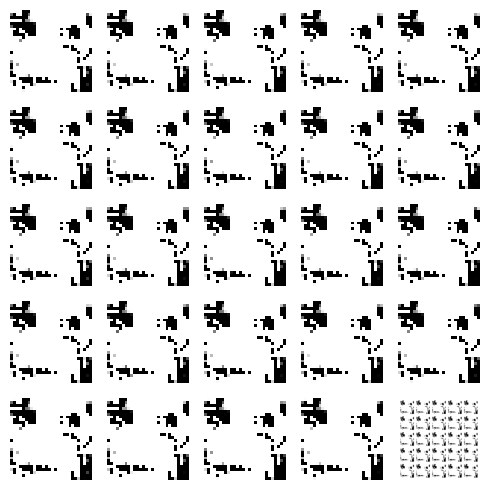

  0%|          | 0/350 [00:00<?, ?it/s]

4/4 [==============================] - 0s 14ms/step


  0%|          | 1/350 [00:00<04:05,  1.42it/s]

4/4 [==============================] - 0s 21ms/step


  1%|          | 2/350 [00:01<03:53,  1.49it/s]

4/4 [==============================] - 0s 19ms/step


  1%|          | 3/350 [00:02<04:01,  1.44it/s]

4/4 [==============================] - 0s 12ms/step


  1%|          | 4/350 [00:02<03:53,  1.48it/s]

4/4 [==============================] - 0s 20ms/step


  1%|▏         | 5/350 [00:03<03:56,  1.46it/s]

4/4 [==============================] - 0s 15ms/step


  2%|▏         | 6/350 [00:04<03:48,  1.51it/s]

4/4 [==============================] - 0s 13ms/step


  2%|▏         | 7/350 [00:04<03:53,  1.47it/s]

4/4 [==============================] - 0s 17ms/step


  2%|▏         | 8/350 [00:05<03:54,  1.46it/s]

4/4 [==============================] - 0s 13ms/step


  3%|▎         | 9/350 [00:06<03:38,  1.56it/s]

4/4 [==============================] - 0s 11ms/step


  3%|▎         | 10/350 [00:06<03:35,  1.58it/s]

4/4 [==============================] - 0s 16ms/step


  3%|▎         | 11/350 [00:07<03:40,  1.54it/s]

4/4 [==============================] - 0s 12ms/step


  3%|▎         | 12/350 [00:07<03:26,  1.64it/s]

4/4 [==============================] - 0s 13ms/step


  4%|▎         | 13/350 [00:08<03:32,  1.59it/s]

4/4 [==============================] - 0s 16ms/step


  4%|▍         | 14/350 [00:09<03:26,  1.63it/s]

4/4 [==============================] - 0s 34ms/step


  4%|▍         | 15/350 [00:09<03:41,  1.51it/s]

4/4 [==============================] - 0s 12ms/step


  5%|▍         | 16/350 [00:10<03:38,  1.53it/s]

4/4 [==============================] - 0s 14ms/step


  5%|▍         | 17/350 [00:11<03:34,  1.55it/s]

4/4 [==============================] - 0s 15ms/step


  5%|▌         | 18/350 [00:11<03:34,  1.55it/s]

4/4 [==============================] - 0s 16ms/step


  5%|▌         | 19/350 [00:12<03:34,  1.54it/s]

4/4 [==============================] - 0s 14ms/step


  6%|▌         | 20/350 [00:12<03:25,  1.61it/s]

4/4 [==============================] - 0s 14ms/step


  6%|▌         | 21/350 [00:13<03:19,  1.65it/s]

4/4 [==============================] - 0s 22ms/step


  6%|▋         | 22/350 [00:14<03:26,  1.58it/s]

4/4 [==============================] - 0s 13ms/step


  7%|▋         | 23/350 [00:14<03:23,  1.61it/s]

4/4 [==============================] - 0s 13ms/step


  7%|▋         | 24/350 [00:15<03:21,  1.62it/s]

4/4 [==============================] - 0s 15ms/step


  7%|▋         | 25/350 [00:16<03:27,  1.57it/s]

4/4 [==============================] - 0s 12ms/step


  7%|▋         | 26/350 [00:16<03:28,  1.56it/s]

4/4 [==============================] - 0s 18ms/step


  8%|▊         | 27/350 [00:17<03:21,  1.61it/s]

4/4 [==============================] - 0s 15ms/step


  8%|▊         | 28/350 [00:17<03:21,  1.60it/s]

4/4 [==============================] - 0s 15ms/step


  8%|▊         | 29/350 [00:18<03:12,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


  9%|▊         | 30/350 [00:19<03:21,  1.59it/s]

4/4 [==============================] - 0s 15ms/step


  9%|▉         | 31/350 [00:19<03:24,  1.56it/s]

4/4 [==============================] - 0s 16ms/step


  9%|▉         | 32/350 [00:20<03:19,  1.60it/s]

4/4 [==============================] - 0s 14ms/step


  9%|▉         | 33/350 [00:21<03:18,  1.59it/s]

4/4 [==============================] - 0s 12ms/step


 10%|▉         | 34/350 [00:21<03:15,  1.62it/s]

4/4 [==============================] - 0s 17ms/step


 10%|█         | 35/350 [00:22<03:13,  1.62it/s]

4/4 [==============================] - 0s 14ms/step


 10%|█         | 36/350 [00:22<03:06,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 11%|█         | 37/350 [00:23<03:08,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


 11%|█         | 38/350 [00:24<03:07,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


 11%|█         | 39/350 [00:24<03:05,  1.68it/s]

4/4 [==============================] - 0s 15ms/step


 11%|█▏        | 40/350 [00:25<03:02,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 12%|█▏        | 41/350 [00:25<03:11,  1.61it/s]

4/4 [==============================] - 0s 12ms/step


 12%|█▏        | 42/350 [00:26<03:15,  1.57it/s]

4/4 [==============================] - 0s 11ms/step


 12%|█▏        | 43/350 [00:27<03:04,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


 13%|█▎        | 44/350 [00:27<03:11,  1.60it/s]

4/4 [==============================] - 0s 15ms/step


 13%|█▎        | 45/350 [00:28<03:09,  1.61it/s]

4/4 [==============================] - 0s 18ms/step


 13%|█▎        | 46/350 [00:29<03:14,  1.56it/s]

4/4 [==============================] - 0s 11ms/step


 13%|█▎        | 47/350 [00:29<03:11,  1.58it/s]

4/4 [==============================] - 0s 15ms/step


 14%|█▎        | 48/350 [00:30<03:19,  1.52it/s]

4/4 [==============================] - 0s 13ms/step


 14%|█▍        | 49/350 [00:31<03:20,  1.50it/s]

4/4 [==============================] - 0s 14ms/step


 14%|█▍        | 50/350 [00:31<03:09,  1.59it/s]

4/4 [==============================] - 0s 18ms/step


 15%|█▍        | 51/350 [00:32<03:10,  1.57it/s]

4/4 [==============================] - 0s 13ms/step


 15%|█▍        | 52/350 [00:32<03:07,  1.59it/s]

4/4 [==============================] - 0s 11ms/step


 15%|█▌        | 53/350 [00:33<03:00,  1.65it/s]

4/4 [==============================] - 0s 13ms/step


 15%|█▌        | 54/350 [00:34<02:54,  1.69it/s]

4/4 [==============================] - 0s 18ms/step


 16%|█▌        | 55/350 [00:34<02:52,  1.71it/s]

4/4 [==============================] - 0s 16ms/step


 16%|█▌        | 56/350 [00:35<03:01,  1.62it/s]

4/4 [==============================] - 0s 19ms/step


 16%|█▋        | 57/350 [00:35<03:00,  1.63it/s]

4/4 [==============================] - 0s 16ms/step


 17%|█▋        | 58/350 [00:36<02:56,  1.65it/s]

4/4 [==============================] - 0s 13ms/step


 17%|█▋        | 59/350 [00:37<02:59,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


 17%|█▋        | 60/350 [00:37<02:59,  1.62it/s]

4/4 [==============================] - 0s 14ms/step


 17%|█▋        | 61/350 [00:38<02:51,  1.69it/s]

4/4 [==============================] - 0s 16ms/step


 18%|█▊        | 62/350 [00:38<02:49,  1.70it/s]

4/4 [==============================] - 0s 14ms/step


 18%|█▊        | 63/350 [00:39<02:57,  1.62it/s]

4/4 [==============================] - 0s 13ms/step


 18%|█▊        | 64/350 [00:40<03:04,  1.55it/s]

4/4 [==============================] - 0s 15ms/step


 19%|█▊        | 65/350 [00:40<02:55,  1.63it/s]

4/4 [==============================] - 0s 14ms/step


 19%|█▉        | 66/350 [00:41<02:54,  1.63it/s]

4/4 [==============================] - 0s 22ms/step


 19%|█▉        | 67/350 [00:42<03:12,  1.47it/s]

4/4 [==============================] - 0s 13ms/step


 19%|█▉        | 68/350 [00:42<03:07,  1.51it/s]

4/4 [==============================] - 0s 15ms/step


 20%|█▉        | 69/350 [00:43<02:57,  1.58it/s]

4/4 [==============================] - 0s 25ms/step


 20%|██        | 70/350 [00:44<03:07,  1.49it/s]

4/4 [==============================] - 0s 12ms/step


 20%|██        | 71/350 [00:44<03:04,  1.51it/s]

4/4 [==============================] - 0s 13ms/step


 21%|██        | 72/350 [00:45<03:01,  1.53it/s]

4/4 [==============================] - 0s 11ms/step


 21%|██        | 73/350 [00:46<02:57,  1.56it/s]

4/4 [==============================] - 0s 15ms/step


 21%|██        | 74/350 [00:46<02:53,  1.59it/s]

4/4 [==============================] - 0s 12ms/step


 21%|██▏       | 75/350 [00:47<02:50,  1.61it/s]

4/4 [==============================] - 0s 13ms/step


 22%|██▏       | 76/350 [00:47<02:46,  1.65it/s]

4/4 [==============================] - 0s 19ms/step


 22%|██▏       | 77/350 [00:48<02:48,  1.62it/s]

4/4 [==============================] - 0s 15ms/step


 22%|██▏       | 78/350 [00:49<02:52,  1.58it/s]

4/4 [==============================] - 0s 15ms/step


 23%|██▎       | 79/350 [00:49<02:53,  1.56it/s]

4/4 [==============================] - 0s 11ms/step


 23%|██▎       | 80/350 [00:50<02:45,  1.63it/s]

4/4 [==============================] - 0s 14ms/step


 23%|██▎       | 81/350 [00:50<02:41,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 23%|██▎       | 82/350 [00:51<02:36,  1.71it/s]

4/4 [==============================] - 0s 17ms/step


 24%|██▎       | 83/350 [00:52<02:46,  1.60it/s]

4/4 [==============================] - 0s 20ms/step


 24%|██▍       | 84/350 [00:52<02:46,  1.59it/s]

4/4 [==============================] - 0s 12ms/step


 24%|██▍       | 85/350 [00:53<02:48,  1.57it/s]

4/4 [==============================] - 0s 16ms/step


 25%|██▍       | 86/350 [00:54<03:01,  1.45it/s]

4/4 [==============================] - 0s 11ms/step


 25%|██▍       | 87/350 [00:54<02:57,  1.48it/s]

4/4 [==============================] - 0s 16ms/step


 25%|██▌       | 88/350 [00:55<02:56,  1.49it/s]

4/4 [==============================] - 0s 13ms/step


 25%|██▌       | 89/350 [00:56<02:58,  1.46it/s]

4/4 [==============================] - 0s 14ms/step


 26%|██▌       | 90/350 [00:56<02:54,  1.49it/s]

4/4 [==============================] - 0s 12ms/step


 26%|██▌       | 91/350 [00:57<02:44,  1.57it/s]

4/4 [==============================] - 0s 16ms/step


 26%|██▋       | 92/350 [00:58<02:46,  1.55it/s]

4/4 [==============================] - 0s 15ms/step


 27%|██▋       | 93/350 [00:58<02:51,  1.50it/s]

4/4 [==============================] - 0s 15ms/step


 27%|██▋       | 94/350 [00:59<02:46,  1.53it/s]

4/4 [==============================] - 0s 12ms/step


 27%|██▋       | 95/350 [01:00<02:39,  1.60it/s]

4/4 [==============================] - 0s 17ms/step


 27%|██▋       | 96/350 [01:00<02:41,  1.57it/s]

4/4 [==============================] - 0s 13ms/step


 28%|██▊       | 97/350 [01:01<02:41,  1.56it/s]

4/4 [==============================] - 0s 14ms/step


 28%|██▊       | 98/350 [01:02<02:44,  1.53it/s]

4/4 [==============================] - 0s 18ms/step


 28%|██▊       | 99/350 [01:02<02:43,  1.54it/s]

4/4 [==============================] - 0s 11ms/step


 29%|██▊       | 100/350 [01:03<02:41,  1.55it/s]

4/4 [==============================] - 0s 19ms/step


 29%|██▉       | 101/350 [01:04<02:42,  1.53it/s]

4/4 [==============================] - 0s 18ms/step


 29%|██▉       | 102/350 [01:04<02:36,  1.58it/s]

4/4 [==============================] - 0s 13ms/step


 29%|██▉       | 103/350 [01:05<02:31,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


 30%|██▉       | 104/350 [01:05<02:33,  1.61it/s]

4/4 [==============================] - 0s 20ms/step


 30%|███       | 105/350 [01:06<02:34,  1.59it/s]

4/4 [==============================] - 0s 15ms/step


 30%|███       | 106/350 [01:07<02:27,  1.65it/s]

4/4 [==============================] - 0s 15ms/step


 31%|███       | 107/350 [01:07<02:22,  1.70it/s]

4/4 [==============================] - 0s 15ms/step


 31%|███       | 108/350 [01:08<02:28,  1.63it/s]

4/4 [==============================] - 0s 18ms/step


 31%|███       | 109/350 [01:08<02:34,  1.56it/s]

4/4 [==============================] - 0s 15ms/step


 31%|███▏      | 110/350 [01:09<02:25,  1.65it/s]

4/4 [==============================] - 0s 15ms/step


 32%|███▏      | 111/350 [01:10<02:30,  1.59it/s]

4/4 [==============================] - 0s 14ms/step


 32%|███▏      | 112/350 [01:10<02:27,  1.61it/s]

4/4 [==============================] - 0s 16ms/step


 32%|███▏      | 113/350 [01:11<02:22,  1.66it/s]

4/4 [==============================] - 0s 14ms/step


 33%|███▎      | 114/350 [01:11<02:20,  1.68it/s]

4/4 [==============================] - 0s 15ms/step


 33%|███▎      | 115/350 [01:12<02:28,  1.58it/s]

4/4 [==============================] - 0s 13ms/step


 33%|███▎      | 116/350 [01:13<02:25,  1.61it/s]

4/4 [==============================] - 0s 15ms/step


 33%|███▎      | 117/350 [01:13<02:22,  1.64it/s]

4/4 [==============================] - 0s 14ms/step


 34%|███▎      | 118/350 [01:14<02:25,  1.59it/s]

4/4 [==============================] - 0s 15ms/step


 34%|███▍      | 119/350 [01:15<02:28,  1.56it/s]

4/4 [==============================] - 0s 14ms/step


 34%|███▍      | 120/350 [01:15<02:22,  1.62it/s]

4/4 [==============================] - 0s 11ms/step


 35%|███▍      | 121/350 [01:16<02:16,  1.68it/s]

4/4 [==============================] - 0s 17ms/step


 35%|███▍      | 122/350 [01:16<02:15,  1.68it/s]

4/4 [==============================] - 0s 27ms/step


 35%|███▌      | 123/350 [01:17<02:23,  1.58it/s]

4/4 [==============================] - 0s 12ms/step


 35%|███▌      | 124/350 [01:18<02:18,  1.63it/s]

4/4 [==============================] - 0s 16ms/step


 36%|███▌      | 125/350 [01:18<02:18,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


 36%|███▌      | 126/350 [01:19<02:26,  1.53it/s]

4/4 [==============================] - 0s 13ms/step


 36%|███▋      | 127/350 [01:20<02:27,  1.51it/s]

4/4 [==============================] - 0s 15ms/step


 37%|███▋      | 128/350 [01:20<02:19,  1.59it/s]

4/4 [==============================] - 0s 18ms/step


 37%|███▋      | 129/350 [01:21<02:18,  1.60it/s]

4/4 [==============================] - 0s 11ms/step


 37%|███▋      | 130/350 [01:22<02:21,  1.56it/s]

4/4 [==============================] - 0s 17ms/step


 37%|███▋      | 131/350 [01:22<02:19,  1.57it/s]

4/4 [==============================] - 0s 16ms/step


 38%|███▊      | 132/350 [01:23<02:17,  1.58it/s]

4/4 [==============================] - 0s 17ms/step


 38%|███▊      | 133/350 [01:23<02:15,  1.60it/s]

4/4 [==============================] - 0s 12ms/step


 38%|███▊      | 134/350 [01:24<02:22,  1.52it/s]

4/4 [==============================] - 0s 17ms/step


 39%|███▊      | 135/350 [01:25<02:23,  1.50it/s]

4/4 [==============================] - 0s 17ms/step


 39%|███▉      | 136/350 [01:25<02:19,  1.53it/s]

4/4 [==============================] - 0s 13ms/step


 39%|███▉      | 137/350 [01:26<02:18,  1.54it/s]

4/4 [==============================] - 0s 22ms/step


 39%|███▉      | 138/350 [01:27<02:24,  1.46it/s]

4/4 [==============================] - 0s 10ms/step


 40%|███▉      | 139/350 [01:27<02:13,  1.58it/s]

4/4 [==============================] - 0s 18ms/step


 40%|████      | 140/350 [01:28<02:12,  1.59it/s]

4/4 [==============================] - 0s 12ms/step


 40%|████      | 141/350 [01:29<02:16,  1.54it/s]

4/4 [==============================] - 0s 15ms/step


 41%|████      | 142/350 [01:29<02:17,  1.51it/s]

4/4 [==============================] - 0s 12ms/step


 41%|████      | 143/350 [01:30<02:08,  1.61it/s]

4/4 [==============================] - 0s 19ms/step


 41%|████      | 144/350 [01:31<02:09,  1.59it/s]

4/4 [==============================] - 0s 12ms/step


 41%|████▏     | 145/350 [01:31<02:15,  1.51it/s]

4/4 [==============================] - 0s 17ms/step


 42%|████▏     | 146/350 [01:32<02:08,  1.58it/s]

4/4 [==============================] - 0s 14ms/step


 42%|████▏     | 147/350 [01:32<02:04,  1.64it/s]

4/4 [==============================] - 0s 14ms/step


 42%|████▏     | 148/350 [01:33<02:02,  1.65it/s]

4/4 [==============================] - 0s 24ms/step


 43%|████▎     | 149/350 [01:34<02:04,  1.61it/s]

4/4 [==============================] - 0s 21ms/step


 43%|████▎     | 150/350 [01:34<02:04,  1.60it/s]

4/4 [==============================] - 0s 13ms/step


 43%|████▎     | 151/350 [01:35<02:02,  1.63it/s]

4/4 [==============================] - 0s 14ms/step


 43%|████▎     | 152/350 [01:35<02:01,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


 44%|████▎     | 153/350 [01:36<01:59,  1.65it/s]

4/4 [==============================] - 0s 18ms/step


 44%|████▍     | 154/350 [01:37<01:56,  1.68it/s]

4/4 [==============================] - 0s 14ms/step


 44%|████▍     | 155/350 [01:37<01:55,  1.70it/s]

4/4 [==============================] - 0s 13ms/step


 45%|████▍     | 156/350 [01:38<01:52,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


 45%|████▍     | 157/350 [01:38<01:55,  1.67it/s]

4/4 [==============================] - 0s 14ms/step


 45%|████▌     | 158/350 [01:39<01:54,  1.68it/s]

4/4 [==============================] - 0s 16ms/step


 45%|████▌     | 159/350 [01:40<01:53,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 46%|████▌     | 160/350 [01:40<01:52,  1.68it/s]

4/4 [==============================] - 0s 14ms/step


 46%|████▌     | 161/350 [01:41<01:54,  1.66it/s]

4/4 [==============================] - 0s 14ms/step


 46%|████▋     | 162/350 [01:41<01:53,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 47%|████▋     | 163/350 [01:42<01:50,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


 47%|████▋     | 164/350 [01:43<01:50,  1.68it/s]

4/4 [==============================] - 0s 15ms/step


 47%|████▋     | 165/350 [01:43<01:50,  1.67it/s]

4/4 [==============================] - 0s 18ms/step


 47%|████▋     | 166/350 [01:44<01:49,  1.68it/s]

4/4 [==============================] - 0s 14ms/step


 48%|████▊     | 167/350 [01:44<01:47,  1.70it/s]

4/4 [==============================] - 0s 13ms/step


 48%|████▊     | 168/350 [01:45<01:47,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 48%|████▊     | 169/350 [01:46<01:51,  1.63it/s]

4/4 [==============================] - 0s 15ms/step


 49%|████▊     | 170/350 [01:46<01:47,  1.68it/s]

4/4 [==============================] - 0s 14ms/step


 49%|████▉     | 171/350 [01:47<01:45,  1.70it/s]

4/4 [==============================] - 0s 13ms/step


 49%|████▉     | 172/350 [01:47<01:45,  1.69it/s]

4/4 [==============================] - 0s 16ms/step


 49%|████▉     | 173/350 [01:48<01:45,  1.68it/s]

4/4 [==============================] - 0s 17ms/step


 50%|████▉     | 174/350 [01:49<01:44,  1.69it/s]

4/4 [==============================] - 0s 13ms/step


 50%|█████     | 175/350 [01:49<01:43,  1.69it/s]

4/4 [==============================] - 0s 14ms/step


 50%|█████     | 176/350 [01:50<01:45,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 51%|█████     | 177/350 [01:50<01:45,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 51%|█████     | 178/350 [01:51<01:43,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 51%|█████     | 179/350 [01:52<01:41,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 51%|█████▏    | 180/350 [01:52<01:45,  1.61it/s]

4/4 [==============================] - 0s 16ms/step


 52%|█████▏    | 181/350 [01:53<01:43,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


 52%|█████▏    | 182/350 [01:53<01:45,  1.59it/s]

4/4 [==============================] - 0s 12ms/step


 52%|█████▏    | 183/350 [01:54<01:45,  1.58it/s]

4/4 [==============================] - 0s 28ms/step


 53%|█████▎    | 184/350 [01:55<01:47,  1.54it/s]

4/4 [==============================] - 0s 15ms/step


 53%|█████▎    | 185/350 [01:55<01:48,  1.53it/s]

4/4 [==============================] - 0s 12ms/step


 53%|█████▎    | 186/350 [01:56<01:41,  1.61it/s]

4/4 [==============================] - 0s 17ms/step


 53%|█████▎    | 187/350 [01:57<01:48,  1.50it/s]

4/4 [==============================] - 0s 14ms/step


 54%|█████▎    | 188/350 [01:57<01:45,  1.53it/s]

4/4 [==============================] - 0s 15ms/step


 54%|█████▍    | 189/350 [01:58<01:46,  1.52it/s]

4/4 [==============================] - 0s 12ms/step


 54%|█████▍    | 190/350 [01:59<01:42,  1.55it/s]

4/4 [==============================] - 0s 21ms/step


 55%|█████▍    | 191/350 [01:59<01:43,  1.53it/s]

4/4 [==============================] - 0s 15ms/step


 55%|█████▍    | 192/350 [02:00<01:40,  1.57it/s]

4/4 [==============================] - 0s 16ms/step


 55%|█████▌    | 193/350 [02:01<01:36,  1.63it/s]

4/4 [==============================] - 0s 38ms/step


 55%|█████▌    | 194/350 [02:01<01:40,  1.55it/s]

4/4 [==============================] - 0s 14ms/step


 56%|█████▌    | 195/350 [02:02<01:40,  1.54it/s]

4/4 [==============================] - 0s 11ms/step


 56%|█████▌    | 196/350 [02:03<01:38,  1.56it/s]

4/4 [==============================] - 0s 15ms/step


 56%|█████▋    | 197/350 [02:03<01:43,  1.48it/s]

4/4 [==============================] - 0s 13ms/step


 57%|█████▋    | 198/350 [02:04<01:41,  1.50it/s]

4/4 [==============================] - 0s 18ms/step


 57%|█████▋    | 199/350 [02:05<01:42,  1.48it/s]

4/4 [==============================] - 0s 10ms/step


 57%|█████▋    | 200/350 [02:05<01:34,  1.59it/s]

4/4 [==============================] - 0s 18ms/step


 57%|█████▋    | 201/350 [02:06<01:38,  1.52it/s]

4/4 [==============================] - 0s 17ms/step


 58%|█████▊    | 202/350 [02:06<01:35,  1.56it/s]

4/4 [==============================] - 0s 13ms/step


 58%|█████▊    | 203/350 [02:07<01:33,  1.57it/s]

4/4 [==============================] - 0s 31ms/step


 58%|█████▊    | 204/350 [02:08<01:37,  1.49it/s]

4/4 [==============================] - 0s 19ms/step


 59%|█████▊    | 205/350 [02:09<01:37,  1.49it/s]

4/4 [==============================] - 0s 12ms/step


 59%|█████▉    | 206/350 [02:09<01:30,  1.59it/s]

4/4 [==============================] - 0s 13ms/step


 59%|█████▉    | 207/350 [02:10<01:36,  1.49it/s]

4/4 [==============================] - 0s 15ms/step


 59%|█████▉    | 208/350 [02:10<01:31,  1.55it/s]

4/4 [==============================] - 0s 14ms/step


 60%|█████▉    | 209/350 [02:11<01:27,  1.62it/s]

4/4 [==============================] - 0s 13ms/step


 60%|██████    | 210/350 [02:12<01:26,  1.61it/s]

4/4 [==============================] - 0s 14ms/step


 60%|██████    | 211/350 [02:12<01:28,  1.57it/s]

4/4 [==============================] - 0s 14ms/step


 61%|██████    | 212/350 [02:13<01:27,  1.58it/s]

4/4 [==============================] - 0s 17ms/step


 61%|██████    | 213/350 [02:13<01:23,  1.63it/s]

4/4 [==============================] - 0s 14ms/step


 61%|██████    | 214/350 [02:14<01:28,  1.54it/s]

4/4 [==============================] - 0s 14ms/step


 61%|██████▏   | 215/350 [02:15<01:25,  1.58it/s]

4/4 [==============================] - 0s 16ms/step


 62%|██████▏   | 216/350 [02:15<01:24,  1.58it/s]

4/4 [==============================] - 0s 15ms/step


 62%|██████▏   | 217/350 [02:16<01:22,  1.61it/s]

4/4 [==============================] - 0s 15ms/step


 62%|██████▏   | 218/350 [02:17<01:24,  1.57it/s]

4/4 [==============================] - 0s 13ms/step


 63%|██████▎   | 219/350 [02:17<01:22,  1.59it/s]

4/4 [==============================] - 0s 14ms/step


 63%|██████▎   | 220/350 [02:18<01:20,  1.61it/s]

4/4 [==============================] - 0s 16ms/step


 63%|██████▎   | 221/350 [02:19<01:23,  1.54it/s]

4/4 [==============================] - 0s 11ms/step


 63%|██████▎   | 222/350 [02:19<01:21,  1.56it/s]

4/4 [==============================] - 0s 14ms/step


 64%|██████▎   | 223/350 [02:20<01:25,  1.49it/s]

4/4 [==============================] - 0s 11ms/step


 64%|██████▍   | 224/350 [02:21<01:22,  1.53it/s]

4/4 [==============================] - 0s 14ms/step


 64%|██████▍   | 225/350 [02:21<01:17,  1.60it/s]

4/4 [==============================] - 0s 13ms/step


 65%|██████▍   | 226/350 [02:22<01:19,  1.56it/s]

4/4 [==============================] - 0s 15ms/step


 65%|██████▍   | 227/350 [02:22<01:19,  1.55it/s]

4/4 [==============================] - 0s 15ms/step


 65%|██████▌   | 228/350 [02:23<01:16,  1.59it/s]

4/4 [==============================] - 0s 11ms/step


 65%|██████▌   | 229/350 [02:24<01:15,  1.60it/s]

4/4 [==============================] - 0s 13ms/step


 66%|██████▌   | 230/350 [02:24<01:20,  1.49it/s]

4/4 [==============================] - 0s 11ms/step


 66%|██████▌   | 231/350 [02:25<01:15,  1.59it/s]

4/4 [==============================] - 0s 18ms/step


 66%|██████▋   | 232/350 [02:26<01:13,  1.60it/s]

4/4 [==============================] - 0s 12ms/step


 67%|██████▋   | 233/350 [02:26<01:17,  1.51it/s]

4/4 [==============================] - 0s 15ms/step


 67%|██████▋   | 234/350 [02:27<01:14,  1.56it/s]

4/4 [==============================] - 0s 14ms/step


 67%|██████▋   | 235/350 [02:28<01:12,  1.58it/s]

4/4 [==============================] - 0s 14ms/step


 67%|██████▋   | 236/350 [02:28<01:10,  1.62it/s]

4/4 [==============================] - 0s 17ms/step


 68%|██████▊   | 237/350 [02:29<01:14,  1.51it/s]

4/4 [==============================] - 0s 12ms/step


 68%|██████▊   | 238/350 [02:29<01:09,  1.61it/s]

4/4 [==============================] - 0s 11ms/step


 68%|██████▊   | 239/350 [02:30<01:10,  1.58it/s]

4/4 [==============================] - 0s 12ms/step


 69%|██████▊   | 240/350 [02:31<01:12,  1.52it/s]

4/4 [==============================] - 0s 12ms/step


 69%|██████▉   | 241/350 [02:31<01:08,  1.58it/s]

4/4 [==============================] - 0s 13ms/step


 69%|██████▉   | 242/350 [02:32<01:06,  1.63it/s]

4/4 [==============================] - 0s 14ms/step


 69%|██████▉   | 243/350 [02:33<01:05,  1.64it/s]

4/4 [==============================] - 0s 17ms/step


 70%|██████▉   | 244/350 [02:33<01:06,  1.60it/s]

4/4 [==============================] - 0s 21ms/step


 70%|███████   | 245/350 [02:34<01:04,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


 70%|███████   | 246/350 [02:34<01:01,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


 71%|███████   | 247/350 [02:35<01:01,  1.66it/s]

4/4 [==============================] - 0s 17ms/step


 71%|███████   | 248/350 [02:36<01:03,  1.60it/s]

4/4 [==============================] - 0s 12ms/step


 71%|███████   | 249/350 [02:36<01:01,  1.64it/s]

4/4 [==============================] - 0s 18ms/step


 71%|███████▏  | 250/350 [02:37<00:59,  1.67it/s]

4/4 [==============================] - 0s 16ms/step


 72%|███████▏  | 251/350 [02:37<00:58,  1.69it/s]

4/4 [==============================] - 0s 21ms/step


 72%|███████▏  | 252/350 [02:38<01:00,  1.63it/s]

4/4 [==============================] - 0s 20ms/step


 72%|███████▏  | 253/350 [02:39<01:00,  1.60it/s]

4/4 [==============================] - 0s 11ms/step


 73%|███████▎  | 254/350 [02:39<01:00,  1.60it/s]

4/4 [==============================] - 0s 13ms/step


 73%|███████▎  | 255/350 [02:40<00:57,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 73%|███████▎  | 256/350 [02:40<00:57,  1.64it/s]

4/4 [==============================] - 0s 14ms/step


 73%|███████▎  | 257/350 [02:41<00:59,  1.57it/s]

4/4 [==============================] - 0s 15ms/step


 74%|███████▎  | 258/350 [02:42<01:00,  1.53it/s]

4/4 [==============================] - 0s 16ms/step


 74%|███████▍  | 259/350 [02:43<01:01,  1.48it/s]

4/4 [==============================] - 0s 12ms/step


 74%|███████▍  | 260/350 [02:43<00:59,  1.52it/s]

4/4 [==============================] - 0s 14ms/step


 75%|███████▍  | 261/350 [02:44<00:57,  1.56it/s]

4/4 [==============================] - 0s 11ms/step


 75%|███████▍  | 262/350 [02:45<00:59,  1.49it/s]

4/4 [==============================] - 0s 18ms/step


 75%|███████▌  | 263/350 [02:45<00:57,  1.51it/s]

4/4 [==============================] - 0s 13ms/step


 75%|███████▌  | 264/350 [02:46<00:54,  1.59it/s]

4/4 [==============================] - 0s 17ms/step


 76%|███████▌  | 265/350 [02:46<00:52,  1.61it/s]

4/4 [==============================] - 0s 14ms/step


 76%|███████▌  | 266/350 [02:47<00:54,  1.53it/s]

4/4 [==============================] - 0s 20ms/step


 76%|███████▋  | 267/350 [02:48<00:52,  1.58it/s]

4/4 [==============================] - 0s 16ms/step


 77%|███████▋  | 268/350 [02:48<00:51,  1.58it/s]

4/4 [==============================] - 0s 12ms/step


 77%|███████▋  | 269/350 [02:49<00:49,  1.64it/s]

4/4 [==============================] - 0s 27ms/step


 77%|███████▋  | 270/350 [02:50<00:52,  1.53it/s]

4/4 [==============================] - 0s 12ms/step


 77%|███████▋  | 271/350 [02:50<00:50,  1.58it/s]

4/4 [==============================] - 0s 15ms/step


 78%|███████▊  | 272/350 [02:51<00:49,  1.57it/s]

4/4 [==============================] - 0s 11ms/step


 78%|███████▊  | 273/350 [02:52<00:50,  1.53it/s]

4/4 [==============================] - 0s 14ms/step


 78%|███████▊  | 274/350 [02:52<00:48,  1.55it/s]

4/4 [==============================] - 0s 17ms/step


 79%|███████▊  | 275/350 [02:53<00:53,  1.40it/s]

4/4 [==============================] - 0s 12ms/step


 79%|███████▉  | 276/350 [02:54<00:51,  1.43it/s]

4/4 [==============================] - 0s 20ms/step


 79%|███████▉  | 277/350 [02:54<00:49,  1.48it/s]

4/4 [==============================] - 0s 13ms/step


 79%|███████▉  | 278/350 [02:55<00:47,  1.52it/s]

4/4 [==============================] - 0s 20ms/step


 80%|███████▉  | 279/350 [02:56<00:47,  1.50it/s]

4/4 [==============================] - 0s 14ms/step


 80%|████████  | 280/350 [02:56<00:45,  1.53it/s]

4/4 [==============================] - 0s 12ms/step


 80%|████████  | 281/350 [02:57<00:43,  1.59it/s]

4/4 [==============================] - 0s 13ms/step


 81%|████████  | 282/350 [02:57<00:42,  1.60it/s]

4/4 [==============================] - 0s 13ms/step


 81%|████████  | 283/350 [02:58<00:42,  1.59it/s]

4/4 [==============================] - 0s 22ms/step


 81%|████████  | 284/350 [02:59<00:42,  1.55it/s]

4/4 [==============================] - 0s 13ms/step


 81%|████████▏ | 285/350 [02:59<00:41,  1.57it/s]

4/4 [==============================] - 0s 14ms/step


 82%|████████▏ | 286/350 [03:00<00:40,  1.59it/s]

4/4 [==============================] - 0s 13ms/step


 82%|████████▏ | 287/350 [03:01<00:39,  1.58it/s]

4/4 [==============================] - 0s 12ms/step


 82%|████████▏ | 288/350 [03:01<00:40,  1.54it/s]

4/4 [==============================] - 0s 16ms/step


 83%|████████▎ | 289/350 [03:02<00:38,  1.58it/s]

4/4 [==============================] - 0s 19ms/step


 83%|████████▎ | 290/350 [03:03<00:38,  1.54it/s]

4/4 [==============================] - 0s 17ms/step


 83%|████████▎ | 291/350 [03:03<00:36,  1.60it/s]

4/4 [==============================] - 0s 16ms/step


 83%|████████▎ | 292/350 [03:04<00:35,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


 84%|████████▎ | 293/350 [03:04<00:34,  1.67it/s]

4/4 [==============================] - 0s 14ms/step


 84%|████████▍ | 294/350 [03:05<00:35,  1.59it/s]

4/4 [==============================] - 0s 12ms/step


 84%|████████▍ | 295/350 [03:06<00:33,  1.62it/s]

4/4 [==============================] - 0s 13ms/step


 85%|████████▍ | 296/350 [03:06<00:32,  1.64it/s]

4/4 [==============================] - 0s 15ms/step


 85%|████████▍ | 297/350 [03:07<00:32,  1.63it/s]

4/4 [==============================] - 0s 15ms/step


 85%|████████▌ | 298/350 [03:08<00:35,  1.47it/s]

4/4 [==============================] - 0s 25ms/step


 85%|████████▌ | 299/350 [03:08<00:35,  1.43it/s]

4/4 [==============================] - 0s 14ms/step


 86%|████████▌ | 300/350 [03:09<00:33,  1.51it/s]

4/4 [==============================] - 0s 17ms/step


 86%|████████▌ | 301/350 [03:10<00:32,  1.51it/s]

4/4 [==============================] - 0s 37ms/step


 86%|████████▋ | 302/350 [03:10<00:33,  1.44it/s]

4/4 [==============================] - 0s 17ms/step


 87%|████████▋ | 303/350 [03:11<00:32,  1.46it/s]

4/4 [==============================] - 0s 13ms/step


 87%|████████▋ | 304/350 [03:12<00:31,  1.47it/s]

4/4 [==============================] - 0s 20ms/step


 87%|████████▋ | 305/350 [03:13<00:32,  1.37it/s]

4/4 [==============================] - 0s 11ms/step


 87%|████████▋ | 306/350 [03:13<00:32,  1.37it/s]

4/4 [==============================] - 0s 19ms/step


 88%|████████▊ | 307/350 [03:14<00:30,  1.39it/s]

4/4 [==============================] - 0s 10ms/step


 88%|████████▊ | 308/350 [03:15<00:28,  1.45it/s]

4/4 [==============================] - 0s 12ms/step


 88%|████████▊ | 309/350 [03:15<00:27,  1.48it/s]

4/4 [==============================] - 0s 18ms/step


 89%|████████▊ | 310/350 [03:16<00:26,  1.52it/s]

4/4 [==============================] - 0s 11ms/step


 89%|████████▉ | 311/350 [03:17<00:25,  1.54it/s]

4/4 [==============================] - 0s 14ms/step


 89%|████████▉ | 312/350 [03:17<00:26,  1.46it/s]

4/4 [==============================] - 0s 11ms/step


 89%|████████▉ | 313/350 [03:18<00:24,  1.49it/s]

4/4 [==============================] - 0s 17ms/step


 90%|████████▉ | 314/350 [03:19<00:25,  1.42it/s]

4/4 [==============================] - 0s 18ms/step


 90%|█████████ | 315/350 [03:19<00:24,  1.42it/s]

4/4 [==============================] - 0s 17ms/step


 90%|█████████ | 316/350 [03:20<00:24,  1.41it/s]

4/4 [==============================] - 0s 18ms/step


 91%|█████████ | 317/350 [03:21<00:21,  1.52it/s]

4/4 [==============================] - 0s 15ms/step


 91%|█████████ | 318/350 [03:21<00:21,  1.47it/s]

4/4 [==============================] - 0s 14ms/step


 91%|█████████ | 319/350 [03:22<00:20,  1.49it/s]

4/4 [==============================] - 0s 16ms/step


 91%|█████████▏| 320/350 [03:23<00:19,  1.51it/s]

4/4 [==============================] - 0s 12ms/step


 92%|█████████▏| 321/350 [03:23<00:20,  1.45it/s]

4/4 [==============================] - 0s 11ms/step


 92%|█████████▏| 322/350 [03:24<00:18,  1.50it/s]

4/4 [==============================] - 0s 12ms/step


 92%|█████████▏| 323/350 [03:25<00:17,  1.54it/s]

4/4 [==============================] - 0s 11ms/step


 93%|█████████▎| 324/350 [03:25<00:16,  1.57it/s]

4/4 [==============================] - 0s 17ms/step


 93%|█████████▎| 325/350 [03:26<00:15,  1.61it/s]

4/4 [==============================] - 0s 37ms/step


 93%|█████████▎| 326/350 [03:27<00:15,  1.52it/s]

4/4 [==============================] - 0s 12ms/step


 93%|█████████▎| 327/350 [03:27<00:14,  1.60it/s]

4/4 [==============================] - 0s 16ms/step


 94%|█████████▎| 328/350 [03:28<00:13,  1.58it/s]

4/4 [==============================] - 0s 13ms/step


 94%|█████████▍| 329/350 [03:28<00:13,  1.57it/s]

4/4 [==============================] - 0s 17ms/step


 94%|█████████▍| 330/350 [03:29<00:13,  1.54it/s]

4/4 [==============================] - 0s 11ms/step


 95%|█████████▍| 331/350 [03:30<00:12,  1.55it/s]

4/4 [==============================] - 0s 14ms/step


 95%|█████████▍| 332/350 [03:30<00:11,  1.55it/s]

4/4 [==============================] - 0s 14ms/step


 95%|█████████▌| 333/350 [03:31<00:10,  1.55it/s]

4/4 [==============================] - 0s 15ms/step


 95%|█████████▌| 334/350 [03:32<00:10,  1.55it/s]

4/4 [==============================] - 0s 14ms/step


 96%|█████████▌| 335/350 [03:32<00:09,  1.53it/s]

4/4 [==============================] - 0s 11ms/step


 96%|█████████▌| 336/350 [03:33<00:08,  1.57it/s]

4/4 [==============================] - 0s 18ms/step


 96%|█████████▋| 337/350 [03:34<00:08,  1.56it/s]

4/4 [==============================] - 0s 14ms/step


 97%|█████████▋| 338/350 [03:34<00:07,  1.51it/s]

4/4 [==============================] - 0s 16ms/step


 97%|█████████▋| 339/350 [03:35<00:07,  1.47it/s]

4/4 [==============================] - 0s 14ms/step


 97%|█████████▋| 340/350 [03:36<00:06,  1.51it/s]

4/4 [==============================] - 0s 13ms/step


 97%|█████████▋| 341/350 [03:36<00:05,  1.54it/s]

4/4 [==============================] - 0s 15ms/step


 98%|█████████▊| 342/350 [03:37<00:05,  1.59it/s]

4/4 [==============================] - 0s 11ms/step


 98%|█████████▊| 343/350 [03:38<00:04,  1.55it/s]

4/4 [==============================] - 0s 13ms/step


 98%|█████████▊| 344/350 [03:38<00:03,  1.55it/s]

4/4 [==============================] - 0s 12ms/step


 99%|█████████▊| 345/350 [03:39<00:03,  1.64it/s]

4/4 [==============================] - 0s 13ms/step


 99%|█████████▉| 346/350 [03:39<00:02,  1.63it/s]

4/4 [==============================] - 0s 15ms/step


 99%|█████████▉| 347/350 [03:40<00:01,  1.59it/s]

4/4 [==============================] - 0s 16ms/step


 99%|█████████▉| 348/350 [03:41<00:01,  1.59it/s]

4/4 [==============================] - 0s 13ms/step


100%|█████████▉| 349/350 [03:41<00:00,  1.55it/s]

4/4 [==============================] - 0s 14ms/step


100%|██████████| 350/350 [03:42<00:00,  1.57it/s]

Epoch number: 93 discriminator_loss: 0.16379796887548373 generator_loss: 8.244594920022147
1/1 [==============================] - 0s 22ms/step


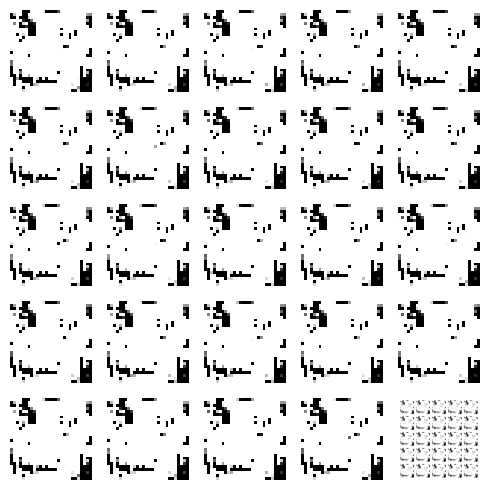

  0%|          | 0/350 [00:00<?, ?it/s]

4/4 [==============================] - 0s 31ms/step


  0%|          | 1/350 [00:00<04:14,  1.37it/s]

4/4 [==============================] - 0s 103ms/step


  1%|          | 2/350 [00:02<06:48,  1.17s/it]

4/4 [==============================] - 0s 22ms/step


  1%|          | 3/350 [00:03<05:58,  1.03s/it]

4/4 [==============================] - 0s 27ms/step


  1%|          | 4/350 [00:03<05:17,  1.09it/s]

4/4 [==============================] - 0s 13ms/step


  1%|▏         | 5/350 [00:04<04:47,  1.20it/s]

4/4 [==============================] - 0s 22ms/step


  2%|▏         | 6/350 [00:05<04:41,  1.22it/s]

4/4 [==============================] - 0s 20ms/step


  2%|▏         | 7/350 [00:06<04:56,  1.16it/s]

4/4 [==============================] - 0s 13ms/step


  2%|▏         | 8/350 [00:07<04:43,  1.21it/s]

4/4 [==============================] - 0s 14ms/step


  3%|▎         | 9/350 [00:07<04:30,  1.26it/s]

4/4 [==============================] - 0s 31ms/step


  3%|▎         | 10/350 [00:08<04:32,  1.25it/s]

4/4 [==============================] - 0s 14ms/step


  3%|▎         | 11/350 [00:09<04:14,  1.33it/s]

4/4 [==============================] - 0s 17ms/step


  3%|▎         | 12/350 [00:09<04:06,  1.37it/s]

4/4 [==============================] - 0s 20ms/step


  4%|▎         | 13/350 [00:10<04:02,  1.39it/s]

4/4 [==============================] - 0s 14ms/step


  4%|▍         | 14/350 [00:11<03:59,  1.40it/s]

4/4 [==============================] - 0s 12ms/step


  4%|▍         | 15/350 [00:11<03:54,  1.43it/s]

4/4 [==============================] - 0s 16ms/step


  5%|▍         | 16/350 [00:12<03:55,  1.42it/s]

4/4 [==============================] - 0s 20ms/step


  5%|▍         | 17/350 [00:13<03:58,  1.39it/s]

4/4 [==============================] - 0s 27ms/step


  5%|▌         | 18/350 [00:14<04:09,  1.33it/s]

4/4 [==============================] - 0s 23ms/step


  5%|▌         | 19/350 [00:14<04:03,  1.36it/s]

4/4 [==============================] - 0s 16ms/step


  6%|▌         | 20/350 [00:15<04:00,  1.37it/s]

4/4 [==============================] - 0s 13ms/step


  6%|▌         | 21/350 [00:16<04:04,  1.34it/s]

4/4 [==============================] - 0s 16ms/step


  6%|▋         | 22/350 [00:17<04:40,  1.17it/s]

4/4 [==============================] - 0s 29ms/step


  7%|▋         | 23/350 [00:18<05:20,  1.02it/s]

4/4 [==============================] - 0s 59ms/step


  7%|▋         | 24/350 [00:19<05:08,  1.06it/s]

4/4 [==============================] - 0s 25ms/step


  7%|▋         | 25/350 [00:20<04:56,  1.10it/s]

4/4 [==============================] - 0s 13ms/step


  7%|▋         | 26/350 [00:21<04:36,  1.17it/s]

4/4 [==============================] - 0s 11ms/step


  8%|▊         | 27/350 [00:22<04:30,  1.20it/s]

4/4 [==============================] - 0s 19ms/step


  8%|▊         | 28/350 [00:22<04:14,  1.26it/s]

4/4 [==============================] - 0s 26ms/step


  8%|▊         | 29/350 [00:23<04:11,  1.28it/s]

4/4 [==============================] - 0s 15ms/step


  9%|▊         | 30/350 [00:24<04:11,  1.27it/s]

4/4 [==============================] - 0s 16ms/step


  9%|▉         | 31/350 [00:24<04:03,  1.31it/s]

4/4 [==============================] - 0s 28ms/step


  9%|▉         | 32/350 [00:25<03:55,  1.35it/s]

4/4 [==============================] - 0s 33ms/step


  9%|▉         | 33/350 [00:26<04:03,  1.30it/s]

4/4 [==============================] - 0s 12ms/step


 10%|▉         | 34/350 [00:27<03:58,  1.33it/s]

4/4 [==============================] - 0s 14ms/step


 10%|█         | 35/350 [00:27<03:50,  1.37it/s]

4/4 [==============================] - 0s 26ms/step


 10%|█         | 36/350 [00:28<03:44,  1.40it/s]

4/4 [==============================] - 0s 26ms/step


 11%|█         | 37/350 [00:29<03:53,  1.34it/s]

4/4 [==============================] - 0s 14ms/step


 11%|█         | 38/350 [00:30<03:48,  1.37it/s]

4/4 [==============================] - 0s 14ms/step


 11%|█         | 39/350 [00:30<03:43,  1.39it/s]

4/4 [==============================] - 0s 18ms/step


 11%|█▏        | 40/350 [00:31<03:38,  1.42it/s]

4/4 [==============================] - 0s 23ms/step


 12%|█▏        | 41/350 [00:32<03:42,  1.39it/s]

4/4 [==============================] - 0s 13ms/step


 12%|█▏        | 42/350 [00:32<03:36,  1.42it/s]

4/4 [==============================] - 0s 14ms/step


 12%|█▏        | 43/350 [00:33<03:41,  1.39it/s]

4/4 [==============================] - 0s 12ms/step


 13%|█▎        | 44/350 [00:34<03:35,  1.42it/s]

4/4 [==============================] - 0s 16ms/step


 13%|█▎        | 45/350 [00:34<03:33,  1.43it/s]

4/4 [==============================] - 0s 13ms/step


 13%|█▎        | 46/350 [00:35<03:33,  1.43it/s]

4/4 [==============================] - 0s 21ms/step


 13%|█▎        | 47/350 [00:36<03:45,  1.34it/s]

4/4 [==============================] - 0s 18ms/step


 14%|█▎        | 48/350 [00:37<03:45,  1.34it/s]

4/4 [==============================] - 0s 16ms/step


 14%|█▍        | 49/350 [00:37<03:40,  1.37it/s]

4/4 [==============================] - 0s 16ms/step


 14%|█▍        | 50/350 [00:38<04:02,  1.24it/s]

4/4 [==============================] - 0s 25ms/step


 15%|█▍        | 51/350 [00:39<04:00,  1.24it/s]

4/4 [==============================] - 0s 20ms/step


 15%|█▍        | 52/350 [00:40<03:50,  1.29it/s]

4/4 [==============================] - 0s 30ms/step


 15%|█▌        | 53/350 [00:41<03:44,  1.32it/s]

4/4 [==============================] - 0s 17ms/step


 15%|█▌        | 54/350 [00:41<03:44,  1.32it/s]

4/4 [==============================] - 0s 18ms/step


 16%|█▌        | 55/350 [00:42<03:34,  1.37it/s]

4/4 [==============================] - 0s 14ms/step


 16%|█▌        | 56/350 [00:43<03:31,  1.39it/s]

4/4 [==============================] - 0s 18ms/step


 16%|█▋        | 57/350 [00:44<03:31,  1.39it/s]

4/4 [==============================] - 0s 27ms/step


 17%|█▋        | 58/350 [00:44<03:30,  1.39it/s]

4/4 [==============================] - 0s 22ms/step


 17%|█▋        | 59/350 [00:45<03:34,  1.36it/s]

4/4 [==============================] - 0s 16ms/step


 17%|█▋        | 60/350 [00:46<03:33,  1.36it/s]

4/4 [==============================] - 0s 13ms/step


 17%|█▋        | 61/350 [00:47<03:38,  1.32it/s]

4/4 [==============================] - 0s 22ms/step


 18%|█▊        | 62/350 [00:47<03:46,  1.27it/s]

4/4 [==============================] - 0s 16ms/step


 18%|█▊        | 63/350 [00:48<03:40,  1.30it/s]

4/4 [==============================] - 0s 19ms/step


 18%|█▊        | 64/350 [00:49<03:47,  1.26it/s]

4/4 [==============================] - 0s 21ms/step


 19%|█▊        | 65/350 [00:50<03:43,  1.27it/s]

4/4 [==============================] - 0s 23ms/step


 19%|█▉        | 66/350 [00:51<03:59,  1.19it/s]

4/4 [==============================] - 0s 15ms/step


 19%|█▉        | 67/350 [00:51<03:48,  1.24it/s]

4/4 [==============================] - 0s 15ms/step


 19%|█▉        | 68/350 [00:52<03:35,  1.31it/s]

4/4 [==============================] - 0s 20ms/step


 20%|█▉        | 69/350 [00:53<03:45,  1.24it/s]

4/4 [==============================] - 0s 16ms/step


 20%|██        | 70/350 [00:54<03:44,  1.25it/s]

4/4 [==============================] - 0s 17ms/step


 20%|██        | 71/350 [00:55<03:44,  1.24it/s]

4/4 [==============================] - 0s 24ms/step


 21%|██        | 72/350 [00:55<03:41,  1.26it/s]

4/4 [==============================] - 0s 21ms/step


 21%|██        | 73/350 [00:56<03:36,  1.28it/s]

4/4 [==============================] - 0s 26ms/step


 21%|██        | 74/350 [00:57<03:44,  1.23it/s]

4/4 [==============================] - 0s 24ms/step


 21%|██▏       | 75/350 [00:58<03:55,  1.17it/s]

4/4 [==============================] - 0s 33ms/step


 22%|██▏       | 76/350 [00:59<03:55,  1.17it/s]

4/4 [==============================] - 0s 13ms/step


 22%|██▏       | 77/350 [01:00<03:49,  1.19it/s]

4/4 [==============================] - 0s 16ms/step


 22%|██▏       | 78/350 [01:00<03:44,  1.21it/s]

4/4 [==============================] - 0s 21ms/step


 23%|██▎       | 79/350 [01:01<03:42,  1.22it/s]

4/4 [==============================] - 0s 12ms/step


 23%|██▎       | 80/350 [01:02<03:33,  1.26it/s]

4/4 [==============================] - 0s 14ms/step


 23%|██▎       | 81/350 [01:03<03:31,  1.27it/s]

4/4 [==============================] - 0s 14ms/step


 23%|██▎       | 82/350 [01:04<03:29,  1.28it/s]

4/4 [==============================] - 0s 29ms/step


 24%|██▎       | 83/350 [01:04<03:26,  1.29it/s]

4/4 [==============================] - 0s 14ms/step


 24%|██▍       | 84/350 [01:05<03:17,  1.35it/s]

4/4 [==============================] - 0s 17ms/step


 24%|██▍       | 85/350 [01:06<03:16,  1.35it/s]

4/4 [==============================] - 0s 14ms/step


 25%|██▍       | 86/350 [01:06<03:10,  1.38it/s]

4/4 [==============================] - 0s 18ms/step


 25%|██▍       | 87/350 [01:07<03:08,  1.40it/s]

4/4 [==============================] - 0s 17ms/step


 25%|██▌       | 88/350 [01:08<03:14,  1.34it/s]

4/4 [==============================] - 0s 17ms/step


 25%|██▌       | 89/350 [01:09<03:12,  1.36it/s]

4/4 [==============================] - 0s 16ms/step


 26%|██▌       | 90/350 [01:09<03:00,  1.44it/s]

4/4 [==============================] - 0s 15ms/step


 26%|██▌       | 91/350 [01:10<02:59,  1.44it/s]

4/4 [==============================] - 0s 16ms/step


 26%|██▋       | 92/350 [01:11<03:02,  1.41it/s]

4/4 [==============================] - 0s 16ms/step


 27%|██▋       | 93/350 [01:11<02:57,  1.45it/s]

4/4 [==============================] - 0s 19ms/step


 27%|██▋       | 94/350 [01:12<03:02,  1.40it/s]

4/4 [==============================] - 0s 22ms/step


 27%|██▋       | 95/350 [01:13<03:05,  1.38it/s]

4/4 [==============================] - 0s 18ms/step


 27%|██▋       | 96/350 [01:13<03:00,  1.41it/s]

4/4 [==============================] - 0s 14ms/step


 28%|██▊       | 97/350 [01:14<03:08,  1.34it/s]

4/4 [==============================] - 0s 16ms/step


 28%|██▊       | 98/350 [01:15<03:03,  1.37it/s]

4/4 [==============================] - 0s 18ms/step


 28%|██▊       | 99/350 [01:16<03:06,  1.34it/s]

4/4 [==============================] - 0s 15ms/step


 29%|██▊       | 100/350 [01:17<03:07,  1.33it/s]

4/4 [==============================] - 0s 18ms/step


 29%|██▉       | 101/350 [01:17<02:59,  1.39it/s]

4/4 [==============================] - 0s 20ms/step


 29%|██▉       | 102/350 [01:18<03:04,  1.35it/s]

4/4 [==============================] - 0s 14ms/step


 29%|██▉       | 103/350 [01:19<02:54,  1.42it/s]

4/4 [==============================] - 0s 14ms/step


 30%|██▉       | 104/350 [01:19<02:45,  1.49it/s]

4/4 [==============================] - 0s 13ms/step


 30%|███       | 105/350 [01:20<02:33,  1.60it/s]

4/4 [==============================] - 0s 12ms/step


 30%|███       | 106/350 [01:20<02:36,  1.56it/s]

4/4 [==============================] - 0s 16ms/step


 31%|███       | 107/350 [01:21<02:29,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 31%|███       | 108/350 [01:22<02:24,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 31%|███       | 109/350 [01:22<02:26,  1.64it/s]

4/4 [==============================] - 0s 17ms/step


 31%|███▏      | 110/350 [01:23<02:28,  1.61it/s]

4/4 [==============================] - 0s 14ms/step


 32%|███▏      | 111/350 [01:23<02:22,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


 32%|███▏      | 112/350 [01:24<02:15,  1.76it/s]

4/4 [==============================] - 0s 38ms/step


 32%|███▏      | 113/350 [01:24<02:20,  1.69it/s]

4/4 [==============================] - 0s 14ms/step


 33%|███▎      | 114/350 [01:25<02:16,  1.73it/s]

4/4 [==============================] - 0s 14ms/step


 33%|███▎      | 115/350 [01:26<02:16,  1.72it/s]

4/4 [==============================] - 0s 29ms/step


 33%|███▎      | 116/350 [01:26<02:22,  1.64it/s]

4/4 [==============================] - 0s 16ms/step


 33%|███▎      | 117/350 [01:27<02:26,  1.59it/s]

4/4 [==============================] - 0s 18ms/step


 34%|███▎      | 118/350 [01:28<02:24,  1.61it/s]

4/4 [==============================] - 0s 12ms/step


 34%|███▍      | 119/350 [01:28<02:17,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 34%|███▍      | 120/350 [01:29<02:12,  1.73it/s]

4/4 [==============================] - 0s 20ms/step


 35%|███▍      | 121/350 [01:29<02:21,  1.61it/s]

4/4 [==============================] - 0s 14ms/step


 35%|███▍      | 122/350 [01:30<02:15,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 35%|███▌      | 123/350 [01:30<02:16,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 35%|███▌      | 124/350 [01:31<02:16,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 36%|███▌      | 125/350 [01:32<02:13,  1.69it/s]

4/4 [==============================] - 0s 28ms/step


 36%|███▌      | 126/350 [01:32<02:19,  1.60it/s]

4/4 [==============================] - 0s 13ms/step


 36%|███▋      | 127/350 [01:33<02:13,  1.68it/s]

4/4 [==============================] - 0s 14ms/step


 37%|███▋      | 128/350 [01:34<02:17,  1.62it/s]

4/4 [==============================] - 0s 17ms/step


 37%|███▋      | 129/350 [01:34<02:14,  1.64it/s]

4/4 [==============================] - 0s 17ms/step


 37%|███▋      | 130/350 [01:35<02:15,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 37%|███▋      | 131/350 [01:35<02:06,  1.73it/s]

4/4 [==============================] - 0s 29ms/step


 38%|███▊      | 132/350 [01:36<02:16,  1.59it/s]

4/4 [==============================] - 0s 18ms/step


 38%|███▊      | 133/350 [01:37<02:12,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 38%|███▊      | 134/350 [01:37<02:17,  1.57it/s]

4/4 [==============================] - 0s 18ms/step


 39%|███▊      | 135/350 [01:38<02:23,  1.50it/s]

4/4 [==============================] - 0s 17ms/step


 39%|███▉      | 136/350 [01:39<02:24,  1.48it/s]

4/4 [==============================] - 0s 14ms/step


 39%|███▉      | 137/350 [01:39<02:15,  1.58it/s]

4/4 [==============================] - 0s 13ms/step


 39%|███▉      | 138/350 [01:40<02:18,  1.54it/s]

4/4 [==============================] - 0s 16ms/step


 40%|███▉      | 139/350 [01:41<02:13,  1.58it/s]

4/4 [==============================] - 0s 13ms/step


 40%|████      | 140/350 [01:41<02:09,  1.62it/s]

4/4 [==============================] - 0s 16ms/step


 40%|████      | 141/350 [01:42<02:11,  1.58it/s]

4/4 [==============================] - 0s 15ms/step


 41%|████      | 142/350 [01:42<02:13,  1.56it/s]

4/4 [==============================] - 0s 14ms/step


 41%|████      | 143/350 [01:43<02:12,  1.56it/s]

4/4 [==============================] - 0s 11ms/step


 41%|████      | 144/350 [01:44<02:04,  1.66it/s]

4/4 [==============================] - 0s 28ms/step


 41%|████▏     | 145/350 [01:44<02:08,  1.60it/s]

4/4 [==============================] - 0s 12ms/step


 42%|████▏     | 146/350 [01:45<02:01,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 42%|████▏     | 147/350 [01:46<02:10,  1.56it/s]

4/4 [==============================] - 0s 19ms/step


 42%|████▏     | 148/350 [01:46<02:14,  1.50it/s]

4/4 [==============================] - 0s 12ms/step


 43%|████▎     | 149/350 [01:47<02:20,  1.44it/s]

4/4 [==============================] - 0s 11ms/step


 43%|████▎     | 150/350 [01:48<02:09,  1.55it/s]

4/4 [==============================] - 0s 15ms/step


 43%|████▎     | 151/350 [01:48<02:00,  1.65it/s]

4/4 [==============================] - 0s 13ms/step


 43%|████▎     | 152/350 [01:49<02:04,  1.59it/s]

4/4 [==============================] - 0s 26ms/step


 44%|████▎     | 153/350 [01:49<02:04,  1.58it/s]

4/4 [==============================] - 0s 16ms/step


 44%|████▍     | 154/350 [01:50<02:04,  1.57it/s]

4/4 [==============================] - 0s 27ms/step


 44%|████▍     | 155/350 [01:51<02:14,  1.45it/s]

4/4 [==============================] - 0s 17ms/step


 45%|████▍     | 156/350 [01:51<02:09,  1.50it/s]

4/4 [==============================] - 0s 19ms/step


 45%|████▍     | 157/350 [01:52<02:14,  1.44it/s]

4/4 [==============================] - 0s 22ms/step


 45%|████▌     | 158/350 [01:53<02:14,  1.43it/s]

4/4 [==============================] - 0s 12ms/step


 45%|████▌     | 159/350 [01:54<02:07,  1.50it/s]

4/4 [==============================] - 0s 23ms/step


 46%|████▌     | 160/350 [01:54<02:11,  1.45it/s]

4/4 [==============================] - 0s 12ms/step


 46%|████▌     | 161/350 [01:55<02:01,  1.56it/s]

4/4 [==============================] - 0s 19ms/step


 46%|████▋     | 162/350 [01:56<02:11,  1.42it/s]

4/4 [==============================] - 0s 14ms/step


 47%|████▋     | 163/350 [01:56<02:03,  1.52it/s]

4/4 [==============================] - 0s 12ms/step


 47%|████▋     | 164/350 [01:57<02:00,  1.54it/s]

4/4 [==============================] - 0s 20ms/step


 47%|████▋     | 165/350 [01:58<02:05,  1.48it/s]

4/4 [==============================] - 0s 13ms/step


 47%|████▋     | 166/350 [01:58<01:58,  1.56it/s]

4/4 [==============================] - 0s 13ms/step


 48%|████▊     | 167/350 [01:59<02:05,  1.46it/s]

4/4 [==============================] - 0s 14ms/step


 48%|████▊     | 168/350 [02:00<01:58,  1.54it/s]

4/4 [==============================] - 0s 13ms/step


 48%|████▊     | 169/350 [02:00<01:49,  1.65it/s]

4/4 [==============================] - 0s 14ms/step


 49%|████▊     | 170/350 [02:01<02:00,  1.49it/s]

4/4 [==============================] - 0s 18ms/step


 49%|████▉     | 171/350 [02:01<01:57,  1.52it/s]

4/4 [==============================] - 0s 13ms/step


 49%|████▉     | 172/350 [02:02<01:55,  1.54it/s]

4/4 [==============================] - 0s 13ms/step


 49%|████▉     | 173/350 [02:03<01:57,  1.51it/s]

4/4 [==============================] - 0s 18ms/step


 50%|████▉     | 174/350 [02:03<01:54,  1.53it/s]

4/4 [==============================] - 0s 17ms/step


 50%|█████     | 175/350 [02:04<01:58,  1.48it/s]

4/4 [==============================] - 0s 13ms/step


 50%|█████     | 176/350 [02:05<01:56,  1.50it/s]

4/4 [==============================] - 0s 11ms/step


 51%|█████     | 177/350 [02:05<01:47,  1.61it/s]

4/4 [==============================] - 0s 12ms/step


 51%|█████     | 178/350 [02:06<01:44,  1.65it/s]

4/4 [==============================] - 0s 15ms/step


 51%|█████     | 179/350 [02:07<01:53,  1.51it/s]

4/4 [==============================] - 0s 14ms/step


 51%|█████▏    | 180/350 [02:07<01:46,  1.60it/s]

4/4 [==============================] - 0s 11ms/step


 52%|█████▏    | 181/350 [02:08<01:44,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


 52%|█████▏    | 182/350 [02:08<01:44,  1.60it/s]

4/4 [==============================] - 0s 14ms/step


 52%|█████▏    | 183/350 [02:09<01:45,  1.59it/s]

4/4 [==============================] - 0s 13ms/step


 53%|█████▎    | 184/350 [02:10<01:38,  1.68it/s]

4/4 [==============================] - 0s 16ms/step


 53%|█████▎    | 185/350 [02:10<01:41,  1.62it/s]

4/4 [==============================] - 0s 22ms/step


 53%|█████▎    | 186/350 [02:11<01:40,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 53%|█████▎    | 187/350 [02:11<01:35,  1.71it/s]

4/4 [==============================] - 0s 13ms/step


 54%|█████▎    | 188/350 [02:12<01:33,  1.73it/s]

4/4 [==============================] - 0s 15ms/step


 54%|█████▍    | 189/350 [02:13<01:41,  1.58it/s]

4/4 [==============================] - 0s 15ms/step


 54%|█████▍    | 190/350 [02:13<01:35,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 55%|█████▍    | 191/350 [02:14<01:31,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 55%|█████▍    | 192/350 [02:14<01:37,  1.62it/s]

4/4 [==============================] - 0s 15ms/step


 55%|█████▌    | 193/350 [02:15<01:37,  1.62it/s]

4/4 [==============================] - 0s 13ms/step


 55%|█████▌    | 194/350 [02:16<01:32,  1.69it/s]

4/4 [==============================] - 0s 16ms/step


 56%|█████▌    | 195/350 [02:16<01:37,  1.59it/s]

4/4 [==============================] - 0s 13ms/step


 56%|█████▌    | 196/350 [02:17<01:37,  1.59it/s]

4/4 [==============================] - 0s 12ms/step


 56%|█████▋    | 197/350 [02:17<01:29,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 57%|█████▋    | 198/350 [02:18<01:26,  1.77it/s]

4/4 [==============================] - 0s 11ms/step


 57%|█████▋    | 199/350 [02:19<01:28,  1.70it/s]

4/4 [==============================] - 0s 17ms/step


 57%|█████▋    | 200/350 [02:19<01:33,  1.60it/s]

4/4 [==============================] - 0s 11ms/step


 57%|█████▋    | 201/350 [02:20<01:27,  1.71it/s]

4/4 [==============================] - 0s 10ms/step


 58%|█████▊    | 202/350 [02:20<01:21,  1.81it/s]

4/4 [==============================] - 0s 12ms/step


 58%|█████▊    | 203/350 [02:21<01:19,  1.86it/s]

4/4 [==============================] - 0s 14ms/step


 58%|█████▊    | 204/350 [02:21<01:23,  1.74it/s]

4/4 [==============================] - 0s 16ms/step


 59%|█████▊    | 205/350 [02:22<01:26,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


 59%|█████▉    | 206/350 [02:23<01:23,  1.73it/s]

4/4 [==============================] - 0s 19ms/step


 59%|█████▉    | 207/350 [02:23<01:28,  1.62it/s]

4/4 [==============================] - 0s 16ms/step


 59%|█████▉    | 208/350 [02:24<01:27,  1.62it/s]

4/4 [==============================] - 0s 11ms/step


 60%|█████▉    | 209/350 [02:24<01:22,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 60%|██████    | 210/350 [02:25<01:18,  1.78it/s]

4/4 [==============================] - 0s 11ms/step


 60%|██████    | 211/350 [02:26<01:17,  1.78it/s]

4/4 [==============================] - 0s 19ms/step


 61%|██████    | 212/350 [02:26<01:22,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 61%|██████    | 213/350 [02:27<01:18,  1.74it/s]

4/4 [==============================] - 0s 11ms/step


 61%|██████    | 214/350 [02:27<01:14,  1.82it/s]

4/4 [==============================] - 0s 11ms/step


 61%|██████▏   | 215/350 [02:28<01:15,  1.79it/s]

4/4 [==============================] - 0s 19ms/step


 62%|██████▏   | 216/350 [02:29<01:21,  1.64it/s]

4/4 [==============================] - 0s 18ms/step


 62%|██████▏   | 217/350 [02:29<01:21,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


 62%|██████▏   | 218/350 [02:30<01:15,  1.74it/s]

4/4 [==============================] - 0s 14ms/step


 63%|██████▎   | 219/350 [02:30<01:17,  1.69it/s]

4/4 [==============================] - 0s 19ms/step


 63%|██████▎   | 220/350 [02:31<01:18,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 63%|██████▎   | 221/350 [02:31<01:13,  1.76it/s]

4/4 [==============================] - 0s 14ms/step


 63%|██████▎   | 222/350 [02:32<01:09,  1.84it/s]

4/4 [==============================] - 0s 11ms/step


 64%|██████▎   | 223/350 [02:32<01:08,  1.85it/s]

4/4 [==============================] - 0s 29ms/step


 64%|██████▍   | 224/350 [02:33<01:13,  1.71it/s]

4/4 [==============================] - 0s 16ms/step


 64%|██████▍   | 225/350 [02:34<01:09,  1.79it/s]

4/4 [==============================] - 0s 13ms/step


 65%|██████▍   | 226/350 [02:34<01:06,  1.85it/s]

4/4 [==============================] - 0s 11ms/step


 65%|██████▍   | 227/350 [02:35<01:06,  1.86it/s]

4/4 [==============================] - 0s 13ms/step


 65%|██████▌   | 228/350 [02:35<01:08,  1.79it/s]

4/4 [==============================] - 0s 12ms/step


 65%|██████▌   | 229/350 [02:36<01:09,  1.74it/s]

4/4 [==============================] - 0s 11ms/step


 66%|██████▌   | 230/350 [02:36<01:07,  1.78it/s]

4/4 [==============================] - 0s 14ms/step


 66%|██████▌   | 231/350 [02:37<01:09,  1.72it/s]

4/4 [==============================] - 0s 15ms/step


 66%|██████▋   | 232/350 [02:38<01:08,  1.72it/s]

4/4 [==============================] - 0s 11ms/step


 67%|██████▋   | 233/350 [02:38<01:04,  1.82it/s]

4/4 [==============================] - 0s 11ms/step


 67%|██████▋   | 234/350 [02:39<01:01,  1.88it/s]

4/4 [==============================] - 0s 11ms/step


 67%|██████▋   | 235/350 [02:39<01:01,  1.86it/s]

4/4 [==============================] - 0s 29ms/step


 67%|██████▋   | 236/350 [02:40<01:08,  1.65it/s]

4/4 [==============================] - 0s 13ms/step


 68%|██████▊   | 237/350 [02:40<01:05,  1.73it/s]

4/4 [==============================] - 0s 11ms/step


 68%|██████▊   | 238/350 [02:41<01:01,  1.82it/s]

4/4 [==============================] - 0s 11ms/step


 68%|██████▊   | 239/350 [02:41<00:59,  1.87it/s]

4/4 [==============================] - 0s 15ms/step


 69%|██████▊   | 240/350 [02:42<01:03,  1.74it/s]

4/4 [==============================] - 0s 18ms/step


 69%|██████▉   | 241/350 [02:43<01:03,  1.71it/s]

4/4 [==============================] - 0s 13ms/step


 69%|██████▉   | 242/350 [02:43<01:00,  1.78it/s]

4/4 [==============================] - 0s 11ms/step


 69%|██████▉   | 243/350 [02:44<00:59,  1.80it/s]

4/4 [==============================] - 0s 12ms/step


 70%|██████▉   | 244/350 [02:44<01:01,  1.73it/s]

4/4 [==============================] - 0s 15ms/step


 70%|███████   | 245/350 [02:45<01:01,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 70%|███████   | 246/350 [02:45<00:57,  1.79it/s]

4/4 [==============================] - 0s 12ms/step


 71%|███████   | 247/350 [02:46<00:55,  1.87it/s]

4/4 [==============================] - 0s 18ms/step


 71%|███████   | 248/350 [02:47<00:59,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


 71%|███████   | 249/350 [02:47<00:58,  1.72it/s]

4/4 [==============================] - 0s 11ms/step


 71%|███████▏  | 250/350 [02:48<00:55,  1.82it/s]

4/4 [==============================] - 0s 11ms/step


 72%|███████▏  | 251/350 [02:48<00:52,  1.89it/s]

4/4 [==============================] - 0s 11ms/step


 72%|███████▏  | 252/350 [02:49<00:52,  1.86it/s]

4/4 [==============================] - 0s 36ms/step


 72%|███████▏  | 253/350 [02:49<00:56,  1.70it/s]

4/4 [==============================] - 0s 13ms/step


 73%|███████▎  | 254/350 [02:50<00:53,  1.79it/s]

4/4 [==============================] - 0s 13ms/step


 73%|███████▎  | 255/350 [02:50<00:51,  1.85it/s]

4/4 [==============================] - 0s 13ms/step


 73%|███████▎  | 256/350 [02:51<00:50,  1.84it/s]

4/4 [==============================] - 0s 34ms/step


 73%|███████▎  | 257/350 [02:52<00:54,  1.72it/s]

4/4 [==============================] - 0s 14ms/step


 74%|███████▎  | 258/350 [02:52<00:52,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 74%|███████▍  | 259/350 [02:53<00:49,  1.82it/s]

4/4 [==============================] - 0s 19ms/step


 74%|███████▍  | 260/350 [02:53<00:51,  1.73it/s]

4/4 [==============================] - 0s 14ms/step


 75%|███████▍  | 261/350 [02:54<00:52,  1.71it/s]

4/4 [==============================] - 0s 11ms/step


 75%|███████▍  | 262/350 [02:54<00:48,  1.81it/s]

4/4 [==============================] - 0s 12ms/step


 75%|███████▌  | 263/350 [02:55<00:46,  1.88it/s]

4/4 [==============================] - 0s 11ms/step


 75%|███████▌  | 264/350 [02:55<00:45,  1.87it/s]

4/4 [==============================] - 0s 14ms/step


 76%|███████▌  | 265/350 [02:56<00:48,  1.76it/s]

4/4 [==============================] - 0s 15ms/step


 76%|███████▌  | 266/350 [02:57<00:46,  1.80it/s]

4/4 [==============================] - 0s 13ms/step


 76%|███████▋  | 267/350 [02:57<00:44,  1.87it/s]

4/4 [==============================] - 0s 11ms/step


 77%|███████▋  | 268/350 [02:58<00:44,  1.86it/s]

4/4 [==============================] - 0s 13ms/step


 77%|███████▋  | 269/350 [02:58<00:46,  1.73it/s]

4/4 [==============================] - 0s 15ms/step


 77%|███████▋  | 270/350 [02:59<00:46,  1.73it/s]

4/4 [==============================] - 0s 11ms/step


 77%|███████▋  | 271/350 [02:59<00:43,  1.81it/s]

4/4 [==============================] - 0s 10ms/step


 78%|███████▊  | 272/350 [03:00<00:41,  1.86it/s]

4/4 [==============================] - 0s 13ms/step


 78%|███████▊  | 273/350 [03:00<00:43,  1.79it/s]

4/4 [==============================] - 0s 14ms/step


 78%|███████▊  | 274/350 [03:01<00:43,  1.76it/s]

4/4 [==============================] - 0s 11ms/step


 79%|███████▊  | 275/350 [03:02<00:40,  1.84it/s]

4/4 [==============================] - 0s 12ms/step


 79%|███████▉  | 276/350 [03:02<00:38,  1.91it/s]

4/4 [==============================] - 0s 12ms/step


 79%|███████▉  | 277/350 [03:03<00:38,  1.87it/s]

4/4 [==============================] - 0s 23ms/step


 79%|███████▉  | 278/350 [03:03<00:41,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 80%|███████▉  | 279/350 [03:04<00:38,  1.82it/s]

4/4 [==============================] - 0s 13ms/step


 80%|████████  | 280/350 [03:04<00:37,  1.89it/s]

4/4 [==============================] - 0s 11ms/step


 80%|████████  | 281/350 [03:05<00:37,  1.84it/s]

4/4 [==============================] - 0s 30ms/step


 81%|████████  | 282/350 [03:05<00:39,  1.72it/s]

4/4 [==============================] - 0s 15ms/step


 81%|████████  | 283/350 [03:06<00:37,  1.78it/s]

4/4 [==============================] - 0s 11ms/step


 81%|████████  | 284/350 [03:06<00:35,  1.86it/s]

4/4 [==============================] - 0s 16ms/step


 81%|████████▏ | 285/350 [03:07<00:36,  1.76it/s]

4/4 [==============================] - 0s 14ms/step


 82%|████████▏ | 286/350 [03:08<00:36,  1.73it/s]

4/4 [==============================] - 0s 11ms/step


 82%|████████▏ | 287/350 [03:08<00:34,  1.83it/s]

4/4 [==============================] - 0s 12ms/step


 82%|████████▏ | 288/350 [03:09<00:32,  1.89it/s]

4/4 [==============================] - 0s 12ms/step


 83%|████████▎ | 289/350 [03:09<00:32,  1.85it/s]

4/4 [==============================] - 0s 16ms/step


 83%|████████▎ | 290/350 [03:10<00:34,  1.75it/s]

4/4 [==============================] - 0s 11ms/step


 83%|████████▎ | 291/350 [03:10<00:31,  1.85it/s]

4/4 [==============================] - 0s 13ms/step


 83%|████████▎ | 292/350 [03:11<00:30,  1.90it/s]

4/4 [==============================] - 0s 11ms/step


 84%|████████▎ | 293/350 [03:11<00:30,  1.85it/s]

4/4 [==============================] - 0s 22ms/step


 84%|████████▍ | 294/350 [03:12<00:33,  1.68it/s]

4/4 [==============================] - 0s 16ms/step


 84%|████████▍ | 295/350 [03:13<00:31,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 85%|████████▍ | 296/350 [03:13<00:30,  1.79it/s]

4/4 [==============================] - 0s 13ms/step


 85%|████████▍ | 297/350 [03:14<00:32,  1.64it/s]

4/4 [==============================] - 0s 13ms/step


 85%|████████▌ | 298/350 [03:14<00:29,  1.74it/s]

4/4 [==============================] - 0s 15ms/step


 85%|████████▌ | 299/350 [03:15<00:28,  1.81it/s]

4/4 [==============================] - 0s 12ms/step


 86%|████████▌ | 300/350 [03:15<00:26,  1.85it/s]

4/4 [==============================] - 0s 14ms/step


 86%|████████▌ | 301/350 [03:16<00:28,  1.69it/s]

4/4 [==============================] - 0s 16ms/step


 86%|████████▋ | 302/350 [03:17<00:27,  1.73it/s]

4/4 [==============================] - 0s 11ms/step


 87%|████████▋ | 303/350 [03:17<00:25,  1.81it/s]

4/4 [==============================] - 0s 11ms/step


 87%|████████▋ | 304/350 [03:18<00:24,  1.86it/s]

4/4 [==============================] - 0s 16ms/step


 87%|████████▋ | 305/350 [03:18<00:25,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 87%|████████▋ | 306/350 [03:19<00:25,  1.73it/s]

4/4 [==============================] - 0s 12ms/step


 88%|████████▊ | 307/350 [03:19<00:23,  1.81it/s]

4/4 [==============================] - 0s 15ms/step


 88%|████████▊ | 308/350 [03:20<00:23,  1.77it/s]

4/4 [==============================] - 0s 18ms/step


 88%|████████▊ | 309/350 [03:21<00:24,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


 89%|████████▊ | 310/350 [03:21<00:22,  1.76it/s]

4/4 [==============================] - 0s 11ms/step


 89%|████████▉ | 311/350 [03:22<00:21,  1.83it/s]

4/4 [==============================] - 0s 11ms/step


 89%|████████▉ | 312/350 [03:22<00:20,  1.86it/s]

4/4 [==============================] - 0s 13ms/step


 89%|████████▉ | 313/350 [03:23<00:20,  1.77it/s]

4/4 [==============================] - 0s 19ms/step


 90%|████████▉ | 314/350 [03:23<00:20,  1.76it/s]

4/4 [==============================] - 0s 12ms/step


 90%|█████████ | 315/350 [03:24<00:19,  1.83it/s]

4/4 [==============================] - 0s 12ms/step


 90%|█████████ | 316/350 [03:24<00:18,  1.84it/s]

4/4 [==============================] - 0s 40ms/step


 91%|█████████ | 317/350 [03:25<00:19,  1.70it/s]

4/4 [==============================] - 0s 14ms/step


 91%|█████████ | 318/350 [03:26<00:17,  1.79it/s]

4/4 [==============================] - 0s 13ms/step


 91%|█████████ | 319/350 [03:26<00:16,  1.86it/s]

4/4 [==============================] - 0s 11ms/step


 91%|█████████▏| 320/350 [03:27<00:16,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 92%|█████████▏| 321/350 [03:27<00:16,  1.73it/s]

4/4 [==============================] - 0s 12ms/step


 92%|█████████▏| 322/350 [03:28<00:15,  1.81it/s]

4/4 [==============================] - 0s 11ms/step


 92%|█████████▏| 323/350 [03:28<00:14,  1.87it/s]

4/4 [==============================] - 0s 16ms/step


 93%|█████████▎| 324/350 [03:29<00:14,  1.76it/s]

4/4 [==============================] - 0s 15ms/step


 93%|█████████▎| 325/350 [03:30<00:14,  1.72it/s]

4/4 [==============================] - 0s 11ms/step


 93%|█████████▎| 326/350 [03:30<00:13,  1.81it/s]

4/4 [==============================] - 0s 11ms/step


 93%|█████████▎| 327/350 [03:31<00:12,  1.88it/s]

4/4 [==============================] - 0s 12ms/step


 94%|█████████▎| 328/350 [03:31<00:12,  1.78it/s]

4/4 [==============================] - 0s 14ms/step


 94%|█████████▍| 329/350 [03:32<00:12,  1.73it/s]

4/4 [==============================] - 0s 12ms/step


 94%|█████████▍| 330/350 [03:32<00:11,  1.81it/s]

4/4 [==============================] - 0s 12ms/step


 95%|█████████▍| 331/350 [03:33<00:10,  1.87it/s]

4/4 [==============================] - 0s 18ms/step


 95%|█████████▍| 332/350 [03:33<00:10,  1.78it/s]

4/4 [==============================] - 0s 16ms/step


 95%|█████████▌| 333/350 [03:34<00:10,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 95%|█████████▌| 334/350 [03:35<00:09,  1.77it/s]

4/4 [==============================] - 0s 12ms/step


 96%|█████████▌| 335/350 [03:35<00:08,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 96%|█████████▌| 336/350 [03:36<00:08,  1.69it/s]

4/4 [==============================] - 0s 14ms/step


 96%|█████████▋| 337/350 [03:36<00:07,  1.78it/s]

4/4 [==============================] - 0s 10ms/step


 97%|█████████▋| 338/350 [03:37<00:06,  1.87it/s]

4/4 [==============================] - 0s 11ms/step


 97%|█████████▋| 339/350 [03:37<00:05,  1.93it/s]

4/4 [==============================] - 0s 13ms/step


 97%|█████████▋| 340/350 [03:38<00:05,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 97%|█████████▋| 341/350 [03:38<00:05,  1.78it/s]

4/4 [==============================] - 0s 11ms/step


 98%|█████████▊| 342/350 [03:39<00:04,  1.84it/s]

4/4 [==============================] - 0s 12ms/step


 98%|█████████▊| 343/350 [03:39<00:03,  1.91it/s]

4/4 [==============================] - 0s 20ms/step


 98%|█████████▊| 344/350 [03:40<00:03,  1.76it/s]

4/4 [==============================] - 0s 16ms/step


 99%|█████████▊| 345/350 [03:41<00:02,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 99%|█████████▉| 346/350 [03:41<00:02,  1.80it/s]

4/4 [==============================] - 0s 11ms/step


 99%|█████████▉| 347/350 [03:42<00:01,  1.83it/s]

4/4 [==============================] - 0s 12ms/step


 99%|█████████▉| 348/350 [03:42<00:01,  1.77it/s]

4/4 [==============================] - 0s 16ms/step


100%|█████████▉| 349/350 [03:43<00:00,  1.76it/s]

4/4 [==============================] - 0s 11ms/step


100%|██████████| 350/350 [03:43<00:00,  1.56it/s]

Epoch number: 94 discriminator_loss: 0.16373175203814752 generator_loss: 8.352932912281581
1/1 [==============================] - 0s 22ms/step


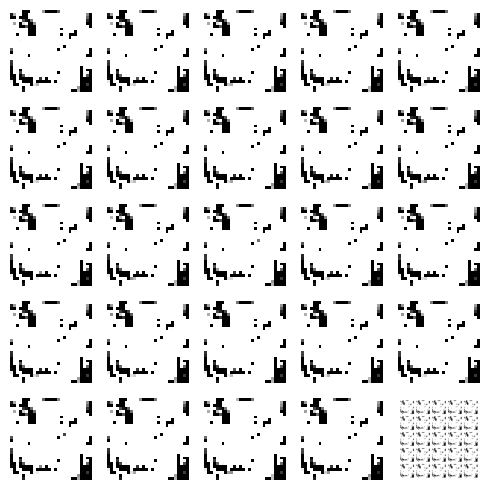

  0%|          | 0/350 [00:00<?, ?it/s]

4/4 [==============================] - 0s 15ms/step


  0%|          | 1/350 [00:00<03:02,  1.91it/s]

4/4 [==============================] - 0s 18ms/step


  1%|          | 2/350 [00:01<03:35,  1.61it/s]

4/4 [==============================] - 0s 16ms/step


  1%|          | 3/350 [00:01<03:27,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


  1%|          | 4/350 [00:02<03:13,  1.79it/s]

4/4 [==============================] - 0s 11ms/step


  1%|▏         | 5/350 [00:02<03:06,  1.85it/s]

4/4 [==============================] - 0s 16ms/step


  2%|▏         | 6/350 [00:03<03:16,  1.75it/s]

4/4 [==============================] - 0s 22ms/step


  2%|▏         | 7/350 [00:04<03:28,  1.65it/s]

4/4 [==============================] - 0s 13ms/step


  2%|▏         | 8/350 [00:04<03:19,  1.71it/s]

4/4 [==============================] - 0s 11ms/step


  3%|▎         | 9/350 [00:05<03:09,  1.80it/s]

4/4 [==============================] - 0s 12ms/step


  3%|▎         | 10/350 [00:05<03:19,  1.71it/s]

4/4 [==============================] - 0s 15ms/step


  3%|▎         | 11/350 [00:06<03:21,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


  3%|▎         | 12/350 [00:06<03:11,  1.77it/s]

4/4 [==============================] - 0s 11ms/step


  4%|▎         | 13/350 [00:07<03:01,  1.86it/s]

4/4 [==============================] - 0s 10ms/step


  4%|▍         | 14/350 [00:07<02:54,  1.93it/s]

4/4 [==============================] - 0s 11ms/step


  4%|▍         | 15/350 [00:08<02:55,  1.90it/s]

4/4 [==============================] - 0s 13ms/step


  5%|▍         | 16/350 [00:08<03:04,  1.81it/s]

4/4 [==============================] - 0s 13ms/step


  5%|▍         | 17/350 [00:09<03:04,  1.80it/s]

4/4 [==============================] - 0s 11ms/step


  5%|▌         | 18/350 [00:10<02:58,  1.86it/s]

4/4 [==============================] - 0s 11ms/step


  5%|▌         | 19/350 [00:10<02:56,  1.88it/s]

4/4 [==============================] - 0s 13ms/step


  6%|▌         | 20/350 [00:11<03:06,  1.77it/s]

4/4 [==============================] - 0s 12ms/step


  6%|▌         | 21/350 [00:11<03:07,  1.76it/s]

4/4 [==============================] - 0s 10ms/step


  6%|▋         | 22/350 [00:12<02:57,  1.85it/s]

4/4 [==============================] - 0s 12ms/step


  7%|▋         | 23/350 [00:12<02:51,  1.90it/s]

4/4 [==============================] - 0s 11ms/step


  7%|▋         | 24/350 [00:13<02:51,  1.90it/s]

4/4 [==============================] - 0s 13ms/step


  7%|▋         | 25/350 [00:13<03:02,  1.78it/s]

4/4 [==============================] - 0s 17ms/step


  7%|▋         | 26/350 [00:14<03:02,  1.77it/s]

4/4 [==============================] - 0s 11ms/step


  8%|▊         | 27/350 [00:14<02:55,  1.85it/s]

4/4 [==============================] - 0s 10ms/step


  8%|▊         | 28/350 [00:15<02:47,  1.92it/s]

4/4 [==============================] - 0s 11ms/step


  8%|▊         | 29/350 [00:16<02:49,  1.90it/s]

4/4 [==============================] - 0s 13ms/step


  9%|▊         | 30/350 [00:16<02:58,  1.79it/s]

4/4 [==============================] - 0s 23ms/step


  9%|▉         | 31/350 [00:17<02:59,  1.78it/s]

4/4 [==============================] - 0s 11ms/step


  9%|▉         | 32/350 [00:17<02:52,  1.84it/s]

4/4 [==============================] - 0s 12ms/step


  9%|▉         | 33/350 [00:18<02:52,  1.83it/s]

4/4 [==============================] - 0s 13ms/step


 10%|▉         | 34/350 [00:18<02:58,  1.77it/s]

4/4 [==============================] - 0s 18ms/step


 10%|█         | 35/350 [00:19<02:57,  1.77it/s]

4/4 [==============================] - 0s 11ms/step


 10%|█         | 36/350 [00:19<02:50,  1.84it/s]

4/4 [==============================] - 0s 11ms/step


 11%|█         | 37/350 [00:20<02:44,  1.91it/s]

4/4 [==============================] - 0s 11ms/step


 11%|█         | 38/350 [00:21<02:51,  1.82it/s]

4/4 [==============================] - 0s 17ms/step


 11%|█         | 39/350 [00:21<02:58,  1.74it/s]

4/4 [==============================] - 0s 11ms/step


 11%|█▏        | 40/350 [00:22<02:50,  1.82it/s]

4/4 [==============================] - 0s 11ms/step


 12%|█▏        | 41/350 [00:22<02:43,  1.89it/s]

4/4 [==============================] - 0s 11ms/step


 12%|█▏        | 42/350 [00:23<02:42,  1.89it/s]

4/4 [==============================] - 0s 13ms/step


 12%|█▏        | 43/350 [00:23<02:47,  1.83it/s]

4/4 [==============================] - 0s 13ms/step


 13%|█▎        | 44/350 [00:24<02:49,  1.80it/s]

4/4 [==============================] - 0s 12ms/step


 13%|█▎        | 45/350 [00:24<02:45,  1.84it/s]

4/4 [==============================] - 0s 11ms/step


 13%|█▎        | 46/350 [00:25<02:45,  1.84it/s]

4/4 [==============================] - 0s 15ms/step


 13%|█▎        | 47/350 [00:26<02:55,  1.73it/s]

4/4 [==============================] - 0s 12ms/step


 14%|█▎        | 48/350 [00:26<02:47,  1.80it/s]

4/4 [==============================] - 0s 14ms/step


 14%|█▍        | 49/350 [00:27<02:41,  1.86it/s]

4/4 [==============================] - 0s 11ms/step


 14%|█▍        | 50/350 [00:27<02:36,  1.92it/s]

4/4 [==============================] - 0s 14ms/step


 15%|█▍        | 51/350 [00:28<02:53,  1.73it/s]

4/4 [==============================] - 0s 17ms/step


 15%|█▍        | 52/350 [00:28<02:53,  1.71it/s]

4/4 [==============================] - 0s 11ms/step


 15%|█▌        | 53/350 [00:29<02:45,  1.79it/s]

4/4 [==============================] - 0s 11ms/step


 15%|█▌        | 54/350 [00:29<02:38,  1.87it/s]

4/4 [==============================] - 0s 17ms/step


 16%|█▌        | 55/350 [00:30<02:48,  1.75it/s]

4/4 [==============================] - 0s 12ms/step


 16%|█▌        | 56/350 [00:31<02:50,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 16%|█▋        | 57/350 [00:31<02:43,  1.79it/s]

4/4 [==============================] - 0s 10ms/step


 17%|█▋        | 58/350 [00:32<02:39,  1.83it/s]

4/4 [==============================] - 0s 12ms/step


 17%|█▋        | 59/350 [00:32<02:45,  1.76it/s]

4/4 [==============================] - 0s 18ms/step


 17%|█▋        | 60/350 [00:33<02:44,  1.76it/s]

4/4 [==============================] - 0s 10ms/step


 17%|█▋        | 61/350 [00:33<02:36,  1.85it/s]

4/4 [==============================] - 0s 13ms/step


 18%|█▊        | 62/350 [00:34<02:31,  1.91it/s]

4/4 [==============================] - 0s 11ms/step


 18%|█▊        | 63/350 [00:34<02:31,  1.89it/s]

4/4 [==============================] - 0s 13ms/step


 18%|█▊        | 64/350 [00:35<02:42,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 19%|█▊        | 65/350 [00:35<02:37,  1.81it/s]

4/4 [==============================] - 0s 12ms/step


 19%|█▉        | 66/350 [00:36<02:31,  1.87it/s]

4/4 [==============================] - 0s 12ms/step


 19%|█▉        | 67/350 [00:37<02:35,  1.82it/s]

4/4 [==============================] - 0s 13ms/step


 19%|█▉        | 68/350 [00:37<02:47,  1.69it/s]

4/4 [==============================] - 0s 18ms/step


 20%|█▉        | 69/350 [00:38<02:43,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 20%|██        | 70/350 [00:38<02:35,  1.81it/s]

4/4 [==============================] - 0s 11ms/step


 20%|██        | 71/350 [00:39<02:31,  1.84it/s]

4/4 [==============================] - 0s 14ms/step


 21%|██        | 72/350 [00:39<02:37,  1.76it/s]

4/4 [==============================] - 0s 15ms/step


 21%|██        | 73/350 [00:40<02:36,  1.77it/s]

4/4 [==============================] - 0s 11ms/step


 21%|██        | 74/350 [00:40<02:28,  1.86it/s]

4/4 [==============================] - 0s 12ms/step


 21%|██▏       | 75/350 [00:41<02:22,  1.93it/s]

4/4 [==============================] - 0s 11ms/step


 22%|██▏       | 76/350 [00:41<02:24,  1.90it/s]

4/4 [==============================] - 0s 12ms/step


 22%|██▏       | 77/350 [00:42<02:32,  1.79it/s]

4/4 [==============================] - 0s 20ms/step


 22%|██▏       | 78/350 [00:43<02:34,  1.77it/s]

4/4 [==============================] - 0s 11ms/step


 23%|██▎       | 79/350 [00:43<02:26,  1.85it/s]

4/4 [==============================] - 0s 11ms/step


 23%|██▎       | 80/350 [00:44<02:20,  1.92it/s]

4/4 [==============================] - 0s 11ms/step


 23%|██▎       | 81/350 [00:44<02:22,  1.88it/s]

4/4 [==============================] - 0s 26ms/step


 23%|██▎       | 82/350 [00:45<02:33,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 24%|██▎       | 83/350 [00:45<02:29,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 24%|██▍       | 84/350 [00:46<02:22,  1.86it/s]

4/4 [==============================] - 0s 11ms/step


 24%|██▍       | 85/350 [00:46<02:21,  1.87it/s]

4/4 [==============================] - 0s 12ms/step


 25%|██▍       | 86/350 [00:47<02:29,  1.76it/s]

4/4 [==============================] - 0s 17ms/step


 25%|██▍       | 87/350 [00:48<02:32,  1.73it/s]

4/4 [==============================] - 0s 11ms/step


 25%|██▌       | 88/350 [00:48<02:24,  1.82it/s]

4/4 [==============================] - 0s 12ms/step


 25%|██▌       | 89/350 [00:49<02:17,  1.89it/s]

4/4 [==============================] - 0s 11ms/step


 26%|██▌       | 90/350 [00:49<02:22,  1.83it/s]

4/4 [==============================] - 0s 13ms/step


 26%|██▌       | 91/350 [00:50<02:28,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 26%|██▋       | 92/350 [00:50<02:20,  1.84it/s]

4/4 [==============================] - 0s 11ms/step


 27%|██▋       | 93/350 [00:51<02:14,  1.90it/s]

4/4 [==============================] - 0s 12ms/step


 27%|██▋       | 94/350 [00:51<02:15,  1.89it/s]

4/4 [==============================] - 0s 13ms/step


 27%|██▋       | 95/350 [00:52<02:22,  1.79it/s]

4/4 [==============================] - 0s 11ms/step


 27%|██▋       | 96/350 [00:53<02:24,  1.75it/s]

4/4 [==============================] - 0s 12ms/step


 28%|██▊       | 97/350 [00:53<02:18,  1.82it/s]

4/4 [==============================] - 0s 11ms/step


 28%|██▊       | 98/350 [00:54<02:18,  1.82it/s]

4/4 [==============================] - 0s 12ms/step


 28%|██▊       | 99/350 [00:54<02:22,  1.76it/s]

4/4 [==============================] - 0s 21ms/step


 29%|██▊       | 100/350 [00:55<02:22,  1.76it/s]

4/4 [==============================] - 0s 11ms/step


 29%|██▉       | 101/350 [00:55<02:17,  1.81it/s]

4/4 [==============================] - 0s 11ms/step


 29%|██▉       | 102/350 [00:56<02:11,  1.88it/s]

4/4 [==============================] - 0s 11ms/step


 29%|██▉       | 103/350 [00:56<02:12,  1.86it/s]

4/4 [==============================] - 0s 25ms/step


 30%|██▉       | 104/350 [00:57<02:24,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 30%|███       | 105/350 [00:58<02:16,  1.79it/s]

4/4 [==============================] - 0s 12ms/step


 30%|███       | 106/350 [00:58<02:11,  1.86it/s]

4/4 [==============================] - 0s 12ms/step


 31%|███       | 107/350 [00:59<02:11,  1.84it/s]

4/4 [==============================] - 0s 24ms/step


 31%|███       | 108/350 [00:59<02:19,  1.73it/s]

4/4 [==============================] - 0s 14ms/step


 31%|███       | 109/350 [01:00<02:16,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 31%|███▏      | 110/350 [01:00<02:10,  1.84it/s]

4/4 [==============================] - 0s 17ms/step


 32%|███▏      | 111/350 [01:01<02:17,  1.74it/s]

4/4 [==============================] - 0s 14ms/step


 32%|███▏      | 112/350 [01:02<02:19,  1.71it/s]

4/4 [==============================] - 0s 11ms/step


 32%|███▏      | 113/350 [01:02<02:11,  1.81it/s]

4/4 [==============================] - 0s 11ms/step


 33%|███▎      | 114/350 [01:02<02:05,  1.88it/s]

4/4 [==============================] - 0s 12ms/step


 33%|███▎      | 115/350 [01:03<02:12,  1.78it/s]

4/4 [==============================] - 0s 16ms/step


 33%|███▎      | 116/350 [01:04<02:15,  1.73it/s]

4/4 [==============================] - 0s 11ms/step


 33%|███▎      | 117/350 [01:04<02:08,  1.82it/s]

4/4 [==============================] - 0s 13ms/step


 34%|███▎      | 118/350 [01:05<02:02,  1.89it/s]

4/4 [==============================] - 0s 11ms/step


 34%|███▍      | 119/350 [01:05<02:05,  1.84it/s]

4/4 [==============================] - 0s 27ms/step


 34%|███▍      | 120/350 [01:06<02:17,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


 35%|███▍      | 121/350 [01:07<02:12,  1.73it/s]

4/4 [==============================] - 0s 11ms/step


 35%|███▍      | 122/350 [01:07<02:08,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 35%|███▌      | 123/350 [01:08<02:12,  1.71it/s]

4/4 [==============================] - 0s 15ms/step


 35%|███▌      | 124/350 [01:08<02:08,  1.75it/s]

4/4 [==============================] - 0s 12ms/step


 36%|███▌      | 125/350 [01:09<02:03,  1.82it/s]

4/4 [==============================] - 0s 12ms/step


 36%|███▌      | 126/350 [01:09<01:57,  1.91it/s]

4/4 [==============================] - 0s 13ms/step


 36%|███▋      | 127/350 [01:10<02:05,  1.78it/s]

4/4 [==============================] - 0s 15ms/step


 37%|███▋      | 128/350 [01:10<02:07,  1.74it/s]

4/4 [==============================] - 0s 11ms/step


 37%|███▋      | 129/350 [01:11<02:01,  1.82it/s]

4/4 [==============================] - 0s 12ms/step


 37%|███▋      | 130/350 [01:11<01:56,  1.89it/s]

4/4 [==============================] - 0s 15ms/step


 37%|███▋      | 131/350 [01:12<02:06,  1.73it/s]

4/4 [==============================] - 0s 16ms/step


 38%|███▊      | 132/350 [01:13<02:08,  1.69it/s]

4/4 [==============================] - 0s 13ms/step


 38%|███▊      | 133/350 [01:13<02:02,  1.77it/s]

4/4 [==============================] - 0s 12ms/step


 38%|███▊      | 134/350 [01:14<02:03,  1.76it/s]

4/4 [==============================] - 0s 16ms/step


 39%|███▊      | 135/350 [01:15<02:11,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 39%|███▉      | 136/350 [01:15<02:02,  1.75it/s]

4/4 [==============================] - 0s 12ms/step


 39%|███▉      | 137/350 [01:16<01:56,  1.83it/s]

4/4 [==============================] - 0s 11ms/step


 39%|███▉      | 138/350 [01:16<01:53,  1.86it/s]

4/4 [==============================] - 0s 15ms/step


 40%|███▉      | 139/350 [01:17<02:07,  1.66it/s]

4/4 [==============================] - 0s 18ms/step


 40%|████      | 140/350 [01:17<02:01,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 40%|████      | 141/350 [01:18<01:53,  1.84it/s]

4/4 [==============================] - 0s 11ms/step


 41%|████      | 142/350 [01:18<01:49,  1.91it/s]

4/4 [==============================] - 0s 13ms/step


 41%|████      | 143/350 [01:19<01:55,  1.79it/s]

4/4 [==============================] - 0s 12ms/step


 41%|████      | 144/350 [01:19<01:58,  1.73it/s]

4/4 [==============================] - 0s 12ms/step


 41%|████▏     | 145/350 [01:20<01:52,  1.82it/s]

4/4 [==============================] - 0s 15ms/step


 42%|████▏     | 146/350 [01:21<01:57,  1.73it/s]

4/4 [==============================] - 0s 12ms/step


 42%|████▏     | 147/350 [01:21<01:59,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 42%|████▏     | 148/350 [01:22<01:52,  1.80it/s]

4/4 [==============================] - 0s 11ms/step


 43%|████▎     | 149/350 [01:22<01:46,  1.88it/s]

4/4 [==============================] - 0s 12ms/step


 43%|████▎     | 150/350 [01:23<01:52,  1.77it/s]

4/4 [==============================] - 0s 14ms/step


 43%|████▎     | 151/350 [01:23<01:54,  1.73it/s]

4/4 [==============================] - 0s 11ms/step


 43%|████▎     | 152/350 [01:24<01:48,  1.83it/s]

4/4 [==============================] - 0s 11ms/step


 44%|████▎     | 153/350 [01:24<01:44,  1.89it/s]

4/4 [==============================] - 0s 11ms/step


 44%|████▍     | 154/350 [01:25<01:42,  1.91it/s]

4/4 [==============================] - 0s 14ms/step


 44%|████▍     | 155/350 [01:26<01:50,  1.76it/s]

4/4 [==============================] - 0s 12ms/step


 45%|████▍     | 156/350 [01:26<01:51,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 45%|████▍     | 157/350 [01:27<01:46,  1.81it/s]

4/4 [==============================] - 0s 17ms/step


 45%|████▌     | 158/350 [01:27<01:54,  1.68it/s]

4/4 [==============================] - 0s 14ms/step


 45%|████▌     | 159/350 [01:28<01:53,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 46%|████▌     | 160/350 [01:28<01:46,  1.79it/s]

4/4 [==============================] - 0s 11ms/step


 46%|████▌     | 161/350 [01:29<01:41,  1.86it/s]

4/4 [==============================] - 0s 10ms/step


 46%|████▋     | 162/350 [01:29<01:39,  1.89it/s]

4/4 [==============================] - 0s 11ms/step


 47%|████▋     | 163/350 [01:30<01:44,  1.78it/s]

4/4 [==============================] - 0s 22ms/step


 47%|████▋     | 164/350 [01:31<01:44,  1.77it/s]

4/4 [==============================] - 0s 11ms/step


 47%|████▋     | 165/350 [01:31<01:40,  1.84it/s]

4/4 [==============================] - 0s 11ms/step


 47%|████▋     | 166/350 [01:32<01:40,  1.84it/s]

4/4 [==============================] - 0s 15ms/step


 48%|████▊     | 167/350 [01:32<01:48,  1.68it/s]

4/4 [==============================] - 0s 20ms/step


 48%|████▊     | 168/350 [01:33<01:49,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 48%|████▊     | 169/350 [01:33<01:42,  1.77it/s]

4/4 [==============================] - 0s 10ms/step


 49%|████▊     | 170/350 [01:34<01:36,  1.86it/s]

4/4 [==============================] - 0s 11ms/step


 49%|████▉     | 171/350 [01:35<01:43,  1.73it/s]

4/4 [==============================] - 0s 14ms/step


 49%|████▉     | 172/350 [01:35<01:43,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


 49%|████▉     | 173/350 [01:36<01:39,  1.78it/s]

4/4 [==============================] - 0s 12ms/step


 50%|████▉     | 174/350 [01:36<01:36,  1.83it/s]

4/4 [==============================] - 0s 10ms/step


 50%|█████     | 175/350 [01:37<01:32,  1.89it/s]

4/4 [==============================] - 0s 16ms/step


 50%|█████     | 176/350 [01:37<01:41,  1.72it/s]

4/4 [==============================] - 0s 33ms/step


 51%|█████     | 177/350 [01:38<01:46,  1.62it/s]

4/4 [==============================] - 0s 13ms/step


 51%|█████     | 178/350 [01:39<01:40,  1.71it/s]

4/4 [==============================] - 0s 11ms/step


 51%|█████     | 179/350 [01:39<01:34,  1.80it/s]

4/4 [==============================] - 0s 13ms/step


 51%|█████▏    | 180/350 [01:40<01:38,  1.73it/s]

4/4 [==============================] - 0s 19ms/step


 52%|█████▏    | 181/350 [01:41<01:52,  1.51it/s]

4/4 [==============================] - 0s 11ms/step


 52%|█████▏    | 182/350 [01:41<01:43,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


 52%|█████▏    | 183/350 [01:42<01:37,  1.72it/s]

4/4 [==============================] - 0s 17ms/step


 53%|█████▎    | 184/350 [01:42<01:42,  1.63it/s]

4/4 [==============================] - 0s 14ms/step


 53%|█████▎    | 185/350 [01:43<01:45,  1.56it/s]

4/4 [==============================] - 0s 20ms/step


 53%|█████▎    | 186/350 [01:44<01:43,  1.58it/s]

4/4 [==============================] - 0s 13ms/step


 53%|█████▎    | 187/350 [01:44<01:41,  1.61it/s]

4/4 [==============================] - 0s 14ms/step


 54%|█████▎    | 188/350 [01:45<01:43,  1.56it/s]

4/4 [==============================] - 0s 13ms/step


 54%|█████▍    | 189/350 [01:46<01:42,  1.57it/s]

4/4 [==============================] - 0s 15ms/step


 54%|█████▍    | 190/350 [01:46<01:38,  1.62it/s]

4/4 [==============================] - 0s 14ms/step


 55%|█████▍    | 191/350 [01:47<01:35,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


 55%|█████▍    | 192/350 [01:47<01:34,  1.67it/s]

4/4 [==============================] - 0s 16ms/step


 55%|█████▌    | 193/350 [01:48<01:42,  1.53it/s]

4/4 [==============================] - 0s 12ms/step


 55%|█████▌    | 194/350 [01:49<01:34,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


 56%|█████▌    | 195/350 [01:49<01:28,  1.75it/s]

4/4 [==============================] - 0s 11ms/step


 56%|█████▌    | 196/350 [01:50<01:28,  1.75it/s]

4/4 [==============================] - 0s 20ms/step


 56%|█████▋    | 197/350 [01:50<01:34,  1.62it/s]

4/4 [==============================] - 0s 13ms/step


 57%|█████▋    | 198/350 [01:51<01:30,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 57%|█████▋    | 199/350 [01:51<01:25,  1.76it/s]

4/4 [==============================] - 0s 12ms/step


 57%|█████▋    | 200/350 [01:52<01:27,  1.71it/s]

4/4 [==============================] - 0s 21ms/step


 57%|█████▋    | 201/350 [01:53<01:29,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 58%|█████▊    | 202/350 [01:53<01:24,  1.76it/s]

4/4 [==============================] - 0s 11ms/step


 58%|█████▊    | 203/350 [01:54<01:20,  1.83it/s]

4/4 [==============================] - 0s 11ms/step


 58%|█████▊    | 204/350 [01:54<01:23,  1.75it/s]

4/4 [==============================] - 0s 18ms/step


 59%|█████▊    | 205/350 [01:55<01:25,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 59%|█████▉    | 206/350 [01:55<01:20,  1.78it/s]

4/4 [==============================] - 0s 12ms/step


 59%|█████▉    | 207/350 [01:56<01:17,  1.85it/s]

4/4 [==============================] - 0s 14ms/step


 59%|█████▉    | 208/350 [01:57<01:19,  1.79it/s]

4/4 [==============================] - 0s 21ms/step


 60%|█████▉    | 209/350 [01:57<01:23,  1.70it/s]

4/4 [==============================] - 0s 21ms/step


 60%|██████    | 210/350 [01:58<01:25,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


 60%|██████    | 211/350 [01:58<01:21,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 61%|██████    | 212/350 [01:59<01:21,  1.68it/s]

4/4 [==============================] - 0s 19ms/step


 61%|██████    | 213/350 [02:00<01:19,  1.72it/s]

4/4 [==============================] - 0s 11ms/step


 61%|██████    | 214/350 [02:00<01:14,  1.82it/s]

4/4 [==============================] - 0s 11ms/step


 61%|██████▏   | 215/350 [02:00<01:11,  1.89it/s]

4/4 [==============================] - 0s 17ms/step


 62%|██████▏   | 216/350 [02:01<01:16,  1.76it/s]

4/4 [==============================] - 0s 20ms/step


 62%|██████▏   | 217/350 [02:02<01:15,  1.77it/s]

4/4 [==============================] - 0s 11ms/step


 62%|██████▏   | 218/350 [02:02<01:13,  1.79it/s]

4/4 [==============================] - 0s 14ms/step


 63%|██████▎   | 219/350 [02:03<01:17,  1.68it/s]

4/4 [==============================] - 0s 14ms/step


 63%|██████▎   | 220/350 [02:03<01:16,  1.71it/s]

4/4 [==============================] - 0s 11ms/step


 63%|██████▎   | 221/350 [02:04<01:11,  1.80it/s]

4/4 [==============================] - 0s 10ms/step


 63%|██████▎   | 222/350 [02:05<01:12,  1.77it/s]

4/4 [==============================] - 0s 16ms/step


 64%|██████▎   | 223/350 [02:05<01:18,  1.62it/s]

4/4 [==============================] - 0s 10ms/step


 64%|██████▍   | 224/350 [02:06<01:12,  1.74it/s]

4/4 [==============================] - 0s 10ms/step


 64%|██████▍   | 225/350 [02:06<01:08,  1.83it/s]

4/4 [==============================] - 0s 13ms/step


 65%|██████▍   | 226/350 [02:07<01:07,  1.85it/s]

4/4 [==============================] - 0s 13ms/step


 65%|██████▍   | 227/350 [02:07<01:11,  1.71it/s]

4/4 [==============================] - 0s 20ms/step


 65%|██████▌   | 228/350 [02:08<01:11,  1.71it/s]

4/4 [==============================] - 0s 13ms/step


 65%|██████▌   | 229/350 [02:09<01:09,  1.73it/s]

4/4 [==============================] - 0s 14ms/step


 66%|██████▌   | 230/350 [02:09<01:13,  1.64it/s]

4/4 [==============================] - 0s 19ms/step


 66%|██████▌   | 231/350 [02:10<01:11,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 66%|██████▋   | 232/350 [02:10<01:07,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 67%|██████▋   | 233/350 [02:11<01:07,  1.74it/s]

4/4 [==============================] - 0s 20ms/step


 67%|██████▋   | 234/350 [02:12<01:10,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 67%|██████▋   | 235/350 [02:12<01:05,  1.75it/s]

4/4 [==============================] - 0s 11ms/step


 67%|██████▋   | 236/350 [02:13<01:02,  1.82it/s]

4/4 [==============================] - 0s 12ms/step


 68%|██████▊   | 237/350 [02:13<01:06,  1.69it/s]

4/4 [==============================] - 0s 13ms/step


 68%|██████▊   | 238/350 [02:14<01:07,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 68%|██████▊   | 239/350 [02:14<01:03,  1.73it/s]

4/4 [==============================] - 0s 14ms/step


 69%|██████▊   | 240/350 [02:15<01:05,  1.68it/s]

4/4 [==============================] - 0s 17ms/step


 69%|██████▉   | 241/350 [02:16<01:08,  1.60it/s]

4/4 [==============================] - 0s 12ms/step


 69%|██████▉   | 242/350 [02:16<01:03,  1.71it/s]

4/4 [==============================] - 0s 11ms/step


 69%|██████▉   | 243/350 [02:17<00:59,  1.79it/s]

4/4 [==============================] - 0s 12ms/step


 70%|██████▉   | 244/350 [02:17<00:58,  1.81it/s]

4/4 [==============================] - 0s 24ms/step


 70%|███████   | 245/350 [02:18<01:03,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 70%|███████   | 246/350 [02:19<00:59,  1.75it/s]

4/4 [==============================] - 0s 11ms/step


 71%|███████   | 247/350 [02:19<00:56,  1.84it/s]

4/4 [==============================] - 0s 12ms/step


 71%|███████   | 248/350 [02:20<00:58,  1.74it/s]

4/4 [==============================] - 0s 14ms/step


 71%|███████   | 249/350 [02:20<01:01,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 71%|███████▏  | 250/350 [02:21<00:58,  1.70it/s]

4/4 [==============================] - 0s 10ms/step


 72%|███████▏  | 251/350 [02:21<00:58,  1.70it/s]

4/4 [==============================] - 0s 14ms/step


 72%|███████▏  | 252/350 [02:22<01:03,  1.54it/s]

4/4 [==============================] - 0s 16ms/step


 72%|███████▏  | 253/350 [02:23<01:02,  1.55it/s]

4/4 [==============================] - 0s 12ms/step


 73%|███████▎  | 254/350 [02:23<00:57,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 73%|███████▎  | 255/350 [02:24<01:00,  1.58it/s]

4/4 [==============================] - 0s 15ms/step


 73%|███████▎  | 256/350 [02:25<01:09,  1.36it/s]

4/4 [==============================] - 0s 20ms/step


 73%|███████▎  | 257/350 [02:26<01:06,  1.40it/s]

4/4 [==============================] - 0s 14ms/step


 74%|███████▎  | 258/350 [02:26<01:02,  1.46it/s]

4/4 [==============================] - 0s 11ms/step


 74%|███████▍  | 259/350 [02:27<00:56,  1.60it/s]

4/4 [==============================] - 0s 11ms/step


 74%|███████▍  | 260/350 [02:27<00:55,  1.62it/s]

4/4 [==============================] - 0s 19ms/step


 75%|███████▍  | 261/350 [02:28<00:57,  1.54it/s]

4/4 [==============================] - 0s 21ms/step


 75%|███████▍  | 262/350 [02:29<01:02,  1.40it/s]

4/4 [==============================] - 0s 17ms/step


 75%|███████▌  | 263/350 [02:30<00:59,  1.45it/s]

4/4 [==============================] - 0s 24ms/step


 75%|███████▌  | 264/350 [02:30<00:58,  1.48it/s]

4/4 [==============================] - 0s 11ms/step


 76%|███████▌  | 265/350 [02:31<00:52,  1.62it/s]

4/4 [==============================] - 0s 16ms/step


 76%|███████▌  | 266/350 [02:31<00:53,  1.56it/s]

4/4 [==============================] - 0s 12ms/step


 76%|███████▋  | 267/350 [02:32<00:49,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 77%|███████▋  | 268/350 [02:32<00:46,  1.76it/s]

4/4 [==============================] - 0s 15ms/step


 77%|███████▋  | 269/350 [02:33<00:48,  1.66it/s]

4/4 [==============================] - 0s 16ms/step


 77%|███████▋  | 270/350 [02:34<00:49,  1.60it/s]

4/4 [==============================] - 0s 20ms/step


 77%|███████▋  | 271/350 [02:35<00:50,  1.56it/s]

4/4 [==============================] - 0s 16ms/step


 78%|███████▊  | 272/350 [02:35<00:49,  1.58it/s]

4/4 [==============================] - 0s 24ms/step


 78%|███████▊  | 273/350 [02:36<00:49,  1.55it/s]

4/4 [==============================] - 0s 13ms/step


 78%|███████▊  | 274/350 [02:36<00:49,  1.52it/s]

4/4 [==============================] - 0s 17ms/step


 79%|███████▊  | 275/350 [02:37<00:49,  1.53it/s]

4/4 [==============================] - 0s 30ms/step


 79%|███████▉  | 276/350 [02:38<00:50,  1.46it/s]

4/4 [==============================] - 0s 24ms/step


 79%|███████▉  | 277/350 [02:39<00:52,  1.40it/s]

4/4 [==============================] - 0s 16ms/step


 79%|███████▉  | 278/350 [02:39<00:47,  1.50it/s]

4/4 [==============================] - 0s 15ms/step


 80%|███████▉  | 279/350 [02:40<00:48,  1.46it/s]

4/4 [==============================] - 0s 21ms/step


 80%|████████  | 280/350 [02:41<00:51,  1.37it/s]

4/4 [==============================] - 0s 20ms/step


 80%|████████  | 281/350 [02:42<00:50,  1.37it/s]

4/4 [==============================] - 0s 16ms/step


 81%|████████  | 282/350 [02:42<00:49,  1.38it/s]

4/4 [==============================] - 0s 24ms/step


 81%|████████  | 283/350 [02:43<00:49,  1.36it/s]

4/4 [==============================] - 0s 20ms/step


 81%|████████  | 284/350 [02:44<00:51,  1.28it/s]

4/4 [==============================] - 0s 14ms/step


 81%|████████▏ | 285/350 [02:45<00:48,  1.35it/s]

4/4 [==============================] - 0s 16ms/step


 82%|████████▏ | 286/350 [02:45<00:47,  1.36it/s]

4/4 [==============================] - 0s 13ms/step


 82%|████████▏ | 287/350 [02:46<00:47,  1.32it/s]

4/4 [==============================] - 0s 14ms/step


 82%|████████▏ | 288/350 [02:47<00:48,  1.28it/s]

4/4 [==============================] - 0s 14ms/step


 83%|████████▎ | 289/350 [02:48<00:50,  1.22it/s]

4/4 [==============================] - 0s 13ms/step


 83%|████████▎ | 290/350 [02:49<00:48,  1.25it/s]

4/4 [==============================] - 0s 13ms/step


 83%|████████▎ | 291/350 [02:49<00:45,  1.31it/s]

4/4 [==============================] - 0s 15ms/step


 83%|████████▎ | 292/350 [02:50<00:42,  1.36it/s]

4/4 [==============================] - 0s 12ms/step


 84%|████████▎ | 293/350 [02:51<00:41,  1.39it/s]

4/4 [==============================] - 0s 13ms/step


 84%|████████▍ | 294/350 [02:51<00:40,  1.39it/s]

4/4 [==============================] - 0s 18ms/step


 84%|████████▍ | 295/350 [02:52<00:38,  1.42it/s]

4/4 [==============================] - 0s 28ms/step


 85%|████████▍ | 296/350 [02:53<00:38,  1.40it/s]

4/4 [==============================] - 0s 17ms/step


 85%|████████▍ | 297/350 [02:53<00:37,  1.40it/s]

4/4 [==============================] - 0s 16ms/step


 85%|████████▌ | 298/350 [02:54<00:36,  1.42it/s]

4/4 [==============================] - 0s 19ms/step


 85%|████████▌ | 299/350 [02:55<00:36,  1.40it/s]

4/4 [==============================] - 0s 28ms/step


 86%|████████▌ | 300/350 [02:56<00:37,  1.33it/s]

4/4 [==============================] - 0s 13ms/step


 86%|████████▌ | 301/350 [02:56<00:35,  1.37it/s]

4/4 [==============================] - 0s 16ms/step


 86%|████████▋ | 302/350 [02:57<00:34,  1.41it/s]

4/4 [==============================] - 0s 16ms/step


 87%|████████▋ | 303/350 [02:58<00:34,  1.38it/s]

4/4 [==============================] - 0s 13ms/step


 87%|████████▋ | 304/350 [02:59<00:35,  1.29it/s]

4/4 [==============================] - 0s 23ms/step


 87%|████████▋ | 305/350 [03:00<00:35,  1.26it/s]

4/4 [==============================] - 0s 11ms/step


 87%|████████▋ | 306/350 [03:00<00:35,  1.24it/s]

4/4 [==============================] - 0s 28ms/step


 88%|████████▊ | 307/350 [03:01<00:33,  1.28it/s]

4/4 [==============================] - 0s 14ms/step


 88%|████████▊ | 308/350 [03:02<00:32,  1.28it/s]

4/4 [==============================] - 0s 13ms/step


 88%|████████▊ | 309/350 [03:03<00:30,  1.33it/s]

4/4 [==============================] - 0s 13ms/step


 89%|████████▊ | 310/350 [03:03<00:29,  1.36it/s]

4/4 [==============================] - 0s 12ms/step


 89%|████████▉ | 311/350 [03:04<00:28,  1.38it/s]

4/4 [==============================] - 0s 11ms/step


 89%|████████▉ | 312/350 [03:05<00:27,  1.40it/s]

4/4 [==============================] - 0s 30ms/step


 89%|████████▉ | 313/350 [03:05<00:26,  1.38it/s]

4/4 [==============================] - 0s 15ms/step


 90%|████████▉ | 314/350 [03:06<00:26,  1.37it/s]

4/4 [==============================] - 0s 16ms/step


 90%|█████████ | 315/350 [03:07<00:25,  1.37it/s]

4/4 [==============================] - 0s 15ms/step


 90%|█████████ | 316/350 [03:08<00:24,  1.37it/s]

4/4 [==============================] - 0s 15ms/step


 91%|█████████ | 317/350 [03:08<00:25,  1.32it/s]

4/4 [==============================] - 0s 21ms/step


 91%|█████████ | 318/350 [03:09<00:25,  1.26it/s]

4/4 [==============================] - 0s 14ms/step


 91%|█████████ | 319/350 [03:10<00:25,  1.22it/s]

4/4 [==============================] - 0s 21ms/step


 91%|█████████▏| 320/350 [03:11<00:24,  1.22it/s]

4/4 [==============================] - 0s 33ms/step


 92%|█████████▏| 321/350 [03:12<00:23,  1.25it/s]

4/4 [==============================] - 0s 22ms/step


 92%|█████████▏| 322/350 [03:12<00:21,  1.28it/s]

4/4 [==============================] - 0s 14ms/step


 92%|█████████▏| 323/350 [03:13<00:20,  1.31it/s]

4/4 [==============================] - 0s 15ms/step


 93%|█████████▎| 324/350 [03:14<00:19,  1.31it/s]

4/4 [==============================] - 0s 16ms/step


 93%|█████████▎| 325/350 [03:15<00:19,  1.30it/s]

4/4 [==============================] - 0s 13ms/step


 93%|█████████▎| 326/350 [03:16<00:18,  1.27it/s]

4/4 [==============================] - 0s 14ms/step


 93%|█████████▎| 327/350 [03:16<00:17,  1.32it/s]

4/4 [==============================] - 0s 19ms/step


 94%|█████████▎| 328/350 [03:17<00:16,  1.33it/s]

4/4 [==============================] - 0s 13ms/step


 94%|█████████▍| 329/350 [03:18<00:15,  1.35it/s]

4/4 [==============================] - 0s 15ms/step


 94%|█████████▍| 330/350 [03:18<00:14,  1.40it/s]

4/4 [==============================] - 0s 18ms/step


 95%|█████████▍| 331/350 [03:19<00:13,  1.41it/s]

4/4 [==============================] - 0s 21ms/step


 95%|█████████▍| 332/350 [03:20<00:13,  1.36it/s]

4/4 [==============================] - 0s 15ms/step


 95%|█████████▌| 333/350 [03:21<00:12,  1.35it/s]

4/4 [==============================] - 0s 13ms/step


 95%|█████████▌| 334/350 [03:21<00:11,  1.40it/s]

4/4 [==============================] - 0s 14ms/step


 96%|█████████▌| 335/350 [03:22<00:10,  1.40it/s]

4/4 [==============================] - 0s 20ms/step


 96%|█████████▌| 336/350 [03:23<00:09,  1.40it/s]

4/4 [==============================] - 0s 19ms/step


 96%|█████████▋| 337/350 [03:23<00:09,  1.38it/s]

4/4 [==============================] - 0s 14ms/step


 97%|█████████▋| 338/350 [03:24<00:08,  1.41it/s]

4/4 [==============================] - 0s 13ms/step


 97%|█████████▋| 339/350 [03:25<00:07,  1.45it/s]

4/4 [==============================] - 0s 13ms/step


 97%|█████████▋| 340/350 [03:25<00:06,  1.46it/s]

4/4 [==============================] - 0s 14ms/step


 97%|█████████▋| 341/350 [03:26<00:06,  1.46it/s]

4/4 [==============================] - 0s 13ms/step


 98%|█████████▊| 342/350 [03:27<00:05,  1.45it/s]

4/4 [==============================] - 0s 13ms/step


 98%|█████████▊| 343/350 [03:28<00:04,  1.41it/s]

4/4 [==============================] - 0s 22ms/step


 98%|█████████▊| 344/350 [03:28<00:04,  1.40it/s]

4/4 [==============================] - 0s 21ms/step


 99%|█████████▊| 345/350 [03:29<00:03,  1.39it/s]

4/4 [==============================] - 0s 15ms/step


 99%|█████████▉| 346/350 [03:30<00:02,  1.40it/s]

4/4 [==============================] - 0s 22ms/step


 99%|█████████▉| 347/350 [03:30<00:02,  1.37it/s]

4/4 [==============================] - 0s 21ms/step


 99%|█████████▉| 348/350 [03:31<00:01,  1.28it/s]

4/4 [==============================] - 0s 16ms/step


100%|█████████▉| 349/350 [03:32<00:00,  1.32it/s]

4/4 [==============================] - 0s 14ms/step


100%|██████████| 350/350 [03:33<00:00,  1.64it/s]

Epoch number: 95 discriminator_loss: 0.16356700589896978 generator_loss: 8.455933314732142
1/1 [==============================] - 0s 22ms/step


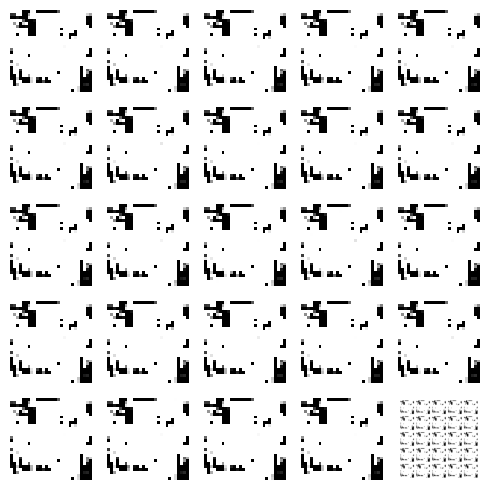

  0%|          | 0/350 [00:00<?, ?it/s]

4/4 [==============================] - 0s 46ms/step


  0%|          | 1/350 [00:00<04:52,  1.19it/s]

4/4 [==============================] - 0s 17ms/step


  1%|          | 2/350 [00:01<04:39,  1.24it/s]

4/4 [==============================] - 0s 14ms/step


  1%|          | 3/350 [00:02<04:24,  1.31it/s]

4/4 [==============================] - 0s 14ms/step


  1%|          | 4/350 [00:03<04:14,  1.36it/s]

4/4 [==============================] - 0s 18ms/step


  1%|▏         | 5/350 [00:03<04:13,  1.36it/s]

4/4 [==============================] - 0s 11ms/step


  2%|▏         | 6/350 [00:04<04:05,  1.40it/s]

4/4 [==============================] - 0s 13ms/step


  2%|▏         | 7/350 [00:05<03:57,  1.45it/s]

4/4 [==============================] - 0s 14ms/step


  2%|▏         | 8/350 [00:05<03:53,  1.47it/s]

4/4 [==============================] - 0s 13ms/step


  3%|▎         | 9/350 [00:06<03:59,  1.42it/s]

4/4 [==============================] - 0s 19ms/step


  3%|▎         | 10/350 [00:07<04:02,  1.40it/s]

4/4 [==============================] - 0s 16ms/step


  3%|▎         | 11/350 [00:07<03:57,  1.43it/s]

4/4 [==============================] - 0s 15ms/step


  3%|▎         | 12/350 [00:08<04:12,  1.34it/s]

4/4 [==============================] - 0s 17ms/step


  4%|▎         | 13/350 [00:09<04:07,  1.36it/s]

4/4 [==============================] - 0s 17ms/step


  4%|▍         | 14/350 [00:10<04:03,  1.38it/s]

4/4 [==============================] - 0s 16ms/step


  4%|▍         | 15/350 [00:10<04:01,  1.39it/s]

4/4 [==============================] - 0s 14ms/step


  5%|▍         | 16/350 [00:11<04:08,  1.35it/s]

4/4 [==============================] - 0s 14ms/step


  5%|▍         | 17/350 [00:12<04:07,  1.35it/s]

4/4 [==============================] - 0s 15ms/step


  5%|▌         | 18/350 [00:13<04:02,  1.37it/s]

4/4 [==============================] - 0s 19ms/step


  5%|▌         | 19/350 [00:13<04:07,  1.34it/s]

4/4 [==============================] - 0s 14ms/step


  6%|▌         | 20/350 [00:14<04:01,  1.37it/s]

4/4 [==============================] - 0s 14ms/step


  6%|▌         | 21/350 [00:15<03:47,  1.45it/s]

4/4 [==============================] - 0s 16ms/step


  6%|▋         | 22/350 [00:15<03:48,  1.43it/s]

4/4 [==============================] - 0s 15ms/step


  7%|▋         | 23/350 [00:16<03:51,  1.42it/s]

4/4 [==============================] - 0s 15ms/step


  7%|▋         | 24/350 [00:17<03:53,  1.39it/s]

4/4 [==============================] - 0s 23ms/step


  7%|▋         | 25/350 [00:18<03:52,  1.40it/s]

4/4 [==============================] - 0s 35ms/step


  7%|▋         | 26/350 [00:18<03:50,  1.40it/s]

4/4 [==============================] - 0s 27ms/step


  8%|▊         | 27/350 [00:19<03:51,  1.40it/s]

4/4 [==============================] - 0s 19ms/step


  8%|▊         | 28/350 [00:20<04:05,  1.31it/s]

4/4 [==============================] - 0s 16ms/step


  8%|▊         | 29/350 [00:21<04:02,  1.32it/s]

4/4 [==============================] - 0s 14ms/step


  9%|▊         | 30/350 [00:21<03:54,  1.36it/s]

4/4 [==============================] - 0s 15ms/step


  9%|▉         | 31/350 [00:22<04:05,  1.30it/s]

4/4 [==============================] - 0s 18ms/step


  9%|▉         | 32/350 [00:23<04:09,  1.28it/s]

4/4 [==============================] - 0s 13ms/step


  9%|▉         | 33/350 [00:24<04:08,  1.27it/s]

4/4 [==============================] - 0s 24ms/step


 10%|▉         | 34/350 [00:25<04:09,  1.27it/s]

4/4 [==============================] - 0s 16ms/step


 10%|█         | 35/350 [00:25<04:01,  1.30it/s]

4/4 [==============================] - 0s 14ms/step


 10%|█         | 36/350 [00:26<03:55,  1.33it/s]

4/4 [==============================] - 0s 21ms/step


 11%|█         | 37/350 [00:27<03:50,  1.36it/s]

4/4 [==============================] - 0s 23ms/step


 11%|█         | 38/350 [00:27<03:41,  1.41it/s]

4/4 [==============================] - 0s 24ms/step


 11%|█         | 39/350 [00:28<03:44,  1.38it/s]

4/4 [==============================] - 0s 14ms/step


 11%|█▏        | 40/350 [00:29<03:43,  1.39it/s]

4/4 [==============================] - 0s 21ms/step


 12%|█▏        | 41/350 [00:30<03:42,  1.39it/s]

4/4 [==============================] - 0s 12ms/step


 12%|█▏        | 42/350 [00:30<03:41,  1.39it/s]

4/4 [==============================] - 0s 13ms/step


 12%|█▏        | 43/350 [00:31<03:40,  1.39it/s]

4/4 [==============================] - 0s 16ms/step


 13%|█▎        | 44/350 [00:32<03:39,  1.39it/s]

4/4 [==============================] - 0s 15ms/step


 13%|█▎        | 45/350 [00:32<03:36,  1.41it/s]

4/4 [==============================] - 0s 12ms/step


 13%|█▎        | 46/350 [00:33<03:32,  1.43it/s]

4/4 [==============================] - 0s 36ms/step


 13%|█▎        | 47/350 [00:34<03:37,  1.39it/s]

4/4 [==============================] - 0s 20ms/step


 14%|█▎        | 48/350 [00:35<03:39,  1.38it/s]

4/4 [==============================] - 0s 14ms/step


 14%|█▍        | 49/350 [00:35<03:36,  1.39it/s]

4/4 [==============================] - 0s 13ms/step


 14%|█▍        | 50/350 [00:36<03:32,  1.41it/s]

4/4 [==============================] - 0s 14ms/step


 15%|█▍        | 51/350 [00:37<03:31,  1.42it/s]

4/4 [==============================] - 0s 18ms/step


 15%|█▍        | 52/350 [00:37<03:34,  1.39it/s]

4/4 [==============================] - 0s 13ms/step


 15%|█▌        | 53/350 [00:38<03:33,  1.39it/s]

4/4 [==============================] - 0s 14ms/step


 15%|█▌        | 54/350 [00:39<03:38,  1.36it/s]

4/4 [==============================] - 0s 19ms/step


 16%|█▌        | 55/350 [00:40<03:45,  1.31it/s]

4/4 [==============================] - 0s 19ms/step


 16%|█▌        | 56/350 [00:40<03:45,  1.31it/s]

4/4 [==============================] - 0s 22ms/step


 16%|█▋        | 57/350 [00:41<03:40,  1.33it/s]

4/4 [==============================] - 0s 12ms/step


 17%|█▋        | 58/350 [00:42<03:45,  1.29it/s]

4/4 [==============================] - 0s 13ms/step


 17%|█▋        | 59/350 [00:43<03:43,  1.30it/s]

4/4 [==============================] - 0s 18ms/step


 17%|█▋        | 60/350 [00:44<03:40,  1.32it/s]

4/4 [==============================] - 0s 14ms/step


 17%|█▋        | 61/350 [00:44<03:47,  1.27it/s]

4/4 [==============================] - 0s 19ms/step


 18%|█▊        | 62/350 [00:45<03:48,  1.26it/s]

4/4 [==============================] - 0s 15ms/step


 18%|█▊        | 63/350 [00:46<03:53,  1.23it/s]

4/4 [==============================] - 0s 12ms/step


 18%|█▊        | 64/350 [00:47<03:46,  1.26it/s]

4/4 [==============================] - 0s 15ms/step


 19%|█▊        | 65/350 [00:48<03:44,  1.27it/s]

4/4 [==============================] - 0s 21ms/step


 19%|█▉        | 66/350 [00:48<03:40,  1.29it/s]

4/4 [==============================] - 0s 15ms/step


 19%|█▉        | 67/350 [00:49<03:39,  1.29it/s]

4/4 [==============================] - 0s 14ms/step


 19%|█▉        | 68/350 [00:50<03:32,  1.33it/s]

4/4 [==============================] - 0s 14ms/step


 20%|█▉        | 69/350 [00:51<03:30,  1.34it/s]

4/4 [==============================] - 0s 12ms/step


 20%|██        | 70/350 [00:51<03:24,  1.37it/s]

4/4 [==============================] - 0s 18ms/step


 20%|██        | 71/350 [00:52<03:19,  1.40it/s]

4/4 [==============================] - 0s 22ms/step


 21%|██        | 72/350 [00:53<03:25,  1.35it/s]

4/4 [==============================] - 0s 21ms/step


 21%|██        | 73/350 [00:53<03:23,  1.36it/s]

4/4 [==============================] - 0s 12ms/step


 21%|██        | 74/350 [00:54<03:19,  1.38it/s]

4/4 [==============================] - 0s 23ms/step


 21%|██▏       | 75/350 [00:55<03:21,  1.36it/s]

4/4 [==============================] - 0s 16ms/step


 22%|██▏       | 76/350 [00:56<03:26,  1.33it/s]

4/4 [==============================] - 0s 35ms/step


 22%|██▏       | 77/350 [00:56<03:26,  1.32it/s]

4/4 [==============================] - 0s 14ms/step


 22%|██▏       | 78/350 [00:57<03:23,  1.33it/s]

4/4 [==============================] - 0s 16ms/step


 23%|██▎       | 79/350 [00:58<03:24,  1.33it/s]

4/4 [==============================] - 0s 14ms/step


 23%|██▎       | 80/350 [00:59<03:19,  1.35it/s]

4/4 [==============================] - 0s 14ms/step


 23%|██▎       | 81/350 [00:59<03:21,  1.33it/s]

4/4 [==============================] - 0s 16ms/step


 23%|██▎       | 82/350 [01:00<03:20,  1.34it/s]

4/4 [==============================] - 0s 19ms/step


 24%|██▎       | 83/350 [01:01<03:22,  1.32it/s]

4/4 [==============================] - 0s 20ms/step


 24%|██▍       | 84/350 [01:02<03:18,  1.34it/s]

4/4 [==============================] - 0s 15ms/step


 24%|██▍       | 85/350 [01:02<03:17,  1.35it/s]

4/4 [==============================] - 0s 33ms/step


 25%|██▍       | 86/350 [01:03<03:19,  1.32it/s]

4/4 [==============================] - 0s 14ms/step


 25%|██▍       | 87/350 [01:04<03:11,  1.37it/s]

4/4 [==============================] - 0s 20ms/step


 25%|██▌       | 88/350 [01:05<03:20,  1.31it/s]

4/4 [==============================] - 0s 18ms/step


 25%|██▌       | 89/350 [01:05<03:13,  1.35it/s]

4/4 [==============================] - 0s 19ms/step


 26%|██▌       | 90/350 [01:06<03:20,  1.29it/s]

4/4 [==============================] - 0s 16ms/step


 26%|██▌       | 91/350 [01:07<03:10,  1.36it/s]

4/4 [==============================] - 0s 20ms/step


 26%|██▋       | 92/350 [01:08<03:12,  1.34it/s]

4/4 [==============================] - 0s 20ms/step


 27%|██▋       | 93/350 [01:08<03:13,  1.33it/s]

4/4 [==============================] - 0s 14ms/step


 27%|██▋       | 94/350 [01:09<03:09,  1.35it/s]

4/4 [==============================] - 0s 24ms/step


 27%|██▋       | 95/350 [01:10<03:09,  1.35it/s]

4/4 [==============================] - 0s 16ms/step


 27%|██▋       | 96/350 [01:11<03:10,  1.33it/s]

4/4 [==============================] - 0s 14ms/step


 28%|██▊       | 97/350 [01:11<03:06,  1.36it/s]

4/4 [==============================] - 0s 18ms/step


 28%|██▊       | 98/350 [01:12<03:05,  1.36it/s]

4/4 [==============================] - 0s 15ms/step


 28%|██▊       | 99/350 [01:13<03:01,  1.38it/s]

4/4 [==============================] - 0s 22ms/step


 29%|██▊       | 100/350 [01:13<03:02,  1.37it/s]

4/4 [==============================] - 0s 29ms/step


 29%|██▉       | 101/350 [01:14<03:05,  1.35it/s]

4/4 [==============================] - 0s 14ms/step


 29%|██▉       | 102/350 [01:15<03:02,  1.36it/s]

4/4 [==============================] - 0s 17ms/step


 29%|██▉       | 103/350 [01:16<03:01,  1.36it/s]

4/4 [==============================] - 0s 20ms/step


 30%|██▉       | 104/350 [01:16<02:51,  1.43it/s]

4/4 [==============================] - 0s 14ms/step


 30%|███       | 105/350 [01:17<02:55,  1.39it/s]

4/4 [==============================] - 0s 15ms/step


 30%|███       | 106/350 [01:18<02:54,  1.40it/s]

4/4 [==============================] - 0s 16ms/step


 31%|███       | 107/350 [01:19<02:52,  1.41it/s]

4/4 [==============================] - 0s 19ms/step


 31%|███       | 108/350 [01:19<02:50,  1.42it/s]

4/4 [==============================] - 0s 21ms/step


 31%|███       | 109/350 [01:20<02:49,  1.42it/s]

4/4 [==============================] - 0s 14ms/step


 31%|███▏      | 110/350 [01:20<02:36,  1.53it/s]

4/4 [==============================] - 0s 14ms/step


 32%|███▏      | 111/350 [01:21<02:29,  1.60it/s]

4/4 [==============================] - 0s 12ms/step


 32%|███▏      | 112/350 [01:22<02:23,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 32%|███▏      | 113/350 [01:22<02:24,  1.64it/s]

4/4 [==============================] - 0s 14ms/step


 33%|███▎      | 114/350 [01:23<02:25,  1.62it/s]

4/4 [==============================] - 0s 13ms/step


 33%|███▎      | 115/350 [01:24<02:31,  1.55it/s]

4/4 [==============================] - 0s 13ms/step


 33%|███▎      | 116/350 [01:24<02:35,  1.51it/s]

4/4 [==============================] - 0s 12ms/step


 33%|███▎      | 117/350 [01:25<02:24,  1.61it/s]

4/4 [==============================] - 0s 19ms/step


 34%|███▎      | 118/350 [01:25<02:23,  1.62it/s]

4/4 [==============================] - 0s 16ms/step


 34%|███▍      | 119/350 [01:26<02:24,  1.59it/s]

4/4 [==============================] - 0s 13ms/step


 34%|███▍      | 120/350 [01:27<02:27,  1.56it/s]

4/4 [==============================] - 0s 22ms/step


 35%|███▍      | 121/350 [01:27<02:30,  1.52it/s]

4/4 [==============================] - 0s 15ms/step


 35%|███▍      | 122/350 [01:28<02:34,  1.48it/s]

4/4 [==============================] - 0s 14ms/step


 35%|███▌      | 123/350 [01:29<02:37,  1.44it/s]

4/4 [==============================] - 0s 13ms/step


 35%|███▌      | 124/350 [01:29<02:23,  1.57it/s]

4/4 [==============================] - 0s 10ms/step


 36%|███▌      | 125/350 [01:30<02:12,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 36%|███▌      | 126/350 [01:30<02:05,  1.78it/s]

4/4 [==============================] - 0s 11ms/step


 36%|███▋      | 127/350 [01:31<02:00,  1.85it/s]

4/4 [==============================] - 0s 20ms/step


 37%|███▋      | 128/350 [01:31<02:09,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 37%|███▋      | 129/350 [01:32<02:11,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 37%|███▋      | 130/350 [01:33<02:05,  1.76it/s]

4/4 [==============================] - 0s 11ms/step


 37%|███▋      | 131/350 [01:33<02:02,  1.79it/s]

4/4 [==============================] - 0s 13ms/step


 38%|███▊      | 132/350 [01:34<02:08,  1.70it/s]

4/4 [==============================] - 0s 25ms/step


 38%|███▊      | 133/350 [01:34<02:12,  1.64it/s]

4/4 [==============================] - 0s 13ms/step


 38%|███▊      | 134/350 [01:35<02:06,  1.71it/s]

4/4 [==============================] - 0s 11ms/step


 39%|███▊      | 135/350 [01:36<02:05,  1.72it/s]

4/4 [==============================] - 0s 14ms/step


 39%|███▉      | 136/350 [01:36<02:16,  1.57it/s]

4/4 [==============================] - 0s 13ms/step


 39%|███▉      | 137/350 [01:37<02:07,  1.67it/s]

4/4 [==============================] - 0s 10ms/step


 39%|███▉      | 138/350 [01:37<02:00,  1.76it/s]

4/4 [==============================] - 0s 11ms/step


 40%|███▉      | 139/350 [01:38<01:57,  1.79it/s]

4/4 [==============================] - 0s 11ms/step


 40%|████      | 140/350 [01:38<01:53,  1.85it/s]

4/4 [==============================] - 0s 14ms/step


 40%|████      | 141/350 [01:39<02:03,  1.69it/s]

4/4 [==============================] - 0s 22ms/step


 41%|████      | 142/350 [01:40<02:14,  1.54it/s]

4/4 [==============================] - 0s 13ms/step


 41%|████      | 143/350 [01:40<02:07,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 41%|████      | 144/350 [01:41<01:59,  1.72it/s]

4/4 [==============================] - 0s 11ms/step


 41%|████▏     | 145/350 [01:42<02:02,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 42%|████▏     | 146/350 [01:42<02:04,  1.64it/s]

4/4 [==============================] - 0s 17ms/step


 42%|████▏     | 147/350 [01:43<02:01,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 42%|████▏     | 148/350 [01:43<01:54,  1.76it/s]

4/4 [==============================] - 0s 11ms/step


 43%|████▎     | 149/350 [01:44<01:54,  1.76it/s]

4/4 [==============================] - 0s 16ms/step


 43%|████▎     | 150/350 [01:45<02:05,  1.59it/s]

4/4 [==============================] - 0s 12ms/step


 43%|████▎     | 151/350 [01:45<01:59,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 43%|████▎     | 152/350 [01:46<01:51,  1.78it/s]

4/4 [==============================] - 0s 12ms/step


 44%|████▎     | 153/350 [01:46<01:46,  1.86it/s]

4/4 [==============================] - 0s 16ms/step


 44%|████▍     | 154/350 [01:47<01:54,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


 44%|████▍     | 155/350 [01:47<01:54,  1.71it/s]

4/4 [==============================] - 0s 11ms/step


 45%|████▍     | 156/350 [01:48<01:47,  1.80it/s]

4/4 [==============================] - 0s 11ms/step


 45%|████▍     | 157/350 [01:48<01:42,  1.88it/s]

4/4 [==============================] - 0s 11ms/step


 45%|████▌     | 158/350 [01:49<01:43,  1.86it/s]

4/4 [==============================] - 0s 13ms/step


 45%|████▌     | 159/350 [01:50<01:54,  1.67it/s]

4/4 [==============================] - 0s 18ms/step


 46%|████▌     | 160/350 [01:50<01:51,  1.70it/s]

4/4 [==============================] - 0s 10ms/step


 46%|████▌     | 161/350 [01:51<01:44,  1.81it/s]

4/4 [==============================] - 0s 11ms/step


 46%|████▋     | 162/350 [01:51<01:39,  1.88it/s]

4/4 [==============================] - 0s 11ms/step


 47%|████▋     | 163/350 [01:52<01:41,  1.83it/s]

4/4 [==============================] - 0s 28ms/step


 47%|████▋     | 164/350 [01:52<01:50,  1.68it/s]

4/4 [==============================] - 0s 20ms/step


 47%|████▋     | 165/350 [01:53<01:49,  1.70it/s]

4/4 [==============================] - 0s 10ms/step


 47%|████▋     | 166/350 [01:53<01:41,  1.81it/s]

4/4 [==============================] - 0s 11ms/step


 48%|████▊     | 167/350 [01:54<01:39,  1.85it/s]

4/4 [==============================] - 0s 14ms/step


 48%|████▊     | 168/350 [01:55<01:45,  1.72it/s]

4/4 [==============================] - 0s 14ms/step


 48%|████▊     | 169/350 [01:55<01:49,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 49%|████▊     | 170/350 [01:56<01:43,  1.73it/s]

4/4 [==============================] - 0s 11ms/step


 49%|████▉     | 171/350 [01:56<01:38,  1.82it/s]

4/4 [==============================] - 0s 10ms/step


 49%|████▉     | 172/350 [01:57<01:36,  1.84it/s]

4/4 [==============================] - 0s 12ms/step


 49%|████▉     | 173/350 [01:57<01:41,  1.74it/s]

4/4 [==============================] - 0s 14ms/step


 50%|████▉     | 174/350 [01:58<01:43,  1.70it/s]

4/4 [==============================] - 0s 10ms/step


 50%|█████     | 175/350 [01:59<01:37,  1.79it/s]

4/4 [==============================] - 0s 11ms/step


 50%|█████     | 176/350 [01:59<01:32,  1.87it/s]

4/4 [==============================] - 0s 11ms/step


 51%|█████     | 177/350 [02:00<01:31,  1.88it/s]

4/4 [==============================] - 0s 12ms/step


 51%|█████     | 178/350 [02:00<01:37,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 51%|█████     | 179/350 [02:01<01:43,  1.65it/s]

4/4 [==============================] - 0s 10ms/step


 51%|█████▏    | 180/350 [02:01<01:37,  1.75it/s]

4/4 [==============================] - 0s 11ms/step


 52%|█████▏    | 181/350 [02:02<01:31,  1.84it/s]

4/4 [==============================] - 0s 14ms/step


 52%|█████▏    | 182/350 [02:02<01:32,  1.82it/s]

4/4 [==============================] - 0s 38ms/step


 52%|█████▏    | 183/350 [02:03<01:43,  1.61it/s]

4/4 [==============================] - 0s 13ms/step


 53%|█████▎    | 184/350 [02:04<01:37,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 53%|█████▎    | 185/350 [02:04<01:31,  1.80it/s]

4/4 [==============================] - 0s 10ms/step


 53%|█████▎    | 186/350 [02:05<01:27,  1.87it/s]

4/4 [==============================] - 0s 17ms/step


 53%|█████▎    | 187/350 [02:05<01:32,  1.76it/s]

4/4 [==============================] - 0s 16ms/step


 54%|█████▎    | 188/350 [02:06<01:37,  1.66it/s]

4/4 [==============================] - 0s 10ms/step


 54%|█████▍    | 189/350 [02:07<01:30,  1.79it/s]

4/4 [==============================] - 0s 10ms/step


 54%|█████▍    | 190/350 [02:07<01:25,  1.86it/s]

4/4 [==============================] - 0s 10ms/step


 55%|█████▍    | 191/350 [02:08<01:24,  1.89it/s]

4/4 [==============================] - 0s 12ms/step


 55%|█████▍    | 192/350 [02:08<01:28,  1.78it/s]

4/4 [==============================] - 0s 11ms/step


 55%|█████▌    | 193/350 [02:09<01:28,  1.77it/s]

4/4 [==============================] - 0s 11ms/step


 55%|█████▌    | 194/350 [02:09<01:27,  1.79it/s]

4/4 [==============================] - 0s 12ms/step


 56%|█████▌    | 195/350 [02:10<01:26,  1.80it/s]

4/4 [==============================] - 0s 12ms/step


 56%|█████▌    | 196/350 [02:10<01:27,  1.76it/s]

4/4 [==============================] - 0s 15ms/step


 56%|█████▋    | 197/350 [02:11<01:34,  1.61it/s]

4/4 [==============================] - 0s 20ms/step


 57%|█████▋    | 198/350 [02:12<01:33,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


 57%|█████▋    | 199/350 [02:12<01:27,  1.72it/s]

4/4 [==============================] - 0s 10ms/step


 57%|█████▋    | 200/350 [02:13<01:25,  1.76it/s]

4/4 [==============================] - 0s 12ms/step


 57%|█████▋    | 201/350 [02:13<01:28,  1.69it/s]

4/4 [==============================] - 0s 13ms/step


 58%|█████▊    | 202/350 [02:14<01:28,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 58%|█████▊    | 203/350 [02:15<01:23,  1.76it/s]

4/4 [==============================] - 0s 10ms/step


 58%|█████▊    | 204/350 [02:15<01:18,  1.85it/s]

4/4 [==============================] - 0s 11ms/step


 59%|█████▊    | 205/350 [02:16<01:17,  1.86it/s]

4/4 [==============================] - 0s 13ms/step


 59%|█████▉    | 206/350 [02:16<01:22,  1.74it/s]

4/4 [==============================] - 0s 14ms/step


 59%|█████▉    | 207/350 [02:17<01:22,  1.73it/s]

4/4 [==============================] - 0s 11ms/step


 59%|█████▉    | 208/350 [02:17<01:18,  1.82it/s]

4/4 [==============================] - 0s 11ms/step


 60%|█████▉    | 209/350 [02:18<01:14,  1.89it/s]

4/4 [==============================] - 0s 11ms/step


 60%|██████    | 210/350 [02:18<01:14,  1.88it/s]

4/4 [==============================] - 0s 14ms/step


 60%|██████    | 211/350 [02:19<01:18,  1.78it/s]

4/4 [==============================] - 0s 17ms/step


 61%|██████    | 212/350 [02:20<01:18,  1.75it/s]

4/4 [==============================] - 0s 11ms/step


 61%|██████    | 213/350 [02:20<01:15,  1.82it/s]

4/4 [==============================] - 0s 12ms/step


 61%|██████    | 214/350 [02:21<01:16,  1.78it/s]

4/4 [==============================] - 0s 14ms/step


 61%|██████▏   | 215/350 [02:21<01:21,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 62%|██████▏   | 216/350 [02:22<01:23,  1.60it/s]

4/4 [==============================] - 0s 11ms/step


 62%|██████▏   | 217/350 [02:23<01:18,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 62%|██████▏   | 218/350 [02:23<01:14,  1.77it/s]

4/4 [==============================] - 0s 17ms/step


 63%|██████▎   | 219/350 [02:24<01:17,  1.69it/s]

4/4 [==============================] - 0s 23ms/step


 63%|██████▎   | 220/350 [02:24<01:21,  1.59it/s]

4/4 [==============================] - 0s 15ms/step


 63%|██████▎   | 221/350 [02:25<01:18,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


 63%|██████▎   | 222/350 [02:25<01:13,  1.73it/s]

4/4 [==============================] - 0s 11ms/step


 64%|██████▎   | 223/350 [02:26<01:11,  1.78it/s]

4/4 [==============================] - 0s 14ms/step


 64%|██████▍   | 224/350 [02:27<01:16,  1.64it/s]

4/4 [==============================] - 0s 15ms/step


 64%|██████▍   | 225/350 [02:27<01:18,  1.59it/s]

4/4 [==============================] - 0s 11ms/step


 65%|██████▍   | 226/350 [02:28<01:13,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 65%|██████▍   | 227/350 [02:28<01:08,  1.79it/s]

4/4 [==============================] - 0s 11ms/step


 65%|██████▌   | 228/350 [02:29<01:08,  1.78it/s]

4/4 [==============================] - 0s 26ms/step


 65%|██████▌   | 229/350 [02:30<01:12,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


 66%|██████▌   | 230/350 [02:30<01:11,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 66%|██████▌   | 231/350 [02:31<01:06,  1.78it/s]

4/4 [==============================] - 0s 12ms/step


 66%|██████▋   | 232/350 [02:31<01:03,  1.85it/s]

4/4 [==============================] - 0s 19ms/step


 67%|██████▋   | 233/350 [02:32<01:08,  1.71it/s]

4/4 [==============================] - 0s 15ms/step


 67%|██████▋   | 234/350 [02:33<01:10,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


 67%|██████▋   | 235/350 [02:33<01:06,  1.73it/s]

4/4 [==============================] - 0s 11ms/step


 67%|██████▋   | 236/350 [02:34<01:02,  1.82it/s]

4/4 [==============================] - 0s 11ms/step


 68%|██████▊   | 237/350 [02:34<01:02,  1.82it/s]

4/4 [==============================] - 0s 13ms/step


 68%|██████▊   | 238/350 [02:35<01:04,  1.73it/s]

4/4 [==============================] - 0s 17ms/step


 68%|██████▊   | 239/350 [02:35<01:03,  1.76it/s]

4/4 [==============================] - 0s 11ms/step


 69%|██████▊   | 240/350 [02:36<01:00,  1.83it/s]

4/4 [==============================] - 0s 11ms/step


 69%|██████▉   | 241/350 [02:36<00:57,  1.90it/s]

4/4 [==============================] - 0s 12ms/step


 69%|██████▉   | 242/350 [02:37<00:58,  1.84it/s]

4/4 [==============================] - 0s 30ms/step


 69%|██████▉   | 243/350 [02:38<01:03,  1.68it/s]

4/4 [==============================] - 0s 20ms/step


 70%|██████▉   | 244/350 [02:38<01:04,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 70%|███████   | 245/350 [02:39<01:00,  1.74it/s]

4/4 [==============================] - 0s 17ms/step


 70%|███████   | 246/350 [02:39<01:02,  1.66it/s]

4/4 [==============================] - 0s 21ms/step


 71%|███████   | 247/350 [02:40<01:02,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 71%|███████   | 248/350 [02:40<00:57,  1.76it/s]

4/4 [==============================] - 0s 12ms/step


 71%|███████   | 249/350 [02:41<00:54,  1.85it/s]

4/4 [==============================] - 0s 11ms/step


 71%|███████▏  | 250/350 [02:41<00:51,  1.93it/s]

4/4 [==============================] - 0s 10ms/step


 72%|███████▏  | 251/350 [02:42<00:52,  1.89it/s]

4/4 [==============================] - 0s 23ms/step


 72%|███████▏  | 252/350 [02:43<00:55,  1.77it/s]

4/4 [==============================] - 0s 11ms/step


 72%|███████▏  | 253/350 [02:43<00:57,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 73%|███████▎  | 254/350 [02:44<00:54,  1.77it/s]

4/4 [==============================] - 0s 16ms/step


 73%|███████▎  | 255/350 [02:44<00:53,  1.76it/s]

4/4 [==============================] - 0s 20ms/step


 73%|███████▎  | 256/350 [02:45<00:56,  1.68it/s]

4/4 [==============================] - 0s 20ms/step


 73%|███████▎  | 257/350 [02:46<00:55,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


 74%|███████▎  | 258/350 [02:46<00:51,  1.78it/s]

4/4 [==============================] - 0s 18ms/step


 74%|███████▍  | 259/350 [02:47<00:54,  1.67it/s]

4/4 [==============================] - 0s 22ms/step


 74%|███████▍  | 260/350 [02:47<00:57,  1.57it/s]

4/4 [==============================] - 0s 11ms/step


 75%|███████▍  | 261/350 [02:48<00:52,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


 75%|███████▍  | 262/350 [02:49<00:50,  1.74it/s]

4/4 [==============================] - 0s 14ms/step


 75%|███████▌  | 263/350 [02:49<00:49,  1.77it/s]

4/4 [==============================] - 0s 11ms/step


 75%|███████▌  | 264/350 [02:50<00:48,  1.77it/s]

4/4 [==============================] - 0s 16ms/step


 76%|███████▌  | 265/350 [02:50<00:50,  1.69it/s]

4/4 [==============================] - 0s 19ms/step


 76%|███████▌  | 266/350 [02:51<00:49,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 76%|███████▋  | 267/350 [02:51<00:46,  1.78it/s]

4/4 [==============================] - 0s 11ms/step


 77%|███████▋  | 268/350 [02:52<00:45,  1.81it/s]

4/4 [==============================] - 0s 15ms/step


 77%|███████▋  | 269/350 [02:53<00:48,  1.66it/s]

4/4 [==============================] - 0s 23ms/step


 77%|███████▋  | 270/350 [02:53<00:50,  1.58it/s]

4/4 [==============================] - 0s 15ms/step


 77%|███████▋  | 271/350 [02:54<00:48,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


 78%|███████▊  | 272/350 [02:54<00:44,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 78%|███████▊  | 273/350 [02:55<00:44,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 78%|███████▊  | 274/350 [02:56<00:46,  1.65it/s]

4/4 [==============================] - 0s 25ms/step


 79%|███████▊  | 275/350 [02:56<00:46,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


 79%|███████▉  | 276/350 [02:57<00:42,  1.74it/s]

4/4 [==============================] - 0s 11ms/step


 79%|███████▉  | 277/350 [02:57<00:40,  1.81it/s]

4/4 [==============================] - 0s 12ms/step


 79%|███████▉  | 278/350 [02:58<00:38,  1.89it/s]

4/4 [==============================] - 0s 12ms/step


 80%|███████▉  | 279/350 [02:58<00:38,  1.84it/s]

4/4 [==============================] - 0s 29ms/step


 80%|████████  | 280/350 [02:59<00:41,  1.67it/s]

4/4 [==============================] - 0s 15ms/step


 80%|████████  | 281/350 [03:00<00:40,  1.69it/s]

4/4 [==============================] - 0s 13ms/step


 81%|████████  | 282/350 [03:00<00:37,  1.79it/s]

4/4 [==============================] - 0s 11ms/step


 81%|████████  | 283/350 [03:01<00:37,  1.77it/s]

4/4 [==============================] - 0s 19ms/step


 81%|████████  | 284/350 [03:01<00:40,  1.65it/s]

4/4 [==============================] - 0s 17ms/step


 81%|████████▏ | 285/350 [03:02<00:38,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 82%|████████▏ | 286/350 [03:02<00:36,  1.76it/s]

4/4 [==============================] - 0s 12ms/step


 82%|████████▏ | 287/350 [03:03<00:34,  1.84it/s]

4/4 [==============================] - 0s 17ms/step


 82%|████████▏ | 288/350 [03:04<00:36,  1.68it/s]

4/4 [==============================] - 0s 15ms/step


 83%|████████▎ | 289/350 [03:04<00:37,  1.62it/s]

4/4 [==============================] - 0s 10ms/step


 83%|████████▎ | 290/350 [03:05<00:34,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 83%|████████▎ | 291/350 [03:05<00:32,  1.84it/s]

4/4 [==============================] - 0s 11ms/step


 83%|████████▎ | 292/350 [03:06<00:30,  1.91it/s]

4/4 [==============================] - 0s 11ms/step


 84%|████████▎ | 293/350 [03:06<00:30,  1.88it/s]

4/4 [==============================] - 0s 12ms/step


 84%|████████▍ | 294/350 [03:07<00:31,  1.78it/s]

4/4 [==============================] - 0s 12ms/step


 84%|████████▍ | 295/350 [03:07<00:31,  1.76it/s]

4/4 [==============================] - 0s 12ms/step


 85%|████████▍ | 296/350 [03:08<00:29,  1.83it/s]

4/4 [==============================] - 0s 11ms/step


 85%|████████▍ | 297/350 [03:09<00:28,  1.84it/s]

4/4 [==============================] - 0s 12ms/step


 85%|████████▌ | 298/350 [03:09<00:29,  1.78it/s]

4/4 [==============================] - 0s 12ms/step


 85%|████████▌ | 299/350 [03:10<00:29,  1.74it/s]

4/4 [==============================] - 0s 15ms/step


 86%|████████▌ | 300/350 [03:10<00:27,  1.80it/s]

4/4 [==============================] - 0s 11ms/step


 86%|████████▌ | 301/350 [03:11<00:26,  1.88it/s]

4/4 [==============================] - 0s 11ms/step


 86%|████████▋ | 302/350 [03:11<00:26,  1.84it/s]

4/4 [==============================] - 0s 25ms/step


 87%|████████▋ | 303/350 [03:12<00:28,  1.66it/s]

4/4 [==============================] - 0s 15ms/step


 87%|████████▋ | 304/350 [03:13<00:26,  1.76it/s]

4/4 [==============================] - 0s 10ms/step


 87%|████████▋ | 305/350 [03:13<00:24,  1.86it/s]

4/4 [==============================] - 0s 11ms/step


 87%|████████▋ | 306/350 [03:13<00:22,  1.92it/s]

4/4 [==============================] - 0s 12ms/step


 88%|████████▊ | 307/350 [03:14<00:21,  1.98it/s]

4/4 [==============================] - 0s 19ms/step


 88%|████████▊ | 308/350 [03:15<00:23,  1.81it/s]

4/4 [==============================] - 0s 23ms/step


 88%|████████▊ | 309/350 [03:15<00:23,  1.73it/s]

4/4 [==============================] - 0s 12ms/step


 89%|████████▊ | 310/350 [03:16<00:21,  1.82it/s]

4/4 [==============================] - 0s 11ms/step


 89%|████████▉ | 311/350 [03:16<00:20,  1.90it/s]

4/4 [==============================] - 0s 16ms/step


 89%|████████▉ | 312/350 [03:17<00:21,  1.79it/s]

4/4 [==============================] - 0s 14ms/step


 89%|████████▉ | 313/350 [03:18<00:23,  1.60it/s]

4/4 [==============================] - 0s 13ms/step


 90%|████████▉ | 314/350 [03:18<00:21,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 90%|█████████ | 315/350 [03:19<00:19,  1.78it/s]

4/4 [==============================] - 0s 11ms/step


 90%|█████████ | 316/350 [03:19<00:18,  1.86it/s]

4/4 [==============================] - 0s 11ms/step


 91%|█████████ | 317/350 [03:20<00:17,  1.86it/s]

4/4 [==============================] - 0s 12ms/step


 91%|█████████ | 318/350 [03:20<00:18,  1.71it/s]

4/4 [==============================] - 0s 13ms/step


 91%|█████████ | 319/350 [03:21<00:18,  1.71it/s]

4/4 [==============================] - 0s 13ms/step


 91%|█████████▏| 320/350 [03:21<00:16,  1.78it/s]

4/4 [==============================] - 0s 12ms/step


 92%|█████████▏| 321/350 [03:22<00:16,  1.81it/s]

4/4 [==============================] - 0s 11ms/step


 92%|█████████▏| 322/350 [03:23<00:15,  1.78it/s]

4/4 [==============================] - 0s 16ms/step


 92%|█████████▏| 323/350 [03:23<00:16,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 93%|█████████▎| 324/350 [03:24<00:15,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 93%|█████████▎| 325/350 [03:24<00:14,  1.76it/s]

4/4 [==============================] - 0s 11ms/step


 93%|█████████▎| 326/350 [03:25<00:13,  1.82it/s]

4/4 [==============================] - 0s 12ms/step


 93%|█████████▎| 327/350 [03:25<00:13,  1.75it/s]

4/4 [==============================] - 0s 19ms/step


 94%|█████████▎| 328/350 [03:26<00:13,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 94%|█████████▍| 329/350 [03:27<00:12,  1.75it/s]

4/4 [==============================] - 0s 10ms/step


 94%|█████████▍| 330/350 [03:27<00:10,  1.84it/s]

4/4 [==============================] - 0s 11ms/step


 95%|█████████▍| 331/350 [03:28<00:09,  1.93it/s]

4/4 [==============================] - 0s 12ms/step


 95%|█████████▍| 332/350 [03:28<00:09,  1.89it/s]

4/4 [==============================] - 0s 20ms/step


 95%|█████████▌| 333/350 [03:29<00:09,  1.71it/s]

4/4 [==============================] - 0s 14ms/step


 95%|█████████▌| 334/350 [03:29<00:08,  1.78it/s]

4/4 [==============================] - 0s 11ms/step


 96%|█████████▌| 335/350 [03:30<00:08,  1.87it/s]

4/4 [==============================] - 0s 12ms/step


 96%|█████████▌| 336/350 [03:30<00:07,  1.95it/s]

4/4 [==============================] - 0s 11ms/step


 96%|█████████▋| 337/350 [03:31<00:06,  1.89it/s]

4/4 [==============================] - 0s 14ms/step


 97%|█████████▋| 338/350 [03:31<00:06,  1.79it/s]

4/4 [==============================] - 0s 12ms/step


 97%|█████████▋| 339/350 [03:32<00:06,  1.77it/s]

4/4 [==============================] - 0s 10ms/step


 97%|█████████▋| 340/350 [03:33<00:05,  1.85it/s]

4/4 [==============================] - 0s 12ms/step


 97%|█████████▋| 341/350 [03:33<00:04,  1.84it/s]

4/4 [==============================] - 0s 13ms/step


 98%|█████████▊| 342/350 [03:34<00:04,  1.71it/s]

4/4 [==============================] - 0s 16ms/step


 98%|█████████▊| 343/350 [03:34<00:04,  1.64it/s]

4/4 [==============================] - 0s 14ms/step


 98%|█████████▊| 344/350 [03:35<00:03,  1.73it/s]

4/4 [==============================] - 0s 11ms/step


 99%|█████████▊| 345/350 [03:35<00:02,  1.80it/s]

4/4 [==============================] - 0s 10ms/step


 99%|█████████▉| 346/350 [03:36<00:02,  1.84it/s]

4/4 [==============================] - 0s 12ms/step


 99%|█████████▉| 347/350 [03:37<00:01,  1.77it/s]

4/4 [==============================] - 0s 28ms/step


 99%|█████████▉| 348/350 [03:37<00:01,  1.72it/s]

4/4 [==============================] - 0s 11ms/step


100%|█████████▉| 349/350 [03:38<00:00,  1.76it/s]

4/4 [==============================] - 0s 11ms/step


100%|██████████| 350/350 [03:38<00:00,  1.60it/s]

Epoch number: 96 discriminator_loss: 0.37678211430238534 generator_loss: 8.300115829876491
1/1 [==============================] - 0s 20ms/step


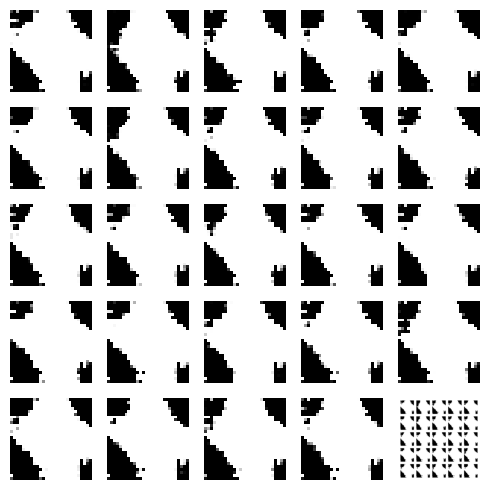

  0%|          | 0/350 [00:00<?, ?it/s]

4/4 [==============================] - 0s 19ms/step


  0%|          | 1/350 [00:00<03:43,  1.56it/s]

4/4 [==============================] - 0s 13ms/step


  1%|          | 2/350 [00:01<03:41,  1.57it/s]

4/4 [==============================] - 0s 20ms/step


  1%|          | 3/350 [00:01<03:44,  1.54it/s]

4/4 [==============================] - 0s 12ms/step


  1%|          | 4/350 [00:02<03:32,  1.63it/s]

4/4 [==============================] - 0s 14ms/step


  1%|▏         | 5/350 [00:03<03:27,  1.67it/s]

4/4 [==============================] - 0s 19ms/step


  2%|▏         | 6/350 [00:03<03:34,  1.61it/s]

4/4 [==============================] - 0s 16ms/step


  2%|▏         | 7/350 [00:04<03:38,  1.57it/s]

4/4 [==============================] - 0s 12ms/step


  2%|▏         | 8/350 [00:04<03:22,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


  3%|▎         | 9/350 [00:05<03:32,  1.61it/s]

4/4 [==============================] - 0s 21ms/step


  3%|▎         | 10/350 [00:06<03:38,  1.55it/s]

4/4 [==============================] - 0s 14ms/step


  3%|▎         | 11/350 [00:06<03:24,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


  3%|▎         | 12/350 [00:07<03:10,  1.78it/s]

4/4 [==============================] - 0s 11ms/step


  4%|▎         | 13/350 [00:07<03:00,  1.86it/s]

4/4 [==============================] - 0s 12ms/step


  4%|▍         | 14/350 [00:08<02:56,  1.90it/s]

4/4 [==============================] - 0s 11ms/step


  4%|▍         | 15/350 [00:08<02:57,  1.88it/s]

4/4 [==============================] - 0s 16ms/step


  5%|▍         | 16/350 [00:09<03:14,  1.72it/s]

4/4 [==============================] - 0s 20ms/step


  5%|▍         | 17/350 [00:10<03:22,  1.64it/s]

4/4 [==============================] - 0s 14ms/step


  5%|▌         | 18/350 [00:10<03:13,  1.72it/s]

4/4 [==============================] - 0s 11ms/step


  5%|▌         | 19/350 [00:11<03:12,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


  6%|▌         | 20/350 [00:11<03:23,  1.62it/s]

4/4 [==============================] - 0s 13ms/step


  6%|▌         | 21/350 [00:12<03:21,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


  6%|▋         | 22/350 [00:13<03:09,  1.73it/s]

4/4 [==============================] - 0s 12ms/step


  7%|▋         | 23/350 [00:13<02:59,  1.82it/s]

4/4 [==============================] - 0s 16ms/step


  7%|▋         | 24/350 [00:14<03:10,  1.71it/s]

4/4 [==============================] - 0s 15ms/step


  7%|▋         | 25/350 [00:14<03:20,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


  7%|▋         | 26/350 [00:15<03:13,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


  8%|▊         | 27/350 [00:15<03:00,  1.79it/s]

4/4 [==============================] - 0s 11ms/step


  8%|▊         | 28/350 [00:16<02:53,  1.85it/s]

4/4 [==============================] - 0s 11ms/step


  8%|▊         | 29/350 [00:16<02:53,  1.85it/s]

4/4 [==============================] - 0s 12ms/step


  9%|▊         | 30/350 [00:17<03:03,  1.74it/s]

4/4 [==============================] - 0s 11ms/step


  9%|▉         | 31/350 [00:18<03:07,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


  9%|▉         | 32/350 [00:18<02:59,  1.77it/s]

4/4 [==============================] - 0s 11ms/step


  9%|▉         | 33/350 [00:19<02:55,  1.81it/s]

4/4 [==============================] - 0s 12ms/step


 10%|▉         | 34/350 [00:19<03:02,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 10%|█         | 35/350 [00:20<03:09,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


 10%|█         | 36/350 [00:21<03:04,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 11%|█         | 37/350 [00:21<02:53,  1.81it/s]

4/4 [==============================] - 0s 11ms/step


 11%|█         | 38/350 [00:22<02:50,  1.83it/s]

4/4 [==============================] - 0s 21ms/step


 11%|█         | 39/350 [00:22<03:04,  1.69it/s]

4/4 [==============================] - 0s 15ms/step


 11%|█▏        | 40/350 [00:23<03:03,  1.69it/s]

4/4 [==============================] - 0s 10ms/step


 12%|█▏        | 41/350 [00:23<02:50,  1.81it/s]

4/4 [==============================] - 0s 11ms/step


 12%|█▏        | 42/350 [00:24<02:44,  1.87it/s]

4/4 [==============================] - 0s 11ms/step


 12%|█▏        | 43/350 [00:24<02:42,  1.89it/s]

4/4 [==============================] - 0s 12ms/step


 13%|█▎        | 44/350 [00:25<02:57,  1.72it/s]

4/4 [==============================] - 0s 19ms/step


 13%|█▎        | 45/350 [00:26<03:03,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


 13%|█▎        | 46/350 [00:26<02:54,  1.75it/s]

4/4 [==============================] - 0s 11ms/step


 13%|█▎        | 47/350 [00:27<02:44,  1.85it/s]

4/4 [==============================] - 0s 12ms/step


 14%|█▎        | 48/350 [00:27<02:45,  1.83it/s]

4/4 [==============================] - 0s 12ms/step


 14%|█▍        | 49/350 [00:28<02:53,  1.74it/s]

4/4 [==============================] - 0s 14ms/step


 14%|█▍        | 50/350 [00:28<02:53,  1.73it/s]

4/4 [==============================] - 0s 11ms/step


 15%|█▍        | 51/350 [00:29<02:43,  1.83it/s]

4/4 [==============================] - 0s 11ms/step


 15%|█▍        | 52/350 [00:29<02:36,  1.90it/s]

4/4 [==============================] - 0s 11ms/step


 15%|█▌        | 53/350 [00:30<02:40,  1.86it/s]

4/4 [==============================] - 0s 23ms/step


 15%|█▌        | 54/350 [00:31<02:55,  1.68it/s]

4/4 [==============================] - 0s 16ms/step


 16%|█▌        | 55/350 [00:31<02:58,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 16%|█▌        | 56/350 [00:32<02:47,  1.75it/s]

4/4 [==============================] - 0s 11ms/step


 16%|█▋        | 57/350 [00:32<02:38,  1.85it/s]

4/4 [==============================] - 0s 17ms/step


 17%|█▋        | 58/350 [00:33<02:49,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 17%|█▋        | 59/350 [00:34<02:54,  1.67it/s]

4/4 [==============================] - 0s 14ms/step


 17%|█▋        | 60/350 [00:34<02:47,  1.73it/s]

4/4 [==============================] - 0s 10ms/step


 17%|█▋        | 61/350 [00:35<02:40,  1.80it/s]

4/4 [==============================] - 0s 14ms/step


 18%|█▊        | 62/350 [00:35<02:43,  1.77it/s]

4/4 [==============================] - 0s 16ms/step


 18%|█▊        | 63/350 [00:36<02:56,  1.63it/s]

4/4 [==============================] - 0s 15ms/step


 18%|█▊        | 64/350 [00:37<02:59,  1.59it/s]

4/4 [==============================] - 0s 12ms/step


 19%|█▊        | 65/350 [00:37<02:48,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 19%|█▉        | 66/350 [00:38<02:38,  1.79it/s]

4/4 [==============================] - 0s 11ms/step


 19%|█▉        | 67/350 [00:38<02:31,  1.87it/s]

4/4 [==============================] - 0s 16ms/step


 19%|█▉        | 68/350 [00:39<02:33,  1.84it/s]

4/4 [==============================] - 0s 18ms/step


 20%|█▉        | 69/350 [00:39<02:48,  1.66it/s]

4/4 [==============================] - 0s 18ms/step


 20%|██        | 70/350 [00:40<02:50,  1.64it/s]

4/4 [==============================] - 0s 14ms/step


 20%|██        | 71/350 [00:41<02:41,  1.73it/s]

4/4 [==============================] - 0s 20ms/step


 21%|██        | 72/350 [00:41<02:46,  1.67it/s]

4/4 [==============================] - 0s 36ms/step


 21%|██        | 73/350 [00:42<03:00,  1.54it/s]

4/4 [==============================] - 0s 20ms/step


 21%|██        | 74/350 [00:43<02:55,  1.58it/s]

4/4 [==============================] - 0s 11ms/step


 21%|██▏       | 75/350 [00:43<02:41,  1.70it/s]

4/4 [==============================] - 0s 13ms/step


 22%|██▏       | 76/350 [00:44<02:34,  1.78it/s]

4/4 [==============================] - 0s 10ms/step


 22%|██▏       | 77/350 [00:44<02:30,  1.82it/s]

4/4 [==============================] - 0s 12ms/step


 22%|██▏       | 78/350 [00:45<02:37,  1.73it/s]

4/4 [==============================] - 0s 18ms/step


 23%|██▎       | 79/350 [00:45<02:41,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 23%|██▎       | 80/350 [00:46<02:33,  1.76it/s]

4/4 [==============================] - 0s 11ms/step


 23%|██▎       | 81/350 [00:46<02:25,  1.85it/s]

4/4 [==============================] - 0s 11ms/step


 23%|██▎       | 82/350 [00:47<02:20,  1.90it/s]

4/4 [==============================] - 0s 14ms/step


 24%|██▎       | 83/350 [00:47<02:23,  1.87it/s]

4/4 [==============================] - 0s 14ms/step


 24%|██▍       | 84/350 [00:48<02:31,  1.75it/s]

4/4 [==============================] - 0s 15ms/step


 24%|██▍       | 85/350 [00:49<02:33,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 25%|██▍       | 86/350 [00:49<02:26,  1.80it/s]

4/4 [==============================] - 0s 11ms/step


 25%|██▍       | 87/350 [00:50<02:25,  1.81it/s]

4/4 [==============================] - 0s 13ms/step


 25%|██▌       | 88/350 [00:50<02:38,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 25%|██▌       | 89/350 [00:51<02:37,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 26%|██▌       | 90/350 [00:51<02:27,  1.76it/s]

4/4 [==============================] - 0s 12ms/step


 26%|██▌       | 91/350 [00:52<02:26,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 26%|██▋       | 92/350 [00:53<02:20,  1.84it/s]

4/4 [==============================] - 0s 12ms/step


 27%|██▋       | 93/350 [00:53<02:23,  1.79it/s]

4/4 [==============================] - 0s 34ms/step


 27%|██▋       | 94/350 [00:54<02:37,  1.62it/s]

4/4 [==============================] - 0s 15ms/step


 27%|██▋       | 95/350 [00:54<02:30,  1.70it/s]

4/4 [==============================] - 0s 13ms/step


 27%|██▋       | 96/350 [00:55<02:22,  1.78it/s]

4/4 [==============================] - 0s 11ms/step


 28%|██▊       | 97/350 [00:55<02:18,  1.82it/s]

4/4 [==============================] - 0s 13ms/step


 28%|██▊       | 98/350 [00:56<02:27,  1.70it/s]

4/4 [==============================] - 0s 13ms/step


 28%|██▊       | 99/350 [00:57<02:40,  1.57it/s]

4/4 [==============================] - 0s 13ms/step


 29%|██▊       | 100/350 [00:57<02:37,  1.59it/s]

4/4 [==============================] - 0s 18ms/step


 29%|██▉       | 101/350 [00:58<02:37,  1.58it/s]

4/4 [==============================] - 0s 12ms/step


 29%|██▉       | 102/350 [00:59<02:33,  1.62it/s]

4/4 [==============================] - 0s 13ms/step


 29%|██▉       | 103/350 [00:59<02:40,  1.54it/s]

4/4 [==============================] - 0s 15ms/step


 30%|██▉       | 104/350 [01:00<02:44,  1.49it/s]

4/4 [==============================] - 0s 11ms/step


 30%|███       | 105/350 [01:01<02:33,  1.60it/s]

4/4 [==============================] - 0s 12ms/step


 30%|███       | 106/350 [01:01<02:26,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 31%|███       | 107/350 [01:02<02:18,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 31%|███       | 108/350 [01:02<02:19,  1.74it/s]

4/4 [==============================] - 0s 14ms/step


 31%|███       | 109/350 [01:03<02:24,  1.67it/s]

4/4 [==============================] - 0s 16ms/step


 31%|███▏      | 110/350 [01:04<02:34,  1.56it/s]

4/4 [==============================] - 0s 18ms/step


 32%|███▏      | 111/350 [01:04<02:27,  1.62it/s]

4/4 [==============================] - 0s 11ms/step


 32%|███▏      | 112/350 [01:05<02:23,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 32%|███▏      | 113/350 [01:05<02:25,  1.62it/s]

4/4 [==============================] - 0s 15ms/step


 33%|███▎      | 114/350 [01:06<02:28,  1.59it/s]

4/4 [==============================] - 0s 15ms/step


 33%|███▎      | 115/350 [01:07<02:24,  1.62it/s]

4/4 [==============================] - 0s 14ms/step


 33%|███▎      | 116/350 [01:07<02:19,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 33%|███▎      | 117/350 [01:08<02:17,  1.69it/s]

4/4 [==============================] - 0s 22ms/step


 34%|███▎      | 118/350 [01:09<02:33,  1.51it/s]

4/4 [==============================] - 0s 15ms/step


 34%|███▍      | 119/350 [01:09<02:25,  1.58it/s]

4/4 [==============================] - 0s 11ms/step


 34%|███▍      | 120/350 [01:10<02:15,  1.69it/s]

4/4 [==============================] - 0s 13ms/step


 35%|███▍      | 121/350 [01:10<02:09,  1.77it/s]

4/4 [==============================] - 0s 12ms/step


 35%|███▍      | 122/350 [01:11<02:03,  1.84it/s]

4/4 [==============================] - 0s 24ms/step


 35%|███▌      | 123/350 [01:11<02:12,  1.71it/s]

4/4 [==============================] - 0s 11ms/step


 35%|███▌      | 124/350 [01:12<02:18,  1.63it/s]

4/4 [==============================] - 0s 14ms/step


 36%|███▌      | 125/350 [01:13<02:12,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 36%|███▌      | 126/350 [01:13<02:04,  1.79it/s]

4/4 [==============================] - 0s 16ms/step


 36%|███▋      | 127/350 [01:14<02:06,  1.76it/s]

4/4 [==============================] - 0s 31ms/step


 37%|███▋      | 128/350 [01:14<02:17,  1.62it/s]

4/4 [==============================] - 0s 18ms/step


 37%|███▋      | 129/350 [01:15<02:18,  1.59it/s]

4/4 [==============================] - 0s 12ms/step


 37%|███▋      | 130/350 [01:16<02:09,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 37%|███▋      | 131/350 [01:16<02:05,  1.75it/s]

4/4 [==============================] - 0s 23ms/step


 38%|███▊      | 132/350 [01:17<02:16,  1.60it/s]

4/4 [==============================] - 0s 13ms/step


 38%|███▊      | 133/350 [01:18<02:19,  1.56it/s]

4/4 [==============================] - 0s 13ms/step


 38%|███▊      | 134/350 [01:18<02:12,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 39%|███▊      | 135/350 [01:19<02:05,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 39%|███▉      | 136/350 [01:19<01:59,  1.80it/s]

4/4 [==============================] - 0s 13ms/step


 39%|███▉      | 137/350 [01:20<02:05,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 39%|███▉      | 138/350 [01:20<02:14,  1.58it/s]

4/4 [==============================] - 0s 13ms/step


 40%|███▉      | 139/350 [01:21<02:05,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


 40%|████      | 140/350 [01:22<02:00,  1.74it/s]

4/4 [==============================] - 0s 11ms/step


 40%|████      | 141/350 [01:22<01:55,  1.81it/s]

4/4 [==============================] - 0s 16ms/step


 41%|████      | 142/350 [01:23<01:56,  1.79it/s]

4/4 [==============================] - 0s 19ms/step


 41%|████      | 143/350 [01:23<02:11,  1.57it/s]

4/4 [==============================] - 0s 14ms/step


 41%|████      | 144/350 [01:24<02:06,  1.63it/s]

4/4 [==============================] - 0s 10ms/step


 41%|████▏     | 145/350 [01:24<01:57,  1.74it/s]

4/4 [==============================] - 0s 17ms/step


 42%|████▏     | 146/350 [01:25<02:04,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 42%|████▏     | 147/350 [01:26<02:07,  1.59it/s]

4/4 [==============================] - 0s 13ms/step


 42%|████▏     | 148/350 [01:26<01:59,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 43%|████▎     | 149/350 [01:27<01:51,  1.81it/s]

4/4 [==============================] - 0s 11ms/step


 43%|████▎     | 150/350 [01:27<01:46,  1.88it/s]

4/4 [==============================] - 0s 11ms/step


 43%|████▎     | 151/350 [01:28<01:46,  1.87it/s]

4/4 [==============================] - 0s 13ms/step


 43%|████▎     | 152/350 [01:28<01:53,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 44%|████▎     | 153/350 [01:29<01:51,  1.76it/s]

4/4 [==============================] - 0s 11ms/step


 44%|████▍     | 154/350 [01:30<01:47,  1.82it/s]

4/4 [==============================] - 0s 11ms/step


 44%|████▍     | 155/350 [01:30<01:45,  1.84it/s]

4/4 [==============================] - 0s 16ms/step


 45%|████▍     | 156/350 [01:31<01:51,  1.73it/s]

4/4 [==============================] - 0s 11ms/step


 45%|████▍     | 157/350 [01:31<01:55,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 45%|████▌     | 158/350 [01:32<01:52,  1.70it/s]

4/4 [==============================] - 0s 10ms/step


 45%|████▌     | 159/350 [01:32<01:45,  1.82it/s]

4/4 [==============================] - 0s 11ms/step


 46%|████▌     | 160/350 [01:33<01:44,  1.82it/s]

4/4 [==============================] - 0s 24ms/step


 46%|████▌     | 161/350 [01:34<01:51,  1.70it/s]

4/4 [==============================] - 0s 14ms/step


 46%|████▋     | 162/350 [01:34<01:46,  1.76it/s]

4/4 [==============================] - 0s 12ms/step


 47%|████▋     | 163/350 [01:35<01:40,  1.86it/s]

4/4 [==============================] - 0s 11ms/step


 47%|████▋     | 164/350 [01:35<01:36,  1.93it/s]

4/4 [==============================] - 0s 12ms/step


 47%|████▋     | 165/350 [01:36<01:33,  1.98it/s]

4/4 [==============================] - 0s 16ms/step


 47%|████▋     | 166/350 [01:36<01:42,  1.80it/s]

4/4 [==============================] - 0s 12ms/step


 48%|████▊     | 167/350 [01:37<01:45,  1.73it/s]

4/4 [==============================] - 0s 14ms/step


 48%|████▊     | 168/350 [01:37<01:41,  1.79it/s]

4/4 [==============================] - 0s 11ms/step


 48%|████▊     | 169/350 [01:38<01:39,  1.82it/s]

4/4 [==============================] - 0s 14ms/step


 49%|████▊     | 170/350 [01:39<01:44,  1.71it/s]

4/4 [==============================] - 0s 19ms/step


 49%|████▉     | 171/350 [01:39<01:49,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 49%|████▉     | 172/350 [01:40<01:41,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 49%|████▉     | 173/350 [01:40<01:36,  1.83it/s]

4/4 [==============================] - 0s 11ms/step


 50%|████▉     | 174/350 [01:41<01:36,  1.82it/s]

4/4 [==============================] - 0s 35ms/step


 50%|█████     | 175/350 [01:41<01:44,  1.68it/s]

4/4 [==============================] - 0s 14ms/step


 50%|█████     | 176/350 [01:42<01:40,  1.73it/s]

4/4 [==============================] - 0s 10ms/step


 51%|█████     | 177/350 [01:42<01:34,  1.84it/s]

4/4 [==============================] - 0s 11ms/step


 51%|█████     | 178/350 [01:43<01:31,  1.87it/s]

4/4 [==============================] - 0s 11ms/step


 51%|█████     | 179/350 [01:43<01:28,  1.93it/s]

4/4 [==============================] - 0s 11ms/step


 51%|█████▏    | 180/350 [01:44<01:30,  1.87it/s]

4/4 [==============================] - 0s 36ms/step


 52%|█████▏    | 181/350 [01:45<01:40,  1.69it/s]

4/4 [==============================] - 0s 16ms/step


 52%|█████▏    | 182/350 [01:45<01:37,  1.73it/s]

4/4 [==============================] - 0s 12ms/step


 52%|█████▏    | 183/350 [01:46<01:31,  1.83it/s]

4/4 [==============================] - 0s 14ms/step


 53%|█████▎    | 184/350 [01:46<01:29,  1.85it/s]

4/4 [==============================] - 0s 13ms/step


 53%|█████▎    | 185/350 [01:47<01:35,  1.73it/s]

4/4 [==============================] - 0s 11ms/step


 53%|█████▎    | 186/350 [01:48<01:36,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 53%|█████▎    | 187/350 [01:48<01:31,  1.79it/s]

4/4 [==============================] - 0s 11ms/step


 54%|█████▎    | 188/350 [01:49<01:25,  1.89it/s]

4/4 [==============================] - 0s 11ms/step


 54%|█████▍    | 189/350 [01:49<01:25,  1.88it/s]

4/4 [==============================] - 0s 19ms/step


 54%|█████▍    | 190/350 [01:50<01:35,  1.68it/s]

4/4 [==============================] - 0s 14ms/step


 55%|█████▍    | 191/350 [01:50<01:31,  1.74it/s]

4/4 [==============================] - 0s 10ms/step


 55%|█████▍    | 192/350 [01:51<01:24,  1.86it/s]

4/4 [==============================] - 0s 11ms/step


 55%|█████▌    | 193/350 [01:51<01:21,  1.94it/s]

4/4 [==============================] - 0s 11ms/step


 55%|█████▌    | 194/350 [01:52<01:18,  2.00it/s]

4/4 [==============================] - 0s 12ms/step


 56%|█████▌    | 195/350 [01:52<01:20,  1.92it/s]

4/4 [==============================] - 0s 16ms/step


 56%|█████▌    | 196/350 [01:53<01:28,  1.75it/s]

4/4 [==============================] - 0s 14ms/step


 56%|█████▋    | 197/350 [01:54<01:26,  1.77it/s]

4/4 [==============================] - 0s 13ms/step


 57%|█████▋    | 198/350 [01:54<01:22,  1.84it/s]

4/4 [==============================] - 0s 11ms/step


 57%|█████▋    | 199/350 [01:55<01:22,  1.82it/s]

4/4 [==============================] - 0s 12ms/step


 57%|█████▋    | 200/350 [01:55<01:26,  1.73it/s]

4/4 [==============================] - 0s 12ms/step


 57%|█████▋    | 201/350 [01:56<01:26,  1.72it/s]

4/4 [==============================] - 0s 11ms/step


 58%|█████▊    | 202/350 [01:56<01:21,  1.81it/s]

4/4 [==============================] - 0s 11ms/step


 58%|█████▊    | 203/350 [01:57<01:17,  1.90it/s]

4/4 [==============================] - 0s 10ms/step


 58%|█████▊    | 204/350 [01:57<01:14,  1.95it/s]

4/4 [==============================] - 0s 11ms/step


 59%|█████▊    | 205/350 [01:58<01:18,  1.84it/s]

4/4 [==============================] - 0s 13ms/step


 59%|█████▉    | 206/350 [01:58<01:22,  1.74it/s]

4/4 [==============================] - 0s 17ms/step


 59%|█████▉    | 207/350 [01:59<01:26,  1.65it/s]

4/4 [==============================] - 0s 14ms/step


 59%|█████▉    | 208/350 [02:00<01:24,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 60%|█████▉    | 209/350 [02:00<01:19,  1.77it/s]

4/4 [==============================] - 0s 11ms/step


 60%|██████    | 210/350 [02:01<01:17,  1.81it/s]

4/4 [==============================] - 0s 15ms/step


 60%|██████    | 211/350 [02:02<01:24,  1.64it/s]

4/4 [==============================] - 0s 15ms/step


 61%|██████    | 212/350 [02:02<01:24,  1.62it/s]

4/4 [==============================] - 0s 11ms/step


 61%|██████    | 213/350 [02:03<01:18,  1.73it/s]

4/4 [==============================] - 0s 11ms/step


 61%|██████    | 214/350 [02:03<01:14,  1.82it/s]

4/4 [==============================] - 0s 11ms/step


 61%|██████▏   | 215/350 [02:04<01:11,  1.90it/s]

4/4 [==============================] - 0s 11ms/step


 62%|██████▏   | 216/350 [02:04<01:10,  1.90it/s]

4/4 [==============================] - 0s 13ms/step


 62%|██████▏   | 217/350 [02:05<01:16,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 62%|██████▏   | 218/350 [02:05<01:19,  1.66it/s]

4/4 [==============================] - 0s 15ms/step


 63%|██████▎   | 219/350 [02:06<01:17,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 63%|██████▎   | 220/350 [02:07<01:15,  1.73it/s]

4/4 [==============================] - 0s 15ms/step


 63%|██████▎   | 221/350 [02:07<01:21,  1.59it/s]

4/4 [==============================] - 0s 17ms/step


 63%|██████▎   | 222/350 [02:10<02:28,  1.16s/it]

4/4 [==============================] - 0s 16ms/step


 64%|██████▎   | 223/350 [02:12<02:51,  1.35s/it]

4/4 [==============================] - 0s 13ms/step


 64%|██████▍   | 224/350 [02:12<02:28,  1.18s/it]

4/4 [==============================] - 0s 18ms/step


 64%|██████▍   | 225/350 [02:13<02:06,  1.01s/it]

4/4 [==============================] - 0s 12ms/step


 65%|██████▍   | 226/350 [02:13<01:45,  1.17it/s]

4/4 [==============================] - 0s 11ms/step


 65%|██████▍   | 227/350 [02:14<01:31,  1.34it/s]

4/4 [==============================] - 0s 10ms/step


 65%|██████▌   | 228/350 [02:15<01:25,  1.42it/s]

4/4 [==============================] - 0s 14ms/step


 65%|██████▌   | 229/350 [02:15<01:26,  1.41it/s]

4/4 [==============================] - 0s 16ms/step


 66%|██████▌   | 230/350 [02:16<01:21,  1.48it/s]

4/4 [==============================] - 0s 11ms/step


 66%|██████▌   | 231/350 [02:16<01:15,  1.58it/s]

4/4 [==============================] - 0s 13ms/step


 66%|██████▋   | 232/350 [02:17<01:16,  1.55it/s]

4/4 [==============================] - 0s 13ms/step


 67%|██████▋   | 233/350 [02:18<01:12,  1.60it/s]

4/4 [==============================] - 0s 11ms/step


 67%|██████▋   | 234/350 [02:18<01:10,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 67%|██████▋   | 235/350 [02:19<01:14,  1.55it/s]

4/4 [==============================] - 0s 15ms/step


 67%|██████▋   | 236/350 [02:19<01:10,  1.62it/s]

4/4 [==============================] - 0s 11ms/step


 68%|██████▊   | 237/350 [02:20<01:04,  1.76it/s]

4/4 [==============================] - 0s 15ms/step


 68%|██████▊   | 238/350 [02:20<01:02,  1.78it/s]

4/4 [==============================] - 0s 16ms/step


 68%|██████▊   | 239/350 [02:21<01:11,  1.54it/s]

4/4 [==============================] - 0s 12ms/step


 69%|██████▊   | 240/350 [02:22<01:09,  1.59it/s]

4/4 [==============================] - 0s 12ms/step


 69%|██████▉   | 241/350 [02:22<01:03,  1.71it/s]

4/4 [==============================] - 0s 11ms/step


 69%|██████▉   | 242/350 [02:23<01:00,  1.80it/s]

4/4 [==============================] - 0s 12ms/step


 69%|██████▉   | 243/350 [02:23<01:01,  1.74it/s]

4/4 [==============================] - 0s 27ms/step


 70%|██████▉   | 244/350 [02:24<01:04,  1.65it/s]

4/4 [==============================] - 0s 20ms/step


 70%|███████   | 245/350 [02:25<01:03,  1.65it/s]

4/4 [==============================] - 0s 13ms/step


 70%|███████   | 246/350 [02:25<01:02,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 71%|███████   | 247/350 [02:26<01:04,  1.59it/s]

4/4 [==============================] - 0s 13ms/step


 71%|███████   | 248/350 [02:27<01:04,  1.58it/s]

4/4 [==============================] - 0s 13ms/step


 71%|███████   | 249/350 [02:27<01:01,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 71%|███████▏  | 250/350 [02:28<00:58,  1.71it/s]

4/4 [==============================] - 0s 19ms/step


 72%|███████▏  | 251/350 [02:29<01:02,  1.59it/s]

4/4 [==============================] - 0s 18ms/step


 72%|███████▏  | 252/350 [02:29<01:02,  1.57it/s]

4/4 [==============================] - 0s 12ms/step


 72%|███████▏  | 253/350 [02:30<00:57,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 73%|███████▎  | 254/350 [02:30<00:53,  1.78it/s]

4/4 [==============================] - 0s 11ms/step


 73%|███████▎  | 255/350 [02:31<00:53,  1.77it/s]

4/4 [==============================] - 0s 18ms/step


 73%|███████▎  | 256/350 [02:31<00:58,  1.61it/s]

4/4 [==============================] - 0s 16ms/step


 73%|███████▎  | 257/350 [02:32<00:57,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 74%|███████▎  | 258/350 [02:33<00:55,  1.67it/s]

4/4 [==============================] - 0s 17ms/step


 74%|███████▍  | 259/350 [02:33<00:55,  1.63it/s]

4/4 [==============================] - 0s 17ms/step


 74%|███████▍  | 260/350 [02:34<00:57,  1.56it/s]

4/4 [==============================] - 0s 13ms/step


 75%|███████▍  | 261/350 [02:35<00:57,  1.56it/s]

4/4 [==============================] - 0s 12ms/step


 75%|███████▍  | 262/350 [02:35<00:52,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 75%|███████▌  | 263/350 [02:36<00:52,  1.67it/s]

4/4 [==============================] - 0s 14ms/step


 75%|███████▌  | 264/350 [02:36<00:54,  1.57it/s]

4/4 [==============================] - 0s 12ms/step


 76%|███████▌  | 265/350 [02:37<00:50,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 76%|███████▌  | 266/350 [02:37<00:47,  1.77it/s]

4/4 [==============================] - 0s 12ms/step


 76%|███████▋  | 267/350 [02:38<00:44,  1.86it/s]

4/4 [==============================] - 0s 11ms/step


 77%|███████▋  | 268/350 [02:38<00:44,  1.85it/s]

4/4 [==============================] - 0s 25ms/step


 77%|███████▋  | 269/350 [02:39<00:50,  1.61it/s]

4/4 [==============================] - 0s 15ms/step


 77%|███████▋  | 270/350 [02:40<00:47,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 77%|███████▋  | 271/350 [02:40<00:43,  1.80it/s]

4/4 [==============================] - 0s 12ms/step


 78%|███████▊  | 272/350 [02:41<00:45,  1.70it/s]

4/4 [==============================] - 0s 15ms/step


 78%|███████▊  | 273/350 [02:42<00:49,  1.57it/s]

4/4 [==============================] - 0s 15ms/step


 78%|███████▊  | 274/350 [02:42<00:48,  1.57it/s]

4/4 [==============================] - 0s 11ms/step


 79%|███████▊  | 275/350 [02:43<00:44,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 79%|███████▉  | 276/350 [02:43<00:41,  1.78it/s]

4/4 [==============================] - 0s 18ms/step


 79%|███████▉  | 277/350 [02:44<00:45,  1.61it/s]

4/4 [==============================] - 0s 13ms/step


 79%|███████▉  | 278/350 [02:45<00:44,  1.61it/s]

4/4 [==============================] - 0s 11ms/step


 80%|███████▉  | 279/350 [02:45<00:41,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


 80%|████████  | 280/350 [02:46<00:38,  1.80it/s]

4/4 [==============================] - 0s 13ms/step


 80%|████████  | 281/350 [02:46<00:38,  1.81it/s]

4/4 [==============================] - 0s 12ms/step


 81%|████████  | 282/350 [02:47<00:40,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 81%|████████  | 283/350 [02:48<00:39,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 81%|████████  | 284/350 [02:48<00:37,  1.77it/s]

4/4 [==============================] - 0s 10ms/step


 81%|████████▏ | 285/350 [02:49<00:36,  1.80it/s]

4/4 [==============================] - 0s 13ms/step


 82%|████████▏ | 286/350 [02:49<00:38,  1.65it/s]

4/4 [==============================] - 0s 13ms/step


 82%|████████▏ | 287/350 [02:50<00:38,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 82%|████████▏ | 288/350 [02:50<00:35,  1.74it/s]

4/4 [==============================] - 0s 11ms/step


 83%|████████▎ | 289/350 [02:51<00:33,  1.82it/s]

4/4 [==============================] - 0s 12ms/step


 83%|████████▎ | 290/350 [02:51<00:33,  1.81it/s]

4/4 [==============================] - 0s 34ms/step


 83%|████████▎ | 291/350 [02:52<00:36,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 83%|████████▎ | 292/350 [02:53<00:33,  1.72it/s]

4/4 [==============================] - 0s 11ms/step


 84%|████████▎ | 293/350 [02:53<00:31,  1.82it/s]

4/4 [==============================] - 0s 11ms/step


 84%|████████▍ | 294/350 [02:54<00:29,  1.92it/s]

4/4 [==============================] - 0s 11ms/step


 84%|████████▍ | 295/350 [02:54<00:29,  1.89it/s]

4/4 [==============================] - 0s 12ms/step


 85%|████████▍ | 296/350 [02:55<00:31,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 85%|████████▍ | 297/350 [02:55<00:30,  1.72it/s]

4/4 [==============================] - 0s 10ms/step


 85%|████████▌ | 298/350 [02:56<00:28,  1.81it/s]

4/4 [==============================] - 0s 11ms/step


 85%|████████▌ | 299/350 [02:56<00:28,  1.81it/s]

4/4 [==============================] - 0s 34ms/step


 86%|████████▌ | 300/350 [02:57<00:30,  1.64it/s]

4/4 [==============================] - 0s 14ms/step


 86%|████████▌ | 301/350 [02:58<00:28,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 86%|████████▋ | 302/350 [02:58<00:26,  1.83it/s]

4/4 [==============================] - 0s 11ms/step


 87%|████████▋ | 303/350 [02:59<00:24,  1.91it/s]

4/4 [==============================] - 0s 11ms/step


 87%|████████▋ | 304/350 [02:59<00:25,  1.77it/s]

4/4 [==============================] - 0s 17ms/step


 87%|████████▋ | 305/350 [03:00<00:26,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


 87%|████████▋ | 306/350 [03:00<00:24,  1.77it/s]

4/4 [==============================] - 0s 11ms/step


 88%|████████▊ | 307/350 [03:01<00:23,  1.85it/s]

4/4 [==============================] - 0s 11ms/step


 88%|████████▊ | 308/350 [03:01<00:21,  1.94it/s]

4/4 [==============================] - 0s 11ms/step


 88%|████████▊ | 309/350 [03:02<00:24,  1.67it/s]

4/4 [==============================] - 0s 22ms/step


 89%|████████▊ | 310/350 [03:03<00:24,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 89%|████████▉ | 311/350 [03:03<00:22,  1.73it/s]

4/4 [==============================] - 0s 11ms/step


 89%|████████▉ | 312/350 [03:04<00:21,  1.76it/s]

4/4 [==============================] - 0s 14ms/step


 89%|████████▉ | 313/350 [03:05<00:23,  1.58it/s]

4/4 [==============================] - 0s 17ms/step


 90%|████████▉ | 314/350 [03:05<00:23,  1.56it/s]

4/4 [==============================] - 0s 10ms/step


 90%|█████████ | 315/350 [03:06<00:20,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 90%|█████████ | 316/350 [03:06<00:18,  1.82it/s]

4/4 [==============================] - 0s 12ms/step


 91%|█████████ | 317/350 [03:07<00:17,  1.90it/s]

4/4 [==============================] - 0s 11ms/step


 91%|█████████ | 318/350 [03:07<00:17,  1.78it/s]

4/4 [==============================] - 0s 23ms/step


 91%|█████████ | 319/350 [03:08<00:18,  1.72it/s]

4/4 [==============================] - 0s 11ms/step


 91%|█████████▏| 320/350 [03:08<00:16,  1.81it/s]

4/4 [==============================] - 0s 11ms/step


 92%|█████████▏| 321/350 [03:09<00:15,  1.88it/s]

4/4 [==============================] - 0s 11ms/step


 92%|█████████▏| 322/350 [03:09<00:14,  1.95it/s]

4/4 [==============================] - 0s 18ms/step


 92%|█████████▏| 323/350 [03:10<00:14,  1.81it/s]

4/4 [==============================] - 0s 31ms/step


 93%|█████████▎| 324/350 [03:11<00:15,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 93%|█████████▎| 325/350 [03:11<00:15,  1.62it/s]

4/4 [==============================] - 0s 13ms/step


 93%|█████████▎| 326/350 [03:12<00:17,  1.41it/s]

4/4 [==============================] - 0s 15ms/step


 93%|█████████▎| 327/350 [03:13<00:17,  1.31it/s]

4/4 [==============================] - 0s 24ms/step


 94%|█████████▎| 328/350 [03:14<00:16,  1.33it/s]

4/4 [==============================] - 0s 14ms/step


 94%|█████████▍| 329/350 [03:15<00:14,  1.45it/s]

4/4 [==============================] - 0s 11ms/step


 94%|█████████▍| 330/350 [03:15<00:12,  1.57it/s]

4/4 [==============================] - 0s 12ms/step


 95%|█████████▍| 331/350 [03:16<00:11,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 95%|█████████▍| 332/350 [03:16<00:11,  1.58it/s]

4/4 [==============================] - 0s 32ms/step


 95%|█████████▌| 333/350 [03:17<00:12,  1.39it/s]

4/4 [==============================] - 0s 22ms/step


 95%|█████████▌| 334/350 [03:18<00:12,  1.28it/s]

4/4 [==============================] - 0s 14ms/step


 96%|█████████▌| 335/350 [03:19<00:10,  1.39it/s]

4/4 [==============================] - 0s 12ms/step


 96%|█████████▌| 336/350 [03:19<00:09,  1.53it/s]

4/4 [==============================] - 0s 26ms/step


 96%|█████████▋| 337/350 [03:20<00:08,  1.46it/s]

4/4 [==============================] - 0s 15ms/step


 97%|█████████▋| 338/350 [03:21<00:08,  1.45it/s]

4/4 [==============================] - 0s 14ms/step


 97%|█████████▋| 339/350 [03:21<00:07,  1.54it/s]

4/4 [==============================] - 0s 11ms/step


 97%|█████████▋| 340/350 [03:22<00:06,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 97%|█████████▋| 341/350 [03:22<00:05,  1.65it/s]

4/4 [==============================] - 0s 14ms/step


 98%|█████████▊| 342/350 [03:23<00:05,  1.47it/s]

4/4 [==============================] - 0s 22ms/step


 98%|█████████▊| 343/350 [03:24<00:05,  1.40it/s]

4/4 [==============================] - 0s 11ms/step


 98%|█████████▊| 344/350 [03:24<00:03,  1.55it/s]

4/4 [==============================] - 0s 12ms/step


 99%|█████████▊| 345/350 [03:25<00:02,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 99%|█████████▉| 346/350 [03:26<00:02,  1.68it/s]

4/4 [==============================] - 0s 19ms/step


 99%|█████████▉| 347/350 [03:26<00:01,  1.59it/s]

4/4 [==============================] - 0s 12ms/step


 99%|█████████▉| 348/350 [03:27<00:01,  1.54it/s]

4/4 [==============================] - 0s 19ms/step


100%|█████████▉| 349/350 [03:28<00:00,  1.61it/s]

4/4 [==============================] - 0s 12ms/step


100%|██████████| 350/350 [03:28<00:00,  1.68it/s]

Epoch number: 97 discriminator_loss: 0.16745869350885706 generator_loss: 7.274106877190726
1/1 [==============================] - 0s 23ms/step


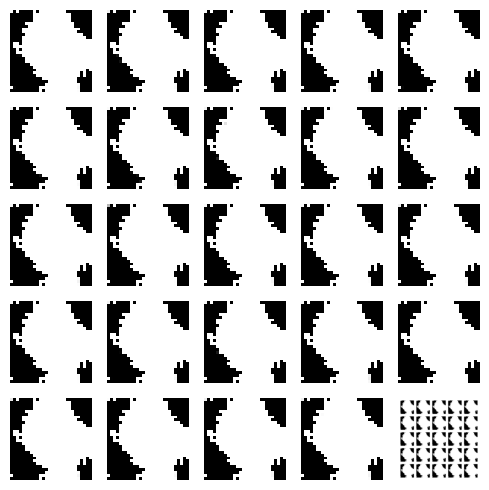

  0%|          | 0/350 [00:00<?, ?it/s]

4/4 [==============================] - 0s 34ms/step


  0%|          | 1/350 [00:00<05:14,  1.11it/s]

4/4 [==============================] - 0s 17ms/step


  1%|          | 2/350 [00:01<04:05,  1.42it/s]

4/4 [==============================] - 0s 12ms/step


  1%|          | 3/350 [00:02<03:38,  1.59it/s]

4/4 [==============================] - 0s 15ms/step


  1%|          | 4/350 [00:02<03:50,  1.50it/s]

4/4 [==============================] - 0s 18ms/step


  1%|▏         | 5/350 [00:03<03:47,  1.52it/s]

4/4 [==============================] - 0s 12ms/step


  2%|▏         | 6/350 [00:03<03:26,  1.66it/s]

4/4 [==============================] - 0s 14ms/step


  2%|▏         | 7/350 [00:04<03:15,  1.76it/s]

4/4 [==============================] - 0s 11ms/step


  2%|▏         | 8/350 [00:04<03:09,  1.81it/s]

4/4 [==============================] - 0s 14ms/step


  3%|▎         | 9/350 [00:05<03:24,  1.67it/s]

4/4 [==============================] - 0s 36ms/step


  3%|▎         | 10/350 [00:06<03:37,  1.56it/s]

4/4 [==============================] - 0s 16ms/step


  3%|▎         | 11/350 [00:06<03:34,  1.58it/s]

4/4 [==============================] - 0s 12ms/step


  3%|▎         | 12/350 [00:07<03:30,  1.61it/s]

4/4 [==============================] - 0s 18ms/step


  4%|▎         | 13/350 [00:08<03:39,  1.54it/s]

4/4 [==============================] - 0s 16ms/step


  4%|▍         | 14/350 [00:08<03:40,  1.52it/s]

4/4 [==============================] - 0s 14ms/step


  4%|▍         | 15/350 [00:09<03:26,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


  5%|▍         | 16/350 [00:09<03:15,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


  5%|▍         | 17/350 [00:10<03:12,  1.73it/s]

4/4 [==============================] - 0s 14ms/step


  5%|▌         | 18/350 [00:11<03:23,  1.63it/s]

4/4 [==============================] - 0s 18ms/step


  5%|▌         | 19/350 [00:11<03:18,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


  6%|▌         | 20/350 [00:12<03:06,  1.77it/s]

4/4 [==============================] - 0s 12ms/step


  6%|▌         | 21/350 [00:12<02:58,  1.85it/s]

4/4 [==============================] - 0s 11ms/step


  6%|▋         | 22/350 [00:13<02:59,  1.82it/s]

4/4 [==============================] - 0s 13ms/step


  7%|▋         | 23/350 [00:14<03:22,  1.62it/s]

4/4 [==============================] - 0s 17ms/step


  7%|▋         | 24/350 [00:14<03:16,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


  7%|▋         | 25/350 [00:15<03:06,  1.75it/s]

4/4 [==============================] - 0s 12ms/step


  7%|▋         | 26/350 [00:15<03:07,  1.73it/s]

4/4 [==============================] - 0s 18ms/step


  8%|▊         | 27/350 [00:16<03:13,  1.67it/s]

4/4 [==============================] - 0s 22ms/step


  8%|▊         | 28/350 [00:16<03:11,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


  8%|▊         | 29/350 [00:17<03:00,  1.77it/s]

4/4 [==============================] - 0s 12ms/step


  9%|▊         | 30/350 [00:17<02:53,  1.84it/s]

4/4 [==============================] - 0s 11ms/step


  9%|▉         | 31/350 [00:18<03:04,  1.73it/s]

4/4 [==============================] - 0s 15ms/step


  9%|▉         | 32/350 [00:19<03:12,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


  9%|▉         | 33/350 [00:19<03:01,  1.74it/s]

4/4 [==============================] - 0s 11ms/step


 10%|▉         | 34/350 [00:20<02:52,  1.83it/s]

4/4 [==============================] - 0s 12ms/step


 10%|█         | 35/350 [00:20<02:45,  1.90it/s]

4/4 [==============================] - 0s 15ms/step


 10%|█         | 36/350 [00:21<02:59,  1.75it/s]

4/4 [==============================] - 0s 19ms/step


 11%|█         | 37/350 [00:22<03:10,  1.64it/s]

4/4 [==============================] - 0s 15ms/step


 11%|█         | 38/350 [00:22<03:00,  1.73it/s]

4/4 [==============================] - 0s 11ms/step


 11%|█         | 39/350 [00:23<02:51,  1.81it/s]

4/4 [==============================] - 0s 11ms/step


 11%|█▏        | 40/350 [00:23<02:51,  1.81it/s]

4/4 [==============================] - 0s 11ms/step


 12%|█▏        | 41/350 [00:24<03:00,  1.71it/s]

4/4 [==============================] - 0s 21ms/step


 12%|█▏        | 42/350 [00:24<03:00,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 12%|█▏        | 43/350 [00:25<02:51,  1.79it/s]

4/4 [==============================] - 0s 12ms/step


 13%|█▎        | 44/350 [00:25<02:44,  1.86it/s]

4/4 [==============================] - 0s 13ms/step


 13%|█▎        | 45/350 [00:26<02:46,  1.83it/s]

4/4 [==============================] - 0s 18ms/step


 13%|█▎        | 46/350 [00:27<02:57,  1.71it/s]

4/4 [==============================] - 0s 19ms/step


 13%|█▎        | 47/350 [00:27<02:56,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 14%|█▎        | 48/350 [00:28<02:48,  1.79it/s]

4/4 [==============================] - 0s 11ms/step


 14%|█▍        | 49/350 [00:28<02:40,  1.88it/s]

4/4 [==============================] - 0s 19ms/step


 14%|█▍        | 50/350 [00:29<02:55,  1.71it/s]

4/4 [==============================] - 0s 20ms/step


 15%|█▍        | 51/350 [00:30<03:06,  1.60it/s]

4/4 [==============================] - 0s 15ms/step


 15%|█▍        | 52/350 [00:30<02:56,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 15%|█▌        | 53/350 [00:31<02:47,  1.77it/s]

4/4 [==============================] - 0s 11ms/step


 15%|█▌        | 54/350 [00:31<02:40,  1.85it/s]

4/4 [==============================] - 0s 16ms/step


 16%|█▌        | 55/350 [00:32<02:50,  1.73it/s]

4/4 [==============================] - 0s 19ms/step


 16%|█▌        | 56/350 [00:33<03:02,  1.61it/s]

4/4 [==============================] - 0s 13ms/step


 16%|█▋        | 57/350 [00:33<02:52,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 17%|█▋        | 58/350 [00:34<02:42,  1.80it/s]

4/4 [==============================] - 0s 12ms/step


 17%|█▋        | 59/350 [00:34<02:41,  1.80it/s]

4/4 [==============================] - 0s 13ms/step


 17%|█▋        | 60/350 [00:35<02:57,  1.63it/s]

4/4 [==============================] - 0s 19ms/step


 17%|█▋        | 61/350 [00:35<02:52,  1.67it/s]

4/4 [==============================] - 0s 14ms/step


 18%|█▊        | 62/350 [00:36<02:42,  1.78it/s]

4/4 [==============================] - 0s 12ms/step


 18%|█▊        | 63/350 [00:36<02:33,  1.87it/s]

4/4 [==============================] - 0s 26ms/step


 18%|█▊        | 64/350 [00:37<02:44,  1.73it/s]

4/4 [==============================] - 0s 13ms/step


 19%|█▊        | 65/350 [00:38<02:51,  1.66it/s]

4/4 [==============================] - 0s 12ms/step


 19%|█▉        | 66/350 [00:38<02:43,  1.73it/s]

4/4 [==============================] - 0s 11ms/step


 19%|█▉        | 67/350 [00:39<02:36,  1.81it/s]

4/4 [==============================] - 0s 11ms/step


 19%|█▉        | 68/350 [00:39<02:33,  1.84it/s]

4/4 [==============================] - 0s 13ms/step


 20%|█▉        | 69/350 [00:40<02:47,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 20%|██        | 70/350 [00:41<02:46,  1.68it/s]

4/4 [==============================] - 0s 12ms/step


 20%|██        | 71/350 [00:41<02:38,  1.76it/s]

4/4 [==============================] - 0s 11ms/step


 21%|██        | 72/350 [00:42<02:33,  1.81it/s]

4/4 [==============================] - 0s 15ms/step


 21%|██        | 73/350 [00:42<02:39,  1.73it/s]

4/4 [==============================] - 0s 14ms/step


 21%|██        | 74/350 [00:43<02:49,  1.63it/s]

4/4 [==============================] - 0s 14ms/step


 21%|██▏       | 75/350 [00:44<02:57,  1.55it/s]

4/4 [==============================] - 0s 13ms/step


 22%|██▏       | 76/350 [00:44<02:46,  1.65it/s]

4/4 [==============================] - 0s 14ms/step


 22%|██▏       | 77/350 [00:45<02:36,  1.74it/s]

4/4 [==============================] - 0s 11ms/step


 22%|██▏       | 78/350 [00:45<02:36,  1.73it/s]

4/4 [==============================] - 0s 20ms/step


 23%|██▎       | 79/350 [00:46<02:48,  1.61it/s]

4/4 [==============================] - 0s 13ms/step


 23%|██▎       | 80/350 [00:47<02:47,  1.61it/s]

4/4 [==============================] - 0s 10ms/step


 23%|██▎       | 81/350 [00:47<02:36,  1.72it/s]

4/4 [==============================] - 0s 11ms/step


 23%|██▎       | 82/350 [00:48<02:28,  1.80it/s]

4/4 [==============================] - 0s 11ms/step


 24%|██▎       | 83/350 [00:48<02:29,  1.78it/s]

4/4 [==============================] - 0s 22ms/step


 24%|██▍       | 84/350 [00:49<02:48,  1.58it/s]

4/4 [==============================] - 0s 16ms/step


 24%|██▍       | 85/350 [00:49<02:40,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 25%|██▍       | 86/350 [00:50<02:30,  1.76it/s]

4/4 [==============================] - 0s 11ms/step


 25%|██▍       | 87/350 [00:50<02:23,  1.83it/s]

4/4 [==============================] - 0s 15ms/step


 25%|██▌       | 88/350 [00:51<02:31,  1.72it/s]

4/4 [==============================] - 0s 14ms/step


 25%|██▌       | 89/350 [00:52<02:37,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 26%|██▌       | 90/350 [00:52<02:30,  1.73it/s]

4/4 [==============================] - 0s 11ms/step


 26%|██▌       | 91/350 [00:53<02:22,  1.81it/s]

4/4 [==============================] - 0s 11ms/step


 26%|██▋       | 92/350 [00:53<02:15,  1.90it/s]

4/4 [==============================] - 0s 23ms/step


 27%|██▋       | 93/350 [00:54<02:29,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 27%|██▋       | 94/350 [00:55<02:28,  1.73it/s]

4/4 [==============================] - 0s 12ms/step


 27%|██▋       | 95/350 [00:55<02:21,  1.81it/s]

4/4 [==============================] - 0s 11ms/step


 27%|██▋       | 96/350 [00:55<02:14,  1.88it/s]

4/4 [==============================] - 0s 11ms/step


 28%|██▊       | 97/350 [00:56<02:10,  1.94it/s]

4/4 [==============================] - 0s 14ms/step


 28%|██▊       | 98/350 [00:57<02:17,  1.83it/s]

4/4 [==============================] - 0s 39ms/step


 28%|██▊       | 99/350 [00:57<02:32,  1.64it/s]

4/4 [==============================] - 0s 14ms/step


 29%|██▊       | 100/350 [00:58<02:25,  1.72it/s]

4/4 [==============================] - 0s 11ms/step


 29%|██▉       | 101/350 [00:58<02:16,  1.82it/s]

4/4 [==============================] - 0s 11ms/step


 29%|██▉       | 102/350 [00:59<02:16,  1.82it/s]

4/4 [==============================] - 0s 13ms/step


 29%|██▉       | 103/350 [01:00<02:24,  1.71it/s]

4/4 [==============================] - 0s 13ms/step


 30%|██▉       | 104/350 [01:00<02:26,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 30%|███       | 105/350 [01:01<02:17,  1.79it/s]

4/4 [==============================] - 0s 10ms/step


 30%|███       | 106/350 [01:01<02:10,  1.88it/s]

4/4 [==============================] - 0s 12ms/step


 31%|███       | 107/350 [01:02<02:05,  1.93it/s]

4/4 [==============================] - 0s 11ms/step


 31%|███       | 108/350 [01:02<02:08,  1.89it/s]

4/4 [==============================] - 0s 35ms/step


 31%|███       | 109/350 [01:03<02:18,  1.75it/s]

4/4 [==============================] - 0s 20ms/step


 31%|███▏      | 110/350 [01:03<02:14,  1.78it/s]

4/4 [==============================] - 0s 12ms/step


 32%|███▏      | 111/350 [01:04<02:09,  1.85it/s]

4/4 [==============================] - 0s 12ms/step


 32%|███▏      | 112/350 [01:04<02:04,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


 32%|███▏      | 113/350 [01:05<02:08,  1.85it/s]

4/4 [==============================] - 0s 28ms/step


 33%|███▎      | 114/350 [01:06<02:18,  1.71it/s]

4/4 [==============================] - 0s 19ms/step


 33%|███▎      | 115/350 [01:06<02:17,  1.71it/s]

4/4 [==============================] - 0s 11ms/step


 33%|███▎      | 116/350 [01:07<02:09,  1.81it/s]

4/4 [==============================] - 0s 11ms/step


 33%|███▎      | 117/350 [01:07<02:02,  1.90it/s]

4/4 [==============================] - 0s 12ms/step


 34%|███▎      | 118/350 [01:08<02:05,  1.85it/s]

4/4 [==============================] - 0s 26ms/step


 34%|███▍      | 119/350 [01:08<02:16,  1.69it/s]

4/4 [==============================] - 0s 15ms/step


 34%|███▍      | 120/350 [01:09<02:11,  1.75it/s]

4/4 [==============================] - 0s 10ms/step


 35%|███▍      | 121/350 [01:09<02:02,  1.86it/s]

4/4 [==============================] - 0s 12ms/step


 35%|███▍      | 122/350 [01:10<01:58,  1.92it/s]

4/4 [==============================] - 0s 11ms/step


 35%|███▌      | 123/350 [01:10<01:57,  1.94it/s]

4/4 [==============================] - 0s 15ms/step


 35%|███▌      | 124/350 [01:11<02:02,  1.84it/s]

4/4 [==============================] - 0s 13ms/step


 36%|███▌      | 125/350 [01:12<02:11,  1.71it/s]

4/4 [==============================] - 0s 13ms/step


 36%|███▌      | 126/350 [01:12<02:06,  1.77it/s]

4/4 [==============================] - 0s 11ms/step


 36%|███▋      | 127/350 [01:13<02:00,  1.86it/s]

4/4 [==============================] - 0s 11ms/step


 37%|███▋      | 128/350 [01:13<01:56,  1.91it/s]

4/4 [==============================] - 0s 18ms/step


 37%|███▋      | 129/350 [01:14<02:06,  1.75it/s]

4/4 [==============================] - 0s 27ms/step


 37%|███▋      | 130/350 [01:14<02:10,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


 37%|███▋      | 131/350 [01:15<02:03,  1.77it/s]

4/4 [==============================] - 0s 11ms/step


 38%|███▊      | 132/350 [01:15<01:57,  1.86it/s]

4/4 [==============================] - 0s 11ms/step


 38%|███▊      | 133/350 [01:16<01:57,  1.84it/s]

4/4 [==============================] - 0s 13ms/step


 38%|███▊      | 134/350 [01:17<02:06,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 39%|███▊      | 135/350 [01:17<02:04,  1.72it/s]

4/4 [==============================] - 0s 11ms/step


 39%|███▉      | 136/350 [01:18<01:57,  1.81it/s]

4/4 [==============================] - 0s 11ms/step


 39%|███▉      | 137/350 [01:18<01:52,  1.89it/s]

4/4 [==============================] - 0s 11ms/step


 39%|███▉      | 138/350 [01:19<01:53,  1.87it/s]

4/4 [==============================] - 0s 12ms/step


 40%|███▉      | 139/350 [01:19<02:03,  1.71it/s]

4/4 [==============================] - 0s 13ms/step


 40%|████      | 140/350 [01:20<02:03,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 40%|████      | 141/350 [01:21<01:56,  1.80it/s]

4/4 [==============================] - 0s 11ms/step


 41%|████      | 142/350 [01:21<01:50,  1.88it/s]

4/4 [==============================] - 0s 11ms/step


 41%|████      | 143/350 [01:22<01:49,  1.89it/s]

4/4 [==============================] - 0s 13ms/step


 41%|████      | 144/350 [01:22<01:55,  1.78it/s]

4/4 [==============================] - 0s 25ms/step


 41%|████▏     | 145/350 [01:23<02:01,  1.69it/s]

4/4 [==============================] - 0s 14ms/step


 42%|████▏     | 146/350 [01:23<01:55,  1.77it/s]

4/4 [==============================] - 0s 23ms/step


 42%|████▏     | 147/350 [01:24<01:58,  1.71it/s]

4/4 [==============================] - 0s 13ms/step


 42%|████▏     | 148/350 [01:25<02:00,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


 43%|████▎     | 149/350 [01:25<02:05,  1.60it/s]

4/4 [==============================] - 0s 17ms/step


 43%|████▎     | 150/350 [01:26<02:13,  1.50it/s]

4/4 [==============================] - 0s 16ms/step


 43%|████▎     | 151/350 [01:27<02:06,  1.58it/s]

4/4 [==============================] - 0s 11ms/step


 43%|████▎     | 152/350 [01:27<01:57,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 44%|████▎     | 153/350 [01:28<01:54,  1.73it/s]

4/4 [==============================] - 0s 11ms/step


 44%|████▍     | 154/350 [01:28<01:55,  1.70it/s]

4/4 [==============================] - 0s 15ms/step


 44%|████▍     | 155/350 [01:29<01:58,  1.65it/s]

4/4 [==============================] - 0s 14ms/step


 45%|████▍     | 156/350 [01:29<01:53,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 45%|████▍     | 157/350 [01:30<01:47,  1.79it/s]

4/4 [==============================] - 0s 11ms/step


 45%|████▌     | 158/350 [01:31<01:48,  1.76it/s]

4/4 [==============================] - 0s 14ms/step


 45%|████▌     | 159/350 [01:31<01:57,  1.63it/s]

4/4 [==============================] - 0s 15ms/step


 46%|████▌     | 160/350 [01:32<02:02,  1.55it/s]

4/4 [==============================] - 0s 14ms/step


 46%|████▌     | 161/350 [01:33<02:01,  1.56it/s]

4/4 [==============================] - 0s 15ms/step


 46%|████▋     | 162/350 [01:33<01:57,  1.59it/s]

4/4 [==============================] - 0s 14ms/step


 47%|████▋     | 163/350 [01:34<01:56,  1.60it/s]

4/4 [==============================] - 0s 18ms/step


 47%|████▋     | 164/350 [01:34<01:59,  1.56it/s]

4/4 [==============================] - 0s 18ms/step


 47%|████▋     | 165/350 [01:35<01:59,  1.55it/s]

4/4 [==============================] - 0s 13ms/step


 47%|████▋     | 166/350 [01:36<01:52,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 48%|████▊     | 167/350 [01:36<01:45,  1.73it/s]

4/4 [==============================] - 0s 12ms/step


 48%|████▊     | 168/350 [01:37<01:46,  1.70it/s]

4/4 [==============================] - 0s 31ms/step


 48%|████▊     | 169/350 [01:38<01:53,  1.59it/s]

4/4 [==============================] - 0s 16ms/step


 49%|████▊     | 170/350 [01:38<01:49,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 49%|████▉     | 171/350 [01:39<01:42,  1.75it/s]

4/4 [==============================] - 0s 11ms/step


 49%|████▉     | 172/350 [01:39<01:38,  1.80it/s]

4/4 [==============================] - 0s 13ms/step


 49%|████▉     | 173/350 [01:40<01:44,  1.69it/s]

4/4 [==============================] - 0s 14ms/step


 50%|████▉     | 174/350 [01:40<01:52,  1.57it/s]

4/4 [==============================] - 0s 13ms/step


 50%|█████     | 175/350 [01:41<01:45,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 50%|█████     | 176/350 [01:42<01:40,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 51%|█████     | 177/350 [01:42<01:42,  1.69it/s]

4/4 [==============================] - 0s 35ms/step


 51%|█████     | 178/350 [01:43<01:49,  1.56it/s]

4/4 [==============================] - 0s 14ms/step


 51%|█████     | 179/350 [01:43<01:44,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


 51%|█████▏    | 180/350 [01:44<01:39,  1.71it/s]

4/4 [==============================] - 0s 14ms/step


 52%|█████▏    | 181/350 [01:45<01:38,  1.72it/s]

4/4 [==============================] - 0s 19ms/step


 52%|█████▏    | 182/350 [01:45<01:37,  1.72it/s]

4/4 [==============================] - 0s 22ms/step


 52%|█████▏    | 183/350 [01:46<01:43,  1.62it/s]

4/4 [==============================] - 0s 14ms/step


 53%|█████▎    | 184/350 [01:46<01:42,  1.62it/s]

4/4 [==============================] - 0s 14ms/step


 53%|█████▎    | 185/350 [01:47<01:36,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 53%|█████▎    | 186/350 [01:48<01:37,  1.69it/s]

4/4 [==============================] - 0s 22ms/step


 53%|█████▎    | 187/350 [01:48<01:44,  1.56it/s]

4/4 [==============================] - 0s 14ms/step


 54%|█████▎    | 188/350 [01:49<01:38,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 54%|█████▍    | 189/350 [01:49<01:32,  1.75it/s]

4/4 [==============================] - 0s 12ms/step


 54%|█████▍    | 190/350 [01:50<01:28,  1.81it/s]

4/4 [==============================] - 0s 16ms/step


 55%|█████▍    | 191/350 [01:51<01:32,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 55%|█████▍    | 192/350 [01:51<01:34,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 55%|█████▌    | 193/350 [01:52<01:29,  1.75it/s]

4/4 [==============================] - 0s 11ms/step


 55%|█████▌    | 194/350 [01:52<01:25,  1.82it/s]

4/4 [==============================] - 0s 10ms/step


 56%|█████▌    | 195/350 [01:53<01:24,  1.84it/s]

4/4 [==============================] - 0s 11ms/step


 56%|█████▌    | 196/350 [01:53<01:28,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 56%|█████▋    | 197/350 [01:54<01:29,  1.71it/s]

4/4 [==============================] - 0s 11ms/step


 57%|█████▋    | 198/350 [01:54<01:24,  1.80it/s]

4/4 [==============================] - 0s 12ms/step


 57%|█████▋    | 199/350 [01:55<01:21,  1.85it/s]

4/4 [==============================] - 0s 11ms/step


 57%|█████▋    | 200/350 [01:55<01:20,  1.86it/s]

4/4 [==============================] - 0s 13ms/step


 57%|█████▋    | 201/350 [01:56<01:25,  1.75it/s]

4/4 [==============================] - 0s 18ms/step


 58%|█████▊    | 202/350 [01:57<01:28,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 58%|█████▊    | 203/350 [01:57<01:23,  1.75it/s]

4/4 [==============================] - 0s 10ms/step


 58%|█████▊    | 204/350 [01:58<01:21,  1.80it/s]

4/4 [==============================] - 0s 14ms/step


 59%|█████▊    | 205/350 [01:58<01:25,  1.70it/s]

4/4 [==============================] - 0s 14ms/step


 59%|█████▉    | 206/350 [01:59<01:33,  1.54it/s]

4/4 [==============================] - 0s 13ms/step


 59%|█████▉    | 207/350 [02:00<01:26,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 59%|█████▉    | 208/350 [02:00<01:20,  1.77it/s]

4/4 [==============================] - 0s 11ms/step


 60%|█████▉    | 209/350 [02:01<01:16,  1.85it/s]

4/4 [==============================] - 0s 12ms/step


 60%|██████    | 210/350 [02:01<01:16,  1.83it/s]

4/4 [==============================] - 0s 40ms/step


 60%|██████    | 211/350 [02:02<01:24,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 61%|██████    | 212/350 [02:03<01:19,  1.73it/s]

4/4 [==============================] - 0s 11ms/step


 61%|██████    | 213/350 [02:03<01:14,  1.83it/s]

4/4 [==============================] - 0s 11ms/step


 61%|██████    | 214/350 [02:03<01:11,  1.90it/s]

4/4 [==============================] - 0s 11ms/step


 61%|██████▏   | 215/350 [02:04<01:12,  1.86it/s]

4/4 [==============================] - 0s 14ms/step


 62%|██████▏   | 216/350 [02:05<01:19,  1.68it/s]

4/4 [==============================] - 0s 22ms/step


 62%|██████▏   | 217/350 [02:05<01:22,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


 62%|██████▏   | 218/350 [02:06<01:17,  1.71it/s]

4/4 [==============================] - 0s 15ms/step


 63%|██████▎   | 219/350 [02:07<01:17,  1.70it/s]

4/4 [==============================] - 0s 46ms/step


 63%|██████▎   | 220/350 [02:07<01:23,  1.56it/s]

4/4 [==============================] - 0s 14ms/step


 63%|██████▎   | 221/350 [02:08<01:18,  1.64it/s]

4/4 [==============================] - 0s 11ms/step


 63%|██████▎   | 222/350 [02:08<01:12,  1.76it/s]

4/4 [==============================] - 0s 10ms/step


 64%|██████▎   | 223/350 [02:09<01:09,  1.84it/s]

4/4 [==============================] - 0s 12ms/step


 64%|██████▍   | 224/350 [02:09<01:08,  1.83it/s]

4/4 [==============================] - 0s 17ms/step


 64%|██████▍   | 225/350 [02:10<01:16,  1.63it/s]

4/4 [==============================] - 0s 18ms/step


 65%|██████▍   | 226/350 [02:11<01:15,  1.65it/s]

4/4 [==============================] - 0s 10ms/step


 65%|██████▍   | 227/350 [02:11<01:09,  1.77it/s]

4/4 [==============================] - 0s 11ms/step


 65%|██████▌   | 228/350 [02:12<01:05,  1.86it/s]

4/4 [==============================] - 0s 12ms/step


 65%|██████▌   | 229/350 [02:12<01:05,  1.83it/s]

4/4 [==============================] - 0s 12ms/step


 66%|██████▌   | 230/350 [02:13<01:08,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 66%|██████▌   | 231/350 [02:14<01:11,  1.67it/s]

4/4 [==============================] - 0s 14ms/step


 66%|██████▋   | 232/350 [02:14<01:07,  1.76it/s]

4/4 [==============================] - 0s 12ms/step


 67%|██████▋   | 233/350 [02:15<01:07,  1.73it/s]

4/4 [==============================] - 0s 16ms/step


 67%|██████▋   | 234/350 [02:15<01:12,  1.61it/s]

4/4 [==============================] - 0s 12ms/step


 67%|██████▋   | 235/350 [02:16<01:11,  1.61it/s]

4/4 [==============================] - 0s 13ms/step


 67%|██████▋   | 236/350 [02:16<01:06,  1.71it/s]

4/4 [==============================] - 0s 11ms/step


 68%|██████▊   | 237/350 [02:17<01:02,  1.80it/s]

4/4 [==============================] - 0s 12ms/step


 68%|██████▊   | 238/350 [02:17<01:00,  1.87it/s]

4/4 [==============================] - 0s 17ms/step


 68%|██████▊   | 239/350 [02:18<01:03,  1.74it/s]

4/4 [==============================] - 0s 14ms/step


 69%|██████▊   | 240/350 [02:19<01:07,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 69%|██████▉   | 241/350 [02:19<01:02,  1.74it/s]

4/4 [==============================] - 0s 11ms/step


 69%|██████▉   | 242/350 [02:20<00:59,  1.83it/s]

4/4 [==============================] - 0s 11ms/step


 69%|██████▉   | 243/350 [02:20<00:57,  1.85it/s]

4/4 [==============================] - 0s 15ms/step


 70%|██████▉   | 244/350 [02:21<01:01,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 70%|███████   | 245/350 [02:22<01:03,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 70%|███████   | 246/350 [02:22<00:59,  1.75it/s]

4/4 [==============================] - 0s 11ms/step


 71%|███████   | 247/350 [02:23<00:57,  1.79it/s]

4/4 [==============================] - 0s 13ms/step


 71%|███████   | 248/350 [02:23<01:01,  1.66it/s]

4/4 [==============================] - 0s 14ms/step


 71%|███████   | 249/350 [02:24<01:01,  1.63it/s]

4/4 [==============================] - 0s 10ms/step


 71%|███████▏  | 250/350 [02:25<00:57,  1.73it/s]

4/4 [==============================] - 0s 12ms/step


 72%|███████▏  | 251/350 [02:25<00:54,  1.82it/s]

4/4 [==============================] - 0s 12ms/step


 72%|███████▏  | 252/350 [02:26<00:57,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 72%|███████▏  | 253/350 [02:26<00:58,  1.65it/s]

4/4 [==============================] - 0s 13ms/step


 73%|███████▎  | 254/350 [02:27<00:55,  1.73it/s]

4/4 [==============================] - 0s 11ms/step


 73%|███████▎  | 255/350 [02:27<00:52,  1.82it/s]

4/4 [==============================] - 0s 12ms/step


 73%|███████▎  | 256/350 [02:28<00:50,  1.88it/s]

4/4 [==============================] - 0s 19ms/step


 73%|███████▎  | 257/350 [02:29<00:54,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 74%|███████▎  | 258/350 [02:29<00:57,  1.60it/s]

4/4 [==============================] - 0s 13ms/step


 74%|███████▍  | 259/350 [02:30<00:53,  1.69it/s]

4/4 [==============================] - 0s 11ms/step


 74%|███████▍  | 260/350 [02:30<00:50,  1.79it/s]

4/4 [==============================] - 0s 12ms/step


 75%|███████▍  | 261/350 [02:31<00:49,  1.80it/s]

4/4 [==============================] - 0s 14ms/step


 75%|███████▍  | 262/350 [02:31<00:53,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 75%|███████▌  | 263/350 [02:32<00:53,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 75%|███████▌  | 264/350 [02:33<00:49,  1.74it/s]

4/4 [==============================] - 0s 11ms/step


 76%|███████▌  | 265/350 [02:33<00:46,  1.84it/s]

4/4 [==============================] - 0s 12ms/step


 76%|███████▌  | 266/350 [02:34<00:44,  1.90it/s]

4/4 [==============================] - 0s 12ms/step


 76%|███████▋  | 267/350 [02:34<00:44,  1.88it/s]

4/4 [==============================] - 0s 13ms/step


 77%|███████▋  | 268/350 [02:35<00:47,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 77%|███████▋  | 269/350 [02:35<00:46,  1.72it/s]

4/4 [==============================] - 0s 12ms/step


 77%|███████▋  | 270/350 [02:36<00:44,  1.79it/s]

4/4 [==============================] - 0s 12ms/step


 77%|███████▋  | 271/350 [02:36<00:44,  1.79it/s]

4/4 [==============================] - 0s 12ms/step


 78%|███████▊  | 272/350 [02:37<00:46,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 78%|███████▊  | 273/350 [02:38<00:46,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 78%|███████▊  | 274/350 [02:38<00:43,  1.75it/s]

4/4 [==============================] - 0s 11ms/step


 79%|███████▊  | 275/350 [02:39<00:41,  1.82it/s]

4/4 [==============================] - 0s 19ms/step


 79%|███████▉  | 276/350 [02:39<00:43,  1.70it/s]

4/4 [==============================] - 0s 19ms/step


 79%|███████▉  | 277/350 [02:40<00:44,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 79%|███████▉  | 278/350 [02:41<00:41,  1.75it/s]

4/4 [==============================] - 0s 10ms/step


 80%|███████▉  | 279/350 [02:41<00:38,  1.85it/s]

4/4 [==============================] - 0s 11ms/step


 80%|████████  | 280/350 [02:42<00:36,  1.90it/s]

4/4 [==============================] - 0s 11ms/step


 80%|████████  | 281/350 [02:42<00:35,  1.92it/s]

4/4 [==============================] - 0s 13ms/step


 81%|████████  | 282/350 [02:43<00:37,  1.80it/s]

4/4 [==============================] - 0s 11ms/step


 81%|████████  | 283/350 [02:43<00:39,  1.71it/s]

4/4 [==============================] - 0s 14ms/step


 81%|████████  | 284/350 [02:44<00:36,  1.78it/s]

4/4 [==============================] - 0s 11ms/step


 81%|████████▏ | 285/350 [02:44<00:34,  1.86it/s]

4/4 [==============================] - 0s 11ms/step


 82%|████████▏ | 286/350 [02:45<00:34,  1.84it/s]

4/4 [==============================] - 0s 16ms/step


 82%|████████▏ | 287/350 [02:46<00:38,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 82%|████████▏ | 288/350 [02:46<00:38,  1.63it/s]

4/4 [==============================] - 0s 12ms/step


 83%|████████▎ | 289/350 [02:47<00:35,  1.73it/s]

4/4 [==============================] - 0s 11ms/step


 83%|████████▎ | 290/350 [02:47<00:32,  1.83it/s]

4/4 [==============================] - 0s 12ms/step


 83%|████████▎ | 291/350 [02:48<00:32,  1.82it/s]

4/4 [==============================] - 0s 22ms/step


 83%|████████▎ | 292/350 [02:49<00:35,  1.62it/s]

4/4 [==============================] - 0s 16ms/step


 84%|████████▎ | 293/350 [02:49<00:34,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 84%|████████▍ | 294/350 [02:50<00:31,  1.77it/s]

4/4 [==============================] - 0s 11ms/step


 84%|████████▍ | 295/350 [02:50<00:29,  1.86it/s]

4/4 [==============================] - 0s 13ms/step


 85%|████████▍ | 296/350 [02:51<00:28,  1.90it/s]

4/4 [==============================] - 0s 16ms/step


 85%|████████▍ | 297/350 [02:51<00:29,  1.81it/s]

4/4 [==============================] - 0s 24ms/step


 85%|████████▌ | 298/350 [02:52<00:32,  1.61it/s]

4/4 [==============================] - 0s 12ms/step


 85%|████████▌ | 299/350 [02:53<00:30,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 86%|████████▌ | 300/350 [02:53<00:29,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 86%|████████▌ | 301/350 [02:54<00:27,  1.79it/s]

4/4 [==============================] - 0s 11ms/step


 86%|████████▋ | 302/350 [02:54<00:27,  1.78it/s]

4/4 [==============================] - 0s 15ms/step


 87%|████████▋ | 303/350 [02:55<00:29,  1.58it/s]

4/4 [==============================] - 0s 13ms/step


 87%|████████▋ | 304/350 [02:56<00:29,  1.55it/s]

4/4 [==============================] - 0s 11ms/step


 87%|████████▋ | 305/350 [02:56<00:27,  1.65it/s]

4/4 [==============================] - 0s 12ms/step


 87%|████████▋ | 306/350 [02:57<00:24,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 88%|████████▊ | 307/350 [02:57<00:24,  1.75it/s]

4/4 [==============================] - 0s 16ms/step


 88%|████████▊ | 308/350 [02:58<00:25,  1.64it/s]

4/4 [==============================] - 0s 13ms/step


 88%|████████▊ | 309/350 [02:59<00:25,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


 89%|████████▊ | 310/350 [02:59<00:23,  1.73it/s]

4/4 [==============================] - 0s 11ms/step


 89%|████████▉ | 311/350 [03:00<00:21,  1.81it/s]

4/4 [==============================] - 0s 11ms/step


 89%|████████▉ | 312/350 [03:00<00:21,  1.80it/s]

4/4 [==============================] - 0s 14ms/step


 89%|████████▉ | 313/350 [03:01<00:22,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


 90%|████████▉ | 314/350 [03:01<00:21,  1.64it/s]

4/4 [==============================] - 0s 13ms/step


 90%|█████████ | 315/350 [03:02<00:20,  1.75it/s]

4/4 [==============================] - 0s 11ms/step


 90%|█████████ | 316/350 [03:02<00:18,  1.85it/s]

4/4 [==============================] - 0s 12ms/step


 91%|█████████ | 317/350 [03:03<00:17,  1.91it/s]

4/4 [==============================] - 0s 12ms/step


 91%|█████████ | 318/350 [03:03<00:17,  1.86it/s]

4/4 [==============================] - 0s 13ms/step


 91%|█████████ | 319/350 [03:04<00:18,  1.70it/s]

4/4 [==============================] - 0s 13ms/step


 91%|█████████▏| 320/350 [03:05<00:18,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 92%|█████████▏| 321/350 [03:05<00:16,  1.77it/s]

4/4 [==============================] - 0s 11ms/step


 92%|█████████▏| 322/350 [03:06<00:15,  1.87it/s]

4/4 [==============================] - 0s 11ms/step


 92%|█████████▏| 323/350 [03:06<00:14,  1.83it/s]

4/4 [==============================] - 0s 13ms/step


 93%|█████████▎| 324/350 [03:07<00:15,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 93%|█████████▎| 325/350 [03:08<00:15,  1.65it/s]

4/4 [==============================] - 0s 14ms/step


 93%|█████████▎| 326/350 [03:08<00:14,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 93%|█████████▎| 327/350 [03:09<00:12,  1.79it/s]

4/4 [==============================] - 0s 18ms/step


 94%|█████████▎| 328/350 [03:09<00:13,  1.67it/s]

4/4 [==============================] - 0s 30ms/step


 94%|█████████▍| 329/350 [03:10<00:13,  1.57it/s]

4/4 [==============================] - 0s 11ms/step


 94%|█████████▍| 330/350 [03:11<00:11,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 95%|█████████▍| 331/350 [03:11<00:10,  1.80it/s]

4/4 [==============================] - 0s 12ms/step


 95%|█████████▍| 332/350 [03:11<00:09,  1.87it/s]

4/4 [==============================] - 0s 12ms/step


 95%|█████████▌| 333/350 [03:12<00:08,  1.92it/s]

4/4 [==============================] - 0s 12ms/step


 95%|█████████▌| 334/350 [03:13<00:08,  1.79it/s]

4/4 [==============================] - 0s 13ms/step


 96%|█████████▌| 335/350 [03:13<00:08,  1.68it/s]

4/4 [==============================] - 0s 14ms/step


 96%|█████████▌| 336/350 [03:14<00:08,  1.67it/s]

4/4 [==============================] - 0s 12ms/step


 96%|█████████▋| 337/350 [03:14<00:07,  1.75it/s]

4/4 [==============================] - 0s 11ms/step


 97%|█████████▋| 338/350 [03:15<00:06,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 97%|█████████▋| 339/350 [03:16<00:06,  1.69it/s]

4/4 [==============================] - 0s 13ms/step


 97%|█████████▋| 340/350 [03:16<00:05,  1.72it/s]

4/4 [==============================] - 0s 14ms/step


 97%|█████████▋| 341/350 [03:17<00:05,  1.71it/s]

4/4 [==============================] - 0s 11ms/step


 98%|█████████▊| 342/350 [03:17<00:04,  1.79it/s]

4/4 [==============================] - 0s 14ms/step


 98%|█████████▊| 343/350 [03:18<00:04,  1.72it/s]

4/4 [==============================] - 0s 28ms/step


 98%|█████████▊| 344/350 [03:19<00:03,  1.58it/s]

4/4 [==============================] - 0s 12ms/step


 99%|█████████▊| 345/350 [03:19<00:02,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 99%|█████████▉| 346/350 [03:20<00:02,  1.80it/s]

4/4 [==============================] - 0s 11ms/step


 99%|█████████▉| 347/350 [03:20<00:01,  1.88it/s]

4/4 [==============================] - 0s 12ms/step


 99%|█████████▉| 348/350 [03:21<00:01,  1.93it/s]

4/4 [==============================] - 0s 11ms/step


100%|█████████▉| 349/350 [03:21<00:00,  1.87it/s]

4/4 [==============================] - 0s 17ms/step


100%|██████████| 350/350 [03:22<00:00,  1.73it/s]

Epoch number: 98 discriminator_loss: 0.1663660477735019 generator_loss: 7.556355176653181
1/1 [==============================] - 0s 23ms/step


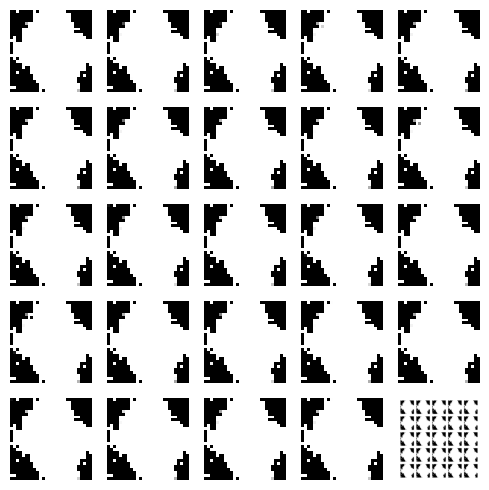

  0%|          | 0/350 [00:00<?, ?it/s]

4/4 [==============================] - 0s 16ms/step


  0%|          | 1/350 [00:00<03:06,  1.87it/s]

4/4 [==============================] - 0s 12ms/step


  1%|          | 2/350 [00:01<03:02,  1.91it/s]

4/4 [==============================] - 0s 13ms/step


  1%|          | 3/350 [00:01<03:07,  1.85it/s]

4/4 [==============================] - 0s 13ms/step


  1%|          | 4/350 [00:02<04:30,  1.28it/s]

4/4 [==============================] - 0s 16ms/step


  1%|▏         | 5/350 [00:03<04:09,  1.38it/s]

4/4 [==============================] - 0s 17ms/step


  2%|▏         | 6/350 [00:03<03:56,  1.46it/s]

4/4 [==============================] - 0s 14ms/step


  2%|▏         | 7/350 [00:04<03:57,  1.45it/s]

4/4 [==============================] - 0s 11ms/step


  2%|▏         | 8/350 [00:05<03:40,  1.55it/s]

4/4 [==============================] - 0s 11ms/step


  3%|▎         | 9/350 [00:05<03:21,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


  3%|▎         | 10/350 [00:06<03:11,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


  3%|▎         | 11/350 [00:06<03:02,  1.86it/s]

4/4 [==============================] - 0s 12ms/step


  3%|▎         | 12/350 [00:07<03:15,  1.73it/s]

4/4 [==============================] - 0s 14ms/step


  4%|▎         | 13/350 [00:08<03:32,  1.58it/s]

4/4 [==============================] - 0s 12ms/step


  4%|▍         | 14/350 [00:08<03:19,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


  4%|▍         | 15/350 [00:09<03:05,  1.80it/s]

4/4 [==============================] - 0s 12ms/step


  5%|▍         | 16/350 [00:09<02:58,  1.87it/s]

4/4 [==============================] - 0s 12ms/step


  5%|▍         | 17/350 [00:10<03:04,  1.81it/s]

4/4 [==============================] - 0s 14ms/step


  5%|▌         | 18/350 [00:10<03:21,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


  5%|▌         | 19/350 [00:11<03:24,  1.62it/s]

4/4 [==============================] - 0s 13ms/step


  6%|▌         | 20/350 [00:12<03:18,  1.66it/s]

4/4 [==============================] - 0s 13ms/step


  6%|▌         | 21/350 [00:12<03:25,  1.60it/s]

4/4 [==============================] - 0s 14ms/step


  6%|▋         | 22/350 [00:13<03:37,  1.51it/s]

4/4 [==============================] - 0s 13ms/step


  7%|▋         | 23/350 [00:14<03:20,  1.63it/s]

4/4 [==============================] - 0s 11ms/step


  7%|▋         | 24/350 [00:14<03:06,  1.75it/s]

4/4 [==============================] - 0s 12ms/step


  7%|▋         | 25/350 [00:15<03:00,  1.80it/s]

4/4 [==============================] - 0s 12ms/step


  7%|▋         | 26/350 [00:15<03:16,  1.64it/s]

4/4 [==============================] - 0s 19ms/step


  8%|▊         | 27/350 [00:16<03:13,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


  8%|▊         | 28/350 [00:16<03:01,  1.78it/s]

4/4 [==============================] - 0s 10ms/step


  8%|▊         | 29/350 [00:17<02:51,  1.88it/s]

4/4 [==============================] - 0s 12ms/step


  9%|▊         | 30/350 [00:17<02:46,  1.92it/s]

4/4 [==============================] - 0s 11ms/step


  9%|▉         | 31/350 [00:18<02:56,  1.80it/s]

4/4 [==============================] - 0s 12ms/step


  9%|▉         | 32/350 [00:19<03:01,  1.75it/s]

4/4 [==============================] - 0s 14ms/step


  9%|▉         | 33/350 [00:19<03:05,  1.71it/s]

4/4 [==============================] - 0s 13ms/step


 10%|▉         | 34/350 [00:20<03:01,  1.74it/s]

4/4 [==============================] - 0s 11ms/step


 10%|█         | 35/350 [00:20<02:59,  1.76it/s]

4/4 [==============================] - 0s 19ms/step


 10%|█         | 36/350 [00:21<03:12,  1.63it/s]

4/4 [==============================] - 0s 15ms/step


 11%|█         | 37/350 [00:22<03:19,  1.57it/s]

4/4 [==============================] - 0s 13ms/step


 11%|█         | 38/350 [00:22<03:15,  1.59it/s]

4/4 [==============================] - 0s 21ms/step


 11%|█         | 39/350 [00:23<03:35,  1.44it/s]

4/4 [==============================] - 0s 13ms/step


 11%|█▏        | 40/350 [00:24<03:21,  1.54it/s]

4/4 [==============================] - 0s 12ms/step


 12%|█▏        | 41/350 [00:24<03:04,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 12%|█▏        | 42/350 [00:25<02:52,  1.78it/s]

4/4 [==============================] - 0s 11ms/step


 12%|█▏        | 43/350 [00:25<02:44,  1.86it/s]

4/4 [==============================] - 0s 12ms/step


 13%|█▎        | 44/350 [00:26<02:42,  1.89it/s]

4/4 [==============================] - 0s 11ms/step


 13%|█▎        | 45/350 [00:26<02:51,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 13%|█▎        | 46/350 [00:27<03:00,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


 13%|█▎        | 47/350 [00:28<03:03,  1.65it/s]

4/4 [==============================] - 0s 11ms/step


 14%|█▎        | 48/350 [00:28<02:57,  1.70it/s]

4/4 [==============================] - 0s 15ms/step


 14%|█▍        | 49/350 [00:29<03:00,  1.67it/s]

4/4 [==============================] - 0s 29ms/step


 14%|█▍        | 50/350 [00:29<03:07,  1.60it/s]

4/4 [==============================] - 0s 16ms/step


 15%|█▍        | 51/350 [00:30<03:06,  1.61it/s]

4/4 [==============================] - 0s 15ms/step


 15%|█▍        | 52/350 [00:31<02:57,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


 15%|█▌        | 53/350 [00:31<03:09,  1.56it/s]

4/4 [==============================] - 0s 18ms/step


 15%|█▌        | 54/350 [00:32<03:06,  1.59it/s]

4/4 [==============================] - 0s 11ms/step


 16%|█▌        | 55/350 [00:32<02:53,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 16%|█▌        | 56/350 [00:33<02:42,  1.81it/s]

4/4 [==============================] - 0s 11ms/step


 16%|█▋        | 57/350 [00:33<02:36,  1.88it/s]

4/4 [==============================] - 0s 12ms/step


 17%|█▋        | 58/350 [00:34<02:30,  1.94it/s]

4/4 [==============================] - 0s 11ms/step


 17%|█▋        | 59/350 [00:34<02:30,  1.93it/s]

4/4 [==============================] - 0s 14ms/step


 17%|█▋        | 60/350 [00:35<02:43,  1.77it/s]

4/4 [==============================] - 0s 14ms/step


 17%|█▋        | 61/350 [00:36<02:43,  1.77it/s]

4/4 [==============================] - 0s 11ms/step


 18%|█▊        | 62/350 [00:36<02:36,  1.84it/s]

4/4 [==============================] - 0s 12ms/step


 18%|█▊        | 63/350 [00:37<02:35,  1.85it/s]

4/4 [==============================] - 0s 14ms/step


 18%|█▊        | 64/350 [00:37<02:44,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 19%|█▊        | 65/350 [00:38<02:47,  1.70it/s]

4/4 [==============================] - 0s 13ms/step


 19%|█▉        | 66/350 [00:38<02:41,  1.76it/s]

4/4 [==============================] - 0s 12ms/step


 19%|█▉        | 67/350 [00:39<02:48,  1.68it/s]

4/4 [==============================] - 0s 30ms/step


 19%|█▉        | 68/350 [00:40<02:52,  1.64it/s]

4/4 [==============================] - 0s 17ms/step


 20%|█▉        | 69/350 [00:40<02:42,  1.73it/s]

4/4 [==============================] - 0s 11ms/step


 20%|██        | 70/350 [00:41<02:32,  1.83it/s]

4/4 [==============================] - 0s 11ms/step


 20%|██        | 71/350 [00:41<02:26,  1.91it/s]

4/4 [==============================] - 0s 11ms/step


 21%|██        | 72/350 [00:42<02:22,  1.95it/s]

4/4 [==============================] - 0s 11ms/step


 21%|██        | 73/350 [00:42<02:18,  2.00it/s]

4/4 [==============================] - 0s 16ms/step


 21%|██        | 74/350 [00:43<02:34,  1.79it/s]

4/4 [==============================] - 0s 20ms/step


 21%|██▏       | 75/350 [00:43<02:42,  1.69it/s]

4/4 [==============================] - 0s 14ms/step


 22%|██▏       | 76/350 [00:44<02:38,  1.73it/s]

4/4 [==============================] - 0s 12ms/step


 22%|██▏       | 77/350 [00:45<02:38,  1.73it/s]

4/4 [==============================] - 0s 12ms/step


 22%|██▏       | 78/350 [00:45<02:46,  1.63it/s]

4/4 [==============================] - 0s 13ms/step


 23%|██▎       | 79/350 [00:46<02:48,  1.61it/s]

4/4 [==============================] - 0s 15ms/step


 23%|██▎       | 80/350 [00:46<02:39,  1.69it/s]

4/4 [==============================] - 0s 10ms/step


 23%|██▎       | 81/350 [00:47<02:31,  1.78it/s]

4/4 [==============================] - 0s 14ms/step


 23%|██▎       | 82/350 [00:48<02:39,  1.68it/s]

4/4 [==============================] - 0s 30ms/step


 24%|██▎       | 83/350 [00:48<02:47,  1.60it/s]

4/4 [==============================] - 0s 11ms/step


 24%|██▍       | 84/350 [00:49<02:35,  1.71it/s]

4/4 [==============================] - 0s 11ms/step


 24%|██▍       | 85/350 [00:49<02:25,  1.83it/s]

4/4 [==============================] - 0s 10ms/step


 25%|██▍       | 86/350 [00:50<02:18,  1.90it/s]

4/4 [==============================] - 0s 13ms/step


 25%|██▍       | 87/350 [00:50<02:14,  1.95it/s]

4/4 [==============================] - 0s 12ms/step


 25%|██▌       | 88/350 [00:51<02:20,  1.86it/s]

4/4 [==============================] - 0s 14ms/step


 25%|██▌       | 89/350 [00:52<02:36,  1.66it/s]

4/4 [==============================] - 0s 14ms/step


 26%|██▌       | 90/350 [00:52<02:32,  1.71it/s]

4/4 [==============================] - 0s 11ms/step


 26%|██▌       | 91/350 [00:53<02:24,  1.80it/s]

4/4 [==============================] - 0s 11ms/step


 26%|██▋       | 92/350 [00:53<02:21,  1.82it/s]

4/4 [==============================] - 0s 13ms/step


 27%|██▋       | 93/350 [00:54<02:22,  1.80it/s]

4/4 [==============================] - 0s 35ms/step


 27%|██▋       | 94/350 [00:54<02:30,  1.70it/s]

4/4 [==============================] - 0s 17ms/step


 27%|██▋       | 95/350 [00:55<02:34,  1.65it/s]

4/4 [==============================] - 0s 15ms/step


 27%|██▋       | 96/350 [00:56<02:29,  1.70it/s]

4/4 [==============================] - 0s 12ms/step


 28%|██▊       | 97/350 [00:56<02:37,  1.61it/s]

4/4 [==============================] - 0s 13ms/step


 28%|██▊       | 98/350 [00:57<02:44,  1.54it/s]

4/4 [==============================] - 0s 12ms/step


 28%|██▊       | 99/350 [00:57<02:31,  1.66it/s]

4/4 [==============================] - 0s 11ms/step


 29%|██▊       | 100/350 [00:58<02:22,  1.75it/s]

4/4 [==============================] - 0s 12ms/step


 29%|██▉       | 101/350 [00:58<02:16,  1.82it/s]

4/4 [==============================] - 0s 12ms/step


 29%|██▉       | 102/350 [00:59<02:11,  1.89it/s]

4/4 [==============================] - 0s 11ms/step


 29%|██▉       | 103/350 [01:00<02:16,  1.81it/s]

4/4 [==============================] - 0s 20ms/step


 30%|██▉       | 104/350 [01:00<02:23,  1.72it/s]

4/4 [==============================] - 0s 14ms/step


 30%|███       | 105/350 [01:01<02:20,  1.75it/s]

4/4 [==============================] - 0s 12ms/step


 30%|███       | 106/350 [01:01<02:12,  1.85it/s]

4/4 [==============================] - 0s 12ms/step


 31%|███       | 107/350 [01:02<02:13,  1.81it/s]

4/4 [==============================] - 0s 13ms/step


 31%|███       | 108/350 [01:03<02:28,  1.63it/s]

4/4 [==============================] - 0s 20ms/step


 31%|███       | 109/350 [01:03<02:31,  1.59it/s]

4/4 [==============================] - 0s 13ms/step


 31%|███▏      | 110/350 [01:04<02:23,  1.67it/s]

4/4 [==============================] - 0s 10ms/step


 32%|███▏      | 111/350 [01:04<02:21,  1.69it/s]

4/4 [==============================] - 0s 16ms/step


 32%|███▏      | 112/350 [01:05<02:36,  1.52it/s]

4/4 [==============================] - 0s 13ms/step


 32%|███▏      | 113/350 [01:06<02:28,  1.59it/s]

4/4 [==============================] - 0s 14ms/step


 33%|███▎      | 114/350 [01:06<02:19,  1.69it/s]

4/4 [==============================] - 0s 12ms/step


 33%|███▎      | 115/350 [01:07<02:12,  1.78it/s]

4/4 [==============================] - 0s 13ms/step


 33%|███▎      | 116/350 [01:07<02:07,  1.83it/s]

4/4 [==============================] - 0s 12ms/step


 33%|███▎      | 117/350 [01:08<02:05,  1.86it/s]

4/4 [==============================] - 0s 15ms/step


 34%|███▎      | 118/350 [01:08<02:11,  1.76it/s]

4/4 [==============================] - 0s 13ms/step


 34%|███▍      | 119/350 [01:09<02:15,  1.71it/s]

4/4 [==============================] - 0s 11ms/step


 34%|███▍      | 120/350 [01:10<02:09,  1.78it/s]

4/4 [==============================] - 0s 11ms/step


 35%|███▍      | 121/350 [01:10<02:04,  1.84it/s]

4/4 [==============================] - 0s 22ms/step


 35%|███▍      | 122/350 [01:11<02:08,  1.77it/s]

4/4 [==============================] - 0s 19ms/step


 35%|███▌      | 123/350 [01:11<02:12,  1.71it/s]

4/4 [==============================] - 0s 16ms/step


 35%|███▌      | 124/350 [01:12<02:14,  1.68it/s]

4/4 [==============================] - 0s 13ms/step


 36%|███▌      | 125/350 [01:12<02:06,  1.77it/s]

4/4 [==============================] - 0s 15ms/step


 36%|███▌      | 126/350 [01:13<02:16,  1.64it/s]

4/4 [==============================] - 0s 14ms/step


 36%|███▋      | 127/350 [01:14<02:18,  1.62it/s]

4/4 [==============================] - 0s 15ms/step


 37%|███▋      | 128/350 [01:14<02:11,  1.68it/s]

4/4 [==============================] - 0s 16ms/step


 37%|███▋      | 129/350 [01:15<02:09,  1.71it/s]

4/4 [==============================] - 0s 14ms/step


 37%|███▋      | 130/350 [01:15<02:06,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 37%|███▋      | 131/350 [01:16<02:05,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 38%|███▊      | 132/350 [01:17<03:06,  1.17it/s]

4/4 [==============================] - 0s 26ms/step


 38%|███▊      | 133/350 [01:18<02:56,  1.23it/s]

4/4 [==============================] - 0s 13ms/step


 38%|███▊      | 134/350 [01:19<02:37,  1.37it/s]

4/4 [==============================] - 0s 14ms/step


 39%|███▊      | 135/350 [01:19<02:25,  1.48it/s]

4/4 [==============================] - 0s 13ms/step


 39%|███▉      | 136/350 [01:20<02:25,  1.47it/s]

4/4 [==============================] - 0s 14ms/step


 39%|███▉      | 137/350 [01:21<02:19,  1.52it/s]

4/4 [==============================] - 0s 11ms/step


 39%|███▉      | 138/350 [01:21<02:10,  1.62it/s]

4/4 [==============================] - 0s 11ms/step


 40%|███▉      | 139/350 [01:22<02:01,  1.74it/s]

4/4 [==============================] - 0s 12ms/step


 40%|████      | 140/350 [01:22<02:00,  1.74it/s]

4/4 [==============================] - 0s 13ms/step


 40%|████      | 141/350 [01:23<02:04,  1.68it/s]

4/4 [==============================] - 0s 14ms/step


 41%|████      | 142/350 [01:23<02:12,  1.57it/s]

4/4 [==============================] - 0s 12ms/step


 41%|████      | 143/350 [01:24<02:04,  1.67it/s]

4/4 [==============================] - 0s 10ms/step


 41%|████      | 144/350 [01:24<01:55,  1.78it/s]

4/4 [==============================] - 0s 11ms/step


 41%|████▏     | 145/350 [01:25<01:50,  1.85it/s]

4/4 [==============================] - 0s 30ms/step


 42%|████▏     | 146/350 [01:26<02:00,  1.69it/s]

4/4 [==============================] - 0s 16ms/step


 42%|████▏     | 147/350 [01:26<02:00,  1.68it/s]

4/4 [==============================] - 0s 18ms/step


 42%|████▏     | 148/350 [01:27<02:01,  1.66it/s]

4/4 [==============================] - 0s 16ms/step


 43%|████▎     | 149/350 [01:28<02:09,  1.55it/s]

4/4 [==============================] - 0s 15ms/step


 43%|████▎     | 150/350 [01:28<02:15,  1.48it/s]

4/4 [==============================] - 0s 13ms/step


 43%|████▎     | 151/350 [01:29<02:13,  1.49it/s]

4/4 [==============================] - 0s 12ms/step


 43%|████▎     | 152/350 [01:30<02:06,  1.57it/s]

4/4 [==============================] - 0s 13ms/step


 44%|████▎     | 153/350 [01:30<02:01,  1.62it/s]

4/4 [==============================] - 0s 12ms/step


 44%|████▍     | 154/350 [01:31<01:53,  1.73it/s]

4/4 [==============================] - 0s 24ms/step


 44%|████▍     | 155/350 [01:31<01:58,  1.65it/s]

4/4 [==============================] - 0s 13ms/step


 45%|████▍     | 156/350 [01:32<01:57,  1.65it/s]

4/4 [==============================] - 0s 21ms/step


 45%|████▍     | 157/350 [01:33<01:55,  1.68it/s]

4/4 [==============================] - 0s 11ms/step


 45%|████▌     | 158/350 [01:33<01:47,  1.78it/s]

4/4 [==============================] - 0s 11ms/step


 45%|████▌     | 159/350 [01:34<01:48,  1.77it/s]

4/4 [==============================] - 0s 16ms/step


 46%|████▌     | 160/350 [01:34<01:50,  1.71it/s]

4/4 [==============================] - 0s 12ms/step


 46%|████▌     | 161/350 [01:35<01:53,  1.66it/s]

4/4 [==============================] - 0s 18ms/step


 46%|████▋     | 162/350 [01:36<01:57,  1.61it/s]

4/4 [==============================] - 0s 26ms/step


 47%|████▋     | 163/350 [01:36<02:04,  1.50it/s]

4/4 [==============================] - 0s 13ms/step


 47%|████▋     | 164/350 [01:37<02:00,  1.55it/s]

4/4 [==============================] - 0s 15ms/step


 47%|████▋     | 165/350 [01:38<02:04,  1.49it/s]

4/4 [==============================] - 0s 21ms/step


 47%|████▋     | 166/350 [01:38<02:03,  1.49it/s]

4/4 [==============================] - 0s 15ms/step


 48%|████▊     | 167/350 [01:39<01:53,  1.62it/s]

4/4 [==============================] - 0s 17ms/step


 48%|████▊     | 168/350 [01:39<01:46,  1.70it/s]

4/4 [==============================] - 0s 11ms/step


 48%|████▊     | 169/350 [01:40<01:43,  1.75it/s]

4/4 [==============================] - 0s 13ms/step


 49%|████▊     | 170/350 [01:40<01:44,  1.72it/s]

4/4 [==============================] - 0s 13ms/step


 49%|████▉     | 171/350 [01:41<01:47,  1.67it/s]

4/4 [==============================] - 0s 13ms/step


 49%|████▉     | 172/350 [01:42<01:53,  1.57it/s]

4/4 [==============================] - 0s 16ms/step


 49%|████▉     | 173/350 [01:42<01:54,  1.55it/s]

4/4 [==============================] - 0s 25ms/step


 50%|████▉     | 174/350 [01:43<01:53,  1.55it/s]

4/4 [==============================] - 0s 12ms/step


 50%|█████     | 175/350 [01:44<01:56,  1.51it/s]

4/4 [==============================] - 0s 14ms/step


 50%|█████     | 176/350 [01:44<01:51,  1.56it/s]

4/4 [==============================] - 0s 15ms/step


 51%|█████     | 177/350 [01:45<01:43,  1.67it/s]

4/4 [==============================] - 0s 11ms/step


 51%|█████     | 178/350 [01:46<01:44,  1.64it/s]

4/4 [==============================] - 0s 12ms/step


 51%|█████     | 179/350 [01:46<01:48,  1.57it/s]

4/4 [==============================] - 0s 22ms/step


 51%|█████▏    | 180/350 [01:47<01:55,  1.48it/s]

4/4 [==============================] - 0s 13ms/step


 52%|█████▏    | 181/350 [01:48<01:51,  1.51it/s]

4/4 [==============================] - 0s 31ms/step


 52%|█████▏    | 182/350 [01:48<01:54,  1.47it/s]

4/4 [==============================] - 0s 13ms/step


 52%|█████▏    | 183/350 [01:49<01:47,  1.55it/s]

4/4 [==============================] - 0s 11ms/step


 53%|█████▎    | 184/350 [01:49<01:38,  1.69it/s]

4/4 [==============================] - 0s 28ms/step


 53%|█████▎    | 185/350 [01:50<01:43,  1.60it/s]

4/4 [==============================] - 0s 21ms/step


 53%|█████▎    | 186/350 [01:51<01:46,  1.54it/s]

4/4 [==============================] - 0s 11ms/step


 53%|█████▎    | 187/350 [01:51<01:44,  1.56it/s]

4/4 [==============================] - 0s 14ms/step


 54%|█████▎    | 188/350 [01:52<01:45,  1.53it/s]

4/4 [==============================] - 0s 20ms/step


 54%|█████▍    | 189/350 [01:53<01:48,  1.48it/s]

4/4 [==============================] - 0s 17ms/step


 54%|█████▍    | 190/350 [01:54<01:50,  1.45it/s]

4/4 [==============================] - 0s 14ms/step


 55%|█████▍    | 191/350 [01:54<01:51,  1.42it/s]

4/4 [==============================] - 0s 17ms/step


 55%|█████▍    | 192/350 [01:55<01:51,  1.42it/s]

4/4 [==============================] - 0s 14ms/step


 55%|█████▌    | 193/350 [01:56<01:54,  1.38it/s]

4/4 [==============================] - 0s 13ms/step


 55%|█████▌    | 194/350 [01:56<01:50,  1.42it/s]

4/4 [==============================] - 0s 14ms/step


 56%|█████▌    | 195/350 [01:57<01:50,  1.41it/s]

4/4 [==============================] - 0s 14ms/step


 56%|█████▌    | 196/350 [01:58<01:44,  1.47it/s]

4/4 [==============================] - 0s 15ms/step


 56%|█████▋    | 197/350 [01:58<01:45,  1.46it/s]

4/4 [==============================] - 0s 20ms/step


 57%|█████▋    | 198/350 [01:59<01:45,  1.45it/s]

4/4 [==============================] - 0s 16ms/step


 57%|█████▋    | 199/350 [02:00<01:46,  1.42it/s]

4/4 [==============================] - 0s 14ms/step


 57%|█████▋    | 200/350 [02:01<01:46,  1.40it/s]

4/4 [==============================] - 0s 18ms/step


 57%|█████▋    | 201/350 [02:01<01:46,  1.39it/s]

4/4 [==============================] - 0s 14ms/step


 58%|█████▊    | 202/350 [02:02<01:45,  1.40it/s]

4/4 [==============================] - 0s 27ms/step


 58%|█████▊    | 203/350 [02:03<01:49,  1.34it/s]

4/4 [==============================] - 0s 17ms/step


 58%|█████▊    | 204/350 [02:04<01:44,  1.40it/s]

4/4 [==============================] - 0s 17ms/step


 59%|█████▊    | 205/350 [02:04<01:43,  1.41it/s]

4/4 [==============================] - 0s 16ms/step


 59%|█████▉    | 206/350 [02:05<01:43,  1.39it/s]

4/4 [==============================] - 0s 13ms/step


 59%|█████▉    | 207/350 [02:06<01:42,  1.40it/s]

4/4 [==============================] - 0s 16ms/step


 59%|█████▉    | 208/350 [02:06<01:39,  1.43it/s]

4/4 [==============================] - 0s 21ms/step


 60%|█████▉    | 209/350 [02:07<01:37,  1.45it/s]

4/4 [==============================] - 0s 23ms/step


 60%|██████    | 210/350 [02:08<01:38,  1.42it/s]

4/4 [==============================] - 0s 13ms/step


 60%|██████    | 211/350 [02:08<01:37,  1.42it/s]

4/4 [==============================] - 0s 15ms/step


 61%|██████    | 212/350 [02:09<01:34,  1.46it/s]

4/4 [==============================] - 0s 15ms/step


 61%|██████    | 213/350 [02:10<01:32,  1.48it/s]

4/4 [==============================] - 0s 15ms/step


 61%|██████    | 214/350 [02:10<01:32,  1.47it/s]

4/4 [==============================] - 0s 17ms/step


 61%|██████▏   | 215/350 [02:11<01:33,  1.44it/s]

4/4 [==============================] - 0s 13ms/step


 62%|██████▏   | 216/350 [02:12<01:32,  1.46it/s]

4/4 [==============================] - 0s 17ms/step


 62%|██████▏   | 217/350 [02:13<01:36,  1.38it/s]

4/4 [==============================] - 0s 17ms/step


 62%|██████▏   | 218/350 [02:13<01:34,  1.39it/s]

4/4 [==============================] - 0s 18ms/step


 63%|██████▎   | 219/350 [02:14<01:33,  1.40it/s]

4/4 [==============================] - 0s 13ms/step


 63%|██████▎   | 220/350 [02:15<01:31,  1.43it/s]

4/4 [==============================] - 0s 16ms/step


 63%|██████▎   | 221/350 [02:16<01:34,  1.36it/s]

4/4 [==============================] - 0s 22ms/step


 63%|██████▎   | 222/350 [02:16<01:35,  1.34it/s]

4/4 [==============================] - 0s 13ms/step


 64%|██████▎   | 223/350 [02:17<01:31,  1.39it/s]

4/4 [==============================] - 0s 14ms/step


 64%|██████▍   | 224/350 [02:18<01:30,  1.40it/s]

4/4 [==============================] - 0s 16ms/step


 64%|██████▍   | 225/350 [02:18<01:28,  1.42it/s]

4/4 [==============================] - 0s 14ms/step


 65%|██████▍   | 226/350 [02:19<01:26,  1.43it/s]

4/4 [==============================] - 0s 14ms/step


 65%|██████▍   | 227/350 [02:20<01:26,  1.42it/s]

4/4 [==============================] - 0s 14ms/step


 65%|██████▌   | 228/350 [02:21<01:26,  1.41it/s]

4/4 [==============================] - 0s 23ms/step


 65%|██████▌   | 229/350 [02:21<01:26,  1.40it/s]

4/4 [==============================] - 0s 17ms/step


 66%|██████▌   | 230/350 [02:22<01:24,  1.42it/s]

4/4 [==============================] - 0s 14ms/step


 66%|██████▌   | 231/350 [02:23<01:25,  1.39it/s]

4/4 [==============================] - 0s 19ms/step


 66%|██████▋   | 232/350 [02:23<01:25,  1.39it/s]

4/4 [==============================] - 0s 12ms/step


 67%|██████▋   | 233/350 [02:24<01:22,  1.42it/s]

4/4 [==============================] - 0s 13ms/step


 67%|██████▋   | 234/350 [02:25<01:21,  1.43it/s]

4/4 [==============================] - 0s 27ms/step


 67%|██████▋   | 235/350 [02:25<01:21,  1.41it/s]

4/4 [==============================] - 0s 19ms/step


 67%|██████▋   | 236/350 [02:26<01:21,  1.40it/s]

4/4 [==============================] - 0s 16ms/step


 68%|██████▊   | 237/350 [02:27<01:20,  1.41it/s]

4/4 [==============================] - 0s 14ms/step


 68%|██████▊   | 238/350 [02:28<01:20,  1.39it/s]

4/4 [==============================] - 0s 15ms/step


 68%|██████▊   | 239/350 [02:28<01:18,  1.42it/s]

4/4 [==============================] - 0s 16ms/step


 69%|██████▊   | 240/350 [02:29<01:16,  1.43it/s]

4/4 [==============================] - 0s 14ms/step


 69%|██████▉   | 241/350 [02:30<01:15,  1.44it/s]

4/4 [==============================] - 0s 12ms/step


 69%|██████▉   | 242/350 [02:30<01:15,  1.43it/s]

4/4 [==============================] - 0s 12ms/step


 69%|██████▉   | 243/350 [02:31<01:14,  1.44it/s]

4/4 [==============================] - 0s 29ms/step


 70%|██████▉   | 244/350 [02:32<01:14,  1.43it/s]

4/4 [==============================] - 0s 20ms/step


 70%|███████   | 245/350 [02:33<01:20,  1.30it/s]

4/4 [==============================] - 0s 19ms/step


 70%|███████   | 246/350 [02:34<01:21,  1.28it/s]

4/4 [==============================] - 0s 15ms/step


 71%|███████   | 247/350 [02:34<01:17,  1.33it/s]

4/4 [==============================] - 0s 23ms/step


 71%|███████   | 248/350 [02:35<01:15,  1.36it/s]

4/4 [==============================] - 0s 21ms/step


 71%|███████   | 249/350 [02:36<01:14,  1.35it/s]

4/4 [==============================] - 0s 15ms/step


 71%|███████▏  | 250/350 [02:36<01:13,  1.36it/s]

4/4 [==============================] - 0s 14ms/step


 72%|███████▏  | 251/350 [02:37<01:12,  1.37it/s]

4/4 [==============================] - 0s 15ms/step


 72%|███████▏  | 252/350 [02:38<01:10,  1.39it/s]

4/4 [==============================] - 0s 10ms/step


 72%|███████▏  | 253/350 [02:38<01:07,  1.43it/s]

4/4 [==============================] - 0s 13ms/step


 73%|███████▎  | 254/350 [02:39<01:08,  1.40it/s]

4/4 [==============================] - 0s 31ms/step


 73%|███████▎  | 255/350 [02:40<01:10,  1.35it/s]

4/4 [==============================] - 0s 16ms/step


 73%|███████▎  | 256/350 [02:41<01:06,  1.41it/s]

4/4 [==============================] - 0s 18ms/step


 73%|███████▎  | 257/350 [02:41<01:06,  1.39it/s]

4/4 [==============================] - 0s 14ms/step


 74%|███████▎  | 258/350 [02:42<01:05,  1.41it/s]

4/4 [==============================] - 0s 13ms/step


 74%|███████▍  | 259/350 [02:43<01:05,  1.39it/s]

4/4 [==============================] - 0s 26ms/step


 74%|███████▍  | 260/350 [02:43<01:03,  1.42it/s]

4/4 [==============================] - 0s 26ms/step


 75%|███████▍  | 261/350 [02:44<01:04,  1.39it/s]

4/4 [==============================] - 0s 15ms/step


 75%|███████▍  | 262/350 [02:45<01:04,  1.36it/s]

4/4 [==============================] - 0s 11ms/step


 75%|███████▌  | 263/350 [02:46<01:01,  1.40it/s]

4/4 [==============================] - 0s 14ms/step


 75%|███████▌  | 264/350 [02:46<01:00,  1.43it/s]

4/4 [==============================] - 0s 15ms/step


 76%|███████▌  | 265/350 [02:47<00:58,  1.45it/s]

4/4 [==============================] - 0s 15ms/step


 76%|███████▌  | 266/350 [02:48<00:57,  1.45it/s]

4/4 [==============================] - 0s 14ms/step


 76%|███████▋  | 267/350 [02:48<00:57,  1.45it/s]

4/4 [==============================] - 0s 15ms/step


 77%|███████▋  | 268/350 [02:49<00:56,  1.46it/s]

4/4 [==============================] - 0s 20ms/step


 77%|███████▋  | 269/350 [02:50<00:56,  1.43it/s]

4/4 [==============================] - 0s 17ms/step


 77%|███████▋  | 270/350 [02:50<00:55,  1.43it/s]

4/4 [==============================] - 0s 14ms/step


 77%|███████▋  | 271/350 [02:51<00:55,  1.41it/s]

4/4 [==============================] - 0s 22ms/step


 78%|███████▊  | 272/350 [02:52<00:55,  1.41it/s]

4/4 [==============================] - 0s 15ms/step


 78%|███████▊  | 273/350 [02:53<00:54,  1.40it/s]

4/4 [==============================] - 0s 19ms/step


 78%|███████▊  | 274/350 [02:53<00:55,  1.37it/s]

4/4 [==============================] - 0s 13ms/step


 79%|███████▊  | 275/350 [02:54<00:53,  1.40it/s]

4/4 [==============================] - 0s 23ms/step


 79%|███████▉  | 276/350 [02:55<00:53,  1.39it/s]

4/4 [==============================] - 0s 18ms/step


 79%|███████▉  | 277/350 [02:56<00:52,  1.39it/s]

4/4 [==============================] - 0s 13ms/step


 79%|███████▉  | 278/350 [02:56<00:51,  1.39it/s]

4/4 [==============================] - 0s 14ms/step


 80%|███████▉  | 279/350 [02:57<00:51,  1.39it/s]

4/4 [==============================] - 0s 16ms/step


 80%|████████  | 280/350 [02:58<00:49,  1.41it/s]

4/4 [==============================] - 0s 14ms/step


 80%|████████  | 281/350 [02:58<00:48,  1.42it/s]

4/4 [==============================] - 0s 16ms/step


 81%|████████  | 282/350 [02:59<00:47,  1.44it/s]

4/4 [==============================] - 0s 14ms/step


 81%|████████  | 283/350 [03:00<00:45,  1.47it/s]

4/4 [==============================] - 0s 15ms/step


 81%|████████  | 284/350 [03:00<00:45,  1.45it/s]

4/4 [==============================] - 0s 22ms/step


 81%|████████▏ | 285/350 [03:01<00:46,  1.40it/s]

4/4 [==============================] - 0s 16ms/step


 82%|████████▏ | 286/350 [03:02<00:45,  1.40it/s]

4/4 [==============================] - 0s 14ms/step


 82%|████████▏ | 287/350 [03:03<00:44,  1.41it/s]

4/4 [==============================] - 0s 17ms/step


 82%|████████▏ | 288/350 [03:03<00:44,  1.40it/s]

4/4 [==============================] - 0s 44ms/step


 83%|████████▎ | 289/350 [03:04<00:45,  1.33it/s]

4/4 [==============================] - 0s 12ms/step


 83%|████████▎ | 290/350 [03:05<00:44,  1.34it/s]

4/4 [==============================] - 0s 15ms/step


 83%|████████▎ | 291/350 [03:06<00:43,  1.37it/s]

4/4 [==============================] - 0s 14ms/step


 83%|████████▎ | 292/350 [03:06<00:41,  1.38it/s]

4/4 [==============================] - 0s 23ms/step


 84%|████████▎ | 293/350 [03:07<00:40,  1.41it/s]

4/4 [==============================] - 0s 23ms/step


 84%|████████▍ | 294/350 [03:08<00:42,  1.33it/s]

4/4 [==============================] - 0s 15ms/step


 84%|████████▍ | 295/350 [03:08<00:39,  1.38it/s]

4/4 [==============================] - 0s 19ms/step


 85%|████████▍ | 296/350 [03:09<00:38,  1.39it/s]

4/4 [==============================] - 0s 13ms/step


 85%|████████▍ | 297/350 [03:10<00:38,  1.38it/s]

4/4 [==============================] - 0s 23ms/step


 85%|████████▌ | 298/350 [03:11<00:38,  1.36it/s]

4/4 [==============================] - 0s 18ms/step


 85%|████████▌ | 299/350 [03:11<00:37,  1.38it/s]

4/4 [==============================] - 0s 17ms/step


 86%|████████▌ | 300/350 [03:12<00:36,  1.39it/s]

4/4 [==============================] - 0s 20ms/step


 86%|████████▌ | 301/350 [03:13<00:35,  1.39it/s]

4/4 [==============================] - 0s 12ms/step


 86%|████████▋ | 302/350 [03:13<00:34,  1.40it/s]

4/4 [==============================] - 0s 21ms/step


 87%|████████▋ | 303/350 [03:14<00:33,  1.42it/s]

4/4 [==============================] - 0s 45ms/step


 87%|████████▋ | 304/350 [03:15<00:33,  1.37it/s]

4/4 [==============================] - 0s 17ms/step


 87%|████████▋ | 305/350 [03:16<00:32,  1.38it/s]

4/4 [==============================] - 0s 14ms/step


 87%|████████▋ | 306/350 [03:16<00:32,  1.37it/s]

4/4 [==============================] - 0s 13ms/step


 88%|████████▊ | 307/350 [03:17<00:30,  1.40it/s]

4/4 [==============================] - 0s 17ms/step


 88%|████████▊ | 308/350 [03:18<00:30,  1.40it/s]

4/4 [==============================] - 0s 16ms/step


 88%|████████▊ | 309/350 [03:18<00:28,  1.43it/s]

4/4 [==============================] - 0s 13ms/step


 89%|████████▊ | 310/350 [03:19<00:27,  1.44it/s]

4/4 [==============================] - 0s 19ms/step


 89%|████████▉ | 311/350 [03:20<00:27,  1.42it/s]

4/4 [==============================] - 0s 24ms/step


 89%|████████▉ | 312/350 [03:21<00:27,  1.38it/s]

4/4 [==============================] - 0s 14ms/step


 89%|████████▉ | 313/350 [03:21<00:26,  1.40it/s]

4/4 [==============================] - 0s 19ms/step


 90%|████████▉ | 314/350 [03:22<00:25,  1.39it/s]

4/4 [==============================] - 0s 14ms/step


 90%|█████████ | 315/350 [03:23<00:24,  1.41it/s]

4/4 [==============================] - 0s 16ms/step


 90%|█████████ | 316/350 [03:23<00:24,  1.40it/s]

4/4 [==============================] - 0s 13ms/step


 91%|█████████ | 317/350 [03:24<00:23,  1.38it/s]

4/4 [==============================] - 0s 24ms/step


 91%|█████████ | 318/350 [03:25<00:24,  1.29it/s]

4/4 [==============================] - 0s 16ms/step


 91%|█████████ | 319/350 [03:26<00:22,  1.35it/s]

4/4 [==============================] - 0s 15ms/step


 91%|█████████▏| 320/350 [03:26<00:21,  1.37it/s]

4/4 [==============================] - 0s 20ms/step


 92%|█████████▏| 321/350 [03:27<00:21,  1.34it/s]

4/4 [==============================] - 0s 14ms/step


 92%|█████████▏| 322/350 [03:28<00:19,  1.41it/s]

4/4 [==============================] - 0s 22ms/step


 92%|█████████▏| 323/350 [03:29<00:19,  1.38it/s]

4/4 [==============================] - 0s 14ms/step


 93%|█████████▎| 324/350 [03:29<00:18,  1.38it/s]

4/4 [==============================] - 0s 21ms/step


 93%|█████████▎| 325/350 [03:30<00:18,  1.37it/s]

4/4 [==============================] - 0s 13ms/step


 93%|█████████▎| 326/350 [03:31<00:17,  1.41it/s]

4/4 [==============================] - 0s 19ms/step


 93%|█████████▎| 327/350 [03:31<00:16,  1.40it/s]

4/4 [==============================] - 0s 47ms/step


 94%|█████████▎| 328/350 [03:32<00:16,  1.33it/s]

4/4 [==============================] - 0s 17ms/step


 94%|█████████▍| 329/350 [03:33<00:15,  1.37it/s]

4/4 [==============================] - 0s 15ms/step


 94%|█████████▍| 330/350 [03:34<00:14,  1.40it/s]

4/4 [==============================] - 0s 22ms/step


 95%|█████████▍| 331/350 [03:34<00:14,  1.35it/s]

4/4 [==============================] - 0s 27ms/step


 95%|█████████▍| 332/350 [03:35<00:13,  1.34it/s]

4/4 [==============================] - 0s 22ms/step


 95%|█████████▌| 333/350 [03:36<00:13,  1.23it/s]

4/4 [==============================] - 0s 13ms/step


 95%|█████████▌| 334/350 [03:37<00:13,  1.22it/s]

4/4 [==============================] - 0s 22ms/step


 96%|█████████▌| 335/350 [03:38<00:11,  1.28it/s]

4/4 [==============================] - 0s 20ms/step


 96%|█████████▌| 336/350 [03:38<00:10,  1.34it/s]

4/4 [==============================] - 0s 23ms/step


 96%|█████████▋| 337/350 [03:39<00:09,  1.30it/s]

4/4 [==============================] - 0s 17ms/step


 97%|█████████▋| 338/350 [03:40<00:09,  1.33it/s]

4/4 [==============================] - 0s 12ms/step


 97%|█████████▋| 339/350 [03:41<00:08,  1.36it/s]

4/4 [==============================] - 0s 28ms/step


 97%|█████████▋| 340/350 [03:41<00:07,  1.36it/s]

4/4 [==============================] - 0s 14ms/step


 97%|█████████▋| 341/350 [03:42<00:06,  1.32it/s]

4/4 [==============================] - 0s 18ms/step


 98%|█████████▊| 342/350 [03:43<00:05,  1.35it/s]

4/4 [==============================] - 0s 14ms/step


 98%|█████████▊| 343/350 [03:44<00:05,  1.39it/s]

4/4 [==============================] - 0s 16ms/step


 98%|█████████▊| 344/350 [03:44<00:04,  1.38it/s]

4/4 [==============================] - 0s 17ms/step


 99%|█████████▊| 345/350 [03:45<00:03,  1.40it/s]

4/4 [==============================] - 0s 14ms/step


 99%|█████████▉| 346/350 [03:46<00:02,  1.40it/s]

4/4 [==============================] - 0s 21ms/step


 99%|█████████▉| 347/350 [03:47<00:02,  1.35it/s]

4/4 [==============================] - 0s 20ms/step


 99%|█████████▉| 348/350 [03:47<00:01,  1.36it/s]

4/4 [==============================] - 0s 15ms/step


100%|█████████▉| 349/350 [03:48<00:00,  1.37it/s]

4/4 [==============================] - 0s 10ms/step


100%|██████████| 350/350 [03:49<00:00,  1.53it/s]

Epoch number: 99 discriminator_loss: 0.165474670820487 generator_loss: 7.799322734560286
1/1 [==============================] - 0s 31ms/step


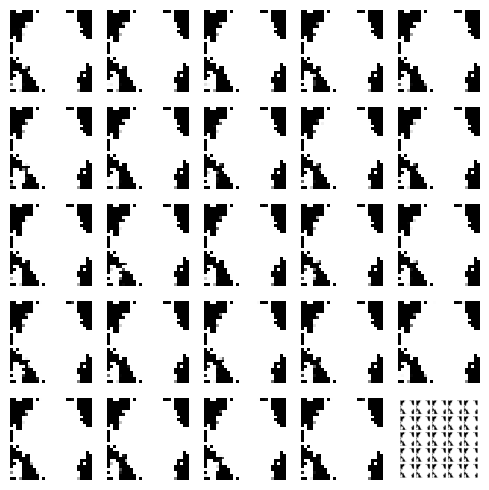

In [16]:
# To see some progress, we use tqdm as a progress bar
from tqdm import tqdm

# Since we do NOT use fit
# sadly, we have to do this ourselves manually
history = {"discriminator":[],"generator":[]}

# Main training loop
for epoch_num in range(EPOCHS):
    epoch_discriminator_loss = 0
    epoch_generator_loss = 0
    
    for batch in tqdm(range(BATCH_NUM)):
        # We select randomly a half batch amount of real images from MNIST
        # Use Numpy to choose, no replacement!
        real_images = train_data[np.random.choice(train_data.shape[0], HALF_BATCH, replace=False)]
        
        # We generate a half batch amount of fake images
        # By first generating a half batch worth of Gaussian noise with zero mean, unit variance
        # and appropriate noise dimensions
        input_noise = np.random.normal(0, 1, (HALF_BATCH, Z_DIM))
        # And then using the fixed generator, to output some images from it
        # Using the predict method of the generator!
        generated_images = generator.predict(input_noise)
        
        # STOP, and thik through, WHY predict?!
        # Then you can remove the ....
        
        # We generate our "labels"
        # Remember one sided label smoothing for the positive class!
        # Let's say with 0.9...
        # So please, generate a half batch sized, one dimensional matrix with ones, using numpy
        # and multiuply it by 0.9
        real_y = np.ones((HALF_BATCH, 1)) * 0.9
        # And generate a half batch worth of zeroes, again one dimensional matrix
        generated_y = np.zeros((HALF_BATCH, 1))

        
        ### We do the actual training!
        
        # First for the discriminator on the real data
        discriminator_loss_real = discriminator.train_on_batch(real_images, real_y)
        
        # Then on the fake data
        discriminator_loss_generated = discriminator.train_on_batch(generated_images, generated_y)
        
        # Then average the two losses
        discriminator_loss = (discriminator_loss_real + discriminator_loss_generated) / 2
        epoch_discriminator_loss += discriminator_loss
        
        ### We then update the generator
        # We use the discriminator that was trained a line above, and is frozen, as defined in the joint model
        
        # Please generate a new set of input noise, notice, it is a full batch!
        # Again, using numpy, normal distribution, zero mean, unit variance
        new_input_noise = np.random.normal(0, 1, (BATCH_SIZE, Z_DIM))
        
        # We try to convince the discriminator, that this is real data - which is not
        # So please generate a batch worth of one dimensional matrix filled with ones 
        convincing_y = np.ones((BATCH_SIZE, 1))
        # Notice, no label smoothing!

        # Remember, the joint model takes in noise, does the generation, the discrimination, then computes loss
        # But the discriminator is frozen, so only the generator will get updated
        # It is "successful" if the discriminator predicts "real" - hence the convincing_y
        generator_loss = joint_model.train_on_batch(new_input_noise, convincing_y)
        epoch_generator_loss += generator_loss
        
    # Loss printout in every epoch, averaged over the batches
    print("Epoch number:",epoch_num,"discriminator_loss:",epoch_discriminator_loss / BATCH_NUM, "generator_loss:", epoch_generator_loss / BATCH_NUM)
    
    # Save it for the future
    history["discriminator"].append(epoch_discriminator_loss / BATCH_NUM)
    history["generator"].append(epoch_generator_loss / BATCH_NUM)
    
    #Save model - optional
    #generator.save("generator.h5")
    
    #Save images
    get_example_images(epoch_num)
    
    # Show epoch example
    show_image_for_epoch(epoch_num)

## Visualization of training progress

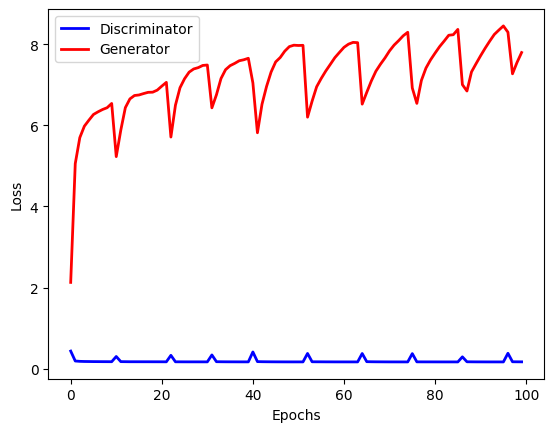

In [17]:
plt.plot(history["discriminator"], color='blue', linewidth=2, label="Discriminator")
plt.plot(history["generator"],  color='red', linewidth=2, label="Generator")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.legend();
